In [6]:
import cv2 as cv
import tensorflow as tf
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import accuracy_score 
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from tensorflow.keras.preprocessing import image
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import os, shutil, glob, os.path
from sklearn import metrics
from sklearn.metrics import confusion_matrix, r2_score,accuracy_score , classification_report,roc_curve, auc
from sklearn.cluster import Birch

In [7]:
from tqdm import tqdm
import skimage

In [8]:
train_dir = "C:/Users/sivay/Downloads/chest-xray-pneumonia/chest_xray/train/"
#test_dir =  "C:/Users/sivay/Downloads/chest-xray-pneumonia/chest_xray/test/"
def get_data(folder):
    X = []
    y = []
    for folderName in os.listdir(folder):
        if not folderName.startswith('.'):
            if folderName in ['NORMAL']:
                label = 0
            elif folderName in ['PNEUMONIA']:
                label = 1
            for image_filename in tqdm(os.listdir(folder + folderName)):
                img_file = cv.imread(folder + folderName + '/' + image_filename)
                print(img_file)
                if img_file is not None:
                    #reshaping image
                    img_file = skimage.transform.resize(img_file, (150, 150, 3))
                    print(img_file)
                    #noise removal
                    img_file = cv.GaussianBlur(img_file, (5, 5), 0)
                    img_arr = np.asarray(img_file)
                    X.append(img_arr)
                    y.append(label)
                    
    X = np.asarray(X)
    y = np.asarray(y)
    return X,y

In [9]:
X_train, y_train = get_data(train_dir)


  0%|          | 0/1583 [00:00<?, ?it/s]

[[[ 0  0  0]
  [32 32 32]
  [33 33 33]
  ...
  [33 33 33]
  [34 34 34]
  [ 0  0  0]]

 [[ 0  0  0]
  [33 33 33]
  [33 33 33]
  ...
  [34 34 34]
  [34 34 34]
  [ 0  0  0]]

 [[ 1  1  1]
  [33 33 33]
  [33 33 33]
  ...
  [34 34 34]
  [34 34 34]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [28 28 28]
  [28 28 28]
  ...
  [34 34 34]
  [35 35 35]
  [ 0  0  0]]

 [[ 0  0  0]
  [29 29 29]
  [28 28 28]
  ...
  [34 34 34]
  [35 35 35]
  [ 0  0  0]]

 [[ 0  0  0]
  [29 29 29]
  [29 29 29]
  ...
  [35 35 35]
  [34 34 34]
  [ 0  0  0]]]
[[[0.11764706 0.11764706 0.11764706]
  [0.12156863 0.12156863 0.12156863]
  [0.11807843 0.11807843 0.11807843]
  ...
  [0.11999804 0.11999804 0.11999804]
  [0.12156863 0.12156863 0.12156863]
  [0.11643137 0.11643137 0.11643137]]

 [[0.11764706 0.11764706 0.11764706]
  [0.12156863 0.12156863 0.12156863]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.12009059 0.12009059 0.12009059]
  [0.11683255 0.11683255 0.11683255]]

 [[0.11764706 0.11


  0%|          | 1/1583 [00:00<08:34,  3.08it/s]

[[[  0   0   0]
  [  1   1   1]
  [  1   1   1]
  ...
  [103 103 103]
  [  1   1   1]
  [  0   0   0]]

 [[  0   0   0]
  [  1   1   1]
  [  1   1   1]
  ...
  [104 104 104]
  [  2   2   2]
  [  0   0   0]]

 [[  0   0   0]
  [  1   1   1]
  [  1   1   1]
  ...
  [106 106 106]
  [  3   3   3]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  2   2   2]
  [  1   1   1]
  ...
  [ 36  36  36]
  [  0   0   0]
  [  1   1   1]]

 [[  0   0   0]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 36  36  36]
  [  0   0   0]
  [  1   1   1]]

 [[  0   0   0]
  [  1   1   1]
  [  0   0   0]
  ...
  [ 36  36  36]
  [  0   0   0]
  [  2   2   2]]]
[[[0.10113294 0.10113294 0.10113294]
  [0.12156863 0.12156863 0.12156863]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.4745098  0.4745098  0.4745098 ]
  [0.45210471 0.45210471 0.45210471]
  [0.37675817 0.37675817 0.37675817]]

 [[0.10406536 0.10406536 0.10406536]
  [0.12247098 0.12247098 0.12247098]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.47058824 0.4705882


  0%|          | 2/1583 [00:00<09:43,  2.71it/s]

[[[ 0  0  0]
  [40 40 40]
  [41 41 41]
  ...
  [27 27 27]
  [33 33 33]
  [ 0  0  0]]

 [[ 0  0  0]
  [40 40 40]
  [41 41 41]
  ...
  [30 30 30]
  [35 35 35]
  [ 0  0  0]]

 [[ 0  0  0]
  [40 40 40]
  [41 41 41]
  ...
  [30 30 30]
  [35 35 35]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [28 28 28]
  [28 28 28]
  ...
  [38 38 38]
  [32 32 32]
  [ 2  2  2]]

 [[ 0  0  0]
  [29 29 29]
  [29 29 29]
  ...
  [36 36 36]
  [32 32 32]
  [ 2  2  2]]

 [[ 2  2  2]
  [31 31 31]
  [31 31 31]
  ...
  [35 35 35]
  [31 31 31]
  [ 3  3  3]]]
[[[0.13831373 0.13831373 0.13831373]
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11520261 0.11520261 0.11520261]
  [0.11194105 0.11194105 0.11194105]]

 [[0.13831373 0.13831373 0.13831373]
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.10694118 0.10694118 0.10694118]]

 [[0.1372549  0.13


  0%|          | 3/1583 [00:01<11:37,  2.27it/s]

[[[  2   2   2]
  [ 64  64  64]
  [ 77  77  77]
  ...
  [206 206 206]
  [203 203 203]
  [  3   3   3]]

 [[  3   3   3]
  [ 65  65  65]
  [ 77  77  77]
  ...
  [204 204 204]
  [205 205 205]
  [  5   5   5]]

 [[  4   4   4]
  [ 65  65  65]
  [ 77  77  77]
  ...
  [196 196 196]
  [200 200 200]
  [  3   3   3]]

 ...

 [[  1   1   1]
  [ 16  16  16]
  [ 19  19  19]
  ...
  [132 132 132]
  [130 130 130]
  [  0   0   0]]

 [[  1   1   1]
  [ 16  16  16]
  [ 19  19  19]
  ...
  [132 132 132]
  [128 128 128]
  [  0   0   0]]

 [[  1   1   1]
  [ 16  16  16]
  [ 19  19  19]
  ...
  [132 132 132]
  [127 127 127]
  [  0   0   0]]]
[[[0.27075817 0.27075817 0.27075817]
  [0.29019608 0.29019608 0.29019608]
  [0.2938719  0.2938719  0.2938719 ]
  ...
  [0.50111111 0.50111111 0.50111111]
  [0.57199843 0.57199843 0.57199843]
  [0.65081046 0.65081046 0.65081046]]

 [[0.28644444 0.28644444 0.28644444]
  [0.30886275 0.30886275 0.30886275]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.50503268 0.5050326


  0%|          | 4/1583 [00:01<10:17,  2.56it/s]

[[[ 0  0  0]
  [42 42 42]
  [42 42 42]
  ...
  [44 44 44]
  [44 44 44]
  [ 1  1  1]]

 [[ 0  0  0]
  [42 42 42]
  [42 42 42]
  ...
  [44 44 44]
  [44 44 44]
  [ 0  0  0]]

 [[ 0  0  0]
  [42 42 42]
  [42 42 42]
  ...
  [43 43 43]
  [43 43 43]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [44 44 44]
  [46 46 46]
  ...
  [48 48 48]
  [48 48 48]
  [ 2  2  2]]

 [[ 1  1  1]
  [41 41 41]
  [40 40 40]
  ...
  [48 48 48]
  [48 48 48]
  [ 2  2  2]]

 [[ 1  1  1]
  [41 41 41]
  [40 40 40]
  ...
  [48 48 48]
  [48 48 48]
  [ 2  2  2]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.15294118 0.15294118 0.15294118]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.16078431 0.16078431 0.16078431]
  [0.16078431 0.16078431 0.16078431]
  [0.15686275 0.15686275 0.15686275]]

 [[0.14644444 0.14644444 0.14644444]
  [0.14901961 0.14901961 0.14901961]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.15797386 0.15797386 0.15797386]
  [0.16078431 0.16078431 0.16078431]
  [0.15294118 0.15294118 0.15294118]]

 [[0.14509804 0.14


  0%|          | 5/1583 [00:02<12:03,  2.18it/s]

[[[115 115 115]
  [129 129 129]
  [119 119 119]
  ...
  [228 228 228]
  [  0   0   0]
  [  2   2   2]]

 [[115 115 115]
  [128 128 128]
  [116 116 116]
  ...
  [227 227 227]
  [  0   0   0]
  [  2   2   2]]

 [[120 120 120]
  [130 130 130]
  [116 116 116]
  ...
  [227 227 227]
  [  0   0   0]
  [  3   3   3]]

 ...

 [[ 67  67  67]
  [ 54  54  54]
  [ 62  62  62]
  ...
  [209 209 209]
  [  3   3   3]
  [  0   0   0]]

 [[ 66  66  66]
  [ 53  53  53]
  [ 61  61  61]
  ...
  [209 209 209]
  [  3   3   3]
  [  0   0   0]]

 [[ 64  64  64]
  [ 51  51  51]
  [ 60  60  60]
  ...
  [209 209 209]
  [  3   3   3]
  [  0   0   0]]]
[[[0.4745098  0.4745098  0.4745098 ]
  [0.49411765 0.49411765 0.49411765]
  [0.50196078 0.50196078 0.50196078]
  ...
  [0.45986928 0.45986928 0.45986928]
  [0.58794588 0.58794588 0.58794588]
  [0.66228261 0.66228261 0.66228261]]

 [[0.47058824 0.47058824 0.47058824]
  [0.49019608 0.49019608 0.49019608]
  [0.50963007 0.50963007 0.50963007]
  ...
  [0.47163399 0.4716339


  0%|          | 6/1583 [00:02<11:17,  2.33it/s]

[[[ 2  2  2]
  [ 7  7  7]
  [10 10 10]
  ...
  [14 14 14]
  [15 15 15]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 7  7  7]
  [10 10 10]
  ...
  [14 14 14]
  [14 14 14]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 7  7  7]
  [10 10 10]
  ...
  [13 13 13]
  [13 13 13]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [ 7  7  7]
  [10 10 10]
  ...
  [10 10 10]
  [10 10 10]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 8  8  8]
  [11 11 11]
  ...
  [10 10 10]
  [10 10 10]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 8  8  8]
  [11 11 11]
  ...
  [10 10 10]
  [10 10 10]
  [ 0  0  0]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04442562 0.04442562 0.04442562]
  [0.04313725 0.04313725 0.04313725]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]]

 [[0.02745098 0.02


  0%|          | 7/1583 [00:03<10:56,  2.40it/s]

[[[ 1  1  1]
  [ 8  8  8]
  [14 14 14]
  ...
  [10 10 10]
  [ 6  6  6]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 8  8  8]
  [14 14 14]
  ...
  [10 10 10]
  [ 6  6  6]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 8  8  8]
  [14 14 14]
  ...
  [10 10 10]
  [ 7  7  7]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [13 13 13]
  [14 14 14]
  ...
  [20 20 20]
  [16 16 16]
  [ 1  1  1]]

 [[ 0  0  0]
  [13 13 13]
  [14 14 14]
  ...
  [20 20 20]
  [16 16 16]
  [ 1  1  1]]

 [[ 0  0  0]
  [13 13 13]
  [14 14 14]
  ...
  [20 20 20]
  [16 16 16]
  [ 1  1  1]]]
[[[0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02418248 0.02418248 0.02418248]
  [0.02745098 0.02745098 0.02745098]]

 [[0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.01278693 0.01278693 0.01278693]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.03921569 0.03


  1%|          | 8/1583 [00:03<13:21,  1.96it/s]

[[[ 2  2  2]
  [16 16 16]
  [18 18 18]
  ...
  [26 26 26]
  [19 19 19]
  [ 0  0  0]]

 [[ 2  2  2]
  [16 16 16]
  [18 18 18]
  ...
  [26 26 26]
  [19 19 19]
  [ 0  0  0]]

 [[ 2  2  2]
  [16 16 16]
  [18 18 18]
  ...
  [26 26 26]
  [19 19 19]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [45 45 45]
  [47 47 47]
  ...
  [32 32 32]
  [33 33 33]
  [ 0  0  0]]

 [[ 0  0  0]
  [44 44 44]
  [45 45 45]
  ...
  [33 33 33]
  [35 35 35]
  [ 0  0  0]]

 [[ 0  0  0]
  [44 44 44]
  [45 45 45]
  ...
  [28 28 28]
  [35 35 35]
  [ 0  0  0]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05886536 0.05886536 0.05886536]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.05509804 0.05509804 0.05509804]
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.05518954 0.05


  1%|          | 9/1583 [00:04<15:24,  1.70it/s]

[[[ 0  0  0]
  [16 16 16]
  [21 21 21]
  ...
  [13 13 13]
  [16 16 16]
  [ 0  0  0]]

 [[ 0  0  0]
  [18 18 18]
  [22 22 22]
  ...
  [16 16 16]
  [18 18 18]
  [ 2  2  2]]

 [[ 0  0  0]
  [19 19 19]
  [23 23 23]
  ...
  [16 16 16]
  [18 18 18]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [19 19 19]
  [15 15 15]
  ...
  [26 26 26]
  [24 24 24]
  [ 0  0  0]]

 [[ 0  0  0]
  [19 19 19]
  [14 14 14]
  ...
  [26 26 26]
  [24 24 24]
  [ 0  0  0]]

 [[ 0  0  0]
  [14 14 14]
  [23 23 23]
  ...
  [27 27 27]
  [26 26 26]
  [ 2  2  2]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.07058824 0.07058824 0.07058824]
  [0.07155882 0.07155882 0.07155882]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.0627451  0.06


  1%|          | 10/1583 [00:05<14:53,  1.76it/s]

[[[ 3  3  3]
  [10 10 10]
  [14 14 14]
  ...
  [14 14 14]
  [11 11 11]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 9  9  9]
  [13 13 13]
  ...
  [14 14 14]
  [11 11 11]
  [ 3  3  3]]

 [[ 1  1  1]
  [ 8  8  8]
  [12 12 12]
  ...
  [14 14 14]
  [11 11 11]
  [ 3  3  3]]

 ...

 [[ 2  2  2]
  [58 58 58]
  [57 57 57]
  ...
  [13 13 13]
  [10 10 10]
  [ 3  3  3]]

 [[ 2  2  2]
  [57 57 57]
  [57 57 57]
  ...
  [13 13 13]
  [10 10 10]
  [ 3  3  3]]

 [[ 2  2  2]
  [57 57 57]
  [56 56 56]
  ...
  [13 13 13]
  [10 10 10]
  [ 3  3  3]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02477124 0.02477124 0.02477124]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  [0.04175163 0.04175163 0.04175163]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]]

 [[0.03137255 0.03


  1%|          | 11/1583 [00:06<18:21,  1.43it/s]

[[[ 0  0  0]
  [31 31 31]
  [30 30 30]
  ...
  [20 20 20]
  [23 23 23]
  [ 0  0  0]]

 [[ 0  0  0]
  [31 31 31]
  [30 30 30]
  ...
  [20 20 20]
  [23 23 23]
  [ 0  0  0]]

 [[ 0  0  0]
  [31 31 31]
  [29 29 29]
  ...
  [20 20 20]
  [23 23 23]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [25 25 25]
  [20 20 20]
  ...
  [20 20 20]
  [23 23 23]
  [ 0  0  0]]

 [[ 2  2  2]
  [26 26 26]
  [20 20 20]
  ...
  [20 20 20]
  [23 23 23]
  [ 0  0  0]]

 [[ 1  1  1]
  [26 26 26]
  [21 21 21]
  ...
  [20 20 20]
  [23 23 23]
  [ 0  0  0]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.10196078 0.10196078 0.10196078]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]
  [0.07843137 0.07843137 0.07843137]]

 [[0.09411765 0.09411765 0.09411765]
  [0.0985098  0.0985098  0.0985098 ]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.09411765 0.09


  1%|          | 12/1583 [00:06<15:03,  1.74it/s]

[[[ 1  1  1]
  [13 13 13]
  [14 14 14]
  ...
  [21 21 21]
  [22 22 22]
  [ 3  3  3]]

 [[ 2  2  2]
  [14 14 14]
  [15 15 15]
  ...
  [21 21 21]
  [21 21 21]
  [ 2  2  2]]

 [[ 2  2  2]
  [15 15 15]
  [17 17 17]
  ...
  [21 21 21]
  [20 20 20]
  [ 1  1  1]]

 ...

 [[ 1  1  1]
  [17 17 17]
  [21 21 21]
  ...
  [20 20 20]
  [22 22 22]
  [ 2  2  2]]

 [[ 1  1  1]
  [17 17 17]
  [21 21 21]
  ...
  [23 23 23]
  [22 22 22]
  [ 2  2  2]]

 [[ 1  1  1]
  [18 18 18]
  [20 20 20]
  ...
  [24 24 24]
  [23 23 23]
  [ 3  3  3]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.05882353 0.05


  1%|          | 13/1583 [00:07<18:05,  1.45it/s]

[[[ 0  0  0]
  [18 18 18]
  [22 22 22]
  ...
  [27 27 27]
  [22 22 22]
  [ 2  2  2]]

 [[ 0  0  0]
  [18 18 18]
  [22 22 22]
  ...
  [27 27 27]
  [22 22 22]
  [ 2  2  2]]

 [[ 0  0  0]
  [19 19 19]
  [22 22 22]
  ...
  [27 27 27]
  [22 22 22]
  [ 2  2  2]]

 ...

 [[ 1  1  1]
  [20 20 20]
  [24 24 24]
  ...
  [25 25 25]
  [27 27 27]
  [ 0  0  0]]

 [[ 0  0  0]
  [19 19 19]
  [23 23 23]
  ...
  [25 25 25]
  [27 27 27]
  [ 0  0  0]]

 [[ 0  0  0]
  [19 19 19]
  [23 23 23]
  ...
  [26 26 26]
  [27 27 27]
  [ 0  0  0]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.09019608 0.09019608 0.09019608]
  [0.08627451 0.08627451 0.08627451]]

 [[0.07058824 0.07058824 0.07058824]
  [0.07415686 0.07415686 0.07415686]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08984314 0.08984314 0.08984314]
  [0.08627451 0.08627451 0.08627451]]

 [[0.06666667 0.06


  1%|          | 14/1583 [00:07<16:08,  1.62it/s]

[[[ 0  0  0]
  [27 27 27]
  [25 25 25]
  ...
  [31 31 31]
  [33 33 33]
  [ 1  1  1]]

 [[ 0  0  0]
  [26 26 26]
  [24 24 24]
  ...
  [31 31 31]
  [33 33 33]
  [ 1  1  1]]

 [[ 0  0  0]
  [27 27 27]
  [25 25 25]
  ...
  [31 31 31]
  [33 33 33]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [32 32 32]
  [30 30 30]
  ...
  [39 39 39]
  [41 41 41]
  [ 0  0  0]]

 [[ 1  1  1]
  [32 32 32]
  [30 30 30]
  ...
  [39 39 39]
  [41 41 41]
  [ 0  0  0]]

 [[ 1  1  1]
  [32 32 32]
  [30 30 30]
  ...
  [39 39 39]
  [41 41 41]
  [ 0  0  0]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.10196078 0.10196078 0.10196078]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]]

 [[0.09019608 0.09019608 0.09019608]
  [0.09482353 0.09482353 0.09482353]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]]

 [[0.08627451 0.08


  1%|          | 15/1583 [00:08<14:14,  1.83it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[  0   0   0]
  [105 105 105]
  [105 105 105]
  ...
  [105 105 105]
  [100 100 100]
  [  0   0   0]]

 [[  0   0   0]
  [104 104 104]
  [104 104 104]
  ...
  [103 103 103]
  [ 99  99  99]
  [  0   0   0]]

 [[  0   0   0]
  [106 106 106]
  [106 106 106]
  ...
  [100 100 100]
  [ 98  98  98]
  [  1   1   1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


  1%|          | 16/1583 [00:09<17:11,  1.52it/s]

[[[82 82 82]
  [84 84 84]
  [77 77 77]
  ...
  [25 25 25]
  [ 0  0  0]
  [ 0  0  0]]

 [[83 83 83]
  [86 86 86]
  [79 79 79]
  ...
  [25 25 25]
  [ 0  0  0]
  [ 0  0  0]]

 [[83 83 83]
  [85 85 85]
  [78 78 78]
  ...
  [25 25 25]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.329122   0.329122   0.329122  ]
  [0.34030719 0.34030719 0.34030719]
  [0.34480828 0.34480828 0.34480828]
  ...
  [0.14327887 0.14327887 0.14327887]
  [0.12832026 0.12832026 0.12832026]
  [0.08706972 0.08706972 0.08706972]]

 [[0.33988235 0.33988235 0.33988235]
  [0.34445098 0.34445098 0.34445098]
  [0.34466013 0.34466013 0.34466013]
  ...
  [0.13747059 0.13747059 0.13747059]
  [0.12221569 0.12221569 0.12221569]
  [0.08496732 0.08496732 0.08496732]]

 [[0.348878   0.34


  1%|          | 18/1583 [00:09<13:49,  1.89it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [8 8 8]
  [7 7 7]
  [2 2 2]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [8 8 8]
  [7 7 7]
  [2 2 2]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [8 8 8]
  [6 6 6]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [4 4 4]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [3 3 3]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [3 3 3]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.01568627 0.01568627 0.01568627]
  [0.01414553 0.01414553 0.01414553]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.0229281  0.0229281  0.0229281 ]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.01111111 0.01111111 0.01111111]
  ...
  [0.0235


  1%|          | 19/1583 [00:10<20:37,  1.26it/s]

[[[ 0  0  0]
  [ 5  5  5]
  [ 8  8  8]
  ...
  [23 23 23]
  [21 21 21]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 8  8  8]
  ...
  [23 23 23]
  [21 21 21]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 8  8  8]
  ...
  [23 23 23]
  [21 21 21]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 4  4  4]
  [ 7  7  7]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 7  7  7]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 3  3  3]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.02662745 0.02662745 0.02662745]
  [0.05462745 0.05462745 0.05462745]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.02662745 0.02662745 0.02662745]
  [0.05462745 0.05462745 0.05462745]]

 [[0.01176471 0.01


  1%|▏         | 20/1583 [00:11<19:58,  1.30it/s]

[[[ 0  0  0]
  [21 21 21]
  [27 27 27]
  ...
  [71 71 71]
  [65 65 65]
  [ 0  0  0]]

 [[ 2  2  2]
  [21 21 21]
  [27 27 27]
  ...
  [67 67 67]
  [66 66 66]
  [ 0  0  0]]

 [[ 3  3  3]
  [22 22 22]
  [27 27 27]
  ...
  [63 63 63]
  [66 66 66]
  [ 0  0  0]]

 ...

 [[ 3  3  3]
  [25 25 25]
  [31 31 31]
  ...
  [34 34 34]
  [34 34 34]
  [ 1  1  1]]

 [[ 3  3  3]
  [24 24 24]
  [31 31 31]
  ...
  [35 35 35]
  [34 34 34]
  [ 1  1  1]]

 [[ 3  3  3]
  [24 24 24]
  [30 30 30]
  ...
  [36 36 36]
  [34 34 34]
  [ 1  1  1]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.11555556 0.11555556 0.11555556]
  [0.15686275 0.15686275 0.15686275]
  [0.21176471 0.21176471 0.21176471]]

 [[0.07843137 0.07843137 0.07843137]
  [0.07871686 0.07871686 0.07871686]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.12102484 0.12102484 0.12102484]
  [0.15686275 0.15686275 0.15686275]
  [0.21213072 0.21213072 0.21213072]]

 [[0.07486536 0.07


  1%|▏         | 21/1583 [00:12<21:57,  1.19it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08160784 0.08160784 0.08160784]
  [0.02437608 0.02437608 0.02437608]
  [0.00076588 0.00076588 0.00076588]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18388235 0.18388235 0.18388235]
  [0.14352941 0.14352941 0.14352941]
  [0.08257216 0.08257216 0.08257216]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2238


  1%|▏         | 22/1583 [00:13<22:41,  1.15it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


  1%|▏         | 23/1583 [00:13<17:56,  1.45it/s]

[[[  1   1   1]
  [ 26  26  26]
  [ 22  22  22]
  ...
  [128 128 128]
  [131 131 131]
  [  0   0   0]]

 [[  1   1   1]
  [ 26  26  26]
  [ 22  22  22]
  ...
  [131 131 131]
  [135 135 135]
  [  3   3   3]]

 [[  0   0   0]
  [ 26  26  26]
  [ 22  22  22]
  ...
  [133 133 133]
  [137 137 137]
  [  4   4   4]]

 ...

 [[  1   1   1]
  [ 19  19  19]
  [ 22  22  22]
  ...
  [ 56  56  56]
  [ 53  53  53]
  [  3   3   3]]

 [[  1   1   1]
  [ 19  19  19]
  [ 21  21  21]
  ...
  [ 55  55  55]
  [ 53  53  53]
  [  3   3   3]]

 [[  1   1   1]
  [ 19  19  19]
  [ 21  21  21]
  ...
  [ 55  55  55]
  [ 52  52  52]
  [  3   3   3]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.20006536 0.20006536 0.20006536]
  [0.27066667 0.27066667 0.27066667]
  [0.37649673 0.37649673 0.37649673]]

 [[0.07843137 0.07843137 0.07843137]
  [0.08231373 0.08231373 0.08231373]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.20006536 0.2000653


  2%|▏         | 24/1583 [00:14<16:16,  1.60it/s]

[[[0 0 0]
  [0 0 0]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [7 7 7]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [7 7 7]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [7 7 7]
  [2 2 2]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.0196


  2%|▏         | 25/1583 [00:15<17:14,  1.51it/s]

[[[ 1  1  1]
  [15 15 15]
  [16 16 16]
  ...
  [14 14 14]
  [ 9  9  9]
  [ 2  2  2]]

 [[ 1  1  1]
  [15 15 15]
  [16 16 16]
  ...
  [14 14 14]
  [ 9  9  9]
  [ 2  2  2]]

 [[ 1  1  1]
  [15 15 15]
  [16 16 16]
  ...
  [14 14 14]
  [ 9  9  9]
  [ 2  2  2]]

 ...

 [[ 1  1  1]
  [ 8  8  8]
  [14 14 14]
  ...
  [19 19 19]
  [17 17 17]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 8  8  8]
  [14 14 14]
  ...
  [19 19 19]
  [17 17 17]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 8  8  8]
  [14 14 14]
  ...
  [19 19 19]
  [17 17 17]
  [ 1  1  1]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.03286275 0.03286275 0.03286275]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]]

 [[0.04719425 0.04719425 0.04719425]
  [0.05098039 0.05098039 0.05098039]
  [0.04760784 0.04760784 0.04760784]
  ...
  [0.02015686 0.02015686 0.02015686]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.04313725 0.04


  2%|▏         | 26/1583 [00:15<16:49,  1.54it/s]

[[[ 0  0  0]
  [34 34 34]
  [36 36 36]
  ...
  [36 36 36]
  [35 35 35]
  [ 2  2  2]]

 [[ 1  1  1]
  [35 35 35]
  [36 36 36]
  ...
  [35 35 35]
  [35 35 35]
  [ 2  2  2]]

 [[ 2  2  2]
  [35 35 35]
  [36 36 36]
  ...
  [34 34 34]
  [35 35 35]
  [ 2  2  2]]

 ...

 [[ 2  2  2]
  [24 24 24]
  [31 31 31]
  ...
  [41 41 41]
  [42 42 42]
  [ 0  0  0]]

 [[ 2  2  2]
  [24 24 24]
  [31 31 31]
  ...
  [40 40 40]
  [42 42 42]
  [ 0  0  0]]

 [[ 2  2  2]
  [24 24 24]
  [31 31 31]
  ...
  [36 36 36]
  [41 41 41]
  [ 0  0  0]]]
[[[0.11530597 0.11530597 0.11530597]
  [0.12156863 0.12156863 0.12156863]
  [0.12308497 0.12308497 0.12308497]
  ...
  [0.13281046 0.13281046 0.13281046]
  [0.1425715  0.1425715  0.1425715 ]
  [0.135779   0.135779   0.135779  ]]

 [[0.10589908 0.10589908 0.10589908]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.16781176 0.16781176 0.16781176]
  [0.16345098 0.16345098 0.16345098]
  [0.14848    0.14848    0.14848   ]]

 [[0.10196078 0.10


  2%|▏         | 27/1583 [00:16<14:25,  1.80it/s]

[[[ 0  0  0]
  [32 32 32]
  [35 35 35]
  ...
  [28 28 28]
  [42 42 42]
  [ 2  2  2]]

 [[ 0  0  0]
  [32 32 32]
  [33 33 33]
  ...
  [30 30 30]
  [41 41 41]
  [ 0  0  0]]

 [[ 1  1  1]
  [33 33 33]
  [32 32 32]
  ...
  [31 31 31]
  [40 40 40]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [27 27 27]
  [27 27 27]
  ...
  [38 38 38]
  [39 39 39]
  [ 0  0  0]]

 [[ 0  0  0]
  [27 27 27]
  [26 26 26]
  ...
  [40 40 40]
  [41 41 41]
  [ 1  1  1]]

 [[ 3  3  3]
  [30 30 30]
  [26 26 26]
  ...
  [38 38 38]
  [40 40 40]
  [ 1  1  1]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.12941176 0.12941176 0.12941176]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.1254902  0.1254902  0.1254902 ]
  [0.12941176 0.12941176 0.12941176]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.12941176 0.12


  2%|▏         | 28/1583 [00:17<18:52,  1.37it/s]

[[[ 2  2  2]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [ 2  2  2]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]
  [0.         0.         0.        ]]

 [[0.01957429 0.01


  2%|▏         | 29/1583 [00:17<17:39,  1.47it/s]

[[[ 1  1  1]
  [16 16 16]
  [20 20 20]
  ...
  [92 92 92]
  [90 90 90]
  [ 1  1  1]]

 [[ 1  1  1]
  [17 17 17]
  [21 21 21]
  ...
  [94 94 94]
  [92 92 92]
  [ 1  1  1]]

 [[ 2  2  2]
  [18 18 18]
  [22 22 22]
  ...
  [97 97 97]
  [95 95 95]
  [ 1  1  1]]

 ...

 [[ 1  1  1]
  [15 15 15]
  [18 18 18]
  ...
  [20 20 20]
  [25 25 25]
  [ 0  0  0]]

 [[ 1  1  1]
  [15 15 15]
  [18 18 18]
  ...
  [18 18 18]
  [24 24 24]
  [ 0  0  0]]

 [[ 1  1  1]
  [15 15 15]
  [18 18 18]
  ...
  [17 17 17]
  [23 23 23]
  [ 0  0  0]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.41084227 0.41084227 0.41084227]
  [0.39180392 0.39180392 0.39180392]
  [0.35805229 0.35805229 0.35805229]]

 [[0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.4285451  0.4285451  0.4285451 ]
  [0.40768078 0.40768078 0.40768078]
  [0.36856026 0.36856026 0.36856026]]

 [[0.06666667 0.06


  2%|▏         | 30/1583 [00:18<15:00,  1.72it/s]

[[[ 2  2  2]
  [23 23 23]
  [29 29 29]
  ...
  [31 31 31]
  [32 32 32]
  [ 0  0  0]]

 [[ 1  1  1]
  [22 22 22]
  [29 29 29]
  ...
  [29 29 29]
  [31 31 31]
  [ 0  0  0]]

 [[ 0  0  0]
  [22 22 22]
  [28 28 28]
  ...
  [30 30 30]
  [32 32 32]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [27 27 27]
  [27 27 27]
  ...
  [39 39 39]
  [40 40 40]
  [ 0  0  0]]

 [[ 0  0  0]
  [26 26 26]
  [25 25 25]
  ...
  [38 38 38]
  [40 40 40]
  [ 0  0  0]]

 [[ 1  1  1]
  [28 28 28]
  [26 26 26]
  ...
  [39 39 39]
  [37 37 37]
  [ 0  0  0]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.09411765 0.09411765 0.09411765]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.12156863 0.12156863 0.12156863]
  [0.11372549 0.11372549 0.11372549]]

 [[0.09019608 0.09019608 0.09019608]
  [0.09411765 0.09411765 0.09411765]
  [0.09580392 0.09580392 0.09580392]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11764706 0.11764706 0.11764706]
  [0.11245752 0.11245752 0.11245752]]

 [[0.0889281  0.08


  2%|▏         | 31/1583 [00:18<15:32,  1.66it/s]

[[[ 1  1  1]
  [ 8  8  8]
  [13 13 13]
  ...
  [11 11 11]
  [ 7  7  7]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 8  8  8]
  [13 13 13]
  ...
  [11 11 11]
  [ 7  7  7]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 8  8  8]
  [13 13 13]
  ...
  [11 11 11]
  [ 7  7  7]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 6  6  6]
  [ 9  9  9]
  ...
  [12 12 12]
  [10 10 10]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 9  9  9]
  ...
  [12 12 12]
  [10 10 10]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 9  9  9]
  ...
  [12 12 12]
  [10 10 10]
  [ 3  3  3]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.03447059 0.03447059 0.03447059]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.03137255 0.03


  2%|▏         | 32/1583 [00:19<16:34,  1.56it/s]

[[[ 2  2  2]
  [20 20 20]
  [23 23 23]
  ...
  [20 20 20]
  [20 20 20]
  [ 0  0  0]]

 [[ 0  0  0]
  [19 19 19]
  [24 24 24]
  ...
  [20 20 20]
  [20 20 20]
  [ 0  0  0]]

 [[ 0  0  0]
  [18 18 18]
  [24 24 24]
  ...
  [20 20 20]
  [20 20 20]
  [ 0  0  0]]

 ...

 [[ 2  2  2]
  [16 16 16]
  [19 19 19]
  ...
  [20 20 20]
  [20 20 20]
  [ 0  0  0]]

 [[ 2  2  2]
  [16 16 16]
  [19 19 19]
  ...
  [21 21 21]
  [21 21 21]
  [ 0  0  0]]

 [[ 2  2  2]
  [16 16 16]
  [19 19 19]
  ...
  [23 23 23]
  [23 23 23]
  [ 0  0  0]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06190545 0.06190545 0.06190545]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]
  [0.07843137 0.07843137 0.07843137]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.07466275 0.07466275 0.07466275]
  [0.07843137 0.07843137 0.07843137]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.04705882 0.04


  2%|▏         | 33/1583 [00:20<18:13,  1.42it/s]

[[[ 1  1  1]
  [ 9  9  9]
  [14 14 14]
  ...
  [16 16 16]
  [17 17 17]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 9  9  9]
  [14 14 14]
  ...
  [18 18 18]
  [17 17 17]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 9  9  9]
  [14 14 14]
  ...
  [18 18 18]
  [17 17 17]
  [ 2  2  2]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [14 14 14]
  [14 14 14]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [15 15 15]
  [14 14 14]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [17 17 17]
  [14 14 14]
  [ 0  0  0]]]
[[[0.03921569 0.03921569 0.03921569]
  [0.04102902 0.04102902 0.04102902]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]]

 [[0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.0665098  0.0665098  0.0665098 ]
  [0.06138562 0.06138562 0.06138562]]

 [[0.03921569 0.03


  2%|▏         | 34/1583 [00:21<23:29,  1.10it/s]

[[[ 0  0  0]
  [14 14 14]
  [15 15 15]
  ...
  [61 61 61]
  [61 61 61]
  [ 0  0  0]]

 [[ 0  0  0]
  [14 14 14]
  [15 15 15]
  ...
  [56 56 56]
  [55 55 55]
  [ 0  0  0]]

 [[ 0  0  0]
  [14 14 14]
  [15 15 15]
  ...
  [55 55 55]
  [53 53 53]
  [ 0  0  0]]

 ...

 [[ 2  2  2]
  [10 10 10]
  [14 14 14]
  ...
  [18 18 18]
  [18 18 18]
  [ 0  0  0]]

 [[ 2  2  2]
  [10 10 10]
  [14 14 14]
  ...
  [18 18 18]
  [18 18 18]
  [ 0  0  0]]

 [[ 2  2  2]
  [10 10 10]
  [14 14 14]
  ...
  [18 18 18]
  [18 18 18]
  [ 0  0  0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.25980392 0.25980392 0.25980392]
  [0.25196078 0.25196078 0.25196078]
  [0.23677451 0.23677451 0.23677451]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.31666667 0.31666667 0.31666667]
  [0.31176471 0.31176471 0.31176471]
  [0.28890196 0.28890196 0.28890196]]

 [[0.04705882 0.04


  2%|▏         | 35/1583 [00:22<20:38,  1.25it/s]

[[[ 0  0  0]
  [ 5  5  5]
  [12 12 12]
  ...
  [31 31 31]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 5  5  5]
  [12 12 12]
  ...
  [31 31 31]
  [26 26 26]
  [26 26 26]]

 [[ 0  0  0]
  [ 4  4  4]
  [11 11 11]
  ...
  [31 31 31]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [24 24 24]
  [24 24 24]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [24 24 24]
  [24 24 24]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.07981351 0.07981351 0.07981351]
  [0.15341176 0.15341176 0.15341176]
  [0.2179085  0.2179085  0.2179085 ]
  ...
  [0.17594771 0.17594771 0.17594771]
  [0.15282614 0.15282614 0.15282614]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.0772915  0.0772915  0.0772915 ]
  [0.14517647 0.14517647 0.14517647]
  [0.19856209 0.19856209 0.19856209]
  ...
  [0.16857516 0.16857516 0.16857516]
  [0.14556863 0.14556863 0.14556863]
  [0.12132288 0.12132288 0.12132288]]

 [[0.06772113 0.06


  2%|▏         | 36/1583 [00:22<16:09,  1.60it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 5  5  5]
  ...
  [70 70 70]
  [67 67 67]
  [68 68 68]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 5  5  5]
  ...
  [70 70 70]
  [68 68 68]
  [68 68 68]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 5  5  5]
  ...
  [71 71 71]
  [69 69 69]
  [70 70 70]]

 ...

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.10460131 0.10460131 0.10460131]
  [0.15389072 0.15389072 0.15389072]
  [0.19415773 0.19415773 0.19415773]
  ...
  [0.3151634  0.3151634  0.3151634 ]
  [0.29419608 0.29419608 0.29419608]
  [0.27843137 0.27843137 0.27843137]]

 [[0.09411765 0.09411765 0.09411765]
  [0.1477898  0.1477898  0.1477898 ]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.3151634  0.3151634  0.3151634 ]
  [0.29019608 0.29019608 0.29019608]
  [0.2701783  0.2701783  0.2701783 ]]

 [[0.08891503 0.08


  2%|▏         | 37/1583 [00:23<18:54,  1.36it/s]

[[[ 1  1  1]
  [54 54 54]
  [43 43 43]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 1  1  1]
  [55 55 55]
  [43 43 43]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [55 55 55]
  [44 44 44]
  ...
  [10 10 10]
  [10 10 10]
  [ 9  9  9]]

 ...

 [[ 1  1  1]
  [29 29 29]
  [18 18 18]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 1  1  1]
  [29 29 29]
  [18 18 18]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 0  0  0]
  [29 29 29]
  [20 20 20]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.18398693 0.18398693 0.18398693]
  [0.22611765 0.22611765 0.22611765]
  [0.26052288 0.26052288 0.26052288]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.02486275 0.02486275 0.02486275]
  [0.03180366 0.03180366 0.03180366]]

 [[0.17602614 0.17602614 0.17602614]
  [0.22219608 0.22219608 0.22219608]
  [0.25287974 0.25287974 0.25287974]
  ...
  [0.02183007 0.02183007 0.02183007]
  [0.02745098 0.02745098 0.02745098]
  [0.03529412 0.03529412 0.03529412]]

 [[0.16818301 0.16


  2%|▏         | 38/1583 [00:23<14:42,  1.75it/s]

[[[29 29 29]
  [28 28 28]
  [27 27 27]
  ...
  [16 16 16]
  [15 15 15]
  [15 15 15]]

 [[29 29 29]
  [29 29 29]
  [27 27 27]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[29 29 29]
  [28 28 28]
  [27 27 27]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 ...

 [[24 24 24]
  [26 26 26]
  [28 28 28]
  ...
  [24 24 24]
  [27 27 27]
  [27 27 27]]

 [[23 23 23]
  [25 25 25]
  [28 28 28]
  ...
  [24 24 24]
  [28 28 28]
  [28 28 28]]

 [[22 22 22]
  [24 24 24]
  [27 27 27]
  ...
  [23 23 23]
  [28 28 28]
  [28 28 28]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.05098039 0.05098039 0.05098039]
  [0.05882353 0.05882353 0.05882353]]

 [[0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.05098039 0.05098039 0.05098039]
  [0.0614902  0.0614902  0.0614902 ]]

 [[0.09986928 0.09


  2%|▏         | 39/1583 [00:23<12:31,  2.05it/s]

[[[ 1  1  1]
  [ 8  8  8]
  [13 13 13]
  ...
  [87 87 87]
  [91 91 91]
  [91 91 91]]

 [[ 1  1  1]
  [ 8  8  8]
  [13 13 13]
  ...
  [86 86 86]
  [90 90 90]
  [90 90 90]]

 [[ 1  1  1]
  [ 8  8  8]
  [13 13 13]
  ...
  [86 86 86]
  [88 88 88]
  [88 88 88]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 9  9  9]
  [10 10 10]
  [10 10 10]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 9  9  9]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 3  3  3]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.50579608 0.50579608 0.50579608]
  [0.36407843 0.36407843 0.36407843]
  [0.34509804 0.34509804 0.34509804]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.47643137 0.47643137 0.47643137]
  [0.35686275 0.35686275 0.35686275]
  [0.34901961 0.34901961 0.34901961]]

 [[0.03529412 0.03


  3%|▎         | 40/1583 [00:24<13:07,  1.96it/s]

[[[ 3  3  3]
  [16 16 16]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [15 15 15]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [15 15 15]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 8  8  8]
  [ 4  4  4]
  ...
  [14 14 14]
  [13 13 13]
  [13 13 13]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 4  4  4]
  ...
  [14 14 14]
  [15 15 15]
  [15 15 15]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 4  4  4]
  ...
  [14 14 14]
  [16 16 16]
  [16 16 16]]]
[[[0.06562754 0.06562754 0.06562754]
  [0.08712418 0.08712418 0.08712418]
  [0.12366013 0.12366013 0.12366013]
  ...
  [0.1063207  0.1063207  0.1063207 ]
  [0.03222222 0.03222222 0.03222222]
  [0.         0.         0.        ]]

 [[0.03331346 0.03331346 0.03331346]
  [0.07890196 0.07890196 0.07890196]
  [0.12252288 0.12252288 0.12252288]
  ...
  [0.06528105 0.06528105 0.06528105]
  [0.00539294 0.00539294 0.00539294]
  [0.         0.         0.        ]]

 [[0.005261   0.00


  3%|▎         | 41/1583 [00:24<10:33,  2.43it/s]

[[[39 39 39]
  [41 41 41]
  [43 43 43]
  ...
  [88 88 88]
  [83 83 83]
  [78 78 78]]

 [[39 39 39]
  [40 40 40]
  [43 43 43]
  ...
  [80 80 80]
  [77 77 77]
  [74 74 74]]

 [[39 39 39]
  [40 40 40]
  [42 42 42]
  ...
  [73 73 73]
  [72 72 72]
  [72 72 72]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 8  8  8]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 8  8  8]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 8  8  8]]]
[[[0.17472549 0.17472549 0.17472549]
  [0.20478431 0.20478431 0.20478431]
  [0.22352941 0.22352941 0.22352941]
  ...
  [0.45823529 0.45823529 0.45823529]
  [0.47035294 0.47035294 0.47035294]
  [0.33543137 0.33543137 0.33543137]]

 [[0.16394118 0.16394118 0.16394118]
  [0.20392157 0.20392157 0.20392157]
  [0.22235294 0.22235294 0.22235294]
  ...
  [0.47823529 0.47823529 0.47823529]
  [0.36729412 0.36729412 0.36729412]
  [0.28307843 0.28307843 0.28307843]]

 [[0.16052941 0.16


  3%|▎         | 42/1583 [00:24<08:56,  2.87it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[11 11 11]
  [13 13 13]
  [15 15 15]
  ...
  [17 17 17]
  [17 17 17]
  [18 18 18]]

 [[13 13 13]
  [12 12 12]
  [12 12 12]
  ...
  [18 18 18]
  [18 18 18]
  [19 19 19]]

 [[13 13 13]
  [12 12 12]
  [12 12 12]
  ...
  [18 18 18]
  [18 18 18]
  [19 19 19]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.13882353 0.13882353 0.13882353]
  [0.10452288 0.10452288 0.10452288]
  [0.02956967 0.02956967 0.02956967]]

 [[0.08211451 0.08211451 0.08211451]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.1315451  0.1315451  0.1315451 ]
  [0.09136314 0.09136314 0.09136314]
  [0.016      0.016      0.016     ]]

 [[0.08235294 0.08


  3%|▎         | 43/1583 [00:25<08:40,  2.96it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [71 71 71]
  [76 76 76]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [71 71 71]
  [76 76 76]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [71 71 71]
  [76 76 76]]

 ...

 [[ 1  1  1]
  [ 4  4  4]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [12 12 12]
  [12 12 12]]

 [[ 1  1  1]
  [ 4  4  4]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [12 12 12]
  [12 12 12]]

 [[ 1  1  1]
  [ 4  4  4]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [12 12 12]
  [12 12 12]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.03686275 0.03686275 0.03686275]
  ...
  [0.         0.         0.        ]
  [0.02415686 0.02415686 0.02415686]
  [0.1574902  0.1574902  0.1574902 ]]

 [[0.         0.         0.        ]
  [0.00329412 0.00329412 0.00329412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.         0.         0.        ]
  [0.02086275 0.02086275 0.02086275]
  [0.1574902  0.1574902  0.1574902 ]]

 [[0.         0.  


  3%|▎         | 44/1583 [00:25<09:09,  2.80it/s]

[[[  4   4   4]
  [ 30  30  30]
  [ 27  27  27]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  3   3   3]
  [ 30  30  30]
  [ 26  26  26]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  2   2   2]
  [ 28  28  28]
  [ 25  25  25]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [126 126 126]
  [136 136 136]
  [141 141 141]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [126 126 126]
  [136 136 136]
  [142 142 142]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [127 127 127]
  [136 136 136]
  [142 142 142]]]
[[[0.14013072 0.14013072 0.14013072]
  [0.23176471 0.23176471 0.23176471]
  [0.29738562 0.29738562 0.29738562]
  ...
  [0.90326797 0.90326797 0.90326797]
  [0.99176471 0.99176471 0.99176471]
  [0.99607843 0.99607843 0.99607843]]

 [[0.12836601 0.12836601 0.12836601]
  [0.22392157 0.22392157 0.22392157]
  [0.29346405 0.29346405 0.29346405]
  ...
  [0.9        0.9      


  3%|▎         | 45/1583 [00:26<10:02,  2.55it/s]

[[[88 88 88]
  [88 88 88]
  [87 87 87]
  ...
  [74 74 74]
  [71 71 71]
  [71 71 71]]

 [[91 91 91]
  [90 90 90]
  [87 87 87]
  ...
  [73 73 73]
  [71 71 71]
  [71 71 71]]

 [[90 90 90]
  [89 89 89]
  [85 85 85]
  ...
  [72 72 72]
  [70 70 70]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31372549 0.31372549 0.31372549]
  [0.30269281 0.30269281 0.30269281]
  [0.28418301 0.28418301 0.28418301]
  ...
  [0.27633987 0.27633987 0.27633987]
  [0.29411765 0.29411765 0.29411765]
  [0.28496732 0.28496732 0.28496732]]

 [[0.31764706 0.31764706 0.31764706]
  [0.30588235 0.30588235 0.30588235]
  [0.28235294 0.28235294 0.28235294]
  ...
  [0.28026144 0.28026144 0.28026144]
  [0.30588235 0.30588235 0.30588235]
  [0.30159477 0.30159477 0.30159477]]

 [[0.30861874 0.30


  3%|▎         | 47/1583 [00:26<08:14,  3.11it/s]

[[[  0   0   0]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 13  13  13]
  [ 12  12  12]
  [ 10  10  10]]

 [[  0   0   0]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 14  14  14]
  [ 13  13  13]
  [ 11  11  11]]

 [[  0   0   0]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 12  12  12]]

 ...

 [[  0   0   0]
  [242 242 242]
  [241 241 241]
  ...
  [233 233 233]
  [233 233 233]
  [233 233 233]]

 [[  1   1   1]
  [243 243 243]
  [242 242 242]
  ...
  [233 233 233]
  [233 233 233]
  [233 233 233]]

 [[  1   1   1]
  [244 244 244]
  [243 243 243]
  ...
  [233 233 233]
  [233 233 233]
  [233 233 233]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.21372549 0.21372549 0.21372549]
  [0.17730196 0.17730196 0.17730196]
  [0.08998693 0.08998693 0.08998693]]

 [[0.08643137 0.08643137 0.08643137]
  [0.08627451 0.08627451 0.08627451]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.20596078 0.2059607


  3%|▎         | 48/1583 [00:26<07:52,  3.25it/s]

[[[  4   4   4]
  [154 154 154]
  [155 155 155]
  ...
  [127 127 127]
  [125 125 125]
  [125 125 125]]

 [[  0   0   0]
  [150 150 150]
  [151 151 151]
  ...
  [128 128 128]
  [127 127 127]
  [126 126 126]]

 [[  0   0   0]
  [148 148 148]
  [150 150 150]
  ...
  [129 129 129]
  [129 129 129]
  [128 128 128]]

 ...

 [[  2   2   2]
  [  6   6   6]
  [ 10  10  10]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[  2   2   2]
  [  6   6   6]
  [ 10  10  10]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[  2   2   2]
  [  6   6   6]
  [ 10  10  10]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.51456209 0.51456209 0.51456209]
  [0.53490196 0.53490196 0.53490196]
  [0.5427451  0.5427451  0.5427451 ]
  ...
  [0.41396078 0.41396078 0.41396078]
  [0.44611765 0.44611765 0.44611765]
  [0.47843137 0.47843137 0.47843137]]

 [[0.48397386 0.48397386 0.48397386]
  [0.50214902 0.50214902 0.50214902]
  [0.5027451  0.5027451  0.5027451 ]
  ...
  [0.41176471 0.4117647


  3%|▎         | 49/1583 [00:26<07:34,  3.38it/s]

[[[ 88  88  88]
  [ 88  88  88]
  [ 89  89  89]
  ...
  [234 234 234]
  [247 247 247]
  [255 255 255]]

 [[ 87  87  87]
  [ 88  88  88]
  [ 88  88  88]
  ...
  [234 234 234]
  [247 247 247]
  [255 255 255]]

 [[ 87  87  87]
  [ 87  87  87]
  [ 88  88  88]
  ...
  [234 234 234]
  [247 247 247]
  [255 255 255]]

 ...

 [[ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 89  89  89]
  [ 99  99  99]
  [106 106 106]]

 [[ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 85  85  85]
  [ 95  95  95]
  [103 103 103]]

 [[ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 83  83  83]
  [ 93  93  93]
  [101 101 101]]]
[[[0.3411098  0.3411098  0.3411098 ]
  [0.35333333 0.35333333 0.35333333]
  [0.36851634 0.36851634 0.36851634]
  ...
  [0.43311111 0.43311111 0.43311111]
  [0.56215294 0.56215294 0.56215294]
  [0.80823529 0.80823529 0.80823529]]

 [[0.3372549  0.3372549  0.3372549 ]
  [0.35326667 0.35326667 0.35326667]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.42482353 0.4248235


  3%|▎         | 51/1583 [00:27<06:05,  4.19it/s]

[[[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [23 23 23]
  [22 22 22]
  [22 22 22]]

 [[ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [23 23 23]
  [21 21 21]
  [21 21 21]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [23 23 23]
  [21 21 21]
  [21 21 21]]

 ...

 [[17 17 17]
  [16 16 16]
  [15 15 15]
  ...
  [19 19 19]
  [18 18 18]
  [18 18 18]]

 [[17 17 17]
  [16 16 16]
  [15 15 15]
  ...
  [19 19 19]
  [18 18 18]
  [18 18 18]]

 [[17 17 17]
  [16 16 16]
  [15 15 15]
  ...
  [19 19 19]
  [18 18 18]
  [18 18 18]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.01960784 0.01960784 0.01960784]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08627451 0.08627451 0.08627451]]

 [[0.03137255 0.03


  3%|▎         | 52/1583 [00:27<06:12,  4.11it/s]

[[[ 1  1  1]
  [41 41 41]
  [39 39 39]
  ...
  [77 77 77]
  [74 74 74]
  [74 74 74]]

 [[ 0  0  0]
  [41 41 41]
  [38 38 38]
  ...
  [77 77 77]
  [74 74 74]
  [74 74 74]]

 [[ 0  0  0]
  [40 40 40]
  [37 37 37]
  ...
  [78 78 78]
  [75 75 75]
  [74 74 74]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13227503 0.13227503 0.13227503]
  [0.16501961 0.16501961 0.16501961]
  [0.20183007 0.20183007 0.20183007]
  ...
  [0.3372549  0.3372549  0.3372549 ]
  [0.3254902  0.3254902  0.3254902 ]
  [0.30980392 0.30980392 0.30980392]]

 [[0.12472052 0.12472052 0.12472052]
  [0.15717647 0.15717647 0.15717647]
  [0.19398693 0.19398693 0.19398693]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.32156863 0.32156863 0.32156863]
  [0.30980392 0.30980392 0.30980392]]

 [[0.11644444 0.11


  3%|▎         | 53/1583 [00:27<05:40,  4.49it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [23 23 23]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23111111 0.23111111 0.23111111]
  [0.17082353 0.17082353 0.17082353]
  [0.12230065 0.12230065 0.12230065]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23111111 0.23111111 0.23111111]
  [0.1747451  0.1747451  0.1747451 ]
  [0.12230065 0.12230065 0.12230065]]

 [[0.         0.  


  3%|▎         | 54/1583 [00:27<07:10,  3.55it/s]

[[[77 77 77]
  [78 78 78]
  [79 79 79]
  ...
  [60 60 60]
  [61 61 61]
  [61 61 61]]

 [[77 77 77]
  [78 78 78]
  [79 79 79]
  ...
  [60 60 60]
  [62 62 62]
  [62 62 62]]

 [[77 77 77]
  [78 78 78]
  [79 79 79]
  ...
  [59 59 59]
  [62 62 62]
  [62 62 62]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32071111 0.32071111 0.32071111]
  [0.44129412 0.44129412 0.44129412]
  [0.59589542 0.59589542 0.59589542]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.26039216 0.26039216 0.26039216]
  [0.23835817 0.23835817 0.23835817]]

 [[0.31372549 0.31372549 0.31372549]
  [0.34000784 0.34000784 0.34000784]
  [0.47313725 0.47313725 0.47313725]
  ...
  [0.28207843 0.28207843 0.28207843]
  [0.25473725 0.25473725 0.25473725]
  [0.23137255 0.23137255 0.23137255]]

 [[0.30980392 0.30


  3%|▎         | 55/1583 [00:28<07:36,  3.34it/s]

[[[ 86  86  86]
  [ 86  86  86]
  [ 87  87  87]
  ...
  [117 117 117]
  [111 111 111]
  [111 111 111]]

 [[ 85  85  85]
  [ 85  85  85]
  [ 86  86  86]
  ...
  [115 115 115]
  [115 115 115]
  [115 115 115]]

 [[ 84  84  84]
  [ 84  84  84]
  [ 85  85  85]
  ...
  [113 113 113]
  [113 113 113]
  [113 113 113]]

 ...

 [[ 38  38  38]
  [ 38  38  38]
  [ 37  37  37]
  ...
  [ 35  35  35]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 38  38  38]
  [ 38  38  38]
  [ 37  37  37]
  ...
  [ 35  35  35]
  [ 37  37  37]
  [ 37  37  37]]

 [[ 38  38  38]
  [ 38  38  38]
  [ 37  37  37]
  ...
  [ 35  35  35]
  [ 39  39  39]
  [ 39  39  39]]]
[[[0.34441725 0.34441725 0.34441725]
  [0.38039216 0.38039216 0.38039216]
  [0.40784314 0.40784314 0.40784314]
  ...
  [0.4627451  0.4627451  0.4627451 ]
  [0.45098039 0.45098039 0.45098039]
  [0.43529412 0.43529412 0.43529412]]

 [[0.33683346 0.33683346 0.33683346]
  [0.37475451 0.37475451 0.37475451]
  [0.4027085  0.4027085  0.4027085 ]
  ...
  [0.46666667 0.4666666


  4%|▎         | 56/1583 [00:29<12:32,  2.03it/s]

[[[77 77 77]
  [76 76 76]
  [76 76 76]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[75 75 75]
  [75 75 75]
  [75 75 75]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[73 73 73]
  [74 74 74]
  [74 74 74]
  ...
  [13 13 13]
  [12 12 12]
  [12 12 12]]

 ...

 [[10 10 10]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28645752 0.28645752 0.28645752]
  [0.3062149  0.3062149  0.3062149 ]
  [0.32156863 0.32156863 0.32156863]
  ...
  [0.16366013 0.16366013 0.16366013]
  [0.10603922 0.10603922 0.10603922]
  [0.06410458 0.06410458 0.06410458]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.30196078 0.30196078 0.30196078]
  [0.31764706 0.31764706 0.31764706]
  ...
  [0.15491765 0.15491765 0.15491765]
  [0.10211765 0.10211765 0.10211765]
  [0.06410458 0.06410458 0.06410458]]

 [[0.2745098  0.27


  4%|▎         | 57/1583 [00:29<10:25,  2.44it/s]

[[[92 92 92]
  [93 93 93]
  [93 93 93]
  ...
  [35 35 35]
  [35 35 35]
  [34 34 34]]

 [[96 96 96]
  [96 96 96]
  [95 95 95]
  ...
  [35 35 35]
  [34 34 34]
  [34 34 34]]

 [[96 96 96]
  [95 95 95]
  [95 95 95]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 ...

 [[42 42 42]
  [42 42 42]
  [40 40 40]
  ...
  [18 18 18]
  [19 19 19]
  [20 20 20]]

 [[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [19 19 19]
  [20 20 20]
  [21 21 21]]

 [[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [19 19 19]
  [20 20 20]
  [21 21 21]]]
[[[0.37043137 0.37043137 0.37043137]
  [0.39419817 0.39419817 0.39419817]
  [0.41294118 0.41294118 0.41294118]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.11560575 0.11560575 0.11560575]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.36201098 0.36201098 0.36201098]
  [0.39137882 0.39137882 0.39137882]
  [0.40901961 0.40901961 0.40901961]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.11615686 0.11615686 0.11615686]
  [0.11908706 0.11908706 0.11908706]]

 [[0.3547451  0.35


  4%|▎         | 58/1583 [00:29<09:33,  2.66it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [17 17 17]
  [17 17 17]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [15 15 15]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [13 13 13]
  [13 13 13]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [14 14 14]
  [13 13 13]
  [13 13 13]]

 [[14 14 14]
  [14 14 14]
  [13 13 13]
  ...
  [14 14 14]
  [12 12 12]
  [12 12 12]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [12 12 12]
  [12 12 12]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02059608 0.02059608 0.02059608]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]
  [0.05831373 0.05831373 0.05831373]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01019608 0.01019608 0.01019608]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]
  [0.05710118 0.05710118 0.05710118]]

 [[0.         0.  


  4%|▎         | 59/1583 [00:30<09:06,  2.79it/s]

[[[ 0  0  0]
  [71 71 71]
  [59 59 59]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [71 71 71]
  [59 59 59]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[ 0  0  0]
  [70 70 70]
  [59 59 59]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 ...

 [[ 1  1  1]
  [21 21 21]
  [12 12 12]
  ...
  [19 19 19]
  [19 19 19]
  [18 18 18]]

 [[ 1  1  1]
  [21 21 21]
  [12 12 12]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 1  1  1]
  [21 21 21]
  [12 12 12]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.23250545 0.23250545 0.23250545]
  [0.25521569 0.25521569 0.25521569]
  [0.29019608 0.29019608 0.29019608]
  ...
  [0.0530719  0.0530719  0.0530719 ]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.23016993 0.23016993 0.23016993]
  [0.25792157 0.25792157 0.25792157]
  [0.29202614 0.29202614 0.29202614]
  ...
  [0.05150327 0.05150327 0.05150327]
  [0.05490196 0.05490196 0.05490196]
  [0.05882353 0.05882353 0.05882353]]

 [[0.2223268  0.22


  4%|▍         | 60/1583 [00:30<07:34,  3.35it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [23 23 23]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [23 23 23]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [23 23 23]
  [23 23 23]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 3  3  3]]

 [[ 7  7  7]
  [ 6  6  6]
  [ 5  5  5]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 5  5  5]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.         0.         0.        ]
  [0.02839216 0.02839216 0.02839216]
  [0.09620915 0.09620915 0.09620915]
  ...
  [0.18263007 0.18263007 0.18263007]
  [0.14192314 0.14192314 0.14192314]
  [0.10865359 0.10865359 0.10865359]]

 [[0.         0.         0.        ]
  [0.02019137 0.02019137 0.02019137]
  [0.09089673 0.09089673 0.09089673]
  ...
  [0.17305098 0.17305098 0.17305098]
  [0.1372549  0.1372549  0.1372549 ]
  [0.10196078 0.10196078 0.10196078]]

 [[0.         0.  


  4%|▍         | 61/1583 [00:30<07:47,  3.26it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.03071895 0.03071895 0.03071895]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00039216 0.00039216 0.00039216]
  [0.03071895 0.03071895 0.03071895]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03464052 0.03464052 0.03464052]
  ...
  [0.    


  4%|▍         | 62/1583 [00:30<06:29,  3.91it/s]

[[[8 8 8]
  [8 8 8]
  [9 9 9]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[7 7 7]
  [7 7 7]
  [7 7 7]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.03296732 0.03296732 0.03296732]
  [0.05184314 0.05184314 0.05184314]
  [0.074722   0.074722   0.074722  ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03499163 0.03499163 0.03499163]
  [0.05058275 0.05058275 0.05058275]
  [0.06225229 0.06225229 0.06225229]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03529412 0.03529412 0.03529412]
  [0.04313725 0.04313725 0.04313725]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.    


  4%|▍         | 63/1583 [00:30<05:39,  4.48it/s]

[[[  0   0   0]
  [ 92  92  92]
  [ 85  85  85]
  ...
  [110 110 110]
  [109 109 109]
  [109 109 109]]

 [[  0   0   0]
  [ 91  91  91]
  [ 85  85  85]
  ...
  [109 109 109]
  [107 107 107]
  [107 107 107]]

 [[  0   0   0]
  [ 91  91  91]
  [ 85  85  85]
  ...
  [108 108 108]
  [106 106 106]
  [106 106 106]]

 ...

 [[  3   3   3]
  [ 15  15  15]
  [ 24  24  24]
  ...
  [  3   3   3]
  [  5   5   5]
  [  5   5   5]]

 [[  3   3   3]
  [ 15  15  15]
  [ 24  24  24]
  ...
  [  4   4   4]
  [  5   5   5]
  [  5   5   5]]

 [[  3   3   3]
  [ 15  15  15]
  [ 24  24  24]
  ...
  [  4   4   4]
  [  5   5   5]
  [  5   5   5]]]
[[[0.32941176 0.32941176 0.32941176]
  [0.35294118 0.35294118 0.35294118]
  [0.37254902 0.37254902 0.37254902]
  ...
  [0.44313725 0.44313725 0.44313725]
  [0.43529412 0.43529412 0.43529412]
  [0.42745098 0.42745098 0.42745098]]

 [[0.32183007 0.32183007 0.32183007]
  [0.34901961 0.34901961 0.34901961]
  [0.36771242 0.36771242 0.36771242]
  ...
  [0.44313725 0.4431372


  4%|▍         | 64/1583 [00:31<09:24,  2.69it/s]

[[[  0   0   0]
  [ 71  71  71]
  [ 61  61  61]
  ...
  [162 162 162]
  [174 174 174]
  [184 184 184]]

 [[  0   0   0]
  [ 72  72  72]
  [ 62  62  62]
  ...
  [161 161 161]
  [173 173 173]
  [183 183 183]]

 [[  0   0   0]
  [ 73  73  73]
  [ 63  63  63]
  ...
  [160 160 160]
  [171 171 171]
  [182 182 182]]

 ...

 [[  0   0   0]
  [ 18  18  18]
  [ 25  25  25]
  ...
  [ 63  63  63]
  [ 66  66  66]
  [ 68  68  68]]

 [[  0   0   0]
  [ 18  18  18]
  [ 25  25  25]
  ...
  [ 63  63  63]
  [ 66  66  66]
  [ 68  68  68]]

 [[  0   0   0]
  [ 18  18  18]
  [ 25  25  25]
  ...
  [ 63  63  63]
  [ 66  66  66]
  [ 68  68  68]]]
[[[0.25584314 0.25584314 0.25584314]
  [0.28909804 0.28909804 0.28909804]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.02588235 0.02588235 0.02588235]
  [0.17694118 0.17694118 0.17694118]
  [0.45019608 0.45019608 0.45019608]]

 [[0.25538196 0.25538196 0.25538196]
  [0.28517647 0.28517647 0.28517647]
  [0.30666667 0.30666667 0.30666667]
  ...
  [0.0227451  0.0227451


  4%|▍         | 65/1583 [00:31<09:20,  2.71it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [16 16 16]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [11 11 11]
  [12 12 12]
  [12 12 12]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [11 11 11]
  [12 12 12]
  [13 13 13]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [11 11 11]
  [12 12 12]
  [13 13 13]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04807843 0.04807843 0.04807843]
  [0.05490196 0.05490196 0.05490196]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.05098039 0.05098039 0.05098039]
  [0.05490196 0.05490196 0.05490196]]

 [[0.         0.  


  4%|▍         | 66/1583 [00:32<08:38,  2.93it/s]

[[[  3   3   3]
  [109 109 109]
  [113 113 113]
  ...
  [203 203 203]
  [192 192 192]
  [192 192 192]]

 [[  3   3   3]
  [110 110 110]
  [114 114 114]
  ...
  [200 200 200]
  [194 194 194]
  [194 194 194]]

 [[  1   1   1]
  [107 107 107]
  [111 111 111]
  ...
  [195 195 195]
  [188 188 188]
  [188 188 188]]

 ...

 [[  1   1   1]
  [ 19  19  19]
  [ 26  26  26]
  ...
  [ 13  13  13]
  [ 14  14  14]
  [ 14  14  14]]

 [[  2   2   2]
  [ 20  20  20]
  [ 26  26  26]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[  2   2   2]
  [ 20  20  20]
  [ 27  27  27]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]]
[[[0.42279739 0.42279739 0.42279739]
  [0.47843137 0.47843137 0.47843137]
  [0.42091503 0.42091503 0.42091503]
  ...
  [0.92104575 0.92104575 0.92104575]
  [0.84313725 0.84313725 0.84313725]
  [0.80357647 0.80357647 0.80357647]]

 [[0.40983007 0.40983007 0.40983007]
  [0.48047059 0.48047059 0.48047059]
  [0.46875817 0.46875817 0.46875817]
  ...
  [0.90295425 0.9029542


  4%|▍         | 67/1583 [00:32<07:56,  3.18it/s]

[[[ 1  1  1]
  [44 44 44]
  [43 43 43]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 3  3  3]]

 [[ 1  1  1]
  [44 44 44]
  [43 43 43]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 1  1  1]
  [44 44 44]
  [43 43 43]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [15 15 15]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [16 16 16]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [16 16 16]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15152941 0.15152941 0.15152941]
  [0.19184314 0.19184314 0.19184314]
  [0.22776732 0.22776732 0.22776732]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15152941 0.15152941 0.15152941]
  [0.184      0.184      0.184     ]
  [0.22414902 0.22414902 0.22414902]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14754248 0.14


  4%|▍         | 68/1583 [00:32<06:39,  3.79it/s]

[[[  4   4   4]
  [104 104 104]
  [105 105 105]
  ...
  [ 64  64  64]
  [ 64  64  64]
  [ 63  63  63]]

 [[  3   3   3]
  [103 103 103]
  [104 104 104]
  ...
  [ 65  65  65]
  [ 64  64  64]
  [ 64  64  64]]

 [[  1   1   1]
  [102 102 102]
  [103 103 103]
  ...
  [ 65  65  65]
  [ 65  65  65]
  [ 64  64  64]]

 ...

 [[  0   0   0]
  [  1   1   1]
  [  4   4   4]
  ...
  [  7   7   7]
  [  8   8   8]
  [  8   8   8]]

 [[  0   0   0]
  [  1   1   1]
  [  4   4   4]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  0   0   0]
  [  1   1   1]
  [  4   4   4]
  ...
  [  8   8   8]
  [  9   9   9]
  [  9   9   9]]]
[[[0.39555556 0.39555556 0.39555556]
  [0.43397124 0.43397124 0.43397124]
  [0.44705882 0.44705882 0.44705882]
  ...
  [0.2627451  0.2627451  0.2627451 ]
  [0.25490196 0.25490196 0.25490196]
  [0.25098039 0.25098039 0.25098039]]

 [[0.37986928 0.37986928 0.37986928]
  [0.40894902 0.40894902 0.40894902]
  [0.4339085  0.4339085  0.4339085 ]
  ...
  [0.25490196 0.2549019


  4%|▍         | 69/1583 [00:32<07:06,  3.55it/s]

[[[ 22  22  22]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 96  96  96]
  [ 94  94  94]
  [ 93  93  93]]

 [[ 23  23  23]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 97  97  97]
  [ 94  94  94]
  [ 92  92  92]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 23  23  23]
  ...
  [ 99  99  99]
  [ 96  96  96]
  [ 94  94  94]]

 ...

 [[ 49  49  49]
  [ 50  50  50]
  [ 48  48  48]
  ...
  [119 119 119]
  [119 119 119]
  [119 119 119]]

 [[ 50  50  50]
  [ 52  52  52]
  [ 53  53  53]
  ...
  [123 123 123]
  [124 124 124]
  [123 123 123]]

 [[ 52  52  52]
  [ 53  53  53]
  [ 54  54  54]
  ...
  [129 129 129]
  [128 128 128]
  [127 127 127]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.07058824 0.07058824 0.07058824]
  [0.0662658  0.0662658  0.0662658 ]
  ...
  [0.36470588 0.36470588 0.36470588]
  [0.36470588 0.36470588 0.36470588]
  [0.36862745 0.36862745 0.36862745]]

 [[0.08235294 0.08235294 0.08235294]
  [0.0745098  0.0745098  0.0745098 ]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.36078431 0.3607843


  4%|▍         | 70/1583 [00:33<09:55,  2.54it/s]

[[[11 11 11]
  [11 11 11]
  [15 15 15]
  ...
  [17 17 17]
  [16 16 16]
  [15 15 15]]

 [[ 9  9  9]
  [10 10 10]
  [14 14 14]
  ...
  [17 17 17]
  [15 15 15]
  [13 13 13]]

 [[ 8  8  8]
  [10 10 10]
  [14 14 14]
  ...
  [18 18 18]
  [16 16 16]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06368627 0.06368627 0.06368627]
  [0.09507765 0.09507765 0.09507765]
  [0.11843137 0.11843137 0.11843137]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.10086275 0.10086275 0.10086275]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.06660706 0.06660706 0.06660706]
  [0.09809569 0.09809569 0.09809569]
  [0.12235294 0.12235294 0.12235294]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.09688471 0.09688471 0.09688471]
  [0.07152941 0.07152941 0.07152941]]

 [[0.06368627 0.06


  4%|▍         | 71/1583 [00:33<08:20,  3.02it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03586928 0.03586928 0.03586928]
  ...
  [0.1124183  0.1124183  0.1124183 ]
  [0.04392157 0.04392157 0.04392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01610458 0.01610458 0.01610458]
  ...
  [0.10065359 0.10065359 0.10065359]
  [0.02625882 0.02625882 0.02625882]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0860


  5%|▍         | 72/1583 [00:34<08:29,  2.97it/s]

[[[36 36 36]
  [38 38 38]
  [40 40 40]
  ...
  [21 21 21]
  [20 20 20]
  [20 20 20]]

 [[36 36 36]
  [38 38 38]
  [40 40 40]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[37 37 37]
  [38 38 38]
  [39 39 39]
  ...
  [22 22 22]
  [21 21 21]
  [20 20 20]]

 ...

 [[13 13 13]
  [14 14 14]
  [15 15 15]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[13 13 13]
  [15 15 15]
  [15 15 15]
  ...
  [11 11 11]
  [ 8  8  8]
  [ 8  8  8]]

 [[14 14 14]
  [16 16 16]
  [16 16 16]
  ...
  [11 11 11]
  [10 10 10]
  [10 10 10]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.18039216 0.18039216 0.18039216]
  [0.20232505 0.20232505 0.20232505]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]]

 [[0.15252288 0.15252288 0.15252288]
  [0.17610667 0.17610667 0.17610667]
  [0.1954719  0.1954719  0.1954719 ]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.07564706 0.07564706 0.07564706]
  [0.07843137 0.07843137 0.07843137]]

 [[0.14083486 0.14


  5%|▍         | 73/1583 [00:34<07:52,  3.20it/s]

[[[75 75 75]
  [77 77 77]
  [74 74 74]
  ...
  [26 26 26]
  [25 25 25]
  [24 24 24]]

 [[76 76 76]
  [79 79 79]
  [77 77 77]
  ...
  [28 28 28]
  [28 28 28]
  [27 27 27]]

 [[76 76 76]
  [80 80 80]
  [79 79 79]
  ...
  [25 25 25]
  [25 25 25]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29803922 0.29803922 0.29803922]
  [0.27058824 0.27058824 0.27058824]
  [0.23366013 0.23366013 0.23366013]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12205882 0.12205882 0.12205882]
  [0.10522876 0.10522876 0.10522876]]

 [[0.3254902  0.3254902  0.3254902 ]
  [0.31666667 0.31666667 0.31666667]
  [0.29689542 0.29689542 0.29689542]
  ...
  [0.12859477 0.12859477 0.12859477]
  [0.12009804 0.12009804 0.12009804]
  [0.09346405 0.09346405 0.09346405]]

 [[0.32777778 0.32


  5%|▍         | 74/1583 [00:34<07:07,  3.53it/s]

[[[143 143 143]
  [144 144 144]
  [147 147 147]
  ...
  [ 61  61  61]
  [ 62  62  62]
  [ 60  60  60]]

 [[135 135 135]
  [135 135 135]
  [137 137 137]
  ...
  [ 57  57  57]
  [ 58  58  58]
  [ 57  57  57]]

 [[127 127 127]
  [127 127 127]
  [128 128 128]
  ...
  [ 56  56  56]
  [ 56  56  56]
  [ 56  56  56]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42248366 0.42248366 0.42248366]
  [0.44289464 0.44289464 0.44289464]
  [0.47288889 0.47288889 0.47288889]
  ...
  [0.2708183  0.2708183  0.2708183 ]
  [0.24843712 0.24843712 0.24843712]
  [0.22045072 0.22045072 0.22045072]]

 [[0.23043137 0.23043137 0.23043137]
  [0.25396078 0.25396078 0.25396078]
  [0.28690196 0.28690196 0.28690196]
  ...
  [0.26431373 0.2643137


  5%|▍         | 75/1583 [00:34<07:39,  3.28it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [3 3 3]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [2 2 2]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.03959294 0.03959294 0.03959294]
  [0.01989481 0.01989481 0.01989481]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04453987 0.04453987 0.04453987]
  [0.0305098  0.0305098  0.0305098 ]
  [0.01960784 0.01960784 0.01960784]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0352


  5%|▍         | 76/1583 [00:35<06:41,  3.75it/s]

[[[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.96078431e-02 1.96078431e-02 1.96078431e-02]
  [5.91474510e-02 5.91474510e-02 5.91474510e-02]
  [1.19206536e-01 1.19206536e-01 1.19206536e-01]
  ...
  [6.80222222e-02 6.80222222e-02 6.80222222e-02]
  [3.74407843e-02 3.74407843e-02 3.74407843e-02]
  [2.71111111e-04 2.71111111e-04 2.71111111e-04]]

 [[7.84313725e-03 7.84313725e-03 7.84313725e-03]
  [4.51372549e-02 4.51372549e-02 4.51372549e-02]
  [1.07815686e-01 1.07815686e-01 1.07815686e-01]
  ...
  [5.71241830e-02 5.712


  5%|▍         | 77/1583 [00:35<06:01,  4.17it/s]

[[[  0   0   0]
  [ 21  21  21]
  [ 14  14  14]
  ...
  [131 131 131]
  [137 137 137]
  [147 147 147]]

 [[  0   0   0]
  [ 20  20  20]
  [ 16  16  16]
  ...
  [133 133 133]
  [138 138 138]
  [147 147 147]]

 [[  2   2   2]
  [ 22  22  22]
  [ 19  19  19]
  ...
  [137 137 137]
  [141 141 141]
  [147 147 147]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.05090196 0.05090196 0.05090196]
  [0.00515033 0.00515033 0.00515033]
  [0.         0.         0.        ]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.33994771 0.33994771 0.33994771]
  [0.47320261 0.47320261 0.47320261]]

 [[0.08865359 0.08865359 0.08865359]
  [0.03113725 0.03113725 0.03113725]
  [0.         0.         0.        ]
  ...
  [0.29411765 0.2941176


  5%|▍         | 78/1583 [00:35<05:37,  4.46it/s]

[[[59 59 59]
  [63 63 63]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[59 59 59]
  [61 61 61]
  [60 60 60]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[60 60 60]
  [60 60 60]
  [59 59 59]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22398144 0.22398144 0.22398144]
  [0.20784314 0.20784314 0.20784314]
  [0.21163399 0.21163399 0.21163399]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21960784 0.21960784 0.21960784]
  [0.20392157 0.20392157 0.20392157]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.20384444 0.20


  5%|▍         | 79/1583 [00:35<05:08,  4.88it/s]

[[[  0   0   0]
  [113 113 113]
  [111 111 111]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 12  12  12]]

 [[  0   0   0]
  [109 109 109]
  [106 106 106]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 15  15  15]]

 [[  2   2   2]
  [103 103 103]
  [107 107 107]
  ...
  [ 11  11  11]
  [ 12  12  12]
  [ 13  13  13]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.40511137 0.40511137 0.40511137]
  [0.43529412 0.43529412 0.43529412]
  [0.44495425 0.44495425 0.44495425]
  ...
  [0.04684837 0.04684837 0.04684837]
  [0.05098039 0.05098039 0.05098039]
  [0.05882353 0.05882353 0.05882353]]

 [[0.40096732 0.40096732 0.40096732]
  [0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]
  ...
  [0.0874902  0.0874902


  5%|▌         | 80/1583 [00:36<06:28,  3.87it/s]

[[[ 0  0  0]
  [15 15 15]
  [ 7  7  7]
  ...
  [29 29 29]
  [28 28 28]
  [30 30 30]]

 [[ 0  0  0]
  [14 14 14]
  [ 8  8  8]
  ...
  [32 32 32]
  [33 33 33]
  [34 34 34]]

 [[ 1  1  1]
  [13 13 13]
  [ 9  9  9]
  ...
  [36 36 36]
  [34 34 34]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04305882 0.04305882 0.04305882]
  [0.08588235 0.08588235 0.08588235]
  [0.1290719  0.1290719  0.1290719 ]
  ...
  [0.18808366 0.18808366 0.18808366]
  [0.18423529 0.18423529 0.18423529]
  [0.14888889 0.14888889 0.14888889]]

 [[0.08575163 0.08575163 0.08575163]
  [0.12508863 0.12508863 0.12508863]
  [0.16006797 0.16006797 0.16006797]
  ...
  [0.23087582 0.23087582 0.23087582]
  [0.21937255 0.21937255 0.21937255]
  [0.19163399 0.19163399 0.19163399]]

 [[0.12504575 0.12


  5%|▌         | 81/1583 [00:36<05:40,  4.41it/s]

[[[144 144 144]
  [137 137 137]
  [136 136 136]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[138 138 138]
  [131 131 131]
  [135 135 135]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[134 134 134]
  [132 132 132]
  [134 134 134]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[120 120 120]
  [120 120 120]
  [130 130 130]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[123 123 123]
  [121 121 121]
  [127 127 127]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[122 122 122]
  [122 122 122]
  [126 126 126]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[5.16783355e-01 5.16783355e-01 5.16783355e-01]
  [4.67584575e-01 4.67584575e-01 4.67584575e-01]
  [3.72287582e-01 3.72287582e-01 3.72287582e-01]
  ...
  [8.97559913e-03 8.97559913e-03 8.97559913e-03]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[5.00575163e-01 5.00575163e-01 5.00575163e-01]
  [4.39224314e-01 4


  5%|▌         | 82/1583 [00:36<05:09,  4.85it/s]

[[[  0   0   0]
  [ 45  45  45]
  [ 43  43  43]
  ...
  [121 121 121]
  [123 123 123]
  [127 127 127]]

 [[  1   1   1]
  [ 46  46  46]
  [ 43  43  43]
  ...
  [126 126 126]
  [126 126 126]
  [129 129 129]]

 [[  0   0   0]
  [ 46  46  46]
  [ 44  44  44]
  ...
  [125 125 125]
  [130 130 130]
  [135 135 135]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.18039216 0.18039216 0.18039216]
  [0.20588235 0.20588235 0.20588235]
  ...
  [0.4006732  0.4006732  0.4006732 ]
  [0.42392157 0.42392157 0.42392157]
  [0.49036601 0.49036601 0.49036601]]

 [[0.15686275 0.15686275 0.15686275]
  [0.18       0.18       0.18      ]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.40790196 0.4079019


  5%|▌         | 83/1583 [00:36<06:07,  4.08it/s]

[[[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [26 26 26]
  [27 27 27]
  [27 27 27]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [30 30 30]
  [31 31 31]
  [31 31 31]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [35 35 35]
  [32 32 32]
  [32 32 32]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01147712 0.01147712 0.01147712]
  [0.01932026 0.01932026 0.01932026]
  [0.03500654 0.03500654 0.03500654]
  ...
  [0.15265359 0.15265359 0.15265359]
  [0.15240052 0.15240052 0.15240052]
  [0.15657516 0.15657516 0.15657516]]

 [[0.07670588 0.07670588 0.07670588]
  [0.10368627 0.10368627 0.10368627]
  [0.12387974 0.12387974 0.12387974]
  ...
  [0.2187451  0.2187451  0.2187451 ]
  [0.2187451  0.2187451  0.2187451 ]
  [0.2187451  0.2187451  0.2187451 ]]

 [[0.1475817  0.14


  5%|▌         | 84/1583 [00:37<09:52,  2.53it/s]

[[[101 101 101]
  [ 96  96  96]
  [100 100 100]
  ...
  [ 64  64  64]
  [ 60  60  60]
  [ 57  57  57]]

 [[103 103 103]
  [103 103 103]
  [101 101 101]
  ...
  [ 60  60  60]
  [ 55  55  55]
  [ 54  54  54]]

 [[100 100 100]
  [103 103 103]
  [102 102 102]
  ...
  [ 57  57  57]
  [ 53  53  53]
  [ 55  55  55]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.4034651  0.4034651  0.4034651 ]
  [0.41568627 0.41568627 0.41568627]
  [0.42352941 0.42352941 0.42352941]
  ...
  [0.56013856 0.56013856 0.56013856]
  [0.47014379 0.47014379 0.47014379]
  [0.27354248 0.27354248 0.27354248]]

 [[0.41984314 0.41984314 0.41984314]
  [0.41176471 0.41176471 0.41176471]
  [0.42747451 0.42747451 0.42747451]
  ...
  [0.47837647 0.4783764


  5%|▌         | 85/1583 [00:37<08:33,  2.92it/s]

[[[97 97 97]
  [97 97 97]
  [94 94 94]
  ...
  [39 39 39]
  [39 39 39]
  [40 40 40]]

 [[97 97 97]
  [99 99 99]
  [99 99 99]
  ...
  [43 43 43]
  [45 45 45]
  [48 48 48]]

 [[97 97 97]
  [97 97 97]
  [98 98 98]
  ...
  [42 42 42]
  [45 45 45]
  [48 48 48]]

 ...

 [[10 10 10]
  [ 8  8  8]
  [ 5  5  5]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [ 8  8  8]
  [ 5  5  5]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [ 8  8  8]
  [ 5  5  5]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.37647059 0.37647059 0.37647059]
  [0.4        0.4        0.4       ]
  [0.41568627 0.41568627 0.41568627]
  ...
  [0.17678431 0.17678431 0.17678431]
  [0.18869961 0.18869961 0.18869961]
  [0.20423529 0.20423529 0.20423529]]

 [[0.36424157 0.36424157 0.36424157]
  [0.38823529 0.38823529 0.38823529]
  [0.41132549 0.41132549 0.41132549]
  ...
  [0.25584314 0.25584314 0.25584314]
  [0.26413804 0.26413804 0.26413804]
  [0.27639216 0.27639216 0.27639216]]

 [[0.35216732 0.35


  5%|▌         | 86/1583 [00:38<11:26,  2.18it/s]

[[[243 243 243]
  [246 246 246]
  [253 253 253]
  ...
  [229 229 229]
  [228 228 228]
  [227 227 227]]

 [[245 245 245]
  [243 243 243]
  [245 245 245]
  ...
  [205 205 205]
  [202 202 202]
  [201 201 201]]

 [[243 243 243]
  [236 236 236]
  [236 236 236]
  ...
  [175 175 175]
  [171 171 171]
  [171 171 171]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.93984314 0.93984314 0.93984314]
  [0.96316549 0.96316549 0.96316549]
  [0.97647059 0.97647059 0.97647059]
  ...
  [0.58007843 0.58007843 0.58007843]
  [0.5759498  0.5759498  0.5759498 ]
  [0.56831373 0.56831373 0.56831373]]

 [[0.92787137 0.92787137 0.92787137]
  [0.94509176 0.94509176 0.94509176]
  [0.9614902  0.9614902  0.9614902 ]
  ...
  [0.21113725 0.2111372


  5%|▌         | 87/1583 [00:38<09:33,  2.61it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  6%|▌         | 88/1583 [00:38<08:13,  3.03it/s]

[[[ 1  1  1]
  [87 87 87]
  [89 89 89]
  ...
  [89 89 89]
  [88 88 88]
  [88 88 88]]

 [[ 0  0  0]
  [82 82 82]
  [82 82 82]
  ...
  [87 87 87]
  [86 86 86]
  [86 86 86]]

 [[ 1  1  1]
  [81 81 81]
  [79 79 79]
  ...
  [88 88 88]
  [86 86 86]
  [85 85 85]]

 ...

 [[ 0  0  0]
  [19 19 19]
  [12 12 12]
  ...
  [24 24 24]
  [25 25 25]
  [25 25 25]]

 [[ 0  0  0]
  [18 18 18]
  [12 12 12]
  ...
  [22 22 22]
  [23 23 23]
  [24 24 24]]

 [[ 0  0  0]
  [16 16 16]
  [11 11 11]
  ...
  [21 21 21]
  [22 22 22]
  [23 23 23]]]
[[[0.30786292 0.30786292 0.30786292]
  [0.36997386 0.36997386 0.36997386]
  [0.38858824 0.38858824 0.38858824]
  ...
  [0.36078431 0.36078431 0.36078431]
  [0.37647059 0.37647059 0.37647059]
  [0.33458824 0.33458824 0.33458824]]

 [[0.28202614 0.28202614 0.28202614]
  [0.34427451 0.34427451 0.34427451]
  [0.35752941 0.35752941 0.35752941]
  ...
  [0.36470588 0.36470588 0.36470588]
  [0.34101961 0.34101961 0.34101961]
  [0.2668366  0.2668366  0.2668366 ]]

 [[0.25975163 0.25


  6%|▌         | 89/1583 [00:39<07:21,  3.39it/s]

[[[ 0  0  0]
  [71 71 71]
  [69 69 69]
  ...
  [40 40 40]
  [37 37 37]
  [35 35 35]]

 [[ 0  0  0]
  [71 71 71]
  [70 70 70]
  ...
  [38 38 38]
  [36 36 36]
  [35 35 35]]

 [[ 0  0  0]
  [72 72 72]
  [71 71 71]
  ...
  [37 37 37]
  [36 36 36]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25057394 0.25057394 0.25057394]
  [0.28512418 0.28512418 0.28512418]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.23228758 0.23228758 0.23228758]
  [0.1986834  0.1986834  0.1986834 ]
  [0.15040523 0.15040523 0.15040523]]

 [[0.22623163 0.22623163 0.22623163]
  [0.25905882 0.25905882 0.25905882]
  [0.28246275 0.28246275 0.28246275]
  ...
  [0.20530719 0.20530719 0.20530719]
  [0.16886275 0.16886275 0.16886275]
  [0.12065359 0.12065359 0.12065359]]

 [[0.20135251 0.20


  6%|▌         | 90/1583 [00:39<07:56,  3.13it/s]

[[[ 1  1  1]
  [63 63 63]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [63 63 63]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [63 63 63]
  [62 62 62]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [69 69 69]
  [70 70 70]
  [67 67 67]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [73 73 73]
  [69 69 69]
  [69 69 69]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [69 69 69]
  [68 68 68]
  [69 69 69]]]
[[[0.22240706 0.22240706 0.22240706]
  [0.28623529 0.28623529 0.28623529]
  [0.48834902 0.48834902 0.48834902]
  ...
  [0.03584706 0.03584706 0.03584706]
  [0.01509804 0.01509804 0.01509804]
  [0.         0.         0.        ]]

 [[0.22141176 0.22141176 0.22141176]
  [0.24772549 0.24772549 0.24772549]
  [0.42478431 0.42478431 0.42478431]
  ...
  [0.02583137 0.02583137 0.02583137]
  [0.00541176 0.00541176 0.00541176]
  [0.         0.         0.        ]]

 [[0.22352941 0.22


  6%|▌         | 91/1583 [00:39<07:09,  3.48it/s]

[[[ 0  0  0]
  [23 23 23]
  [23 23 23]
  ...
  [38 38 38]
  [39 39 39]
  [40 40 40]]

 [[ 2  2  2]
  [26 26 26]
  [24 24 24]
  ...
  [40 40 40]
  [37 37 37]
  [38 38 38]]

 [[ 0  0  0]
  [26 26 26]
  [27 27 27]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07471895 0.07471895 0.07471895]
  [0.07079739 0.07079739 0.07079739]
  [0.08245752 0.08245752 0.08245752]
  ...
  [0.16460131 0.16460131 0.16460131]
  [0.15466667 0.15466667 0.15466667]
  [0.1410719  0.1410719  0.1410719 ]]

 [[0.14593464 0.14593464 0.14593464]
  [0.15058824 0.15058824 0.15058824]
  [0.15058824 0.15058824 0.15058824]
  ...
  [0.15262745 0.15262745 0.15262745]
  [0.15060706 0.15060706 0.15060706]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.19979085 0.19


  6%|▌         | 93/1583 [00:39<06:21,  3.91it/s]

[[[ 0  0  0]
  [46 46 46]
  [43 43 43]
  ...
  [31 31 31]
  [33 33 33]
  [34 34 34]]

 [[ 0  0  0]
  [45 45 45]
  [43 43 43]
  ...
  [31 31 31]
  [36 36 36]
  [38 38 38]]

 [[ 1  1  1]
  [44 44 44]
  [42 42 42]
  ...
  [36 36 36]
  [36 36 36]
  [38 38 38]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.16909804 0.16909804 0.16909804]
  [0.20732026 0.20732026 0.20732026]
  ...
  [0.1579085  0.1579085  0.1579085 ]
  [0.15306667 0.15306667 0.15306667]
  [0.15006536 0.15006536 0.15006536]]

 [[0.13087582 0.13087582 0.13087582]
  [0.16517647 0.16517647 0.16517647]
  [0.19675817 0.19675817 0.19675817]
  ...
  [0.19921569 0.19921569 0.19921569]
  [0.1945098  0.1945098  0.1945098 ]
  [0.19137255 0.19137255 0.19137255]]

 [[0.12695425 0.12


  6%|▌         | 94/1583 [00:40<06:56,  3.58it/s]

[[[80 80 80]
  [79 79 79]
  [77 77 77]
  ...
  [18 18 18]
  [14 14 14]
  [10 10 10]]

 [[78 78 78]
  [80 80 80]
  [79 79 79]
  ...
  [19 19 19]
  [17 17 17]
  [14 14 14]]

 [[79 79 79]
  [80 80 80]
  [79 79 79]
  ...
  [19 19 19]
  [18 18 18]
  [14 14 14]]

 ...

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [14 14 14]
  [15 15 15]
  [15 15 15]]

 [[16 16 16]
  [15 15 15]
  [15 15 15]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.29803922 0.29803922 0.29803922]
  [0.28462954 0.28462954 0.28462954]
  [0.26533333 0.26533333 0.26533333]
  ...
  [0.04772462 0.04772462 0.04772462]
  [0.02896941 0.02896941 0.02896941]
  [0.04823529 0.04823529 0.04823529]]

 [[0.31207843 0.31207843 0.31207843]
  [0.30423529 0.30423529 0.30423529]
  [0.29430065 0.29430065 0.29430065]
  ...
  [0.06451242 0.06451242 0.06451242]
  [0.02745098 0.02745098 0.02745098]
  [0.0321851  0.0321851  0.0321851 ]]

 [[0.32736035 0.32


  6%|▌         | 96/1583 [00:40<07:12,  3.44it/s]

[[[78 78 78]
  [79 79 79]
  [77 77 77]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[78 78 78]
  [77 77 77]
  [74 74 74]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[74 74 74]
  [74 74 74]
  [75 75 75]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29803922 0.29803922 0.29803922]
  [0.32244444 0.32244444 0.32244444]
  [0.48613072 0.48613072 0.48613072]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29019608 0.29019608 0.29019608]
  [0.29780706 0.29780706 0.29780706]
  [0.38126797 0.38126797 0.38126797]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29019608 0.29


  6%|▌         | 97/1583 [00:41<06:39,  3.72it/s]

[[[77 77 77]
  [78 78 78]
  [78 78 78]
  ...
  [30 30 30]
  [27 27 27]
  [24 24 24]]

 [[76 76 76]
  [76 76 76]
  [76 76 76]
  ...
  [30 30 30]
  [27 27 27]
  [23 23 23]]

 [[81 81 81]
  [78 78 78]
  [75 75 75]
  ...
  [30 30 30]
  [27 27 27]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32023529 0.32023529 0.32023529]
  [0.36462745 0.36462745 0.36462745]
  [0.38823529 0.38823529 0.38823529]
  ...
  [0.27568627 0.27568627 0.27568627]
  [0.21560784 0.21560784 0.21560784]
  [0.13592157 0.13592157 0.13592157]]

 [[0.31311216 0.31311216 0.31311216]
  [0.35678431 0.35678431 0.35678431]
  [0.38431373 0.38431373 0.38431373]
  ...
  [0.27176471 0.27176471 0.27176471]
  [0.2116502  0.2116502  0.2116502 ]
  [0.12807843 0.12807843 0.12807843]]

 [[0.30530458 0.30


  6%|▌         | 98/1583 [00:41<08:20,  2.97it/s]

[[[91 91 91]
  [92 92 92]
  [94 94 94]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[88 88 88]
  [90 90 90]
  [92 92 92]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[89 89 89]
  [91 91 91]
  [93 93 93]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.36078431 0.36078431 0.36078431]
  [0.35686275 0.35686275 0.35686275]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.04966013 0.04966013 0.04966013]
  [0.05584314 0.05584314 0.05584314]
  [0.05976471 0.05976471 0.05976471]]

 [[0.34901961 0.34901961 0.34901961]
  [0.35686275 0.35686275 0.35686275]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.2465098  0.2465098  0.2465098 ]
  [0.26553647 0.26553647 0.26553647]
  [0.28404157 0.28404157 0.28404157]]

 [[0.3372549  0.33


  6%|▋         | 99/1583 [00:42<10:10,  2.43it/s]

[[[102 102 102]
  [103 103 103]
  [102 102 102]
  ...
  [123 123 123]
  [119 119 119]
  [118 118 118]]

 [[102 102 102]
  [101 101 101]
  [100 100 100]
  ...
  [120 120 120]
  [121 121 121]
  [123 123 123]]

 [[103 103 103]
  [103 103 103]
  [102 102 102]
  ...
  [119 119 119]
  [120 120 120]
  [121 121 121]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[4.03921569e-01 4.03921569e-01 4.03921569e-01]
  [3.94862745e-01 3.94862745e-01 3.94862745e-01]
  [3.88235294e-01 3.88235294e-01 3.88235294e-01]
  ...
  [4.39215686e-01 4.39215686e-01 4.39215686e-01]
  [4.53725490e-01 4.53725490e-01 4.53725490e-01]
  [4.62745098e-01 4.62745098e-01 4.62745098e-01]]

 [[4.19607843e-01 4.19607843e-01 4.19607843e-01]
  [4.11764706e-01 4


  6%|▋         | 100/1583 [00:42<09:51,  2.51it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  6%|▋         | 101/1583 [00:43<11:01,  2.24it/s]

[[[112 112 112]
  [113 113 113]
  [110 110 110]
  ...
  [ 23  23  23]
  [ 22  22  22]
  [ 23  23  23]]

 [[107 107 107]
  [110 110 110]
  [109 109 109]
  ...
  [ 25  25  25]
  [ 23  23  23]
  [ 23  23  23]]

 [[104 104 104]
  [109 109 109]
  [111 111 111]
  ...
  [ 23  23  23]
  [ 21  21  21]
  [ 21  21  21]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42743808 0.42743808 0.42743808]
  [0.51815739 0.51815739 0.51815739]
  [0.67763486 0.67763486 0.67763486]
  ...
  [0.20641743 0.20641743 0.20641743]
  [0.16062745 0.16062745 0.16062745]
  [0.10979102 0.10979102 0.10979102]]

 [[0.41568627 0.41568627 0.41568627]
  [0.42944941 0.42944941 0.42944941]
  [0.52196078 0.52196078 0.52196078]
  ...
  [0.19703007 0.1970300


  6%|▋         | 102/1583 [00:43<09:20,  2.64it/s]

[[[166 166 166]
  [167 167 167]
  [171 171 171]
  ...
  [162 162 162]
  [164 164 164]
  [162 162 162]]

 [[159 159 159]
  [162 162 162]
  [169 169 169]
  ...
  [159 159 159]
  [159 159 159]
  [153 153 153]]

 [[160 160 160]
  [157 157 157]
  [159 159 159]
  ...
  [149 149 149]
  [147 147 147]
  [142 142 142]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.63380392 0.63380392 0.63380392]
  [0.67396078 0.67396078 0.67396078]
  [0.6427451  0.6427451  0.6427451 ]
  ...
  [0.65490196 0.65490196 0.65490196]
  [0.62690196 0.62690196 0.62690196]
  [0.58282353 0.58282353 0.58282353]]

 [[0.55294118 0.55294118 0.55294118]
  [0.60337255 0.60337255 0.60337255]
  [0.66313725 0.66313725 0.66313725]
  ...
  [0.58078431 0.5807843


  7%|▋         | 103/1583 [00:43<10:40,  2.31it/s]

[[[87 87 87]
  [85 85 85]
  [89 89 89]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[86 86 86]
  [84 84 84]
  [88 88 88]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[87 87 87]
  [86 86 86]
  [89 89 89]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.36111503 0.36111503 0.36111503]
  [0.40145098 0.40145098 0.40145098]
  [0.43158824 0.43158824 0.43158824]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.33538562 0.33538562 0.33538562]
  [0.38301961 0.38301961 0.38301961]
  [0.41824183 0.41824183 0.41824183]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.30939869 0.30


  7%|▋         | 104/1583 [00:44<08:34,  2.88it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [65 65 65]
  [62 62 62]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [66 66 66]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [66 66 66]
  [62 62 62]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.05281046 0.05281046 0.05281046]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00737255 0.00737255 0.00737255]
  [0.05281046 0.05281046 0.05281046]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


  7%|▋         | 105/1583 [00:44<12:22,  1.99it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [82 82 82]
  [87 87 87]
  [90 90 90]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [87 87 87]
  [90 90 90]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [90 90 90]
  [93 93 93]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2349281  0.2349281  0.2349281 ]
  [0.22562092 0.22562092 0.22562092]
  [0.27636078 0.27636078 0.27636078]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23058824 0.23058824 0.23058824]
  [0.21176471 0.21176471 0.21176471]
  [0.26676078 0.26676078 0.26676078]]

 [[0.         0.  


  7%|▋         | 106/1583 [00:45<10:08,  2.43it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [70 70 70]
  [71 71 71]
  [68 68 68]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [70 70 70]
  [72 72 72]
  [70 70 70]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [71 71 71]
  [72 72 72]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38472157 0.38472157 0.38472157]
  [0.36094118 0.36094118 0.36094118]
  [0.30462745 0.30462745 0.30462745]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38039216 0.38039216 0.38039216]
  [0.36486275 0.36486275 0.36486275]
  [0.30337255 0.30337255 0.30337255]]

 [[0.         0.  


  7%|▋         | 107/1583 [00:45<10:15,  2.40it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [7 7 7]
  [4 4 4]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [7 7 7]
  [4 4 4]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [5 5 5]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19581699 0.19581699 0.19581699]
  [0.12624105 0.12624105 0.12624105]
  [0.05279495 0.05279495 0.05279495]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19947712 0.19947712 0.19947712]
  [0.1267451  0.1267451  0.1267451 ]
  [0.05543216 0.05543216 0.05543216]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1955


  7%|▋         | 108/1583 [00:45<08:34,  2.87it/s]

[[[ 0  0  0]
  [93 93 93]
  [93 93 93]
  ...
  [91 91 91]
  [92 92 92]
  [95 95 95]]

 [[ 0  0  0]
  [93 93 93]
  [90 90 90]
  ...
  [90 90 90]
  [90 90 90]
  [92 92 92]]

 [[ 1  1  1]
  [95 95 95]
  [92 92 92]
  ...
  [92 92 92]
  [91 91 91]
  [93 93 93]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.3372549  0.3372549  0.3372549 ]
  [0.34901961 0.34901961 0.34901961]
  [0.35908497 0.35908497 0.35908497]
  ...
  [0.51226144 0.51226144 0.51226144]
  [0.37684392 0.37684392 0.37684392]
  [0.35775791 0.35775791 0.35775791]]

 [[0.34397386 0.34397386 0.34397386]
  [0.35686275 0.35686275 0.35686275]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.41473464 0.41473464 0.41473464]
  [0.3652549  0.3652549  0.3652549 ]
  [0.35686275 0.35686275 0.35686275]]

 [[0.37378301 0.37


  7%|▋         | 109/1583 [00:46<10:44,  2.29it/s]

[[[ 1  1  1]
  [37 37 37]
  [34 34 34]
  ...
  [44 44 44]
  [41 41 41]
  [39 39 39]]

 [[ 0  0  0]
  [36 36 36]
  [30 30 30]
  ...
  [42 42 42]
  [45 45 45]
  [44 44 44]]

 [[ 0  0  0]
  [35 35 35]
  [27 27 27]
  ...
  [40 40 40]
  [42 42 42]
  [41 41 41]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11425621 0.11425621 0.11425621]
  [0.15294118 0.15294118 0.15294118]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.1110719  0.1110719  0.1110719 ]
  [0.13616993 0.13616993 0.13616993]
  [0.16126797 0.16126797 0.16126797]]

 [[0.09806275 0.09806275 0.09806275]
  [0.13573333 0.13573333 0.13573333]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.1685098  0.1685098  0.1685098 ]
  [0.18811765 0.18811765 0.18811765]
  [0.20694118 0.20694118 0.20694118]]

 [[0.07873203 0.07


  7%|▋         | 110/1583 [00:47<11:45,  2.09it/s]

[[[ 63  63  63]
  [ 65  65  65]
  [ 68  68  68]
  ...
  [140 140 140]
  [139 139 139]
  [139 139 139]]

 [[ 62  62  62]
  [ 61  61  61]
  [ 65  65  65]
  ...
  [146 146 146]
  [146 146 146]
  [146 146 146]]

 [[ 61  61  61]
  [ 60  60  60]
  [ 64  64  64]
  ...
  [151 151 151]
  [150 150 150]
  [150 150 150]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.27843137 0.27843137 0.27843137]
  [0.28388322 0.28388322 0.28388322]
  ...
  [0.31952941 0.31952941 0.31952941]
  [0.45448366 0.45448366 0.45448366]
  [0.55388235 0.55388235 0.55388235]]

 [[0.25098039 0.25098039 0.25098039]
  [0.27058824 0.27058824 0.27058824]
  [0.28235294 0.28235294 0.28235294]
  ...
  [0.51257516 0.5125751


  7%|▋         | 111/1583 [00:47<11:09,  2.20it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [16 16 16]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [14 14 14]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 9  9  9]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.13552941 0.13552941 0.13552941]
  [0.08439216 0.08439216 0.08439216]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15988235 0.15988235 0.15988235]
  [0.12835294 0.12835294 0.12835294]
  [0.07297412 0.07297412 0.07297412]]

 [[0.         0.  


  7%|▋         | 112/1583 [00:47<08:49,  2.78it/s]

[[[  1   1   1]
  [ 92  92  92]
  [100 100 100]
  ...
  [ 23  23  23]
  [ 20  20  20]
  [ 17  17  17]]

 [[  1   1   1]
  [ 88  88  88]
  [ 90  90  90]
  ...
  [ 21  21  21]
  [ 19  19  19]
  [ 17  17  17]]

 [[  0   0   0]
  [ 82  82  82]
  [ 89  89  89]
  ...
  [ 19  19  19]
  [ 18  18  18]
  [ 20  20  20]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.31942484 0.31942484 0.31942484]
  [0.32207059 0.32207059 0.32207059]
  [0.38039216 0.38039216 0.38039216]
  ...
  [0.12188235 0.12188235 0.12188235]
  [0.10196078 0.10196078 0.10196078]
  [0.08627451 0.08627451 0.08627451]]

 [[0.24611765 0.24611765 0.24611765]
  [0.28934902 0.28934902 0.28934902]
  [0.37003922 0.37003922 0.37003922]
  ...
  [0.10588235 0.1058823


  7%|▋         | 113/1583 [00:47<07:49,  3.13it/s]

[[[61 61 61]
  [58 58 58]
  [58 58 58]
  ...
  [23 23 23]
  [22 22 22]
  [20 20 20]]

 [[61 61 61]
  [59 59 59]
  [61 61 61]
  ...
  [22 22 22]
  [21 21 21]
  [19 19 19]]

 [[58 58 58]
  [58 58 58]
  [62 62 62]
  ...
  [21 21 21]
  [17 17 17]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24705882 0.24705882 0.24705882]
  [0.28172549 0.28172549 0.28172549]
  [0.29639216 0.29639216 0.29639216]
  ...
  [0.16235294 0.16235294 0.16235294]
  [0.12486275 0.12486275 0.12486275]
  [0.09411765 0.09411765 0.09411765]]

 [[0.24412549 0.24412549 0.24412549]
  [0.27388235 0.27388235 0.27388235]
  [0.29176471 0.29176471 0.29176471]
  ...
  [0.15411765 0.15411765 0.15411765]
  [0.11701961 0.11701961 0.11701961]
  [0.08305882 0.08305882 0.08305882]]

 [[0.24031373 0.24


  7%|▋         | 114/1583 [00:47<07:04,  3.46it/s]

[[[ 0  0  0]
  [55 55 55]
  [50 50 50]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [53 53 53]
  [51 51 51]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [51 51 51]
  [52 52 52]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20075817 0.20075817 0.20075817]
  [0.28577778 0.28577778 0.28577778]
  [0.28111111 0.28111111 0.28111111]
  ...
  [0.21601307 0.21601307 0.21601307]
  [0.07529412 0.07529412 0.07529412]
  [0.02227451 0.02227451 0.02227451]]

 [[0.15003922 0.15003922 0.15003922]
  [0.20537255 0.20537255 0.20537255]
  [0.29568627 0.29568627 0.29568627]
  ...
  [0.2372549  0.2372549  0.2372549 ]
  [0.0905098  0.0905098  0.0905098 ]
  [0.03011765 0.03011765 0.03011765]]

 [[0.13406536 0.13


  7%|▋         | 115/1583 [00:48<06:26,  3.80it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [33 33 33]
  [31 31 31]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [30 30 30]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [29 29 29]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1450915  0.1450915  0.1450915 ]
  [0.12901961 0.12901961 0.12901961]
  [0.12152941 0.12152941 0.12152941]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.14498039 0.14498039 0.14498039]
  [0.16079346 0.16079346 0.16079346]]

 [[0.         0.  


  7%|▋         | 117/1583 [00:48<05:26,  4.50it/s]

[[[108 108 108]
  [102 102 102]
  [104 104 104]
  ...
  [ 66  66  66]
  [ 67  67  67]
  [ 65  65  65]]

 [[106 106 106]
  [103 103 103]
  [106 106 106]
  ...
  [ 67  67  67]
  [ 68  68  68]
  [ 67  67  67]]

 [[109 109 109]
  [107 107 107]
  [110 110 110]
  ...
  [ 63  63  63]
  [ 64  64  64]
  [ 65  65  65]]

 ...

 [[  6   6   6]
  [  7   7   7]
  [  7   7   7]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  9   9   9]
  [  8   8   8]
  [  8   8   8]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]]
[[[0.41138562 0.41138562 0.41138562]
  [0.37941098 0.37941098 0.37941098]
  [0.34046928 0.34046928 0.34046928]
  ...
  [0.37997386 0.37997386 0.37997386]
  [0.27604    0.27604    0.27604   ]
  [0.25098039 0.25098039 0.25098039]]

 [[0.41396    0.41396    0.41396   ]
  [0.43301961 0.43301961 0.43301961]
  [0.41772549 0.41772549 0.41772549]
  ...
  [0.2934549  0.2934549


  7%|▋         | 118/1583 [00:48<04:45,  5.14it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  8%|▊         | 119/1583 [00:48<04:59,  4.88it/s]

[[[ 27  27  27]
  [ 28  28  28]
  [ 27  27  27]
  ...
  [239 239 239]
  [244 244 244]
  [243 243 243]]

 [[ 25  25  25]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [237 237 237]
  [237 237 237]
  [237 237 237]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [241 241 241]
  [235 235 235]
  [234 234 234]]

 ...

 [[ 23  23  23]
  [ 26  26  26]
  [ 27  27  27]
  ...
  [168 168 168]
  [181 181 181]
  [200 200 200]]

 [[ 24  24  24]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [168 168 168]
  [183 183 183]
  [202 202 202]]

 [[ 25  25  25]
  [ 29  29  29]
  [ 30  30  30]
  ...
  [168 168 168]
  [185 185 185]
  [204 204 204]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10461961 0.10461961 0.10461961]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.38352941 0.38352941 0.38352941]
  [0.70996863 0.70996863 0.70996863]
  [0.91775163 0.91775163 0.91775163]]

 [[0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.38300654 0.3830065


  8%|▊         | 120/1583 [00:49<05:20,  4.56it/s]

[[[66 66 66]
  [65 65 65]
  [65 65 65]
  ...
  [48 48 48]
  [46 46 46]
  [45 45 45]]

 [[68 68 68]
  [66 66 66]
  [66 66 66]
  ...
  [47 47 47]
  [46 46 46]
  [45 45 45]]

 [[68 68 68]
  [67 67 67]
  [66 66 66]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.29019608 0.29019608 0.29019608]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.21878431 0.21878431 0.21878431]
  [0.19142928 0.19142928 0.19142928]
  [0.17254902 0.17254902 0.17254902]]

 [[0.26245752 0.26245752 0.26245752]
  [0.28541176 0.28541176 0.28541176]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.18039216 0.18039216 0.18039216]
  [0.16078431 0.16078431 0.16078431]]

 [[0.25483965 0.25


  8%|▊         | 121/1583 [00:49<06:13,  3.91it/s]

[[[103 103 103]
  [106 106 106]
  [109 109 109]
  ...
  [116 116 116]
  [115 115 115]
  [111 111 111]]

 [[107 107 107]
  [106 106 106]
  [105 105 105]
  ...
  [114 114 114]
  [110 110 110]
  [105 105 105]]

 [[108 108 108]
  [106 106 106]
  [104 104 104]
  ...
  [108 108 108]
  [102 102 102]
  [ 96  96  96]]

 ...

 [[  4   4   4]
  [  4   4   4]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  4   4   4]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  4   4   4]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39607843 0.39607843 0.39607843]
  [0.4067451  0.4067451  0.4067451 ]
  [0.41176471 0.41176471 0.41176471]
  ...
  [0.4063817  0.4063817  0.4063817 ]
  [0.44423529 0.44423529 0.44423529]
  [0.40955556 0.40955556 0.40955556]]

 [[0.39215686 0.39215686 0.39215686]
  [0.4        0.4        0.4       ]
  [0.40098562 0.40098562 0.40098562]
  ...
  [0.43823007 0.4382300


  8%|▊         | 122/1583 [00:49<05:56,  4.10it/s]

[[[0 0 0]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [2 2 2]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01786301 0.01786301 0.01786301]
  [0.03374588 0.03374588 0.03374588]
  [0.04626144 0.04626144 0.04626144]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04545098 0.04545098 0.04545098]
  [0.05721569 0.05721569 0.05721569]
  [0.07120523 0.07120523 0.07120523]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07313725 0.07313725 0.07313725]
  [0.07843137 0.07843137 0.07843137]
  [0.08918954 0.08918954 0.08918954]
  ...
  [0.    


  8%|▊         | 123/1583 [00:49<05:58,  4.07it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01529412 0.01529412 0.01529412]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01169804 0.01169804 0.01169804]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0064


  8%|▊         | 124/1583 [00:50<06:50,  3.55it/s]

[[[47 47 47]
  [47 47 47]
  [46 46 46]
  ...
  [17 17 17]
  [18 18 18]
  [17 17 17]]

 [[42 42 42]
  [41 41 41]
  [40 40 40]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[35 35 35]
  [33 33 33]
  [32 32 32]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 ...

 [[13 13 13]
  [14 14 14]
  [14 14 14]
  ...
  [16 16 16]
  [16 16 16]
  [15 15 15]]

 [[13 13 13]
  [14 14 14]
  [14 14 14]
  ...
  [15 15 15]
  [16 16 16]
  [15 15 15]]

 [[13 13 13]
  [14 14 14]
  [14 14 14]
  ...
  [15 15 15]
  [15 15 15]
  [14 14 14]]]
[[[0.07745098 0.07745098 0.07745098]
  [0.09329412 0.09329412 0.09329412]
  [0.18385621 0.18385621 0.18385621]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]]

 [[0.00294118 0.00294118 0.00294118]
  [0.00701961 0.00701961 0.00701961]
  [0.07699346 0.07699346 0.07699346]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.         0.  


  8%|▊         | 125/1583 [00:50<06:42,  3.62it/s]

[[[ 0  0  0]
  [21 21 21]
  [17 17 17]
  ...
  [67 67 67]
  [69 69 69]
  [70 70 70]]

 [[ 0  0  0]
  [21 21 21]
  [16 16 16]
  ...
  [69 69 69]
  [70 70 70]
  [69 69 69]]

 [[ 1  1  1]
  [21 21 21]
  [15 15 15]
  ...
  [71 71 71]
  [71 71 71]
  [68 68 68]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [10 10 10]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.06311111 0.06311111 0.06311111]
  [0.09521569 0.09521569 0.09521569]
  [0.1351634  0.1351634  0.1351634 ]
  ...
  [0.31555556 0.31555556 0.31555556]
  [0.29411765 0.29411765 0.29411765]
  [0.27058824 0.27058824 0.27058824]]

 [[0.05882353 0.05882353 0.05882353]
  [0.09129412 0.09129412 0.09129412]
  [0.13124183 0.13124183 0.13124183]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.29411765 0.29411765 0.29411765]
  [0.27058824 0.27058824 0.27058824]]

 [[0.05524357 0.05


  8%|▊         | 126/1583 [00:50<07:33,  3.21it/s]

[[[107 107 107]
  [107 107 107]
  [108 108 108]
  ...
  [ 93  93  93]
  [ 98  98  98]
  [ 93  93  93]]

 [[106 106 106]
  [110 110 110]
  [113 113 113]
  ...
  [ 98  98  98]
  [ 98  98  98]
  [ 93  93  93]]

 [[104 104 104]
  [107 107 107]
  [111 111 111]
  ...
  [102 102 102]
  [100 100 100]
  [ 95  95  95]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41960784 0.41960784 0.41960784]
  [0.40227451 0.40227451 0.40227451]
  [0.40392157 0.40392157 0.40392157]
  ...
  [0.39898039 0.39898039 0.39898039]
  [0.39898039 0.39898039 0.39898039]
  [0.39588131 0.39588131 0.39588131]]

 [[0.42352941 0.42352941 0.42352941]
  [0.40442196 0.40442196 0.40442196]
  [0.40784314 0.40784314 0.40784314]
  ...
  [0.40867712 0.4086771


  8%|▊         | 127/1583 [00:51<07:03,  3.44it/s]

[[[62 62 62]
  [63 63 63]
  [61 61 61]
  ...
  [45 45 45]
  [45 45 45]
  [44 44 44]]

 [[56 56 56]
  [59 59 59]
  [60 60 60]
  ...
  [47 47 47]
  [46 46 46]
  [45 45 45]]

 [[55 55 55]
  [57 57 57]
  [58 58 58]
  ...
  [50 50 50]
  [49 49 49]
  [48 48 48]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2060915  0.2060915  0.2060915 ]
  [0.18690196 0.18690196 0.18690196]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.086      0.086      0.086     ]
  [0.12871895 0.12871895 0.12871895]
  [0.17535948 0.17535948 0.17535948]]

 [[0.2        0.2        0.2       ]
  [0.18298039 0.18298039 0.18298039]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.11081046 0.11081046 0.11081046]
  [0.16137255 0.16137255 0.16137255]
  [0.20890641 0.20890641 0.20890641]]

 [[0.26596078 0.26


  8%|▊         | 128/1583 [00:51<06:47,  3.57it/s]

[[[33 33 33]
  [35 35 35]
  [36 36 36]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 6  6  6]]

 [[34 34 34]
  [34 34 34]
  [35 35 35]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 6  6  6]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [20 20 20]
  [21 21 21]]

 [[18 18 18]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 [[19 19 19]
  [20 20 20]
  [20 20 20]
  ...
  [18 18 18]
  [19 19 19]
  [19 19 19]]]
[[[0.15800349 0.15800349 0.15800349]
  [0.20313987 0.20313987 0.20313987]
  [0.23751634 0.23751634 0.23751634]
  ...
  [0.17477124 0.17477124 0.17477124]
  [0.09955294 0.09955294 0.09955294]
  [0.02745098 0.02745098 0.02745098]]

 [[0.15103268 0.15103268 0.15103268]
  [0.19945882 0.19945882 0.19945882]
  [0.2329281  0.2329281  0.2329281 ]
  ...
  [0.15857516 0.15857516 0.15857516]
  [0.07238431 0.07238431 0.07238431]
  [0.01960784 0.01960784 0.01960784]]

 [[0.13534641 0.13


  8%|▊         | 129/1583 [00:51<07:27,  3.25it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [35 35 35]
  [36 36 36]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [36 36 36]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.15113725 0.15113725 0.15113725]
  [0.14057516 0.14057516 0.14057516]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.15294118 0.15294118 0.15294118]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.         0.  


  8%|▊         | 130/1583 [00:51<06:52,  3.52it/s]

[[[  0   0   0]
  [211 211 211]
  [214 214 214]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 27  27  27]]

 [[  1   1   1]
  [216 216 216]
  [220 220 220]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 24  24  24]]

 [[  0   0   0]
  [216 216 216]
  [219 219 219]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 25  25  25]]

 ...

 [[  0   0   0]
  [  5   5   5]
  [  6   6   6]
  ...
  [  4   4   4]
  [  4   4   4]
  [  5   5   5]]

 [[  1   1   1]
  [  5   5   5]
  [  6   6   6]
  ...
  [  4   4   4]
  [  4   4   4]
  [  5   5   5]]

 [[  0   0   0]
  [  3   3   3]
  [  6   6   6]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]]
[[[0.79087582 0.79087582 0.79087582]
  [0.80392157 0.80392157 0.80392157]
  [0.83708497 0.83708497 0.83708497]
  ...
  [0.18575163 0.18575163 0.18575163]
  [0.13733333 0.13733333 0.13733333]
  [0.1094495  0.1094495  0.1094495 ]]

 [[0.7856732  0.7856732  0.7856732 ]
  [0.81501961 0.81501961 0.81501961]
  [0.83214379 0.83214379 0.83214379]
  ...
  [0.1779085  0.1779085


  8%|▊         | 131/1583 [00:52<07:30,  3.22it/s]

[[[ 0  0  0]
  [24 24 24]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [23 23 23]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [23 23 23]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [22 22 22]
  [19 19 19]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [21 21 21]
  [20 20 20]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [21 21 21]
  [20 20 20]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.10126902 0.10126902 0.10126902]
  [0.11759216 0.11759216 0.11759216]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10733333 0.10733333 0.10733333]
  [0.11909804 0.11909804 0.11909804]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12300915 0.12


  8%|▊         | 132/1583 [00:52<07:27,  3.24it/s]

[[[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [34 34 34]
  [35 35 35]
  [38 38 38]]

 [[31 31 31]
  [33 33 33]
  [34 34 34]
  ...
  [33 33 33]
  [35 35 35]
  [38 38 38]]

 [[31 31 31]
  [33 33 33]
  [35 35 35]
  ...
  [34 34 34]
  [37 37 37]
  [40 40 40]]

 ...

 [[27 27 27]
  [26 26 26]
  [26 26 26]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.14898196 0.14898196 0.14898196]
  [0.18823529 0.18823529 0.18823529]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.12078431 0.12078431 0.12078431]
  [0.02996078 0.02996078 0.02996078]
  [0.07105882 0.07105882 0.07105882]]

 [[0.13714196 0.13714196 0.13714196]
  [0.18005333 0.18005333 0.18005333]
  [0.20941176 0.20941176 0.20941176]
  ...
  [0.10807843 0.10807843 0.10807843]
  [0.02352941 0.02352941 0.02352941]
  [0.06713725 0.06713725 0.06713725]]

 [[0.11717647 0.11


  8%|▊         | 133/1583 [00:53<11:03,  2.18it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  8%|▊         | 134/1583 [00:53<10:07,  2.38it/s]

[[[73 73 73]
  [77 77 77]
  [77 77 77]
  ...
  [67 67 67]
  [67 67 67]
  [68 68 68]]

 [[70 70 70]
  [73 73 73]
  [75 75 75]
  ...
  [70 70 70]
  [70 70 70]
  [71 71 71]]

 [[71 71 71]
  [73 73 73]
  [75 75 75]
  ...
  [72 72 72]
  [72 72 72]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28536122 0.28536122 0.28536122]
  [0.29490196 0.29490196 0.29490196]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.36389542 0.36389542 0.36389542]
  [0.2745098  0.2745098  0.2745098 ]
  [0.27022397 0.27022397 0.27022397]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.28627451 0.28627451 0.28627451]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.30475817 0.30475817 0.30475817]
  [0.27058824 0.27058824 0.27058824]
  [0.2745098  0.2745098  0.2745098 ]]

 [[0.2627451  0.26


  9%|▊         | 135/1583 [00:54<10:17,  2.34it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  9%|▊         | 136/1583 [00:54<08:52,  2.72it/s]

[[[ 0  0  0]
  [92 92 92]
  [90 90 90]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[ 1  1  1]
  [93 93 93]
  [91 91 91]
  ...
  [35 35 35]
  [34 34 34]
  [34 34 34]]

 [[ 1  1  1]
  [94 94 94]
  [92 92 92]
  ...
  [35 35 35]
  [36 36 36]
  [36 36 36]]

 ...

 [[ 1  1  1]
  [11 11 11]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 1  1  1]
  [ 9  9  9]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.32961621 0.32961621 0.32961621]
  [0.3        0.3        0.3       ]
  [0.22994771 0.22994771 0.22994771]
  ...
  [0.18792418 0.18792418 0.18792418]
  [0.16764706 0.16764706 0.16764706]
  [0.14071425 0.14071425 0.14071425]]

 [[0.34237908 0.34237908 0.34237908]
  [0.34741176 0.34741176 0.34741176]
  [0.2791817  0.2791817  0.2791817 ]
  ...
  [0.17447059 0.17447059 0.17447059]
  [0.15654902 0.15654902 0.15654902]
  [0.1280251  0.1280251  0.1280251 ]]

 [[0.33120261 0.33


  9%|▊         | 137/1583 [00:54<07:33,  3.19it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [50 50 50]
  [46 46 46]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [50 50 50]
  [50 50 50]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [50 50 50]
  [50 50 50]
  [53 53 53]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23289847 0.23289847 0.23289847]
  [0.22352941 0.22352941 0.22352941]
  [0.21176471 0.21176471 0.21176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25121569 0.25121569 0.25121569]
  [0.23945098 0.23945098 0.23945098]
  [0.22766588 0.22766588 0.22766588]]

 [[0.         0.  


  9%|▊         | 138/1583 [00:54<07:06,  3.38it/s]

[[[57 57 57]
  [55 55 55]
  [55 55 55]
  ...
  [67 67 67]
  [67 67 67]
  [67 67 67]]

 [[60 60 60]
  [58 58 58]
  [56 56 56]
  ...
  [68 68 68]
  [67 67 67]
  [67 67 67]]

 [[59 59 59]
  [58 58 58]
  [57 57 57]
  ...
  [66 66 66]
  [68 68 68]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21682353 0.21682353 0.21682353]
  [0.19721569 0.19721569 0.19721569]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.26666667 0.26666667 0.26666667]
  [0.25768627 0.25768627 0.25768627]]

 [[0.23478431 0.23478431 0.23478431]
  [0.21960784 0.21960784 0.21960784]
  [0.20733333 0.20733333 0.20733333]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.2627451  0.2627451  0.2627451 ]
  [0.25098039 0.25098039 0.25098039]]

 [[0.24098039 0.24


  9%|▉         | 139/1583 [00:55<07:11,  3.34it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  9%|▉         | 140/1583 [00:55<06:25,  3.74it/s]

[[[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [50 50 50]
  [49 49 49]
  [47 47 47]]

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [51 51 51]
  [50 50 50]
  [48 48 48]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [51 51 51]
  [50 50 50]
  [49 49 49]]

 ...

 [[20 20 20]
  [17 17 17]
  [17 17 17]
  ...
  [12 12 12]
  [11 11 11]
  [11 11 11]]

 [[19 19 19]
  [17 17 17]
  [16 16 16]
  ...
  [13 13 13]
  [12 12 12]
  [10 10 10]]

 [[19 19 19]
  [16 16 16]
  [15 15 15]
  ...
  [14 14 14]
  [12 12 12]
  [ 9  9  9]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.04705882 0.04705882 0.04705882]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.25398693 0.25398693 0.25398693]
  [0.23396078 0.23396078 0.23396078]
  [0.2060915  0.2060915  0.2060915 ]]

 [[0.05098039 0.05098039 0.05098039]
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.23137255 0.23137255 0.23137255]
  [0.2        0.2        0.2       ]]

 [[0.05098039 0.05


  9%|▉         | 141/1583 [00:55<07:21,  3.26it/s]

[[[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [34 34 34]
  [36 36 36]
  [34 34 34]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [36 36 36]
  [33 33 33]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [32 32 32]
  [32 32 32]
  [28 28 28]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.12224837 0.12224837 0.12224837]
  [0.10295425 0.10295425 0.10295425]]

 [[0.01241725 0.01241725 0.01241725]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14276601 0.14276601 0.14276601]
  [0.11341176 0.11341176 0.11341176]
  [0.08627451 0.08627451 0.08627451]]

 [[0.05328105 0.05


  9%|▉         | 142/1583 [00:55<06:17,  3.82it/s]

[[[ 0  0  0]
  [10 10 10]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [10 10 10]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02682353 0.02682353 0.02682353]
  [0.08       0.08       0.08      ]
  [0.12679739 0.12679739 0.12679739]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01586928 0.01586928 0.01586928]
  [0.07231373 0.07231373 0.07231373]
  [0.11934641 0.11934641 0.11934641]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00183007 0.00


  9%|▉         | 143/1583 [00:56<06:13,  3.85it/s]

[[[42 42 42]
  [51 51 51]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[46 46 46]
  [53 53 53]
  [54 54 54]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[48 48 48]
  [55 55 55]
  [54 54 54]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18625647 0.18625647 0.18625647]
  [0.01852288 0.01852288 0.01852288]
  [0.01177778 0.01177778 0.01177778]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28278431 0.28278431 0.28278431]
  [0.05383765 0.05383765 0.05383765]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.25665359 0.25


  9%|▉         | 144/1583 [00:56<05:38,  4.25it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0459085  0.0459085  0.0459085 ]
  [0.02352941 0.02352941 0.02352941]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.0172549  0.0172549  0.0172549 ]
  [0.00174641 0.00174641 0.00174641]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0329


  9%|▉         | 145/1583 [00:56<05:59,  4.00it/s]

[[[  0   0   0]
  [ 56  56  56]
  [ 54  54  54]
  ...
  [109 109 109]
  [110 110 110]
  [111 111 111]]

 [[  0   0   0]
  [ 56  56  56]
  [ 54  54  54]
  ...
  [110 110 110]
  [111 111 111]
  [113 113 113]]

 [[  1   1   1]
  [ 58  58  58]
  [ 53  53  53]
  ...
  [107 107 107]
  [109 109 109]
  [111 111 111]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  6   6   6]
  [  6   6   6]
  [  7   7   7]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  6   6   6]
  [  6   6   6]
  [  7   7   7]]]
[[[0.20776471 0.20776471 0.20776471]
  [0.23132706 0.23132706 0.23132706]
  [0.25382745 0.25382745 0.25382745]
  ...
  [0.5254902  0.5254902  0.5254902 ]
  [0.47427451 0.47427451 0.47427451]
  [0.43529412 0.43529412 0.43529412]]

 [[0.20161412 0.20161412 0.20161412]
  [0.23113725 0.23113725 0.23113725]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.51333333 0.5133333


  9%|▉         | 146/1583 [00:57<07:55,  3.02it/s]

[[[ 0  0  0]
  [22 22 22]
  [20 20 20]
  ...
  [50 50 50]
  [50 50 50]
  [49 49 49]]

 [[ 2  2  2]
  [23 23 23]
  [20 20 20]
  ...
  [53 53 53]
  [51 51 51]
  [49 49 49]]

 [[ 0  0  0]
  [22 22 22]
  [19 19 19]
  ...
  [55 55 55]
  [50 50 50]
  [47 47 47]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08439216 0.08439216 0.08439216]
  [0.12156863 0.12156863 0.12156863]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.24156863 0.24156863 0.24156863]
  [0.21568627 0.21568627 0.21568627]
  [0.2        0.2        0.2       ]]

 [[0.07843137 0.07843137 0.07843137]
  [0.11984314 0.11984314 0.11984314]
  [0.15430588 0.15430588 0.15430588]
  ...
  [0.23665882 0.23665882 0.23665882]
  [0.21176471 0.21176471 0.21176471]
  [0.19607843 0.19607843 0.19607843]]

 [[0.07262745 0.07


  9%|▉         | 147/1583 [00:57<08:03,  2.97it/s]

[[[  1   1   1]
  [ 80  80  80]
  [ 79  79  79]
  ...
  [ 97  97  97]
  [100 100 100]
  [ 98  98  98]]

 [[  0   0   0]
  [ 79  79  79]
  [ 77  77  77]
  ...
  [ 97  97  97]
  [ 99  99  99]
  [ 97  97  97]]

 [[  0   0   0]
  [ 79  79  79]
  [ 77  77  77]
  ...
  [ 98  98  98]
  [ 99  99  99]
  [ 98  98  98]]

 ...

 [[  0   0   0]
  [ 14  14  14]
  [ 18  18  18]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[  0   0   0]
  [ 14  14  14]
  [ 17  17  17]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[  0   0   0]
  [ 13  13  13]
  [ 17  17  17]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.31249272 0.31249272 0.31249272]
  [0.47057621 0.47057621 0.47057621]
  [0.56078431 0.56078431 0.56078431]
  ...
  [0.36078431 0.36078431 0.36078431]
  [0.37254902 0.37254902 0.37254902]
  [0.38039216 0.38039216 0.38039216]]

 [[0.29273203 0.29273203 0.29273203]
  [0.38611765 0.38611765 0.38611765]
  [0.54230065 0.54230065 0.54230065]
  ...
  [0.37647059 0.3764705


  9%|▉         | 148/1583 [00:57<08:24,  2.84it/s]

[[[ 0  0  0]
  [15 15 15]
  [14 14 14]
  ...
  [55 55 55]
  [57 57 57]
  [58 58 58]]

 [[ 0  0  0]
  [15 15 15]
  [15 15 15]
  ...
  [57 57 57]
  [56 56 56]
  [55 55 55]]

 [[ 0  0  0]
  [16 16 16]
  [15 15 15]
  ...
  [55 55 55]
  [55 55 55]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [18 18 18]
  [17 17 17]
  ...
  [20 20 20]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [17 17 17]
  [18 18 18]
  ...
  [20 20 20]
  [21 21 21]
  [20 20 20]]

 [[ 0  0  0]
  [16 16 16]
  [18 18 18]
  ...
  [21 21 21]
  [22 22 22]
  [21 21 21]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.25371634 0.25371634 0.25371634]
  [0.23529412 0.23529412 0.23529412]
  [0.2151668  0.2151668  0.2151668 ]]

 [[0.04313725 0.04313725 0.04313725]
  [0.05098039 0.05098039 0.05098039]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.23896863 0.23896863 0.23896863]
  [0.21814824 0.21814824 0.21814824]
  [0.19602902 0.19602902 0.19602902]]

 [[0.03921569 0.03


  9%|▉         | 149/1583 [00:58<09:29,  2.52it/s]

[[[ 0  0  0]
  [14 14 14]
  [ 8  8  8]
  ...
  [75 75 75]
  [73 73 73]
  [73 73 73]]

 [[ 1  1  1]
  [14 14 14]
  [ 7  7  7]
  ...
  [76 76 76]
  [77 77 77]
  [76 76 76]]

 [[ 1  1  1]
  [14 14 14]
  [ 6  6  6]
  ...
  [76 76 76]
  [79 79 79]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02755556 0.02755556 0.02755556]
  [0.12988235 0.12988235 0.12988235]
  [0.20002266 0.20002266 0.20002266]
  ...
  [0.26245752 0.26245752 0.26245752]
  [0.34477176 0.34477176 0.34477176]
  [0.30951181 0.30951181 0.30951181]]

 [[0.02363399 0.02363399 0.02363399]
  [0.12988235 0.12988235 0.12988235]
  [0.18559477 0.18559477 0.18559477]
  ...
  [0.16279739 0.16279739 0.16279739]
  [0.32011922 0.32011922 0.32011922]
  [0.34805229 0.34805229 0.34805229]]

 [[0.02755556 0.02


  9%|▉         | 150/1583 [00:58<07:46,  3.07it/s]

[[[ 1  1  1]
  [34 34 34]
  [33 33 33]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [34 34 34]
  [34 34 34]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [34 34 34]
  [34 34 34]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12983094 0.12983094 0.12983094]
  [0.13503268 0.13503268 0.13503268]
  [0.13111111 0.13111111 0.13111111]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16107451 0.16107451 0.16107451]
  [0.16557647 0.16557647 0.16557647]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18985621 0.18


 10%|▉         | 151/1583 [00:58<07:55,  3.01it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 10%|▉         | 152/1583 [00:59<07:14,  3.29it/s]

[[[ 0  0  0]
  [70 70 70]
  [69 69 69]
  ...
  [63 63 63]
  [66 66 66]
  [68 68 68]]

 [[ 0  0  0]
  [71 71 71]
  [69 69 69]
  ...
  [63 63 63]
  [65 65 65]
  [67 67 67]]

 [[ 0  0  0]
  [71 71 71]
  [69 69 69]
  ...
  [66 66 66]
  [65 65 65]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 9  9  9]
  [11 11 11]
  ...
  [18 18 18]
  [19 19 19]
  [19 19 19]]

 [[ 0  0  0]
  [ 8  8  8]
  [10 10 10]
  ...
  [18 18 18]
  [18 18 18]
  [19 19 19]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 9  9  9]
  ...
  [18 18 18]
  [18 18 18]
  [19 19 19]]]
[[[0.2683207  0.2683207  0.2683207 ]
  [0.29984314 0.29984314 0.29984314]
  [0.32911547 0.32911547 0.32911547]
  ...
  [0.24735512 0.24735512 0.24735512]
  [0.25910588 0.25910588 0.25910588]
  [0.27111111 0.27111111 0.27111111]]

 [[0.25490196 0.25490196 0.25490196]
  [0.28807843 0.28807843 0.28807843]
  [0.31675817 0.31675817 0.31675817]
  ...
  [0.28       0.28       0.28      ]
  [0.28784314 0.28784314 0.28784314]
  [0.29803922 0.29803922 0.29803922]]

 [[0.24112418 0.24


 10%|▉         | 153/1583 [01:00<11:25,  2.09it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [34 34 34]
  [36 36 36]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [37 37 37]
  [36 36 36]
  [34 34 34]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [36 36 36]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01568627 0.01568627 0.01568627]
  [0.07728105 0.07728105 0.07728105]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.19192157 0.19192157 0.19192157]
  [0.14771242 0.14771242 0.14771242]]

 [[0.         0.         0.        ]
  [0.01960784 0.01960784 0.01960784]
  [0.09173856 0.09173856 0.09173856]
  ...
  [0.21746405 0.21746405 0.21746405]
  [0.18431373 0.18431373 0.18431373]
  [0.14379085 0.14379085 0.14379085]]

 [[0.         0.  


 10%|▉         | 154/1583 [01:00<09:53,  2.41it/s]

[[[79 79 79]
  [82 82 82]
  [91 91 91]
  ...
  [29 29 29]
  [28 28 28]
  [28 28 28]]

 [[75 75 75]
  [75 75 75]
  [81 81 81]
  ...
  [29 29 29]
  [28 28 28]
  [27 27 27]]

 [[71 71 71]
  [71 71 71]
  [74 74 74]
  ...
  [28 28 28]
  [27 27 27]
  [27 27 27]]

 ...

 [[ 2  2  2]
  [ 4  4  4]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 4  4  4]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 4  4  4]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34917647 0.34917647 0.34917647]
  [0.47844078 0.47844078 0.47844078]
  [0.50909804 0.50909804 0.50909804]
  ...
  [0.17386667 0.17386667 0.17386667]
  [0.14432314 0.14432314 0.14432314]
  [0.11670902 0.11670902 0.11670902]]

 [[0.28720627 0.28720627 0.28720627]
  [0.36321569 0.36321569 0.36321569]
  [0.48396863 0.48396863 0.48396863]
  ...
  [0.15741176 0.15741176 0.15741176]
  [0.12792157 0.12792157 0.12792157]
  [0.09702902 0.09702902 0.09702902]]

 [[0.2745098  0.27


 10%|▉         | 155/1583 [01:00<08:55,  2.67it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [1 1 1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 10%|▉         | 156/1583 [01:00<08:17,  2.87it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [1 1 1]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.04556863 0.04556863 0.04556863]
  [0.01495869 0.01495869 0.01495869]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0654902  0.0654902  0.0654902 ]
  [0.0372149  0.0372149  0.0372149 ]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0615


 10%|▉         | 157/1583 [01:01<07:17,  3.26it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0530719  0.0530719  0.0530719 ]
  [0.01217882 0.01217882 0.01217882]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03989542 0.03989542 0.03989542]
  [0.00814431 0.00814431 0.00814431]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0334


 10%|▉         | 158/1583 [01:01<06:29,  3.66it/s]

[[[ 1  1  1]
  [64 64 64]
  [65 65 65]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 0  0  0]
  [65 65 65]
  [65 65 65]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 0  0  0]
  [66 66 66]
  [65 65 65]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 1  1  1]
  [ 4  4  4]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 9  9  9]]

 [[ 1  1  1]
  [ 3  3  3]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 9  9  9]]]
[[[0.23963399 0.23963399 0.23963399]
  [0.2627451  0.2627451  0.2627451 ]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.14326797 0.14326797 0.14326797]
  [0.10624837 0.10624837 0.10624837]
  [0.04668305 0.04668305 0.04668305]]

 [[0.23542797 0.23542797 0.23542797]
  [0.25530353 0.25530353 0.25530353]
  [0.27326536 0.27326536 0.27326536]
  ...
  [0.12432941 0.12432941 0.12432941]
  [0.07435294 0.07435294 0.07435294]
  [0.02899033 0.02899033 0.02899033]]

 [[0.22342484 0.22


 10%|█         | 159/1583 [01:01<06:42,  3.54it/s]

[[[63 63 63]
  [65 65 65]
  [67 67 67]
  ...
  [68 68 68]
  [67 67 67]
  [66 66 66]]

 [[65 65 65]
  [65 65 65]
  [66 66 66]
  ...
  [69 69 69]
  [68 68 68]
  [67 67 67]]

 [[67 67 67]
  [66 66 66]
  [66 66 66]
  ...
  [68 68 68]
  [68 68 68]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 2  2  2]]]
[[[0.26248366 0.26248366 0.26248366]
  [0.25295686 0.25295686 0.25295686]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.27855163 0.27855163 0.27855163]
  [0.26596078 0.26596078 0.26596078]]

 [[0.27778824 0.27778824 0.27778824]
  [0.26666667 0.26666667 0.26666667]
  [0.2627451  0.2627451  0.2627451 ]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.27058824 0.27058824 0.27058824]
  [0.25882353 0.25882353 0.25882353]]

 [[0.28627451 0.28


 10%|█         | 160/1583 [01:01<06:32,  3.62it/s]

[[[ 1  1  1]
  [92 92 92]
  [87 87 87]
  ...
  [70 70 70]
  [66 66 66]
  [65 65 65]]

 [[ 0  0  0]
  [92 92 92]
  [87 87 87]
  ...
  [68 68 68]
  [65 65 65]
  [65 65 65]]

 [[ 0  0  0]
  [95 95 95]
  [90 90 90]
  ...
  [67 67 67]
  [67 67 67]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34562092 0.34562092 0.34562092]
  [0.35529412 0.35529412 0.35529412]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.28888889 0.28888889 0.28888889]
  [0.27843137 0.27843137 0.27843137]
  [0.26931939 0.26931939 0.26931939]]

 [[0.35294118 0.35294118 0.35294118]
  [0.36677647 0.36677647 0.36677647]
  [0.35262745 0.35262745 0.35262745]
  ...
  [0.30541176 0.30541176 0.30541176]
  [0.30886275 0.30886275 0.30886275]
  [0.32454902 0.32454902 0.32454902]]

 [[0.35783878 0.35


 10%|█         | 161/1583 [01:02<07:07,  3.33it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [4 4 4]
  [4 4 4]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [4 4 4]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 10%|█         | 162/1583 [01:02<07:47,  3.04it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [107 107 107]
  [112 112 112]
  [110 110 110]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [107 107 107]
  [112 112 112]
  [109 109 109]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [110 110 110]
  [113 113 113]
  [109 109 109]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.36122135 0.36122135 0.36122135]
  [0.39164784 0.39164784 0.39164784]
  [0.41568627 0.41568627 0.41568627]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00231373 0.00231373 0.00231373]
  ...
  [0.36793072 0.3679307


 10%|█         | 163/1583 [01:02<07:02,  3.36it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [120 120 120]
  [117 117 117]
  [123 123 123]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [120 120 120]
  [119 119 119]
  [124 124 124]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [123 123 123]
  [121 121 121]
  [124 124 124]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.00776471 0.00776471 0.00776471]
  [0.03647059 0.03647059 0.03647059]
  ...
  [0.40723529 0.40723529 0.40723529]
  [0.42752941 0.42752941 0.42752941]
  [0.46989542 0.46989542 0.46989542]]

 [[0.         0.         0.        ]
  [0.00384314 0.00384314 0.00384314]
  [0.02862745 0.02862745 0.02862745]
  ...
  [0.42476471 0.4247647


 10%|█         | 164/1583 [01:03<07:48,  3.03it/s]

[[[ 0  0  0]
  [60 60 60]
  [57 57 57]
  ...
  [88 88 88]
  [90 90 90]
  [92 92 92]]

 [[ 0  0  0]
  [60 60 60]
  [57 57 57]
  ...
  [88 88 88]
  [89 89 89]
  [92 92 92]]

 [[ 0  0  0]
  [61 61 61]
  [57 57 57]
  ...
  [89 89 89]
  [91 91 91]
  [93 93 93]]

 ...

 [[ 1  1  1]
  [16 16 16]
  [ 9  9  9]
  ...
  [13 13 13]
  [14 14 14]
  [14 14 14]]

 [[ 1  1  1]
  [17 17 17]
  [ 9  9  9]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 [[ 0  0  0]
  [16 16 16]
  [ 9  9  9]
  ...
  [12 12 12]
  [13 13 13]
  [14 14 14]]]
[[[0.22313725 0.22313725 0.22313725]
  [0.27723137 0.27723137 0.27723137]
  [0.31960784 0.31960784 0.31960784]
  ...
  [0.35490196 0.35490196 0.35490196]
  [0.34509804 0.34509804 0.34509804]
  [0.34901961 0.34901961 0.34901961]]

 [[0.22313725 0.22313725 0.22313725]
  [0.26941176 0.26941176 0.26941176]
  [0.31545098 0.31545098 0.31545098]
  ...
  [0.35478431 0.35478431 0.35478431]
  [0.34901961 0.34901961 0.34901961]
  [0.34901961 0.34901961 0.34901961]]

 [[0.21921569 0.21


 10%|█         | 165/1583 [01:03<07:29,  3.16it/s]

[[[  0   0   0]
  [109 109 109]
  [108 108 108]
  ...
  [128 128 128]
  [127 127 127]
  [127 127 127]]

 [[  0   0   0]
  [108 108 108]
  [107 107 107]
  ...
  [127 127 127]
  [129 129 129]
  [128 128 128]]

 [[  0   0   0]
  [108 108 108]
  [106 106 106]
  ...
  [127 127 127]
  [128 128 128]
  [127 127 127]]

 ...

 [[  0   0   0]
  [ 42  42  42]
  [ 44  44  44]
  ...
  [ 43  43  43]
  [ 44  44  44]
  [ 44  44  44]]

 [[  1   1   1]
  [ 40  40  40]
  [ 44  44  44]
  ...
  [ 41  41  41]
  [ 40  40  40]
  [ 42  42  42]]

 [[  1   1   1]
  [ 40  40  40]
  [ 44  44  44]
  ...
  [ 41  41  41]
  [ 40  40  40]
  [ 42  42  42]]]
[[[0.39890196 0.39890196 0.39890196]
  [0.43341176 0.43341176 0.43341176]
  [0.45675991 0.45675991 0.45675991]
  ...
  [0.64031373 0.64031373 0.64031373]
  [0.54347712 0.54347712 0.54347712]
  [0.50233237 0.50233237 0.50233237]]

 [[0.3810719  0.3810719  0.3810719 ]
  [0.42091294 0.42091294 0.42091294]
  [0.44687059 0.44687059 0.44687059]
  ...
  [0.56475817 0.5647581


 10%|█         | 166/1583 [01:04<09:25,  2.50it/s]

[[[ 0  0  0]
  [40 40 40]
  [35 35 35]
  ...
  [33 33 33]
  [26 26 26]
  [23 23 23]]

 [[ 1  1  1]
  [43 43 43]
  [37 37 37]
  ...
  [29 29 29]
  [28 28 28]
  [25 25 25]]

 [[ 0  0  0]
  [43 43 43]
  [40 40 40]
  ...
  [24 24 24]
  [22 22 22]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15288889 0.15288889 0.15288889]
  [0.19122876 0.19122876 0.19122876]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.17935948 0.17935948 0.17935948]
  [0.1363268  0.1363268  0.1363268 ]
  [0.10113725 0.10113725 0.10113725]]

 [[0.14273203 0.14273203 0.14273203]
  [0.18184314 0.18184314 0.18184314]
  [0.2075817  0.2075817  0.2075817 ]
  ...
  [0.16605229 0.16605229 0.16605229]
  [0.11909804 0.11909804 0.11909804]
  [0.08230065 0.08230065 0.08230065]]

 [[0.14105882 0.14


 11%|█         | 167/1583 [01:04<07:47,  3.03it/s]

[[[  1   1   1]
  [ 37  37  37]
  [ 28  28  28]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 38  38  38]
  [ 30  30  30]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 39  39  39]
  [ 31  31  31]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  1   1   1]
  [153 153 153]
  [151 151 151]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]

 [[  0   0   0]
  [153 153 153]
  [152 152 152]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]

 [[  0   0   0]
  [152 152 152]
  [154 154 154]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.07058824 0.07058824 0.07058824]
  [0.09751634 0.09751634 0.09751634]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09788758 0.09788758 0.09788758]
  [0.06666667 0.06666667 0.06666667]
  [0.10538562 0.10538562 0.10538562]
  ...
  [0.         0.       


 11%|█         | 168/1583 [01:04<07:00,  3.37it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [16 16 16]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [19 19 19]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [23 23 23]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16033638 0.16033638 0.16033638]
  [0.13671895 0.13671895 0.13671895]
  [0.12213072 0.12213072 0.12213072]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18207843 0.18207843 0.18207843]
  [0.17360941 0.17360941 0.17360941]
  [0.16151686 0.16151686 0.16151686]]

 [[0.         0.  


 11%|█         | 169/1583 [01:04<06:16,  3.76it/s]

[[[ 89  89  89]
  [ 91  91  91]
  [ 90  90  90]
  ...
  [135 135 135]
  [137 137 137]
  [137 137 137]]

 [[ 92  92  92]
  [ 92  92  92]
  [ 90  90  90]
  ...
  [139 139 139]
  [139 139 139]
  [139 139 139]]

 [[ 94  94  94]
  [ 94  94  94]
  [ 90  90  90]
  ...
  [143 143 143]
  [138 138 138]
  [137 137 137]]

 ...

 [[ 15  15  15]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 [[ 15  15  15]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [  8   8   8]
  [  8   8   8]
  [  9   9   9]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [  9   9   9]
  [ 10  10  10]
  [  9   9   9]]]
[[[0.34901961 0.34901961 0.34901961]
  [0.34509804 0.34509804 0.34509804]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.37984314 0.37984314 0.37984314]
  [0.46764706 0.46764706 0.46764706]
  [0.52607843 0.52607843 0.52607843]]

 [[0.35294118 0.35294118 0.35294118]
  [0.35294118 0.35294118 0.35294118]
  [0.35294118 0.35294118 0.35294118]
  ...
  [0.47086667 0.4708666


 11%|█         | 170/1583 [01:05<06:42,  3.51it/s]

[[[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [72 72 72]
  [69 69 69]
  [70 70 70]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [70 70 70]
  [71 71 71]
  [72 72 72]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [68 68 68]
  [72 72 72]
  [74 74 74]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [13 13 13]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [12 12 12]
  [11 11 11]
  [12 12 12]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.2424183  0.2424183  0.2424183 ]
  [0.25367059 0.25367059 0.25367059]
  [0.27148497 0.27148497 0.27148497]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.26603922 0.26603922 0.26603922]
  [0.33298039 0.33298039 0.33298039]]

 [[0.04705882 0.04


 11%|█         | 171/1583 [01:05<07:46,  3.03it/s]

[[[64 64 64]
  [65 65 65]
  [65 65 65]
  ...
  [84 84 84]
  [83 83 83]
  [83 83 83]]

 [[64 64 64]
  [65 65 65]
  [66 66 66]
  ...
  [84 84 84]
  [85 85 85]
  [85 85 85]]

 [[68 68 68]
  [68 68 68]
  [67 67 67]
  ...
  [82 82 82]
  [84 84 84]
  [85 85 85]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.24405229 0.24405229 0.24405229]
  [0.23142484 0.23142484 0.23142484]
  ...
  [0.31372549 0.31372549 0.31372549]
  [0.31764706 0.31764706 0.31764706]
  [0.33105882 0.33105882 0.33105882]]

 [[0.28627451 0.28627451 0.28627451]
  [0.27466667 0.27466667 0.27466667]
  [0.26666667 0.26666667 0.26666667]
  ...
  [0.32157386 0.32157386 0.32157386]
  [0.34627451 0.34627451 0.34627451]
  [0.41373699 0.41373699 0.41373699]]

 [[0.30371068 0.30


 11%|█         | 172/1583 [01:05<08:35,  2.74it/s]

[[[ 0  0  0]
  [76 76 76]
  [74 74 74]
  ...
  [60 60 60]
  [61 61 61]
  [54 54 54]]

 [[ 0  0  0]
  [77 77 77]
  [75 75 75]
  ...
  [61 61 61]
  [60 60 60]
  [54 54 54]]

 [[ 0  0  0]
  [78 78 78]
  [75 75 75]
  ...
  [59 59 59]
  [58 58 58]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [15 15 15]
  [ 8  8  8]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [14 14 14]
  [ 8  8  8]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[ 0  0  0]
  [10 10 10]
  [ 6  6  6]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.27396078 0.27396078 0.27396078]
  [0.31207843 0.31207843 0.31207843]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.27573203 0.27573203 0.27573203]
  [0.24547712 0.24547712 0.24547712]
  [0.21966405 0.21966405 0.21966405]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.30823922 0.30823922 0.30823922]
  [0.33856863 0.33856863 0.33856863]
  ...
  [0.26019608 0.26019608 0.26019608]
  [0.22756471 0.22756471 0.22756471]
  [0.20784314 0.20784314 0.20784314]]

 [[0.27003922 0.27


 11%|█         | 173/1583 [01:06<07:55,  2.96it/s]

[[[ 0  0  0]
  [ 3  3  3]
  [ 6  6  6]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 6  6  6]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [13 13 13]
  [12 12 12]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.03503268 0.03503268 0.03503268]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]]

 [[0.01289516 0.01289516 0.01289516]
  [0.01239216 0.01239216 0.01239216]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.04327582 0.04327582 0.04327582]
  [0.04705882 0.04705882 0.04705882]
  [0.04498039 0.04498039 0.04498039]]

 [[0.00784314 0.00


 11%|█         | 174/1583 [01:06<08:11,  2.87it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 11%|█         | 175/1583 [01:06<07:15,  3.23it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10038693 0.10038693 0.10038693]
  [0.05142275 0.05142275 0.05142275]
  [0.00101961 0.00101961 0.00101961]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08462745 0.08462745 0.08462745]
  [0.02988863 0.02988863 0.02988863]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0683


 11%|█         | 176/1583 [01:07<06:56,  3.38it/s]

[[[143 143 143]
  [141 141 141]
  [141 141 141]
  ...
  [100 100 100]
  [101 101 101]
  [100 100 100]]

 [[141 141 141]
  [140 140 140]
  [139 139 139]
  ...
  [102 102 102]
  [102 102 102]
  [100 100 100]]

 [[145 145 145]
  [143 143 143]
  [140 140 140]
  ...
  [101 101 101]
  [ 99  99  99]
  [ 96  96  96]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.55213072 0.55213072 0.55213072]
  [0.59756863 0.59756863 0.59756863]
  [0.63880697 0.63880697 0.63880697]
  ...
  [0.46627451 0.46627451 0.46627451]
  [0.37254902 0.37254902 0.37254902]
  [0.38823529 0.38823529 0.38823529]]

 [[0.55144627 0.55144627 0.55144627]
  [0.58494118 0.58494118 0.58494118]
  [0.60611765 0.60611765 0.60611765]
  ...
  [0.47019608 0.4701960


 11%|█         | 177/1583 [01:07<06:45,  3.47it/s]

[[[  0   0   0]
  [ 60  60  60]
  [ 58  58  58]
  ...
  [245 245 245]
  [247 247 247]
  [251 251 251]]

 [[  1   1   1]
  [ 60  60  60]
  [ 58  58  58]
  ...
  [244 244 244]
  [248 248 248]
  [249 249 249]]

 [[  0   0   0]
  [ 59  59  59]
  [ 56  56  56]
  ...
  [247 247 247]
  [251 251 251]
  [249 249 249]]

 ...

 [[  0   0   0]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 40  40  40]
  [ 44  44  44]
  [ 48  48  48]]

 [[  0   0   0]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 41  41  41]
  [ 44  44  44]
  [ 48  48  48]]

 [[  0   0   0]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 41  41  41]
  [ 44  44  44]
  [ 48  48  48]]]
[[[0.21942484 0.21942484 0.21942484]
  [0.25827451 0.25827451 0.25827451]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.39227625 0.39227625 0.39227625]
  [0.59490196 0.59490196 0.59490196]
  [0.85955556 0.85955556 0.85955556]]

 [[0.21550327 0.21550327 0.21550327]
  [0.25098039 0.25098039 0.25098039]
  [0.26780915 0.26780915 0.26780915]
  ...
  [0.3812732  0.3812732


 11%|█         | 178/1583 [01:07<08:02,  2.91it/s]

[[[48 48 48]
  [49 49 49]
  [49 49 49]
  ...
  [26 26 26]
  [23 23 23]
  [21 21 21]]

 [[43 43 43]
  [44 44 44]
  [46 46 46]
  ...
  [25 25 25]
  [24 24 24]
  [22 22 22]]

 [[44 44 44]
  [45 45 45]
  [47 47 47]
  ...
  [23 23 23]
  [24 24 24]
  [23 23 23]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19558065 0.19558065 0.19558065]
  [0.21568627 0.21568627 0.21568627]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.1372549  0.1372549  0.1372549 ]
  [0.10538458 0.10538458 0.10538458]]

 [[0.18823529 0.18823529 0.18823529]
  [0.21082353 0.21082353 0.21082353]
  [0.2279634  0.2279634  0.2279634 ]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.13631373 0.13631373 0.13631373]
  [0.10244758 0.10244758 0.10244758]]

 [[0.18054118 0.18


 11%|█▏        | 179/1583 [01:07<06:52,  3.40it/s]

[[[89 89 89]
  [92 92 92]
  [96 96 96]
  ...
  [29 29 29]
  [27 27 27]
  [27 27 27]]

 [[91 91 91]
  [92 92 92]
  [93 93 93]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 [[94 94 94]
  [94 94 94]
  [94 94 94]
  ...
  [27 27 27]
  [26 26 26]
  [25 25 25]]

 ...

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [22 22 22]
  [22 22 22]
  [23 23 23]]

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [22 22 22]
  [22 22 22]
  [23 23 23]]

 [[21 21 21]
  [22 22 22]
  [23 23 23]
  ...
  [20 20 20]
  [21 21 21]
  [22 22 22]]]
[[[0.36341926 0.36341926 0.36341926]
  [0.45647059 0.45647059 0.45647059]
  [0.47482353 0.47482353 0.47482353]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.09411765 0.09411765 0.09411765]
  [0.09803922 0.09803922 0.09803922]]

 [[0.42793098 0.42793098 0.42793098]
  [0.70183216 0.70183216 0.70183216]
  [0.54843922 0.54843922 0.54843922]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.09534431 0.09534431 0.09534431]
  [0.09803922 0.09803922 0.09803922]]

 [[0.43388235 0.43


 11%|█▏        | 180/1583 [01:08<08:52,  2.64it/s]

[[[  0   0   0]
  [ 92  92  92]
  [ 89  89  89]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 90  90  90]
  [ 89  89  89]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [ 86  86  86]
  [ 85  85  85]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [ 99  99  99]
  [ 88  88  88]
  ...
  [ 25  25  25]
  [ 26  26  26]
  [ 26  26  26]]

 [[  0   0   0]
  [103 103 103]
  [ 93  93  93]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 24  24  24]]

 [[  2   2   2]
  [103 103 103]
  [ 94  94  94]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 22  22  22]]]
[[[0.31369935 0.31369935 0.31369935]
  [0.34854902 0.34854902 0.34854902]
  [0.36196078 0.36196078 0.36196078]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28742484 0.28742484 0.28742484]
  [0.3211451  0.3211451  0.3211451 ]
  [0.3454902  0.3454902  0.3454902 ]
  ...
  [0.         0.       


 11%|█▏        | 181/1583 [01:08<07:32,  3.10it/s]

[[[ 66  66  66]
  [ 69  69  69]
  [ 72  72  72]
  ...
  [ 93  93  93]
  [100 100 100]
  [101 101 101]]

 [[ 68  68  68]
  [ 70  70  70]
  [ 71  71  71]
  ...
  [ 96  96  96]
  [100 100 100]
  [101 101 101]]

 [[ 68  68  68]
  [ 68  68  68]
  [ 68  68  68]
  ...
  [ 95  95  95]
  [ 97  97  97]
  [ 99  99  99]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2745098  0.2745098  0.2745098 ]
  [0.28851242 0.28851242 0.28851242]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.51220915 0.51220915 0.51220915]
  [0.42078431 0.42078431 0.42078431]
  [0.38823529 0.38823529 0.38823529]]

 [[0.28235294 0.28235294 0.28235294]
  [0.29529412 0.29529412 0.29529412]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.44839216 0.4483921


 11%|█▏        | 182/1583 [01:09<11:22,  2.05it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04702222 0.04702222 0.04702222]
  [0.0152251  0.0152251  0.0152251 ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04300654 0.04300654 0.04300654]
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0390


 12%|█▏        | 183/1583 [01:09<10:15,  2.27it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 12%|█▏        | 184/1583 [01:10<08:21,  2.79it/s]

[[[54 54 54]
  [54 54 54]
  [56 56 56]
  ...
  [41 41 41]
  [42 42 42]
  [41 41 41]]

 [[55 55 55]
  [55 55 55]
  [57 57 57]
  ...
  [41 41 41]
  [42 42 42]
  [41 41 41]]

 [[55 55 55]
  [55 55 55]
  [57 57 57]
  ...
  [42 42 42]
  [43 43 43]
  [42 42 42]]

 ...

 [[20 20 20]
  [20 20 20]
  [18 18 18]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[20 20 20]
  [20 20 20]
  [18 18 18]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[20 20 20]
  [20 20 20]
  [18 18 18]
  ...
  [15 15 15]
  [13 13 13]
  [13 13 13]]]
[[[0.21900654 0.21900654 0.21900654]
  [0.25129412 0.25129412 0.25129412]
  [0.28810458 0.28810458 0.28810458]
  ...
  [0.22535948 0.22535948 0.22535948]
  [0.20031373 0.20031373 0.20031373]
  [0.17586928 0.17586928 0.17586928]]

 [[0.21448366 0.21448366 0.21448366]
  [0.23952941 0.23952941 0.23952941]
  [0.27542484 0.27542484 0.27542484]
  ...
  [0.22535948 0.22535948 0.22535948]
  [0.19819608 0.19819608 0.19819608]
  [0.16862745 0.16862745 0.16862745]]

 [[0.21056209 0.21


 12%|█▏        | 185/1583 [01:10<08:36,  2.71it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [23 23 23]
  [22 22 22]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [23 23 23]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.04293856 0.04293856 0.04293856]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.11326902 0.11326902 0.11326902]
  [0.09807373 0.09807373 0.09807373]]

 [[0.         0.         0.        ]
  [0.01129412 0.01129412 0.01129412]
  [0.04496732 0.04496732 0.04496732]
  ...
  [0.13760784 0.13760784 0.13760784]
  [0.12580078 0.12580078 0.12580078]
  [0.10980392 0.10980392 0.10980392]]

 [[0.         0.  


 12%|█▏        | 186/1583 [01:10<07:13,  3.22it/s]

[[[33 33 33]
  [32 32 32]
  [32 32 32]
  ...
  [97 97 97]
  [98 98 98]
  [98 98 98]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [98 98 98]
  [98 98 98]
  [99 99 99]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [99 99 99]
  [99 99 99]
  [99 99 99]]

 ...

 [[22 22 22]
  [23 23 23]
  [22 22 22]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[21 21 21]
  [22 22 22]
  [22 22 22]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[21 21 21]
  [23 23 23]
  [23 23 23]
  ...
  [11 11 11]
  [11 11 11]
  [12 12 12]]]
[[[0.1366732  0.1366732  0.1366732 ]
  [0.12788235 0.12788235 0.12788235]
  [0.09948366 0.09948366 0.09948366]
  ...
  [0.43079085 0.43079085 0.43079085]
  [0.3982549  0.3982549  0.3982549 ]
  [0.39258824 0.39258824 0.39258824]]

 [[0.19190196 0.19190196 0.19190196]
  [0.1692549  0.1692549  0.1692549 ]
  [0.14704575 0.14704575 0.14704575]
  ...
  [0.43856209 0.43856209 0.43856209]
  [0.41698039 0.41698039 0.41698039]
  [0.42830719 0.42830719 0.42830719]]

 [[0.31235294 0.31


 12%|█▏        | 187/1583 [01:11<07:13,  3.22it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 12%|█▏        | 188/1583 [01:11<07:50,  2.97it/s]

[[[ 1  1  1]
  [27 27 27]
  [29 29 29]
  ...
  [83 83 83]
  [81 81 81]
  [79 79 79]]

 [[ 0  0  0]
  [28 28 28]
  [29 29 29]
  ...
  [80 80 80]
  [80 80 80]
  [80 80 80]]

 [[ 0  0  0]
  [28 28 28]
  [29 29 29]
  ...
  [81 81 81]
  [82 82 82]
  [83 83 83]]

 ...

 [[ 0  0  0]
  [26 26 26]
  [31 31 31]
  ...
  [28 28 28]
  [30 30 30]
  [29 29 29]]

 [[ 0  0  0]
  [26 26 26]
  [31 31 31]
  ...
  [28 28 28]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [25 25 25]
  [32 32 32]
  ...
  [28 28 28]
  [29 29 29]
  [29 29 29]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.36457516 0.36457516 0.36457516]
  [0.34509804 0.34509804 0.34509804]
  [0.32156863 0.32156863 0.32156863]]

 [[0.10637516 0.10637516 0.10637516]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.35426797 0.35426797 0.35426797]
  [0.33952941 0.33952941 0.33952941]
  [0.31764706 0.31764706 0.31764706]]

 [[0.10980392 0.10


 12%|█▏        | 189/1583 [01:11<08:16,  2.81it/s]

[[[38 38 38]
  [40 40 40]
  [44 44 44]
  ...
  [80 80 80]
  [77 77 77]
  [77 77 77]]

 [[38 38 38]
  [40 40 40]
  [44 44 44]
  ...
  [77 77 77]
  [76 76 76]
  [78 78 78]]

 [[38 38 38]
  [40 40 40]
  [44 44 44]
  ...
  [75 75 75]
  [75 75 75]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18109804 0.18109804 0.18109804]
  [0.22172549 0.22172549 0.22172549]
  [0.25843137 0.25843137 0.25843137]
  ...
  [0.37607843 0.37607843 0.37607843]
  [0.34329412 0.34329412 0.34329412]
  [0.30658824 0.30658824 0.30658824]]

 [[0.17691529 0.17691529 0.17691529]
  [0.22027451 0.22027451 0.22027451]
  [0.2545098  0.2545098  0.2545098 ]
  ...
  [0.37607843 0.37607843 0.37607843]
  [0.34329412 0.34329412 0.34329412]
  [0.30469255 0.30469255 0.30469255]]

 [[0.16771634 0.16


 12%|█▏        | 190/1583 [01:12<10:13,  2.27it/s]

[[[113 113 113]
  [108 108 108]
  [110 110 110]
  ...
  [ 27  27  27]
  [ 23  23  23]
  [ 20  20  20]]

 [[112 112 112]
  [107 107 107]
  [109 109 109]
  ...
  [ 25  25  25]
  [ 23  23  23]
  [ 21  21  21]]

 [[109 109 109]
  [106 106 106]
  [105 105 105]
  ...
  [ 25  25  25]
  [ 23  23  23]
  [ 22  22  22]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42745098 0.42745098 0.42745098]
  [0.43329412 0.43329412 0.43329412]
  [0.43921569 0.43921569 0.43921569]
  ...
  [0.199      0.199      0.199     ]
  [0.1627451  0.1627451  0.1627451 ]
  [0.11568627 0.11568627 0.11568627]]

 [[0.43137255 0.43137255 0.43137255]
  [0.43241176 0.43241176 0.43241176]
  [0.43529412 0.43529412 0.43529412]
  ...
  [0.19803922 0.1980392


 12%|█▏        | 191/1583 [01:13<11:42,  1.98it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 12%|█▏        | 192/1583 [01:13<12:22,  1.87it/s]

[[[48 48 48]
  [47 47 47]
  [45 45 45]
  ...
  [27 27 27]
  [27 27 27]
  [26 26 26]]

 [[46 46 46]
  [45 45 45]
  [44 44 44]
  ...
  [27 27 27]
  [26 26 26]
  [25 25 25]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [26 26 26]
  [25 25 25]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18223529 0.18223529 0.18223529]
  [0.26890196 0.26890196 0.26890196]
  [0.39515033 0.39515033 0.39515033]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.1254902  0.1254902  0.1254902 ]
  [0.10271895 0.10271895 0.10271895]]

 [[0.17254902 0.17254902 0.17254902]
  [0.17807843 0.17807843 0.17807843]
  [0.25184314 0.25184314 0.25184314]
  ...
  [0.13647974 0.13647974 0.13647974]
  [0.11764706 0.11764706 0.11764706]
  [0.09879739 0.09879739 0.09879739]]

 [[0.16862745 0.16


 12%|█▏        | 193/1583 [01:14<10:50,  2.14it/s]

[[[107 107 107]
  [109 109 109]
  [112 112 112]
  ...
  [192 192 192]
  [193 193 193]
  [199 199 199]]

 [[106 106 106]
  [105 105 105]
  [108 108 108]
  ...
  [190 190 190]
  [193 193 193]
  [197 197 197]]

 [[105 105 105]
  [102 102 102]
  [105 105 105]
  ...
  [187 187 187]
  [188 188 188]
  [194 194 194]]

 ...

 [[ 10  10  10]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [  3   3   3]
  [  2   2   2]
  [  2   2   2]]

 [[ 11  11  11]
  [ 12  12  12]
  [ 11  11  11]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 10  10  10]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]]
[[[0.39428497 0.39428497 0.39428497]
  [0.36447059 0.36447059 0.36447059]
  [0.36601307 0.36601307 0.36601307]
  ...
  [0.80551634 0.80551634 0.80551634]
  [0.84545882 0.84545882 0.84545882]
  [0.77248627 0.77248627 0.77248627]]

 [[0.39111111 0.39111111 0.39111111]
  [0.35066667 0.35066667 0.35066667]
  [0.35903268 0.35903268 0.35903268]
  ...
  [0.77602614 0.7760261


 12%|█▏        | 194/1583 [01:14<09:00,  2.57it/s]

[[[41 41 41]
  [41 41 41]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[47 47 47]
  [45 45 45]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16470588 0.16470588 0.16470588]
  [0.17660549 0.17660549 0.17660549]
  [0.20354858 0.20354858 0.20354858]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15420026 0.15420026 0.15420026]
  [0.17254902 0.17254902 0.17254902]
  [0.19555556 0.19555556 0.19555556]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14762702 0.14


 12%|█▏        | 195/1583 [01:14<08:28,  2.73it/s]

[[[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[44 44 44]
  [43 43 43]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14996078 0.14996078 0.14996078]
  [0.14509804 0.14509804 0.14509804]
  [0.1530719  0.1530719  0.1530719 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.13223529 0.13223529 0.13223529]
  [0.14007843 0.14007843 0.14007843]
  [0.14390588 0.14390588 0.14390588]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11843137 0.11


 12%|█▏        | 196/1583 [01:14<07:12,  3.21it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [22 22 22]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01598693 0.01598693 0.01598693]
  ...
  [0.1420915  0.1420915  0.1420915 ]
  [0.12760784 0.12760784 0.12760784]
  [0.09743791 0.09743791 0.09743791]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.1420915  0.1420915  0.1420915 ]
  [0.12576471 0.12576471 0.12576471]
  [0.09379895 0.09379895 0.09379895]]

 [[0.         0.  


 12%|█▏        | 197/1583 [01:14<06:11,  3.73it/s]

[[[ 0  0  0]
  [17 17 17]
  [ 9  9  9]
  ...
  [52 52 52]
  [54 54 54]
  [53 53 53]]

 [[ 0  0  0]
  [17 17 17]
  [ 8  8  8]
  ...
  [51 51 51]
  [53 53 53]
  [51 51 51]]

 [[ 1  1  1]
  [17 17 17]
  [ 8  8  8]
  ...
  [52 52 52]
  [53 53 53]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.06392157 0.06392157 0.06392157]
  [0.10392157 0.10392157 0.10392157]
  ...
  [0.23339869 0.23339869 0.23339869]
  [0.21559477 0.21559477 0.21559477]
  [0.19647059 0.19647059 0.19647059]]

 [[0.03137255 0.03137255 0.03137255]
  [0.0572549  0.0572549  0.0572549 ]
  [0.10392157 0.10392157 0.10392157]
  ...
  [0.22941176 0.22941176 0.22941176]
  [0.20929412 0.20929412 0.20929412]
  [0.18827451 0.18827451 0.18827451]]

 [[0.02745098 0.02


 13%|█▎        | 198/1583 [01:15<05:27,  4.23it/s]

[[[59 59 59]
  [64 64 64]
  [65 65 65]
  ...
  [13 13 13]
  [13 13 13]
  [15 15 15]]

 [[62 62 62]
  [63 63 63]
  [62 62 62]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 [[62 62 62]
  [62 62 62]
  [60 60 60]
  ...
  [13 13 13]
  [12 12 12]
  [14 14 14]]

 ...

 [[25 25 25]
  [24 24 24]
  [24 24 24]
  ...
  [20 20 20]
  [20 20 20]
  [21 21 21]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [20 20 20]
  [20 20 20]
  [21 21 21]]

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [21 21 21]
  [20 20 20]
  [20 20 20]]]
[[[0.25249673 0.25249673 0.25249673]
  [0.28298039 0.28298039 0.28298039]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.13002353 0.13002353 0.13002353]
  [0.04333176 0.04333176 0.04333176]
  [0.04705882 0.04705882 0.04705882]]

 [[0.24689046 0.24689046 0.24689046]
  [0.2745098  0.2745098  0.2745098 ]
  [0.29752157 0.29752157 0.29752157]
  ...
  [0.09698039 0.09698039 0.09698039]
  [0.03529412 0.03529412 0.03529412]
  [0.04705882 0.04705882 0.04705882]]

 [[0.24004967 0.24


 13%|█▎        | 199/1583 [01:15<06:42,  3.44it/s]

[[[132 132 132]
  [125 125 125]
  [122 122 122]
  ...
  [ 23  23  23]
  [ 24  24  24]
  [ 24  24  24]]

 [[135 135 135]
  [128 128 128]
  [127 127 127]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[133 133 133]
  [127 127 127]
  [127 127 127]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 ...

 [[  8   8   8]
  [  7   7   7]
  [  7   7   7]
  ...
  [  3   3   3]
  [  2   2   2]
  [  2   2   2]]

 [[  8   8   8]
  [  6   6   6]
  [  6   6   6]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  9   9   9]
  [  7   7   7]
  [  6   6   6]
  ...
  [  2   2   2]
  [  1   1   1]
  [  1   1   1]]]
[[[0.48645752 0.48645752 0.48645752]
  [0.45490196 0.45490196 0.45490196]
  [0.45490196 0.45490196 0.45490196]
  ...
  [0.0703268  0.0703268  0.0703268 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.53856209 0.53856209 0.53856209]
  [0.45950118 0.45950118 0.45950118]
  [0.45490196 0.45490196 0.45490196]
  ...
  [0.06666667 0.0666666


 13%|█▎        | 200/1583 [01:15<06:43,  3.42it/s]

[[[77 77 77]
  [73 73 73]
  [75 75 75]
  ...
  [71 71 71]
  [66 66 66]
  [63 63 63]]

 [[78 78 78]
  [77 77 77]
  [80 80 80]
  ...
  [65 65 65]
  [63 63 63]
  [62 62 62]]

 [[75 75 75]
  [77 77 77]
  [80 80 80]
  ...
  [65 65 65]
  [62 62 62]
  [63 63 63]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31764706 0.31764706 0.31764706]
  [0.34117647 0.34117647 0.34117647]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.37346405 0.37346405 0.37346405]
  [0.3410549  0.3410549  0.3410549 ]
  [0.29142179 0.29142179 0.29142179]]

 [[0.31372549 0.31372549 0.31372549]
  [0.34094118 0.34094118 0.34094118]
  [0.35913072 0.35913072 0.35913072]
  ...
  [0.36903922 0.36903922 0.36903922]
  [0.33701961 0.33701961 0.33701961]
  [0.28881046 0.28881046 0.28881046]]

 [[0.31128322 0.31


 13%|█▎        | 201/1583 [01:16<09:23,  2.45it/s]

[[[ 1  1  1]
  [24 24 24]
  [18 18 18]
  ...
  [41 41 41]
  [41 41 41]
  [40 40 40]]

 [[ 0  0  0]
  [23 23 23]
  [17 17 17]
  ...
  [42 42 42]
  [41 41 41]
  [41 41 41]]

 [[ 0  0  0]
  [23 23 23]
  [18 18 18]
  ...
  [42 42 42]
  [40 40 40]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.06737255 0.06737255 0.06737255]
  [0.09660131 0.09660131 0.09660131]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.19431373 0.19431373 0.19431373]
  [0.17539869 0.17539869 0.17539869]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05952941 0.05952941 0.05952941]
  [0.09267974 0.09267974 0.09267974]
  ...
  [0.17901961 0.17901961 0.17901961]
  [0.18798824 0.18798824 0.18798824]
  [0.17539869 0.17539869 0.17539869]]

 [[0.04705882 0.04


 13%|█▎        | 202/1583 [01:16<07:24,  3.11it/s]

[[[ 1  1  1]
  [22 22 22]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [22 22 22]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [23 23 23]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.08854902 0.08854902 0.08854902]
  [0.12797386 0.12797386 0.12797386]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05490196 0.05490196 0.05490196]
  [0.07901961 0.07901961 0.07901961]
  [0.12013072 0.12013072 0.12013072]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04313725 0.04


 13%|█▎        | 203/1583 [01:16<06:30,  3.54it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [57 57 57]
  [54 54 54]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [61 61 61]
  [60 60 60]
  [58 58 58]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [56 56 56]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01869281 0.01869281 0.01869281]
  ...
  [0.22509978 0.22509978 0.22509978]
  [0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01084967 0.01084967 0.01084967]
  ...
  [0.22653595 0.22653595 0.22653595]
  [0.21960784 0.21960784 0.21960784]
  [0.21364706 0.21364706 0.21364706]]

 [[0.         0.  


 13%|█▎        | 204/1583 [01:17<06:33,  3.50it/s]

[[[ 0  0  0]
  [50 50 50]
  [53 53 53]
  ...
  [16 16 16]
  [10 10 10]
  [14 14 14]]

 [[ 0  0  0]
  [47 47 47]
  [53 53 53]
  ...
  [14 14 14]
  [10 10 10]
  [14 14 14]]

 [[ 1  1  1]
  [48 48 48]
  [45 45 45]
  ...
  [14 14 14]
  [16 16 16]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1615749  0.1615749  0.1615749 ]
  [0.18572549 0.18572549 0.18572549]
  [0.1507451  0.1507451  0.1507451 ]
  ...
  [0.03105882 0.03105882 0.03105882]
  [0.05364706 0.05364706 0.05364706]
  [0.05615686 0.05615686 0.05615686]]

 [[0.11747137 0.11747137 0.11747137]
  [0.16611765 0.16611765 0.16611765]
  [0.18425098 0.18425098 0.18425098]
  ...
  [0.07021176 0.07021176 0.07021176]
  [0.08601725 0.08601725 0.08601725]
  [0.08203922 0.08203922 0.08203922]]

 [[0.10933333 0.10


 13%|█▎        | 206/1583 [01:17<05:21,  4.28it/s]

[[[50 50 50]
  [51 51 51]
  [52 52 52]
  ...
  [60 60 60]
  [57 57 57]
  [57 57 57]]

 [[54 54 54]
  [55 55 55]
  [55 55 55]
  ...
  [59 59 59]
  [57 57 57]
  [58 58 58]]

 [[54 54 54]
  [55 55 55]
  [55 55 55]
  ...
  [61 61 61]
  [61 61 61]
  [63 63 63]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22356157 0.22356157 0.22356157]
  [0.24776471 0.24776471 0.24776471]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.24776471 0.24776471 0.24776471]
  [0.23945098 0.23945098 0.23945098]]

 [[0.21186118 0.21186118 0.21186118]
  [0.23731843 0.23731843 0.23731843]
  [0.25930588 0.25930588 0.25930588]
  ...
  [0.25538431 0.25538431 0.25538431]
  [0.24516157 0.24516157 0.24516157]
  [0.22919765 0.22919765 0.22919765]]

 [[0.20023529 0.20


 13%|█▎        | 207/1583 [01:17<04:47,  4.79it/s]

[[[ 1  1  1]
  [95 95 95]
  [94 94 94]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [93 93 93]
  [90 90 90]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [93 93 93]
  [87 87 87]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.33929412 0.33929412 0.33929412]
  [0.39176    0.39176    0.39176   ]
  [0.41478431 0.41478431 0.41478431]
  ...
  [0.07294118 0.07294118 0.07294118]
  [0.01003922 0.01003922 0.01003922]
  [0.         0.         0.        ]]

 [[0.33145098 0.33145098 0.33145098]
  [0.37715137 0.37715137 0.37715137]
  [0.40392157 0.40392157 0.40392157]
  ...
  [0.05062745 0.05062745 0.05062745]
  [0.00273098 0.00273098 0.00273098]
  [0.         0.         0.        ]]

 [[0.31938039 0.31


 13%|█▎        | 208/1583 [01:18<07:32,  3.04it/s]

[[[69 69 69]
  [67 67 67]
  [66 66 66]
  ...
  [ 8  8  8]
  [ 6  6  6]
  [ 7  7  7]]

 [[69 69 69]
  [67 67 67]
  [65 65 65]
  ...
  [ 7  7  7]
  [10 10 10]
  [10 10 10]]

 [[68 68 68]
  [67 67 67]
  [65 65 65]
  ...
  [ 7  7  7]
  [12 12 12]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.25882353 0.25882353 0.25882353]
  [0.27816993 0.27816993 0.27816993]
  ...
  [0.05833551 0.05833551 0.05833551]
  [0.04852288 0.04852288 0.04852288]
  [0.04303965 0.04303965 0.04303965]]

 [[0.26666667 0.26666667 0.26666667]
  [0.2592     0.2592     0.2592    ]
  [0.24533333 0.24533333 0.24533333]
  ...
  [0.08862745 0.08862745 0.08862745]
  [0.08705882 0.08705882 0.08705882]
  [0.07294118 0.07294118 0.07294118]]

 [[0.25882353 0.25


 13%|█▎        | 209/1583 [01:18<06:58,  3.29it/s]

[[[ 0  0  0]
  [28 28 28]
  [21 21 21]
  ...
  [93 93 93]
  [89 89 89]
  [89 89 89]]

 [[ 0  0  0]
  [28 28 28]
  [20 20 20]
  ...
  [91 91 91]
  [88 88 88]
  [89 89 89]]

 [[ 0  0  0]
  [31 31 31]
  [22 22 22]
  ...
  [89 89 89]
  [86 86 86]
  [87 87 87]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [33 33 33]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [25 25 25]
  [23 23 23]]]
[[[8.07189542e-02 8.07189542e-02 8.07189542e-02]
  [8.53267974e-02 8.53267974e-02 8.53267974e-02]
  [1.00326797e-01 1.00326797e-01 1.00326797e-01]
  ...
  [4.09553377e-01 4.09553377e-01 4.09553377e-01]
  [3.79751634e-01 3.79751634e-01 3.79751634e-01]
  [3.45098039e-01 3.45098039e-01 3.45098039e-01]]

 [[9.70588235e-02 9.70588235e-02 9.70588235e-02]
  [1.05313725e-01 1.05313725e-01 1.05313725e-01]
  [1.20588235e-01 1.20588235e-01 1.20588235e-01]
  ...
  [3.81503268e-01 3.815


 13%|█▎        | 210/1583 [01:18<06:06,  3.75it/s]

[[[59 59 59]
  [57 57 57]
  [58 58 58]
  ...
  [69 69 69]
  [71 71 71]
  [72 72 72]]

 [[57 57 57]
  [59 59 59]
  [63 63 63]
  ...
  [70 70 70]
  [71 71 71]
  [72 72 72]]

 [[57 57 57]
  [58 58 58]
  [59 59 59]
  ...
  [69 69 69]
  [70 70 70]
  [69 69 69]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23288671 0.23288671 0.23288671]
  [0.25149673 0.25149673 0.25149673]
  [0.26993464 0.26993464 0.26993464]
  ...
  [0.57684967 0.57684967 0.57684967]
  [0.38101307 0.38101307 0.38101307]
  [0.25115251 0.25115251 0.25115251]]

 [[0.22352941 0.22352941 0.22352941]
  [0.23921569 0.23921569 0.23921569]
  [0.25868627 0.25868627 0.25868627]
  ...
  [0.50798693 0.50798693 0.50798693]
  [0.2822549  0.2822549  0.2822549 ]
  [0.24313725 0.24313725 0.24313725]]

 [[0.20561002 0.20


 13%|█▎        | 211/1583 [01:18<06:12,  3.68it/s]

[[[  1   1   1]
  [ 57  57  57]
  [ 55  55  55]
  ...
  [131 131 131]
  [134 134 134]
  [135 135 135]]

 [[  0   0   0]
  [ 58  58  58]
  [ 56  56  56]
  ...
  [133 133 133]
  [136 136 136]
  [135 135 135]]

 [[  0   0   0]
  [ 59  59  59]
  [ 57  57  57]
  ...
  [132 132 132]
  [135 135 135]
  [132 132 132]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.20619608 0.20619608 0.20619608]
  [0.24996078 0.24996078 0.24996078]
  [0.28886275 0.28886275 0.28886275]
  ...
  [0.4745098  0.4745098  0.4745098 ]
  [0.4745098  0.4745098  0.4745098 ]
  [0.49681046 0.49681046 0.49681046]]

 [[0.19129412 0.19129412 0.19129412]
  [0.23819608 0.23819608 0.23819608]
  [0.27419608 0.27419608 0.27419608]
  ...
  [0.47843137 0.4784313


 13%|█▎        | 212/1583 [01:19<06:52,  3.32it/s]

[[[70 70 70]
  [71 71 71]
  [72 72 72]
  ...
  [76 76 76]
  [76 76 76]
  [77 77 77]]

 [[75 75 75]
  [76 76 76]
  [76 76 76]
  ...
  [74 74 74]
  [73 73 73]
  [73 73 73]]

 [[74 74 74]
  [77 77 77]
  [78 78 78]
  ...
  [74 74 74]
  [72 72 72]
  [71 71 71]]

 ...

 [[12 12 12]
  [11 11 11]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]

 [[12 12 12]
  [11 11 11]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]

 [[12 12 12]
  [11 11 11]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]]
[[[0.2889973  0.2889973  0.2889973 ]
  [0.29992157 0.29992157 0.29992157]
  [0.31163399 0.31163399 0.31163399]
  ...
  [0.31528105 0.31528105 0.31528105]
  [0.31528105 0.31528105 0.31528105]
  [0.29760784 0.29760784 0.29760784]]

 [[0.28272052 0.28272052 0.28272052]
  [0.30157333 0.30157333 0.30157333]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.28349542 0.28349542 0.28349542]
  [0.27788235 0.27788235 0.27788235]
  [0.26031373 0.26031373 0.26031373]]

 [[0.27252288 0.27


 13%|█▎        | 213/1583 [01:19<05:37,  4.06it/s]

[[[ 1  1  1]
  [46 46 46]
  [39 39 39]
  ...
  [14 14 14]
  [14 14 14]
  [13 13 13]]

 [[ 0  0  0]
  [44 44 44]
  [36 36 36]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 [[ 0  0  0]
  [45 45 45]
  [37 37 37]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 4  4  4]]]
[[[0.14397839 0.14397839 0.14397839]
  [0.1707451  0.1707451  0.1707451 ]
  [0.21398693 0.21398693 0.21398693]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]]

 [[0.1383268  0.1383268  0.1383268 ]
  [0.16980392 0.16980392 0.16980392]
  [0.20743529 0.20743529 0.20743529]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04466719 0.04466719 0.04466719]]

 [[0.12941176 0.12


 14%|█▎        | 214/1583 [01:19<05:27,  4.18it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06199564 0.06199564 0.06199564]
  [0.01393464 0.01393464 0.01393464]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07385621 0.07385621 0.07385621]
  [0.04807843 0.04807843 0.04807843]
  [0.01226144 0.01226144 0.01226144]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0827


 14%|█▎        | 215/1583 [01:19<05:30,  4.14it/s]

[[[72 72 72]
  [74 74 74]
  [79 79 79]
  ...
  [74 74 74]
  [76 76 76]
  [78 78 78]]

 [[74 74 74]
  [77 77 77]
  [80 80 80]
  ...
  [71 71 71]
  [73 73 73]
  [77 77 77]]

 [[79 79 79]
  [78 78 78]
  [76 76 76]
  ...
  [70 70 70]
  [73 73 73]
  [79 79 79]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30980392 0.30980392 0.30980392]
  [0.31207843 0.31207843 0.31207843]
  [0.46321569 0.46321569 0.46321569]
  ...
  [0.31502527 0.31502527 0.31502527]
  [0.30196078 0.30196078 0.30196078]
  [0.28235294 0.28235294 0.28235294]]

 [[0.30668052 0.30668052 0.30668052]
  [0.30196078 0.30196078 0.30196078]
  [0.36768627 0.36768627 0.36768627]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.29639216 0.29639216 0.29639216]
  [0.27843137 0.27843137 0.27843137]]

 [[0.30196078 0.30


 14%|█▎        | 216/1583 [01:20<06:33,  3.47it/s]

[[[ 0  0  0]
  [80 80 80]
  [77 77 77]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [87 87 87]
  [80 80 80]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [88 88 88]
  [83 83 83]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31160784 0.31160784 0.31160784]
  [0.35068026 0.35068026 0.35068026]
  [0.28088889 0.28088889 0.28088889]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29105882 0.29105882 0.29105882]
  [0.33980235 0.33980235 0.33980235]
  [0.31243399 0.31243399 0.31243399]
  ...
  [0.00223268 0.00223268 0.00223268]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.30282353 0.30


 14%|█▎        | 217/1583 [01:20<05:28,  4.16it/s]

[[[164 164 164]
  [159 159 159]
  [161 161 161]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[149 149 149]
  [150 150 150]
  [151 151 151]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[134 134 134]
  [140 140 140]
  [138 138 138]
  ...
  [  6   6   6]
  [  5   5   5]
  [  6   6   6]]

 ...

 [[ 21  21  21]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 15  15  15]]

 [[ 21  21  21]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 14  14  14]]

 [[ 22  22  22]
  [ 18  18  18]
  [ 17  17  17]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 14  14  14]]]
[[[0.47129412 0.47129412 0.47129412]
  [0.53956863 0.53956863 0.53956863]
  [0.68813333 0.68813333 0.68813333]
  ...
  [0.13734902 0.13734902 0.13734902]
  [0.03569255 0.03569255 0.03569255]
  [0.02745098 0.02745098 0.02745098]]

 [[0.32780392 0.32780392 0.32780392]
  [0.34862745 0.34862745 0.34862745]
  [0.48344314 0.48344314 0.48344314]
  ...
  [0.10501961 0.1050196


 14%|█▍        | 218/1583 [01:20<05:15,  4.33it/s]

[[[ 0  0  0]
  [14 14 14]
  [ 5  5  5]
  ...
  [80 80 80]
  [79 79 79]
  [76 76 76]]

 [[ 0  0  0]
  [14 14 14]
  [ 5  5  5]
  ...
  [79 79 79]
  [78 78 78]
  [75 75 75]]

 [[ 0  0  0]
  [14 14 14]
  [ 4  4  4]
  ...
  [79 79 79]
  [78 78 78]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34444444 0.34444444 0.34444444]
  [0.34156863 0.34156863 0.34156863]
  [0.32157255 0.32157255 0.32157255]]

 [[0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34117647 0.34117647 0.34117647]
  [0.3372902  0.3372902  0.3372902 ]
  [0.31419739 0.31419739 0.31419739]]

 [[0.00771242 0.00


 14%|█▍        | 219/1583 [01:20<05:10,  4.40it/s]

[[[ 1  1  1]
  [75 75 75]
  [73 73 73]
  ...
  [10 10 10]
  [13 13 13]
  [20 20 20]]

 [[ 0  0  0]
  [75 75 75]
  [72 72 72]
  ...
  [ 4  4  4]
  [ 7  7  7]
  [14 14 14]]

 [[ 2  2  2]
  [78 78 78]
  [73 73 73]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28266667 0.28266667 0.28266667]
  [0.42535948 0.42535948 0.42535948]
  [0.46901961 0.46901961 0.46901961]
  ...
  [0.17921569 0.17921569 0.17921569]
  [0.11466667 0.11466667 0.11466667]
  [0.05309804 0.05309804 0.05309804]]

 [[0.26666667 0.26666667 0.26666667]
  [0.32391216 0.32391216 0.32391216]
  [0.46487843 0.46487843 0.46487843]
  ...
  [0.17672157 0.17672157 0.17672157]
  [0.10753882 0.10753882 0.10753882]
  [0.04917647 0.04917647 0.04917647]]

 [[0.2627451  0.26


 14%|█▍        | 220/1583 [01:20<05:08,  4.42it/s]

[[[ 1  1  1]
  [60 60 60]
  [60 60 60]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[ 1  1  1]
  [62 62 62]
  [61 61 61]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[ 1  1  1]
  [65 65 65]
  [63 63 63]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 1  1  1]
  [36 36 36]
  [30 30 30]
  ...
  [20 20 20]
  [21 21 21]
  [23 23 23]]

 [[ 1  1  1]
  [35 35 35]
  [29 29 29]
  ...
  [21 21 21]
  [24 24 24]
  [25 25 25]]

 [[ 0  0  0]
  [35 35 35]
  [29 29 29]
  ...
  [22 22 22]
  [23 23 23]
  [24 24 24]]]
[[[0.23304575 0.23304575 0.23304575]
  [0.28050353 0.28050353 0.28050353]
  [0.33385621 0.33385621 0.33385621]
  ...
  [0.08601307 0.08601307 0.08601307]
  [0.09019608 0.09019608 0.09019608]
  [0.09411765 0.09411765 0.09411765]]

 [[0.22834614 0.22834614 0.22834614]
  [0.26803922 0.26803922 0.26803922]
  [0.3296915  0.3296915  0.3296915 ]
  ...
  [0.08653072 0.08653072 0.08653072]
  [0.09411765 0.09411765 0.09411765]
  [0.09803922 0.09803922 0.09803922]]

 [[0.21828758 0.21


 14%|█▍        | 222/1583 [01:21<06:57,  3.26it/s]

[[[62 62 62]
  [66 66 66]
  [64 64 64]
  ...
  [21 21 21]
  [22 22 22]
  [26 26 26]]

 [[64 64 64]
  [68 68 68]
  [65 65 65]
  ...
  [21 21 21]
  [22 22 22]
  [26 26 26]]

 [[64 64 64]
  [67 67 67]
  [64 64 64]
  ...
  [22 22 22]
  [23 23 23]
  [26 26 26]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 [[21 21 21]
  [19 19 19]
  [19 19 19]
  ...
  [14 14 14]
  [14 14 14]
  [12 12 12]]]
[[[0.24652105 0.24652105 0.24652105]
  [0.26113176 0.26113176 0.26113176]
  [0.28980392 0.28980392 0.28980392]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.0854434  0.0854434  0.0854434 ]
  [0.09019608 0.09019608 0.09019608]]

 [[0.23529412 0.23529412 0.23529412]
  [0.25623529 0.25623529 0.25623529]
  [0.2780902  0.2780902  0.2780902 ]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]
  [0.09019608 0.09019608 0.09019608]]

 [[0.22745098 0.22


 14%|█▍        | 223/1583 [01:22<06:28,  3.50it/s]

[[[18 18 18]
  [20 20 20]
  [18 18 18]
  ...
  [32 32 32]
  [32 32 32]
  [33 33 33]]

 [[17 17 17]
  [19 19 19]
  [18 18 18]
  ...
  [31 31 31]
  [32 32 32]
  [33 33 33]]

 [[14 14 14]
  [16 16 16]
  [16 16 16]
  ...
  [30 30 30]
  [31 31 31]
  [31 31 31]]

 ...

 [[12 12 12]
  [10 10 10]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [10 10 10]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [11 11 11]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0584502  0.0584502  0.0584502 ]
  [0.08951216 0.08951216 0.08951216]
  [0.12919216 0.12919216 0.12919216]
  ...
  [0.16705882 0.16705882 0.16705882]
  [0.14494118 0.14494118 0.14494118]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.03994353 0.03994353 0.03994353]
  [0.06492863 0.06492863 0.06492863]
  [0.10266667 0.10266667 0.10266667]
  ...
  [0.15921569 0.15921569 0.15921569]
  [0.13333333 0.13333333 0.13333333]
  [0.10868392 0.10868392 0.10868392]]

 [[0.02558431 0.02


 14%|█▍        | 224/1583 [01:22<06:46,  3.35it/s]

[[[255 255 255]
  [252 252 252]
  [251 251 251]
  ...
  [206 206 206]
  [213 213 213]
  [211 211 211]]

 [[240 240 240]
  [239 239 239]
  [237 237 237]
  ...
  [202 202 202]
  [209 209 209]
  [214 214 214]]

 [[221 221 221]
  [222 222 222]
  [223 223 223]
  ...
  [200 200 200]
  [209 209 209]
  [218 218 218]]

 ...

 [[ 18  18  18]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [  7   7   7]
  [  9   9   9]
  [ 11  11  11]]

 [[ 18  18  18]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [  6   6   6]
  [  9   9   9]
  [ 11  11  11]]

 [[ 19  19  19]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [  6   6   6]
  [  8   8   8]
  [ 11  11  11]]]
[[[0.62858536 0.62858536 0.62858536]
  [0.61494118 0.61494118 0.61494118]
  [0.60151503 0.60151503 0.60151503]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.43434431 0.43434431 0.43434431]
  [0.69044732 0.69044732 0.69044732]]

 [[0.26019608 0.26019608 0.26019608]
  [0.2494902  0.2494902  0.2494902 ]
  [0.24125882 0.24125882 0.24125882]
  ...
  [0.35684967 0.3568496


 14%|█▍        | 225/1583 [01:22<07:41,  2.94it/s]

[[[  0   0   0]
  [ 51  51  51]
  [ 47  47  47]
  ...
  [144 144 144]
  [146 146 146]
  [152 152 152]]

 [[  0   0   0]
  [ 52  52  52]
  [ 47  47  47]
  ...
  [142 142 142]
  [147 147 147]
  [154 154 154]]

 [[  0   0   0]
  [ 53  53  53]
  [ 49  49  49]
  ...
  [139 139 139]
  [146 146 146]
  [154 154 154]]

 ...

 [[  1   1   1]
  [ 36  36  36]
  [ 39  39  39]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 35  35  35]
  [ 40  40  40]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 35  35  35]
  [ 40  40  40]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.14823529 0.14823529 0.14823529]
  [0.08819608 0.08819608 0.08819608]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.5751634  0.5751634  0.5751634 ]
  [0.51921569 0.51921569 0.51921569]
  [0.47176471 0.47176471 0.47176471]]

 [[0.18300654 0.18300654 0.18300654]
  [0.12313725 0.12313725 0.12313725]
  [0.0975817  0.0975817  0.0975817 ]
  ...
  [0.53686275 0.5368627


 14%|█▍        | 226/1583 [01:23<08:03,  2.81it/s]

[[[ 0  0  0]
  [85 85 85]
  [85 85 85]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [85 85 85]
  [85 85 85]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [86 86 86]
  [84 84 84]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31769935 0.31769935 0.31769935]
  [0.34917647 0.34917647 0.34917647]
  [0.35686275 0.35686275 0.35686275]
  ...
  [0.05890196 0.05890196 0.05890196]
  [0.01584314 0.01584314 0.01584314]
  [0.         0.         0.        ]]

 [[0.31322876 0.31322876 0.31322876]
  [0.34523294 0.34523294 0.34523294]
  [0.35686275 0.35686275 0.35686275]
  ...
  [0.04732026 0.04732026 0.04732026]
  [0.01189961 0.01189961 0.01189961]
  [0.         0.         0.        ]]

 [[0.30501961 0.30


 14%|█▍        | 227/1583 [01:23<07:35,  2.98it/s]

[[[64 64 64]
  [67 67 67]
  [67 67 67]
  ...
  [23 23 23]
  [23 23 23]
  [22 22 22]]

 [[65 65 65]
  [67 67 67]
  [67 67 67]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[67 67 67]
  [69 69 69]
  [70 70 70]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 ...

 [[14 14 14]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[13 13 13]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[12 12 12]
  [13 13 13]
  [13 13 13]
  ...
  [12 12 12]
  [13 13 13]
  [12 12 12]]]
[[[0.26136584 0.26136584 0.26136584]
  [0.26884967 0.26884967 0.26884967]
  [0.2627451  0.2627451  0.2627451 ]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]
  [0.08627451 0.08627451 0.08627451]]

 [[0.26666667 0.26666667 0.26666667]
  [0.27058824 0.27058824 0.27058824]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.07071895 0.07071895 0.07071895]
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]]

 [[0.2775817  0.27


 14%|█▍        | 228/1583 [01:23<06:56,  3.25it/s]

[[[208 208 208]
  [204 204 204]
  [209 209 209]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[197 197 197]
  [202 202 202]
  [210 210 210]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[216 216 216]
  [218 218 218]
  [210 210 210]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.83422222 0.83422222 0.83422222]
  [0.82482353 0.82482353 0.82482353]
  [0.76704575 0.76704575 0.76704575]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.79660131 0.79660131 0.79660131]
  [0.77197647 0.77197647 0.77197647]
  [0.75369935 0.75369935 0.75369935]
  ...
  [0.05372549 0.0537254


 14%|█▍        | 229/1583 [01:23<05:54,  3.82it/s]

[[[  1   1   1]
  [ 65  65  65]
  [ 63  63  63]
  ...
  [145 145 145]
  [151 151 151]
  [163 163 163]]

 [[  0   0   0]
  [ 63  63  63]
  [ 63  63  63]
  ...
  [148 148 148]
  [153 153 153]
  [161 161 161]]

 [[  0   0   0]
  [ 63  63  63]
  [ 64  64  64]
  ...
  [151 151 151]
  [160 160 160]
  [169 169 169]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 38  38  38]
  [ 41  41  41]
  [ 44  44  44]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 38  38  38]
  [ 41  41  41]
  [ 45  45  45]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 38  38  38]
  [ 40  40  40]
  [ 46  46  46]]]
[[[0.2229254  0.2229254  0.2229254 ]
  [0.2239919  0.2239919  0.2239919 ]
  [0.21166057 0.21166057 0.21166057]
  ...
  [0.09006536 0.09006536 0.09006536]
  [0.23098039 0.23098039 0.23098039]
  [0.46246022 0.46246022 0.46246022]]

 [[0.23499843 0.23499843 0.23499843]
  [0.23921569 0.23921569 0.23921569]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.08222222 0.0822222


 15%|█▍        | 230/1583 [01:24<06:04,  3.71it/s]

[[[39 39 39]
  [40 40 40]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[39 39 39]
  [40 40 40]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15130353 0.15130353 0.15130353]
  [0.17628549 0.17628549 0.17628549]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.07610458 0.07610458 0.07610458]
  [0.01521569 0.01521569 0.01521569]
  [0.         0.         0.        ]]

 [[0.14114824 0.14114824 0.14114824]
  [0.16069961 0.16069961 0.16069961]
  [0.18296471 0.18296471 0.18296471]
  ...
  [0.05262745 0.05262745 0.05262745]
  [0.00383686 0.00383686 0.00383686]
  [0.         0.         0.        ]]

 [[0.12941176 0.12


 15%|█▍        | 231/1583 [01:24<05:51,  3.85it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [56 56 56]
  [54 54 54]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [57 57 57]
  [54 54 54]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [56 56 56]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31620915 0.31620915 0.31620915]
  [0.28526876 0.28526876 0.28526876]
  [0.23186928 0.23186928 0.23186928]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30836601 0.30836601 0.30836601]
  [0.276      0.276      0.276     ]
  [0.22402614 0.22402614 0.22402614]]

 [[0.         0.  


 15%|█▍        | 232/1583 [01:24<05:13,  4.31it/s]

[[[62 62 62]
  [66 66 66]
  [65 65 65]
  ...
  [58 58 58]
  [61 61 61]
  [64 64 64]]

 [[65 65 65]
  [67 67 67]
  [62 62 62]
  ...
  [59 59 59]
  [60 60 60]
  [60 60 60]]

 [[59 59 59]
  [64 64 64]
  [64 64 64]
  ...
  [61 61 61]
  [62 62 62]
  [58 58 58]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28159477 0.28159477 0.28159477]
  [0.31384078 0.31384078 0.31384078]
  [0.33372941 0.33372941 0.33372941]
  ...
  [0.28274902 0.28274902 0.28274902]
  [0.26047059 0.26047059 0.26047059]
  [0.23529412 0.23529412 0.23529412]]

 [[0.26983007 0.26983007 0.26983007]
  [0.30360784 0.30360784 0.30360784]
  [0.32551765 0.32551765 0.32551765]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.25132627 0.25132627 0.25132627]
  [0.22293046 0.22293046 0.22293046]]

 [[0.25943791 0.25


 15%|█▍        | 233/1583 [01:24<05:26,  4.13it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 15%|█▍        | 234/1583 [01:25<04:52,  4.61it/s]

[[[ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [35 35 35]
  [31 31 31]
  [28 28 28]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [36 36 36]
  [34 34 34]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [35 35 35]
  [35 35 35]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.05192157 0.05192157 0.05192157]
  [0.10222222 0.10222222 0.10222222]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.20878431 0.20878431 0.20878431]
  [0.16991338 0.16991338 0.16991338]]

 [[0.00784314 0.00784314 0.00784314]
  [0.05584314 0.05584314 0.05584314]
  [0.11171765 0.11171765 0.11171765]
  ...
  [0.25263268 0.25263268 0.25263268]
  [0.21662745 0.21662745 0.21662745]
  [0.17024837 0.17024837 0.17024837]]

 [[0.00554248 0.00


 15%|█▍        | 235/1583 [01:25<06:12,  3.62it/s]

[[[ 0  0  0]
  [51 51 51]
  [43 43 43]
  ...
  [21 21 21]
  [18 18 18]
  [17 17 17]]

 [[ 0  0  0]
  [50 50 50]
  [42 42 42]
  ...
  [23 23 23]
  [20 20 20]
  [18 18 18]]

 [[ 0  0  0]
  [50 50 50]
  [42 42 42]
  ...
  [25 25 25]
  [23 23 23]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [12 12 12]
  [ 5  5  5]
  ...
  [10 10 10]
  [12 12 12]
  [13 13 13]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 7  7  7]
  [ 9  9  9]
  [10 10 10]]

 [[ 0  0  0]
  [11 11 11]
  [ 4  4  4]
  ...
  [ 8  8  8]
  [10 10 10]
  [11 11 11]]]
[[[0.16039216 0.16039216 0.16039216]
  [0.19882353 0.19882353 0.19882353]
  [0.22941176 0.22941176 0.22941176]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.0669268  0.0669268  0.0669268 ]]

 [[0.15686275 0.15686275 0.15686275]
  [0.19098039 0.19098039 0.19098039]
  [0.22941176 0.22941176 0.22941176]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  [0.05878824 0.05878824 0.05878824]]

 [[0.14901961 0.14


 15%|█▍        | 236/1583 [01:25<05:54,  3.80it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03665359 0.03665359 0.03665359]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01262222 0.01262222 0.01262222]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00052288 0.00052288 0.00052288]
  ...
  [0.    


 15%|█▍        | 237/1583 [01:25<05:19,  4.22it/s]

[[[ 74  74  74]
  [ 71  71  71]
  [ 73  73  73]
  ...
  [214 214 214]
  [225 225 225]
  [238 238 238]]

 [[ 74  74  74]
  [ 73  73  73]
  [ 74  74  74]
  ...
  [214 214 214]
  [227 227 227]
  [238 238 238]]

 [[ 71  71  71]
  [ 73  73  73]
  [ 72  72  72]
  ...
  [215 215 215]
  [229 229 229]
  [237 237 237]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [109 109 109]
  [112 112 112]
  [119 119 119]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [108 108 108]
  [110 110 110]
  [117 117 117]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [106 106 106]
  [107 107 107]
  [115 115 115]]]
[[[0.28604349 0.28604349 0.28604349]
  [0.27920261 0.27920261 0.27920261]
  [0.27499826 0.27499826 0.27499826]
  ...
  [0.23689717 0.23689717 0.23689717]
  [0.39090196 0.39090196 0.39090196]
  [0.68760784 0.68760784 0.68760784]]

 [[0.30427451 0.30427451 0.30427451]
  [0.29717647 0.29717647 0.29717647]
  [0.27758301 0.27758301 0.27758301]
  ...
  [0.22954248 0.2295424


 15%|█▌        | 238/1583 [01:26<04:53,  4.57it/s]

[[[ 0  0  0]
  [40 40 40]
  [36 36 36]
  ...
  [23 23 23]
  [27 27 27]
  [30 30 30]]

 [[ 0  0  0]
  [39 39 39]
  [37 37 37]
  ...
  [22 22 22]
  [27 27 27]
  [31 31 31]]

 [[ 0  0  0]
  [38 38 38]
  [36 36 36]
  ...
  [21 21 21]
  [26 26 26]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11764706 0.11764706 0.11764706]
  [0.1254902  0.1254902  0.1254902 ]
  [0.14183007 0.14183007 0.14183007]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.0700915  0.0700915  0.0700915 ]
  [0.07843137 0.07843137 0.07843137]]

 [[0.11764706 0.11764706 0.11764706]
  [0.1254902  0.1254902  0.1254902 ]
  [0.14575163 0.14575163 0.14575163]
  ...
  [0.07937255 0.07937255 0.07937255]
  [0.07937255 0.07937255 0.07937255]
  [0.08329412 0.08329412 0.08329412]]

 [[0.11372549 0.11


 15%|█▌        | 239/1583 [01:26<04:21,  5.13it/s]

[[[  0   0   0]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  1   1   1]
  [253 253 253]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [ 15  15  15]
  [ 12  12  12]
  ...
  [ 40  40  40]
  [ 45  45  45]
  [ 48  48  48]]

 [[  0   0   0]
  [ 14  14  14]
  [ 11  11  11]
  ...
  [ 40  40  40]
  [ 44  44  44]
  [ 48  48  48]]

 [[  0   0   0]
  [ 14  14  14]
  [ 11  11  11]
  ...
  [ 39  39  39]
  [ 44  44  44]
  [ 48  48  48]]]
[[[0.77397386 0.77397386 0.77397386]
  [0.76407843 0.76407843 0.76407843]
  [0.7332549  0.7332549  0.7332549 ]
  ...
  [0.45215686 0.45215686 0.45215686]
  [0.67960784 0.67960784 0.67960784]
  [0.93670588 0.93670588 0.93670588]]

 [[0.61964706 0.61964706 0.61964706]
  [0.57592157 0.57592157 0.57592157]
  [0.52588235 0.52588235 0.52588235]
  ...
  [0.45254902 0.4525490


 15%|█▌        | 240/1583 [01:26<07:50,  2.85it/s]

[[[  1   1   1]
  [ 15  15  15]
  [  9   9   9]
  ...
  [ 92  92  92]
  [ 94  94  94]
  [ 98  98  98]]

 [[  1   1   1]
  [ 16  16  16]
  [ 10  10  10]
  ...
  [ 89  89  89]
  [ 93  93  93]
  [ 95  95  95]]

 [[  1   1   1]
  [ 17  17  17]
  [ 12  12  12]
  ...
  [ 92  92  92]
  [ 99  99  99]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.04318065 0.04318065 0.04318065]
  [0.05802667 0.05802667 0.05802667]
  [0.08146928 0.08146928 0.08146928]
  ...
  [0.30562092 0.30562092 0.30562092]
  [0.29019608 0.29019608 0.29019608]
  [0.32554248 0.32554248 0.32554248]]

 [[0.0725098  0.0725098  0.0725098 ]
  [0.08803922 0.08803922 0.08803922]
  [0.11172549 0.11172549 0.11172549]
  ...
  [0.29019608 0.2901960


 15%|█▌        | 241/1583 [01:27<07:20,  3.04it/s]

[[[41 41 41]
  [40 40 40]
  [44 44 44]
  ...
  [19 19 19]
  [21 21 21]
  [22 22 22]]

 [[44 44 44]
  [41 41 41]
  [44 44 44]
  ...
  [20 20 20]
  [20 20 20]
  [21 21 21]]

 [[43 43 43]
  [42 42 42]
  [44 44 44]
  ...
  [21 21 21]
  [21 21 21]
  [22 22 22]]

 ...

 [[22 22 22]
  [23 23 23]
  [22 22 22]
  ...
  [34 34 34]
  [29 29 29]
  [29 29 29]]

 [[25 25 25]
  [25 25 25]
  [22 22 22]
  ...
  [35 35 35]
  [32 32 32]
  [32 32 32]]

 [[23 23 23]
  [23 23 23]
  [20 20 20]
  ...
  [38 38 38]
  [36 36 36]
  [37 37 37]]]
[[[0.17351425 0.17351425 0.17351425]
  [0.20721569 0.20721569 0.20721569]
  [0.24703268 0.24703268 0.24703268]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]]

 [[0.1684183  0.1684183  0.1684183 ]
  [0.19545098 0.19545098 0.19545098]
  [0.23816993 0.23816993 0.23816993]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.16449673 0.16


 15%|█▌        | 242/1583 [01:27<06:51,  3.26it/s]

[[[ 1  1  1]
  [57 57 57]
  [53 53 53]
  ...
  [19 19 19]
  [18 18 18]
  [17 17 17]]

 [[ 0  0  0]
  [56 56 56]
  [53 53 53]
  ...
  [18 18 18]
  [19 19 19]
  [18 18 18]]

 [[ 0  0  0]
  [57 57 57]
  [53 53 53]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [17 17 17]
  [ 7  7  7]
  ...
  [ 2  2  2]
  [ 4  4  4]
  [ 3  3  3]]

 [[ 0  0  0]
  [16 16 16]
  [ 7  7  7]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [14 14 14]
  [ 7  7  7]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 3  3  3]]]
[[[0.18823529 0.18823529 0.18823529]
  [0.19764706 0.19764706 0.19764706]
  [0.26143791 0.26143791 0.26143791]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06562092 0.06562092 0.06562092]]

 [[0.18431373 0.18431373 0.18431373]
  [0.18901961 0.18901961 0.18901961]
  [0.25620915 0.25620915 0.25620915]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.1767146  0.17


 15%|█▌        | 243/1583 [01:27<06:14,  3.58it/s]

[[[ 0  0  0]
  [40 40 40]
  [35 35 35]
  ...
  [39 39 39]
  [40 40 40]
  [39 39 39]]

 [[ 0  0  0]
  [37 37 37]
  [32 32 32]
  ...
  [39 39 39]
  [39 39 39]
  [37 37 37]]

 [[ 0  0  0]
  [36 36 36]
  [30 30 30]
  ...
  [38 38 38]
  [36 36 36]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11675817 0.11675817 0.11675817]
  [0.16085699 0.16085699 0.16085699]
  [0.20732026 0.20732026 0.20732026]
  ...
  [0.25830065 0.25830065 0.25830065]
  [0.21301961 0.21301961 0.21301961]
  [0.16773856 0.16773856 0.16773856]]

 [[0.10951059 0.10951059 0.10951059]
  [0.14939451 0.14939451 0.14939451]
  [0.19555556 0.19555556 0.19555556]
  ...
  [0.25437908 0.25437908 0.25437908]
  [0.20517647 0.20517647 0.20517647]
  [0.15989542 0.15989542 0.15989542]]

 [[0.10499346 0.10


 15%|█▌        | 244/1583 [01:27<05:54,  3.78it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [83 83 83]
  [81 81 81]
  [77 77 77]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [82 82 82]
  [82 82 82]
  [80 80 80]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [82 82 82]
  [84 84 84]
  [82 82 82]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29141612 0.29141612 0.29141612]
  [0.29803922 0.29803922 0.29803922]
  [0.30980392 0.30980392 0.30980392]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.3073098  0.3073098  0.3073098 ]
  [0.3431634  0.3431634  0.3431634 ]]

 [[0.         0.  


 15%|█▌        | 245/1583 [01:28<06:04,  3.67it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00964706 0.00964706 0.00964706]
  [0.10769935 0.10769935 0.10769935]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.06036993 0.06036993 0.06036993]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01405229 0.01405229 0.01405229]
  ...
  [0.    


 16%|█▌        | 246/1583 [01:28<05:18,  4.20it/s]

[[[41 41 41]
  [41 41 41]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[40 40 40]
  [41 41 41]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[40 40 40]
  [41 41 41]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.15686275 0.15686275 0.15686275]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14901961 0.14901961 0.14901961]
  [0.15686275 0.15686275 0.15686275]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14837691 0.14


 16%|█▌        | 247/1583 [01:28<05:15,  4.23it/s]

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [254 254 254]
  [253 253 253]
  [253 253 253]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [244 244 244]
  [242 242 242]
  [241 241 241]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.86121612 0.86121612 0.86121612]
  [0.81717647 0.81717647 0.81717647]
  [0.80454902 0.80454902 0.80454902]]

 [[0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.42498039 0.4249803


 16%|█▌        | 248/1583 [01:28<05:03,  4.40it/s]

[[[46 46 46]
  [48 48 48]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [47 47 47]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[43 43 43]
  [48 48 48]
  [49 49 49]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 5  5  5]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 4  4  4]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 3  3  3]
  [ 0  0  0]]]
[[[0.1810081  0.1810081  0.1810081 ]
  [0.19607843 0.19607843 0.19607843]
  [0.22700654 0.22700654 0.22700654]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16962092 0.16962092 0.16962092]
  [0.19121569 0.19121569 0.19121569]
  [0.21281046 0.21281046 0.21281046]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16862745 0.16


 16%|█▌        | 249/1583 [01:28<04:50,  4.60it/s]

[[[ 0  0  0]
  [74 74 74]
  [71 71 71]
  ...
  [71 71 71]
  [71 71 71]
  [72 72 72]]

 [[ 0  0  0]
  [74 74 74]
  [71 71 71]
  ...
  [70 70 70]
  [70 70 70]
  [72 72 72]]

 [[ 0  0  0]
  [74 74 74]
  [71 71 71]
  ...
  [70 70 70]
  [69 69 69]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [26 26 26]
  [24 24 24]
  [21 21 21]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [28 28 28]
  [26 26 26]
  [22 22 22]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [27 27 27]
  [26 26 26]
  [22 22 22]]]
[[[0.25942484 0.25942484 0.25942484]
  [0.28235294 0.28235294 0.28235294]
  [0.30496732 0.30496732 0.30496732]
  ...
  [0.2780915  0.2780915  0.2780915 ]
  [0.27058824 0.27058824 0.27058824]
  [0.27058824 0.27058824 0.27058824]]

 [[0.2515817  0.2515817  0.2515817 ]
  [0.27631373 0.27631373 0.27631373]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.28627451 0.28627451 0.28627451]
  [0.28392    0.28392    0.28392   ]
  [0.33197386 0.33197386 0.33197386]]

 [[0.24373856 0.24


 16%|█▌        | 250/1583 [01:29<04:27,  4.98it/s]

[[[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [174 174 174]
  [179 179 179]
  [182 182 182]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [163 163 163]
  [159 159 159]
  [163 163 163]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [159 159 159]
  [167 167 167]
  [165 165 165]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.9187451  0.9187451  0.9187451 ]
  [0.99466667 0.99466667 0.99466667]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.5412549  0.5412549  0.5412549 ]
  [0.55469281 0.55469281 0.55469281]
  [0.57966013 0.57966013 0.57966013]]

 [[0.9187451  0.9187451  0.9187451 ]
  [0.99215686 0.99215686 0.99215686]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.35532549 0.3553254


 16%|█▌        | 252/1583 [01:29<05:53,  3.77it/s]

[[[  1   1   1]
  [196 196 196]
  [190 190 190]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [187 187 187]
  [178 178 178]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [172 172 172]
  [164 164 164]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  2   2   2]
  [  2   2   2]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.48998693 0.48998693 0.48998693]
  [0.46485752 0.46485752 0.46485752]
  [0.44942919 0.44942919 0.44942919]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.4180915  0.4180915  0.4180915 ]
  [0.33418039 0.33418039 0.33418039]
  [0.29265359 0.29265359 0.29265359]
  ...
  [0.         0.       


 16%|█▌        | 253/1583 [01:30<07:03,  3.14it/s]

[[[ 95  95  95]
  [ 95  95  95]
  [ 97  97  97]
  ...
  [ 82  82  82]
  [ 82  82  82]
  [ 87  87  87]]

 [[ 89  89  89]
  [ 92  92  92]
  [ 99  99  99]
  ...
  [ 85  85  85]
  [ 84  84  84]
  [ 89  89  89]]

 [[ 92  92  92]
  [ 95  95  95]
  [101 101 101]
  ...
  [ 83  83  83]
  [ 82  82  82]
  [ 88  88  88]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38162092 0.38162092 0.38162092]
  [0.39607843 0.39607843 0.39607843]
  [0.40784314 0.40784314 0.40784314]
  ...
  [0.49774466 0.49774466 0.49774466]
  [0.44983007 0.44983007 0.44983007]
  [0.37377778 0.37377778 0.37377778]]

 [[0.37706039 0.37706039 0.37706039]
  [0.39595608 0.39595608 0.39595608]
  [0.40498824 0.40498824 0.40498824]
  ...
  [0.47861438 0.4786143


 16%|█▌        | 254/1583 [01:30<07:10,  3.09it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 95  95  95]
  [104 104 104]
  [114 114 114]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [101 101 101]
  [111 111 111]
  [120 120 120]]

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [102 102 102]
  [112 112 112]
  [120 120 120]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.0310719  0.0310719  0.0310719 ]
  [0.01538562 0.01538562 0.01538562]
  [0.00362092 0.00362092 0.00362092]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.08605229 0.08605229 0.08605229]
  [0.3047451  0.3047451  0.3047451 ]]

 [[0.07752941 0.07752941 0.07752941]
  [0.0592549  0.0592549  0.0592549 ]
  [0.04615686 0.04615686 0.04615686]
  ...
  [0.03138562 0.0313856


 16%|█▌        | 255/1583 [01:31<07:58,  2.77it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [53 53 53]
  [53 53 53]
  [48 48 48]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [59 59 59]
  [59 59 59]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.36067974 0.36067974 0.36067974]
  [0.36815686 0.36815686 0.36815686]
  [0.28611765 0.28611765 0.28611765]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19548235 0.19548235 0.19548235]
  [0.27184314 0.27184314 0.27184314]
  [0.31872837 0.31872837 0.31872837]]

 [[0.         0.  


 16%|█▌        | 256/1583 [01:31<06:50,  3.23it/s]

[[[ 0  0  0]
  [30 30 30]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [30 30 30]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [30 30 30]
  [29 29 29]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [ 3  3  3]
  [10 10 10]
  ...
  [ 9  9  9]
  [10 10 10]
  [12 12 12]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 9  9  9]
  ...
  [ 9  9  9]
  [10 10 10]
  [11 11 11]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [10 10 10]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.14262353 0.14262353 0.14262353]
  [0.1930719  0.1930719  0.1930719 ]
  ...
  [0.04059477 0.04059477 0.04059477]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08680654 0.08680654 0.08680654]
  [0.12793333 0.12793333 0.12793333]
  [0.18522876 0.18522876 0.18522876]
  ...
  [0.02102614 0.02102614 0.02102614]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08235294 0.08


 16%|█▌        | 257/1583 [01:31<06:56,  3.18it/s]

[[[ 0  0  0]
  [53 53 53]
  [53 53 53]
  ...
  [44 44 44]
  [42 42 42]
  [41 41 41]]

 [[ 1  1  1]
  [54 54 54]
  [53 53 53]
  ...
  [44 44 44]
  [44 44 44]
  [45 45 45]]

 [[ 1  1  1]
  [55 55 55]
  [53 53 53]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 4  4  4]
  [11 11 11]
  ...
  [ 9  9  9]
  [10 10 10]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 3  3  3]
  [10 10 10]
  ...
  [ 9  9  9]
  [11 11 11]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 9  9  9]
  ...
  [ 9  9  9]
  [11 11 11]
  [ 9  9  9]]]
[[[0.19181577 0.19181577 0.19181577]
  [0.21957804 0.21957804 0.21957804]
  [0.2568427  0.2568427  0.2568427 ]
  ...
  [0.22723573 0.22723573 0.22723573]
  [0.19929778 0.19929778 0.19929778]
  [0.18146527 0.18146527 0.18146527]]

 [[0.18329046 0.18329046 0.18329046]
  [0.21152941 0.21152941 0.21152941]
  [0.2484366  0.2484366  0.2484366 ]
  ...
  [0.20719739 0.20719739 0.20719739]
  [0.18659922 0.18659922 0.18659922]
  [0.16546771 0.16546771 0.16546771]]

 [[0.17299956 0.17


 16%|█▋        | 258/1583 [01:32<07:04,  3.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00378867 0.00378867 0.00378867]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 16%|█▋        | 259/1583 [01:32<06:24,  3.45it/s]

[[[ 60  60  60]
  [ 60  60  60]
  [ 57  57  57]
  ...
  [120 120 120]
  [126 126 126]
  [126 126 126]]

 [[ 60  60  60]
  [ 62  62  62]
  [ 60  60  60]
  ...
  [124 124 124]
  [125 125 125]
  [124 124 124]]

 [[ 60  60  60]
  [ 62  62  62]
  [ 62  62  62]
  ...
  [128 128 128]
  [128 128 128]
  [130 130 130]]

 ...

 [[ 24  24  24]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 20  20  20]]

 [[ 25  25  25]
  [ 26  26  26]
  [ 28  28  28]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 21  21  21]]

 [[ 24  24  24]
  [ 26  26  26]
  [ 29  29  29]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 23  23  23]]]
[[[0.22352941 0.22352941 0.22352941]
  [0.20273255 0.20273255 0.20273255]
  [0.18822135 0.18822135 0.18822135]
  ...
  [0.34763399 0.34763399 0.34763399]
  [0.42045699 0.42045699 0.42045699]
  [0.49952941 0.49952941 0.49952941]]

 [[0.23921569 0.23921569 0.23921569]
  [0.2292549  0.2292549  0.2292549 ]
  [0.20780131 0.20780131 0.20780131]
  ...
  [0.49681046 0.4968104


 16%|█▋        | 260/1583 [01:32<06:04,  3.63it/s]

[[[ 1  1  1]
  [12 12 12]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [13 13 13]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [14 14 14]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.08690196 0.08690196 0.08690196]
  [0.16313725 0.16313725 0.16313725]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03529412 0.03529412 0.03529412]
  [0.08298039 0.08298039 0.08298039]
  [0.15893333 0.15893333 0.15893333]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02745098 0.02


 16%|█▋        | 261/1583 [01:32<05:52,  3.75it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [19 19 19]
  [19 19 19]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [19 19 19]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 4  4  4]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 4  4  4]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06980392 0.06980392 0.06980392]]

 [[0.         0.  


 17%|█▋        | 262/1583 [01:33<06:02,  3.64it/s]

[[[70 70 70]
  [66 66 66]
  [70 70 70]
  ...
  [83 83 83]
  [85 85 85]
  [83 83 83]]

 [[72 72 72]
  [67 67 67]
  [68 68 68]
  ...
  [87 87 87]
  [90 90 90]
  [86 86 86]]

 [[72 72 72]
  [69 69 69]
  [70 70 70]
  ...
  [87 87 87]
  [89 89 89]
  [83 83 83]]

 ...

 [[ 9  9  9]
  [ 8  8  8]
  [ 7  7  7]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 9  9  9]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 9  9  9]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.28193464 0.28193464 0.28193464]
  [0.25819608 0.25819608 0.25819608]
  [0.27581699 0.27581699 0.27581699]
  ...
  [0.34509804 0.34509804 0.34509804]
  [0.33333333 0.33333333 0.33333333]
  [0.3368366  0.3368366  0.3368366 ]]

 [[0.26389542 0.26389542 0.26389542]
  [0.29035294 0.29035294 0.29035294]
  [0.29416993 0.29416993 0.29416993]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.32941176 0.32941176 0.32941176]
  [0.3372549  0.3372549  0.3372549 ]]

 [[0.15843137 0.15


 17%|█▋        | 263/1583 [01:33<05:52,  3.75it/s]

[[[122 122 122]
  [121 121 121]
  [120 120 120]
  ...
  [211 211 211]
  [215 215 215]
  [232 232 232]]

 [[121 121 121]
  [121 121 121]
  [121 121 121]
  ...
  [211 211 211]
  [227 227 227]
  [240 240 240]]

 [[117 117 117]
  [116 116 116]
  [116 116 116]
  ...
  [211 211 211]
  [227 227 227]
  [240 240 240]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47431503 0.47431503 0.47431503]
  [0.51195686 0.51195686 0.51195686]
  [0.66271895 0.66271895 0.66271895]
  ...
  [0.46666667 0.46666667 0.46666667]
  [0.50236601 0.50236601 0.50236601]
  [0.73532026 0.73532026 0.73532026]]

 [[0.4745098  0.4745098  0.4745098 ]
  [0.48959608 0.48959608 0.48959608]
  [0.57443137 0.57443137 0.57443137]
  ...
  [0.48335294 0.4833529


 17%|█▋        | 264/1583 [01:33<07:52,  2.79it/s]

[[[77 77 77]
  [75 75 75]
  [75 75 75]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[77 77 77]
  [75 75 75]
  [76 76 76]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 [[76 76 76]
  [75 75 75]
  [75 75 75]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 ...

 [[ 8  8  8]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.29687451 0.29687451 0.29687451]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.18627451 0.18627451 0.18627451]
  [0.16196078 0.16196078 0.16196078]
  [0.13372549 0.13372549 0.13372549]]

 [[0.29058824 0.29058824 0.29058824]
  [0.29803922 0.29803922 0.29803922]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.17647059 0.17647059 0.17647059]
  [0.15408235 0.15408235 0.15408235]
  [0.12587059 0.12587059 0.12587059]]

 [[0.29019608 0.29


 17%|█▋        | 265/1583 [01:34<07:27,  2.95it/s]

[[[92 92 92]
  [88 88 88]
  [95 95 95]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[92 92 92]
  [90 90 90]
  [95 95 95]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[89 89 89]
  [90 90 90]
  [95 95 95]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[17 17 17]
  [18 18 18]
  [18 18 18]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[19 19 19]
  [19 19 19]
  [18 18 18]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]

 [[20 20 20]
  [20 20 20]
  [18 18 18]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.36078431 0.36078431 0.36078431]
  [0.36470588 0.36470588 0.36470588]
  [0.36891503 0.36891503 0.36891503]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09019608 0.09019608 0.09019608]
  [0.09411765 0.09411765 0.09411765]]

 [[0.35686275 0.35686275 0.35686275]
  [0.35686275 0.35686275 0.35686275]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09717647 0.09717647 0.09717647]]

 [[0.35045752 0.35


 17%|█▋        | 266/1583 [01:34<06:26,  3.41it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [59 59 59]
  [57 57 57]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [59 59 59]
  [58 58 58]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [60 60 60]
  [59 59 59]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30797386 0.30797386 0.30797386]
  [0.27058824 0.27058824 0.27058824]
  [0.23527094 0.23527094 0.23527094]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3036549  0.3036549  0.3036549 ]
  [0.26253647 0.26253647 0.26253647]
  [0.22738144 0.22738144 0.22738144]]

 [[0.         0.  


 17%|█▋        | 267/1583 [01:34<08:31,  2.57it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 17%|█▋        | 268/1583 [01:35<07:08,  3.07it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 17%|█▋        | 269/1583 [01:35<06:50,  3.20it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [231 231 231]
  [242 242 242]
  [251 251 251]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [236 236 236]
  [242 242 242]
  [253 253 253]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [236 236 236]
  [241 241 241]
  [250 250 250]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [109 109 109]
  [119 119 119]
  [135 135 135]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [109 109 109]
  [119 119 119]
  [134 134 134]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [114 114 114]
  [120 120 120]
  [135 135 135]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14379085 0.14379085 0.14379085]
  [0.42305882 0.42305882 0.42305882]
  [0.75932026 0.75932026 0.75932026]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13986928 0.1398692


 17%|█▋        | 270/1583 [01:35<06:36,  3.31it/s]

[[[57 57 57]
  [56 56 56]
  [55 55 55]
  ...
  [64 64 64]
  [67 67 67]
  [63 63 63]]

 [[55 55 55]
  [54 54 54]
  [53 53 53]
  ...
  [61 61 61]
  [63 63 63]
  [61 61 61]]

 [[53 53 53]
  [52 52 52]
  [52 52 52]
  ...
  [60 60 60]
  [61 61 61]
  [60 60 60]]

 ...

 [[15 15 15]
  [18 18 18]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [18 18 18]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [17 17 17]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21568627 0.21568627 0.21568627]
  [0.23347059 0.23347059 0.23347059]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.24743137 0.24743137 0.24743137]
  [0.23529412 0.23529412 0.23529412]]

 [[0.21568627 0.21568627 0.21568627]
  [0.22352941 0.22352941 0.22352941]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.24252941 0.24252941 0.24252941]
  [0.23137255 0.23137255 0.23137255]]

 [[0.2062549  0.20


 17%|█▋        | 271/1583 [01:35<06:10,  3.54it/s]

[[[ 90  90  90]
  [ 90  90  90]
  [ 87  87  87]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 30  30  30]]

 [[ 89  89  89]
  [ 87  87  87]
  [ 90  90  90]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[ 93  93  93]
  [102 102 102]
  [ 98  98  98]
  ...
  [ 34  34  34]
  [ 31  31  31]
  [ 31  31  31]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.36470588 0.36470588 0.36470588]
  [0.37701961 0.37701961 0.37701961]
  [0.39960784 0.39960784 0.39960784]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.14164706 0.14164706 0.14164706]
  [0.14135529 0.14135529 0.14135529]]

 [[0.33888941 0.33888941 0.33888941]
  [0.35992157 0.35992157 0.35992157]
  [0.38682353 0.38682353 0.38682353]
  ...
  [0.16078431 0.1607843


 17%|█▋        | 272/1583 [01:36<05:16,  4.14it/s]

[[[  1   1   1]
  [ 97  97  97]
  [ 99  99  99]
  ...
  [  5   5   5]
  [  2   2   2]
  [  0   0   0]]

 [[  0   0   0]
  [101 101 101]
  [ 95  95  95]
  ...
  [  1   1   1]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [ 98  98  98]
  [ 97  97  97]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.35027451 0.35027451 0.35027451]
  [0.27288889 0.27288889 0.27288889]
  [0.14556863 0.14556863 0.14556863]
  ...
  [0.10179346 0.10179346 0.10179346]
  [0.07001307 0.07001307 0.07001307]
  [0.02478431 0.02478431 0.02478431]]

 [[0.39648    0.39648    0.39648   ]
  [0.38823529 0.38823529 0.38823529]
  [0.27996863 0.27996863 0.27996863]
  ...
  [0.09254902 0.0925490


 17%|█▋        | 273/1583 [01:36<04:55,  4.44it/s]

[[[ 25  25  25]
  [ 26  26  26]
  [ 29  29  29]
  ...
  [ 98  98  98]
  [ 96  96  96]
  [ 94  94  94]]

 [[ 26  26  26]
  [ 27  27  27]
  [ 29  29  29]
  ...
  [ 99  99  99]
  [ 97  97  97]
  [ 95  95  95]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 28  28  28]
  ...
  [102 102 102]
  [100 100 100]
  [ 97  97  97]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  7   7   7]
  [  8   8   8]
  [ 10  10  10]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  6   6   6]
  [  7   7   7]
  [  8   8   8]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]]
[[[0.17178214 0.17178214 0.17178214]
  [0.37939869 0.37939869 0.37939869]
  [0.45660131 0.45660131 0.45660131]
  ...
  [0.6287146  0.6287146  0.6287146 ]
  [0.42109804 0.42109804 0.42109804]
  [0.38823529 0.38823529 0.38823529]]

 [[0.23738562 0.23738562 0.23738562]
  [0.63654902 0.63654902 0.63654902]
  [0.45006536 0.45006536 0.45006536]
  ...
  [0.59594771 0.5959477


 17%|█▋        | 274/1583 [01:36<06:28,  3.37it/s]

[[[123 123 123]
  [123 123 123]
  [123 123 123]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[110 110 110]
  [110 110 110]
  [110 110 110]
  ...
  [ 34  34  34]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 96  96  96]
  [ 97  97  97]
  [ 97  97  97]
  ...
  [ 35  35  35]
  [ 35  35  35]
  [ 34  34  34]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 43  43  43]
  [ 43  43  43]
  [ 44  44  44]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 43  43  43]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 42  42  42]
  [ 41  41  41]
  [ 42  42  42]]]
[[[0.24562092 0.24562092 0.24562092]
  [0.24169935 0.24169935 0.24169935]
  [0.23313115 0.23313115 0.23313115]
  ...
  [0.10640523 0.10640523 0.10640523]
  [0.10101961 0.10101961 0.10101961]
  [0.11764706 0.11764706 0.11764706]]

 [[0.11129412 0.11129412 0.11129412]
  [0.10345098 0.10345098 0.10345098]
  [0.09952941 0.09952941 0.09952941]
  ...
  [0.09045752 0.0904575


 17%|█▋        | 275/1583 [01:37<07:17,  2.99it/s]

[[[ 0  0  0]
  [17 17 17]
  [12 12 12]
  ...
  [67 67 67]
  [65 65 65]
  [66 66 66]]

 [[ 1  1  1]
  [18 18 18]
  [10 10 10]
  ...
  [69 69 69]
  [67 67 67]
  [67 67 67]]

 [[ 0  0  0]
  [17 17 17]
  [ 9  9  9]
  ...
  [70 70 70]
  [68 68 68]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05522405 0.05522405 0.05522405]
  [0.10368627 0.10368627 0.10368627]
  [0.15189542 0.15189542 0.15189542]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.2745098  0.2745098  0.2745098 ]
  [0.26519425 0.26519425 0.26519425]]

 [[0.04744993 0.04744993 0.04744993]
  [0.09584314 0.09584314 0.09584314]
  [0.14405229 0.14405229 0.14405229]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.27058824 0.27058824 0.27058824]
  [0.25882353 0.25882353 0.25882353]]

 [[0.03462484 0.03


 17%|█▋        | 276/1583 [01:37<06:46,  3.21it/s]

[[[ 0  0  0]
  [41 41 41]
  [40 40 40]
  ...
  [75 75 75]
  [79 79 79]
  [87 87 87]]

 [[ 0  0  0]
  [38 38 38]
  [37 37 37]
  ...
  [74 74 74]
  [79 79 79]
  [85 85 85]]

 [[ 0  0  0]
  [35 35 35]
  [33 33 33]
  ...
  [75 75 75]
  [80 80 80]
  [84 84 84]]

 ...

 [[ 1  1  1]
  [15 15 15]
  [17 17 17]
  ...
  [25 25 25]
  [26 26 26]
  [25 25 25]]

 [[ 1  1  1]
  [14 14 14]
  [16 16 16]
  ...
  [25 25 25]
  [26 26 26]
  [25 25 25]]

 [[ 0  0  0]
  [13 13 13]
  [15 15 15]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]]
[[[0.08275817 0.08275817 0.08275817]
  [0.0788366  0.0788366  0.0788366 ]
  [0.05922876 0.05922876 0.05922876]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.10188235 0.10188235 0.10188235]
  [0.21561054 0.21561054 0.21561054]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.04304706 0.04304706 0.04304706]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.09403922 0.09403922 0.09403922]
  [0.20776471 0.20776471 0.20776471]]

 [[0.04705882 0.04


 17%|█▋        | 277/1583 [01:37<07:54,  2.75it/s]

[[[  0   0   0]
  [114 114 114]
  [124 124 124]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [111 111 111]
  [116 116 116]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [112 112 112]
  [116 116 116]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38703268 0.38703268 0.38703268]
  [0.28818301 0.28818301 0.28818301]
  [0.26402614 0.26402614 0.26402614]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.3816732  0.3816732  0.3816732 ]
  [0.32627451 0.32627451 0.32627451]
  [0.28227451 0.28227451 0.28227451]
  ...
  [0.         0.       


 18%|█▊        | 278/1583 [01:38<06:47,  3.20it/s]

[[[ 55  55  55]
  [ 56  56  56]
  [ 56  56  56]
  ...
  [ 97  97  97]
  [ 96  96  96]
  [101 101 101]]

 [[ 55  55  55]
  [ 55  55  55]
  [ 54  54  54]
  ...
  [ 98  98  98]
  [ 94  94  94]
  [102 102 102]]

 [[ 56  56  56]
  [ 56  56  56]
  [ 54  54  54]
  ...
  [ 97  97  97]
  [ 93  93  93]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.21620915 0.21620915 0.21620915]
  [0.23529412 0.23529412 0.23529412]
  [0.23959041 0.23959041 0.23959041]
  ...
  [0.32735948 0.32735948 0.32735948]
  [0.32056209 0.32056209 0.32056209]
  [0.36082353 0.36082353 0.36082353]]

 [[0.22181699 0.22181699 0.22181699]
  [0.24090196 0.24090196 0.24090196]
  [0.24183007 0.24183007 0.24183007]
  ...
  [0.3611634  0.3611634


 18%|█▊        | 280/1583 [01:38<06:00,  3.62it/s]

[[[ 0  0  0]
  [38 38 38]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [39 39 39]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [39 39 39]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [12 12 12]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10980392 0.10980392 0.10980392]
  [0.13843137 0.13843137 0.13843137]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07968627 0.07968627 0.07968627]
  [0.0945098  0.0945098  0.0945098 ]
  [0.12666667 0.12666667 0.12666667]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06332549 0.06


 18%|█▊        | 281/1583 [01:38<06:32,  3.32it/s]

[[[226 226 226]
  [218 218 218]
  [204 204 204]
  ...
  [227 227 227]
  [230 230 230]
  [235 235 235]]

 [[234 234 234]
  [225 225 225]
  [209 209 209]
  ...
  [227 227 227]
  [229 229 229]
  [233 233 233]]

 [[228 228 228]
  [223 223 223]
  [208 208 208]
  ...
  [230 230 230]
  [230 230 230]
  [233 233 233]]

 ...

 [[249 249 249]
  [246 246 246]
  [246 246 246]
  ...
  [156 156 156]
  [156 156 156]
  [159 159 159]]

 [[253 253 253]
  [250 250 250]
  [250 250 250]
  ...
  [162 162 162]
  [161 161 161]
  [165 165 165]]

 [[251 251 251]
  [250 250 250]
  [252 252 252]
  ...
  [170 170 170]
  [169 169 169]
  [174 174 174]]]
[[[0.63084967 0.63084967 0.63084967]
  [0.36120889 0.36120889 0.36120889]
  [0.22300654 0.22300654 0.22300654]
  ...
  [0.12784314 0.12784314 0.12784314]
  [0.37098039 0.37098039 0.37098039]
  [0.72841185 0.72841185 0.72841185]]

 [[0.63173856 0.63173856 0.63173856]
  [0.36188235 0.36188235 0.36188235]
  [0.22300654 0.22300654 0.22300654]
  ...
  [0.12784314 0.1278431


 18%|█▊        | 282/1583 [01:39<11:54,  1.82it/s]

[[[  0   0   0]
  [101 101 101]
  [102 102 102]
  ...
  [104 104 104]
  [100 100 100]
  [102 102 102]]

 [[  2   2   2]
  [105 105 105]
  [103 103 103]
  ...
  [ 99  99  99]
  [ 99  99  99]
  [100 100 100]]

 [[  0   0   0]
  [104 104 104]
  [103 103 103]
  ...
  [ 98  98  98]
  [ 99  99  99]
  [100 100 100]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39656209 0.39656209 0.39656209]
  [0.41486275 0.41486275 0.41486275]
  [0.41960784 0.41960784 0.41960784]
  ...
  [0.40082353 0.40082353 0.40082353]
  [0.39607843 0.39607843 0.39607843]
  [0.39607843 0.39607843 0.39607843]]

 [[0.49207843 0.49207843 0.49207843]
  [0.46317647 0.46317647 0.46317647]
  [0.4367451  0.4367451  0.4367451 ]
  ...
  [0.39070588 0.3907058


 18%|█▊        | 283/1583 [01:40<09:46,  2.22it/s]

[[[ 65  65  65]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [133 133 133]
  [138 138 138]
  [149 149 149]]

 [[ 64  64  64]
  [ 66  66  66]
  [ 66  66  66]
  ...
  [132 132 132]
  [139 139 139]
  [148 148 148]]

 [[ 65  65  65]
  [ 68  68  68]
  [ 68  68  68]
  ...
  [136 136 136]
  [146 146 146]
  [151 151 151]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.25696732 0.25696732 0.25696732]
  [0.28854902 0.28854902 0.28854902]
  [0.32156863 0.32156863 0.32156863]
  ...
  [0.5292549  0.5292549  0.5292549 ]
  [0.54446327 0.54446327 0.54446327]
  [0.46852288 0.46852288 0.46852288]]

 [[0.26088889 0.26088889 0.26088889]
  [0.30031373 0.30031373 0.30031373]
  [0.32941176 0.32941176 0.32941176]
  ...
  [0.54430327 0.5443032


 18%|█▊        | 284/1583 [01:40<09:08,  2.37it/s]

[[[  0   0   0]
  [ 36  36  36]
  [ 33  33  33]
  ...
  [136 136 136]
  [143 143 143]
  [155 155 155]]

 [[  1   1   1]
  [ 38  38  38]
  [ 36  36  36]
  ...
  [130 130 130]
  [144 144 144]
  [155 155 155]]

 [[  0   0   0]
  [ 39  39  39]
  [ 36  36  36]
  ...
  [129 129 129]
  [145 145 145]
  [156 156 156]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [  5   5   5]
  [  8   8   8]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  4   4   4]
  [  7   7   7]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  4   4   4]
  [  7   7   7]]]
[[[0.13226144 0.13226144 0.13226144]
  [0.17003922 0.17003922 0.17003922]
  [0.22457516 0.22457516 0.22457516]
  ...
  [0.         0.         0.        ]
  [0.06101961 0.06101961 0.06101961]
  [0.34227451 0.34227451 0.34227451]]

 [[0.12726797 0.12726797 0.12726797]
  [0.17788235 0.17788235 0.17788235]
  [0.22849673 0.22849673 0.22849673]
  ...
  [0.         0.       


 18%|█▊        | 285/1583 [01:40<08:50,  2.45it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [20 20 20]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [20 20 20]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [22 22 22]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.20146405 0.20146405 0.20146405]
  [0.16177778 0.16177778 0.16177778]
  [0.12993464 0.12993464 0.12993464]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.24909804 0.24909804 0.24909804]
  [0.21066667 0.21066667 0.21066667]
  [0.17756863 0.17756863 0.17756863]]

 [[0.         0.  


 18%|█▊        | 286/1583 [01:41<09:23,  2.30it/s]

[[[ 0  0  0]
  [13 13 13]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [15 15 15]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [16 16 16]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03924183 0.03924183 0.03924183]
  [0.05100654 0.05100654 0.05100654]
  [0.07244444 0.07244444 0.07244444]
  ...
  [0.01573856 0.01573856 0.01573856]
  [0.01571242 0.01571242 0.01571242]
  [0.00786928 0.00786928 0.00786928]]

 [[0.07458824 0.07458824 0.07458824]
  [0.09058824 0.09058824 0.09058824]
  [0.11380392 0.11380392 0.11380392]
  ...
  [0.07858824 0.07858824 0.07858824]
  [0.07851608 0.07851608 0.07851608]
  [0.06287791 0.06287791 0.06287791]]

 [[0.10601307 0.10


 18%|█▊        | 287/1583 [01:41<08:18,  2.60it/s]

[[[  1   1   1]
  [112 112 112]
  [115 115 115]
  ...
  [ 67  67  67]
  [ 67  67  67]
  [ 69  69  69]]

 [[  0   0   0]
  [105 105 105]
  [107 107 107]
  ...
  [ 69  69  69]
  [ 69  69  69]
  [ 71  71  71]]

 [[  0   0   0]
  [ 99  99  99]
  [104 104 104]
  ...
  [ 73  73  73]
  [ 71  71  71]
  [ 73  73  73]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.3740129  0.3740129  0.3740129 ]
  [0.44602614 0.44602614 0.44602614]
  [0.41776471 0.41776471 0.41776471]
  ...
  [0.23606449 0.23606449 0.23606449]
  [0.24611765 0.24611765 0.24611765]
  [0.26666667 0.26666667 0.26666667]]

 [[0.2248366  0.2248366  0.2248366 ]
  [0.34513725 0.34513725 0.34513725]
  [0.43446797 0.43446797 0.43446797]
  ...
  [0.23529412 0.2352941


 18%|█▊        | 288/1583 [01:41<07:11,  3.00it/s]

[[[ 86  86  86]
  [ 87  87  87]
  [ 86  86  86]
  ...
  [ 96  96  96]
  [ 99  99  99]
  [102 102 102]]

 [[ 78  78  78]
  [ 79  79  79]
  [ 78  78  78]
  ...
  [ 97  97  97]
  [ 99  99  99]
  [106 106 106]]

 [[ 69  69  69]
  [ 70  70  70]
  [ 69  69  69]
  ...
  [ 98  98  98]
  [ 99  99  99]
  [107 107 107]]

 ...

 [[ 19  19  19]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 14  14  14]
  [ 17  17  17]
  [ 16  16  16]]

 [[ 17  17  17]
  [ 18  18  18]
  [ 20  20  20]
  ...
  [ 14  14  14]
  [ 17  17  17]
  [ 16  16  16]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 22  22  22]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]]]
[[[0.19658824 0.19658824 0.19658824]
  [0.19266667 0.19266667 0.19266667]
  [0.18496514 0.18496514 0.18496514]
  ...
  [0.42026144 0.42026144 0.42026144]
  [0.39624837 0.39624837 0.39624837]
  [0.39607843 0.39607843 0.39607843]]

 [[0.07945098 0.07945098 0.07945098]
  [0.07894118 0.07894118 0.07894118]
  [0.07501961 0.07501961 0.07501961]
  ...
  [0.40392157 0.4039215


 18%|█▊        | 289/1583 [01:42<06:37,  3.26it/s]

[[[133 133 133]
  [131 131 131]
  [134 134 134]
  ...
  [ 52  52  52]
  [ 50  50  50]
  [ 47  47  47]]

 [[141 141 141]
  [140 140 140]
  [136 136 136]
  ...
  [ 54  54  54]
  [ 52  52  52]
  [ 51  51  51]]

 [[143 143 143]
  [146 146 146]
  [145 145 145]
  ...
  [ 54  54  54]
  [ 53  53  53]
  [ 53  53  53]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.52506353 0.52506353 0.52506353]
  [0.47027451 0.47027451 0.47027451]
  [0.42345098 0.42345098 0.42345098]
  ...
  [0.23540392 0.23540392 0.23540392]
  [0.21960784 0.21960784 0.21960784]
  [0.21176471 0.21176471 0.21176471]]

 [[0.53333333 0.53333333 0.53333333]
  [0.53835294 0.53835294 0.53835294]
  [0.52760784 0.52760784 0.52760784]
  ...
  [0.24705882 0.2470588


 18%|█▊        | 290/1583 [01:42<05:41,  3.78it/s]

[[[255 255 255]
  [253 253 253]
  [255 255 255]
  ...
  [ 95  95  95]
  [101 101 101]
  [107 107 107]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 91  91  91]
  [ 95  95  95]
  [102 102 102]]

 [[252 252 252]
  [251 251 251]
  [253 253 253]
  ...
  [ 84  84  84]
  [ 86  86  86]
  [ 92  92  92]]

 ...

 [[ 29  29  29]
  [ 26  26  26]
  [ 22  22  22]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 30  30  30]
  [ 26  26  26]
  [ 23  23  23]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 29  29  29]
  [ 26  26  26]
  [ 23  23  23]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.85035294 0.85035294 0.85035294]
  [0.82290196 0.82290196 0.82290196]
  [0.82797386 0.82797386 0.82797386]
  ...
  [0.         0.         0.        ]
  [0.04752941 0.04752941 0.04752941]
  [0.19701961 0.19701961 0.19701961]]

 [[0.53950327 0.53950327 0.53950327]
  [0.51184314 0.51184314 0.51184314]
  [0.53584314 0.53584314 0.53584314]
  ...
  [0.         0.       


 18%|█▊        | 291/1583 [01:42<06:06,  3.52it/s]

[[[ 0  0  0]
  [48 48 48]
  [45 45 45]
  ...
  [74 74 74]
  [74 74 74]
  [75 75 75]]

 [[ 0  0  0]
  [48 48 48]
  [47 47 47]
  ...
  [76 76 76]
  [76 76 76]
  [76 76 76]]

 [[ 0  0  0]
  [48 48 48]
  [46 46 46]
  ...
  [77 77 77]
  [76 76 76]
  [76 76 76]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17089996 0.17089996 0.17089996]
  [0.2187451  0.2187451  0.2187451 ]
  [0.26252593 0.26252593 0.26252593]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.31288288 0.31288288 0.31288288]
  [0.30205229 0.30205229 0.30205229]]

 [[0.16459425 0.16459425 0.16459425]
  [0.21062745 0.21062745 0.21062745]
  [0.25450588 0.25450588 0.25450588]
  ...
  [0.33752026 0.33752026 0.33752026]
  [0.32576471 0.32576471 0.32576471]
  [0.31780993 0.31780993 0.31780993]]

 [[0.15667669 0.15


 18%|█▊        | 292/1583 [01:42<06:24,  3.36it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 19%|█▊        | 293/1583 [01:43<06:11,  3.47it/s]

[[[ 2  2  2]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [14 14 14]
  [11 11 11]
  [ 8  8  8]]

 [[ 2  2  2]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [14 14 14]
  [12 12 12]
  [10 10 10]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [15 15 15]
  [15 15 15]
  [14 14 14]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.08913725 0.08913725 0.08913725]
  [0.08521569 0.08521569 0.08521569]
  [0.07047529 0.07047529 0.07047529]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.00709804 0.00709804 0.00709804]
  ...
  [0.138      0.138      0.138     ]
  [0.13066353 0.13066353 0.13066353]
  [0.11447059 0.11447059 0.11447059]]

 [[0.         0.  


 19%|█▊        | 294/1583 [01:43<07:14,  2.96it/s]

[[[113 113 113]
  [117 117 117]
  [121 121 121]
  ...
  [ 60  60  60]
  [ 57  57  57]
  [ 57  57  57]]

 [[117 117 117]
  [118 118 118]
  [118 118 118]
  ...
  [ 56  56  56]
  [ 56  56  56]
  [ 56  56  56]]

 [[117 117 117]
  [116 116 116]
  [115 115 115]
  ...
  [ 58  58  58]
  [ 55  55  55]
  [ 55  55  55]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.48075817 0.48075817 0.48075817]
  [0.56886275 0.56886275 0.56886275]
  [0.60248366 0.60248366 0.60248366]
  ...
  [0.27037908 0.27037908 0.27037908]
  [0.24737255 0.24737255 0.24737255]
  [0.23137255 0.23137255 0.23137255]]

 [[0.45252288 0.45252288 0.45252288]
  [0.52376471 0.52376471 0.52376471]
  [0.60329412 0.60329412 0.60329412]
  ...
  [0.26457516 0.2645751


 19%|█▊        | 295/1583 [01:44<07:19,  2.93it/s]

[[[  0   0   0]
  [ 61  61  61]
  [ 57  57  57]
  ...
  [113 113 113]
  [117 117 117]
  [121 121 121]]

 [[  0   0   0]
  [ 61  61  61]
  [ 56  56  56]
  ...
  [115 115 115]
  [116 116 116]
  [118 118 118]]

 [[  0   0   0]
  [ 61  61  61]
  [ 55  55  55]
  ...
  [121 121 121]
  [121 121 121]
  [123 123 123]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.21979085 0.21979085 0.21979085]
  [0.24313725 0.24313725 0.24313725]
  [0.26232418 0.26232418 0.26232418]
  ...
  [0.30117386 0.30117386 0.30117386]
  [0.37254902 0.37254902 0.37254902]
  [0.47487582 0.47487582 0.47487582]]

 [[0.21960784 0.21960784 0.21960784]
  [0.24313725 0.24313725 0.24313725]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.38742484 0.3874248


 19%|█▊        | 296/1583 [01:44<08:32,  2.51it/s]

[[[153 153 153]
  [149 149 149]
  [150 150 150]
  ...
  [ 43  43  43]
  [ 44  44  44]
  [ 43  43  43]]

 [[159 159 159]
  [152 152 152]
  [150 150 150]
  ...
  [ 40  40  40]
  [ 42  42  42]
  [ 42  42  42]]

 [[155 155 155]
  [155 155 155]
  [156 156 156]
  ...
  [ 45  45  45]
  [ 46  46  46]
  [ 45  45  45]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.59215686 0.59215686 0.59215686]
  [0.60742275 0.60742275 0.60742275]
  [0.61568627 0.61568627 0.61568627]
  ...
  [0.18431373 0.18431373 0.18431373]
  [0.17254902 0.17254902 0.17254902]
  [0.16862745 0.16862745 0.16862745]]

 [[0.58154248 0.58154248 0.58154248]
  [0.60737255 0.60737255 0.60737255]
  [0.61568627 0.61568627 0.61568627]
  ...
  [0.16795817 0.1679581


 19%|█▉        | 297/1583 [01:44<07:08,  3.00it/s]

[[[  0   0   0]
  [122 122 122]
  [124 124 124]
  ...
  [ 43  43  43]
  [ 46  46  46]
  [ 43  43  43]]

 [[  3   3   3]
  [118 118 118]
  [117 117 117]
  ...
  [ 46  46  46]
  [ 48  48  48]
  [ 45  45  45]]

 [[  0   0   0]
  [117 117 117]
  [122 122 122]
  ...
  [ 44  44  44]
  [ 45  45  45]
  [ 43  43  43]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.46711076 0.46711076 0.46711076]
  [0.50366118 0.50366118 0.50366118]
  [0.52156863 0.52156863 0.52156863]
  ...
  [0.20475817 0.20475817 0.20475817]
  [0.19239111 0.19239111 0.19239111]
  [0.18047024 0.18047024 0.18047024]]

 [[0.48143895 0.48143895 0.48143895]
  [0.52156863 0.52156863 0.52156863]
  [0.53192157 0.53192157 0.53192157]
  ...
  [0.28520784 0.2852078


 19%|█▉        | 298/1583 [01:45<07:00,  3.06it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 19%|█▉        | 299/1583 [01:45<06:17,  3.40it/s]

[[[60 60 60]
  [60 60 60]
  [63 63 63]
  ...
  [72 72 72]
  [73 73 73]
  [75 75 75]]

 [[59 59 59]
  [59 59 59]
  [61 61 61]
  ...
  [72 72 72]
  [73 73 73]
  [73 73 73]]

 [[58 58 58]
  [57 57 57]
  [60 60 60]
  ...
  [73 73 73]
  [75 75 75]
  [74 74 74]]

 ...

 [[16 16 16]
  [15 15 15]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [15 15 15]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [15 15 15]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23133255 0.23133255 0.23133255]
  [0.2574902  0.2574902  0.2574902 ]
  [0.28235294 0.28235294 0.28235294]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.27843137 0.27843137 0.27843137]
  [0.28627451 0.28627451 0.28627451]]

 [[0.21568627 0.21568627 0.21568627]
  [0.24180392 0.24180392 0.24180392]
  [0.2745098  0.2745098  0.2745098 ]
  ...
  [0.28895556 0.28895556 0.28895556]
  [0.29447765 0.29447765 0.29447765]
  [0.31086275 0.31086275 0.31086275]]

 [[0.20191242 0.20


 19%|█▉        | 300/1583 [01:45<07:36,  2.81it/s]

[[[ 95  95  95]
  [ 96  96  96]
  [ 96  96  96]
  ...
  [ 77  77  77]
  [ 77  77  77]
  [ 75  75  75]]

 [[ 95  95  95]
  [ 97  97  97]
  [ 98  98  98]
  ...
  [ 78  78  78]
  [ 77  77  77]
  [ 75  75  75]]

 [[ 94  94  94]
  [ 98  98  98]
  [100 100 100]
  ...
  [ 78  78  78]
  [ 78  78  78]
  [ 77  77  77]]

 ...

 [[ 37  37  37]
  [ 37  37  37]
  [ 36  36  36]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 29  29  29]
  [ 28  28  28]
  [ 28  28  28]]]
[[[0.38039216 0.38039216 0.38039216]
  [0.38823529 0.38823529 0.38823529]
  [0.4        0.4        0.4       ]
  ...
  [0.38823529 0.38823529 0.38823529]
  [0.36470588 0.36470588 0.36470588]
  [0.32501961 0.32501961 0.32501961]]

 [[0.37254902 0.37254902 0.37254902]
  [0.38431373 0.38431373 0.38431373]
  [0.39607843 0.39607843 0.39607843]
  ...
  [0.38588235 0.3858823


 19%|█▉        | 301/1583 [01:46<09:26,  2.26it/s]

[[[  0   0   0]
  [251 251 251]
  [255 255 255]
  ...
  [130 130 130]
  [138 138 138]
  [141 141 141]]

 [[  0   0   0]
  [250 250 250]
  [255 255 255]
  ...
  [122 122 122]
  [129 129 129]
  [132 132 132]]

 [[  0   0   0]
  [248 248 248]
  [255 255 255]
  ...
  [116 116 116]
  [120 120 120]
  [125 125 125]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [247 247 247]
  [243 243 243]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [253 253 253]
  [245 245 245]
  [240 240 240]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [242 242 242]
  [242 242 242]]]
[[[0.86542667 0.86542667 0.86542667]
  [0.91117647 0.91117647 0.91117647]
  [0.90333333 0.90333333 0.90333333]
  ...
  [0.1732549  0.1732549  0.1732549 ]
  [0.22788235 0.22788235 0.22788235]
  [0.33524    0.33524    0.33524   ]]

 [[0.61709804 0.61709804 0.61709804]
  [0.66296392 0.66296392 0.66296392]
  [0.656      0.656      0.656     ]
  ...
  [0.02330588 0.0233058


 19%|█▉        | 302/1583 [01:46<07:58,  2.68it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [24 24 24]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [23 23 23]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [26 26 26]
  [26 26 26]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0130719  0.0130719  0.0130719 ]
  ...
  [0.17933333 0.17933333 0.17933333]
  [0.15215686 0.15215686 0.15215686]
  [0.1069281  0.1069281  0.1069281 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00915033 0.00915033 0.00915033]
  ...
  [0.16937255 0.16937255 0.16937255]
  [0.15137255 0.15137255 0.15137255]
  [0.10300654 0.10300654 0.10300654]]

 [[0.         0.  


 19%|█▉        | 303/1583 [01:46<06:13,  3.43it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [36 36 36]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [41 41 41]
  [40 40 40]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [38 38 38]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.0185098  0.0185098  0.0185098 ]
  [0.09490196 0.09490196 0.09490196]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.21458824 0.21458824 0.21458824]
  [0.16956863 0.16956863 0.16956863]]

 [[0.         0.         0.        ]
  [0.0185098  0.0185098  0.0185098 ]
  [0.09882353 0.09882353 0.09882353]
  ...
  [0.25176471 0.25176471 0.25176471]
  [0.21458824 0.21458824 0.21458824]
  [0.16956863 0.16956863 0.16956863]]

 [[0.         0.  


 19%|█▉        | 304/1583 [01:47<07:06,  3.00it/s]

[[[  1   1   1]
  [255 255 255]
  [254 254 254]
  ...
  [188 188 188]
  [187 187 187]
  [181 181 181]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [179 179 179]
  [177 177 177]
  [176 176 176]]

 [[  0   0   0]
  [253 253 253]
  [255 255 255]
  ...
  [171 171 171]
  [169 169 169]
  [169 169 169]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.86023895 0.86023895 0.86023895]
  [0.89035294 0.89035294 0.89035294]
  [0.84959477 0.84959477 0.84959477]
  ...
  [0.64564706 0.64564706 0.64564706]
  [0.63332235 0.63332235 0.63332235]
  [0.62603922 0.62603922 0.62603922]]

 [[0.59561882 0.59561882 0.59561882]
  [0.6189349  0.6189349  0.6189349 ]
  [0.57484706 0.57484706 0.57484706]
  ...
  [0.49623791 0.4962379


 19%|█▉        | 305/1583 [01:47<06:16,  3.39it/s]

[[[44 44 44]
  [48 48 48]
  [50 50 50]
  ...
  [21 21 21]
  [22 22 22]
  [23 23 23]]

 [[42 42 42]
  [42 42 42]
  [49 49 49]
  ...
  [21 21 21]
  [19 19 19]
  [18 18 18]]

 [[43 43 43]
  [41 41 41]
  [50 50 50]
  ...
  [20 20 20]
  [19 19 19]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18644706 0.18644706 0.18644706]
  [0.2        0.2        0.2       ]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.09938039 0.09938039 0.09938039]
  [0.06923922 0.06923922 0.06923922]]

 [[0.18901961 0.18901961 0.18901961]
  [0.2        0.2        0.2       ]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.0874902  0.0874902  0.0874902 ]
  [0.05176471 0.05176471 0.05176471]]

 [[0.18823529 0.18


 19%|█▉        | 306/1583 [01:47<05:40,  3.76it/s]

[[[59 59 59]
  [59 59 59]
  [59 59 59]
  ...
  [68 68 68]
  [71 71 71]
  [75 75 75]]

 [[60 60 60]
  [60 60 60]
  [59 59 59]
  ...
  [66 66 66]
  [69 69 69]
  [72 72 72]]

 [[60 60 60]
  [60 60 60]
  [60 60 60]
  ...
  [66 66 66]
  [69 69 69]
  [74 74 74]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 2  2  2]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 2  2  2]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 2  2  2]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.24173908 0.24173908 0.24173908]
  [0.26094118 0.26094118 0.26094118]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.17252288 0.17252288 0.17252288]
  [0.14851137 0.14851137 0.14851137]
  [0.20497987 0.20497987 0.20497987]]

 [[0.23230222 0.23230222 0.23230222]
  [0.25098039 0.25098039 0.25098039]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.16169935 0.16169935 0.16169935]
  [0.13776    0.13776    0.13776   ]
  [0.19292654 0.19292654 0.19292654]]

 [[0.21960784 0.21


 19%|█▉        | 307/1583 [01:47<06:22,  3.34it/s]

[[[ 9  9  9]
  [10 10 10]
  [10 10 10]
  ...
  [57 57 57]
  [54 54 54]
  [51 51 51]]

 [[ 9  9  9]
  [10 10 10]
  [10 10 10]
  ...
  [56 56 56]
  [54 54 54]
  [52 52 52]]

 [[ 8  8  8]
  [10 10 10]
  [10 10 10]
  ...
  [54 54 54]
  [50 50 50]
  [48 48 48]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04842353 0.04842353 0.04842353]
  [0.09082353 0.09082353 0.09082353]
  [0.1330719  0.1330719  0.1330719 ]
  ...
  [0.2820915  0.2820915  0.2820915 ]
  [0.24376471 0.24376471 0.24376471]
  [0.20935948 0.20935948 0.20935948]]

 [[0.04073203 0.04073203 0.04073203]
  [0.08298039 0.08298039 0.08298039]
  [0.12405229 0.12405229 0.12405229]
  ...
  [0.2820915  0.2820915  0.2820915 ]
  [0.23984314 0.23984314 0.23984314]
  [0.20543791 0.20543791 0.20543791]]

 [[0.03288889 0.03


 19%|█▉        | 308/1583 [01:48<06:32,  3.25it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [8 8 8]
  [7 7 7]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [7 7 7]
  [5 5 5]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [4 4 4]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.0165851  0.0165851  0.0165851 ]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.12948235 0.12948235 0.12948235]
  [0.09855216 0.09855216 0.09855216]
  [0.0392298  0.0392298  0.0392298 ]]

 [[0.         0.         0.        ]
  [0.00404863 0.00404863 0.00404863]
  [0.02127843 0.02127843 0.02127843]
  ...
  [0.13058824 0.13058824 0.13058824]
  [0.09495059 0.09495059 0.09495059]
  [0.03576471 0.03576471 0.03576471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00509804 0.00509804 0.00509804]
  ...
  [0.1266


 20%|█▉        | 309/1583 [01:48<05:35,  3.80it/s]

[[[  0   0   0]
  [ 64  64  64]
  [ 62  62  62]
  ...
  [100 100 100]
  [ 98  98  98]
  [ 97  97  97]]

 [[  0   0   0]
  [ 64  64  64]
  [ 61  61  61]
  ...
  [102 102 102]
  [100 100 100]
  [ 99  99  99]]

 [[  0   0   0]
  [ 63  63  63]
  [ 60  60  60]
  ...
  [100 100 100]
  [ 98  98  98]
  [ 97  97  97]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.23746405 0.23746405 0.23746405]
  [0.29670588 0.29670588 0.29670588]
  [0.35986928 0.35986928 0.35986928]
  ...
  [0.39607843 0.39607843 0.39607843]
  [0.39082353 0.39082353 0.39082353]
  [0.38039216 0.38039216 0.38039216]]

 [[0.23746405 0.23746405 0.23746405]
  [0.29670588 0.29670588 0.29670588]
  [0.35594771 0.35594771 0.35594771]
  ...
  [0.39915817 0.3991581


 20%|█▉        | 310/1583 [01:48<06:36,  3.21it/s]

[[[ 0  0  0]
  [78 78 78]
  [82 82 82]
  ...
  [ 2  2  2]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [78 78 78]
  [77 77 77]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 0  0  0]
  [77 77 77]
  [74 74 74]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 3  3  3]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 1  1  1]
  ...
  [ 2  2  2]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 3  3  3]]]
[[[0.30280784 0.30280784 0.30280784]
  [0.35843137 0.35843137 0.35843137]
  [0.38985621 0.38985621 0.38985621]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]]

 [[0.28677124 0.28677124 0.28677124]
  [0.34666667 0.34666667 0.34666667]
  [0.37871895 0.37871895 0.37871895]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]]

 [[0.26805229 0.26


 20%|█▉        | 311/1583 [01:49<06:45,  3.14it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [57 57 57]
  [54 54 54]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [53 53 53]
  [48 48 48]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [53 53 53]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21960784 0.21960784 0.21960784]
  [0.21176471 0.21176471 0.21176471]
  [0.20690466 0.20690466 0.20690466]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.20478431 0.20478431 0.20478431]
  [0.20392157 0.20392157 0.20392157]]

 [[0.         0.  


 20%|█▉        | 312/1583 [01:49<06:03,  3.50it/s]

[[[ 54  54  54]
  [ 52  52  52]
  [ 50  50  50]
  ...
  [115 115 115]
  [119 119 119]
  [115 115 115]]

 [[ 55  55  55]
  [ 55  55  55]
  [ 52  52  52]
  ...
  [121 121 121]
  [122 122 122]
  [117 117 117]]

 [[ 58  58  58]
  [ 59  59  59]
  [ 56  56  56]
  ...
  [126 126 126]
  [124 124 124]
  [123 123 123]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.21963399 0.21963399 0.21963399]
  [0.23764706 0.23764706 0.23764706]
  [0.31505011 0.31505011 0.31505011]
  ...
  [0.67061438 0.67061438 0.67061438]
  [0.50512418 0.50512418 0.50512418]
  [0.4745098  0.4745098  0.4745098 ]]

 [[0.24321569 0.24321569 0.24321569]
  [0.25728627 0.25728627 0.25728627]
  [0.3294902  0.3294902  0.3294902 ]
  ...
  [0.70073203 0.7007320


 20%|█▉        | 313/1583 [01:49<05:51,  3.62it/s]

[[[  7   7   7]
  [  9   9   9]
  [  9   9   9]
  ...
  [249 249 249]
  [253 253 253]
  [255 255 255]]

 [[  7   7   7]
  [  9   9   9]
  [  9   9   9]
  ...
  [250 250 250]
  [254 254 254]
  [252 252 252]]

 [[  8   8   8]
  [  8   8   8]
  [  9   9   9]
  ...
  [245 245 245]
  [254 254 254]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  8   8   8]
  [ 14  14  14]
  [ 20  20  20]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  9   9   9]
  [ 13  13  13]
  [ 18  18  18]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  9   9   9]
  [ 13  13  13]
  [ 18  18  18]]]
[[[0.04551146 0.04551146 0.04551146]
  [0.09581699 0.09581699 0.09581699]
  [0.15406536 0.15406536 0.15406536]
  ...
  [0.59056209 0.59056209 0.59056209]
  [0.61299346 0.61299346 0.61299346]
  [0.84036601 0.84036601 0.84036601]]

 [[0.0271634  0.0271634  0.0271634 ]
  [0.07364706 0.07364706 0.07364706]
  [0.13427974 0.13427974 0.13427974]
  ...
  [0.45448889 0.4544888


 20%|█▉        | 314/1583 [01:50<07:33,  2.80it/s]

[[[136 136 136]
  [136 136 136]
  [136 136 136]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[139 139 139]
  [139 139 139]
  [140 140 140]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[146 146 146]
  [143 143 143]
  [141 141 141]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.52870902 0.52870902 0.52870902]
  [0.45019608 0.45019608 0.45019608]
  [0.33480784 0.33480784 0.33480784]
  ...
  [0.05802876 0.05802876 0.05802876]
  [0.00212706 0.00212706 0.00212706]
  [0.         0.         0.        ]]

 [[0.52411399 0.52411399 0.52411399]
  [0.51937255 0.51937255 0.51937255]
  [0.46253595 0.46253595 0.46253595]
  ...
  [0.04232157 0.0423215


 20%|█▉        | 315/1583 [01:50<07:36,  2.78it/s]

[[[  0   0   0]
  [ 20  20  20]
  [ 14  14  14]
  ...
  [ 97  97  97]
  [101 101 101]
  [ 98  98  98]]

 [[  0   0   0]
  [ 19  19  19]
  [ 13  13  13]
  ...
  [ 95  95  95]
  [ 99  99  99]
  [100 100 100]]

 [[  1   1   1]
  [ 20  20  20]
  [ 14  14  14]
  ...
  [ 90  90  90]
  [ 95  95  95]
  [100 100 100]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.05699233 0.05699233 0.05699233]
  [0.10062745 0.10062745 0.10062745]
  [0.14026144 0.14026144 0.14026144]
  ...
  [0.27073203 0.27073203 0.27073203]
  [0.2799085  0.2799085  0.2799085 ]
  [0.33691617 0.33691617 0.33691617]]

 [[0.03703268 0.03703268 0.03703268]
  [0.0845098  0.0845098  0.0845098 ]
  [0.12457516 0.12457516 0.12457516]
  ...
  [0.29144183 0.2914418


 20%|█▉        | 316/1583 [01:51<08:16,  2.55it/s]

[[[  0   0   0]
  [116 116 116]
  [115 115 115]
  ...
  [ 85  85  85]
  [ 81  81  81]
  [ 83  83  83]]

 [[  1   1   1]
  [117 117 117]
  [114 114 114]
  ...
  [ 82  82  82]
  [ 79  79  79]
  [ 80  80  80]]

 [[  0   0   0]
  [118 118 118]
  [117 117 117]
  ...
  [ 78  78  78]
  [ 75  75  75]
  [ 75  75  75]]

 ...

 [[  0   0   0]
  [  9   9   9]
  [ 10  10  10]
  ...
  [ 83  83  83]
  [ 81  81  81]
  [ 80  80  80]]

 [[  0   0   0]
  [ 10  10  10]
  [ 12  12  12]
  ...
  [ 86  86  86]
  [ 84  84  84]
  [ 84  84  84]]

 [[  0   0   0]
  [ 10  10  10]
  [ 13  13  13]
  ...
  [ 90  90  90]
  [ 88  88  88]
  [ 88  88  88]]]
[[[0.4326061  0.4326061  0.4326061 ]
  [0.44313725 0.44313725 0.44313725]
  [0.44313725 0.44313725 0.44313725]
  ...
  [0.35294118 0.35294118 0.35294118]
  [0.34117647 0.34117647 0.34117647]
  [0.32477603 0.32477603 0.32477603]]

 [[0.46466667 0.46466667 0.46466667]
  [0.44918039 0.44918039 0.44918039]
  [0.43921569 0.43921569 0.43921569]
  ...
  [0.34509804 0.3450980


 20%|██        | 317/1583 [01:51<08:20,  2.53it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 20%|██        | 318/1583 [01:51<08:00,  2.63it/s]

[[[50 50 50]
  [50 50 50]
  [49 49 49]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [42 42 42]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [31 31 31]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06727529 0.06727529 0.06727529]
  [0.06115451 0.06115451 0.06115451]
  [0.05152941 0.05152941 0.05152941]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 20%|██        | 319/1583 [01:52<07:12,  2.92it/s]

[[[  0   0   0]
  [ 88  88  88]
  [ 87  87  87]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 94  94  94]
  [ 96  96  96]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [101 101 101]
  [103 103 103]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2660915  0.2660915  0.2660915 ]
  [0.11937255 0.11937255 0.11937255]
  [0.08718083 0.08718083 0.08718083]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16554248 0.16554248 0.16554248]
  [0.11295686 0.11295686 0.11295686]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.         0.       


 20%|██        | 320/1583 [01:52<07:10,  2.93it/s]

[[[34 34 34]
  [31 31 31]
  [30 30 30]
  ...
  [14 14 14]
  [13 13 13]
  [12 12 12]]

 [[32 32 32]
  [31 31 31]
  [32 32 32]
  ...
  [15 15 15]
  [16 16 16]
  [15 15 15]]

 [[32 32 32]
  [33 33 33]
  [35 35 35]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14201307 0.14201307 0.14201307]
  [0.14635294 0.14635294 0.14635294]
  [0.15027451 0.15027451 0.15027451]
  ...
  [0.07184314 0.07184314 0.07184314]
  [0.07184314 0.07184314 0.07184314]
  [0.07184314 0.07184314 0.07184314]]

 [[0.16847059 0.16847059 0.16847059]
  [0.17631373 0.17631373 0.17631373]
  [0.18023529 0.18023529 0.18023529]
  ...
  [0.12141176 0.12141176 0.12141176]
  [0.1174902  0.1174902  0.1174902 ]
  [0.1174902  0.1174902  0.1174902 ]]

 [[0.19215686 0.19


 20%|██        | 321/1583 [01:52<08:14,  2.55it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [13 13 13]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [14 14 14]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [15 15 15]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00776471 0.00776471 0.00776471]
  [0.04904575 0.04904575 0.04904575]
  ...
  [0.16196078 0.16196078 0.16196078]
  [0.11364706 0.11364706 0.11364706]
  [0.06222222 0.06222222 0.06222222]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.04282353 0.04282353 0.04282353]
  ...
  [0.15411765 0.15411765 0.15411765]
  [0.10577412 0.10577412 0.10577412]
  [0.05356863 0.05356863 0.05356863]]

 [[0.         0.  


 20%|██        | 322/1583 [01:53<08:33,  2.46it/s]

[[[ 0  0  0]
  [55 55 55]
  [51 51 51]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [55 55 55]
  [50 50 50]
  ...
  [ 1  1  1]
  [ 3  3  3]
  [ 4  4  4]]

 [[ 0  0  0]
  [54 54 54]
  [50 50 50]
  ...
  [ 4  4  4]
  [ 6  6  6]
  [ 7  7  7]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19713673 0.19713673 0.19713673]
  [0.23678431 0.23678431 0.23678431]
  [0.26945359 0.26945359 0.26945359]
  ...
  [0.0290719  0.0290719  0.0290719 ]
  [0.03691503 0.03691503 0.03691503]
  [0.04867974 0.04867974 0.04867974]]

 [[0.17435294 0.17435294 0.17435294]
  [0.21717647 0.21717647 0.21717647]
  [0.25187451 0.25187451 0.25187451]
  ...
  [0.09505882 0.09505882 0.09505882]
  [0.10290196 0.10290196 0.10290196]
  [0.1107451  0.1107451  0.1107451 ]]

 [[0.15462484 0.15


 20%|██        | 323/1583 [01:54<10:58,  1.91it/s]

[[[ 0  0  0]
  [11 11 11]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [12 12 12]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03022571 0.03022571 0.03022571]
  [0.02819869 0.02819869 0.02819869]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05352941 0.05352941 0.05352941]
  [0.05352941 0.05352941 0.05352941]
  [0.05352941 0.05352941 0.05352941]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.07


 20%|██        | 324/1583 [01:54<10:29,  2.00it/s]

[[[ 66  66  66]
  [ 65  65  65]
  [ 68  68  68]
  ...
  [107 107 107]
  [100 100 100]
  [108 108 108]]

 [[ 66  66  66]
  [ 64  64  64]
  [ 65  65  65]
  ...
  [106 106 106]
  [ 99  99  99]
  [107 107 107]]

 [[ 69  69  69]
  [ 66  66  66]
  [ 61  61  61]
  ...
  [108 108 108]
  [103 103 103]
  [112 112 112]]

 ...

 [[ 32  32  32]
  [ 41  41  41]
  [ 57  57  57]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 31  31  31]
  [ 41  41  41]
  [ 58  58  58]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 33  33  33]
  [ 44  44  44]
  [ 60  60  60]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.25630623 0.25630623 0.25630623]
  [0.27898039 0.27898039 0.27898039]
  [0.29705708 0.29705708 0.29705708]
  ...
  [0.47150327 0.47150327 0.47150327]
  [0.43921569 0.43921569 0.43921569]
  [0.43657516 0.43657516 0.43657516]]

 [[0.25882353 0.25882353 0.25882353]
  [0.27452078 0.27452078 0.27452078]
  [0.28724967 0.28724967 0.28724967]
  ...
  [0.45581699 0.4558169


 21%|██        | 325/1583 [01:54<08:28,  2.48it/s]

[[[45 45 45]
  [42 42 42]
  [43 43 43]
  ...
  [53 53 53]
  [55 55 55]
  [54 54 54]]

 [[47 47 47]
  [44 44 44]
  [44 44 44]
  ...
  [53 53 53]
  [54 54 54]
  [53 53 53]]

 [[46 46 46]
  [46 46 46]
  [47 47 47]
  ...
  [51 51 51]
  [50 50 50]
  [48 48 48]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.16862745 0.16862745 0.16862745]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.46532157 0.46532157 0.46532157]
  [0.27996523 0.27996523 0.27996523]
  [0.20996078 0.20996078 0.20996078]]

 [[0.18207843 0.18207843 0.18207843]
  [0.18207843 0.18207843 0.18207843]
  [0.18941569 0.18941569 0.18941569]
  ...
  [0.44745098 0.44745098 0.44745098]
  [0.26368627 0.26368627 0.26368627]
  [0.22444    0.22444    0.22444   ]]

 [[0.19607843 0.19


 21%|██        | 326/1583 [01:55<08:53,  2.36it/s]

[[[54 54 54]
  [53 53 53]
  [55 55 55]
  ...
  [89 89 89]
  [89 89 89]
  [91 91 91]]

 [[55 55 55]
  [54 54 54]
  [55 55 55]
  ...
  [91 91 91]
  [91 91 91]
  [93 93 93]]

 [[55 55 55]
  [53 53 53]
  [54 54 54]
  ...
  [94 94 94]
  [95 95 95]
  [97 97 97]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23712418 0.23712418 0.23712418]
  [0.28       0.28       0.28      ]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.32941176 0.32941176 0.32941176]
  [0.3372549  0.3372549  0.3372549 ]
  [0.34901961 0.34901961 0.34901961]]

 [[0.23712418 0.23712418 0.23712418]
  [0.27607843 0.27607843 0.27607843]
  [0.31111111 0.31111111 0.31111111]
  ...
  [0.3372549  0.3372549  0.3372549 ]
  [0.34509804 0.34509804 0.34509804]
  [0.36151634 0.36151634 0.36151634]]

 [[0.23137255 0.23


 21%|██        | 327/1583 [01:55<10:09,  2.06it/s]

[[[ 0  0  0]
  [31 31 31]
  [26 26 26]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[ 0  0  0]
  [30 30 30]
  [25 25 25]
  ...
  [53 53 53]
  [55 55 55]
  [53 53 53]]

 [[ 0  0  0]
  [30 30 30]
  [24 24 24]
  ...
  [54 54 54]
  [55 55 55]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.12847059 0.12847059 0.12847059]
  [0.16560349 0.16560349 0.16560349]
  ...
  [0.25080174 0.25080174 0.25080174]
  [0.22775163 0.22775163 0.22775163]
  [0.20124183 0.20124183 0.20124183]]

 [[0.08857516 0.08857516 0.08857516]
  [0.12062745 0.12062745 0.12062745]
  [0.15660131 0.15660131 0.15660131]
  ...
  [0.23503268 0.23503268 0.23503268]
  [0.20675294 0.20675294 0.20675294]
  [0.17465359 0.17465359 0.17465359]]

 [[0.08167756 0.08


 21%|██        | 328/1583 [01:55<07:54,  2.65it/s]

[[[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [114 114 114]
  [115 115 115]
  [113 113 113]]

 [[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [114 114 114]
  [114 114 114]
  [113 113 113]]

 [[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [111 111 111]
  [113 113 113]
  [113 113 113]]

 ...

 [[  0   0   0]
  [  2   2   2]
  [  3   3   3]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[  1   1   1]
  [  1   1   1]
  [  4   4   4]
  ...
  [ 10  10  10]
  [  9   9   9]
  [ 10  10  10]]

 [[  0   0   0]
  [  1   1   1]
  [  4   4   4]
  ...
  [ 11  11  11]
  [  9   9   9]
  [ 10  10  10]]]
[[[0.01550153 0.01550153 0.01550153]
  [0.09364706 0.09364706 0.09364706]
  [0.18222222 0.18222222 0.18222222]
  ...
  [0.46079303 0.46079303 0.46079303]
  [0.45882353 0.45882353 0.45882353]
  [0.45098039 0.45098039 0.45098039]]

 [[0.00899346 0.00899346 0.00899346]
  [0.08141176 0.08141176 0.08141176]
  [0.17437908 0.17437908 0.17437908]
  ...
  [0.46666667 0.4666666


 21%|██        | 329/1583 [01:56<10:48,  1.93it/s]

[[[ 0  0  0]
  [17 17 17]
  [11 11 11]
  ...
  [63 63 63]
  [64 64 64]
  [64 64 64]]

 [[ 0  0  0]
  [16 16 16]
  [10 10 10]
  ...
  [63 63 63]
  [63 63 63]
  [64 64 64]]

 [[ 0  0  0]
  [15 15 15]
  [ 9  9  9]
  ...
  [65 65 65]
  [66 66 66]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04707468 0.04707468 0.04707468]
  [0.09432209 0.09432209 0.09432209]
  [0.14535948 0.14535948 0.14535948]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.25098039 0.25098039 0.25098039]
  [0.25096453 0.25096453 0.25096453]]

 [[0.02710275 0.02710275 0.02710275]
  [0.07824941 0.07824941 0.07824941]
  [0.13359477 0.13359477 0.13359477]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.25098039 0.25098039 0.25098039]
  [0.25917647 0.25917647 0.25917647]]

 [[0.00989455 0.00


 21%|██        | 330/1583 [01:57<09:11,  2.27it/s]

[[[186 186 186]
  [195 195 195]
  [207 207 207]
  ...
  [176 176 176]
  [172 172 172]
  [172 172 172]]

 [[191 191 191]
  [203 203 203]
  [210 210 210]
  ...
  [173 173 173]
  [171 171 171]
  [175 175 175]]

 [[196 196 196]
  [204 204 204]
  [203 203 203]
  ...
  [174 174 174]
  [172 172 172]
  [176 176 176]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [  3   3   3]
  [  4   4   4]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [  3   3   3]
  [  5   5   5]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]]
[[[0.75235294 0.75235294 0.75235294]
  [0.68415686 0.68415686 0.68415686]
  [0.6514902  0.6514902  0.6514902 ]
  ...
  [0.6547451  0.6547451  0.6547451 ]
  [0.61019608 0.61019608 0.61019608]
  [0.64635294 0.64635294 0.64635294]]

 [[0.67807843 0.67807843 0.67807843]
  [0.6434902  0.6434902  0.6434902 ]
  [0.62780392 0.62780392 0.62780392]
  ...
  [0.57678431 0.5767843


 21%|██        | 331/1583 [01:57<08:17,  2.51it/s]

[[[ 81  81  81]
  [ 78  78  78]
  [ 77  77  77]
  ...
  [ 99  99  99]
  [101 101 101]
  [ 99  99  99]]

 [[ 80  80  80]
  [ 78  78  78]
  [ 78  78  78]
  ...
  [ 99  99  99]
  [102 102 102]
  [103 103 103]]

 [[ 76  76  76]
  [ 76  76  76]
  [ 78  78  78]
  ...
  [ 98  98  98]
  [ 99  99  99]
  [100 100 100]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.30980392 0.30980392 0.30980392]
  [0.3254902  0.3254902  0.3254902 ]
  [0.32941176 0.32941176 0.32941176]
  ...
  [0.64002614 0.64002614 0.64002614]
  [0.49584314 0.49584314 0.49584314]
  [0.39215686 0.39215686 0.39215686]]

 [[0.31357281 0.31357281 0.31357281]
  [0.3254902  0.3254902  0.3254902 ]
  [0.33333333 0.33333333 0.33333333]
  ...
  [0.56668758 0.5666875


 21%|██        | 332/1583 [01:57<08:55,  2.34it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0194902  0.0194902  0.0194902 ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0078


 21%|██        | 333/1583 [01:58<08:17,  2.52it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [19 19 19]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [22 22 22]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [24 24 24]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[6.97167756e-05 6.97167756e-05 6.97167756e-05]
  [3.15816993e-02 3.15816993e-02 3.15816993e-02]
  [7.71241830e-02 7.71241830e-02 7.71241830e-02]
  ...
  [2.14379085e-01 2.14379085e-01 2.14379085e-01]
  [1.64705882e-01 1.64705882e-01 1.64705882e-01]
  [1.03477124e-01 1.03477124e-01 1.03477124e-01]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [2.41568627e-02 2.41568627e-02 2.41568627e-02]
  [6.92810458e-02 6.92810458e-02 6.92810458e-02]
  ...
  [1.98901961e-01 1.989


 21%|██        | 334/1583 [01:58<07:43,  2.69it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0042


 21%|██        | 335/1583 [01:58<06:59,  2.98it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [78 78 78]
  [81 81 81]
  [83 83 83]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [80 80 80]
  [82 82 82]
  [84 84 84]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [79 79 79]
  [80 80 80]
  [80 80 80]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32941176 0.32941176 0.32941176]
  [0.32112654 0.32112654 0.32112654]
  [0.30573499 0.30573499 0.30573499]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32327974 0.32327974 0.32327974]
  [0.31023529 0.31023529 0.31023529]
  [0.29803922 0.29803922 0.29803922]]

 [[0.         0.  


 21%|██        | 336/1583 [01:59<08:09,  2.55it/s]

[[[41 41 41]
  [42 42 42]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[39 39 39]
  [40 40 40]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[40 40 40]
  [44 44 44]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18458597 0.18458597 0.18458597]
  [0.21898039 0.21898039 0.21898039]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.00679739 0.00679739 0.00679739]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18823529 0.18823529 0.18823529]
  [0.21568627 0.21568627 0.21568627]
  [0.23816993 0.23816993 0.23816993]
  ...
  [0.00616471 0.00616471 0.00616471]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18410458 0.18


 21%|██▏       | 337/1583 [01:59<07:29,  2.77it/s]

[[[ 0  0  0]
  [22 22 22]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [22 22 22]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [22 22 22]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08449673 0.08449673 0.08449673]
  [0.13584314 0.13584314 0.13584314]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07665359 0.07665359 0.07665359]
  [0.13192157 0.13192157 0.13192157]
  [0.17496471 0.17496471 0.17496471]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07273203 0.07


 21%|██▏       | 338/1583 [02:00<09:27,  2.19it/s]

[[[ 2  2  2]
  [66 66 66]
  [63 63 63]
  ...
  [87 87 87]
  [86 86 86]
  [86 86 86]]

 [[ 0  0  0]
  [66 66 66]
  [65 65 65]
  ...
  [90 90 90]
  [89 89 89]
  [90 90 90]]

 [[ 0  0  0]
  [64 64 64]
  [62 62 62]
  ...
  [88 88 88]
  [88 88 88]
  [88 88 88]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23526797 0.23526797 0.23526797]
  [0.27153621 0.27153621 0.27153621]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.3724183  0.3724183  0.3724183 ]
  [0.35686275 0.35686275 0.35686275]
  [0.34117647 0.34117647 0.34117647]]

 [[0.22742484 0.22742484 0.22742484]
  [0.2627451  0.2627451  0.2627451 ]
  [0.28624052 0.28624052 0.28624052]
  ...
  [0.36849673 0.36849673 0.36849673]
  [0.35294118 0.35294118 0.35294118]
  [0.34509804 0.34509804 0.34509804]]

 [[0.2195817  0.21


 21%|██▏       | 339/1583 [02:00<09:31,  2.18it/s]

[[[ 1  1  1]
  [93 93 93]
  [90 90 90]
  ...
  [79 79 79]
  [79 79 79]
  [81 81 81]]

 [[ 1  1  1]
  [94 94 94]
  [92 92 92]
  ...
  [78 78 78]
  [79 79 79]
  [80 80 80]]

 [[ 0  0  0]
  [93 93 93]
  [90 90 90]
  ...
  [79 79 79]
  [79 79 79]
  [81 81 81]]

 ...

 [[ 0  0  0]
  [18 18 18]
  [19 19 19]
  ...
  [31 31 31]
  [33 33 33]
  [33 33 33]]

 [[ 0  0  0]
  [17 17 17]
  [19 19 19]
  ...
  [31 31 31]
  [33 33 33]
  [33 33 33]]

 [[ 0  0  0]
  [17 17 17]
  [19 19 19]
  ...
  [30 30 30]
  [32 32 32]
  [32 32 32]]]
[[[0.34287582 0.34287582 0.34287582]
  [0.36588235 0.36588235 0.36588235]
  [0.38888889 0.38888889 0.38888889]
  ...
  [0.35686275 0.35686275 0.35686275]
  [0.33791765 0.33791765 0.33791765]
  [0.31542484 0.31542484 0.31542484]]

 [[0.3372549  0.3372549  0.3372549 ]
  [0.36078431 0.36078431 0.36078431]
  [0.38104575 0.38104575 0.38104575]
  ...
  [0.35294118 0.35294118 0.35294118]
  [0.33333333 0.33333333 0.33333333]
  [0.30980392 0.30980392 0.30980392]]

 [[0.33111111 0.33


 21%|██▏       | 340/1583 [02:01<10:32,  1.96it/s]

[[[  2   2   2]
  [138 138 138]
  [138 138 138]
  ...
  [132 132 132]
  [137 137 137]
  [134 134 134]]

 [[  0   0   0]
  [138 138 138]
  [138 138 138]
  ...
  [138 138 138]
  [139 139 139]
  [137 137 137]]

 [[  0   0   0]
  [144 144 144]
  [144 144 144]
  ...
  [138 138 138]
  [134 134 134]
  [132 132 132]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.54073203 0.54073203 0.54073203]
  [0.56904575 0.56904575 0.56904575]
  [0.5740671  0.5740671  0.5740671 ]
  ...
  [0.49411765 0.49411765 0.49411765]
  [0.49803922 0.49803922 0.49803922]
  [0.50980392 0.50980392 0.50980392]]

 [[0.54465359 0.54465359 0.54465359]
  [0.57254902 0.57254902 0.57254902]
  [0.57772549 0.57772549 0.57772549]
  ...
  [0.50703791 0.5070379


 22%|██▏       | 341/1583 [02:01<09:06,  2.27it/s]

[[[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [177 177 177]
  [176 176 176]
  [172 172 172]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [168 168 168]
  [165 165 165]
  [160 160 160]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [156 156 156]
  [154 154 154]
  [150 150 150]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.9414902  0.9414902  0.9414902 ]
  [0.99215686 0.99215686 0.99215686]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.56818301 0.56818301 0.56818301]
  [0.55458824 0.55458824 0.55458824]
  [0.54437333 0.54437333 0.54437333]]

 [[0.92274092 0.92274092 0.92274092]
  [0.96512471 0.96512471 0.96512471]
  [0.95379869 0.95379869 0.95379869]
  ...
  [0.36294118 0.3629411


 22%|██▏       | 342/1583 [02:01<07:47,  2.66it/s]

[[[17 17 17]
  [13 13 13]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [12 12 12]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [ 9  9  9]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02401307 0.02401307 0.02401307]
  [0.01100837 0.01100837 0.01100837]
  [0.00785926 0.00785926 0.00785926]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00145098 0.00145098 0.00145098]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 22%|██▏       | 343/1583 [02:02<06:32,  3.16it/s]

[[[ 1  1  1]
  [ 4  4  4]
  [ 1  1  1]
  ...
  [25 25 25]
  [28 28 28]
  [32 32 32]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 2  2  2]
  ...
  [27 27 27]
  [28 28 28]
  [31 31 31]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 2  2  2]
  ...
  [25 25 25]
  [27 27 27]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.04988235 0.04988235 0.04988235]
  [0.10366013 0.10366013 0.10366013]
  ...
  [0.13895425 0.13895425 0.13895425]
  [0.08964706 0.08964706 0.08964706]
  [0.08627451 0.08627451 0.08627451]]

 [[0.00784314 0.00784314 0.00784314]
  [0.04258824 0.04258824 0.04258824]
  [0.09590196 0.09590196 0.09590196]
  ...
  [0.13111111 0.13111111 0.13111111]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.00392157 0.00


 22%|██▏       | 344/1583 [02:02<06:28,  3.19it/s]

[[[ 1  1  1]
  [47 47 47]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [47 47 47]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [46 46 46]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.19639216 0.19639216 0.19639216]
  [0.23712418 0.23712418 0.23712418]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15173856 0.15173856 0.15173856]
  [0.19247059 0.19247059 0.19247059]
  [0.22935948 0.22935948 0.22935948]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14911024 0.14


 22%|██▏       | 345/1583 [02:02<05:43,  3.60it/s]

[[[ 0  0  0]
  [18 18 18]
  [13 13 13]
  ...
  [28 28 28]
  [26 26 26]
  [25 25 25]]

 [[ 0  0  0]
  [18 18 18]
  [13 13 13]
  ...
  [27 27 27]
  [26 26 26]
  [25 25 25]]

 [[ 1  1  1]
  [18 18 18]
  [14 14 14]
  ...
  [27 27 27]
  [24 24 24]
  [23 23 23]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06295425 0.06295425 0.06295425]
  [0.11043137 0.11043137 0.11043137]
  [0.1579085  0.1579085  0.1579085 ]
  ...
  [0.19533159 0.19533159 0.19533159]
  [0.14180392 0.14180392 0.14180392]
  [0.10596113 0.10596113 0.10596113]]

 [[0.05167216 0.05167216 0.05167216]
  [0.09580078 0.09580078 0.09580078]
  [0.15006536 0.15006536 0.15006536]
  ...
  [0.17765229 0.17765229 0.17765229]
  [0.12949333 0.12949333 0.12949333]
  [0.09088784 0.09088784 0.09088784]]

 [[0.04270414 0.04


 22%|██▏       | 346/1583 [02:02<06:09,  3.35it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00043137 0.00043137 0.00043137]
  [0.00526039 0.00526039 0.00526039]
  [0.00978693 0.00978693 0.00978693]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02555556 0.02555556 0.02555556]
  [0.0338915  0.0338915  0.0338915 ]
  [0.0451634  0.0451634  0.0451634 ]
  ...
  [0.    


 22%|██▏       | 347/1583 [02:03<06:36,  3.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00345098 0.00345098 0.00345098]
  [0.02928105 0.02928105 0.02928105]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02233987 0.02233987 0.02233987]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01751634 0.01751634 0.01751634]
  ...
  [0.    


 22%|██▏       | 348/1583 [02:03<05:31,  3.73it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01481046 0.01481046 0.01481046]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08032941 0.08032941 0.08032941]
  [0.05227451 0.05227451 0.05227451]
  [0.03238641 0.03238641 0.03238641]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1524


 22%|██▏       | 349/1583 [02:04<09:34,  2.15it/s]

[[[ 0  0  0]
  [16 16 16]
  [ 9  9  9]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [16 16 16]
  [10 10 10]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [14 14 14]
  [ 9  9  9]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04538562 0.04538562 0.04538562]
  [0.06164706 0.06164706 0.06164706]
  [0.0779085  0.0779085  0.0779085 ]
  ...
  [0.06509804 0.06509804 0.06509804]
  [0.03344314 0.03344314 0.03344314]
  [0.0100915  0.0100915  0.0100915 ]]

 [[0.05322876 0.05322876 0.05322876]
  [0.06666667 0.06666667 0.06666667]
  [0.08224837 0.08224837 0.08224837]
  ...
  [0.08193464 0.08193464 0.08193464]
  [0.06243137 0.06243137 0.06243137]
  [0.03048366 0.03048366 0.03048366]]

 [[0.05715033 0.05


 22%|██▏       | 350/1583 [02:04<07:29,  2.74it/s]

[[[37 37 37]
  [38 38 38]
  [40 40 40]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[37 37 37]
  [36 36 36]
  [38 38 38]
  ...
  [33 33 33]
  [32 32 32]
  [32 32 32]]

 [[37 37 37]
  [36 36 36]
  [39 39 39]
  ...
  [33 33 33]
  [31 31 31]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [10 10 10]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [15 15 15]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [20 20 20]
  [16 16 16]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.15694118 0.15694118 0.15694118]
  [0.27061525 0.27061525 0.27061525]
  ...
  [0.14912505 0.14912505 0.14912505]
  [0.1372549  0.1372549  0.1372549 ]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.13597386 0.13597386 0.13597386]
  [0.14509804 0.14509804 0.14509804]
  [0.19571242 0.19571242 0.19571242]
  ...
  [0.14149281 0.14149281 0.14149281]
  [0.13419608 0.13419608 0.13419608]
  [0.11822797 0.11822797 0.11822797]]

 [[0.1372549  0.13


 22%|██▏       | 351/1583 [02:04<06:06,  3.36it/s]

[[[ 0  0  0]
  [38 38 38]
  [33 33 33]
  ...
  [48 48 48]
  [43 43 43]
  [43 43 43]]

 [[ 0  0  0]
  [38 38 38]
  [32 32 32]
  ...
  [46 46 46]
  [42 42 42]
  [42 42 42]]

 [[ 0  0  0]
  [37 37 37]
  [31 31 31]
  ...
  [45 45 45]
  [43 43 43]
  [43 43 43]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11949542 0.11949542 0.11949542]
  [0.1427451  0.1427451  0.1427451 ]
  [0.19084967 0.19084967 0.19084967]
  ...
  [0.2379085  0.2379085  0.2379085 ]
  [0.2172549  0.2172549  0.2172549 ]
  [0.19083137 0.19083137 0.19083137]]

 [[0.11424837 0.11424837 0.11424837]
  [0.1368549  0.1368549  0.1368549 ]
  [0.18670588 0.18670588 0.18670588]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.21333333 0.21333333 0.21333333]
  [0.18082614 0.18082614 0.18082614]]

 [[0.11372549 0.11


 22%|██▏       | 352/1583 [02:04<05:49,  3.52it/s]

[[[12 12 12]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [13 13 13]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05837804 0.05837804 0.05837804]
  [0.09239216 0.09239216 0.09239216]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.04493333 0.04493333 0.04493333]
  [0.02520575 0.02520575 0.02520575]
  [0.00347608 0.00347608 0.00347608]]

 [[0.05301961 0.05301961 0.05301961]
  [0.08454902 0.08454902 0.08454902]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.0320549  0.0320549  0.0320549 ]
  [0.01240157 0.01240157 0.01240157]
  [0.         0.         0.        ]]

 [[0.03887059 0.03


 22%|██▏       | 353/1583 [02:05<05:18,  3.87it/s]

[[[ 0  0  0]
  [43 43 43]
  [36 36 36]
  ...
  [42 42 42]
  [41 41 41]
  [42 42 42]]

 [[ 1  1  1]
  [45 45 45]
  [38 38 38]
  ...
  [44 44 44]
  [43 43 43]
  [43 43 43]]

 [[ 1  1  1]
  [46 46 46]
  [39 39 39]
  ...
  [46 46 46]
  [43 43 43]
  [43 43 43]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1336651  0.1336651  0.1336651 ]
  [0.11764706 0.11764706 0.11764706]
  [0.12196078 0.12196078 0.12196078]
  ...
  [0.18784314 0.18784314 0.18784314]
  [0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]]

 [[0.20035294 0.20035294 0.20035294]
  [0.14760784 0.14760784 0.14760784]
  [0.13368627 0.13368627 0.13368627]
  ...
  [0.16827451 0.16827451 0.16827451]
  [0.17254902 0.17254902 0.17254902]
  [0.16862745 0.16862745 0.16862745]]

 [[0.24764706 0.24


 22%|██▏       | 354/1583 [02:05<04:46,  4.29it/s]

[[[23 23 23]
  [24 24 24]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[23 23 23]
  [23 23 23]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12729412 0.12729412 0.12729412]
  [0.11945098 0.11945098 0.11945098]
  [0.11160784 0.11160784 0.11160784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.19121569 0.19121569 0.19121569]
  [0.17858667 0.17858667 0.17858667]
  [0.17011765 0.17011765 0.17011765]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21176471 0.21


 22%|██▏       | 355/1583 [02:05<05:40,  3.60it/s]

[[[ 33  33  33]
  [ 29  29  29]
  [ 28  28  28]
  ...
  [134 134 134]
  [127 127 127]
  [120 120 120]]

 [[ 35  35  35]
  [ 38  38  38]
  [ 39  39  39]
  ...
  [140 140 140]
  [136 136 136]
  [129 129 129]]

 [[ 34  34  34]
  [ 33  33  33]
  [ 36  36  36]
  ...
  [146 146 146]
  [134 134 134]
  [128 128 128]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.13438745 0.13438745 0.13438745]
  [0.14901961 0.14901961 0.14901961]
  [0.16736993 0.16736993 0.16736993]
  ...
  [0.38039216 0.38039216 0.38039216]
  [0.42173961 0.42173961 0.42173961]
  [0.50813072 0.50813072 0.50813072]]

 [[0.13108497 0.13108497 0.13108497]
  [0.14901961 0.14901961 0.14901961]
  [0.16433203 0.16433203 0.16433203]
  ...
  [0.39253072 0.3925307


 22%|██▏       | 356/1583 [02:05<06:13,  3.29it/s]

[[[ 1  1  1]
  [20 20 20]
  [12 12 12]
  ...
  [18 18 18]
  [20 20 20]
  [19 19 19]]

 [[ 0  0  0]
  [18 18 18]
  [11 11 11]
  ...
  [15 15 15]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [19 19 19]
  [12 12 12]
  ...
  [12 12 12]
  [13 13 13]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05049542 0.05049542 0.05049542]
  [0.06784314 0.06784314 0.06784314]
  [0.10130719 0.10130719 0.10130719]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.09019608 0.09019608 0.09019608]
  [0.0661817  0.0661817  0.0661817 ]]

 [[0.04436993 0.04436993 0.04436993]
  [0.06112549 0.06112549 0.06112549]
  [0.09153595 0.09153595 0.09153595]
  ...
  [0.09545752 0.09545752 0.09545752]
  [0.0728902  0.0728902  0.0728902 ]
  [0.05436209 0.05436209 0.05436209]]

 [[0.04313725 0.04


 23%|██▎       | 357/1583 [02:06<05:06,  4.00it/s]

[[[255 255 255]
  [242 242 242]
  [241 241 241]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[239 239 239]
  [237 237 237]
  [226 226 226]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[234 234 234]
  [230 230 230]
  [221 221 221]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[8.03764706e-01 8.03764706e-01 8.03764706e-01]
  [7.53610458e-01 7.53610458e-01 7.53610458e-01]
  [7.40453159e-01 7.40453159e-01 7.40453159e-01]
  ...
  [5.75686275e-02 5.75686275e-02 5.75686275e-02]
  [1.67581699e-02 1.67581699e-02 1.67581699e-02]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[6.64104575e-01 6.64104575e-01 6.64104575e-01]
  [5.64313725e-01 5


 23%|██▎       | 358/1583 [02:06<04:35,  4.44it/s]

[[[  1   1   1]
  [ 61  61  61]
  [ 54  54  54]
  ...
  [158 158 158]
  [160 160 160]
  [167 167 167]]

 [[  0   0   0]
  [ 61  61  61]
  [ 53  53  53]
  ...
  [163 163 163]
  [167 167 167]
  [173 173 173]]

 [[  0   0   0]
  [ 63  63  63]
  [ 53  53  53]
  ...
  [163 163 163]
  [166 166 166]
  [172 172 172]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.24781647 0.24781647 0.24781647]
  [0.25180392 0.25180392 0.25180392]
  [0.25366275 0.25366275 0.25366275]
  ...
  [0.38431373 0.38431373 0.38431373]
  [0.39784314 0.39784314 0.39784314]
  [0.55078431 0.55078431 0.55078431]]

 [[0.28070431 0.28070431 0.28070431]
  [0.2887451  0.2887451  0.2887451 ]
  [0.29353725 0.29353725 0.29353725]
  ...
  [0.38823529 0.3882352


 23%|██▎       | 359/1583 [02:07<08:25,  2.42it/s]

[[[17 17 17]
  [18 18 18]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08933333 0.08933333 0.08933333]
  [0.1425098  0.1425098  0.1425098 ]
  [0.19568627 0.19568627 0.19568627]
  ...
  [0.10156863 0.10156863 0.10156863]
  [0.05647974 0.05647974 0.05647974]
  [0.00392157 0.00392157 0.00392157]]

 [[0.07364706 0.07364706 0.07364706]
  [0.12755686 0.12755686 0.12755686]
  [0.18       0.18       0.18      ]
  ...
  [0.09001961 0.09001961 0.09001961]
  [0.04520392 0.04520392 0.04520392]
  [0.00168235 0.00168235 0.00168235]]

 [[0.06580392 0.06


 23%|██▎       | 360/1583 [02:07<07:32,  2.70it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 23%|██▎       | 361/1583 [02:07<07:04,  2.88it/s]

[[[  1   1   1]
  [157 157 157]
  [150 150 150]
  ...
  [246 246 246]
  [244 244 244]
  [247 247 247]]

 [[  0   0   0]
  [147 147 147]
  [140 140 140]
  ...
  [245 245 245]
  [245 245 245]
  [247 247 247]]

 [[  0   0   0]
  [135 135 135]
  [128 128 128]
  ...
  [245 245 245]
  [248 248 248]
  [248 248 248]]

 ...

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [242 242 242]
  [249 249 249]
  [246 246 246]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [246 246 246]
  [249 249 249]
  [245 245 245]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [249 249 249]
  [249 249 249]
  [248 248 248]]]
[[[0.32122876 0.32122876 0.32122876]
  [0.23647791 0.23647791 0.23647791]
  [0.25113203 0.25113203 0.25113203]
  ...
  [0.95764706 0.95764706 0.95764706]
  [0.97254902 0.97254902 0.97254902]
  [0.95686275 0.95686275 0.95686275]]

 [[0.26596078 0.26596078 0.26596078]
  [0.19723294 0.19723294 0.19723294]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.94941176 0.9494117


 23%|██▎       | 362/1583 [02:08<10:26,  1.95it/s]

[[[ 1  1  1]
  [56 56 56]
  [54 54 54]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 [[ 0  0  0]
  [55 55 55]
  [54 54 54]
  ...
  [16 16 16]
  [14 14 14]
  [13 13 13]]

 [[ 2  2  2]
  [57 57 57]
  [53 53 53]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20920261 0.20920261 0.20920261]
  [0.23921569 0.23921569 0.23921569]
  [0.26183007 0.26183007 0.26183007]
  ...
  [0.13633987 0.13633987 0.13633987]
  [0.09356863 0.09356863 0.09356863]
  [0.06648366 0.06648366 0.06648366]]

 [[0.2115817  0.2115817  0.2115817 ]
  [0.23921569 0.23921569 0.23921569]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.1324183  0.1324183  0.1324183 ]
  [0.09356863 0.09356863 0.09356863]
  [0.05882353 0.05882353 0.05882353]]

 [[0.2115817  0.21


 23%|██▎       | 363/1583 [02:08<09:18,  2.18it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [24 24 24]
  [25 25 25]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [26 26 26]
  [27 27 27]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [29 29 29]
  [30 30 30]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0076732  0.0076732  0.0076732 ]
  [0.0076732  0.0076732  0.0076732 ]
  [0.0076732  0.0076732  0.0076732 ]
  ...
  [0.12924183 0.12924183 0.12924183]
  [0.12924183 0.12924183 0.12924183]
  [0.12924183 0.12924183 0.12924183]]

 [[0.08133333 0.08133333 0.08133333]
  [0.08133333 0.08133333 0.08133333]
  [0.08133333 0.08133333 0.08133333]
  ...
  [0.18380392 0.18380392 0.18380392]
  [0.18380392 0.18380392 0.18380392]
  [0.18039216 0.18039216 0.18039216]]

 [[0.16385621 0.16


 23%|██▎       | 364/1583 [02:09<12:25,  1.63it/s]

[[[38 38 38]
  [40 40 40]
  [41 41 41]
  ...
  [85 85 85]
  [87 87 87]
  [91 91 91]]

 [[38 38 38]
  [41 41 41]
  [42 42 42]
  ...
  [85 85 85]
  [87 87 87]
  [91 91 91]]

 [[39 39 39]
  [42 42 42]
  [42 42 42]
  ...
  [87 87 87]
  [89 89 89]
  [91 91 91]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1652549  0.1652549  0.1652549 ]
  [0.19772549 0.19772549 0.19772549]
  [0.23019608 0.23019608 0.23019608]
  ...
  [0.54191373 0.54191373 0.54191373]
  [0.55294118 0.55294118 0.55294118]
  [0.37482353 0.37482353 0.37482353]]

 [[0.15294118 0.15294118 0.15294118]
  [0.18596078 0.18596078 0.18596078]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.564      0.564      0.564     ]
  [0.48565333 0.48565333 0.48565333]
  [0.34360784 0.34360784 0.34360784]]

 [[0.13701961 0.13


 23%|██▎       | 365/1583 [02:10<10:26,  1.94it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [59 59 59]
  [62 62 62]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [65 65 65]
  [62 62 62]
  [62 62 62]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [67 67 67]
  [64 64 64]
  [62 62 62]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31333333 0.31333333 0.31333333]
  [0.27898039 0.27898039 0.27898039]
  [0.25098039 0.25098039 0.25098039]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30588235 0.30588235 0.30588235]
  [0.2745098  0.2745098  0.2745098 ]
  [0.24705882 0.24705882 0.24705882]]

 [[0.         0.  


 23%|██▎       | 366/1583 [02:10<10:54,  1.86it/s]

[[[  1   1   1]
  [112 112 112]
  [112 112 112]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 53  53  53]]

 [[  0   0   0]
  [108 108 108]
  [108 108 108]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]]

 [[  1   1   1]
  [109 109 109]
  [108 108 108]
  ...
  [ 55  55  55]
  [ 56  56  56]
  [ 56  56  56]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.40619608 0.40619608 0.40619608]
  [0.43503582 0.43503582 0.43503582]
  [0.44303791 0.44303791 0.44303791]
  ...
  [0.21960784 0.21960784 0.21960784]
  [0.21667974 0.21667974 0.21667974]
  [0.21667974 0.21667974 0.21667974]]

 [[0.40619608 0.40619608 0.40619608]
  [0.42745098 0.42745098 0.42745098]
  [0.43529412 0.43529412 0.43529412]
  ...
  [0.24611765 0.2461176


 23%|██▎       | 367/1583 [02:11<09:50,  2.06it/s]

[[[ 1  1  1]
  [51 51 51]
  [47 47 47]
  ...
  [87 87 87]
  [95 95 95]
  [94 94 94]]

 [[ 1  1  1]
  [50 50 50]
  [46 46 46]
  ...
  [77 77 77]
  [89 89 89]
  [91 91 91]]

 [[ 0  0  0]
  [50 50 50]
  [45 45 45]
  ...
  [62 62 62]
  [75 75 75]
  [81 81 81]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [17 17 17]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [16 16 16]
  [14 14 14]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [16 16 16]
  [15 15 15]]]
[[[0.20966013 0.20966013 0.20966013]
  [0.32605229 0.32605229 0.32605229]
  [0.41455817 0.41455817 0.41455817]
  ...
  [0.         0.         0.        ]
  [0.05397386 0.05397386 0.05397386]
  [0.19522876 0.19522876 0.19522876]]

 [[0.17619608 0.17619608 0.17619608]
  [0.29602275 0.29602275 0.29602275]
  [0.41228627 0.41228627 0.41228627]
  ...
  [0.         0.         0.        ]
  [0.01839216 0.01839216 0.01839216]
  [0.14419608 0.14419608 0.14419608]]

 [[0.17624837 0.17


 23%|██▎       | 368/1583 [02:11<07:45,  2.61it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [208 208 208]
  [213 213 213]
  [223 223 223]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [206 206 206]
  [212 212 212]
  [222 222 222]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [210 210 210]
  [213 213 213]
  [222 222 222]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  9   9   9]
  [ 15  15  15]
  [ 19  19  19]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  9   9   9]
  [ 15  15  15]
  [ 19  19  19]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  8   8   8]
  [ 12  12  12]
  [ 19  19  19]]]
[[[0.         0.         0.        ]
  [0.01498039 0.01498039 0.01498039]
  [0.06191765 0.06191765 0.06191765]
  ...
  [0.31607843 0.31607843 0.31607843]
  [0.46281046 0.46281046 0.46281046]
  [0.68721569 0.68721569 0.68721569]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.04588235 0.04588235 0.04588235]
  ...
  [0.31202745 0.3120274


 23%|██▎       | 369/1583 [02:11<08:11,  2.47it/s]

[[[ 0  0  0]
  [77 77 77]
  [73 73 73]
  ...
  [58 58 58]
  [58 58 58]
  [57 57 57]]

 [[ 1  1  1]
  [76 76 76]
  [71 71 71]
  ...
  [57 57 57]
  [58 58 58]
  [57 57 57]]

 [[ 0  0  0]
  [75 75 75]
  [69 69 69]
  ...
  [59 59 59]
  [58 58 58]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.26839216 0.26839216 0.26839216]
  [0.27663686 0.27663686 0.27663686]
  [0.26854902 0.26854902 0.26854902]
  ...
  [0.2627451  0.2627451  0.2627451 ]
  [0.24493176 0.24493176 0.24493176]
  [0.22352941 0.22352941 0.22352941]]

 [[0.27435294 0.27435294 0.27435294]
  [0.29385412 0.29385412 0.29385412]
  [0.30760784 0.30760784 0.30760784]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.2387451  0.2387451  0.2387451 ]
  [0.21552941 0.21552941 0.21552941]]

 [[0.28219608 0.28


 23%|██▎       | 370/1583 [02:11<06:51,  2.95it/s]

[[[ 0  0  0]
  [77 77 77]
  [77 77 77]
  ...
  [62 62 62]
  [59 59 59]
  [60 60 60]]

 [[ 0  0  0]
  [76 76 76]
  [77 77 77]
  ...
  [61 61 61]
  [59 59 59]
  [60 60 60]]

 [[ 0  0  0]
  [76 76 76]
  [74 74 74]
  ...
  [59 59 59]
  [56 56 56]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27746405 0.27746405 0.27746405]
  [0.30582902 0.30582902 0.30582902]
  [0.32155817 0.32155817 0.32155817]
  ...
  [0.43717647 0.43717647 0.43717647]
  [0.32107294 0.32107294 0.32107294]
  [0.24995242 0.24995242 0.24995242]]

 [[0.25793464 0.25793464 0.25793464]
  [0.28745412 0.28745412 0.28745412]
  [0.30904575 0.30904575 0.30904575]
  ...
  [0.26886797 0.26886797 0.26886797]
  [0.23137255 0.23137255 0.23137255]
  [0.2324434  0.2324434  0.2324434 ]]

 [[0.25882353 0.25


 23%|██▎       | 371/1583 [02:12<06:00,  3.37it/s]

[[[  0   0   0]
  [ 48  48  48]
  [ 43  43  43]
  ...
  [197 197 197]
  [205 205 205]
  [211 211 211]]

 [[  0   0   0]
  [ 47  47  47]
  [ 42  42  42]
  ...
  [198 198 198]
  [207 207 207]
  [214 214 214]]

 [[  0   0   0]
  [ 48  48  48]
  [ 43  43  43]
  ...
  [195 195 195]
  [204 204 204]
  [212 212 212]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 17  17  17]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 16  16  16]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 16  16  16]
  [ 15  15  15]
  [ 17  17  17]]]
[[[0.17666667 0.17666667 0.17666667]
  [0.25723346 0.25723346 0.25723346]
  [0.26917647 0.26917647 0.26917647]
  ...
  [0.33600784 0.33600784 0.33600784]
  [0.49098039 0.49098039 0.49098039]
  [0.69176471 0.69176471 0.69176471]]

 [[0.30596078 0.30596078 0.30596078]
  [0.64773647 0.64773647 0.64773647]
  [0.51496471 0.51496471 0.51496471]
  ...
  [0.33803922 0.3380392


 23%|██▎       | 372/1583 [02:12<05:43,  3.53it/s]

[[[ 1  1  1]
  [67 67 67]
  [66 66 66]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 [[ 0  0  0]
  [67 67 67]
  [65 65 65]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 [[ 0  0  0]
  [68 68 68]
  [66 66 66]
  ...
  [43 43 43]
  [44 44 44]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [19 19 19]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 9  9  9]
  [18 18 18]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 9  9  9]
  [18 18 18]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 2  2  2]]]
[[[0.24313725 0.24313725 0.24313725]
  [0.26666667 0.26666667 0.26666667]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.2282719  0.2282719  0.2282719 ]
  [0.20094118 0.20094118 0.20094118]
  [0.17082928 0.17082928 0.17082928]]

 [[0.23952941 0.23952941 0.23952941]
  [0.26666667 0.26666667 0.26666667]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.21265882 0.21265882 0.21265882]
  [0.18356863 0.18356863 0.18356863]
  [0.14919843 0.14919843 0.14919843]]

 [[0.23560784 0.23


 24%|██▎       | 373/1583 [02:12<06:02,  3.34it/s]

[[[5 5 5]
  [3 3 3]
  [5 5 5]
  ...
  [2 2 2]
  [3 3 3]
  [4 4 4]]

 [[6 6 6]
  [5 5 5]
  [7 7 7]
  ...
  [2 2 2]
  [2 2 2]
  [3 3 3]]

 [[6 6 6]
  [6 6 6]
  [7 7 7]
  ...
  [2 2 2]
  [2 2 2]
  [3 3 3]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [4 4 4]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [3 3 3]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [2 2 2]
  [2 2 2]]]
[[[0.01111111 0.01111111 0.01111111]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00464706 0.00464706 0.00464706]
  [0.00392157 0.00392157 0.00392157]]

 [[0.01176471 0.01176471 0.01176471]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.01176471 0.01176471 0.01176471]
  [0.0045098  0.0045098  0.0045098 ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0235


 24%|██▎       | 374/1583 [02:12<05:28,  3.68it/s]

[[[ 81  81  81]
  [ 82  82  82]
  [ 80  80  80]
  ...
  [116 116 116]
  [113 113 113]
  [114 114 114]]

 [[ 88  88  88]
  [ 81  81  81]
  [ 76  76  76]
  ...
  [118 118 118]
  [117 117 117]
  [118 118 118]]

 [[ 83  83  83]
  [ 80  80  80]
  [ 81  81  81]
  ...
  [119 119 119]
  [119 119 119]
  [119 119 119]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.31764706 0.31764706 0.31764706]
  [0.3254902  0.3254902  0.3254902 ]
  [0.33332331 0.33332331 0.33332331]
  ...
  [0.47450675 0.47450675 0.47450675]
  [0.47449673 0.47449673 0.47449673]
  [0.45900593 0.45900593 0.45900593]]

 [[0.30980392 0.30980392 0.30980392]
  [0.30980392 0.30980392 0.30980392]
  [0.31764706 0.31764706 0.31764706]
  ...
  [0.45094118 0.4509411


 24%|██▎       | 375/1583 [02:13<04:49,  4.17it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.02792157 0.02792157 0.02792157]
  [0.08653595 0.08653595 0.08653595]
  ...
  [0.11189542 0.11189542 0.11189542]
  [0.07105882 0.07105882 0.07105882]
  [0.01061438 0.01061438 0.01061438]]

 [[0.         0.         0.        ]
  [0.024      0.024      0.024     ]
  [0.08261438 0.08261438 0.08261438]
  ...
  [0.10797386 0.10797386 0.10797386]
  [0.06682667 0.06682667 0.06682667]
  [0.01061438 0.01061438 0.01061438]]

 [[0.         0.         0.        ]
  [0.024      0.024      0.024     ]
  [0.07837908 0.07837908 0.07837908]
  ...
  [0.1118


 24%|██▍       | 376/1583 [02:13<04:34,  4.40it/s]

[[[73 73 73]
  [74 74 74]
  [75 75 75]
  ...
  [26 26 26]
  [30 30 30]
  [33 33 33]]

 [[69 69 69]
  [69 69 69]
  [76 76 76]
  ...
  [26 26 26]
  [30 30 30]
  [33 33 33]]

 [[69 69 69]
  [66 66 66]
  [71 71 71]
  ...
  [27 27 27]
  [30 30 30]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34010458 0.34010458 0.34010458]
  [0.51207843 0.51207843 0.51207843]
  [0.56862745 0.56862745 0.56862745]
  ...
  [0.         0.         0.        ]
  [0.00313725 0.00313725 0.00313725]
  [0.05202614 0.05202614 0.05202614]]

 [[0.27915033 0.27915033 0.27915033]
  [0.39882353 0.39882353 0.39882353]
  [0.54673203 0.54673203 0.54673203]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.04810458 0.04810458 0.04810458]]

 [[0.27058824 0.27


 24%|██▍       | 377/1583 [02:13<06:47,  2.96it/s]

[[[ 92  92  92]
  [ 91  91  91]
  [ 89  89  89]
  ...
  [ 99  99  99]
  [ 99  99  99]
  [ 99  99  99]]

 [[ 91  91  91]
  [ 91  91  91]
  [ 90  90  90]
  ...
  [102 102 102]
  [103 103 103]
  [105 105 105]]

 [[ 92  92  92]
  [ 92  92  92]
  [ 91  91  91]
  ...
  [105 105 105]
  [104 104 104]
  [103 103 103]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.36065865 0.36065865 0.36065865]
  [0.34116549 0.34116549 0.34116549]
  [0.32530719 0.32530719 0.32530719]
  ...
  [0.37466754 0.37466754 0.37466754]
  [0.39174954 0.39174954 0.39174954]
  [0.40392157 0.40392157 0.40392157]]

 [[0.37984314 0.37984314 0.37984314]
  [0.37251608 0.37251608 0.37251608]
  [0.35686275 0.35686275 0.35686275]
  ...
  [0.41176471 0.4117647


 24%|██▍       | 378/1583 [02:14<09:18,  2.16it/s]

[[[ 0  0  0]
  [12 12 12]
  [ 4  4  4]
  ...
  [15 15 15]
  [16 16 16]
  [20 20 20]]

 [[ 0  0  0]
  [12 12 12]
  [ 4  4  4]
  ...
  [15 15 15]
  [16 16 16]
  [19 19 19]]

 [[ 0  0  0]
  [12 12 12]
  [ 5  5  5]
  ...
  [18 18 18]
  [18 18 18]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02946405 0.02946405 0.02946405]
  [0.07090196 0.07090196 0.07090196]
  [0.13163399 0.13163399 0.13163399]
  ...
  [0.14732026 0.14732026 0.14732026]
  [0.108      0.108      0.108     ]
  [0.06867974 0.06867974 0.06867974]]

 [[0.02946405 0.02946405 0.02946405]
  [0.07090196 0.07090196 0.07090196]
  [0.13210065 0.13210065 0.13210065]
  ...
  [0.13947712 0.13947712 0.13947712]
  [0.10015686 0.10015686 0.10015686]
  [0.06475817 0.06475817 0.06475817]]

 [[0.02745098 0.02


 24%|██▍       | 379/1583 [02:14<07:48,  2.57it/s]

[[[ 0  0  0]
  [50 50 50]
  [49 49 49]
  ...
  [27 27 27]
  [23 23 23]
  [21 21 21]]

 [[ 0  0  0]
  [49 49 49]
  [47 47 47]
  ...
  [25 25 25]
  [23 23 23]
  [22 22 22]]

 [[ 0  0  0]
  [48 48 48]
  [46 46 46]
  ...
  [22 22 22]
  [21 21 21]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17041412 0.17041412 0.17041412]
  [0.20407843 0.20407843 0.20407843]
  [0.22065882 0.22065882 0.22065882]
  ...
  [0.17752157 0.17752157 0.17752157]
  [0.14396078 0.14396078 0.14396078]
  [0.09941176 0.09941176 0.09941176]]

 [[0.15688941 0.15688941 0.15688941]
  [0.19231373 0.19231373 0.19231373]
  [0.21333333 0.21333333 0.21333333]
  ...
  [0.1584549  0.1584549  0.1584549 ]
  [0.12172549 0.12172549 0.12172549]
  [0.07329412 0.07329412 0.07329412]]

 [[0.13345098 0.13


 24%|██▍       | 380/1583 [02:15<07:13,  2.77it/s]

[[[ 0  0  0]
  [13 13 13]
  [ 5  5  5]
  ...
  [53 53 53]
  [53 53 53]
  [52 52 52]]

 [[ 0  0  0]
  [14 14 14]
  [ 7  7  7]
  ...
  [52 52 52]
  [51 51 51]
  [51 51 51]]

 [[ 0  0  0]
  [16 16 16]
  [ 9  9  9]
  ...
  [49 49 49]
  [48 48 48]
  [47 47 47]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04929412 0.04929412 0.04929412]
  [0.06386275 0.06386275 0.06386275]
  [0.08029412 0.08029412 0.08029412]
  ...
  [0.17254902 0.17254902 0.17254902]
  [0.17647059 0.17647059 0.17647059]
  [0.18431373 0.18431373 0.18431373]]

 [[0.06552941 0.06552941 0.06552941]
  [0.07982353 0.07982353 0.07982353]
  [0.09251634 0.09251634 0.09251634]
  ...
  [0.1792549  0.1792549  0.1792549 ]
  [0.17647059 0.17647059 0.17647059]
  [0.18431373 0.18431373 0.18431373]]

 [[0.08568627 0.08


 24%|██▍       | 381/1583 [02:15<06:15,  3.20it/s]

[[[ 0  0  0]
  [43 43 43]
  [41 41 41]
  ...
  [43 43 43]
  [37 37 37]
  [36 36 36]]

 [[ 1  1  1]
  [42 42 42]
  [39 39 39]
  ...
  [40 40 40]
  [39 39 39]
  [39 39 39]]

 [[ 1  1  1]
  [42 42 42]
  [39 39 39]
  ...
  [39 39 39]
  [35 35 35]
  [35 35 35]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14490824 0.14490824 0.14490824]
  [0.15937255 0.15937255 0.15937255]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.15294118 0.15294118 0.15294118]
  [0.15452288 0.15452288 0.15452288]]

 [[0.15376471 0.15376471 0.15376471]
  [0.15686275 0.15686275 0.15686275]
  [0.16813333 0.16813333 0.16813333]
  ...
  [0.16160784 0.16160784 0.16160784]
  [0.17284549 0.17284549 0.17284549]
  [0.18039216 0.18039216 0.18039216]]

 [[0.21926797 0.21


 24%|██▍       | 382/1583 [02:15<05:26,  3.67it/s]

[[[102 102 102]
  [100 100 100]
  [100 100 100]
  ...
  [ 98  98  98]
  [ 97  97  97]
  [ 97  97  97]]

 [[ 98  98  98]
  [ 95  95  95]
  [ 94  94  94]
  ...
  [ 98  98  98]
  [ 97  97  97]
  [ 99  99  99]]

 [[ 87  87  87]
  [ 86  86  86]
  [ 87  87  87]
  ...
  [ 95  95  95]
  [ 94  94  94]
  [ 94  94  94]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.31114946 0.31114946 0.31114946]
  [0.34181961 0.34181961 0.34181961]
  [0.36045316 0.36045316 0.36045316]
  ...
  [0.36470588 0.36470588 0.36470588]
  [0.35883922 0.35883922 0.35883922]
  [0.36862745 0.36862745 0.36862745]]

 [[0.1943268  0.1943268  0.1943268 ]
  [0.22545882 0.22545882 0.22545882]
  [0.25315033 0.25315033 0.25315033]
  ...
  [0.36005229 0.3600522


 24%|██▍       | 383/1583 [02:15<05:35,  3.58it/s]

[[[117 117 117]
  [112 112 112]
  [110 110 110]
  ...
  [ 54  54  54]
  [ 54  54  54]
  [ 55  55  55]]

 [[115 115 115]
  [115 115 115]
  [115 115 115]
  ...
  [ 54  54  54]
  [ 54  54  54]
  [ 54  54  54]]

 [[115 115 115]
  [115 115 115]
  [115 115 115]
  ...
  [ 55  55  55]
  [ 55  55  55]
  [ 54  54  54]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41522876 0.41522876 0.41522876]
  [0.36470588 0.36470588 0.36470588]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.20392157 0.20392157 0.20392157]
  [0.21568627 0.21568627 0.21568627]]

 [[0.42341176 0.42341176 0.42341176]
  [0.38305882 0.38305882 0.38305882]
  [0.36933333 0.36933333 0.36933333]
  ...
  [0.20124183 0.2012418


 24%|██▍       | 384/1583 [02:16<05:47,  3.45it/s]

[[[  0   0   0]
  [108 108 108]
  [109 109 109]
  ...
  [148 148 148]
  [152 152 152]
  [154 154 154]]

 [[  0   0   0]
  [106 106 106]
  [109 109 109]
  ...
  [156 156 156]
  [158 158 158]
  [158 158 158]]

 [[  0   0   0]
  [108 108 108]
  [106 106 106]
  ...
  [168 168 168]
  [170 170 170]
  [169 169 169]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39741176 0.39741176 0.39741176]
  [0.42701542 0.42701542 0.42701542]
  [0.43908235 0.43908235 0.43908235]
  ...
  [0.51579085 0.51579085 0.51579085]
  [0.56152523 0.56152523 0.56152523]
  [0.60784314 0.60784314 0.60784314]]

 [[0.38823529 0.38823529 0.38823529]
  [0.41181647 0.41181647 0.41181647]
  [0.41960784 0.41960784 0.41960784]
  ...
  [0.59741176 0.5974117


 24%|██▍       | 385/1583 [02:16<05:57,  3.35it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [71 71 71]
  [71 71 71]
  [69 69 69]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [76 76 76]
  [76 76 76]
  [71 71 71]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [74 74 74]
  [74 74 74]
  [68 68 68]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01869281 0.01869281 0.01869281]
  ...
  [0.44595338 0.44595338 0.44595338]
  [0.39498039 0.39498039 0.39498039]
  [0.30177778 0.30177778 0.30177778]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01477124 0.01477124 0.01477124]
  ...
  [0.44222222 0.44222222 0.44222222]
  [0.37537255 0.37537255 0.37537255]
  [0.29785621 0.29785621 0.29785621]]

 [[0.         0.  


 24%|██▍       | 386/1583 [02:16<07:11,  2.78it/s]

[[[49 49 49]
  [45 45 45]
  [41 41 41]
  ...
  [82 82 82]
  [80 80 80]
  [80 80 80]]

 [[48 48 48]
  [45 45 45]
  [42 42 42]
  ...
  [79 79 79]
  [80 80 80]
  [80 80 80]]

 [[49 49 49]
  [47 47 47]
  [44 44 44]
  ...
  [78 78 78]
  [80 80 80]
  [80 80 80]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16862745 0.16862745 0.16862745]
  [0.16862745 0.16862745 0.16862745]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.31764706 0.31764706 0.31764706]
  [0.31062745 0.31062745 0.31062745]]

 [[0.19035294 0.19035294 0.19035294]
  [0.18333333 0.18333333 0.18333333]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.31372549 0.31372549 0.31372549]
  [0.30980392 0.30980392 0.30980392]
  [0.29984314 0.29984314 0.29984314]]

 [[0.21639216 0.21


 24%|██▍       | 387/1583 [02:17<06:09,  3.24it/s]

[[[223 223 223]
  [216 216 216]
  [219 219 219]
  ...
  [117 117 117]
  [117 117 117]
  [116 116 116]]

 [[212 212 212]
  [211 211 211]
  [210 210 210]
  ...
  [111 111 111]
  [109 109 109]
  [108 108 108]]

 [[204 204 204]
  [205 205 205]
  [201 201 201]
  ...
  [103 103 103]
  [101 101 101]
  [100 100 100]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.74240523 0.74240523 0.74240523]
  [0.71313464 0.71313464 0.71313464]
  [0.71542484 0.71542484 0.71542484]
  ...
  [0.39548584 0.39548584 0.39548584]
  [0.38718954 0.38718954 0.38718954]
  [0.37654902 0.37654902 0.37654902]]

 [[0.57351634 0.57351634 0.57351634]
  [0.54211765 0.54211765 0.54211765]
  [0.55511111 0.55511111 0.55511111]
  ...
  [0.27254902 0.2725490


 25%|██▍       | 388/1583 [02:17<05:05,  3.92it/s]

[[[ 7  7  7]
  [ 6  6  6]
  [ 8  8  8]
  ...
  [19 19 19]
  [20 20 20]
  [14 14 14]]

 [[ 0  0  0]
  [ 8  8  8]
  [12 12 12]
  ...
  [21 21 21]
  [21 21 21]
  [17 17 17]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 6  6  6]
  ...
  [23 23 23]
  [23 23 23]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]
  [0.06792157 0.06792157 0.06792157]
  ...
  [0.13058824 0.13058824 0.13058824]
  [0.09403922 0.09403922 0.09403922]
  [0.07066667 0.07066667 0.07066667]]

 [[0.04705882 0.04705882 0.04705882]
  [0.05490196 0.05490196 0.05490196]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.11490196 0.11490196 0.11490196]
  [0.07835294 0.07835294 0.07835294]
  [0.05490196 0.05490196 0.05490196]]

 [[0.03947451 0.03


 25%|██▍       | 389/1583 [02:17<04:26,  4.48it/s]

[[[ 0  0  0]
  [16 16 16]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [16 16 16]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [16 16 16]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.07317647 0.07317647 0.07317647]
  [0.11150327 0.11150327 0.11150327]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02755529 0.02755529 0.02755529]
  [0.06152941 0.06152941 0.06152941]
  [0.1075817  0.1075817  0.1075817 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01701917 0.01


 25%|██▍       | 390/1583 [02:17<04:28,  4.44it/s]

[[[ 89  89  89]
  [ 82  82  82]
  [ 83  83  83]
  ...
  [128 128 128]
  [128 128 128]
  [127 127 127]]

 [[ 89  89  89]
  [ 88  88  88]
  [ 87  87  87]
  ...
  [127 127 127]
  [126 126 126]
  [127 127 127]]

 [[ 92  92  92]
  [ 93  93  93]
  [ 92  92  92]
  ...
  [125 125 125]
  [124 124 124]
  [127 127 127]]

 ...

 [[ 12  12  12]
  [ 17  17  17]
  [ 20  20  20]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 13  13  13]
  [ 18  18  18]
  [ 19  19  19]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 15  15  15]
  [ 18  18  18]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.33182902 0.33182902 0.33182902]
  [0.31372549 0.31372549 0.31372549]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.43137255 0.43137255 0.43137255]
  [0.44800993 0.44800993 0.44800993]
  [0.48269386 0.48269386 0.48269386]]

 [[0.31227451 0.31227451 0.31227451]
  [0.30512784 0.30512784 0.30512784]
  [0.3005098  0.3005098  0.3005098 ]
  ...
  [0.42352941 0.4235294


 25%|██▍       | 391/1583 [02:17<04:10,  4.76it/s]

[[[ 47  47  47]
  [ 48  48  48]
  [ 47  47  47]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 52  52  52]
  [ 51  51  51]
  [ 48  48  48]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 52  52  52]
  [ 51  51  51]
  [ 49  49  49]
  ...
  [255 255 255]
  [254 254 254]
  [255 255 255]]

 ...

 [[ 55  55  55]
  [ 49  49  49]
  [ 44  44  44]
  ...
  [ 68  68  68]
  [ 75  75  75]
  [ 82  82  82]]

 [[ 56  56  56]
  [ 51  51  51]
  [ 45  45  45]
  ...
  [ 68  68  68]
  [ 73  73  73]
  [ 81  81  81]]

 [[ 58  58  58]
  [ 53  53  53]
  [ 46  46  46]
  ...
  [ 67  67  67]
  [ 73  73  73]
  [ 81  81  81]]]
[[[0.15294118 0.15294118 0.15294118]
  [0.16941176 0.16941176 0.16941176]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.40851852 0.40851852 0.40851852]
  [0.6043268  0.6043268  0.6043268 ]
  [0.86797386 0.86797386 0.86797386]]

 [[0.13988235 0.13988235 0.13988235]
  [0.15764706 0.15764706 0.15764706]
  [0.20261438 0.20261438 0.20261438]
  ...
  [0.4        0.4      


 25%|██▍       | 392/1583 [02:18<05:19,  3.73it/s]

[[[157 157 157]
  [158 158 158]
  [157 157 157]
  ...
  [102 102 102]
  [100 100 100]
  [ 97  97  97]]

 [[149 149 149]
  [153 153 153]
  [155 155 155]
  ...
  [100 100 100]
  [ 99  99  99]
  [ 97  97  97]]

 [[153 153 153]
  [155 155 155]
  [154 154 154]
  ...
  [ 99  99  99]
  [100 100 100]
  [100 100 100]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.60053203 0.60053203 0.60053203]
  [0.56232549 0.56232549 0.56232549]
  [0.4105817  0.4105817  0.4105817 ]
  ...
  [0.38160131 0.38160131 0.38160131]
  [0.36901961 0.36901961 0.36901961]
  [0.36862745 0.36862745 0.36862745]]

 [[0.56265359 0.56265359 0.56265359]
  [0.60392157 0.60392157 0.60392157]
  [0.53435948 0.53435948 0.53435948]
  ...
  [0.38039216 0.3803921


 25%|██▍       | 393/1583 [02:18<07:30,  2.64it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [48 48 48]
  [48 48 48]
  [55 55 55]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [44 44 44]
  [52 52 52]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [44 44 44]
  [53 53 53]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02143791 0.02143791 0.02143791]
  ...
  [0.01385621 0.01385621 0.01385621]
  [0.07504993 0.07504993 0.07504993]
  [0.14030362 0.14030362 0.14030362]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02535948 0.02535948 0.02535948]
  ...
  [0.00993464 0.00993464 0.00993464]
  [0.06996078 0.06996078 0.06996078]
  [0.13845752 0.13845752 0.13845752]]

 [[0.         0.  


 25%|██▍       | 394/1583 [02:19<06:45,  2.93it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03673203 0.03673203 0.03673203]
  [0.00968732 0.00968732 0.00968732]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02390327 0.02390327 0.02390327]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0117


 25%|██▍       | 395/1583 [02:19<05:45,  3.43it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 25%|██▌       | 396/1583 [02:19<05:54,  3.35it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 25%|██▌       | 397/1583 [02:19<05:32,  3.57it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 25%|██▌       | 398/1583 [02:19<04:51,  4.07it/s]

[[[  0   0   0]
  [ 99  99  99]
  [ 99  99  99]
  ...
  [126 126 126]
  [129 129 129]
  [128 128 128]]

 [[  0   0   0]
  [ 97  97  97]
  [ 93  93  93]
  ...
  [128 128 128]
  [130 130 130]
  [131 131 131]]

 [[  0   0   0]
  [ 97  97  97]
  [ 91  91  91]
  ...
  [127 127 127]
  [127 127 127]
  [128 128 128]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.35291538 0.35291538 0.35291538]
  [0.38039216 0.38039216 0.38039216]
  [0.38431373 0.38431373 0.38431373]
  ...
  [0.41960784 0.41960784 0.41960784]
  [0.41176471 0.41176471 0.41176471]
  [0.45286275 0.45286275 0.45286275]]

 [[0.34509804 0.34509804 0.34509804]
  [0.37247373 0.37247373 0.37247373]
  [0.37647059 0.37647059 0.37647059]
  ...
  [0.40784314 0.4078431


 25%|██▌       | 399/1583 [02:20<06:42,  2.94it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [136 136 136]
  [150 150 150]
  [161 161 161]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [134 134 134]
  [147 147 147]
  [159 159 159]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [133 133 133]
  [146 146 146]
  [158 158 158]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.012      0.012      0.012     ]
  [0.21989098 0.21989098 0.21989098]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 25%|██▌       | 400/1583 [02:21<11:49,  1.67it/s]

[[[55 55 55]
  [55 55 55]
  [56 56 56]
  ...
  [76 76 76]
  [73 73 73]
  [70 70 70]]

 [[54 54 54]
  [57 57 57]
  [58 58 58]
  ...
  [75 75 75]
  [72 72 72]
  [71 71 71]]

 [[53 53 53]
  [58 58 58]
  [60 60 60]
  ...
  [73 73 73]
  [70 70 70]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2249858  0.2249858  0.2249858 ]
  [0.26246065 0.26246065 0.26246065]
  [0.28254815 0.28254815 0.28254815]
  ...
  [0.29411765 0.29411765 0.29411765]
  [0.28692497 0.28692497 0.28692497]
  [0.28627451 0.28627451 0.28627451]]

 [[0.21568627 0.21568627 0.21568627]
  [0.24806902 0.24806902 0.24806902]
  [0.27117386 0.27117386 0.27117386]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.29019608 0.29019608 0.29019608]
  [0.28235294 0.28235294 0.28235294]]

 [[0.2103146  0.21


 25%|██▌       | 401/1583 [02:22<10:06,  1.95it/s]

[[[ 0  0  0]
  [51 51 51]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [49 49 49]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [50 50 50]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19299346 0.19299346 0.19299346]
  [0.23780392 0.23780392 0.23780392]
  [0.25908497 0.25908497 0.25908497]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18122876 0.18122876 0.18122876]
  [0.22603922 0.22603922 0.22603922]
  [0.25490196 0.25490196 0.25490196]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17338562 0.17


 25%|██▌       | 402/1583 [02:22<09:57,  1.98it/s]

[[[ 0  0  0]
  [25 25 25]
  [20 20 20]
  ...
  [80 80 80]
  [81 81 81]
  [79 79 79]]

 [[ 0  0  0]
  [24 24 24]
  [18 18 18]
  ...
  [79 79 79]
  [80 80 80]
  [79 79 79]]

 [[ 1  1  1]
  [25 25 25]
  [18 18 18]
  ...
  [76 76 76]
  [78 78 78]
  [80 80 80]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07812462 0.07812462 0.07812462]
  [0.14379869 0.14379869 0.14379869]
  [0.19947712 0.19947712 0.19947712]
  ...
  [0.35686275 0.35686275 0.35686275]
  [0.32831373 0.32831373 0.32831373]
  [0.29803922 0.29803922 0.29803922]]

 [[0.06891503 0.06891503 0.06891503]
  [0.12958431 0.12958431 0.12958431]
  [0.18771242 0.18771242 0.18771242]
  ...
  [0.35447059 0.35447059 0.35447059]
  [0.32047059 0.32047059 0.32047059]
  [0.29319739 0.29319739 0.29319739]]

 [[0.05715033 0.05


 25%|██▌       | 403/1583 [02:23<09:50,  2.00it/s]

[[[154 154 154]
  [155 155 155]
  [150 150 150]
  ...
  [131 131 131]
  [132 132 132]
  [136 136 136]]

 [[156 156 156]
  [153 153 153]
  [157 157 157]
  ...
  [134 134 134]
  [131 131 131]
  [135 135 135]]

 [[152 152 152]
  [151 151 151]
  [151 151 151]
  ...
  [133 133 133]
  [127 127 127]
  [131 131 131]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.64044706 0.64044706 0.64044706]
  [0.68627451 0.68627451 0.68627451]
  [0.69530719 0.69530719 0.69530719]
  ...
  [0.49347712 0.49347712 0.49347712]
  [0.55039216 0.55039216 0.55039216]
  [0.52930719 0.52930719 0.52930719]]

 [[0.62362092 0.62362092 0.62362092]
  [0.66684706 0.66684706 0.66684706]
  [0.66686275 0.66686275 0.66686275]
  ...
  [0.47677124 0.4767712


 26%|██▌       | 404/1583 [02:23<08:59,  2.18it/s]

[[[  0   0   0]
  [ 38  38  38]
  [ 32  32  32]
  ...
  [161 161 161]
  [166 166 166]
  [167 167 167]]

 [[  1   1   1]
  [ 40  40  40]
  [ 33  33  33]
  ...
  [167 167 167]
  [168 168 168]
  [169 169 169]]

 [[  0   0   0]
  [ 40  40  40]
  [ 32  32  32]
  ...
  [166 166 166]
  [169 169 169]
  [170 170 170]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.16130719 0.16130719 0.16130719]
  [0.22901961 0.22901961 0.22901961]
  [0.28111547 0.28111547 0.28111547]
  ...
  [0.55294118 0.55294118 0.55294118]
  [0.54745098 0.54745098 0.54745098]
  [0.59163399 0.59163399 0.59163399]]

 [[0.15686275 0.15686275 0.15686275]
  [0.22117647 0.22117647 0.22117647]
  [0.27712418 0.27712418 0.27712418]
  ...
  [0.54901961 0.5490196


 26%|██▌       | 405/1583 [02:25<15:52,  1.24it/s]

[[[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02713725 0.02713725 0.02713725]
  [0.06219608 0.06219608 0.06219608]
  [0.10496732 0.10496732 0.10496732]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01852758 0.01852758 0.01852758]
  [0.05435294 0.05435294 0.05435294]
  [0.10010458 0.10010458 0.10010458]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01008627 0.01


 26%|██▌       | 406/1583 [02:25<12:19,  1.59it/s]

[[[ 0  0  0]
  [16 16 16]
  [11 11 11]
  ...
  [29 29 29]
  [26 26 26]
  [27 27 27]]

 [[ 1  1  1]
  [17 17 17]
  [10 10 10]
  ...
  [27 27 27]
  [25 25 25]
  [27 27 27]]

 [[ 1  1  1]
  [17 17 17]
  [ 9  9  9]
  ...
  [29 29 29]
  [28 28 28]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.09741176 0.09741176 0.09741176]
  [0.16026144 0.16026144 0.16026144]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.17181333 0.17181333 0.17181333]
  [0.11754248 0.11754248 0.11754248]]

 [[0.04695425 0.04695425 0.04695425]
  [0.09741176 0.09741176 0.09741176]
  [0.15943268 0.15943268 0.15943268]
  ...
  [0.18771242 0.18771242 0.18771242]
  [0.16047059 0.16047059 0.16047059]
  [0.11754248 0.11754248 0.11754248]]

 [[0.04303268 0.04


 26%|██▌       | 407/1583 [02:25<09:33,  2.05it/s]

[[[65 65 65]
  [65 65 65]
  [64 64 64]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[66 66 66]
  [66 66 66]
  [65 65 65]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[68 68 68]
  [68 68 68]
  [66 66 66]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27514423 0.27514423 0.27514423]
  [0.28824052 0.28824052 0.28824052]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29803922 0.29803922 0.29803922]
  [0.3099451  0.3099451  0.3099451 ]
  [0.32120261 0.32120261 0.32120261]
  ...
  [0.02928105 0.02928105 0.02928105]
  [0.01686275 0.01686275 0.01686275]
  [0.00784314 0.00784314 0.00784314]]

 [[0.30734641 0.30


 26%|██▌       | 408/1583 [02:25<08:47,  2.23it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [136 136 136]
  [137 137 137]
  [141 141 141]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [138 138 138]
  [143 143 143]
  [148 148 148]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [143 143 143]
  [149 149 149]
  [150 150 150]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.40056078 0.40056078 0.40056078]
  [0.43017961 0.43017961 0.43017961]
  [0.51946405 0.51946405 0.51946405]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.42955556 0.4295555


 26%|██▌       | 409/1583 [02:25<07:32,  2.59it/s]

[[[ 0  0  0]
  [49 49 49]
  [43 43 43]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [47 47 47]
  [41 41 41]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 3  3  3]
  [50 50 50]
  [43 43 43]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18018301 0.18018301 0.18018301]
  [0.23301961 0.23301961 0.23301961]
  [0.27594771 0.27594771 0.27594771]
  ...
  [0.06026144 0.06026144 0.06026144]
  [0.03663373 0.03663373 0.03663373]
  [0.01137917 0.01137917 0.01137917]]

 [[0.18444444 0.18444444 0.18444444]
  [0.23466667 0.23466667 0.23466667]
  [0.27986928 0.27986928 0.27986928]
  ...
  [0.0524183  0.0524183  0.0524183 ]
  [0.02425412 0.02425412 0.02425412]
  [0.00276497 0.00276497 0.00276497]]

 [[0.18616993 0.18


 26%|██▌       | 410/1583 [02:26<06:24,  3.05it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [103 103 103]
  [102 102 102]
  [101 101 101]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [102 102 102]
  [101 101 101]
  [100 100 100]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [102 102 102]
  [102 102 102]
  [104 104 104]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.62352941 0.62352941 0.62352941]
  [0.46545098 0.46545098 0.46545098]
  [0.38825908 0.38825908 0.38825908]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01267974 0.01267974 0.01267974]
  ...
  [0.60335948 0.6033594


 26%|██▌       | 411/1583 [02:26<07:16,  2.68it/s]

[[[  1   1   1]
  [ 33  33  33]
  [ 27  27  27]
  ...
  [117 117 117]
  [115 115 115]
  [108 108 108]]

 [[  0   0   0]
  [ 32  32  32]
  [ 26  26  26]
  ...
  [118 118 118]
  [114 114 114]
  [105 105 105]]

 [[  1   1   1]
  [ 33  33  33]
  [ 25  25  25]
  ...
  [116 116 116]
  [110 110 110]
  [ 99  99  99]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.10481046 0.10481046 0.10481046]
  [0.13866667 0.13866667 0.13866667]
  [0.18287582 0.18287582 0.18287582]
  ...
  [0.4627451  0.4627451  0.4627451 ]
  [0.45882353 0.45882353 0.45882353]
  [0.4428102  0.4428102  0.4428102 ]]

 [[0.11836523 0.11836523 0.11836523]
  [0.13796078 0.13796078 0.13796078]
  [0.17895425 0.17895425 0.17895425]
  ...
  [0.45882353 0.4588235


 26%|██▌       | 412/1583 [02:26<05:56,  3.29it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.01239216 0.01239216 0.01239216]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0169


 26%|██▌       | 413/1583 [02:26<05:01,  3.88it/s]

[[[235 235 235]
  [233 233 233]
  [233 233 233]
  ...
  [206 206 206]
  [209 209 209]
  [214 214 214]]

 [[237 237 237]
  [237 237 237]
  [237 237 237]
  ...
  [203 203 203]
  [208 208 208]
  [212 212 212]]

 [[233 233 233]
  [229 229 229]
  [231 231 231]
  ...
  [206 206 206]
  [209 209 209]
  [212 212 212]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [  1   1   1]]]
[[[0.88661438 0.88661438 0.88661438]
  [0.88650562 0.88650562 0.88650562]
  [0.89803922 0.89803922 0.89803922]
  ...
  [0.73004619 0.73004619 0.73004619]
  [0.7408366  0.7408366  0.7408366 ]
  [0.74847059 0.74847059 0.74847059]]

 [[0.87675399 0.87675399 0.87675399]
  [0.87843137 0.87843137 0.87843137]
  [0.87160784 0.87160784 0.87160784]
  ...
  [0.71764706 0.7176470


 26%|██▌       | 414/1583 [02:27<04:28,  4.35it/s]

[[[5 5 5]
  [5 5 5]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[5 5 5]
  [5 5 5]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [5 5 5]
  [7 7 7]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.03780523 0.03780523 0.03780523]
  [0.07160784 0.07160784 0.07160784]
  [0.10496732 0.10496732 0.10496732]
  ...
  [0.0069281  0.0069281  0.0069281 ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02701569 0.02701569 0.02701569]
  [0.06536078 0.06536078 0.06536078]
  [0.10104575 0.10104575 0.10104575]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02256209 0.02256209 0.02256209]
  [0.06376471 0.06376471 0.06376471]
  [0.09320261 0.09320261 0.09320261]
  ...
  [0.    


 26%|██▌       | 415/1583 [02:27<04:47,  4.06it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 26%|██▋       | 416/1583 [02:27<04:52,  3.98it/s]

[[[ 41  41  41]
  [ 41  41  41]
  [ 36  36  36]
  ...
  [  9   9   9]
  [ 14  14  14]
  [ 19  19  19]]

 [[ 41  41  41]
  [ 40  40  40]
  [ 34  34  34]
  ...
  [ 13  13  13]
  [ 17  17  17]
  [ 22  22  22]]

 [[ 46  46  46]
  [ 43  43  43]
  [ 36  36  36]
  ...
  [ 17  17  17]
  [ 20  20  20]
  [ 25  25  25]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.13804235 0.13804235 0.13804235]
  [0.07569569 0.07569569 0.07569569]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.09201569 0.09201569 0.09201569]
  [0.02941176 0.02941176 0.02941176]
  [0.04708497 0.04708497 0.04708497]]

 [[0.1768983  0.1768983  0.1768983 ]
  [0.09513725 0.09513725 0.09513725]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.07723399 0.0772339


 26%|██▋       | 417/1583 [02:27<04:30,  4.31it/s]

[[[ 54  54  54]
  [ 56  56  56]
  [ 57  57  57]
  ...
  [ 93  93  93]
  [ 93  93  93]
  [ 95  95  95]]

 [[ 58  58  58]
  [ 59  59  59]
  [ 59  59  59]
  ...
  [ 93  93  93]
  [ 97  97  97]
  [ 98  98  98]]

 [[ 55  55  55]
  [ 55  55  55]
  [ 57  57  57]
  ...
  [ 97  97  97]
  [101 101 101]
  [100 100 100]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.22636601 0.22636601 0.22636601]
  [0.34959477 0.34959477 0.34959477]
  [0.51772549 0.51772549 0.51772549]
  ...
  [0.41669281 0.41669281 0.41669281]
  [0.40133333 0.40133333 0.40133333]
  [0.37430065 0.37430065 0.37430065]]

 [[0.21176471 0.21176471 0.21176471]
  [0.23988235 0.23988235 0.23988235]
  [0.35794902 0.35794902 0.35794902]
  ...
  [0.42821046 0.4282104


 26%|██▋       | 418/1583 [02:28<04:28,  4.33it/s]

[[[ 1  1  1]
  [29 29 29]
  [22 22 22]
  ...
  [52 52 52]
  [57 57 57]
  [57 57 57]]

 [[ 0  0  0]
  [29 29 29]
  [24 24 24]
  ...
  [54 54 54]
  [56 56 56]
  [58 58 58]]

 [[ 0  0  0]
  [30 30 30]
  [26 26 26]
  ...
  [48 48 48]
  [53 53 53]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08954353 0.08954353 0.08954353]
  [0.11796078 0.11796078 0.11796078]
  [0.15113725 0.15113725 0.15113725]
  ...
  [0.2732549  0.2732549  0.2732549 ]
  [0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]]

 [[0.07874196 0.07874196 0.07874196]
  [0.11379451 0.11379451 0.11379451]
  [0.1379451  0.1379451  0.1379451 ]
  ...
  [0.23372549 0.23372549 0.23372549]
  [0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]]

 [[0.06807843 0.06


 26%|██▋       | 419/1583 [02:28<04:14,  4.57it/s]

[[[ 1  1  1]
  [52 52 52]
  [50 50 50]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [48 48 48]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [51 51 51]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19911111 0.19911111 0.19911111]
  [0.25223529 0.25223529 0.25223529]
  [0.30147712 0.30147712 0.30147712]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.19126797 0.19126797 0.19126797]
  [0.25215529 0.25215529 0.25215529]
  [0.30535948 0.30535948 0.30535948]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.19126797 0.19


 27%|██▋       | 420/1583 [02:28<04:59,  3.89it/s]

[[[51 51 51]
  [50 50 50]
  [47 47 47]
  ...
  [77 77 77]
  [78 78 78]
  [77 77 77]]

 [[51 51 51]
  [50 50 50]
  [49 49 49]
  ...
  [78 78 78]
  [79 79 79]
  [78 78 78]]

 [[52 52 52]
  [52 52 52]
  [50 50 50]
  ...
  [79 79 79]
  [78 78 78]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18763399 0.18763399 0.18763399]
  [0.14980392 0.14980392 0.14980392]
  [0.11529412 0.11529412 0.11529412]
  ...
  [0.34509804 0.34509804 0.34509804]
  [0.33631373 0.33631373 0.33631373]
  [0.31341176 0.31341176 0.31341176]]

 [[0.2334902  0.2334902  0.2334902 ]
  [0.18721569 0.18721569 0.18721569]
  [0.14862745 0.14862745 0.14862745]
  ...
  [0.34117647 0.34117647 0.34117647]
  [0.32941176 0.32941176 0.32941176]
  [0.30376471 0.30376471 0.30376471]]

 [[0.26763399 0.26


 27%|██▋       | 421/1583 [02:28<05:36,  3.45it/s]

[[[ 0  0  0]
  [56 56 56]
  [51 51 51]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [57 57 57]
  [52 52 52]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [58 58 58]
  [54 54 54]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19653333 0.19653333 0.19653333]
  [0.21568627 0.21568627 0.21568627]
  [0.24679739 0.24679739 0.24679739]
  ...
  [0.11346405 0.11346405 0.11346405]
  [0.08690196 0.08690196 0.08690196]
  [0.03002876 0.03002876 0.03002876]]

 [[0.1936732  0.1936732  0.1936732 ]
  [0.21631373 0.21631373 0.21631373]
  [0.24287582 0.24287582 0.24287582]
  ...
  [0.10169935 0.10169935 0.10169935]
  [0.06376471 0.06376471 0.06376471]
  [0.00975163 0.00975163 0.00975163]]

 [[0.18975163 0.18


 27%|██▋       | 422/1583 [02:29<05:03,  3.82it/s]

[[[3 3 3]
  [5 5 5]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [6 6 6]
  [7 7 7]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [6 6 6]
  [8 8 8]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.03866667 0.03866667 0.03866667]
  [0.09247059 0.09247059 0.09247059]
  [0.14350588 0.14350588 0.14350588]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03082353 0.03082353 0.03082353]
  [0.08854902 0.08854902 0.08854902]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02656471 0.02656471 0.02656471]
  [0.08054118 0.08054118 0.08054118]
  [0.13305882 0.13305882 0.13305882]
  ...
  [0.    


 27%|██▋       | 423/1583 [02:29<05:51,  3.30it/s]

[[[  1   1   1]
  [101 101 101]
  [ 98  98  98]
  ...
  [ 86  86  86]
  [ 77  77  77]
  [ 74  74  74]]

 [[  0   0   0]
  [106 106 106]
  [100 100 100]
  ...
  [ 78  78  78]
  [ 70  70  70]
  [ 69  69  69]]

 [[  0   0   0]
  [110 110 110]
  [101 101 101]
  ...
  [ 72  72  72]
  [ 69  69  69]
  [ 69  69  69]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38214379 0.38214379 0.38214379]
  [0.37254902 0.37254902 0.37254902]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.59448366 0.59448366 0.59448366]
  [0.6752685  0.6752685  0.6752685 ]
  [0.41482353 0.41482353 0.41482353]]

 [[0.45226144 0.45226144 0.45226144]
  [0.39192157 0.39192157 0.39192157]
  [0.36603922 0.36603922 0.36603922]
  ...
  [0.66784575 0.6678457


 27%|██▋       | 424/1583 [02:29<06:13,  3.10it/s]

[[[101 101 101]
  [105 105 105]
  [109 109 109]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[101 101 101]
  [107 107 107]
  [109 109 109]
  ...
  [253 253 253]
  [255 255 255]
  [255 255 255]]

 [[106 106 106]
  [107 107 107]
  [106 106 106]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 46  46  46]
  [ 47  47  47]
  [ 49  49  49]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 47  47  47]
  [ 47  47  47]
  [ 47  47  47]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 46  46  46]
  [ 49  49  49]
  [ 51  51  51]]]
[[[0.40217203 0.40217203 0.40217203]
  [0.40784314 0.40784314 0.40784314]
  [0.40784314 0.40784314 0.40784314]
  ...
  [0.43947712 0.43947712 0.43947712]
  [0.64031373 0.64031373 0.64031373]
  [0.89145098 0.89145098 0.89145098]]

 [[0.4        0.4        0.4       ]
  [0.4        0.4        0.4       ]
  [0.40784314 0.40784314 0.40784314]
  ...
  [0.44339869 0.4433986


 27%|██▋       | 425/1583 [02:31<11:26,  1.69it/s]

[[[ 0  0  0]
  [43 43 43]
  [37 37 37]
  ...
  [48 48 48]
  [46 46 46]
  [47 47 47]]

 [[ 0  0  0]
  [42 42 42]
  [38 38 38]
  ...
  [44 44 44]
  [45 45 45]
  [46 46 46]]

 [[ 0  0  0]
  [41 41 41]
  [38 38 38]
  ...
  [46 46 46]
  [47 47 47]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14478649 0.14478649 0.14478649]
  [0.16102614 0.16102614 0.16102614]
  [0.19437908 0.19437908 0.19437908]
  ...
  [0.21980392 0.21980392 0.21980392]
  [0.19122222 0.19122222 0.19122222]
  [0.17647059 0.17647059 0.17647059]]

 [[0.15268627 0.15268627 0.15268627]
  [0.18035294 0.18035294 0.18035294]
  [0.20839869 0.20839869 0.20839869]
  ...
  [0.19957516 0.19957516 0.19957516]
  [0.19607843 0.19607843 0.19607843]
  [0.18039216 0.18039216 0.18039216]]

 [[0.15652288 0.15


 27%|██▋       | 426/1583 [02:31<09:38,  2.00it/s]

[[[30 30 30]
  [29 29 29]
  [32 32 32]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[28 28 28]
  [28 28 28]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[24 24 24]
  [27 27 27]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13300427 0.13300427 0.13300427]
  [0.16752941 0.16752941 0.16752941]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.05752941 0.05752941 0.05752941]
  [0.01403294 0.01403294 0.01403294]
  [0.         0.         0.        ]]

 [[0.12381699 0.12381699 0.12381699]
  [0.16129412 0.16129412 0.16129412]
  [0.18570719 0.18570719 0.18570719]
  ...
  [0.05045752 0.05045752 0.05045752]
  [0.0067451  0.0067451  0.0067451 ]
  [0.         0.         0.        ]]

 [[0.11600174 0.11


 27%|██▋       | 427/1583 [02:31<07:54,  2.44it/s]

[[[40 40 40]
  [42 42 42]
  [42 42 42]
  ...
  [36 36 36]
  [36 36 36]
  [35 35 35]]

 [[39 39 39]
  [41 41 41]
  [40 40 40]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]

 [[37 37 37]
  [39 39 39]
  [38 38 38]
  ...
  [32 32 32]
  [32 32 32]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15320261 0.15320261 0.15320261]
  [0.17731765 0.17731765 0.17731765]
  [0.19218301 0.19218301 0.19218301]
  ...
  [0.16086275 0.16086275 0.16086275]
  [0.14202353 0.14202353 0.14202353]
  [0.11765229 0.11765229 0.11765229]]

 [[0.12989281 0.12989281 0.12989281]
  [0.16083137 0.16083137 0.16083137]
  [0.18047059 0.18047059 0.18047059]
  ...
  [0.13879739 0.13879739 0.13879739]
  [0.12161569 0.12161569 0.12161569]
  [0.09461438 0.09461438 0.09461438]]

 [[0.1059085  0.10


 27%|██▋       | 428/1583 [02:31<07:11,  2.68it/s]

[[[ 0  0  0]
  [16 16 16]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [16 16 16]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [16 16 16]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04183007 0.04183007 0.04183007]
  [0.094      0.094      0.094     ]
  [0.1476732  0.1476732  0.1476732 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0376732  0.0376732  0.0376732 ]
  [0.08984314 0.08984314 0.08984314]
  [0.1436732  0.1436732  0.1436732 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03359477 0.03


 27%|██▋       | 429/1583 [02:32<06:10,  3.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [5 5 5]
  [5 5 5]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [7 7 7]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [7 7 7]
  [7 7 7]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04633987 0.04633987 0.04633987]
  [0.05026144 0.05026144 0.05026144]
  [0.04633987 0.04633987 0.04633987]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08019608 0.08019608 0.08019608]
  [0.07843137 0.07843137 0.07843137]
  [0.07235294 0.07235294 0.07235294]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1339


 27%|██▋       | 430/1583 [02:32<06:53,  2.79it/s]

[[[  0   0   0]
  [ 77  77  77]
  [ 77  77  77]
  ...
  [137 137 137]
  [136 136 136]
  [132 132 132]]

 [[  0   0   0]
  [ 77  77  77]
  [ 77  77  77]
  ...
  [134 134 134]
  [134 134 134]
  [130 130 130]]

 [[  0   0   0]
  [ 76  76  76]
  [ 75  75  75]
  ...
  [133 133 133]
  [135 135 135]
  [133 133 133]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.27660131 0.27660131 0.27660131]
  [0.31215686 0.31215686 0.31215686]
  [0.33333333 0.33333333 0.33333333]
  ...
  [0.50588235 0.50588235 0.50588235]
  [0.50980392 0.50980392 0.50980392]
  [0.51372549 0.51372549 0.51372549]]

 [[0.2648366  0.2648366  0.2648366 ]
  [0.30313725 0.30313725 0.30313725]
  [0.32091503 0.32091503 0.32091503]
  ...
  [0.49803922 0.4980392


 27%|██▋       | 431/1583 [02:33<08:15,  2.33it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [252 252 252]
  [254 254 254]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 97  97  97]
  [104 104 104]
  [109 109 109]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [100 100 100]
  [106 106 106]
  [112 112 112]]

 [[  4   4   4]
  [  4   4   4]
  [  3   3   3]
  ...
  [102 102 102]
  [108 108 108]
  [113 113 113]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.54248366e-02 1.54248366e-02 1.54248366e-02]
  ...
  [4.51764706e-01 4.51764706e-01 4.51764706e-01]
  [6.25254902e-01 6.25254902e-01 6.25254902e-01]
  [8.75959913e-01 8.75959913e-01 8.75959913e-01]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0


 27%|██▋       | 432/1583 [02:33<07:00,  2.74it/s]

[[[ 0  0  0]
  [97 97 97]
  [96 96 96]
  ...
  [80 80 80]
  [82 82 82]
  [84 84 84]]

 [[ 1  1  1]
  [96 96 96]
  [94 94 94]
  ...
  [82 82 82]
  [83 83 83]
  [84 84 84]]

 [[ 1  1  1]
  [97 97 97]
  [94 94 94]
  ...
  [83 83 83]
  [84 84 84]
  [84 84 84]]

 ...

 [[ 0  0  0]
  [21 21 21]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [22 22 22]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [21 21 21]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.36175163 0.36175163 0.36175163]
  [0.39733333 0.39733333 0.39733333]
  [0.44898562 0.44898562 0.44898562]
  ...
  [0.27577255 0.27577255 0.27577255]
  [0.30027765 0.30027765 0.30027765]
  [0.32100758 0.32100758 0.32100758]]

 [[0.34998693 0.34998693 0.34998693]
  [0.37469647 0.37469647 0.37469647]
  [0.39181438 0.39181438 0.39181438]
  ...
  [0.28705621 0.28705621 0.28705621]
  [0.31372549 0.31372549 0.31372549]
  [0.33333333 0.33333333 0.33333333]]

 [[0.35812549 0.35


 27%|██▋       | 433/1583 [02:33<06:53,  2.78it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [117 117 117]
  [120 120 120]
  [117 117 117]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [117 117 117]
  [120 120 120]
  [118 118 118]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [116 116 116]
  [120 120 120]
  [120 120 120]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.41960784 0.41960784 0.41960784]
  [0.4334902  0.4334902  0.4334902 ]
  [0.45680096 0.45680096 0.45680096]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.43321699 0.4332169


 27%|██▋       | 434/1583 [02:33<06:13,  3.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 27%|██▋       | 435/1583 [02:34<06:46,  2.82it/s]

[[[15 15 15]
  [18 18 18]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [23 23 23]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [21 21 21]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11895495 0.11895495 0.11895495]
  [0.14332026 0.14332026 0.14332026]
  [0.15759477 0.15759477 0.15759477]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16998693 0.16998693 0.16998693]
  [0.1865098  0.1865098  0.1865098 ]
  [0.19827451 0.19827451 0.19827451]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21150327 0.21


 28%|██▊       | 436/1583 [02:34<06:54,  2.77it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [52 52 52]
  [55 55 55]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [55 55 55]
  [54 54 54]
  [55 55 55]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [57 57 57]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.22823529 0.22823529 0.22823529]
  [0.23215686 0.23215686 0.23215686]
  [0.22823529 0.22823529 0.22823529]]

 [[0.03764706 0.03764706 0.03764706]
  [0.02980392 0.02980392 0.02980392]
  [0.02588235 0.02588235 0.02588235]
  ...
  [0.2572549  0.2572549  0.2572549 ]
  [0.26509804 0.26509804 0.26509804]
  [0.26117647 0.26117647 0.26117647]]

 [[0.07058824 0.07


 28%|██▊       | 437/1583 [02:35<06:33,  2.91it/s]

[[[  0   0   0]
  [252 252 252]
  [248 248 248]
  ...
  [131 131 131]
  [130 130 130]
  [129 129 129]]

 [[  0   0   0]
  [255 255 255]
  [253 253 253]
  ...
  [116 116 116]
  [116 116 116]
  [116 116 116]]

 [[  1   1   1]
  [254 254 254]
  [250 250 250]
  ...
  [103 103 103]
  [102 102 102]
  [102 102 102]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.90264052 0.90264052 0.90264052]
  [0.93024837 0.93024837 0.93024837]
  [0.91890196 0.91890196 0.91890196]
  ...
  [0.39560784 0.39560784 0.39560784]
  [0.35948967 0.35948967 0.35948967]
  [0.31814832 0.31814832 0.31814832]]

 [[0.57202614 0.57202614 0.57202614]
  [0.58603922 0.58603922 0.58603922]
  [0.57410719 0.57410719 0.57410719]
  ...
  [0.15028497 0.1502849


 28%|██▊       | 438/1583 [02:35<06:23,  2.98it/s]

[[[ 0  0  0]
  [80 80 80]
  [75 75 75]
  ...
  [70 70 70]
  [66 66 66]
  [65 65 65]]

 [[ 0  0  0]
  [79 79 79]
  [77 77 77]
  ...
  [68 68 68]
  [69 69 69]
  [69 69 69]]

 [[ 0  0  0]
  [78 78 78]
  [79 79 79]
  ...
  [65 65 65]
  [71 71 71]
  [74 74 74]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27393464 0.27393464 0.27393464]
  [0.29880889 0.29880889 0.29880889]
  [0.33086536 0.33086536 0.33086536]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.2745098  0.2745098  0.2745098 ]
  [0.2736732  0.2736732  0.2736732 ]]

 [[0.26435137 0.26435137 0.26435137]
  [0.28627451 0.28627451 0.28627451]
  [0.31231373 0.31231373 0.31231373]
  ...
  [0.32301176 0.32301176 0.32301176]
  [0.3430149  0.3430149  0.3430149 ]
  [0.3692549  0.3692549  0.3692549 ]]

 [[0.26917647 0.26


 28%|██▊       | 439/1583 [02:35<05:54,  3.23it/s]

[[[11 11 11]
  [13 13 13]
  [16 16 16]
  ...
  [42 42 42]
  [36 36 36]
  [31 31 31]]

 [[ 9  9  9]
  [12 12 12]
  [16 16 16]
  ...
  [41 41 41]
  [36 36 36]
  [32 32 32]]

 [[ 7  7  7]
  [10 10 10]
  [16 16 16]
  ...
  [42 42 42]
  [38 38 38]
  [33 33 33]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 3  3  3]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [11 11 11]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [11 11 11]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [11 11 11]]]
[[[0.10162092 0.10162092 0.10162092]
  [0.15584314 0.15584314 0.15584314]
  [0.19437908 0.19437908 0.19437908]
  ...
  [0.10026144 0.10026144 0.10026144]
  [0.09121569 0.09121569 0.09121569]
  [0.14543791 0.14543791 0.14543791]]

 [[0.0923634  0.0923634  0.0923634 ]
  [0.15466667 0.15466667 0.15466667]
  [0.19164706 0.19164706 0.19164706]
  ...
  [0.10418301 0.10418301 0.10418301]
  [0.09324706 0.09324706 0.09324706]
  [0.14935948 0.14935948 0.14935948]]

 [[0.06692375 0.06


 28%|██▊       | 440/1583 [02:36<06:46,  2.81it/s]

[[[31 31 31]
  [32 32 32]
  [35 35 35]
  ...
  [88 88 88]
  [86 86 86]
  [86 86 86]]

 [[29 29 29]
  [30 30 30]
  [32 32 32]
  ...
  [88 88 88]
  [88 88 88]
  [87 87 87]]

 [[26 26 26]
  [28 28 28]
  [30 30 30]
  ...
  [89 89 89]
  [92 92 92]
  [91 91 91]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12928105 0.12928105 0.12928105]
  [0.17215686 0.17215686 0.17215686]
  [0.20944444 0.20944444 0.20944444]
  ...
  [0.4849281  0.4849281  0.4849281 ]
  [0.33686275 0.33686275 0.33686275]
  [0.33532157 0.33532157 0.33532157]]

 [[0.12535948 0.12535948 0.12535948]
  [0.16449804 0.16449804 0.16449804]
  [0.19761438 0.19761438 0.19761438]
  ...
  [0.40533987 0.40533987 0.40533987]
  [0.32941176 0.32941176 0.32941176]
  [0.32941176 0.32941176 0.32941176]]

 [[0.11543137 0.11


 28%|██▊       | 441/1583 [02:36<07:11,  2.65it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 28%|██▊       | 442/1583 [02:36<06:26,  2.95it/s]

[[[ 92  92  92]
  [ 93  93  93]
  [ 96  96  96]
  ...
  [119 119 119]
  [112 112 112]
  [102 102 102]]

 [[ 96  96  96]
  [ 95  95  95]
  [ 97  97  97]
  ...
  [111 111 111]
  [102 102 102]
  [ 89  89  89]]

 [[ 93  93  93]
  [ 93  93  93]
  [ 95  95  95]
  ...
  [ 96  96  96]
  [ 86  86  86]
  [ 75  75  75]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.36470588 0.36470588 0.36470588]
  [0.36470588 0.36470588 0.36470588]
  [0.3696366  0.3696366  0.3696366 ]
  ...
  [0.57865359 0.57865359 0.57865359]
  [0.56092444 0.56092444 0.56092444]
  [0.38671895 0.38671895 0.38671895]]

 [[0.38066667 0.38066667 0.38066667]
  [0.37632471 0.37632471 0.37632471]
  [0.36862745 0.36862745 0.36862745]
  ...
  [0.54332549 0.5433254


 28%|██▊       | 443/1583 [02:37<06:44,  2.82it/s]

[[[ 0  0  0]
  [43 43 43]
  [37 37 37]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 1  1  1]]

 [[ 0  0  0]
  [42 42 42]
  [37 37 37]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 2  2  2]]

 [[ 0  0  0]
  [41 41 41]
  [37 37 37]
  ...
  [ 8  8  8]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15152941 0.15152941 0.15152941]
  [0.19381647 0.19381647 0.19381647]
  [0.21996863 0.21996863 0.21996863]
  ...
  [0.10666667 0.10666667 0.10666667]
  [0.06847059 0.06847059 0.06847059]
  [0.02347294 0.02347294 0.02347294]]

 [[0.14831373 0.14831373 0.14831373]
  [0.18219608 0.18219608 0.18219608]
  [0.21215686 0.21215686 0.21215686]
  ...
  [0.11421176 0.11421176 0.11421176]
  [0.06984157 0.06984157 0.06984157]
  [0.01420863 0.01420863 0.01420863]]

 [[0.14047059 0.14


 28%|██▊       | 444/1583 [02:37<05:35,  3.39it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 28%|██▊       | 445/1583 [02:37<05:22,  3.53it/s]

[[[81 81 81]
  [80 80 80]
  [77 77 77]
  ...
  [74 74 74]
  [74 74 74]
  [70 70 70]]

 [[77 77 77]
  [77 77 77]
  [74 74 74]
  ...
  [73 73 73]
  [72 72 72]
  [71 71 71]]

 [[76 76 76]
  [76 76 76]
  [75 75 75]
  ...
  [72 72 72]
  [70 70 70]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.30980993 0.30980993 0.30980993]
  [0.32156558 0.32156558 0.32156558]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.27058824 0.27058824 0.27058824]
  [0.2784183  0.2784183  0.2784183 ]]

 [[0.28628052 0.28628052 0.28628052]
  [0.29805725 0.29805725 0.29805725]
  [0.31281961 0.31281961 0.31281961]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.28235294 0.28235294 0.28235294]
  [0.28235294 0.28235294 0.28235294]]

 [[0.27844139 0.27


 28%|██▊       | 446/1583 [02:37<05:29,  3.45it/s]

[[[93 93 93]
  [96 96 96]
  [98 98 98]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [ 9  9  9]]

 [[93 93 93]
  [94 94 94]
  [95 95 95]
  ...
  [11 11 11]
  [13 13 13]
  [14 14 14]]

 [[90 90 90]
  [90 90 90]
  [93 93 93]
  ...
  [14 14 14]
  [15 15 15]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.39758623 0.39758623 0.39758623]
  [0.55179085 0.55179085 0.55179085]
  [0.69011765 0.69011765 0.69011765]
  ...
  [0.04665708 0.04665708 0.04665708]
  [0.0595817  0.0595817  0.0595817 ]
  [0.07134641 0.07134641 0.07134641]]

 [[0.36078431 0.36078431 0.36078431]
  [0.38854902 0.38854902 0.38854902]
  [0.50666667 0.50666667 0.50666667]
  ...
  [0.10423529 0.10423529 0.10423529]
  [0.11435294 0.11435294 0.11435294]
  [0.11992157 0.11992157 0.11992157]]

 [[0.35686275 0.35


 28%|██▊       | 447/1583 [02:38<06:46,  2.79it/s]

[[[  0   0   0]
  [ 64  64  64]
  [ 61  61  61]
  ...
  [108 108 108]
  [101 101 101]
  [ 90  90  90]]

 [[  0   0   0]
  [ 67  67  67]
  [ 67  67  67]
  ...
  [101 101 101]
  [ 89  89  89]
  [ 77  77  77]]

 [[  0   0   0]
  [ 66  66  66]
  [ 67  67  67]
  ...
  [ 92  92  92]
  [ 76  76  76]
  [ 63  63  63]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.21509804 0.21509804 0.21509804]
  [0.23964706 0.23964706 0.23964706]
  [0.24736078 0.24736078 0.24736078]
  ...
  [0.37329412 0.37329412 0.37329412]
  [0.42998353 0.42998353 0.42998353]
  [0.35843137 0.35843137 0.35843137]]

 [[0.17378118 0.17378118 0.17378118]
  [0.20316627 0.20316627 0.20316627]
  [0.21698039 0.21698039 0.21698039]
  ...
  [0.42721569 0.4272156


 28%|██▊       | 448/1583 [02:38<05:33,  3.41it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.03320261 0.03320261 0.03320261]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02524967 0.02524967 0.02524967]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02003486 0.02003486 0.02003486]
  ...
  [0.    


 28%|██▊       | 449/1583 [02:38<05:15,  3.59it/s]

[[[ 1  1  1]
  [42 42 42]
  [38 38 38]
  ...
  [85 85 85]
  [82 82 82]
  [83 83 83]]

 [[ 0  0  0]
  [40 40 40]
  [38 38 38]
  ...
  [83 83 83]
  [79 79 79]
  [80 80 80]]

 [[ 0  0  0]
  [42 42 42]
  [39 39 39]
  ...
  [84 84 84]
  [82 82 82]
  [84 84 84]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15260131 0.15260131 0.15260131]
  [0.19508941 0.19508941 0.19508941]
  [0.22575163 0.22575163 0.22575163]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.3254902  0.3254902  0.3254902 ]
  [0.32156863 0.32156863 0.32156863]]

 [[0.14475817 0.14475817 0.14475817]
  [0.1845749  0.1845749  0.1845749 ]
  [0.2179085  0.2179085  0.2179085 ]
  ...
  [0.32771242 0.32771242 0.32771242]
  [0.32156863 0.32156863 0.32156863]
  [0.31407843 0.31407843 0.31407843]]

 [[0.12966013 0.12


 28%|██▊       | 450/1583 [02:39<05:20,  3.54it/s]

[[[  0   0   0]
  [106 106 106]
  [110 110 110]
  ...
  [139 139 139]
  [140 140 140]
  [143 143 143]]

 [[  1   1   1]
  [110 110 110]
  [109 109 109]
  ...
  [137 137 137]
  [134 134 134]
  [138 138 138]]

 [[  0   0   0]
  [112 112 112]
  [108 108 108]
  ...
  [145 145 145]
  [146 146 146]
  [144 144 144]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.53701961 0.53701961 0.53701961]
  [0.64313725 0.64313725 0.64313725]
  [0.60392157 0.60392157 0.60392157]
  ...
  [0.60745098 0.60745098 0.60745098]
  [0.56470588 0.56470588 0.56470588]
  [0.56078431 0.56078431 0.56078431]]

 [[0.54086275 0.54086275 0.54086275]
  [0.63529412 0.63529412 0.63529412]
  [0.60392157 0.60392157 0.60392157]
  ...
  [0.58784314 0.5878431


 28%|██▊       | 451/1583 [02:39<06:53,  2.74it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 29%|██▊       | 452/1583 [02:40<07:46,  2.42it/s]

[[[  0   0   0]
  [ 16  16  16]
  [ 11  11  11]
  ...
  [109 109 109]
  [103 103 103]
  [100 100 100]]

 [[  0   0   0]
  [ 16  16  16]
  [ 12  12  12]
  ...
  [103 103 103]
  [101 101 101]
  [106 106 106]]

 [[  1   1   1]
  [ 17  17  17]
  [ 11  11  11]
  ...
  [105 105 105]
  [103 103 103]
  [110 110 110]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.09733333 0.09733333 0.09733333]
  [0.13607843 0.13607843 0.13607843]
  ...
  [0.41960784 0.41960784 0.41960784]
  [0.4199749  0.4199749  0.4199749 ]
  [0.43137255 0.43137255 0.43137255]]

 [[0.04692706 0.04692706 0.04692706]
  [0.0890949  0.0890949  0.0890949 ]
  [0.12875294 0.12875294 0.12875294]
  ...
  [0.43529412 0.4352941


 29%|██▊       | 453/1583 [02:40<07:00,  2.69it/s]

[[[85 85 85]
  [84 84 84]
  [83 83 83]
  ...
  [96 96 96]
  [97 97 97]
  [98 98 98]]

 [[80 80 80]
  [80 80 80]
  [82 82 82]
  ...
  [96 96 96]
  [97 97 97]
  [97 97 97]]

 [[79 79 79]
  [81 81 81]
  [84 84 84]
  ...
  [95 95 95]
  [95 95 95]
  [95 95 95]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32782144 0.32782144 0.32782144]
  [0.35294118 0.35294118 0.35294118]
  [0.36506275 0.36506275 0.36506275]
  ...
  [0.61118954 0.61118954 0.61118954]
  [0.46768627 0.46768627 0.46768627]
  [0.37095869 0.37095869 0.37095869]]

 [[0.32082379 0.32082379 0.32082379]
  [0.35082353 0.35082353 0.35082353]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.50909804 0.50909804 0.50909804]
  [0.38858824 0.38858824 0.38858824]
  [0.36862745 0.36862745 0.36862745]]

 [[0.31171242 0.31


 29%|██▊       | 454/1583 [02:40<06:43,  2.80it/s]

[[[20 20 20]
  [21 21 21]
  [22 22 22]
  ...
  [75 75 75]
  [73 73 73]
  [73 73 73]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [77 77 77]
  [75 75 75]
  [75 75 75]]

 [[21 21 21]
  [21 21 21]
  [20 20 20]
  ...
  [78 78 78]
  [76 76 76]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1052549  0.1052549  0.1052549 ]
  [0.15498039 0.15498039 0.15498039]
  [0.22273203 0.22273203 0.22273203]
  ...
  [0.4        0.4        0.4       ]
  [0.35610353 0.35610353 0.35610353]
  [0.31309804 0.31309804 0.31309804]]

 [[0.11372549 0.11372549 0.11372549]
  [0.15890196 0.15890196 0.15890196]
  [0.22823529 0.22823529 0.22823529]
  ...
  [0.40078431 0.40078431 0.40078431]
  [0.36470588 0.36470588 0.36470588]
  [0.32094118 0.32094118 0.32094118]]

 [[0.11372549 0.11


 29%|██▊       | 455/1583 [02:41<09:44,  1.93it/s]

[[[41 41 41]
  [41 41 41]
  [44 44 44]
  ...
  [97 97 97]
  [98 98 98]
  [95 95 95]]

 [[41 41 41]
  [38 38 38]
  [41 41 41]
  ...
  [97 97 97]
  [99 99 99]
  [97 97 97]]

 [[42 42 42]
  [38 38 38]
  [39 39 39]
  ...
  [98 98 98]
  [99 99 99]
  [99 99 99]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19626144 0.19626144 0.19626144]
  [0.27113725 0.27113725 0.27113725]
  [0.31464052 0.31464052 0.31464052]
  ...
  [0.34509804 0.34509804 0.34509804]
  [0.35686275 0.35686275 0.35686275]
  [0.36470588 0.36470588 0.36470588]]

 [[0.19233987 0.19233987 0.19233987]
  [0.25964706 0.25964706 0.25964706]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.34856209 0.34856209 0.34856209]
  [0.35686275 0.35686275 0.35686275]
  [0.36461438 0.36461438 0.36461438]]

 [[0.1883878  0.18


 29%|██▉       | 456/1583 [02:42<11:09,  1.68it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 29%|██▉       | 457/1583 [02:42<08:41,  2.16it/s]

[[[  0   0   0]
  [ 72  72  72]
  [ 69  69  69]
  ...
  [198 198 198]
  [205 205 205]
  [215 215 215]]

 [[  1   1   1]
  [ 70  70  70]
  [ 65  65  65]
  ...
  [200 200 200]
  [206 206 206]
  [212 212 212]]

 [[  0   0   0]
  [ 69  69  69]
  [ 66  66  66]
  ...
  [206 206 206]
  [212 212 212]
  [217 217 217]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  8   8   8]
  [ 11  11  11]
  [ 14  14  14]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  8   8   8]
  [ 11  11  11]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  8   8   8]
  [ 10  10  10]
  [ 13  13  13]]]
[[[0.25819608 0.25819608 0.25819608]
  [0.27843137 0.27843137 0.27843137]
  [0.28627451 0.28627451 0.28627451]
  ...
  [0.33229804 0.33229804 0.33229804]
  [0.46447059 0.46447059 0.46447059]
  [0.68423529 0.68423529 0.68423529]]

 [[0.25882353 0.25882353 0.25882353]
  [0.28235294 0.28235294 0.28235294]
  [0.29019608 0.29019608 0.29019608]
  ...
  [0.33647059 0.3364705


 29%|██▉       | 458/1583 [02:43<09:24,  1.99it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [31 31 31]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [29 29 29]
  [30 30 30]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [30 30 30]
  [30 30 30]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12140392 0.12140392 0.12140392]
  [0.07675608 0.07675608 0.07675608]
  [0.08109804 0.08109804 0.08109804]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11215686 0.11215686 0.11215686]
  [0.06964078 0.06964078 0.06964078]
  [0.07032471 0.07032471 0.07032471]]

 [[0.         0.  


 29%|██▉       | 459/1583 [02:43<07:42,  2.43it/s]

[[[77 77 77]
  [76 76 76]
  [76 76 76]
  ...
  [78 78 78]
  [86 86 86]
  [91 91 91]]

 [[76 76 76]
  [73 73 73]
  [75 75 75]
  ...
  [82 82 82]
  [85 85 85]
  [89 89 89]]

 [[78 78 78]
  [74 74 74]
  [77 77 77]
  ...
  [92 92 92]
  [92 92 92]
  [95 95 95]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30588235 0.30588235 0.30588235]
  [0.30588235 0.30588235 0.30588235]
  [0.30752941 0.30752941 0.30752941]
  ...
  [0.36015686 0.36015686 0.36015686]
  [0.3854902  0.3854902  0.3854902 ]
  [0.4223268  0.4223268  0.4223268 ]]

 [[0.3147451  0.3147451  0.3147451 ]
  [0.31764706 0.31764706 0.31764706]
  [0.3254902  0.3254902  0.3254902 ]
  ...
  [0.49743791 0.49743791 0.49743791]
  [0.52360784 0.52360784 0.52360784]
  [0.52156863 0.52156863 0.52156863]]

 [[0.33333856 0.33


 29%|██▉       | 460/1583 [02:43<07:17,  2.57it/s]

[[[ 0  0  0]
  [12 12 12]
  [ 4  4  4]
  ...
  [27 27 27]
  [24 24 24]
  [23 23 23]]

 [[ 0  0  0]
  [12 12 12]
  [ 4  4  4]
  ...
  [27 27 27]
  [24 24 24]
  [23 23 23]]

 [[ 0  0  0]
  [10 10 10]
  [ 3  3  3]
  ...
  [25 25 25]
  [23 23 23]
  [21 21 21]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03583007 0.03583007 0.03583007]
  [0.10877124 0.10877124 0.10877124]
  [0.22771242 0.22771242 0.22771242]
  ...
  [0.18437908 0.18437908 0.18437908]
  [0.14964706 0.14964706 0.14964706]
  [0.10705882 0.10705882 0.10705882]]

 [[0.01164706 0.01164706 0.01164706]
  [0.08376471 0.08376471 0.08376471]
  [0.1727451  0.1727451  0.1727451 ]
  ...
  [0.17490196 0.17490196 0.17490196]
  [0.1314902  0.1314902  0.1314902 ]
  [0.09301961 0.09301961 0.09301961]]

 [[0.         0.  


 29%|██▉       | 461/1583 [02:43<06:21,  2.94it/s]

[[[17 17 17]
  [18 18 18]
  [20 20 20]
  ...
  [87 87 87]
  [87 87 87]
  [87 87 87]]

 [[11 11 11]
  [14 14 14]
  [18 18 18]
  ...
  [87 87 87]
  [86 86 86]
  [86 86 86]]

 [[ 9  9  9]
  [13 13 13]
  [18 18 18]
  ...
  [86 86 86]
  [85 85 85]
  [84 84 84]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08255373 0.08255373 0.08255373]
  [0.15626039 0.15626039 0.15626039]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.36078431 0.36078431 0.36078431]
  [0.35291608 0.35291608 0.35291608]
  [0.34117647 0.34117647 0.34117647]]

 [[0.07309804 0.07309804 0.07309804]
  [0.14478431 0.14478431 0.14478431]
  [0.20938039 0.20938039 0.20938039]
  ...
  [0.36470588 0.36470588 0.36470588]
  [0.36070902 0.36070902 0.36070902]
  [0.34868078 0.34868078 0.34868078]]

 [[0.06666667 0.06


 29%|██▉       | 462/1583 [02:45<10:31,  1.78it/s]

[[[  0   0   0]
  [118 118 118]
  [113 113 113]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [120 120 120]
  [113 113 113]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [120 120 120]
  [110 110 110]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.40415686 0.40415686 0.40415686]
  [0.45083712 0.45083712 0.45083712]
  [0.47393115 0.47393115 0.47393115]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.36955608 0.36955608 0.36955608]
  [0.40580392 0.40580392 0.40580392]
  [0.43044183 0.43044183 0.43044183]
  ...
  [0.01737516 0.0173751


 29%|██▉       | 463/1583 [02:45<08:12,  2.27it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 29%|██▉       | 464/1583 [02:45<07:36,  2.45it/s]

[[[ 0  0  0]
  [79 79 79]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [80 80 80]
  [75 75 75]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [81 81 81]
  [76 76 76]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29314222 0.29314222 0.29314222]
  [0.30588235 0.30588235 0.30588235]
  [0.31384444 0.31384444 0.31384444]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.31031373 0.31031373 0.31031373]
  [0.31764706 0.31764706 0.31764706]
  [0.3254902  0.3254902  0.3254902 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.41039216 0.41


 29%|██▉       | 465/1583 [02:46<09:36,  1.94it/s]

[[[ 29  29  29]
  [ 28  28  28]
  [ 26  26  26]
  ...
  [120 120 120]
  [123 123 123]
  [129 129 129]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 25  25  25]
  ...
  [121 121 121]
  [126 126 126]
  [131 131 131]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [125 125 125]
  [124 124 124]
  [128 128 128]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.08911111 0.08911111 0.08911111]
  [0.09782222 0.09782222 0.09782222]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.41365577 0.41365577 0.41365577]
  [0.42147712 0.42147712 0.42147712]
  [0.4669281  0.4669281  0.4669281 ]]

 [[0.07517647 0.07517647 0.07517647]
  [0.08301961 0.08301961 0.08301961]
  [0.09673203 0.09673203 0.09673203]
  ...
  [0.41284967 0.4128496


 29%|██▉       | 466/1583 [02:46<07:41,  2.42it/s]

[[[50 50 50]
  [52 52 52]
  [51 51 51]
  ...
  [40 40 40]
  [39 39 39]
  [40 40 40]]

 [[45 45 45]
  [48 48 48]
  [49 49 49]
  ...
  [42 42 42]
  [40 40 40]
  [41 41 41]]

 [[40 40 40]
  [43 43 43]
  [46 46 46]
  ...
  [41 41 41]
  [39 39 39]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15895425 0.15895425 0.15895425]
  [0.17413856 0.17413856 0.17413856]
  [0.1903268  0.1903268  0.1903268 ]
  ...
  [0.19377778 0.19377778 0.19377778]
  [0.16779085 0.16779085 0.16779085]
  [0.15686275 0.15686275 0.15686275]]

 [[0.11231373 0.11231373 0.11231373]
  [0.13254902 0.13254902 0.13254902]
  [0.15231373 0.15231373 0.15231373]
  ...
  [0.18886275 0.18886275 0.18886275]
  [0.16078431 0.16078431 0.16078431]
  [0.14497255 0.14497255 0.14497255]]

 [[0.09521569 0.09


 30%|██▉       | 467/1583 [02:46<06:09,  3.02it/s]

[[[118 118 118]
  [114 114 114]
  [117 117 117]
  ...
  [117 117 117]
  [115 115 115]
  [118 118 118]]

 [[117 117 117]
  [114 114 114]
  [118 118 118]
  ...
  [119 119 119]
  [115 115 115]
  [117 117 117]]

 [[124 124 124]
  [118 118 118]
  [117 117 117]
  ...
  [119 119 119]
  [115 115 115]
  [115 115 115]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47058824 0.47058824 0.47058824]
  [0.48235294 0.48235294 0.48235294]
  [0.49791285 0.49791285 0.49791285]
  ...
  [0.50208715 0.50208715 0.50208715]
  [0.47843137 0.47843137 0.47843137]
  [0.46666667 0.46666667 0.46666667]]

 [[0.47859085 0.47859085 0.47859085]
  [0.48627451 0.48627451 0.48627451]
  [0.49411765 0.49411765 0.49411765]
  ...
  [0.49424837 0.4942483


 30%|██▉       | 468/1583 [02:46<05:43,  3.25it/s]

[[[ 0  0  0]
  [77 77 77]
  [73 73 73]
  ...
  [66 66 66]
  [63 63 63]
  [64 64 64]]

 [[ 1  1  1]
  [80 80 80]
  [78 78 78]
  ...
  [65 65 65]
  [63 63 63]
  [64 64 64]]

 [[ 1  1  1]
  [80 80 80]
  [78 78 78]
  ...
  [66 66 66]
  [65 65 65]
  [65 65 65]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29006536 0.29006536 0.29006536]
  [0.33294118 0.33294118 0.33294118]
  [0.36862745 0.36862745 0.36862745]
  ...
  [0.28839869 0.28839869 0.28839869]
  [0.27437255 0.27437255 0.27437255]
  [0.25736601 0.25736601 0.25736601]]

 [[0.27830065 0.27830065 0.27830065]
  [0.32492157 0.32492157 0.32492157]
  [0.36013072 0.36013072 0.36013072]
  ...
  [0.27761438 0.27761438 0.27761438]
  [0.26217647 0.26217647 0.26217647]
  [0.24281699 0.24281699 0.24281699]]

 [[0.27045752 0.27


 30%|██▉       | 469/1583 [02:47<07:09,  2.59it/s]

[[[0 0 0]
  [3 3 3]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [3 3 3]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [3 3 3]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.04345098 0.04345098 0.04345098]
  [0.08156863 0.08156863 0.08156863]
  ...
  [0.0227451  0.0227451  0.0227451 ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.03560784 0.03560784 0.03560784]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.02998954 0.02998954 0.02998954]
  [0.06980392 0.06980392 0.06980392]
  ...
  [0.0058


 30%|██▉       | 470/1583 [02:48<08:44,  2.12it/s]

[[[ 29  29  29]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [125 125 125]
  [129 129 129]
  [132 132 132]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [124 124 124]
  [128 128 128]
  [132 132 132]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [123 123 123]
  [127 127 127]
  [131 131 131]]

 ...

 [[ 41  41  41]
  [ 41  41  41]
  [ 40  40  40]
  ...
  [ 43  43  43]
  [ 42  42  42]
  [ 41  41  41]]

 [[ 42  42  42]
  [ 41  41  41]
  [ 40  40  40]
  ...
  [ 43  43  43]
  [ 42  42  42]
  [ 40  40  40]]

 [[ 41  41  41]
  [ 40  40  40]
  [ 39  39  39]
  ...
  [ 43  43  43]
  [ 40  40  40]
  [ 41  41  41]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.09411765 0.09411765 0.09411765]
  [0.08356558 0.08356558 0.08356558]
  ...
  [0.35385621 0.35385621 0.35385621]
  [0.34127137 0.34127137 0.34127137]
  [0.40922876 0.40922876 0.40922876]]

 [[0.10196078 0.10196078 0.10196078]
  [0.09411765 0.09411765 0.09411765]
  [0.08535948 0.08535948 0.08535948]
  ...
  [0.34117647 0.3411764


 30%|██▉       | 471/1583 [02:48<10:47,  1.72it/s]

[[[ 0  0  0]
  [20 20 20]
  [16 16 16]
  ...
  [55 55 55]
  [54 54 54]
  [54 54 54]]

 [[ 0  0  0]
  [21 21 21]
  [17 17 17]
  ...
  [55 55 55]
  [59 59 59]
  [58 58 58]]

 [[ 0  0  0]
  [21 21 21]
  [18 18 18]
  ...
  [55 55 55]
  [61 61 61]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07564706 0.07564706 0.07564706]
  [0.0952549  0.0952549  0.0952549 ]
  [0.11094118 0.11094118 0.11094118]
  ...
  [0.23643137 0.23643137 0.23643137]
  [0.23570353 0.23570353 0.23570353]
  [0.2318881  0.2318881  0.2318881 ]]

 [[0.10742902 0.10742902 0.10742902]
  [0.12639216 0.12639216 0.12639216]
  [0.14458824 0.14458824 0.14458824]
  ...
  [0.26223529 0.26223529 0.26223529]
  [0.26223529 0.26223529 0.26223529]
  [0.25831373 0.25831373 0.25831373]]

 [[0.13607582 0.13


 30%|██▉       | 472/1583 [02:49<09:26,  1.96it/s]

[[[  1   1   1]
  [  2   2   2]
  [  3   3   3]
  ...
  [117 117 117]
  [121 121 121]
  [126 126 126]]

 [[  1   1   1]
  [  1   1   1]
  [  2   2   2]
  ...
  [117 117 117]
  [122 122 122]
  [130 130 130]]

 [[  2   2   2]
  [  1   1   1]
  [  0   0   0]
  ...
  [123 123 123]
  [128 128 128]
  [135 135 135]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 24  24  24]
  [ 22  22  22]
  [ 19  19  19]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.01352471 0.01352471 0.01352471]
  [0.02086275 0.02086275 0.02086275]
  ...
  [0.16766536 0.16766536 0.16766536]
  [0.24105412 0.24105412 0.24105412]
  [0.39860288 0.39860288 0.39860288]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.20495686 0.2049568


 30%|██▉       | 473/1583 [02:49<08:59,  2.06it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [42 42 42]
  [41 41 41]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [40 40 40]
  [40 40 40]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [40 40 40]
  [40 40 40]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.27686275 0.27686275 0.27686275]
  [0.23895163 0.23895163 0.23895163]
  [0.18556863 0.18556863 0.18556863]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.28078431 0.28078431 0.28078431]
  [0.24298039 0.24298039 0.24298039]
  [0.1894902  0.1894902  0.1894902 ]]

 [[0.         0.  


 30%|██▉       | 474/1583 [02:50<08:10,  2.26it/s]

[[[ 0  0  0]
  [55 55 55]
  [52 52 52]
  ...
  [33 33 33]
  [34 34 34]
  [37 37 37]]

 [[ 1  1  1]
  [57 57 57]
  [54 54 54]
  ...
  [33 33 33]
  [35 35 35]
  [38 38 38]]

 [[ 0  0  0]
  [56 56 56]
  [53 53 53]
  ...
  [36 36 36]
  [38 38 38]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.2        0.2        0.2       ]
  [0.19873203 0.19873203 0.19873203]
  ...
  [0.10798649 0.10798649 0.10798649]
  [0.13653595 0.13653595 0.13653595]
  [0.15951634 0.15951634 0.15951634]]

 [[0.2314902  0.2314902  0.2314902 ]
  [0.23933333 0.23933333 0.23933333]
  [0.2314902  0.2314902  0.2314902 ]
  ...
  [0.16709673 0.16709673 0.16709673]
  [0.19621255 0.19621255 0.19621255]
  [0.21592157 0.21592157 0.21592157]]

 [[0.2670976  0.26


 30%|███       | 475/1583 [02:50<07:51,  2.35it/s]

[[[ 0  0  0]
  [77 77 77]
  [72 72 72]
  ...
  [75 75 75]
  [77 77 77]
  [80 80 80]]

 [[ 0  0  0]
  [74 74 74]
  [68 68 68]
  ...
  [77 77 77]
  [75 75 75]
  [75 75 75]]

 [[ 0  0  0]
  [73 73 73]
  [69 69 69]
  ...
  [79 79 79]
  [77 77 77]
  [75 75 75]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2652549  0.2652549  0.2652549 ]
  [0.30596654 0.30596654 0.30596654]
  [0.32604706 0.32604706 0.32604706]
  ...
  [0.1454902  0.1454902  0.1454902 ]
  [0.19860863 0.19860863 0.19860863]
  [0.27539869 0.27539869 0.27539869]]

 [[0.24619608 0.24619608 0.24619608]
  [0.28500235 0.28500235 0.28500235]
  [0.30643137 0.30643137 0.30643137]
  ...
  [0.1225098  0.1225098  0.1225098 ]
  [0.17552941 0.17552941 0.17552941]
  [0.24831373 0.24831373 0.24831373]]

 [[0.18151634 0.18


 30%|███       | 476/1583 [02:50<06:18,  2.93it/s]

[[[58 58 58]
  [61 61 61]
  [65 65 65]
  ...
  [58 58 58]
  [54 54 54]
  [54 54 54]]

 [[57 57 57]
  [56 56 56]
  [59 59 59]
  ...
  [58 58 58]
  [55 55 55]
  [53 53 53]]

 [[57 57 57]
  [56 56 56]
  [58 58 58]
  ...
  [58 58 58]
  [58 58 58]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23563399 0.23563399 0.23563399]
  [0.2627451  0.2627451  0.2627451 ]
  [0.27530283 0.27530283 0.27530283]
  ...
  [0.26627451 0.26627451 0.26627451]
  [0.2396915  0.2396915  0.2396915 ]
  [0.21960784 0.21960784 0.21960784]]

 [[0.22779085 0.22779085 0.22779085]
  [0.24923922 0.24923922 0.24923922]
  [0.26533333 0.26533333 0.26533333]
  ...
  [0.24964706 0.24964706 0.24964706]
  [0.22785882 0.22785882 0.22785882]
  [0.20405752 0.20405752 0.20405752]]

 [[0.21579956 0.21


 30%|███       | 477/1583 [02:50<05:31,  3.33it/s]

[[[109 109 109]
  [110 110 110]
  [107 107 107]
  ...
  [151 151 151]
  [149 149 149]
  [149 149 149]]

 [[108 108 108]
  [105 105 105]
  [103 103 103]
  ...
  [155 155 155]
  [155 155 155]
  [155 155 155]]

 [[104 104 104]
  [101 101 101]
  [101 101 101]
  ...
  [153 153 153]
  [153 153 153]
  [154 154 154]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.37254902 0.37254902 0.37254902]
  [0.35683137 0.35683137 0.35683137]
  [0.35031373 0.35031373 0.35031373]
  ...
  [0.54643137 0.54643137 0.54643137]
  [0.55375686 0.55375686 0.55375686]
  [0.58069281 0.58069281 0.58069281]]

 [[0.36899869 0.36899869 0.36899869]
  [0.35294118 0.35294118 0.35294118]
  [0.34509804 0.34509804 0.34509804]
  ...
  [0.57397386 0.5739738


 30%|███       | 478/1583 [02:51<05:25,  3.40it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 30%|███       | 479/1583 [02:51<04:58,  3.70it/s]

[[[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [48 48 48]
  [47 47 47]
  [47 47 47]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [49 49 49]
  [47 47 47]
  [47 47 47]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [55 55 55]
  [54 54 54]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0100915  0.0100915  0.0100915 ]
  [0.01531817 0.01531817 0.01531817]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.21176471 0.21176471 0.21176471]
  [0.20784314 0.20784314 0.20784314]]

 [[0.04203922 0.04203922 0.04203922]
  [0.04988235 0.04988235 0.04988235]
  [0.05380392 0.05380392 0.05380392]
  ...
  [0.24596078 0.24596078 0.24596078]
  [0.23897412 0.23897412 0.23897412]
  [0.23529412 0.23529412 0.23529412]]

 [[0.0779085  0.07


 30%|███       | 480/1583 [02:51<05:31,  3.33it/s]

[[[  0   0   0]
  [ 75  75  75]
  [ 69  69  69]
  ...
  [158 158 158]
  [158 158 158]
  [156 156 156]]

 [[  0   0   0]
  [ 75  75  75]
  [ 69  69  69]
  ...
  [160 160 160]
  [152 152 152]
  [149 149 149]]

 [[  0   0   0]
  [ 75  75  75]
  [ 69  69  69]
  ...
  [144 144 144]
  [151 151 151]
  [149 149 149]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.24978196 0.24978196 0.24978196]
  [0.24313725 0.24313725 0.24313725]
  [0.22431373 0.22431373 0.22431373]
  ...
  [0.41276601 0.41276601 0.41276601]
  [0.47984314 0.47984314 0.47984314]
  [0.5429715  0.5429715  0.5429715 ]]

 [[0.23908549 0.23908549 0.23908549]
  [0.24255059 0.24255059 0.24255059]
  [0.2099451  0.2099451  0.2099451 ]
  ...
  [0.45109804 0.4510980


 30%|███       | 481/1583 [02:51<05:08,  3.57it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [64 64 64]
  [66 66 66]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [65 65 65]
  [65 65 65]
  [64 64 64]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [62 62 62]
  [62 62 62]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01477124 0.01477124 0.01477124]
  [0.09531373 0.09531373 0.09531373]
  [0.17517429 0.17517429 0.17517429]
  ...
  [0.30915033 0.30915033 0.30915033]
  [0.28352941 0.28352941 0.28352941]
  [0.25887364 0.25887364 0.25887364]]

 [[0.02261438 0.02261438 0.02261438]
  [0.10313725 0.10313725 0.10313725]
  [0.17581699 0.17581699 0.17581699]
  ...
  [0.30980392 0.30980392 0.30980392]
  [0.28745098 0.28745098 0.28745098]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.02261438 0.02


 30%|███       | 482/1583 [02:52<07:50,  2.34it/s]

[[[55 55 55]
  [54 54 54]
  [54 54 54]
  ...
  [64 64 64]
  [67 67 67]
  [71 71 71]]

 [[62 62 62]
  [60 60 60]
  [55 55 55]
  ...
  [68 68 68]
  [73 73 73]
  [77 77 77]]

 [[69 69 69]
  [64 64 64]
  [59 59 59]
  ...
  [73 73 73]
  [79 79 79]
  [83 83 83]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27752941 0.27752941 0.27752941]
  [0.2294902  0.2294902  0.2294902 ]
  [0.19988235 0.19988235 0.19988235]
  ...
  [0.24301961 0.24301961 0.24301961]
  [0.28035294 0.28035294 0.28035294]
  [0.33962431 0.33962431 0.33962431]]

 [[0.42156863 0.42156863 0.42156863]
  [0.36556863 0.36556863 0.36556863]
  [0.29887451 0.29887451 0.29887451]
  ...
  [0.36529412 0.36529412 0.36529412]
  [0.4460698  0.4460698  0.4460698 ]
  [0.49693098 0.49693098 0.49693098]]

 [[0.4627451  0.46


 31%|███       | 483/1583 [02:52<07:07,  2.58it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 31%|███       | 484/1583 [02:53<05:34,  3.29it/s]

[[[ 12  12  12]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [148 148 148]
  [151 151 151]
  [161 161 161]]

 [[ 15  15  15]
  [ 14  14  14]
  [ 15  15  15]
  ...
  [154 154 154]
  [154 154 154]
  [159 159 159]]

 [[ 16  16  16]
  [ 15  15  15]
  [ 17  17  17]
  ...
  [155 155 155]
  [155 155 155]
  [158 158 158]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.08792157 0.08792157 0.08792157]
  [0.10211765 0.10211765 0.10211765]
  [0.11145098 0.11145098 0.11145098]
  ...
  [0.49803922 0.49803922 0.49803922]
  [0.49803922 0.49803922 0.49803922]
  [0.55082353 0.55082353 0.55082353]]

 [[0.13435294 0.13435294 0.13435294]
  [0.14219608 0.14219608 0.14219608]
  [0.15003922 0.15003922 0.15003922]
  ...
  [0.49483137 0.4948313


 31%|███       | 485/1583 [02:53<05:55,  3.09it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09921569 0.09921569 0.09921569]
  [0.05396078 0.05396078 0.05396078]
  [0.00180392 0.00180392 0.00180392]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09137255 0.09137255 0.09137255]
  [0.04219608 0.04219608 0.04219608]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0874


 31%|███       | 486/1583 [02:53<05:06,  3.58it/s]

[[[70 70 70]
  [68 68 68]
  [67 67 67]
  ...
  [58 58 58]
  [57 57 57]
  [55 55 55]]

 [[61 61 61]
  [59 59 59]
  [58 58 58]
  ...
  [57 57 57]
  [55 55 55]
  [53 53 53]]

 [[51 51 51]
  [50 50 50]
  [49 49 49]
  ...
  [56 56 56]
  [55 55 55]
  [53 53 53]]

 ...

 [[33 33 33]
  [35 35 35]
  [35 35 35]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[33 33 33]
  [35 35 35]
  [35 35 35]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]

 [[35 35 35]
  [36 36 36]
  [36 36 36]
  ...
  [26 26 26]
  [25 25 25]
  [26 26 26]]]
[[[0.18226144 0.18226144 0.18226144]
  [0.28560784 0.28560784 0.28560784]
  [0.33158649 0.33158649 0.33158649]
  ...
  [0.34026144 0.34026144 0.34026144]
  [0.29043137 0.29043137 0.29043137]
  [0.23667974 0.23667974 0.23667974]]

 [[0.08707686 0.08707686 0.08707686]
  [0.20330902 0.20330902 0.20330902]
  [0.2579085  0.2579085  0.2579085 ]
  ...
  [0.33564837 0.33564837 0.33564837]
  [0.28258824 0.28258824 0.28258824]
  [0.2288366  0.2288366  0.2288366 ]]

 [[0.06551634 0.06


 31%|███       | 487/1583 [02:54<06:37,  2.76it/s]

[[[ 97  97  97]
  [ 95  95  95]
  [ 95  95  95]
  ...
  [ 40  40  40]
  [ 42  42  42]
  [ 42  42  42]]

 [[101 101 101]
  [100 100 100]
  [100 100 100]
  ...
  [ 43  43  43]
  [ 46  46  46]
  [ 46  46  46]]

 [[ 99  99  99]
  [ 99  99  99]
  [100 100 100]
  ...
  [ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.37647059 0.37647059 0.37647059]
  [0.36934902 0.36934902 0.36934902]
  [0.36023529 0.36023529 0.36023529]
  ...
  [0.15202614 0.15202614 0.15202614]
  [0.15986928 0.15986928 0.15986928]
  [0.16771242 0.16771242 0.16771242]]

 [[0.38156863 0.38156863 0.38156863]
  [0.37254902 0.37254902 0.37254902]
  [0.35843137 0.35843137 0.35843137]
  ...
  [0.17811765 0.1781176


 31%|███       | 488/1583 [02:54<06:05,  3.00it/s]

[[[82 82 82]
  [87 87 87]
  [86 86 86]
  ...
  [30 30 30]
  [29 29 29]
  [27 27 27]]

 [[83 83 83]
  [84 84 84]
  [85 85 85]
  ...
  [29 29 29]
  [27 27 27]
  [25 25 25]]

 [[87 87 87]
  [84 84 84]
  [86 86 86]
  ...
  [31 31 31]
  [28 28 28]
  [26 26 26]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32941176 0.32941176 0.32941176]
  [0.44801098 0.44801098 0.44801098]
  [0.62235294 0.62235294 0.62235294]
  ...
  [0.22627451 0.22627451 0.22627451]
  [0.17968627 0.17968627 0.17968627]
  [0.13333333 0.13333333 0.13333333]]

 [[0.3254902  0.3254902  0.3254902 ]
  [0.4241898  0.4241898  0.4241898 ]
  [0.61843137 0.61843137 0.61843137]
  ...
  [0.22235294 0.22235294 0.22235294]
  [0.17576471 0.17576471 0.17576471]
  [0.12941176 0.12941176 0.12941176]]

 [[0.32941176 0.32


 31%|███       | 489/1583 [02:54<07:07,  2.56it/s]

[[[33 33 33]
  [35 35 35]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[35 35 35]
  [37 37 37]
  [41 41 41]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[37 37 37]
  [38 38 38]
  [40 40 40]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17652837 0.17652837 0.17652837]
  [0.22284    0.22284    0.22284   ]
  [0.28352941 0.28352941 0.28352941]
  ...
  [0.15921569 0.15921569 0.15921569]
  [0.08847059 0.08847059 0.08847059]
  [0.02477124 0.02477124 0.02477124]]

 [[0.16247059 0.16247059 0.16247059]
  [0.21788235 0.21788235 0.21788235]
  [0.27960784 0.27960784 0.27960784]
  ...
  [0.16705882 0.16705882 0.16705882]
  [0.08454902 0.08454902 0.08454902]
  [0.02062745 0.02062745 0.02062745]]

 [[0.15086144 0.15


 31%|███       | 490/1583 [02:55<06:43,  2.71it/s]

[[[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [18 18 18]
  [19 19 19]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [18 18 18]
  [19 19 19]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10912418 0.10912418 0.10912418]
  [0.17545098 0.17545098 0.17545098]
  [0.22575163 0.22575163 0.22575163]
  ...
  [0.11986928 0.11986928 0.11986928]
  [0.07741176 0.07741176 0.07741176]
  [0.02711111 0.02711111 0.02711111]]

 [[0.10946405 0.10946405 0.10946405]
  [0.17545098 0.17545098 0.17545098]
  [0.22575163 0.22575163 0.22575163]
  ...
  [0.11594771 0.11594771 0.11594771]
  [0.0734902  0.0734902  0.0734902 ]
  [0.02335268 0.02335268 0.02335268]]

 [[0.10946405 0.10


 31%|███       | 491/1583 [02:55<08:36,  2.11it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [26 26 26]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [26 26 26]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [25 25 25]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14913725 0.14913725 0.14913725]
  [0.12078431 0.12078431 0.12078431]
  [0.09908497 0.09908497 0.09908497]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12715033 0.12715033 0.12715033]
  [0.10616471 0.10616471 0.10616471]
  [0.08757908 0.08757908 0.08757908]]

 [[0.         0.  


 31%|███       | 492/1583 [02:56<07:06,  2.56it/s]

[[[16 16 16]
  [17 17 17]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [14 14 14]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [13 13 13]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08062745 0.08062745 0.08062745]
  [0.13207843 0.13207843 0.13207843]
  [0.16912941 0.16912941 0.16912941]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06599529 0.06599529 0.06599529]
  [0.12159373 0.12159373 0.12159373]
  [0.15836863 0.15836863 0.15836863]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05317647 0.05


 31%|███       | 493/1583 [02:56<06:20,  2.86it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [21 21 21]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [21 21 21]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19738562 0.19738562 0.19738562]
  [0.14240523 0.14240523 0.14240523]
  [0.09101525 0.09101525 0.09101525]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19738562 0.19738562 0.19738562]
  [0.14509804 0.14509804 0.14509804]
  [0.09281046 0.09281046 0.09281046]]

 [[0.         0.  


 31%|███       | 494/1583 [02:56<05:36,  3.24it/s]

[[[ 65  65  65]
  [ 63  63  63]
  [ 64  64  64]
  ...
  [191 191 191]
  [192 192 192]
  [202 202 202]]

 [[ 62  62  62]
  [ 62  62  62]
  [ 62  62  62]
  ...
  [194 194 194]
  [195 195 195]
  [201 201 201]]

 [[ 60  60  60]
  [ 61  61  61]
  [ 62  62  62]
  ...
  [202 202 202]
  [206 206 206]
  [208 208 208]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.27843137 0.27843137 0.27843137]
  [0.28627451 0.28627451 0.28627451]
  ...
  [0.53487582 0.53487582 0.53487582]
  [0.61099137 0.61099137 0.61099137]
  [0.69328105 0.69328105 0.69328105]]

 [[0.25098039 0.25098039 0.25098039]
  [0.27380392 0.27380392 0.27380392]
  [0.28243399 0.28243399 0.28243399]
  ...
  [0.56457516 0.5645751


 31%|███▏      | 495/1583 [02:57<05:59,  3.02it/s]

[[[  4   4   4]
  [  5   5   5]
  [  4   4   4]
  ...
  [110 110 110]
  [120 120 120]
  [129 129 129]]

 [[  6   6   6]
  [  5   5   5]
  [  5   5   5]
  ...
  [114 114 114]
  [122 122 122]
  [131 131 131]]

 [[  9   9   9]
  [  7   7   7]
  [  7   7   7]
  ...
  [115 115 115]
  [123 123 123]
  [132 132 132]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.05529412 0.05529412 0.05529412]
  [0.06313725 0.06313725 0.06313725]
  [0.06705882 0.06705882 0.06705882]
  ...
  [0.02601307 0.02601307 0.02601307]
  [0.12530196 0.12530196 0.12530196]
  [0.35434248 0.35434248 0.35434248]]

 [[0.11490196 0.11490196 0.11490196]
  [0.11891765 0.11891765 0.11891765]
  [0.12520261 0.12520261 0.12520261]
  ...
  [0.0940915  0.0940915


 31%|███▏      | 496/1583 [02:57<06:48,  2.66it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [3 3 3]
  [4 4 4]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [5 5 5]
  [6 6 6]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04329412 0.04329412 0.04329412]
  [0.03545098 0.03545098 0.03545098]
  [0.01976471 0.01976471 0.01976471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05145098 0.05145098 0.05145098]
  [0.04313725 0.04313725 0.04313725]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0705


 31%|███▏      | 497/1583 [02:57<05:41,  3.18it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [55 55 55]
  [52 52 52]
  [51 51 51]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [55 55 55]
  [52 52 52]
  [49 49 49]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [55 55 55]
  [52 52 52]
  [50 50 50]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03228758 0.03228758 0.03228758]
  ...
  [0.29411765 0.29411765 0.29411765]
  [0.26564706 0.26564706 0.26564706]
  [0.22840863 0.22840863 0.22840863]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02444444 0.02444444 0.02444444]
  ...
  [0.29111111 0.29111111 0.29111111]
  [0.26556    0.26556    0.26556   ]
  [0.21665359 0.21665359 0.21665359]]

 [[0.         0.  


 31%|███▏      | 498/1583 [02:57<05:37,  3.21it/s]

[[[ 0  0  0]
  [31 31 31]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [30 30 30]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [30 30 30]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1021512  0.1021512  0.1021512 ]
  [0.10588235 0.10588235 0.10588235]
  [0.10712418 0.10712418 0.10712418]
  ...
  [0.05035512 0.05035512 0.05035512]
  [0.02265359 0.02265359 0.02265359]
  [0.         0.         0.        ]]

 [[0.09395163 0.09395163 0.09395163]
  [0.09392157 0.09392157 0.09392157]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.03524837 0.03524837 0.03524837]
  [0.01347843 0.01347843 0.01347843]
  [0.         0.         0.        ]]

 [[0.0827037  0.08


 32%|███▏      | 499/1583 [02:58<04:46,  3.79it/s]

[[[169 169 169]
  [176 176 176]
  [180 180 180]
  ...
  [107 107 107]
  [105 105 105]
  [105 105 105]]

 [[162 162 162]
  [167 167 167]
  [176 176 176]
  ...
  [104 104 104]
  [106 106 106]
  [107 107 107]]

 [[160 160 160]
  [162 162 162]
  [175 175 175]
  ...
  [106 106 106]
  [108 108 108]
  [108 108 108]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.68248366 0.68248366 0.68248366]
  [0.7320915  0.7320915  0.7320915 ]
  [0.74509804 0.74509804 0.74509804]
  ...
  [0.42139434 0.42139434 0.42139434]
  [0.41568627 0.41568627 0.41568627]
  [0.41052288 0.41052288 0.41052288]]

 [[0.61869281 0.61869281 0.61869281]
  [0.69823529 0.69823529 0.69823529]
  [0.73339869 0.73339869 0.73339869]
  ...
  [0.40392157 0.4039215


 32%|███▏      | 500/1583 [02:58<05:21,  3.37it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 32%|███▏      | 501/1583 [02:58<04:49,  3.73it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [50 50 50]
  [49 49 49]
  [49 49 49]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [50 50 50]
  [49 49 49]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [48 48 48]
  [51 51 51]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18983007 0.18983007 0.18983007]
  [0.19215686 0.19215686 0.19215686]
  [0.18823529 0.18823529 0.18823529]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.17886275 0.17886275 0.17886275]
  [0.17661438 0.17661438 0.17661438]]

 [[0.         0.  


 32%|███▏      | 502/1583 [02:58<04:04,  4.41it/s]

[[[ 51  51  51]
  [ 54  54  54]
  [ 55  55  55]
  ...
  [ 84  84  84]
  [ 85  85  85]
  [ 87  87  87]]

 [[ 54  54  54]
  [ 51  51  51]
  [ 52  52  52]
  ...
  [ 82  82  82]
  [ 85  85  85]
  [ 87  87  87]]

 [[ 53  53  53]
  [ 54  54  54]
  [ 54  54  54]
  ...
  [ 85  85  85]
  [ 89  89  89]
  [ 91  91  91]]

 ...

 [[255 255 255]
  [254 254 254]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [254 254 254]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.216461   0.216461   0.216461  ]
  [0.21016732 0.21016732 0.21016732]
  [0.20332026 0.20332026 0.20332026]
  ...
  [0.3484183  0.3484183  0.3484183 ]
  [0.34449673 0.34449673 0.34449673]
  [0.34979434 0.34979434 0.34979434]]

 [[0.26094118 0.26094118 0.26094118]
  [0.25192157 0.25192157 0.25192157]
  [0.2452549  0.2452549  0.2452549 ]
  ...
  [0.3707451  0.3707451


 32%|███▏      | 503/1583 [02:59<04:46,  3.77it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [212 212 212]
  [212 212 212]
  [224 224 224]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [210 210 210]
  [211 211 211]
  [221 221 221]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [209 209 209]
  [212 212 212]
  [218 218 218]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 75  75  75]
  [ 82  82  82]
  [ 87  87  87]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 74  74  74]
  [ 82  82  82]
  [ 87  87  87]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 73  73  73]
  [ 82  82  82]
  [ 87  87  87]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.24810458 0.24810458 0.24810458]
  [0.42313725 0.42313725 0.42313725]
  [0.68747712 0.68747712 0.68747712]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.24666667 0.2466666


 32%|███▏      | 504/1583 [02:59<05:17,  3.40it/s]

[[[20 20 20]
  [19 19 19]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[24 24 24]
  [21 21 21]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [20 20 20]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0625668  0.0625668  0.0625668 ]
  [0.04073098 0.04073098 0.04073098]
  [0.03407843 0.03407843 0.03407843]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07082248 0.07082248 0.07082248]
  [0.05721882 0.05721882 0.05721882]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09380131 0.09


 32%|███▏      | 505/1583 [02:59<04:50,  3.71it/s]

[[[20 20 20]
  [21 21 21]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [20 20 20]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08389229 0.08389229 0.08389229]
  [0.10715399 0.10715399 0.10715399]
  [0.14235294 0.14235294 0.14235294]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07749961 0.07749961 0.07749961]
  [0.10089098 0.10089098 0.10089098]
  [0.13278431 0.13278431 0.13278431]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06322614 0.06


 32%|███▏      | 506/1583 [02:59<04:27,  4.03it/s]

[[[ 1  1  1]
  [88 88 88]
  [88 88 88]
  ...
  [21 21 21]
  [19 19 19]
  [19 19 19]]

 [[ 0  0  0]
  [88 88 88]
  [91 91 91]
  ...
  [16 16 16]
  [18 18 18]
  [18 18 18]]

 [[ 0  0  0]
  [90 90 90]
  [93 93 93]
  ...
  [17 17 17]
  [18 18 18]
  [18 18 18]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32308497 0.32308497 0.32308497]
  [0.34964706 0.34964706 0.34964706]
  [0.36862745 0.36862745 0.36862745]
  ...
  [0.11753813 0.11753813 0.11753813]
  [0.0927451  0.0927451  0.0927451 ]
  [0.07742919 0.07742919 0.07742919]]

 [[0.3309281  0.3309281  0.3309281 ]
  [0.35294118 0.35294118 0.35294118]
  [0.35686275 0.35686275 0.35686275]
  ...
  [0.10189542 0.10189542 0.10189542]
  [0.08298039 0.08298039 0.08298039]
  [0.06780392 0.06780392 0.06780392]]

 [[0.3309281  0.33


 32%|███▏      | 507/1583 [03:00<04:14,  4.23it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [50 50 50]
  [49 49 49]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [54 54 54]
  [53 53 53]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [51 51 51]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.21176471 0.21176471 0.21176471]
  [0.190261   0.190261   0.190261  ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21960784 0.21960784 0.21960784]
  [0.20431373 0.20431373 0.20431373]
  [0.17006536 0.17006536 0.17006536]]

 [[0.01104575 0.01


 32%|███▏      | 508/1583 [03:00<04:11,  4.28it/s]

[[[ 0  0  0]
  [45 45 45]
  [38 38 38]
  ...
  [48 48 48]
  [46 46 46]
  [46 46 46]]

 [[ 0  0  0]
  [46 46 46]
  [40 40 40]
  ...
  [50 50 50]
  [49 49 49]
  [48 48 48]]

 [[ 1  1  1]
  [47 47 47]
  [42 42 42]
  ...
  [49 49 49]
  [47 47 47]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1645919  0.1645919  0.1645919 ]
  [0.21498039 0.21498039 0.21498039]
  [0.26810458 0.26810458 0.26810458]
  ...
  [0.2524183  0.2524183  0.2524183 ]
  [0.23066667 0.23066667 0.23066667]
  [0.19715033 0.19715033 0.19715033]]

 [[0.15388444 0.15388444 0.15388444]
  [0.19929412 0.19929412 0.19929412]
  [0.25633987 0.25633987 0.25633987]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.22635922 0.22635922 0.22635922]
  [0.1888366  0.1888366  0.1888366 ]]

 [[0.14616993 0.14


 32%|███▏      | 509/1583 [03:00<05:14,  3.42it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03006536 0.03006536 0.03006536]
  ...
  [0.00261438 0.00261438 0.00261438]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01830065 0.01830065 0.01830065]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01045752 0.01045752 0.01045752]
  ...
  [0.    


 32%|███▏      | 510/1583 [03:01<05:33,  3.22it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 32%|███▏      | 511/1583 [03:01<05:21,  3.33it/s]

[[[133 133 133]
  [124 124 124]
  [123 123 123]
  ...
  [197 197 197]
  [195 195 195]
  [192 192 192]]

 [[136 136 136]
  [135 135 135]
  [130 130 130]
  ...
  [201 201 201]
  [193 193 193]
  [190 190 190]]

 [[131 131 131]
  [138 138 138]
  [131 131 131]
  ...
  [207 207 207]
  [193 193 193]
  [192 192 192]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.50104575 0.50104575 0.50104575]
  [0.4745098  0.4745098  0.4745098 ]
  [0.47783529 0.47783529 0.47783529]
  ...
  [0.32007843 0.32007843 0.32007843]
  [0.59388235 0.59388235 0.59388235]
  [0.72013176 0.72013176 0.72013176]]

 [[0.54496732 0.54496732 0.54496732]
  [0.48627451 0.48627451 0.48627451]
  [0.4730719  0.4730719  0.4730719 ]
  ...
  [0.49315033 0.4931503


 32%|███▏      | 512/1583 [03:01<05:39,  3.16it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 32%|███▏      | 513/1583 [03:02<05:29,  3.25it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 32%|███▏      | 514/1583 [03:02<08:00,  2.23it/s]

[[[ 18  18  18]
  [ 18  18  18]
  [ 19  19  19]
  ...
  [ 33  33  33]
  [ 30  30  30]
  [ 29  29  29]]

 [[ 19  19  19]
  [ 20  20  20]
  [ 21  21  21]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 31  31  31]]

 [[ 20  20  20]
  [ 22  22  22]
  [ 24  24  24]
  ...
  [ 33  33  33]
  [ 32  32  32]
  [ 32  32  32]]

 ...

 [[126 126 126]
  [127 127 127]
  [132 132 132]
  ...
  [218 218 218]
  [214 214 214]
  [214 214 214]]

 [[134 134 134]
  [136 136 136]
  [139 139 139]
  ...
  [219 219 219]
  [216 216 216]
  [216 216 216]]

 [[143 143 143]
  [145 145 145]
  [147 147 147]
  ...
  [223 223 223]
  [218 218 218]
  [218 218 218]]]
[[[0.12575163 0.12575163 0.12575163]
  [0.13359477 0.13359477 0.13359477]
  [0.12601307 0.12601307 0.12601307]
  ...
  [0.16397386 0.16397386 0.16397386]
  [0.15320261 0.15320261 0.15320261]
  [0.14535948 0.14535948 0.14535948]]

 [[0.18901961 0.18901961 0.18901961]
  [0.19294118 0.19294118 0.19294118]
  [0.18901961 0.18901961 0.18901961]
  ...
  [0.21254902 0.2125490


 33%|███▎      | 515/1583 [03:03<09:44,  1.83it/s]

[[[  6   6   6]
  [  9   9   9]
  [ 10  10  10]
  ...
  [147 147 147]
  [149 149 149]
  [148 148 148]]

 [[  1   1   1]
  [  3   3   3]
  [  5   5   5]
  ...
  [152 152 152]
  [152 152 152]
  [149 149 149]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [152 152 152]
  [151 151 151]
  [151 151 151]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.07785621 0.07785621 0.07785621]
  [0.20219608 0.20219608 0.20219608]
  [0.29107277 0.29107277 0.29107277]
  ...
  [0.59215686 0.59215686 0.59215686]
  [0.58039216 0.58039216 0.58039216]
  [0.57647059 0.57647059 0.57647059]]

 [[0.08010458 0.08010458 0.08010458]
  [0.20219608 0.20219608 0.20219608]
  [0.28350065 0.28350065 0.28350065]
  ...
  [0.59215686 0.5921568


 33%|███▎      | 516/1583 [03:04<10:56,  1.62it/s]

[[[ 0  0  0]
  [72 72 72]
  [69 69 69]
  ...
  [87 87 87]
  [89 89 89]
  [87 87 87]]

 [[ 0  0  0]
  [72 72 72]
  [68 68 68]
  ...
  [88 88 88]
  [88 88 88]
  [87 87 87]]

 [[ 0  0  0]
  [73 73 73]
  [68 68 68]
  ...
  [87 87 87]
  [88 88 88]
  [86 86 86]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25756863 0.25756863 0.25756863]
  [0.29019869 0.29019869 0.29019869]
  [0.31921569 0.31921569 0.31921569]
  ...
  [0.34901961 0.34901961 0.34901961]
  [0.34509804 0.34509804 0.34509804]
  [0.33333333 0.33333333 0.33333333]]

 [[0.25490196 0.25490196 0.25490196]
  [0.28269804 0.28269804 0.28269804]
  [0.31921569 0.31921569 0.31921569]
  ...
  [0.34517647 0.34517647 0.34517647]
  [0.3372549  0.3372549  0.3372549 ]
  [0.32568627 0.32568627 0.32568627]]

 [[0.24580392 0.24


 33%|███▎      | 517/1583 [03:04<09:04,  1.96it/s]

[[[ 0  0  0]
  [86 86 86]
  [82 82 82]
  ...
  [59 59 59]
  [58 58 58]
  [58 58 58]]

 [[ 0  0  0]
  [85 85 85]
  [83 83 83]
  ...
  [56 56 56]
  [56 56 56]
  [56 56 56]]

 [[ 0  0  0]
  [87 87 87]
  [86 86 86]
  ...
  [54 54 54]
  [54 54 54]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]]
[[[0.32002614 0.32002614 0.32002614]
  [0.34088941 0.34088941 0.34088941]
  [0.34901961 0.34901961 0.34901961]
  ...
  [0.27850893 0.27850893 0.27850893]
  [0.25288837 0.25288837 0.25288837]
  [0.224941   0.224941   0.224941  ]]

 [[0.31218301 0.31218301 0.31218301]
  [0.33333333 0.33333333 0.33333333]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.23780235 0.23780235 0.23780235]
  [0.20750379 0.20750379 0.20750379]]

 [[0.30196078 0.30


 33%|███▎      | 518/1583 [03:05<08:20,  2.13it/s]

[[[ 0  0  0]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [64 64 64]
  [65 65 65]
  [61 61 61]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 3  3  3]
  ...
  [65 65 65]
  [64 64 64]
  [61 61 61]]

 [[ 0  0  0]
  [10 10 10]
  [ 4  4  4]
  ...
  [67 67 67]
  [63 63 63]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0334902  0.0334902  0.0334902 ]
  [0.10290196 0.10290196 0.10290196]
  [0.17803922 0.17803922 0.17803922]
  ...
  [0.31745882 0.31745882 0.31745882]
  [0.29678745 0.29678745 0.29678745]
  [0.26486275 0.26486275 0.26486275]]

 [[0.03741176 0.03741176 0.03741176]
  [0.1107451  0.1107451  0.1107451 ]
  [0.18649412 0.18649412 0.18649412]
  ...
  [0.31372549 0.31372549 0.31372549]
  [0.29262745 0.29262745 0.29262745]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.04133333 0.04


 33%|███▎      | 519/1583 [03:05<07:07,  2.49it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.0184183  0.0184183  0.0184183 ]
  [0.05015686 0.05015686 0.05015686]
  [0.08278431 0.08278431 0.08278431]
  ...
  [0.30728105 0.30728105 0.30728105]
  [0.23025882 0.23025882 0.23025882]
  [0.05472418 0.05472418 0.05472418]]

 [[0.06273203 0.06273203 0.06273203]
  [0.09447059 0.09447059 0.09447059]
  [0.12620915 0.12620915 0.12620915]
  ...
  [0.28194771 0.28194771 0.28194771]
  [0.12313725 0.12313725 0.12313725]
  [0.00606536 0.00606536 0.00606536]]

 [[0.10312418 0.10312418 0.10312418]
  [0.13486275 0.13486275 0.13486275]
  [0.15980392 0.15980392 0.15980392]
  ...
  [0.1712


 33%|███▎      | 520/1583 [03:05<06:23,  2.77it/s]

[[[ 0  0  0]
  [42 42 42]
  [39 39 39]
  ...
  [43 43 43]
  [43 43 43]
  [40 40 40]]

 [[ 1  1  1]
  [43 43 43]
  [40 40 40]
  ...
  [50 50 50]
  [50 50 50]
  [49 49 49]]

 [[ 0  0  0]
  [44 44 44]
  [42 42 42]
  ...
  [50 50 50]
  [51 51 51]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14209386 0.14209386 0.14209386]
  [0.15294118 0.15294118 0.15294118]
  [0.15528105 0.15528105 0.15528105]
  ...
  [0.2760915  0.2760915  0.2760915 ]
  [0.23702667 0.23702667 0.23702667]
  [0.19373856 0.19373856 0.19373856]]

 [[0.1468949  0.1468949  0.1468949 ]
  [0.15294118 0.15294118 0.15294118]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.31537255 0.31537255 0.31537255]
  [0.3065098  0.3065098  0.3065098 ]
  [0.25098039 0.25098039 0.25098039]]

 [[0.15132157 0.15


 33%|███▎      | 521/1583 [03:05<05:36,  3.16it/s]

[[[ 0  0  0]
  [41 41 41]
  [36 36 36]
  ...
  [20 20 20]
  [18 18 18]
  [16 16 16]]

 [[ 0  0  0]
  [40 40 40]
  [34 34 34]
  ...
  [18 18 18]
  [17 17 17]
  [15 15 15]]

 [[ 0  0  0]
  [39 39 39]
  [34 34 34]
  ...
  [18 18 18]
  [17 17 17]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13265359 0.13265359 0.13265359]
  [0.17443137 0.17443137 0.17443137]
  [0.21009935 0.21009935 0.21009935]
  ...
  [0.14003399 0.14003399 0.14003399]
  [0.10096157 0.10096157 0.10096157]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.1232868  0.1232868  0.1232868 ]
  [0.16658824 0.16658824 0.16658824]
  [0.20027712 0.20027712 0.20027712]
  ...
  [0.12024837 0.12024837 0.12024837]
  [0.08923765 0.08923765 0.08923765]
  [0.06446327 0.06446327 0.06446327]]

 [[0.11128105 0.11


 33%|███▎      | 522/1583 [03:06<05:09,  3.43it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.05568627 0.05568627 0.05568627]
  ...
  [0.08078431 0.08078431 0.08078431]
  [0.02582588 0.02582588 0.02582588]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.04520784 0.04520784 0.04520784]
  ...
  [0.07686275 0.07686275 0.07686275]
  [0.02258824 0.02258824 0.02258824]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03273203 0.03273203 0.03273203]
  ...
  [0.0729


 33%|███▎      | 523/1583 [03:06<04:59,  3.54it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [254 254 254]
  [255 255 255]
  [253 253 253]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [254 254 254]
  [255 255 255]
  [254 254 254]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 33%|███▎      | 524/1583 [03:06<05:37,  3.14it/s]

[[[ 40  40  40]
  [ 42  42  42]
  [ 45  45  45]
  ...
  [224 224 224]
  [234 234 234]
  [243 243 243]]

 [[ 43  43  43]
  [ 44  44  44]
  [ 45  45  45]
  ...
  [234 234 234]
  [241 241 241]
  [249 249 249]]

 [[ 40  40  40]
  [ 41  41  41]
  [ 41  41  41]
  ...
  [235 235 235]
  [240 240 240]
  [249 249 249]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.15615373 0.15615373 0.15615373]
  [0.17475451 0.17475451 0.17475451]
  [0.18522876 0.18522876 0.18522876]
  ...
  [0.44222222 0.44222222 0.44222222]
  [0.51482353 0.51482353 0.51482353]
  [0.78357856 0.78357856 0.78357856]]

 [[0.13512784 0.13512784 0.13512784]
  [0.16078431 0.16078431 0.16078431]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.44705882 0.4470588


 33%|███▎      | 525/1583 [03:07<05:41,  3.09it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [28 28 28]
  [28 28 28]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [27 27 27]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16339869 0.16339869 0.16339869]
  [0.12941176 0.12941176 0.12941176]
  [0.1103268  0.1103268  0.1103268 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15555556 0.15555556 0.15555556]
  [0.12705882 0.12705882 0.12705882]
  [0.10588235 0.10588235 0.10588235]]

 [[0.         0.  


 33%|███▎      | 526/1583 [03:07<05:34,  3.16it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0496732  0.0496732  0.0496732 ]
  [0.01960784 0.01960784 0.01960784]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04183007 0.04183007 0.04183007]
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0352


 33%|███▎      | 527/1583 [03:07<05:21,  3.29it/s]

[[[  1   1   1]
  [107 107 107]
  [105 105 105]
  ...
  [ 94  94  94]
  [ 91  91  91]
  [ 90  90  90]]

 [[  0   0   0]
  [113 113 113]
  [106 106 106]
  ...
  [ 91  91  91]
  [ 88  88  88]
  [ 85  85  85]]

 [[  1   1   1]
  [113 113 113]
  [114 114 114]
  ...
  [ 94  94  94]
  [ 90  90  90]
  [ 87  87  87]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41249673 0.41249673 0.41249673]
  [0.44705882 0.44705882 0.44705882]
  [0.4627451  0.4627451  0.4627451 ]
  ...
  [0.53934641 0.53934641 0.53934641]
  [0.48925333 0.48925333 0.48925333]
  [0.35881046 0.35881046 0.35881046]]

 [[0.41997386 0.41997386 0.41997386]
  [0.44482824 0.44482824 0.44482824]
  [0.45882353 0.45882353 0.45882353]
  ...
  [0.53168105 0.5316810


 33%|███▎      | 528/1583 [03:07<05:05,  3.46it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [252 252 252]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [253 253 253]
  [254 254 254]
  [254 254 254]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 16  16  16]
  [ 23  23  23]
  [ 29  29  29]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 15  15  15]
  [ 22  22  22]
  [ 28  28  28]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 15  15  15]
  [ 22  22  22]
  [ 28  28  28]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38622397 0.38622397 0.38622397]
  [0.57577621 0.57577621 0.57577621]
  [0.8425098  0.8425098  0.8425098 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00109804 0.00109804 0.00109804]
  ...
  [0.36859608 0.3685960


 33%|███▎      | 529/1583 [03:08<04:58,  3.53it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [111 111 111]
  [108 108 108]
  [102 102 102]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [105 105 105]
  [104 104 104]
  [102 102 102]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [101 101 101]
  [101 101 101]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.42245752 0.42245752 0.42245752]
  [0.47161804 0.47161804 0.47161804]
  [0.42847059 0.42847059 0.42847059]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00780392 0.00780392 0.00780392]
  ...
  [0.47053725 0.4705372


 33%|███▎      | 530/1583 [03:08<04:59,  3.51it/s]

[[[ 0  0  0]
  [20 20 20]
  [17 17 17]
  ...
  [62 62 62]
  [63 63 63]
  [60 60 60]]

 [[ 0  0  0]
  [20 20 20]
  [18 18 18]
  ...
  [60 60 60]
  [63 63 63]
  [60 60 60]]

 [[ 0  0  0]
  [20 20 20]
  [17 17 17]
  ...
  [62 62 62]
  [63 63 63]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06865359 0.06865359 0.06865359]
  [0.10007843 0.10007843 0.10007843]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.31994771 0.31994771 0.31994771]
  [0.25301961 0.25301961 0.25301961]
  [0.24618179 0.24618179 0.24618179]]

 [[0.05758536 0.05758536 0.05758536]
  [0.08899137 0.08899137 0.08899137]
  [0.13150327 0.13150327 0.13150327]
  ...
  [0.29111634 0.29111634 0.29111634]
  [0.26206745 0.26206745 0.26206745]
  [0.25420549 0.25420549 0.25420549]]

 [[0.04564009 0.04


 34%|███▎      | 531/1583 [03:08<05:29,  3.19it/s]

[[[ 68  68  68]
  [ 69  69  69]
  [ 71  71  71]
  ...
  [140 140 140]
  [130 130 130]
  [119 119 119]]

 [[ 71  71  71]
  [ 72  72  72]
  [ 73  73  73]
  ...
  [133 133 133]
  [120 120 120]
  [110 110 110]]

 [[ 73  73  73]
  [ 76  76  76]
  [ 77  77  77]
  ...
  [122 122 122]
  [108 108 108]
  [ 99  99  99]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.30196078 0.30196078 0.30196078]
  [0.32156863 0.32156863 0.32156863]
  [0.33730153 0.33730153 0.33730153]
  ...
  [0.43124183 0.43124183 0.43124183]
  [0.52298484 0.52298484 0.52298484]
  [0.50359625 0.50359625 0.50359625]]

 [[0.30196078 0.30196078 0.30196078]
  [0.33194745 0.33194745 0.33194745]
  [0.35295033 0.35295033 0.35295033]
  ...
  [0.4588366  0.4588366


 34%|███▎      | 532/1583 [03:09<06:06,  2.87it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [20 20 20]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [21 21 21]
  [22 22 22]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [20 20 20]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03014379 0.03014379 0.03014379]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02745098 0.02745098 0.02745098]]

 [[0.         0.  


 34%|███▎      | 533/1583 [03:10<08:20,  2.10it/s]

[[[62 62 62]
  [62 62 62]
  [60 60 60]
  ...
  [ 9  9  9]
  [ 7  7  7]
  [ 6  6  6]]

 [[62 62 62]
  [63 63 63]
  [62 62 62]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]

 [[60 60 60]
  [61 61 61]
  [61 61 61]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[ 7  7  7]
  [ 4  4  4]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 5  5  5]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [ 5  5  5]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20583007 0.20583007 0.20583007]
  [0.19006536 0.19006536 0.19006536]
  [0.20614379 0.20614379 0.20614379]
  ...
  [0.15124183 0.15124183 0.15124183]
  [0.09231373 0.09231373 0.09231373]
  [0.04515033 0.04515033 0.04515033]]

 [[0.20271373 0.20271373 0.20271373]
  [0.18823529 0.18823529 0.18823529]
  [0.21006536 0.21006536 0.21006536]
  ...
  [0.14237908 0.14237908 0.14237908]
  [0.08338824 0.08338824 0.08338824]
  [0.03529412 0.03529412 0.03529412]]

 [[0.19081481 0.19


 34%|███▎      | 534/1583 [03:10<07:51,  2.23it/s]

[[[62 62 62]
  [65 65 65]
  [68 68 68]
  ...
  [90 90 90]
  [87 87 87]
  [86 86 86]]

 [[65 65 65]
  [66 66 66]
  [67 67 67]
  ...
  [91 91 91]
  [87 87 87]
  [87 87 87]]

 [[66 66 66]
  [65 65 65]
  [67 67 67]
  ...
  [88 88 88]
  [86 86 86]
  [87 87 87]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27030675 0.27030675 0.27030675]
  [0.29803922 0.29803922 0.29803922]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.34042702 0.34042702 0.34042702]
  [0.34228758 0.34228758 0.34228758]
  [0.34509804 0.34509804 0.34509804]]

 [[0.25490196 0.25490196 0.25490196]
  [0.29113725 0.29113725 0.29113725]
  [0.31660131 0.31660131 0.31660131]
  ...
  [0.36803922 0.36803922 0.36803922]
  [0.37196078 0.37196078 0.37196078]
  [0.37254902 0.37254902 0.37254902]]

 [[0.24092375 0.24


 34%|███▍      | 535/1583 [03:10<08:16,  2.11it/s]

[[[216 216 216]
  [210 210 210]
  [200 200 200]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[213 213 213]
  [211 211 211]
  [202 202 202]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[207 207 207]
  [209 209 209]
  [204 204 204]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.76232627 0.76232627 0.76232627]
  [0.63921569 0.63921569 0.63921569]
  [0.56253595 0.56253595 0.56253595]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.58836444 0.58836444 0.58836444]
  [0.5260298  0.5260298  0.5260298 ]
  [0.57953725 0.57953725 0.57953725]
  ...
  [0.         0.       


 34%|███▍      | 536/1583 [03:11<06:35,  2.65it/s]

[[[  0   0   0]
  [ 61  61  61]
  [ 56  56  56]
  ...
  [140 140 140]
  [143 143 143]
  [145 145 145]]

 [[  0   0   0]
  [ 61  61  61]
  [ 57  57  57]
  ...
  [140 140 140]
  [143 143 143]
  [145 145 145]]

 [[  1   1   1]
  [ 62  62  62]
  [ 58  58  58]
  ...
  [140 140 140]
  [143 143 143]
  [144 144 144]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.23145098 0.23145098 0.23145098]
  [0.27866667 0.27866667 0.27866667]
  [0.30627451 0.30627451 0.30627451]
  ...
  [0.45882353 0.45882353 0.45882353]
  [0.46273255 0.46273255 0.46273255]
  [0.50188235 0.50188235 0.50188235]]

 [[0.23145098 0.23145098 0.23145098]
  [0.27843137 0.27843137 0.27843137]
  [0.29899608 0.29899608 0.29899608]
  ...
  [0.45457255 0.4545725


 34%|███▍      | 537/1583 [03:11<07:15,  2.40it/s]

[[[ 0  0  0]
  [72 72 72]
  [70 70 70]
  ...
  [74 74 74]
  [74 74 74]
  [71 71 71]]

 [[ 0  0  0]
  [74 74 74]
  [72 72 72]
  ...
  [72 72 72]
  [72 72 72]
  [69 69 69]]

 [[ 0  0  0]
  [75 75 75]
  [74 74 74]
  ...
  [71 71 71]
  [72 72 72]
  [69 69 69]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27316244 0.27316244 0.27316244]
  [0.44230065 0.44230065 0.44230065]
  [0.51532854 0.51532854 0.51532854]
  ...
  [0.31602135 0.31602135 0.31602135]
  [0.30173569 0.30173569 0.30173569]
  [0.28369839 0.28369839 0.28369839]]

 [[0.26005229 0.26005229 0.26005229]
  [0.33736392 0.33736392 0.33736392]
  [0.51839085 0.51839085 0.51839085]
  ...
  [0.30617124 0.30617124 0.30617124]
  [0.29067529 0.29067529 0.29067529]
  [0.27843137 0.27843137 0.27843137]]

 [[0.25613072 0.25


 34%|███▍      | 538/1583 [03:11<06:41,  2.60it/s]

[[[82 82 82]
  [83 83 83]
  [83 83 83]
  ...
  [67 67 67]
  [70 70 70]
  [70 70 70]]

 [[81 81 81]
  [83 83 83]
  [83 83 83]
  ...
  [72 72 72]
  [70 70 70]
  [70 70 70]]

 [[81 81 81]
  [83 83 83]
  [84 84 84]
  ...
  [71 71 71]
  [73 73 73]
  [73 73 73]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30980392 0.30980392 0.30980392]
  [0.31372549 0.31372549 0.31372549]
  [0.32101089 0.32101089 0.32101089]
  ...
  [0.25986928 0.25986928 0.25986928]
  [0.26666667 0.26666667 0.26666667]
  [0.27132723 0.27132723 0.27132723]]

 [[0.30980392 0.30980392 0.30980392]
  [0.30980392 0.30980392 0.30980392]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.28156863 0.28156863 0.28156863]
  [0.27843137 0.27843137 0.27843137]
  [0.27843137 0.27843137 0.27843137]]

 [[0.30588235 0.30


 34%|███▍      | 539/1583 [03:12<06:28,  2.69it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [65 65 65]
  [71 71 71]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [64 64 64]
  [70 70 70]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [65 65 65]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [15 15 15]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [14 14 14]
  [17 17 17]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [15 15 15]
  [18 18 18]]]
[[[0.00029699 0.00029699 0.00029699]
  [0.03602824 0.03602824 0.03602824]
  [0.07294118 0.07294118 0.07294118]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.07151634 0.07151634 0.07151634]
  [0.13537621 0.13537621 0.13537621]]

 [[0.         0.         0.        ]
  [0.01835922 0.01835922 0.01835922]
  [0.06117647 0.06117647 0.06117647]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.042      0.042      0.042     ]
  [0.12564706 0.12564706 0.12564706]]

 [[0.         0.  


 34%|███▍      | 540/1583 [03:12<06:01,  2.88it/s]

[[[ 0  0  0]
  [38 38 38]
  [32 32 32]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [37 37 37]
  [32 32 32]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [38 38 38]
  [32 32 32]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 6  6  6]
  [ 7  7  7]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.14835346 0.14835346 0.14835346]
  [0.17437908 0.17437908 0.17437908]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12109752 0.12109752 0.12109752]
  [0.13678431 0.13678431 0.13678431]
  [0.17045752 0.17045752 0.17045752]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10477124 0.10


 34%|███▍      | 541/1583 [03:12<05:09,  3.37it/s]

[[[ 0  0  0]
  [73 73 73]
  [68 68 68]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 0  0  0]
  [72 72 72]
  [67 67 67]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 9  9  9]]

 [[ 1  1  1]
  [73 73 73]
  [69 69 69]
  ...
  [ 7  7  7]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]]]
[[[0.25882353 0.25882353 0.25882353]
  [0.2900698  0.2900698  0.2900698 ]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.25341176 0.25341176 0.25341176]
  [0.28197412 0.28197412 0.28197412]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01977804 0.01977804 0.01977804]
  [0.02352941 0.02352941 0.02352941]]

 [[0.24556863 0.24


 34%|███▍      | 542/1583 [03:13<06:07,  2.83it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [12 12 12]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06275817 0.06275817 0.06275817]
  [0.05883007 0.05883007 0.05883007]
  [0.05099346 0.05099346 0.05099346]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09611765 0.09611765 0.09611765]
  [0.09023529 0.09023529 0.09023529]
  [0.08239216 0.08239216 0.08239216]]

 [[0.         0.  


 34%|███▍      | 543/1583 [03:13<05:15,  3.30it/s]

[[[ 1  1  1]
  [36 36 36]
  [35 35 35]
  ...
  [55 55 55]
  [48 48 48]
  [52 52 52]]

 [[ 0  0  0]
  [36 36 36]
  [36 36 36]
  ...
  [56 56 56]
  [51 51 51]
  [51 51 51]]

 [[ 0  0  0]
  [35 35 35]
  [31 31 31]
  ...
  [55 55 55]
  [54 54 54]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12478431 0.12478431 0.12478431]
  [0.15866667 0.15866667 0.15866667]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.23960523 0.23960523 0.23960523]
  [0.21356863 0.21356863 0.21356863]
  [0.2        0.2        0.2       ]]

 [[0.12478431 0.12478431 0.12478431]
  [0.1547451  0.1547451  0.1547451 ]
  [0.18463529 0.18463529 0.18463529]
  ...
  [0.23130196 0.23130196 0.23130196]
  [0.21356863 0.21356863 0.21356863]
  [0.19606431 0.19606431 0.19606431]]

 [[0.12478431 0.12


 34%|███▍      | 544/1583 [03:13<04:27,  3.89it/s]

[[[ 70  70  70]
  [ 70  70  70]
  [ 73  73  73]
  ...
  [ 45  45  45]
  [ 42  42  42]
  [ 43  43  43]]

 [[ 70  70  70]
  [ 70  70  70]
  [ 72  72  72]
  ...
  [ 47  47  47]
  [ 44  44  44]
  [ 44  44  44]]

 [[ 72  72  72]
  [ 69  69  69]
  [ 70  70  70]
  ...
  [ 48  48  48]
  [ 47  47  47]
  [ 47  47  47]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[0.28026039 0.28026039 0.28026039]
  [0.31043137 0.31043137 0.31043137]
  [0.34091503 0.34091503 0.34091503]
  ...
  [0.30562092 0.30562092 0.30562092]
  [0.25945098 0.25945098 0.25945098]
  [0.20151634 0.20151634 0.20151634]]

 [[0.28533647 0.28533647 0.28533647]
  [0.32219608 0.32219608 0.32219608]
  [0.35125229 0.35125229 0.35125229]
  ...
  [0.30562092 0.3056209


 34%|███▍      | 545/1583 [03:13<05:19,  3.25it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [ 9  9  9]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [10 10 10]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06792157 0.06792157 0.06792157]
  [0.10964706 0.10964706 0.10964706]
  [0.15529412 0.15529412 0.15529412]
  ...
  [0.10540131 0.10540131 0.10540131]
  [0.06258824 0.06258824 0.06258824]
  [0.01655634 0.01655634 0.01655634]]

 [[0.06029176 0.06029176 0.06029176]
  [0.10572549 0.10572549 0.10572549]
  [0.15137255 0.15137255 0.15137255]
  ...
  [0.09647059 0.09647059 0.09647059]
  [0.05113725 0.05113725 0.05113725]
  [0.00909804 0.00909804 0.00909804]]

 [[0.05615686 0.05


 34%|███▍      | 546/1583 [03:14<05:29,  3.15it/s]

[[[ 0  0  0]
  [14 14 14]
  [11 11 11]
  ...
  [53 53 53]
  [48 48 48]
  [48 48 48]]

 [[ 1  1  1]
  [16 16 16]
  [11 11 11]
  ...
  [53 53 53]
  [48 48 48]
  [49 49 49]]

 [[ 1  1  1]
  [17 17 17]
  [10 10 10]
  ...
  [49 49 49]
  [45 45 45]
  [47 47 47]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0424     0.0424     0.0424    ]
  [0.07890196 0.07890196 0.07890196]
  [0.12104575 0.12104575 0.12104575]
  ...
  [0.20355556 0.20355556 0.20355556]
  [0.19215686 0.19215686 0.19215686]
  [0.19141961 0.19141961 0.19141961]]

 [[0.02916078 0.02916078 0.02916078]
  [0.06752941 0.06752941 0.06752941]
  [0.1096732  0.1096732  0.1096732 ]
  ...
  [0.20339869 0.20339869 0.20339869]
  [0.18823529 0.18823529 0.18823529]
  [0.18431373 0.18431373 0.18431373]]

 [[0.0164183  0.01


 35%|███▍      | 547/1583 [03:14<04:51,  3.56it/s]

[[[ 0  0  0]
  [10 10 10]
  [ 4  4  4]
  ...
  [76 76 76]
  [75 75 75]
  [74 74 74]]

 [[ 0  0  0]
  [10 10 10]
  [ 3  3  3]
  ...
  [78 78 78]
  [75 75 75]
  [72 72 72]]

 [[ 0  0  0]
  [10 10 10]
  [ 3  3  3]
  ...
  [76 76 76]
  [72 72 72]
  [69 69 69]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01229804 0.01229804 0.01229804]
  [0.04577255 0.04577255 0.04577255]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.34509804 0.34509804 0.34509804]
  [0.32235294 0.32235294 0.32235294]
  [0.29568627 0.29568627 0.29568627]]

 [[0.00784314 0.00784314 0.00784314]
  [0.03607843 0.03607843 0.03607843]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.34117647 0.34117647 0.34117647]
  [0.3145098  0.3145098  0.3145098 ]
  [0.28392157 0.28392157 0.28392157]]

 [[0.00156863 0.00


 35%|███▍      | 548/1583 [03:14<04:33,  3.79it/s]

[[[49 49 49]
  [50 50 50]
  [50 50 50]
  ...
  [ 9  9  9]
  [ 6  6  6]
  [ 6  6  6]]

 [[52 52 52]
  [51 51 51]
  [50 50 50]
  ...
  [ 8  8  8]
  [ 5  5  5]
  [ 5  5  5]]

 [[52 52 52]
  [50 50 50]
  [49 49 49]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.20766431 0.20766431 0.20766431]
  [0.23477124 0.23477124 0.23477124]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.06635294 0.06635294 0.06635294]
  [0.03911111 0.03911111 0.03911111]]

 [[0.19215686 0.19215686 0.19215686]
  [0.20775216 0.20775216 0.20775216]
  [0.23084967 0.23084967 0.23084967]
  ...
  [0.08982484 0.08982484 0.08982484]
  [0.06243137 0.06243137 0.06243137]
  [0.02855791 0.02855791 0.02855791]]

 [[0.19215686 0.19


 35%|███▍      | 549/1583 [03:14<04:29,  3.84it/s]

[[[ 4  4  4]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [28 28 28]
  [26 26 26]
  [25 25 25]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [32 32 32]
  [27 27 27]
  [26 26 26]]

 [[ 6  6  6]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [29 29 29]
  [26 26 26]
  [26 26 26]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04977778 0.04977778 0.04977778]
  [0.11796078 0.11796078 0.11796078]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.20183007 0.20183007 0.20183007]
  [0.1532549  0.1532549  0.1532549 ]
  [0.10928279 0.10928279 0.10928279]]

 [[0.04977778 0.04977778 0.04977778]
  [0.12188235 0.12188235 0.12188235]
  [0.15869281 0.15869281 0.15869281]
  ...
  [0.20183007 0.20183007 0.20183007]
  [0.1532549  0.1532549  0.1532549 ]
  [0.10467974 0.10467974 0.10467974]]

 [[0.04585621 0.04


 35%|███▍      | 550/1583 [03:15<05:10,  3.32it/s]

[[[ 0  0  0]
  [39 39 39]
  [36 36 36]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 [[ 1  1  1]
  [41 41 41]
  [38 38 38]
  ...
  [62 62 62]
  [62 62 62]
  [62 62 62]]

 [[ 0  0  0]
  [40 40 40]
  [37 37 37]
  ...
  [61 61 61]
  [62 62 62]
  [63 63 63]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29745028 0.29745028 0.29745028]
  [0.72845124 0.72845124 0.72845124]
  [0.56143791 0.56143791 0.56143791]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.22355556 0.22355556 0.22355556]
  [0.23137255 0.23137255 0.23137255]]

 [[0.30321569 0.30321569 0.30321569]
  [0.51545098 0.51545098 0.51545098]
  [0.12324183 0.12324183 0.12324183]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.23309804 0.23309804 0.23309804]
  [0.27679529 0.27679529 0.27679529]]

 [[0.30906231 0.30


 35%|███▍      | 551/1583 [03:15<04:34,  3.75it/s]

[[[131 131 131]
  [126 126 126]
  [123 123 123]
  ...
  [ 37  37  37]
  [ 39  39  39]
  [ 40  40  40]]

 [[133 133 133]
  [127 127 127]
  [129 129 129]
  ...
  [ 39  39  39]
  [ 42  42  42]
  [ 40  40  40]]

 [[129 129 129]
  [128 128 128]
  [137 137 137]
  ...
  [ 44  44  44]
  [ 48  48  48]
  [ 45  45  45]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.54122876 0.54122876 0.54122876]
  [0.43162118 0.43162118 0.43162118]
  [0.29951634 0.29951634 0.29951634]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.16078431 0.16078431 0.16078431]
  [0.17212627 0.17212627 0.17212627]]

 [[0.6392549  0.6392549  0.6392549 ]
  [0.59623529 0.59623529 0.59623529]
  [0.5010719  0.5010719  0.5010719 ]
  ...
  [0.19219608 0.1921960


 35%|███▍      | 552/1583 [03:16<07:16,  2.36it/s]

[[[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  1   1   1]
  [101 101 101]
  [100 100 100]
  ...
  [227 227 227]
  [230 230 230]
  [225 225 225]]

 [[  0   0   0]
  [107 107 107]
  [109 109 109]
  ...
  [241 241 241]
  [243 243 243]
  [237 237 237]]

 [[  1   1   1]
  [116 116 116]
  [119 119 119]
  ...
  [254 254 254]
  [255 255 255]
  [250 250 250]]]
[[[0.93380392 0.93380392 0.93380392]
  [0.99607843 0.99607843 0.99607843]
  [1.         1.         1.        ]
  ...
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]]

 [[0.92988235 0.92988235 0.92988235]
  [0.99215686 0.99215686 0.99215686]
  [0.99360784 0.99360784 0.99360784]
  ...
  [0.94313725 0.9431372


 35%|███▍      | 553/1583 [03:16<05:49,  2.95it/s]

[[[227 227 227]
  [229 229 229]
  [225 225 225]
  ...
  [222 222 222]
  [217 217 217]
  [218 218 218]]

 [[219 219 219]
  [216 216 216]
  [220 220 220]
  ...
  [221 221 221]
  [220 220 220]
  [222 222 222]]

 [[218 218 218]
  [221 221 221]
  [224 224 224]
  ...
  [219 219 219]
  [222 222 222]
  [223 223 223]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.85819425 0.85819425 0.85819425]
  [0.8627451  0.8627451  0.8627451 ]
  [0.85773856 0.85773856 0.85773856]
  ...
  [0.84705882 0.84705882 0.84705882]
  [0.84705882 0.84705882 0.84705882]
  [0.84989542 0.84989542 0.84989542]]

 [[0.83596078 0.83596078 0.83596078]
  [0.83596078 0.83596078 0.83596078]
  [0.82811765 0.82811765 0.82811765]
  ...
  [0.82419608 0.8241960


 35%|███▍      | 554/1583 [03:16<05:04,  3.38it/s]

[[[77 77 77]
  [75 75 75]
  [76 76 76]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[74 74 74]
  [71 71 71]
  [73 73 73]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[74 74 74]
  [69 69 69]
  [68 68 68]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28198275 0.28198275 0.28198275]
  [0.34243137 0.34243137 0.34243137]
  [0.47386144 0.47386144 0.47386144]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.28737255 0.28737255 0.28737255]
  [0.39941438 0.39941438 0.39941438]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.27058824 0.27


 35%|███▌      | 555/1583 [03:16<04:26,  3.86it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [66 66 66]
  [68 68 68]
  [73 73 73]]

 [[20 20 20]
  [20 20 20]
  [21 21 21]
  ...
  [66 66 66]
  [69 69 69]
  [74 74 74]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [65 65 65]
  [69 69 69]
  [75 75 75]]

 ...

 [[32 32 32]
  [30 30 30]
  [27 27 27]
  ...
  [ 5  5  5]
  [ 6  6  6]
  [ 6  6  6]]

 [[34 34 34]
  [32 32 32]
  [29 29 29]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 5  5  5]]

 [[34 34 34]
  [29 29 29]
  [27 27 27]
  ...
  [ 5  5  5]
  [ 6  6  6]
  [ 5  5  5]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.07616993 0.07616993 0.07616993]
  [0.08424096 0.08424096 0.08424096]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.06282353 0.06282353 0.06282353]
  [0.1739085  0.1739085  0.1739085 ]]

 [[0.07186928 0.07186928 0.07186928]
  [0.30090196 0.30090196 0.30090196]
  [0.50328105 0.50328105 0.50328105]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.05498039 0.05498039 0.05498039]
  [0.16606536 0.16606536 0.16606536]]

 [[0.07186928 0.07


 35%|███▌      | 556/1583 [03:17<06:19,  2.70it/s]

[[[54 54 54]
  [53 53 53]
  [54 54 54]
  ...
  [88 88 88]
  [84 84 84]
  [79 79 79]]

 [[52 52 52]
  [52 52 52]
  [55 55 55]
  ...
  [86 86 86]
  [84 84 84]
  [80 80 80]]

 [[47 47 47]
  [49 49 49]
  [52 52 52]
  ...
  [85 85 85]
  [85 85 85]
  [83 83 83]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21739869 0.21739869 0.21739869]
  [0.36380392 0.36380392 0.36380392]
  [0.42240523 0.42240523 0.42240523]
  ...
  [0.29711111 0.29711111 0.29711111]
  [0.31541176 0.31541176 0.31541176]
  [0.33333333 0.33333333 0.33333333]]

 [[0.18797386 0.18797386 0.18797386]
  [0.3456549  0.3456549  0.3456549 ]
  [0.41454902 0.41454902 0.41454902]
  ...
  [0.33877124 0.33877124 0.33877124]
  [0.35407843 0.35407843 0.35407843]
  [0.36086013 0.36086013 0.36086013]]

 [[0.17562092 0.17


 35%|███▌      | 557/1583 [03:17<05:39,  3.02it/s]

[[[ 0  0  0]
  [36 36 36]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [35 35 35]
  [34 34 34]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [32 32 32]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [73 73 73]
  [71 71 71]
  [69 69 69]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [77 77 77]
  [73 73 73]
  [69 69 69]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [79 79 79]
  [77 77 77]
  [75 75 75]]]
[[[0.12226649 0.12226649 0.12226649]
  [0.15937255 0.15937255 0.15937255]
  [0.18952854 0.18952854 0.18952854]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.1170698  0.1170698  0.1170698 ]
  [0.15826824 0.15826824 0.15826824]
  [0.18546405 0.18546405 0.18546405]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10802614 0.10


 35%|███▌      | 558/1583 [03:17<04:38,  3.68it/s]

[[[78 78 78]
  [76 76 76]
  [72 72 72]
  ...
  [83 83 83]
  [82 82 82]
  [81 81 81]]

 [[83 83 83]
  [79 79 79]
  [74 74 74]
  ...
  [82 82 82]
  [81 81 81]
  [80 80 80]]

 [[84 84 84]
  [82 82 82]
  [77 77 77]
  ...
  [82 82 82]
  [80 80 80]
  [79 79 79]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30117499 0.30117499 0.30117499]
  [0.26454902 0.26454902 0.26454902]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.58155556 0.58155556 0.58155556]
  [0.5300915  0.5300915  0.5300915 ]
  [0.33291651 0.33291651 0.33291651]]

 [[0.31372549 0.31372549 0.31372549]
  [0.27631373 0.27631373 0.27631373]
  [0.25211765 0.25211765 0.25211765]
  ...
  [0.59607843 0.59607843 0.59607843]
  [0.44903294 0.44903294 0.44903294]
  [0.31312418 0.31312418 0.31312418]]

 [[0.32205969 0.32


 35%|███▌      | 559/1583 [03:18<04:35,  3.72it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 35%|███▌      | 560/1583 [03:18<04:06,  4.15it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [10 10 10]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 7  7  7]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 5  5  5]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00993464 0.00993464 0.00993464]
  ...
  [0.1080915  0.1080915  0.1080915 ]
  [0.06792157 0.06792157 0.06792157]
  [0.03921569 0.03921569 0.03921569]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.09264052 0.09264052 0.09264052]
  [0.05615686 0.05615686 0.05615686]
  [0.02356706 0.02356706 0.02356706]]

 [[0.         0.  


 35%|███▌      | 561/1583 [03:18<04:19,  3.93it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [44 44 44]
  [43 43 43]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [44 44 44]
  [45 45 45]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [42 42 42]
  [41 41 41]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21172288 0.21172288 0.21172288]
  [0.19211608 0.19211608 0.19211608]
  [0.16470588 0.16470588 0.16470588]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19779869 0.19779869 0.19779869]
  [0.17431843 0.17431843 0.17431843]
  [0.15083817 0.15083817 0.15083817]]

 [[0.         0.  


 36%|███▌      | 562/1583 [03:18<04:44,  3.59it/s]

[[[ 0  0  0]
  [69 69 69]
  [64 64 64]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [70 70 70]
  [65 65 65]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 0  0  0]
  [70 70 70]
  [65 65 65]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]]]
[[[0.26573987 0.26573987 0.26573987]
  [0.46053595 0.46053595 0.46053595]
  [0.49286928 0.49286928 0.49286928]
  ...
  [0.00516993 0.00516993 0.00516993]
  [0.0064183  0.0064183  0.0064183 ]
  [0.0064183  0.0064183  0.0064183 ]]

 [[0.25019608 0.25019608 0.25019608]
  [0.4012549  0.4012549  0.4012549 ]
  [0.51176471 0.51176471 0.51176471]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.2427451  0.24


 36%|███▌      | 563/1583 [03:19<04:32,  3.75it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 36%|███▌      | 564/1583 [03:19<03:48,  4.46it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [29 29 29]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [29 29 29]
  [30 30 30]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [28 28 28]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01495294 0.01495294 0.01495294]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.17105882 0.17105882 0.17105882]
  [0.13152941 0.13152941 0.13152941]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01058824 0.01058824 0.01058824]
  ...
  [0.18074902 0.18074902 0.18074902]
  [0.15556627 0.15556627 0.15556627]
  [0.11243137 0.11243137 0.11243137]]

 [[0.         0.  


 36%|███▌      | 565/1583 [03:19<03:51,  4.40it/s]

[[[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [16 16 16]
  [17 17 17]
  [16 16 16]]

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [13 13 13]
  [14 14 14]
  [15 15 15]]

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [12 12 12]
  [12 12 12]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06575163 0.06575163 0.06575163]
  [0.09137255 0.09137255 0.09137255]
  [0.13273638 0.13273638 0.13273638]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.08376732 0.08376732 0.08376732]
  [0.05124096 0.05124096 0.05124096]]

 [[0.05882353 0.05882353 0.05882353]
  [0.08627451 0.08627451 0.08627451]
  [0.1248366  0.1248366  0.1248366 ]
  ...
  [0.09888889 0.09888889 0.09888889]
  [0.06855686 0.06855686 0.06855686]
  [0.03607582 0.03607582 0.03607582]]

 [[0.05098039 0.05


 36%|███▌      | 566/1583 [03:20<07:12,  2.35it/s]

[[[ 1  1  1]
  [27 27 27]
  [30 30 30]
  ...
  [65 65 65]
  [66 66 66]
  [66 66 66]]

 [[ 0  0  0]
  [27 27 27]
  [31 31 31]
  ...
  [66 66 66]
  [66 66 66]
  [66 66 66]]

 [[ 0  0  0]
  [26 26 26]
  [30 30 30]
  ...
  [68 68 68]
  [66 66 66]
  [65 65 65]]

 ...

 [[ 0  0  0]
  [16 16 16]
  [23 23 23]
  ...
  [24 24 24]
  [25 25 25]
  [26 26 26]]

 [[ 1  1  1]
  [16 16 16]
  [22 22 22]
  ...
  [24 24 24]
  [24 24 24]
  [25 25 25]]

 [[ 0  0  0]
  [15 15 15]
  [21 21 21]
  ...
  [24 24 24]
  [23 23 23]
  [24 24 24]]]
[[[0.11555556 0.11555556 0.11555556]
  [0.12156863 0.12156863 0.12156863]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.28064052 0.28064052 0.28064052]
  [0.28367843 0.28367843 0.28367843]
  [0.28456209 0.28456209 0.28456209]]

 [[0.10836078 0.10836078 0.10836078]
  [0.11372549 0.11372549 0.11372549]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.32819608 0.32819608 0.32819608]
  [0.32427451 0.32427451 0.32427451]
  [0.32427451 0.32427451 0.32427451]]

 [[0.09803922 0.09


 36%|███▌      | 567/1583 [03:20<06:57,  2.43it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [17 17 17]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [17 17 17]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.         0.         0.        ]
  [0.02682353 0.02682353 0.02682353]
  [0.07084967 0.07084967 0.07084967]
  ...
  [0.16470588 0.16470588 0.16470588]
  [0.12512    0.12512    0.12512   ]
  [0.08475817 0.08475817 0.08475817]]

 [[0.         0.         0.        ]
  [0.02290196 0.02290196 0.02290196]
  [0.06300654 0.06300654 0.06300654]
  ...
  [0.16078431 0.16078431 0.16078431]
  [0.12094118 0.12094118 0.12094118]
  [0.0808366  0.0808366  0.0808366 ]]

 [[0.         0.  


 36%|███▌      | 568/1583 [03:21<08:13,  2.06it/s]

[[[107 107 107]
  [112 112 112]
  [109 109 109]
  ...
  [127 127 127]
  [122 122 122]
  [122 122 122]]

 [[113 113 113]
  [116 116 116]
  [114 114 114]
  ...
  [122 122 122]
  [126 126 126]
  [126 126 126]]

 [[112 112 112]
  [112 112 112]
  [113 113 113]
  ...
  [128 128 128]
  [125 125 125]
  [125 125 125]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43921569 0.43921569 0.43921569]
  [0.45270588 0.45270588 0.45270588]
  [0.47058824 0.47058824 0.47058824]
  ...
  [0.75267974 0.75267974 0.75267974]
  [0.69082353 0.69082353 0.69082353]
  [0.51278431 0.51278431 0.51278431]]

 [[0.43848366 0.43848366 0.43848366]
  [0.45490196 0.45490196 0.45490196]
  [0.4745098  0.4745098  0.4745098 ]
  ...
  [0.71695686 0.7169568


 36%|███▌      | 569/1583 [03:22<09:40,  1.75it/s]

[[[ 0  0  0]
  [50 50 50]
  [48 48 48]
  ...
  [ 5  5  5]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 1  1  1]
  [50 50 50]
  [45 45 45]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 4  4  4]]

 [[ 0  0  0]
  [52 52 52]
  [45 45 45]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18039216 0.18039216 0.18039216]
  [0.2107451  0.2107451  0.2107451 ]
  [0.23713856 0.23713856 0.23713856]
  ...
  [0.07702092 0.07702092 0.07702092]
  [0.05388235 0.05388235 0.05388235]
  [0.02324732 0.02324732 0.02324732]]

 [[0.17613072 0.17613072 0.17613072]
  [0.20290196 0.20290196 0.20290196]
  [0.23359477 0.23359477 0.23359477]
  ...
  [0.06975556 0.06975556 0.06975556]
  [0.04211765 0.04211765 0.04211765]
  [0.01176471 0.01176471 0.01176471]]

 [[0.17220915 0.17


 36%|███▌      | 570/1583 [03:22<08:07,  2.08it/s]

[[[ 0  0  0]
  [69 69 69]
  [68 68 68]
  ...
  [52 52 52]
  [49 49 49]
  [49 49 49]]

 [[ 2  2  2]
  [70 70 70]
  [68 68 68]
  ...
  [51 51 51]
  [48 48 48]
  [46 46 46]]

 [[ 0  0  0]
  [67 67 67]
  [65 65 65]
  ...
  [53 53 53]
  [48 48 48]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23702092 0.23702092 0.23702092]
  [0.30195686 0.30195686 0.30195686]
  [0.34673203 0.34673203 0.34673203]
  ...
  [0.32353595 0.32353595 0.32353595]
  [0.26819608 0.26819608 0.26819608]
  [0.20926797 0.20926797 0.20926797]]

 [[0.21880654 0.21880654 0.21880654]
  [0.28270588 0.28270588 0.28270588]
  [0.32771242 0.32771242 0.32771242]
  ...
  [0.28579739 0.28579739 0.28579739]
  [0.22896863 0.22896863 0.22896863]
  [0.16495425 0.16495425 0.16495425]]

 [[0.1971634  0.19


 36%|███▌      | 571/1583 [03:22<07:05,  2.38it/s]

[[[ 0  0  0]
  [67 67 67]
  [64 64 64]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [67 67 67]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [66 66 66]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25043137 0.25043137 0.25043137]
  [0.28854902 0.28854902 0.28854902]
  [0.31764706 0.31764706 0.31764706]
  ...
  [0.01294118 0.01294118 0.01294118]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.25435294 0.25435294 0.25435294]
  [0.28823059 0.28823059 0.28823059]
  [0.31098039 0.31098039 0.31098039]
  ...
  [0.00745882 0.00745882 0.00745882]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.2465098  0.24


 36%|███▌      | 572/1583 [03:23<06:21,  2.65it/s]

[[[59 59 59]
  [62 62 62]
  [62 62 62]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[60 60 60]
  [63 63 63]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[63 63 63]
  [65 65 65]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24997386 0.24997386 0.24997386]
  [0.22400654 0.22400654 0.22400654]
  [0.20095425 0.20095425 0.20095425]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29698039 0.29698039 0.29698039]
  [0.27292157 0.27292157 0.27292157]
  [0.24207843 0.24207843 0.24207843]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.3298366  0.32


 36%|███▌      | 573/1583 [03:23<06:53,  2.45it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.0040868  0.0040868  0.0040868 ]
  [0.0454902  0.0454902  0.0454902 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.04156863 0.04156863 0.04156863]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00167059 0.00167059 0.00167059]
  [0.03764706 0.03764706 0.03764706]
  ...
  [0.    


 36%|███▋      | 574/1583 [03:23<06:04,  2.77it/s]

[[[ 1  1  1]
  [21 21 21]
  [14 14 14]
  ...
  [64 64 64]
  [59 59 59]
  [59 59 59]]

 [[ 0  0  0]
  [20 20 20]
  [15 15 15]
  ...
  [64 64 64]
  [58 58 58]
  [58 58 58]]

 [[ 0  0  0]
  [22 22 22]
  [17 17 17]
  ...
  [63 63 63]
  [57 57 57]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06640523 0.06640523 0.06640523]
  [0.10117647 0.10117647 0.10117647]
  [0.14379085 0.14379085 0.14379085]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.26980392 0.26980392 0.26980392]
  [0.24187538 0.24187538 0.24187538]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.0926902  0.0926902  0.0926902 ]
  [0.13963399 0.13963399 0.13963399]
  ...
  [0.29411765 0.29411765 0.29411765]
  [0.26196078 0.26196078 0.26196078]
  [0.23503268 0.23503268 0.23503268]]

 [[0.05490196 0.05


 36%|███▋      | 575/1583 [03:23<05:07,  3.28it/s]

[[[4 4 4]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[5 5 5]
  [7 7 7]
  [7 7 7]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [7 7 7]
  [7 7 7]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.03088244 0.03088244 0.03088244]
  [0.06290196 0.06290196 0.06290196]
  [0.09826754 0.09826754 0.09826754]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01573856 0.01573856 0.01573856]
  [0.04721569 0.04721569 0.04721569]
  [0.08488366 0.08488366 0.08488366]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00394074 0.00394074 0.00394074]
  [0.0329098  0.0329098  0.0329098 ]
  [0.0669281  0.0669281  0.0669281 ]
  ...
  [0.    


 36%|███▋      | 576/1583 [03:24<05:41,  2.94it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [72 72 72]
  [73 73 73]
  [70 70 70]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [72 72 72]
  [72 72 72]
  [70 70 70]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [71 71 71]
  [71 71 71]
  [68 68 68]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31573856 0.31573856 0.31573856]
  [0.30588235 0.30588235 0.30588235]
  [0.27882353 0.27882353 0.27882353]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.30705882 0.30705882 0.30705882]
  [0.28235294 0.28235294 0.28235294]]

 [[0.         0.  


 36%|███▋      | 577/1583 [03:24<06:00,  2.79it/s]

[[[128 128 128]
  [130 130 130]
  [127 127 127]
  ...
  [ 50  50  50]
  [ 50  50  50]
  [ 50  50  50]]

 [[135 135 135]
  [134 134 134]
  [131 131 131]
  ...
  [ 50  50  50]
  [ 49  49  49]
  [ 49  49  49]]

 [[131 131 131]
  [129 129 129]
  [128 128 128]
  ...
  [ 52  52  52]
  [ 49  49  49]
  [ 49  49  49]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.4951634  0.4951634  0.4951634 ]
  [0.43890196 0.43890196 0.43890196]
  [0.41960784 0.41960784 0.41960784]
  ...
  [0.22640523 0.22640523 0.22640523]
  [0.21584314 0.21584314 0.21584314]
  [0.20392157 0.20392157 0.20392157]]

 [[0.53197386 0.53197386 0.53197386]
  [0.47764706 0.47764706 0.47764706]
  [0.43137255 0.43137255 0.43137255]
  ...
  [0.22352941 0.2235294


 37%|███▋      | 578/1583 [03:25<06:19,  2.65it/s]

[[[69 69 69]
  [71 71 71]
  [69 69 69]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[65 65 65]
  [71 71 71]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[64 64 64]
  [69 69 69]
  [69 69 69]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28627451 0.28627451 0.28627451]
  [0.30541176 0.30541176 0.30541176]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28873203 0.28873203 0.28873203]
  [0.30196078 0.30196078 0.30196078]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28444183 0.28


 37%|███▋      | 579/1583 [03:25<05:31,  3.03it/s]

[[[  0   0   0]
  [141 141 141]
  [142 142 142]
  ...
  [125 125 125]
  [127 127 127]
  [126 126 126]]

 [[  0   0   0]
  [124 124 124]
  [124 124 124]
  ...
  [118 118 118]
  [118 118 118]
  [118 118 118]]

 [[  1   1   1]
  [108 108 108]
  [105 105 105]
  ...
  [112 112 112]
  [110 110 110]
  [111 111 111]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.35172218 0.35172218 0.35172218]
  [0.3810719  0.3810719  0.3810719 ]
  [0.3810719  0.3810719  0.3810719 ]
  ...
  [0.46782658 0.46782658 0.46782658]
  [0.44528105 0.44528105 0.44528105]
  [0.42737586 0.42737586 0.42737586]]

 [[0.15005542 0.15005542 0.15005542]
  [0.15815686 0.15815686 0.15815686]
  [0.16207843 0.16207843 0.16207843]
  ...
  [0.34882353 0.3488235


 37%|███▋      | 580/1583 [03:25<04:29,  3.73it/s]

[[[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [5 5 5]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0.01310667 0.01310667 0.01310667]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01091503 0.01091503 0.01091503]
  [0.01176471 0.01176471 0.01176471]
  [0.00668627 0.00668627 0.00668627]
  ...
  [0.    


 37%|███▋      | 581/1583 [03:26<05:41,  2.94it/s]

[[[171 171 171]
  [173 173 173]
  [173 173 173]
  ...
  [ 60  60  60]
  [ 62  62  62]
  [ 63  63  63]]

 [[165 165 165]
  [165 165 165]
  [164 164 164]
  ...
  [ 60  60  60]
  [ 60  60  60]
  [ 60  60  60]]

 [[153 153 153]
  [151 151 151]
  [152 152 152]
  ...
  [ 60  60  60]
  [ 61  61  61]
  [ 61  61  61]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.5816732  0.5816732  0.5816732 ]
  [0.59717647 0.59717647 0.59717647]
  [0.5932549  0.5932549  0.5932549 ]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.24760784 0.24760784 0.24760784]
  [0.22745098 0.22745098 0.22745098]]

 [[0.46439216 0.46439216 0.46439216]
  [0.46870353 0.46870353 0.46870353]
  [0.47615686 0.47615686 0.47615686]
  ...
  [0.26453203 0.2645320


 37%|███▋      | 582/1583 [03:26<04:54,  3.40it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [53 53 53]
  [52 52 52]
  [52 52 52]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [50 50 50]
  [49 49 49]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [49 49 49]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30368279 0.30368279 0.30368279]
  [0.2587451  0.2587451  0.2587451 ]
  [0.21304575 0.21304575 0.21304575]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29660131 0.29660131 0.29660131]
  [0.2587451  0.2587451  0.2587451 ]
  [0.20912418 0.20912418 0.20912418]]

 [[0.         0.  


 37%|███▋      | 583/1583 [03:27<11:29,  1.45it/s]

[[[234 234 234]
  [236 236 236]
  [241 241 241]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 11  11  11]]

 [[235 235 235]
  [237 237 237]
  [243 243 243]
  ...
  [ 15  15  15]
  [ 13  13  13]
  [ 11  11  11]]

 [[223 223 223]
  [231 231 231]
  [242 242 242]
  ...
  [ 16  16  16]
  [ 14  14  14]
  [ 11  11  11]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.92998693 0.92998693 0.92998693]
  [0.90078431 0.90078431 0.90078431]
  [0.87843137 0.87843137 0.87843137]
  ...
  [0.31839651 0.31839651 0.31839651]
  [0.25883399 0.25883399 0.25883399]
  [0.12444444 0.12444444 0.12444444]]

 [[0.88528105 0.88528105 0.88528105]
  [0.91254902 0.91254902 0.91254902]
  [0.87843137 0.87843137 0.87843137]
  ...
  [0.31437908 0.3143790


 37%|███▋      | 584/1583 [03:28<09:17,  1.79it/s]

[[[ 50  50  50]
  [ 50  50  50]
  [ 51  51  51]
  ...
  [195 195 195]
  [198 198 198]
  [204 204 204]]

 [[ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]
  ...
  [194 194 194]
  [195 195 195]
  [201 201 201]]

 [[ 49  49  49]
  [ 50  50  50]
  [ 49  49  49]
  ...
  [194 194 194]
  [202 202 202]
  [208 208 208]]

 ...

 [[140 140 140]
  [137 137 137]
  [133 133 133]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[146 146 146]
  [143 143 143]
  [139 139 139]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[150 150 150]
  [147 147 147]
  [143 143 143]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[0.22572549 0.22572549 0.22572549]
  [0.30070588 0.30070588 0.30070588]
  [0.35215686 0.35215686 0.35215686]
  ...
  [0.30588235 0.30588235 0.30588235]
  [0.39592157 0.39592157 0.39592157]
  [0.61681046 0.61681046 0.61681046]]

 [[0.22572549 0.22572549 0.22572549]
  [0.30070588 0.30070588 0.30070588]
  [0.35215686 0.35215686 0.35215686]
  ...
  [0.30196078 0.3019607


 37%|███▋      | 585/1583 [03:29<11:54,  1.40it/s]

[[[157 157 157]
  [152 152 152]
  [147 147 147]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[158 158 158]
  [153 153 153]
  [149 149 149]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[159 159 159]
  [151 151 151]
  [148 148 148]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 95  95  95]
  [ 84  84  84]
  [ 76  76  76]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 97  97  97]
  [ 85  85  85]
  [ 76  76  76]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 98  98  98]
  [ 86  86  86]
  [ 75  75  75]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.50572549 0.50572549 0.50572549]
  [0.39622222 0.39622222 0.39622222]
  [0.3372549  0.3372549  0.3372549 ]
  ...
  [0.0513159  0.0513159  0.0513159 ]
  [0.02368627 0.02368627 0.02368627]
  [0.00165839 0.00165839 0.00165839]]

 [[0.50708497 0.50708497 0.50708497]
  [0.39184314 0.39184314 0.39184314]
  [0.32977778 0.32977778 0.32977778]
  ...
  [0.0420915  0.0420915


 37%|███▋      | 586/1583 [03:29<10:29,  1.58it/s]

[[[17 17 17]
  [17 17 17]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07380392 0.07380392 0.07380392]
  [0.10222536 0.10222536 0.10222536]
  [0.12980392 0.12980392 0.12980392]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05842824 0.05842824 0.05842824]
  [0.08807843 0.08807843 0.08807843]
  [0.11567059 0.11567059 0.11567059]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04941699 0.04


 37%|███▋      | 587/1583 [03:29<08:38,  1.92it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [125 125 125]
  [130 130 130]
  [140 140 140]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [125 125 125]
  [132 132 132]
  [141 141 141]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [123 123 123]
  [133 133 133]
  [142 142 142]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  5   5   5]
  [  6   6   6]
  [ 10  10  10]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  4   4   4]
  [  8   8   8]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  4   4   4]
  [  8   8   8]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.22196078 0.22196078 0.22196078]
  [0.41756863 0.41756863 0.41756863]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10980392 0.1098039


 37%|███▋      | 588/1583 [03:30<06:56,  2.39it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 37%|███▋      | 589/1583 [03:31<10:48,  1.53it/s]

[[[ 0  0  0]
  [ 3  3  3]
  [ 0  0  0]
  ...
  [52 52 52]
  [59 59 59]
  [65 65 65]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 0  0  0]
  ...
  [53 53 53]
  [58 58 58]
  [64 64 64]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 0  0  0]
  ...
  [53 53 53]
  [58 58 58]
  [62 62 62]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.02188235 0.02188235 0.02188235]
  [0.06861961 0.06861961 0.06861961]
  ...
  [0.         0.         0.        ]
  [0.01733333 0.01733333 0.01733333]
  [0.13498039 0.13498039 0.13498039]]

 [[0.         0.         0.        ]
  [0.01791529 0.01791529 0.01791529]
  [0.06115294 0.06115294 0.06115294]
  ...
  [0.         0.         0.        ]
  [0.01505882 0.01505882 0.01505882]
  [0.13498039 0.13498039 0.13498039]]

 [[0.         0.  


 37%|███▋      | 590/1583 [03:31<08:40,  1.91it/s]

[[[ 0  0  0]
  [33 33 33]
  [29 29 29]
  ...
  [62 62 62]
  [64 64 64]
  [62 62 62]]

 [[ 0  0  0]
  [34 34 34]
  [28 28 28]
  ...
  [62 62 62]
  [63 63 63]
  [61 61 61]]

 [[ 0  0  0]
  [34 34 34]
  [27 27 27]
  ...
  [59 59 59]
  [60 60 60]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11069281 0.11069281 0.11069281]
  [0.18180392 0.18180392 0.18180392]
  [0.24366013 0.24366013 0.24366013]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.2745098  0.2745098  0.2745098 ]
  [0.24705882 0.24705882 0.24705882]]

 [[0.11461438 0.11461438 0.11461438]
  [0.19052549 0.19052549 0.19052549]
  [0.25150327 0.25150327 0.25150327]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.27717647 0.27717647 0.27717647]
  [0.24768105 0.24768105 0.24768105]]

 [[0.12245752 0.12


 37%|███▋      | 591/1583 [03:32<09:25,  1.75it/s]

[[[ 80  80  80]
  [ 80  80  80]
  [ 79  79  79]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 81  81  81]
  [ 77  77  77]
  [ 75  75  75]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 80  80  80]
  [ 79  79  79]
  [ 78  78  78]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[0.3177776  0.3177776  0.3177776 ]
  [0.32156863 0.32156863 0.32156863]
  [0.31764706 0.31764706 0.31764706]
  ...
  [0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  [1.         1.         1.        ]]

 [[0.31372549 0.31372549 0.31372549]
  [0.31372549 0.31372549 0.31372549]
  [0.31764706 0.31764706 0.31764706]
  ...
  [0.99607843 0.9960784


 37%|███▋      | 592/1583 [03:32<07:29,  2.20it/s]

[[[42 42 42]
  [44 44 44]
  [46 46 46]
  ...
  [69 69 69]
  [69 69 69]
  [68 68 68]]

 [[41 41 41]
  [43 43 43]
  [44 44 44]
  ...
  [70 70 70]
  [71 71 71]
  [70 70 70]]

 [[38 38 38]
  [40 40 40]
  [42 42 42]
  ...
  [69 69 69]
  [71 71 71]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17244444 0.17244444 0.17244444]
  [0.20854902 0.20854902 0.20854902]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.29490196 0.29490196 0.29490196]
  [0.2692549  0.2692549  0.2692549 ]]

 [[0.14679739 0.14679739 0.14679739]
  [0.19294118 0.19294118 0.19294118]
  [0.22614379 0.22614379 0.22614379]
  ...
  [0.31633987 0.31633987 0.31633987]
  [0.2907451  0.2907451  0.2907451 ]
  [0.25882353 0.25882353 0.25882353]]

 [[0.12640523 0.12


 37%|███▋      | 593/1583 [03:32<07:00,  2.35it/s]

[[[ 0  0  0]
  [13 13 13]
  [ 5  5  5]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 [[ 0  0  0]
  [14 14 14]
  [ 6  6  6]
  ...
  [50 50 50]
  [53 53 53]
  [53 53 53]]

 [[ 0  0  0]
  [15 15 15]
  [ 7  7  7]
  ...
  [48 48 48]
  [53 53 53]
  [53 53 53]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01741176 0.01741176 0.01741176]
  [0.00368627 0.00368627 0.00368627]
  [0.00373333 0.00373333 0.00373333]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.08094118 0.08094118 0.08094118]
  [0.15257412 0.15257412 0.15257412]]

 [[0.02705569 0.02705569 0.02705569]
  [0.01787294 0.01787294 0.01787294]
  [0.0267451  0.0267451  0.0267451 ]
  ...
  [0.07772549 0.07772549 0.07772549]
  [0.08338196 0.08338196 0.08338196]
  [0.124      0.124      0.124     ]]

 [[0.03463529 0.03


 38%|███▊      | 594/1583 [03:32<05:34,  2.96it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [44 44 44]
  [43 43 43]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [42 42 42]
  [44 44 44]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [41 41 41]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.02365752 0.02365752 0.02365752]
  [0.07581699 0.07581699 0.07581699]
  ...
  [0.23921569 0.23921569 0.23921569]
  [0.21181438 0.21181438 0.21181438]
  [0.17552157 0.17552157 0.17552157]]

 [[0.         0.         0.        ]
  [0.01530196 0.01530196 0.01530196]
  [0.0572549  0.0572549  0.0572549 ]
  ...
  [0.22341176 0.22341176 0.22341176]
  [0.19615686 0.19615686 0.19615686]
  [0.16172549 0.16172549 0.16172549]]

 [[0.         0.  


 38%|███▊      | 595/1583 [03:33<05:09,  3.19it/s]

[[[  0   0   0]
  [104 104 104]
  [115 115 115]
  ...
  [253 253 253]
  [253 253 253]
  [254 254 254]]

 [[  1   1   1]
  [100 100 100]
  [109 109 109]
  ...
  [253 253 253]
  [253 253 253]
  [255 255 255]]

 [[  1   1   1]
  [ 95  95  95]
  [101 101 101]
  ...
  [254 254 254]
  [254 254 254]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  3   3   3]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  3   3   3]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[0.35586022 0.35586022 0.35586022]
  [0.36541281 0.36541281 0.36541281]
  [0.34998693 0.34998693 0.34998693]
  ...
  [0.67803922 0.67803922 0.67803922]
  [0.95443137 0.95443137 0.95443137]
  [0.99215686 0.99215686 0.99215686]]

 [[0.26431477 0.26431477 0.26431477]
  [0.30784314 0.30784314 0.30784314]
  [0.39006536 0.39006536 0.39006536]
  ...
  [0.67503268 0.6750326


 38%|███▊      | 596/1583 [03:33<04:46,  3.44it/s]

[[[ 72  72  72]
  [ 69  69  69]
  [ 71  71  71]
  ...
  [128 128 128]
  [125 125 125]
  [124 124 124]]

 [[ 73  73  73]
  [ 68  68  68]
  [ 71  71  71]
  ...
  [130 130 130]
  [128 128 128]
  [127 127 127]]

 [[ 72  72  72]
  [ 69  69  69]
  [ 71  71  71]
  ...
  [127 127 127]
  [127 127 127]
  [128 128 128]]

 ...

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [  3   3   3]
  [  4   4   4]
  [  2   2   2]]

 [[  4   4   4]
  [  5   5   5]
  [  4   4   4]
  ...
  [  3   3   3]
  [  4   4   4]
  [  2   2   2]]

 [[  5   5   5]
  [  5   5   5]
  [  5   5   5]
  ...
  [  3   3   3]
  [  4   4   4]
  [  2   2   2]]]
[[[0.27636601 0.27636601 0.27636601]
  [0.29213882 0.29213882 0.29213882]
  [0.31764706 0.31764706 0.31764706]
  ...
  [0.61549935 0.61549935 0.61549935]
  [0.58203922 0.58203922 0.58203922]
  [0.5160915  0.5160915  0.5160915 ]]

 [[0.26852288 0.26852288 0.26852288]
  [0.28792157 0.28792157 0.28792157]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.60535948 0.6053594


 38%|███▊      | 597/1583 [03:33<05:28,  3.00it/s]

[[[32 32 32]
  [36 36 36]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[40 40 40]
  [36 36 36]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[37 37 37]
  [32 32 32]
  [34 34 34]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17993386 0.17993386 0.17993386]
  [0.35052288 0.35052288 0.35052288]
  [0.34406536 0.34406536 0.34406536]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14556863 0.14556863 0.14556863]
  [0.28647059 0.28647059 0.28647059]
  [0.37532157 0.37532157 0.37532157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14141176 0.14


 38%|███▊      | 598/1583 [03:33<04:43,  3.47it/s]

[[[45 45 45]
  [46 46 46]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[46 46 46]
  [49 49 49]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[48 48 48]
  [49 49 49]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18031895 0.18031895 0.18031895]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.1603451  0.1603451  0.1603451 ]
  [0.17254902 0.17254902 0.17254902]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15294118 0.15


 38%|███▊      | 599/1583 [03:34<04:15,  3.85it/s]

[[[  0   0   0]
  [ 60  60  60]
  [ 57  57  57]
  ...
  [127 127 127]
  [141 141 141]
  [154 154 154]]

 [[  0   0   0]
  [ 59  59  59]
  [ 55  55  55]
  ...
  [126 126 126]
  [140 140 140]
  [152 152 152]]

 [[  0   0   0]
  [ 58  58  58]
  [ 54  54  54]
  ...
  [128 128 128]
  [142 142 142]
  [153 153 153]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 56  56  56]
  [ 65  65  65]
  [ 69  69  69]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 57  57  57]
  [ 65  65  65]
  [ 68  68  68]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 57  57  57]
  [ 66  66  66]
  [ 69  69  69]]]
[[[0.2019085  0.2019085  0.2019085 ]
  [0.2292549  0.2292549  0.2292549 ]
  [0.26836601 0.26836601 0.26836601]
  ...
  [0.00222222 0.00222222 0.00222222]
  [0.10456157 0.10456157 0.10456157]
  [0.36894118 0.36894118 0.36894118]]

 [[0.19406536 0.19406536 0.19406536]
  [0.22533333 0.22533333 0.22533333]
  [0.27228758 0.27228758 0.27228758]
  ...
  [0.00222222 0.0022222


 38%|███▊      | 600/1583 [03:34<03:54,  4.19it/s]

[[[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [143 143 143]
  [148 148 148]
  [150 150 150]]

 [[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [150 150 150]
  [151 151 151]
  [152 152 152]]

 [[  0   0   0]
  [  6   6   6]
  [  1   1   1]
  ...
  [155 155 155]
  [154 154 154]
  [152 152 152]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[1.17647059e-02 1.17647059e-02 1.17647059e-02]
  [2.77124183e-02 2.77124183e-02 2.77124183e-02]
  [5.51633987e-02 5.51633987e-02 5.51633987e-02]
  ...
  [5.65089325e-01 5.65089325e-01 5.65089325e-01]
  [5.84575163e-01 5.84575163e-01 5.84575163e-01]
  [6.12311983e-01 6.12311983e-01 6.12311983e-01]]

 [[4.31163399e-02 4.31163399e-02 4.31163399e-02]
  [7.12941176e-02 7


 38%|███▊      | 601/1583 [03:34<05:14,  3.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 38%|███▊      | 602/1583 [03:35<04:49,  3.39it/s]

[[[65 65 65]
  [66 66 66]
  [66 66 66]
  ...
  [84 84 84]
  [85 85 85]
  [90 90 90]]

 [[65 65 65]
  [59 59 59]
  [63 63 63]
  ...
  [85 85 85]
  [86 86 86]
  [86 86 86]]

 [[61 61 61]
  [62 62 62]
  [69 69 69]
  ...
  [88 88 88]
  [90 90 90]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27058824 0.27058824 0.27058824]
  [0.28235294 0.28235294 0.28235294]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.247322   0.247322   0.247322  ]
  [0.23726797 0.23726797 0.23726797]
  [0.28657516 0.28657516 0.28657516]]

 [[0.29693752 0.29693752 0.29693752]
  [0.31036392 0.31036392 0.31036392]
  [0.31572549 0.31572549 0.31572549]
  ...
  [0.29611765 0.29611765 0.29611765]
  [0.28827451 0.28827451 0.28827451]
  [0.33198693 0.33198693 0.33198693]]

 [[0.31764706 0.31


 38%|███▊      | 603/1583 [03:35<06:31,  2.50it/s]

[[[ 61  61  61]
  [ 63  63  63]
  [ 68  68  68]
  ...
  [ 53  53  53]
  [ 58  58  58]
  [ 60  60  60]]

 [[ 55  55  55]
  [ 56  56  56]
  [ 60  60  60]
  ...
  [ 53  53  53]
  [ 58  58  58]
  [ 60  60  60]]

 [[ 50  50  50]
  [ 50  50  50]
  [ 53  53  53]
  ...
  [ 53  53  53]
  [ 56  56  56]
  [ 59  59  59]]

 ...

 [[237 237 237]
  [242 242 242]
  [242 242 242]
  ...
  [  1   1   1]
  [  3   3   3]
  [  3   3   3]]

 [[248 248 248]
  [243 243 243]
  [242 242 242]
  ...
  [  1   1   1]
  [  2   2   2]
  [  3   3   3]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [  1   1   1]
  [  1   1   1]
  [  2   2   2]]]
[[[0.17196863 0.17196863 0.17196863]
  [0.21450719 0.21450719 0.21450719]
  [0.25469281 0.25469281 0.25469281]
  ...
  [0.         0.         0.        ]
  [0.0172549  0.0172549  0.0172549 ]
  [0.13504575 0.13504575 0.13504575]]

 [[0.06115294 0.06115294 0.06115294]
  [0.10226667 0.10226667 0.10226667]
  [0.14396078 0.14396078 0.14396078]
  ...
  [0.         0.       


 38%|███▊      | 604/1583 [03:35<05:44,  2.84it/s]

[[[  0   0   0]
  [ 35  35  35]
  [ 30  30  30]
  ...
  [218 218 218]
  [232 232 232]
  [242 242 242]]

 [[  0   0   0]
  [ 38  38  38]
  [ 34  34  34]
  ...
  [222 222 222]
  [234 234 234]
  [247 247 247]]

 [[  0   0   0]
  [ 38  38  38]
  [ 32  32  32]
  ...
  [220 220 220]
  [231 231 231]
  [244 244 244]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 99  99  99]
  [109 109 109]
  [113 113 113]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 99  99  99]
  [112 112 112]
  [118 118 118]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [102 102 102]
  [109 109 109]
  [111 111 111]]]
[[[0.11956863 0.11956863 0.11956863]
  [0.10999608 0.10999608 0.10999608]
  [0.1234902  0.1234902  0.1234902 ]
  ...
  [0.36571895 0.36571895 0.36571895]
  [0.52666667 0.52666667 0.52666667]
  [0.77624837 0.77624837 0.77624837]]

 [[0.13517647 0.13517647 0.13517647]
  [0.13517647 0.13517647 0.13517647]
  [0.14628758 0.14628758 0.14628758]
  ...
  [0.35763399 0.3576339


 38%|███▊      | 605/1583 [03:36<04:32,  3.59it/s]

[[[  0   0   0]
  [ 19  19  19]
  [ 11  11  11]
  ...
  [121 121 121]
  [128 128 128]
  [125 125 125]]

 [[  0   0   0]
  [ 21  21  21]
  [ 14  14  14]
  ...
  [120 120 120]
  [127 127 127]
  [127 127 127]]

 [[  0   0   0]
  [ 23  23  23]
  [ 16  16  16]
  ...
  [130 130 130]
  [127 127 127]
  [127 127 127]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 23  23  23]
  [ 17  17  17]
  [ 18  18  18]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 23  23  23]
  [ 22  22  22]
  [ 19  19  19]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 22  22  22]]]
[[[0.05051817 0.05051817 0.05051817]
  [0.04640627 0.04640627 0.04640627]
  [0.06206536 0.06206536 0.06206536]
  ...
  [0.43137255 0.43137255 0.43137255]
  [0.42729412 0.42729412 0.42729412]
  [0.47356026 0.47356026 0.47356026]]

 [[0.08423529 0.08423529 0.08423529]
  [0.08423529 0.08423529 0.08423529]
  [0.09207843 0.09207843 0.09207843]
  ...
  [0.42745098 0.4274509


 38%|███▊      | 606/1583 [03:36<04:22,  3.72it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [72 72 72]
  [73 73 73]
  [72 72 72]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [71 71 71]
  [74 74 74]
  [76 76 76]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [72 72 72]
  [68 68 68]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.28183007 0.28183007 0.28183007]
  [0.27843137 0.27843137 0.27843137]
  [0.2820671  0.2820671  0.2820671 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2745098  0.2745098  0.2745098 ]
  [0.27984314 0.27984314 0.27984314]
  [0.28627451 0.28627451 0.28627451]]

 [[0.         0.  


 38%|███▊      | 607/1583 [03:36<04:14,  3.83it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.81228758 0.81228758 0.81228758]
  [0.98415686 0.98415686 0.98415686]
  [0.99215686 0.99215686 0.99215686]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.81455948 0.8145594


 38%|███▊      | 608/1583 [03:36<04:00,  4.05it/s]

[[[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [ 54  54  54]
  [ 53  53  53]
  [ 53  53  53]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [ 47  47  47]
  [ 47  47  47]
  [ 46  46  46]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [ 41  41  41]
  [ 40  40  40]
  [ 40  40  40]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.92988235 0.92988235 0.92988235]
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]
  ...
  [0.1396732  0.1396732  0.1396732 ]
  [0.1396732  0.1396732  0.1396732 ]
  [0.13575163 0.13575163 0.13575163]]

 [[0.87407843 0.87407843 0.87407843]
  [0.94282353 0.94282353 0.94282353]
  [0.94113725 0.94113725 0.94113725]
  ...
  [0.02239216 0.0223921


 38%|███▊      | 609/1583 [03:36<03:24,  4.77it/s]

[[[  0   0   0]
  [ 69  69  69]
  [ 65  65  65]
  ...
  [103 103 103]
  [ 95  95  95]
  [102 102 102]]

 [[  1   1   1]
  [ 69  69  69]
  [ 63  63  63]
  ...
  [103 103 103]
  [100 100 100]
  [101 101 101]]

 [[  2   2   2]
  [ 69  69  69]
  [ 62  62  62]
  ...
  [102 102 102]
  [102 102 102]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.24264052 0.24264052 0.24264052]
  [0.29380967 0.29380967 0.29380967]
  [0.32300654 0.32300654 0.32300654]
  ...
  [0.38317298 0.38317298 0.38317298]
  [0.39607843 0.39607843 0.39607843]
  [0.40865359 0.40865359 0.40865359]]

 [[0.23921569 0.23921569 0.23921569]
  [0.29112    0.29112    0.29112   ]
  [0.32156863 0.32156863 0.32156863]
  ...
  [0.40546144 0.4054614


 39%|███▊      | 610/1583 [03:37<07:07,  2.27it/s]

[[[ 1  1  1]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [62 62 62]
  [67 67 67]
  [69 69 69]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [63 63 63]
  [64 64 64]
  [62 62 62]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [63 63 63]
  [64 64 64]
  [60 60 60]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  ...
  [3.07421351e-01 3.07421351e-01 3.07421351e-01]
  [2.68078431e-01 2.68078431e-01 2.68078431e-01]
  [2.28993464e-01 2.28993464e-01 2.28993464e-01]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.15816993e-02 1.15816993e-02 1.15816993e-02]
  ...
  [3.44392157e-01 3.443


 39%|███▊      | 611/1583 [03:37<05:30,  2.94it/s]

[[[38 38 38]
  [38 38 38]
  [40 40 40]
  ...
  [72 72 72]
  [74 74 74]
  [76 76 76]]

 [[37 37 37]
  [38 38 38]
  [43 43 43]
  ...
  [69 69 69]
  [71 71 71]
  [72 72 72]]

 [[39 39 39]
  [40 40 40]
  [42 42 42]
  ...
  [71 71 71]
  [72 72 72]
  [73 73 73]]

 ...

 [[21 21 21]
  [20 20 20]
  [19 19 19]
  ...
  [23 23 23]
  [24 24 24]
  [23 23 23]]

 [[18 18 18]
  [18 18 18]
  [17 17 17]
  ...
  [22 22 22]
  [23 23 23]
  [22 22 22]]

 [[18 18 18]
  [18 18 18]
  [17 17 17]
  ...
  [22 22 22]
  [23 23 23]
  [22 22 22]]]
[[[0.16256209 0.16256209 0.16256209]
  [0.2027451  0.2027451  0.2027451 ]
  [0.24248366 0.24248366 0.24248366]
  ...
  [0.31359477 0.31359477 0.31359477]
  [0.29239216 0.29239216 0.29239216]
  [0.27764706 0.27764706 0.27764706]]

 [[0.14407843 0.14407843 0.14407843]
  [0.18313725 0.18313725 0.18313725]
  [0.22705882 0.22705882 0.22705882]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.28117647 0.28117647 0.28117647]
  [0.26666667 0.26666667 0.26666667]]

 [[0.13163399 0.13


 39%|███▊      | 612/1583 [03:38<05:35,  2.89it/s]

[[[  0   0   0]
  [ 13  13  13]
  [ 11  11  11]
  ...
  [202 202 202]
  [205 205 205]
  [217 217 217]]

 [[  0   0   0]
  [ 13  13  13]
  [ 11  11  11]
  ...
  [204 204 204]
  [206 206 206]
  [214 214 214]]

 [[  1   1   1]
  [ 12  12  12]
  [ 10  10  10]
  ...
  [209 209 209]
  [211 211 211]
  [218 218 218]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.0387532  0.0387532  0.0387532 ]
  [0.08908314 0.08908314 0.08908314]
  [0.14496732 0.14496732 0.14496732]
  ...
  [0.29424837 0.29424837 0.29424837]
  [0.42784314 0.42784314 0.42784314]
  [0.67696732 0.67696732 0.67696732]]

 [[0.0238319  0.0238319  0.0238319 ]
  [0.07681804 0.07681804 0.07681804]
  [0.13701046 0.13701046 0.13701046]
  ...
  [0.30601307 0.3060130


 39%|███▊      | 613/1583 [03:38<05:39,  2.86it/s]

[[[  0   0   0]
  [ 45  45  45]
  [ 45  45  45]
  ...
  [138 138 138]
  [121 121 121]
  [113 113 113]]

 [[  0   0   0]
  [ 47  47  47]
  [ 48  48  48]
  ...
  [133 133 133]
  [117 117 117]
  [103 103 103]]

 [[  1   1   1]
  [ 45  45  45]
  [ 44  44  44]
  ...
  [133 133 133]
  [113 113 113]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.15584314 0.15584314 0.15584314]
  [0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.25518257 0.25518257 0.25518257]
  [0.37410301 0.37410301 0.37410301]
  [0.49189542 0.49189542 0.49189542]]

 [[0.1416732  0.1416732  0.1416732 ]
  [0.16867137 0.16867137 0.16867137]
  [0.16894118 0.16894118 0.16894118]
  ...
  [0.29134641 0.2913464


 39%|███▉      | 615/1583 [03:39<04:48,  3.36it/s]

[[[ 2  2  2]
  [52 52 52]
  [52 52 52]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [64 64 64]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [80 80 80]
  [70 70 70]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.33994771 0.33994771 0.33994771]
  [0.25746405 0.25746405 0.25746405]
  [0.20318954 0.20318954 0.20318954]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.5315485  0.5315485  0.5315485 ]
  [0.50213882 0.50213882 0.50213882]
  [0.41001307 0.41001307 0.41001307]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.46142484 0.46


 39%|███▉      | 616/1583 [03:39<06:07,  2.63it/s]

[[[ 0  0  0]
  [51 51 51]
  [47 47 47]
  ...
  [82 82 82]
  [85 85 85]
  [83 83 83]]

 [[ 0  0  0]
  [51 51 51]
  [47 47 47]
  ...
  [86 86 86]
  [85 85 85]
  [83 83 83]]

 [[ 0  0  0]
  [50 50 50]
  [46 46 46]
  ...
  [89 89 89]
  [82 82 82]
  [81 81 81]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]]]
[[[0.16470588 0.16470588 0.16470588]
  [0.2134902  0.2134902  0.2134902 ]
  [0.27849673 0.27849673 0.27849673]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.32941176 0.32941176 0.32941176]
  [0.32173159 0.32173159 0.32173159]]

 [[0.14900654 0.14900654 0.14900654]
  [0.19780392 0.19780392 0.19780392]
  [0.26022222 0.26022222 0.26022222]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.3254902  0.3254902  0.3254902 ]
  [0.31372549 0.31372549 0.31372549]]

 [[0.1339085  0.13


 39%|███▉      | 617/1583 [03:40<07:24,  2.17it/s]

[[[44 44 44]
  [50 50 50]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[46 46 46]
  [50 50 50]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [47 47 47]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.20569569 0.20569569 0.20569569]
  [0.23045752 0.23045752 0.23045752]
  ...
  [0.01477124 0.01477124 0.01477124]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17093176 0.17093176 0.17093176]
  [0.19151843 0.19151843 0.19151843]
  [0.2256732  0.2256732  0.2256732 ]
  ...
  [0.00300654 0.00300654 0.00300654]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15226405 0.15


 39%|███▉      | 618/1583 [03:40<06:24,  2.51it/s]

[[[  1   1   1]
  [ 47  47  47]
  [ 46  46  46]
  ...
  [146 146 146]
  [144 144 144]
  [145 145 145]]

 [[  0   0   0]
  [ 56  56  56]
  [ 50  50  50]
  ...
  [135 135 135]
  [135 135 135]
  [138 138 138]]

 [[  0   0   0]
  [ 58  58  58]
  [ 49  49  49]
  ...
  [129 129 129]
  [131 131 131]
  [134 134 134]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.18834039 0.18834039 0.18834039]
  [0.20392157 0.20392157 0.20392157]
  [0.21621176 0.21621176 0.21621176]
  ...
  [0.67340915 0.67340915 0.67340915]
  [0.62360784 0.62360784 0.62360784]
  [0.53422222 0.53422222 0.53422222]]

 [[0.20400157 0.20400157 0.20400157]
  [0.22532863 0.22532863 0.22532863]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.57756863 0.5775686


 39%|███▉      | 619/1583 [03:40<06:37,  2.43it/s]

[[[47 47 47]
  [50 50 50]
  [49 49 49]
  ...
  [ 1  1  1]
  [ 2  2  2]
  [ 2  2  2]]

 [[45 45 45]
  [47 47 47]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[45 45 45]
  [46 46 46]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.181379   0.181379   0.181379  ]
  [0.19999373 0.19999373 0.19999373]
  [0.21673203 0.21673203 0.21673203]
  ...
  [0.04417603 0.04417603 0.04417603]
  [0.01866667 0.01866667 0.01866667]
  [0.         0.         0.        ]]

 [[0.16464732 0.16464732 0.16464732]
  [0.1842949  0.1842949  0.1842949 ]
  [0.21278954 0.21278954 0.21278954]
  ...
  [0.02847582 0.02847582 0.02847582]
  [0.00782431 0.00782431 0.00782431]
  [0.         0.         0.        ]]

 [[0.14997996 0.14


 39%|███▉      | 620/1583 [03:41<05:28,  2.94it/s]

[[[30 30 30]
  [40 40 40]
  [47 47 47]
  ...
  [45 45 45]
  [48 48 48]
  [50 50 50]]

 [[28 28 28]
  [37 37 37]
  [43 43 43]
  ...
  [42 42 42]
  [45 45 45]
  [47 47 47]]

 [[26 26 26]
  [33 33 33]
  [39 39 39]
  ...
  [40 40 40]
  [43 43 43]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16486745 0.16486745 0.16486745]
  [0.18956863 0.18956863 0.18956863]
  [0.22551373 0.22551373 0.22551373]
  ...
  [0.05895686 0.05895686 0.05895686]
  [0.04839216 0.04839216 0.04839216]
  [0.09011294 0.09011294 0.09011294]]

 [[0.1092549  0.1092549  0.1092549 ]
  [0.1725851  0.1725851  0.1725851 ]
  [0.21254902 0.21254902 0.21254902]
  ...
  [0.03184314 0.03184314 0.03184314]
  [0.00972549 0.00972549 0.00972549]
  [0.02431373 0.02431373 0.02431373]]

 [[0.06478431 0.06


 39%|███▉      | 621/1583 [03:41<05:03,  3.17it/s]

[[[15 15 15]
  [17 17 17]
  [18 18 18]
  ...
  [47 47 47]
  [50 50 50]
  [42 42 42]]

 [[19 19 19]
  [17 17 17]
  [16 16 16]
  ...
  [50 50 50]
  [48 48 48]
  [44 44 44]]

 [[20 20 20]
  [17 17 17]
  [14 14 14]
  ...
  [47 47 47]
  [46 46 46]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07560784 0.07560784 0.07560784]
  [0.11701961 0.11701961 0.11701961]
  [0.15058824 0.15058824 0.15058824]
  ...
  [0.23529412 0.23529412 0.23529412]
  [0.22206745 0.22206745 0.22206745]
  [0.19144157 0.19144157 0.19144157]]

 [[0.06384314 0.06384314 0.06384314]
  [0.10275137 0.10275137 0.10275137]
  [0.13192157 0.13192157 0.13192157]
  ...
  [0.22509804 0.22509804 0.22509804]
  [0.20344471 0.20344471 0.20344471]
  [0.17040314 0.17040314 0.17040314]]

 [[0.056      0.05


 39%|███▉      | 622/1583 [03:41<05:09,  3.11it/s]

[[[  1   1   1]
  [131 131 131]
  [136 136 136]
  ...
  [ 36  36  36]
  [ 34  34  34]
  [ 31  31  31]]

 [[  0   0   0]
  [130 130 130]
  [128 128 128]
  ...
  [ 39  39  39]
  [ 37  37  37]
  [ 34  34  34]]

 [[  0   0   0]
  [134 134 134]
  [131 131 131]
  ...
  [ 39  39  39]
  [ 37  37  37]
  [ 34  34  34]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.50154074 0.50154074 0.50154074]
  [0.64039739 0.64039739 0.64039739]
  [0.67555556 0.67555556 0.67555556]
  ...
  [0.20353813 0.20353813 0.20353813]
  [0.17901176 0.17901176 0.17901176]
  [0.15542484 0.15542484 0.15542484]]

 [[0.44546405 0.44546405 0.44546405]
  [0.50501961 0.50501961 0.50501961]
  [0.61976471 0.61976471 0.61976471]
  ...
  [0.18287582 0.1828758


 39%|███▉      | 623/1583 [03:41<04:34,  3.50it/s]

[[[133 133 133]
  [129 129 129]
  [125 125 125]
  ...
  [ 87  87  87]
  [ 89  89  89]
  [ 89  89  89]]

 [[135 135 135]
  [135 135 135]
  [129 129 129]
  ...
  [ 88  88  88]
  [ 92  92  92]
  [ 94  94  94]]

 [[135 135 135]
  [135 135 135]
  [129 129 129]
  ...
  [ 89  89  89]
  [ 92  92  92]
  [ 95  95  95]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.51063355 0.51063355 0.51063355]
  [0.49411765 0.49411765 0.49411765]
  [0.49010022 0.49010022 0.49010022]
  ...
  [0.37568627 0.37568627 0.37568627]
  [0.35080261 0.35080261 0.35080261]
  [0.34509804 0.34509804 0.34509804]]

 [[0.5623268  0.5623268  0.5623268 ]
  [0.5105098  0.5105098  0.5105098 ]
  [0.49016993 0.49016993 0.49016993]
  ...
  [0.34509804 0.3450980


 39%|███▉      | 624/1583 [03:42<04:49,  3.31it/s]

[[[  0   0   0]
  [206 206 206]
  [211 211 211]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [205 205 205]
  [208 208 208]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [208 208 208]
  [212 212 212]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.76336209 0.76336209 0.76336209]
  [0.80412549 0.80412549 0.80412549]
  [0.87722876 0.87722876 0.87722876]
  ...
  [0.01244444 0.01244444 0.01244444]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.72230588 0.72230588 0.72230588]
  [0.76384314 0.76384314 0.76384314]
  [0.78332026 0.78332026 0.78332026]
  ...
  [0.         0.       


 39%|███▉      | 625/1583 [03:42<04:35,  3.48it/s]

[[[  0   0   0]
  [131 131 131]
  [143 143 143]
  ...
  [ 60  60  60]
  [ 59  59  59]
  [ 57  57  57]]

 [[  1   1   1]
  [122 122 122]
  [137 137 137]
  ...
  [ 62  62  62]
  [ 60  60  60]
  [ 58  58  58]]

 [[  0   0   0]
  [108 108 108]
  [126 126 126]
  ...
  [ 59  59  59]
  [ 57  57  57]
  [ 57  57  57]]

 ...

 [[  0   0   0]
  [ 23  23  23]
  [ 21  21  21]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 23  23  23]
  [ 20  20  20]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 22  22  22]
  [ 19  19  19]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.51067974 0.51067974 0.51067974]
  [0.66652288 0.66652288 0.66652288]
  [0.574      0.574      0.574     ]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.26660915 0.26660915 0.26660915]
  [0.24248976 0.24248976 0.24248976]]

 [[0.37796078 0.37796078 0.37796078]
  [0.59635294 0.59635294 0.59635294]
  [0.63311111 0.63311111 0.63311111]
  ...
  [0.28598693 0.2859869


 40%|███▉      | 626/1583 [03:43<05:36,  2.84it/s]

[[[63 63 63]
  [60 60 60]
  [63 63 63]
  ...
  [40 40 40]
  [38 38 38]
  [36 36 36]]

 [[62 62 62]
  [62 62 62]
  [65 65 65]
  ...
  [39 39 39]
  [36 36 36]
  [35 35 35]]

 [[65 65 65]
  [63 63 63]
  [63 63 63]
  ...
  [41 41 41]
  [37 37 37]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25098039 0.25098039 0.25098039]
  [0.26485961 0.26485961 0.26485961]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.19704575 0.19704575 0.19704575]
  [0.1785851  0.1785851  0.1785851 ]
  [0.16078431 0.16078431 0.16078431]]

 [[0.23529412 0.23529412 0.23529412]
  [0.24195137 0.24195137 0.24195137]
  [0.25684706 0.25684706 0.25684706]
  ...
  [0.18056471 0.18056471 0.18056471]
  [0.16643137 0.16643137 0.16643137]
  [0.15254588 0.15254588 0.15254588]]

 [[0.20679739 0.20


 40%|███▉      | 627/1583 [03:43<05:14,  3.04it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 3  3  3]
  ...
  [86 86 86]
  [80 80 80]
  [82 82 82]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [87 87 87]
  [80 80 80]
  [82 82 82]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [83 83 83]
  [85 85 85]
  [86 86 86]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04224837 0.04224837 0.04224837]
  [0.09537255 0.09537255 0.09537255]
  [0.12888889 0.12888889 0.12888889]
  ...
  [0.61994771 0.61994771 0.61994771]
  [0.37878431 0.37878431 0.37878431]
  [0.31069281 0.31069281 0.31069281]]

 [[0.03440523 0.03440523 0.03440523]
  [0.09000941 0.09000941 0.09000941]
  [0.12104575 0.12104575 0.12104575]
  ...
  [0.49852288 0.49852288 0.49852288]
  [0.3267451  0.3267451  0.3267451 ]
  [0.31372549 0.31372549 0.31372549]]

 [[0.02616209 0.02


 40%|███▉      | 628/1583 [03:43<05:42,  2.79it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.02690196 0.02690196 0.02690196]
  [0.07751634 0.07751634 0.07751634]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.02298039 0.02298039 0.02298039]
  [0.07359477 0.07359477 0.07359477]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01905882 0.01905882 0.01905882]
  [0.06575163 0.06575163 0.06575163]
  ...
  [0.    


 40%|███▉      | 629/1583 [03:44<05:21,  2.97it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [3 3 3]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [3 3 3]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [3 3 3]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 40%|███▉      | 630/1583 [03:44<05:11,  3.05it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [11 11 11]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [11 11 11]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 40%|███▉      | 631/1583 [03:44<04:38,  3.42it/s]

[[[203 203 203]
  [198 198 198]
  [199 199 199]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 32  32  32]]

 [[181 181 181]
  [179 179 179]
  [179 179 179]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[161 161 161]
  [156 156 156]
  [158 158 158]
  ...
  [ 16  16  16]
  [ 18  18  18]
  [ 18  18  18]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.50284967 0.50284967 0.50284967]
  [0.60564706 0.60564706 0.60564706]
  [0.65045752 0.65045752 0.65045752]
  ...
  [0.04338824 0.04338824 0.04338824]
  [0.02792157 0.02792157 0.02792157]
  [0.03576471 0.03576471 0.03576471]]

 [[0.13704575 0.13704575 0.13704575]
  [0.24078431 0.24078431 0.24078431]
  [0.31524183 0.31524183 0.31524183]
  ...
  [0.         0.       


 40%|███▉      | 632/1583 [03:44<04:12,  3.77it/s]

[[[38 38 38]
  [32 32 32]
  [28 28 28]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[35 35 35]
  [30 30 30]
  [29 29 29]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [28 28 28]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.14824837 0.14824837 0.14824837]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.048739   0.048739   0.048739  ]
  [0.02642771 0.02642771 0.02642771]
  [0.00392157 0.00392157 0.00392157]]

 [[0.12941176 0.12941176 0.12941176]
  [0.1372549  0.1372549  0.1372549 ]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.03615163 0.03615163 0.03615163]
  [0.01324392 0.01324392 0.01324392]
  [0.         0.         0.        ]]

 [[0.12941176 0.12


 40%|███▉      | 633/1583 [03:44<03:49,  4.14it/s]

[[[ 57  57  57]
  [ 56  56  56]
  [ 55  55  55]
  ...
  [ 30  30  30]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 58  58  58]
  [ 54  54  54]
  [ 55  55  55]
  ...
  [ 30  30  30]
  [ 29  29  29]
  [ 28  28  28]]

 [[ 60  60  60]
  [ 58  58  58]
  [ 56  56  56]
  ...
  [ 29  29  29]
  [ 27  27  27]
  [ 27  27  27]]

 ...

 [[117 117 117]
  [118 118 118]
  [117 117 117]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[127 127 127]
  [130 130 130]
  [129 129 129]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[136 136 136]
  [139 139 139]
  [137 137 137]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[0.26280418 0.26280418 0.26280418]
  [0.21558745 0.21558745 0.21558745]
  [0.2156549  0.2156549  0.2156549 ]
  ...
  [0.15302745 0.15302745 0.15302745]
  [0.12951059 0.12951059 0.12951059]
  [0.10959477 0.10959477 0.10959477]]

 [[0.42220183 0.42220183 0.42220183]
  [0.29096314 0.29096314 0.29096314]
  [0.22327059 0.22327059 0.22327059]
  ...
  [0.14022484 0.1402248


 40%|████      | 634/1583 [03:45<04:00,  3.94it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [71 71 71]
  [72 72 72]
  [73 73 73]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [77 77 77]
  [77 77 77]
  [76 76 76]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [77 77 77]
  [76 76 76]
  [73 73 73]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [4.13856209e-02 4.13856209e-02 4.13856209e-02]
  ...
  [3.05882353e-01 3.05882353e-01 3.05882353e-01]
  [2.94117647e-01 2.94117647e-01 2.94117647e-01]
  [2.86274510e-01 2.86274510e-01 2.86274510e-01]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [3.06508631e-16 3.06508631e-16 3.06508631e-16]
  [3.26797386e-02 3.26797386e-02 3.26797386e-02]
  ...
  [2.94117647e-01 2.941


 40%|████      | 635/1583 [03:45<04:13,  3.74it/s]

[[[ 6  6  6]
  [ 8  8  8]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [10 10 10]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 8  8  8]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04423529 0.04423529 0.04423529]
  [0.0934902  0.0934902  0.0934902 ]
  [0.13882353 0.13882353 0.13882353]
  ...
  [0.00156863 0.00156863 0.00156863]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04031373 0.04031373 0.04031373]
  [0.08956863 0.08956863 0.08956863]
  [0.13490196 0.13490196 0.13490196]
  ...
  [0.00156863 0.00156863 0.00156863]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03545098 0.03


 40%|████      | 636/1583 [03:45<04:03,  3.89it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.22352941e-02 1.22352941e-02 1.22352941e-02]
  [6.82352941e-02 6.82352941e-02 6.82352941e-02]
  ...
  [7.05882353e-02 7.05882353e-02 7.05882353e-02]
  [4.25275817e-02 4.25275817e-02 4.25275817e-02]
  [8.00000000e-03 8.00000000e-03 8.00000000e-03]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.22352941e-02 1.22352941e-02 1.22352941e-02]
  [6.74509804e-02 6.74509804e-02 6.74509804e-02]
  ...
  [6.70352941e-02 6.70352941e-02 6.70352941e-02]
  [3.57647059e-02 3.57647059e-02 3.57647059e-02]
  [3.99529412e-03 3.99529412e-03 


 40%|████      | 637/1583 [03:46<04:18,  3.66it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [121 121 121]
  [121 121 121]
  [127 127 127]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [119 119 119]
  [121 121 121]
  [128 128 128]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [119 119 119]
  [124 124 124]
  [132 132 132]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00075163 0.00075163 0.00075163]
  ...
  [0.19281046 0.19281046 0.19281046]
  [0.21254902 0.21254902 0.21254902]
  [0.35092418 0.35092418 0.35092418]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18496732 0.1849673


 40%|████      | 638/1583 [03:46<04:33,  3.46it/s]

[[[ 0  0  0]
  [30 30 30]
  [26 26 26]
  ...
  [80 80 80]
  [81 81 81]
  [81 81 81]]

 [[ 0  0  0]
  [31 31 31]
  [28 28 28]
  ...
  [87 87 87]
  [85 85 85]
  [81 81 81]]

 [[ 0  0  0]
  [31 31 31]
  [28 28 28]
  ...
  [82 82 82]
  [80 80 80]
  [81 81 81]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10261438 0.10261438 0.10261438]
  [0.12745098 0.12745098 0.12745098]
  [0.19163399 0.19163399 0.19163399]
  ...
  [0.33398693 0.33398693 0.33398693]
  [0.32745098 0.32745098 0.32745098]
  [0.32309368 0.32309368 0.32309368]]

 [[0.09843137 0.09843137 0.09843137]
  [0.12470588 0.12470588 0.12470588]
  [0.16535948 0.16535948 0.16535948]
  ...
  [0.32915033 0.32915033 0.32915033]
  [0.31764706 0.31764706 0.31764706]
  [0.34444444 0.34444444 0.34444444]]

 [[0.09302832 0.09


 40%|████      | 639/1583 [03:46<04:07,  3.81it/s]

[[[  0   0   0]
  [174 174 174]
  [173 173 173]
  ...
  [ 49  49  49]
  [ 49  49  49]
  [ 46  46  46]]

 [[  0   0   0]
  [159 159 159]
  [152 152 152]
  ...
  [ 50  50  50]
  [ 50  50  50]
  [ 47  47  47]]

 [[  0   0   0]
  [143 143 143]
  [139 139 139]
  ...
  [ 51  51  51]
  [ 51  51  51]
  [ 48  48  48]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42184314 0.42184314 0.42184314]
  [0.44794771 0.44794771 0.44794771]
  [0.45186928 0.45186928 0.45186928]
  ...
  [0.21410458 0.21410458 0.21410458]
  [0.20784314 0.20784314 0.20784314]
  [0.19215686 0.19215686 0.19215686]]

 [[0.1756732  0.1756732  0.1756732 ]
  [0.1845098  0.1845098  0.1845098 ]
  [0.1892549  0.1892549  0.1892549 ]
  ...
  [0.22580131 0.2258013


 40%|████      | 640/1583 [03:46<03:58,  3.95it/s]

[[[45 45 45]
  [45 45 45]
  [43 43 43]
  ...
  [22 22 22]
  [19 19 19]
  [18 18 18]]

 [[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [21 21 21]
  [20 20 20]
  [19 19 19]]

 [[48 48 48]
  [43 43 43]
  [39 39 39]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16470588 0.16470588 0.16470588]
  [0.1812549  0.1812549  0.1812549 ]
  [0.2        0.2        0.2       ]
  ...
  [0.1582902  0.1582902  0.1582902 ]
  [0.12243137 0.12243137 0.12243137]
  [0.0852549  0.0852549  0.0852549 ]]

 [[0.16078431 0.16078431 0.16078431]
  [0.17733333 0.17733333 0.17733333]
  [0.19882353 0.19882353 0.19882353]
  ...
  [0.14219608 0.14219608 0.14219608]
  [0.10282353 0.10282353 0.10282353]
  [0.06886275 0.06886275 0.06886275]]

 [[0.15686275 0.15


 40%|████      | 641/1583 [03:47<03:52,  4.06it/s]

[[[30 30 30]
  [32 32 32]
  [35 35 35]
  ...
  [11 11 11]
  [10 10 10]
  [11 11 11]]

 [[30 30 30]
  [32 32 32]
  [35 35 35]
  ...
  [11 11 11]
  [10 10 10]
  [11 11 11]]

 [[30 30 30]
  [33 33 33]
  [34 34 34]
  ...
  [11 11 11]
  [11 11 11]
  [12 12 12]]

 ...

 [[14 14 14]
  [12 12 12]
  [11 11 11]
  ...
  [15 15 15]
  [15 15 15]
  [14 14 14]]

 [[14 14 14]
  [13 13 13]
  [12 12 12]
  ...
  [15 15 15]
  [17 17 17]
  [15 15 15]]

 [[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [16 16 16]
  [17 17 17]
  [16 16 16]]]
[[[0.13690458 0.13690458 0.13690458]
  [0.16078431 0.16078431 0.16078431]
  [0.17777778 0.17777778 0.17777778]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]]

 [[0.1288549  0.1288549  0.1288549 ]
  [0.15529412 0.15529412 0.15529412]
  [0.17252288 0.17252288 0.17252288]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]]

 [[0.11985621 0.11


 41%|████      | 642/1583 [03:47<03:21,  4.68it/s]

[[[ 0  0  0]
  [13 13 13]
  [15 15 15]
  ...
  [27 27 27]
  [28 28 28]
  [29 29 29]]

 [[ 0  0  0]
  [14 14 14]
  [16 16 16]
  ...
  [27 27 27]
  [24 24 24]
  [28 28 28]]

 [[ 0  0  0]
  [15 15 15]
  [16 16 16]
  ...
  [31 31 31]
  [28 28 28]
  [32 32 32]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04248366 0.04248366 0.04248366]
  [0.03679739 0.03679739 0.03679739]
  [0.06607843 0.06607843 0.06607843]
  ...
  [0.12588235 0.12588235 0.12588235]
  [0.11372549 0.11372549 0.11372549]
  [0.11764706 0.11764706 0.11764706]]

 [[0.03207843 0.03207843 0.03207843]
  [0.03227451 0.03227451 0.03227451]
  [0.05313725 0.05313725 0.05313725]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.10980392 0.10980392 0.10980392]
  [0.11764706 0.11764706 0.11764706]]

 [[0.02745098 0.02


 41%|████      | 643/1583 [03:47<02:51,  5.48it/s]

[[[93 93 93]
  [90 90 90]
  [83 83 83]
  ...
  [26 26 26]
  [28 28 28]
  [25 25 25]]

 [[91 91 91]
  [90 90 90]
  [84 84 84]
  ...
  [25 25 25]
  [27 27 27]
  [23 23 23]]

 [[85 85 85]
  [84 84 84]
  [85 85 85]
  ...
  [27 27 27]
  [28 28 28]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.3254902  0.3254902  0.3254902 ]
  [0.3254902  0.3254902  0.3254902 ]
  [0.3300915  0.3300915  0.3300915 ]
  ...
  [0.17981699 0.17981699 0.17981699]
  [0.13254902 0.13254902 0.13254902]
  [0.10588235 0.10588235 0.10588235]]

 [[0.3254902  0.3254902  0.3254902 ]
  [0.3254902  0.3254902  0.3254902 ]
  [0.32156863 0.32156863 0.32156863]
  ...
  [0.16036601 0.16036601 0.16036601]
  [0.11548235 0.11548235 0.11548235]
  [0.08893072 0.08893072 0.08893072]]

 [[0.33333333 0.33


 41%|████      | 644/1583 [03:47<02:58,  5.27it/s]

[[[ 90  90  90]
  [ 91  91  91]
  [ 92  92  92]
  ...
  [159 159 159]
  [151 151 151]
  [147 147 147]]

 [[ 90  90  90]
  [ 89  89  89]
  [ 89  89  89]
  ...
  [154 154 154]
  [148 148 148]
  [145 145 145]]

 [[ 86  86  86]
  [ 86  86  86]
  [ 90  90  90]
  ...
  [149 149 149]
  [144 144 144]
  [139 139 139]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.36470588 0.36470588 0.36470588]
  [0.37254902 0.37254902 0.37254902]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.53189542 0.53189542 0.53189542]
  [0.59913725 0.59913725 0.59913725]
  [0.54732026 0.54732026 0.54732026]]

 [[0.36470588 0.36470588 0.36470588]
  [0.36862745 0.36862745 0.36862745]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.58389542 0.5838954


 41%|████      | 645/1583 [03:48<08:19,  1.88it/s]

[[[36 36 36]
  [35 35 35]
  [36 36 36]
  ...
  [31 31 31]
  [39 39 39]
  [47 47 47]]

 [[36 36 36]
  [35 35 35]
  [35 35 35]
  ...
  [35 35 35]
  [43 43 43]
  [47 47 47]]

 [[33 33 33]
  [36 36 36]
  [36 36 36]
  ...
  [33 33 33]
  [41 41 41]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.16469333 0.16469333 0.16469333]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0547322  0.0547322  0.0547322 ]]

 [[0.13730667 0.13730667 0.13730667]
  [0.15309647 0.15309647 0.15309647]
  [0.17281046 0.17281046 0.17281046]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.05087582 0.05087582 0.05087582]]

 [[0.12941176 0.12


 41%|████      | 646/1583 [03:49<06:46,  2.31it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08104575 0.08104575 0.08104575]
  [0.01098039 0.01098039 0.01098039]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05928105 0.05928105 0.05928105]
  [0.00313725 0.00313725 0.00313725]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0415


 41%|████      | 647/1583 [03:49<05:29,  2.84it/s]

[[[92 92 92]
  [86 86 86]
  [84 84 84]
  ...
  [82 82 82]
  [84 84 84]
  [87 87 87]]

 [[89 89 89]
  [86 86 86]
  [85 85 85]
  ...
  [83 83 83]
  [87 87 87]
  [93 93 93]]

 [[89 89 89]
  [86 86 86]
  [85 85 85]
  ...
  [80 80 80]
  [83 83 83]
  [88 88 88]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34592096 0.34592096 0.34592096]
  [0.32415686 0.32415686 0.32415686]
  [0.29621917 0.29621917 0.29621917]
  ...
  [0.073461   0.073461   0.073461  ]
  [0.20259948 0.20259948 0.20259948]
  [0.28087521 0.28087521 0.28087521]]

 [[0.36704575 0.36704575 0.36704575]
  [0.32340627 0.32340627 0.32340627]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.04205229 0.04205229 0.04205229]
  [0.14020157 0.14020157 0.14020157]
  [0.23307373 0.23307373 0.23307373]]

 [[0.38066667 0.38


 41%|████      | 648/1583 [03:49<04:40,  3.34it/s]

[[[24 24 24]
  [24 24 24]
  [26 26 26]
  ...
  [35 35 35]
  [33 33 33]
  [31 31 31]]

 [[26 26 26]
  [25 25 25]
  [26 26 26]
  ...
  [30 30 30]
  [34 34 34]
  [32 32 32]]

 [[28 28 28]
  [25 25 25]
  [26 26 26]
  ...
  [31 31 31]
  [31 31 31]
  [30 30 30]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1061898  0.1061898  0.1061898 ]
  [0.1292549  0.1292549  0.1292549 ]
  [0.16575163 0.16575163 0.16575163]
  ...
  [0.18548497 0.18548497 0.18548497]
  [0.14494118 0.14494118 0.14494118]
  [0.11811765 0.11811765 0.11811765]]

 [[0.09803922 0.09803922 0.09803922]
  [0.1253898  0.1253898  0.1253898 ]
  [0.15932026 0.15932026 0.15932026]
  ...
  [0.18076863 0.18076863 0.18076863]
  [0.14086275 0.14086275 0.14086275]
  [0.10501229 0.10501229 0.10501229]]

 [[0.09667974 0.09


 41%|████      | 649/1583 [03:49<04:27,  3.49it/s]

[[[ 0  0  0]
  [67 67 67]
  [65 65 65]
  ...
  [73 73 73]
  [66 66 66]
  [66 66 66]]

 [[ 0  0  0]
  [67 67 67]
  [65 65 65]
  ...
  [70 70 70]
  [68 68 68]
  [69 69 69]]

 [[ 0  0  0]
  [63 63 63]
  [63 63 63]
  ...
  [66 66 66]
  [68 68 68]
  [69 69 69]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23135948 0.23135948 0.23135948]
  [0.23388235 0.23388235 0.23388235]
  [0.27974728 0.27974728 0.27974728]
  ...
  [0.24398693 0.24398693 0.24398693]
  [0.25912941 0.25912941 0.25912941]
  [0.26666667 0.26666667 0.26666667]]

 [[0.20921569 0.20921569 0.20921569]
  [0.21701961 0.21701961 0.21701961]
  [0.27503268 0.27503268 0.27503268]
  ...
  [0.26947712 0.26947712 0.26947712]
  [0.26666667 0.26666667 0.26666667]
  [0.27705882 0.27705882 0.27705882]]

 [[0.22142484 0.22


 41%|████      | 651/1583 [03:50<04:06,  3.79it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [14 14 14]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [14 14 14]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [12 12 12]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06444444 0.06444444 0.06444444]
  [0.05882353 0.05882353 0.05882353]
  [0.04932976 0.04932976 0.04932976]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05777908 0.05777908 0.05777908]
  [0.0511051  0.0511051  0.0511051 ]
  [0.03921569 0.03921569 0.03921569]]

 [[0.         0.  


 41%|████      | 652/1583 [03:50<03:34,  4.33it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [40 40 40]
  [40 40 40]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [44 44 44]
  [42 42 42]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [41 41 41]
  [43 43 43]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18781699 0.18781699 0.18781699]
  [0.17254902 0.17254902 0.17254902]
  [0.16078431 0.16078431 0.16078431]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18562092 0.18562092 0.18562092]
  [0.16508235 0.16508235 0.16508235]
  [0.15294118 0.15294118 0.15294118]]

 [[0.         0.  


 41%|████▏     | 653/1583 [03:50<03:47,  4.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01250222 0.01250222 0.01250222]
  [0.04326797 0.04326797 0.04326797]
  ...
  [0.12169935 0.12169935 0.12169935]
  [0.08086275 0.08086275 0.08086275]
  [0.0204183  0.0204183  0.0204183 ]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.0314915  0.0314915  0.0314915 ]
  ...
  [0.11385621 0.11385621 0.11385621]
  [0.06112078 0.06112078 0.06112078]
  [0.01148471 0.01148471 0.01148471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01581699 0.01581699 0.01581699]
  ...
  [0.1020


 41%|████▏     | 654/1583 [03:50<03:57,  3.91it/s]

[[[ 59  59  59]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 59  59  59]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 59  59  59]
  [ 57  57  57]
  [ 57  57  57]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [140 140 140]
  [146 146 146]
  [153 153 153]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [137 137 137]
  [146 146 146]
  [154 154 154]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [136 136 136]
  [145 145 145]
  [155 155 155]]]
[[[0.22158893 0.22158893 0.22158893]
  [0.2174902  0.2174902  0.2174902 ]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.36496732 0.36496732 0.36496732]
  [0.60478431 0.60478431 0.60478431]
  [0.90496732 0.90496732 0.90496732]]

 [[0.20392157 0.20392157 0.20392157]
  [0.21486275 0.21486275 0.21486275]
  [0.20300654 0.20300654 0.20300654]
  ...
  [0.35557778 0.3555777


 41%|████▏     | 655/1583 [03:50<03:50,  4.02it/s]

[[[  0   0   0]
  [154 154 154]
  [158 158 158]
  ...
  [ 74  74  74]
  [ 72  72  72]
  [ 71  71  71]]

 [[  0   0   0]
  [145 145 145]
  [150 150 150]
  ...
  [ 74  74  74]
  [ 72  72  72]
  [ 70  70  70]]

 [[  2   2   2]
  [140 140 140]
  [148 148 148]
  ...
  [ 75  75  75]
  [ 73  73  73]
  [ 72  72  72]]

 ...

 [[  0   0   0]
  [ 49  49  49]
  [ 58  58  58]
  ...
  [ 26  26  26]
  [ 27  27  27]
  [ 28  28  28]]

 [[  0   0   0]
  [ 49  49  49]
  [ 57  57  57]
  ...
  [ 25  25  25]
  [ 26  26  26]
  [ 28  28  28]]

 [[  0   0   0]
  [ 48  48  48]
  [ 57  57  57]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 27  27  27]]]
[[[0.5736759  0.5736759  0.5736759 ]
  [0.5680915  0.5680915  0.5680915 ]
  [0.47282309 0.47282309 0.47282309]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.3134902  0.3134902  0.3134902 ]
  [0.28627451 0.28627451 0.28627451]]

 [[0.46487582 0.46487582 0.46487582]
  [0.60892627 0.60892627 0.60892627]
  [0.50887582 0.50887582 0.50887582]
  ...
  [0.32941176 0.3294117


 41%|████▏     | 656/1583 [03:51<04:43,  3.27it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [75 75 75]
  [83 83 83]
  [93 93 93]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [79 79 79]
  [84 84 84]
  [91 91 91]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [80 80 80]
  [86 86 86]
  [92 92 92]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.12862745 0.12862745 0.12862745]
  [0.25108497 0.25108497 0.25108497]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.13594353 0.13594353 0.13594353]
  [0.26002614 0.26002614 0.26002614]]

 [[0.         0.  


 42%|████▏     | 657/1583 [03:51<03:53,  3.97it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 8  8  8]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 8  8  8]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 8  8  8]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02078431 0.02078431 0.02078431]
  [0.         0.         0.        ]
  [0.00603922 0.00603922 0.00603922]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01686275 0.01686275 0.01686275]
  [0.         0.         0.        ]
  [0.00629176 0.00629176 0.00629176]]

 [[0.         0.  


 42%|████▏     | 658/1583 [03:51<03:40,  4.20it/s]

[[[40 40 40]
  [43 43 43]
  [44 44 44]
  ...
  [73 73 73]
  [73 73 73]
  [79 79 79]]

 [[41 41 41]
  [43 43 43]
  [43 43 43]
  ...
  [72 72 72]
  [72 72 72]
  [78 78 78]]

 [[41 41 41]
  [42 42 42]
  [41 41 41]
  ...
  [70 70 70]
  [73 73 73]
  [79 79 79]]

 ...

 [[20 20 20]
  [17 17 17]
  [17 17 17]
  ...
  [21 21 21]
  [22 22 22]
  [23 23 23]]

 [[20 20 20]
  [17 17 17]
  [16 16 16]
  ...
  [22 22 22]
  [21 21 21]
  [22 22 22]]

 [[19 19 19]
  [16 16 16]
  [17 17 17]
  ...
  [22 22 22]
  [21 21 21]
  [20 20 20]]]
[[[0.16383756 0.16383756 0.16383756]
  [0.1866834  0.1866834  0.1866834 ]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.16797211 0.16797211 0.16797211]
  [0.16002614 0.16002614 0.16002614]
  [0.23691503 0.23691503 0.23691503]]

 [[0.15817935 0.15817935 0.15817935]
  [0.18039216 0.18039216 0.18039216]
  [0.2096732  0.2096732  0.2096732 ]
  ...
  [0.16261438 0.16261438 0.16261438]
  [0.15296941 0.15296941 0.15296941]
  [0.23299346 0.23299346 0.23299346]]

 [[0.15016993 0.15


 42%|████▏     | 659/1583 [03:51<03:27,  4.45it/s]

[[[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [64 64 64]
  [64 64 64]
  [66 66 66]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [64 64 64]
  [65 65 65]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [61 61 61]
  [63 63 63]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00969516 0.00969516 0.00969516]
  [0.04538614 0.04538614 0.04538614]
  [0.06526797 0.06526797 0.06526797]
  ...
  [0.26340654 0.26340654 0.26340654]
  [0.25364706 0.25364706 0.25364706]
  [0.23322458 0.23322458 0.23322458]]

 [[0.         0.         0.        ]
  [0.02043137 0.02043137 0.02043137]
  [0.04087843 0.04087843 0.04087843]
  ...
  [0.24521569 0.24521569 0.24521569]
  [0.24129412 0.24129412 0.24129412]
  [0.21603922 0.21603922 0.21603922]]

 [[0.         0.  


 42%|████▏     | 660/1583 [03:52<03:20,  4.60it/s]

[[[74 74 74]
  [75 75 75]
  [77 77 77]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 5  5  5]]

 [[71 71 71]
  [73 73 73]
  [74 74 74]
  ...
  [ 8  8  8]
  [ 5  5  5]
  [ 4  4  4]]

 [[75 75 75]
  [76 76 76]
  [75 75 75]
  ...
  [ 8  8  8]
  [ 5  5  5]
  [ 3  3  3]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34086797 0.34086797 0.34086797]
  [0.67789804 0.67789804 0.67789804]
  [0.69631373 0.69631373 0.69631373]
  ...
  [0.11814379 0.11814379 0.11814379]
  [0.08314771 0.08314771 0.08314771]
  [0.0403085  0.0403085  0.0403085 ]]

 [[0.35152941 0.35152941 0.35152941]
  [0.62784314 0.62784314 0.62784314]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.1105098  0.1105098  0.1105098 ]
  [0.07184314 0.07184314 0.07184314]
  [0.03309804 0.03309804 0.03309804]]

 [[0.34760784 0.34


 42%|████▏     | 661/1583 [03:52<04:00,  3.83it/s]

[[[  0   0   0]
  [ 40  40  40]
  [ 35  35  35]
  ...
  [199 199 199]
  [218 218 218]
  [225 225 225]]

 [[  0   0   0]
  [ 41  41  41]
  [ 36  36  36]
  ...
  [197 197 197]
  [215 215 215]
  [227 227 227]]

 [[  0   0   0]
  [ 41  41  41]
  [ 37  37  37]
  ...
  [195 195 195]
  [214 214 214]
  [225 225 225]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 45  45  45]
  [ 44  44  44]
  [ 45  45  45]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 45  45  45]
  [ 47  47  47]
  [ 47  47  47]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 45  45  45]
  [ 49  49  49]
  [ 48  48  48]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.12156863 0.12156863 0.12156863]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.23215686 0.23215686 0.23215686]
  [0.40894118 0.40894118 0.40894118]
  [0.6905098  0.6905098  0.6905098 ]]

 [[0.10196078 0.10196078 0.10196078]
  [0.1174902  0.1174902  0.1174902 ]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.22431373 0.2243137


 42%|████▏     | 662/1583 [03:52<03:31,  4.35it/s]

[[[  0   0   0]
  [216 216 216]
  [220 220 220]
  ...
  [ 98  98  98]
  [108 108 108]
  [114 114 114]]

 [[  0   0   0]
  [207 207 207]
  [214 214 214]
  ...
  [ 96  96  96]
  [105 105 105]
  [109 109 109]]

 [[  0   0   0]
  [202 202 202]
  [209 209 209]
  ...
  [ 92  92  92]
  [100 100 100]
  [105 105 105]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.70104471 0.70104471 0.70104471]
  [0.7305098  0.7305098  0.7305098 ]
  [0.7305098  0.7305098  0.7305098 ]
  ...
  [0.01137255 0.01137255 0.01137255]
  [0.02086275 0.02086275 0.02086275]
  [0.23730824 0.23730824 0.23730824]]

 [[0.55678431 0.55678431 0.55678431]
  [0.53270588 0.53270588 0.53270588]
  [0.54825098 0.54825098 0.54825098]
  ...
  [0.00784314 0.0078431


 42%|████▏     | 663/1583 [03:52<03:11,  4.81it/s]

[[[ 32  32  32]
  [ 33  33  33]
  [ 30  30  30]
  ...
  [247 247 247]
  [254 254 254]
  [255 255 255]]

 [[ 30  30  30]
  [ 33  33  33]
  [ 31  31  31]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[ 28  28  28]
  [ 31  31  31]
  [ 33  33  33]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [120 120 120]
  [125 125 125]
  [135 135 135]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [118 118 118]
  [124 124 124]
  [133 133 133]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [122 122 122]
  [130 130 130]
  [135 135 135]]]
[[[0.1520542  0.1520542  0.1520542 ]
  [0.18728837 0.18728837 0.18728837]
  [0.25319303 0.25319303 0.25319303]
  ...
  [0.41618301 0.41618301 0.41618301]
  [0.64760784 0.64760784 0.64760784]
  [0.89816993 0.89816993 0.89816993]]

 [[0.30373281 0.30373281 0.30373281]
  [0.37119843 0.37119843 0.37119843]
  [0.41309804 0.41309804 0.41309804]
  ...
  [0.42514771 0.4251477


 42%|████▏     | 664/1583 [03:52<02:57,  5.19it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 42%|████▏     | 665/1583 [03:53<03:33,  4.29it/s]

[[[10 10 10]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [ 8  8  8]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [ 9  9  9]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03134641 0.03134641 0.03134641]
  [0.01960784 0.01960784 0.01960784]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02745098 0.02745098 0.02745098]
  [0.01568627 0.01568627 0.01568627]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03134641 0.03


 42%|████▏     | 666/1583 [03:54<06:07,  2.49it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 42%|████▏     | 667/1583 [03:54<07:33,  2.02it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 42%|████▏     | 668/1583 [03:55<06:48,  2.24it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 42%|████▏     | 669/1583 [03:55<07:36,  2.00it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 42%|████▏     | 670/1583 [03:56<08:48,  1.73it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 42%|████▏     | 671/1583 [03:56<07:55,  1.92it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 42%|████▏     | 672/1583 [03:57<07:13,  2.10it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0158


 43%|████▎     | 673/1583 [03:58<08:53,  1.70it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 674/1583 [03:58<08:38,  1.75it/s]

[[[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [13 13 13]
  [13 13 13]
  ...
  [14 14 14]
  [13 13 13]
  [13 13 13]]

 [[ 1  1  1]
  [13 13 13]
  [13 13 13]
  ...
  [14 14 14]
  [13 13 13]
  [13 13 13]]

 [[ 0  0  0]
  [13 13 13]
  [13 13 13]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.04705882 0.04705882 0.04705882]
  [0.00392157 0.00392157 0.00392157]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.04705882 0.04705882 0.04705882]
  [0.00392157 0.00392157 0.00392157]]

 [[0.05141176 0.05


 43%|████▎     | 675/1583 [04:00<12:39,  1.20it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [4.16470588e-02 4.16470588e-02 4.16470588e-02]
  [2.03986928e-01 2.03986928e-01 2.03986928e-01]
  ...
  [6.53594771e-05 6.53594771e-05 6.53594771e-05]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [3.77254902e-02 3.77254902e-02 3.77254902e-02]
  [1.96209150e-01 1.96209150e-01 1.96209150e-01]
  ...
  [6.53594771e-05 6.53594771e-05 6.53594771e-05]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 


 43%|████▎     | 676/1583 [04:01<13:31,  1.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 677/1583 [04:01<10:40,  1.41it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 43%|████▎     | 678/1583 [04:01<09:22,  1.61it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 679/1583 [04:02<07:33,  1.99it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 680/1583 [04:02<07:50,  1.92it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 681/1583 [04:03<10:13,  1.47it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 682/1583 [04:03<08:32,  1.76it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 683/1583 [04:04<09:41,  1.55it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 684/1583 [04:05<10:20,  1.45it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 685/1583 [04:06<11:00,  1.36it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 686/1583 [04:06<09:51,  1.52it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.09921569 0.09921569 0.09921569]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.09741176 0.09741176 0.09741176]
  [0.30941176 0.30941176 0.30941176]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.09741176 0.09741176 0.09741176]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.    


 43%|████▎     | 687/1583 [04:08<11:57,  1.25it/s]

[[[ 77  77  77]
  [131 131 131]
  [124 124 124]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 77  77  77]
  [131 131 131]
  [124 124 124]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 76  76  76]
  [130 130 130]
  [123 123 123]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.32960784 0.32960784 0.32960784]
  [0.1454902  0.1454902  0.1454902 ]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.32998301 0.32998301 0.32998301]
  [0.1454902  0.1454902  0.1454902 ]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.         0.       


 43%|████▎     | 688/1583 [04:08<12:05,  1.23it/s]

[[[67 67 67]
  [68 68 68]
  [68 68 68]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[67 67 67]
  [67 67 67]
  [68 68 68]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[67 67 67]
  [67 67 67]
  [68 68 68]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28627451 0.28627451 0.28627451]
  [0.28627451 0.28627451 0.28627451]
  [0.29098039 0.29098039 0.29098039]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  [0.         0.         0.        ]]

 [[0.32156863 0.32156863 0.32156863]
  [0.32392157 0.32392157 0.32392157]
  [0.32392157 0.32392157 0.32392157]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  [0.         0.         0.        ]]

 [[0.34117647 0.34


 44%|████▎     | 689/1583 [04:10<13:42,  1.09it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01464052 0.01464052 0.01464052]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01464052 0.01464052 0.01464052]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0152


 44%|████▎     | 690/1583 [04:11<14:50,  1.00it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▎     | 691/1583 [04:11<12:46,  1.16it/s]

[[[ 1  1  1]
  [ 0  0  0]
  [20 20 20]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 1  1  1]
  [ 0  0  0]
  [20 20 20]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 1  1  1]
  [ 0  0  0]
  [20 20 20]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.06623529 0.06623529 0.06623529]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.06623529 0.06


 44%|████▎     | 692/1583 [04:12<13:05,  1.13it/s]

[[[ 1  1  1]
  [ 0  0  0]
  [20 20 20]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 1  1  1]
  [ 0  0  0]
  [20 20 20]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 1  1  1]
  [ 0  0  0]
  [20 20 20]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.06623529 0.06623529 0.06623529]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.06623529 0.06


 44%|████▍     | 693/1583 [04:13<13:17,  1.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▍     | 694/1583 [04:13<09:55,  1.49it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 44%|████▍     | 695/1583 [04:14<11:19,  1.31it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▍     | 696/1583 [04:15<12:21,  1.20it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▍     | 697/1583 [04:16<10:40,  1.38it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▍     | 698/1583 [04:16<10:31,  1.40it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▍     | 699/1583 [04:17<09:23,  1.57it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▍     | 700/1583 [04:18<09:49,  1.50it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▍     | 701/1583 [04:18<08:48,  1.67it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▍     | 702/1583 [04:19<08:50,  1.66it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▍     | 703/1583 [04:19<07:40,  1.91it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 44%|████▍     | 704/1583 [04:20<08:09,  1.80it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 45%|████▍     | 705/1583 [04:20<07:40,  1.91it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 45%|████▍     | 706/1583 [04:20<06:49,  2.14it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 45%|████▍     | 707/1583 [04:21<07:29,  1.95it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 45%|████▍     | 708/1583 [04:22<07:48,  1.87it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 45%|████▍     | 709/1583 [04:22<07:09,  2.04it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 45%|████▍     | 710/1583 [04:22<06:33,  2.22it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 45%|████▍     | 711/1583 [04:23<06:05,  2.38it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 45%|████▍     | 712/1583 [04:23<05:41,  2.55it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 45%|████▌     | 713/1583 [04:23<05:14,  2.77it/s]

[[[66 66 66]
  [66 66 66]
  [68 68 68]
  ...
  [65 65 65]
  [70 70 70]
  [73 73 73]]

 [[66 66 66]
  [66 66 66]
  [68 68 68]
  ...
  [65 65 65]
  [70 70 70]
  [73 73 73]]

 [[66 66 66]
  [66 66 66]
  [68 68 68]
  ...
  [65 65 65]
  [70 70 70]
  [73 73 73]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.27976471 0.27976471 0.27976471]
  [0.31772549 0.31772549 0.31772549]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.06784314 0.06784314 0.06784314]
  [0.12141176 0.12141176 0.12141176]
  [0.20517647 0.20517647 0.20517647]]

 [[0.27976471 0.27976471 0.27976471]
  [0.31380392 0.31380392 0.31380392]
  [0.34030588 0.34030588 0.34030588]
  ...
  [0.06784314 0.06784314 0.06784314]
  [0.12141176 0.12141176 0.12141176]
  [0.20517647 0.20517647 0.20517647]]

 [[0.28355294 0.28


 45%|████▌     | 714/1583 [04:24<04:48,  3.02it/s]

[[[12 12 12]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[12 12 12]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[12 12 12]
  [10 10 10]
  [ 9  9  9]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[23 23 23]
  [25 25 25]
  [28 28 28]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[23 23 23]
  [25 25 25]
  [28 28 28]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[22 22 22]
  [25 25 25]
  [28 28 28]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.05018266 0.05018266 0.05018266]
  [0.11192157 0.11192157 0.11192157]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.06183007 0.06183007 0.06183007]
  [0.07058824 0.07058824 0.07058824]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.04645752 0.04645752 0.04645752]
  [0.108      0.108      0.108     ]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.06183007 0.06183007 0.06183007]
  [0.07058824 0.07058824 0.07058824]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.04313725 0.04


 45%|████▌     | 715/1583 [04:24<03:55,  3.69it/s]

[[[12 12 12]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[12 12 12]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[12 12 12]
  [10 10 10]
  [ 9  9  9]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[23 23 23]
  [25 25 25]
  [28 28 28]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[23 23 23]
  [25 25 25]
  [28 28 28]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[22 22 22]
  [25 25 25]
  [28 28 28]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.05018266 0.05018266 0.05018266]
  [0.11192157 0.11192157 0.11192157]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.06183007 0.06183007 0.06183007]
  [0.07058824 0.07058824 0.07058824]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.04645752 0.04645752 0.04645752]
  [0.108      0.108      0.108     ]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.06183007 0.06183007 0.06183007]
  [0.07058824 0.07058824 0.07058824]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.04313725 0.04


 45%|████▌     | 716/1583 [04:24<03:16,  4.40it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [29 29 29]
  [27 27 27]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [29 29 29]
  [27 27 27]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [29 29 29]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.07189542e-03 1.07189542e-03 1.07189542e-03]
  [3.45882353e-02 3.45882353e-02 3.45882353e-02]
  [6.81045752e-02 6.81045752e-02 6.81045752e-02]
  ...
  [2.57496296e-01 2.57496296e-01 2.57496296e-01]
  [1.75058824e-01 1.75058824e-01 1.75058824e-01]
  [1.30483660e-01 1.30483660e-01 1.30483660e-01]]

 [[3.64444444e-04 3.64444444e-04 3.64444444e-04]
  [3.06666667e-02 3.06666667e-02 3.06666667e-02]
  [6.41830065e-02 6.41830065e-02 6.41830065e-02]
  ...
  [3.47730719e-01 3.477


 45%|████▌     | 717/1583 [04:24<03:00,  4.81it/s]

[[[78 78 78]
  [75 75 75]
  [72 72 72]
  ...
  [78 78 78]
  [81 81 81]
  [85 85 85]]

 [[78 78 78]
  [76 76 76]
  [75 75 75]
  ...
  [78 78 78]
  [77 77 77]
  [76 76 76]]

 [[75 75 75]
  [75 75 75]
  [76 76 76]
  ...
  [81 81 81]
  [78 78 78]
  [74 74 74]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.32732026 0.32732026 0.32732026]
  [0.4027451  0.4027451  0.4027451 ]
  [0.44771242 0.44771242 0.44771242]
  ...
  [0.47124183 0.47124183 0.47124183]
  [0.4172549  0.4172549  0.4172549 ]
  [0.34601307 0.34601307 0.34601307]]

 [[0.31464052 0.31464052 0.31464052]
  [0.39372549 0.39372549 0.39372549]
  [0.44771242 0.44771242 0.44771242]
  ...
  [0.47462745 0.47462745 0.47462745]
  [0.4172549  0.4172549  0.4172549 ]
  [0.34300654 0.34300654 0.34300654]]

 [[0.30321133 0.30


 45%|████▌     | 718/1583 [04:24<03:43,  3.87it/s]

[[[133 133 133]
  [135 135 135]
  [137 137 137]
  ...
  [246 246 246]
  [246 246 246]
  [245 245 245]]

 [[134 134 134]
  [135 135 135]
  [137 137 137]
  ...
  [247 247 247]
  [246 246 246]
  [246 246 246]]

 [[141 141 141]
  [143 143 143]
  [144 144 144]
  ...
  [247 247 247]
  [248 248 248]
  [248 248 248]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 75  75  75]
  [ 88  88  88]
  [101 101 101]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 77  77  77]
  [ 90  90  90]
  [102 102 102]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 81  81  81]
  [ 94  94  94]
  [106 106 106]]]
[[[0.55734292 0.55734292 0.55734292]
  [0.5572549  0.5572549  0.5572549 ]
  [0.55620915 0.55620915 0.55620915]
  ...
  [0.82213943 0.82213943 0.82213943]
  [0.91641569 0.91641569 0.91641569]
  [0.95292462 0.95292462 0.95292462]]

 [[0.60933333 0.60933333 0.60933333]
  [0.57403922 0.57403922 0.57403922]
  [0.57379085 0.57379085 0.57379085]
  ...
  [0.8045098  0.8045098


 45%|████▌     | 719/1583 [04:25<04:52,  2.95it/s]

[[[68 68 68]
  [68 68 68]
  [69 69 69]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[66 66 66]
  [67 67 67]
  [69 69 69]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[64 64 64]
  [67 67 67]
  [70 70 70]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[2.78431373e-01 2.78431373e-01 2.78431373e-01]
  [3.00942745e-01 3.00942745e-01 3.00942745e-01]
  [3.05882353e-01 3.05882353e-01 3.05882353e-01]
  ...
  [3.52941176e-02 3.52941176e-02 3.52941176e-02]
  [2.04167320e-02 2.04167320e-02 2.04167320e-02]
  [6.30065359e-03 6.30065359e-03 6.30065359e-03]]

 [[2.65803922e-01 2.65803922e-01 2.65803922e-01]
  [2.98039216e-01 2.98039216e-01 2.98039216e-01]
  [3.05882353e-01 3.05882353e-01 3.05882353e-01]
  ...
  [3.13725490e-02 3.137


 45%|████▌     | 720/1583 [04:25<04:22,  3.29it/s]

[[[159 159 159]
  [158 158 158]
  [156 156 156]
  ...
  [134 134 134]
  [129 129 129]
  [120 120 120]]

 [[159 159 159]
  [157 157 157]
  [156 156 156]
  ...
  [132 132 132]
  [130 130 130]
  [124 124 124]]

 [[161 161 161]
  [160 160 160]
  [159 159 159]
  ...
  [128 128 128]
  [130 130 130]
  [128 128 128]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.63137255 0.63137255 0.63137255]
  [0.63852288 0.63852288 0.63852288]
  [0.64705882 0.64705882 0.64705882]
  ...
  [0.47981699 0.47981699 0.47981699]
  [0.50081046 0.50081046 0.50081046]
  [0.50403922 0.50403922 0.50403922]]

 [[0.63529412 0.63529412 0.63529412]
  [0.63137255 0.63137255 0.63137255]
  [0.63921569 0.63921569 0.63921569]
  ...
  [0.58490196 0.5849019


 46%|████▌     | 721/1583 [04:26<04:37,  3.11it/s]

[[[36 36 36]
  [37 37 37]
  [37 37 37]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[35 35 35]
  [36 36 36]
  [38 38 38]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[34 34 34]
  [36 36 36]
  [38 38 38]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1450285  0.1450285  0.1450285 ]
  [0.15294118 0.15294118 0.15294118]
  [0.17238431 0.17238431 0.17238431]
  ...
  [0.09843137 0.09843137 0.09843137]
  [0.08180392 0.08180392 0.08180392]
  [0.06267556 0.06267556 0.06267556]]

 [[0.14360784 0.14360784 0.14360784]
  [0.15686275 0.15686275 0.15686275]
  [0.16901961 0.16901961 0.16901961]
  ...
  [0.09362353 0.09362353 0.09362353]
  [0.07443294 0.07443294 0.07443294]
  [0.05490196 0.05490196 0.05490196]]

 [[0.1372549  0.13


 46%|████▌     | 722/1583 [04:26<04:03,  3.53it/s]

[[[ 0  0  0]
  [63 63 63]
  [46 46 46]
  ...
  [75 75 75]
  [76 76 76]
  [73 73 73]]

 [[ 0  0  0]
  [60 60 60]
  [43 43 43]
  ...
  [74 74 74]
  [75 75 75]
  [72 72 72]]

 [[ 0  0  0]
  [64 64 64]
  [45 45 45]
  ...
  [73 73 73]
  [74 74 74]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1856732  0.1856732  0.1856732 ]
  [0.22368627 0.22368627 0.22368627]
  [0.25480087 0.25480087 0.25480087]
  ...
  [0.48184662 0.48184662 0.48184662]
  [0.54095425 0.54095425 0.54095425]
  [0.35015686 0.35015686 0.35015686]]

 [[0.18175163 0.18175163 0.18175163]
  [0.22368627 0.22368627 0.22368627]
  [0.24601307 0.24601307 0.24601307]
  ...
  [0.50201046 0.50201046 0.50201046]
  [0.51321569 0.51321569 0.51321569]
  [0.31235085 0.31235085 0.31235085]]

 [[0.1856732  0.18


 46%|████▌     | 723/1583 [04:26<03:36,  3.98it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [5 5 5]
  [5 5 5]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [5 5 5]
  [5 5 5]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [5 5 5]
  [5 5 5]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08431373 0.08431373 0.08431373]
  [0.04431373 0.04431373 0.04431373]
  [0.01969412 0.01969412 0.01969412]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07647059 0.07647059 0.07647059]
  [0.03828235 0.03828235 0.03828235]
  [0.0159451  0.0159451  0.0159451 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0725


 46%|████▌     | 724/1583 [04:26<03:21,  4.27it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.02418301 0.02418301 0.02418301]
  [0.02418301 0.02418301 0.02418301]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.02418301 0.02418301 0.02418301]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.03921569 0.03


 46%|████▌     | 725/1583 [04:27<04:17,  3.33it/s]

[[[27 27 27]
  [28 28 28]
  [30 30 30]
  ...
  [13 13 13]
  [12 12 12]
  [12 12 12]]

 [[31 31 31]
  [32 32 32]
  [33 33 33]
  ...
  [12 12 12]
  [12 12 12]
  [11 11 11]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [11 11 11]
  [11 11 11]
  [10 10 10]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12941176 0.12941176 0.12941176]
  [0.15913725 0.15913725 0.15913725]
  [0.19986928 0.19986928 0.19986928]
  ...
  [0.10183007 0.10183007 0.10183007]
  [0.06894118 0.06894118 0.06894118]
  [0.05098039 0.05098039 0.05098039]]

 [[0.12624837 0.12624837 0.12624837]
  [0.1576549  0.1576549  0.1576549 ]
  [0.19594771 0.19594771 0.19594771]
  ...
  [0.0979085  0.0979085  0.0979085 ]
  [0.06666667 0.06666667 0.06666667]
  [0.05066405 0.05066405 0.05066405]]

 [[0.12156863 0.12


 46%|████▌     | 726/1583 [04:27<03:42,  3.84it/s]

[[[ 7  7  7]
  [ 8  8  8]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 8  8  8]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 8  8  8]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1265098  0.1265098  0.1265098 ]
  [0.6        0.6        0.6       ]
  [0.14458824 0.14458824 0.14458824]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12258824 0.12258824 0.12258824]
  [0.6        0.6        0.6       ]
  [0.14741176 0.14741176 0.14741176]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11866667 0.11


 46%|████▌     | 728/1583 [04:27<03:03,  4.66it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 46%|████▌     | 729/1583 [04:27<02:55,  4.86it/s]

[[[  8   8   8]
  [  8   8   8]
  [  9   9   9]
  ...
  [106 106 106]
  [102 102 102]
  [ 97  97  97]]

 [[  8   8   8]
  [  9   9   9]
  [  9   9   9]
  ...
  [103 103 103]
  [101 101 101]
  [ 97  97  97]]

 [[  9   9   9]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 99  99  99]
  [100 100 100]
  [ 98  98  98]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.09168627 0.09168627 0.09168627]
  [0.1895085  0.1895085  0.1895085 ]
  ...
  [0.42352941 0.42352941 0.42352941]
  [0.41568627 0.41568627 0.41568627]
  [0.39788235 0.39788235 0.39788235]]

 [[0.04494118 0.04494118 0.04494118]
  [0.09168627 0.09168627 0.09168627]
  [0.18784314 0.18784314 0.18784314]
  ...
  [0.41960784 0.4196078


 46%|████▌     | 730/1583 [04:27<02:55,  4.86it/s]

[[[42 42 42]
  [39 39 39]
  [38 38 38]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[41 41 41]
  [39 39 39]
  [38 38 38]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[40 40 40]
  [39 39 39]
  [39 39 39]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16862745 0.16862745 0.16862745]
  [0.19952941 0.19952941 0.19952941]
  [0.23411765 0.23411765 0.23411765]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.03301961 0.03301961 0.03301961]
  [0.02352941 0.02352941 0.02352941]]

 [[0.16099294 0.16099294 0.16099294]
  [0.19380392 0.19380392 0.19380392]
  [0.21887843 0.21887843 0.21887843]
  ...
  [0.04483922 0.04483922 0.04483922]
  [0.07419608 0.07419608 0.07419608]
  [0.02983059 0.02983059 0.02983059]]

 [[0.15741176 0.15


 46%|████▌     | 731/1583 [04:27<02:37,  5.39it/s]

[[[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 [[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 [[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.04352941 0.04352941 0.04352941]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.04352941 0.04352941 0.04352941]
  [0.03529412 0.03529412 0.03529412]]

 [[0.03137255 0.03137255 0.03137255]
  [0.04313725 0.04313725 0.04313725]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.03938039 0.03938039 0.03938039]
  [0.03137255 0.03137255 0.03137255]]

 [[0.02745098 0.02745098 0.02745098]
  [0.03921569 0.03921569 0.03921569]
  [0.05235294 0.05235294 0.05235294]
  ...
  [0.0431


 46%|████▌     | 732/1583 [04:28<02:37,  5.39it/s]

[[[76 76 76]
  [74 74 74]
  [77 77 77]
  ...
  [42 42 42]
  [41 41 41]
  [45 45 45]]

 [[77 77 77]
  [74 74 74]
  [76 76 76]
  ...
  [48 48 48]
  [47 47 47]
  [50 50 50]]

 [[79 79 79]
  [76 76 76]
  [76 76 76]
  ...
  [46 46 46]
  [45 45 45]
  [47 47 47]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30980392 0.30980392 0.30980392]
  [0.32156863 0.32156863 0.32156863]
  [0.34       0.34       0.34      ]
  ...
  [0.24813856 0.24813856 0.24813856]
  [0.22517647 0.22517647 0.22517647]
  [0.19424837 0.19424837 0.19424837]]

 [[0.36823529 0.36823529 0.36823529]
  [0.35576471 0.35576471 0.35576471]
  [0.35898039 0.35898039 0.35898039]
  ...
  [0.26323922 0.26323922 0.26323922]
  [0.24735529 0.24735529 0.24735529]
  [0.22423529 0.22423529 0.22423529]]

 [[0.52507974 0.52


 46%|████▋     | 733/1583 [04:28<02:38,  5.36it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.56679739e-02 1.56679739e-02 1.56679739e-02]
  [4.11764706e-02 4.11764706e-02 4.11764706e-02]
  ...
  [4.90196078e-02 4.90196078e-02 4.90196078e-02]
  [1.99555556e-02 1.99555556e-02 1.99555556e-02]
  [5.49019608e-05 5.49019608e-05 5.49019608e-05]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.52941176e-02 1.52941176e-02 1.52941176e-02]
  [4.11764706e-02 4.11764706e-02 4.11764706e-02]
  ...
  [1.91450980e-01 1.91450980e-01 1.91450980e-01]
  [2.74376471e-01 2.74376471e-01 2.74376471e-01]
  [4.23607843e-02 4.23607843e-02 


 46%|████▋     | 734/1583 [04:28<02:34,  5.50it/s]

[[[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [19 19 19]
  [15 15 15]
  [12 12 12]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [17 17 17]
  [13 13 13]
  [10 10 10]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [16 16 16]
  [12 12 12]
  [ 9  9  9]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.05105882 0.05105882 0.05105882]
  [0.05607843 0.05607843 0.05607843]
  ...
  [0.17764706 0.17764706 0.17764706]
  [0.13317647 0.13317647 0.13317647]
  [0.07709804 0.07709804 0.07709804]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.05105882 0.05105882 0.05105882]
  [0.05215686 0.05215686 0.05215686]
  ...
  [0.17490196 0.17490196 0.17490196]
  [0.1292549  0.1292549  0.1292549 ]
  [0.07277647 0.07277647 0.07277647]]

 [[0.0627451  0.06


 46%|████▋     | 735/1583 [04:28<02:16,  6.20it/s]

[[[30 30 30]
  [32 32 32]
  [34 34 34]
  ...
  [26 26 26]
  [24 24 24]
  [22 22 22]]

 [[30 30 30]
  [32 32 32]
  [34 34 34]
  ...
  [26 26 26]
  [24 24 24]
  [22 22 22]]

 [[30 30 30]
  [32 32 32]
  [34 34 34]
  ...
  [26 26 26]
  [23 23 23]
  [21 21 21]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.12941176 0.12941176 0.12941176]
  [0.14972549 0.14972549 0.14972549]
  [0.17633987 0.17633987 0.17633987]
  ...
  [0.14888889 0.14888889 0.14888889]
  [0.1254902  0.1254902  0.1254902 ]
  [0.10137394 0.10137394 0.10137394]]

 [[0.12941176 0.12941176 0.12941176]
  [0.14972549 0.14972549 0.14972549]
  [0.17924183 0.17924183 0.17924183]
  ...
  [0.15281046 0.15281046 0.15281046]
  [0.12227451 0.12227451 0.12227451]
  [0.09566013 0.09566013 0.09566013]]

 [[0.12311111 0.12


 47%|████▋     | 737/1583 [04:28<02:00,  7.04it/s]

[[[131 131 131]
  [131 131 131]
  [133 133 133]
  ...
  [ 78  78  78]
  [ 77  77  77]
  [ 78  78  78]]

 [[128 128 128]
  [129 129 129]
  [130 130 130]
  ...
  [ 81  81  81]
  [ 80  80  80]
  [ 82  82  82]]

 [[128 128 128]
  [129 129 129]
  [130 130 130]
  ...
  [ 82  82  82]
  [ 81  81  81]
  [ 84  84  84]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [ 13  13  13]
  ...
  [ 13  13  13]
  [  0   0   0]
  [  0   0   0]]

 [[ 11  11  11]
  [  5   5   5]
  [  0   0   0]
  ...
  [  0   0   0]
  [  5   5   5]
  [ 11  11  11]]

 [[  0   0   0]
  [  9   9   9]
  [  6   6   6]
  ...
  [  6   6   6]
  [  9   9   9]
  [  0   0   0]]]
[[[0.51585307 0.51585307 0.51585307]
  [0.51764706 0.51764706 0.51764706]
  [0.51882353 0.51882353 0.51882353]
  ...
  [0.35803922 0.35803922 0.35803922]
  [0.33926797 0.33926797 0.33926797]
  [0.32168941 0.32168941 0.32168941]]

 [[0.52953882 0.52953882 0.52953882]
  [0.52760784 0.52760784 0.52760784]
  [0.5254902  0.5254902  0.5254902 ]
  ...
  [0.35357647 0.3535764


 47%|████▋     | 738/1583 [04:28<01:57,  7.22it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [5 5 5]
  [5 5 5]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00891503 0.00891503 0.00891503]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02334118 0.02334118 0.02334118]
  [0.02768627 0.02768627 0.02768627]
  [0.02300235 0.02300235 0.02300235]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0534


 47%|████▋     | 739/1583 [04:29<01:53,  7.41it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [45 45 45]
  [43 43 43]
  [41 41 41]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [47 47 47]
  [45 45 45]
  [44 44 44]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [47 47 47]
  [46 46 46]
  [44 44 44]]

 ...

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.0090719  0.0090719  0.0090719 ]
  [0.07011765 0.07011765 0.07011765]
  [0.15908497 0.15908497 0.15908497]
  ...
  [0.28849673 0.28849673 0.28849673]
  [0.23505882 0.23505882 0.23505882]
  [0.19338562 0.19338562 0.19338562]]

 [[0.00392157 0.00392157 0.00392157]
  [0.06619608 0.06619608 0.06619608]
  [0.16300654 0.16300654 0.16300654]
  ...
  [0.28920261 0.28920261 0.28920261]
  [0.23898039 0.23898039 0.23898039]
  [0.19607843 0.19607843 0.19607843]]

 [[0.00771242 0.00


 47%|████▋     | 740/1583 [04:29<02:23,  5.86it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04867364 0.04867364 0.04867364]
  [0.03192157 0.03192157 0.03192157]
  [0.01960784 0.01960784 0.01960784]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04143791 0.04143791 0.04143791]
  [0.028      0.028      0.028     ]
  [0.01568627 0.01568627 0.01568627]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0375


 47%|████▋     | 741/1583 [04:29<02:08,  6.55it/s]

[[[ 9  9  9]
  [12 12 12]
  [14 14 14]
  ...
  [34 34 34]
  [33 33 33]
  [32 32 32]]

 [[10 10 10]
  [12 12 12]
  [15 15 15]
  ...
  [25 25 25]
  [24 24 24]
  [24 24 24]]

 [[11 11 11]
  [13 13 13]
  [15 15 15]
  ...
  [22 22 22]
  [21 21 21]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07166013 0.07166013 0.07166013]
  [0.60588235 0.60588235 0.60588235]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.15226144 0.15226144 0.15226144]
  [0.11637072 0.11637072 0.11637072]
  [0.09670431 0.09670431 0.09670431]]

 [[0.08070588 0.08070588 0.08070588]
  [0.60588235 0.60588235 0.60588235]
  [0.34308235 0.34308235 0.34308235]
  ...
  [0.09011765 0.09011765 0.09011765]
  [0.08235294 0.08235294 0.08235294]
  [0.07796549 0.07796549 0.07796549]]

 [[0.08740654 0.08


 47%|████▋     | 743/1583 [04:29<01:58,  7.07it/s]

[[[16 16 16]
  [20 20 20]
  [23 23 23]
  ...
  [89 89 89]
  [93 93 93]
  [91 91 91]]

 [[16 16 16]
  [19 19 19]
  [23 23 23]
  ...
  [96 96 96]
  [97 97 97]
  [93 93 93]]

 [[17 17 17]
  [19 19 19]
  [23 23 23]
  ...
  [99 99 99]
  [97 97 97]
  [92 92 92]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10862745 0.10862745 0.10862745]
  [0.1772549  0.1772549  0.1772549 ]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.45686275 0.45686275 0.45686275]
  [0.42392157 0.42392157 0.42392157]
  [0.38705882 0.38705882 0.38705882]]

 [[0.10745098 0.10745098 0.10745098]
  [0.17686275 0.17686275 0.17686275]
  [0.25360784 0.25360784 0.25360784]
  ...
  [0.45619608 0.45619608 0.45619608]
  [0.4277098  0.4277098  0.4277098 ]
  [0.38353725 0.38353725 0.38353725]]

 [[0.10470588 0.10


 47%|████▋     | 744/1583 [04:29<02:09,  6.48it/s]

[[[144 144 144]
  [141 141 141]
  [145 145 145]
  ...
  [ 63  63  63]
  [  0   0   0]
  [  0   0   0]]

 [[153 153 153]
  [147 147 147]
  [150 150 150]
  ...
  [ 65  65  65]
  [  0   0   0]
  [  0   0   0]]

 [[154 154 154]
  [144 144 144]
  [147 147 147]
  ...
  [ 63  63  63]
  [  0   0   0]
  [  1   1   1]]

 ...

 [[ 19  19  19]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 10  10  10]
  [  3   3   3]
  [  0   0   0]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [  8   8   8]
  [  3   3   3]
  [  0   0   0]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [  8   8   8]
  [  3   3   3]
  [  0   0   0]]]
[[[0.55294118 0.55294118 0.55294118]
  [0.56862745 0.56862745 0.56862745]
  [0.56522876 0.56522876 0.56522876]
  ...
  [0.30048802 0.30048802 0.30048802]
  [0.2559268  0.2559268  0.2559268 ]
  [0.19383007 0.19383007 0.19383007]]

 [[0.55461961 0.55461961 0.55461961]
  [0.56470588 0.56470588 0.56470588]
  [0.56078431 0.56078431 0.56078431]
  ...
  [0.29633987 0.2963398


 47%|████▋     | 745/1583 [04:30<02:13,  6.27it/s]

[[[56 56 56]
  [61 61 61]
  [66 66 66]
  ...
  [12 12 12]
  [ 9  9  9]
  [ 7  7  7]]

 [[54 54 54]
  [59 59 59]
  [65 65 65]
  ...
  [13 13 13]
  [11 11 11]
  [11 11 11]]

 [[55 55 55]
  [60 60 60]
  [65 65 65]
  ...
  [ 6  6  6]
  [ 8  8  8]
  [10 10 10]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25869281 0.25869281 0.25869281]
  [0.26705882 0.26705882 0.26705882]
  [0.22418301 0.22418301 0.22418301]
  ...
  [0.05947712 0.05947712 0.05947712]
  [0.07215294 0.07215294 0.07215294]
  [0.0469281  0.0469281  0.0469281 ]]

 [[0.26920654 0.26920654 0.26920654]
  [0.25658824 0.25658824 0.25658824]
  [0.22396732 0.22396732 0.22396732]
  ...
  [0.05620915 0.05620915 0.05620915]
  [0.06627451 0.06627451 0.06627451]
  [0.06550327 0.06550327 0.06550327]]

 [[0.2567037  0.25


 47%|████▋     | 746/1583 [04:30<02:05,  6.65it/s]

[[[ 0  0  0]
  [28 28 28]
  [27 27 27]
  ...
  [49 49 49]
  [48 48 48]
  [47 47 47]]

 [[ 1  1  1]
  [29 29 29]
  [27 27 27]
  ...
  [50 50 50]
  [49 49 49]
  [48 48 48]]

 [[ 1  1  1]
  [28 28 28]
  [27 27 27]
  ...
  [52 52 52]
  [50 50 50]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.094261   0.094261   0.094261  ]
  [0.11254902 0.11254902 0.11254902]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.22408061 0.22408061 0.22408061]
  [0.21115033 0.21115033 0.21115033]
  [0.2        0.2        0.2       ]]

 [[0.07886144 0.07886144 0.07886144]
  [0.10078431 0.10078431 0.10078431]
  [0.11795425 0.11795425 0.11795425]
  ...
  [0.26090196 0.26090196 0.26090196]
  [0.24913725 0.24913725 0.24913725]
  [0.23345098 0.23345098 0.23345098]]

 [[0.05954031 0.05


 47%|████▋     | 747/1583 [04:30<02:38,  5.28it/s]

[[[116 116 116]
  [113 113 113]
  [110 110 110]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[113 113 113]
  [111 111 111]
  [110 110 110]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[108 108 108]
  [108 108 108]
  [108 108 108]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43921569 0.43921569 0.43921569]
  [0.44491503 0.44491503 0.44491503]
  [0.41594771 0.41594771 0.41594771]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.38854902 0.38854902 0.38854902]
  [0.39247059 0.39247059 0.39247059]
  [0.38440784 0.38440784 0.38440784]
  ...
  [0.         0.       


 47%|████▋     | 748/1583 [04:30<02:52,  4.85it/s]

[[[ 0  0  0]
  [39 39 39]
  [37 37 37]
  ...
  [31 31 31]
  [30 30 30]
  [28 28 28]]

 [[ 0  0  0]
  [39 39 39]
  [38 38 38]
  ...
  [31 31 31]
  [30 30 30]
  [28 28 28]]

 [[ 0  0  0]
  [40 40 40]
  [38 38 38]
  ...
  [31 31 31]
  [30 30 30]
  [28 28 28]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14992157 0.14992157 0.14992157]
  [0.18815686 0.18815686 0.18815686]
  [0.22993464 0.22993464 0.22993464]
  ...
  [0.21554728 0.21554728 0.21554728]
  [0.18423529 0.18423529 0.18423529]
  [0.13853595 0.13853595 0.13853595]]

 [[0.14245752 0.14245752 0.14245752]
  [0.18701961 0.18701961 0.18701961]
  [0.22601307 0.22601307 0.22601307]
  ...
  [0.2103268  0.2103268  0.2103268 ]
  [0.18031373 0.18031373 0.18031373]
  [0.13739869 0.13739869 0.13739869]]

 [[0.14245752 0.14


 47%|████▋     | 749/1583 [04:30<03:00,  4.63it/s]

[[[  0   0   0]
  [ 17  17  17]
  [ 23  23  23]
  ...
  [117 117 117]
  [118 118 118]
  [119 119 119]]

 [[  0   0   0]
  [ 17  17  17]
  [ 22  22  22]
  ...
  [112 112 112]
  [115 115 115]
  [117 117 117]]

 [[  0   0   0]
  [ 16  16  16]
  [ 22  22  22]
  ...
  [111 111 111]
  [114 114 114]
  [116 116 116]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.07037908 0.07037908 0.07037908]
  [0.06645752 0.06645752 0.06645752]
  [0.07037908 0.07037908 0.07037908]
  ...
  [0.49019608 0.49019608 0.49019608]
  [0.48627451 0.48627451 0.48627451]
  [0.47055617 0.47055617 0.47055617]]

 [[0.10917647 0.10917647 0.10917647]
  [0.10917647 0.10917647 0.10917647]
  [0.11309804 0.11309804 0.11309804]
  ...
  [0.50665098 0.5066509


 47%|████▋     | 750/1583 [04:31<03:14,  4.28it/s]

[[[ 82  82  82]
  [ 82  82  82]
  [ 81  81  81]
  ...
  [218 218 218]
  [225 225 225]
  [227 227 227]]

 [[ 81  81  81]
  [ 81  81  81]
  [ 80  80  80]
  ...
  [219 219 219]
  [224 224 224]
  [226 226 226]]

 [[ 80  80  80]
  [ 80  80  80]
  [ 80  80  80]
  ...
  [217 217 217]
  [225 225 225]
  [227 227 227]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.32941176 0.32941176 0.32941176]
  [0.36892706 0.36892706 0.36892706]
  [0.42640523 0.42640523 0.42640523]
  ...
  [0.42666667 0.42666667 0.42666667]
  [0.57158275 0.57158275 0.57158275]
  [0.74886275 0.74886275 0.74886275]]

 [[0.33077124 0.33077124 0.33077124]
  [0.36094118 0.36094118 0.36094118]
  [0.41464052 0.41464052 0.41464052]
  ...
  [0.41882353 0.4188235


 47%|████▋     | 751/1583 [04:31<03:37,  3.82it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01609804 0.01609804 0.01609804]
  [0.05424837 0.05424837 0.05424837]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01568627 0.01568627 0.01568627]
  [0.0503268  0.0503268  0.0503268 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01372549 0.01372549 0.01372549]
  [0.04640523 0.04640523 0.04640523]
  ...
  [0.    


 48%|████▊     | 752/1583 [04:31<03:31,  3.92it/s]

[[[29 29 29]
  [28 28 28]
  [27 27 27]
  ...
  [65 65 65]
  [68 68 68]
  [70 70 70]]

 [[29 29 29]
  [28 28 28]
  [27 27 27]
  ...
  [66 66 66]
  [65 65 65]
  [65 65 65]]

 [[29 29 29]
  [28 28 28]
  [27 27 27]
  ...
  [66 66 66]
  [62 62 62]
  [60 60 60]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1096732  0.1096732  0.1096732 ]
  [0.10476601 0.10476601 0.10476601]
  [0.10183007 0.10183007 0.10183007]
  ...
  [0.23921569 0.23921569 0.23921569]
  [0.24705882 0.24705882 0.24705882]
  [0.24705882 0.24705882 0.24705882]]

 [[0.12156863 0.12156863 0.12156863]
  [0.13396078 0.13396078 0.13396078]
  [0.13294118 0.13294118 0.13294118]
  ...
  [0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]
  [0.24705882 0.24705882 0.24705882]]

 [[0.1254902  0.12


 48%|████▊     | 753/1583 [04:31<03:07,  4.43it/s]

[[[54 54 54]
  [56 56 56]
  [58 58 58]
  ...
  [36 36 36]
  [33 33 33]
  [32 32 32]]

 [[54 54 54]
  [56 56 56]
  [58 58 58]
  ...
  [33 33 33]
  [30 30 30]
  [29 29 29]]

 [[56 56 56]
  [57 57 57]
  [58 58 58]
  ...
  [31 31 31]
  [28 28 28]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24457516 0.24457516 0.24457516]
  [0.27843137 0.27843137 0.27843137]
  [0.28958824 0.28958824 0.28958824]
  ...
  [0.19911765 0.19911765 0.19911765]
  [0.16901961 0.16901961 0.16901961]
  [0.13859216 0.13859216 0.13859216]]

 [[0.24705882 0.24705882 0.24705882]
  [0.2776902  0.2776902  0.2776902 ]
  [0.29346405 0.29346405 0.29346405]
  ...
  [0.18417647 0.18417647 0.18417647]
  [0.15612157 0.15612157 0.15612157]
  [0.1207451  0.1207451  0.1207451 ]]

 [[0.24065359 0.24


 48%|████▊     | 754/1583 [04:32<02:54,  4.75it/s]

[[[  1   1   1]
  [155 155 155]
  [161 161 161]
  ...
  [116 116 116]
  [116 116 116]
  [116 116 116]]

 [[  0   0   0]
  [152 152 152]
  [156 156 156]
  ...
  [119 119 119]
  [119 119 119]
  [120 120 120]]

 [[  0   0   0]
  [148 148 148]
  [150 150 150]
  ...
  [121 121 121]
  [122 122 122]
  [122 122 122]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.55047974 0.55047974 0.55047974]
  [0.56903268 0.56903268 0.56903268]
  [0.56903268 0.56903268 0.56903268]
  ...
  [0.45490196 0.45490196 0.45490196]
  [0.45490196 0.45490196 0.45490196]
  [0.45490196 0.45490196 0.45490196]]

 [[0.52396078 0.52396078 0.52396078]
  [0.54509804 0.54509804 0.54509804]
  [0.54239216 0.54239216 0.54239216]
  ...
  [0.4627451  0.4627451


 48%|████▊     | 755/1583 [04:32<04:13,  3.27it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [38 38 38]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [38 38 38]
  [38 38 38]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [39 39 39]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 6  6  6]
  ...
  [13 13 13]
  [ 8  8  8]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 6  6  6]
  ...
  [13 13 13]
  [ 8  8  8]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 6  6  6]
  ...
  [13 13 13]
  [ 8  8  8]
  [ 3  3  3]]]
[[[0.16662745 0.16662745 0.16662745]
  [0.2206     0.2206     0.2206    ]
  [0.24743137 0.24743137 0.24743137]
  ...
  [0.18470588 0.18470588 0.18470588]
  [0.17294118 0.17294118 0.17294118]
  [0.15686275 0.15686275 0.15686275]]

 [[0.2059098  0.2059098  0.2059098 ]
  [0.2629451  0.2629451  0.2629451 ]
  [0.28627451 0.28627451 0.28627451]
  ...
  [0.31058824 0.31058824 0.31058824]
  [0.27988235 0.27988235 0.27988235]
  [0.22466667 0.22466667 0.22466667]]

 [[0.23954902 0.23


 48%|████▊     | 756/1583 [04:33<07:59,  1.72it/s]

[[[ 0  0  0]
  [18 18 18]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [19 19 19]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [20 20 20]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05163399 0.05163399 0.05163399]
  [0.09215686 0.09215686 0.09215686]
  [0.18407843 0.18407843 0.18407843]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05163399 0.05163399 0.05163399]
  [0.09019608 0.09019608 0.09019608]
  [0.19019608 0.19019608 0.19019608]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05163399 0.05


 48%|████▊     | 757/1583 [04:33<06:08,  2.24it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [5 5 5]
  [5 5 5]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06575163 0.06575163 0.06575163]
  [0.03921569 0.03921569 0.03921569]
  [0.02842553 0.02842553 0.02842553]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05833987 0.05833987 0.05833987]
  [0.03201333 0.03201333 0.03201333]
  [0.01735085 0.01735085 0.01735085]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0505


 48%|████▊     | 758/1583 [04:34<04:50,  2.84it/s]

[[[ 3  3  3]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [68 68 68]
  [67 67 67]
  [66 66 66]]

 [[ 2  2  2]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [67 67 67]
  [66 66 66]
  [65 65 65]]

 [[ 1  1  1]
  [ 2  2  2]
  [ 3  3  3]
  ...
  [66 66 66]
  [65 65 65]
  [64 64 64]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02769987 0.02769987 0.02769987]
  [0.06047059 0.06047059 0.06047059]
  [0.09294118 0.09294118 0.09294118]
  ...
  [0.2745098  0.2745098  0.2745098 ]
  [0.26666667 0.26666667 0.26666667]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.01352784 0.01352784 0.01352784]
  [0.05262745 0.05262745 0.05262745]
  [0.08552157 0.08552157 0.08552157]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.26666667 0.26666667 0.26666667]
  [0.25882353 0.25882353 0.25882353]]

 [[0.00447059 0.00


 48%|████▊     | 759/1583 [04:34<04:23,  3.13it/s]

[[[12 12 12]
  [12 12 12]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [12 12 12]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.07787908 0.07787908 0.07787908]
  [0.09096405 0.09096405 0.09096405]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10257843 0.10257843 0.10257843]
  [0.11901961 0.11901961 0.11901961]
  [0.13671569 0.13671569 0.13671569]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14851307 0.14


 48%|████▊     | 760/1583 [04:34<04:44,  2.89it/s]

[[[57 57 57]
  [56 56 56]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[56 56 56]
  [56 56 56]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[56 56 56]
  [55 55 55]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22743024 0.22743024 0.22743024]
  [0.26652601 0.26652601 0.26652601]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.24556863 0.24556863 0.24556863]
  [0.26658824 0.26658824 0.26658824]
  [0.2940366  0.2940366  0.2940366 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.26274597 0.26


 48%|████▊     | 761/1583 [04:34<03:47,  3.62it/s]

[[[ 1  1  1]
  [56 56 56]
  [52 52 52]
  ...
  [37 37 37]
  [37 37 37]
  [36 36 36]]

 [[ 1  1  1]
  [56 56 56]
  [51 51 51]
  ...
  [37 37 37]
  [37 37 37]
  [36 36 36]]

 [[ 0  0  0]
  [55 55 55]
  [51 51 51]
  ...
  [37 37 37]
  [37 37 37]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20711111 0.20711111 0.20711111]
  [0.26054902 0.26054902 0.26054902]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.24339869 0.24339869 0.24339869]
  [0.20030484 0.20030484 0.20030484]
  [0.15613072 0.15613072 0.15613072]]

 [[0.20318954 0.20318954 0.20318954]
  [0.25662745 0.25662745 0.25662745]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.23947712 0.23947712 0.23947712]
  [0.19388235 0.19388235 0.19388235]
  [0.14436601 0.14436601 0.14436601]]

 [[0.195261   0.19


 48%|████▊     | 762/1583 [04:35<04:28,  3.05it/s]

[[[ 0  0  0]
  [57 57 57]
  [49 49 49]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [57 57 57]
  [49 49 49]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [57 57 57]
  [50 50 50]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1888366  0.1888366  0.1888366 ]
  [0.20964706 0.20964706 0.20964706]
  [0.22352941 0.22352941 0.22352941]
  ...
  [0.06575163 0.06575163 0.06575163]
  [0.03921569 0.03921569 0.03921569]
  [0.01236601 0.01236601 0.01236601]]

 [[0.1888366  0.1888366  0.1888366 ]
  [0.20964706 0.20964706 0.20964706]
  [0.22352941 0.22352941 0.22352941]
  ...
  [0.06183007 0.06183007 0.06183007]
  [0.03709804 0.03709804 0.03709804]
  [0.00844444 0.00844444 0.00844444]]

 [[0.1888366  0.18


 48%|████▊     | 763/1583 [04:35<03:41,  3.70it/s]

[[[ 1  1  1]
  [14 14 14]
  [15 15 15]
  ...
  [10 10 10]
  [ 8  8  8]
  [ 2  2  2]]

 [[ 1  1  1]
  [14 14 14]
  [15 15 15]
  ...
  [10 10 10]
  [ 8  8  8]
  [ 2  2  2]]

 [[ 1  1  1]
  [14 14 14]
  [15 15 15]
  ...
  [10 10 10]
  [ 8  8  8]
  [ 2  2  2]]

 ...

 [[ 2  2  2]
  [15 15 15]
  [16 16 16]
  ...
  [12 12 12]
  [ 9  9  9]
  [ 2  2  2]]

 [[ 0  0  0]
  [13 13 13]
  [14 14 14]
  ...
  [11 11 11]
  [ 7  7  7]
  [ 1  1  1]]

 [[ 0  0  0]
  [13 13 13]
  [14 14 14]
  ...
  [11 11 11]
  [ 7  7  7]
  [ 1  1  1]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]]

 [[0.04705882 0.04705882 0.04705882]
  [0.05003922 0.05003922 0.05003922]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.03043137 0.03043137 0.03043137]
  [0.03137255 0.03137255 0.03137255]
  [0.02915033 0.02915033 0.02915033]]

 [[0.04705882 0.04


 48%|████▊     | 764/1583 [04:36<06:28,  2.11it/s]

[[[56 56 56]
  [59 59 59]
  [61 61 61]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 [[55 55 55]
  [58 58 58]
  [59 59 59]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 [[55 55 55]
  [57 57 57]
  [58 58 58]
  ...
  [50 50 50]
  [50 50 50]
  [50 50 50]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23137255 0.23137255 0.23137255]
  [0.23529412 0.23529412 0.23529412]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.18431373 0.18431373 0.18431373]
  [0.18431373 0.18431373 0.18431373]]

 [[0.23529412 0.23529412 0.23529412]
  [0.23529412 0.23529412 0.23529412]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.18258824 0.18258824 0.18258824]
  [0.18214902 0.18214902 0.18214902]
  [0.17185882 0.17185882 0.17185882]]

 [[0.23921569 0.23


 48%|████▊     | 765/1583 [04:36<05:13,  2.61it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 48%|████▊     | 766/1583 [04:36<05:02,  2.71it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01519216 0.01519216 0.01519216]
  [0.04879739 0.04879739 0.04879739]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.03364706 0.03364706 0.03364706]
  [0.0708366  0.0708366  0.0708366 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02652288 0.02652288 0.02652288]
  [0.05129412 0.05129412 0.05129412]
  [0.08875817 0.08875817 0.08875817]
  ...
  [0.    


 48%|████▊     | 767/1583 [04:37<04:27,  3.05it/s]

[[[63 63 63]
  [66 66 66]
  [69 69 69]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[65 65 65]
  [66 66 66]
  [68 68 68]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[67 67 67]
  [67 67 67]
  [68 68 68]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.26666667 0.26666667 0.26666667]
  [0.27058824 0.27058824 0.27058824]
  [0.27810501 0.27810501 0.27810501]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.2627451  0.2627451  0.2627451 ]
  [0.2745098  0.2745098  0.2745098 ]
  [0.27365882 0.27365882 0.27365882]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.2627451  0.26


 49%|████▊     | 768/1583 [04:37<04:11,  3.24it/s]

[[[  1   1   1]
  [ 28  28  28]
  [ 24  24  24]
  ...
  [126 126 126]
  [134 134 134]
  [138 138 138]]

 [[  1   1   1]
  [ 28  28  28]
  [ 24  24  24]
  ...
  [134 134 134]
  [139 139 139]
  [141 141 141]]

 [[  1   1   1]
  [ 27  27  27]
  [ 24  24  24]
  ...
  [133 133 133]
  [135 135 135]
  [134 134 134]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.12337255 0.12337255 0.12337255]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.51420915 0.51420915 0.51420915]
  [0.49852288 0.49852288 0.49852288]
  [0.50989098 0.50989098 0.50989098]]

 [[0.08627451 0.08627451 0.08627451]
  [0.11552941 0.11552941 0.11552941]
  [0.13764706 0.13764706 0.13764706]
  ...
  [0.54262745 0.5426274


 49%|████▊     | 769/1583 [04:37<03:44,  3.63it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [19 19 19]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [19 19 19]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [19 19 19]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 49%|████▊     | 770/1583 [04:37<03:15,  4.15it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.02743111 0.02743111 0.02743111]
  [0.08261438 0.08261438 0.08261438]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.02076549 0.02076549 0.02076549]
  [0.07335948 0.07335948 0.07335948]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.02282353 0.02282353 0.02282353]
  [0.0669281  0.0669281  0.0669281 ]
  ...
  [0.    


 49%|████▊     | 771/1583 [04:37<02:57,  4.58it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00587373 0.00587373 0.00587373]
  [0.05341176 0.05341176 0.05341176]
  [0.11124183 0.11124183 0.11124183]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00377752 0.00377752 0.00377752]
  [0.0494902  0.0494902  0.0494902 ]
  [0.10732026 0.10732026 0.10732026]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00342484 0.00342484 0.00342484]
  [0.0453451  0.0453451  0.0453451 ]
  [0.10339869 0.10339869 0.10339869]
  ...
  [0.    


 49%|████▉     | 772/1583 [04:38<02:59,  4.51it/s]

[[[ 0  0  0]
  [ 6  6  6]
  [ 2  2  2]
  ...
  [71 71 71]
  [73 73 73]
  [75 75 75]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 2  2  2]
  ...
  [71 71 71]
  [73 73 73]
  [75 75 75]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 2  2  2]
  ...
  [72 72 72]
  [74 74 74]
  [76 76 76]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.08752941 0.08752941 0.08752941]
  [0.18248366 0.18248366 0.18248366]
  ...
  [0.59124183 0.59124183 0.59124183]
  [0.43854771 0.43854771 0.43854771]
  [0.29959434 0.29959434 0.29959434]]

 [[0.01568627 0.01568627 0.01568627]
  [0.08360784 0.08360784 0.08360784]
  [0.17856209 0.17856209 0.17856209]
  ...
  [0.56391503 0.56391503 0.56391503]
  [0.37584706 0.37584706 0.37584706]
  [0.29836471 0.29836471 0.29836471]]

 [[0.01393464 0.01


 49%|████▉     | 773/1583 [04:38<03:35,  3.76it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [37 37 37]
  [36 36 36]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.06366013 0.06366013 0.06366013]
  ...
  [0.30379085 0.30379085 0.30379085]
  [0.22933333 0.22933333 0.22933333]
  [0.1656732  0.1656732  0.1656732 ]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.06065359 0.06065359 0.06065359]
  ...
  [0.31071895 0.31071895 0.31071895]
  [0.22933333 0.22933333 0.22933333]
  [0.1656732  0.1656732  0.1656732 ]]

 [[0.         0.  


 49%|████▉     | 774/1583 [04:38<03:50,  3.51it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [73 73 73]
  [73 73 73]
  [72 72 72]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [73 73 73]
  [73 73 73]
  [73 73 73]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [74 74 74]
  [73 73 73]
  [73 73 73]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29777778 0.29777778 0.29777778]
  [0.28627451 0.28627451 0.28627451]
  [0.29014379 0.29014379 0.29014379]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.28627451 0.28627451 0.28627451]
  [0.28235294 0.28235294 0.28235294]]

 [[0.         0.  


 49%|████▉     | 775/1583 [04:39<03:50,  3.51it/s]

[[[ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [74 74 74]
  [73 73 73]
  [72 72 72]]

 [[ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [78 78 78]
  [77 77 77]
  [76 76 76]]

 [[ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [74 74 74]
  [73 73 73]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.0625098  0.0625098  0.0625098 ]
  [0.14601307 0.14601307 0.14601307]
  ...
  [0.34601307 0.34601307 0.34601307]
  [0.33309804 0.33309804 0.33309804]
  [0.30449673 0.30449673 0.30449673]]

 [[0.01176471 0.01176471 0.01176471]
  [0.06450039 0.06450039 0.06450039]
  [0.14993464 0.14993464 0.14993464]
  ...
  [0.34993464 0.34993464 0.34993464]
  [0.33309804 0.33309804 0.33309804]
  [0.30057516 0.30057516 0.30057516]]

 [[0.01568627 0.01


 49%|████▉     | 776/1583 [04:39<04:18,  3.12it/s]

[[[ 21  21  21]
  [ 23  23  23]
  [ 24  24  24]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 24  24  24]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 27  27  27]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [186 186 186]
  [196 196 196]
  [202 202 202]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [186 186 186]
  [193 193 193]
  [198 198 198]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [188 188 188]
  [195 195 195]
  [200 200 200]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.08873203 0.08873203 0.08873203]
  ...
  [0.6854902  0.6854902  0.6854902 ]
  [0.90847059 0.90847059 0.90847059]
  [0.99177621 0.99177621 0.99177621]]

 [[0.11764706 0.11764706 0.11764706]
  [0.11717647 0.11717647 0.11717647]
  [0.10933333 0.10933333 0.10933333]
  ...
  [0.69333333 0.6933333


 49%|████▉     | 777/1583 [04:40<04:55,  2.73it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.02235294 0.02235294 0.02235294]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01843137 0.01843137 0.01843137]
  [0.07647059 0.07647059 0.07647059]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.0145098  0.0145098  0.0145098 ]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.    


 49%|████▉     | 778/1583 [04:40<04:18,  3.12it/s]

[[[35 35 35]
  [34 34 34]
  [33 33 33]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[34 34 34]
  [33 33 33]
  [33 33 33]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [32 32 32]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12687407 0.12687407 0.12687407]
  [0.15684183 0.15684183 0.15684183]
  [0.16458388 0.16458388 0.16458388]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14237908 0.14237908 0.14237908]
  [0.14927059 0.14927059 0.14927059]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14117647 0.14


 49%|████▉     | 779/1583 [04:40<03:28,  3.85it/s]

[[[ 12  12  12]
  [ 11  11  11]
  [  8   8   8]
  ...
  [101 101 101]
  [101 101 101]
  [101 101 101]]

 [[ 11  11  11]
  [ 10  10  10]
  [  8   8   8]
  ...
  [ 99  99  99]
  [100 100 100]
  [100 100 100]]

 [[ 10  10  10]
  [  9   9   9]
  [  7   7   7]
  ...
  [ 97  97  97]
  [ 98  98  98]
  [ 99  99  99]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.00635294 0.00635294 0.00635294]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34901961 0.34901961 0.34901961]
  [0.35686275 0.35686275 0.35686275]
  [0.37647059 0.37647059 0.37647059]]

 [[0.03235294 0.03235294 0.03235294]
  [0.03488235 0.03488235 0.03488235]
  [0.01794118 0.01794118 0.01794118]
  ...
  [0.35588235 0.3558823


 49%|████▉     | 780/1583 [04:40<03:01,  4.42it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 49%|████▉     | 781/1583 [04:40<03:04,  4.34it/s]

[[[ 1  1  1]
  [28 28 28]
  [27 27 27]
  ...
  [61 61 61]
  [63 63 63]
  [65 65 65]]

 [[ 1  1  1]
  [28 28 28]
  [27 27 27]
  ...
  [63 63 63]
  [66 66 66]
  [69 69 69]]

 [[ 1  1  1]
  [28 28 28]
  [27 27 27]
  ...
  [66 66 66]
  [69 69 69]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11016993 0.11016993 0.11016993]
  [0.16042353 0.16042353 0.16042353]
  [0.2203573  0.2203573  0.2203573 ]
  ...
  [0.33124183 0.33124183 0.33124183]
  [0.30050196 0.30050196 0.30050196]
  [0.2687512  0.2687512  0.2687512 ]]

 [[0.1140915  0.1140915  0.1140915 ]
  [0.17082353 0.17082353 0.17082353]
  [0.23402614 0.23402614 0.23402614]
  ...
  [0.34592157 0.34592157 0.34592157]
  [0.31482353 0.31482353 0.31482353]
  [0.27647582 0.27647582 0.27647582]]

 [[0.12193464 0.12


 49%|████▉     | 782/1583 [04:40<03:08,  4.25it/s]

[[[ 0  0  0]
  [51 51 51]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [51 51 51]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [51 51 51]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19315033 0.19315033 0.19315033]
  [0.22352941 0.22352941 0.22352941]
  [0.25594771 0.25594771 0.25594771]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.19215686 0.19215686 0.19215686]
  [0.21960784 0.21960784 0.21960784]
  [0.24810458 0.24810458 0.24810458]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18527407 0.18


 49%|████▉     | 783/1583 [04:41<03:52,  3.45it/s]

[[[ 13  13  13]
  [ 14  14  14]
  [ 15  15  15]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 12  12  12]
  [ 13  13  13]
  [ 14  14  14]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 10  10  10]
  [ 12  12  12]
  [ 13  13  13]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [157 157 157]
  [175 175 175]
  [199 199 199]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [156 156 156]
  [175 175 175]
  [201 201 201]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [156 156 156]
  [175 175 175]
  [201 201 201]]]
[[[0.0536732  0.0536732  0.0536732 ]
  [0.14188235 0.14188235 0.14188235]
  [0.21264052 0.21264052 0.21264052]
  ...
  [0.3103268  0.3103268  0.3103268 ]
  [0.62765725 0.62765725 0.62765725]
  [0.97623529 0.97623529 0.97623529]]

 [[0.06028758 0.06028758 0.06028758]
  [0.14580392 0.14580392 0.14580392]
  [0.20169935 0.20169935 0.20169935]
  ...
  [0.2974915  0.2974915


 50%|████▉     | 784/1583 [04:41<03:08,  4.24it/s]

[[[1 1 1]
  [1 1 1]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01553865 0.01553865 0.01553865]
  [0.06439373 0.06439373 0.06439373]
  [0.11137865 0.11137865 0.11137865]
  ...
  [0.10729412 0.10729412 0.10729412]
  [0.06062745 0.06062745 0.06062745]
  [0.0136732  0.0136732  0.0136732 ]]

 [[0.01176471 0.01176471 0.01176471]
  [0.05278431 0.05278431 0.05278431]
  [0.10366013 0.10366013 0.10366013]
  ...
  [0.09973856 0.09973856 0.09973856]
  [0.05278431 0.05278431 0.05278431]
  [0.01218458 0.01218458 0.01218458]]

 [[0.00975163 0.00975163 0.00975163]
  [0.04886275 0.04886275 0.04886275]
  [0.09911547 0.09911547 0.09911547]
  ...
  [0.0958


 50%|████▉     | 785/1583 [04:41<03:32,  3.75it/s]

[[[ 0  0  0]
  [26 26 26]
  [23 23 23]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [25 25 25]
  [22 22 22]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [25 25 25]
  [21 21 21]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09966588 0.09966588 0.09966588]
  [0.1734902  0.1734902  0.1734902 ]
  [0.23281046 0.23281046 0.23281046]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.08088    0.08088    0.08088   ]
  [0.1572549  0.1572549  0.1572549 ]
  [0.22496732 0.22496732 0.22496732]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.05479739 0.05


 50%|████▉     | 786/1583 [04:42<03:23,  3.91it/s]

[[[0 0 0]
  [2 2 2]
  [3 3 3]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [2 2 2]
  [3 3 3]
  ...
  [0 0 0]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [2 2 2]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.05441516 0.05441516 0.05441516]
  [0.08424488 0.08424488 0.08424488]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01513412 0.01513412 0.01513412]
  [0.05098039 0.05098039 0.05098039]
  [0.0779085  0.0779085  0.0779085 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01140218 0.01140218 0.01140218]
  [0.04988235 0.04988235 0.04988235]
  [0.07398693 0.07398693 0.07398693]
  ...
  [0.    


 50%|████▉     | 787/1583 [04:42<03:14,  4.09it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [29 29 29]
  [30 30 30]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21398693 0.21398693 0.21398693]
  [0.18172549 0.18172549 0.18172549]
  [0.12985621 0.12985621 0.12985621]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21916601 0.21916601 0.21916601]
  [0.19447686 0.19447686 0.19447686]
  [0.12637908 0.12637908 0.12637908]]

 [[0.         0.  


 50%|████▉     | 788/1583 [04:42<02:45,  4.79it/s]

[[[ 4  4  4]
  [37 37 37]
  [31 31 31]
  ...
  [70 70 70]
  [72 72 72]
  [72 72 72]]

 [[ 0  0  0]
  [34 34 34]
  [28 28 28]
  ...
  [71 71 71]
  [71 71 71]
  [71 71 71]]

 [[ 0  0  0]
  [32 32 32]
  [27 27 27]
  ...
  [72 72 72]
  [72 72 72]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10933333 0.10933333 0.10933333]
  [0.13168105 0.13168105 0.13168105]
  ...
  [0.28213595 0.28213595 0.28213595]
  [0.28235294 0.28235294 0.28235294]
  [0.2745098  0.2745098  0.2745098 ]]

 [[0.09737255 0.09737255 0.09737255]
  [0.10874667 0.10874667 0.10874667]
  [0.13647059 0.13647059 0.13647059]
  ...
  [0.28627451 0.28627451 0.28627451]
  [0.27843137 0.27843137 0.27843137]
  [0.26979137 0.26979137 0.26979137]]

 [[0.09019608 0.09


 50%|████▉     | 789/1583 [04:42<02:32,  5.22it/s]

[[[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [16 16 16]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [16 16 16]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [19 19 19]
  [ 0  0  0]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.05623529 0.05623529 0.05623529]
  [0.03751634 0.03751634 0.03751634]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.02611765 0.02611765 0.02611765]
  [0.         0.         0.        ]]

 [[0.06666667 0.06666667 0.06666667]
  [0.05231373 0.05231373 0.05231373]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.06444444 0.06444444 0.06444444]
  [0.02611765 0.02611765 0.02611765]
  [0.         0.         0.        ]]

 [[0.0627451  0.06


 50%|████▉     | 790/1583 [04:43<04:56,  2.68it/s]

[[[ 0  0  0]
  [48 48 48]
  [52 52 52]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [47 47 47]
  [50 50 50]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [45 45 45]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16700654 0.16700654 0.16700654]
  [0.20203922 0.20203922 0.20203922]
  [0.25437908 0.25437908 0.25437908]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16308497 0.16308497 0.16308497]
  [0.20587137 0.20587137 0.20587137]
  [0.24298562 0.24298562 0.24298562]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16308497 0.16


 50%|█████     | 792/1583 [04:43<04:02,  3.26it/s]

[[[ 3  3  3]
  [89 89 89]
  [86 86 86]
  ...
  [76 76 76]
  [81 81 81]
  [81 81 81]]

 [[ 1  1  1]
  [86 86 86]
  [84 84 84]
  ...
  [78 78 78]
  [81 81 81]
  [81 81 81]]

 [[ 1  1  1]
  [86 86 86]
  [84 84 84]
  ...
  [80 80 80]
  [83 83 83]
  [83 83 83]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30980392 0.30980392 0.30980392]
  [0.34321569 0.34321569 0.34321569]
  [0.37856209 0.37856209 0.37856209]
  ...
  [0.36470588 0.36470588 0.36470588]
  [0.35686275 0.35686275 0.35686275]
  [0.32156863 0.32156863 0.32156863]]

 [[0.30394771 0.30394771 0.30394771]
  [0.34713725 0.34713725 0.34713725]
  [0.37464052 0.37464052 0.37464052]
  ...
  [0.35869281 0.35869281 0.35869281]
  [0.35498039 0.35498039 0.35498039]
  [0.32156863 0.32156863 0.32156863]]

 [[0.30575338 0.30


 50%|█████     | 793/1583 [04:43<03:57,  3.32it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [90 90 90]
  [92 92 92]
  [92 92 92]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [92 92 92]
  [90 90 90]
  [90 90 90]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [92 92 92]
  [88 88 88]
  [88 88 88]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.37098039 0.37098039 0.37098039]
  [0.34901961 0.34901961 0.34901961]
  [0.34901961 0.34901961 0.34901961]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.37098039 0.37098039 0.37098039]
  [0.352      0.352      0.352     ]
  [0.34901961 0.34901961 0.34901961]]

 [[0.         0.  


 50%|█████     | 794/1583 [04:44<05:20,  2.47it/s]

[[[  1   1   1]
  [153 153 153]
  [159 159 159]
  ...
  [ 60  60  60]
  [ 61  61  61]
  [ 61  61  61]]

 [[  3   3   3]
  [155 155 155]
  [160 160 160]
  ...
  [ 61  61  61]
  [ 60  60  60]
  [ 59  59  59]]

 [[  4   4   4]
  [154 154 154]
  [158 158 158]
  ...
  [ 62  62  62]
  [ 59  59  59]
  [ 56  56  56]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.55070588 0.55070588 0.55070588]
  [0.52456209 0.52456209 0.52456209]
  [0.47793246 0.47793246 0.47793246]
  ...
  [0.33884096 0.33884096 0.33884096]
  [0.2589281  0.2589281  0.2589281 ]
  [0.24313725 0.24313725 0.24313725]]

 [[0.50845098 0.50845098 0.50845098]
  [0.49721569 0.49721569 0.49721569]
  [0.47843137 0.47843137 0.47843137]
  ...
  [0.24933333 0.2493333


 50%|█████     | 795/1583 [04:44<04:10,  3.15it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 50%|█████     | 796/1583 [04:44<03:35,  3.65it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 50%|█████     | 797/1583 [04:45<03:46,  3.47it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 50%|█████     | 798/1583 [04:45<03:10,  4.11it/s]

[[[  1   1   1]
  [105 105 105]
  [106 106 106]
  ...
  [131 131 131]
  [130 130 130]
  [130 130 130]]

 [[  0   0   0]
  [103 103 103]
  [104 104 104]
  ...
  [130 130 130]
  [135 135 135]
  [135 135 135]]

 [[  0   0   0]
  [104 104 104]
  [105 105 105]
  ...
  [133 133 133]
  [140 140 140]
  [140 140 140]]

 ...

 [[  0   0   0]
  [  2   2   2]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  2   2   2]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  2   2   2]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.36920017 0.36920017 0.36920017]
  [0.37288157 0.37288157 0.37288157]
  [0.38108497 0.38108497 0.38108497]
  ...
  [0.55303355 0.55303355 0.55303355]
  [0.55294118 0.55294118 0.55294118]
  [0.54579085 0.54579085 0.54579085]]

 [[0.39423529 0.39423529 0.39423529]
  [0.39707608 0.39707608 0.39707608]
  [0.40624575 0.40624575 0.40624575]
  ...
  [0.56678431 0.5667843


 50%|█████     | 799/1583 [04:45<03:37,  3.60it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [4 4 4]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [4 4 4]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [3 3 3]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09045708 0.09045708 0.09045708]
  [0.04870588 0.04870588 0.04870588]
  [0.01960532 0.01960532 0.01960532]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08261307 0.08261307 0.08261307]
  [0.04478431 0.04478431 0.04478431]
  [0.0149281  0.0149281  0.0149281 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0784


 51%|█████     | 801/1583 [04:46<03:16,  3.99it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [15 15 15]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [15 15 15]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.07952941 0.07952941 0.07952941]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.07792314 0.07792314 0.07792314]
  [0.05449725 0.05449725 0.05449725]]

 [[0.         0.  


 51%|█████     | 802/1583 [04:46<03:19,  3.91it/s]

[[[130 130 130]
  [131 131 131]
  [138 138 138]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[135 135 135]
  [136 136 136]
  [142 142 142]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[140 140 140]
  [140 140 140]
  [144 144 144]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.54901961 0.54901961 0.54901961]
  [0.55270902 0.55270902 0.55270902]
  [0.58259172 0.58259172 0.58259172]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.54117647 0.54117647 0.54117647]
  [0.55459765 0.55459765 0.55459765]
  [0.5728     0.5728     0.5728    ]
  ...
  [0.         0.       


 51%|█████     | 803/1583 [04:46<03:11,  4.07it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 51%|█████     | 804/1583 [04:46<02:42,  4.78it/s]

[[[49 49 49]
  [48 48 48]
  [49 49 49]
  ...
  [76 76 76]
  [73 73 73]
  [69 69 69]]

 [[49 49 49]
  [48 48 48]
  [49 49 49]
  ...
  [76 76 76]
  [74 74 74]
  [71 71 71]]

 [[49 49 49]
  [48 48 48]
  [49 49 49]
  ...
  [77 77 77]
  [76 76 76]
  [74 74 74]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.20784314 0.20784314 0.20784314]
  [0.22016471 0.22016471 0.22016471]
  ...
  [0.32458039 0.32458039 0.32458039]
  [0.31258824 0.31258824 0.31258824]
  [0.30082353 0.30082353 0.30082353]]

 [[0.20694118 0.20694118 0.20694118]
  [0.23258824 0.23258824 0.23258824]
  [0.27027451 0.27027451 0.27027451]
  ...
  [0.33343529 0.33343529 0.33343529]
  [0.326      0.326      0.326     ]
  [0.31249725 0.31249725 0.31249725]]

 [[0.28780392 0.28


 51%|█████     | 805/1583 [04:46<02:36,  4.97it/s]

[[[  2   2   2]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [140 140 140]
  [148 148 148]
  [150 150 150]]

 [[  2   2   2]
  [ 43  43  43]
  [ 43  43  43]
  ...
  [137 137 137]
  [144 144 144]
  [146 146 146]]

 [[  2   2   2]
  [ 43  43  43]
  [ 42  42  42]
  ...
  [139 139 139]
  [145 145 145]
  [147 147 147]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.19654902 0.19654902 0.19654902]
  [0.22467364 0.22467364 0.22467364]
  ...
  [0.20444444 0.20444444 0.20444444]
  [0.30447059 0.30447059 0.30447059]
  [0.47011765 0.47011765 0.47011765]]

 [[0.16470588 0.16470588 0.16470588]
  [0.18874039 0.18874039 0.18874039]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.20836601 0.2083660


 51%|█████     | 806/1583 [04:47<02:58,  4.35it/s]

[[[129 129 129]
  [122 122 122]
  [114 114 114]
  ...
  [139 139 139]
  [132 132 132]
  [126 126 126]]

 [[130 130 130]
  [125 125 125]
  [118 118 118]
  ...
  [126 126 126]
  [119 119 119]
  [113 113 113]]

 [[128 128 128]
  [124 124 124]
  [119 119 119]
  ...
  [111 111 111]
  [104 104 104]
  [100 100 100]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.46400139 0.46400139 0.46400139]
  [0.45631373 0.45631373 0.45631373]
  [0.3903268  0.3903268  0.3903268 ]
  ...
  [0.53532026 0.53532026 0.53532026]
  [0.5785098  0.5785098  0.5785098 ]
  [0.49176471 0.49176471 0.49176471]]

 [[0.48830954 0.48830954 0.48830954]
  [0.44941176 0.44941176 0.44941176]
  [0.38166797 0.38166797 0.38166797]
  ...
  [0.53963922 0.5396392


 51%|█████     | 808/1583 [04:47<02:40,  4.82it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [65 65 65]
  [75 75 75]
  [84 84 84]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [64 64 64]
  [73 73 73]
  [82 82 82]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [72 72 72]
  [81 81 81]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01322004 0.01322004 0.01322004]
  ...
  [0.         0.         0.        ]
  [0.01960784 0.01960784 0.01960784]
  [0.16601307 0.16601307 0.16601307]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00915033 0.00915033 0.00915033]
  ...
  [0.         0.         0.        ]
  [0.01960784 0.01960784 0.01960784]
  [0.16993464 0.16993464 0.16993464]]

 [[0.         0.  


 51%|█████     | 809/1583 [04:47<02:35,  4.98it/s]

[[[86 86 86]
  [86 86 86]
  [86 86 86]
  ...
  [19 19 19]
  [19 19 19]
  [18 18 18]]

 [[87 87 87]
  [87 87 87]
  [87 87 87]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[89 89 89]
  [89 89 89]
  [88 88 88]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.37933333 0.37933333 0.37933333]
  [0.35270588 0.35270588 0.35270588]
  [0.32977255 0.32977255 0.32977255]
  ...
  [0.10945098 0.10945098 0.10945098]
  [0.10191843 0.10191843 0.10191843]
  [0.09019608 0.09019608 0.09019608]]

 [[0.51345412 0.51345412 0.51345412]
  [0.4825098  0.4825098  0.4825098 ]
  [0.45039216 0.45039216 0.45039216]
  ...
  [0.14774902 0.14774902 0.14774902]
  [0.13087216 0.13087216 0.13087216]
  [0.11658824 0.11658824 0.11658824]]

 [[0.53886275 0.53


 51%|█████     | 810/1583 [04:47<02:50,  4.52it/s]

[[[ 0  0  0]
  [11 11 11]
  [ 9  9  9]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 [[ 0  0  0]
  [11 11 11]
  [ 9  9  9]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[ 0  0  0]
  [12 12 12]
  [10 10 10]
  ...
  [55 55 55]
  [53 53 53]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04988235 0.04988235 0.04988235]
  [0.08470588 0.08470588 0.08470588]
  [0.12178824 0.12178824 0.12178824]
  ...
  [0.27617255 0.27617255 0.27617255]
  [0.2572549  0.2572549  0.2572549 ]
  [0.23027451 0.23027451 0.23027451]]

 [[0.08956863 0.08956863 0.08956863]
  [0.12219608 0.12219608 0.12219608]
  [0.15309804 0.15309804 0.15309804]
  ...
  [0.3052549  0.3052549  0.3052549 ]
  [0.28956863 0.28956863 0.28956863]
  [0.26384314 0.26384314 0.26384314]]

 [[0.12225882 0.12


 51%|█████     | 811/1583 [04:48<03:25,  3.75it/s]

[[[ 0  0  0]
  [81 81 81]
  [84 84 84]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [83 83 83]
  [85 85 85]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [85 85 85]
  [86 86 86]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.38666667 0.38666667 0.38666667]
  [0.49461438 0.49461438 0.49461438]
  [0.50588235 0.50588235 0.50588235]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.04833987 0.04833987 0.04833987]
  [0.         0.         0.        ]]

 [[0.38188235 0.38188235 0.38188235]
  [0.49011765 0.49011765 0.49011765]
  [0.50588235 0.50588235 0.50588235]
  ...
  [0.07756863 0.07756863 0.07756863]
  [0.01952941 0.01952941 0.01952941]
  [0.         0.         0.        ]]

 [[0.35385621 0.35


 51%|█████▏    | 812/1583 [04:48<03:07,  4.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 51%|█████▏    | 813/1583 [04:48<03:53,  3.29it/s]

[[[ 2  2  2]
  [54 54 54]
  [50 50 50]
  ...
  [62 62 62]
  [60 60 60]
  [60 60 60]]

 [[ 1  1  1]
  [54 54 54]
  [50 50 50]
  ...
  [58 58 58]
  [58 58 58]
  [58 58 58]]

 [[ 0  0  0]
  [53 53 53]
  [50 50 50]
  ...
  [55 55 55]
  [58 58 58]
  [58 58 58]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18648366 0.18648366 0.18648366]
  [0.20392157 0.20392157 0.20392157]
  [0.21262745 0.21262745 0.21262745]
  ...
  [0.3424183  0.3424183  0.3424183 ]
  [0.31498039 0.31498039 0.31498039]
  [0.2383268  0.2383268  0.2383268 ]]

 [[0.18954248 0.18954248 0.18954248]
  [0.20784314 0.20784314 0.20784314]
  [0.22611765 0.22611765 0.22611765]
  ...
  [0.4835817  0.4835817  0.4835817 ]
  [0.47823529 0.47823529 0.47823529]
  [0.37486275 0.37486275 0.37486275]]

 [[0.1920915  0.19


 51%|█████▏    | 814/1583 [04:49<03:26,  3.72it/s]

[[[121 121 121]
  [120 120 120]
  [117 117 117]
  ...
  [ 78  78  78]
  [ 78  78  78]
  [ 77  77  77]]

 [[114 114 114]
  [115 115 115]
  [116 116 116]
  ...
  [ 78  78  78]
  [ 79  79  79]
  [ 79  79  79]]

 [[108 108 108]
  [110 110 110]
  [113 113 113]
  ...
  [ 77  77  77]
  [ 79  79  79]
  [ 81  81  81]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  1   1   1]
  [  2   2   2]
  ...
  [  1   1   1]
  [  2   2   2]
  [  2   2   2]]

 [[  0   0   0]
  [  1   1   1]
  [  2   2   2]
  ...
  [  1   1   1]
  [  2   2   2]
  [  2   2   2]]]
[[[0.42914649 0.42914649 0.42914649]
  [0.41003922 0.41003922 0.41003922]
  [0.39320261 0.39320261 0.39320261]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.30389542 0.30389542 0.30389542]
  [0.30166937 0.30166937 0.30166937]]

 [[0.42352941 0.42352941 0.42352941]
  [0.41086745 0.41086745 0.41086745]
  [0.39458301 0.39458301 0.39458301]
  ...
  [0.31952941 0.3195294


 52%|█████▏    | 816/1583 [04:49<03:12,  3.99it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01966405 0.01966405 0.01966405]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01572418 0.01572418 0.01572418]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.    


 52%|█████▏    | 817/1583 [04:49<02:52,  4.43it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00217804 0.00217804 0.00217804]
  [0.02750719 0.02750719 0.02750719]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02366013 0.02366013 0.02366013]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01973856 0.01973856 0.01973856]
  ...
  [0.    


 52%|█████▏    | 818/1583 [04:49<02:35,  4.91it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.04313725 0.04313725 0.04313725]
  [0.01500654 0.01500654 0.01500654]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04376209 0.04376209 0.04376209]
  [0.0314902  0.0314902  0.0314902 ]
  [0.02275242 0.02275242 0.02275242]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0438


 52%|█████▏    | 820/1583 [04:50<02:27,  5.19it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 52%|█████▏    | 821/1583 [04:50<02:14,  5.66it/s]

[[[147 147 147]
  [141 141 141]
  [133 133 133]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[146 146 146]
  [143 143 143]
  [138 138 138]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[144 144 144]
  [145 145 145]
  [145 145 145]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.5254902  0.5254902  0.5254902 ]
  [0.52914196 0.52914196 0.52914196]
  [0.54172549 0.54172549 0.54172549]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.53890196 0.53890196 0.53890196]
  [0.56243137 0.56243137 0.56243137]
  [0.56547451 0.56547451 0.56547451]
  ...
  [0.         0.       


 52%|█████▏    | 822/1583 [04:50<02:48,  4.51it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [12 12 12]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [12 12 12]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [12 12 12]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01989542 0.01989542 0.01989542]
  ...
  [0.20836601 0.20836601 0.20836601]
  [0.15670588 0.15670588 0.15670588]
  [0.08951634 0.08951634 0.08951634]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01228758 0.01228758 0.01228758]
  ...
  [0.20802614 0.20802614 0.20802614]
  [0.15090196 0.15090196 0.15090196]
  [0.08211503 0.08211503 0.08211503]]

 [[0.         0.  


 52%|█████▏    | 823/1583 [04:51<03:52,  3.26it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00898039 0.00898039 0.00898039]
  [0.01176471 0.01176471 0.01176471]
  [0.01938562 0.01938562 0.01938562]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0308


 52%|█████▏    | 824/1583 [04:51<03:19,  3.81it/s]

[[[ 0  0  0]
  [97 97 97]
  [92 92 92]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 2  2  2]
  [98 98 98]
  [94 94 94]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 2  2  2]
  [98 98 98]
  [92 92 92]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34141176 0.34141176 0.34141176]
  [0.38501961 0.38501961 0.38501961]
  [0.40901961 0.40901961 0.40901961]
  ...
  [0.22862745 0.22862745 0.22862745]
  [0.1465098  0.1465098  0.1465098 ]
  [0.04752941 0.04752941 0.04752941]]

 [[0.3492549  0.3492549  0.3492549 ]
  [0.38894118 0.38894118 0.38894118]
  [0.42078431 0.42078431 0.42078431]
  ...
  [0.22470588 0.22470588 0.22470588]
  [0.14258824 0.14258824 0.14258824]
  [0.03968627 0.03968627 0.03968627]]

 [[0.35317647 0.35


 52%|█████▏    | 825/1583 [04:51<03:58,  3.18it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 52%|█████▏    | 826/1583 [04:51<03:24,  3.70it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 52%|█████▏    | 827/1583 [04:52<04:23,  2.87it/s]

[[[ 62  62  62]
  [ 65  65  65]
  [ 70  70  70]
  ...
  [102 102 102]
  [102 102 102]
  [104 104 104]]

 [[ 51  51  51]
  [ 55  55  55]
  [ 60  60  60]
  ...
  [103 103 103]
  [101 101 101]
  [101 101 101]]

 [[ 43  43  43]
  [ 45  45  45]
  [ 50  50  50]
  ...
  [102 102 102]
  [ 98  98  98]
  [ 96  96  96]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.21843137 0.21843137 0.21843137]
  [0.27077124 0.27077124 0.27077124]
  [0.32159564 0.32159564 0.32159564]
  ...
  [0.33633987 0.33633987 0.33633987]
  [0.3661851  0.3661851  0.3661851 ]
  [0.38464854 0.38464854 0.38464854]]

 [[0.16996078 0.16996078 0.16996078]
  [0.17262745 0.17262745 0.17262745]
  [0.19871634 0.19871634 0.19871634]
  ...
  [0.37155556 0.3715555


 52%|█████▏    | 829/1583 [04:52<03:34,  3.51it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [201 201 201]
  [196 196 196]
  [193 193 193]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [195 195 195]
  [191 191 191]
  [188 188 188]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [186 186 186]
  [183 183 183]
  [181 181 181]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.00771242 0.00771242 0.00771242]
  [0.06424706 0.06424706 0.06424706]
  [0.14589542 0.14589542 0.14589542]
  ...
  [0.66094336 0.66094336 0.66094336]
  [0.69222353 0.69222353 0.69222353]
  [0.70008322 0.70008322 0.70008322]]

 [[0.00392157 0.00392157 0.00392157]
  [0.05274118 0.05274118 0.05274118]
  [0.12683007 0.12683007 0.12683007]
  ...
  [0.69386275 0.6938627


 52%|█████▏    | 830/1583 [04:53<04:04,  3.08it/s]

[[[  0   0   0]
  [ 76  76  76]
  [ 67  67  67]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [ 76  76  76]
  [ 67  67  67]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [ 76  76  76]
  [ 68  68  68]
  ...
  [253 253 253]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 24  24  24]
  [ 29  29  29]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 24  24  24]
  [ 29  29  29]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 18  18  18]
  [ 24  24  24]
  [ 29  29  29]]]
[[[0.28313725 0.28313725 0.28313725]
  [0.33568627 0.33568627 0.33568627]
  [0.36862745 0.36862745 0.36862745]
  ...
  [0.59215686 0.59215686 0.59215686]
  [0.79058824 0.79058824 0.79058824]
  [0.95921569 0.95921569 0.95921569]]

 [[0.28705882 0.28705882 0.28705882]
  [0.33960784 0.33960784 0.33960784]
  [0.37254902 0.37254902 0.37254902]
  ...
  [0.58607843 0.5860784


 52%|█████▏    | 831/1583 [04:53<04:56,  2.54it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [8 8 8]
  [7 7 7]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [8 8 8]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [8 8 8]
  [6 6 6]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  [0.05437908 0.05437908 0.05437908]
  ...
  [0.12104575 0.12104575 0.12104575]
  [0.08698562 0.08698562 0.08698562]
  [0.04224837 0.04224837 0.04224837]]

 [[0.         0.         0.        ]
  [0.00517647 0.00517647 0.00517647]
  [0.04653595 0.04653595 0.04653595]
  ...
  [0.11320261 0.11320261 0.11320261]
  [0.07458824 0.07458824 0.07458824]
  [0.02656209 0.02656209 0.02656209]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.03803922 0.03803922 0.03803922]
  ...
  [0.1014


 53%|█████▎    | 832/1583 [04:54<04:57,  2.52it/s]

[[[  9   9   9]
  [  9   9   9]
  [  7   7   7]
  ...
  [112 112 112]
  [114 114 114]
  [109 109 109]]

 [[  7   7   7]
  [  5   5   5]
  [  2   2   2]
  ...
  [113 113 113]
  [115 115 115]
  [111 111 111]]

 [[  9   9   9]
  [  6   6   6]
  [  4   4   4]
  ...
  [115 115 115]
  [117 117 117]
  [115 115 115]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.03030065 0.03030065 0.03030065]
  [0.04384314 0.04384314 0.04384314]
  [0.04541176 0.04541176 0.04541176]
  ...
  [0.21155556 0.21155556 0.21155556]
  [0.24243137 0.24243137 0.24243137]
  [0.36961516 0.36961516 0.36961516]]

 [[0.03030065 0.03030065 0.03030065]
  [0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.22394771 0.2239477


 53%|█████▎    | 833/1583 [04:54<03:57,  3.16it/s]

[[[44 44 44]
  [44 44 44]
  [42 42 42]
  ...
  [41 41 41]
  [40 40 40]
  [40 40 40]]

 [[41 41 41]
  [44 44 44]
  [44 44 44]
  ...
  [44 44 44]
  [42 42 42]
  [42 42 42]]

 [[40 40 40]
  [45 45 45]
  [46 46 46]
  ...
  [46 46 46]
  [44 44 44]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18857516 0.18857516 0.18857516]
  [0.22847059 0.22847059 0.22847059]
  [0.25490196 0.25490196 0.25490196]
  ...
  [0.26029063 0.26029063 0.26029063]
  [0.22454902 0.22454902 0.22454902]
  [0.17990266 0.17990266 0.17990266]]

 [[0.18465359 0.18465359 0.18465359]
  [0.22615686 0.22615686 0.22615686]
  [0.25751242 0.25751242 0.25751242]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.22062745 0.22062745 0.22062745]
  [0.17288889 0.17288889 0.17288889]]

 [[0.17681046 0.17


 53%|█████▎    | 834/1583 [04:54<03:55,  3.17it/s]

[[[ 0  0  0]
  [74 74 74]
  [75 75 75]
  ...
  [73 73 73]
  [70 70 70]
  [68 68 68]]

 [[ 0  0  0]
  [75 75 75]
  [76 76 76]
  ...
  [72 72 72]
  [72 72 72]
  [71 71 71]]

 [[ 0  0  0]
  [77 77 77]
  [77 77 77]
  ...
  [73 73 73]
  [73 73 73]
  [73 73 73]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29355556 0.29355556 0.29355556]
  [0.32151556 0.32151556 0.32151556]
  [0.33687582 0.33687582 0.33687582]
  ...
  [0.31296732 0.31296732 0.31296732]
  [0.31688889 0.31688889 0.31688889]
  [0.32865359 0.32865359 0.32865359]]

 [[0.39918954 0.39918954 0.39918954]
  [0.41505882 0.41505882 0.41505882]
  [0.41719346 0.41719346 0.41719346]
  ...
  [0.44948105 0.44948105 0.44948105]
  [0.45329647 0.45329647 0.45329647]
  [0.46211765 0.46211765 0.46211765]]

 [[0.47423834 0.47


 53%|█████▎    | 835/1583 [04:54<03:48,  3.27it/s]

[[[  0   0   0]
  [  3   3   3]
  [  0   0   0]
  ...
  [108 108 108]
  [105 105 105]
  [105 105 105]]

 [[  0   0   0]
  [  3   3   3]
  [  0   0   0]
  ...
  [110 110 110]
  [107 107 107]
  [105 105 105]]

 [[  0   0   0]
  [  3   3   3]
  [  0   0   0]
  ...
  [105 105 105]
  [103 103 103]
  [103 103 103]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02031416 0.02031416 0.02031416]
  ...
  [0.4524183  0.4524183  0.4524183 ]
  [0.44941725 0.44941725 0.44941725]
  [0.40887582 0.40887582 0.40887582]]

 [[0.         0.         0.        ]
  [0.00087922 0.00087922 0.00087922]
  [0.05375033 0.05375033 0.05375033]
  ...
  [0.41746405 0.4174640


 53%|█████▎    | 836/1583 [04:54<03:15,  3.82it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [101 101 101]
  [ 95  95  95]
  [ 85  85  85]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 96  96  96]
  [ 89  89  89]
  [ 78  78  78]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 84  84  84]
  [ 76  76  76]
  [ 68  68  68]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38060131 0.38060131 0.38060131]
  [0.4311634  0.4311634  0.4311634 ]
  [0.35887041 0.35887041 0.35887041]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.42978039 0.4297803


 53%|█████▎    | 837/1583 [04:55<03:02,  4.09it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [100 100 100]
  [102 102 102]
  [101 101 101]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [102 102 102]
  [102 102 102]
  [102 102 102]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 98  98  98]
  [100 100 100]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.45124183 0.45124183 0.45124183]
  [0.41113725 0.41113725 0.41113725]
  [0.39064052 0.39064052 0.39064052]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.47186928 0.4718692


 53%|█████▎    | 838/1583 [04:56<06:31,  1.90it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 53%|█████▎    | 839/1583 [04:56<05:50,  2.12it/s]

[[[34 34 34]
  [33 33 33]
  [30 30 30]
  ...
  [59 59 59]
  [56 56 56]
  [56 56 56]]

 [[35 35 35]
  [36 36 36]
  [33 33 33]
  ...
  [60 60 60]
  [59 59 59]
  [59 59 59]]

 [[34 34 34]
  [37 37 37]
  [36 36 36]
  ...
  [58 58 58]
  [59 59 59]
  [59 59 59]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14622466 0.14622466 0.14622466]
  [0.12336523 0.12336523 0.12336523]
  [0.09805316 0.09805316 0.09805316]
  ...
  [0.2738963  0.2738963  0.2738963 ]
  [0.25866667 0.25866667 0.25866667]
  [0.23529412 0.23529412 0.23529412]]

 [[0.20550902 0.20550902 0.20550902]
  [0.17908078 0.17908078 0.17908078]
  [0.1572915  0.1572915  0.1572915 ]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.24449255 0.24449255 0.24449255]
  [0.2260915  0.2260915  0.2260915 ]]

 [[0.24732026 0.24


 53%|█████▎    | 840/1583 [04:57<05:08,  2.41it/s]

[[[36 36 36]
  [38 38 38]
  [41 41 41]
  ...
  [50 50 50]
  [45 45 45]
  [44 44 44]]

 [[39 39 39]
  [40 40 40]
  [39 39 39]
  ...
  [43 43 43]
  [45 45 45]
  [44 44 44]]

 [[39 39 39]
  [41 41 41]
  [40 40 40]
  ...
  [40 40 40]
  [43 43 43]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17397124 0.17397124 0.17397124]
  [0.29275817 0.29275817 0.29275817]
  [0.3789281  0.3789281  0.3789281 ]
  ...
  [0.23848366 0.23848366 0.23848366]
  [0.23490719 0.23490719 0.23490719]
  [0.17260131 0.17260131 0.17260131]]

 [[0.17694118 0.17694118 0.17694118]
  [0.18942745 0.18942745 0.18942745]
  [0.27921569 0.27921569 0.27921569]
  ...
  [0.19780392 0.19780392 0.19780392]
  [0.20235294 0.20235294 0.20235294]
  [0.15764706 0.15764706 0.15764706]]

 [[0.34248366 0.34


 53%|█████▎    | 841/1583 [04:57<04:16,  2.89it/s]

[[[38 38 38]
  [40 40 40]
  [41 41 41]
  ...
  [13 13 13]
  [ 9  9  9]
  [ 7  7  7]]

 [[39 39 39]
  [40 40 40]
  [41 41 41]
  ...
  [13 13 13]
  [11 11 11]
  [10 10 10]]

 [[36 36 36]
  [39 39 39]
  [42 42 42]
  ...
  [13 13 13]
  [12 12 12]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17443137 0.17443137 0.17443137]
  [0.2014902  0.2014902  0.2014902 ]
  [0.23908497 0.23908497 0.23908497]
  ...
  [0.1527695  0.1527695  0.1527695 ]
  [0.11129412 0.11129412 0.11129412]
  [0.07369935 0.07369935 0.07369935]]

 [[0.16389542 0.16389542 0.16389542]
  [0.20140078 0.20140078 0.20140078]
  [0.24300654 0.24300654 0.24300654]
  ...
  [0.14104575 0.14104575 0.14104575]
  [0.10359686 0.10359686 0.10359686]
  [0.06216993 0.06216993 0.06216993]]

 [[0.15428932 0.15


 53%|█████▎    | 842/1583 [04:57<03:49,  3.22it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03464052 0.03464052 0.03464052]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02941176 0.02941176 0.02941176]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01895425 0.01895425 0.01895425]
  ...
  [0.    


 53%|█████▎    | 843/1583 [04:57<03:22,  3.65it/s]

[[[  1   1   1]
  [159 159 159]
  [157 157 157]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [148 148 148]
  [150 150 150]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [137 137 137]
  [138 138 138]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.4659085  0.4659085  0.4659085 ]
  [0.52690196 0.52690196 0.52690196]
  [0.62878431 0.62878431 0.62878431]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28845333 0.28845333 0.28845333]
  [0.32462745 0.32462745 0.32462745]
  [0.39396078 0.39396078 0.39396078]
  ...
  [0.         0.       


 53%|█████▎    | 844/1583 [04:57<03:04,  4.01it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 53%|█████▎    | 845/1583 [04:58<02:53,  4.27it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01572549 0.01572549 0.01572549]
  [0.00788235 0.00788235 0.00788235]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05501961 0.05501961 0.05501961]
  [0.0432549  0.0432549  0.0432549 ]
  [0.03933333 0.03933333 0.03933333]]

 [[0.01980392 0.01980392 0.01980392]
  [0.02764706 0.02764706 0.02764706]
  [0.0276732  0.0276732  0.0276732 ]
  ...
  [0.0975


 53%|█████▎    | 846/1583 [04:58<03:45,  3.27it/s]

[[[76 76 76]
  [76 76 76]
  [77 77 77]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[76 76 76]
  [74 74 74]
  [73 73 73]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[74 74 74]
  [72 72 72]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.30980392 0.30980392 0.30980392]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28674667 0.28674667 0.28674667]
  [0.30556392 0.30556392 0.30556392]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.01796078 0.01796078 0.01796078]
  [0.03004392 0.03004392 0.03004392]
  [0.04493961 0.04493961 0.04493961]]

 [[0.27367059 0.27


 54%|█████▎    | 847/1583 [04:59<05:05,  2.41it/s]

[[[ 0  0  0]
  [40 40 40]
  [33 33 33]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 [[ 1  1  1]
  [40 40 40]
  [32 32 32]
  ...
  [57 57 57]
  [53 53 53]
  [51 51 51]]

 [[ 0  0  0]
  [40 40 40]
  [35 35 35]
  ...
  [54 54 54]
  [55 55 55]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12941176 0.12941176 0.12941176]
  [0.16847059 0.16847059 0.16847059]
  [0.21216993 0.21216993 0.21216993]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.26258824 0.26258824 0.26258824]
  [0.22239198 0.22239198 0.22239198]]

 [[0.12413072 0.12413072 0.12413072]
  [0.16447216 0.16447216 0.16447216]
  [0.20251242 0.20251242 0.20251242]
  ...
  [0.28486536 0.28486536 0.28486536]
  [0.25866667 0.25866667 0.25866667]
  [0.2260915  0.2260915  0.2260915 ]]

 [[0.11628758 0.11


 54%|█████▎    | 848/1583 [04:59<04:33,  2.69it/s]

[[[ 0  0  0]
  [47 47 47]
  [39 39 39]
  ...
  [16 16 16]
  [18 18 18]
  [18 18 18]]

 [[ 0  0  0]
  [46 46 46]
  [38 38 38]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 0  0  0]
  [45 45 45]
  [37 37 37]
  ...
  [23 23 23]
  [20 20 20]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16032209 0.16032209 0.16032209]
  [0.21490196 0.21490196 0.21490196]
  [0.25150327 0.25150327 0.25150327]
  ...
  [0.05756863 0.05756863 0.05756863]
  [0.07921569 0.07921569 0.07921569]
  [0.10070588 0.10070588 0.10070588]]

 [[0.14818301 0.14818301 0.14818301]
  [0.20188235 0.20188235 0.20188235]
  [0.24366013 0.24366013 0.24366013]
  ...
  [0.15275294 0.15275294 0.15275294]
  [0.17497725 0.17497725 0.17497725]
  [0.20034092 0.20034092 0.20034092]]

 [[0.13698301 0.13


 54%|█████▎    | 849/1583 [04:59<05:17,  2.31it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00020497 0.00020497 0.00020497]
  [0.01602789 0.01602789 0.01602789]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 54%|█████▎    | 850/1583 [05:00<04:39,  2.62it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [7 7 7]
  [7 7 7]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [5 5 5]
  [5 5 5]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [6 6 6]
  [5 5 5]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09843137 0.09843137 0.09843137]
  [0.06424837 0.06424837 0.06424837]
  [0.02745098 0.02745098 0.02745098]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09058824 0.09058824 0.09058824]
  [0.05592157 0.05592157 0.05592157]
  [0.02413882 0.02413882 0.02413882]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0866


 54%|█████▍    | 851/1583 [05:00<03:53,  3.13it/s]

[[[  2   2   2]
  [104 104 104]
  [ 97  97  97]
  ...
  [ 93  93  93]
  [ 93  93  93]
  [ 93  93  93]]

 [[  0   0   0]
  [101 101 101]
  [ 95  95  95]
  ...
  [ 91  91  91]
  [ 93  93  93]
  [ 95  95  95]]

 [[  0   0   0]
  [102 102 102]
  [ 97  97  97]
  ...
  [ 95  95  95]
  [ 94  94  94]
  [ 93  93  93]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.36224837 0.36224837 0.36224837]
  [0.3549281  0.3549281  0.3549281 ]
  [0.37660131 0.37660131 0.37660131]
  ...
  [0.45785621 0.45785621 0.45785621]
  [0.39828654 0.39828654 0.39828654]
  [0.37810423 0.37810423 0.37810423]]

 [[0.48305882 0.48305882 0.48305882]
  [0.46760784 0.46760784 0.46760784]
  [0.45607059 0.45607059 0.45607059]
  ...
  [0.49069281 0.4906928


 54%|█████▍    | 852/1583 [05:00<03:35,  3.39it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [66 66 66]
  [66 66 66]
  [66 66 66]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [66 66 66]
  [68 68 68]
  [68 68 68]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [66 66 66]
  [70 70 70]
  [69 69 69]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.25882353 0.25882353 0.25882353]
  [0.25882353 0.25882353 0.25882353]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.26347451 0.26347451 0.26347451]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.         0.  


 54%|█████▍    | 853/1583 [05:00<03:10,  3.82it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [61 61 61]
  [62 62 62]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [63 63 63]
  [63 63 63]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [62 62 62]
  [63 63 63]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.27304575 0.27304575 0.27304575]
  [0.2524549  0.2524549  0.2524549 ]
  [0.24313725 0.24313725 0.24313725]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2627451  0.2627451  0.2627451 ]
  [0.24442353 0.24442353 0.24442353]
  [0.23921569 0.23921569 0.23921569]]

 [[0.         0.  


 54%|█████▍    | 854/1583 [05:01<03:20,  3.63it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [54 54 54]
  [52 52 52]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [49 49 49]
  [47 47 47]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [54 54 54]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00894118 0.00894118 0.00894118]
  [0.06640523 0.06640523 0.06640523]
  ...
  [0.30379085 0.30379085 0.30379085]
  [0.26776471 0.26776471 0.26776471]
  [0.21605229 0.21605229 0.21605229]]

 [[0.         0.         0.        ]
  [0.01286275 0.01286275 0.01286275]
  [0.06878954 0.06878954 0.06878954]
  ...
  [0.29986928 0.29986928 0.29986928]
  [0.256      0.256      0.256     ]
  [0.20820915 0.20820915 0.20820915]]

 [[0.         0.  


 54%|█████▍    | 855/1583 [05:01<04:28,  2.72it/s]

[[[ 2  2  2]
  [43 43 43]
  [38 38 38]
  ...
  [29 29 29]
  [28 28 28]
  [28 28 28]]

 [[ 0  0  0]
  [43 43 43]
  [40 40 40]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[ 0  0  0]
  [42 42 42]
  [38 38 38]
  ...
  [25 25 25]
  [25 25 25]
  [26 26 26]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15152941 0.15152941 0.15152941]
  [0.19232418 0.19232418 0.19232418]
  [0.23660131 0.23660131 0.23660131]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.14482614 0.14482614 0.14482614]
  [0.11406013 0.11406013 0.11406013]]

 [[0.14368627 0.14368627 0.14368627]
  [0.18007843 0.18007843 0.18007843]
  [0.22431373 0.22431373 0.22431373]
  ...
  [0.16156863 0.16156863 0.16156863]
  [0.13694118 0.13694118 0.13694118]
  [0.10447059 0.10447059 0.10447059]]

 [[0.13192157 0.13


 54%|█████▍    | 856/1583 [05:01<04:01,  3.02it/s]

[[[ 37  37  37]
  [ 34  34  34]
  [ 32  32  32]
  ...
  [ 48  48  48]
  [ 45  45  45]
  [ 44  44  44]]

 [[ 38  38  38]
  [ 36  36  36]
  [ 35  35  35]
  ...
  [ 44  44  44]
  [ 41  41  41]
  [ 41  41  41]]

 [[ 38  38  38]
  [ 38  38  38]
  [ 36  36  36]
  ...
  [ 44  44  44]
  [ 41  41  41]
  [ 40  40  40]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.09717647 0.09717647 0.09717647]
  [0.11258388 0.11258388 0.11258388]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.18823529 0.18823529 0.18823529]
  [0.17675817 0.17675817 0.17675817]]

 [[0.12447582 0.12447582 0.12447582]
  [0.08462745 0.08462745 0.08462745]
  [0.10062745 0.10062745 0.10062745]
  ...
  [0.2071634  0.2071634


 54%|█████▍    | 857/1583 [05:02<03:24,  3.55it/s]

[[[  0   0   0]
  [112 112 112]
  [111 111 111]
  ...
  [ 60  60  60]
  [ 58  58  58]
  [ 58  58  58]]

 [[  2   2   2]
  [109 109 109]
  [110 110 110]
  ...
  [ 61  61  61]
  [ 60  60  60]
  [ 60  60  60]]

 [[  0   0   0]
  [107 107 107]
  [111 111 111]
  ...
  [ 61  61  61]
  [ 61  61  61]
  [ 60  60  60]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 40  40  40]
  [ 33  33  33]
  [ 30  30  30]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 39  39  39]
  [ 31  31  31]
  [ 28  28  28]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 40  40  40]
  [ 31  31  31]
  [ 28  28  28]]]
[[[0.40261438 0.40261438 0.40261438]
  [0.40784314 0.40784314 0.40784314]
  [0.40392157 0.40392157 0.40392157]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.28627451 0.28627451 0.28627451]
  [0.25167756 0.25167756 0.25167756]]

 [[0.40522876 0.40522876 0.40522876]
  [0.41568627 0.41568627 0.41568627]
  [0.41019608 0.41019608 0.41019608]
  ...
  [0.29673203 0.2967320


 54%|█████▍    | 858/1583 [05:02<03:08,  3.84it/s]

[[[  0   0   0]
  [141 141 141]
  [135 135 135]
  ...
  [141 141 141]
  [141 141 141]
  [142 142 142]]

 [[  3   3   3]
  [148 148 148]
  [144 144 144]
  ...
  [143 143 143]
  [139 139 139]
  [140 140 140]]

 [[  0   0   0]
  [149 149 149]
  [149 149 149]
  ...
  [143 143 143]
  [141 141 141]
  [141 141 141]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.57976471 0.57976471 0.57976471]
  [0.50875608 0.50875608 0.50875608]
  [0.46321569 0.46321569 0.46321569]
  ...
  [0.54117647 0.54117647 0.54117647]
  [0.54117647 0.54117647 0.54117647]
  [0.55294118 0.55294118 0.55294118]]

 [[0.71979294 0.71979294 0.71979294]
  [0.67827451 0.67827451 0.67827451]
  [0.57684706 0.57684706 0.57684706]
  ...
  [0.5372549  0.5372549


 54%|█████▍    | 859/1583 [05:03<05:03,  2.39it/s]

[[[ 0  0  0]
  [55 55 55]
  [54 54 54]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [55 55 55]
  [53 53 53]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [54 54 54]
  [52 52 52]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.23639216 0.23639216 0.23639216]
  [0.27111111 0.27111111 0.27111111]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.19775163 0.19775163 0.19775163]
  [0.23639216 0.23639216 0.23639216]
  [0.27111111 0.27111111 0.27111111]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.19775163 0.19


 54%|█████▍    | 860/1583 [05:03<05:21,  2.25it/s]

[[[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [ 61  61  61]
  [ 59  59  59]
  [ 59  59  59]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [ 52  52  52]
  [ 50  50  50]
  [ 50  50  50]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [ 43  43  43]
  [ 41  41  41]
  [ 41  41  41]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.94015686 0.94015686 0.94015686]
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]
  ...
  [0.096      0.096      0.096     ]
  [0.09882353 0.09882353 0.09882353]
  [0.09568627 0.09568627 0.09568627]]

 [[0.89152941 0.89152941 0.89152941]
  [0.95880784 0.95880784 0.95880784]
  [0.96015686 0.96015686 0.96015686]
  ...
  [0.00156863 0.0015686


 54%|█████▍    | 861/1583 [05:03<04:45,  2.53it/s]

[[[ 71  71  71]
  [ 72  72  72]
  [ 72  72  72]
  ...
  [ 89  89  89]
  [ 99  99  99]
  [107 107 107]]

 [[ 71  71  71]
  [ 71  71  71]
  [ 70  70  70]
  ...
  [ 94  94  94]
  [102 102 102]
  [104 104 104]]

 [[ 70  70  70]
  [ 73  73  73]
  [ 72  72  72]
  ...
  [ 98  98  98]
  [104 104 104]
  [103 103 103]]

 ...

 [[ 34  34  34]
  [ 36  36  36]
  [ 44  44  44]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 35  35  35]
  [ 38  38  38]
  [ 45  45  45]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 35  35  35]
  [ 38  38  38]
  [ 45  45  45]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.29389908 0.29389908 0.29389908]
  [0.31505882 0.31505882 0.31505882]
  [0.33304052 0.33304052 0.33304052]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.30980392 0.30980392 0.30980392]
  [0.35893752 0.35893752 0.35893752]]

 [[0.28541176 0.28541176 0.28541176]
  [0.31505882 0.31505882 0.31505882]
  [0.34078431 0.34078431 0.34078431]
  ...
  [0.30196078 0.3019607


 54%|█████▍    | 862/1583 [05:04<04:25,  2.72it/s]

[[[ 0  0  0]
  [19 19 19]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [20 20 20]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [21 21 21]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08030797 0.08030797 0.08030797]
  [0.12917647 0.12917647 0.12917647]
  [0.18052549 0.18052549 0.18052549]
  ...
  [0.07228497 0.07228497 0.07228497]
  [0.02721569 0.02721569 0.02721569]
  [0.         0.         0.        ]]

 [[0.08096732 0.08096732 0.08096732]
  [0.12912471 0.12912471 0.12912471]
  [0.18130719 0.18130719 0.18130719]
  ...
  [0.06600523 0.06600523 0.06600523]
  [0.01545098 0.01545098 0.01545098]
  [0.         0.         0.        ]]

 [[0.0696183  0.06


 55%|█████▍    | 863/1583 [05:04<04:15,  2.82it/s]

[[[ 0  0  0]
  [81 81 81]
  [78 78 78]
  ...
  [21 21 21]
  [28 28 28]
  [34 34 34]]

 [[ 0  0  0]
  [79 79 79]
  [78 78 78]
  ...
  [21 21 21]
  [27 27 27]
  [33 33 33]]

 [[ 0  0  0]
  [78 78 78]
  [77 77 77]
  ...
  [21 21 21]
  [27 27 27]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]]
[[[0.2780915  0.2780915  0.2780915 ]
  [0.30489333 0.30489333 0.30489333]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03955556 0.03955556 0.03955556]]

 [[0.26635739 0.26635739 0.26635739]
  [0.29309804 0.29309804 0.29309804]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0392332  0.0392332  0.0392332 ]]

 [[0.25882353 0.25


 55%|█████▍    | 864/1583 [05:04<03:58,  3.02it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01124183 0.01124183 0.01124183]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01124183 0.01124183 0.01124183]
  ...
  [0.    


 55%|█████▍    | 865/1583 [05:05<04:46,  2.51it/s]

[[[20 20 20]
  [24 24 24]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[23 23 23]
  [25 25 25]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[30 30 30]
  [28 28 28]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.11372549 0.11372549 0.11372549]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09611765 0.09611765 0.09611765]
  [0.10588235 0.10588235 0.10588235]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08470588 0.08


 55%|█████▍    | 866/1583 [05:05<04:13,  2.83it/s]

[[[  1   1   1]
  [151 151 151]
  [146 146 146]
  ...
  [ 56  56  56]
  [ 53  53  53]
  [ 54  54  54]]

 [[  0   0   0]
  [143 143 143]
  [138 138 138]
  ...
  [ 57  57  57]
  [ 54  54  54]
  [ 55  55  55]]

 [[  0   0   0]
  [137 137 137]
  [134 134 134]
  ...
  [ 54  54  54]
  [ 52  52  52]
  [ 53  53  53]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.49281987 0.49281987 0.49281987]
  [0.49792157 0.49792157 0.49792157]
  [0.55141961 0.55141961 0.55141961]
  ...
  [0.29193987 0.29193987 0.29193987]
  [0.23168627 0.23168627 0.23168627]
  [0.19580392 0.19580392 0.19580392]]

 [[0.46274301 0.46274301 0.46274301]
  [0.4745098  0.4745098  0.4745098 ]
  [0.48977516 0.48977516 0.48977516]
  ...
  [0.22998693 0.2299869


 55%|█████▍    | 867/1583 [05:05<03:38,  3.28it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [80 80 80]
  [83 83 83]
  [85 85 85]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [79 79 79]
  [80 80 80]
  [81 81 81]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [79 79 79]
  [79 79 79]
  [80 80 80]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32156863 0.32156863 0.32156863]
  [0.31764706 0.31764706 0.31764706]
  [0.30980392 0.30980392 0.30980392]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.31372549 0.31372549 0.31372549]
  [0.30588235 0.30588235 0.30588235]]

 [[0.         0.  


 55%|█████▍    | 868/1583 [05:06<03:51,  3.09it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [125 125 125]
  [127 127 127]
  [120 120 120]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [127 127 127]
  [125 125 125]
  [117 117 117]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [127 127 127]
  [122 122 122]
  [114 114 114]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.45189542 0.45189542 0.45189542]
  [0.54284235 0.54284235 0.54284235]
  [0.53526797 0.53526797 0.53526797]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.46695425 0.4669542


 55%|█████▍    | 869/1583 [05:06<04:09,  2.87it/s]

[[[69 69 69]
  [71 71 71]
  [73 73 73]
  ...
  [76 76 76]
  [79 79 79]
  [84 84 84]]

 [[66 66 66]
  [71 71 71]
  [73 73 73]
  ...
  [74 74 74]
  [78 78 78]
  [84 84 84]]

 [[68 68 68]
  [75 75 75]
  [76 76 76]
  ...
  [76 76 76]
  [78 78 78]
  [85 85 85]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27843137 0.27843137 0.27843137]
  [0.3014902  0.3014902  0.3014902 ]
  [0.32346405 0.32346405 0.32346405]
  ...
  [0.22797386 0.22797386 0.22797386]
  [0.15853072 0.15853072 0.15853072]
  [0.22007843 0.22007843 0.22007843]]

 [[0.26666667 0.26666667 0.26666667]
  [0.29385882 0.29385882 0.29385882]
  [0.31003922 0.31003922 0.31003922]
  ...
  [0.23428758 0.23428758 0.23428758]
  [0.15639216 0.15639216 0.15639216]
  [0.21615686 0.21615686 0.21615686]]

 [[0.26128105 0.26


 55%|█████▍    | 870/1583 [05:06<03:43,  3.19it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.03307922 0.03307922 0.03307922]
  [0.         0.         0.        ]]

 [[0.01287007 0.01287007 0.01287007]
  [0.01396078 0.01396078 0.01396078]
  [0.01396078 0.01396078 0.01396078]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.03337255 0.03337255 0.03337255]
  [0.         0.         0.        ]]

 [[0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.0509


 55%|█████▌    | 871/1583 [05:07<04:28,  2.66it/s]

[[[ 1  1  1]
  [71 71 71]
  [79 79 79]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [64 64 64]
  [66 66 66]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [61 61 61]
  [62 62 62]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32092375 0.32092375 0.32092375]
  [0.5211634  0.5211634  0.5211634 ]
  [0.52093682 0.52093682 0.52093682]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21048366 0.21048366 0.21048366]
  [0.45670588 0.45670588 0.45670588]
  [0.49352941 0.49352941 0.49352941]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.19669281 0.19


 55%|█████▌    | 872/1583 [05:07<03:57,  2.99it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 55%|█████▌    | 873/1583 [05:07<03:43,  3.17it/s]

[[[57 57 57]
  [48 48 48]
  [52 52 52]
  ...
  [26 26 26]
  [ 0  0  0]
  [ 0  0  0]]

 [[59 59 59]
  [52 52 52]
  [54 54 54]
  ...
  [30 30 30]
  [ 1  1  1]
  [ 0  0  0]]

 [[56 56 56]
  [52 52 52]
  [57 57 57]
  ...
  [32 32 32]
  [ 1  1  1]
  [ 0  0  0]]

 ...

 [[32 32 32]
  [30 30 30]
  [38 38 38]
  ...
  [17 17 17]
  [ 0  0  0]
  [ 0  0  0]]

 [[29 29 29]
  [28 28 28]
  [34 34 34]
  ...
  [18 18 18]
  [ 2  2  2]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 1  1  1]]]
[[[0.17343608 0.17343608 0.17343608]
  [0.14901961 0.14901961 0.14901961]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.16913725 0.16913725 0.16913725]
  [0.16521569 0.16521569 0.16521569]
  [0.1367451  0.1367451  0.1367451 ]]

 [[0.19169176 0.19169176 0.19169176]
  [0.16178745 0.16178745 0.16178745]
  [0.13878431 0.13878431 0.13878431]
  ...
  [0.20545098 0.20545098 0.20545098]
  [0.2035851  0.2035851  0.2035851 ]
  [0.17305882 0.17305882 0.17305882]]

 [[0.31062745 0.31


 55%|█████▌    | 874/1583 [05:08<03:37,  3.26it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [69 69 69]
  [66 66 66]
  [66 66 66]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [70 70 70]
  [67 67 67]
  [67 67 67]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [69 69 69]
  [71 71 71]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.29003922 0.29003922 0.29003922]
  [0.27139956 0.27139956 0.27139956]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.28592941 0.28592941 0.28592941]
  [0.26666667 0.26666667 0.26666667]]

 [[0.         0.  


 55%|█████▌    | 875/1583 [05:08<03:24,  3.46it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09379085 0.09379085 0.09379085]
  [0.02098039 0.02098039 0.02098039]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09379085 0.09379085 0.09379085]
  [0.02098039 0.02098039 0.02098039]
  [0.         0.         0.        ]]

 [[0.03084967 0.03084967 0.03084967]
  [0.03424837 0.03424837 0.03424837]
  [0.03424837 0.03424837 0.03424837]
  ...
  [0.0937


 55%|█████▌    | 876/1583 [05:09<05:06,  2.31it/s]

[[[96 96 96]
  [88 88 88]
  [83 83 83]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[95 95 95]
  [92 92 92]
  [86 86 86]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[94 94 94]
  [95 95 95]
  [87 87 87]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32338196 0.32338196 0.32338196]
  [0.26729412 0.26729412 0.26729412]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.33992157 0.33992157 0.33992157]
  [0.27984941 0.27984941 0.27984941]
  [0.26368627 0.26368627 0.26368627]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.35576471 0.35


 55%|█████▌    | 877/1583 [05:09<04:11,  2.81it/s]

[[[162 162 162]
  [154 154 154]
  [151 151 151]
  ...
  [ 62  62  62]
  [ 59  59  59]
  [ 59  59  59]]

 [[160 160 160]
  [154 154 154]
  [160 160 160]
  ...
  [ 64  64  64]
  [ 60  60  60]
  [ 61  61  61]]

 [[158 158 158]
  [156 156 156]
  [160 160 160]
  ...
  [ 64  64  64]
  [ 62  62  62]
  [ 64  64  64]]

 ...

 [[ 35  35  35]
  [ 39  39  39]
  [ 39  39  39]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 34  34  34]
  [ 38  38  38]
  [ 37  37  37]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 34  34  34]
  [ 38  38  38]
  [ 37  37  37]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.59969185 0.59969185 0.59969185]
  [0.58452288 0.58452288 0.58452288]
  [0.51343965 0.51343965 0.51343965]
  ...
  [0.22766013 0.22766013 0.22766013]
  [0.2410719  0.2410719  0.2410719 ]
  [0.25903268 0.25903268 0.25903268]]

 [[0.55075451 0.55075451 0.55075451]
  [0.57419608 0.57419608 0.57419608]
  [0.58800523 0.58800523 0.58800523]
  ...
  [0.27265359 0.2726535


 55%|█████▌    | 878/1583 [05:09<04:31,  2.59it/s]

[[[  1   1   1]
  [ 45  45  45]
  [ 41  41  41]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  1   1   1]
  [ 45  45  45]
  [ 43  43  43]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [ 46  46  46]
  [ 45  45  45]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  5   5   5]
  [ 12  12  12]
  [ 18  18  18]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  6   6   6]
  [ 12  12  12]
  [ 16  16  16]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  6   6   6]
  [ 12  12  12]
  [ 16  16  16]]]
[[[0.14758911 0.14758911 0.14758911]
  [0.17953333 0.17953333 0.17953333]
  [0.23755338 0.23755338 0.23755338]
  ...
  [0.50169935 0.50169935 0.50169935]
  [0.68275425 0.68275425 0.68275425]
  [0.92929412 0.92929412 0.92929412]]

 [[0.14117647 0.14117647 0.14117647]
  [0.17513725 0.17513725 0.17513725]
  [0.23045752 0.23045752 0.23045752]
  ...
  [0.49294118 0.4929411


 56%|█████▌    | 879/1583 [05:10<04:02,  2.90it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00539869 0.00539869 0.00539869]
  [0.00539869 0.00539869 0.00539869]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.02894118 0.02894118 0.02894118]
  [0.         0.         0.        ]]

 [[0.04313725 0.04313725 0.04313725]
  [0.04756863 0.04756863 0.04756863]
  [0.04756863 0.04756863 0.04756863]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.02894118 0.02894118 0.02894118]
  [0.         0.         0.        ]]

 [[0.04755556 0.04755556 0.04755556]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.0705


 56%|█████▌    | 880/1583 [05:11<06:40,  1.76it/s]

[[[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [63 63 63]
  [63 63 63]
  [63 63 63]]

 [[38 38 38]
  [35 35 35]
  [35 35 35]
  ...
  [63 63 63]
  [63 63 63]
  [64 64 64]]

 [[38 38 38]
  [33 33 33]
  [32 32 32]
  ...
  [63 63 63]
  [62 62 62]
  [64 64 64]]

 ...

 [[53 53 53]
  [57 57 57]
  [59 59 59]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[56 56 56]
  [58 58 58]
  [60 60 60]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[61 61 61]
  [62 62 62]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.19215686 0.19215686 0.19215686]
  [0.21960784 0.21960784 0.21960784]
  ...
  [0.45477647 0.45477647 0.45477647]
  [0.53090196 0.53090196 0.53090196]
  [0.33330719 0.33330719 0.33330719]]

 [[0.15294118 0.15294118 0.15294118]
  [0.18599843 0.18599843 0.18599843]
  [0.21456209 0.21456209 0.21456209]
  ...
  [0.48635294 0.48635294 0.48635294]
  [0.50058667 0.50058667 0.50058667]
  [0.28415686 0.28415686 0.28415686]]

 [[0.1416732  0.14


 56%|█████▌    | 881/1583 [05:11<05:57,  1.96it/s]

[[[ 0  0  0]
  [56 56 56]
  [53 53 53]
  ...
  [82 82 82]
  [83 83 83]
  [82 82 82]]

 [[ 0  0  0]
  [57 57 57]
  [54 54 54]
  ...
  [82 82 82]
  [82 82 82]
  [82 82 82]]

 [[ 0  0  0]
  [57 57 57]
  [54 54 54]
  ...
  [84 84 84]
  [84 84 84]
  [84 84 84]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2134902  0.2134902  0.2134902 ]
  [0.24439216 0.24439216 0.24439216]
  [0.26352941 0.26352941 0.26352941]
  ...
  [0.41945098 0.41945098 0.41945098]
  [0.33333333 0.33333333 0.33333333]
  [0.32156863 0.32156863 0.32156863]]

 [[0.20956863 0.20956863 0.20956863]
  [0.24313725 0.24313725 0.24313725]
  [0.26305882 0.26305882 0.26305882]
  ...
  [0.36862745 0.36862745 0.36862745]
  [0.33333333 0.33333333 0.33333333]
  [0.3254902  0.3254902  0.3254902 ]]

 [[0.20392157 0.20


 56%|█████▌    | 882/1583 [05:11<05:15,  2.22it/s]

[[[ 40  40  40]
  [ 38  38  38]
  [ 39  39  39]
  ...
  [134 134 134]
  [136 136 136]
  [136 136 136]]

 [[ 39  39  39]
  [ 38  38  38]
  [ 41  41  41]
  ...
  [127 127 127]
  [131 131 131]
  [140 140 140]]

 [[ 41  41  41]
  [ 40  40  40]
  [ 43  43  43]
  ...
  [130 130 130]
  [133 133 133]
  [144 144 144]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.20392157 0.20392157 0.20392157]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.45471983 0.45471983 0.45471983]
  [0.48224366 0.48224366 0.48224366]
  [0.50976749 0.50976749 0.50976749]]

 [[0.17260131 0.17260131 0.17260131]
  [0.20015686 0.20015686 0.20015686]
  [0.22352941 0.22352941 0.22352941]
  ...
  [0.47424837 0.4742483


 56%|█████▌    | 883/1583 [05:12<04:47,  2.43it/s]

[[[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [26 26 26]
  [24 24 24]
  [24 24 24]]

 [[15 15 15]
  [16 16 16]
  [17 17 17]
  ...
  [26 26 26]
  [25 25 25]
  [26 26 26]]

 [[14 14 14]
  [16 16 16]
  [18 18 18]
  ...
  [26 26 26]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07220915 0.07220915 0.07220915]
  [0.10682353 0.10682353 0.10682353]
  [0.13511983 0.13511983 0.13511983]
  ...
  [0.20010893 0.20010893 0.20010893]
  [0.15780392 0.15780392 0.15780392]
  [0.11440087 0.11440087 0.11440087]]

 [[0.06436601 0.06436601 0.06436601]
  [0.09898039 0.09898039 0.09898039]
  [0.12666667 0.12666667 0.12666667]
  ...
  [0.18156863 0.18156863 0.18156863]
  [0.13917647 0.13917647 0.13917647]
  [0.10236601 0.10236601 0.10236601]]

 [[0.0567146  0.05


 56%|█████▌    | 884/1583 [05:12<04:22,  2.67it/s]

[[[  0   0   0]
  [ 27  27  27]
  [ 24  24  24]
  ...
  [141 141 141]
  [147 147 147]
  [155 155 155]]

 [[  1   1   1]
  [ 29  29  29]
  [ 24  24  24]
  ...
  [135 135 135]
  [140 140 140]
  [147 147 147]]

 [[  1   1   1]
  [ 30  30  30]
  [ 25  25  25]
  ...
  [138 138 138]
  [139 139 139]
  [144 144 144]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.08895608 0.08895608 0.08895608]
  [0.10721569 0.10721569 0.10721569]
  [0.14087582 0.14087582 0.14087582]
  ...
  [0.36509804 0.36509804 0.36509804]
  [0.37286824 0.37286824 0.37286824]
  [0.44228758 0.44228758 0.44228758]]

 [[0.08627451 0.08627451 0.08627451]
  [0.10721569 0.10721569 0.10721569]
  [0.12524314 0.12524314 0.12524314]
  ...
  [0.36248235 0.3624823


 56%|█████▌    | 885/1583 [05:12<03:33,  3.26it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [48 48 48]
  [48 48 48]
  [51 51 51]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [49 49 49]
  [50 50 50]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [50 50 50]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2648366  0.2648366  0.2648366 ]
  [0.24988235 0.24988235 0.24988235]
  [0.21176471 0.21176471 0.21176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2648366  0.2648366  0.2648366 ]
  [0.24596078 0.24596078 0.24596078]
  [0.21139869 0.21139869 0.21139869]]

 [[0.         0.  


 56%|█████▌    | 886/1583 [05:12<03:33,  3.27it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [29 29 29]
  [27 27 27]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [28 28 28]
  [27 27 27]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [29 29 29]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.11372549 0.11372549 0.11372549]
  [0.1009905  0.1009905  0.1009905 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.10594824 0.10594824 0.10594824]
  [0.09040105 0.09040105 0.09040105]]

 [[0.         0.  


 56%|█████▌    | 887/1583 [05:13<03:09,  3.66it/s]

[[[ 0  0  0]
  [48 48 48]
  [48 48 48]
  ...
  [72 72 72]
  [63 63 63]
  [60 60 60]]

 [[ 0  0  0]
  [44 44 44]
  [44 44 44]
  ...
  [66 66 66]
  [60 60 60]
  [58 58 58]]

 [[ 0  0  0]
  [34 34 34]
  [34 34 34]
  ...
  [61 61 61]
  [56 56 56]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16768627 0.16768627 0.16768627]
  [0.28235294 0.28235294 0.28235294]
  [0.26860131 0.26860131 0.26860131]
  ...
  [0.68874248 0.68874248 0.68874248]
  [0.57909961 0.57909961 0.57909961]
  [0.31284915 0.31284915 0.31284915]]

 [[0.08423529 0.08423529 0.08423529]
  [0.2572549  0.2572549  0.2572549 ]
  [0.30883137 0.30883137 0.30883137]
  ...
  [0.53894902 0.53894902 0.53894902]
  [0.37647059 0.37647059 0.37647059]
  [0.19550327 0.19550327 0.19550327]]

 [[0.05261176 0.05


 56%|█████▌    | 888/1583 [05:13<02:46,  4.18it/s]

[[[ 1  1  1]
  [87 87 87]
  [89 89 89]
  ...
  [33 33 33]
  [31 31 31]
  [30 30 30]]

 [[ 0  0  0]
  [81 81 81]
  [79 79 79]
  ...
  [32 32 32]
  [29 29 29]
  [27 27 27]]

 [[ 1  1  1]
  [74 74 74]
  [70 70 70]
  ...
  [29 29 29]
  [26 26 26]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23356863 0.23356863 0.23356863]
  [0.30403922 0.30403922 0.30403922]
  [0.35952941 0.35952941 0.35952941]
  ...
  [0.20156863 0.20156863 0.20156863]
  [0.17023529 0.17023529 0.17023529]
  [0.12537412 0.12537412 0.12537412]]

 [[0.0867451  0.0867451  0.0867451 ]
  [0.13815686 0.13815686 0.13815686]
  [0.19633725 0.19633725 0.19633725]
  ...
  [0.18588235 0.18588235 0.18588235]
  [0.15509804 0.15509804 0.15509804]
  [0.10776    0.10776    0.10776   ]]

 [[0.0072549  0.00


 56%|█████▌    | 889/1583 [05:13<02:38,  4.38it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [40 40 40]
  [39 39 39]
  [39 39 39]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [40 40 40]
  [37 37 37]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.02352941 0.02352941 0.02352941]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.18431373 0.18431373 0.18431373]
  [0.15686275 0.15686275 0.15686275]]

 [[0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  [0.04741176 0.04741176 0.04741176]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.17647059 0.17647059 0.17647059]
  [0.14901961 0.14901961 0.14901961]]

 [[0.         0.  


 56%|█████▌    | 890/1583 [05:13<02:48,  4.12it/s]

[[[ 32  32  32]
  [ 33  33  33]
  [ 34  34  34]
  ...
  [109 109 109]
  [117 117 117]
  [125 125 125]]

 [[ 33  33  33]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [113 113 113]
  [117 117 117]
  [122 122 122]]

 [[ 35  35  35]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [115 115 115]
  [117 117 117]
  [121 121 121]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.14509804 0.14509804 0.14509804]
  [0.18431373 0.18431373 0.18431373]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.30061394 0.30061394 0.30061394]
  [0.3067451  0.3067451  0.3067451 ]
  [0.38119747 0.38119747 0.38119747]]

 [[0.13010222 0.13010222 0.13010222]
  [0.16528706 0.16528706 0.16528706]
  [0.19883529 0.19883529 0.19883529]
  ...
  [0.29660131 0.2966013


 56%|█████▋    | 891/1583 [05:14<03:37,  3.19it/s]

[[[118 118 118]
  [115 115 115]
  [116 116 116]
  ...
  [112 112 112]
  [118 118 118]
  [127 127 127]]

 [[117 117 117]
  [119 119 119]
  [118 118 118]
  ...
  [109 109 109]
  [116 116 116]
  [126 126 126]]

 [[111 111 111]
  [116 116 116]
  [116 116 116]
  ...
  [111 111 111]
  [117 117 117]
  [127 127 127]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 10  10  10]
  [ 16  16  16]
  [ 21  21  21]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  9   9   9]
  [ 15  15  15]
  [ 20  20  20]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  9   9   9]
  [ 14  14  14]
  [ 20  20  20]]]
[[[0.41426144 0.41426144 0.41426144]
  [0.44738562 0.44738562 0.44738562]
  [0.4546366  0.4546366  0.4546366 ]
  ...
  [0.08273203 0.08273203 0.08273203]
  [0.13842118 0.13842118 0.13842118]
  [0.34760784 0.34760784 0.34760784]]

 [[0.23530431 0.23530431 0.23530431]
  [0.34730275 0.34730275 0.34730275]
  [0.42947843 0.42947843 0.42947843]
  ...
  [0.10001176 0.1000117


 56%|█████▋    | 892/1583 [05:14<03:06,  3.71it/s]

[[[ 1  1  1]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [23 23 23]
  [22 22 22]
  [21 21 21]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01448366 0.01448366 0.01448366]
  [0.06305882 0.06305882 0.06305882]
  [0.10771242 0.10771242 0.10771242]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.10619608 0.10619608 0.10619608]
  [0.08456436 0.08456436 0.08456436]]

 [[0.00716967 0.00716967 0.00716967]
  [0.05160784 0.05160784 0.05160784]
  [0.10276601 0.10276601 0.10276601]
  ...
  [0.11937255 0.11937255 0.11937255]
  [0.10227451 0.10227451 0.10227451]
  [0.07383634 0.07383634 0.07383634]]

 [[0.00271895 0.00


 56%|█████▋    | 893/1583 [05:14<02:53,  3.97it/s]

[[[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [63 63 63]
  [64 64 64]
  [64 64 64]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 [[40 40 40]
  [40 40 40]
  [44 44 44]
  ...
  [64 64 64]
  [62 62 62]
  [62 62 62]]

 ...

 [[ 4  4  4]
  [ 5  5  5]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 6  6  6]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 6  6  6]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1796061  0.1796061  0.1796061 ]
  [0.17647059 0.17647059 0.17647059]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.21427451 0.21427451 0.21427451]
  [0.23529412 0.23529412 0.23529412]]

 [[0.19408627 0.19408627 0.19408627]
  [0.16509804 0.16509804 0.16509804]
  [0.15592157 0.15592157 0.15592157]
  ...
  [0.19866667 0.19866667 0.19866667]
  [0.21819608 0.21819608 0.21819608]
  [0.23529412 0.23529412 0.23529412]]

 [[0.20214379 0.20


 56%|█████▋    | 894/1583 [05:14<02:28,  4.65it/s]

[[[41 41 41]
  [43 43 43]
  [44 44 44]
  ...
  [82 82 82]
  [82 82 82]
  [80 80 80]]

 [[43 43 43]
  [42 42 42]
  [42 42 42]
  ...
  [80 80 80]
  [81 81 81]
  [81 81 81]]

 [[42 42 42]
  [40 40 40]
  [38 38 38]
  ...
  [81 81 81]
  [83 83 83]
  [82 82 82]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17691503 0.17691503 0.17691503]
  [0.22793987 0.22793987 0.22793987]
  [0.26104575 0.26104575 0.26104575]
  ...
  [0.36637473 0.36637473 0.36637473]
  [0.30980392 0.30980392 0.30980392]
  [0.31372549 0.31372549 0.31372549]]

 [[0.17299346 0.17299346 0.17299346]
  [0.22094118 0.22094118 0.22094118]
  [0.25712418 0.25712418 0.25712418]
  ...
  [0.35198693 0.35198693 0.35198693]
  [0.30588235 0.30588235 0.30588235]
  [0.31372549 0.31372549 0.31372549]]

 [[0.1690719  0.16


 57%|█████▋    | 895/1583 [05:14<02:39,  4.32it/s]

[[[10 10 10]
  [13 13 13]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [13 13 13]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [11 11 11]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06269281 0.06269281 0.06269281]
  [0.08627451 0.08627451 0.08627451]
  [0.11738562 0.11738562 0.11738562]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05486484 0.05486484 0.05486484]
  [0.08219608 0.08219608 0.08219608]
  [0.11346405 0.11346405 0.11346405]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04704924 0.04


 57%|█████▋    | 896/1583 [05:15<02:38,  4.33it/s]

[[[ 1  1  1]
  [42 42 42]
  [42 42 42]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[ 0  0  0]
  [39 39 39]
  [39 39 39]
  ...
  [19 19 19]
  [19 19 19]
  [18 18 18]]

 [[ 0  0  0]
  [35 35 35]
  [35 35 35]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2158766  0.2158766  0.2158766 ]
  [0.31833098 0.31833098 0.31833098]
  [0.31650719 0.31650719 0.31650719]
  ...
  [0.02530719 0.02530719 0.02530719]
  [0.03685856 0.03685856 0.03685856]
  [0.05275817 0.05275817 0.05275817]]

 [[0.16417882 0.16417882 0.16417882]
  [0.28078431 0.28078431 0.28078431]
  [0.31322353 0.31322353 0.31322353]
  ...
  [0.00341961 0.00341961 0.00341961]
  [0.0208502  0.0208502  0.0208502 ]
  [0.03921569 0.03921569 0.03921569]]

 [[0.11136209 0.11


 57%|█████▋    | 897/1583 [05:15<02:43,  4.20it/s]

[[[ 26  26  26]
  [ 23  23  23]
  [ 22  22  22]
  ...
  [163 163 163]
  [168 168 168]
  [171 171 171]]

 [[ 25  25  25]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [159 159 159]
  [163 163 163]
  [168 168 168]]

 [[ 22  22  22]
  [ 21  21  21]
  [ 20  20  20]
  ...
  [156 156 156]
  [164 164 164]
  [172 172 172]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.0871634  0.0871634  0.0871634 ]
  [0.11487216 0.11487216 0.11487216]
  [0.14415948 0.14415948 0.14415948]
  ...
  [0.4867451  0.4867451  0.4867451 ]
  [0.40854902 0.40854902 0.40854902]
  [0.55111425 0.55111425 0.55111425]]

 [[0.06843503 0.06843503 0.06843503]
  [0.10184314 0.10184314 0.10184314]
  [0.15383529 0.15383529 0.15383529]
  ...
  [0.30477124 0.3047712


 57%|█████▋    | 898/1583 [05:15<02:36,  4.37it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.02622222 0.02622222 0.02622222]
  [0.06295425 0.06295425 0.06295425]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01411765 0.01411765 0.01411765]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.    


 57%|█████▋    | 899/1583 [05:16<04:52,  2.34it/s]

[[[ 58  58  58]
  [ 56  56  56]
  [ 57  57  57]
  ...
  [104 104 104]
  [105 105 105]
  [110 110 110]]

 [[ 60  60  60]
  [ 58  58  58]
  [ 58  58  58]
  ...
  [105 105 105]
  [108 108 108]
  [111 111 111]]

 [[ 59  59  59]
  [ 57  57  57]
  [ 57  57  57]
  ...
  [110 110 110]
  [111 111 111]
  [112 112 112]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.22352941 0.22352941 0.22352941]
  [0.22352941 0.22352941 0.22352941]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.34222222 0.34222222 0.34222222]
  [0.36481046 0.36481046 0.36481046]
  [0.40439216 0.40439216 0.40439216]]

 [[0.22352941 0.22352941 0.22352941]
  [0.22352941 0.22352941 0.22352941]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.37620915 0.3762091


 57%|█████▋    | 901/1583 [05:16<04:04,  2.79it/s]

[[[  6   6   6]
  [  9   9   9]
  [ 11  11  11]
  ...
  [106 106 106]
  [106 106 106]
  [101 101 101]]

 [[  6   6   6]
  [  8   8   8]
  [ 11  11  11]
  ...
  [ 98  98  98]
  [100 100 100]
  [ 95  95  95]]

 [[  5   5   5]
  [  7   7   7]
  [  9   9   9]
  ...
  [ 87  87  87]
  [ 88  88  88]
  [ 84  84  84]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.03622222 0.03622222 0.03622222]
  [0.04610092 0.04610092 0.04610092]
  [0.05243137 0.05243137 0.05243137]
  ...
  [0.29359477 0.29359477 0.29359477]
  [0.30684026 0.30684026 0.30684026]
  [0.31186928 0.31186928 0.31186928]]

 [[0.05768627 0.05768627 0.05768627]
  [0.06819608 0.06819608 0.06819608]
  [0.08943007 0.08943007 0.08943007]
  ...
  [0.29426928 0.2942692


 57%|█████▋    | 902/1583 [05:17<03:28,  3.27it/s]

[[[ 0  0  0]
  [27 27 27]
  [24 24 24]
  ...
  [92 92 92]
  [90 90 90]
  [99 99 99]]

 [[ 0  0  0]
  [28 28 28]
  [25 25 25]
  ...
  [91 91 91]
  [89 89 89]
  [96 96 96]]

 [[ 0  0  0]
  [28 28 28]
  [25 25 25]
  ...
  [90 90 90]
  [89 89 89]
  [93 93 93]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  [0.08077124 0.08077124 0.08077124]
  ...
  [0.64747712 0.64747712 0.64747712]
  [0.44793464 0.44793464 0.44793464]
  [0.36180392 0.36180392 0.36180392]]

 [[0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.10777647 0.10777647 0.10777647]
  ...
  [0.5232549  0.5232549  0.5232549 ]
  [0.37682353 0.37682353 0.37682353]
  [0.35686275 0.35686275 0.35686275]]

 [[0.13522876 0.13


 57%|█████▋    | 903/1583 [05:17<03:50,  2.95it/s]

[[[  0   0   0]
  [102 102 102]
  [ 99  99  99]
  ...
  [ 55  55  55]
  [ 53  53  53]
  [ 53  53  53]]

 [[  0   0   0]
  [105 105 105]
  [100 100 100]
  ...
  [ 55  55  55]
  [ 52  52  52]
  [ 52  52  52]]

 [[  0   0   0]
  [108 108 108]
  [103 103 103]
  ...
  [ 56  56  56]
  [ 54  54  54]
  [ 54  54  54]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.37858824 0.37858824 0.37858824]
  [0.41089542 0.41089542 0.41089542]
  [0.41960784 0.41960784 0.41960784]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.24556863 0.24556863 0.24556863]
  [0.21855556 0.21855556 0.21855556]]

 [[0.3825098  0.3825098  0.3825098 ]
  [0.40452941 0.40452941 0.40452941]
  [0.41568627 0.41568627 0.41568627]
  ...
  [0.2595098  0.2595098


 57%|█████▋    | 904/1583 [05:17<03:27,  3.27it/s]

[[[ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]
  ...
  [162 162 162]
  [168 168 168]
  [173 173 173]]

 [[ 51  51  51]
  [ 49  49  49]
  [ 50  50  50]
  ...
  [164 164 164]
  [173 173 173]
  [179 179 179]]

 [[ 49  49  49]
  [ 47  47  47]
  [ 49  49  49]
  ...
  [163 163 163]
  [176 176 176]
  [185 185 185]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2070678  0.2070678  0.2070678 ]
  [0.24462745 0.24462745 0.24462745]
  [0.26654161 0.26654161 0.26654161]
  ...
  [0.28653595 0.28653595 0.28653595]
  [0.40188235 0.40188235 0.40188235]
  [0.55929412 0.55929412 0.55929412]]

 [[0.19607843 0.19607843 0.19607843]
  [0.22533569 0.22533569 0.22533569]
  [0.2469451  0.2469451  0.2469451 ]
  ...
  [0.27869281 0.2786928


 57%|█████▋    | 905/1583 [05:18<03:20,  3.39it/s]

[[[ 0  0  0]
  [52 52 52]
  [46 46 46]
  ...
  [88 88 88]
  [88 88 88]
  [90 90 90]]

 [[ 0  0  0]
  [50 50 50]
  [46 46 46]
  ...
  [88 88 88]
  [88 88 88]
  [90 90 90]]

 [[ 0  0  0]
  [49 49 49]
  [46 46 46]
  ...
  [87 87 87]
  [87 87 87]
  [88 88 88]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18027399 0.18027399 0.18027399]
  [0.20278588 0.20278588 0.20278588]
  [0.21552941 0.21552941 0.21552941]
  ...
  [0.35190588 0.35190588 0.35190588]
  [0.35686275 0.35686275 0.35686275]
  [0.34917647 0.34917647 0.34917647]]

 [[0.20737255 0.20737255 0.20737255]
  [0.22608314 0.22608314 0.22608314]
  [0.24266667 0.24266667 0.24266667]
  ...
  [0.35686275 0.35686275 0.35686275]
  [0.34556863 0.34556863 0.34556863]
  [0.33084967 0.33084967 0.33084967]]

 [[0.22686013 0.22


 57%|█████▋    | 906/1583 [05:18<03:45,  3.00it/s]

[[[ 1  1  1]
  [34 34 34]
  [31 31 31]
  ...
  [78 78 78]
  [78 78 78]
  [80 80 80]]

 [[ 0  0  0]
  [27 27 27]
  [23 23 23]
  ...
  [75 75 75]
  [72 72 72]
  [71 71 71]]

 [[ 0  0  0]
  [21 21 21]
  [15 15 15]
  ...
  [79 79 79]
  [78 78 78]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03383007 0.03383007 0.03383007]
  [0.04559477 0.04559477 0.04559477]
  [0.05879303 0.05879303 0.05879303]
  ...
  [0.31495425 0.31495425 0.31495425]
  [0.30588235 0.30588235 0.30588235]
  [0.29465011 0.29465011 0.29465011]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30176471 0.30176471 0.30176471]
  [0.29003137 0.29003137 0.29003137]
  [0.27427451 0.27427451 0.27427451]]

 [[0.         0.  


 57%|█████▋    | 907/1583 [05:18<03:25,  3.29it/s]

[[[ 0  0  0]
  [13 13 13]
  [14 14 14]
  ...
  [17 17 17]
  [15 15 15]
  [ 0  0  0]]

 [[ 0  0  0]
  [14 14 14]
  [15 15 15]
  ...
  [18 18 18]
  [16 16 16]
  [ 0  0  0]]

 [[ 0  0  0]
  [13 13 13]
  [15 15 15]
  ...
  [18 18 18]
  [16 16 16]
  [ 1  1  1]]

 ...

 [[ 1  1  1]
  [12 12 12]
  [13 13 13]
  ...
  [12 12 12]
  [14 14 14]
  [ 0  0  0]]

 [[ 0  0  0]
  [10 10 10]
  [12 12 12]
  ...
  [12 12 12]
  [13 13 13]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]]

 [[0.04705882 0.04


 57%|█████▋    | 908/1583 [05:19<04:16,  2.63it/s]

[[[  0   0   0]
  [ 53  53  53]
  [ 48  48  48]
  ...
  [195 195 195]
  [200 200 200]
  [200 200 200]]

 [[  0   0   0]
  [ 51  51  51]
  [ 45  45  45]
  ...
  [194 194 194]
  [197 197 197]
  [196 196 196]]

 [[  2   2   2]
  [ 52  52  52]
  [ 45  45  45]
  ...
  [199 199 199]
  [201 201 201]
  [199 199 199]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.18831373 0.18831373 0.18831373]
  [0.23552941 0.23552941 0.23552941]
  [0.2745098  0.2745098  0.2745098 ]
  ...
  [0.53004706 0.53004706 0.53004706]
  [0.5714149  0.5714149  0.5714149 ]
  [0.6900251  0.6900251  0.6900251 ]]

 [[0.18439216 0.18439216 0.18439216]
  [0.22768627 0.22768627 0.22768627]
  [0.26705882 0.26705882 0.26705882]
  ...
  [0.53704314 0.5370431


 57%|█████▋    | 909/1583 [05:19<04:34,  2.46it/s]

[[[ 1  1  1]
  [43 43 43]
  [40 40 40]
  ...
  [17 17 17]
  [14 14 14]
  [13 13 13]]

 [[ 0  0  0]
  [38 38 38]
  [34 34 34]
  ...
  [19 19 19]
  [17 17 17]
  [14 14 14]]

 [[ 1  1  1]
  [36 36 36]
  [31 31 31]
  ...
  [20 20 20]
  [18 18 18]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11691503 0.11691503 0.11691503]
  [0.18614379 0.18614379 0.18614379]
  [0.24360784 0.24360784 0.24360784]
  ...
  [0.20369237 0.20369237 0.20369237]
  [0.13908497 0.13908497 0.13908497]
  [0.08363399 0.08363399 0.08363399]]

 [[0.08151634 0.08151634 0.08151634]
  [0.15678431 0.15678431 0.15678431]
  [0.21424837 0.21424837 0.21424837]
  ...
  [0.18679739 0.18679739 0.18679739]
  [0.12329412 0.12329412 0.12329412]
  [0.06916235 0.06916235 0.06916235]]

 [[0.06010458 0.06


 57%|█████▋    | 910/1583 [05:20<05:22,  2.09it/s]

[[[13 13 13]
  [17 17 17]
  [15 15 15]
  ...
  [46 46 46]
  [43 43 43]
  [42 42 42]]

 [[13 13 13]
  [16 16 16]
  [14 14 14]
  ...
  [40 40 40]
  [40 40 40]
  [38 38 38]]

 [[13 13 13]
  [14 14 14]
  [13 13 13]
  ...
  [40 40 40]
  [41 41 41]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0675817  0.0675817  0.0675817 ]
  [0.19809412 0.19809412 0.19809412]
  [0.3149281  0.3149281  0.3149281 ]
  ...
  [0.24428758 0.24428758 0.24428758]
  [0.22881046 0.22881046 0.22881046]
  [0.17035294 0.17035294 0.17035294]]

 [[0.07108235 0.07108235 0.07108235]
  [0.12957647 0.12957647 0.12957647]
  [0.27258824 0.27258824 0.27258824]
  ...
  [0.19039216 0.19039216 0.19039216]
  [0.17529412 0.17529412 0.17529412]
  [0.15155817 0.15155817 0.15155817]]

 [[0.08849673 0.08


 58%|█████▊    | 911/1583 [05:20<04:08,  2.71it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [13 13 13]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01464052 0.01464052 0.01464052]
  ...
  [0.12836601 0.12836601 0.12836601]
  [0.09636392 0.09636392 0.09636392]
  [0.05239216 0.05239216 0.05239216]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00679739 0.00679739 0.00679739]
  ...
  [0.12444444 0.12444444 0.12444444]
  [0.08486275 0.08486275 0.08486275]
  [0.03524183 0.03524183 0.03524183]]

 [[0.         0.  


 58%|█████▊    | 912/1583 [05:20<03:24,  3.29it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [90 90 90]
  [95 95 95]
  [88 88 88]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [89 89 89]
  [95 95 95]
  [91 91 91]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [90 90 90]
  [96 96 96]
  [93 93 93]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.44203922 0.44203922 0.44203922]
  [0.3979085  0.3979085  0.3979085 ]
  [0.36162092 0.36162092 0.36162092]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.39605752 0.39605752 0.39605752]
  [0.36627451 0.36627451 0.36627451]
  [0.32495268 0.32495268 0.32495268]]

 [[0.         0.  


 58%|█████▊    | 913/1583 [05:20<02:46,  4.04it/s]

[[[255 255 255]
  [253 253 253]
  [255 255 255]
  ...
  [137 137 137]
  [136 136 136]
  [133 133 133]]

 [[253 253 253]
  [247 247 247]
  [244 244 244]
  ...
  [131 131 131]
  [131 131 131]
  [127 127 127]]

 [[241 241 241]
  [247 247 247]
  [237 237 237]
  ...
  [125 125 125]
  [124 124 124]
  [121 121 121]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.89733333 0.89733333 0.89733333]
  [0.90648784 0.90648784 0.90648784]
  [0.91183007 0.91183007 0.91183007]
  ...
  [0.40425011 0.40425011 0.40425011]
  [0.39980392 0.39980392 0.39980392]
  [0.45083364 0.45083364 0.45083364]]

 [[0.69158588 0.69158588 0.69158588]
  [0.71891451 0.71891451 0.71891451]
  [0.7305098  0.7305098  0.7305098 ]
  ...
  [0.30482353 0.3048235


 58%|█████▊    | 914/1583 [05:20<02:23,  4.66it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [49 49 49]
  [49 49 49]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [45 45 45]
  [49 49 49]
  [49 49 49]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [45 45 45]
  [48 48 48]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.05294118 0.05294118 0.05294118]
  [0.09801307 0.09801307 0.09801307]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.22941176 0.22941176 0.22941176]
  [0.2        0.2        0.2       ]]

 [[0.00031373 0.00031373 0.00031373]
  [0.03521569 0.03521569 0.03521569]
  [0.08954248 0.08954248 0.08954248]
  ...
  [0.24671895 0.24671895 0.24671895]
  [0.2254902  0.2254902  0.2254902 ]
  [0.19673203 0.19673203 0.19673203]]

 [[0.         0.  


 58%|█████▊    | 915/1583 [05:21<02:39,  4.20it/s]

[[[ 0  0  0]
  [83 83 83]
  [82 82 82]
  ...
  [87 87 87]
  [69 69 69]
  [63 63 63]]

 [[ 1  1  1]
  [85 85 85]
  [84 84 84]
  ...
  [76 76 76]
  [64 64 64]
  [60 60 60]]

 [[ 2  2  2]
  [86 86 86]
  [87 87 87]
  ...
  [65 65 65]
  [59 59 59]
  [58 58 58]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32887582 0.32887582 0.32887582]
  [0.3669281  0.3669281  0.3669281 ]
  [0.22915033 0.22915033 0.22915033]
  ...
  [0.43908497 0.43908497 0.43908497]
  [0.5372549  0.5372549  0.5372549 ]
  [0.36705882 0.36705882 0.36705882]]

 [[0.26666667 0.26666667 0.26666667]
  [0.37058824 0.37058824 0.37058824]
  [0.33823529 0.33823529 0.33823529]
  ...
  [0.49745098 0.49745098 0.49745098]
  [0.4545098  0.4545098  0.4545098 ]
  [0.25878431 0.25878431 0.25878431]]

 [[0.24339869 0.24


 58%|█████▊    | 916/1583 [05:21<02:47,  3.98it/s]

[[[30 30 30]
  [32 32 32]
  [32 32 32]
  ...
  [24 24 24]
  [22 22 22]
  [23 23 23]]

 [[31 31 31]
  [32 32 32]
  [33 33 33]
  ...
  [24 24 24]
  [22 22 22]
  [22 22 22]]

 [[32 32 32]
  [33 33 33]
  [33 33 33]
  ...
  [25 25 25]
  [23 23 23]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13147712 0.13147712 0.13147712]
  [0.15521569 0.15521569 0.15521569]
  [0.17895425 0.17895425 0.17895425]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.12941176 0.12941176 0.12941176]
  [0.10196078 0.10196078 0.10196078]]

 [[0.12251869 0.12251869 0.12251869]
  [0.14614431 0.14614431 0.14614431]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.1404     0.1404     0.1404    ]
  [0.116      0.116      0.116     ]
  [0.08527216 0.08527216 0.08527216]]

 [[0.11138736 0.11


 58%|█████▊    | 917/1583 [05:21<03:23,  3.28it/s]

[[[0 0 0]
  [5 5 5]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [5 5 5]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [4 4 4]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.04439216 0.04439216 0.04439216]
  [0.12004706 0.12004706 0.12004706]
  ...
  [0.11712418 0.11712418 0.11712418]
  [0.06900078 0.06900078 0.06900078]
  [0.01871895 0.01871895 0.01871895]]

 [[0.00303268 0.00303268 0.00303268]
  [0.03654902 0.03654902 0.03654902]
  [0.11267974 0.11267974 0.11267974]
  ...
  [0.11177516 0.11177516 0.11177516]
  [0.064      0.064      0.064     ]
  [0.01871895 0.01871895 0.01871895]]

 [[0.         0.         0.        ]
  [0.03262745 0.03262745 0.03262745]
  [0.10875817 0.10875817 0.10875817]
  ...
  [0.1092


 58%|█████▊    | 918/1583 [05:22<04:03,  2.73it/s]

[[[ 0  0  0]
  [22 22 22]
  [19 19 19]
  ...
  [79 79 79]
  [82 82 82]
  [82 82 82]]

 [[ 0  0  0]
  [22 22 22]
  [18 18 18]
  ...
  [81 81 81]
  [85 85 85]
  [87 87 87]]

 [[ 0  0  0]
  [21 21 21]
  [17 17 17]
  ...
  [80 80 80]
  [83 83 83]
  [86 86 86]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07145098 0.07145098 0.07145098]
  [0.12935529 0.12935529 0.12935529]
  [0.18271895 0.18271895 0.18271895]
  ...
  [0.36820392 0.36820392 0.36820392]
  [0.31108078 0.31108078 0.31108078]
  [0.30196078 0.30196078 0.30196078]]

 [[0.05286275 0.05286275 0.05286275]
  [0.10777725 0.10777725 0.10777725]
  [0.17090196 0.17090196 0.17090196]
  ...
  [0.31207843 0.31207843 0.31207843]
  [0.30196078 0.30196078 0.30196078]
  [0.29803922 0.29803922 0.29803922]]

 [[0.03921569 0.03


 58%|█████▊    | 919/1583 [05:22<03:40,  3.01it/s]

[[[ 0  0  0]
  [71 71 71]
  [69 69 69]
  ...
  [75 75 75]
  [74 74 74]
  [73 73 73]]

 [[ 0  0  0]
  [71 71 71]
  [69 69 69]
  ...
  [76 76 76]
  [72 72 72]
  [71 71 71]]

 [[ 1  1  1]
  [70 70 70]
  [69 69 69]
  ...
  [77 77 77]
  [72 72 72]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24815686 0.24815686 0.24815686]
  [0.27910118 0.27910118 0.27910118]
  [0.29960784 0.29960784 0.29960784]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.31372549 0.31372549 0.31372549]
  [0.29803922 0.29803922 0.29803922]]

 [[0.25489882 0.25489882 0.25489882]
  [0.28564706 0.28564706 0.28564706]
  [0.30291765 0.30291765 0.30291765]
  ...
  [0.32610196 0.32610196 0.32610196]
  [0.31372549 0.31372549 0.31372549]
  [0.29803922 0.29803922 0.29803922]]

 [[0.256      0.25


 58%|█████▊    | 920/1583 [05:22<03:24,  3.24it/s]

[[[254 254 254]
  [255 255 255]
  [255 255 255]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[255 255 255]
  [254 254 254]
  [254 254 254]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[255 255 255]
  [254 254 254]
  [255 255 255]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.89537255 0.89537255 0.89537255]
  [0.89610458 0.89610458 0.89610458]
  [0.87947364 0.87947364 0.87947364]
  ...
  [0.01495425 0.01495425 0.01495425]
  [0.01887582 0.01887582 0.01887582]
  [0.02206536 0.02206536 0.02206536]]

 [[0.60768627 0.60768627 0.60768627]
  [0.61222902 0.61222902 0.61222902]
  [0.59566013 0.59566013 0.59566013]
  ...
  [0.         0.       


 58%|█████▊    | 921/1583 [05:23<02:59,  3.69it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01644444 0.01644444 0.01644444]
  ...
  [0.08444444 0.08444444 0.08444444]
  [0.05882353 0.05882353 0.05882353]
  [0.03649673 0.03649673 0.03649673]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00597124 0.00597124 0.00597124]
  ...
  [0.06871634 0.06871634 0.06871634]
  [0.05451608 0.05451608 0.05451608]
  [0.02865359 0.02865359 0.02865359]]

 [[0.         0.  


 58%|█████▊    | 922/1583 [05:23<02:43,  4.04it/s]

[[[ 0  0  0]
  [38 38 38]
  [35 35 35]
  ...
  [21 21 21]
  [19 19 19]
  [16 16 16]]

 [[ 0  0  0]
  [38 38 38]
  [34 34 34]
  ...
  [19 19 19]
  [19 19 19]
  [16 16 16]]

 [[ 0  0  0]
  [39 39 39]
  [35 35 35]
  ...
  [16 16 16]
  [15 15 15]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17427451 0.17427451 0.17427451]
  [0.23654902 0.23654902 0.23654902]
  [0.27921569 0.27921569 0.27921569]
  ...
  [0.23215686 0.23215686 0.23215686]
  [0.17898039 0.17898039 0.17898039]
  [0.10368627 0.10368627 0.10368627]]

 [[0.17819608 0.17819608 0.17819608]
  [0.23780392 0.23780392 0.23780392]
  [0.28235294 0.28235294 0.28235294]
  ...
  [0.23294118 0.23294118 0.23294118]
  [0.17772549 0.17772549 0.17772549]
  [0.10541176 0.10541176 0.10541176]]

 [[0.17819608 0.17


 58%|█████▊    | 923/1583 [05:23<03:10,  3.47it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 58%|█████▊    | 924/1583 [05:23<02:52,  3.82it/s]

[[[82 82 82]
  [80 80 80]
  [84 84 84]
  ...
  [74 74 74]
  [71 71 71]
  [71 71 71]]

 [[80 80 80]
  [79 79 79]
  [83 83 83]
  ...
  [74 74 74]
  [70 70 70]
  [70 70 70]]

 [[78 78 78]
  [77 77 77]
  [81 81 81]
  ...
  [74 74 74]
  [74 74 74]
  [74 74 74]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32962092 0.32962092 0.32962092]
  [0.52567582 0.52567582 0.52567582]
  [0.57542484 0.57542484 0.57542484]
  ...
  [0.31372549 0.31372549 0.31372549]
  [0.31764706 0.31764706 0.31764706]
  [0.30352854 0.30352854 0.30352854]]

 [[0.32951634 0.32951634 0.32951634]
  [0.48364706 0.48364706 0.48364706]
  [0.58326797 0.58326797 0.58326797]
  ...
  [0.31720261 0.31720261 0.31720261]
  [0.31764706 0.31764706 0.31764706]
  [0.30588235 0.30588235 0.30588235]]

 [[0.31806972 0.31


 58%|█████▊    | 925/1583 [05:24<03:04,  3.56it/s]

[[[86 86 86]
  [81 81 81]
  [84 84 84]
  ...
  [24 24 24]
  [27 27 27]
  [27 27 27]]

 [[89 89 89]
  [85 85 85]
  [83 83 83]
  ...
  [25 25 25]
  [29 29 29]
  [29 29 29]]

 [[85 85 85]
  [86 86 86]
  [80 80 80]
  ...
  [27 27 27]
  [29 29 29]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.3372549  0.3372549  0.3372549 ]
  [0.33333333 0.33333333 0.33333333]
  [0.32941176 0.32941176 0.32941176]
  ...
  [0.07175163 0.07175163 0.07175163]
  [0.09140026 0.09140026 0.09140026]
  [0.12098423 0.12098423 0.12098423]]

 [[0.35219451 0.35219451 0.35219451]
  [0.34509804 0.34509804 0.34509804]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.12401307 0.12401307 0.12401307]
  [0.15239216 0.15239216 0.15239216]
  [0.18548863 0.18548863 0.18548863]]

 [[0.37455599 0.37


 58%|█████▊    | 926/1583 [05:24<03:16,  3.35it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [23 23 23]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [23 23 23]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00031373 0.00031373 0.00031373]
  [0.03973856 0.03973856 0.03973856]
  ...
  [0.0464366  0.0464366  0.0464366 ]
  [0.10588235 0.10588235 0.10588235]
  [0.08243765 0.08243765 0.08243765]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02405229 0.02405229 0.02405229]
  ...
  [0.03231111 0.03231111 0.03231111]
  [0.10556863 0.10556863 0.10556863]
  [0.10027451 0.10027451 0.10027451]]

 [[0.         0.  


 59%|█████▊    | 927/1583 [05:24<03:18,  3.31it/s]

[[[93 93 93]
  [87 87 87]
  [81 81 81]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[93 93 93]
  [84 84 84]
  [79 79 79]
  ...
  [43 43 43]
  [40 40 40]
  [37 37 37]]

 [[93 93 93]
  [79 79 79]
  [73 73 73]
  ...
  [44 44 44]
  [41 41 41]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2576732  0.2576732  0.2576732 ]
  [0.23508497 0.23508497 0.23508497]
  [0.21956601 0.21956601 0.21956601]
  ...
  [0.24780131 0.24780131 0.24780131]
  [0.21726118 0.21726118 0.21726118]
  [0.17741176 0.17741176 0.17741176]]

 [[0.22635922 0.22635922 0.22635922]
  [0.21113725 0.21113725 0.21113725]
  [0.20771765 0.20771765 0.20771765]
  ...
  [0.23607843 0.23607843 0.23607843]
  [0.2102149  0.2102149  0.2102149 ]
  [0.1734902  0.1734902  0.1734902 ]]

 [[0.2088366  0.20


 59%|█████▊    | 928/1583 [05:25<02:52,  3.79it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 59%|█████▊    | 929/1583 [05:25<03:25,  3.19it/s]

[[[14 14 14]
  [17 17 17]
  [18 18 18]
  ...
  [34 34 34]
  [33 33 33]
  [32 32 32]]

 [[13 13 13]
  [16 16 16]
  [17 17 17]
  ...
  [33 33 33]
  [30 30 30]
  [29 29 29]]

 [[14 14 14]
  [16 16 16]
  [15 15 15]
  ...
  [31 31 31]
  [28 28 28]
  [28 28 28]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0663268  0.0663268  0.0663268 ]
  [0.08627451 0.08627451 0.08627451]
  [0.07835294 0.07835294 0.07835294]
  ...
  [0.16470588 0.16470588 0.16470588]
  [0.14901961 0.14901961 0.14901961]
  [0.12900026 0.12900026 0.12900026]]

 [[0.04682353 0.04682353 0.04682353]
  [0.05954667 0.05954667 0.05954667]
  [0.03675817 0.03675817 0.03675817]
  ...
  [0.15676078 0.15676078 0.15676078]
  [0.14015686 0.14015686 0.14015686]
  [0.11372549 0.11372549 0.11372549]]

 [[0.01921569 0.01


 59%|█████▊    | 930/1583 [05:25<03:37,  3.01it/s]

[[[15 15 15]
  [21 21 21]
  [22 22 22]
  ...
  [56 56 56]
  [54 54 54]
  [53 53 53]]

 [[14 14 14]
  [16 16 16]
  [16 16 16]
  ...
  [54 54 54]
  [52 52 52]
  [55 55 55]]

 [[13 13 13]
  [11 11 11]
  [12 12 12]
  ...
  [57 57 57]
  [55 55 55]
  [53 53 53]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.09905882 0.09905882 0.09905882]
  [0.1524183  0.1524183  0.1524183 ]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.21568627 0.21568627 0.21568627]
  [0.20784314 0.20784314 0.20784314]]

 [[0.06308497 0.06308497 0.06308497]
  [0.09433176 0.09433176 0.09433176]
  [0.13719869 0.13719869 0.13719869]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.21899843 0.21899843 0.21899843]
  [0.20784314 0.20784314 0.20784314]]

 [[0.05882353 0.05


 59%|█████▉    | 931/1583 [05:26<03:11,  3.41it/s]

[[[ 8  8  8]
  [10 10 10]
  [12 12 12]
  ...
  [33 33 33]
  [31 31 31]
  [30 30 30]]

 [[11 11 11]
  [11 11 11]
  [10 10 10]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]

 [[10 10 10]
  [12 12 12]
  [13 13 13]
  ...
  [31 31 31]
  [32 32 32]
  [30 30 30]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04713098 0.04713098 0.04713098]
  [0.10337255 0.10337255 0.10337255]
  [0.17490196 0.17490196 0.17490196]
  ...
  [0.27686275 0.27686275 0.27686275]
  [0.22494118 0.22494118 0.22494118]
  [0.15341176 0.15341176 0.15341176]]

 [[0.03756863 0.03756863 0.03756863]
  [0.09617882 0.09617882 0.09617882]
  [0.17098039 0.17098039 0.17098039]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.21709804 0.21709804 0.21709804]
  [0.1494902  0.1494902  0.1494902 ]]

 [[0.02792157 0.02


 59%|█████▉    | 932/1583 [05:26<03:49,  2.84it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [21 21 21]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [17 17 17]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [16 16 16]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13647059 0.13647059 0.13647059]
  [0.10938039 0.10938039 0.10938039]
  [0.07827451 0.07827451 0.07827451]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.10196078 0.10196078 0.10196078]
  [0.07171765 0.07171765 0.07171765]]

 [[0.         0.  


 59%|█████▉    | 933/1583 [05:26<03:20,  3.24it/s]

[[[126 126 126]
  [121 121 121]
  [121 121 121]
  ...
  [147 147 147]
  [144 144 144]
  [143 143 143]]

 [[126 126 126]
  [122 122 122]
  [123 123 123]
  ...
  [143 143 143]
  [143 143 143]
  [146 146 146]]

 [[129 129 129]
  [124 124 124]
  [122 122 122]
  ...
  [143 143 143]
  [141 141 141]
  [144 144 144]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.48235294 0.48235294 0.48235294]
  [0.53054902 0.53054902 0.53054902]
  [0.70698039 0.70698039 0.70698039]
  ...
  [0.57254902 0.57254902 0.57254902]
  [0.56470588 0.56470588 0.56470588]
  [0.55294118 0.55294118 0.55294118]]

 [[0.46218431 0.46218431 0.46218431]
  [0.47634902 0.47634902 0.47634902]
  [0.55231373 0.55231373 0.55231373]
  ...
  [0.56862745 0.5686274


 59%|█████▉    | 934/1583 [05:27<05:19,  2.03it/s]

[[[40 40 40]
  [39 39 39]
  [37 37 37]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 4  4  4]]

 [[43 43 43]
  [43 43 43]
  [40 40 40]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 2  2  2]]

 [[42 42 42]
  [42 42 42]
  [39 39 39]
  ...
  [ 4  4  4]
  [ 2  2  2]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14769255 0.14769255 0.14769255]
  [0.20321569 0.20321569 0.20321569]
  [0.39992157 0.39992157 0.39992157]
  ...
  [0.10298039 0.10298039 0.10298039]
  [0.07443137 0.07443137 0.07443137]
  [0.02996078 0.02996078 0.02996078]]

 [[0.14509804 0.14509804 0.14509804]
  [0.16117647 0.16117647 0.16117647]
  [0.25708235 0.25708235 0.25708235]
  ...
  [0.076      0.076      0.076     ]
  [0.05137255 0.05137255 0.05137255]
  [0.01221647 0.01221647 0.01221647]]

 [[0.1441098  0.14


 59%|█████▉    | 935/1583 [05:27<04:20,  2.49it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [91 91 91]
  [89 89 89]
  [91 91 91]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [89 89 89]
  [94 94 94]
  [99 99 99]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [91 91 91]
  [93 93 93]
  [97 97 97]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.36862745 0.36862745 0.36862745]
  [0.34509804 0.34509804 0.34509804]
  [0.35686275 0.35686275 0.35686275]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.36078431 0.36078431 0.36078431]
  [0.34509804 0.34509804 0.34509804]
  [0.37254902 0.37254902 0.37254902]]

 [[0.         0.  


 59%|█████▉    | 936/1583 [05:28<03:51,  2.79it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [14 14 14]
  [14 14 14]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [17 17 17]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11048366 0.11048366 0.11048366]
  [0.09479739 0.09479739 0.09479739]
  [0.08695425 0.08695425 0.08695425]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14321569 0.14321569 0.14321569]
  [0.13152627 0.13152627 0.13152627]
  [0.12360784 0.12360784 0.12360784]]

 [[0.         0.  


 59%|█████▉    | 937/1583 [05:28<03:37,  2.97it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09626144 0.09626144 0.09626144]
  [0.03929412 0.03929412 0.03929412]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08460131 0.08460131 0.08460131]
  [0.02752941 0.02752941 0.02752941]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0746


 59%|█████▉    | 938/1583 [05:28<03:56,  2.73it/s]

[[[107 107 107]
  [115 115 115]
  [126 126 126]
  ...
  [132 132 132]
  [128 128 128]
  [134 134 134]]

 [[105 105 105]
  [114 114 114]
  [123 123 123]
  ...
  [137 137 137]
  [133 133 133]
  [137 137 137]]

 [[110 110 110]
  [120 120 120]
  [125 125 125]
  ...
  [143 143 143]
  [140 140 140]
  [141 141 141]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47843137 0.47843137 0.47843137]
  [0.45314196 0.45314196 0.45314196]
  [0.44128105 0.44128105 0.44128105]
  ...
  [0.60183007 0.60183007 0.60183007]
  [0.56062745 0.56062745 0.56062745]
  [0.54094118 0.54094118 0.54094118]]

 [[0.46094118 0.46094118 0.46094118]
  [0.44232784 0.44232784 0.44232784]
  [0.42573595 0.42573595 0.42573595]
  ...
  [0.58684967 0.5868496


 59%|█████▉    | 939/1583 [05:28<03:11,  3.36it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [158 158 158]
  [166 166 166]
  [170 170 170]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [156 156 156]
  [166 166 166]
  [170 170 170]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [162 162 162]
  [169 169 169]
  [172 172 172]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 13  13  13]
  [ 14  14  14]
  [ 16  16  16]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 13  13  13]
  [ 14  14  14]
  [ 16  16  16]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 13  13  13]
  [ 15  15  15]
  [ 16  16  16]]]
[[[0.         0.         0.        ]
  [0.03388235 0.03388235 0.03388235]
  [0.09333333 0.09333333 0.09333333]
  ...
  [0.35475294 0.35475294 0.35475294]
  [0.41883451 0.41883451 0.41883451]
  [0.55435294 0.55435294 0.55435294]]

 [[0.         0.         0.        ]
  [0.03388235 0.03388235 0.03388235]
  [0.09406275 0.09406275 0.09406275]
  ...
  [0.35137255 0.3513725


 59%|█████▉    | 940/1583 [05:29<03:43,  2.87it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.01878431 0.01878431 0.01878431]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00596078 0.00596078 0.00596078]
  [0.00596078 0.00596078 0.00596078]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.01878431 0.01878431 0.01878431]
  [0.         0.         0.        ]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03738562 0.03738562 0.03738562]
  [0.03738562 0.03738562 0.03738562]
  ...
  [0.0392


 59%|█████▉    | 941/1583 [05:30<04:28,  2.39it/s]

[[[172 172 172]
  [168 168 168]
  [167 167 167]
  ...
  [102 102 102]
  [ 93  93  93]
  [ 82  82  82]]

 [[172 172 172]
  [169 169 169]
  [172 172 172]
  ...
  [ 88  88  88]
  [ 76  76  76]
  [ 66  66  66]]

 [[168 168 168]
  [165 165 165]
  [173 173 173]
  ...
  [ 75  75  75]
  [ 66  66  66]
  [ 58  58  58]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.61977412 0.61977412 0.61977412]
  [0.60899137 0.60899137 0.60899137]
  [0.58933333 0.58933333 0.58933333]
  ...
  [0.50980392 0.50980392 0.50980392]
  [0.45717647 0.45717647 0.45717647]
  [0.31247059 0.31247059 0.31247059]]

 [[0.51631373 0.51631373 0.51631373]
  [0.51937255 0.51937255 0.51937255]
  [0.51937255 0.51937255 0.51937255]
  ...
  [0.41223529 0.4122352


 60%|█████▉    | 942/1583 [05:30<03:43,  2.87it/s]

[[[ 0  0  0]
  [46 46 46]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [45 45 45]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [46 46 46]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16049673 0.16049673 0.16049673]
  [0.18737255 0.18737255 0.18737255]
  [0.27736993 0.27736993 0.27736993]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15275712 0.15275712 0.15275712]
  [0.18431373 0.18431373 0.18431373]
  [0.22598693 0.22598693 0.22598693]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15265359 0.15


 60%|█████▉    | 943/1583 [05:30<03:27,  3.08it/s]

[[[ 0  0  0]
  [61 61 61]
  [61 61 61]
  ...
  [47 47 47]
  [45 45 45]
  [46 46 46]]

 [[ 0  0  0]
  [58 58 58]
  [56 56 56]
  ...
  [47 47 47]
  [48 48 48]
  [48 48 48]]

 [[ 1  1  1]
  [57 57 57]
  [54 54 54]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20864915 0.20864915 0.20864915]
  [0.26815686 0.26815686 0.26815686]
  [0.29019608 0.29019608 0.29019608]
  ...
  [0.1687281  0.1687281  0.1687281 ]
  [0.17647059 0.17647059 0.17647059]
  [0.18403922 0.18403922 0.18403922]]

 [[0.14381699 0.14381699 0.14381699]
  [0.24141176 0.24141176 0.24141176]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.18313647 0.18313647 0.18313647]
  [0.18823529 0.18823529 0.18823529]]

 [[0.12174248 0.12


 60%|█████▉    | 944/1583 [05:30<02:58,  3.59it/s]

[[[17 17 17]
  [20 20 20]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [20 20 20]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[18 18 18]
  [18 18 18]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09197386 0.09197386 0.09197386]
  [0.09197386 0.09197386 0.09197386]
  [0.09589542 0.09589542 0.09589542]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15827451 0.15827451 0.15827451]
  [0.16219608 0.16219608 0.16219608]
  [0.16743529 0.16743529 0.16743529]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.22065359 0.22


 60%|█████▉    | 945/1583 [05:31<04:47,  2.22it/s]

[[[ 96  96  96]
  [101 101 101]
  [ 92  92  92]
  ...
  [ 64  64  64]
  [ 64  64  64]
  [  0   0   0]]

 [[ 93  93  93]
  [100 100 100]
  [ 94  94  94]
  ...
  [ 64  64  64]
  [ 66  66  66]
  [  0   0   0]]

 [[ 94  94  94]
  [ 95  95  95]
  [ 92  92  92]
  ...
  [ 68  68  68]
  [ 65  65  65]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.35684227 0.35684227 0.35684227]
  [0.34901961 0.34901961 0.34901961]
  [0.34901961 0.34901961 0.34901961]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.25098039 0.25098039 0.25098039]
  [0.23529412 0.23529412 0.23529412]]

 [[0.35294118 0.35294118 0.35294118]
  [0.34551765 0.34551765 0.34551765]
  [0.34509804 0.34509804 0.34509804]
  ...
  [0.25098039 0.2509803


 60%|█████▉    | 946/1583 [05:31<04:23,  2.42it/s]

[[[78 78 78]
  [81 81 81]
  [83 83 83]
  ...
  [95 95 95]
  [96 96 96]
  [97 97 97]]

 [[79 79 79]
  [84 84 84]
  [84 84 84]
  ...
  [94 94 94]
  [96 96 96]
  [97 97 97]]

 [[83 83 83]
  [82 82 82]
  [83 83 83]
  ...
  [96 96 96]
  [98 98 98]
  [99 99 99]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.3311668  0.3311668  0.3311668 ]
  [0.34407843 0.34407843 0.34407843]
  [0.34509804 0.34509804 0.34509804]
  ...
  [0.32771242 0.32771242 0.32771242]
  [0.31372549 0.31372549 0.31372549]
  [0.33549987 0.33549987 0.33549987]]

 [[0.32533046 0.32533046 0.32533046]
  [0.33333333 0.33333333 0.33333333]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.32156863 0.32156863 0.32156863]
  [0.30742039 0.30742039 0.30742039]
  [0.32398693 0.32398693 0.32398693]]

 [[0.32141569 0.32


 60%|█████▉    | 947/1583 [05:32<04:53,  2.17it/s]

[[[ 0  0  0]
  [78 78 78]
  [74 74 74]
  ...
  [56 56 56]
  [52 52 52]
  [55 55 55]]

 [[ 3  3  3]
  [78 78 78]
  [73 73 73]
  ...
  [58 58 58]
  [56 56 56]
  [56 56 56]]

 [[ 0  0  0]
  [76 76 76]
  [73 73 73]
  ...
  [62 62 62]
  [61 61 61]
  [60 60 60]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25990867 0.25990867 0.25990867]
  [0.28938562 0.28938562 0.28938562]
  [0.3151634  0.3151634  0.3151634 ]
  ...
  [0.21960784 0.21960784 0.21960784]
  [0.22499346 0.22499346 0.22499346]
  [0.22745098 0.22745098 0.22745098]]

 [[0.24245752 0.24245752 0.24245752]
  [0.28352941 0.28352941 0.28352941]
  [0.30950588 0.30950588 0.30950588]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.22352941 0.22352941 0.22352941]
  [0.22745098 0.22745098 0.22745098]]

 [[0.22563312 0.22


 60%|█████▉    | 948/1583 [05:32<03:45,  2.82it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01073377 0.01073377 0.01073377]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00993464 0.00993464 0.00993464]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00993464 0.00993464 0.00993464]
  ...
  [0.    


 60%|█████▉    | 949/1583 [05:32<03:43,  2.83it/s]

[[[ 0  0  0]
  [49 49 49]
  [44 44 44]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [49 49 49]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [50 50 50]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16928105 0.16928105 0.16928105]
  [0.19562092 0.19562092 0.19562092]
  [0.22679739 0.22679739 0.22679739]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16143791 0.16143791 0.16143791]
  [0.18882353 0.18882353 0.18882353]
  [0.21895425 0.21895425 0.21895425]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16143791 0.16


 60%|██████    | 950/1583 [05:33<03:11,  3.30it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [21 21 21]
  [27 27 27]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [22 22 22]
  [27 27 27]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [20 20 20]
  [26 26 26]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00183007 0.00183007 0.00183007]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01960784 0.01960784 0.01960784]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01960784 0.01960784 0.01960784]]

 [[0.         0.  


 60%|██████    | 951/1583 [05:33<04:58,  2.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.48901961e-01 1.48901961e-01 1.48901961e-01]
  [5.94588235e-01 5.94588235e-01 5.94588235e-01]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.62941176e-01 1.62941176e-01 1.62941176e-01]
  [6.44441176e-01 6.44441176e-01 6.44441176e-01]
  ...
  [4.35294118e-03 4.35294118e-03 4.35294118e-03]
  [4.31372549e-04 4.31372549e-04 4.31372549e-04]
  [4.31372549e-04 4.31372549e-04 


 60%|██████    | 952/1583 [05:34<05:06,  2.06it/s]

[[[103 103 103]
  [103 103 103]
  [102 102 102]
  ...
  [251 251 251]
  [254 254 254]
  [254 254 254]]

 [[100 100 100]
  [101 101 101]
  [ 99  99  99]
  ...
  [254 254 254]
  [254 254 254]
  [255 255 255]]

 [[ 99  99  99]
  [100 100 100]
  [ 99  99  99]
  ...
  [254 254 254]
  [254 254 254]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 27  27  27]
  [ 32  32  32]
  [ 35  35  35]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 27  27  27]
  [ 30  30  30]
  [ 36  36  36]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 27  27  27]
  [ 31  31  31]
  [ 37  37  37]]]
[[[0.4        0.4        0.4       ]
  [0.40784314 0.40784314 0.40784314]
  [0.40392157 0.40392157 0.40392157]
  ...
  [0.4749281  0.4749281  0.4749281 ]
  [0.63607843 0.63607843 0.63607843]
  [0.86169935 0.86169935 0.86169935]]

 [[0.39593203 0.39593203 0.39593203]
  [0.40392157 0.40392157 0.40392157]
  [0.4        0.4        0.4       ]
  ...
  [0.46264052 0.4626405


 60%|██████    | 953/1583 [05:34<05:04,  2.07it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [131 131 131]
  [131 131 131]
  [132 132 132]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [128 128 128]
  [129 129 129]
  [128 128 128]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [129 129 129]
  [129 129 129]
  [129 129 129]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.58818301 0.58818301 0.58818301]
  [0.6547451  0.6547451  0.6547451 ]
  [0.53318275 0.53318275 0.53318275]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.63801307 0.6380130


 60%|██████    | 954/1583 [05:35<05:28,  1.91it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [57 57 57]
  [57 57 57]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [58 58 58]
  [59 59 59]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [58 58 58]
  [58 58 58]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.27197386 0.27197386 0.27197386]
  [0.25882353 0.25882353 0.25882353]
  [0.23921569 0.23921569 0.23921569]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.25504314 0.25504314 0.25504314]
  [0.23215686 0.23215686 0.23215686]]

 [[0.         0.  


 60%|██████    | 955/1583 [05:35<04:29,  2.33it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 60%|██████    | 956/1583 [05:36<05:13,  2.00it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [175 175 175]
  [182 182 182]
  [185 185 185]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [176 176 176]
  [182 182 182]
  [185 185 185]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [178 178 178]
  [184 184 184]
  [186 186 186]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.41177865 0.41177865 0.41177865]
  [0.4271634  0.4271634  0.4271634 ]
  [0.59424837 0.59424837 0.59424837]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.41694118 0.4169411


 60%|██████    | 957/1583 [05:37<05:56,  1.75it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 61%|██████    | 958/1583 [05:37<04:52,  2.14it/s]

[[[ 1  1  1]
  [10 10 10]
  [ 9  9  9]
  ...
  [79 79 79]
  [73 73 73]
  [ 0  0  0]]

 [[ 1  1  1]
  [10 10 10]
  [ 9  9  9]
  ...
  [79 79 79]
  [83 83 83]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [75 75 75]
  [86 86 86]
  [ 0  0  0]]

 ...

 [[ 2  2  2]
  [ 6  6  6]
  [10 10 10]
  ...
  [11 11 11]
  [11 11 11]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 7  7  7]
  [ 9  9  9]
  ...
  [11 11 11]
  [11 11 11]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03119922 0.03119922 0.03119922]
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.2745098  0.2745098  0.2745098 ]
  [0.28317647 0.28317647 0.28317647]
  [0.2865098  0.2865098  0.2865098 ]]

 [[0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.28305882 0.28305882 0.28305882]
  [0.31596078 0.31596078 0.31596078]
  [0.37381987 0.37381987 0.37381987]]

 [[0.02352941 0.02


 61%|██████    | 959/1583 [05:37<04:45,  2.18it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [33 33 33]
  [30 30 30]
  [30 30 30]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [29 29 29]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0227451  0.0227451  0.0227451 ]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.16143791 0.16143791 0.16143791]
  [0.12656941 0.12656941 0.12656941]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00773333 0.00773333 0.00773333]
  ...
  [0.18352941 0.18352941 0.18352941]
  [0.15247059 0.15247059 0.15247059]
  [0.1174902  0.1174902  0.1174902 ]]

 [[0.         0.  


 61%|██████    | 960/1583 [05:38<04:10,  2.49it/s]

[[[58 58 58]
  [61 61 61]
  [68 68 68]
  ...
  [62 62 62]
  [60 60 60]
  [58 58 58]]

 [[55 55 55]
  [59 59 59]
  [67 67 67]
  ...
  [62 62 62]
  [59 59 59]
  [55 55 55]]

 [[57 57 57]
  [59 59 59]
  [63 63 63]
  ...
  [62 62 62]
  [60 60 60]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29620915 0.29620915 0.29620915]
  [0.35521569 0.35521569 0.35521569]
  [0.38039216 0.38039216 0.38039216]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.23812863 0.23812863 0.23812863]
  [0.23137255 0.23137255 0.23137255]]

 [[0.25649673 0.25649673 0.25649673]
  [0.33960784 0.33960784 0.33960784]
  [0.37634248 0.37634248 0.37634248]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.23137255 0.23137255 0.23137255]
  [0.22745098 0.22745098 0.22745098]]

 [[0.23171242 0.23


 61%|██████    | 961/1583 [05:38<03:47,  2.73it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [51 51 51]
  [50 50 50]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [50 50 50]
  [49 49 49]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [51 51 51]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17581699 0.17581699 0.17581699]
  [0.20515686 0.20515686 0.20515686]
  [0.20784314 0.20784314 0.20784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17996732 0.17996732 0.17996732]
  [0.20666667 0.20666667 0.20666667]
  [0.22098039 0.22098039 0.22098039]]

 [[0.         0.  


 61%|██████    | 962/1583 [05:38<03:00,  3.45it/s]

[[[  2   2   2]
  [125 125 125]
  [119 119 119]
  ...
  [ 82  82  82]
  [ 85  85  85]
  [ 84  84  84]]

 [[  0   0   0]
  [128 128 128]
  [122 122 122]
  ...
  [ 83  83  83]
  [ 87  87  87]
  [ 88  88  88]]

 [[  0   0   0]
  [129 129 129]
  [128 128 128]
  ...
  [ 85  85  85]
  [ 88  88  88]
  [ 89  89  89]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.46020915 0.46020915 0.46020915]
  [0.47058824 0.47058824 0.47058824]
  [0.46666667 0.46666667 0.46666667]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.32941176 0.32941176 0.32941176]
  [0.33313011 0.33313011 0.33313011]]

 [[0.46555085 0.46555085 0.46555085]
  [0.46666667 0.46666667 0.46666667]
  [0.46666667 0.46666667 0.46666667]
  ...
  [0.34729412 0.3472941


 61%|██████    | 963/1583 [05:39<04:45,  2.17it/s]

[[[33 33 33]
  [37 37 37]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[35 35 35]
  [36 36 36]
  [34 34 34]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[38 38 38]
  [36 36 36]
  [34 34 34]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1631634  0.1631634  0.1631634 ]
  [0.1631634  0.1631634  0.1631634 ]
  [0.15532026 0.15532026 0.15532026]
  ...
  [0.00630065 0.00630065 0.00630065]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21498039 0.21498039 0.21498039]
  [0.21498039 0.21498039 0.21498039]
  [0.21105882 0.21105882 0.21105882]
  ...
  [0.04243137 0.04243137 0.04243137]
  [0.02327529 0.02327529 0.02327529]
  [0.00392157 0.00392157 0.00392157]]

 [[0.25895425 0.25


 61%|██████    | 964/1583 [05:40<06:23,  1.61it/s]

[[[132 132 132]
  [140 140 140]
  [149 149 149]
  ...
  [ 95  95  95]
  [ 90  90  90]
  [ 88  88  88]]

 [[130 130 130]
  [137 137 137]
  [142 142 142]
  ...
  [ 98  98  98]
  [ 96  96  96]
  [ 94  94  94]]

 [[128 128 128]
  [131 131 131]
  [129 129 129]
  ...
  [ 96  96  96]
  [ 96  96  96]
  [ 95  95  95]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.5869281  0.5869281  0.5869281 ]
  [0.68062536 0.68062536 0.68062536]
  [0.5949281  0.5949281  0.5949281 ]
  ...
  [0.46509804 0.46509804 0.46509804]
  [0.39299346 0.39299346 0.39299346]
  [0.37647059 0.37647059 0.37647059]]

 [[0.54028549 0.54028549 0.54028549]
  [0.53302588 0.53302588 0.53302588]
  [0.56335686 0.56335686 0.56335686]
  ...
  [0.48815686 0.4881568


 61%|██████    | 965/1583 [05:40<04:53,  2.11it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [37 37 37]
  [35 35 35]
  [34 34 34]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [35 35 35]
  [33 33 33]
  [32 32 32]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0145098  0.0145098  0.0145098 ]
  ...
  [0.23019608 0.23019608 0.23019608]
  [0.19607843 0.19607843 0.19607843]
  [0.15505882 0.15505882 0.15505882]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01058824 0.01058824 0.01058824]
  ...
  [0.22627451 0.22627451 0.22627451]
  [0.19458824 0.19458824 0.19458824]
  [0.14721569 0.14721569 0.14721569]]

 [[0.         0.  


 61%|██████    | 966/1583 [05:40<04:23,  2.34it/s]

[[[  1   1   1]
  [161 161 161]
  [156 156 156]
  ...
  [155 155 155]
  [147 147 147]
  [146 146 146]]

 [[  0   0   0]
  [166 166 166]
  [163 163 163]
  ...
  [140 140 140]
  [132 132 132]
  [134 134 134]]

 [[  0   0   0]
  [164 164 164]
  [164 164 164]
  ...
  [133 133 133]
  [122 122 122]
  [118 118 118]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.60820915 0.60820915 0.60820915]
  [0.65997386 0.65997386 0.65997386]
  [0.70311111 0.70311111 0.70311111]
  ...
  [0.72941176 0.72941176 0.72941176]
  [0.70298039 0.70298039 0.70298039]
  [0.57495425 0.57495425 0.57495425]]

 [[0.67380392 0.67380392 0.67380392]
  [0.74807843 0.74807843 0.74807843]
  [0.75270588 0.75270588 0.75270588]
  ...
  [0.66       0.66     


 61%|██████    | 967/1583 [05:40<03:24,  3.01it/s]

[[[ 0  0  0]
  [30 30 30]
  [29 29 29]
  ...
  [30 30 30]
  [34 34 34]
  [ 0  0  0]]

 [[ 0  0  0]
  [29 29 29]
  [29 29 29]
  ...
  [30 30 30]
  [34 34 34]
  [ 1  1  1]]

 [[ 1  1  1]
  [30 30 30]
  [31 31 31]
  ...
  [32 32 32]
  [34 34 34]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [28 28 28]
  [32 32 32]
  ...
  [30 30 30]
  [29 29 29]
  [ 0  0  0]]

 [[ 1  1  1]
  [24 24 24]
  [29 29 29]
  ...
  [29 29 29]
  [24 24 24]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 2  2  2]
  [ 0  0  0]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.11764706 0.11764706 0.11764706]
  [0.11197922 0.11197922 0.11197922]]

 [[0.10196078 0.10196078 0.10196078]
  [0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.11690196 0.11690196 0.11690196]
  [0.11764706 0.11764706 0.11764706]
  [0.11327098 0.11327098 0.11327098]]

 [[0.10196078 0.10


 61%|██████    | 968/1583 [05:41<04:03,  2.52it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 61%|██████    | 969/1583 [05:41<03:34,  2.86it/s]

[[[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [253 253 253]
  [255 255 255]
  [254 254 254]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [246 246 246]
  [243 243 243]
  [243 243 243]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [229 229 229]
  [232 232 232]
  [231 231 231]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.94494118 0.94494118 0.94494118]
  [0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.86862745 0.86862745 0.86862745]
  [0.84494118 0.84494118 0.84494118]
  [0.80452288 0.80452288 0.80452288]]

 [[0.94101961 0.94101961 0.94101961]
  [0.99215686 0.99215686 0.99215686]
  [0.99215686 0.99215686 0.99215686]
  ...
  [0.62627451 0.6262745


 61%|██████▏   | 970/1583 [05:41<03:20,  3.06it/s]

[[[ 0  0  0]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [37 37 37]
  [36 36 36]
  [36 36 36]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [35 35 35]
  [37 37 37]
  [37 37 37]]

 [[ 1  1  1]
  [ 9  9  9]
  [ 2  2  2]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02227451 0.02227451 0.02227451]
  [0.06305882 0.06305882 0.06305882]
  [0.12705882 0.12705882 0.12705882]
  ...
  [0.20077386 0.20077386 0.20077386]
  [0.17647059 0.17647059 0.17647059]
  [0.15294118 0.15294118 0.15294118]]

 [[0.01960784 0.01960784 0.01960784]
  [0.05913725 0.05913725 0.05913725]
  [0.12313725 0.12313725 0.12313725]
  ...
  [0.2        0.2        0.2       ]
  [0.17662745 0.17662745 0.17662745]
  [0.15040627 0.15040627 0.15040627]]

 [[0.01318693 0.01


 61%|██████▏   | 971/1583 [05:42<03:01,  3.36it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [49 49 49]
  [50 50 50]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [48 48 48]
  [44 44 44]
  [45 45 45]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [47 47 47]
  [44 44 44]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [29 29 29]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [29 29 29]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [28 28 28]
  [34 34 34]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04039216 0.04039216 0.04039216]
  [0.05904706 0.05904706 0.05904706]
  [0.15943791 0.15943791 0.15943791]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03254902 0.03254902 0.03254902]
  [0.05035294 0.05035294 0.05035294]
  [0.13211765 0.13211765 0.13211765]]

 [[0.         0.  


 61%|██████▏   | 972/1583 [05:42<02:51,  3.57it/s]

[[[  0   0   0]
  [104 104 104]
  [107 107 107]
  ...
  [ 71  71  71]
  [ 76  76  76]
  [ 82  82  82]]

 [[  1   1   1]
  [104 104 104]
  [104 104 104]
  ...
  [ 73  73  73]
  [ 74  74  74]
  [ 80  80  80]]

 [[  0   0   0]
  [107 107 107]
  [109 109 109]
  ...
  [ 69  69  69]
  [ 74  74  74]
  [ 80  80  80]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39623529 0.39623529 0.39623529]
  [0.39952941 0.39952941 0.39952941]
  [0.38410196 0.38410196 0.38410196]
  ...
  [0.24784314 0.24784314 0.24784314]
  [0.21189176 0.21189176 0.21189176]
  [0.22835294 0.22835294 0.22835294]]

 [[0.4125098  0.4125098  0.4125098 ]
  [0.40746196 0.40746196 0.40746196]
  [0.39607843 0.39607843 0.39607843]
  ...
  [0.23469804 0.2346980


 61%|██████▏   | 973/1583 [05:43<04:19,  2.35it/s]

[[[ 89  89  89]
  [ 86  86  86]
  [ 88  88  88]
  ...
  [213 213 213]
  [220 220 220]
  [222 222 222]]

 [[ 88  88  88]
  [ 89  89  89]
  [ 91  91  91]
  ...
  [214 214 214]
  [221 221 221]
  [226 226 226]]

 [[ 88  88  88]
  [ 92  92  92]
  [ 95  95  95]
  ...
  [210 210 210]
  [218 218 218]
  [225 225 225]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.35686275 0.35686275 0.35686275]
  [0.35294118 0.35294118 0.35294118]
  [0.34365926 0.34365926 0.34365926]
  ...
  [0.54261525 0.54261525 0.54261525]
  [0.58462745 0.58462745 0.58462745]
  [0.73937255 0.73937255 0.73937255]]

 [[0.36470588 0.36470588 0.36470588]
  [0.35505882 0.35505882 0.35505882]
  [0.34901961 0.34901961 0.34901961]
  ...
  [0.52838954 0.5283895


 62%|██████▏   | 974/1583 [05:43<04:28,  2.27it/s]

[[[ 0  0  0]
  [23 23 23]
  [16 16 16]
  ...
  [65 65 65]
  [65 65 65]
  [65 65 65]]

 [[ 1  1  1]
  [24 24 24]
  [18 18 18]
  ...
  [62 62 62]
  [62 62 62]
  [62 62 62]]

 [[ 1  1  1]
  [26 26 26]
  [19 19 19]
  ...
  [61 61 61]
  [61 61 61]
  [62 62 62]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07939869 0.07939869 0.07939869]
  [0.12017516 0.12017516 0.12017516]
  [0.16810458 0.16810458 0.16810458]
  ...
  [0.30287582 0.30287582 0.30287582]
  [0.27843137 0.27843137 0.27843137]
  [0.25194771 0.25194771 0.25194771]]

 [[0.07155556 0.07155556 0.07155556]
  [0.11270588 0.11270588 0.11270588]
  [0.16169935 0.16169935 0.16169935]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.27440784 0.27440784 0.27440784]
  [0.25194771 0.25194771 0.25194771]]

 [[0.06763399 0.06


 62%|██████▏   | 975/1583 [05:43<03:52,  2.62it/s]

[[[129 129 129]
  [129 129 129]
  [131 131 131]
  ...
  [ 70  70  70]
  [ 72  72  72]
  [ 74  74  74]]

 [[133 133 133]
  [132 132 132]
  [133 133 133]
  ...
  [ 69  69  69]
  [ 71  71  71]
  [ 73  73  73]]

 [[135 135 135]
  [133 133 133]
  [134 134 134]
  ...
  [ 73  73  73]
  [ 74  74  74]
  [ 75  75  75]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.50980392 0.50980392 0.50980392]
  [0.51372549 0.51372549 0.51372549]
  [0.53686275 0.53686275 0.53686275]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.27823791 0.27823791 0.27823791]
  [0.29004444 0.29004444 0.29004444]]

 [[0.52078431 0.52078431 0.52078431]
  [0.50980392 0.50980392 0.50980392]
  [0.51372549 0.51372549 0.51372549]
  ...
  [0.29411765 0.2941176


 62%|██████▏   | 976/1583 [05:44<04:21,  2.32it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [80 80 80]
  [81 81 81]
  [81 81 81]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [80 80 80]
  [79 79 79]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [83 83 83]
  [79 79 79]
  [78 78 78]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35402179 0.35402179 0.35402179]
  [0.34901961 0.34901961 0.34901961]
  [0.34117647 0.34117647 0.34117647]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.33333333 0.33333333 0.33333333]
  [0.34117647 0.34117647 0.34117647]]

 [[0.         0.  


 62%|██████▏   | 977/1583 [05:44<04:11,  2.41it/s]

[[[124 124 124]
  [118 118 118]
  [120 120 120]
  ...
  [127 127 127]
  [127 127 127]
  [132 132 132]]

 [[126 126 126]
  [124 124 124]
  [126 126 126]
  ...
  [124 124 124]
  [128 128 128]
  [134 134 134]]

 [[119 119 119]
  [121 121 121]
  [123 123 123]
  ...
  [122 122 122]
  [126 126 126]
  [130 130 130]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47209708 0.47209708 0.47209708]
  [0.50091503 0.50091503 0.50091503]
  [0.53023355 0.53023355 0.53023355]
  ...
  [0.40784314 0.40784314 0.40784314]
  [0.40842196 0.40842196 0.40842196]
  [0.44977778 0.44977778 0.44977778]]

 [[0.45490196 0.45490196 0.45490196]
  [0.47020706 0.47020706 0.47020706]
  [0.50179608 0.50179608 0.50179608]
  ...
  [0.40392157 0.4039215


 62%|██████▏   | 978/1583 [05:45<04:04,  2.48it/s]

[[[111 111 111]
  [113 113 113]
  [115 115 115]
  ...
  [ 64  64  64]
  [ 64  64  64]
  [ 64  64  64]]

 [[108 108 108]
  [111 111 111]
  [115 115 115]
  ...
  [ 58  58  58]
  [ 57  57  57]
  [ 57  57  57]]

 [[107 107 107]
  [112 112 112]
  [117 117 117]
  ...
  [ 54  54  54]
  [ 53  53  53]
  [ 52  52  52]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43921569 0.43921569 0.43921569]
  [0.43529412 0.43529412 0.43529412]
  [0.44705882 0.44705882 0.44705882]
  ...
  [0.22745098 0.22745098 0.22745098]
  [0.2415817  0.2415817  0.2415817 ]
  [0.22775068 0.22775068 0.22775068]]

 [[0.45098039 0.45098039 0.45098039]
  [0.43529412 0.43529412 0.43529412]
  [0.44705882 0.44705882 0.44705882]
  ...
  [0.22352941 0.2235294


 62%|██████▏   | 979/1583 [05:45<03:52,  2.60it/s]

[[[30 30 30]
  [31 31 31]
  [31 31 31]
  ...
  [38 38 38]
  [40 40 40]
  [41 41 41]]

 [[33 33 33]
  [32 32 32]
  [32 32 32]
  ...
  [41 41 41]
  [42 42 42]
  [40 40 40]]

 [[32 32 32]
  [33 33 33]
  [35 35 35]
  ...
  [48 48 48]
  [50 50 50]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14211765 0.14211765 0.14211765]
  [0.14117647 0.14117647 0.14117647]
  [0.1376     0.1376     0.1376    ]
  ...
  [0.23231373 0.23231373 0.23231373]
  [0.22447059 0.22447059 0.22447059]
  [0.22054902 0.22054902 0.22054902]]

 [[0.16470588 0.16470588 0.16470588]
  [0.16078431 0.16078431 0.16078431]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.27341176 0.27341176 0.27341176]
  [0.27231373 0.27231373 0.27231373]
  [0.2694902  0.2694902  0.2694902 ]]

 [[0.18901961 0.18


 62%|██████▏   | 980/1583 [05:45<03:41,  2.73it/s]

[[[ 32  32  32]
  [ 39  39  39]
  [ 39  39  39]
  ...
  [146 146 146]
  [143 143 143]
  [154 154 154]]

 [[ 31  31  31]
  [ 39  39  39]
  [ 40  40  40]
  ...
  [137 137 137]
  [144 144 144]
  [153 153 153]]

 [[ 32  32  32]
  [ 40  40  40]
  [ 42  42  42]
  ...
  [140 140 140]
  [138 138 138]
  [146 146 146]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.17537255 0.17537255 0.17537255]
  [0.25160784 0.25160784 0.25160784]
  [0.30039216 0.30039216 0.30039216]
  ...
  [0.35137255 0.35137255 0.35137255]
  [0.35952941 0.35952941 0.35952941]
  [0.47278431 0.47278431 0.47278431]]

 [[0.17929412 0.17929412 0.17929412]
  [0.25160784 0.25160784 0.25160784]
  [0.30039216 0.30039216 0.30039216]
  ...
  [0.35529412 0.3552941


 62%|██████▏   | 981/1583 [05:46<03:59,  2.51it/s]

[[[  0   0   0]
  [ 21  21  21]
  [ 15  15  15]
  ...
  [131 131 131]
  [129 129 129]
  [128 128 128]]

 [[  0   0   0]
  [ 21  21  21]
  [ 15  15  15]
  ...
  [130 130 130]
  [129 129 129]
  [130 130 130]]

 [[  0   0   0]
  [ 21  21  21]
  [ 15  15  15]
  ...
  [129 129 129]
  [129 129 129]
  [130 130 130]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.07720261 0.07720261 0.07720261]
  [0.13898039 0.13898039 0.13898039]
  [0.18849673 0.18849673 0.18849673]
  ...
  [0.63139869 0.63139869 0.63139869]
  [0.53113725 0.53113725 0.53113725]
  [0.50866789 0.50866789 0.50866789]]

 [[0.06201307 0.06201307 0.06201307]
  [0.12436392 0.12436392 0.12436392]
  [0.17673203 0.17673203 0.17673203]
  ...
  [0.57401307 0.5740130


 62%|██████▏   | 982/1583 [05:46<04:17,  2.34it/s]

[[[ 97  97  97]
  [ 95  95  95]
  [100 100 100]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 95  95  95]
  [ 96  96  96]
  [102 102 102]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 93  93  93]
  [ 94  94  94]
  [ 99  99  99]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38407373 0.38407373 0.38407373]
  [0.40392157 0.40392157 0.40392157]
  [0.41346405 0.41346405 0.41346405]
  ...
  [0.09581699 0.09581699 0.09581699]
  [0.03654902 0.03654902 0.03654902]
  [0.         0.         0.        ]]

 [[0.38823529 0.38823529 0.38823529]
  [0.4065098  0.4065098  0.4065098 ]
  [0.42025359 0.42025359 0.42025359]
  ...
  [0.09189542 0.0918954


 62%|██████▏   | 983/1583 [05:47<04:13,  2.36it/s]

[[[  1   1   1]
  [113 113 113]
  [115 115 115]
  ...
  [130 130 130]
  [131 131 131]
  [138 138 138]]

 [[  0   0   0]
  [114 114 114]
  [115 115 115]
  ...
  [127 127 127]
  [134 134 134]
  [139 139 139]]

 [[  0   0   0]
  [113 113 113]
  [114 114 114]
  ...
  [128 128 128]
  [137 137 137]
  [139 139 139]]

 ...

 [[  0   0   0]
  [ 66  66  66]
  [ 61  61  61]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 65  65  65]
  [ 61  61  61]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 64  64  64]
  [ 60  60  60]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.35100654 0.35100654 0.35100654]
  [0.23733333 0.23733333 0.23733333]
  [0.22444444 0.22444444 0.22444444]
  ...
  [0.45098039 0.45098039 0.45098039]
  [0.45490196 0.45490196 0.45490196]
  [0.4994156  0.4994156  0.4994156 ]]

 [[0.34708497 0.34708497 0.34708497]
  [0.23733333 0.23733333 0.23733333]
  [0.22650196 0.22650196 0.22650196]
  ...
  [0.45098039 0.4509803


 62%|██████▏   | 984/1583 [05:47<04:08,  2.41it/s]

[[[ 55  55  55]
  [ 57  57  57]
  [ 57  57  57]
  ...
  [119 119 119]
  [118 118 118]
  [116 116 116]]

 [[ 55  55  55]
  [ 55  55  55]
  [ 54  54  54]
  ...
  [125 125 125]
  [122 122 122]
  [115 115 115]]

 [[ 57  57  57]
  [ 55  55  55]
  [ 54  54  54]
  ...
  [124 124 124]
  [121 121 121]
  [119 119 119]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.21075207 0.21075207 0.21075207]
  [0.23208366 0.23208366 0.23208366]
  [0.26366013 0.26366013 0.26366013]
  ...
  [0.45490196 0.45490196 0.45490196]
  [0.44839216 0.44839216 0.44839216]
  [0.4559146  0.4559146  0.4559146 ]]

 [[0.19521046 0.19521046 0.19521046]
  [0.22094118 0.22094118 0.22094118]
  [0.25973856 0.25973856 0.25973856]
  ...
  [0.45882353 0.4588235


 62%|██████▏   | 985/1583 [05:47<03:30,  2.84it/s]

[[[  2   2   2]
  [124 124 124]
  [133 133 133]
  ...
  [ 52  52  52]
  [ 51  51  51]
  [ 50  50  50]]

 [[  0   0   0]
  [123 123 123]
  [128 128 128]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 54  54  54]]

 [[  0   0   0]
  [126 126 126]
  [128 128 128]
  ...
  [ 56  56  56]
  [ 55  55  55]
  [ 54  54  54]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[4.59633987e-01 4.59633987e-01 4.59633987e-01]
  [4.53961830e-01 4.53961830e-01 4.53961830e-01]
  [4.51030937e-01 4.51030937e-01 4.51030937e-01]
  ...
  [2.86405229e-01 2.86405229e-01 2.86405229e-01]
  [2.57333333e-01 2.57333333e-01 2.57333333e-01]
  [2.23842789e-01 2.23842789e-01 2.23842789e-01]]

 [[4.78431373e-01 4.78431373e-01 4.78431373e-01]
  [4.60313725e-01 4


 62%|██████▏   | 986/1583 [05:48<03:32,  2.80it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 62%|██████▏   | 987/1583 [05:48<04:11,  2.37it/s]

[[[1 1 1]
  [2 2 2]
  [4 4 4]
  ...
  [6 6 6]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [1 1 1]
  [2 2 2]
  ...
  [6 6 6]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [2 2 2]
  ...
  [7 7 7]
  [0 0 0]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.0158


 62%|██████▏   | 988/1583 [05:50<06:45,  1.47it/s]

[[[1 1 1]
  [2 2 2]
  [4 4 4]
  ...
  [6 6 6]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [1 1 1]
  [2 2 2]
  ...
  [6 6 6]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [2 2 2]
  ...
  [7 7 7]
  [0 0 0]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.0158


 62%|██████▏   | 989/1583 [05:51<08:37,  1.15it/s]

[[[ 0  0  0]
  [43 43 43]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [42 42 42]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [42 42 42]
  [37 37 37]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15291503 0.15291503 0.15291503]
  [0.19725804 0.19725804 0.19725804]
  [0.23751634 0.23751634 0.23751634]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14318954 0.14318954 0.14318954]
  [0.18934275 0.18934275 0.18934275]
  [0.22575163 0.22575163 0.22575163]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.1408366  0.14


 63%|██████▎   | 990/1583 [05:51<06:43,  1.47it/s]

[[[ 0  0  0]
  [23 23 23]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [21 21 21]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [21 21 21]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.06881778 0.06881778 0.06881778]
  [0.10117647 0.10117647 0.10117647]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04705882 0.04705882 0.04705882]
  [0.05994353 0.05994353 0.05994353]
  [0.09333333 0.09333333 0.09333333]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03934641 0.03


 63%|██████▎   | 991/1583 [05:51<05:00,  1.97it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05699346 0.05699346 0.05699346]
  [0.0067451  0.0067451  0.0067451 ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04915033 0.04915033 0.04915033]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0400


 63%|██████▎   | 992/1583 [05:51<04:16,  2.30it/s]

[[[  0   0   0]
  [ 90  90  90]
  [ 86  86  86]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [ 86  86  86]
  [ 79  79  79]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [ 84  84  84]
  [ 79  79  79]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [123 123 123]
  [126 126 126]
  [133 133 133]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [116 116 116]
  [123 123 123]
  [132 132 132]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [114 114 114]
  [123 123 123]
  [132 132 132]]]
[[[0.29603486 0.29603486 0.29603486]
  [0.35084967 0.35084967 0.35084967]
  [0.38039216 0.38039216 0.38039216]
  ...
  [0.42684096 0.42684096 0.42684096]
  [0.68444444 0.68444444 0.68444444]
  [0.95233115 0.95233115 0.95233115]]

 [[0.26849673 0.26849673 0.26849673]
  [0.31529412 0.31529412 0.31529412]
  [0.35320261 0.35320261 0.35320261]
  ...
  [0.44941176 0.4494117


 63%|██████▎   | 993/1583 [05:52<03:38,  2.70it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [164 164 164]
  [162 162 162]
  [156 156 156]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [164 164 164]
  [159 159 159]
  [153 153 153]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [163 163 163]
  [155 155 155]
  [149 149 149]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.47058824 0.47058824 0.47058824]
  [0.5174902  0.5174902  0.5174902 ]
  [0.62088889 0.62088889 0.62088889]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.47843137 0.4784313


 63%|██████▎   | 994/1583 [05:52<03:39,  2.68it/s]

[[[  0   0   0]
  [  7   7   7]
  [  0   0   0]
  ...
  [109 109 109]
  [110 110 110]
  [111 111 111]]

 [[  0   0   0]
  [  7   7   7]
  [  0   0   0]
  ...
  [115 115 115]
  [114 114 114]
  [113 113 113]]

 [[  0   0   0]
  [  8   8   8]
  [  0   0   0]
  ...
  [118 118 118]
  [118 118 118]
  [116 116 116]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34346318 0.34346318 0.34346318]
  [0.36624523 0.36624523 0.36624523]
  [0.41694118 0.41694118 0.41694118]]

 [[0.00433987 0.00433987 0.00433987]
  [0.         0.         0.        ]
  [0.00058562 0.00058562 0.00058562]
  ...
  [0.35503268 0.3550326


 63%|██████▎   | 995/1583 [05:52<03:01,  3.23it/s]

[[[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [48 48 48]
  [47 47 47]
  [43 43 43]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [46 46 46]
  [46 46 46]
  [43 43 43]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [47 47 47]
  [48 48 48]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.02533333 0.02533333 0.02533333]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.26836601 0.26836601 0.26836601]
  [0.22299922 0.22299922 0.22299922]
  [0.18039216 0.18039216 0.18039216]]

 [[0.00068706 0.00068706 0.00068706]
  [0.02025725 0.02025725 0.02025725]
  [0.05267974 0.05267974 0.05267974]
  ...
  [0.26836601 0.26836601 0.26836601]
  [0.23317647 0.23317647 0.23317647]
  [0.18088889 0.18088889 0.18088889]]

 [[0.         0.  


 63%|██████▎   | 996/1583 [05:52<02:49,  3.46it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [15 15 15]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [14 14 14]
  [13 13 13]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [13 13 13]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.09557176 0.09557176 0.09557176]
  [0.06282684 0.06282684 0.06282684]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.08423529 0.08423529 0.08423529]
  [0.05122562 0.05122562 0.05122562]]

 [[0.         0.  


 63%|██████▎   | 997/1583 [05:53<02:30,  3.89it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01364706 0.01364706 0.01364706]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01662745 0.01662745 0.01662745]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.03439216 0.03439216 0.03439216]
  [0.03439216 0.03439216 0.03439216]
  [0.03047059 0.03047059 0.03047059]]

 [[0.         0.         0.        ]
  [0.01662745 0.01662745 0.01662745]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.0509


 63%|██████▎   | 998/1583 [05:53<02:38,  3.69it/s]

[[[ 0  0  0]
  [35 35 35]
  [31 31 31]
  ...
  [72 72 72]
  [70 70 70]
  [71 71 71]]

 [[ 0  0  0]
  [35 35 35]
  [30 30 30]
  ...
  [75 75 75]
  [70 70 70]
  [71 71 71]]

 [[ 0  0  0]
  [34 34 34]
  [30 30 30]
  ...
  [69 69 69]
  [71 71 71]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1170719  0.1170719  0.1170719 ]
  [0.16690196 0.16690196 0.16690196]
  [0.20888889 0.20888889 0.20888889]
  ...
  [0.53244357 0.53244357 0.53244357]
  [0.29090248 0.29090248 0.29090248]
  [0.28235294 0.28235294 0.28235294]]

 [[0.10725438 0.10725438 0.10725438]
  [0.16298039 0.16298039 0.16298039]
  [0.21281046 0.21281046 0.21281046]
  ...
  [0.43576209 0.43576209 0.43576209]
  [0.29149176 0.29149176 0.29149176]
  [0.29019608 0.29019608 0.29019608]]

 [[0.09746405 0.09


 63%|██████▎   | 999/1583 [05:54<03:38,  2.67it/s]

[[[0 0 0]
  [5 5 5]
  [4 4 4]
  ...
  [2 2 2]
  [3 3 3]
  [0 0 0]]

 [[0 0 0]
  [5 5 5]
  [3 3 3]
  ...
  [2 2 2]
  [3 3 3]
  [0 0 0]]

 [[0 0 0]
  [4 4 4]
  [3 3 3]
  ...
  [2 2 2]
  [4 4 4]
  [0 0 0]]

 ...

 [[1 1 1]
  [2 2 2]
  [3 3 3]
  ...
  [4 4 4]
  [2 2 2]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [2 2 2]
  ...
  [3 3 3]
  [2 2 2]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [0 0 0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.    


 63%|██████▎   | 1000/1583 [05:55<06:52,  1.41it/s]

[[[ 1  1  1]
  [64 64 64]
  [61 61 61]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [64 64 64]
  [64 64 64]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [67 67 67]
  [67 67 67]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23921569 0.23921569 0.23921569]
  [0.28172549 0.28172549 0.28172549]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.07388235 0.07388235 0.07388235]
  [0.01568627 0.01568627 0.01568627]]

 [[0.2429281  0.2429281  0.2429281 ]
  [0.28172549 0.28172549 0.28172549]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.07388235 0.07388235 0.07388235]
  [0.01568627 0.01568627 0.01568627]]

 [[0.24313725 0.24


 63%|██████▎   | 1001/1583 [05:56<06:56,  1.40it/s]

[[[30 30 30]
  [31 31 31]
  [32 32 32]
  ...
  [57 57 57]
  [58 58 58]
  [56 56 56]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [55 55 55]
  [54 54 54]
  [53 53 53]]

 [[28 28 28]
  [27 27 27]
  [28 28 28]
  ...
  [55 55 55]
  [54 54 54]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12222222 0.12222222 0.12222222]
  [0.15882353 0.15882353 0.15882353]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.26601307 0.26601307 0.26601307]
  [0.24256863 0.24256863 0.24256863]
  [0.21633987 0.21633987 0.21633987]]

 [[0.11437908 0.11437908 0.11437908]
  [0.15490196 0.15490196 0.15490196]
  [0.18366013 0.18366013 0.18366013]
  ...
  [0.26316993 0.26316993 0.26316993]
  [0.2372549  0.2372549  0.2372549 ]
  [0.20784314 0.20784314 0.20784314]]

 [[0.10261438 0.10


 63%|██████▎   | 1002/1583 [05:56<05:47,  1.67it/s]

[[[ 0  0  0]
  [27 27 27]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [28 28 28]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [29 29 29]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11238283 0.11238283 0.11238283]
  [0.12147712 0.12147712 0.12147712]
  [0.12680305 0.12680305 0.12680305]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16443137 0.16443137 0.16443137]
  [0.18011765 0.18011765 0.18011765]
  [0.19188235 0.19188235 0.19188235]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21002614 0.21


 63%|██████▎   | 1003/1583 [05:57<05:50,  1.66it/s]

[[[ 72  72  72]
  [ 69  69  69]
  [ 70  70  70]
  ...
  [ 62  62  62]
  [ 60  60  60]
  [ 61  61  61]]

 [[ 69  69  69]
  [ 70  70  70]
  [ 69  69  69]
  ...
  [ 60  60  60]
  [ 60  60  60]
  [ 62  62  62]]

 [[ 67  67  67]
  [ 65  65  65]
  [ 68  68  68]
  ...
  [ 62  62  62]
  [ 61  61  61]
  [ 61  61  61]]

 ...

 [[254 254 254]
  [  3   3   3]
  [ 32  32  32]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[255 255 255]
  [  0   0   0]
  [ 26  26  26]
  ...
  [ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]]

 [[252 252 252]
  [  2   2   2]
  [ 29  29  29]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 36  36  36]]]
[[[0.26196915 0.26196915 0.26196915]
  [0.25064157 0.25064157 0.25064157]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.2711817  0.2711817  0.2711817 ]
  [0.2373851  0.2373851  0.2373851 ]
  [0.23137255 0.23137255 0.23137255]]

 [[0.13911059 0.13911059 0.13911059]
  [0.13286275 0.13286275 0.13286275]
  [0.30153987 0.30153987 0.30153987]
  ...
  [0.23516601 0.2351660


 63%|██████▎   | 1004/1583 [05:57<04:26,  2.17it/s]

[[[73 73 73]
  [74 74 74]
  [75 75 75]
  ...
  [33 33 33]
  [32 32 32]
  [32 32 32]]

 [[71 71 71]
  [72 72 72]
  [74 74 74]
  ...
  [36 36 36]
  [36 36 36]
  [37 37 37]]

 [[78 78 78]
  [76 76 76]
  [74 74 74]
  ...
  [40 40 40]
  [41 41 41]
  [41 41 41]]

 ...

 [[32 32 32]
  [36 36 36]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [36 36 36]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [36 36 36]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30887582 0.30887582 0.30887582]
  [0.31396078 0.31396078 0.31396078]
  [0.32156863 0.32156863 0.32156863]
  ...
  [0.15201307 0.15201307 0.15201307]
  [0.15593464 0.15593464 0.15593464]
  [0.16377778 0.16377778 0.16377778]]

 [[0.32662745 0.32662745 0.32662745]
  [0.32948    0.32948    0.32948   ]
  [0.3372549  0.3372549  0.3372549 ]
  ...
  [0.20292418 0.20292418 0.20292418]
  [0.20619608 0.20619608 0.20619608]
  [0.21191817 0.21191817 0.21191817]]

 [[0.39991416 0.39


 63%|██████▎   | 1005/1583 [05:57<03:46,  2.55it/s]

[[[148 148 148]
  [138 138 138]
  [139 139 139]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[146 146 146]
  [143 143 143]
  [136 136 136]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[146 146 146]
  [146 146 146]
  [141 141 141]
  ...
  [  7   7   7]
  [  7   7   7]
  [  8   8   8]]

 ...

 [[ 24  24  24]
  [ 17  17  17]
  [  9   9   9]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 24  24  24]
  [ 18  18  18]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 24  24  24]
  [ 19  19  19]
  [ 11  11  11]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.49731216 0.49731216 0.49731216]
  [0.39835294 0.39835294 0.39835294]
  [0.4054902  0.4054902  0.4054902 ]
  ...
  [0.22828627 0.22828627 0.22828627]
  [0.1205098  0.1205098  0.1205098 ]
  [0.02456706 0.02456706 0.02456706]]

 [[0.50478431 0.50478431 0.50478431]
  [0.40694667 0.40694667 0.40694667]
  [0.42129412 0.42129412 0.42129412]
  ...
  [0.14266667 0.1426666


 64%|██████▎   | 1006/1583 [05:57<03:32,  2.71it/s]

[[[105 105 105]
  [104 104 104]
  [103 103 103]
  ...
  [ 95  95  95]
  [ 96  96  96]
  [ 97  97  97]]

 [[108 108 108]
  [107 107 107]
  [105 105 105]
  ...
  [101 101 101]
  [102 102 102]
  [ 95  95  95]]

 [[107 107 107]
  [106 106 106]
  [109 109 109]
  ...
  [101 101 101]
  [102 102 102]
  [ 99  99  99]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41568627 0.41568627 0.41568627]
  [0.43089359 0.43089359 0.43089359]
  [0.43230065 0.43230065 0.43230065]
  ...
  [0.38823529 0.38823529 0.38823529]
  [0.39607843 0.39607843 0.39607843]
  [0.39215686 0.39215686 0.39215686]]

 [[0.42745098 0.42745098 0.42745098]
  [0.44295529 0.44295529 0.44295529]
  [0.44705882 0.44705882 0.44705882]
  ...
  [0.38423791 0.3842379


 64%|██████▎   | 1007/1583 [05:58<03:04,  3.12it/s]

[[[  2   2   2]
  [151 151 151]
  [151 151 151]
  ...
  [ 46  46  46]
  [ 48  48  48]
  [ 50  50  50]]

 [[  0   0   0]
  [151 151 151]
  [154 154 154]
  ...
  [ 47  47  47]
  [ 49  49  49]
  [ 51  51  51]]

 [[  0   0   0]
  [150 150 150]
  [155 155 155]
  ...
  [ 49  49  49]
  [ 51  51  51]
  [ 53  53  53]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.55206536 0.55206536 0.55206536]
  [0.62594771 0.62594771 0.62594771]
  [0.59372549 0.59372549 0.59372549]
  ...
  [0.08537255 0.08537255 0.08537255]
  [0.12462222 0.12462222 0.12462222]
  [0.16580392 0.16580392 0.16580392]]

 [[0.49807843 0.49807843 0.49807843]
  [0.59219608 0.59219608 0.59219608]
  [0.60941176 0.60941176 0.60941176]
  ...
  [0.04803922 0.0480392


 64%|██████▎   | 1008/1583 [05:58<03:01,  3.17it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [73 73 73]
  [75 75 75]
  [77 77 77]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [75 75 75]
  [75 75 75]
  [73 73 73]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [80 80 80]
  [79 79 79]
  [76 76 76]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30366013 0.30366013 0.30366013]
  [0.30196078 0.30196078 0.30196078]
  [0.30980392 0.30980392 0.30980392]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.32156863 0.32156863 0.32156863]
  [0.32941176 0.32941176 0.32941176]]

 [[0.         0.  


 64%|██████▎   | 1009/1583 [05:58<03:30,  2.72it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29920261 0.29920261 0.29920261]
  [0.14386614 0.14386614 0.14386614]
  [0.00359094 0.00359094 0.00359094]]

 [[0.09214379 0.09214379 0.09214379]
  [0.10352941 0.10352941 0.10352941]
  [0.10462745 0.10462745 0.10462745]
  ...
  [0.18065882 0.18065882 0.18065882]
  [0.08858824 0.08858824 0.08858824]
  [0.         0.         0.        ]]

 [[0.26539259 0.26539259 0.26539259]
  [0.30013072 0.30013072 0.30013072]
  [0.30013072 0.30013072 0.30013072]
  ...
  [0.1118


 64%|██████▍   | 1010/1583 [05:59<04:23,  2.17it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1048366  0.1048366  0.1048366 ]
  [0.04880627 0.04880627 0.04880627]
  [0.00214379 0.00214379 0.00214379]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09699346 0.09699346 0.09699346]
  [0.04172549 0.04172549 0.04172549]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0930


 64%|██████▍   | 1011/1583 [06:00<04:54,  1.94it/s]

[[[150 150 150]
  [141 141 141]
  [133 133 133]
  ...
  [112 112 112]
  [111 111 111]
  [107 107 107]]

 [[160 160 160]
  [149 149 149]
  [140 140 140]
  ...
  [109 109 109]
  [108 108 108]
  [105 105 105]]

 [[168 168 168]
  [165 165 165]
  [155 155 155]
  ...
  [111 111 111]
  [108 108 108]
  [102 102 102]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.53304575 0.53304575 0.53304575]
  [0.30015686 0.30015686 0.30015686]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.44313725 0.44313725 0.44313725]
  [0.45490196 0.45490196 0.45490196]
  [0.42581856 0.42581856 0.42581856]]

 [[0.65045752 0.65045752 0.65045752]
  [0.42792157 0.42792157 0.42792157]
  [0.26386928 0.26386928 0.26386928]
  ...
  [0.45066667 0.4506666


 64%|██████▍   | 1012/1583 [06:00<04:34,  2.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14482353 0.14482353 0.14482353]
  [0.10470588 0.10470588 0.10470588]
  [0.03751634 0.03751634 0.03751634]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13267974 0.13267974 0.13267974]
  [0.08901961 0.08901961 0.08901961]
  [0.0253098  0.0253098  0.0253098 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1209


 64%|██████▍   | 1013/1583 [06:01<04:17,  2.21it/s]

[[[ 0  0  0]
  [12 12 12]
  [ 6  6  6]
  ...
  [43 43 43]
  [45 45 45]
  [47 47 47]]

 [[ 1  1  1]
  [12 12 12]
  [ 6  6  6]
  ...
  [42 42 42]
  [45 45 45]
  [47 47 47]]

 [[ 1  1  1]
  [12 12 12]
  [ 6  6  6]
  ...
  [40 40 40]
  [42 42 42]
  [43 43 43]]

 ...

 [[ 0  0  0]
  [12 12 12]
  [ 9  9  9]
  ...
  [24 24 24]
  [25 25 25]
  [26 26 26]]

 [[ 0  0  0]
  [13 13 13]
  [ 9  9  9]
  ...
  [28 28 28]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [12 12 12]
  [10 10 10]
  ...
  [31 31 31]
  [32 32 32]
  [32 32 32]]]
[[[0.02045098 0.02045098 0.02045098]
  [0.07254902 0.07254902 0.07254902]
  [0.13529412 0.13529412 0.13529412]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.25854902 0.25854902 0.25854902]
  [0.19188235 0.19188235 0.19188235]]

 [[0.01176471 0.01176471 0.01176471]
  [0.06078431 0.06078431 0.06078431]
  [0.1207451  0.1207451  0.1207451 ]
  ...
  [0.28431373 0.28431373 0.28431373]
  [0.23054902 0.23054902 0.23054902]
  [0.16723529 0.16723529 0.16723529]]

 [[0.00784314 0.00


 64%|██████▍   | 1014/1583 [06:02<05:48,  1.63it/s]

[[[ 0  0  0]
  [27 27 27]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [27 27 27]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [27 27 27]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10428758 0.10428758 0.10428758]
  [0.1532549  0.1532549  0.1532549 ]
  [0.20183007 0.20183007 0.20183007]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08899346 0.08899346 0.08899346]
  [0.14040784 0.14040784 0.14040784]
  [0.19006536 0.19006536 0.19006536]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07722876 0.07


 64%|██████▍   | 1015/1583 [06:02<04:49,  1.96it/s]

[[[ 0  0  0]
  [89 89 89]
  [80 80 80]
  ...
  [32 32 32]
  [35 35 35]
  [34 34 34]]

 [[ 1  1  1]
  [92 92 92]
  [85 85 85]
  ...
  [31 31 31]
  [33 33 33]
  [32 32 32]]

 [[ 0  0  0]
  [94 94 94]
  [89 89 89]
  ...
  [32 32 32]
  [33 33 33]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30560784 0.30560784 0.30560784]
  [0.258      0.258      0.258     ]
  [0.18698693 0.18698693 0.18698693]
  ...
  [0.21573203 0.21573203 0.21573203]
  [0.18782353 0.18782353 0.18782353]
  [0.15570588 0.15570588 0.15570588]]

 [[0.33267974 0.33267974 0.33267974]
  [0.36739216 0.36739216 0.36739216]
  [0.3450719  0.3450719  0.3450719 ]
  ...
  [0.24799346 0.24799346 0.24799346]
  [0.27358824 0.27358824 0.27358824]
  [0.26271895 0.26271895 0.26271895]]

 [[0.33522876 0.33


 64%|██████▍   | 1016/1583 [06:02<04:07,  2.29it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [39 39 39]
  [40 40 40]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [42 42 42]
  [41 41 41]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [41 41 41]
  [41 41 41]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.21647059 0.21647059 0.21647059]
  [0.18039216 0.18039216 0.18039216]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.24444444 0.24444444 0.24444444]
  [0.21141176 0.21141176 0.21141176]
  [0.17665621 0.17665621 0.17665621]]

 [[0.         0.  


 64%|██████▍   | 1017/1583 [06:02<03:39,  2.58it/s]

[[[61 61 61]
  [51 51 51]
  [51 51 51]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[60 60 60]
  [58 58 58]
  [58 58 58]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[53 53 53]
  [56 56 56]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21477717 0.21477717 0.21477717]
  [0.20784314 0.20784314 0.20784314]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.24216993 0.24216993 0.24216993]
  [0.21176471 0.21176471 0.21176471]
  [0.21228758 0.21228758 0.21228758]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28133333 0.28


 64%|██████▍   | 1018/1583 [06:02<03:02,  3.09it/s]

[[[  0   0   0]
  [ 25  25  25]
  [ 16  16  16]
  ...
  [148 148 148]
  [149 149 149]
  [157 157 157]]

 [[  0   0   0]
  [ 22  22  22]
  [  9   9   9]
  ...
  [157 157 157]
  [158 158 158]
  [160 160 160]]

 [[  1   1   1]
  [ 21  21  21]
  [  8   8   8]
  ...
  [151 151 151]
  [152 152 152]
  [158 158 158]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.06339869 0.06339869 0.06339869]
  [0.1        0.1        0.1       ]
  [0.11699346 0.11699346 0.11699346]
  ...
  [0.4471024  0.4471024  0.4471024 ]
  [0.47254902 0.47254902 0.47254902]
  [0.54374728 0.54374728 0.54374728]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.09215686 0.09215686 0.09215686]
  [0.12091503 0.12091503 0.12091503]
  ...
  [0.46679739 0.4667973


 64%|██████▍   | 1019/1583 [06:03<02:36,  3.60it/s]

[[[ 49  49  49]
  [ 51  51  51]
  [ 49  49  49]
  ...
  [112 112 112]
  [115 115 115]
  [110 110 110]]

 [[ 46  46  46]
  [ 50  50  50]
  [ 50  50  50]
  ...
  [106 106 106]
  [112 112 112]
  [104 104 104]]

 [[ 45  45  45]
  [ 50  50  50]
  [ 52  52  52]
  ...
  [100 100 100]
  [109 109 109]
  [103 103 103]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.20392157 0.20392157 0.20392157]
  [0.21670588 0.21670588 0.21670588]
  [0.2369878  0.2369878  0.2369878 ]
  ...
  [0.49188235 0.49188235 0.49188235]
  [0.44022222 0.44022222 0.44022222]
  [0.43137255 0.43137255 0.43137255]]

 [[0.19604261 0.19604261 0.19604261]
  [0.20494118 0.20494118 0.20494118]
  [0.22915033 0.22915033 0.22915033]
  ...
  [0.45262353 0.4526235


 64%|██████▍   | 1020/1583 [06:03<02:16,  4.12it/s]

[[[ 0  0  0]
  [93 93 93]
  [98 98 98]
  ...
  [88 88 88]
  [85 85 85]
  [83 83 83]]

 [[ 0  0  0]
  [93 93 93]
  [92 92 92]
  ...
  [90 90 90]
  [87 87 87]
  [86 86 86]]

 [[ 2  2  2]
  [97 97 97]
  [93 93 93]
  ...
  [92 92 92]
  [90 90 90]
  [88 88 88]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.36370771 0.36370771 0.36370771]
  [0.42956863 0.42956863 0.42956863]
  [0.44088889 0.44088889 0.44088889]
  ...
  [0.39817255 0.39817255 0.39817255]
  [0.3379749  0.3379749  0.3379749 ]
  [0.34117647 0.34117647 0.34117647]]

 [[0.35233987 0.35233987 0.35233987]
  [0.40219608 0.40219608 0.40219608]
  [0.44805229 0.44805229 0.44805229]
  ...
  [0.3460915  0.3460915  0.3460915 ]
  [0.33156549 0.33156549 0.33156549]
  [0.3294902  0.3294902  0.3294902 ]]

 [[0.34039477 0.34


 64%|██████▍   | 1021/1583 [06:03<02:17,  4.09it/s]

[[[44 44 44]
  [40 40 40]
  [39 39 39]
  ...
  [38 38 38]
  [34 34 34]
  [34 34 34]]

 [[41 41 41]
  [39 39 39]
  [41 41 41]
  ...
  [36 36 36]
  [34 34 34]
  [34 34 34]]

 [[37 37 37]
  [39 39 39]
  [43 43 43]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15966013 0.15966013 0.15966013]
  [0.17882353 0.17882353 0.17882353]
  [0.19869281 0.19869281 0.19869281]
  ...
  [0.19178214 0.19178214 0.19178214]
  [0.17422745 0.17422745 0.17422745]
  [0.14457342 0.14457342 0.14457342]]

 [[0.15136732 0.15136732 0.15136732]
  [0.16895686 0.16895686 0.16895686]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.18300654 0.18300654 0.18300654]
  [0.16470588 0.16470588 0.16470588]
  [0.13754771 0.13754771 0.13754771]]

 [[0.14718954 0.14


 65%|██████▍   | 1022/1583 [06:03<02:09,  4.32it/s]

[[[ 95  95  95]
  [ 98  98  98]
  [ 95  95  95]
  ...
  [179 179 179]
  [175 175 175]
  [166 166 166]]

 [[ 93  93  93]
  [ 97  97  97]
  [ 94  94  94]
  ...
  [180 180 180]
  [177 177 177]
  [170 170 170]]

 [[ 90  90  90]
  [ 93  93  93]
  [ 91  91  91]
  ...
  [170 170 170]
  [168 168 168]
  [167 167 167]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.36862745 0.36862745 0.36862745]
  [0.37037908 0.37037908 0.37037908]
  [0.47321569 0.47321569 0.47321569]
  ...
  [0.52111111 0.52111111 0.52111111]
  [0.65942484 0.65942484 0.65942484]
  [0.66193464 0.66193464 0.66193464]]

 [[0.35294118 0.35294118 0.35294118]
  [0.35686275 0.35686275 0.35686275]
  [0.39152941 0.39152941 0.39152941]
  ...
  [0.65419608 0.6541960


 65%|██████▍   | 1023/1583 [06:04<03:07,  2.99it/s]

[[[17 17 17]
  [18 18 18]
  [17 17 17]
  ...
  [56 56 56]
  [54 54 54]
  [54 54 54]]

 [[16 16 16]
  [17 17 17]
  [17 17 17]
  ...
  [55 55 55]
  [55 55 55]
  [55 55 55]]

 [[16 16 16]
  [19 19 19]
  [19 19 19]
  ...
  [55 55 55]
  [55 55 55]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07715346 0.07715346 0.07715346]
  [0.08235294 0.08235294 0.08235294]
  [0.08603922 0.08603922 0.08603922]
  ...
  [0.18945359 0.18945359 0.18945359]
  [0.18839216 0.18839216 0.18839216]
  [0.21176471 0.21176471 0.21176471]]

 [[0.09482353 0.09482353 0.09482353]
  [0.08318745 0.08318745 0.08318745]
  [0.07521569 0.07521569 0.07521569]
  ...
  [0.20993464 0.20993464 0.20993464]
  [0.19231373 0.19231373 0.19231373]
  [0.21176471 0.21176471 0.21176471]]

 [[0.12410458 0.12


 65%|██████▍   | 1024/1583 [06:04<02:55,  3.19it/s]

[[[  1   1   1]
  [140 140 140]
  [141 141 141]
  ...
  [ 95  95  95]
  [ 92  92  92]
  [ 91  91  91]]

 [[  0   0   0]
  [151 151 151]
  [140 140 140]
  ...
  [ 94  94  94]
  [ 91  91  91]
  [ 90  90  90]]

 [[  0   0   0]
  [164 164 164]
  [155 155 155]
  ...
  [ 99  99  99]
  [ 99  99  99]
  [ 96  96  96]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.5299085  0.5299085  0.5299085 ]
  [0.46260131 0.46260131 0.46260131]
  [0.4345098  0.4345098  0.4345098 ]
  ...
  [0.32862745 0.32862745 0.32862745]
  [0.35090196 0.35090196 0.35090196]
  [0.37052288 0.37052288 0.37052288]]

 [[0.59062745 0.59062745 0.59062745]
  [0.48611765 0.48611765 0.48611765]
  [0.43921569 0.43921569 0.43921569]
  ...
  [0.3347451  0.3347451


 65%|██████▍   | 1025/1583 [06:05<03:11,  2.92it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [55 55 55]
  [54 54 54]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [56 56 56]
  [54 54 54]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [56 56 56]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00627451 0.00627451 0.00627451]
  [0.0379085  0.0379085  0.0379085 ]
  ...
  [0.24183007 0.24183007 0.24183007]
  [0.2245098  0.2245098  0.2245098 ]
  [0.21100218 0.21100218 0.21100218]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.03398693 0.03398693 0.03398693]
  ...
  [0.24183007 0.24183007 0.24183007]
  [0.22627451 0.22627451 0.22627451]
  [0.20601307 0.20601307 0.20601307]]

 [[0.         0.  


 65%|██████▍   | 1026/1583 [06:05<02:48,  3.31it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [74 74 74]
  [73 73 73]
  [73 73 73]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [74 74 74]
  [73 73 73]
  [73 73 73]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [72 72 72]
  [75 75 75]
  [74 74 74]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32962789 0.32962789 0.32962789]
  [0.31764706 0.31764706 0.31764706]
  [0.29411765 0.29411765 0.29411765]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32366013 0.32366013 0.32366013]
  [0.30713725 0.30713725 0.30713725]
  [0.28277124 0.28277124 0.28277124]]

 [[0.         0.  


 65%|██████▍   | 1027/1583 [06:05<03:01,  3.06it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07398693 0.07398693 0.07398693]
  [0.04752941 0.04752941 0.04752941]
  [0.01227712 0.01227712 0.01227712]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07006536 0.07006536 0.07006536]
  [0.03968627 0.03968627 0.03968627]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0613


 65%|██████▍   | 1028/1583 [06:05<02:44,  3.38it/s]

[[[50 50 50]
  [48 48 48]
  [53 53 53]
  ...
  [50 50 50]
  [49 49 49]
  [50 50 50]]

 [[54 54 54]
  [51 51 51]
  [52 52 52]
  ...
  [51 51 51]
  [51 51 51]
  [52 52 52]]

 [[48 48 48]
  [49 49 49]
  [50 50 50]
  ...
  [50 50 50]
  [49 49 49]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2        0.2        0.2       ]
  [0.21380392 0.21380392 0.21380392]
  [0.21923137 0.21923137 0.21923137]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.21176471 0.21176471 0.21176471]
  [0.20105412 0.20105412 0.20105412]]

 [[0.2        0.2        0.2       ]
  [0.20392157 0.20392157 0.20392157]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.21960784 0.21960784 0.21960784]
  [0.21293804 0.21293804 0.21293804]
  [0.20392157 0.20392157 0.20392157]]

 [[0.1945098  0.19


 65%|██████▌   | 1029/1583 [06:06<02:31,  3.66it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.0023268  0.0023268  0.0023268 ]
  [0.27781699 0.27781699 0.27781699]
  [0.62658824 0.62658824 0.62658824]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0023268  0.0023268  0.0023268 ]
  [0.27901961 0.27901961 0.27901961]
  [0.63885359 0.63885359 0.63885359]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0023268  0.0023268  0.0023268 ]
  [0.27113725 0.27113725 0.27113725]
  [0.63098039 0.63098039 0.63098039]
  ...
  [0.0141


 65%|██████▌   | 1030/1583 [06:06<02:28,  3.73it/s]

[[[ 0  0  0]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 6  6  6]
  [ 5  5  5]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [10 10 10]
  [10 10 10]
  [ 1  1  1]]

 [[ 2  2  2]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 3  3  3]
  [ 0  0  0]]]
[[[0.01932026 0.01932026 0.01932026]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.01568627 0.01


 65%|██████▌   | 1031/1583 [06:06<03:10,  2.90it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00038118 0.00038118 0.00038118]
  [0.01926118 0.01926118 0.01926118]
  [0.02129412 0.02129412 0.02129412]
  ...
  [0.00709804 0.00709804 0.00709804]
  [0.00317647 0.00317647 0.00317647]
  [0.00317647 0.00317647 0.00317647]]

 [[0.02447843 0.02447843 0.02447843]
  [0.19273203 0.19273203 0.19273203]
  [0.21986928 0.21986928 0.21986928]
  ...
  [0.2389


 65%|██████▌   | 1032/1583 [06:07<02:57,  3.10it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1027451  0.1027451  0.1027451 ]
  [0.05352941 0.05352941 0.05352941]
  [0.00486275 0.00486275 0.00486275]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09882353 0.09882353 0.09882353]
  [0.04666667 0.04666667 0.04666667]
  [0.00486275 0.00486275 0.00486275]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0911


 65%|██████▌   | 1033/1583 [06:07<02:35,  3.54it/s]

[[[ 65  65  65]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [100 100 100]
  [106 106 106]
  [114 114 114]]

 [[ 62  62  62]
  [ 62  62  62]
  [ 63  63  63]
  ...
  [103 103 103]
  [109 109 109]
  [115 115 115]]

 [[ 60  60  60]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [105 105 105]
  [110 110 110]
  [116 116 116]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.25511111 0.25511111 0.25511111]
  [0.27843137 0.27843137 0.27843137]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.20329412 0.20329412 0.20329412]
  [0.31722876 0.31722876 0.31722876]]

 [[0.24324392 0.24324392 0.24324392]
  [0.26897412 0.26897412 0.26897412]
  [0.28486536 0.28486536 0.28486536]
  ...
  [0.19859085 0.1985908


 65%|██████▌   | 1034/1583 [06:07<03:00,  3.04it/s]

[[[  0   0   0]
  [ 98  98  98]
  [102 102 102]
  ...
  [ 56  56  56]
  [ 56  56  56]
  [ 56  56  56]]

 [[  0   0   0]
  [ 94  94  94]
  [ 97  97  97]
  ...
  [ 58  58  58]
  [ 58  58  58]
  [ 58  58  58]]

 [[  0   0   0]
  [ 90  90  90]
  [ 91  91  91]
  ...
  [ 56  56  56]
  [ 59  59  59]
  [ 58  58  58]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.34431024 0.34431024 0.34431024]
  [0.40886275 0.40886275 0.40886275]
  [0.42891503 0.42891503 0.42891503]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.22352941 0.22352941 0.22352941]
  [0.22352941 0.22352941 0.22352941]]

 [[0.3179085  0.3179085  0.3179085 ]
  [0.34533333 0.34533333 0.34533333]
  [0.35341176 0.35341176 0.35341176]
  ...
  [0.22745098 0.2274509


 65%|██████▌   | 1035/1583 [06:07<02:45,  3.32it/s]

[[[  0   0   0]
  [ 66  66  66]
  [ 64  64  64]
  ...
  [140 140 140]
  [149 149 149]
  [157 157 157]]

 [[  0   0   0]
  [ 68  68  68]
  [ 64  64  64]
  ...
  [140 140 140]
  [145 145 145]
  [153 153 153]]

 [[  0   0   0]
  [ 70  70  70]
  [ 63  63  63]
  ...
  [142 142 142]
  [146 146 146]
  [155 155 155]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.26081046 0.26081046 0.26081046]
  [0.29803922 0.29803922 0.29803922]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.32156863 0.32156863 0.32156863]
  [0.33281882 0.33281882 0.33281882]
  [0.45286275 0.45286275 0.45286275]]

 [[0.26390013 0.26390013 0.26390013]
  [0.29803922 0.29803922 0.29803922]
  [0.31581699 0.31581699 0.31581699]
  ...
  [0.31973856 0.3197385


 65%|██████▌   | 1036/1583 [06:08<02:56,  3.10it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [11 11 11]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03065359 0.03065359 0.03065359]
  [0.03559477 0.03559477 0.03559477]
  [0.04313725 0.04313725 0.04313725]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00762745 0.00762745 0.00762745]
  ...
  [0.07041176 0.07041176 0.07041176]
  [0.08588235 0.08588235 0.08588235]
  [0.08196078 0.08196078 0.08196078]]

 [[0.00798039 0.00


 66%|██████▌   | 1037/1583 [06:08<02:43,  3.34it/s]

[[[ 78  78  78]
  [ 74  74  74]
  [ 76  76  76]
  ...
  [162 162 162]
  [172 172 172]
  [175 175 175]]

 [[ 77  77  77]
  [ 76  76  76]
  [ 74  74  74]
  ...
  [173 173 173]
  [175 175 175]
  [178 178 178]]

 [[ 77  77  77]
  [ 77  77  77]
  [ 71  71  71]
  ...
  [174 174 174]
  [176 176 176]
  [183 183 183]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.28235294 0.28235294 0.28235294]
  [0.29185621 0.29185621 0.29185621]
  [0.33615773 0.33615773 0.33615773]
  ...
  [0.60784314 0.60784314 0.60784314]
  [0.62817725 0.62817725 0.62817725]
  [0.68691503 0.68691503 0.68691503]]

 [[0.28627451 0.28627451 0.28627451]
  [0.28989961 0.28989961 0.28989961]
  [0.3167085  0.3167085  0.3167085 ]
  ...
  [0.59070588 0.5907058


 66%|██████▌   | 1038/1583 [06:08<02:27,  3.70it/s]

[[[ 0  0  0]
  [ 2  2  2]
  [ 4  4  4]
  ...
  [11 11 11]
  [11 11 11]
  [12 12 12]]

 [[ 1  1  1]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]
  ...
  [13 13 13]
  [13 13 13]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.01437908 0.01437908 0.01437908]
  [0.01830065 0.01830065 0.01830065]
  ...
  [0.08980392 0.08980392 0.08980392]
  [0.06983007 0.06983007 0.06983007]
  [0.06143791 0.06143791 0.06143791]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.13163399 0.13163399 0.13163399]
  [0.10980392 0.10980392 0.10980392]
  [0.09411765 0.09411765 0.09411765]]

 [[0.05228758 0.05


 66%|██████▌   | 1039/1583 [06:08<02:04,  4.38it/s]

[[[184 184 184]
  [185 185 185]
  [188 188 188]
  ...
  [190 190 190]
  [195 195 195]
  [197 197 197]]

 [[179 179 179]
  [184 184 184]
  [191 191 191]
  ...
  [190 190 190]
  [195 195 195]
  [195 195 195]]

 [[176 176 176]
  [178 178 178]
  [184 184 184]
  ...
  [196 196 196]
  [195 195 195]
  [194 194 194]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.68284967 0.68284967 0.68284967]
  [0.64047059 0.64047059 0.64047059]
  [0.56548758 0.56548758 0.56548758]
  ...
  [0.43239216 0.43239216 0.43239216]
  [0.48117647 0.48117647 0.48117647]
  [0.69247059 0.69247059 0.69247059]]

 [[0.51301961 0.51301961 0.51301961]
  [0.65945098 0.65945098 0.65945098]
  [0.6139085  0.6139085  0.6139085 ]
  ...
  [0.46096732 0.4609673


 66%|██████▌   | 1040/1583 [06:09<03:36,  2.51it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [105 105 105]
  [100 100 100]
  [ 97  97  97]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [106 106 106]
  [105 105 105]
  [103 103 103]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [108 108 108]
  [105 105 105]
  [103 103 103]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 66%|██████▌   | 1041/1583 [06:09<02:58,  3.03it/s]

[[[ 97  97  97]
  [ 98  98  98]
  [101 101 101]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 90  90  90]
  [ 92  92  92]
  [ 99  99  99]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 97  97  97]
  [ 98  98  98]
  [102 102 102]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38454902 0.38454902 0.38454902]
  [0.39215686 0.39215686 0.39215686]
  [0.4        0.4        0.4       ]
  ...
  [0.10334641 0.10334641 0.10334641]
  [0.02901961 0.02901961 0.02901961]
  [0.         0.         0.        ]]

 [[0.38431373 0.38431373 0.38431373]
  [0.39607843 0.39607843 0.39607843]
  [0.40392157 0.40392157 0.40392157]
  ...
  [0.09542484 0.0954248


 66%|██████▌   | 1042/1583 [06:10<03:59,  2.26it/s]

[[[ 0  0  0]
  [ 9  9  9]
  [10 10 10]
  ...
  [11 11 11]
  [11 11 11]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 9  9  9]
  [10 10 10]
  ...
  [10 10 10]
  [11 11 11]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 9  9  9]
  [10 10 10]
  ...
  [10 10 10]
  [11 11 11]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [12 12 12]
  ...
  [10 10 10]
  [12 12 12]
  [ 1  1  1]]

 [[ 2  2  2]
  [11 11 11]
  [12 12 12]
  ...
  [10 10 10]
  [10 10 10]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.03529412 0.03529412 0.03529412]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]]

 [[0.03529412 0.03


 66%|██████▌   | 1043/1583 [06:11<04:04,  2.20it/s]

[[[43 43 43]
  [34 34 34]
  [30 30 30]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 7  7  7]]

 [[46 46 46]
  [39 39 39]
  [32 32 32]
  ...
  [ 1  1  1]
  [ 2  2  2]
  [ 3  3  3]]

 [[57 57 57]
  [55 55 55]
  [49 49 49]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14481551 0.14481551 0.14481551]
  [0.03547712 0.03547712 0.03547712]
  [0.         0.         0.        ]
  ...
  [0.04338562 0.04338562 0.04338562]
  [0.02117856 0.02117856 0.02117856]
  [0.01176471 0.01176471 0.01176471]]

 [[0.22579294 0.22579294 0.22579294]
  [0.09422902 0.09422902 0.09422902]
  [0.00828758 0.00828758 0.00828758]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.03603922 0.03603922 0.03603922]
  [0.03183007 0.03183007 0.03183007]]

 [[0.25707277 0.25


 66%|██████▌   | 1045/1583 [06:11<03:41,  2.43it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [3 3 3]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [2 2 2]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [2 2 2]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03837908 0.03837908 0.03837908]
  [0.00608627 0.00608627 0.00608627]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02258824 0.02258824 0.02258824]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0101


 66%|██████▌   | 1046/1583 [06:11<03:11,  2.80it/s]

[[[25 25 25]
  [26 26 26]
  [26 26 26]
  ...
  [26 26 26]
  [28 28 28]
  [22 22 22]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [26 26 26]
  [27 27 27]
  [22 22 22]]

 [[28 28 28]
  [28 28 28]
  [27 27 27]
  ...
  [23 23 23]
  [23 23 23]
  [21 21 21]]

 ...

 [[68 68 68]
  [65 65 65]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[69 69 69]
  [66 66 66]
  [61 61 61]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[70 70 70]
  [67 67 67]
  [61 61 61]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.05490196 0.05490196 0.05490196]
  [0.09084967 0.09084967 0.09084967]
  ...
  [0.19281046 0.19281046 0.19281046]
  [0.14705882 0.14705882 0.14705882]
  [0.10196078 0.10196078 0.10196078]]

 [[0.05887582 0.05887582 0.05887582]
  [0.04705882 0.04705882 0.04705882]
  [0.08366013 0.08366013 0.08366013]
  ...
  [0.18980392 0.18980392 0.18980392]
  [0.14313725 0.14313725 0.14313725]
  [0.10130719 0.10130719 0.10130719]]

 [[0.05098039 0.05


 66%|██████▌   | 1047/1583 [06:12<03:07,  2.85it/s]

[[[73 73 73]
  [75 75 75]
  [73 73 73]
  ...
  [74 74 74]
  [76 76 76]
  [76 76 76]]

 [[71 71 71]
  [75 75 75]
  [76 76 76]
  ...
  [75 75 75]
  [75 75 75]
  [74 74 74]]

 [[71 71 71]
  [73 73 73]
  [75 75 75]
  ...
  [76 76 76]
  [76 76 76]
  [75 75 75]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28290196 0.28290196 0.28290196]
  [0.29576471 0.29576471 0.29576471]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.27215686 0.27215686 0.27215686]
  [0.23301961 0.23301961 0.23301961]
  [0.25827451 0.25827451 0.25827451]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.29019608 0.29019608 0.29019608]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.27333333 0.27333333 0.27333333]
  [0.23529412 0.23529412 0.23529412]
  [0.26219608 0.26219608 0.26219608]]

 [[0.26329412 0.26


 66%|██████▌   | 1048/1583 [06:12<03:23,  2.63it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 66%|██████▋   | 1049/1583 [06:12<02:58,  2.99it/s]

[[[ 29  29  29]
  [ 32  32  32]
  [ 35  35  35]
  ...
  [227 227 227]
  [230 230 230]
  [246 246 246]]

 [[ 30  30  30]
  [ 32  32  32]
  [ 35  35  35]
  ...
  [224 224 224]
  [231 231 231]
  [242 242 242]]

 [[ 29  29  29]
  [ 32  32  32]
  [ 34  34  34]
  ...
  [217 217 217]
  [232 232 232]
  [242 242 242]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 71  71  71]
  [ 81  81  81]
  [ 95  95  95]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 73  73  73]
  [ 83  83  83]
  [ 95  95  95]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 74  74  74]
  [ 83  83  83]
  [ 94  94  94]]]
[[[0.14805229 0.14805229 0.14805229]
  [0.20101961 0.20101961 0.20101961]
  [0.23404837 0.23404837 0.23404837]
  ...
  [0.35267974 0.35267974 0.35267974]
  [0.52431373 0.52431373 0.52431373]
  [0.75777778 0.75777778 0.75777778]]

 [[0.14020915 0.14020915 0.14020915]
  [0.19317647 0.19317647 0.19317647]
  [0.22653595 0.22653595 0.22653595]
  ...
  [0.3599098  0.3599098


 66%|██████▋   | 1050/1583 [06:13<02:47,  3.18it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [19 19 19]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [20 20 20]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [19 19 19]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09822048 0.09822048 0.09822048]
  [0.09180549 0.09180549 0.09180549]
  [0.10196078 0.10196078 0.10196078]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08405229 0.08405229 0.08405229]
  [0.07843137 0.07843137 0.07843137]
  [0.09019608 0.09019608 0.09019608]]

 [[0.         0.  


 66%|██████▋   | 1051/1583 [06:13<02:41,  3.29it/s]

[[[37 37 37]
  [30 30 30]
  [24 24 24]
  ...
  [29 29 29]
  [29 29 29]
  [27 27 27]]

 [[36 36 36]
  [34 34 34]
  [28 28 28]
  ...
  [28 28 28]
  [30 30 30]
  [31 31 31]]

 [[33 33 33]
  [33 33 33]
  [28 28 28]
  ...
  [28 28 28]
  [32 32 32]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.10980392 0.10980392 0.10980392]
  [0.12131373 0.12131373 0.12131373]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.12156863 0.12156863 0.12156863]
  [0.10980392 0.10980392 0.10980392]]

 [[0.11305882 0.11305882 0.11305882]
  [0.10980392 0.10980392 0.10980392]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.12881176 0.12881176 0.12881176]
  [0.1229634  0.1229634  0.1229634 ]]

 [[0.12156863 0.12


 66%|██████▋   | 1052/1583 [06:13<02:26,  3.61it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 67%|██████▋   | 1053/1583 [06:13<02:21,  3.75it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [15 15 15]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13738562 0.13738562 0.13738562]
  [0.10752941 0.10752941 0.10752941]
  [0.0706515  0.0706515  0.0706515 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12584837 0.12584837 0.12584837]
  [0.09576471 0.09576471 0.09576471]
  [0.05437908 0.05437908 0.05437908]]

 [[0.         0.  


 67%|██████▋   | 1054/1583 [06:14<02:21,  3.74it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [83 83 83]
  [84 84 84]
  [84 84 84]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [82 82 82]
  [82 82 82]
  [82 82 82]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [83 83 83]
  [79 79 79]
  [79 79 79]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.36130719 0.36130719 0.36130719]
  [0.34509804 0.34509804 0.34509804]
  [0.32941176 0.32941176 0.32941176]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35294118 0.35294118 0.35294118]
  [0.34227451 0.34227451 0.34227451]
  [0.3254902  0.3254902  0.3254902 ]]

 [[0.         0.  


 67%|██████▋   | 1055/1583 [06:14<02:39,  3.31it/s]

[[[62 62 62]
  [62 62 62]
  [62 62 62]
  ...
  [81 81 81]
  [77 77 77]
  [78 78 78]]

 [[65 65 65]
  [62 62 62]
  [60 60 60]
  ...
  [82 82 82]
  [77 77 77]
  [78 78 78]]

 [[64 64 64]
  [61 61 61]
  [59 59 59]
  ...
  [77 77 77]
  [77 77 77]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24251259 0.24251259 0.24251259]
  [0.25071059 0.25071059 0.25071059]
  [0.38150414 0.38150414 0.38150414]
  ...
  [0.32346492 0.32346492 0.32346492]
  [0.30336418 0.30336418 0.30336418]
  [0.28794771 0.28794771 0.28794771]]

 [[0.23529412 0.23529412 0.23529412]
  [0.24658824 0.24658824 0.24658824]
  [0.33327059 0.33327059 0.33327059]
  ...
  [0.27967582 0.27967582 0.27967582]
  [0.26480941 0.26480941 0.26480941]
  [0.25102431 0.25102431 0.25102431]]

 [[0.23921569 0.23


 67%|██████▋   | 1056/1583 [06:14<02:27,  3.56it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.03976471 0.03976471 0.03976471]
  [0.09706863 0.09706863 0.09706863]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.04760784 0.04760784 0.04760784]
  [0.11297059 0.11297059 0.11297059]
  ...
  [0.10372549 0.10372549 0.10372549]
  [0.11980392 0.11980392 0.11980392]
  [0.08603922 0.08603922 0.08603922]]

 [[0.         0.         0.        ]
  [0.05572549 0.05572549 0.05572549]
  [0.13465686 0.13465686 0.13465686]
  ...
  [0.4396


 67%|██████▋   | 1057/1583 [06:15<03:10,  2.76it/s]

[[[ 0  0  0]
  [14 14 14]
  [ 9  9  9]
  ...
  [ 4  4  4]
  [ 2  2  2]
  [ 1  1  1]]

 [[ 0  0  0]
  [13 13 13]
  [ 8  8  8]
  ...
  [ 3  3  3]
  [ 2  2  2]
  [ 1  1  1]]

 [[ 1  1  1]
  [13 13 13]
  [ 7  7  7]
  ...
  [ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04133333 0.04133333 0.04133333]
  [0.08511111 0.08511111 0.08511111]
  [0.12464052 0.12464052 0.12464052]
  ...
  [0.09718954 0.09718954 0.09718954]
  [0.0494902  0.0494902  0.0494902 ]
  [0.01795425 0.01795425 0.01795425]]

 [[0.03786275 0.03786275 0.03786275]
  [0.07694118 0.07694118 0.07694118]
  [0.11745098 0.11745098 0.11745098]
  ...
  [0.08901961 0.08901961 0.08901961]
  [0.04164706 0.04164706 0.04164706]
  [0.01229412 0.01229412 0.01229412]]

 [[0.02833333 0.02


 67%|██████▋   | 1058/1583 [06:15<02:52,  3.05it/s]

[[[ 0  0  0]
  [13 13 13]
  [11 11 11]
  ...
  [19 19 19]
  [16 16 16]
  [15 15 15]]

 [[ 0  0  0]
  [12 12 12]
  [ 7  7  7]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 [[ 1  1  1]
  [11 11 11]
  [ 5  5  5]
  ...
  [14 14 14]
  [13 13 13]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02222763 0.02222763 0.02222763]
  [0.03604235 0.03604235 0.03604235]
  [0.11694205 0.11694205 0.11694205]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.07843137 0.07843137 0.07843137]
  [0.05561325 0.05561325 0.05561325]]

 [[0.02352941 0.02352941 0.02352941]
  [0.03741176 0.03741176 0.03741176]
  [0.07294379 0.07294379 0.07294379]
  ...
  [0.0747451  0.0747451  0.0747451 ]
  [0.06889255 0.06889255 0.06889255]
  [0.0490719  0.0490719  0.0490719 ]]

 [[0.02352941 0.02


 67%|██████▋   | 1059/1583 [06:15<02:37,  3.33it/s]

[[[37 37 37]
  [37 37 37]
  [40 40 40]
  ...
  [ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]]

 [[40 40 40]
  [42 42 42]
  [44 44 44]
  ...
  [ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]]

 [[37 37 37]
  [40 40 40]
  [42 42 42]
  ...
  [ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.08972505 0.08972505 0.08972505]
  [0.0625098  0.0625098  0.0625098 ]
  [0.02214379 0.02214379 0.02214379]]

 [[0.12941176 0.12941176 0.12941176]
  [0.13333333 0.13333333 0.13333333]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.08326797 0.08326797 0.08326797]
  [0.05466667 0.05466667 0.05466667]
  [0.01822222 0.01822222 0.01822222]]

 [[0.1372549  0.13


 67%|██████▋   | 1060/1583 [06:16<02:14,  3.89it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00848627 0.00848627 0.00848627]
  [0.00568627 0.00568627 0.00568627]
  ...
  [0.    


 67%|██████▋   | 1061/1583 [06:16<01:51,  4.69it/s]

[[[57 57 57]
  [58 58 58]
  [59 59 59]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[56 56 56]
  [57 57 57]
  [58 58 58]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[55 55 55]
  [56 56 56]
  [56 56 56]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2177959  0.2177959  0.2177959 ]
  [0.24211765 0.24211765 0.24211765]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.07694118 0.07694118 0.07694118]
  [0.03819608 0.03819608 0.03819608]
  [0.00392157 0.00392157 0.00392157]]

 [[0.20536157 0.20536157 0.20536157]
  [0.23183686 0.23183686 0.23183686]
  [0.2627451  0.2627451  0.2627451 ]
  ...
  [0.06428758 0.06428758 0.06428758]
  [0.02643137 0.02643137 0.02643137]
  [0.         0.         0.        ]]

 [[0.19215686 0.19


 67%|██████▋   | 1062/1583 [06:16<02:15,  3.84it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.04588235 0.04588235 0.04588235]
  [0.00091503 0.00091503 0.00091503]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00588235 0.00588235 0.00588235]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.04980392 0.04980392 0.04980392]
  [0.00091503 0.00091503 0.00091503]]

 [[0.04705882 0.04705882 0.04705882]
  [0.05424837 0.05424837 0.05424837]
  [0.05424837 0.05424837 0.05424837]
  ...
  [0.0666


 67%|██████▋   | 1063/1583 [06:17<03:03,  2.83it/s]

[[[  0   0   0]
  [  7   7   7]
  [  0   0   0]
  ...
  [119 119 119]
  [112 112 112]
  [104 104 104]]

 [[  0   0   0]
  [  7   7   7]
  [  0   0   0]
  ...
  [120 120 120]
  [108 108 108]
  [100 100 100]]

 [[  0   0   0]
  [  7   7   7]
  [  1   1   1]
  ...
  [114 114 114]
  [105 105 105]
  [ 97  97  97]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.02833987 0.02833987 0.02833987]
  [0.10337255 0.10337255 0.10337255]
  [0.18535948 0.18535948 0.18535948]
  ...
  [0.53673203 0.53673203 0.53673203]
  [0.60784314 0.60784314 0.60784314]
  [0.52121569 0.52121569 0.52121569]]

 [[0.02833987 0.02833987 0.02833987]
  [0.10462745 0.10462745 0.10462745]
  [0.18535948 0.18535948 0.18535948]
  ...
  [0.5534719  0.5534719


 67%|██████▋   | 1064/1583 [06:17<03:49,  2.26it/s]

[[[ 0  0  0]
  [10 10 10]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 3  3  3]]

 [[ 0  0  0]
  [10 10 10]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]

 [[ 0  0  0]
  [11 11 11]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.02941176 0.02941176 0.02941176]
  [0.0650719  0.0650719  0.0650719 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00305882 0.00305882 0.00305882]
  [0.01764706 0.01764706 0.01764706]
  [0.056      0.056      0.056     ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 67%|██████▋   | 1065/1583 [06:17<03:17,  2.63it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [85 85 85]
  [79 79 79]
  [79 79 79]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [78 78 78]
  [77 77 77]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [77 77 77]
  [77 77 77]
  [76 76 76]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.32156863 0.32156863 0.32156863]
  [0.31372549 0.31372549 0.31372549]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32607582 0.32607582 0.32607582]
  [0.32213961 0.32213961 0.32213961]
  [0.31233255 0.31233255 0.31233255]]

 [[0.         0.  


 67%|██████▋   | 1066/1583 [06:18<03:10,  2.72it/s]

[[[ 0  0  0]
  [45 45 45]
  [35 35 35]
  ...
  [54 54 54]
  [58 58 58]
  [58 58 58]]

 [[ 0  0  0]
  [45 45 45]
  [38 38 38]
  ...
  [54 54 54]
  [56 56 56]
  [56 56 56]]

 [[ 0  0  0]
  [45 45 45]
  [37 37 37]
  ...
  [52 52 52]
  [58 58 58]
  [58 58 58]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.24843137 0.24843137 0.24843137]
  [0.23284706 0.23284706 0.23284706]
  [0.21176471 0.21176471 0.21176471]]

 [[0.14901961 0.14901961 0.14901961]
  [0.15666667 0.15666667 0.15666667]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.23145098 0.23145098 0.23145098]
  [0.21568627 0.21568627 0.21568627]
  [0.21176471 0.21176471 0.21176471]]

 [[0.15360784 0.15


 67%|██████▋   | 1067/1583 [06:18<02:49,  3.04it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [90 90 90]
  [91 91 91]
  [91 91 91]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [93 93 93]
  [93 93 93]
  [91 91 91]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [89 89 89]
  [88 88 88]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34509804 0.34509804 0.34509804]
  [0.34901961 0.34901961 0.34901961]
  [0.3447451  0.3447451  0.3447451 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3345098  0.3345098  0.3345098 ]
  [0.33843137 0.33843137 0.33843137]
  [0.33047059 0.33047059 0.33047059]]

 [[0.         0.  


 67%|██████▋   | 1068/1583 [06:19<03:35,  2.39it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 68%|██████▊   | 1069/1583 [06:19<03:53,  2.20it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.01979085 0.01979085 0.01979085]
  [0.03939869 0.03939869 0.03939869]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05545098 0.05545098 0.05545098]
  [0.07898039 0.07898039 0.07898039]
  [0.10407843 0.10407843 0.10407843]
  ...
  [0.00839216 0.00839216 0.00839216]
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]]

 [[0.11453072 0.11453072 0.11453072]
  [0.13617255 0.13617255 0.13617255]
  [0.15777778 0.15777778 0.15777778]
  ...
  [0.0636


 68%|██████▊   | 1070/1583 [06:20<05:37,  1.52it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [0 0 0]
  [7 7 7]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [2.35294118e-05 2.35294118e-05 2.35294118e-05]
  [2.35555556e-02 2.35555556e-02 2.35555556e-02]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 


 68%|██████▊   | 1071/1583 [06:21<05:12,  1.64it/s]

[[[ 39  39  39]
  [ 38  38  38]
  [ 53  53  53]
  ...
  [115 115 115]
  [115 115 115]
  [111 111 111]]

 [[ 43  43  43]
  [ 39  39  39]
  [ 52  52  52]
  ...
  [109 109 109]
  [116 116 116]
  [111 111 111]]

 [[ 31  31  31]
  [ 47  47  47]
  [ 21  21  21]
  ...
  [107 107 107]
  [113 113 113]
  [109 109 109]]

 ...

 [[252 252 252]
  [ 13  13  13]
  [ 11  11  11]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[252 252 252]
  [  7   7   7]
  [ 23  23  23]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[255 255 255]
  [  0   0   0]
  [ 24  24  24]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.17780392 0.17780392 0.17780392]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.64826754 0.64826754 0.64826754]
  [0.5149281  0.5149281  0.5149281 ]
  [0.43573856 0.43573856 0.43573856]]

 [[0.15103634 0.15103634 0.15103634]
  [0.16267765 0.16267765 0.16267765]
  [0.19994771 0.19994771 0.19994771]
  ...
  [0.58322353 0.5832235


 68%|██████▊   | 1072/1583 [06:21<04:07,  2.07it/s]

[[[131 131 131]
  [135 135 135]
  [120 120 120]
  ...
  [ 22  22  22]
  [ 18  18  18]
  [ 18  18  18]]

 [[126 126 126]
  [123 123 123]
  [127 127 127]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[127 127 127]
  [132 132 132]
  [124 124 124]
  ...
  [ 22  22  22]
  [ 25  25  25]
  [ 24  24  24]]

 ...

 [[171 171 171]
  [144 144 144]
  [134 134 134]
  ...
  [ 36  36  36]
  [ 38  38  38]
  [ 38  38  38]]

 [[220 220 220]
  [ 84  84  84]
  [158 158 158]
  ...
  [ 40  40  40]
  [ 41  41  41]
  [ 36  36  36]]

 [[250 250 250]
  [ 92  92  92]
  [145 145 145]
  ...
  [ 39  39  39]
  [ 42  42  42]
  [ 38  38  38]]]
[[[0.29061438 0.29061438 0.29061438]
  [0.24128105 0.24128105 0.24128105]
  [0.49926797 0.49926797 0.49926797]
  ...
  [0.10700654 0.10700654 0.10700654]
  [0.10420915 0.10420915 0.10420915]
  [0.10420915 0.10420915 0.10420915]]

 [[0.24086275 0.24086275 0.24086275]
  [0.19545098 0.19545098 0.19545098]
  [0.50101961 0.50101961 0.50101961]
  ...
  [0.13906667 0.1390666


 68%|██████▊   | 1073/1583 [06:21<03:16,  2.59it/s]

[[[ 70  70  70]
  [ 73  73  73]
  [ 72  72  72]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 69  69  69]
  [ 62  62  62]
  [ 69  69  69]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 76  76  76]
  [ 74  74  74]
  [ 80  80  80]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[250 250 250]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[254 254 254]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  5   5   5]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.20230815 0.20230815 0.20230815]
  [0.29427817 0.29427817 0.29427817]
  [0.39607843 0.39607843 0.39607843]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.24729778 0.24729778 0.24729778]
  [0.32491922 0.32491922 0.32491922]
  [0.40169935 0.40169935 0.40169935]
  ...
  [0.         0.       


 68%|██████▊   | 1074/1583 [06:21<03:03,  2.78it/s]

[[[ 60  60  60]
  [ 53  53  53]
  [ 51  51  51]
  ...
  [ 31  31  31]
  [ 28  28  28]
  [ 26  26  26]]

 [[ 54  54  54]
  [ 61  61  61]
  [ 54  54  54]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 25  25  25]]

 [[ 56  56  56]
  [ 53  53  53]
  [ 57  57  57]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 28  28  28]]

 ...

 [[252 252 252]
  [  6   6   6]
  [ 33  33  33]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 33  33  33]]

 [[252 252 252]
  [  2   2   2]
  [ 35  35  35]
  ...
  [ 33  33  33]
  [ 34  34  34]
  [ 34  34  34]]

 [[255 255 255]
  [  0   0   0]
  [ 37  37  37]
  ...
  [ 33  33  33]
  [ 34  34  34]
  [ 36  36  36]]]
[[[0.25483399 0.25483399 0.25483399]
  [0.18812549 0.18812549 0.18812549]
  [0.2669281  0.2669281  0.2669281 ]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.12323922 0.12323922 0.12323922]
  [0.11134641 0.11134641 0.11134641]]

 [[0.17006536 0.17006536 0.17006536]
  [0.07670588 0.07670588 0.07670588]
  [0.26262745 0.26262745 0.26262745]
  ...
  [0.12156863 0.1215686


 68%|██████▊   | 1075/1583 [06:22<02:25,  3.49it/s]

[[[ 43  43  43]
  [ 39  39  39]
  [ 49  49  49]
  ...
  [102 102 102]
  [100 100 100]
  [105 105 105]]

 [[ 42  42  42]
  [ 45  45  45]
  [ 42  42  42]
  ...
  [102 102 102]
  [ 98  98  98]
  [100 100 100]]

 [[ 45  45  45]
  [ 39  39  39]
  [ 44  44  44]
  ...
  [102 102 102]
  [ 99  99  99]
  [ 98  98  98]]

 ...

 [[251 251 251]
  [ 13  13  13]
  [ 17  17  17]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[250 250 250]
  [  0   0   0]
  [ 25  25  25]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[255 255 255]
  [  0   0   0]
  [ 30  30  30]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]]
[[[0.26682196 0.26682196 0.26682196]
  [0.19278588 0.19278588 0.19278588]
  [0.26562092 0.26562092 0.26562092]
  ...
  [0.38431373 0.38431373 0.38431373]
  [0.37942484 0.37942484 0.37942484]
  [0.38689377 0.38689377 0.38689377]]

 [[0.16773699 0.16773699 0.16773699]
  [0.03984314 0.03984314 0.03984314]
  [0.24912418 0.24912418 0.24912418]
  ...
  [0.36180392 0.3618039


 68%|██████▊   | 1077/1583 [06:22<02:12,  3.82it/s]

[[[ 57  57  57]
  [ 61  61  61]
  [ 58  58  58]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 57  57  57]
  [ 72  72  72]
  [ 58  58  58]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 51  51  51]
  [ 47  47  47]
  [ 63  63  63]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[250 250 250]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  1   1   1]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[1.96366013e-01 1.96366013e-01 1.96366013e-01]
  [2.66707974e-01 2.66707974e-01 2.66707974e-01]
  [3.34771242e-01 3.34771242e-01 3.34771242e-01]
  ...
  [5.24183007e-02 5.24183007e-02 5.24183007e-02]
  [2.35294118e-02 2.35294118e-02 2.35294118e-02]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]]

 [[2.07962876e-01 2.07962876e-01 2.07962876e-01]
  [2.75372549e-01 2


 68%|██████▊   | 1078/1583 [06:22<02:15,  3.72it/s]

[[[ 80  80  80]
  [ 76  76  76]
  [ 78  78  78]
  ...
  [ 13  13  13]
  [ 12  12  12]
  [  8   8   8]]

 [[ 71  71  71]
  [ 74  74  74]
  [ 80  80  80]
  ...
  [ 13  13  13]
  [ 12  12  12]
  [  9   9   9]]

 [[ 76  76  76]
  [ 83  83  83]
  [ 85  85  85]
  ...
  [ 12  12  12]
  [ 11  11  11]
  [ 10  10  10]]

 ...

 [[250 250 250]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  1   1   1]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.44519442 0.44519442 0.44519442]
  [0.48347712 0.48347712 0.48347712]
  [0.4220915  0.4220915  0.4220915 ]
  ...
  [0.13228758 0.13228758 0.13228758]
  [0.08164706 0.08164706 0.08164706]
  [0.04705882 0.04705882 0.04705882]]

 [[0.39743634 0.39743634 0.39743634]
  [0.42478431 0.42478431 0.42478431]
  [0.41960784 0.41960784 0.41960784]
  ...
  [0.14394771 0.1439477


 68%|██████▊   | 1079/1583 [06:23<02:07,  3.96it/s]

[[[117 117 117]
  [119 119 119]
  [122 122 122]
  ...
  [ 80  80  80]
  [ 66  66  66]
  [ 61  61  61]]

 [[110 110 110]
  [114 114 114]
  [123 123 123]
  ...
  [ 68  68  68]
  [ 58  58  58]
  [ 55  55  55]]

 [[109 109 109]
  [114 114 114]
  [124 124 124]
  ...
  [ 66  66  66]
  [ 55  55  55]
  [ 46  46  46]]

 ...

 [[251 251 251]
  [  9   9   9]
  [  0   0   0]
  ...
  [  2   2   2]
  [  0   0   0]
  [  2   2   2]]

 [[255 255 255]
  [  0   0   0]
  [  9   9   9]
  ...
  [  5   5   5]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [251 251 251]
  ...
  [ 54  54  54]
  [ 81  81  81]
  [101 101 101]]]
[[[0.28979259 0.28979259 0.28979259]
  [0.21539869 0.21539869 0.21539869]
  [0.37320261 0.37320261 0.37320261]
  ...
  [0.31652288 0.31652288 0.31652288]
  [0.35628758 0.35628758 0.35628758]
  [0.25632854 0.25632854 0.25632854]]

 [[0.20447059 0.20447059 0.20447059]
  [0.14917647 0.14917647 0.14917647]
  [0.39206536 0.39206536 0.39206536]
  ...
  [0.35237908 0.3523790


 68%|██████▊   | 1080/1583 [06:23<01:52,  4.48it/s]

[[[111 111 111]
  [109 109 109]
  [120 120 120]
  ...
  [ 60  60  60]
  [ 59  59  59]
  [ 59  59  59]]

 [[106 106 106]
  [112 112 112]
  [109 109 109]
  ...
  [ 60  60  60]
  [ 59  59  59]
  [ 59  59  59]]

 [[113 113 113]
  [111 111 111]
  [109 109 109]
  ...
  [ 60  60  60]
  [ 59  59  59]
  [ 59  59  59]]

 ...

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]]
[[[0.24454902 0.24454902 0.24454902]
  [0.30784314 0.30784314 0.30784314]
  [0.47687059 0.47687059 0.47687059]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.24572549 0.24572549 0.24572549]
  [0.23529412 0.23529412 0.23529412]]

 [[0.2627498  0.2627498  0.2627498 ]
  [0.3080502  0.3080502  0.3080502 ]
  [0.50465098 0.50465098 0.50465098]
  ...
  [0.25490196 0.2549019


 68%|██████▊   | 1081/1583 [06:23<01:52,  4.46it/s]

[[[ 62  62  62]
  [ 60  60  60]
  [ 63  63  63]
  ...
  [140 140 140]
  [140 140 140]
  [141 141 141]]

 [[ 57  57  57]
  [ 65  65  65]
  [ 58  58  58]
  ...
  [140 140 140]
  [137 137 137]
  [136 136 136]]

 [[ 60  60  60]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [138 138 138]
  [137 137 137]
  [137 137 137]]

 ...

 [[253 253 253]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[253 253 253]
  [  0   0   0]
  [  5   5   5]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  5   5   5]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.21609882 0.21609882 0.21609882]
  [0.25805647 0.25805647 0.25805647]
  [0.29503268 0.29503268 0.29503268]
  ...
  [0.5836366  0.5836366  0.5836366 ]
  [0.5492549  0.5492549  0.5492549 ]
  [0.54117647 0.54117647 0.54117647]]

 [[0.20847059 0.20847059 0.20847059]
  [0.23207843 0.23207843 0.23207843]
  [0.28541176 0.28541176 0.28541176]
  ...
  [0.55273987 0.5527398


 68%|██████▊   | 1082/1583 [06:23<01:52,  4.47it/s]

[[[  1   1   1]
  [113 113 113]
  [115 115 115]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [111 111 111]
  [113 113 113]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [114 114 114]
  [119 119 119]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.4092549  0.4092549  0.4092549 ]
  [0.43699346 0.43699346 0.43699346]
  [0.38826841 0.38826841 0.38826841]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.36962092 0.36962092 0.36962092]
  [0.43685961 0.43685961 0.43685961]
  [0.46781176 0.46781176 0.46781176]
  ...
  [0.         0.       


 68%|██████▊   | 1083/1583 [06:23<01:43,  4.81it/s]

[[[189 189 189]
  [188 188 188]
  [185 185 185]
  ...
  [ 74  74  74]
  [ 75  75  75]
  [ 74  74  74]]

 [[187 187 187]
  [181 181 181]
  [187 187 187]
  ...
  [ 70  70  70]
  [ 77  77  77]
  [ 82  82  82]]

 [[186 186 186]
  [188 188 188]
  [189 189 189]
  ...
  [ 72  72  72]
  [ 81  81  81]
  [ 87  87  87]]

 ...

 [[254 254 254]
  [  8   8   8]
  [203 203 203]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[255 255 255]
  [  1   1   1]
  [204 204 204]
  ...
  [ 14  14  14]
  [ 15  15  15]
  [ 15  15  15]]

 [[255 255 255]
  [  0   0   0]
  [208 208 208]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 13  13  13]]]
[[[0.41239721 0.41239721 0.41239721]
  [0.19584314 0.19584314 0.19584314]
  [0.41861612 0.41861612 0.41861612]
  ...
  [0.31620915 0.31620915 0.31620915]
  [0.29803922 0.29803922 0.29803922]
  [0.3071634  0.3071634  0.3071634 ]]

 [[0.23983216 0.23983216 0.23983216]
  [0.06301333 0.06301333 0.06301333]
  [0.38083137 0.38083137 0.38083137]
  ...
  [0.30791895 0.3079189


 68%|██████▊   | 1084/1583 [06:23<01:29,  5.58it/s]

[[[ 54  54  54]
  [ 48  48  48]
  [ 57  57  57]
  ...
  [ 48  48  48]
  [ 46  46  46]
  [ 44  44  44]]

 [[ 51  51  51]
  [ 59  59  59]
  [ 47  47  47]
  ...
  [ 46  46  46]
  [ 45  45  45]
  [ 43  43  43]]

 [[ 55  55  55]
  [ 47  47  47]
  [ 51  51  51]
  ...
  [ 47  47  47]
  [ 47  47  47]
  [ 46  46  46]]

 ...

 [[251 251 251]
  [ 10  10  10]
  [ 20  20  20]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 25  25  25]]

 [[251 251 251]
  [  2   2   2]
  [ 26  26  26]
  ...
  [ 28  28  28]
  [ 27  27  27]
  [ 25  25  25]]

 [[254 254 254]
  [  2   2   2]
  [ 27  27  27]
  ...
  [ 29  29  29]
  [ 28  28  28]
  [ 27  27  27]]]
[[[0.25896209 0.25896209 0.25896209]
  [0.19531242 0.19531242 0.19531242]
  [0.23958606 0.23958606 0.23958606]
  ...
  [0.19574292 0.19574292 0.19574292]
  [0.18823529 0.18823529 0.18823529]
  [0.17717037 0.17717037 0.17717037]]

 [[0.16143007 0.16143007 0.16143007]
  [0.06721569 0.06721569 0.06721569]
  [0.23352941 0.23352941 0.23352941]
  ...
  [0.18823529 0.1882352


 69%|██████▊   | 1085/1583 [06:24<01:20,  6.20it/s]

[[[ 11  11  11]
  [ 19  19  19]
  [ 25  25  25]
  ...
  [ 33  33  33]
  [ 31  31  31]
  [ 28  28  28]]

 [[  6   6   6]
  [ 17  17  17]
  [ 29  29  29]
  ...
  [ 30  30  30]
  [ 32  32  32]
  [ 32  32  32]]

 [[  2   2   2]
  [ 10  10  10]
  [ 25  25  25]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 32  32  32]]

 ...

 [[253 253 253]
  [  6   6   6]
  [ 31  31  31]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 26  26  26]]

 [[252 252 252]
  [  6   6   6]
  [ 36  36  36]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 25  25  25]]

 [[255 255 255]
  [  0   0   0]
  [ 40  40  40]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 28  28  28]]]
[[[0.20831582 0.20831582 0.20831582]
  [0.18850667 0.18850667 0.18850667]
  [0.18330196 0.18330196 0.18330196]
  ...
  [0.17424837 0.17424837 0.17424837]
  [0.20270275 0.20270275 0.20270275]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.14461124 0.14461124 0.14461124]
  [0.10177412 0.10177412 0.10177412]
  [0.17986928 0.17986928 0.17986928]
  ...
  [0.16020654 0.1602065


 69%|██████▊   | 1086/1583 [06:24<01:17,  6.41it/s]

[[[ 42  42  42]
  [ 43  43  43]
  [ 45  45  45]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 37  37  37]
  [ 40  40  40]
  [ 41  41  41]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 44  44  44]
  [ 40  40  40]
  [ 32  32  32]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[255 255 255]
  [251 251 251]
  [255 255 255]
  ...
  [251 251 251]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  8   8   8]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  2   2   2]
  [ 36  36  36]
  ...
  [ 41  41  41]
  [ 36  36  36]
  [ 34  34  34]]]
[[[0.21155085 0.21155085 0.21155085]
  [0.18526902 0.18526902 0.18526902]
  [0.17908235 0.17908235 0.17908235]
  ...
  [0.04109804 0.04109804 0.04109804]
  [0.00479843 0.00479843 0.00479843]
  [0.         0.         0.        ]]

 [[0.17415791 0.17415791 0.17415791]
  [0.14803608 0.14803608 0.14803608]
  [0.18222222 0.18222222 0.18222222]
  ...
  [0.04298824 0.0429882


 69%|██████▊   | 1087/1583 [06:24<01:21,  6.11it/s]

[[[ 12  12  12]
  [ 26  26  26]
  [ 17  17  17]
  ...
  [ 16  16  16]
  [ 10  10  10]
  [255 255 255]]

 [[ 21  21  21]
  [ 11  11  11]
  [ 23  23  23]
  ...
  [ 20  20  20]
  [ 14  14  14]
  [250 250 250]]

 [[ 20  20  20]
  [ 24  24  24]
  [  8   8   8]
  ...
  [ 10  10  10]
  [ 23  23  23]
  [248 248 248]]

 ...

 [[252 252 252]
  [ 14  14  14]
  [ 24  24  24]
  ...
  [ 15  15  15]
  [ 31  31  31]
  [255 255 255]]

 [[249 249 249]
  [  2   2   2]
  [ 34  34  34]
  ...
  [ 40  40  40]
  [ 27  27  27]
  [253 253 253]]

 [[255 255 255]
  [  0   0   0]
  [ 39  39  39]
  ...
  [ 30  30  30]
  [ 24  24  24]
  [255 255 255]]]
[[[0.1951634  0.1951634  0.1951634 ]
  [0.16088889 0.16088889 0.16088889]
  [0.07111111 0.07111111 0.07111111]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.09513725 0.09513725 0.09513725]
  [0.08988235 0.08988235 0.08988235]]

 [[0.14682353 0.14682353 0.14682353]
  [0.11662745 0.11662745 0.11662745]
  [0.07503268 0.07503268 0.07503268]
  ...
  [0.1254902  0.1254902


 69%|██████▊   | 1088/1583 [06:24<01:20,  6.13it/s]

[[[1 1 1]
  [1 1 1]
  [5 5 5]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [6 6 6]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [1 1 1]
  [0 0 0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.01019608 0.01019608 0.01019608]
  [0.         0.         0.        ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.0196


 69%|██████▉   | 1089/1583 [06:25<04:16,  1.92it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [ 7  7  7]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [ 8  8  8]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [ 9  9  9]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00317211 0.00317211 0.00317211]
  ...
  [0.21045752 0.21045752 0.21045752]
  [0.15025359 0.15025359 0.15025359]
  [0.07738562 0.07738562 0.07738562]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.20915033 0.20915033 0.20915033]
  [0.15002353 0.15002353 0.15002353]
  [0.07346405 0.07346405 0.07346405]]

 [[0.         0.  


 69%|██████▉   | 1090/1583 [06:26<03:24,  2.41it/s]

[[[  1   1   1]
  [ 82  82  82]
  [ 83  83  83]
  ...
  [128 128 128]
  [128 128 128]
  [127 127 127]]

 [[  0   0   0]
  [ 81  81  81]
  [ 81  81  81]
  ...
  [130 130 130]
  [129 129 129]
  [131 131 131]]

 [[  0   0   0]
  [ 81  81  81]
  [ 84  84  84]
  ...
  [132 132 132]
  [129 129 129]
  [129 129 129]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.30711111 0.30711111 0.30711111]
  [0.32941176 0.32941176 0.32941176]
  [0.34509804 0.34509804 0.34509804]
  ...
  [0.51764706 0.51764706 0.51764706]
  [0.49557987 0.49557987 0.49557987]
  [0.49019608 0.49019608 0.49019608]]

 [[0.29926797 0.29926797 0.29926797]
  [0.32156863 0.32156863 0.32156863]
  [0.3372549  0.3372549  0.3372549 ]
  ...
  [0.52941176 0.5294117


 69%|██████▉   | 1091/1583 [06:26<03:34,  2.29it/s]

[[[75 75 75]
  [73 73 73]
  [71 71 71]
  ...
  [61 61 61]
  [61 61 61]
  [62 62 62]]

 [[68 68 68]
  [68 68 68]
  [69 69 69]
  ...
  [66 66 66]
  [64 64 64]
  [66 66 66]]

 [[73 73 73]
  [70 70 70]
  [68 68 68]
  ...
  [64 64 64]
  [64 64 64]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25490196 0.25490196 0.25490196]
  [0.25044392 0.25044392 0.25044392]
  [0.24366013 0.24366013 0.24366013]
  ...
  [0.23646275 0.23646275 0.23646275]
  [0.24334588 0.24334588 0.24334588]
  [0.25098039 0.25098039 0.25098039]]

 [[0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.26498039 0.26498039 0.26498039]
  [0.2627451  0.2627451  0.2627451 ]
  [0.26762039 0.26762039 0.26762039]]

 [[0.23529412 0.23


 69%|██████▉   | 1092/1583 [06:26<03:08,  2.60it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.03992157 0.03992157 0.03992157]
  [0.         0.         0.        ]]

 [[0.02498039 0.02498039 0.02498039]
  [0.02890196 0.02890196 0.02890196]
  [0.02890196 0.02890196 0.02890196]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.03992157 0.03992157 0.03992157]
  [0.         0.         0.        ]]

 [[0.05098039 0.05098039 0.05098039]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.1058


 69%|██████▉   | 1093/1583 [06:27<03:22,  2.42it/s]

[[[  0   0   0]
  [126 126 126]
  [122 122 122]
  ...
  [ 73  73  73]
  [ 71  71  71]
  [ 68  68  68]]

 [[  0   0   0]
  [121 121 121]
  [117 117 117]
  ...
  [ 72  72  72]
  [ 70  70  70]
  [ 67  67  67]]

 [[  0   0   0]
  [116 116 116]
  [113 113 113]
  ...
  [ 69  69  69]
  [ 67  67  67]
  [ 64  64  64]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.43598022 0.43598022 0.43598022]
  [0.51184314 0.51184314 0.51184314]
  [0.63890763 0.63890763 0.63890763]
  ...
  [0.38823529 0.38823529 0.38823529]
  [0.35003922 0.35003922 0.35003922]
  [0.29480375 0.29480375 0.29480375]]

 [[0.42779085 0.42779085 0.42779085]
  [0.50007843 0.50007843 0.50007843]
  [0.62130719 0.62130719 0.62130719]
  ...
  [0.3820915  0.3820915


 69%|██████▉   | 1094/1583 [06:28<04:43,  1.72it/s]

[[[ 71  71  71]
  [ 67  67  67]
  [ 67  67  67]
  ...
  [  8   8   8]
  [  8   8   8]
  [ 12  12  12]]

 [[ 56  56  56]
  [ 62  62  62]
  [ 60  60  60]
  ...
  [  8   8   8]
  [  8   8   8]
  [ 11  11  11]]

 [[ 66  66  66]
  [ 64  64  64]
  [ 69  69  69]
  ...
  [  9   9   9]
  [  8   8   8]
  [ 10  10  10]]

 ...

 [[250 250 250]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  1   1   1]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.20467974 0.20467974 0.20467974]
  [0.27932288 0.27932288 0.27932288]
  [0.35908497 0.35908497 0.35908497]
  ...
  [0.11935076 0.11935076 0.11935076]
  [0.08917647 0.08917647 0.08917647]
  [0.05064052 0.05064052 0.05064052]]

 [[0.2068     0.2068     0.2068    ]
  [0.28180392 0.28180392 0.28180392]
  [0.36300654 0.36300654 0.36300654]
  ...
  [0.13947712 0.1394771


 69%|██████▉   | 1095/1583 [06:28<03:54,  2.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 69%|██████▉   | 1096/1583 [06:29<04:04,  1.99it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0910902  0.0910902  0.0910902 ]
  [0.04216993 0.04216993 0.04216993]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07607843 0.07607843 0.07607843]
  [0.02815686 0.02815686 0.02815686]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0682


 69%|██████▉   | 1097/1583 [06:29<03:21,  2.42it/s]

[[[  1   1   1]
  [199 199 199]
  [198 198 198]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [174 174 174]
  [169 169 169]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [151 151 151]
  [148 148 148]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.3783268  0.3783268  0.3783268 ]
  [0.39627451 0.39627451 0.39627451]
  [0.39058824 0.39058824 0.39058824]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07352941 0.07352941 0.07352941]
  [0.07745098 0.07745098 0.07745098]
  [0.08137255 0.08137255 0.08137255]
  ...
  [0.         0.       


 69%|██████▉   | 1098/1583 [06:29<03:06,  2.60it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00653595 0.00653595 0.00653595]
  ...
  [0.00391721 0.00391721 0.00391721]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0039085  0.0039085  0.0039085 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 69%|██████▉   | 1099/1583 [06:29<02:35,  3.12it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [74 74 74]
  [74 74 74]
  [69 69 69]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [76 76 76]
  [77 77 77]
  [71 71 71]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [75 75 75]
  [77 77 77]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02130719 0.02130719 0.02130719]
  ...
  [0.33885795 0.33885795 0.33885795]
  [0.31764706 0.31764706 0.31764706]
  [0.29034867 0.29034867 0.29034867]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01384183 0.01384183 0.01384183]
  ...
  [0.3465085  0.3465085  0.3465085 ]
  [0.32180392 0.32180392 0.32180392]
  [0.29243111 0.29243111 0.29243111]]

 [[0.         0.  


 69%|██████▉   | 1100/1583 [06:30<02:37,  3.07it/s]

[[[ 0  0  0]
  [53 53 53]
  [52 52 52]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [53 53 53]
  [50 50 50]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [52 52 52]
  [49 49 49]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17829673 0.17829673 0.17829673]
  [0.20754379 0.20754379 0.20754379]
  [0.22987582 0.22987582 0.22987582]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16196078 0.16196078 0.16196078]
  [0.19596471 0.19596471 0.19596471]
  [0.22156863 0.22156863 0.22156863]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15315686 0.15


 70%|██████▉   | 1101/1583 [06:30<02:31,  3.18it/s]

[[[ 4  4  4]
  [ 8  8  8]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 6  6  6]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 4  4  4]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0313654  0.0313654  0.0313654 ]
  [0.0665098  0.0665098  0.0665098 ]
  [0.10562092 0.10562092 0.10562092]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01566484 0.01566484 0.01566484]
  [0.05866667 0.05866667 0.05866667]
  [0.09777778 0.09777778 0.09777778]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00779085 0.00


 70%|██████▉   | 1102/1583 [06:30<02:29,  3.23it/s]

[[[ 2  2  2]
  [91 91 91]
  [99 99 99]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [86 86 86]
  [95 95 95]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [80 80 80]
  [89 89 89]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34977778 0.34977778 0.34977778]
  [0.45098039 0.45098039 0.45098039]
  [0.39734641 0.39734641 0.39734641]
  ...
  [0.06522876 0.06522876 0.06522876]
  [0.03764    0.03764    0.03764   ]
  [0.00606736 0.00606736 0.00606736]]

 [[0.24688183 0.24688183 0.24688183]
  [0.44233176 0.44233176 0.44233176]
  [0.4374732  0.4374732  0.4374732 ]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.02972549 0.02972549 0.02972549]
  [0.00206536 0.00206536 0.00206536]]

 [[0.18537255 0.18


 70%|██████▉   | 1103/1583 [06:30<02:18,  3.46it/s]

[[[ 0  0  0]
  [85 85 85]
  [80 80 80]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [87 87 87]
  [83 83 83]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [88 88 88]
  [85 85 85]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29019608 0.29019608 0.29019608]
  [0.24328105 0.24328105 0.24328105]
  [0.22522876 0.22522876 0.22522876]
  ...
  [0.10765534 0.10765534 0.10765534]
  [0.06454902 0.06454902 0.06454902]
  [0.02935948 0.02935948 0.02935948]]

 [[0.28084967 0.28084967 0.28084967]
  [0.25941255 0.25941255 0.25941255]
  [0.21738562 0.21738562 0.21738562]
  ...
  [0.09240523 0.09240523 0.09240523]
  [0.05329412 0.05329412 0.05329412]
  [0.01810458 0.01810458 0.01810458]]

 [[0.25183007 0.25


 70%|██████▉   | 1104/1583 [06:31<02:11,  3.63it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01176471 0.01176471 0.01176471]
  [0.00559216 0.00559216 0.00559216]
  [0.         0.         0.        ]
  ...
  [0.    


 70%|██████▉   | 1105/1583 [06:31<03:01,  2.64it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [47 47 47]
  [45 45 45]
  [43 43 43]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [41 41 41]
  [40 40 40]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [42 42 42]
  [41 41 41]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.28400523 0.28400523 0.28400523]
  [0.22917647 0.22917647 0.22917647]
  [0.17704575 0.17704575 0.17704575]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.28836601 0.28836601 0.28836601]
  [0.22917647 0.22917647 0.22917647]
  [0.16423739 0.16423739 0.16423739]]

 [[0.         0.  


 70%|██████▉   | 1106/1583 [06:31<02:27,  3.24it/s]

[[[45 45 45]
  [43 43 43]
  [44 44 44]
  ...
  [34 34 34]
  [32 32 32]
  [29 29 29]]

 [[49 49 49]
  [48 48 48]
  [47 47 47]
  ...
  [35 35 35]
  [31 31 31]
  [27 27 27]]

 [[47 47 47]
  [49 49 49]
  [48 48 48]
  ...
  [34 34 34]
  [32 32 32]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19988026 0.19988026 0.19988026]
  [0.23137255 0.23137255 0.23137255]
  [0.25172288 0.25172288 0.25172288]
  ...
  [0.20295163 0.20295163 0.20295163]
  [0.15732026 0.15732026 0.15732026]
  [0.1292549  0.1292549  0.1292549 ]]

 [[0.1881898  0.1881898  0.1881898 ]
  [0.22352941 0.22352941 0.22352941]
  [0.24627451 0.24627451 0.24627451]
  ...
  [0.20650196 0.20650196 0.20650196]
  [0.14854902 0.14854902 0.14854902]
  [0.12533333 0.12533333 0.12533333]]

 [[0.17311111 0.17


 70%|██████▉   | 1107/1583 [06:32<02:21,  3.37it/s]

[[[ 0  0  0]
  [76 76 76]
  [69 69 69]
  ...
  [21 21 21]
  [19 19 19]
  [19 19 19]]

 [[ 1  1  1]
  [78 78 78]
  [71 71 71]
  ...
  [20 20 20]
  [18 18 18]
  [18 18 18]]

 [[ 0  0  0]
  [75 75 75]
  [68 68 68]
  ...
  [20 20 20]
  [18 18 18]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27093229 0.27093229 0.27093229]
  [0.30179137 0.30179137 0.30179137]
  [0.33320784 0.33320784 0.33320784]
  ...
  [0.11960261 0.11960261 0.11960261]
  [0.11003922 0.11003922 0.11003922]
  [0.10669699 0.10669699 0.10669699]]

 [[0.26311111 0.26311111 0.26311111]
  [0.29180235 0.29180235 0.29180235]
  [0.31947712 0.31947712 0.31947712]
  ...
  [0.15364706 0.15364706 0.15364706]
  [0.14972549 0.14972549 0.14972549]
  [0.14610405 0.14610405 0.14610405]]

 [[0.25918954 0.25


 70%|██████▉   | 1108/1583 [06:32<02:20,  3.38it/s]

[[[132 132 132]
  [133 133 133]
  [128 128 128]
  ...
  [102 102 102]
  [ 99  99  99]
  [100 100 100]]

 [[135 135 135]
  [135 135 135]
  [131 131 131]
  ...
  [ 98  98  98]
  [102 102 102]
  [102 102 102]]

 [[131 131 131]
  [131 131 131]
  [128 128 128]
  ...
  [ 99  99  99]
  [100 100 100]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.49803922 0.49803922 0.49803922]
  [0.50588235 0.50588235 0.50588235]
  [0.50980392 0.50980392 0.50980392]
  ...
  [0.41568627 0.41568627 0.41568627]
  [0.41176471 0.41176471 0.41176471]
  [0.39351634 0.39351634 0.39351634]]

 [[0.50980392 0.50980392 0.50980392]
  [0.50964706 0.50964706 0.50964706]
  [0.50588235 0.50588235 0.50588235]
  ...
  [0.4159451  0.4159451


 70%|███████   | 1109/1583 [06:32<02:22,  3.32it/s]

[[[ 0  0  0]
  [23 23 23]
  [19 19 19]
  ...
  [50 50 50]
  [50 50 50]
  [48 48 48]]

 [[ 1  1  1]
  [24 24 24]
  [19 19 19]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 [[ 1  1  1]
  [24 24 24]
  [19 19 19]
  ...
  [47 47 47]
  [47 47 47]
  [48 48 48]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07955556 0.07955556 0.07955556]
  [0.12494118 0.12494118 0.12494118]
  [0.18601307 0.18601307 0.18601307]
  ...
  [0.27414684 0.27414684 0.27414684]
  [0.24258824 0.24258824 0.24258824]
  [0.19720261 0.19720261 0.19720261]]

 [[0.07843137 0.07843137 0.07843137]
  [0.12494118 0.12494118 0.12494118]
  [0.18993464 0.18993464 0.18993464]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.23082353 0.23082353 0.23082353]
  [0.18935948 0.18935948 0.18935948]]

 [[0.07563399 0.07


 70%|███████   | 1110/1583 [06:33<02:26,  3.23it/s]

[[[ 0  0  0]
  [14 14 14]
  [ 7  7  7]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 [[ 0  0  0]
  [13 13 13]
  [ 6  6  6]
  ...
  [14 14 14]
  [15 15 15]
  [15 15 15]]

 [[ 0  0  0]
  [12 12 12]
  [ 5  5  5]
  ...
  [14 14 14]
  [13 13 13]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.05113725 0.05113725 0.05113725]
  [0.0972549  0.0972549  0.0972549 ]
  ...
  [0.12143529 0.12143529 0.12143529]
  [0.09390431 0.09390431 0.09390431]
  [0.0614902  0.0614902  0.0614902 ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.04329412 0.04329412 0.04329412]
  [0.0891451  0.0891451  0.0891451 ]
  ...
  [0.11332549 0.11332549 0.11332549]
  [0.08563451 0.08563451 0.08563451]
  [0.05076706 0.05076706 0.05076706]]

 [[0.01568627 0.01


 70%|███████   | 1111/1583 [06:33<02:10,  3.61it/s]

[[[ 4  4  4]
  [ 8  8  8]
  [11 11 11]
  ...
  [40 40 40]
  [44 44 44]
  [43 43 43]]

 [[ 4  4  4]
  [ 8  8  8]
  [11 11 11]
  ...
  [44 44 44]
  [46 46 46]
  [45 45 45]]

 [[ 2  2  2]
  [ 6  6  6]
  [10 10 10]
  ...
  [43 43 43]
  [43 43 43]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.0467451  0.0467451  0.0467451 ]
  [0.07398693 0.07398693 0.07398693]
  ...
  [0.23097516 0.23097516 0.23097516]
  [0.21176471 0.21176471 0.21176471]
  [0.18813072 0.18813072 0.18813072]]

 [[0.01960784 0.01960784 0.01960784]
  [0.03921569 0.03921569 0.03921569]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.21929412 0.21929412 0.21929412]
  [0.18813072 0.18813072 0.18813072]]

 [[0.0155817  0.01


 70%|███████   | 1112/1583 [06:33<02:14,  3.49it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00898039 0.00898039 0.00898039]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01290196 0.01290196 0.01290196]
  [0.05679739 0.05679739 0.05679739]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01035294 0.01035294 0.01035294]
  [0.01035294 0.01035294 0.01035294]]

 [[0.         0.         0.        ]
  [0.01290196 0.01290196 0.01290196]
  [0.05679739 0.05679739 0.05679739]
  ...
  [0.0431


 70%|███████   | 1113/1583 [06:34<02:47,  2.81it/s]

[[[50 50 50]
  [51 51 51]
  [52 52 52]
  ...
  [60 60 60]
  [59 59 59]
  [59 59 59]]

 [[49 49 49]
  [51 51 51]
  [53 53 53]
  ...
  [60 60 60]
  [59 59 59]
  [58 58 58]]

 [[47 47 47]
  [49 49 49]
  [52 52 52]
  ...
  [63 63 63]
  [58 58 58]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21077124 0.21077124 0.21077124]
  [0.25698301 0.25698301 0.25698301]
  [0.31653159 0.31653159 0.31653159]
  ...
  [0.34405229 0.34405229 0.34405229]
  [0.29505882 0.29505882 0.29505882]
  [0.24979172 0.24979172 0.24979172]]

 [[0.20784314 0.20784314 0.20784314]
  [0.25584314 0.25584314 0.25584314]
  [0.31267974 0.31267974 0.31267974]
  ...
  [0.34013072 0.34013072 0.34013072]
  [0.29054118 0.29054118 0.29054118]
  [0.24313725 0.24313725 0.24313725]]

 [[0.20195207 0.20


 70%|███████   | 1114/1583 [06:34<03:04,  2.54it/s]

[[[153 153 153]
  [149 149 149]
  [146 146 146]
  ...
  [ 13  13  13]
  [ 12  12  12]
  [ 10  10  10]]

 [[159 159 159]
  [160 160 160]
  [156 156 156]
  ...
  [ 11  11  11]
  [  9   9   9]
  [  8   8   8]]

 [[156 156 156]
  [161 161 161]
  [156 156 156]
  ...
  [ 11  11  11]
  [  9   9   9]
  [  6   6   6]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.56740662 0.56740662 0.56740662]
  [0.50712418 0.50712418 0.50712418]
  [0.50023486 0.50023486 0.50023486]
  ...
  [0.13198693 0.13198693 0.13198693]
  [0.08855137 0.08855137 0.08855137]
  [0.04748505 0.04748505 0.04748505]]

 [[0.57843373 0.57843373 0.57843373]
  [0.54337961 0.54337961 0.54337961]
  [0.50082222 0.50082222 0.50082222]
  ...
  [0.11486405 0.1148640


 70%|███████   | 1115/1583 [06:34<02:53,  2.70it/s]

[[[  0   0   0]
  [ 48  48  48]
  [ 46  46  46]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 48  48  48]
  [ 46  46  46]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [ 49  49  49]
  [ 47  47  47]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [252 252 252]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [252 252 252]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [253 253 253]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.14406275 0.14406275 0.14406275]
  [0.14311634 0.14311634 0.14311634]
  [0.16355556 0.16355556 0.16355556]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.0168366  0.0168366  0.0168366 ]
  [0.0219085  0.0219085  0.0219085 ]]

 [[0.11419608 0.11419608 0.11419608]
  [0.11419608 0.11419608 0.11419608]
  [0.12227451 0.12227451 0.12227451]
  ...
  [0.13364706 0.1336470


 70%|███████   | 1116/1583 [06:35<02:43,  2.85it/s]

[[[ 0  0  0]
  [52 52 52]
  [49 49 49]
  ...
  [68 68 68]
  [67 67 67]
  [68 68 68]]

 [[ 0  0  0]
  [55 55 55]
  [52 52 52]
  ...
  [70 70 70]
  [69 69 69]
  [67 67 67]]

 [[ 0  0  0]
  [54 54 54]
  [51 51 51]
  ...
  [73 73 73]
  [72 72 72]
  [68 68 68]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19458824 0.19458824 0.19458824]
  [0.31937255 0.31937255 0.31937255]
  [0.42745098 0.42745098 0.42745098]
  ...
  [0.28627451 0.28627451 0.28627451]
  [0.29019608 0.29019608 0.29019608]
  [0.27843137 0.27843137 0.27843137]]

 [[0.19458824 0.19458824 0.19458824]
  [0.29459529 0.29459529 0.29459529]
  [0.4261451  0.4261451  0.4261451 ]
  ...
  [0.29150196 0.29150196 0.29150196]
  [0.30196078 0.30196078 0.30196078]
  [0.29019608 0.29019608 0.29019608]]

 [[0.19607843 0.19


 71%|███████   | 1117/1583 [06:35<02:48,  2.77it/s]

[[[56 56 56]
  [60 60 60]
  [62 62 62]
  ...
  [69 69 69]
  [68 68 68]
  [65 65 65]]

 [[58 58 58]
  [59 59 59]
  [59 59 59]
  ...
  [65 65 65]
  [65 65 65]
  [65 65 65]]

 [[58 58 58]
  [58 58 58]
  [57 57 57]
  ...
  [63 63 63]
  [64 64 64]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21938536 0.21938536 0.21938536]
  [0.23741176 0.23741176 0.23741176]
  [0.25155686 0.25155686 0.25155686]
  ...
  [0.2627451  0.2627451  0.2627451 ]
  [0.25490196 0.25490196 0.25490196]
  [0.25345098 0.25345098 0.25345098]]

 [[0.20777699 0.20777699 0.20777699]
  [0.22933569 0.22933569 0.22933569]
  [0.24405229 0.24405229 0.24405229]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.25098039 0.25098039 0.25098039]
  [0.24313725 0.24313725 0.24313725]]

 [[0.1926549  0.19


 71%|███████   | 1118/1583 [06:36<02:51,  2.72it/s]

[[[0 0 0]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01236078 0.01236078 0.01236078]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.00635294 0.00635294 0.00635294]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.10815686 0.10815686 0.10815686]
  [0.05223529 0.05223529 0.05223529]
  [0.01054118 0.01054118 0.01054118]]

 [[0.         0.         0.        ]
  [0.01082353 0.01082353 0.01082353]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.1884


 71%|███████   | 1119/1583 [06:36<02:17,  3.38it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [40 40 40]
  [38 38 38]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [37 37 37]
  [36 36 36]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18039216 0.18039216 0.18039216]
  [0.17137255 0.17137255 0.17137255]
  [0.14901961 0.14901961 0.14901961]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17254902 0.17254902 0.17254902]
  [0.15804314 0.15804314 0.15804314]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.         0.  


 71%|███████   | 1120/1583 [06:36<02:24,  3.19it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [1 1 1]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.0745098  0.0745098  0.0745098 ]
  [0.02091503 0.02091503 0.02091503]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10104575 0.10104575 0.10104575]
  [0.06392157 0.06392157 0.06392157]
  [0.01699346 0.01699346 0.01699346]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0928


 71%|███████   | 1121/1583 [06:36<02:04,  3.70it/s]

[[[  0   0   0]
  [ 56  56  56]
  [ 55  55  55]
  ...
  [186 186 186]
  [194 194 194]
  [201 201 201]]

 [[  0   0   0]
  [ 57  57  57]
  [ 56  56  56]
  ...
  [192 192 192]
  [201 201 201]
  [209 209 209]]

 [[  0   0   0]
  [ 59  59  59]
  [ 57  57  57]
  ...
  [193 193 193]
  [202 202 202]
  [208 208 208]]

 ...

 [[  0   0   0]
  [ 26  26  26]
  [ 23  23  23]
  ...
  [107 107 107]
  [107 107 107]
  [107 107 107]]

 [[  0   0   0]
  [ 29  29  29]
  [ 27  27  27]
  ...
  [114 114 114]
  [116 116 116]
  [117 117 117]]

 [[  0   0   0]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [127 127 127]
  [128 128 128]
  [128 128 128]]]
[[[0.20784314 0.20784314 0.20784314]
  [0.21960784 0.21960784 0.21960784]
  [0.22643312 0.22643312 0.22643312]
  ...
  [0.38875817 0.38875817 0.38875817]
  [0.4985098  0.4985098  0.4985098 ]
  [0.67471895 0.67471895 0.67471895]]

 [[0.21171242 0.21171242 0.21171242]
  [0.22745098 0.22745098 0.22745098]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.39660131 0.3966013


 71%|███████   | 1122/1583 [06:37<02:18,  3.33it/s]

[[[ 1  1  1]
  [ 5  5  5]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 3  3  3]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.03137255 0.03137255 0.03137255]
  [0.         0.         0.        ]]

 [[0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.03137255 0.03137255 0.03137255]
  [0.         0.         0.        ]]

 [[0.02745098 0.02


 71%|███████   | 1123/1583 [06:38<04:22,  1.75it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00553725 0.00553725 0.00553725]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 71%|███████   | 1124/1583 [06:38<03:19,  2.30it/s]

[[[45 45 45]
  [48 48 48]
  [52 52 52]
  ...
  [72 72 72]
  [ 0  0  0]
  [ 0  0  0]]

 [[55 55 55]
  [45 45 45]
  [48 48 48]
  ...
  [72 72 72]
  [ 0  0  0]
  [ 0  0  0]]

 [[46 46 46]
  [53 53 53]
  [48 48 48]
  ...
  [64 64 64]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[11 11 11]
  [10 10 10]
  [12 12 12]
  ...
  [16 16 16]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [11 11 11]
  [12 12 12]
  ...
  [14 14 14]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2        0.2        0.2       ]
  [0.19466667 0.19466667 0.19466667]
  [0.18095686 0.18095686 0.18095686]
  ...
  [0.21239216 0.21239216 0.21239216]
  [0.27701961 0.27701961 0.27701961]
  [0.22524235 0.22524235 0.22524235]]

 [[0.21176471 0.21176471 0.21176471]
  [0.20392157 0.20392157 0.20392157]
  [0.19372549 0.19372549 0.19372549]
  ...
  [0.24658824 0.24658824 0.24658824]
  [0.28627451 0.28627451 0.28627451]
  [0.22101961 0.22101961 0.22101961]]

 [[0.21882353 0.21


 71%|███████   | 1125/1583 [06:38<02:45,  2.77it/s]

[[[110 110 110]
  [106 106 106]
  [115 115 115]
  ...
  [201 201 201]
  [204 204 204]
  [207 207 207]]

 [[113 113 113]
  [110 110 110]
  [114 114 114]
  ...
  [204 204 204]
  [210 210 210]
  [213 213 213]]

 [[113 113 113]
  [112 112 112]
  [112 112 112]
  ...
  [201 201 201]
  [204 204 204]
  [206 206 206]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 45  45  45]
  [ 48  48  48]
  [ 47  47  47]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 45  45  45]
  [ 47  47  47]
  [ 47  47  47]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 45  45  45]
  [ 48  48  48]
  [ 47  47  47]]]
[[[0.42637908 0.42637908 0.42637908]
  [0.41960784 0.41960784 0.41960784]
  [0.42745098 0.42745098 0.42745098]
  ...
  [0.38392157 0.38392157 0.38392157]
  [0.53545098 0.53545098 0.53545098]
  [0.70766013 0.70766013 0.70766013]]

 [[0.4371749  0.4371749  0.4371749 ]
  [0.41568627 0.41568627 0.41568627]
  [0.41617516 0.41617516 0.41617516]
  ...
  [0.39320261 0.3932026


 71%|███████   | 1126/1583 [06:39<03:39,  2.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00141176 0.00141176 0.00141176]
  [0.01709804 0.01709804 0.01709804]
  ...
  [0.01808627 0.01808627 0.01808627]
  [0.01709804 0.01709804 0.01709804]
  [0.02101961 0.02101961 0.02101961]]

 [[0.01281046 0.01281046 0.01281046]
  [0.02386928 0.02386928 0.02386928]
  [0.04619608 0.04619608 0.04619608]
  ...
  [0.0559


 71%|███████   | 1127/1583 [06:39<03:07,  2.43it/s]

[[[50 50 50]
  [45 45 45]
  [35 35 35]
  ...
  [54 54 54]
  [50 50 50]
  [50 50 50]]

 [[53 53 53]
  [54 54 54]
  [46 46 46]
  ...
  [49 49 49]
  [46 46 46]
  [46 46 46]]

 [[61 61 61]
  [63 63 63]
  [57 57 57]
  ...
  [50 50 50]
  [47 47 47]
  [47 47 47]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23017621 0.23017621 0.23017621]
  [0.17756863 0.17756863 0.17756863]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.20784314 0.20784314 0.20784314]
  [0.21176471 0.21176471 0.21176471]
  [0.20596078 0.20596078 0.20596078]]

 [[0.35590275 0.35590275 0.35590275]
  [0.2838651  0.2838651  0.2838651 ]
  [0.19896471 0.19896471 0.19896471]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.22127686 0.22127686 0.22127686]
  [0.21176471 0.21176471 0.21176471]]

 [[0.38431373 0.38


 71%|███████▏  | 1128/1583 [06:39<02:38,  2.86it/s]

[[[86 86 86]
  [81 81 81]
  [76 76 76]
  ...
  [89 89 89]
  [84 84 84]
  [86 86 86]]

 [[82 82 82]
  [77 77 77]
  [75 75 75]
  ...
  [81 81 81]
  [86 86 86]
  [88 88 88]]

 [[88 88 88]
  [83 83 83]
  [80 80 80]
  ...
  [82 82 82]
  [83 83 83]
  [86 86 86]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31764706 0.31764706 0.31764706]
  [0.31764706 0.31764706 0.31764706]
  [0.3016366  0.3016366  0.3016366 ]
  ...
  [0.41779346 0.41779346 0.41779346]
  [0.37029647 0.37029647 0.37029647]
  [0.3387451  0.3387451  0.3387451 ]]

 [[0.33388235 0.33388235 0.33388235]
  [0.32252235 0.32252235 0.32252235]
  [0.31764706 0.31764706 0.31764706]
  ...
  [0.39997386 0.39997386 0.39997386]
  [0.36423529 0.36423529 0.36423529]
  [0.35168209 0.35168209 0.35168209]]

 [[0.38067974 0.38


 71%|███████▏  | 1129/1583 [06:39<02:21,  3.21it/s]

[[[ 58  58  58]
  [ 64  64  64]
  [ 62  62  62]
  ...
  [173 173 173]
  [179 179 179]
  [185 185 185]]

 [[ 58  58  58]
  [ 61  61  61]
  [ 59  59  59]
  ...
  [173 173 173]
  [179 179 179]
  [188 188 188]]

 [[ 58  58  58]
  [ 58  58  58]
  [ 57  57  57]
  ...
  [175 175 175]
  [179 179 179]
  [191 191 191]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.23235948 0.23235948 0.23235948]
  [0.25686275 0.25686275 0.25686275]
  [0.26666667 0.26666667 0.26666667]
  ...
  [0.13432026 0.13432026 0.13432026]
  [0.29706536 0.29706536 0.29706536]
  [0.53824183 0.53824183 0.53824183]]

 [[0.22745098 0.22745098 0.22745098]
  [0.25394118 0.25394118 0.25394118]
  [0.26570588 0.26570588 0.26570588]
  ...
  [0.11180392 0.1118039


 71%|███████▏  | 1130/1583 [06:40<02:32,  2.97it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01960784 0.01960784 0.01960784]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.02141843 0.02141843 0.02141843]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01886275 0.01886275 0.01886275]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.0280


 71%|███████▏  | 1131/1583 [06:40<03:01,  2.49it/s]

[[[75 75 75]
  [78 78 78]
  [81 81 81]
  ...
  [52 52 52]
  [49 49 49]
  [49 49 49]]

 [[77 77 77]
  [76 76 76]
  [77 77 77]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[78 78 78]
  [78 78 78]
  [77 77 77]
  ...
  [53 53 53]
  [52 52 52]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30216993 0.30216993 0.30216993]
  [0.41831216 0.41831216 0.41831216]
  [0.54509804 0.54509804 0.54509804]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.24376471 0.24376471 0.24376471]
  [0.21374344 0.21374344 0.21374344]]

 [[0.29803922 0.29803922 0.29803922]
  [0.32870118 0.32870118 0.32870118]
  [0.48931242 0.48931242 0.48931242]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.23921569 0.23921569 0.23921569]
  [0.20805229 0.20805229 0.20805229]]

 [[0.29411765 0.29


 72%|███████▏  | 1132/1583 [06:41<02:51,  2.63it/s]

[[[ 0  0  0]
  [13 13 13]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [13 13 13]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [13 13 13]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03456941 0.03456941 0.03456941]
  [0.08298039 0.08298039 0.08298039]
  [0.12784314 0.12784314 0.12784314]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.03592157 0.03592157 0.03592157]
  [0.0067451  0.0067451  0.0067451 ]]

 [[0.03419608 0.03419608 0.03419608]
  [0.07513725 0.07513725 0.07513725]
  [0.12784314 0.12784314 0.12784314]
  ...
  [0.0416     0.0416     0.0416    ]
  [0.01962039 0.01962039 0.01962039]
  [0.         0.         0.        ]]

 [[0.02635294 0.02


 72%|███████▏  | 1133/1583 [06:41<02:32,  2.96it/s]

[[[ 1  1  1]
  [91 91 91]
  [98 98 98]
  ...
  [53 53 53]
  [55 55 55]
  [54 54 54]]

 [[ 2  2  2]
  [95 95 95]
  [96 96 96]
  ...
  [58 58 58]
  [58 58 58]
  [56 56 56]]

 [[ 0  0  0]
  [94 94 94]
  [94 94 94]
  ...
  [61 61 61]
  [60 60 60]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32874292 0.32874292 0.32874292]
  [0.32354248 0.32354248 0.32354248]
  [0.28563617 0.28563617 0.28563617]
  ...
  [0.26274292 0.26274292 0.26274292]
  [0.25882353 0.25882353 0.25882353]
  [0.23137255 0.23137255 0.23137255]]

 [[0.2403268  0.2403268  0.2403268 ]
  [0.34309804 0.34309804 0.34309804]
  [0.31703268 0.31703268 0.31703268]
  ...
  [0.26209804 0.26209804 0.26209804]
  [0.25292157 0.25292157 0.25292157]
  [0.22679739 0.22679739 0.22679739]]

 [[0.11222222 0.11


 72%|███████▏  | 1134/1583 [06:41<02:07,  3.53it/s]

[[[  1   1   1]
  [151 151 151]
  [156 156 156]
  ...
  [ 43  43  43]
  [ 45  45  45]
  [ 47  47  47]]

 [[  1   1   1]
  [147 147 147]
  [152 152 152]
  ...
  [ 43  43  43]
  [ 45  45  45]
  [ 46  46  46]]

 [[  0   0   0]
  [142 142 142]
  [151 151 151]
  ...
  [ 46  46  46]
  [ 45  45  45]
  [ 46  46  46]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.52192157 0.52192157 0.52192157]
  [0.49036601 0.49036601 0.49036601]
  [0.44349455 0.44349455 0.44349455]
  ...
  [0.1320915  0.1320915  0.1320915 ]
  [0.15828758 0.15828758 0.15828758]
  [0.1830719  0.1830719  0.1830719 ]]

 [[0.41546405 0.41546405 0.41546405]
  [0.52821961 0.52821961 0.52821961]
  [0.46738562 0.46738562 0.46738562]
  ...
  [0.18058824 0.1805882


 72%|███████▏  | 1135/1583 [06:42<02:47,  2.68it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 72%|███████▏  | 1136/1583 [06:42<02:33,  2.92it/s]

[[[80 80 80]
  [79 79 79]
  [78 78 78]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[78 78 78]
  [80 80 80]
  [82 82 82]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[78 78 78]
  [78 78 78]
  [83 83 83]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.3254902  0.3254902  0.3254902 ]
  [0.3254902  0.3254902  0.3254902 ]
  [0.33343486 0.33343486 0.33343486]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.36603922 0.36603922 0.36603922]
  [0.34643137 0.34643137 0.34643137]
  [0.34509804 0.34509804 0.34509804]
  ...
  [0.00654902 0.00654902 0.00654902]
  [0.01509804 0.01509804 0.01509804]
  [0.01831373 0.01831373 0.01831373]]

 [[0.56415686 0.56


 72%|███████▏  | 1137/1583 [06:43<03:30,  2.12it/s]

[[[48 48 48]
  [45 45 45]
  [45 45 45]
  ...
  [77 77 77]
  [69 69 69]
  [71 71 71]]

 [[48 48 48]
  [45 45 45]
  [45 45 45]
  ...
  [76 76 76]
  [73 73 73]
  [74 74 74]]

 [[43 43 43]
  [44 44 44]
  [46 46 46]
  ...
  [76 76 76]
  [78 78 78]
  [78 78 78]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19299346 0.19299346 0.19299346]
  [0.23137255 0.23137255 0.23137255]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.34562092 0.34562092 0.34562092]
  [0.32972549 0.32972549 0.32972549]
  [0.32165368 0.32165368 0.32165368]]

 [[0.17484967 0.17484967 0.17484967]
  [0.216      0.216      0.216     ]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.33575948 0.33575948 0.33575948]
  [0.3254902  0.3254902  0.3254902 ]
  [0.32941176 0.32941176 0.32941176]]

 [[0.15696732 0.15


 72%|███████▏  | 1138/1583 [06:43<03:03,  2.43it/s]

[[[118 118 118]
  [119 119 119]
  [124 124 124]
  ...
  [ 69  69  69]
  [ 69  69  69]
  [ 69  69  69]]

 [[115 115 115]
  [117 117 117]
  [122 122 122]
  ...
  [ 73  73  73]
  [ 74  74  74]
  [ 74  74  74]]

 [[119 119 119]
  [118 118 118]
  [119 119 119]
  ...
  [ 70  70  70]
  [ 71  71  71]
  [ 73  73  73]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.44973612 0.44973612 0.44973612]
  [0.46739869 0.46739869 0.46739869]
  [0.50658824 0.50658824 0.50658824]
  ...
  [0.29173856 0.29173856 0.29173856]
  [0.29019608 0.29019608 0.29019608]
  [0.28781699 0.28781699 0.28781699]]

 [[0.44776471 0.44776471 0.44776471]
  [0.44313725 0.44313725 0.44313725]
  [0.45798693 0.45798693 0.45798693]
  ...
  [0.31753987 0.3175398


 72%|███████▏  | 1139/1583 [06:43<02:54,  2.55it/s]

[[[  0   0   0]
  [ 98  98  98]
  [101 101 101]
  ...
  [152 152 152]
  [155 155 155]
  [157 157 157]]

 [[  0   0   0]
  [ 94  94  94]
  [ 98  98  98]
  ...
  [149 149 149]
  [157 157 157]
  [158 158 158]]

 [[  1   1   1]
  [ 97  97  97]
  [ 97  97  97]
  ...
  [147 147 147]
  [153 153 153]
  [152 152 152]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.31996078 0.31996078 0.31996078]
  [0.29643137 0.29643137 0.29643137]
  [0.3116549  0.3116549  0.3116549 ]
  ...
  [0.51058824 0.51058824 0.51058824]
  [0.54945098 0.54945098 0.54945098]
  [0.57254902 0.57254902 0.57254902]]

 [[0.28537255 0.28537255 0.28537255]
  [0.28235294 0.28235294 0.28235294]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.48223529 0.4822352


 72%|███████▏  | 1140/1583 [06:44<02:47,  2.65it/s]

[[[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [121 121 121]
  [120 120 120]
  [118 118 118]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [117 117 117]
  [115 115 115]
  [119 119 119]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [119 119 119]
  [116 116 116]
  [118 118 118]]

 ...

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [ 12  12  12]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.933358   0.933358   0.933358  ]
  [0.88981699 0.88981699 0.88981699]
  [0.72126057 0.72126057 0.72126057]
  ...
  [0.45075817 0.45075817 0.45075817]
  [0.45098039 0.45098039 0.45098039]
  [0.47473054 0.47473054 0.47473054]]

 [[0.91303268 0.91303268 0.91303268]
  [0.7985098  0.7985098  0.7985098 ]
  [0.73229673 0.73229673 0.73229673]
  ...
  [0.44705882 0.4470588


 72%|███████▏  | 1141/1583 [06:44<03:24,  2.16it/s]

[[[ 0  0  0]
  [47 47 47]
  [42 42 42]
  ...
  [10 10 10]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [46 46 46]
  [42 42 42]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 9  9  9]]

 [[ 0  0  0]
  [45 45 45]
  [41 41 41]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15968627 0.15968627 0.15968627]
  [0.20062745 0.20062745 0.20062745]
  [0.23372549 0.23372549 0.23372549]
  ...
  [0.11607843 0.11607843 0.11607843]
  [0.06791529 0.06791529 0.06791529]
  [0.03529412 0.03529412 0.03529412]]

 [[0.15968627 0.15968627 0.15968627]
  [0.20062745 0.20062745 0.20062745]
  [0.23536471 0.23536471 0.23536471]
  ...
  [0.10419608 0.10419608 0.10419608]
  [0.05613804 0.05613804 0.05613804]
  [0.02745098 0.02745098 0.02745098]]

 [[0.1595451  0.15


 72%|███████▏  | 1142/1583 [06:45<02:58,  2.47it/s]

[[[21 21 21]
  [21 21 21]
  [19 19 19]
  ...
  [84 84 84]
  [90 90 90]
  [92 92 92]]

 [[23 23 23]
  [24 24 24]
  [23 23 23]
  ...
  [93 93 93]
  [87 87 87]
  [89 89 89]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [83 83 83]
  [85 85 85]
  [88 88 88]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09626144 0.09626144 0.09626144]
  [0.12407843 0.12407843 0.12407843]
  [0.15973856 0.15973856 0.15973856]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.25239216 0.25239216 0.25239216]
  [0.30551634 0.30551634 0.30551634]]

 [[0.0887383  0.0887383  0.0887383 ]
  [0.11025569 0.11025569 0.11025569]
  [0.1408366  0.1408366  0.1408366 ]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.24500078 0.24500078 0.24500078]
  [0.29021595 0.29021595 0.29021595]]

 [[0.07718693 0.07


 72%|███████▏  | 1143/1583 [06:45<02:28,  2.96it/s]

[[[33 33 33]
  [37 37 37]
  [40 40 40]
  ...
  [45 45 45]
  [44 44 44]
  [47 47 47]]

 [[36 36 36]
  [38 38 38]
  [39 39 39]
  ...
  [43 43 43]
  [41 41 41]
  [45 45 45]]

 [[36 36 36]
  [37 37 37]
  [37 37 37]
  ...
  [48 48 48]
  [44 44 44]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.19035294 0.19035294 0.19035294]
  [0.21137255 0.21137255 0.21137255]
  ...
  [0.21656209 0.21656209 0.21656209]
  [0.19607843 0.19607843 0.19607843]
  [0.18431373 0.18431373 0.18431373]]

 [[0.15627451 0.15627451 0.15627451]
  [0.19215686 0.19215686 0.19215686]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.19568627 0.19568627 0.19568627]
  [0.18039216 0.18039216 0.18039216]
  [0.17148784 0.17148784 0.17148784]]

 [[0.14972549 0.14


 72%|███████▏  | 1144/1583 [06:45<02:21,  3.11it/s]

[[[  2   2   2]
  [ 98  98  98]
  [ 97  97  97]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [101 101 101]
  [100 100 100]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [100 100 100]
  [ 98  98  98]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.34266667 0.34266667 0.34266667]
  [0.35080157 0.35080157 0.35080157]
  [0.37856209 0.37856209 0.37856209]
  ...
  [0.00601307 0.00601307 0.00601307]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.40224837 0.40224837 0.40224837]
  [0.36862745 0.36862745 0.36862745]
  [0.38039216 0.38039216 0.38039216]
  ...
  [0.         0.       


 72%|███████▏  | 1145/1583 [06:45<02:09,  3.38it/s]

[[[ 0  0  0]
  [29 29 29]
  [25 25 25]
  ...
  [83 83 83]
  [84 84 84]
  [84 84 84]]

 [[ 0  0  0]
  [28 28 28]
  [25 25 25]
  ...
  [83 83 83]
  [83 83 83]
  [83 83 83]]

 [[ 1  1  1]
  [27 27 27]
  [25 25 25]
  ...
  [83 83 83]
  [83 83 83]
  [82 82 82]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.15937255 0.15937255 0.15937255]
  [0.22823529 0.22823529 0.22823529]
  ...
  [0.3372549  0.3372549  0.3372549 ]
  [0.30321569 0.30321569 0.30321569]
  [0.29753882 0.29753882 0.29753882]]

 [[0.09019608 0.09019608 0.09019608]
  [0.15152941 0.15152941 0.15152941]
  [0.22823529 0.22823529 0.22823529]
  ...
  [0.33803922 0.33803922 0.33803922]
  [0.29929412 0.29929412 0.29929412]
  [0.28656    0.28656    0.28656   ]]

 [[0.08528627 0.08


 72%|███████▏  | 1146/1583 [06:46<02:16,  3.20it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [31 31 31]
  [30 30 30]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [33 33 33]
  [29 29 29]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19816993 0.19816993 0.19816993]
  [0.16078431 0.16078431 0.16078431]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2020915  0.2020915  0.2020915 ]
  [0.16047059 0.16047059 0.16047059]
  [0.13118536 0.13118536 0.13118536]]

 [[0.         0.  


 72%|███████▏  | 1147/1583 [06:46<02:03,  3.54it/s]

[[[54 54 54]
  [50 50 50]
  [52 52 52]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[55 55 55]
  [56 56 56]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[53 53 53]
  [55 55 55]
  [53 53 53]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20392157 0.20392157 0.20392157]
  [0.22       0.22       0.22      ]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.19541176 0.19541176 0.19541176]
  [0.20364706 0.20364706 0.20364706]
  [0.21960784 0.21960784 0.21960784]
  ...
  [0.02027451 0.02027451 0.02027451]
  [0.02027451 0.02027451 0.02027451]
  [0.0085098  0.0085098  0.0085098 ]]

 [[0.17647059 0.17


 73%|███████▎  | 1148/1583 [06:46<01:50,  3.95it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 73%|███████▎  | 1149/1583 [06:46<01:45,  4.11it/s]

[[[ 12  12  12]
  [  9   9   9]
  [  9   9   9]
  ...
  [100 100 100]
  [101 101 101]
  [100 100 100]]

 [[ 13  13  13]
  [ 10  10  10]
  [ 11  11  11]
  ...
  [ 99  99  99]
  [ 99  99  99]
  [ 96  96  96]]

 [[ 14  14  14]
  [ 12  12  12]
  [ 13  13  13]
  ...
  [ 98  98  98]
  [ 96  96  96]
  [ 93  93  93]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.06070588 0.06070588 0.06070588]
  [0.07081412 0.07081412 0.07081412]
  [0.07639216 0.07639216 0.07639216]
  ...
  [0.39215686 0.39215686 0.39215686]
  [0.39215686 0.39215686 0.39215686]
  [0.38431373 0.38431373 0.38431373]]

 [[0.09976471 0.09976471 0.09976471]
  [0.10933333 0.10933333 0.10933333]
  [0.11761569 0.11761569 0.11761569]
  ...
  [0.39215686 0.3921568


 73%|███████▎  | 1150/1583 [06:47<01:46,  4.07it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.252      0.252      0.252     ]
  [0.57560784 0.57560784 0.57560784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00424837 0.00424837 0.00424837]
  [0.28039216 0.28039216 0.28039216]
  [0.65353595 0.65353595 0.65353595]
  ...
  [0.01003922 0.01003922 0.01003922]
  [0.00698039 0.00698039 0.00698039]
  [0.00331373 0.00331373 0.00331373]]

 [[0.00424837 0.00424837 0.00424837]
  [0.27647059 0.27647059 0.27647059]
  [0.68238562 0.68238562 0.68238562]
  ...
  [0.3687


 73%|███████▎  | 1151/1583 [06:47<01:55,  3.74it/s]

[[[26 26 26]
  [17 17 17]
  [27 27 27]
  ...
  [74 74 74]
  [ 0  0  0]
  [ 0  0  0]]

 [[25 25 25]
  [16 16 16]
  [27 27 27]
  ...
  [76 76 76]
  [ 0  0  0]
  [ 0  0  0]]

 [[25 25 25]
  [16 16 16]
  [27 27 27]
  ...
  [76 76 76]
  [ 1  1  1]
  [ 0  0  0]]

 ...

 [[52 52 52]
  [52 52 52]
  [57 57 57]
  ...
  [60 60 60]
  [ 0  0  0]
  [ 1  1  1]]

 [[56 56 56]
  [56 56 56]
  [53 53 53]
  ...
  [59 59 59]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 4  4  4]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.07036471 0.07036471 0.07036471]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.39019608 0.39019608 0.39019608]
  [0.32901961 0.32901961 0.32901961]
  [0.22095033 0.22095033 0.22095033]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.07058824 0.07058824 0.07058824]
  [0.06372549 0.06372549 0.06372549]
  ...
  [0.39692157 0.39692157 0.39692157]
  [0.33145098 0.33145098 0.33145098]
  [0.22529412 0.22529412 0.22529412]]

 [[0.07269935 0.07


 73%|███████▎  | 1152/1583 [06:47<01:49,  3.93it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [114 114 114]
  [122 122 122]
  [113 113 113]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [115 115 115]
  [119 119 119]
  [111 111 111]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [113 113 113]
  [112 112 112]
  [104 104 104]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.39630153 0.39630153 0.39630153]
  [0.45955346 0.45955346 0.45955346]
  [0.44665865 0.44665865 0.44665865]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.43628758 0.4362875


 73%|███████▎  | 1153/1583 [06:47<01:50,  3.89it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 73%|███████▎  | 1154/1583 [06:48<01:48,  3.94it/s]

[[[ 0  0  0]
  [84 84 84]
  [81 81 81]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [86 86 86]
  [82 82 82]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [85 85 85]
  [83 83 83]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30196078 0.30196078 0.30196078]
  [0.30427451 0.30427451 0.30427451]
  [0.28976732 0.28976732 0.28976732]
  ...
  [0.07673464 0.07673464 0.07673464]
  [0.02964706 0.02964706 0.02964706]
  [0.         0.         0.        ]]

 [[0.3170719  0.3170719  0.3170719 ]
  [0.3254902  0.3254902  0.3254902 ]
  [0.31348497 0.31348497 0.31348497]
  ...
  [0.06379085 0.06379085 0.06379085]
  [0.01619137 0.01619137 0.01619137]
  [0.         0.         0.        ]]

 [[0.32941176 0.32


 73%|███████▎  | 1155/1583 [06:48<02:10,  3.27it/s]

[[[ 51  51  51]
  [ 56  56  56]
  [ 56  56  56]
  ...
  [204 204 204]
  [218 218 218]
  [224 224 224]]

 [[ 54  54  54]
  [ 58  58  58]
  [ 57  57  57]
  ...
  [207 207 207]
  [220 220 220]
  [231 231 231]]

 [[ 54  54  54]
  [ 58  58  58]
  [ 56  56  56]
  ...
  [206 206 206]
  [220 220 220]
  [225 225 225]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  9   9   9]
  [ 16  16  16]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  8   8   8]
  [ 15  15  15]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [  9   9   9]
  [ 16  16  16]]]
[[[0.22909098 0.22909098 0.22909098]
  [0.42822719 0.42822719 0.42822719]
  [0.52222614 0.52222614 0.52222614]
  ...
  [0.35734641 0.35734641 0.35734641]
  [0.44823529 0.44823529 0.44823529]
  [0.6945098  0.6945098  0.6945098 ]]

 [[0.21247059 0.21247059 0.21247059]
  [0.35364706 0.35364706 0.35364706]
  [0.52901961 0.52901961 0.52901961]
  ...
  [0.31372549 0.3137254


 73%|███████▎  | 1156/1583 [06:48<02:19,  3.07it/s]

[[[ 2  2  2]
  [40 40 40]
  [36 36 36]
  ...
  [19 19 19]
  [24 24 24]
  [24 24 24]]

 [[ 0  0  0]
  [39 39 39]
  [35 35 35]
  ...
  [19 19 19]
  [22 22 22]
  [21 21 21]]

 [[ 0  0  0]
  [42 42 42]
  [37 37 37]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.1654902  0.1654902  0.1654902 ]
  [0.20671024 0.20671024 0.20671024]
  ...
  [0.11686275 0.11686275 0.11686275]
  [0.08313725 0.08313725 0.08313725]
  [0.06666667 0.06666667 0.06666667]]

 [[0.13333333 0.13333333 0.13333333]
  [0.16282353 0.16282353 0.16282353]
  [0.20026144 0.20026144 0.20026144]
  ...
  [0.10509804 0.10509804 0.10509804]
  [0.07843137 0.07843137 0.07843137]
  [0.05647059 0.05647059 0.05647059]]

 [[0.13132898 0.13


 73%|███████▎  | 1157/1583 [06:49<02:09,  3.28it/s]

[[[ 0  0  0]
  [57 57 57]
  [58 58 58]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[ 1  1  1]
  [58 58 58]
  [58 58 58]
  ...
  [56 56 56]
  [55 55 55]
  [54 54 54]]

 [[ 1  1  1]
  [58 58 58]
  [58 58 58]
  ...
  [56 56 56]
  [53 53 53]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2172549  0.2172549  0.2172549 ]
  [0.25536732 0.25536732 0.25536732]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.29411765 0.29411765 0.29411765]
  [0.26745098 0.26745098 0.26745098]
  [0.22745098 0.22745098 0.22745098]]

 [[0.20732549 0.20732549 0.20732549]
  [0.25176471 0.25176471 0.25176471]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.29411765 0.29411765 0.29411765]
  [0.26745098 0.26745098 0.26745098]
  [0.22901961 0.22901961 0.22901961]]

 [[0.18980392 0.18


 73%|███████▎  | 1158/1583 [06:49<02:18,  3.07it/s]

[[[ 1  1  1]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [13 13 13]
  [12 12 12]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [15 15 15]
  [13 13 13]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 9  9  9]
  ...
  [15 15 15]
  [13 13 13]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 8  8  8]
  [10 10 10]
  ...
  [14 14 14]
  [14 14 14]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 8  8  8]
  [10 10 10]
  ...
  [14 14 14]
  [14 14 14]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]]

 [[0.03137255 0.03


 73%|███████▎  | 1159/1583 [06:50<03:24,  2.07it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 73%|███████▎  | 1160/1583 [06:50<02:48,  2.50it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 73%|███████▎  | 1161/1583 [06:50<02:17,  3.08it/s]

[[[  0   0   0]
  [ 48  48  48]
  [ 44  44  44]
  ...
  [ 86  86  86]
  [ 88  88  88]
  [ 90  90  90]]

 [[  1   1   1]
  [ 49  49  49]
  [ 44  44  44]
  ...
  [ 84  84  84]
  [ 90  90  90]
  [ 99  99  99]]

 [[  0   0   0]
  [ 47  47  47]
  [ 41  41  41]
  ...
  [ 84  84  84]
  [ 88  88  88]
  [100 100 100]]

 ...

 [[  0   0   0]
  [ 72  72  72]
  [ 69  69  69]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 71  71  71]
  [ 67  67  67]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 70  70  70]
  [ 66  66  66]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.15103268 0.15103268 0.15103268]
  [0.17466667 0.17466667 0.17466667]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.37559477 0.37559477 0.37559477]
  [0.36862745 0.36862745 0.36862745]
  [0.36078431 0.36078431 0.36078431]]

 [[0.14901961 0.14901961 0.14901961]
  [0.1707451  0.1707451  0.1707451 ]
  [0.20336078 0.20336078 0.20336078]
  ...
  [0.38823529 0.3882352


 73%|███████▎  | 1162/1583 [06:51<02:06,  3.32it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00810458 0.00810458 0.00810458]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 73%|███████▎  | 1163/1583 [06:51<01:52,  3.73it/s]

[[[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [12 12 12]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 0  0  0]
  [11 11 11]
  [ 4  4  4]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.02470588 0.02470588 0.02470588]
  [0.05947712 0.05947712 0.05947712]
  ...
  [0.12416122 0.12416122 0.12416122]
  [0.09529412 0.09529412 0.09529412]
  [0.05750501 0.05750501 0.05750501]]

 [[0.00441046 0.00441046 0.00441046]
  [0.02078431 0.02078431 0.02078431]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.12614379 0.12614379 0.12614379]
  [0.09529412 0.09529412 0.09529412]
  [0.05660131 0.05660131 0.05660131]]

 [[0.         0.  


 74%|███████▎  | 1164/1583 [06:51<01:46,  3.94it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [14 14 14]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [14 14 14]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [14 14 14]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11454902 0.11454902 0.11454902]
  [0.08723922 0.08723922 0.08723922]
  [0.05882353 0.05882353 0.05882353]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10184314 0.10184314 0.10184314]
  [0.07740392 0.07740392 0.07740392]
  [0.04311373 0.04311373 0.04311373]]

 [[0.         0.  


 74%|███████▎  | 1165/1583 [06:51<01:47,  3.90it/s]

[[[ 6  6  6]
  [ 9  9  9]
  [10 10 10]
  ...
  [35 35 35]
  [32 32 32]
  [30 30 30]]

 [[ 5  5  5]
  [ 9  9  9]
  [12 12 12]
  ...
  [34 34 34]
  [32 32 32]
  [31 31 31]]

 [[ 7  7  7]
  [ 9  9  9]
  [12 12 12]
  ...
  [35 35 35]
  [33 33 33]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03875922 0.03875922 0.03875922]
  [0.07016    0.07016    0.07016   ]
  [0.10496732 0.10496732 0.10496732]
  ...
  [0.11126013 0.11126013 0.11126013]
  [0.11372549 0.11372549 0.11372549]
  [0.12086275 0.12086275 0.12086275]]

 [[0.02671895 0.02671895 0.02671895]
  [0.05717647 0.05717647 0.05717647]
  [0.09500654 0.09500654 0.09500654]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.10991216 0.10991216 0.10991216]
  [0.10376471 0.10376471 0.10376471]]

 [[0.01315033 0.01


 74%|███████▎  | 1167/1583 [06:51<01:28,  4.68it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.02345098 0.02345098 0.02345098]
  [0.08339869 0.08339869 0.08339869]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01764627 0.01764627 0.01764627]
  [0.07699346 0.07699346 0.07699346]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01501961 0.01501961 0.01501961]
  [0.07518301 0.07518301 0.07518301]
  ...
  [0.0021


 74%|███████▍  | 1168/1583 [06:52<01:37,  4.26it/s]

[[[68 68 68]
  [70 70 70]
  [70 70 70]
  ...
  [62 62 62]
  [64 64 64]
  [66 66 66]]

 [[68 68 68]
  [71 71 71]
  [71 71 71]
  ...
  [63 63 63]
  [64 64 64]
  [64 64 64]]

 [[68 68 68]
  [71 71 71]
  [73 73 73]
  ...
  [64 64 64]
  [66 66 66]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29019608 0.29019608 0.29019608]
  [0.31152941 0.31152941 0.31152941]
  [0.38509804 0.38509804 0.38509804]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.27058824 0.27058824 0.27058824]
  [0.24705882 0.24705882 0.24705882]]

 [[0.28627451 0.28627451 0.28627451]
  [0.30588235 0.30588235 0.30588235]
  [0.35275294 0.35275294 0.35275294]
  ...
  [0.28627451 0.28627451 0.28627451]
  [0.27058824 0.27058824 0.27058824]
  [0.24501961 0.24501961 0.24501961]]

 [[0.28627451 0.28


 74%|███████▍  | 1169/1583 [06:52<02:34,  2.68it/s]

[[[32 32 32]
  [32 32 32]
  [33 33 33]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [33 33 33]
  [35 35 35]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[31 31 31]
  [33 33 33]
  [35 35 35]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.16726641 0.16726641 0.16726641]
  [0.20344401 0.20344401 0.20344401]
  ...
  [0.00287582 0.00287582 0.00287582]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.13125647 0.13125647 0.13125647]
  [0.15745569 0.15745569 0.15745569]
  [0.18612549 0.18612549 0.18612549]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11736558 0.11


 74%|███████▍  | 1170/1583 [06:53<02:25,  2.84it/s]

[[[23 23 23]
  [23 23 23]
  [26 26 26]
  ...
  [18 18 18]
  [18 18 18]
  [17 17 17]]

 [[22 22 22]
  [23 23 23]
  [25 25 25]
  ...
  [19 19 19]
  [19 19 19]
  [18 18 18]]

 [[20 20 20]
  [21 21 21]
  [22 22 22]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.12499843 0.12499843 0.12499843]
  [0.14470588 0.14470588 0.14470588]
  ...
  [0.13686275 0.13686275 0.13686275]
  [0.11323373 0.11323373 0.11323373]
  [0.0814902  0.0814902  0.0814902 ]]

 [[0.08970431 0.08970431 0.08970431]
  [0.11617176 0.11617176 0.11617176]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.12901961 0.12901961 0.12901961]
  [0.10329412 0.10329412 0.10329412]
  [0.07619608 0.07619608 0.07619608]]

 [[0.08235294 0.08


 74%|███████▍  | 1171/1583 [06:53<02:16,  3.03it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00287582 0.00287582 0.00287582]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 74%|███████▍  | 1172/1583 [06:53<01:56,  3.52it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 74%|███████▍  | 1173/1583 [06:53<01:42,  3.99it/s]

[[[  0   0   0]
  [ 42  42  42]
  [ 38  38  38]
  ...
  [123 123 123]
  [127 127 127]
  [124 124 124]]

 [[  0   0   0]
  [ 42  42  42]
  [ 37  37  37]
  ...
  [116 116 116]
  [122 122 122]
  [123 123 123]]

 [[  1   1   1]
  [ 43  43  43]
  [ 38  38  38]
  ...
  [117 117 117]
  [122 122 122]
  [121 121 121]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.15620915 0.15620915 0.15620915]
  [0.19411765 0.19411765 0.19411765]
  [0.22810458 0.22810458 0.22810458]
  ...
  [0.49168627 0.49168627 0.49168627]
  [0.48627451 0.48627451 0.48627451]
  [0.48776471 0.48776471 0.48776471]]

 [[0.1489281  0.1489281  0.1489281 ]
  [0.18627451 0.18627451 0.18627451]
  [0.2230719  0.2230719  0.2230719 ]
  ...
  [0.49411765 0.4941176


 74%|███████▍  | 1174/1583 [06:54<01:50,  3.71it/s]

[[[38 38 38]
  [40 40 40]
  [40 40 40]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 3  3  3]]

 [[38 38 38]
  [40 40 40]
  [41 41 41]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 4  4  4]]

 [[37 37 37]
  [39 39 39]
  [41 41 41]
  ...
  [ 9  9  9]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16405752 0.16405752 0.16405752]
  [0.20156863 0.20156863 0.20156863]
  [0.22875817 0.22875817 0.22875817]
  ...
  [0.1620915  0.1620915  0.1620915 ]
  [0.09960784 0.09960784 0.09960784]
  [0.04888889 0.04888889 0.04888889]]

 [[0.16078431 0.16078431 0.16078431]
  [0.2        0.2        0.2       ]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.1620915  0.1620915  0.1620915 ]
  [0.10352941 0.10352941 0.10352941]
  [0.04888889 0.04888889 0.04888889]]

 [[0.15686275 0.15


 74%|███████▍  | 1175/1583 [06:54<02:30,  2.71it/s]

[[[ 0  0  0]
  [13 13 13]
  [ 6  6  6]
  ...
  [14 14 14]
  [11 11 11]
  [10 10 10]]

 [[ 0  0  0]
  [13 13 13]
  [ 6  6  6]
  ...
  [13 13 13]
  [11 11 11]
  [10 10 10]]

 [[ 0  0  0]
  [13 13 13]
  [ 5  5  5]
  ...
  [12 12 12]
  [10 10 10]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0128366  0.0128366  0.0128366 ]
  [0.02031373 0.02031373 0.02031373]
  [0.06647059 0.06647059 0.06647059]
  ...
  [0.10908497 0.10908497 0.10908497]
  [0.07913725 0.07913725 0.07913725]
  [0.05098039 0.05098039 0.05098039]]

 [[0.01033987 0.01033987 0.01033987]
  [0.01639216 0.01639216 0.01639216]
  [0.05738562 0.05738562 0.05738562]
  ...
  [0.10248366 0.10248366 0.10248366]
  [0.07486275 0.07486275 0.07486275]
  [0.04848366 0.04848366 0.04848366]]

 [[0.00784314 0.00


 74%|███████▍  | 1176/1583 [06:54<02:00,  3.38it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 74%|███████▍  | 1177/1583 [06:55<02:19,  2.91it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 74%|███████▍  | 1178/1583 [06:55<02:00,  3.36it/s]

[[[  0   0   0]
  [107 107 107]
  [101 101 101]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [108 108 108]
  [104 104 104]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [105 105 105]
  [103 103 103]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39869281 0.39869281 0.39869281]
  [0.4327451  0.4327451  0.4327451 ]
  [0.44705882 0.44705882 0.44705882]
  ...
  [0.06928105 0.06928105 0.06928105]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.38712418 0.38712418 0.38712418]
  [0.42745098 0.42745098 0.42745098]
  [0.44313725 0.44313725 0.44313725]
  ...
  [0.05235294 0.0523529


 74%|███████▍  | 1179/1583 [06:56<03:29,  1.93it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01030065 0.01030065 0.01030065]
  [0.28261438 0.28261438 0.28261438]
  [0.5000671  0.5000671  0.5000671 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01030065 0.01030065 0.01030065]
  [0.30352941 0.30352941 0.30352941]
  [0.52993464 0.52993464 0.52993464]
  ...
  [0.00713725 0.00713725 0.00713725]
  [0.00713725 0.00713725 0.00713725]
  [0.00321569 0.00321569 0.00321569]]

 [[0.01030065 0.01030065 0.01030065]
  [0.30352941 0.30352941 0.30352941]
  [0.5237342  0.5237342  0.5237342 ]
  ...
  [0.2581


 75%|███████▍  | 1180/1583 [06:56<03:11,  2.11it/s]

[[[  0   0   0]
  [ 27  27  27]
  [ 22  22  22]
  ...
  [143 143 143]
  [143 143 143]
  [144 144 144]]

 [[  0   0   0]
  [ 27  27  27]
  [ 23  23  23]
  ...
  [144 144 144]
  [148 148 148]
  [154 154 154]]

 [[  0   0   0]
  [ 27  27  27]
  [ 23  23  23]
  ...
  [143 143 143]
  [150 150 150]
  [158 158 158]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.09113725 0.09113725 0.09113725]
  [0.14011765 0.14011765 0.14011765]
  [0.20078431 0.20078431 0.20078431]
  ...
  [0.49019608 0.49019608 0.49019608]
  [0.51090196 0.51090196 0.51090196]
  [0.5754902  0.5754902  0.5754902 ]]

 [[0.07937255 0.07937255 0.07937255]
  [0.12831373 0.12831373 0.12831373]
  [0.1820549  0.1820549  0.1820549 ]
  ...
  [0.50108235 0.5010823


 75%|███████▍  | 1181/1583 [06:57<03:35,  1.86it/s]

[[[  1   1   1]
  [100 100 100]
  [ 93  93  93]
  ...
  [ 86  86  86]
  [ 89  89  89]
  [ 92  92  92]]

 [[  0   0   0]
  [ 99  99  99]
  [ 95  95  95]
  ...
  [ 86  86  86]
  [ 89  89  89]
  [ 91  91  91]]

 [[  0   0   0]
  [ 97  97  97]
  [ 94  94  94]
  ...
  [ 83  83  83]
  [ 87  87  87]
  [ 90  90  90]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.32649673 0.32649673 0.32649673]
  [0.3272549  0.3272549  0.3272549 ]
  [0.32156863 0.32156863 0.32156863]
  ...
  [0.32941176 0.32941176 0.32941176]
  [0.33850588 0.33850588 0.33850588]
  [0.34117647 0.34117647 0.34117647]]

 [[0.32122876 0.32122876 0.32122876]
  [0.36215686 0.36215686 0.36215686]
  [0.3424183  0.3424183  0.3424183 ]
  ...
  [0.31773203 0.3177320


 75%|███████▍  | 1182/1583 [06:57<02:45,  2.42it/s]

[[[52 52 52]
  [53 53 53]
  [54 54 54]
  ...
  [61 61 61]
  [63 63 63]
  [63 63 63]]

 [[51 51 51]
  [52 52 52]
  [52 52 52]
  ...
  [58 58 58]
  [63 63 63]
  [64 64 64]]

 [[51 51 51]
  [53 53 53]
  [50 50 50]
  ...
  [58 58 58]
  [61 61 61]
  [62 62 62]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21775163 0.21775163 0.21775163]
  [0.24541176 0.24541176 0.24541176]
  [0.2665085  0.2665085  0.2665085 ]
  ...
  [0.30572418 0.30572418 0.30572418]
  [0.28217176 0.28217176 0.28217176]
  [0.2390115  0.2390115  0.2390115 ]]

 [[0.21568627 0.21568627 0.21568627]
  [0.23681804 0.23681804 0.23681804]
  [0.25264444 0.25264444 0.25264444]
  ...
  [0.29364314 0.29364314 0.29364314]
  [0.26894118 0.26894118 0.26894118]
  [0.22745098 0.22745098 0.22745098]]

 [[0.21074379 0.21


 75%|███████▍  | 1183/1583 [06:58<02:36,  2.56it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [18 18 18]
  [17 17 17]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [18 18 18]
  [17 17 17]]

 ...

 [[23 23 23]
  [18 18 18]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[24 24 24]
  [19 19 19]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[25 25 25]
  [20 20 20]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01505882 0.01505882 0.01505882]
  [0.0628183  0.0628183  0.0628183 ]
  ...
  [0.13490196 0.13490196 0.13490196]
  [0.10133333 0.10133333 0.10133333]
  [0.07181804 0.07181804 0.07181804]]

 [[0.         0.         0.        ]
  [0.00329412 0.00329412 0.00329412]
  [0.03741176 0.03741176 0.03741176]
  ...
  [0.12705882 0.12705882 0.12705882]
  [0.08965647 0.08965647 0.08965647]
  [0.06289882 0.06289882 0.06289882]]

 [[0.         0.  


 75%|███████▍  | 1184/1583 [06:58<02:09,  3.07it/s]

[[[ 1  1  1]
  [77 77 77]
  [77 77 77]
  ...
  [94 94 94]
  [91 91 91]
  [91 91 91]]

 [[ 0  0  0]
  [77 77 77]
  [77 77 77]
  ...
  [91 91 91]
  [90 90 90]
  [92 92 92]]

 [[ 1  1  1]
  [81 81 81]
  [80 80 80]
  ...
  [90 90 90]
  [90 90 90]
  [91 91 91]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30303268 0.30303268 0.30303268]
  [0.32941176 0.32941176 0.32941176]
  [0.34901961 0.34901961 0.34901961]
  ...
  [0.4090719  0.4090719  0.4090719 ]
  [0.38039216 0.38039216 0.38039216]
  [0.36862745 0.36862745 0.36862745]]

 [[0.30605386 0.30605386 0.30605386]
  [0.32156863 0.32156863 0.32156863]
  [0.3372549  0.3372549  0.3372549 ]
  ...
  [0.38552157 0.38552157 0.38552157]
  [0.37647059 0.37647059 0.37647059]
  [0.37647059 0.37647059 0.37647059]]

 [[0.31163573 0.31


 75%|███████▍  | 1185/1583 [06:58<02:20,  2.84it/s]

[[[ 94  94  94]
  [101 101 101]
  [ 93  93  93]
  ...
  [115 115 115]
  [  0   0   0]
  [  1   1   1]]

 [[ 86  86  86]
  [ 96  96  96]
  [ 97  97  97]
  ...
  [122 122 122]
  [  3   3   3]
  [  0   0   0]]

 [[ 99  99  99]
  [ 88  88  88]
  [ 86  86  86]
  ...
  [117 117 117]
  [  1   1   1]
  [  0   0   0]]

 ...

 [[ 22  22  22]
  [ 27  27  27]
  [ 24  24  24]
  ...
  [ 26  26  26]
  [  0   0   0]
  [  0   0   0]]

 [[ 25  25  25]
  [ 27  27  27]
  [ 24  24  24]
  ...
  [ 24  24  24]
  [  4   4   4]
  [  0   0   0]]

 [[  0   0   0]
  [  1   1   1]
  [  0   0   0]
  ...
  [  3   3   3]
  [  0   0   0]
  [  0   0   0]]]
[[[0.37979521 0.37979521 0.37979521]
  [0.41670588 0.41670588 0.41670588]
  [0.47228758 0.47228758 0.47228758]
  ...
  [0.47843137 0.47843137 0.47843137]
  [0.46816993 0.46816993 0.46816993]
  [0.37754684 0.37754684 0.37754684]]

 [[0.36700654 0.36700654 0.36700654]
  [0.41380392 0.41380392 0.41380392]
  [0.47228758 0.47228758 0.47228758]
  ...
  [0.48150327 0.4815032


 75%|███████▍  | 1186/1583 [06:58<02:14,  2.95it/s]

[[[59 59 59]
  [68 68 68]
  [73 73 73]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[65 65 65]
  [66 66 66]
  [69 69 69]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[59 59 59]
  [64 64 64]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[3.45328802e-01 3.45328802e-01 3.45328802e-01]
  [5.71856732e-01 5.71856732e-01 5.71856732e-01]
  [5.51264488e-01 5.51264488e-01 5.51264488e-01]
  ...
  [4.74074074e-04 4.74074074e-04 4.74074074e-04]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[2.57110588e-01 2.57110588e-01 2.57110588e-01]
  [4.74001569e-01 4.74001569e-01 4.74001569e-01]
  [5.87712418e-01 5.87712418e-01 5.87712418e-01]
  ...
  [0.00000000e+00 0.000


 75%|███████▍  | 1187/1583 [06:59<01:54,  3.45it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.04152941 0.04152941 0.04152941]
  [0.07681046 0.07681046 0.07681046]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.08857516 0.08857516 0.08857516]
  [0.08627451 0.08627451 0.08627451]
  [0.06600209 0.06600209 0.06600209]]

 [[0.0147451  0.0147451  0.0147451 ]
  [0.03043137 0.03043137 0.03043137]
  [0.03043137 0.03043137 0.03043137]
  ...
  [0.05112941 0.05112941 0.05112941]
  [0.05396078 0.05396078 0.05396078]
  [0.04275137 0.04275137 0.04275137]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0431


 75%|███████▌  | 1188/1583 [07:00<03:37,  1.81it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00156863 0.00156863 0.00156863]
  ...
  [0.07884444 0.07884444 0.07884444]
  [0.0443268  0.0443268  0.0443268 ]
  [0.00658824 0.00658824 0.00658824]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06823529 0.06823529 0.06823529]
  [0.03545098 0.03545098 0.03545098]
  [0.00266667 0.00266667 0.00266667]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0593


 75%|███████▌  | 1189/1583 [07:00<03:01,  2.17it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [119 119 119]
  [123 123 123]
  [123 123 123]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [117 117 117]
  [121 121 121]
  [123 123 123]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [119 119 119]
  [124 124 124]
  [127 127 127]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 10  10  10]
  [ 14  14  14]
  [ 16  16  16]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 10  10  10]
  [ 14  14  14]
  [ 17  17  17]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 10  10  10]
  [ 14  14  14]
  [ 17  17  17]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35071895 0.35071895 0.35071895]
  [0.32156863 0.32156863 0.32156863]
  [0.39356993 0.39356993 0.39356993]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34276471 0.3427647


 75%|███████▌  | 1190/1583 [07:00<02:30,  2.61it/s]

[[[ 0  0  0]
  [72 72 72]
  [61 61 61]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [67 67 67]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [68 68 68]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25363399 0.25363399 0.25363399]
  [0.2745098  0.2745098  0.2745098 ]
  [0.26743007 0.26743007 0.26743007]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.15346353 0.15346353 0.15346353]
  [0.00392157 0.00392157 0.00392157]]

 [[0.27896732 0.27896732 0.27896732]
  [0.30196078 0.30196078 0.30196078]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.29719216 0.29719216 0.29719216]
  [0.17396078 0.17396078 0.17396078]
  [0.00763399 0.00763399 0.00763399]]

 [[0.29645752 0.29


 75%|███████▌  | 1191/1583 [07:01<03:55,  1.67it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [53 53 53]
  [48 48 48]
  [48 48 48]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [49 49 49]
  [48 48 48]
  [48 48 48]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25897342 0.25897342 0.25897342]
  [0.23515974 0.23515974 0.23515974]
  [0.20667852 0.20667852 0.20667852]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.22745098 0.22745098 0.22745098]
  [0.20392157 0.20392157 0.20392157]]

 [[0.         0.  


 75%|███████▌  | 1192/1583 [07:02<03:13,  2.02it/s]

[[[18 18 18]
  [19 19 19]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [17 17 17]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11207843 0.11207843 0.11207843]
  [0.16760784 0.16760784 0.16760784]
  [0.21529412 0.21529412 0.21529412]
  ...
  [0.10117647 0.10117647 0.10117647]
  [0.01466667 0.01466667 0.01466667]
  [0.         0.         0.        ]]

 [[0.10815686 0.10815686 0.10815686]
  [0.16760784 0.16760784 0.16760784]
  [0.21882353 0.21882353 0.21882353]
  ...
  [0.09366667 0.09366667 0.09366667]
  [0.01466667 0.01466667 0.01466667]
  [0.         0.         0.        ]]

 [[0.10586928 0.10


 75%|███████▌  | 1193/1583 [07:02<03:04,  2.11it/s]

[[[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [3 3 3]
  [3 3 3]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.04784488 0.04784488 0.04784488]
  [0.07048366 0.07048366 0.07048366]
  [0.0900915  0.0900915  0.0900915 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10648366 0.10648366 0.10648366]
  [0.12909804 0.12909804 0.12909804]
  [0.14091503 0.14091503 0.14091503]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15633987 0.15633987 0.15633987]
  [0.16847059 0.16847059 0.16847059]
  [0.17986928 0.17986928 0.17986928]
  ...
  [0.    


 75%|███████▌  | 1194/1583 [07:02<02:55,  2.21it/s]

[[[41 41 41]
  [41 41 41]
  [44 44 44]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[40 40 40]
  [43 43 43]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[43 43 43]
  [44 44 44]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17979782 0.17979782 0.17979782]
  [0.18635294 0.18635294 0.18635294]
  [0.21061874 0.21061874 0.21061874]
  ...
  [0.00339869 0.00339869 0.00339869]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17076601 0.17076601 0.17076601]
  [0.17647059 0.17647059 0.17647059]
  [0.20152941 0.20152941 0.20152941]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16078431 0.16


 75%|███████▌  | 1195/1583 [07:03<02:23,  2.70it/s]

[[[  0   0   0]
  [ 65  65  65]
  [ 62  62  62]
  ...
  [108 108 108]
  [108 108 108]
  [109 109 109]]

 [[  0   0   0]
  [ 68  68  68]
  [ 65  65  65]
  ...
  [107 107 107]
  [108 108 108]
  [108 108 108]]

 [[  0   0   0]
  [ 67  67  67]
  [ 62  62  62]
  ...
  [107 107 107]
  [108 108 108]
  [109 109 109]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.25487582 0.25487582 0.25487582]
  [0.30972549 0.30972549 0.30972549]
  [0.34509804 0.34509804 0.34509804]
  ...
  [0.44313725 0.44313725 0.44313725]
  [0.43529412 0.43529412 0.43529412]
  [0.42745098 0.42745098 0.42745098]]

 [[0.25095425 0.25095425 0.25095425]
  [0.30188235 0.30188235 0.30188235]
  [0.34496732 0.34496732 0.34496732]
  ...
  [0.44313725 0.4431372


 76%|███████▌  | 1196/1583 [07:03<02:52,  2.24it/s]

[[[ 7  7  7]
  [ 8  8  8]
  [11 11 11]
  ...
  [30 30 30]
  [29 29 29]
  [27 27 27]]

 [[11 11 11]
  [ 8  8  8]
  [10 10 10]
  ...
  [33 33 33]
  [31 31 31]
  [28 28 28]]

 [[14 14 14]
  [ 9  9  9]
  [10 10 10]
  ...
  [35 35 35]
  [33 33 33]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0605098  0.0605098  0.0605098 ]
  [0.0685098  0.0685098  0.0685098 ]
  [0.06835294 0.06835294 0.06835294]
  ...
  [0.15809935 0.15809935 0.15809935]
  [0.15070588 0.15070588 0.15070588]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.10127895 0.10127895 0.10127895]
  [0.10815686 0.10815686 0.10815686]
  [0.11094118 0.11094118 0.11094118]
  ...
  [0.18152941 0.18152941 0.18152941]
  [0.17760784 0.17760784 0.17760784]
  [0.15896523 0.15896523 0.15896523]]

 [[0.13784314 0.13


 76%|███████▌  | 1197/1583 [07:03<02:30,  2.56it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01189503 0.01189503 0.01189503]
  [0.02745216 0.02745216 0.02745216]
  [0.03933333 0.03933333 0.03933333]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03921569 0.03921569 0.03921569]
  [0.05098039 0.05098039 0.05098039]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.0171


 76%|███████▌  | 1198/1583 [07:04<03:11,  2.01it/s]

[[[16 16 16]
  [15 15 15]
  [14 14 14]
  ...
  [69 69 69]
  [72 72 72]
  [74 74 74]]

 [[13 13 13]
  [12 12 12]
  [12 12 12]
  ...
  [70 70 70]
  [72 72 72]
  [73 73 73]]

 [[ 8  8  8]
  [ 9  9  9]
  [12 12 12]
  ...
  [70 70 70]
  [70 70 70]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06135948 0.06135948 0.06135948]
  [0.09388235 0.09388235 0.09388235]
  [0.11856209 0.11856209 0.11856209]
  ...
  [0.27934641 0.27934641 0.27934641]
  [0.27843137 0.27843137 0.27843137]
  [0.27704575 0.27704575 0.27704575]]

 [[0.06666667 0.06666667 0.06666667]
  [0.09222353 0.09222353 0.09222353]
  [0.11464052 0.11464052 0.11464052]
  ...
  [0.2745098  0.2745098  0.2745098 ]
  [0.26653725 0.26653725 0.26653725]
  [0.2672902  0.2672902  0.2672902 ]]

 [[0.05882353 0.05


 76%|███████▌  | 1199/1583 [07:04<02:29,  2.58it/s]

[[[0 0 0]
  [2 2 2]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [2 2 2]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [2 2 2]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00598693 0.00598693 0.00598693]
  [0.0414902  0.0414902  0.0414902 ]
  [0.08875817 0.08875817 0.08875817]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.03756863 0.03756863 0.03756863]
  [0.08732026 0.08732026 0.08732026]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.03337255 0.03337255 0.03337255]
  [0.08418301 0.08418301 0.08418301]
  ...
  [0.    


 76%|███████▌  | 1200/1583 [07:05<02:09,  2.95it/s]

[[[52 52 52]
  [53 53 53]
  [57 57 57]
  ...
  [81 81 81]
  [78 78 78]
  [76 76 76]]

 [[58 58 58]
  [56 56 56]
  [60 60 60]
  ...
  [82 82 82]
  [81 81 81]
  [78 78 78]]

 [[55 55 55]
  [57 57 57]
  [61 61 61]
  ...
  [82 82 82]
  [80 80 80]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25759739 0.25759739 0.25759739]
  [0.34352941 0.34352941 0.34352941]
  [0.38513725 0.38513725 0.38513725]
  ...
  [0.34090196 0.34090196 0.34090196]
  [0.32078431 0.32078431 0.32078431]
  [0.30031111 0.30031111 0.30031111]]

 [[0.28586928 0.28586928 0.28586928]
  [0.34352941 0.34352941 0.34352941]
  [0.40915033 0.40915033 0.40915033]
  ...
  [0.33086275 0.33086275 0.33086275]
  [0.31686275 0.31686275 0.31686275]
  [0.28054118 0.28054118 0.28054118]]

 [[0.32281046 0.32


 76%|███████▌  | 1201/1583 [07:05<01:52,  3.40it/s]

[[[ 0  0  0]
  [47 47 47]
  [44 44 44]
  ...
  [82 82 82]
  [75 75 75]
  [77 77 77]]

 [[ 1  1  1]
  [48 48 48]
  [43 43 43]
  ...
  [77 77 77]
  [71 71 71]
  [72 72 72]]

 [[ 2  2  2]
  [49 49 49]
  [42 42 42]
  ...
  [74 74 74]
  [70 70 70]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16373856 0.16373856 0.16373856]
  [0.20101961 0.20101961 0.20101961]
  [0.22657865 0.22657865 0.22657865]
  ...
  [0.37163399 0.37163399 0.37163399]
  [0.34219608 0.34219608 0.34219608]
  [0.31257516 0.31257516 0.31257516]]

 [[0.15981699 0.15981699 0.15981699]
  [0.19358275 0.19358275 0.19358275]
  [0.21869281 0.21869281 0.21869281]
  ...
  [0.36470588 0.36470588 0.36470588]
  [0.34219608 0.34219608 0.34219608]
  [0.32410928 0.32410928 0.32410928]]

 [[0.15589542 0.15


 76%|███████▌  | 1202/1583 [07:05<01:35,  3.99it/s]

[[[ 0  0  0]
  [25 25 25]
  [18 18 18]
  ...
  [67 67 67]
  [66 66 66]
  [66 66 66]]

 [[ 1  1  1]
  [25 25 25]
  [16 16 16]
  ...
  [67 67 67]
  [65 65 65]
  [64 64 64]]

 [[ 1  1  1]
  [24 24 24]
  [14 14 14]
  ...
  [64 64 64]
  [63 63 63]
  [62 62 62]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07636601 0.07636601 0.07636601]
  [0.12713725 0.12713725 0.12713725]
  [0.17006536 0.17006536 0.17006536]
  ...
  [0.29116427 0.29116427 0.29116427]
  [0.2745098  0.2745098  0.2745098 ]
  [0.25814885 0.25814885 0.25814885]]

 [[0.06278222 0.06278222 0.06278222]
  [0.11537255 0.11537255 0.11537255]
  [0.16225098 0.16225098 0.16225098]
  ...
  [0.29163399 0.29163399 0.29163399]
  [0.27615686 0.27615686 0.27615686]
  [0.25098039 0.25098039 0.25098039]]

 [[0.04705882 0.04


 76%|███████▌  | 1203/1583 [07:05<01:29,  4.27it/s]

[[[  0   0   0]
  [ 69  69  69]
  [ 66  66  66]
  ...
  [151 151 151]
  [144 144 144]
  [135 135 135]]

 [[  2   2   2]
  [ 69  69  69]
  [ 65  65  65]
  ...
  [148 148 148]
  [142 142 142]
  [135 135 135]]

 [[  0   0   0]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [144 144 144]
  [138 138 138]
  [132 132 132]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.24607843 0.24607843 0.24607843]
  [0.44509804 0.44509804 0.44509804]
  [0.56928105 0.56928105 0.56928105]
  ...
  [0.47941176 0.47941176 0.47941176]
  [0.54509804 0.54509804 0.54509804]
  [0.57287582 0.57287582 0.57287582]]

 [[0.24052288 0.24052288 0.24052288]
  [0.36666667 0.36666667 0.36666667]
  [0.5624183  0.5624183  0.5624183 ]
  ...
  [0.49640523 0.4964052


 76%|███████▌  | 1204/1583 [07:05<01:27,  4.33it/s]

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 40  40  40]
  [ 39  39  39]
  [ 38  38  38]]

 [[255 255 255]
  [255 255 255]
  [254 254 254]
  ...
  [ 40  40  40]
  [ 38  38  38]
  [ 37  37  37]]

 [[255 255 255]
  [255 255 255]
  [254 254 254]
  ...
  [ 42  42  42]
  [ 40  40  40]
  [ 39  39  39]]

 ...

 [[227 227 227]
  [225 225 225]
  [226 226 226]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[229 229 229]
  [227 227 227]
  [226 226 226]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[232 232 232]
  [229 229 229]
  [224 224 224]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.90337255 0.90337255 0.90337255]
  [0.56360078 0.56360078 0.56360078]
  [0.2827451  0.2827451  0.2827451 ]
  ...
  [0.29137255 0.29137255 0.29137255]
  [0.22737255 0.22737255 0.22737255]
  [0.17799765 0.17799765 0.17799765]]

 [[0.89854902 0.89854902 0.89854902]
  [0.55347216 0.55347216 0.55347216]
  [0.28183922 0.28183922 0.28183922]
  ...
  [0.28654902 0.2865490


 76%|███████▌  | 1205/1583 [07:06<02:16,  2.78it/s]

[[[ 1  1  1]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [92 92 92]
  [96 96 96]
  [97 97 97]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [94 94 94]
  [95 95 95]
  [97 97 97]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [97 97 97]
  [97 97 97]
  [98 98 98]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.01061176 0.01061176 0.01061176]
  [0.03036601 0.03036601 0.03036601]
  ...
  [0.18069281 0.18069281 0.18069281]
  [0.27472157 0.27472157 0.27472157]
  [0.37923399 0.37923399 0.37923399]]

 [[0.01176471 0.01176471 0.01176471]
  [0.02557647 0.02557647 0.02557647]
  [0.05321569 0.05321569 0.05321569]
  ...
  [0.30039216 0.30039216 0.30039216]
  [0.39819608 0.39819608 0.39819608]
  [0.45244444 0.45244444 0.45244444]]

 [[0.03033987 0.03


 76%|███████▌  | 1206/1583 [07:06<01:58,  3.18it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [53 53 53]
  [51 51 51]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [52 52 52]
  [53 53 53]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [51 51 51]
  [53 53 53]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2627451  0.2627451  0.2627451 ]
  [0.25882353 0.25882353 0.25882353]
  [0.2296732  0.2296732  0.2296732 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25510458 0.25510458 0.25510458]
  [0.25882353 0.25882353 0.25882353]
  [0.23137255 0.23137255 0.23137255]]

 [[0.         0.  


 76%|███████▌  | 1207/1583 [07:07<02:12,  2.83it/s]

[[[74 74 74]
  [87 87 87]
  [99 99 99]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[75 75 75]
  [84 84 84]
  [91 91 91]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[71 71 71]
  [80 80 80]
  [88 88 88]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.40130667 0.40130667 0.40130667]
  [0.47521412 0.47521412 0.47521412]
  [0.3854902  0.3854902  0.3854902 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.3305098  0.3305098  0.3305098 ]
  [0.48235294 0.48235294 0.48235294]
  [0.40290196 0.40290196 0.40290196]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.26311111 0.26


 76%|███████▋  | 1208/1583 [07:07<02:05,  2.98it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 9  9  9]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 7  7  7]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [10 10 10]
  [ 8  8  8]
  [ 7  7  7]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.01568627 0.01568627 0.01568627]
  [0.02745098 0.02745098 0.02745098]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.00691137 0.00691137 0.00691137]
  [0.01568627 0.01568627 0.01568627]]

 [[0.         0.  


 76%|███████▋  | 1209/1583 [07:08<02:35,  2.40it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [20 20 20]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [18 18 18]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [19 19 19]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14091503 0.14091503 0.14091503]
  [0.1084068  0.1084068  0.1084068 ]
  [0.07796566 0.07796566 0.07796566]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13454118 0.13454118 0.13454118]
  [0.10729412 0.10729412 0.10729412]
  [0.06975163 0.06975163 0.06975163]]

 [[0.         0.  


 76%|███████▋  | 1210/1583 [07:08<02:14,  2.77it/s]

[[[ 0  0  0]
  [23 23 23]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.1022949  0.1022949  0.1022949 ]
  [0.06024837 0.06024837 0.06024837]]

 [[0.09411765 0.09411765 0.09411765]
  [0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.10231373 0.10231373 0.10231373]
  [0.06024837 0.06024837 0.06024837]]

 [[0.09411765 0.09


 77%|███████▋  | 1211/1583 [07:09<03:28,  1.78it/s]

[[[ 0  0  0]
  [92 92 92]
  [88 88 88]
  ...
  [70 70 70]
  [71 71 71]
  [70 70 70]]

 [[ 0  0  0]
  [92 92 92]
  [88 88 88]
  ...
  [71 71 71]
  [71 71 71]
  [70 70 70]]

 [[ 0  0  0]
  [92 92 92]
  [89 89 89]
  ...
  [70 70 70]
  [75 75 75]
  [75 75 75]]

 ...

 [[ 1  1  1]
  [24 24 24]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [24 24 24]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [24 24 24]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30588235 0.30588235 0.30588235]
  [0.312      0.312      0.312     ]
  [0.3254902  0.3254902  0.3254902 ]
  ...
  [0.31372549 0.31372549 0.31372549]
  [0.29631373 0.29631373 0.29631373]
  [0.2745098  0.2745098  0.2745098 ]]

 [[0.30138562 0.30138562 0.30138562]
  [0.30980392 0.30980392 0.30980392]
  [0.3254902  0.3254902  0.3254902 ]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.29631373 0.29631373 0.29631373]
  [0.27001307 0.27001307 0.27001307]]

 [[0.29803922 0.29


 77%|███████▋  | 1212/1583 [07:09<03:17,  1.88it/s]

[[[21 21 21]
  [24 24 24]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[18 18 18]
  [22 22 22]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1060915  0.1060915  0.1060915 ]
  [0.1574902  0.1574902  0.1574902 ]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09350327 0.09350327 0.09350327]
  [0.14882353 0.14882353 0.14882353]
  [0.18143791 0.18143791 0.18143791]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07492462 0.07


 77%|███████▋  | 1213/1583 [07:10<02:44,  2.25it/s]

[[[ 91  91  91]
  [ 93  93  93]
  [ 95  95  95]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 93  93  93]
  [ 96  96  96]
  [ 97  97  97]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 91  91  91]
  [ 94  94  94]
  [ 95  95  95]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [199 199 199]
  [213 213 213]
  [215 215 215]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [199 199 199]
  [211 211 211]
  [211 211 211]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [200 200 200]
  [208 208 208]
  [205 205 205]]]
[[[0.35294118 0.35294118 0.35294118]
  [0.34509804 0.34509804 0.34509804]
  [0.34927059 0.34927059 0.34927059]
  ...
  [0.59895425 0.59895425 0.59895425]
  [0.81098039 0.81098039 0.81098039]
  [0.97484967 0.97484967 0.97484967]]

 [[0.34509804 0.34509804 0.34509804]
  [0.34509804 0.34509804 0.34509804]
  [0.34901961 0.34901961 0.34901961]
  ...
  [0.59111111 0.5911111


 77%|███████▋  | 1214/1583 [07:10<02:43,  2.25it/s]

[[[45 45 45]
  [46 46 46]
  [49 49 49]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[49 49 49]
  [49 49 49]
  [50 50 50]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[45 45 45]
  [47 47 47]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19215686 0.19215686 0.19215686]
  [0.21924183 0.21924183 0.21924183]
  [0.23100654 0.23100654 0.23100654]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17929412 0.17929412 0.17929412]
  [0.2067451  0.2067451  0.2067451 ]
  [0.21960784 0.21960784 0.21960784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16470588 0.16


 77%|███████▋  | 1215/1583 [07:10<02:18,  2.67it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [6 6 6]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [5 5 5]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [6 6 6]
  [4 4 4]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06269281 0.06269281 0.06269281]
  [0.03615686 0.03615686 0.03615686]
  [0.01822693 0.01822693 0.01822693]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05186928 0.05186928 0.05186928]
  [0.02439216 0.02439216 0.02439216]
  [0.00733438 0.00733438 0.00733438]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0406


 77%|███████▋  | 1216/1583 [07:10<01:58,  3.11it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00391538 0.00391538 0.00391538]
  [0.0039085  0.0039085  0.0039085 ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02557412 0.02557412 0.02557412]
  [0.0195851  0.0195851  0.0195851 ]
  [0.0274366  0.0274366  0.0274366 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04496253 0.04496253 0.04496253]
  [0.03360915 0.03360915 0.03360915]
  [0.04557952 0.04557952 0.04557952]
  ...
  [0.    


 77%|███████▋  | 1217/1583 [07:11<01:51,  3.29it/s]

[[[ 0  0  0]
  [11 11 11]
  [ 4  4  4]
  ...
  [44 44 44]
  [44 44 44]
  [45 45 45]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 [[ 0  0  0]
  [10 10 10]
  [ 4  4  4]
  ...
  [44 44 44]
  [43 43 43]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0235681  0.0235681  0.0235681 ]
  [0.05929412 0.05929412 0.05929412]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.25568627 0.25568627 0.25568627]
  [0.22092967 0.22092967 0.22092967]
  [0.18839216 0.18839216 0.18839216]]

 [[0.00784314 0.00784314 0.00784314]
  [0.03611294 0.03611294 0.03611294]
  [0.07761569 0.07761569 0.07761569]
  ...
  [0.24763922 0.24763922 0.24763922]
  [0.21871059 0.21871059 0.21871059]
  [0.18447059 0.18447059 0.18447059]]

 [[0.         0.  


 77%|███████▋  | 1218/1583 [07:11<01:47,  3.38it/s]

[[[ 1  1  1]
  [47 47 47]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [47 47 47]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [49 49 49]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.20097046 0.20097046 0.20097046]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17166013 0.17166013 0.17166013]
  [0.19034353 0.19034353 0.19034353]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.1606658  0.16


 77%|███████▋  | 1219/1583 [07:11<01:47,  3.39it/s]

[[[47 47 47]
  [47 47 47]
  [48 48 48]
  ...
  [73 73 73]
  [70 70 70]
  [74 74 74]]

 [[45 45 45]
  [46 46 46]
  [47 47 47]
  ...
  [71 71 71]
  [67 67 67]
  [70 70 70]]

 [[44 44 44]
  [45 45 45]
  [46 46 46]
  ...
  [72 72 72]
  [67 67 67]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19014379 0.19014379 0.19014379]
  [0.22145987 0.22145987 0.22145987]
  [0.25272505 0.25272505 0.25272505]
  ...
  [0.31712418 0.31712418 0.31712418]
  [0.3018081  0.3018081  0.3018081 ]
  [0.28622362 0.28622362 0.28622362]]

 [[0.16279739 0.16279739 0.16279739]
  [0.20180392 0.20180392 0.20180392]
  [0.23113203 0.23113203 0.23113203]
  ...
  [0.30535948 0.30535948 0.30535948]
  [0.28822275 0.28822275 0.28822275]
  [0.2783268  0.2783268  0.2783268 ]]

 [[0.13157473 0.13


 77%|███████▋  | 1220/1583 [07:12<01:51,  3.26it/s]

[[[  0   0   0]
  [231 231 231]
  [251 251 251]
  ...
  [174 174 174]
  [176 176 176]
  [176 176 176]]

 [[  1   1   1]
  [230 230 230]
  [246 246 246]
  ...
  [167 167 167]
  [173 173 173]
  [174 174 174]]

 [[  1   1   1]
  [227 227 227]
  [240 240 240]
  ...
  [173 173 173]
  [168 168 168]
  [179 179 179]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.88341577 0.88341577 0.88341577]
  [0.91058719 0.91058719 0.91058719]
  [0.62388932 0.62388932 0.62388932]
  ...
  [0.64313725 0.64313725 0.64313725]
  [0.63921569 0.63921569 0.63921569]
  [0.64448767 0.64448767 0.64448767]]

 [[0.76911111 0.76911111 0.76911111]
  [0.9072549  0.9072549  0.9072549 ]
  [0.83946928 0.83946928 0.83946928]
  ...
  [0.63137255 0.6313725


 77%|███████▋  | 1221/1583 [07:13<03:19,  1.81it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.06018902 0.06018902 0.06018902]
  [0.13900784 0.13900784 0.13900784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.06517647 0.06517647 0.06517647]
  [0.14490588 0.14490588 0.14490588]
  ...
  [0.02345098 0.02345098 0.02345098]
  [0.02345098 0.02345098 0.02345098]
  [0.02345098 0.02345098 0.02345098]]

 [[0.         0.         0.        ]
  [0.0612549  0.0612549  0.0612549 ]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.1743


 77%|███████▋  | 1222/1583 [07:13<02:57,  2.03it/s]

[[[133 133 133]
  [129 129 129]
  [124 124 124]
  ...
  [ 78  78  78]
  [ 81  81  81]
  [ 84  84  84]]

 [[133 133 133]
  [129 129 129]
  [122 122 122]
  ...
  [ 82  82  82]
  [ 84  84  84]
  [ 85  85  85]]

 [[125 125 125]
  [125 125 125]
  [123 123 123]
  ...
  [ 85  85  85]
  [ 89  89  89]
  [ 88  88  88]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.48771451 0.48771451 0.48771451]
  [0.46675137 0.46675137 0.46675137]
  [0.45774118 0.45774118 0.45774118]
  ...
  [0.26751373 0.26751373 0.26751373]
  [0.27662745 0.27662745 0.27662745]
  [0.31247059 0.31247059 0.31247059]]

 [[0.5345098  0.5345098  0.5345098 ]
  [0.48494118 0.48494118 0.48494118]
  [0.4627451  0.4627451  0.4627451 ]
  ...
  [0.32007843 0.3200784


 77%|███████▋  | 1223/1583 [07:14<02:57,  2.03it/s]

[[[  0   0   0]
  [114 114 114]
  [115 115 115]
  ...
  [ 90  90  90]
  [ 89  89  89]
  [ 93  93  93]]

 [[  0   0   0]
  [116 116 116]
  [122 122 122]
  ...
  [ 92  92  92]
  [ 93  93  93]
  [ 95  95  95]]

 [[  0   0   0]
  [114 114 114]
  [121 121 121]
  ...
  [ 91  91  91]
  [ 90  90  90]
  [ 88  88  88]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41568627 0.41568627 0.41568627]
  [0.42367791 0.42367791 0.42367791]
  [0.43137255 0.43137255 0.43137255]
  ...
  [0.40024749 0.40024749 0.40024749]
  [0.38572078 0.38572078 0.38572078]
  [0.36470588 0.36470588 0.36470588]]

 [[0.43415686 0.43415686 0.43415686]
  [0.43137255 0.43137255 0.43137255]
  [0.43446013 0.43446013 0.43446013]
  ...
  [0.41960784 0.4196078


 77%|███████▋  | 1224/1583 [07:15<04:14,  1.41it/s]

[[[50 50 50]
  [55 55 55]
  [59 59 59]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]]

 [[52 52 52]
  [53 53 53]
  [56 56 56]
  ...
  [ 4  4  4]
  [ 2  2  2]
  [ 2  2  2]]

 [[49 49 49]
  [52 52 52]
  [51 51 51]
  ...
  [ 4  4  4]
  [ 2  2  2]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[2.08915033e-01 2.08915033e-01 2.08915033e-01]
  [1.95372549e-01 1.95372549e-01 1.95372549e-01]
  [1.79558170e-01 1.79558170e-01 1.79558170e-01]
  ...
  [7.45098039e-02 7.45098039e-02 7.45098039e-02]
  [7.45098039e-02 7.45098039e-02 7.45098039e-02]
  [4.16151634e-02 4.16151634e-02 4.16151634e-02]]

 [[2.07843137e-01 2.07843137e-01 2.07843137e-01]
  [1.85149804e-01 1.85149804e-01 1.85149804e-01]
  [1.85777778e-01 1.85777778e-01 1.85777778e-01]
  ...
  [6.91503268e-02 6.915


 77%|███████▋  | 1225/1583 [07:15<03:11,  1.87it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01594771 0.01594771 0.01594771]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0159


 77%|███████▋  | 1226/1583 [07:15<02:43,  2.18it/s]

[[[ 1  1  1]
  [45 45 45]
  [41 41 41]
  ...
  [83 83 83]
  [85 85 85]
  [86 86 86]]

 [[ 0  0  0]
  [45 45 45]
  [38 38 38]
  ...
  [84 84 84]
  [83 83 83]
  [83 83 83]]

 [[ 0  0  0]
  [48 48 48]
  [42 42 42]
  ...
  [83 83 83]
  [83 83 83]
  [83 83 83]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17260601 0.17260601 0.17260601]
  [0.21805229 0.21805229 0.21805229]
  [0.40698301 0.40698301 0.40698301]
  ...
  [0.34067712 0.34067712 0.34067712]
  [0.34164706 0.34164706 0.34164706]
  [0.32941176 0.32941176 0.32941176]]

 [[0.16878431 0.16878431 0.16878431]
  [0.19654902 0.19654902 0.19654902]
  [0.28348235 0.28348235 0.28348235]
  ...
  [0.32941176 0.32941176 0.32941176]
  [0.32941176 0.32941176 0.32941176]
  [0.32206431 0.32206431 0.32206431]]

 [[0.17647059 0.17


 78%|███████▊  | 1227/1583 [07:15<02:22,  2.50it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 78%|███████▊  | 1228/1583 [07:16<02:45,  2.14it/s]

[[[77 77 77]
  [82 82 82]
  [82 82 82]
  ...
  [48 48 48]
  [48 48 48]
  [49 49 49]]

 [[77 77 77]
  [81 81 81]
  [82 82 82]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 [[79 79 79]
  [82 82 82]
  [82 82 82]
  ...
  [50 50 50]
  [50 50 50]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31686275 0.31686275 0.31686275]
  [0.34101961 0.34101961 0.34101961]
  [0.44763399 0.44763399 0.44763399]
  ...
  [0.20078431 0.20078431 0.20078431]
  [0.20862745 0.20862745 0.20862745]
  [0.21254902 0.21254902 0.21254902]]

 [[0.30196078 0.30196078 0.30196078]
  [0.32931765 0.32931765 0.32931765]
  [0.35963399 0.35963399 0.35963399]
  ...
  [0.2454902  0.2454902  0.2454902 ]
  [0.25182745 0.25182745 0.25182745]
  [0.25728627 0.25728627 0.25728627]]

 [[0.29411765 0.29


 78%|███████▊  | 1229/1583 [07:16<02:28,  2.39it/s]

[[[ 0  0  0]
  [56 56 56]
  [53 53 53]
  ...
  [64 64 64]
  [63 63 63]
  [65 65 65]]

 [[ 1  1  1]
  [57 57 57]
  [53 53 53]
  ...
  [65 65 65]
  [67 67 67]
  [64 64 64]]

 [[ 0  0  0]
  [53 53 53]
  [50 50 50]
  ...
  [68 68 68]
  [65 65 65]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19022222 0.19022222 0.19022222]
  [0.20392157 0.20392157 0.20392157]
  [0.21515556 0.21515556 0.21515556]
  ...
  [0.2745098  0.2745098  0.2745098 ]
  [0.2627451  0.2627451  0.2627451 ]
  [0.25041935 0.25041935 0.25041935]]

 [[0.18823529 0.18823529 0.18823529]
  [0.2        0.2        0.2       ]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.26115294 0.26115294 0.26115294]
  [0.25124549 0.25124549 0.25124549]
  [0.23921569 0.23921569 0.23921569]]

 [[0.18237908 0.18


 78%|███████▊  | 1230/1583 [07:17<02:22,  2.49it/s]

[[[ 1  1  1]
  [50 50 50]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [51 51 51]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [51 51 51]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17918954 0.17918954 0.17918954]
  [0.20784314 0.20784314 0.20784314]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17918954 0.17918954 0.17918954]
  [0.20423529 0.20423529 0.20423529]
  [0.22535948 0.22535948 0.22535948]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17304749 0.17


 78%|███████▊  | 1231/1583 [07:17<02:05,  2.81it/s]

[[[ 0  0  0]
  [30 30 30]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [29 29 29]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [27 27 27]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.10996078 0.10996078 0.10996078]
  [0.16627451 0.16627451 0.16627451]
  ...
  [0.09475033 0.09475033 0.09475033]
  [0.05904366 0.05904366 0.05904366]
  [0.00392157 0.00392157 0.00392157]]

 [[0.05882353 0.05882353 0.05882353]
  [0.09835294 0.09835294 0.09835294]
  [0.15843137 0.15843137 0.15843137]
  ...
  [0.08392157 0.08392157 0.08392157]
  [0.04332706 0.04332706 0.04332706]
  [0.         0.         0.        ]]

 [[0.05364706 0.05


 78%|███████▊  | 1232/1583 [07:17<01:51,  3.13it/s]

[[[  1   1   1]
  [220 220 220]
  [220 220 220]
  ...
  [ 18  18  18]
  [ 13  13  13]
  [ 12  12  12]]

 [[  0   0   0]
  [196 196 196]
  [197 197 197]
  ...
  [ 17  17  17]
  [ 15  15  15]
  [ 14  14  14]]

 [[  1   1   1]
  [176 176 176]
  [181 181 181]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.46470588 0.46470588 0.46470588]
  [0.5326902  0.5326902  0.5326902 ]
  [0.58705882 0.58705882 0.58705882]
  ...
  [0.17908497 0.17908497 0.17908497]
  [0.13490196 0.13490196 0.13490196]
  [0.07346405 0.07346405 0.07346405]]

 [[0.08546405 0.08546405 0.08546405]
  [0.13635294 0.13635294 0.13635294]
  [0.1944183  0.1944183  0.1944183 ]
  ...
  [0.16932026 0.1693202


 78%|███████▊  | 1233/1583 [07:18<01:51,  3.15it/s]

[[[1 1 1]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.0172549  0.0172549  0.0172549 ]
  [0.05960784 0.05960784 0.05960784]
  [0.09444444 0.09444444 0.09444444]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01176471 0.01176471 0.01176471]
  [0.05176471 0.05176471 0.05176471]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.04784314 0.04784314 0.04784314]
  [0.0879085  0.0879085  0.0879085 ]
  ...
  [0.    


 78%|███████▊  | 1234/1583 [07:18<01:54,  3.06it/s]

[[[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [40 40 40]
  [38 38 38]
  [36 36 36]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [39 39 39]
  [39 39 39]
  [38 38 38]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [39 39 39]
  [39 39 39]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.02619608 0.02619608 0.02619608]
  [0.06954248 0.06954248 0.06954248]
  ...
  [0.21464052 0.21464052 0.21464052]
  [0.17647059 0.17647059 0.17647059]
  [0.15907782 0.15907782 0.15907782]]

 [[0.00392157 0.00392157 0.00392157]
  [0.02290196 0.02290196 0.02290196]
  [0.06169935 0.06169935 0.06169935]
  ...
  [0.20619346 0.20619346 0.20619346]
  [0.17192157 0.17192157 0.17192157]
  [0.14505412 0.14505412 0.14505412]]

 [[0.         0.  


 78%|███████▊  | 1235/1583 [07:18<01:38,  3.52it/s]

[[[0 0 0]
  [3 3 3]
  [5 5 5]
  ...
  [5 5 5]
  [5 5 5]
  [0 0 0]]

 [[0 0 0]
  [3 3 3]
  [4 4 4]
  ...
  [5 5 5]
  [5 5 5]
  [0 0 0]]

 [[0 0 0]
  [3 3 3]
  [4 4 4]
  ...
  [5 5 5]
  [5 5 5]
  [0 0 0]]

 ...

 [[0 0 0]
  [1 1 1]
  [2 2 2]
  ...
  [4 4 4]
  [5 5 5]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [4 4 4]
  [4 4 4]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.0196


 78%|███████▊  | 1236/1583 [07:19<03:40,  1.58it/s]

[[[73 73 73]
  [68 68 68]
  [64 64 64]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[70 70 70]
  [69 69 69]
  [70 70 70]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[72 72 72]
  [64 64 64]
  [67 67 67]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2520502  0.2520502  0.2520502 ]
  [0.21286902 0.21286902 0.21286902]
  [0.16429804 0.16429804 0.16429804]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.25286275 0.25286275 0.25286275]
  [0.20158745 0.20158745 0.20158745]
  [0.15014902 0.15014902 0.15014902]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.24894118 0.24


 78%|███████▊  | 1237/1583 [07:20<02:45,  2.09it/s]

[[[198 198 198]
  [184 184 184]
  [181 181 181]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[192 192 192]
  [186 186 186]
  [184 184 184]
  ...
  [ 16  16  16]
  [ 17  17  17]
  [ 17  17  17]]

 [[194 194 194]
  [188 188 188]
  [183 183 183]
  ...
  [ 16  16  16]
  [ 17  17  17]
  [ 17  17  17]]

 ...

 [[216 216 216]
  [208 208 208]
  [193 193 193]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[216 216 216]
  [207 207 207]
  [196 196 196]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[216 216 216]
  [204 204 204]
  [199 199 199]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.58891503 0.58891503 0.58891503]
  [0.35498039 0.35498039 0.35498039]
  [0.23320261 0.23320261 0.23320261]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.08662118 0.08662118 0.08662118]
  [0.05852061 0.05852061 0.05852061]]

 [[0.57715033 0.57715033 0.57715033]
  [0.34713725 0.34713725 0.34713725]
  [0.22928105 0.22928105 0.22928105]
  ...
  [0.11581699 0.1158169


 78%|███████▊  | 1238/1583 [07:20<02:34,  2.23it/s]

[[[  0   0   0]
  [145 145 145]
  [146 146 146]
  ...
  [ 47  47  47]
  [ 48  48  48]
  [ 50  50  50]]

 [[  1   1   1]
  [146 146 146]
  [143 143 143]
  ...
  [ 49  49  49]
  [ 48  48  48]
  [ 48  48  48]]

 [[  1   1   1]
  [148 148 148]
  [143 143 143]
  ...
  [ 52  52  52]
  [ 50  50  50]
  [ 48  48  48]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.54222222 0.54222222 0.54222222]
  [0.62313725 0.62313725 0.62313725]
  [0.59784749 0.59784749 0.59784749]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.22342484 0.22342484 0.22342484]
  [0.21950327 0.21950327 0.21950327]]

 [[0.51488627 0.51488627 0.51488627]
  [0.58059608 0.58059608 0.58059608]
  [0.62750327 0.62750327 0.62750327]
  ...
  [0.27419608 0.2741960


 78%|███████▊  | 1239/1583 [07:20<02:34,  2.22it/s]

[[[ 0  0  0]
  [50 50 50]
  [47 47 47]
  ...
  [56 56 56]
  [53 53 53]
  [52 52 52]]

 [[ 0  0  0]
  [53 53 53]
  [47 47 47]
  ...
  [55 55 55]
  [52 52 52]
  [51 51 51]]

 [[ 0  0  0]
  [53 53 53]
  [47 47 47]
  ...
  [56 56 56]
  [53 53 53]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16470588 0.16470588 0.16470588]
  [0.17043137 0.17043137 0.17043137]
  [0.20954248 0.20954248 0.20954248]
  ...
  [0.26003007 0.26003007 0.26003007]
  [0.24494118 0.24494118 0.24494118]
  [0.21704131 0.21704131 0.21704131]]

 [[0.16661438 0.16661438 0.16661438]
  [0.17619529 0.17619529 0.17619529]
  [0.20169935 0.20169935 0.20169935]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.23737333 0.23737333 0.23737333]
  [0.21176471 0.21176471 0.21176471]]

 [[0.16575556 0.16


 78%|███████▊  | 1240/1583 [07:21<02:08,  2.67it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [81 81 81]
  [77 77 77]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [80 80 80]
  [81 81 81]
  [79 79 79]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [82 82 82]
  [81 81 81]]

 ...

 [[ 2  2  2]
  [ 3  3  3]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 5  5  5]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 6  6  6]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31894771 0.31894771 0.31894771]
  [0.32416993 0.32416993 0.32416993]
  [0.31110458 0.31110458 0.31110458]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31960784 0.31960784 0.31960784]
  [0.3254902  0.3254902  0.3254902 ]
  [0.31764706 0.31764706 0.31764706]]

 [[0.         0.  


 78%|███████▊  | 1241/1583 [07:21<01:53,  3.01it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [17 17 17]
  [14 14 14]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [18 18 18]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [19 19 19]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01003922 0.01003922 0.01003922]
  [0.06121569 0.06121569 0.06121569]
  [0.08919216 0.08919216 0.08919216]
  ...
  [0.13625098 0.13625098 0.13625098]
  [0.10971608 0.10971608 0.10971608]
  [0.08427451 0.08427451 0.08427451]]

 [[0.00219608 0.00219608 0.00219608]
  [0.04006745 0.04006745 0.04006745]
  [0.07042353 0.07042353 0.07042353]
  ...
  [0.12140392 0.12140392 0.12140392]
  [0.10014588 0.10014588 0.10014588]
  [0.06411765 0.06411765 0.06411765]]

 [[0.         0.  


 78%|███████▊  | 1242/1583 [07:21<01:38,  3.46it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02836601 0.02836601 0.02836601]
  ...
  [0.09895425 0.09895425 0.09895425]
  [0.05858824 0.05858824 0.05858824]
  [0.01081325 0.01081325 0.01081325]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02052288 0.02052288 0.02052288]
  ...
  [0.09001569 0.09001569 0.09001569]
  [0.04682353 0.04682353 0.04682353]
  [0.00645752 0.00645752 0.00645752]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01228322 0.01228322 0.01228322]
  ...
  [0.0776


 79%|███████▊  | 1243/1583 [07:21<01:41,  3.34it/s]

[[[ 0  0  0]
  [48 48 48]
  [49 49 49]
  ...
  [96 96 96]
  [97 97 97]
  [98 98 98]]

 [[ 1  1  1]
  [49 49 49]
  [48 48 48]
  ...
  [98 98 98]
  [98 98 98]
  [97 97 97]]

 [[ 1  1  1]
  [49 49 49]
  [46 46 46]
  ...
  [99 99 99]
  [99 99 99]
  [99 99 99]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17830065 0.17830065 0.17830065]
  [0.22901961 0.22901961 0.22901961]
  [0.27189542 0.27189542 0.27189542]
  ...
  [0.58223094 0.58223094 0.58223094]
  [0.59274248 0.59274248 0.59274248]
  [0.41651068 0.41651068 0.41651068]]

 [[0.16653595 0.16653595 0.16653595]
  [0.2172549  0.2172549  0.2172549 ]
  [0.25984314 0.25984314 0.25984314]
  ...
  [0.60261438 0.60261438 0.60261438]
  [0.52219608 0.52219608 0.52219608]
  [0.38920261 0.38920261 0.38920261]]

 [[0.15679303 0.15


 79%|███████▊  | 1244/1583 [07:22<01:48,  3.12it/s]

[[[138 138 138]
  [136 136 136]
  [129 129 129]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[138 138 138]
  [134 134 134]
  [126 126 126]
  ...
  [  4   4   4]
  [  3   3   3]
  [  3   3   3]]

 [[138 138 138]
  [134 134 134]
  [127 127 127]
  ...
  [  6   6   6]
  [  5   5   5]
  [  5   5   5]]

 ...

 [[152 152 152]
  [147 147 147]
  [139 139 139]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[153 153 153]
  [146 146 146]
  [137 137 137]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[153 153 153]
  [143 143 143]
  [134 134 134]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42112418 0.42112418 0.42112418]
  [0.24303268 0.24303268 0.24303268]
  [0.12339869 0.12339869 0.12339869]
  ...
  [0.0463268  0.0463268  0.0463268 ]
  [0.04240523 0.04240523 0.04240523]
  [0.03822989 0.03822989 0.03822989]]

 [[0.44781386 0.44781386 0.44781386]
  [0.26509804 0.26509804 0.26509804]
  [0.14081046 0.14081046 0.14081046]
  ...
  [0.09584314 0.0958431


 79%|███████▊  | 1245/1583 [07:22<01:41,  3.35it/s]

[[[ 21  21  21]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [134 134 134]
  [136 136 136]
  [139 139 139]]

 [[ 21  21  21]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [133 133 133]
  [138 138 138]
  [141 141 141]]

 [[ 25  25  25]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [136 136 136]
  [136 136 136]
  [140 140 140]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.10823529 0.10823529 0.10823529]
  [0.08411765 0.08411765 0.08411765]
  [0.0645098  0.0645098  0.0645098 ]
  ...
  [0.60418301 0.60418301 0.60418301]
  [0.55294118 0.55294118 0.55294118]
  [0.5372549  0.5372549  0.5372549 ]]

 [[0.18222222 0.18222222 0.18222222]
  [0.15568627 0.15568627 0.15568627]
  [0.12993464 0.12993464 0.12993464]
  ...
  [0.54111111 0.5411111


 79%|███████▊  | 1246/1583 [07:23<02:05,  2.68it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [59 59 59]
  [58 58 58]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [59 59 59]
  [57 57 57]
  [57 57 57]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [55 55 55]
  [56 56 56]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01174118 0.01174118 0.01174118]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.23545098 0.23545098 0.23545098]
  [0.22227451 0.22227451 0.22227451]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0054902  0.0054902  0.0054902 ]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.23152941 0.23152941 0.23152941]
  [0.21568627 0.21568627 0.21568627]]

 [[0.         0.  


 79%|███████▉  | 1247/1583 [07:23<01:54,  2.93it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [43 43 43]
  [43 43 43]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [41 41 41]
  [41 41 41]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [41 41 41]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.184      0.184      0.184     ]
  [0.16857272 0.16857272 0.16857272]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18793725 0.18793725 0.18793725]
  [0.1723702  0.1723702  0.1723702 ]
  [0.15680314 0.15680314 0.15680314]]

 [[0.         0.  


 79%|███████▉  | 1248/1583 [07:23<01:53,  2.96it/s]

[[[ 1  1  1]
  [59 59 59]
  [54 54 54]
  ...
  [78 78 78]
  [75 75 75]
  [73 73 73]]

 [[ 0  0  0]
  [57 57 57]
  [54 54 54]
  ...
  [78 78 78]
  [75 75 75]
  [73 73 73]]

 [[ 0  0  0]
  [57 57 57]
  [54 54 54]
  ...
  [76 76 76]
  [74 74 74]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20815373 0.20815373 0.20815373]
  [0.23984314 0.23984314 0.23984314]
  [0.27686275 0.27686275 0.27686275]
  ...
  [0.33411765 0.33411765 0.33411765]
  [0.3065098  0.3065098  0.3065098 ]
  [0.29270902 0.29270902 0.29270902]]

 [[0.22053961 0.22053961 0.22053961]
  [0.2526949  0.2526949  0.2526949 ]
  [0.28470588 0.28470588 0.28470588]
  ...
  [0.33176471 0.33176471 0.33176471]
  [0.31372549 0.31372549 0.31372549]
  [0.29504941 0.29504941 0.29504941]]

 [[0.22635294 0.22


 79%|███████▉  | 1249/1583 [07:23<01:46,  3.15it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.04026144 0.04026144 0.04026144]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00770824 0.00770824 0.00770824]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.0073098  0.0073098  0.0073098 ]
  [0.03500654 0.03500654 0.03500654]
  ...
  [0.    


 79%|███████▉  | 1250/1583 [07:24<01:37,  3.43it/s]

[[[ 1  1  1]
  [14 14 14]
  [11 11 11]
  ...
  [21 21 21]
  [20 20 20]
  [22 22 22]]

 [[ 0  0  0]
  [13 13 13]
  [11 11 11]
  ...
  [23 23 23]
  [22 22 22]
  [23 23 23]]

 [[ 0  0  0]
  [14 14 14]
  [11 11 11]
  ...
  [23 23 23]
  [22 22 22]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03979085 0.03979085 0.03979085]
  [0.04727739 0.04727739 0.04727739]
  [0.05939869 0.05939869 0.05939869]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.09619242 0.09619242 0.09619242]
  [0.09411765 0.09411765 0.09411765]]

 [[0.06082719 0.06082719 0.06082719]
  [0.07314824 0.07314824 0.07314824]
  [0.08344575 0.08344575 0.08344575]
  ...
  [0.10052288 0.10052288 0.10052288]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]]

 [[0.08271721 0.08


 79%|███████▉  | 1251/1583 [07:24<01:25,  3.87it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03712418 0.03712418 0.03712418]
  [0.00501961 0.00501961 0.00501961]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02827451 0.02827451 0.02827451]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0175


 79%|███████▉  | 1252/1583 [07:24<01:23,  3.98it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [27 27 27]
  [27 27 27]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [30 30 30]
  [31 31 31]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [28 28 28]
  [30 30 30]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2470719  0.2470719  0.2470719 ]
  [0.18518954 0.18518954 0.18518954]
  [0.12597386 0.12597386 0.12597386]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2192549  0.2192549  0.2192549 ]
  [0.15698039 0.15698039 0.15698039]
  [0.10952941 0.10952941 0.10952941]]

 [[0.         0.  


 79%|███████▉  | 1253/1583 [07:24<01:15,  4.36it/s]

[[[71 71 71]
  [75 75 75]
  [69 69 69]
  ...
  [38 38 38]
  [37 37 37]
  [39 39 39]]

 [[74 74 74]
  [74 74 74]
  [69 69 69]
  ...
  [38 38 38]
  [36 36 36]
  [37 37 37]]

 [[74 74 74]
  [75 75 75]
  [67 67 67]
  ...
  [38 38 38]
  [36 36 36]
  [35 35 35]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25508575 0.25508575 0.25508575]
  [0.2627451  0.2627451  0.2627451 ]
  [0.25843137 0.25843137 0.25843137]
  ...
  [0.11381699 0.11381699 0.11381699]
  [0.13037673 0.13037673 0.13037673]
  [0.13381699 0.13381699 0.13381699]]

 [[0.24612    0.24612    0.24612   ]
  [0.25435294 0.25435294 0.25435294]
  [0.24666667 0.24666667 0.24666667]
  ...
  [0.08994902 0.08994902 0.08994902]
  [0.10733333 0.10733333 0.10733333]
  [0.08129412 0.08129412 0.08129412]]

 [[0.25098039 0.25


 79%|███████▉  | 1254/1583 [07:24<01:07,  4.88it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [14 14 14]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [16 16 16]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [13 13 13]
  [10 10 10]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.08109804 0.08109804 0.08109804]
  [0.05490196 0.05490196 0.05490196]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09810719 0.09810719 0.09810719]
  [0.06933333 0.06933333 0.06933333]
  [0.04325281 0.04325281 0.04325281]]

 [[0.         0.  


 79%|███████▉  | 1255/1583 [07:25<01:05,  5.04it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [66 66 66]
  [65 65 65]
  [65 65 65]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [67 67 67]
  [63 63 63]
  [63 63 63]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [68 68 68]
  [62 62 62]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00517647 0.00517647 0.00517647]
  [0.04261438 0.04261438 0.04261438]
  ...
  [0.30588235 0.30588235 0.30588235]
  [0.28235294 0.28235294 0.28235294]
  [0.26021856 0.26021856 0.26021856]]

 [[0.         0.         0.        ]
  [0.00047686 0.00047686 0.00047686]
  [0.02874248 0.02874248 0.02874248]
  ...
  [0.30535948 0.30535948 0.30535948]
  [0.27576471 0.27576471 0.27576471]
  [0.2500915  0.2500915  0.2500915 ]]

 [[0.         0.  


 79%|███████▉  | 1256/1583 [07:25<01:39,  3.28it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [57 57 57]
  [57 57 57]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [53 53 53]
  [57 57 57]
  [56 56 56]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [55 55 55]
  [57 57 57]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.26655512 0.26655512 0.26655512]
  [0.23592157 0.23592157 0.23592157]
  [0.22352941 0.22352941 0.22352941]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2703268  0.2703268  0.2703268 ]
  [0.23984314 0.23984314 0.23984314]
  [0.22285595 0.22285595 0.22285595]]

 [[0.         0.  


 79%|███████▉  | 1257/1583 [07:25<01:30,  3.60it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [78 78 78]
  [76 76 76]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [80 80 80]
  [79 79 79]
  [78 78 78]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [79 79 79]
  [79 79 79]
  [80 80 80]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.51163399 0.51163399 0.51163399]
  [0.52908444 0.52908444 0.52908444]
  [0.35244444 0.35244444 0.35244444]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.51947712 0.51947712 0.51947712]
  [0.50439216 0.50439216 0.50439216]
  [0.33061438 0.33061438 0.33061438]]

 [[0.         0.  


 79%|███████▉  | 1258/1583 [07:26<01:50,  2.94it/s]

[[[ 0  0  0]
  [43 43 43]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [43 43 43]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [43 43 43]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [43 43 43]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [44 44 44]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [42 42 42]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06703268 0.06703268 0.06703268]
  [0.0025098  0.0025098  0.0025098 ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06703268 0.06703268 0.06703268]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06703268 0.06


 80%|███████▉  | 1259/1583 [07:26<01:50,  2.93it/s]

[[[ 46  46  46]
  [ 46  46  46]
  [ 50  50  50]
  ...
  [158 158 158]
  [163 163 163]
  [168 168 168]]

 [[ 44  44  44]
  [ 45  45  45]
  [ 49  49  49]
  ...
  [159 159 159]
  [164 164 164]
  [170 170 170]]

 [[ 45  45  45]
  [ 46  46  46]
  [ 48  48  48]
  ...
  [156 156 156]
  [161 161 161]
  [166 166 166]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.19215686 0.19215686 0.19215686]
  [0.21654902 0.21654902 0.21654902]
  [0.23555033 0.23555033 0.23555033]
  ...
  [0.28862745 0.28862745 0.28862745]
  [0.39662954 0.39662954 0.39662954]
  [0.54815686 0.54815686 0.54815686]]

 [[0.17965804 0.17965804 0.17965804]
  [0.20392157 0.20392157 0.20392157]
  [0.22660392 0.22660392 0.22660392]
  ...
  [0.28745098 0.2874509


 80%|███████▉  | 1260/1583 [07:26<01:42,  3.14it/s]

[[[ 1  1  1]
  [92 92 92]
  [89 89 89]
  ...
  [87 87 87]
  [88 88 88]
  [84 84 84]]

 [[ 0  0  0]
  [91 91 91]
  [88 88 88]
  ...
  [88 88 88]
  [88 88 88]
  [86 86 86]]

 [[ 0  0  0]
  [92 92 92]
  [90 90 90]
  ...
  [88 88 88]
  [87 87 87]
  [88 88 88]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.36535948 0.36535948 0.36535948]
  [0.56392157 0.56392157 0.56392157]
  [0.71411765 0.71411765 0.71411765]
  ...
  [0.29405229 0.29405229 0.29405229]
  [0.3247451  0.3247451  0.3247451 ]
  [0.34509804 0.34509804 0.34509804]]

 [[0.33852288 0.33852288 0.33852288]
  [0.40705882 0.40705882 0.40705882]
  [0.59045752 0.59045752 0.59045752]
  ...
  [0.33954248 0.33954248 0.33954248]
  [0.35933333 0.35933333 0.35933333]
  [0.37254902 0.37254902 0.37254902]]

 [[0.33346405 0.33


 80%|███████▉  | 1261/1583 [07:27<02:17,  2.35it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [90 90 90]
  [87 87 87]
  [87 87 87]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [87 87 87]
  [90 90 90]
  [90 90 90]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [93 93 93]
  [88 88 88]
  [88 88 88]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.39333333 0.39333333 0.39333333]
  [0.36470588 0.36470588 0.36470588]
  [0.35045752 0.35045752 0.35045752]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38261438 0.38261438 0.38261438]
  [0.35254902 0.35254902 0.35254902]
  [0.35594771 0.35594771 0.35594771]]

 [[0.         0.  


 80%|███████▉  | 1262/1583 [07:27<01:54,  2.80it/s]

[[[ 0  0  0]
  [62 62 62]
  [59 59 59]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [60 60 60]
  [56 56 56]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [60 60 60]
  [56 56 56]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20860131 0.20860131 0.20860131]
  [0.24488889 0.24488889 0.24488889]
  [0.27830065 0.27830065 0.27830065]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.20467974 0.20467974 0.20467974]
  [0.23855686 0.23855686 0.23855686]
  [0.27045752 0.27045752 0.27045752]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.20834858 0.20


 80%|███████▉  | 1263/1583 [07:27<01:37,  3.27it/s]

[[[124 124 124]
  [120 120 120]
  [123 123 123]
  ...
  [ 48  48  48]
  [ 47  47  47]
  [ 44  44  44]]

 [[127 127 127]
  [127 127 127]
  [127 127 127]
  ...
  [ 47  47  47]
  [ 46  46  46]
  [ 44  44  44]]

 [[128 128 128]
  [128 128 128]
  [126 126 126]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47662745 0.47662745 0.47662745]
  [0.47843137 0.47843137 0.47843137]
  [0.50300654 0.50300654 0.50300654]
  ...
  [0.23585882 0.23585882 0.23585882]
  [0.20768627 0.20768627 0.20768627]
  [0.17584523 0.17584523 0.17584523]]

 [[0.47843137 0.47843137 0.47843137]
  [0.4745098  0.4745098  0.4745098 ]
  [0.48300131 0.48300131 0.48300131]
  ...
  [0.22065359 0.2206535


 80%|███████▉  | 1264/1583 [07:28<01:47,  2.97it/s]

[[[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [11 11 11]
  [10 10 10]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [11 11 11]
  [10 10 10]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]]]
[[[0.01729412 0.01729412 0.01729412]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.03381699 0.03381699 0.03381699]
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]]

 [[0.01568627 0.01


 80%|███████▉  | 1265/1583 [07:29<03:21,  1.58it/s]

[[[ 0  0  0]
  [31 31 31]
  [25 25 25]
  ...
  [88 88 88]
  [86 86 86]
  [88 88 88]]

 [[ 0  0  0]
  [28 28 28]
  [23 23 23]
  ...
  [86 86 86]
  [85 85 85]
  [86 86 86]]

 [[ 0  0  0]
  [27 27 27]
  [22 22 22]
  ...
  [88 88 88]
  [89 89 89]
  [90 90 90]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09571242 0.09571242 0.09571242]
  [0.12635294 0.12635294 0.12635294]
  [0.16087887 0.16087887 0.16087887]
  ...
  [0.33224837 0.33224837 0.33224837]
  [0.32440523 0.32440523 0.32440523]
  [0.3452549  0.3452549  0.3452549 ]]

 [[0.10395111 0.10395111 0.10395111]
  [0.13027451 0.13027451 0.13027451]
  [0.16561176 0.16561176 0.16561176]
  ...
  [0.36134248 0.36134248 0.36134248]
  [0.38597098 0.38597098 0.38597098]
  [0.43962092 0.43962092 0.43962092]]

 [[0.1445098  0.14


 80%|███████▉  | 1266/1583 [07:29<02:31,  2.09it/s]

[[[100 100 100]
  [100 100 100]
  [104 104 104]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[103 103 103]
  [103 103 103]
  [106 106 106]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[103 103 103]
  [105 105 105]
  [105 105 105]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41176471 0.41176471 0.41176471]
  [0.40298039 0.40298039 0.40298039]
  [0.40298039 0.40298039 0.40298039]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.42110118 0.42110118 0.42110118]
  [0.42462745 0.42462745 0.42462745]
  [0.42352941 0.42352941 0.42352941]
  ...
  [0.         0.       


 80%|████████  | 1267/1583 [07:30<02:33,  2.06it/s]

[[[ 1  1  1]
  [38 38 38]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [35 35 35]
  [35 35 35]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [38 38 38]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13870292 0.13870292 0.13870292]
  [0.1616251  0.1616251  0.1616251 ]
  [0.17997386 0.17997386 0.17997386]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.1600481  0.1600481  0.1600481 ]
  [0.17741176 0.17741176 0.17741176]
  [0.19233464 0.19233464 0.19233464]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17330545 0.17


 80%|████████  | 1268/1583 [07:30<02:17,  2.29it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04235294 0.04235294 0.04235294]
  [0.01236288 0.01236288 0.01236288]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03880784 0.03880784 0.03880784]
  [0.01342118 0.01342118 0.01342118]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0345


 80%|████████  | 1269/1583 [07:30<01:51,  2.82it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05587059 0.05587059 0.05587059]
  [0.00098902 0.00098902 0.00098902]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01049673 0.01049673 0.01049673]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 80%|████████  | 1270/1583 [07:30<01:31,  3.42it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 80%|████████  | 1271/1583 [07:31<02:07,  2.44it/s]

[[[89 89 89]
  [90 90 90]
  [90 90 90]
  ...
  [38 38 38]
  [38 38 38]
  [36 36 36]]

 [[89 89 89]
  [89 89 89]
  [89 89 89]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[93 93 93]
  [90 90 90]
  [89 89 89]
  ...
  [35 35 35]
  [35 35 35]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34901961 0.34901961 0.34901961]
  [0.37141569 0.37141569 0.37141569]
  [0.57215686 0.57215686 0.57215686]
  ...
  [0.27326797 0.27326797 0.27326797]
  [0.21631373 0.21631373 0.21631373]
  [0.1589281  0.1589281  0.1589281 ]]

 [[0.34695425 0.34695425 0.34695425]
  [0.36107059 0.36107059 0.36107059]
  [0.54718954 0.54718954 0.54718954]
  ...
  [0.28213725 0.28213725 0.28213725]
  [0.22023529 0.22023529 0.22023529]
  [0.16677124 0.16677124 0.16677124]]

 [[0.34117647 0.34


 80%|████████  | 1272/1583 [07:32<02:11,  2.37it/s]

[[[42 42 42]
  [43 43 43]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[44 44 44]
  [44 44 44]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[46 46 46]
  [46 46 46]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16473028 0.16473028 0.16473028]
  [0.18486275 0.18486275 0.18486275]
  [0.23830937 0.23830937 0.23830937]
  ...
  [0.02444444 0.02444444 0.02444444]
  [0.00054902 0.00054902 0.00054902]
  [0.         0.         0.        ]]

 [[0.17254902 0.17254902 0.17254902]
  [0.18688627 0.18688627 0.18688627]
  [0.20538562 0.20538562 0.20538562]
  ...
  [0.01623529 0.01623529 0.01623529]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17267102 0.17


 80%|████████  | 1273/1583 [07:32<01:47,  2.88it/s]

[[[67 67 67]
  [71 71 71]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[70 70 70]
  [73 73 73]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[69 69 69]
  [71 71 71]
  [70 70 70]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27058824 0.27058824 0.27058824]
  [0.27058824 0.27058824 0.27058824]
  [0.2779085  0.2779085  0.2779085 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.2627451  0.2627451  0.2627451 ]
  [0.26403922 0.26403922 0.26403922]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.2555024  0.25


 80%|████████  | 1274/1583 [07:32<01:31,  3.37it/s]

[[[153 153 153]
  [151 151 151]
  [154 154 154]
  ...
  [ 77  77  77]
  [ 75  75  75]
  [ 72  72  72]]

 [[161 161 161]
  [158 158 158]
  [156 156 156]
  ...
  [ 76  76  76]
  [ 74  74  74]
  [ 72  72  72]]

 [[155 155 155]
  [154 154 154]
  [152 152 152]
  ...
  [ 77  77  77]
  [ 76  76  76]
  [ 76  76  76]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.63501961 0.63501961 0.63501961]
  [0.79608549 0.79608549 0.79608549]
  [0.766      0.766      0.766     ]
  ...
  [0.34117647 0.34117647 0.34117647]
  [0.32415686 0.32415686 0.32415686]
  [0.30651216 0.30651216 0.30651216]]

 [[0.60420314 0.60420314 0.60420314]
  [0.73509804 0.73509804 0.73509804]
  [0.8110549  0.8110549  0.8110549 ]
  ...
  [0.33372549 0.3337254


 81%|████████  | 1275/1583 [07:32<01:38,  3.12it/s]

[[[ 58  58  58]
  [ 58  58  58]
  [ 58  58  58]
  ...
  [125 125 125]
  [132 132 132]
  [139 139 139]]

 [[ 56  56  56]
  [ 56  56  56]
  [ 58  58  58]
  ...
  [124 124 124]
  [131 131 131]
  [137 137 137]]

 [[ 55  55  55]
  [ 55  55  55]
  [ 59  59  59]
  ...
  [124 124 124]
  [133 133 133]
  [138 138 138]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.22351233 0.22351233 0.22351233]
  [0.23919059 0.23919059 0.23919059]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.19952941 0.19952941 0.19952941]
  [0.39453595 0.39453595 0.39453595]]

 [[0.21960784 0.21960784 0.21960784]
  [0.23137255 0.23137255 0.23137255]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.11764706 0.1176470


 81%|████████  | 1276/1583 [07:33<01:38,  3.13it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 81%|████████  | 1277/1583 [07:33<01:40,  3.06it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.02510588 0.02510588 0.02510588]
  [0.09084967 0.09084967 0.09084967]
  ...
  [0.18169935 0.18169935 0.18169935]
  [0.12823529 0.12823529 0.12823529]
  [0.06065359 0.06065359 0.06065359]]

 [[0.         0.         0.        ]
  [0.02235294 0.02235294 0.02235294]
  [0.0875817  0.0875817  0.0875817 ]
  ...
  [0.17712418 0.17712418 0.17712418]
  [0.12316078 0.12316078 0.12316078]
  [0.05281046 0.05281046 0.05281046]]

 [[0.         0.  


 81%|████████  | 1278/1583 [07:33<01:37,  3.12it/s]

[[[57 57 57]
  [59 59 59]
  [56 56 56]
  ...
  [30 30 30]
  [29 29 29]
  [26 26 26]]

 [[58 58 58]
  [58 58 58]
  [57 57 57]
  ...
  [30 30 30]
  [32 32 32]
  [29 29 29]]

 [[57 57 57]
  [56 56 56]
  [59 59 59]
  ...
  [31 31 31]
  [28 28 28]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23137255 0.23137255 0.23137255]
  [0.26321569 0.26321569 0.26321569]
  [0.28920871 0.28920871 0.28920871]
  ...
  [0.19163399 0.19163399 0.19163399]
  [0.16071895 0.16071895 0.16071895]
  [0.12695425 0.12695425 0.12695425]]

 [[0.22047163 0.22047163 0.22047163]
  [0.25145098 0.25145098 0.25145098]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.18017778 0.18017778 0.18017778]
  [0.15152627 0.15152627 0.15152627]
  [0.11911111 0.11911111 0.11911111]]

 [[0.21400697 0.21


 81%|████████  | 1279/1583 [07:34<01:37,  3.13it/s]

[[[115 115 115]
  [114 114 114]
  [114 114 114]
  ...
  [ 86  86  86]
  [ 86  86  86]
  [ 88  88  88]]

 [[124 124 124]
  [119 119 119]
  [117 117 117]
  ...
  [ 82  82  82]
  [ 84  84  84]
  [ 88  88  88]]

 [[127 127 127]
  [120 120 120]
  [119 119 119]
  ...
  [ 80  80  80]
  [ 82  82  82]
  [ 81  81  81]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.45468549 0.45468549 0.45468549]
  [0.42745098 0.42745098 0.42745098]
  [0.41568627 0.41568627 0.41568627]
  ...
  [0.4016732  0.4016732  0.4016732 ]
  [0.3372549  0.3372549  0.3372549 ]
  [0.3372549  0.3372549  0.3372549 ]]

 [[0.46606536 0.46606536 0.46606536]
  [0.43724235 0.43724235 0.43724235]
  [0.41960784 0.41960784 0.41960784]
  ...
  [0.3601098  0.3601098


 81%|████████  | 1280/1583 [07:34<01:41,  2.99it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [18 18 18]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [19 19 19]
  [17 17 17]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [20 20 20]
  [18 18 18]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15764706 0.15764706 0.15764706]
  [0.12831373 0.12831373 0.12831373]
  [0.09108706 0.09108706 0.09108706]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15372549 0.15372549 0.15372549]
  [0.11892078 0.11892078 0.11892078]
  [0.0870651  0.0870651  0.0870651 ]]

 [[0.         0.  


 81%|████████  | 1281/1583 [07:34<01:25,  3.52it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [93 93 93]
  [97 97 97]
  [95 95 95]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [95 95 95]
  [94 94 94]
  [94 94 94]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [94 94 94]
  [94 94 94]
  [95 95 95]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34932549 0.34932549 0.34932549]
  [0.35447059 0.35447059 0.35447059]
  [0.35294118 0.35294118 0.35294118]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34249412 0.34249412 0.34249412]
  [0.34576471 0.34576471 0.34576471]
  [0.34901961 0.34901961 0.34901961]]

 [[0.         0.  


 81%|████████  | 1282/1583 [07:34<01:19,  3.80it/s]

[[[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [178 178 178]
  [192 192 192]
  [198 198 198]]

 [[ 17  17  17]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [181 181 181]
  [194 194 194]
  [199 199 199]]

 [[ 13  13  13]
  [ 14  14  14]
  [ 16  16  16]
  ...
  [181 181 181]
  [192 192 192]
  [194 194 194]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.06684967 0.06684967 0.06684967]
  [0.09858824 0.09858824 0.09858824]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.25120261 0.25120261 0.25120261]
  [0.3504183  0.3504183  0.3504183 ]
  [0.59871895 0.59871895 0.59871895]]

 [[0.0629281  0.0629281  0.0629281 ]
  [0.09858824 0.09858824 0.09858824]
  [0.11464052 0.11464052 0.11464052]
  ...
  [0.27502092 0.2750209


 81%|████████  | 1283/1583 [07:35<01:10,  4.24it/s]

[[[  0   0   0]
  [ 14  14  14]
  [ 11  11  11]
  ...
  [  8   8   8]
  [  9   9   9]
  [  0   0   0]]

 [[  0   0   0]
  [ 14  14  14]
  [ 12  12  12]
  ...
  [  8   8   8]
  [  9   9   9]
  [  0   0   0]]

 [[  0   0   0]
  [ 14  14  14]
  [ 12  12  12]
  ...
  [  8   8   8]
  [  9   9   9]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [158 158 158]
  [154 154 154]
  ...
  [126 126 126]
  [134 134 134]
  [  1   1   1]]

 [[  1   1   1]
  [163 163 163]
  [163 163 163]
  ...
  [131 131 131]
  [141 141 141]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.03733333 0.03733333 0.03733333]
  [0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]]

 [[0.03921569 0.03921569 0.03921569]
  [0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.03529412 0.0352941


 81%|████████  | 1284/1583 [07:36<03:07,  1.59it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 81%|████████  | 1285/1583 [07:36<02:25,  2.04it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [25 25 25]
  [28 28 28]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [25 25 25]
  [28 28 28]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [25 25 25]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [46 46 46]
  [45 45 45]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [50 50 50]
  [50 50 50]
  [49 49 49]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]
  [0.04789542 0.04789542 0.04789542]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.02211765 0.02211765 0.02211765]
  [0.04789542 0.04789542 0.04789542]]

 [[0.         0.  


 81%|████████  | 1286/1583 [07:37<02:13,  2.23it/s]

[[[173 173 173]
  [167 167 167]
  [159 159 159]
  ...
  [ 11  11  11]
  [  8   8   8]
  [  5   5   5]]

 [[170 170 170]
  [169 169 169]
  [161 161 161]
  ...
  [  8   8   8]
  [  5   5   5]
  [  2   2   2]]

 [[169 169 169]
  [171 171 171]
  [164 164 164]
  ...
  [  4   4   4]
  [  1   1   1]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.60543791 0.60543791 0.60543791]
  [0.54431373 0.54431373 0.54431373]
  [0.54379085 0.54379085 0.54379085]
  ...
  [0.1327451  0.1327451  0.1327451 ]
  [0.09490196 0.09490196 0.09490196]
  [0.03816993 0.03816993 0.03816993]]

 [[0.63447059 0.63447059 0.63447059]
  [0.54772549 0.54772549 0.54772549]
  [0.53333333 0.53333333 0.53333333]
  ...
  [0.1075817  0.1075817


 81%|████████▏ | 1287/1583 [07:37<02:20,  2.10it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [17 17 17]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [17 17 17]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [19 19 19]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.15568627 0.15568627 0.15568627]
  [0.09895425 0.09895425 0.09895425]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19673203 0.19673203 0.19673203]
  [0.14784314 0.14784314 0.14784314]
  [0.09895425 0.09895425 0.09895425]]

 [[0.         0.  


 81%|████████▏ | 1288/1583 [07:37<02:05,  2.35it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01899608 0.01899608 0.01899608]
  [0.01427451 0.01427451 0.01427451]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0557


 81%|████████▏ | 1289/1583 [07:38<01:55,  2.55it/s]

[[[ 96  96  96]
  [ 95  95  95]
  [ 94  94  94]
  ...
  [154 154 154]
  [155 155 155]
  [160 160 160]]

 [[ 94  94  94]
  [ 94  94  94]
  [ 94  94  94]
  ...
  [151 151 151]
  [155 155 155]
  [159 159 159]]

 [[ 95  95  95]
  [ 96  96  96]
  [ 97  97  97]
  ...
  [156 156 156]
  [161 161 161]
  [159 159 159]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.37257307 0.37257307 0.37257307]
  [0.39309804 0.39309804 0.39309804]
  [0.3945098  0.3945098  0.3945098 ]
  ...
  [0.58606275 0.58606275 0.58606275]
  [0.57647059 0.57647059 0.57647059]
  [0.61117438 0.61117438 0.61117438]]

 [[0.35717647 0.35717647 0.35717647]
  [0.37809725 0.37809725 0.37809725]
  [0.38913725 0.38913725 0.38913725]
  ...
  [0.57647059 0.5764705


 81%|████████▏ | 1290/1583 [07:38<02:04,  2.35it/s]

[[[125 125 125]
  [122 122 122]
  [126 126 126]
  ...
  [ 72  72  72]
  [ 74  74  74]
  [ 74  74  74]]

 [[130 130 130]
  [123 123 123]
  [121 121 121]
  ...
  [ 76  76  76]
  [ 77  77  77]
  [ 77  77  77]]

 [[136 136 136]
  [128 128 128]
  [120 120 120]
  ...
  [ 75  75  75]
  [ 76  76  76]
  [ 76  76  76]]

 ...

 [[ 83  83  83]
  [ 77  77  77]
  [ 74  74  74]
  ...
  [154 154 154]
  [154 154 154]
  [156 156 156]]

 [[ 88  88  88]
  [ 82  82  82]
  [ 77  77  77]
  ...
  [163 163 163]
  [165 165 165]
  [166 166 166]]

 [[ 94  94  94]
  [ 87  87  87]
  [ 81  81  81]
  ...
  [173 173 173]
  [174 174 174]
  [174 174 174]]]
[[[0.53337255 0.53337255 0.53337255]
  [0.39415686 0.39415686 0.39415686]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.26235294 0.26235294 0.26235294]
  [0.28435294 0.28435294 0.28435294]
  [0.30858824 0.30858824 0.30858824]]

 [[0.70745098 0.70745098 0.70745098]
  [0.55309804 0.55309804 0.55309804]
  [0.39431373 0.39431373 0.39431373]
  ...
  [0.31313725 0.3131372


 82%|████████▏ | 1291/1583 [07:39<02:34,  1.89it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [14 14 14]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [12 12 12]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [10 10 10]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01411111 0.01411111 0.01411111]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.08980392 0.08980392 0.08980392]
  [0.05513333 0.05513333 0.05513333]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00588235 0.00588235 0.00588235]
  ...
  [0.10703922 0.10703922 0.10703922]
  [0.07643137 0.07643137 0.07643137]
  [0.0380902  0.0380902  0.0380902 ]]

 [[0.         0.  


 82%|████████▏ | 1292/1583 [07:39<02:13,  2.19it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 7  7  7]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17686275 0.17686275 0.17686275]
  [0.1092549  0.1092549  0.1092549 ]
  [0.05490196 0.05490196 0.05490196]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17686275 0.17686275 0.17686275]
  [0.10688471 0.10688471 0.10688471]
  [0.05341176 0.05341176 0.05341176]]

 [[0.         0.  


 82%|████████▏ | 1293/1583 [07:40<02:10,  2.23it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [11 11 11]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 8  8  8]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 7  7  7]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00372288 0.00372288 0.00372288]
  ...
  [0.12136993 0.12136993 0.12136993]
  [0.09105882 0.09105882 0.09105882]
  [0.05518954 0.05518954 0.05518954]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.08713725 0.08713725 0.08713725]
  [0.04248366 0.04248366 0.04248366]]

 [[0.         0.  


 82%|████████▏ | 1294/1583 [07:40<01:45,  2.75it/s]

[[[119 119 119]
  [123 123 123]
  [121 121 121]
  ...
  [  1   1   1]
  [  0   0   0]
  [  0   0   0]]

 [[121 121 121]
  [124 124 124]
  [120 120 120]
  ...
  [  0   0   0]
  [  1   1   1]
  [  1   1   1]]

 [[117 117 117]
  [119 119 119]
  [117 117 117]
  ...
  [  0   0   0]
  [  3   3   3]
  [  3   3   3]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47058824 0.47058824 0.47058824]
  [0.48235294 0.48235294 0.48235294]
  [0.48235294 0.48235294 0.48235294]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00971242 0.00971242 0.00971242]
  [0.02023094 0.02023094 0.02023094]]

 [[0.48291503 0.48291503 0.48291503]
  [0.48235294 0.48235294 0.48235294]
  [0.47843137 0.47843137 0.47843137]
  ...
  [0.03698039 0.0369803


 82%|████████▏ | 1295/1583 [07:40<01:59,  2.42it/s]

[[[35 35 35]
  [35 35 35]
  [34 34 34]
  ...
  [69 69 69]
  [69 69 69]
  [68 68 68]]

 [[32 32 32]
  [34 34 34]
  [35 35 35]
  ...
  [68 68 68]
  [68 68 68]
  [66 66 66]]

 [[32 32 32]
  [34 34 34]
  [33 33 33]
  ...
  [68 68 68]
  [68 68 68]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.16078431 0.16078431 0.16078431]
  [0.18016993 0.18016993 0.18016993]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.27843137 0.27843137 0.27843137]
  [0.26666667 0.26666667 0.26666667]]

 [[0.13720261 0.13720261 0.13720261]
  [0.16062745 0.16062745 0.16062745]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.28627451 0.28627451 0.28627451]
  [0.28235294 0.28235294 0.28235294]
  [0.27058824 0.27058824 0.27058824]]

 [[0.13333333 0.13


 82%|████████▏ | 1296/1583 [07:41<01:49,  2.61it/s]

[[[ 57  57  57]
  [ 58  58  58]
  [ 57  57  57]
  ...
  [111 111 111]
  [110 110 110]
  [106 106 106]]

 [[ 57  57  57]
  [ 56  56  56]
  [ 54  54  54]
  ...
  [114 114 114]
  [110 110 110]
  [107 107 107]]

 [[ 55  55  55]
  [ 55  55  55]
  [ 55  55  55]
  ...
  [108 108 108]
  [109 109 109]
  [107 107 107]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.21411765 0.21411765 0.21411765]
  [0.22352941 0.22352941 0.22352941]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.37443137 0.37443137 0.37443137]
  [0.40784314 0.40784314 0.40784314]
  [0.40101961 0.40101961 0.40101961]]

 [[0.20784314 0.20784314 0.20784314]
  [0.21568627 0.21568627 0.21568627]
  [0.21960784 0.21960784 0.21960784]
  ...
  [0.41568627 0.4156862


 82%|████████▏ | 1297/1583 [07:41<01:36,  2.95it/s]

[[[ 17  17  17]
  [ 17  17  17]
  [ 16  16  16]
  ...
  [162 162 162]
  [169 169 169]
  [172 172 172]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [161 161 161]
  [168 168 168]
  [172 172 172]]

 [[ 15  15  15]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [161 161 161]
  [170 170 170]
  [177 177 177]]

 ...

 [[ 23  23  23]
  [ 22  22  22]
  [ 19  19  19]
  ...
  [ 14  14  14]
  [ 18  18  18]
  [ 21  21  21]]

 [[ 24  24  24]
  [ 22  22  22]
  [ 19  19  19]
  ...
  [ 14  14  14]
  [ 18  18  18]
  [ 20  20  20]]

 [[ 24  24  24]
  [ 22  22  22]
  [ 19  19  19]
  ...
  [ 14  14  14]
  [ 18  18  18]
  [ 20  20  20]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.124      0.124      0.124     ]
  [0.16657255 0.16657255 0.16657255]
  ...
  [0.23647059 0.23647059 0.23647059]
  [0.33388235 0.33388235 0.33388235]
  [0.51845961 0.51845961 0.51845961]]

 [[0.07270588 0.07270588 0.07270588]
  [0.12007843 0.12007843 0.12007843]
  [0.16352941 0.16352941 0.16352941]
  ...
  [0.23254902 0.2325490


 82%|████████▏ | 1298/1583 [07:41<01:37,  2.91it/s]

[[[50 50 50]
  [54 54 54]
  [55 55 55]
  ...
  [90 90 90]
  [88 88 88]
  [88 88 88]]

 [[52 52 52]
  [55 55 55]
  [55 55 55]
  ...
  [88 88 88]
  [87 87 87]
  [88 88 88]]

 [[51 51 51]
  [54 54 54]
  [53 53 53]
  ...
  [88 88 88]
  [88 88 88]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21541961 0.21541961 0.21541961]
  [0.24793725 0.24793725 0.24793725]
  [0.27647059 0.27647059 0.27647059]
  ...
  [0.4254902  0.4254902  0.4254902 ]
  [0.39490196 0.39490196 0.39490196]
  [0.35254902 0.35254902 0.35254902]]

 [[0.19568627 0.19568627 0.19568627]
  [0.23400784 0.23400784 0.23400784]
  [0.26078431 0.26078431 0.26078431]
  ...
  [0.4214902  0.4214902  0.4214902 ]
  [0.38313725 0.38313725 0.38313725]
  [0.34456471 0.34456471 0.34456471]]

 [[0.17466667 0.17


 82%|████████▏ | 1299/1583 [07:42<01:59,  2.38it/s]

[[[2 2 2]
  [3 3 3]
  [9 9 9]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [1 1 1]
  [7 7 7]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [7 7 7]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [8 8 8]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [8 8 8]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01645752 0.01645752 0.01645752]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.03849477 0.03849477 0.03849477]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.00623529 0.00623529 0.00623529]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.0313


 82%|████████▏ | 1300/1583 [07:43<03:12,  1.47it/s]

[[[ 0  0  0]
  [37 37 37]
  [32 32 32]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [36 36 36]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [36 36 36]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12201307 0.12201307 0.12201307]
  [0.16229542 0.16229542 0.16229542]
  [0.20222222 0.20222222 0.20222222]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12201307 0.12201307 0.12201307]
  [0.16345098 0.16345098 0.16345098]
  [0.19830065 0.19830065 0.19830065]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12201307 0.12


 82%|████████▏ | 1301/1583 [07:43<02:28,  1.89it/s]

[[[116 116 116]
  [109 109 109]
  [115 115 115]
  ...
  [144 144 144]
  [140 140 140]
  [148 148 148]]

 [[112 112 112]
  [115 115 115]
  [120 120 120]
  ...
  [145 145 145]
  [141 141 141]
  [145 145 145]]

 [[113 113 113]
  [117 117 117]
  [121 121 121]
  ...
  [134 134 134]
  [139 139 139]
  [142 142 142]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.4486332  0.4486332  0.4486332 ]
  [0.41907608 0.41907608 0.41907608]
  [0.34083399 0.34083399 0.34083399]
  ...
  [0.4870719  0.4870719  0.4870719 ]
  [0.50847059 0.50847059 0.50847059]
  [0.51645176 0.51645176 0.51645176]]

 [[0.4352549  0.4352549  0.4352549 ]
  [0.40907137 0.40907137 0.40907137]
  [0.34533856 0.34533856 0.34533856]
  ...
  [0.47419085 0.4741908


 82%|████████▏ | 1302/1583 [07:44<01:55,  2.43it/s]

[[[44 44 44]
  [46 46 46]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[44 44 44]
  [47 47 47]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[46 46 46]
  [50 50 50]
  [50 50 50]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21428044 0.21428044 0.21428044]
  [0.25113725 0.25113725 0.25113725]
  [0.27477124 0.27477124 0.27477124]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21966013 0.21966013 0.21966013]
  [0.25456314 0.25456314 0.25456314]
  [0.2745098  0.2745098  0.2745098 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21573856 0.21


 82%|████████▏ | 1303/1583 [07:44<01:50,  2.52it/s]

[[[120 120 120]
  [122 122 122]
  [125 125 125]
  ...
  [197 197 197]
  [194 194 194]
  [192 192 192]]

 [[122 122 122]
  [125 125 125]
  [125 125 125]
  ...
  [195 195 195]
  [191 191 191]
  [185 185 185]]

 [[120 120 120]
  [124 124 124]
  [121 121 121]
  ...
  [192 192 192]
  [179 179 179]
  [166 166 166]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47617656 0.47617656 0.47617656]
  [0.45490196 0.45490196 0.45490196]
  [0.46104575 0.46104575 0.46104575]
  ...
  [0.40558867 0.40558867 0.40558867]
  [0.61798693 0.61798693 0.61798693]
  [0.66183007 0.66183007 0.66183007]]

 [[0.49137935 0.49137935 0.49137935]
  [0.4677851  0.4677851  0.4677851 ]
  [0.45490196 0.45490196 0.45490196]
  ...
  [0.58822745 0.5882274


 82%|████████▏ | 1304/1583 [07:44<01:53,  2.46it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [50 50 50]
  [50 50 50]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [51 51 51]
  [51 51 51]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [50 50 50]
  [54 54 54]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.18039216 0.18039216 0.18039216]
  [0.19381333 0.19381333 0.19381333]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18032941 0.18032941 0.18032941]
  [0.18823529 0.18823529 0.18823529]
  [0.2        0.2        0.2       ]]

 [[0.         0.  


 82%|████████▏ | 1305/1583 [07:45<01:37,  2.86it/s]

[[[ 0  0  0]
  [31 31 31]
  [27 27 27]
  ...
  [46 46 46]
  [51 51 51]
  [52 52 52]]

 [[ 0  0  0]
  [31 31 31]
  [27 27 27]
  ...
  [47 47 47]
  [49 49 49]
  [49 49 49]]

 [[ 0  0  0]
  [32 32 32]
  [27 27 27]
  ...
  [47 47 47]
  [49 49 49]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.10864052 0.10864052 0.10864052]
  [0.13830065 0.13830065 0.13830065]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.20673307 0.20673307 0.20673307]
  [0.19607843 0.19607843 0.19607843]]

 [[0.08627451 0.08627451 0.08627451]
  [0.10101961 0.10101961 0.10101961]
  [0.13045752 0.13045752 0.13045752]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.20050667 0.20050667 0.20050667]
  [0.19607843 0.19607843 0.19607843]]

 [[0.07732026 0.07


 83%|████████▎ | 1306/1583 [07:45<01:22,  3.37it/s]

[[[ 34  34  34]
  [ 30  30  30]
  [ 29  29  29]
  ...
  [139 139 139]
  [138 138 138]
  [132 132 132]]

 [[ 32  32  32]
  [ 34  34  34]
  [ 36  36  36]
  ...
  [131 131 131]
  [128 128 128]
  [129 129 129]]

 [[ 39  39  39]
  [ 41  41  41]
  [ 43  43  43]
  ...
  [130 130 130]
  [125 125 125]
  [130 130 130]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.16615686 0.16615686 0.16615686]
  [0.15450824 0.15450824 0.15450824]
  [0.13986667 0.13986667 0.13986667]
  ...
  [0.50341176 0.50341176 0.50341176]
  [0.52796078 0.52796078 0.52796078]
  [0.50746353 0.50746353 0.50746353]]

 [[0.20827451 0.20827451 0.20827451]
  [0.20435294 0.20435294 0.20435294]
  [0.18866667 0.18866667 0.18866667]
  ...
  [0.50553725 0.5055372


 83%|████████▎ | 1307/1583 [07:45<01:21,  3.37it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02846667 0.02846667 0.02846667]
  [0.01807843 0.01807843 0.01807843]
  [0.00631373 0.00631373 0.00631373]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09278431 0.09278431 0.09278431]
  [0.07141882 0.07141882 0.07141882]
  [0.05356863 0.05356863 0.05356863]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1378


 83%|████████▎ | 1308/1583 [07:45<01:16,  3.57it/s]

[[[  0   0   0]
  [ 11  11  11]
  [  6   6   6]
  ...
  [ 22  22  22]
  [ 25  25  25]
  [ 22  22  22]]

 [[  0   0   0]
  [ 11  11  11]
  [  6   6   6]
  ...
  [ 22  22  22]
  [ 23  23  23]
  [ 20  20  20]]

 [[  1   1   1]
  [ 12  12  12]
  [  7   7   7]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 18  18  18]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [250 250 250]
  [248 248 248]
  [248 248 248]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [253 253 253]
  [249 249 249]
  [247 247 247]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [253 253 253]
  [248 248 248]
  [247 247 247]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.04151634 0.04151634 0.04151634]
  [0.07080349 0.07080349 0.07080349]
  ...
  [0.11150327 0.11150327 0.11150327]
  [0.09434614 0.09434614 0.09434614]
  [0.07500654 0.07500654 0.07500654]]

 [[0.00933333 0.00933333 0.00933333]
  [0.02682353 0.02682353 0.02682353]
  [0.05744575 0.05744575 0.05744575]
  ...
  [0.10122876 0.1012287


 83%|████████▎ | 1309/1583 [07:45<01:07,  4.04it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 83%|████████▎ | 1310/1583 [07:46<01:23,  3.29it/s]

[[[ 1  1  1]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [12 12 12]
  [10 10 10]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [12 12 12]
  [10 10 10]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [12 12 12]
  [10 10 10]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [ 7  7  7]
  [ 8  8  8]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.01176471 0.01


 83%|████████▎ | 1311/1583 [07:47<02:48,  1.62it/s]

[[[ 0  0  0]
  [12 12 12]
  [ 7  7  7]
  ...
  [56 56 56]
  [53 53 53]
  [53 53 53]]

 [[ 1  1  1]
  [14 14 14]
  [10 10 10]
  ...
  [54 54 54]
  [53 53 53]
  [53 53 53]]

 [[ 1  1  1]
  [15 15 15]
  [11 11 11]
  ...
  [54 54 54]
  [54 54 54]
  [53 53 53]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03218954 0.03218954 0.03218954]
  [0.03382353 0.03382353 0.03382353]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.2495098  0.2495098  0.2495098 ]
  [0.23529412 0.23529412 0.23529412]
  [0.21568627 0.21568627 0.21568627]]

 [[0.06862745 0.06862745 0.06862745]
  [0.06960784 0.06960784 0.06960784]
  [0.07352941 0.07352941 0.07352941]
  ...
  [0.22826797 0.22826797 0.22826797]
  [0.21813725 0.21813725 0.21813725]
  [0.2001634  0.2001634  0.2001634 ]]

 [[0.12254902 0.12


 83%|████████▎ | 1312/1583 [07:47<02:12,  2.05it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.02705882 0.02705882 0.02705882]
  [0.13529412 0.13529412 0.13529412]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.0629817  0.0629817  0.0629817 ]
  [0.05882353 0.05882353 0.05882353]]

 [[0.         0.         0.        ]
  [0.02772941 0.02772941 0.02772941]
  [0.14154902 0.14154902 0.14154902]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.07058824 0.07058824 0.07058824]
  [0.06369804 0.06369804 0.06369804]]

 [[0.         0.  


 83%|████████▎ | 1313/1583 [07:49<03:05,  1.46it/s]

[[[122 122 122]
  [129 129 129]
  [122 122 122]
  ...
  [ 81  81  81]
  [ 86  86  86]
  [ 89  89  89]]

 [[122 122 122]
  [125 125 125]
  [119 119 119]
  ...
  [ 89  89  89]
  [ 93  93  93]
  [ 95  95  95]]

 [[123 123 123]
  [123 123 123]
  [119 119 119]
  ...
  [ 94  94  94]
  [ 97  97  97]
  [ 96  96  96]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39918954 0.39918954 0.39918954]
  [0.3372549  0.3372549  0.3372549 ]
  [0.37440523 0.37440523 0.37440523]
  ...
  [0.09628758 0.09628758 0.09628758]
  [0.10394771 0.10394771 0.10394771]
  [0.23673203 0.23673203 0.23673203]]

 [[0.4153302  0.4153302  0.4153302 ]
  [0.34203922 0.34203922 0.34203922]
  [0.39764706 0.39764706 0.39764706]
  ...
  [0.04823529 0.0482352


 83%|████████▎ | 1314/1583 [07:49<02:34,  1.75it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [10 10 10]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.0066319  0.0066319  0.0066319 ]
  [0.02981394 0.02981394 0.02981394]
  ...
  [0.12793464 0.12793464 0.12793464]
  [0.11835294 0.11835294 0.11835294]
  [0.05888305 0.05888305 0.05888305]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01555556 0.01555556 0.01555556]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.11443137 0.11443137 0.11443137]
  [0.0619085  0.0619085  0.0619085 ]]

 [[0.         0.  


 83%|████████▎ | 1315/1583 [07:49<02:03,  2.16it/s]

[[[ 0  0  0]
  [34 34 34]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [35 35 35]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [35 35 35]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12779085 0.12779085 0.12779085]
  [0.16078431 0.16078431 0.16078431]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14336209 0.14336209 0.14336209]
  [0.16470588 0.16470588 0.16470588]
  [0.18013072 0.18013072 0.18013072]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15132026 0.15


 83%|████████▎ | 1316/1583 [07:49<01:59,  2.24it/s]

[[[117 117 117]
  [121 121 121]
  [119 119 119]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[118 118 118]
  [121 121 121]
  [118 118 118]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[117 117 117]
  [121 121 121]
  [119 119 119]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.3920915  0.3920915  0.3920915 ]
  [0.24141176 0.24141176 0.24141176]
  [0.21080261 0.21080261 0.21080261]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.37435294 0.37435294 0.37435294]
  [0.22553882 0.22553882 0.22553882]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.         0.       


 83%|████████▎ | 1317/1583 [07:50<01:36,  2.74it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [75 75 75]
  [74 74 74]
  [75 75 75]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [78 78 78]
  [75 75 75]
  [75 75 75]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [78 78 78]
  [74 74 74]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23175163 0.23175163 0.23175163]
  [0.26529438 0.26529438 0.26529438]
  [0.29019608 0.29019608 0.29019608]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25839216 0.25839216 0.25839216]
  [0.284      0.284      0.284     ]
  [0.30196078 0.30196078 0.30196078]]

 [[0.         0.  


 83%|████████▎ | 1318/1583 [07:50<01:32,  2.87it/s]

[[[163 163 163]
  [171 171 171]
  [173 173 173]
  ...
  [ 85  85  85]
  [ 81  81  81]
  [ 75  75  75]]

 [[168 168 168]
  [167 167 167]
  [164 164 164]
  ...
  [ 78  78  78]
  [ 76  76  76]
  [ 75  75  75]]

 [[168 168 168]
  [169 169 169]
  [162 162 162]
  ...
  [ 78  78  78]
  [ 78  78  78]
  [ 76  76  76]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.64702597 0.64702597 0.64702597]
  [0.65098039 0.65098039 0.65098039]
  [0.66696732 0.66696732 0.66696732]
  ...
  [0.32156863 0.32156863 0.32156863]
  [0.30997386 0.30997386 0.30997386]
  [0.30213072 0.30213072 0.30213072]]

 [[0.65515033 0.65515033 0.65515033]
  [0.63166824 0.63166824 0.63166824]
  [0.63201307 0.63201307 0.63201307]
  ...
  [0.30982092 0.3098209


 83%|████████▎ | 1319/1583 [07:50<01:25,  3.08it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [33 33 33]
  [34 34 34]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [28 28 28]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [33 33 33]
  [30 30 30]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18562092 0.18562092 0.18562092]
  [0.1174902  0.1174902  0.1174902 ]
  [0.11372549 0.11372549 0.11372549]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18065359 0.18065359 0.18065359]
  [0.11360157 0.11360157 0.11360157]
  [0.10898039 0.10898039 0.10898039]]

 [[0.         0.  


 83%|████████▎ | 1320/1583 [07:50<01:19,  3.32it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [15 15 15]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [14 14 14]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.02176471 0.02176471 0.02176471]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00278431 0.00278431 0.00278431]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.01784314 0.01784314 0.01784314]
  [0.         0.         0.        ]]

 [[0.02982462 0.02


 83%|████████▎ | 1321/1583 [07:51<01:23,  3.14it/s]

[[[ 0  0  0]
  [ 1  1  1]
  [ 3  3  3]
  ...
  [48 48 48]
  [48 48 48]
  [50 50 50]]

 [[ 3  3  3]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [48 48 48]
  [53 53 53]
  [42 42 42]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [50 50 50]
  [46 46 46]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 2  2  2]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 5  5  5]]]
[[[0.14759303 0.14759303 0.14759303]
  [0.07920784 0.07920784 0.07920784]
  [0.         0.         0.        ]
  ...
  [0.31413943 0.31413943 0.31413943]
  [0.24431373 0.24431373 0.24431373]
  [0.22481046 0.22481046 0.22481046]]

 [[0.11448366 0.11448366 0.11448366]
  [0.05247059 0.05247059 0.05247059]
  [0.         0.         0.        ]
  ...
  [0.29666667 0.29666667 0.29666667]
  [0.22854902 0.22854902 0.22854902]
  [0.18726013 0.18726013 0.18726013]]

 [[0.00640523 0.00


 84%|████████▎ | 1322/1583 [07:51<01:30,  2.88it/s]

[[[  5   5   5]
  [ 16  16  16]
  [ 15  15  15]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[ 27  27  27]
  [ 10  10  10]
  [ 19  19  19]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[ 10  10  10]
  [ 20  20  20]
  [ 11  11  11]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 ...

 [[249 249 249]
  [  5   5   5]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.20260688 0.20260688 0.20260688]
  [0.17087216 0.17087216 0.17087216]
  [0.08947887 0.08947887 0.08947887]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.03814379 0.03814379 0.03814379]]

 [[0.14287582 0.14287582 0.14287582]
  [0.09859922 0.09859922 0.09859922]
  [0.11098039 0.11098039 0.11098039]
  ...
  [0.05490196 0.0549019


 84%|████████▎ | 1323/1583 [07:51<01:13,  3.54it/s]

[[[45 45 45]
  [48 48 48]
  [47 47 47]
  ...
  [ 5  5  5]
  [ 2  2  2]
  [ 1  1  1]]

 [[36 36 36]
  [45 45 45]
  [37 37 37]
  ...
  [ 6  6  6]
  [ 3  3  3]
  [ 2  2  2]]

 [[45 45 45]
  [51 51 51]
  [48 48 48]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 3  3  3]]

 ...

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]]
[[[0.20810458 0.20810458 0.20810458]
  [0.21195556 0.21195556 0.21195556]
  [0.24562092 0.24562092 0.24562092]
  ...
  [0.11779085 0.11779085 0.11779085]
  [0.09719477 0.09719477 0.09719477]
  [0.05608105 0.05608105 0.05608105]]

 [[0.17264314 0.17264314 0.17264314]
  [0.18287843 0.18287843 0.18287843]
  [0.23098039 0.23098039 0.23098039]
  ...
  [0.1454902  0.1454902  0.1454902 ]
  [0.12062745 0.12062745 0.12062745]
  [0.07929412 0.07929412 0.07929412]]

 [[0.19890196 0.19


 84%|████████▎ | 1324/1583 [07:52<01:05,  3.93it/s]

[[[93 93 93]
  [80 80 80]
  [69 69 69]
  ...
  [14 14 14]
  [15 15 15]
  [20 20 20]]

 [[97 97 97]
  [85 85 85]
  [76 76 76]
  ...
  [21 21 21]
  [19 19 19]
  [19 19 19]]

 [[96 96 96]
  [93 93 93]
  [90 90 90]
  ...
  [18 18 18]
  [15 15 15]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20496732 0.20496732 0.20496732]
  [0.15636863 0.15636863 0.15636863]
  [0.05734641 0.05734641 0.05734641]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.0664549  0.0664549  0.0664549 ]
  [0.12413856 0.12413856 0.12413856]]

 [[0.30928105 0.30928105 0.30928105]
  [0.2071451  0.2071451  0.2071451 ]
  [0.08954248 0.08954248 0.08954248]
  ...
  [0.07490196 0.07490196 0.07490196]
  [0.09380392 0.09380392 0.09380392]
  [0.10627451 0.10627451 0.10627451]]

 [[0.43066667 0.43


 84%|████████▎ | 1325/1583 [07:52<01:12,  3.58it/s]

[[[ 73  73  73]
  [ 75  75  75]
  [ 88  88  88]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 75  75  75]
  [ 82  82  82]
  [ 95  95  95]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 89  89  89]
  [ 99  99  99]
  [107 107 107]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[254 254 254]
  [255 255 255]
  [248 248 248]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[253 253 253]
  [  0   0   0]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.44939608 0.44939608 0.44939608]
  [0.47037647 0.47037647 0.47037647]
  [0.3875817  0.3875817  0.3875817 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.35568889 0.35568889 0.35568889]
  [0.39388235 0.39388235 0.39388235]
  [0.38039216 0.38039216 0.38039216]
  ...
  [0.         0.       


 84%|████████▍ | 1326/1583 [07:52<01:03,  4.05it/s]

[[[3 3 3]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [0 0 0]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [6 6 6]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.18827869 0.18827869 0.18827869]
  [0.15359529 0.15359529 0.15359529]
  [0.05540654 0.05540654 0.05540654]
  ...
  [0.02341699 0.02341699 0.02341699]
  [0.00933333 0.00933333 0.00933333]
  [0.         0.         0.        ]]

 [[0.14128105 0.14128105 0.14128105]
  [0.09199843 0.09199843 0.09199843]
  [0.06326797 0.06326797 0.06326797]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.00454745 0.00454745 0.00454745]
  [0.         0.         0.        ]]

 [[0.13132026 0.13132026 0.13132026]
  [0.12839216 0.12839216 0.12839216]
  [0.02649673 0.02649673 0.02649673]
  ...
  [0.0155


 84%|████████▍ | 1327/1583 [07:52<00:55,  4.63it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [45 45 45]
  [45 45 45]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [42 42 42]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21637647 0.21637647 0.21637647]
  [0.19856314 0.19856314 0.19856314]
  [0.17511111 0.17511111 0.17511111]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.20784314 0.20784314 0.20784314]
  [0.18800314 0.18800314 0.18800314]
  [0.16862745 0.16862745 0.16862745]]

 [[0.         0.  


 84%|████████▍ | 1328/1583 [07:52<00:55,  4.62it/s]

[[[ 1  1  1]
  [30 30 30]
  [28 28 28]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [31 31 31]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [33 33 33]
  [28 28 28]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.1254902  0.1254902  0.1254902 ]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.04572549 0.04572549 0.04572549]
  [0.01568627 0.01568627 0.01568627]
  [0.         0.         0.        ]]

 [[0.09803922 0.09803922 0.09803922]
  [0.1254902  0.1254902  0.1254902 ]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]]

 [[0.09411765 0.09


 84%|████████▍ | 1329/1583 [07:53<00:52,  4.88it/s]

[[[ 0  0  0]
  [56 56 56]
  [51 51 51]
  ...
  [69 69 69]
  [69 69 69]
  [71 71 71]]

 [[ 0  0  0]
  [55 55 55]
  [50 50 50]
  ...
  [68 68 68]
  [69 69 69]
  [69 69 69]]

 [[ 0  0  0]
  [55 55 55]
  [50 50 50]
  ...
  [70 70 70]
  [69 69 69]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2        0.2        0.2       ]
  [0.23490196 0.23490196 0.23490196]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.3054902  0.3054902  0.3054902 ]
  [0.27176471 0.27176471 0.27176471]]

 [[0.20117647 0.20117647 0.20117647]
  [0.23529412 0.23529412 0.23529412]
  [0.25490196 0.25490196 0.25490196]
  ...
  [0.31586275 0.31586275 0.31586275]
  [0.29768235 0.29768235 0.29768235]
  [0.26392157 0.26392157 0.26392157]]

 [[0.1972549  0.19


 84%|████████▍ | 1330/1583 [07:53<01:04,  3.89it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01058824 0.01058824 0.01058824]
  ...
  [0.02308235 0.02308235 0.02308235]
  [0.00243137 0.00243137 0.00243137]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.01804706 0.01804706 0.01804706]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00666667 0.00666667 0.00666667]
  ...
  [0.0117


 84%|████████▍ | 1331/1583 [07:53<01:00,  4.14it/s]

[[[ 69  69  69]
  [ 64  64  64]
  [ 62  62  62]
  ...
  [110 110 110]
  [114 114 114]
  [116 116 116]]

 [[ 71  71  71]
  [ 68  68  68]
  [ 66  66  66]
  ...
  [109 109 109]
  [114 114 114]
  [120 120 120]]

 [[ 70  70  70]
  [ 71  71  71]
  [ 71  71  71]
  ...
  [110 110 110]
  [114 114 114]
  [119 119 119]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.22473203 0.22473203 0.22473203]
  [0.18645752 0.18645752 0.18645752]
  [0.19465621 0.19465621 0.19465621]
  ...
  [0.36941176 0.36941176 0.36941176]
  [0.37254902 0.37254902 0.37254902]
  [0.41030902 0.41030902 0.41030902]]

 [[0.19872    0.19872    0.19872   ]
  [0.16721569 0.16721569 0.16721569]
  [0.17584314 0.17584314 0.17584314]
  ...
  [0.36862745 0.3686274


 84%|████████▍ | 1332/1583 [07:53<00:57,  4.38it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 84%|████████▍ | 1333/1583 [07:54<01:07,  3.68it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13882353 0.13882353 0.13882353]
  [0.09898039 0.09898039 0.09898039]
  [0.05521569 0.05521569 0.05521569]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13882353 0.13882353 0.13882353]
  [0.09505882 0.09505882 0.09505882]
  [0.05129412 0.05129412 0.05129412]]

 [[0.         0.  


 84%|████████▍ | 1334/1583 [07:54<01:09,  3.60it/s]

[[[91 91 91]
  [90 90 90]
  [87 87 87]
  ...
  [65 65 65]
  [62 62 62]
  [61 61 61]]

 [[84 84 84]
  [87 87 87]
  [89 89 89]
  ...
  [64 64 64]
  [62 62 62]
  [62 62 62]]

 [[82 82 82]
  [84 84 84]
  [87 87 87]
  ...
  [65 65 65]
  [66 66 66]
  [65 65 65]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.3372549  0.3372549  0.3372549 ]
  [0.34703686 0.34703686 0.34703686]
  [0.35686275 0.35686275 0.35686275]
  ...
  [0.29910414 0.29910414 0.29910414]
  [0.27733333 0.27733333 0.27733333]
  [0.25168488 0.25168488 0.25168488]]

 [[0.3254902  0.3254902  0.3254902 ]
  [0.344      0.344      0.344     ]
  [0.35686275 0.35686275 0.35686275]
  ...
  [0.29731242 0.29731242 0.29731242]
  [0.27341176 0.27341176 0.27341176]
  [0.24705882 0.24705882 0.24705882]]

 [[0.32156863 0.32


 84%|████████▍ | 1335/1583 [07:54<01:06,  3.75it/s]

[[[ 1  1  1]
  [45 45 45]
  [37 37 37]
  ...
  [50 50 50]
  [53 53 53]
  [54 54 54]]

 [[ 0  0  0]
  [44 44 44]
  [37 37 37]
  ...
  [50 50 50]
  [50 50 50]
  [51 51 51]]

 [[ 0  0  0]
  [44 44 44]
  [38 38 38]
  ...
  [51 51 51]
  [51 51 51]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1532549  0.1532549  0.1532549 ]
  [0.20094118 0.20094118 0.20094118]
  [0.24470588 0.24470588 0.24470588]
  ...
  [0.26697516 0.26697516 0.26697516]
  [0.24313725 0.24313725 0.24313725]
  [0.216      0.216      0.216     ]]

 [[0.14772549 0.14772549 0.14772549]
  [0.19309804 0.19309804 0.19309804]
  [0.23686275 0.23686275 0.23686275]
  ...
  [0.25974902 0.25974902 0.25974902]
  [0.23623529 0.23623529 0.23623529]
  [0.20784314 0.20784314 0.20784314]]

 [[0.1375634  0.13


 84%|████████▍ | 1336/1583 [07:55<01:06,  3.73it/s]

[[[ 1  1  1]
  [59 59 59]
  [59 59 59]
  ...
  [55 55 55]
  [58 58 58]
  [57 57 57]]

 [[ 0  0  0]
  [58 58 58]
  [57 57 57]
  ...
  [56 56 56]
  [58 58 58]
  [56 56 56]]

 [[ 0  0  0]
  [57 57 57]
  [53 53 53]
  ...
  [55 55 55]
  [57 57 57]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19856209 0.19856209 0.19856209]
  [0.22313725 0.22313725 0.22313725]
  [0.34415686 0.34415686 0.34415686]
  ...
  [0.25947712 0.25947712 0.25947712]
  [0.23882353 0.23882353 0.23882353]
  [0.21291547 0.21291547 0.21291547]]

 [[0.19127974 0.19127974 0.19127974]
  [0.21936863 0.21936863 0.21936863]
  [0.27015686 0.27015686 0.27015686]
  ...
  [0.25123529 0.25123529 0.25123529]
  [0.2232902  0.2232902  0.2232902 ]
  [0.19912288 0.19912288 0.19912288]]

 [[0.18679739 0.18


 84%|████████▍ | 1337/1583 [07:55<01:15,  3.25it/s]

[[[34 34 34]
  [35 35 35]
  [37 37 37]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 3  3  3]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 5  5  5]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.1569451  0.1569451  0.1569451 ]
  [0.18370588 0.18370588 0.18370588]
  ...
  [0.1130719  0.1130719  0.1130719 ]
  [0.0652902  0.0652902  0.0652902 ]
  [0.02653595 0.02653595 0.02653595]]

 [[0.13004314 0.13004314 0.13004314]
  [0.15077255 0.15077255 0.15077255]
  [0.17973856 0.17973856 0.17973856]
  ...
  [0.1104902  0.1104902  0.1104902 ]
  [0.06392157 0.06392157 0.06392157]
  [0.02352941 0.02352941 0.02352941]]

 [[0.12941176 0.12


 85%|████████▍ | 1338/1583 [07:55<01:12,  3.39it/s]

[[[ 1  1  1]
  [32 32 32]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [31 31 31]
  [28 28 28]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [33 33 33]
  [29 29 29]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12656209 0.12656209 0.12656209]
  [0.18841908 0.18841908 0.18841908]
  [0.24457516 0.24457516 0.24457516]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12656209 0.12656209 0.12656209]
  [0.18360784 0.18360784 0.18360784]
  [0.23998693 0.23998693 0.23998693]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12264052 0.12


 85%|████████▍ | 1339/1583 [07:56<01:11,  3.43it/s]

[[[  1   1   1]
  [ 29  29  29]
  [ 23  23  23]
  ...
  [158 158 158]
  [150 150 150]
  [148 148 148]]

 [[  0   0   0]
  [ 31  31  31]
  [ 24  24  24]
  ...
  [151 151 151]
  [145 145 145]
  [145 145 145]]

 [[  0   0   0]
  [ 33  33  33]
  [ 26  26  26]
  ...
  [149 149 149]
  [147 147 147]
  [149 149 149]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.11842092 0.11842092 0.11842092]
  [0.12705882 0.12705882 0.12705882]
  [0.12313725 0.12313725 0.12313725]
  ...
  [0.69647059 0.69647059 0.69647059]
  [0.6508549  0.6508549  0.6508549 ]
  [0.58195033 0.58195033 0.58195033]]

 [[0.17134641 0.17134641 0.17134641]
  [0.18117647 0.18117647 0.18117647]
  [0.1772549  0.1772549  0.1772549 ]
  ...
  [0.59780392 0.5978039


 85%|████████▍ | 1340/1583 [07:56<01:35,  2.53it/s]

[[[100 100 100]
  [100 100 100]
  [100 100 100]
  ...
  [ 60  60  60]
  [ 59  59  59]
  [ 61  61  61]]

 [[ 97  97  97]
  [ 98  98  98]
  [ 99  99  99]
  ...
  [ 56  56  56]
  [ 56  56  56]
  [ 59  59  59]]

 [[ 95  95  95]
  [ 98  98  98]
  [100 100 100]
  ...
  [ 51  51  51]
  [ 48  48  48]
  [ 51  51  51]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39430065 0.39430065 0.39430065]
  [0.40784314 0.40784314 0.40784314]
  [0.41568627 0.41568627 0.41568627]
  ...
  [0.36654641 0.36654641 0.36654641]
  [0.29129412 0.29129412 0.29129412]
  [0.22490144 0.22490144 0.22490144]]

 [[0.39215686 0.39215686 0.39215686]
  [0.4        0.4        0.4       ]
  [0.40784314 0.40784314 0.40784314]
  ...
  [0.3675817  0.3675817


 85%|████████▍ | 1341/1583 [07:57<01:51,  2.17it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [1 1 1]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [1 1 1]
  [1 1 1]]]
[[[0.00896732 0.00896732 0.00896732]
  [0.02073203 0.02073203 0.02073203]
  [0.03249673 0.03249673 0.03249673]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03866667 0.03866667 0.03866667]
  [0.05356863 0.05356863 0.05356863]
  [0.07341176 0.07341176 0.07341176]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06444444 0.06444444 0.06444444]
  [0.08718954 0.08718954 0.08718954]
  [0.11150327 0.11150327 0.11150327]
  ...
  [0.    


 85%|████████▍ | 1342/1583 [07:57<01:29,  2.71it/s]

[[[ 1  1  1]
  [43 43 43]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [43 43 43]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [43 43 43]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15813769 0.15813769 0.15813769]
  [0.20501438 0.20501438 0.20501438]
  [0.23660131 0.23660131 0.23660131]
  ...
  [0.05541612 0.05541612 0.05541612]
  [0.00156863 0.00156863 0.00156863]
  [0.         0.         0.        ]]

 [[0.14300654 0.14300654 0.14300654]
  [0.19372549 0.19372549 0.19372549]
  [0.22875817 0.22875817 0.22875817]
  ...
  [0.03814379 0.03814379 0.03814379]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.13705882 0.13


 85%|████████▍ | 1343/1583 [07:57<01:26,  2.77it/s]

[[[40 40 40]
  [42 42 42]
  [42 42 42]
  ...
  [19 19 19]
  [21 21 21]
  [20 20 20]]

 [[43 43 43]
  [43 43 43]
  [42 42 42]
  ...
  [20 20 20]
  [22 22 22]
  [22 22 22]]

 [[45 45 45]
  [45 45 45]
  [44 44 44]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18039216 0.18039216 0.18039216]
  [0.19607843 0.19607843 0.19607843]
  [0.21620915 0.21620915 0.21620915]
  ...
  [0.15738562 0.15738562 0.15738562]
  [0.12815686 0.12815686 0.12815686]
  [0.09108497 0.09108497 0.09108497]]

 [[0.17735948 0.17735948 0.17735948]
  [0.19607843 0.19607843 0.19607843]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.15738562 0.15738562 0.15738562]
  [0.12815686 0.12815686 0.12815686]
  [0.08597124 0.08597124 0.08597124]]

 [[0.17328976 0.17


 85%|████████▍ | 1344/1583 [07:58<01:17,  3.10it/s]

[[[  1   1   1]
  [ 81  81  81]
  [ 83  83  83]
  ...
  [ 96  96  96]
  [ 98  98  98]
  [100 100 100]]

 [[  0   0   0]
  [ 83  83  83]
  [ 81  81  81]
  ...
  [ 98  98  98]
  [101 101 101]
  [100 100 100]]

 [[  0   0   0]
  [ 89  89  89]
  [ 87  87  87]
  ...
  [ 97  97  97]
  [ 99  99  99]
  [ 99  99  99]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.31753647 0.31753647 0.31753647]
  [0.34578275 0.34578275 0.34578275]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.36078431 0.36078431 0.36078431]
  [0.36078431 0.36078431 0.36078431]
  [0.37658118 0.37658118 0.37658118]]

 [[0.30947216 0.30947216 0.30947216]
  [0.33789725 0.33789725 0.33789725]
  [0.34901961 0.34901961 0.34901961]
  ...
  [0.36470588 0.3647058


 85%|████████▍ | 1345/1583 [07:58<01:52,  2.12it/s]

[[[125 125 125]
  [128 128 128]
  [130 130 130]
  ...
  [140 140 140]
  [136 136 136]
  [138 138 138]]

 [[126 126 126]
  [129 129 129]
  [129 129 129]
  ...
  [139 139 139]
  [133 133 133]
  [136 136 136]]

 [[128 128 128]
  [124 124 124]
  [128 128 128]
  ...
  [141 141 141]
  [142 142 142]
  [142 142 142]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.50980392 0.50980392 0.50980392]
  [0.53466667 0.53466667 0.53466667]
  [0.60901961 0.60901961 0.60901961]
  ...
  [0.73247059 0.73247059 0.73247059]
  [0.65607843 0.65607843 0.65607843]
  [0.57380392 0.57380392 0.57380392]]

 [[0.50606902 0.50606902 0.50606902]
  [0.52141176 0.52141176 0.52141176]
  [0.61803922 0.61803922 0.61803922]
  ...
  [0.71137255 0.7113725


 85%|████████▌ | 1346/1583 [07:58<01:27,  2.71it/s]

[[[  2   2   2]
  [152 152 152]
  [160 160 160]
  ...
  [ 34  34  34]
  [ 30  30  30]
  [ 30  30  30]]

 [[  0   0   0]
  [154 154 154]
  [161 161 161]
  ...
  [ 34  34  34]
  [ 30  30  30]
  [ 29  29  29]]

 [[  1   1   1]
  [153 153 153]
  [156 156 156]
  ...
  [ 32  32  32]
  [ 28  28  28]
  [ 27  27  27]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.53973752 0.53973752 0.53973752]
  [0.4787451  0.4787451  0.4787451 ]
  [0.42159477 0.42159477 0.42159477]
  ...
  [0.26075817 0.26075817 0.26075817]
  [0.20611765 0.20611765 0.20611765]
  [0.14677124 0.14677124 0.14677124]]

 [[0.46086275 0.46086275 0.46086275]
  [0.50729412 0.50729412 0.50729412]
  [0.44230065 0.44230065 0.44230065]
  ...
  [0.24789542 0.2478954


 85%|████████▌ | 1347/1583 [07:59<01:29,  2.64it/s]

[[[ 1  1  1]
  [38 38 38]
  [31 31 31]
  ...
  [71 71 71]
  [74 74 74]
  [72 72 72]]

 [[ 0  0  0]
  [37 37 37]
  [31 31 31]
  ...
  [73 73 73]
  [74 74 74]
  [74 74 74]]

 [[ 0  0  0]
  [37 37 37]
  [31 31 31]
  ...
  [71 71 71]
  [69 69 69]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1172549  0.1172549  0.1172549 ]
  [0.14784314 0.14784314 0.14784314]
  [0.18235294 0.18235294 0.18235294]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.29359477 0.29359477 0.29359477]
  [0.28627451 0.28627451 0.28627451]]

 [[0.10588235 0.10588235 0.10588235]
  [0.13607843 0.13607843 0.13607843]
  [0.16941176 0.16941176 0.16941176]
  ...
  [0.31960784 0.31960784 0.31960784]
  [0.30470588 0.30470588 0.30470588]
  [0.29019608 0.29019608 0.29019608]]

 [[0.0979085  0.09


 85%|████████▌ | 1348/1583 [07:59<01:21,  2.89it/s]

[[[ 0  0  0]
  [46 46 46]
  [44 44 44]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [47 47 47]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [49 49 49]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17843137 0.17843137 0.17843137]
  [0.20980392 0.20980392 0.20980392]
  [0.2372549  0.2372549  0.2372549 ]
  ...
  [0.05686275 0.05686275 0.05686275]
  [0.01372549 0.01372549 0.01372549]
  [0.         0.         0.        ]]

 [[0.1745098  0.1745098  0.1745098 ]
  [0.20552941 0.20552941 0.20552941]
  [0.23333333 0.23333333 0.23333333]
  ...
  [0.04831373 0.04831373 0.04831373]
  [0.00980392 0.00980392 0.00980392]
  [0.         0.         0.        ]]

 [[0.16666667 0.16


 85%|████████▌ | 1349/1583 [07:59<01:13,  3.21it/s]

[[[ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [36 36 36]
  [38 38 38]
  [39 39 39]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [36 36 36]
  [38 38 38]
  [40 40 40]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [35 35 35]
  [37 37 37]
  [40 40 40]]

 ...

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14980392 0.14980392 0.14980392]
  [0.10380392 0.10380392 0.10380392]
  [0.10179608 0.10179608 0.10179608]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13411765 0.13411765 0.13411765]
  [0.08800784 0.08800784 0.08800784]
  [0.08970196 0.08970196 0.08970196]]

 [[0.         0.  


 85%|████████▌ | 1350/1583 [08:00<01:26,  2.71it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [100 100 100]
  [103 103 103]
  [107 107 107]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 99  99  99]
  [103 103 103]
  [104 104 104]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 99  99  99]
  [102 102 102]
  [103 103 103]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.0019085  0.0019085  0.0019085 ]
  [0.0292549  0.0292549  0.0292549 ]
  [0.06247059 0.06247059 0.06247059]
  ...
  [0.32354248 0.32354248 0.32354248]
  [0.31962092 0.31962092 0.31962092]
  [0.35792793 0.35792793 0.35792793]]

 [[0.0019085  0.0019085  0.0019085 ]
  [0.02352941 0.02352941 0.02352941]
  [0.05267974 0.05267974 0.05267974]
  ...
  [0.35185229 0.3518522


 85%|████████▌ | 1351/1583 [08:00<01:14,  3.11it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [41 41 41]
  [40 40 40]
  [41 41 41]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [39 39 39]
  [40 40 40]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [38 38 38]
  [38 38 38]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01168627 0.01168627 0.01168627]
  [0.06       0.06       0.06      ]
  ...
  [0.30705882 0.30705882 0.30705882]
  [0.25482353 0.25482353 0.25482353]
  [0.1947451  0.1947451  0.1947451 ]]

 [[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.06       0.06       0.06      ]
  ...
  [0.30705882 0.30705882 0.30705882]
  [0.25090196 0.25090196 0.25090196]
  [0.18807843 0.18807843 0.18807843]]

 [[0.         0.  


 85%|████████▌ | 1352/1583 [08:01<01:38,  2.35it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [206 206 206]
  [208 208 208]
  [217 217 217]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [209 209 209]
  [211 211 211]
  [215 215 215]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [203 203 203]
  [210 210 210]
  [216 216 216]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 14  14  14]
  [ 17  17  17]
  [ 21  21  21]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 14  14  14]
  [ 17  17  17]
  [ 20  20  20]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 14  14  14]
  [ 17  17  17]
  [ 20  20  20]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.27084967 0.27084967 0.27084967]
  [0.41129412 0.41129412 0.41129412]
  [0.65735948 0.65735948 0.65735948]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.27071895 0.2707189


 85%|████████▌ | 1353/1583 [08:01<01:46,  2.16it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [113 113 113]
  [116 116 116]
  [112 112 112]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [115 115 115]
  [120 120 120]
  [117 117 117]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [117 117 117]
  [119 119 119]
  [115 115 115]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03006536 0.03006536 0.03006536]
  ...
  [0.44313725 0.44313725 0.44313725]
  [0.43215686 0.43215686 0.43215686]
  [0.42436601 0.42436601 0.42436601]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01735948 0.01735948 0.01735948]
  ...
  [0.4387451  0.4387451


 86%|████████▌ | 1354/1583 [08:02<01:31,  2.50it/s]

[[[  1   1   1]
  [115 115 115]
  [110 110 110]
  ...
  [ 83  83  83]
  [ 81  81  81]
  [ 79  79  79]]

 [[  0   0   0]
  [114 114 114]
  [108 108 108]
  ...
  [ 81  81  81]
  [ 81  81  81]
  [ 80  80  80]]

 [[  0   0   0]
  [113 113 113]
  [107 107 107]
  ...
  [ 80  80  80]
  [ 83  83  83]
  [ 83  83  83]]

 ...

 [[  1   1   1]
  [101 101 101]
  [ 95  95  95]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 99  99  99]
  [ 93  93  93]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 97  97  97]
  [ 92  92  92]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.34113908 0.34113908 0.34113908]
  [0.30980392 0.30980392 0.30980392]
  [0.35045752 0.35045752 0.35045752]
  ...
  [0.40143791 0.40143791 0.40143791]
  [0.35772549 0.35772549 0.35772549]
  [0.31789725 0.31789725 0.31789725]]

 [[0.33322118 0.33322118 0.33322118]
  [0.30282353 0.30282353 0.30282353]
  [0.34653595 0.34653595 0.34653595]
  ...
  [0.39359477 0.3935947


 86%|████████▌ | 1355/1583 [08:02<02:01,  1.88it/s]

[[[  0   0   0]
  [ 62  62  62]
  [ 64  64  64]
  ...
  [111 111 111]
  [114 114 114]
  [118 118 118]]

 [[  3   3   3]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [110 110 110]
  [114 114 114]
  [119 119 119]]

 [[  0   0   0]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [110 110 110]
  [114 114 114]
  [119 119 119]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2367451  0.2367451  0.2367451 ]
  [0.24836471 0.24836471 0.24836471]
  [0.2485098  0.2485098  0.2485098 ]
  ...
  [0.36862745 0.36862745 0.36862745]
  [0.37032549 0.37032549 0.37032549]
  [0.41189542 0.41189542 0.41189542]]

 [[0.27088889 0.27088889 0.27088889]
  [0.28592549 0.28592549 0.28592549]
  [0.28670588 0.28670588 0.28670588]
  ...
  [0.39258824 0.3925882


 86%|████████▌ | 1356/1583 [08:03<02:01,  1.87it/s]

[[[  1   1   1]
  [ 61  61  61]
  [ 60  60  60]
  ...
  [ 99  99  99]
  [104 104 104]
  [110 110 110]]

 [[  0   0   0]
  [ 62  62  62]
  [ 60  60  60]
  ...
  [100 100 100]
  [104 104 104]
  [108 108 108]]

 [[  0   0   0]
  [ 63  63  63]
  [ 60  60  60]
  ...
  [102 102 102]
  [105 105 105]
  [106 106 106]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2265098  0.2265098  0.2265098 ]
  [0.27560784 0.27560784 0.27560784]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.34823529 0.34823529 0.34823529]
  [0.32941176 0.32941176 0.32941176]
  [0.36172549 0.36172549 0.36172549]]

 [[0.2265098  0.2265098  0.2265098 ]
  [0.27952941 0.27952941 0.27952941]
  [0.30977255 0.30977255 0.30977255]
  ...
  [0.34823529 0.3482352


 86%|████████▌ | 1357/1583 [08:03<01:56,  1.93it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00151634 0.00151634 0.00151634]
  [0.26383007 0.26383007 0.26383007]
  [0.65000871 0.65000871 0.65000871]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00151634 0.00151634 0.00151634]
  [0.26376471 0.26376471 0.26376471]
  [0.70424837 0.70424837 0.70424837]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00151634 0.00151634 0.00151634]
  [0.21763399 0.21763399 0.21763399]
  [0.63078431 0.63078431 0.63078431]
  ...
  [0.0748


 86%|████████▌ | 1358/1583 [08:04<01:37,  2.32it/s]

[[[  1   1   1]
  [255 255 255]
  [254 254 254]
  ...
  [199 199 199]
  [199 199 199]
  [196 196 196]]

 [[  0   0   0]
  [255 255 255]
  [255 255 255]
  ...
  [188 188 188]
  [186 186 186]
  [182 182 182]]

 [[  0   0   0]
  [254 254 254]
  [255 255 255]
  ...
  [169 169 169]
  [168 168 168]
  [165 165 165]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.84666667 0.84666667 0.84666667]
  [0.94669438 0.94669438 0.94669438]
  [0.97425969 0.97425969 0.97425969]
  ...
  [0.63873028 0.63873028 0.63873028]
  [0.61647059 0.61647059 0.61647059]
  [0.58237908 0.58237908 0.58237908]]

 [[0.5683383  0.5683383  0.5683383 ]
  [0.71905882 0.71905882 0.71905882]
  [0.79757647 0.79757647 0.79757647]
  ...
  [0.33177255 0.3317725


 86%|████████▌ | 1359/1583 [08:04<01:17,  2.88it/s]

[[[ 0  0  0]
  [49 49 49]
  [42 42 42]
  ...
  [68 68 68]
  [68 68 68]
  [68 68 68]]

 [[ 0  0  0]
  [49 49 49]
  [42 42 42]
  ...
  [66 66 66]
  [68 68 68]
  [68 68 68]]

 [[ 0  0  0]
  [47 47 47]
  [42 42 42]
  ...
  [69 69 69]
  [71 71 71]
  [69 69 69]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17058824 0.17058824 0.17058824]
  [0.21568627 0.21568627 0.21568627]
  [0.26429412 0.26429412 0.26429412]
  ...
  [0.31723529 0.31723529 0.31723529]
  [0.28823529 0.28823529 0.28823529]
  [0.25882353 0.25882353 0.25882353]]

 [[0.17058824 0.17058824 0.17058824]
  [0.21764706 0.21764706 0.21764706]
  [0.26078431 0.26078431 0.26078431]
  ...
  [0.32280392 0.32280392 0.32280392]
  [0.29462745 0.29462745 0.29462745]
  [0.26666667 0.26666667 0.26666667]]

 [[0.1745098  0.17


 86%|████████▌ | 1360/1583 [08:04<01:07,  3.30it/s]

[[[ 0  0  0]
  [50 50 50]
  [48 48 48]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [51 51 51]
  [49 49 49]
  ...
  [ 3  3  3]
  [ 2  2  2]
  [ 3  3  3]]

 [[ 1  1  1]
  [51 51 51]
  [49 49 49]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17619869 0.17619869 0.17619869]
  [0.17647059 0.17647059 0.17647059]
  [0.16684967 0.16684967 0.16684967]
  ...
  [0.01647059 0.01647059 0.01647059]
  [0.02039216 0.02039216 0.02039216]
  [0.02431373 0.02431373 0.02431373]]

 [[0.19986405 0.19986405 0.19986405]
  [0.19883922 0.19883922 0.19883922]
  [0.1892549  0.1892549  0.1892549 ]
  ...
  [0.05333333 0.05333333 0.05333333]
  [0.0572549  0.0572549  0.0572549 ]
  [0.06117647 0.06117647 0.06117647]]

 [[0.22318954 0.22


 86%|████████▌ | 1361/1583 [08:04<01:07,  3.31it/s]

[[[  0   0   0]
  [200 200 200]
  [202 202 202]
  ...
  [142 142 142]
  [145 145 145]
  [147 147 147]]

 [[  2   2   2]
  [201 201 201]
  [198 198 198]
  ...
  [142 142 142]
  [142 142 142]
  [146 146 146]]

 [[  0   0   0]
  [203 203 203]
  [204 204 204]
  ...
  [140 140 140]
  [138 138 138]
  [144 144 144]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.74904575 0.74904575 0.74904575]
  [0.79082353 0.79082353 0.79082353]
  [0.73895425 0.73895425 0.73895425]
  ...
  [0.54509804 0.54509804 0.54509804]
  [0.55294118 0.55294118 0.55294118]
  [0.57471895 0.57471895 0.57471895]]

 [[0.77780392 0.77780392 0.77780392]
  [0.7947451  0.7947451  0.7947451 ]
  [0.74679739 0.74679739 0.74679739]
  ...
  [0.52941176 0.5294117


 86%|████████▌ | 1362/1583 [08:04<00:56,  3.92it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.17282353 0.17282353 0.17282353]
  [0.60895425 0.60895425 0.60895425]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.16432745 0.16432745 0.16432745]
  [0.57803922 0.57803922 0.57803922]
  ...
  [0.03058824 0.03058824 0.03058824]
  [0.02666667 0.02666667 0.02666667]
  [0.02490196 0.02490196 0.02490196]]

 [[0.         0.         0.        ]
  [0.15568627 0.15568627 0.15568627]
  [0.54843137 0.54843137 0.54843137]
  ...
  [0.4460


 86%|████████▌ | 1363/1583 [08:05<01:03,  3.45it/s]

[[[39 39 39]
  [40 40 40]
  [39 39 39]
  ...
  [62 62 62]
  [62 62 62]
  [61 61 61]]

 [[39 39 39]
  [39 39 39]
  [38 38 38]
  ...
  [63 63 63]
  [62 62 62]
  [61 61 61]]

 [[39 39 39]
  [38 38 38]
  [37 37 37]
  ...
  [62 62 62]
  [61 61 61]
  [59 59 59]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17688941 0.17688941 0.17688941]
  [0.23106039 0.23106039 0.23106039]
  [0.29006536 0.29006536 0.29006536]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.30446902 0.30446902 0.30446902]
  [0.26115033 0.26115033 0.26115033]]

 [[0.18271895 0.18271895 0.18271895]
  [0.24227451 0.24227451 0.24227451]
  [0.29398693 0.29398693 0.29398693]
  ...
  [0.32941176 0.32941176 0.32941176]
  [0.30501961 0.30501961 0.30501961]
  [0.2620115  0.2620115  0.2620115 ]]

 [[0.18664052 0.18


 86%|████████▌ | 1364/1583 [08:05<01:16,  2.86it/s]

[[[ 71  71  71]
  [ 70  70  70]
  [ 74  74  74]
  ...
  [124 124 124]
  [120 120 120]
  [115 115 115]]

 [[ 78  78  78]
  [ 74  74  74]
  [ 74  74  74]
  ...
  [126 126 126]
  [125 125 125]
  [120 120 120]]

 [[ 76  76  76]
  [ 73  73  73]
  [ 73  73  73]
  ...
  [131 131 131]
  [129 129 129]
  [123 123 123]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.30196078 0.30196078 0.30196078]
  [0.31712418 0.31712418 0.31712418]
  ...
  [0.43986928 0.43986928 0.43986928]
  [0.44705882 0.44705882 0.44705882]
  [0.46366013 0.46366013 0.46366013]]

 [[0.29411765 0.29411765 0.29411765]
  [0.31372549 0.31372549 0.31372549]
  [0.3254902  0.3254902  0.3254902 ]
  ...
  [0.44313725 0.4431372


 86%|████████▌ | 1365/1583 [08:06<01:12,  3.01it/s]

[[[20 20 20]
  [22 22 22]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [21 21 21]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [20 20 20]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.10677961 0.10677961 0.10677961]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.09803922 0.09803922 0.09803922]
  [0.12183007 0.12183007 0.12183007]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06671808 0.06


 86%|████████▋ | 1366/1583 [08:06<01:07,  3.21it/s]

[[[  0   0   0]
  [ 63  63  63]
  [ 61  61  61]
  ...
  [239 239 239]
  [247 247 247]
  [248 248 248]]

 [[  1   1   1]
  [ 63  63  63]
  [ 61  61  61]
  ...
  [234 234 234]
  [241 241 241]
  [246 246 246]]

 [[  2   2   2]
  [ 64  64  64]
  [ 61  61  61]
  ...
  [246 246 246]
  [246 246 246]
  [254 254 254]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 24  24  24]
  [ 22  22  22]
  [ 22  22  22]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 21  21  21]
  [ 20  20  20]
  [ 21  21  21]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 21  21  21]
  [ 22  22  22]
  [ 21  21  21]]]
[[[0.23729804 0.23729804 0.23729804]
  [0.27882353 0.27882353 0.27882353]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.35882353 0.35882353 0.35882353]
  [0.46403922 0.46403922 0.46403922]
  [0.79815686 0.79815686 0.79815686]]

 [[0.24588235 0.24588235 0.24588235]
  [0.28666667 0.28666667 0.28666667]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.36311765 0.3631176


 86%|████████▋ | 1367/1583 [08:06<01:14,  2.90it/s]

[[[14 14 14]
  [15 15 15]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [15 15 15]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [14 14 14]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07534641 0.07534641 0.07534641]
  [0.12407843 0.12407843 0.12407843]
  [0.15939346 0.15939346 0.15939346]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06037961 0.06037961 0.06037961]
  [0.11176471 0.11176471 0.11176471]
  [0.14535948 0.14535948 0.14535948]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05106405 0.05


 86%|████████▋ | 1368/1583 [08:06<01:04,  3.34it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [53 53 53]
  [50 50 50]
  [49 49 49]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.24810458 0.24810458 0.24810458]
  [0.21960784 0.21960784 0.21960784]
  [0.20784314 0.20784314 0.20784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.21606275 0.21606275 0.21606275]
  [0.19851503 0.19851503 0.19851503]]

 [[0.         0.  


 86%|████████▋ | 1369/1583 [08:07<01:01,  3.46it/s]

[[[  0   0   0]
  [112 112 112]
  [110 110 110]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 26  26  26]]

 [[  0   0   0]
  [114 114 114]
  [111 111 111]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[  0   0   0]
  [119 119 119]
  [116 116 116]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 27  27  27]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.44735948 0.44735948 0.44735948]
  [0.36428758 0.36428758 0.36428758]
  [0.31999521 0.31999521 0.31999521]
  ...
  [0.08422222 0.08422222 0.08422222]
  [0.0999085  0.0999085  0.0999085 ]
  [0.11493429 0.11493429 0.11493429]]

 [[0.56247059 0.56247059 0.56247059]
  [0.50654902 0.50654902 0.50654902]
  [0.39904575 0.39904575 0.39904575]
  ...
  [0.13894118 0.1389411


 87%|████████▋ | 1370/1583 [08:07<01:22,  2.57it/s]

[[[18 18 18]
  [19 19 19]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [19 19 19]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [17 17 17]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.11890196 0.11890196 0.11890196]
  [0.17294118 0.17294118 0.17294118]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07537255 0.07537255 0.07537255]
  [0.11631373 0.11631373 0.11631373]
  [0.17294118 0.17294118 0.17294118]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.07


 87%|████████▋ | 1371/1583 [08:08<01:17,  2.75it/s]

[[[ 0  0  0]
  [57 57 57]
  [50 50 50]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[ 0  0  0]
  [57 57 57]
  [53 53 53]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[ 0  0  0]
  [57 57 57]
  [53 53 53]
  ...
  [17 17 17]
  [16 16 16]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20384314 0.20384314 0.20384314]
  [0.20972549 0.20972549 0.20972549]
  [0.20580392 0.20580392 0.20580392]
  ...
  [0.06854902 0.06854902 0.06854902]
  [0.06854902 0.06854902 0.06854902]
  [0.06666667 0.06666667 0.06666667]]

 [[0.21654902 0.21654902 0.21654902]
  [0.23529412 0.23529412 0.23529412]
  [0.24094118 0.24094118 0.24094118]
  ...
  [0.10368627 0.10368627 0.10368627]
  [0.09976471 0.09976471 0.09976471]
  [0.09388235 0.09388235 0.09388235]]

 [[0.22705882 0.22


 87%|████████▋ | 1372/1583 [08:08<01:07,  3.15it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.00061176 0.00061176 0.00061176]
  [0.01529935 0.01529935 0.01529935]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0039


 87%|████████▋ | 1373/1583 [08:08<01:07,  3.12it/s]

[[[ 0  0  0]
  [75 75 75]
  [70 70 70]
  ...
  [77 77 77]
  [78 78 78]
  [79 79 79]]

 [[ 0  0  0]
  [75 75 75]
  [71 71 71]
  ...
  [78 78 78]
  [79 79 79]
  [80 80 80]]

 [[ 0  0  0]
  [74 74 74]
  [70 70 70]
  ...
  [77 77 77]
  [76 76 76]
  [75 75 75]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24313725 0.24313725 0.24313725]
  [0.2627451  0.2627451  0.2627451 ]
  [0.2947451  0.2947451  0.2947451 ]
  ...
  [0.34384314 0.34384314 0.34384314]
  [0.33333333 0.33333333 0.33333333]
  [0.3124183  0.3124183  0.3124183 ]]

 [[0.23471895 0.23471895 0.23471895]
  [0.2627451  0.2627451  0.2627451 ]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.34117647 0.34117647 0.34117647]
  [0.32768627 0.32768627 0.32768627]
  [0.32156863 0.32156863 0.32156863]]

 [[0.22745098 0.22


 87%|████████▋ | 1374/1583 [08:08<01:01,  3.37it/s]

[[[ 0  0  0]
  [10 10 10]
  [ 6  6  6]
  ...
  [40 40 40]
  [39 39 39]
  [38 38 38]]

 [[ 0  0  0]
  [10 10 10]
  [ 5  5  5]
  ...
  [42 42 42]
  [39 39 39]
  [38 38 38]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 4  4  4]
  ...
  [42 42 42]
  [41 41 41]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.06384314 0.06384314 0.06384314]
  [0.10248366 0.10248366 0.10248366]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.1932549  0.1932549  0.1932549 ]
  [0.15986248 0.15986248 0.15986248]]

 [[0.01305307 0.01305307 0.01305307]
  [0.05207843 0.05207843 0.05207843]
  [0.09373856 0.09373856 0.09373856]
  ...
  [0.23189542 0.23189542 0.23189542]
  [0.1932549  0.1932549  0.1932549 ]
  [0.15686275 0.15686275 0.15686275]]

 [[0.00392157 0.00


 87%|████████▋ | 1375/1583 [08:09<01:06,  3.13it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.07895425 0.07895425 0.07895425]
  [0.03639216 0.03639216 0.03639216]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.07038431 0.07038431 0.07038431]
  [0.03223529 0.03223529 0.03223529]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0632


 87%|████████▋ | 1376/1583 [08:09<01:06,  3.13it/s]

[[[10 10 10]
  [12 12 12]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [11 11 11]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [12 12 12]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06079477 0.06079477 0.06079477]
  [0.09309804 0.09309804 0.09309804]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05032157 0.05032157 0.05032157]
  [0.0819451  0.0819451  0.0819451 ]
  [0.10572549 0.10572549 0.10572549]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03811765 0.03


 87%|████████▋ | 1377/1583 [08:09<01:02,  3.29it/s]

[[[47 47 47]
  [51 51 51]
  [50 50 50]
  ...
  [34 34 34]
  [32 32 32]
  [31 31 31]]

 [[46 46 46]
  [48 48 48]
  [47 47 47]
  ...
  [36 36 36]
  [33 33 33]
  [32 32 32]]

 [[48 48 48]
  [48 48 48]
  [49 49 49]
  ...
  [33 33 33]
  [30 30 30]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19215686 0.19215686 0.19215686]
  [0.20784314 0.20784314 0.20784314]
  [0.24797386 0.24797386 0.24797386]
  ...
  [0.22652898 0.22652898 0.22652898]
  [0.20211765 0.20211765 0.20211765]
  [0.15505882 0.15505882 0.15505882]]

 [[0.18039216 0.18039216 0.18039216]
  [0.20392157 0.20392157 0.20392157]
  [0.23928889 0.23928889 0.23928889]
  ...
  [0.21267974 0.21267974 0.21267974]
  [0.18643137 0.18643137 0.18643137]
  [0.14536366 0.14536366 0.14536366]]

 [[0.17979085 0.17


 87%|████████▋ | 1378/1583 [08:10<01:02,  3.30it/s]

[[[ 0  0  0]
  [30 30 30]
  [27 27 27]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [31 31 31]
  [28 28 28]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [32 32 32]
  [27 27 27]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09667878 0.09667878 0.09667878]
  [0.12053307 0.12053307 0.12053307]
  [0.14418301 0.14418301 0.14418301]
  ...
  [0.11067974 0.11067974 0.11067974]
  [0.09366013 0.09366013 0.09366013]
  [0.0340271  0.0340271  0.0340271 ]]

 [[0.07988523 0.07988523 0.07988523]
  [0.10717647 0.10717647 0.10717647]
  [0.14319085 0.14319085 0.14319085]
  ...
  [0.07713725 0.07713725 0.07713725]
  [0.06101098 0.06101098 0.06101098]
  [0.01393464 0.01393464 0.01393464]]

 [[0.07058824 0.07


 87%|████████▋ | 1379/1583 [08:10<00:57,  3.52it/s]

[[[74 74 74]
  [74 74 74]
  [74 74 74]
  ...
  [75 75 75]
  [74 74 74]
  [74 74 74]]

 [[78 78 78]
  [78 78 78]
  [75 75 75]
  ...
  [72 72 72]
  [76 76 76]
  [76 76 76]]

 [[75 75 75]
  [76 76 76]
  [75 75 75]
  ...
  [73 73 73]
  [74 74 74]
  [74 74 74]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.29803922 0.29803922 0.29803922]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.31056035 0.31056035 0.31056035]
  [0.30196078 0.30196078 0.30196078]
  [0.29803922 0.29803922 0.29803922]]

 [[0.28627451 0.28627451 0.28627451]
  [0.29411765 0.29411765 0.29411765]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.30980392 0.30980392 0.30980392]
  [0.29478431 0.29478431 0.29478431]
  [0.29019608 0.29019608 0.29019608]]

 [[0.28235294 0.28


 87%|████████▋ | 1380/1583 [08:10<00:59,  3.42it/s]

[[[ 1  1  1]
  [38 38 38]
  [32 32 32]
  ...
  [80 80 80]
  [82 82 82]
  [80 80 80]]

 [[ 0  0  0]
  [36 36 36]
  [31 31 31]
  ...
  [81 81 81]
  [81 81 81]
  [80 80 80]]

 [[ 0  0  0]
  [36 36 36]
  [33 33 33]
  ...
  [79 79 79]
  [84 84 84]
  [83 83 83]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1376732  0.1376732  0.1376732 ]
  [0.19466667 0.19466667 0.19466667]
  [0.2648366  0.2648366  0.2648366 ]
  ...
  [0.32941176 0.32941176 0.32941176]
  [0.32156863 0.32156863 0.32156863]
  [0.31764706 0.31764706 0.31764706]]

 [[0.12594614 0.12594614 0.12594614]
  [0.19466667 0.19466667 0.19466667]
  [0.2648366  0.2648366  0.2648366 ]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.31890196 0.31890196 0.31890196]
  [0.31414379 0.31414379 0.31414379]]

 [[0.11806536 0.11


 87%|████████▋ | 1381/1583 [08:11<00:56,  3.55it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [47 47 47]
  [44 44 44]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [47 47 47]
  [48 48 48]
  [45 45 45]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [45 45 45]
  [44 44 44]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02177734 0.02177734 0.02177734]
  ...
  [0.22915033 0.22915033 0.22915033]
  [0.19243895 0.19243895 0.19243895]
  [0.17647059 0.17647059 0.17647059]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00954248 0.00954248 0.00954248]
  ...
  [0.22064052 0.22064052 0.22064052]
  [0.18533333 0.18533333 0.18533333]
  [0.16862745 0.16862745 0.16862745]]

 [[0.         0.  


 87%|████████▋ | 1382/1583 [08:11<00:48,  4.16it/s]

[[[  1   1   1]
  [204 204 204]
  [192 192 192]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [181 181 181]
  [167 167 167]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [157 157 157]
  [143 143 143]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [ 49  49  49]
  [ 40  40  40]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 49  49  49]
  [ 40  40  40]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 48  48  48]
  [ 39  39  39]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.22816993 0.22816993 0.22816993]
  [0.08607843 0.08607843 0.08607843]
  [0.07588235 0.07588235 0.07588235]
  ...
  [0.07405229 0.07405229 0.07405229]
  [0.03667974 0.03667974 0.03667974]
  [0.00392157 0.00392157 0.00392157]]

 [[0.12       0.12       0.12      ]
  [0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.10058824 0.1005882


 87%|████████▋ | 1383/1583 [08:11<01:01,  3.25it/s]

[[[ 1  1  1]
  [48 48 48]
  [46 46 46]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[ 0  0  0]
  [49 49 49]
  [48 48 48]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[ 0  0  0]
  [48 48 48]
  [47 47 47]
  ...
  [55 55 55]
  [54 54 54]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17518954 0.17518954 0.17518954]
  [0.21965935 0.21965935 0.21965935]
  [0.24849673 0.24849673 0.24849673]
  ...
  [0.29947712 0.29947712 0.29947712]
  [0.2667451  0.2667451  0.2667451 ]
  [0.21742022 0.21742022 0.21742022]]

 [[0.16726719 0.16726719 0.16726719]
  [0.20792157 0.20792157 0.20792157]
  [0.24453203 0.24453203 0.24453203]
  ...
  [0.29555556 0.29555556 0.29555556]
  [0.25498039 0.25498039 0.25498039]
  [0.21048366 0.21048366 0.21048366]]

 [[0.14976776 0.14


 87%|████████▋ | 1384/1583 [08:11<01:05,  3.05it/s]

[[[27 27 27]
  [25 25 25]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[23 23 23]
  [22 22 22]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [21 21 21]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[33 33 33]
  [26 26 26]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[31 31 31]
  [29 29 29]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[29 29 29]
  [31 31 31]
  [33 33 33]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[7.61803922e-02 7.61803922e-02 7.61803922e-02]
  [7.90771242e-02 7.90771242e-02 7.90771242e-02]
  [7.45098039e-02 7.45098039e-02 7.45098039e-02]
  ...
  [2.72026144e-02 2.72026144e-02 2.72026144e-02]
  [1.88235294e-03 1.88235294e-03 1.88235294e-03]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[7.84313725e-02 7.84313725e-02 7.84313725e-02]
  [7.64470588e-02 7.64470588e-02 7.64470588e-02]
  [8.56862745e-02 8.56862745e-02 8.56862745e-02]
  ...
  [4.32941176e-02 4.329


 87%|████████▋ | 1385/1583 [08:12<00:52,  3.80it/s]

[[[125 125 125]
  [128 128 128]
  [127 127 127]
  ...
  [ 73  73  73]
  [ 70  70  70]
  [ 67  67  67]]

 [[127 127 127]
  [126 126 126]
  [128 128 128]
  ...
  [ 70  70  70]
  [ 68  68  68]
  [ 66  66  66]]

 [[123 123 123]
  [123 123 123]
  [128 128 128]
  ...
  [ 69  69  69]
  [ 68  68  68]
  [ 68  68  68]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47887407 0.47887407 0.47887407]
  [0.48235294 0.48235294 0.48235294]
  [0.49059695 0.49059695 0.49059695]
  ...
  [0.34026144 0.34026144 0.34026144]
  [0.31945098 0.31945098 0.31945098]
  [0.28635468 0.28635468 0.28635468]]

 [[0.47843137 0.47843137 0.47843137]
  [0.4745098  0.4745098  0.4745098 ]
  [0.48627451 0.48627451 0.48627451]
  ...
  [0.33333333 0.3333333


 88%|████████▊ | 1386/1583 [08:12<00:53,  3.68it/s]

[[[ 0  0  0]
  [22 22 22]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [22 22 22]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [24 24 24]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.07435425 0.07435425 0.07435425]
  [0.09608932 0.09608932 0.09608932]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03454902 0.03454902 0.03454902]
  [0.05843137 0.05843137 0.05843137]
  [0.0900719  0.0900719  0.0900719 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0194793  0.01


 88%|████████▊ | 1387/1583 [08:12<00:56,  3.48it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [48 48 48]
  [48 48 48]
  [49 49 49]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [47 47 47]
  [47 47 47]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0069281  0.0069281  0.0069281 ]
  ...
  [0.23045752 0.23045752 0.23045752]
  [0.20877621 0.20877621 0.20877621]
  [0.19202449 0.19202449 0.19202449]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0069281  0.0069281  0.0069281 ]
  ...
  [0.23778954 0.23778954 0.23778954]
  [0.21176471 0.21176471 0.21176471]
  [0.18887085 0.18887085 0.18887085]]

 [[0.         0.  


 88%|████████▊ | 1388/1583 [08:13<00:57,  3.38it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.03738562 0.03738562 0.03738562]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00047059 0.00047059 0.00047059]
  [0.03346405 0.03346405 0.03346405]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02674946 0.02674946 0.02674946]
  ...
  [0.    


 88%|████████▊ | 1389/1583 [08:13<00:52,  3.68it/s]

[[[ 60  60  60]
  [ 60  60  60]
  [ 58  58  58]
  ...
  [101 101 101]
  [104 104 104]
  [100 100 100]]

 [[ 60  60  60]
  [ 61  61  61]
  [ 60  60  60]
  ...
  [ 99  99  99]
  [102 102 102]
  [104 104 104]]

 [[ 55  55  55]
  [ 58  58  58]
  [ 61  61  61]
  ...
  [102 102 102]
  [106 106 106]
  [108 108 108]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2251634  0.2251634  0.2251634 ]
  [0.22352941 0.22352941 0.22352941]
  [0.23308279 0.23308279 0.23308279]
  ...
  [0.37641612 0.37641612 0.37641612]
  [0.38431373 0.38431373 0.38431373]
  [0.4023268  0.4023268  0.4023268 ]]

 [[0.22352941 0.22352941 0.22352941]
  [0.23235294 0.23235294 0.23235294]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.37349673 0.3734967


 88%|████████▊ | 1390/1583 [08:13<00:48,  3.94it/s]

[[[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [126 126 126]
  [126 126 126]
  [126 126 126]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [114 114 114]
  [114 114 114]
  [114 114 114]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [101 101 101]
  [101 101 101]
  [102 102 102]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.94429952 0.94429952 0.94429952]
  [0.99215686 0.99215686 0.99215686]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.36067974 0.36067974 0.36067974]
  [0.34183974 0.34183974 0.34183974]
  [0.32290196 0.32290196 0.32290196]]

 [[0.85052288 0.85052288 0.85052288]
  [0.90700941 0.90700941 0.90700941]
  [0.90729412 0.90729412 0.90729412]
  ...
  [0.14384314 0.1438431


 88%|████████▊ | 1391/1583 [08:13<00:49,  3.90it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00491503 0.00491503 0.00491503]
  [0.05788235 0.05788235 0.05788235]
  [0.12261438 0.12261438 0.12261438]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00081464 0.00081464 0.00081464]
  [0.04219608 0.04219608 0.04219608]
  [0.10778562 0.10778562 0.10778562]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.03043137 0.03043137 0.03043137]
  [0.09908497 0.09908497 0.09908497]
  ...
  [0.    


 88%|████████▊ | 1392/1583 [08:14<00:59,  3.22it/s]

[[[  1   1   1]
  [ 24  24  24]
  [ 20  20  20]
  ...
  [118 118 118]
  [115 115 115]
  [111 111 111]]

 [[  0   0   0]
  [ 24  24  24]
  [ 20  20  20]
  ...
  [115 115 115]
  [114 114 114]
  [113 113 113]]

 [[  0   0   0]
  [ 24  24  24]
  [ 20  20  20]
  ...
  [112 112 112]
  [113 113 113]
  [113 113 113]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.1134902  0.1134902  0.1134902 ]
  [0.14078431 0.14078431 0.14078431]
  ...
  [0.51926797 0.51926797 0.51926797]
  [0.60366301 0.60366301 0.60366301]
  [0.46471895 0.46471895 0.46471895]]

 [[0.07058824 0.07058824 0.07058824]
  [0.09803922 0.09803922 0.09803922]
  [0.13163529 0.13163529 0.13163529]
  ...
  [0.61138431 0.6113843


 88%|████████▊ | 1393/1583 [08:14<00:59,  3.17it/s]

[[[  1   1   1]
  [124 124 124]
  [123 123 123]
  ...
  [126 126 126]
  [126 126 126]
  [122 122 122]]

 [[  0   0   0]
  [123 123 123]
  [124 124 124]
  ...
  [123 123 123]
  [126 126 126]
  [125 125 125]]

 [[  2   2   2]
  [127 127 127]
  [128 128 128]
  ...
  [125 125 125]
  [126 126 126]
  [127 127 127]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47573856 0.47573856 0.47573856]
  [0.53309804 0.53309804 0.53309804]
  [0.56470588 0.56470588 0.56470588]
  ...
  [0.5507085  0.5507085  0.5507085 ]
  [0.51647059 0.51647059 0.51647059]
  [0.49317647 0.49317647 0.49317647]]

 [[0.47181699 0.47181699 0.47181699]
  [0.51458824 0.51458824 0.51458824]
  [0.55124183 0.55124183 0.55124183]
  ...
  [0.51434771 0.5143477


 88%|████████▊ | 1394/1583 [08:14<01:01,  3.07it/s]

[[[111 111 111]
  [108 108 108]
  [110 110 110]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[106 106 106]
  [105 105 105]
  [109 109 109]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[104 104 104]
  [103 103 103]
  [106 106 106]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42371242 0.42371242 0.42371242]
  [0.46776471 0.46776471 0.46776471]
  [0.52796166 0.52796166 0.52796166]
  ...
  [0.00091503 0.00091503 0.00091503]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.42371242 0.42371242 0.42371242]
  [0.46721569 0.46721569 0.46721569]
  [0.51997386 0.51997386 0.51997386]
  ...
  [0.         0.       


 88%|████████▊ | 1395/1583 [08:15<00:53,  3.54it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 88%|████████▊ | 1396/1583 [08:15<00:49,  3.78it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [221 221 221]
  [227 227 227]
  [235 235 235]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [216 216 216]
  [233 233 233]
  [236 236 236]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [222 222 222]
  [229 229 229]
  [231 231 231]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.68496732 0.68496732 0.68496732]
  [0.88313725 0.88313725 0.88313725]
  [0.98881046 0.98881046 0.98881046]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.67873464 0.6787346


 88%|████████▊ | 1397/1583 [08:15<00:42,  4.35it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.03568627 0.03568627 0.03568627]
  ...
  [0.08254379 0.08254379 0.08254379]
  [0.04180392 0.04180392 0.04180392]
  [0.00478431 0.00478431 0.00478431]]

 [[0.         0.         0.        ]
  [0.00119059 0.00119059 0.00119059]
  [0.02784314 0.02784314 0.02784314]
  ...
  [0.07882353 0.07882353 0.07882353]
  [0.03788235 0.03788235 0.03788235]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02       0.02       0.02      ]
  ...
  [0.0749


 88%|████████▊ | 1398/1583 [08:15<00:49,  3.77it/s]

[[[ 2  2  2]
  [ 5  5  5]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]]

 [[0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]]

 [[0.02745098 0.02


 88%|████████▊ | 1399/1583 [08:16<01:25,  2.15it/s]

[[[36 36 36]
  [35 35 35]
  [37 37 37]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[36 36 36]
  [36 36 36]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[35 35 35]
  [36 36 36]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17189542 0.17189542 0.17189542]
  [0.21352941 0.21352941 0.21352941]
  [0.23496732 0.23496732 0.23496732]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16797386 0.16797386 0.16797386]
  [0.20333333 0.20333333 0.20333333]
  [0.22810458 0.22810458 0.22810458]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16405229 0.16


 88%|████████▊ | 1400/1583 [08:16<01:15,  2.44it/s]

[[[ 0  0  0]
  [57 57 57]
  [52 52 52]
  ...
  [70 70 70]
  [66 66 66]
  [64 64 64]]

 [[ 0  0  0]
  [55 55 55]
  [51 51 51]
  ...
  [73 73 73]
  [71 71 71]
  [70 70 70]]

 [[ 0  0  0]
  [56 56 56]
  [53 53 53]
  ...
  [71 71 71]
  [71 71 71]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.21176471 0.21176471 0.21176471]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.30977778 0.30977778 0.30977778]
  [0.30586144 0.30586144 0.30586144]
  [0.28624837 0.28624837 0.28624837]]

 [[0.20417778 0.20417778 0.20417778]
  [0.22429804 0.22429804 0.22429804]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.34109804 0.34109804 0.34109804]
  [0.32542745 0.32542745 0.32542745]
  [0.31364706 0.31364706 0.31364706]]

 [[0.22379085 0.22


 89%|████████▊ | 1401/1583 [08:17<01:07,  2.68it/s]

[[[ 0  0  0]
  [35 35 35]
  [28 28 28]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [35 35 35]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [36 36 36]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10152941 0.10152941 0.10152941]
  [0.08147712 0.08147712 0.08147712]
  [0.06579085 0.06579085 0.06579085]
  ...
  [0.07488932 0.07488932 0.07488932]
  [0.03875817 0.03875817 0.03875817]
  [0.00347712 0.00347712 0.00347712]]

 [[0.14639216 0.14639216 0.14639216]
  [0.12112863 0.12112863 0.12112863]
  [0.10155556 0.10155556 0.10155556]
  ...
  [0.05604052 0.05604052 0.05604052]
  [0.01827451 0.01827451 0.01827451]
  [0.         0.         0.        ]]

 [[0.17601307 0.17


 89%|████████▊ | 1402/1583 [08:17<01:01,  2.92it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [64 64 64]
  [64 64 64]
  [63 63 63]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [64 64 64]
  [63 63 63]
  [63 63 63]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [66 66 66]
  [65 65 65]
  [64 64 64]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.24246623 0.24246623 0.24246623]
  [0.24705882 0.24705882 0.24705882]
  [0.24313725 0.24313725 0.24313725]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.20718954 0.20718954 0.20718954]
  [0.22980392 0.22980392 0.22980392]
  [0.23054641 0.23054641 0.23054641]]

 [[0.         0.  


 89%|████████▊ | 1403/1583 [08:17<00:54,  3.29it/s]

[[[ 77  77  77]
  [ 79  79  79]
  [ 76  76  76]
  ...
  [128 128 128]
  [132 132 132]
  [131 131 131]]

 [[ 79  79  79]
  [ 80  80  80]
  [ 77  77  77]
  ...
  [126 126 126]
  [130 130 130]
  [132 132 132]]

 [[ 79  79  79]
  [ 80  80  80]
  [ 78  78  78]
  ...
  [125 125 125]
  [126 126 126]
  [127 127 127]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.30980392 0.30980392 0.30980392]
  [0.32941176 0.32941176 0.32941176]
  ...
  [0.48235294 0.48235294 0.48235294]
  [0.48235294 0.48235294 0.48235294]
  [0.49019608 0.49019608 0.49019608]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.2985098  0.2985098  0.2985098 ]
  [0.31796078 0.31796078 0.31796078]
  ...
  [0.48235294 0.4823529


 89%|████████▊ | 1404/1583 [08:18<01:03,  2.84it/s]

[[[14 14 14]
  [13 13 13]
  [15 15 15]
  ...
  [16 16 16]
  [19 19 19]
  [23 23 23]]

 [[14 14 14]
  [14 14 14]
  [16 16 16]
  ...
  [17 17 17]
  [20 20 20]
  [23 23 23]]

 [[15 15 15]
  [16 16 16]
  [17 17 17]
  ...
  [17 17 17]
  [20 20 20]
  [23 23 23]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 6  6  6]]]
[[[0.07100654 0.07100654 0.07100654]
  [0.11105882 0.11105882 0.11105882]
  [0.16525403 0.16525403 0.16525403]
  ...
  [0.0020915  0.0020915  0.0020915 ]
  [0.         0.         0.        ]
  [0.02311111 0.02311111 0.02311111]]

 [[0.05902013 0.05902013 0.05902013]
  [0.09862902 0.09862902 0.09862902]
  [0.14718954 0.14718954 0.14718954]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01960784 0.01960784 0.01960784]]

 [[0.04747712 0.04


 89%|████████▉ | 1405/1583 [08:18<01:09,  2.56it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [214 214 214]
  [222 222 222]
  [229 229 229]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [217 217 217]
  [222 222 222]
  [231 231 231]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [217 217 217]
  [221 221 221]
  [228 228 228]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 27  27  27]
  [ 30  30  30]
  [ 34  34  34]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 27  27  27]
  [ 30  30  30]
  [ 34  34  34]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 25  25  25]
  [ 28  28  28]
  [ 32  32  32]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01647059 0.01647059 0.01647059]
  ...
  [0.39058824 0.39058824 0.39058824]
  [0.54792157 0.54792157 0.54792157]
  [0.74996078 0.74996078 0.74996078]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01254902 0.01254902 0.01254902]
  ...
  [0.39372549 0.3937254


 89%|████████▉ | 1406/1583 [08:19<01:06,  2.65it/s]

[[[  0   0   0]
  [ 79  79  79]
  [ 79  79  79]
  ...
  [ 94  94  94]
  [101 101 101]
  [109 109 109]]

 [[  2   2   2]
  [ 82  82  82]
  [ 81  81  81]
  ...
  [100 100 100]
  [107 107 107]
  [116 116 116]]

 [[  0   0   0]
  [ 80  80  80]
  [ 79  79  79]
  ...
  [108 108 108]
  [116 116 116]
  [127 127 127]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.29040523 0.29040523 0.29040523]
  [0.31435294 0.31435294 0.31435294]
  [0.33333333 0.33333333 0.33333333]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.3328366  0.3328366  0.3328366 ]
  [0.43911111 0.43911111 0.43911111]]

 [[0.28648366 0.28648366 0.28648366]
  [0.32156863 0.32156863 0.32156863]
  [0.34128105 0.34128105 0.34128105]
  ...
  [0.32577778 0.3257777


 89%|████████▉ | 1407/1583 [08:19<01:01,  2.86it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [34 34 34]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [36 36 36]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [45 45 45]
  [39 39 39]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21525054 0.21525054 0.21525054]
  [0.19346405 0.19346405 0.19346405]
  [0.17189542 0.17189542 0.17189542]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2372549  0.2372549  0.2372549 ]
  [0.21960784 0.21960784 0.21960784]
  [0.19803922 0.19803922 0.19803922]]

 [[0.         0.  


 89%|████████▉ | 1408/1583 [08:19<01:04,  2.73it/s]

[[[ 48  48  48]
  [ 47  47  47]
  [ 48  48  48]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 50  50  50]
  [ 48  48  48]
  [ 49  49  49]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 47  47  47]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[ 51  51  51]
  [ 51  51  51]
  [ 61  61  61]
  ...
  [252 252 252]
  [255 255 255]
  [255 255 255]]

 [[ 49  49  49]
  [ 52  52  52]
  [ 61  61  61]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[ 48  48  48]
  [ 51  51  51]
  [ 60  60  60]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]]
[[[0.17299521 0.17299521 0.17299521]
  [0.15202092 0.15202092 0.15202092]
  [0.1316427  0.1316427  0.1316427 ]
  ...
  [0.68235294 0.68235294 0.68235294]
  [0.90745098 0.90745098 0.90745098]
  [0.99607843 0.99607843 0.99607843]]

 [[0.18823529 0.18823529 0.18823529]
  [0.19043137 0.19043137 0.19043137]
  [0.18013072 0.18013072 0.18013072]
  ...
  [0.69019608 0.6901960


 89%|████████▉ | 1409/1583 [08:19<00:55,  3.16it/s]

[[[ 0  0  0]
  [21 21 21]
  [17 17 17]
  ...
  [96 96 96]
  [96 96 96]
  [95 95 95]]

 [[ 0  0  0]
  [21 21 21]
  [18 18 18]
  ...
  [94 94 94]
  [94 94 94]
  [93 93 93]]

 [[ 0  0  0]
  [22 22 22]
  [18 18 18]
  ...
  [94 94 94]
  [94 94 94]
  [94 94 94]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07284967 0.07284967 0.07284967]
  [0.07058824 0.07058824 0.07058824]
  [0.07284967 0.07284967 0.07284967]
  ...
  [0.38055817 0.38055817 0.38055817]
  [0.37420915 0.37420915 0.37420915]
  [0.36114954 0.36114954 0.36114954]]

 [[0.08913725 0.08913725 0.08913725]
  [0.09305882 0.09305882 0.09305882]
  [0.09698039 0.09698039 0.09698039]
  ...
  [0.37254902 0.37254902 0.37254902]
  [0.36470588 0.36470588 0.36470588]
  [0.35294118 0.35294118 0.35294118]]

 [[0.10272288 0.10


 89%|████████▉ | 1410/1583 [08:20<00:57,  3.02it/s]

[[[ 0  0  0]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [15 15 15]
  [14 14 14]
  [15 15 15]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [14 14 14]
  [13 13 13]
  [14 14 14]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [15 15 15]
  [13 13 13]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  [0.04222222 0.04222222 0.04222222]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.08494118 0.08494118 0.08494118]
  [0.06491503 0.06491503 0.06491503]]

 [[0.         0.         0.        ]
  [0.0065098  0.0065098  0.0065098 ]
  [0.03314641 0.03314641 0.03314641]
  ...
  [0.10104575 0.10104575 0.10104575]
  [0.08101961 0.08101961 0.08101961]
  [0.05618222 0.05618222 0.05618222]]

 [[0.         0.  


 89%|████████▉ | 1411/1583 [08:20<00:51,  3.31it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [152 152 152]
  [149 149 149]
  [151 151 151]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [155 155 155]
  [153 153 153]
  [155 155 155]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [156 156 156]
  [155 155 155]
  [156 156 156]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.68997386 0.68997386 0.68997386]
  [0.60794196 0.60794196 0.60794196]
  [0.59607843 0.59607843 0.59607843]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.63849935 0.6384993


 89%|████████▉ | 1412/1583 [08:21<01:27,  1.95it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [32 32 32]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [30 30 30]
  [30 30 30]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02980392 0.02980392 0.02980392]
  ...
  [0.21490196 0.21490196 0.21490196]
  [0.17913725 0.17913725 0.17913725]
  [0.13575948 0.13575948 0.13575948]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01490196 0.01490196 0.01490196]
  ...
  [0.20345098 0.20345098 0.20345098]
  [0.16737255 0.16737255 0.16737255]
  [0.12768627 0.12768627 0.12768627]]

 [[0.         0.  


 89%|████████▉ | 1413/1583 [08:21<01:13,  2.31it/s]

[[[43 43 43]
  [43 43 43]
  [45 45 45]
  ...
  [21 21 21]
  [21 21 21]
  [20 20 20]]

 [[42 42 42]
  [42 42 42]
  [44 44 44]
  ...
  [19 19 19]
  [18 18 18]
  [18 18 18]]

 [[40 40 40]
  [42 42 42]
  [44 44 44]
  ...
  [18 18 18]
  [17 17 17]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 7  7  7]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.17866911 0.17866911 0.17866911]
  [0.20497464 0.20497464 0.20497464]
  [0.23012985 0.23012985 0.23012985]
  ...
  [0.16849673 0.16849673 0.16849673]
  [0.10842562 0.10842562 0.10842562]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.17173856 0.17173856 0.17173856]
  [0.19625725 0.19625725 0.19625725]
  [0.22006275 0.22006275 0.22006275]
  ...
  [0.15281046 0.15281046 0.15281046]
  [0.10345098 0.10345098 0.10345098]
  [0.06987503 0.06987503 0.06987503]]

 [[0.16389542 0.16


 89%|████████▉ | 1414/1583 [08:22<01:06,  2.55it/s]

[[[57 57 57]
  [54 54 54]
  [55 55 55]
  ...
  [79 79 79]
  [82 82 82]
  [83 83 83]]

 [[59 59 59]
  [59 59 59]
  [59 59 59]
  ...
  [84 84 84]
  [88 88 88]
  [90 90 90]]

 [[60 60 60]
  [59 59 59]
  [59 59 59]
  ...
  [89 89 89]
  [90 90 90]
  [91 91 91]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23166013 0.23166013 0.23166013]
  [0.23166013 0.23166013 0.23166013]
  [0.24144139 0.24144139 0.24144139]
  ...
  [0.31401307 0.31401307 0.31401307]
  [0.31851294 0.31851294 0.31851294]
  [0.35623529 0.35623529 0.35623529]]

 [[0.25490196 0.25490196 0.25490196]
  [0.25968627 0.25968627 0.25968627]
  [0.26916078 0.26916078 0.26916078]
  ...
  [0.35649673 0.35649673 0.35649673]
  [0.40290196 0.40290196 0.40290196]
  [0.44698353 0.44698353 0.44698353]]

 [[0.27058824 0.27


 89%|████████▉ | 1415/1583 [08:22<01:02,  2.70it/s]

[[[42 42 42]
  [45 45 45]
  [42 42 42]
  ...
  [52 52 52]
  [52 52 52]
  [49 49 49]]

 [[38 38 38]
  [41 41 41]
  [39 39 39]
  ...
  [50 50 50]
  [52 52 52]
  [50 50 50]]

 [[40 40 40]
  [42 42 42]
  [40 40 40]
  ...
  [53 53 53]
  [54 54 54]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.20392157 0.20392157 0.20392157]
  [0.22333725 0.22333725 0.22333725]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.21094118 0.21094118 0.21094118]
  [0.21176471 0.21176471 0.21176471]]

 [[0.20742484 0.20742484 0.20742484]
  [0.24145098 0.24145098 0.24145098]
  [0.28869281 0.28869281 0.28869281]
  ...
  [0.2334     0.2334     0.2334    ]
  [0.23137255 0.23137255 0.23137255]
  [0.22745098 0.22745098 0.22745098]]

 [[0.32903268 0.32


 89%|████████▉ | 1416/1583 [08:22<00:57,  2.90it/s]

[[[67 67 67]
  [65 65 65]
  [63 63 63]
  ...
  [25 25 25]
  [27 27 27]
  [31 31 31]]

 [[66 66 66]
  [66 66 66]
  [64 64 64]
  ...
  [26 26 26]
  [26 26 26]
  [28 28 28]]

 [[65 65 65]
  [67 67 67]
  [67 67 67]
  ...
  [28 28 28]
  [28 28 28]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2686576  0.2686576  0.2686576 ]
  [0.27210562 0.27210562 0.27210562]
  [0.2745098  0.2745098  0.2745098 ]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.13844444 0.13844444 0.13844444]
  [0.13844444 0.13844444 0.13844444]]

 [[0.36052288 0.36052288 0.36052288]
  [0.31223843 0.31223843 0.31223843]
  [0.29376471 0.29376471 0.29376471]
  ...
  [0.18194248 0.18194248 0.18194248]
  [0.18003922 0.18003922 0.18003922]
  [0.18396078 0.18396078 0.18396078]]

 [[0.52095425 0.52


 90%|████████▉ | 1417/1583 [08:23<00:58,  2.82it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02       0.02       0.02      ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01607843 0.01607843 0.01607843]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0121


 90%|████████▉ | 1418/1583 [08:23<00:54,  3.04it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [83 83 83]
  [83 83 83]
  [83 83 83]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [83 83 83]
  [85 85 85]
  [86 86 86]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [82 82 82]
  [84 84 84]
  [87 87 87]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01607843 0.01607843 0.01607843]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.3254902  0.3254902  0.3254902 ]
  [0.32156863 0.32156863 0.32156863]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.32179608 0.32179608 0.32179608]
  [0.32156863 0.32156863 0.32156863]
  [0.32094275 0.32094275 0.32094275]]

 [[0.         0.  


 90%|████████▉ | 1419/1583 [08:23<00:58,  2.79it/s]

[[[199 199 199]
  [195 195 195]
  [193 193 193]
  ...
  [ 59  59  59]
  [ 58  58  58]
  [ 56  56  56]]

 [[185 185 185]
  [178 178 178]
  [178 178 178]
  ...
  [ 55  55  55]
  [ 55  55  55]
  [ 54  54  54]]

 [[175 175 175]
  [165 165 165]
  [165 165 165]
  ...
  [ 49  49  49]
  [ 49  49  49]
  [ 48  48  48]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.56079739 0.56079739 0.56079739]
  [0.53457124 0.53457124 0.53457124]
  [0.54228758 0.54228758 0.54228758]
  ...
  [0.2327451  0.2327451  0.2327451 ]
  [0.20433987 0.20433987 0.20433987]
  [0.16998693 0.16998693 0.16998693]]

 [[0.33066667 0.33066667 0.33066667]
  [0.30078431 0.30078431 0.30078431]
  [0.30431373 0.30431373 0.30431373]
  ...
  [0.16607843 0.1660784


 90%|████████▉ | 1420/1583 [08:23<00:51,  3.17it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10091503 0.10091503 0.10091503]
  [0.05695373 0.05695373 0.05695373]
  [0.02096732 0.02096732 0.02096732]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0930719  0.0930719  0.0930719 ]
  [0.05113725 0.05113725 0.05113725]
  [0.01245804 0.01245804 0.01245804]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0852


 90%|████████▉ | 1421/1583 [08:24<00:53,  3.05it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [79 79 79]
  [80 80 80]
  [80 80 80]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [76 76 76]
  [77 77 77]
  [78 78 78]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [79 79 79]
  [78 78 78]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00447059 0.00447059 0.00447059]
  [0.06039477 0.06039477 0.06039477]
  [0.10470588 0.10470588 0.10470588]
  ...
  [0.44875817 0.44875817 0.44875817]
  [0.30360784 0.30360784 0.30360784]
  [0.29803922 0.29803922 0.29803922]]

 [[0.00049412 0.00049412 0.00049412]
  [0.0423451  0.0423451  0.0423451 ]
  [0.09294118 0.09294118 0.09294118]
  ...
  [0.38301961 0.38301961 0.38301961]
  [0.29803922 0.29803922 0.29803922]
  [0.30196078 0.30196078 0.30196078]]

 [[0.         0.  


 90%|████████▉ | 1422/1583 [08:24<00:51,  3.14it/s]

[[[180 180 180]
  [181 181 181]
  [183 183 183]
  ...
  [103 103 103]
  [105 105 105]
  [109 109 109]]

 [[170 170 170]
  [176 176 176]
  [181 181 181]
  ...
  [105 105 105]
  [105 105 105]
  [105 105 105]]

 [[164 164 164]
  [171 171 171]
  [173 173 173]
  ...
  [108 108 108]
  [106 106 106]
  [102 102 102]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.62998693 0.62998693 0.62998693]
  [0.63854902 0.63854902 0.63854902]
  [0.50910588 0.50910588 0.50910588]
  ...
  [0.52213072 0.52213072 0.52213072]
  [0.41635608 0.41635608 0.41635608]
  [0.41568627 0.41568627 0.41568627]]

 [[0.53472209 0.53472209 0.53472209]
  [0.60526431 0.60526431 0.60526431]
  [0.65838954 0.65838954 0.65838954]
  ...
  [0.45920261 0.4592026


 90%|████████▉ | 1423/1583 [08:25<01:13,  2.18it/s]

[[[45 45 45]
  [46 46 46]
  [51 51 51]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[45 45 45]
  [46 46 46]
  [49 49 49]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[44 44 44]
  [45 45 45]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28682353 0.28682353 0.28682353]
  [0.44311529 0.44311529 0.44311529]
  [0.38218301 0.38218301 0.38218301]
  ...
  [0.05989804 0.05989804 0.05989804]
  [0.01007843 0.01007843 0.01007843]
  [0.         0.         0.        ]]

 [[0.22538562 0.22538562 0.22538562]
  [0.42844392 0.42844392 0.42844392]
  [0.4085098  0.4085098  0.4085098 ]
  ...
  [0.04142484 0.04142484 0.04142484]
  [0.00219608 0.00219608 0.00219608]
  [0.         0.         0.        ]]

 [[0.19495686 0.19


 90%|████████▉ | 1424/1583 [08:25<00:58,  2.72it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [24 24 24]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [22 22 22]
  [22 22 22]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [26 26 26]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00295425 0.00295425 0.00295425]
  [0.         0.         0.        ]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.11360732 0.11360732 0.11360732]
  [0.09442719 0.09442719 0.09442719]]

 [[0.06086275 0.06086275 0.06086275]
  [0.052      0.052      0.052     ]
  [0.04064314 0.04064314 0.04064314]
  ...
  [0.12116078 0.12116078 0.12116078]
  [0.10474667 0.10474667 0.10474667]
  [0.08328157 0.08328157 0.08328157]]

 [[0.12065359 0.12


 90%|█████████ | 1425/1583 [08:25<00:59,  2.67it/s]

[[[ 0  0  0]
  [10 10 10]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [12 12 12]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02332645 0.02332645 0.02332645]
  [0.05356863 0.05356863 0.05356863]
  [0.08405229 0.08405229 0.08405229]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0194434  0.0194434  0.0194434 ]
  [0.04572549 0.04572549 0.04572549]
  [0.08013072 0.08013072 0.08013072]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01425664 0.01


 90%|█████████ | 1426/1583 [08:26<00:52,  3.01it/s]

[[[1 1 1]
  [5 5 5]
  [7 7 7]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [2 2 2]
  [3 3 3]
  ...
  [2 2 2]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [3 3 3]
  [3 3 3]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.09145098 0.09145098 0.09145098]
  [0.13038222 0.13038222 0.13038222]
  [0.15738562 0.15738562 0.15738562]
  ...
  [0.00303268 0.00303268 0.00303268]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]]

 [[0.05045752 0.05045752 0.05045752]
  [0.10980392 0.10980392 0.10980392]
  [0.13798693 0.13798693 0.13798693]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.02526885 0.02526885 0.02526885]
  [0.10321569 0.10321569 0.10321569]
  [0.13673203 0.13673203 0.13673203]
  ...
  [0.    


 90%|█████████ | 1427/1583 [08:26<00:54,  2.88it/s]

[[[ 0  0  0]
  [57 57 57]
  [53 53 53]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 [[ 2  2  2]
  [60 60 60]
  [55 55 55]
  ...
  [30 30 30]
  [31 31 31]
  [34 34 34]]

 [[ 0  0  0]
  [60 60 60]
  [54 54 54]
  ...
  [33 33 33]
  [34 34 34]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.92156863e-01 1.92156863e-01 1.92156863e-01]
  [2.07843137e-01 2.07843137e-01 2.07843137e-01]
  [2.38692810e-01 2.38692810e-01 2.38692810e-01]
  ...
  [9.46405229e-02 9.46405229e-02 9.46405229e-02]
  [1.02483660e-01 1.02483660e-01 1.02483660e-01]
  [1.18169935e-01 1.18169935e-01 1.18169935e-01]]

 [[1.84313725e-01 1.84313725e-01 1.84313725e-01]
  [2.02352941e-01 2.02352941e-01 2.02352941e-01]
  [2.25882353e-01 2.25882353e-01 2.25882353e-01]
  ...
  [1.32549020e-01 1.325


 90%|█████████ | 1428/1583 [08:26<00:46,  3.36it/s]

[[[  0   0   0]
  [130 130 130]
  [129 129 129]
  ...
  [146 146 146]
  [142 142 142]
  [142 142 142]]

 [[  0   0   0]
  [128 128 128]
  [126 126 126]
  ...
  [137 137 137]
  [142 142 142]
  [141 141 141]]

 [[  0   0   0]
  [128 128 128]
  [127 127 127]
  ...
  [140 140 140]
  [142 142 142]
  [142 142 142]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.48235294 0.48235294 0.48235294]
  [0.50980392 0.50980392 0.50980392]
  [0.51563399 0.51563399 0.51563399]
  ...
  [0.57377081 0.57377081 0.57377081]
  [0.58915137 0.58915137 0.58915137]
  [0.55451887 0.55451887 0.55451887]]

 [[0.4898834  0.4898834  0.4898834 ]
  [0.49984314 0.49984314 0.49984314]
  [0.50196078 0.50196078 0.50196078]
  ...
  [0.57671111 0.5767111


 90%|█████████ | 1429/1583 [08:27<00:57,  2.66it/s]

[[[ 0  0  0]
  [57 57 57]
  [53 53 53]
  ...
  [70 70 70]
  [69 69 69]
  [68 68 68]]

 [[ 0  0  0]
  [57 57 57]
  [53 53 53]
  ...
  [69 69 69]
  [69 69 69]
  [69 69 69]]

 [[ 0  0  0]
  [57 57 57]
  [53 53 53]
  ...
  [67 67 67]
  [66 66 66]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20002248 0.20002248 0.20002248]
  [0.23756863 0.23756863 0.23756863]
  [0.28745098 0.28745098 0.28745098]
  ...
  [0.33058824 0.33058824 0.33058824]
  [0.29247059 0.29247059 0.29247059]
  [0.25882353 0.25882353 0.25882353]]

 [[0.19552941 0.19552941 0.19552941]
  [0.23364706 0.23364706 0.23364706]
  [0.27691765 0.27691765 0.27691765]
  ...
  [0.30590588 0.30590588 0.30590588]
  [0.26894118 0.26894118 0.26894118]
  [0.23537255 0.23537255 0.23537255]]

 [[0.17986144 0.17


 90%|█████████ | 1430/1583 [08:27<00:52,  2.90it/s]

[[[102 102 102]
  [ 99  99  99]
  [ 96  96  96]
  ...
  [206 206 206]
  [204 204 204]
  [203 203 203]]

 [[ 95  95  95]
  [ 96  96  96]
  [ 94  94  94]
  ...
  [206 206 206]
  [205 205 205]
  [198 198 198]]

 [[ 93  93  93]
  [ 95  95  95]
  [ 94  94  94]
  ...
  [207 207 207]
  [201 201 201]
  [192 192 192]]

 ...

 [[  2   2   2]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38039216 0.38039216 0.38039216]
  [0.41529412 0.41529412 0.41529412]
  [0.43921569 0.43921569 0.43921569]
  ...
  [0.58235294 0.58235294 0.58235294]
  [0.62966013 0.62966013 0.62966013]
  [0.74       0.74       0.74      ]]

 [[0.36980392 0.36980392 0.36980392]
  [0.41137255 0.41137255 0.41137255]
  [0.43529412 0.43529412 0.43529412]
  ...
  [0.58841176 0.5884117


 90%|█████████ | 1431/1583 [08:28<01:10,  2.17it/s]

[[[161 161 161]
  [158 158 158]
  [147 147 147]
  ...
  [109 109 109]
  [111 111 111]
  [113 113 113]]

 [[159 159 159]
  [157 157 157]
  [147 147 147]
  ...
  [113 113 113]
  [113 113 113]
  [115 115 115]]

 [[156 156 156]
  [154 154 154]
  [146 146 146]
  ...
  [115 115 115]
  [116 116 116]
  [118 118 118]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.52708497 0.52708497 0.52708497]
  [0.49191922 0.49191922 0.49191922]
  [0.49803922 0.49803922 0.49803922]
  ...
  [0.41182179 0.41182179 0.41182179]
  [0.42352941 0.42352941 0.42352941]
  [0.43688889 0.43688889 0.43688889]]

 [[0.5208366  0.5208366  0.5208366 ]
  [0.46937255 0.46937255 0.46937255]
  [0.48496863 0.48496863 0.48496863]
  ...
  [0.42745098 0.4274509


 90%|█████████ | 1432/1583 [08:28<01:12,  2.09it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [1 1 1]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [2 2 2]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.0310651  0.0310651  0.0310651 ]
  [0.01176471 0.01176471 0.01176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0464366  0.0464366  0.0464366 ]
  [0.01960784 0.01960784 0.01960784]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0384


 91%|█████████ | 1433/1583 [08:29<01:01,  2.44it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [58 58 58]
  [58 58 58]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [61 61 61]
  [58 58 58]
  [58 58 58]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [62 62 62]
  [58 58 58]
  [58 58 58]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32601307 0.32601307 0.32601307]
  [0.29465098 0.29465098 0.29465098]
  [0.25049325 0.25049325 0.25049325]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3220915  0.3220915  0.3220915 ]
  [0.28596863 0.28596863 0.28596863]
  [0.24313725 0.24313725 0.24313725]]

 [[0.         0.  


 91%|█████████ | 1434/1583 [08:29<01:01,  2.42it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [25 25 25]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [29 29 29]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19385621 0.19385621 0.19385621]
  [0.16180392 0.16180392 0.16180392]
  [0.11733028 0.11733028 0.11733028]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18601307 0.18601307 0.18601307]
  [0.15003922 0.15003922 0.15003922]
  [0.09248758 0.09248758 0.09248758]]

 [[0.         0.  


 91%|█████████ | 1435/1583 [08:29<00:50,  2.93it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [15 15 15]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19228758 0.19228758 0.19228758]
  [0.12736784 0.12736784 0.12736784]
  [0.08551634 0.08551634 0.08551634]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17495425 0.17495425 0.17495425]
  [0.12321569 0.12321569 0.12321569]
  [0.08810928 0.08810928 0.08810928]]

 [[0.         0.  


 91%|█████████ | 1436/1583 [08:29<00:47,  3.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00019137 0.00019137 0.00019137]
  [0.02775163 0.02775163 0.02775163]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01359477 0.01359477 0.01359477]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.    


 91%|█████████ | 1437/1583 [08:30<00:42,  3.42it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 91%|█████████ | 1438/1583 [08:30<00:41,  3.52it/s]

[[[  1   1   1]
  [ 93  93  93]
  [ 95  95  95]
  ...
  [178 178 178]
  [179 179 179]
  [179 179 179]]

 [[  1   1   1]
  [ 85  85  85]
  [ 94  94  94]
  ...
  [173 173 173]
  [173 173 173]
  [177 177 177]]

 [[  1   1   1]
  [ 86  86  86]
  [ 89  89  89]
  ...
  [170 170 170]
  [176 176 176]
  [178 178 178]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38870588 0.38870588 0.38870588]
  [0.49317647 0.49317647 0.49317647]
  [0.42196078 0.42196078 0.42196078]
  ...
  [0.41766275 0.41766275 0.41766275]
  [0.60454902 0.60454902 0.60454902]
  [0.62703059 0.62703059 0.62703059]]

 [[0.40628078 0.40628078 0.40628078]
  [0.50997961 0.50997961 0.50997961]
  [0.4227451  0.4227451  0.4227451 ]
  ...
  [0.42588235 0.4258823


 91%|█████████ | 1439/1583 [08:30<00:35,  4.07it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[250 250 250]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  1   1   1]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00320784 0.00320784 0.00320784]
  ...
  [0.03294118 0.03294118 0.03294118]
  [0.00164706 0.00164706 0.00164706]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03803922 0.0380392


 91%|█████████ | 1440/1583 [08:30<00:33,  4.31it/s]

[[[148 148 148]
  [150 150 150]
  [145 145 145]
  ...
  [102 102 102]
  [104 104 104]
  [107 107 107]]

 [[147 147 147]
  [146 146 146]
  [145 145 145]
  ...
  [102 102 102]
  [104 104 104]
  [106 106 106]]

 [[144 144 144]
  [145 145 145]
  [147 147 147]
  ...
  [105 105 105]
  [107 107 107]
  [109 109 109]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.56862745 0.56862745 0.56862745]
  [0.57122876 0.57122876 0.57122876]
  [0.58900654 0.58900654 0.58900654]
  ...
  [0.35686275 0.35686275 0.35686275]
  [0.36470588 0.36470588 0.36470588]
  [0.39173856 0.39173856 0.39173856]]

 [[0.58043137 0.58043137 0.58043137]
  [0.5647451  0.5647451  0.5647451 ]
  [0.56078431 0.56078431 0.56078431]
  ...
  [0.37256732 0.3725673


 91%|█████████ | 1441/1583 [08:31<00:47,  2.97it/s]

[[[  1   1   1]
  [ 68  68  68]
  [ 65  65  65]
  ...
  [114 114 114]
  [115 115 115]
  [115 115 115]]

 [[  0   0   0]
  [ 68  68  68]
  [ 66  66  66]
  ...
  [112 112 112]
  [112 112 112]
  [113 113 113]]

 [[  0   0   0]
  [ 70  70  70]
  [ 70  70  70]
  ...
  [111 111 111]
  [112 112 112]
  [112 112 112]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.27471895 0.27471895 0.27471895]
  [0.31827451 0.31827451 0.31827451]
  [0.35006536 0.35006536 0.35006536]
  ...
  [0.43921569 0.43921569 0.43921569]
  [0.43137255 0.43137255 0.43137255]
  [0.43529412 0.43529412 0.43529412]]

 [[0.26447634 0.26447634 0.26447634]
  [0.31006118 0.31006118 0.31006118]
  [0.34222222 0.34222222 0.34222222]
  ...
  [0.42513725 0.4251372


 91%|█████████ | 1442/1583 [08:32<01:12,  1.94it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01035294 0.01035294 0.01035294]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01176471 0.01176471 0.01176471]
  [0.02614379 0.02614379 0.02614379]
  [0.04575163 0.04575163 0.04575163]
  ...
  [0.    


 91%|█████████ | 1443/1583 [08:32<01:03,  2.21it/s]

[[[ 0  0  0]
  [42 42 42]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [44 44 44]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [44 44 44]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.18133333 0.18133333 0.18133333]
  [0.2254902  0.2254902  0.2254902 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15490196 0.15490196 0.15490196]
  [0.18039216 0.18039216 0.18039216]
  [0.22658824 0.22658824 0.22658824]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15764706 0.15


 91%|█████████ | 1444/1583 [08:32<00:53,  2.60it/s]

[[[ 20  20  20]
  [ 19  19  19]
  [ 17  17  17]
  ...
  [ 53  53  53]
  [ 52  52  52]
  [ 49  49  49]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 14  14  14]
  ...
  [ 55  55  55]
  [ 53  53  53]
  [ 51  51  51]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 14  14  14]
  ...
  [ 53  53  53]
  [ 52  52  52]
  [ 51  51  51]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.06286832 0.06286832 0.06286832]
  [0.08946405 0.08946405 0.08946405]
  [0.10882179 0.10882179 0.10882179]
  ...
  [0.2048366  0.2048366  0.2048366 ]
  [0.2        0.2        0.2       ]
  [0.20270031 0.20270031 0.20270031]]

 [[0.05882353 0.05882353 0.05882353]
  [0.07844235 0.07844235 0.07844235]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.20392157 0.2039215


 91%|█████████▏| 1445/1583 [08:33<00:44,  3.09it/s]

[[[58 58 58]
  [54 54 54]
  [52 52 52]
  ...
  [25 25 25]
  [23 23 23]
  [19 19 19]]

 [[58 58 58]
  [54 54 54]
  [52 52 52]
  ...
  [25 25 25]
  [23 23 23]
  [20 20 20]]

 [[54 54 54]
  [51 51 51]
  [50 50 50]
  ...
  [25 25 25]
  [24 24 24]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22047059 0.22047059 0.22047059]
  [0.24705882 0.24705882 0.24705882]
  [0.26847059 0.26847059 0.26847059]
  ...
  [0.21607843 0.21607843 0.21607843]
  [0.16337255 0.16337255 0.16337255]
  [0.11458824 0.11458824 0.11458824]]

 [[0.21323922 0.21323922 0.21323922]
  [0.24313725 0.24313725 0.24313725]
  [0.26313725 0.26313725 0.26313725]
  ...
  [0.21215686 0.21215686 0.21215686]
  [0.15996863 0.15996863 0.15996863]
  [0.11066667 0.11066667 0.11066667]]

 [[0.20392157 0.20


 91%|█████████▏| 1446/1583 [08:33<00:46,  2.97it/s]

[[[ 0  0  0]
  [15 15 15]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [15 15 15]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [15 15 15]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.08763922 0.08763922 0.08763922]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.09908497 0.09908497 0.09908497]
  [0.04054379 0.04054379 0.04054379]
  [0.         0.         0.        ]]

 [[0.04491503 0.04491503 0.04491503]
  [0.07984314 0.07984314 0.07984314]
  [0.11466667 0.11466667 0.11466667]
  ...
  [0.09124183 0.09124183 0.09124183]
  [0.03013333 0.03013333 0.03013333]
  [0.         0.         0.        ]]

 [[0.04099346 0.04


 91%|█████████▏| 1447/1583 [08:33<00:44,  3.03it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00818301 0.00818301 0.00818301]
  [0.05592157 0.05592157 0.05592157]
  [0.1075817  0.1075817  0.1075817 ]
  ...
  [0.03699346 0.03699346 0.03699346]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00426144 0.00426144 0.00426144]
  [0.04437098 0.04437098 0.04437098]
  [0.1075817  0.1075817  0.1075817 ]
  ...
  [0.02605229 0.02605229 0.02605229]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00278736 0.00278736 0.00278736]
  [0.03631373 0.03631373 0.03631373]
  [0.10366013 0.10366013 0.10366013]
  ...
  [0.0129


 91%|█████████▏| 1448/1583 [08:33<00:40,  3.33it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [58 58 58]
  [57 57 57]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [56 56 56]
  [56 56 56]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [56 56 56]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23921569 0.23921569 0.23921569]
  [0.23137255 0.23137255 0.23137255]
  [0.21960784 0.21960784 0.21960784]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23607843 0.23607843 0.23607843]
  [0.22745098 0.22745098 0.22745098]
  [0.21568627 0.21568627 0.21568627]]

 [[0.         0.  


 92%|█████████▏| 1449/1583 [08:34<00:46,  2.89it/s]

[[[ 0  0  0]
  [45 45 45]
  [41 41 41]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[ 0  0  0]
  [47 47 47]
  [42 42 42]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [46 46 46]
  [41 41 41]
  ...
  [23 23 23]
  [21 21 21]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20329412 0.20329412 0.20329412]
  [0.35552941 0.35552941 0.35552941]
  [0.37945272 0.37945272 0.37945272]
  ...
  [0.13738562 0.13738562 0.13738562]
  [0.11307294 0.11307294 0.11307294]
  [0.08786928 0.08786928 0.08786928]]

 [[0.18376471 0.18376471 0.18376471]
  [0.31913725 0.31913725 0.31913725]
  [0.40396863 0.40396863 0.40396863]
  ...
  [0.12954248 0.12954248 0.12954248]
  [0.11066667 0.11066667 0.11066667]
  [0.08394771 0.08394771 0.08394771]]

 [[0.17181699 0.17


 92%|█████████▏| 1450/1583 [08:34<00:37,  3.59it/s]

[[[36 36 36]
  [36 36 36]
  [40 40 40]
  ...
  [39 39 39]
  [42 42 42]
  [42 42 42]]

 [[41 41 41]
  [41 41 41]
  [42 42 42]
  ...
  [39 39 39]
  [42 42 42]
  [41 41 41]]

 [[36 36 36]
  [38 38 38]
  [39 39 39]
  ...
  [41 41 41]
  [42 42 42]
  [41 41 41]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15748741 0.15748741 0.15748741]
  [0.19262745 0.19262745 0.19262745]
  [0.24026144 0.24026144 0.24026144]
  ...
  [0.18896732 0.18896732 0.18896732]
  [0.18472366 0.18472366 0.18472366]
  [0.16423808 0.16423808 0.16423808]]

 [[0.14876654 0.14876654 0.14876654]
  [0.18870588 0.18870588 0.18870588]
  [0.22572549 0.22572549 0.22572549]
  ...
  [0.17254902 0.17254902 0.17254902]
  [0.16298039 0.16298039 0.16298039]
  [0.1409234  0.1409234  0.1409234 ]]

 [[0.14113813 0.14


 92%|█████████▏| 1451/1583 [08:34<00:31,  4.20it/s]

[[[75 75 75]
  [74 74 74]
  [73 73 73]
  ...
  [40 40 40]
  [42 42 42]
  [46 46 46]]

 [[79 79 79]
  [80 80 80]
  [79 79 79]
  ...
  [42 42 42]
  [41 41 41]
  [44 44 44]]

 [[86 86 86]
  [86 86 86]
  [86 86 86]
  ...
  [47 47 47]
  [44 44 44]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[3.86509804e-01 3.86509804e-01 3.86509804e-01]
  [3.88901961e-01 3.88901961e-01 3.88901961e-01]
  [3.88039216e-01 3.88039216e-01 3.88039216e-01]
  ...
  [1.93424837e-01 1.93424837e-01 1.93424837e-01]
  [1.98469020e-01 1.98469020e-01 1.98469020e-01]
  [1.95726013e-01 1.95726013e-01 1.95726013e-01]]

 [[4.70588235e-01 4.70588235e-01 4.70588235e-01]
  [4.79098039e-01 4.79098039e-01 4.79098039e-01]
  [4.91529412e-01 4.91529412e-01 4.91529412e-01]
  ...
  [2.28117647e-01 2.281


 92%|█████████▏| 1452/1583 [08:34<00:29,  4.42it/s]

[[[126 126 126]
  [129 129 129]
  [130 130 130]
  ...
  [135 135 135]
  [134 134 134]
  [133 133 133]]

 [[128 128 128]
  [130 130 130]
  [130 130 130]
  ...
  [130 130 130]
  [128 128 128]
  [128 128 128]]

 [[129 129 129]
  [132 132 132]
  [129 129 129]
  ...
  [129 129 129]
  [125 125 125]
  [124 124 124]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.48690196 0.48690196 0.48690196]
  [0.44909804 0.44909804 0.44909804]
  [0.53729412 0.53729412 0.53729412]
  ...
  [0.51636078 0.51636078 0.51636078]
  [0.49223529 0.49223529 0.49223529]
  [0.49154667 0.49154667 0.49154667]]

 [[0.48690196 0.48690196 0.48690196]
  [0.44011765 0.44011765 0.44011765]
  [0.50913725 0.50913725 0.50913725]
  ...
  [0.48698824 0.4869882


 92%|█████████▏| 1453/1583 [08:34<00:25,  5.06it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.02603922 0.02603922 0.02603922]
  [0.07738562 0.07738562 0.07738562]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01960784 0.01960784 0.01960784]
  [0.07346405 0.07346405 0.07346405]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01427451 0.01427451 0.01427451]
  [0.06562092 0.06562092 0.06562092]
  ...
  [0.    


 92%|█████████▏| 1454/1583 [08:35<00:40,  3.22it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 92%|█████████▏| 1455/1583 [08:35<00:44,  2.87it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 92%|█████████▏| 1456/1583 [08:36<00:42,  2.95it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [90 90 90]
  [88 88 88]
  [94 94 94]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [87 87 87]
  [89 89 89]
  [95 95 95]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [86 86 86]
  [85 85 85]
  [91 91 91]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32941176 0.32941176 0.32941176]
  [0.31566013 0.31566013 0.31566013]
  [0.31974728 0.31974728 0.31974728]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.31058824 0.31058824 0.31058824]
  [0.31858824 0.31858824 0.31858824]]

 [[0.         0.  


 92%|█████████▏| 1457/1583 [08:36<00:40,  3.09it/s]

[[[ 0  0  0]
  [32 32 32]
  [31 31 31]
  ...
  [83 83 83]
  [79 79 79]
  [81 81 81]]

 [[ 1  1  1]
  [31 31 31]
  [31 31 31]
  ...
  [86 86 86]
  [81 81 81]
  [79 79 79]]

 [[ 0  0  0]
  [30 30 30]
  [31 31 31]
  ...
  [86 86 86]
  [81 81 81]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.12180392 0.12180392 0.12180392]
  [0.16959216 0.16959216 0.16959216]
  ...
  [0.2867451  0.2867451  0.2867451 ]
  [0.404      0.404      0.404     ]
  [0.36150118 0.36150118 0.36150118]]

 [[0.09808471 0.09808471 0.09808471]
  [0.11778353 0.11778353 0.11778353]
  [0.14031373 0.14031373 0.14031373]
  ...
  [0.23396078 0.23396078 0.23396078]
  [0.4014698  0.4014698  0.4014698 ]
  [0.38996078 0.38996078 0.38996078]]

 [[0.09811765 0.09


 92%|█████████▏| 1459/1583 [08:36<00:32,  3.79it/s]

[[[ 75  75  75]
  [ 68  68  68]
  [ 65  65  65]
  ...
  [ 99  99  99]
  [100 100 100]
  [ 97  97  97]]

 [[ 77  77  77]
  [ 70  70  70]
  [ 66  66  66]
  ...
  [ 96  96  96]
  [ 95  95  95]
  [ 94  94  94]]

 [[ 74  74  74]
  [ 71  71  71]
  [ 69  69  69]
  ...
  [ 95  95  95]
  [ 94  94  94]
  [ 94  94  94]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2068339  0.2068339  0.2068339 ]
  [0.15686275 0.15686275 0.15686275]
  [0.2048366  0.2048366  0.2048366 ]
  ...
  [0.40392157 0.40392157 0.40392157]
  [0.39211268 0.39211268 0.39211268]
  [0.37647059 0.37647059 0.37647059]]

 [[0.20198693 0.20198693 0.20198693]
  [0.15294118 0.15294118 0.15294118]
  [0.2048366  0.2048366  0.2048366 ]
  ...
  [0.4        0.4      


 92%|█████████▏| 1460/1583 [08:37<00:48,  2.54it/s]

[[[ 0  0  0]
  [ 5  5  5]
  [ 4  4  4]
  ...
  [33 33 33]
  [30 30 30]
  [30 30 30]]

 [[ 1  1  1]
  [ 5  5  5]
  [ 3  3  3]
  ...
  [35 35 35]
  [32 32 32]
  [32 32 32]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 5  5  5]
  ...
  [31 31 31]
  [28 28 28]
  [28 28 28]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04329412 0.04329412 0.04329412]
  [0.0910698  0.0910698  0.0910698 ]
  [0.12896209 0.12896209 0.12896209]
  ...
  [0.18431373 0.18431373 0.18431373]
  [0.15782797 0.15782797 0.15782797]
  [0.13795137 0.13795137 0.13795137]]

 [[0.05275608 0.05275608 0.05275608]
  [0.09066667 0.09066667 0.09066667]
  [0.12627451 0.12627451 0.12627451]
  ...
  [0.1942902  0.1942902  0.1942902 ]
  [0.17058196 0.17058196 0.17058196]
  [0.15294118 0.15294118 0.15294118]]

 [[0.05505882 0.05


 92%|█████████▏| 1461/1583 [08:37<00:40,  3.03it/s]

[[[107 107 107]
  [102 102 102]
  [104 104 104]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[106 106 106]
  [101 101 101]
  [100 100 100]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[104 104 104]
  [103 103 103]
  [ 99  99  99]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41568627 0.41568627 0.41568627]
  [0.43027451 0.43027451 0.43027451]
  [0.48705882 0.48705882 0.48705882]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.41613804 0.41613804 0.41613804]
  [0.43529412 0.43529412 0.43529412]
  [0.46541176 0.46541176 0.46541176]
  ...
  [0.         0.       


 92%|█████████▏| 1462/1583 [08:37<00:36,  3.29it/s]

[[[104 104 104]
  [108 108 108]
  [113 113 113]
  ...
  [106 106 106]
  [  0   0   0]
  [  2   2   2]]

 [[114 114 114]
  [105 105 105]
  [104 104 104]
  ...
  [109 109 109]
  [  0   0   0]
  [  0   0   0]]

 [[121 121 121]
  [106 106 106]
  [112 112 112]
  ...
  [111 111 111]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 22  22  22]
  [ 20  20  20]
  [ 19  19  19]
  ...
  [ 17  17  17]
  [  0   0   0]
  [  0   0   0]]

 [[ 22  22  22]
  [ 20  20  20]
  [ 19  19  19]
  ...
  [ 16  16  16]
  [  3   3   3]
  [  1   1   1]]

 [[  1   1   1]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43529412 0.43529412 0.43529412]
  [0.43921569 0.43921569 0.43921569]
  [0.45660131 0.45660131 0.45660131]
  ...
  [0.40806536 0.40806536 0.40806536]
  [0.40392157 0.40392157 0.40392157]
  [0.33897943 0.33897943 0.33897943]]

 [[0.43529412 0.43529412 0.43529412]
  [0.43921569 0.43921569 0.43921569]
  [0.45098039 0.45098039 0.45098039]
  ...
  [0.40717647 0.4071764


 92%|█████████▏| 1463/1583 [08:38<00:31,  3.82it/s]

[[[  3   3   3]
  [  8   8   8]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 10  10  10]
  [  6   6   6]
  [ 13  13  13]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  5   5   5]
  [ 12  12  12]
  [  5   5   5]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[250 250 250]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  1   1   1]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.18884654 0.18884654 0.18884654]
  [0.17058458 0.17058458 0.17058458]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.13145098 0.13145098 0.13145098]
  [0.11452078 0.11452078 0.11452078]
  [0.10156863 0.10156863 0.10156863]
  ...
  [0.         0.       


 92%|█████████▏| 1464/1583 [08:38<00:27,  4.36it/s]

[[[125 125 125]
  [113 113 113]
  [120 120 120]
  ...
  [115 115 115]
  [  0   0   0]
  [  0   0   0]]

 [[117 117 117]
  [116 116 116]
  [114 114 114]
  ...
  [122 122 122]
  [  0   0   0]
  [  0   0   0]]

 [[122 122 122]
  [121 121 121]
  [119 119 119]
  ...
  [118 118 118]
  [  1   1   1]
  [  0   0   0]]

 ...

 [[ 11  11  11]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [  9   9   9]
  [  0   0   0]
  [  0   0   0]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [  9   9   9]
  [  3   3   3]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  0   0   0]
  [  0   0   0]]]
[[[0.4695817  0.4695817  0.4695817 ]
  [0.4745098  0.4745098  0.4745098 ]
  [0.48235294 0.48235294 0.48235294]
  ...
  [0.45098039 0.45098039 0.45098039]
  [0.45490196 0.45490196 0.45490196]
  [0.39698039 0.39698039 0.39698039]]

 [[0.4745098  0.4745098  0.4745098 ]
  [0.47843137 0.47843137 0.47843137]
  [0.48235294 0.48235294 0.48235294]
  ...
  [0.47113725 0.4711372


 93%|█████████▎| 1465/1583 [08:38<00:37,  3.11it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.0102902  0.0102902  0.0102902 ]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.0067451  0.0067451  0.0067451 ]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00282353 0.00282353 0.00282353]
  [0.02300654 0.02300654 0.02300654]
  ...
  [0.    


 93%|█████████▎| 1466/1583 [08:38<00:33,  3.52it/s]

[[[21 21 21]
  [26 26 26]
  [26 26 26]
  ...
  [47 47 47]
  [46 46 46]
  [46 46 46]]

 [[22 22 22]
  [26 26 26]
  [26 26 26]
  ...
  [48 48 48]
  [47 47 47]
  [47 47 47]]

 [[23 23 23]
  [25 25 25]
  [27 27 27]
  ...
  [48 48 48]
  [48 48 48]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11196078 0.11196078 0.11196078]
  [0.10803922 0.10803922 0.10803922]
  [0.10803922 0.10803922 0.10803922]
  ...
  [0.20607843 0.20607843 0.20607843]
  [0.20215686 0.20215686 0.20215686]
  [0.20215686 0.20215686 0.20215686]]

 [[0.15156863 0.15156863 0.15156863]
  [0.15156863 0.15156863 0.15156863]
  [0.15156863 0.15156863 0.15156863]
  ...
  [0.23784314 0.23784314 0.23784314]
  [0.23336078 0.23336078 0.23336078]
  [0.23392157 0.23392157 0.23392157]]

 [[0.19215686 0.19


 93%|█████████▎| 1467/1583 [08:39<00:36,  3.20it/s]

[[[ 0  0  0]
  [77 77 77]
  [76 76 76]
  ...
  [68 68 68]
  [67 67 67]
  [62 62 62]]

 [[ 0  0  0]
  [78 78 78]
  [76 76 76]
  ...
  [66 66 66]
  [66 66 66]
  [64 64 64]]

 [[ 0  0  0]
  [79 79 79]
  [77 77 77]
  ...
  [62 62 62]
  [64 64 64]
  [64 64 64]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28718954 0.28718954 0.28718954]
  [0.30196078 0.30196078 0.30196078]
  [0.30653595 0.30653595 0.30653595]
  ...
  [0.32156863 0.32156863 0.32156863]
  [0.29803922 0.29803922 0.29803922]
  [0.26666667 0.26666667 0.26666667]]

 [[0.28326797 0.28326797 0.28326797]
  [0.30588235 0.30588235 0.30588235]
  [0.31045752 0.31045752 0.31045752]
  ...
  [0.32222222 0.32222222 0.32222222]
  [0.29294118 0.29294118 0.29294118]
  [0.26666667 0.26666667 0.26666667]]

 [[0.28326797 0.28


 93%|█████████▎| 1468/1583 [08:39<00:36,  3.12it/s]

[[[  1   1   1]
  [  9   9   9]
  [ 10  10  10]
  ...
  [230 230 230]
  [227 227 227]
  [  1   1   1]]

 [[  0   0   0]
  [  8   8   8]
  [  9   9   9]
  ...
  [232 232 232]
  [225 225 225]
  [  0   0   0]]

 [[  0   0   0]
  [  9   9   9]
  [ 10  10  10]
  ...
  [231 231 231]
  [223 223 223]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [118 118 118]
  [118 118 118]
  [  0   0   0]]

 [[  3   3   3]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [119 119 119]
  [114 114 114]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  3   3   3]
  [  2   2   2]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.30431373 0.30431373 0.30431373]
  [0.69160784 0.69160784 0.69160784]
  [0.82745098 0.82745098 0.82745098]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.29647059 0.2964705


 93%|█████████▎| 1469/1583 [08:41<01:23,  1.37it/s]

[[[  1   1   1]
  [155 155 155]
  [166 166 166]
  ...
  [ 83  83  83]
  [ 79  79  79]
  [ 74  74  74]]

 [[  0   0   0]
  [156 156 156]
  [160 160 160]
  ...
  [ 81  81  81]
  [ 78  78  78]
  [ 76  76  76]]

 [[  1   1   1]
  [155 155 155]
  [159 159 159]
  ...
  [ 78  78  78]
  [ 76  76  76]
  [ 76  76  76]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.6387451  0.6387451  0.6387451 ]
  [0.60021752 0.60021752 0.60021752]
  [0.52941176 0.52941176 0.52941176]
  ...
  [0.39015599 0.39015599 0.39015599]
  [0.36078431 0.36078431 0.36078431]
  [0.32677124 0.32677124 0.32677124]]

 [[0.56339869 0.56339869 0.56339869]
  [0.63147608 0.63147608 0.63147608]
  [0.53948758 0.53948758 0.53948758]
  ...
  [0.39215686 0.3921568


 93%|█████████▎| 1470/1583 [08:42<01:20,  1.41it/s]

[[[ 0  0  0]
  [58 58 58]
  [61 61 61]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [54 54 54]
  [56 56 56]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [51 51 51]
  [51 51 51]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.58326797e-01 1.58326797e-01 1.58326797e-01]
  [2.05540392e-01 2.05540392e-01 2.05540392e-01]
  [2.42060131e-01 2.42060131e-01 2.42060131e-01]
  ...
  [1.26013072e-01 1.26013072e-01 1.26013072e-01]
  [5.50588235e-02 5.50588235e-02 5.50588235e-02]
  [3.97385621e-03 3.97385621e-03 3.97385621e-03]]

 [[1.25542484e-01 1.25542484e-01 1.25542484e-01]
  [1.76627451e-01 1.76627451e-01 1.76627451e-01]
  [2.15696732e-01 2.15696732e-01 2.15696732e-01]
  ...
  [1.21840523e-01 1.218


 93%|█████████▎| 1471/1583 [08:42<01:05,  1.70it/s]

[[[ 2  2  2]
  [ 8  8  8]
  [12 12 12]
  ...
  [11 11 11]
  [11 11 11]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 8  8  8]
  ...
  [10 10 10]
  [11 11 11]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [11 11 11]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  [0.03812462 0.03812462 0.03812462]]

 [[0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  [0.03529412 0.03529412 0.03529412]]

 [[0.03048366 0.03


 93%|█████████▎| 1472/1583 [08:43<01:30,  1.23it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [153 153 153]
  [153 153 153]
  [152 152 152]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [153 153 153]
  [152 152 152]
  [150 150 150]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [153 153 153]
  [152 152 152]
  [151 151 151]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.02955294 0.02955294 0.02955294]
  [0.0624183  0.0624183  0.0624183 ]
  ...
  [0.43294118 0.43294118 0.43294118]
  [0.44298039 0.44298039 0.44298039]
  [0.54368627 0.54368627 0.54368627]]

 [[0.         0.         0.        ]
  [0.01399216 0.01399216 0.01399216]
  [0.04470588 0.04470588 0.04470588]
  ...
  [0.43137255 0.4313725


 93%|█████████▎| 1473/1583 [08:44<01:15,  1.45it/s]

[[[ 0  0  0]
  [ 3  3  3]
  [ 1  1  1]
  ...
  [37 37 37]
  [34 34 34]
  [33 33 33]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 1  1  1]
  ...
  [39 39 39]
  [34 34 34]
  [32 32 32]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 1  1  1]
  ...
  [39 39 39]
  [33 33 33]
  [32 32 32]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11476078 0.11476078 0.11476078]
  [0.49501176 0.49501176 0.49501176]
  [0.5187451  0.5187451  0.5187451 ]
  ...
  [0.18039216 0.18039216 0.18039216]
  [0.17254902 0.17254902 0.17254902]
  [0.14943791 0.14943791 0.14943791]]

 [[0.1819085  0.1819085  0.1819085 ]
  [0.50017255 0.50017255 0.50017255]
  [0.19437908 0.19437908 0.19437908]
  ...
  [0.18431373 0.18431373 0.18431373]
  [0.17254902 0.17254902 0.17254902]
  [0.15686275 0.15686275 0.15686275]]

 [[0.1819085  0.18


 93%|█████████▎| 1474/1583 [08:44<01:02,  1.75it/s]

[[[ 0  0  0]
  [20 20 20]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [22 22 22]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [21 21 21]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.06831373 0.06831373 0.06831373]
  [0.09988758 0.09988758 0.09988758]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03922667 0.03922667 0.03922667]
  [0.06277804 0.06277804 0.06277804]
  [0.08632941 0.08632941 0.08632941]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02496732 0.02


 93%|█████████▎| 1475/1583 [08:44<00:49,  2.19it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02101961 0.02101961 0.02101961]
  [0.01135059 0.01135059 0.01135059]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07121569 0.07121569 0.07121569]
  [0.05537255 0.05537255 0.05537255]
  [0.03356863 0.03356863 0.03356863]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12  


 93%|█████████▎| 1476/1583 [08:44<00:38,  2.79it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [31 31 31]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [30 30 30]
  [28 28 28]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [28 28 28]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.02760784 0.02760784 0.02760784]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.21813159 0.21813159 0.21813159]
  [0.17896732 0.17896732 0.17896732]
  [0.13572549 0.13572549 0.13572549]]

 [[0.         0.         0.        ]
  [0.01976471 0.01976471 0.01976471]
  [0.0551085  0.0551085  0.0551085 ]
  ...
  [0.20810458 0.20810458 0.20810458]
  [0.16878431 0.16878431 0.16878431]
  [0.12162092 0.12162092 0.12162092]]

 [[0.         0.  


 93%|█████████▎| 1477/1583 [08:44<00:34,  3.10it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [41 41 41]
  [39 39 39]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [39 39 39]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [40 40 40]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00327495 0.00327495 0.00327495]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.22007843 0.22007843 0.22007843]
  [0.17139869 0.17139869 0.17139869]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0020915  0.0020915  0.0020915 ]
  ...
  [0.25699346 0.25699346 0.25699346]
  [0.21267765 0.21267765 0.21267765]
  [0.15939869 0.15939869 0.15939869]]

 [[0.         0.  


 93%|█████████▎| 1478/1583 [08:45<00:30,  3.44it/s]

[[[ 0  0  0]
  [38 38 38]
  [34 34 34]
  ...
  [49 49 49]
  [50 50 50]
  [50 50 50]]

 [[ 0  0  0]
  [37 37 37]
  [34 34 34]
  ...
  [52 52 52]
  [51 51 51]
  [49 49 49]]

 [[ 0  0  0]
  [37 37 37]
  [33 33 33]
  ...
  [49 49 49]
  [50 50 50]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13380392 0.13380392 0.13380392]
  [0.16219608 0.16219608 0.16219608]
  [0.18049412 0.18049412 0.18049412]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.22488    0.22488    0.22488   ]
  [0.20392157 0.20392157 0.20392157]]

 [[0.1372549  0.1372549  0.1372549 ]
  [0.16470588 0.16470588 0.16470588]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.22886275 0.22886275 0.22886275]
  [0.20006118 0.20006118 0.20006118]]

 [[0.13063007 0.13


 93%|█████████▎| 1479/1583 [08:45<00:30,  3.45it/s]

[[[ 37  37  37]
  [ 41  41  41]
  [ 43  43  43]
  ...
  [105 105 105]
  [109 109 109]
  [110 110 110]]

 [[ 39  39  39]
  [ 43  43  43]
  [ 45  45  45]
  ...
  [106 106 106]
  [108 108 108]
  [109 109 109]]

 [[ 42  42  42]
  [ 45  45  45]
  [ 46  46  46]
  ...
  [110 110 110]
  [111 111 111]
  [110 110 110]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.18392157 0.18392157 0.18392157]
  [0.23803922 0.23803922 0.23803922]
  [0.28039216 0.28039216 0.28039216]
  ...
  [0.41606536 0.41606536 0.41606536]
  [0.42428758 0.42428758 0.42428758]
  [0.43529412 0.43529412 0.43529412]]

 [[0.16203922 0.16203922 0.16203922]
  [0.22559216 0.22559216 0.22559216]
  [0.27647059 0.27647059 0.27647059]
  ...
  [0.44427451 0.4442745


 93%|█████████▎| 1480/1583 [08:45<00:36,  2.80it/s]

[[[ 0  0  0]
  [60 60 60]
  [57 57 57]
  ...
  [76 76 76]
  [76 76 76]
  [77 77 77]]

 [[ 1  1  1]
  [61 61 61]
  [58 58 58]
  ...
  [76 76 76]
  [76 76 76]
  [78 78 78]]

 [[ 0  0  0]
  [58 58 58]
  [56 56 56]
  ...
  [77 77 77]
  [76 76 76]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21960784 0.21960784 0.21960784]
  [0.24705882 0.24705882 0.24705882]
  [0.25960784 0.25960784 0.25960784]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.32941176 0.32941176 0.32941176]
  [0.31372549 0.31372549 0.31372549]]

 [[0.22290196 0.22290196 0.22290196]
  [0.24313725 0.24313725 0.24313725]
  [0.25960784 0.25960784 0.25960784]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.32156863 0.32156863 0.32156863]
  [0.30980392 0.30980392 0.30980392]]

 [[0.2213098  0.22


 94%|█████████▎| 1481/1583 [08:46<00:37,  2.70it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 94%|█████████▎| 1482/1583 [08:46<00:30,  3.26it/s]

[[[79 79 79]
  [78 78 78]
  [80 80 80]
  ...
  [95 95 95]
  [94 94 94]
  [96 96 96]]

 [[76 76 76]
  [77 77 77]
  [79 79 79]
  ...
  [95 95 95]
  [91 91 91]
  [90 90 90]]

 [[75 75 75]
  [75 75 75]
  [76 76 76]
  ...
  [98 98 98]
  [94 94 94]
  [91 91 91]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32641412 0.32641412 0.32641412]
  [0.35294118 0.35294118 0.35294118]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.40392157 0.40392157 0.40392157]
  [0.39607843 0.39607843 0.39607843]
  [0.38280627 0.38280627 0.38280627]]

 [[0.32156863 0.32156863 0.32156863]
  [0.34949176 0.34949176 0.34949176]
  [0.36823529 0.36823529 0.36823529]
  ...
  [0.40745098 0.40745098 0.40745098]
  [0.38878431 0.38878431 0.38878431]
  [0.37647059 0.37647059 0.37647059]]

 [[0.31913725 0.31


 94%|█████████▎| 1483/1583 [08:46<00:27,  3.61it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [68 68 68]
  [68 68 68]
  [75 75 75]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [77 77 77]
  [78 78 78]
  [82 82 82]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [89 89 89]
  [90 90 90]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23166013 0.23166013 0.23166013]
  [0.27486275 0.27486275 0.27486275]
  [0.33479739 0.33479739 0.33479739]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31578039 0.31578039 0.31578039]
  [0.38870431 0.38870431 0.38870431]
  [0.40649725 0.40649725 0.40649725]]

 [[0.         0.  


 94%|█████████▎| 1484/1583 [08:46<00:23,  4.30it/s]

[[[35 35 35]
  [32 32 32]
  [32 32 32]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 [[32 32 32]
  [31 31 31]
  [32 32 32]
  ...
  [48 48 48]
  [47 47 47]
  [47 47 47]]

 [[35 35 35]
  [34 34 34]
  [34 34 34]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14666301 0.14666301 0.14666301]
  [0.1907451  0.1907451  0.1907451 ]
  [0.23424837 0.23424837 0.23424837]
  ...
  [0.34481569 0.34481569 0.34481569]
  [0.29270588 0.29270588 0.29270588]
  [0.21783007 0.21783007 0.21783007]]

 [[0.13189333 0.13189333 0.13189333]
  [0.17898039 0.17898039 0.17898039]
  [0.21930719 0.21930719 0.21930719]
  ...
  [0.32995817 0.32995817 0.32995817]
  [0.27309804 0.27309804 0.27309804]
  [0.19430065 0.19430065 0.19430065]]

 [[0.11979085 0.11


 94%|█████████▍| 1485/1583 [08:47<00:38,  2.58it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.05071895 0.05071895 0.05071895]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03895425 0.03895425 0.03895425]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02928105 0.02928105 0.02928105]
  ...
  [0.    


 94%|█████████▍| 1486/1583 [08:47<00:35,  2.77it/s]

[[[55 55 55]
  [58 58 58]
  [59 59 59]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[57 57 57]
  [59 59 59]
  [58 58 58]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[56 56 56]
  [58 58 58]
  [57 57 57]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23312418 0.23312418 0.23312418]
  [0.26692    0.26692    0.26692   ]
  [0.28718954 0.28718954 0.28718954]
  ...
  [0.09111111 0.09111111 0.09111111]
  [0.04864549 0.04864549 0.04864549]
  [0.00425438 0.00425438 0.00425438]]

 [[0.22259634 0.22259634 0.22259634]
  [0.25566196 0.25566196 0.25566196]
  [0.27895294 0.27895294 0.27895294]
  ...
  [0.07373856 0.07373856 0.07373856]
  [0.03101961 0.03101961 0.03101961]
  [0.         0.         0.        ]]

 [[0.21165621 0.21


 94%|█████████▍| 1487/1583 [08:48<00:29,  3.25it/s]

[[[130 130 130]
  [126 126 126]
  [122 122 122]
  ...
  [ 22  22  22]
  [ 20  20  20]
  [ 20  20  20]]

 [[128 128 128]
  [129 129 129]
  [125 125 125]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 19  19  19]]

 [[125 125 125]
  [129 129 129]
  [125 125 125]
  ...
  [ 20  20  20]
  [ 21  21  21]
  [ 20  20  20]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.48235294 0.48235294 0.48235294]
  [0.48235294 0.48235294 0.48235294]
  [0.49313725 0.49313725 0.49313725]
  ...
  [0.15843137 0.15843137 0.15843137]
  [0.12047059 0.12047059 0.12047059]
  [0.08894118 0.08894118 0.08894118]]

 [[0.47968627 0.47968627 0.47968627]
  [0.47843137 0.47843137 0.47843137]
  [0.48444444 0.48444444 0.48444444]
  ...
  [0.14424837 0.1442483


 94%|█████████▍| 1488/1583 [08:48<00:25,  3.72it/s]

[[[ 0  0  0]
  [45 45 45]
  [46 46 46]
  ...
  [22 22 22]
  [24 24 24]
  [ 0  0  0]]

 [[ 0  0  0]
  [45 45 45]
  [47 47 47]
  ...
  [23 23 23]
  [25 25 25]
  [ 0  0  0]]

 [[ 1  1  1]
  [44 44 44]
  [43 43 43]
  ...
  [23 23 23]
  [25 25 25]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [17 17 17]
  [21 21 21]
  ...
  [21 21 21]
  [16 16 16]
  [ 2  2  2]]

 [[ 3  3  3]
  [17 17 17]
  [19 19 19]
  ...
  [17 17 17]
  [12 12 12]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14509804 0.14509804 0.14509804]
  [0.13753595 0.13753595 0.13753595]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.06862745 0.06862745 0.06862745]
  [0.07490196 0.07490196 0.07490196]
  [0.07843137 0.07843137 0.07843137]]

 [[0.11764706 0.11764706 0.11764706]
  [0.10680392 0.10680392 0.10680392]
  [0.09441176 0.09441176 0.09441176]
  ...
  [0.06862745 0.06862745 0.06862745]
  [0.07456863 0.07456863 0.07456863]
  [0.07843137 0.07843137 0.07843137]]

 [[0.10980392 0.10


 94%|█████████▍| 1489/1583 [08:48<00:30,  3.04it/s]

[[[  0   0   0]
  [ 62  62  62]
  [ 59  59  59]
  ...
  [123 123 123]
  [124 124 124]
  [127 127 127]]

 [[  1   1   1]
  [ 62  62  62]
  [ 57  57  57]
  ...
  [120 120 120]
  [125 125 125]
  [130 130 130]]

 [[  0   0   0]
  [ 61  61  61]
  [ 58  58  58]
  ...
  [119 119 119]
  [124 124 124]
  [128 128 128]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.23189542 0.23189542 0.23189542]
  [0.28392157 0.28392157 0.28392157]
  [0.32026144 0.32026144 0.32026144]
  ...
  [0.60392157 0.60392157 0.60392157]
  [0.45032157 0.45032157 0.45032157]
  [0.4504854  0.4504854  0.4504854 ]]

 [[0.23189542 0.23189542 0.23189542]
  [0.28784314 0.28784314 0.28784314]
  [0.32156863 0.32156863 0.32156863]
  ...
  [0.61762092 0.6176209


 94%|█████████▍| 1490/1583 [08:49<00:35,  2.60it/s]

[[[72 72 72]
  [73 73 73]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[68 68 68]
  [72 72 72]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[69 69 69]
  [70 70 70]
  [70 70 70]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28591163 0.28591163 0.28591163]
  [0.43984314 0.43984314 0.43984314]
  [0.5128732  0.5128732  0.5128732 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.36528314 0.36528314 0.36528314]
  [0.52436601 0.52436601 0.52436601]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.27843137 0.27


 94%|█████████▍| 1491/1583 [08:49<00:30,  3.02it/s]

[[[ 6  6  6]
  [10 10 10]
  [12 12 12]
  ...
  [85 85 85]
  [88 88 88]
  [89 89 89]]

 [[ 7  7  7]
  [11 11 11]
  [13 13 13]
  ...
  [88 88 88]
  [91 91 91]
  [89 89 89]]

 [[ 4  4  4]
  [ 9  9  9]
  [12 12 12]
  ...
  [87 87 87]
  [87 87 87]
  [83 83 83]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0648617  0.0648617  0.0648617 ]
  [0.13662745 0.13662745 0.13662745]
  [0.21152418 0.21152418 0.21152418]
  ...
  [0.54698039 0.54698039 0.54698039]
  [0.35929098 0.35929098 0.35929098]
  [0.34052392 0.34052392 0.34052392]]

 [[0.06002614 0.06002614 0.06002614]
  [0.13662745 0.13662745 0.13662745]
  [0.21385621 0.21385621 0.21385621]
  ...
  [0.43335948 0.43335948 0.43335948]
  [0.34117647 0.34117647 0.34117647]
  [0.32941176 0.32941176 0.32941176]]

 [[0.06473203 0.06


 94%|█████████▍| 1492/1583 [08:49<00:30,  3.00it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.05129412 0.05129412 0.05129412]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08326797 0.08326797 0.08326797]
  [0.04996078 0.04996078 0.04996078]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0832


 94%|█████████▍| 1493/1583 [08:50<00:28,  3.16it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 94%|█████████▍| 1494/1583 [08:50<00:26,  3.34it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 94%|█████████▍| 1495/1583 [08:50<00:29,  2.98it/s]

[[[ 0  0  0]
  [86 86 86]
  [85 85 85]
  ...
  [86 86 86]
  [92 92 92]
  [91 91 91]]

 [[ 0  0  0]
  [87 87 87]
  [87 87 87]
  ...
  [87 87 87]
  [88 88 88]
  [87 87 87]]

 [[ 0  0  0]
  [87 87 87]
  [88 88 88]
  ...
  [88 88 88]
  [89 89 89]
  [91 91 91]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.33424837 0.33424837 0.33424837]
  [0.34639216 0.34639216 0.34639216]
  [0.40783007 0.40783007 0.40783007]
  ...
  [0.36078431 0.36078431 0.36078431]
  [0.36078431 0.36078431 0.36078431]
  [0.35294118 0.35294118 0.35294118]]

 [[0.3420915  0.3420915  0.3420915 ]
  [0.36077255 0.36077255 0.36077255]
  [0.44963399 0.44963399 0.44963399]
  ...
  [0.36077778 0.36077778 0.36077778]
  [0.36470588 0.36470588 0.36470588]
  [0.36078431 0.36078431 0.36078431]]

 [[0.34993464 0.34


 95%|█████████▍| 1496/1583 [08:51<00:29,  2.98it/s]

[[[ 0  0  0]
  [25 25 25]
  [21 21 21]
  ...
  [ 9  9  9]
  [ 6  6  6]
  [ 4  4  4]]

 [[ 0  0  0]
  [24 24 24]
  [21 21 21]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 2  2  2]]

 [[ 0  0  0]
  [23 23 23]
  [20 20 20]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07935129 0.07935129 0.07935129]
  [0.13434144 0.13434144 0.13434144]
  [0.18013072 0.18013072 0.18013072]
  ...
  [0.15908322 0.15908322 0.15908322]
  [0.10258824 0.10258824 0.10258824]
  [0.03681046 0.03681046 0.03681046]]

 [[0.07210458 0.07210458 0.07210458]
  [0.1267451  0.1267451  0.1267451 ]
  [0.17620915 0.17620915 0.17620915]
  ...
  [0.15267974 0.15267974 0.15267974]
  [0.09145098 0.09145098 0.09145098]
  [0.02701804 0.02701804 0.02701804]]

 [[0.06426144 0.06


 95%|█████████▍| 1497/1583 [08:51<00:29,  2.94it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [87 87 87]
  [90 90 90]
  [96 96 96]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [84 84 84]
  [87 87 87]
  [92 92 92]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [85 85 85]
  [90 90 90]
  [94 94 94]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00901961 0.00901961 0.00901961]
  [0.06732026 0.06732026 0.06732026]
  ...
  [0.07853595 0.07853595 0.07853595]
  [0.11803922 0.11803922 0.11803922]
  [0.26192418 0.26192418 0.26192418]]

 [[0.         0.         0.        ]
  [0.00509804 0.00509804 0.00509804]
  [0.05385621 0.05385621 0.05385621]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.11137255 0.11137255 0.11137255]
  [0.25372549 0.25372549 0.25372549]]

 [[0.         0.  


 95%|█████████▍| 1498/1583 [08:51<00:26,  3.24it/s]

[[[  0   0   0]
  [103 103 103]
  [102 102 102]
  ...
  [ 96  96  96]
  [ 97  97  97]
  [ 99  99  99]]

 [[  1   1   1]
  [101 101 101]
  [101 101 101]
  ...
  [ 96  96  96]
  [ 94  94  94]
  [ 96  96  96]]

 [[  0   0   0]
  [100 100 100]
  [100 100 100]
  ...
  [ 96  96  96]
  [ 90  90  90]
  [ 92  92  92]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.37662745 0.37662745 0.37662745]
  [0.40439216 0.40439216 0.40439216]
  [0.41176471 0.41176471 0.41176471]
  ...
  [0.41568627 0.41568627 0.41568627]
  [0.40140235 0.40140235 0.40140235]
  [0.38039216 0.38039216 0.38039216]]

 [[0.37254902 0.37254902 0.37254902]
  [0.40047059 0.40047059 0.40047059]
  [0.40847843 0.40847843 0.40847843]
  ...
  [0.41116863 0.4111686


 95%|█████████▍| 1499/1583 [08:52<00:37,  2.26it/s]

[[[27 27 27]
  [27 27 27]
  [30 30 30]
  ...
  [19 19 19]
  [23 23 23]
  [25 25 25]]

 [[27 27 27]
  [27 27 27]
  [28 28 28]
  ...
  [20 20 20]
  [23 23 23]
  [25 25 25]]

 [[25 25 25]
  [26 26 26]
  [25 25 25]
  ...
  [21 21 21]
  [23 23 23]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13401307 0.13401307 0.13401307]
  [0.19905882 0.19905882 0.19905882]
  [0.25071895 0.25071895 0.25071895]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03299346 0.03299346 0.03299346]]

 [[0.13161516 0.13161516 0.13161516]
  [0.19121569 0.19121569 0.19121569]
  [0.23895425 0.23895425 0.23895425]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02515033 0.02515033 0.02515033]]

 [[0.1220183  0.12


 95%|█████████▍| 1500/1583 [08:52<00:32,  2.58it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1003268  0.1003268  0.1003268 ]
  [0.04509804 0.04509804 0.04509804]
  [0.00849673 0.00849673 0.00849673]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17679739 0.17679739 0.17679739]
  [0.13137255 0.13137255 0.13137255]
  [0.0751634  0.0751634  0.0751634 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2415


 95%|█████████▍| 1501/1583 [08:53<00:50,  1.63it/s]

[[[60 60 60]
  [60 60 60]
  [62 62 62]
  ...
  [85 85 85]
  [84 84 84]
  [83 83 83]]

 [[60 60 60]
  [59 59 59]
  [59 59 59]
  ...
  [85 85 85]
  [85 85 85]
  [85 85 85]]

 [[58 58 58]
  [58 58 58]
  [57 57 57]
  ...
  [82 82 82]
  [83 83 83]
  [84 84 84]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23921569 0.23921569 0.23921569]
  [0.26230222 0.26230222 0.26230222]
  [0.29843137 0.29843137 0.29843137]
  ...
  [0.32049412 0.32049412 0.32049412]
  [0.32156863 0.32156863 0.32156863]
  [0.31764706 0.31764706 0.31764706]]

 [[0.22745098 0.22745098 0.22745098]
  [0.25293647 0.25293647 0.25293647]
  [0.28666667 0.28666667 0.28666667]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.31764706 0.31764706 0.31764706]
  [0.31372549 0.31372549 0.31372549]]

 [[0.21411503 0.21


 95%|█████████▍| 1502/1583 [08:54<00:45,  1.79it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [106 106 106]
  [116 116 116]
  [122 122 122]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [107 107 107]
  [117 117 117]
  [124 124 124]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [107 107 107]
  [117 117 117]
  [126 126 126]]]
[[[0.         0.         0.        ]
  [0.01960784 0.01960784 0.01960784]
  [0.05843137 0.05843137 0.05843137]
  ...
  [0.51529412 0.51529412 0.51529412]
  [0.74627451 0.74627451 0.74627451]
  [0.95701961 0.95701961 0.95701961]]

 [[0.         0.         0.        ]
  [0.01568627 0.01568627 0.01568627]
  [0.05463529 0.05463529 0.05463529]
  ...
  [0.51110588 0.5111058


 95%|█████████▍| 1503/1583 [08:54<00:41,  1.92it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [73 73 73]
  [73 73 73]
  [75 75 75]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [75 75 75]
  [75 75 75]
  [76 76 76]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [74 74 74]
  [74 74 74]
  [75 75 75]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38843224 0.38843224 0.38843224]
  [0.34752941 0.34752941 0.34752941]
  [0.30862745 0.30862745 0.30862745]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38256209 0.38256209 0.38256209]
  [0.35294118 0.35294118 0.35294118]
  [0.32818301 0.32818301 0.32818301]]

 [[0.         0.  


 95%|█████████▌| 1504/1583 [08:54<00:33,  2.36it/s]

[[[ 24  24  24]
  [ 26  26  26]
  [ 28  28  28]
  ...
  [145 145 145]
  [149 149 149]
  [155 155 155]]

 [[ 22  22  22]
  [ 24  24  24]
  [ 26  26  26]
  ...
  [139 139 139]
  [150 150 150]
  [157 157 157]]

 [[ 25  25  25]
  [ 27  27  27]
  [ 28  28  28]
  ...
  [138 138 138]
  [147 147 147]
  [154 154 154]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 11  11  11]
  [ 13  13  13]
  [ 15  15  15]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 11  11  11]
  [ 14  14  14]
  [ 16  16  16]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 12  12  12]
  [ 13  13  13]
  [ 15  15  15]]]
[[[0.12977778 0.12977778 0.12977778]
  [0.16580392 0.16580392 0.16580392]
  [0.21359477 0.21359477 0.21359477]
  ...
  [0.1275817  0.1275817  0.1275817 ]
  [0.20847059 0.20847059 0.20847059]
  [0.41814379 0.41814379 0.41814379]]

 [[0.12193464 0.12193464 0.12193464]
  [0.16972549 0.16972549 0.16972549]
  [0.22143791 0.22143791 0.22143791]
  ...
  [0.1254902  0.1254902


 95%|█████████▌| 1505/1583 [08:55<00:36,  2.13it/s]

[[[58 58 58]
  [54 54 54]
  [57 57 57]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[59 59 59]
  [54 54 54]
  [56 56 56]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[60 60 60]
  [56 56 56]
  [58 58 58]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22341176 0.22341176 0.22341176]
  [0.22744157 0.22744157 0.22744157]
  [0.29031373 0.29031373 0.29031373]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.22352941 0.22352941 0.22352941]
  [0.23108706 0.23108706 0.23108706]
  [0.26545098 0.26545098 0.26545098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.22352941 0.22


 95%|█████████▌| 1506/1583 [08:55<00:31,  2.46it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 95%|█████████▌| 1507/1583 [08:55<00:26,  2.88it/s]

[[[51 51 51]
  [52 52 52]
  [52 52 52]
  ...
  [23 23 23]
  [19 19 19]
  [17 17 17]]

 [[52 52 52]
  [53 53 53]
  [54 54 54]
  ...
  [23 23 23]
  [17 17 17]
  [15 15 15]]

 [[52 52 52]
  [54 54 54]
  [54 54 54]
  ...
  [24 24 24]
  [17 17 17]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22473203 0.22473203 0.22473203]
  [0.26243137 0.26243137 0.26243137]
  [0.29620915 0.29620915 0.29620915]
  ...
  [0.13150327 0.13150327 0.13150327]
  [0.10980392 0.10980392 0.10980392]
  [0.0872807  0.0872807  0.0872807 ]]

 [[0.21296732 0.21296732 0.21296732]
  [0.2487451  0.2487451  0.2487451 ]
  [0.28836601 0.28836601 0.28836601]
  ...
  [0.11581699 0.11581699 0.11581699]
  [0.09595765 0.09595765 0.09595765]
  [0.06594771 0.06594771 0.06594771]]

 [[0.20414205 0.20


 95%|█████████▌| 1508/1583 [08:56<00:23,  3.14it/s]

[[[  0   0   0]
  [103 103 103]
  [ 98  98  98]
  ...
  [ 66  66  66]
  [ 69  69  69]
  [ 68  68  68]]

 [[  0   0   0]
  [106 106 106]
  [ 96  96  96]
  ...
  [ 70  70  70]
  [ 68  68  68]
  [ 67  67  67]]

 [[  0   0   0]
  [108 108 108]
  [ 95  95  95]
  ...
  [ 71  71  71]
  [ 73  73  73]
  [ 74  74  74]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.3651634  0.3651634  0.3651634 ]
  [0.36411765 0.36411765 0.36411765]
  [0.37581699 0.37581699 0.37581699]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.27333333 0.27333333 0.27333333]
  [0.2772549  0.2772549  0.2772549 ]]

 [[0.41581699 0.41581699 0.41581699]
  [0.37078431 0.37078431 0.37078431]
  [0.36862745 0.36862745 0.36862745]
  ...
  [0.27849673 0.2784967


 95%|█████████▌| 1509/1583 [08:56<00:21,  3.50it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [12 12 12]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [14 14 14]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12104575 0.12104575 0.12104575]
  [0.08203922 0.08203922 0.08203922]
  [0.05461926 0.05461926 0.05461926]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12104575 0.12104575 0.12104575]
  [0.07843137 0.07843137 0.07843137]
  [0.05087582 0.05087582 0.05087582]]

 [[0.         0.  


 95%|█████████▌| 1510/1583 [08:56<00:20,  3.51it/s]

[[[ 0  0  0]
  [10 10 10]
  [ 3  3  3]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[ 0  0  0]
  [10 10 10]
  [ 2  2  2]
  ...
  [18 18 18]
  [17 17 17]
  [17 17 17]]

 [[ 0  0  0]
  [10 10 10]
  [ 2  2  2]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[ 1  1  1]
  [ 9  9  9]
  [ 1  1  1]
  ...
  [11 11 11]
  [13 13 13]
  [12 12 12]]

 [[ 1  1  1]
  [ 9  9  9]
  [ 1  1  1]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]
  [0.02222222 0.02222222 0.02222222]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.01176471 0.01176471 0.01176471]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.06128105 0.06128105 0.06128105]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.00784314 0.00


 95%|█████████▌| 1511/1583 [08:56<00:20,  3.50it/s]

[[[ 0  0  0]
  [11 11 11]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [10 10 10]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02440296 0.02440296 0.02440296]
  [0.07545098 0.07545098 0.07545098]
  [0.13673203 0.13673203 0.13673203]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01715033 0.01715033 0.01715033]
  [0.07033412 0.07033412 0.07033412]
  [0.13270065 0.13270065 0.13270065]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00930719 0.00


 96%|█████████▌| 1512/1583 [08:57<00:18,  3.87it/s]

[[[ 0  0  0]
  [79 79 79]
  [84 84 84]
  ...
  [22 22 22]
  [23 23 23]
  [22 22 22]]

 [[ 0  0  0]
  [82 82 82]
  [82 82 82]
  ...
  [23 23 23]
  [23 23 23]
  [21 21 21]]

 [[ 0  0  0]
  [80 80 80]
  [78 78 78]
  ...
  [20 20 20]
  [20 20 20]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 5  5  5]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [33 33 33]
  [35 35 35]]]
[[[0.28969935 0.28969935 0.28969935]
  [0.32835373 0.32835373 0.32835373]
  [0.36222222 0.36222222 0.36222222]
  ...
  [0.25810327 0.25810327 0.25810327]
  [0.19988314 0.19988314 0.19988314]
  [0.09461412 0.09461412 0.09461412]]

 [[0.29754248 0.29754248 0.29754248]
  [0.32580627 0.32580627 0.32580627]
  [0.35830065 0.35830065 0.35830065]
  ...
  [0.2524183  0.2524183  0.2524183 ]
  [0.19752941 0.19752941 0.19752941]
  [0.10096732 0.10096732 0.10096732]]

 [[0.30146405 0.30


 96%|█████████▌| 1513/1583 [08:57<00:18,  3.69it/s]

[[[  0   0   0]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [254 254 254]
  [253 253 253]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [223 223 223]
  [222 222 222]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [223 223 223]
  [222 222 222]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [224 224 224]
  [221 221 221]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.88627451 0.88627451 0.88627451]
  [0.73333333 0.73333333 0.73333333]
  [0.52287582 0.52287582 0.52287582]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.8896732  0.8896732  0.8896732 ]
  [0.73568627 0.73568627 0.73568627]
  [0.52679739 0.52679739 0.52679739]
  ...
  [0.         0.       


 96%|█████████▌| 1514/1583 [08:57<00:19,  3.55it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [50 50 50]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [52 52 52]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 96%|█████████▌| 1515/1583 [08:59<00:42,  1.60it/s]

[[[56 56 56]
  [58 58 58]
  [62 62 62]
  ...
  [31 31 31]
  [28 28 28]
  [28 28 28]]

 [[52 52 52]
  [57 57 57]
  [62 62 62]
  ...
  [25 25 25]
  [28 28 28]
  [29 29 29]]

 [[54 54 54]
  [58 58 58]
  [60 60 60]
  ...
  [26 26 26]
  [26 26 26]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23884967 0.23884967 0.23884967]
  [0.25882353 0.25882353 0.25882353]
  [0.26875817 0.26875817 0.26875817]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.14007843 0.14007843 0.14007843]
  [0.11764706 0.11764706 0.11764706]]

 [[0.22716549 0.22716549 0.22716549]
  [0.25404549 0.25404549 0.25404549]
  [0.26875817 0.26875817 0.26875817]
  ...
  [0.15503268 0.15503268 0.15503268]
  [0.13247686 0.13247686 0.13247686]
  [0.11728105 0.11728105 0.11728105]]

 [[0.21924183 0.21


 96%|█████████▌| 1516/1583 [08:59<00:32,  2.04it/s]

[[[ 0  0  0]
  [82 82 82]
  [79 79 79]
  ...
  [97 97 97]
  [97 97 97]
  [98 98 98]]

 [[ 0  0  0]
  [79 79 79]
  [77 77 77]
  ...
  [95 95 95]
  [93 93 93]
  [94 94 94]]

 [[ 1  1  1]
  [78 78 78]
  [75 75 75]
  ...
  [96 96 96]
  [95 95 95]
  [95 95 95]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30844444 0.30844444 0.30844444]
  [0.51805229 0.51805229 0.51805229]
  [0.62009325 0.62009325 0.62009325]
  ...
  [0.39607843 0.39607843 0.39607843]
  [0.38619608 0.38619608 0.38619608]
  [0.37599251 0.37599251 0.37599251]]

 [[0.30128105 0.30128105 0.30128105]
  [0.46103059 0.46103059 0.46103059]
  [0.62745098 0.62745098 0.62745098]
  ...
  [0.4        0.4        0.4       ]
  [0.38619608 0.38619608 0.38619608]
  [0.37254902 0.37254902 0.37254902]]

 [[0.30128105 0.30


 96%|█████████▌| 1517/1583 [08:59<00:32,  2.02it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[2.51388235e-01 2.51388235e-01 2.51388235e-01]
  [7.72235294e-01 7.72235294e-01 7.72235294e-01]
  [6.85647059e-01 6.85647059e-01 6.85647059e-01]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[2.41568627e-01 2.41568627e-01 2.41568627e-01]
  [4.12533333e-01 4.12533333e-01 4.12533333e-01]
  [3.30196078e-02 3.30196078e-02 3.30196078e-02]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [3.92156863e-04 3.92156863e-04 3.92156863e-04]
  [7.68627451e-03 7.68627451e-03 


 96%|█████████▌| 1519/1583 [09:00<00:27,  2.31it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15194074 0.15194074 0.15194074]
  [0.14870588 0.14870588 0.14870588]
  [0.04067974 0.04067974 0.04067974]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.13694118 0.13694118 0.13694118]
  [0.03498039 0.03498039 0.03498039]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1378


 96%|█████████▌| 1520/1583 [09:00<00:22,  2.75it/s]

[[[87 87 87]
  [84 84 84]
  [85 85 85]
  ...
  [49 49 49]
  [52 52 52]
  [50 50 50]]

 [[92 92 92]
  [86 86 86]
  [86 86 86]
  ...
  [50 50 50]
  [49 49 49]
  [48 48 48]]

 [[92 92 92]
  [87 87 87]
  [92 92 92]
  ...
  [52 52 52]
  [49 49 49]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.36161638 0.36161638 0.36161638]
  [0.38670536 0.38670536 0.38670536]
  [0.40392157 0.40392157 0.40392157]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.17254902 0.17254902 0.17254902]
  [0.19725943 0.19725943 0.19725943]]

 [[0.37572497 0.37572497 0.37572497]
  [0.37647059 0.37647059 0.37647059]
  [0.4019451  0.4019451  0.4019451 ]
  ...
  [0.16290196 0.16290196 0.16290196]
  [0.1854902  0.1854902  0.1854902 ]
  [0.25801307 0.25801307 0.25801307]]

 [[0.40974815 0.40


 96%|█████████▌| 1521/1583 [09:01<00:25,  2.45it/s]

[[[  0   0   0]
  [ 80  80  80]
  [ 80  80  80]
  ...
  [147 147 147]
  [147 147 147]
  [149 149 149]]

 [[  1   1   1]
  [ 81  81  81]
  [ 81  81  81]
  ...
  [152 152 152]
  [152 152 152]
  [155 155 155]]

 [[  0   0   0]
  [ 79  79  79]
  [ 78  78  78]
  ...
  [152 152 152]
  [153 153 153]
  [158 158 158]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.29727425 0.29727425 0.29727425]
  [0.33560784 0.33560784 0.33560784]
  [0.35019608 0.35019608 0.35019608]
  ...
  [0.57016993 0.57016993 0.57016993]
  [0.57966013 0.57966013 0.57966013]
  [0.60755556 0.60755556 0.60755556]]

 [[0.28964706 0.28964706 0.28964706]
  [0.32776471 0.32776471 0.32776471]
  [0.34901961 0.34901961 0.34901961]
  ...
  [0.58480784 0.5848078


 96%|█████████▌| 1522/1583 [09:01<00:23,  2.64it/s]

[[[37 37 37]
  [39 39 39]
  [42 42 42]
  ...
  [65 65 65]
  [71 71 71]
  [74 74 74]]

 [[37 37 37]
  [37 37 37]
  [42 42 42]
  ...
  [65 65 65]
  [70 70 70]
  [77 77 77]]

 [[42 42 42]
  [41 41 41]
  [42 42 42]
  ...
  [70 70 70]
  [72 72 72]
  [74 74 74]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16818301 0.16818301 0.16818301]
  [0.19569046 0.19569046 0.19569046]
  [0.21900654 0.21900654 0.21900654]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.29019608 0.29019608 0.29019608]
  [0.27152941 0.27152941 0.27152941]]

 [[0.15780392 0.15780392 0.15780392]
  [0.18304627 0.18304627 0.18304627]
  [0.20465882 0.20465882 0.20465882]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.27843137 0.27843137 0.27843137]
  [0.25584314 0.25584314 0.25584314]]

 [[0.14531765 0.14


 96%|█████████▌| 1523/1583 [09:01<00:19,  3.10it/s]

[[[65 65 65]
  [66 66 66]
  [68 68 68]
  ...
  [10 10 10]
  [ 7  7  7]
  [ 7  7  7]]

 [[63 63 63]
  [64 64 64]
  [67 67 67]
  ...
  [10 10 10]
  [ 6  6  6]
  [ 6  6  6]]

 [[60 60 60]
  [62 62 62]
  [66 66 66]
  ...
  [10 10 10]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.26740009 0.26740009 0.26740009]
  [0.29942902 0.29942902 0.29942902]
  [0.33333333 0.33333333 0.33333333]
  ...
  [0.1979085  0.1979085  0.1979085 ]
  [0.13189961 0.13189961 0.13189961]
  [0.0553058  0.0553058  0.0553058 ]]

 [[0.25244863 0.25244863 0.25244863]
  [0.28737255 0.28737255 0.28737255]
  [0.32339869 0.32339869 0.32339869]
  ...
  [0.18614379 0.18614379 0.18614379]
  [0.12071843 0.12071843 0.12071843]
  [0.04471895 0.04471895 0.04471895]]

 [[0.24350327 0.24


 96%|█████████▋| 1524/1583 [09:02<00:22,  2.68it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [30 30 30]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [29 29 29]
  [30 30 30]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [27 27 27]
  [28 28 28]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18652723 0.18652723 0.18652723]
  [0.1532549  0.1532549  0.1532549 ]
  [0.11594597 0.11594597 0.11594597]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17647059 0.17647059 0.17647059]
  [0.14364706 0.14364706 0.14364706]
  [0.10926275 0.10926275 0.10926275]]

 [[0.         0.  


 96%|█████████▋| 1525/1583 [09:02<00:20,  2.80it/s]

[[[73 73 73]
  [69 69 69]
  [72 72 72]
  ...
  [70 70 70]
  [67 67 67]
  [66 66 66]]

 [[72 72 72]
  [70 70 70]
  [75 75 75]
  ...
  [70 70 70]
  [67 67 67]
  [65 65 65]]

 [[72 72 72]
  [70 70 70]
  [74 74 74]
  ...
  [69 69 69]
  [67 67 67]
  [63 63 63]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30567913 0.30567913 0.30567913]
  [0.34207373 0.34207373 0.34207373]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.28541176 0.28541176 0.28541176]
  [0.26666667 0.26666667 0.26666667]]

 [[0.31735948 0.31735948 0.31735948]
  [0.34815686 0.34815686 0.34815686]
  [0.36862745 0.36862745 0.36862745]
  ...
  [0.29411765 0.29411765 0.29411765]
  [0.27843137 0.27843137 0.27843137]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.32520261 0.32


 96%|█████████▋| 1526/1583 [09:03<00:23,  2.42it/s]

[[[  0   0   0]
  [223 223 223]
  [227 227 227]
  ...
  [235 235 235]
  [220 220 220]
  [208 208 208]]

 [[  0   0   0]
  [218 218 218]
  [217 217 217]
  ...
  [223 223 223]
  [216 216 216]
  [206 206 206]]

 [[  0   0   0]
  [212 212 212]
  [211 211 211]
  ...
  [225 225 225]
  [215 215 215]
  [208 208 208]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.82290196 0.82290196 0.82290196]
  [0.95227922 0.95227922 0.95227922]
  [0.95912941 0.95912941 0.95912941]
  ...
  [0.59572549 0.59572549 0.59572549]
  [0.78027451 0.78027451 0.78027451]
  [0.89227451 0.89227451 0.89227451]]

 [[0.81647059 0.81647059 0.81647059]
  [0.92717647 0.92717647 0.92717647]
  [0.94745098 0.94745098 0.94745098]
  ...
  [0.64362353 0.6436235


 96%|█████████▋| 1527/1583 [09:03<00:18,  2.98it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [42 42 42]
  [43 43 43]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [44 44 44]
  [44 44 44]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19227451 0.19227451 0.19227451]
  [0.18443137 0.18443137 0.18443137]
  [0.18431373 0.18431373 0.18431373]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00035294 0.00035294 0.00035294]
  ...
  [0.23172549 0.23172549 0.23172549]
  [0.22780392 0.22780392 0.22780392]
  [0.22388235 0.22388235 0.22388235]]

 [[0.01235294 0.01


 97%|█████████▋| 1528/1583 [09:04<00:26,  2.04it/s]

[[[84 84 84]
  [80 80 80]
  [79 79 79]
  ...
  [96 96 96]
  [96 96 96]
  [96 96 96]]

 [[86 86 86]
  [81 81 81]
  [80 80 80]
  ...
  [95 95 95]
  [95 95 95]
  [94 94 94]]

 [[84 84 84]
  [84 84 84]
  [85 85 85]
  ...
  [97 97 97]
  [95 95 95]
  [93 93 93]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.33333333 0.33333333 0.33333333]
  [0.35602797 0.35602797 0.35602797]
  [0.37633987 0.37633987 0.37633987]
  ...
  [0.40392157 0.40392157 0.40392157]
  [0.38823529 0.38823529 0.38823529]
  [0.37254902 0.37254902 0.37254902]]

 [[0.33252288 0.33252288 0.33252288]
  [0.3567898  0.3567898  0.3567898 ]
  [0.37647059 0.37647059 0.37647059]
  ...
  [0.40392157 0.40392157 0.40392157]
  [0.38968078 0.38968078 0.38968078]
  [0.37252471 0.37252471 0.37252471]]

 [[0.3254902  0.32


 97%|█████████▋| 1529/1583 [09:04<00:23,  2.28it/s]

[[[ 0  0  0]
  [36 36 36]
  [33 33 33]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[ 0  0  0]
  [34 34 34]
  [29 29 29]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[ 0  0  0]
  [33 33 33]
  [27 27 27]
  ...
  [30 30 30]
  [30 30 30]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.14431373 0.14431373 0.14431373]
  [0.16993464 0.16993464 0.16993464]
  ...
  [0.1620915  0.1620915  0.1620915 ]
  [0.13254902 0.13254902 0.13254902]
  [0.10980392 0.10980392 0.10980392]]

 [[0.11477124 0.11477124 0.11477124]
  [0.13888627 0.13888627 0.13888627]
  [0.1620915  0.1620915  0.1620915 ]
  ...
  [0.14969935 0.14969935 0.14969935]
  [0.12470588 0.12470588 0.12470588]
  [0.10196078 0.10196078 0.10196078]]

 [[0.10644009 0.10


 97%|█████████▋| 1530/1583 [09:04<00:19,  2.68it/s]

[[[75 75 75]
  [75 75 75]
  [75 75 75]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[75 75 75]
  [80 80 80]
  [79 79 79]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[76 76 76]
  [78 78 78]
  [78 78 78]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27607843 0.27607843 0.27607843]
  [0.24313725 0.24313725 0.24313725]
  [0.22024837 0.22024837 0.22024837]
  ...
  [0.06994771 0.06994771 0.06994771]
  [0.05360523 0.05360523 0.05360523]
  [0.01019608 0.01019608 0.01019608]]

 [[0.28392157 0.28392157 0.28392157]
  [0.25330196 0.25330196 0.25330196]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.04121569 0.04121569 0.04121569]
  [0.01690196 0.01690196 0.01690196]
  [0.         0.         0.        ]]

 [[0.29411765 0.29


 97%|█████████▋| 1531/1583 [09:04<00:17,  2.91it/s]

[[[34 34 34]
  [33 33 33]
  [33 33 33]
  ...
  [19 19 19]
  [18 18 18]
  [16 16 16]]

 [[33 33 33]
  [34 34 34]
  [36 36 36]
  ...
  [20 20 20]
  [18 18 18]
  [17 17 17]]

 [[32 32 32]
  [35 35 35]
  [38 38 38]
  ...
  [20 20 20]
  [18 18 18]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17712418 0.17712418 0.17712418]
  [0.2372549  0.2372549  0.2372549 ]
  [0.26993464 0.26993464 0.26993464]
  ...
  [0.22222222 0.22222222 0.22222222]
  [0.16470588 0.16470588 0.16470588]
  [0.09729847 0.09729847 0.09729847]]

 [[0.18122876 0.18122876 0.18122876]
  [0.2372549  0.2372549  0.2372549 ]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.21895425 0.21895425 0.21895425]
  [0.16078431 0.16078431 0.16078431]
  [0.09132026 0.09132026 0.09132026]]

 [[0.18169935 0.18


 97%|█████████▋| 1532/1583 [09:05<00:16,  3.15it/s]

[[[26 26 26]
  [29 29 29]
  [30 30 30]
  ...
  [56 56 56]
  [55 55 55]
  [51 51 51]]

 [[27 27 27]
  [29 29 29]
  [30 30 30]
  ...
  [56 56 56]
  [56 56 56]
  [54 54 54]]

 [[27 27 27]
  [28 28 28]
  [29 29 29]
  ...
  [55 55 55]
  [54 54 54]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13252288 0.13252288 0.13252288]
  [0.16619608 0.16619608 0.16619608]
  [0.19202614 0.19202614 0.19202614]
  ...
  [0.25089412 0.25089412 0.25089412]
  [0.22976784 0.22976784 0.22976784]
  [0.21176471 0.21176471 0.21176471]]

 [[0.12861752 0.12861752 0.12861752]
  [0.16235294 0.16235294 0.16235294]
  [0.19202876 0.19202876 0.19202876]
  ...
  [0.24300654 0.24300654 0.24300654]
  [0.21960784 0.21960784 0.21960784]
  [0.19614065 0.19614065 0.19614065]]

 [[0.11740392 0.11


 97%|█████████▋| 1533/1583 [09:05<00:14,  3.36it/s]

[[[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [49 49 49]
  [52 52 52]
  [54 54 54]]

 [[ 0  0  0]
  [11 11 11]
  [ 6  6  6]
  ...
  [49 49 49]
  [51 51 51]
  [52 52 52]]

 [[ 0  0  0]
  [11 11 11]
  [ 8  8  8]
  ...
  [48 48 48]
  [50 50 50]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03313725 0.03313725 0.03313725]
  [0.04395686 0.04395686 0.04395686]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.223      0.223      0.223     ]
  [0.18431373 0.18431373 0.18431373]
  [0.18350196 0.18350196 0.18350196]]

 [[0.03921569 0.03921569 0.03921569]
  [0.05150196 0.05150196 0.05150196]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.17901961 0.17901961 0.17901961]
  [0.17796078 0.17796078 0.17796078]
  [0.18113333 0.18113333 0.18113333]]

 [[0.05143137 0.05


 97%|█████████▋| 1534/1583 [09:05<00:11,  4.11it/s]

[[[ 50  50  50]
  [ 51  51  51]
  [ 50  50  50]
  ...
  [111 111 111]
  [115 115 115]
  [120 120 120]]

 [[ 51  51  51]
  [ 51  51  51]
  [ 51  51  51]
  ...
  [119 119 119]
  [122 122 122]
  [122 122 122]]

 [[ 50  50  50]
  [ 49  49  49]
  [ 49  49  49]
  ...
  [121 121 121]
  [121 121 121]
  [123 123 123]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.22488889 0.22488889 0.22488889]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.39037996 0.39037996 0.39037996]
  [0.39478641 0.39478641 0.39478641]
  [0.42425638 0.42425638 0.42425638]]

 [[0.19215686 0.19215686 0.19215686]
  [0.21537255 0.21537255 0.21537255]
  [0.25006536 0.25006536 0.25006536]
  ...
  [0.41097778 0.4109777


 97%|█████████▋| 1535/1583 [09:05<00:11,  4.17it/s]

[[[ 0  0  0]
  [55 55 55]
  [49 49 49]
  ...
  [52 52 52]
  [48 48 48]
  [47 47 47]]

 [[ 0  0  0]
  [55 55 55]
  [48 48 48]
  ...
  [51 51 51]
  [49 49 49]
  [49 49 49]]

 [[ 0  0  0]
  [55 55 55]
  [48 48 48]
  ...
  [50 50 50]
  [49 49 49]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19511111 0.19511111 0.19511111]
  [0.24415686 0.24415686 0.24415686]
  [0.29320261 0.29320261 0.29320261]
  ...
  [0.30496732 0.30496732 0.30496732]
  [0.26376471 0.26376471 0.26376471]
  [0.21464017 0.21464017 0.21464017]]

 [[0.18726797 0.18726797 0.18726797]
  [0.23631373 0.23631373 0.23631373]
  [0.28535948 0.28535948 0.28535948]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.25984314 0.25984314 0.25984314]
  [0.20264052 0.20264052 0.20264052]]

 [[0.18039216 0.18


 97%|█████████▋| 1536/1583 [09:06<00:16,  2.94it/s]

[[[115 115 115]
  [111 111 111]
  [106 106 106]
  ...
  [104 104 104]
  [104 104 104]
  [108 108 108]]

 [[102 102 102]
  [112 112 112]
  [108 108 108]
  ...
  [106 106 106]
  [108 108 108]
  [108 108 108]]

 [[ 96  96  96]
  [107 107 107]
  [115 115 115]
  ...
  [107 107 107]
  [109 109 109]
  [106 106 106]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.4        0.4        0.4       ]
  [0.41129412 0.41129412 0.41129412]
  [0.45509804 0.45509804 0.45509804]
  ...
  [0.42581699 0.42581699 0.42581699]
  [0.42792157 0.42792157 0.42792157]
  [0.43921569 0.43921569 0.43921569]]

 [[0.39913725 0.39913725 0.39913725]
  [0.39866667 0.39866667 0.39866667]
  [0.43529412 0.43529412 0.43529412]
  ...
  [0.42215686 0.4221568


 97%|█████████▋| 1537/1583 [09:06<00:13,  3.34it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [72 72 72]
  [69 69 69]
  [65 65 65]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [69 69 69]
  [68 68 68]
  [70 70 70]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [68 68 68]
  [65 65 65]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.37896471 0.37896471 0.37896471]
  [0.33355922 0.33355922 0.33355922]
  [0.28023529 0.28023529 0.28023529]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.36980392 0.36980392 0.36980392]
  [0.31777569 0.31777569 0.31777569]
  [0.26235294 0.26235294 0.26235294]]

 [[0.         0.  


 97%|█████████▋| 1538/1583 [09:06<00:12,  3.63it/s]

[[[  0   0   0]
  [ 96  96  96]
  [ 89  89  89]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 29  29  29]]

 [[  0   0   0]
  [ 99  99  99]
  [ 92  92  92]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[  0   0   0]
  [104 104 104]
  [ 96  96  96]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.37901569 0.37901569 0.37901569]
  [0.36358039 0.36358039 0.36358039]
  [0.36309804 0.36309804 0.36309804]
  ...
  [0.18788235 0.18788235 0.18788235]
  [0.15568627 0.15568627 0.15568627]
  [0.12156863 0.12156863 0.12156863]]

 [[0.47662745 0.47662745 0.47662745]
  [0.40054902 0.40054902 0.40054902]
  [0.37254902 0.37254902 0.37254902]
  ...
  [0.173      0.173    


 97%|█████████▋| 1539/1583 [09:07<00:12,  3.40it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[23 23 23]
  [27 27 27]
  [28 28 28]
  ...
  [ 8  8  8]
  [11 11 11]
  [12 12 12]]

 [[20 20 20]
  [25 25 25]
  [28 28 28]
  ...
  [10 10 10]
  [12 12 12]
  [13 13 13]]

 [[19 19 19]
  [23 23 23]
  [24 24 24]
  ...
  [10 10 10]
  [12 12 12]
  [13 13 13]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 97%|█████████▋| 1540/1583 [09:07<00:11,  3.59it/s]

[[[  0   0   0]
  [ 80  80  80]
  [ 79  79  79]
  ...
  [ 99  99  99]
  [104 104 104]
  [109 109 109]]

 [[  2   2   2]
  [ 79  79  79]
  [ 74  74  74]
  ...
  [102 102 102]
  [103 103 103]
  [107 107 107]]

 [[  0   0   0]
  [ 80  80  80]
  [ 79  79  79]
  ...
  [106 106 106]
  [100 100 100]
  [100 100 100]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.31118954 0.31118954 0.31118954]
  [0.36101961 0.36101961 0.36101961]
  [0.39124183 0.39124183 0.39124183]
  ...
  [0.58456993 0.58456993 0.58456993]
  [0.54690196 0.54690196 0.54690196]
  [0.40138562 0.40138562 0.40138562]]

 [[0.31298092 0.31298092 0.31298092]
  [0.36101961 0.36101961 0.36101961]
  [0.39124183 0.39124183 0.39124183]
  ...
  [0.58431373 0.5843137


 97%|█████████▋| 1541/1583 [09:07<00:16,  2.54it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [35 35 35]
  [39 39 39]
  [39 39 39]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [35 35 35]
  [37 37 37]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [37 37 37]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.         0.  


 97%|█████████▋| 1542/1583 [09:08<00:13,  3.02it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [50 50 50]
  [50 50 50]
  [53 53 53]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [52 52 52]
  [53 53 53]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [53 53 53]
  [52 52 52]
  [50 50 50]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25425011 0.25425011 0.25425011]
  [0.21960784 0.21960784 0.21960784]
  [0.20331538 0.20331538 0.20331538]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25045752 0.25045752 0.25045752]
  [0.21568627 0.21568627 0.21568627]
  [0.18969935 0.18969935 0.18969935]]

 [[0.         0.  


 97%|█████████▋| 1543/1583 [09:08<00:11,  3.46it/s]

[[[14 14 14]
  [15 15 15]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [14 14 14]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [14 14 14]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.05843137 0.05843137 0.05843137]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05493028 0.05


 98%|█████████▊| 1544/1583 [09:08<00:09,  3.95it/s]

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 32  32  32]
  [ 30  30  30]
  [ 28  28  28]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 33  33  33]
  [ 31  31  31]
  [ 29  29  29]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 34  34  34]
  [ 32  32  32]
  [ 31  31  31]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]]
[[[0.94172549 0.94172549 0.94172549]
  [0.94565072 0.94565072 0.94565072]
  [0.9534902  0.9534902  0.9534902 ]
  ...
  [0.26287582 0.26287582 0.26287582]
  [0.21184314 0.21184314 0.21184314]
  [0.14904575 0.14904575 0.14904575]]

 [[0.45759477 0.45759477 0.45759477]
  [0.49631373 0.49631373 0.49631373]
  [0.5427634  0.5427634  0.5427634 ]
  ...
  [0.24718954 0.2471895


 98%|█████████▊| 1545/1583 [09:09<00:15,  2.42it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 98%|█████████▊| 1546/1583 [09:10<00:21,  1.72it/s]

[[[  0   0   0]
  [173 173 173]
  [163 163 163]
  ...
  [125 125 125]
  [116 116 116]
  [115 115 115]]

 [[  1   1   1]
  [173 173 173]
  [157 157 157]
  ...
  [123 123 123]
  [116 116 116]
  [114 114 114]]

 [[  0   0   0]
  [169 169 169]
  [154 154 154]
  ...
  [123 123 123]
  [120 120 120]
  [118 118 118]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.52434196 0.52434196 0.52434196]
  [0.5425098  0.5425098  0.5425098 ]
  [0.59176471 0.59176471 0.59176471]
  ...
  [0.49019608 0.49019608 0.49019608]
  [0.48627451 0.48627451 0.48627451]
  [0.48664052 0.48664052 0.48664052]]

 [[0.50869961 0.50869961 0.50869961]
  [0.55035294 0.55035294 0.55035294]
  [0.58784314 0.58784314 0.58784314]
  ...
  [0.49803922 0.4980392


 98%|█████████▊| 1547/1583 [09:10<00:16,  2.21it/s]

[[[ 84  84  84]
  [ 81  81  81]
  [ 87  87  87]
  ...
  [108 108 108]
  [115 115 115]
  [124 124 124]]

 [[ 86  86  86]
  [ 83  83  83]
  [ 86  86  86]
  ...
  [111 111 111]
  [117 117 117]
  [126 126 126]]

 [[ 88  88  88]
  [ 86  86  86]
  [ 85  85  85]
  ...
  [110 110 110]
  [115 115 115]
  [127 127 127]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.3372549  0.3372549  0.3372549 ]
  [0.40266667 0.40266667 0.40266667]
  [0.60026144 0.60026144 0.60026144]
  ...
  [0.35084967 0.35084967 0.35084967]
  [0.35294118 0.35294118 0.35294118]
  [0.40980392 0.40980392 0.40980392]]

 [[0.34038275 0.34038275 0.34038275]
  [0.38718745 0.38718745 0.38718745]
  [0.58203399 0.58203399 0.58203399]
  ...
  [0.35294118 0.3529411


 98%|█████████▊| 1548/1583 [09:10<00:15,  2.24it/s]

[[[37 37 37]
  [35 35 35]
  [38 38 38]
  ...
  [91 91 91]
  [94 94 94]
  [94 94 94]]

 [[34 34 34]
  [34 34 34]
  [37 37 37]
  ...
  [88 88 88]
  [91 91 91]
  [92 92 92]]

 [[29 29 29]
  [33 33 33]
  [38 38 38]
  ...
  [91 91 91]
  [94 94 94]
  [95 95 95]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1496732  0.1496732  0.1496732 ]
  [0.20196078 0.20196078 0.20196078]
  [0.24307407 0.24307407 0.24307407]
  ...
  [0.28138344 0.28138344 0.28138344]
  [0.2745098  0.2745098  0.2745098 ]
  [0.31602397 0.31602397 0.31602397]]

 [[0.14575163 0.14575163 0.14575163]
  [0.20082353 0.20082353 0.20082353]
  [0.24248366 0.24248366 0.24248366]
  ...
  [0.27432026 0.27432026 0.27432026]
  [0.26609804 0.26609804 0.26609804]
  [0.30522876 0.30522876 0.30522876]]

 [[0.14183007 0.14


 98%|█████████▊| 1549/1583 [09:11<00:13,  2.46it/s]

[[[44 44 44]
  [43 43 43]
  [41 41 41]
  ...
  [35 35 35]
  [32 32 32]
  [32 32 32]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 [[42 42 42]
  [42 42 42]
  [41 41 41]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15291747 0.15291747 0.15291747]
  [0.16078431 0.16078431 0.16078431]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.17045752 0.17045752 0.17045752]
  [0.14502693 0.14502693 0.14502693]
  [0.12941176 0.12941176 0.12941176]]

 [[0.15294118 0.15294118 0.15294118]
  [0.15952941 0.15952941 0.15952941]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.16653595 0.16653595 0.16653595]
  [0.1401349  0.1401349  0.1401349 ]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.1479085  0.14


 98%|█████████▊| 1550/1583 [09:11<00:10,  3.02it/s]

[[[48 48 48]
  [51 51 51]
  [50 50 50]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[50 50 50]
  [49 49 49]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[49 49 49]
  [46 46 46]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18823529 0.18823529 0.18823529]
  [0.19607843 0.19607843 0.19607843]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18750327 0.18750327 0.18750327]
  [0.19980235 0.19980235 0.19980235]
  [0.20359216 0.20359216 0.20359216]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18039216 0.18


 98%|█████████▊| 1551/1583 [09:11<00:08,  3.68it/s]

[[[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[35 35 35]
  [39 39 39]
  [37 37 37]
  ...
  [20 20 20]
  [19 19 19]
  [18 18 18]]

 [[34 34 34]
  [36 36 36]
  [32 32 32]
  ...
  [21 21 21]
  [21 21 21]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1479417  0.1479417  0.1479417 ]
  [0.16713229 0.16713229 0.16713229]
  [0.1802183  0.1802183  0.1802183 ]
  ...
  [0.15254902 0.15254902 0.15254902]
  [0.12211765 0.12211765 0.12211765]
  [0.08994771 0.08994771 0.08994771]]

 [[0.1421749  0.1421749  0.1421749 ]
  [0.15686275 0.15686275 0.15686275]
  [0.17228627 0.17228627 0.17228627]
  ...
  [0.14496863 0.14496863 0.14496863]
  [0.11819608 0.11819608 0.11819608]
  [0.08335137 0.08335137 0.08335137]]

 [[0.1372549  0.13


 98%|█████████▊| 1552/1583 [09:11<00:07,  3.99it/s]

[[[  0   0   0]
  [ 41  41  41]
  [ 38  38  38]
  ...
  [111 111 111]
  [117 117 117]
  [123 123 123]]

 [[  1   1   1]
  [ 43  43  43]
  [ 39  39  39]
  ...
  [111 111 111]
  [113 113 113]
  [119 119 119]]

 [[  0   0   0]
  [ 41  41  41]
  [ 37  37  37]
  ...
  [104 104 104]
  [113 113 113]
  [118 118 118]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.14305081 0.14305081 0.14305081]
  [0.16470588 0.16470588 0.16470588]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.15084967 0.15084967 0.15084967]
  [0.22917647 0.22917647 0.22917647]
  [0.36084166 0.36084166 0.36084166]]

 [[0.14117647 0.14117647 0.14117647]
  [0.16470588 0.16470588 0.16470588]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.15084967 0.1508496


 98%|█████████▊| 1553/1583 [09:11<00:08,  3.67it/s]

[[[65 65 65]
  [62 62 62]
  [63 63 63]
  ...
  [55 55 55]
  [53 53 53]
  [52 52 52]]

 [[65 65 65]
  [62 62 62]
  [62 62 62]
  ...
  [53 53 53]
  [51 51 51]
  [50 50 50]]

 [[64 64 64]
  [64 64 64]
  [65 65 65]
  ...
  [53 53 53]
  [51 51 51]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.26528863 0.26528863 0.26528863]
  [0.29341176 0.29341176 0.29341176]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.2296698  0.2296698  0.2296698 ]
  [0.21176471 0.21176471 0.21176471]]

 [[0.25516    0.25516    0.25516   ]
  [0.2894902  0.2894902  0.2894902 ]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.21960784 0.21960784 0.21960784]
  [0.20368627 0.20368627 0.20368627]]

 [[0.24705882 0.24


 98%|█████████▊| 1554/1583 [09:12<00:10,  2.85it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [20 20 20]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [19 19 19]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02431373 0.02431373 0.02431373]
  ...
  [0.15764706 0.15764706 0.15764706]
  [0.1267451  0.1267451  0.1267451 ]
  [0.09192157 0.09192157 0.09192157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02431373 0.02431373 0.02431373]
  ...
  [0.16156863 0.16156863 0.16156863]
  [0.1267451  0.1267451  0.1267451 ]
  [0.09019608 0.09019608 0.09019608]]

 [[0.         0.  


 98%|█████████▊| 1555/1583 [09:12<00:09,  2.89it/s]

[[[ 2  2  2]
  [41 41 41]
  [41 41 41]
  ...
  [39 39 39]
  [34 34 34]
  [29 29 29]]

 [[ 1  1  1]
  [43 43 43]
  [43 43 43]
  ...
  [38 38 38]
  [36 36 36]
  [33 33 33]]

 [[ 0  0  0]
  [42 42 42]
  [43 43 43]
  ...
  [36 36 36]
  [36 36 36]
  [35 35 35]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16039216 0.16039216 0.16039216]
  [0.20666667 0.20666667 0.20666667]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.21764706 0.21764706 0.21764706]
  [0.17415033 0.17415033 0.17415033]
  [0.13931373 0.13931373 0.13931373]]

 [[0.14470588 0.14470588 0.14470588]
  [0.2027451  0.2027451  0.2027451 ]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.21764706 0.21764706 0.21764706]
  [0.16421569 0.16421569 0.16421569]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.12937908 0.12


 98%|█████████▊| 1556/1583 [09:13<00:08,  3.18it/s]

[[[129 129 129]
  [134 134 134]
  [136 136 136]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[126 126 126]
  [128 128 128]
  [134 134 134]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[117 117 117]
  [120 120 120]
  [128 128 128]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.50583007 0.50583007 0.50583007]
  [0.56985621 0.56985621 0.56985621]
  [0.54144575 0.54144575 0.54144575]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.40094118 0.40094118 0.40094118]
  [0.52901961 0.52901961 0.52901961]
  [0.56923137 0.56923137 0.56923137]
  ...
  [0.         0.       


 98%|█████████▊| 1557/1583 [09:13<00:07,  3.29it/s]

[[[ 0  0  0]
  [86 86 86]
  [82 82 82]
  ...
  [79 79 79]
  [77 77 77]
  [76 76 76]]

 [[ 0  0  0]
  [85 85 85]
  [82 82 82]
  ...
  [76 76 76]
  [75 75 75]
  [73 73 73]]

 [[ 1  1  1]
  [87 87 87]
  [84 84 84]
  ...
  [74 74 74]
  [73 73 73]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.33626144 0.33626144 0.33626144]
  [0.39102431 0.39102431 0.39102431]
  [0.41960784 0.41960784 0.41960784]
  ...
  [0.37934641 0.37934641 0.37934641]
  [0.33819608 0.33819608 0.33819608]
  [0.29803922 0.29803922 0.29803922]]

 [[0.34018301 0.34018301 0.34018301]
  [0.39309804 0.39309804 0.39309804]
  [0.41856209 0.41856209 0.41856209]
  ...
  [0.36862745 0.36862745 0.36862745]
  [0.32698039 0.32698039 0.32698039]
  [0.29019608 0.29019608 0.29019608]]

 [[0.33626144 0.33


 98%|█████████▊| 1558/1583 [09:13<00:09,  2.63it/s]

[[[ 20  20  20]
  [ 20  20  20]
  [ 16  16  16]
  ...
  [ 20  20  20]
  [ 19  19  19]
  [ 20  20  20]]

 [[ 15  15  15]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 20  20  20]
  [ 18  18  18]
  [ 19  19  19]]

 [[ 15  15  15]
  [  4   4   4]
  [  4   4   4]
  ...
  [ 19  19  19]
  [ 17  17  17]
  [ 16  16  16]]

 ...

 [[252 252 252]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  2   2   2]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[252 252 252]
  [  0   0   0]
  [  4   4   4]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.07184471 0.07184471 0.07184471]
  [0.06399529 0.06399529 0.06399529]
  [0.0103451  0.0103451  0.0103451 ]
  ...
  [0.13356863 0.13356863 0.13356863]
  [0.07906353 0.07906353 0.07906353]
  [0.06768627 0.06768627 0.06768627]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.116      0.116    


 99%|█████████▊| 1560/1583 [09:14<00:07,  3.19it/s]

[[[ 76  76  76]
  [ 83  83  83]
  [ 81  81  81]
  ...
  [  9   9   9]
  [  8   8   8]
  [  8   8   8]]

 [[ 85  85  85]
  [ 73  73  73]
  [ 81  81  81]
  ...
  [ 10  10  10]
  [  9   9   9]
  [  9   9   9]]

 [[ 78  78  78]
  [ 87  87  87]
  [100 100 100]
  ...
  [ 11  11  11]
  [ 10  10  10]
  [  9   9   9]]

 ...

 [[252 252 252]
  [  8   8   8]
  [  0   0   0]
  ...
  [  2   2   2]
  [  4   4   4]
  [  2   2   2]]

 [[255 255 255]
  [  2   2   2]
  [  3   3   3]
  ...
  [  2   2   2]
  [  7   7   7]
  [  8   8   8]]

 [[252 252 252]
  [  0   0   0]
  [  4   4   4]
  ...
  [  0   0   0]
  [  6   6   6]
  [ 10  10  10]]]
[[[0.27868601 0.27868601 0.27868601]
  [0.21011765 0.21011765 0.21011765]
  [0.38196863 0.38196863 0.38196863]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.04839216 0.04839216 0.04839216]
  [0.03529412 0.03529412 0.03529412]]

 [[0.18781699 0.18781699 0.18781699]
  [0.09923294 0.09923294 0.09923294]
  [0.3636366  0.3636366  0.3636366 ]
  ...
  [0.05973856 0.0597385


 99%|█████████▊| 1561/1583 [09:14<00:05,  3.91it/s]

[[[ 36  36  36]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [ 28  28  28]
  [ 29  29  29]
  [ 30  30  30]]

 [[ 37  37  37]
  [ 39  39  39]
  [ 36  36  36]
  ...
  [ 31  31  31]
  [ 30  30  30]
  [ 30  30  30]]

 [[ 41  41  41]
  [ 35  35  35]
  [ 31  31  31]
  ...
  [ 33  33  33]
  [ 31  31  31]
  [ 29  29  29]]

 ...

 [[  8   8   8]
  [ 29  29  29]
  [ 19  19  19]
  ...
  [253 253 253]
  [250 250 250]
  [251 251 251]]

 [[  5   5   5]
  [  2   2   2]
  [ 24  24  24]
  ...
  [ 11  11  11]
  [  3   3   3]
  [  2   2   2]]

 [[253 253 253]
  [  3   3   3]
  [ 15  15  15]
  ...
  [  7   7   7]
  [ 11  11  11]
  [  9   9   9]]]
[[[0.26921621 0.26921621 0.26921621]
  [0.17403922 0.17403922 0.17403922]
  [0.3119268  0.3119268  0.3119268 ]
  ...
  [0.12551895 0.12551895 0.12551895]
  [0.12156863 0.12156863 0.12156863]
  [0.11705569 0.11705569 0.11705569]]

 [[0.18165072 0.18165072 0.18165072]
  [0.01898039 0.01898039 0.01898039]
  [0.24266667 0.24266667 0.24266667]
  ...
  [0.1254902  0.1254902


 99%|█████████▊| 1563/1583 [09:14<00:04,  4.62it/s]

[[[  0   0   0]
  [  1   1   1]
  [  3   3   3]
  ...
  [ 39  39  39]
  [ 38  38  38]
  [ 35  35  35]]

 [[  3   3   3]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 36  36  36]
  [ 37  37  37]
  [ 36  36  36]]

 [[  0   0   0]
  [  0   0   0]
  [  1   1   1]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 31  31  31]]

 ...

 [[250 250 250]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  1   1   1]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.16410458 0.16410458 0.16410458]
  [0.12853386 0.12853386 0.12853386]
  [0.08549107 0.08549107 0.08549107]
  ...
  [0.17254902 0.17254902 0.17254902]
  [0.16291294 0.16291294 0.16291294]
  [0.10868479 0.10868479 0.10868479]]

 [[0.14220706 0.14220706 0.14220706]
  [0.11192157 0.11192157 0.11192157]
  [0.07893072 0.07893072 0.07893072]
  ...
  [0.1559451  0.1559451


 99%|█████████▉| 1564/1583 [09:14<00:04,  4.49it/s]

[[[  2   2   2]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  0   0   0]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[252 252 252]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  2   2   2]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[252 252 252]
  [  0   0   0]
  [  4   4   4]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.17698039 0.17698039 0.17698039]
  [0.13815686 0.13815686 0.13815686]
  [0.03607843 0.03607843 0.03607843]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15254902 0.15254902 0.15254902]
  [0.11145098 0.11145098 0.11145098]
  [0.03607843 0.03607843 0.03607843]
  ...
  [0.         0.       


 99%|█████████▉| 1565/1583 [09:15<00:03,  4.76it/s]

[[[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [ 76  76  76]
  [250 250 250]
  [  3   3   3]]

 [[ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]
  ...
  [ 77  77  77]
  [252 252 252]
  [  0   0   0]]

 [[ 41  41  41]
  [ 41  41  41]
  [ 42  42  42]
  ...
  [ 69  69  69]
  [254 254 254]
  [  0   0   0]]

 ...

 [[245 245 245]
  [  8   8   8]
  [ 19  19  19]
  ...
  [120 120 120]
  [114 114 114]
  [117 117 117]]

 [[255 255 255]
  [  0   0   0]
  [ 23  23  23]
  ...
  [  5   5   5]
  [ 15  15  15]
  [  6   6   6]]

 [[255 255 255]
  [  0   0   0]
  [ 30  30  30]
  ...
  [ 27  27  27]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.17372549 0.17372549 0.17372549]
  [0.20745098 0.20745098 0.20745098]
  [0.23333333 0.23333333 0.23333333]
  ...
  [0.34901961 0.34901961 0.34901961]
  [0.19947712 0.19947712 0.19947712]
  [0.27252288 0.27252288 0.27252288]]

 [[0.15864314 0.15864314 0.15864314]
  [0.19293333 0.19293333 0.19293333]
  [0.22003922 0.22003922 0.22003922]
  ...
  [0.34007843 0.3400784


 99%|█████████▉| 1566/1583 [09:15<00:03,  4.62it/s]

[[[ 24  24  24]
  [ 31  31  31]
  [ 30  30  30]
  ...
  [204 204 204]
  [198 198 198]
  [206 206 206]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 22  22  22]
  ...
  [200 200 200]
  [198 198 198]
  [201 201 201]]

 [[ 27  27  27]
  [ 25  25  25]
  [ 31  31  31]
  ...
  [201 201 201]
  [201 201 201]
  [199 199 199]]

 ...

 [[188 188 188]
  [192 192 192]
  [170 170 170]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 93  93  93]
  [ 75  75  75]
  [ 67  67  67]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[110 110 110]
  [ 89  89  89]
  [ 71  71  71]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]]
[[[0.20640523 0.20640523 0.20640523]
  [0.18022745 0.18022745 0.18022745]
  [0.18065359 0.18065359 0.18065359]
  ...
  [0.78392157 0.78392157 0.78392157]
  [0.78392157 0.78392157 0.78392157]
  [0.78400261 0.78400261 0.78400261]]

 [[0.16096732 0.16096732 0.16096732]
  [0.12300392 0.12300392 0.12300392]
  [0.17555556 0.17555556 0.17555556]
  ...
  [0.76745098 0.7674509


 99%|█████████▉| 1567/1583 [09:15<00:03,  5.07it/s]

[[[ 55  55  55]
  [ 67  67  67]
  [ 71  71  71]
  ...
  [ 80  80  80]
  [ 71  71  71]
  [ 82  82  82]]

 [[ 53  53  53]
  [ 65  65  65]
  [ 67  67  67]
  ...
  [ 79  79  79]
  [ 76  76  76]
  [ 80  80  80]]

 [[ 51  51  51]
  [ 54  54  54]
  [ 67  67  67]
  ...
  [ 81  81  81]
  [ 81  81  81]
  [ 80  80  80]]

 ...

 [[255 255 255]
  [ 91  91  91]
  [ 56  56  56]
  ...
  [ 38  38  38]
  [ 39  39  39]
  [ 42  42  42]]

 [[252 252 252]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 39  39  39]
  [ 43  43  43]
  [ 38  38  38]]

 [[254 254 254]
  [  4   4   4]
  [ 32  32  32]
  ...
  [ 40  40  40]
  [ 44  44  44]
  [ 39  39  39]]]
[[[0.24400471 0.24400471 0.24400471]
  [0.20695216 0.20695216 0.20695216]
  [0.25301961 0.25301961 0.25301961]
  ...
  [0.25712418 0.25712418 0.25712418]
  [0.28580392 0.28580392 0.28580392]
  [0.3284183  0.3284183  0.3284183 ]]

 [[0.17585516 0.17585516 0.17585516]
  [0.13333333 0.13333333 0.13333333]
  [0.3191634  0.3191634  0.3191634 ]
  ...
  [0.24566536 0.2456653


 99%|█████████▉| 1568/1583 [09:15<00:02,  5.54it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 33  33  33]
  [255 255 255]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 46  46  46]
  [249 249 249]
  [  4   4   4]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 33  33  33]
  [243 243 243]
  [  3   3   3]]

 ...

 [[253 253 253]
  [ 11  11  11]
  [  0   0   0]
  ...
  [  4   4   4]
  [250 250 250]
  [  0   0   0]]

 [[253 253 253]
  [  1   1   1]
  [  3   3   3]
  ...
  [  2   2   2]
  [254 254 254]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  3   3   3]
  ...
  [  4   4   4]
  [251 251 251]
  [  3   3   3]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14275817 0.14275817 0.14275817]
  [0.14509804 0.14509804 0.14509804]
  [0.17639216 0.17639216 0.17639216]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14509804 0.1450980


 99%|█████████▉| 1569/1583 [09:15<00:02,  5.77it/s]

[[[  2   2   2]
  [  0   0   0]
  [  6   6   6]
  ...
  [ 75  75  75]
  [ 76  76  76]
  [ 79  79  79]]

 [[  4   4   4]
  [  0   0   0]
  [  3   3   3]
  ...
  [ 76  76  76]
  [ 77  77  77]
  [ 79  79  79]]

 [[  0   0   0]
  [  0   0   0]
  [  2   2   2]
  ...
  [ 83  83  83]
  [ 85  85  85]
  [ 88  88  88]]

 ...

 [[252 252 252]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  2   2   2]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[252 252 252]
  [  0   0   0]
  [  4   4   4]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.18456157 0.18456157 0.18456157]
  [0.14914458 0.14914458 0.14914458]
  [0.03997386 0.03997386 0.03997386]
  ...
  [0.31649673 0.31649673 0.31649673]
  [0.28235294 0.28235294 0.28235294]
  [0.30295425 0.30295425 0.30295425]]

 [[0.14431373 0.14431373 0.14431373]
  [0.09264471 0.09264471 0.09264471]
  [0.04907451 0.04907451 0.04907451]
  ...
  [0.28627451 0.2862745


 99%|█████████▉| 1570/1583 [09:15<00:02,  6.03it/s]

[[[  1   1   1]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [255 255 255]]

 [[  0   0   0]
  [  1   1   1]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [  2   2   2]
  [  0   0   0]
  [255 255 255]]

 ...

 [[255 255 255]
  [  0   0   0]
  [  2   2   2]
  ...
  [  2   2   2]
  [  0   0   0]
  [255 255 255]]

 [[255 255 255]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [255 255 255]]

 [[255 255 255]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [255 255 255]]]
[[[0.18559163 0.18559163 0.18559163]
  [0.15396078 0.15396078 0.15396078]
  [0.03581699 0.03581699 0.03581699]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02583007 0.02583007 0.02583007]]

 [[0.1234034  0.1234034  0.1234034 ]
  [0.08933333 0.08933333 0.08933333]
  [0.04196078 0.04196078 0.04196078]
  ...
  [0.         0.       


 99%|█████████▉| 1571/1583 [09:15<00:01,  6.34it/s]

[[[  5   5   5]
  [  4   4   4]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 11  11  11]
  [  4   4   4]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  2   2   2]
  [  7   7   7]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[250 250 250]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  1   1   1]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.16331834 0.16331834 0.16331834]
  [0.10888889 0.10888889 0.10888889]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.03403922 0.03403922 0.03403922]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]]

 [[0.13749595 0.13749595 0.13749595]
  [0.09758588 0.09758588 0.09758588]
  [0.04115294 0.04115294 0.04115294]
  ...
  [0.01176471 0.0117647


 99%|█████████▉| 1572/1583 [09:16<00:02,  5.17it/s]

[[[  4   4   4]
  [  0   0   0]
  [  6   6   6]
  ...
  [ 20  20  20]
  [ 17  17  17]
  [ 13  13  13]]

 [[  4   4   4]
  [  0   0   0]
  [  7   7   7]
  ...
  [ 16  16  16]
  [ 13  13  13]
  [  7   7   7]]

 [[  0   0   0]
  [  7   7   7]
  [  3   3   3]
  ...
  [ 13  13  13]
  [ 11  11  11]
  [  6   6   6]]

 ...

 [[252 252 252]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  2   2   2]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[252 252 252]
  [  0   0   0]
  [  4   4   4]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.21991285 0.21991285 0.21991285]
  [0.16103268 0.16103268 0.16103268]
  [0.16034858 0.16034858 0.16034858]
  ...
  [0.11921569 0.11921569 0.11921569]
  [0.10968627 0.10968627 0.10968627]
  [0.0555817  0.0555817  0.0555817 ]]

 [[0.17139869 0.17139869 0.17139869]
  [0.0152549  0.0152549  0.0152549 ]
  [0.15457516 0.15457516 0.15457516]
  ...
  [0.12261438 0.1226143


 99%|█████████▉| 1574/1583 [09:16<00:01,  5.85it/s]

[[[ 50  50  50]
  [ 49  49  49]
  [ 47  47  47]
  ...
  [ 73  73  73]
  [ 76  76  76]
  [ 79  79  79]]

 [[ 42  42  42]
  [ 53  53  53]
  [ 41  41  41]
  ...
  [ 73  73  73]
  [ 76  76  76]
  [ 78  78  78]]

 [[ 49  49  49]
  [ 50  50  50]
  [ 48  48  48]
  ...
  [ 74  74  74]
  [ 76  76  76]
  [ 78  78  78]]

 ...

 [[252 252 252]
  [  4   4   4]
  [ 13  13  13]
  ...
  [ 28  28  28]
  [ 27  27  27]
  [ 27  27  27]]

 [[251 251 251]
  [  6   6   6]
  [ 24  24  24]
  ...
  [ 28  28  28]
  [ 26  26  26]
  [ 25  25  25]]

 [[255 255 255]
  [  0   0   0]
  [ 21  21  21]
  ...
  [ 26  26  26]
  [ 22  22  22]
  [ 20  20  20]]]
[[[0.20729847 0.20729847 0.20729847]
  [0.1991634  0.1991634  0.1991634 ]
  [0.20915033 0.20915033 0.20915033]
  ...
  [0.28737255 0.28737255 0.28737255]
  [0.27363399 0.27363399 0.27363399]
  [0.29019608 0.29019608 0.29019608]]

 [[0.18858824 0.18858824 0.18858824]
  [0.18552941 0.18552941 0.18552941]
  [0.20871895 0.20871895 0.20871895]
  ...
  [0.27058824 0.2705882


 99%|█████████▉| 1575/1583 [09:16<00:01,  5.62it/s]

[[[  3   3   3]
  [  0   0   0]
  [  4   4   4]
  ...
  [ 68  68  68]
  [ 67  67  67]
  [ 67  67  67]]

 [[  6   6   6]
  [  5   5   5]
  [  2   2   2]
  ...
  [ 69  69  69]
  [ 66  66  66]
  [ 63  63  63]]

 [[  0   0   0]
  [  1   1   1]
  [  3   3   3]
  ...
  [ 70  70  70]
  [ 66  66  66]
  [ 61  61  61]]

 ...

 [[250 250 250]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  1   1   1]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.15490196 0.15490196 0.15490196]
  [0.12360784 0.12360784 0.12360784]
  [0.08157647 0.08157647 0.08157647]
  ...
  [0.34462745 0.34462745 0.34462745]
  [0.29513725 0.29513725 0.29513725]
  [0.25618667 0.25618667 0.25618667]]

 [[0.13410667 0.13410667 0.13410667]
  [0.1012549  0.1012549  0.1012549 ]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.31923922 0.3192392


100%|█████████▉| 1576/1583 [09:17<00:01,  4.22it/s]

[[[169 169 169]
  [171 171 171]
  [156 156 156]
  ...
  [ 14  14  14]
  [ 16  16  16]
  [ 18  18  18]]

 [[174 174 174]
  [159 159 159]
  [156 156 156]
  ...
  [ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]]

 [[168 168 168]
  [158 158 158]
  [167 167 167]
  ...
  [ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]]

 ...

 [[252 252 252]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  2   2   2]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[252 252 252]
  [  0   0   0]
  [  4   4   4]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.33396078 0.33396078 0.33396078]
  [0.25202092 0.25202092 0.25202092]
  [0.37202614 0.37202614 0.37202614]
  ...
  [0.08535948 0.08535948 0.08535948]
  [0.01179346 0.01179346 0.01179346]
  [0.04023529 0.04023529 0.04023529]]

 [[0.21709804 0.21709804 0.21709804]
  [0.16086275 0.16086275 0.16086275]
  [0.39686275 0.39686275 0.39686275]
  ...
  [0.00470588 0.0047058


100%|█████████▉| 1577/1583 [09:17<00:01,  4.74it/s]

[[[ 46  46  46]
  [ 54  54  54]
  [ 59  59  59]
  ...
  [ 40  40  40]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 56  56  56]
  [ 59  59  59]
  [ 45  45  45]
  ...
  [ 39  39  39]
  [ 38  38  38]
  [ 37  37  37]]

 [[ 54  54  54]
  [ 52  52  52]
  [ 42  42  42]
  ...
  [ 38  38  38]
  [ 37  37  37]
  [ 36  36  36]]

 ...

 [[244 244 244]
  [ 13  13  13]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  4   4   4]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.18732026 0.18732026 0.18732026]
  [0.27187922 0.27187922 0.27187922]
  [0.3380915  0.3380915  0.3380915 ]
  ...
  [0.30709281 0.30709281 0.30709281]
  [0.23854588 0.23854588 0.23854588]
  [0.1736732  0.1736732  0.1736732 ]]

 [[0.20664052 0.20664052 0.20664052]
  [0.26031373 0.26031373 0.26031373]
  [0.3128366  0.3128366  0.3128366 ]
  ...
  [0.28463007 0.2846300


100%|█████████▉| 1578/1583 [09:17<00:01,  4.04it/s]

[[[ 84  84  84]
  [ 85  85  85]
  [ 93  93  93]
  ...
  [ 15  15  15]
  [ 13  13  13]
  [ 16  16  16]]

 [[ 82  82  82]
  [ 82  82  82]
  [ 85  85  85]
  ...
  [ 14  14  14]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 83  83  83]
  [ 79  79  79]
  [ 89  89  89]
  ...
  [ 20  20  20]
  [ 19  19  19]
  [ 18  18  18]]

 ...

 [[252 252 252]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  2   2   2]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[252 252 252]
  [  0   0   0]
  [  4   4   4]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.27459852 0.27459852 0.27459852]
  [0.25322405 0.25322405 0.25322405]
  [0.30713725 0.30713725 0.30713725]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07058824 0.07058824 0.07058824]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.15545098 0.15545098 0.15545098]
  [0.13952941 0.13952941 0.13952941]
  [0.37866667 0.37866667 0.37866667]
  ...
  [0.0745098  0.0745098


100%|█████████▉| 1579/1583 [09:17<00:00,  4.74it/s]

[[[ 20  20  20]
  [ 22  22  22]
  [ 16  16  16]
  ...
  [ 16  16  16]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 25  25  25]
  [ 12  12  12]
  [ 25  25  25]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 15  15  15]
  [ 27  27  27]
  [ 17  17  17]
  ...
  [ 15  15  15]
  [ 16  16  16]
  [ 16  16  16]]

 ...

 [[255 255 255]
  [ 94  94  94]
  [ 74  74  74]
  ...
  [ 28  28  28]
  [ 26  26  26]
  [ 25  25  25]]

 [[252 252 252]
  [ 13  13  13]
  [ 25  25  25]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 25  25  25]]

 [[254 254 254]
  [  0   0   0]
  [ 30  30  30]
  ...
  [ 25  25  25]
  [ 26  26  26]
  [ 25  25  25]]]
[[[0.20273987 0.20273987 0.20273987]
  [0.1564     0.1564     0.1564    ]
  [0.10462745 0.10462745 0.10462745]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.05130196 0.05130196 0.05130196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.1639817  0.1639817  0.1639817 ]
  [0.1067451  0.1067451  0.1067451 ]
  [0.11141176 0.11141176 0.11141176]
  ...
  [0.04705882 0.0470588


100%|█████████▉| 1580/1583 [09:17<00:00,  5.15it/s]

[[[ 67  67  67]
  [ 60  60  60]
  [ 68  68  68]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[ 64  64  64]
  [ 65  65  65]
  [ 60  60  60]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[ 71  71  71]
  [ 69  69  69]
  [ 65  65  65]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 ...

 [[250 250 250]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  1   1   1]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2325485  0.2325485  0.2325485 ]
  [0.20321569 0.20321569 0.20321569]
  [0.24183268 0.24183268 0.24183268]
  ...
  [0.0385098  0.0385098  0.0385098 ]
  [0.05262745 0.05262745 0.05262745]
  [0.00755556 0.00755556 0.00755556]]

 [[0.17895582 0.17895582 0.17895582]
  [0.15623529 0.15623529 0.15623529]
  [0.24391373 0.24391373 0.24391373]
  ...
  [0.02352941 0.0235294


100%|█████████▉| 1581/1583 [09:18<00:00,  5.37it/s]

[[[ 1  1  1]
  [12 12 12]
  [ 7  7  7]
  ...
  [66 66 66]
  [70 70 70]
  [71 71 71]]

 [[ 0  0  0]
  [13 13 13]
  [ 9  9  9]
  ...
  [65 65 65]
  [64 64 64]
  [63 63 63]]

 [[ 0  0  0]
  [12 12 12]
  [ 8  8  8]
  ...
  [60 60 60]
  [58 58 58]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03519608 0.03519608 0.03519608]
  [0.08527451 0.08527451 0.08527451]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.26826797 0.26826797 0.26826797]
  [0.25285621 0.25285621 0.25285621]
  [0.23352288 0.23352288 0.23352288]]

 [[0.03921569 0.03921569 0.03921569]
  [0.0997451  0.0997451  0.0997451 ]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.2745098  0.2745098  0.2745098 ]
  [0.27041176 0.27041176 0.27041176]
  [0.23996078 0.23996078 0.23996078]]

 [[0.05043791 0.05


100%|█████████▉| 1582/1583 [09:18<00:00,  4.85it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00222222 0.00222222 0.00222222]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00622431 0.00622431 0.00622431]
  [0.01487059 0.01487059 0.01487059]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02263007 0.02263007 0.02263007]
  [0.02475294 0.02475294 0.02475294]
  [0.03607843 0.03607843 0.03607843]
  ...
  [0.    


100%|██████████| 1583/1583 [09:18<00:00,  2.83it/s]

  0%|          | 0/4273 [00:00<?, ?it/s]

[[[19 19 19]
  [19 19 19]
  [18 18 18]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [18 18 18]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [18 18 18]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.09811503 0.09811503 0.09811503]
  [0.11368627 0.11368627 0.11368627]
  ...
  [0.04980392 0.04980392 0.04980392]
  [0.02373595 0.02373595 0.02373595]
  [0.00396601 0.00396601 0.00396601]]

 [[0.08235294 0.08235294 0.08235294]
  [0.09804706 0.09804706 0.09804706]
  [0.114      0.114      0.114     ]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.03145098 0.03145098 0.03145098]
  [0.00917647 0.00917647 0.00917647]]

 [[0.08346405 0.08


  0%|          | 2/4273 [00:00<06:02, 11.80it/s]

[[[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [109 109 109]
  [110 110 110]
  [112 112 112]]

 [[ 17  17  17]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [113 113 113]
  [115 115 115]
  [117 117 117]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [118 118 118]
  [119 119 119]
  [120 120 120]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.08636601 0.08636601 0.08636601]
  [0.11357882 0.11357882 0.11357882]
  [0.10701481 0.10701481 0.10701481]
  ...
  [0.3452549  0.3452549  0.3452549 ]
  [0.39691216 0.39691216 0.39691216]
  [0.44747712 0.44747712 0.44747712]]

 [[0.10621203 0.10621203 0.10621203]
  [0.1254902  0.1254902  0.1254902 ]
  [0.11281046 0.11281046 0.11281046]
  ...
  [0.42312418 0.4231241


  0%|          | 3/4273 [00:00<06:55, 10.27it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [42 42 42]
  [42 42 42]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [39 39 39]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08954248 0.08954248 0.08954248]
  [0.08658824 0.08658824 0.08658824]
  [0.12833987 0.12833987 0.12833987]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00823529 0.00823529 0.00823529]
  ...
  [0.14666667 0.14666667 0.14666667]
  [0.08588235 0.08588235 0.08588235]
  [0.10210196 0.10210196 0.10210196]]

 [[0.         0.  


  0%|          | 4/4273 [00:00<07:38,  9.32it/s]

[[[10 10 10]
  [14 14 14]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [16 16 16]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [18 18 18]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[84 84 84]
  [83 83 83]
  [92 92 92]
  ...
  [42 42 42]
  [33 33 33]
  [38 38 38]]

 [[85 85 85]
  [94 94 94]
  [91 91 91]
  ...
  [38 38 38]
  [36 36 36]
  [33 33 33]]

 [[75 75 75]
  [89 89 89]
  [67 67 67]
  ...
  [20 20 20]
  [43 43 43]
  [32 32 32]]]
[[[0.10334379 0.10334379 0.10334379]
  [0.13276601 0.13276601 0.13276601]
  [0.15622222 0.15622222 0.15622222]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.1227451  0.1227451  0.1227451 ]
  [0.15123922 0.15123922 0.15123922]
  [0.16505882 0.16505882 0.16505882]
  ...
  [0.00819608 0.00819608 0.00819608]
  [0.00541176 0.00541176 0.00541176]
  [0.         0.         0.        ]]

 [[0.15228758 0.15


  0%|          | 5/4273 [00:00<10:30,  6.76it/s]

[[[124 124 124]
  [128 128 128]
  [132 132 132]
  ...
  [ 86  86  86]
  [ 82  82  82]
  [ 79  79  79]]

 [[126 126 126]
  [129 129 129]
  [134 134 134]
  ...
  [ 81  81  81]
  [ 79  79  79]
  [ 77  77  77]]

 [[126 126 126]
  [130 130 130]
  [134 134 134]
  ...
  [ 77  77  77]
  [ 77  77  77]
  [ 77  77  77]]

 ...

 [[ 27  27  27]
  [ 30  30  30]
  [ 34  34  34]
  ...
  [ 13  13  13]
  [ 10  10  10]
  [  7   7   7]]

 [[ 26  26  26]
  [ 29  29  29]
  [ 34  34  34]
  ...
  [ 12  12  12]
  [  9   9   9]
  [  6   6   6]]

 [[ 26  26  26]
  [ 29  29  29]
  [ 33  33  33]
  ...
  [ 12  12  12]
  [  8   8   8]
  [  5   5   5]]]
[[[0.53440523 0.53440523 0.53440523]
  [0.58585255 0.58585255 0.58585255]
  [0.54906928 0.54906928 0.54906928]
  ...
  [0.32332026 0.32332026 0.32332026]
  [0.32156863 0.32156863 0.32156863]
  [0.31155556 0.31155556 0.31155556]]

 [[0.56486275 0.56486275 0.56486275]
  [0.56916549 0.56916549 0.56916549]
  [0.5372549  0.5372549  0.5372549 ]
  ...
  [0.31412549 0.3141254


  0%|          | 7/4273 [00:00<09:02,  7.87it/s]

[[[19 19 19]
  [21 21 21]
  [24 24 24]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[23 23 23]
  [24 24 24]
  [26 26 26]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[27 27 27]
  [28 28 28]
  [29 29 29]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0995634  0.0995634  0.0995634 ]
  [0.47184314 0.47184314 0.47184314]
  [0.62235294 0.62235294 0.62235294]
  ...
  [0.03045752 0.03045752 0.03045752]
  [0.01592157 0.01592157 0.01592157]
  [0.00784314 0.00784314 0.00784314]]

 [[0.08786928 0.08786928 0.08786928]
  [0.4705098  0.4705098  0.4705098 ]
  [0.62563399 0.62563399 0.62563399]
  ...
  [0.02717647 0.02717647 0.02717647]
  [0.01458039 0.01458039 0.01458039]
  [0.0048915  0.0048915  0.0048915 ]]

 [[0.05571242 0.05


  0%|          | 9/4273 [00:00<07:44,  9.18it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01176471 0.01176471 0.01176471]
  [0.0060915  0.0060915  0.0060915 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00174379 0.00174379 0.00174379]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01176471 0.01176471 0.01176471]
  [0.0060915  0.0060915  0.0060915 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0196


  0%|          | 10/4273 [00:01<07:33,  9.40it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  0%|          | 11/4273 [00:01<09:19,  7.61it/s]

[[[ 96  96  96]
  [ 98  98  98]
  [100 100 100]
  ...
  [ 50  50  50]
  [ 51  51  51]
  [ 52  52  52]]

 [[ 97  97  97]
  [ 99  99  99]
  [101 101 101]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 54  54  54]]

 [[ 98  98  98]
  [100 100 100]
  [101 101 101]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 54  54  54]]

 ...

 [[ 34  34  34]
  [ 27  27  27]
  [ 32  32  32]
  ...
  [ 42  42  42]
  [ 31  31  31]
  [ 45  45  45]]

 [[ 30  30  30]
  [ 34  34  34]
  [ 76  76  76]
  ...
  [ 84  84  84]
  [ 33  33  33]
  [ 39  39  39]]

 [[255 255 255]
  [245 245 245]
  [243 243 243]
  ...
  [249 249 249]
  [240 240 240]
  [255 255 255]]]
[[[0.39635259 0.39635259 0.39635259]
  [0.40184418 0.40184418 0.40184418]
  [0.4083024  0.4083024  0.4083024 ]
  ...
  [0.39220131 0.39220131 0.39220131]
  [0.26652392 0.26652392 0.26652392]
  [0.2149281  0.2149281  0.2149281 ]]

 [[0.41258719 0.41258719 0.41258719]
  [0.41670588 0.41670588 0.41670588]
  [0.42062745 0.42062745 0.42062745]
  ...
  [0.22060131 0.2206013


  0%|          | 13/4273 [00:01<08:04,  8.80it/s]

[[[50 50 50]
  [50 50 50]
  [50 50 50]
  ...
  [31 31 31]
  [37 37 37]
  [41 41 41]]

 [[50 50 50]
  [50 50 50]
  [50 50 50]
  ...
  [37 37 37]
  [42 42 42]
  [45 45 45]]

 [[50 50 50]
  [50 50 50]
  [51 51 51]
  ...
  [43 43 43]
  [47 47 47]
  [50 50 50]]

 ...

 [[56 56 56]
  [57 57 57]
  [59 59 59]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 [[54 54 54]
  [57 57 57]
  [59 59 59]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 [[53 53 53]
  [56 56 56]
  [59 59 59]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.19215686 0.19215686 0.19215686]
  [0.20120261 0.20120261 0.20120261]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.09809412 0.09809412 0.09809412]
  [0.13373333 0.13373333 0.13373333]]

 [[0.19607843 0.19607843 0.19607843]
  [0.19607843 0.19607843 0.19607843]
  [0.20986928 0.20986928 0.20986928]
  ...
  [0.10360784 0.10360784 0.10360784]
  [0.12541961 0.12541961 0.12541961]
  [0.20468235 0.20468235 0.20468235]]

 [[0.19333333 0.19


  0%|          | 15/4273 [00:01<09:33,  7.43it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03275033 0.03275033 0.03275033]
  [0.03921569 0.03921569 0.03921569]
  [0.0503268  0.0503268  0.0503268 ]
  ...
  [0.12305882 0.12305882 0.12305882]
  [0.10980392 0.10980392 0.10980392]
  [0.09633987 0.09633987 0.09633987]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.10862745 0.10862745 0.10862745]
  [0.09265621 0.09265621 0.09265621]]

 [[0.01921569 0.01


  0%|          | 16/4273 [00:01<10:07,  7.01it/s]

[[[ 1  1  1]
  [24 24 24]
  [18 18 18]
  ...
  [81 81 81]
  [88 88 88]
  [88 88 88]]

 [[ 1  1  1]
  [24 24 24]
  [18 18 18]
  ...
  [86 86 86]
  [86 86 86]
  [86 86 86]]

 [[ 0  0  0]
  [24 24 24]
  [17 17 17]
  ...
  [91 91 91]
  [85 85 85]
  [85 85 85]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06344784 0.06344784 0.06344784]
  [0.06886275 0.06886275 0.06886275]
  [0.10562092 0.10562092 0.10562092]
  ...
  [0.36836601 0.36836601 0.36836601]
  [0.34901961 0.34901961 0.34901961]
  [0.34117647 0.34117647 0.34117647]]

 [[0.05882353 0.05882353 0.05882353]
  [0.06839216 0.06839216 0.06839216]
  [0.10166797 0.10166797 0.10166797]
  ...
  [0.36789542 0.36789542 0.36789542]
  [0.34854902 0.34854902 0.34854902]
  [0.32135948 0.32135948 0.32135948]]

 [[0.05882353 0.05


  0%|          | 18/4273 [00:02<08:48,  8.06it/s]

[[[190 190 190]
  [188 188 188]
  [182 182 182]
  ...
  [207 207 207]
  [208 208 208]
  [208 208 208]]

 [[186 186 186]
  [187 187 187]
  [184 184 184]
  ...
  [207 207 207]
  [207 207 207]
  [207 207 207]]

 [[182 182 182]
  [186 186 186]
  [185 185 185]
  ...
  [207 207 207]
  [207 207 207]
  [206 206 206]]

 ...

 [[129 129 129]
  [115 115 115]
  [106 106 106]
  ...
  [112 112 112]
  [125 125 125]
  [134 134 134]]

 [[113 113 113]
  [109 109 109]
  [106 106 106]
  ...
  [ 99  99  99]
  [115 115 115]
  [125 125 125]]

 [[111 111 111]
  [111 111 111]
  [110 110 110]
  ...
  [ 94  94  94]
  [107 107 107]
  [114 114 114]]]
[[[0.69368941 0.69368941 0.69368941]
  [0.69297098 0.69297098 0.69297098]
  [0.68676863 0.68676863 0.68676863]
  ...
  [0.78203922 0.78203922 0.78203922]
  [0.77811765 0.77811765 0.77811765]
  [0.79113725 0.79113725 0.79113725]]

 [[0.68653961 0.68653961 0.68653961]
  [0.69928314 0.69928314 0.69928314]
  [0.6791451  0.6791451  0.6791451 ]
  ...
  [0.77458039 0.7745803


  0%|          | 20/4273 [00:02<07:25,  9.54it/s]

[[[106 106 106]
  [111 111 111]
  [111 111 111]
  ...
  [175 175 175]
  [175 175 175]
  [177 177 177]]

 [[109 109 109]
  [112 112 112]
  [110 110 110]
  ...
  [183 183 183]
  [182 182 182]
  [185 185 185]]

 [[111 111 111]
  [112 112 112]
  [107 107 107]
  ...
  [191 191 191]
  [190 190 190]
  [192 192 192]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 24  24  24]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 24  24  24]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 27  27  27]
  [ 25  25  25]
  [ 24  24  24]]]
[[[0.40957821 0.40957821 0.40957821]
  [0.34598693 0.34598693 0.34598693]
  [0.28216558 0.28216558 0.28216558]
  ...
  [0.35202179 0.35202179 0.35202179]
  [0.70337255 0.70337255 0.70337255]
  [0.72998693 0.72998693 0.72998693]]

 [[0.4010719  0.4010719  0.4010719 ]
  [0.31952157 0.31952157 0.31952157]
  [0.27943791 0.27943791 0.27943791]
  ...
  [0.39236601 0.3923660


  1%|          | 22/4273 [00:02<06:19, 11.21it/s]

[[[140 140 140]
  [141 141 141]
  [132 132 132]
  ...
  [170 170 170]
  [170 170 170]
  [168 168 168]]

 [[133 133 133]
  [136 136 136]
  [133 133 133]
  ...
  [165 165 165]
  [164 164 164]
  [161 161 161]]

 [[131 131 131]
  [135 135 135]
  [135 135 135]
  ...
  [161 161 161]
  [159 159 159]
  [157 157 157]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.52420915 0.52420915 0.52420915]
  [0.42901961 0.42901961 0.42901961]
  [0.29881046 0.29881046 0.29881046]
  ...
  [0.56998693 0.56998693 0.56998693]
  [0.61364706 0.61364706 0.61364706]
  [0.64695163 0.64695163 0.64695163]]

 [[0.53030065 0.53030065 0.53030065]
  [0.43547451 0.43547451 0.43547451]
  [0.29444444 0.29444444 0.29444444]
  ...
  [0.55243137 0.5524313


  1%|          | 24/4273 [00:02<06:07, 11.57it/s]

[[[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[61 61 61]
  [65 65 65]
  [63 63 63]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[63 63 63]
  [65 65 65]
  [63 63 63]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[63 63 63]
  [66 66 66]
  [62 62 62]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.12917647 0.12917647 0.12917647]
  [0.12052235 0.12052235 0.12052235]
  [0.09411765 0.09411765 0.09411765]]

 [[0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.09733333 0.09733333 0.09733333]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]]

 [[0.18969935 0.18


  1%|          | 26/4273 [00:02<06:44, 10.49it/s]

[[[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 27  27  27]
  [ 23  23  23]
  [ 21  21  21]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 35  35  35]
  ...
  [ 24  24  24]
  [ 21  21  21]
  [ 19  19  19]]

 [[ 36  36  36]
  [ 35  35  35]
  [ 35  35  35]
  ...
  [ 24  24  24]
  [ 21  21  21]
  [ 19  19  19]]

 ...

 [[127 127 127]
  [126 126 126]
  [127 127 127]
  ...
  [ 87  87  87]
  [ 87  87  87]
  [ 87  87  87]]

 [[127 127 127]
  [125 125 125]
  [127 127 127]
  ...
  [ 86  86  86]
  [ 86  86  86]
  [ 86  86  86]]

 [[126 126 126]
  [125 125 125]
  [126 126 126]
  ...
  [ 85  85  85]
  [ 86  86  86]
  [ 86  86  86]]]
[[[0.1316366  0.1316366  0.1316366 ]
  [0.12477647 0.12477647 0.12477647]
  [0.11882353 0.11882353 0.11882353]
  ...
  [0.19816993 0.19816993 0.19816993]
  [0.13415163 0.13415163 0.13415163]
  [0.09121569 0.09121569 0.09121569]]

 [[0.12869804 0.12869804 0.12869804]
  [0.12156863 0.12156863 0.12156863]
  [0.13058824 0.13058824 0.13058824]
  ...
  [0.25254902 0.2525490


  1%|          | 28/4273 [00:02<06:03, 11.68it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[  3   3   3]
  [  5   5   5]
  [  7   7   7]
  ...
  [104 104


  1%|          | 30/4273 [00:03<09:30,  7.43it/s]

[[[ 0  0  0]
  [ 2  2  2]
  [ 8  8  8]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 7  7  7]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 4  4  4]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [11 11 11]
  [13 13 13]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [13 13 13]
  [16 16 16]
  [19 19 19]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [16 16 16]
  [20 20 20]
  [23 23 23]]]
[[[0.03666667 0.03666667 0.03666667]
  [0.08352941 0.08352941 0.08352941]
  [0.10653595 0.10653595 0.10653595]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]]

 [[0.01392157 0.01392157 0.01392157]
  [0.04627451 0.04627451 0.04627451]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.02941176 0.02941176 0.02941176]
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]]

 [[0.02254902 0.02


  1%|          | 32/4273 [00:03<11:20,  6.23it/s]

[[[54 54 54]
  [57 57 57]
  [59 59 59]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[51 51 51]
  [53 53 53]
  [56 56 56]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[49 49 49]
  [51 51 51]
  [54 54 54]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2091641  0.2091641  0.2091641 ]
  [0.24005229 0.24005229 0.24005229]
  [0.27105882 0.27105882 0.27105882]
  ...
  [0.04614379 0.04614379 0.04614379]
  [0.02745098 0.02745098 0.02745098]
  [0.00373856 0.00373856 0.00373856]]

 [[0.19239216 0.19239216 0.19239216]
  [0.21905882 0.21905882 0.21905882]
  [0.25030065 0.25030065 0.25030065]
  ...
  [0.04222222 0.04222222 0.04222222]
  [0.02301333 0.02301333 0.02301333]
  [0.         0.         0.        ]]

 [[0.18717996 0.18


  1%|          | 33/4273 [00:03<10:44,  6.57it/s]

[[[ 78  78  78]
  [ 83  83  83]
  [ 91  91  91]
  ...
  [104 104 104]
  [105 105 105]
  [106 106 106]]

 [[ 78  78  78]
  [ 83  83  83]
  [ 90  90  90]
  ...
  [101 101 101]
  [104 104 104]
  [105 105 105]]

 [[ 79  79  79]
  [ 83  83  83]
  [ 90  90  90]
  ...
  [ 97  97  97]
  [100 100 100]
  [102 102 102]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.35294118 0.35294118 0.35294118]
  [0.2509281  0.2509281  0.2509281 ]
  [0.1883512  0.1883512  0.1883512 ]
  ...
  [0.33346405 0.33346405 0.33346405]
  [0.36123765 0.36123765 0.36123765]
  [0.37343791 0.37343791 0.37343791]]

 [[0.35291503 0.35291503 0.35291503]
  [0.27623529 0.27623529 0.27623529]
  [0.19228758 0.19228758 0.19228758]
  ...
  [0.30867974 0.3086797


  1%|          | 35/4273 [00:04<09:01,  7.82it/s]

[[[ 18  18  18]
  [ 19  19  19]
  [ 20  20  20]
  ...
  [144 144 144]
  [145 145 145]
  [143 143 143]]

 [[ 18  18  18]
  [ 19  19  19]
  [ 20  20  20]
  ...
  [146 146 146]
  [147 147 147]
  [144 144 144]]

 [[ 17  17  17]
  [ 18  18  18]
  [ 20  20  20]
  ...
  [142 142 142]
  [143 143 143]
  [141 141 141]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[1.71241830e-01 1.71241830e-01 1.71241830e-01]
  [5.99607843e-01 5.99607843e-01 5.99607843e-01]
  [1.98248366e-01 1.98248366e-01 1.98248366e-01]
  ...
  [5.12392157e-01 5.12392157e-01 5.12392157e-01]
  [5.12392157e-01 5.12392157e-01 5.12392157e-01]
  [5.20602179e-01 5.20602179e-01 5.20602179e-01]]

 [[1.62065359e-01 1.62065359e-01 1.62065359e-01]
  [5.91764706e-01 5


  1%|          | 37/4273 [00:04<08:01,  8.80it/s]

[[[14 14 14]
  [11 11 11]
  [12 12 12]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 3  3  3]
  [10 10 10]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[16 16 16]
  [19 19 19]
  [17 17 17]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[13 13 13]
  [ 0  0  0]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 6  6  6]
  [19 19 19]]

 [[ 1  1  1]
  [10 10 10]
  [20 20 20]
  ...
  [15 15 15]
  [14 14 14]
  [ 6  6  6]]

 [[14 14 14]
  [ 8  8  8]
  [11 11 11]
  ...
  [28 28 28]
  [ 6  6  6]
  [13 13 13]]]
[[[0.18776837 0.18776837 0.18776837]
  [0.10271895 0.10271895 0.10271895]
  [0.10938562 0.10938562 0.10938562]
  ...
  [0.37992157 0.37992157 0.37992157]
  [0.27640314 0.27640314 0.27640314]
  [0.04789542 0.04789542 0.04789542]]

 [[0.23717647 0.23717647 0.23717647]
  [0.13168627 0.13168627 0.13168627]
  [0.13884706 0.13884706 0.13884706]
  ...
  [0.50923137 0.50923137 0.50923137]
  [0.36       0.36       0.36      ]
  [0.09294118 0.09294118 0.09294118]]

 [[0.19724706 0.19


  1%|          | 39/4273 [00:04<13:09,  5.36it/s]

[[[ 72  72  72]
  [ 72  72  72]
  [ 73  73  73]
  ...
  [110 110 110]
  [108 108 108]
  [106 106 106]]

 [[ 72  72  72]
  [ 73  73  73]
  [ 73  73  73]
  ...
  [105 105 105]
  [103 103 103]
  [102 102 102]]

 [[ 73  73  73]
  [ 73  73  73]
  [ 74  74  74]
  ...
  [100 100 100]
  [ 99  99  99]
  [ 98  98  98]]

 ...

 [[ 31  31  31]
  [ 23  23  23]
  [  8   8   8]
  ...
  [  0   0   0]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 13  13  13]
  [ 19  19  19]
  [ 16  16  16]
  ...
  [ 10  10  10]
  [ 14  14  14]
  [  5   5   5]]

 [[ 24  24  24]
  [ 22  22  22]
  [ 18  18  18]
  ...
  [ 17  17  17]
  [ 16  16  16]
  [ 17  17  17]]]
[[[0.28588235 0.28588235 0.28588235]
  [0.27843137 0.27843137 0.27843137]
  [0.29372549 0.29372549 0.29372549]
  ...
  [0.34780392 0.34780392 0.34780392]
  [0.37542745 0.37542745 0.37542745]
  [0.38918431 0.38918431 0.38918431]]

 [[0.29294118 0.29294118 0.29294118]
  [0.30407843 0.30407843 0.30407843]
  [0.32405229 0.32405229 0.32405229]
  ...
  [0.35960784 0.3596078


  1%|          | 41/4273 [00:05<10:54,  6.47it/s]

[[[58 58 58]
  [59 59 59]
  [61 61 61]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[59 59 59]
  [60 60 60]
  [62 62 62]
  ...
  [55 55 55]
  [55 55 55]
  [53 53 53]]

 [[60 60 60]
  [62 62 62]
  [63 63 63]
  ...
  [57 57 57]
  [57 57 57]
  [55 55 55]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.24705882 0.24705882 0.24705882]
  [0.24314196 0.24314196 0.24314196]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.22236078 0.22236078 0.22236078]
  [0.21963399 0.21963399 0.21963399]
  [0.21963399 0.21963399 0.21963399]]

 [[0.25098039 0.25098039 0.25098039]
  [0.24705882 0.24705882 0.24705882]
  [0.25098039 0.25098039 0.25098039]
  ...
  [0.23529412 0.23529412 0.23529412]
  [0.23145098 0.23145098 0.23145098]
  [0.23144627 0.23144627 0.23144627]]

 [[0.25098039 0.25


  1%|          | 43/4273 [00:05<09:12,  7.65it/s]

[[[75 75 75]
  [74 74 74]
  [74 74 74]
  ...
  [36 36 36]
  [37 37 37]
  [38 38 38]]

 [[75 75 75]
  [74 74 74]
  [74 74 74]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]

 [[74 74 74]
  [74 74 74]
  [74 74 74]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 ...

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]]
[[[0.29362092 0.29362092 0.29362092]
  [0.29947765 0.29947765 0.29947765]
  [0.31715033 0.31715033 0.31715033]
  ...
  [0.26287582 0.26287582 0.26287582]
  [0.22860131 0.22860131 0.22860131]
  [0.17913725 0.17913725 0.17913725]]

 [[0.31615686 0.31615686 0.31615686]
  [0.33678588 0.33678588 0.33678588]
  [0.34752941 0.34752941 0.34752941]
  ...
  [0.28243399 0.28243399 0.28243399]
  [0.25505882 0.25505882 0.25505882]
  [0.21735948 0.21735948 0.21735948]]

 [[0.40823529 0.40


  1%|          | 45/4273 [00:05<14:11,  4.96it/s]

[[[ 58  58  58]
  [ 59  59  59]
  [ 62  62  62]
  ...
  [158 158 158]
  [163 163 163]
  [168 168 168]]

 [[ 59  59  59]
  [ 61  61  61]
  [ 63  63  63]
  ...
  [162 162 162]
  [166 166 166]
  [161 161 161]]

 [[ 61  61  61]
  [ 63  63  63]
  [ 65  65  65]
  ...
  [164 164 164]
  [168 168 168]
  [157 157 157]]

 ...

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.2583268  0.2583268  0.2583268 ]
  [0.26616993 0.26616993 0.26616993]
  [0.27991547 0.27991547 0.27991547]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.10642301 0.10642301 0.10642301]
  [0.53992436 0.53992436 0.53992436]]

 [[0.27694118 0.27694118 0.27694118]
  [0.28086275 0.28086275 0.28086275]
  [0.29262745 0.29262745 0.29262745]
  ...
  [0.07404967 0.0740496


  1%|          | 47/4273 [00:06<11:45,  5.99it/s]

[[[ 66  66  66]
  [ 68  68  68]
  [ 72  72  72]
  ...
  [125 125 125]
  [129 129 129]
  [132 132 132]]

 [[ 63  63  63]
  [ 65  65  65]
  [ 68  68  68]
  ...
  [129 129 129]
  [129 129 129]
  [129 129 129]]

 [[ 62  62  62]
  [ 64  64  64]
  [ 66  66  66]
  ...
  [131 131 131]
  [127 127 127]
  [125 125 125]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.32381699 0.32381699 0.32381699]
  [0.71640052 0.71640052 0.71640052]
  [0.5088366  0.5088366  0.5088366 ]
  ...
  [0.38337255 0.38337255 0.38337255]
  [0.44303268 0.44303268 0.44303268]
  [0.50020915 0.50020915 0.50020915]]

 [[0.33166013 0.33166013 0.33166013]
  [0.71898039 0.71898039 0.71898039]
  [0.48935948 0.48935948 0.48935948]
  ...
  [0.37163399 0.3716339


  1%|          | 49/4273 [00:06<10:18,  6.83it/s]

[[[47 47 47]
  [51 51 51]
  [54 54 54]
  ...
  [54 54 54]
  [54 54 54]
  [54 54 54]]

 [[47 47 47]
  [50 50 50]
  [53 53 53]
  ...
  [54 54 54]
  [54 54 54]
  [54 54 54]]

 [[47 47 47]
  [49 49 49]
  [52 52 52]
  ...
  [54 54 54]
  [54 54 54]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21960784 0.21960784 0.21960784]
  [0.25490196 0.25490196 0.25490196]
  [0.29372549 0.29372549 0.29372549]
  ...
  [0.20758431 0.20758431 0.20758431]
  [0.20784314 0.20784314 0.20784314]
  [0.20784314 0.20784314 0.20784314]]

 [[0.22658824 0.22658824 0.22658824]
  [0.25623529 0.25623529 0.25623529]
  [0.29764706 0.29764706 0.29764706]
  ...
  [0.21098824 0.21098824 0.21098824]
  [0.20784314 0.20784314 0.20784314]
  [0.20392157 0.20392157 0.20392157]]

 [[0.24169935 0.24


  1%|          | 50/4273 [00:06<12:58,  5.42it/s]

[[[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [26 26 26]
  [24 24 24]
  [24 24 24]]

 [[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [27 27 27]
  [26 26 26]
  [26 26 26]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.07737412 0.07737412 0.07737412]
  [0.08278693 0.08278693 0.08278693]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.12941176 0.12941176 0.12941176]
  [0.11372549 0.11372549 0.11372549]]

 [[0.08819608 0.08819608 0.08819608]
  [0.09211765 0.09211765 0.09211765]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.15711895 0.15711895 0.15711895]
  [0.14093647 0.14093647 0.14093647]
  [0.12277281 0.12277281 0.12277281]]

 [[0.10254902 0.10


  1%|          | 51/4273 [00:06<14:12,  4.95it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[8 8 8]
  [8 8 8]
  [1 1 1]
  ...
  [1 1 1]
  [8 8 8]
  [8 8 8]]

 [[0 0 0]
  [3 3 3]
  [8 8 8]
  ...
  [8 8 8]
  [3 3 3]
  [0 0 0]]

 [[0 0 0]
  [7 7 7]
  [0 0 0]
  ...
  [0 0 0]
  [7 7 7]
  [0 0 0]]]
[[[8.49934641e-02 8.49934641e-02 8.49934641e-02]
  [5.84313725e-01 5.84313725e-01 5.84313725e-01]
  [6.99346405e-02 6.99346405e-02 6.99346405e-02]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[8.49934641e-02 8.49934641e-02 8.49934641e-02]
  [5.84313725e-01 5.84313725e-01 5.84313725e-01]
  [6.60130719e-02 6.60130719e-02 6.60130719e-02]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 


  1%|          | 53/4273 [00:07<11:43,  6.00it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0730149  0.0730149  0.0730149 ]
  [0.08384314 0.08384314 0.08384314]
  [0.10183007 0.10183007 0.10183007]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06666667 0.06666667 0.06666667]
  [0.08235294 0.08235294 0.08235294]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0627451  0.06


  1%|▏         | 54/4273 [00:07<10:31,  6.68it/s]

[[[31 31 31]
  [32 32 32]
  [32 32 32]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[31 31 31]
  [32 32 32]
  [32 32 32]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[31 31 31]
  [32 32 32]
  [32 32 32]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 ...

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.12156863 0.12156863 0.12156863]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.12478431 0.12478431 0.12478431]
  [0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.12227608 0.12227608 0.12227608]
  [0.12922824 0.12922824 0.12922824]]

 [[0.1254902  0.12


  1%|▏         | 55/4273 [00:07<09:29,  7.41it/s]

[[[31 31 31]
  [30 30 30]
  [29 29 29]
  ...
  [41 41 41]
  [39 39 39]
  [37 37 37]]

 [[24 24 24]
  [25 25 25]
  [26 26 26]
  ...
  [44 44 44]
  [43 43 43]
  [41 41 41]]

 [[29 29 29]
  [29 29 29]
  [30 30 30]
  ...
  [41 41 41]
  [41 41 41]
  [40 40 40]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.17647059e-01 1.17647059e-01 1.17647059e-01]
  [1.43790327e-01 1.43790327e-01 1.43790327e-01]
  [1.76949020e-01 1.76949020e-01 1.76949020e-01]
  ...
  [4.08601307e-01 4.08601307e-01 4.08601307e-01]
  [2.25176993e-01 2.25176993e-01 2.25176993e-01]
  [1.63206797e-01 1.63206797e-01 1.63206797e-01]]

 [[1.13960784e-01 1.13960784e-01 1.13960784e-01]
  [1.45803922e-01 1.45803922e-01 1.45803922e-01]
  [1.78250980e-01 1.78250980e-01 1.78250980e-01]
  ...
  [3.71003922e-01 3.710


  1%|▏         | 56/4273 [00:07<09:23,  7.48it/s]

[[[ 12  12  12]
  [ 12  12  12]
  [ 13  13  13]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 13  13  13]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 13  13  13]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 ...

 [[ 30  30  30]
  [ 30  30  30]
  [ 27  27  27]
  ...
  [170 170 170]
  [183 183 183]
  [192 192 192]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 26  26  26]
  ...
  [170 170 170]
  [183 183 183]
  [192 192 192]]

 [[ 31  31  31]
  [ 30  30  30]
  [ 25  25  25]
  ...
  [168 168 168]
  [180 180 180]
  [189 189 189]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05189804 0.05189804 0.05189804]
  ...
  [0.05882353 0.0588235


  1%|▏         | 58/4273 [00:07<07:45,  9.05it/s]

[[[34 34 34]
  [34 34 34]
  [35 35 35]
  ...
  [27 27 27]
  [24 24 24]
  [29 29 29]]

 [[34 34 34]
  [34 34 34]
  [35 35 35]
  ...
  [27 27 27]
  [26 26 26]
  [28 28 28]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [29 29 29]
  [28 28 28]
  [27 27 27]]

 ...

 [[39 39 39]
  [51 51 51]
  [39 39 39]
  ...
  [27 27 27]
  [38 38 38]
  [14 14 14]]

 [[43 43 43]
  [36 36 36]
  [55 55 55]
  ...
  [32 32 32]
  [35 35 35]
  [24 24 24]]

 [[44 44 44]
  [42 42 42]
  [36 36 36]
  ...
  [35 35 35]
  [23 23 23]
  [32 32 32]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.13463582 0.13463582 0.13463582]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.10470588 0.10470588 0.10470588]
  [0.24512418 0.24512418 0.24512418]
  [0.17416993 0.17416993 0.17416993]]

 [[0.13341176 0.13341176 0.13341176]
  [0.17254902 0.17254902 0.17254902]
  [0.16062745 0.16062745 0.16062745]
  ...
  [0.1053098  0.1053098  0.1053098 ]
  [0.2542102  0.2542102  0.2542102 ]
  [0.14917176 0.14917176 0.14917176]]

 [[0.13123399 0.13


  1%|▏         | 60/4273 [00:07<07:08,  9.83it/s]

[[[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [76 76 76]
  [77 77 77]
  [74 74 74]]

 [[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [76 76 76]
  [77 77 77]
  [74 74 74]]

 [[37 37 37]
  [38 38 38]
  [38 38 38]
  ...
  [77 77 77]
  [77 77 77]
  [75 75 75]]

 ...

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.15294118 0.15294118 0.15294118]
  [0.16689412 0.16689412 0.16689412]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.29803922 0.29803922 0.29803922]
  [0.29411765 0.29411765 0.29411765]]

 [[0.16292026 0.16292026 0.16292026]
  [0.17647059 0.17647059 0.17647059]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.30477124 0.30477124 0.30477124]
  [0.30107451 0.30107451 0.30107451]
  [0.29803922 0.29803922 0.29803922]]

 [[0.17279739 0.17


  1%|▏         | 62/4273 [00:07<08:25,  8.34it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [23 23 23]
  [31 31 31]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [28 28 28]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [28 28 28]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  [0.03620915 0.03620915 0.03620915]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  [0.11764706 0.11764706 0.11764706]]

 [[0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  [0.03620915 0.03620915 0.03620915]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.12941176 0.12941176 0.12941176]
  [0.11764706 0.11764706 0.11764706]]

 [[0.0048366  0.00


  1%|▏         | 63/4273 [00:08<11:27,  6.13it/s]

[[[ 85  85  85]
  [ 88  88  88]
  [ 87  87  87]
  ...
  [228 228 228]
  [231 231 231]
  [229 229 229]]

 [[ 88  88  88]
  [ 89  89  89]
  [ 85  85  85]
  ...
  [218 218 218]
  [225 225 225]
  [229 229 229]]

 [[ 98  98  98]
  [ 94  94  94]
  [ 85  85  85]
  ...
  [210 210 210]
  [217 217 217]
  [221 221 221]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.30926902 0.30926902 0.30926902]
  [0.31372549 0.31372549 0.31372549]
  [0.26073203 0.26073203 0.26073203]
  ...
  [0.6705098  0.6705098  0.6705098 ]
  [0.75537255 0.75537255 0.75537255]
  [0.80730824 0.80730824 0.80730824]]

 [[0.35844131 0.35844131 0.35844131]
  [0.29309804 0.29309804 0.29309804]
  [0.22208889 0.22208889 0.22208889]
  ...
  [0.74718954 0.7471895


  2%|▏         | 65/4273 [00:08<09:35,  7.31it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [80 80 80]
  [84 84 84]
  [89 89 89]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [80 80 80]
  [82 82 82]
  [85 85 85]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [83 83 83]
  [83 83 83]
  [83 83 83]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.02384314 0.02384314 0.02384314]
  [0.06888889 0.06888889 0.06888889]
  ...
  [0.39437908 0.39437908 0.39437908]
  [0.3707451  0.3707451  0.3707451 ]
  [0.34153882 0.34153882 0.34153882]]

 [[0.00392157 0.00392157 0.00392157]
  [0.01388235 0.01388235 0.01388235]
  [0.05924183 0.05924183 0.05924183]
  ...
  [0.41186928 0.41186928 0.41186928]
  [0.37858824 0.37858824 0.37858824]
  [0.33534641 0.33534641 0.33534641]]

 [[0.02583007 0.02


  2%|▏         | 66/4273 [00:08<11:41,  6.00it/s]

[[[19 19 19]
  [23 23 23]
  [30 30 30]
  ...
  [29 29 29]
  [29 29 29]
  [28 28 28]]

 [[20 20 20]
  [24 24 24]
  [31 31 31]
  ...
  [30 30 30]
  [29 29 29]
  [29 29 29]]

 [[22 22 22]
  [26 26 26]
  [32 32 32]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.12224837 0.12224837 0.12224837]
  [0.1444183  0.1444183  0.1444183 ]
  [0.16658824 0.16658824 0.16658824]
  ...
  [0.11704575 0.11704575 0.11704575]
  [0.11704575 0.11704575 0.11704575]
  [0.11704575 0.11704575 0.11704575]]

 [[0.13604026 0.13604026 0.13604026]
  [0.15286275 0.15286275 0.15286275]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]]

 [[0.14307364 0.14


  2%|▏         | 68/4273 [00:08<09:34,  7.32it/s]

[[[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [120 120 120]
  [116 116 116]
  [105 105 105]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [113 113 113]
  [114 114 114]
  [107 107 107]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [105 105 105]
  [110 110 110]
  [109 109 109]]

 ...

 [[ 94  94  94]
  [ 97  97  97]
  [101 101 101]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[ 95  95  95]
  [ 99  99  99]
  [102 102 102]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[ 96  96  96]
  [ 99  99  99]
  [103 103 103]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.10196078 0.10196078 0.10196078]
  [0.11594771 0.11594771 0.11594771]
  ...
  [0.40312593 0.40312593 0.40312593]
  [0.36606536 0.36606536 0.36606536]
  [0.3627451  0.3627451  0.3627451 ]]

 [[0.0974468  0.0974468  0.0974468 ]
  [0.10956863 0.10956863 0.10956863]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.3743085  0.3743085


  2%|▏         | 70/4273 [00:08<08:17,  8.45it/s]

[[[178 178 178]
  [173 173 173]
  [168 168 168]
  ...
  [ 42  42  42]
  [ 43  43  43]
  [ 43  43  43]]

 [[178 178 178]
  [174 174 174]
  [170 170 170]
  ...
  [ 42  42  42]
  [ 43  43  43]
  [ 43  43  43]]

 [[178 178 178]
  [176 176 176]
  [172 172 172]
  ...
  [ 41  41  41]
  [ 43  43  43]
  [ 43  43  43]]

 ...

 [[220 220 220]
  [201 201 201]
  [218 218 218]
  ...
  [  0   0   0]
  [ 25  25  25]
  [  8   8   8]]

 [[255 255 255]
  [253 253 253]
  [255 255 255]
  ...
  [255 255 255]
  [233 233 233]
  [251 251 251]]

 [[  0   0   0]
  [ 15  15  15]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 13  13  13]
  [  0   0   0]]]
[[[0.60807843 0.60807843 0.60807843]
  [0.39668235 0.39668235 0.39668235]
  [0.17843137 0.17843137 0.17843137]
  ...
  [0.21019608 0.21019608 0.21019608]
  [0.19490196 0.19490196 0.19490196]
  [0.17161569 0.17161569 0.17161569]]

 [[0.59788235 0.59788235 0.59788235]
  [0.38886275 0.38886275 0.38886275]
  [0.18341176 0.18341176 0.18341176]
  ...
  [0.21647059 0.2164705


  2%|▏         | 72/4273 [00:09<07:38,  9.16it/s]

[[[ 34  34  34]
  [ 35  35  35]
  [ 37  37  37]
  ...
  [ 66  66  66]
  [ 63  63  63]
  [ 61  61  61]]

 [[ 35  35  35]
  [ 36  36  36]
  [ 37  37  37]
  ...
  [ 72  72  72]
  [ 71  71  71]
  [ 71  71  71]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 68  68  68]
  [ 67  67  67]
  [ 67  67  67]]

 ...

 [[  5   5   5]
  [ 24  24  24]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 24  24  24]
  [  7   7   7]]

 [[250 250 250]
  [235 235 235]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [250 250 250]]

 [[  0   0   0]
  [ 16  16  16]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.14509804 0.14509804 0.14509804]
  [0.16807843 0.16807843 0.16807843]
  [0.19385621 0.19385621 0.19385621]
  ...
  [0.35058824 0.35058824 0.35058824]
  [0.2511451  0.2511451  0.2511451 ]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.14117647 0.14117647 0.14117647]
  [0.16057255 0.16057255 0.16057255]
  [0.18840523 0.18840523 0.18840523]
  ...
  [0.27664052 0.2766405


  2%|▏         | 74/4273 [00:09<07:11,  9.73it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[60 60 60]
  [59 59 59]
  [58 58 58]
  ...
  [55 55 55]
  [54 


  2%|▏         | 76/4273 [00:09<11:02,  6.33it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  2%|▏         | 77/4273 [00:10<11:41,  5.98it/s]

[[[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [31 31 31]
  [29 29 29]
  [27 27 27]]

 [[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 [[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 ...

 [[19 19 19]
  [31 31 31]
  [29 29 29]
  ...
  [26 26 26]
  [24 24 24]
  [17 17 17]]

 [[27 27 27]
  [23 23 23]
  [31 31 31]
  ...
  [30 30 30]
  [22 22 22]
  [27 27 27]]

 [[32 32 32]
  [ 7  7  7]
  [32 32 32]
  ...
  [35 35 35]
  [15 15 15]
  [36 36 36]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.16682353 0.16682353 0.16682353]
  [0.19045752 0.19045752 0.19045752]
  ...
  [0.19760436 0.19760436 0.19760436]
  [0.18339869 0.18339869 0.18339869]
  [0.12959808 0.12959808 0.12959808]]

 [[0.14901961 0.14901961 0.14901961]
  [0.17098039 0.17098039 0.17098039]
  [0.20013333 0.20013333 0.20013333]
  ...
  [0.23495686 0.23495686 0.23495686]
  [0.19228392 0.19228392 0.19228392]
  [0.16516026 0.16516026 0.16516026]]

 [[0.15665359 0.15


  2%|▏         | 79/4273 [00:10<09:34,  7.31it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01316863 0.01316863 0.01316863]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00578039 0.00578039 0.00578039]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


  2%|▏         | 81/4273 [00:10<09:14,  7.56it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  2%|▏         | 82/4273 [00:10<10:22,  6.73it/s]

[[[11 11 11]
  [10 10 10]
  [10 10 10]
  ...
  [22 22 22]
  [21 21 21]
  [20 20 20]]

 [[11 11 11]
  [10 10 10]
  [10 10 10]
  ...
  [22 22 22]
  [21 21 21]
  [20 20 20]]

 [[11 11 11]
  [10 10 10]
  [10 10 10]
  ...
  [21 21 21]
  [20 20 20]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06614379 0.06614379 0.06614379]
  [0.63019608 0.63019608 0.63019608]
  [0.25098039 0.25098039 0.25098039]
  ...
  [0.09111111 0.09111111 0.09111111]
  [0.09010458 0.09010458 0.09010458]
  [0.08232244 0.08232244 0.08232244]]

 [[0.06601307 0.06601307 0.06601307]
  [0.63019608 0.63019608 0.63019608]
  [0.24771242 0.24771242 0.24771242]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.08627451 0.08627451 0.08627451]
  [0.07843137 0.07843137 0.07843137]]

 [[0.06601307 0.06


  2%|▏         | 84/4273 [00:10<08:34,  8.14it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.11163399 0.11163399 0.11163399]
  [0.54596078 0.54596078 0.54596078]
  [0.08140741 0.08140741 0.08140741]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11163399 0.11163399 0.11163399]
  [0.5440549  0.5440549  0.5440549 ]
  [0.08109804 0.08109804 0.08109804]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11103268 0.11103268 0.11103268]
  [0.61613072 0.61613072 0.61613072]
  [0.35448802 0.35448802 0.35448802]
  ...
  [0.    


  2%|▏         | 86/4273 [00:10<08:52,  7.87it/s]

[[[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 80  80  80]
  [ 94  94  94]
  [110 110 110]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 84  84  84]
  [100 100 100]
  [116 116 116]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 87  87  87]
  [103 103 103]
  [118 118 118]]

 ...

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 43  43  43]
  [ 47  47  47]
  [ 50  50  50]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 43  43  43]
  [ 47  47  47]
  [ 50  50  50]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 43  43  43]
  [ 47  47  47]
  [ 50  50  50]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.12886362 0.12886362 0.12886362]
  [0.18769203 0.18769203 0.18769203]
  [0.29858824 0.29858824 0.29858824]]

 [[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.12290458 0.1229045


  2%|▏         | 87/4273 [00:11<08:52,  7.86it/s]

[[[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.06214118 0.06214118 0.06214118]
  [0.05905882 0.05905882 0.05905882]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.03529412 0.03529412 0.03529412]]

 [[0.06203922 0.06203922 0.06203922]
  [0.05882353 0.05882353 0.05882353]
  [0.07005229 0.07005229 0.07005229]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]]

 [[0.04980392 0.04


  2%|▏         | 89/4273 [00:11<08:12,  8.49it/s]

[[[13 13 13]
  [13 13 13]
  [14 14 14]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[13 13 13]
  [13 13 13]
  [14 14 14]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[13 13 13]
  [13 13 13]
  [14 14 14]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.06454902 0.06454902 0.06454902]
  [0.11098614 0.11098614 0.11098614]
  [0.16196078 0.16196078 0.16196078]
  ...
  [0.04823529 0.04823529 0.04823529]
  [0.01960784 0.01960784 0.01960784]
  [0.00392157 0.00392157 0.00392157]]

 [[0.06386353 0.06386353 0.06386353]
  [0.10494118 0.10494118 0.10494118]
  [0.15876863 0.15876863 0.15876863]
  ...
  [0.04039216 0.04039216 0.04039216]
  [0.01717647 0.01717647 0.01717647]
  [0.00392157 0.00392157 0.00392157]]

 [[0.06196863 0.06


  2%|▏         | 90/4273 [00:11<09:49,  7.10it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [20 20 20]
  [29 29 29]
  [12 12 12]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [19 19 19]
  [25 25 25]
  [13 13 13]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [17 17 17]
  [21 21 21]
  [16 16 16]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.64571242 0.64571242 0.64571242]
  [0.55343791 0.55343791 0.55343791]
  [0.1218902  0.1218902  0.1218902 ]]

 [[0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.69070588 0.69070588 0.69070588]
  [0.63960784 0.63960784 0.63960784]
  [0.16723922 0.16723922 0.16723922]]

 [[0.05882353 0.05


  2%|▏         | 92/4273 [00:11<08:41,  8.02it/s]

[[[212 212 212]
  [211 211 211]
  [211 211 211]
  ...
  [223 223 223]
  [224 224 224]
  [225 225 225]]

 [[212 212 212]
  [211 211 211]
  [211 211 211]
  ...
  [223 223 223]
  [224 224 224]
  [225 225 225]]

 [[212 212 212]
  [211 211 211]
  [211 211 211]
  ...
  [223 223 223]
  [224 224 224]
  [225 225 225]]

 ...

 [[213 213 213]
  [213 213 213]
  [212 212 212]
  ...
  [115 115 115]
  [130 130 130]
  [140 140 140]]

 [[213 213 213]
  [212 212 212]
  [212 212 212]
  ...
  [115 115 115]
  [129 129 129]
  [140 140 140]]

 [[212 212 212]
  [212 212 212]
  [211 211 211]
  ...
  [115 115 115]
  [129 129 129]
  [139 139 139]]]
[[[0.82352941 0.82352941 0.82352941]
  [0.71694118 0.71694118 0.71694118]
  [0.29960784 0.29960784 0.29960784]
  ...
  [0.57108497 0.57108497 0.57108497]
  [0.79254902 0.79254902 0.79254902]
  [0.86616993 0.86616993 0.86616993]]

 [[0.82314196 0.82314196 0.82314196]
  [0.71694118 0.71694118 0.71694118]
  [0.30104575 0.30104575 0.30104575]
  ...
  [0.55947712 0.5594771


  2%|▏         | 94/4273 [00:11<07:54,  8.81it/s]

[[[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.13588131 0.13588131 0.13588131]
  [0.15245926 0.15245926 0.15245926]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]]

 [[0.11895425 0.11895425 0.11895425]
  [0.14176784 0.14176784 0.14176784]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  [0.14117647 0.14117647 0.14117647]]

 [[0.12343965 0.12


  2%|▏         | 96/4273 [00:12<07:46,  8.96it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [25 25 25]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [25 25 25]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17579477 0.17579477 0.17579477]
  [0.12603922 0.12603922 0.12603922]
  [0.09628052 0.09628052 0.09628052]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16784314 0.16784314 0.16784314]
  [0.12099529 0.12099529 0.12099529]
  [0.0835898  0.0835898  0.0835898 ]]

 [[0.         0.  


  2%|▏         | 97/4273 [00:12<08:57,  7.77it/s]

[[[26 26 26]
  [26 26 26]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[26 26 26]
  [25 25 25]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[25 25 25]
  [24 24 24]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11593743 0.11593743 0.11593743]
  [0.636      0.636      0.636     ]
  [0.33380305 0.33380305 0.33380305]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.1059085  0.1059085  0.1059085 ]
  [0.63661333 0.63661333 0.63661333]
  [0.30703529 0.30703529 0.30703529]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10410458 0.10


  2%|▏         | 99/4273 [00:12<07:57,  8.75it/s]

[[[52 52 52]
  [48 48 48]
  [44 44 44]
  ...
  [45 45 45]
  [44 44 44]
  [44 44 44]]

 [[49 49 49]
  [46 46 46]
  [41 41 41]
  ...
  [45 45 45]
  [44 44 44]
  [44 44 44]]

 [[46 46 46]
  [43 43 43]
  [39 39 39]
  ...
  [45 45 45]
  [44 44 44]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [15 15 15]
  ...
  [11 11 11]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [20 20 20]
  [ 2  2  2]
  ...
  [17 17 17]
  [14 14 14]
  [32 32 32]]

 [[20 20 20]
  [23 23 23]
  [32 32 32]
  ...
  [20 20 20]
  [24 24 24]
  [27 27 27]]]
[[[0.1553654  0.1553654  0.1553654 ]
  [0.14901961 0.14901961 0.14901961]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.18823529 0.18823529 0.18823529]
  [0.17647059 0.17647059 0.17647059]]

 [[0.14901961 0.14901961 0.14901961]
  [0.14901961 0.14901961 0.14901961]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.19223268 0.19223268 0.19223268]
  [0.18596078 0.18596078 0.18596078]
  [0.17647059 0.17647059 0.17647059]]

 [[0.14509804 0.14


  2%|▏         | 101/4273 [00:12<08:32,  8.14it/s]

[[[ 78  78  78]
  [ 78  78  78]
  [ 78  78  78]
  ...
  [114 114 114]
  [113 113 113]
  [113 113 113]]

 [[ 78  78  78]
  [ 78  78  78]
  [ 78  78  78]
  ...
  [112 112 112]
  [112 112 112]
  [111 111 111]]

 [[ 78  78  78]
  [ 78  78  78]
  [ 78  78  78]
  ...
  [112 112 112]
  [111 111 111]
  [111 111 111]]

 ...

 [[ 40  40  40]
  [ 66  66  66]
  [ 84  84  84]
  ...
  [ 27  27  27]
  [ 23  23  23]
  [ 22  22  22]]

 [[ 38  38  38]
  [ 64  64  64]
  [ 84  84  84]
  ...
  [ 26  26  26]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 37  37  37]
  [ 63  63  63]
  [ 84  84  84]
  ...
  [ 26  26  26]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.30371242 0.30371242 0.30371242]
  [0.30967373 0.30967373 0.30967373]
  [0.31155556 0.31155556 0.31155556]
  ...
  [0.45490196 0.45490196 0.45490196]
  [0.44705882 0.44705882 0.44705882]
  [0.44175163 0.44175163 0.44175163]]

 [[0.30363451 0.30363451 0.30363451]
  [0.30588235 0.30588235 0.30588235]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.45780131 0.4578013


  2%|▏         | 103/4273 [00:12<07:24,  9.38it/s]

[[[50 50 50]
  [48 48 48]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[43 43 43]
  [45 45 45]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [44 44 44]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.19215686 0.19215686 0.19215686]
  [0.2182834  0.2182834  0.2182834 ]
  [0.25267974 0.25267974 0.25267974]
  ...
  [0.01571242 0.01571242 0.01571242]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21525072 0.21525072 0.21525072]
  [0.24575216 0.24575216 0.24575216]
  [0.27628758 0.27628758 0.27628758]
  ...
  [0.05493595 0.05493595 0.05493595]
  [0.02619608 0.02619608 0.02619608]
  [0.00348601 0.00348601 0.00348601]]

 [[0.24718954 0.24


  2%|▏         | 105/4273 [00:13<09:07,  7.61it/s]

[[[176 176 176]
  [175 175 175]
  [174 174 174]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[172 172 172]
  [171 171 171]
  [172 172 172]
  ...
  [ 33  33  33]
  [ 32  32  32]
  [ 31  31  31]]

 [[171 171 171]
  [171 171 171]
  [173 173 173]
  ...
  [ 33  33  33]
  [ 32  32  32]
  [ 31  31  31]]

 ...

 [[ 51  51  51]
  [ 53  53  53]
  [ 56  56  56]
  ...
  [ 52  52  52]
  [ 49  49  49]
  [ 48  48  48]]

 [[ 48  48  48]
  [ 51  51  51]
  [ 55  55  55]
  ...
  [ 52  52  52]
  [ 49  49  49]
  [ 48  48  48]]

 [[ 50  50  50]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [ 52  52  52]
  [ 48  48  48]
  [ 46  46  46]]]
[[[0.67843137 0.67843137 0.67843137]
  [0.67843137 0.67843137 0.67843137]
  [0.67935948 0.67935948 0.67935948]
  ...
  [0.16717647 0.16717647 0.16717647]
  [0.14104654 0.14104654 0.14104654]
  [0.12661438 0.12661438 0.12661438]]

 [[0.67843137 0.67843137 0.67843137]
  [0.67843137 0.67843137 0.67843137]
  [0.67956863 0.67956863 0.67956863]
  ...
  [0.15747712 0.1574771


  3%|▎         | 107/4273 [00:13<07:36,  9.13it/s]

[[[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[28 28 28]
  [25 25 25]
  [21 21 21]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[28 28 28]
  [25 25 25]
  [21 21 21]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[28 28 28]
  [25 25 25]
  [22 22 22]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.08598693 0.08598693 0.08598693]
  [0.08598693 0.08598693 0.08598693]
  [0.08598693 0.08598693 0.08598693]
  ...
  [0.0631085  0.0631085  0.0631085 ]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]]

 [[0.08235294 0.08


  3%|▎         | 109/4273 [00:13<08:06,  8.56it/s]

[[[43 43 43]
  [44 44 44]
  [45 45 45]
  ...
  [45 45 45]
  [44 44 44]
  [44 44 44]]

 [[44 44 44]
  [45 45 45]
  [45 45 45]
  ...
  [45 45 45]
  [44 44 44]
  [44 44 44]]

 [[45 45 45]
  [46 46 46]
  [47 47 47]
  ...
  [45 45 45]
  [45 45 45]
  [44 44 44]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [46 46 46]
  [60 60 60]
  [66 66 66]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [52 52 52]
  [66 66 66]
  [68 68 68]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [57 57 57]
  [69 69 69]
  [71 71 71]]]
[[[0.18666667 0.18666667 0.18666667]
  [0.2065098  0.2065098  0.2065098 ]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.20784314 0.20784314 0.20784314]
  [0.1947451  0.1947451  0.1947451 ]
  [0.17895094 0.17895094 0.17895094]]

 [[0.20054902 0.20054902 0.20054902]
  [0.21212706 0.21212706 0.21212706]
  [0.22352941 0.22352941 0.22352941]
  ...
  [0.21592418 0.21592418 0.21592418]
  [0.19885333 0.19885333 0.19885333]
  [0.18480052 0.18480052 0.18480052]]

 [[0.20784314 0.20


  3%|▎         | 111/4273 [00:13<09:19,  7.44it/s]

[[[  0   0   0]
  [ 59  59  59]
  [ 54  54  54]
  ...
  [116 116 116]
  [117 117 117]
  [120 120 120]]

 [[  1   1   1]
  [ 60  60  60]
  [ 54  54  54]
  ...
  [122 122 122]
  [123 123 123]
  [124 124 124]]

 [[  2   2   2]
  [ 61  61  61]
  [ 55  55  55]
  ...
  [122 122 122]
  [121 121 121]
  [120 120 120]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.20810458 0.20810458 0.20810458]
  [0.2179085  0.2179085  0.2179085 ]
  [0.24130719 0.24130719 0.24130719]
  ...
  [0.35607843 0.35607843 0.35607843]
  [0.40091503 0.40091503 0.40091503]
  [0.44431373 0.44431373 0.44431373]]

 [[0.31830065 0.31830065 0.31830065]
  [0.34862745 0.34862745 0.34862745]
  [0.33633987 0.33633987 0.33633987]
  ...
  [0.33228758 0.3322875


  3%|▎         | 112/4273 [00:14<09:32,  7.27it/s]

[[[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [80 80 80]
  [82 82 82]
  [89 89 89]]

 [[22 22 22]
  [23 23 23]
  [23 23 23]
  ...
  [86 86 86]
  [86 86 86]
  [89 89 89]]

 [[23 23 23]
  [24 24 24]
  [24 24 24]
  ...
  [90 90 90]
  [87 87 87]
  [86 86 86]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11194771 0.11194771 0.11194771]
  [0.636      0.636      0.636     ]
  [0.30272854 0.30272854 0.30272854]
  ...
  [0.3551634  0.3551634  0.3551634 ]
  [0.36224837 0.36224837 0.36224837]
  [0.3372549  0.3372549  0.3372549 ]]

 [[0.11146092 0.11146092 0.11146092]
  [0.6332251  0.6332251  0.6332251 ]
  [0.30431373 0.30431373 0.30431373]
  ...
  [0.3652549  0.3652549  0.3652549 ]
  [0.37066667 0.37066667 0.37066667]
  [0.33185307 0.33185307 0.33185307]]

 [[0.10605577 0.10


  3%|▎         | 114/4273 [00:14<08:14,  8.42it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [2 2 2]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [2 2 2]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [1 1 1]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00795416 0.00795416 0.00795416]
  [0.02352941 0.02352941 0.02352941]
  [0.04091503 0.04091503 0.04091503]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.03631373 0.03631373 0.03631373]
  [0.01210458 0.01210458 0.01210458]]

 [[0.00426144 0.00426144 0.00426144]
  [0.02352941 0.02352941 0.02352941]
  [0.04091503 0.04091503 0.04091503]
  ...
  [0.04480261 0.04480261 0.04480261]
  [0.03239216 0.03239216 0.03239216]
  [0.00818301 0.00818301 0.00818301]]

 [[0.00260828 0.00260828 0.00260828]
  [0.02062745 0.02062745 0.02062745]
  [0.03840087 0.03840087 0.03840087]
  ...
  [0.0409


  3%|▎         | 115/4273 [00:14<08:44,  7.92it/s]

[[[162 162 162]
  [158 158 158]
  [155 155 155]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 33  33  33]]

 [[159 159 159]
  [156 156 156]
  [153 153 153]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]

 [[158 158 158]
  [156 156 156]
  [153 153 153]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]]

 ...

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]]

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]]

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]]]
[[[0.5955817  0.5955817  0.5955817 ]
  [0.56912993 0.56912993 0.56912993]
  [0.54342484 0.54342484 0.54342484]
  ...
  [0.08379085 0.08379085 0.08379085]
  [0.10047059 0.10047059 0.10047059]
  [0.1210719  0.1210719  0.1210719 ]]

 [[0.58773856 0.58773856 0.58773856]
  [0.56472314 0.56472314 0.56472314]
  [0.51357124 0.51357124 0.51357124]
  ...
  [0.08379085 0.0837908


  3%|▎         | 117/4273 [00:14<07:26,  9.31it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 ...

 [[ 1  1  1]
  [ 0  0  0]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00060131 0.00060131 0.00060131]
  [0.05458824 0.05458824 0.05458824]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.35394336 0.35394336 0.35394336]
  [0.32909804 0.32909804 0.32909804]
  [0.20088889 0.20088889 0.20088889]]

 [[0.00060131 0.00060131 0.00060131]
  [0.05458824 0.05458824 0.05458824]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.34026144 0.34026144 0.34026144]
  [0.32156863 0.32156863 0.32156863]
  [0.19696732 0.19696732 0.19696732]]

 [[0.00060131 0.00


  3%|▎         | 119/4273 [00:14<06:56,  9.98it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [125 125 125]
  [127 127 127]
  [128 128 128]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [128 128 128]
  [130 130 130]
  [131 131 131]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [132 132 132]
  [133 133 133]
  [134 134 134]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.46996514 0.46996514 0.46996514]
  [0.47927582 0.47927582 0.47927582]
  [0.50224227 0.50224227 0.50224227]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.478      0.478    


  3%|▎         | 121/4273 [00:14<06:57,  9.94it/s]

[[[ 50  50  50]
  [ 57  57  57]
  [ 59  59  59]
  ...
  [133 133 133]
  [128 128 128]
  [121 121 121]]

 [[ 59  59  59]
  [ 64  64  64]
  [ 66  66  66]
  ...
  [119 119 119]
  [120 120 120]
  [119 119 119]]

 [[ 62  62  62]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [109 109 109]
  [113 113 113]
  [115 115 115]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.28380078 0.28380078 0.28380078]
  [0.71286275 0.71286275 0.71286275]
  [0.39607843 0.39607843 0.39607843]
  ...
  [0.4619085  0.4619085  0.4619085 ]
  [0.45071895 0.45071895 0.45071895]
  [0.43837908 0.43837908 0.43837908]]

 [[0.29893176 0.29893176 0.29893176]
  [0.72038118 0.72038118 0.72038118]
  [0.41498039 0.41498039 0.41498039]
  ...
  [0.42557647 0.4255764


  3%|▎         | 123/4273 [00:15<06:55,  9.99it/s]

[[[48 48 48]
  [47 47 47]
  [45 45 45]
  ...
  [ 3  3  3]
  [ 2  2  2]
  [ 2  2  2]]

 [[45 45 45]
  [47 47 47]
  [50 50 50]
  ...
  [ 3  3  3]
  [ 2  2  2]
  [ 2  2  2]]

 [[46 46 46]
  [48 48 48]
  [51 51 51]
  ...
  [ 3  3  3]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22583007 0.22583007 0.22583007]
  [0.69802405 0.69802405 0.69802405]
  [0.43278519 0.43278519 0.43278519]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.02831373 0.02831373 0.02831373]
  [0.01205229 0.01205229 0.01205229]]

 [[0.22554248 0.22554248 0.22554248]
  [0.69490196 0.69490196 0.69490196]
  [0.43019608 0.43019608 0.43019608]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.02831373 0.02831373 0.02831373]
  [0.01205229 0.01205229 0.01205229]]

 [[0.22831373 0.22


  3%|▎         | 125/4273 [00:15<06:24, 10.80it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [15 15 15]
  [14 14 14]
  [12 12 12]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 3  3  3]
  ...
  [13 13 13]
  [12 12 12]
  [11 11 11]]

 [[ 2  2  2]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [13 13 13]
  [11 11 11]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.02159843 0.02159843 0.02159843]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.06857255 0.06857255 0.06857255]
  [0.05490196 0.05490196 0.05490196]
  [0.04705882 0.04705882 0.04705882]]

 [[0.01960784 0.01960784 0.01960784]
  [0.02745098 0.02745098 0.02745098]
  [0.04532549 0.04532549 0.04532549]
  ...
  [0.08086275 0.08086275 0.08086275]
  [0.06895216 0.06895216 0.06895216]
  [0.05336314 0.05336314 0.05336314]]

 [[0.02345098 0.02


  3%|▎         | 127/4273 [00:15<07:30,  9.20it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [13 13 13]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [11 11 11]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 6  6  6]
  ...
  [ 6  6  6]
  [ 9  9  9]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


  3%|▎         | 129/4273 [00:15<07:44,  8.92it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [66 66 66]
  [63 63 63]
  [59 59 59]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [61 61 61]
  [58 58 58]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [58 58 58]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01601412 0.01601412 0.01601412]
  [0.05508758 0.05508758 0.05508758]
  ...
  [0.34316078 0.34316078 0.34316078]
  [0.29052392 0.29052392 0.29052392]
  [0.24718954 0.24718954 0.24718954]]

 [[0.         0.         0.        ]
  [0.01341176 0.01341176 0.01341176]
  [0.05124183 0.05124183 0.05124183]
  ...
  [0.32779085 0.32779085 0.32779085]
  [0.27984314 0.27984314 0.27984314]
  [0.2339749  0.2339749  0.2339749 ]]

 [[0.         0.  


  3%|▎         | 131/4273 [00:15<07:51,  8.79it/s]

[[[36 36 36]
  [38 38 38]
  [42 42 42]
  ...
  [36 36 36]
  [39 39 39]
  [42 42 42]]

 [[38 38 38]
  [41 41 41]
  [43 43 43]
  ...
  [38 38 38]
  [38 38 38]
  [39 39 39]]

 [[42 42 42]
  [43 43 43]
  [45 45 45]
  ...
  [39 39 39]
  [37 37 37]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16366013 0.16366013 0.16366013]
  [0.17299085 0.17299085 0.17299085]
  [0.18915468 0.18915468 0.18915468]
  ...
  [0.1779085  0.1779085  0.1779085 ]
  [0.16622222 0.16622222 0.16622222]
  [0.15166013 0.15166013 0.15166013]]

 [[0.23830327 0.23830327 0.23830327]
  [0.25380392 0.25380392 0.25380392]
  [0.27973856 0.27973856 0.27973856]
  ...
  [0.19230065 0.19230065 0.19230065]
  [0.16878431 0.16878431 0.16878431]
  [0.14509804 0.14509804 0.14509804]]

 [[0.28627451 0.28


  3%|▎         | 133/4273 [00:16<07:29,  9.21it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01796078 0.01796078 0.01796078]
  [0.05084967 0.05084967 0.05084967]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01796078 0.01796078 0.01796078]
  [0.05084967 0.05084967 0.05084967]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01244706 0.01244706 0.01244706]
  [0.0469281  0.0469281  0.0469281 ]
  ...
  [0.    


  3%|▎         | 134/4273 [00:16<07:50,  8.80it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 4  4  4]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 4  4  4]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 4  4  4]
  [ 0  0  0]]

 ...

 [[ 5  5  5]
  [52 52 52]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [50 50 50]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [45 45 45]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01033987 0.01033987 0.01033987]
  [0.1205098  0.1205098  0.1205098 ]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.09875817 0.09875817 0.09875817]
  [0.10588235 0.10588235 0.10588235]
  [0.08796858 0.08796858 0.08796858]]

 [[0.01033987 0.01033987 0.01033987]
  [0.12196902 0.12196902 0.12196902]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.10612588 0.10612588 0.10612588]
  [0.08877124 0.08877124 0.08877124]]

 [[0.01033987 0.01


  3%|▎         | 135/4273 [00:16<08:51,  7.79it/s]

[[[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.02743617 0.02743617 0.02743617]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.01953621 0.01953621 0.01953621]
  [0.02347137 0.02347137 0.02347137]
  [0.02740654 0.02740654 0.02740654]
  ...
  [0.02345098 0.02345098 0.02345098]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.01601481 0.01601481 0.01601481]
  [0.01960784 0.01960784 0.01960784]
  [0.02522876 0.02522876 0.02522876]
  ...
  [0.0156


  3%|▎         | 136/4273 [00:16<08:32,  8.07it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  8   8   8]
  [ 25  25  25]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  5   5   5]]

 [[251 251 251]
  [234 234 234]
  [255 255 255]
  ...
  [255 255 255]
  [252 252 252]
  [251 251 251]]

 [[  0   0   0]
  [ 15  15  15]
  [  0   0   0]
  ...
  [  5   5   5]
  [  3   3   3]
  [  2   2   2]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.06078431 0.06078431 0.06078431]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.06078431 0.06078431 0.06078431]
  ...
  [0.         0.       


  3%|▎         | 138/4273 [00:16<07:40,  8.97it/s]

[[[212 212 212]
  [213 213 213]
  [213 213 213]
  ...
  [221 221 221]
  [224 224 224]
  [226 226 226]]

 [[213 213 213]
  [215 215 215]
  [215 215 215]
  ...
  [220 220 220]
  [223 223 223]
  [225 225 225]]

 [[214 214 214]
  [215 215 215]
  [216 216 216]
  ...
  [219 219 219]
  [222 222 222]
  [225 225 225]]

 ...

 [[207 207 207]
  [206 206 206]
  [207 207 207]
  ...
  [182 182 182]
  [193 193 193]
  [201 201 201]]

 [[206 206 206]
  [206 206 206]
  [207 207 207]
  ...
  [181 181 181]
  [192 192 192]
  [200 200 200]]

 [[206 206 206]
  [206 206 206]
  [207 207 207]
  ...
  [180 180 180]
  [191 191 191]
  [199 199 199]]]
[[[0.83787974 0.83787974 0.83787974]
  [0.84013072 0.84013072 0.84013072]
  [0.77397386 0.77397386 0.77397386]
  ...
  [0.75959477 0.75959477 0.75959477]
  [0.78722353 0.78722353 0.78722353]
  [0.83989281 0.83989281 0.83989281]]

 [[0.82682353 0.82682353 0.82682353]
  [0.81341176 0.81341176 0.81341176]
  [0.73882353 0.73882353 0.73882353]
  ...
  [0.78858824 0.7885882


  3%|▎         | 140/4273 [00:16<06:52, 10.01it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01581264 0.01581264 0.01581264]
  [0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01607843 0.01607843 0.01607843]
  [0.02       0.02       0.02      ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0196


  3%|▎         | 142/4273 [00:17<06:29, 10.61it/s]

[[[ 91  91  91]
  [ 91  91  91]
  [ 90  90  90]
  ...
  [197 197 197]
  [204 204 204]
  [209 209 209]]

 [[ 91  91  91]
  [ 91  91  91]
  [ 91  91  91]
  ...
  [197 197 197]
  [204 204 204]
  [211 211 211]]

 [[ 91  91  91]
  [ 91  91  91]
  [ 91  91  91]
  ...
  [198 198 198]
  [207 207 207]
  [213 213 213]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 23  23  23]
  ...
  [  5   5   5]
  [  5   5   5]
  [  4   4   4]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [  5   5   5]
  [  5   5   5]
  [  4   4   4]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [  5   5   5]
  [  5   5   5]
  [  4   4   4]]]
[[[0.36033987 0.36033987 0.36033987]
  [0.37513725 0.37513725 0.37513725]
  [0.38601307 0.38601307 0.38601307]
  ...
  [0.69137255 0.69137255 0.69137255]
  [0.70386667 0.70386667 0.70386667]
  [0.75775163 0.75775163 0.75775163]]

 [[0.36574902 0.36574902 0.36574902]
  [0.38116863 0.38116863 0.38116863]
  [0.39060131 0.39060131 0.39060131]
  ...
  [0.68666667 0.6866666


  3%|▎         | 144/4273 [00:17<06:12, 11.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[48 48 48]
  [49 49 49]
  [50 50 50]
  ...
  [47 47 47]
  [51 


  3%|▎         | 146/4273 [00:17<06:28, 10.62it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [50 50 50]
  [51 


  3%|▎         | 148/4273 [00:17<08:41,  7.91it/s]

[[[ 91  91  91]
  [ 91  91  91]
  [ 91  91  91]
  ...
  [221 221 221]
  [221 221 221]
  [221 221 221]]

 [[ 88  88  88]
  [ 87  87  87]
  [ 87  87  87]
  ...
  [221 221 221]
  [221 221 221]
  [221 221 221]]

 [[ 83  83  83]
  [ 83  83  83]
  [ 83  83  83]
  ...
  [221 221 221]
  [221 221 221]
  [221 221 221]]

 ...

 [[ 22  22  22]
  [ 23  23  23]
  [ 25  25  25]
  ...
  [ 47  47  47]
  [ 54  54  54]
  [ 58  58  58]]

 [[ 22  22  22]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 47  47  47]
  [ 54  54  54]
  [ 58  58  58]]

 [[ 23  23  23]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 47  47  47]
  [ 54  54  54]
  [ 58  58  58]]]
[[[0.33226144 0.33226144 0.33226144]
  [0.3635817  0.3635817  0.3635817 ]
  [0.3896732  0.3896732  0.3896732 ]
  ...
  [0.80431373 0.80431373 0.80431373]
  [0.85890196 0.85890196 0.85890196]
  [0.86666667 0.86666667 0.86666667]]

 [[0.30980392 0.30980392 0.30980392]
  [0.32580392 0.32580392 0.32580392]
  [0.34626144 0.34626144 0.34626144]
  ...
  [0.80039216 0.8003921


  4%|▎         | 150/4273 [00:18<09:50,  6.99it/s]

[[[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 ...

 [[ 32  32  32]
  [ 29  29  29]
  [ 23  23  23]
  ...
  [ 38  38  38]
  [ 35  35  35]
  [ 38  38  38]]

 [[246 246 246]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [244 244 244]
  [249 249 249]]

 [[  2   2   2]
  [  7   7   7]
  [  0   0   0]
  ...
  [ 11  11  11]
  [  2   2   2]
  [  0   0   0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  [0.04270588 0.04270588 0.04270588]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]]

 [[0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.03960784 0.0396078


  4%|▎         | 152/4273 [00:18<08:43,  7.87it/s]

[[[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [19 19 19]
  [18 18 18]
  [17 17 17]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [19 19 19]
  [18 18 18]
  [17 17 17]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [18 18 18]
  [17 17 17]
  [17 17 17]]

 ...

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.12546876 0.12546876 0.12546876]
  [0.14402614 0.14402614 0.14402614]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05888052 0.05888052 0.05888052]
  [0.06666667 0.06666667 0.06666667]]

 [[0.10980392 0.10980392 0.10980392]
  [0.1105098  0.1105098  0.1105098 ]
  [0.12619608 0.12619608 0.12619608]
  ...
  [0.05586667 0.05586667 0.05586667]
  [0.05490196 0.05490196 0.05490196]
  [0.0577302  0.0577302  0.0577302 ]]

 [[0.10980392 0.10


  4%|▎         | 153/4273 [00:18<08:23,  8.18it/s]

[[[  3   3   3]
  [  3   3   3]
  [  4   4   4]
  ...
  [  3   3   3]
  [  2   2   2]
  [  1   1   1]]

 [[  3   3   3]
  [  3   3   3]
  [  4   4   4]
  ...
  [  2   2   2]
  [  1   1   1]
  [  1   1   1]]

 [[  3   3   3]
  [  3   3   3]
  [  4   4   4]
  ...
  [  2   2   2]
  [  1   1   1]
  [  0   0   0]]

 ...

 [[ 14  14  14]
  [ 30  30  30]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 30  30  30]
  [ 15  15  15]]

 [[253 253 253]
  [234 234 234]
  [255 255 255]
  ...
  [255 255 255]
  [232 232 232]
  [252 252 252]]

 [[  0   0   0]
  [ 10  10  10]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 12  12  12]
  [  0   0   0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.04384314 0.04384314 0.04384314]
  [0.06522876 0.06522876 0.06522876]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.02745098 0.02745098 0.02745098]
  [0.01568627 0.01568627 0.01568627]]

 [[0.01958641 0.01958641 0.01958641]
  [0.04776471 0.04776471 0.04776471]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.03926536 0.0392653


  4%|▎         | 154/4273 [00:18<10:25,  6.58it/s]

[[[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [19 19 19]
  [18 18 18]
  [18 18 18]]

 ...

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.06104575 0.06104575 0.06104575]
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]]

 [[0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.06104575 0.06104575 0.06104575]
  [0.06599373 0.06599373 0.06599373]
  [0.07058824 0.07058824 0.07058824]]

 [[0.12771242 0.12


  4%|▎         | 155/4273 [00:18<11:22,  6.04it/s]

[[[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [37 37 37]
  [35 35 35]
  [23 23 23]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [35 35 35]
  [31 31 31]
  [17 17 17]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [33 33 33]
  [25 25 25]
  [10 10 10]]

 ...

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01312418 0.01312418 0.01312418]
  [0.07254466 0.07254466 0.07254466]]

 [[0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.00320261 0.00320261 0.00320261]
  [0.03082353 0.03082353 0.03082353]
  [0.09108497 0.09108497 0.09108497]]

 [[0.09411765 0.09


  4%|▎         | 156/4273 [00:18<10:25,  6.59it/s]

[[[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05130336 0.05130336 0.05130336]
  [0.07521569 0.07521569 0.07521569]
  [0.09660131 0.09660131 0.09660131]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04705882 0.04705882 0.04705882]
  [0.07058824 0.07058824 0.07058824]
  [0.08924706 0.08924706 0.08924706]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04313725 0.04


  4%|▎         | 157/4273 [00:19<11:02,  6.21it/s]

[[[ 91  91  91]
  [ 91  91  91]
  [ 91  91  91]
  ...
  [204 204 204]
  [206 206 206]
  [206 206 206]]

 [[ 91  91  91]
  [ 91  91  91]
  [ 91  91  91]
  ...
  [204 204 204]
  [205 205 205]
  [206 206 206]]

 [[ 90  90  90]
  [ 90  90  90]
  [ 91  91  91]
  ...
  [204 204 204]
  [205 205 205]
  [206 206 206]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [208 208 208]
  [206 206 206]
  [204 204 204]]

 [[ 28  28  28]
  [ 29  29  29]
  [ 28  28  28]
  ...
  [211 211 211]
  [208 208 208]
  [207 207 207]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 28  28  28]
  ...
  [213 213 213]
  [210 210 210]
  [209 209 209]]]
[[[0.35598519 0.35598519 0.35598519]
  [0.36455686 0.36455686 0.36455686]
  [0.37848802 0.37848802 0.37848802]
  ...
  [0.78823529 0.78823529 0.78823529]
  [0.79224314 0.79224314 0.79224314]
  [0.79607843 0.79607843 0.79607843]]

 [[0.36371242 0.36371242 0.36371242]
  [0.37270588 0.37270588 0.37270588]
  [0.38160784 0.38160784 0.38160784]
  ...
  [0.79215686 0.7921568


  4%|▎         | 159/4273 [00:19<08:50,  7.75it/s]

[[[ 96  96  96]
  [ 97  97  97]
  [ 97  97  97]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 97  97  97]
  [ 98  98  98]
  [ 99  99  99]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 98  98  98]
  [100 100 100]
  [100 100 100]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 ...

 [[ 27  27  27]
  [ 19  19  19]
  [ 10  10  10]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 19  19  19]
  [ 15  15  15]
  [ 10  10  10]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 14  14  14]
  [ 12  12  12]
  [ 10  10  10]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.39058039 0.39058039 0.39058039]
  [0.40901961 0.40901961 0.40901961]
  [0.46794771 0.46794771 0.46794771]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.38567582 0.38567582 0.38567582]
  [0.40603137 0.40603137 0.40603137]
  [0.40784314 0.40784314 0.40784314]
  ...
  [0.06163399 0.0616339


  4%|▍         | 161/4273 [00:19<08:27,  8.09it/s]

[[[54 54 54]
  [55 55 55]
  [56 56 56]
  ...
  [70 70 70]
  [70 70 70]
  [70 70 70]]

 [[54 54 54]
  [55 55 55]
  [56 56 56]
  ...
  [70 70 70]
  [70 70 70]
  [70 70 70]]

 [[55 55 55]
  [55 55 55]
  [57 57 57]
  ...
  [70 70 70]
  [70 70 70]
  [70 70 70]]

 ...

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]]
[[[0.22353412 0.22353412 0.22353412]
  [0.23530824 0.23530824 0.23530824]
  [0.24708235 0.24708235 0.24708235]
  ...
  [0.26669281 0.26669281 0.26669281]
  [0.27058824 0.27058824 0.27058824]
  [0.27058824 0.27058824 0.27058824]]

 [[0.22745098 0.22745098 0.22745098]
  [0.24133333 0.24133333 0.24133333]
  [0.25098039 0.25098039 0.25098039]
  ...
  [0.28250196 0.28250196 0.28250196]
  [0.2785098  0.2785098  0.2785098 ]
  [0.2785098  0.2785098  0.2785098 ]]

 [[0.22815686 0.22


  4%|▍         | 163/4273 [00:19<07:36,  9.01it/s]

[[[ 51  51  51]
  [ 54  54  54]
  [ 54  54  54]
  ...
  [217 217 217]
  [210 210 210]
  [206 206 206]]

 [[ 52  52  52]
  [ 56  56  56]
  [ 55  55  55]
  ...
  [215 215 215]
  [210 210 210]
  [208 208 208]]

 [[ 51  51  51]
  [ 54  54  54]
  [ 53  53  53]
  ...
  [216 216 216]
  [215 215 215]
  [216 216 216]]

 ...

 [[ 31  31  31]
  [ 20  20  20]
  [ 26  26  26]
  ...
  [137 137 137]
  [146 146 146]
  [169 169 169]]

 [[ 11  11  11]
  [  0   0   0]
  [ 47  47  47]
  ...
  [153 153 153]
  [156 156 156]
  [167 167 167]]

 [[255 255 255]
  [246 246 246]
  [249 249 249]
  ...
  [241 241 241]
  [255 255 255]
  [255 255 255]]]
[[[0.17950309 0.17950309 0.17950309]
  [0.16096784 0.16096784 0.16096784]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.63751547 0.63751547 0.63751547]
  [0.8203932  0.8203932  0.8203932 ]
  [0.83563399 0.83563399 0.83563399]]

 [[0.17108444 0.17108444 0.17108444]
  [0.16862745 0.16862745 0.16862745]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.4395268  0.4395268


  4%|▍         | 165/4273 [00:19<08:08,  8.40it/s]

[[[ 43  43  43]
  [ 44  44  44]
  [ 46  46  46]
  ...
  [219 219 219]
  [220 220 220]
  [219 219 219]]

 [[ 43  43  43]
  [ 44  44  44]
  [ 46  46  46]
  ...
  [219 219 219]
  [219 219 219]
  [219 219 219]]

 [[ 43  43  43]
  [ 45  45  45]
  [ 46  46  46]
  ...
  [219 219 219]
  [219 219 219]
  [219 219 219]]

 ...

 [[ 37  37  37]
  [ 37  37  37]
  [ 35  35  35]
  ...
  [ 92  92  92]
  [105 105 105]
  [114 114 114]]

 [[ 38  38  38]
  [ 37  37  37]
  [ 36  36  36]
  ...
  [ 92  92  92]
  [105 105 105]
  [113 113 113]]

 [[ 38  38  38]
  [ 37  37  37]
  [ 36  36  36]
  ...
  [ 92  92  92]
  [104 104 104]
  [113 113 113]]]
[[[0.18862745 0.18862745 0.18862745]
  [0.21686275 0.21686275 0.21686275]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.82352941 0.82352941 0.82352941]
  [0.83139085 0.83139085 0.83139085]
  [0.84313725 0.84313725 0.84313725]]

 [[0.19254902 0.19254902 0.19254902]
  [0.22078431 0.22078431 0.22078431]
  [0.23729412 0.23729412 0.23729412]
  ...
  [0.82352941 0.8235294


  4%|▍         | 167/4273 [00:20<07:36,  8.99it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02342963 0.02342963 0.02342963]
  [0.00016706 0.00016706 0.00016706]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04186928 0.04186928 0.04186928]
  [0.01226588 0.01226588 0.01226588]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0555


  4%|▍         | 168/4273 [00:20<08:01,  8.52it/s]

[[[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [16 16 16]
  [16 16 16]
  [15 15 15]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [17 17 17]
  [17 17 17]
  [16 16 16]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  [0.13313203 0.13313203 0.13313203]
  ...
  [0.07960784 0.07960784 0.07960784]
  [0.07058824 0.07058824 0.07058824]
  [0.06666667 0.06666667 0.06666667]]

 [[0.13333333 0.13333333 0.13333333]
  [0.13571922 0.13571922 0.13571922]
  [0.13547451 0.13547451 0.13547451]
  ...
  [0.07960784 0.07960784 0.07960784]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.14080261 0.14


  4%|▍         | 170/4273 [00:20<07:22,  9.27it/s]

[[[206 206 206]
  [206 206 206]
  [208 208 208]
  ...
  [203 203 203]
  [205 205 205]
  [206 206 206]]

 [[206 206 206]
  [206 206 206]
  [208 208 208]
  ...
  [203 203 203]
  [203 203 203]
  [203 203 203]]

 [[206 206 206]
  [206 206 206]
  [208 208 208]
  ...
  [202 202 202]
  [201 201 201]
  [200 200 200]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  1   1   1]
  [  1   1   1]]]
[[[8.17699346e-01 8.17699346e-01 8.17699346e-01]
  [8.35449412e-01 8.35449412e-01 8.35449412e-01]
  [8.53202614e-01 8.53202614e-01 8.53202614e-01]
  ...
  [7.99712418e-01 7.99712418e-01 7.99712418e-01]
  [7.86276078e-01 7.86276078e-01 7.86276078e-01]
  [7.88235294e-01 7.88235294e-01 7.88235294e-01]]

 [[8.17699346e-01 8.17699346e-01 8.17699346e-01]
  [8.34897255e-01 8


  4%|▍         | 172/4273 [00:20<06:26, 10.61it/s]

[[[106 106 106]
  [106 106 106]
  [106 106 106]
  ...
  [154 154 154]
  [156 156 156]
  [155 155 155]]

 [[106 106 106]
  [106 106 106]
  [106 106 106]
  ...
  [153 153 153]
  [154 154 154]
  [152 152 152]]

 [[108 108 108]
  [108 108 108]
  [108 108 108]
  ...
  [153 153 153]
  [153 153 153]
  [151 151 151]]

 ...

 [[ 27  27  27]
  [ 29  29  29]
  [ 31  31  31]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 27  27  27]
  [ 29  29  29]
  [ 31  31  31]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 27  27  27]
  [ 29  29  29]
  [ 31  31  31]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43529412 0.43529412 0.43529412]
  [0.46       0.46       0.46      ]
  [0.47861874 0.47861874 0.47861874]
  ...
  [0.43137255 0.43137255 0.43137255]
  [0.48112418 0.48112418 0.48112418]
  [0.57477124 0.57477124 0.57477124]]

 [[0.44091503 0.44091503 0.44091503]
  [0.46666667 0.46666667 0.46666667]
  [0.48300654 0.48300654 0.48300654]
  ...
  [0.46154248 0.4615424


  4%|▍         | 174/4273 [00:21<11:27,  5.96it/s]

[[[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [21 21 21]
  [21 21 21]
  [20 20 20]]

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [22 22 22]
  [22 22 22]
  [21 21 21]]

 [[45 45 45]
  [45 45 45]
  [44 44 44]
  ...
  [24 24 24]
  [23 23 23]
  [23 23 23]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.17647059 0.17647059 0.17647059]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.09184314 0.09184314 0.09184314]]

 [[0.18839216 0.18839216 0.18839216]
  [0.19098039 0.19098039 0.19098039]
  [0.20515033 0.20515033 0.20515033]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]]

 [[0.29217516 0.29


  4%|▍         | 176/4273 [00:21<10:08,  6.73it/s]

[[[210 210 210]
  [215 215 215]
  [209 209 209]
  ...
  [ 23  23  23]
  [ 20  20  20]
  [ 18  18  18]]

 [[209 209 209]
  [214 214 214]
  [209 209 209]
  ...
  [ 22  22  22]
  [ 20  20  20]
  [ 18  18  18]]

 [[208 208 208]
  [213 213 213]
  [208 208 208]
  ...
  [ 22  22  22]
  [ 19  19  19]
  [ 18  18  18]]

 ...

 [[ 30  30  30]
  [ 22  22  22]
  [  6   6   6]
  ...
  [ 95  95  95]
  [146 146 146]
  [169 169 169]]

 [[  9   9   9]
  [ 15  15  15]
  [ 10  10  10]
  ...
  [132 132 132]
  [127 127 127]
  [147 147 147]]

 [[ 19  19  19]
  [ 17  17  17]
  [ 13  13  13]
  ...
  [108 108 108]
  [146 146 146]
  [162 162 162]]]
[[[0.81960784 0.81960784 0.81960784]
  [0.81176471 0.81176471 0.81176471]
  [0.80392157 0.80392157 0.80392157]
  ...
  [0.13129673 0.13129673 0.13129673]
  [0.0625898  0.0625898  0.0625898 ]
  [0.07440471 0.07440471 0.07440471]]

 [[0.82352941 0.82352941 0.82352941]
  [0.80830902 0.80830902 0.80830902]
  [0.80375686 0.80375686 0.80375686]
  ...
  [0.10449673 0.1044967


  4%|▍         | 177/4273 [00:21<09:45,  7.00it/s]

[[[182 182 182]
  [183 183 183]
  [183 183 183]
  ...
  [191 191 191]
  [192 192 192]
  [196 196 196]]

 [[182 182 182]
  [182 182 182]
  [181 181 181]
  ...
  [192 192 192]
  [191 191 191]
  [193 193 193]]

 [[181 181 181]
  [181 181 181]
  [178 178 178]
  ...
  [193 193 193]
  [189 189 189]
  [190 190 190]]

 ...

 [[ 27  27  27]
  [ 19  19  19]
  [  4   4   4]
  ...
  [  4   4   4]
  [ 20  20  20]
  [ 28  28  28]]

 [[  7   7   7]
  [ 13  13  13]
  [ 10  10  10]
  ...
  [ 10  10  10]
  [ 14  14  14]
  [  8   8   8]]

 [[ 18  18  18]
  [ 17  17  17]
  [ 14  14  14]
  ...
  [ 14  14  14]
  [ 17  17  17]
  [ 19  19  19]]]
[[[0.67286275 0.67286275 0.67286275]
  [0.65411765 0.65411765 0.65411765]
  [0.62666667 0.62666667 0.62666667]
  ...
  [0.78039216 0.78039216 0.78039216]
  [0.7892549  0.7892549  0.7892549 ]
  [0.76243137 0.76243137 0.76243137]]

 [[0.65717647 0.65717647 0.65717647]
  [0.62423529 0.62423529 0.62423529]
  [0.61960784 0.61960784 0.61960784]
  ...
  [0.78102745 0.7810274


  4%|▍         | 178/4273 [00:21<09:28,  7.20it/s]

[[[ 0  0  0]
  [21 21 21]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [21 21 21]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [22 22 22]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.0627451  0.0627451  0.0627451 ]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06705882 0.06705882 0.06705882]
  [0.08192941 0.08192941 0.08192941]
  [0.10026144 0.10026144 0.10026144]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09607843 0.09


  4%|▍         | 179/4273 [00:21<11:05,  6.15it/s]

[[[107 107 107]
  [106 106 106]
  [106 106 106]
  ...
  [ 35  35  35]
  [ 33  33  33]
  [ 30  30  30]]

 [[107 107 107]
  [107 107 107]
  [106 106 106]
  ...
  [ 37  37  37]
  [ 34  34  34]
  [ 32  32  32]]

 [[108 108 108]
  [107 107 107]
  [107 107 107]
  ...
  [ 39  39  39]
  [ 36  36  36]
  [ 33  33  33]]

 ...

 [[ 13  13  13]
  [ 21  21  21]
  [ 28  28  28]
  ...
  [ 72  72  72]
  [ 69  69  69]
  [ 67  67  67]]

 [[ 13  13  13]
  [ 21  21  21]
  [ 27  27  27]
  ...
  [ 72  72  72]
  [ 69  69  69]
  [ 66  66  66]]

 [[ 13  13  13]
  [ 20  20  20]
  [ 26  26  26]
  ...
  [ 71  71  71]
  [ 68  68  68]
  [ 65  65  65]]]
[[[0.43514824 0.43514824 0.43514824]
  [0.45077804 0.45077804 0.45077804]
  [0.4625098  0.4625098  0.4625098 ]
  ...
  [0.23919216 0.23919216 0.23919216]
  [0.21620235 0.21620235 0.21620235]
  [0.18024627 0.18024627 0.18024627]]

 [[0.45446431 0.45446431 0.45446431]
  [0.46711686 0.46711686 0.46711686]
  [0.47843137 0.47843137 0.47843137]
  ...
  [0.25419608 0.2541960


  4%|▍         | 180/4273 [00:22<18:33,  3.68it/s]

[[[37 37 37]
  [36 36 36]
  [36 36 36]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[37 37 37]
  [37 37 37]
  [36 36 36]
  ...
  [33 33 33]
  [32 32 32]
  [32 32 32]]

 [[38 38 38]
  [37 37 37]
  [37 37 37]
  ...
  [33 33 33]
  [33 33 33]
  [32 32 32]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.16470588 0.16470588 0.16470588]
  [0.1699085  0.1699085  0.1699085 ]
  ...
  [0.16206536 0.16206536 0.16206536]
  [0.14635346 0.14635346 0.14635346]
  [0.13333333 0.13333333 0.13333333]]

 [[0.16862745 0.16862745 0.16862745]
  [0.17631529 0.17631529 0.17631529]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.17639216 0.17639216 0.17639216]
  [0.16454902 0.16454902 0.16454902]]

 [[0.19560871 0.19


  4%|▍         | 181/4273 [00:22<22:05,  3.09it/s]

[[[ 57  57  57]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 56  56  56]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 56  56  56]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 ...

 [[159 159 159]
  [159 159 159]
  [160 160 160]
  ...
  [ 28  28  28]
  [ 29  29  29]
  [ 29  29  29]]

 [[159 159 159]
  [159 159 159]
  [159 159 159]
  ...
  [ 28  28  28]
  [ 29  29  29]
  [ 29  29  29]]

 [[159 159 159]
  [159 159 159]
  [159 159 159]
  ...
  [ 28  28  28]
  [ 29  29  29]
  [ 29  29  29]]]
[[[0.22745098 0.22745098 0.22745098]
  [0.23921569 0.23921569 0.23921569]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.07772549 0.07772549 0.07772549]
  [0.08235294 0.08235294 0.08235294]]

 [[0.23678431 0.23678431 0.23678431]
  [0.24705882 0.24705882 0.24705882]
  [0.25247059 0.25247059 0.25247059]
  ...
  [0.05882353 0.0588235


  4%|▍         | 182/4273 [00:23<26:16,  2.60it/s]

[[[103 103 103]
  [101 101 101]
  [103 103 103]
  ...
  [ 13  13  13]
  [ 12  12  12]
  [ 12  12  12]]

 [[100 100 100]
  [ 98  98  98]
  [100 100 100]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 11  11  11]]

 [[ 99  99  99]
  [ 98  98  98]
  [ 99  99  99]
  ...
  [ 11  11  11]
  [ 10  10  10]
  [ 10  10  10]]

 ...

 [[  0   0   0]
  [  2   2   2]
  [  0   0   0]
  ...
  [  0   0   0]
  [  2   2   2]
  [  0   0   0]]

 [[  3   3   3]
  [  5   5   5]
  [  7   7   7]
  ...
  [  7   7   7]
  [  5   5   5]
  [  3   3   3]]

 [[  0   0   0]
  [  0   0   0]
  [ 11  11  11]
  ...
  [ 11  11  11]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42165943 0.42165943 0.42165943]
  [0.74627451 0.74627451 0.74627451]
  [0.43363747 0.43363747 0.43363747]
  ...
  [0.07896383 0.07896383 0.07896383]
  [0.05988026 0.05988026 0.05988026]
  [0.04513795 0.04513795 0.04513795]]

 [[0.3945098  0.3945098  0.3945098 ]
  [0.73839843 0.73839843 0.73839843]
  [0.42901961 0.42901961 0.42901961]
  ...
  [0.06434248 0.0643424


  4%|▍         | 184/4273 [00:23<20:03,  3.40it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0069281  0.0069281  0.0069281 ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00101961 0.00101961 0.00101961]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0069281  0.0069281  0.0069281 ]
  ...
  [0.0039


  4%|▍         | 186/4273 [00:23<15:28,  4.40it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [85 85 85]
  [83 83 83]
  [77 77 77]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [85 85 85]
  [83 83 83]
  [79 79 79]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [84 84 84]
  [84 84 84]
  [81 81 81]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35686275 0.35686275 0.35686275]
  [0.3412549  0.3412549  0.3412549 ]
  [0.32549804 0.32549804 0.32549804]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35686275 0.35686275 0.35686275]
  [0.33733333 0.33733333 0.33733333]
  [0.30982745 0.30982745 0.30982745]]

 [[0.         0.  


  4%|▍         | 187/4273 [00:23<13:44,  4.95it/s]

[[[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [36 36 36]
  [36 36 36]
  [35 35 35]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [35 35 35]
  [36 36 36]
  [36 36 36]]

 ...

 [[82 82 82]
  [89 89 89]
  [90 90 90]
  ...
  [47 47 47]
  [50 50 50]
  [53 53 53]]

 [[82 82 82]
  [89 89 89]
  [91 91 91]
  ...
  [47 47 47]
  [50 50 50]
  [52 52 52]]

 [[82 82 82]
  [89 89 89]
  [92 92 92]
  ...
  [47 47 47]
  [50 50 50]
  [52 52 52]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.17254902 0.17254902 0.17254902]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  [0.12941176 0.12941176 0.12941176]]

 [[0.17254902 0.17254902 0.17254902]
  [0.17254902 0.17254902 0.17254902]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.17254902 0.17


  4%|▍         | 188/4273 [00:23<11:45,  5.79it/s]

[[[27 27 27]
  [28 28 28]
  [29 29 29]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 4  4  4]]

 [[27 27 27]
  [27 27 27]
  [28 28 28]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 4  4  4]]

 [[26 26 26]
  [27 27 27]
  [28 28 28]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 5  5  5]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10734344 0.10734344 0.10734344]
  [0.09788235 0.09788235 0.09788235]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.06069699 0.06069699 0.06069699]
  [0.02674214 0.02674214 0.02674214]]

 [[0.1107017  0.1107017  0.1107017 ]
  [0.09788235 0.09788235 0.09788235]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.06805176 0.06805176 0.06805176]
  [0.03926797 0.03926797 0.03926797]]

 [[0.11372549 0.11


  4%|▍         | 190/4273 [00:24<09:34,  7.11it/s]

[[[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [46 46 46]
  [54 54 54]
  [61 61 61]]

 [[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [46 46 46]
  [53 53 53]
  [60 60 60]]

 [[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [46 46 46]
  [52 52 52]
  [58 58 58]]

 ...

 [[24 24 24]
  [27 27 27]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[24 24 24]
  [27 27 27]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[24 24 24]
  [27 27 27]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.22656052 0.22656052 0.22656052]
  [0.23137255 0.23137255 0.23137255]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.17254902 0.17254902 0.17254902]
  [0.17989542 0.17989542 0.17989542]]

 [[0.23148183 0.23148183 0.23148183]
  [0.24126902 0.24126902 0.24126902]
  [0.28073203 0.28073203 0.28073203]
  ...
  [0.16384314 0.16384314 0.16384314]
  [0.16862745 0.16862745 0.16862745]
  [0.16862745 0.16862745 0.16862745]]

 [[0.27628758 0.27


  4%|▍         | 192/4273 [00:24<08:12,  8.28it/s]

[[[201 201 201]
  [202 202 202]
  [202 202 202]
  ...
  [  0   0   0]
  [  1   1   1]
  [  0   0   0]]

 [[199 199 199]
  [201 201 201]
  [201 201 201]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]

 [[198 198 198]
  [199 199 199]
  [200 200 200]
  ...
  [  4   4   4]
  [  2   2   2]
  [  0   0   0]]

 ...

 [[ 16  16  16]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 16  16  16]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 16  16  16]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.77796078 0.77796078 0.77796078]
  [0.76815529 0.76815529 0.76815529]
  [0.76470588 0.76470588 0.76470588]
  ...
  [0.09223529 0.09223529 0.09223529]
  [0.06329412 0.06329412 0.06329412]
  [0.02760784 0.02760784 0.02760784]]

 [[0.77937098 0.77937098 0.77937098]
  [0.76667137 0.76667137 0.76667137]
  [0.75873725 0.75873725 0.75873725]
  ...
  [0.13349804 0.1334980


  5%|▍         | 194/4273 [00:24<07:38,  8.90it/s]

[[[11 11 11]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 9  9  9]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [10 10 10]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [12 12 12]
  [11 11 11]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.07092941 0.07092941 0.07092941]
  [0.08330065 0.08330065 0.08330065]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05490196 0.05490196 0.05490196]
  [0.05603922 0.05603922 0.05603922]]

 [[0.08598562 0.08598562 0.08598562]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.074      0.074      0.074     ]
  [0.074      0.074      0.074     ]
  [0.07792157 0.07792157 0.07792157]]

 [[0.10418301 0.10


  5%|▍         | 196/4273 [00:24<07:54,  8.58it/s]

[[[46 46 46]
  [46 46 46]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[44 44 44]
  [43 43 43]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[43 43 43]
  [41 41 41]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14573856 0.14573856 0.14573856]
  [0.14509804 0.14509804 0.14509804]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.00875556 0.00875556 0.00875556]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.25843137 0.25843137 0.25843137]
  [0.21105882 0.21105882 0.21105882]
  [0.17592941 0.17592941 0.17592941]
  ...
  [0.04698039 0.04698039 0.04698039]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.40176471 0.40


  5%|▍         | 198/4273 [00:24<08:12,  8.27it/s]

[[[233 233 233]
  [229 229 229]
  [226 226 226]
  ...
  [226 226 226]
  [234 234 234]
  [223 223 223]]

 [[234 234 234]
  [232 232 232]
  [230 230 230]
  ...
  [228 228 228]
  [234 234 234]
  [224 224 224]]

 [[234 234 234]
  [234 234 234]
  [234 234 234]
  ...
  [233 233 233]
  [239 239 239]
  [232 232 232]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]]
[[[0.86813298 0.86813298 0.86813298]
  [0.84630065 0.84630065 0.84630065]
  [0.84492985 0.84492985 0.84492985]
  ...
  [0.85353115 0.85353115 0.85353115]
  [0.87035294 0.87035294 0.87035294]
  [0.89043364 0.89043364 0.89043364]]

 [[0.86633359 0.86633359 0.86633359]
  [0.82352941 0.82352941 0.82352941]
  [0.81996601 0.81996601 0.81996601]
  ...
  [0.86175948 0.8617594


  5%|▍         | 199/4273 [00:25<07:55,  8.57it/s]

[[[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [69 69 69]
  [68 68 68]
  [66 66 66]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [76 76 76]
  [73 73 73]
  [71 71 71]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [81 81 81]
  [77 77 77]
  [73 73 73]]

 ...

 [[21 21 21]
  [22 22 22]
  [22 22 22]
  ...
  [40 40 40]
  [41 41 41]
  [42 42 42]]

 [[21 21 21]
  [22 22 22]
  [22 22 22]
  ...
  [40 40 40]
  [42 42 42]
  [43 43 43]]

 [[21 21 21]
  [22 22 22]
  [22 22 22]
  ...
  [41 41 41]
  [42 42 42]
  [43 43 43]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.17254902 0.17254902 0.17254902]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.46617778 0.46617778 0.46617778]
  [0.35529412 0.35529412 0.35529412]
  [0.31134641 0.31134641 0.31134641]]

 [[0.16078431 0.16078431 0.16078431]
  [0.16729255 0.16729255 0.16729255]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.41746405 0.41746405 0.41746405]
  [0.35505882 0.35505882 0.35505882]
  [0.34849725 0.34849725 0.34849725]]

 [[0.16431373 0.16


  5%|▍         | 201/4273 [00:25<07:00,  9.68it/s]

[[[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 ...

 [[ 48  48  48]
  [ 39  39  39]
  [ 35  35  35]
  ...
  [ 17  17  17]
  [ 34  34  34]
  [ 30  30  30]]

 [[ 25  25  25]
  [ 11  11  11]
  [ 54  54  54]
  ...
  [ 44  44  44]
  [  0   0   0]
  [ 12  12  12]]

 [[255 255 255]
  [241 241 241]
  [255 255 255]
  ...
  [254 254 254]
  [241 241 241]
  [255 255 255]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]]

 [[0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.04705882 0.0470588


  5%|▍         | 203/4273 [00:25<06:33, 10.34it/s]

[[[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 95  95  95]
  [108 108 108]
  [107 107 107]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 99  99  99]
  [108 108 108]
  [107 107 107]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [105 105 105]
  [108 108 108]
  [108 108 108]]

 ...

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.23633987 0.23633987 0.23633987]
  [0.2705098  0.2705098  0.2705098 ]
  [0.38159477 0.38159477 0.38159477]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.21464052 0.2146405


  5%|▍         | 205/4273 [00:25<05:50, 11.61it/s]

[[[203 203 203]
  [202 202 202]
  [201 201 201]
  ...
  [214 214 214]
  [218 218 218]
  [223 223 223]]

 [[207 207 207]
  [207 207 207]
  [206 206 206]
  ...
  [221 221 221]
  [222 222 222]
  [223 223 223]]

 [[211 211 211]
  [211 211 211]
  [210 210 210]
  ...
  [221 221 221]
  [220 220 220]
  [218 218 218]]

 ...

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 31  31  31]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 30  30  30]
  [ 31  31  31]
  [ 32  32  32]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 30  30  30]
  [ 31  31  31]
  [ 31  31  31]]]
[[[0.79353603 0.79353603 0.79353603]
  [0.75686275 0.75686275 0.75686275]
  [0.7429281  0.7429281  0.7429281 ]
  ...
  [0.83570632 0.83570632 0.83570632]
  [0.83921569 0.83921569 0.83921569]
  [0.85205229 0.85205229 0.85205229]]

 [[0.80052288 0.80052288 0.80052288]
  [0.76676549 0.76676549 0.76676549]
  [0.73228758 0.73228758 0.73228758]
  ...
  [0.84278954 0.8427895


  5%|▍         | 207/4273 [00:25<05:38, 12.00it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [102 102 102]
  [102 102 102]
  [101 101 101]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [107 107 107]
  [106 106 106]
  [105 105 105]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [114 114 114]
  [114 114 114]
  [113 113 113]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.36201307 0.36201307 0.36201307]
  [0.44404967 0.44404967 0.44404967]
  [0.46373856 0.46373856 0.46373856]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.43215686 0.4321568


  5%|▍         | 209/4273 [00:25<05:53, 11.51it/s]

[[[68 68 68]
  [66 66 66]
  [63 63 63]
  ...
  [36 36 36]
  [34 34 34]
  [32 32 32]]

 [[64 64 64]
  [63 63 63]
  [61 61 61]
  ...
  [36 36 36]
  [34 34 34]
  [32 32 32]]

 [[62 62 62]
  [62 62 62]
  [63 63 63]
  ...
  [35 35 35]
  [33 33 33]
  [31 31 31]]

 ...

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]]
[[[0.27984889 0.27984889 0.27984889]
  [0.37665359 0.37665359 0.37665359]
  [0.41681046 0.41681046 0.41681046]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.12156863 0.12156863 0.12156863]
  [0.12488314 0.12488314 0.12488314]]

 [[0.35152941 0.35152941 0.35152941]
  [0.40750275 0.40750275 0.40750275]
  [0.44039216 0.44039216 0.44039216]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.11035294 0.11035294 0.11035294]
  [0.10643137 0.10643137 0.10643137]]

 [[0.41226405 0.41


  5%|▍         | 211/4273 [00:26<07:13,  9.38it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [23 23 23]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [24 24 24]
  [25 25 25]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [25 25 25]
  [26 26 26]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13942484 0.13942484 0.13942484]
  [0.12945516 0.12945516 0.12945516]
  [0.10938562 0.10938562 0.10938562]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15435294 0.15435294 0.15435294]
  [0.14376471 0.14376471 0.14376471]
  [0.11898039 0.11898039 0.11898039]]

 [[0.         0.  


  5%|▍         | 213/4273 [00:26<06:26, 10.50it/s]

[[[  8   8   8]
  [ 12  12  12]
  [ 17  17  17]
  ...
  [ 97  97  97]
  [110 110 110]
  [113 113 113]]

 [[ 12  12  12]
  [ 15  15  15]
  [ 19  19  19]
  ...
  [ 88  88  88]
  [103 103 103]
  [109 109 109]]

 [[ 16  16  16]
  [ 19  19  19]
  [ 23  23  23]
  ...
  [ 78  78  78]
  [ 97  97  97]
  [107 107 107]]

 ...

 [[ 28  28  28]
  [ 32  32  32]
  [ 37  37  37]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 30  30  30]
  [ 33  33  33]
  [ 38  38  38]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 30  30  30]
  [ 34  34  34]
  [ 38  38  38]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.09096662 0.09096662 0.09096662]
  [0.13203712 0.13203712 0.13203712]
  [0.1315817  0.1315817  0.1315817 ]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.22351843 0.22351843 0.22351843]
  [0.31445752 0.31445752 0.31445752]]

 [[0.11926797 0.11926797 0.11926797]
  [0.14768627 0.14768627 0.14768627]
  [0.1487085  0.1487085  0.1487085 ]
  ...
  [0.2        0.2      


  5%|▌         | 215/4273 [00:26<05:50, 11.57it/s]

[[[48 48 48]
  [48 48 48]
  [48 48 48]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[48 48 48]
  [48 48 48]
  [48 48 48]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[48 48 48]
  [48 48 48]
  [48 48 48]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 ...

 [[65 65 65]
  [66 66 66]
  [66 66 66]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 [[65 65 65]
  [65 65 65]
  [67 67 67]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 [[64 64 64]
  [65 65 65]
  [67 67 67]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.18431373 0.18431373 0.18431373]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  [0.13333333 0.13333333 0.13333333]]

 [[0.18431373 0.18431373 0.18431373]
  [0.18431373 0.18431373 0.18431373]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.12156863 0.12156863 0.12156863]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.18039216 0.18


  5%|▌         | 217/4273 [00:26<06:57,  9.71it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [81 81 81]
  [86 86 86]
  [86 86 86]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [83 83 83]
  [92 92 92]
  [92 92 92]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [87 87 87]
  [91 91 91]
  [91 91 91]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [42 42 42]
  [41 41 41]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [44 44 44]
  [43 43 43]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [44 44 44]
  [43 43 43]]]
[[[3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [3.63764706e-01 3.63764706e-01 3.63764706e-01]
  [3.52075294e-01 3.52075294e-01 3.52075294e-01]
  [3.40210196e-01 3.40210196e-01 3.40210196e-01]]

 [[3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [3.54039216e-01 3.540


  5%|▌         | 219/4273 [00:26<06:13, 10.85it/s]

[[[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [11 11 11]
  [11 11 11]
  [10 10 10]]

 [[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08404828 0.08404828 0.08404828]
  [0.11270588 0.11270588 0.11270588]
  [0.14028148 0.14028148 0.14028148]
  ...
  [0.09633987 0.09633987 0.09633987]
  [0.06956863 0.06956863 0.06956863]
  [0.04313725 0.04313725 0.04313725]]

 [[0.07843137 0.07843137 0.07843137]
  [0.10588235 0.10588235 0.10588235]
  [0.13163399 0.13163399 0.13163399]
  ...
  [0.09633987 0.09633987 0.09633987]
  [0.06564706 0.06564706 0.06564706]
  [0.04313725 0.04313725 0.04313725]]

 [[0.08235294 0.08


  5%|▌         | 221/4273 [00:27<08:30,  7.94it/s]

[[[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [119 119 119]
  [115 115 115]
  [112 112 112]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [123 123 123]
  [119 119 119]
  [114 114 114]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [127 127 127]
  [122 122 122]
  [118 118 118]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.01142484 0.01142484 0.01142484]
  [0.0225098  0.0225098  0.0225098 ]
  [0.0391817  0.0391817  0.0391817 ]
  ...
  [0.47676601 0.47676601 0.47676601]
  [0.47058824 0.47058824 0.47058824]
  [0.4745098  0.4745098  0.4745098 ]]

 [[0.01142484 0.01142484 0.01142484]
  [0.0225098  0.0225098  0.0225098 ]
  [0.04522614 0.04522614 0.04522614]
  ...
  [0.49955556 0.4995555


  5%|▌         | 223/4273 [00:27<08:03,  8.38it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  5%|▌         | 224/4273 [00:27<09:10,  7.36it/s]

[[[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [30 30 30]
  [28 28 28]
  [29 29 29]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [30 30 30]
  [28 28 28]
  [29 29 29]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [33 33 33]
  [31 31 31]
  [31 31 31]]

 ...

 [[80 80 80]
  [78 78 78]
  [78 78 78]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[80 80 80]
  [78 78 78]
  [78 78 78]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[80 80 80]
  [78 78 78]
  [77 77 77]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13873203 0.13873203 0.13873203]
  [0.13873203 0.13873203 0.13873203]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.18572549 0.18572549 0.18572549]
  [0.17010458 0.17010458 0.17010458]
  [0.1348912  0.1348912  0.1348912 ]]

 [[0.14137869 0.14137869 0.14137869]
  [0.14509804 0.14509804 0.14509804]
  [0.14560784 0.14560784 0.14560784]
  ...
  [0.1920915  0.1920915  0.1920915 ]
  [0.1815502  0.1815502  0.1815502 ]
  [0.1471634  0.1471634  0.1471634 ]]

 [[0.14509804 0.14


  5%|▌         | 226/4273 [00:27<07:49,  8.63it/s]

[[[ 51  51  51]
  [ 45  45  45]
  [ 32  32  32]
  ...
  [196 196 196]
  [195 195 195]
  [194 194 194]]

 [[ 40  40  40]
  [ 38  38  38]
  [ 30  30  30]
  ...
  [196 196 196]
  [194 194 194]
  [192 192 192]]

 [[ 40  40  40]
  [ 41  41  41]
  [ 35  35  35]
  ...
  [196 196 196]
  [194 194 194]
  [192 192 192]]

 ...

 [[163 163 163]
  [149 149 149]
  [136 136 136]
  ...
  [ 33  33  33]
  [ 32  32  32]
  [ 32  32  32]]

 [[154 154 154]
  [144 144 144]
  [134 134 134]
  ...
  [ 33  33  33]
  [ 32  32  32]
  [ 31  31  31]]

 [[141 141 141]
  [137 137 137]
  [132 132 132]
  ...
  [ 34  34  34]
  [ 32  32  32]
  [ 31  31  31]]]
[[[0.10052288 0.10052288 0.10052288]
  [0.13372549 0.13372549 0.13372549]
  [0.0652244  0.0652244  0.0652244 ]
  ...
  [0.709939   0.709939   0.709939  ]
  [0.72671895 0.72671895 0.72671895]
  [0.75934641 0.75934641 0.75934641]]

 [[0.09079477 0.09079477 0.09079477]
  [0.10870588 0.10870588 0.10870588]
  [0.09180392 0.09180392 0.09180392]
  ...
  [0.69869281 0.6986928


  5%|▌         | 228/4273 [00:27<07:20,  9.18it/s]

[[[194 194 194]
  [191 191 191]
  [191 191 191]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[201 201 201]
  [195 195 195]
  [191 191 191]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[205 205 205]
  [198 198 198]
  [191 191 191]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 ...

 [[ 38  38  38]
  [ 35  35  35]
  [ 31  31  31]
  ...
  [ 18  18  18]
  [ 54  54  54]
  [ 36  36  36]]

 [[255 255 255]
  [231 231 231]
  [255 255 255]
  ...
  [255 255 255]
  [222 222 222]
  [255 255 255]]

 [[  3   3   3]
  [ 11  11  11]
  [  2   2   2]
  ...
  [  0   0   0]
  [ 19  19  19]
  [  0   0   0]]]
[[[0.74324183 0.74324183 0.74324183]
  [0.72891765 0.72891765 0.72891765]
  [0.70980392 0.70980392 0.70980392]
  ...
  [0.07986928 0.07986928 0.07986928]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.73932026 0.73932026 0.73932026]
  [0.72384314 0.72384314 0.72384314]
  [0.70091503 0.70091503 0.70091503]
  ...
  [0.08235294 0.0823529


  5%|▌         | 230/4273 [00:28<07:14,  9.30it/s]

[[[156 156 156]
  [158 158 158]
  [156 156 156]
  ...
  [130 130 130]
  [  0   0   0]
  [  0   0   0]]

 [[155 155 155]
  [158 158 158]
  [157 157 157]
  ...
  [131 131 131]
  [  0   0   0]
  [  0   0   0]]

 [[155 155 155]
  [159 159 159]
  [160 160 160]
  ...
  [133 133 133]
  [  2   2   2]
  [  0   0   0]]

 ...

 [[ 35  35  35]
  [ 35  35  35]
  [ 34  34  34]
  ...
  [ 26  26  26]
  [  0   0   0]
  [  0   0   0]]

 [[ 35  35  35]
  [ 35  35  35]
  [ 34  34  34]
  ...
  [ 26  26  26]
  [  0   0   0]
  [  0   0   0]]

 [[ 35  35  35]
  [ 35  35  35]
  [ 35  35  35]
  ...
  [ 26  26  26]
  [  0   0   0]
  [  0   0   0]]]
[[[0.60891503 0.60891503 0.60891503]
  [0.58039216 0.58039216 0.58039216]
  [0.58431373 0.58431373 0.58431373]
  ...
  [0.53836601 0.53836601 0.53836601]
  [0.5372549  0.5372549  0.5372549 ]
  [0.44448366 0.44448366 0.44448366]]

 [[0.61956863 0.61956863 0.61956863]
  [0.59156863 0.59156863 0.59156863]
  [0.59156863 0.59156863 0.59156863]
  ...
  [0.56761765 0.5676176


  5%|▌         | 232/4273 [00:28<07:32,  8.93it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [3.05882353e-03 3.05882353e-03 3.05882353e-03]
  [1.17647059e-02 1.17647059e-02 1.17647059e-02]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [3.05882353e-03 3.05882353e-03 3.05882353e-03]
  [1.17647059e-02 1.17647059e-02 1.17647059e-02]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 


  5%|▌         | 233/4273 [00:28<07:28,  9.01it/s]

[[[50 50 50]
  [50 50 50]
  [50 50 50]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[50 50 50]
  [50 50 50]
  [50 50 50]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[50 50 50]
  [50 50 50]
  [50 50 50]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 ...

 [[82 82 82]
  [83 83 83]
  [83 83 83]
  ...
  [96 96 96]
  [96 96 96]
  [96 96 96]]

 [[82 82 82]
  [83 83 83]
  [83 83 83]
  ...
  [96 96 96]
  [96 96 96]
  [96 96 96]]

 [[82 82 82]
  [83 83 83]
  [83 83 83]
  ...
  [96 96 96]
  [96 96 96]
  [96 96 96]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.19607843 0.19607843 0.19607843]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.08792157 0.08792157 0.08792157]
  [0.08627451 0.08627451 0.08627451]]

 [[0.196      0.196      0.196     ]
  [0.196      0.196      0.196     ]
  [0.19459085 0.19459085 0.19459085]
  ...
  [0.09022484 0.09022484 0.09022484]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]]

 [[0.19215686 0.19


  5%|▌         | 235/4273 [00:28<06:53,  9.76it/s]

[[[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [66 66 66]
  [73 73 73]
  [77 77 77]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [68 68 68]
  [75 75 75]
  [79 79 79]]

 [[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [69 69 69]
  [76 76 76]
  [81 81 81]]

 ...

 [[30 30 30]
  [29 29 29]
  [27 27 27]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[29 29 29]
  [30 30 30]
  [30 30 30]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[28 28 28]
  [30 30 30]
  [31 31 31]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.17897569 0.17897569 0.17897569]
  [0.18864157 0.18864157 0.18864157]
  [0.2        0.2        0.2       ]
  ...
  [0.05087843 0.05087843 0.05087843]
  [0.10879843 0.10879843 0.10879843]
  [0.21670588 0.21670588 0.21670588]]

 [[0.18823529 0.18823529 0.18823529]
  [0.19607843 0.19607843 0.19607843]
  [0.20369412 0.20369412 0.20369412]
  ...
  [0.03960784 0.03960784 0.03960784]
  [0.09717647 0.09717647 0.09717647]
  [0.20101961 0.20101961 0.20101961]]

 [[0.19443137 0.19


  6%|▌         | 237/4273 [00:28<06:57,  9.66it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.08499346 0.08499346 0.08499346]
  [0.58431373 0.58431373 0.58431373]
  [0.0665098  0.0665098  0.0665098 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08499346 0.08499346 0.08499346]
  [0.58431373 0.58431373 0.58431373]
  [0.06601307 0.06601307 0.06601307]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08555904 0.08555904 0.08555904]
  [0.61368366 0.61368366 0.61368366]
  [0.21408279 0.21408279 0.21408279]
  ...
  [0.    


  6%|▌         | 239/4273 [00:29<06:43,  9.99it/s]

[[[ 6  6  6]
  [ 8  8  8]
  [11 11 11]
  ...
  [20 20 20]
  [20 20 20]
  [19 19 19]]

 [[12 12 12]
  [14 14 14]
  [18 18 18]
  ...
  [20 20 20]
  [20 20 20]
  [19 19 19]]

 [[20 20 20]
  [23 23 23]
  [28 28 28]
  ...
  [20 20 20]
  [20 20 20]
  [19 19 19]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.12833307 0.12833307 0.12833307]
  [0.16962667 0.16962667 0.16962667]
  [0.18889673 0.18889673 0.18889673]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08086275 0.08086275 0.08086275]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.17777203 0.17777203 0.17777203]
  [0.18823529 0.18823529 0.18823529]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.08682092 0.08682092 0.08682092]
  [0.08235294 0.08235294 0.08235294]
  [0.0781234  0.0781234  0.0781234 ]]

 [[0.18141961 0.18


  6%|▌         | 241/4273 [00:29<06:32, 10.28it/s]

[[[46 46 46]
  [47 47 47]
  [41 41 41]
  ...
  [88 88 88]
  [92 92 92]
  [91 91 91]]

 [[48 48 48]
  [49 49 49]
  [42 42 42]
  ...
  [99 99 99]
  [98 98 98]
  [94 94 94]]

 [[51 51 51]
  [51 51 51]
  [44 44 44]
  ...
  [99 99 99]
  [93 93 93]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23237037 0.23237037 0.23237037]
  [0.66941176 0.66941176 0.66941176]
  [0.15675381 0.15675381 0.15675381]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.33673203 0.33673203 0.33673203]
  [0.35281046 0.35281046 0.35281046]]

 [[0.21815686 0.21815686 0.21815686]
  [0.6545098  0.6545098  0.6545098 ]
  [0.1575817  0.1575817  0.1575817 ]
  ...
  [0.3051634  0.3051634  0.3051634 ]
  [0.32152941 0.32152941 0.32152941]
  [0.34380392 0.34380392 0.34380392]]

 [[0.21333333 0.21


  6%|▌         | 243/4273 [00:29<06:30, 10.33it/s]

[[[107 107 107]
  [ 99  99  99]
  [ 93  93  93]
  ...
  [143 143 143]
  [145 145 145]
  [144 144 144]]

 [[103 103 103]
  [ 96  96  96]
  [ 92  92  92]
  ...
  [142 142 142]
  [145 145 145]
  [146 146 146]]

 [[100 100 100]
  [ 96  96  96]
  [ 94  94  94]
  ...
  [141 141 141]
  [144 144 144]
  [146 146 146]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42287582 0.42287582 0.42287582]
  [0.70413072 0.70413072 0.70413072]
  [0.34849673 0.34849673 0.34849673]
  ...
  [0.54190937 0.54190937 0.54190937]
  [0.54977778 0.54977778 0.54977778]
  [0.55102205 0.55102205 0.55102205]]

 [[0.43060863 0.43060863 0.43060863]
  [0.70337255 0.70337255 0.70337255]
  [0.35882092 0.35882092 0.35882092]
  ...
  [0.54502222 0.5450222


  6%|▌         | 245/4273 [00:29<06:13, 10.80it/s]

[[[209 209 209]
  [206 206 206]
  [203 203 203]
  ...
  [187 187 187]
  [184 184 184]
  [181 181 181]]

 [[210 210 210]
  [207 207 207]
  [204 204 204]
  ...
  [190 190 190]
  [188 188 188]
  [187 187 187]]

 [[208 208 208]
  [205 205 205]
  [201 201 201]
  ...
  [184 184 184]
  [186 186 186]
  [187 187 187]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [173 173 173]
  [173 173 173]
  [178 178 178]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [169 169 169]
  [176 176 176]
  [181 181 181]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [160 160 160]
  [175 175 175]
  [182 182 182]]]
[[[0.79131207 0.79131207 0.79131207]
  [0.79265359 0.79265359 0.79265359]
  [0.79265359 0.79265359 0.79265359]
  ...
  [0.61359477 0.61359477 0.61359477]
  [0.68852444 0.68852444 0.68852444]
  [0.71814379 0.71814379 0.71814379]]

 [[0.78823529 0.78823529 0.78823529]
  [0.77340706 0.77340706 0.77340706]
  [0.76654379 0.76654379 0.76654379]
  ...
  [0.62235294 0.6223529


  6%|▌         | 247/4273 [00:29<05:32, 12.10it/s]

[[[209 209 209]
  [210 210 210]
  [211 211 211]
  ...
  [222 222 222]
  [223 223 223]
  [222 222 222]]

 [[207 207 207]
  [206 206 206]
  [206 206 206]
  ...
  [224 224 224]
  [224 224 224]
  [221 221 221]]

 [[207 207 207]
  [205 205 205]
  [203 203 203]
  ...
  [226 226 226]
  [225 225 225]
  [219 219 219]]

 ...

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.81176471 0.81176471 0.81176471]
  [0.82202824 0.82202824 0.82202824]
  [0.81827451 0.81827451 0.81827451]
  ...
  [0.8096549  0.8096549  0.8096549 ]
  [0.82352941 0.82352941 0.82352941]
  [0.85286275 0.85286275 0.85286275]]

 [[0.82729412 0.82729412 0.82729412]
  [0.82737255 0.82737255 0.82737255]
  [0.83129412 0.83129412 0.83129412]
  ...
  [0.81176471 0.8117647


  6%|▌         | 249/4273 [00:29<05:18, 12.62it/s]

[[[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [149 149 149]
  [150 150 150]
  [150 150 150]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [148 148 148]
  [148 148 148]
  [148 148 148]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [148 148 148]
  [148 148 148]
  [148 148 148]]

 ...

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04739869 0.04739869 0.04739869]
  ...
  [0.69056209 0.69056209 0.69056209]
  [0.65866667 0.65866667 0.65866667]
  [0.62711111 0.62711111 0.62711111]]

 [[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.7254902  0.7254902


  6%|▌         | 251/4273 [00:30<09:33,  7.02it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [124 124 124]
  [  0   0   0]
  [  3   3   3]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [128 128 128]
  [  1   1   1]
  [  4   4   4]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [129 129 129]
  [  1   1   1]
  [  4   4   4]]

 ...

 [[  1   1   1]
  [ 20  20  20]
  [ 25  25  25]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [ 20  20  20]
  [ 25  25  25]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [ 20  20  20]
  [ 25  25  25]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.12606536 0.12606536 0.12606536]
  [0.45996078 0.45996078 0.45996078]
  [0.50377821 0.50377821 0.50377821]
  ...
  [0.47158126 0.47158126 0.47158126]
  [0.47197386 0.47197386 0.47197386]
  [0.40952941 0.40952941 0.40952941]]

 [[0.12606536 0.12606536 0.12606536]
  [0.45996078 0.45996078 0.45996078]
  [0.49411765 0.49411765 0.49411765]
  ...
  [0.48258824 0.4825882


  6%|▌         | 253/4273 [00:30<10:42,  6.26it/s]

[[[74 74 74]
  [73 73 73]
  [71 71 71]
  ...
  [63 63 63]
  [58 58 58]
  [54 54 54]]

 [[70 70 70]
  [73 73 73]
  [76 76 76]
  ...
  [61 61 61]
  [58 58 58]
  [57 57 57]]

 [[68 68 68]
  [75 75 75]
  [81 81 81]
  ...
  [61 61 61]
  [60 60 60]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [20 20 20]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [21 21 21]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [22 22 22]
  [21 21 21]]]
[[[0.36586405 0.36586405 0.36586405]
  [0.62784314 0.62784314 0.62784314]
  [0.29813072 0.29813072 0.29813072]
  ...
  [0.29420915 0.29420915 0.29420915]
  [0.26941176 0.26941176 0.26941176]
  [0.23490196 0.23490196 0.23490196]]

 [[0.37317647 0.37317647 0.37317647]
  [0.63121569 0.63121569 0.63121569]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.27898039 0.27898039 0.27898039]
  [0.2654902  0.2654902  0.2654902 ]
  [0.23882353 0.23882353 0.23882353]]

 [[0.37764706 0.37


  6%|▌         | 254/4273 [00:30<09:33,  7.01it/s]

[[[ 17  17  17]
  [ 16  16  16]
  [ 15  15  15]
  ...
  [190 190 190]
  [209 209 209]
  [222 222 222]]

 [[ 15  15  15]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [192 192 192]
  [211 211 211]
  [224 224 224]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]
  ...
  [192 192 192]
  [211 211 211]
  [224 224 224]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 99  99  99]
  [108 108 108]
  [113 113 113]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 99  99  99]
  [108 108 108]
  [114 114 114]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 97  97  97]
  [107 107 107]
  [112 112 112]]]
[[[0.05969935 0.05969935 0.05969935]
  [0.0876732  0.0876732  0.0876732 ]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.11568627 0.11568627 0.11568627]
  [0.29215686 0.29215686 0.29215686]
  [0.57490196 0.57490196 0.57490196]]

 [[0.03132157 0.03132157 0.03132157]
  [0.07321569 0.07321569 0.07321569]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.11568627 0.1156862


  6%|▌         | 255/4273 [00:31<12:01,  5.57it/s]

[[[73 73 73]
  [74 74 74]
  [71 71 71]
  ...
  [29 29 29]
  [29 29 29]
  [28 28 28]]

 [[69 69 69]
  [71 71 71]
  [69 69 69]
  ...
  [30 30 30]
  [30 30 30]
  [29 29 29]]

 [[73 73 73]
  [76 76 76]
  [74 74 74]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27186928 0.27186928 0.27186928]
  [0.27579085 0.27579085 0.27579085]
  [0.28363399 0.28363399 0.28363399]
  ...
  [0.15219782 0.15219782 0.15219782]
  [0.13732131 0.13732131 0.13732131]
  [0.12244479 0.12244479 0.12244479]]

 [[0.29011765 0.29011765 0.29011765]
  [0.29019608 0.29019608 0.29019608]
  [0.29019608 0.29019608 0.29019608]
  ...
  [0.18031373 0.18031373 0.18031373]
  [0.16851294 0.16851294 0.16851294]
  [0.15286275 0.15286275 0.15286275]]

 [[0.29803922 0.29


  6%|▌         | 256/4273 [00:31<10:41,  6.26it/s]

[[[ 83  83  83]
  [ 83  83  83]
  [ 79  79  79]
  ...
  [116 116 116]
  [112 112 112]
  [107 107 107]]

 [[ 85  85  85]
  [ 83  83  83]
  [ 77  77  77]
  ...
  [116 116 116]
  [116 116 116]
  [115 115 115]]

 [[ 80  80  80]
  [ 81  81  81]
  [ 78  78  78]
  ...
  [115 115 115]
  [117 117 117]
  [119 119 119]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.30737255 0.30737255 0.30737255]
  [0.32462745 0.32462745 0.32462745]
  [0.42993464 0.42993464 0.42993464]
  ...
  [0.44313725 0.44313725 0.44313725]
  [0.44603765 0.44603765 0.44603765]
  [0.45466614 0.45466614 0.45466614]]

 [[0.31790693 0.31790693 0.31790693]
  [0.30980392 0.30980392 0.30980392]
  [0.31779608 0.31779608 0.31779608]
  ...
  [0.44512418 0.4451241


  6%|▌         | 257/4273 [00:31<09:43,  6.88it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  6%|▌         | 258/4273 [00:31<11:29,  5.82it/s]

[[[119 119 119]
  [117 117 117]
  [118 118 118]
  ...
  [214 214 214]
  [211 211 211]
  [209 209 209]]

 [[119 119 119]
  [114 114 114]
  [113 113 113]
  ...
  [213 213 213]
  [212 212 212]
  [212 212 212]]

 [[114 114 114]
  [109 109 109]
  [108 108 108]
  ...
  [211 211 211]
  [212 212 212]
  [212 212 212]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 22  22  22]
  [ 28  28  28]
  [ 32  32  32]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 22  22  22]
  [ 28  28  28]
  [ 32  32  32]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 22  22  22]
  [ 28  28  28]
  [ 32  32  32]]]
[[[0.48065359 0.48065359 0.48065359]
  [0.44819608 0.44819608 0.44819608]
  [0.24594771 0.24594771 0.24594771]
  ...
  [0.60640523 0.60640523 0.60640523]
  [0.7007451  0.7007451  0.7007451 ]
  [0.78888889 0.78888889 0.78888889]]

 [[0.44980392 0.44980392 0.44980392]
  [0.40654902 0.40654902 0.40654902]
  [0.22575163 0.22575163 0.22575163]
  ...
  [0.58941176 0.5894117


  6%|▌         | 259/4273 [00:31<11:23,  5.88it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  6%|▌         | 260/4273 [00:32<11:18,  5.91it/s]

[[[27 27 27]
  [27 27 27]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[23 23 23]
  [23 23 23]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[9.70196078e-02 9.70196078e-02 9.70196078e-02]
  [1.34196078e-01 1.34196078e-01 1.34196078e-01]
  [1.71372549e-01 1.71372549e-01 1.71372549e-01]
  ...
  [6.66666667e-03 6.66666667e-03 6.66666667e-03]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[9.01756863e-02 9.01756863e-02 9.01756863e-02]
  [1.34196078e-01 1.34196078e-01 1.34196078e-01]
  [1.75294118e-01 1.75294118e-01 1.75294118e-01]
  ...
  [3.92156863e-03 3.921


  6%|▌         | 261/4273 [00:32<10:30,  6.36it/s]

[[[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.02745098 0.02745098 0.02745098]
  [0.04091503 0.04091503 0.04091503]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.02611765 0.02611765 0.02611765]
  [0.03783791 0.03783791 0.03783791]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.02611765 0.02611765 0.02611765]
  [0.03699346 0.03699346 0.03699346]
  ...
  [0.    


  6%|▌         | 263/4273 [00:32<08:23,  7.97it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.    


  6%|▌         | 265/4273 [00:32<07:26,  8.97it/s]

[[[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 ...

 [[45 45 45]
  [49 49 49]
  [51 51 51]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[42 42 42]
  [47 47 47]
  [49 49 49]
  ...
  [48 48 48]
  [46 46 46]
  [44 44 44]]

 [[48 48 48]
  [53 53 53]
  [52 52 52]
  ...
  [51 51 51]
  [50 50 50]
  [48 48 48]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.0885966  0.0885966  0.0885966 ]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04685438 0.04685438 0.04685438]
  [0.04705882 0.04705882 0.04705882]]

 [[0.0985051  0.0985051  0.0985051 ]
  [0.09411765 0.09411765 0.09411765]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04234824 0.04234824 0.04234824]]

 [[0.09411765 0.09


  6%|▌         | 267/4273 [00:32<06:51,  9.74it/s]

[[[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [176 176 176]
  [177 177 177]
  [175 175 175]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [172 172 172]
  [174 174 174]
  [174 174 174]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [164 164 164]
  [165 165 165]
  [167 167 167]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]]
[[[0.06810458 0.06810458 0.06810458]
  [0.06810458 0.06810458 0.06810458]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.4469281  0.4469281  0.4469281 ]
  [0.60360784 0.60360784 0.60360784]
  [0.64504488 0.64504488 0.64504488]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.48811765 0.4881176


  6%|▋         | 269/4273 [00:32<06:06, 10.91it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  1   1   1]
  [109 109 109]
  [ 83  83  83]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [109 109 109]
  [ 83  83  83]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [109 109 109]
  [ 83  83  83]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.0012549  0.0012549  0.0012549 ]
  [0.11701961 0.11701961 0.11701961]
  [0.2        0.2        0.2       ]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.09023791 0.09023791 0.09023791]
  [0.07184314 0.07184314 0.07184314]]

 [[0.0012549  0.0012549  0.0012549 ]
  [0.11385098 0.11385098 0.11385098]
  [0.2        0.2        0.2       ]
  ...
  [0.09019608 0.0901960


  6%|▋         | 271/4273 [00:33<09:38,  6.92it/s]

[[[114 114 114]
  [111 111 111]
  [106 106 106]
  ...
  [ 28  28  28]
  [ 29  29  29]
  [ 29  29  29]]

 [[109 109 109]
  [108 108 108]
  [105 105 105]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 30  30  30]]

 [[108 108 108]
  [108 108 108]
  [109 109 109]
  ...
  [ 31  31  31]
  [ 30  30  30]
  [ 30  30  30]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.40968767 0.40968767 0.40968767]
  [0.41024837 0.41024837 0.41024837]
  [0.43602614 0.43602614 0.43602614]
  ...
  [0.13344401 0.13344401 0.13344401]
  [0.12881046 0.12881046 0.12881046]
  [0.11700514 0.11700514 0.11700514]]

 [[0.40347712 0.40347712 0.40347712]
  [0.43016941 0.43016941 0.43016941]
  [0.45098039 0.45098039 0.45098039]
  ...
  [0.13520784 0.1352078


  6%|▋         | 274/4273 [00:33<07:31,  8.86it/s]

[[[ 30  30  30]
  [ 31  31  31]
  [ 32  32  32]
  ...
  [188 188 188]
  [190 190 190]
  [193 193 193]]

 [[ 30  30  30]
  [ 31  31  31]
  [ 33  33  33]
  ...
  [185 185 185]
  [186 186 186]
  [191 191 191]]

 [[ 31  31  31]
  [ 32  32  32]
  [ 33  33  33]
  ...
  [181 181 181]
  [181 181 181]
  [186 186 186]]

 ...

 [[255 255 255]
  [221 221 221]
  [255 255 255]
  ...
  [255 255 255]
  [222 222 222]
  [255 255 255]]

 [[  0   0   0]
  [ 17  17  17]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]

 [[ 31  31  31]
  [  2   2   2]
  [ 38  38  38]
  ...
  [ 41  41  41]
  [  4   4   4]
  [ 33  33  33]]]
[[[0.13042458 0.13042458 0.13042458]
  [0.15286275 0.15286275 0.15286275]
  [0.17735948 0.17735948 0.17735948]
  ...
  [0.62392157 0.62392157 0.62392157]
  [0.69717647 0.69717647 0.69717647]
  [0.72737935 0.72737935 0.72737935]]

 [[0.13639216 0.13639216 0.13639216]
  [0.15984314 0.15984314 0.15984314]
  [0.18415425 0.18415425 0.18415425]
  ...
  [0.64177516 0.6417751


  6%|▋         | 277/4273 [00:33<06:21, 10.48it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[206 206 206]
  [206 206 206]
  [203 203 203]
  ...
  [  0   0


  7%|▋         | 279/4273 [00:33<07:39,  8.70it/s]

[[[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[4 4 4]
  [3 3 3]
  [2 2 2]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[4 4 4]
  [3 3 3]
  [2 2 2]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[3 3 3]
  [3 3 3]
  [2 2 2]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.00997176 0.00997176 0.00997176]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.09385708 0.09385708 0.09385708]
  [0.05701961 0.05701961 0.05701961]
  [0.01539364 0.01539364 0.01539364]]

 [[0.01852078 0.01852078 0.01852078]
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.07178824 0.07178824 0.07178824]
  [0.03168627 0.03168627 0.03168627]
  [0.00108706 0.00108706 0.00108706]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.0462


  7%|▋         | 281/4273 [00:34<09:56,  6.69it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[27 27 27]
  [26 26 26]
  [26 26 26]
  ...
  [21 21 21]
  [16 


  7%|▋         | 283/4273 [00:34<10:41,  6.22it/s]

[[[28 28 28]
  [25 25 25]
  [28 28 28]
  ...
  [ 0  0  0]
  [ 4  4  4]
  [16 16 16]]

 [[30 30 30]
  [27 27 27]
  [29 29 29]
  ...
  [ 0  0  0]
  [ 3  3  3]
  [13 13 13]]

 [[32 32 32]
  [28 28 28]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 8  8  8]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [32 32 32]
  [34 34 34]
  [36 36 36]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [26 26 26]
  [28 28 28]
  [30 30 30]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [22 22 22]
  [24 24 24]
  [26 26 26]]]
[[[0.11886275 0.11886275 0.11886275]
  [0.5672549  0.5672549  0.5672549 ]
  [0.72111111 0.72111111 0.72111111]
  ...
  [0.10026144 0.10026144 0.10026144]
  [0.05054902 0.05054902 0.05054902]
  [0.00588235 0.00588235 0.00588235]]

 [[0.11091503 0.11091503 0.11091503]
  [0.51854902 0.51854902 0.51854902]
  [0.72470588 0.72470588 0.72470588]
  ...
  [0.08398693 0.08398693 0.08398693]
  [0.016      0.016      0.016     ]
  [0.         0.         0.        ]]

 [[0.10789542 0.10


  7%|▋         | 285/4273 [00:34<08:30,  7.81it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.07271503 0.07271503 0.07271503]
  [0.25281046 0.25281046 0.25281046]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.06156863 0.06156863 0.06156863]
  [0.24537908 0.24537908 0.24537908]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.0461634  0.0461634  0.0461634 ]
  [0.2220915  0.2220915  0.2220915 ]
  ...
  [0.    


  7%|▋         | 287/4273 [00:34<08:03,  8.25it/s]

[[[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [26 26 26]
  [24 24 24]
  [22 22 22]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [28 28 28]
  [26 26 26]
  [24 24 24]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [31 31 31]
  [29 29 29]
  [28 28 28]]

 ...

 [[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.1799085  0.1799085  0.1799085 ]
  [0.17077124 0.17077124 0.17077124]
  [0.13871111 0.13871111 0.13871111]]

 [[0.19113725 0.19113725 0.19113725]
  [0.19113725 0.19113725 0.19113725]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.17501961 0.17501961 0.17501961]
  [0.18039216 0.18039216 0.18039216]
  [0.17152941 0.17152941 0.17152941]]

 [[0.19699346 0.19


  7%|▋         | 289/4273 [00:35<07:18,  9.08it/s]

[[[  0   0   0]
  [109 109 109]
  [111 111 111]
  ...
  [ 91  91  91]
  [ 90  90  90]
  [ 89  89  89]]

 [[  1   1   1]
  [109 109 109]
  [111 111 111]
  ...
  [ 93  93  93]
  [ 91  91  91]
  [ 89  89  89]]

 [[  2   2   2]
  [110 110 110]
  [112 112 112]
  ...
  [ 93  93  93]
  [ 92  92  92]
  [ 89  89  89]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.40791747 0.40791747 0.40791747]
  [0.42352941 0.42352941 0.42352941]
  [0.42352941 0.42352941 0.42352941]
  ...
  [0.27986928 0.27986928 0.27986928]
  [0.32840523 0.32840523 0.32840523]
  [0.34950327 0.34950327 0.34950327]]

 [[0.40226065 0.40226065 0.40226065]
  [0.42352941 0.42352941 0.42352941]
  [0.4205268  0.4205268  0.4205268 ]
  ...
  [0.26327712 0.2632771


  7%|▋         | 291/4273 [00:35<07:21,  9.02it/s]

[[[100 100 100]
  [110 110 110]
  [126 126 126]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 90  90  90]
  [ 97  97  97]
  [113 113 113]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 27  27  27]]

 [[ 84  84  84]
  [ 87  87  87]
  [100 100 100]
  ...
  [ 28  28  28]
  [ 29  29  29]
  [ 30  30  30]]

 ...

 [[  0   0   0]
  [  6   6   6]
  [ 13  13  13]
  ...
  [ 11  11  11]
  [  0   0   0]
  [  0   0   0]]

 [[ 48  48  48]
  [ 30  30  30]
  [ 20  20  20]
  ...
  [ 24  24  24]
  [ 20  20  20]
  [ 36  36  36]]

 [[ 36  36  36]
  [ 38  38  38]
  [ 28  28  28]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 31  31  31]]]
[[[0.43058824 0.43058824 0.43058824]
  [0.48482667 0.48482667 0.48482667]
  [0.51199913 0.51199913 0.51199913]
  ...
  [0.11908497 0.11908497 0.11908497]
  [0.12156863 0.12156863 0.12156863]
  [0.11401307 0.11401307 0.11401307]]

 [[0.38386928 0.38386928 0.38386928]
  [0.46153882 0.46153882 0.46153882]
  [0.5056732  0.5056732  0.5056732 ]
  ...
  [0.11268235 0.1126823


  7%|▋         | 293/4273 [00:35<06:47,  9.77it/s]

[[[27 27 27]
  [29 29 29]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[27 27 27]
  [29 29 29]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[28 28 28]
  [29 29 29]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13950675 0.13950675 0.13950675]
  [0.18745098 0.18745098 0.18745098]
  [0.21355991 0.21355991 0.21355991]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12936993 0.12936993 0.12936993]
  [0.17960784 0.17960784 0.17960784]
  [0.20653595 0.20653595 0.20653595]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11897168 0.11


  7%|▋         | 295/4273 [00:35<06:27, 10.26it/s]

[[[ 95  95  95]
  [ 97  97  97]
  [100 100 100]
  ...
  [110 110 110]
  [110 110 110]
  [111 111 111]]

 [[101 101 101]
  [101 101 101]
  [101 101 101]
  ...
  [113 113 113]
  [113 113 113]
  [113 113 113]]

 [[ 99  99  99]
  [ 98  98  98]
  [ 96  96  96]
  ...
  [110 110 110]
  [109 109 109]
  [109 109 109]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [  9   9   9]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [  9   9   9]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [  9   9   9]]]
[[[0.38065359 0.38065359 0.38065359]
  [0.35730719 0.35730719 0.35730719]
  [0.3020915  0.3020915  0.3020915 ]
  ...
  [0.44849673 0.44849673 0.44849673]
  [0.43144837 0.43144837 0.43144837]
  [0.43137255 0.43137255 0.43137255]]

 [[0.30245752 0.30245752 0.30245752]
  [0.25795294 0.25795294 0.25795294]
  [0.23671895 0.23671895 0.23671895]
  ...
  [0.45227451 0.4522745


  7%|▋         | 297/4273 [00:35<05:44, 11.54it/s]

[[[  1   1   1]
  [ 97  97  97]
  [ 92  92  92]
  ...
  [197 197 197]
  [200 200 200]
  [202 202 202]]

 [[  0   0   0]
  [ 94  94  94]
  [ 85  85  85]
  ...
  [215 215 215]
  [218 218 218]
  [221 221 221]]

 [[  1   1   1]
  [ 92  92  92]
  [ 79  79  79]
  ...
  [226 226 226]
  [227 227 227]
  [232 232 232]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.23996078 0.23996078 0.23996078]
  [0.20822353 0.20822353 0.20822353]
  [0.20117647 0.20117647 0.20117647]
  ...
  [0.63001961 0.63001961 0.63001961]
  [0.74849804 0.74849804 0.74849804]
  [0.81698039 0.81698039 0.81698039]]

 [[0.30203922 0.30203922 0.30203922]
  [0.17890588 0.17890588 0.17890588]
  [0.0802549  0.0802549  0.0802549 ]
  ...
  [0.46313725 0.4631372


  7%|▋         | 299/4273 [00:36<09:14,  7.17it/s]

[[[70 70 70]
  [71 71 71]
  [73 73 73]
  ...
  [46 46 46]
  [45 45 45]
  [45 45 45]]

 [[70 70 70]
  [72 72 72]
  [75 75 75]
  ...
  [46 46 46]
  [45 45 45]
  [45 45 45]]

 [[72 72 72]
  [74 74 74]
  [77 77 77]
  ...
  [46 46 46]
  [45 45 45]
  [45 45 45]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [41 41 41]
  [38 38 38]
  [37 37 37]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [41 41 41]
  [38 38 38]
  [37 37 37]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [40 40 40]
  [38 38 38]
  [37 37 37]]]
[[[0.28495124 0.28495124 0.28495124]
  [0.26101961 0.26101961 0.26101961]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.18111111 0.18111111 0.18111111]
  [0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]]

 [[0.25954248 0.25954248 0.25954248]
  [0.25077216 0.25077216 0.25077216]
  [0.24243137 0.24243137 0.24243137]
  ...
  [0.18039216 0.18039216 0.18039216]
  [0.18039216 0.18039216 0.18039216]
  [0.17647059 0.17647059 0.17647059]]

 [[0.25098039 0.25


  7%|▋         | 301/4273 [00:36<07:38,  8.66it/s]

[[[127 127 127]
  [130 130 130]
  [132 132 132]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[130 130 130]
  [130 130 130]
  [129 129 129]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[135 135 135]
  [132 132 132]
  [127 127 127]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 ...

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]]
[[[0.49273203 0.49273203 0.49273203]
  [0.44261438 0.44261438 0.44261438]
  [0.38823529 0.38823529 0.38823529]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.49840523 0.49840523 0.49840523]
  [0.50468235 0.50468235 0.50468235]
  [0.43294118 0.43294118 0.43294118]
  ...
  [0.05882353 0.0588235


  7%|▋         | 303/4273 [00:36<06:43,  9.83it/s]

[[[35 35 35]
  [36 36 36]
  [36 36 36]
  ...
  [42 42 42]
  [43 43 43]
  [45 45 45]]

 [[35 35 35]
  [35 35 35]
  [36 36 36]
  ...
  [41 41 41]
  [43 43 43]
  [44 44 44]]

 [[34 34 34]
  [34 34 34]
  [35 35 35]
  ...
  [40 40 40]
  [42 42 42]
  [44 44 44]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.16078431 0.16078431 0.16078431]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.16368627 0.16368627 0.16368627]
  [0.16180392 0.16180392 0.16180392]
  [0.16180392 0.16180392 0.16180392]]

 [[0.14509804 0.14509804 0.14509804]
  [0.16078431 0.16078431 0.16078431]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.16556863 0.16556863 0.16556863]
  [0.1694902  0.1694902  0.1694902 ]
  [0.16556863 0.16556863 0.16556863]]

 [[0.14509804 0.14


  7%|▋         | 305/4273 [00:36<06:11, 10.69it/s]

[[[101 101 101]
  [102 102 102]
  [105 105 105]
  ...
  [214 214 214]
  [214 214 214]
  [212 212 212]]

 [[108 108 108]
  [108 108 108]
  [109 109 109]
  ...
  [208 208 208]
  [212 212 212]
  [213 213 213]]

 [[112 112 112]
  [112 112 112]
  [111 111 111]
  ...
  [202 202 202]
  [210 210 210]
  [214 214 214]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [180 180 180]
  [198 198 198]
  [210 210 210]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [179 179 179]
  [197 197 197]
  [208 208 208]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [179 179 179]
  [196 196 196]
  [207 207 207]]]
[[[0.41960784 0.41960784 0.41960784]
  [0.41152941 0.41152941 0.41152941]
  [0.40494118 0.40494118 0.40494118]
  ...
  [0.7266902  0.7266902  0.7266902 ]
  [0.76821804 0.76821804 0.76821804]
  [0.79207843 0.79207843 0.79207843]]

 [[0.41566902 0.41566902 0.41566902]
  [0.39694118 0.39694118 0.39694118]
  [0.39215686 0.39215686 0.39215686]
  ...
  [0.74941176 0.7494117


  7%|▋         | 307/4273 [00:36<05:59, 11.02it/s]

[[[14 14 14]
  [18 18 18]
  [24 24 24]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[15 15 15]
  [19 19 19]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [20 20 20]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.10193464 0.10193464 0.10193464]
  [0.14831373 0.14831373 0.14831373]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.0580915  0.0580915  0.0580915 ]
  [0.01602614 0.01602614 0.01602614]
  [0.         0.         0.        ]]

 [[0.11720261 0.11720261 0.11720261]
  [0.14831373 0.14831373 0.14831373]
  [0.16698824 0.16698824 0.16698824]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.04439216 0.04439216 0.04439216]
  [0.0063268  0.0063268  0.0063268 ]]

 [[0.12437734 0.12


  7%|▋         | 309/4273 [00:37<09:42,  6.80it/s]

[[[  8   8   8]
  [  9   9   9]
  [ 11  11  11]
  ...
  [216 216 216]
  [217 217 217]
  [217 217 217]]

 [[  9   9   9]
  [  8   8   8]
  [  8   8   8]
  ...
  [218 218 218]
  [218 218 218]
  [218 218 218]]

 [[  8   8   8]
  [  7   7   7]
  [  5   5   5]
  ...
  [219 219 219]
  [219 219 219]
  [218 218 218]]

 ...

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 72  72  72]
  [ 83  83  83]
  [ 91  91  91]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 72  72  72]
  [ 83  83  83]
  [ 91  91  91]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 72  72  72]
  [ 83  83  83]
  [ 91  91  91]]]
[[[0.06679739 0.06679739 0.06679739]
  [0.12104575 0.12104575 0.12104575]
  [0.15194771 0.15194771 0.15194771]
  ...
  [0.5627451  0.5627451  0.5627451 ]
  [0.73937255 0.73937255 0.73937255]
  [0.8235817  0.8235817  0.8235817 ]]

 [[0.11479059 0.11479059 0.11479059]
  [0.15278431 0.15278431 0.15278431]
  [0.19207843 0.19207843 0.19207843]
  ...
  [0.5745098  0.5745098


  7%|▋         | 310/4273 [00:37<10:55,  6.04it/s]

[[[46 46 46]
  [49 49 49]
  [51 51 51]
  ...
  [42 42 42]
  [35 35 35]
  [31 31 31]]

 [[46 46 46]
  [49 49 49]
  [51 51 51]
  ...
  [48 48 48]
  [40 40 40]
  [34 34 34]]

 [[47 47 47]
  [49 49 49]
  [51 51 51]
  ...
  [51 51 51]
  [42 42 42]
  [35 35 35]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.20789316 0.20789316 0.20789316]
  [0.24622902 0.24622902 0.24622902]
  [0.29218301 0.29218301 0.29218301]
  ...
  [0.28693943 0.28693943 0.28693943]
  [0.25152941 0.25152941 0.25152941]
  [0.20593237 0.20593237 0.20593237]]

 [[0.2269281  0.2269281  0.2269281 ]
  [0.27827451 0.27827451 0.27827451]
  [0.30534118 0.30534118 0.30534118]
  ...
  [0.28326797 0.28326797 0.28326797]
  [0.25092235 0.25092235 0.25092235]
  [0.18535268 0.18535268 0.18535268]]

 [[0.25652288 0.25


  7%|▋         | 311/4273 [00:37<10:50,  6.09it/s]

[[[ 84  84  84]
  [ 84  84  84]
  [ 83  83  83]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]]

 [[ 85  85  85]
  [ 84  84  84]
  [ 83  83  83]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]]

 [[ 85  85  85]
  [ 84  84  84]
  [ 84  84  84]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]]

 ...

 [[114 114 114]
  [116 116 116]
  [119 119 119]
  ...
  [ 52  52  52]
  [ 51  51  51]
  [ 48  48  48]]

 [[116 116 116]
  [117 117 117]
  [120 120 120]
  ...
  [ 50  50  50]
  [ 49  49  49]
  [ 46  46  46]]

 [[117 117 117]
  [119 119 119]
  [121 121 121]
  ...
  [ 49  49  49]
  [ 48  48  48]
  [ 45  45  45]]]
[[[0.32891503 0.32891503 0.32891503]
  [0.33333333 0.33333333 0.33333333]
  [0.33333333 0.33333333 0.33333333]
  ...
  [0.14891503 0.14891503 0.14891503]
  [0.08360784 0.08360784 0.08360784]
  [0.05098039 0.05098039 0.05098039]]

 [[0.34117647 0.34117647 0.34117647]
  [0.34509804 0.34509804 0.34509804]
  [0.34752941 0.34752941 0.34752941]
  ...
  [0.18290196 0.1829019


  7%|▋         | 313/4273 [00:38<09:52,  6.68it/s]

[[[  2   2   2]
  [ 74  74  74]
  [ 61  61  61]
  ...
  [ 29  29  29]
  [ 28  28  28]
  [ 27  27  27]]

 [[  0   0   0]
  [ 74  74  74]
  [ 67  67  67]
  ...
  [ 30  30  30]
  [ 29  29  29]
  [ 27  27  27]]

 [[  0   0   0]
  [ 75  75  75]
  [ 69  69  69]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 25  25  25]]

 ...

 [[  0   0   0]
  [120 120 120]
  [119 119 119]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [117 117 117]
  [116 116 116]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [116 116 116]
  [116 116 116]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.25825255 0.25825255 0.25825255]
  [0.30111059 0.30111059 0.30111059]
  [0.34839216 0.34839216 0.34839216]
  ...
  [0.0464     0.0464     0.0464    ]
  [0.06360784 0.06360784 0.06360784]
  [0.09676235 0.09676235 0.09676235]]

 [[0.26956863 0.26956863 0.26956863]
  [0.31737412 0.31737412 0.31737412]
  [0.37129412 0.37129412 0.37129412]
  ...
  [0.07701961 0.0770196


  7%|▋         | 314/4273 [00:38<09:18,  7.09it/s]

[[[ 41  41  41]
  [ 62  62  62]
  [143 143 143]
  ...
  [155 155 155]
  [151 151 151]
  [149 149 149]]

 [[ 29  29  29]
  [ 51  51  51]
  [120 120 120]
  ...
  [153 153 153]
  [149 149 149]
  [147 147 147]]

 [[ 21  21  21]
  [ 40  40  40]
  [ 85  85  85]
  ...
  [152 152 152]
  [148 148 148]
  [146 146 146]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.34101386 0.34101386 0.34101386]
  [0.21654902 0.21654902 0.21654902]
  [0.5484732  0.5484732  0.5484732 ]
  ...
  [0.3785098  0.3785098  0.3785098 ]
  [0.41356863 0.41356863 0.41356863]
  [0.59484967 0.59484967 0.59484967]]

 [[0.26201307 0.26201307 0.26201307]
  [0.47181804 0.47181804 0.47181804]
  [0.62531503 0.62531503 0.62531503]
  ...
  [0.51424052 0.5142405


  7%|▋         | 316/4273 [00:38<08:33,  7.70it/s]

[[[ 34  34  34]
  [ 35  35  35]
  [ 36  36  36]
  ...
  [ 98  98  98]
  [104 104 104]
  [113 113 113]]

 [[ 34  34  34]
  [ 35  35  35]
  [ 36  36  36]
  ...
  [ 95  95  95]
  [103 103 103]
  [115 115 115]]

 [[ 34  34  34]
  [ 35  35  35]
  [ 36  36  36]
  ...
  [ 96  96  96]
  [106 106 106]
  [119 119 119]]

 ...

 [[ 20  20  20]
  [ 23  23  23]
  [ 27  27  27]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 21  21  21]
  [ 24  24  24]
  [ 27  27  27]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 22  22  22]
  [ 24  24  24]
  [ 27  27  27]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.14606275 0.14606275 0.14606275]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.29537255 0.29537255 0.29537255]
  [0.34786667 0.34786667 0.34786667]
  [0.40745098 0.40745098 0.40745098]]

 [[0.14509804 0.14509804 0.14509804]
  [0.14901961 0.14901961 0.14901961]
  [0.15972549 0.15972549 0.15972549]
  ...
  [0.31945098 0.3194509


  7%|▋         | 318/4273 [00:38<08:09,  8.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  7%|▋         | 319/4273 [00:38<10:32,  6.25it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [29 29 29]
  [29 29 29]
  [28 28 28]]

 [[ 4  4  4]
  [ 3  3  3]
  [ 2  2  2]
  ...
  [30 30 30]
  [29 29 29]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00146405 0.00146405 0.00146405]
  [0.         0.         0.        ]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.15294118 0.15294118 0.15294118]
  [0.12156863 0.12156863 0.12156863]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  ...
  [0.18522876 0.18522876 0.18522876]
  [0.14721569 0.14721569 0.14721569]
  [0.11312418 0.11312418 0.11312418]]

 [[0.00400174 0.00


  7%|▋         | 320/4273 [00:39<13:28,  4.89it/s]

[[[55 55 55]
  [55 55 55]
  [53 53 53]
  ...
  [67 67 67]
  [69 69 69]
  [70 70 70]]

 [[54 54 54]
  [54 54 54]
  [54 54 54]
  ...
  [67 67 67]
  [70 70 70]
  [72 72 72]]

 [[52 52 52]
  [53 53 53]
  [55 55 55]
  ...
  [68 68 68]
  [70 70 70]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21807843 0.21807843 0.21807843]
  [0.21838431 0.21838431 0.21838431]
  [0.21807843 0.21807843 0.21807843]
  ...
  [0.37656209 0.37656209 0.37656209]
  [0.27843137 0.27843137 0.27843137]
  [0.27298039 0.27298039 0.27298039]]

 [[0.24247059 0.24247059 0.24247059]
  [0.24572549 0.24572549 0.24572549]
  [0.24247059 0.24247059 0.24247059]
  ...
  [0.28891503 0.28891503 0.28891503]
  [0.27843137 0.27843137 0.27843137]
  [0.28627451 0.28627451 0.28627451]]

 [[0.27078431 0.27


  8%|▊         | 321/4273 [00:39<12:22,  5.32it/s]

[[[  0   0   0]
  [ 89  89  89]
  [ 91  91  91]
  ...
  [101 101 101]
  [101 101 101]
  [101 101 101]]

 [[  0   0   0]
  [ 86  86  86]
  [ 86  86  86]
  ...
  [100 100 100]
  [101 101 101]
  [101 101 101]]

 [[  0   0   0]
  [ 82  82  82]
  [ 78  78  78]
  ...
  [ 99  99  99]
  [100 100 100]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.28562092 0.28562092 0.28562092]
  [0.29377569 0.29377569 0.29377569]
  [0.31281046 0.31281046 0.31281046]
  ...
  [0.40394771 0.40394771 0.40394771]
  [0.40784314 0.40784314 0.40784314]
  [0.39735146 0.39735146 0.39735146]]

 [[0.15945098 0.15945098 0.15945098]
  [0.15011765 0.15011765 0.15011765]
  [0.18347712 0.18347712 0.18347712]
  ...
  [0.41568627 0.4156862


  8%|▊         | 323/4273 [00:39<11:09,  5.90it/s]

[[[ 0  0  0]
  [18 18 18]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [17 17 17]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [16 16 16]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.06310275 0.06310275 0.06310275]
  [0.09128889 0.09128889 0.09128889]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06329412 0.06329412 0.06329412]
  [0.07586824 0.07586824 0.07586824]
  [0.10091503 0.10091503 0.10091503]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08225359 0.08


  8%|▊         | 324/4273 [00:39<12:16,  5.36it/s]

[[[56 56 56]
  [55 55 55]
  [55 55 55]
  ...
  [66 66 66]
  [63 63 63]
  [60 60 60]]

 [[56 56 56]
  [55 55 55]
  [55 55 55]
  ...
  [65 65 65]
  [63 63 63]
  [60 60 60]]

 [[56 56 56]
  [56 56 56]
  [56 56 56]
  ...
  [65 65 65]
  [62 62 62]
  [60 60 60]]

 ...

 [[35 35 35]
  [38 38 38]
  [42 42 42]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[35 35 35]
  [38 38 38]
  [42 42 42]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[35 35 35]
  [38 38 38]
  [42 42 42]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.22352941 0.22352941 0.22352941]
  [0.23904889 0.23904889 0.23904889]
  [0.24867887 0.24867887 0.24867887]
  ...
  [0.2524183  0.2524183  0.2524183 ]
  [0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]]

 [[0.22497725 0.22497725 0.22497725]
  [0.23744157 0.23744157 0.23744157]
  [0.24512157 0.24512157 0.24512157]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.25098039 0.25098039 0.25098039]
  [0.24619608 0.24619608 0.24619608]]

 [[0.22421002 0.22


  8%|▊         | 326/4273 [00:39<10:09,  6.47it/s]

[[[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [10 10 10]
  [ 6  6  6]
  [ 2  2  2]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [11 11 11]
  [ 7  7  7]
  [ 3  3  3]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [11 11 11]
  [ 7  7  7]
  [ 4  4  4]]

 ...

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.12418301 0.12418301 0.12418301]
  [0.10507765 0.10507765 0.10507765]
  [0.07942484 0.07942484 0.07942484]
  ...
  [0.10551634 0.10551634 0.10551634]
  [0.07513725 0.07513725 0.07513725]
  [0.04133333 0.04133333 0.04133333]]

 [[0.11670588 0.11670588 0.11670588]
  [0.11764706 0.11764706 0.11764706]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.14057778 0.14057778 0.14057778]
  [0.12252706 0.12252706 0.12252706]
  [0.06680314 0.06680314 0.06680314]]

 [[0.09906667 0.09


  8%|▊         | 327/4273 [00:40<09:40,  6.80it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06537516 0.06537516 0.06537516]
  [0.00551007 0.00551007 0.00551007]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0572549  0.0572549  0.0572549 ]
  [0.00423529 0.00423529 0.00423529]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0533


  8%|▊         | 328/4273 [00:40<09:49,  6.70it/s]

[[[0 0 0]
  [8 8 8]
  [7 7 7]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [8 8 8]
  [7 7 7]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [8 8 8]
  [8 8 8]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.084      0.084      0.084     ]
  [0.14797386 0.14797386 0.14797386]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03446797 0.03446797 0.03446797]
  [0.084      0.084      0.084     ]
  [0.14653595 0.14653595 0.14653595]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02930719 0.02930719 0.02930719]
  [0.08007843 0.08007843 0.08007843]
  [0.14261438 0.14261438 0.14261438]
  ...
  [0.    


  8%|▊         | 329/4273 [00:40<10:09,  6.47it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [11 11 11]
  [10 10 10]
  [10 10 10]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [11 11 11]
  [12 12 12]
  [12 12 12]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [13 13 13]
  [14 14 14]
  [15 15 15]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [22 22 22]
  [22 22 22]
  [23 23 23]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.12843137 0.12843137 0.12843137]
  [0.10968627 0.10968627 0.10968627]
  [0.06047059 0.06047059 0.06047059]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.11196078 0.11196078 0.11196078]
  [0.08729412 0.08729412 0.08729412]
  [0.06243137 0.06243137 0.06243137]]

 [[0.05098039 0.05


  8%|▊         | 331/4273 [00:40<08:53,  7.40it/s]

[[[23 23 23]
  [26 26 26]
  [30 30 30]
  ...
  [65 65 65]
  [66 66 66]
  [67 67 67]]

 [[23 23 23]
  [26 26 26]
  [29 29 29]
  ...
  [62 62 62]
  [64 64 64]
  [67 67 67]]

 [[23 23 23]
  [26 26 26]
  [29 29 29]
  ...
  [64 64 64]
  [65 65 65]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1071634  0.1071634  0.1071634 ]
  [0.11622118 0.11622118 0.11622118]
  [0.14130458 0.14130458 0.14130458]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.25490196 0.25490196 0.25490196]
  [0.25098039 0.25098039 0.25098039]]

 [[0.12933333 0.12933333 0.12933333]
  [0.13721255 0.13721255 0.13721255]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.25890196 0.25890196 0.25890196]
  [0.25490196 0.25490196 0.25490196]
  [0.25945098 0.25945098 0.25945098]]

 [[0.1475817  0.14


  8%|▊         | 332/4273 [00:40<10:35,  6.20it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  8%|▊         | 333/4273 [00:40<10:18,  6.37it/s]

[[[65 65 65]
  [63 63 63]
  [62 62 62]
  ...
  [92 92 92]
  [83 83 83]
  [76 76 76]]

 [[67 67 67]
  [63 63 63]
  [60 60 60]
  ...
  [81 81 81]
  [78 78 78]
  [76 76 76]]

 [[60 60 60]
  [57 57 57]
  [53 53 53]
  ...
  [76 76 76]
  [73 73 73]
  [73 73 73]]

 ...

 [[79 79 79]
  [73 73 73]
  [65 65 65]
  ...
  [86 86 86]
  [99 99 99]
  [97 97 97]]

 [[79 79 79]
  [74 74 74]
  [65 65 65]
  ...
  [88 88 88]
  [98 98 98]
  [95 95 95]]

 [[79 79 79]
  [74 74 74]
  [66 66 66]
  ...
  [86 86 86]
  [94 94 94]
  [91 91 91]]]
[[[0.20752941 0.20752941 0.20752941]
  [0.17228758 0.17228758 0.17228758]
  [0.22484793 0.22484793 0.22484793]
  ...
  [0.29181699 0.29181699 0.29181699]
  [0.28426144 0.28426144 0.28426144]
  [0.3254902  0.3254902  0.3254902 ]]

 [[0.18133333 0.18133333 0.18133333]
  [0.17835294 0.17835294 0.17835294]
  [0.23571242 0.23571242 0.23571242]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.26329412 0.26329412 0.26329412]
  [0.30500235 0.30500235 0.30500235]]

 [[0.19960784 0.19


  8%|▊         | 335/4273 [00:41<09:06,  7.20it/s]

[[[ 85  85  85]
  [ 85  85  85]
  [ 84  84  84]
  ...
  [191 191 191]
  [196 196 196]
  [198 198 198]]

 [[ 85  85  85]
  [ 85  85  85]
  [ 85  85  85]
  ...
  [194 194 194]
  [198 198 198]
  [199 199 199]]

 [[ 85  85  85]
  [ 85  85  85]
  [ 85  85  85]
  ...
  [196 196 196]
  [199 199 199]
  [202 202 202]]

 ...

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]]
[[[0.33598379 0.33598379 0.33598379]
  [0.3587451  0.3587451  0.3587451 ]
  [0.45124444 0.45124444 0.45124444]
  ...
  [0.79051242 0.79051242 0.79051242]
  [0.76556863 0.76556863 0.76556863]
  [0.75908497 0.75908497 0.75908497]]

 [[0.34282719 0.34282719 0.34282719]
  [0.412      0.412      0.412     ]
  [0.47843137 0.47843137 0.47843137]
  ...
  [0.76298039 0.7629803


  8%|▊         | 337/4273 [00:41<07:59,  8.21it/s]

[[[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[58 58 58]
  [58 58 58]
  [59 59 59]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 [[58 58 58]
  [59 59 59]
  [59 59 59]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.22948375 0.22948375 0.22948375]
  [0.23921569 0.23921569 0.23921569]
  [0.24490893 0.24490893 0.24490893]
  ...
  [0.04664662 0.04664662 0.04664662]
  [0.03416993 0.03416993 0.03416993]
  [0.0134902  0.0134902  0.0134902 ]]

 [[0.23584314 0.23584314 0.23584314]
  [0.24323608 0.24323608 0.24323608]
  [0.25366536 0.25366536 0.25366536]
  ...
  [0.05545098 0.05545098 0.05545098]
  [0.0482149  0.0482149  0.0482149 ]
  [0.03869281 0.03869281 0.03869281]]

 [[0.24535948 0.24


  8%|▊         | 339/4273 [00:41<07:29,  8.75it/s]

[[[205 205 205]
  [204 204 204]
  [205 205 205]
  ...
  [ 59  59  59]
  [ 59  59  59]
  [ 59  59  59]]

 [[204 204 204]
  [203 203 203]
  [205 205 205]
  ...
  [ 61  61  61]
  [ 60  60  60]
  [ 60  60  60]]

 [[203 203 203]
  [202 202 202]
  [205 205 205]
  ...
  [ 62  62  62]
  [ 62  62  62]
  [ 62  62  62]]

 ...

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]]]
[[[0.789878   0.789878   0.789878  ]
  [0.75607843 0.75607843 0.75607843]
  [0.70272331 0.70272331 0.70272331]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.24705882 0.24705882 0.24705882]
  [0.23928976 0.23928976 0.23928976]]

 [[0.78823529 0.78823529 0.78823529]
  [0.76313725 0.76313725 0.76313725]
  [0.71359477 0.71359477 0.71359477]
  ...
  [0.26156863 0.2615686


  8%|▊         | 340/4273 [00:41<07:52,  8.33it/s]

[[[100 100 100]
  [101 101 101]
  [102 102 102]
  ...
  [143 143 143]
  [143 143 143]
  [142 142 142]]

 [[ 98  98  98]
  [ 99  99  99]
  [100 100 100]
  ...
  [143 143 143]
  [143 143 143]
  [143 143 143]]

 [[ 96  96  96]
  [ 97  97  97]
  [ 98  98  98]
  ...
  [144 144 144]
  [144 144 144]
  [143 143 143]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 40  40  40]
  [ 10  10  10]
  [  8   8   8]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 40  40  40]
  [ 10  10  10]
  [  8   8   8]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 40  40  40]
  [ 10  10  10]
  [  8   8   8]]]
[[[0.38891503 0.38891503 0.38891503]
  [0.40393464 0.40393464 0.40393464]
  [0.41915251 0.41915251 0.41915251]
  ...
  [0.56078431 0.56078431 0.56078431]
  [0.56470588 0.56470588 0.56470588]
  [0.55908497 0.55908497 0.55908497]]

 [[0.37833987 0.37833987 0.37833987]
  [0.39038039 0.39038039 0.39038039]
  [0.41373203 0.41373203 0.41373203]
  ...
  [0.56078431 0.5607843


  8%|▊         | 342/4273 [00:41<07:55,  8.27it/s]

[[[30 30 30]
  [30 30 30]
  [32 32 32]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[29 29 29]
  [31 31 31]
  [33 33 33]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[30 30 30]
  [31 31 31]
  [34 34 34]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14983007 0.14983007 0.14983007]
  [0.19458824 0.19458824 0.19458824]
  [0.22352941 0.22352941 0.22352941]
  ...
  [0.23890196 0.23890196 0.23890196]
  [0.28397386 0.28397386 0.28397386]
  [0.18133874 0.18133874 0.18133874]]

 [[0.14597072 0.14597072 0.14597072]
  [0.1867749  0.1867749  0.1867749 ]
  [0.21581699 0.21581699 0.21581699]
  ...
  [0.2311085  0.2311085  0.2311085 ]
  [0.24729412 0.24729412 0.24729412]
  [0.14555869 0.14555869 0.14555869]]

 [[0.1459085  0.14


  8%|▊         | 343/4273 [00:42<09:49,  6.66it/s]

[[[32 32 32]
  [33 33 33]
  [34 34 34]
  ...
  [20 20 20]
  [23 23 23]
  [26 26 26]]

 [[32 32 32]
  [32 32 32]
  [34 34 34]
  ...
  [20 20 20]
  [23 23 23]
  [26 26 26]]

 [[31 31 31]
  [31 31 31]
  [33 33 33]
  ...
  [20 20 20]
  [23 23 23]
  [26 26 26]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [34 34 34]
  [34 34 34]
  [35 35 35]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [37 37 37]
  [35 35 35]
  [34 34 34]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [38 38 38]
  [37 37 37]
  [34 34 34]]]
[[[0.13545098 0.13545098 0.13545098]
  [0.15537255 0.15537255 0.15537255]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.04854902 0.04854902 0.04854902]
  [0.07419608 0.07419608 0.07419608]]

 [[0.13662745 0.13662745 0.13662745]
  [0.15367059 0.15367059 0.15367059]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.04462745 0.04462745 0.04462745]
  [0.07027451 0.07027451 0.07027451]]

 [[0.14133333 0.14


  8%|▊         | 345/4273 [00:42<07:57,  8.22it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [43 43 43]
  [43 43 43]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [45 45 45]
  [42 42 42]
  [42 42 42]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [41 41 41]
  [41 41 41]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.22797386 0.22797386 0.22797386]
  [0.20658824 0.20658824 0.20658824]
  [0.17343791 0.17343791 0.17343791]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2214902  0.2214902  0.2214902 ]
  [0.20423529 0.20423529 0.20423529]
  [0.16559477 0.16559477 0.16559477]]

 [[0.         0.  


  8%|▊         | 347/4273 [00:42<08:03,  8.12it/s]

[[[ 91  91  91]
  [ 88  88  88]
  [ 87  87  87]
  ...
  [126 126 126]
  [124 124 124]
  [124 124 124]]

 [[ 89  89  89]
  [ 88  88  88]
  [ 87  87  87]
  ...
  [122 122 122]
  [117 117 117]
  [113 113 113]]

 [[ 86  86  86]
  [ 87  87  87]
  [ 88  88  88]
  ...
  [117 117 117]
  [108 108 108]
  [102 102 102]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.34928009 0.34928009 0.34928009]
  [0.36150327 0.36150327 0.36150327]
  [0.37844924 0.37844924 0.37844924]
  ...
  [0.50260131 0.50260131 0.50260131]
  [0.51052288 0.51052288 0.51052288]
  [0.46298039 0.46298039 0.46298039]]

 [[0.3372549  0.3372549  0.3372549 ]
  [0.35286275 0.35286275 0.35286275]
  [0.37951503 0.37951503 0.37951503]
  ...
  [0.51460261 0.5146026


  8%|▊         | 349/4273 [00:42<07:10,  9.11it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 0  0  0]
  [11 11 11]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0 


  8%|▊         | 351/4273 [00:42<07:40,  8.51it/s]

[[[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [17 17 17]
  [21 21 21]
  [23 23 23]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [18 18 18]
  [20 20 20]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [11 11 11]
  [14 14 14]
  [16 16 16]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.09977778 0.09977778 0.09977778]
  [0.0585098  0.0585098  0.0585098 ]
  [0.04313725 0.04313725 0.04313725]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.13764706 0.13764706 0.13764706]
  [0.09968627 0.09968627 0.09968627]
  [0.07490196 0.07490196 0.07490196]]

 [[0.03137255 0.03


  8%|▊         | 352/4273 [00:43<08:24,  7.77it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [22 22 22]
  [20 20 20]
  [19 19 19]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [23 23 23]
  [21 21 21]
  [19 19 19]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [23 23 23]
  [21 21 21]
  [20 20 20]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.00353935 0.00353935 0.00353935]
  [0.04554248 0.04554248 0.04554248]
  [0.10426144 0.10426144 0.10426144]
  ...
  [0.17137255 0.17137255 0.17137255]
  [0.1467451  0.1467451  0.1467451 ]
  [0.1099085  0.1099085  0.1099085 ]]

 [[0.03764706 0.03764706 0.03764706]
  [0.09443137 0.09443137 0.09443137]
  [0.1250902  0.1250902  0.1250902 ]
  ...
  [0.17999216 0.17999216 0.17999216]
  [0.1579498  0.1579498  0.1579498 ]
  [0.12211765 0.12211765 0.12211765]]

 [[0.08460131 0.08


  8%|▊         | 353/4273 [00:43<09:04,  7.20it/s]

[[[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [179 179 179]
  [182 182 182]
  [180 180 180]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [177 177 177]
  [182 182 182]
  [182 182 182]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [174 174 174]
  [179 179 179]
  [180 180 180]]

 ...

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]]
[[[0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.73389542 0.73389542 0.73389542]
  [0.71726275 0.71726275 0.71726275]
  [0.67989281 0.67989281 0.67989281]]

 [[0.11372549 0.11372549 0.11372549]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.69501961 0.6950196


  8%|▊         | 354/4273 [00:43<11:26,  5.71it/s]

[[[ 8  8  8]
  [ 8  8  8]
  [ 7  7  7]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]

 [[ 4  4  4]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [34 34 34]
  [34 34 34]
  [35 35 35]]

 ...

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]]
[[[0.02664052 0.02664052 0.02664052]
  [0.10290196 0.10290196 0.10290196]
  [0.18740654 0.18740654 0.18740654]
  ...
  [0.09122353 0.09122353 0.09122353]
  [0.10196078 0.10196078 0.10196078]
  [0.11737882 0.11737882 0.11737882]]

 [[0.12       0.12       0.12      ]
  [0.17254902 0.17254902 0.17254902]
  [0.20031373 0.20031373 0.20031373]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.08627451 0.08627451 0.08627451]
  [0.10047059 0.10047059 0.10047059]]

 [[0.18679739 0.18


  8%|▊         | 355/4273 [00:43<11:52,  5.50it/s]

[[[185 185 185]
  [187 187 187]
  [189 189 189]
  ...
  [104 104 104]
  [104 104 104]
  [103 103 103]]

 [[183 183 183]
  [184 184 184]
  [187 187 187]
  ...
  [109 109 109]
  [102 102 102]
  [101 101 101]]

 [[176 176 176]
  [178 178 178]
  [181 181 181]
  ...
  [111 111 111]
  [102 102 102]
  [102 102 102]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.6789281  0.6789281  0.6789281 ]
  [0.68371765 0.68371765 0.68371765]
  [0.68169935 0.68169935 0.68169935]
  ...
  [0.22596078 0.22596078 0.22596078]
  [0.34321569 0.34321569 0.34321569]
  [0.36352941 0.36352941 0.36352941]]

 [[0.59098039 0.59098039 0.59098039]
  [0.53152941 0.53152941 0.53152941]
  [0.53989542 0.53989542 0.53989542]
  ...
  [0.12515033 0.1251503


  8%|▊         | 356/4273 [00:44<14:49,  4.41it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [36 36 36]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [40 40 40]
  [38 38 38]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [39 39 39]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.14042876 0.14042876 0.14042876]
  [0.13333333 0.13333333 0.13333333]
  [0.13774954 0.13774954 0.13774954]]

 [[0.00217342 0.00


  8%|▊         | 357/4273 [00:44<13:26,  4.86it/s]

[[[112 112 112]
  [113 113 113]
  [115 115 115]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]]

 [[117 117 117]
  [117 117 117]
  [117 117 117]
  ...
  [ 54  54  54]
  [ 54  54  54]
  [ 54  54  54]]

 [[118 118 118]
  [118 118 118]
  [118 118 118]
  ...
  [ 54  54  54]
  [ 54  54  54]
  [ 54  54  54]]

 ...

 [[ 17  17  17]
  [ 15  15  15]
  [ 13  13  13]
  ...
  [ 45  45  45]
  [ 44  44  44]
  [ 44  44  44]]

 [[ 16  16  16]
  [ 14  14  14]
  [ 12  12  12]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]]

 [[ 16  16  16]
  [ 14  14  14]
  [ 12  12  12]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]]]
[[[0.44871895 0.44871895 0.44871895]
  [0.43243137 0.43243137 0.43243137]
  [0.41201481 0.41201481 0.41201481]
  ...
  [0.25027277 0.25027277 0.25027277]
  [0.21640523 0.21640523 0.21640523]
  [0.20392157 0.20392157 0.20392157]]

 [[0.44232314 0.44232314 0.44232314]
  [0.42954039 0.42954039 0.42954039]
  [0.42635294 0.42635294 0.42635294]
  ...
  [0.25460915 0.2546091


  8%|▊         | 360/4273 [00:44<10:45,  6.07it/s]

[[[66 66 66]
  [66 66 66]
  [67 67 67]
  ...
  [45 45 45]
  [49 49 49]
  [52 52 52]]

 [[66 66 66]
  [66 66 66]
  [67 67 67]
  ...
  [42 42 42]
  [39 39 39]
  [38 38 38]]

 [[66 66 66]
  [67 67 67]
  [67 67 67]
  ...
  [43 43 43]
  [53 53 53]
  [61 61 61]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [32 32 32]
  [33 33 33]
  [33 33 33]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [32 32 32]
  [33 33 33]
  [33 33 33]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [32 32 32]
  [33 33 33]
  [33 33 33]]]
[[[0.26660235 0.26660235 0.26660235]
  [0.27058824 0.27058824 0.27058824]
  [0.28196078 0.28196078 0.28196078]
  ...
  [0.16462745 0.16462745 0.16462745]
  [0.1876502  0.1876502  0.1876502 ]
  [0.26039216 0.26039216 0.26039216]]

 [[0.27431686 0.27431686 0.27431686]
  [0.28235294 0.28235294 0.28235294]
  [0.28588235 0.28588235 0.28588235]
  ...
  [0.30926275 0.30926275 0.30926275]
  [0.58219608 0.58219608 0.58219608]
  [0.7387451  0.7387451  0.7387451 ]]

 [[0.28588235 0.28


  8%|▊         | 362/4273 [00:44<08:58,  7.26it/s]

[[[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [31 31 31]
  [30 30 30]
  [30 30 30]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 ...

 [[34 34 34]
  [35 35 35]
  [38 38 38]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[32 32 32]
  [35 35 35]
  [38 38 38]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[31 31 31]
  [34 34 34]
  [39 39 39]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.15573856 0.15573856 0.15573856]
  [0.15977255 0.15977255 0.15977255]
  [0.17198693 0.17198693 0.17198693]
  ...
  [0.14061438 0.14061438 0.14061438]
  [0.12576993 0.12576993 0.12576993]
  [0.11764706 0.11764706 0.11764706]]

 [[0.16078431 0.16078431 0.16078431]
  [0.16951373 0.16951373 0.16951373]
  [0.18066667 0.18066667 0.18066667]
  ...
  [0.14313725 0.14313725 0.14313725]
  [0.13338824 0.13338824 0.13338824]
  [0.12156863 0.12156863 0.12156863]]

 [[0.17018301 0.17


  9%|▊         | 364/4273 [00:44<07:56,  8.20it/s]

[[[158 158 158]
  [158 158 158]
  [158 158 158]
  ...
  [ 73  73  73]
  [ 74  74  74]
  [ 74  74  74]]

 [[158 158 158]
  [158 158 158]
  [158 158 158]
  ...
  [ 73  73  73]
  [ 74  74  74]
  [ 74  74  74]]

 [[158 158 158]
  [158 158 158]
  [157 157 157]
  ...
  [ 73  73  73]
  [ 74  74  74]
  [ 74  74  74]]

 ...

 [[  5   5   5]
  [  5   5   5]
  [  5   5   5]
  ...
  [ 48  48  48]
  [ 49  49  49]
  [ 49  49  49]]

 [[  5   5   5]
  [  5   5   5]
  [  5   5   5]
  ...
  [ 48  48  48]
  [ 49  49  49]
  [ 49  49  49]]

 [[  5   5   5]
  [  5   5   5]
  [  5   5   5]
  ...
  [ 48  48  48]
  [ 49  49  49]
  [ 49  49  49]]]
[[[0.59453595 0.59453595 0.59453595]
  [0.57884967 0.57884967 0.57884967]
  [0.56270065 0.56270065 0.56270065]
  ...
  [0.19490196 0.19490196 0.19490196]
  [0.22797438 0.22797438 0.22797438]
  [0.26212654 0.26212654 0.26212654]]

 [[0.54196078 0.54196078 0.54196078]
  [0.51497882 0.51497882 0.51497882]
  [0.47835294 0.47835294 0.47835294]
  ...
  [0.19490196 0.1949019


  9%|▊         | 366/4273 [00:45<09:09,  7.11it/s]

[[[82 82 82]
  [82 82 82]
  [82 82 82]
  ...
  [76 76 76]
  [74 74 74]
  [76 76 76]]

 [[81 81 81]
  [81 81 81]
  [81 81 81]
  ...
  [76 76 76]
  [74 74 74]
  [76 76 76]]

 [[81 81 81]
  [81 81 81]
  [80 80 80]
  ...
  [76 76 76]
  [74 74 74]
  [74 74 74]]

 ...

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [52 52 52]
  [52 52 52]
  [53 53 53]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [52 52 52]
  [52 52 52]
  [53 53 53]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [52 52 52]
  [52 52 52]
  [53 53 53]]]
[[[0.31372549 0.31372549 0.31372549]
  [0.31372549 0.31372549 0.31372549]
  [0.316439   0.316439   0.316439  ]
  ...
  [0.38199237 0.38199237 0.38199237]
  [0.31736667 0.31736667 0.31736667]
  [0.29411765 0.29411765 0.29411765]]

 [[0.3121366  0.3121366  0.3121366 ]
  [0.3072549  0.3072549  0.3072549 ]
  [0.30333333 0.30333333 0.30333333]
  ...
  [0.38506863 0.38506863 0.38506863]
  [0.33657059 0.33657059 0.33657059]
  [0.29105163 0.29105163 0.29105163]]

 [[0.30196078 0.30


  9%|▊         | 369/4273 [00:45<07:28,  8.71it/s]

[[[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [30 30 30]
  [28 28 28]
  [26 26 26]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 ...

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]]
[[[0.10115033 0.10115033 0.10115033]
  [0.10115033 0.10115033 0.10115033]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.2107451  0.2107451  0.2107451 ]
  [0.16101961 0.16101961 0.16101961]
  [0.13333333 0.13333333 0.13333333]]

 [[0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.2301098  0.2301098  0.2301098 ]
  [0.16494118 0.16494118 0.16494118]
  [0.13471895 0.13471895 0.13471895]]

 [[0.09028061 0.09


  9%|▊         | 371/4273 [00:45<09:37,  6.76it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [41 41 41]
  [46 46 46]
  [48 48 48]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [48 48 48]
  [50 50 50]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [48 48 48]
  [50 50 50]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.09019608 0.09019608 0.09019608]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.08235294 0.08235294 0.08235294]]

 [[0.         0.  


  9%|▊         | 372/4273 [00:45<10:18,  6.30it/s]

[[[ 3  3  3]
  [31 31 31]
  [29 29 29]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [30 30 30]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [30 30 30]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11926797 0.11926797 0.11926797]
  [0.1625098  0.1625098  0.1625098 ]
  [0.22627451 0.22627451 0.22627451]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10386353 0.10386353 0.10386353]
  [0.15858824 0.15858824 0.15858824]
  [0.2212     0.2212     0.2212    ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08460915 0.08


  9%|▊         | 373/4273 [00:45<09:26,  6.89it/s]

[[[111 111 111]
  [116 116 116]
  [117 117 117]
  ...
  [203 203 203]
  [212 212 212]
  [221 221 221]]

 [[110 110 110]
  [116 116 116]
  [118 118 118]
  ...
  [204 204 204]
  [214 214 214]
  [223 223 223]]

 [[109 109 109]
  [116 116 116]
  [119 119 119]
  ...
  [201 201 201]
  [212 212 212]
  [222 222 222]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.45205229 0.45205229 0.45205229]
  [0.49254902 0.49254902 0.49254902]
  [0.52181264 0.52181264 0.52181264]
  ...
  [0.61830065 0.61830065 0.61830065]
  [0.55215686 0.55215686 0.55215686]
  [0.71210806 0.71210806 0.71210806]]

 [[0.43118954 0.43118954 0.43118954]
  [0.52724706 0.52724706 0.52724706]
  [0.55701961 0.55701961 0.55701961]
  ...
  [0.60086275 0.6008627


  9%|▉         | 374/4273 [00:46<09:06,  7.13it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [7 7 7]
  [7 7 7]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11822745 0.11822745 0.11822745]
  [0.07623529 0.07623529 0.07623529]
  [0.04228078 0.04228078 0.04228078]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11137255 0.11137255 0.11137255]
  [0.06794353 0.06794353 0.06794353]
  [0.03717647 0.03717647 0.03717647]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1074


  9%|▉         | 375/4273 [00:46<11:49,  5.50it/s]

[[[114 114 114]
  [124 124 124]
  [132 132 132]
  ...
  [ 24  24  24]
  [ 23  23  23]
  [ 22  22  22]]

 [[114 114 114]
  [125 125 125]
  [133 133 133]
  ...
  [ 24  24  24]
  [ 23  23  23]
  [ 22  22  22]]

 [[116 116 116]
  [126 126 126]
  [133 133 133]
  ...
  [ 24  24  24]
  [ 23  23  23]
  [ 22  22  22]]

 ...

 [[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]]

 [[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]]

 [[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]]]
[[[0.45163399 0.45163399 0.45163399]
  [0.34593464 0.34593464 0.34593464]
  [0.34648366 0.34648366 0.34648366]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]]

 [[0.4699085  0.4699085  0.4699085 ]
  [0.36439216 0.36439216 0.36439216]
  [0.36977778 0.36977778 0.36977778]
  ...
  [0.09388235 0.0938823


  9%|▉         | 377/4273 [00:46<10:02,  6.46it/s]

[[[ 89  89  89]
  [ 98  98  98]
  [104 104 104]
  ...
  [168 168 168]
  [169 169 169]
  [167 167 167]]

 [[ 92  92  92]
  [ 97  97  97]
  [ 92  92  92]
  ...
  [165 165 165]
  [161 161 161]
  [157 157 157]]

 [[ 97  97  97]
  [ 94  94  94]
  [ 77  77  77]
  ...
  [165 165 165]
  [157 157 157]
  [150 150 150]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 25  25  25]
  [ 26  26  26]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 25  25  25]
  [ 26  26  26]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 25  25  25]
  [ 26  26  26]]]
[[[0.27498039 0.27498039 0.27498039]
  [0.26133961 0.26133961 0.26133961]
  [0.65256471 0.65256471 0.65256471]
  ...
  [0.58713725 0.58713725 0.58713725]
  [0.61129412 0.61129412 0.61129412]
  [0.624      0.624      0.624     ]]

 [[0.24611765 0.24611765 0.24611765]
  [0.19537255 0.19537255 0.19537255]
  [0.35054118 0.35054118 0.35054118]
  ...
  [0.63576471 0.6357647


  9%|▉         | 379/4273 [00:46<08:32,  7.60it/s]

[[[55 55 55]
  [54 54 54]
  [54 54 54]
  ...
  [31 31 31]
  [30 30 30]
  [30 30 30]]

 [[54 54 54]
  [54 54 54]
  [54 54 54]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[52 52 52]
  [52 52 52]
  [52 52 52]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.20392157 0.20392157 0.20392157]
  [0.20792157 0.20792157 0.20792157]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.16078431 0.16078431 0.16078431]
  [0.14117647 0.14117647 0.14117647]
  [0.12512296 0.12512296 0.12512296]]

 [[0.20429124 0.20429124 0.20429124]
  [0.21176471 0.21176471 0.21176471]
  [0.21980915 0.21980915 0.21980915]
  ...
  [0.16490719 0.16490719 0.16490719]
  [0.1412549  0.1412549  0.1412549 ]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.20784314 0.20


  9%|▉         | 381/4273 [00:46<07:19,  8.85it/s]

[[[100 100 100]
  [102 102 102]
  [103 103 103]
  ...
  [ 59  59  59]
  [ 59  59  59]
  [ 59  59  59]]

 [[100 100 100]
  [102 102 102]
  [103 103 103]
  ...
  [ 60  60  60]
  [ 60  60  60]
  [ 60  60  60]]

 [[100 100 100]
  [102 102 102]
  [103 103 103]
  ...
  [ 61  61  61]
  [ 61  61  61]
  [ 61  61  61]]

 ...

 [[ 41  41  41]
  [ 41  41  41]
  [ 40  40  40]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 39  39  39]
  [ 39  39  39]
  [ 38  38  38]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.4        0.4        0.4       ]
  [0.42013464 0.42013464 0.42013464]
  [0.43147495 0.43147495 0.43147495]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.2514902  0.2514902  0.2514902 ]
  [0.23546405 0.23546405 0.23546405]]

 [[0.39647059 0.39647059 0.39647059]
  [0.40869412 0.40869412 0.40869412]
  [0.42076471 0.42076471 0.42076471]
  ...
  [0.26666667 0.2666666


  9%|▉         | 383/4273 [00:46<06:06, 10.60it/s]

[[[104 104 104]
  [ 99  99  99]
  [ 98  98  98]
  ...
  [136 136 136]
  [136 136 136]
  [135 135 135]]

 [[101 101 101]
  [ 98  98  98]
  [ 98  98  98]
  ...
  [134 134 134]
  [134 134 134]
  [133 133 133]]

 [[ 98  98  98]
  [ 98  98  98]
  [ 99  99  99]
  ...
  [132 132 132]
  [132 132 132]
  [132 132 132]]

 ...

 [[ 79  79  79]
  [ 79  79  79]
  [ 80  80  80]
  ...
  [ 68  68  68]
  [ 67  67  67]
  [ 68  68  68]]

 [[ 80  80  80]
  [ 79  79  79]
  [ 79  79  79]
  ...
  [ 68  68  68]
  [ 67  67  67]
  [ 67  67  67]]

 [[ 81  81  81]
  [ 79  79  79]
  [ 78  78  78]
  ...
  [ 68  68  68]
  [ 66  66  66]
  [ 66  66  66]]]
[[[0.39400157 0.39400157 0.39400157]
  [0.4802698  0.4802698  0.4802698 ]
  [0.47793464 0.47793464 0.47793464]
  ...
  [0.52054902 0.52054902 0.52054902]
  [0.52054902 0.52054902 0.52054902]
  [0.51662745 0.51662745 0.51662745]]

 [[0.40745098 0.40745098 0.40745098]
  [0.48627451 0.48627451 0.48627451]
  [0.47070327 0.47070327 0.47070327]
  ...
  [0.52145359 0.5214535


  9%|▉         | 386/4273 [00:47<05:18, 12.21it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [2 2 2]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01708932 0.01708932 0.01708932]
  ...
  [0.07800436 0.07800436 0.07800436]
  [0.05490196 0.05490196 0.05490196]
  [0.02259521 0.02259521 0.02259521]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01477124 0.01477124 0.01477124]
  ...
  [0.07359477 0.07359477 0.07359477]
  [0.04964706 0.04964706 0.04964706]
  [0.01785621 0.01785621 0.01785621]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01477124 0.01477124 0.01477124]
  ...
  [0.0775


  9%|▉         | 388/4273 [00:47<06:44,  9.62it/s]

[[[  3   3   3]
  [110 110 110]
  [114 114 114]
  ...
  [ 54  54  54]
  [ 55  55  55]
  [ 55  55  55]]

 [[  0   0   0]
  [106 106 106]
  [110 110 110]
  ...
  [ 51  51  51]
  [ 54  54  54]
  [ 54  54  54]]

 [[  0   0   0]
  [109 109 109]
  [112 112 112]
  ...
  [ 52  52  52]
  [ 51  51  51]
  [ 51  51  51]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  2   2   2]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  3   3   3]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38499346 0.38499346 0.38499346]
  [0.41568627 0.41568627 0.41568627]
  [0.43503268 0.43503268 0.43503268]
  ...
  [0.11058824 0.11058824 0.11058824]
  [0.17741176 0.17741176 0.17741176]
  [0.19511216 0.19511216 0.19511216]]

 [[0.39181699 0.39181699 0.39181699]
  [0.42352941 0.42352941 0.42352941]
  [0.43522614 0.43522614 0.43522614]
  ...
  [0.09592157 0.0959215


  9%|▉         | 390/4273 [00:47<06:03, 10.68it/s]

[[[  0   0   0]
  [  1   1   1]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 61  61  61]
  [156 156 156]]

 [[  0   0   0]
  [  1   1   1]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 55  55  55]
  [142 142 142]]

 [[  0   0   0]
  [  2   2   2]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 47  47  47]
  [117 117 117]]

 ...

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.01186928 0.01186928 0.01186928]
  [0.14180392 0.14180392 0.14180392]
  [0.12162353 0.12162353 0.12162353]
  ...
  [0.02833987 0.02833987 0.02833987]
  [0.02414275 0.02414275 0.02414275]
  [0.10755556 0.10755556 0.10755556]]

 [[0.01780392 0.01780392 0.01780392]
  [0.12592471 0.12592471 0.12592471]
  [0.11331503 0.11331503 0.11331503]
  ...
  [0.06136732 0.0613673


  9%|▉         | 392/4273 [00:47<05:33, 11.63it/s]

[[[30 30 30]
  [28 28 28]
  [28 28 28]
  ...
  [13 13 13]
  [ 4  4  4]
  [ 2  2  2]]

 [[30 30 30]
  [29 29 29]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 5  5  5]]

 [[30 30 30]
  [31 31 31]
  [32 32 32]
  ...
  [ 5  5  5]
  [11 11 11]
  [ 0  0  0]]

 ...

 [[ 4  4  4]
  [ 0  0  0]
  [ 4  4  4]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [13 13 13]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [10 10 10]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 0  0  0]
  ...
  [12 12 12]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12833987 0.12833987 0.12833987]
  [0.15686275 0.15686275 0.15686275]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.29346405 0.29346405 0.29346405]
  [0.29054222 0.29054222 0.29054222]
  [0.16582466 0.16582466 0.16582466]]

 [[0.12853281 0.12853281 0.12853281]
  [0.15352    0.15352    0.15352   ]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.2771268  0.2771268  0.2771268 ]
  [0.26904941 0.26904941 0.26904941]
  [0.15152941 0.15152941 0.15152941]]

 [[0.12941176 0.12


  9%|▉         | 394/4273 [00:47<06:17, 10.28it/s]

[[[ 78  78  78]
  [ 69  69  69]
  [ 65  65  65]
  ...
  [213 213 213]
  [216 216 216]
  [220 220 220]]

 [[ 80  80  80]
  [ 69  69  69]
  [ 62  62  62]
  ...
  [216 216 216]
  [212 212 212]
  [209 209 209]]

 [[ 82  82  82]
  [ 69  69  69]
  [ 58  58  58]
  ...
  [212 212 212]
  [206 206 206]
  [199 199 199]]

 ...

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]]
[[[0.25103268 0.25103268 0.25103268]
  [0.14870588 0.14870588 0.14870588]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.37262745 0.37262745 0.37262745]
  [0.62675922 0.62675922 0.62675922]
  [0.77472366 0.77472366 0.77472366]]

 [[0.25675817 0.25675817 0.25675817]
  [0.15145098 0.15145098 0.15145098]
  [0.08422745 0.08422745 0.08422745]
  ...
  [0.39822222 0.3982222


  9%|▉         | 396/4273 [00:48<05:36, 11.52it/s]

[[[44 44 44]
  [45 45 45]
  [46 46 46]
  ...
  [47 47 47]
  [47 47 47]
  [47 47 47]]

 [[43 43 43]
  [45 45 45]
  [46 46 46]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[42 42 42]
  [44 44 44]
  [45 45 45]
  ...
  [46 46 46]
  [45 45 45]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 3  3  3]
  [11 11 11]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [ 3  3  3]
  [11 11 11]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [ 3  3  3]
  [11 11 11]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.17095425 0.17095425 0.17095425]
  [0.19441203 0.19441203 0.19441203]
  [0.22339869 0.22339869 0.22339869]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.19560105 0.19560105 0.19560105]
  [0.18039216 0.18039216 0.18039216]]

 [[0.17620915 0.17620915 0.17620915]
  [0.21223529 0.21223529 0.21223529]
  [0.23128627 0.23128627 0.23128627]
  ...
  [0.21167843 0.21167843 0.21167843]
  [0.2        0.2        0.2       ]
  [0.18271895 0.18271895 0.18271895]]

 [[0.18988235 0.18


  9%|▉         | 398/4273 [00:48<05:13, 12.35it/s]

[[[ 78  78  78]
  [ 80  80  80]
  [ 83  83  83]
  ...
  [219 219 219]
  [213 213 213]
  [208 208 208]]

 [[ 71  71  71]
  [ 72  72  72]
  [ 76  76  76]
  ...
  [208 208 208]
  [211 211 211]
  [213 213 213]]

 [[ 62  62  62]
  [ 64  64  64]
  [ 66  66  66]
  ...
  [208 208 208]
  [213 213 213]
  [219 219 219]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [ 13  13  13]
  ...
  [  8   8   8]
  [  0   0   0]
  [  4   4   4]]

 [[ 34  34  34]
  [ 11  11  11]
  [  9   9   9]
  ...
  [198 198 198]
  [221 221 221]
  [208 208 208]]

 [[ 17  17  17]
  [ 23  23  23]
  [ 25  25  25]
  ...
  [235 235 235]
  [194 194 194]
  [202 202 202]]]
[[[0.27871948 0.27871948 0.27871948]
  [0.31380392 0.31380392 0.31380392]
  [0.33971503 0.33971503 0.33971503]
  ...
  [0.80765752 0.80765752 0.80765752]
  [0.80810301 0.80810301 0.80810301]
  [0.82431425 0.82431425 0.82431425]]

 [[0.18329412 0.18329412 0.18329412]
  [0.20690196 0.20690196 0.20690196]
  [0.25035294 0.25035294 0.25035294]
  ...
  [0.79796078 0.7979607


  9%|▉         | 400/4273 [00:48<04:56, 13.06it/s]

[[[6 6 6]
  [7 7 7]
  [9 9 9]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [7 7 7]
  [9 9 9]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [7 7 7]
  [9 9 9]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.03751634 0.03751634 0.03751634]
  [0.06156863 0.06156863 0.06156863]
  [0.08562092 0.08562092 0.08562092]
  ...
  [0.07385621 0.07385621 0.07385621]
  [0.02907451 0.02907451 0.02907451]
  [0.         0.         0.        ]]

 [[0.03751634 0.03751634 0.03751634]
  [0.06156863 0.06156863 0.06156863]
  [0.08169935 0.08169935 0.08169935]
  ...
  [0.07385621 0.07385621 0.07385621]
  [0.02007059 0.02007059 0.02007059]
  [0.         0.         0.        ]]

 [[0.03398693 0.03398693 0.03398693]
  [0.05909804 0.05909804 0.05909804]
  [0.08169935 0.08169935 0.08169935]
  ...
  [0.0702


  9%|▉         | 402/4273 [00:48<04:46, 13.52it/s]

[[[ 61  61  61]
  [ 58  58  58]
  [ 56  56  56]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 59  59  59]
  [ 58  58  58]
  [ 57  57  57]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 59  59  59]
  [ 59  59  59]
  [ 59  59  59]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.22698039 0.22698039 0.22698039]
  [0.13160784 0.13160784 0.13160784]
  [0.10860131 0.10860131 0.10860131]
  ...
  [0.54823529 0.54823529 0.54823529]
  [0.79184314 0.79184314 0.79184314]
  [0.97704575 0.97704575 0.97704575]]

 [[0.22258824 0.22258824 0.22258824]
  [0.14023529 0.14023529 0.14023529]
  [0.13364706 0.13364706 0.13364706]
  ...
  [0.50854902 0.5085490


  9%|▉         | 404/4273 [00:48<08:03,  8.01it/s]

[[[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[30 30 30]
  [30 30 30]
  [29 29 29]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[30 30 30]
  [29 29 29]
  [29 29 29]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[38 38 38]
  [20 20 20]
  [18 18 18]
  ...
  [ 3  3  3]
  [14 14 14]
  [25 25 25]]

 [[25 25 25]
  [35 35 35]
  [30 30 30]
  ...
  [24 24 24]
  [24 24 24]
  [18 18 18]]

 [[25 25 25]
  [31 31 31]
  [25 25 25]
  ...
  [30 30 30]
  [13 13 13]
  [24 24 24]]]
[[[0.1051261  0.1051261  0.1051261 ]
  [0.0974902  0.0974902  0.0974902 ]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.02215338 0.02215338 0.02215338]
  [0.03128837 0.03128837 0.03128837]
  [0.03469281 0.03469281 0.03469281]]

 [[0.10196078 0.10196078 0.10196078]
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]]

 [[0.10177778 0.10


 10%|▉         | 406/4273 [00:49<08:46,  7.34it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00041394 0.00041394 0.00041394]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 10%|▉         | 407/4273 [00:49<09:33,  6.74it/s]

[[[ 2  2  2]
  [41 41 41]
  [27 27 27]
  ...
  [56 56 56]
  [53 53 53]
  [54 54 54]]

 [[ 0  0  0]
  [41 41 41]
  [29 29 29]
  ...
  [59 59 59]
  [58 58 58]
  [58 58 58]]

 [[ 0  0  0]
  [41 41 41]
  [31 31 31]
  ...
  [62 62 62]
  [63 63 63]
  [63 63 63]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14802614 0.14802614 0.14802614]
  [0.18154196 0.18154196 0.18154196]
  [0.20804444 0.20804444 0.20804444]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.25976471 0.25976471 0.25976471]
  [0.23801725 0.23801725 0.23801725]]

 [[0.15665412 0.15665412 0.15665412]
  [0.19153098 0.19153098 0.19153098]
  [0.21071895 0.21071895 0.21071895]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.26368627 0.26368627 0.26368627]
  [0.23137255 0.23137255 0.23137255]]

 [[0.15194771 0.15


 10%|▉         | 408/4273 [00:49<11:16,  5.71it/s]

[[[73 73 73]
  [74 74 74]
  [75 75 75]
  ...
  [17 17 17]
  [17 17 17]
  [16 16 16]]

 [[73 73 73]
  [74 74 74]
  [75 75 75]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[73 73 73]
  [74 74 74]
  [75 75 75]
  ...
  [21 21 21]
  [23 23 23]
  [23 23 23]]

 ...

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[32 32 32]
  [33 33 33]
  [35 35 35]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[32 32 32]
  [33 33 33]
  [35 35 35]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]]
[[[0.30151634 0.30151634 0.30151634]
  [0.32293176 0.32293176 0.32293176]
  [0.31971242 0.31971242 0.31971242]
  ...
  [0.1155817  0.1155817  0.1155817 ]
  [0.10062745 0.10062745 0.10062745]
  [0.08256209 0.08256209 0.08256209]]

 [[0.30151634 0.30151634 0.30151634]
  [0.32807843 0.32807843 0.32807843]
  [0.33168627 0.33168627 0.33168627]
  ...
  [0.10681569 0.10681569 0.10681569]
  [0.10924392 0.10924392 0.10924392]
  [0.12491503 0.12491503 0.12491503]]

 [[0.30571939 0.30


 10%|▉         | 410/4273 [00:50<11:24,  5.64it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [66 66 66]
  [68 68 68]
  [71 71 71]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [69 69 69]
  [70 70 70]
  [71 71 71]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [73 73 73]
  [73 73 73]
  [72 72 72]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [10 10 10]
  [ 2  2  2]
  [ 0  0  0]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [10 10 10]
  [ 2  2  2]
  [ 1  1  1]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [11 11 11]
  [ 3  3  3]
  [ 1  1  1]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.26328976 0.26328976 0.26328976]
  [0.27058824 0.27058824 0.27058824]
  [0.2745098  0.2745098  0.2745098 ]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.2627451  0.2627451  0.2627451 ]
  [0.2627451  0.2627451  0.2627451 ]
  [0.26986928 0.26986928 0.26986928]]

 [[0.0745098  0.07


 10%|▉         | 412/4273 [00:50<11:31,  5.58it/s]

[[[115 115 115]
  [111 111 111]
  [109 109 109]
  ...
  [ 70  70  70]
  [ 66  66  66]
  [ 63  63  63]]

 [[118 118 118]
  [111 111 111]
  [107 107 107]
  ...
  [ 70  70  70]
  [ 67  67  67]
  [ 65  65  65]]

 [[124 124 124]
  [113 113 113]
  [108 108 108]
  ...
  [ 69  69  69]
  [ 67  67  67]
  [ 66  66  66]]

 ...

 [[  1   1   1]
  [  0   0   0]
  [  1   1   1]
  ...
  [ 51  51  51]
  [ 66  66  66]
  [ 71  71  71]]

 [[  0   0   0]
  [  0   0   0]
  [  2   2   2]
  ...
  [ 63  63  63]
  [ 69  69  69]
  [ 62  62  62]]

 [[  0   0   0]
  [  0   0   0]
  [  2   2   2]
  ...
  [ 71  71  71]
  [ 71  71  71]
  [ 56  56  56]]]
[[[0.44045996 0.44045996 0.44045996]
  [0.4378881  0.4378881  0.4378881 ]
  [0.42745098 0.42745098 0.42745098]
  ...
  [0.27134641 0.27134641 0.27134641]
  [0.27134641 0.27134641 0.27134641]
  [0.27088645 0.27088645 0.27088645]]

 [[0.43921569 0.43921569 0.43921569]
  [0.44243137 0.44243137 0.44243137]
  [0.43529412 0.43529412 0.43529412]
  ...
  [0.28462745 0.2846274


 10%|▉         | 413/4273 [00:50<10:00,  6.43it/s]

[[[ 96  96  96]
  [ 95  95  95]
  [ 95  95  95]
  ...
  [160 160 160]
  [156 156 156]
  [151 151 151]]

 [[ 96  96  96]
  [ 96  96  96]
  [ 95  95  95]
  ...
  [155 155 155]
  [151 151 151]
  [148 148 148]]

 [[ 96  96  96]
  [ 96  96  96]
  [ 95  95  95]
  ...
  [157 157 157]
  [153 153 153]
  [150 150 150]]

 ...

 [[  6   6   6]
  [  6   6   6]
  [  5   5   5]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 53  53  53]]

 [[  6   6   6]
  [  6   6   6]
  [  5   5   5]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 53  53  53]]

 [[  6   6   6]
  [  6   6   6]
  [  5   5   5]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 53  53  53]]]
[[[0.37254902 0.37254902 0.37254902]
  [0.39117647 0.39117647 0.39117647]
  [0.42320261 0.42320261 0.42320261]
  ...
  [0.46052288 0.46052288 0.46052288]
  [0.43325163 0.43325163 0.43325163]
  [0.57173747 0.57173747 0.57173747]]

 [[0.37647059 0.37647059 0.37647059]
  [0.39117647 0.39117647 0.39117647]
  [0.42712418 0.42712418 0.42712418]
  ...
  [0.54352941 0.5435294


 10%|▉         | 415/4273 [00:50<08:18,  7.74it/s]

[[[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 [[29 29 29]
  [29 29 29]
  [30 30 30]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 [[28 28 28]
  [29 29 29]
  [29 29 29]
  ...
  [30 30 30]
  [28 28 28]
  [28 28 28]]

 ...

 [[30 30 30]
  [34 34 34]
  [39 39 39]
  ...
  [55 55 55]
  [56 56 56]
  [56 56 56]]

 [[30 30 30]
  [34 34 34]
  [39 39 39]
  ...
  [54 54 54]
  [55 55 55]
  [55 55 55]]

 [[31 31 31]
  [34 34 34]
  [39 39 39]
  ...
  [53 53 53]
  [54 54 54]
  [55 55 55]]]
[[[0.10591773 0.10591773 0.10591773]
  [0.09254745 0.09254745 0.09254745]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.28279739 0.28279739 0.28279739]
  [0.17921412 0.17921412 0.17921412]
  [0.11688889 0.11688889 0.11688889]]

 [[0.09466667 0.09466667 0.09466667]
  [0.0787498  0.0787498  0.0787498 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.26694641 0.26694641 0.26694641]
  [0.164      0.164      0.164     ]
  [0.1091519  0.1091519  0.1091519 ]]

 [[0.08645142 0.08


 10%|▉         | 417/4273 [00:51<08:51,  7.25it/s]

[[[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [38 38 38]
  [39 39 39]
  [40 40 40]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [38 38 38]
  [39 39 39]
  [40 40 40]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [38 38 38]
  [39 39 39]
  [40 40 40]]

 ...

 [[34 34 34]
  [35 35 35]
  [35 35 35]
  ...
  [23 23 23]
  [23 23 23]
  [22 22 22]]

 [[34 34 34]
  [35 35 35]
  [35 35 35]
  ...
  [23 23 23]
  [23 23 23]
  [22 22 22]]

 [[34 34 34]
  [35 35 35]
  [35 35 35]
  ...
  [23 23 23]
  [23 23 23]
  [22 22 22]]]
[[[0.18039216 0.18039216 0.18039216]
  [0.18039216 0.18039216 0.18039216]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.15594771 0.15594771 0.15594771]
  [0.14631686 0.14631686 0.14631686]
  [0.14901961 0.14901961 0.14901961]]

 [[0.18823529 0.18823529 0.18823529]
  [0.18431373 0.18431373 0.18431373]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.15986928 0.15986928 0.15986928]
  [0.14901961 0.14901961 0.14901961]
  [0.14901961 0.14901961 0.14901961]]

 [[0.18823529 0.18


 10%|▉         | 419/4273 [00:51<08:05,  7.94it/s]

[[[119 119 119]
  [117 117 117]
  [110 110 110]
  ...
  [ 22  22  22]
  [ 23  23  23]
  [ 23  23  23]]

 [[127 127 127]
  [125 125 125]
  [121 121 121]
  ...
  [ 22  22  22]
  [ 23  23  23]
  [ 23  23  23]]

 [[134 134 134]
  [130 130 130]
  [123 123 123]
  ...
  [ 22  22  22]
  [ 23  23  23]
  [ 23  23  23]]

 ...

 [[ 19  19  19]
  [ 22  22  22]
  [ 25  25  25]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 19  19  19]
  [ 21  21  21]
  [ 25  25  25]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 18  18  18]
  [ 21  21  21]
  [ 25  25  25]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]]
[[[0.37532026 0.37532026 0.37532026]
  [0.18899346 0.18899346 0.18899346]
  [0.12117647 0.12117647 0.12117647]
  ...
  [0.05940305 0.05940305 0.05940305]
  [0.0705281  0.0705281  0.0705281 ]
  [0.08032854 0.08032854 0.08032854]]

 [[0.45388235 0.45388235 0.45388235]
  [0.22358431 0.22358431 0.22358431]
  [0.178      0.178      0.178     ]
  ...
  [0.05882353 0.0588235


 10%|▉         | 421/4273 [00:51<06:53,  9.32it/s]

[[[28 28 28]
  [28 28 28]
  [29 29 29]
  ...
  [21 21 21]
  [22 22 22]
  [23 23 23]]

 [[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [21 21 21]
  [22 22 22]
  [22 22 22]]

 [[32 32 32]
  [32 32 32]
  [33 33 33]
  ...
  [21 21 21]
  [21 21 21]
  [22 22 22]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [10 10 10]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [10 10 10]
  [11 11 11]
  [12 12 12]]]
[[[0.12579538 0.12579538 0.12579538]
  [0.1372549  0.1372549  0.1372549 ]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09019608 0.09019608 0.09019608]
  [0.08235294 0.08235294 0.08235294]]

 [[0.12941176 0.12941176 0.12941176]
  [0.14117647 0.14117647 0.14117647]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.09411765 0.09411765 0.09411765]
  [0.0832685  0.0832685  0.0832685 ]]

 [[0.13602614 0.13


 10%|▉         | 423/4273 [00:52<11:47,  5.44it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [35 35 35]
  [35 35 35]
  [34 34 34]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [34 34 34]
  [34 34 34]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02313725 0.02313725 0.02313725]
  ...
  [0.21921569 0.21921569 0.21921569]
  [0.19427451 0.19427451 0.19427451]
  [0.15321412 0.15321412 0.15321412]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01927843 0.01927843 0.01927843]
  ...
  [0.22346667 0.22346667 0.22346667]
  [0.19186824 0.19186824 0.19186824]
  [0.14580392 0.14580392 0.14580392]]

 [[0.         0.  


 10%|▉         | 424/4273 [00:52<13:14,  4.85it/s]

[[[ 0  0  0]
  [70 70 70]
  [60 60 60]
  ...
  [53 53 53]
  [51 51 51]
  [51 51 51]]

 [[ 0  0  0]
  [71 71 71]
  [60 60 60]
  ...
  [52 52 52]
  [51 51 51]
  [51 51 51]]

 [[ 0  0  0]
  [71 71 71]
  [61 61 61]
  ...
  [50 50 50]
  [51 51 51]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24601307 0.24601307 0.24601307]
  [0.30024706 0.30024706 0.30024706]
  [0.32902179 0.32902179 0.32902179]
  ...
  [0.23098257 0.23098257 0.23098257]
  [0.22210588 0.22210588 0.22210588]
  [0.20143791 0.20143791 0.20143791]]

 [[0.23115033 0.23115033 0.23115033]
  [0.28387843 0.28387843 0.28387843]
  [0.32039869 0.32039869 0.32039869]
  ...
  [0.22745098 0.22745098 0.22745098]
  [0.21960784 0.21960784 0.21960784]
  [0.20535948 0.20535948 0.20535948]]

 [[0.22499129 0.22


 10%|▉         | 425/4273 [00:52<11:24,  5.62it/s]

[[[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [65 65 65]
  [65 65 65]
  [65 65 65]]

 [[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [65 65 65]
  [65 65 65]
  [65 65 65]]

 [[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [65 65 65]
  [65 65 65]
  [65 65 65]]

 ...

 [[40 40 40]
  [41 41 41]
  [42 42 42]
  ...
  [11 11 11]
  [11 11 11]
  [ 9  9  9]]

 [[40 40 40]
  [41 41 41]
  [42 42 42]
  ...
  [11 11 11]
  [11 11 11]
  [ 9  9  9]]

 [[40 40 40]
  [41 41 41]
  [42 42 42]
  ...
  [11 11 11]
  [11 11 11]
  [ 9  9  9]]]
[[[0.22352941 0.22352941 0.22352941]
  [0.22745098 0.22745098 0.22745098]
  [0.22486732 0.22486732 0.22486732]
  ...
  [0.32152484 0.32152484 0.32152484]
  [0.2814902  0.2814902  0.2814902 ]
  [0.25490196 0.25490196 0.25490196]]

 [[0.2274902  0.2274902  0.2274902 ]
  [0.2274902  0.2274902  0.2274902 ]
  [0.22353007 0.22353007 0.22353007]
  ...
  [0.32150327 0.32150327 0.32150327]
  [0.27997608 0.27997608 0.27997608]
  [0.25882353 0.25882353 0.25882353]]

 [[0.22745098 0.22


 10%|▉         | 427/4273 [00:52<09:10,  6.99it/s]

[[[47 47 47]
  [48 48 48]
  [49 49 49]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[47 47 47]
  [48 48 48]
  [49 49 49]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[47 47 47]
  [48 48 48]
  [49 49 49]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.19275817 0.19275817 0.19275817]
  [0.20784314 0.20784314 0.20784314]
  [0.22653595 0.22653595 0.22653595]
  ...
  [0.06762963 0.06762963 0.06762963]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]]

 [[0.19275817 0.19275817 0.19275817]
  [0.2147451  0.2147451  0.2147451 ]
  [0.23947712 0.23947712 0.23947712]
  ...
  [0.1103268  0.1103268  0.1103268 ]
  [0.03615686 0.03615686 0.03615686]
  [0.02352941 0.02352941 0.02352941]]

 [[0.20376906 0.20


 10%|█         | 429/4273 [00:52<09:57,  6.43it/s]

[[[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [38 38 38]
  [40 40 40]
  [41 41 41]]

 [[28 28 28]
  [30 30 30]
  [32 32 32]
  ...
  [37 37 37]
  [39 39 39]
  [40 40 40]]

 [[28 28 28]
  [31 31 31]
  [36 36 36]
  ...
  [37 37 37]
  [38 38 38]
  [39 39 39]]

 ...

 [[27 27 27]
  [25 25 25]
  [24 24 24]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[27 27 27]
  [26 26 26]
  [24 24 24]
  ...
  [18 18 18]
  [19 19 19]
  [19 19 19]]

 [[28 28 28]
  [26 26 26]
  [24 24 24]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]]
[[[0.1555817  0.1555817  0.1555817 ]
  [0.17623529 0.17623529 0.17623529]
  [0.16447059 0.16447059 0.16447059]
  ...
  [0.12640523 0.12640523 0.12640523]
  [0.15050824 0.15050824 0.15050824]
  [0.1491498  0.1491498  0.1491498 ]]

 [[0.17254902 0.17254902 0.17254902]
  [0.15795608 0.15795608 0.15795608]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.15427451 0.15427451 0.15427451]
  [0.16366013 0.16366013 0.16366013]]

 [[0.15568627 0.15


 10%|█         | 431/4273 [00:53<08:25,  7.60it/s]

[[[ 79  79  79]
  [ 80  80  80]
  [ 80  80  80]
  ...
  [105 105 105]
  [105 105 105]
  [105 105 105]]

 [[ 79  79  79]
  [ 80  80  80]
  [ 81  81  81]
  ...
  [107 107 107]
  [107 107 107]
  [106 106 106]]

 [[ 80  80  80]
  [ 80  80  80]
  [ 81  81  81]
  ...
  [111 111 111]
  [110 110 110]
  [109 109 109]]

 ...

 [[  9   9   9]
  [  9   9   9]
  [  8   8   8]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]]
[[[0.31372549 0.31372549 0.31372549]
  [0.32535791 0.32535791 0.32535791]
  [0.33040784 0.33040784 0.33040784]
  ...
  [0.44135948 0.44135948 0.44135948]
  [0.43728261 0.43728261 0.43728261]
  [0.4340915  0.4340915  0.4340915 ]]

 [[0.32604078 0.32604078 0.32604078]
  [0.33293647 0.33293647 0.33293647]
  [0.33937255 0.33937255 0.33937255]
  ...
  [0.46824314 0.4682431


 10%|█         | 433/4273 [00:53<09:38,  6.63it/s]

[[[34 34 34]
  [33 33 33]
  [32 32 32]
  ...
  [56 56 56]
  [60 60 60]
  [61 61 61]]

 [[34 34 34]
  [33 33 33]
  [32 32 32]
  ...
  [54 54 54]
  [60 60 60]
  [62 62 62]]

 [[34 34 34]
  [33 33 33]
  [33 33 33]
  ...
  [52 52 52]
  [60 60 60]
  [63 63 63]]

 ...

 [[72 72 72]
  [47 47 47]
  [24 24 24]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[73 73 73]
  [46 46 46]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[73 73 73]
  [45 45 45]
  [21 21 21]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.14988235 0.14988235 0.14988235]
  [0.15960871 0.15960871 0.15960871]
  ...
  [0.13477124 0.13477124 0.13477124]
  [0.11764706 0.11764706 0.11764706]
  [0.15977011 0.15977011 0.15977011]]

 [[0.13362092 0.13362092 0.13362092]
  [0.14988235 0.14988235 0.14988235]
  [0.1653098  0.1653098  0.1653098 ]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.12156863 0.12156863 0.12156863]
  [0.14604915 0.14604915 0.14604915]]

 [[0.14117647 0.14


 10%|█         | 435/4273 [00:53<08:11,  7.80it/s]

[[[46 46 46]
  [47 47 47]
  [46 46 46]
  ...
  [38 38 38]
  [40 40 40]
  [40 40 40]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [39 39 39]
  [40 40 40]
  [40 40 40]]

 [[48 48 48]
  [48 48 48]
  [48 48 48]
  ...
  [39 39 39]
  [41 41 41]
  [41 41 41]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.18039216 0.18039216 0.18039216]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.16078431 0.16078431 0.16078431]
  [0.15686275 0.15686275 0.15686275]
  [0.15294118 0.15294118 0.15294118]]

 [[0.18039216 0.18039216 0.18039216]
  [0.18039216 0.18039216 0.18039216]
  [0.17611765 0.17611765 0.17611765]
  ...
  [0.16351634 0.16351634 0.16351634]
  [0.15921569 0.15921569 0.15921569]
  [0.14901961 0.14901961 0.14901961]]

 [[0.1786841  0.17


 10%|█         | 437/4273 [00:53<07:48,  8.19it/s]

[[[29 29 29]
  [27 27 27]
  [28 28 28]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[29 29 29]
  [27 27 27]
  [29 29 29]
  ...
  [56 56 56]
  [54 54 54]
  [51 51 51]]

 [[29 29 29]
  [28 28 28]
  [30 30 30]
  ...
  [62 62 62]
  [56 56 56]
  [50 50 50]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11548845 0.11548845 0.11548845]
  [0.1254902  0.1254902  0.1254902 ]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.28347712 0.28347712 0.28347712]
  [0.23929412 0.23929412 0.23929412]
  [0.21419608 0.21419608 0.21419608]]

 [[0.11372549 0.11372549 0.11372549]
  [0.12431373 0.12431373 0.12431373]
  [0.14360784 0.14360784 0.14360784]
  ...
  [0.30576471 0.30576471 0.30576471]
  [0.264      0.264      0.264     ]
  [0.25171242 0.25171242 0.25171242]]

 [[0.10588235 0.10


 10%|█         | 440/4273 [00:54<07:02,  9.08it/s]

[[[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0484183  0.04


 10%|█         | 442/4273 [00:54<07:27,  8.57it/s]

[[[184 184 184]
  [176 176 176]
  [171 171 171]
  ...
  [186 186 186]
  [187 187 187]
  [186 186 186]]

 [[184 184 184]
  [178 178 178]
  [175 175 175]
  ...
  [179 179 179]
  [181 181 181]
  [180 180 180]]

 [[184 184 184]
  [180 180 180]
  [179 179 179]
  ...
  [176 176 176]
  [179 179 179]
  [179 179 179]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.69477124 0.69477124 0.69477124]
  [0.70223529 0.70223529 0.70223529]
  [0.67954248 0.67954248 0.67954248]
  ...
  [0.58346405 0.58346405 0.58346405]
  [0.62414379 0.62414379 0.62414379]
  [0.6783268  0.6783268  0.6783268 ]]

 [[0.70223529 0.70223529 0.70223529]
  [0.69607843 0.69607843 0.69607843]
  [0.65588235 0.65588235 0.65588235]
  ...
  [0.48666667 0.4866666


 10%|█         | 444/4273 [00:54<06:31,  9.78it/s]

[[[53 53 53]
  [54 54 54]
  [57 57 57]
  ...
  [62 62 62]
  [62 62 62]
  [62 62 62]]

 [[59 59 59]
  [60 60 60]
  [61 61 61]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 [[66 66 66]
  [66 66 66]
  [66 66 66]
  ...
  [67 67 67]
  [67 67 67]
  [67 67 67]]

 ...

 [[44 44 44]
  [31 31 31]
  [46 46 46]
  ...
  [49 49 49]
  [33 33 33]
  [34 34 34]]

 [[26 26 26]
  [26 26 26]
  [33 33 33]
  ...
  [32 32 32]
  [35 35 35]
  [33 33 33]]

 [[35 35 35]
  [46 46 46]
  [28 28 28]
  ...
  [32 32 32]
  [51 51 51]
  [30 30 30]]]
[[[0.27236601 0.27236601 0.27236601]
  [0.28128105 0.28128105 0.28128105]
  [0.28128105 0.28128105 0.28128105]
  ...
  [0.28912418 0.28912418 0.28912418]
  [0.28128105 0.28128105 0.28128105]
  [0.27236601 0.27236601 0.27236601]]

 [[0.32690196 0.32690196 0.32690196]
  [0.32619608 0.32619608 0.32619608]
  [0.31916601 0.31916601 0.31916601]
  ...
  [0.34258824 0.34258824 0.34258824]
  [0.33082353 0.33082353 0.33082353]
  [0.31905882 0.31905882 0.31905882]]

 [[0.3696732  0.36


 10%|█         | 446/4273 [00:54<06:44,  9.45it/s]

[[[84 84 84]
  [87 87 87]
  [89 89 89]
  ...
  [16 16 16]
  [ 7  7  7]
  [10 10 10]]

 [[87 87 87]
  [89 89 89]
  [90 90 90]
  ...
  [13 13 13]
  [ 7  7  7]
  [10 10 10]]

 [[88 88 88]
  [89 89 89]
  [90 90 90]
  ...
  [11 11 11]
  [ 9  9  9]
  [11 11 11]]

 ...

 [[ 6  6  6]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 4  4  4]]

 [[ 5  5  5]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 5  5  5]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 4  4  4]
  ...
  [ 1  1  1]
  [ 2  2  2]
  [ 4  4  4]]]
[[[0.34350279 0.34350279 0.34350279]
  [0.35632824 0.35632824 0.35632824]
  [0.3957671  0.3957671  0.3957671 ]
  ...
  [0.17496732 0.17496732 0.17496732]
  [0.15704719 0.15704719 0.15704719]
  [0.06240571 0.06240571 0.06240571]]

 [[0.35279595 0.35279595 0.35279595]
  [0.39357294 0.39357294 0.39357294]
  [0.40404052 0.40404052 0.40404052]
  ...
  [0.17104575 0.17104575 0.17104575]
  [0.13364275 0.13364275 0.13364275]
  [0.04598837 0.04598837 0.04598837]]

 [[0.39346645 0.39


 10%|█         | 448/4273 [00:54<06:02, 10.56it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.08091503 0.08091503 0.08091503]
  [0.02807843 0.02807843 0.02807843]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07101046 0.07101046 0.07101046]
  [0.02580392 0.02580392 0.02580392]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0611


 11%|█         | 450/4273 [00:55<06:29,  9.83it/s]

[[[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 ...

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]]
[[[0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11764706 0.11764706 0.11764706]
  [0.11764706 0.11764706 0.11764706]]

 [[0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]]

 [[0.14117647 0.14


 11%|█         | 452/4273 [00:55<06:18, 10.10it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [10 10 10]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [10 10 10]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01045752 0.01045752 0.01045752]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.08648366 0.08648366 0.08648366]
  [0.05228758 0.05228758 0.05228758]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.09061438 0.09061438 0.09061438]
  [0.06666667 0.06666667 0.06666667]
  [0.0315817  0.0315817  0.0315817 ]]

 [[0.         0.  


 11%|█         | 454/4273 [00:55<09:58,  6.38it/s]

[[[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [13 13 13]
  [14 14 14]
  [12 12 12]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 ...

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.16875817 0.16875817 0.16875817]
  [0.1208366  0.1208366  0.1208366 ]
  [0.05552941 0.05552941 0.05552941]]

 [[0.1372549  0.1372549  0.1372549 ]
  [0.14509804 0.14509804 0.14509804]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.16091503 0.16091503 0.16091503]
  [0.13913725 0.13913725 0.13913725]
  [0.09801307 0.09801307 0.09801307]]

 [[0.1372549  0.13


 11%|█         | 456/4273 [00:55<08:23,  7.58it/s]

[[[ 46  46  46]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [194 194 194]
  [202 202 202]
  [207 207 207]]

 [[ 46  46  46]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [194 194 194]
  [202 202 202]
  [205 205 205]]

 [[ 46  46  46]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [197 197 197]
  [202 202 202]
  [202 202 202]]

 ...

 [[ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]]

 [[ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]]

 [[ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.17254902 0.17254902 0.17254902]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.6447207  0.6447207  0.6447207 ]
  [0.64823529 0.64823529 0.64823529]
  [0.75436113 0.75436113 0.75436113]]

 [[0.17647059 0.17647059 0.17647059]
  [0.17498039 0.17498039 0.17498039]
  [0.16713725 0.16713725 0.16713725]
  ...
  [0.64746928 0.6474692


 11%|█         | 458/4273 [00:56<07:36,  8.36it/s]

[[[46 46 46]
  [50 50 50]
  [56 56 56]
  ...
  [33 33 33]
  [27 27 27]
  [19 19 19]]

 [[43 43 43]
  [45 45 45]
  [50 50 50]
  ...
  [19 19 19]
  [17 17 17]
  [17 17 17]]

 [[42 42 42]
  [43 43 43]
  [47 47 47]
  ...
  [25 25 25]
  [33 33 33]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [14 14 14]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22823529 0.22823529 0.22823529]
  [0.33568627 0.33568627 0.33568627]
  [0.41568627 0.41568627 0.41568627]
  ...
  [0.4140915  0.4140915  0.4140915 ]
  [0.38193464 0.38193464 0.38193464]
  [0.24175163 0.24175163 0.24175163]]

 [[0.22431373 0.22431373 0.22431373]
  [0.33192941 0.33192941 0.33192941]
  [0.414      0.414      0.414     ]
  ...
  [0.35290196 0.35290196 0.35290196]
  [0.28336471 0.28336471 0.28336471]
  [0.15670588 0.15670588 0.15670588]]

 [[0.23206536 0.23


 11%|█         | 460/4273 [00:56<09:42,  6.55it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 11%|█         | 461/4273 [00:56<10:20,  6.14it/s]

[[[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [30 30 30]
  [27 27 27]
  [26 26 26]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [31 31 31]
  [29 29 29]
  [28 28 28]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [33 33 33]
  [31 31 31]
  [30 30 30]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.14737255 0.14737255 0.14737255]
  [0.15129412 0.15129412 0.15129412]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.14117647 0.14117647 0.14117647]
  [0.12738562 0.12738562 0.12738562]]

 [[0.16760784 0.16760784 0.16760784]
  [0.16862745 0.16862745 0.16862745]
  [0.15330719 0.15330719 0.15330719]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]
  [0.1289281  0.1289281  0.1289281 ]]

 [[0.16509804 0.16


 11%|█         | 463/4273 [00:57<09:09,  6.93it/s]

[[[133 133 133]
  [134 134 134]
  [130 130 130]
  ...
  [ 59  59  59]
  [ 62  62  62]
  [ 34  34  34]]

 [[138 138 138]
  [137 137 137]
  [132 132 132]
  ...
  [ 48  48  48]
  [ 61  61  61]
  [ 53  53  53]]

 [[140 140 140]
  [140 140 140]
  [135 135 135]
  ...
  [ 57  57  57]
  [ 50  50  50]
  [ 59  59  59]]

 ...

 [[  0   0   0]
  [  2   2   2]
  [  0   0   0]
  ...
  [  0   0   0]
  [  2   2   2]
  [  0   0   0]]

 [[  3   3   3]
  [  5   5   5]
  [  7   7   7]
  ...
  [  7   7   7]
  [  5   5   5]
  [  3   3   3]]

 [[  0   0   0]
  [  0   0   0]
  [ 11  11  11]
  ...
  [ 11  11  11]
  [  0   0   0]
  [  0   0   0]]]
[[[0.50773856 0.50773856 0.50773856]
  [0.46334641 0.46334641 0.46334641]
  [0.40952244 0.40952244 0.40952244]
  ...
  [0.34536558 0.34536558 0.34536558]
  [0.27026771 0.27026771 0.27026771]
  [0.21902623 0.21902623 0.21902623]]

 [[0.4997715  0.4997715  0.4997715 ]
  [0.44213804 0.44213804 0.44213804]
  [0.37343007 0.37343007 0.37343007]
  ...
  [0.37383007 0.3738300


 11%|█         | 465/4273 [00:57<09:36,  6.60it/s]

[[[4 4 4]
  [5 5 5]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [5 5 5]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [5 5 5]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[1.87302832e-02 1.87302832e-02 1.87302832e-02]
  [2.35294118e-02 2.35294118e-02 2.35294118e-02]
  [2.74509804e-02 2.74509804e-02 2.74509804e-02]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[1.56862745e-02 1.56862745e-02 1.56862745e-02]
  [1.96078431e-02 1.96078431e-02 1.96078431e-02]
  [1.96078431e-02 1.96078431e-02 1.96078431e-02]
  ...
  [4.77647059e-02 4.77647059e-02 4.77647059e-02]
  [1.02949020e-01 1.02949020e-01 1.02949020e-01]
  [7.26797386e-03 7.26797386e-03 


 11%|█         | 467/4273 [00:57<08:44,  7.26it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 11%|█         | 468/4273 [00:57<10:48,  5.87it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [11 11 11]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 5  5  5]
  [ 8  8  8]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01001307 0.01001307 0.01001307]
  [0.01827451 0.01827451 0.01827451]
  [0.02705447 0.02705447 0.02705447]
  ...
  [0.33634423 0.33634423 0.33634423]
  [0.35273464 0.35273464 0.35273464]
  [0.10405142 0.10405142 0.10405142]]

 [[0.0060915  0.0060915  0.0060915 ]
  [0.01435294 0.01435294 0.01435294]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.30013072 0.30013072 0.30013072]
  [0.30163137 0.30163137 0.30163137]
  [0.11555817 0.11555817 0.11555817]]

 [[0.0060915  0.00


 11%|█         | 469/4273 [00:57<09:46,  6.48it/s]

[[[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [27 27 27]
  [26 26 26]
  [25 25 25]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [25 25 25]
  [23 23 23]
  [22 22 22]]

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [20 20 20]
  [18 18 18]
  [17 17 17]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]]]
[[[0.16470588 0.16470588 0.16470588]
  [0.16237647 0.16237647 0.16237647]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.1379085  0.1379085  0.1379085 ]
  [0.1132549  0.1132549  0.1132549 ]
  [0.08539346 0.08539346 0.08539346]]

 [[0.16078431 0.16078431 0.16078431]
  [0.16180392 0.16180392 0.16180392]
  [0.16180392 0.16180392 0.16180392]
  ...
  [0.11132026 0.11132026 0.11132026]
  [0.09498824 0.09498824 0.09498824]
  [0.07926797 0.07926797 0.07926797]]

 [[0.16862745 0.16


 11%|█         | 471/4273 [00:58<08:05,  7.83it/s]

[[[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [48 48 48]
  [47 47 47]
  [46 46 46]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [47 47 47]
  [47 47 47]
  [46 46 46]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [46 46 46]
  [47 47 47]
  [47 47 47]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.27866667 0.27866667 0.27866667]
  [0.24196863 0.24196863 0.24196863]
  [0.19539869 0.19539869 0.19539869]]

 [[0.06988235 0.06988235 0.06988235]
  [0.06988235 0.06988235 0.06988235]
  [0.06328105 0.06328105 0.06328105]
  ...
  [0.29750327 0.29750327 0.29750327]
  [0.26854902 0.26854902 0.26854902]
  [0.22402614 0.22402614 0.22402614]]

 [[0.0627451  0.06


 11%|█         | 472/4273 [00:58<07:39,  8.28it/s]

[[[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[27 27 27]
  [27 27 27]
  [28 28 28]
  ...
  [27 27 27]
  [28 28 28]
  [28 28 28]]

 [[27 27 27]
  [28 28 28]
  [28 28 28]
  ...
  [27 27 27]
  [27 27 27]
  [28 28 28]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.10980392 0.10980392 0.10980392]
  [0.11372549 0.11372549 0.11372549]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.09866667 0.09866667 0.09866667]
  [0.08415686 0.08415686 0.08415686]
  [0.09593882 0.09593882 0.09593882]]

 [[0.11764706 0.11764706 0.11764706]
  [0.12156863 0.12156863 0.12156863]
  [0.12653333 0.12653333 0.12653333]
  ...
  [0.16374118 0.16374118 0.16374118]
  [0.20572392 0.20572392 0.20572392]
  [0.10962039 0.10962039 0.10962039]]

 [[0.1254902  0.12


 11%|█         | 473/4273 [00:58<07:58,  7.95it/s]

[[[19 19 19]
  [17 17 17]
  [14 14 14]
  ...
  [89 89 89]
  [88 88 88]
  [88 88 88]]

 [[22 22 22]
  [19 19 19]
  [16 16 16]
  ...
  [89 89 89]
  [88 88 88]
  [88 88 88]]

 [[25 25 25]
  [22 22 22]
  [19 19 19]
  ...
  [91 91 91]
  [90 90 90]
  [90 90 90]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08342484 0.08342484 0.08342484]
  [0.11007843 0.11007843 0.11007843]
  [0.13369281 0.13369281 0.13369281]
  ...
  [0.38039216 0.38039216 0.38039216]
  [0.37727451 0.37727451 0.37727451]
  [0.36354902 0.36354902 0.36354902]]

 [[0.08449673 0.08449673 0.08449673]
  [0.13164706 0.13164706 0.13164706]
  [0.14803922 0.14803922 0.14803922]
  ...
  [0.37647059 0.37647059 0.37647059]
  [0.38431373 0.38431373 0.38431373]
  [0.3872549  0.3872549  0.3872549 ]]

 [[0.1011634  0.10


 11%|█         | 475/4273 [00:58<07:28,  8.46it/s]

[[[176 176 176]
  [177 177 177]
  [171 171 171]
  ...
  [214 214 214]
  [218 218 218]
  [221 221 221]]

 [[176 176 176]
  [176 176 176]
  [169 169 169]
  ...
  [212 212 212]
  [218 218 218]
  [224 224 224]]

 [[174 174 174]
  [174 174 174]
  [166 166 166]
  ...
  [210 210 210]
  [219 219 219]
  [227 227 227]]

 ...

 [[  2   2   2]
  [  0   0   0]
  [  0   0   0]
  ...
  [200 200 200]
  [200 200 200]
  [201 201 201]]

 [[  2   2   2]
  [  0   0   0]
  [  0   0   0]
  ...
  [200 200 200]
  [200 200 200]
  [201 201 201]]

 [[  2   2   2]
  [  0   0   0]
  [  0   0   0]
  ...
  [200 200 200]
  [200 200 200]
  [201 201 201]]]
[[[0.6263268  0.6263268  0.6263268 ]
  [0.60015634 0.60015634 0.60015634]
  [0.55542484 0.55542484 0.55542484]
  ...
  [0.69505882 0.69505882 0.69505882]
  [0.7370719  0.7370719  0.7370719 ]
  [0.81261891 0.81261891 0.81261891]]

 [[0.59678431 0.59678431 0.59678431]
  [0.58329569 0.58329569 0.58329569]
  [0.50716078 0.50716078 0.50716078]
  ...
  [0.70371242 0.7037124


 11%|█         | 477/4273 [00:58<06:33,  9.65it/s]

[[[46 46 46]
  [51 51 51]
  [58 58 58]
  ...
  [45 45 45]
  [44 44 44]
  [46 46 46]]

 [[46 46 46]
  [50 50 50]
  [56 56 56]
  ...
  [45 45 45]
  [44 44 44]
  [47 47 47]]

 [[47 47 47]
  [49 49 49]
  [53 53 53]
  ...
  [46 46 46]
  [46 46 46]
  [48 48 48]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.21937255 0.21937255 0.21937255]
  [0.24259608 0.24259608 0.24259608]
  [0.27060131 0.27060131 0.27060131]
  ...
  [0.27818301 0.27818301 0.27818301]
  [0.20826144 0.20826144 0.20826144]
  [0.18130719 0.18130719 0.18130719]]

 [[0.21930196 0.21930196 0.21930196]
  [0.24684706 0.24684706 0.24684706]
  [0.23886275 0.23886275 0.23886275]
  ...
  [0.29611765 0.29611765 0.29611765]
  [0.25866667 0.25866667 0.25866667]
  [0.19356078 0.19356078 0.19356078]]

 [[0.22329412 0.22


 11%|█         | 479/4273 [00:58<05:49, 10.85it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12796078 0.12796078 0.12796078]
  [0.11607216 0.11607216 0.11607216]
  [0.11700654 0.11700654 0.11700654]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.11868706 0.11868706 0.11868706]
  [0.12356863 0.12356863 0.12356863]]

 [[0.         0.  


 11%|█▏        | 481/4273 [00:58<05:34, 11.34it/s]

[[[207 207 207]
  [207 207 207]
  [207 207 207]
  ...
  [ 22  22  22]
  [ 21  21  21]
  [ 16  16  16]]

 [[209 209 209]
  [208 208 208]
  [206 206 206]
  ...
  [  7   7   7]
  [ 11  11  11]
  [ 20  20  20]]

 [[211 211 211]
  [209 209 209]
  [205 205 205]
  ...
  [ 13  13  13]
  [  7   7   7]
  [ 22  22  22]]

 ...

 [[202 202 202]
  [202 202 202]
  [201 201 201]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[199 199 199]
  [200 200 200]
  [201 201 201]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[197 197 197]
  [199 199 199]
  [200 200 200]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.8        0.8        0.8       ]
  [0.79414118 0.79414118 0.79414118]
  [0.7834902  0.7834902  0.7834902 ]
  ...
  [0.72937255 0.72937255 0.72937255]
  [0.7040366  0.7040366  0.7040366 ]
  [0.25645229 0.25645229 0.25645229]]

 [[0.79633725 0.79633725 0.79633725]
  [0.79138039 0.79138039 0.79138039]
  [0.79109804 0.79109804 0.79109804]
  ...
  [0.26745098 0.2674509


 11%|█▏        | 483/4273 [00:59<04:53, 12.92it/s]

[[[ 84  84  84]
  [110 110 110]
  [136 136 136]
  ...
  [ 82  82  82]
  [ 90  90  90]
  [ 96  96  96]]

 [[116 116 116]
  [132 132 132]
  [147 147 147]
  ...
  [ 82  82  82]
  [ 86  86  86]
  [ 90  90  90]]

 [[139 139 139]
  [146 146 146]
  [151 151 151]
  ...
  [ 81  81  81]
  [ 83  83  83]
  [ 85  85  85]]

 ...

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]]
[[[0.56656209 0.56656209 0.56656209]
  [0.57696732 0.57696732 0.57696732]
  [0.5620122  0.5620122  0.5620122 ]
  ...
  [0.18515033 0.18515033 0.18515033]
  [0.21307137 0.21307137 0.21307137]
  [0.30452288 0.30452288 0.30452288]]

 [[0.4376732  0.4376732  0.4376732 ]
  [0.51631843 0.51631843 0.51631843]
  [0.50867712 0.50867712 0.50867712]
  ...
  [0.24904052 0.2490405


 11%|█▏        | 485/4273 [00:59<05:12, 12.10it/s]

[[[ 27  27  27]
  [ 23  23  23]
  [ 22  22  22]
  ...
  [192 192 192]
  [195 195 195]
  [197 197 197]]

 [[ 26  26  26]
  [ 23  23  23]
  [ 21  21  21]
  ...
  [192 192 192]
  [195 195 195]
  [197 197 197]]

 [[ 26  26  26]
  [ 22  22  22]
  [ 21  21  21]
  ...
  [193 193 193]
  [195 195 195]
  [197 197 197]]

 ...

 [[ 39  39  39]
  [ 40  40  40]
  [ 42  42  42]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 38  38  38]
  [ 40  40  40]
  [ 42  42  42]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 38  38  38]
  [ 40  40  40]
  [ 42  42  42]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.10008314 0.10008314 0.10008314]
  [0.12486275 0.12486275 0.12486275]
  [0.16988235 0.16988235 0.16988235]
  ...
  [0.74162353 0.74162353 0.74162353]
  [0.756      0.756      0.756     ]
  [0.76188706 0.76188706 0.76188706]]

 [[0.15664157 0.15664157 0.15664157]
  [0.13811765 0.13811765 0.13811765]
  [0.17137255 0.17137255 0.17137255]
  ...
  [0.73826667 0.7382666


 11%|█▏        | 487/4273 [00:59<05:37, 11.22it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [12 12 12]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784052 0.00784052 0.00784052]
  [0.02352941 0.02352941 0.02352941]
  [0.11568627 0.11568627 0.11568627]
  ...
  [0.0743268  0.0743268  0.0743268 ]
  [0.07824837 0.07824837 0.07824837]
  [0.0387451  0.0387451  0.0387451 ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.02350588 0.02350588 0.02350588]
  [0.11552941 0.11552941 0.11552941]
  ...
  [0.01168627 0.01168627 0.01168627]
  [0.00784314 0.00784314 0.00784314]
  [0.00776471 0.00776471 0.00776471]]

 [[0.00352941 0.00


 11%|█▏        | 489/4273 [00:59<06:08, 10.27it/s]

[[[4 4 4]
  [4 4 4]
  [5 5 5]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[4 4 4]
  [4 4 4]
  [5 5 5]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 ...

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01817847 0.01817847 0.01817847]
  [0.03458824 0.03458824 0.03458824]
  [0.05503268 0.05503268 0.05503268]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.01448314 0.01448314 0.01448314]
  [0.03066667 0.03066667 0.03066667]
  [0.05503268 0.05503268 0.05503268]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.01176471 0.01176471 0.01176471]
  [0.02745098 0.02745098 0.02745098]
  [0.05250109 0.05250109 0.05250109]
  ...
  [0.0039


 11%|█▏        | 491/4273 [00:59<05:58, 10.55it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [15 


 12%|█▏        | 493/4273 [01:00<09:20,  6.74it/s]

[[[10 10 10]
  [10 10 10]
  [11 11 11]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 9  9  9]
  [10 10 10]
  [10 10 10]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 8  8  8]
  [ 8  8  8]
  [10 10 10]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.05210458 0.05210458 0.05210458]
  [0.07317647 0.07317647 0.07317647]
  [0.07304314 0.07304314 0.07304314]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.05210458 0.05210458 0.05210458]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07835294 0.07835294 0.07835294]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.05210458 0.05


 12%|█▏        | 495/4273 [01:00<07:48,  8.07it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [11 11 11]
  [ 2  2  2]
  [12 12 12]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [12 12 12]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [12 12 12]
  [ 9  9  9]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 5  5  5]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 1  1  1]
  [11 11 11]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.32734205 0.32734205 0.32734205]
  [0.37968366 0.37968366 0.37968366]
  [0.09711285 0.09711285 0.09711285]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.30069281 0.30069281 0.30069281]
  [0.30185882 0.30185882 0.30185882]
  [0.12021699 0.12021699 0.12021699]]

 [[0.01568627 0.01


 12%|█▏        | 497/4273 [01:00<07:28,  8.41it/s]

[[[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [10 10 10]
  [ 4  4  4]
  [ 0  0  0]]

 [[47 47 47]
  [47 47 47]
  [46 46 46]
  ...
  [13 13 13]
  [ 6  6  6]
  [ 1  1  1]]

 [[49 49 49]
  [48 48 48]
  [47 47 47]
  ...
  [17 17 17]
  [ 9  9  9]
  [ 4  4  4]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.18059346 0.18059346 0.18059346]
  [0.18823529 0.18823529 0.18823529]
  [0.20352941 0.20352941 0.20352941]
  ...
  [0.19385621 0.19385621 0.19385621]
  [0.18264052 0.18264052 0.18264052]
  [0.08556863 0.08556863 0.08556863]]

 [[0.18491765 0.18491765 0.18491765]
  [0.18745882 0.18745882 0.18745882]
  [0.2        0.2        0.2       ]
  ...
  [0.18       0.18       0.18      ]
  [0.18156863 0.18156863 0.18156863]
  [0.13087843 0.13087843 0.13087843]]

 [[0.19143791 0.19


 12%|█▏        | 499/4273 [01:00<06:15, 10.06it/s]

[[[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.04576471 0.04576471 0.04576471]
  ...
  [0.0124183  0.0124183  0.0124183 ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0436122  0.04


 12%|█▏        | 501/4273 [01:00<05:23, 11.67it/s]

[[[ 8  8  8]
  [11 11 11]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [12 12 12]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [13 13 13]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.06964706 0.06964706 0.06964706]
  [0.08967895 0.08967895 0.08967895]
  [0.12530719 0.12530719 0.12530719]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07207843 0.07207843 0.07207843]
  [0.08707608 0.08707608 0.08707608]
  [0.13435294 0.13435294 0.13435294]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07786405 0.07


 12%|█▏        | 503/4273 [01:01<04:55, 12.75it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [30 30 30]
  [32 32 32]
  [33 33 33]]

 [[12 12 12]
  [12 12 12]
  [11 11 11]
  ...
  [26 26 26]
  [27 27 27]
  [28 28 28]]

 [[12 12 12]
  [11 11 11]
  [11 11 11]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 ...

 [[28 28 28]
  [31 31 31]
  [34 34 34]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[29 29 29]
  [31 31 31]
  [34 34 34]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[29 29 29]
  [32 32 32]
  [34 34 34]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.03845664 0.03845664 0.03845664]
  [0.03529412 0.03529412 0.03529412]
  [0.06188235 0.06188235 0.06188235]
  ...
  [0.08983442 0.08983442 0.08983442]
  [0.13098039 0.13098039 0.13098039]
  [0.11150327 0.11150327 0.11150327]]

 [[0.03471634 0.03471634 0.03471634]
  [0.03780392 0.03780392 0.03780392]
  [0.09067974 0.09067974 0.09067974]
  ...
  [0.08670588 0.08670588 0.08670588]
  [0.13058039 0.13058039 0.13058039]
  [0.12237908 0.12237908 0.12237908]]

 [[0.02745098 0.02


 12%|█▏        | 505/4273 [01:01<05:27, 11.49it/s]

[[[49 49 49]
  [50 50 50]
  [52 52 52]
  ...
  [40 40 40]
  [40 40 40]
  [39 39 39]]

 [[50 50 50]
  [51 51 51]
  [52 52 52]
  ...
  [40 40 40]
  [39 39 39]
  [39 39 39]]

 [[50 50 50]
  [51 51 51]
  [52 52 52]
  ...
  [40 40 40]
  [39 39 39]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 8  8  8]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [13 13 13]
  [25 25 25]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [25 25 25]
  [16 16 16]
  [13 13 13]]]
[[[0.20149734 0.20149734 0.20149734]
  [0.20784314 0.20784314 0.20784314]
  [0.21973856 0.21973856 0.21973856]
  ...
  [0.15898998 0.15898998 0.15898998]
  [0.15066667 0.15066667 0.15066667]
  [0.14901961 0.14901961 0.14901961]]

 [[0.2074034  0.2074034  0.2074034 ]
  [0.21960784 0.21960784 0.21960784]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.15294118 0.15294118 0.15294118]
  [0.14901961 0.14901961 0.14901961]]

 [[0.21568627 0.21


 12%|█▏        | 507/4273 [01:01<07:02,  8.91it/s]

[[[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  8   8   8]
  [  0   0   0]
  [ 19  19  19]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 23  23  23]
  [  4   4   4]
  [  3   3   3]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 13  13  13]
  [  2   2   2]
  [ 15  15  15]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.03568627 0.03568627 0.03568627]
  ...
  [0.08457516 0.08457516 0.08457516]
  [0.09173856 0.09173856 0.09173856]
  [0.04634893 0.04634893 0.04634893]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.0420915  0.0420915  0.0420915 ]
  ...
  [0.03921569 0.0392156


 12%|█▏        | 509/4273 [01:01<07:08,  8.78it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [11 11 11]
  ...
  [11 11 11]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 12%|█▏        | 511/4273 [01:02<06:26,  9.73it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [59 59 59]
  [64 64 64]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [56 56 56]
  [60 60 60]
  [66 66 66]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 3  3  3]
  ...
  [55 55 55]
  [60 60 60]
  [67 67 67]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [37 37 37]
  [41 41 41]
  [45 45 45]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [38 38 38]
  [42 42 42]
  [45 45 45]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [39 39 39]
  [42 42 42]
  [45 45 45]]]
[[[0.0312298  0.0312298  0.0312298 ]
  [0.10840209 0.10840209 0.10840209]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.18431373 0.18431373 0.18431373]
  [0.19662745 0.19662745 0.19662745]
  [0.22109804 0.22109804 0.22109804]]

 [[0.05309804 0.05309804 0.05309804]
  [0.11709804 0.11709804 0.11709804]
  [0.13213333 0.13213333 0.13213333]
  ...
  [0.1946902  0.1946902  0.1946902 ]
  [0.21231373 0.21231373 0.21231373]
  [0.23368941 0.23368941 0.23368941]]

 [[0.08120261 0.08


 12%|█▏        | 513/4273 [01:02<06:37,  9.46it/s]

[[[61 61 61]
  [62 62 62]
  [63 63 63]
  ...
  [69 69 69]
  [69 69 69]
  [69 69 69]]

 [[63 63 63]
  [64 64 64]
  [65 65 65]
  ...
  [71 71 71]
  [71 71 71]
  [70 70 70]]

 [[65 65 65]
  [66 66 66]
  [67 67 67]
  ...
  [73 73 73]
  [73 73 73]
  [73 73 73]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.28130719 0.28130719 0.28130719]
  [0.31694118 0.31694118 0.31694118]
  [0.34180392 0.34180392 0.34180392]
  ...
  [0.32650022 0.32650022 0.32650022]
  [0.31079739 0.31079739 0.31079739]
  [0.31079739 0.31079739 0.31079739]]

 [[0.30975163 0.30975163 0.30975163]
  [0.33803922 0.33803922 0.33803922]
  [0.3663268  0.3663268  0.3663268 ]
  ...
  [0.39139608 0.39139608 0.39139608]
  [0.38922196 0.38922196 0.38922196]
  [0.40054902 0.40054902 0.40054902]]

 [[0.33427451 0.33


 12%|█▏        | 515/4273 [01:02<06:50,  9.15it/s]

[[[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [34 34 34]
  [35 35 35]
  [36 36 36]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [37 37 37]
  [38 38 38]
  [39 39 39]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [40 40 40]
  [41 41 41]
  [42 42 42]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.12941176 0.12941176 0.12941176]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.19840523 0.19840523 0.19840523]
  [0.19405333 0.19405333 0.19405333]
  [0.1543268  0.1543268  0.1543268 ]]

 [[0.1254902  0.1254902  0.1254902 ]
  [0.13333333 0.13333333 0.13333333]
  [0.13466667 0.13466667 0.13466667]
  ...
  [0.22227451 0.22227451 0.22227451]
  [0.20591843 0.20591843 0.20591843]
  [0.17176471 0.17176471 0.17176471]]

 [[0.1254902  0.12


 12%|█▏        | 517/4273 [01:02<06:38,  9.43it/s]

[[[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.07058824 0.07058824 0.07058824]
  [0.06439216 0.06439216 0.06439216]
  ...
  [0.0608549  0.0608549  0.0608549 ]
  [0.04224784 0.04224784 0.04224784]
  [0.04541176 0.04541176 0.04541176]]

 [[0.07843137 0.07843137 0.07843137]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07775163 0.07775163 0.07775163]
  ...
  [0.05144837 0.05144837 0.05144837]
  [0.03709804 0.03709804 0.03709804]
  [0.04313725 0.04313725 0.04313725]]

 [[0.07843137 0.07


 12%|█▏        | 519/4273 [01:02<05:48, 10.76it/s]

[[[66 66 66]
  [66 66 66]
  [65 65 65]
  ...
  [47 47 47]
  [46 46 46]
  [46 46 46]]

 [[67 67 67]
  [67 67 67]
  [66 66 66]
  ...
  [47 47 47]
  [46 46 46]
  [46 46 46]]

 [[68 68 68]
  [68 68 68]
  [67 67 67]
  ...
  [47 47 47]
  [47 47 47]
  [46 46 46]]

 ...

 [[27 27 27]
  [30 30 30]
  [33 33 33]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[27 27 27]
  [30 30 30]
  [33 33 33]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[27 27 27]
  [29 29 29]
  [33 33 33]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.25490196 0.25490196 0.25490196]
  [0.24520261 0.24520261 0.24520261]
  [0.24912418 0.24912418 0.24912418]
  ...
  [0.20222222 0.20222222 0.20222222]
  [0.19215686 0.19215686 0.19215686]
  [0.18431373 0.18431373 0.18431373]]

 [[0.27121569 0.27121569 0.27121569]
  [0.26109804 0.26109804 0.26109804]
  [0.2532549  0.2532549  0.2532549 ]
  ...
  [0.20222222 0.20222222 0.20222222]
  [0.19607843 0.19607843 0.19607843]
  [0.18823529 0.18823529 0.18823529]]

 [[0.31477124 0.31


 12%|█▏        | 521/4273 [01:02<05:16, 11.84it/s]

[[[54 54 54]
  [58 58 58]
  [63 63 63]
  ...
  [34 34 34]
  [31 31 31]
  [30 30 30]]

 [[56 56 56]
  [59 59 59]
  [62 62 62]
  ...
  [33 33 33]
  [31 31 31]
  [30 30 30]]

 [[58 58 58]
  [60 60 60]
  [62 62 62]
  ...
  [27 27 27]
  [25 25 25]
  [24 24 24]]

 ...

 [[38 38 38]
  [39 39 39]
  [42 42 42]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[38 38 38]
  [39 39 39]
  [42 42 42]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[38 38 38]
  [39 39 39]
  [42 42 42]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]]
[[[0.23572967 0.23572967 0.23572967]
  [0.23142431 0.23142431 0.23142431]
  [0.22104575 0.22104575 0.22104575]
  ...
  [0.1294902  0.1294902  0.1294902 ]
  [0.11508549 0.11508549 0.11508549]
  [0.09681046 0.09681046 0.09681046]]

 [[0.23921569 0.23921569 0.23921569]
  [0.23913882 0.23913882 0.23913882]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.03424837 0.03424837 0.03424837]
  [0.02384157 0.02384157 0.02384157]
  [0.01976471 0.01976471 0.01976471]]

 [[0.24744314 0.24


 12%|█▏        | 523/4273 [01:03<05:36, 11.15it/s]

[[[168 168 168]
  [170 170 170]
  [173 173 173]
  ...
  [ 15  15  15]
  [ 17  17  17]
  [ 20  20  20]]

 [[173 173 173]
  [174 174 174]
  [176 176 176]
  ...
  [ 15  15  15]
  [ 17  17  17]
  [ 20  20  20]]

 [[179 179 179]
  [179 179 179]
  [179 179 179]
  ...
  [ 14  14  14]
  [ 16  16  16]
  [ 19  19  19]]

 ...

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]]
[[[0.69849917 0.69849917 0.69849917]
  [0.70093542 0.70093542 0.70093542]
  [0.7209159  0.7209159  0.7209159 ]
  ...
  [0.03213072 0.03213072 0.03213072]
  [0.03137255 0.03137255 0.03137255]
  [0.05052044 0.05052044 0.05052044]]

 [[0.64292235 0.64292235 0.64292235]
  [0.72304157 0.72304157 0.72304157]
  [0.75919216 0.75919216 0.75919216]
  ...
  [0.0915817  0.0915817


 12%|█▏        | 525/4273 [01:03<05:47, 10.77it/s]

[[[ 83  83  83]
  [ 81  81  81]
  [ 82  82  82]
  ...
  [108 108 108]
  [110 110 110]
  [111 111 111]]

 [[ 82  82  82]
  [ 80  80  80]
  [ 81  81  81]
  ...
  [108 108 108]
  [110 110 110]
  [111 111 111]]

 [[ 82  82  82]
  [ 80  80  80]
  [ 81  81  81]
  ...
  [107 107 107]
  [109 109 109]
  [110 110 110]]

 ...

 [[ 64  64  64]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [ 63  63  63]
  [ 63  63  63]
  [ 62  62  62]]

 [[ 64  64  64]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [ 63  63  63]
  [ 62  62  62]
  [ 61  61  61]]

 [[ 65  65  65]
  [ 63  63  63]
  [ 62  62  62]
  ...
  [ 63  63  63]
  [ 62  62  62]
  [ 61  61  61]]]
[[[0.31216993 0.31216993 0.31216993]
  [0.29337255 0.29337255 0.29337255]
  [0.27071895 0.27071895 0.27071895]
  ...
  [0.38830065 0.38830065 0.38830065]
  [0.4        0.4        0.4       ]
  [0.41331839 0.41331839 0.41331839]]

 [[0.31597386 0.31597386 0.31597386]
  [0.2932549  0.2932549  0.2932549 ]
  [0.27053595 0.27053595 0.27053595]
  ...
  [0.36845752 0.3684575


 12%|█▏        | 527/4273 [01:03<05:05, 12.28it/s]

[[[49 49 49]
  [46 46 46]
  [44 44 44]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[50 50 50]
  [48 48 48]
  [47 47 47]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18277124 0.18277124 0.18277124]
  [0.1805349  0.1805349  0.1805349 ]
  [0.18684706 0.18684706 0.18684706]
  ...
  [0.03291503 0.03291503 0.03291503]
  [0.02521464 0.02521464 0.02521464]
  [0.01330719 0.01330719 0.01330719]]

 [[0.19929412 0.19929412 0.19929412]
  [0.2025098  0.2025098  0.2025098 ]
  [0.20321569 0.20321569 0.20321569]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.02376471 0.02376471 0.02376471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.23176471 0.23


 12%|█▏        | 529/4273 [01:03<06:19,  9.86it/s]

[[[24 24 24]
  [23 23 23]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[24 24 24]
  [23 23 23]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[24 24 24]
  [23 23 23]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09484776 0.09484776 0.09484776]
  [0.11798118 0.11798118 0.11798118]
  [0.13718606 0.13718606 0.13718606]
  ...
  [0.01561743 0.01561743 0.01561743]
  [0.00033412 0.00033412 0.00033412]
  [0.         0.         0.        ]]

 [[0.09411765 0.09411765 0.09411765]
  [0.10823529 0.10823529 0.10823529]
  [0.13712418 0.13712418 0.13712418]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08771242 0.08


 12%|█▏        | 531/4273 [01:03<05:44, 10.88it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[128 128 128]
  [ 99  99  99]
  [ 77  77  77]
  ...
  [ 45  45


 12%|█▏        | 533/4273 [01:04<07:30,  8.30it/s]

[[[71 71 71]
  [72 72 72]
  [74 74 74]
  ...
  [57 57 57]
  [56 56 56]
  [55 55 55]]

 [[74 74 74]
  [74 74 74]
  [75 75 75]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[76 76 76]
  [76 76 76]
  [75 75 75]
  ...
  [54 54 54]
  [53 53 53]
  [53 53 53]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29294118 0.29294118 0.29294118]
  [0.31019608 0.31019608 0.31019608]
  [0.31385621 0.31385621 0.31385621]
  ...
  [0.31960784 0.31960784 0.31960784]
  [0.26745098 0.26745098 0.26745098]
  [0.22261438 0.22261438 0.22261438]]

 [[0.29411765 0.29411765 0.29411765]
  [0.31380392 0.31380392 0.31380392]
  [0.31803922 0.31803922 0.31803922]
  ...
  [0.31921569 0.31921569 0.31921569]
  [0.25098039 0.25098039 0.25098039]
  [0.22964706 0.22964706 0.22964706]]

 [[0.29019608 0.29


 13%|█▎        | 535/4273 [01:04<07:24,  8.41it/s]

[[[21 21 21]
  [22 22 22]
  [22 22 22]
  ...
  [23 23 23]
  [22 22 22]
  [21 21 21]]

 [[21 21 21]
  [22 22 22]
  [22 22 22]
  ...
  [23 23 23]
  [22 22 22]
  [21 21 21]]

 [[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [23 23 23]
  [22 22 22]
  [21 21 21]]

 ...

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]]

 [[0.07843137 0.07843137 0.07843137]
  [0.07058824 0.07058824 0.07058824]
  [0.07045752 0.07045752 0.07045752]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]]

 [[0.07058824 0.07


 13%|█▎        | 537/4273 [01:04<06:20,  9.83it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 0  0  0]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01620915 0.01620915 0.01620915]
  ...
  [0.07464052 0.07464052 0.07464052]
  [0.06996078 0.06996078 0.06996078]
  [0.03069281 0.03069281 0.03069281]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01620915 0.01620915 0.01620915]
  ...
  [0.0212549  0.0212549  0.0212549 ]
  [0.01341176 0.01341176 0.01341176]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.  


 13%|█▎        | 539/4273 [01:04<06:07, 10.16it/s]

[[[26 26 26]
  [28 28 28]
  [29 29 29]
  ...
  [63 63 63]
  [69 69 69]
  [62 62 62]]

 [[26 26 26]
  [27 27 27]
  [28 28 28]
  ...
  [58 58 58]
  [68 68 68]
  [64 64 64]]

 [[25 25 25]
  [27 27 27]
  [28 28 28]
  ...
  [57 57 57]
  [70 70 70]
  [68 68 68]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.25098039 0.25098039 0.25098039]
  [0.25490196 0.25490196 0.25490196]]

 [[0.09044444 0.09044444 0.09044444]
  [0.09803922 0.09803922 0.09803922]
  [0.09607843 0.09607843 0.09607843]
  ...
  [0.25294118 0.25294118 0.25294118]
  [0.25098039 0.25098039 0.25098039]
  [0.24313725 0.24313725 0.24313725]]

 [[0.08627451 0.08


 13%|█▎        | 541/4273 [01:04<05:42, 10.91it/s]

[[[22 22 22]
  [22 22 22]
  [18 18 18]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[23 23 23]
  [23 23 23]
  [20 20 20]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 7  7  7]]

 [[24 24 24]
  [25 25 25]
  [22 22 22]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12044444 0.12044444 0.12044444]
  [0.14805281 0.14805281 0.14805281]
  [0.17953028 0.17953028 0.17953028]
  ...
  [0.0908488  0.0908488  0.0908488 ]
  [0.06962144 0.06962144 0.06962144]
  [0.04593464 0.04593464 0.04593464]]

 [[0.14975163 0.14975163 0.14975163]
  [0.1814902  0.1814902  0.1814902 ]
  [0.21231373 0.21231373 0.21231373]
  ...
  [0.20486275 0.20486275 0.20486275]
  [0.23404078 0.23404078 0.23404078]
  [0.15683556 0.15683556 0.15683556]]

 [[0.19267974 0.19


 13%|█▎        | 543/4273 [01:05<07:02,  8.83it/s]

[[[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [196 196 196]
  [195 195 195]
  [195 195 195]]

 [[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [194 194 194]
  [194 194 194]
  [193 193 193]]

 [[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [192 192 192]
  [191 191 191]
  [190 190 190]]

 ...

 [[  2   2   2]
  [  3   3   3]
  [  3   3   3]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[  2   2   2]
  [  3   3   3]
  [  3   3   3]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[  2   2   2]
  [  3   3   3]
  [  3   3   3]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.16862745 0.16862745 0.16862745]
  [0.17647059 0.17647059 0.17647059]
  [0.18444444 0.18444444 0.18444444]
  ...
  [0.66261438 0.66261438 0.66261438]
  [0.70721569 0.70721569 0.70721569]
  [0.73942484 0.73942484 0.73942484]]

 [[0.16862745 0.16862745 0.16862745]
  [0.17330667 0.17330667 0.17330667]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.6528366  0.6528366


 13%|█▎        | 545/4273 [01:05<06:20,  9.79it/s]

[[[33 33 33]
  [33 33 33]
  [32 32 32]
  ...
  [24 24 24]
  [28 28 28]
  [30 30 30]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [20 20 20]
  [25 25 25]
  [27 27 27]]

 [[26 26 26]
  [27 27 27]
  [27 27 27]
  ...
  [15 15 15]
  [20 20 20]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10980392 0.10980392 0.10980392]
  [0.11372549 0.11372549 0.11372549]
  [0.12926885 0.12926885 0.12926885]
  ...
  [0.10145098 0.10145098 0.10145098]
  [0.06078484 0.06078484 0.06078484]
  [0.05486275 0.05486275 0.05486275]]

 [[0.11567268 0.11567268 0.11567268]
  [0.12156863 0.12156863 0.12156863]
  [0.14405229 0.14405229 0.14405229]
  ...
  [0.09699346 0.09699346 0.09699346]
  [0.05662745 0.05662745 0.05662745]
  [0.04058771 0.04058771 0.04058771]]

 [[0.10464052 0.10


 13%|█▎        | 547/4273 [01:05<07:04,  8.78it/s]

[[[11 11 11]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.07882353 0.07882353 0.07882353]
  [0.10197386 0.10197386 0.10197386]
  ...
  [0.00430065 0.00430065 0.00430065]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07960784 0.07960784 0.07960784]
  [0.10439216 0.10439216 0.10439216]
  [0.13067974 0.13067974 0.13067974]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11373856 0.11


 13%|█▎        | 548/4273 [01:05<08:02,  7.71it/s]

[[[24 24 24]
  [24 24 24]
  [25 25 25]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[24 24 24]
  [24 24 24]
  [25 25 25]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.10439216 0.10439216 0.10439216]
  [0.11140026 0.11140026 0.11140026]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.10196078 0.10196078 0.10196078]
  [0.11317647 0.11317647 0.11317647]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00619608 0.00619608 0.00619608]]

 [[0.11124183 0.11


 13%|█▎        | 549/4273 [01:06<09:45,  6.36it/s]

[[[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02501961 0.02501961 0.02501961]
  [0.02352941 0.02352941 0.02352941]
  [0.02198954 0.02198954 0.02198954]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01191163 0.01191163 0.01191163]]

 [[0.0275817  0.02


 13%|█▎        | 550/4273 [01:06<10:11,  6.09it/s]

[[[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.05370092 0.05370092 0.05370092]
  [0.06198693 0.06198693 0.06198693]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05262745 0.05262745 0.05262745]
  [0.06242667 0.06242667 0.06242667]
  [0.08007843 0.08007843 0.08007843]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05882353 0.05


 13%|█▎        | 551/4273 [01:06<09:48,  6.33it/s]

[[[20 20 20]
  [21 21 21]
  [22 22 22]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[20 20 20]
  [21 21 21]
  [22 22 22]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[21 21 21]
  [21 21 21]
  [23 23 23]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.09803922 0.09803922 0.09803922]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.1021851  0.1021851  0.1021851 ]
  [0.11003922 0.11003922 0.11003922]
  [0.12873203 0.12873203 0.12873203]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.13673203 0.13


 13%|█▎        | 552/4273 [01:06<10:26,  5.94it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03126797 0.03


 13%|█▎        | 553/4273 [01:06<10:49,  5.72it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [46 46 46]
  [48 48 48]
  [49 49 49]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [46 46 46]
  [47 47 47]
  [48 48 48]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [46 46 46]
  [47 47 47]
  [48 48 48]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]
  [0.026739   0.026739   0.026739  ]
  ...
  [0.14612375 0.14612375 0.14612375]
  [0.15772549 0.15772549 0.15772549]
  [0.17150728 0.17150728 0.17150728]]

 [[0.03141281 0.03141281 0.03141281]
  [0.02745098 0.02745098 0.02745098]
  [0.02139346 0.02139346 0.02139346]
  ...
  [0.14137778 0.14137778 0.14137778]
  [0.15294118 0.15294118 0.15294118]
  [0.16470588 0.16470588 0.16470588]]

 [[0.0330719  0.03


 13%|█▎        | 554/4273 [01:06<10:48,  5.74it/s]

[[[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [41 41 41]
  [41 41 41]
  [40 40 40]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [42 42 42]
  [42 42 42]
  [41 41 41]]

 ...

 [[28 28 28]
  [29 29 29]
  [29 29 29]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[28 28 28]
  [29 29 29]
  [29 29 29]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[28 28 28]
  [29 29 29]
  [29 29 29]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.10559477 0.10559477 0.10559477]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.17254902 0.17254902 0.17254902]
  [0.16862745 0.16862745 0.16862745]
  [0.16164706 0.16164706 0.16164706]]

 [[0.10588235 0.10588235 0.10588235]
  [0.10196078 0.10196078 0.10196078]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.17168627 0.17168627 0.17168627]
  [0.16862745 0.16862745 0.16862745]
  [0.16078431 0.16078431 0.16078431]]

 [[0.10308235 0.10


 13%|█▎        | 555/4273 [01:07<10:42,  5.78it/s]

[[[33 33 33]
  [33 33 33]
  [35 35 35]
  ...
  [52 52 52]
  [52 52 52]
  [53 53 53]]

 [[32 32 32]
  [31 31 31]
  [32 32 32]
  ...
  [53 53 53]
  [53 53 53]
  [54 54 54]]

 [[31 31 31]
  [30 30 30]
  [31 31 31]
  ...
  [51 51 51]
  [52 52 52]
  [53 53 53]]

 ...

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.14596078 0.14596078 0.14596078]
  [0.16729412 0.16729412 0.16729412]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.31545882 0.31545882 0.31545882]
  [0.23251294 0.23251294 0.23251294]
  [0.20784314 0.20784314 0.20784314]]

 [[0.16207529 0.16207529 0.16207529]
  [0.18316706 0.18316706 0.18316706]
  [0.19701961 0.19701961 0.19701961]
  ...
  [0.32068235 0.32068235 0.32068235]
  [0.29176471 0.29176471 0.29176471]
  [0.21317647 0.21317647 0.21317647]]

 [[0.17724706 0.17


 13%|█▎        | 556/4273 [01:07<10:00,  6.19it/s]

[[[124 124 124]
  [120 120 120]
  [116 116 116]
  ...
  [ 36  36  36]
  [ 45  45  45]
  [ 53  53  53]]

 [[120 120 120]
  [116 116 116]
  [113 113 113]
  ...
  [ 40  40  40]
  [ 47  47  47]
  [ 54  54  54]]

 [[119 119 119]
  [116 116 116]
  [114 114 114]
  ...
  [ 42  42  42]
  [ 51  51  51]
  [ 59  59  59]]

 ...

 [[ 48  48  48]
  [ 52  52  52]
  [ 58  58  58]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 49  49  49]
  [ 52  52  52]
  [ 57  57  57]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 52  52  52]
  [ 54  54  54]
  [ 58  58  58]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.46491503 0.46491503 0.46491503]
  [0.40776471 0.40776471 0.40776471]
  [0.3031573  0.3031573  0.3031573 ]
  ...
  [0.23437908 0.23437908 0.23437908]
  [0.24703268 0.24703268 0.24703268]
  [0.22734641 0.22734641 0.22734641]]

 [[0.4610719  0.4610719  0.4610719 ]
  [0.38431373 0.38431373 0.38431373]
  [0.30405229 0.30405229 0.30405229]
  ...
  [0.24403399 0.2440339


 13%|█▎        | 557/4273 [01:07<09:34,  6.47it/s]

[[[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]]

 [[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]]

 ...

 [[ 5  5  5]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.10196078 0.10196078 0.10196078]
  [0.10627451 0.10627451 0.10627451]
  ...
  [0.01770196 0.01770196 0.01770196]
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]]

 [[0.08975843 0.08975843 0.08975843]
  [0.10264627 0.10264627 0.10264627]
  [0.11129412 0.11129412 0.11129412]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.09803922 0.09


 13%|█▎        | 558/4273 [01:07<08:58,  6.90it/s]

[[[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]]

 [[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]]

 ...

 [[ 5  5  5]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.10196078 0.10196078 0.10196078]
  [0.10627451 0.10627451 0.10627451]
  ...
  [0.01770196 0.01770196 0.01770196]
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]]

 [[0.08975843 0.08975843 0.08975843]
  [0.10264627 0.10264627 0.10264627]
  [0.11129412 0.11129412 0.11129412]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.09803922 0.09


 13%|█▎        | 559/4273 [01:07<08:32,  7.25it/s]

[[[105 105 105]
  [113 113 113]
  [116 116 116]
  ...
  [ 85  85  85]
  [ 87  87  87]
  [ 88  88  88]]

 [[109 109 109]
  [118 118 118]
  [124 124 124]
  ...
  [ 92  92  92]
  [ 92  92  92]
  [ 91  91  91]]

 [[117 117 117]
  [127 127 127]
  [134 134 134]
  ...
  [ 94  94  94]
  [ 93  93  93]
  [ 92  92  92]]

 ...

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]]
[[[0.42437699 0.42437699 0.42437699]
  [0.36       0.36       0.36      ]
  [0.12682614 0.12682614 0.12682614]
  ...
  [0.27788497 0.27788497 0.27788497]
  [0.3263268  0.3263268  0.3263268 ]
  [0.35747922 0.35747922 0.35747922]]

 [[0.43235922 0.43235922 0.43235922]
  [0.38337255 0.38337255 0.38337255]
  [0.16321569 0.16321569 0.16321569]
  ...
  [0.32510588 0.3251058


 13%|█▎        | 560/4273 [01:07<08:18,  7.45it/s]

[[[ 84  84  84]
  [ 82  82  82]
  [ 73  73  73]
  ...
  [182 182 182]
  [184 184 184]
  [193 193 193]]

 [[ 77  77  77]
  [ 75  75  75]
  [ 68  68  68]
  ...
  [182 182 182]
  [180 180 180]
  [186 186 186]]

 [[ 81  81  81]
  [ 77  77  77]
  [ 71  71  71]
  ...
  [182 182 182]
  [178 178 178]
  [181 181 181]]

 ...

 [[  1   1   1]
  [  0   0   0]
  [ 19  19  19]
  ...
  [ 35  35  35]
  [  0   0   0]
  [  9   9   9]]

 [[ 14  14  14]
  [  6   6   6]
  [  1   1   1]
  ...
  [  0   0   0]
  [ 26  26  26]
  [ 15  15  15]]

 [[  0   0   0]
  [  6   6   6]
  [  3   3   3]
  ...
  [ 12  12  12]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.24038466 0.24038466 0.24038466]
  [0.1212549  0.1212549  0.1212549 ]
  [0.10481046 0.10481046 0.10481046]
  ...
  [0.60443312 0.60443312 0.60443312]
  [0.69411765 0.69411765 0.69411765]
  [0.69713168 0.69713168 0.69713168]]

 [[0.26564706 0.26564706 0.26564706]
  [0.128      0.128      0.128     ]
  [0.12227451 0.12227451 0.12227451]
  ...
  [0.58741699 0.5874169


 13%|█▎        | 561/4273 [01:07<08:17,  7.46it/s]

[[[199 199 199]
  [196 196 196]
  [196 196 196]
  ...
  [  8   8   8]
  [  7   7   7]
  [  7   7   7]]

 [[201 201 201]
  [198 198 198]
  [197 197 197]
  ...
  [  8   8   8]
  [  7   7   7]
  [  7   7   7]]

 [[202 202 202]
  [199 199 199]
  [198 198 198]
  ...
  [  9   9   9]
  [  8   8   8]
  [  8   8   8]]

 ...

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]]
[[[0.76862745 0.76862745 0.76862745]
  [0.7557349  0.7557349  0.7557349 ]
  [0.73366187 0.73366187 0.73366187]
  ...
  [0.09378911 0.09378911 0.09378911]
  [0.07111111 0.07111111 0.07111111]
  [0.0429356  0.0429356  0.0429356 ]]

 [[0.76862745 0.76862745 0.76862745]
  [0.76056    0.76056    0.76056   ]
  [0.73712418 0.73712418 0.73712418]
  ...
  [0.10990065 0.1099006


 13%|█▎        | 562/4273 [01:08<09:02,  6.84it/s]

[[[25 25 25]
  [27 27 27]
  [29 29 29]
  ...
  [41 41 41]
  [41 41 41]
  [43 43 43]]

 [[26 26 26]
  [27 27 27]
  [30 30 30]
  ...
  [41 41 41]
  [41 41 41]
  [43 43 43]]

 [[27 27 27]
  [28 28 28]
  [31 31 31]
  ...
  [40 40 40]
  [41 41 41]
  [45 45 45]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.1233654  0.1233654  0.1233654 ]
  [0.15294118 0.15294118 0.15294118]
  [0.16300654 0.16300654 0.16300654]
  ...
  [0.15856209 0.15856209 0.15856209]
  [0.17254902 0.17254902 0.17254902]
  [0.16101246 0.16101246 0.16101246]]

 [[0.1300915  0.1300915  0.1300915 ]
  [0.15505882 0.15505882 0.15505882]
  [0.16617255 0.16617255 0.16617255]
  ...
  [0.15205229 0.15205229 0.15205229]
  [0.17254902 0.17254902 0.17254902]
  [0.16463216 0.16463216 0.16463216]]

 [[0.13704575 0.13


 13%|█▎        | 564/4273 [01:08<11:58,  5.16it/s]

[[[ 50  50  50]
  [ 50  50  50]
  [ 50  50  50]
  ...
  [ 69  69  69]
  [ 69  69  69]
  [ 68  68  68]]

 [[ 52  52  52]
  [ 52  52  52]
  [ 51  51  51]
  ...
  [ 67  67  67]
  [ 67  67  67]
  [ 66  66  66]]

 [[ 54  54  54]
  [ 53  53  53]
  [ 53  53  53]
  ...
  [ 65  65  65]
  [ 65  65  65]
  [ 65  65  65]]

 ...

 [[255 255 255]
  [218 218 218]
  [255 255 255]
  ...
  [255 255 255]
  [225 225 225]
  [255 255 255]]

 [[  0   0   0]
  [ 19  19  19]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 25  25  25]
  [  0   0   0]]

 [[ 25  25  25]
  [ 17  17  17]
  [ 28  28  28]
  ...
  [ 17  17  17]
  [  0   0   0]
  [  4   4   4]]]
[[[0.20101961 0.20101961 0.20101961]
  [0.20451294 0.20451294 0.20451294]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.2        0.2        0.2       ]
  [0.2212549  0.2212549  0.2212549 ]
  [0.24266667 0.24266667 0.24266667]]

 [[0.20392157 0.20392157 0.20392157]
  [0.20392157 0.20392157 0.20392157]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.19694118 0.1969411


 13%|█▎        | 566/4273 [01:08<10:25,  5.93it/s]

[[[118 118 118]
  [120 120 120]
  [121 121 121]
  ...
  [ 98  98  98]
  [ 97  97  97]
  [ 96  96  96]]

 [[118 118 118]
  [118 118 118]
  [118 118 118]
  ...
  [100 100 100]
  [ 99  99  99]
  [ 99  99  99]]

 [[118 118 118]
  [116 116 116]
  [114 114 114]
  ...
  [100 100 100]
  [100 100 100]
  [100 100 100]]

 ...

 [[ 27  27  27]
  [ 41  41  41]
  [ 54  54  54]
  ...
  [ 17  17  17]
  [ 19  19  19]
  [ 22  22  22]]

 [[ 27  27  27]
  [ 40  40  40]
  [ 54  54  54]
  ...
  [ 17  17  17]
  [ 20  20  20]
  [ 23  23  23]]

 [[ 23  23  23]
  [ 41  41  41]
  [ 57  57  57]
  ...
  [ 17  17  17]
  [ 18  18  18]
  [ 22  22  22]]]
[[[0.45376471 0.45376471 0.45376471]
  [0.46230157 0.46230157 0.46230157]
  [0.47156275 0.47156275 0.47156275]
  ...
  [0.39926078 0.39926078 0.39926078]
  [0.39215686 0.39215686 0.39215686]
  [0.38431373 0.38431373 0.38431373]]

 [[0.43921569 0.43921569 0.43921569]
  [0.45388235 0.45388235 0.45388235]
  [0.46052745 0.46052745 0.46052745]
  ...
  [0.39607843 0.3960784


 13%|█▎        | 568/4273 [01:09<08:15,  7.47it/s]

[[[221 221 221]
  [212 212 212]
  [208 208 208]
  ...
  [  8   8   8]
  [  0   0   0]
  [  8   8   8]]

 [[218 218 218]
  [210 210 210]
  [207 207 207]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[218 218 218]
  [210 210 210]
  [206 206 206]
  ...
  [  3   3   3]
  [  0   0   0]
  [ 12  12  12]]

 ...

 [[217 217 217]
  [211 211 211]
  [180 180 180]
  ...
  [  0   0   0]
  [  2   2   2]
  [  0   0   0]]

 [[206 206 206]
  [193 193 193]
  [209 209 209]
  ...
  [  7   7   7]
  [  5   5   5]
  [  3   3   3]]

 [[219 219 219]
  [189 189 189]
  [198 198 198]
  ...
  [ 11  11  11]
  [  0   0   0]
  [  0   0   0]]]
[[[0.7307451  0.7307451  0.7307451 ]
  [0.40560366 0.40560366 0.40560366]
  [0.20745098 0.20745098 0.20745098]
  ...
  [0.09275207 0.09275207 0.09275207]
  [0.09586928 0.09586928 0.09586928]
  [0.03066388 0.03066388 0.03066388]]

 [[0.7307451  0.7307451  0.7307451 ]
  [0.39835294 0.39835294 0.39835294]
  [0.20104575 0.20104575 0.20104575]
  ...
  [0.02329412 0.0232941


 13%|█▎        | 570/4273 [01:09<06:59,  8.82it/s]

[[[27 27 27]
  [28 28 28]
  [29 29 29]
  ...
  [ 8  8  8]
  [15 15 15]
  [25 25 25]]

 [[28 28 28]
  [28 28 28]
  [29 29 29]
  ...
  [ 8  8  8]
  [14 14 14]
  [23 23 23]]

 [[28 28 28]
  [29 29 29]
  [29 29 29]
  ...
  [ 8  8  8]
  [13 13 13]
  [21 21 21]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [11 11 11]
  [10 10 10]
  [ 8  8  8]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [11 11 11]
  [10 10 10]
  [ 8  8  8]]]
[[[0.10980392 0.10980392 0.10980392]
  [0.13215686 0.13215686 0.13215686]
  [0.15862745 0.15862745 0.15862745]
  ...
  [0.03594771 0.03594771 0.03594771]
  [0.03803922 0.03803922 0.03803922]
  [0.03699346 0.03699346 0.03699346]]

 [[0.11718431 0.11718431 0.11718431]
  [0.14452549 0.14452549 0.14452549]
  [0.16797386 0.16797386 0.16797386]
  ...
  [0.07252288 0.07252288 0.07252288]
  [0.04643137 0.04643137 0.04643137]
  [0.02352941 0.02352941 0.02352941]]

 [[0.1254902  0.12


 13%|█▎        | 572/4273 [01:09<05:53, 10.48it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[46 46 46]
  [57 57 57]
  [73 73 73]
  ...
  [15 15 15]
  [ 3 


 13%|█▎        | 574/4273 [01:09<07:47,  7.92it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [131 131 131]
  [130 130 130]
  [123 123 123]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [135 135 135]
  [138 138 138]
  [131 131 131]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [140 140 140]
  [138 138 138]
  [130 130 130]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.0012549  0.0012549  0.0012549 ]
  [0.1048366  0.1048366  0.1048366 ]
  ...
  [0.23738562 0.23738562 0.23738562]
  [0.30136157 0.30136157 0.30136157]
  [0.47896366 0.47896366 0.47896366]]

 [[0.         0.         0.        ]
  [0.0012549  0.0012549  0.0012549 ]
  [0.09177516 0.09177516 0.09177516]
  ...
  [0.24373856 0.2437385


 13%|█▎        | 576/4273 [01:09<07:13,  8.54it/s]

[[[84 84 84]
  [82 82 82]
  [81 81 81]
  ...
  [53 53 53]
  [53 53 53]
  [54 54 54]]

 [[87 87 87]
  [84 84 84]
  [82 82 82]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 [[86 86 86]
  [83 83 83]
  [81 81 81]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 ...

 [[13 13 13]
  [18 18 18]
  [23 23 23]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[14 14 14]
  [19 19 19]
  [24 24 24]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[15 15 15]
  [19 19 19]
  [24 24 24]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.32156863 0.32156863 0.32156863]
  [0.32156863 0.32156863 0.32156863]
  [0.3254902  0.3254902  0.3254902 ]
  ...
  [0.22474684 0.22474684 0.22474684]
  [0.21568627 0.21568627 0.21568627]
  [0.20784314 0.20784314 0.20784314]]

 [[0.33937255 0.33937255 0.33937255]
  [0.33333333 0.33333333 0.33333333]
  [0.32337255 0.32337255 0.32337255]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.21262745 0.21262745 0.21262745]
  [0.20784314 0.20784314 0.20784314]]

 [[0.35847233 0.35


 14%|█▎        | 578/4273 [01:10<06:42,  9.18it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [29 29 29]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [29 29 29]
  [25 25 25]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [28 28 28]
  [25 25 25]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2540915  0.2540915  0.2540915 ]
  [0.18431373 0.18431373 0.18431373]
  [0.12222222 0.12222222 0.12222222]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38145098 0.38145098 0.38145098]
  [0.39023529 0.39023529 0.39023529]
  [0.19375163 0.19375163 0.19375163]]

 [[0.         0.  


 14%|█▎        | 580/4273 [01:10<06:52,  8.95it/s]

[[[113 113 113]
  [122 122 122]
  [113 113 113]
  ...
  [ 21  21  21]
  [ 25  25  25]
  [ 19  19  19]]

 [[118 118 118]
  [120 120 120]
  [111 111 111]
  ...
  [ 24  24  24]
  [ 28  28  28]
  [ 22  22  22]]

 [[115 115 115]
  [112 112 112]
  [106 106 106]
  ...
  [ 27  27  27]
  [ 31  31  31]
  [ 25  25  25]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.4368366  0.4368366  0.4368366 ]
  [0.4702102  0.4702102  0.4702102 ]
  [0.34625969 0.34625969 0.34625969]
  ...
  [0.13298214 0.13298214 0.13298214]
  [0.10424732 0.10424732 0.10424732]
  [0.1004183  0.1004183  0.1004183 ]]

 [[0.41639216 0.41639216 0.41639216]
  [0.46685961 0.46685961 0.46685961]
  [0.36543007 0.36543007 0.36543007]
  ...
  [0.14661438 0.1466143


 14%|█▎        | 582/4273 [01:10<07:53,  7.80it/s]

[[[ 64  64  64]
  [ 63  63  63]
  [ 64  64  64]
  ...
  [ 48  48  48]
  [ 48  48  48]
  [ 49  49  49]]

 [[ 66  66  66]
  [ 65  65  65]
  [ 65  65  65]
  ...
  [ 48  48  48]
  [ 48  48  48]
  [ 49  49  49]]

 [[ 67  67  67]
  [ 66  66  66]
  [ 65  65  65]
  ...
  [ 48  48  48]
  [ 48  48  48]
  [ 49  49  49]]

 ...

 [[  8   8   8]
  [ 25  25  25]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 24  24  24]
  [  7   7   7]]

 [[251 251 251]
  [234 234 234]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [250 250 250]]

 [[  0   0   0]
  [ 15  15  15]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.25576209 0.25576209 0.25576209]
  [0.27042353 0.27042353 0.27042353]
  [0.28235294 0.28235294 0.28235294]
  ...
  [0.25320261 0.25320261 0.25320261]
  [0.19215686 0.19215686 0.19215686]
  [0.18823529 0.18823529 0.18823529]]

 [[0.25600784 0.25600784 0.25600784]
  [0.27819608 0.27819608 0.27819608]
  [0.29202614 0.29202614 0.29202614]
  ...
  [0.28875817 0.2887581


 14%|█▎        | 583/4273 [01:10<07:22,  8.34it/s]

[[[38 38 38]
  [38 38 38]
  [37 37 37]
  ...
  [66 66 66]
  [64 64 64]
  [62 62 62]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [68 68 68]
  [67 67 67]
  [65 65 65]]

 [[36 36 36]
  [37 37 37]
  [37 37 37]
  ...
  [69 69 69]
  [68 68 68]
  [67 67 67]]

 ...

 [[35 35 35]
  [38 38 38]
  [41 41 41]
  ...
  [52 52 52]
  [54 54 54]
  [54 54 54]]

 [[36 36 36]
  [39 39 39]
  [42 42 42]
  ...
  [58 58 58]
  [59 59 59]
  [60 60 60]]

 [[34 34 34]
  [37 37 37]
  [41 41 41]
  ...
  [64 64 64]
  [66 66 66]
  [67 67 67]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.14117647 0.14117647 0.14117647]
  [0.14585621 0.14585621 0.14585621]
  ...
  [0.27134641 0.27134641 0.27134641]
  [0.27242196 0.27242196 0.27242196]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.14345098 0.14345098 0.14345098]
  [0.14901961 0.14901961 0.14901961]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.2745098  0.2745098  0.2745098 ]
  [0.26967686 0.26967686 0.26967686]]

 [[0.15673203 0.15


 14%|█▎        | 584/4273 [01:10<07:02,  8.74it/s]

[[[38 38 38]
  [38 38 38]
  [37 37 37]
  ...
  [66 66 66]
  [64 64 64]
  [62 62 62]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [68 68 68]
  [67 67 67]
  [65 65 65]]

 [[36 36 36]
  [37 37 37]
  [37 37 37]
  ...
  [69 69 69]
  [68 68 68]
  [67 67 67]]

 ...

 [[35 35 35]
  [38 38 38]
  [41 41 41]
  ...
  [52 52 52]
  [54 54 54]
  [54 54 54]]

 [[36 36 36]
  [39 39 39]
  [42 42 42]
  ...
  [58 58 58]
  [59 59 59]
  [60 60 60]]

 [[34 34 34]
  [37 37 37]
  [41 41 41]
  ...
  [64 64 64]
  [66 66 66]
  [67 67 67]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.14117647 0.14117647 0.14117647]
  [0.14585621 0.14585621 0.14585621]
  ...
  [0.27134641 0.27134641 0.27134641]
  [0.27242196 0.27242196 0.27242196]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.14345098 0.14345098 0.14345098]
  [0.14901961 0.14901961 0.14901961]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.2745098  0.2745098  0.2745098 ]
  [0.26967686 0.26967686 0.26967686]]

 [[0.15673203 0.15


 14%|█▎        | 586/4273 [01:11<06:55,  8.87it/s]

[[[ 64  64  64]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [121 121 121]
  [123 123 123]
  [121 121 121]]

 [[ 64  64  64]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [115 115 115]
  [119 119 119]
  [120 120 120]]

 [[ 63  63  63]
  [ 63  63  63]
  [ 63  63  63]
  ...
  [106 106 106]
  [112 112 112]
  [115 115 115]]

 ...

 [[ 10  10  10]
  [ 10  10  10]
  [ 14  14  14]
  ...
  [ 70  70  70]
  [ 68  68  68]
  [ 67  67  67]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 14  14  14]
  ...
  [ 70  70  70]
  [ 68  68  68]
  [ 67  67  67]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 14  14  14]
  ...
  [ 70  70  70]
  [ 68  68  68]
  [ 67  67  67]]]
[[[0.24291503 0.24291503 0.24291503]
  [0.26526797 0.26526797 0.26526797]
  [0.29661438 0.29661438 0.29661438]
  ...
  [0.3914902  0.3914902  0.3914902 ]
  [0.39947712 0.39947712 0.39947712]
  [0.43435294 0.43435294 0.43435294]]

 [[0.23090196 0.23090196 0.23090196]
  [0.25305882 0.25305882 0.25305882]
  [0.27678431 0.27678431 0.27678431]
  ...
  [0.36862745 0.3686274


 14%|█▍        | 588/4273 [01:11<05:53, 10.42it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1000427  0.1000427  0.1000427 ]
  [0.10473203 0.10473203 0.10473203]
  [0.03396985 0.03396985 0.03396985]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01105882 0.01105882 0.01105882]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.  


 14%|█▍        | 590/4273 [01:11<05:04, 12.09it/s]

[[[93 93 93]
  [90 90 90]
  [87 87 87]
  ...
  [69 69 69]
  [56 56 56]
  [50 50 50]]

 [[90 90 90]
  [86 86 86]
  [82 82 82]
  ...
  [61 61 61]
  [58 58 58]
  [61 61 61]]

 [[89 89 89]
  [84 84 84]
  [79 79 79]
  ...
  [56 56 56]
  [57 57 57]
  [65 65 65]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]]]
[[[0.35568627 0.35568627 0.35568627]
  [0.37137255 0.37137255 0.37137255]
  [0.37019608 0.37019608 0.37019608]
  ...
  [0.19360784 0.19360784 0.19360784]
  [0.21223529 0.21223529 0.21223529]
  [0.22352941 0.22352941 0.22352941]]

 [[0.47529412 0.47529412 0.47529412]
  [0.48039216 0.48039216 0.48039216]
  [0.47803922 0.47803922 0.47803922]
  ...
  [0.20156863 0.20156863 0.20156863]
  [0.21176471 0.21176471 0.21176471]
  [0.2252549  0.2252549  0.2252549 ]]

 [[0.53137255 0.53


 14%|█▍        | 592/4273 [01:11<04:44, 12.95it/s]

[[[48 48 48]
  [49 49 49]
  [54 54 54]
  ...
  [55 55 55]
  [59 59 59]
  [63 63 63]]

 [[50 50 50]
  [50 50 50]
  [54 54 54]
  ...
  [57 57 57]
  [59 59 59]
  [61 61 61]]

 [[54 54 54]
  [53 53 53]
  [55 55 55]
  ...
  [58 58 58]
  [59 59 59]
  [59 59 59]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.2124183  0.2124183  0.2124183 ]
  [0.24465359 0.24465359 0.24465359]
  [0.25108758 0.25108758 0.25108758]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.20311268 0.20311268 0.20311268]
  [0.22183059 0.22183059 0.22183059]]

 [[0.21960941 0.21960941 0.21960941]
  [0.22211765 0.22211765 0.22211765]
  [0.24815686 0.24815686 0.24815686]
  ...
  [0.19473725 0.19473725 0.19473725]
  [0.18956863 0.18956863 0.18956863]
  [0.21717647 0.21717647 0.21717647]]

 [[0.21871634 0.21


 14%|█▍        | 594/4273 [01:11<04:34, 13.41it/s]

[[[90 90 90]
  [90 90 90]
  [90 90 90]
  ...
  [52 52 52]
  [53 53 53]
  [54 54 54]]

 [[89 89 89]
  [89 89 89]
  [89 89 89]
  ...
  [53 53 53]
  [54 54 54]
  [55 55 55]]

 [[91 91 91]
  [91 91 91]
  [91 91 91]
  ...
  [56 56 56]
  [57 57 57]
  [58 58 58]]

 ...

 [[13 13 13]
  [14 14 14]
  [14 14 14]
  ...
  [26 26 26]
  [25 25 25]
  [26 26 26]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [26 26 26]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [25 25 25]
  [25 25 25]
  [26 26 26]]]
[[[0.35294118 0.35294118 0.35294118]
  [0.35294118 0.35294118 0.35294118]
  [0.35294118 0.35294118 0.35294118]
  ...
  [0.22026144 0.22026144 0.22026144]
  [0.21568627 0.21568627 0.21568627]
  [0.22337255 0.22337255 0.22337255]]

 [[0.36054902 0.36054902 0.36054902]
  [0.36447059 0.36447059 0.36447059]
  [0.36447059 0.36447059 0.36447059]
  ...
  [0.24635294 0.24635294 0.24635294]
  [0.26352941 0.26352941 0.26352941]
  [0.27796078 0.27796078 0.27796078]]

 [[0.38039216 0.38


 14%|█▍        | 596/4273 [01:11<04:41, 13.06it/s]

[[[205 205 205]
  [204 204 204]
  [204 204 204]
  ...
  [151 151 151]
  [147 147 147]
  [143 143 143]]

 [[204 204 204]
  [203 203 203]
  [203 203 203]
  ...
  [145 145 145]
  [144 144 144]
  [143 143 143]]

 [[202 202 202]
  [202 202 202]
  [202 202 202]
  ...
  [138 138 138]
  [140 140 140]
  [141 141 141]]

 ...

 [[ 48  48  48]
  [ 53  53  53]
  [ 58  58  58]
  ...
  [191 191 191]
  [194 194 194]
  [197 197 197]]

 [[ 46  46  46]
  [ 52  52  52]
  [ 58  58  58]
  ...
  [190 190 190]
  [193 193 193]
  [196 196 196]]

 [[ 45  45  45]
  [ 51  51  51]
  [ 57  57  57]
  ...
  [190 190 190]
  [193 193 193]
  [195 195 195]]]
[[[0.78823529 0.78823529 0.78823529]
  [0.78431373 0.78431373 0.78431373]
  [0.78039216 0.78039216 0.78039216]
  ...
  [0.557322   0.557322   0.557322  ]
  [0.55720261 0.55720261 0.55720261]
  [0.54305882 0.54305882 0.54305882]]

 [[0.78823529 0.78823529 0.78823529]
  [0.78122824 0.78122824 0.78122824]
  [0.78039216 0.78039216 0.78039216]
  ...
  [0.52931503 0.5293150


 14%|█▍        | 598/4273 [01:11<05:34, 10.99it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [35 35 35]
  [34 34 34]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [34 34 34]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [33 33 33]
  [32 32 32]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01816993 0.01816993 0.01816993]
  ...
  [0.10141438 0.10141438 0.10141438]
  [0.10980392 0.10980392 0.10980392]
  [0.12301647 0.12301647 0.12301647]]

 [[0.         0.         0.        ]
  [0.00227451 0.00227451 0.00227451]
  [0.01424837 0.01424837 0.01424837]
  ...
  [0.12367843 0.12367843 0.12367843]
  [0.21505882 0.21505882 0.21505882]
  [0.14268915 0.14268915 0.14268915]]

 [[0.         0.  


 14%|█▍        | 600/4273 [01:12<06:27,  9.47it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0048366  0.0048366  0.0048366 ]
  ...
  [0.02878693 0.02878693 0.02878693]
  [0.10847059 0.10847059 0.10847059]
  [0.01604654 0.01604654 0.01604654]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.2892


 14%|█▍        | 602/4273 [01:12<06:07,  9.98it/s]

[[[ 80  80  80]
  [ 80  80  80]
  [ 81  81  81]
  ...
  [125 125 125]
  [109 109 109]
  [ 79  79  79]]

 [[ 79  79  79]
  [ 83  83  83]
  [ 87  87  87]
  ...
  [ 82  82  82]
  [ 94  94  94]
  [115 115 115]]

 [[ 78  78  78]
  [ 85  85  85]
  [ 92  92  92]
  ...
  [ 94  94  94]
  [ 98  98  98]
  [ 82  82  82]]

 ...

 [[  0   0   0]
  [  5   5   5]
  [  8   8   8]
  ...
  [  9   9   9]
  [  0   0   0]
  [  0   0   0]]

 [[ 29  29  29]
  [ 15  15  15]
  [  3   3   3]
  ...
  [ 54  54  54]
  [ 53  53  53]
  [ 72  72  72]]

 [[ 12  12  12]
  [ 28  28  28]
  [ 20  20  20]
  ...
  [ 54  54  54]
  [ 74  74  74]
  [ 66  66  66]]]
[[[0.33199773 0.33199773 0.33199773]
  [0.32120941 0.32120941 0.32120941]
  [0.30773856 0.30773856 0.30773856]
  ...
  [0.24061264 0.24061264 0.24061264]
  [0.32679739 0.32679739 0.32679739]
  [0.37560558 0.37560558 0.37560558]]

 [[0.32384314 0.32384314 0.32384314]
  [0.31586353 0.31586353 0.31586353]
  [0.30679739 0.30679739 0.30679739]
  ...
  [0.24870588 0.2487058


 14%|█▍        | 605/4273 [01:12<06:24,  9.54it/s]

[[[100 100 100]
  [101 101 101]
  [103 103 103]
  ...
  [ 34  34  34]
  [ 33  33  33]
  [ 33  33  33]]

 [[100 100 100]
  [102 102 102]
  [103 103 103]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 33  33  33]]

 [[100 100 100]
  [102 102 102]
  [105 105 105]
  ...
  [ 35  35  35]
  [ 35  35  35]
  [ 35  35  35]]

 ...

 [[ 46  46  46]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [ 60  60  60]
  [ 60  60  60]
  [ 60  60  60]]

 [[ 46  46  46]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [ 60  60  60]
  [ 60  60  60]
  [ 60  60  60]]

 [[ 46  46  46]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [ 60  60  60]
  [ 60  60  60]
  [ 60  60  60]]]
[[[0.4183268  0.4183268  0.4183268 ]
  [0.43628758 0.43628758 0.43628758]
  [0.44658911 0.44658911 0.44658911]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  [0.13333333 0.13333333 0.13333333]]

 [[0.45890196 0.45890196 0.45890196]
  [0.46671216 0.46671216 0.46671216]
  [0.47066667 0.47066667 0.47066667]
  ...
  [0.12941176 0.1294117


 14%|█▍        | 607/4273 [01:12<06:46,  9.02it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [7 7 7]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [6 6 6]
  [5 5 5]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12788497 0.12788497 0.12788497]
  [0.07733333 0.07733333 0.07733333]
  [0.03946353 0.03946353 0.03946353]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12627451 0.12627451 0.12627451]
  [0.07733333 0.07733333 0.07733333]
  [0.03686118 0.03686118 0.03686118]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1268


 14%|█▍        | 608/4273 [01:13<07:30,  8.13it/s]

[[[50 50 50]
  [53 53 53]
  [56 56 56]
  ...
  [53 53 53]
  [46 46 46]
  [41 41 41]]

 [[50 50 50]
  [53 53 53]
  [56 56 56]
  ...
  [50 50 50]
  [46 46 46]
  [43 43 43]]

 [[51 51 51]
  [53 53 53]
  [55 55 55]
  ...
  [49 49 49]
  [48 48 48]
  [48 48 48]]

 ...

 [[19 19 19]
  [20 20 20]
  [20 20 20]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[19 19 19]
  [20 20 20]
  [20 20 20]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[19 19 19]
  [20 20 20]
  [20 20 20]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.21176471 0.21176471 0.21176471]
  [0.23019608 0.23019608 0.23019608]
  [0.2424183  0.2424183  0.2424183 ]
  ...
  [0.29       0.29       0.29      ]
  [0.25084967 0.25084967 0.25084967]
  [0.22026144 0.22026144 0.22026144]]

 [[0.21529412 0.21529412 0.21529412]
  [0.23384314 0.23384314 0.23384314]
  [0.26039216 0.26039216 0.26039216]
  ...
  [0.33294118 0.33294118 0.33294118]
  [0.30431373 0.30431373 0.30431373]
  [0.2847451  0.2847451  0.2847451 ]]

 [[0.24862745 0.24


 14%|█▍        | 609/4273 [01:13<08:46,  6.96it/s]

[[[ 0  0  0]
  [21 21 21]
  [16 16 16]
  ...
  [29 29 29]
  [30 30 30]
  [31 31 31]]

 [[ 0  0  0]
  [23 23 23]
  [18 18 18]
  ...
  [36 36 36]
  [37 37 37]
  [37 37 37]]

 [[ 0  0  0]
  [24 24 24]
  [19 19 19]
  ...
  [34 34 34]
  [35 35 35]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.07994719 0.07994719 0.07994719]
  [0.10297255 0.10297255 0.10297255]
  ...
  [0.16823529 0.16823529 0.16823529]
  [0.15686275 0.15686275 0.15686275]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.08674667 0.08674667 0.08674667]
  [0.10941176 0.10941176 0.10941176]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.15396235 0.15396235 0.15396235]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.07515556 0.07


 14%|█▍        | 610/4273 [01:13<08:02,  7.60it/s]

[[[16 16 16]
  [15 15 15]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [16 16 16]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.07843137 0.07843137 0.07843137]
  [0.1035756  0.1035756  0.1035756 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.07843137 0.07843137 0.07843137]
  [0.09986144 0.09986144 0.09986144]
  ...
  [0.         0.         0.        ]
  [0.02347137 0.02347137 0.02347137]
  [0.00321569 0.00321569 0.00321569]]

 [[0.05841133 0.05


 14%|█▍        | 611/4273 [01:13<07:37,  8.00it/s]

[[[ 21  21  21]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [119 119 119]
  [109 109 109]
  [ 84  84  84]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 22  22  22]
  ...
  [114 114 114]
  [ 99  99  99]
  [ 75  75  75]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 22  22  22]
  ...
  [105 105 105]
  [ 86  86  86]
  [ 65  65  65]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  2   2   2]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.08452288 0.08452288 0.08452288]
  [0.09315033 0.09315033 0.09315033]
  [0.35248366 0.35248366 0.35248366]
  ...
  [0.08539869 0.08539869 0.08539869]
  [0.1092366  0.1092366  0.1092366 ]
  [0.27231373 0.27231373 0.27231373]]

 [[0.09019608 0.09019608 0.09019608]
  [0.10705882 0.10705882 0.10705882]
  [0.37258824 0.37258824 0.37258824]
  ...
  [0.08564706 0.0856470


 14%|█▍        | 613/4273 [01:13<06:20,  9.62it/s]

[[[ 61  61  61]
  [ 72  72  72]
  [ 68  68  68]
  ...
  [225 225 225]
  [222 222 222]
  [224 224 224]]

 [[ 62  62  62]
  [ 72  72  72]
  [ 69  69  69]
  ...
  [232 232 232]
  [219 219 219]
  [242 242 242]]

 [[ 62  62  62]
  [ 69  69  69]
  [ 68  68  68]
  ...
  [224 224 224]
  [237 237 237]
  [219 219 219]]

 ...

 [[  1   1   1]
  [ 11  11  11]
  [ 10  10  10]
  ...
  [ 84  84  84]
  [100 100 100]
  [110 110 110]]

 [[  1   1   1]
  [  0   0   0]
  [  2   2   2]
  ...
  [ 82  82  82]
  [100 100 100]
  [112 112 112]]

 [[  3   3   3]
  [  1   1   1]
  [  6   6   6]
  ...
  [ 81  81  81]
  [100 100 100]
  [113 113 113]]]
[[[0.25490196 0.25490196 0.25490196]
  [0.25984314 0.25984314 0.25984314]
  [0.27820915 0.27820915 0.27820915]
  ...
  [0.46675817 0.46675817 0.46675817]
  [0.61139608 0.61139608 0.61139608]
  [0.80208366 0.80208366 0.80208366]]

 [[0.24990588 0.24990588 0.24990588]
  [0.25882353 0.25882353 0.25882353]
  [0.27228758 0.27228758 0.27228758]
  ...
  [0.37098039 0.3709803


 14%|█▍        | 615/4273 [01:13<07:32,  8.09it/s]

[[[ 49  49  49]
  [ 49  49  49]
  [ 50  50  50]
  ...
  [193 193 193]
  [200 200 200]
  [204 204 204]]

 [[ 51  51  51]
  [ 50  50  50]
  [ 52  52  52]
  ...
  [192 192 192]
  [197 197 197]
  [200 200 200]]

 [[ 52  52  52]
  [ 52  52  52]
  [ 53  53  53]
  ...
  [192 192 192]
  [195 195 195]
  [196 196 196]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 54  54  54]
  [ 57  57  57]
  [ 58  58  58]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 55  55  55]
  [ 57  57  57]
  [ 58  58  58]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 55  55  55]
  [ 57  57  57]
  [ 58  58  58]]]
[[[0.21508497 0.21508497 0.21508497]
  [0.23388706 0.23388706 0.23388706]
  [0.25098039 0.25098039 0.25098039]
  ...
  [0.39654118 0.39654118 0.39654118]
  [0.54094588 0.54094588 0.54094588]
  [0.692      0.692      0.692     ]]

 [[0.22179922 0.22179922 0.22179922]
  [0.2445349  0.2445349  0.2445349 ]
  [0.25550588 0.25550588 0.25550588]
  ...
  [0.41202614 0.4120261


 14%|█▍        | 616/4273 [01:14<07:16,  8.37it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 14%|█▍        | 618/4273 [01:14<06:15,  9.73it/s]

[[[220 220 220]
  [219 219 219]
  [219 219 219]
  ...
  [  0   0   0]
  [  1   1   1]
  [  1   1   1]]

 [[217 217 217]
  [217 217 217]
  [217 217 217]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[214 214 214]
  [213 213 213]
  [214 214 214]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[166 166 166]
  [156 156 156]
  [143 143 143]
  ...
  [  8   8   8]
  [  8   8   8]
  [  7   7   7]]

 [[164 164 164]
  [158 158 158]
  [150 150 150]
  ...
  [  8   8   8]
  [  8   8   8]
  [  7   7   7]]

 [[153 153 153]
  [153 153 153]
  [149 149 149]
  ...
  [  8   8   8]
  [  8   8   8]
  [  7   7   7]]]
[[[0.83427451 0.83427451 0.83427451]
  [0.6985098  0.6985098  0.6985098 ]
  [0.4560366  0.4560366  0.4560366 ]
  ...
  [0.07735163 0.07735163 0.07735163]
  [0.0555817  0.0555817  0.0555817 ]
  [0.0143268  0.0143268  0.0143268 ]]

 [[0.8133851  0.8133851  0.8133851 ]
  [0.7828251  0.7828251  0.7828251 ]
  [0.58716078 0.58716078 0.58716078]
  ...
  [0.07568627 0.0756862


 15%|█▍        | 620/4273 [01:14<05:26, 11.18it/s]

[[[ 91  91  91]
  [ 91  91  91]
  [ 92  92  92]
  ...
  [133 133 133]
  [135 135 135]
  [135 135 135]]

 [[ 98  98  98]
  [ 98  98  98]
  [ 98  98  98]
  ...
  [132 132 132]
  [133 133 133]
  [133 133 133]]

 [[104 104 104]
  [103 103 103]
  [103 103 103]
  ...
  [134 134 134]
  [134 134 134]
  [134 134 134]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 17  17  17]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 24  24  24]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 17  17  17]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 24  24  24]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 21  21  21]
  [ 23  23  23]
  [ 25  25  25]]]
[[[0.39055538 0.39055538 0.39055538]
  [0.40495425 0.40495425 0.40495425]
  [0.40887582 0.40887582 0.40887582]
  ...
  [0.51475817 0.51475817 0.51475817]
  [0.5108366  0.5108366  0.5108366 ]
  [0.51764706 0.51764706 0.51764706]]

 [[0.41094118 0.41094118 0.41094118]
  [0.41878431 0.41878431 0.41878431]
  [0.41878431 0.41878431 0.41878431]
  ...
  [0.52002222 0.5200222


 15%|█▍        | 622/4273 [01:14<05:28, 11.11it/s]

[[[44 44 44]
  [45 45 45]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[43 43 43]
  [44 44 44]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[41 41 41]
  [43 43 43]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17239704 0.17239704 0.17239704]
  [0.18360784 0.18360784 0.18360784]
  [0.19223355 0.19223355 0.19223355]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16470588 0.16470588 0.16470588]
  [0.17968627 0.17968627 0.17968627]
  [0.20143791 0.20143791 0.20143791]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16078431 0.16


 15%|█▍        | 624/4273 [01:14<05:11, 11.71it/s]

[[[159 159 159]
  [155 155 155]
  [152 152 152]
  ...
  [202 202 202]
  [208 208 208]
  [209 209 209]]

 [[160 160 160]
  [156 156 156]
  [151 151 151]
  ...
  [197 197 197]
  [204 204 204]
  [207 207 207]]

 [[161 161 161]
  [155 155 155]
  [149 149 149]
  ...
  [199 199 199]
  [206 206 206]
  [209 209 209]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.58956863 0.58956863 0.58956863]
  [0.57584314 0.57584314 0.57584314]
  [0.5225098  0.5225098  0.5225098 ]
  ...
  [0.66173333 0.66173333 0.66173333]
  [0.73607843 0.73607843 0.73607843]
  [0.77278431 0.77278431 0.77278431]]

 [[0.55271059 0.55271059 0.55271059]
  [0.59215686 0.59215686 0.59215686]
  [0.58810196 0.58810196 0.58810196]
  ...
  [0.66535686 0.6653568


 15%|█▍        | 626/4273 [01:14<05:15, 11.57it/s]

[[[17 17 17]
  [16 16 16]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [15 15 15]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06690196 0.06690196 0.06690196]
  [0.38454902 0.38454902 0.38454902]
  [0.3133098  0.3133098  0.3133098 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05952941 0.05952941 0.05952941]
  [0.38984    0.38984    0.38984   ]
  [0.50472157 0.50472157 0.50472157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05513725 0.05


 15%|█▍        | 628/4273 [01:15<05:58, 10.17it/s]

[[[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 76  76  76]
  [ 97  97  97]
  [ 83  83  83]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 89  89  89]
  [ 69  69  69]
  [102 102 102]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [108 108 108]
  [ 78  78  78]
  [ 85  85  85]]

 ...

 [[  1   1   1]
  [ 15  15  15]
  [ 20  20  20]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  5   5   5]
  [  0   0   0]
  [  0   0   0]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  7   7   7]
  [  3   3   3]
  [ 12  12  12]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.50895425 0.50895425 0.50895425]
  [0.48750327 0.48750327 0.48750327]
  [0.45160784 0.45160784 0.45160784]]

 [[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.49043137 0.4904313


 15%|█▍        | 630/4273 [01:15<07:09,  8.48it/s]

[[[68 68 68]
  [68 68 68]
  [68 68 68]
  ...
  [81 81 81]
  [85 85 85]
  [87 87 87]]

 [[70 70 70]
  [69 69 69]
  [69 69 69]
  ...
  [81 81 81]
  [85 85 85]
  [87 87 87]]

 [[71 71 71]
  [71 71 71]
  [70 70 70]
  ...
  [85 85 85]
  [89 89 89]
  [91 91 91]]

 ...

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.27058824 0.27058824 0.27058824]
  [0.27333333 0.27333333 0.27333333]
  [0.2745098  0.2745098  0.2745098 ]
  ...
  [0.30588235 0.30588235 0.30588235]
  [0.30736471 0.30736471 0.30736471]
  [0.33387974 0.33387974 0.33387974]]

 [[0.28235294 0.28235294 0.28235294]
  [0.2827451  0.2827451  0.2827451 ]
  [0.28627451 0.28627451 0.28627451]
  ...
  [0.31773856 0.31773856 0.31773856]
  [0.34015686 0.34015686 0.34015686]
  [0.38449673 0.38449673 0.38449673]]

 [[0.29411765 0.29


 15%|█▍        | 631/4273 [01:15<07:04,  8.57it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01598519 0.01598519 0.01598519]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02326797 0.02326797 0.02326797]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02718954 0.02718954 0.02718954]
  ...
  [0.    


 15%|█▍        | 632/4273 [01:15<07:03,  8.59it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00156863 0.00156863 0.00156863]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00100392 0.00100392 0.00100392]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 15%|█▍        | 633/4273 [01:15<07:57,  7.63it/s]

[[[3 3 3]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01372549 0.01372549 0.01372549]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.    


 15%|█▍        | 634/4273 [01:15<07:50,  7.74it/s]

[[[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 6  6  6]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [13 13 13]
  [ 1  1  1]
  [ 0  0  0]]

 [[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05265412 0.05265412 0.05265412]
  [0.06658667 0.06658667 0.06658667]
  [0.0740915  0.0740915  0.0740915 ]
  ...
  [0.12501961 0.12501961 0.12501961]
  [0.12353098 0.12353098 0.12353098]
  [0.02415791 0.02415791 0.02415791]]

 [[0.06282353 0.06282353 0.06282353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06660654 0.06660654 0.06660654]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]]

 [[0.08606797 0.08


 15%|█▍        | 636/4273 [01:16<06:28,  9.37it/s]

[[[ 29  29  29]
  [ 23  23  23]
  [ 27  27  27]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 31  31  31]]

 [[ 28  28  28]
  [ 22  22  22]
  [ 26  26  26]
  ...
  [ 41  41  41]
  [ 42  42  42]
  [ 33  33  33]]

 [[ 26  26  26]
  [ 21  21  21]
  [ 25  25  25]
  ...
  [ 37  37  37]
  [ 40  40  40]
  [ 34  34  34]]

 ...

 [[ 14  14  14]
  [  4   4   4]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 22  22  22]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [253 253 253]
  [252 252 252]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[9.01960784e-02 9.01960784e-02 9.01960784e-02]
  [1.25666405e-01 1.25666405e-01 1.25666405e-01]
  [1.68496732e-01 1.68496732e-01 1.68496732e-01]
  ...
  [1.41176471e-01 1.41176471e-01 1.41176471e-01]
  [1.45098039e-01 1.45098039e-01 1.45098039e-01]
  [1.45098039e-01 1.45098039e-01 1.45098039e-01]]

 [[9.01699346e-02 9.01699346e-02 9.01699346e-02]
  [1.33196863e-01 1


 15%|█▍        | 638/4273 [01:16<05:33, 10.91it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [16 16 16]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 7  7  7]
  [ 8  8  8]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [26 26 26]
  [ 7  7  7]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.40439303 0.40439303 0.40439303]
  [0.33458824 0.33458824 0.33458824]
  [0.1660915  0.1660915  0.1660915 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00133333 0.00133333 0.00133333]
  ...
  [0.33001046 0.33001046 0.33001046]
  [0.32845333 0.32845333 0.32845333]
  [0.16329987 0.16329987 0.16329987]]

 [[0.01751634 0.01


 15%|█▍        | 640/4273 [01:16<06:19,  9.58it/s]

[[[ 1  1  1]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 9  9  9]
  [ 4  4  4]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 4  4  4]]

 [[ 1  1  1]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 5  5  5]
  [13 13 13]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [14 14 14]
  [ 7  7  7]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 5  5  5]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.36705011 0.36705011 0.36705011]
  [0.34219608 0.34219608 0.34219608]
  [0.12407843 0.12407843 0.12407843]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00509804 0.00509804 0.00509804]
  [0.00509804 0.00509804 0.00509804]
  ...
  [0.30824837 0.30824837 0.30824837]
  [0.29301961 0.29301961 0.29301961]
  [0.1328366  0.1328366  0.1328366 ]]

 [[0.00392157 0.00


 15%|█▌        | 642/4273 [01:16<06:17,  9.61it/s]

[[[54 54 54]
  [55 55 55]
  [56 56 56]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 [[54 54 54]
  [55 55 55]
  [56 56 56]
  ...
  [53 53 53]
  [52 52 52]
  [52 52 52]]

 [[54 54 54]
  [55 55 55]
  [56 56 56]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.21960784 0.21960784 0.21960784]
  [0.22941176 0.22941176 0.22941176]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.21797386 0.21797386 0.21797386]
  [0.21372549 0.21372549 0.21372549]
  [0.20751634 0.20751634 0.20751634]]

 [[0.21960784 0.21960784 0.21960784]
  [0.22843137 0.22843137 0.22843137]
  [0.23562092 0.23562092 0.23562092]
  ...
  [0.22777778 0.22777778 0.22777778]
  [0.22352941 0.22352941 0.22352941]
  [0.21732026 0.21732026 0.21732026]]

 [[0.21764706 0.21


 15%|█▌        | 644/4273 [01:16<05:43, 10.56it/s]

[[[228 228 228]
  [225 225 225]
  [222 222 222]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 38  38  38]]

 [[224 224 224]
  [222 222 222]
  [221 221 221]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[223 223 223]
  [222 222 222]
  [222 222 222]
  ...
  [ 37  37  37]
  [ 36  36  36]
  [ 35  35  35]]

 ...

 [[ 86  86  86]
  [ 86  86  86]
  [ 80  80  80]
  ...
  [ 29  29  29]
  [ 39  39  39]
  [ 49  49  49]]

 [[ 77  77  77]
  [ 71  71  71]
  [ 63  63  63]
  ...
  [ 25  25  25]
  [ 39  39  39]
  [ 48  48  48]]

 [[ 71  71  71]
  [ 59  59  59]
  [ 49  49  49]
  ...
  [ 24  24  24]
  [ 41  41  41]
  [ 51  51  51]]]
[[[0.8745098  0.8745098  0.8745098 ]
  [0.87021438 0.87021438 0.87021438]
  [0.84789542 0.84789542 0.84789542]
  ...
  [0.14920261 0.14920261 0.14920261]
  [0.14901961 0.14901961 0.14901961]
  [0.13887582 0.13887582 0.13887582]]

 [[0.86935163 0.86935163 0.86935163]
  [0.83992157 0.83992157 0.83992157]
  [0.81240523 0.81240523 0.81240523]
  ...
  [0.14454902 0.1445490


 15%|█▌        | 646/4273 [01:16<05:42, 10.58it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 8  8  8]
  [11 11 11]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.03087582 0.03087582 0.03087582]
  [0.06295686 0.06295686 0.06295686]
  [0.10091503 0.10091503 0.10091503]
  ...
  [0.3192549  0.3192549  0.3192549 ]
  [0.31670588 0.31670588 0.31670588]
  [0.12700654 0.12700654 0.12700654]]

 [[0.03087582 0.03087582 0.03087582]
  [0.05733333 0.05733333 0.05733333]
  [0.10091503 0.10091503 0.10091503]
  ...
  [0.29478431 0.29478431 0.29478431]
  [0.28518431 0.28518431 0.28518431]
  [0.11960523 0.11960523 0.11960523]]

 [[0.02745098 0.02


 15%|█▌        | 648/4273 [01:17<06:34,  9.18it/s]

[[[28 28 28]
  [32 32 32]
  [36 36 36]
  ...
  [24 24 24]
  [28 28 28]
  [27 27 27]]

 [[31 31 31]
  [34 34 34]
  [38 38 38]
  ...
  [25 25 25]
  [27 27 27]
  [26 26 26]]

 [[34 34 34]
  [37 37 37]
  [40 40 40]
  ...
  [26 26 26]
  [26 26 26]
  [24 24 24]]

 ...

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.15725438 0.15725438 0.15725438]
  [0.17372392 0.17372392 0.17372392]
  [0.19103268 0.19103268 0.19103268]
  ...
  [0.06       0.06       0.06      ]
  [0.08235294 0.08235294 0.08235294]
  [0.0965234  0.0965234  0.0965234 ]]

 [[0.18094118 0.18094118 0.18094118]
  [0.21003922 0.21003922 0.21003922]
  [0.23913725 0.23913725 0.23913725]
  ...
  [0.06784314 0.06784314 0.06784314]
  [0.08854902 0.08854902 0.08854902]
  [0.1054102  0.1054102  0.1054102 ]]

 [[0.23466667 0.23


 15%|█▌        | 650/4273 [01:17<08:04,  7.48it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00999129 0.00999129 0.00999129]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00984314 0.00984314 0.00984314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.    


 15%|█▌        | 651/4273 [01:17<07:30,  8.04it/s]

[[[207 207 207]
  [207 207 207]
  [207 207 207]
  ...
  [ 61  61  61]
  [ 72  72  72]
  [ 82  82  82]]

 [[214 214 214]
  [212 212 212]
  [210 210 210]
  ...
  [ 59  59  59]
  [ 68  68  68]
  [ 76  76  76]]

 [[217 217 217]
  [215 215 215]
  [211 211 211]
  ...
  [ 59  59  59]
  [ 63  63  63]
  [ 68  68  68]]

 ...

 [[204 204 204]
  [203 203 203]
  [203 203 203]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[208 208 208]
  [207 207 207]
  [206 206 206]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[205 205 205]
  [202 202 202]
  [201 201 201]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.82073203 0.82073203 0.82073203]
  [0.81568627 0.81568627 0.81568627]
  [0.8243634  0.8243634  0.8243634 ]
  ...
  [0.20509804 0.20509804 0.20509804]
  [0.22745098 0.22745098 0.22745098]
  [0.23665359 0.23665359 0.23665359]]

 [[0.82352941 0.82352941 0.82352941]
  [0.82307922 0.82307922 0.82307922]
  [0.81960784 0.81960784 0.81960784]
  ...
  [0.2088549  0.2088549


 15%|█▌        | 653/4273 [01:17<06:50,  8.82it/s]

[[[92 92 92]
  [88 88 88]
  [85 85 85]
  ...
  [32 32 32]
  [26 26 26]
  [18 18 18]]

 [[86 86 86]
  [83 83 83]
  [80 80 80]
  ...
  [17 17 17]
  [16 16 16]
  [17 17 17]]

 [[82 82 82]
  [79 79 79]
  [78 78 78]
  ...
  [23 23 23]
  [32 32 32]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32941176 0.32941176 0.32941176]
  [0.3372549  0.3372549  0.3372549 ]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.40082353 0.40082353 0.40082353]
  [0.36672157 0.36672157 0.36672157]
  [0.18462745 0.18462745 0.18462745]]

 [[0.33858824 0.33858824 0.33858824]
  [0.33607843 0.33607843 0.33607843]
  [0.34184314 0.34184314 0.34184314]
  ...
  [0.3345098  0.3345098  0.3345098 ]
  [0.3288549  0.3288549  0.3288549 ]
  [0.16460392 0.16460392 0.16460392]]

 [[0.35290196 0.35


 15%|█▌        | 654/4273 [01:18<07:22,  8.18it/s]

[[[30 30 30]
  [30 30 30]
  [32 32 32]
  ...
  [23 23 23]
  [18 18 18]
  [15 15 15]]

 [[31 31 31]
  [32 32 32]
  [33 33 33]
  ...
  [26 26 26]
  [21 21 21]
  [17 17 17]]

 [[32 32 32]
  [32 32 32]
  [34 34 34]
  ...
  [29 29 29]
  [23 23 23]
  [18 18 18]]

 ...

 [[22 22 22]
  [24 24 24]
  [27 27 27]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[21 21 21]
  [24 24 24]
  [27 27 27]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[20 20 20]
  [23 23 23]
  [28 28 28]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.13058824 0.13058824 0.13058824]
  [0.15254902 0.15254902 0.15254902]
  [0.1745098  0.1745098  0.1745098 ]
  ...
  [0.14705882 0.14705882 0.14705882]
  [0.1511451  0.1511451  0.1511451 ]
  [0.10627712 0.10627712 0.10627712]]

 [[0.13788235 0.13788235 0.13788235]
  [0.15984314 0.15984314 0.15984314]
  [0.18180392 0.18180392 0.18180392]
  ...
  [0.14760784 0.14760784 0.14760784]
  [0.14133333 0.14133333 0.14133333]
  [0.10823529 0.10823529 0.10823529]]

 [[0.15019608 0.15


 15%|█▌        | 656/4273 [01:18<06:36,  9.12it/s]

[[[ 20  20  20]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [129 129 129]
  [128 128 128]
  [128 128 128]]

 [[ 20  20  20]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [130 130 130]
  [130 130 130]
  [130 130 130]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 19  19  19]
  ...
  [133 133 133]
  [134 134 134]
  [135 135 135]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.07124183 0.07124183 0.07124183]
  [0.07124183 0.07124183 0.07124183]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.48849673 0.48849673 0.48849673]
  [0.50394771 0.50394771 0.50394771]
  [0.51372549 0.51372549 0.51372549]]

 [[0.07843137 0.07843137 0.07843137]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.48339869 0.4833986


 15%|█▌        | 657/4273 [01:18<06:28,  9.30it/s]

[[[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [27 27 27]
  [42 42 42]
  [63 63 63]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [39 39 39]
  [58 58 58]
  [70 70 70]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [57 57 57]
  [73 73 73]
  [74 74 74]]

 ...

 [[19 19 19]
  [20 20 20]
  [17 17 17]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]

 [[18 18 18]
  [20 20 20]
  [17 17 17]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]

 [[18 18 18]
  [20 20 20]
  [17 17 17]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05811765 0.05811765 0.05811765]
  [0.06779085 0.06779085 0.06779085]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.10588235 0.10588235 0.10588235]
  [0.15215686 0.15215686 0.15215686]]

 [[0.05494954 0.05494954 0.05494954]
  [0.05951529 0.05951529 0.05951529]
  [0.12086536 0.12086536 0.12086536]
  ...
  [0.1096732  0.1096732  0.1096732 ]
  [0.11287686 0.11287686 0.11287686]
  [0.20298039 0.20298039 0.20298039]]

 [[0.04467974 0.04


 15%|█▌        | 659/4273 [01:18<06:40,  9.02it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.0212549  0.0212549  0.0212549 ]
  [0.04306144 0.04306144 0.04306144]
  ...
  [0.36781699 0.36781699 0.36781699]
  [0.30710431 0.30710431 0.30710431]
  [0.1711634  0.1711634  0.1711634 ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.0212549  0.0212549  0.0212549 ]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.25667974 0.25667974 0.25667974]
  [0.25717647 0.25717647 0.25717647]
  [0.13526118 0.13526118 0.13526118]]

 [[0.00815948 0.00


 15%|█▌        | 660/4273 [01:18<08:17,  7.26it/s]

[[[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [153 153 153]
  [151 151 151]
  [148 148 148]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [158 158 158]
  [156 156 156]
  [153 153 153]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [161 161 161]
  [159 159 159]
  [155 155 155]]

 ...

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.18619085 0.18619085 0.18619085]
  [0.36143791 0.36143791 0.36143791]
  [0.61077124 0.61077124 0.61077124]]

 [[0.03921569 0.03921569 0.03921569]
  [0.03694118 0.03694118 0.03694118]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.40494902 0.4049490


 15%|█▌        | 662/4273 [01:18<06:51,  8.77it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.         0.  


 16%|█▌        | 664/4273 [01:19<06:14,  9.63it/s]

[[[115 115 115]
  [112 112 112]
  [109 109 109]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[116 116 116]
  [113 113 113]
  [110 110 110]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[114 114 114]
  [112 112 112]
  [110 110 110]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43137255 0.43137255 0.43137255]
  [0.44247843 0.44247843 0.44247843]
  [0.4431024  0.4431024  0.4431024 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.41331242 0.41331242 0.41331242]
  [0.44072157 0.44072157 0.44072157]
  [0.45098039 0.45098039 0.45098039]
  ...
  [0.         0.       


 16%|█▌        | 666/4273 [01:19<08:21,  7.19it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [244 244 244]
  [248 248 248]
  [251 251 251]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [243 243 243]
  [249 249 249]
  [253 253 253]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [243 243 243]
  [249 249 249]
  [253 253 253]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [113 113 113]
  [122 122 122]
  [129 129 129]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [113 113 113]
  [122 122 122]
  [129 129 129]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [113 113 113]
  [122 122 122]
  [129 129 129]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23464052 0.23464052 0.23464052]
  [0.52541176 0.52541176 0.52541176]
  [0.84423529 0.84423529 0.84423529]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.22084314 0.2208431


 16%|█▌        | 667/4273 [01:19<11:29,  5.23it/s]

[[[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 ...

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.13333333 0.13333333 0.13333333]
  [0.14509804 0.14509804 0.14509804]]

 [[0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.10483922 0.10483922 0.10483922]
  [0.12064471 0.12064471 0.12064471]
  [0.13445176 0.13445176 0.13445176]]

 [[0.14690196 0.14


 16%|█▌        | 668/4273 [01:20<13:27,  4.46it/s]

[[[45 45 45]
  [45 45 45]
  [46 46 46]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18104575 0.18104575 0.18104575]
  [0.20980392 0.20980392 0.20980392]
  [0.24248366 0.24248366 0.24248366]
  ...
  [0.37257081 0.37257081 0.37257081]
  [0.31039216 0.31039216 0.31039216]
  [0.14274074 0.14274074 0.14274074]]

 [[0.17712418 0.17712418 0.17712418]
  [0.20588235 0.20588235 0.20588235]
  [0.24248366 0.24248366 0.24248366]
  ...
  [0.28287582 0.28287582 0.28287582]
  [0.27458824 0.27458824 0.27458824]
  [0.11862745 0.11862745 0.11862745]]

 [[0.17505447 0.17


 16%|█▌        | 669/4273 [01:20<12:38,  4.75it/s]

[[[46 46 46]
  [54 54 54]
  [47 47 47]
  ...
  [ 6  6  6]
  [ 0  0  0]
  [ 5  5  5]]

 [[46 46 46]
  [48 48 48]
  [44 44 44]
  ...
  [19 19 19]
  [ 0  0  0]
  [ 0  0  0]]

 [[51 51 51]
  [45 45 45]
  [44 44 44]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18392627 0.18392627 0.18392627]
  [0.0822081  0.0822081  0.0822081 ]
  [0.0427451  0.0427451  0.0427451 ]
  ...
  [0.0868732  0.0868732  0.0868732 ]
  [0.08682353 0.08682353 0.08682353]
  [0.02344157 0.02344157 0.02344157]]

 [[0.14001412 0.14001412 0.14001412]
  [0.12114039 0.12114039 0.12114039]
  [0.04352941 0.04352941 0.04352941]
  ...
  [0.01301176 0.01301176 0.01301176]
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]]

 [[0.04133595 0.04


 16%|█▌        | 671/4273 [01:20<10:06,  5.94it/s]

[[[125 125 125]
  [124 124 124]
  [123 123 123]
  ...
  [ 98  98  98]
  [ 98  98  98]
  [ 98  98  98]]

 [[123 123 123]
  [122 122 122]
  [122 122 122]
  ...
  [ 99  99  99]
  [ 99  99  99]
  [100 100 100]]

 [[122 122 122]
  [121 121 121]
  [121 121 121]
  ...
  [100 100 100]
  [101 101 101]
  [102 102 102]]

 ...

 [[ 42  42  42]
  [ 59  59  59]
  [ 74  74  74]
  ...
  [ 40  40  40]
  [ 40  40  40]
  [ 38  38  38]]

 [[ 42  42  42]
  [ 58  58  58]
  [ 73  73  73]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 36  36  36]]

 [[ 45  45  45]
  [ 59  59  59]
  [ 71  71  71]
  ...
  [ 41  41  41]
  [ 36  36  36]
  [ 33  33  33]]]
[[[0.47843137 0.47843137 0.47843137]
  [0.47843137 0.47843137 0.47843137]
  [0.48503268 0.48503268 0.48503268]
  ...
  [0.46685033 0.46685033 0.46685033]
  [0.42992157 0.42992157 0.42992157]
  [0.39037908 0.39037908 0.39037908]]

 [[0.48135987 0.48135987 0.48135987]
  [0.48403922 0.48403922 0.48403922]
  [0.48627451 0.48627451 0.48627451]
  ...
  [0.48102157 0.4810215


 16%|█▌        | 673/4273 [01:20<09:07,  6.58it/s]

[[[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [157 157 157]
  [157 157 157]
  [156 156 156]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [157 157 157]
  [157 157 157]
  [156 156 156]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [158 158 158]
  [157 157 157]
  [157 157 157]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 44  44  44]
  [ 45  45  45]
  [ 46  46  46]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 44  44  44]
  [ 45  45  45]
  [ 46  46  46]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 44  44  44]
  [ 45  45  45]
  [ 46  46  46]]]
[[[0.0213485  0.0213485  0.0213485 ]
  [0.01571922 0.01571922 0.01571922]
  [0.05158431 0.05158431 0.05158431]
  ...
  [0.6        0.6        0.6       ]
  [0.60784314 0.60784314 0.60784314]
  [0.61533124 0.61533124 0.61533124]]

 [[0.01715712 0.01715712 0.01715712]
  [0.06517647 0.06517647 0.06517647]
  [0.12311111 0.12311111 0.12311111]
  ...
  [0.61050196 0.6105019


 16%|█▌        | 674/4273 [01:20<09:41,  6.19it/s]

[[[ 45  45  45]
  [ 46  46  46]
  [ 48  48  48]
  ...
  [180 180 180]
  [204 204 204]
  [198 198 198]]

 [[ 45  45  45]
  [ 46  46  46]
  [ 48  48  48]
  ...
  [200 200 200]
  [177 177 177]
  [199 199 199]]

 [[ 45  45  45]
  [ 46  46  46]
  [ 48  48  48]
  ...
  [190 190 190]
  [204 204 204]
  [203 203 203]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 23  23  23]
  [ 35  35  35]
  [ 46  46  46]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 24  24  24]
  [ 35  35  35]
  [ 46  46  46]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 24  24  24]
  [ 36  36  36]
  [ 47  47  47]]]
[[[1.93385621e-01 1.93385621e-01 1.93385621e-01]
  [2.32627451e-01 2.32627451e-01 2.32627451e-01]
  [4.41307190e-01 4.41307190e-01 4.41307190e-01]
  ...
  [5.15424837e-01 5.15424837e-01 5.15424837e-01]
  [5.31725490e-01 5.31725490e-01 5.31725490e-01]
  [6.48143791e-01 6.48143791e-01 6.48143791e-01]]

 [[1.93385621e-01 1.93385621e-01 1.93385621e-01]
  [2.24901961e-01 2


 16%|█▌        | 676/4273 [01:20<07:58,  7.52it/s]

[[[ 16  16  16]
  [ 16  16  16]
  [ 15  15  15]
  ...
  [234 234 234]
  [235 235 235]
  [237 237 237]]

 [[ 19  19  19]
  [ 18  18  18]
  [ 17  17  17]
  ...
  [238 238 238]
  [238 238 238]
  [239 239 239]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 20  20  20]
  ...
  [239 239 239]
  [237 237 237]
  [239 239 239]]

 ...

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 31  31  31]
  [ 29  29  29]
  [ 28  28  28]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 32  32  32]
  [ 30  30  30]
  [ 29  29  29]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 29  29  29]]]
[[[0.06661438 0.06661438 0.06661438]
  [0.04665882 0.04665882 0.04665882]
  [0.03934641 0.03934641 0.03934641]
  ...
  [0.87751634 0.87751634 0.87751634]
  [0.91383791 0.91383791 0.91383791]
  [0.91764706 0.91764706 0.91764706]]

 [[0.08235294 0.08235294 0.08235294]
  [0.07401569 0.07401569 0.07401569]
  [0.06705882 0.06705882 0.06705882]
  ...
  [0.87350327 0.8735032


 16%|█▌        | 678/4273 [01:21<07:16,  8.23it/s]

[[[28 28 28]
  [26 26 26]
  [24 24 24]
  ...
  [72 72 72]
  [73 73 73]
  [74 74 74]]

 [[27 27 27]
  [25 25 25]
  [23 23 23]
  ...
  [73 73 73]
  [73 73 73]
  [74 74 74]]

 [[27 27 27]
  [24 24 24]
  [22 22 22]
  ...
  [74 74 74]
  [74 74 74]
  [74 74 74]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [21 21 21]
  [23 23 23]
  [24 24 24]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [21 21 21]
  [23 23 23]
  [24 24 24]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [21 21 21]
  [23 23 23]
  [24 24 24]]]
[[[0.09895425 0.09895425 0.09895425]
  [0.12110588 0.12110588 0.12110588]
  [0.1496732  0.1496732  0.1496732 ]
  ...
  [0.25842702 0.25842702 0.25842702]
  [0.26630065 0.26630065 0.26630065]
  [0.28235294 0.28235294 0.28235294]]

 [[0.1105098  0.1105098  0.1105098 ]
  [0.12206275 0.12206275 0.12206275]
  [0.1496732  0.1496732  0.1496732 ]
  ...
  [0.26345098 0.26345098 0.26345098]
  [0.26462745 0.26462745 0.26462745]
  [0.27843137 0.27843137 0.27843137]]

 [[0.11375599 0.11


 16%|█▌        | 680/4273 [01:21<06:17,  9.53it/s]

[[[ 60  60  60]
  [ 50  50  50]
  [ 60  60  60]
  ...
  [229 229 229]
  [234 234 234]
  [238 238 238]]

 [[ 58  58  58]
  [ 47  47  47]
  [ 56  56  56]
  ...
  [230 230 230]
  [235 235 235]
  [238 238 238]]

 [[ 61  61  61]
  [ 48  48  48]
  [ 56  56  56]
  ...
  [229 229 229]
  [234 234 234]
  [237 237 237]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [102 102 102]
  [125 125 125]
  [140 140 140]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [101 101 101]
  [125 125 125]
  [141 141 141]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [101 101 101]
  [125 125 125]
  [142 142 142]]]
[[[0.17400697 0.17400697 0.17400697]
  [0.13003137 0.13003137 0.13003137]
  [0.07142919 0.07142919 0.07142919]
  ...
  [0.45864052 0.45864052 0.45864052]
  [0.64924706 0.64924706 0.64924706]
  [0.84522876 0.84522876 0.84522876]]

 [[0.16216993 0.16216993 0.16216993]
  [0.12415686 0.12415686 0.12415686]
  [0.06284967 0.06284967 0.06284967]
  ...
  [0.44193464 0.4419346


 16%|█▌        | 682/4273 [01:21<06:22,  9.39it/s]

[[[80 80 80]
  [82 82 82]
  [76 76 76]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[80 80 80]
  [83 83 83]
  [78 78 78]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[79 79 79]
  [84 84 84]
  [79 79 79]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30811172 0.30811172 0.30811172]
  [0.33845752 0.33845752 0.33845752]
  [0.44854902 0.44854902 0.44854902]
  ...
  [0.0924183  0.0924183  0.0924183 ]
  [0.06690667 0.06690667 0.06690667]
  [0.05320976 0.05320976 0.05320976]]

 [[0.29803922 0.29803922 0.29803922]
  [0.30469176 0.30469176 0.30469176]
  [0.32120261 0.32120261 0.32120261]
  ...
  [0.12125752 0.12125752 0.12125752]
  [0.14486275 0.14486275 0.14486275]
  [0.0555817  0.0555817  0.0555817 ]]

 [[0.29411765 0.29


 16%|█▌        | 684/4273 [01:21<06:48,  8.79it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00061333 0.00061333 0.00061333]
  [0.02789542 0.02789542 0.02789542]
  ...
  [0.00917647 0.00917647 0.00917647]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 16%|█▌        | 685/4273 [01:21<07:58,  7.49it/s]

[[[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [45 45 45]
  [44 44 44]
  [43 43 43]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [45 45 45]
  [44 44 44]
  [43 43 43]]

 [[23 23 23]
  [23 23 23]
  [22 22 22]
  ...
  [45 45 45]
  [44 44 44]
  [42 42 42]]

 ...

 [[19 19 19]
  [18 18 18]
  [18 18 18]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[19 19 19]
  [18 18 18]
  [18 18 18]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[19 19 19]
  [18 18 18]
  [18 18 18]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.21443137 0.21443137 0.21443137]
  [0.17792471 0.17792471 0.17792471]
  [0.16862745 0.16862745 0.16862745]]

 [[0.08235294 0.08235294 0.08235294]
  [0.07628392 0.07628392 0.07628392]
  [0.07464052 0.07464052 0.07464052]
  ...
  [0.20227451 0.20227451 0.20227451]
  [0.19479373 0.19479373 0.19479373]
  [0.15943477 0.15943477 0.15943477]]

 [[0.0745098  0.07


 16%|█▌        | 686/4273 [01:22<08:08,  7.34it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [19 19 19]
  [19 19 19]
  [20 20 20]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [19 19 19]
  [19 19 19]
  [20 20 20]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [19 19 19]
  [19 19 19]
  [20 20 20]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.         0.  


 16%|█▌        | 687/4273 [01:22<08:13,  7.27it/s]

[[[18 18 18]
  [19 19 19]
  [21 21 21]
  ...
  [63 63 63]
  [63 63 63]
  [63 63 63]]

 [[18 18 18]
  [19 19 19]
  [20 20 20]
  ...
  [63 63 63]
  [63 63 63]
  [63 63 63]]

 [[17 17 17]
  [17 17 17]
  [18 18 18]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.07741176 0.07741176 0.07741176]
  [0.15270588 0.15270588 0.15270588]
  [0.18654902 0.18654902 0.18654902]
  ...
  [0.23529412 0.23529412 0.23529412]
  [0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]]

 [[0.11427451 0.11427451 0.11427451]
  [0.16988235 0.16988235 0.16988235]
  [0.19298039 0.19298039 0.19298039]
  ...
  [0.22858824 0.22858824 0.22858824]
  [0.23137255 0.23137255 0.23137255]
  [0.23529412 0.23529412 0.23529412]]

 [[0.14509804 0.14


 16%|█▌        | 688/4273 [01:22<08:02,  7.43it/s]

[[[ 27  27  27]
  [ 27  27  27]
  [ 26  26  26]
  ...
  [112 112 112]
  [112 112 112]
  [113 113 113]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [114 114 114]
  [114 114 114]
  [114 114 114]]

 [[ 25  25  25]
  [ 26  26  26]
  [ 27  27  27]
  ...
  [115 115 115]
  [115 115 115]
  [116 116 116]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.07821124 0.07821124 0.07821124]
  [0.07058824 0.07058824 0.07058824]
  [0.03722876 0.03722876 0.03722876]
  ...
  [0.4627451  0.4627451  0.4627451 ]
  [0.45803242 0.45803242 0.45803242]
  [0.45098039 0.45098039 0.45098039]]

 [[0.03223529 0.03223529 0.03223529]
  [0.05472471 0.05472471 0.05472471]
  [0.06188235 0.06188235 0.06188235]
  ...
  [0.4627451  0.4627451


 16%|█▌        | 689/4273 [01:22<08:15,  7.24it/s]

[[[29 29 29]
  [28 28 28]
  [29 29 29]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[28 28 28]
  [27 27 27]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[27 27 27]
  [25 25 25]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10544715 0.10544715 0.10544715]
  [0.13287895 0.13287895 0.13287895]
  [0.18440436 0.18440436 0.18440436]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09940026 0.09940026 0.09940026]
  [0.10984314 0.10984314 0.10984314]
  [0.15788758 0.15788758 0.15788758]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09376471 0.09


 16%|█▌        | 692/4273 [01:22<06:38,  8.99it/s]

[[[172 172 172]
  [171 171 171]
  [167 167 167]
  ...
  [219 219 219]
  [210 210 210]
  [223 223 223]]

 [[170 170 170]
  [168 168 168]
  [164 164 164]
  ...
  [227 227 227]
  [208 208 208]
  [238 238 238]]

 [[168 168 168]
  [165 165 165]
  [160 160 160]
  ...
  [214 214 214]
  [226 226 226]
  [207 207 207]]

 ...

 [[  0   0   0]
  [  6   6   6]
  [ 11  11  11]
  ...
  [ 97  97  97]
  [114 114 114]
  [130 130 130]]

 [[  1   1   1]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 98  98  98]
  [115 115 115]
  [134 134 134]]

 [[  5   5   5]
  [  1   1   1]
  [  9   9   9]
  ...
  [ 94  94  94]
  [112 112 112]
  [132 132 132]]]
[[[0.60407843 0.60407843 0.60407843]
  [0.58977098 0.58977098 0.58977098]
  [0.62261438 0.62261438 0.62261438]
  ...
  [0.42144401 0.42144401 0.42144401]
  [0.62749647 0.62749647 0.62749647]
  [0.79422222 0.79422222 0.79422222]]

 [[0.58606536 0.58606536 0.58606536]
  [0.57905882 0.57905882 0.57905882]
  [0.6139085  0.6139085  0.6139085 ]
  ...
  [0.38476601 0.3847660


 16%|█▌        | 694/4273 [01:22<06:21,  9.37it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 99  99  99]
  [ 98  98  98]
  [ 98  98  98]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 99  99  99]
  [ 99  99  99]
  [ 99  99  99]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [103 103 103]
  [104 104 104]
  [104 104 104]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.41699346 0.41699346 0.41699346]
  [0.39827451 0.39827451 0.39827451]
  [0.39435294 0.39435294 0.39435294]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.40664052 0.4066405


 16%|█▋        | 696/4273 [01:23<06:07,  9.74it/s]

[[[ 50  50  50]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [ 71  71  71]
  [ 74  74  74]
  [ 76  76  76]]

 [[ 50  50  50]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [ 71  71  71]
  [ 74  74  74]
  [ 76  76  76]]

 [[ 50  50  50]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [ 71  71  71]
  [ 74  74  74]
  [ 75  75  75]]

 ...

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 84  84  84]
  [ 97  97  97]
  [107 107 107]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 84  84  84]
  [ 98  98  98]
  [107 107 107]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 84  84  84]
  [ 98  98  98]
  [107 107 107]]]
[[[0.20392157 0.20392157 0.20392157]
  [0.20392157 0.20392157 0.20392157]
  [0.23484967 0.23484967 0.23484967]
  ...
  [0.21845316 0.21845316 0.21845316]
  [0.22941176 0.22941176 0.22941176]
  [0.26339869 0.26339869 0.26339869]]

 [[0.20362092 0.20362092 0.20362092]
  [0.26278431 0.26278431 0.26278431]
  [0.31826144 0.31826144 0.31826144]
  ...
  [0.22921569 0.2292156


 16%|█▋        | 698/4273 [01:23<05:45, 10.36it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [42 42 42]
  [44 44 44]
  [44 44 44]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [42 42 42]
  [44 44 44]
  [44 44 44]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14399564 0.14399564 0.14399564]
  [0.14509804 0.14509804 0.14509804]
  [0.15377603 0.15377603 0.15377603]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00261438 0.00261438 0.00261438]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.1533098  0.1533098  0.1533098 ]
  [0.16262745 0.16262745 0.16262745]]

 [[0.01419172 0.01


 16%|█▋        | 700/4273 [01:23<07:05,  8.40it/s]

[[[153 153 153]
  [201 201 201]
  [240 240 240]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[141 141 141]
  [202 202 202]
  [237 237 237]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[126 126 126]
  [203 203 203]
  [231 231 231]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [ 15  15  15]
  ...
  [ 10  10  10]
  [  0   0   0]
  [  0   0   0]]

 [[  9   9   9]
  [  5   5   5]
  [  0   0   0]
  ...
  [  0   0   0]
  [  8   8   8]
  [ 18  18  18]]

 [[  0   0   0]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 22  22  22]
  [ 14  14  14]
  [  8   8   8]]]
[[[0.548      0.548      0.548     ]
  [0.0883383  0.0883383  0.0883383 ]
  [0.09090196 0.09090196 0.09090196]
  ...
  [0.04112418 0.04112418 0.04112418]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]]

 [[0.62135791 0.62135791 0.62135791]
  [0.19820078 0.19820078 0.19820078]
  [0.23436863 0.23436863 0.23436863]
  ...
  [0.03317647 0.0331764


 16%|█▋        | 701/4273 [01:23<07:34,  7.85it/s]

[[[79 79 79]
  [85 85 85]
  [92 92 92]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]

 [[82 82 82]
  [88 88 88]
  [94 94 94]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[87 87 87]
  [91 91 91]
  [96 96 96]
  ...
  [29 29 29]
  [27 27 27]
  [28 28 28]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.37759216 0.37759216 0.37759216]
  [0.41511111 0.41511111 0.41511111]
  [0.46639216 0.46639216 0.46639216]
  ...
  [0.19803922 0.19803922 0.19803922]
  [0.16431373 0.16431373 0.16431373]
  [0.1344549  0.1344549  0.1344549 ]]

 [[0.40792157 0.40792157 0.40792157]
  [0.45639216 0.45639216 0.45639216]
  [0.49019608 0.49019608 0.49019608]
  ...
  [0.19858824 0.19858824 0.19858824]
  [0.17160784 0.17160784 0.17160784]
  [0.14235294 0.14235294 0.14235294]]

 [[0.45816993 0.45


 16%|█▋        | 702/4273 [01:23<07:16,  8.17it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[32 32 32]
  [32 32 32]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [32 32 32]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [32 32 32]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.02648627 0.02648627 0.02648627]
  [0.02423529 0.02423529 0.02423529]
  [0.02423529 0.02423529 0.02423529]]

 [[0.03137255 0.03


 16%|█▋        | 703/4273 [01:23<07:18,  8.15it/s]

[[[12 12 12]
  [13 13 13]
  [13 13 13]
  ...
  [22 22 22]
  [21 21 21]
  [20 20 20]]

 [[13 13 13]
  [13 13 13]
  [14 14 14]
  ...
  [23 23 23]
  [22 22 22]
  [21 21 21]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [24 24 24]
  [23 23 23]
  [23 23 23]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.11372549 0.11372549 0.11372549]
  [0.09713028 0.09713028 0.09713028]]

 [[0.04313725 0.04313725 0.04313725]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.10974902 0.10974902 0.10974902]
  [0.09409935 0.09409935 0.09409935]]

 [[0.04313725 0.04


 16%|█▋        | 704/4273 [01:24<06:57,  8.54it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 5  5  5]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [ 6  6  6]
  [ 4  4  4]
  [ 1  1  1]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [ 7  7  7]
  [ 0  0  0]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.05490196 0.05490196 0.05490196]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.40381699 0.40381699 0.40381699]
  [0.41992157 0.41992157 0.41992157]
  [0.20115033 0.20115033 0.20115033]]

 [[0.03177778 0.03177778 0.03177778]
  [0.05294118 0.05294118 0.05294118]
  [0.07385621 0.07385621 0.07385621]
  ...
  [0.3283268  0.3283268  0.3283268 ]
  [0.35043137 0.35043137 0.35043137]
  [0.18115033 0.18115033 0.18115033]]

 [[0.03039216 0.03


 16%|█▋        | 705/4273 [01:24<07:27,  7.98it/s]

[[[ 9  9  9]
  [10 10 10]
  [11 11 11]
  ...
  [61 61 61]
  [49 49 49]
  [53 53 53]]

 [[10 10 10]
  [10 10 10]
  [11 11 11]
  ...
  [44 44 44]
  [40 40 40]
  [50 50 50]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [47 47 47]
  [51 51 51]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.06319007 0.06319007 0.06319007]
  [0.0785281  0.0785281  0.0785281 ]
  ...
  [0.4604     0.4604     0.4604    ]
  [0.43466667 0.43466667 0.43466667]
  [0.23119843 0.23119843 0.23119843]]

 [[0.05098039 0.05098039 0.05098039]
  [0.07192314 0.07192314 0.07192314]
  [0.12621961 0.12621961 0.12621961]
  ...
  [0.34868235 0.34868235 0.34868235]
  [0.30588235 0.30588235 0.30588235]
  [0.16159529 0.16159529 0.16159529]]

 [[0.07171242 0.07


 17%|█▋        | 706/4273 [01:24<07:19,  8.11it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03145098 0.03145098 0.03145098]
  [0.05138771 0.05138771 0.05138771]
  [0.06705882 0.06705882 0.06705882]
  ...
  [0.07539869 0.07539869 0.07539869]
  [0.07614588 0.07614588 0.07614588]
  [0.02413438 0.02413438 0.02413438]]

 [[0.03145098 0.03145098 0.03145098]
  [0.0478102  0.0478102  0.0478102 ]
  [0.06363137 0.06363137 0.06363137]
  ...
  [0.00447059 0.00447059 0.00447059]
  [0.00447059 0.00447059 0.00447059]
  [0.00447059 0.00447059 0.00447059]]

 [[0.02752941 0.02


 17%|█▋        | 709/4273 [01:24<06:21,  9.35it/s]

[[[  2   2   2]
  [  2   2   2]
  [  3   3   3]
  ...
  [ 30  30  30]
  [ 29  29  29]
  [ 30  30  30]]

 [[  1   1   1]
  [  1   1   1]
  [  2   2   2]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 31  31  31]]

 [[  0   0   0]
  [  0   0   0]
  [  1   1   1]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 31  31  31]]

 ...

 [[  5   5   5]
  [ 25  25  25]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 24  24  24]
  [  7   7   7]]

 [[249 249 249]
  [234 234 234]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [250 250 250]]

 [[  0   0   0]
  [ 14  14  14]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.0072549  0.0072549  0.0072549 ]
  [0.03215686 0.03215686 0.03215686]
  [0.04843137 0.04843137 0.04843137]
  ...
  [0.20254902 0.20254902 0.20254902]
  [0.17588235 0.17588235 0.17588235]
  [0.13137255 0.13137255 0.13137255]]

 [[0.         0.         0.        ]
  [0.00627451 0.00627451 0.00627451]
  [0.02803922 0.02803922 0.02803922]
  ...
  [0.24470588 0.2447058


 17%|█▋        | 711/4273 [01:24<07:16,  8.17it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]]

 [[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]]

 [[0.0714902  0.07


 17%|█▋        | 712/4273 [01:25<08:59,  6.60it/s]

[[[38 38 38]
  [37 37 37]
  [36 36 36]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[37 37 37]
  [37 37 37]
  [36 36 36]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[36 36 36]
  [36 36 36]
  [35 35 35]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.12156863 0.12156863 0.12156863]
  [0.11764706 0.11764706 0.11764706]
  [0.10206275 0.10206275 0.10206275]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05796078 0.05796078 0.05796078]]

 [[0.10196078 0.10196078 0.10196078]
  [0.09441098 0.09441098 0.09441098]
  [0.10833987 0.10833987 0.10833987]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04504    0.04504    0.04504   ]
  [0.04705882 0.04705882 0.04705882]]

 [[0.1077098  0.10


 17%|█▋        | 713/4273 [01:25<11:23,  5.21it/s]

[[[ 5  5  5]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [25 25 25]
  [25 25 25]
  [26 26 26]]

 [[ 4  4  4]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [24 24 24]
  [25 25 25]
  [25 25 25]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.0206346  0.0206346  0.0206346 ]
  [0.08535948 0.08535948 0.08535948]
  [0.15236601 0.15236601 0.15236601]
  ...
  [0.075722   0.075722   0.075722  ]
  [0.0909234  0.0909234  0.0909234 ]
  [0.09019608 0.09019608 0.09019608]]

 [[0.05004392 0.05004392 0.05004392]
  [0.12770039 0.12770039 0.12770039]
  [0.17814379 0.17814379 0.17814379]
  ...
  [0.09155817 0.09155817 0.09155817]
  [0.07985725 0.07985725 0.07985725]
  [0.08290196 0.08290196 0.08290196]]

 [[0.10109804 0.10


 17%|█▋        | 714/4273 [01:25<12:00,  4.94it/s]

[[[ 5  5  5]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [25 25 25]
  [25 25 25]
  [26 26 26]]

 [[ 4  4  4]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [24 24 24]
  [25 25 25]
  [25 25 25]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.0206346  0.0206346  0.0206346 ]
  [0.08535948 0.08535948 0.08535948]
  [0.15236601 0.15236601 0.15236601]
  ...
  [0.075722   0.075722   0.075722  ]
  [0.0909234  0.0909234  0.0909234 ]
  [0.09019608 0.09019608 0.09019608]]

 [[0.05004392 0.05004392 0.05004392]
  [0.12770039 0.12770039 0.12770039]
  [0.17814379 0.17814379 0.17814379]
  ...
  [0.09155817 0.09155817 0.09155817]
  [0.07985725 0.07985725 0.07985725]
  [0.08290196 0.08290196 0.08290196]]

 [[0.10109804 0.10


 17%|█▋        | 715/4273 [01:25<12:29,  4.75it/s]

[[[110 110 110]
  [110 110 110]
  [106 106 106]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[100 100 100]
  [102 102 102]
  [102 102 102]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[104 104 104]
  [103 103 103]
  [101 101 101]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 15  15  15]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]]
[[[0.41639582 0.41639582 0.41639582]
  [0.42750327 0.42750327 0.42750327]
  [0.41568627 0.41568627 0.41568627]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.436      0.436      0.436     ]
  [0.44705882 0.44705882 0.44705882]
  [0.42256471 0.42256471 0.42256471]
  ...
  [0.05974118 0.0597411


 17%|█▋        | 716/4273 [01:25<12:30,  4.74it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06957908 0.06957908 0.06957908]
  [0.17256941 0.17256941 0.17256941]
  [0.02832052 0.02832052 0.02832052]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3692


 17%|█▋        | 717/4273 [01:26<11:20,  5.23it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [ 2  2  2]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [ 8  8  8]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [ 0  0  0]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03856209 0.03856209 0.03856209]
  ...
  [0.11798693 0.11798693 0.11798693]
  [0.11427451 0.11427451 0.11427451]
  [0.06520261 0.06520261 0.06520261]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03856209 0.03856209 0.03856209]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.05270588 0.05270588 0.05270588]
  [0.03921569 0.03921569 0.03921569]]

 [[0.         0.  


 17%|█▋        | 719/4273 [01:26<09:44,  6.08it/s]

[[[71 71 71]
  [72 72 72]
  [73 73 73]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[72 72 72]
  [72 72 72]
  [73 73 73]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[73 73 73]
  [73 73 73]
  [74 74 74]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.2890651  0.2890651  0.2890651 ]
  [0.29411765 0.29411765 0.29411765]
  [0.30031373 0.30031373 0.30031373]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.30094118 0.30094118 0.30094118]
  [0.30486275 0.30486275 0.30486275]
  [0.31270588 0.31270588 0.31270588]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.30953464 0.30


 17%|█▋        | 721/4273 [01:26<08:15,  7.17it/s]

[[[44 44 44]
  [46 46 46]
  [47 47 47]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[44 44 44]
  [46 46 46]
  [47 47 47]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[45 45 45]
  [47 47 47]
  [47 47 47]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.18062745 0.18062745 0.18062745]
  [0.18431373 0.18431373 0.18431373]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.06596078 0.06596078 0.06596078]
  [0.07012235 0.07012235 0.07012235]
  [0.07058824 0.07058824 0.07058824]]

 [[0.18431373 0.18


 17%|█▋        | 723/4273 [01:26<07:25,  7.97it/s]

[[[ 24  24  24]
  [ 24  24  24]
  [ 23  23  23]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 20  20  20]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 16  16  16]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [155 155 155]
  [146 146 146]
  [156 156 156]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [160 160 160]
  [151 151 151]
  [156 156 156]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [160 160 160]
  [151 151 151]
  [151 151 151]]]
[[[0.02687146 0.02687146 0.02687146]
  [0.01568627 0.01568627 0.01568627]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01258824 0.01258824 0.01258824]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.02732026 0.0273202


 17%|█▋        | 724/4273 [01:26<10:09,  5.83it/s]

[[[162 162 162]
  [166 166 166]
  [169 169 169]
  ...
  [199 199 199]
  [199 199 199]
  [197 197 197]]

 [[177 177 177]
  [175 175 175]
  [177 177 177]
  ...
  [198 198 198]
  [200 200 200]
  [201 201 201]]

 [[209 209 209]
  [195 195 195]
  [187 187 187]
  ...
  [191 191 191]
  [193 193 193]
  [196 196 196]]

 ...

 [[ 13  13  13]
  [ 11  11  11]
  [  9   9   9]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[ 12  12  12]
  [ 10  10  10]
  [  7   7   7]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[ 12  12  12]
  [ 10  10  10]
  [  5   5   5]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]]
[[[6.55467538e-01 6.55467538e-01 6.55467538e-01]
  [5.23581699e-01 5.23581699e-01 5.23581699e-01]
  [3.60501089e-01 3.60501089e-01 3.60501089e-01]
  ...
  [7.22505447e-01 7.22505447e-01 7.22505447e-01]
  [7.32261438e-01 7.32261438e-01 7.32261438e-01]
  [7.56950763e-01 7.56950763e-01 7.56950763e-01]]

 [[6.32211765e-01 6.32211765e-01 6.32211765e-01]
  [5.08392157e-01 5


 17%|█▋        | 726/4273 [01:27<08:15,  7.16it/s]

[[[98 98 98]
  [95 95 95]
  [91 91 91]
  ...
  [39 39 39]
  [38 38 38]
  [38 38 38]]

 [[94 94 94]
  [94 94 94]
  [93 93 93]
  ...
  [39 39 39]
  [39 39 39]
  [38 38 38]]

 [[93 93 93]
  [95 95 95]
  [98 98 98]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 ...

 [[67 67 67]
  [69 69 69]
  [71 71 71]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 3  3  3]]

 [[68 68 68]
  [69 69 69]
  [71 71 71]
  ...
  [ 2  2  2]
  [ 3  3  3]
  [ 3  3  3]]

 [[68 68 68]
  [70 70 70]
  [72 72 72]
  ...
  [ 2  2  2]
  [ 3  3  3]
  [ 4  4  4]]]
[[[0.37402614 0.37402614 0.37402614]
  [0.39329412 0.39329412 0.39329412]
  [0.39656209 0.39656209 0.39656209]
  ...
  [0.16176645 0.16176645 0.16176645]
  [0.15686275 0.15686275 0.15686275]
  [0.1499376  0.1499376  0.1499376 ]]

 [[0.39122876 0.39122876 0.39122876]
  [0.40483608 0.40483608 0.40483608]
  [0.41176471 0.41176471 0.41176471]
  ...
  [0.1679085  0.1679085  0.1679085 ]
  [0.16047059 0.16047059 0.16047059]
  [0.15294118 0.15294118 0.15294118]]

 [[0.4032549  0.40


 17%|█▋        | 728/4273 [01:27<06:59,  8.44it/s]

[[[ 44  44  44]
  [ 41  41  41]
  [ 38  38  38]
  ...
  [ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]]

 [[ 45  45  45]
  [ 42  42  42]
  [ 39  39  39]
  ...
  [ 47  47  47]
  [ 47  47  47]
  [ 47  47  47]]

 [[ 46  46  46]
  [ 44  44  44]
  [ 41  41  41]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]]

 ...

 [[159 159 159]
  [159 159 159]
  [159 159 159]
  ...
  [ 57  57  57]
  [ 57  57  57]
  [ 56  56  56]]

 [[160 160 160]
  [160 160 160]
  [159 159 159]
  ...
  [ 57  57  57]
  [ 57  57  57]
  [ 56  56  56]]

 [[165 165 165]
  [165 165 165]
  [165 165 165]
  ...
  [ 57  57  57]
  [ 57  57  57]
  [ 56  56  56]]]
[[[0.14703268 0.14703268 0.14703268]
  [0.10232314 0.10232314 0.10232314]
  [0.09440523 0.09440523 0.09440523]
  ...
  [0.14938301 0.14938301 0.14938301]
  [0.1605715  0.1605715  0.1605715 ]
  [0.17015373 0.17015373 0.17015373]]

 [[0.16293176 0.16293176 0.16293176]
  [0.15998902 0.15998902 0.15998902]
  [0.15027451 0.15027451 0.15027451]
  ...
  [0.13333333 0.1333333


 17%|█▋        | 730/4273 [01:28<12:15,  4.82it/s]

[[[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.11113725 0.11113725 0.11113725]
  [0.13538039 0.13538039 0.13538039]
  ...
  [0.09608627 0.09608627 0.09608627]
  [0.09592157 0.09592157 0.09592157]
  [0.02509804 0.02509804 0.02509804]]

 [[0.08541176 0.08541176 0.08541176]
  [0.11113725 0.11113725 0.11113725]
  [0.1359451  0.1359451  0.1359451 ]
  ...
  [0.00886275 0.00886275 0.00886275]
  [0.0081898  0.0081898  0.0081898 ]
  [0.00784314 0.00784314 0.00784314]]

 [[0.0776549  0.07


 17%|█▋        | 732/4273 [01:28<09:46,  6.03it/s]

[[[ 69  69  69]
  [ 64  64  64]
  [ 58  58  58]
  ...
  [120 120 120]
  [124 124 124]
  [124 124 124]]

 [[ 61  61  61]
  [ 57  57  57]
  [ 51  51  51]
  ...
  [122 122 122]
  [127 127 127]
  [129 129 129]]

 [[ 51  51  51]
  [ 48  48  48]
  [ 46  46  46]
  ...
  [115 115 115]
  [120 120 120]
  [122 122 122]]

 ...

 [[  6   6   6]
  [  7   7   7]
  [  6   6   6]
  ...
  [176 176 176]
  [186 186 186]
  [196 196 196]]

 [[  6   6   6]
  [  7   7   7]
  [  6   6   6]
  ...
  [179 179 179]
  [190 190 190]
  [199 199 199]]

 [[  7   7   7]
  [  7   7   7]
  [  5   5   5]
  ...
  [176 176 176]
  [187 187 187]
  [195 195 195]]]
[[[0.19723451 0.19723451 0.19723451]
  [0.24180392 0.24180392 0.24180392]
  [0.26141176 0.26141176 0.26141176]
  ...
  [0.50849673 0.50849673 0.50849673]
  [0.56936784 0.56936784 0.56936784]
  [0.42311111 0.42311111 0.42311111]]

 [[0.22687582 0.22687582 0.22687582]
  [0.27443137 0.27443137 0.27443137]
  [0.2675817  0.2675817  0.2675817 ]
  ...
  [0.60683922 0.6068392


 17%|█▋        | 734/4273 [01:28<08:26,  6.98it/s]

[[[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 86  86  86]
  [ 67  67  67]
  [ 75  75  75]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 71  71  71]
  [ 64  64  64]
  [ 81  81  81]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 73  73  73]
  [ 79  79  79]
  [ 64  64  64]]

 ...

 [[ 10  10  10]
  [ 12  12  12]
  [  7   7   7]
  ...
  [  0   0   0]
  [ 24  24  24]
  [  7   7   7]]

 [[230 230 230]
  [255 255 255]
  [248 248 248]
  ...
  [255 255 255]
  [234 234 234]
  [250 250 250]]

 [[  4   4   4]
  [  8   8   8]
  [  1   1   1]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03348235 0.03348235 0.03348235]
  ...
  [0.46133333 0.46133333 0.46133333]
  [0.42211765 0.42211765 0.42211765]
  [0.34119059 0.34119059 0.34119059]]

 [[0.03929412 0.03929412 0.03929412]
  [0.03532392 0.03532392 0.03532392]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.34847059 0.3484705


 17%|█▋        | 736/4273 [01:28<09:49,  6.00it/s]

[[[ 25  25  25]
  [ 24  24  24]
  [ 22  22  22]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 18  18  18]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 ...

 [[ 97  97  97]
  [101 101 101]
  [105 105 105]
  ...
  [ 31  31  31]
  [ 27  27  27]
  [ 25  25  25]]

 [[ 98  98  98]
  [101 101 101]
  [105 105 105]
  ...
  [ 29  29  29]
  [ 27  27  27]
  [ 25  25  25]]

 [[ 99  99  99]
  [102 102 102]
  [104 104 104]
  ...
  [ 27  27  27]
  [ 25  25  25]
  [ 24  24  24]]]
[[[0.06201778 0.06201778 0.06201778]
  [0.11334536 0.11334536 0.11334536]
  [0.18075817 0.18075817 0.18075817]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.13239216 0.13239216 0.13239216]
  [0.17035294 0.17035294 0.17035294]
  [0.20431373 0.20431373 0.20431373]
  ...
  [0.02352941 0.0235294


 17%|█▋        | 737/4273 [01:28<09:34,  6.16it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [22 22 22]
  [22 22 22]
  [23 23 23]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [22 22 22]
  [22 22 22]
  [23 23 23]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [22 22 22]
  [22 22 22]
  [23 23 23]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]]

 [[0.05529412 0.05


 17%|█▋        | 738/4273 [01:29<09:48,  6.00it/s]

[[[75 75 75]
  [71 71 71]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[78 78 78]
  [73 73 73]
  [71 71 71]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[83 83 83]
  [78 78 78]
  [73 73 73]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 6  6  6]
  [11 11 11]
  [ 6  6  6]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 5  5  5]
  [11 11 11]
  [ 7  7  7]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 5  5  5]
  [11 11 11]
  [ 7  7  7]]]
[[[0.27095268 0.27095268 0.27095268]
  [0.26596078 0.26596078 0.26596078]
  [0.25280261 0.25280261 0.25280261]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28054902 0.28054902 0.28054902]
  [0.27662745 0.27662745 0.27662745]
  [0.26002353 0.26002353 0.26002353]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.27843137 0.27


 17%|█▋        | 739/4273 [01:29<10:46,  5.46it/s]

[[[12 12 12]
  [11 11 11]
  [ 9  9  9]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[12 12 12]
  [12 12 12]
  [11 11 11]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[ 2  2  2]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 2  2  2]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 2  2  2]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0751634  0.0751634  0.0751634 ]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.05060131 0.05060131 0.05060131]
  [0.06780392 0.06780392 0.06780392]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.06019608 0.06019608 0.06019608]
  [0.06047059 0.06047059 0.06047059]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.06522876 0.06


 17%|█▋        | 740/4273 [01:29<11:49,  4.98it/s]

[[[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [203 203 203]
  [204 204 204]
  [204 204 204]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [203 203 203]
  [204 204 204]
  [204 204 204]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [203 203 203]
  [203 203 203]
  [204 204 204]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 15  15  15]
  [ 16  16  16]
  [ 17  17  17]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 15  15  15]
  [ 16  16  16]
  [ 17  17  17]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 15  15  15]
  [ 16  16  16]
  [ 17  17  17]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.77254902 0.77254902 0.77254902]
  [0.77294118 0.77294118 0.77294118]
  [0.78431373 0.78431373 0.78431373]]

 [[0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.77431373 0.7743137


 17%|█▋        | 741/4273 [01:29<11:18,  5.21it/s]

[[[112 112 112]
  [114 114 114]
  [116 116 116]
  ...
  [ 57  57  57]
  [ 63  63  63]
  [ 67  67  67]]

 [[108 108 108]
  [110 110 110]
  [112 112 112]
  ...
  [ 57  57  57]
  [ 62  62  62]
  [ 66  66  66]]

 [[107 107 107]
  [109 109 109]
  [110 110 110]
  ...
  [ 56  56  56]
  [ 62  62  62]
  [ 66  66  66]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [113 113 113]
  [116 116 116]
  [118 118 118]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [112 112 112]
  [115 115 115]
  [117 117 117]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [112 112 112]
  [113 113 113]
  [115 115 115]]]
[[[0.43921569 0.43921569 0.43921569]
  [0.44313725 0.44313725 0.44313725]
  [0.44313725 0.44313725 0.44313725]
  ...
  [0.11054553 0.11054553 0.11054553]
  [0.14141176 0.14141176 0.14141176]
  [0.18962092 0.18962092 0.18962092]]

 [[0.44313725 0.44313725 0.44313725]
  [0.44705882 0.44705882 0.44705882]
  [0.45098039 0.45098039 0.45098039]
  ...
  [0.10980392 0.1098039


 17%|█▋        | 742/4273 [01:29<10:32,  5.59it/s]

[[[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.08556863 0.08556863 0.08556863]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.06988235 0.06988235 0.06988235]
  [0.07058824 0.07058824 0.07058824]
  [0.07380392 0.07380392 0.07380392]]

 [[0.07706196 0.07706196 0.07706196]
  [0.07239216 0.07239216 0.07239216]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]]

 [[0.08235294 0.08


 17%|█▋        | 743/4273 [01:30<11:06,  5.30it/s]

[[[ 12  12  12]
  [ 16  16  16]
  [ 19  19  19]
  ...
  [ 26  26  26]
  [ 28  28  28]
  [ 29  29  29]]

 [[ 14  14  14]
  [ 17  17  17]
  [ 19  19  19]
  ...
  [ 24  24  24]
  [ 26  26  26]
  [ 27  27  27]]

 [[ 16  16  16]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 23  23  23]
  [ 24  24  24]
  [ 24  24  24]]

 ...

 [[ 95  95  95]
  [101 101 101]
  [105 105 105]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 99  99  99]
  [104 104 104]
  [108 108 108]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 93  93  93]
  [ 99  99  99]
  [102 102 102]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]]
[[[0.03521569 0.03521569 0.03521569]
  [0.02352941 0.02352941 0.02352941]
  [0.06969935 0.06969935 0.06969935]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.0789281  0.0789281  0.0789281 ]]

 [[0.01914092 0.01914092 0.01914092]
  [0.06807843 0.06807843 0.06807843]
  [0.12875033 0.12875033 0.12875033]
  ...
  [0.0627451  0.0627451


 17%|█▋        | 744/4273 [01:30<10:20,  5.69it/s]

[[[ 57  57  57]
  [ 57  57  57]
  [ 57  57  57]
  ...
  [209 209 209]
  [210 210 210]
  [211 211 211]]

 [[ 59  59  59]
  [ 58  58  58]
  [ 58  58  58]
  ...
  [207 207 207]
  [209 209 209]
  [211 211 211]]

 [[ 60  60  60]
  [ 60  60  60]
  [ 59  59  59]
  ...
  [205 205 205]
  [207 207 207]
  [209 209 209]]

 ...

 [[133 133 133]
  [136 136 136]
  [140 140 140]
  ...
  [178 178 178]
  [180 180 180]
  [182 182 182]]

 [[137 137 137]
  [139 139 139]
  [142 142 142]
  ...
  [178 178 178]
  [180 180 180]
  [182 182 182]]

 [[141 141 141]
  [143 143 143]
  [144 144 144]
  ...
  [178 178 178]
  [180 180 180]
  [182 182 182]]]
[[[0.22745098 0.22745098 0.22745098]
  [0.22207843 0.22207843 0.22207843]
  [0.22352941 0.22352941 0.22352941]
  ...
  [0.7168366  0.7168366  0.7168366 ]
  [0.74741176 0.74741176 0.74741176]
  [0.77443137 0.77443137 0.77443137]]

 [[0.23921569 0.23921569 0.23921569]
  [0.23921569 0.23921569 0.23921569]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.51554248 0.5155424


 17%|█▋        | 745/4273 [01:30<11:05,  5.30it/s]

[[[48 48 48]
  [48 48 48]
  [47 47 47]
  ...
  [53 53 53]
  [54 54 54]
  [56 56 56]]

 [[48 48 48]
  [48 48 48]
  [47 47 47]
  ...
  [53 53 53]
  [55 55 55]
  [56 56 56]]

 [[48 48 48]
  [48 48 48]
  [48 48 48]
  ...
  [53 53 53]
  [55 55 55]
  [57 57 57]]

 ...

 [[17 17 17]
  [18 18 18]
  [18 18 18]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[17 17 17]
  [18 18 18]
  [18 18 18]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[17 17 17]
  [18 18 18]
  [18 18 18]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.1954529  0.1954529  0.1954529 ]
  [0.2197851  0.2197851  0.2197851 ]
  [0.24614379 0.24614379 0.24614379]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.20368627 0.20368627 0.20368627]
  [0.21568627 0.21568627 0.21568627]]

 [[0.2098881  0.2098881  0.2098881 ]
  [0.23262745 0.23262745 0.23262745]
  [0.2589281  0.2589281  0.2589281 ]
  ...
  [0.20295425 0.20295425 0.20295425]
  [0.23027451 0.23027451 0.23027451]
  [0.26050248 0.26050248 0.26050248]]

 [[0.22067015 0.22


 17%|█▋        | 746/4273 [01:30<10:33,  5.57it/s]

[[[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [76 76 76]
  [76 76 76]
  [76 76 76]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [75 75 75]
  [75 75 75]
  [75 75 75]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [74 74 74]
  [74 74 74]
  [74 74 74]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.26569673 0.26569673 0.26569673]
  [0.2456732  0.2456732  0.2456732 ]
  [0.27113725 0.27113725 0.27113725]]

 [[0.05905882 0.05905882 0.05905882]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.28721569 0.28721569 0.28721569]
  [0.27011765 0.27011765 0.27011765]
  [0.2905098  0.2905098  0.2905098 ]]

 [[0.05490196 0.05


 17%|█▋        | 747/4273 [01:30<10:29,  5.60it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10522092 0.10522092 0.10522092]
  [0.10711111 0.10711111 0.10711111]
  [0.02923556 0.02923556 0.02923556]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01105882 0.01105882 0.01105882]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.  


 18%|█▊        | 749/4273 [01:30<08:26,  6.96it/s]

[[[39 39 39]
  [49 49 49]
  [45 45 45]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[43 43 43]
  [52 52 52]
  [47 47 47]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[47 47 47]
  [55 55 55]
  [49 49 49]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20284967 0.20284967 0.20284967]
  [0.24384314 0.24384314 0.24384314]
  [0.28876078 0.28876078 0.28876078]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]]

 [[0.19994771 0.19994771 0.19994771]
  [0.24454902 0.24454902 0.24454902]
  [0.27883137 0.27883137 0.27883137]
  ...
  [0.0107451  0.0107451  0.0107451 ]
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]]

 [[0.20284967 0.20


 18%|█▊        | 751/4273 [01:31<08:22,  7.01it/s]

[[[128 128 128]
  [127 127 127]
  [126 126 126]
  ...
  [103 103 103]
  [102 102 102]
  [100 100 100]]

 [[122 122 122]
  [120 120 120]
  [119 119 119]
  ...
  [104 104 104]
  [103 103 103]
  [101 101 101]]

 [[108 108 108]
  [106 106 106]
  [105 105 105]
  ...
  [104 104 104]
  [103 103 103]
  [102 102 102]]

 ...

 [[  6   6   6]
  [  7   7   7]
  [  7   7   7]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  6   6   6]
  [  7   7   7]
  [  7   7   7]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  6   6   6]
  [  7   7   7]
  [  7   7   7]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]]
[[[0.45530257 0.45530257 0.45530257]
  [0.46454824 0.46454824 0.46454824]
  [0.48163399 0.48163399 0.48163399]
  ...
  [0.42699346 0.42699346 0.42699346]
  [0.406      0.406      0.406     ]
  [0.39218301 0.39218301 0.39218301]]

 [[0.33786928 0.33786928 0.33786928]
  [0.36670588 0.36670588 0.36670588]
  [0.39546405 0.39546405 0.39546405]
  ...
  [0.42691503 0.4269150


 18%|█▊        | 753/4273 [01:31<09:52,  5.94it/s]

[[[61 61 61]
  [61 61 61]
  [62 62 62]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[60 60 60]
  [61 61 61]
  [62 62 62]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[61 61 61]
  [63 63 63]
  [64 64 64]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 ...

 [[44 44 44]
  [45 45 45]
  [47 47 47]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[46 46 46]
  [46 46 46]
  [48 48 48]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[49 49 49]
  [50 50 50]
  [52 52 52]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]]
[[[0.31134641 0.31134641 0.31134641]
  [0.396      0.396      0.396     ]
  [0.45206536 0.45206536 0.45206536]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]]

 [[0.36347712 0.36347712 0.36347712]
  [0.46423529 0.46423529 0.46423529]
  [0.52065359 0.52065359 0.52065359]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.28742484 0.28


 18%|█▊        | 754/4273 [01:32<13:25,  4.37it/s]

[[[79 79 79]
  [79 79 79]
  [79 79 79]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 4  4  4]]

 [[80 80 80]
  [81 81 81]
  [81 81 81]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]]

 [[81 81 81]
  [82 82 82]
  [84 84 84]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [17 17 17]
  [16 16 16]
  [15 15 15]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [17 17 17]
  [16 16 16]
  [15 15 15]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [18 18 18]
  [16 16 16]
  [15 15 15]]]
[[[0.33355556 0.33355556 0.33355556]
  [0.35904575 0.35904575 0.35904575]
  [0.35142484 0.35142484 0.35142484]
  ...
  [0.14139869 0.14139869 0.14139869]
  [0.11220915 0.11220915 0.11220915]
  [0.05775163 0.05775163 0.05775163]]

 [[0.36996078 0.36996078 0.36996078]
  [0.39478431 0.39478431 0.39478431]
  [0.41247059 0.41247059 0.41247059]
  ...
  [0.16603922 0.16603922 0.16603922]
  [0.14839216 0.14839216 0.14839216]
  [0.12290196 0.12290196 0.12290196]]

 [[0.4179085  0.41


 18%|█▊        | 755/4273 [01:32<15:22,  3.81it/s]

[[[ 40  40  40]
  [ 40  40  40]
  [ 42  42  42]
  ...
  [103 103 103]
  [102 102 102]
  [ 94  94  94]]

 [[ 42  42  42]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 81  81  81]
  [102 102 102]
  [ 95  95  95]]

 [[ 44  44  44]
  [ 40  40  40]
  [ 38  38  38]
  ...
  [109 109 109]
  [111 111 111]
  [ 97  97  97]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [ 13  13  13]
  ...
  [ 13  13  13]
  [  0   0   0]
  [  0   0   0]]

 [[ 11  11  11]
  [  5   5   5]
  [  0   0   0]
  ...
  [  0   0   0]
  [  5   5   5]
  [ 11  11  11]]

 [[  0   0   0]
  [  9   9   9]
  [  6   6   6]
  ...
  [  6   6   6]
  [  9   9   9]
  [  0   0   0]]]
[[[0.16866876 0.16866876 0.16866876]
  [0.18443765 0.18443765 0.18443765]
  [0.19422222 0.19422222 0.19422222]
  ...
  [0.36284967 0.36284967 0.36284967]
  [0.35869281 0.35869281 0.35869281]
  [0.3662332  0.3662332  0.3662332 ]]

 [[0.1591702  0.1591702  0.1591702 ]
  [0.17113725 0.17113725 0.17113725]
  [0.18658824 0.18658824 0.18658824]
  ...
  [0.40807059 0.4080705


 18%|█▊        | 757/4273 [01:32<12:00,  4.88it/s]

[[[ 69  69  69]
  [ 66  66  66]
  [ 62  62  62]
  ...
  [ 95  95  95]
  [102 102 102]
  [107 107 107]]

 [[ 68  68  68]
  [ 67  67  67]
  [ 65  65  65]
  ...
  [ 91  91  91]
  [ 97  97  97]
  [ 99  99  99]]

 [[ 69  69  69]
  [ 69  69  69]
  [ 69  69  69]
  ...
  [ 92  92  92]
  [ 96  96  96]
  [ 95  95  95]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.28854902 0.28854902 0.28854902]
  [0.30196078 0.30196078 0.30196078]
  [0.31333333 0.31333333 0.31333333]
  ...
  [0.36470588 0.36470588 0.36470588]
  [0.35610458 0.35610458 0.35610458]
  [0.37691974 0.37691974 0.37691974]]

 [[0.27773961 0.27773961 0.27773961]
  [0.29803922 0.29803922 0.29803922]
  [0.30963922 0.30963922 0.30963922]
  ...
  [0.47192941 0.4719294


 18%|█▊        | 758/4273 [01:32<10:39,  5.50it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [74 74 74]
  [31 31 31]
  [57 57 57]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [63 63 63]
  [36 36 36]
  [61 61 61]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [60 60 60]
  [60 60 60]
  [50 50 50]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.48951634 0.48951634 0.48951634]
  [0.44457516 0.44457516 0.44457516]
  [0.30384314 0.30384314 0.30384314]]

 [[0.0292549  0.0292549  0.0292549 ]
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.4340915  0.4340915  0.4340915 ]
  [0.41035294 0.41035294 0.41035294]
  [0.2945098  0.2945098  0.2945098 ]]

 [[0.03699346 0.03


 18%|█▊        | 759/4273 [01:32<09:54,  5.91it/s]

[[[85 85 85]
  [84 84 84]
  [84 84 84]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[82 82 82]
  [83 83 83]
  [85 85 85]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[81 81 81]
  [83 83 83]
  [86 86 86]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.33332026 0.33332026 0.33332026]
  [0.34890196 0.34890196 0.34890196]
  [0.35305882 0.35305882 0.35305882]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.32939987 0.32939987 0.32939987]
  [0.34933333 0.34933333 0.34933333]
  [0.3565098  0.3565098  0.3565098 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.3339085  0.33


 18%|█▊        | 761/4273 [01:32<08:14,  7.11it/s]

[[[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[48 48 48]
  [48 48 48]
  [47 47 47]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[42 42 42]
  [42 42 42]
  [44 44 44]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[43 43 43]
  [42 42 42]
  [43 43 43]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.18162179 0.18162179 0.18162179]
  [0.20222222 0.20222222 0.20222222]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.06836601 0.06836601 0.06836601]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.20666667 0.20666667 0.20666667]
  [0.21176471 0.21176471 0.21176471]
  [0.20901961 0.20901961 0.20901961]
  ...
  [0.06       0.06       0.06      ]
  [0.06       0.06       0.06      ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.20813508 0.20


 18%|█▊        | 762/4273 [01:33<07:47,  7.51it/s]

[[[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.08196078 0.08196078 0.08196078]
  [0.08196078 0.08196078 0.08196078]
  [0.07843137 0.07843137 0.07843137]]

 [[0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]]

 [[0.10980392 0.10


 18%|█▊        | 763/4273 [01:33<08:35,  6.81it/s]

[[[24 24 24]
  [35 35 35]
  [26 26 26]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[21 21 21]
  [34 34 34]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[19 19 19]
  [33 33 33]
  [27 27 27]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14556863 0.14556863 0.14556863]
  [0.32235294 0.32235294 0.32235294]
  [0.30160261 0.30160261 0.30160261]
  ...
  [0.37992157 0.37992157 0.37992157]
  [0.30980392 0.30980392 0.30980392]
  [0.15087582 0.15087582 0.15087582]]

 [[0.10770144 0.10770144 0.10770144]
  [0.21965333 0.21965333 0.21965333]
  [0.33621176 0.33621176 0.33621176]
  ...
  [0.28666667 0.28666667 0.28666667]
  [0.27396078 0.27396078 0.27396078]
  [0.12700654 0.12700654 0.12700654]]

 [[0.10011242 0.10


 18%|█▊        | 764/4273 [01:33<08:54,  6.56it/s]

[[[10 10 10]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [12 12 12]
  [ 0  0  0]
  [20 20 20]]

 [[10 10 10]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [27 27 27]
  [ 7  7  7]
  [ 4  4  4]]

 [[10 10 10]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [16 16 16]
  [ 6  6  6]
  [18 18 18]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  [0.04065359 0.04065359 0.04065359]
  ...
  [0.11543965 0.11543965 0.11543965]
  [0.12098667 0.12098667 0.12098667]
  [0.05838362 0.05838362 0.05838362]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  [0.04457516 0.04457516 0.04457516]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04964706 0.04964706 0.04964706]
  [0.04705882 0.04705882 0.04705882]]

 [[0.03529412 0.03


 18%|█▊        | 766/4273 [01:33<07:37,  7.66it/s]

[[[191 191 191]
  [199 199 199]
  [207 207 207]
  ...
  [208 208 208]
  [202 202 202]
  [199 199 199]]

 [[183 183 183]
  [191 191 191]
  [201 201 201]
  ...
  [205 205 205]
  [199 199 199]
  [197 197 197]]

 [[179 179 179]
  [189 189 189]
  [201 201 201]
  ...
  [206 206 206]
  [205 205 205]
  [206 206 206]]

 ...

 [[ 44  44  44]
  [ 41  41  41]
  [ 36  36  36]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[ 42  42  42]
  [ 41  41  41]
  [ 38  38  38]
  ...
  [  7   7   7]
  [  8   8   8]
  [  9   9   9]]

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [  6   6   6]
  [  7   7   7]
  [  8   8   8]]]
[[[0.75230275 0.75230275 0.75230275]
  [0.71571922 0.71571922 0.71571922]
  [0.72540915 0.72540915 0.72540915]
  ...
  [0.79785621 0.79785621 0.79785621]
  [0.81469961 0.81469961 0.81469961]
  [0.81079739 0.81079739 0.81079739]]

 [[0.74117647 0.74117647 0.74117647]
  [0.71386196 0.71386196 0.71386196]
  [0.65316863 0.65316863 0.65316863]
  ...
  [0.79215686 0.7921568


 18%|█▊        | 767/4273 [01:33<07:21,  7.93it/s]

[[[ 51  51  51]
  [ 49  49  49]
  [ 47  47  47]
  ...
  [201 201 201]
  [208 208 208]
  [212 212 212]]

 [[ 50  50  50]
  [ 49  49  49]
  [ 48  48  48]
  ...
  [200 200 200]
  [205 205 205]
  [208 208 208]]

 [[ 48  48  48]
  [ 48  48  48]
  [ 49  49  49]
  ...
  [201 201 201]
  [204 204 204]
  [207 207 207]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [106 106 106]
  [107 107 107]
  [109 109 109]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [106 106 106]
  [109 109 109]
  [111 111 111]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [107 107 107]
  [111 111 111]
  [114 114 114]]]
[[[0.18823529 0.18823529 0.18823529]
  [0.19238745 0.19238745 0.19238745]
  [0.2        0.2        0.2       ]
  ...
  [0.61186928 0.61186928 0.61186928]
  [0.73960784 0.73960784 0.73960784]
  [0.77592157 0.77592157 0.77592157]]

 [[0.19215686 0.19215686 0.19215686]
  [0.20392157 0.20392157 0.20392157]
  [0.2094902  0.2094902  0.2094902 ]
  ...
  [0.58724183 0.5872418


 18%|█▊        | 769/4273 [01:33<06:31,  8.95it/s]

[[[134 134 134]
  [134 134 134]
  [133 133 133]
  ...
  [ 73  73  73]
  [ 73  73  73]
  [ 72  72  72]]

 [[140 140 140]
  [139 139 139]
  [137 137 137]
  ...
  [ 74  74  74]
  [ 74  74  74]
  [ 73  73  73]]

 [[145 145 145]
  [142 142 142]
  [139 139 139]
  ...
  [ 76  76  76]
  [ 75  75  75]
  [ 75  75  75]]

 ...

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]]
[[[0.53259172 0.53259172 0.53259172]
  [0.48802614 0.48802614 0.48802614]
  [0.38109368 0.38109368 0.38109368]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.30962353 0.30962353 0.30962353]
  [0.30135948 0.30135948 0.30135948]]

 [[0.54418301 0.54418301 0.54418301]
  [0.47466667 0.47466667 0.47466667]
  [0.32551634 0.32551634 0.32551634]
  ...
  [0.3254902  0.3254902


 18%|█▊        | 771/4273 [01:34<06:45,  8.64it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 0  0  0]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [ 2  2  2]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 0  0  0]
  [18 18 18]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08779521 0.08779521 0.08779521]
  [0.08825882 0.08825882 0.08825882]
  [0.03109455 0.03109455 0.03109455]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0096732  0.0096732  0.0096732 ]
  [0.00666667 0.00666667 0.00666667]
  [0.01087843 0.01087843 0.01087843]]

 [[0.         0.  


 18%|█▊        | 773/4273 [01:34<06:03,  9.62it/s]

[[[16 16 16]
  [13 13 13]
  [22 22 22]
  ...
  [26 26 26]
  [26 26 26]
  [19 19 19]]

 [[16 16 16]
  [13 13 13]
  [22 22 22]
  ...
  [26 26 26]
  [26 26 26]
  [19 19 19]]

 [[16 16 16]
  [13 13 13]
  [23 23 23]
  ...
  [25 25 25]
  [26 26 26]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08478431 0.08478431 0.08478431]
  [0.1482034  0.1482034  0.1482034 ]
  [0.21607843 0.21607843 0.21607843]
  ...
  [0.19867451 0.19867451 0.19867451]
  [0.15239216 0.15239216 0.15239216]
  [0.11223529 0.11223529 0.11223529]]

 [[0.07974431 0.07974431 0.07974431]
  [0.1403749  0.1403749  0.1403749 ]
  [0.20470588 0.20470588 0.20470588]
  ...
  [0.23043137 0.23043137 0.23043137]
  [0.25888471 0.25888471 0.25888471]
  [0.12611765 0.12611765 0.12611765]]

 [[0.07588758 0.07


 18%|█▊        | 775/4273 [01:34<06:17,  9.26it/s]

[[[43 43 43]
  [43 43 43]
  [42 42 42]
  ...
  [80 80 80]
  [93 93 93]
  [85 85 85]]

 [[43 43 43]
  [43 43 43]
  [42 42 42]
  ...
  [86 86 86]
  [94 94 94]
  [89 89 89]]

 [[43 43 43]
  [43 43 43]
  [42 42 42]
  ...
  [90 90 90]
  [96 96 96]
  [96 96 96]]

 ...

 [[22 22 22]
  [21 21 21]
  [21 21 21]
  ...
  [30 30 30]
  [31 31 31]
  [31 31 31]]

 [[22 22 22]
  [21 21 21]
  [21 21 21]
  ...
  [30 30 30]
  [31 31 31]
  [31 31 31]]

 [[22 22 22]
  [21 21 21]
  [21 21 21]
  ...
  [30 30 30]
  [31 31 31]
  [31 31 31]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08603922 0.08603922 0.08603922]
  [0.20611765 0.20611765 0.20611765]]

 [[0.17260288 0.17260288 0.17260288]
  [0.18823529 0.18823529 0.18823529]
  [0.18997908 0.18997908 0.18997908]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]
  [0.17354248 0.17354248 0.17354248]]

 [[0.1803512  0.18


 18%|█▊        | 776/4273 [01:34<06:11,  9.42it/s]

[[[43 43 43]
  [43 43 43]
  [42 42 42]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[44 44 44]
  [44 44 44]
  [43 43 43]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[46 46 46]
  [46 46 46]
  [45 45 45]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[20 20 20]
  [19 19 19]
  [17 17 17]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[19 19 19]
  [19 19 19]
  [18 18 18]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [34 34 34]
  [37 37 37]
  [39 39 39]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.19687059 0.19687059 0.19687059]
  [0.20726362 0.20726362 0.20726362]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.06626667 0.06626667 0.06626667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.18564706 0.18564706 0.18564706]
  [0.20431373 0.20431373 0.20431373]
  [0.21679739 0.21679739 0.21679739]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]]

 [[0.18431373 0.18


 18%|█▊        | 777/4273 [01:34<06:20,  9.20it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 18%|█▊        | 779/4273 [01:34<06:42,  8.67it/s]

[[[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [136 136 136]
  [136 136 136]
  [136 136 136]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [136 136 136]
  [136 136 136]
  [136 136 136]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [136 136 136]
  [136 136 136]
  [136 136 136]]

 ...

 [[  9   9   9]
  [ 22  22  22]
  [  0   0   0]
  ...
  [  8   8   8]
  [ 25  25  25]
  [ 19  19  19]]

 [[  0   0   0]
  [  0   0   0]
  [ 17  17  17]
  ...
  [ 38  38  38]
  [  0   0   0]
  [  4   4   4]]

 [[255 255 255]
  [247 247 247]
  [255 255 255]
  ...
  [252 252 252]
  [239 239 239]
  [255 255 255]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.52156863 0.52156863 0.52156863]
  [0.52156863 0.52156863 0.52156863]
  [0.5254902  0.5254902  0.5254902 ]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.52258824 0.5225882


 18%|█▊        | 781/4273 [01:35<09:08,  6.36it/s]

[[[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]]
[[[0.05058824 0.05058824 0.05058824]
  [0.05058824 0.05058824 0.05058824]
  [0.05058824 0.05058824 0.05058824]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]]

 [[0.05033987 0.05


 18%|█▊        | 782/4273 [01:35<09:35,  6.07it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.37981699 0.37981699 0.37981699]
  [0.31233987 0.31233987 0.31233987]
  [0.14929935 0.14929935 0.14929935]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29372549 0.29372549 0.29372549]
  [0.27945098 0.27945098 0.27945098]
  [0.13056471 0.13056471 0.13056471]]

 [[0.         0.  


 18%|█▊        | 783/4273 [01:35<09:28,  6.14it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 9  9  9]
  [ 2  2  2]
  [ 6  6  6]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 8  8  8]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [13 13 13]
  [13 13 13]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 1  1  1]
  [ 9  9  9]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.38054989 0.38054989 0.38054989]
  [0.30909804 0.30909804 0.30909804]
  [0.15624593 0.15624593 0.15624593]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.27105621 0.27105621 0.27105621]
  [0.26597804 0.26597804 0.26597804]
  [0.12520261 0.12520261 0.12520261]]

 [[0.00617081 0.00


 18%|█▊        | 784/4273 [01:36<09:48,  5.92it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [25 25 25]
  [23 


 18%|█▊        | 786/4273 [01:36<08:12,  7.08it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [37 37 37]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [37 37 37]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [36 36 36]
  [37 37 37]]

 ...

 [[17 17 17]
  [18 18 18]
  [19 19 19]
  ...
  [47 47 47]
  [41 41 41]
  [47 47 47]]

 [[17 17 17]
  [18 18 18]
  [19 19 19]
  ...
  [46 46 46]
  [41 41 41]
  [47 47 47]]

 [[17 17 17]
  [18 18 18]
  [19 19 19]
  ...
  [46 46 46]
  [41 41 41]
  [48 48 48]]]
[[[0.         0.         0.        ]
  [0.01529412 0.01529412 0.01529412]
  [0.0859268  0.0859268  0.0859268 ]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.11204235 0.11204235 0.11204235]
  [0.12887477 0.12887477 0.12887477]]

 [[0.00086275 0.00086275 0.00086275]
  [0.05204863 0.05204863 0.05204863]
  [0.11315033 0.11315033 0.11315033]
  ...
  [0.08771242 0.08771242 0.08771242]
  [0.10324549 0.10324549 0.10324549]
  [0.12734641 0.12734641 0.12734641]]

 [[0.01993987 0.01


 18%|█▊        | 788/4273 [01:36<07:02,  8.26it/s]

[[[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [30 30 30]
  [28 28 28]
  [26 26 26]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [31 31 31]
  [29 29 29]
  [27 27 27]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [33 33 33]
  [31 31 31]
  [29 29 29]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]
  [0.10556078 0.10556078 0.10556078]
  ...
  [0.14149804 0.14149804 0.14149804]
  [0.14117647 0.14117647 0.14117647]
  [0.13505882 0.13505882 0.13505882]]

 [[0.10407843 0.10407843 0.10407843]
  [0.10376471 0.10376471 0.10376471]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.14117647 0.14117647 0.14117647]
  [0.14360784 0.14360784 0.14360784]]

 [[0.10612549 0.10


 18%|█▊        | 790/4273 [01:36<06:04,  9.57it/s]

[[[ 35  35  35]
  [ 36  36  36]
  [ 37  37  37]
  ...
  [209 209 209]
  [209 209 209]
  [210 210 210]]

 [[ 35  35  35]
  [ 36  36  36]
  [ 37  37  37]
  ...
  [206 206 206]
  [208 208 208]
  [210 210 210]]

 [[ 35  35  35]
  [ 36  36  36]
  [ 37  37  37]
  ...
  [204 204 204]
  [207 207 207]
  [210 210 210]]

 ...

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.14509804 0.14509804 0.14509804]
  [0.15302397 0.15302397 0.15302397]
  ...
  [0.79359477 0.79359477 0.79359477]
  [0.80143791 0.80143791 0.80143791]
  [0.80784314 0.80784314 0.80784314]]

 [[0.14117647 0.14117647 0.14117647]
  [0.15254902 0.15254902 0.15254902]
  [0.1643268  0.1643268  0.1643268 ]
  ...
  [0.78419608 0.7841960


 19%|█▊        | 792/4273 [01:36<05:18, 10.92it/s]

[[[201 201 201]
  [201 201 201]
  [201 201 201]
  ...
  [ 12  12  12]
  [ 11  11  11]
  [ 11  11  11]]

 [[199 199 199]
  [199 199 199]
  [199 199 199]
  ...
  [ 11  11  11]
  [ 10  10  10]
  [ 10  10  10]]

 [[195 195 195]
  [197 197 197]
  [198 198 198]
  ...
  [ 10  10  10]
  [  9   9   9]
  [  9   9   9]]

 ...

 [[ 79  79  79]
  [ 72  72  72]
  [ 61  61  61]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 77  77  77]
  [ 71  71  71]
  [ 61  61  61]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 78  78  78]
  [ 73  73  73]
  [ 63  63  63]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.74640523 0.74640523 0.74640523]
  [0.69786928 0.69786928 0.69786928]
  [0.6096732  0.6096732  0.6096732 ]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.05882353 0.05882353 0.05882353]
  [0.03921569 0.03921569 0.03921569]]

 [[0.66342484 0.66342484 0.66342484]
  [0.70776471 0.70776471 0.70776471]
  [0.63830065 0.63830065 0.63830065]
  ...
  [0.15666667 0.1566666


 19%|█▊        | 794/4273 [01:36<05:57,  9.72it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 7  7  7]
  [ 0  0  0]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08684706 0.08684706 0.08684706]
  [0.08298039 0.08298039 0.08298039]
  [0.02344627 0.02344627 0.02344627]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01977255 0.01977255 0.01977255]
  [0.012      0.012      0.012     ]
  [0.00415686 0.00415686 0.00415686]]

 [[0.         0.  


 19%|█▊        | 796/4273 [01:36<05:25, 10.67it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.00122876 0.00122876 0.00122876]
  [0.00122876 0.00122876 0.00122876]
  [0.00122876 0.00122876 0.00122876]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07694118 0.07694118 0.07694118]
  [0.07843137 0.07843137 0.07843137]]

 [[0.00760784 0.00760784 0.00760784]
  [0.00620706 0.00620706 0.00620706]
  [0.00400784 0.00400784 0.00400784]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07694118 0.07694118 0.07694118]
  [0.07843137 0.07843137 0.07843137]]

 [[0.01006536 0.01


 19%|█▊        | 798/4273 [01:37<04:59, 11.60it/s]

[[[23 23 23]
  [28 28 28]
  [24 24 24]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[22 22 22]
  [29 29 29]
  [26 26 26]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[22 22 22]
  [30 30 30]
  [29 29 29]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.11369935 0.11369935 0.11369935]
  [0.14501961 0.14501961 0.14501961]
  [0.1880183  0.1880183  0.1880183 ]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.10988183 0.10988183 0.10988183]
  [0.14886275 0.14886275 0.14886275]
  [0.18810458 0.18810458 0.18810458]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.10977778 0.10


 19%|█▊        | 800/4273 [01:37<05:20, 10.83it/s]

[[[33 33 33]
  [32 32 32]
  [31 31 31]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[32 32 32]
  [32 32 32]
  [31 31 31]
  ...
  [23 23 23]
  [23 23 23]
  [22 22 22]]

 [[32 32 32]
  [32 32 32]
  [31 31 31]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.12642632 0.12642632 0.12642632]
  [0.14117647 0.14117647 0.14117647]
  [0.15437908 0.15437908 0.15437908]
  ...
  [0.13369847 0.13369847 0.13369847]
  [0.0740915  0.0740915  0.0740915 ]
  [0.07735948 0.07735948 0.07735948]]

 [[0.12891503 0.12891503 0.12891503]
  [0.14090824 0.14090824 0.14090824]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.20002614 0.20002614 0.20002614]
  [0.13145098 0.13145098 0.13145098]
  [0.06616993 0.06616993 0.06616993]]

 [[0.12941176 0.12


 19%|█▉        | 802/4273 [01:37<06:06,  9.47it/s]

[[[ 5  5  5]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 2  2  2]
  [ 3  3  3]
  [ 5  5  5]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 4  4  4]
  ...
  [ 7  7  7]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]]]
[[[0.01828654 0.01828654 0.01828654]
  [0.00552627 0.00552627 0.00552627]
  [0.         0.         0.        ]
  ...
  [0.02490719 0.02490719 0.02490719]
  [0.00784314 0.00784314 0.00784314]
  [0.01392052 0.01392052 0.01392052]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01322614 0.01322614 0.01322614]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]]

 [[0.         0.  


 19%|█▉        | 804/4273 [01:37<06:52,  8.40it/s]

[[[ 74  74  74]
  [ 76  76  76]
  [ 78  78  78]
  ...
  [ 19  19  19]
  [ 22  22  22]
  [ 24  24  24]]

 [[ 76  76  76]
  [ 78  78  78]
  [ 79  79  79]
  ...
  [ 19  19  19]
  [ 22  22  22]
  [ 23  23  23]]

 [[ 79  79  79]
  [ 80  80  80]
  [ 82  82  82]
  ...
  [ 19  19  19]
  [ 21  21  21]
  [ 22  22  22]]

 ...

 [[124 124 124]
  [137 137 137]
  [ 89  89  89]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[108 108 108]
  [139 139 139]
  [112 112 112]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 99  99  99]
  [141 141 141]
  [131 131 131]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.33058736 0.33058736 0.33058736]
  [0.35487582 0.35487582 0.35487582]
  [0.38300654 0.38300654 0.38300654]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.35960784 0.35960784 0.35960784]
  [0.38618824 0.38618824 0.38618824]
  [0.41228758 0.41228758 0.41228758]
  ...
  [0.06       0.06     


 19%|█▉        | 805/4273 [01:38<07:59,  7.23it/s]

[[[36 36 36]
  [36 36 36]
  [35 35 35]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [16 16 16]
  [15 15 15]
  [15 15 15]]

 [[26 26 26]
  [27 27 27]
  [29 29 29]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.11764706 0.11764706 0.11764706]
  [0.14556863 0.14556863 0.14556863]
  [0.18078431 0.18078431 0.18078431]
  ...
  [0.0882902  0.0882902  0.0882902 ]
  [0.07843137 0.07843137 0.07843137]
  [0.07058824 0.07058824 0.07058824]]

 [[0.11967216 0.11967216 0.11967216]
  [0.15309804 0.15309804 0.15309804]
  [0.19403922 0.19403922 0.19403922]
  ...
  [0.09818824 0.09818824 0.09818824]
  [0.09019608 0.09019608 0.09019608]
  [0.08045647 0.08045647 0.08045647]]

 [[0.12360784 0.12


 19%|█▉        | 806/4273 [01:38<07:58,  7.24it/s]

[[[ 77  77  77]
  [ 81  81  81]
  [ 87  87  87]
  ...
  [ 73  73  73]
  [ 71  71  71]
  [ 68  68  68]]

 [[ 72  72  72]
  [ 77  77  77]
  [ 82  82  82]
  ...
  [ 72  72  72]
  [ 71  71  71]
  [ 69  69  69]]

 [[ 75  75  75]
  [ 79  79  79]
  [ 83  83  83]
  ...
  [ 74  74  74]
  [ 73  73  73]
  [ 72  72  72]]

 ...

 [[150 150 150]
  [152 152 152]
  [155 155 155]
  ...
  [ 15  15  15]
  [ 16  16  16]
  [ 16  16  16]]

 [[153 153 153]
  [155 155 155]
  [157 157 157]
  ...
  [ 14  14  14]
  [ 16  16  16]
  [ 18  18  18]]

 [[156 156 156]
  [157 157 157]
  [158 158 158]
  ...
  [ 14  14  14]
  [ 17  17  17]
  [ 19  19  19]]]
[[[0.33554423 0.33554423 0.33554423]
  [0.37253072 0.37253072 0.37253072]
  [0.38039216 0.38039216 0.38039216]
  ...
  [0.36033551 0.36033551 0.36033551]
  [0.32505359 0.32505359 0.32505359]
  [0.28631198 0.28631198 0.28631198]]

 [[0.32734641 0.32734641 0.32734641]
  [0.37592157 0.37592157 0.37592157]
  [0.37647059 0.37647059 0.37647059]
  ...
  [0.37071895 0.3707189


 19%|█▉        | 808/4273 [01:38<07:16,  7.94it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [ 0  0  0]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [ 4  4  4]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 0  0  0]
  [18 18 18]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01385621 0.01385621 0.01385621]
  ...
  [0.08583007 0.08583007 0.08583007]
  [0.09416993 0.09416993 0.09416993]
  [0.04874545 0.04874545 0.04874545]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01385621 0.01385621 0.01385621]
  ...
  [0.02894118 0.02894118 0.02894118]
  [0.02352941 0.02352941 0.02352941]
  [0.02109804 0.02109804 0.02109804]]

 [[0.         0.  


 19%|█▉        | 810/4273 [01:38<06:47,  8.51it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 8  8  8]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 5  5  5]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 3  3  3]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35971242 0.35971242 0.35971242]
  [0.34713725 0.34713725 0.34713725]
  [0.11743791 0.11743791 0.11743791]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30935948 0.30935948 0.30935948]
  [0.29388235 0.29388235 0.29388235]
  [0.1296915  0.1296915  0.1296915 ]]

 [[0.         0.  


 19%|█▉        | 811/4273 [01:38<06:53,  8.38it/s]

[[[19 19 19]
  [18 18 18]
  [18 18 18]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[19 19 19]
  [18 18 18]
  [18 18 18]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[18 18 18]
  [18 18 18]
  [17 17 17]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [34 34 34]
  [29 29 29]
  [25 25 25]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [35 35 35]
  [31 31 31]
  [27 27 27]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [35 35 35]
  [32 32 32]
  [28 28 28]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.06235294 0.06235294 0.06235294]
  [0.06235294 0.06235294 0.06235294]
  [0.06235294 0.06235294 0.06235294]]

 [[0.05490196 0.05


 19%|█▉        | 813/4273 [01:38<06:05,  9.46it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 5  5  5]
  [17 17 17]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]]

 [[11 11 11]
  [18 18 18]
  [ 9  9  9]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 3  3  3]]

 [[ 4  4  4]
  [ 8  8  8]
  [21 21 21]
  ...
  [11 11 11]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09194771 0.09194771 0.09194771]
  [0.09103216 0.09103216 0.09103216]
  [0.02426144 0.02426144 0.02426144]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00760784 0.00760784 0.00760784]
  [0.00760784 0.00760784 0.00760784]
  [0.00760784 0.00760784 0.00760784]]

 [[0.         0.  


 19%|█▉        | 815/4273 [01:39<06:21,  9.06it/s]

[[[55 55 55]
  [52 52 52]
  [49 49 49]
  ...
  [33 33 33]
  [30 30 30]
  [27 27 27]]

 [[50 50 50]
  [48 48 48]
  [46 46 46]
  ...
  [31 31 31]
  [29 29 29]
  [26 26 26]]

 [[49 49 49]
  [48 48 48]
  [47 47 47]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 5  5  5]
  [ 2  2  2]
  [ 1  1  1]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 3  3  3]]]
[[[0.20277124 0.20277124 0.20277124]
  [0.23942484 0.23942484 0.23942484]
  [0.25236601 0.25236601 0.25236601]
  ...
  [0.25559477 0.25559477 0.25559477]
  [0.16689935 0.16689935 0.16689935]
  [0.12143007 0.12143007 0.12143007]]

 [[0.24752941 0.24752941 0.24752941]
  [0.27380392 0.27380392 0.27380392]
  [0.27486275 0.27486275 0.27486275]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.21269804 0.21269804 0.21269804]
  [0.1255451  0.1255451  0.1255451 ]]

 [[0.27359477 0.27


 19%|█▉        | 816/4273 [01:39<06:33,  8.79it/s]

[[[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 20  20  20]
  [ 15  15  15]
  [ 10  10  10]]

 [[  9   9   9]
  [  9   9   9]
  [  8   8   8]
  ...
  [ 19  19  19]
  [ 12  12  12]
  [  8   8   8]]

 [[  9   9   9]
  [  8   8   8]
  [  8   8   8]
  ...
  [ 16  16  16]
  [  8   8   8]
  [  3   3   3]]

 ...

 [[111 111 111]
  [ 97  97  97]
  [103 103 103]
  ...
  [  0   0   0]
  [ 24  24  24]
  [ 10  10  10]]

 [[255 255 255]
  [237 237 237]
  [255 255 255]
  ...
  [255 255 255]
  [239 239 239]
  [251 251 251]]

 [[  0   0   0]
  [ 18  18  18]
  [  0   0   0]
  ...
  [  0   0   0]
  [  9   9   9]
  [  2   2   2]]]
[[[0.02235294 0.02235294 0.02235294]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]
  ...
  [0.22963399 0.22963399 0.22963399]
  [0.20007843 0.20007843 0.20007843]
  [0.10175948 0.10175948 0.10175948]]

 [[0.01568627 0.01568627 0.01568627]
  [0.00384314 0.00384314 0.00384314]
  [0.         0.         0.        ]
  ...
  [0.24288889 0.2428888


 19%|█▉        | 817/4273 [01:39<07:07,  8.09it/s]

[[[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [23 23 23]
  [22 22 22]
  [21 21 21]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [23 23 23]
  [22 22 22]
  [22 22 22]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02407843 0.02407843 0.02407843]
  [0.02015686 0.02015686 0.02015686]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.01341176 0.01341176 0.01341176]
  [0.01341176 0.01341176 0.01341176]
  [0.01796078 0.01796078 0.01796078]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06420549 0.06420549 0.06420549]]

 [[0.00901961 0.00


 19%|█▉        | 818/4273 [01:39<07:37,  7.56it/s]

[[[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [34 34 34]
  [34 34 34]
  [33 33 33]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [34 34 34]
  [33 33 33]
  [33 33 33]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [34 34 34]
  [33 33 33]
  [32 32 32]]]
[[[0.0093234  0.0093234  0.0093234 ]
  [0.07163399 0.07163399 0.07163399]
  [0.11722876 0.11722876 0.11722876]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.07576471 0.07576471 0.07576471]
  [0.1181851  0.1181851  0.1181851 ]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.0667451  0.0667451  0.0667451 ]
  [0.0667451  0.0667451  0.0667451 ]
  [0.06666667 0.06666667 0.06666667]]

 [[0.11751634 0.11


 19%|█▉        | 819/4273 [01:39<08:18,  6.93it/s]

[[[79 79 79]
  [89 89 89]
  [94 94 94]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[89 89 89]
  [95 95 95]
  [97 97 97]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[86 86 86]
  [89 89 89]
  [90 90 90]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.35422222 0.35422222 0.35422222]
  [0.36544889 0.36544889 0.36544889]
  [0.36598693 0.36598693 0.36598693]
  ...
  [0.03653246 0.03653246 0.03653246]
  [0.02634196 0.02634196 0.02634196]
  [0.01644444 0.01644444 0.01644444]]

 [[0.37247059 0.37247059 0.37247059]
  [0.38258824 0.38258824 0.38258824]
  [0.38423529 0.38423529 0.38423529]
  ...
  [0.08180654 0.08180654 0.08180654]
  [0.08784314 0.08784314 0.08784314]
  [0.0397234  0.0397234  0.0397234 ]]

 [[0.39712418 0.39


 19%|█▉        | 820/4273 [01:39<08:08,  7.07it/s]

[[[142 142 142]
  [135 135 135]
  [138 138 138]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[142 142 142]
  [132 132 132]
  [130 130 130]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[140 140 140]
  [130 130 130]
  [129 129 129]
  ...
  [  2   2   2]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[  8   8   8]
  [ 25  25  25]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 24  24  24]
  [  7   7   7]]

 [[251 251 251]
  [234 234 234]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [250 250 250]]

 [[  0   0   0]
  [ 15  15  15]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.52054902 0.52054902 0.52054902]
  [0.5345098  0.5345098  0.5345098 ]
  [0.5372549  0.5372549  0.5372549 ]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.0186902  0.0186902  0.0186902 ]
  [0.00987451 0.00987451 0.00987451]]

 [[0.51662745 0.51662745 0.51662745]
  [0.53811765 0.53811765 0.53811765]
  [0.55541176 0.55541176 0.55541176]
  ...
  [0.08603922 0.0860392


 19%|█▉        | 821/4273 [01:39<07:40,  7.49it/s]

[[[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [11 11 11]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 5  5  5]
  [ 8  8  8]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.34170196 0.34170196 0.34170196]
  [0.33797961 0.33797961 0.33797961]
  [0.11184314 0.11184314 0.11184314]]

 [[0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.29701961 0.29701961 0.29701961]
  [0.30322667 0.30322667 0.30322667]
  [0.11254902 0.11254902 0.11254902]]

 [[0.06666667 0.06


 19%|█▉        | 822/4273 [01:40<07:35,  7.58it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.09568627 0.09568627 0.09568627]
  [0.09545098 0.09545098 0.09545098]
  [0.02312593 0.02312593 0.02312593]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01958431 0.01958431 0.01958431]
  [0.02827451 0.02827451 0.02827451]
  ...
  [0.00823529 0.00823529 0.00823529]
  [0.00821176 0.00821176 0.00821176]
  [0.00784314 0.00784314 0.00784314]]

 [[0.0200305  0.02


 19%|█▉        | 824/4273 [01:40<07:03,  8.14it/s]

[[[55 55 55]
  [56 56 56]
  [57 57 57]
  ...
  [82 82 82]
  [84 84 84]
  [85 85 85]]

 [[57 57 57]
  [58 58 58]
  [59 59 59]
  ...
  [82 82 82]
  [84 84 84]
  [85 85 85]]

 [[59 59 59]
  [60 60 60]
  [61 61 61]
  ...
  [83 83 83]
  [84 84 84]
  [86 86 86]]

 ...

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.2427383  0.2427383  0.2427383 ]
  [0.26264627 0.26264627 0.26264627]
  [0.28200523 0.28200523 0.28200523]
  ...
  [0.38004444 0.38004444 0.38004444]
  [0.35676392 0.35676392 0.35676392]
  [0.33817673 0.33817673 0.33817673]]

 [[0.25944523 0.25944523 0.25944523]
  [0.28029647 0.28029647 0.28029647]
  [0.29247059 0.29247059 0.29247059]
  ...
  [0.4068     0.4068     0.4068    ]
  [0.38980392 0.38980392 0.38980392]
  [0.3697051  0.3697051  0.3697051 ]]

 [[0.2709098  0.27


 19%|█▉        | 825/4273 [01:40<07:43,  7.43it/s]

[[[47 47 47]
  [46 46 46]
  [46 46 46]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[50 50 50]
  [49 49 49]
  [49 49 49]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[50 50 50]
  [50 50 50]
  [50 50 50]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]]

 ...

 [[ 8  8  8]
  [ 0  0  0]
  [23 23 23]
  ...
  [41 41 41]
  [ 5  5  5]
  [13 13 13]]

 [[23 23 23]
  [14 14 14]
  [ 8  8  8]
  ...
  [24 24 24]
  [29 29 29]
  [28 28 28]]

 [[ 4  4  4]
  [17 17 17]
  [14 14 14]
  ...
  [23 23 23]
  [16 16 16]
  [11 11 11]]]
[[[0.20784314 0.20784314 0.20784314]
  [0.2267451  0.2267451  0.2267451 ]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.13045664 0.13045664 0.13045664]
  [0.09056209 0.09056209 0.09056209]
  [0.02637908 0.02637908 0.02637908]]

 [[0.20784314 0.20784314 0.20784314]
  [0.23529412 0.23529412 0.23529412]
  [0.2817281  0.2817281  0.2817281 ]
  ...
  [0.15364706 0.15364706 0.15364706]
  [0.15043137 0.15043137 0.15043137]
  [0.11389229 0.11389229 0.11389229]]

 [[0.208522   0.20


 19%|█▉        | 826/4273 [01:40<08:03,  7.13it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [33 33 33]
  [30 30 30]
  [27 27 27]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [30 30 30]
  [31 31 31]
  [32 32 32]]

 ...

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.0023268  0.0023268  0.0023268 ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.26543007 0.26543007 0.26543007]
  [0.19458824 0.19458824 0.19458824]
  [0.13545098 0.13545098 0.13545098]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29176471 0.29176471 0.29176471]
  [0.20572549 0.20572549 0.20572549]
  [0.14188706 0.14188706 0.14188706]]

 [[0.         0.  


 19%|█▉        | 827/4273 [01:40<08:14,  6.96it/s]

[[[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04478431 0.04478431 0.04478431]
  [0.04478431 0.04478431 0.04478431]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.08792157 0.08792157 0.08792157]
  [0.09019608 0.09019608 0.09019608]]

 [[0.0523878  0.05


 19%|█▉        | 828/4273 [01:40<09:32,  6.02it/s]

[[[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04478431 0.04478431 0.04478431]
  [0.04478431 0.04478431 0.04478431]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.08792157 0.08792157 0.08792157]
  [0.09019608 0.09019608 0.09019608]]

 [[0.0523878  0.05


 19%|█▉        | 829/4273 [01:41<10:23,  5.52it/s]

[[[ 54  54  54]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [162 162 162]
  [159 159 159]
  [156 156 156]]

 [[ 54  54  54]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [169 169 169]
  [165 165 165]
  [163 163 163]]

 [[ 54  54  54]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [174 174 174]
  [171 171 171]
  [169 169 169]]

 ...

 [[  0   0   0]
  [  5   5   5]
  [  2   2   2]
  ...
  [ 15  15  15]
  [  2   2   2]
  [  0   0   0]]

 [[ 34  34  34]
  [  9   9   9]
  [  5   5   5]
  ...
  [ 25  25  25]
  [ 20  20  20]
  [ 35  35  35]]

 [[ 18  18  18]
  [ 20  20  20]
  [ 26  26  26]
  ...
  [ 29  29  29]
  [ 31  31  31]
  [ 31  31  31]]]
[[[0.20966257 0.20966257 0.20966257]
  [0.23082353 0.23082353 0.23082353]
  [0.24614379 0.24614379 0.24614379]
  ...
  [0.67341176 0.67341176 0.67341176]
  [0.69047791 0.69047791 0.69047791]
  [0.68427695 0.68427695 0.68427695]]

 [[0.21780392 0.21780392 0.21780392]
  [0.22745098 0.22745098 0.22745098]
  [0.24384575 0.24384575 0.24384575]
  ...
  [0.6627451  0.6627451


 19%|█▉        | 830/4273 [01:41<09:25,  6.09it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 40  40  40]
  [ 37  37  37]
  [ 35  35  35]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 41  41  41]
  [ 39  39  39]
  [ 38  38  38]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 41  41  41]
  [ 42  42  42]
  [ 42  42  42]]

 ...

 [[208 208 208]
  [198 198 198]
  [173 173 173]
  ...
  [ 19  19  19]
  [ 20  20  20]
  [ 21  21  21]]

 [[215 215 215]
  [204 204 204]
  [185 185 185]
  ...
  [ 19  19  19]
  [ 20  20  20]
  [ 21  21  21]]

 [[210 210 210]
  [202 202 202]
  [196 196 196]
  ...
  [ 19  19  19]
  [ 20  20  20]
  [ 21  21  21]]]
[[[0.         0.         0.        ]
  [0.01628758 0.01628758 0.01628758]
  [0.07667974 0.07667974 0.07667974]
  ...
  [0.16470588 0.16470588 0.16470588]
  [0.16470588 0.16470588 0.16470588]
  [0.16078431 0.16078431 0.16078431]]

 [[0.02656209 0.02656209 0.02656209]
  [0.09937255 0.09937255 0.09937255]
  [0.14896732 0.14896732 0.14896732]
  ...
  [0.16470588 0.1647058


 19%|█▉        | 831/4273 [01:41<09:30,  6.03it/s]

[[[66 66 66]
  [66 66 66]
  [66 66 66]
  ...
  [61 61 61]
  [61 61 61]
  [61 61 61]]

 [[67 67 67]
  [67 67 67]
  [67 67 67]
  ...
  [61 61 61]
  [61 61 61]
  [61 61 61]]

 [[68 68 68]
  [68 68 68]
  [68 68 68]
  ...
  [61 61 61]
  [61 61 61]
  [61 61 61]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.26259294 0.26259294 0.26259294]
  [0.25490196 0.25490196 0.25490196]
  ...
  [0.25320261 0.25320261 0.25320261]
  [0.25098039 0.25098039 0.25098039]
  [0.24452288 0.24452288 0.24452288]]

 [[0.27058824 0.27058824 0.27058824]
  [0.26298039 0.26298039 0.26298039]
  [0.26713725 0.26713725 0.26713725]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.26296627 0.26296627 0.26296627]
  [0.26290667 0.26290667 0.26290667]]

 [[0.28052288 0.28


 19%|█▉        | 832/4273 [01:41<08:36,  6.66it/s]

[[[ 93  93  93]
  [ 93  93  93]
  [ 93  93  93]
  ...
  [105 105 105]
  [105 105 105]
  [105 105 105]]

 [[ 93  93  93]
  [ 94  94  94]
  [ 93  93  93]
  ...
  [105 105 105]
  [105 105 105]
  [105 105 105]]

 [[ 93  93  93]
  [ 94  94  94]
  [ 94  94  94]
  ...
  [106 106 106]
  [105 105 105]
  [105 105 105]]

 ...

 [[204 204 204]
  [204 204 204]
  [204 204 204]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[204 204 204]
  [204 204 204]
  [204 204 204]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[204 204 204]
  [204 204 204]
  [204 204 204]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]]
[[[0.35507887 0.35507887 0.35507887]
  [0.35294118 0.35294118 0.35294118]
  [0.35845752 0.35845752 0.35845752]
  ...
  [0.398061   0.398061   0.398061  ]
  [0.41176471 0.41176471 0.41176471]
  [0.41960784 0.41960784 0.41960784]]

 [[0.36470588 0.36470588 0.36470588]
  [0.36556863 0.36556863 0.36556863]
  [0.36862745 0.36862745 0.36862745]
  ...
  [0.41792157 0.4179215


 19%|█▉        | 833/4273 [01:41<08:05,  7.09it/s]

[[[165 165 165]
  [161 161 161]
  [153 153 153]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[167 167 167]
  [164 164 164]
  [157 157 157]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[166 166 166]
  [165 165 165]
  [161 161 161]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 60  60  60]
  [ 54  54  54]
  [ 51  51  51]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 48  48  48]
  [ 47  47  47]
  [ 53  53  53]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 45  45  45]
  [ 41  41  41]
  [ 49  49  49]]]
[[[0.62774989 0.62774989 0.62774989]
  [0.60930719 0.60930719 0.60930719]
  [0.58303268 0.58303268 0.58303268]
  ...
  [0.01396514 0.01396514 0.01396514]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.61267974 0.61267974 0.61267974]
  [0.58708235 0.58708235 0.58708235]
  [0.57581699 0.57581699 0.57581699]
  ...
  [0.03440523 0.0344052


 20%|█▉        | 834/4273 [01:41<07:40,  7.46it/s]

[[[186 186 186]
  [187 187 187]
  [189 189 189]
  ...
  [ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]]

 [[187 187 187]
  [188 188 188]
  [189 189 189]
  ...
  [ 44  44  44]
  [ 43  43  43]
  [ 43  43  43]]

 [[187 187 187]
  [188 188 188]
  [189 189 189]
  ...
  [ 44  44  44]
  [ 44  44  44]
  [ 43  43  43]]

 ...

 [[ 35  35  35]
  [ 39  39  39]
  [ 45  45  45]
  ...
  [113 113 113]
  [ 97  97  97]
  [ 82  82  82]]

 [[ 35  35  35]
  [ 40  40  40]
  [ 46  46  46]
  ...
  [103 103 103]
  [ 84  84  84]
  [ 65  65  65]]

 [[ 36  36  36]
  [ 40  40  40]
  [ 46  46  46]
  ...
  [ 75  75  75]
  [ 59  59  59]
  [ 42  42  42]]]
[[[0.71317647 0.71317647 0.71317647]
  [0.70606902 0.70606902 0.70606902]
  [0.70104575 0.70104575 0.70104575]
  ...
  [0.16391895 0.16391895 0.16391895]
  [0.16748078 0.16748078 0.16748078]
  [0.16917647 0.16917647 0.16917647]]

 [[0.70196078 0.70196078 0.70196078]
  [0.71057725 0.71057725 0.71057725]
  [0.70104575 0.70104575 0.70104575]
  ...
  [0.18203922 0.1820392


 20%|█▉        | 835/4273 [01:41<07:07,  8.04it/s]

[[[186 186 186]
  [187 187 187]
  [189 189 189]
  ...
  [ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]]

 [[187 187 187]
  [188 188 188]
  [189 189 189]
  ...
  [ 44  44  44]
  [ 43  43  43]
  [ 43  43  43]]

 [[187 187 187]
  [188 188 188]
  [189 189 189]
  ...
  [ 44  44  44]
  [ 44  44  44]
  [ 43  43  43]]

 ...

 [[ 35  35  35]
  [ 39  39  39]
  [ 45  45  45]
  ...
  [113 113 113]
  [ 97  97  97]
  [ 82  82  82]]

 [[ 35  35  35]
  [ 40  40  40]
  [ 46  46  46]
  ...
  [103 103 103]
  [ 84  84  84]
  [ 65  65  65]]

 [[ 36  36  36]
  [ 40  40  40]
  [ 46  46  46]
  ...
  [ 75  75  75]
  [ 59  59  59]
  [ 42  42  42]]]
[[[0.71317647 0.71317647 0.71317647]
  [0.70606902 0.70606902 0.70606902]
  [0.70104575 0.70104575 0.70104575]
  ...
  [0.16391895 0.16391895 0.16391895]
  [0.16748078 0.16748078 0.16748078]
  [0.16917647 0.16917647 0.16917647]]

 [[0.70196078 0.70196078 0.70196078]
  [0.71057725 0.71057725 0.71057725]
  [0.70104575 0.70104575 0.70104575]
  ...
  [0.18203922 0.1820392


 20%|█▉        | 836/4273 [01:42<06:43,  8.53it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [11 11 11]
  [13 13 13]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 4  4  4]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [20 20 20]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34554248 0.34554248 0.34554248]
  [0.36687216 0.36687216 0.36687216]
  [0.14024523 0.14024523 0.14024523]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30871373 0.30871373 0.30871373]
  [0.32377569 0.32377569 0.32377569]
  [0.12174431 0.12174431 0.12174431]]

 [[0.         0.  


 20%|█▉        | 837/4273 [01:42<07:00,  8.17it/s]

[[[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05869542 0.05869542 0.05869542]
  [0.09883137 0.09883137 0.09883137]
  [0.18095425 0.18095425 0.18095425]
  ...
  [0.06729412 0.06729412 0.06729412]
  [0.07066667 0.07066667 0.07066667]
  [0.03273203 0.03273203 0.03273203]]

 [[0.0579085  0.0579085  0.0579085 ]
  [0.09254902 0.09254902 0.09254902]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.00227451 0.00227451 0.00227451]
  [0.00227451 0.00227451 0.00227451]
  [0.00227451 0.00227451 0.00227451]]

 [[0.05398693 0.05


 20%|█▉        | 838/4273 [01:42<06:48,  8.41it/s]

[[[40 40 40]
  [46 46 46]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[41 41 41]
  [47 47 47]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [47 47 47]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17335948 0.17335948 0.17335948]
  [0.18880261 0.18880261 0.18880261]
  [0.19228758 0.19228758 0.19228758]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18156863 0.18156863 0.18156863]
  [0.18504314 0.18504314 0.18504314]
  [0.19738562 0.19738562 0.19738562]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18512418 0.18


 20%|█▉        | 840/4273 [01:42<06:13,  9.19it/s]

[[[62 62 62]
  [62 62 62]
  [63 63 63]
  ...
  [30 30 30]
  [30 30 30]
  [31 31 31]]

 [[62 62 62]
  [62 62 62]
  [63 63 63]
  ...
  [30 30 30]
  [30 30 30]
  [31 31 31]]

 [[62 62 62]
  [63 63 63]
  [63 63 63]
  ...
  [29 29 29]
  [30 30 30]
  [30 30 30]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]]
[[[0.25085333 0.25085333 0.25085333]
  [0.26030275 0.26030275 0.26030275]
  [0.27387451 0.27387451 0.27387451]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.11372549 0.11372549 0.11372549]
  [0.10980392 0.10980392 0.10980392]]

 [[0.25452078 0.25452078 0.25452078]
  [0.2627451  0.2627451  0.2627451 ]
  [0.2745098  0.2745098  0.2745098 ]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.10702588 0.10702588 0.10702588]
  [0.10588235 0.10588235 0.10588235]]

 [[0.25882353 0.25


 20%|█▉        | 842/4273 [01:42<06:04,  9.42it/s]

[[[16 16 16]
  [15 15 15]
  [14 14 14]
  ...
  [39 39 39]
  [39 39 39]
  [38 38 38]]

 [[16 16 16]
  [15 15 15]
  [14 14 14]
  ...
  [39 39 39]
  [39 39 39]
  [38 38 38]]

 [[16 16 16]
  [15 15 15]
  [14 14 14]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05320261 0.05320261 0.05320261]
  ...
  [0.17528105 0.17528105 0.17528105]
  [0.15803922 0.15803922 0.15803922]
  [0.14901961 0.14901961 0.14901961]]

 [[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.15533333 0.15533333 0.15533333]
  [0.14156863 0.14156863 0.14156863]
  [0.16073203 0.16073203 0.16073203]]

 [[0.05098039 0.05


 20%|█▉        | 843/4273 [01:42<06:44,  8.48it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [17 17 17]
  [10 10 10]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35596078 0.35596078 0.35596078]
  [0.3208549  0.3208549  0.3208549 ]
  [0.12915294 0.12915294 0.12915294]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2827451  0.2827451  0.2827451 ]
  [0.28290196 0.28290196 0.28290196]
  [0.11143529 0.11143529 0.11143529]]

 [[0.         0.  


 20%|█▉        | 844/4273 [01:42<07:18,  7.83it/s]

[[[ 60  60  60]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [100 100 100]
  [104 104 104]
  [ 99  99  99]]

 [[ 62  62  62]
  [ 63  63  63]
  [ 63  63  63]
  ...
  [ 89  89  89]
  [ 84  84  84]
  [104 104 104]]

 [[ 60  60  60]
  [ 61  61  61]
  [ 62  62  62]
  ...
  [105 105 105]
  [ 96  96  96]
  [ 91  91  91]]

 ...

 [[ 14  14  14]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [ 12  12  12]
  [  0   0   0]]

 [[  0   0   0]
  [ 21  21  21]
  [  0   0   0]
  ...
  [  0   0   0]
  [  7   7   7]
  [ 12  12  12]]

 [[  8   8   8]
  [  1   1   1]
  [ 12  12  12]
  ...
  [ 10  10  10]
  [  6   6   6]
  [  0   0   0]]]
[[[0.23493176 0.23493176 0.23493176]
  [0.25278431 0.25278431 0.25278431]
  [0.27077908 0.27077908 0.27077908]
  ...
  [0.5454719  0.5454719  0.5454719 ]
  [0.54096732 0.54096732 0.54096732]
  [0.42854902 0.42854902 0.42854902]]

 [[0.22314824 0.22314824 0.22314824]
  [0.24494118 0.24494118 0.24494118]
  [0.26705882 0.26705882 0.26705882]
  ...
  [0.5145098  0.5145098


 20%|█▉        | 845/4273 [01:43<07:20,  7.77it/s]

[[[145 145 145]
  [145 145 145]
  [145 145 145]
  ...
  [ 37  37  37]
  [ 39  39  39]
  [ 19  19  19]]

 [[141 141 141]
  [141 141 141]
  [141 141 141]
  ...
  [ 27  27  27]
  [ 28  28  28]
  [ 32  32  32]]

 [[140 140 140]
  [140 140 140]
  [141 141 141]
  ...
  [ 35  35  35]
  [ 34  34  34]
  [ 27  27  27]]

 ...

 [[  1   1   1]
  [ 14  14  14]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.56085002 0.56085002 0.56085002]
  [0.56470588 0.56470588 0.56470588]
  [0.57613072 0.57613072 0.57613072]
  ...
  [0.47985795 0.47985795 0.47985795]
  [0.42315137 0.42315137 0.42315137]
  [0.25278431 0.25278431 0.25278431]]

 [[0.55762092 0.55762092 0.55762092]
  [0.57212078 0.57212078 0.57212078]
  [0.58823529 0.58823529 0.58823529]
  ...
  [0.43024837 0.4302483


 20%|█▉        | 846/4273 [01:43<08:09,  7.01it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 1  1  1]
  [ 5  5  5]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 6  6  6]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [ 4  4  4]
  [10 10 10]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.04798275 0.04798275 0.04798275]
  [0.07296993 0.07296993 0.07296993]
  ...
  [0.37210196 0.37210196 0.37210196]
  [0.33253176 0.33253176 0.33253176]
  [0.12637908 0.12637908 0.12637908]]

 [[0.02745098 0.02745098 0.02745098]
  [0.04313725 0.04313725 0.04313725]
  [0.06686797 0.06686797 0.06686797]
  ...
  [0.30875817 0.30875817 0.30875817]
  [0.29882353 0.29882353 0.29882353]
  [0.12359059 0.12359059 0.12359059]]

 [[0.02352941 0.02


 20%|█▉        | 847/4273 [01:43<08:00,  7.13it/s]

[[[72 72 72]
  [78 78 78]
  [73 73 73]
  ...
  [81 81 81]
  [79 79 79]
  [75 75 75]]

 [[75 75 75]
  [78 78 78]
  [74 74 74]
  ...
  [80 80 80]
  [78 78 78]
  [76 76 76]]

 [[80 80 80]
  [78 78 78]
  [77 77 77]
  ...
  [79 79 79]
  [77 77 77]
  [79 79 79]]

 ...

 [[80 80 80]
  [83 83 83]
  [86 86 86]
  ...
  [26 26 26]
  [25 25 25]
  [26 26 26]]

 [[84 84 84]
  [87 87 87]
  [89 89 89]
  ...
  [27 27 27]
  [27 27 27]
  [29 29 29]]

 [[88 88 88]
  [91 91 91]
  [92 92 92]
  ...
  [28 28 28]
  [27 27 27]
  [24 24 24]]]
[[[0.30140732 0.30140732 0.30140732]
  [0.34047059 0.34047059 0.34047059]
  [0.42036209 0.42036209 0.42036209]
  ...
  [0.40255294 0.40255294 0.40255294]
  [0.3532549  0.3532549  0.3532549 ]
  [0.31491503 0.31491503 0.31491503]]

 [[0.34363425 0.34363425 0.34363425]
  [0.34003843 0.34003843 0.34003843]
  [0.40546275 0.40546275 0.40546275]
  ...
  [0.41189542 0.41189542 0.41189542]
  [0.36286196 0.36286196 0.36286196]
  [0.31491503 0.31491503 0.31491503]]

 [[0.34710719 0.34


 20%|█▉        | 850/4273 [01:43<07:07,  8.01it/s]

[[[125 125 125]
  [124 124 124]
  [124 124 124]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[130 130 130]
  [131 131 131]
  [134 134 134]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[141 141 141]
  [141 141 141]
  [142 142 142]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 98  98  98]
  [ 93  93  93]
  [ 87  87  87]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 98  98  98]
  [ 90  90  90]
  [ 84  84  84]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[100 100 100]
  [ 91  91  91]
  [ 83  83  83]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.59720261 0.59720261 0.59720261]
  [0.61890196 0.61890196 0.61890196]
  [0.59218301 0.59218301 0.59218301]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.60376314 0.60376314 0.60376314]
  [0.57098039 0.57098039 0.57098039]
  [0.54049673 0.54049673 0.54049673]
  ...
  [0.02135948 0.0213594


 20%|█▉        | 851/4273 [01:43<07:49,  7.28it/s]

[[[16 16 16]
  [14 14 14]
  [10 10 10]
  ...
  [43 43 43]
  [45 45 45]
  [38 38 38]]

 [[16 16 16]
  [13 13 13]
  [10 10 10]
  ...
  [42 42 42]
  [44 44 44]
  [37 37 37]]

 [[15 15 15]
  [12 12 12]
  [ 9  9  9]
  ...
  [42 42 42]
  [44 44 44]
  [37 37 37]]

 ...

 [[33 33 33]
  [35 35 35]
  [21 21 21]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[34 34 34]
  [36 36 36]
  [22 22 22]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[36 36 36]
  [37 37 37]
  [23 23 23]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[2.26666667e-02 2.26666667e-02 2.26666667e-02]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [2.04418301e-01 2.04418301e-01 2.04418301e-01]
  [1.95241830e-01 1.95241830e-01 1.95241830e-01]
  [1.72161569e-01 1.72161569e-01 1.72161569e-01]]

 [[2.26666667e-02 2.26666667e-02 2.26666667e-02]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [3.14047059e-01 3.140


 20%|█▉        | 852/4273 [01:44<08:36,  6.63it/s]

[[[12 12 12]
  [11 11 11]
  [10 10 10]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[11 11 11]
  [10 10 10]
  [10 10 10]
  ...
  [22 22 22]
  [23 23 23]
  [23 23 23]]

 [[ 9  9  9]
  [10 10 10]
  [11 11 11]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.03921569 0.03921569 0.03921569]
  [0.03594405 0.03594405 0.03594405]
  [0.08460131 0.08460131 0.08460131]
  ...
  [0.07746405 0.07746405 0.07746405]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.02904575 0.02904575 0.02904575]
  [0.08321569 0.08321569 0.08321569]
  [0.14331242 0.14331242 0.14331242]
  ...
  [0.07741176 0.07741176 0.07741176]
  [0.07741176 0.07741176 0.07741176]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.07728105 0.07


 20%|█▉        | 853/4273 [01:44<08:53,  6.41it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07576471 0.07576471 0.07576471]
  [0.10909804 0.10909804 0.10909804]
  [0.02561569 0.02561569 0.02561569]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3786


 20%|█▉        | 854/4273 [01:44<08:43,  6.53it/s]

[[[ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.04756863 0.04756863 0.04756863]
  [0.08575163 0.08575163 0.08575163]
  ...
  [0.30416122 0.30416122 0.30416122]
  [0.30588235 0.30588235 0.30588235]
  [0.18357734 0.18357734 0.18357734]]

 [[0.04720261 0.04720261 0.04720261]
  [0.07137255 0.07137255 0.07137255]
  [0.11738562 0.11738562 0.11738562]
  ...
  [0.13222222 0.13222222 0.13222222]
  [0.15019608 0.15019608 0.15019608]
  [0.08142484 0.08142484 0.08142484]]

 [[0.0875817  0.08


 20%|██        | 855/4273 [01:44<11:42,  4.86it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.01347817 0.01347817 0.01347817]
  [0.02349717 0.02349717 0.02349717]
  ...
  [0.00295425 0.00295425 0.00295425]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.01960784 0.01960784 0.01960784]
  [0.03127582 0.03127582 0.03127582]
  ...
  [0.11593725 0.11593725 0.11593725]
  [0.19992784 0.19992784 0.19992784]
  [0.02203922 0.02203922 0.02203922]]

 [[0.01234597 0.01234597 0.01234597]
  [0.02352941 0.02352941 0.02352941]
  [0.042122   0.042122   0.042122  ]
  ...
  [0.3742


 20%|██        | 856/4273 [01:44<10:53,  5.23it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [63 63 63]
  [63 63 63]
  [63 63 63]]

 [[20 20 20]
  [20 20 20]
  [19 19 19]
  ...
  [62 62 62]
  [62 62 62]
  [63 63 63]]

 [[20 20 20]
  [19 19 19]
  [19 19 19]
  ...
  [62 62 62]
  [62 62 62]
  [62 62 62]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.06838327 0.06838327 0.06838327]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.25275817 0.25275817 0.25275817]
  [0.25895373 0.25895373 0.25895373]
  [0.24493229 0.24493229 0.24493229]]

 [[0.06407843 0.06407843 0.06407843]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06015686 0.06015686 0.06015686]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.25905882 0.25905882 0.25905882]
  [0.23924235 0.23924235 0.23924235]]

 [[0.05882353 0.05


 20%|██        | 858/4273 [01:44<08:38,  6.58it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [ 5  5  5]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13602527 0.13602527 0.13602527]
  [0.12826144 0.12826144 0.12826144]
  [0.03683172 0.03683172 0.03683172]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03932288 0.03932288 0.03932288]
  [0.02880157 0.02880157 0.02880157]
  [0.02339294 0.02339294 0.02339294]]

 [[0.         0.  


 20%|██        | 860/4273 [01:45<07:06,  8.01it/s]

[[[149 149 149]
  [147 147 147]
  [142 142 142]
  ...
  [ 41  41  41]
  [ 44  44  44]
  [ 47  47  47]]

 [[152 152 152]
  [149 149 149]
  [143 143 143]
  ...
  [ 42  42  42]
  [ 44  44  44]
  [ 46  46  46]]

 [[155 155 155]
  [150 150 150]
  [145 145 145]
  ...
  [ 43  43  43]
  [ 44  44  44]
  [ 45  45  45]]

 ...

 [[ 23  23  23]
  [ 22  22  22]
  [ 19  19  19]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 23  23  23]
  [ 22  22  22]
  [ 19  19  19]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 23  23  23]
  [ 22  22  22]
  [ 19  19  19]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.50266667 0.50266667 0.50266667]
  [0.40105882 0.40105882 0.40105882]
  [0.38431373 0.38431373 0.38431373]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  [0.17254902 0.17254902 0.17254902]]

 [[0.51027451 0.51027451 0.51027451]
  [0.41282353 0.41282353 0.41282353]
  [0.39607843 0.39607843 0.39607843]
  ...
  [0.23647059 0.2364705


 20%|██        | 862/4273 [01:45<08:08,  6.98it/s]

[[[ 32  32  32]
  [ 29  29  29]
  [ 26  26  26]
  ...
  [142 142 142]
  [152 152 152]
  [177 177 177]]

 [[ 32  32  32]
  [ 30  30  30]
  [ 29  29  29]
  ...
  [147 147 147]
  [160 160 160]
  [160 160 160]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 30  30  30]
  ...
  [150 150 150]
  [163 163 163]
  [167 167 167]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [182 182 182]
  [191 191 191]
  [197 197 197]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [182 182 182]
  [191 191 191]
  [197 197 197]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [182 182 182]
  [191 191 191]
  [197 197 197]]]
[[[0.12342484 0.12342484 0.12342484]
  [0.15623529 0.15623529 0.15623529]
  [0.21594771 0.21594771 0.21594771]
  ...
  [0.1208671  0.1208671  0.1208671 ]
  [0.19503268 0.19503268 0.19503268]
  [0.44996078 0.44996078 0.44996078]]

 [[0.11911111 0.11911111 0.11911111]
  [0.15027451 0.15027451 0.15027451]
  [0.20560784 0.20560784 0.20560784]
  ...
  [0.07436601 0.0743660


 20%|██        | 864/4273 [01:45<07:41,  7.38it/s]

[[[133 133 133]
  [136 136 136]
  [139 139 139]
  ...
  [ 51  51  51]
  [ 52  52  52]
  [ 53  53  53]]

 [[127 127 127]
  [132 132 132]
  [137 137 137]
  ...
  [ 51  51  51]
  [ 51  51  51]
  [ 52  52  52]]

 [[127 127 127]
  [134 134 134]
  [141 141 141]
  ...
  [ 51  51  51]
  [ 51  51  51]
  [ 51  51  51]]

 ...

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]]
[[[0.51594771 0.51594771 0.51594771]
  [0.49482353 0.49482353 0.49482353]
  [0.47620915 0.47620915 0.47620915]
  ...
  [0.25281046 0.25281046 0.25281046]
  [0.22282353 0.22282353 0.22282353]
  [0.2        0.2        0.2       ]]

 [[0.50196078 0.50196078 0.50196078]
  [0.49803922 0.49803922 0.49803922]
  [0.49010458 0.49010458 0.49010458]
  ...
  [0.26797386 0.2679738


 20%|██        | 865/4273 [01:45<07:22,  7.70it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [10 10 10]
  [ 2  2  2]
  [ 4  4  4]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 6  6  6]
  [11 11 11]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [11 11 11]
  [16 16 16]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 4  4  4]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 4  4  4]
  [10 10 10]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.34875817 0.34875817 0.34875817]
  [0.30336471 0.30336471 0.30336471]
  [0.13843137 0.13843137 0.13843137]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.17807843 0.17807843 0.17807843]
  [0.17913725 0.17913725 0.17913725]
  [0.06963137 0.06963137 0.06963137]]

 [[0.0280915  0.02


 20%|██        | 866/4273 [01:45<08:39,  6.56it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00807843 0.00807843 0.00807843]
  [0.012      0.012      0.012     ]
  [0.012      0.012      0.012     ]]

 [[0.         0.  


 20%|██        | 867/4273 [01:46<08:20,  6.81it/s]

[[[78 78 78]
  [87 87 87]
  [85 85 85]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[69 69 69]
  [79 79 79]
  [79 79 79]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[71 71 71]
  [81 81 81]
  [81 81 81]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30909159 0.30909159 0.30909159]
  [0.32807843 0.32807843 0.32807843]
  [0.33884967 0.33884967 0.33884967]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]]

 [[0.30020915 0.30020915 0.30020915]
  [0.32127529 0.32127529 0.32127529]
  [0.33404706 0.33404706 0.33404706]
  ...
  [0.17377778 0.17377778 0.17377778]
  [0.16731451 0.16731451 0.16731451]
  [0.11025516 0.11025516 0.11025516]]

 [[0.29803922 0.29


 20%|██        | 868/4273 [01:46<07:45,  7.32it/s]

[[[140 140 140]
  [128 128 128]
  [131 131 131]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]]

 [[140 140 140]
  [128 128 128]
  [131 131 131]
  ...
  [ 52  52  52]
  [ 51  51  51]
  [ 50  50  50]]

 [[137 137 137]
  [127 127 127]
  [129 129 129]
  ...
  [ 52  52  52]
  [ 50  50  50]
  [ 48  48  48]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.53329516 0.53329516 0.53329516]
  [0.55294118 0.55294118 0.55294118]
  [0.56870588 0.56870588 0.56870588]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.21396078 0.21396078 0.21396078]
  [0.20392157 0.20392157 0.20392157]]

 [[0.53142484 0.53142484 0.53142484]
  [0.55686275 0.55686275 0.55686275]
  [0.58039216 0.58039216 0.58039216]
  ...
  [0.32094118 0.3209411


 20%|██        | 869/4273 [01:46<08:37,  6.57it/s]

[[[ 9  9  9]
  [12 12 12]
  [14 14 14]
  ...
  [58 58 58]
  [65 65 65]
  [69 69 69]]

 [[ 9  9  9]
  [12 12 12]
  [14 14 14]
  ...
  [52 52 52]
  [59 59 59]
  [63 63 63]]

 [[10 10 10]
  [11 11 11]
  [13 13 13]
  ...
  [45 45 45]
  [53 53 53]
  [58 58 58]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.29168627 0.29168627 0.29168627]
  [0.23060131 0.23060131 0.23060131]
  [0.17796078 0.17796078 0.17796078]]

 [[0.03921569 0.03921569 0.03921569]
  [0.04117647 0.04117647 0.04117647]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.27652288 0.27652288 0.27652288]
  [0.21764706 0.21764706 0.21764706]
  [0.164      0.164      0.164     ]]

 [[0.04300654 0.04


 20%|██        | 871/4273 [01:46<07:21,  7.71it/s]

[[[ 10  10  10]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 10  10  10]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [ 26  26  26]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 10  10  10]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 27  27  27]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [116 116 116]
  [120 120 120]
  [119 119 119]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [116 116 116]
  [120 120 120]
  [121 121 121]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [116 116 116]
  [122 122 122]
  [122 122 122]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.05098039 0.05098039 0.05098039]
  [0.05701961 0.05701961 0.05701961]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.08235294 0.08235294 0.08235294]
  [0.08919791 0.08919791 0.08919791]]

 [[0.04380288 0.04380288 0.04380288]
  [0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.0612549  0.0612549


 20%|██        | 872/4273 [01:46<11:55,  4.75it/s]

[[[14 14 14]
  [15 15 15]
  [16 16 16]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[14 14 14]
  [15 15 15]
  [16 16 16]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [15 15 15]
  [16 16 16]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.06666667 0.06666667 0.06666667]
  [0.08379085 0.08379085 0.08379085]
  ...
  [0.07584314 0.07584314 0.07584314]
  [0.08470588 0.08470588 0.08470588]
  [0.03470484 0.03470484 0.03470484]]

 [[0.05882353 0.05882353 0.05882353]
  [0.06666667 0.06666667 0.06666667]
  [0.08130719 0.08130719 0.08130719]
  ...
  [0.00698039 0.00698039 0.00698039]
  [0.00698039 0.00698039 0.00698039]
  [0.00698039 0.00698039 0.00698039]]

 [[0.05490196 0.05


 20%|██        | 874/4273 [01:47<10:03,  5.63it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [15 15 15]
  [16 16 16]]

 ...

 [[31 31 31]
  [38 38 38]
  [40 40 40]
  ...
  [42 42 42]
  [42 42 42]
  [43 43 43]]

 [[29 29 29]
  [37 37 37]
  [40 40 40]
  ...
  [42 42 42]
  [42 42 42]
  [43 43 43]]

 [[29 29 29]
  [36 36 36]
  [40 40 40]
  ...
  [41 41 41]
  [43 43 43]
  [43 43 43]]]
[[[0.         0.         0.        ]
  [0.00828758 0.00828758 0.00828758]
  [0.09384488 0.09384488 0.09384488]
  ...
  [0.03637734 0.03637734 0.03637734]
  [0.03921569 0.03921569 0.03921569]
  [0.04705882 0.04705882 0.04705882]]

 [[0.00290196 0.00290196 0.00290196]
  [0.07380392 0.07380392 0.07380392]
  [0.16055686 0.16055686 0.16055686]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.04313725 0.04313725 0.04313725]]

 [[0.04096732 0.04


 20%|██        | 875/4273 [01:47<08:58,  6.31it/s]

[[[53 53 53]
  [51 51 51]
  [48 48 48]
  ...
  [86 86 86]
  [86 86 86]
  [85 85 85]]

 [[48 48 48]
  [47 47 47]
  [46 46 46]
  ...
  [83 83 83]
  [83 83 83]
  [83 83 83]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [79 79 79]
  [81 81 81]
  [82 82 82]]

 ...

 [[78 78 78]
  [78 78 78]
  [79 79 79]
  ...
  [64 64 64]
  [63 63 63]
  [62 62 62]]

 [[81 81 81]
  [81 81 81]
  [82 82 82]
  ...
  [64 64 64]
  [63 63 63]
  [62 62 62]]

 [[79 79 79]
  [79 79 79]
  [78 78 78]
  ...
  [64 64 64]
  [63 63 63]
  [62 62 62]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.2145098  0.2145098  0.2145098 ]
  [0.23532026 0.23532026 0.23532026]
  ...
  [0.26273203 0.26273203 0.26273203]
  [0.2823268  0.2823268  0.2823268 ]
  [0.30585882 0.30585882 0.30585882]]

 [[0.20384314 0.20384314 0.20384314]
  [0.21568627 0.21568627 0.21568627]
  [0.20796078 0.20796078 0.20796078]
  ...
  [0.26862745 0.26862745 0.26862745]
  [0.29921569 0.29921569 0.29921569]
  [0.33364706 0.33364706 0.33364706]]

 [[0.19607843 0.19


 21%|██        | 876/4273 [01:47<08:55,  6.35it/s]

[[[ 48  48  48]
  [ 25  25  25]
  [ 53  53  53]
  ...
  [ 28  28  28]
  [ 65  65  65]
  [ 62  62  62]]

 [[ 47  47  47]
  [ 25  25  25]
  [ 53  53  53]
  ...
  [ 28  28  28]
  [ 65  65  65]
  [ 62  62  62]]

 [[ 47  47  47]
  [ 24  24  24]
  [ 52  52  52]
  ...
  [ 28  28  28]
  [ 65  65  65]
  [ 63  63  63]]

 ...

 [[  7   7   7]
  [ 19  19  19]
  [ 31  31  31]
  ...
  [ 97  97  97]
  [ 95  95  95]
  [127 127 127]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 13  13  13]
  ...
  [ 97  97  97]
  [ 95  95  95]
  [128 128 128]]

 [[  8   8   8]
  [ 19  19  19]
  [ 23  23  23]
  ...
  [ 97  97  97]
  [ 96  96  96]
  [129 129 129]]]
[[[0.08768627 0.08768627 0.08768627]
  [0.04705882 0.04705882 0.04705882]
  [0.06705882 0.06705882 0.06705882]
  ...
  [0.44295686 0.44295686 0.44295686]
  [0.25181856 0.25181856 0.25181856]
  [0.25479791 0.25479791 0.25479791]]

 [[0.07929255 0.07929255 0.07929255]
  [0.04705882 0.04705882 0.04705882]
  [0.06313725 0.06313725 0.06313725]
  ...
  [0.33795294 0.3379529


 21%|██        | 877/4273 [01:47<08:28,  6.68it/s]

[[[ 65  65  65]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [165 165 165]
  [162 162 162]
  [163 163 163]]

 [[ 65  65  65]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [169 169 169]
  [169 169 169]
  [172 172 172]]

 [[ 64  64  64]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [163 163 163]
  [166 166 166]
  [173 173 173]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 29  29  29]
  ...
  [ 61  61  61]
  [ 59  59  59]
  [ 57  57  57]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 30  30  30]
  ...
  [ 62  62  62]
  [ 60  60  60]
  [ 58  58  58]]

 [[ 28  28  28]
  [ 29  29  29]
  [ 30  30  30]
  ...
  [ 63  63  63]
  [ 61  61  61]
  [ 59  59  59]]]
[[[0.24705882 0.24705882 0.24705882]
  [0.25890353 0.25890353 0.25890353]
  [0.29178824 0.29178824 0.29178824]
  ...
  [0.46664314 0.46664314 0.46664314]
  [0.61568471 0.61568471 0.61568471]
  [0.64967373 0.64967373 0.64967373]]

 [[0.24337255 0.24337255 0.24337255]
  [0.24737255 0.24737255 0.24737255]
  [0.28030588 0.28030588 0.28030588]
  ...
  [0.42753725 0.4275372


 21%|██        | 880/4273 [01:47<06:47,  8.33it/s]

[[[168 168 168]
  [165 165 165]
  [162 162 162]
  ...
  [ 42  42  42]
  [ 44  44  44]
  [ 46  46  46]]

 [[166 166 166]
  [163 163 163]
  [161 161 161]
  ...
  [ 46  46  46]
  [ 48  48  48]
  [ 49  49  49]]

 [[162 162 162]
  [159 159 159]
  [157 157 157]
  ...
  [ 49  49  49]
  [ 50  50  50]
  [ 51  51  51]]

 ...

 [[ 39  39  39]
  [ 44  44  44]
  [ 47  47  47]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 40  40  40]
  [ 46  46  46]
  [ 48  48  48]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 42  42  42]
  [ 47  47  47]
  [ 49  49  49]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]]
[[[0.62878431 0.62878431 0.62878431]
  [0.60345098 0.60345098 0.60345098]
  [0.52556863 0.52556863 0.52556863]
  ...
  [0.16462745 0.16462745 0.16462745]
  [0.17652549 0.17652549 0.17652549]
  [0.18738039 0.18738039 0.18738039]]

 [[0.60807843 0.60807843 0.60807843]
  [0.56596863 0.56596863 0.56596863]
  [0.46490196 0.46490196 0.46490196]
  ...
  [0.2134902  0.2134902


 21%|██        | 882/4273 [01:47<05:36, 10.07it/s]

[[[201 201 201]
  [197 197 197]
  [193 193 193]
  ...
  [ 70  70  70]
  [ 71  71  71]
  [ 71  71  71]]

 [[203 203 203]
  [199 199 199]
  [195 195 195]
  ...
  [ 70  70  70]
  [ 71  71  71]
  [ 70  70  70]]

 [[204 204 204]
  [201 201 201]
  [197 197 197]
  ...
  [ 69  69  69]
  [ 69  69  69]
  [ 68  68  68]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]]
[[[0.76640523 0.76640523 0.76640523]
  [0.74303268 0.74303268 0.74303268]
  [0.73756427 0.73756427 0.73756427]
  ...
  [0.26308932 0.26308932 0.26308932]
  [0.27203399 0.27203399 0.27203399]
  [0.26067974 0.26067974 0.26067974]]

 [[0.77131242 0.77131242 0.77131242]
  [0.74413333 0.74413333 0.74413333]
  [0.72586928 0.72586928 0.72586928]
  ...
  [0.28690196 0.2869019


 21%|██        | 884/4273 [01:47<05:03, 11.16it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02494553 0.02494553 0.02494553]
  [0.01568627 0.01568627 0.01568627]
  [0.01338126 0.01338126 0.01338126]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00019608 0.00019608 0.00019608]
  ...
  [0.01078431 0.01078431 0.01078431]
  [0.00666667 0.00666667 0.00666667]
  [0.         0.         0.        ]]

 [[0.         0.  


 21%|██        | 886/4273 [01:48<04:52, 11.56it/s]

[[[34 34 34]
  [35 35 35]
  [37 37 37]
  ...
  [63 63 63]
  [60 60 60]
  [42 42 42]]

 [[35 35 35]
  [37 37 37]
  [38 38 38]
  ...
  [51 51 51]
  [47 47 47]
  [52 52 52]]

 [[39 39 39]
  [39 39 39]
  [41 41 41]
  ...
  [53 53 53]
  [50 50 50]
  [47 47 47]]

 ...

 [[ 0  0  0]
  [13 13 13]
  [19 19 19]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[10 10 10]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 8  8  8]
  [ 4  4  4]
  [12 12 12]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.19009028 0.19009028 0.19009028]
  [0.2075817  0.2075817  0.2075817 ]
  [0.22081046 0.22081046 0.22081046]
  ...
  [0.42726797 0.42726797 0.42726797]
  [0.44436601 0.44436601 0.44436601]
  [0.33675817 0.33675817 0.33675817]]

 [[0.25584314 0.25584314 0.25584314]
  [0.26760784 0.26760784 0.26760784]
  [0.27545098 0.27545098 0.27545098]
  ...
  [0.35041307 0.35041307 0.35041307]
  [0.34713725 0.34713725 0.34713725]
  [0.28287582 0.28287582 0.28287582]]

 [[0.31660131 0.31


 21%|██        | 888/4273 [01:48<08:59,  6.28it/s]

[[[28 28 28]
  [27 27 27]
  [27 27 27]
  ...
  [67 67 67]
  [74 74 74]
  [78 78 78]]

 [[28 28 28]
  [27 27 27]
  [27 27 27]
  ...
  [67 67 67]
  [74 74 74]
  [78 78 78]]

 [[28 28 28]
  [27 27 27]
  [27 27 27]
  ...
  [67 67 67]
  [73 73 73]
  [78 78 78]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.11338562 0.11338562 0.11338562]
  [0.15895425 0.15895425 0.15895425]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.10804096 0.10804096 0.10804096]
  [0.1265098  0.1265098  0.1265098 ]
  [0.20460131 0.20460131 0.20460131]]

 [[0.12122876 0.12122876 0.12122876]
  [0.1697302  0.1697302  0.1697302 ]
  [0.17477124 0.17477124 0.17477124]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.11866667 0.11866667 0.11866667]
  [0.1928366  0.1928366  0.1928366 ]]

 [[0.12940044 0.12


 21%|██        | 890/4273 [01:49<11:40,  4.83it/s]

[[[203 203 203]
  [203 203 203]
  [203 203 203]
  ...
  [ 70  70  70]
  [ 71  71  71]
  [ 71  71  71]]

 [[203 203 203]
  [203 203 203]
  [203 203 203]
  ...
  [ 70  70  70]
  [ 71  71  71]
  [ 71  71  71]]

 [[203 203 203]
  [203 203 203]
  [203 203 203]
  ...
  [ 70  70  70]
  [ 70  70  70]
  [ 71  71  71]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.79215686 0.79215686 0.79215686]
  [0.79215686 0.79215686 0.79215686]
  [0.8        0.8        0.8       ]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.23227451 0.23227451 0.23227451]
  [0.25490196 0.25490196 0.25490196]]

 [[0.79607843 0.79607843 0.79607843]
  [0.79607843 0.79607843 0.79607843]
  [0.80588235 0.80588235 0.80588235]
  ...
  [0.20270588 0.2027058


 21%|██        | 891/4273 [01:49<14:45,  3.82it/s]

[[[203 203 203]
  [203 203 203]
  [203 203 203]
  ...
  [ 70  70  70]
  [ 71  71  71]
  [ 71  71  71]]

 [[203 203 203]
  [203 203 203]
  [203 203 203]
  ...
  [ 70  70  70]
  [ 71  71  71]
  [ 71  71  71]]

 [[203 203 203]
  [203 203 203]
  [203 203 203]
  ...
  [ 70  70  70]
  [ 70  70  70]
  [ 71  71  71]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.79215686 0.79215686 0.79215686]
  [0.79215686 0.79215686 0.79215686]
  [0.8        0.8        0.8       ]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.23227451 0.23227451 0.23227451]
  [0.25490196 0.25490196 0.25490196]]

 [[0.79607843 0.79607843 0.79607843]
  [0.79607843 0.79607843 0.79607843]
  [0.80588235 0.80588235 0.80588235]
  ...
  [0.20270588 0.2027058


 21%|██        | 892/4273 [01:50<16:51,  3.34it/s]

[[[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[112 112 112]
  [109 109 109]
  [ 94  94  94]
  ...
  [ 69  69  69]
  [ 52  52  52]
  [ 72  72  72]]

 [[255 255 255]
  [241 241 241]
  [255 255 255]
  ...
  [255 255 255]
  [219 219 219]
  [255 255 255]]

 [[  0   0   0]
  [  9   9   9]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 12  12  12]
  [  0   0   0]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09686275 0.09686275 0.09686275]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.         0.       


 21%|██        | 893/4273 [01:50<14:21,  3.92it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13770196 0.13770196 0.13770196]
  [0.23253176 0.23253176 0.23253176]
  [0.0305302  0.0305302  0.0305302 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.4072


 21%|██        | 894/4273 [01:50<12:50,  4.38it/s]

[[[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [30 30 30]
  [38 38 38]
  [46 46 46]]

 [[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [43 43 43]
  [47 47 47]
  [36 36 36]]

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [32 32 32]
  [42 42 42]
  [56 56 56]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06896575 0.06896575 0.06896575]
  [0.09129412 0.09129412 0.09129412]
  [0.11970458 0.11970458 0.11970458]
  ...
  [0.18084444 0.18084444 0.18084444]
  [0.18972549 0.18972549 0.18972549]
  [0.15651974 0.15651974 0.15651974]]

 [[0.08057516 0.08057516 0.08057516]
  [0.10635294 0.10635294 0.10635294]
  [0.13775163 0.13775163 0.13775163]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.14260235 0.14260235 0.14260235]
  [0.16954248 0.16954248 0.16954248]]

 [[0.10235294 0.10


 21%|██        | 896/4273 [01:50<10:31,  5.35it/s]

[[[113 113 113]
  [115 115 115]
  [117 117 117]
  ...
  [210 210 210]
  [244 244 244]
  [232 232 232]]

 [[115 115 115]
  [116 116 116]
  [117 117 117]
  ...
  [234 234 234]
  [203 203 203]
  [238 238 238]]

 [[115 115 115]
  [115 115 115]
  [115 115 115]
  ...
  [228 228 228]
  [252 252 252]
  [226 226 226]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43100654 0.43100654 0.43100654]
  [0.38111216 0.38111216 0.38111216]
  [0.33822222 0.33822222 0.33822222]
  ...
  [0.34308497 0.34308497 0.34308497]
  [0.50291608 0.50291608 0.50291608]
  [0.75937255 0.75937255 0.75937255]]

 [[0.4096732  0.4096732  0.4096732 ]
  [0.32721569 0.32721569 0.32721569]
  [0.32091503 0.32091503 0.32091503]
  ...
  [0.35647059 0.3564705


 21%|██        | 897/4273 [01:50<09:18,  6.05it/s]

[[[123 123 123]
  [126 126 126]
  [129 129 129]
  ...
  [137 137 137]
  [134 134 134]
  [131 131 131]]

 [[126 126 126]
  [127 127 127]
  [128 128 128]
  ...
  [129 129 129]
  [128 128 128]
  [126 126 126]]

 [[130 130 130]
  [129 129 129]
  [127 127 127]
  ...
  [124 124 124]
  [125 125 125]
  [125 125 125]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.51768941 0.51768941 0.51768941]
  [0.5372251  0.5372251  0.5372251 ]
  [0.53056471 0.53056471 0.53056471]
  ...
  [0.52815686 0.52815686 0.52815686]
  [0.49650039 0.49650039 0.49650039]
  [0.49411765 0.49411765 0.49411765]]

 [[0.52156863 0.52156863 0.52156863]
  [0.53333333 0.53333333 0.53333333]
  [0.52941176 0.52941176 0.52941176]
  ...
  [0.50470588 0.5047058


 21%|██        | 898/4273 [01:50<09:39,  5.83it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04138824 0.04138824 0.04138824]
  [0.0612549  0.0612549  0.0612549 ]
  [0.01362039 0.01362039 0.01362039]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3999


 21%|██        | 899/4273 [01:51<08:58,  6.26it/s]

[[[91 91 91]
  [86 86 86]
  [81 81 81]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[89 89 89]
  [83 83 83]
  [78 78 78]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[88 88 88]
  [82 82 82]
  [76 76 76]
  ...
  [20 20 20]
  [20 20 20]
  [19 19 19]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.30588235 0.30588235 0.30588235]
  [0.29901542 0.29901542 0.29901542]
  [0.30245752 0.30245752 0.30245752]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.09019608 0.09019608 0.09019608]
  [0.07843137 0.07843137 0.07843137]]

 [[0.30089778 0.30089778 0.30089778]
  [0.3001302  0.3001302  0.3001302 ]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.10915817 0.10915817 0.10915817]
  [0.09411765 0.09411765 0.09411765]
  [0.08235294 0.08235294 0.08235294]]

 [[0.29981089 0.29


 21%|██        | 901/4273 [01:51<08:28,  6.63it/s]

[[[51 51 51]
  [71 71 71]
  [93 93 93]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [62 62 62]
  [85 85 85]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[34 34 34]
  [52 52 52]
  [76 76 76]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]]]
[[[0.37889412 0.37889412 0.37889412]
  [0.44831373 0.44831373 0.44831373]
  [0.39682353 0.39682353 0.39682353]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29482353 0.29482353 0.29482353]
  [0.45175686 0.45175686 0.45175686]
  [0.38509804 0.38509804 0.38509804]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21878431 0.21


 21%|██        | 902/4273 [01:51<08:02,  6.98it/s]

[[[76 76 76]
  [77 77 77]
  [83 83 83]
  ...
  [60 60 60]
  [55 55 55]
  [60 60 60]]

 [[83 83 83]
  [82 82 82]
  [84 84 84]
  ...
  [58 58 58]
  [56 56 56]
  [59 59 59]]

 [[89 89 89]
  [86 86 86]
  [85 85 85]
  ...
  [70 70 70]
  [64 64 64]
  [53 53 53]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32245752 0.32245752 0.32245752]
  [0.30996078 0.30996078 0.30996078]
  [0.2708732  0.2708732  0.2708732 ]
  ...
  [0.2816183  0.2816183  0.2816183 ]
  [0.28407529 0.28407529 0.28407529]
  [0.22423529 0.22423529 0.22423529]]

 [[0.31532026 0.31532026 0.31532026]
  [0.31192157 0.31192157 0.31192157]
  [0.29077124 0.29077124 0.29077124]
  ...
  [0.25521569 0.25521569 0.25521569]
  [0.24070588 0.24070588 0.24070588]
  [0.22820758 0.22820758 0.22820758]]

 [[0.32669281 0.32


 21%|██        | 904/4273 [01:51<06:48,  8.24it/s]

[[[ 53  53  53]
  [ 56  56  56]
  [ 59  59  59]
  ...
  [118 118 118]
  [113 113 113]
  [111 111 111]]

 [[ 57  57  57]
  [ 61  61  61]
  [ 66  66  66]
  ...
  [115 115 115]
  [110 110 110]
  [109 109 109]]

 [[ 65  65  65]
  [ 70  70  70]
  [ 75  75  75]
  ...
  [114 114 114]
  [112 112 112]
  [114 114 114]]

 ...

 [[ 33  33  33]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 34  34  34]
  [ 33  33  33]
  [ 32  32  32]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 34  34  34]
  [ 33  33  33]
  [ 32  32  32]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.29436532 0.29436532 0.29436532]
  [0.32508288 0.32508288 0.32508288]
  [0.32610109 0.32610109 0.32610109]
  ...
  [0.36888889 0.36888889 0.36888889]
  [0.46686065 0.46686065 0.46686065]
  [0.4891641  0.4891641  0.4891641 ]]

 [[0.33184314 0.33184314 0.33184314]
  [0.31886902 0.31886902 0.31886902]
  [0.31764706 0.31764706 0.31764706]
  ...
  [0.36360784 0.3636078


 21%|██        | 906/4273 [01:51<06:40,  8.41it/s]

[[[66 66 66]
  [63 63 63]
  [63 63 63]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[63 63 63]
  [60 60 60]
  [60 60 60]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[62 62 62]
  [59 59 59]
  [60 60 60]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25098039 0.25098039 0.25098039]
  [0.26329412 0.26329412 0.26329412]
  [0.28718954 0.28718954 0.28718954]
  ...
  [0.08069978 0.08069978 0.08069978]
  [0.08261438 0.08261438 0.08261438]
  [0.0265098  0.0265098  0.0265098 ]]

 [[0.26423529 0.26423529 0.26423529]
  [0.27262745 0.27262745 0.27262745]
  [0.29225359 0.29225359 0.29225359]
  ...
  [0.00635294 0.00635294 0.00635294]
  [0.00635294 0.00635294 0.00635294]
  [0.00635294 0.00635294 0.00635294]]

 [[0.32104575 0.32


 21%|██        | 908/4273 [01:52<09:15,  6.06it/s]

[[[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 ...

 [[69 69 69]
  [68 68 68]
  [66 66 66]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[70 70 70]
  [69 69 69]
  [67 67 67]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[70 70 70]
  [70 70 70]
  [68 68 68]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04410458 0.04410458 0.04410458]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]]

 [[0.04694327 0.04694327 0.04694327]
  [0.04279059 0.04279059 0.04279059]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.07552941 0.07552941 0.07552941]
  [0.07843137 0.07843137 0.07843137]
  [0.07933542 0.07933542 0.07933542]]

 [[0.05490196 0.05


 21%|██▏       | 909/4273 [01:52<14:45,  3.80it/s]

[[[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [  8   8   8]
  [  9   9   9]
  [ 10  10  10]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [  8   8   8]
  [  9   9   9]
  [ 10  10  10]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [  8   8   8]
  [  9   9   9]
  [ 10  10  10]]

 ...

 [[  8   8   8]
  [ 25  25  25]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 24  24  24]
  [  7   7   7]]

 [[251 251 251]
  [234 234 234]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [250 250 250]]

 [[  0   0   0]
  [ 15  15  15]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.02360784 0.02360784 0.02360784]
  [0.0551634  0.0551634  0.0551634 ]
  ...
  [0.10222222 0.10222222 0.10222222]
  [0.05105882 0.05105882 0.05105882]
  [0.02745098 0.02745098 0.02745098]]

 [[0.00784314 0.00784314 0.00784314]
  [0.02360784 0.02360784 0.02360784]
  [0.05503268 0.05503268 0.05503268]
  ...
  [0.09867974 0.0986797


 21%|██▏       | 910/4273 [01:53<12:23,  4.52it/s]

[[[77 77 77]
  [77 77 77]
  [76 76 76]
  ...
  [18 18 18]
  [ 0  0  0]
  [15 15 15]]

 [[83 83 83]
  [83 83 83]
  [82 82 82]
  ...
  [27 27 27]
  [ 6  6  6]
  [ 2  2  2]]

 [[87 87 87]
  [87 87 87]
  [86 86 86]
  ...
  [10 10 10]
  [ 0  0  0]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31673203 0.31673203 0.31673203]
  [0.32065359 0.32065359 0.32065359]
  [0.32418301 0.32418301 0.32418301]
  ...
  [0.13189542 0.13189542 0.13189542]
  [0.12486275 0.12486275 0.12486275]
  [0.05880523 0.05880523 0.05880523]]

 [[0.30972549 0.30972549 0.30972549]
  [0.34133333 0.34133333 0.34133333]
  [0.34235294 0.34235294 0.34235294]
  ...
  [0.08992157 0.08992157 0.08992157]
  [0.06564706 0.06564706 0.06564706]
  [0.03806275 0.03806275 0.03806275]]

 [[0.25449673 0.25


 21%|██▏       | 912/4273 [01:53<10:28,  5.34it/s]

[[[26 26 26]
  [22 22 22]
  [32 32 32]
  ...
  [24 24 24]
  [20 20 20]
  [15 15 15]]

 [[25 25 25]
  [21 21 21]
  [31 31 31]
  ...
  [23 23 23]
  [20 20 20]
  [16 16 16]]

 [[25 25 25]
  [21 21 21]
  [31 31 31]
  ...
  [20 20 20]
  [18 18 18]
  [15 15 15]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09019608 0.09019608 0.09019608]
  [0.08891503 0.08891503 0.08891503]
  ...
  [0.15176471 0.15176471 0.15176471]
  [0.08138562 0.08138562 0.08138562]
  [0.05882353 0.05882353 0.05882353]]

 [[0.09096627 0.09096627 0.09096627]
  [0.08627451 0.08627451 0.08627451]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.23396078 0.23396078 0.23396078]
  [0.12587608 0.12587608 0.12587608]
  [0.04321569 0.04321569 0.04321569]]

 [[0.08627451 0.08


 21%|██▏       | 914/4273 [01:53<09:08,  6.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 21%|██▏       | 915/4273 [01:53<08:37,  6.49it/s]

[[[21 21 21]
  [22 22 22]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [23 23 23]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[23 23 23]
  [23 23 23]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10183791 0.10183791 0.10183791]
  [0.12225098 0.12225098 0.12225098]
  [0.14614379 0.14614379 0.14614379]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08982745 0.08982745 0.08982745]
  [0.11340392 0.11340392 0.11340392]
  [0.13843137 0.13843137 0.13843137]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08173856 0.08


 21%|██▏       | 916/4273 [01:53<08:00,  6.98it/s]

[[[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03437908 0.03437908 0.03437908]
  [0.03137255 0.03137255 0.03137255]
  [0.03254902 0.03254902 0.03254902]
  ...
  [0.07462745 0.07462745 0.07462745]
  [0.08366013 0.08366013 0.08366013]
  [0.03179608 0.03179608 0.03179608]]

 [[0.0463451  0.0463451  0.0463451 ]
  [0.03529412 0.03529412 0.03529412]
  [0.03254902 0.03254902 0.03254902]
  ...
  [0.00666667 0.00666667 0.00666667]
  [0.00666667 0.00666667 0.00666667]
  [0.00666667 0.00666667 0.00666667]]

 [[0.05715033 0.05


 21%|██▏       | 918/4273 [01:53<07:00,  7.99it/s]

[[[  6   6   6]
  [  8   8   8]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  7   7   7]
  [  8   8   8]
  [  9   9   9]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.17184314 0.17184314 0.17184314]
  [0.50737255 0.50737255 0.50737255]
  [0.15691503 0.15691503 0.15691503]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16847059 0.16847059 0.16847059]
  [0.50509804 0.50509804 0.50509804]
  [0.15639216 0.15639216 0.15639216]
  ...
  [0.         0.       


 22%|██▏       | 919/4273 [01:54<06:56,  8.05it/s]

[[[69 69 69]
  [69 69 69]
  [69 69 69]
  ...
  [41 41 41]
  [49 49 49]
  [55 55 55]]

 [[69 69 69]
  [69 69 69]
  [69 69 69]
  ...
  [40 40 40]
  [54 54 54]
  [65 65 65]]

 [[69 69 69]
  [69 69 69]
  [70 70 70]
  ...
  [43 43 43]
  [61 61 61]
  [75 75 75]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]]
[[[0.28203922 0.28203922 0.28203922]
  [0.27811765 0.27811765 0.27811765]
  [0.26797647 0.26797647 0.26797647]
  ...
  [0.12329412 0.12329412 0.12329412]
  [0.13333333 0.13333333 0.13333333]
  [0.16824627 0.16824627 0.16824627]]

 [[0.29803922 0.29803922 0.29803922]
  [0.29654902 0.29654902 0.29654902]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.11913725 0.11913725 0.11913725]
  [0.11976471 0.11976471 0.11976471]
  [0.20945725 0.20945725 0.20945725]]

 [[0.2772549  0.27


 22%|██▏       | 920/4273 [01:54<06:54,  8.08it/s]

[[[ 72  72  72]
  [ 70  70  70]
  [ 58  58  58]
  ...
  [201 201 201]
  [202 202 202]
  [203 203 203]]

 [[ 65  65  65]
  [ 64  64  64]
  [ 57  57  57]
  ...
  [201 201 201]
  [200 200 200]
  [200 200 200]]

 [[ 63  63  63]
  [ 64  64  64]
  [ 60  60  60]
  ...
  [199 199 199]
  [198 198 198]
  [198 198 198]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [119 119 119]
  [117 117 117]
  [115 115 115]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [115 115 115]
  [116 116 116]
  [116 116 116]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [110 110 110]
  [115 115 115]
  [118 118 118]]]
[[[0.2567451  0.2567451  0.2567451 ]
  [0.2543268  0.2543268  0.2543268 ]
  [0.17843137 0.17843137 0.17843137]
  ...
  [0.78627451 0.78627451 0.78627451]
  [0.81568627 0.81568627 0.81568627]
  [0.77843137 0.77843137 0.77843137]]

 [[0.26886275 0.26886275 0.26886275]
  [0.20070588 0.20070588 0.20070588]
  [0.1745098  0.1745098  0.1745098 ]
  ...
  [0.81141176 0.8114117


 22%|██▏       | 921/4273 [01:54<06:54,  8.08it/s]

[[[207 207 207]
  [207 207 207]
  [208 208 208]
  ...
  [221 221 221]
  [223 223 223]
  [219 219 219]]

 [[214 214 214]
  [209 209 209]
  [205 205 205]
  ...
  [216 216 216]
  [217 217 217]
  [216 216 216]]

 [[214 214 214]
  [210 210 210]
  [206 206 206]
  ...
  [215 215 215]
  [216 216 216]
  [221 221 221]]

 ...

 [[148 148 148]
  [ 73  73  73]
  [ 34  34  34]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]]

 [[130 130 130]
  [ 60  60  60]
  [ 35  35  35]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]]

 [[118 118 118]
  [ 52  52  52]
  [ 35  35  35]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]]]
[[[0.82352941 0.82352941 0.82352941]
  [0.81570353 0.81570353 0.81570353]
  [0.81176471 0.81176471 0.81176471]
  ...
  [0.85968627 0.85968627 0.85968627]
  [0.85876235 0.85876235 0.85876235]
  [0.85576471 0.85576471 0.85576471]]

 [[0.82352941 0.82352941 0.82352941]
  [0.81571294 0.81571294 0.81571294]
  [0.81176471 0.81176471 0.81176471]
  ...
  [0.85490196 0.8549019


 22%|██▏       | 922/4273 [01:54<06:37,  8.43it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [ 0  0  0]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [ 8  8  8]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [ 9  9  9]
  [10 10 10]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.17988932 0.17988932 0.17988932]
  [0.1655702  0.1655702  0.1655702 ]
  [0.05664593 0.05664593 0.05664593]]

 [[0.         0.         0.        ]
  [0.00698039 0.00698039 0.00698039]
  [0.01947712 0.01947712 0.01947712]
  ...
  [0.08222222 0.08222222 0.08222222]
  [0.05796078 0.05796078 0.05796078]
  [0.04240366 0.04240366 0.04240366]]

 [[0.         0.  


 22%|██▏       | 924/4273 [01:54<05:42,  9.77it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03145098 0.03145098 0.03145098]
  [0.03756915 0.03756915 0.03756915]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.0060481  0.0060481  0.0060481 ]]

 [[0.02750275 0.02750275 0.02750275]
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.00253647 0.00253647 0.00253647]]

 [[0.02745098 0.02


 22%|██▏       | 926/4273 [01:54<06:25,  8.67it/s]

[[[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 ...

 [[11 11 11]
  [12 12 12]
  [12 12 12]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[11 11 11]
  [12 12 12]
  [12 12 12]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[11 11 11]
  [12 12 12]
  [12 12 12]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.06245752 0.06245752 0.06245752]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.08206536 0.08206536 0.08206536]
  [0.08557508 0.08557508 0.08557508]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.08235294 0.08235294 0.08235294]]

 [[0.05490196 0.05


 22%|██▏       | 927/4273 [01:54<07:15,  7.69it/s]

[[[101 101 101]
  [108 108 108]
  [109 109 109]
  ...
  [ 51  51  51]
  [ 38  38  38]
  [ 40  40  40]]

 [[110 110 110]
  [112 112 112]
  [110 110 110]
  ...
  [ 45  45  45]
  [ 39  39  39]
  [ 57  57  57]]

 [[113 113 113]
  [111 111 111]
  [108 108 108]
  ...
  [ 65  65  65]
  [ 58  58  58]
  [ 52  52  52]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42679407 0.42679407 0.42679407]
  [0.3475817  0.3475817  0.3475817 ]
  [0.21112767 0.21112767 0.21112767]
  ...
  [0.45538911 0.45538911 0.45538911]
  [0.48344471 0.48344471 0.48344471]
  [0.29236601 0.29236601 0.29236601]]

 [[0.40295425 0.40295425 0.40295425]
  [0.46859765 0.46859765 0.46859765]
  [0.42055163 0.42055163 0.42055163]
  ...
  [0.49618301 0.4961830


 22%|██▏       | 928/4273 [01:55<06:52,  8.11it/s]

[[[33 33 33]
  [32 32 32]
  [31 31 31]
  ...
  [40 40 40]
  [42 42 42]
  [42 42 42]]

 [[32 32 32]
  [31 31 31]
  [30 30 30]
  ...
  [43 43 43]
  [45 45 45]
  [46 46 46]]

 [[33 33 33]
  [32 32 32]
  [31 31 31]
  ...
  [45 45 45]
  [46 46 46]
  [47 47 47]]

 ...

 [[19 19 19]
  [21 21 21]
  [ 5  5  5]
  ...
  [ 2  2  2]
  [18 18 18]
  [26 26 26]]

 [[ 1  1  1]
  [12 12 12]
  [15 15 15]
  ...
  [ 8  8  8]
  [12 12 12]
  [ 6  6  6]]

 [[21 21 21]
  [11 11 11]
  [12 12 12]
  ...
  [ 9  9  9]
  [13 13 13]
  [15 15 15]]]
[[[0.12247059 0.12247059 0.12247059]
  [0.11764706 0.11764706 0.11764706]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.08529412 0.08529412 0.08529412]
  [0.1172549  0.1172549  0.1172549 ]
  [0.15398693 0.15398693 0.15398693]]

 [[0.16901961 0.16901961 0.16901961]
  [0.14196078 0.14196078 0.14196078]
  [0.12039216 0.12039216 0.12039216]
  ...
  [0.13013072 0.13013072 0.13013072]
  [0.1627451  0.1627451  0.1627451 ]
  [0.18588235 0.18588235 0.18588235]]

 [[0.21320261 0.21


 22%|██▏       | 930/4273 [01:55<06:46,  8.23it/s]

[[[ 32  32  32]
  [ 30  30  30]
  [ 29  29  29]
  ...
  [  3   3   3]
  [  1   1   1]
  [  1   1   1]]

 [[ 28  28  28]
  [ 27  27  27]
  [ 25  25  25]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]

 [[ 27  27  27]
  [ 26  26  26]
  [ 24  24  24]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]

 ...

 [[225 225 225]
  [225 225 225]
  [225 225 225]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[225 225 225]
  [225 225 225]
  [225 225 225]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[225 225 225]
  [225 225 225]
  [225 225 225]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.11546824 0.11546824 0.11546824]
  [0.14771294 0.14771294 0.14771294]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.27678431 0.27678431 0.27678431]
  [0.19192157 0.19192157 0.19192157]
  [0.08396497 0.08396497 0.08396497]]

 [[0.09419608 0.09419608 0.09419608]
  [0.09427294 0.09427294 0.09427294]
  [0.11774902 0.11774902 0.11774902]
  ...
  [0.40880784 0.4088078


 22%|██▏       | 931/4273 [01:55<10:57,  5.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [5 5 5]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [7 7 7]
  [6 6 6]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00248366 0.00248366 0.00248366]
  ...
  [0.00928105 0.00928105 0.00928105]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00248366 0.00248366 0.00248366]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.01783373 0.01783373 0.01783373]
  [0.01816    0.01816    0.01816   ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00248366 0.00248366 0.00248366]
  ...
  [0.0078


 22%|██▏       | 933/4273 [01:55<09:15,  6.01it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [11 11 11]
  [11 11 11]
  [12 12 12]]

 [[11 11 11]
  [10 10 10]
  [10 10 10]
  ...
  [11 11 11]
  [11 11 11]
  [12 12 12]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.06988235 0.06988235 0.06988235]
  [0.10233464 0.10233464 0.10233464]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.05098039 0.05098039 0.05098039]
  [0.04028758 0.04028758 0.04028758]]

 [[0.0394515  0.0394515  0.0394515 ]
  [0.06682353 0.06682353 0.06682353]
  [0.10339869 0.10339869 0.10339869]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.05027451 0.05027451 0.05027451]
  [0.03921569 0.03921569 0.03921569]]

 [[0.04114248 0.04


 22%|██▏       | 934/4273 [01:56<09:29,  5.86it/s]

[[[18 18 18]
  [19 19 19]
  [21 21 21]
  ...
  [27 27 27]
  [27 27 27]
  [26 26 26]]

 [[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [27 27 27]
  [27 27 27]
  [26 26 26]]

 [[23 23 23]
  [23 23 23]
  [22 22 22]
  ...
  [27 27 27]
  [27 27 27]
  [26 26 26]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[10 10 10]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.084      0.084      0.084     ]
  [0.09173804 0.09173804 0.09173804]
  [0.11309804 0.11309804 0.11309804]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.10588235 0.10588235 0.10588235]
  [0.10196078 0.10196078 0.10196078]]

 [[0.08130667 0.08130667 0.08130667]
  [0.11097882 0.11097882 0.11097882]
  [0.17464314 0.17464314 0.17464314]
  ...
  [0.11411765 0.11411765 0.11411765]
  [0.11027294 0.11027294 0.11027294]
  [0.10588235 0.10588235 0.10588235]]

 [[0.10494902 0.10


 22%|██▏       | 936/4273 [01:56<09:24,  5.91it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.05811765 0.05811765 0.05811765]
  [0.62117647 0.62117647 0.62117647]
  [0.11006536 0.11006536 0.11006536]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05811765 0.05811765 0.05811765]
  [0.62117647 0.62117647 0.62117647]
  [0.11006536 0.11006536 0.11006536]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05811765 0.05811765 0.05811765]
  [0.63399216 0.63399216 0.63399216]
  [0.20005229 0.20005229 0.20005229]
  ...
  [0.    


 22%|██▏       | 938/4273 [01:56<10:01,  5.55it/s]

[[[43 43 43]
  [44 44 44]
  [50 50 50]
  ...
  [50 50 50]
  [57 57 57]
  [65 65 65]]

 [[41 41 41]
  [38 38 38]
  [41 41 41]
  ...
  [46 46 46]
  [54 54 54]
  [64 64 64]]

 [[45 45 45]
  [42 42 42]
  [41 41 41]
  ...
  [46 46 46]
  [57 57 57]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18172549 0.18172549 0.18172549]
  [0.22958484 0.22958484 0.22958484]
  [0.27264401 0.27264401 0.27264401]
  ...
  [0.14921917 0.14921917 0.14921917]
  [0.11273203 0.11273203 0.11273203]
  [0.16616993 0.16616993 0.16616993]]

 [[0.17511111 0.17511111 0.17511111]
  [0.22298039 0.22298039 0.22298039]
  [0.26060131 0.26060131 0.26060131]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.12506824 0.12506824 0.12506824]
  [0.16291817 0.16291817 0.16291817]]

 [[0.14188235 0.14


 22%|██▏       | 940/4273 [01:56<08:12,  6.77it/s]

[[[ 36  36  36]
  [ 37  37  37]
  [ 38  38  38]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 36  36  36]
  [ 37  37  37]
  [ 38  38  38]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 32  32  32]]

 [[ 36  36  36]
  [ 37  37  37]
  [ 38  38  38]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 ...

 [[ 42  42  42]
  [ 28  28  28]
  [ 33  33  33]
  ...
  [ 13  13  13]
  [ 18  18  18]
  [ 28  28  28]]

 [[ 21  21  21]
  [  1   1   1]
  [ 53  53  53]
  ...
  [ 36  36  36]
  [  0   0   0]
  [ 10  10  10]]

 [[255 255 255]
  [245 245 245]
  [249 249 249]
  ...
  [252 252 252]
  [241 241 241]
  [255 255 255]]]
[[[0.14836601 0.14836601 0.14836601]
  [0.16291503 0.16291503 0.16291503]
  [0.17712418 0.17712418 0.17712418]
  ...
  [0.16928105 0.16928105 0.16928105]
  [0.14739869 0.14739869 0.14739869]
  [0.12489325 0.12489325 0.12489325]]

 [[0.15637908 0.15637908 0.15637908]
  [0.17160784 0.17160784 0.17160784]
  [0.1899085  0.1899085  0.1899085 ]
  ...
  [0.17647059 0.1764705


 22%|██▏       | 942/4273 [01:57<07:02,  7.89it/s]

[[[18 18 18]
  [19 19 19]
  [21 21 21]
  ...
  [42 42 42]
  [44 44 44]
  [45 45 45]]

 [[18 18 18]
  [19 19 19]
  [21 21 21]
  ...
  [44 44 44]
  [45 45 45]
  [47 47 47]]

 [[19 19 19]
  [20 20 20]
  [22 22 22]
  ...
  [46 46 46]
  [48 48 48]
  [49 49 49]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.08838187 0.08838187 0.08838187]
  [0.11053124 0.11053124 0.11053124]
  [0.12522789 0.12522789 0.12522789]
  ...
  [0.18732026 0.18732026 0.18732026]
  [0.17563869 0.17563869 0.17563869]
  [0.17323904 0.17323904 0.17323904]]

 [[0.09845281 0.09845281 0.09845281]
  [0.12156863 0.12156863 0.12156863]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.18039216 0.18039216 0.18039216]
  [0.19229229 0.19229229 0.19229229]]

 [[0.10755643 0.10


 22%|██▏       | 944/4273 [01:57<05:59,  9.27it/s]

[[[24 24 24]
  [25 25 25]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[24 24 24]
  [25 25 25]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[24 24 24]
  [25 25 25]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10862745 0.10862745 0.10862745]
  [0.13397255 0.13397255 0.13397255]
  [0.15307843 0.15307843 0.15307843]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10103137 0.10103137 0.10103137]
  [0.11803922 0.11803922 0.11803922]
  [0.14313725 0.14313725 0.14313725]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08723529 0.08


 22%|██▏       | 946/4273 [01:57<06:55,  8.02it/s]

[[[107 107 107]
  [106 106 106]
  [105 105 105]
  ...
  [ 54  54  54]
  [ 51  51  51]
  [ 51  51  51]]

 [[102 102 102]
  [103 103 103]
  [104 104 104]
  ...
  [ 53  53  53]
  [ 51  51  51]
  [ 51  51  51]]

 [[101 101 101]
  [102 102 102]
  [104 104 104]
  ...
  [ 53  53  53]
  [ 52  52  52]
  [ 52  52  52]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.4073234  0.4073234  0.4073234 ]
  [0.41914667 0.41914667 0.41914667]
  [0.43619346 0.43619346 0.43619346]
  ...
  [0.20447059 0.20447059 0.20447059]
  [0.20839216 0.20839216 0.20839216]
  [0.21231373 0.21231373 0.21231373]]

 [[0.4        0.4        0.4       ]
  [0.41568627 0.41568627 0.41568627]
  [0.42745098 0.42745098 0.42745098]
  ...
  [0.23301961 0.2330196


 22%|██▏       | 947/4273 [01:57<09:59,  5.54it/s]

[[[36 36 36]
  [35 35 35]
  [35 35 35]
  ...
  [18 18 18]
  [15 15 15]
  [15 15 15]]

 [[37 37 37]
  [36 36 36]
  [36 36 36]
  ...
  [18 18 18]
  [15 15 15]
  [15 15 15]]

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [17 17 17]
  [15 15 15]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.17283922 0.17283922 0.17283922]
  [0.19425272 0.19425272 0.19425272]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05584401 0.05584401 0.05584401]]

 [[0.18372549 0.18372549 0.18372549]
  [0.19607843 0.19607843 0.19607843]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]]

 [[0.21188671 0.21


 22%|██▏       | 948/4273 [01:58<13:24,  4.13it/s]

[[[49 49 49]
  [48 48 48]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [44 44 44]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[40 40 40]
  [42 42 42]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[10 10 10]
  [10 10 10]
  [11 11 11]
  ...
  [29 29 29]
  [32 32 32]
  [32 32 32]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [27 27 27]
  [30 30 30]
  [28 28 28]]

 [[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [28 28 28]
  [29 29 29]
  [26 26 26]]]
[[[0.18329412 0.18329412 0.18329412]
  [0.2134902  0.2134902  0.2134902 ]
  [0.27260131 0.27260131 0.27260131]
  ...
  [0.17803922 0.17803922 0.17803922]
  [0.10891503 0.10891503 0.10891503]
  [0.01511111 0.01511111 0.01511111]]

 [[0.18230745 0.18230745 0.18230745]
  [0.22266667 0.22266667 0.22266667]
  [0.29216471 0.29216471 0.29216471]
  ...
  [0.17529412 0.17529412 0.17529412]
  [0.12721569 0.12721569 0.12721569]
  [0.04341804 0.04341804 0.04341804]]

 [[0.18551634 0.18


 22%|██▏       | 949/4273 [01:58<11:05,  4.99it/s]

[[[34 34 34]
  [37 37 37]
  [42 42 42]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[26 26 26]
  [29 29 29]
  [34 34 34]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]

 [[20 20 20]
  [21 21 21]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 4  4  4]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [28 28 28]
  [30 30 30]
  [36 36 36]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [27 27 27]
  [30 30 30]
  [37 37 37]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [27 27 27]
  [29 29 29]
  [37 37 37]]]
[[[0.14101961 0.14101961 0.14101961]
  [0.22684915 0.22684915 0.22684915]
  [0.2463268  0.2463268  0.2463268 ]
  ...
  [0.62813159 0.62813159 0.62813159]
  [0.24786928 0.24786928 0.24786928]
  [0.05095425 0.05095425 0.05095425]]

 [[0.13694065 0.13694065 0.13694065]
  [0.19576471 0.19576471 0.19576471]
  [0.25597386 0.25597386 0.25597386]
  ...
  [0.61707451 0.61707451 0.61707451]
  [0.26588392 0.26588392 0.26588392]
  [0.10883712 0.10883712 0.10883712]]

 [[0.18457516 0.18


 22%|██▏       | 950/4273 [01:58<09:39,  5.74it/s]

[[[49 49 49]
  [48 48 48]
  [47 47 47]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[51 51 51]
  [49 49 49]
  [48 48 48]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[52 52 52]
  [51 51 51]
  [50 50 50]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 7  7  7]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 7  7  7]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 7  7  7]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]]
[[[0.2        0.2        0.2       ]
  [0.21176471 0.21176471 0.21176471]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.2103268  0.2103268  0.2103268 ]
  [0.22306667 0.22306667 0.22306667]
  [0.23593464 0.23593464 0.23593464]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.22348148 0.22


 22%|██▏       | 951/4273 [01:58<09:24,  5.89it/s]

[[[ 62  62  62]
  [ 62  62  62]
  [ 63  63  63]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 38  38  38]]

 [[ 63  63  63]
  [ 63  63  63]
  [ 64  64  64]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]

 [[ 64  64  64]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 35  35  35]]

 ...

 [[140 140 140]
  [138 138 138]
  [135 135 135]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[139 139 139]
  [137 137 137]
  [134 134 134]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[138 138 138]
  [136 136 136]
  [133 133 133]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 29  29  29]]]
[[[0.23529412 0.23529412 0.23529412]
  [0.23137255 0.23137255 0.23137255]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.15294118 0.15294118 0.15294118]
  [0.14117647 0.14117647 0.14117647]]

 [[0.23137255 0.23137255 0.23137255]
  [0.23137255 0.23137255 0.23137255]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.16078431 0.1607843


 22%|██▏       | 952/4273 [01:58<10:08,  5.46it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [72 72 72]
  [95 95 95]
  [87 87 87]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [68 68 68]
  [86 86 86]
  [80 80 80]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [57 57 57]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00486536 0.00486536 0.00486536]
  [0.02758606 0.02758606 0.02758606]
  ...
  [0.18301089 0.18301089 0.18301089]
  [0.26459869 0.26459869 0.26459869]
  [0.22865359 0.22865359 0.22865359]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00223529 0.00223529 0.00223529]
  ...
  [0.13699346 0.13699346 0.13699346]
  [0.16909804 0.16909804 0.16909804]
  [0.08515294 0.08515294 0.08515294]]

 [[0.         0.  


 22%|██▏       | 954/4273 [01:58<08:22,  6.60it/s]

[[[61 61 61]
  [56 56 56]
  [56 56 56]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 2  2  2]]

 [[63 63 63]
  [59 59 59]
  [59 59 59]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 2  2  2]]

 [[63 63 63]
  [61 61 61]
  [62 62 62]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [11 11 11]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 8  8  8]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25320261 0.25320261 0.25320261]
  [0.24928105 0.24928105 0.24928105]
  [0.23610893 0.23610893 0.23610893]
  ...
  [0.42813508 0.42813508 0.42813508]
  [0.21911111 0.21911111 0.21911111]
  [0.16368627 0.16368627 0.16368627]]

 [[0.29176471 0.29176471 0.29176471]
  [0.27840784 0.27840784 0.27840784]
  [0.26300654 0.26300654 0.26300654]
  ...
  [0.34056209 0.34056209 0.34056209]
  [0.33276078 0.33276078 0.33276078]
  [0.12917647 0.12917647 0.12917647]]

 [[0.24726797 0.24


 22%|██▏       | 955/4273 [01:59<07:59,  6.91it/s]

[[[53 53 53]
  [43 43 43]
  [35 35 35]
  ...
  [22 22 22]
  [41 41 41]
  [58 58 58]]

 [[54 54 54]
  [44 44 44]
  [35 35 35]
  ...
  [40 40 40]
  [49 49 49]
  [24 24 24]]

 [[56 56 56]
  [45 45 45]
  [36 36 36]
  ...
  [27 27 27]
  [48 48 48]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19939869 0.19939869 0.19939869]
  [0.22552    0.22552    0.22552   ]
  [0.26818039 0.26818039 0.26818039]
  ...
  [0.17638954 0.17638954 0.17638954]
  [0.18705882 0.18705882 0.18705882]
  [0.16839216 0.16839216 0.16839216]]

 [[0.18763399 0.18763399 0.18763399]
  [0.21105882 0.21105882 0.21105882]
  [0.25985098 0.25985098 0.25985098]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.15294118 0.15294118 0.15294118]
  [0.16792157 0.16792157 0.16792157]]

 [[0.18823529 0.18


 22%|██▏       | 956/4273 [01:59<07:29,  7.37it/s]

[[[ 8  8  8]
  [ 9  9  9]
  [10 10 10]
  ...
  [45 45 45]
  [47 47 47]
  [48 48 48]]

 [[ 8  8  8]
  [ 9  9  9]
  [10 10 10]
  ...
  [48 48 48]
  [51 51 51]
  [53 53 53]]

 [[ 9  9  9]
  [10 10 10]
  [10 10 10]
  ...
  [51 51 51]
  [54 54 54]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07214379 0.07214379 0.07214379]
  [0.63627451 0.63627451 0.63627451]
  [0.2345098  0.2345098  0.2345098 ]
  ...
  [0.18627451 0.18627451 0.18627451]
  [0.19019608 0.19019608 0.19019608]
  [0.19206536 0.19206536 0.19206536]]

 [[0.08577778 0.08577778 0.08577778]
  [0.64356863 0.64356863 0.64356863]
  [0.2345098  0.2345098  0.2345098 ]
  ...
  [0.18235294 0.18235294 0.18235294]
  [0.18403922 0.18403922 0.18403922]
  [0.20177778 0.20177778 0.20177778]]

 [[0.10155556 0.10


 22%|██▏       | 958/4273 [01:59<07:09,  7.71it/s]

[[[186 186 186]
  [186 186 186]
  [186 186 186]
  ...
  [ 35  35  35]
  [ 30  30  30]
  [ 26  26  26]]

 [[186 186 186]
  [186 186 186]
  [185 185 185]
  ...
  [ 36  36  36]
  [ 32  32  32]
  [ 29  29  29]]

 [[186 186 186]
  [185 185 185]
  [185 185 185]
  ...
  [ 41  41  41]
  [ 39  39  39]
  [ 37  37  37]]

 ...

 [[174 174 174]
  [174 174 174]
  [173 173 173]
  ...
  [153 153 153]
  [155 155 155]
  [156 156 156]]

 [[174 174 174]
  [173 173 173]
  [173 173 173]
  ...
  [155 155 155]
  [155 155 155]
  [155 155 155]]

 [[173 173 173]
  [173 173 173]
  [173 173 173]
  ...
  [157 157 157]
  [155 155 155]
  [154 154 154]]]
[[[0.71764706 0.71764706 0.71764706]
  [0.70988392 0.70988392 0.70988392]
  [0.70444444 0.70444444 0.70444444]
  ...
  [0.3534902  0.3534902  0.3534902 ]
  [0.29181699 0.29181699 0.29181699]
  [0.21301961 0.21301961 0.21301961]]

 [[0.71113725 0.71113725 0.71113725]
  [0.70612235 0.70612235 0.70612235]
  [0.70101176 0.70101176 0.70101176]
  ...
  [0.43368105 0.4336810


 22%|██▏       | 959/4273 [01:59<08:02,  6.87it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [53 53 53]
  [56 56 56]
  [57 57 57]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [54 54 54]
  [55 55 55]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [49 49 49]
  [51 51 51]
  [52 52 52]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [75 75 75]
  [73 73 73]
  [75 75 75]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [75 75 75]
  [73 73 73]
  [75 75 75]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [74 74 74]
  [73 73 73]
  [75 75 75]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06933333 0.06933333 0.06933333]
  [0.10964706 0.10964706 0.10964706]
  [0.16172549 0.16172549 0.16172549]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05043137 0.05043137 0.05043137]
  [0.07733333 0.07733333 0.07733333]
  [0.12596235 0.12596235 0.12596235]]

 [[0.         0.  


 22%|██▏       | 960/4273 [01:59<08:17,  6.67it/s]

[[[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [74 74 74]
  [54 54 54]
  [45 45 45]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [67 67 67]
  [57 57 57]
  [55 55 55]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [55 55 55]
  [50 50 50]
  [48 48 48]]

 ...

 [[19 19 19]
  [18 18 18]
  [17 17 17]
  ...
  [66 66 66]
  [67 67 67]
  [67 67 67]]

 [[21 21 21]
  [19 19 19]
  [18 18 18]
  ...
  [66 66 66]
  [67 67 67]
  [67 67 67]]

 [[22 22 22]
  [20 20 20]
  [18 18 18]
  ...
  [66 66 66]
  [67 67 67]
  [67 67 67]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.05372549 0.05372549 0.05372549]
  [0.10596078 0.10596078 0.10596078]
  [0.17686275 0.17686275 0.17686275]]

 [[0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.03638431 0.03638431 0.03638431]
  [0.08352941 0.08352941 0.08352941]
  [0.13559373 0.13559373 0.13559373]]

 [[0.09019608 0.09


 22%|██▏       | 961/4273 [01:59<08:02,  6.86it/s]

[[[93 93 93]
  [92 92 92]
  [88 88 88]
  ...
  [62 62 62]
  [52 52 52]
  [42 42 42]]

 [[85 85 85]
  [85 85 85]
  [83 83 83]
  ...
  [53 53 53]
  [52 52 52]
  [50 50 50]]

 [[82 82 82]
  [84 84 84]
  [84 84 84]
  ...
  [43 43 43]
  [49 49 49]
  [55 55 55]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.32060131 0.32060131 0.32060131]
  [0.31764706 0.31764706 0.31764706]
  [0.32253595 0.32253595 0.32253595]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.18790641 0.18790641 0.18790641]
  [0.18039216 0.18039216 0.18039216]]

 [[0.31662745 0.31662745 0.31662745]
  [0.31956235 0.31956235 0.31956235]
  [0.32941176 0.32941176 0.32941176]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.18332706 0.18332706 0.18332706]
  [0.17703477 0.17703477 0.17703477]]

 [[0.32115991 0.32


 23%|██▎       | 962/4273 [02:00<07:20,  7.51it/s]

[[[17 17 17]
  [19 19 19]
  [22 22 22]
  ...
  [ 4  4  4]
  [ 7  7  7]
  [ 7  7  7]]

 [[17 17 17]
  [19 19 19]
  [22 22 22]
  ...
  [ 4  4  4]
  [ 7  7  7]
  [ 7  7  7]]

 [[17 17 17]
  [19 19 19]
  [21 21 21]
  ...
  [ 4  4  4]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.10847059 0.10847059 0.10847059]
  [0.5155017  0.5155017  0.5155017 ]
  [0.81385621 0.81385621 0.81385621]
  ...
  [0.35836078 0.35836078 0.35836078]
  [0.2616732  0.2616732  0.2616732 ]
  [0.18839216 0.18839216 0.18839216]]

 [[0.13709804 0.13709804 0.13709804]
  [0.5347498  0.5347498  0.5347498 ]
  [0.81741961 0.81741961 0.81741961]
  ...
  [0.30990065 0.30990065 0.30990065]
  [0.32165647 0.32165647 0.32165647]
  [0.16169935 0.16169935 0.16169935]]

 [[0.14909804 0.14


 23%|██▎       | 963/4273 [02:00<07:27,  7.40it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 13  13  13]
  [ 12  12  12]
  [ 12  12  12]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 ...

 [[252 252 252]
  [248 248 248]
  [255 255 255]
  ...
  [255 255 255]
  [248 248 248]
  [252 252 252]]

 [[  1   1   1]
  [  2   2   2]
  [ 15  15  15]
  ...
  [ 15  15  15]
  [  2   2   2]
  [  1   1   1]]

 [[  5   5   5]
  [  2   2   2]
  [  0   0   0]
  ...
  [  0   0   0]
  [  2   2   2]
  [  5   5   5]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.06417725 0.06417725 0.06417725]
  [0.05490196 0.05490196 0.05490196]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08101961 0.0810196


 23%|██▎       | 964/4273 [02:00<10:14,  5.38it/s]

[[[221 221 221]
  [218 218 218]
  [214 214 214]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[218 218 218]
  [216 216 216]
  [213 213 213]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[215 215 215]
  [214 214 214]
  [213 213 213]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 ...

 [[ 56  56  56]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]]

 [[ 55  55  55]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]]

 [[ 55  55  55]
  [ 57  57  57]
  [ 59  59  59]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]]]
[[[0.83671442 0.83671442 0.83671442]
  [0.8174902  0.8174902  0.8174902 ]
  [0.81171242 0.81171242 0.81171242]
  ...
  [0.09966013 0.09966013 0.09966013]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]]

 [[0.83631373 0.83631373 0.83631373]
  [0.8174902  0.8174902  0.8174902 ]
  [0.79607843 0.79607843 0.79607843]
  ...
  [0.02855163 0.0285516


 23%|██▎       | 965/4273 [02:00<09:07,  6.05it/s]

[[[19 19 19]
  [18 18 18]
  [18 18 18]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [18 18 18]
  [18 18 18]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[18 18 18]
  [18 18 18]
  [17 17 17]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[20 20 20]
  [19 19 19]
  [20 20 20]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]
  [0.07058824 0.07058824 0.07058824]]

 [[0.05885229 0.05885229 0.05885229]
  [0.05498039 0.05498039 0.05498039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.07835294 0.07835294 0.07835294]
  [0.07843137 0.07843137 0.07843137]
  [0.07694379 0.07694379 0.07694379]]

 [[0.05490196 0.05


 23%|██▎       | 966/4273 [02:00<08:16,  6.66it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 23%|██▎       | 967/4273 [02:00<08:47,  6.27it/s]

[[[ 73  73  73]
  [ 70  70  70]
  [ 68  68  68]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 72  72  72]
  [ 73  73  73]
  [ 73  73  73]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 67  67  67]
  [ 71  71  71]
  [ 74  74  74]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.29210057 0.29210057 0.29210057]
  [0.40275922 0.40275922 0.40275922]
  [0.45119564 0.45119564 0.45119564]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28490092 0.28490092 0.28490092]
  [0.37898039 0.37898039 0.37898039]
  [0.45490196 0.45490196 0.45490196]
  ...
  [0.         0.       


 23%|██▎       | 969/4273 [02:01<09:13,  5.97it/s]

[[[107 107 107]
  [107 107 107]
  [105 105 105]
  ...
  [  2   2   2]
  [ 11  11  11]
  [  5   5   5]]

 [[109 109 109]
  [109 109 109]
  [108 108 108]
  ...
  [  2   2   2]
  [ 11  11  11]
  [  5   5   5]]

 [[108 108 108]
  [109 109 109]
  [109 109 109]
  ...
  [  2   2   2]
  [ 11  11  11]
  [  5   5   5]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 18  18  18]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  0   0   0]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [ 16  16  16]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[4.08610545e-01 4.08610545e-01 4.08610545e-01]
  [4.00000000e-01 4.00000000e-01 4.00000000e-01]
  [3.96267538e-01 3.96267538e-01 3.96267538e-01]
  ...
  [4.00633551e-01 4.00633551e-01 4.00633551e-01]
  [3.48576732e-01 3.48576732e-01 3.48576732e-01]
  [2.03006536e-01 2.03006536e-01 2.03006536e-01]]

 [[4.09933072e-01 4.09933072e-01 4.09933072e-01]
  [4.07843137e-01 4


 23%|██▎       | 970/4273 [02:01<10:36,  5.19it/s]

[[[ 13  13  13]
  [ 14  14  14]
  [ 15  15  15]
  ...
  [129 129 129]
  [127 127 127]
  [120 120 120]]

 [[ 12  12  12]
  [ 14  14  14]
  [ 15  15  15]
  ...
  [128 128 128]
  [126 126 126]
  [120 120 120]]

 [[ 12  12  12]
  [ 14  14  14]
  [ 15  15  15]
  ...
  [126 126 126]
  [124 124 124]
  [119 119 119]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.05937255 0.05937255 0.05937255]
  [0.09576471 0.09576471 0.09576471]
  [0.13972549 0.13972549 0.13972549]
  ...
  [0.49867974 0.49867974 0.49867974]
  [0.48792157 0.48792157 0.48792157]
  [0.47022222 0.47022222 0.47022222]]

 [[0.05545098 0.05545098 0.05545098]
  [0.09184314 0.09184314 0.09184314]
  [0.13607843 0.13607843 0.13607843]
  ...
  [0.50898039 0.5089803


 23%|██▎       | 971/4273 [02:01<10:16,  5.36it/s]

[[[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [ 2  2  2]
  [ 8  8  8]
  [ 3  3  3]]

 [[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [ 2  2  2]
  [ 8  8  8]
  [ 3  3  3]]

 [[11 11 11]
  [12 12 12]
  [13 13 13]
  ...
  [ 2  2  2]
  [ 8  8  8]
  [ 3  3  3]]

 ...

 [[ 0  0  0]
  [ 8  8  8]
  [11 11 11]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.05963399 0.05963399 0.05963399]
  [0.10502431 0.10502431 0.10502431]
  [0.16585621 0.16585621 0.16585621]
  ...
  [0.35837908 0.35837908 0.35837908]
  [0.3705098  0.3705098  0.3705098 ]
  [0.20554405 0.20554405 0.20554405]]

 [[0.05490196 0.05490196 0.05490196]
  [0.10014275 0.10014275 0.10014275]
  [0.15709542 0.15709542 0.15709542]
  ...
  [0.22520261 0.22520261 0.22520261]
  [0.20845647 0.20845647 0.20845647]
  [0.12031843 0.12031843 0.12031843]]

 [[0.0627451  0.06


 23%|██▎       | 972/4273 [02:01<11:53,  4.63it/s]

[[[13 13 13]
  [13 13 13]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]]

 [[13 13 13]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07085752 0.07085752 0.07085752]
  [0.08149281 0.08149281 0.08149281]
  [0.09288889 0.09288889 0.09288889]
  ...
  [0.33898039 0.33898039 0.33898039]
  [0.34625098 0.34625098 0.34625098]
  [0.18980392 0.18980392 0.18980392]]

 [[0.10219608 0.10219608 0.10219608]
  [0.11396078 0.11396078 0.11396078]
  [0.12180392 0.12180392 0.12180392]
  ...
  [0.20792157 0.20792157 0.20792157]
  [0.19795294 0.19795294 0.19795294]
  [0.11432941 0.11432941 0.11432941]]

 [[0.14048366 0.14


 23%|██▎       | 973/4273 [02:02<12:49,  4.29it/s]

[[[  6   6   6]
  [  6   6   6]
  [  7   7   7]
  ...
  [116 116 116]
  [118 118 118]
  [114 114 114]]

 [[  6   6   6]
  [  6   6   6]
  [  7   7   7]
  ...
  [120 120 120]
  [122 122 122]
  [118 118 118]]

 [[  6   6   6]
  [  6   6   6]
  [  7   7   7]
  ...
  [120 120 120]
  [121 121 121]
  [116 116 116]]

 ...

 [[ 13  13  13]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 13  13  13]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 12  12  12]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.04360784 0.04360784 0.04360784]
  [0.59152941 0.59152941 0.59152941]
  [0.3372549  0.3372549  0.3372549 ]
  ...
  [0.5054902  0.5054902  0.5054902 ]
  [0.48075137 0.48075137 0.48075137]
  [0.45388235 0.45388235 0.45388235]]

 [[0.04360784 0.04360784 0.04360784]
  [0.59152941 0.59152941 0.59152941]
  [0.3410902  0.3410902  0.3410902 ]
  ...
  [0.50932549 0.5093254


 23%|██▎       | 975/4273 [02:02<10:08,  5.42it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12931503 0.12931503 0.12931503]
  [0.12156863 0.12156863 0.12156863]
  [0.11372549 0.11372549 0.11372549]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1252     0.1252     0.1252    ]
  [0.11355137 0.11355137 0.11355137]
  [0.10196078 0.10196078 0.10196078]]

 [[0.         0.  


 23%|██▎       | 976/4273 [02:02<09:02,  6.08it/s]

[[[ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [ 56  56  56]
  [ 54  54  54]
  [ 53  53  53]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 32  32  32]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 53  53  53]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 55  55  55]
  [ 53  53  53]
  [ 52  52  52]]

 ...

 [[ 94  94  94]
  [ 91  91  91]
  [ 86  86  86]
  ...
  [ 32  32  32]
  [ 30  30  30]
  [ 28  28  28]]

 [[ 98  98  98]
  [ 94  94  94]
  [ 90  90  90]
  ...
  [ 32  32  32]
  [ 30  30  30]
  [ 28  28  28]]

 [[102 102 102]
  [ 99  99  99]
  [ 95  95  95]
  ...
  [ 32  32  32]
  [ 29  29  29]
  [ 28  28  28]]]
[[[0.10980392 0.10980392 0.10980392]
  [0.10594248 0.10594248 0.10594248]
  [0.14576471 0.14576471 0.14576471]
  ...
  [0.29843137 0.29843137 0.29843137]
  [0.2667268  0.2667268  0.2667268 ]
  [0.23147974 0.23147974 0.23147974]]

 [[0.10556863 0.10556863 0.10556863]
  [0.16538824 0.16538824 0.16538824]
  [0.22035294 0.22035294 0.22035294]
  ...
  [0.30984314 0.3098431


 23%|██▎       | 977/4273 [02:02<12:12,  4.50it/s]

[[[ 98  98  98]
  [ 94  94  94]
  [ 94  94  94]
  ...
  [ 34  34  34]
  [ 50  50  50]
  [ 26  26  26]]

 [[100 100 100]
  [ 97  97  97]
  [ 98  98  98]
  ...
  [ 30  30  30]
  [ 42  42  42]
  [ 42  42  42]]

 [[101 101 101]
  [101 101 101]
  [102 102 102]
  ...
  [ 38  38  38]
  [ 47  47  47]
  [ 42  42  42]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  7   7   7]
  [  0   0   0]]

 [[  7   7   7]
  [  0   0   0]
  [ 22  22  22]
  ...
  [  7   7   7]
  [  1   1   1]
  [  0   0   0]]

 [[  2   2   2]
  [  0   0   0]
  [  2   2   2]
  ...
  [ 16  16  16]
  [  1   1   1]
  [  6   6   6]]]
[[[0.39741229 0.39741229 0.39741229]
  [0.40392157 0.40392157 0.40392157]
  [0.40392157 0.40392157 0.40392157]
  ...
  [0.3151634  0.3151634  0.3151634 ]
  [0.37639216 0.37639216 0.37639216]
  [0.31362144 0.31362144 0.31362144]]

 [[0.40784314 0.40784314 0.40784314]
  [0.40784314 0.40784314 0.40784314]
  [0.41176471 0.41176471 0.41176471]
  ...
  [0.31162614 0.3116261


 23%|██▎       | 978/4273 [02:03<17:40,  3.11it/s]

[[[4 4 4]
  [0 0 0]
  [6 6 6]
  ...
  [4 4 4]
  [7 7 7]
  [0 0 0]]

 [[5 5 5]
  [0 0 0]
  [7 7 7]
  ...
  [4 4 4]
  [7 7 7]
  [0 0 0]]

 [[5 5 5]
  [0 0 0]
  [7 7 7]
  ...
  [4 4 4]
  [7 7 7]
  [0 0 0]]

 ...

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [7 7 7]
  [4 4 4]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [7 7 7]
  [4 4 4]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [7 7 7]
  [4 4 4]]]
[[[0.02141176 0.02141176 0.02141176]
  [0.01914196 0.01914196 0.01914196]
  [0.0174902  0.0174902  0.0174902 ]
  ...
  [0.04348497 0.04348497 0.04348497]
  [0.07090196 0.07090196 0.07090196]
  [0.02967477 0.02967477 0.02967477]]

 [[0.08141176 0.08141176 0.08141176]
  [0.0774902  0.0774902  0.0774902 ]
  [0.07207843 0.07207843 0.07207843]
  ...
  [0.28781699 0.28781699 0.28781699]
  [0.3387451  0.3387451  0.3387451 ]
  [0.20162092 0.20162092 0.20162092]]

 [[0.13814379 0.13814379 0.13814379]
  [0.11098039 0.11098039 0.11098039]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.3933


 23%|██▎       | 979/4273 [02:03<17:53,  3.07it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03646623 0.03646623 0.03646623]
  [0.03594771 0.03594771 0.03594771]
  [0.01490283 0.01490283 0.01490283]]

 [[0.         0.         0.        ]
  [0.00265882 0.00265882 0.00265882]
  [0.0135817  0.0135817  0.0135817 ]
  ...
  [0.33411765 0.33411765 0.33411765]
  [0.3429098  0.3429098  0.3429098 ]
  [0.11113987 0.11113987 0.11113987]]

 [[0.02860566 0.02860566 0.02860566]
  [0.01810458 0.01810458 0.01810458]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.3322


 23%|██▎       | 980/4273 [02:04<19:13,  2.86it/s]

[[[42 42 42]
  [38 38 38]
  [41 41 41]
  ...
  [29 29 29]
  [14 14 14]
  [18 18 18]]

 [[48 48 48]
  [41 41 41]
  [43 43 43]
  ...
  [29 29 29]
  [15 15 15]
  [19 19 19]]

 [[52 52 52]
  [42 42 42]
  [42 42 42]
  ...
  [29 29 29]
  [16 16 16]
  [21 21 21]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17253246 0.17253246 0.17253246]
  [0.18039216 0.18039216 0.18039216]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.09660131 0.09660131 0.09660131]
  [0.09267974 0.09267974 0.09267974]
  [0.0848366  0.0848366  0.0848366 ]]

 [[0.16078431 0.16078431 0.16078431]
  [0.18039216 0.18039216 0.18039216]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.20183007 0.20183007 0.20183007]
  [0.25175686 0.25175686 0.25175686]
  [0.19791111 0.19791111 0.19791111]]

 [[0.16535948 0.16


 23%|██▎       | 981/4273 [02:04<17:42,  3.10it/s]

[[[38 38 38]
  [40 40 40]
  [42 42 42]
  ...
  [46 46 46]
  [45 45 45]
  [45 45 45]]

 [[39 39 39]
  [40 40 40]
  [42 42 42]
  ...
  [46 46 46]
  [45 45 45]
  [45 45 45]]

 [[39 39 39]
  [41 41 41]
  [42 42 42]
  ...
  [46 46 46]
  [45 45 45]
  [45 45 45]]

 ...

 [[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [65 65 65]
  [65 65 65]
  [65 65 65]]

 [[36 36 36]
  [36 36 36]
  [37 37 37]
  ...
  [65 65 65]
  [65 65 65]
  [65 65 65]]

 [[35 35 35]
  [35 35 35]
  [36 36 36]
  ...
  [65 65 65]
  [65 65 65]
  [65 65 65]]]
[[[0.16551634 0.16551634 0.16551634]
  [0.18282353 0.18282353 0.18282353]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  [0.1808298  0.1808298  0.1808298 ]]

 [[0.16551634 0.16551634 0.16551634]
  [0.18039216 0.18039216 0.18039216]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.18431373 0.18431373 0.18431373]
  [0.18431373 0.18431373 0.18431373]
  [0.17647059 0.17647059 0.17647059]]

 [[0.17740392 0.17


 23%|██▎       | 982/4273 [02:04<18:12,  3.01it/s]

[[[ 15  15  15]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 22  22  22]
  [ 18  18  18]
  [ 15  15  15]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 21  21  21]
  [ 18  18  18]
  [ 16  16  16]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 20  20  20]
  [ 18  18  18]
  [ 17  17  17]]

 ...

 [[ 11  11  11]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [101 101 101]
  [103 103 103]
  [105 105 105]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [101 101 101]
  [103 103 103]
  [105 105 105]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [101 101 101]
  [103 103 103]
  [105 105 105]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.08462745 0.08462745 0.08462745]
  [0.10050632 0.10050632 0.10050632]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.20844444 0.20844444 0.20844444]
  [0.11579085 0.11579085 0.11579085]]

 [[0.06666667 0.06666667 0.06666667]
  [0.08462745 0.08462745 0.08462745]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.24554248 0.2455424


 23%|██▎       | 983/4273 [02:05<18:12,  3.01it/s]

[[[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[26 26 26]
  [25 25 25]
  [25 25 25]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [43 43 43]
  [45 45 45]
  [47 47 47]]

 [[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [43 43 43]
  [45 45 45]
  [48 48 48]]

 [[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [42 42 42]
  [45 45 45]
  [48 48 48]]]
[[[0.07922492 0.07922492 0.07922492]
  [0.0564183  0.0564183  0.0564183 ]
  [0.03723486 0.03723486 0.03723486]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.05639216 0.05639216 0.05639216]
  [0.03529412 0.03529412 0.03529412]
  [0.11592157 0.11592157 0.11592157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04326187 0.04


 23%|██▎       | 984/4273 [02:05<17:01,  3.22it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [35 35 35]
  [30 30 30]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [24 24 24]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [17 17 17]
  [14 14 14]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.         0.         0.        ]
  [0.02560575 0.02560575 0.02560575]
  [0.10357386 0.10357386 0.10357386]
  ...
  [0.00711111 0.00711111 0.00711111]
  [0.01937255 0.01937255 0.01937255]
  [0.05602614 0.05602614 0.05602614]]

 [[0.05670588 0.05670588 0.05670588]
  [0.13858824 0.13858824 0.13858824]
  [0.1882902  0.1882902  0.1882902 ]
  ...
  [0.08229804 0.08229804 0.08229804]
  [0.01984314 0.01984314 0.01984314]
  [0.00791059 0.00791059 0.00791059]]

 [[0.13163399 0.13


 23%|██▎       | 985/4273 [02:05<16:12,  3.38it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 5  5  5]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]]

 ...

 [[19 19 19]
  [19 19 19]
  [20 20 20]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[17 17 17]
  [18 18 18]
  [19 19 19]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[16 16 16]
  [17 17 17]
  [18 18 18]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.         0.         0.        ]
  [0.01560784 0.01560784 0.01560784]
  [0.04101002 0.04101002 0.04101002]
  ...
  [0.29611416 0.29611416 0.29611416]
  [0.26675608 0.26675608 0.26675608]
  [0.14151634 0.14151634 0.14151634]]

 [[0.         0.         0.        ]
  [0.01168627 0.01168627 0.01168627]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.31592418 0.31592418 0.31592418]
  [0.28619608 0.28619608 0.28619608]
  [0.22183007 0.22183007 0.22183007]]

 [[0.00643137 0.00


 23%|██▎       | 986/4273 [02:05<15:15,  3.59it/s]

[[[ 0  0  0]
  [ 4  4  4]
  [ 8  8  8]
  ...
  [10 10 10]
  [ 4  4  4]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 6  6  6]
  ...
  [ 6  6  6]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [40 40 40]
  [40 40 40]
  [39 39 39]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [40 40 40]
  [40 40 40]
  [39 39 39]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [40 40 40]
  [40 40 40]
  [39 39 39]]]
[[[0.02569935 0.02569935 0.02569935]
  [0.05490196 0.05490196 0.05490196]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02745098 0.02745098 0.02745098]
  [0.05098039 0.05098039 0.05098039]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.0389281  0.0389281  0.0389281 ]
  [0.01011765 0.01011765 0.01011765]
  [0.00619608 0.00619608 0.00619608]]

 [[0.04044183 0.04


 23%|██▎       | 987/4273 [02:06<17:43,  3.09it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[  0   0   0]
  [  0   0   0]
  [  1   1   1]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 ...

 [[255 255 255]
  [247 247 247]
  [255 255 255]
  ...
  [255 255 255]
  [248 248 248]
  [255 255 255]]

 [[  0   0   0]
  [  1   1   1]
  [ 13  13  13]
  ...
  [ 12  12  12]
  [  0   0   0]
  [  0   0   0]]

 [[ 17  17  17]
  [ 11  11  11]
  [ 22  22  22]
  ...
  [  9   9   9]
  [ 13  13  13]
  [ 13  13  13]]]
[[[0.01524183 0.01524183 0.01524183]
  [0.0482149  0.0482149  0.0482149 ]
  [0.07545011 0.07545011 0.07545011]
  ...
  [0.00878344 0.00878344 0.00878344]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.01524183 0.01524183 0.01524183]
  [0.05223529 0.05223529 0.05223529]
  [0.1023268  0.1023268  0.1023268 ]
  ...
  [0.07560784 0.0756078


 23%|██▎       | 988/4273 [02:06<16:25,  3.33it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34556863 0.34556863 0.34556863]
  [0.34211765 0.34211765 0.34211765]
  [0.19159791 0.19159791 0.19159791]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18744314 0.18744314 0.18744314]
  [0.18266667 0.18266667 0.18266667]
  [0.10655843 0.10655843 0.10655843]]

 [[0.01534902 0.01


 23%|██▎       | 989/4273 [02:06<16:01,  3.42it/s]

[[[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [115 115 115]
  [116 116 116]
  [116 116 116]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [110 110 110]
  [110 110 110]
  [110 110 110]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [111 111 111]
  [111 111 111]
  [111 111 111]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.01960784 0.01960784 0.01960784]
  [0.0372549  0.0372549  0.0372549 ]
  ...
  [0.38823529 0.38823529 0.38823529]
  [0.39851765 0.39851765 0.39851765]
  [0.43411765 0.43411765 0.43411765]]

 [[0.00784314 0.00784314 0.00784314]
  [0.01921569 0.01921569 0.01921569]
  [0.03580392 0.03580392 0.03580392]
  ...
  [0.38823529 0.3882352


 23%|██▎       | 990/4273 [02:07<14:41,  3.72it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 7  7  7]
  [ 0  0  0]
  [ 6  6  6]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [20 20 20]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.02376471 0.02376471 0.02376471]
  [0.06536906 0.06536906 0.06536906]
  ...
  [0.07727146 0.07727146 0.07727146]
  [0.07924183 0.07924183 0.07924183]
  [0.0355641  0.0355641  0.0355641 ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.02352941 0.02352941 0.02352941]
  [0.05947712 0.05947712 0.05947712]
  ...
  [0.01827451 0.01827451 0.01827451]
  [0.01051137 0.01051137 0.01051137]
  [0.00392157 0.00392157 0.00392157]]

 [[0.01176471 0.01


 23%|██▎       | 991/4273 [02:07<11:58,  4.57it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [41 41 41]
  [40 40 40]
  [34 34 34]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [35 35 35]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [39 39 39]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00094797 0.00094797 0.00094797]
  [0.02962092 0.02962092 0.02962092]
  ...
  [0.36039216 0.36039216 0.36039216]
  [0.28969935 0.28969935 0.28969935]
  [0.19142484 0.19142484 0.19142484]]

 [[0.         0.         0.        ]
  [0.03019608 0.03019608 0.03019608]
  [0.07403137 0.07403137 0.07403137]
  ...
  [0.34917647 0.34917647 0.34917647]
  [0.31950902 0.31950902 0.31950902]
  [0.23022902 0.23022902 0.23022902]]

 [[0.0229281  0.02


 23%|██▎       | 992/4273 [02:07<10:11,  5.36it/s]

[[[212 212 212]
  [212 212 212]
  [212 212 212]
  ...
  [169 169 169]
  [169 169 169]
  [168 168 168]]

 [[212 212 212]
  [212 212 212]
  [212 212 212]
  ...
  [170 170 170]
  [169 169 169]
  [169 169 169]]

 [[212 212 212]
  [212 212 212]
  [212 212 212]
  ...
  [171 171 171]
  [170 170 170]
  [170 170 170]]

 ...

 [[243 243 243]
  [243 243 243]
  [241 241 241]
  ...
  [183 183 183]
  [183 183 183]
  [184 184 184]]

 [[244 244 244]
  [243 243 243]
  [242 242 242]
  ...
  [183 183 183]
  [184 184 184]
  [184 184 184]]

 [[244 244 244]
  [243 243 243]
  [242 242 242]
  ...
  [184 184 184]
  [184 184 184]
  [184 184 184]]]
[[[0.82745098 0.82745098 0.82745098]
  [0.82352941 0.82352941 0.82352941]
  [0.81960784 0.81960784 0.81960784]
  ...
  [0.76013072 0.76013072 0.76013072]
  [0.7229281  0.7229281  0.7229281 ]
  [0.68577342 0.68577342 0.68577342]]

 [[0.82709804 0.82709804 0.82709804]
  [0.82141176 0.82141176 0.82141176]
  [0.81960784 0.81960784 0.81960784]
  ...
  [0.77431373 0.7743137


 23%|██▎       | 993/4273 [02:07<08:53,  6.14it/s]

[[[69 69 69]
  [65 65 65]
  [60 60 60]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[70 70 70]
  [68 68 68]
  [65 65 65]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[70 70 70]
  [70 70 70]
  [70 70 70]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[27 27 27]
  [29 29 29]
  [30 30 30]
  ...
  [48 48 48]
  [47 47 47]
  [47 47 47]]

 [[25 25 25]
  [28 28 28]
  [31 31 31]
  ...
  [48 48 48]
  [48 48 48]
  [47 47 47]]

 [[24 24 24]
  [27 27 27]
  [31 31 31]
  ...
  [48 48 48]
  [48 48 48]
  [47 47 47]]]
[[[0.23411765 0.23411765 0.23411765]
  [0.19647059 0.19647059 0.19647059]
  [0.15882353 0.15882353 0.15882353]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.22211765 0.22211765 0.22211765]
  [0.19647059 0.19647059 0.19647059]
  [0.15466667 0.15466667 0.15466667]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.20694118 0.20


 23%|██▎       | 994/4273 [02:07<08:29,  6.44it/s]

[[[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [17 17 17]
  [15 15 15]
  [14 14 14]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [20 20 20]
  [20 20 20]
  [18 18 18]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [21 21 21]
  [21 21 21]
  [20 20 20]]

 ...

 [[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [28 28 28]
  [26 26 26]
  [24 24 24]]

 [[29 29 29]
  [30 30 30]
  [31 31 31]
  ...
  [29 29 29]
  [27 27 27]
  [24 24 24]]

 [[29 29 29]
  [30 30 30]
  [31 31 31]
  ...
  [30 30 30]
  [27 27 27]
  [25 25 25]]]
[[[0.1404183  0.1404183  0.1404183 ]
  [0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.13333333 0.13


 23%|██▎       | 995/4273 [02:07<08:01,  6.80it/s]

[[[40 40 40]
  [41 41 41]
  [42 42 42]
  ...
  [14 14 14]
  [13 13 13]
  [13 13 13]]

 [[42 42 42]
  [41 41 41]
  [40 40 40]
  ...
  [14 14 14]
  [13 13 13]
  [13 13 13]]

 [[43 43 43]
  [41 41 41]
  [40 40 40]
  ...
  [14 14 14]
  [13 13 13]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 9  9  9]
  ...
  [11 11 11]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 8  8  8]
  ...
  [ 6  6  6]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16786283 0.16786283 0.16786283]
  [0.17147712 0.17147712 0.17147712]
  [0.17586318 0.17586318 0.17586318]
  ...
  [0.0856671  0.0856671  0.0856671 ]
  [0.07058824 0.07058824 0.07058824]
  [0.05602614 0.05602614 0.05602614]]

 [[0.16862745 0.16862745 0.16862745]
  [0.17923608 0.17923608 0.17923608]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.08658039 0.08658039 0.08658039]
  [0.07903843 0.07903843 0.07903843]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.16862745 0.16


 23%|██▎       | 996/4273 [02:07<07:39,  7.13it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03198902 0.03198902 0.03198902]
  [0.03919739 0.03919739 0.03919739]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.07843137 0.07843137 0.07843137]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.08235294 0.08235294 0.08235294]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.03529412 0.03


 23%|██▎       | 997/4273 [02:07<07:53,  6.92it/s]

[[[  5   5   5]
  [  9   9   9]
  [ 13  13  13]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  7   7   7]
  [ 10  10  10]
  [ 12  12  12]
  ...
  [255 255 255]
  [254 254 254]
  [252 252 252]]

 [[ 10  10  10]
  [ 11  11  11]
  [ 10  10  10]
  ...
  [255 255 255]
  [254 254 254]
  [251 251 251]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 31  31  31]
  [ 27  27  27]
  [ 29  29  29]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 28  28  28]
  [ 27  27  27]
  [ 31  31  31]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 32  32  32]]]
[[[0.02413072 0.02413072 0.02413072]
  [0.02342118 0.02342118 0.02342118]
  [0.026739   0.026739   0.026739  ]
  ...
  [0.86625447 0.86625447 0.86625447]
  [0.92156863 0.92156863 0.92156863]
  [0.95639094 0.95639094 0.95639094]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]
  [0.0174902  0.0174902  0.0174902 ]
  ...
  [0.8326719  0.8326719


 23%|██▎       | 999/4273 [02:08<07:13,  7.56it/s]

[[[30 30 30]
  [30 30 30]
  [29 29 29]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [13 13 13]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [11 11 11]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 6  6  6]
  ...
  [ 6  6  6]
  [ 9  9  9]
  [ 0  0  0]]]
[[[0.12175163 0.12175163 0.12175163]
  [0.14146562 0.14146562 0.14146562]
  [0.16562092 0.16562092 0.16562092]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12156863 0.12156863 0.12156863]
  [0.13388235 0.13388235 0.13388235]
  [0.16005229 0.16005229 0.16005229]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11776296 0.11


 23%|██▎       | 1001/4273 [02:08<06:35,  8.27it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [55 55 55]
  [54 54 54]
  [53 53 53]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [53 53 53]
  [53 53 53]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00849673 0.00849673 0.00849673]
  ...
  [0.25163399 0.25163399 0.25163399]
  [0.24313725 0.24313725 0.24313725]
  [0.21176471 0.21176471 0.21176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.24435294 0.24435294 0.24435294]
  [0.21503268 0.21503268 0.21503268]]

 [[0.         0.  


 23%|██▎       | 1002/4273 [02:08<08:19,  6.54it/s]

[[[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 ...

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.02463704 0.02463704 0.02463704]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.02326797 0.02326797 0.02326797]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.01947712 0.01947712 0.01947712]
  ...
  [0.0078


 23%|██▎       | 1003/4273 [02:08<08:35,  6.35it/s]

[[[185 185 185]
  [183 183 183]
  [179 179 179]
  ...
  [ 57  57  57]
  [ 57  57  57]
  [ 47  47  47]]

 [[183 183 183]
  [182 182 182]
  [179 179 179]
  ...
  [ 58  58  58]
  [ 58  58  58]
  [ 49  49  49]]

 [[181 181 181]
  [181 181 181]
  [180 180 180]
  ...
  [ 58  58  58]
  [ 59  59  59]
  [ 52  52  52]]

 ...

 [[  0   0   0]
  [  7   7   7]
  [ 14  14  14]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  0   0   0]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.68627451 0.68627451 0.68627451]
  [0.66666667 0.66666667 0.66666667]
  [0.63939869 0.63939869 0.63939869]
  ...
  [0.49806536 0.49806536 0.49806536]
  [0.43284549 0.43284549 0.43284549]
  [0.33643869 0.33643869 0.33643869]]

 [[0.68627451 0.68627451 0.68627451]
  [0.65968627 0.65968627 0.65968627]
  [0.61192157 0.61192157 0.61192157]
  ...
  [0.41831895 0.4183189


 23%|██▎       | 1004/4273 [02:08<09:11,  5.93it/s]

[[[ 88  88  88]
  [ 90  90  90]
  [ 91  91  91]
  ...
  [ 93  93  93]
  [ 94  94  94]
  [ 95  95  95]]

 [[ 88  88  88]
  [ 89  89  89]
  [ 90  90  90]
  ...
  [ 93  93  93]
  [ 94  94  94]
  [ 95  95  95]]

 [[ 87  87  87]
  [ 88  88  88]
  [ 89  89  89]
  ...
  [ 93  93  93]
  [ 94  94  94]
  [ 95  95  95]]

 ...

 [[137 137 137]
  [128 128 128]
  [149 149 149]
  ...
  [149 149 149]
  [132 132 132]
  [144 144 144]]

 [[255 255 255]
  [249 249 249]
  [249 249 249]
  ...
  [249 249 249]
  [250 250 250]
  [255 255 255]]

 [[  0   0   0]
  [ 11  11  11]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 13  13  13]
  [  0   0   0]]]
[[[0.34117647 0.34117647 0.34117647]
  [0.34901961 0.34901961 0.34901961]
  [0.35673203 0.35673203 0.35673203]
  ...
  [0.36078431 0.36078431 0.36078431]
  [0.36078431 0.36078431 0.36078431]
  [0.36002614 0.36002614 0.36002614]]

 [[0.34509804 0.34509804 0.34509804]
  [0.34901961 0.34901961 0.34901961]
  [0.35673464 0.35673464 0.35673464]
  ...
  [0.35686275 0.3568627


 24%|██▎       | 1005/4273 [02:09<09:31,  5.72it/s]

[[[105 105 105]
  [107 107 107]
  [109 109 109]
  ...
  [ 54  54  54]
  [ 53  53  53]
  [ 52  52  52]]

 [[108 108 108]
  [106 106 106]
  [103 103 103]
  ...
  [ 55  55  55]
  [ 55  55  55]
  [ 54  54  54]]

 [[106 106 106]
  [104 104 104]
  [100 100 100]
  ...
  [ 56  56  56]
  [ 56  56  56]
  [ 56  56  56]]

 ...

 [[  7   7   7]
  [  4   4   4]
  [  0   0   0]
  ...
  [  5   5   5]
  [ 42  42  42]
  [ 45  45  45]]

 [[  0   0   0]
  [  0   0   0]
  [  6   6   6]
  ...
  [ 37  37  37]
  [ 46  46  46]
  [ 12  12  12]]

 [[  5   5   5]
  [  9   9   9]
  [  0   0   0]
  ...
  [ 24  24  24]
  [ 45  45  45]
  [ 35  35  35]]]
[[[0.38227399 0.38227399 0.38227399]
  [0.35843137 0.35843137 0.35843137]
  [0.33442876 0.33442876 0.33442876]
  ...
  [0.1420915  0.1420915  0.1420915 ]
  [0.18172549 0.18172549 0.18172549]
  [0.20415686 0.20415686 0.20415686]]

 [[0.36502118 0.36502118 0.36502118]
  [0.34509804 0.34509804 0.34509804]
  [0.32619608 0.32619608 0.32619608]
  ...
  [0.15385621 0.1538562


 24%|██▎       | 1006/4273 [02:09<08:59,  6.05it/s]

[[[ 50  50  50]
  [ 49  49  49]
  [ 47  47  47]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 49  49  49]
  [ 48  48  48]
  [ 47  47  47]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 49  49  49]
  [ 48  48  48]
  [ 47  47  47]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 ...

 [[ 41  41  41]
  [ 41  41  41]
  [ 41  41  41]
  ...
  [ 96  96  96]
  [ 97  97  97]
  [ 98  98  98]]

 [[ 41  41  41]
  [ 41  41  41]
  [ 41  41  41]
  ...
  [ 97  97  97]
  [ 98  98  98]
  [ 99  99  99]]

 [[ 41  41  41]
  [ 41  41  41]
  [ 41  41  41]
  ...
  [ 97  97  97]
  [ 99  99  99]
  [100 100 100]]]
[[[0.18024314 0.18024314 0.18024314]
  [0.17558431 0.17558431 0.17558431]
  [0.16823529 0.16823529 0.16823529]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.06755294 0.06755294 0.06755294]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.17032941 0.17032941 0.17032941]
  [0.16470588 0.16470588 0.16470588]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.09137255 0.0913725


 24%|██▎       | 1007/4273 [02:09<09:26,  5.77it/s]

[[[14 14 14]
  [26 26 26]
  [17 17 17]
  ...
  [40 40 40]
  [25 25 25]
  [29 29 29]]

 [[16 16 16]
  [27 27 27]
  [15 15 15]
  ...
  [40 40 40]
  [25 25 25]
  [28 28 28]]

 [[17 17 17]
  [27 27 27]
  [14 14 14]
  ...
  [39 39 39]
  [24 24 24]
  [28 28 28]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]]]
[[[9.41437908e-02 9.41437908e-02 9.41437908e-02]
  [1.41323399e-01 1.41323399e-01 1.41323399e-01]
  [1.88862745e-01 1.88862745e-01 1.88862745e-01]
  ...
  [1.92767756e-01 1.92767756e-01 1.92767756e-01]
  [1.57447843e-01 1.57447843e-01 1.57447843e-01]
  [1.17176471e-01 1.17176471e-01 1.17176471e-01]]

 [[9.41537255e-02 9.41537255e-02 9.41537255e-02]
  [1.37363137e-01 1.37363137e-01 1.37363137e-01]
  [1.93858824e-01 1.93858824e-01 1.93858824e-01]
  ...
  [3.46721569e-01 3.467


 24%|██▎       | 1008/4273 [02:09<09:18,  5.85it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [18 18 18]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [18 18 18]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [18 18 18]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 6  6  6]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 1  1  1]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00180392 0.00180392 0.00180392]
  [0.02784314 0.02784314 0.02784314]
  ...
  [0.4712549  0.4712549  0.4712549 ]
  [0.29908497 0.29908497 0.29908497]
  [0.2107451  0.2107451  0.2107451 ]]

 [[0.         0.         0.        ]
  [0.00180392 0.00180392 0.00180392]
  [0.02431373 0.02431373 0.02431373]
  ...
  [0.34505882 0.34505882 0.34505882]
  [0.33155294 0.33155294 0.33155294]
  [0.15451765 0.15451765 0.15451765]]

 [[0.         0.  


 24%|██▎       | 1009/4273 [02:09<09:09,  5.93it/s]

[[[119 119 119]
  [118 118 118]
  [116 116 116]
  ...
  [ 20  20  20]
  [ 19  19  19]
  [ 18  18  18]]

 [[119 119 119]
  [118 118 118]
  [116 116 116]
  ...
  [ 20  20  20]
  [ 18  18  18]
  [ 18  18  18]]

 [[118 118 118]
  [117 117 117]
  [116 116 116]
  ...
  [ 19  19  19]
  [ 18  18  18]
  [ 17  17  17]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.46073203 0.46073203 0.46073203]
  [0.53482353 0.53482353 0.53482353]
  [0.61346405 0.61346405 0.61346405]
  ...
  [0.2151634  0.2151634  0.2151634 ]
  [0.13354196 0.13354196 0.13354196]
  [0.084758   0.084758   0.084758  ]]

 [[0.46465359 0.46465359 0.46465359]
  [0.5387451  0.5387451  0.5387451 ]
  [0.60852288 0.60852288 0.60852288]
  ...
  [0.20339869 0.2033986


 24%|██▎       | 1010/4273 [02:09<09:11,  5.91it/s]

[[[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [15 15 15]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 0  0  0]]

 [[31 31 31]
  [15 15 15]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [13 13 13]
  [19 19 19]]

 [[19 19 19]
  [17 17 17]
  [27 27 27]
  ...
  [19 19 19]
  [12 12 12]
  [13 13 13]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.05696732 0.05696732 0.05696732]
  [0.05808261 0.05808261 0.05808261]
  [0.05903268 0.05903268 0.05903268]]

 [[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.06666667 0.06


 24%|██▎       | 1012/4273 [02:10<07:26,  7.31it/s]

[[[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [30 30 30]
  [29 29 29]
  [29 29 29]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [30 30 30]
  [29 29 29]
  [29 29 29]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.10630937 0.10630937 0.10630937]
  ...
  [0.13267974 0.13267974 0.13267974]
  [0.1254902  0.1254902  0.1254902 ]
  [0.11372549 0.11372549 0.11372549]]

 [[0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.13845752 0.13845752 0.13845752]
  ...
  [0.14122876 0.14122876 0.14122876]
  [0.12598431 0.12598431 0.12598431]
  [0.11162614 0.11162614 0.11162614]]

 [[0.09411765 0.09


 24%|██▎       | 1014/4273 [02:10<06:01,  9.02it/s]

[[[15 15 15]
  [13 13 13]
  [10 10 10]
  ...
  [70 70 70]
  [79 79 79]
  [90 90 90]]

 [[10 10 10]
  [10 10 10]
  [12 12 12]
  ...
  [70 70 70]
  [77 77 77]
  [87 87 87]]

 [[12 12 12]
  [15 15 15]
  [20 20 20]
  ...
  [71 71 71]
  [75 75 75]
  [83 83 83]]

 ...

 [[11 11 11]
  [20 20 20]
  [26 26 26]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[11 11 11]
  [20 20 20]
  [27 27 27]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[12 12 12]
  [20 20 20]
  [27 27 27]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.08541176 0.08541176 0.08541176]
  [0.16336837 0.16336837 0.16336837]
  [0.17733246 0.17733246 0.17733246]
  ...
  [0.28606536 0.28606536 0.28606536]
  [0.29411765 0.29411765 0.29411765]
  [0.29019608 0.29019608 0.29019608]]

 [[0.16583007 0.16583007 0.16583007]
  [0.19783686 0.19783686 0.19783686]
  [0.18264314 0.18264314 0.18264314]
  ...
  [0.27597386 0.27597386 0.27597386]
  [0.28999373 0.28999373 0.28999373]
  [0.29411765 0.29411765 0.29411765]]

 [[0.1812549  0.18


 24%|██▍       | 1016/4273 [02:10<05:02, 10.75it/s]

[[[61 61 61]
  [62 62 62]
  [65 65 65]
  ...
  [30 30 30]
  [29 29 29]
  [30 30 30]]

 [[62 62 62]
  [63 63 63]
  [66 66 66]
  ...
  [30 30 30]
  [29 29 29]
  [29 29 29]]

 [[62 62 62]
  [64 64 64]
  [67 67 67]
  ...
  [30 30 30]
  [29 29 29]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.27396078 0.27396078 0.27396078]
  [0.316      0.316      0.316     ]
  [0.34793987 0.34793987 0.34793987]
  ...
  [0.18941176 0.18941176 0.18941176]
  [0.16852288 0.16852288 0.16852288]
  [0.1307383  0.1307383  0.1307383 ]]

 [[0.2614902  0.2614902  0.2614902 ]
  [0.30423529 0.30423529 0.30423529]
  [0.33843137 0.33843137 0.33843137]
  ...
  [0.27396078 0.27396078 0.27396078]
  [0.35572078 0.35572078 0.35572078]
  [0.17835294 0.17835294 0.17835294]]

 [[0.24705882 0.24


 24%|██▍       | 1018/4273 [02:10<05:54,  9.19it/s]

[[[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.0370719  0.0370719  0.0370719 ]
  [0.01019608 0.01019608 0.01019608]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05882353 0.05882353 0.05882353]
  [0.09291503 0.09291503 0.09291503]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.05797804 0.05797804 0.05797804]
  [0.0429281  0.0429281  0.0429281 ]]

 [[0.05633987 0.05


 24%|██▍       | 1020/4273 [02:10<05:32,  9.79it/s]

[[[84 84 84]
  [81 81 81]
  [77 77 77]
  ...
  [50 50 50]
  [43 43 43]
  [39 39 39]]

 [[86 86 86]
  [82 82 82]
  [78 78 78]
  ...
  [46 46 46]
  [41 41 41]
  [38 38 38]]

 [[93 93 93]
  [89 89 89]
  [83 83 83]
  ...
  [41 41 41]
  [37 37 37]
  [35 35 35]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.34174327 0.34174327 0.34174327]
  [0.32645752 0.32645752 0.32645752]
  [0.33303791 0.33303791 0.33303791]
  ...
  [0.58071373 0.58071373 0.58071373]
  [0.40096784 0.40096784 0.40096784]
  [0.19556444 0.19556444 0.19556444]]

 [[0.46305882 0.46305882 0.46305882]
  [0.38808    0.38808    0.38808   ]
  [0.34698039 0.34698039 0.34698039]
  ...
  [0.44729412 0.44729412 0.44729412]
  [0.24078588 0.24078588 0.24078588]
  [0.12656157 0.12656157 0.12656157]]

 [[0.53424837 0.53


 24%|██▍       | 1022/4273 [02:10<05:26,  9.96it/s]

[[[41 41 41]
  [40 40 40]
  [39 39 39]
  ...
  [18 18 18]
  [13 13 13]
  [ 9  9  9]]

 [[40 40 40]
  [40 40 40]
  [39 39 39]
  ...
  [21 21 21]
  [16 16 16]
  [12 12 12]]

 [[40 40 40]
  [39 39 39]
  [39 39 39]
  ...
  [24 24 24]
  [20 20 20]
  [16 16 16]]

 ...

 [[35 35 35]
  [37 37 37]
  [38 38 38]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[36 36 36]
  [38 38 38]
  [39 39 39]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[37 37 37]
  [38 38 38]
  [40 40 40]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.15294118 0.15294118 0.15294118]
  [0.15294118 0.15294118 0.15294118]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.08934292 0.08934292 0.08934292]
  [0.11532026 0.11532026 0.11532026]
  [0.10308497 0.10308497 0.10308497]]

 [[0.15686275 0.15686275 0.15686275]
  [0.16078431 0.16078431 0.16078431]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.12577778 0.12577778 0.12577778]
  [0.15516706 0.15516706 0.15516706]
  [0.15552941 0.15552941 0.15552941]]

 [[0.1587878  0.15


 24%|██▍       | 1024/4273 [02:11<05:19, 10.16it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01701961 0.01701961 0.01701961]
  [0.57717647 0.57717647 0.57717647]
  [0.29921569 0.29921569 0.29921569]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01701961 0.01701961 0.01701961]
  [0.57717647 0.57717647 0.57717647]
  [0.29921569 0.29921569 0.29921569]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01701961 0.01701961 0.01701961]
  [0.57717647 0.57717647 0.57717647]
  [0.29921569 0.29921569 0.29921569]
  ...
  [0.    


 24%|██▍       | 1026/4273 [02:11<05:12, 10.39it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.08       0.08       0.08      ]
  ...
  [0.07398693 0.07398693 0.07398693]
  [0.06993464 0.06993464 0.06993464]
  [0.03403486 0.03403486 0.03403486]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.08       0.08       0.08      ]
  ...
  [0.00196078 0.00196078 0.00196078]
  [0.00196078 0.00196078 0.00196078]
  [0.00196078 0.00196078 0.00196078]]

 [[0.         0.  


 24%|██▍       | 1028/4273 [02:11<05:02, 10.72it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01568627 0.01568627 0.01568627]
  [0.05124183 0.05124183 0.05124183]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01568627 0.01568627 0.01568627]
  [0.05111111 0.05111111 0.05111111]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00169935 0.00169935 0.00169935]
  [0.01176471 0.01176471 0.01176471]
  [0.04718954 0.04718954 0.04718954]
  ...
  [0.    


 24%|██▍       | 1030/4273 [02:11<07:13,  7.48it/s]

[[[49 49 49]
  [50 50 50]
  [54 54 54]
  ...
  [99 99 99]
  [96 96 96]
  [95 95 95]]

 [[50 50 50]
  [51 51 51]
  [56 56 56]
  ...
  [99 99 99]
  [96 96 96]
  [95 95 95]]

 [[52 52 52]
  [53 53 53]
  [58 58 58]
  ...
  [99 99 99]
  [95 95 95]
  [95 95 95]]

 ...

 [[ 3  3  3]
  [14 14 14]
  [19 19 19]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 9  9  9]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[12 12 12]
  [11 11 11]
  [15 15 15]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.28690196 0.28690196 0.28690196]
  [0.39011765 0.39011765 0.39011765]
  [0.4545098  0.4545098  0.4545098 ]
  ...
  [0.52198431 0.52198431 0.52198431]
  [0.53664471 0.53664471 0.53664471]
  [0.45552941 0.45552941 0.45552941]]

 [[0.29866667 0.29866667 0.29866667]
  [0.39113725 0.39113725 0.39113725]
  [0.4545098  0.4545098  0.4545098 ]
  ...
  [0.47058824 0.47058824 0.47058824]
  [0.44758118 0.44758118 0.44758118]
  [0.41796078 0.41796078 0.41796078]]

 [[0.31207843 0.31


 24%|██▍       | 1031/4273 [02:12<12:23,  4.36it/s]

[[[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 ...

 [[255 255 255]
  [255 255 255]
  [240 240 240]
  ...
  [255 255 255]
  [241 241 241]
  [253 253 253]]

 [[  8   8   8]
  [  0   0   0]
  [ 13  13  13]
  ...
  [ 13  13  13]
  [  0   0   0]
  [  1   1   1]]

 [[ 25  25  25]
  [  5   5   5]
  [ 33  33  33]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.05882353 0.05882353 0.05882353]
  [0.04363399 0.04363399 0.04363399]]

 [[0.08627451 0.08627451 0.08627451]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.06522876 0.0652287


 24%|██▍       | 1032/4273 [02:12<14:25,  3.74it/s]

[[[ 25  25  25]
  [ 26  26  26]
  [ 28  28  28]
  ...
  [126 126 126]
  [113 113 113]
  [117 117 117]]

 [[ 25  25  25]
  [ 26  26  26]
  [ 29  29  29]
  ...
  [120 120 120]
  [112 112 112]
  [121 121 121]]

 [[ 26  26  26]
  [ 27  27  27]
  [ 29  29  29]
  ...
  [116 116 116]
  [112 112 112]
  [125 125 125]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  0   0   0]
  ...
  [  1   1   1]
  [  7   7   7]
  [  0   0   0]]

 [[  7   7   7]
  [  0   0   0]
  [ 22  22  22]
  ...
  [  7   7   7]
  [  1   1   1]
  [  0   0   0]]

 [[  2   2   2]
  [  0   0   0]
  [  2   2   2]
  ...
  [ 17  17  17]
  [  0   0   0]
  [  4   4   4]]]
[[[0.13010353 0.13010353 0.13010353]
  [0.1393302  0.1393302  0.1393302 ]
  [0.14501961 0.14501961 0.14501961]
  ...
  [0.60478431 0.60478431 0.60478431]
  [0.59242824 0.59242824 0.59242824]
  [0.52688784 0.52688784 0.52688784]]

 [[0.16447059 0.16447059 0.16447059]
  [0.17231373 0.17231373 0.17231373]
  [0.17625882 0.17625882 0.17625882]
  ...
  [0.55733333 0.5573333


 24%|██▍       | 1033/4273 [02:12<15:03,  3.59it/s]

[[[111 111 111]
  [109 109 109]
  [107 107 107]
  ...
  [158 158 158]
  [156 156 156]
  [157 157 157]]

 [[107 107 107]
  [106 106 106]
  [106 106 106]
  ...
  [158 158 158]
  [154 154 154]
  [153 153 153]]

 [[105 105 105]
  [105 105 105]
  [105 105 105]
  ...
  [157 157 157]
  [151 151 151]
  [146 146 146]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42352941 0.42352941 0.42352941]
  [0.43529412 0.43529412 0.43529412]
  [0.44705882 0.44705882 0.44705882]
  ...
  [0.66426928 0.66426928 0.66426928]
  [0.6745098  0.6745098  0.6745098 ]
  [0.61869961 0.61869961 0.61869961]]

 [[0.42023529 0.42023529 0.42023529]
  [0.43529412 0.43529412 0.43529412]
  [0.44705882 0.44705882 0.44705882]
  ...
  [0.6745098  0.6745098


 24%|██▍       | 1034/4273 [02:13<13:47,  3.91it/s]

[[[ 25  25  25]
  [ 27  27  27]
  [ 30  30  30]
  ...
  [ 30  30  30]
  [ 29  29  29]
  [ 28  28  28]]

 [[ 28  28  28]
  [ 29  29  29]
  [ 30  30  30]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 30  30  30]]

 [[ 31  31  31]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]

 ...

 [[ 32  32  32]
  [ 24  24  24]
  [ 26  26  26]
  ...
  [ 28  28  28]
  [ 22  22  22]
  [ 36  36  36]]

 [[ 12  12  12]
  [  0   0   0]
  [ 46  46  46]
  ...
  [ 48  48  48]
  [  0   0   0]
  [ 15  15  15]]

 [[255 255 255]
  [249 249 249]
  [248 248 248]
  ...
  [249 249 249]
  [246 246 246]
  [255 255 255]]]
[[[0.09674893 0.09674893 0.09674893]
  [0.0627451  0.0627451  0.0627451 ]
  [0.16805839 0.16805839 0.16805839]
  ...
  [0.1020854  0.1020854  0.1020854 ]
  [0.11372549 0.11372549 0.11372549]
  [0.12156863 0.12156863 0.12156863]]

 [[0.06920105 0.06920105 0.06920105]
  [0.05882353 0.05882353 0.05882353]
  [0.17670588 0.17670588 0.17670588]
  ...
  [0.1147451  0.1147451


 24%|██▍       | 1036/4273 [02:13<10:46,  5.01it/s]

[[[196 196 196]
  [196 196 196]
  [197 197 197]
  ...
  [200 200 200]
  [201 201 201]
  [202 202 202]]

 [[194 194 194]
  [195 195 195]
  [195 195 195]
  ...
  [199 199 199]
  [200 200 200]
  [201 201 201]]

 [[192 192 192]
  [192 192 192]
  [191 191 191]
  ...
  [198 198 198]
  [199 199 199]
  [200 200 200]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]]
[[[0.73722649 0.73722649 0.73722649]
  [0.72368627 0.72368627 0.72368627]
  [0.70196078 0.70196078 0.70196078]
  ...
  [0.71071895 0.71071895 0.71071895]
  [0.72711111 0.72711111 0.72711111]
  [0.77194771 0.77194771 0.77194771]]

 [[0.70737255 0.70737255 0.70737255]
  [0.7145302  0.7145302  0.7145302 ]
  [0.70644967 0.70644967 0.70644967]
  ...
  [0.7025281  0.7025281


 24%|██▍       | 1038/4273 [02:13<10:16,  5.24it/s]

[[[ 7  7  7]
  [ 8  8  8]
  [ 9  9  9]
  ...
  [15 15 15]
  [ 0  0  0]
  [ 9  9  9]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 9  9  9]
  ...
  [18 18 18]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03743791 0.03743791 0.03743791]
  [0.06739608 0.06739608 0.06739608]
  [0.10810458 0.10810458 0.10810458]
  ...
  [0.12226144 0.12226144 0.12226144]
  [0.1239451  0.1239451  0.1239451 ]
  [0.02944837 0.02944837 0.02944837]]

 [[0.0322902  0.0322902  0.0322902 ]
  [0.06133333 0.06133333 0.06133333]
  [0.10235294 0.10235294 0.10235294]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]]

 [[0.03508497 0.03


 24%|██▍       | 1040/4273 [02:13<08:02,  6.70it/s]

[[[116 116 116]
  [115 115 115]
  [117 117 117]
  ...
  [111 111 111]
  [113 113 113]
  [109 109 109]]

 [[117 117 117]
  [116 116 116]
  [117 117 117]
  ...
  [109 109 109]
  [110 110 110]
  [107 107 107]]

 [[118 118 118]
  [117 117 117]
  [117 117 117]
  ...
  [106 106 106]
  [106 106 106]
  [104 104 104]]

 ...

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]]
[[[0.46806745 0.46806745 0.46806745]
  [0.59176471 0.59176471 0.59176471]
  [0.62969935 0.62969935 0.62969935]
  ...
  [0.34287582 0.34287582 0.34287582]
  [0.36156863 0.36156863 0.36156863]
  [0.4        0.4        0.4       ]]

 [[0.49037908 0.49037908 0.49037908]
  [0.60462745 0.60462745 0.60462745]
  [0.64184837 0.64184837 0.64184837]
  ...
  [0.34679739 0.3467973


 24%|██▍       | 1042/4273 [02:13<07:05,  7.59it/s]

[[[212 212 212]
  [207 207 207]
  [204 204 204]
  ...
  [217 217 217]
  [210 210 210]
  [225 225 225]]

 [[207 207 207]
  [206 206 206]
  [206 206 206]
  ...
  [215 215 215]
  [212 212 212]
  [227 227 227]]

 [[203 203 203]
  [205 205 205]
  [208 208 208]
  ...
  [213 213 213]
  [214 214 214]
  [228 228 228]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 31  31  31]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 32  32  32]
  [ 34  34  34]
  [ 34  34  34]]]
[[[0.80392157 0.80392157 0.80392157]
  [0.80392157 0.80392157 0.80392157]
  [0.79607843 0.79607843 0.79607843]
  ...
  [0.80169935 0.80169935 0.80169935]
  [0.812      0.812      0.812     ]
  [0.84257203 0.84257203 0.84257203]]

 [[0.79607843 0.79607843 0.79607843]
  [0.80368627 0.80368627 0.80368627]
  [0.79607843 0.79607843 0.79607843]
  ...
  [0.80169935 0.8016993


 24%|██▍       | 1044/4273 [02:14<06:43,  8.01it/s]

[[[19 19 19]
  [20 20 20]
  [22 22 22]
  ...
  [35 35 35]
  [34 34 34]
  [35 35 35]]

 [[20 20 20]
  [20 20 20]
  [22 22 22]
  ...
  [35 35 35]
  [34 34 34]
  [35 35 35]]

 [[20 20 20]
  [20 20 20]
  [22 22 22]
  ...
  [35 35 35]
  [33 33 33]
  [35 35 35]]

 ...

 [[ 0  0  0]
  [15 15 15]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09445752 0.09445752 0.09445752]
  [0.11866667 0.11866667 0.11866667]
  [0.13740218 0.13740218 0.13740218]
  ...
  [0.48729412 0.48729412 0.48729412]
  [0.35642824 0.35642824 0.35642824]
  [0.26836601 0.26836601 0.26836601]]

 [[0.08244131 0.08244131 0.08244131]
  [0.10690196 0.10690196 0.10690196]
  [0.12776732 0.12776732 0.12776732]
  ...
  [0.38428758 0.38428758 0.38428758]
  [0.37082353 0.37082353 0.37082353]
  [0.22307503 0.22307503 0.22307503]]

 [[0.0745098  0.07


 24%|██▍       | 1046/4273 [02:14<06:28,  8.31it/s]

[[[12 12 12]
  [14 14 14]
  [16 16 16]
  ...
  [ 7  7  7]
  [ 0  0  0]
  [ 6  6  6]]

 [[12 12 12]
  [14 14 14]
  [16 16 16]
  ...
  [20 20 20]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [14 14 14]
  [15 15 15]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [13 13 13]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.08556863 0.08556863 0.08556863]
  [0.16535948 0.16535948 0.16535948]
  ...
  [0.07552941 0.07552941 0.07552941]
  [0.08313725 0.08313725 0.08313725]
  [0.03793464 0.03793464 0.03793464]]

 [[0.05728105 0.05728105 0.05728105]
  [0.0894902  0.0894902  0.0894902 ]
  [0.16535948 0.16535948 0.16535948]
  ...
  [0.00964706 0.00964706 0.00964706]
  [0.00964706 0.00964706 0.00964706]
  [0.00893752 0.00893752 0.00893752]]

 [[0.06028758 0.06


 25%|██▍       | 1048/4273 [02:14<06:08,  8.76it/s]

[[[137 137 137]
  [133 133 133]
  [128 128 128]
  ...
  [ 99  99  99]
  [ 84  84  84]
  [ 86  86  86]]

 [[127 127 127]
  [125 125 125]
  [124 124 124]
  ...
  [ 97  97  97]
  [ 83  83  83]
  [ 85  85  85]]

 [[123 123 123]
  [125 125 125]
  [127 127 127]
  ...
  [ 95  95  95]
  [ 83  83  83]
  [ 86  86  86]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47746405 0.47746405 0.47746405]
  [0.48138562 0.48138562 0.48138562]
  [0.48031983 0.48031983 0.48031983]
  ...
  [0.56493508 0.56493508 0.56493508]
  [0.44785203 0.44785203 0.44785203]
  [0.41639216 0.41639216 0.41639216]]

 [[0.44745987 0.44745987 0.44745987]
  [0.4412549  0.4412549  0.4412549 ]
  [0.44517647 0.44517647 0.44517647]
  ...
  [0.50584052 0.5058405


 25%|██▍       | 1049/4273 [02:14<06:03,  8.86it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 25%|██▍       | 1050/4273 [02:14<06:07,  8.77it/s]

[[[31 31 31]
  [32 32 32]
  [33 33 33]
  ...
  [14 14 14]
  [12 12 12]
  [11 11 11]]

 [[37 37 37]
  [38 38 38]
  [39 39 39]
  ...
  [16 16 16]
  [14 14 14]
  [13 13 13]]

 [[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [18 18 18]
  [16 16 16]
  [14 14 14]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.1850719  0.1850719  0.1850719 ]
  [0.21248471 0.21248471 0.21248471]
  [0.22564706 0.22564706 0.22564706]
  ...
  [0.17084967 0.17084967 0.17084967]
  [0.1307451  0.1307451  0.1307451 ]
  [0.0770719  0.0770719  0.0770719 ]]

 [[0.21419608 0.21419608 0.21419608]
  [0.23463059 0.23463059 0.23463059]
  [0.25022222 0.25022222 0.25022222]
  ...
  [0.18504575 0.18504575 0.18504575]
  [0.14627451 0.14627451 0.14627451]
  [0.09743791 0.09743791 0.09743791]]

 [[0.24091765 0.24


 25%|██▍       | 1051/4273 [02:14<06:30,  8.26it/s]

[[[79 79 79]
  [87 87 87]
  [90 90 90]
  ...
  [50 50 50]
  [55 55 55]
  [53 53 53]]

 [[81 81 81]
  [86 86 86]
  [87 87 87]
  ...
  [50 50 50]
  [55 55 55]
  [53 53 53]]

 [[83 83 83]
  [83 83 83]
  [83 83 83]
  ...
  [51 51 51]
  [56 56 56]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [ 7  7  7]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.29171242 0.29171242 0.29171242]
  [0.22677124 0.22677124 0.22677124]
  [0.13685839 0.13685839 0.13685839]
  ...
  [0.53168627 0.53168627 0.53168627]
  [0.44049673 0.44049673 0.44049673]
  [0.33963399 0.33963399 0.33963399]]

 [[0.34096732 0.34096732 0.34096732]
  [0.26188235 0.26188235 0.26188235]
  [0.18206536 0.18206536 0.18206536]
  ...
  [0.45594771 0.45594771 0.45594771]
  [0.42243137 0.42243137 0.42243137]
  [0.30820915 0.30820915 0.30820915]]

 [[0.36718954 0.36


 25%|██▍       | 1052/4273 [02:15<07:40,  6.99it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [15 15 15]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [19 19 19]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 9  9  9]
  [ 0  0  0]
  [11 11 11]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.10240523 0.10240523 0.10240523]
  [0.10216993 0.10216993 0.10216993]
  [0.02860532 0.02860532 0.02860532]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.01639216 0.01639216 0.01639216]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.01568627 0.01


 25%|██▍       | 1054/4273 [02:15<06:17,  8.52it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [47 47 47]
  [46 46 46]
  [45 45 45]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 [[ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [47 47 47]
  [47 47 47]
  [47 47 47]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00226353 0.00226353 0.00226353]
  [0.03595451 0.03595451 0.03595451]
  [0.07309804 0.07309804 0.07309804]
  ...
  [0.21921569 0.21921569 0.21921569]
  [0.19540549 0.19540549 0.19540549]
  [0.18721569 0.18721569 0.18721569]]

 [[0.01176471 0.01176471 0.01176471]
  [0.0492549  0.0492549  0.0492549 ]
  [0.08273725 0.08273725 0.08273725]
  ...
  [0.22313725 0.22313725 0.22313725]
  [0.20813647 0.20813647 0.20813647]
  [0.2        0.2        0.2       ]]

 [[0.0214902  0.02


 25%|██▍       | 1056/4273 [02:15<05:27,  9.81it/s]

[[[10 10 10]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [26 26 26]
  [19 19 19]
  [21 21 21]]

 [[10 10 10]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [25 25 25]
  [19 19 19]
  [22 22 22]]

 [[10 10 10]
  [10 10 10]
  [ 8  8  8]
  ...
  [35 35 35]
  [10 10 10]
  [24 24 24]]

 ...

 [[56 56 56]
  [55 55 55]
  [48 48 48]
  ...
  [22 22 22]
  [25 25 25]
  [28 28 28]]

 [[58 58 58]
  [60 60 60]
  [54 54 54]
  ...
  [21 21 21]
  [24 24 24]
  [27 27 27]]

 [[58 58 58]
  [62 62 62]
  [58 58 58]
  ...
  [21 21 21]
  [24 24 24]
  [27 27 27]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.0351634  0.0351634  0.0351634 ]
  ...
  [0.15633987 0.15633987 0.15633987]
  [0.1451268  0.1451268  0.1451268 ]
  [0.09702048 0.09702048 0.09702048]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02815686 0.02815686 0.02815686]
  [0.03908497 0.03908497 0.03908497]
  ...
  [0.13359477 0.13359477 0.13359477]
  [0.11019608 0.11019608 0.11019608]
  [0.09819346 0.09819346 0.09819346]]

 [[0.03137255 0.03


 25%|██▍       | 1058/4273 [02:15<05:01, 10.66it/s]

[[[176 176 176]
  [175 175 175]
  [173 173 173]
  ...
  [ 84  84  84]
  [ 82  82  82]
  [ 82  82  82]]

 [[181 181 181]
  [178 178 178]
  [175 175 175]
  ...
  [ 90  90  90]
  [ 88  88  88]
  [ 87  87  87]]

 [[186 186 186]
  [183 183 183]
  [178 178 178]
  ...
  [ 92  92  92]
  [ 92  92  92]
  [ 91  91  91]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 13  13  13]
  [ 12  12  12]
  [ 10  10  10]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 10  10  10]
  [ 11  11  11]
  [ 12  12  12]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [  9   9   9]
  [ 11  11  11]
  [ 13  13  13]]]
[[[0.68120261 0.68120261 0.68120261]
  [0.61592157 0.61592157 0.61592157]
  [0.58170719 0.58170719 0.58170719]
  ...
  [0.32336471 0.32336471 0.32336471]
  [0.28596078 0.28596078 0.28596078]
  [0.30488889 0.30488889 0.30488889]]

 [[0.66575163 0.66575163 0.66575163]
  [0.6087702  0.6087702  0.6087702 ]
  [0.55244183 0.55244183 0.55244183]
  ...
  [0.37432418 0.3743241


 25%|██▍       | 1060/4273 [02:15<04:32, 11.79it/s]

[[[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [1 1 1]
  [1 1 1]
  [0 0 0]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.    


 25%|██▍       | 1062/4273 [02:15<05:21,  9.98it/s]

[[[117 117 117]
  [122 122 122]
  [123 123 123]
  ...
  [176 176 176]
  [179 179 179]
  [179 179 179]]

 [[117 117 117]
  [121 121 121]
  [123 123 123]
  ...
  [175 175 175]
  [178 178 178]
  [178 178 178]]

 [[131 131 131]
  [134 134 134]
  [136 136 136]
  ...
  [173 173 173]
  [177 177 177]
  [178 178 178]]

 ...

 [[  0   0   0]
  [  6   6   6]
  [ 10  10  10]
  ...
  [ 20  20  20]
  [ 17  17  17]
  [ 14  14  14]]

 [[  0   0   0]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 21  21  21]
  [ 16  16  16]
  [ 13  13  13]]

 [[  5   5   5]
  [  1   1   1]
  [  7   7   7]
  ...
  [ 22  22  22]
  [ 16  16  16]
  [ 12  12  12]]]
[[[0.5494902  0.5494902  0.5494902 ]
  [0.5494902  0.5494902  0.5494902 ]
  [0.55427451 0.55427451 0.55427451]
  ...
  [0.64230588 0.64230588 0.64230588]
  [0.59196706 0.59196706 0.59196706]
  [0.62831373 0.62831373 0.62831373]]

 [[0.58556863 0.58556863 0.58556863]
  [0.58298039 0.58298039 0.58298039]
  [0.57905882 0.57905882 0.57905882]
  ...
  [0.5934902  0.5934902


 25%|██▍       | 1064/4273 [02:16<06:36,  8.08it/s]

[[[60 60 60]
  [45 45 45]
  [61 61 61]
  ...
  [32 32 32]
  [46 46 46]
  [30 30 30]]

 [[57 57 57]
  [43 43 43]
  [60 60 60]
  ...
  [32 32 32]
  [47 47 47]
  [33 33 33]]

 [[57 57 57]
  [43 43 43]
  [61 61 61]
  ...
  [29 29 29]
  [47 47 47]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22888889 0.22888889 0.22888889]
  [0.25113464 0.25113464 0.25113464]
  [0.33856209 0.33856209 0.33856209]
  ...
  [0.18996078 0.18996078 0.18996078]
  [0.17730719 0.17730719 0.17730719]
  [0.15773508 0.15773508 0.15773508]]

 [[0.23876863 0.23876863 0.23876863]
  [0.24705882 0.24705882 0.24705882]
  [0.33393464 0.33393464 0.33393464]
  ...
  [0.33867974 0.33867974 0.33867974]
  [0.41317647 0.41317647 0.41317647]
  [0.27124706 0.27124706 0.27124706]]

 [[0.24318519 0.24


 25%|██▍       | 1065/4273 [02:16<08:59,  5.94it/s]

[[[201 201 201]
  [196 196 196]
  [189 189 189]
  ...
  [133 133 133]
  [110 110 110]
  [116 116 116]]

 [[201 201 201]
  [197 197 197]
  [190 190 190]
  ...
  [ 94  94  94]
  [119 119 119]
  [139 139 139]]

 [[202 202 202]
  [198 198 198]
  [192 192 192]
  ...
  [100 100 100]
  [138 138 138]
  [120 120 120]]

 ...

 [[ 20  20  20]
  [  2   2   2]
  [  0   0   0]
  ...
  [ 42  42  42]
  [ 28  28  28]
  [ 43  43  43]]

 [[ 11  11  11]
  [ 14  14  14]
  [  3   3   3]
  ...
  [ 34  34  34]
  [ 17  17  17]
  [ 42  42  42]]

 [[ 10  10  10]
  [  7   7   7]
  [  5   5   5]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 42  42  42]]]
[[[0.6903268  0.6903268  0.6903268 ]
  [0.61137255 0.61137255 0.61137255]
  [0.61568627 0.61568627 0.61568627]
  ...
  [0.45753813 0.45753813 0.45753813]
  [0.43329412 0.43329412 0.43329412]
  [0.4454902  0.4454902  0.4454902 ]]

 [[0.69908497 0.69908497 0.69908497]
  [0.63647059 0.63647059 0.63647059]
  [0.63254902 0.63254902 0.63254902]
  ...
  [0.35882353 0.3588235


 25%|██▍       | 1066/4273 [02:16<11:08,  4.80it/s]

[[[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [12 12 12]
  [14 14 14]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [11 11 11]
  [14 14 14]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [11 11 11]
  [14 14 14]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02073203 0.02073203 0.02073203]
  [0.04717124 0.04717124 0.04717124]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.05435294 0.05435294 0.05435294]
  [0.03921569 0.03921569 0.03921569]]

 [[0.01681046 0.01681046 0.01681046]
  [0.05043137 0.05043137 0.05043137]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.06627451 0.06627451 0.06627451]
  [0.05043137 0.05043137 0.05043137]
  [0.03501438 0.03501438 0.03501438]]

 [[0.01401307 0.01


 25%|██▍       | 1068/4273 [02:17<11:25,  4.67it/s]

[[[69 69 69]
  [69 69 69]
  [69 69 69]
  ...
  [ 4  4  4]
  [ 2  2  2]
  [ 2  2  2]]

 [[70 70 70]
  [70 70 70]
  [70 70 70]
  ...
  [ 4  4  4]
  [ 2  2  2]
  [ 2  2  2]]

 [[70 70 70]
  [70 70 70]
  [72 72 72]
  ...
  [ 4  4  4]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[24 24 24]
  [22 22 22]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[21 21 21]
  [22 22 22]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[18 18 18]
  [21 21 21]
  [23 23 23]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.28798205 0.28798205 0.28798205]
  [0.31626144 0.31626144 0.31626144]
  [0.29753115 0.29753115 0.29753115]
  ...
  [0.08147538 0.08147538 0.08147538]
  [0.05890196 0.05890196 0.05890196]
  [0.02616993 0.02616993 0.02616993]]

 [[0.36792157 0.36792157 0.36792157]
  [0.37607373 0.37607373 0.37607373]
  [0.36256209 0.36256209 0.36256209]
  ...
  [0.07986928 0.07986928 0.07986928]
  [0.05098039 0.05098039 0.05098039]
  [0.01953098 0.01953098 0.01953098]]

 [[0.41696732 0.41


 25%|██▌       | 1069/4273 [02:17<13:03,  4.09it/s]

[[[204 204 204]
  [200 200 200]
  [197 197 197]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 25  25  25]]

 [[208 208 208]
  [204 204 204]
  [201 201 201]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 26  26  26]]

 [[209 209 209]
  [206 206 206]
  [203 203 203]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 26  26  26]]

 ...

 [[106 106 106]
  [108 108 108]
  [111 111 111]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[106 106 106]
  [108 108 108]
  [111 111 111]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[105 105 105]
  [107 107 107]
  [111 111 111]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.79215686 0.79215686 0.79215686]
  [0.78039216 0.78039216 0.78039216]
  [0.76668322 0.76668322 0.76668322]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.07777203 0.07777203 0.07777203]
  [0.09019608 0.09019608 0.09019608]]

 [[0.78823529 0.78823529 0.78823529]
  [0.77545098 0.77545098 0.77545098]
  [0.76169935 0.76169935 0.76169935]
  ...
  [0.06643137 0.0664313


 25%|██▌       | 1070/4273 [02:17<14:27,  3.69it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [ 0  0  0]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01882353 0.01882353 0.01882353]
  ...
  [0.06894118 0.06894118 0.06894118]
  [0.07286275 0.07286275 0.07286275]
  [0.03139294 0.03139294 0.03139294]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01811765 0.01811765 0.01811765]
  ...
  [0.00321569 0.00321569 0.00321569]
  [0.00392157 0.00392157 0.00392157]
  [0.00321569 0.00321569 0.00321569]]

 [[0.         0.  


 25%|██▌       | 1072/4273 [02:18<11:38,  4.58it/s]

[[[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[6 6 6]
  [6 6 6]
  [5 5 5]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[6 6 6]
  [5 5 5]
  [5 5 5]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 ...

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]]
[[[0.02310745 0.02310745 0.02310745]
  [0.30886275 0.30886275 0.30886275]
  [0.71599216 0.71599216 0.71599216]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]]

 [[0.11935059 0.11935059 0.11935059]
  [0.62166745 0.62166745 0.62166745]
  [0.68322353 0.68322353 0.68322353]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.22578824 0.22578824 0.22578824]
  [0.51621176 0.51621176 0.51621176]
  [0.25498039 0.25498039 0.25498039]
  ...
  [0.0039


 25%|██▌       | 1073/4273 [02:18<09:49,  5.43it/s]

[[[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [23 23 23]
  [21 21 21]
  [20 20 20]]

 [[49 49 49]
  [49 49 49]
  [48 48 48]
  ...
  [24 24 24]
  [22 22 22]
  [22 22 22]]

 [[49 49 49]
  [48 48 48]
  [48 48 48]
  ...
  [20 20 20]
  [19 19 19]
  [18 18 18]]

 ...

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]]
[[[0.17968627 0.17968627 0.17968627]
  [0.17254902 0.17254902 0.17254902]
  [0.16792157 0.16792157 0.16792157]
  ...
  [0.27202614 0.27202614 0.27202614]
  [0.21192157 0.21192157 0.21192157]
  [0.11508497 0.11508497 0.11508497]]

 [[0.17043137 0.17043137 0.17043137]
  [0.1685851  0.1685851  0.1685851 ]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.2976732  0.2976732  0.2976732 ]
  [0.22368627 0.22368627 0.22368627]
  [0.12361987 0.12361987 0.12361987]]

 [[0.16470588 0.16


 25%|██▌       | 1074/4273 [02:18<10:11,  5.23it/s]

[[[1 1 1]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.03364706 0.03364706 0.03364706]
  [0.05481002 0.05481002 0.05481002]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0153383  0.0153383  0.0153383 ]
  [0.03756863 0.03756863 0.03756863]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.03254771 0.03254771 0.03254771]
  [0.0645098  0.0645098  0.0645098 ]
  ...
  [0.    


 25%|██▌       | 1075/4273 [02:18<09:14,  5.77it/s]

[[[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [3 3 3]
  [0 0 0]
  [2 2 2]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [3 3 3]
  [0 0 0]
  [2 2 2]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [3 3 3]
  [0 0 0]
  [2 2 2]]

 ...

 [[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 [[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 [[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]]
[[[0.05788235 0.05788235 0.05788235]
  [0.65929412 0.65929412 0.65929412]
  [0.40666667 0.40666667 0.40666667]
  ...
  [0.23300654 0.23300654 0.23300654]
  [0.29270588 0.29270588 0.29270588]
  [0.18271895 0.18271895 0.18271895]]

 [[0.05811765 0.05811765 0.05811765]
  [0.65341176 0.65341176 0.65341176]
  [0.4027451  0.4027451  0.4027451 ]
  ...
  [0.12529412 0.12529412 0.12529412]
  [0.12745098 0.12745098 0.12745098]
  [0.08176471 0.08176471 0.08176471]]

 [[0.06227451 0.06227451 0.06227451]
  [0.37712418 0.37712418 0.37712418]
  [0.23372549 0.23372549 0.23372549]
  ...
  [0.1692


 25%|██▌       | 1076/4273 [02:18<11:21,  4.69it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 9  9  9]
  [ 4  4  4]
  [ 9  9  9]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 4  4  4]
  [19 19 19]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 1  1  1]
  [10 10 10]
  [10 10 10]]

 ...

 [[ 4  4  4]
  [ 7  7  7]
  [11 11 11]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 9  9  9]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[10 10 10]
  [ 9  9  9]
  [ 7  7  7]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.05576471 0.05576471 0.05576471]
  [0.57411765 0.57411765 0.57411765]
  [0.63254902 0.63254902 0.63254902]
  ...
  [0.40031373 0.40031373 0.40031373]
  [0.39929412 0.39929412 0.39929412]
  [0.21139887 0.21139887 0.21139887]]

 [[0.05576471 0.05576471 0.05576471]
  [0.57356706 0.57356706 0.57356706]
  [0.62862745 0.62862745 0.62862745]
  ...
  [0.12339608 0.12339608 0.12339608]
  [0.11521412 0.11521412 0.11521412]
  [0.09317752 0.09317752 0.09317752]]

 [[0.0580915  0.05


 25%|██▌       | 1077/4273 [02:19<11:10,  4.76it/s]

[[[ 34  34  34]
  [ 35  35  35]
  [ 35  35  35]
  ...
  [  0   0   0]
  [  3   3   3]
  [  0   0   0]]

 [[ 35  35  35]
  [ 36  36  36]
  [ 37  37  37]
  ...
  [  0   0   0]
  [  3   3   3]
  [  0   0   0]]

 [[ 36  36  36]
  [ 37  37  37]
  [ 38  38  38]
  ...
  [  0   0   0]
  [  3   3   3]
  [  0   0   0]]

 ...

 [[185 185 185]
  [186 186 186]
  [183 183 183]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 13  13  13]]

 [[179 179 179]
  [185 185 185]
  [188 188 188]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 13  13  13]]

 [[175 175 175]
  [181 181 181]
  [183 183 183]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 13  13  13]]]
[[[0.17890196 0.17890196 0.17890196]
  [0.66094118 0.66094118 0.66094118]
  [0.63568627 0.63568627 0.63568627]
  ...
  [0.29275294 0.29275294 0.29275294]
  [0.2829281  0.2829281  0.2829281 ]
  [0.18101961 0.18101961 0.18101961]]

 [[0.18282353 0.18282353 0.18282353]
  [0.6588502  0.6588502  0.6588502 ]
  [0.64572549 0.64572549 0.64572549]
  ...
  [0.21247843 0.2124784


 25%|██▌       | 1078/4273 [02:19<11:01,  4.83it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 24  24  24]
  [ 19  19  19]
  [ 21  21  21]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 15  15  15]
  [ 13  13  13]
  [ 18  18  18]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 26  26  26]
  [ 35  35  35]
  [ 14  14  14]]

 ...

 [[  9   9   9]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [  1   1   1]
  [ 24  24  24]
  [ 11  11  11]]

 [[236 236 236]
  [251 251 251]
  [241 241 241]
  ...
  [255 255 255]
  [227 227 227]
  [249 249 249]]

 [[  5   5   5]
  [ 12  12  12]
  [  6   6   6]
  ...
  [  1   1   1]
  [ 18  18  18]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.42983007 0.42983007 0.42983007]
  [0.36777569 0.36777569 0.36777569]
  [0.22891137 0.22891137 0.22891137]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31317386 0.3131738


 25%|██▌       | 1079/4273 [02:19<11:19,  4.70it/s]

[[[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [43 43 43]
  [42 42 42]
  [42 42 42]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [42 42 42]
  [43 43 43]
  [43 43 43]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [42 42 42]
  [43 43 43]
  [44 44 44]]

 ...

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [16 16 16]
  [16 16 16]
  [17 17 17]]

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [14 14 14]
  [15 15 15]
  [15 15 15]]

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [13 13 13]
  [14 14 14]
  [14 14 14]]]
[[[0.15294118 0.15294118 0.15294118]
  [0.15866667 0.15866667 0.15866667]
  [0.17143791 0.17143791 0.17143791]
  ...
  [0.16777778 0.16777778 0.16777778]
  [0.16470588 0.16470588 0.16470588]
  [0.16470588 0.16470588 0.16470588]]

 [[0.15389542 0.15389542 0.15389542]
  [0.16078431 0.16078431 0.16078431]
  [0.18013072 0.18013072 0.18013072]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.16666667 0.16666667 0.16666667]
  [0.17652288 0.17652288 0.17652288]]

 [[0.15977778 0.15


 25%|██▌       | 1081/4273 [02:19<09:01,  5.90it/s]

[[[ 33  33  33]
  [ 33  33  33]
  [ 34  34  34]
  ...
  [160 160 160]
  [156 156 156]
  [152 152 152]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 34  34  34]
  ...
  [158 158 158]
  [154 154 154]
  [150 150 150]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 34  34  34]
  ...
  [156 156 156]
  [152 152 152]
  [148 148 148]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.13681046 0.13681046 0.13681046]
  [0.16203922 0.16203922 0.16203922]
  [0.19252288 0.19252288 0.19252288]
  ...
  [0.58970196 0.58970196 0.58970196]
  [0.60917647 0.60917647 0.60917647]
  [0.61524183 0.61524183 0.61524183]]

 [[0.13681046 0.13681046 0.13681046]
  [0.17375216 0.17375216 0.17375216]
  [0.19995556 0.19995556 0.19995556]
  ...
  [0.58439216 0.5843921


 25%|██▌       | 1083/4273 [02:19<07:49,  6.79it/s]

[[[121 121 121]
  [127 127 127]
  [131 131 131]
  ...
  [207 207 207]
  [218 218 218]
  [226 226 226]]

 [[113 113 113]
  [121 121 121]
  [129 129 129]
  ...
  [207 207 207]
  [218 218 218]
  [226 226 226]]

 [[107 107 107]
  [116 116 116]
  [128 128 128]
  ...
  [208 208 208]
  [219 219 219]
  [227 227 227]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]]
[[[0.46702832 0.46702832 0.46702832]
  [0.46295425 0.46295425 0.46295425]
  [0.43037037 0.43037037 0.43037037]
  ...
  [0.37843137 0.37843137 0.37843137]
  [0.6220915  0.6220915  0.6220915 ]
  [0.79150327 0.79150327 0.79150327]]

 [[0.48797386 0.48797386 0.48797386]
  [0.49007843 0.49007843 0.49007843]
  [0.42202614 0.42202614 0.42202614]
  ...
  [0.38169935 0.3816993


 25%|██▌       | 1086/4273 [02:20<06:15,  8.48it/s]

[[[200 200 200]
  [204 204 204]
  [209 209 209]
  ...
  [212 212 212]
  [211 211 211]
  [211 211 211]]

 [[206 206 206]
  [207 207 207]
  [209 209 209]
  ...
  [208 208 208]
  [209 209 209]
  [211 211 211]]

 [[205 205 205]
  [205 205 205]
  [204 204 204]
  ...
  [206 206 206]
  [208 208 208]
  [214 214 214]]

 ...

 [[ 32  32  32]
  [ 29  29  29]
  [ 30  30  30]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 30  30  30]
  [ 29  29  29]
  [ 32  32  32]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 30  30  30]
  [ 29  29  29]
  [ 33  33  33]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.79913813 0.79913813 0.79913813]
  [0.77401307 0.77401307 0.77401307]
  [0.75555991 0.75555991 0.75555991]
  ...
  [0.79215686 0.79215686 0.79215686]
  [0.80538562 0.80538562 0.80538562]
  [0.81568627 0.81568627 0.81568627]]

 [[0.78985621 0.78985621 0.78985621]
  [0.76424314 0.76424314 0.76424314]
  [0.73320261 0.73320261 0.73320261]
  ...
  [0.78313725 0.7831372


 25%|██▌       | 1088/4273 [02:20<06:19,  8.40it/s]

[[[ 9  9  9]
  [ 7  7  7]
  [ 3  3  3]
  ...
  [ 5  5  5]
  [ 3  3  3]
  [ 4  4  4]]

 [[ 9  9  9]
  [ 7  7  7]
  [ 3  3  3]
  ...
  [ 5  5  5]
  [ 3  3  3]
  [ 4  4  4]]

 [[ 9  9  9]
  [ 7  7  7]
  [ 3  3  3]
  ...
  [ 5  5  5]
  [ 3  3  3]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [28 28 28]
  ...
  [ 5  5  5]
  [ 8  8  8]
  [ 1  1  1]]

 [[12 12 12]
  [ 0  0  0]
  [11 11 11]
  ...
  [ 5  5  5]
  [ 8  8  8]
  [ 1  1  1]]

 [[ 5  5  5]
  [ 1  1  1]
  [24 24 24]
  ...
  [ 5  5  5]
  [ 8  8  8]
  [ 1  1  1]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.45257952 0.45257952 0.45257952]
  [0.2700915  0.2700915  0.2700915 ]
  [0.18117647 0.18117647 0.18117647]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.3560915  0.3560915  0.3560915 ]
  [0.34602353 0.34602353 0.34602353]
  [0.1750902  0.1750902  0.1750902 ]]

 [[0.02352941 0.02


 26%|██▌       | 1090/4273 [02:20<06:21,  8.34it/s]

[[[106 106 106]
  [105 105 105]
  [102 102 102]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[104 104 104]
  [103 103 103]
  [101 101 101]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[105 105 105]
  [104 104 104]
  [103 103 103]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.400598   0.400598   0.400598  ]
  [0.3954149  0.3954149  0.3954149 ]
  [0.37308148 0.37308148 0.37308148]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.40975163 0.40975163 0.40975163]
  [0.3920298  0.3920298  0.3920298 ]
  [0.37424837 0.37424837 0.37424837]
  ...
  [0.06666667 0.0666666


 26%|██▌       | 1092/4273 [02:20<05:46,  9.18it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [47 47 47]
  [51 51 51]
  [46 46 46]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [47 47 47]
  [51 51 51]
  [46 46 46]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [48 48 48]
  [51 51 51]
  [46 46 46]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.01592157 0.01592157 0.01592157]
  [0.54611765 0.54611765 0.54611765]
  [0.67068322 0.67068322 0.67068322]
  ...
  [0.45349978 0.45349978 0.45349978]
  [0.39877124 0.39877124 0.39877124]
  [0.31926797 0.31926797 0.31926797]]

 [[0.03075085 0.03075085 0.03075085]
  [0.56384314 0.56384314 0.56384314]
  [0.66745098 0.66745098 0.66745098]
  ...
  [0.41631111 0.41631111 0.41631111]
  [0.41819608 0.41819608 0.41819608]
  [0.29443137 0.29443137 0.29443137]]

 [[0.07822222 0.07


 26%|██▌       | 1094/4273 [02:21<06:34,  8.06it/s]

[[[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 9  9  9]
  [ 6  6  6]
  [11 11 11]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [11 11 11]
  [19 19 19]
  [ 0  0  0]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [14 14 14]
  [ 7  7  7]
  [15 15 15]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.04729412 0.04729412 0.04729412]
  [0.55788235 0.55788235 0.55788235]
  [0.65267974 0.65267974 0.65267974]
  ...
  [0.40896732 0.40896732 0.40896732]
  [0.40945412 0.40945412 0.40945412]
  [0.2253715  0.2253715  0.2253715 ]]

 [[0.04866353 0.04866353 0.04866353]
  [0.55788235 0.55788235 0.55788235]
  [0.65056209 0.65056209 0.65056209]
  ...
  [0.16679739 0.16679739 0.16679739]
  [0.26070588 0.26070588 0.26070588]
  [0.14854902 0.14854902 0.14854902]]

 [[0.05107712 0.05


 26%|██▌       | 1095/4273 [02:21<07:37,  6.94it/s]

[[[19 19 19]
  [19 19 19]
  [20 20 20]
  ...
  [19 19 19]
  [24 24 24]
  [24 24 24]]

 [[19 19 19]
  [19 19 19]
  [20 20 20]
  ...
  [18 18 18]
  [23 23 23]
  [23 23 23]]

 [[19 19 19]
  [19 19 19]
  [20 20 20]
  ...
  [18 18 18]
  [22 22 22]
  [22 22 22]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.09247059 0.09247059 0.09247059]
  [0.54807843 0.54807843 0.54807843]
  [0.77019608 0.77019608 0.77019608]
  ...
  [0.35371329 0.35371329 0.35371329]
  [0.26146405 0.26146405 0.26146405]
  [0.21292148 0.21292148 0.21292148]]

 [[0.09247059 0.09247059 0.09247059]
  [0.54807843 0.54807843 0.54807843]
  [0.77019608 0.77019608 0.77019608]
  ...
  [0.29911373 0.29911373 0.29911373]
  [0.32535373 0.32535373 0.32535373]
  [0.19652288 0.19652288 0.19652288]]

 [[0.09097429 0.09


 26%|██▌       | 1096/4273 [02:21<07:30,  7.05it/s]

[[[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 3  3  3]
  [ 7  7  7]
  [ 5  5  5]]

 [[17 17 17]
  [17 17 17]
  [16 16 16]
  ...
  [ 3  3  3]
  [ 7  7  7]
  [ 5  5  5]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 3  3  3]
  [ 6  6  6]
  [ 4  4  4]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.0895824  0.0895824  0.0895824 ]
  [0.66705882 0.66705882 0.66705882]
  [0.42444444 0.42444444 0.42444444]
  ...
  [0.2487939  0.2487939  0.2487939 ]
  [0.29442039 0.29442039 0.29442039]
  [0.18721569 0.18721569 0.18721569]]

 [[0.07741176 0.07741176 0.07741176]
  [0.66211765 0.66211765 0.66211765]
  [0.41793464 0.41793464 0.41793464]
  ...
  [0.21655163 0.21655163 0.21655163]
  [0.26624157 0.26624157 0.26624157]
  [0.16183007 0.16183007 0.16183007]]

 [[0.07551983 0.07


 26%|██▌       | 1097/4273 [02:21<08:28,  6.25it/s]

[[[14 14 14]
  [17 17 17]
  [21 21 21]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[13 13 13]
  [16 16 16]
  [20 20 20]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[12 12 12]
  [15 15 15]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.07709804 0.07709804 0.07709804]
  [0.12274562 0.12274562 0.12274562]
  [0.17490196 0.17490196 0.17490196]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.07571294 0.07571294 0.07571294]
  [0.12541176 0.12541176 0.12541176]
  [0.17882353 0.17882353 0.17882353]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]]

 [[0.07412549 0.07


 26%|██▌       | 1098/4273 [02:21<07:41,  6.89it/s]

[[[16 16 16]
  [14 14 14]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [12 12 12]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[12 12 12]
  [11 11 11]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [11 11 11]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [11 11 11]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15618301 0.15618301 0.15618301]
  [0.22721098 0.22721098 0.22721098]
  [0.22562092 0.22562092 0.22562092]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15618301 0.15618301 0.15618301]
  [0.22720157 0.22720157 0.22720157]
  [0.22538562 0.22538562 0.22538562]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15579085 0.15


 26%|██▌       | 1101/4273 [02:21<06:07,  8.64it/s]

[[[120 120 120]
  [135 135 135]
  [146 146 146]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[122 122 122]
  [135 135 135]
  [144 144 144]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[130 130 130]
  [136 136 136]
  [137 137 137]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.5254902  0.5254902  0.5254902 ]
  [0.49526327 0.49526327 0.49526327]
  [0.36204706 0.36204706 0.36204706]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.10980392 0.10980392 0.10980392]
  [0.10196078 0.10196078 0.10196078]]

 [[0.49035294 0.49035294 0.49035294]
  [0.4885349  0.4885349  0.4885349 ]
  [0.36013333 0.36013333 0.36013333]
  ...
  [0.10617255 0.1061725


 26%|██▌       | 1103/4273 [02:21<05:13, 10.12it/s]

[[[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18431373 0.18431373 0.18431373]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]]

 [[0.17254902 0.17254902 0.17254902]
  [0.18360784 0.18360784 0.18360784]
  [0.19364706 0.19364706 0.19364706]
  ...
  [0.18282353 0.18282353 0.18282353]
  [0.18039216 0.18039216 0.18039216]
  [0.18039216 0.18039216 0.18039216]]

 [[0.17647059 0.17


 26%|██▌       | 1105/4273 [02:22<04:36, 11.44it/s]

[[[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [26 26 26]
  [23 23 23]
  [22 22 22]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [28 28 28]
  [26 26 26]
  [25 25 25]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [31 31 31]
  [29 29 29]
  [28 28 28]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [26 26 26]
  [25 25 25]
  [25 25 25]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.05843137 0.05843137 0.05843137]
  [0.05694902 0.05694902 0.05694902]
  [0.05058824 0.05058824 0.05058824]
  ...
  [0.15635294 0.15635294 0.15635294]
  [0.14243137 0.14243137 0.14243137]
  [0.11764706 0.11764706 0.11764706]]

 [[0.03803922 0.03803922 0.03803922]
  [0.03087843 0.03087843 0.03087843]
  [0.0274902  0.0274902  0.0274902 ]
  ...
  [0.13228758 0.13228758 0.13228758]
  [0.11304314 0.11304314 0.11304314]
  [0.10588235 0.10588235 0.10588235]]

 [[0.01960784 0.01


 26%|██▌       | 1107/4273 [02:22<05:46,  9.14it/s]

[[[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [14 14 14]
  [18 18 18]
  [21 21 21]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [14 14 14]
  [18 18 18]
  [21 21 21]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [15 15 15]
  [19 19 19]
  [21 21 21]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.04619608 0.04619608 0.04619608]
  [0.04313725 0.04313725 0.04313725]
  [0.05179085 0.05179085 0.05179085]]

 [[0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.04447059 0.04447059 0.04447059]
  [0.06488889 0.06488889 0.06488889]]

 [[0.03960784 0.03


 26%|██▌       | 1109/4273 [02:22<05:56,  8.88it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [24 24 24]
  [21 21 21]
  [19 19 19]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [22 22 22]
  [18 18 18]
  [16 16 16]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [17 17 17]
  [14 14 14]
  [12 12 12]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[1.56862745e-02 1.56862745e-02 1.56862745e-02]
  [1.56862745e-02 1.56862745e-02 1.56862745e-02]
  [1.17647059e-02 1.17647059e-02 1.17647059e-02]
  ...
  [2.84705882e-02 2.84705882e-02 2.84705882e-02]
  [6.50023529e-02 6.50023529e-02 6.50023529e-02]
  [6.27450980e-02 6.27450980e-02 6.27450980e-02]]

 [[9.17647059e-03 9.17647059e-03 9.17647059e-03]
  [7.86980392e-03 7.86980392e-03 7.86980392e-03]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  ...
  [0.00000000e+00 0.000


 26%|██▌       | 1111/4273 [02:22<05:56,  8.87it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[192 192 192]
  [192 192 192]
  [185 185 185]
  ...
  [203 203


 26%|██▌       | 1113/4273 [02:23<05:51,  8.99it/s]

[[[73 73 73]
  [65 65 65]
  [61 61 61]
  ...
  [52 52 52]
  [57 57 57]
  [57 57 57]]

 [[74 74 74]
  [67 67 67]
  [64 64 64]
  ...
  [43 43 43]
  [55 55 55]
  [40 40 40]]

 [[71 71 71]
  [66 66 66]
  [64 64 64]
  ...
  [60 60 60]
  [61 61 61]
  [47 47 47]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.26078431 0.26078431 0.26078431]
  [0.2825098  0.2825098  0.2825098 ]
  [0.3030719  0.3030719  0.3030719 ]
  ...
  [0.26496732 0.26496732 0.26496732]
  [0.25611765 0.25611765 0.25611765]
  [0.20593464 0.20593464 0.20593464]]

 [[0.25686275 0.25686275 0.25686275]
  [0.27270588 0.27270588 0.27270588]
  [0.3030719  0.3030719  0.3030719 ]
  ...
  [0.23052288 0.23052288 0.23052288]
  [0.22172549 0.22172549 0.22172549]
  [0.17169935 0.17169935 0.17169935]]

 [[0.25983007 0.25


 26%|██▌       | 1115/4273 [02:23<04:56, 10.63it/s]

[[[15 15 15]
  [17 17 17]
  [19 19 19]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 2  2  2]]

 [[16 16 16]
  [17 17 17]
  [19 19 19]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 2  2  2]]

 [[18 18 18]
  [19 19 19]
  [20 20 20]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.13602614 0.13602614 0.13602614]
  [0.70209935 0.70209935 0.70209935]
  [0.83033987 0.83033987 0.83033987]
  ...
  [0.37726797 0.37726797 0.37726797]
  [0.27547712 0.27547712 0.27547712]
  [0.17976471 0.17976471 0.17976471]]

 [[0.17944314 0.17944314 0.17944314]
  [0.73333333 0.73333333 0.73333333]
  [0.81686275 0.81686275 0.81686275]
  ...
  [0.33011765 0.33011765 0.33011765]
  [0.33659608 0.33659608 0.33659608]
  [0.16478431 0.16478431 0.16478431]]

 [[0.27401307 0.27


 26%|██▌       | 1117/4273 [02:23<05:29,  9.58it/s]

[[[59 59 59]
  [59 59 59]
  [59 59 59]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 [[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 [[57 57 57]
  [58 58 58]
  [58 58 58]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [23 23 23]
  [24 24 24]
  [24 24 24]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [23 23 23]
  [24 24 24]
  [24 24 24]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [23 23 23]
  [24 24 24]
  [24 24 24]]]
[[[0.23699782 0.23699782 0.23699782]
  [0.24654902 0.24654902 0.24654902]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.1704793  0.1704793  0.1704793 ]
  [0.14849673 0.14849673 0.14849673]
  [0.1271939  0.1271939  0.1271939 ]]

 [[0.24588235 0.24588235 0.24588235]
  [0.24980392 0.24980392 0.24980392]
  [0.25470588 0.25470588 0.25470588]
  ...
  [0.19424837 0.19424837 0.19424837]
  [0.16160784 0.16160784 0.16160784]
  [0.13698039 0.13698039 0.13698039]]

 [[0.24705882 0.24


 26%|██▌       | 1119/4273 [02:23<05:58,  8.80it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 26%|██▌       | 1120/4273 [02:23<07:37,  6.89it/s]

[[[30 30 30]
  [30 30 30]
  [29 29 29]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[32 32 32]
  [32 32 32]
  [31 31 31]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[35 35 35]
  [35 35 35]
  [33 33 33]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [37 37 37]
  [32 32 32]
  [28 28 28]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [41 41 41]
  [37 37 37]
  [34 34 34]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [43 43 43]
  [40 40 40]
  [38 38 38]]]
[[[0.12868845 0.12868845 0.12868845]
  [0.10109804 0.10109804 0.10109804]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.05882353 0.05882353 0.05882353]
  [0.06666667 0.06666667 0.06666667]]

 [[0.16078431 0.16078431 0.16078431]
  [0.13466667 0.13466667 0.13466667]
  [0.10287582 0.10287582 0.10287582]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.06015686 0.06015686 0.06015686]
  [0.06666667 0.06666667 0.06666667]]

 [[0.13536383 0.13


 26%|██▌       | 1121/4273 [02:24<12:01,  4.37it/s]

[[[ 3  3  3]
  [22 22 22]
  [ 4  4  4]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[14 14 14]
  [14 14 14]
  [12 12 12]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[18 18 18]
  [ 1  1  1]
  [18 18 18]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.26689969 0.26689969 0.26689969]
  [0.63635922 0.63635922 0.63635922]
  [0.65583181 0.65583181 0.65583181]
  ...
  [0.01320261 0.01320261 0.01320261]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.39296052 0.39296052 0.39296052]
  [0.63896    0.63896    0.63896   ]
  [0.61336732 0.61336732 0.61336732]
  ...
  [0.03369935 0.03369935 0.03369935]
  [0.00276549 0.00276549 0.00276549]
  [0.         0.         0.        ]]

 [[0.47056209 0.47


 26%|██▋       | 1122/4273 [02:24<10:17,  5.10it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [ 0  0  0]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 ...

 [[12 12 12]
  [21 21 21]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[21 21 21]
  [ 9  9  9]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [12 12 12]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32745795 0.32745795 0.32745795]
  [0.32242562 0.32242562 0.32242562]
  [0.23166205 0.23166205 0.23166205]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.28400261 0.28400261 0.28400261]
  [0.25288    0.25288    0.25288   ]
  [0.14647791 0.14647791 0.14647791]]

 [[0.         0.  


 26%|██▋       | 1123/4273 [02:24<09:48,  5.35it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [ 0  0  0]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.01568627 0.01568627 0.01568627]
  [0.09830065 0.09830065 0.09830065]
  ...
  [0.07265795 0.07265795 0.07265795]
  [0.06993464 0.06993464 0.06993464]
  [0.03672767 0.03672767 0.03672767]]

 [[0.00392157 0.00392157 0.00392157]
  [0.01176471 0.01176471 0.01176471]
  [0.09830065 0.09830065 0.09830065]
  ...
  [0.00588235 0.00588235 0.00588235]
  [0.00545098 0.00545098 0.00545098]
  [0.00196078 0.00196078 0.00196078]]

 [[0.00392157 0.00


 26%|██▋       | 1124/4273 [02:24<08:41,  6.04it/s]

[[[67 67 67]
  [66 66 66]
  [64 64 64]
  ...
  [54 54 54]
  [52 52 52]
  [50 50 50]]

 [[66 66 66]
  [66 66 66]
  [64 64 64]
  ...
  [54 54 54]
  [52 52 52]
  [50 50 50]]

 [[66 66 66]
  [65 65 65]
  [65 65 65]
  ...
  [54 54 54]
  [52 52 52]
  [51 51 51]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.25098039 0.25098039 0.25098039]
  [0.25951529 0.25951529 0.25951529]
  [0.30554248 0.30554248 0.30554248]
  ...
  [0.21555817 0.21555817 0.21555817]
  [0.21176471 0.21176471 0.21176471]
  [0.20784314 0.20784314 0.20784314]]

 [[0.25098039 0.25098039 0.25098039]
  [0.27545098 0.27545098 0.27545098]
  [0.32904575 0.32904575 0.32904575]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.20415686 0.20415686 0.20415686]
  [0.20023529 0.20023529 0.20023529]]

 [[0.25644444 0.25


 26%|██▋       | 1126/4273 [02:24<07:18,  7.17it/s]

[[[155 155 155]
  [148 148 148]
  [145 145 145]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 12  12  12]]

 [[146 146 146]
  [143 143 143]
  [146 146 146]
  ...
  [ 14  14  14]
  [ 13  13  13]
  [ 13  13  13]]

 [[134 134 134]
  [139 139 139]
  [149 149 149]
  ...
  [ 19  19  19]
  [ 17  17  17]
  [ 16  16  16]]

 ...

 [[176 176 176]
  [180 180 180]
  [181 181 181]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]

 [[178 178 178]
  [181 181 181]
  [182 182 182]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[180 180 180]
  [179 179 179]
  [179 179 179]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]]
[[[0.5712854  0.5712854  0.5712854 ]
  [0.50901961 0.50901961 0.50901961]
  [0.36703704 0.36703704 0.36703704]
  ...
  [0.17409586 0.17409586 0.17409586]
  [0.1375817  0.1375817  0.1375817 ]
  [0.09712418 0.09712418 0.09712418]]

 [[0.39718954 0.39718954 0.39718954]
  [0.29647059 0.29647059 0.29647059]
  [0.17764706 0.17764706 0.17764706]
  ...
  [0.20104575 0.2010457


 26%|██▋       | 1128/4273 [02:25<06:36,  7.93it/s]

[[[201 201 201]
  [200 200 200]
  [197 197 197]
  ...
  [ 67  67  67]
  [ 67  67  67]
  [ 67  67  67]]

 [[193 193 193]
  [193 193 193]
  [190 190 190]
  ...
  [ 67  67  67]
  [ 67  67  67]
  [ 67  67  67]]

 [[195 195 195]
  [194 194 194]
  [192 192 192]
  ...
  [ 67  67  67]
  [ 67  67  67]
  [ 67  67  67]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 41  41  41]
  [ 41  41  41]
  [ 42  42  42]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 41  41  41]
  [ 42  42  42]
  [ 42  42  42]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]]
[[[0.75898039 0.75898039 0.75898039]
  [0.77254902 0.77254902 0.77254902]
  [0.76000261 0.76000261 0.76000261]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.23584314 0.23584314 0.23584314]
  [0.25490196 0.25490196 0.25490196]]

 [[0.76725908 0.76725908 0.76725908]
  [0.75443137 0.75443137 0.75443137]
  [0.75835294 0.75835294 0.75835294]
  ...
  [0.23137255 0.2313725


 26%|██▋       | 1129/4273 [02:25<06:19,  8.27it/s]

[[[ 52  52  52]
  [ 54  54  54]
  [ 56  56  56]
  ...
  [ 96  96  96]
  [117 117 117]
  [131 131 131]]

 [[ 54  54  54]
  [ 55  55  55]
  [ 56  56  56]
  ...
  [108 108 108]
  [125 125 125]
  [136 136 136]]

 [[ 56  56  56]
  [ 56  56  56]
  [ 58  58  58]
  ...
  [111 111 111]
  [128 128 128]
  [140 140 140]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.22722667 0.22722667 0.22722667]
  [0.25030745 0.25030745 0.25030745]
  [0.26927843 0.26927843 0.26927843]
  ...
  [0.39978824 0.39978824 0.39978824]
  [0.46156863 0.46156863 0.46156863]
  [0.43733333 0.43733333 0.43733333]]

 [[0.23835294 0.23835294 0.23835294]
  [0.26101961 0.26101961 0.26101961]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.33773333 0.3377333


 26%|██▋       | 1131/4273 [02:25<05:40,  9.23it/s]

[[[ 39  39  39]
  [ 39  39  39]
  [ 41  41  41]
  ...
  [240 240 240]
  [240 240 240]
  [245 245 245]]

 [[ 41  41  41]
  [ 41  41  41]
  [ 42  42  42]
  ...
  [232 232 232]
  [239 239 239]
  [245 245 245]]

 [[ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]
  ...
  [232 232 232]
  [238 238 238]
  [244 244 244]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.16470588 0.16470588 0.16470588]
  [0.15685752 0.15685752 0.15685752]
  [0.14901525 0.14901525 0.14901525]
  ...
  [0.45620915 0.45620915 0.45620915]
  [0.65409935 0.65409935 0.65409935]
  [0.85620741 0.85620741 0.85620741]]

 [[0.1607451  0.1607451  0.1607451 ]
  [0.15294118 0.15294118 0.15294118]
  [0.14376471 0.14376471 0.14376471]
  ...
  [0.45228758 0.4522875


 27%|██▋       | 1133/4273 [02:25<05:11, 10.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06026144 0.06026144 0.06026144]
  [0.04705882 0.04705882 0.04705882]
  [0.03479739 0.03479739 0.03479739]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07472157 0.07472157 0.07472157]
  [0.08934745 0.08934745 0.08934745]
  [0.03479739 0.03479739 0.03479739]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2768


 27%|██▋       | 1135/4273 [02:25<06:52,  7.61it/s]

[[[  0   0   0]
  [112 112 112]
  [119 119 119]
  ...
  [100 100 100]
  [102 102 102]
  [103 103 103]]

 [[  0   0   0]
  [112 112 112]
  [118 118 118]
  ...
  [100 100 100]
  [102 102 102]
  [103 103 103]]

 [[  1   1   1]
  [111 111 111]
  [117 117 117]
  ...
  [ 98  98  98]
  [100 100 100]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41996078 0.41996078 0.41996078]
  [0.45541176 0.45541176 0.45541176]
  [0.4627451  0.4627451  0.4627451 ]
  ...
  [0.48006536 0.48006536 0.48006536]
  [0.39254902 0.39254902 0.39254902]
  [0.37254902 0.37254902 0.37254902]]

 [[0.41986928 0.41986928 0.41986928]
  [0.45564706 0.45564706 0.45564706]
  [0.46666667 0.46666667 0.46666667]
  ...
  [0.36496732 0.3649673


 27%|██▋       | 1136/4273 [02:26<08:52,  5.89it/s]

[[[ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.02580549 0.02580549 0.02580549]
  [0.08664052 0.08664052 0.08664052]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.02352941 0.02352941 0.02352941]
  [0.01960784 0.01960784 0.01960784]]

 [[0.0705098  0.0705098  0.0705098 ]
  [0.10472    0.10472    0.10472   ]
  [0.12112157 0.12112157 0.12112157]
  ...
  [0.00933333 0.00933333 0.00933333]
  [0.01717647 0.01717647 0.01717647]
  [0.01960784 0.01960784 0.01960784]]

 [[0.09163399 0.09


 27%|██▋       | 1138/4273 [02:26<07:29,  6.97it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [20 20 20]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [22 22 22]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [22 22 22]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.02174902 0.02174902 0.02174902]
  [0.08394771 0.08394771 0.08394771]
  ...
  [0.21411765 0.21411765 0.21411765]
  [0.15827451 0.15827451 0.15827451]
  [0.10635294 0.10635294 0.10635294]]

 [[0.         0.         0.        ]
  [0.01709804 0.01709804 0.01709804]
  [0.07294118 0.07294118 0.07294118]
  ...
  [0.22196078 0.22196078 0.22196078]
  [0.15968627 0.15968627 0.15968627]
  [0.10243137 0.10243137 0.10243137]]

 [[0.         0.  


 27%|██▋       | 1139/4273 [02:26<09:05,  5.75it/s]

[[[ 33  33  33]
  [ 31  31  31]
  [ 29  29  29]
  ...
  [195 195 195]
  [198 198 198]
  [198 198 198]]

 [[ 33  33  33]
  [ 30  30  30]
  [ 29  29  29]
  ...
  [191 191 191]
  [195 195 195]
  [197 197 197]]

 [[ 32  32  32]
  [ 30  30  30]
  [ 29  29  29]
  ...
  [188 188 188]
  [192 192 192]
  [195 195 195]]

 ...

 [[ 50  50  50]
  [ 32  32  32]
  [ 36  36  36]
  ...
  [ 35  35  35]
  [ 38  38  38]
  [ 47  47  47]]

 [[ 15  15  15]
  [ 11  11  11]
  [ 65  65  65]
  ...
  [ 54  54  54]
  [  9   9   9]
  [ 23  23  23]]

 [[255 255 255]
  [246 246 246]
  [252 252 252]
  ...
  [255 255 255]
  [240 240 240]
  [255 255 255]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.65907364 0.65907364 0.65907364]
  [0.70159477 0.70159477 0.70159477]
  [0.72219904 0.72219904 0.72219904]]

 [[0.11372549 0.11372549 0.11372549]
  [0.11783059 0.11783059 0.11783059]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.65506667 0.6550666


 27%|██▋       | 1141/4273 [02:26<07:31,  6.93it/s]

[[[13 13 13]
  [13 13 13]
  [14 14 14]
  ...
  [ 9  9  9]
  [ 6  6  6]
  [ 6  6  6]]

 [[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 5  5  5]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04235294 0.04235294 0.04235294]
  [0.03741176 0.03741176 0.03741176]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  [0.02823529 0.02823529 0.02823529]]

 [[0.05372549 0.05372549 0.05372549]
  [0.04266667 0.04266667 0.04266667]
  [0.06941176 0.06941176 0.06941176]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03411765 0.03411765 0.03411765]]

 [[0.05882353 0.05


 27%|██▋       | 1142/4273 [02:26<07:00,  7.45it/s]

[[[32 32 32]
  [33 33 33]
  [33 33 33]
  ...
  [67 67 67]
  [76 76 76]
  [79 79 79]]

 [[31 31 31]
  [32 32 32]
  [32 32 32]
  ...
  [79 79 79]
  [90 90 90]
  [70 70 70]]

 [[29 29 29]
  [30 30 30]
  [31 31 31]
  ...
  [87 87 87]
  [83 83 83]
  [63 63 63]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.13756078 0.13756078 0.13756078]
  [0.22992157 0.22992157 0.22992157]
  ...
  [0.28984314 0.28984314 0.28984314]
  [0.29717647 0.29717647 0.29717647]
  [0.28541176 0.28541176 0.28541176]]

 [[0.12156863 0.12156863 0.12156863]
  [0.1372549  0.1372549  0.1372549 ]
  [0.22333333 0.22333333 0.22333333]
  ...
  [0.28058824 0.28058824 0.28058824]
  [0.28627451 0.28627451 0.28627451]
  [0.28627451 0.28627451 0.28627451]]

 [[0.12156863 0.12


 27%|██▋       | 1143/4273 [02:26<06:49,  7.65it/s]

[[[132 132 132]
  [132 132 132]
  [133 133 133]
  ...
  [110 110 110]
  [112 112 112]
  [113 113 113]]

 [[130 130 130]
  [130 130 130]
  [130 130 130]
  ...
  [112 112 112]
  [112 112 112]
  [112 112 112]]

 [[127 127 127]
  [127 127 127]
  [127 127 127]
  ...
  [114 114 114]
  [112 112 112]
  [110 110 110]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]]
[[[0.49947712 0.49947712 0.49947712]
  [0.49947712 0.49947712 0.49947712]
  [0.48941176 0.48941176 0.48941176]
  ...
  [0.42026144 0.42026144 0.42026144]
  [0.43137255 0.43137255 0.43137255]
  [0.43529412 0.43529412 0.43529412]]

 [[0.4827451  0.4827451  0.4827451 ]
  [0.4827451  0.4827451  0.4827451 ]
  [0.47143791 0.47143791 0.47143791]
  ...
  [0.42313725 0.4231372


 27%|██▋       | 1145/4273 [02:27<05:41,  9.16it/s]

[[[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [ 0  0  0]
  [ 9  9  9]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00352505 0.00352505 0.00352505]
  [0.02822222 0.02822222 0.02822222]
  [0.04115468 0.04115468 0.04115468]
  ...
  [0.0939085  0.0939085  0.0939085 ]
  [0.09456209 0.09456209 0.09456209]
  [0.02530719 0.02530719 0.02530719]]

 [[0.00326797 0.00326797 0.00326797]
  [0.0254902  0.0254902  0.0254902 ]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.00854902 0.00854902 0.00854902]
  [0.00854902 0.00854902 0.00854902]
  [0.00730719 0.00730719 0.00730719]]

 [[0.00326797 0.00


 27%|██▋       | 1147/4273 [02:27<06:00,  8.66it/s]

[[[65 65 65]
  [63 63 63]
  [67 67 67]
  ...
  [58 58 58]
  [60 60 60]
  [61 61 61]]

 [[64 64 64]
  [64 64 64]
  [68 68 68]
  ...
  [59 59 59]
  [61 61 61]
  [61 61 61]]

 [[66 66 66]
  [68 68 68]
  [72 72 72]
  ...
  [61 61 61]
  [61 61 61]
  [60 60 60]]

 ...

 [[22 22 22]
  [18 18 18]
  [14 14 14]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[22 22 22]
  [18 18 18]
  [14 14 14]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[22 22 22]
  [18 18 18]
  [14 14 14]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.28652392 0.28652392 0.28652392]
  [0.2987451  0.2987451  0.2987451 ]
  [0.30658824 0.30658824 0.30658824]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.21152941 0.21152941 0.21152941]
  [0.22560889 0.22560889 0.22560889]]

 [[0.30863739 0.30863739 0.30863739]
  [0.31372549 0.31372549 0.31372549]
  [0.32114771 0.32114771 0.32114771]
  ...
  [0.1930719  0.1930719  0.1930719 ]
  [0.20392157 0.20392157 0.20392157]
  [0.21960784 0.21960784 0.21960784]]

 [[0.32281569 0.32


 27%|██▋       | 1149/4273 [02:27<06:45,  7.71it/s]

[[[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [181 181 181]
  [181 181 181]
  [180 180 180]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [177 177 177]
  [177 177 177]
  [176 176 176]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [173 173 173]
  [172 172 172]
  [172 172 172]]

 ...

 [[  5   5   5]
  [  0   0   0]
  [ 23  23  23]
  ...
  [ 30  30  30]
  [  0   0   0]
  [ 12  12  12]]

 [[ 21  21  21]
  [ 13  13  13]
  [  6   6   6]
  ...
  [ 10  10  10]
  [ 19  19  19]
  [ 26  26  26]]

 [[  4   4   4]
  [ 16  16  16]
  [ 10  10  10]
  ...
  [ 24  24  24]
  [ 14  14  14]
  [  9   9   9]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04666667 0.04666667 0.04666667]
  ...
  [0.62705882 0.62705882 0.62705882]
  [0.66201307 0.66201307 0.66201307]
  [0.68235294 0.68235294 0.68235294]]

 [[0.04635294 0.04635294 0.04635294]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.61427451 0.6142745


 27%|██▋       | 1150/4273 [02:27<06:56,  7.50it/s]

[[[149 149 149]
  [151 151 151]
  [152 152 152]
  ...
  [103 103 103]
  [103 103 103]
  [102 102 102]]

 [[150 150 150]
  [152 152 152]
  [154 154 154]
  ...
  [105 105 105]
  [105 105 105]
  [103 103 103]]

 [[153 153 153]
  [155 155 155]
  [157 157 157]
  ...
  [106 106 106]
  [106 106 106]
  [105 105 105]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.60993464 0.60993464 0.60993464]
  [0.6109281  0.6109281  0.6109281 ]
  [0.5151634  0.5151634  0.5151634 ]
  ...
  [0.26872767 0.26872767 0.26872767]
  [0.32871373 0.32871373 0.32871373]
  [0.38735251 0.38735251 0.38735251]]

 [[0.63526797 0.63526797 0.63526797]
  [0.63270588 0.63270588 0.63270588]
  [0.49882353 0.49882353 0.49882353]
  ...
  [0.25010458 0.2501045


 27%|██▋       | 1152/4273 [02:28<10:41,  4.86it/s]

[[[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [26 26 26]
  [25 25 25]
  [25 25 25]]

 [[37 37 37]
  [38 38 38]
  [39 39 39]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]

 [[37 37 37]
  [38 38 38]
  [40 40 40]
  ...
  [27 27 27]
  [26 26 26]
  [26 26 26]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.16440453 0.16440453 0.16440453]
  [0.19458824 0.19458824 0.19458824]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.16713725 0.16713725 0.16713725]
  [0.1328366  0.1328366  0.1328366 ]]

 [[0.18039216 0.18039216 0.18039216]
  [0.1985098  0.1985098  0.1985098 ]
  [0.21294379 0.21294379 0.21294379]
  ...
  [0.2        0.2        0.2       ]
  [0.18039216 0.18039216 0.18039216]
  [0.15645542 0.15645542 0.15645542]]

 [[0.18039216 0.18


 27%|██▋       | 1153/4273 [02:29<15:57,  3.26it/s]

[[[20 20 20]
  [22 22 22]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [21 21 21]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[18 18 18]
  [20 20 20]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08394771 0.08394771 0.08394771]
  [0.09803922 0.09803922 0.09803922]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08394771 0.08394771 0.08394771]
  [0.10282353 0.10282353 0.10282353]
  [0.10980654 0.10980654 0.10980654]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08627451 0.08


 27%|██▋       | 1155/4273 [02:29<12:20,  4.21it/s]

[[[88 88 88]
  [90 90 90]
  [91 91 91]
  ...
  [50 50 50]
  [51 51 51]
  [52 52 52]]

 [[80 80 80]
  [83 83 83]
  [85 85 85]
  ...
  [49 49 49]
  [50 50 50]
  [50 50 50]]

 [[79 79 79]
  [80 80 80]
  [83 83 83]
  ...
  [48 48 48]
  [49 49 49]
  [49 49 49]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.32358362 0.32358362 0.32358362]
  [0.32630065 0.32630065 0.32630065]
  [0.33414379 0.33414379 0.33414379]
  ...
  [0.22549978 0.22549978 0.22549978]
  [0.20784314 0.20784314 0.20784314]
  [0.19265359 0.19265359 0.19265359]]

 [[0.32062745 0.32062745 0.32062745]
  [0.32305882 0.32305882 0.32305882]
  [0.32698039 0.32698039 0.32698039]
  ...
  [0.23440261 0.23440261 0.23440261]
  [0.22109804 0.22109804 0.22109804]
  [0.19607843 0.19607843 0.19607843]]

 [[0.33714074 0.33


 27%|██▋       | 1157/4273 [02:29<10:10,  5.10it/s]

[[[38 38 38]
  [39 39 39]
  [41 41 41]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[37 37 37]
  [38 38 38]
  [40 40 40]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[36 36 36]
  [37 37 37]
  [39 39 39]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 ...

 [[35 35 35]
  [33 33 33]
  [35 35 35]
  ...
  [85 85 85]
  [85 85 85]
  [84 84 84]]

 [[35 35 35]
  [32 32 32]
  [34 34 34]
  ...
  [93 93 93]
  [88 88 88]
  [83 83 83]]

 [[35 35 35]
  [32 32 32]
  [34 34 34]
  ...
  [95 95 95]
  [86 86 86]
  [75 75 75]]]
[[[0.16603922 0.16603922 0.16603922]
  [0.19615686 0.19615686 0.19615686]
  [0.21960784 0.21960784 0.21960784]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.09785987 0.09785987 0.09785987]
  [0.09411765 0.09411765 0.09411765]]

 [[0.16977412 0.16977412 0.16977412]
  [0.19615686 0.19615686 0.19615686]
  [0.21960784 0.21960784 0.21960784]
  ...
  [0.09858824 0.09858824 0.09858824]
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]]

 [[0.17749281 0.17


 27%|██▋       | 1159/4273 [02:29<08:25,  6.16it/s]

[[[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.01736601 0.01736601 0.01736601]
  [0.03464052 0.03464052 0.03464052]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01135294 0.01135294 0.01135294]
  [0.02352941 0.02352941 0.02352941]
  [0.04101307 0.04101307 0.04101307]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.03137255 0.03137255 0.03137255]
  [0.0503268  0.0503268  0.0503268 ]
  ...
  [0.    


 27%|██▋       | 1160/4273 [02:29<08:08,  6.37it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 27%|██▋       | 1161/4273 [02:29<09:21,  5.54it/s]

[[[ 23  23  23]
  [ 23  23  23]
  [ 24  24  24]
  ...
  [105 105 105]
  [104 104 104]
  [103 103 103]]

 [[ 21  21  21]
  [ 22  22  22]
  [ 23  23  23]
  ...
  [108 108 108]
  [109 109 109]
  [109 109 109]]

 [[ 20  20  20]
  [ 21  21  21]
  [ 22  22  22]
  ...
  [106 106 106]
  [107 107 107]
  [108 108 108]]

 ...

 [[141 141 141]
  [140 140 140]
  [138 138 138]
  ...
  [  1   1   1]
  [  0   0   0]
  [  1   1   1]]

 [[140 140 140]
  [139 139 139]
  [138 138 138]
  ...
  [  1   1   1]
  [  0   0   0]
  [  1   1   1]]

 [[140 140 140]
  [131 131 131]
  [139 139 139]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.08731316 0.08731316 0.08731316]
  [0.10115516 0.10115516 0.10115516]
  [0.10240893 0.10240893 0.10240893]
  ...
  [0.38431373 0.38431373 0.38431373]
  [0.39473203 0.39473203 0.39473203]
  [0.41252288 0.41252288 0.41252288]]

 [[0.08599176 0.08599176 0.08599176]
  [0.09792157 0.09792157 0.09792157]
  [0.09974052 0.09974052 0.09974052]
  ...
  [0.38431373 0.3843137


 27%|██▋       | 1164/4273 [02:30<07:30,  6.90it/s]

[[[69 69 69]
  [79 79 79]
  [93 93 93]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[74 74 74]
  [82 82 82]
  [92 92 92]
  ...
  [19 19 19]
  [19 19 19]
  [20 20 20]]

 [[76 76 76]
  [79 79 79]
  [84 84 84]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[ 8  8  8]
  [ 9  9  9]
  [10 10 10]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 7  7  7]
  [ 9  9  9]
  [10 10 10]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 7  7  7]
  [ 9  9  9]
  [10 10 10]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.30271895 0.30271895 0.30271895]
  [0.36107556 0.36107556 0.36107556]
  [0.35006536 0.35006536 0.35006536]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04399634 0.04399634 0.04399634]
  [0.06616993 0.06616993 0.06616993]]

 [[0.29481987 0.29481987 0.29481987]
  [0.31984314 0.31984314 0.31984314]
  [0.3035817  0.3035817  0.3035817 ]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.04972549 0.04972549 0.04972549]
  [0.07816993 0.07816993 0.07816993]]

 [[0.33108497 0.33


 27%|██▋       | 1166/4273 [02:30<06:51,  7.55it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  [0.04679739 0.04679739 0.04679739]
  ...
  [0.07328105 0.07328105 0.07328105]
  [0.0824685  0.0824685  0.0824685 ]
  [0.0332861  0.0332861  0.0332861 ]]

 [[0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  [0.04679739 0.04679739 0.04679739]
  ...
  [0.00635294 0.00635294 0.00635294]
  [0.00635294 0.00635294 0.00635294]
  [0.00635294 0.00635294 0.00635294]]

 [[0.         0.  


 27%|██▋       | 1168/4273 [02:30<06:07,  8.46it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02745098 0.02745098 0.02745098]]

 [[0.         0.  


 27%|██▋       | 1170/4273 [02:30<06:59,  7.39it/s]

[[[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]]
[[[0.00630065 0.00630065 0.00630065]
  [0.00630065 0.00630065 0.00630065]
  [0.00315033 0.00315033 0.00315033]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00321569 0.00321569 0.00321569]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00388235 0.00388235 0.00388235]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 27%|██▋       | 1171/4273 [02:31<07:57,  6.50it/s]

[[[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]]
[[[0.00630065 0.00630065 0.00630065]
  [0.00630065 0.00630065 0.00630065]
  [0.00315033 0.00315033 0.00315033]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00321569 0.00321569 0.00321569]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00388235 0.00388235 0.00388235]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 27%|██▋       | 1172/4273 [02:31<08:39,  5.97it/s]

[[[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.11176471 0.11176471 0.11176471]
  [0.10980392 0.10980392 0.10980392]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.10980392 0.10980392 0.10980392]
  [0.10968627 0.10968627 0.10968627]
  [0.09980392 0.09980392 0.09980392]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.11176471 0.11


 27%|██▋       | 1173/4273 [02:31<09:42,  5.32it/s]

[[[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.11176471 0.11176471 0.11176471]
  [0.10980392 0.10980392 0.10980392]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.10980392 0.10980392 0.10980392]
  [0.10968627 0.10968627 0.10968627]
  [0.09980392 0.09980392 0.09980392]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.11176471 0.11


 27%|██▋       | 1174/4273 [02:31<10:34,  4.88it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0751634  0.0751634  0.0751634 ]
  [0.06356863 0.06356863 0.06356863]
  [0.05098039 0.05098039 0.05098039]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.06717647 0.06717647 0.06717647]
  [0.05575163 0.05575163 0.05575163]]

 [[0.00437908 0.00


 27%|██▋       | 1175/4273 [02:31<11:01,  4.69it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0751634  0.0751634  0.0751634 ]
  [0.06356863 0.06356863 0.06356863]
  [0.05098039 0.05098039 0.05098039]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.06717647 0.06717647 0.06717647]
  [0.05575163 0.05575163 0.05575163]]

 [[0.00437908 0.00


 28%|██▊       | 1176/4273 [02:32<11:08,  4.63it/s]

[[[25 25 25]
  [27 27 27]
  [29 29 29]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[27 27 27]
  [27 27 27]
  [29 29 29]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10982501 0.10982501 0.10982501]
  [0.11764706 0.11764706 0.11764706]
  [0.1247573  0.1247573  0.1247573 ]
  ...
  [0.11296732 0.11296732 0.11296732]
  [0.10128105 0.10128105 0.10128105]
  [0.04708497 0.04708497 0.04708497]]

 [[0.11764706 0.11764706 0.11764706]
  [0.12156863 0.12156863 0.12156863]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.11380392 0.11380392 0.11380392]
  [0.05659033 0.05659033 0.05659033]]

 [[0.12156863 0.12


 28%|██▊       | 1177/4273 [02:32<10:05,  5.11it/s]

[[[ 44  44  44]
  [ 45  45  45]
  [ 47  47  47]
  ...
  [133 133 133]
  [133 133 133]
  [133 133 133]]

 [[ 42  42  42]
  [ 43  43  43]
  [ 45  45  45]
  ...
  [135 135 135]
  [135 135 135]
  [135 135 135]]

 [[ 40  40  40]
  [ 41  41  41]
  [ 44  44  44]
  ...
  [137 137 137]
  [137 137 137]
  [137 137 137]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.18909804 0.18909804 0.18909804]
  [0.23214379 0.23214379 0.23214379]
  [0.27490196 0.27490196 0.27490196]
  ...
  [0.51372549 0.51372549 0.51372549]
  [0.51372549 0.51372549 0.51372549]
  [0.51764706 0.51764706 0.51764706]]

 [[0.16796078 0.16796078 0.16796078]
  [0.2167451  0.2167451  0.2167451 ]
  [0.25906275 0.25906275 0.25906275]
  ...
  [0.50588235 0.5058823


 28%|██▊       | 1178/4273 [02:32<12:34,  4.10it/s]

[[[157 157 157]
  [153 153 153]
  [148 148 148]
  ...
  [120 120 120]
  [118 118 118]
  [117 117 117]]

 [[153 153 153]
  [149 149 149]
  [146 146 146]
  ...
  [121 121 121]
  [121 121 121]
  [120 120 120]]

 [[148 148 148]
  [146 146 146]
  [144 144 144]
  ...
  [117 117 117]
  [117 117 117]
  [116 116 116]]

 ...

 [[ 67  67  67]
  [ 67  67  67]
  [ 69  69  69]
  ...
  [ 51  51  51]
  [ 52  52  52]
  [ 52  52  52]]

 [[ 67  67  67]
  [ 67  67  67]
  [ 70  70  70]
  ...
  [ 51  51  51]
  [ 51  51  51]
  [ 52  52  52]]

 [[ 67  67  67]
  [ 67  67  67]
  [ 70  70  70]
  ...
  [ 51  51  51]
  [ 51  51  51]
  [ 52  52  52]]]
[[[0.57416993 0.57416993 0.57416993]
  [0.54413647 0.54413647 0.54413647]
  [0.53973856 0.53973856 0.53973856]
  ...
  [0.4743085  0.4743085  0.4743085 ]
  [0.46345098 0.46345098 0.46345098]
  [0.46289516 0.46289516 0.46289516]]

 [[0.56577778 0.56577778 0.56577778]
  [0.52602196 0.52602196 0.52602196]
  [0.53581699 0.53581699 0.53581699]
  ...
  [0.48091503 0.4809150


 28%|██▊       | 1180/4273 [02:32<09:48,  5.26it/s]

[[[ 43  43  43]
  [ 44  44  44]
  [ 45  45  45]
  ...
  [200 200 200]
  [202 202 202]
  [208 208 208]]

 [[ 43  43  43]
  [ 44  44  44]
  [ 45  45  45]
  ...
  [203 203 203]
  [203 203 203]
  [207 207 207]]

 [[ 43  43  43]
  [ 43  43  43]
  [ 44  44  44]
  ...
  [206 206 206]
  [203 203 203]
  [204 204 204]]

 ...

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [147 147 147]
  [138 138 138]
  [137 137 137]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [143 143 143]
  [132 132 132]
  [128 128 128]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [140 140 140]
  [125 125 125]
  [119 119 119]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18109804 0.18109804 0.18109804]
  [0.1892549  0.1892549  0.1892549 ]
  ...
  [0.74624837 0.74624837 0.74624837]
  [0.77916392 0.77916392 0.77916392]
  [0.79607843 0.79607843 0.79607843]]

 [[0.16862745 0.16862745 0.16862745]
  [0.17647059 0.17647059 0.17647059]
  [0.18345098 0.18345098 0.18345098]
  ...
  [0.73346405 0.7334640


 28%|██▊       | 1182/4273 [02:33<08:02,  6.40it/s]

[[[60 60 60]
  [58 58 58]
  [55 55 55]
  ...
  [34 34 34]
  [36 36 36]
  [37 37 37]]

 [[58 58 58]
  [55 55 55]
  [51 51 51]
  ...
  [35 35 35]
  [37 37 37]
  [39 39 39]]

 [[64 64 64]
  [60 60 60]
  [57 57 57]
  ...
  [37 37 37]
  [38 38 38]
  [39 39 39]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [25 25 25]
  [25 25 25]
  [24 24 24]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [25 25 25]
  [25 25 25]
  [24 24 24]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [25 25 25]
  [25 25 25]
  [24 24 24]]]
[[[0.22545621 0.22545621 0.22545621]
  [0.22078431 0.22078431 0.22078431]
  [0.22160784 0.22160784 0.22160784]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.14329412 0.14329412 0.14329412]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.25215686 0.25215686 0.25215686]
  [0.24038431 0.24038431 0.24038431]
  [0.24627451 0.24627451 0.24627451]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]]

 [[0.26988235 0.26


 28%|██▊       | 1184/4273 [02:33<06:47,  7.59it/s]

[[[172 172 172]
  [169 169 169]
  [166 166 166]
  ...
  [169 169 169]
  [157 157 157]
  [112 112 112]]

 [[170 170 170]
  [169 169 169]
  [168 168 168]
  ...
  [170 170 170]
  [163 163 163]
  [120 120 120]]

 [[169 169 169]
  [169 169 169]
  [171 171 171]
  ...
  [172 172 172]
  [168 168 168]
  [129 129 129]]

 ...

 [[ 19  19  19]
  [ 21  21  21]
  [ 23  23  23]
  ...
  [ 76  76  76]
  [ 81  81  81]
  [ 94  94  94]]

 [[ 18  18  18]
  [ 20  20  20]
  [ 24  24  24]
  ...
  [ 78  78  78]
  [ 88  88  88]
  [ 99  99  99]]

 [[ 17  17  17]
  [ 20  20  20]
  [ 24  24  24]
  ...
  [ 84  84  84]
  [ 97  97  97]
  [108 108 108]]]
[[[0.66637908 0.66637908 0.66637908]
  [0.65076758 0.65076758 0.65076758]
  [0.63323486 0.63323486 0.63323486]
  ...
  [0.51245054 0.51245054 0.51245054]
  [0.68358536 0.68358536 0.68358536]
  [0.64219486 0.64219486 0.64219486]]

 [[0.66779451 0.66779451 0.66779451]
  [0.65512627 0.65512627 0.65512627]
  [0.63269804 0.63269804 0.63269804]
  ...
  [0.33306144 0.3330614


 28%|██▊       | 1186/4273 [02:33<05:50,  8.80it/s]

[[[31 31 31]
  [34 34 34]
  [37 37 37]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[32 32 32]
  [35 35 35]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[35 35 35]
  [37 37 37]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16463024 0.16463024 0.16463024]
  [0.1840868  0.1840868  0.1840868 ]
  [0.20339869 0.20339869 0.20339869]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17645281 0.17645281 0.17645281]
  [0.19607843 0.19607843 0.19607843]
  [0.22242876 0.22242876 0.22242876]
  ...
  [0.03018301 0.03018301 0.03018301]
  [0.01171137 0.01171137 0.01171137]
  [0.         0.         0.        ]]

 [[0.18424924 0.18


 28%|██▊       | 1188/4273 [02:33<06:26,  7.98it/s]

[[[ 55  55  55]
  [ 57  57  57]
  [ 61  61  61]
  ...
  [180 180 180]
  [183 183 183]
  [188 188 188]]

 [[ 58  58  58]
  [ 59  59  59]
  [ 60  60  60]
  ...
  [185 185 185]
  [189 189 189]
  [194 194 194]]

 [[ 60  60  60]
  [ 59  59  59]
  [ 58  58  58]
  ...
  [192 192 192]
  [197 197 197]
  [201 201 201]]

 ...

 [[  0   0   0]
  [  3   3   3]
  [ 13  13  13]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 25  25  25]]

 [[  0   0   0]
  [  3   3   3]
  [ 13  13  13]
  ...
  [ 23  23  23]
  [ 24  24  24]
  [ 25  25  25]]

 [[  0   0   0]
  [  3   3   3]
  [ 14  14  14]
  ...
  [ 23  23  23]
  [ 24  24  24]
  [ 24  24  24]]]
[[[0.22826144 0.22826144 0.22826144]
  [0.25649935 0.25649935 0.25649935]
  [0.29330719 0.29330719 0.29330719]
  ...
  [0.77647059 0.77647059 0.77647059]
  [0.77254902 0.77254902 0.77254902]
  [0.75994684 0.75994684 0.75994684]]

 [[0.23273203 0.23273203 0.23273203]
  [0.28454902 0.28454902 0.28454902]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.7839085  0.7839085


 28%|██▊       | 1190/4273 [02:33<05:43,  8.98it/s]

[[[1 1 1]
  [1 1 1]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]]
[[[0.00374118 0.00374118 0.00374118]
  [0.03231373 0.03231373 0.03231373]
  [0.05189542 0.05189542 0.05189542]
  ...
  [0.01777778 0.01777778 0.01777778]
  [0.00455686 0.00455686 0.00455686]
  [0.         0.         0.        ]]

 [[0.0160183  0.0160183  0.0160183 ]
  [0.03759216 0.03759216 0.03759216]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02684967 0.02684967 0.02684967]
  [0.03831373 0.03831373 0.03831373]
  [0.04751634 0.04751634 0.04751634]
  ...
  [0.0004


 28%|██▊       | 1192/4273 [02:34<05:58,  8.59it/s]

[[[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 7  7  7]]

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 7  7  7]]

 [[46 46 46]
  [46 46 46]
  [45 45 45]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 6  6  6]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]]
[[[0.16837908 0.16837908 0.16837908]
  [0.15218301 0.15218301 0.15218301]
  [0.13484967 0.13484967 0.13484967]
  ...
  [0.03946405 0.03946405 0.03946405]
  [0.03554248 0.03554248 0.03554248]
  [0.02762732 0.02762732 0.02762732]]

 [[0.17964706 0.17964706 0.17964706]
  [0.16345098 0.16345098 0.16345098]
  [0.16178627 0.16178627 0.16178627]
  ...
  [0.01615686 0.01615686 0.01615686]
  [0.01058824 0.01058824 0.01058824]
  [0.00594078 0.00594078 0.00594078]]

 [[0.17771242 0.17


 28%|██▊       | 1194/4273 [02:34<05:42,  8.99it/s]

[[[41 41 41]
  [41 41 41]
  [42 42 42]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 [[39 39 39]
  [40 40 40]
  [40 40 40]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [35 35 35]
  [34 34 34]
  [34 34 34]]

 ...

 [[70 70 70]
  [70 70 70]
  [69 69 69]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[71 71 71]
  [70 70 70]
  [70 70 70]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[72 72 72]
  [71 71 71]
  [70 70 70]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.15294118 0.15294118 0.15294118]
  [0.15686275 0.15686275 0.15686275]
  [0.15532636 0.15532636 0.15532636]
  ...
  [0.1576732  0.1576732  0.1576732 ]
  [0.1534902  0.1534902  0.1534902 ]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.15911111 0.15911111 0.15911111]
  [0.15328157 0.15328157 0.15328157]
  [0.15259346 0.15259346 0.15259346]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.15720314 0.15720314 0.15720314]
  [0.14117647 0.14117647 0.14117647]]

 [[0.16052898 0.16


 28%|██▊       | 1196/4273 [02:34<05:38,  9.09it/s]

[[[ 47  47  47]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 47  47  47]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 46  46  46]
  [ 45  45  45]
  [ 45  45  45]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 29  29  29]
  ...
  [104 104 104]
  [114 114 114]
  [121 121 121]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 28  28  28]
  ...
  [100 100 100]
  [112 112 112]
  [120 120 120]]

 [[ 26  26  26]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [104 104 104]
  [117 117 117]
  [126 126 126]]]
[[[0.17275102 0.17275102 0.17275102]
  [0.21105882 0.21105882 0.21105882]
  [0.27119913 0.27119913 0.27119913]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.0745098  0.0745098  0.0745098 ]
  [0.06616993 0.06616993 0.06616993]]

 [[0.2256732  0.2256732  0.2256732 ]
  [0.2765349  0.2765349  0.2765349 ]
  [0.27045752 0.27045752 0.27045752]
  ...
  [0.08086275 0.0808627


 28%|██▊       | 1197/4273 [02:34<07:01,  7.31it/s]

[[[38 38 38]
  [37 37 37]
  [36 36 36]
  ...
  [10 10 10]
  [ 7  7  7]
  [ 5  5  5]]

 [[39 39 39]
  [38 38 38]
  [37 37 37]
  ...
  [10 10 10]
  [ 7  7  7]
  [ 5  5  5]]

 [[40 40 40]
  [39 39 39]
  [38 38 38]
  ...
  [10 10 10]
  [ 7  7  7]
  [ 5  5  5]]

 ...

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [35 35 35]
  [33 33 33]
  [31 31 31]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [35 35 35]
  [33 33 33]
  [31 31 31]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [35 35 35]
  [33 33 33]
  [31 31 31]]]
[[[0.16161168 0.16161168 0.16161168]
  [0.17257359 0.17257359 0.17257359]
  [0.18554248 0.18554248 0.18554248]
  ...
  [0.09430065 0.09430065 0.09430065]
  [0.05490196 0.05490196 0.05490196]
  [0.03921569 0.03921569 0.03921569]]

 [[0.19192157 0.19192157 0.19192157]
  [0.20368627 0.20368627 0.20368627]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.14773856 0.14773856 0.14773856]
  [0.07419608 0.07419608 0.07419608]
  [0.0262468  0.0262468  0.0262468 ]]

 [[0.21343181 0.21


 28%|██▊       | 1198/4273 [02:34<08:17,  6.18it/s]

[[[45 45 45]
  [50 50 50]
  [56 56 56]
  ...
  [73 73 73]
  [74 74 74]
  [74 74 74]]

 [[47 47 47]
  [51 51 51]
  [56 56 56]
  ...
  [81 81 81]
  [81 81 81]
  [82 82 82]]

 [[49 49 49]
  [52 52 52]
  [55 55 55]
  ...
  [74 74 74]
  [74 74 74]
  [74 74 74]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [22 22 22]
  [ 0  0  0]
  [ 0  0  0]]

 [[41 41 41]
  [31 31 31]
  [27 27 27]
  ...
  [22 22 22]
  [25 25 25]
  [65 65 65]]

 [[34 34 34]
  [43 43 43]
  [35 35 35]
  ...
  [50 50 50]
  [45 45 45]
  [47 47 47]]]
[[[0.22074858 0.22074858 0.22074858]
  [0.23422222 0.23422222 0.23422222]
  [0.25267538 0.25267538 0.25267538]
  ...
  [0.32517211 0.32517211 0.32517211]
  [0.31647059 0.31647059 0.31647059]
  [0.30980392 0.30980392 0.30980392]]

 [[0.23963399 0.23963399 0.23963399]
  [0.27937255 0.27937255 0.27937255]
  [0.30554248 0.30554248 0.30554248]
  ...
  [0.3372549  0.3372549  0.3372549 ]
  [0.3254902  0.3254902  0.3254902 ]
  [0.31372549 0.31372549 0.31372549]]

 [[0.24535948 0.24


 28%|██▊       | 1199/4273 [02:35<08:19,  6.16it/s]

[[[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 ...

 [[44 44 44]
  [39 39 39]
  [19 19 19]
  ...
  [24 24 24]
  [33 33 33]
  [44 44 44]]

 [[28 28 28]
  [41 41 41]
  [33 33 33]
  ...
  [30 30 30]
  [42 42 42]
  [26 26 26]]

 [[40 40 40]
  [36 36 36]
  [46 46 46]
  ...
  [34 34 34]
  [47 47 47]
  [35 35 35]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]]

 [[0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]]

 [[0.13333333 0.13


 28%|██▊       | 1200/4273 [02:35<08:50,  5.79it/s]

[[[141 141 141]
  [145 145 145]
  [145 145 145]
  ...
  [ 96  96  96]
  [ 95  95  95]
  [ 95  95  95]]

 [[139 139 139]
  [144 144 144]
  [144 144 144]
  ...
  [ 94  94  94]
  [ 99  99  99]
  [ 99  99  99]]

 [[137 137 137]
  [142 142 142]
  [143 143 143]
  ...
  [ 96  96  96]
  [ 98  98  98]
  [ 98  98  98]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.54117647 0.54117647 0.54117647]
  [0.55294118 0.55294118 0.55294118]
  [0.56470588 0.56470588 0.56470588]
  ...
  [0.41294118 0.41294118 0.41294118]
  [0.42137255 0.42137255 0.42137255]
  [0.44136471 0.44136471 0.44136471]]

 [[0.53015948 0.53015948 0.53015948]
  [0.53941176 0.53941176 0.53941176]
  [0.55294118 0.55294118 0.55294118]
  ...
  [0.5156732  0.5156732


 28%|██▊       | 1201/4273 [02:35<11:20,  4.52it/s]

[[[11 11 11]
  [12 12 12]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [12 12 12]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04685403 0.04685403 0.04685403]
  [0.05428758 0.05428758 0.05428758]
  [0.06732026 0.06732026 0.06732026]
  ...
  [0.00065359 0.00065359 0.00065359]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04313725 0.04313725 0.04313725]
  [0.05098039 0.05098039 0.05098039]
  [0.06732026 0.06732026 0.06732026]
  ...
  [0.00065359 0.00065359 0.00065359]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03921569 0.03


 28%|██▊       | 1203/4273 [02:35<10:58,  4.66it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [23 23 23]
  [20 20 20]
  [16 16 16]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [10 10 10]
  [11 11 11]
  [14 14 14]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [19 19 19]
  [28 28 28]
  [10 10 10]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.03082353 0.03082353 0.03082353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.34071373 0.34071373 0.34071373]
  [0.3225098  0.3225098  0.3225098 ]
  [0.19933961 0.19933961 0.19933961]]

 [[0.01176471 0.01176471 0.01176471]
  [0.02745098 0.02745098 0.02745098]
  [0.05529412 0.05529412 0.05529412]
  ...
  [0.29299608 0.29299608 0.29299608]
  [0.26809569 0.26809569 0.26809569]
  [0.15270588 0.15270588 0.15270588]]

 [[0.01553725 0.01


 28%|██▊       | 1204/4273 [02:36<11:02,  4.63it/s]

[[[23 23 23]
  [24 24 24]
  [24 24 24]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[21 21 21]
  [22 22 22]
  [23 23 23]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [22 22 22]
  [25 25 25]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10919059 0.10919059 0.10919059]
  [0.1494902  0.1494902  0.1494902 ]
  [0.19294118 0.19294118 0.19294118]
  ...
  [0.07969412 0.07969412 0.07969412]
  [0.08156863 0.08156863 0.08156863]
  [0.02588235 0.02588235 0.02588235]]

 [[0.10600314 0.10600314 0.10600314]
  [0.14533333 0.14533333 0.14533333]
  [0.18509804 0.18509804 0.18509804]
  ...
  [0.00603922 0.00603922 0.00603922]
  [0.00603922 0.00603922 0.00603922]
  [0.00603922 0.00603922 0.00603922]]

 [[0.10203922 0.10


 28%|██▊       | 1206/4273 [02:36<09:02,  5.65it/s]

[[[ 9  9  9]
  [ 7  7  7]
  [ 4  4  4]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[ 7  7  7]
  [ 6  6  6]
  [ 5  5  5]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 ...

 [[12 12 12]
  [ 0  0  0]
  [26 26 26]
  ...
  [38 38 38]
  [25 25 25]
  [41 41 41]]

 [[27 27 27]
  [12 12 12]
  [10 10 10]
  ...
  [34 34 34]
  [27 27 27]
  [31 31 31]]

 [[ 6  6  6]
  [13 13 13]
  [14 14 14]
  ...
  [26 26 26]
  [39 39 39]
  [27 27 27]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.04797386 0.04797386 0.04797386]
  [0.09053595 0.09053595 0.09053595]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]]

 [[0.07633987 0.07633987 0.07633987]
  [0.11372392 0.11372392 0.11372392]
  [0.12619608 0.12619608 0.12619608]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]]

 [[0.12387015 0.12


 28%|██▊       | 1207/4273 [02:36<08:30,  6.00it/s]

[[[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 ...

 [[196 196 196]
  [196 196 196]
  [196 196 196]
  ...
  [ 11  11  11]
  [ 10  10  10]
  [  9   9   9]]

 [[196 196 196]
  [196 196 196]
  [196 196 196]
  ...
  [ 11  11  11]
  [ 10  10  10]
  [  9   9   9]]

 [[196 196 196]
  [196 196 196]
  [196 196 196]
  ...
  [ 11  11  11]
  [ 10  10  10]
  [  8   8   8]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.1206719  0.1206719  0.1206719 ]
  [0.11372549 0.11372549 0.11372549]
  [0.10596078 0.10596078 0.10596078]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.12463007 0.1246300


 28%|██▊       | 1208/4273 [02:36<08:56,  5.71it/s]

[[[81 81 81]
  [79 79 79]
  [80 80 80]
  ...
  [61 61 61]
  [58 58 58]
  [58 58 58]]

 [[81 81 81]
  [78 78 78]
  [78 78 78]
  ...
  [60 60 60]
  [59 59 59]
  [61 61 61]]

 [[82 82 82]
  [78 78 78]
  [77 77 77]
  ...
  [59 59 59]
  [58 58 58]
  [61 61 61]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.29925804 0.29925804 0.29925804]
  [0.30711111 0.30711111 0.30711111]
  [0.25586928 0.25586928 0.25586928]
  ...
  [0.24216993 0.24216993 0.24216993]
  [0.23921569 0.23921569 0.23921569]
  [0.23529412 0.23529412 0.23529412]]

 [[0.27843137 0.27843137 0.27843137]
  [0.27552941 0.27552941 0.27552941]
  [0.27741176 0.27741176 0.27741176]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.22541176 0.22541176 0.22541176]
  [0.21595137 0.21595137 0.21595137]]

 [[0.29683399 0.29


 28%|██▊       | 1209/4273 [02:36<07:58,  6.40it/s]

[[[52 52 52]
  [53 53 53]
  [43 43 43]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 [[51 51 51]
  [45 45 45]
  [54 54 54]
  ...
  [44 44 44]
  [44 44 44]
  [43 43 43]]

 [[50 50 50]
  [44 44 44]
  [57 57 57]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.38680523 0.38680523 0.38680523]
  [0.77511111 0.77511111 0.77511111]
  [0.79215686 0.79215686 0.79215686]
  ...
  [0.15656209 0.15656209 0.15656209]
  [0.16941438 0.16941438 0.16941438]
  [0.16862745 0.16862745 0.16862745]]

 [[0.54442353 0.54442353 0.54442353]
  [0.79545098 0.79545098 0.79545098]
  [0.80392157 0.80392157 0.80392157]
  ...
  [0.16745098 0.16745098 0.16745098]
  [0.17254902 0.17254902 0.17254902]
  [0.17254902 0.17254902 0.17254902]]

 [[0.59236601 0.59


 28%|██▊       | 1211/4273 [02:36<06:35,  7.73it/s]

[[[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.09019608 0.09019608 0.09019608]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.0328366  0.0328366  0.0328366 ]
  [0.00656209 0.00656209 0.00656209]
  [0.         0.         0.        ]]

 [[0.08243137 0.08243137 0.08243137]
  [0.09105882 0.09105882 0.09105882]
  [0.10203922 0.10203922 0.10203922]
  ...
  [0.0667451  0.0667451  0.0667451 ]
  [0.04407843 0.04407843 0.04407843]
  [0.01082353 0.01082353 0.01082353]]

 [[0.08955033 0.08


 28%|██▊       | 1212/4273 [02:37<06:38,  7.67it/s]

[[[41 41 41]
  [43 43 43]
  [46 46 46]
  ...
  [25 25 25]
  [22 22 22]
  [19 19 19]]

 [[42 42 42]
  [44 44 44]
  [45 45 45]
  ...
  [24 24 24]
  [25 25 25]
  [27 27 27]]

 [[43 43 43]
  [44 44 44]
  [45 45 45]
  ...
  [21 21 21]
  [25 25 25]
  [30 30 30]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.18776418 0.18776418 0.18776418]
  [0.19633203 0.19633203 0.19633203]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.08735529 0.08735529 0.08735529]]

 [[0.17254902 0.17254902 0.17254902]
  [0.18431373 0.18431373 0.18431373]
  [0.19610196 0.19610196 0.19610196]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0865898  0.0865898  0.0865898 ]
  [0.10611765 0.10611765 0.10611765]]

 [[0.1694902  0.16


 28%|██▊       | 1213/4273 [02:37<06:37,  7.70it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.00418214 0.00418214 0.00418214]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00235451 0.00235451 0.00235451]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 28%|██▊       | 1214/4273 [02:37<06:56,  7.35it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [10 10 10]
  [10 10 10]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.         0.         0.        ]
  [0.02533333 0.02533333 0.02533333]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.05882353 0.05882353 0.05882353]
  [0.04313725 0.04313725 0.04313725]]

 [[0.00713725 0.00713725 0.00713725]
  [0.03709804 0.03709804 0.03709804]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.0776549  0.0776549  0.0776549 ]
  [0.06415216 0.06415216 0.06415216]
  [0.05403922 0.05403922 0.05403922]]

 [[0.01890196 0.01


 28%|██▊       | 1216/4273 [02:37<06:13,  8.18it/s]

[[[42 42 42]
  [45 45 45]
  [44 44 44]
  ...
  [34 34 34]
  [12 12 12]
  [20 20 20]]

 [[45 45 45]
  [48 48 48]
  [47 47 47]
  ...
  [34 34 34]
  [18 18 18]
  [20 20 20]]

 [[45 45 45]
  [49 49 49]
  [50 50 50]
  ...
  [39 39 39]
  [16 16 16]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19952941 0.19952941 0.19952941]
  [0.24551634 0.24551634 0.24551634]
  [0.3323268  0.3323268  0.3323268 ]
  ...
  [0.16418301 0.16418301 0.16418301]
  [0.1507451  0.1507451  0.1507451 ]
  [0.09550588 0.09550588 0.09550588]]

 [[0.32290196 0.32290196 0.32290196]
  [0.35790588 0.35790588 0.35790588]
  [0.39631373 0.39631373 0.39631373]
  ...
  [0.13486275 0.13486275 0.13486275]
  [0.11678431 0.11678431 0.11678431]
  [0.09442353 0.09442353 0.09442353]]

 [[0.40392157 0.40


 29%|██▊       | 1218/4273 [02:37<06:54,  7.38it/s]

[[[44 44 44]
  [46 46 46]
  [48 48 48]
  ...
  [38 38 38]
  [35 35 35]
  [33 33 33]]

 [[45 45 45]
  [47 47 47]
  [49 49 49]
  ...
  [39 39 39]
  [36 36 36]
  [34 34 34]]

 [[47 47 47]
  [48 48 48]
  [50 50 50]
  ...
  [39 39 39]
  [37 37 37]
  [35 35 35]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.19215686 0.19215686 0.19215686]
  [0.21129412 0.21129412 0.21129412]
  [0.24726797 0.24726797 0.24726797]
  ...
  [0.18601307 0.18601307 0.18601307]
  [0.16862745 0.16862745 0.16862745]
  [0.15294118 0.15294118 0.15294118]]

 [[0.1964183  0.1964183  0.1964183 ]
  [0.23184314 0.23184314 0.23184314]
  [0.26635556 0.26635556 0.26635556]
  ...
  [0.20115033 0.20115033 0.20115033]
  [0.17356863 0.17356863 0.17356863]
  [0.14935948 0.14935948 0.14935948]]

 [[0.21246275 0.21


 29%|██▊       | 1219/4273 [02:37<06:57,  7.31it/s]

[[[66 66 66]
  [66 66 66]
  [66 66 66]
  ...
  [19 19 19]
  [18 18 18]
  [17 17 17]]

 [[68 68 68]
  [68 68 68]
  [68 68 68]
  ...
  [20 20 20]
  [18 18 18]
  [17 17 17]]

 [[68 68 68]
  [67 67 67]
  [67 67 67]
  ...
  [21 21 21]
  [19 19 19]
  [18 18 18]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.27643556 0.27643556 0.27643556]
  [0.28627451 0.28627451 0.28627451]
  [0.30679739 0.30679739 0.30679739]
  ...
  [0.12814902 0.12814902 0.12814902]
  [0.11192157 0.11192157 0.11192157]
  [0.0938651  0.0938651  0.0938651 ]]

 [[0.29003974 0.29003974 0.29003974]
  [0.30698039 0.30698039 0.30698039]
  [0.36057516 0.36057516 0.36057516]
  ...
  [0.13793203 0.13793203 0.13793203]
  [0.12502118 0.12502118 0.12502118]
  [0.10878431 0.10878431 0.10878431]]

 [[0.31632157 0.31


 29%|██▊       | 1220/4273 [02:38<07:44,  6.58it/s]

[[[72 72 72]
  [72 72 72]
  [71 71 71]
  ...
  [38 38 38]
  [37 37 37]
  [37 37 37]]

 [[78 78 78]
  [77 77 77]
  [77 77 77]
  ...
  [38 38 38]
  [37 37 37]
  [37 37 37]]

 [[83 83 83]
  [83 83 83]
  [83 83 83]
  ...
  [42 42 42]
  [41 41 41]
  [41 41 41]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 9  9  9]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 6  6  6]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 9  9  9]
  [16 16 16]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 7  7  7]
  ...
  [ 6  6  6]
  [ 4  4  4]
  [ 0  0  0]]]
[[[0.30196078 0.30196078 0.30196078]
  [0.29803922 0.29803922 0.29803922]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.29291503 0.29291503 0.29291503]
  [0.24112418 0.24112418 0.24112418]
  [0.18635294 0.18635294 0.18635294]]

 [[0.3105098  0.3105098  0.3105098 ]
  [0.31835294 0.31835294 0.31835294]
  [0.31835294 0.31835294 0.31835294]
  ...
  [0.2979085  0.2979085  0.2979085 ]
  [0.26450353 0.26450353 0.26450353]
  [0.21028967 0.21028967 0.21028967]]

 [[0.32797386 0.32


 29%|██▊       | 1221/4273 [02:38<07:44,  6.57it/s]

[[[ 65  65  65]
  [ 66  66  66]
  [ 68  68  68]
  ...
  [197 197 197]
  [191 191 191]
  [170 170 170]]

 [[ 66  66  66]
  [ 66  66  66]
  [ 68  68  68]
  ...
  [197 197 197]
  [188 188 188]
  [162 162 162]]

 [[ 66  66  66]
  [ 67  67  67]
  [ 67  67  67]
  ...
  [195 195 195]
  [182 182 182]
  [146 146 146]]

 ...

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]]
[[[0.25882353 0.25882353 0.25882353]
  [0.26266667 0.26266667 0.26266667]
  [0.31223791 0.31223791 0.31223791]
  ...
  [0.55320261 0.55320261 0.55320261]
  [0.53863373 0.53863373 0.53863373]
  [0.60701752 0.60701752 0.60701752]]

 [[0.2627451  0.2627451  0.2627451 ]
  [0.28415686 0.28415686 0.28415686]
  [0.33741176 0.33741176 0.33741176]
  ...
  [0.38094902 0.3809490


 29%|██▊       | 1222/4273 [02:38<07:07,  7.14it/s]

[[[ 84  84  84]
  [ 86  86  86]
  [ 88  88  88]
  ...
  [139 139 139]
  [135 135 135]
  [132 132 132]]

 [[ 85  85  85]
  [ 87  87  87]
  [ 89  89  89]
  ...
  [137 137 137]
  [134 134 134]
  [133 133 133]]

 [[ 88  88  88]
  [ 89  89  89]
  [ 91  91  91]
  ...
  [134 134 134]
  [134 134 134]
  [135 135 135]]

 ...

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]]
[[[0.36664052 0.36664052 0.36664052]
  [0.40156863 0.40156863 0.40156863]
  [0.43257516 0.43257516 0.43257516]
  ...
  [0.54721569 0.54721569 0.54721569]
  [0.54901961 0.54901961 0.54901961]
  [0.5370719  0.5370719  0.5370719 ]]

 [[0.39458824 0.39458824 0.39458824]
  [0.42298039 0.42298039 0.42298039]
  [0.45063268 0.45063268 0.45063268]
  ...
  [0.55686275 0.5568627


 29%|██▊       | 1223/4273 [02:38<07:04,  7.19it/s]

[[[147 147 147]
  [149 149 149]
  [151 151 151]
  ...
  [ 25  25  25]
  [ 27  27  27]
  [ 29  29  29]]

 [[148 148 148]
  [150 150 150]
  [152 152 152]
  ...
  [ 26  26  26]
  [ 27  27  27]
  [ 29  29  29]]

 [[150 150 150]
  [152 152 152]
  [153 153 153]
  ...
  [ 26  26  26]
  [ 28  28  28]
  [ 30  30  30]]

 ...

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.59929412 0.59929412 0.59929412]
  [0.61326797 0.61326797 0.61326797]
  [0.62       0.62       0.62      ]
  ...
  [0.10581699 0.10581699 0.10581699]
  [0.10588235 0.10588235 0.10588235]
  [0.10915033 0.10915033 0.10915033]]

 [[0.60784314 0.60784314 0.60784314]
  [0.62352941 0.62352941 0.62352941]
  [0.62784314 0.62784314 0.62784314]
  ...
  [0.12705882 0.1270588


 29%|██▊       | 1224/4273 [02:38<07:04,  7.18it/s]

[[[147 147 147]
  [149 149 149]
  [151 151 151]
  ...
  [ 25  25  25]
  [ 27  27  27]
  [ 29  29  29]]

 [[148 148 148]
  [150 150 150]
  [152 152 152]
  ...
  [ 26  26  26]
  [ 27  27  27]
  [ 29  29  29]]

 [[150 150 150]
  [152 152 152]
  [153 153 153]
  ...
  [ 26  26  26]
  [ 28  28  28]
  [ 30  30  30]]

 ...

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.59929412 0.59929412 0.59929412]
  [0.61326797 0.61326797 0.61326797]
  [0.62       0.62       0.62      ]
  ...
  [0.10581699 0.10581699 0.10581699]
  [0.10588235 0.10588235 0.10588235]
  [0.10915033 0.10915033 0.10915033]]

 [[0.60784314 0.60784314 0.60784314]
  [0.62352941 0.62352941 0.62352941]
  [0.62784314 0.62784314 0.62784314]
  ...
  [0.12705882 0.1270588


 29%|██▊       | 1225/4273 [02:38<07:06,  7.15it/s]

[[[33 33 33]
  [37 37 37]
  [42 42 42]
  ...
  [18 18 18]
  [ 8  8  8]
  [ 9  9  9]]

 [[33 33 33]
  [36 36 36]
  [40 40 40]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 7  7  7]]

 [[32 32 32]
  [35 35 35]
  [38 38 38]
  ...
  [16 16 16]
  [16 16 16]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15955556 0.15955556 0.15955556]
  [0.212      0.212      0.212     ]
  [0.25660131 0.25660131 0.25660131]
  ...
  [0.34811939 0.34811939 0.34811939]
  [0.36484549 0.36484549 0.36484549]
  [0.12669281 0.12669281 0.12669281]]

 [[0.15440523 0.15440523 0.15440523]
  [0.20831373 0.20831373 0.20831373]
  [0.25611242 0.25611242 0.25611242]
  ...
  [0.33534641 0.33534641 0.33534641]
  [0.31432627 0.31432627 0.31432627]
  [0.1387017  0.1387017  0.1387017 ]]

 [[0.14656209 0.14


 29%|██▊       | 1226/4273 [02:38<06:47,  7.47it/s]

[[[ 53  53  53]
  [ 52  52  52]
  [ 51  51  51]
  ...
  [200 200 200]
  [202 202 202]
  [202 202 202]]

 [[ 52  52  52]
  [ 51  51  51]
  [ 51  51  51]
  ...
  [200 200 200]
  [201 201 201]
  [202 202 202]]

 [[ 51  51  51]
  [ 51  51  51]
  [ 50  50  50]
  ...
  [199 199 199]
  [200 200 200]
  [201 201 201]]

 ...

 [[128 128 128]
  [131 131 131]
  [141 141 141]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[137 137 137]
  [136 136 136]
  [142 142 142]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[151 151 151]
  [143 143 143]
  [139 139 139]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.20349473 0.20349473 0.20349473]
  [0.21568627 0.21568627 0.21568627]
  [0.22104575 0.22104575 0.22104575]
  ...
  [0.76470588 0.76470588 0.76470588]
  [0.7787451  0.7787451  0.7787451 ]
  [0.78039216 0.78039216 0.78039216]]

 [[0.21048418 0.21048418 0.21048418]
  [0.21960784 0.21960784 0.21960784]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.76470588 0.7647058


 29%|██▊       | 1228/4273 [02:39<05:52,  8.63it/s]

[[[11 11 11]
  [12 12 12]
  [14 14 14]
  ...
  [19 19 19]
  [ 0  0  0]
  [15 15 15]]

 [[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [19 19 19]
  [ 7  7  7]
  [15 15 15]]

 [[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [25 25 25]
  [ 4  4  4]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05513725 0.05513725 0.05513725]
  [0.06974031 0.06974031 0.06974031]
  ...
  [0.17031895 0.17031895 0.17031895]
  [0.17370824 0.17370824 0.17370824]
  [0.05072488 0.05072488 0.05072488]]

 [[0.05098039 0.05098039 0.05098039]
  [0.0598698  0.0598698  0.0598698 ]
  [0.07359477 0.07359477 0.07359477]
  ...
  [0.0579085  0.0579085  0.0579085 ]
  [0.05179137 0.05179137 0.05179137]
  [0.04705882 0.04705882 0.04705882]]

 [[0.05148845 0.05


 29%|██▉       | 1230/4273 [02:39<05:23,  9.41it/s]

[[[26 26 26]
  [26 26 26]
  [27 27 27]
  ...
  [26 26 26]
  [ 3  3  3]
  [20 20 20]]

 [[26 26 26]
  [26 26 26]
  [27 27 27]
  ...
  [24 24 24]
  [11 11 11]
  [13 13 13]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [33 33 33]
  [13 13 13]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10287582 0.10287582 0.10287582]
  [0.11647059 0.11647059 0.11647059]
  [0.12614379 0.12614379 0.12614379]
  ...
  [0.14875817 0.14875817 0.14875817]
  [0.13654902 0.13654902 0.13654902]
  [0.0734902  0.0734902  0.0734902 ]]

 [[0.10196078 0.10196078 0.10196078]
  [0.11647059 0.11647059 0.11647059]
  [0.12614379 0.12614379 0.12614379]
  ...
  [0.10284967 0.10284967 0.10284967]
  [0.08117647 0.08117647 0.08117647]
  [0.05207582 0.05207582 0.05207582]]

 [[0.09895425 0.09


 29%|██▉       | 1232/4273 [02:39<04:56, 10.25it/s]

[[[ 76  76  76]
  [ 93  93  93]
  [102 102 102]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 79  79  79]
  [ 93  93  93]
  [ 98  98  98]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 83  83  83]
  [ 93  93  93]
  [ 90  90  90]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]]
[[[0.23294118 0.23294118 0.23294118]
  [0.18823529 0.18823529 0.18823529]
  [0.19911373 0.19911373 0.19911373]
  ...
  [0.11317647 0.11317647 0.11317647]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]]

 [[0.21898039 0.21898039 0.21898039]
  [0.19957176 0.19957176 0.19957176]
  [0.20596863 0.20596863 0.20596863]
  ...
  [0.13168627 0.1316862


 29%|██▉       | 1234/4273 [02:39<05:53,  8.59it/s]

[[[112 112 112]
  [111 111 111]
  [111 111 111]
  ...
  [123 123 123]
  [123 123 123]
  [123 123 123]]

 [[114 114 114]
  [113 113 113]
  [113 113 113]
  ...
  [123 123 123]
  [123 123 123]
  [123 123 123]]

 [[115 115 115]
  [115 115 115]
  [115 115 115]
  ...
  [123 123 123]
  [123 123 123]
  [123 123 123]]

 ...

 [[ 78  78  78]
  [ 86  86  86]
  [ 93  93  93]
  ...
  [ 73  73  73]
  [ 70  70  70]
  [ 69  69  69]]

 [[ 77  77  77]
  [ 85  85  85]
  [ 93  93  93]
  ...
  [ 73  73  73]
  [ 71  71  71]
  [ 69  69  69]]

 [[ 77  77  77]
  [ 85  85  85]
  [ 92  92  92]
  ...
  [ 74  74  74]
  [ 71  71  71]
  [ 69  69  69]]]
[[[0.44313725 0.44313725 0.44313725]
  [0.45219608 0.45219608 0.45219608]
  [0.4597902  0.4597902  0.4597902 ]
  ...
  [0.47860196 0.47860196 0.47860196]
  [0.48235294 0.48235294 0.48235294]
  [0.48235294 0.48235294 0.48235294]]

 [[0.43870588 0.43870588 0.43870588]
  [0.44776471 0.44776471 0.44776471]
  [0.45772549 0.45772549 0.45772549]
  ...
  [0.47945294 0.4794529


 29%|██▉       | 1236/4273 [02:40<06:22,  7.95it/s]

[[[182 182 182]
  [183 183 183]
  [183 183 183]
  ...
  [  9   9   9]
  [  4   4   4]
  [  6   6   6]]

 [[181 181 181]
  [183 183 183]
  [184 184 184]
  ...
  [  0   0   0]
  [  0   0   0]
  [  7   7   7]]

 [[180 180 180]
  [183 183 183]
  [185 185 185]
  ...
  [  6   6   6]
  [ 12  12  12]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 15  15  15]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[  6   6   6]
  [  0   0   0]
  [  0   0   0]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[  4   4   4]
  [  6   6   6]
  [ 11  11  11]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]]
[[[0.70672924 0.70672924 0.70672924]
  [0.70588235 0.70588235 0.70588235]
  [0.6946658  0.6946658  0.6946658 ]
  ...
  [0.22698126 0.22698126 0.22698126]
  [0.27649673 0.27649673 0.27649673]
  [0.18112418 0.18112418 0.18112418]]

 [[0.69121569 0.69121569 0.69121569]
  [0.70588235 0.70588235 0.70588235]
  [0.70878431 0.70878431 0.70878431]
  ...
  [0.12844706 0.1284470


 29%|██▉       | 1237/4273 [02:40<09:49,  5.15it/s]

[[[122 122 122]
  [127 127 127]
  [129 129 129]
  ...
  [ 12  12  12]
  [ 22  22  22]
  [ 21  21  21]]

 [[119 119 119]
  [124 124 124]
  [127 127 127]
  ...
  [ 12  12  12]
  [ 22  22  22]
  [ 21  21  21]]

 [[117 117 117]
  [121 121 121]
  [125 125 125]
  ...
  [ 12  12  12]
  [ 22  22  22]
  [ 21  21  21]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 26  26  26]
  ...
  [ 77  77  77]
  [ 97  97  97]
  [124 124 124]]

 [[ 13  13  13]
  [  0   0   0]
  [  5   5   5]
  ...
  [ 77  77  77]
  [ 97  97  97]
  [124 124 124]]

 [[ 13  13  13]
  [  4   4   4]
  [ 14  14  14]
  ...
  [ 77  77  77]
  [ 97  97  97]
  [124 124 124]]]
[[[0.48627451 0.48627451 0.48627451]
  [0.50980392 0.50980392 0.50980392]
  [0.52352941 0.52352941 0.52352941]
  ...
  [0.37797386 0.37797386 0.37797386]
  [0.33436078 0.33436078 0.33436078]
  [0.21215686 0.21215686 0.21215686]]

 [[0.48509804 0.48509804 0.48509804]
  [0.50627451 0.50627451 0.50627451]
  [0.5285098  0.5285098  0.5285098 ]
  ...
  [0.18894118 0.1889411


 29%|██▉       | 1238/4273 [02:40<10:59,  4.60it/s]

[[[ 23  23  23]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [255 255 255]
  [253 253 253]
  [236 236 236]]

 [[ 22  22  22]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [243 243 243]
  [243 243 243]
  [247 247 247]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [245 245 245]
  [252 252 252]
  [245 245 245]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [219 219 219]
  [220 220 220]
  [218 218 218]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [221 221 221]
  [223 223 223]
  [220 220 220]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [223 223 223]
  [226 226 226]
  [224 224 224]]]
[[[0.07202614 0.07202614 0.07202614]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05427887 0.05427887 0.05427887]
  ...
  [0.63326362 0.63326362 0.63326362]
  [0.77371765 0.77371765 0.77371765]
  [0.8924061  0.8924061  0.8924061 ]]

 [[0.06670065 0.06670065 0.06670065]
  [0.05621176 0.05621176 0.05621176]
  [0.05712418 0.05712418 0.05712418]
  ...
  [0.73803922 0.7380392


 29%|██▉       | 1240/4273 [02:40<09:07,  5.54it/s]

[[[ 32  32  32]
  [ 32  32  32]
  [ 33  33  33]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 33  33  33]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 33  33  33]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 26  26  26]]

 ...

 [[255 255 255]
  [228 228 228]
  [255 255 255]
  ...
  [255 255 255]
  [230 230 230]
  [255 255 255]]

 [[  0   0   0]
  [ 29  29  29]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 29  29  29]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [ 15  15  15]
  ...
  [ 11  11  11]
  [  0   0   0]
  [  2   2   2]]]
[[[0.12783111 0.12783111 0.12783111]
  [0.13666353 0.13666353 0.13666353]
  [0.14229281 0.14229281 0.14229281]
  ...
  [0.13346405 0.13346405 0.13346405]
  [0.12156863 0.12156863 0.12156863]
  [0.10670484 0.10670484 0.10670484]]

 [[0.12226458 0.12226458 0.12226458]
  [0.13675451 0.13675451 0.13675451]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.13336209 0.1333620


 29%|██▉       | 1242/4273 [02:40<07:11,  7.03it/s]

[[[7 7 7]
  [7 7 7]
  [7 7 7]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 [[7 7 7]
  [7 7 7]
  [7 7 7]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 [[7 7 7]
  [7 7 7]
  [7 7 7]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 ...

 [[9 9 9]
  [9 9 9]
  [9 9 9]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 [[9 9 9]
  [9 9 9]
  [9 9 9]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 [[9 9 9]
  [9 9 9]
  [9 9 9]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]]

 [[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.0235


 29%|██▉       | 1244/4273 [02:41<06:18,  8.01it/s]

[[[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[  6   6   6]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 14  14  14]
  [ 13  13  13]
  [ 12  12  12]]

 [[  6   6   6]
  [  6   6   6]
  [  7   7   7]
  ...
  [ 15  15  15]
  [ 13  13  13]
  [ 12  12  12]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 25  25  25]
  [ 14  14  14]]

 [[  5   5   5]
  [  0   0   0]
  [ 25  25  25]
  ...
  [ 30  30  30]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [231 231 231]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [255 255 255]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.02       0.02       0.02      ]
  ...
  [0.20078431 0.20078431 0.20078431]
  [0.12880052 0.12880052 0.12880052]
  [0.06439216 0.06439216 0.06439216]]

 [[0.01858824 0.01858824 0.01858824]
  [0.01858824 0.01858824 0.01858824]
  [0.01597647 0.01597647 0.01597647]
  ...
  [0.21356863 0.2135686


 29%|██▉       | 1246/4273 [02:41<05:30,  9.15it/s]

[[[51 51 51]
  [65 65 65]
  [42 42 42]
  ...
  [51 51 51]
  [32 32 32]
  [44 44 44]]

 [[47 47 47]
  [61 61 61]
  [37 37 37]
  ...
  [52 52 52]
  [32 32 32]
  [43 43 43]]

 [[47 47 47]
  [59 59 59]
  [34 34 34]
  ...
  [55 55 55]
  [34 34 34]
  [42 42 42]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22298039 0.22298039 0.22298039]
  [0.24282353 0.24282353 0.24282353]
  [0.2664549  0.2664549  0.2664549 ]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.14901961 0.14901961 0.14901961]
  [0.1529302  0.1529302  0.1529302 ]]

 [[0.25722196 0.25722196 0.25722196]
  [0.28700078 0.28700078 0.28700078]
  [0.31622745 0.31622745 0.31622745]
  ...
  [0.17937255 0.17937255 0.17937255]
  [0.29717647 0.29717647 0.29717647]
  [0.22111059 0.22111059 0.22111059]]

 [[0.29529412 0.29


 29%|██▉       | 1248/4273 [02:41<06:11,  8.14it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [21 21 21]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [21 21 21]
  [17 17 17]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [17 17 17]
  [14 14 14]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0048366  0.0048366  0.0048366 ]
  ...
  [0.16909804 0.16909804 0.16909804]
  [0.14482667 0.14482667 0.14482667]
  [0.08965908 0.08965908 0.08965908]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13424837 0.13424837 0.13424837]
  [0.1025098  0.1025098  0.1025098 ]
  [0.07849359 0.07849359 0.07849359]]

 [[0.         0.  


 29%|██▉       | 1250/4273 [02:41<05:45,  8.76it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [19 19 19]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [20 20 20]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [41 41 41]
  [21 21 21]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 2  2  2]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 2  2  2]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 2  2  2]
  [ 9  9  9]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.20718954 0.20718954 0.20718954]
  [0.15882353 0.15882353 0.15882353]
  [0.11437908 0.11437908 0.11437908]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21981699 0.21981699 0.21981699]
  [0.26917647 0.26917647 0.26917647]
  [0.14666667 0.14666667 0.14666667]]

 [[0.         0.  


 29%|██▉       | 1252/4273 [02:42<07:16,  6.93it/s]

[[[13 13 13]
  [ 4  4  4]
  [20 20 20]
  ...
  [29 29 29]
  [34 34 34]
  [21 21 21]]

 [[12 12 12]
  [ 4  4  4]
  [20 20 20]
  ...
  [29 29 29]
  [34 34 34]
  [21 21 21]]

 [[12 12 12]
  [ 4  4  4]
  [20 20 20]
  ...
  [29 29 29]
  [34 34 34]
  [21 21 21]]

 ...

 [[ 0  0  0]
  [14 14 14]
  [12 12 12]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 9  9  9]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]]
[[[0.04436601 0.04436601 0.04436601]
  [0.08195922 0.08195922 0.08195922]
  [0.12601307 0.12601307 0.12601307]
  ...
  [0.48996078 0.48996078 0.48996078]
  [0.3190834  0.3190834  0.3190834 ]
  [0.2475817  0.2475817  0.2475817 ]]

 [[0.04436601 0.04436601 0.04436601]
  [0.07819608 0.07819608 0.07819608]
  [0.1220915  0.1220915  0.1220915 ]
  ...
  [0.41712418 0.41712418 0.41712418]
  [0.41866667 0.41866667 0.41866667]
  [0.2016732  0.2016732  0.2016732 ]]

 [[0.04436601 0.04


 29%|██▉       | 1253/4273 [02:42<06:51,  7.33it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01176471 0.01176471 0.01176471]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01968366 0.01


 29%|██▉       | 1254/4273 [02:42<09:43,  5.17it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07952941 0.07952941 0.07952941]
  [0.02360784 0.02360784 0.02360784]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05270588 0.05270588 0.05270588]
  [0.01968627 0.01968627 0.01968627]
  [0.         0.         0.        ]]

 [[0.01254902 0.01


 29%|██▉       | 1255/4273 [02:42<10:48,  4.65it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [28 28 28]
  [28 28 28]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [28 28 28]
  [28 28 28]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.12941176 0.12941176 0.12941176]
  [0.11372549 0.11372549 0.11372549]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15104575 0.15104575 0.15104575]
  [0.1372549  0.1372549  0.1372549 ]
  [0.12315033 0.12315033 0.12315033]]

 [[0.01214379 0.01


 29%|██▉       | 1256/4273 [02:43<11:05,  4.53it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02394771 0.02


 29%|██▉       | 1257/4273 [02:43<11:27,  4.39it/s]

[[[42 42 42]
  [41 41 41]
  [41 41 41]
  ...
  [75 75 75]
  [71 71 71]
  [59 59 59]]

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [71 71 71]
  [71 71 71]
  [65 65 65]]

 [[45 45 45]
  [44 44 44]
  [44 44 44]
  ...
  [64 64 64]
  [71 71 71]
  [71 71 71]]

 ...

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.18041534 0.18041534 0.18041534]
  [0.20489778 0.20489778 0.20489778]
  [0.22874684 0.22874684 0.22874684]
  ...
  [0.25079739 0.25079739 0.25079739]
  [0.19320261 0.19320261 0.19320261]
  [0.19150031 0.19150031 0.19150031]]

 [[0.19756863 0.19756863 0.19756863]
  [0.22164706 0.22164706 0.22164706]
  [0.24519477 0.24519477 0.24519477]
  ...
  [0.32119477 0.32119477 0.32119477]
  [0.23903216 0.23903216 0.23903216]
  [0.19756863 0.19756863 0.19756863]]

 [[0.21424837 0.21


 29%|██▉       | 1258/4273 [02:43<11:21,  4.42it/s]

[[[87 87 87]
  [85 85 85]
  [80 80 80]
  ...
  [84 84 84]
  [84 84 84]
  [81 81 81]]

 [[90 90 90]
  [87 87 87]
  [81 81 81]
  ...
  [87 87 87]
  [86 86 86]
  [82 82 82]]

 [[88 88 88]
  [83 83 83]
  [77 77 77]
  ...
  [91 91 91]
  [87 87 87]
  [82 82 82]]

 ...

 [[ 4  4  4]
  [14 14 14]
  [24 24 24]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 4  4  4]
  [14 14 14]
  [24 24 24]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 4  4  4]
  [14 14 14]
  [24 24 24]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.28541176 0.28541176 0.28541176]
  [0.25098039 0.25098039 0.25098039]
  [0.25120784 0.25120784 0.25120784]
  ...
  [0.30996863 0.30996863 0.30996863]
  [0.30588235 0.30588235 0.30588235]
  [0.31108863 0.31108863 0.31108863]]

 [[0.28518745 0.28518745 0.28518745]
  [0.24412392 0.24412392 0.24412392]
  [0.24614118 0.24614118 0.24614118]
  ...
  [0.32156863 0.32156863 0.32156863]
  [0.31082353 0.31082353 0.31082353]
  [0.32258824 0.32258824 0.32258824]]

 [[0.2964     0.29


 29%|██▉       | 1259/4273 [02:43<11:04,  4.53it/s]

[[[27 27 27]
  [28 28 28]
  [29 29 29]
  ...
  [19 19 19]
  [18 18 18]
  [17 17 17]]

 [[28 28 28]
  [28 28 28]
  [29 29 29]
  ...
  [19 19 19]
  [18 18 18]
  [17 17 17]]

 [[28 28 28]
  [28 28 28]
  [29 29 29]
  ...
  [19 19 19]
  [18 18 18]
  [17 17 17]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.12156863 0.12156863 0.12156863]
  [0.14117647 0.14117647 0.14117647]
  [0.15934641 0.15934641 0.15934641]
  ...
  [0.0949281  0.0949281  0.0949281 ]
  [0.08627451 0.08627451 0.08627451]
  [0.07735948 0.07735948 0.07735948]]

 [[0.13292601 0.13292601 0.13292601]
  [0.14972549 0.14972549 0.14972549]
  [0.17016732 0.17016732 0.17016732]
  ...
  [0.11918693 0.11918693 0.11918693]
  [0.10073882 0.10073882 0.10073882]
  [0.08194562 0.08194562 0.08194562]]

 [[0.14522876 0.14


 29%|██▉       | 1260/4273 [02:44<10:58,  4.58it/s]

[[[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [29 29 29]
  [28 28 28]
  [27 27 27]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [32 32 32]
  [31 31 31]
  [31 31 31]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.1780244  0.1780244  0.1780244 ]
  [0.16078797 0.16078797 0.16078797]
  [0.13603364 0.13603364 0.13603364]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.19002092 0.19002092 0.19002092]
  [0.17256    0.17256    0.17256   ]
  [0.14791791 0.14791791 0.14791791]]

 [[0.03228758 0.03


 30%|██▉       | 1261/4273 [02:44<10:39,  4.71it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [62 62 62]
  [63 63 63]
  [68 68 68]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [61 61 61]
  [57 57 57]
  [58 58 58]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [63 63 63]
  [59 59 59]
  [58 58 58]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00535948 0.00535948 0.00535948]
  [0.02352941 0.02352941 0.02352941]
  [0.0503268  0.0503268  0.0503268 ]
  ...
  [0.25461438 0.25461438 0.25461438]
  [0.2660915  0.2660915  0.2660915 ]
  [0.24054815 0.24054815 0.24054815]]

 [[0.00392157 0.00392157 0.00392157]
  [0.02       0.02       0.02      ]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.42788235 0.42788235 0.42788235]
  [0.47105882 0.47105882 0.47105882]
  [0.33315033 0.33315033 0.33315033]]

 [[0.01816993 0.01


 30%|██▉       | 1262/4273 [02:44<12:09,  4.13it/s]

[[[33 33 33]
  [32 32 32]
  [31 31 31]
  ...
  [24 24 24]
  [22 22 22]
  [21 21 21]]

 [[32 32 32]
  [32 32 32]
  [31 31 31]
  ...
  [24 24 24]
  [22 22 22]
  [21 21 21]]

 [[32 32 32]
  [31 31 31]
  [31 31 31]
  ...
  [24 24 24]
  [23 23 23]
  [21 21 21]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.16682353 0.16682353 0.16682353]
  [0.21529412 0.21529412 0.21529412]
  ...
  [0.20065098 0.20065098 0.20065098]
  [0.17686275 0.17686275 0.17686275]
  [0.11900078 0.11900078 0.11900078]]

 [[0.12589961 0.12589961 0.12589961]
  [0.16290196 0.16290196 0.16290196]
  [0.21882353 0.21882353 0.21882353]
  ...
  [0.38352157 0.38352157 0.38352157]
  [0.41505882 0.41505882 0.41505882]
  [0.25601725 0.25601725 0.25601725]]

 [[0.1372549  0.13


 30%|██▉       | 1263/4273 [02:44<13:19,  3.76it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [8 8 8]
  [8 8 8]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [8 8 8]
  [8 8 8]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [8 8 8]
  [8 8 8]]

 ...

 [[1 1 1]
  [2 2 2]
  [2 2 2]
  ...
  [1 1 1]
  [1 1 1]
  [0 0 0]]

 [[1 1 1]
  [2 2 2]
  [2 2 2]
  ...
  [1 1 1]
  [1 1 1]
  [0 0 0]]

 [[1 1 1]
  [2 2 2]
  [2 2 2]
  ...
  [1 1 1]
  [1 1 1]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0944915  0.0944915  0.0944915 ]
  [0.08965804 0.08965804 0.08965804]
  [0.03537255 0.03537255 0.03537255]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  ...
  [0.18321569 0.18321569 0.18321569]
  [0.33905882 0.33905882 0.33905882]
  [0.15135059 0.15135059 0.15135059]]

 [[0.02253595 0.02253595 0.02253595]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  ...
  [0.1467


 30%|██▉       | 1264/4273 [02:45<13:35,  3.69it/s]

[[[127 127 127]
  [119 119 119]
  [111 111 111]
  ...
  [ 62  62  62]
  [ 64  64  64]
  [ 64  64  64]]

 [[123 123 123]
  [122 122 122]
  [120 120 120]
  ...
  [ 65  65  65]
  [ 65  65  65]
  [ 66  66  66]]

 [[121 121 121]
  [122 122 122]
  [123 123 123]
  ...
  [ 68  68  68]
  [ 67  67  67]
  [ 66  66  66]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.4469722  0.4469722  0.4469722 ]
  [0.42598693 0.42598693 0.42598693]
  [0.41338562 0.41338562 0.41338562]
  ...
  [0.2524183  0.2524183  0.2524183 ]
  [0.2627451  0.2627451  0.2627451 ]
  [0.25665359 0.25665359 0.25665359]]

 [[0.44143791 0.44143791 0.44143791]
  [0.44407843 0.44407843 0.44407843]
  [0.48294641 0.48294641 0.48294641]
  ...
  [0.26407843 0.2640784


 30%|██▉       | 1266/4273 [02:45<10:22,  4.83it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00545098 0.00545098 0.00545098]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01631373 0.01631373 0.01631373]
  [0.00039216 0.00039216 0.00039216]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0211


 30%|██▉       | 1267/4273 [02:45<08:55,  5.62it/s]

[[[172 172 172]
  [172 172 172]
  [171 171 171]
  ...
  [  0   0   0]
  [  0   0   0]
  [  3   3   3]]

 [[172 172 172]
  [172 172 172]
  [172 172 172]
  ...
  [  4   4   4]
  [  0   0   0]
  [  0   0   0]]

 [[173 173 173]
  [172 172 172]
  [172 172 172]
  ...
  [  6   6   6]
  [  1   1   1]
  [  0   0   0]]

 ...

 [[134 134 134]
  [134 134 134]
  [134 134 134]
  ...
  [115 115 115]
  [114 114 114]
  [114 114 114]]

 [[134 134 134]
  [134 134 134]
  [134 134 134]
  ...
  [114 114 114]
  [114 114 114]
  [114 114 114]]

 [[134 134 134]
  [134 134 134]
  [134 134 134]
  ...
  [114 114 114]
  [114 114 114]
  [114 114 114]]]
[[[0.68356514 0.68356514 0.68356514]
  [0.70588235 0.70588235 0.70588235]
  [0.71764706 0.71764706 0.71764706]
  ...
  [0.19437908 0.19437908 0.19437908]
  [0.12998693 0.12998693 0.12998693]
  [0.05213072 0.05213072 0.05213072]]

 [[0.69921569 0.69921569 0.69921569]
  [0.71781176 0.71781176 0.71781176]
  [0.73007843 0.73007843 0.73007843]
  ...
  [0.25673203 0.2567320


 30%|██▉       | 1268/4273 [02:45<08:05,  6.20it/s]

[[[28 28 28]
  [25 25 25]
  [39 39 39]
  ...
  [56 56 56]
  [43 43 43]
  [47 47 47]]

 [[28 28 28]
  [25 25 25]
  [39 39 39]
  ...
  [56 56 56]
  [42 42 42]
  [47 47 47]]

 [[27 27 27]
  [24 24 24]
  [39 39 39]
  ...
  [56 56 56]
  [42 42 42]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.11795503 0.11795503 0.11795503]
  [0.1272427  0.1272427  0.1272427 ]
  ...
  [0.22496732 0.22496732 0.22496732]
  [0.20030797 0.20030797 0.20030797]
  [0.17989542 0.17989542 0.17989542]]

 [[0.10196078 0.10196078 0.10196078]
  [0.10980392 0.10980392 0.10980392]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.21623268 0.21623268 0.21623268]
  [0.19458824 0.19458824 0.19458824]
  [0.17597386 0.17597386 0.17597386]]

 [[0.09660131 0.09


 30%|██▉       | 1270/4273 [02:45<07:08,  7.01it/s]

[[[ 29  29  29]
  [ 21  21  21]
  [ 13  13  13]
  ...
  [100 100 100]
  [109 109 109]
  [103 103 103]]

 [[ 31  31  31]
  [ 23  23  23]
  [ 14  14  14]
  ...
  [ 67  67  67]
  [ 73  73  73]
  [ 70  70  70]]

 [[ 35  35  35]
  [ 26  26  26]
  [ 15  15  15]
  ...
  [ 40  40  40]
  [ 44  44  44]
  [ 45  45  45]]

 ...

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]]
[[[0.06307294 0.06307294 0.06307294]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.1184915  0.1184915  0.1184915 ]
  [0.14792157 0.14792157 0.14792157]
  [0.17445752 0.17445752 0.17445752]]

 [[0.07101647 0.07101647 0.07101647]
  [0.05105882 0.05105882 0.05105882]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.11231634 0.1123163


 30%|██▉       | 1272/4273 [02:45<06:54,  7.24it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [ 3  3  3]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [ 9  9  9]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [ 6  6  6]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01388235 0.01388235 0.01388235]
  [0.07398693 0.07398693 0.07398693]
  ...
  [0.11921569 0.11921569 0.11921569]
  [0.11222222 0.11222222 0.11222222]
  [0.06817865 0.06817865 0.06817865]]

 [[0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  [0.0730719  0.0730719  0.0730719 ]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.04705882 0.04705882 0.04705882]]

 [[0.         0.  


 30%|██▉       | 1273/4273 [02:46<06:27,  7.73it/s]

[[[113 113 113]
  [109 109 109]
  [ 80  80  80]
  ...
  [140 140 140]
  [112 112 112]
  [135 135 135]]

 [[112 112 112]
  [109 109 109]
  [ 80  80  80]
  ...
  [141 141 141]
  [112 112 112]
  [135 135 135]]

 [[112 112 112]
  [109 109 109]
  [ 80  80  80]
  ...
  [141 141 141]
  [112 112 112]
  [136 136 136]]

 ...

 [[  0   0   0]
  [  8   8   8]
  [ 16  16  16]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[ 11  11  11]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[ 11  11  11]
  [  0   0   0]
  [ 10  10  10]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]]
[[[0.40800401 0.40800401 0.40800401]
  [0.42352941 0.42352941 0.42352941]
  [0.43137255 0.43137255 0.43137255]
  ...
  [0.6105037  0.6105037  0.6105037 ]
  [0.55602614 0.55602614 0.55602614]
  [0.5183268  0.5183268  0.5183268 ]]

 [[0.39792261 0.39792261 0.39792261]
  [0.41568627 0.41568627 0.41568627]
  [0.42816471 0.42816471 0.42816471]
  ...
  [0.53926013 0.5392601


 30%|██▉       | 1274/4273 [02:46<07:26,  6.72it/s]

[[[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [14 14 14]
  [10 10 10]
  [ 6  6  6]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [ 5  5  5]
  [ 6  6  6]
  [ 9  9  9]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [14 14 14]
  [20 20 20]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.12980392 0.12980392 0.12980392]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.36343791 0.36343791 0.36343791]
  [0.33945882 0.33945882 0.33945882]
  [0.15113725 0.15113725 0.15113725]]

 [[0.10588235 0.10588235 0.10588235]
  [0.12980392 0.12980392 0.12980392]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.33726797 0.33726797 0.33726797]
  [0.30716078 0.30716078 0.30716078]
  [0.14780915 0.14780915 0.14780915]]

 [[0.10601307 0.10


 30%|██▉       | 1275/4273 [02:46<07:18,  6.83it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [7 7 7]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [7 7 7]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [7 7 7]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [9 9 9]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [9 9 9]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [9 9 9]
  [3 3 3]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04095425 0.04095425 0.04095425]
  [0.00392157 0.00392157 0.00392157]
  [0.01176471 0.01176471 0.01176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03003922 0.03003922 0.03003922]
  [0.00392157 0.00392157 0.00392157]
  [0.01109804 0.01109804 0.01109804]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0193


 30%|██▉       | 1277/4273 [02:46<06:31,  7.65it/s]

[[[ 73  73  73]
  [ 71  71  71]
  [ 70  70  70]
  ...
  [192 192 192]
  [191 191 191]
  [191 191 191]]

 [[ 72  72  72]
  [ 71  71  71]
  [ 70  70  70]
  ...
  [192 192 192]
  [192 192 192]
  [191 191 191]]

 [[ 74  74  74]
  [ 73  73  73]
  [ 73  73  73]
  ...
  [192 192 192]
  [191 191 191]
  [190 190 190]]

 ...

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]]
[[[0.29717647 0.29717647 0.29717647]
  [0.30894118 0.30894118 0.30894118]
  [0.31566275 0.31566275 0.31566275]
  ...
  [0.74455163 0.74455163 0.74455163]
  [0.75686275 0.75686275 0.75686275]
  [0.74901961 0.74901961 0.74901961]]

 [[0.31888261 0.31888261 0.31888261]
  [0.33276392 0.33276392 0.33276392]
  [0.3425098  0.3425098  0.3425098 ]
  ...
  [0.75686275 0.7568627


 30%|██▉       | 1278/4273 [02:46<06:46,  7.36it/s]

[[[121 121 121]
  [122 122 122]
  [134 134 134]
  ...
  [163 163 163]
  [154 154 154]
  [150 150 150]]

 [[119 119 119]
  [120 120 120]
  [133 133 133]
  ...
  [165 165 165]
  [160 160 160]
  [160 160 160]]

 [[120 120 120]
  [122 122 122]
  [133 133 133]
  ...
  [163 163 163]
  [161 161 161]
  [164 164 164]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]]
[[[0.50622222 0.50622222 0.50622222]
  [0.54194458 0.54194458 0.54194458]
  [0.55464052 0.55464052 0.55464052]
  ...
  [0.61864052 0.61864052 0.61864052]
  [0.61864052 0.61864052 0.61864052]
  [0.61952401 0.61952401 0.61952401]]

 [[0.50230065 0.50230065 0.50230065]
  [0.53359843 0.53359843 0.53359843]
  [0.56640523 0.56640523 0.56640523]
  ...
  [0.56214379 0.5621437


 30%|██▉       | 1279/4273 [02:46<06:39,  7.50it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 9  9  9]
  [ 5  5  5]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 5  5  5]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 5  5  5]
  [13 13 13]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [10 10 10]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 6  6  6]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.31385621 0.31385621 0.31385621]
  [0.30402614 0.30402614 0.30402614]
  [0.18875817 0.18875817 0.18875817]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.23647059 0.23647059 0.23647059]
  [0.15923922 0.15923922 0.15923922]
  [0.0816549  0.0816549  0.0816549 ]]

 [[0.02477124 0.02


 30%|██▉       | 1280/4273 [02:47<11:49,  4.22it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [18 18 18]
  [ 8  8  8]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 1  1  1]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 4  4  4]
  [10 10 10]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.41615686 0.41615686 0.41615686]
  [0.30479529 0.30479529 0.30479529]
  [0.18392157 0.18392157 0.18392157]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.29568627 0.29568627 0.29568627]
  [0.27996706 0.27996706 0.27996706]
  [0.1449302  0.1449302  0.1449302 ]]

 [[0.00823529 0.00


 30%|██▉       | 1281/4273 [02:47<10:59,  4.54it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [40 40 40]
  [41 41 41]
  [42 42 42]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [40 40 40]
  [41 41 41]
  [42 42 42]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [40 40 40]
  [41 41 41]
  [42 42 42]]

 ...

 [[27 27 27]
  [28 28 28]
  [28 28 28]
  ...
  [69 69 69]
  [68 68 68]
  [72 72 72]]

 [[27 27 27]
  [28 28 28]
  [28 28 28]
  ...
  [70 70 70]
  [71 71 71]
  [81 81 81]]

 [[27 27 27]
  [28 28 28]
  [28 28 28]
  ...
  [82 82 82]
  [85 85 85]
  [98 98 98]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.13309804 0.13309804 0.13309804]
  [0.14509804 0.14509804 0.14509804]]

 [[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.12941176 0.12941176 0.12941176]
  [0.14198745 0.14198745 0.14198745]]

 [[0.0627451  0.06


 30%|███       | 1282/4273 [02:47<09:42,  5.14it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 5  5  5]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [14 14 14]
  [ 2  2  2]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [11 11 11]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.03215686 0.03215686 0.03215686]
  ...
  [0.06721569 0.06721569 0.06721569]
  [0.07306092 0.07306092 0.07306092]
  [0.03453229 0.03453229 0.03453229]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.03215686 0.03215686 0.03215686]
  ...
  [0.00556863 0.00556863 0.00556863]
  [0.00556863 0.00556863 0.00556863]
  [0.00634196 0.00634196 0.00634196]]

 [[0.00784314 0.00


 30%|███       | 1283/4273 [02:47<08:22,  5.95it/s]

[[[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [34 34 34]
  [34 34 34]
  [35 35 35]]

 ...

 [[24 24 24]
  [23 23 23]
  [26 26 26]
  ...
  [42 42 42]
  [43 43 43]
  [43 43 43]]

 [[24 24 24]
  [23 23 23]
  [26 26 26]
  ...
  [42 42 42]
  [43 43 43]
  [43 43 43]]

 [[25 25 25]
  [23 23 23]
  [27 27 27]
  ...
  [42 42 42]
  [43 43 43]
  [43 43 43]]]
[[[0.14867974 0.14867974 0.14867974]
  [0.14893124 0.14893124 0.14893124]
  [0.15769847 0.15769847 0.15769847]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  [0.12941176 0.12941176 0.12941176]]

 [[0.15003922 0.15003922 0.15003922]
  [0.15003922 0.15003922 0.15003922]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.12316078 0.12316078 0.12316078]
  [0.12156863 0.12156863 0.12156863]
  [0.1262583  0.1262583  0.1262583 ]]

 [[0.1551634  0.15


 30%|███       | 1285/4273 [02:47<07:13,  6.89it/s]

[[[70 70 70]
  [70 70 70]
  [70 70 70]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[80 80 80]
  [76 76 76]
  [71 71 71]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[82 82 82]
  [80 80 80]
  [77 77 77]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30903024 0.30903024 0.30903024]
  [0.3298766  0.3298766  0.3298766 ]
  [0.3696732  0.3696732  0.3696732 ]
  ...
  [0.07513813 0.07513813 0.07513813]
  [0.07992157 0.07992157 0.07992157]
  [0.03623041 0.03623041 0.03623041]]

 [[0.32880471 0.32880471 0.32880471]
  [0.34327686 0.34327686 0.34327686]
  [0.37359477 0.37359477 0.37359477]
  ...
  [0.00572549 0.00572549 0.00572549]
  [0.00572549 0.00572549 0.00572549]
  [0.00572549 0.00572549 0.00572549]]

 [[0.33639303 0.33


 30%|███       | 1287/4273 [02:48<06:18,  7.88it/s]

[[[15 15 15]
  [16 16 16]
  [17 17 17]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [ 2  2  2]]

 [[15 15 15]
  [16 16 16]
  [17 17 17]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [ 2  2  2]]

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [ 2  2  2]]

 ...

 [[ 2  2  2]
  [14 14 14]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 7  7  7]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.09356863 0.09356863 0.09356863]
  [0.11783268 0.11783268 0.11783268]
  ...
  [0.38439216 0.38439216 0.38439216]
  [0.32088889 0.32088889 0.32088889]
  [0.18227451 0.18227451 0.18227451]]

 [[0.06768784 0.06768784 0.06768784]
  [0.09161255 0.09161255 0.09161255]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.21607843 0.21607843 0.21607843]
  [0.20502431 0.20502431 0.20502431]
  [0.10917804 0.10917804 0.10917804]]

 [[0.0730719  0.07


 30%|███       | 1288/4273 [02:48<07:58,  6.24it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [64 64 64]
  [60 60 60]
  [74 74 74]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [60 60 60]
  [76 76 76]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [61 61 61]
  [59 59 59]
  [76 76 76]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 5  5  5]
  [ 6  6  6]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35673203 0.35673203 0.35673203]
  [0.31521569 0.31521569 0.31521569]
  [0.27369935 0.27369935 0.27369935]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35676601 0.35676601 0.35676601]
  [0.37106353 0.37106353 0.37106353]
  [0.27863895 0.27863895 0.27863895]]

 [[0.         0.  


 30%|███       | 1289/4273 [02:48<07:36,  6.54it/s]

[[[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [51 51 51]
  [50 50 50]
  [49 49 49]]

 [[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [57 57 57]
  [56 56 56]
  [56 56 56]]

 [[43 43 43]
  [44 44 44]
  [45 45 45]
  ...
  [56 56 56]
  [55 55 55]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 1  1  1]
  [ 7  7  7]
  ...
  [11 11 11]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 9  9  9]
  [ 4  4  4]
  [10 10 10]
  ...
  [ 9  9  9]
  [34 34 34]
  [40 40 40]]

 [[ 0  0  0]
  [13 13 13]
  [19 19 19]
  ...
  [36 36 36]
  [35 35 35]
  [32 32 32]]]
[[[0.18748462 0.18748462 0.18748462]
  [0.20593464 0.20593464 0.20593464]
  [0.22162092 0.22162092 0.22162092]
  ...
  [0.23338562 0.23338562 0.23338562]
  [0.22318588 0.22318588 0.22318588]
  [0.21176471 0.21176471 0.21176471]]

 [[0.20713359 0.20713359 0.20713359]
  [0.22134431 0.22134431 0.22134431]
  [0.23536471 0.23536471 0.23536471]
  ...
  [0.25309804 0.25309804 0.25309804]
  [0.23496941 0.23496941 0.23496941]
  [0.22281987 0.22281987 0.22281987]]

 [[0.22575163 0.22


 30%|███       | 1290/4273 [02:48<07:05,  7.01it/s]

[[[132 132 132]
  [127 127 127]
  [119 119 119]
  ...
  [ 38  38  38]
  [ 25  25  25]
  [ 30  30  30]]

 [[128 128 128]
  [121 121 121]
  [111 111 111]
  ...
  [ 37  37  37]
  [ 31  31  31]
  [ 30  30  30]]

 [[126 126 126]
  [118 118 118]
  [106 106 106]
  ...
  [ 42  42  42]
  [ 28  28  28]
  [ 28  28  28]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.36734641 0.36734641 0.36734641]
  [0.20921046 0.20921046 0.20921046]
  [0.16772549 0.16772549 0.16772549]
  ...
  [0.21701961 0.21701961 0.21701961]
  [0.20332026 0.20332026 0.20332026]
  [0.12582484 0.12582484 0.12582484]]

 [[0.29177255 0.29177255 0.29177255]
  [0.19202353 0.19202353 0.19202353]
  [0.18313725 0.18313725 0.18313725]
  ...
  [0.15101961 0.1510196


 30%|███       | 1292/4273 [02:48<06:04,  8.18it/s]

[[[34 34 34]
  [36 36 36]
  [38 38 38]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[35 35 35]
  [36 36 36]
  [37 37 37]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [39 39 39]
  [39 39 39]
  [40 40 40]]

 ...

 [[23 23 23]
  [25 25 25]
  [28 28 28]
  ...
  [21 21 21]
  [18 18 18]
  [16 16 16]]

 [[25 25 25]
  [26 26 26]
  [28 28 28]
  ...
  [22 22 22]
  [21 21 21]
  [20 20 20]]

 [[25 25 25]
  [26 26 26]
  [28 28 28]
  ...
  [22 22 22]
  [24 24 24]
  [24 24 24]]]
[[[0.15398693 0.15398693 0.15398693]
  [0.18188235 0.18188235 0.18188235]
  [0.19464052 0.19464052 0.19464052]
  ...
  [0.18039216 0.18039216 0.18039216]
  [0.17254902 0.17254902 0.17254902]
  [0.16078431 0.16078431 0.16078431]]

 [[0.16078431 0.16078431 0.16078431]
  [0.18188235 0.18188235 0.18188235]
  [0.20308758 0.20308758 0.20308758]
  ...
  [0.18039216 0.18039216 0.18039216]
  [0.17254902 0.17254902 0.17254902]
  [0.16078431 0.16078431 0.16078431]]

 [[0.16794771 0.16


 30%|███       | 1294/4273 [02:49<06:40,  7.43it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 6  6  6]
  [ 4  4  4]
  [ 2  2  2]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00112418 0.00112418 0.00112418]
  [0.         0.         0.        ]
  ...
  [0.13247146 0.13247146 0.13247146]
  [0.08329359 0.08329359 0.08329359]
  [0.03547712 0.03547712 0.03547712]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15440523 0.15440523 0.15440523]
  [0.11090196 0.11090196 0.11090196]
  [0.04724183 0.04724183 0.04724183]]

 [[0.01218388 0.01


 30%|███       | 1295/4273 [02:49<08:39,  5.74it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 8  8  8]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 8  8  8]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 8  8  8]
  [ 3  3  3]]

 ...

 [[ 1  1  1]
  [15 15 15]
  [ 7  7  7]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.44895425 0.44895425 0.44895425]
  [0.2751817  0.2751817  0.2751817 ]
  [0.1854902  0.1854902  0.1854902 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.33470588 0.33470588 0.33470588]
  [0.32276863 0.32276863 0.32276863]
  [0.1456549  0.1456549  0.1456549 ]]

 [[0.         0.  


 30%|███       | 1296/4273 [02:49<08:11,  6.06it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [64 64 64]
  [45 45 45]
  [49 49 49]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [54 54 54]
  [44 44 44]
  [55 55 55]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [56 56 56]
  [61 61 61]
  [48 48 48]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.42726797 0.42726797 0.42726797]
  [0.47000471 0.47000471 0.47000471]
  [0.26405229 0.26405229 0.26405229]]

 [[0.01748131 0.01748131 0.01748131]
  [0.02352941 0.02352941 0.02352941]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.41829281 0.41829281 0.41829281]
  [0.42420863 0.42420863 0.42420863]
  [0.26339869 0.26339869 0.26339869]]

 [[0.01431198 0.01


 30%|███       | 1297/4273 [02:49<07:18,  6.79it/s]

[[[116 116 116]
  [109 109 109]
  [136 136 136]
  ...
  [172 172 172]
  [182 182 182]
  [168 168 168]]

 [[117 117 117]
  [109 109 109]
  [137 137 137]
  ...
  [181 181 181]
  [153 153 153]
  [176 176 176]]

 [[116 116 116]
  [109 109 109]
  [137 137 137]
  ...
  [187 187 187]
  [184 184 184]
  [169 169 169]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.45315033 0.45315033 0.45315033]
  [0.45939294 0.45939294 0.45939294]
  [0.48444444 0.48444444 0.48444444]
  ...
  [0.62177778 0.62177778 0.62177778]
  [0.61866667 0.61866667 0.61866667]
  [0.65095425 0.65095425 0.65095425]]

 [[0.45633412 0.45633412 0.45633412]
  [0.4627451  0.4627451  0.4627451 ]
  [0.47691242 0.47691242 0.47691242]
  ...
  [0.70154248 0.7015424


 30%|███       | 1298/4273 [02:49<06:41,  7.42it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [102 102 102]
  [101 101 101]
  [104 104 104]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [100 100 100]
  [ 99  99  99]
  [101 101 101]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 98  98  98]
  [ 95  95  95]
  [ 97  97  97]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.40603922 0.40603922 0.40603922]
  [0.41796078 0.41796078 0.41796078]
  [0.40858405 0.40858405 0.40858405]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3911634  0.3911634


 30%|███       | 1299/4273 [02:49<06:20,  7.82it/s]

[[[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [52 52 52]
  [55 55 55]
  [61 61 61]]

 [[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [56 56 56]
  [73 73 73]
  [59 59 59]]

 [[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [72 72 72]
  [73 73 73]
  [50 50 50]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05320261 0.05320261 0.05320261]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.26543791 0.26543791 0.26543791]
  [0.2747634  0.2747634  0.2747634 ]
  [0.24210632 0.24210632 0.24210632]]

 [[0.05320261 0.05320261 0.05320261]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.23376471 0.23376471 0.23376471]
  [0.22692549 0.22692549 0.22692549]
  [0.19447582 0.19447582 0.19447582]]

 [[0.05705011 0.05


 30%|███       | 1301/4273 [02:49<05:36,  8.84it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[18 18 18]
  [18 18 18]
  [16 16 16]
  ...
  [73 73 73]
  [77 77 77]
  [81 81 81]]

 [[18 18 18]
  [17 17 17]
  [16 16 16]
  ...
  [72 72 72]
  [75 75 75]
  [79 79 79]]

 [[18 18 18]
  [17 17 17]
  [16 16 16]
  ...
  [70 70 70]
  [73 73 73]
  [76 76 76]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05843137 0.05843137 0.05843137]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01968627 0.01968627 0.01968627]
  [0.01968627 0.01968627 0.01968627]]

 [[0.05882353 0.05


 30%|███       | 1302/4273 [02:50<05:55,  8.36it/s]

[[[106 106 106]
  [107 107 107]
  [107 107 107]
  ...
  [ 46  46  46]
  [ 42  42  42]
  [ 44  44  44]]

 [[106 106 106]
  [108 108 108]
  [109 109 109]
  ...
  [ 46  46  46]
  [ 42  42  42]
  [ 43  43  43]]

 [[105 105 105]
  [110 110 110]
  [112 112 112]
  ...
  [ 46  46  46]
  [ 43  43  43]
  [ 43  43  43]]

 ...

 [[  2   2   2]
  [  2   2   2]
  [  4   4   4]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  2   2   2]
  [  4   4   4]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  2   2   2]
  [  4   4   4]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.42745098 0.42745098 0.42745098]
  [0.43137255 0.43137255 0.43137255]
  [0.43087582 0.43087582 0.43087582]
  ...
  [0.23228758 0.23228758 0.23228758]
  [0.21960784 0.21960784 0.21960784]
  [0.2012549  0.2012549  0.2012549 ]]

 [[0.41960784 0.41960784 0.41960784]
  [0.43270588 0.43270588 0.43270588]
  [0.44370458 0.44370458 0.44370458]
  ...
  [0.24591634 0.2459163


 31%|███       | 1304/4273 [02:50<05:28,  9.04it/s]

[[[16 16 16]
  [17 17 17]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [15 15 15]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [16 16 16]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07541176 0.07541176 0.07541176]
  [0.12901961 0.12901961 0.12901961]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07882353 0.07882353 0.07882353]
  [0.13607843 0.13607843 0.13607843]
  [0.18196078 0.18196078 0.18196078]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07522876 0.07


 31%|███       | 1306/4273 [02:50<05:01,  9.85it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  5   5   5]
  [  0   0   0]
  [  2   2   2]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  5   5   5]
  [  0   0   0]
  [  2   2   2]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  5   5   5]
  [  0   0   0]
  [  2   2   2]]

 ...

 [[  9   9   9]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [  1   1   1]
  [ 24  24  24]
  [ 11  11  11]]

 [[236 236 236]
  [251 251 251]
  [241 241 241]
  ...
  [255 255 255]
  [227 227 227]
  [249 249 249]]

 [[  5   5   5]
  [ 12  12  12]
  [  6   6   6]
  ...
  [  1   1   1]
  [ 18  18  18]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.45137255 0.45137255 0.45137255]
  [0.26047059 0.26047059 0.26047059]
  [0.17270588 0.17270588 0.17270588]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35671895 0.3567189


 31%|███       | 1308/4273 [02:50<05:00,  9.87it/s]

[[[192 192 192]
  [184 184 184]
  [177 177 177]
  ...
  [ 27  27  27]
  [ 25  25  25]
  [ 24  24  24]]

 [[186 186 186]
  [173 173 173]
  [163 163 163]
  ...
  [ 27  27  27]
  [ 25  25  25]
  [ 24  24  24]]

 [[182 182 182]
  [166 166 166]
  [154 154 154]
  ...
  [ 28  28  28]
  [ 26  26  26]
  [ 24  24  24]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]]
[[[0.69789891 0.69789891 0.69789891]
  [0.72611765 0.72611765 0.72611765]
  [0.67437908 0.67437908 0.67437908]
  ...
  [0.13733769 0.13733769 0.13733769]
  [0.14289935 0.14289935 0.14289935]
  [0.12355556 0.12355556 0.12355556]]

 [[0.71314771 0.71314771 0.71314771]
  [0.71145882 0.71145882 0.71145882]
  [0.67177778 0.67177778 0.67177778]
  ...
  [0.1356732  0.1356732


 31%|███       | 1310/4273 [02:50<04:56,  9.98it/s]

[[[143 143 143]
  [144 144 144]
  [145 145 145]
  ...
  [ 74  74  74]
  [ 73  73  73]
  [ 72  72  72]]

 [[146 146 146]
  [146 146 146]
  [147 147 147]
  ...
  [ 73  73  73]
  [ 72  72  72]
  [ 71  71  71]]

 [[149 149 149]
  [149 149 149]
  [149 149 149]
  ...
  [ 72  72  72]
  [ 71  71  71]
  [ 71  71  71]]

 ...

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]]
[[[0.56245752 0.56245752 0.56245752]
  [0.55435294 0.55435294 0.55435294]
  [0.53526797 0.53526797 0.53526797]
  ...
  [0.29847059 0.29847059 0.29847059]
  [0.29592941 0.29592941 0.29592941]
  [0.28627451 0.28627451 0.28627451]]

 [[0.55210458 0.55210458 0.55210458]
  [0.55186667 0.55186667 0.55186667]
  [0.53660131 0.53660131 0.53660131]
  ...
  [0.30588235 0.3058823


 31%|███       | 1312/4273 [02:51<04:44, 10.41it/s]

[[[ 0  0  0]
  [63 63 63]
  [58 58 58]
  ...
  [56 56 56]
  [54 54 54]
  [52 52 52]]

 [[ 0  0  0]
  [62 62 62]
  [57 57 57]
  ...
  [56 56 56]
  [54 54 54]
  [53 53 53]]

 [[ 0  0  0]
  [62 62 62]
  [55 55 55]
  ...
  [57 57 57]
  [55 55 55]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21027451 0.21027451 0.21027451]
  [0.22745098 0.22745098 0.22745098]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.21960784 0.21960784 0.21960784]
  [0.21176471 0.21176471 0.21176471]]

 [[0.21568627 0.21568627 0.21568627]
  [0.23137255 0.23137255 0.23137255]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.21568627 0.21568627 0.21568627]
  [0.20839216 0.20839216 0.20839216]]

 [[0.21176471 0.21


 31%|███       | 1314/4273 [02:51<05:25,  9.10it/s]

[[[81 81 81]
  [85 85 85]
  [87 87 87]
  ...
  [ 4  4  4]
  [ 2  2  2]
  [ 0  0  0]]

 [[81 81 81]
  [84 84 84]
  [86 86 86]
  ...
  [ 5  5  5]
  [ 2  2  2]
  [ 1  1  1]]

 [[80 80 80]
  [83 83 83]
  [85 85 85]
  ...
  [ 6  6  6]
  [ 4  4  4]
  [ 2  2  2]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.32922998 0.32922998 0.32922998]
  [0.34117647 0.34117647 0.34117647]
  [0.34509804 0.34509804 0.34509804]
  ...
  [0.07751634 0.07751634 0.07751634]
  [0.05882353 0.05882353 0.05882353]
  [0.03513725 0.03513725 0.03513725]]

 [[0.33333333 0.33333333 0.33333333]
  [0.34509804 0.34509804 0.34509804]
  [0.34909804 0.34909804 0.34909804]
  ...
  [0.08241307 0.08241307 0.08241307]
  [0.06666667 0.06666667 0.06666667]
  [0.05080105 0.05080105 0.05080105]]

 [[0.34130109 0.34


 31%|███       | 1315/4273 [02:51<05:20,  9.23it/s]

[[[24 24 24]
  [ 8  8  8]
  [15 15 15]
  ...
  [17 17 17]
  [11 11 11]
  [15 15 15]]

 [[24 24 24]
  [ 8  8  8]
  [16 16 16]
  ...
  [25 25 25]
  [18 18 18]
  [ 1  1  1]]

 [[24 24 24]
  [ 8  8  8]
  [16 16 16]
  ...
  [ 8  8  8]
  [10 10 10]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06705882 0.06705882 0.06705882]
  [0.08235294 0.08235294 0.08235294]
  [0.09138562 0.09138562 0.09138562]
  ...
  [0.11619608 0.11619608 0.11619608]
  [0.12439216 0.12439216 0.12439216]
  [0.0647817  0.0647817  0.0647817 ]]

 [[0.07387451 0.07387451 0.07387451]
  [0.09116078 0.09116078 0.09116078]
  [0.09964706 0.09964706 0.09964706]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04776471 0.04776471 0.04776471]
  [0.04705882 0.04705882 0.04705882]]

 [[0.07882353 0.07


 31%|███       | 1317/4273 [02:51<05:11,  9.50it/s]

[[[ 5  5  5]
  [ 0  0  0]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 0  0  0]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 0  0  0]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [11 11 11]
  [ 3  3  3]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [11 11 11]
  [ 3  3  3]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [11 11 11]
  [ 3  3  3]
  [ 9  9  9]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.03082353 0.03082353 0.03082353]
  [0.04614379 0.04614379 0.04614379]
  ...
  [0.05006536 0.05006536 0.05006536]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.01550327 0.01550327 0.01550327]
  [0.02745098 0.02745098 0.02745098]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.04993725 0.04993725 0.04993725]
  [0.07011765 0.07011765 0.07011765]
  [0.01762039 0.01762039 0.01762039]]

 [[0.00784314 0.00


 31%|███       | 1318/4273 [02:51<05:36,  8.79it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00013072 0.00013072 0.00013072]
  ...
  [0.00405229 0.00405229 0.00405229]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0001


 31%|███       | 1319/4273 [02:51<05:28,  9.00it/s]

[[[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [101 101 101]
  [122 122 122]
  [148 148 148]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [101 101 101]
  [122 122 122]
  [148 148 148]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [101 101 101]
  [122 122 122]
  [148 148 148]]

 ...

 [[  6   6   6]
  [ 15  15  15]
  [ 21  21  21]
  ...
  [105 105 105]
  [132 132 132]
  [151 151 151]]

 [[ 10  10  10]
  [  4   4   4]
  [  0   0   0]
  ...
  [107 107 107]
  [133 133 133]
  [151 151 151]]

 [[ 10  10  10]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [108 108 108]
  [133 133 133]
  [151 151 151]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.43016209 0.43016209 0.43016209]
  [0.28086275 0.28086275 0.28086275]
  [0.3768366  0.3768366  0.3768366 ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.29362092 0.2936209


 31%|███       | 1320/4273 [02:52<06:05,  8.08it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]]
[[[0.         0.         0.        ]
  [0.0107451  0.0107451  0.0107451 ]
  [0.10593464 0.10593464 0.10593464]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.04269804 0.04269804 0.04269804]
  [0.13989542 0.13989542 0.13989542]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00652288 0.00


 31%|███       | 1322/4273 [02:52<05:07,  9.61it/s]

[[[206 206 206]
  [209 209 209]
  [212 212 212]
  ...
  [ 63  63  63]
  [ 80  80  80]
  [ 92  92  92]]

 [[208 208 208]
  [207 207 207]
  [205 205 205]
  ...
  [ 69  69  69]
  [ 81  81  81]
  [ 86  86  86]]

 [[211 211 211]
  [210 210 210]
  [207 207 207]
  ...
  [ 73  73  73]
  [ 81  81  81]
  [ 79  79  79]]

 ...

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.80211765 0.80211765 0.80211765]
  [0.78784784 0.78784784 0.78784784]
  [0.77937255 0.77937255 0.77937255]
  ...
  [0.24415686 0.24415686 0.24415686]
  [0.20808314 0.20808314 0.20808314]
  [0.24925333 0.24925333 0.24925333]]

 [[0.79215686 0.79215686 0.79215686]
  [0.78484863 0.78484863 0.78484863]
  [0.77529412 0.77529412 0.77529412]
  ...
  [0.15448627 0.1544862


 31%|███       | 1324/4273 [02:52<05:00,  9.80it/s]

[[[167 167 167]
  [167 167 167]
  [167 167 167]
  ...
  [200 200 200]
  [201 201 201]
  [201 201 201]]

 [[167 167 167]
  [168 168 168]
  [170 170 170]
  ...
  [202 202 202]
  [201 201 201]
  [201 201 201]]

 [[167 167 167]
  [170 170 170]
  [173 173 173]
  ...
  [201 201 201]
  [201 201 201]
  [200 200 200]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.68562092 0.68562092 0.68562092]
  [0.67777778 0.67777778 0.67777778]
  [0.67385621 0.67385621 0.67385621]
  ...
  [0.76797386 0.76797386 0.76797386]
  [0.77973856 0.77973856 0.77973856]
  [0.77647059 0.77647059 0.77647059]]

 [[0.77254902 0.77254902 0.77254902]
  [0.76862745 0.76862745 0.76862745]
  [0.76666667 0.76666667 0.76666667]
  ...
  [0.76738562 0.7673856


 31%|███       | 1326/4273 [02:52<06:59,  7.03it/s]

[[[ 88  88  88]
  [ 88  88  88]
  [ 94  94  94]
  ...
  [104 104 104]
  [119 119 119]
  [131 131 131]]

 [[ 87  87  87]
  [ 87  87  87]
  [ 94  94  94]
  ...
  [108 108 108]
  [121 121 121]
  [131 131 131]]

 [[ 89  89  89]
  [ 90  90  90]
  [ 96  96  96]
  ...
  [113 113 113]
  [123 123 123]
  [131 131 131]]

 ...

 [[  9   9   9]
  [  8   8   8]
  [  8   8   8]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  9   9   9]
  [  9   9   9]
  [  8   8   8]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.44785865 0.44785865 0.44785865]
  [0.31207843 0.31207843 0.31207843]
  [0.24651068 0.24651068 0.24651068]
  ...
  [0.33947712 0.33947712 0.33947712]
  [0.36078431 0.36078431 0.36078431]
  [0.40933333 0.40933333 0.40933333]]

 [[0.45098039 0.45098039 0.45098039]
  [0.30470588 0.30470588 0.30470588]
  [0.26376471 0.26376471 0.26376471]
  ...
  [0.34789804 0.3478980


 31%|███       | 1327/4273 [02:52<06:53,  7.13it/s]

[[[139 139 139]
  [143 143 143]
  [142 142 142]
  ...
  [ 83  83  83]
  [ 85  85  85]
  [ 84  84  84]]

 [[136 136 136]
  [137 137 137]
  [133 133 133]
  ...
  [ 90  90  90]
  [ 91  91  91]
  [ 88  88  88]]

 [[135 135 135]
  [132 132 132]
  [126 126 126]
  ...
  [ 91  91  91]
  [ 91  91  91]
  [ 87  87  87]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41114126 0.41114126 0.41114126]
  [0.24213176 0.24213176 0.24213176]
  [0.22531329 0.22531329 0.22531329]
  ...
  [0.17860828 0.17860828 0.17860828]
  [0.21075922 0.21075922 0.21075922]
  [0.29375163 0.29375163 0.29375163]]

 [[0.29811765 0.29811765 0.29811765]
  [0.22482039 0.22482039 0.22482039]
  [0.23045752 0.23045752 0.23045752]
  ...
  [0.25523137 0.2552313


 31%|███       | 1328/4273 [02:53<06:47,  7.23it/s]

[[[78 78 78]
  [79 79 79]
  [77 77 77]
  ...
  [71 71 71]
  [73 73 73]
  [68 68 68]]

 [[80 80 80]
  [81 81 81]
  [80 80 80]
  ...
  [73 73 73]
  [73 73 73]
  [68 68 68]]

 [[81 81 81]
  [83 83 83]
  [83 83 83]
  ...
  [76 76 76]
  [74 74 74]
  [68 68 68]]

 ...

 [[ 1  1  1]
  [11 11 11]
  [10 10 10]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 3  3  3]
  [ 1  1  1]
  [ 6  6  6]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.32156863 0.32156863 0.32156863]
  [0.32086641 0.32086641 0.32086641]
  [0.30930719 0.30930719 0.30930719]
  ...
  [0.55305708 0.55305708 0.55305708]
  [0.47814379 0.47814379 0.47814379]
  [0.3896807  0.3896807  0.3896807 ]]

 [[0.35145098 0.35145098 0.35145098]
  [0.35145098 0.35145098 0.35145098]
  [0.33968627 0.33968627 0.33968627]
  ...
  [0.49375163 0.49375163 0.49375163]
  [0.46736157 0.46736157 0.46736157]
  [0.39100654 0.39100654 0.39100654]]

 [[0.38575163 0.38


 31%|███       | 1329/4273 [02:53<08:05,  6.06it/s]

[[[53 53 53]
  [52 52 52]
  [52 52 52]
  ...
  [45 45 45]
  [45 45 45]
  [46 46 46]]

 [[51 51 51]
  [50 50 50]
  [49 49 49]
  ...
  [45 45 45]
  [45 45 45]
  [46 46 46]]

 [[50 50 50]
  [50 50 50]
  [49 49 49]
  ...
  [48 48 48]
  [48 48 48]
  [47 47 47]]

 ...

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [17 17 17]
  [17 17 17]
  [18 18 18]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [17 17 17]
  [17 17 17]
  [16 16 16]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [18 18 18]
  [16 16 16]
  [15 15 15]]]
[[[0.19215686 0.19215686 0.19215686]
  [0.1984183  0.1984183  0.1984183 ]
  [0.2        0.2        0.2       ]
  ...
  [0.18589542 0.18589542 0.18589542]
  [0.17647059 0.17647059 0.17647059]
  [0.18355556 0.18355556 0.18355556]]

 [[0.19835294 0.19835294 0.19835294]
  [0.2        0.2        0.2       ]
  [0.2        0.2        0.2       ]
  ...
  [0.21219608 0.21219608 0.21219608]
  [0.19815686 0.19815686 0.19815686]
  [0.19113725 0.19113725 0.19113725]]

 [[0.20392157 0.20


 31%|███       | 1330/4273 [02:53<07:08,  6.86it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 3  3  3]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 3  3  3]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02015686 0.02015686 0.02015686]
  [0.05654902 0.05654902 0.05654902]
  [0.09294118 0.09294118 0.09294118]
  ...
  [0.33297255 0.33297255 0.33297255]
  [0.31897882 0.31897882 0.31897882]
  [0.13733333 0.13733333 0.13733333]]

 [[0.02008    0.02008    0.02008   ]
  [0.05207843 0.05207843 0.05207843]
  [0.08901961 0.08901961 0.08901961]
  ...
  [0.2977098  0.2977098  0.2977098 ]
  [0.27113725 0.27113725 0.27113725]
  [0.14831529 0.14831529 0.14831529]]

 [[0.01960784 0.01


 31%|███       | 1331/4273 [02:53<07:00,  6.99it/s]

[[[22 22 22]
  [36 36 36]
  [32 32 32]
  ...
  [83 83 83]
  [64 64 64]
  [84 84 84]]

 [[23 23 23]
  [36 36 36]
  [31 31 31]
  ...
  [83 83 83]
  [63 63 63]
  [82 82 82]]

 [[24 24 24]
  [37 37 37]
  [30 30 30]
  ...
  [88 88 88]
  [67 67 67]
  [84 84 84]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.25830588e-01 1.25830588e-01 1.25830588e-01]
  [1.38276078e-01 1.38276078e-01 1.38276078e-01]
  [1.60915033e-01 1.60915033e-01 1.60915033e-01]
  ...
  [3.01905882e-01 3.01905882e-01 3.01905882e-01]
  [3.01334902e-01 3.01334902e-01 3.01334902e-01]
  [3.02928627e-01 3.02928627e-01 3.02928627e-01]]

 [[1.30011503e-01 1.30011503e-01 1.30011503e-01]
  [1.40789020e-01 1.40789020e-01 1.40789020e-01]
  [1.57979085e-01 1.57979085e-01 1.57979085e-01]
  ...
  [3.34196078e-01 3.341


 31%|███       | 1333/4273 [02:53<05:55,  8.26it/s]

[[[74 74 74]
  [51 51 51]
  [29 29 29]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[71 71 71]
  [48 48 48]
  [29 29 29]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[65 65 65]
  [44 44 44]
  [28 28 28]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 ...

 [[54 54 54]
  [53 53 53]
  [53 53 53]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 [[54 54 54]
  [54 54 54]
  [53 53 53]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 [[54 54 54]
  [54 54 54]
  [53 53 53]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]]
[[[0.11858824 0.11858824 0.11858824]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.16013229 0.16013229 0.16013229]
  [0.1505098  0.1505098  0.1505098 ]]

 [[0.11239216 0.11239216 0.11239216]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.15066667 0.15066667 0.15066667]
  [0.14282353 0.14282353 0.14282353]]

 [[0.09911111 0.09


 31%|███       | 1334/4273 [02:53<06:05,  8.03it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [88 88 88]
  [89 89 89]
  [88 88 88]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [86 86 86]
  [86 86 86]
  [86 86 86]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [84 84 84]
  [84 84 84]
  [83 83 83]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.34117647 0.34117647 0.34117647]
  [0.34509804 0.34509804 0.34509804]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34509804 0.34509804 0.34509804]
  [0.35347059 0.35347059 0.35347059]
  [0.37773203 0.37773203 0.37773203]]

 [[0.         0.  


 31%|███       | 1335/4273 [02:54<07:40,  6.37it/s]

[[[54 54 54]
  [57 57 57]
  [58 58 58]
  ...
  [64 64 64]
  [67 67 67]
  [59 59 59]]

 [[49 49 49]
  [52 52 52]
  [54 54 54]
  ...
  [69 69 69]
  [70 70 70]
  [67 67 67]]

 [[45 45 45]
  [47 47 47]
  [50 50 50]
  ...
  [80 80 80]
  [59 59 59]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18430414 0.18430414 0.18430414]
  [0.16862745 0.16862745 0.16862745]
  [0.17189542 0.17189542 0.17189542]
  ...
  [0.26726797 0.26726797 0.26726797]
  [0.27446013 0.27446013 0.27446013]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.16854902 0.16854902 0.16854902]
  [0.16070588 0.16070588 0.16070588]
  [0.16797386 0.16797386 0.16797386]
  ...
  [0.25890196 0.25890196 0.25890196]
  [0.26282353 0.26282353 0.26282353]
  [0.2667451  0.2667451  0.2667451 ]]

 [[0.15681481 0.15


 31%|███▏      | 1337/4273 [02:54<07:06,  6.89it/s]

[[[ 20  20  20]
  [ 11  11  11]
  [ 15  15  15]
  ...
  [ 91  91  91]
  [113 113 113]
  [ 85  85  85]]

 [[ 19  19  19]
  [ 10  10  10]
  [ 14  14  14]
  ...
  [ 94  94  94]
  [117 117 117]
  [ 89  89  89]]

 [[ 18  18  18]
  [ 10  10  10]
  [ 14  14  14]
  ...
  [ 93  93  93]
  [117 117 117]
  [ 89  89  89]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 15  15  15]
  [ 13  13  13]
  [  6   6   6]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 15  15  15]
  [ 13  13  13]
  [  6   6   6]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 15  15  15]
  [ 13  13  13]
  [  6   6   6]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.10143791 0.10143791 0.10143791]
  [0.17281046 0.17281046 0.17281046]
  ...
  [0.4903268  0.4903268  0.4903268 ]
  [0.45576471 0.45576471 0.45576471]
  [0.40551634 0.40551634 0.40551634]]

 [[0.06433987 0.06433987 0.06433987]
  [0.09994824 0.09994824 0.09994824]
  [0.16901961 0.16901961 0.16901961]
  ...
  [0.52050458 0.5205045


 31%|███▏      | 1338/4273 [02:54<07:25,  6.59it/s]

[[[30 30 30]
  [31 31 31]
  [33 33 33]
  ...
  [ 9  9  9]
  [ 5  5  5]
  [ 6  6  6]]

 [[30 30 30]
  [31 31 31]
  [33 33 33]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 9  9  9]]

 [[31 31 31]
  [31 31 31]
  [32 32 32]
  ...
  [ 8  8  8]
  [14 14 14]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [16 16 16]
  [15 15 15]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 9  9  9]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 3  3  3]
  [ 5  5  5]
  [11 11 11]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.12222222 0.12222222 0.12222222]
  [0.13901961 0.13901961 0.13901961]
  [0.16366013 0.16366013 0.16366013]
  ...
  [0.37215686 0.37215686 0.37215686]
  [0.30941176 0.30941176 0.30941176]
  [0.14679739 0.14679739 0.14679739]]

 [[0.11764706 0.11764706 0.11764706]
  [0.13078431 0.13078431 0.13078431]
  [0.14738562 0.14738562 0.14738562]
  ...
  [0.26098039 0.26098039 0.26098039]
  [0.25705882 0.25705882 0.25705882]
  [0.11176471 0.11176471 0.11176471]]

 [[0.11372549 0.11


 31%|███▏      | 1339/4273 [02:54<07:46,  6.29it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [31 31 31]
  [13 13 13]
  [32 32 32]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [29 29 29]
  [19 19 19]
  [33 33 33]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [33 33 33]
  [16 16 16]
  [30 30 30]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01691503 0.01691503 0.01691503]
  [0.04290196 0.04290196 0.04290196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.08896296 0.08896296 0.08896296]
  [0.12886275 0.12886275 0.12886275]
  [0.10424662 0.10424662 0.10424662]]

 [[0.01691503 0.01691503 0.01691503]
  [0.04682353 0.04682353 0.04682353]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.03699346 0.03699346 0.03699346]
  [0.0665098  0.0665098  0.0665098 ]
  [0.07803922 0.07803922 0.07803922]]

 [[0.01691503 0.01


 31%|███▏      | 1341/4273 [02:54<06:39,  7.35it/s]

[[[35 35 35]
  [36 36 36]
  [36 36 36]
  ...
  [22 22 22]
  [ 2  2  2]
  [15 15 15]]

 [[35 35 35]
  [36 36 36]
  [36 36 36]
  ...
  [19 19 19]
  [ 8  8  8]
  [16 16 16]]

 [[35 35 35]
  [36 36 36]
  [36 36 36]
  ...
  [25 25 25]
  [ 7  7  7]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]
  [0.13843137 0.13843137 0.13843137]
  ...
  [0.07362092 0.07362092 0.07362092]
  [0.08337412 0.08337412 0.08337412]
  [0.05683556 0.05683556 0.05683556]]

 [[0.1372549  0.1372549  0.1372549 ]
  [0.13545098 0.13545098 0.13545098]
  [0.14181176 0.14181176 0.14181176]
  ...
  [0.00572549 0.00572549 0.00572549]
  [0.01568627 0.01568627 0.01568627]
  [0.04894118 0.04894118 0.04894118]]

 [[0.13333333 0.13


 31%|███▏      | 1343/4273 [02:55<12:03,  4.05it/s]

[[[183 183 183]
  [183 183 183]
  [183 183 183]
  ...
  [137 137 137]
  [165 165 165]
  [117 117 117]]

 [[183 183 183]
  [183 183 183]
  [183 183 183]
  ...
  [118 118 118]
  [147 147 147]
  [148 148 148]]

 [[184 184 184]
  [184 184 184]
  [184 184 184]
  ...
  [135 135 135]
  [145 145 145]
  [141 141 141]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 18  18  18]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  0   0   0]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [ 16  16  16]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.72089429 0.72089429 0.72089429]
  [0.70777464 0.70777464 0.70777464]
  [0.69458736 0.69458736 0.69458736]
  ...
  [0.55294118 0.55294118 0.55294118]
  [0.56839216 0.56839216 0.56839216]
  [0.58177778 0.58177778 0.58177778]]

 [[0.72156863 0.72156863 0.72156863]
  [0.71372549 0.71372549 0.71372549]
  [0.70057778 0.70057778 0.70057778]
  ...
  [0.59035294 0.5903529


 31%|███▏      | 1344/4273 [02:56<20:14,  2.41it/s]

[[[ 94  94  94]
  [ 91  91  91]
  [ 86  86  86]
  ...
  [136 136 136]
  [135 135 135]
  [135 135 135]]

 [[ 90  90  90]
  [ 89  89  89]
  [ 87  87  87]
  ...
  [135 135 135]
  [135 135 135]
  [135 135 135]]

 [[ 81  81  81]
  [ 84  84  84]
  [ 85  85  85]
  ...
  [141 141 141]
  [142 142 142]
  [143 143 143]]

 ...

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.35171242 0.35171242 0.35171242]
  [0.35698353 0.35698353 0.35698353]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.54308497 0.54308497 0.54308497]
  [0.55081359 0.55081359 0.55081359]
  [0.55484967 0.55484967 0.55484967]]

 [[0.36258824 0.36258824 0.36258824]
  [0.36481412 0.36481412 0.36481412]
  [0.36862745 0.36862745 0.36862745]
  ...
  [0.56258824 0.5625882


 31%|███▏      | 1345/4273 [02:56<20:07,  2.42it/s]

[[[ 49  49  49]
  [ 48  48  48]
  [ 47  47  47]
  ...
  [ 82  82  82]
  [ 81  81  81]
  [ 88  88  88]]

 [[ 50  50  50]
  [ 49  49  49]
  [ 48  48  48]
  ...
  [104 104 104]
  [ 84  84  84]
  [ 84  84  84]]

 [[ 51  51  51]
  [ 50  50  50]
  [ 49  49  49]
  ...
  [ 83  83  83]
  [ 92  92  92]
  [ 86  86  86]]

 ...

 [[  0   0   0]
  [ 12  12  12]
  [  2   2   2]
  ...
  [ 14  14  14]
  [  0   0   0]
  [  2   2   2]]

 [[  0   0   0]
  [  9   9   9]
  [  7   7   7]
  ...
  [  0   0   0]
  [  0   0   0]
  [  7   7   7]]

 [[  4   4   4]
  [  0   0   0]
  [  6   6   6]
  ...
  [  5   5   5]
  [  6   6   6]
  [  2   2   2]]]
[[[0.23328105 0.23328105 0.23328105]
  [0.24112418 0.24112418 0.24112418]
  [0.23720261 0.23720261 0.23720261]
  ...
  [0.45312418 0.45312418 0.45312418]
  [0.48271895 0.48271895 0.48271895]
  [0.4305912  0.4305912  0.4305912 ]]

 [[0.29592157 0.29592157 0.29592157]
  [0.29592157 0.29592157 0.29592157]
  [0.29592157 0.29592157 0.29592157]
  ...
  [0.46250196 0.4625019


 32%|███▏      | 1346/4273 [02:57<25:44,  1.90it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 28  28  28]
  [ 25  25  25]
  [ 27  27  27]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 28  28  28]
  [ 26  26  26]
  [ 28  28  28]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 29  29  29]
  [ 27  27  27]
  [ 29  29  29]]

 ...

 [[ 13  13  13]
  [ 15  15  15]
  [  9   9   9]
  ...
  [  1   1   1]
  [ 24  24  24]
  [ 11  11  11]]

 [[228 228 228]
  [248 248 248]
  [254 254 254]
  ...
  [255 255 255]
  [227 227 227]
  [249 249 249]]

 [[  6   6   6]
  [ 10  10  10]
  [  3   3   3]
  ...
  [  1   1   1]
  [ 18  18  18]
  [  0   0   0]]]
[[[0.0048366  0.0048366  0.0048366 ]
  [0.01960784 0.01960784 0.01960784]
  [0.03810458 0.03810458 0.03810458]
  ...
  [0.39687582 0.39687582 0.39687582]
  [0.41098039 0.41098039 0.41098039]
  [0.26290196 0.26290196 0.26290196]]

 [[0.0048183  0.0048183  0.0048183 ]
  [0.01952941 0.01952941 0.01952941]
  [0.03593464 0.03593464 0.03593464]
  ...
  [0.30788235 0.3078823


 32%|███▏      | 1347/4273 [02:58<21:32,  2.26it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 ...

 [[14 14 14]
  [12 12 12]
  [ 9  9  9]
  ...
  [28 28 28]
  [28 28 28]
  [29 29 29]]

 [[11 11 11]
  [ 9  9  9]
  [ 5  5  5]
  ...
  [29 29 29]
  [29 29 29]
  [30 30 30]]

 [[10 10 10]
  [ 7  7  7]
  [ 2  2  2]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04033987 0.04033987 0.04033987]
  [0.05140758 0.05140758 0.05140758]
  [0.05210458 0.05210458 0.05210458]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05591373 0.05591373 0.05591373]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.         0.  


 32%|███▏      | 1350/4273 [02:58<16:04,  3.03it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 32%|███▏      | 1351/4273 [02:58<12:46,  3.81it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 32%|███▏      | 1353/4273 [02:58<09:42,  5.01it/s]

[[[116 116 116]
  [131 131 131]
  [144 144 144]
  ...
  [  8   8   8]
  [  0   0   0]
  [  7   7   7]]

 [[110 110 110]
  [123 123 123]
  [136 136 136]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[104 104 104]
  [114 114 114]
  [125 125 125]
  ...
  [  3   3   3]
  [  0   0   0]
  [ 12  12  12]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.51270588 0.51270588 0.51270588]
  [0.56619608 0.56619608 0.56619608]
  [0.58476078 0.58476078 0.58476078]
  ...
  [0.07722614 0.07722614 0.07722614]
  [0.08156863 0.08156863 0.08156863]
  [0.02994562 0.02994562 0.02994562]]

 [[0.44755556 0.44755556 0.44755556]
  [0.55411765 0.55411765 0.55411765]
  [0.58287582 0.58287582 0.58287582]
  ...
  [0.00603922 0.0060392


 32%|███▏      | 1355/4273 [02:58<08:37,  5.64it/s]

[[[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [105 105 105]
  [ 95  95  95]
  [ 98  98  98]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [ 85  85  85]
  [ 71  71  71]
  [ 96  96  96]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [ 92  92  92]
  [ 92  92  92]
  [ 87  87  87]]

 ...

 [[  0   0   0]
  [  8   8   8]
  [ 11  11  11]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  2   2   2]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  4   4   4]
  [  5   5   5]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  [0.04207843 0.04207843 0.04207843]
  ...
  [0.51031373 0.51031373 0.51031373]
  [0.50344314 0.50344314 0.50344314]
  [0.42606275 0.42606275 0.42606275]]

 [[0.04753725 0.04753725 0.04753725]
  [0.06180392 0.06180392 0.06180392]
  [0.07490196 0.07490196 0.07490196]
  ...
  [0.51411765 0.5141176


 32%|███▏      | 1357/4273 [02:59<08:17,  5.86it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [43 43 43]
  [42 42 42]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [47 47 47]
  [47 47 47]
  [46 46 46]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [47 47 47]
  [47 47 47]]

 ...

 [[ 5  5  5]
  [48 48 48]
  [59 59 59]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [56 56 56]
  [64 64 64]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [56 56 56]
  [64 64 64]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.22143791 0.22143791 0.22143791]
  [0.2        0.2        0.2       ]
  [0.17526797 0.17526797 0.17526797]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21818562 0.21818562 0.21818562]
  [0.19754667 0.19754667 0.19754667]
  [0.16742484 0.16742484 0.16742484]]

 [[0.         0.  


 32%|███▏      | 1358/4273 [02:59<09:09,  5.30it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.07503268 0.07503268 0.07503268]
  ...
  [0.07674336 0.07674336 0.07674336]
  [0.07681046 0.07681046 0.07681046]
  [0.03971242 0.03971242 0.03971242]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.07503268 0.07503268 0.07503268]
  ...
  [0.00478431 0.00478431 0.00478431]
  [0.00478431 0.00478431 0.00478431]
  [0.00478431 0.00478431 0.00478431]]

 [[0.         0.  


 32%|███▏      | 1359/4273 [02:59<07:54,  6.14it/s]

[[[13 13 13]
  [13 13 13]
  [14 14 14]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [35 35 35]
  [36 36 36]
  [36 36 36]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [34 34 34]
  [34 34 34]
  [35 35 35]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [33 33 33]
  [33 33 33]
  [34 34 34]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.03947974 0.03


 32%|███▏      | 1360/4273 [02:59<08:24,  5.77it/s]

[[[39 39 39]
  [39 39 39]
  [41 41 41]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[40 40 40]
  [41 41 41]
  [43 43 43]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[39 39 39]
  [40 40 40]
  [43 43 43]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16811765 0.16811765 0.16811765]
  [0.19062745 0.19062745 0.19062745]
  [0.24001307 0.24001307 0.24001307]
  ...
  [0.03202614 0.03202614 0.03202614]
  [0.02352941 0.02352941 0.02352941]
  [0.00784314 0.00784314 0.00784314]]

 [[0.15509804 0.15509804 0.15509804]
  [0.18235294 0.18235294 0.18235294]
  [0.22461438 0.22461438 0.22461438]
  ...
  [0.11202614 0.11202614 0.11202614]
  [0.22141176 0.22141176 0.22141176]
  [0.06183007 0.06183007 0.06183007]]

 [[0.14058824 0.14


 32%|███▏      | 1361/4273 [02:59<08:29,  5.71it/s]

[[[5 5 5]
  [5 5 5]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[5 5 5]
  [5 5 5]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [5 5 5]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.05882353 0.05882353 0.05882353]
  [0.09620915 0.09620915 0.09620915]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01901961 0.01901961 0.01901961]
  [0.05313725 0.05313725 0.05313725]
  [0.0869281  0.0869281  0.0869281 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01557734 0.01557734 0.01557734]
  [0.04934641 0.04934641 0.04934641]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.    


 32%|███▏      | 1363/4273 [02:59<07:26,  6.51it/s]

[[[67 67 67]
  [70 70 70]
  [72 72 72]
  ...
  [43 43 43]
  [42 42 42]
  [42 42 42]]

 [[76 76 76]
  [79 79 79]
  [81 81 81]
  ...
  [42 42 42]
  [40 40 40]
  [39 39 39]]

 [[86 86 86]
  [87 87 87]
  [89 89 89]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.35160784 0.35160784 0.35160784]
  [0.32517647 0.32517647 0.32517647]
  [0.30052375 0.30052375 0.30052375]
  ...
  [0.2868488  0.2868488  0.2868488 ]
  [0.22104575 0.22104575 0.22104575]
  [0.17602614 0.17602614 0.17602614]]

 [[0.46853804 0.46853804 0.46853804]
  [0.44666667 0.44666667 0.44666667]
  [0.43555556 0.43555556 0.43555556]
  ...
  [0.38948758 0.38948758 0.38948758]
  [0.40470588 0.40470588 0.40470588]
  [0.21623111 0.21623111 0.21623111]]

 [[0.51934641 0.51


 32%|███▏      | 1364/4273 [03:00<07:43,  6.28it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [59 59 59]
  [52 52 52]
  [51 51 51]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [63 63 63]
  [51 51 51]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [65 65 65]
  [59 59 59]
  [50 50 50]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00065359 0.00065359 0.00065359]
  ...
  [0.30219608 0.30219608 0.30219608]
  [0.252      0.252      0.252     ]
  [0.21894641 0.21894641 0.21894641]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00065359 0.00065359 0.00065359]
  ...
  [0.28453595 0.28453595 0.28453595]
  [0.23670588 0.23670588 0.23670588]
  [0.21370196 0.21370196 0.21370196]]

 [[0.         0.  


 32%|███▏      | 1366/4273 [03:00<06:53,  7.03it/s]

[[[36 36 36]
  [35 35 35]
  [35 35 35]
  ...
  [16 16 16]
  [ 6  6  6]
  [10 10 10]]

 [[38 38 38]
  [37 37 37]
  [36 36 36]
  ...
  [11 11 11]
  [ 5  5  5]
  [13 13 13]]

 [[39 39 39]
  [39 39 39]
  [38 38 38]
  ...
  [18 18 18]
  [19 19 19]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14606536 0.14606536 0.14606536]
  [0.13822222 0.13822222 0.13822222]
  [0.12852549 0.12852549 0.12852549]
  ...
  [0.3235817  0.3235817  0.3235817 ]
  [0.37080993 0.37080993 0.37080993]
  [0.13049464 0.13049464 0.13049464]]

 [[0.15686275 0.15686275 0.15686275]
  [0.14907765 0.14907765 0.14907765]
  [0.13928627 0.13928627 0.13928627]
  ...
  [0.31679216 0.31679216 0.31679216]
  [0.29492235 0.29492235 0.29492235]
  [0.15372549 0.15372549 0.15372549]]

 [[0.16470588 0.16


 32%|███▏      | 1367/4273 [03:00<06:32,  7.41it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.95294118e-02 1.95294118e-02 1.95294118e-02]
  [4.29019608e-02 4.29019608e-02 4.29019608e-02]
  [1.49411765e-01 1.49411765e-01 1.49411765e-01]
  ...
  [8.27712418e-02 8.27712418e-02 8.27712418e-02]
  [7.51116340e-02 7.51116340e-02 7.51116340e-02]
  [3.77343791e-02 3.77343791e-02 3.77343791e-02]]

 [[1.82227451e-02 1.82227451e-02 1.82227451e-02]
  [4.15686275e-02 4.15686275e-02 4.15686275e-02]
  [1.45882353e-01 1.45882353e-01 1.45882353e-01]
  ...
  [1.96078431e-02 1.960


 32%|███▏      | 1368/4273 [03:00<06:09,  7.85it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.04786928 0.04786928 0.04786928]
  [0.05490196 0.05490196 0.05490196]
  [0.0651756  0.0651756  0.0651756 ]
  ...
  [0.06044532 0.06044532 0.06044532]
  [0.01277333 0.01277333 0.01277333]
  [0.         0.         0.        ]]

 [[0.04705882 0.04705882 0.04705882]
  [0.05882353 0.05882353 0.05882353]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.06818562 0.06818562 0.06818562]
  [0.03328784 0.03328784 0.03328784]
  [0.00014588 0.00014588 0.00014588]]

 [[0.04705882 0.04


 32%|███▏      | 1370/4273 [03:00<05:26,  8.90it/s]

[[[140 140 140]
  [137 137 137]
  [134 134 134]
  ...
  [126 126 126]
  [138 138 138]
  [125 125 125]]

 [[138 138 138]
  [140 140 140]
  [140 140 140]
  ...
  [143 143 143]
  [133 133 133]
  [139 139 139]]

 [[133 133 133]
  [138 138 138]
  [143 143 143]
  ...
  [141 141 141]
  [147 147 147]
  [146 146 146]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.52614379 0.52614379 0.52614379]
  [0.51764706 0.51764706 0.51764706]
  [0.50522876 0.50522876 0.50522876]
  ...
  [0.47022222 0.47022222 0.47022222]
  [0.47184314 0.47184314 0.47184314]
  [0.50644444 0.50644444 0.50644444]]

 [[0.51866667 0.51866667 0.51866667]
  [0.51227451 0.51227451 0.51227451]
  [0.49803922 0.49803922 0.49803922]
  ...
  [0.53129412 0.5312941


 32%|███▏      | 1372/4273 [03:00<05:44,  8.41it/s]

[[[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.01162231 0.01162231 0.01162231]
  [0.00671895 0.00671895 0.00671895]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.01960784 0.01960784 0.01960784]
  [0.0263268  0.0263268  0.0263268 ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00535948 0.00535948 0.00535948]
  [0.01176471 0.01176471 0.01176471]
  [0.01918065 0.01918065 0.01918065]]

 [[0.01540479 0.01


 32%|███▏      | 1373/4273 [03:01<07:32,  6.41it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [11 11 11]
  [ 4  4  4]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [11 11 11]
  [ 4  4  4]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [11 11 11]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.07960784 0.07960784 0.07960784]
  [0.05504471 0.05504471 0.05504471]
  [0.03239216 0.03239216 0.03239216]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01138039 0.01138039 0.01138039]
  ...
  [0.07568627 0.07568627 0.07568627]
  [0.04748706 0.04748706 0.04748706]
  [0.03151529 0.03151529 0.03151529]]

 [[0.         0.  


 32%|███▏      | 1375/4273 [03:01<09:09,  5.28it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [26 26 26]
  [25 25 25]
  [23 23 23]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [27 27 27]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [27 27 27]
  [26 26 26]]

 ...

 [[20 20 20]
  [25 25 25]
  [31 31 31]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[20 20 20]
  [25 25 25]
  [31 31 31]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[20 20 20]
  [25 25 25]
  [31 31 31]
  ...
  [26 26 26]
  [26 26 26]
  [27 27 27]]]
[[[0.05908497 0.05908497 0.05908497]
  [0.10462745 0.10462745 0.10462745]
  [0.12944575 0.12944575 0.12944575]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]]

 [[0.11661752 0.11661752 0.11661752]
  [0.14196078 0.14196078 0.14196078]
  [0.17477386 0.17477386 0.17477386]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.09095425 0.09095425 0.09095425]]

 [[0.16957647 0.16


 32%|███▏      | 1376/4273 [03:02<12:13,  3.95it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [18 18 18]
  [17 17 17]
  [17 17 17]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [18 18 18]
  [18 18 18]
  [17 17 17]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.03756863 0.03756863 0.03756863]
  [0.05482963 0.05482963 0.05482963]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.07944732 0.07944732 0.07944732]
  [0.07275939 0.07275939 0.07275939]]

 [[0.02536314 0.02536314 0.02536314]
  [0.0420502  0.0420502  0.0420502 ]
  [0.06658039 0.06658039 0.06658039]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.08910902 0.08910902 0.08910902]
  [0.0802651  0.0802651  0.0802651 ]]

 [[0.03712418 0.03


 32%|███▏      | 1377/4273 [03:02<11:24,  4.23it/s]

[[[115 115 115]
  [119 119 119]
  [125 125 125]
  ...
  [196 196 196]
  [197 197 197]
  [199 199 199]]

 [[116 116 116]
  [120 120 120]
  [126 126 126]
  ...
  [195 195 195]
  [194 194 194]
  [193 193 193]]

 [[115 115 115]
  [120 120 120]
  [126 126 126]
  ...
  [193 193 193]
  [189 189 189]
  [184 184 184]]

 ...

 [[255 255 255]
  [217 217 217]
  [255 255 255]
  ...
  [255 255 255]
  [217 217 217]
  [255 255 255]]

 [[  0   0   0]
  [ 18  18  18]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 19  19  19]
  [  0   0   0]]

 [[ 27  27  27]
  [ 19  19  19]
  [ 29  29  29]
  ...
  [ 43  43  43]
  [ 31  31  31]
  [ 38  38  38]]]
[[[0.49332758 0.49332758 0.49332758]
  [0.5265098  0.5265098  0.5265098 ]
  [0.49082092 0.49082092 0.49082092]
  ...
  [0.70088889 0.70088889 0.70088889]
  [0.72031373 0.72031373 0.72031373]
  [0.74596078 0.74596078 0.74596078]]

 [[0.50386928 0.50386928 0.50386928]
  [0.53022275 0.53022275 0.53022275]
  [0.50379085 0.50379085 0.50379085]
  ...
  [0.68957647 0.6895764


 32%|███▏      | 1379/4273 [03:02<09:14,  5.22it/s]

[[[190 190 190]
  [188 188 188]
  [186 186 186]
  ...
  [160 160 160]
  [156 156 156]
  [155 155 155]]

 [[187 187 187]
  [186 186 186]
  [183 183 183]
  ...
  [155 155 155]
  [151 151 151]
  [152 152 152]]

 [[187 187 187]
  [186 186 186]
  [184 184 184]
  ...
  [152 152 152]
  [151 151 151]
  [153 153 153]]

 ...

 [[  3   3   3]
  [  3   3   3]
  [  4   4   4]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[  3   3   3]
  [  3   3   3]
  [  4   4   4]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[  3   3   3]
  [  3   3   3]
  [  4   4   4]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]]
[[[0.63674301 0.63674301 0.63674301]
  [0.53855529 0.53855529 0.53855529]
  [0.2932549  0.2932549  0.2932549 ]
  ...
  [0.51479739 0.51479739 0.51479739]
  [0.56235294 0.56235294 0.56235294]
  [0.58199791 0.58199791 0.58199791]]

 [[0.59699346 0.59699346 0.59699346]
  [0.61254902 0.61254902 0.61254902]
  [0.41163399 0.41163399 0.41163399]
  ...
  [0.48230065 0.4823006


 32%|███▏      | 1380/4273 [03:02<08:30,  5.66it/s]

[[[ 90  90  90]
  [ 90  90  90]
  [ 89  89  89]
  ...
  [139 139 139]
  [139 139 139]
  [139 139 139]]

 [[ 93  93  93]
  [ 92  92  92]
  [ 90  90  90]
  ...
  [139 139 139]
  [139 139 139]
  [139 139 139]]

 [[ 94  94  94]
  [ 91  91  91]
  [ 88  88  88]
  ...
  [139 139 139]
  [139 139 139]
  [139 139 139]]

 ...

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.34956863 0.34956863 0.34956863]
  [0.33929412 0.33929412 0.33929412]
  [0.26881046 0.26881046 0.26881046]
  ...
  [0.55686275 0.55686275 0.55686275]
  [0.55294118 0.55294118 0.55294118]
  [0.54509804 0.54509804 0.54509804]]

 [[0.35879791 0.35879791 0.35879791]
  [0.35458824 0.35458824 0.35458824]
  [0.31414379 0.31414379 0.31414379]
  ...
  [0.56078431 0.5607843


 32%|███▏      | 1381/4273 [03:02<07:32,  6.39it/s]

[[[100 100 100]
  [ 93  93  93]
  [ 88  88  88]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[ 99  99  99]
  [ 97  97  97]
  [ 96  96  96]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[ 97  97  97]
  [101 101 101]
  [103 103 103]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39458824 0.39458824 0.39458824]
  [0.51082301 0.51082301 0.51082301]
  [0.60357386 0.60357386 0.60357386]
  ...
  [0.07098039 0.07098039 0.07098039]
  [0.04724183 0.04724183 0.04724183]
  [0.02603033 0.02603033 0.02603033]]

 [[0.37984314 0.37984314 0.37984314]
  [0.41748863 0.41748863 0.41748863]
  [0.53236863 0.53236863 0.53236863]
  ...
  [0.12917647 0.1291764


 32%|███▏      | 1382/4273 [03:02<08:13,  5.86it/s]

[[[14 14 14]
  [15 15 15]
  [17 17 17]
  ...
  [11 11 11]
  [ 6  6  6]
  [ 3  3  3]]

 [[14 14 14]
  [15 15 15]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[14 14 14]
  [15 15 15]
  [16 16 16]
  ...
  [ 8  8  8]
  [15 15 15]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.08180392 0.08180392 0.08180392]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.33931242 0.33931242 0.33931242]
  [0.31645961 0.31645961 0.31645961]
  [0.16593464 0.16593464 0.16593464]]

 [[0.05490196 0.05490196 0.05490196]
  [0.08160157 0.08160157 0.08160157]
  [0.10235294 0.10235294 0.10235294]
  ...
  [0.29108235 0.29108235 0.29108235]
  [0.27592157 0.27592157 0.27592157]
  [0.17089098 0.17089098 0.17089098]]

 [[0.05490196 0.05


 32%|███▏      | 1383/4273 [03:03<08:06,  5.94it/s]

[[[72 72 72]
  [70 70 70]
  [70 70 70]
  ...
  [57 57 57]
  [47 47 47]
  [37 37 37]]

 [[72 72 72]
  [70 70 70]
  [70 70 70]
  ...
  [63 63 63]
  [52 52 52]
  [40 40 40]]

 [[70 70 70]
  [67 67 67]
  [66 66 66]
  ...
  [72 72 72]
  [59 59 59]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25717281 0.25717281 0.25717281]
  [0.26266667 0.26266667 0.26266667]
  [0.27823007 0.27823007 0.27823007]
  ...
  [0.35934641 0.35934641 0.35934641]
  [0.33670588 0.33670588 0.33670588]
  [0.32193098 0.32193098 0.32193098]]

 [[0.28462745 0.28462745 0.28462745]
  [0.27286275 0.27286275 0.27286275]
  [0.28711111 0.28711111 0.28711111]
  ...
  [0.37730719 0.37730719 0.37730719]
  [0.34898667 0.34898667 0.34898667]
  [0.34737255 0.34737255 0.34737255]]

 [[0.32784314 0.32


 32%|███▏      | 1384/4273 [03:03<08:04,  5.97it/s]

[[[  3   3   3]
  [  3   3   3]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  3   3   3]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  2   2   2]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[255 255 255]
  [249 249 249]
  [255 255 255]
  ...
  [255 255 255]
  [247 247 247]
  [254 254 254]]

 [[  0   0   0]
  [  1   1   1]
  [ 11  11  11]
  ...
  [ 11  11  11]
  [  2   2   2]
  [  0   0   0]]

 [[ 13  13  13]
  [  3   3   3]
  [ 13  13  13]
  ...
  [ 10  10  10]
  [  1   1   1]
  [ 11  11  11]]]
[[[0.01572967 0.01572967 0.01572967]
  [0.04541229 0.04541229 0.04541229]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.28214379 0.28214379 0.28214379]
  [0.2604183  0.2604183  0.2604183 ]
  [0.01976471 0.01976471 0.01976471]]

 [[0.02360784 0.02360784 0.02360784]
  [0.04729412 0.04729412 0.04729412]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.22452549 0.2245254


 32%|███▏      | 1385/4273 [03:03<09:19,  5.16it/s]

[[[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 46  46  46]
  [137 137 137]
  [129 129 129]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [116 116 116]
  [129 129 129]
  [133 133 133]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [161 161 161]
  [140 140 140]
  [143 143 143]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16774466 0.16774466 0.16774466]
  [0.49942641 0.49942641 0.49942641]
  [0.40470588 0.40470588 0.40470588]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08396601 0.0839660


 32%|███▏      | 1386/4273 [03:03<10:17,  4.67it/s]

[[[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [33 33 33]
  [32 32 32]
  [31 31 31]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [33 33 33]
  [32 32 32]
  [32 32 32]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.16326797 0.16326797 0.16326797]
  [0.14901961 0.14901961 0.14901961]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.17111111 0.17111111 0.17111111]
  [0.15686275 0.15686275 0.15686275]
  [0.14901961 0.14901961 0.14901961]]

 [[0.03022222 0.03


 32%|███▏      | 1387/4273 [03:04<10:55,  4.40it/s]

[[[130 130 130]
  [134 134 134]
  [140 140 140]
  ...
  [108 108 108]
  [ 89  89  89]
  [103 103 103]]

 [[134 134 134]
  [137 137 137]
  [141 141 141]
  ...
  [ 98  98  98]
  [104 104 104]
  [ 97  97  97]]

 [[135 135 135]
  [137 137 137]
  [139 139 139]
  ...
  [105 105 105]
  [113 113 113]
  [ 99  99  99]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.53173856 0.53173856 0.53173856]
  [0.53544    0.53544    0.53544   ]
  [0.54277124 0.54277124 0.54277124]
  ...
  [0.52549804 0.52549804 0.52549804]
  [0.54630065 0.54630065 0.54630065]
  [0.45461804 0.45461804 0.45461804]]

 [[0.5254902  0.5254902  0.5254902 ]
  [0.54203922 0.54203922 0.54203922]
  [0.55294118 0.55294118 0.55294118]
  ...
  [0.52313725 0.5231372


 32%|███▏      | 1388/4273 [03:04<09:23,  5.12it/s]

[[[62 62 62]
  [62 62 62]
  [64 64 64]
  ...
  [20 20 20]
  [21 21 21]
  [25 25 25]]

 [[65 65 65]
  [61 61 61]
  [60 60 60]
  ...
  [21 21 21]
  [22 22 22]
  [26 26 26]]

 [[72 72 72]
  [66 66 66]
  [61 61 61]
  ...
  [22 22 22]
  [22 22 22]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25633987 0.25633987 0.25633987]
  [0.25693856 0.25693856 0.25693856]
  [0.24562092 0.24562092 0.24562092]
  ...
  [0.19830065 0.19830065 0.19830065]
  [0.11395817 0.11395817 0.11395817]
  [0.08235294 0.08235294 0.08235294]]

 [[0.28828758 0.28828758 0.28828758]
  [0.24995294 0.24995294 0.24995294]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.18053595 0.18053595 0.18053595]
  [0.12697255 0.12697255 0.12697255]
  [0.09058824 0.09058824 0.09058824]]

 [[0.31757298 0.31


 33%|███▎      | 1390/4273 [03:04<07:31,  6.39it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [65 65 65]
  [64 64 64]
  [64 64 64]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [63 63 63]
  [64 64 64]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [63 63 63]
  [64 64 64]
  [66 66 66]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00065359 0.00065359 0.00065359]
  ...
  [0.3379085  0.3379085  0.3379085 ]
  [0.31019608 0.31019608 0.31019608]
  [0.27071895 0.27071895 0.27071895]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.33366013 0.33366013 0.33366013]
  [0.30235294 0.30235294 0.30235294]
  [0.26287582 0.26287582 0.26287582]]

 [[0.01884532 0.01


 33%|███▎      | 1391/4273 [03:04<12:22,  3.88it/s]

[[[99 99 99]
  [93 93 93]
  [85 85 85]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[95 95 95]
  [90 90 90]
  [87 87 87]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[91 91 91]
  [89 89 89]
  [88 88 88]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.3256732  0.3256732  0.3256732 ]
  [0.30575163 0.30575163 0.30575163]
  [0.30205229 0.30205229 0.30205229]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.32637647 0.32637647 0.32637647]
  [0.30612549 0.30612549 0.30612549]
  [0.28262745 0.28262745 0.28262745]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29362092 0.29


 33%|███▎      | 1393/4273 [03:04<09:39,  4.97it/s]

[[[77 77 77]
  [78 78 78]
  [79 79 79]
  ...
  [54 54 54]
  [56 56 56]
  [54 54 54]]

 [[76 76 76]
  [76 76 76]
  [76 76 76]
  ...
  [56 56 56]
  [58 58 58]
  [56 56 56]]

 [[77 77 77]
  [76 76 76]
  [75 75 75]
  ...
  [59 59 59]
  [60 60 60]
  [58 58 58]]

 ...

 [[ 5  5  5]
  [ 9  9  9]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [ 5  5  5]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [15 15 15]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31372549 0.31372549 0.31372549]
  [0.31764706 0.31764706 0.31764706]
  [0.31764706 0.31764706 0.31764706]
  ...
  [0.48572549 0.48572549 0.48572549]
  [0.44454536 0.44454536 0.44454536]
  [0.34670031 0.34670031 0.34670031]]

 [[0.33333333 0.33333333 0.33333333]
  [0.33435294 0.33435294 0.33435294]
  [0.33333333 0.33333333 0.33333333]
  ...
  [0.36062745 0.36062745 0.36062745]
  [0.35278431 0.35278431 0.35278431]
  [0.30339503 0.30339503 0.30339503]]

 [[0.36508671 0.36


 33%|███▎      | 1394/4273 [03:05<10:22,  4.62it/s]

[[[23 23 23]
  [25 25 25]
  [27 27 27]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [ 2  2  2]]

 [[23 23 23]
  [24 24 24]
  [26 26 26]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [ 2  2  2]]

 [[23 23 23]
  [24 24 24]
  [25 25 25]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.11996078 0.11996078 0.11996078]
  [0.13       0.13       0.13      ]
  ...
  [0.42082353 0.42082353 0.42082353]
  [0.28572549 0.28572549 0.28572549]
  [0.17581699 0.17581699 0.17581699]]

 [[0.12006536 0.12006536 0.12006536]
  [0.13439216 0.13439216 0.13439216]
  [0.14686275 0.14686275 0.14686275]
  ...
  [0.27078431 0.27078431 0.27078431]
  [0.25529412 0.25529412 0.25529412]
  [0.12062745 0.12062745 0.12062745]]

 [[0.13784314 0.13


 33%|███▎      | 1395/4273 [03:05<09:56,  4.83it/s]

[[[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06162092 0.06162092 0.06162092]
  [0.08793464 0.08793464 0.08793464]
  [0.13200436 0.13200436 0.13200436]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06022222 0.06022222 0.06022222]
  [0.0907451  0.0907451  0.0907451 ]
  [0.13470588 0.13470588 0.13470588]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05788671 0.05


 33%|███▎      | 1396/4273 [03:05<08:30,  5.63it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 92  92  92]
  [ 85  85  85]
  [ 96  96  96]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 82  82  82]
  [ 89  89  89]
  [125 125 125]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [106 106 106]
  [115 115 115]
  [118 118 118]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 18  18  18]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  0   0   0]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [ 16  16  16]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.60039216 0.60039216 0.60039216]
  [0.5343268  0.5343268  0.5343268 ]
  [0.45803922 0.45803922 0.45803922]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.54428758 0.5442875


 33%|███▎      | 1397/4273 [03:05<08:03,  5.94it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 8  8  8]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32078954 0.32078954 0.32078954]
  [0.33993359 0.33993359 0.33993359]
  [0.11848366 0.11848366 0.11848366]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30203137 0.30203137 0.30203137]
  [0.27619922 0.27619922 0.27619922]
  [0.13568627 0.13568627 0.13568627]]

 [[0.         0.  


 33%|███▎      | 1398/4273 [03:05<07:21,  6.52it/s]

[[[141 141 141]
  [125 125 125]
  [132 132 132]
  ...
  [  2   2   2]
  [  1   1   1]
  [  0   0   0]]

 [[146 146 146]
  [131 131 131]
  [137 137 137]
  ...
  [  2   2   2]
  [  1   1   1]
  [  0   0   0]]

 [[151 151 151]
  [136 136 136]
  [142 142 142]
  ...
  [  2   2   2]
  [  1   1   1]
  [  0   0   0]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  4   4   4]
  [  1   1   1]
  [  7   7   7]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  4   4   4]
  [  1   1   1]
  [  7   7   7]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  4   4   4]
  [  1   1   1]
  [  7   7   7]]]
[[[0.52117647 0.52117647 0.52117647]
  [0.43502588 0.43502588 0.43502588]
  [0.36805229 0.36805229 0.36805229]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.51278431 0.51278431 0.51278431]
  [0.49362667 0.49362667 0.49362667]
  [0.46164706 0.46164706 0.46164706]
  ...
  [0.         0.       


 33%|███▎      | 1400/4273 [03:05<06:18,  7.60it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [ 0  0  0]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34101961 0.34101961 0.34101961]
  [0.32803137 0.32803137 0.32803137]
  [0.22257778 0.22257778 0.22257778]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29177778 0.29177778 0.29177778]
  [0.26618824 0.26618824 0.26618824]
  [0.14499608 0.14499608 0.14499608]]

 [[0.         0.  


 33%|███▎      | 1401/4273 [03:06<06:18,  7.58it/s]

[[[10 10 10]
  [11 11 11]
  [12 12 12]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.05857621 0.05857621 0.05857621]
  [0.0745098  0.0745098  0.0745098 ]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.06888889 0.06888889 0.06888889]
  [0.04368627 0.04368627 0.04368627]
  [0.01151739 0.01151739 0.01151739]]

 [[0.06666667 0.06666667 0.06666667]
  [0.08235294 0.08235294 0.08235294]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.05286275 0.05286275 0.05286275]
  [0.02240523 0.02240523 0.02240523]]

 [[0.07310588 0.07


 33%|███▎      | 1402/4273 [03:06<06:21,  7.52it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05882353 0.05882353 0.05882353]
  [0.06993464 0.06993464 0.06993464]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.02065098 0.02065098 0.02065098]
  [0.01132026 0.01132026 0.01132026]]

 [[0.04904314 0.04904314 0.04904314]
  [0.06181176 0.06181176 0.06181176]
  [0.08169935 0.08169935 0.08169935]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]
  [0.04180392 0.04180392 0.04180392]]

 [[0.05098039 0.05


 33%|███▎      | 1403/4273 [03:06<06:33,  7.29it/s]

[[[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[10 10 10]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.03806536 0.03806536 0.03806536]
  [0.11024837 0.11024837 0.11024837]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.03811765 0.03811765 0.03811765]
  [0.10737255 0.10737255 0.10737255]
  [0.19431373 0.19431373 0.19431373]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]]

 [[0.1048366  0.10


 33%|███▎      | 1404/4273 [03:06<07:00,  6.82it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [15 15 15]
  [13 13 13]
  [13 13 13]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 [[ 3  3  3]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.06752941 0.06752941 0.06752941]
  [0.07474248 0.07474248 0.07474248]]

 [[0.         0.         0.        ]
  [0.00483922 0.00483922 0.00483922]
  [0.02183007 0.02183007 0.02183007]
  ...
  [0.02239216 0.02239216 0.02239216]
  [0.04282353 0.04282353 0.04282353]
  [0.06778301 0.06778301 0.06778301]]

 [[0.03057516 0.03


 33%|███▎      | 1405/4273 [03:06<07:32,  6.33it/s]

[[[33 33 33]
  [34 34 34]
  [36 36 36]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 [[35 35 35]
  [36 36 36]
  [38 38 38]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[38 38 38]
  [39 39 39]
  [40 40 40]
  ...
  [49 49 49]
  [50 50 50]
  [50 50 50]]

 ...

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]]
[[[0.16470588 0.16470588 0.16470588]
  [0.17254902 0.17254902 0.17254902]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.18423529 0.18423529 0.18423529]
  [0.18423529 0.18423529 0.18423529]
  [0.18431373 0.18431373 0.18431373]]

 [[0.16470588 0.16470588 0.16470588]
  [0.16862745 0.16862745 0.16862745]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.16839216 0.16839216 0.16839216]
  [0.17231373 0.17231373 0.17231373]
  [0.17231373 0.17231373 0.17231373]]

 [[0.16862745 0.16


 33%|███▎      | 1406/4273 [03:06<07:46,  6.15it/s]

[[[16 16 16]
  [17 17 17]
  [19 19 19]
  ...
  [23 23 23]
  [21 21 21]
  [21 21 21]]

 [[16 16 16]
  [18 18 18]
  [19 19 19]
  ...
  [24 24 24]
  [22 22 22]
  [21 21 21]]

 [[16 16 16]
  [18 18 18]
  [20 20 20]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.07658928 0.07658928 0.07658928]
  [0.09136261 0.09136261 0.09136261]
  [0.11803922 0.11803922 0.11803922]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.10196078 0.10196078 0.10196078]
  [0.09411765 0.09411765 0.09411765]]

 [[0.08556863 0.08556863 0.08556863]
  [0.09984314 0.09984314 0.09984314]
  [0.12980392 0.12980392 0.12980392]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.10196078 0.10196078 0.10196078]
  [0.09019608 0.09019608 0.09019608]]

 [[0.0896549  0.08


 33%|███▎      | 1407/4273 [03:07<07:22,  6.47it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [10 10 10]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [10 10 10]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [10 10 10]]]
[[[0.00556863 0.00556863 0.00556863]
  [0.00164706 0.00164706 0.00164706]
  [0.00164706 0.00164706 0.00164706]
  ...
  [0.01011765 0.01011765 0.01011765]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.06086275 0.06086275 0.06086275]
  [0.05694118 0.05694118 0.05694118]
  [0.05694118 0.05694118 0.05694118]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.0945098  0.09


 33%|███▎      | 1408/4273 [03:07<08:25,  5.67it/s]

[[[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.02303268 0.02303268 0.02303268]
  [0.02303268 0.02303268 0.02303268]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.09047756 0.09047756 0.09047756]
  [0.07976471 0.07976471 0.07976471]
  [0.07058824 0.07058824 0.07058824]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.10090719 0.10090719 0.10090719]
  [0.0846698  0.0846698  0.0846698 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.01568627 0.01


 33%|███▎      | 1409/4273 [03:07<08:26,  5.65it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [ 0  0  0]
  [13 13 13]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [ 0  0  0]
  [13 13 13]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.02392157 0.02392157 0.02392157]
  [0.02352941 0.02352941 0.02352941]]

 [[0.         0.  


 33%|███▎      | 1411/4273 [03:07<06:59,  6.83it/s]

[[[22 22 22]
  [21 21 21]
  [21 21 21]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]

 [[22 22 22]
  [24 24 24]
  [26 26 26]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.10533333 0.10533333 0.10533333]
  [0.11803922 0.11803922 0.11803922]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.03496105 0.03496105 0.03496105]
  [0.02840732 0.02840732 0.02840732]]

 [[0.08992784 0.08992784 0.08992784]
  [0.10141176 0.10141176 0.10141176]
  [0.1212549  0.1212549  0.1212549 ]
  ...
  [0.04250196 0.04250196 0.04250196]
  [0.03137255 0.03137255 0.03137255]
  [0.02352941 0.02352941 0.02352941]]

 [[0.09398693 0.09


 33%|███▎      | 1413/4273 [03:07<05:51,  8.13it/s]

[[[ 37  37  37]
  [ 63  63  63]
  [ 79  79  79]
  ...
  [217 217 217]
  [216 216 216]
  [215 215 215]]

 [[ 41  41  41]
  [ 66  66  66]
  [ 82  82  82]
  ...
  [220 220 220]
  [220 220 220]
  [219 219 219]]

 [[ 47  47  47]
  [ 71  71  71]
  [ 86  86  86]
  ...
  [223 223 223]
  [223 223 223]
  [222 222 222]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]]
[[[0.19777778 0.19777778 0.19777778]
  [0.06807843 0.06807843 0.06807843]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.84747712 0.84747712 0.84747712]
  [0.85490196 0.85490196 0.85490196]
  [0.85937255 0.85937255 0.85937255]]

 [[0.17607268 0.17607268 0.17607268]
  [0.05993882 0.05993882 0.05993882]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.86033987 0.8603398


 33%|███▎      | 1415/4273 [03:07<05:33,  8.57it/s]

[[[ 78  78  78]
  [ 80  80  80]
  [ 83  83  83]
  ...
  [ 90  90  90]
  [ 85  85  85]
  [ 90  90  90]]

 [[ 81  81  81]
  [ 82  82  82]
  [ 84  84  84]
  ...
  [ 85  85  85]
  [ 81  81  81]
  [ 88  88  88]]

 [[ 79  79  79]
  [ 81  81  81]
  [ 84  84  84]
  ...
  [ 83  83  83]
  [ 80  80  80]
  [ 87  87  87]]

 ...

 [[252 252 252]
  [248 248 248]
  [255 255 255]
  ...
  [255 255 255]
  [248 248 248]
  [252 252 252]]

 [[  1   1   1]
  [  2   2   2]
  [ 15  15  15]
  ...
  [ 15  15  15]
  [  2   2   2]
  [  1   1   1]]

 [[  5   5   5]
  [  2   2   2]
  [  0   0   0]
  ...
  [  0   0   0]
  [  2   2   2]
  [  5   5   5]]]
[[[0.33593847 0.33593847 0.33593847]
  [0.35364706 0.35364706 0.35364706]
  [0.36855512 0.36855512 0.36855512]
  ...
  [0.4189281  0.4189281  0.4189281 ]
  [0.3675817  0.3675817  0.3675817 ]
  [0.34664052 0.34664052 0.34664052]]

 [[0.32784157 0.32784157 0.32784157]
  [0.34972549 0.34972549 0.34972549]
  [0.36862745 0.36862745 0.36862745]
  ...
  [0.48468758 0.4846875


 33%|███▎      | 1416/4273 [03:08<07:52,  6.04it/s]

[[[134 134 134]
  [120 120 120]
  [117 117 117]
  ...
  [ 14  14  14]
  [ 22  22  22]
  [ 24  24  24]]

 [[132 132 132]
  [119 119 119]
  [116 116 116]
  ...
  [ 14  14  14]
  [ 22  22  22]
  [ 24  24  24]]

 [[129 129 129]
  [117 117 117]
  [116 116 116]
  ...
  [ 14  14  14]
  [ 22  22  22]
  [ 24  24  24]]

 ...

 [[ 12  12  12]
  [ 17  17  17]
  [  7   7   7]
  ...
  [  3   3   3]
  [ 11  11  11]
  [  5   5   5]]

 [[ 12  12  12]
  [ 17  17  17]
  [  7   7   7]
  ...
  [  4   4   4]
  [ 12  12  12]
  [  6   6   6]]

 [[ 12  12  12]
  [ 17  17  17]
  [  7   7   7]
  ...
  [  4   4   4]
  [ 13  13  13]
  [  6   6   6]]]
[[[0.47839285 0.47839285 0.47839285]
  [0.50588235 0.50588235 0.50588235]
  [0.51372549 0.51372549 0.51372549]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.03529412 0.03529412 0.03529412]
  [0.05460061 0.05460061 0.05460061]]

 [[0.47798693 0.47798693 0.47798693]
  [0.50454902 0.50454902 0.50454902]
  [0.51372549 0.51372549 0.51372549]
  ...
  [0.14622484 0.1462248


 33%|███▎      | 1417/4273 [03:08<08:22,  5.68it/s]

[[[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [27 27 27]
  [26 26 26]
  [24 24 24]]

 [[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [27 27 27]
  [26 26 26]
  [24 24 24]]

 [[18 18 18]
  [19 19 19]
  [19 19 19]
  ...
  [27 27 27]
  [26 26 26]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [13 13 13]
  ...
  [ 9  9  9]
  [ 3  3  3]
  [ 0  0  0]]

 [[22 22 22]
  [ 9  9  9]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 9  9  9]
  [14 14 14]]

 [[15 15 15]
  [17 17 17]
  [25 25 25]
  ...
  [18 18 18]
  [12 12 12]
  [ 0  0  0]]]
[[[0.07620514 0.07620514 0.07620514]
  [0.09156967 0.09156967 0.09156967]
  [0.1069342  0.1069342  0.1069342 ]
  ...
  [0.12771242 0.12771242 0.12771242]
  [0.11711007 0.11711007 0.11711007]
  [0.10554248 0.10554248 0.10554248]]

 [[0.08215582 0.08215582 0.08215582]
  [0.10094118 0.10094118 0.10094118]
  [0.11666144 0.11666144 0.11666144]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12054902 0.12054902 0.12054902]
  [0.10554248 0.10554248 0.10554248]]

 [[0.08627451 0.08


 33%|███▎      | 1419/4273 [03:08<06:52,  6.93it/s]

[[[ 28  28  28]
  [ 29  29  29]
  [ 32  32  32]
  ...
  [122 122 122]
  [115 115 115]
  [109 109 109]]

 [[ 29  29  29]
  [ 31  31  31]
  [ 33  33  33]
  ...
  [113 113 113]
  [135 135 135]
  [126 126 126]]

 [[ 28  28  28]
  [ 29  29  29]
  [ 32  32  32]
  ...
  [135 135 135]
  [111 111 111]
  [120 120 120]]

 ...

 [[  1   1   1]
  [ 14  14  14]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.11014379 0.11014379 0.11014379]
  [0.11618301 0.11618301 0.11618301]
  [0.1219085  0.1219085  0.1219085 ]
  ...
  [0.62454902 0.62454902 0.62454902]
  [0.62352941 0.62352941 0.62352941]
  [0.54329412 0.54329412 0.54329412]]

 [[0.07945098 0.07945098 0.07945098]
  [0.08729412 0.08729412 0.08729412]
  [0.09513725 0.09513725 0.09513725]
  ...
  [0.55100654 0.5510065


 33%|███▎      | 1420/4273 [03:08<06:55,  6.87it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.03656523 0.03656523 0.03656523]
  [0.03529412 0.03529412 0.03529412]
  [0.03398954 0.03398954 0.03398954]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03529412 0.03


 33%|███▎      | 1421/4273 [03:08<06:51,  6.92it/s]

[[[44 44 44]
  [45 45 45]
  [45 45 45]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[44 44 44]
  [45 45 45]
  [45 45 45]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[44 44 44]
  [45 45 45]
  [45 45 45]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18015686 0.18015686 0.18015686]
  [0.17809063 0.17809063 0.17809063]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11331817 0.11331817 0.11331817]
  [0.10980392 0.10980392 0.10980392]]

 [[0.17647059 0.17647059 0.17647059]
  [0.18356235 0.18356235 0.18356235]
  [0.18799739 0.18799739 0.18799739]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11764706 0.11764706 0.11764706]
  [0.11372549 0.11372549 0.11372549]]

 [[0.18039216 0.18


 33%|███▎      | 1423/4273 [03:08<06:05,  7.79it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[15 15 15]
  [16 16 16]
  [17 17 17]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[15 15 15]
  [16 16 16]
  [17 17 17]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[15 15 15]
  [16 16 16]
  [17 17 17]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.01568627 0.01


 33%|███▎      | 1424/4273 [03:09<06:11,  7.68it/s]

[[[44 44 44]
  [47 47 47]
  [49 49 49]
  ...
  [24 24 24]
  [20 20 20]
  [16 16 16]]

 [[45 45 45]
  [47 47 47]
  [51 51 51]
  ...
  [24 24 24]
  [20 20 20]
  [16 16 16]]

 [[42 42 42]
  [45 45 45]
  [49 49 49]
  ...
  [23 23 23]
  [19 19 19]
  [17 17 17]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.20399146 0.20399146 0.20399146]
  [0.28776471 0.28776471 0.28776471]
  [0.37628758 0.37628758 0.37628758]
  ...
  [0.28745098 0.28745098 0.28745098]
  [0.19558118 0.19558118 0.19558118]
  [0.10969935 0.10969935 0.10969935]]

 [[0.19205229 0.19205229 0.19205229]
  [0.28439373 0.28439373 0.28439373]
  [0.37260392 0.37260392 0.37260392]
  ...
  [0.36313464 0.36313464 0.36313464]
  [0.36941176 0.36941176 0.36941176]
  [0.13006536 0.13006536 0.13006536]]

 [[0.18312767 0.18


 33%|███▎      | 1425/4273 [03:09<06:48,  6.97it/s]

[[[23 23 23]
  [25 25 25]
  [27 27 27]
  ...
  [15 15 15]
  [ 0  0  0]
  [15 15 15]]

 [[24 24 24]
  [25 25 25]
  [27 27 27]
  ...
  [24 24 24]
  [ 5  5  5]
  [ 2  2  2]]

 [[24 24 24]
  [25 25 25]
  [27 27 27]
  ...
  [ 9  9  9]
  [ 0  0  0]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09837473 0.09837473 0.09837473]
  [0.10905882 0.10905882 0.10905882]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.08655773 0.08655773 0.08655773]
  [0.1020915  0.1020915  0.1020915 ]
  [0.04851416 0.04851416 0.04851416]]

 [[0.09803922 0.09803922 0.09803922]
  [0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.02784314 0.02784314 0.02784314]
  [0.02784314 0.02784314 0.02784314]
  [0.02745098 0.02745098 0.02745098]]

 [[0.10261438 0.10


 33%|███▎      | 1427/4273 [03:09<05:47,  8.20it/s]

[[[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [77 77 77]
  [77 77 77]
  [77 77 77]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [72 72 72]
  [73 73 73]
  [73 73 73]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [62 62 62]
  [64 64 64]
  [64 64 64]]

 ...

 [[31 31 31]
  [23 23 23]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[24 24 24]
  [18 18 18]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10909804 0.10909804 0.10909804]
  [0.11372549 0.11372549 0.11372549]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.14517908 0.14517908 0.14517908]
  [0.13978196 0.13978196 0.13978196]
  [0.20303268 0.20303268 0.20303268]]

 [[0.11945098 0.11945098 0.11945098]
  [0.12426196 0.12426196 0.12426196]
  [0.12807059 0.12807059 0.12807059]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.10980392 0.10980392 0.10980392]
  [0.13571242 0.13571242 0.13571242]]

 [[0.1254902  0.12


 33%|███▎      | 1429/4273 [03:09<05:29,  8.64it/s]

[[[46 46 46]
  [43 43 43]
  [41 41 41]
  ...
  [53 53 53]
  [52 52 52]
  [51 51 51]]

 [[43 43 43]
  [42 42 42]
  [41 41 41]
  ...
  [54 54 54]
  [52 52 52]
  [51 51 51]]

 [[41 41 41]
  [42 42 42]
  [42 42 42]
  ...
  [55 55 55]
  [53 53 53]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1696732  0.1696732  0.1696732 ]
  [0.1804183  0.1804183  0.1804183 ]
  [0.18943007 0.18943007 0.18943007]
  ...
  [0.24823529 0.24823529 0.24823529]
  [0.22659399 0.22659399 0.22659399]
  [0.21963399 0.21963399 0.21963399]]

 [[0.18823529 0.18823529 0.18823529]
  [0.19221804 0.19221804 0.19221804]
  [0.20007843 0.20007843 0.20007843]
  ...
  [0.25207843 0.25207843 0.25207843]
  [0.22359059 0.22359059 0.22359059]
  [0.22352941 0.22352941 0.22352941]]

 [[0.19607843 0.19


 33%|███▎      | 1431/4273 [03:09<05:23,  8.78it/s]

[[[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [146 146 146]
  [155 155 155]
  [161 161 161]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [143 143 143]
  [152 152 152]
  [158 158 158]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [138 138 138]
  [148 148 148]
  [155 155 155]]

 ...

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.32379085 0.32379085 0.32379085]
  [0.37861438 0.37861438 0.37861438]
  [0.49796078 0.49796078 0.49796078]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.3056732  0.3056732


 34%|███▎      | 1433/4273 [03:10<04:57,  9.56it/s]

[[[ 81  81  81]
  [ 69  69  69]
  [ 63  63  63]
  ...
  [179 179 179]
  [181 181 181]
  [171 171 171]]

 [[ 87  87  87]
  [ 74  74  74]
  [ 69  69  69]
  ...
  [178 178 178]
  [180 180 180]
  [171 171 171]]

 [[ 86  86  86]
  [ 75  75  75]
  [ 73  73  73]
  ...
  [176 176 176]
  [180 180 180]
  [171 171 171]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  0   0   0]]]
[[[0.39113725 0.39113725 0.39113725]
  [0.53877124 0.53877124 0.53877124]
  [0.62067538 0.62067538 0.62067538]
  ...
  [0.76457516 0.76457516 0.76457516]
  [0.71971242 0.71971242 0.71971242]
  [0.69019608 0.69019608 0.69019608]]

 [[0.47717647 0.47717647 0.47717647]
  [0.58376471 0.58376471 0.58376471]
  [0.63712418 0.63712418 0.63712418]
  ...
  [0.76470588 0.7647058


 34%|███▎      | 1435/4273 [03:10<04:35, 10.31it/s]

[[[191 191 191]
  [191 191 191]
  [189 189 189]
  ...
  [198 198 198]
  [197 197 197]
  [197 197 197]]

 [[191 191 191]
  [192 192 192]
  [189 189 189]
  ...
  [199 199 199]
  [197 197 197]
  [196 196 196]]

 [[191 191 191]
  [192 192 192]
  [189 189 189]
  ...
  [200 200 200]
  [198 198 198]
  [197 197 197]]

 ...

 [[173 173 173]
  [160 160 160]
  [161 161 161]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 22  22  22]]

 [[174 174 174]
  [170 170 170]
  [166 166 166]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[171 171 171]
  [174 174 174]
  [168 168 168]
  ...
  [ 21  21  21]
  [ 20  20  20]
  [ 19  19  19]]]
[[[0.71524183 0.71524183 0.71524183]
  [0.67887582 0.67887582 0.67887582]
  [0.70634161 0.70634161 0.70634161]
  ...
  [0.74944924 0.74944924 0.74944924]
  [0.79006536 0.79006536 0.79006536]
  [0.79139869 0.79139869 0.79139869]]

 [[0.73466667 0.73466667 0.73466667]
  [0.71975373 0.71975373 0.71975373]
  [0.72019085 0.72019085 0.72019085]
  ...
  [0.75673203 0.7567320


 34%|███▎      | 1437/4273 [03:10<04:11, 11.26it/s]

[[[36 36 36]
  [37 37 37]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[36 36 36]
  [37 37 37]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.15294118 0.15294118 0.15294118]
  [0.17620915 0.17620915 0.17620915]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14901961 0.14901961 0.14901961]
  [0.15513725 0.15513725 0.15513725]
  [0.19018301 0.19018301 0.19018301]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.13052288 0.13


 34%|███▎      | 1439/4273 [03:10<05:33,  8.50it/s]

[[[163 163 163]
  [160 160 160]
  [154 154 154]
  ...
  [128 128 128]
  [125 125 125]
  [124 124 124]]

 [[161 161 161]
  [160 160 160]
  [156 156 156]
  ...
  [126 126 126]
  [123 123 123]
  [121 121 121]]

 [[160 160 160]
  [162 162 162]
  [161 161 161]
  ...
  [132 132 132]
  [130 130 130]
  [128 128 128]]

 ...

 [[ 53  53  53]
  [ 51  51  51]
  [ 49  49  49]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 55  55  55]
  [ 53  53  53]
  [ 51  51  51]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 56  56  56]
  [ 54  54  54]
  [ 52  52  52]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]]
[[[0.63910327 0.63910327 0.63910327]
  [0.61103529 0.61103529 0.61103529]
  [0.46917647 0.46917647 0.46917647]
  ...
  [0.4744183  0.4744183  0.4744183 ]
  [0.49770196 0.49770196 0.49770196]
  [0.53322092 0.53322092 0.53322092]]

 [[0.67610196 0.67610196 0.67610196]
  [0.65223529 0.65223529 0.65223529]
  [0.51406536 0.51406536 0.51406536]
  ...
  [0.49930719 0.4993071


 34%|███▎      | 1441/4273 [03:12<13:23,  3.53it/s]

[[[195 195 195]
  [194 194 194]
  [191 191 191]
  ...
  [196 196 196]
  [198 198 198]
  [194 194 194]]

 [[202 202 202]
  [202 202 202]
  [200 200 200]
  ...
  [198 198 198]
  [198 198 198]
  [194 194 194]]

 [[207 207 207]
  [207 207 207]
  [208 208 208]
  ...
  [199 199 199]
  [198 198 198]
  [195 195 195]]

 ...

 [[ 12  12  12]
  [ 10  10  10]
  [ 58  58  58]
  ...
  [ 50  50  50]
  [ 31  31  31]
  [ 33  33  33]]

 [[255 255 255]
  [253 253 253]
  [251 251 251]
  ...
  [239 239 239]
  [255 255 255]
  [255 255 255]]

 [[ 10  10  10]
  [  0   0   0]
  [  8   8   8]
  ...
  [  5   5   5]
  [  0   0   0]
  [  0   0   0]]]
[[[0.7865159  0.7865159  0.7865159 ]
  [0.76193464 0.76193464 0.76193464]
  [0.74509804 0.74509804 0.74509804]
  ...
  [0.77647059 0.77647059 0.77647059]
  [0.77647059 0.77647059 0.77647059]
  [0.77647059 0.77647059 0.77647059]]

 [[0.8        0.8        0.8       ]
  [0.79448627 0.79448627 0.79448627]
  [0.78192157 0.78192157 0.78192157]
  ...
  [0.77647059 0.7764705


 34%|███▎      | 1442/4273 [03:12<18:19,  2.57it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [246 246 246]
  [251 251 251]
  [247 247 247]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [246 246 246]
  [251 251 251]
  [247 247 247]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [246 246 246]
  [251 251 251]
  [247 247 247]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 17  17  17]
  ...
  [220 220 220]
  [226 226 226]
  [231 231 231]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [220 220 220]
  [227 227 227]
  [232 232 232]]

 [[  3   3   3]
  [  0   0   0]
  [ 17  17  17]
  ...
  [221 221 221]
  [228 228 228]
  [233 233 233]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.65905447 0.65905447 0.65905447]
  [0.75806275 0.75806275 0.75806275]
  [0.85340218 0.85340218 0.85340218]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.62101961 0.6210196


 34%|███▍      | 1443/4273 [03:12<14:34,  3.24it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00326797 0.00326797 0.00326797]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 34%|███▍      | 1445/4273 [03:13<12:43,  3.71it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [79 79 79]
  [79 79 79]
  [74 74 74]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [66 66 66]
  [78 78 78]
  [64 64 64]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [77 77 77]
  [77 77 77]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3979085  0.3979085  0.3979085 ]
  [0.34935948 0.34935948 0.34935948]
  [0.28897481 0.28897481 0.28897481]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.40699869 0.40699869 0.40699869]
  [0.34188235 0.34188235 0.34188235]
  [0.26912418 0.26912418 0.26912418]]

 [[0.         0.  


 34%|███▍      | 1447/4273 [03:13<09:56,  4.74it/s]

[[[ 9  9  9]
  [14 14 14]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [14 14 14]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [13 13 13]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05249673 0.05249673 0.05249673]
  [0.08324183 0.08324183 0.08324183]
  [0.11019608 0.11019608 0.11019608]
  ...
  [0.00039216 0.00039216 0.00039216]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04478431 0.04478431 0.04478431]
  [0.07905882 0.07905882 0.07905882]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.00035294 0.00035294 0.00035294]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04478431 0.04


 34%|███▍      | 1449/4273 [03:13<08:26,  5.58it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  2   2   2]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  2   2   2]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  2   2   2]
  [  1   1   1]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 18  18  18]
  [ 10  10  10]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 16  16  16]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [240 240 240]
  [255 255 255]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00682353 0.0068235


 34%|███▍      | 1450/4273 [03:13<07:30,  6.27it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [ 0  0  0]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05980392 0.05980392 0.05980392]
  [0.06623529 0.06623529 0.06623529]
  [0.03811765 0.03811765 0.03811765]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00196078 0.00196078 0.00196078]
  [0.00196078 0.00196078 0.00196078]
  [0.00196078 0.00196078 0.00196078]]

 [[0.         0.  


 34%|███▍      | 1451/4273 [03:13<07:09,  6.58it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 2  2  2]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [17 17 17]
  [ 9  9  9]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 1  1  1]
  [ 4  4  4]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 4  4  4]
  [ 9  9  9]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.01840296 0.01840296 0.01840296]
  [0.05435294 0.05435294 0.05435294]
  [0.09712418 0.09712418 0.09712418]
  ...
  [0.4509281  0.4509281  0.4509281 ]
  [0.25322876 0.25322876 0.25322876]
  [0.17537255 0.17537255 0.17537255]]

 [[0.01228758 0.01228758 0.01228758]
  [0.05435294 0.05435294 0.05435294]
  [0.10013072 0.10013072 0.10013072]
  ...
  [0.35794248 0.35794248 0.35794248]
  [0.34027294 0.34027294 0.34027294]
  [0.16790222 0.16790222 0.16790222]]

 [[0.00628932 0.00


 34%|███▍      | 1452/4273 [03:13<06:46,  6.94it/s]

[[[150 150 150]
  [150 150 150]
  [149 149 149]
  ...
  [ 98  98  98]
  [ 95  95  95]
  [ 94  94  94]]

 [[151 151 151]
  [151 151 151]
  [150 150 150]
  ...
  [100 100 100]
  [ 97  97  97]
  [ 95  95  95]]

 [[154 154 154]
  [154 154 154]
  [152 152 152]
  ...
  [102 102 102]
  [ 99  99  99]
  [ 95  95  95]]

 ...

 [[ 20  20  20]
  [ 17  17  17]
  [ 14  14  14]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 20  20  20]
  [ 17  17  17]
  [ 14  14  14]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 20  20  20]
  [ 17  17  17]
  [ 14  14  14]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.56610039 0.56610039 0.56610039]
  [0.54901961 0.54901961 0.54901961]
  [0.56824314 0.56824314 0.56824314]
  ...
  [0.50458301 0.50458301 0.50458301]
  [0.46290196 0.46290196 0.46290196]
  [0.40904575 0.40904575 0.40904575]]

 [[0.56410458 0.56410458 0.56410458]
  [0.54509804 0.54509804 0.54509804]
  [0.57947712 0.57947712 0.57947712]
  ...
  [0.58334641 0.5833464


 34%|███▍      | 1453/4273 [03:14<08:40,  5.41it/s]

[[[ 23  23  23]
  [ 24  24  24]
  [ 26  26  26]
  ...
  [201 201 201]
  [204 204 204]
  [207 207 207]]

 [[ 24  24  24]
  [ 25  25  25]
  [ 27  27  27]
  ...
  [202 202 202]
  [204 204 204]
  [206 206 206]]

 [[ 26  26  26]
  [ 27  27  27]
  [ 28  28  28]
  ...
  [203 203 203]
  [204 204 204]
  [205 205 205]]

 ...

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.11636235 0.11636235 0.11636235]
  [0.14934431 0.14934431 0.14934431]
  [0.18598693 0.18598693 0.18598693]
  ...
  [0.78823529 0.78823529 0.78823529]
  [0.78823529 0.78823529 0.78823529]
  [0.79453595 0.79453595 0.79453595]]

 [[0.13391948 0.13391948 0.13391948]
  [0.16690196 0.16690196 0.16690196]
  [0.2208366  0.2208366  0.2208366 ]
  ...
  [0.78823529 0.7882352


 34%|███▍      | 1454/4273 [03:14<11:09,  4.21it/s]

[[[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [13 13 13]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.03921569 0.03921569 0.03921569]
  [0.03529412 0.03529412 0.03529412]
  [0.03424052 0.03424052 0.03424052]
  ...
  [0.01981699 0.01981699 0.01981699]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03242928 0.03242928 0.03242928]
  [0.02745098 0.02745098 0.02745098]
  [0.02206797 0.02206797 0.02206797]
  ...
  [0.04820915 0.04820915 0.04820915]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.04005229 0.04


 34%|███▍      | 1455/4273 [03:14<13:35,  3.46it/s]

[[[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 34  34  34]
  [ 69  69  69]
  [111 111 111]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 92  92  92]
  [144 144 144]
  [172 172 172]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [173 173 173]
  [192 192 192]
  [193 193 193]]

 ...

 [[  3   3   3]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 13  13  13]
  [  3   3   3]
  [  9   9   9]]

 [[ 24  24  24]
  [ 28  28  28]
  [ 20  20  20]
  ...
  [ 20  20  20]
  [ 21  21  21]
  [ 18  18  18]]

 [[253 253 253]
  [246 246 246]
  [254 254 254]
  ...
  [248 248 248]
  [255 255 255]
  [252 252 252]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.22385098 0.22385098 0.22385098]
  [0.40470588 0.40470588 0.40470588]
  [0.38619608 0.38619608 0.38619608]]

 [[0.08627451 0.08627451 0.08627451]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.32578039 0.3257803


 34%|███▍      | 1456/4273 [03:15<16:48,  2.79it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00803712 0.00803712 0.00803712]
  [0.02721569 0.02721569 0.02721569]
  ...
  [0.08143791 0.08143791 0.08143791]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.02810458 0.02810458 0.02810458]
  [0.06301333 0.06301333 0.06301333]
  [0.08344837 0.08344837 0.08344837]
  ...
  [0.07733595 0.07733595 0.07733595]
  [0.07843137 0.07843137 0.07843137]
  [0.07865569 0.07865569 0.07865569]]

 [[0.08914074 0.08


 34%|███▍      | 1457/4273 [03:15<16:17,  2.88it/s]

[[[ 10  10  10]
  [  9   9   9]
  [  9   9   9]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[  8   8   8]
  [  8   8   8]
  [  9   9   9]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 ...

 [[138 138 138]
  [140 140 140]
  [144 144 144]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[142 142 142]
  [144 144 144]
  [146 146 146]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[141 141 141]
  [144 144 144]
  [145 145 145]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]]
[[[0.06509804 0.06509804 0.06509804]
  [0.10546405 0.10546405 0.10546405]
  [0.13424837 0.13424837 0.13424837]
  ...
  [0.07934641 0.07934641 0.07934641]
  [0.04271895 0.04271895 0.04271895]
  [0.01942484 0.01942484 0.01942484]]

 [[0.09237699 0.09237699 0.09237699]
  [0.12862745 0.12862745 0.12862745]
  [0.16115033 0.16115033 0.16115033]
  ...
  [0.06800261 0.0680026


 34%|███▍      | 1458/4273 [03:16<15:04,  3.11it/s]

[[[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.10711111 0.10711111 0.10711111]
  [0.11372549 0.11372549 0.11372549]
  [0.11495425 0.11495425 0.11495425]
  ...
  [0.06242876 0.06242876 0.06242876]
  [0.00885072 0.00885072 0.00885072]
  [0.         0.         0.        ]]

 [[0.11741176 0.11741176 0.11741176]
  [0.12133333 0.12133333 0.12133333]
  [0.1252549  0.1252549  0.1252549 ]
  ...
  [0.0770902  0.0770902  0.0770902 ]
  [0.03846745 0.03846745 0.03846745]
  [0.         0.         0.        ]]

 [[0.13947712 0.13


 34%|███▍      | 1459/4273 [03:16<13:49,  3.39it/s]

[[[189 189 189]
  [184 184 184]
  [186 186 186]
  ...
  [ 41  41  41]
  [ 43  43  43]
  [ 46  46  46]]

 [[188 188 188]
  [185 185 185]
  [188 188 188]
  ...
  [ 40  40  40]
  [ 42  42  42]
  [ 45  45  45]]

 [[188 188 188]
  [186 186 186]
  [189 189 189]
  ...
  [ 40  40  40]
  [ 41  41  41]
  [ 43  43  43]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]]
[[[0.74908706 0.74908706 0.74908706]
  [0.75686275 0.75686275 0.75686275]
  [0.76078431 0.76078431 0.76078431]
  ...
  [0.18096471 0.18096471 0.18096471]
  [0.16470588 0.16470588 0.16470588]
  [0.16078431 0.16078431 0.16078431]]

 [[0.76078431 0.76078431 0.76078431]
  [0.76470588 0.76470588 0.76470588]
  [0.76470588 0.76470588 0.76470588]
  ...
  [0.28938562 0.2893856


 34%|███▍      | 1460/4273 [03:16<14:06,  3.32it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [11 11 11]
  [ 1  1  1]]

 ...

 [[24 24 24]
  [17 17 17]
  [29 29 29]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [30 30 30]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[25 25 25]
  [26 26 26]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01956863 0.01956863 0.01956863]
  ...
  [0.1869281  0.1869281  0.1869281 ]
  [0.13866667 0.13866667 0.13866667]
  [0.12631895 0.12631895 0.12631895]]

 [[0.00392157 0.00392157 0.00392157]
  [0.01568627 0.01568627 0.01568627]
  [0.0312549  0.0312549  0.0312549 ]
  ...
  [0.07423529 0.07423529 0.07423529]
  [0.07058824 0.07058824 0.07058824]
  [0.05744052 0.05744052 0.05744052]]

 [[0.03375163 0.03


 34%|███▍      | 1461/4273 [03:16<15:31,  3.02it/s]

[[[14 14 14]
  [18 18 18]
  [22 22 22]
  ...
  [ 2  2  2]
  [ 3  3  3]
  [ 2  2  2]]

 [[15 15 15]
  [18 18 18]
  [22 22 22]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 7  7  7]]

 [[16 16 16]
  [18 18 18]
  [21 21 21]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 8  8  8]
  [ 9  9  9]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 7  7  7]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08077508 0.08077508 0.08077508]
  [0.12698039 0.12698039 0.12698039]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.21105882 0.21105882 0.21105882]
  [0.22300654 0.22300654 0.22300654]
  [0.13667974 0.13667974 0.13667974]]

 [[0.07079739 0.07079739 0.07079739]
  [0.12062745 0.12062745 0.12062745]
  [0.1539268  0.1539268  0.1539268 ]
  ...
  [0.2128183  0.2128183  0.2128183 ]
  [0.17992157 0.17992157 0.17992157]
  [0.07330562 0.07330562 0.07330562]]

 [[0.06585621 0.06


 34%|███▍      | 1462/4273 [03:17<12:26,  3.76it/s]

[[[33 33 33]
  [36 36 36]
  [39 39 39]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[35 35 35]
  [37 37 37]
  [40 40 40]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[36 36 36]
  [38 38 38]
  [40 40 40]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.14789542 0.14789542 0.14789542]
  [0.16078431 0.16078431 0.16078431]
  [0.17380828 0.17380828 0.17380828]
  ...
  [0.11986928 0.11986928 0.11986928]
  [0.10442092 0.10442092 0.10442092]
  [0.08785969 0.08785969 0.08785969]]

 [[0.15260392 0.15260392 0.15260392]
  [0.16470588 0.16470588 0.16470588]
  [0.17869281 0.17869281 0.17869281]
  ...
  [0.12312418 0.12312418 0.12312418]
  [0.1141098  0.1141098  0.1141098 ]
  [0.09999739 0.09999739 0.09999739]]

 [[0.15294118 0.15


 34%|███▍      | 1463/4273 [03:17<10:24,  4.50it/s]

[[[46 46 46]
  [47 47 47]
  [48 48 48]
  ...
  [39 39 39]
  [36 36 36]
  [36 36 36]]

 [[52 52 52]
  [52 52 52]
  [51 51 51]
  ...
  [41 41 41]
  [37 37 37]
  [38 38 38]]

 [[46 46 46]
  [46 46 46]
  [47 47 47]
  ...
  [42 42 42]
  [39 39 39]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.18855373 0.18855373 0.18855373]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.2103268  0.2103268  0.2103268 ]
  [0.18690667 0.18690667 0.18690667]
  [0.16546405 0.16546405 0.16546405]]

 [[0.17647059 0.17647059 0.17647059]
  [0.18596078 0.18596078 0.18596078]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.21424837 0.21424837 0.21424837]
  [0.19930824 0.19930824 0.19930824]
  [0.18473203 0.18473203 0.18473203]]

 [[0.18431373 0.18


 34%|███▍      | 1465/4273 [03:17<09:08,  5.12it/s]

[[[ 11  11  11]
  [ 12  12  12]
  [ 13  13  13]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 12  12  12]
  [ 13  13  13]
  [ 14  14  14]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 15  15  15]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 21  21  21]
  [ 22  22  22]
  [ 14  14  14]
  ...
  [  1   1   1]
  [ 33  33  33]
  [ 18  18  18]]

 [[254 254 254]
  [233 233 233]
  [255 255 255]
  ...
  [255 255 255]
  [233 233 233]
  [254 254 254]]

 [[  0   0   0]
  [ 13  13  13]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 12  12  12]
  [  0   0   0]]]
[[[0.06407843 0.06407843 0.06407843]
  [0.08720784 0.08720784 0.08720784]
  [0.10937255 0.10937255 0.10937255]
  ...
  [0.01133333 0.01133333 0.01133333]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08631895 0.08631895 0.08631895]
  [0.10593725 0.10593725 0.10593725]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.04256209 0.0425620


 34%|███▍      | 1466/4273 [03:17<09:22,  4.99it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 2  2  2]
  [ 7  7  7]
  [ 4  4  4]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 2  2  2]
  [ 7  7  7]
  [ 4  4  4]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 2  2  2]
  [ 7  7  7]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01288889 0.01288889 0.01288889]
  [0.02745098 0.02745098 0.02745098]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.4299085  0.4299085  0.4299085 ]
  [0.22196078 0.22196078 0.22196078]
  [0.16530719 0.16530719 0.16530719]]

 [[0.01288889 0.01288889 0.01288889]
  [0.02745098 0.02745098 0.02745098]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.3667817  0.3667817  0.3667817 ]
  [0.34637961 0.34637961 0.34637961]
  [0.13077124 0.13077124 0.13077124]]

 [[0.01176471 0.01


 34%|███▍      | 1467/4273 [03:17<08:05,  5.78it/s]

[[[ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 6  6  6]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 6  6  6]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.03772549 0.03772549 0.03772549]
  [0.05895425 0.05895425 0.05895425]
  ...
  [0.4263268  0.4263268  0.4263268 ]
  [0.22894118 0.22894118 0.22894118]
  [0.17339939 0.17339939 0.17339939]]

 [[0.02352941 0.02352941 0.02352941]
  [0.03772549 0.03772549 0.03772549]
  [0.05884706 0.05884706 0.05884706]
  ...
  [0.39639216 0.39639216 0.39639216]
  [0.34709176 0.34709176 0.34709176]
  [0.14436601 0.14436601 0.14436601]]

 [[0.0204183  0.02


 34%|███▍      | 1469/4273 [03:17<06:47,  6.88it/s]

[[[ 34  34  34]
  [ 39  39  39]
  [ 81  81  81]
  ...
  [ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]]

 [[ 31  31  31]
  [ 58  58  58]
  [114 114 114]
  ...
  [ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]]

 [[ 51  51  51]
  [ 95  95  95]
  [153 153 153]
  ...
  [ 41  41  41]
  [ 41  41  41]
  [ 41  41  41]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]]
[[[0.55527338 0.55527338 0.55527338]
  [0.28057516 0.28057516 0.28057516]
  [0.16206449 0.16206449 0.16206449]
  ...
  [0.34303268 0.34303268 0.34303268]
  [0.16078431 0.16078431 0.16078431]
  [0.15914266 0.15914266 0.15914266]]

 [[0.64603922 0.64603922 0.64603922]
  [0.28842196 0.28842196 0.28842196]
  [0.3317098  0.3317098  0.3317098 ]
  ...
  [0.39220915 0.3922091


 34%|███▍      | 1471/4273 [03:18<06:02,  7.73it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.0229098  0.0229098  0.0229098 ]
  [0.1135817  0.1135817  0.1135817 ]
  [0.13993464 0.13993464 0.13993464]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.11186667 0.11186667 0.11186667]
  [0.03043137 0.03043137 0.03043137]]

 [[0.00801569 0.00801569 0.00801569]
  [0.07188235 0.07188235 0.07188235]
  [0.10764706 0.10764706 0.10764706]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.08377255 0.08377255 0.08377255]
  [0.00756863 0.00756863 0.00756863]]

 [[0.         0.         0.        ]
  [0.04979085 0.04979085 0.04979085]
  [0.0927451  0.0927451  0.0927451 ]
  ...
  [0.1286


 34%|███▍      | 1472/4273 [03:18<06:46,  6.88it/s]

[[[24 24 24]
  [24 24 24]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 8  8  8]
  [ 0  0  0]]

 [[23 23 23]
  [24 24 24]
  [27 27 27]
  ...
  [ 0  0  0]
  [14 14 14]
  [ 7  7  7]]

 [[24 24 24]
  [26 26 26]
  [30 30 30]
  ...
  [ 5  5  5]
  [10 10 10]
  [ 2  2  2]]

 ...

 [[10 10 10]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10847059 0.10847059 0.10847059]
  [0.13717647 0.13717647 0.13717647]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.12431373 0.12431373 0.12431373]
  [0.21388235 0.21388235 0.21388235]
  [0.15317647 0.15317647 0.15317647]]

 [[0.10145412 0.10145412 0.10145412]
  [0.14109804 0.14109804 0.14109804]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.09974118 0.09974118 0.09974118]
  [0.1092549  0.1092549  0.1092549 ]
  [0.06152627 0.06152627 0.06152627]]

 [[0.10980392 0.10


 34%|███▍      | 1473/4273 [03:18<10:19,  4.52it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00372863 0.00372863 0.00372863]
  [0.01902902 0.01902902 0.01902902]
  [0.03557908 0.03557908 0.03557908]
  ...
  [0.44705621 0.44705621 0.44705621]
  [0.24146405 0.24146405 0.24146405]
  [0.17152941 0.17152941 0.17152941]]

 [[0.         0.         0.        ]
  [0.01356863 0.01356863 0.01356863]
  [0.02847843 0.02847843 0.02847843]
  ...
  [0.36166275 0.36166275 0.36166275]
  [0.33624627 0.33624627 0.33624627]
  [0.15976471 0.15976471 0.15976471]]

 [[0.         0.  


 34%|███▍      | 1474/4273 [03:18<08:51,  5.26it/s]

[[[ 15  15  15]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [  8   8   8]
  [  7   7   7]
  [  6   6   6]]

 [[ 15  15  15]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [  9   9   9]
  [  7   7   7]
  [  7   7   7]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [ 10  10  10]
  [  8   8   8]
  [  8   8   8]]

 ...

 [[ 10  10  10]
  [ 29  29  29]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 28  28  28]
  [  9   9   9]]

 [[252 252 252]
  [237 237 237]
  [255 255 255]
  ...
  [255 255 255]
  [237 237 237]
  [253 253 253]]

 [[  0   0   0]
  [ 16  16  16]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.04729412 0.04729412 0.04729412]
  [0.03798693 0.03798693 0.03798693]]

 [[0.07058824 0.07058824 0.07058824]
  [0.07511373 0.07511373 0.07511373]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.05660131 0.0566013


 35%|███▍      | 1475/4273 [03:18<07:47,  5.98it/s]

[[[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.06215686 0.06215686 0.06215686]
  [0.146122   0.146122   0.146122  ]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03411765 0.03411765 0.03411765]
  [0.11934641 0.11934641 0.11934641]
  ...
  [0.02647059 0.02647059 0.02647059]
  [0.02352941 0.02352941 0.02352941]
  [0.01960784 0.01960784 0.01960784]]

 [[0.02745098 0.02


 35%|███▍      | 1476/4273 [03:19<07:22,  6.32it/s]

[[[46 46 46]
  [53 53 53]
  [57 57 57]
  ...
  [12 12 12]
  [13 13 13]
  [14 14 14]]

 [[49 49 49]
  [56 56 56]
  [59 59 59]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[50 50 50]
  [54 54 54]
  [56 56 56]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22909804 0.22909804 0.22909804]
  [0.2187132  0.2187132  0.2187132 ]
  [0.22325142 0.22325142 0.22325142]
  ...
  [0.0848366  0.0848366  0.0848366 ]
  [0.06666667 0.06666667 0.06666667]
  [0.0499085  0.0499085  0.0499085 ]]

 [[0.38862745 0.38862745 0.38862745]
  [0.35819608 0.35819608 0.35819608]
  [0.32608889 0.32608889 0.32608889]
  ...
  [0.11824837 0.11824837 0.11824837]
  [0.21978196 0.21978196 0.21978196]
  [0.09204654 0.09204654 0.09204654]]

 [[0.41960784 0.41


 35%|███▍      | 1477/4273 [03:19<07:45,  6.01it/s]

[[[92 92 92]
  [93 93 93]
  [95 95 95]
  ...
  [27 27 27]
  [27 27 27]
  [26 26 26]]

 [[92 92 92]
  [92 92 92]
  [93 93 93]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 [[93 93 93]
  [94 94 94]
  [94 94 94]
  ...
  [28 28 28]
  [27 27 27]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.36862745 0.36862745 0.36862745]
  [0.36974902 0.36974902 0.36974902]
  [0.37777342 0.37777342 0.37777342]
  ...
  [0.13281481 0.13281481 0.13281481]
  [0.11876863 0.11876863 0.11876863]
  [0.10980392 0.10980392 0.10980392]]

 [[0.37254902 0.37254902 0.37254902]
  [0.38338039 0.38338039 0.38338039]
  [0.38823529 0.38823529 0.38823529]
  ...
  [0.2285098  0.2285098  0.2285098 ]
  [0.21244706 0.21244706 0.21244706]
  [0.12491503 0.12491503 0.12491503]]

 [[0.38075381 0.38


 35%|███▍      | 1478/4273 [03:19<07:01,  6.63it/s]

[[[41 41 41]
  [36 36 36]
  [20 20 20]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[41 41 41]
  [36 36 36]
  [20 20 20]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[41 41 41]
  [36 36 36]
  [20 20 20]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 ...

 [[ 8  8  8]
  [17 17 17]
  [21 21 21]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 8  8  8]
  [17 17 17]
  [21 21 21]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 8  8  8]
  [17 17 17]
  [21 21 21]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.16818301 0.16818301 0.16818301]
  [0.23497882 0.23497882 0.23497882]
  [0.2964854  0.2964854  0.2964854 ]
  ...
  [0.00630065 0.00630065 0.00630065]
  [0.00630065 0.00630065 0.00630065]
  [0.00237908 0.00237908 0.00237908]]

 [[0.15320261 0.15320261 0.15320261]
  [0.20980392 0.20980392 0.20980392]
  [0.27651503 0.27651503 0.27651503]
  ...
  [0.15016993 0.15016993 0.15016993]
  [0.2067498  0.2067498  0.2067498 ]
  [0.02977778 0.02977778 0.02977778]]

 [[0.14858998 0.14


 35%|███▍      | 1479/4273 [03:19<08:22,  5.56it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [33 33 33]
  [22 22 22]
  [18 18 18]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [24 24 24]
  [21 21 21]
  [28 28 28]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [35 35 35]
  [12 12 12]
  [30 30 30]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 6  6  6]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [11 11 11]
  ...
  [12 12 12]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.05356863 0.05356863 0.05356863]
  [0.07228758 0.07228758 0.07228758]
  ...
  [0.17131068 0.17131068 0.17131068]
  [0.16007843 0.16007843 0.16007843]
  [0.09868427 0.09868427 0.09868427]]

 [[0.03856261 0.03856261 0.03856261]
  [0.05482196 0.05482196 0.05482196]
  [0.07228758 0.07228758 0.07228758]
  ...
  [0.11150327 0.11150327 0.11150327]
  [0.10188078 0.10188078 0.10188078]
  [0.09016941 0.09016941 0.09016941]]

 [[0.03529412 0.03


 35%|███▍      | 1481/4273 [03:19<07:03,  6.59it/s]

[[[14 14 14]
  [13 13 13]
  [12 12 12]
  ...
  [15 15 15]
  [15 15 15]
  [14 14 14]]

 [[14 14 14]
  [13 13 13]
  [12 12 12]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [16 16 16]
  [17 17 17]
  [17 17 17]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.06471059 0.06471059 0.06471059]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05098039 0.05098039 0.05098039]
  [0.05255059 0.05255059 0.05255059]]

 [[0.05882353 0.05882353 0.05882353]
  [0.06329412 0.06329412 0.06329412]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.04760784 0.04760784 0.04760784]
  [0.04037072 0.04037072 0.04037072]]

 [[0.05882353 0.05


 35%|███▍      | 1483/4273 [03:19<05:49,  7.98it/s]

[[[2 2 2]
  [3 3 3]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [3 3 3]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [3 3 3]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.03137255 0.03137255 0.03137255]
  [0.05477124 0.05477124 0.05477124]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.02815686 0.02815686 0.02815686]
  [0.05084967 0.05084967 0.05084967]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01330719 0.01330719 0.01330719]
  [0.02815686 0.02815686 0.02815686]
  [0.05084967 0.05084967 0.05084967]
  ...
  [0.    


 35%|███▍      | 1485/4273 [03:20<05:12,  8.91it/s]

[[[25 25 25]
  [25 25 25]
  [26 26 26]
  ...
  [ 8  8  8]
  [ 6  6  6]
  [ 6  6  6]]

 [[25 25 25]
  [25 25 25]
  [26 26 26]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 6  6  6]]

 [[25 25 25]
  [25 25 25]
  [26 26 26]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 6  6  6]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10980392 0.10980392 0.10980392]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.04849673 0.04849673 0.04849673]
  [0.03137255 0.03137255 0.03137255]
  [0.02352941 0.02352941 0.02352941]]

 [[0.10449516 0.10449516 0.10449516]
  [0.11552471 0.11552471 0.11552471]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.0302698  0.0302698  0.0302698 ]
  [0.01670588 0.01670588 0.01670588]]

 [[0.10980392 0.10


 35%|███▍      | 1487/4273 [03:20<06:00,  7.73it/s]

[[[119 119 119]
  [122 122 122]
  [126 126 126]
  ...
  [150 150 150]
  [144 144 144]
  [130 130 130]]

 [[121 121 121]
  [124 124 124]
  [127 127 127]
  ...
  [147 147 147]
  [146 146 146]
  [141 141 141]]

 [[123 123 123]
  [125 125 125]
  [128 128 128]
  ...
  [139 139 139]
  [127 127 127]
  [139 139 139]]

 ...

 [[ 10  10  10]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  1   1   1]
  [ 13  13  13]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  7   7   7]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.51150327 0.51150327 0.51150327]
  [0.53388235 0.53388235 0.53388235]
  [0.54564706 0.54564706 0.54564706]
  ...
  [0.60904575 0.60904575 0.60904575]
  [0.58094118 0.58094118 0.58094118]
  [0.55181699 0.55181699 0.55181699]]

 [[0.5006719  0.5006719  0.5006719 ]
  [0.51372549 0.51372549 0.51372549]
  [0.51956863 0.51956863 0.51956863]
  ...
  [0.56081046 0.5608104


 35%|███▍      | 1488/4273 [03:20<06:39,  6.97it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.39020392 0.39020392 0.39020392]
  [0.19901752 0.19901752 0.19901752]
  [0.064      0.064      0.064     ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30219608 0.30219608 0.30219608]
  [0.26487529 0.26487529 0.26487529]
  [0.10456    0.10456    0.10456   ]]

 [[0.         0.  


 35%|███▍      | 1489/4273 [03:20<06:28,  7.16it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 4  4  4]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 7  7  7]
  [ 0  0  0]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.33136035 0.33136035 0.33136035]
  [0.39387033 0.39387033 0.39387033]
  [0.20366013 0.20366013 0.20366013]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29682876 0.29682876 0.29682876]
  [0.31156549 0.31156549 0.31156549]
  [0.16155451 0.16155451 0.16155451]]

 [[0.         0.  


 35%|███▍      | 1490/4273 [03:20<06:46,  6.85it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.02298039 0.02298039 0.02298039]
  [0.05960784 0.05960784 0.05960784]
  ...
  [0.01267974 0.01267974 0.01267974]
  [0.00575163 0.00575163 0.00575163]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.02352941 0.02352941 0.02352941]
  [0.06313725 0.06313725 0.06313725]
  ...
  [0.16156863 0.16156863 0.16156863]
  [0.29278431 0.29278431 0.29278431]
  [0.0682902  0.0682902  0.0682902 ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.02298039 0.02298039 0.02298039]
  [0.06705882 0.06705882 0.06705882]
  ...
  [0.1879


 35%|███▍      | 1491/4273 [03:21<07:37,  6.08it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [20 20 20]
  [20 20 20]
  [21 21 21]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [21 21 21]
  [22 22 22]
  [23 23 23]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [23 23 23]
  [23 23 23]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.02366013 0.02366013 0.02366013]
  ...
  [0.1740915  0.1740915  0.1740915 ]
  [0.12473203 0.12473203 0.12473203]
  [0.09511111 0.09511111 0.09511111]]

 [[0.01231373 0.01231373 0.01231373]
  [0.01568627 0.01568627 0.01568627]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.10264052 0.10264052 0.10264052]
  [0.09803922 0.09803922 0.09803922]
  [0.09481464 0.09481464 0.09481464]]

 [[0.00784314 0.00


 35%|███▍      | 1493/4273 [03:21<06:41,  6.93it/s]

[[[27 27 27]
  [28 28 28]
  [29 29 29]
  ...
  [26 26 26]
  [23 23 23]
  [22 22 22]]

 [[27 27 27]
  [28 28 28]
  [29 29 29]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[26 26 26]
  [28 28 28]
  [29 29 29]
  ...
  [24 24 24]
  [26 26 26]
  [27 27 27]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10051085 0.10051085 0.10051085]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.11507364 0.11507364 0.11507364]
  [0.10341072 0.10341072 0.10341072]
  [0.09878466 0.09878466 0.09878466]]

 [[0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.10378301 0.10378301 0.10378301]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.1089051  0.1089051  0.1089051 ]
  [0.10196078 0.10196078 0.10196078]]

 [[0.10196078 0.10


 35%|███▍      | 1495/4273 [03:21<05:27,  8.49it/s]

[[[62 62 62]
  [59 59 59]
  [57 57 57]
  ...
  [27 27 27]
  [ 5  5  5]
  [17 17 17]]

 [[64 64 64]
  [62 62 62]
  [60 60 60]
  ...
  [21 21 21]
  [ 9  9  9]
  [16 16 16]]

 [[63 63 63]
  [62 62 62]
  [62 62 62]
  ...
  [24 24 24]
  [ 5  5  5]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.24300654 0.24300654 0.24300654]
  [0.26627451 0.26627451 0.26627451]
  [0.28562092 0.28562092 0.28562092]
  ...
  [0.15771242 0.15771242 0.15771242]
  [0.14761569 0.14761569 0.14761569]
  [0.06923137 0.06923137 0.06923137]]

 [[0.23427451 0.23427451 0.23427451]
  [0.26235294 0.26235294 0.26235294]
  [0.28954248 0.28954248 0.28954248]
  ...
  [0.07675817 0.07675817 0.07675817]
  [0.06143529 0.06143529 0.06143529]
  [0.04983007 0.04983007 0.04983007]]

 [[0.22743791 0.22


 35%|███▌      | 1497/4273 [03:21<05:08,  9.01it/s]

[[[10 10 10]
  [13 13 13]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [13 13 13]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [13 13 13]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06159477 0.06159477 0.06159477]
  [0.09262745 0.09262745 0.09262745]
  [0.11980392 0.11980392 0.11980392]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05726797 0.05726797 0.05726797]
  [0.08870588 0.08870588 0.08870588]
  [0.11588235 0.11588235 0.11588235]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05375163 0.05


 35%|███▌      | 1499/4273 [03:21<04:55,  9.40it/s]

[[[ 76  76  76]
  [ 74  74  74]
  [115 115 115]
  ...
  [  0   0   0]
  [  6   6   6]
  [  0   0   0]]

 [[ 76  76  76]
  [ 74  74  74]
  [114 114 114]
  ...
  [  0   0   0]
  [  6   6   6]
  [  0   0   0]]

 [[ 75  75  75]
  [ 73  73  73]
  [113 113 113]
  ...
  [  0   0   0]
  [  6   6   6]
  [  0   0   0]]

 ...

 [[ 60  60  60]
  [ 45  45  45]
  [ 42  42  42]
  ...
  [ 11  11  11]
  [  6   6   6]
  [  3   3   3]]

 [[ 47  47  47]
  [ 37  37  37]
  [ 51  51  51]
  ...
  [ 11  11  11]
  [  6   6   6]
  [  3   3   3]]

 [[ 63  63  63]
  [ 48  48  48]
  [ 25  25  25]
  ...
  [ 11  11  11]
  [  6   6   6]
  [  3   3   3]]]
[[[0.32631477 0.32631477 0.32631477]
  [0.36745098 0.36745098 0.36745098]
  [0.43289673 0.43289673 0.43289673]
  ...
  [0.44061961 0.44061961 0.44061961]
  [0.23223529 0.23223529 0.23223529]
  [0.16720366 0.16720366 0.16720366]]

 [[0.31589542 0.31589542 0.31589542]
  [0.34653961 0.34653961 0.34653961]
  [0.41819869 0.41819869 0.41819869]
  ...
  [0.34423268 0.3442326


 35%|███▌      | 1501/4273 [03:22<05:14,  8.81it/s]

[[[ 2  2  2]
  [ 4  4  4]
  [ 0  0  0]
  ...
  [49 49 49]
  [37 37 37]
  [51 51 51]]

 [[ 2  2  2]
  [ 4  4  4]
  [ 0  0  0]
  ...
  [45 45 45]
  [34 34 34]
  [47 47 47]]

 [[ 2  2  2]
  [ 4  4  4]
  [ 0  0  0]
  ...
  [47 47 47]
  [35 35 35]
  [48 48 48]]

 ...

 [[ 1  1  1]
  [11 11 11]
  [13 13 13]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]]

 [[ 2  2  2]
  [ 3  3  3]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]]

 [[ 0  0  0]
  [12 12 12]
  [ 6  6  6]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.45105882 0.45105882 0.45105882]
  [0.34899346 0.34899346 0.34899346]
  [0.27320697 0.27320697 0.27320697]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.32603922 0.32603922 0.32603922]
  [0.34556863 0.34556863 0.34556863]
  [0.21601307 0.21601307 0.21601307]]

 [[0.01947712 0.01


 35%|███▌      | 1502/4273 [03:22<06:07,  7.53it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.02972549 0.02972549 0.02972549]
  [0.04431373 0.04431373 0.04431373]
  ...
  [0.09921569 0.09921569 0.09921569]
  [0.07678431 0.07678431 0.07678431]
  [0.0465098  0.0465098  0.0465098 ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.02972549 0.02972549 0.02972549]
  [0.04579608 0.04579608 0.04579608]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.07678431 0.07678431 0.07678431]
  [0.0465098  0.0465098  0.0465098 ]]

 [[0.01563137 0.01


 35%|███▌      | 1504/4273 [03:22<05:40,  8.12it/s]

[[[159 159 159]
  [158 158 158]
  [160 160 160]
  ...
  [196 196 196]
  [204 204 204]
  [206 206 206]]

 [[162 162 162]
  [160 160 160]
  [161 161 161]
  ...
  [200 200 200]
  [206 206 206]
  [207 207 207]]

 [[167 167 167]
  [163 163 163]
  [162 162 162]
  ...
  [203 203 203]
  [206 206 206]
  [206 206 206]]

 ...

 [[  0   0   0]
  [  6   6   6]
  [ 12  12  12]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  6   6   6]
  [ 12  12  12]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  6   6   6]
  [ 12  12  12]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.63066667 0.63066667 0.63066667]
  [0.58834039 0.58834039 0.58834039]
  [0.48439216 0.48439216 0.48439216]
  ...
  [0.78431373 0.78431373 0.78431373]
  [0.77647059 0.77647059 0.77647059]
  [0.77877961 0.77877961 0.77877961]]

 [[0.63824941 0.63824941 0.63824941]
  [0.57309961 0.57309961 0.57309961]
  [0.48465098 0.48465098 0.48465098]
  ...
  [0.77160784 0.7716078


 35%|███▌      | 1507/4273 [03:22<04:32, 10.16it/s]

[[[ 82  82  82]
  [ 82  82  82]
  [ 80  80  80]
  ...
  [119 119 119]
  [ 96  96  96]
  [115 115 115]]

 [[ 80  80  80]
  [ 79  79  79]
  [ 76  76  76]
  ...
  [105 105 105]
  [125 125 125]
  [108 108 108]]

 [[ 76  76  76]
  [ 74  74  74]
  [ 71  71  71]
  ...
  [ 98  98  98]
  [128 128 128]
  [105 105 105]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.25218301 0.25218301 0.25218301]
  [0.25482614 0.25482614 0.25482614]
  [0.2924183  0.2924183  0.2924183 ]
  ...
  [0.43428758 0.43428758 0.43428758]
  [0.41986928 0.41986928 0.41986928]
  [0.42115817 0.42115817 0.42115817]]

 [[0.23396078 0.23396078 0.23396078]
  [0.25490196 0.25490196 0.25490196]
  [0.27960784 0.27960784 0.27960784]
  ...
  [0.44811765 0.4481176


 35%|███▌      | 1509/4273 [03:22<04:20, 10.62it/s]

[[[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 ...

 [[ 1  1  1]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 1  1  1]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 1  1  1]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.06862745 0.06862745 0.06862745]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.0111329  0.0111329  0.0111329 ]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.05947712 0.05947712 0.05947712]
  [0.07058824 0.07058824 0.07058824]
  [0.07777778 0.07777778 0.07777778]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06666667 0.06


 35%|███▌      | 1511/4273 [03:23<05:11,  8.88it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [10 10 10]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [10 10 10]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [10 10 10]
  [10 10 10]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 9  9  9]
  ...
  [ 9  9  9]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 2  2  2]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.05882353 0.05882353 0.05882353]
  [0.04030658 0.04030658 0.04030658]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07061176 0.07061176 0.07061176]
  [0.05498039 0.05498039 0.05498039]
  [0.03924183 0.03924183 0.03924183]]

 [[0.         0.  


 35%|███▌      | 1513/4273 [03:23<06:16,  7.32it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [47 47 47]
  [48 48 48]
  [48 48 48]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [47 47 47]
  [48 48 48]
  [48 48 48]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [47 47 47]
  [48 48 48]
  [48 48 48]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.1227451  0.1227451  0.1227451 ]
  [0.14266667 0.14266667 0.14266667]
  [0.1665098  0.1665098  0.1665098 ]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.12334902 0.12334902 0.12334902]
  [0.14266667 0.14266667 0.14266667]
  [0.16862745 0.16862745 0.16862745]]

 [[0.08690196 0.08


 35%|███▌      | 1514/4273 [03:23<07:37,  6.03it/s]

[[[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [158 158 158]
  [160 160 160]
  [160 160 160]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [157 157 157]
  [158 158 158]
  [158 158 158]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [157 157 157]
  [157 157 157]
  [156 156 156]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.58039216 0.58039216 0.58039216]
  [0.60104627 0.60104627 0.60104627]
  [0.6174902  0.6174902  0.6174902 ]]

 [[0.05098039 0.05098039 0.05098039]
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.59260392 0.5926039


 35%|███▌      | 1515/4273 [03:23<07:09,  6.43it/s]

[[[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [29 29 29]
  [28 28 28]
  [28 28 28]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [13 13 13]
  [13 13 13]
  [12 12 12]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.08849673 0.08849673 0.08849673]
  [0.07288889 0.07288889 0.07288889]
  [0.057139   0.057139   0.057139  ]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.08362092 0.08362092 0.08362092]
  [0.0667451  0.0667451  0.0667451 ]
  [0.05098824 0.05098824 0.05098824]]

 [[0.03137255 0.03


 35%|███▌      | 1516/4273 [03:23<06:47,  6.76it/s]

[[[17 17 17]
  [18 18 18]
  [18 18 18]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[17 17 17]
  [18 18 18]
  [18 18 18]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[17 17 17]
  [18 18 18]
  [18 18 18]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]
  [0.07740915 0.07740915 0.07740915]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.01780392 0.01780392 0.01780392]
  [0.00784314 0.00784314 0.00784314]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.08166745 0.08166745 0.08166745]
  [0.08478431 0.08478431 0.08478431]
  ...
  [0.0296732  0.0296732  0.0296732 ]
  [0.01568627 0.01568627 0.01568627]
  [0.00392157 0.00392157 0.00392157]]

 [[0.08768366 0.08


 36%|███▌      | 1517/4273 [03:24<06:58,  6.58it/s]

[[[18 18 18]
  [25 25 25]
  [27 27 27]
  ...
  [46 46 46]
  [31 31 31]
  [61 61 61]]

 [[16 16 16]
  [23 23 23]
  [26 26 26]
  ...
  [35 35 35]
  [31 31 31]
  [48 48 48]]

 [[15 15 15]
  [22 22 22]
  [25 25 25]
  ...
  [41 41 41]
  [39 39 39]
  [56 56 56]]

 ...

 [[ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]]

 [[ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]]

 [[ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]]]
[[[0.10135948 0.10135948 0.10135948]
  [0.14102431 0.14102431 0.14102431]
  [0.23477124 0.23477124 0.23477124]
  ...
  [0.2538902  0.2538902  0.2538902 ]
  [0.23482353 0.23482353 0.23482353]
  [0.19069281 0.19069281 0.19069281]]

 [[0.09524654 0.09524654 0.09524654]
  [0.13545098 0.13545098 0.13545098]
  [0.23869281 0.23869281 0.23869281]
  ...
  [0.22969935 0.22969935 0.22969935]
  [0.20345098 0.20345098 0.20345098]
  [0.18371242 0.18371242 0.18371242]]

 [[0.08621438 0.08


 36%|███▌      | 1518/4273 [03:24<06:35,  6.97it/s]

[[[28 28 28]
  [29 29 29]
  [31 31 31]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[29 29 29]
  [30 30 30]
  [32 32 32]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 ...

 [[ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.13079739 0.13079739 0.13079739]
  [0.15227765 0.15227765 0.15227765]
  [0.17555556 0.17555556 0.17555556]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.13678431 0.13678431 0.13678431]
  [0.15686275 0.15686275 0.15686275]]

 [[0.14436601 0.14436601 0.14436601]
  [0.15686275 0.15686275 0.15686275]
  [0.1720549  0.1720549  0.1720549 ]
  ...
  [0.11602353 0.11602353 0.11602353]
  [0.15048    0.15048    0.15048   ]
  [0.16078431 0.16078431 0.16078431]]

 [[0.15294118 0.15


 36%|███▌      | 1521/4273 [03:24<05:30,  8.33it/s]

[[[ 94  94  94]
  [ 95  95  95]
  [ 98  98  98]
  ...
  [146 146 146]
  [150 150 150]
  [152 152 152]]

 [[ 95  95  95]
  [ 96  96  96]
  [ 98  98  98]
  ...
  [151 151 151]
  [152 152 152]
  [154 154 154]]

 [[ 98  98  98]
  [ 99  99  99]
  [100 100 100]
  ...
  [158 158 158]
  [157 157 157]
  [158 158 158]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [ 13  13  13]
  ...
  [ 13  13  13]
  [  0   0   0]
  [  0   0   0]]

 [[ 11  11  11]
  [  5   5   5]
  [  0   0   0]
  ...
  [  0   0   0]
  [  5   5   5]
  [ 11  11  11]]

 [[  0   0   0]
  [  9   9   9]
  [  6   6   6]
  ...
  [  6   6   6]
  [  9   9   9]
  [  0   0   0]]]
[[[0.38039216 0.38039216 0.38039216]
  [0.38431373 0.38431373 0.38431373]
  [0.38431373 0.38431373 0.38431373]
  ...
  [0.53322876 0.53322876 0.53322876]
  [0.56992889 0.56992889 0.56992889]
  [0.61299346 0.61299346 0.61299346]]

 [[0.37987503 0.37987503 0.37987503]
  [0.38431373 0.38431373 0.38431373]
  [0.38431373 0.38431373 0.38431373]
  ...
  [0.65743791 0.6574379


 36%|███▌      | 1522/4273 [03:24<05:32,  8.28it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 13  13  13]
  [ 14  14  14]
  [ 14  14  14]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 15  15  15]]

 ...

 [[  0   0   0]
  [  4   4   4]
  [  0   0   0]
  ...
  [129 129 129]
  [170 170 170]
  [ 44  44  44]]

 [[  6   6   6]
  [  8   8   8]
  [  9   9   9]
  ...
  [121 121 121]
  [150 150 150]
  [ 98  98  98]]

 [[  4   4   4]
  [  0   0   0]
  [ 14  14  14]
  ...
  [109 109 109]
  [149 149 149]
  [ 89  89  89]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02556078 0.02556078 0.02556078]
  ...
  [0.03406536 0.03406536 0.03406536]
  [0.03830641 0.03830641 0.03830641]
  [0.04705882 0.04705882 0.04705882]]

 [[0.         0.         0.        ]
  [0.00409569 0.00409569 0.00409569]
  [0.06203922 0.06203922 0.06203922]
  ...
  [0.07890196 0.0789019


 36%|███▌      | 1524/4273 [03:24<05:00,  9.15it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 36%|███▌      | 1526/4273 [03:24<05:16,  8.68it/s]

[[[203 203 203]
  [205 205 205]
  [204 204 204]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[204 204 204]
  [206 206 206]
  [205 205 205]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[204 204 204]
  [205 205 205]
  [203 203 203]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.7844122  0.7844122  0.7844122 ]
  [0.77254902 0.77254902 0.77254902]
  [0.76470588 0.76470588 0.76470588]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.02366013 0.02366013 0.02366013]]

 [[0.78434771 0.78434771 0.78434771]
  [0.77283922 0.77283922 0.77283922]
  [0.76862745 0.76862745 0.76862745]
  ...
  [0.02643137 0.0264313


 36%|███▌      | 1528/4273 [03:25<04:49,  9.48it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[64 64 64]
  [70 70 70]
  [73 73 73]
  ...
  [26 26 26]
  [28 


 36%|███▌      | 1530/4273 [03:25<04:46,  9.57it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 5  5  5]
  [ 0  0  0]
  [13 13 13]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [22 22 22]
  [ 2  2  2]
  [ 0  0  0]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [10 10 10]
  [ 0  0  0]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.15610022 0.15610022 0.15610022]
  [0.15351634 0.15351634 0.15351634]
  [0.0451939  0.0451939  0.0451939 ]]

 [[0.08227451 0.08227451 0.08227451]
  [0.08227451 0.08227451 0.08227451]
  [0.07835294 0.07835294 0.07835294]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.02745098 0.02745098 0.02745098]
  [0.01568627 0.01568627 0.01568627]]

 [[0.08614379 0.08


 36%|███▌      | 1532/4273 [03:25<04:23, 10.40it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07647059 0.07647059 0.07647059]]

 [[0.         0.  


 36%|███▌      | 1534/4273 [03:25<04:39,  9.79it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [2 2 2]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01119739 0.01119739 0.01119739]
  [0.03221351 0.03221351 0.03221351]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02343268 0.02343268 0.02343268]
  [0.04421176 0.04421176 0.04421176]
  [0.05482353 0.05482353 0.05482353]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05346405 0.05346405 0.05346405]
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.    


 36%|███▌      | 1536/4273 [03:25<04:58,  9.15it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 9  9  9]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 5  5  5]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[ 5  5  5]
  [ 0  0  0]
  [23 23 23]
  ...
  [24 24 24]
  [ 0  0  0]
  [ 5  5  5]]

 [[20 20 20]
  [12 12 12]
  [ 6  6  6]
  ...
  [ 5  5  5]
  [13 13 13]
  [20 20 20]]

 [[ 2  2  2]
  [14 14 14]
  [10 10 10]
  ...
  [ 9  9  9]
  [15 15 15]
  [ 3  3  3]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.01176471 0.01176471 0.01176471]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]
  [0.01423007 0.01423007 0.01423007]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]]

 [[0.01176471 0.01


 36%|███▌      | 1537/4273 [03:26<05:18,  8.58it/s]

[[[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.0734902  0.0734902  0.0734902 ]
  [0.0951695  0.0951695  0.0951695 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05248471 0.05248471 0.05248471]
  [0.06956863 0.06956863 0.06956863]
  [0.0924183  0.0924183  0.0924183 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05076514 0.05


 36%|███▌      | 1539/4273 [03:26<04:32, 10.05it/s]

[[[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 16  16  16]
  [ 15  15  15]
  [ 14  14  14]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 16  16  16]
  [ 15  15  15]
  [ 14  14  14]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 17  17  17]
  [ 16  16  16]
  [ 15  15  15]]

 ...

 [[255 255 255]
  [250 250 250]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [252 252 252]]

 [[  2   2   2]
  [  2   2   2]
  [ 11  11  11]
  ...
  [ 17  17  17]
  [  0   0   0]
  [  0   0   0]]

 [[ 16  16  16]
  [  3   3   3]
  [ 14  14  14]
  ...
  [  1   1   1]
  [  3   3   3]
  [ 11  11  11]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.1184427  0.1184427  0.1184427 ]
  [0.09895059 0.09895059 0.09895059]
  [0.07750885 0.07750885 0.07750885]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.12856732 0.1285673


 36%|███▌      | 1541/4273 [03:26<05:37,  8.09it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [8.10457516e-04 8.10457516e-04 8.10457516e-04]
  [5.54248366e-03 5.54248366e-03 5.54248366e-03]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [1.64339869e-01 1.64339869e-01 1.64339869e-01]
  [2.92392157e-01 2.92392157e-01 2.92392157e-01]
  [6.89427451e-02 6.89427451e-02 


 36%|███▌      | 1542/4273 [03:26<06:53,  6.60it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [8 8 8]
  [8 8 8]
  [8 8 8]]]
[[[0.         0.         0.        ]
  [0.00071373 0.00071373 0.00071373]
  [0.02062745 0.02062745 0.02062745]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00071373 0.00071373 0.00071373]
  [0.01756863 0.01756863 0.01756863]
  [0.03849673 0.03849673 0.03849673]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02196078 0.02196078 0.02196078]
  [0.03447059 0.03447059 0.03447059]
  [0.05117647 0.05117647 0.05117647]
  ...
  [0.    


 36%|███▌      | 1543/4273 [03:27<08:08,  5.59it/s]

[[[28 28 28]
  [29 29 29]
  [30 30 30]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[29 29 29]
  [29 29 29]
  [30 30 30]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.13209255 0.13209255 0.13209255]
  [0.1446698  0.1446698  0.1446698 ]
  [0.1534719  0.1534719  0.1534719 ]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]]

 [[0.14432993 0.14432993 0.14432993]
  [0.15584314 0.15584314 0.15584314]
  [0.16784575 0.16784575 0.16784575]
  ...
  [0.00886275 0.00886275 0.00886275]
  [0.00886275 0.00886275 0.00886275]
  [0.00988235 0.00988235 0.00988235]]

 [[0.16431373 0.16


 36%|███▌      | 1544/4273 [03:27<08:32,  5.32it/s]

[[[28 28 28]
  [29 29 29]
  [30 30 30]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[29 29 29]
  [29 29 29]
  [30 30 30]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.13209255 0.13209255 0.13209255]
  [0.1446698  0.1446698  0.1446698 ]
  [0.1534719  0.1534719  0.1534719 ]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]]

 [[0.14432993 0.14432993 0.14432993]
  [0.15584314 0.15584314 0.15584314]
  [0.16784575 0.16784575 0.16784575]
  ...
  [0.00886275 0.00886275 0.00886275]
  [0.00886275 0.00886275 0.00886275]
  [0.00988235 0.00988235 0.00988235]]

 [[0.16431373 0.16


 36%|███▌      | 1545/4273 [03:27<08:46,  5.18it/s]

[[[87 87 87]
  [82 82 82]
  [81 81 81]
  ...
  [81 81 81]
  [75 75 75]
  [65 65 65]]

 [[88 88 88]
  [85 85 85]
  [85 85 85]
  ...
  [77 77 77]
  [72 72 72]
  [64 64 64]]

 [[86 86 86]
  [85 85 85]
  [86 86 86]
  ...
  [73 73 73]
  [70 70 70]
  [64 64 64]]

 ...

 [[15 15 15]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [21 21 21]]

 [[ 2  2  2]
  [ 9  9  9]
  [13 13 13]
  ...
  [15 15 15]
  [11 11 11]
  [ 7  7  7]]

 [[ 6  6  6]
  [11 11 11]
  [14 14 14]
  ...
  [13 13 13]
  [10 10 10]
  [ 8  8  8]]]
[[[0.32156863 0.32156863 0.32156863]
  [0.32156863 0.32156863 0.32156863]
  [0.32941176 0.32941176 0.32941176]
  ...
  [0.2627451  0.2627451  0.2627451 ]
  [0.26334641 0.26334641 0.26334641]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.33333333 0.33333333 0.33333333]
  [0.33336941 0.33336941 0.33336941]
  [0.33905882 0.33905882 0.33905882]
  ...
  [0.2745098  0.2745098  0.2745098 ]
  [0.27266353 0.27266353 0.27266353]
  [0.24661438 0.24661438 0.24661438]]

 [[0.32842963 0.32


 36%|███▌      | 1546/4273 [03:27<08:55,  5.09it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [33 33 33]
  [33 33 33]
  [32 32 32]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.01330719 0.01330719 0.01330719]
  [0.00938562 0.00938562 0.00938562]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.49603573 0.49603573 0.49603573]
  [0.54786928 0.54786928 0.54786928]
  [0.19370126 0.19370126 0.19370126]]

 [[0.00462745 0.00462745 0.00462745]
  [0.00070588 0.00070588 0.00070588]
  [0.00713725 0.00713725 0.00713725]
  ...
  [0.52475817 0.52475817 0.52475817]
  [0.53990431 0.53990431 0.53990431]
  [0.29393464 0.29393464 0.29393464]]

 [[0.01003922 0.01


 36%|███▌      | 1547/4273 [03:27<10:21,  4.39it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 9  9  9]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [23 23 23]
  [ 3  3  3]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 9  9  9]
  [ 0  0  0]
  [18 18 18]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08326797 0.08326797 0.08326797]
  [0.12810196 0.12810196 0.12810196]
  [0.15359477 0.15359477 0.15359477]
  ...
  [0.09929412 0.09929412 0.09929412]
  [0.0949281  0.0949281  0.0949281 ]
  [0.04130893 0.04130893 0.04130893]]

 [[0.08852288 0.08852288 0.08852288]
  [0.12431373 0.12431373 0.12431373]
  [0.1496732  0.1496732  0.1496732 ]
  ...
  [0.04594771 0.04594771 0.04594771]
  [0.03318431 0.03318431 0.03318431]
  [0.02250719 0.02250719 0.02250719]]

 [[0.09803922 0.09


 36%|███▋      | 1549/4273 [03:28<09:06,  4.98it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[255 255 255]
  [227 227 227]
  [255 255 255]
  ...
  [255 255 255]
  [230 230 230]
  [255 255 255]]

 [[  0   0   0]
  [ 27  27  27]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 32  32  32]
  [  0   0   0]]

 [[  1   1   1]
  [  0   0   0]
  [ 12  12  12]
  ...
  [  9   9   9]
  [  0   0   0]
  [  3   3   3]]]
[[[0.         0.         0.        ]
  [0.00753725 0.00753725 0.00753725]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.02098039 0.02098039 0.02098039]
  ...
  [0.         0.       


 36%|███▋      | 1551/4273 [03:28<08:25,  5.38it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [15 15 15]
  [15 15 15]
  [14 14 14]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [14 14 14]
  [13 13 13]
  [13 13 13]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01879739 0.01879739 0.01879739]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.07843137 0.07843137 0.07843137]
  [0.06480261 0.06480261 0.06480261]]

 [[0.01578649 0.01


 36%|███▋      | 1552/4273 [03:28<09:20,  4.85it/s]

[[[16 16 16]
  [17 17 17]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07286275 0.07286275 0.07286275]
  [0.10878431 0.10878431 0.10878431]
  [0.14470588 0.14470588 0.14470588]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05839529 0.05839529 0.05839529]
  [0.09309804 0.09309804 0.09309804]
  [0.1359451  0.1359451  0.1359451 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04758954 0.04


 36%|███▋      | 1553/4273 [03:29<09:39,  4.69it/s]

[[[108 108 108]
  [109 109 109]
  [109 109 109]
  ...
  [ 78  78  78]
  [ 75  75  75]
  [ 72  72  72]]

 [[107 107 107]
  [108 108 108]
  [108 108 108]
  ...
  [ 65  65  65]
  [ 55  55  55]
  [ 84  84  84]]

 [[108 108 108]
  [107 107 107]
  [106 106 106]
  ...
  [ 77  77  77]
  [ 69  69  69]
  [ 80  80  80]]

 ...

 [[  1   1   1]
  [ 14  14  14]
  [  6   6   6]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  6   6   6]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42745098 0.42745098 0.42745098]
  [0.42745098 0.42745098 0.42745098]
  [0.42352941 0.42352941 0.42352941]
  ...
  [0.49356776 0.49356776 0.49356776]
  [0.4728366  0.4728366  0.4728366 ]
  [0.35168627 0.35168627 0.35168627]]

 [[0.43819608 0.43819608 0.43819608]
  [0.42745098 0.42745098 0.42745098]
  [0.42352941 0.42352941 0.42352941]
  ...
  [0.44528105 0.4452810


 36%|███▋      | 1554/4273 [03:29<08:49,  5.14it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [7 7 7]
  [7 7 7]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [7 7 7]
  [7 7 7]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [7 7 7]
  [7 7 7]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00352941 0.00352941 0.00352941]
  ...
  [0.10156863 0.10156863 0.10156863]
  [0.06666667 0.06666667 0.06666667]
  [0.03756863 0.03756863 0.03756863]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09379608 0.09379608 0.09379608]
  [0.06180392 0.06180392 0.06180392]
  [0.03529412 0.03529412 0.03529412]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0962


 36%|███▋      | 1555/4273 [03:29<07:42,  5.88it/s]

[[[ 82  82  82]
  [ 88  88  88]
  [ 90  90  90]
  ...
  [ 16  16  16]
  [  7   7   7]
  [ 14  14  14]]

 [[ 83  83  83]
  [ 89  89  89]
  [ 91  91  91]
  ...
  [ 12  12  12]
  [  7   7   7]
  [ 15  15  15]]

 [[ 76  76  76]
  [ 80  80  80]
  [ 82  82  82]
  ...
  [ 20  20  20]
  [ 22  22  22]
  [  5   5   5]]

 ...

 [[  9   9   9]
  [ 11  11  11]
  [ 13  13  13]
  ...
  [  0   0   0]
  [ 26  26  26]
  [  3   3   3]]

 [[236 236 236]
  [253 253 253]
  [245 245 245]
  ...
  [255 255 255]
  [232 232 232]
  [253 253 253]]

 [[  1   1   1]
  [  8   8   8]
  [  5   5   5]
  ...
  [  0   0   0]
  [ 13  13  13]
  [  1   1   1]]]
[[[0.30237647 0.30237647 0.30237647]
  [0.31144314 0.31144314 0.31144314]
  [0.30639216 0.30639216 0.30639216]
  ...
  [0.31105882 0.31105882 0.31105882]
  [0.39399216 0.39399216 0.39399216]
  [0.10221961 0.10221961 0.10221961]]

 [[0.25883137 0.25883137 0.25883137]
  [0.26352941 0.26352941 0.26352941]
  [0.27607843 0.27607843 0.27607843]
  ...
  [0.30129412 0.3012941


 36%|███▋      | 1557/4273 [03:29<07:20,  6.16it/s]

[[[19 19 19]
  [18 18 18]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [18 18 18]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [18 18 18]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.09701961 0.09701961 0.09701961]
  [0.11986928 0.11986928 0.11986928]
  ...
  [0.01006536 0.01006536 0.01006536]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.09701961 0.09701961 0.09701961]
  [0.11740915 0.11740915 0.11740915]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.07


 36%|███▋      | 1558/4273 [03:29<07:32,  6.00it/s]

[[[ 17  17  17]
  [ 19  19  19]
  [ 21  21  21]
  ...
  [126 126 126]
  [126 126 126]
  [125 125 125]]

 [[ 17  17  17]
  [ 19  19  19]
  [ 21  21  21]
  ...
  [127 127 127]
  [126 126 126]
  [125 125 125]]

 [[ 18  18  18]
  [ 19  19  19]
  [ 20  20  20]
  ...
  [127 127 127]
  [125 125 125]
  [124 124 124]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.0860915  0.0860915  0.0860915 ]
  [0.13670588 0.13670588 0.13670588]
  [0.20807059 0.20807059 0.20807059]
  ...
  [0.56806013 0.56806013 0.56806013]
  [0.5346149  0.5346149  0.5346149 ]
  [0.49934641 0.49934641 0.49934641]]

 [[0.07435242 0.07435242 0.07435242]
  [0.11364863 0.11364863 0.11364863]
  [0.18002614 0.18002614 0.18002614]
  ...
  [0.54159739 0.5415973


 36%|███▋      | 1559/4273 [03:30<11:19,  3.99it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04323922 0.04323922 0.04323922]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04236078 0.04236078 0.04236078]]

 [[0.         0.  


 37%|███▋      | 1561/4273 [03:30<11:22,  3.98it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[16 16 16]
  [15 15 15]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[16 16 16]
  [15 15 15]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[16 16 16]
  [15 15 15]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.06666667 0.06666667 0.06666667]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.00813072 0.00813072 0.00813072]]

 [[0.06728209 0.06728209 0.06728209]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]]

 [[0.07730719 0.07


 37%|███▋      | 1562/4273 [03:31<12:03,  3.75it/s]

[[[ 9  9  9]
  [10 10 10]
  [10 10 10]
  ...
  [33 33 33]
  [32 32 32]
  [32 32 32]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [32 32 32]
  [32 32 32]
  [31 31 31]]

 [[10 10 10]
  [10 10 10]
  [ 9  9  9]
  ...
  [32 32 32]
  [31 31 31]
  [31 31 31]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.02695425 0.02695425 0.02695425]
  [0.02745098 0.02745098 0.02745098]
  [0.03092549 0.03092549 0.03092549]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.14117647 0.14117647 0.14117647]
  [0.12556863 0.12556863 0.12556863]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01419608 0.01419608 0.01419608]
  [0.01161569 0.01161569 0.01161569]
  ...
  [0.1587451  0.1587451  0.1587451 ]
  [0.14117647 0.14117647 0.14117647]
  [0.1294902  0.1294902  0.1294902 ]]

 [[0.00392157 0.00


 37%|███▋      | 1563/4273 [03:31<11:22,  3.97it/s]

[[[ 89  89  89]
  [ 89  89  89]
  [ 88  88  88]
  ...
  [ 84  84  84]
  [ 84  84  84]
  [ 85  85  85]]

 [[ 84  84  84]
  [ 84  84  84]
  [ 84  84  84]
  ...
  [ 87  87  87]
  [ 87  87  87]
  [ 88  88  88]]

 [[ 80  80  80]
  [ 80  80  80]
  [ 81  81  81]
  ...
  [ 87  87  87]
  [ 87  87  87]
  [ 88  88  88]]

 ...

 [[113 113 113]
  [113 113 113]
  [115 115 115]
  ...
  [100 100 100]
  [ 96  96  96]
  [ 94  94  94]]

 [[111 111 111]
  [111 111 111]
  [113 113 113]
  ...
  [ 99  99  99]
  [ 96  96  96]
  [ 94  94  94]]

 [[110 110 110]
  [110 110 110]
  [112 112 112]
  ...
  [100 100 100]
  [ 98  98  98]
  [ 96  96  96]]]
[[[0.32608688 0.32608688 0.32608688]
  [0.34439216 0.34439216 0.34439216]
  [0.36476122 0.36476122 0.36476122]
  ...
  [0.34291503 0.34291503 0.34291503]
  [0.33075739 0.33075739 0.33075739]
  [0.33333333 0.33333333 0.33333333]]

 [[0.33462745 0.33462745 0.33462745]
  [0.35745098 0.35745098 0.35745098]
  [0.37398693 0.37398693 0.37398693]
  ...
  [0.34998301 0.3499830


 37%|███▋      | 1565/4273 [03:31<08:52,  5.08it/s]

[[[127 127 127]
  [125 125 125]
  [125 125 125]
  ...
  [129 129 129]
  [130 130 130]
  [130 130 130]]

 [[127 127 127]
  [126 126 126]
  [125 125 125]
  ...
  [131 131 131]
  [130 130 130]
  [130 130 130]]

 [[125 125 125]
  [124 124 124]
  [124 124 124]
  ...
  [132 132 132]
  [131 131 131]
  [129 129 129]]

 ...

 [[ 44  44  44]
  [ 47  47  47]
  [ 51  51  51]
  ...
  [103 103 103]
  [ 96  96  96]
  [ 92  92  92]]

 [[ 46  46  46]
  [ 49  49  49]
  [ 52  52  52]
  ...
  [104 104 104]
  [ 97  97  97]
  [ 93  93  93]]

 [[ 48  48  48]
  [ 50  50  50]
  [ 53  53  53]
  ...
  [105 105 105]
  [ 98  98  98]
  [ 95  95  95]]]
[[[0.49418301 0.49418301 0.49418301]
  [0.50733255 0.50733255 0.50733255]
  [0.5196732  0.5196732  0.5196732 ]
  ...
  [0.52975163 0.52975163 0.52975163]
  [0.5219085  0.5219085  0.5219085 ]
  [0.50983904 0.50983904 0.50983904]]

 [[0.49935869 0.49935869 0.49935869]
  [0.51506118 0.51506118 0.51506118]
  [0.53245752 0.53245752 0.53245752]
  ...
  [0.5304183  0.5304183


 37%|███▋      | 1568/4273 [03:31<06:44,  6.68it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [3 3 3]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [3 3 3]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [3 3 3]
  [6 6 6]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.04414902 0.04414902 0.04414902]
  [0.01168627 0.01168627 0.01168627]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.03743529 0.03743529 0.03743529]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0238


 37%|███▋      | 1570/4273 [03:31<05:52,  7.66it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [3 3 3]
  [3 3 3]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05738562 0.05738562 0.05738562]
  [0.03529412 0.03529412 0.03529412]
  [0.01960784 0.01960784 0.01960784]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05738562 0.05738562 0.05738562]
  [0.03678431 0.03678431 0.03678431]
  [0.01960784 0.01960784 0.01960784]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0589


 37%|███▋      | 1572/4273 [03:31<04:49,  9.34it/s]

[[[186 186 186]
  [182 182 182]
  [185 185 185]
  ...
  [ 81  81  81]
  [ 85  85  85]
  [ 85  85  85]]

 [[185 185 185]
  [184 184 184]
  [188 188 188]
  ...
  [ 87  87  87]
  [ 82  82  82]
  [ 82  82  82]]

 [[183 183 183]
  [183 183 183]
  [184 184 184]
  ...
  [ 80  80  80]
  [ 88  88  88]
  [ 88  88  88]]

 ...

 [[ 52  52  52]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [ 21  21  21]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 50  50  50]
  [ 52  52  52]
  [ 55  55  55]
  ...
  [ 20  20  20]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 51  51  51]
  [ 53  53  53]
  [ 55  55  55]
  ...
  [ 20  20  20]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.72137255 0.72137255 0.72137255]
  [0.72434301 0.72434301 0.72434301]
  [0.70928105 0.70928105 0.70928105]
  ...
  [0.33479826 0.33479826 0.33479826]
  [0.33333333 0.33333333 0.33333333]
  [0.32932793 0.32932793 0.32932793]]

 [[0.70511111 0.70511111 0.70511111]
  [0.70088314 0.70088314 0.70088314]
  [0.68763399 0.68763399 0.68763399]
  ...
  [0.34726536 0.3472653


 37%|███▋      | 1574/4273 [03:31<04:33,  9.88it/s]

[[[ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]
  ...
  [132 132 132]
  [134 134 134]
  [136 136 136]]

 [[ 33  33  33]
  [ 32  32  32]
  [ 31  31  31]
  ...
  [129 129 129]
  [132 132 132]
  [134 134 134]]

 [[ 34  34  34]
  [ 31  31  31]
  [ 29  29  29]
  ...
  [126 126 126]
  [130 130 130]
  [132 132 132]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.11764706 0.11764706 0.11764706]
  [0.11266248 0.11266248 0.11266248]
  [0.09555556 0.09555556 0.09555556]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.37057098 0.37057098 0.37057098]
  [0.47428619 0.47428619 0.47428619]]

 [[0.11812654 0.11812654 0.11812654]
  [0.10831373 0.10831373 0.10831373]
  [0.08806013 0.08806013 0.08806013]
  ...
  [0.31447582 0.3144758


 37%|███▋      | 1576/4273 [03:32<05:09,  8.71it/s]

[[[83 83 83]
  [83 83 83]
  [83 83 83]
  ...
  [34 34 34]
  [31 31 31]
  [28 28 28]]

 [[83 83 83]
  [84 84 84]
  [84 84 84]
  ...
  [34 34 34]
  [31 31 31]
  [29 29 29]]

 [[84 84 84]
  [85 85 85]
  [86 86 86]
  ...
  [34 34 34]
  [31 31 31]
  [29 29 29]]

 ...

 [[62 62 62]
  [65 65 65]
  [70 70 70]
  ...
  [31 31 31]
  [30 30 30]
  [28 28 28]]

 [[61 61 61]
  [65 65 65]
  [69 69 69]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]

 [[61 61 61]
  [65 65 65]
  [69 69 69]
  ...
  [33 33 33]
  [31 31 31]
  [30 30 30]]]
[[[0.32903268 0.32903268 0.32903268]
  [0.3447451  0.3447451  0.3447451 ]
  [0.35627451 0.35627451 0.35627451]
  ...
  [0.14907647 0.14907647 0.14907647]
  [0.14939869 0.14939869 0.14939869]
  [0.13321569 0.13321569 0.13321569]]

 [[0.34114235 0.34114235 0.34114235]
  [0.3372549  0.3372549  0.3372549 ]
  [0.35568627 0.35568627 0.35568627]
  ...
  [0.14788235 0.14788235 0.14788235]
  [0.14901961 0.14901961 0.14901961]
  [0.13321569 0.13321569 0.13321569]]

 [[0.32333333 0.32


 37%|███▋      | 1579/4273 [03:32<04:05, 10.96it/s]

[[[117 117 117]
  [120 120 120]
  [125 125 125]
  ...
  [ 74  74  74]
  [ 67  67  67]
  [ 64  64  64]]

 [[115 115 115]
  [120 120 120]
  [125 125 125]
  ...
  [ 72  72  72]
  [ 66  66  66]
  [ 62  62  62]]

 [[112 112 112]
  [117 117 117]
  [124 124 124]
  ...
  [ 72  72  72]
  [ 66  66  66]
  [ 62  62  62]]

 ...

 [[ 44  44  44]
  [ 45  45  45]
  [ 46  46  46]
  ...
  [ 12  12  12]
  [ 13  13  13]
  [ 14  14  14]]

 [[ 44  44  44]
  [ 45  45  45]
  [ 46  46  46]
  ...
  [ 12  12  12]
  [ 13  13  13]
  [ 14  14  14]]

 [[ 43  43  43]
  [ 44  44  44]
  [ 46  46  46]
  ...
  [ 12  12  12]
  [ 13  13  13]
  [ 14  14  14]]]
[[[0.47801307 0.47801307 0.47801307]
  [0.49019608 0.49019608 0.49019608]
  [0.49922876 0.49922876 0.49922876]
  ...
  [0.38767495 0.38767495 0.38767495]
  [0.34917647 0.34917647 0.34917647]
  [0.28151634 0.28151634 0.28151634]]

 [[0.4559085  0.4559085  0.4559085 ]
  [0.47779137 0.47779137 0.47779137]
  [0.49394771 0.49394771 0.49394771]
  ...
  [0.39189542 0.3918954


 37%|███▋      | 1582/4273 [03:32<03:26, 13.06it/s]

[[[60 60 60]
  [63 63 63]
  [66 66 66]
  ...
  [20 20 20]
  [17 17 17]
  [13 13 13]]

 [[62 62 62]
  [63 63 63]
  [65 65 65]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [10 10 10]]

 [[63 63 63]
  [63 63 63]
  [64 64 64]
  ...
  [17 17 17]
  [25 25 25]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24705882 0.24705882 0.24705882]
  [0.26275817 0.26275817 0.26275817]
  [0.28954248 0.28954248 0.28954248]
  ...
  [0.40601307 0.40601307 0.40601307]
  [0.34329412 0.34329412 0.34329412]
  [0.17383007 0.17383007 0.17383007]]

 [[0.23986928 0.23986928 0.23986928]
  [0.26078431 0.26078431 0.26078431]
  [0.28171242 0.28171242 0.28171242]
  ...
  [0.31738562 0.31738562 0.31738562]
  [0.30015686 0.30015686 0.30015686]
  [0.14214379 0.14214379 0.14214379]]

 [[0.23921569 0.23


 37%|███▋      | 1584/4273 [03:32<04:05, 10.94it/s]

[[[26 26 26]
  [28 28 28]
  [31 31 31]
  ...
  [36 36 36]
  [25 25 25]
  [28 28 28]]

 [[28 28 28]
  [30 30 30]
  [33 33 33]
  ...
  [31 31 31]
  [28 28 28]
  [33 33 33]]

 [[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [46 46 46]
  [24 24 24]
  [32 32 32]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13064052 0.13064052 0.13064052]
  [0.15270588 0.15270588 0.15270588]
  [0.18431808 0.18431808 0.18431808]
  ...
  [0.16274946 0.16274946 0.16274946]
  [0.17093072 0.17093072 0.17093072]
  [0.1279207  0.1279207  0.1279207 ]]

 [[0.1415451  0.1415451  0.1415451 ]
  [0.16054902 0.16054902 0.16054902]
  [0.19777778 0.19777778 0.19777778]
  ...
  [0.12888889 0.12888889 0.12888889]
  [0.11882353 0.11882353 0.11882353]
  [0.11764706 0.11764706 0.11764706]]

 [[0.14857081 0.14


 37%|███▋      | 1586/4273 [03:32<03:54, 11.45it/s]

[[[ 21  21  21]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 43  43  43]
  [ 48  48  48]
  [ 51  51  51]]

 [[ 21  21  21]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 39  39  39]
  [ 46  46  46]
  [ 51  51  51]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 22  22  22]
  ...
  [ 34  34  34]
  [ 44  44  44]
  [ 51  51  51]]

 ...

 [[150 150 150]
  [146 146 146]
  [159 159 159]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 34  34  34]]

 [[153 153 153]
  [153 153 153]
  [170 170 170]
  ...
  [ 44  44  44]
  [  0   0   0]
  [ 14  14  14]]

 [[255 255 255]
  [250 250 250]
  [248 248 248]
  ...
  [245 245 245]
  [248 248 248]
  [255 255 255]]]
[[[0.08201307 0.08201307 0.08201307]
  [0.07843137 0.07843137 0.07843137]
  [0.0780915  0.0780915  0.0780915 ]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.10980392 0.10980392 0.10980392]
  [0.13618458 0.13618458 0.13618458]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.0734902  0.0734902  0.0734902 ]
  [0.06927843 0.06927843 0.06927843]
  ...
  [0.10849412 0.1084941


 37%|███▋      | 1588/4273 [03:33<03:52, 11.53it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[ 7  7  7]
  [ 8  8  8]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [10 10 10]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 8  8  8]
  ...
  [10 10 10]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 9  9  9]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [10 10 10]
  [ 9  9  9]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.  


 37%|███▋      | 1590/4273 [03:33<03:44, 11.94it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.         0.         0.        ]
  [0.00090928 0.00090928 0.00090928]
  [0.012      0.012      0.012     ]
  ...
  [0.03009237 0.03009237 0.03009237]
  [0.00857516 0.00857516 0.00857516]
  [0.         0.         0.        ]]

 [[0.00413072 0.00413072 0.00413072]
  [0.02909804 0.02909804 0.02909804]
  [0.05736209 0.05736209 0.05736209]
  ...
  [0.03877386 0.03877386 0.03877386]
  [0.02227451 0.02227451 0.02227451]
  [0.00090928 0.00090928 0.00090928]]

 [[0.03835294 0.03


 37%|███▋      | 1592/4273 [03:33<03:47, 11.77it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]]

 [[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.04313725 0.04


 37%|███▋      | 1594/4273 [03:33<03:57, 11.28it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [11 11 11]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.37557734 0.37557734 0.37557734]
  [0.32640523 0.32640523 0.32640523]
  [0.13495861 0.13495861 0.13495861]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31045752 0.31045752 0.31045752]
  [0.29282353 0.29282353 0.29282353]
  [0.13402614 0.13402614 0.13402614]]

 [[0.         0.  


 37%|███▋      | 1596/4273 [03:33<04:15, 10.46it/s]

[[[73 73 73]
  [75 75 75]
  [71 71 71]
  ...
  [69 69 69]
  [66 66 66]
  [65 65 65]]

 [[71 71 71]
  [73 73 73]
  [69 69 69]
  ...
  [63 63 63]
  [65 65 65]
  [67 67 67]]

 [[68 68 68]
  [70 70 70]
  [69 69 69]
  ...
  [61 61 61]
  [64 64 64]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.26575163 0.26575163 0.26575163]
  [0.26913725 0.26913725 0.26913725]
  [0.32222222 0.32222222 0.32222222]
  ...
  [0.12300654 0.12300654 0.12300654]
  [0.19724183 0.19724183 0.19724183]
  [0.23529412 0.23529412 0.23529412]]

 [[0.27541176 0.27541176 0.27541176]
  [0.2725098  0.2725098  0.2725098 ]
  [0.33169935 0.33169935 0.33169935]
  ...
  [0.08594771 0.08594771 0.08594771]
  [0.17690196 0.17690196 0.17690196]
  [0.23045752 0.23045752 0.23045752]]

 [[0.27359477 0.27


 37%|███▋      | 1598/4273 [03:33<04:12, 10.57it/s]

[[[ 18  18  18]
  [ 18  18  18]
  [ 19  19  19]
  ...
  [  7   7   7]
  [  0   0   0]
  [  8   8   8]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [ 20  20  20]
  [  0   0   0]
  [  0   0   0]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 15  15  15]
  ...
  [  6   6   6]
  [  0   0   0]
  [ 11  11  11]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.06044444 0.06044444 0.06044444]
  [0.07189542 0.07189542 0.07189542]
  [0.0949281  0.0949281  0.0949281 ]
  ...
  [0.15060915 0.15060915 0.15060915]
  [0.15733333 0.15733333 0.15733333]
  [0.0284068  0.0284068  0.0284068 ]]

 [[0.06092392 0.06092392 0.06092392]
  [0.07262745 0.07262745 0.07262745]
  [0.088      0.088      0.088     ]
  ...
  [0.02352941 0.0235294


 37%|███▋      | 1600/4273 [03:34<03:44, 11.93it/s]

[[[55 55 55]
  [58 58 58]
  [61 61 61]
  ...
  [63 63 63]
  [70 70 70]
  [77 77 77]]

 [[57 57 57]
  [59 59 59]
  [62 62 62]
  ...
  [66 66 66]
  [79 79 79]
  [63 63 63]]

 [[58 58 58]
  [60 60 60]
  [62 62 62]
  ...
  [86 86 86]
  [90 90 90]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [13 13 13]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [11 11 11]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 6  6  6]
  ...
  [ 6  6  6]
  [ 9  9  9]
  [ 0  0  0]]]
[[[0.23314876 0.23314876 0.23314876]
  [0.24825673 0.24825673 0.24825673]
  [0.26392157 0.26392157 0.26392157]
  ...
  [0.29267974 0.29267974 0.29267974]
  [0.28797856 0.28797856 0.28797856]
  [0.27273359 0.27273359 0.27273359]]

 [[0.22188235 0.22188235 0.22188235]
  [0.2405349  0.2405349  0.2405349 ]
  [0.25374902 0.25374902 0.25374902]
  ...
  [0.27174118 0.27174118 0.27174118]
  [0.27912314 0.27912314 0.27912314]
  [0.28595608 0.28595608 0.28595608]]

 [[0.2115634  0.21


 37%|███▋      | 1602/4273 [03:34<03:34, 12.44it/s]

[[[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [159 159 159]
  [180 180 180]
  [172 172 172]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [166 166 166]
  [166 166 166]
  [190 190 190]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [192 192 192]
  [173 173 173]
  [170 170 170]]

 ...

 [[  0   0   0]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[  6   6   6]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[  4   4   4]
  [  3   3   3]
  [ 11  11  11]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.6745098  0.6745098  0.6745098 ]
  [0.68084758 0.68084758 0.68084758]
  [0.66959983 0.66959983 0.66959983]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.65918954 0.6591895


 38%|███▊      | 1604/4273 [03:34<04:50,  9.18it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.01477124 0.01477124 0.01477124]
  [0.01477124 0.01477124 0.01477124]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]]

 [[0.00822745 0.00822745 0.00822745]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03647059 0.03647059 0.03647059]
  [0.03647059 0.03647059 0.03647059]]

 [[0.00457516 0.00


 38%|███▊      | 1606/4273 [03:34<06:02,  7.36it/s]

[[[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.06078431 0.06078431 0.06078431]
  [0.05670588 0.05670588 0.05670588]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05294118 0.05294118 0.05294118]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05781699 0.05


 38%|███▊      | 1607/4273 [03:35<07:13,  6.14it/s]

[[[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [23 23 23]
  [20 20 20]
  [15 15 15]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [13 13 13]
  [13 13 13]
  [16 16 16]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [19 19 19]
  [27 27 27]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [11 11 11]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 8  8  8]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[5.84836601e-02 5.84836601e-02 5.84836601e-02]
  [1.15607843e-01 1.15607843e-01 1.15607843e-01]
  [1.89109368e-01 1.89109368e-01 1.89109368e-01]
  ...
  [4.20627451e-01 4.20627451e-01 4.20627451e-01]
  [3.58274510e-01 3.58274510e-01 3.58274510e-01]
  [2.14387277e-01 2.14387277e-01 2.14387277e-01]]

 [[5.84836601e-02 5.84836601e-02 5.84836601e-02]
  [1.08784314e-01 1.08784314e-01 1.08784314e-01]
  [1.83992157e-01 1.83992157e-01 1.83992157e-01]
  ...
  [2.77333333e-01 2.773


 38%|███▊      | 1608/4273 [03:35<08:37,  5.15it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [23 23 23]
  [18 18 18]
  [15 15 15]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [24 24 24]
  [19 19 19]
  [16 16 16]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [23 23 23]
  [17 17 17]
  [14 14 14]]]
[[[0.00570196 0.00570196 0.00570196]
  [0.05833464 0.05833464 0.05833464]
  [0.07332026 0.07332026 0.07332026]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02462745 0.02462745 0.02462745]
  [0.0627451  0.0627451  0.0627451 ]
  [0.1        0.1        0.1       ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05857516 0.05


 38%|███▊      | 1609/4273 [03:35<09:17,  4.78it/s]

[[[34 34 34]
  [35 35 35]
  [36 36 36]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15187294 0.15187294 0.15187294]
  [0.24485176 0.24485176 0.24485176]
  [0.32661438 0.32661438 0.32661438]
  ...
  [0.07110327 0.07110327 0.07110327]
  [0.07513725 0.07513725 0.07513725]
  [0.03443869 0.03443869 0.03443869]]

 [[0.14117647 0.14117647 0.14117647]
  [0.20183686 0.20183686 0.20183686]
  [0.30164444 0.30164444 0.30164444]
  ...
  [0.00415686 0.00415686 0.00415686]
  [0.00415686 0.00415686 0.00415686]
  [0.00415686 0.00415686 0.00415686]]

 [[0.14117647 0.14


 38%|███▊      | 1611/4273 [03:35<07:30,  5.91it/s]

[[[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [23 23 23]
  [16 16 16]
  [26 26 26]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [29 29 29]
  [23 23 23]
  [24 24 24]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [43 43 43]
  [17 17 17]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.16002266 0.16002266 0.16002266]
  [0.16271895 0.16271895 0.16271895]
  [0.10050266 0.10050266 0.10050266]]

 [[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.09229542 0.09229542 0.09229542]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]]

 [[0.01960784 0.01


 38%|███▊      | 1614/4273 [03:36<06:28,  6.84it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.07413072 0.07413072 0.07413072]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.06411765 0.06411765 0.06411765]
  [0.07729412 0.07729412 0.07729412]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.06995643 0.06


 38%|███▊      | 1615/4273 [03:36<07:07,  6.22it/s]

[[[59 59 59]
  [62 62 62]
  [71 71 71]
  ...
  [37 37 37]
  [37 37 37]
  [38 38 38]]

 [[62 62 62]
  [64 64 64]
  [69 69 69]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[64 64 64]
  [66 66 66]
  [68 68 68]
  ...
  [27 27 27]
  [26 26 26]
  [26 26 26]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.3547451  0.3547451  0.3547451 ]
  [0.53581961 0.53581961 0.53581961]
  [0.60036601 0.60036601 0.60036601]
  ...
  [0.12210458 0.12210458 0.12210458]
  [0.1147451  0.1147451  0.1147451 ]
  [0.11372549 0.11372549 0.11372549]]

 [[0.33740654 0.33740654 0.33740654]
  [0.51835294 0.51835294 0.51835294]
  [0.59869281 0.59869281 0.59869281]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.1067451  0.1067451  0.1067451 ]
  [0.11372549 0.11372549 0.11372549]]

 [[0.33473203 0.33


 38%|███▊      | 1617/4273 [03:36<06:21,  6.96it/s]

[[[31 31 31]
  [31 31 31]
  [30 30 30]
  ...
  [29 29 29]
  [31 31 31]
  [32 32 32]]

 [[31 31 31]
  [30 30 30]
  [30 30 30]
  ...
  [31 31 31]
  [32 32 32]
  [33 33 33]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [33 33 33]
  [34 34 34]
  [34 34 34]]

 ...

 [[ 5  5  5]
  [ 7  7  7]
  [11 11 11]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 4  4  4]
  [ 7  7  7]
  [10 10 10]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 7  7  7]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.12028758 0.12028758 0.12028758]
  [0.12420915 0.12420915 0.12420915]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.11372549 0.11372549 0.11372549]
  [0.12156863 0.12156863 0.12156863]]

 [[0.12941176 0.12941176 0.12941176]
  [0.13333333 0.13333333 0.13333333]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11758588 0.11758588 0.11758588]
  [0.11472471 0.11472471 0.11472471]]

 [[0.13477124 0.13


 38%|███▊      | 1618/4273 [03:36<06:14,  7.09it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[255 255 255]
  [229 229 229]
  [255 255 255]
  ...
  [255 255 255]
  [230 230 230]
  [255 255 255]]

 [[  0   0   0]
  [ 28  28  28]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 29  29  29]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [ 10  10  10]
  ...
  [ 13  13  13]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 38%|███▊      | 1620/4273 [03:36<05:37,  7.87it/s]

[[[31 31 31]
  [29 29 29]
  [35 35 35]
  ...
  [51 51 51]
  [56 56 56]
  [59 59 59]]

 [[27 27 27]
  [27 27 27]
  [32 32 32]
  ...
  [51 51 51]
  [59 59 59]
  [62 62 62]]

 [[25 25 25]
  [26 26 26]
  [32 32 32]
  ...
  [52 52 52]
  [61 61 61]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1979085  0.1979085  0.1979085 ]
  [0.24028758 0.24028758 0.24028758]
  [0.14530719 0.14530719 0.14530719]
  ...
  [0.09811329 0.09811329 0.09811329]
  [0.09803922 0.09803922 0.09803922]
  [0.15547712 0.15547712 0.15547712]]

 [[0.21100654 0.21100654 0.21100654]
  [0.20860392 0.20860392 0.20860392]
  [0.14183007 0.14183007 0.14183007]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.10196078 0.10196078 0.10196078]
  [0.18812288 0.18812288 0.18812288]]

 [[0.20888889 0.20


 38%|███▊      | 1622/4273 [03:37<05:36,  7.88it/s]

[[[47 47 47]
  [46 46 46]
  [45 45 45]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[49 49 49]
  [48 48 48]
  [47 47 47]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[50 50 50]
  [49 49 49]
  [48 48 48]
  ...
  [34 34 34]
  [33 33 33]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.23236601 0.23236601 0.23236601]
  [0.40326797 0.40326797 0.40326797]
  ...
  [0.16824837 0.16824837 0.16824837]
  [0.15303791 0.15303791 0.15303791]
  [0.13340915 0.13340915 0.13340915]]

 [[0.18039216 0.18039216 0.18039216]
  [0.19937255 0.19937255 0.19937255]
  [0.34862745 0.34862745 0.34862745]
  ...
  [0.15329412 0.15329412 0.15329412]
  [0.13633725 0.13633725 0.13633725]
  [0.11411765 0.11411765 0.11411765]]

 [[0.17647059 0.17


 38%|███▊      | 1623/4273 [03:37<06:59,  6.32it/s]

[[[56 56 56]
  [58 58 58]
  [60 60 60]
  ...
  [48 48 48]
  [46 46 46]
  [43 43 43]]

 [[57 57 57]
  [58 58 58]
  [59 59 59]
  ...
  [47 47 47]
  [46 46 46]
  [44 44 44]]

 [[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [45 45 45]
  [46 46 46]
  [46 46 46]]

 ...

 [[19 19 19]
  [23 23 23]
  [27 27 27]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[21 21 21]
  [22 22 22]
  [25 25 25]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.22352941 0.22352941 0.22352941]
  [0.22878431 0.22878431 0.22878431]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.15628497 0.15628497 0.15628497]
  [0.13984314 0.13984314 0.13984314]
  [0.15483869 0.15483869 0.15483869]]

 [[0.23170562 0.23170562 0.23170562]
  [0.23421647 0.23421647 0.23421647]
  [0.2391817  0.2391817  0.2391817 ]
  ...
  [0.17077124 0.17077124 0.17077124]
  [0.15294118 0.15294118 0.15294118]
  [0.15294118 0.15294118 0.15294118]]

 [[0.23529412 0.23


 38%|███▊      | 1625/4273 [03:37<05:55,  7.46it/s]

[[[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[27 27 27]
  [30 30 30]
  [33 33 33]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13597386 0.13597386 0.13597386]
  [0.14904209 0.14904209 0.14904209]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]]

 [[0.13989542 0.13989542 0.13989542]
  [0.14903059 0.14903059 0.14903059]
  [0.16594248 0.16594248 0.16594248]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.03145098 0.03145098 0.03145098]
  [0.03529412 0.03529412 0.03529412]]

 [[0.14732026 0.14


 38%|███▊      | 1629/4273 [03:37<04:44,  9.28it/s]

[[[118 118 118]
  [115 115 115]
  [115 115 115]
  ...
  [ 52  52  52]
  [ 46  46  46]
  [ 46  46  46]]

 [[119 119 119]
  [118 118 118]
  [119 119 119]
  ...
  [ 51  51  51]
  [ 46  46  46]
  [ 46  46  46]]

 [[117 117 117]
  [119 119 119]
  [120 120 120]
  ...
  [ 49  49  49]
  [ 50  50  50]
  [ 50  50  50]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.45189037 0.45189037 0.45189037]
  [0.45416157 0.45416157 0.45416157]
  [0.35821961 0.35821961 0.35821961]
  ...
  [0.18039216 0.18039216 0.18039216]
  [0.18703477 0.18703477 0.18703477]
  [0.1851322  0.1851322  0.1851322 ]]

 [[0.4627451  0.4627451  0.4627451 ]
  [0.43131451 0.43131451 0.43131451]
  [0.32692288 0.32692288 0.32692288]
  ...
  [0.18063007 0.1806300


 38%|███▊      | 1632/4273 [03:37<04:01, 10.95it/s]

[[[116 116 116]
  [117 117 117]
  [119 119 119]
  ...
  [125 125 125]
  [104 104 104]
  [109 109 109]]

 [[115 115 115]
  [117 117 117]
  [119 119 119]
  ...
  [106 106 106]
  [136 136 136]
  [125 125 125]]

 [[117 117 117]
  [118 118 118]
  [118 118 118]
  ...
  [ 98  98  98]
  [125 125 125]
  [108 108 108]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.45867834 0.45867834 0.45867834]
  [0.45098039 0.45098039 0.45098039]
  [0.46628061 0.46628061 0.46628061]
  ...
  [0.44277124 0.44277124 0.44277124]
  [0.43249673 0.43249673 0.43249673]
  [0.42807843 0.42807843 0.42807843]]

 [[0.4627451  0.4627451  0.4627451 ]
  [0.45882353 0.45882353 0.45882353]
  [0.4703268  0.4703268  0.4703268 ]
  ...
  [0.4744915  0.4744915


 38%|███▊      | 1634/4273 [03:38<04:05, 10.74it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 38%|███▊      | 1636/4273 [03:38<03:52, 11.32it/s]

[[[79 79 79]
  [78 78 78]
  [77 77 77]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[78 78 78]
  [78 78 78]
  [77 77 77]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[77 77 77]
  [77 77 77]
  [77 77 77]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.29461438 0.29461438 0.29461438]
  [0.27320837 0.27320837 0.27320837]
  [0.25524967 0.25524967 0.25524967]
  ...
  [0.04656209 0.04656209 0.04656209]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]]

 [[0.31652863 0.31652863 0.31652863]
  [0.29803922 0.29803922 0.29803922]
  [0.28266667 0.28266667 0.28266667]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  [0.03678431 0.03678431 0.03678431]]

 [[0.34366013 0.34


 38%|███▊      | 1638/4273 [03:38<04:48,  9.13it/s]

[[[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [12 12 12]
  [12 12 12]
  [13 13 13]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [12 12 12]
  [12 12 12]
  [13 13 13]]

 [[29 29 29]
  [28 28 28]
  [28 28 28]
  ...
  [12 12 12]
  [12 12 12]
  [13 13 13]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 5  5  5]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 5  5  5]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 5  5  5]]]
[[[0.10491503 0.10491503 0.10491503]
  [0.10136105 0.10136105 0.10136105]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04705882 0.04705882 0.04705882]
  [0.04624837 0.04624837 0.04624837]]

 [[0.14896732 0.14896732 0.14896732]
  [0.13145098 0.13145098 0.13145098]
  [0.1265098  0.1265098  0.1265098 ]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04705882 0.04705882 0.04705882]]

 [[0.22169935 0.22


 38%|███▊      | 1640/4273 [03:38<05:32,  7.92it/s]

[[[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 8  8  8]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 8  8  8]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 8  8  8]]]
[[[0.09304575 0.09304575 0.09304575]
  [0.10088889 0.10088889 0.10088889]
  [0.11445839 0.11445839 0.11445839]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07433673 0.07433673 0.07433673]
  [0.08363765 0.08363765 0.08363765]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.01746405 0.01746405 0.01746405]
  [0.00057882 0.00057882 0.00057882]
  [0.         0.         0.        ]]

 [[0.0281037  0.02


 38%|███▊      | 1641/4273 [03:39<05:48,  7.56it/s]

[[[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [15 15 15]
  [16 16 16]
  [19 19 19]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [14 14 14]
  [14 14 14]
  [17 17 17]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [13 13 13]
  [13 13 13]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03921569 0.03921569 0.03921569]
  [0.04705882 0.04705882 0.04705882]
  [0.05623529 0.05623529 0.05623529]
  ...
  [0.11427451 0.11427451 0.11427451]
  [0.0623451  0.0623451  0.0623451 ]
  [0.05882353 0.05882353 0.05882353]]

 [[0.03921569 0.03921569 0.03921569]
  [0.04703529 0.04703529 0.04703529]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.05939869 0.05939869 0.05939869]
  [0.05490196 0.05490196 0.05490196]
  [0.05882353 0.05882353 0.05882353]]

 [[0.03620915 0.03


 38%|███▊      | 1643/4273 [03:39<05:42,  7.68it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06039216 0.06039216 0.06039216]
  [0.12821804 0.12821804 0.12821804]
  [0.01766745 0.01766745 0.01766745]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2918


 38%|███▊      | 1644/4273 [03:39<06:00,  7.29it/s]

[[[58 58 58]
  [59 59 59]
  [61 61 61]
  ...
  [84 84 84]
  [81 81 81]
  [63 63 63]]

 [[58 58 58]
  [58 58 58]
  [59 59 59]
  ...
  [67 67 67]
  [65 65 65]
  [91 91 91]]

 [[58 58 58]
  [57 57 57]
  [58 58 58]
  ...
  [77 77 77]
  [73 73 73]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24844444 0.24844444 0.24844444]
  [0.29019608 0.29019608 0.29019608]
  [0.31673203 0.31673203 0.31673203]
  ...
  [0.52823529 0.52823529 0.52823529]
  [0.50018039 0.50018039 0.50018039]
  [0.38732026 0.38732026 0.38732026]]

 [[0.24844444 0.24844444 0.24844444]
  [0.29160784 0.29160784 0.29160784]
  [0.32065359 0.32065359 0.32065359]
  ...
  [0.49150327 0.49150327 0.49150327]
  [0.46313725 0.46313725 0.46313725]
  [0.35220915 0.35220915 0.35220915]]

 [[0.25040523 0.25


 38%|███▊      | 1645/4273 [03:39<06:37,  6.61it/s]

[[[7 7 7]
  [7 7 7]
  [8 8 8]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[7 7 7]
  [7 7 7]
  [8 8 8]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[7 7 7]
  [8 8 8]
  [8 8 8]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [1 1 1]
  [2 2 2]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[1 1 1]
  [2 2 2]
  [3 3 3]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[2 2 2]
  [3 3 3]
  [3 3 3]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]]
[[[0.03247948 0.03247948 0.03247948]
  [0.04705882 0.04705882 0.04705882]
  [0.05660131 0.05660131 0.05660131]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03529412 0.03529412 0.03529412]
  [0.04705882 0.04705882 0.04705882]
  [0.05660131 0.05660131 0.05660131]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03529412 0.03529412 0.03529412]
  [0.04705882 0.04705882 0.04705882]
  [0.05660131 0.05660131 0.05660131]
  ...
  [0.    


 39%|███▊      | 1647/4273 [03:39<05:40,  7.71it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 ...

 [[9 9 9]
  [9 9 9]
  [9 9 9]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 [[9 9 9]
  [9 9 9]
  [9 9 9]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 [[9 9 9]
  [9 9 9]
  [9 9 9]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02679739 0.02679739 0.02679739]
  [0.01349804 0.01349804 0.01349804]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02679739 0.02679739 0.02679739]
  [0.01215686 0.01215686 0.01215686]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0267


 39%|███▊      | 1648/4273 [03:39<05:27,  8.00it/s]

[[[132 132 132]
  [133 133 133]
  [135 135 135]
  ...
  [118 118 118]
  [115 115 115]
  [111 111 111]]

 [[137 137 137]
  [136 136 136]
  [135 135 135]
  ...
  [113 113 113]
  [114 114 114]
  [115 115 115]]

 [[136 136 136]
  [133 133 133]
  [130 130 130]
  ...
  [110 110 110]
  [115 115 115]
  [120 120 120]]

 ...

 [[ 15  15  15]
  [ 16  16  16]
  [ 18  18  18]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 15  15  15]
  [ 16  16  16]
  [ 18  18  18]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 15  15  15]
  [ 16  16  16]
  [ 18  18  18]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.52243137 0.52243137 0.52243137]
  [0.50949804 0.50949804 0.50949804]
  [0.49752941 0.49752941 0.49752941]
  ...
  [0.43086275 0.43086275 0.43086275]
  [0.45270588 0.45270588 0.45270588]
  [0.46447059 0.46447059 0.46447059]]

 [[0.55160784 0.55160784 0.55160784]
  [0.53160784 0.53160784 0.53160784]
  [0.50980392 0.50980392 0.50980392]
  ...
  [0.52473203 0.5247320


 39%|███▊      | 1649/4273 [03:40<09:05,  4.81it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[145 145 145]
  [146 146 146]
  [146 146 146]
  ...
  [126 126


 39%|███▊      | 1652/4273 [03:40<07:37,  5.73it/s]

[[[85 85 85]
  [84 84 84]
  [82 82 82]
  ...
  [19 19 19]
  [20 20 20]
  [21 21 21]]

 [[83 83 83]
  [83 83 83]
  [83 83 83]
  ...
  [15 15 15]
  [17 17 17]
  [19 19 19]]

 [[81 81 81]
  [82 82 82]
  [83 83 83]
  ...
  [ 8  8  8]
  [10 10 10]
  [12 12 12]]

 ...

 [[19 19 19]
  [21 21 21]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [20 20 20]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[18 18 18]
  [20 20 20]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32156863 0.32156863 0.32156863]
  [0.32494118 0.32494118 0.32494118]
  [0.33596928 0.33596928 0.33596928]
  ...
  [0.04606078 0.04606078 0.04606078]
  [0.05918157 0.05918157 0.05918157]
  [0.06623529 0.06623529 0.06623529]]

 [[0.32184824 0.32184824 0.32184824]
  [0.33198471 0.33198471 0.33198471]
  [0.3475817  0.3475817  0.3475817 ]
  ...
  [0.03435229 0.03435229 0.03435229]
  [0.0377102  0.0377102  0.0377102 ]
  [0.03871386 0.03871386 0.03871386]]

 [[0.3189281  0.31


 39%|███▊      | 1655/4273 [03:40<05:55,  7.35it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  7   7   7]
  [  4   4   4]
  [  6   6   6]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  7   7   7]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  4   4   4]
  [ 12  12  12]
  [  0   0   0]]

 ...

 [[  5   5   5]
  [ 13  13  13]
  [ 14  14  14]
  ...
  [  1   1   1]
  [ 24  24  24]
  [ 11  11  11]]

 [[233 233 233]
  [246 246 246]
  [243 243 243]
  ...
  [255 255 255]
  [227 227 227]
  [249 249 249]]

 [[  5   5   5]
  [ 11  11  11]
  [  5   5   5]
  ...
  [  1   1   1]
  [ 18  18  18]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3370719  0.3370719  0.3370719 ]
  [0.3225098  0.3225098  0.3225098 ]
  [0.13858824 0.13858824 0.13858824]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2949281  0.2949281


 39%|███▉      | 1657/4273 [03:40<05:06,  8.52it/s]

[[[39 39 39]
  [40 40 40]
  [42 42 42]
  ...
  [18 18 18]
  [18 18 18]
  [19 19 19]]

 [[39 39 39]
  [40 40 40]
  [42 42 42]
  ...
  [17 17 17]
  [17 17 17]
  [18 18 18]]

 [[38 38 38]
  [39 39 39]
  [41 41 41]
  ...
  [16 16 16]
  [16 16 16]
  [17 17 17]]

 ...

 [[68 68 68]
  [77 77 77]
  [86 86 86]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[69 69 69]
  [78 78 78]
  [86 86 86]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]]

 [[69 69 69]
  [78 78 78]
  [86 86 86]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]]]
[[[0.15670588 0.15670588 0.15670588]
  [0.17532235 0.17532235 0.17532235]
  [0.18721569 0.18721569 0.18721569]
  ...
  [0.13545098 0.13545098 0.13545098]
  [0.09267765 0.09267765 0.09267765]
  [0.07035294 0.07035294 0.07035294]]

 [[0.156      0.156      0.156     ]
  [0.17137255 0.17137255 0.17137255]
  [0.18282353 0.18282353 0.18282353]
  ...
  [0.13105882 0.13105882 0.13105882]
  [0.09152941 0.09152941 0.09152941]
  [0.06596078 0.06596078 0.06596078]]

 [[0.15160784 0.15


 39%|███▉      | 1660/4273 [03:40<04:01, 10.83it/s]

[[[59 59 59]
  [59 59 59]
  [59 59 59]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[59 59 59]
  [59 59 59]
  [59 59 59]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[59 59 59]
  [59 59 59]
  [59 59 59]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[21 21 21]
  [20 20 20]
  [19 19 19]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[21 21 21]
  [20 20 20]
  [19 19 19]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[20 20 20]
  [20 20 20]
  [19 19 19]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.22503617 0.22503617 0.22503617]
  [0.21568627 0.21568627 0.21568627]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.05816993 0.05816993 0.05816993]
  [0.03568627 0.03568627 0.03568627]
  [0.01712418 0.01712418 0.01712418]]

 [[0.23111373 0.23111373 0.23111373]
  [0.22345882 0.22345882 0.22345882]
  [0.20837908 0.20837908 0.20837908]
  ...
  [0.05816993 0.05816993 0.05816993]
  [0.03960784 0.03960784 0.03960784]
  [0.01916078 0.01916078 0.01916078]]

 [[0.23542484 0.23


 39%|███▉      | 1662/4273 [03:41<04:01, 10.80it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01701961 0.01701961 0.01701961]
  [0.58109804 0.58109804 0.58109804]
  [0.29921569 0.29921569 0.29921569]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]
  [0.02170824 0.02170824 0.02170824]]

 [[0.01701961 0.01701961 0.01701961]
  [0.57717647 0.57717647 0.57717647]
  [0.29921569 0.29921569 0.29921569]
  ...
  [0.03492549 0.03492549 0.03492549]
  [0.02501804 0.02501804 0.02501804]
  [0.01879686 0.01879686 0.01879686]]

 [[0.01701961 0.01701961 0.01701961]
  [0.57717647 0.57717647 0.57717647]
  [0.29921569 0.29921569 0.29921569]
  ...
  [0.0313


 39%|███▉      | 1664/4273 [03:41<04:27,  9.77it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01176471 0.01176471 0.01176471]
  [0.0048366  0.0048366  0.0048366 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.0048366  0.0048366  0.0048366 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0082


 39%|███▉      | 1666/4273 [03:41<05:49,  7.45it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 ...

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11777778 0.11777778 0.11777778]
  [0.05968627 0.05968627 0.05968627]
  [0.02120261 0.02120261 0.02120261]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10601307 0.10601307 0.10601307]
  [0.05184314 0.05184314 0.05184314]
  [0.01568627 0.01568627 0.01568627]]

 [[0.01801307 0.01801307 0.01801307]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0883


 39%|███▉      | 1668/4273 [03:42<07:05,  6.13it/s]

[[[21 21 21]
  [21 21 21]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[21 21 21]
  [21 21 21]
  [25 25 25]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [22 22 22]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[36 36 36]
  [36 36 36]
  [35 35 35]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[36 36 36]
  [36 36 36]
  [35 35 35]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08742484 0.08742484 0.08742484]
  [0.10933333 0.10933333 0.10933333]
  [0.16836253 0.16836253 0.16836253]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0874583  0.0874583  0.0874583 ]
  [0.10933333 0.10933333 0.10933333]
  [0.16728105 0.16728105 0.16728105]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09077124 0.09


 39%|███▉      | 1671/4273 [03:42<05:40,  7.64it/s]

[[[175 175 175]
  [171 171 171]
  [167 167 167]
  ...
  [139 139 139]
  [138 138 138]
  [141 141 141]]

 [[178 178 178]
  [175 175 175]
  [172 172 172]
  ...
  [138 138 138]
  [137 137 137]
  [140 140 140]]

 [[179 179 179]
  [178 178 178]
  [176 176 176]
  ...
  [136 136 136]
  [137 137 137]
  [139 139 139]]

 ...

 [[ 64  64  64]
  [ 65  65  65]
  [ 73  73  73]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 65  65  65]
  [ 66  66  66]
  [ 73  73  73]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 66  66  66]
  [ 66  66  66]
  [ 73  73  73]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.67375948 0.67375948 0.67375948]
  [0.64149281 0.64149281 0.64149281]
  [0.59847059 0.59847059 0.59847059]
  ...
  [0.51372549 0.51372549 0.51372549]
  [0.50836601 0.50836601 0.50836601]
  [0.5299085  0.5299085  0.5299085 ]]

 [[0.66141176 0.66141176 0.66141176]
  [0.62807843 0.62807843 0.62807843]
  [0.58313725 0.58313725 0.58313725]
  ...
  [0.51215686 0.5121568


 39%|███▉      | 1674/4273 [03:42<04:37,  9.36it/s]

[[[63 63 63]
  [62 62 62]
  [60 60 60]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[58 58 58]
  [58 58 58]
  [57 57 57]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[56 56 56]
  [56 56 56]
  [56 56 56]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22745098 0.22745098 0.22745098]
  [0.24828758 0.24828758 0.24828758]
  [0.29216819 0.29216819 0.29216819]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21966902 0.21966902 0.21966902]
  [0.21176471 0.21176471 0.21176471]
  [0.20854902 0.20854902 0.20854902]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.20784314 0.20


 39%|███▉      | 1678/4273 [03:43<04:38,  9.32it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0039


 39%|███▉      | 1680/4273 [03:43<05:01,  8.61it/s]

[[[73 73 73]
  [75 75 75]
  [78 78 78]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[72 72 72]
  [75 75 75]
  [77 77 77]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[71 71 71]
  [73 73 73]
  [76 76 76]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[62 62 62]
  [67 67 67]
  [74 74 74]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 9  9  9]]

 [[62 62 62]
  [67 67 67]
  [74 74 74]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 9  9  9]]

 [[62 62 62]
  [67 67 67]
  [74 74 74]
  ...
  [ 9  9  9]
  [ 7  7  7]
  [ 9  9  9]]]
[[[0.29326797 0.29326797 0.29326797]
  [0.30771059 0.30771059 0.30771059]
  [0.3227451  0.3227451  0.3227451 ]
  ...
  [0.01901961 0.01901961 0.01901961]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.28898039 0.28898039 0.28898039]
  [0.3052549  0.3052549  0.3052549 ]
  [0.32219608 0.32219608 0.32219608]
  ...
  [0.01901961 0.01901961 0.01901961]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.28469281 0.28


 39%|███▉      | 1683/4273 [03:43<04:05, 10.56it/s]

[[[ 95  95  95]
  [ 89  89  89]
  [ 91  91  91]
  ...
  [133 133 133]
  [131 131 131]
  [134 134 134]]

 [[ 88  88  88]
  [ 91  91  91]
  [ 93  93  93]
  ...
  [134 134 134]
  [130 130 130]
  [130 130 130]]

 [[ 85  85  85]
  [ 95  95  95]
  [ 97  97  97]
  ...
  [133 133 133]
  [128 128 128]
  [126 126 126]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43647059 0.43647059 0.43647059]
  [0.72       0.72       0.72      ]
  [0.60196078 0.60196078 0.60196078]
  ...
  [0.5459085  0.5459085  0.5459085 ]
  [0.53806536 0.53806536 0.53806536]
  [0.52117647 0.52117647 0.52117647]]

 [[0.43632157 0.43632157 0.43632157]
  [0.72392157 0.72392157 0.72392157]
  [0.6007451  0.6007451  0.6007451 ]
  ...
  [0.5214902  0.5214902


 39%|███▉      | 1685/4273 [03:43<04:00, 10.74it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.    


 39%|███▉      | 1687/4273 [03:43<04:43,  9.11it/s]

[[[53 53 53]
  [51 51 51]
  [50 50 50]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[53 53 53]
  [52 52 52]
  [51 51 51]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[54 54 54]
  [53 53 53]
  [53 53 53]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22044183 0.22044183 0.22044183]
  [0.24188235 0.24188235 0.24188235]
  [0.26856209 0.26856209 0.26856209]
  ...
  [0.18431373 0.18431373 0.18431373]
  [0.16117647 0.16117647 0.16117647]
  [0.14509804 0.14509804 0.14509804]]

 [[0.23856993 0.23856993 0.23856993]
  [0.25819608 0.25819608 0.25819608]
  [0.28477124 0.28477124 0.28477124]
  ...
  [0.19065359 0.19065359 0.19065359]
  [0.17163137 0.17163137 0.17163137]
  [0.15045752 0.15045752 0.15045752]]

 [[0.25843137 0.25


 40%|███▉      | 1689/4273 [03:44<05:17,  8.13it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [2 2 2]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.05075242 0.05075242 0.05075242]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.05866667 0.05866667 0.05866667]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1371


 40%|███▉      | 1690/4273 [03:44<07:17,  5.91it/s]

[[[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.05247059 0.05247059 0.05247059]
  [0.05098039 0.05098039 0.05098039]
  [0.04854902 0.04854902 0.04854902]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04258824 0.04258824 0.04258824]
  [0.0465098  0.0465098  0.0465098 ]
  [0.05043137 0.05043137 0.05043137]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02745098 0.02


 40%|███▉      | 1691/4273 [03:44<06:31,  6.59it/s]

[[[116 116 116]
  [114 114 114]
  [112 112 112]
  ...
  [126 126 126]
  [125 125 125]
  [124 124 124]]

 [[117 117 117]
  [115 115 115]
  [112 112 112]
  ...
  [125 125 125]
  [124 124 124]
  [123 123 123]]

 [[116 116 116]
  [113 113 113]
  [111 111 111]
  ...
  [123 123 123]
  [122 122 122]
  [122 122 122]]

 ...

 [[  0   0   0]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  1   1   1]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.44183007 0.44183007 0.44183007]
  [0.44478431 0.44478431 0.44478431]
  [0.45688889 0.45688889 0.45688889]
  ...
  [0.49968627 0.49968627 0.49968627]
  [0.49639216 0.49639216 0.49639216]
  [0.48593464 0.48593464 0.48593464]]

 [[0.43819608 0.43819608 0.43819608]
  [0.452      0.452      0.452     ]
  [0.45963399 0.45963399 0.45963399]
  ...
  [0.49207843 0.4920784


 40%|███▉      | 1693/4273 [03:44<05:36,  7.66it/s]

[[[61 61 61]
  [60 60 60]
  [60 60 60]
  ...
  [58 58 58]
  [62 62 62]
  [66 66 66]]

 [[60 60 60]
  [60 60 60]
  [59 59 59]
  ...
  [56 56 56]
  [60 60 60]
  [62 62 62]]

 [[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [53 53 53]
  [55 55 55]
  [57 57 57]]

 ...

 [[27 27 27]
  [27 27 27]
  [28 28 28]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]

 [[27 27 27]
  [27 27 27]
  [28 28 28]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]

 [[27 27 27]
  [27 27 27]
  [28 28 28]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]]
[[[0.23491503 0.23491503 0.23491503]
  [0.23524863 0.23524863 0.23524863]
  [0.24627451 0.24627451 0.24627451]
  ...
  [0.19499085 0.19499085 0.19499085]
  [0.1978698  0.1978698  0.1978698 ]
  [0.23875608 0.23875608 0.23875608]]

 [[0.23023529 0.23023529 0.23023529]
  [0.23482353 0.23482353 0.23482353]
  [0.24718431 0.24718431 0.24718431]
  ...
  [0.19192941 0.19192941 0.19192941]
  [0.1947451  0.1947451  0.1947451 ]
  [0.22584314 0.22584314 0.22584314]]

 [[0.22555556 0.22


 40%|███▉      | 1695/4273 [03:44<04:34,  9.39it/s]

[[[52 52 52]
  [52 52 52]
  [52 52 52]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 [[52 52 52]
  [52 52 52]
  [52 52 52]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 [[52 52 52]
  [52 52 52]
  [52 52 52]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 ...

 [[74 74 74]
  [76 76 76]
  [80 80 80]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[75 75 75]
  [77 77 77]
  [80 80 80]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[75 75 75]
  [77 77 77]
  [80 80 80]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.20784314 0.20784314 0.20784314]
  [0.21568627 0.21568627 0.21568627]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.14570196 0.14570196 0.14570196]
  [0.14287216 0.14287216 0.14287216]
  [0.13731712 0.13731712 0.13731712]]

 [[0.20784314 0.20784314 0.20784314]
  [0.21568627 0.21568627 0.21568627]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.14172549 0.14172549 0.14172549]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.20392157 0.20


 40%|███▉      | 1697/4273 [03:44<04:06, 10.45it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [198 198 198]
  [202 202 202]
  [205 205 205]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [197 197 197]
  [202 202 202]
  [205 205 205]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [196 196 196]
  [201 201 201]
  [204 204 204]]

 ...

 [[ 11  11  11]
  [ 14  14  14]
  [  0   0   0]
  ...
  [  4   4   4]
  [ 28  28  28]
  [ 16  16  16]]

 [[  0   0   0]
  [  0   0   0]
  [ 15  15  15]
  ...
  [ 33  33  33]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [251 251 251]
  [255 255 255]
  ...
  [252 252 252]
  [247 247 247]
  [255 255 255]]]
[[[0.         0.         0.        ]
  [0.01286275 0.01286275 0.01286275]
  [0.09678344 0.09678344 0.09678344]
  ...
  [0.7324976  0.7324976  0.7324976 ]
  [0.74847059 0.74847059 0.74847059]
  [0.76419887 0.76419887 0.76419887]]

 [[0.         0.         0.        ]
  [0.00839216 0.00839216 0.00839216]
  [0.08340131 0.08340131 0.08340131]
  ...
  [0.73309542 0.7330954


 40%|███▉      | 1700/4273 [03:45<03:20, 12.83it/s]

[[[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [ 9  9  9]]

 [[34 34 34]
  [34 34 34]
  [33 33 33]
  ...
  [ 7  7  7]
  [ 9  9  9]
  [ 9  9  9]]

 [[34 34 34]
  [33 33 33]
  [33 33 33]
  ...
  [ 6  6  6]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.12156863 0.12156863 0.12156863]
  [0.12130719 0.12130719 0.12130719]
  ...
  [0.04695512 0.04695512 0.04695512]
  [0.04016993 0.04016993 0.04016993]
  [0.02795573 0.02795573 0.02795573]]

 [[0.12533124 0.12533124 0.12533124]
  [0.12156863 0.12156863 0.12156863]
  [0.11759739 0.11759739 0.11759739]
  ...
  [0.03847059 0.03847059 0.03847059]
  [0.02921569 0.02921569 0.02921569]
  [0.02337046 0.02337046 0.02337046]]

 [[0.12162004 0.12


 40%|███▉      | 1702/4273 [03:45<04:25,  9.69it/s]

[[[36 36 36]
  [36 36 36]
  [35 35 35]
  ...
  [26 26 26]
  [24 24 24]
  [22 22 22]]

 [[36 36 36]
  [36 36 36]
  [35 35 35]
  ...
  [27 27 27]
  [25 25 25]
  [23 23 23]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [28 28 28]
  [27 27 27]
  [25 25 25]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.15294118 0.15294118 0.15294118]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.12148061 0.12148061 0.12148061]
  [0.11372549 0.11372549 0.11372549]
  [0.10588235 0.10588235 0.10588235]]

 [[0.14509804 0.14509804 0.14509804]
  [0.15294118 0.15294118 0.15294118]
  [0.17234248 0.17234248 0.17234248]
  ...
  [0.12535948 0.12535948 0.12535948]
  [0.11521569 0.11521569 0.11521569]
  [0.10899346 0.10899346 0.10899346]]

 [[0.14066318 0.14


 40%|███▉      | 1704/4273 [03:45<03:57, 10.80it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [25 25 25]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [22 22 22]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [22 22 22]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [22 22 22]
  [21 21 21]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.10943948 0.10943948 0.10943948]
  [0.10196078 0.10196078 0.10196078]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01038693 0.01038693 0.01038693]
  ...
  [0.12152418 0.12152418 0.12152418]
  [0.11372549 0.11372549 0.11372549]
  [0.10847059 0.10847059 0.10847059]]

 [[0.01124183 0.01


 40%|███▉      | 1706/4273 [03:45<04:01, 10.64it/s]

[[[105 105 105]
  [103 103 103]
  [102 102 102]
  ...
  [ 63  63  63]
  [ 61  61  61]
  [ 61  61  61]]

 [[100 100 100]
  [100 100 100]
  [100 100 100]
  ...
  [ 63  63  63]
  [ 64  64  64]
  [ 64  64  64]]

 [[ 94  94  94]
  [ 95  95  95]
  [ 97  97  97]
  ...
  [ 63  63  63]
  [ 65  65  65]
  [ 65  65  65]]

 ...

 [[ 61  61  61]
  [ 64  64  64]
  [ 67  67  67]
  ...
  [ 57  57  57]
  [ 54  54  54]
  [ 52  52  52]]

 [[ 63  63  63]
  [ 65  65  65]
  [ 67  67  67]
  ...
  [ 57  57  57]
  [ 54  54  54]
  [ 52  52  52]]

 [[ 64  64  64]
  [ 65  65  65]
  [ 67  67  67]
  ...
  [ 56  56  56]
  [ 55  55  55]
  [ 53  53  53]]]
[[[0.39686275 0.39686275 0.39686275]
  [0.39895425 0.39895425 0.39895425]
  [0.39895425 0.39895425 0.39895425]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.25882353 0.25882353 0.25882353]
  [0.24130719 0.24130719 0.24130719]]

 [[0.37568627 0.37568627 0.37568627]
  [0.38980392 0.38980392 0.38980392]
  [0.39921569 0.39921569 0.39921569]
  ...
  [0.26666667 0.2666666


 40%|███▉      | 1708/4273 [03:45<03:32, 12.05it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [14 14 14]
  [16 16 16]
  [19 19 19]]

 [[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [13 13 13]
  [16 16 16]
  [18 18 18]]

 [[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [13 13 13]
  [15 15 15]
  [18 18 18]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03903268 0.03903268 0.03903268]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]]

 [[0.         0.  


 40%|████      | 1710/4273 [03:46<04:01, 10.61it/s]

[[[19 19 19]
  [19 19 19]
  [18 18 18]
  ...
  [51 51 51]
  [45 45 45]
  [38 38 38]]

 [[20 20 20]
  [20 20 20]
  [21 21 21]
  ...
  [48 48 48]
  [46 46 46]
  [43 43 43]]

 [[21 21 21]
  [22 22 22]
  [23 23 23]
  ...
  [45 45 45]
  [48 48 48]
  [49 49 49]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09373229 0.09373229 0.09373229]
  [0.10558902 0.10558902 0.10558902]
  [0.11352418 0.11352418 0.11352418]
  ...
  [0.156      0.156      0.156     ]
  [0.16384314 0.16384314 0.16384314]
  [0.17560784 0.17560784 0.17560784]]

 [[0.10864784 0.10864784 0.10864784]
  [0.11898039 0.11898039 0.11898039]
  [0.13375163 0.13375163 0.13375163]
  ...
  [0.1934902  0.1934902  0.1934902 ]
  [0.18956863 0.18956863 0.18956863]
  [0.1934902  0.1934902  0.1934902 ]]

 [[0.1196     0.11


 40%|████      | 1712/4273 [03:46<03:44, 11.38it/s]

[[[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [49 49 49]
  [48 48 48]
  [47 47 47]]

 [[35 35 35]
  [36 36 36]
  [37 37 37]
  ...
  [49 49 49]
  [48 48 48]
  [47 47 47]]

 [[34 34 34]
  [35 35 35]
  [37 37 37]
  ...
  [49 49 49]
  [48 48 48]
  [47 47 47]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.15124863 0.15124863 0.15124863]
  [0.16862745 0.16862745 0.16862745]
  [0.18451503 0.18451503 0.18451503]
  ...
  [0.26452288 0.26452288 0.26452288]
  [0.22658824 0.22658824 0.22658824]
  [0.19869281 0.19869281 0.19869281]]

 [[0.16729412 0.16729412 0.16729412]
  [0.18039216 0.18039216 0.18039216]
  [0.20350327 0.20350327 0.20350327]
  ...
  [0.30805229 0.30805229 0.30805229]
  [0.27797804 0.27797804 0.27797804]
  [0.23830065 0.23830065 0.23830065]]

 [[0.18236078 0.18


 40%|████      | 1714/4273 [03:46<03:58, 10.71it/s]

[[[31 31 31]
  [33 33 33]
  [35 35 35]
  ...
  [23 23 23]
  [24 24 24]
  [24 24 24]]

 [[31 31 31]
  [33 33 33]
  [35 35 35]
  ...
  [23 23 23]
  [24 24 24]
  [24 24 24]]

 [[31 31 31]
  [33 33 33]
  [36 36 36]
  ...
  [23 23 23]
  [24 24 24]
  [24 24 24]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [36 36 36]
  [37 37 37]
  [37 37 37]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [35 35 35]
  [36 36 36]
  [37 37 37]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [35 35 35]
  [36 36 36]
  [36 36 36]]]
[[[0.13990536 0.13990536 0.13990536]
  [0.16       0.16       0.16      ]
  [0.18750588 0.18750588 0.18750588]
  ...
  [0.11662484 0.11662484 0.11662484]
  [0.11016627 0.11016627 0.11016627]
  [0.09803922 0.09803922 0.09803922]]

 [[0.16088523 0.16088523 0.16088523]
  [0.19261647 0.19261647 0.19261647]
  [0.22731242 0.22731242 0.22731242]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.12602824 0.12602824 0.12602824]
  [0.11365072 0.11365072 0.11365072]]

 [[0.19843137 0.19


 40%|████      | 1716/4273 [03:47<06:26,  6.61it/s]

[[[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.12156863 0.12156863 0.12156863]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.1254902  0.1254902  0.1254902 ]
  [0.12156863 0.12156863 0.12156863]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.1254902  0.12


 40%|████      | 1720/4273 [03:47<04:52,  8.72it/s]

[[[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.0747451  0.0747451  0.0747451 ]
  [0.63137255 0.63137255 0.63137255]
  [0.14470588 0.14470588 0.14470588]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07215686 0.07215686 0.07215686]
  [0.62745255 0.62745255 0.62745255]
  [0.13694118 0.13694118 0.13694118]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07004706 0.07004706 0.07004706]
  [0.62596078 0.62596078 0.62596078]
  [0.16086275 0.16086275 0.16086275]
  ...
  [0.    


 40%|████      | 1722/4273 [03:47<04:33,  9.34it/s]

[[[ 87  87  87]
  [ 88  88  88]
  [ 88  88  88]
  ...
  [111 111 111]
  [110 110 110]
  [109 109 109]]

 [[ 86  86  86]
  [ 86  86  86]
  [ 86  86  86]
  ...
  [111 111 111]
  [110 110 110]
  [109 109 109]]

 [[ 83  83  83]
  [ 83  83  83]
  [ 82  82  82]
  ...
  [111 111 111]
  [110 110 110]
  [110 110 110]]

 ...

 [[ 49  49  49]
  [ 61  61  61]
  [ 67  67  67]
  ...
  [ 31  31  31]
  [ 30  30  30]
  [ 29  29  29]]

 [[ 54  54  54]
  [ 60  60  60]
  [ 70  70  70]
  ...
  [ 33  33  33]
  [ 28  28  28]
  [ 25  25  25]]

 [[ 52  52  52]
  [ 58  58  58]
  [ 67  67  67]
  ...
  [ 33  33  33]
  [ 28  28  28]
  [ 25  25  25]]]
[[[0.33458824 0.33458824 0.33458824]
  [0.33839216 0.33839216 0.33839216]
  [0.3485098  0.3485098  0.3485098 ]
  ...
  [0.44869281 0.44869281 0.44869281]
  [0.43921569 0.43921569 0.43921569]
  [0.43091503 0.43091503 0.43091503]]

 [[0.31416471 0.31416471 0.31416471]
  [0.31643137 0.31643137 0.31643137]
  [0.33816993 0.33816993 0.33816993]
  ...
  [0.44853595 0.4485359


 40%|████      | 1725/4273 [03:47<03:42, 11.43it/s]

[[[255 255 255]
  [247 247 247]
  [152 152 152]
  ...
  [201 201 201]
  [204 204 204]
  [204 204 204]]

 [[244 244 244]
  [255 255 255]
  [ 83  83  83]
  ...
  [201 201 201]
  [202 202 202]
  [202 202 202]]

 [[248 248 248]
  [240 240 240]
  [215 215 215]
  ...
  [201 201 201]
  [206 206 206]
  [206 206 206]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 83  83  83]
  [ 64  64  64]
  [ 45  45  45]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 83  83  83]
  [ 66  66  66]
  [ 47  47  47]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 83  83  83]
  [ 68  68  68]
  [ 49  49  49]]]
[[[0.73779521 0.73779521 0.73779521]
  [0.31755556 0.31755556 0.31755556]
  [0.33287582 0.33287582 0.33287582]
  ...
  [0.77132898 0.77132898 0.77132898]
  [0.78180392 0.78180392 0.78180392]
  [0.79003486 0.79003486 0.79003486]]

 [[0.82788235 0.82788235 0.82788235]
  [0.32878431 0.32878431 0.32878431]
  [0.32196078 0.32196078 0.32196078]
  ...
  [0.76784314 0.7678431


 40%|████      | 1728/4273 [03:47<03:09, 13.42it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [30 30 30]
  [31 31 31]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13019608 0.13019608 0.13019608]
  [0.11372549 0.11372549 0.11372549]
  [0.11413961 0.11413961 0.11413961]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13019608 0.13019608 0.13019608]
  [0.11372549 0.11372549 0.11372549]
  [0.11734588 0.11734588 0.11734588]]

 [[0.         0.  


 41%|████      | 1731/4273 [03:47<02:42, 15.67it/s]

[[[30 30 30]
  [32 32 32]
  [34 34 34]
  ...
  [47 47 47]
  [47 47 47]
  [48 48 48]]

 [[31 31 31]
  [33 33 33]
  [34 34 34]
  ...
  [47 47 47]
  [48 48 48]
  [48 48 48]]

 [[32 32 32]
  [33 33 33]
  [33 33 33]
  ...
  [47 47 47]
  [48 48 48]
  [49 49 49]]

 ...

 [[11 11 11]
  [12 12 12]
  [12 12 12]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[11 11 11]
  [12 12 12]
  [12 12 12]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[11 11 11]
  [12 12 12]
  [12 12 12]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.12993464 0.12993464 0.12993464]
  [0.15445752 0.15445752 0.15445752]
  [0.17505882 0.17505882 0.17505882]
  ...
  [0.20784314 0.20784314 0.20784314]
  [0.19608837 0.19608837 0.19608837]
  [0.18433987 0.18433987 0.18433987]]

 [[0.15694118 0.15694118 0.15694118]
  [0.17800941 0.17800941 0.17800941]
  [0.18831373 0.18831373 0.18831373]
  ...
  [0.21968627 0.21968627 0.21968627]
  [0.20395137 0.20395137 0.20395137]
  [0.19608837 0.19608837 0.19608837]]

 [[0.17317647 0.17


 41%|████      | 1734/4273 [03:48<03:06, 13.60it/s]

[[[9 9 9]
  [9 9 9]
  [9 9 9]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[9 9 9]
  [9 9 9]
  [9 9 9]
  ...
  [3 3 3]
  [2 2 2]
  [2 2 2]]

 [[9 9 9]
  [9 9 9]
  [9 9 9]
  ...
  [3 3 3]
  [3 3 3]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.01568627 0.01568627 0.01568627]
  [0.00810092 0.00810092 0.00810092]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.01960784 0.01960784 0.01960784]
  [0.01176471 0.01176471 0.01176471]]

 [[0.04196078 0.04196078 0.04196078]
  [0.04196078 0.04196078 0.04196078]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.0312


 41%|████      | 1736/4273 [03:48<03:00, 14.07it/s]

[[[ 60  60  60]
  [ 60  60  60]
  [ 60  60  60]
  ...
  [137 137 137]
  [133 133 133]
  [132 132 132]]

 [[ 60  60  60]
  [ 60  60  60]
  [ 60  60  60]
  ...
  [136 136 136]
  [135 135 135]
  [134 134 134]]

 [[ 60  60  60]
  [ 60  60  60]
  [ 60  60  60]
  ...
  [134 134 134]
  [137 137 137]
  [137 137 137]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 26  26  26]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 26  26  26]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 26  26  26]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.23137255 0.23137255 0.23137255]
  [0.22964706 0.22964706 0.22964706]
  [0.22070588 0.22070588 0.22070588]
  ...
  [0.52039216 0.52039216 0.52039216]
  [0.5204251  0.5204251  0.5204251 ]
  [0.52664471 0.52664471 0.52664471]]

 [[0.23137255 0.23137255 0.23137255]
  [0.22580392 0.22580392 0.22580392]
  [0.21622745 0.21622745 0.21622745]
  ...
  [0.52055686 0.5205568


 41%|████      | 1739/4273 [03:48<03:14, 13.06it/s]

[[[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[14 14 14]
  [14 14 14]
  [13 13 13]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.03670571 0.03670571 0.03670571]
  [0.02319007 0.02319007 0.02319007]
  [0.01027364 0.01027364 0.01027364]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.07291503 0.07291503 0.07291503]]

 [[0.03137255 0.03137255 0.03137255]
  [0.01176471 0.01176471 0.01176471]
  [0.01581699 0.01581699 0.01581699]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.07521569 0.07521569 0.07521569]]

 [[0.02590937 0.02


 41%|████      | 1741/4273 [03:49<06:43,  6.28it/s]

[[[31 31 31]
  [32 32 32]
  [33 33 33]
  ...
  [37 37 37]
  [38 38 38]
  [38 38 38]]

 [[31 31 31]
  [32 32 32]
  [32 32 32]
  ...
  [36 36 36]
  [37 37 37]
  [37 37 37]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [36 36 36]
  [37 37 37]
  [37 37 37]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [70 70 70]
  [70 70 70]
  [74 74 74]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [70 70 70]
  [69 69 69]
  [72 72 72]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [70 70 70]
  [67 67 67]
  [69 69 69]]]
[[[0.09694118 0.09694118 0.09694118]
  [0.07843137 0.07843137 0.07843137]
  [0.07202614 0.07202614 0.07202614]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.12732497 0.12732497 0.12732497]
  [0.13689603 0.13689603 0.13689603]]

 [[0.0844183  0.0844183  0.0844183 ]
  [0.06666667 0.06666667 0.06666667]
  [0.06562353 0.06562353 0.06562353]
  ...
  [0.13498039 0.13498039 0.13498039]
  [0.13498039 0.13498039 0.13498039]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.07457865 0.07


 41%|████      | 1743/4273 [03:49<06:06,  6.90it/s]

[[[101 101 101]
  [102 102 102]
  [102 102 102]
  ...
  [ 82  82  82]
  [ 78  78  78]
  [ 74  74  74]]

 [[104 104 104]
  [104 104 104]
  [103 103 103]
  ...
  [ 80  80  80]
  [ 80  80  80]
  [ 78  78  78]]

 [[109 109 109]
  [108 108 108]
  [106 106 106]
  ...
  [ 78  78  78]
  [ 80  80  80]
  [ 82  82  82]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.40698039 0.40698039 0.40698039]
  [0.37513725 0.37513725 0.37513725]
  [0.34105098 0.34105098 0.34105098]
  ...
  [0.30152157 0.30152157 0.30152157]
  [0.29741176 0.29741176 0.29741176]
  [0.29800157 0.29800157 0.29800157]]

 [[0.41364706 0.41364706 0.41364706]
  [0.40392157 0.40392157 0.40392157]
  [0.39551373 0.39551373 0.39551373]
  ...
  [0.30980392 0.3098039


 41%|████      | 1745/4273 [03:49<07:08,  5.90it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00577778 0.00577778 0.00577778]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00408627 0.00408627 0.00408627]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.00946405 0.00


 41%|████      | 1746/4273 [03:49<07:36,  5.53it/s]

[[[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [53 53 53]
  [54 54 54]
  [55 55 55]]

 [[12 12 12]
  [12 12 12]
  [11 11 11]
  ...
  [53 53 53]
  [55 55 55]
  [55 55 55]]

 [[13 13 13]
  [13 13 13]
  [12 12 12]
  ...
  [54 54 54]
  [55 55 55]
  [56 56 56]]

 ...

 [[20 20 20]
  [ 3  3  3]
  [34 34 34]
  ...
  [74 74 74]
  [61 61 61]
  [65 65 65]]

 [[34 34 34]
  [23 23 23]
  [12 12 12]
  ...
  [69 69 69]
  [62 62 62]
  [58 58 58]]

 [[11 11 11]
  [14 14 14]
  [22 22 22]
  ...
  [48 48 48]
  [63 63 63]
  [61 61 61]]]
[[[0.05054728 0.05054728 0.05054728]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.10052288 0.10052288 0.10052288]
  [0.14345098 0.14345098 0.14345098]
  [0.1868122  0.1868122  0.1868122 ]]

 [[0.06156863 0.06156863 0.06156863]
  [0.05558431 0.05558431 0.05558431]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.14657516 0.14657516 0.14657516]
  [0.1254902  0.1254902  0.1254902 ]
  [0.16615163 0.16615163 0.16615163]]

 [[0.03374728 0.03


 41%|████      | 1747/4273 [03:50<09:23,  4.49it/s]

[[[44 44 44]
  [44 44 44]
  [43 43 43]
  ...
  [37 37 37]
  [35 35 35]
  [34 34 34]]

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [37 37 37]
  [36 36 36]
  [36 36 36]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.18935163 0.18935163 0.18935163]
  [0.23498039 0.23498039 0.23498039]
  [0.27346405 0.27346405 0.27346405]
  ...
  [0.18950327 0.18950327 0.18950327]
  [0.17764706 0.17764706 0.17764706]
  [0.16588235 0.16588235 0.16588235]]

 [[0.18198693 0.18198693 0.18198693]
  [0.21654902 0.21654902 0.21654902]
  [0.24326797 0.24326797 0.24326797]
  ...
  [0.20745098 0.20745098 0.20745098]
  [0.2        0.2        0.2       ]
  [0.18800261 0.18800261 0.18800261]]

 [[0.21764706 0.21


 41%|████      | 1748/4273 [03:50<12:13,  3.44it/s]

[[[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [110 110 110]
  [107 107 107]
  [105 105 105]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [112 112 112]
  [109 109 109]
  [107 107 107]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [111 111 111]
  [109 109 109]
  [107 107 107]]

 ...

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.57552854 0.57552854 0.57552854]
  [0.51976471 0.51976471 0.51976471]
  [0.45430065 0.45430065 0.45430065]]

 [[0.0350949  0.0350949  0.0350949 ]
  [0.03137255 0.03137255 0.03137255]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.56954248 0.5695424


 41%|████      | 1749/4273 [03:51<15:11,  2.77it/s]

[[[135 135 135]
  [138 138 138]
  [142 142 142]
  ...
  [ 13  13  13]
  [ 14  14  14]
  [ 15  15  15]]

 [[135 135 135]
  [137 137 137]
  [140 140 140]
  ...
  [ 13  13  13]
  [ 14  14  14]
  [ 15  15  15]]

 [[135 135 135]
  [137 137 137]
  [139 139 139]
  ...
  [ 14  14  14]
  [ 15  15  15]
  [ 15  15  15]]

 ...

 [[ 67  67  67]
  [ 75  75  75]
  [ 81  81  81]
  ...
  [ 78  78  78]
  [ 74  74  74]
  [ 73  73  73]]

 [[ 66  66  66]
  [ 74  74  74]
  [ 80  80  80]
  ...
  [ 79  79  79]
  [ 75  75  75]
  [ 73  73  73]]

 [[ 67  67  67]
  [ 72  72  72]
  [ 79  79  79]
  ...
  [ 74  74  74]
  [ 68  68  68]
  [ 66  66  66]]]
[[[0.53837908 0.53837908 0.53837908]
  [0.56065359 0.56065359 0.56065359]
  [0.57876623 0.57876623 0.57876623]
  ...
  [0.05165708 0.05165708 0.05165708]
  [0.04235595 0.04235595 0.04235595]
  [0.05067874 0.05067874 0.05067874]]

 [[0.53934641 0.53934641 0.53934641]
  [0.55462745 0.55462745 0.55462745]
  [0.57816993 0.57816993 0.57816993]
  ...
  [0.02825425 0.0282542


 41%|████      | 1751/4273 [03:51<11:52,  3.54it/s]

[[[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [164 164 164]
  [163 163 163]
  [162 162 162]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [164 164 164]
  [162 162 162]
  [162 162 162]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [164 164 164]
  [162 162 162]
  [161 161 161]]

 ...

 [[ 54  54  54]
  [ 60  60  60]
  [ 70  70  70]
  ...
  [  1   1   1]
  [  1   1   1]
  [  2   2   2]]

 [[ 54  54  54]
  [ 61  61  61]
  [ 70  70  70]
  ...
  [  1   1   1]
  [  1   1   1]
  [  2   2   2]]

 [[ 56  56  56]
  [ 62  62  62]
  [ 71  71  71]
  ...
  [  1   1   1]
  [  1   1   1]
  [  2   2   2]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03215686 0.03215686 0.03215686]
  ...
  [0.64194771 0.64194771 0.64194771]
  [0.64194771 0.64194771 0.64194771]
  [0.63545098 0.63545098 0.63545098]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03215686 0.03215686 0.03215686]
  ...
  [0.63921569 0.6392156


 41%|████      | 1753/4273 [03:51<09:04,  4.63it/s]

[[[213 213 213]
  [211 211 211]
  [211 211 211]
  ...
  [ 71  71  71]
  [ 72  72  72]
  [ 74  74  74]]

 [[212 212 212]
  [210 210 210]
  [211 211 211]
  ...
  [ 77  77  77]
  [ 82  82  82]
  [ 88  88  88]]

 [[211 211 211]
  [210 210 210]
  [211 211 211]
  ...
  [ 98  98  98]
  [ 92  92  92]
  [ 90  90  90]]

 ...

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]]
[[[0.81176471 0.81176471 0.81176471]
  [0.80101961 0.80101961 0.80101961]
  [0.79215686 0.79215686 0.79215686]
  ...
  [0.1786902  0.1786902  0.1786902 ]
  [0.34352941 0.34352941 0.34352941]
  [0.42500967 0.42500967 0.42500967]]

 [[0.78909804 0.78909804 0.78909804]
  [0.78683451 0.78683451 0.78683451]
  [0.77341176 0.77341176 0.77341176]
  ...
  [0.35729935 0.3572993


 41%|████      | 1754/4273 [03:51<08:48,  4.77it/s]

[[[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[77 77 77]
  [88 88 88]
  [90 90 90]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 [[80 80 80]
  [88 88 88]
  [87 87 87]
  ...
  [34 34 34]
  [31 31 31]
  [28 28 28]]

 [[81 81 81]
  [85 85 85]
  [81 81 81]
  ...
  [36 36 36]
  [31 31 31]
  [26 26 26]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.08738562 0.08738562 0.08738562]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09019608 0.09


 41%|████      | 1756/4273 [03:52<08:38,  4.86it/s]

[[[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [55 55 55]
  [55 55 55]
  [54 54 54]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [55 55 55]
  [55 55 55]
  [54 54 54]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [55 55 55]
  [55 55 55]
  [54 54 54]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [22 22 22]
  [19 19 19]
  [18 18 18]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [21 21 21]
  [19 19 19]
  [17 17 17]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [21 21 21]
  [18 18 18]
  [16 16 16]]]
[[[0.13393464 0.13393464 0.13393464]
  [0.15866667 0.15866667 0.15866667]
  [0.17947712 0.17947712 0.17947712]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]]

 [[0.13001307 0.13001307 0.13001307]
  [0.14690196 0.14690196 0.14690196]
  [0.17465359 0.17465359 0.17465359]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]]

 [[0.12941176 0.12


 41%|████      | 1757/4273 [03:52<07:18,  5.74it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [82 82 82]
  [90 90 90]
  [96 96 96]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [82 82 82]
  [91 91 91]
  [96 96 96]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [83 83 83]
  [91 91 91]
  [96 96 96]]]
[[[0.00666667 0.00666667 0.00666667]
  [0.03035294 0.03035294 0.03035294]
  [0.06248366 0.06248366 0.06248366]
  ...
  [0.0135817  0.0135817  0.0135817 ]
  [0.00469804 0.00469804 0.00469804]
  [0.00784314 0.00784314 0.00784314]]

 [[0.06331242 0.06331242 0.06331242]
  [0.08825882 0.08825882 0.08825882]
  [0.09964706 0.09964706 0.09964706]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09019608 0.09


 41%|████      | 1758/4273 [03:52<06:38,  6.31it/s]

[[[29 29 29]
  [30 30 30]
  [33 33 33]
  ...
  [48 48 48]
  [55 55 55]
  [60 60 60]]

 [[30 30 30]
  [31 31 31]
  [34 34 34]
  ...
  [49 49 49]
  [56 56 56]
  [60 60 60]]

 [[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [50 50 50]
  [56 56 56]
  [59 59 59]]

 ...

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [51 51 51]
  [52 52 52]
  [53 53 53]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [51 51 51]
  [52 52 52]
  [53 53 53]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [51 51 51]
  [52 52 52]
  [53 53 53]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.15830065 0.15830065 0.15830065]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.13518954 0.13518954 0.13518954]
  [0.1775695  0.1775695  0.1775695 ]]

 [[0.13706928 0.13706928 0.13706928]
  [0.15521569 0.15521569 0.15521569]
  [0.16887582 0.16887582 0.16887582]
  ...
  [0.1048366  0.1048366  0.1048366 ]
  [0.15066667 0.15066667 0.15066667]
  [0.19362092 0.19362092 0.19362092]]

 [[0.13147712 0.13


 41%|████      | 1760/4273 [03:52<05:31,  7.57it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [21 21 21]
  [23 23 23]
  [26 26 26]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [19 19 19]
  [21 21 21]
  [23 23 23]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [12 12 12]
  [13 13 13]
  [15 15 15]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[17 17 17]
  [18 18 18]
  [19 19 19]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.03443115 0.03443115 0.03443115]
  ...
  [0.00610436 0.00610436 0.00610436]
  [0.04748732 0.04748732 0.04748732]
  [0.08027983 0.08027983 0.08027983]]

 [[0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.00654902 0.00654902 0.00654902]
  [0.0210502  0.0210502  0.0210502 ]
  [0.05545098 0.05545098 0.05545098]]

 [[0.04313725 0.04


 41%|████▏     | 1763/4273 [03:52<04:17,  9.74it/s]

[[[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [106 106 106]
  [102 102 102]
  [102 102 102]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [101 101 101]
  [ 97  97  97]
  [101 101 101]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 99  99  99]
  [ 96  96  96]
  [103 103 103]]

 ...

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [111 111 111]
  [114 114 114]
  [116 116 116]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [111 111 111]
  [114 114 114]
  [116 116 116]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [112 112 112]
  [115 115 115]
  [116 116 116]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.31058911 0.31058911 0.31058911]
  [0.33816993 0.33816993 0.33816993]
  [0.40653595 0.40653595 0.40653595]]

 [[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.31401307 0.3140130


 41%|████▏     | 1765/4273 [03:52<04:04, 10.27it/s]

[[[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[40 40 40]
  [41 41 41]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[39 39 39]
  [40 40 40]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[37 37 37]
  [39 39 39]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.07843137 0.07843137 0.07843137]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.0639488  0.0639488  0.0639488 ]
  [0.06666667 0.06666667 0.06666667]
  [0.06921852 0.06921852 0.06921852]]

 [[0.08235294 0.08235294 0.08235294]
  [0.07734706 0.07734706 0.07734706]
  [0.0674902  0.0674902  0.0674902 ]
  ...
  [0.05964706 0.05964706 0.05964706]
  [0.06047059 0.06047059 0.06047059]
  [0.06356863 0.06356863 0.06356863]]

 [[0.07843137 0.07


 41%|████▏     | 1767/4273 [03:53<05:02,  8.29it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.02569935 0.02569935 0.02569935]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02135059 0.02135059 0.02135059]
  [0.02352941 0.02352941 0.02352941]
  [0.02496732 0.02496732 0.02496732]
  ...
  [0.01061438 0.01061438 0.01061438]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01960784 0.01


 41%|████▏     | 1769/4273 [03:53<04:11,  9.95it/s]

[[[20 20 20]
  [21 21 21]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [21 21 21]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [20 20 20]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 3  3  3]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 3  3  3]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.07843137 0.07843137 0.07843137]
  [0.08745098 0.08745098 0.08745098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08235294 0.08235294 0.08235294]
  [0.08556863 0.08556863 0.08556863]
  [0.09458824 0.09458824 0.09458824]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08640523 0.08


 41%|████▏     | 1771/4273 [03:53<03:36, 11.54it/s]

[[[  3   3   3]
  [  3   3   3]
  [  4   4   4]
  ...
  [157 157 157]
  [162 162 162]
  [166 166 166]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [161 161 161]
  [165 165 165]
  [168 168 168]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [164 164 164]
  [167 167 167]
  [169 169 169]]

 ...

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [ 81  81  81]
  [ 80  80  80]
  [ 79  79  79]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [ 82  82  82]
  [ 81  81  81]
  [ 80  80  80]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [ 83  83  83]
  [ 82  82  82]
  [ 81  81  81]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.02447059 0.02447059 0.02447059]
  [0.04933333 0.04933333 0.04933333]
  ...
  [0.53550327 0.53550327 0.53550327]
  [0.58249882 0.58249882 0.58249882]
  [0.6223268  0.6223268  0.6223268 ]]

 [[0.01557072 0.01557072 0.01557072]
  [0.04828078 0.04828078 0.04828078]
  [0.06956863 0.06956863 0.06956863]
  ...
  [0.53221176 0.5322117


 41%|████▏     | 1773/4273 [03:53<03:25, 12.14it/s]

[[[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [19 19 19]
  [16 16 16]
  [14 14 14]]

 [[20 20 20]
  [21 21 21]
  [21 21 21]
  ...
  [18 18 18]
  [16 16 16]
  [13 13 13]]

 [[21 21 21]
  [22 22 22]
  [22 22 22]
  ...
  [17 17 17]
  [15 15 15]
  [12 12 12]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09062919 0.09062919 0.09062919]
  [0.10588235 0.10588235 0.10588235]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.08961656 0.08961656 0.08961656]
  [0.07397908 0.07397908 0.07397908]
  [0.06460131 0.06460131 0.06460131]]

 [[0.09137255 0.09137255 0.09137255]
  [0.10588235 0.10588235 0.10588235]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.08653595 0.08653595 0.08653595]
  [0.07058824 0.07058824 0.07058824]
  [0.06212549 0.06212549 0.06212549]]

 [[0.09411765 0.09


 42%|████▏     | 1775/4273 [03:53<03:35, 11.60it/s]

[[[87 87 87]
  [88 88 88]
  [90 90 90]
  ...
  [45 45 45]
  [45 45 45]
  [44 44 44]]

 [[88 88 88]
  [89 89 89]
  [90 90 90]
  ...
  [44 44 44]
  [43 43 43]
  [43 43 43]]

 [[88 88 88]
  [88 88 88]
  [88 88 88]
  ...
  [42 42 42]
  [41 41 41]
  [40 40 40]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.35913725 0.35913725 0.35913725]
  [0.39113725 0.39113725 0.39113725]
  [0.41012549 0.41012549 0.41012549]
  ...
  [0.2        0.2        0.2       ]
  [0.18721569 0.18721569 0.18721569]
  [0.16804549 0.16804549 0.16804549]]

 [[0.36876392 0.36876392 0.36876392]
  [0.39233098 0.39233098 0.39233098]
  [0.41529412 0.41529412 0.41529412]
  ...
  [0.18763137 0.18763137 0.18763137]
  [0.17527686 0.17527686 0.17527686]
  [0.16078431 0.16078431 0.16078431]]

 [[0.38732026 0.38


 42%|████▏     | 1777/4273 [03:53<03:39, 11.36it/s]

[[[ 37  37  37]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 37  37  37]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 37  37  37]
  [ 37  37  37]
  [ 36  36  36]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 ...

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [111 111 111]
  [106 106 106]
  [164 164 164]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [111 111 111]
  [170 170 170]
  [194 194 194]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [177 177 177]
  [199 199 199]
  [207 207 207]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.14117647 0.14117647 0.14117647]
  [0.14015686 0.14015686 0.14015686]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11270588 0.11270588 0.11270588]
  [0.10563085 0.10563085 0.10563085]]

 [[0.14596078 0.14596078 0.14596078]
  [0.14988235 0.14988235 0.14988235]
  [0.14988235 0.14988235 0.14988235]
  ...
  [0.12869804 0.1286980


 42%|████▏     | 1779/4273 [03:54<03:22, 12.31it/s]

[[[154 154 154]
  [155 155 155]
  [153 153 153]
  ...
  [ 90  90  90]
  [ 88  88  88]
  [ 91  91  91]]

 [[151 151 151]
  [151 151 151]
  [151 151 151]
  ...
  [ 90  90  90]
  [ 89  89  89]
  [ 91  91  91]]

 [[146 146 146]
  [147 147 147]
  [148 148 148]
  ...
  [ 90  90  90]
  [ 89  89  89]
  [ 92  92  92]]

 ...

 [[143 143 143]
  [144 144 144]
  [146 146 146]
  ...
  [ 12  12  12]
  [ 10  10  10]
  [  9   9   9]]

 [[142 142 142]
  [144 144 144]
  [147 147 147]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[142 142 142]
  [144 144 144]
  [147 147 147]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 12  12  12]]]
[[[0.57207843 0.57207843 0.57207843]
  [0.56470588 0.56470588 0.56470588]
  [0.56614379 0.56614379 0.56614379]
  ...
  [0.36862745 0.36862745 0.36862745]
  [0.36078431 0.36078431 0.36078431]
  [0.35686275 0.35686275 0.35686275]]

 [[0.56431373 0.56431373 0.56431373]
  [0.56078431 0.56078431 0.56078431]
  [0.56039216 0.56039216 0.56039216]
  ...
  [0.37686275 0.3768627


 42%|████▏     | 1781/4273 [03:54<03:02, 13.67it/s]

[[[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [52 52 52]
  [57 57 57]
  [60 60 60]]

 [[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [54 54 54]
  [58 58 58]
  [60 60 60]]

 [[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [57 57 57]
  [59 59 59]
  [60 60 60]]

 ...

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [13 13 13]
  [ 6  6  6]
  [ 0  0  0]]

 [[53 53 53]
  [41 41 41]
  [32 32 32]
  ...
  [24 24 24]
  [23 23 23]
  [27 27 27]]

 [[32 32 32]
  [52 52 52]
  [54 54 54]
  ...
  [18 18 18]
  [31 31 31]
  [29 29 29]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.19215686 0.19215686 0.19215686]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.12695425 0.12695425 0.12695425]
  [0.20346719 0.20346719 0.20346719]
  [0.20832575 0.20832575 0.20832575]]

 [[0.19607843 0.19607843 0.19607843]
  [0.19215686 0.19215686 0.19215686]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.15976471 0.15976471 0.15976471]
  [0.20784314 0.20784314 0.20784314]
  [0.21568627 0.21568627 0.21568627]]

 [[0.19751634 0.19


 42%|████▏     | 1783/4273 [03:54<03:12, 12.95it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0048366  0.0048366  0.0048366 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0048366  0.0048366  0.0048366 ]
  ...
  [0.    


 42%|████▏     | 1785/4273 [03:54<03:32, 11.72it/s]

[[[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.08627451 0.08627451 0.08627451]
  [0.11281046 0.11281046 0.11281046]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06177778 0.06177778 0.06177778]
  [0.08627451 0.08627451 0.08627451]
  [0.10888889 0.10888889 0.10888889]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05882353 0.05


 42%|████▏     | 1787/4273 [03:54<03:55, 10.57it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 42%|████▏     | 1789/4273 [03:55<04:26,  9.33it/s]

[[[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [38 38 38]
  [37 37 37]
  [38 38 38]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [36 36 36]
  [35 35 35]
  [37 37 37]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [36 36 36]
  [36 36 36]
  [37 37 37]]

 ...

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [15 15 15]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [15 15 15]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.09984314 0.09984314 0.09984314]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.29947712 0.29947712 0.29947712]
  [0.33066667 0.33066667 0.33066667]
  [0.19704575 0.19704575 0.19704575]]

 [[0.09383007 0.09383007 0.09383007]
  [0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.31610719 0.31610719 0.31610719]
  [0.31951529 0.31951529 0.31951529]
  [0.16656209 0.16656209 0.16656209]]

 [[0.09019608 0.09


 42%|████▏     | 1791/4273 [03:55<04:21,  9.49it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [29 29 29]
  [27 27 27]
  [25 25 25]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [27 27 27]
  [26 26 26]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.30718954e-04 1.30718954e-04 1.30718954e-04]
  [7.84313725e-03 7.84313725e-03 7.84313725e-03]
  [7.84313725e-03 7.84313725e-03 7.84313725e-03]
  ...
  [1.71603486e-01 1.71603486e-01 1.71603486e-01]
  [1.35835294e-01 1.35835294e-01 1.35835294e-01]
  [1.13667102e-01 1.13667102e-01 1.13667102e-01]]

 [[3.64627451e-02 3.64627451e-02 3.64627451e-02]
  [5.00627451e-02 5.00627451e-02 5.00627451e-02]
  [5.05882353e-02 5.05882353e-02 5.05882353e-02]
  ...
  [2.02614379e-01 2.026


 42%|████▏     | 1793/4273 [03:55<04:19,  9.56it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00384314 0.00384314 0.00384314]
  [0.00784314 0.00784314 0.00784314]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00384314 0.00384314 0.00384314]
  [0.00784314 0.00784314 0.00784314]
  [0.01829804 0.01829804 0.01829804]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00384314 0.00384314 0.00384314]
  [0.00784314 0.00784314 0.00784314]
  [0.01921569 0.01921569 0.01921569]
  ...
  [0.    


 42%|████▏     | 1794/4273 [03:55<04:29,  9.21it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.11218301 0.11218301 0.11218301]
  [0.53592157 0.53592157 0.53592157]
  [0.06467974 0.06467974 0.06467974]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11218301 0.11218301 0.11218301]
  [0.53592157 0.53592157 0.53592157]
  [0.06768889 0.06768889 0.06768889]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11218301 0.11218301 0.11218301]
  [0.64220392 0.64220392 0.64220392]
  [0.43411765 0.43411765 0.43411765]
  ...
  [0.    


 42%|████▏     | 1795/4273 [03:55<04:31,  9.13it/s]

[[[23 23 23]
  [33 33 33]
  [40 40 40]
  ...
  [61 61 61]
  [59 59 59]
  [57 57 57]]

 [[34 34 34]
  [39 39 39]
  [42 42 42]
  ...
  [61 61 61]
  [59 59 59]
  [57 57 57]]

 [[36 36 36]
  [39 39 39]
  [40 40 40]
  ...
  [61 61 61]
  [59 59 59]
  [57 57 57]]

 ...

 [[34 34 34]
  [38 38 38]
  [44 44 44]
  ...
  [32 32 32]
  [32 32 32]
  [31 31 31]]

 [[35 35 35]
  [39 39 39]
  [46 46 46]
  ...
  [32 32 32]
  [33 33 33]
  [33 33 33]]

 [[36 36 36]
  [41 41 41]
  [48 48 48]
  ...
  [32 32 32]
  [33 33 33]
  [34 34 34]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.22772549 0.22772549 0.22772549]
  [0.22821351 0.22821351 0.22821351]
  ...
  [0.2951634  0.2951634  0.2951634 ]
  [0.26784314 0.26784314 0.26784314]
  [0.23699346 0.23699346 0.23699346]]

 [[0.22220915 0.22220915 0.22220915]
  [0.23411765 0.23411765 0.23411765]
  [0.2245098  0.2245098  0.2245098 ]
  ...
  [0.29980392 0.29980392 0.29980392]
  [0.27094118 0.27094118 0.27094118]
  [0.24091503 0.24091503 0.24091503]]

 [[0.21819172 0.21


 42%|████▏     | 1797/4273 [03:55<04:01, 10.25it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 6  6  6]]

 ...

 [[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.         0.         0.        ]
  [0.02823529 0.02823529 0.02823529]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.03913569 0.03913569 0.03913569]
  [0.00784314 0.00784314 0.00784314]]

 [[0.01155556 0.01155556 0.01155556]
  [0.05059294 0.05059294 0.05059294]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.08244967 0.08244967 0.08244967]
  [0.05733333 0.05733333 0.05733333]
  [0.01236444 0.01236444 0.01236444]]

 [[0.03882353 0.03


 42%|████▏     | 1799/4273 [03:56<05:01,  8.22it/s]

[[[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[20 20 20]
  [21 21 21]
  [22 22 22]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[19 19 19]
  [20 20 20]
  [22 22 22]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08495599 0.08495599 0.08495599]
  [0.09411765 0.09411765 0.09411765]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.07865882 0.07865882 0.07865882]
  [0.09372549 0.09372549 0.09372549]
  [0.09043137 0.09043137 0.09043137]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.07443573 0.07


 42%|████▏     | 1801/4273 [03:56<04:38,  8.87it/s]

[[[43 43 43]
  [41 41 41]
  [40 40 40]
  ...
  [11 11 11]
  [10 10 10]
  [10 10 10]]

 [[44 44 44]
  [42 42 42]
  [42 42 42]
  ...
  [11 11 11]
  [10 10 10]
  [10 10 10]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.17869281 0.17869281 0.17869281]
  [0.2145098  0.2145098  0.2145098 ]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.08169935 0.08169935 0.08169935]
  [0.05882353 0.05882353 0.05882353]
  [0.04313725 0.04313725 0.04313725]]

 [[0.1669281  0.1669281  0.1669281 ]
  [0.2027451  0.2027451  0.2027451 ]
  [0.23856209 0.23856209 0.23856209]
  ...
  [0.07385621 0.07385621 0.07385621]
  [0.05490196 0.05490196 0.05490196]
  [0.03751634 0.03751634 0.03751634]]

 [[0.16470588 0.16


 42%|████▏     | 1802/4273 [03:56<05:14,  7.87it/s]

[[[81 81 81]
  [81 81 81]
  [80 80 80]
  ...
  [65 65 65]
  [64 64 64]
  [63 63 63]]

 [[81 81 81]
  [81 81 81]
  [80 80 80]
  ...
  [65 65 65]
  [64 64 64]
  [63 63 63]]

 [[82 82 82]
  [81 81 81]
  [80 80 80]
  ...
  [65 65 65]
  [64 64 64]
  [63 63 63]]

 ...

 [[57 57 57]
  [58 58 58]
  [58 58 58]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[57 57 57]
  [58 58 58]
  [58 58 58]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[57 57 57]
  [58 58 58]
  [58 58 58]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.30196078 0.30196078 0.30196078]
  [0.29411765 0.29411765 0.29411765]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.30579956 0.30579956 0.30579956]
  [0.29113725 0.29113725 0.29113725]
  [0.25571242 0.25571242 0.25571242]]

 [[0.29338824 0.29338824 0.29338824]
  [0.29238431 0.29238431 0.29238431]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.29262745 0.29262745 0.29262745]
  [0.25571242 0.25571242 0.25571242]]

 [[0.29019608 0.29


 42%|████▏     | 1804/4273 [03:56<04:34,  9.00it/s]

[[[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [21 21 21]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[21 21 21]
  [22 22 22]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10635294 0.10635294 0.10635294]
  [0.61631373 0.61631373 0.61631373]
  [0.35647059 0.35647059 0.35647059]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10244863 0.10244863 0.10244863]
  [0.61631373 0.61631373 0.61631373]
  [0.35647059 0.35647059 0.35647059]
  ...
  [0.00399216 0.00399216 0.00399216]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10635294 0.10


 42%|████▏     | 1806/4273 [03:57<05:33,  7.40it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [23 23 23]
  [24 24 24]
  [26 26 26]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [23 23 23]
  [24 24 24]
  [26 26 26]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [23 23 23]
  [24 24 24]
  [26 26 26]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.09059608 0.09059608 0.09059608]
  [0.07843137 0.07843137 0.07843137]
  [0.08033621 0.08033621 0.08033621]]

 [[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02327059 0.02327059 0.02327059]
  ...
  [0.10170196 0.10170196 0.10170196]
  [0.08235294 0.08235294 0.08235294]
  [0.09261647 0.09261647 0.09261647]]

 [[0.04014902 0.04


 42%|████▏     | 1807/4273 [03:57<08:05,  5.08it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 ...

 [[34 34 34]
  [35 35 35]
  [36 36 36]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[35 35 35]
  [35 35 35]
  [36 36 36]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[35 35 35]
  [35 35 35]
  [36 36 36]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.03414379 0.03414379 0.03414379]
  [0.06664418 0.06664418 0.06664418]
  [0.08456035 0.08456035 0.08456035]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]]

 [[0.07835294 0.07835294 0.07835294]
  [0.08627451 0.08627451 0.08627451]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]]

 [[0.0991634  0.09


 42%|████▏     | 1808/4273 [03:57<11:32,  3.56it/s]

[[[ 72  72  72]
  [ 74  74  74]
  [ 77  77  77]
  ...
  [104 104 104]
  [106 106 106]
  [106 106 106]]

 [[ 82  82  82]
  [ 81  81  81]
  [ 81  81  81]
  ...
  [102 102 102]
  [104 104 104]
  [104 104 104]]

 [[ 85  85  85]
  [ 81  81  81]
  [ 80  80  80]
  ...
  [102 102 102]
  [103 103 103]
  [103 103 103]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[3.13725490e-01 3.13725490e-01 3.13725490e-01]
  [3.21568627e-01 3.21568627e-01 3.21568627e-01]
  [3.25516340e-01 3.25516340e-01 3.25516340e-01]
  ...
  [3.88104575e-01 3.88104575e-01 3.88104575e-01]
  [4.00000000e-01 4.00000000e-01 4.00000000e-01]
  [4.11764706e-01 4.11764706e-01 4.11764706e-01]]

 [[3.25490196e-01 3.25490196e-01 3.25490196e-01]
  [3.29411765e-01 3


 42%|████▏     | 1809/4273 [03:58<11:22,  3.61it/s]

[[[106 106 106]
  [104 104 104]
  [102 102 102]
  ...
  [149 149 149]
  [148 148 148]
  [146 146 146]]

 [[106 106 106]
  [104 104 104]
  [103 103 103]
  ...
  [149 149 149]
  [147 147 147]
  [144 144 144]]

 [[105 105 105]
  [104 104 104]
  [104 104 104]
  ...
  [148 148 148]
  [145 145 145]
  [142 142 142]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.40999686 0.40999686 0.40999686]
  [0.42348078 0.42348078 0.42348078]
  [0.43011765 0.43011765 0.43011765]
  ...
  [0.64376471 0.64376471 0.64376471]
  [0.5892549  0.5892549  0.5892549 ]
  [0.57251294 0.57251294 0.57251294]]

 [[0.41364706 0.41364706 0.41364706]
  [0.41937255 0.41937255 0.41937255]
  [0.42218824 0.42218824 0.42218824]
  ...
  [0.68007059 0.6800705


 42%|████▏     | 1811/4273 [03:58<08:48,  4.66it/s]

[[[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[160 160 160]
  [162 162 162]
  [164 164 164]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[161 161 161]
  [162 162 162]
  [165 165 165]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[161 161 161]
  [163 163 163]
  [165 165 165]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]]
[[[0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  [0.04626667 0.04626667 0.04626667]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04705882 0.04705882 0.04705882]
  [0.05036706 0.05036706 0.05036706]
  [0.06261176 0.06261176 0.06261176]
  ...
  [0.00272157 0.0027215


 42%|████▏     | 1812/4273 [03:58<11:09,  3.67it/s]

[[[28 28 28]
  [29 29 29]
  [30 30 30]
  ...
  [50 50 50]
  [50 50 50]
  [51 51 51]]

 [[30 30 30]
  [31 31 31]
  [32 32 32]
  ...
  [50 50 50]
  [50 50 50]
  [51 51 51]]

 [[33 33 33]
  [33 33 33]
  [34 34 34]
  ...
  [50 50 50]
  [51 51 51]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14564706 0.14564706 0.14564706]
  [0.16132235 0.16132235 0.16132235]
  [0.17663529 0.17663529 0.17663529]
  ...
  [0.22407843 0.22407843 0.22407843]
  [0.21568627 0.21568627 0.21568627]
  [0.20036235 0.20036235 0.20036235]]

 [[0.17961882 0.17961882 0.17961882]
  [0.18596078 0.18596078 0.18596078]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.23921569 0.23921569 0.23921569]
  [0.22909804 0.22909804 0.22909804]
  [0.21677333 0.21677333 0.21677333]]

 [[0.2031451  0.20


 42%|████▏     | 1813/4273 [03:59<12:25,  3.30it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [24 24 24]
  [23 23 23]
  [22 22 22]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [26 26 26]
  [24 24 24]
  [24 24 24]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [28 28 28]
  [26 26 26]
  [25 25 25]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.03715033 0.03715033 0.03715033]
  [0.03529412 0.03529412 0.03529412]
  [0.03322876 0.03322876 0.03322876]
  ...
  [0.21843137 0.21843137 0.21843137]
  [0.17968627 0.17968627 0.17968627]
  [0.13124183 0.13124183 0.13124183]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03166902 0.03166902 0.03166902]
  [0.02909804 0.02909804 0.02909804]
  ...
  [0.24423529 0.24423529 0.24423529]
  [0.2018651  0.2018651  0.2018651 ]
  [0.15890196 0.15890196 0.15890196]]

 [[0.03936471 0.03


 42%|████▏     | 1814/4273 [03:59<11:50,  3.46it/s]

[[[47 47 47]
  [45 45 45]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[46 46 46]
  [45 45 45]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.15712157 0.15712157 0.15712157]
  [0.16117647 0.16117647 0.16117647]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14784314 0.14784314 0.14784314]
  [0.14901961 0.14901961 0.14901961]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14117647 0.14


 42%|████▏     | 1816/4273 [03:59<10:04,  4.06it/s]

[[[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.05048366 0.05048366 0.05048366]
  [0.0612549  0.0612549  0.0612549 ]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07350641 0.07350641 0.07350641]
  [0.02901961 0.02901961 0.02901961]]

 [[0.05048366 0.05048366 0.05048366]
  [0.0612549  0.0612549  0.0612549 ]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.07458824 0.07458824 0.07458824]
  [0.0745098  0.0745098  0.0745098 ]
  [0.06665673 0.06665673 0.06665673]]

 [[0.05048366 0.05


 43%|████▎     | 1817/4273 [03:59<08:29,  4.82it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[107 107 107]
  [111 111 111]
  [116 116 116]
  ...
  [ 44  44


 43%|████▎     | 1819/4273 [03:59<07:09,  5.72it/s]

[[[21 21 21]
  [20 20 20]
  [19 19 19]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[20 20 20]
  [20 20 20]
  [19 19 19]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[20 20 20]
  [19 19 19]
  [19 19 19]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 2  2  2]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 4  4  4]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 5  5  5]]]
[[[0.08217255 0.08217255 0.08217255]
  [0.09623529 0.09623529 0.09623529]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.08235294 0.08235294 0.08235294]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.0827451  0.0827451  0.0827451 ]
  [0.09803922 0.09803922 0.09803922]
  [0.10679739 0.10679739 0.10679739]
  ...
  [0.09058824 0.09058824 0.09058824]
  [0.08648627 0.08648627 0.08648627]
  [0.07882353 0.07882353 0.07882353]]

 [[0.09803922 0.09


 43%|████▎     | 1820/4273 [04:00<10:43,  3.81it/s]

[[[123 123 123]
  [120 120 120]
  [119 119 119]
  ...
  [193 193 193]
  [195 195 195]
  [198 198 198]]

 [[125 125 125]
  [120 120 120]
  [118 118 118]
  ...
  [194 194 194]
  [196 196 196]
  [199 199 199]]

 [[129 129 129]
  [123 123 123]
  [120 120 120]
  ...
  [196 196 196]
  [197 197 197]
  [199 199 199]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.50036601 0.50036601 0.50036601]
  [0.55633725 0.55633725 0.55633725]
  [0.58823529 0.58823529 0.58823529]
  ...
  [0.72614379 0.72614379 0.72614379]
  [0.74156863 0.74156863 0.74156863]
  [0.76078431 0.76078431 0.76078431]]

 [[0.52520261 0.52520261 0.52520261]
  [0.56815686 0.56815686 0.56815686]
  [0.5875817  0.5875817  0.5875817 ]
  ...
  [0.73013072 0.7301307


 43%|████▎     | 1822/4273 [04:00<08:35,  4.75it/s]

[[[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05505412 0.05505412 0.05505412]
  [0.07312418 0.07312418 0.07312418]
  [0.08530458 0.08530458 0.08530458]
  ...
  [0.06784314 0.06784314 0.06784314]
  [0.04776471 0.04776471 0.04776471]
  [0.01592157 0.01592157 0.01592157]]

 [[0.06644549 0.06644549 0.06644549]
  [0.08235294 0.08235294 0.08235294]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.07042353 0.07042353 0.07042353]
  [0.05098039 0.05098039 0.05098039]
  [0.01984314 0.01984314 0.01984314]]

 [[0.07843137 0.07


 43%|████▎     | 1823/4273 [04:00<07:51,  5.20it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.05984314 0.05984314 0.05984314]
  [0.05984314 0.05984314 0.05984314]
  ...
  [0.07661961 0.07661961 0.07661961]
  [0.01691451 0.01691451 0.01691451]
  [0.         0.         0.        ]]

 [[0.05011765 0.05011765 0.05011765]
  [0.04705882 0.04705882 0.04705882]
  [0.03866928 0.03866928 0.03866928]
  ...
  [0.09267974 0.09267974 0.09267974]
  [0.04933333 0.04933333 0.04933333]
  [0.00392157 0.00392157 0.00392157]]

 [[0.05565229 0.05


 43%|████▎     | 1824/4273 [04:00<08:41,  4.69it/s]

[[[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [159 159 159]
  [161 161 161]
  [176 176 176]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [165 165 165]
  [164 164 164]
  [172 172 172]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [172 172 172]
  [172 172 172]
  [172 172 172]]

 ...

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 62  62  62]
  [110 110 110]
  [139 139 139]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 45  45  45]
  [ 90  90  90]
  [127 127 127]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 28  28  28]
  [ 68  68  68]
  [112 112 112]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.38343268 0.38343268 0.38343268]
  [0.55333333 0.55333333 0.55333333]
  [0.64628131 0.64628131 0.64628131]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.36896471 0.3689647


 43%|████▎     | 1826/4273 [04:01<07:05,  5.76it/s]

[[[15 15 15]
  [17 17 17]
  [20 20 20]
  ...
  [34 34 34]
  [33 33 33]
  [32 32 32]]

 [[13 13 13]
  [15 15 15]
  [17 17 17]
  ...
  [34 34 34]
  [33 33 33]
  [32 32 32]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [34 34 34]
  [33 33 33]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.08028758 0.08028758 0.08028758]
  [0.11929412 0.11929412 0.11929412]
  [0.13696732 0.13696732 0.13696732]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]]

 [[0.09511111 0.09511111 0.09511111]
  [0.1362651  0.1362651  0.1362651 ]
  [0.16690196 0.16690196 0.16690196]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.12721656 0.12


 43%|████▎     | 1828/4273 [04:01<06:44,  6.05it/s]

[[[120 120 120]
  [122 122 122]
  [124 124 124]
  ...
  [ 44  44  44]
  [ 44  44  44]
  [ 43  43  43]]

 [[122 122 122]
  [122 122 122]
  [122 122 122]
  ...
  [ 46  46  46]
  [ 45  45  45]
  [ 44  44  44]]

 [[123 123 123]
  [122 122 122]
  [120 120 120]
  ...
  [ 48  48  48]
  [ 46  46  46]
  [ 45  45  45]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.46666667 0.46666667 0.46666667]
  [0.44847059 0.44847059 0.44847059]
  [0.39550327 0.39550327 0.39550327]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.19607843 0.19607843 0.19607843]
  [0.18431373 0.18431373 0.18431373]]

 [[0.45673203 0.45673203 0.45673203]
  [0.4214902  0.4214902  0.4214902 ]
  [0.37064575 0.37064575 0.37064575]
  ...
  [0.21968105 0.2196810


 43%|████▎     | 1830/4273 [04:01<05:34,  7.29it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 43%|████▎     | 1831/4273 [04:01<06:16,  6.48it/s]

[[[78 78 78]
  [84 84 84]
  [89 89 89]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[82 82 82]
  [87 87 87]
  [90 90 90]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[87 87 87]
  [91 91 91]
  [93 93 93]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.35045752 0.35045752 0.35045752]
  [0.30501961 0.30501961 0.30501961]
  [0.22941176 0.22941176 0.22941176]
  ...
  [0.02460566 0.02460566 0.02460566]
  [0.01752418 0.01752418 0.01752418]
  [0.01176471 0.01176471 0.01176471]]

 [[0.35288889 0.35288889 0.35288889]
  [0.2855451  0.2855451  0.2855451 ]
  [0.21869281 0.21869281 0.21869281]
  ...
  [0.02183007 0.02183007 0.02183007]
  [0.00784314 0.00784314 0.00784314]
  [0.00745098 0.00745098 0.00745098]]

 [[0.33046187 0.33


 43%|████▎     | 1833/4273 [04:02<06:09,  6.61it/s]

[[[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [17 17 17]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [17 17 17]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15633987 0.15633987 0.15633987]
  [0.60988235 0.60988235 0.60988235]
  [0.19490196 0.19490196 0.19490196]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.1524183  0.1524183  0.1524183 ]
  [0.60901176 0.60901176 0.60901176]
  [0.18928105 0.18928105 0.18928105]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14849673 0.14


 43%|████▎     | 1835/4273 [04:02<05:15,  7.73it/s]

[[[11 11 11]
  [12 12 12]
  [14 14 14]
  ...
  [16 16 16]
  [15 15 15]
  [15 15 15]]

 [[11 11 11]
  [12 12 12]
  [14 14 14]
  ...
  [16 16 16]
  [16 16 16]
  [15 15 15]]

 [[11 11 11]
  [12 12 12]
  [14 14 14]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]]
[[[0.06275643 0.06275643 0.06275643]
  [0.09027451 0.09027451 0.09027451]
  [0.11385621 0.11385621 0.11385621]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.08243137 0.08243137 0.08243137]
  [0.0723024  0.0723024  0.0723024 ]]

 [[0.06669281 0.06669281 0.06669281]
  [0.09811765 0.09811765 0.09811765]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.08627451 0.08627451 0.08627451]
  [0.07451765 0.07451765 0.07451765]]

 [[0.07453595 0.07


 43%|████▎     | 1836/4273 [04:02<05:16,  7.71it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01184314 0.01184314 0.01184314]
  [0.55513725 0.55513725 0.55513725]
  [0.37215686 0.37215686 0.37215686]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01184314 0.01184314 0.01184314]
  [0.55129412 0.55129412 0.55129412]
  [0.37071895 0.37071895 0.37071895]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01184314 0.01184314 0.01184314]
  [0.55129412 0.55129412 0.55129412]
  [0.36864924 0.36864924 0.36864924]
  ...
  [0.    


 43%|████▎     | 1838/4273 [04:02<04:32,  8.93it/s]

[[[22 22 22]
  [21 21 21]
  [21 21 21]
  ...
  [32 32 32]
  [30 30 30]
  [29 29 29]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [31 31 31]
  [31 31 31]
  [30 30 30]]

 [[19 19 19]
  [20 20 20]
  [22 22 22]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.08457516 0.08457516 0.08457516]
  [0.09411765 0.09411765 0.09411765]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.13163399 0.13163399 0.13163399]
  [0.12156863 0.12156863 0.12156863]
  [0.11764706 0.11764706 0.11764706]]

 [[0.08627451 0.08627451 0.08627451]
  [0.09803922 0.09803922 0.09803922]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.14784314 0.14784314 0.14784314]
  [0.12905882 0.12905882 0.12905882]
  [0.12156863 0.12156863 0.12156863]]

 [[0.09019608 0.09


 43%|████▎     | 1840/4273 [04:02<05:26,  7.46it/s]

[[[72 72 72]
  [75 75 75]
  [78 78 78]
  ...
  [24 24 24]
  [23 23 23]
  [20 20 20]]

 [[71 71 71]
  [73 73 73]
  [75 75 75]
  ...
  [33 33 33]
  [27 27 27]
  [24 24 24]]

 [[73 73 73]
  [72 72 72]
  [72 72 72]
  ...
  [64 64 64]
  [40 40 40]
  [21 21 21]]

 ...

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.30196078 0.30196078 0.30196078]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.35623529 0.35623529 0.35623529]
  [0.40143007 0.40143007 0.40143007]
  [0.31201481 0.31201481 0.31201481]]

 [[0.29630588 0.29630588 0.29630588]
  [0.31184314 0.31184314 0.31184314]
  [0.3254902  0.3254902  0.3254902 ]
  ...
  [0.16930719 0.16930719 0.16930719]
  [0.25053333 0.25053333 0.25053333]
  [0.37573072 0.37573072 0.37573072]]

 [[0.305939   0.30


 43%|████▎     | 1841/4273 [04:03<05:35,  7.25it/s]

[[[53 53 53]
  [52 52 52]
  [50 50 50]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]

 [[48 48 48]
  [48 48 48]
  [48 48 48]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]

 [[43 43 43]
  [44 44 44]
  [46 46 46]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.96339869e-01 1.96339869e-01 1.96339869e-01]
  [2.99215686e-01 2.99215686e-01 2.99215686e-01]
  [3.88888889e-01 3.88888889e-01 3.88888889e-01]
  ...
  [1.06535948e-01 1.06535948e-01 1.06535948e-01]
  [6.70588235e-02 6.70588235e-02 6.70588235e-02]
  [3.15032680e-02 3.15032680e-02 3.15032680e-02]]

 [[1.92418301e-01 1.92418301e-01 1.92418301e-01]
  [2.95082353e-01 2.95082353e-01 2.95082353e-01]
  [3.88692810e-01 3.88692810e-01 3.88692810e-01]
  ...
  [1.06535948e-01 1.065


 43%|████▎     | 1842/4273 [04:03<05:24,  7.49it/s]

[[[127 127 127]
  [126 126 126]
  [124 124 124]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[124 124 124]
  [123 123 123]
  [122 122 122]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[124 124 124]
  [123 123 123]
  [122 122 122]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]]
[[[0.49019608 0.49019608 0.49019608]
  [0.50173647 0.50173647 0.50173647]
  [0.50743442 0.50743442 0.50743442]
  ...
  [0.03374205 0.03374205 0.03374205]
  [0.00547922 0.00547922 0.00547922]
  [0.         0.         0.        ]]

 [[0.51270588 0.51270588 0.51270588]
  [0.51372549 0.51372549 0.51372549]
  [0.51764706 0.51764706 0.51764706]
  ...
  [0.01500654 0.0150065


 43%|████▎     | 1843/4273 [04:03<05:46,  7.01it/s]

[[[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [113 113 113]
  [112 112 112]
  [111 111 111]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [111 111 111]
  [108 108 108]
  [106 106 106]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [111 111 111]
  [107 107 107]
  [106 106 106]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.01267974 0.01267974 0.01267974]
  [0.01960784 0.01960784 0.01960784]
  [0.03501089 0.03501089 0.03501089]
  ...
  [0.26143355 0.26143355 0.26143355]
  [0.37675817 0.37675817 0.37675817]
  [0.41960784 0.41960784 0.41960784]]

 [[0.01166013 0.01166013 0.01166013]
  [0.01568627 0.01568627 0.01568627]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.35440523 0.3544052


 43%|████▎     | 1845/4273 [04:03<05:10,  7.83it/s]

[[[19 19 19]
  [18 18 18]
  [18 18 18]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [13 13 13]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [13 13 13]
  [13 13 13]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [14 14 14]
  [15 15 15]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.07898039 0.07898039 0.07898039]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.04313725 0.04313725 0.04313725]
  [0.03137255 0.03137255 0.03137255]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.08235294 0.08235294 0.08235294]
  [0.08625098 0.08625098 0.08625098]
  ...
  [0.05843137 0.05843137 0.05843137]
  [0.0431702  0.0431702  0.0431702 ]
  [0.03137255 0.03137255 0.03137255]]

 [[0.0745098  0.07


 43%|████▎     | 1846/4273 [04:03<05:30,  7.35it/s]

[[[ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[ 33  33  33]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [  4   4   4]
  [  5   5   5]
  [  5   5   5]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [  4   4   4]
  [  4   4   4]
  [  5   5   5]]

 ...

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [159 159 159]
  [163 163 163]
  [171 171 171]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [148 148 148]
  [156 156 156]
  [167 167 167]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [136 136 136]
  [147 147 147]
  [161 161 161]]]
[[[0.12156863 0.12156863 0.12156863]
  [0.12156863 0.12156863 0.12156863]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.13215686 0.13215686 0.13215686]
  [0.13215686 0.13215686 0.13215686]
  [0.12986928 0.12986928 0.12986928]
  ...
  [0.         0.       


 43%|████▎     | 1847/4273 [04:03<05:13,  7.75it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 ...

 [[11 11 11]
  [12 12 12]
  [13 13 13]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[11 11 11]
  [12 12 12]
  [13 13 13]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[11 11 11]
  [12 12 12]
  [13 13 13]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  [0.14901961 0.14901961 0.14901961]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14952941 0.14952941 0.14952941]
  [0.14526275 0.14526275 0.14526275]
  [0.14901961 0.14901961 0.14901961]]

 [[0.         0.  


 43%|████▎     | 1849/4273 [04:03<04:39,  8.67it/s]

[[[41 41 41]
  [43 43 43]
  [46 46 46]
  ...
  [34 34 34]
  [33 33 33]
  [34 34 34]]

 [[42 42 42]
  [43 43 43]
  [45 45 45]
  ...
  [33 33 33]
  [33 33 33]
  [34 34 34]]

 [[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [32 32 32]
  [33 33 33]
  [34 34 34]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [28 28 28]
  [26 26 26]
  [25 25 25]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [32 32 32]
  [28 28 28]
  [26 26 26]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.19082353 0.19082353 0.19082353]
  [0.20413333 0.20413333 0.20413333]
  ...
  [0.20039216 0.20039216 0.20039216]
  [0.15232784 0.15232784 0.15232784]
  [0.13419608 0.13419608 0.13419608]]

 [[0.18039216 0.18039216 0.18039216]
  [0.19215686 0.19215686 0.19215686]
  [0.20799216 0.20799216 0.20799216]
  ...
  [0.19011765 0.19011765 0.19011765]
  [0.15294118 0.15294118 0.15294118]
  [0.1377898  0.1377898  0.1377898 ]]

 [[0.18039216 0.18


 43%|████▎     | 1850/4273 [04:04<05:01,  8.04it/s]

[[[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [60 60 60]
  [64 64 64]
  [66 66 66]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [58 58 58]
  [59 59 59]
  [61 61 61]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [63 63 63]
  [64 64 64]
  [64 64 64]]

 ...

 [[36 36 36]
  [35 35 35]
  [36 36 36]
  ...
  [57 57 57]
  [59 59 59]
  [58 58 58]]

 [[35 35 35]
  [34 34 34]
  [34 34 34]
  ...
  [55 55 55]
  [55 55 55]
  [51 51 51]]

 [[35 35 35]
  [33 33 33]
  [33 33 33]
  ...
  [59 59 59]
  [57 57 57]
  [51 51 51]]]
[[[0.12941176 0.12941176 0.12941176]
  [0.12996078 0.12996078 0.12996078]
  [0.12615163 0.12615163 0.12615163]
  ...
  [0.23921569 0.23921569 0.23921569]
  [0.23529412 0.23529412 0.23529412]
  [0.23584314 0.23584314 0.23584314]]

 [[0.12941176 0.12941176 0.12941176]
  [0.13333333 0.13333333 0.13333333]
  [0.13113464 0.13113464 0.13113464]
  ...
  [0.24306144 0.24306144 0.24306144]
  [0.23921569 0.23921569 0.23921569]
  [0.23529412 0.23529412 0.23529412]]

 [[0.14       0.14


 43%|████▎     | 1851/4273 [04:04<04:52,  8.27it/s]

[[[10 10 10]
  [11 11 11]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [11 11 11]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[10 10 10]
  [11 11 11]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.06768627 0.06768627 0.06768627]
  [0.08928105 0.08928105 0.08928105]
  ...
  [0.01254641 0.01254641 0.01254641]
  [0.00101961 0.00101961 0.00101961]
  [0.         0.         0.        ]]

 [[0.05806902 0.05806902 0.05806902]
  [0.07945098 0.07945098 0.07945098]
  [0.09798693 0.09798693 0.09798693]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06844444 0.06


 43%|████▎     | 1853/4273 [04:04<04:18,  9.38it/s]

[[[44 44 44]
  [47 47 47]
  [50 50 50]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[44 44 44]
  [47 47 47]
  [50 50 50]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[45 45 45]
  [47 47 47]
  [49 49 49]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.19600157 0.19600157 0.19600157]
  [0.2048366  0.2048366  0.2048366 ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.18039216 0.18039216 0.18039216]
  [0.19215686 0.19215686 0.19215686]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.17559303 0.17


 43%|████▎     | 1855/4273 [04:04<04:38,  8.69it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[20 20 20]
  [20 20 20]
  [19 19 19]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[20 20 20]
  [19 19 19]
  [19 19 19]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.05312784 0.05312784 0.05312784]
  [0.04478431 0.04478431 0.04478431]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06047059 0.06047059 0.06047059]
  [0.06396392 0.06396392 0.06396392]]

 [[0.05565647 0.05565647 0.05565647]
  [0.04705882 0.04705882 0.04705882]
  [0.0383451  0.0383451  0.0383451 ]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.05751373 0.05


 43%|████▎     | 1856/4273 [04:04<06:31,  6.18it/s]

[[[ 9  9  9]
  [10 10 10]
  [12 12 12]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[10 10 10]
  [11 11 11]
  [12 12 12]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[10 10 10]
  [11 11 11]
  [12 12 12]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.04837908 0.04837908 0.04837908]
  [0.05882353 0.05882353 0.05882353]
  [0.06934641 0.06934641 0.06934641]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.05882353 0.05882353 0.05882353]
  [0.07254902 0.07254902 0.07254902]
  [0.08431373 0.08431373 0.08431373]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.08235294 0.08


 43%|████▎     | 1857/4273 [04:05<07:22,  5.45it/s]

[[[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 ...

 [[255 255 255]
  [251 251 251]
  [255 255 255]
  ...
  [255 255 255]
  [244 244 244]
  [255 255 255]]

 [[  2   2   2]
  [  4   4   4]
  [  6   6   6]
  ...
  [ 16  16  16]
  [  0   0   0]
  [  2   2   2]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 21  21  21]
  ...
  [  1   1   1]
  [  0   0   0]
  [  5   5   5]]]
[[[9.59477124e-03 9.59477124e-03 9.59477124e-03]
  [9.59477124e-03 9.59477124e-03 9.59477124e-03]
  [9.59477124e-03 9.59477124e-03 9.59477124e-03]
  ...
  [2.74509804e-02 2.74509804e-02 2.74509804e-02]
  [2.74509804e-02 2.74509804e-02 2.74509804e-02]
  [2.74509804e-02 2.74509804e-02 2.74509804e-02]]

 [[7.84313725e-03 7.84313725e-03 7.84313725e-03]
  [7.84313725e-03 7


 43%|████▎     | 1858/4273 [04:05<07:47,  5.17it/s]

[[[ 6  6  6]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 5  5  5]
  [ 6  6  6]
  [ 3  3  3]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.118998   0.118998   0.118998  ]
  [0.07393464 0.07393464 0.07393464]
  [0.05769935 0.05769935 0.05769935]
  ...
  [0.01017952 0.01017952 0.01017952]
  [0.00671895 0.00671895 0.00671895]
  [0.00784314 0.00784314 0.00784314]]

 [[0.04088889 0.04088889 0.04088889]
  [0.05200157 0.05200157 0.05200157]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.04428758 0.04428758 0.04428758]
  [0.00729412 0.00729412 0.00729412]
  [0.00392157 0.00392157 0.00392157]]

 [[0.03921569 0.03


 44%|████▎     | 1859/4273 [04:05<08:29,  4.73it/s]

[[[ 52  52  52]
  [ 52  52  52]
  [ 51  51  51]
  ...
  [ 81  81  81]
  [ 84  84  84]
  [ 87  87  87]]

 [[ 51  51  51]
  [ 51  51  51]
  [ 50  50  50]
  ...
  [ 80  80  80]
  [ 85  85  85]
  [ 89  89  89]]

 [[ 49  49  49]
  [ 49  49  49]
  [ 48  48  48]
  ...
  [ 79  79  79]
  [ 85  85  85]
  [ 89  89  89]]

 ...

 [[ 13  13  13]
  [ 27  27  27]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 24  24  24]
  [  7   7   7]]

 [[252 252 252]
  [240 240 240]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [250 250 250]]

 [[  0   0   0]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.19215686 0.19215686 0.19215686]
  [0.19866667 0.19866667 0.19866667]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.29657255 0.29657255 0.29657255]
  [0.30448471 0.30448471 0.30448471]
  [0.30980392 0.30980392 0.30980392]]

 [[0.19207843 0.19207843 0.19207843]
  [0.19607843 0.19607843 0.19607843]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.30766013 0.3076601


 44%|████▎     | 1860/4273 [04:05<08:32,  4.71it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 ...

 [[0 0 0]
  [0 0 0]
  [9 9 9]
  ...
  [9 9 9]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [2 2 2]
  [0 0 0]
  ...
  [0 0 0]
  [2 2 2]
  [6 6 6]]

 [[0 0 0]
  [2 2 2]
  [7 7 7]
  ...
  [7 7 7]
  [2 2 2]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01952941 0.01952941 0.01952941]
  [0.01176471 0.01176471 0.01176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]
  [0.00784314 0.00784314 0.00784314]]

 [[0.01505447 0.01505447 0.01505447]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0194


 44%|████▎     | 1861/4273 [04:06<09:14,  4.35it/s]

[[[21 21 21]
  [18 18 18]
  [12 12 12]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[18 18 18]
  [15 15 15]
  [10 10 10]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]

 [[14 14 14]
  [11 11 11]
  [ 8  8  8]
  ...
  [34 34 34]
  [34 34 34]
  [35 35 35]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.0432617  0.0432617  0.0432617 ]
  [0.10591216 0.10591216 0.10591216]
  [0.15652288 0.15652288 0.15652288]
  ...
  [0.15325229 0.15325229 0.15325229]
  [0.12603922 0.12603922 0.12603922]
  [0.12795765 0.12795765 0.12795765]]

 [[0.07903634 0.07903634 0.07903634]
  [0.14242039 0.14242039 0.14242039]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.14985621 0.14985621 0.14985621]
  [0.12542275 0.12542275 0.12542275]
  [0.12523242 0.12523242 0.12523242]]

 [[0.1223268  0.12


 44%|████▎     | 1863/4273 [04:06<07:29,  5.36it/s]

[[[18 18 18]
  [19 19 19]
  [20 20 20]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[19 19 19]
  [20 20 20]
  [20 20 20]
  ...
  [25 25 25]
  [25 25 25]
  [24 24 24]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 4  4  4]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 4  4  4]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 4  4  4]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.08290196 0.08290196 0.08290196]
  [0.09411765 0.09411765 0.09411765]
  [0.11254902 0.11254902 0.11254902]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.11372549 0.11372549 0.11372549]
  [0.10040941 0.10040941 0.10040941]]

 [[0.08290196 0.08290196 0.08290196]
  [0.09411765 0.09411765 0.09411765]
  [0.12556863 0.12556863 0.12556863]
  ...
  [0.13576471 0.13576471 0.13576471]
  [0.124      0.124      0.124     ]
  [0.10852235 0.10852235 0.10852235]]

 [[0.08627451 0.08


 44%|████▎     | 1864/4273 [04:06<06:53,  5.83it/s]

[[[81 81 81]
  [81 81 81]
  [81 81 81]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 [[76 76 76]
  [77 77 77]
  [78 78 78]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 [[76 76 76]
  [76 76 76]
  [77 77 77]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29560784 0.29560784 0.29560784]
  [0.30345098 0.30345098 0.30345098]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.06130719 0.06130719 0.06130719]
  [0.04895529 0.04895529 0.04895529]
  [0.04313725 0.04313725 0.04313725]]

 [[0.27501856 0.27501856 0.27501856]
  [0.28988235 0.28988235 0.28988235]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.05490196 0.05490196 0.05490196]
  [0.04313725 0.04313725 0.04313725]]

 [[0.26235294 0.26


 44%|████▎     | 1865/4273 [04:06<06:24,  6.26it/s]

[[[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [26 26 26]
  [29 29 29]
  [30 30 30]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [26 26 26]
  [28 28 28]
  [30 30 30]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [26 26 26]
  [28 28 28]
  [30 30 30]]

 ...

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.11772549 0.11772549 0.11772549]
  [0.11772549 0.11772549 0.11772549]
  [0.1274902  0.1274902  0.1274902 ]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05889412 0.05889412 0.05889412]
  [0.08360784 0.08360784 0.08360784]]

 [[0.1254902  0.1254902  0.1254902 ]
  [0.12943529 0.12943529 0.12943529]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.07472157 0.07472157 0.07472157]
  [0.11912941 0.11912941 0.11912941]]

 [[0.12952941 0.12


 44%|████▎     | 1866/4273 [04:06<06:55,  5.80it/s]

[[[31 31 31]
  [33 33 33]
  [37 37 37]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[33 33 33]
  [35 35 35]
  [38 38 38]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[36 36 36]
  [37 37 37]
  [40 40 40]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 ...

 [[20 20 20]
  [24 24 24]
  [28 28 28]
  ...
  [49 49 49]
  [40 40 40]
  [39 39 39]]

 [[20 20 20]
  [23 23 23]
  [27 27 27]
  ...
  [33 33 33]
  [38 38 38]
  [45 45 45]]

 [[17 17 17]
  [20 20 20]
  [25 25 25]
  ...
  [41 41 41]
  [43 43 43]
  [44 44 44]]]
[[[0.16556863 0.16556863 0.16556863]
  [0.17647059 0.17647059 0.17647059]
  [0.18854118 0.18854118 0.18854118]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.11811765 0.11811765 0.11811765]
  [0.12156863 0.12156863 0.12156863]]

 [[0.1694902  0.1694902  0.1694902 ]
  [0.18039216 0.18039216 0.18039216]
  [0.20823529 0.20823529 0.20823529]
  ...
  [0.1225098  0.1225098  0.1225098 ]
  [0.14509804 0.14509804 0.14509804]
  [0.12837176 0.12837176 0.12837176]]

 [[0.16940392 0.16


 44%|████▎     | 1867/4273 [04:06<06:41,  5.99it/s]

[[[103 103 103]
  [104 104 104]
  [103 103 103]
  ...
  [ 88  88  88]
  [ 87  87  87]
  [ 87  87  87]]

 [[104 104 104]
  [105 105 105]
  [106 106 106]
  ...
  [ 82  82  82]
  [ 85  85  85]
  [ 88  88  88]]

 [[104 104 104]
  [106 106 106]
  [108 108 108]
  ...
  [ 82  82  82]
  [ 85  85  85]
  [ 87  87  87]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39215686 0.39215686 0.39215686]
  [0.37254902 0.37254902 0.37254902]
  [0.35620915 0.35620915 0.35620915]
  ...
  [0.3372549  0.3372549  0.3372549 ]
  [0.34432157 0.34432157 0.34432157]
  [0.32951373 0.32951373 0.32951373]]

 [[0.37780392 0.37780392 0.37780392]
  [0.36836863 0.36836863 0.36836863]
  [0.36211765 0.36211765 0.36211765]
  ...
  [0.34509804 0.3450980


 44%|████▎     | 1868/4273 [04:06<06:08,  6.52it/s]

[[[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]]

 [[0.02745098 0.02


 44%|████▎     | 1869/4273 [04:07<05:40,  7.06it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.02133333 0.02133333 0.02133333]
  [0.59639216 0.59639216 0.59639216]
  [0.25843137 0.25843137 0.25843137]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02133333 0.02133333 0.02133333]
  [0.59639216 0.59639216 0.59639216]
  [0.25843137 0.25843137 0.25843137]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02133333 0.02133333 0.02133333]
  [0.59411765 0.59411765 0.59411765]
  [0.25856209 0.25856209 0.25856209]
  ...
  [0.    


 44%|████▍     | 1871/4273 [04:07<04:58,  8.04it/s]

[[[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 ...

 [[ 14  14  14]
  [ 30  30  30]
  [  0   0   0]
  ...
  [  6   6   6]
  [ 17  17  17]
  [ 15  15  15]]

 [[253 253 253]
  [234 234 234]
  [255 255 255]
  ...
  [255 255 255]
  [230 230 230]
  [253 253 253]]

 [[  0   0   0]
  [ 10  10  10]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.14784314 0.14784314 0.14784314]
  [0.13333333 0.13333333 0.13333333]
  [0.12418562 0.12418562 0.12418562]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.13363399 0.1336339


 44%|████▍     | 1872/4273 [04:07<04:56,  8.10it/s]

[[[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]

 [[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [12 12 12]
  [12 12 12]
  [13 13 13]]

 [[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [17 17 17]
  [17 17 17]
  [18 18 18]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 8  8  8]
  [ 0  0  0]]

 [[18 18 18]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [17 17 17]]

 [[ 4  4  4]
  [10 10 10]
  [20 20 20]
  ...
  [13 13 13]
  [ 8  8  8]
  [ 0  0  0]]]
[[[0.06223773 0.06223773 0.06223773]
  [0.07058824 0.07058824 0.07058824]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.0619878  0.0619878  0.0619878 ]
  [0.0528366  0.0528366  0.0528366 ]
  [0.0528366  0.0528366  0.0528366 ]]

 [[0.0616732  0.0616732  0.0616732 ]
  [0.07264471 0.07264471 0.07264471]
  [0.08648366 0.08648366 0.08648366]
  ...
  [0.12073203 0.12073203 0.12073203]
  [0.08459294 0.08459294 0.08459294]
  [0.06621647 0.06621647 0.06621647]]

 [[0.06206623 0.06


 44%|████▍     | 1874/4273 [04:07<04:15,  9.40it/s]

[[[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[9.56862745e-02 9.56862745e-02 9.56862745e-02]
  [6.43137255e-01 6.43137255e-01 6.43137255e-01]
  [1.93333333e-01 1.93333333e-01 1.93333333e-01]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[9.56862745e-02 9.56862745e-02 9.56862745e-02]
  [6.42599216e-01 6.42599216e-01 6.42599216e-01]
  [1.93333333e-01 1.93333333e-01 1.93333333e-01]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 


 44%|████▍     | 1876/4273 [04:07<04:23,  9.10it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [24 24 24]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [24 24 24]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [23 23 23]
  [22 22 22]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02130719 0.02130719 0.02130719]
  ...
  [0.20445229 0.20445229 0.20445229]
  [0.14556863 0.14556863 0.14556863]
  [0.10465359 0.10465359 0.10465359]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02130719 0.02130719 0.02130719]
  ...
  [0.20509804 0.20509804 0.20509804]
  [0.14141176 0.14141176 0.14141176]
  [0.09681046 0.09681046 0.09681046]]

 [[0.         0.  


 44%|████▍     | 1877/4273 [04:07<04:29,  8.89it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 1  1  1]
  [ 7  7  7]
  ...
  [15 15 15]
  [ 7  7  7]
  [10 10 10]]

 [[ 8  8  8]
  [ 0  0  0]
  [17 17 17]
  ...
  [20 20 20]
  [ 0  0  0]
  [18 18 18]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.         0.  


 44%|████▍     | 1879/4273 [04:08<04:17,  9.29it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00117647 0.00117647 0.00117647]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 44%|████▍     | 1880/4273 [04:08<05:45,  6.94it/s]

[[[ 49  49  49]
  [ 50  50  50]
  [ 52  52  52]
  ...
  [ 95  95  95]
  [101 101 101]
  [106 106 106]]

 [[ 50  50  50]
  [ 49  49  49]
  [ 49  49  49]
  ...
  [ 94  94  94]
  [101 101 101]
  [106 106 106]]

 [[ 52  52  52]
  [ 50  50  50]
  [ 48  48  48]
  ...
  [ 92  92  92]
  [100 100 100]
  [106 106 106]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 19  19  19]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.1933098  0.1933098  0.1933098 ]
  [0.21144314 0.21144314 0.21144314]
  [0.22360784 0.22360784 0.22360784]
  ...
  [0.21976471 0.21976471 0.21976471]
  [0.26792157 0.26792157 0.26792157]
  [0.3533098  0.3533098  0.3533098 ]]

 [[0.18941176 0.18941176 0.18941176]
  [0.20745098 0.20745098 0.20745098]
  [0.22537255 0.22537255 0.22537255]
  ...
  [0.23945098 0.2394509


 44%|████▍     | 1882/4273 [04:08<04:44,  8.40it/s]

[[[208 208 208]
  [203 203 203]
  [195 195 195]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[206 206 206]
  [201 201 201]
  [194 194 194]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[203 203 203]
  [200 200 200]
  [195 195 195]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[ 41  41  41]
  [ 44  44  44]
  [ 51  51  51]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 39  39  39]
  [ 43  43  43]
  [ 52  52  52]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 38  38  38]
  [ 43  43  43]
  [ 53  53  53]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.75647059 0.75647059 0.75647059]
  [0.73511111 0.73511111 0.73511111]
  [0.72458126 0.72458126 0.72458126]
  ...
  [0.04242527 0.04242527 0.04242527]
  [0.00261438 0.00261438 0.00261438]
  [0.         0.         0.        ]]

 [[0.76332026 0.76332026 0.76332026]
  [0.7254902  0.7254902  0.7254902 ]
  [0.7254902  0.7254902  0.7254902 ]
  ...
  [0.11207843 0.1120784


 44%|████▍     | 1885/4273 [04:08<03:53, 10.23it/s]

[[[ 0  0  0]
  [25 25 25]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [25 25 25]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [25 25 25]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07689856 0.07689856 0.07689856]
  [0.09489176 0.09489176 0.09489176]
  [0.12640523 0.12640523 0.12640523]
  ...
  [0.09734641 0.09734641 0.09734641]
  [0.04262745 0.04262745 0.04262745]
  [0.00018301 0.00018301 0.00018301]]

 [[0.08249386 0.08249386 0.08249386]
  [0.0907451  0.0907451  0.0907451 ]
  [0.13426144 0.13426144 0.13426144]
  ...
  [0.10610588 0.10610588 0.10610588]
  [0.05901961 0.05901961 0.05901961]
  [0.00802614 0.00802614 0.00802614]]

 [[0.08627451 0.08


 44%|████▍     | 1887/4273 [04:08<04:07,  9.64it/s]

[[[ 69  69  69]
  [ 69  69  69]
  [ 69  69  69]
  ...
  [118 118 118]
  [117 117 117]
  [118 118 118]]

 [[ 68  68  68]
  [ 69  69  69]
  [ 69  69  69]
  ...
  [121 121 121]
  [121 121 121]
  [121 121 121]]

 [[ 68  68  68]
  [ 68  68  68]
  [ 69  69  69]
  ...
  [119 119 119]
  [118 118 118]
  [118 118 118]]

 ...

 [[  7   7   7]
  [  7   7   7]
  [  5   5   5]
  ...
  [ 10  10  10]
  [ 11  11  11]
  [ 11  11  11]]

 [[  7   7   7]
  [  7   7   7]
  [  5   5   5]
  ...
  [ 10  10  10]
  [ 11  11  11]
  [ 11  11  11]]

 [[  7   7   7]
  [  7   7   7]
  [  5   5   5]
  ...
  [ 10  10  10]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.26666667 0.26666667 0.26666667]
  [0.2627451  0.2627451  0.2627451 ]
  [0.27197342 0.27197342 0.27197342]
  ...
  [0.4443268  0.4443268  0.4443268 ]
  [0.46815686 0.46815686 0.46815686]
  [0.46666667 0.46666667 0.46666667]]

 [[0.2627451  0.2627451  0.2627451 ]
  [0.26666667 0.26666667 0.26666667]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.43141176 0.4314117


 44%|████▍     | 1889/4273 [04:08<03:44, 10.62it/s]

[[[136 136 136]
  [130 130 130]
  [121 121 121]
  ...
  [162 162 162]
  [184 184 184]
  [201 201 201]]

 [[137 137 137]
  [131 131 131]
  [123 123 123]
  ...
  [193 193 193]
  [188 188 188]
  [185 185 185]]

 [[136 136 136]
  [131 131 131]
  [123 123 123]
  ...
  [187 187 187]
  [196 196 196]
  [203 203 203]]

 ...

 [[ 12  12  12]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [ 23  23  23]
  [ 21  21  21]
  [ 24  24  24]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [ 23  23  23]
  [ 21  21  21]
  [ 24  24  24]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [ 23  23  23]
  [ 21  21  21]
  [ 24  24  24]]]
[[[0.45780392 0.45780392 0.45780392]
  [0.38718954 0.38718954 0.38718954]
  [0.40130719 0.40130719 0.40130719]
  ...
  [0.4766841  0.4766841  0.4766841 ]
  [0.60944052 0.60944052 0.60944052]
  [0.71962702 0.71962702 0.71962702]]

 [[0.44535948 0.44535948 0.44535948]
  [0.37694118 0.37694118 0.37694118]
  [0.40328105 0.40328105 0.40328105]
  ...
  [0.71924183 0.7192418


 44%|████▍     | 1891/4273 [04:09<03:17, 12.05it/s]

[[[79 79 79]
  [77 77 77]
  [75 75 75]
  ...
  [89 89 89]
  [90 90 90]
  [92 92 92]]

 [[79 79 79]
  [77 77 77]
  [76 76 76]
  ...
  [92 92 92]
  [91 91 91]
  [91 91 91]]

 [[77 77 77]
  [77 77 77]
  [76 76 76]
  ...
  [94 94 94]
  [91 91 91]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28058144 0.28058144 0.28058144]
  [0.26062745 0.26062745 0.26062745]
  [0.23806013 0.23806013 0.23806013]
  ...
  [0.42386405 0.42386405 0.42386405]
  [0.40941176 0.40941176 0.40941176]
  [0.36381072 0.36381072 0.36381072]]

 [[0.23879007 0.23879007 0.23879007]
  [0.22768627 0.22768627 0.22768627]
  [0.21929412 0.21929412 0.21929412]
  ...
  [0.41265359 0.41265359 0.41265359]
  [0.42243137 0.42243137 0.42243137]
  [0.36975163 0.36975163 0.36975163]]

 [[0.20235294 0.20


 44%|████▍     | 1893/4273 [04:09<03:07, 12.70it/s]

[[[180 180 180]
  [172 172 172]
  [174 174 174]
  ...
  [219 219 219]
  [219 219 219]
  [221 221 221]]

 [[189 189 189]
  [183 183 183]
  [184 184 184]
  ...
  [218 218 218]
  [218 218 218]
  [221 221 221]]

 [[193 193 193]
  [187 187 187]
  [188 188 188]
  ...
  [217 217 217]
  [218 218 218]
  [221 221 221]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.66993464 0.66993464 0.66993464]
  [0.4552549  0.4552549  0.4552549 ]
  [0.16658824 0.16658824 0.16658824]
  ...
  [0.81940305 0.81940305 0.81940305]
  [0.82230065 0.82230065 0.82230065]
  [0.83986928 0.83986928 0.83986928]]

 [[0.64039216 0.64039216 0.64039216]
  [0.35886275 0.35886275 0.35886275]
  [0.16363399 0.16363399 0.16363399]
  ...
  [0.82264052 0.8226405


 44%|████▍     | 1895/4273 [04:09<02:47, 14.21it/s]

[[[92 92 92]
  [92 92 92]
  [93 93 93]
  ...
  [14 14 14]
  [11 11 11]
  [ 8  8  8]]

 [[91 91 91]
  [91 91 91]
  [92 92 92]
  ...
  [16 16 16]
  [12 12 12]
  [ 9  9  9]]

 [[93 93 93]
  [93 93 93]
  [94 94 94]
  ...
  [17 17 17]
  [14 14 14]
  [11 11 11]]

 ...

 [[30 30 30]
  [32 32 32]
  [34 34 34]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.36211765 0.36211765 0.36211765]
  [0.35819608 0.35819608 0.35819608]
  [0.36313987 0.36313987 0.36313987]
  ...
  [0.12065359 0.12065359 0.12065359]
  [0.09443294 0.09443294 0.09443294]
  [0.06154248 0.06154248 0.06154248]]

 [[0.37647059 0.37647059 0.37647059]
  [0.36885804 0.36885804 0.36885804]
  [0.37352418 0.37352418 0.37352418]
  ...
  [0.12465359 0.12465359 0.12465359]
  [0.09858353 0.09858353 0.09858353]
  [0.06813072 0.06813072 0.06813072]]

 [[0.37921569 0.37


 44%|████▍     | 1897/4273 [04:09<02:36, 15.15it/s]

[[[202 202 202]
  [200 200 200]
  [198 198 198]
  ...
  [ 23  23  23]
  [ 24  24  24]
  [ 25  25  25]]

 [[200 200 200]
  [197 197 197]
  [194 194 194]
  ...
  [ 23  23  23]
  [ 24  24  24]
  [ 24  24  24]]

 [[199 199 199]
  [194 194 194]
  [191 191 191]
  ...
  [ 22  22  22]
  [ 23  23  23]
  [ 23  23  23]]

 ...

 [[ 25  25  25]
  [ 19  19  19]
  [ 24  24  24]
  ...
  [212 212 212]
  [214 214 214]
  [213 213 213]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 25  25  25]
  ...
  [214 214 214]
  [214 214 214]
  [211 211 211]]

 [[ 20  20  20]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [215 215 215]
  [214 214 214]
  [209 209 209]]]
[[[0.76860253 0.76860253 0.76860253]
  [0.79207843 0.79207843 0.79207843]
  [0.80379085 0.80379085 0.80379085]
  ...
  [0.05869281 0.05869281 0.05869281]
  [0.03163033 0.03163033 0.03163033]
  [0.06669281 0.06669281 0.06669281]]

 [[0.79105882 0.79105882 0.79105882]
  [0.79607843 0.79607843 0.79607843]
  [0.80433987 0.80433987 0.80433987]
  ...
  [0.05138039 0.0513803


 44%|████▍     | 1899/4273 [04:09<02:36, 15.16it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01452026 0.01452026 0.01452026]
  [0.04771242 0.04771242 0.04771242]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.0081098  0.0081098  0.0081098 ]
  [0.03973856 0.03973856 0.03973856]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00658824 0.00658824 0.00658824]
  [0.04039216 0.04039216 0.04039216]
  ...
  [0.    


 44%|████▍     | 1901/4273 [04:09<02:34, 15.31it/s]

[[[87 87 87]
  [86 86 86]
  [85 85 85]
  ...
  [86 86 86]
  [85 85 85]
  [85 85 85]]

 [[87 87 87]
  [86 86 86]
  [85 85 85]
  ...
  [88 88 88]
  [88 88 88]
  [87 87 87]]

 [[87 87 87]
  [87 87 87]
  [86 86 86]
  ...
  [91 91 91]
  [91 91 91]
  [90 90 90]]

 ...

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [38 38 38]
  [39 39 39]
  [36 36 36]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [38 38 38]
  [39 39 39]
  [37 37 37]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [39 39 39]
  [39 39 39]
  [37 37 37]]]
[[[0.33746144 0.33746144 0.33746144]
  [0.33333333 0.33333333 0.33333333]
  [0.33333333 0.33333333 0.33333333]
  ...
  [0.3589281  0.3589281  0.3589281 ]
  [0.35500654 0.35500654 0.35500654]
  [0.35108497 0.35108497 0.35108497]]

 [[0.35686275 0.35686275 0.35686275]
  [0.35294118 0.35294118 0.35294118]
  [0.35294118 0.35294118 0.35294118]
  ...
  [0.3787451  0.3787451  0.3787451 ]
  [0.37647059 0.37647059 0.37647059]
  [0.3787451  0.3787451  0.3787451 ]]

 [[0.37542484 0.37


 45%|████▍     | 1903/4273 [04:10<05:32,  7.14it/s]

[[[  0   0   0]
  [112 112 112]
  [113 113 113]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [109 109 109]
  [110 110 110]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [113 113 113]
  [112 112 112]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39518954 0.39518954 0.39518954]
  [0.40500078 0.40500078 0.40500078]
  [0.41860915 0.41860915 0.41860915]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.38607268 0.38607268 0.38607268]
  [0.41176471 0.41176471 0.41176471]
  [0.42210196 0.42210196 0.42210196]
  ...
  [0.         0.       


 45%|████▍     | 1905/4273 [04:11<08:36,  4.59it/s]

[[[27 27 27]
  [26 26 26]
  [25 25 25]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 1  1  1]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 1  1  1]]

 [[21 21 21]
  [22 22 22]
  [24 24 24]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11830065 0.11830065 0.11830065]
  [0.18431373 0.18431373 0.18431373]
  [0.26993464 0.26993464 0.26993464]
  ...
  [0.26977778 0.26977778 0.26977778]
  [0.34820915 0.34820915 0.34820915]
  [0.2084183  0.2084183  0.2084183 ]]

 [[0.11437908 0.11437908 0.11437908]
  [0.18431373 0.18431373 0.18431373]
  [0.27712418 0.27712418 0.27712418]
  ...
  [0.13658824 0.13658824 0.13658824]
  [0.14784314 0.14784314 0.14784314]
  [0.09471895 0.09471895 0.09471895]]

 [[0.12864924 0.12


 45%|████▍     | 1906/4273 [04:11<11:10,  3.53it/s]

[[[206 206 206]
  [208 208 208]
  [208 208 208]
  ...
  [ 31  31  31]
  [ 29  29  29]
  [ 27  27  27]]

 [[205 205 205]
  [207 207 207]
  [208 208 208]
  ...
  [ 31  31  31]
  [ 29  29  29]
  [ 27  27  27]]

 [[204 204 204]
  [206 206 206]
  [207 207 207]
  ...
  [ 31  31  31]
  [ 29  29  29]
  [ 27  27  27]]

 ...

 [[ 36  36  36]
  [ 34  34  34]
  [ 41  41  41]
  ...
  [ 33  33  33]
  [ 25  25  25]
  [ 26  26  26]]

 [[ 45  45  45]
  [ 23  23  23]
  [ 26  26  26]
  ...
  [ 25  25  25]
  [ 20  20  20]
  [ 40  40  40]]

 [[ 22  22  22]
  [ 42  42  42]
  [ 31  31  31]
  ...
  [ 25  25  25]
  [ 34  34  34]
  [ 12  12  12]]]
[[[0.79150658 0.79150658 0.79150658]
  [0.77647059 0.77647059 0.77647059]
  [0.75673203 0.75673203 0.75673203]
  ...
  [0.1530719  0.1530719  0.1530719 ]
  [0.13813386 0.13813386 0.13813386]
  [0.12002614 0.12002614 0.12002614]]

 [[0.79215686 0.79215686 0.79215686]
  [0.77981333 0.77981333 0.77981333]
  [0.75210458 0.75210458 0.75210458]
  ...
  [0.15294118 0.1529411


 45%|████▍     | 1907/4273 [04:11<09:21,  4.22it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00823529 0.00823529 0.00823529]
  [0.01176471 0.01176471 0.01176471]]

 [[0.05098039 0.05


 45%|████▍     | 1908/4273 [04:11<08:03,  4.89it/s]

[[[181 181 181]
  [180 180 180]
  [182 182 182]
  ...
  [205 205 205]
  [205 205 205]
  [206 206 206]]

 [[182 182 182]
  [184 184 184]
  [188 188 188]
  ...
  [204 204 204]
  [205 205 205]
  [206 206 206]]

 [[184 184 184]
  [188 188 188]
  [193 193 193]
  ...
  [205 205 205]
  [206 206 206]
  [207 207 207]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.69466667 0.69466667 0.69466667]
  [0.66345098 0.66345098 0.66345098]
  [0.65923224 0.65923224 0.65923224]
  ...
  [0.78431373 0.78431373 0.78431373]
  [0.78823529 0.78823529 0.78823529]
  [0.79857063 0.79857063 0.79857063]]

 [[0.67158118 0.67158118 0.67158118]
  [0.67592314 0.67592314 0.67592314]
  [0.66975425 0.66975425 0.66975425]
  ...
  [0.78049412 0.7804941


 45%|████▍     | 1909/4273 [04:11<07:19,  5.38it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01777778 0.01777778 0.01777778]
  ...
  [0.09897342 0.09897342 0.09897342]
  [0.12368052 0.12368052 0.12368052]
  [0.04384122 0.04384122 0.04384122]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01777778 0.01777778 0.01777778]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.  


 45%|████▍     | 1911/4273 [04:12<06:00,  6.55it/s]

[[[153 153 153]
  [153 153 153]
  [153 153 153]
  ...
  [ 59  59  59]
  [ 56  56  56]
  [ 54  54  54]]

 [[149 149 149]
  [152 152 152]
  [153 153 153]
  ...
  [ 72  72  72]
  [ 67  67  67]
  [ 63  63  63]]

 [[145 145 145]
  [149 149 149]
  [150 150 150]
  ...
  [ 79  79  79]
  [ 73  73  73]
  [ 68  68  68]]

 ...

 [[ 17  17  17]
  [ 21  21  21]
  [ 26  26  26]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[ 18  18  18]
  [ 22  22  22]
  [ 27  27  27]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[ 19  19  19]
  [ 23  23  23]
  [ 28  28  28]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]]
[[[0.55935216 0.55935216 0.55935216]
  [0.52370353 0.52370353 0.52370353]
  [0.52376471 0.52376471 0.52376471]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.31372549 0.31372549 0.31372549]
  [0.3014902  0.3014902  0.3014902 ]]

 [[0.53341176 0.53341176 0.53341176]
  [0.53856157 0.53856157 0.53856157]
  [0.54117647 0.54117647 0.54117647]
  ...
  [0.30934118 0.3093411


 45%|████▍     | 1913/4273 [04:12<05:15,  7.47it/s]

[[[171 171 171]
  [176 176 176]
  [180 180 180]
  ...
  [214 214 214]
  [211 211 211]
  [208 208 208]]

 [[178 178 178]
  [181 181 181]
  [181 181 181]
  ...
  [212 212 212]
  [217 217 217]
  [221 221 221]]

 [[184 184 184]
  [184 184 184]
  [182 182 182]
  ...
  [213 213 213]
  [219 219 219]
  [227 227 227]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.70277124 0.70277124 0.70277124]
  [0.68700654 0.68700654 0.68700654]
  [0.65688889 0.65688889 0.65688889]
  ...
  [0.80901961 0.80901961 0.80901961]
  [0.82818301 0.82818301 0.82818301]
  [0.83921569 0.83921569 0.83921569]]

 [[0.66772235 0.66772235 0.66772235]
  [0.6494902  0.6494902  0.6494902 ]
  [0.63498039 0.63498039 0.63498039]
  ...
  [0.80392157 0.8039215


 45%|████▍     | 1915/4273 [04:12<04:42,  8.34it/s]

[[[179 179 179]
  [170 170 170]
  [165 165 165]
  ...
  [218 218 218]
  [216 216 216]
  [214 214 214]]

 [[183 183 183]
  [177 177 177]
  [170 170 170]
  ...
  [216 216 216]
  [214 214 214]
  [213 213 213]]

 [[183 183 183]
  [182 182 182]
  [174 174 174]
  ...
  [215 215 215]
  [213 213 213]
  [212 212 212]]

 ...

 [[ 95  95  95]
  [100 100 100]
  [109 109 109]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 90  90  90]
  [ 94  94  94]
  [102 102 102]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 91  91  91]
  [ 89  89  89]
  [ 90  90  90]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]]
[[[0.64465359 0.64465359 0.64465359]
  [0.63166013 0.63166013 0.63166013]
  [0.65660131 0.65660131 0.65660131]
  ...
  [0.82352941 0.82352941 0.82352941]
  [0.83505882 0.83505882 0.83505882]
  [0.84313725 0.84313725 0.84313725]]

 [[0.65230484 0.65230484 0.65230484]
  [0.63069333 0.63069333 0.63069333]
  [0.66138562 0.66138562 0.66138562]
  ...
  [0.82352941 0.8235294


 45%|████▍     | 1917/4273 [04:12<04:27,  8.82it/s]

[[[ 27  27  27]
  [ 27  27  27]
  [ 28  28  28]
  ...
  [198 198 198]
  [195 195 195]
  [190 190 190]]

 [[ 28  28  28]
  [ 29  29  29]
  [ 30  30  30]
  ...
  [197 197 197]
  [195 195 195]
  [193 193 193]]

 [[ 30  30  30]
  [ 31  31  31]
  [ 32  32  32]
  ...
  [193 193 193]
  [195 195 195]
  [197 197 197]]

 ...

 [[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [  0   0   0]
  [  2   2   2]
  [  0   0   0]]

 [[  6   6   6]
  [  8   8   8]
  [ 10  10  10]
  ...
  [  9   9   9]
  [  4   4   4]
  [ 11  11  11]]

 [[  1   1   1]
  [  0   0   0]
  [ 13  13  13]
  ...
  [ 11  11  11]
  [  0   0   0]
  [  5   5   5]]]
[[[0.12360784 0.12360784 0.12360784]
  [0.15098039 0.15098039 0.15098039]
  [0.17299782 0.17299782 0.17299782]
  ...
  [0.74305882 0.74305882 0.74305882]
  [0.73260131 0.73260131 0.73260131]
  [0.75069717 0.75069717 0.75069717]]

 [[0.14075817 0.14075817 0.14075817]
  [0.16309804 0.16309804 0.16309804]
  [0.18435294 0.18435294 0.18435294]
  ...
  [0.72156863 0.7215686


 45%|████▍     | 1919/4273 [04:12<04:04,  9.64it/s]

[[[97 97 97]
  [89 89 89]
  [82 82 82]
  ...
  [37 37 37]
  [38 38 38]
  [39 39 39]]

 [[94 94 94]
  [89 89 89]
  [86 86 86]
  ...
  [32 32 32]
  [33 33 33]
  [33 33 33]]

 [[90 90 90]
  [89 89 89]
  [90 90 90]
  ...
  [37 37 37]
  [35 35 35]
  [35 35 35]]

 ...

 [[20 20 20]
  [18 18 18]
  [16 16 16]
  ...
  [16 16 16]
  [13 13 13]
  [10 10 10]]

 [[20 20 20]
  [18 18 18]
  [16 16 16]
  ...
  [17 17 17]
  [14 14 14]
  [12 12 12]]

 [[20 20 20]
  [18 18 18]
  [16 16 16]
  ...
  [16 16 16]
  [19 19 19]
  [22 22 22]]]
[[[0.31581699 0.31581699 0.31581699]
  [0.25333333 0.25333333 0.25333333]
  [0.21359477 0.21359477 0.21359477]
  ...
  [0.27594771 0.27594771 0.27594771]
  [0.25071895 0.25071895 0.25071895]
  [0.18535948 0.18535948 0.18535948]]

 [[0.31219608 0.31219608 0.31219608]
  [0.25227451 0.25227451 0.25227451]
  [0.21503268 0.21503268 0.21503268]
  ...
  [0.25588235 0.25588235 0.25588235]
  [0.25713725 0.25713725 0.25713725]
  [0.2628366  0.2628366  0.2628366 ]]

 [[0.31581699 0.31


 45%|████▍     | 1921/4273 [04:12<03:46, 10.39it/s]

[[[33 33 33]
  [34 34 34]
  [34 34 34]
  ...
  [50 50 50]
  [52 52 52]
  [53 53 53]]

 [[28 28 28]
  [26 26 26]
  [23 23 23]
  ...
  [50 50 50]
  [51 51 51]
  [53 53 53]]

 [[32 32 32]
  [36 36 36]
  [40 40 40]
  ...
  [50 50 50]
  [51 51 51]
  [53 53 53]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [30 30 30]
  [27 27 27]
  [29 29 29]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [30 30 30]
  [28 28 28]
  [29 29 29]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [31 31 31]
  [28 28 28]
  [29 29 29]]]
[[[0.42308497 0.42308497 0.42308497]
  [0.40971346 0.40971346 0.40971346]
  [0.22005229 0.22005229 0.22005229]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.16415686 0.16415686 0.16415686]
  [0.18927704 0.18927704 0.18927704]]

 [[0.68912418 0.68912418 0.68912418]
  [0.63364706 0.63364706 0.63364706]
  [0.35508497 0.35508497 0.35508497]
  ...
  [0.156      0.156      0.156     ]
  [0.15949333 0.15949333 0.15949333]
  [0.17734745 0.17734745 0.17734745]]

 [[0.68564706 0.68


 45%|████▌     | 1923/4273 [04:13<03:55,  9.99it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [53 53 53]
  [52 52 52]
  [52 52 52]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [52 52 52]
  [51 51 51]
  [51 51 51]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [40 40 40]
  [40 40 40]
  [41 41 41]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [40 40 40]
  [41 41 41]
  [41 41 41]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [40 40 40]
  [41 41 41]
  [41 41 41]]]
[[[0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.2        0.2        0.2       ]
  [0.2        0.2        0.2       ]
  [0.2        0.2        0.2       ]]

 [[0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.2        0.2        0.2       ]
  [0.20180392 0.20180392 0.20180392]
  [0.20392157 0.20392157 0.20392157]]

 [[0.03359477 0.03


 45%|████▌     | 1925/4273 [04:13<03:59,  9.81it/s]

[[[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [155 155 155]
  [166 166 166]
  [188 188 188]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [170 170 170]
  [183 183 183]
  [200 200 200]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [178 178 178]
  [190 190 190]
  [198 198 198]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.48677211 0.48677211 0.48677211]
  [0.5693119  0.5693119  0.5693119 ]
  [0.6484183  0.6484183  0.6484183 ]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.4440549  0.4440549


 45%|████▌     | 1927/4273 [04:13<03:48, 10.25it/s]

[[[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [148 148 148]
  [150 150 150]
  [154 154 154]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [148 148 148]
  [151 151 151]
  [155 155 155]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [145 145 145]
  [149 149 149]
  [153 153 153]]

 ...

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10980392 0.10980392 0.10980392]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.60815686 0.60815686 0.60815686]
  [0.6219085  0.6219085  0.6219085 ]
  [0.57631373 0.57631373 0.57631373]]

 [[0.11119425 0.11119425 0.11119425]
  [0.11741176 0.11741176 0.11741176]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.58418039 0.5841803


 45%|████▌     | 1929/4273 [04:13<03:50, 10.18it/s]

[[[ 55  55  55]
  [ 55  55  55]
  [ 54  54  54]
  ...
  [155 155 155]
  [142 142 142]
  [141 141 141]]

 [[ 59  59  59]
  [ 58  58  58]
  [ 57  57  57]
  ...
  [145 145 145]
  [145 145 145]
  [144 144 144]]

 [[ 60  60  60]
  [ 60  60  60]
  [ 59  59  59]
  ...
  [140 140 140]
  [146 146 146]
  [146 146 146]]

 ...

 [[ 32  32  32]
  [ 33  33  33]
  [ 35  35  35]
  ...
  [ 17  17  17]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 29  29  29]
  [ 32  32  32]
  [ 36  36  36]
  ...
  [ 21  21  21]
  [ 17  17  17]
  [ 16  16  16]]

 [[ 29  29  29]
  [ 32  32  32]
  [ 36  36  36]
  ...
  [ 21  21  21]
  [ 17  17  17]
  [ 16  16  16]]]
[[[0.21960784 0.21960784 0.21960784]
  [0.20784314 0.20784314 0.20784314]
  [0.20366013 0.20366013 0.20366013]
  ...
  [0.54143791 0.54143791 0.54143791]
  [0.54553935 0.54553935 0.54553935]
  [0.53960784 0.53960784 0.53960784]]

 [[0.23137255 0.23137255 0.23137255]
  [0.21427451 0.21427451 0.21427451]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.54817255 0.5481725


 45%|████▌     | 1931/4273 [04:13<03:25, 11.40it/s]

[[[ 85  85  85]
  [ 89  89  89]
  [ 91  91  91]
  ...
  [199 199 199]
  [201 201 201]
  [202 202 202]]

 [[ 93  93  93]
  [ 92  92  92]
  [ 91  91  91]
  ...
  [199 199 199]
  [198 198 198]
  [197 197 197]]

 [[ 98  98  98]
  [ 94  94  94]
  [ 90  90  90]
  ...
  [197 197 197]
  [193 193 193]
  [194 194 194]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [208 208 208]
  [214 214 214]
  [225 225 225]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [210 210 210]
  [214 214 214]
  [222 222 222]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [212 212 212]
  [213 213 213]
  [219 219 219]]]
[[[0.34895251 0.34895251 0.34895251]
  [0.33669804 0.33669804 0.33669804]
  [0.32219172 0.32219172 0.32219172]
  ...
  [0.60525926 0.60525926 0.60525926]
  [0.68920261 0.68920261 0.68920261]
  [0.74384314 0.74384314 0.74384314]]

 [[0.38197908 0.38197908 0.38197908]
  [0.35625882 0.35625882 0.35625882]
  [0.34128105 0.34128105 0.34128105]
  ...
  [0.59392157 0.5939215


 45%|████▌     | 1933/4273 [04:14<03:17, 11.84it/s]

[[[ 74  74  74]
  [ 73  73  73]
  [ 73  73  73]
  ...
  [ 94  94  94]
  [107 107 107]
  [128 128 128]]

 [[ 74  74  74]
  [ 74  74  74]
  [ 73  73  73]
  ...
  [ 83  83  83]
  [100 100 100]
  [123 123 123]]

 [[ 74  74  74]
  [ 74  74  74]
  [ 73  73  73]
  ...
  [ 87  87  87]
  [101 101 101]
  [122 122 122]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.28974902 0.28974902 0.28974902]
  [0.29906667 0.29906667 0.29906667]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.24117647 0.24117647 0.24117647]
  [0.29393464 0.29393464 0.29393464]
  [0.33254902 0.33254902 0.33254902]]

 [[0.29436078 0.29436078 0.29436078]
  [0.3026902  0.3026902  0.3026902 ]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.22501961 0.2250196


 45%|████▌     | 1935/4273 [04:14<03:09, 12.33it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00227451 0.00227451 0.00227451]
  [0.04619695 0.04619695 0.04619695]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00965699 0.00965699 0.00965699]
  [0.01176471 0.01176471 0.01176471]]

 [[0.         0.         0.        ]
  [0.01709804 0.01709804 0.01709804]
  [0.092      0.092      0.092     ]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00478431 0.00478431 0.00478431]]

 [[0.00248366 0.00


 45%|████▌     | 1937/4273 [04:14<03:13, 12.08it/s]

[[[ 43  43  43]
  [ 45  45  45]
  [ 47  47  47]
  ...
  [ 49  49  49]
  [ 47  47  47]
  [ 46  46  46]]

 [[ 43  43  43]
  [ 45  45  45]
  [ 47  47  47]
  ...
  [ 48  48  48]
  [ 47  47  47]
  [ 46  46  46]]

 [[ 43  43  43]
  [ 45  45  45]
  [ 47  47  47]
  ...
  [ 48  48  48]
  [ 46  46  46]
  [ 45  45  45]]

 ...

 [[127 127 127]
  [128 128 128]
  [130 130 130]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[128 128 128]
  [129 129 129]
  [130 130 130]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[129 129 129]
  [129 129 129]
  [130 130 130]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]]
[[[0.17264296 0.17264296 0.17264296]
  [0.18067399 0.18067399 0.18067399]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.19607843 0.19607843 0.19607843]
  [0.18460131 0.18460131 0.18460131]]

 [[0.17675242 0.17675242 0.17675242]
  [0.18908078 0.18908078 0.18908078]
  [0.2038719  0.2038719  0.2038719 ]
  ...
  [0.21058301 0.2105830


 45%|████▌     | 1939/4273 [04:14<03:16, 11.88it/s]

[[[ 32  32  32]
  [ 33  33  33]
  [ 34  34  34]
  ...
  [216 216 216]
  [220 220 220]
  [222 222 222]]

 [[ 34  34  34]
  [ 35  35  35]
  [ 36  36  36]
  ...
  [217 217 217]
  [221 221 221]
  [224 224 224]]

 [[ 36  36  36]
  [ 37  37  37]
  [ 37  37  37]
  ...
  [218 218 218]
  [223 223 223]
  [226 226 226]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]]
[[[0.14643137 0.14643137 0.14643137]
  [0.1961532  0.1961532  0.1961532 ]
  [0.2        0.2        0.2       ]
  ...
  [0.77746405 0.77746405 0.77746405]
  [0.81560784 0.81560784 0.81560784]
  [0.83788235 0.83788235 0.83788235]]

 [[0.14999059 0.14999059 0.14999059]
  [0.2        0.2        0.2       ]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.7854902  0.7854902


 45%|████▌     | 1941/4273 [04:14<03:22, 11.49it/s]

[[[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.03803922 0.03803922 0.03803922]
  [0.07545098 0.07545098 0.07545098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01139085 0.01139085 0.01139085]
  [0.03803922 0.03803922 0.03803922]
  [0.07299346 0.07299346 0.07299346]
  ...
  [0.03479739 0.03479739 0.03479739]
  [0.1132549  0.1132549  0.1132549 ]
  [0.01966013 0.01966013 0.01966013]]

 [[0.00392157 0.00392157 0.00392157]
  [0.02614379 0.02614379 0.02614379]
  [0.05019608 0.05019608 0.05019608]
  ...
  [0.2939


 45%|████▌     | 1943/4273 [04:14<03:49, 10.16it/s]

[[[156 156 156]
  [161 161 161]
  [167 167 167]
  ...
  [213 213 213]
  [212 212 212]
  [212 212 212]]

 [[154 154 154]
  [158 158 158]
  [164 164 164]
  ...
  [214 214 214]
  [215 215 215]
  [215 215 215]]

 [[157 157 157]
  [160 160 160]
  [165 165 165]
  ...
  [215 215 215]
  [217 217 217]
  [219 219 219]]

 ...

 [[ 33  33  33]
  [ 32  32  32]
  [ 30  30  30]
  ...
  [ 40  40  40]
  [ 41  41  41]
  [ 41  41  41]]

 [[ 33  33  33]
  [ 32  32  32]
  [ 30  30  30]
  ...
  [ 40  40  40]
  [ 41  41  41]
  [ 41  41  41]]

 [[ 33  33  33]
  [ 32  32  32]
  [ 30  30  30]
  ...
  [ 40  40  40]
  [ 41  41  41]
  [ 41  41  41]]]
[[[0.67145098 0.67145098 0.67145098]
  [0.63317647 0.63317647 0.63317647]
  [0.54033987 0.54033987 0.54033987]
  ...
  [0.79638606 0.79638606 0.79638606]
  [0.82745098 0.82745098 0.82745098]
  [0.83724566 0.83724566 0.83724566]]

 [[0.68062745 0.68062745 0.68062745]
  [0.62235294 0.62235294 0.62235294]
  [0.48904575 0.48904575 0.48904575]
  ...
  [0.80758954 0.8075895


 46%|████▌     | 1945/4273 [04:15<03:50, 10.10it/s]

[[[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [41 41 41]
  [40 40 40]
  [40 40 40]]

 [[30 30 30]
  [31 31 31]
  [31 31 31]
  ...
  [43 43 43]
  [42 42 42]
  [42 42 42]]

 [[31 31 31]
  [31 31 31]
  [32 32 32]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 5  5  5]
  [13 13 13]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[ 0  0  0]
  [ 5  5  5]
  [13 13 13]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[ 0  0  0]
  [ 5  5  5]
  [14 14 14]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.13078815 0.13078815 0.13078815]
  [0.1503268  0.1503268  0.1503268 ]
  [0.16596078 0.16596078 0.16596078]
  ...
  [0.17259521 0.17259521 0.17259521]
  [0.17393464 0.17393464 0.17393464]
  [0.17393464 0.17393464 0.17393464]]

 [[0.14530719 0.14530719 0.14530719]
  [0.18047529 0.18047529 0.18047529]
  [0.19631373 0.19631373 0.19631373]
  ...
  [0.17647059 0.17647059 0.17647059]
  [0.18039216 0.18039216 0.18039216]
  [0.18431373 0.18431373 0.18431373]]

 [[0.17853595 0.17


 46%|████▌     | 1947/4273 [04:15<04:14,  9.14it/s]

[[[39 39 39]
  [41 41 41]
  [44 44 44]
  ...
  [37 37 37]
  [32 32 32]
  [29 29 29]]

 [[39 39 39]
  [41 41 41]
  [44 44 44]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 [[39 39 39]
  [41 41 41]
  [44 44 44]
  ...
  [36 36 36]
  [37 37 37]
  [38 38 38]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18826144 0.18826144 0.18826144]
  [0.22752941 0.22752941 0.22752941]
  [0.24707712 0.24707712 0.24707712]
  ...
  [0.28585621 0.28585621 0.28585621]
  [0.19631373 0.19631373 0.19631373]
  [0.14902327 0.14902327 0.14902327]]

 [[0.19383007 0.19383007 0.19383007]
  [0.22914353 0.22914353 0.22914353]
  [0.25283399 0.25283399 0.25283399]
  ...
  [0.27863791 0.27863791 0.27863791]
  [0.1867451  0.1867451  0.1867451 ]
  [0.14904575 0.14904575 0.14904575]]

 [[0.19218301 0.19


 46%|████▌     | 1948/4273 [04:15<04:17,  9.03it/s]

[[[ 51  51  51]
  [ 51  51  51]
  [ 51  51  51]
  ...
  [124 124 124]
  [123 123 123]
  [124 124 124]]

 [[ 51  51  51]
  [ 51  51  51]
  [ 51  51  51]
  ...
  [123 123 123]
  [123 123 123]
  [125 125 125]]

 [[ 51  51  51]
  [ 51  51  51]
  [ 51  51  51]
  ...
  [123 123 123]
  [125 125 125]
  [128 128 128]]

 ...

 [[ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.2        0.2        0.2       ]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.50196078 0.50196078 0.50196078]
  [0.46899085 0.46899085 0.46899085]
  [0.48165664 0.48165664 0.48165664]]

 [[0.19448105 0.19448105 0.19448105]
  [0.19607843 0.19607843 0.19607843]
  [0.2        0.2        0.2       ]
  ...
  [0.48220915 0.4822091


 46%|████▌     | 1950/4273 [04:15<03:36, 10.71it/s]

[[[76 76 76]
  [78 78 78]
  [81 81 81]
  ...
  [55 55 55]
  [55 55 55]
  [55 55 55]]

 [[79 79 79]
  [80 80 80]
  [80 80 80]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 [[78 78 78]
  [77 77 77]
  [75 75 75]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 ...

 [[10 10 10]
  [14 14 14]
  [17 17 17]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[11 11 11]
  [14 14 14]
  [17 17 17]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[11 11 11]
  [14 14 14]
  [17 17 17]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.28376471 0.28376471 0.28376471]
  [0.25019608 0.25019608 0.25019608]
  [0.24878431 0.24878431 0.24878431]
  ...
  [0.21043137 0.21043137 0.21043137]
  [0.21006902 0.21006902 0.21006902]
  [0.20784314 0.20784314 0.20784314]]

 [[0.25490196 0.25490196 0.25490196]
  [0.25490196 0.25490196 0.25490196]
  [0.2505098  0.2505098  0.2505098 ]
  ...
  [0.21168627 0.21168627 0.21168627]
  [0.21185412 0.21185412 0.21185412]
  [0.21576471 0.21576471 0.21576471]]

 [[0.25764706 0.25


 46%|████▌     | 1952/4273 [04:15<03:12, 12.05it/s]

[[[ 53  53  53]
  [ 56  56  56]
  [ 60  60  60]
  ...
  [215 215 215]
  [219 219 219]
  [222 222 222]]

 [[ 53  53  53]
  [ 55  55  55]
  [ 59  59  59]
  ...
  [212 212 212]
  [215 215 215]
  [217 217 217]]

 [[ 54  54  54]
  [ 56  56  56]
  [ 58  58  58]
  ...
  [213 213 213]
  [216 216 216]
  [218 218 218]]

 ...

 [[ 27  27  27]
  [ 30  30  30]
  [ 33  33  33]
  ...
  [ 33  33  33]
  [ 25  25  25]
  [ 19  19  19]]

 [[ 26  26  26]
  [ 29  29  29]
  [ 33  33  33]
  ...
  [ 34  34  34]
  [ 26  26  26]
  [ 20  20  20]]

 [[ 26  26  26]
  [ 29  29  29]
  [ 34  34  34]
  ...
  [ 35  35  35]
  [ 27  27  27]
  [ 21  21  21]]]
[[[0.2288366  0.2288366  0.2288366 ]
  [0.24313725 0.24313725 0.24313725]
  [0.25976558 0.25976558 0.25976558]
  ...
  [0.69385621 0.69385621 0.69385621]
  [0.77299817 0.77299817 0.77299817]
  [0.82860131 0.82860131 0.82860131]]

 [[0.22898876 0.22898876 0.22898876]
  [0.24337255 0.24337255 0.24337255]
  [0.2626902  0.2626902  0.2626902 ]
  ...
  [0.69772288 0.6977228


 46%|████▌     | 1954/4273 [04:15<02:58, 12.97it/s]

[[[167 167 167]
  [148 148 148]
  [134 134 134]
  ...
  [ 36  36  36]
  [ 35  35  35]
  [ 35  35  35]]

 [[159 159 159]
  [148 148 148]
  [144 144 144]
  ...
  [ 36  36  36]
  [ 35  35  35]
  [ 35  35  35]]

 [[154 154 154]
  [150 150 150]
  [150 150 150]
  ...
  [ 36  36  36]
  [ 35  35  35]
  [ 35  35  35]]

 ...

 [[ 51  51  51]
  [ 59  59  59]
  [ 58  58  58]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 50  50  50]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 49  49  49]
  [ 56  56  56]
  [ 58  58  58]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.52343686 0.52343686 0.52343686]
  [0.35113725 0.35113725 0.35113725]
  [0.29866667 0.29866667 0.29866667]
  ...
  [0.17647059 0.17647059 0.17647059]
  [0.16227451 0.16227451 0.16227451]
  [0.14298039 0.14298039 0.14298039]]

 [[0.5107451  0.5107451  0.5107451 ]
  [0.348      0.348      0.348     ]
  [0.2892     0.2892     0.2892    ]
  ...
  [0.17770196 0.1777019


 46%|████▌     | 1956/4273 [04:15<02:43, 14.17it/s]

[[[63 63 63]
  [68 68 68]
  [73 73 73]
  ...
  [38 38 38]
  [37 37 37]
  [36 36 36]]

 [[70 70 70]
  [70 70 70]
  [70 70 70]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 [[71 71 71]
  [67 67 67]
  [64 64 64]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 ...

 [[26 26 26]
  [26 26 26]
  [27 27 27]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[26 26 26]
  [26 26 26]
  [27 27 27]
  ...
  [33 33 33]
  [32 32 32]
  [32 32 32]]

 [[26 26 26]
  [27 27 27]
  [27 27 27]
  ...
  [34 34 34]
  [33 33 33]
  [32 32 32]]]
[[[0.26082004 0.26082004 0.26082004]
  [0.19686275 0.19686275 0.19686275]
  [0.18120261 0.18120261 0.18120261]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.1463268  0.1463268  0.1463268 ]
  [0.13994771 0.13994771 0.13994771]]

 [[0.25783007 0.25783007 0.25783007]
  [0.1947451  0.1947451  0.1947451 ]
  [0.17930719 0.17930719 0.17930719]
  ...
  [0.13772549 0.13772549 0.13772549]
  [0.13269804 0.13269804 0.13269804]
  [0.12203922 0.12203922 0.12203922]]

 [[0.26295861 0.26


 46%|████▌     | 1958/4273 [04:16<02:34, 15.01it/s]

[[[159 159 159]
  [157 157 157]
  [155 155 155]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[156 156 156]
  [153 153 153]
  [148 148 148]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[152 152 152]
  [147 147 147]
  [141 141 141]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 70  70  70]
  [ 71  71  71]
  [ 71  71  71]
  ...
  [ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]]

 [[ 70  70  70]
  [ 71  71  71]
  [ 72  72  72]
  ...
  [ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]]

 [[ 70  70  70]
  [ 71  71  71]
  [ 72  72  72]
  ...
  [ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]]]
[[[0.54585621 0.54585621 0.54585621]
  [0.50897935 0.50897935 0.50897935]
  [0.44104575 0.44104575 0.44104575]
  ...
  [0.01954423 0.01954423 0.01954423]
  [0.00283556 0.00283556 0.00283556]
  [0.         0.         0.        ]]

 [[0.54443242 0.54443242 0.54443242]
  [0.48611765 0.48611765 0.48611765]
  [0.46180392 0.46180392 0.46180392]
  ...
  [0.04036601 0.0403660


 46%|████▌     | 1960/4273 [04:16<02:36, 14.74it/s]

[[[79 79 79]
  [78 78 78]
  [80 80 80]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[81 81 81]
  [80 80 80]
  [80 80 80]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[82 82 82]
  [81 81 81]
  [79 79 79]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [21 21 21]
  [20 20 20]
  [20 20 20]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [21 21 21]
  [20 20 20]
  [19 19 19]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [21 21 21]
  [20 20 20]
  [19 19 19]]]
[[[0.30588235 0.30588235 0.30588235]
  [0.27447686 0.27447686 0.27447686]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.31032    0.31032    0.31032   ]
  [0.27213647 0.27213647 0.27213647]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.06666667 0.06666667 0.06666667]]

 [[0.32198954 0.32


 46%|████▌     | 1962/4273 [04:16<02:52, 13.41it/s]

[[[ 0  0  0]
  [56 56 56]
  [51 51 51]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [56 56 56]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 3  3  3]
  [57 57 57]
  [46 46 46]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17803922 0.17803922 0.17803922]
  [0.18539294 0.18539294 0.18539294]
  [0.21647059 0.21647059 0.21647059]
  ...
  [0.06415686 0.06415686 0.06415686]
  [0.04266667 0.04266667 0.04266667]
  [0.01270588 0.01270588 0.01270588]]

 [[0.20094118 0.20094118 0.20094118]
  [0.21568627 0.21568627 0.21568627]
  [0.21490196 0.21490196 0.21490196]
  ...
  [0.09123137 0.09123137 0.09123137]
  [0.06352941 0.06352941 0.06352941]
  [0.03562667 0.03562667 0.03562667]]

 [[0.17505882 0.17


 46%|████▌     | 1964/4273 [04:16<04:02,  9.54it/s]

[[[56 56 56]
  [54 54 54]
  [51 51 51]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 [[55 55 55]
  [53 53 53]
  [51 51 51]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 [[54 54 54]
  [54 54 54]
  [53 53 53]
  ...
  [36 36 36]
  [35 35 35]
  [35 35 35]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [14 14 14]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 [[30 30 30]
  [23 23 23]
  [13 13 13]
  ...
  [21 21 21]
  [21 21 21]
  [39 39 39]]

 [[28 28 28]
  [25 25 25]
  [33 33 33]
  ...
  [31 31 31]
  [29 29 29]
  [26 26 26]]]
[[[0.20577778 0.20577778 0.20577778]
  [0.20969935 0.20969935 0.20969935]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.15479739 0.15479739 0.15479739]
  [0.14901961 0.14901961 0.14901961]
  [0.14117647 0.14117647 0.14117647]]

 [[0.23991686 0.23991686 0.23991686]
  [0.2487702  0.2487702  0.2487702 ]
  [0.25137255 0.25137255 0.25137255]
  ...
  [0.15858562 0.15858562 0.15858562]
  [0.14971137 0.14971137 0.14971137]
  [0.14509804 0.14509804 0.14509804]]

 [[0.2524183  0.25


 46%|████▌     | 1966/4273 [04:16<03:27, 11.11it/s]

[[[202 202 202]
  [202 202 202]
  [205 205 205]
  ...
  [ 59  59  59]
  [ 62  62  62]
  [ 64  64  64]]

 [[202 202 202]
  [204 204 204]
  [208 208 208]
  ...
  [ 60  60  60]
  [ 63  63  63]
  [ 65  65  65]]

 [[202 202 202]
  [205 205 205]
  [208 208 208]
  ...
  [ 62  62  62]
  [ 65  65  65]
  [ 67  67  67]]

 ...

 [[ 32  32  32]
  [ 25  25  25]
  [  9   9   9]
  ...
  [ 11  11  11]
  [ 27  27  27]
  [ 32  32  32]]

 [[ 14  14  14]
  [ 22  22  22]
  [ 17  17  17]
  ...
  [ 20  20  20]
  [ 23  23  23]
  [ 13  13  13]]

 [[ 24  24  24]
  [ 25  25  25]
  [ 20  20  20]
  ...
  [ 22  22  22]
  [ 26  26  26]
  [ 24  24  24]]]
[[[0.80039216 0.80039216 0.80039216]
  [0.79215686 0.79215686 0.79215686]
  [0.78313725 0.78313725 0.78313725]
  ...
  [0.59035294 0.59035294 0.59035294]
  [0.24131765 0.24131765 0.24131765]
  [0.228      0.228      0.228     ]]

 [[0.79451765 0.79451765 0.79451765]
  [0.8        0.8        0.8       ]
  [0.77254902 0.77254902 0.77254902]
  ...
  [0.28066667 0.2806666


 46%|████▌     | 1968/4273 [04:17<03:19, 11.58it/s]

[[[179 179 179]
  [174 174 174]
  [169 169 169]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[179 179 179]
  [175 175 175]
  [170 170 170]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[179 179 179]
  [175 175 175]
  [171 171 171]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  3   3   3]
  [  0   0   0]
  ...
  [  0   0   0]
  [  5   5   5]
  [  0   0   0]]

 [[  6   6   6]
  [  7   7   7]
  [  8   8   8]
  ...
  [  9   9   9]
  [  8   8   8]
  [  7   7   7]]

 [[  1   1   1]
  [  0   0   0]
  [ 11  11  11]
  ...
  [ 14  14  14]
  [  0   0   0]
  [  3   3   3]]]
[[[6.70588235e-01 6.70588235e-01 6.70588235e-01]
  [6.58727843e-01 6.58727843e-01 6.58727843e-01]
  [6.30184749e-01 6.30184749e-01 6.30184749e-01]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[6.72322614e-01 6.72322614e-01 6.72322614e-01]
  [6.55764706e-01 6


 46%|████▌     | 1970/4273 [04:17<03:06, 12.33it/s]

[[[201 201 201]
  [203 203 203]
  [200 200 200]
  ...
  [121 121 121]
  [119 119 119]
  [116 116 116]]

 [[198 198 198]
  [196 196 196]
  [207 207 207]
  ...
  [119 119 119]
  [117 117 117]
  [116 116 116]]

 [[207 207 207]
  [195 195 195]
  [209 209 209]
  ...
  [117 117 117]
  [116 116 116]
  [116 116 116]]

 ...

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.79937255 0.79937255 0.79937255]
  [0.80007582 0.80007582 0.80007582]
  [0.7920305  0.7920305  0.7920305 ]
  ...
  [0.38430937 0.38430937 0.38430937]
  [0.43414379 0.43414379 0.43414379]
  [0.4627451  0.4627451  0.4627451 ]]

 [[0.81461176 0.81461176 0.81461176]
  [0.81381176 0.81381176 0.81381176]
  [0.79607843 0.79607843 0.79607843]
  ...
  [0.3924183  0.3924183


 46%|████▌     | 1972/4273 [04:17<02:55, 13.12it/s]

[[[  4   4   4]
  [  4   4   4]
  [  5   5   5]
  ...
  [164 164 164]
  [166 166 166]
  [159 159 159]]

 [[  4   4   4]
  [  4   4   4]
  [  5   5   5]
  ...
  [164 164 164]
  [167 167 167]
  [165 165 165]]

 [[  4   4   4]
  [  4   4   4]
  [  5   5   5]
  ...
  [162 162 162]
  [167 167 167]
  [171 171 171]]

 ...

 [[ 10  10  10]
  [ 14  14  14]
  [ 18  18  18]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[  9   9   9]
  [ 13  13  13]
  [ 18  18  18]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[  8   8   8]
  [ 13  13  13]
  [ 18  18  18]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.0511085  0.0511085  0.0511085 ]
  [0.06732026 0.06732026 0.06732026]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.37715033 0.37715033 0.37715033]
  [0.5707451  0.5707451  0.5707451 ]]

 [[0.02366013 0.02366013 0.02366013]
  [0.04745098 0.04745098 0.04745098]
  [0.06732026 0.06732026 0.06732026]
  ...
  [0.30130719 0.3013071


 46%|████▌     | 1974/4273 [04:17<03:42, 10.32it/s]

[[[163 163 163]
  [169 169 169]
  [169 169 169]
  ...
  [ 24  24  24]
  [ 23  23  23]
  [ 23  23  23]]

 [[168 168 168]
  [169 169 169]
  [168 168 168]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[168 168 168]
  [168 168 168]
  [171 171 171]
  ...
  [ 26  26  26]
  [ 25  25  25]
  [ 25  25  25]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 19  19  19]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]]
[[[0.54424906 0.54424906 0.54424906]
  [0.35819608 0.35819608 0.35819608]
  [0.32797386 0.32797386 0.32797386]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.11815895 0.11815895 0.11815895]
  [0.10213142 0.10213142 0.10213142]]

 [[0.36308497 0.36308497 0.36308497]
  [0.34901961 0.34901961 0.34901961]
  [0.33189542 0.33189542 0.33189542]
  ...
  [0.1367085  0.1367085


 46%|████▌     | 1976/4273 [04:17<03:46, 10.12it/s]

[[[209 209 209]
  [208 208 208]
  [208 208 208]
  ...
  [107 107 107]
  [122 122 122]
  [135 135 135]]

 [[209 209 209]
  [208 208 208]
  [208 208 208]
  ...
  [116 116 116]
  [130 130 130]
  [142 142 142]]

 [[209 209 209]
  [208 208 208]
  [207 207 207]
  ...
  [125 125 125]
  [138 138 138]
  [149 149 149]]

 ...

 [[201 201 201]
  [200 200 200]
  [200 200 200]
  ...
  [138 138 138]
  [154 154 154]
  [165 165 165]]

 [[201 201 201]
  [201 201 201]
  [200 200 200]
  ...
  [138 138 138]
  [154 154 154]
  [164 164 164]]

 [[201 201 201]
  [201 201 201]
  [201 201 201]
  ...
  [139 139 139]
  [154 154 154]
  [163 163 163]]]
[[[0.80784314 0.80784314 0.80784314]
  [0.80130248 0.80130248 0.80130248]
  [0.79607843 0.79607843 0.79607843]
  ...
  [0.23372549 0.23372549 0.23372549]
  [0.34038745 0.34038745 0.34038745]
  [0.4585098  0.4585098  0.4585098 ]]

 [[0.80776941 0.80776941 0.80776941]
  [0.8        0.8        0.8       ]
  [0.79607843 0.79607843 0.79607843]
  ...
  [0.22313725 0.2231372


 46%|████▋     | 1978/4273 [04:18<03:44, 10.20it/s]

[[[184 184 184]
  [175 175 175]
  [163 163 163]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]]

 [[179 179 179]
  [171 171 171]
  [162 162 162]
  ...
  [ 46  46  46]
  [ 45  45  45]
  [ 45  45  45]]

 [[178 178 178]
  [172 172 172]
  [164 164 164]
  ...
  [ 46  46  46]
  [ 46  46  46]
  [ 45  45  45]]

 ...

 [[ 37  37  37]
  [ 44  44  44]
  [ 30  30  30]
  ...
  [ 33  33  33]
  [ 27  27  27]
  [ 40  40  40]]

 [[ 15  15  15]
  [ 16  16  16]
  [ 48  48  48]
  ...
  [ 52  52  52]
  [  0   0   0]
  [ 17  17  17]]

 [[255 255 255]
  [254 254 254]
  [255 255 255]
  ...
  [251 251 251]
  [247 247 247]
  [255 255 255]]]
[[[0.5755817  0.5755817  0.5755817 ]
  [0.39087582 0.39087582 0.39087582]
  [0.29691503 0.29691503 0.29691503]
  ...
  [0.2        0.2        0.2       ]
  [0.18847059 0.18847059 0.18847059]
  [0.18039216 0.18039216 0.18039216]]

 [[0.56807843 0.56807843 0.56807843]
  [0.37825725 0.37825725 0.37825725]
  [0.30156863 0.30156863 0.30156863]
  ...
  [0.2        0.2      


 46%|████▋     | 1980/4273 [04:18<03:45, 10.16it/s]

[[[ 52  52  52]
  [ 48  48  48]
  [ 45  45  45]
  ...
  [206 206 206]
  [205 205 205]
  [208 208 208]]

 [[ 54  54  54]
  [ 51  51  51]
  [ 49  49  49]
  ...
  [208 208 208]
  [207 207 207]
  [209 209 209]]

 [[ 53  53  53]
  [ 51  51  51]
  [ 52  52  52]
  ...
  [209 209 209]
  [208 208 208]
  [210 210 210]]

 ...

 [[ 33  33  33]
  [ 34  34  34]
  [ 25  25  25]
  ...
  [ 49  49  49]
  [ 57  57  57]
  [ 62  62  62]]

 [[253 253 253]
  [233 233 233]
  [255 255 255]
  ...
  [255 255 255]
  [237 237 237]
  [255 255 255]]

 [[  0   0   0]
  [ 14  14  14]
  [  0   0   0]
  ...
  [  4   4   4]
  [  9   9   9]
  [  0   0   0]]]
[[[0.21176471 0.21176471 0.21176471]
  [0.19843137 0.19843137 0.19843137]
  [0.23294118 0.23294118 0.23294118]
  ...
  [0.59045752 0.59045752 0.59045752]
  [0.74031373 0.74031373 0.74031373]
  [0.80357386 0.80357386 0.80357386]]

 [[0.25393464 0.25393464 0.25393464]
  [0.31028235 0.31028235 0.31028235]
  [0.34233987 0.34233987 0.34233987]
  ...
  [0.59830065 0.5983006


 46%|████▋     | 1982/4273 [04:18<03:40, 10.39it/s]

[[[128 128 128]
  [130 130 130]
  [133 133 133]
  ...
  [145 145 145]
  [146 146 146]
  [146 146 146]]

 [[138 138 138]
  [138 138 138]
  [136 136 136]
  ...
  [140 140 140]
  [145 145 145]
  [145 145 145]]

 [[144 144 144]
  [142 142 142]
  [139 139 139]
  ...
  [142 142 142]
  [142 142 142]
  [142 142 142]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.5319885  0.5319885  0.5319885 ]
  [0.50384314 0.50384314 0.50384314]
  [0.4724183  0.4724183  0.4724183 ]
  ...
  [0.61568627 0.61568627 0.61568627]
  [0.5785098  0.5785098  0.5785098 ]
  [0.56643137 0.56643137 0.56643137]]

 [[0.56335477 0.56335477 0.56335477]
  [0.52658824 0.52658824 0.52658824]
  [0.48401569 0.48401569 0.48401569]
  ...
  [0.6        0.6      


 46%|████▋     | 1984/4273 [04:18<03:33, 10.72it/s]

[[[27 27 27]
  [25 25 25]
  [22 22 22]
  ...
  [23 23 23]
  [23 23 23]
  [22 22 22]]

 [[13 13 13]
  [11 11 11]
  [ 8  8  8]
  ...
  [23 23 23]
  [23 23 23]
  [22 22 22]]

 [[ 6  6  6]
  [12 12 12]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [22 22 22]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.07445072 0.07445072 0.07445072]
  [0.06707922 0.06707922 0.06707922]
  [0.06533333 0.06533333 0.06533333]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]]

 [[0.07021647 0.07021647 0.07021647]
  [0.05253176 0.05253176 0.05253176]
  [0.10444706 0.10444706 0.10444706]
  ...
  [0.10235294 0.10235294 0.10235294]
  [0.09356863 0.09356863 0.09356863]
  [0.08627451 0.08627451 0.08627451]]

 [[0.0380732  0.03


 46%|████▋     | 1986/4273 [04:18<03:05, 12.35it/s]

[[[152 152 152]
  [155 155 155]
  [155 155 155]
  ...
  [ 55  55  55]
  [ 55  55  55]
  [ 54  54  54]]

 [[153 153 153]
  [155 155 155]
  [155 155 155]
  ...
  [ 55  55  55]
  [ 55  55  55]
  [ 54  54  54]]

 [[156 156 156]
  [156 156 156]
  [154 154 154]
  ...
  [ 55  55  55]
  [ 55  55  55]
  [ 54  54  54]]

 ...

 [[ 82  82  82]
  [ 90  90  90]
  [101 101 101]
  ...
  [ 35  35  35]
  [ 31  31  31]
  [ 28  28  28]]

 [[ 84  84  84]
  [ 93  93  93]
  [103 103 103]
  ...
  [ 35  35  35]
  [ 31  31  31]
  [ 28  28  28]]

 [[ 86  86  86]
  [ 94  94  94]
  [103 103 103]
  ...
  [ 35  35  35]
  [ 31  31  31]
  [ 28  28  28]]]
[[[0.58036601 0.58036601 0.58036601]
  [0.50677124 0.50677124 0.50677124]
  [0.54067974 0.54067974 0.54067974]
  ...
  [0.21911111 0.21911111 0.21911111]
  [0.21568627 0.21568627 0.21568627]
  [0.21568627 0.21568627 0.21568627]]

 [[0.59014379 0.59014379 0.59014379]
  [0.51898824 0.51898824 0.51898824]
  [0.52614379 0.52614379 0.52614379]
  ...
  [0.21444444 0.2144444


 47%|████▋     | 1988/4273 [04:18<02:58, 12.78it/s]

[[[175 175 175]
  [173 173 173]
  [170 170 170]
  ...
  [133 133 133]
  [133 133 133]
  [133 133 133]]

 [[174 174 174]
  [173 173 173]
  [172 172 172]
  ...
  [135 135 135]
  [136 136 136]
  [136 136 136]]

 [[172 172 172]
  [172 172 172]
  [171 171 171]
  ...
  [136 136 136]
  [138 138 138]
  [139 139 139]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]]
[[[0.65136331 0.65136331 0.65136331]
  [0.59811765 0.59811765 0.59811765]
  [0.57056819 0.57056819 0.57056819]
  ...
  [0.53753638 0.53753638 0.53753638]
  [0.52928261 0.52928261 0.52928261]
  [0.5254902  0.5254902  0.5254902 ]]

 [[0.64773856 0.64773856 0.64773856]
  [0.58243137 0.58243137 0.58243137]
  [0.58261438 0.58261438 0.58261438]
  ...
  [0.54509804 0.5450980


 47%|████▋     | 1990/4273 [04:18<02:56, 12.90it/s]

[[[207 207 207]
  [210 210 210]
  [213 213 213]
  ...
  [ 64  64  64]
  [ 61  61  61]
  [ 60  60  60]]

 [[207 207 207]
  [210 210 210]
  [212 212 212]
  ...
  [ 64  64  64]
  [ 61  61  61]
  [ 60  60  60]]

 [[209 209 209]
  [210 210 210]
  [211 211 211]
  ...
  [ 64  64  64]
  [ 62  62  62]
  [ 61  61  61]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]]
[[[0.80755678 0.80755678 0.80755678]
  [0.77108131 0.77108131 0.77108131]
  [0.72156863 0.72156863 0.72156863]
  ...
  [0.29166623 0.29166623 0.29166623]
  [0.30588235 0.30588235 0.30588235]
  [0.26828758 0.26828758 0.26828758]]

 [[0.79479739 0.79479739 0.79479739]
  [0.76063843 0.76063843 0.76063843]
  [0.73713203 0.73713203 0.73713203]
  ...
  [0.31360261 0.3136026


 47%|████▋     | 1992/4273 [04:19<03:22, 11.24it/s]

[[[176 176 176]
  [178 178 178]
  [176 176 176]
  ...
  [129 129 129]
  [123 123 123]
  [121 121 121]]

 [[174 174 174]
  [177 177 177]
  [175 175 175]
  ...
  [130 130 130]
  [124 124 124]
  [121 121 121]]

 [[175 175 175]
  [177 177 177]
  [174 174 174]
  ...
  [127 127 127]
  [121 121 121]
  [120 120 120]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.64296244 0.64296244 0.64296244]
  [0.55767477 0.55767477 0.55767477]
  [0.35493943 0.35493943 0.35493943]
  ...
  [0.47189891 0.47189891 0.47189891]
  [0.47699503 0.47699503 0.47699503]
  [0.50873203 0.50873203 0.50873203]]

 [[0.60575163 0.60575163 0.60575163]
  [0.49356863 0.49356863 0.49356863]
  [0.3368366  0.3368366  0.3368366 ]
  ...
  [0.4699268  0.4699268


 47%|████▋     | 1994/4273 [04:19<03:32, 10.74it/s]

[[[ 95  95  95]
  [ 87  87  87]
  [ 89  89  89]
  ...
  [100 100 100]
  [ 96  96  96]
  [ 91  91  91]]

 [[ 96  96  96]
  [ 89  89  89]
  [ 91  91  91]
  ...
  [ 95  95  95]
  [ 94  94  94]
  [ 95  95  95]]

 [[ 97  97  97]
  [ 90  90  90]
  [ 93  93  93]
  ...
  [ 90  90  90]
  [ 94  94  94]
  [ 98  98  98]]

 ...

 [[  4   4   4]
  [  3   3   3]
  [  3   3   3]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[  4   4   4]
  [  3   3   3]
  [  4   4   4]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[  4   4   4]
  [  3   3   3]
  [  4   4   4]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]]
[[[0.3589281  0.3589281  0.3589281 ]
  [0.35339556 0.35339556 0.35339556]
  [0.33938214 0.33938214 0.33938214]
  ...
  [0.38039216 0.38039216 0.38039216]
  [0.36862745 0.36862745 0.36862745]
  [0.36862745 0.36862745 0.36862745]]

 [[0.37776784 0.37776784 0.37776784]
  [0.36961725 0.36961725 0.36961725]
  [0.3552915  0.3552915  0.3552915 ]
  ...
  [0.38431373 0.3843137


 47%|████▋     | 1996/4273 [04:19<03:17, 11.51it/s]

[[[ 1  1  1]
  [25 25 25]
  [19 19 19]
  ...
  [90 90 90]
  [90 90 90]
  [90 90 90]]

 [[ 0  0  0]
  [24 24 24]
  [18 18 18]
  ...
  [91 91 91]
  [87 87 87]
  [87 87 87]]

 [[ 0  0  0]
  [23 23 23]
  [17 17 17]
  ...
  [92 92 92]
  [89 89 89]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0648366  0.0648366  0.0648366 ]
  [0.08996078 0.08996078 0.08996078]
  [0.11286275 0.11286275 0.11286275]
  ...
  [0.35686275 0.35686275 0.35686275]
  [0.35923137 0.35923137 0.35923137]
  [0.35895425 0.35895425 0.35895425]]

 [[0.05890196 0.05890196 0.05890196]
  [0.08086275 0.08086275 0.08086275]
  [0.1124183  0.1124183  0.1124183 ]
  ...
  [0.35555556 0.35555556 0.35555556]
  [0.34901961 0.34901961 0.34901961]
  [0.3412549  0.3412549  0.3412549 ]]

 [[0.04705882 0.04


 47%|████▋     | 1998/4273 [04:19<03:22, 11.21it/s]

[[[26 26 26]
  [22 22 22]
  [16 16 16]
  ...
  [30 30 30]
  [31 31 31]
  [31 31 31]]

 [[25 25 25]
  [21 21 21]
  [16 16 16]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[24 24 24]
  [20 20 20]
  [15 15 15]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 ...

 [[39 39 39]
  [31 31 31]
  [14 14 14]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[47 47 47]
  [36 36 36]
  [13 13 13]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[53 53 53]
  [40 40 40]
  [13 13 13]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.04941176 0.04941176 0.04941176]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.0469281  0.0469281  0.0469281 ]
  [0.05738562 0.05738562 0.05738562]
  [0.10589786 0.10589786 0.10589786]]

 [[0.03923608 0.03923608 0.03923608]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.0548732  0.0548732  0.0548732 ]
  [0.04712    0.04712    0.04712   ]
  [0.08065935 0.08065935 0.08065935]]

 [[0.03529412 0.03


 47%|████▋     | 2000/4273 [04:19<03:26, 10.99it/s]

[[[ 40  40  40]
  [ 39  39  39]
  [ 39  39  39]
  ...
  [196 196 196]
  [197 197 197]
  [204 204 204]]

 [[ 43  43  43]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [195 195 195]
  [190 190 190]
  [193 193 193]]

 [[ 48  48  48]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [197 197 197]
  [192 192 192]
  [193 193 193]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 93  93  93]
  [ 93  93  93]
  [108 108 108]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 90  90  90]
  [ 88  88  88]
  [106 106 106]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 98  98  98]
  [ 94  94  94]
  [113 113 113]]]
[[[0.17214031 0.17214031 0.17214031]
  [0.1694902  0.1694902  0.1694902 ]
  [0.19581699 0.19581699 0.19581699]
  ...
  [0.69411765 0.69411765 0.69411765]
  [0.72462745 0.72462745 0.72462745]
  [0.74861089 0.74861089 0.74861089]]

 [[0.19369673 0.19369673 0.19369673]
  [0.20423529 0.20423529 0.20423529]
  [0.1556732  0.1556732  0.1556732 ]
  ...
  [0.7027451  0.7027451


 47%|████▋     | 2002/4273 [04:20<03:13, 11.71it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07738562 0.07738562 0.07738562]
  [0.04033725 0.04033725 0.04033725]
  [0.02207059 0.02207059 0.02207059]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07875817 0.07875817 0.07875817]
  [0.03269804 0.03269804 0.03269804]
  [0.01960784 0.01960784 0.01960784]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0891


 47%|████▋     | 2004/4273 [04:20<03:03, 12.39it/s]

[[[ 1  1  1]
  [66 66 66]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [65 65 65]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [62 62 62]
  [61 61 61]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2267451  0.2267451  0.2267451 ]
  [0.26031373 0.26031373 0.26031373]
  [0.28509804 0.28509804 0.28509804]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.20633725 0.20633725 0.20633725]
  [0.23835294 0.23835294 0.23835294]
  [0.25843137 0.25843137 0.25843137]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.19937255 0.19


 47%|████▋     | 2006/4273 [04:20<04:00,  9.43it/s]

[[[23 23 23]
  [21 21 21]
  [19 19 19]
  ...
  [14 14 14]
  [13 13 13]
  [12 12 12]]

 [[23 23 23]
  [21 21 21]
  [19 19 19]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[23 23 23]
  [21 21 21]
  [19 19 19]
  ...
  [18 18 18]
  [17 17 17]
  [16 16 16]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.08636427 0.08636427 0.08636427]
  [0.08010092 0.08010092 0.08010092]
  [0.06666667 0.06666667 0.06666667]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.06517647 0.06517647 0.06517647]
  [0.09056209 0.09056209 0.09056209]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.08487373 0.08487373 0.08487373]
  [0.07058824 0.07058824 0.07058824]]

 [[0.07147712 0.07


 47%|████▋     | 2008/4273 [04:20<05:18,  7.12it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [72 72 72]
  [66 66 66]
  [63 63 63]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [73 73 73]
  [68 68 68]
  [65 65 65]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [72 72 72]
  [68 68 68]
  [65 65 65]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38418301 0.38418301 0.38418301]
  [0.34646745 0.34646745 0.34646745]
  [0.29304575 0.29304575 0.29304575]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.37644706 0.37644706 0.37644706]
  [0.34246118 0.34246118 0.34246118]
  [0.28543791 0.28543791 0.28543791]]

 [[0.         0.  


 47%|████▋     | 2010/4273 [04:21<04:41,  8.04it/s]

[[[148 148 148]
  [155 155 155]
  [160 160 160]
  ...
  [  1   1   1]
  [  0   0   0]
  [  0   0   0]]

 [[144 144 144]
  [152 152 152]
  [158 158 158]
  ...
  [  5   5   5]
  [  1   1   1]
  [  0   0   0]]

 [[141 141 141]
  [150 150 150]
  [158 158 158]
  ...
  [ 10  10  10]
  [  5   5   5]
  [  2   2   2]]

 ...

 [[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]]
[[[0.59551878 0.59551878 0.59551878]
  [0.43564863 0.43564863 0.43564863]
  [0.51069455 0.51069455 0.51069455]
  ...
  [0.14366013 0.14366013 0.14366013]
  [0.12275085 0.12275085 0.12275085]
  [0.05981699 0.05981699 0.05981699]]

 [[0.6029281  0.6029281  0.6029281 ]
  [0.70627451 0.70627451 0.70627451]
  [0.73228758 0.73228758 0.73228758]
  ...
  [0.14028497 0.1402849


 47%|████▋     | 2012/4273 [04:21<04:15,  8.85it/s]

[[[216 216 216]
  [216 216 216]
  [216 216 216]
  ...
  [216 216 216]
  [221 221 221]
  [221 221 221]]

 [[217 217 217]
  [216 216 216]
  [215 215 215]
  ...
  [215 215 215]
  [221 221 221]
  [221 221 221]]

 [[215 215 215]
  [216 216 216]
  [214 214 214]
  ...
  [214 214 214]
  [220 220 220]
  [222 222 222]]

 ...

 [[ 24  24  24]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [ 35  35  35]
  [ 34  34  34]
  [ 29  29  29]]

 [[ 24  24  24]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [ 35  35  35]
  [ 34  34  34]
  [ 29  29  29]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [ 35  35  35]
  [ 34  34  34]
  [ 29  29  29]]]
[[[0.83137255 0.83137255 0.83137255]
  [0.82359163 0.82359163 0.82359163]
  [0.81568627 0.81568627 0.81568627]
  ...
  [0.3183085  0.3183085  0.3183085 ]
  [0.5856732  0.5856732  0.5856732 ]
  [0.77841725 0.77841725 0.77841725]]

 [[0.84070588 0.84070588 0.84070588]
  [0.8289898  0.8289898  0.8289898 ]
  [0.82065098 0.82065098 0.82065098]
  ...
  [0.27304314 0.2730431


 47%|████▋     | 2014/4273 [04:21<04:04,  9.23it/s]

[[[ 30  30  30]
  [ 26  26  26]
  [ 21  21  21]
  ...
  [195 195 195]
  [197 197 197]
  [198 198 198]]

 [[ 29  29  29]
  [ 25  25  25]
  [ 20  20  20]
  ...
  [196 196 196]
  [197 197 197]
  [199 199 199]]

 [[ 29  29  29]
  [ 23  23  23]
  [ 18  18  18]
  ...
  [197 197 197]
  [199 199 199]
  [200 200 200]]

 ...

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.08556863 0.08556863 0.08556863]
  [0.15147712 0.15147712 0.15147712]
  ...
  [0.73333333 0.73333333 0.73333333]
  [0.75239216 0.75239216 0.75239216]
  [0.77561464 0.77561464 0.77561464]]

 [[0.07861438 0.07861438 0.07861438]
  [0.11270588 0.11270588 0.11270588]
  [0.20243137 0.20243137 0.20243137]
  ...
  [0.73103529 0.7310352


 47%|████▋     | 2016/4273 [04:21<04:06,  9.17it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.0065098  0.0065098  0.0065098 ]
  [0.01875991 0.01875991 0.01875991]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01869281 0.01869281 0.01869281]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00258824 0.00258824 0.00258824]
  [0.01869281 0.01869281 0.01869281]
  ...
  [0.    


 47%|████▋     | 2018/4273 [04:21<03:53,  9.67it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [14 14 14]
  [14 14 14]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [13 13 13]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17529412 0.17529412 0.17529412]
  [0.11937255 0.11937255 0.11937255]
  [0.06956863 0.06956863 0.06956863]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17529412 0.17529412 0.17529412]
  [0.12329412 0.12329412 0.12329412]
  [0.0734902  0.0734902  0.0734902 ]]

 [[0.         0.  


 47%|████▋     | 2020/4273 [04:22<03:59,  9.40it/s]

[[[60 60 60]
  [61 61 61]
  [62 62 62]
  ...
  [53 53 53]
  [51 51 51]
  [49 49 49]]

 [[60 60 60]
  [61 61 61]
  [62 62 62]
  ...
  [51 51 51]
  [49 49 49]
  [48 48 48]]

 [[60 60 60]
  [60 60 60]
  [61 61 61]
  ...
  [52 52 52]
  [51 51 51]
  [49 49 49]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.23610458 0.23610458 0.23610458]
  [0.24008837 0.24008837 0.24008837]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.25720261 0.25720261 0.25720261]
  [0.24551634 0.24551634 0.24551634]
  [0.2096732  0.2096732  0.2096732 ]]

 [[0.23401307 0.23401307 0.23401307]
  [0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.28627451 0.28627451 0.28627451]
  [0.27607843 0.27607843 0.27607843]
  [0.22346092 0.22346092 0.22346092]]

 [[0.23150327 0.23


 47%|████▋     | 2022/4273 [04:22<03:32, 10.58it/s]

[[[174 174 174]
  [179 179 179]
  [184 184 184]
  ...
  [156 156 156]
  [162 162 162]
  [165 165 165]]

 [[178 178 178]
  [177 177 177]
  [177 177 177]
  ...
  [163 163 163]
  [163 163 163]
  [160 160 160]]

 [[179 179 179]
  [174 174 174]
  [169 169 169]
  ...
  [165 165 165]
  [159 159 159]
  [152 152 152]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.66349508 0.66349508 0.66349508]
  [0.60847059 0.60847059 0.60847059]
  [0.59228758 0.59228758 0.59228758]
  ...
  [0.62404096 0.62404096 0.62404096]
  [0.61568627 0.61568627 0.61568627]
  [0.61342972 0.61342972 0.61342972]]

 [[0.62036601 0.62036601 0.62036601]
  [0.61176471 0.61176471 0.61176471]
  [0.59607843 0.59607843 0.59607843]
  ...
  [0.7233098  0.7233098


 47%|████▋     | 2024/4273 [04:22<03:09, 11.87it/s]

[[[107 107 107]
  [115 115 115]
  [105 105 105]
  ...
  [  4   4   4]
  [  3   3   3]
  [  3   3   3]]

 [[109 109 109]
  [111 111 111]
  [ 99  99  99]
  ...
  [  5   5   5]
  [  4   4   4]
  [  4   4   4]]

 [[115 115 115]
  [108 108 108]
  [ 94  94  94]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 ...

 [[ 38  38  38]
  [ 32  32  32]
  [ 15  15  15]
  ...
  [ 18  18  18]
  [ 34  34  34]
  [ 43  43  43]]

 [[ 18  18  18]
  [ 28  28  28]
  [ 24  24  24]
  ...
  [ 29  29  29]
  [ 32  32  32]
  [ 25  25  25]]

 [[ 26  26  26]
  [ 30  30  30]
  [ 28  28  28]
  ...
  [ 30  30  30]
  [ 31  31  31]
  [ 29  29  29]]]
[[[0.36373856 0.36373856 0.36373856]
  [0.33655686 0.33655686 0.33655686]
  [0.33267974 0.33267974 0.33267974]
  ...
  [0.08562092 0.08562092 0.08562092]
  [0.03968627 0.03968627 0.03968627]
  [0.02708758 0.02708758 0.02708758]]

 [[0.40411242 0.40411242 0.40411242]
  [0.35631373 0.35631373 0.35631373]
  [0.30879739 0.30879739 0.30879739]
  ...
  [0.07594771 0.0759477


 47%|████▋     | 2026/4273 [04:22<03:04, 12.19it/s]

[[[ 39  39  39]
  [ 40  40  40]
  [ 41  41  41]
  ...
  [111 111 111]
  [112 112 112]
  [ 99  99  99]]

 [[ 39  39  39]
  [ 40  40  40]
  [ 41  41  41]
  ...
  [111 111 111]
  [112 112 112]
  [ 98  98  98]]

 [[ 39  39  39]
  [ 40  40  40]
  [ 41  41  41]
  ...
  [112 112 112]
  [112 112 112]
  [ 96  96  96]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.16862745 0.16862745 0.16862745]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.2107451  0.2107451  0.2107451 ]
  [0.32928105 0.32928105 0.32928105]]

 [[0.16078431 0.16078431 0.16078431]
  [0.16862745 0.16862745 0.16862745]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.19215686 0.1921568


 47%|████▋     | 2028/4273 [04:22<02:56, 12.69it/s]

[[[58 58 58]
  [60 60 60]
  [63 63 63]
  ...
  [25 25 25]
  [23 23 23]
  [22 22 22]]

 [[57 57 57]
  [59 59 59]
  [62 62 62]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 [[56 56 56]
  [58 58 58]
  [60 60 60]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 ...

 [[22 22 22]
  [23 23 23]
  [23 23 23]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[22 22 22]
  [23 23 23]
  [23 23 23]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[22 22 22]
  [23 23 23]
  [23 23 23]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.23512418 0.23512418 0.23512418]
  [0.24066667 0.24066667 0.24066667]
  [0.24901961 0.24901961 0.24901961]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.10733333 0.10733333 0.10733333]
  [0.0959085  0.0959085  0.0959085 ]]

 [[0.22745098 0.22745098 0.22745098]
  [0.24015686 0.24015686 0.24015686]
  [0.25013072 0.25013072 0.25013072]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11372549 0.11372549 0.11372549]
  [0.10179085 0.10179085 0.10179085]]

 [[0.23103268 0.23


 48%|████▊     | 2030/4273 [04:22<02:46, 13.48it/s]

[[[184 184 184]
  [185 185 185]
  [186 186 186]
  ...
  [ 25  25  25]
  [  7   7   7]
  [  0   0   0]]

 [[183 183 183]
  [183 183 183]
  [184 184 184]
  ...
  [ 35  35  35]
  [ 22  22  22]
  [  9   9   9]]

 [[182 182 182]
  [182 182 182]
  [182 182 182]
  ...
  [ 42  42  42]
  [ 36  36  36]
  [ 26  26  26]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.71056209 0.71056209 0.71056209]
  [0.6917349  0.6917349  0.6917349 ]
  [0.67052985 0.67052985 0.67052985]
  ...
  [0.17560174 0.17560174 0.17560174]
  [0.21551059 0.21551059 0.21551059]
  [0.11555556 0.11555556 0.11555556]]

 [[0.73250039 0.73250039 0.73250039]
  [0.71333333 0.71333333 0.71333333]
  [0.68494118 0.68494118 0.68494118]
  ...
  [0.15294118 0.1529411


 48%|████▊     | 2032/4273 [04:23<03:11, 11.71it/s]

[[[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.06601307 0.06601307 0.06601307]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.0620915  0.0620915  0.0620915 ]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.08013072 0.08


 48%|████▊     | 2034/4273 [04:23<03:29, 10.70it/s]

[[[ 1  1  1]
  [76 76 76]
  [65 65 65]
  ...
  [85 85 85]
  [86 86 86]
  [87 87 87]]

 [[ 1  1  1]
  [75 75 75]
  [65 65 65]
  ...
  [83 83 83]
  [84 84 84]
  [85 85 85]]

 [[ 0  0  0]
  [74 74 74]
  [64 64 64]
  ...
  [85 85 85]
  [86 86 86]
  [87 87 87]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2503268  0.2503268  0.2503268 ]
  [0.28614379 0.28614379 0.28614379]
  [0.32339869 0.32339869 0.32339869]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.32065359 0.32065359 0.32065359]
  [0.3254902  0.3254902  0.3254902 ]]

 [[0.25555556 0.25555556 0.25555556]
  [0.3        0.3        0.3       ]
  [0.34183007 0.34183007 0.34183007]
  ...
  [0.32980392 0.32980392 0.32980392]
  [0.31372549 0.31372549 0.31372549]
  [0.32418301 0.32418301 0.32418301]]

 [[0.26557734 0.26


 48%|████▊     | 2036/4273 [04:23<03:56,  9.45it/s]

[[[16 16 16]
  [17 17 17]
  [17 17 17]
  ...
  [23 23 23]
  [23 23 23]
  [24 24 24]]

 [[16 16 16]
  [17 17 17]
  [17 17 17]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.10196078 0.10196078 0.10196078]
  [0.09803922 0.09803922 0.09803922]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05811765 0.05811765 0.05811765]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.10576471 0.10576471 0.10576471]
  [0.09803922 0.09803922 0.09803922]
  [0.08960784 0.08960784 0.08960784]]

 [[0.05490196 0.05


 48%|████▊     | 2038/4273 [04:23<03:55,  9.51it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [49 49 49]
  [45 45 45]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [39 39 39]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [39 39 39]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23301961 0.23301961 0.23301961]
  [0.21769569 0.21769569 0.21769569]
  [0.17806536 0.17806536 0.17806536]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38133333 0.38133333 0.38133333]
  [0.44807843 0.44807843 0.44807843]
  [0.23166013 0.23166013 0.23166013]]

 [[0.00454641 0.00


 48%|████▊     | 2040/4273 [04:24<04:19,  8.61it/s]

[[[210 210 210]
  [210 210 210]
  [211 211 211]
  ...
  [ 38  38  38]
  [ 34  34  34]
  [ 31  31  31]]

 [[210 210 210]
  [210 210 210]
  [210 210 210]
  ...
  [ 34  34  34]
  [ 29  29  29]
  [ 26  26  26]]

 [[211 211 211]
  [210 210 210]
  [210 210 210]
  ...
  [ 32  32  32]
  [ 28  28  28]
  [ 25  25  25]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]]
[[[0.81398257 0.81398257 0.81398257]
  [0.80419608 0.80419608 0.80419608]
  [0.78496732 0.78496732 0.78496732]
  ...
  [0.34169935 0.34169935 0.34169935]
  [0.194      0.194      0.194     ]
  [0.13084967 0.13084967 0.13084967]]

 [[0.80717647 0.80717647 0.80717647]
  [0.79690196 0.79690196 0.79690196]
  [0.77594771 0.77594771 0.77594771]
  ...
  [0.27496732 0.2749673


 48%|████▊     | 2042/4273 [04:24<03:58,  9.37it/s]

[[[27 27 27]
  [38 38 38]
  [43 43 43]
  ...
  [95 95 95]
  [95 95 95]
  [96 96 96]]

 [[27 27 27]
  [35 35 35]
  [35 35 35]
  ...
  [97 97 97]
  [96 96 96]
  [97 97 97]]

 [[22 22 22]
  [27 27 27]
  [23 23 23]
  ...
  [99 99 99]
  [98 98 98]
  [99 99 99]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.11816993 0.11816993 0.11816993]
  [0.15294118 0.15294118 0.15294118]
  [0.12164706 0.12164706 0.12164706]
  ...
  [0.49796078 0.49796078 0.49796078]
  [0.45720261 0.45720261 0.45720261]
  [0.40690196 0.40690196 0.40690196]]

 [[0.14164758 0.14164758 0.14164758]
  [0.17858824 0.17858824 0.17858824]
  [0.11924183 0.11924183 0.11924183]
  ...
  [0.51414379 0.51414379 0.51414379]
  [0.47952941 0.47952941 0.47952941]
  [0.44703268 0.44703268 0.44703268]]

 [[0.16914946 0.16


 48%|████▊     | 2044/4273 [04:24<03:30, 10.60it/s]

[[[166 166 166]
  [164 164 164]
  [157 157 157]
  ...
  [ 78  78  78]
  [140 140 140]
  [141 141 141]]

 [[164 164 164]
  [163 163 163]
  [157 157 157]
  ...
  [ 77  77  77]
  [133 133 133]
  [137 137 137]]

 [[161 161 161]
  [161 161 161]
  [158 158 158]
  ...
  [ 70  70  70]
  [121 121 121]
  [135 135 135]]

 ...

 [[  4   4   4]
  [  7   7   7]
  [ 17  17  17]
  ...
  [ 29  29  29]
  [ 30  30  30]
  [ 30  30  30]]

 [[  2   2   2]
  [ 11  11  11]
  [  3   3   3]
  ...
  [ 29  29  29]
  [ 30  30  30]
  [ 30  30  30]]

 [[  5   5   5]
  [ 18  18  18]
  [  0   0   0]
  ...
  [ 29  29  29]
  [ 30  30  30]
  [ 30  30  30]]]
[[[0.60808627 0.60808627 0.60808627]
  [0.58556863 0.58556863 0.58556863]
  [0.60062745 0.60062745 0.60062745]
  ...
  [0.13203922 0.13203922 0.13203922]
  [0.14237647 0.14237647 0.14237647]
  [0.24596078 0.24596078 0.24596078]]

 [[0.63006275 0.63006275 0.63006275]
  [0.64713725 0.64713725 0.64713725]
  [0.61376471 0.61376471 0.61376471]
  ...
  [0.13717647 0.1371764


 48%|████▊     | 2046/4273 [04:24<03:07, 11.87it/s]

[[[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [25 25 25]
  [22 22 22]
  [20 20 20]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [24 24 24]
  [19 19 19]
  [16 16 16]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [11 11 11]
  [12 12 12]
  [14 14 14]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 4  4  4]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 4  4  4]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.66334902 0.66334902 0.66334902]
  [0.26026144 0.26026144 0.26026144]
  [0.07433917 0.07433917 0.07433917]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04457516 0.04457516 0.04457516]
  ...
  [0.57303529 0.57303529 0.57303529]
  [0.39088941 0.39088941 0.39088941]
  [0.06629386 0.06629386 0.06629386]]

 [[0.04705882 0.04


 48%|████▊     | 2048/4273 [04:24<02:49, 13.13it/s]

[[[201 201 201]
  [199 199 199]
  [202 202 202]
  ...
  [193 193 193]
  [193 193 193]
  [193 193 193]]

 [[205 205 205]
  [202 202 202]
  [201 201 201]
  ...
  [195 195 195]
  [195 195 195]
  [194 194 194]]

 [[209 209 209]
  [204 204 204]
  [200 200 200]
  ...
  [197 197 197]
  [197 197 197]
  [197 197 197]]

 ...

 [[108 108 108]
  [102 102 102]
  [ 92  92  92]
  ...
  [ 50  50  50]
  [ 55  55  55]
  [ 62  62  62]]

 [[115 115 115]
  [107 107 107]
  [ 93  93  93]
  ...
  [ 45  45  45]
  [ 54  54  54]
  [ 64  64  64]]

 [[112 112 112]
  [103 103 103]
  [ 89  89  89]
  ...
  [ 44  44  44]
  [ 56  56  56]
  [ 68  68  68]]]
[[[0.78834841 0.78834841 0.78834841]
  [0.78431373 0.78431373 0.78431373]
  [0.77941525 0.77941525 0.77941525]
  ...
  [0.75686275 0.75686275 0.75686275]
  [0.74901961 0.74901961 0.74901961]
  [0.75895425 0.75895425 0.75895425]]

 [[0.78039216 0.78039216 0.78039216]
  [0.78431373 0.78431373 0.78431373]
  [0.78431373 0.78431373 0.78431373]
  ...
  [0.7619634  0.7619634


 48%|████▊     | 2050/4273 [04:24<02:43, 13.63it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [90 90 90]
  [92 92 92]
  [80 80 80]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [91 91 91]
  [90 90 90]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [84 84 84]
  [92 92 92]
  [84 84 84]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0027451  0.0027451  0.0027451 ]
  ...
  [0.37647059 0.37647059 0.37647059]
  [0.35294118 0.35294118 0.35294118]
  [0.34703529 0.34703529 0.34703529]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0027451  0.0027451  0.0027451 ]
  ...
  [0.38513725 0.38513725 0.38513725]
  [0.36862745 0.36862745 0.36862745]
  [0.38980392 0.38980392 0.38980392]]

 [[0.         0.  


 48%|████▊     | 2052/4273 [04:25<03:53,  9.50it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03228758 0.03228758 0.03228758]
  [0.01960784 0.01960784 0.01960784]
  [0.01129115 0.01129115 0.01129115]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04370458 0.04370458 0.04370458]
  [0.02745098 0.02745098 0.02745098]
  [0.01568627 0.01568627 0.01568627]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0533


 48%|████▊     | 2054/4273 [04:25<04:43,  7.82it/s]

[[[48 48 48]
  [47 47 47]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[50 50 50]
  [49 49 49]
  [49 49 49]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[52 52 52]
  [51 51 51]
  [50 50 50]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20290196 0.20290196 0.20290196]
  [0.24543373 0.24543373 0.24543373]
  [0.28117647 0.28117647 0.28117647]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.19043137 0.19043137 0.19043137]
  [0.23664    0.23664    0.23664   ]
  [0.2772549  0.2772549  0.2772549 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18039216 0.18


 48%|████▊     | 2055/4273 [04:25<04:46,  7.74it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 48%|████▊     | 2056/4273 [04:25<05:05,  7.26it/s]

[[[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [29 29 29]
  [27 27 27]
  [26 26 26]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [27 27 27]
  [25 25 25]
  [24 24 24]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [27 27 27]
  [26 26 26]
  [25 25 25]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]
  [0.11764706 0.11764706 0.11764706]]

 [[0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.12156863 0.12156863 0.12156863]
  [0.10588235 0.10588235 0.10588235]]

 [[0.08627451 0.08


 48%|████▊     | 2057/4273 [04:25<05:19,  6.93it/s]

[[[52 52 52]
  [52 52 52]
  [51 51 51]
  ...
  [41 41 41]
  [40 40 40]
  [40 40 40]]

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [41 41 41]
  [40 40 40]
  [40 40 40]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [41 41 41]
  [41 41 41]
  [40 40 40]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 [[21 21 21]
  [22 22 22]
  [22 22 22]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]]
[[[0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.18457255 0.18457255 0.18457255]
  [0.18039216 0.18039216 0.18039216]
  [0.16499346 0.16499346 0.16499346]]

 [[0.18823529 0.18823529 0.18823529]
  [0.18449725 0.18449725 0.18449725]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.18431373 0.18431373 0.18431373]
  [0.17647059 0.17647059 0.17647059]]

 [[0.18575163 0.18


 48%|████▊     | 2058/4273 [04:26<05:33,  6.65it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [33 33 33]
  [33 33 33]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [31 31 31]
  [31 31 31]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14352941 0.14352941 0.14352941]
  [0.13333333 0.13333333 0.13333333]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14352941 0.14352941 0.14352941]
  [0.12941176 0.12941176 0.12941176]
  [0.11764706 0.11764706 0.11764706]]

 [[0.         0.  


 48%|████▊     | 2059/4273 [04:26<06:34,  5.61it/s]

[[[171 171 171]
  [160 160 160]
  [151 151 151]
  ...
  [117 117 117]
  [116 116 116]
  [115 115 115]]

 [[163 163 163]
  [155 155 155]
  [148 148 148]
  ...
  [118 118 118]
  [117 117 117]
  [116 116 116]]

 [[157 157 157]
  [151 151 151]
  [147 147 147]
  ...
  [116 116 116]
  [115 115 115]
  [114 114 114]]

 ...

 [[102 102 102]
  [103 103 103]
  [103 103 103]
  ...
  [ 15  15  15]
  [  3   3   3]
  [  0   0   0]]

 [[ 97  97  97]
  [ 98  98  98]
  [100 100 100]
  ...
  [ 21  21  21]
  [  6   6   6]
  [  1   1   1]]

 [[ 97  97  97]
  [ 98  98  98]
  [100 100 100]
  ...
  [ 21  21  21]
  [  6   6   6]
  [  1   1   1]]]
[[[0.61392837 0.61392837 0.61392837]
  [0.60167007 0.60167007 0.60167007]
  [0.54117647 0.54117647 0.54117647]
  ...
  [0.46464837 0.46464837 0.46464837]
  [0.46175895 0.46175895 0.46175895]
  [0.4550651  0.4550651  0.4550651 ]]

 [[0.59260863 0.59260863 0.59260863]
  [0.57760314 0.57760314 0.57760314]
  [0.48668235 0.48668235 0.48668235]
  ...
  [0.4627451  0.4627451


 48%|████▊     | 2061/4273 [04:26<05:40,  6.50it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[19 19 19]
  [19 19 19]
  [18 18 18]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[18 18 18]
  [18 18 18]
  [17 17 17]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.05660131 0.05660131 0.05660131]
  [0.05098039 0.05098039 0.05098039]
  [0.05320261 0.05320261 0.05320261]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]]

 [[0.05843399 0.05843399 0.05843399]
  [0.08847843 0.08847843 0.08847843]
  [0.12484967 0.12484967 0.12484967]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02862745 0.02862745 0.02862745]
  [0.02862745 0.02862745 0.02862745]]

 [[0.13940305 0.13


 48%|████▊     | 2062/4273 [04:26<05:11,  7.10it/s]

[[[ 0  0  0]
  [23 23 23]
  [17 17 17]
  ...
  [60 60 60]
  [60 60 60]
  [60 60 60]]

 [[ 1  1  1]
  [25 25 25]
  [19 19 19]
  ...
  [60 60 60]
  [60 60 60]
  [60 60 60]]

 [[ 2  2  2]
  [27 27 27]
  [22 22 22]
  ...
  [61 61 61]
  [61 61 61]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.08269281 0.08269281 0.08269281]
  [0.09412898 0.09412898 0.09412898]
  ...
  [0.25491329 0.25491329 0.25491329]
  [0.24705882 0.24705882 0.24705882]
  [0.24705882 0.24705882 0.24705882]]

 [[0.1147451  0.1147451  0.1147451 ]
  [0.11968627 0.11968627 0.11968627]
  [0.12258824 0.12258824 0.12258824]
  ...
  [0.26386144 0.26386144 0.26386144]
  [0.252      0.252      0.252     ]
  [0.25041935 0.25041935 0.25041935]]

 [[0.14679739 0.14


 48%|████▊     | 2063/4273 [04:26<05:20,  6.90it/s]

[[[ 1  1  1]
  [14 14 14]
  [16 16 16]
  ...
  [69 69 69]
  [68 68 68]
  [66 66 66]]

 [[ 1  1  1]
  [14 14 14]
  [16 16 16]
  ...
  [70 70 70]
  [69 69 69]
  [68 68 68]]

 [[ 1  1  1]
  [13 13 13]
  [15 15 15]
  ...
  [72 72 72]
  [71 71 71]
  [70 70 70]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03921569 0.03921569 0.03921569]
  [0.0705098  0.0705098  0.0705098 ]
  [0.11228758 0.11228758 0.11228758]
  ...
  [0.3372549  0.3372549  0.3372549 ]
  [0.32114431 0.32114431 0.32114431]
  [0.28755556 0.28755556 0.28755556]]

 [[0.03065961 0.03065961 0.03065961]
  [0.06658824 0.06658824 0.06658824]
  [0.10444444 0.10444444 0.10444444]
  ...
  [0.34509804 0.34509804 0.34509804]
  [0.31868471 0.31868471 0.31868471]
  [0.28755556 0.28755556 0.28755556]]

 [[0.01960784 0.01


 48%|████▊     | 2064/4273 [04:27<07:18,  5.04it/s]

[[[182 182 182]
  [179 179 179]
  [175 175 175]
  ...
  [ 33  33  33]
  [ 32  32  32]
  [ 32  32  32]]

 [[183 183 183]
  [181 181 181]
  [178 178 178]
  ...
  [ 33  33  33]
  [ 32  32  32]
  [ 32  32  32]]

 [[182 182 182]
  [182 182 182]
  [181 181 181]
  ...
  [ 33  33  33]
  [ 32  32  32]
  [ 32  32  32]]

 ...

 [[ 18  18  18]
  [ 19  19  19]
  [ 18  18  18]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 18  18  18]
  [ 21  21  21]
  [ 18  18  18]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 18  18  18]
  [ 21  21  21]
  [ 18  18  18]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.70784314 0.70784314 0.70784314]
  [0.71764706 0.71764706 0.71764706]
  [0.70980392 0.70980392 0.70980392]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.14113725 0.14113725 0.14113725]
  [0.1280915  0.1280915  0.1280915 ]]

 [[0.72352941 0.72352941 0.72352941]
  [0.71380392 0.71380392 0.71380392]
  [0.70196078 0.70196078 0.70196078]
  ...
  [0.15542484 0.1554248


 48%|████▊     | 2066/4273 [04:27<05:42,  6.44it/s]

[[[ 43  43  43]
  [ 40  40  40]
  [ 35  35  35]
  ...
  [200 200 200]
  [208 208 208]
  [216 216 216]]

 [[ 34  34  34]
  [ 34  34  34]
  [ 32  32  32]
  ...
  [205 205 205]
  [213 213 213]
  [220 220 220]]

 [[ 27  27  27]
  [ 30  30  30]
  [ 33  33  33]
  ...
  [209 209 209]
  [216 216 216]
  [223 223 223]]

 ...

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [208 208 208]
  [206 206 206]
  [206 206 206]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [207 207 207]
  [207 207 207]
  [207 207 207]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [207 207 207]
  [208 208 208]
  [209 209 209]]]
[[[0.13377778 0.13377778 0.13377778]
  [0.21254902 0.21254902 0.21254902]
  [0.21777778 0.21777778 0.21777778]
  ...
  [0.59231373 0.59231373 0.59231373]
  [0.70867974 0.70867974 0.70867974]
  [0.80183007 0.80183007 0.80183007]]

 [[0.20486118 0.20486118 0.20486118]
  [0.29953412 0.29953412 0.29953412]
  [0.21743007 0.21743007 0.21743007]
  ...
  [0.60478431 0.6047843


 48%|████▊     | 2069/4273 [04:27<04:36,  7.97it/s]

[[[67 67 67]
  [65 65 65]
  [63 63 63]
  ...
  [58 58 58]
  [57 57 57]
  [57 57 57]]

 [[61 61 61]
  [59 59 59]
  [57 57 57]
  ...
  [58 58 58]
  [58 58 58]
  [58 58 58]]

 [[56 56 56]
  [54 54 54]
  [52 52 52]
  ...
  [58 58 58]
  [60 60 60]
  [60 60 60]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]]
[[[0.24129412 0.24129412 0.24129412]
  [0.23862745 0.23862745 0.23862745]
  [0.22775686 0.22775686 0.22775686]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.22352941 0.22352941 0.22352941]
  [0.22352941 0.22352941 0.22352941]]

 [[0.21266667 0.21266667 0.21266667]
  [0.21       0.21       0.21      ]
  [0.21703529 0.21703529 0.21703529]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.22623529 0.22623529 0.22623529]
  [0.22623529 0.22623529 0.22623529]]

 [[0.19882353 0.19


 48%|████▊     | 2072/4273 [04:27<03:36, 10.16it/s]

[[[206 206 206]
  [204 204 204]
  [201 201 201]
  ...
  [153 153 153]
  [152 152 152]
  [160 160 160]]

 [[207 207 207]
  [205 205 205]
  [202 202 202]
  ...
  [153 153 153]
  [156 156 156]
  [164 164 164]]

 [[210 210 210]
  [208 208 208]
  [205 205 205]
  ...
  [154 154 154]
  [159 159 159]
  [167 167 167]]

 ...

 [[108 108 108]
  [ 85  85  85]
  [ 54  54  54]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[109 109 109]
  [ 91  91  91]
  [ 63  63  63]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[111 111 111]
  [ 96  96  96]
  [ 73  73  73]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.77364706 0.77364706 0.77364706]
  [0.72486275 0.72486275 0.72486275]
  [0.66865098 0.66865098 0.66865098]
  ...
  [0.57576471 0.57576471 0.57576471]
  [0.6232298  0.6232298  0.6232298 ]
  [0.63309804 0.63309804 0.63309804]]

 [[0.76958275 0.76958275 0.76958275]
  [0.72051294 0.72051294 0.72051294]
  [0.66919216 0.66919216 0.66919216]
  ...
  [0.57175686 0.5717568


 49%|████▊     | 2074/4273 [04:27<03:12, 11.44it/s]

[[[32 32 32]
  [44 44 44]
  [32 32 32]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 4  4  4]]

 [[34 34 34]
  [39 39 39]
  [29 29 29]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 4  4  4]]

 [[37 37 37]
  [34 34 34]
  [30 30 30]
  ...
  [ 8  8  8]
  [ 5  5  5]
  [ 4  4  4]]

 ...

 [[44 44 44]
  [48 48 48]
  [52 52 52]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[44 44 44]
  [48 48 48]
  [53 53 53]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[45 45 45]
  [48 48 48]
  [53 53 53]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[2.41359477e-01 2.41359477e-01 2.41359477e-01]
  [3.58431373e-01 3.58431373e-01 3.58431373e-01]
  [4.67139869e-01 4.67139869e-01 4.67139869e-01]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [2.11764706e-03 2.11764706e-03 2.11764706e-03]
  [1.96078431e-02 1.96078431e-02 1.96078431e-02]]

 [[3.19425882e-01 3.19425882e-01 3.19425882e-01]
  [3.00390588e-01 3.00390588e-01 3.00390588e-01]
  [3.61278431e-01 3.61278431e-01 3.61278431e-01]
  ...
  [0.00000000e+00 0.000


 49%|████▊     | 2076/4273 [04:27<03:01, 12.11it/s]

[[[113 113 113]
  [105 105 105]
  [ 99  99  99]
  ...
  [105 105 105]
  [107 107 107]
  [112 112 112]]

 [[112 112 112]
  [105 105 105]
  [100 100 100]
  ...
  [100 100 100]
  [106 106 106]
  [112 112 112]]

 [[103 103 103]
  [ 98  98  98]
  [ 96  96  96]
  ...
  [ 91  91  91]
  [ 99  99  99]
  [106 106 106]]

 ...

 [[255 255 255]
  [213 213 213]
  [255 255 255]
  ...
  [255 255 255]
  [225 225 225]
  [255 255 255]]

 [[  0   0   0]
  [ 21  21  21]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 20  20  20]
  [  0   0   0]]

 [[  0   0   0]
  [  4   4   4]
  [ 27  27  27]
  ...
  [ 13  13  13]
  [  0   0   0]
  [  7   7   7]]]
[[[0.38036601 0.38036601 0.38036601]
  [0.36078431 0.36078431 0.36078431]
  [0.37424837 0.37424837 0.37424837]
  ...
  [0.29291503 0.29291503 0.29291503]
  [0.31458667 0.31458667 0.31458667]
  [0.36857516 0.36857516 0.36857516]]

 [[0.36514876 0.36514876 0.36514876]
  [0.36305412 0.36305412 0.36305412]
  [0.37473725 0.37473725 0.37473725]
  ...
  [0.29411765 0.2941176


 49%|████▊     | 2078/4273 [04:27<02:46, 13.20it/s]

[[[ 0  0  0]
  [74 74 74]
  [63 63 63]
  ...
  [98 98 98]
  [98 98 98]
  [98 98 98]]

 [[ 0  0  0]
  [74 74 74]
  [62 62 62]
  ...
  [98 98 98]
  [98 98 98]
  [98 98 98]]

 [[ 0  0  0]
  [73 73 73]
  [62 62 62]
  ...
  [99 99 99]
  [98 98 98]
  [98 98 98]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2448366  0.2448366  0.2448366 ]
  [0.26752549 0.26752549 0.26752549]
  [0.2789085  0.2789085  0.2789085 ]
  ...
  [0.37991503 0.37991503 0.37991503]
  [0.3850549  0.3850549  0.3850549 ]
  [0.39215686 0.39215686 0.39215686]]

 [[0.24525882 0.24525882 0.24525882]
  [0.27006667 0.27006667 0.27006667]
  [0.28235294 0.28235294 0.28235294]
  ...
  [0.39607843 0.39607843 0.39607843]
  [0.40369804 0.40369804 0.40369804]
  [0.41176471 0.41176471 0.41176471]]

 [[0.24091503 0.24


 49%|████▊     | 2080/4273 [04:28<06:00,  6.08it/s]

[[[31 31 31]
  [31 31 31]
  [32 32 32]
  ...
  [35 35 35]
  [35 35 35]
  [34 34 34]]

 [[31 31 31]
  [31 31 31]
  [32 32 32]
  ...
  [43 43 43]
  [39 39 39]
  [37 37 37]]

 [[31 31 31]
  [31 31 31]
  [32 32 32]
  ...
  [57 57 57]
  [51 51 51]
  [47 47 47]]

 ...

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.12535948 0.12535948 0.12535948]
  [0.14078431 0.14078431 0.14078431]
  [0.17189542 0.17189542 0.17189542]
  ...
  [0.2795817  0.2795817  0.2795817 ]
  [0.2940183  0.2940183  0.2940183 ]
  [0.23989542 0.23989542 0.23989542]]

 [[0.12936209 0.12936209 0.12936209]
  [0.15498039 0.15498039 0.15498039]
  [0.19001307 0.19001307 0.19001307]
  ...
  [0.26856209 0.26856209 0.26856209]
  [0.28007059 0.28007059 0.28007059]
  [0.30196078 0.30196078 0.30196078]]

 [[0.13856209 0.13


 49%|████▊     | 2082/4273 [04:28<05:00,  7.28it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02366013 0.02366013 0.02366013]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01581699 0.01581699 0.01581699]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00797386 0.00797386 0.00797386]
  ...
  [0.    


 49%|████▉     | 2084/4273 [04:28<04:58,  7.34it/s]

[[[41 41 41]
  [41 41 41]
  [35 35 35]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]]

 [[36 36 36]
  [39 39 39]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]]

 [[35 35 35]
  [39 39 39]
  [40 40 40]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]]
[[[0.18920314 0.18920314 0.18920314]
  [0.17270431 0.17270431 0.17270431]
  [0.17636601 0.17636601 0.17636601]
  ...
  [0.1100915  0.1100915  0.1100915 ]
  [0.08836601 0.08836601 0.08836601]
  [0.04598641 0.04598641 0.04598641]]

 [[0.45427451 0.45427451 0.45427451]
  [0.24180392 0.24180392 0.24180392]
  [0.20305882 0.20305882 0.20305882]
  ...
  [0.13419608 0.13419608 0.13419608]
  [0.11991686 0.11991686 0.11991686]
  [0.08643137 0.08643137 0.08643137]]

 [[0.48957124 0.48


 49%|████▉     | 2086/4273 [04:29<05:10,  7.03it/s]

[[[38 38 38]
  [39 39 39]
  [37 37 37]
  ...
  [42 42 42]
  [44 44 44]
  [45 45 45]]

 [[36 36 36]
  [38 38 38]
  [36 36 36]
  ...
  [43 43 43]
  [44 44 44]
  [45 45 45]]

 [[34 34 34]
  [37 37 37]
  [35 35 35]
  ...
  [43 43 43]
  [44 44 44]
  [45 45 45]]

 ...

 [[42 42 42]
  [42 42 42]
  [41 41 41]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]]
[[[0.19790658 0.19790658 0.19790658]
  [0.22862745 0.22862745 0.22862745]
  [0.11391808 0.11391808 0.11391808]
  ...
  [0.14490545 0.14490545 0.14490545]
  [0.13562824 0.13562824 0.13562824]
  [0.15681237 0.15681237 0.15681237]]

 [[0.19830065 0.19830065 0.19830065]
  [0.21686275 0.21686275 0.21686275]
  [0.10833725 0.10833725 0.10833725]
  ...
  [0.16876078 0.16876078 0.16876078]
  [0.15419608 0.15419608 0.15419608]
  [0.16470588 0.16470588 0.16470588]]

 [[0.20177778 0.20


 49%|████▉     | 2087/4273 [04:29<05:24,  6.74it/s]

[[[ 2  2  2]
  [73 73 73]
  [74 74 74]
  ...
  [55 55 55]
  [55 55 55]
  [56 56 56]]

 [[ 2  2  2]
  [74 74 74]
  [76 76 76]
  ...
  [50 50 50]
  [51 51 51]
  [51 51 51]]

 [[ 0  0  0]
  [75 75 75]
  [79 79 79]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28235294 0.28235294 0.28235294]
  [0.30196078 0.30196078 0.30196078]
  [0.31119477 0.31119477 0.31119477]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.2        0.2        0.2       ]
  [0.20392157 0.20392157 0.20392157]]

 [[0.27009882 0.27009882 0.27009882]
  [0.28872784 0.28872784 0.28872784]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.2        0.2        0.2       ]
  [0.20392157 0.20392157 0.20392157]
  [0.21176471 0.21176471 0.21176471]]

 [[0.26666667 0.26


 49%|████▉     | 2088/4273 [04:30<16:29,  2.21it/s]

[[[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0039


 49%|████▉     | 2089/4273 [04:31<21:42,  1.68it/s]

[[[ 0  0  0]
  [71 71 71]
  [61 61 61]
  ...
  [61 61 61]
  [58 58 58]
  [56 56 56]]

 [[ 0  0  0]
  [71 71 71]
  [60 60 60]
  ...
  [64 64 64]
  [62 62 62]
  [60 60 60]]

 [[ 0  0  0]
  [71 71 71]
  [60 60 60]
  ...
  [65 65 65]
  [63 63 63]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.26141176 0.26141176 0.26141176]
  [0.30580392 0.30580392 0.30580392]
  [0.35529412 0.35529412 0.35529412]
  ...
  [0.31490196 0.31490196 0.31490196]
  [0.27835294 0.27835294 0.27835294]
  [0.25815686 0.25815686 0.25815686]]

 [[0.2692549  0.2692549  0.2692549 ]
  [0.30580392 0.30580392 0.30580392]
  [0.36705882 0.36705882 0.36705882]
  ...
  [0.31882353 0.31882353 0.31882353]
  [0.27643137 0.27643137 0.27643137]
  [0.25227451 0.25227451 0.25227451]]

 [[0.26796078 0.26


 49%|████▉     | 2090/4273 [04:31<19:29,  1.87it/s]

[[[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 ...

 [[15 15 15]
  [28 28 28]
  [25 25 25]
  ...
  [17 17 17]
  [17 17 17]
  [10 10 10]]

 [[23 23 23]
  [20 20 20]
  [28 28 28]
  ...
  [21 21 21]
  [14 14 14]
  [20 20 20]]

 [[34 34 34]
  [ 9  9  9]
  [33 33 33]
  ...
  [25 25 25]
  [ 5  5  5]
  [27 27 27]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.0719939  0.0719939  0.0719939 ]
  [0.03921569 0.03921569 0.03921569]
  [0.04705882 0.04705882 0.04705882]]

 [[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.03762876 0.03762876 0.03762876]
  [0.03772549 0.03772549 0.03772549]
  [0.04313725 0.04313725 0.04313725]]

 [[0.06666667 0.06


 49%|████▉     | 2092/4273 [04:32<14:22,  2.53it/s]

[[[155 155 155]
  [152 152 152]
  [149 149 149]
  ...
  [187 187 187]
  [187 187 187]
  [188 188 188]]

 [[158 158 158]
  [155 155 155]
  [152 152 152]
  ...
  [189 189 189]
  [191 191 191]
  [192 192 192]]

 [[158 158 158]
  [156 156 156]
  [153 153 153]
  ...
  [187 187 187]
  [190 190 190]
  [191 191 191]]

 ...

 [[ 38  38  38]
  [ 42  42  42]
  [ 48  48  48]
  ...
  [  2   2   2]
  [  1   1   1]
  [  0   0   0]]

 [[ 37  37  37]
  [ 41  41  41]
  [ 46  46  46]
  ...
  [  2   2   2]
  [  1   1   1]
  [  0   0   0]]

 [[ 37  37  37]
  [ 40  40  40]
  [ 45  45  45]
  ...
  [  2   2   2]
  [  1   1   1]
  [  0   0   0]]]
[[[0.57992418 0.57992418 0.57992418]
  [0.52896732 0.52896732 0.52896732]
  [0.51372549 0.51372549 0.51372549]
  ...
  [0.7104183  0.7104183  0.7104183 ]
  [0.72980392 0.72980392 0.72980392]
  [0.73210458 0.73210458 0.73210458]]

 [[0.57019608 0.57019608 0.57019608]
  [0.51864314 0.51864314 0.51864314]
  [0.51384314 0.51384314 0.51384314]
  ...
  [0.71360784 0.7136078


 49%|████▉     | 2094/4273 [04:32<10:43,  3.39it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [6 6 6]
  [5 5 5]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [7 7 7]
  [7 7 7]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [8 8 8]
  [8 8 8]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.12171242 0.12171242 0.12171242]
  [0.0865098  0.0865098  0.0865098 ]
  [0.04663791 0.04663791 0.04663791]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01368627 0.01368627 0.01368627]
  ...
  [0.12496732 0.12496732 0.12496732]
  [0.08258824 0.08258824 0.08258824]
  [0.03837908 0.03837908 0.03837908]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01653595 0.01653595 0.01653595]
  ...
  [0.1154


 49%|████▉     | 2095/4273 [04:32<08:48,  4.12it/s]

[[[191 191 191]
  [195 195 195]
  [194 194 194]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]

 [[192 192 192]
  [193 193 193]
  [190 190 190]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]

 [[189 189 189]
  [187 187 187]
  [183 183 183]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]]
[[[0.72018301 0.72018301 0.72018301]
  [0.70711111 0.70711111 0.70711111]
  [0.72677124 0.72677124 0.72677124]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.15037752 0.15037752 0.15037752]
  [0.14509804 0.14509804 0.14509804]]

 [[0.70169935 0.70169935 0.70169935]
  [0.69835294 0.69835294 0.69835294]
  [0.67026667 0.67026667 0.67026667]
  ...
  [0.16101961 0.1610196


 49%|████▉     | 2097/4273 [04:32<07:07,  5.09it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03547712 0.03547712 0.03547712]
  [0.00511373 0.00511373 0.00511373]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02277124 0.02277124 0.02277124]
  [0.00313725 0.00313725 0.00313725]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0116


 49%|████▉     | 2099/4273 [04:32<07:35,  4.77it/s]

[[[ 1  1  1]
  [49 49 49]
  [48 48 48]
  ...
  [50 50 50]
  [51 51 51]
  [52 52 52]]

 [[ 1  1  1]
  [48 48 48]
  [48 48 48]
  ...
  [51 51 51]
  [52 52 52]
  [53 53 53]]

 [[ 1  1  1]
  [47 47 47]
  [47 47 47]
  ...
  [53 53 53]
  [54 54 54]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15715033 0.15715033 0.15715033]
  [0.1723451  0.1723451  0.1723451 ]
  [0.1748671  0.1748671  0.1748671 ]
  ...
  [0.23281046 0.23281046 0.23281046]
  [0.22358693 0.22358693 0.22358693]
  [0.21229455 0.21229455 0.21229455]]

 [[0.14387451 0.14387451 0.14387451]
  [0.16931765 0.16931765 0.16931765]
  [0.15856209 0.15856209 0.15856209]
  ...
  [0.23330719 0.23330719 0.23330719]
  [0.23215686 0.23215686 0.23215686]
  [0.21960784 0.21960784 0.21960784]]

 [[0.10757298 0.10


 49%|████▉     | 2101/4273 [04:33<06:04,  5.96it/s]

[[[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [216 216 216]
  [215 215 215]
  [214 214 214]]

 [[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [212 212 212]
  [212 212 212]
  [211 211 211]]

 [[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [212 212 212]
  [211 211 211]
  [211 211 211]]

 ...

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.17151808 0.17151808 0.17151808]
  [0.18039216 0.18039216 0.18039216]
  [0.21456209 0.21456209 0.21456209]
  ...
  [0.82457952 0.82457952 0.82457952]
  [0.83421438 0.83421438 0.83421438]
  [0.83529412 0.83529412 0.83529412]]

 [[0.17044967 0.17044967 0.17044967]
  [0.19231373 0.19231373 0.19231373]
  [0.2599085  0.2599085  0.2599085 ]
  ...
  [0.83202614 0.8320261


 49%|████▉     | 2103/4273 [04:33<04:51,  7.44it/s]

[[[ 47  47  47]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [161 161 161]
  [162 162 162]
  [163 163 163]]

 [[ 47  47  47]
  [ 46  46  46]
  [ 45  45  45]
  ...
  [168 168 168]
  [161 161 161]
  [153 153 153]]

 [[ 45  45  45]
  [ 44  44  44]
  [ 42  42  42]
  ...
  [161 161 161]
  [156 156 156]
  [150 150 150]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 21  21  21]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 21  21  21]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 21  21  21]]]
[[[0.16010458 0.16010458 0.16010458]
  [0.15154353 0.15154353 0.15154353]
  [0.15775163 0.15775163 0.15775163]
  ...
  [0.4494902  0.4494902  0.4494902 ]
  [0.52227451 0.52227451 0.52227451]
  [0.59087111 0.59087111 0.59087111]]

 [[0.14509804 0.14509804 0.14509804]
  [0.15678431 0.15678431 0.15678431]
  [0.17080523 0.17080523 0.17080523]
  ...
  [0.50338039 0.5033803


 49%|████▉     | 2105/4273 [04:33<04:03,  8.89it/s]

[[[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [223 223 223]
  [223 223 223]
  [223 223 223]]

 [[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [222 222 222]
  [222 222 222]
  [222 222 222]]

 [[ 47  47  47]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [221 221 221]
  [221 221 221]
  [221 221 221]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 84  84  84]
  [ 96  96  96]
  [117 117 117]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 84  84  84]
  [ 96  96  96]
  [117 117 117]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 84  84  84]
  [ 96  96  96]
  [117 117 117]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.18039216 0.18039216 0.18039216]
  [0.18581699 0.18581699 0.18581699]
  ...
  [0.79699346 0.79699346 0.79699346]
  [0.82498039 0.82498039 0.82498039]
  [0.8539085  0.8539085  0.8539085 ]]

 [[0.18823529 0.18823529 0.18823529]
  [0.18431373 0.18431373 0.18431373]
  [0.18928105 0.18928105 0.18928105]
  ...
  [0.79006536 0.7900653


 49%|████▉     | 2107/4273 [04:33<03:33, 10.15it/s]

[[[ 78  78  78]
  [ 86  86  86]
  [ 91  91  91]
  ...
  [184 184 184]
  [187 187 187]
  [188 188 188]]

 [[ 79  79  79]
  [ 85  85  85]
  [ 88  88  88]
  ...
  [180 180 180]
  [183 183 183]
  [185 185 185]]

 [[ 77  77  77]
  [ 81  81  81]
  [ 82  82  82]
  ...
  [176 176 176]
  [180 180 180]
  [182 182 182]]

 ...

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [158 158 158]
  [156 156 156]
  [152 152 152]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [158 158 158]
  [154 154 154]
  [147 147 147]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [159 159 159]
  [154 154 154]
  [144 144 144]]]
[[[0.32324619 0.32324619 0.32324619]
  [0.32352941 0.32352941 0.32352941]
  [0.31490196 0.31490196 0.31490196]
  ...
  [0.65359477 0.65359477 0.65359477]
  [0.68039216 0.68039216 0.68039216]
  [0.69945534 0.69945534 0.69945534]]

 [[0.31026144 0.31026144 0.31026144]
  [0.3372549  0.3372549  0.3372549 ]
  [0.3096732  0.3096732  0.3096732 ]
  ...
  [0.67013072 0.6701307


 49%|████▉     | 2109/4273 [04:33<03:13, 11.18it/s]

[[[ 66  66  66]
  [ 66  66  66]
  [ 66  66  66]
  ...
  [144 144 144]
  [146 146 146]
  [145 145 145]]

 [[ 65  65  65]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [145 145 145]
  [148 148 148]
  [148 148 148]]

 [[ 64  64  64]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [143 143 143]
  [143 143 143]
  [142 142 142]]

 ...

 [[ 18  18  18]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 26  26  26]]

 [[ 15  15  15]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 26  26  26]]

 [[ 13  13  13]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 26  26  26]]]
[[[0.24750327 0.24750327 0.24750327]
  [0.23662745 0.23662745 0.23662745]
  [0.22352941 0.22352941 0.22352941]
  ...
  [0.45179085 0.45179085 0.45179085]
  [0.52844444 0.52844444 0.52844444]
  [0.56094118 0.56094118 0.56094118]]

 [[0.25490196 0.25490196 0.25490196]
  [0.24313725 0.24313725 0.24313725]
  [0.2296732  0.2296732  0.2296732 ]
  ...
  [0.43921569 0.4392156


 49%|████▉     | 2112/4273 [04:33<02:38, 13.61it/s]

[[[28 28 28]
  [29 29 29]
  [30 30 30]
  ...
  [53 53 53]
  [44 44 44]
  [44 44 44]]

 [[26 26 26]
  [27 27 27]
  [28 28 28]
  ...
  [50 50 50]
  [39 39 39]
  [39 39 39]]

 [[25 25 25]
  [26 26 26]
  [28 28 28]
  ...
  [47 47 47]
  [40 40 40]
  [40 40 40]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12078431 0.12078431 0.12078431]
  [0.15058824 0.15058824 0.15058824]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.32941176 0.32941176 0.32941176]
  [0.2854902  0.2854902  0.2854902 ]
  [0.20565752 0.20565752 0.20565752]]

 [[0.11893333 0.11893333 0.11893333]
  [0.14043137 0.14043137 0.14043137]
  [0.20160784 0.20160784 0.20160784]
  ...
  [0.32317647 0.32317647 0.32317647]
  [0.27764706 0.27764706 0.27764706]
  [0.18827451 0.18827451 0.18827451]]

 [[0.11372549 0.11


 49%|████▉     | 2114/4273 [04:34<03:24, 10.56it/s]

[[[235 235 235]
  [234 234 234]
  [233 233 233]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]]

 [[230 230 230]
  [229 229 229]
  [228 228 228]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[229 229 229]
  [229 229 229]
  [229 229 229]
  ...
  [ 33  33  33]
  [ 32  32  32]
  [ 32  32  32]]

 ...

 [[181 181 181]
  [157 157 157]
  [128 128 128]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 29  29  29]]

 [[180 180 180]
  [156 156 156]
  [126 126 126]
  ...
  [ 29  29  29]
  [ 31  31  31]
  [ 30  30  30]]

 [[180 180 180]
  [155 155 155]
  [126 126 126]
  ...
  [ 29  29  29]
  [ 31  31  31]
  [ 30  30  30]]]
[[[0.89019608 0.89019608 0.89019608]
  [0.88235294 0.88235294 0.88235294]
  [0.86993464 0.86993464 0.86993464]
  ...
  [0.17108932 0.17108932 0.17108932]
  [0.14216993 0.14216993 0.14216993]
  [0.12465359 0.12465359 0.12465359]]

 [[0.89019608 0.89019608 0.89019608]
  [0.88235294 0.88235294 0.88235294]
  [0.86777778 0.86777778 0.86777778]
  ...
  [0.16862745 0.1686274


 50%|████▉     | 2116/4273 [04:34<03:18, 10.87it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [9 9 9]
  [9 9 9]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [8 8 8]
  [9 9 9]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [8 8 8]
  [8 8 8]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.03121569 0.03121569 0.03121569]
  [0.0703268  0.0703268  0.0703268 ]
  ...
  [0.04933333 0.04933333 0.04933333]
  [0.01176471 0.01176471 0.01176471]
  [0.01570475 0.01570475 0.01570475]]

 [[0.         0.         0.        ]
  [0.02337255 0.02337255 0.02337255]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.03895425 0.03895425 0.03895425]
  [0.01177412 0.01177412 0.01177412]
  [0.03160784 0.03160784 0.03160784]]

 [[0.         0.         0.        ]
  [0.01945098 0.01945098 0.01945098]
  [0.06248366 0.06248366 0.06248366]
  ...
  [0.0311


 50%|████▉     | 2118/4273 [04:34<03:51,  9.29it/s]

[[[  1   1   1]
  [147 147 147]
  [158 158 158]
  ...
  [102 102 102]
  [109 109 109]
  [112 112 112]]

 [[  1   1   1]
  [147 147 147]
  [157 157 157]
  ...
  [ 93  93  93]
  [100 100 100]
  [106 106 106]]

 [[  2   2   2]
  [146 146 146]
  [155 155 155]
  ...
  [ 87  87  87]
  [ 93  93  93]
  [103 103 103]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.52045752 0.52045752 0.52045752]
  [0.50666667 0.50666667 0.50666667]
  [0.48980523 0.48980523 0.48980523]
  ...
  [0.35452288 0.35452288 0.35452288]
  [0.39556863 0.39556863 0.39556863]
  [0.38423556 0.38423556 0.38423556]]

 [[0.48959477 0.48959477 0.48959477]
  [0.46694118 0.46694118 0.46694118]
  [0.47598301 0.47598301 0.47598301]
  ...
  [0.33934641 0.3393464


 50%|████▉     | 2120/4273 [04:34<03:39,  9.82it/s]

[[[  4   4   4]
  [  0   0   0]
  [  0   0   0]
  ...
  [204 204 204]
  [197 197 197]
  [182 182 182]]

 [[  4   4   4]
  [  0   0   0]
  [  0   0   0]
  ...
  [205 205 205]
  [204 204 204]
  [191 191 191]]

 [[  3   3   3]
  [  0   0   0]
  [  0   0   0]
  ...
  [203 203 203]
  [209 209 209]
  [201 201 201]]

 ...

 [[ 28  28  28]
  [ 24  24  24]
  [ 25  25  25]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 27  27  27]
  [ 25  25  25]
  [ 27  27  27]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 34  34  34]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.05696732 0.05696732 0.05696732]
  [0.15913725 0.15913725 0.15913725]
  ...
  [0.21263355 0.21263355 0.21263355]
  [0.33294431 0.33294431 0.33294431]
  [0.75869124 0.75869124 0.75869124]]

 [[0.00520261 0.00520261 0.00520261]
  [0.0892549  0.0892549  0.0892549 ]
  [0.16326797 0.16326797 0.16326797]
  ...
  [0.18134118 0.1813411


 50%|████▉     | 2122/4273 [04:34<03:08, 11.42it/s]

[[[ 0  0  0]
  [23 23 23]
  [18 18 18]
  ...
  [75 75 75]
  [83 83 83]
  [88 88 88]]

 [[ 0  0  0]
  [23 23 23]
  [17 17 17]
  ...
  [77 77 77]
  [85 85 85]
  [89 89 89]]

 [[ 0  0  0]
  [23 23 23]
  [17 17 17]
  ...
  [79 79 79]
  [87 87 87]
  [91 91 91]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04541176 0.04541176 0.04541176]
  [0.02526954 0.02526954 0.02526954]
  [0.08983007 0.08983007 0.08983007]
  ...
  [0.17179085 0.17179085 0.17179085]
  [0.1761715  0.1761715  0.1761715 ]
  [0.2471634  0.2471634  0.2471634 ]]

 [[0.03729569 0.03729569 0.03729569]
  [0.04576941 0.04576941 0.04576941]
  [0.11458824 0.11458824 0.11458824]
  ...
  [0.21003922 0.21003922 0.21003922]
  [0.20776471 0.20776471 0.20776471]
  [0.25015843 0.25015843 0.25015843]]

 [[0.03529412 0.03


 50%|████▉     | 2124/4273 [04:34<03:16, 10.96it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09516078 0.09516078 0.09516078]
  [0.08474353 0.08474353 0.08474353]
  [0.0029281  0.0029281  0.0029281 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.4619


 50%|████▉     | 2126/4273 [04:35<03:08, 11.37it/s]

[[[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [11 11 11]
  [10 10 10]
  [10 10 10]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [12 12 12]
  [12 12 12]
  [11 11 11]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.09156654 0.09156654 0.09156654]
  [0.07090702 0.07090702 0.07090702]]

 [[0.10588235 0.10588235 0.10588235]
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.0987451  0.0987451  0.0987451 ]
  [0.09019608 0.09019608 0.09019608]]

 [[0.10826144 0.10


 50%|████▉     | 2128/4273 [04:35<05:23,  6.62it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02407843 0.02407843 0.02407843]]

 [[0.         0.  


 50%|████▉     | 2129/4273 [04:35<05:10,  6.92it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [40 40 40]
  [39 39 39]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [41 41 41]
  [39 39 39]
  [39 39 39]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [37 37 37]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21673203 0.21673203 0.21673203]
  [0.19592157 0.19592157 0.19592157]
  [0.16714841 0.16714841 0.16714841]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.19145098 0.19145098 0.19145098]
  [0.15275085 0.15275085 0.15275085]]

 [[0.         0.  


 50%|████▉     | 2130/4273 [04:36<05:42,  6.26it/s]

[[[77 77 77]
  [81 81 81]
  [83 83 83]
  ...
  [78 78 78]
  [77 77 77]
  [77 77 77]]

 [[76 76 76]
  [77 77 77]
  [74 74 74]
  ...
  [78 78 78]
  [77 77 77]
  [77 77 77]]

 [[76 76 76]
  [71 71 71]
  [63 63 63]
  ...
  [78 78 78]
  [77 77 77]
  [77 77 77]]

 ...

 [[15 15 15]
  [13 13 13]
  [11 11 11]
  ...
  [13 13 13]
  [14 14 14]
  [15 15 15]]

 [[13 13 13]
  [10 10 10]
  [10 10 10]
  ...
  [14 14 14]
  [15 15 15]
  [16 16 16]]

 [[13 13 13]
  [10 10 10]
  [10 10 10]
  ...
  [14 14 14]
  [15 15 15]
  [16 16 16]]]
[[[0.29443137 0.29443137 0.29443137]
  [0.20827451 0.20827451 0.20827451]
  [0.17517647 0.17517647 0.17517647]
  ...
  [0.32254902 0.32254902 0.32254902]
  [0.31494118 0.31494118 0.31494118]
  [0.30121569 0.30121569 0.30121569]]

 [[0.2512549  0.2512549  0.2512549 ]
  [0.17678431 0.17678431 0.17678431]
  [0.17086275 0.17086275 0.17086275]
  ...
  [0.32254902 0.32254902 0.32254902]
  [0.3114902  0.3114902  0.3114902 ]
  [0.29901961 0.29901961 0.29901961]]

 [[0.20568627 0.20


 50%|████▉     | 2133/4273 [04:36<05:04,  7.03it/s]

[[[13 13 13]
  [13 13 13]
  [14 14 14]
  ...
  [43 43 43]
  [35 35 35]
  [28 28 28]]

 [[13 13 13]
  [13 13 13]
  [14 14 14]
  ...
  [48 48 48]
  [41 41 41]
  [35 35 35]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [50 50 50]
  [46 46 46]
  [42 42 42]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [12 12 12]
  [12 12 12]
  [13 13 13]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [11 11 11]
  [12 12 12]
  [14 14 14]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [10 10 10]
  [13 13 13]
  [16 16 16]]]
[[[0.06413072 0.06413072 0.06413072]
  [0.12819712 0.12819712 0.12819712]
  [0.16616993 0.16616993 0.16616993]
  ...
  [0.27302571 0.27302571 0.27302571]
  [0.21582902 0.21582902 0.21582902]
  [0.19746405 0.19746405 0.19746405]]

 [[0.09434092 0.09434092 0.09434092]
  [0.15639216 0.15639216 0.15639216]
  [0.18752941 0.18752941 0.18752941]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.23090196 0.23090196 0.23090196]
  [0.20392157 0.20392157 0.20392157]]

 [[0.13885577 0.13


 50%|████▉     | 2134/4273 [04:36<05:51,  6.09it/s]

[[[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [51 51 51]
  [50 50 50]
  [49 49 49]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [51 51 51]
  [50 50 50]
  [49 49 49]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [52 52 52]
  [51 51 51]
  [50 50 50]]

 ...

 [[33 33 33]
  [34 34 34]
  [34 34 34]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]

 [[33 33 33]
  [34 34 34]
  [34 34 34]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]

 [[33 33 33]
  [34 34 34]
  [34 34 34]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]]
[[[0.15988932 0.15988932 0.15988932]
  [0.19098039 0.19098039 0.19098039]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.19333333 0.19333333 0.19333333]
  [0.20392157 0.20392157 0.20392157]]

 [[0.1715634  0.1715634  0.1715634 ]
  [0.19607843 0.19607843 0.19607843]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.21138562 0.21138562 0.21138562]
  [0.2        0.2        0.2       ]
  [0.20227451 0.20227451 0.20227451]]

 [[0.18183007 0.18


 50%|████▉     | 2135/4273 [04:36<06:19,  5.63it/s]

[[[154 154 154]
  [154 154 154]
  [154 154 154]
  ...
  [ 19  19  19]
  [ 20  20  20]
  [ 19  19  19]]

 [[154 154 154]
  [154 154 154]
  [154 154 154]
  ...
  [ 19  19  19]
  [ 20  20  20]
  [ 17  17  17]]

 [[154 154 154]
  [154 154 154]
  [154 154 154]
  ...
  [ 19  19  19]
  [ 18  18  18]
  [ 14  14  14]]

 ...

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [ 44  44  44]
  [ 45  45  45]
  [ 45  45  45]]

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [ 44  44  44]
  [ 45  45  45]
  [ 45  45  45]]

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [ 44  44  44]
  [ 45  45  45]
  [ 45  45  45]]]
[[[0.59607843 0.59607843 0.59607843]
  [0.59607843 0.59607843 0.59607843]
  [0.59215686 0.59215686 0.59215686]
  ...
  [0.08733333 0.08733333 0.08733333]
  [0.06345098 0.06345098 0.06345098]
  [0.05490196 0.05490196 0.05490196]]

 [[0.6        0.6        0.6       ]
  [0.60211765 0.60211765 0.60211765]
  [0.616      0.616      0.616     ]
  ...
  [0.14435294 0.1443529


 50%|████▉     | 2136/4273 [04:36<06:23,  5.57it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [33 33 33]
  [33 33 33]
  [32 32 32]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [34 34 34]
  [32 32 32]
  [32 32 32]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [34 34 34]
  [32 32 32]
  [31 31 31]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07733333 0.07733333 0.07733333]
  [0.10972549 0.10972549 0.10972549]
  [0.14904575 0.14904575 0.14904575]
  ...
  [0.0115268  0.0115268  0.0115268 ]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.1972549  0.19


 50%|█████     | 2137/4273 [04:37<07:10,  4.96it/s]

[[[  0   0   0]
  [ 75  75  75]
  [ 67  67  67]
  ...
  [186 186 186]
  [196 196 196]
  [198 198 198]]

 [[  0   0   0]
  [ 75  75  75]
  [ 67  67  67]
  ...
  [184 184 184]
  [191 191 191]
  [193 193 193]]

 [[  0   0   0]
  [ 76  76  76]
  [ 67  67  67]
  ...
  [183 183 183]
  [194 194 194]
  [196 196 196]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.26823529 0.26823529 0.26823529]
  [0.28569935 0.28569935 0.28569935]
  [0.29746405 0.29746405 0.29746405]
  ...
  [0.38096732 0.38096732 0.38096732]
  [0.48784314 0.48784314 0.48784314]
  [0.65019608 0.65019608 0.65019608]]

 [[0.27215686 0.27215686 0.27215686]
  [0.30196078 0.30196078 0.30196078]
  [0.31592157 0.31592157 0.31592157]
  ...
  [0.38431373 0.3843137


 50%|█████     | 2138/4273 [04:37<08:22,  4.25it/s]

[[[55 55 55]
  [56 56 56]
  [56 56 56]
  ...
  [63 63 63]
  [63 63 63]
  [63 63 63]]

 [[56 56 56]
  [56 56 56]
  [56 56 56]
  ...
  [54 54 54]
  [59 59 59]
  [59 59 59]]

 [[58 58 58]
  [57 57 57]
  [57 57 57]
  ...
  [47 47 47]
  [52 52 52]
  [52 52 52]]

 ...

 [[12 12 12]
  [ 9  9  9]
  [ 3  3  3]
  ...
  [18 18 18]
  [17 17 17]
  [17 17 17]]

 [[12 12 12]
  [ 9  9  9]
  [ 3  3  3]
  ...
  [18 18 18]
  [17 17 17]
  [17 17 17]]

 [[12 12 12]
  [ 8  8  8]
  [ 4  4  4]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.21568627 0.21568627 0.21568627]
  [0.21568627 0.21568627 0.21568627]
  [0.21379085 0.21379085 0.21379085]
  ...
  [0.17444444 0.17444444 0.17444444]
  [0.19386928 0.19386928 0.19386928]
  [0.22481046 0.22481046 0.22481046]]

 [[0.21890196 0.21890196 0.21890196]
  [0.21176471 0.21176471 0.21176471]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.17470588 0.17470588 0.17470588]
  [0.17470588 0.17470588 0.17470588]
  [0.18082353 0.18082353 0.18082353]]

 [[0.21869281 0.21


 50%|█████     | 2140/4273 [04:37<06:28,  5.49it/s]

[[[175 175 175]
  [176 176 176]
  [177 177 177]
  ...
  [ 39  39  39]
  [ 41  41  41]
  [ 43  43  43]]

 [[175 175 175]
  [176 176 176]
  [177 177 177]
  ...
  [ 40  40  40]
  [ 41  41  41]
  [ 43  43  43]]

 [[175 175 175]
  [176 176 176]
  [178 178 178]
  ...
  [ 40  40  40]
  [ 42  42  42]
  [ 44  44  44]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 26  26  26]]]
[[[0.69019608 0.69019608 0.69019608]
  [0.67647059 0.67647059 0.67647059]
  [0.63267974 0.63267974 0.63267974]
  ...
  [0.19647059 0.19647059 0.19647059]
  [0.16470588 0.16470588 0.16470588]
  [0.16078431 0.16078431 0.16078431]]

 [[0.69823529 0.69823529 0.69823529]
  [0.67901961 0.67901961 0.67901961]
  [0.63287582 0.63287582 0.63287582]
  ...
  [0.20915033 0.2091503


 50%|█████     | 2142/4273 [04:37<05:28,  6.49it/s]

[[[124 124 124]
  [125 125 125]
  [124 124 124]
  ...
  [138 138 138]
  [145 145 145]
  [156 156 156]]

 [[114 114 114]
  [114 114 114]
  [112 112 112]
  ...
  [141 141 141]
  [142 142 142]
  [149 149 149]]

 [[112 112 112]
  [110 110 110]
  [105 105 105]
  ...
  [142 142 142]
  [142 142 142]
  [145 145 145]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  0   0   0]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[  2   2   2]
  [  1   1   1]
  [  0   0   0]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[  2   2   2]
  [  1   1   1]
  [  0   0   0]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]]
[[[0.41364706 0.41364706 0.41364706]
  [0.35169098 0.35169098 0.35169098]
  [0.25678431 0.25678431 0.25678431]
  ...
  [0.35521569 0.35521569 0.35521569]
  [0.45482353 0.45482353 0.45482353]
  [0.53968627 0.53968627 0.53968627]]

 [[0.47058824 0.47058824 0.47058824]
  [0.42061333 0.42061333 0.42061333]
  [0.30894118 0.30894118 0.30894118]
  ...
  [0.34363137 0.3436313


 50%|█████     | 2144/4273 [04:38<04:44,  7.48it/s]

[[[211 211 211]
  [207 207 207]
  [203 203 203]
  ...
  [190 190 190]
  [193 193 193]
  [194 194 194]]

 [[211 211 211]
  [207 207 207]
  [203 203 203]
  ...
  [191 191 191]
  [195 195 195]
  [198 198 198]]

 [[212 212 212]
  [208 208 208]
  [204 204 204]
  ...
  [187 187 187]
  [194 194 194]
  [199 199 199]]

 ...

 [[ 43  43  43]
  [ 45  45  45]
  [ 39  39  39]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 38  38  38]
  [ 48  48  48]
  [ 43  43  43]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 33  33  33]
  [ 48  48  48]
  [ 46  46  46]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.8        0.8        0.8       ]
  [0.81445752 0.81445752 0.81445752]
  [0.87997386 0.87997386 0.87997386]
  ...
  [0.85623529 0.85623529 0.85623529]
  [0.75176471 0.75176471 0.75176471]
  [0.71095425 0.71095425 0.71095425]]

 [[0.80046902 0.80046902 0.80046902]
  [0.79176941 0.79176941 0.79176941]
  [0.7985098  0.7985098  0.7985098 ]
  ...
  [0.83262745 0.8326274


 50%|█████     | 2146/4273 [04:38<04:04,  8.70it/s]

[[[ 99  99  99]
  [ 98  98  98]
  [ 96  96  96]
  ...
  [164 164 164]
  [179 179 179]
  [186 186 186]]

 [[ 98  98  98]
  [ 97  97  97]
  [ 95  95  95]
  ...
  [169 169 169]
  [174 174 174]
  [182 182 182]]

 [[102 102 102]
  [101 101 101]
  [ 99  99  99]
  ...
  [173 173 173]
  [175 175 175]
  [182 182 182]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 21  21  21]
  [ 27  27  27]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 21  21  21]
  [ 26  26  26]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 20  20  20]
  [ 26  26  26]]]
[[[0.37162092 0.37162092 0.37162092]
  [0.39122876 0.39122876 0.39122876]
  [0.39712418 0.39712418 0.39712418]
  ...
  [0.25856209 0.25856209 0.25856209]
  [0.41595085 0.41595085 0.41595085]
  [0.60230065 0.60230065 0.60230065]]

 [[0.33503268 0.33503268 0.33503268]
  [0.3534902  0.3534902  0.3534902 ]
  [0.37586928 0.37586928 0.37586928]
  ...
  [0.25464052 0.2546405


 50%|█████     | 2148/4273 [04:38<04:02,  8.75it/s]

[[[105 105 105]
  [103 103 103]
  [102 102 102]
  ...
  [ 66  66  66]
  [ 77  77  77]
  [ 88  88  88]]

 [[101 101 101]
  [102 102 102]
  [104 104 104]
  ...
  [ 71  71  71]
  [ 81  81  81]
  [ 93  93  93]]

 [[ 96  96  96]
  [100 100 100]
  [105 105 105]
  ...
  [ 66  66  66]
  [ 78  78  78]
  [ 90  90  90]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39214492 0.39214492 0.39214492]
  [0.36180052 0.36180052 0.36180052]
  [0.35294858 0.35294858 0.35294858]
  ...
  [0.         0.         0.        ]
  [0.02556863 0.02556863 0.02556863]
  [0.1670861  0.1670861  0.1670861 ]]

 [[0.40037908 0.40037908 0.40037908]
  [0.37255922 0.37255922 0.37255922]
  [0.36304575 0.36304575 0.36304575]
  ...
  [0.00169935 0.0016993


 50%|█████     | 2150/4273 [04:38<03:35,  9.83it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [21 21 21]
  [19 19 19]
  [19 19 19]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [21 21 21]
  [20 20 20]
  [19 19 19]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [20 20 20]
  [20 20 20]
  [19 19 19]]

 ...

 [[28 28 28]
  [28 28 28]
  [29 29 29]
  ...
  [34 34 34]
  [29 29 29]
  [25 25 25]]

 [[29 29 29]
  [29 29 29]
  [30 30 30]
  ...
  [35 35 35]
  [31 31 31]
  [27 27 27]]

 [[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [36 36 36]
  [32 32 32]
  [28 28 28]]]
[[[0.07678431 0.07678431 0.07678431]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.06956863 0.06956863 0.06956863]
  [0.0734902  0.0734902  0.0734902 ]]

 [[0.0745098  0.07


 50%|█████     | 2152/4273 [04:38<03:15, 10.85it/s]

[[[  1   1   1]
  [153 153 153]
  [153 153 153]
  ...
  [153 153 153]
  [154 154 154]
  [154 154 154]]

 [[  4   4   4]
  [157 157 157]
  [159 159 159]
  ...
  [155 155 155]
  [157 157 157]
  [157 157 157]]

 [[  1   1   1]
  [156 156 156]
  [161 161 161]
  ...
  [157 157 157]
  [156 156 156]
  [156 156 156]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.56890039 0.56890039 0.56890039]
  [0.63152941 0.63152941 0.63152941]
  [0.67477124 0.67477124 0.67477124]
  ...
  [0.65501961 0.65501961 0.65501961]
  [0.64314196 0.64314196 0.64314196]
  [0.62364706 0.62364706 0.62364706]]

 [[0.5645098  0.5645098  0.5645098 ]
  [0.63133333 0.63133333 0.63133333]
  [0.67810196 0.67810196 0.67810196]
  ...
  [0.67876078 0.6787607


 50%|█████     | 2154/4273 [04:38<04:06,  8.58it/s]

[[[23 23 23]
  [23 23 23]
  [25 25 25]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[25 25 25]
  [25 25 25]
  [27 27 27]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[28 28 28]
  [29 29 29]
  [31 31 31]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.14066911 0.14066911 0.14066911]
  [0.1757851  0.1757851  0.1757851 ]
  [0.17895338 0.17895338 0.17895338]
  ...
  [0.02993377 0.02993377 0.02993377]
  [0.03589542 0.03589542 0.03589542]
  [0.03589542 0.03589542 0.03589542]]

 [[0.20815686 0.20815686 0.20815686]
  [0.19270588 0.19270588 0.19270588]
  [0.1657281  0.1657281  0.1657281 ]
  ...
  [0.04256471 0.04256471 0.04256471]
  [0.03137255 0.03137255 0.03137255]
  [0.02805804 0.02805804 0.02805804]]

 [[0.20881046 0.20


 50%|█████     | 2156/4273 [04:39<03:54,  9.02it/s]

[[[152 152 152]
  [155 155 155]
  [158 158 158]
  ...
  [204 204 204]
  [204 204 204]
  [205 205 205]]

 [[151 151 151]
  [154 154 154]
  [158 158 158]
  ...
  [205 205 205]
  [205 205 205]
  [205 205 205]]

 [[153 153 153]
  [159 159 159]
  [167 167 167]
  ...
  [205 205 205]
  [205 205 205]
  [205 205 205]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [194 194 194]
  [194 194 194]
  [195 195 195]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [196 196 196]
  [195 195 195]
  [195 195 195]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [198 198 198]
  [198 198 198]
  [198 198 198]]]
[[[0.5265098  0.5265098  0.5265098 ]
  [0.38004235 0.38004235 0.38004235]
  [0.21010196 0.21010196 0.21010196]
  ...
  [0.72721569 0.72721569 0.72721569]
  [0.77493804 0.77493804 0.77493804]
  [0.79567216 0.79567216 0.79567216]]

 [[0.14592471 0.14592471 0.14592471]
  [0.1359702  0.1359702  0.1359702 ]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.74007843 0.7400784


 51%|█████     | 2158/4273 [04:39<03:43,  9.46it/s]

[[[  3   3   3]
  [  3   3   3]
  [  4   4   4]
  ...
  [208 208 208]
  [204 204 204]
  [214 214 214]]

 [[  3   3   3]
  [  3   3   3]
  [  4   4   4]
  ...
  [208 208 208]
  [205 205 205]
  [215 215 215]]

 [[  3   3   3]
  [  4   4   4]
  [  4   4   4]
  ...
  [207 207 207]
  [207 207 207]
  [217 217 217]]

 ...

 [[ 15  15  15]
  [ 31  31  31]
  [  0   0   0]
  ...
  [  7   7   7]
  [ 38  38  38]
  [ 23  23  23]]

 [[252 252 252]
  [232 232 232]
  [255 255 255]
  ...
  [255 255 255]
  [230 230 230]
  [251 251 251]]

 [[  0   0   0]
  [ 12  12  12]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 15  15  15]
  [  3   3   3]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.78568627 0.78568627 0.78568627]
  [0.79607843 0.79607843 0.79607843]
  [0.80333333 0.80333333 0.80333333]]

 [[0.01960784 0.01960784 0.01960784]
  [0.02882353 0.02882353 0.02882353]
  [0.05568627 0.05568627 0.05568627]
  ...
  [0.78235294 0.7823529


 51%|█████     | 2160/4273 [04:39<03:34,  9.83it/s]

[[[141 141 141]
  [126 126 126]
  [113 113 113]
  ...
  [103 103 103]
  [117 117 117]
  [129 129 129]]

 [[138 138 138]
  [128 128 128]
  [122 122 122]
  ...
  [103 103 103]
  [115 115 115]
  [124 124 124]]

 [[133 133 133]
  [129 129 129]
  [126 126 126]
  ...
  [107 107 107]
  [116 116 116]
  [122 122 122]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 17  17  17]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 17  17  17]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 17  17  17]]]
[[[0.46654553 0.46654553 0.46654553]
  [0.45490196 0.45490196 0.45490196]
  [0.45528976 0.45528976 0.45528976]
  ...
  [0.25189978 0.25189978 0.25189978]
  [0.33568627 0.33568627 0.33568627]
  [0.41673203 0.41673203 0.41673203]]

 [[0.48886275 0.48886275 0.48886275]
  [0.4964     0.4964     0.4964    ]
  [0.48188235 0.48188235 0.48188235]
  ...
  [0.25686275 0.2568627


 51%|█████     | 2162/4273 [04:39<03:10, 11.11it/s]

[[[201 201 201]
  [201 201 201]
  [201 201 201]
  ...
  [ 49  49  49]
  [ 56  56  56]
  [ 62  62  62]]

 [[201 201 201]
  [201 201 201]
  [201 201 201]
  ...
  [ 49  49  49]
  [ 56  56  56]
  [ 62  62  62]]

 [[201 201 201]
  [201 201 201]
  [201 201 201]
  ...
  [ 49  49  49]
  [ 56  56  56]
  [ 62  62  62]]

 ...

 [[204 204 204]
  [203 203 203]
  [203 203 203]
  ...
  [ 70  70  70]
  [ 78  78  78]
  [ 84  84  84]]

 [[205 205 205]
  [204 204 204]
  [204 204 204]
  ...
  [ 70  70  70]
  [ 78  78  78]
  [ 84  84  84]]

 [[205 205 205]
  [205 205 205]
  [205 205 205]
  ...
  [ 70  70  70]
  [ 78  78  78]
  [ 84  84  84]]]
[[[0.78431373 0.78431373 0.78431373]
  [0.7726332  0.7726332  0.7726332 ]
  [0.76078431 0.76078431 0.76078431]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.09592157 0.09592157 0.09592157]
  [0.16258824 0.16258824 0.16258824]]

 [[0.78360784 0.78360784 0.78360784]
  [0.77254902 0.77254902 0.77254902]
  [0.76078431 0.76078431 0.76078431]
  ...
  [0.07539608 0.0753960


 51%|█████     | 2164/4273 [04:39<02:49, 12.44it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2        0.2        0.2       ]
  [0.18431373 0.18431373 0.18431373]
  [0.16862745 0.16862745 0.16862745]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19869281 0.19869281 0.19869281]
  [0.18196078 0.18196078 0.18196078]
  [0.16236078 0.16236078 0.16236078]]

 [[0.         0.  


 51%|█████     | 2166/4273 [04:40<04:46,  7.36it/s]

[[[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [49 49 49]
  [44 44 44]
  [39 39 39]]

 [[45 45 45]
  [46 46 46]
  [46 46 46]
  ...
  [49 49 49]
  [46 46 46]
  [42 42 42]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [50 50 50]
  [47 47 47]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [10 10 10]
  ...
  [11 11 11]
  [ 0  0  0]
  [ 0  0  0]]

 [[27 27 27]
  [19 19 19]
  [19 19 19]
  ...
  [23 23 23]
  [19 19 19]
  [35 35 35]]

 [[22 22 22]
  [30 30 30]
  [24 24 24]
  ...
  [31 31 31]
  [33 33 33]
  [33 33 33]]]
[[[0.1713912  0.1713912  0.1713912 ]
  [0.18611765 0.18611765 0.18611765]
  [0.50517647 0.50517647 0.50517647]
  ...
  [0.53303094 0.53303094 0.53303094]
  [0.37689255 0.37689255 0.37689255]
  [0.19061438 0.19061438 0.19061438]]

 [[0.17647059 0.17647059 0.17647059]
  [0.18290196 0.18290196 0.18290196]
  [0.47383007 0.47383007 0.47383007]
  ...
  [0.4498902  0.4498902  0.4498902 ]
  [0.3705098  0.3705098  0.3705098 ]
  [0.18669281 0.18669281 0.18669281]]

 [[0.19303094 0.19


 51%|█████     | 2168/4273 [04:40<04:31,  7.77it/s]

[[[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [154 154 154]
  [158 158 158]
  [164 164 164]]

 [[ 45  45  45]
  [ 45  45  45]
  [ 44  44  44]
  ...
  [159 159 159]
  [159 159 159]
  [160 160 160]]

 [[ 46  46  46]
  [ 46  46  46]
  [ 45  45  45]
  ...
  [163 163 163]
  [161 161 161]
  [159 159 159]]

 ...

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 22  22  22]
  [ 23  23  23]
  [ 24  24  24]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 22  22  22]
  [ 23  23  23]
  [ 24  24  24]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 22  22  22]
  [ 23  23  23]
  [ 24  24  24]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18384314 0.18384314 0.18384314]
  [0.5332549  0.5332549  0.5332549 ]
  ...
  [0.61589542 0.61589542 0.61589542]
  [0.60643137 0.60643137 0.60643137]
  [0.6195749  0.6195749  0.6195749 ]]

 [[0.17254902 0.17254902 0.17254902]
  [0.16792157 0.16792157 0.16792157]
  [0.48010458 0.48010458 0.48010458]
  ...
  [0.62172549 0.6217254


 51%|█████     | 2170/4273 [04:40<04:02,  8.69it/s]

[[[ 28  28  28]
  [ 31  31  31]
  [ 35  35  35]
  ...
  [105 105 105]
  [108 108 108]
  [110 110 110]]

 [[ 30  30  30]
  [ 33  33  33]
  [ 36  36  36]
  ...
  [105 105 105]
  [106 106 106]
  [107 107 107]]

 [[ 32  32  32]
  [ 35  35  35]
  [ 38  38  38]
  ...
  [109 109 109]
  [109 109 109]
  [109 109 109]]

 ...

 [[ 12  12  12]
  [ 13  13  13]
  [ 19  19  19]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 15  15  15]
  [ 18  18  18]
  [ 22  22  22]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 21  21  21]
  [ 25  25  25]
  [ 28  28  28]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.16747712 0.16747712 0.16747712]
  [0.22721569 0.22721569 0.22721569]
  [0.25333856 0.25333856 0.25333856]
  ...
  [0.3235817  0.3235817  0.3235817 ]
  [0.38117647 0.38117647 0.38117647]
  [0.41900654 0.41900654 0.41900654]]

 [[0.18771242 0.18771242 0.18771242]
  [0.23207843 0.23207843 0.23207843]
  [0.26327843 0.26327843 0.26327843]
  ...
  [0.33057778 0.3305777


 51%|█████     | 2172/4273 [04:41<04:32,  7.71it/s]

[[[50 50 50]
  [49 49 49]
  [49 49 49]
  ...
  [27 27 27]
  [25 25 25]
  [23 23 23]]

 [[49 49 49]
  [50 50 50]
  [50 50 50]
  ...
  [28 28 28]
  [26 26 26]
  [24 24 24]]

 [[49 49 49]
  [50 50 50]
  [52 52 52]
  ...
  [30 30 30]
  [27 27 27]
  [26 26 26]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]]
[[[0.20392157 0.20392157 0.20392157]
  [0.21898614 0.21898614 0.21898614]
  [0.22692026 0.22692026 0.22692026]
  ...
  [0.19162614 0.19162614 0.19162614]
  [0.16919686 0.16919686 0.16919686]
  [0.13673203 0.13673203 0.13673203]]

 [[0.21756863 0.21756863 0.21756863]
  [0.25076235 0.25076235 0.25076235]
  [0.23853333 0.23853333 0.23853333]
  ...
  [0.20441569 0.20441569 0.20441569]
  [0.1863702  0.1863702  0.1863702 ]
  [0.16088314 0.16088314 0.16088314]]

 [[0.24766797 0.24


 51%|█████     | 2173/4273 [04:41<04:47,  7.29it/s]

[[[207 207 207]
  [208 208 208]
  [211 211 211]
  ...
  [ 49  49  49]
  [ 48  48  48]
  [ 47  47  47]]

 [[206 206 206]
  [208 208 208]
  [210 210 210]
  ...
  [ 49  49  49]
  [ 48  48  48]
  [ 47  47  47]]

 [[206 206 206]
  [208 208 208]
  [209 209 209]
  ...
  [ 49  49  49]
  [ 48  48  48]
  [ 47  47  47]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 17  17  17]
  [ 19  19  19]
  [ 20  20  20]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 13  13  13]
  [ 15  15  15]
  [ 16  16  16]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 12  12  12]
  [ 13  13  13]
  [ 14  14  14]]]
[[[0.81568627 0.81568627 0.81568627]
  [0.79602614 0.79602614 0.79602614]
  [0.7780915  0.7780915  0.7780915 ]
  ...
  [0.23853595 0.23853595 0.23853595]
  [0.20870588 0.20870588 0.20870588]
  [0.19215686 0.19215686 0.19215686]]

 [[0.81568627 0.81568627 0.81568627]
  [0.80784314 0.80784314 0.80784314]
  [0.80243137 0.80243137 0.80243137]
  ...
  [0.23942745 0.2394274


 51%|█████     | 2175/4273 [04:41<03:59,  8.74it/s]

[[[ 36  36  36]
  [ 36  36  36]
  [ 37  37  37]
  ...
  [199 199 199]
  [199 199 199]
  [199 199 199]]

 [[ 35  35  35]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [194 194 194]
  [194 194 194]
  [194 194 194]]

 [[ 34  34  34]
  [ 35  35  35]
  [ 35  35  35]
  ...
  [195 195 195]
  [196 196 196]
  [197 197 197]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.75884532 0.75884532 0.75884532]
  [0.7604183  0.7604183  0.7604183 ]
  [0.7699756  0.7699756  0.7699756 ]]

 [[0.1372549  0.1372549  0.1372549 ]
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.75942484 0.7594248


 51%|█████     | 2177/4273 [04:41<03:19, 10.49it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00305882 0.00305882 0.00305882]
  [0.03385621 0.03385621 0.03385621]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03120261 0.03120261 0.03120261]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02182789 0.02182789 0.02182789]
  ...
  [0.    


 51%|█████     | 2179/4273 [04:41<03:33,  9.83it/s]

[[[  0   0   0]
  [110 110 110]
  [120 120 120]
  ...
  [ 20  20  20]
  [ 22  22  22]
  [ 24  24  24]]

 [[  0   0   0]
  [109 109 109]
  [114 114 114]
  ...
  [ 20  20  20]
  [ 22  22  22]
  [ 23  23  23]]

 [[  2   2   2]
  [106 106 106]
  [107 107 107]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 22  22  22]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.3810637  0.3810637  0.3810637 ]
  [0.39202614 0.39202614 0.39202614]
  [0.3603512  0.3603512  0.3603512 ]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.08235294 0.08235294 0.08235294]
  [0.07843137 0.07843137 0.07843137]]

 [[0.35704575 0.35704575 0.35704575]
  [0.36407843 0.36407843 0.36407843]
  [0.35037908 0.35037908 0.35037908]
  ...
  [0.09184314 0.0918431


 51%|█████     | 2181/4273 [04:41<03:11, 10.94it/s]

[[[23 23 23]
  [26 26 26]
  [30 30 30]
  ...
  [44 44 44]
  [45 45 45]
  [45 45 45]]

 [[28 28 28]
  [27 27 27]
  [26 26 26]
  ...
  [44 44 44]
  [45 45 45]
  [45 45 45]]

 [[32 32 32]
  [29 29 29]
  [26 26 26]
  ...
  [44 44 44]
  [44 44 44]
  [45 45 45]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.11780392 0.11780392 0.11780392]
  [0.12164706 0.12164706 0.12164706]
  [0.12164706 0.12164706 0.12164706]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.09419608 0.09419608 0.09419608]
  [0.13989542 0.13989542 0.13989542]]

 [[0.23934797 0.23934797 0.23934797]
  [0.1492549  0.1492549  0.1492549 ]
  [0.14299869 0.14299869 0.14299869]
  ...
  [0.06433203 0.06433203 0.06433203]
  [0.09811765 0.09811765 0.09811765]
  [0.13989542 0.13989542 0.13989542]]

 [[0.30499085 0.30


 51%|█████     | 2183/4273 [04:42<04:04,  8.56it/s]

[[[216 216 216]
  [215 215 215]
  [212 212 212]
  ...
  [ 38  38  38]
  [ 37  37  37]
  [ 37  37  37]]

 [[217 217 217]
  [216 216 216]
  [212 212 212]
  ...
  [ 38  38  38]
  [ 37  37  37]
  [ 37  37  37]]

 [[218 218 218]
  [216 216 216]
  [212 212 212]
  ...
  [ 38  38  38]
  [ 37  37  37]
  [ 37  37  37]]

 ...

 [[ 42  42  42]
  [ 42  42  42]
  [ 41  41  41]
  ...
  [196 196 196]
  [196 196 196]
  [198 198 198]]

 [[ 42  42  42]
  [ 41  41  41]
  [ 41  41  41]
  ...
  [194 194 194]
  [195 195 195]
  [199 199 199]]

 [[ 41  41  41]
  [ 41  41  41]
  [ 41  41  41]
  ...
  [193 193 193]
  [193 193 193]
  [198 198 198]]]
[[[0.78983007 0.78983007 0.78983007]
  [0.7412549  0.7412549  0.7412549 ]
  [0.71572026 0.71572026 0.71572026]
  ...
  [0.17647059 0.17647059 0.17647059]
  [0.16575634 0.16575634 0.16575634]
  [0.15294118 0.15294118 0.15294118]]

 [[0.78886275 0.78886275 0.78886275]
  [0.74447059 0.74447059 0.74447059]
  [0.71989804 0.71989804 0.71989804]
  ...
  [0.17647059 0.1764705


 51%|█████     | 2185/4273 [04:42<04:31,  7.70it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 51%|█████     | 2186/4273 [04:42<05:09,  6.75it/s]

[[[0 0 0]
  [1 1 1]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [1 1 1]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [1 1 1]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [6 6 6]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [6 6 6]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [6 6 6]
  [1 1 1]]]
[[[0.02256209 0.02256209 0.02256209]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]]

 [[0.02352941 0.02352941 0.02352941]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.00886275 0.00886275 0.00886275]
  [0.         0.         0.        ]]

 [[0.02352941 0.02352941 0.02352941]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.0196


 51%|█████     | 2187/4273 [04:43<09:08,  3.80it/s]

[[[ 97  97  97]
  [108 108 108]
  [105 105 105]
  ...
  [ 35  35  35]
  [ 38  38  38]
  [ 41  41  41]]

 [[ 97  97  97]
  [106 106 106]
  [103 103 103]
  ...
  [ 38  38  38]
  [ 39  39  39]
  [ 40  40  40]]

 [[ 97  97  97]
  [103 103 103]
  [100 100 100]
  ...
  [ 41  41  41]
  [ 40  40  40]
  [ 38  38  38]]

 ...

 [[  7   7   7]
  [  8   8   8]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  7   7   7]
  [  8   8   8]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  7   7   7]
  [  8   8   8]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.37105882 0.37105882 0.37105882]
  [0.32306353 0.32306353 0.32306353]
  [0.19058824 0.19058824 0.19058824]
  ...
  [0.05843137 0.05843137 0.05843137]
  [0.06721569 0.06721569 0.06721569]
  [0.13427451 0.13427451 0.13427451]]

 [[0.35678431 0.35678431 0.35678431]
  [0.29049569 0.29049569 0.29049569]
  [0.19009412 0.19009412 0.19009412]
  ...
  [0.0627451  0.0627451


 51%|█████     | 2189/4273 [04:43<06:59,  4.97it/s]

[[[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [31 31 31]
  [30 30 30]
  [28 28 28]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [31 31 31]
  [30 30 30]
  [28 28 28]]

 ...

 [[26 26 26]
  [27 27 27]
  [28 28 28]
  ...
  [31 31 31]
  [32 32 32]
  [32 32 32]]

 [[24 24 24]
  [25 25 25]
  [26 26 26]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 [[22 22 22]
  [23 23 23]
  [25 25 25]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.09128941 0.09128941 0.09128941]
  [0.11184471 0.11184471 0.11184471]]

 [[0.09803922 0.09803922 0.09803922]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.09341176 0.09341176 0.09341176]
  [0.10980392 0.10980392 0.10980392]]

 [[0.09803922 0.09


 51%|█████▏    | 2191/4273 [04:43<05:34,  6.22it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.02431373 0.02431373 0.02431373]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.02039216 0.02039216 0.02039216]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0784


 51%|█████▏    | 2193/4273 [04:44<06:51,  5.05it/s]

[[[  1   1   1]
  [116 116 116]
  [114 114 114]
  ...
  [ 31  31  31]
  [ 29  29  29]
  [ 28  28  28]]

 [[  3   3   3]
  [118 118 118]
  [115 115 115]
  ...
  [ 30  30  30]
  [ 29  29  29]
  [ 28  28  28]]

 [[  4   4   4]
  [118 118 118]
  [115 115 115]
  ...
  [ 30  30  30]
  [ 29  29  29]
  [ 29  29  29]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41249673 0.41249673 0.41249673]
  [0.44533333 0.44533333 0.44533333]
  [0.51324183 0.51324183 0.51324183]
  ...
  [0.19189542 0.19189542 0.19189542]
  [0.14731137 0.14731137 0.14731137]
  [0.11764706 0.11764706 0.11764706]]

 [[0.40465359 0.40465359 0.40465359]
  [0.42745098 0.42745098 0.42745098]
  [0.44691503 0.44691503 0.44691503]
  ...
  [0.16836601 0.1683660


 51%|█████▏    | 2194/4273 [04:44<10:15,  3.38it/s]

[[[  0   0   0]
  [105 105 105]
  [109 109 109]
  ...
  [206 206 206]
  [209 209 209]
  [215 215 215]]

 [[  1   1   1]
  [107 107 107]
  [111 111 111]
  ...
  [204 204 204]
  [212 212 212]
  [217 217 217]]

 [[  2   2   2]
  [109 109 109]
  [112 112 112]
  ...
  [203 203 203]
  [212 212 212]
  [218 218 218]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 72  72  72]
  [ 73  73  73]
  [ 74  74  74]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 65  65  65]
  [ 73  73  73]
  [ 74  74  74]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 65  65  65]
  [ 71  71  71]
  [ 72  72  72]]]
[[[0.38912418 0.38912418 0.38912418]
  [0.43464993 0.43464993 0.43464993]
  [0.46091503 0.46091503 0.46091503]
  ...
  [0.38980392 0.38980392 0.38980392]
  [0.54283294 0.54283294 0.54283294]
  [0.72894118 0.72894118 0.72894118]]

 [[0.36413072 0.36413072 0.36413072]
  [0.41197176 0.41197176 0.41197176]
  [0.43911111 0.43911111 0.43911111]
  ...
  [0.38899869 0.3889986


 51%|█████▏    | 2195/4273 [04:44<09:25,  3.67it/s]

[[[ 0  0  0]
  [73 73 73]
  [61 61 61]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [73 73 73]
  [62 62 62]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [72 72 72]
  [62 62 62]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24313725 0.24313725 0.24313725]
  [0.25449673 0.25449673 0.25449673]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.06777516 0.06777516 0.06777516]
  [0.0185098  0.0185098  0.0185098 ]
  [0.         0.         0.        ]]

 [[0.2516298  0.2516298  0.2516298 ]
  [0.26937255 0.26937255 0.26937255]
  [0.2703451  0.2703451  0.2703451 ]
  ...
  [0.05298039 0.05298039 0.05298039]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]]

 [[0.27296993 0.27


 51%|█████▏    | 2196/4273 [04:45<12:07,  2.85it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [10 10 10]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1006719  0.1006719  0.1006719 ]
  [0.10000471 0.10000471 0.10000471]
  [0.03085124 0.03085124 0.03085124]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04311373 0.04311373 0.04311373]
  [0.03528    0.03528    0.03528   ]
  [0.01173856 0.01173856 0.01173856]]

 [[0.         0.  


 51%|█████▏    | 2198/4273 [04:45<09:10,  3.77it/s]

[[[ 76  76  76]
  [ 75  75  75]
  [ 74  74  74]
  ...
  [210 210 210]
  [209 209 209]
  [210 210 210]]

 [[ 77  77  77]
  [ 76  76  76]
  [ 75  75  75]
  ...
  [213 213 213]
  [213 213 213]
  [213 213 213]]

 [[ 78  78  78]
  [ 77  77  77]
  [ 76  76  76]
  ...
  [214 214 214]
  [214 214 214]
  [214 214 214]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]]
[[[0.29019608 0.29019608 0.29019608]
  [0.29019608 0.29019608 0.29019608]
  [0.29019608 0.29019608 0.29019608]
  ...
  [0.81633987 0.81633987 0.81633987]
  [0.83450719 0.83450719 0.83450719]
  [0.83751634 0.83751634 0.83751634]]

 [[0.29019608 0.29019608 0.29019608]
  [0.28627451 0.28627451 0.28627451]
  [0.29019608 0.29019608 0.29019608]
  ...
  [0.80904575 0.8090457


 51%|█████▏    | 2200/4273 [04:45<06:59,  4.94it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[8 8 8]
  [8 8 8]
  [1 1 1]
  ...
  [1 1 1]
  [8 8 8]
  [8 8 8]]

 [[0 0 0]
  [3 3 3]
  [8 8 8]
  ...
  [8 8 8]
  [3 3 3]
  [0 0 0]]

 [[0 0 0]
  [7 7 7]
  [0 0 0]
  ...
  [0 0 0]
  [7 7 7]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.02       0.02       0.02      ]
  ...
  [0.05721569 0.05721569 0.05721569]
  [0.0544549  0.0544549  0.0544549 ]
  [0.01004706 0.01004706 0.01004706]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.02392157 0.02392157 0.02392157]
  ...
  [0.00509804 0.00509804 0.00509804]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00101961 0.00101961 0.00101961]
  [0.02176471 0.02176471 0.02176471]
  ...
  [0.    


 52%|█████▏    | 2202/4273 [04:45<05:57,  5.80it/s]

[[[ 0  0  0]
  [11 11 11]
  [ 9  9  9]
  ...
  [30 30 30]
  [29 29 29]
  [27 27 27]]

 [[ 0  0  0]
  [10 10 10]
  [ 9  9  9]
  ...
  [29 29 29]
  [28 28 28]
  [28 28 28]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 7  7  7]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02220915 0.02220915 0.02220915]
  [0.06078039 0.06078039 0.06078039]
  [0.1039085  0.1039085  0.1039085 ]
  ...
  [0.16295207 0.16295207 0.16295207]
  [0.13843137 0.13843137 0.13843137]
  [0.11933333 0.11933333 0.11933333]]

 [[0.01474118 0.01474118 0.01474118]
  [0.0494     0.0494     0.0494    ]
  [0.09734641 0.09734641 0.09734641]
  ...
  [0.15685621 0.15685621 0.15685621]
  [0.13449804 0.13449804 0.13449804]
  [0.10888889 0.10888889 0.10888889]]

 [[0.0051634  0.00


 52%|█████▏    | 2204/4273 [04:45<04:50,  7.12it/s]

[[[39 39 39]
  [41 41 41]
  [44 44 44]
  ...
  [36 36 36]
  [29 29 29]
  [38 38 38]]

 [[39 39 39]
  [42 42 42]
  [45 45 45]
  ...
  [42 42 42]
  [37 37 37]
  [41 41 41]]

 [[40 40 40]
  [43 43 43]
  [47 47 47]
  ...
  [46 46 46]
  [43 43 43]
  [39 39 39]]

 ...

 [[15 15 15]
  [14 14 14]
  [14 14 14]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[15 15 15]
  [14 14 14]
  [14 14 14]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[15 15 15]
  [14 14 14]
  [14 14 14]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.18499346 0.18499346 0.18499346]
  [0.2162902  0.2162902  0.2162902 ]
  [0.23542484 0.23542484 0.23542484]
  ...
  [0.71786057 0.71786057 0.71786057]
  [0.46901961 0.46901961 0.46901961]
  [0.16854902 0.16854902 0.16854902]]

 [[0.19963399 0.19963399 0.19963399]
  [0.2212549  0.2212549  0.2212549 ]
  [0.23098039 0.23098039 0.23098039]
  ...
  [0.72196078 0.72196078 0.72196078]
  [0.56988235 0.56988235 0.56988235]
  [0.19383007 0.19383007 0.19383007]]

 [[0.20655773 0.20


 52%|█████▏    | 2206/4273 [04:46<04:04,  8.44it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [22 22 22]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [22 22 22]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [22 22 22]
  [32 32 32]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 6  6  6]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.07014466 0.07014466 0.07014466]
  [0.06278641 0.06278641 0.06278641]
  [0.0520312  0.0520312  0.0520312 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00475817 0.00475817 0.00475817]
  [0.00462745 0.00462745 0.00462745]
  [0.04151634 0.04151634 0.04151634]]

 [[0.         0.  


 52%|█████▏    | 2208/4273 [04:46<03:34,  9.62it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03071895 0.03071895 0.03071895]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03071895 0.03071895 0.03071895]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02679739 0.02679739 0.02679739]
  ...
  [0.    


 52%|█████▏    | 2210/4273 [04:46<03:54,  8.79it/s]

[[[190 190 190]
  [188 188 188]
  [187 187 187]
  ...
  [ 32  32  32]
  [ 34  34  34]
  [ 36  36  36]]

 [[192 192 192]
  [190 190 190]
  [189 189 189]
  ...
  [ 35  35  35]
  [ 34  34  34]
  [ 34  34  34]]

 [[194 194 194]
  [193 193 193]
  [192 192 192]
  ...
  [ 37  37  37]
  [ 34  34  34]
  [ 32  32  32]]

 ...

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 28  28  28]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 30  30  30]
  [ 28  28  28]
  [ 26  26  26]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 28  28  28]
  [ 26  26  26]]]
[[[0.74901961 0.74901961 0.74901961]
  [0.7419634  0.7419634  0.7419634 ]
  [0.71681046 0.71681046 0.71681046]
  ...
  [0.0868366  0.0868366  0.0868366 ]
  [0.10862745 0.10862745 0.10862745]
  [0.13322092 0.13322092 0.13322092]]

 [[0.74504314 0.74504314 0.74504314]
  [0.72785098 0.72785098 0.72785098]
  [0.71737255 0.71737255 0.71737255]
  ...
  [0.072      0.072    


 52%|█████▏    | 2212/4273 [04:46<03:37,  9.48it/s]

[[[88 88 88]
  [87 87 87]
  [86 86 86]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]]

 [[87 87 87]
  [86 86 86]
  [86 86 86]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]]

 [[85 85 85]
  [85 85 85]
  [85 85 85]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.33665359 0.33665359 0.33665359]
  [0.3539315  0.3539315  0.3539315 ]
  [0.3787451  0.3787451  0.3787451 ]
  ...
  [0.00496732 0.00496732 0.00496732]
  [0.01176471 0.01176471 0.01176471]
  [0.01903268 0.01903268 0.01903268]]

 [[0.33333333 0.33333333 0.33333333]
  [0.35146039 0.35146039 0.35146039]
  [0.37542484 0.37542484 0.37542484]
  ...
  [0.00496732 0.00496732 0.00496732]
  [0.01176471 0.01176471 0.01176471]
  [0.01903268 0.01903268 0.01903268]]

 [[0.32776122 0.32


 52%|█████▏    | 2215/4273 [04:46<03:05, 11.10it/s]

[[[156 156 156]
  [135 135 135]
  [106 106 106]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 76  76  76]
  [ 62  62  62]
  [ 47  47  47]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 55  55  55]
  [ 45  45  45]
  [ 38  38  38]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]]
[[[0.20453386 0.20453386 0.20453386]
  [0.21531346 0.21531346 0.21531346]
  [0.23989281 0.23989281 0.23989281]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.18434667 0.18434667 0.18434667]
  [0.19437333 0.19437333 0.19437333]
  [0.20493333 0.20493333 0.20493333]
  ...
  [0.04368627 0.0436862


 52%|█████▏    | 2217/4273 [04:46<02:55, 11.74it/s]

[[[ 53  53  53]
  [ 51  51  51]
  [ 56  56  56]
  ...
  [209 209 209]
  [211 211 211]
  [212 212 212]]

 [[ 58  58  58]
  [ 57  57  57]
  [ 62  62  62]
  ...
  [209 209 209]
  [211 211 211]
  [212 212 212]]

 [[ 65  65  65]
  [ 64  64  64]
  [ 68  68  68]
  ...
  [209 209 209]
  [211 211 211]
  [212 212 212]]

 ...

 [[  0   0   0]
  [  3   3   3]
  [ 20  20  20]
  ...
  [ 63  63  63]
  [ 71  71  71]
  [ 76  76  76]]

 [[  0   0   0]
  [  3   3   3]
  [ 21  21  21]
  ...
  [ 63  63  63]
  [ 71  71  71]
  [ 76  76  76]]

 [[  0   0   0]
  [  3   3   3]
  [ 21  21  21]
  ...
  [ 63  63  63]
  [ 71  71  71]
  [ 76  76  76]]]
[[[0.25856209 0.25856209 0.25856209]
  [0.25490196 0.25490196 0.25490196]
  [0.2748366  0.2748366  0.2748366 ]
  ...
  [0.76470588 0.76470588 0.76470588]
  [0.8027451  0.8027451  0.8027451 ]
  [0.82071895 0.82071895 0.82071895]]

 [[0.24647059 0.24647059 0.24647059]
  [0.24745098 0.24745098 0.24745098]
  [0.30065359 0.30065359 0.30065359]
  ...
  [0.76699346 0.7669934


 52%|█████▏    | 2220/4273 [04:47<02:34, 13.28it/s]

[[[ 30  30  30]
  [ 30  30  30]
  [ 29  29  29]
  ...
  [172 172 172]
  [181 181 181]
  [189 189 189]]

 [[ 30  30  30]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [172 172 172]
  [182 182 182]
  [190 190 190]]

 [[ 30  30  30]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [181 181 181]
  [186 186 186]
  [190 190 190]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.11636601 0.11636601 0.11636601]
  [0.15134641 0.15134641 0.15134641]
  [0.18575163 0.18575163 0.18575163]
  ...
  [0.5892549  0.5892549  0.5892549 ]
  [0.64412183 0.64412183 0.64412183]
  [0.7014902  0.7014902  0.7014902 ]]

 [[0.12203033 0.12203033 0.12203033]
  [0.16483608 0.16483608 0.16483608]
  [0.19226144 0.19226144 0.19226144]
  ...
  [0.55258562 0.5525856


 52%|█████▏    | 2222/4273 [04:47<02:28, 13.83it/s]

[[[48 48 48]
  [51 51 51]
  [54 54 54]
  ...
  [46 46 46]
  [44 44 44]
  [42 42 42]]

 [[49 49 49]
  [52 52 52]
  [55 55 55]
  ...
  [47 47 47]
  [45 45 45]
  [43 43 43]]

 [[51 51 51]
  [54 54 54]
  [56 56 56]
  ...
  [48 48 48]
  [46 46 46]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 9  9  9]
  [ 0  0  0]
  ...
  [16 16 16]
  [ 0  0  0]
  [ 0  0  0]]

 [[90 90 90]
  [66 66 66]
  [76 76 76]
  ...
  [ 1  1  1]
  [22 22 22]
  [40 40 40]]

 [[59 59 59]
  [74 74 74]
  [74 74 74]
  ...
  [29 29 29]
  [44 44 44]
  [65 65 65]]]
[[[0.21678431 0.21678431 0.21678431]
  [0.23529412 0.23529412 0.23529412]
  [0.24918606 0.24918606 0.24918606]
  ...
  [0.20405229 0.20405229 0.20405229]
  [0.18311582 0.18311582 0.18311582]
  [0.18224837 0.18224837 0.18224837]]

 [[0.22669281 0.22669281 0.22669281]
  [0.23529412 0.23529412 0.23529412]
  [0.24326797 0.24326797 0.24326797]
  ...
  [0.21348758 0.21348758 0.21348758]
  [0.18988235 0.18988235 0.18988235]
  [0.18823529 0.18823529 0.18823529]]

 [[0.23137255 0.23


 52%|█████▏    | 2224/4273 [04:47<02:19, 14.71it/s]

[[[119 119 119]
  [115 115 115]
  [124 124 124]
  ...
  [178 178 178]
  [174 174 174]
  [171 171 171]]

 [[112 112 112]
  [107 107 107]
  [115 115 115]
  ...
  [176 176 176]
  [174 174 174]
  [173 173 173]]

 [[108 108 108]
  [102 102 102]
  [108 108 108]
  ...
  [173 173 173]
  [176 176 176]
  [178 178 178]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]]
[[[0.43246275 0.43246275 0.43246275]
  [0.41532288 0.41532288 0.41532288]
  [0.36       0.36       0.36      ]
  ...
  [0.66666667 0.66666667 0.66666667]
  [0.66185359 0.66185359 0.66185359]
  [0.68627451 0.68627451 0.68627451]]

 [[0.46564706 0.46564706 0.46564706]
  [0.43214902 0.43214902 0.43214902]
  [0.33490196 0.33490196 0.33490196]
  ...
  [0.65411765 0.6541176


 52%|█████▏    | 2226/4273 [04:47<02:23, 14.31it/s]

[[[ 57  57  57]
  [ 59  59  59]
  [ 56  56  56]
  ...
  [188 188 188]
  [190 190 190]
  [194 194 194]]

 [[ 59  59  59]
  [ 62  62  62]
  [ 60  60  60]
  ...
  [186 186 186]
  [188 188 188]
  [191 191 191]]

 [[ 55  55  55]
  [ 60  60  60]
  [ 61  61  61]
  ...
  [184 184 184]
  [185 185 185]
  [188 188 188]]

 ...

 [[  8   8   8]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 16  16  16]
  [ 17  17  17]
  [ 10  10  10]]

 [[ 19  19  19]
  [ 15  15  15]
  [ 22  22  22]
  ...
  [ 24  24  24]
  [ 11  11  11]
  [ 21  21  21]]

 [[ 31  31  31]
  [  2   2   2]
  [ 23  23  23]
  ...
  [ 23  23  23]
  [  6   6   6]
  [ 27  27  27]]]
[[[0.20847059 0.20847059 0.20847059]
  [0.1707451  0.1707451  0.1707451 ]
  [0.18423442 0.18423442 0.18423442]
  ...
  [0.69288889 0.69288889 0.69288889]
  [0.70733647 0.70733647 0.70733647]
  [0.72115573 0.72115573 0.72115573]]

 [[0.22701647 0.22701647 0.22701647]
  [0.20854902 0.20854902 0.20854902]
  [0.2431634  0.2431634  0.2431634 ]
  ...
  [0.70172549 0.7017254


 52%|█████▏    | 2228/4273 [04:47<02:38, 12.93it/s]

[[[ 14  14  14]
  [ 17  17  17]
  [ 19  19  19]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[ 15  15  15]
  [ 17  17  17]
  [ 19  19  19]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[ 15  15  15]
  [ 17  17  17]
  [ 20  20  20]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 ...

 [[255 255 255]
  [246 246 246]
  [255 255 255]
  ...
  [255 255 255]
  [245 245 245]
  [255 255 255]]

 [[  4   4   4]
  [  0   0   0]
  [  6   6   6]
  ...
  [  6   6   6]
  [  0   0   0]
  [  3   3   3]]

 [[ 15  15  15]
  [  7   7   7]
  [ 21  21  21]
  ...
  [ 21  21  21]
  [  7   7   7]
  [ 15  15  15]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.11866667 0.11866667 0.11866667]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.10491503 0.10491503 0.10491503]
  [0.12941176 0.12941176 0.12941176]
  [0.15069281 0.15069281 0.15069281]
  ...
  [0.00917647 0.0091764


 52%|█████▏    | 2230/4273 [04:47<03:36,  9.46it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [152 152 152]
  [166 166 166]
  [176 176 176]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [152 152 152]
  [167 167 167]
  [177 177 177]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [150 150 150]
  [165 165 165]
  [175 175 175]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.6869281  0.6869281  0.6869281 ]
  [0.90756601 0.90756601 0.90756601]
  [0.99607843 0.99607843 0.99607843]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.68465359 0.6846535


 52%|█████▏    | 2232/4273 [04:48<04:41,  7.24it/s]

[[[42 42 42]
  [44 44 44]
  [46 46 46]
  ...
  [24 24 24]
  [24 24 24]
  [25 25 25]]

 [[43 43 43]
  [46 46 46]
  [48 48 48]
  ...
  [24 24 24]
  [24 24 24]
  [25 25 25]]

 [[45 45 45]
  [47 47 47]
  [49 49 49]
  ...
  [24 24 24]
  [24 24 24]
  [25 25 25]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.19045752 0.19045752 0.19045752]
  [0.19062745 0.19062745 0.19062745]
  ...
  [0.14924183 0.14924183 0.14924183]
  [0.11239216 0.11239216 0.11239216]
  [0.09411765 0.09411765 0.09411765]]

 [[0.19607843 0.19607843 0.19607843]
  [0.2        0.2        0.2       ]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.14235294 0.14235294 0.14235294]
  [0.11631373 0.11631373 0.11631373]
  [0.09803922 0.09803922 0.09803922]]

 [[0.2        0.2 


 52%|█████▏    | 2233/4273 [04:48<04:48,  7.08it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [132 132 132]
  [130 130 130]
  [130 130 130]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [135 135 135]
  [134 134 134]
  [135 135 135]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [135 135 135]
  [136 136 136]
  [138 138 138]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.42742484 0.42742484 0.42742484]
  [0.49689333 0.49689333 0.49689333]
  [0.5254902  0.5254902  0.5254902 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.50253595 0.5025359


 52%|█████▏    | 2234/4273 [04:48<05:32,  6.14it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02457516 0.02457516 0.02457516]
  [0.06713725 0.06713725 0.06713725]
  [0.00392418 0.00392418 0.00392418]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00196078 0.00196078 0.00196078]
  [0.         0.         0.        ]
  ...
  [0.2302


 52%|█████▏    | 2235/4273 [04:48<05:26,  6.25it/s]

[[[57 57 57]
  [57 57 57]
  [58 58 58]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[57 57 57]
  [57 57 57]
  [58 58 58]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[57 57 57]
  [57 57 57]
  [58 58 58]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]]
[[[0.23529412 0.23529412 0.23529412]
  [0.25098039 0.25098039 0.25098039]
  [0.26666667 0.26666667 0.26666667]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.0570719  0.0570719  0.0570719 ]
  [0.05882353 0.05882353 0.05882353]]

 [[0.24007843 0.24007843 0.24007843]
  [0.2574902  0.2574902  0.2574902 ]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.06253333 0.06253333 0.06253333]
  [0.04572549 0.04572549 0.04572549]
  [0.05098039 0.05098039 0.05098039]]

 [[0.25189542 0.25


 52%|█████▏    | 2236/4273 [04:49<05:48,  5.84it/s]

[[[204 204 204]
  [207 207 207]
  [209 209 209]
  ...
  [144 144 144]
  [143 143 143]
  [151 151 151]]

 [[208 208 208]
  [210 210 210]
  [211 211 211]
  ...
  [135 135 135]
  [137 137 137]
  [147 147 147]]

 [[209 209 209]
  [210 210 210]
  [209 209 209]
  ...
  [119 119 119]
  [126 126 126]
  [141 141 141]]

 ...

 [[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 47  47  47]
  [ 46  46  46]
  [ 44  44  44]]

 [[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 46  46  46]
  [ 46  46  46]
  [ 46  46  46]]

 [[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 45  45  45]
  [ 46  46  46]
  [ 47  47  47]]]
[[[0.78188235 0.78188235 0.78188235]
  [0.76239007 0.76239007 0.76239007]
  [0.74228235 0.74228235 0.74228235]
  ...
  [0.36946405 0.36946405 0.36946405]
  [0.42032889 0.42032889 0.42032889]
  [0.50886275 0.50886275 0.50886275]]

 [[0.77254902 0.77254902 0.77254902]
  [0.76937882 0.76937882 0.76937882]
  [0.73709804 0.73709804 0.73709804]
  ...
  [0.34823529 0.3482352


 52%|█████▏    | 2237/4273 [04:49<06:40,  5.08it/s]

[[[  0   0   0]
  [ 78  78  78]
  [ 73  73  73]
  ...
  [116 116 116]
  [113 113 113]
  [111 111 111]]

 [[  0   0   0]
  [ 82  82  82]
  [ 77  77  77]
  ...
  [117 117 117]
  [115 115 115]
  [113 113 113]]

 [[  1   1   1]
  [ 85  85  85]
  [ 81  81  81]
  ...
  [119 119 119]
  [118 118 118]
  [117 117 117]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.33733098 0.33733098 0.33733098]
  [0.38363399 0.38363399 0.38363399]
  [0.4210183  0.4210183  0.4210183 ]
  ...
  [0.56352941 0.56352941 0.56352941]
  [0.5444183  0.5444183  0.5444183 ]
  [0.48964706 0.48964706 0.48964706]]

 [[0.39501961 0.39501961 0.39501961]
  [0.43727294 0.43727294 0.43727294]
  [0.46376863 0.46376863 0.46376863]
  ...
  [0.57870588 0.5787058


 52%|█████▏    | 2238/4273 [04:49<07:22,  4.60it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [52 52 52]
  [58 58 58]
  [52 52 52]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [64 64 64]
  [59 59 59]
  [42 42 42]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [55 55 55]
  [51 51 51]
  [60 60 60]]

 ...

 [[10 10 10]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.03396078 0.03396078 0.03396078]
  [0.06313725 0.06313725 0.06313725]
  ...
  [0.37927059 0.37927059 0.37927059]
  [0.38094118 0.38094118 0.38094118]
  [0.30345098 0.30345098 0.30345098]]

 [[0.01176471 0.01176471 0.01176471]
  [0.03003922 0.03003922 0.03003922]
  [0.05921569 0.05921569 0.05921569]
  ...
  [0.35584314 0.35584314 0.35584314]
  [0.34282353 0.34282353 0.34282353]
  [0.25129412 0.25129412 0.25129412]]

 [[0.01176471 0.01


 52%|█████▏    | 2239/4273 [04:49<06:55,  4.90it/s]

[[[ 39  39  39]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [158 158 158]
  [163 163 163]
  [164 164 164]]

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [152 152 152]
  [157 157 157]
  [162 162 162]]

 [[ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]
  ...
  [150 150 150]
  [154 154 154]
  [164 164 164]]

 ...

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]]
[[[0.17184314 0.17184314 0.17184314]
  [0.16862745 0.16862745 0.16862745]
  [0.17602353 0.17602353 0.17602353]
  ...
  [0.50264052 0.50264052 0.50264052]
  [0.55341176 0.55341176 0.55341176]
  [0.59461908 0.59461908 0.59461908]]

 [[0.18431373 0.18431373 0.18431373]
  [0.1803498  0.1803498  0.1803498 ]
  [0.18219608 0.18219608 0.18219608]
  ...
  [0.41064052 0.4106405


 52%|█████▏    | 2241/4273 [04:49<05:31,  6.13it/s]

[[[ 50  50  50]
  [ 50  50  50]
  [ 50  50  50]
  ...
  [139 139 139]
  [142 142 142]
  [142 142 142]]

 [[ 49  49  49]
  [ 49  49  49]
  [ 50  50  50]
  ...
  [138 138 138]
  [139 139 139]
  [139 139 139]]

 [[ 49  49  49]
  [ 49  49  49]
  [ 51  51  51]
  ...
  [137 137 137]
  [138 138 138]
  [139 139 139]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]]]
[[[0.20015686 0.20015686 0.20015686]
  [0.21824837 0.21824837 0.21824837]
  [0.23924619 0.23924619 0.23924619]
  ...
  [0.51673203 0.51673203 0.51673203]
  [0.51372549 0.51372549 0.51372549]
  [0.52624837 0.52624837 0.52624837]]

 [[0.20784314 0.20784314 0.20784314]
  [0.2212549  0.2212549  0.2212549 ]
  [0.2392549  0.2392549  0.2392549 ]
  ...
  [0.49647059 0.4964705


 52%|█████▏    | 2243/4273 [04:50<04:37,  7.33it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [188 188 188]
  [206 206 206]
  [182 182 182]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [187 187 187]
  [164 164 164]
  [188 188 188]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [187 187 187]
  [187 187 187]
  [183 183 183]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01045752 0.01045752 0.01045752]
  ...
  [0.56440959 0.56440959 0.56440959]
  [0.60313987 0.60313987 0.60313987]
  [0.67694815 0.67694815 0.67694815]]

 [[0.         0.         0.        ]
  [0.00909804 0.00909804 0.00909804]
  [0.03844444 0.03844444 0.03844444]
  ...
  [0.54235294 0.5423529


 53%|█████▎    | 2245/4273 [04:50<04:12,  8.03it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [17 17 17]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [17 17 17]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [17 17 17]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18630065 0.18630065 0.18630065]
  [0.15372549 0.15372549 0.15372549]
  [0.10143791 0.10143791 0.10143791]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19346405 0.19346405 0.19346405]
  [0.15137255 0.15137255 0.15137255]
  [0.10535948 0.10535948 0.10535948]]

 [[0.         0.  


 53%|█████▎    | 2246/4273 [04:50<04:34,  7.39it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [19 19 19]
  [14 14 14]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [16 16 16]
  [18 18 18]]

 ...

 [[ 4  4  4]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 2  2  2]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18954248 0.18954248 0.18954248]
  [0.24593464 0.24593464 0.24593464]
  [0.176      0.176      0.176     ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17288889 0.17288889 0.17288889]
  [0.19380392 0.19380392 0.19380392]
  [0.11992157 0.11992157 0.11992157]]

 [[0.00169935 0.00


 53%|█████▎    | 2247/4273 [04:50<05:19,  6.35it/s]

[[[36 36 36]
  [37 37 37]
  [38 38 38]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 3  3  3]]

 [[36 36 36]
  [37 37 37]
  [38 38 38]
  ...
  [ 6  6  6]
  [ 4  4  4]
  [ 4  4  4]]

 [[37 37 37]
  [37 37 37]
  [39 39 39]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 5  5  5]]

 ...

 [[ 1  1  1]
  [ 0  0  0]
  [ 6  6  6]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 7  7  7]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 2  2  2]
  [ 1  1  1]
  [ 8  8  8]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.15036776 0.15036776 0.15036776]
  [0.16352941 0.16352941 0.16352941]
  [0.17453159 0.17453159 0.17453159]
  ...
  [0.04918083 0.04918083 0.04918083]
  [0.04433987 0.04433987 0.04433987]
  [0.02813072 0.02813072 0.02813072]]

 [[0.15294118 0.15294118 0.15294118]
  [0.16303529 0.16303529 0.16303529]
  [0.17635294 0.17635294 0.17635294]
  ...
  [0.07309804 0.07309804 0.07309804]
  [0.06203922 0.06203922 0.06203922]
  [0.04857516 0.04857516 0.04857516]]

 [[0.15522004 0.15


 53%|█████▎    | 2249/4273 [04:50<04:18,  7.82it/s]

[[[35 35 35]
  [36 36 36]
  [36 36 36]
  ...
  [23 23 23]
  [22 22 22]
  [21 21 21]]

 [[34 34 34]
  [35 35 35]
  [36 36 36]
  ...
  [23 23 23]
  [21 21 21]
  [20 20 20]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [22 22 22]
  [20 20 20]
  [19 19 19]]

 ...

 [[40 40 40]
  [35 35 35]
  [25 25 25]
  ...
  [47 47 47]
  [47 47 47]
  [47 47 47]]

 [[33 33 33]
  [21 21 21]
  [11 11 11]
  ...
  [47 47 47]
  [47 47 47]
  [47 47 47]]

 [[30 30 30]
  [14 14 14]
  [ 5  5  5]
  ...
  [47 47 47]
  [47 47 47]
  [47 47 47]]]
[[[0.1391634  0.1391634  0.1391634 ]
  [0.15056209 0.15056209 0.15056209]
  [0.16248366 0.16248366 0.16248366]
  ...
  [0.15805054 0.15805054 0.15805054]
  [0.1283885  0.1283885  0.1283885 ]
  [0.09210458 0.09210458 0.09210458]]

 [[0.1391634  0.1391634  0.1391634 ]
  [0.15718745 0.15718745 0.15718745]
  [0.16933333 0.16933333 0.16933333]
  ...
  [0.14247582 0.14247582 0.14247582]
  [0.1187451  0.1187451  0.1187451 ]
  [0.08818301 0.08818301 0.08818301]]

 [[0.1391634  0.13


 53%|█████▎    | 2252/4273 [04:50<03:34,  9.43it/s]

[[[62 62 62]
  [62 62 62]
  [62 62 62]
  ...
  [90 90 90]
  [83 83 83]
  [85 85 85]]

 [[63 63 63]
  [63 63 63]
  [63 63 63]
  ...
  [89 89 89]
  [88 88 88]
  [91 91 91]]

 [[64 64 64]
  [64 64 64]
  [64 64 64]
  ...
  [89 89 89]
  [90 90 90]
  [90 90 90]]

 ...

 [[50 50 50]
  [49 49 49]
  [23 23 23]
  ...
  [24 24 24]
  [49 49 49]
  [49 49 49]]

 [[31 31 31]
  [46 46 46]
  [33 33 33]
  ...
  [36 36 36]
  [44 44 44]
  [31 31 31]]

 [[34 34 34]
  [45 45 45]
  [35 35 35]
  ...
  [39 39 39]
  [41 41 41]
  [34 34 34]]]
[[[0.23921569 0.23921569 0.23921569]
  [0.23047373 0.23047373 0.23047373]
  [0.23505882 0.23505882 0.23505882]
  ...
  [0.38431373 0.38431373 0.38431373]
  [0.37254902 0.37254902 0.37254902]
  [0.35709804 0.35709804 0.35709804]]

 [[0.24313725 0.24313725 0.24313725]
  [0.24255843 0.24255843 0.24255843]
  [0.27084706 0.27084706 0.27084706]
  ...
  [0.40810196 0.40810196 0.40810196]
  [0.38360784 0.38360784 0.38360784]
  [0.37968627 0.37968627 0.37968627]]

 [[0.26156863 0.26


 53%|█████▎    | 2254/4273 [04:51<04:39,  7.23it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [89 89 89]
  [89 89 89]
  [89 89 89]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [90 90 90]
  [90 90 90]
  [89 89 89]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [90 90 90]
  [90 90 90]
  [90 90 90]]

 ...

 [[49 49 49]
  [52 52 52]
  [57 57 57]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[49 49 49]
  [53 53 53]
  [58 58 58]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[50 50 50]
  [53 53 53]
  [58 58 58]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35686275 0.35686275 0.35686275]
  [0.35294118 0.35294118 0.35294118]
  [0.34901961 0.34901961 0.34901961]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35686275 0.35686275 0.35686275]
  [0.35294118 0.35294118 0.35294118]
  [0.34956078 0.34956078 0.34956078]]

 [[0.         0.  


 53%|█████▎    | 2256/4273 [04:51<03:59,  8.41it/s]

[[[ 0  0  0]
  [20 20 20]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [22 22 22]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [24 24 24]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0771634  0.0771634  0.0771634 ]
  [0.11727608 0.11727608 0.11727608]
  [0.15389542 0.15389542 0.15389542]
  ...
  [0.01049673 0.01049673 0.01049673]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10795268 0.10795268 0.10795268]
  [0.14341176 0.14341176 0.14341176]
  [0.17881046 0.17881046 0.17881046]
  ...
  [0.06121438 0.06121438 0.06121438]
  [0.04542667 0.04542667 0.04542667]
  [0.01978588 0.01978588 0.01978588]]

 [[0.13684967 0.13


 53%|█████▎    | 2258/4273 [04:51<04:23,  7.66it/s]

[[[50 50 50]
  [50 50 50]
  [49 49 49]
  ...
  [55 55 55]
  [62 62 62]
  [68 68 68]]

 [[48 48 48]
  [48 48 48]
  [48 48 48]
  ...
  [57 57 57]
  [63 63 63]
  [67 67 67]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [59 59 59]
  [65 65 65]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.17254902 0.17254902 0.17254902]
  [0.17986667 0.17986667 0.17986667]
  ...
  [0.15529412 0.15529412 0.15529412]
  [0.11764706 0.11764706 0.11764706]
  [0.17323451 0.17323451 0.17323451]]

 [[0.17647059 0.17647059 0.17647059]
  [0.17518902 0.17518902 0.17518902]
  [0.18741961 0.18741961 0.18741961]
  ...
  [0.16       0.16       0.16      ]
  [0.11372549 0.11372549 0.11372549]
  [0.16815686 0.16815686 0.16815686]]

 [[0.17254902 0.17


 53%|█████▎    | 2259/4273 [04:52<05:10,  6.49it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.04541176 0.04541176 0.04541176]
  [0.09398693 0.09398693 0.09398693]
  ...
  [0.02861089 0.02861089 0.02861089]
  [0.00574065 0.00574065 0.00574065]
  [0.00937185 0.00937185 0.00937185]]

 [[0.00777987 0.00777987 0.00777987]
  [0.04541176 0.04541176 0.04541176]
  [0.09385621 0.09385621 0.09385621]
  ...
  [0.27764706 0.27764706 0.27764706]
  [0.17471216 0.17471216 0.17471216]
  [0.17986928 0.17986928 0.17986928]]

 [[0.0255329  0.0255329  0.0255329 ]
  [0.04313725 0.04313725 0.04313725]
  [0.09246623 0.09246623 0.09246623]
  ...
  [0.3099


 53%|█████▎    | 2260/4273 [04:52<08:00,  4.19it/s]

[[[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[45 45 45]
  [44 44 44]
  [44 44 44]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [21 21 21]
  [20 20 20]
  [19 19 19]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.16993203 0.16993203 0.16993203]
  [0.24286275 0.24286275 0.24286275]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.11098039 0.11098039 0.11098039]
  [0.0861098  0.0861098  0.0861098 ]]

 [[0.15741176 0.15741176 0.15741176]
  [0.17199216 0.17199216 0.17199216]
  [0.29415686 0.29415686 0.29415686]
  ...
  [0.1347451  0.1347451  0.1347451 ]
  [0.11098039 0.11098039 0.11098039]
  [0.09058824 0.09058824 0.09058824]]

 [[0.1454902  0.14


 53%|█████▎    | 2262/4273 [04:52<06:19,  5.30it/s]

[[[37 37 37]
  [39 39 39]
  [41 41 41]
  ...
  [70 70 70]
  [70 70 70]
  [70 70 70]]

 [[38 38 38]
  [40 40 40]
  [42 42 42]
  ...
  [73 73 73]
  [72 72 72]
  [72 72 72]]

 [[40 40 40]
  [41 41 41]
  [44 44 44]
  ...
  [76 76 76]
  [75 75 75]
  [74 74 74]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 7  7  7]
  [10 10 10]
  [ 5  5  5]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 7  7  7]
  [10 10 10]
  [ 4  4  4]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 7  7  7]
  [10 10 10]
  [ 4  4  4]]]
[[[0.16415948 0.16415948 0.16415948]
  [0.19140654 0.19140654 0.19140654]
  [0.22392157 0.22392157 0.22392157]
  ...
  [0.28013072 0.28013072 0.28013072]
  [0.33084967 0.33084967 0.33084967]
  [0.30449412 0.30449412 0.30449412]]

 [[0.17066667 0.17066667 0.17066667]
  [0.19939608 0.19939608 0.19939608]
  [0.22392157 0.22392157 0.22392157]
  ...
  [0.23956863 0.23956863 0.23956863]
  [0.29688627 0.29688627 0.29688627]
  [0.32887059 0.32887059 0.32887059]]

 [[0.18347712 0.18


 53%|█████▎    | 2264/4273 [04:52<05:00,  6.68it/s]

[[[35 35 35]
  [35 35 35]
  [36 36 36]
  ...
  [57 57 57]
  [58 58 58]
  [59 59 59]]

 [[35 35 35]
  [35 35 35]
  [36 36 36]
  ...
  [59 59 59]
  [60 60 60]
  [62 62 62]]

 [[36 36 36]
  [36 36 36]
  [37 37 37]
  ...
  [62 62 62]
  [64 64 64]
  [66 66 66]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14350327 0.14350327 0.14350327]
  [0.15863686 0.15863686 0.15863686]
  [0.17082614 0.17082614 0.17082614]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.22109804 0.22109804 0.22109804]
  [0.2407681  0.2407681  0.2407681 ]]

 [[0.15424837 0.15424837 0.15424837]
  [0.16840314 0.16840314 0.16840314]
  [0.17937255 0.17937255 0.17937255]
  ...
  [0.22162092 0.22162092 0.22162092]
  [0.26077333 0.26077333 0.26077333]
  [0.2959702  0.2959702  0.2959702 ]]

 [[0.1668     0.16


 53%|█████▎    | 2266/4273 [04:52<04:11,  7.97it/s]

[[[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 41  41  41]
  [ 41  41  41]
  [ 43  43  43]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 42  42  42]
  [ 43  43  43]
  [ 45  45  45]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 44  44  44]
  [ 45  45  45]
  [ 47  47  47]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.19147712 0.19147712 0.19147712]
  [0.18705412 0.18705412 0.18705412]
  [0.17254902 0.17254902 0.17254902]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.20151634 0.2015163


 53%|█████▎    | 2268/4273 [04:53<04:03,  8.24it/s]

[[[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [40 40 40]
  [36 36 36]
  [33 33 33]]

 [[59 59 59]
  [59 59 59]
  [59 59 59]
  ...
  [41 41 41]
  [37 37 37]
  [34 34 34]]

 [[60 60 60]
  [60 60 60]
  [60 60 60]
  ...
  [42 42 42]
  [38 38 38]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 4  4  4]
  [12 12 12]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 4  4  4]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 4  4  4]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.23137255 0.23137255 0.23137255]
  [0.2364     0.2364     0.2364    ]
  [0.24963399 0.24963399 0.24963399]
  ...
  [0.21372549 0.21372549 0.21372549]
  [0.19176471 0.19176471 0.19176471]
  [0.16044444 0.16044444 0.16044444]]

 [[0.23505882 0.23505882 0.23505882]
  [0.24290196 0.24290196 0.24290196]
  [0.25478431 0.25478431 0.25478431]
  ...
  [0.21556863 0.21556863 0.21556863]
  [0.19997647 0.19997647 0.19997647]
  [0.18109804 0.18109804 0.18109804]]

 [[0.27058824 0.27


 53%|█████▎    | 2271/4273 [04:53<03:18, 10.09it/s]

[[[206 206 206]
  [207 207 207]
  [208 208 208]
  ...
  [214 214 214]
  [222 222 222]
  [227 227 227]]

 [[207 207 207]
  [207 207 207]
  [208 208 208]
  ...
  [215 215 215]
  [221 221 221]
  [226 226 226]]

 [[207 207 207]
  [207 207 207]
  [208 208 208]
  ...
  [216 216 216]
  [220 220 220]
  [224 224 224]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 20  20  20]
  [ 21  21  21]
  [ 22  22  22]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 20  20  20]
  [ 22  22  22]
  [ 23  23  23]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 21  21  21]
  [ 22  22  22]
  [ 23  23  23]]]
[[[0.80546405 0.80546405 0.80546405]
  [0.79369935 0.79369935 0.79369935]
  [0.77843137 0.77843137 0.77843137]
  ...
  [0.77373856 0.77373856 0.77373856]
  [0.79568627 0.79568627 0.79568627]
  [0.83647059 0.83647059 0.83647059]]

 [[0.79882353 0.79882353 0.79882353]
  [0.79112941 0.79112941 0.79112941]
  [0.78039216 0.78039216 0.78039216]
  ...
  [0.75470588 0.7547058


 53%|█████▎    | 2273/4273 [04:53<02:54, 11.47it/s]

[[[49 49 49]
  [53 53 53]
  [57 57 57]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[55 55 55]
  [57 57 57]
  [58 58 58]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[57 57 57]
  [58 58 58]
  [57 57 57]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21628427 0.21628427 0.21628427]
  [0.24616993 0.24616993 0.24616993]
  [0.28452288 0.28452288 0.28452288]
  ...
  [0.03376819 0.03376819 0.03376819]
  [0.00572549 0.00572549 0.00572549]
  [0.         0.         0.        ]]

 [[0.21735948 0.21735948 0.21735948]
  [0.24295059 0.24295059 0.24295059]
  [0.28551634 0.28551634 0.28551634]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.00952    0.00952    0.00952   ]
  [0.         0.         0.        ]]

 [[0.22151634 0.22


 53%|█████▎    | 2276/4273 [04:53<02:30, 13.30it/s]

[[[135 135 135]
  [129 129 129]
  [118 118 118]
  ...
  [ 37  37  37]
  [ 36  36  36]
  [ 36  36  36]]

 [[134 134 134]
  [146 146 146]
  [149 149 149]
  ...
  [ 37  37  37]
  [ 36  36  36]
  [ 36  36  36]]

 [[123 123 123]
  [143 143 143]
  [150 150 150]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 ...

 [[ 47  47  47]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [ 41  41  41]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 47  47  47]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [ 41  41  41]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 47  47  47]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [ 41  41  41]
  [ 39  39  39]
  [ 39  39  39]]]
[[[0.54572601 0.54572601 0.54572601]
  [0.63832993 0.63832993 0.63832993]
  [0.28271634 0.28271634 0.28271634]
  ...
  [0.16826405 0.16826405 0.16826405]
  [0.15686275 0.15686275 0.15686275]
  [0.14188235 0.14188235 0.14188235]]

 [[0.21191686 0.21191686 0.21191686]
  [0.4814902  0.4814902  0.4814902 ]
  [0.64231373 0.64231373 0.64231373]
  ...
  [0.16854118 0.1685411


 53%|█████▎    | 2278/4273 [04:53<02:42, 12.29it/s]

[[[128 128 128]
  [137 137 137]
  [140 140 140]
  ...
  [ 60  60  60]
  [ 69  69  69]
  [ 84  84  84]]

 [[131 131 131]
  [138 138 138]
  [137 137 137]
  ...
  [ 55  55  55]
  [ 64  64  64]
  [ 81  81  81]]

 [[133 133 133]
  [138 138 138]
  [135 135 135]
  ...
  [ 50  50  50]
  [ 61  61  61]
  [ 79  79  79]]

 ...

 [[ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 36  36  36]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 36  36  36]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 36  36  36]]]
[[[0.52814379 0.52814379 0.52814379]
  [0.50518954 0.50518954 0.50518954]
  [0.42145098 0.42145098 0.42145098]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.16862745 0.16862745 0.16862745]]

 [[0.5252549  0.5252549  0.5252549 ]
  [0.49019608 0.49019608 0.49019608]
  [0.43207843 0.43207843 0.43207843]
  ...
  [0.05086275 0.0508627


 53%|█████▎    | 2280/4273 [04:53<02:56, 11.32it/s]

[[[ 97  97  97]
  [ 96  96  96]
  [ 85  85  85]
  ...
  [111 111 111]
  [108 108 108]
  [105 105 105]]

 [[ 98  98  98]
  [ 95  95  95]
  [ 84  84  84]
  ...
  [110 110 110]
  [112 112 112]
  [111 111 111]]

 [[ 99  99  99]
  [ 94  94  94]
  [ 82  82  82]
  ...
  [107 107 107]
  [113 113 113]
  [116 116 116]]

 ...

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.24258824 0.24258824 0.24258824]
  [0.1307451  0.1307451  0.1307451 ]
  [0.14026144 0.14026144 0.14026144]
  ...
  [0.20996078 0.20996078 0.20996078]
  [0.28243137 0.28243137 0.28243137]
  [0.37011991 0.37011991 0.37011991]]

 [[0.23837908 0.23837908 0.23837908]
  [0.13466667 0.13466667 0.13466667]
  [0.14418301 0.14418301 0.14418301]
  ...
  [0.1860915  0.1860915


 53%|█████▎    | 2282/4273 [04:54<03:04, 10.81it/s]

[[[51 51 51]
  [44 44 44]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[51 51 51]
  [46 46 46]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[52 52 52]
  [49 49 49]
  [49 49 49]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 6  6  6]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [15 15 15]
  ...
  [15 15 15]
  [ 0  0  0]
  [ 3  3  3]]]
[[[0.20904575 0.20904575 0.20904575]
  [0.22020915 0.22020915 0.22020915]
  [0.22805229 0.22805229 0.22805229]
  ...
  [0.00060131 0.00060131 0.00060131]
  [0.00512418 0.00512418 0.00512418]
  [0.         0.         0.        ]]

 [[0.24101961 0.24101961 0.24101961]
  [0.24886275 0.24886275 0.24886275]
  [0.26062745 0.26062745 0.26062745]
  ...
  [0.14745098 0.14745098 0.14745098]
  [0.28196078 0.28196078 0.28196078]
  [0.06259608 0.06259608 0.06259608]]

 [[0.26575163 0.26


 53%|█████▎    | 2284/4273 [04:54<04:17,  7.72it/s]

[[[23 23 23]
  [22 22 22]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [21 21 21]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08802614 0.08802614 0.08802614]
  [0.12290196 0.12290196 0.12290196]
  [0.15385621 0.15385621 0.15385621]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09030118 0.09030118 0.09030118]
  [0.12031373 0.12031373 0.12031373]
  [0.16146405 0.16146405 0.16146405]
  ...
  [0.07037647 0.07037647 0.07037647]
  [0.05717647 0.05717647 0.05717647]
  [0.00624889 0.00624889 0.00624889]]

 [[0.09194771 0.09


 53%|█████▎    | 2285/4273 [04:54<04:05,  8.09it/s]

[[[50 50 50]
  [53 53 53]
  [58 58 58]
  ...
  [58 58 58]
  [44 44 44]
  [41 41 41]]

 [[52 52 52]
  [54 54 54]
  [57 57 57]
  ...
  [52 52 52]
  [48 48 48]
  [44 44 44]]

 [[52 52 52]
  [53 53 53]
  [54 54 54]
  ...
  [44 44 44]
  [47 47 47]
  [52 52 52]]

 ...

 [[ 4  4  4]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 3  3  3]
  [ 2  2  2]
  [13 13 13]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.23343791 0.23343791 0.23343791]
  [0.28854902 0.28854902 0.28854902]
  [0.33973856 0.33973856 0.33973856]
  ...
  [0.34602789 0.34602789 0.34602789]
  [0.36479111 0.36479111 0.36479111]
  [0.28577778 0.28577778 0.28577778]]

 [[0.2216732  0.2216732  0.2216732 ]
  [0.27678431 0.27678431 0.27678431]
  [0.33166013 0.33166013 0.33166013]
  ...
  [0.31213856 0.31213856 0.31213856]
  [0.27631373 0.27631373 0.27631373]
  [0.20769307 0.20769307 0.20769307]]

 [[0.21818475 0.21


 53%|█████▎    | 2286/4273 [04:55<06:31,  5.07it/s]

[[[  1   1   1]
  [  1   1   1]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.02423529 0.02423529 0.02423529]
  [0.0469281  0.0469281  0.0469281 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.02423529 0.02423529 0.02423529]
  [0.04310327 0.04310327 0.04310327]
  ...
  [0.         0.       


 54%|█████▎    | 2288/4273 [04:55<05:29,  6.02it/s]

[[[27 27 27]
  [29 29 29]
  [30 30 30]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 [[27 27 27]
  [29 29 29]
  [30 30 30]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 [[27 27 27]
  [29 29 29]
  [30 30 30]
  ...
  [30 30 30]
  [29 29 29]
  [29 29 29]]

 ...

 [[ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[ 6  6  6]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.11709804 0.11709804 0.11709804]
  [0.12902745 0.12902745 0.12902745]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11372549 0.11372549 0.11372549]
  [0.10980392 0.10980392 0.10980392]]

 [[0.11709804 0.11709804 0.11709804]
  [0.12941176 0.12941176 0.12941176]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.1227451  0.1227451  0.1227451 ]
  [0.11048627 0.11048627 0.11048627]
  [0.09787451 0.09787451 0.09787451]]

 [[0.11755556 0.11


 54%|█████▎    | 2290/4273 [04:55<04:41,  7.04it/s]

[[[ 54  54  54]
  [ 55  55  55]
  [ 57  57  57]
  ...
  [214 214 214]
  [235 235 235]
  [216 216 216]]

 [[ 51  51  51]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [218 218 218]
  [232 232 232]
  [219 219 219]]

 [[ 48  48  48]
  [ 49  49  49]
  [ 51  51  51]
  ...
  [220 220 220]
  [224 224 224]
  [221 221 221]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 17  17  17]
  [ 19  19  19]
  [ 21  21  21]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 17  17  17]
  [ 19  19  19]
  [ 21  21  21]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 17  17  17]
  [ 19  19  19]
  [ 21  21  21]]]
[[[0.19232575 0.19232575 0.19232575]
  [0.16477438 0.16477438 0.16477438]
  [0.14014902 0.14014902 0.14014902]
  ...
  [0.82627451 0.82627451 0.82627451]
  [0.83529412 0.83529412 0.83529412]
  [0.84822327 0.84822327 0.84822327]]

 [[0.19607843 0.19607843 0.19607843]
  [0.18047059 0.18047059 0.18047059]
  [0.14635294 0.14635294 0.14635294]
  ...
  [0.82352941 0.8235294


 54%|█████▎    | 2292/4273 [04:55<04:18,  7.66it/s]

[[[ 35  35  35]
  [ 32  32  32]
  [ 29  29  29]
  ...
  [150 150 150]
  [146 146 146]
  [145 145 145]]

 [[ 35  35  35]
  [ 34  34  34]
  [ 31  31  31]
  ...
  [152 152 152]
  [148 148 148]
  [147 147 147]]

 [[ 33  33  33]
  [ 32  32  32]
  [ 31  31  31]
  ...
  [152 152 152]
  [149 149 149]
  [148 148 148]]

 ...

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [136 136 136]
  [137 137 137]
  [136 136 136]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [133 133 133]
  [134 134 134]
  [133 133 133]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [130 130 130]
  [132 132 132]
  [130 130 130]]]
[[[0.12189542 0.12189542 0.12189542]
  [0.12112418 0.12112418 0.12112418]
  [0.16372549 0.16372549 0.16372549]
  ...
  [0.52517429 0.52517429 0.52517429]
  [0.61915686 0.61915686 0.61915686]
  [0.57666667 0.57666667 0.57666667]]

 [[0.12869281 0.12869281 0.12869281]
  [0.12486275 0.12486275 0.12486275]
  [0.16372549 0.16372549 0.16372549]
  ...
  [0.52545752 0.5254575


 54%|█████▍    | 2298/4273 [04:55<03:22,  9.77it/s]

[[[205 205 205]
  [204 204 204]
  [204 204 204]
  ...
  [ 75  75  75]
  [ 80  80  80]
  [ 86  86  86]]

 [[205 205 205]
  [203 203 203]
  [200 200 200]
  ...
  [ 67  67  67]
  [ 74  74  74]
  [ 84  84  84]]

 [[205 205 205]
  [202 202 202]
  [197 197 197]
  ...
  [ 65  65  65]
  [ 74  74  74]
  [ 86  86  86]]

 ...

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 28  28  28]]

 [[ 39  39  39]
  [ 39  39  39]
  [ 40  40  40]
  ...
  [ 29  29  29]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 37  37  37]
  [ 38  38  38]
  [ 39  39  39]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 28  28  28]]]
[[[0.77356863 0.77356863 0.77356863]
  [0.72303268 0.72303268 0.72303268]
  [0.4454902  0.4454902  0.4454902 ]
  ...
  [0.08980392 0.08980392 0.08980392]
  [0.16985882 0.16985882 0.16985882]
  [0.26478431 0.26478431 0.26478431]]

 [[0.76964706 0.76964706 0.76964706]
  [0.69890196 0.69890196 0.69890196]
  [0.35188235 0.35188235 0.35188235]
  ...
  [0.12392157 0.1239215


 54%|█████▍    | 2300/4273 [04:56<03:46,  8.73it/s]

[[[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [75 75 75]
  [73 73 73]
  [71 71 71]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [80 80 80]
  [78 78 78]
  [77 77 77]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [78 78 78]
  [78 78 78]
  [78 78 78]]

 ...

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]]
[[[0.14509804 0.14509804 0.14509804]
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.34784401 0.34784401 0.34784401]
  [0.33299346 0.33299346 0.33299346]
  [0.31730719 0.31730719 0.31730719]]

 [[0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.37913464 0.37913464 0.37913464]
  [0.36368627 0.36368627 0.36368627]
  [0.35579556 0.35579556 0.35579556]]

 [[0.12941176 0.12


 54%|█████▍    | 2302/4273 [04:56<04:01,  8.16it/s]

[[[17 17 17]
  [16 16 16]
  [15 15 15]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[17 17 17]
  [16 16 16]
  [15 15 15]
  ...
  [13 13 13]
  [13 13 13]
  [12 12 12]]

 [[16 16 16]
  [16 16 16]
  [14 14 14]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [12 12 12]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 [[29 29 29]
  [15 15 15]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [11 11 11]]

 [[13 13 13]
  [17 17 17]
  [27 27 27]
  ...
  [ 6  6  6]
  [ 9  9  9]
  [ 0  0  0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.09006536 0.09006536 0.09006536]
  [0.06894118 0.06894118 0.06894118]
  [0.05098039 0.05098039 0.05098039]]

 [[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.10008627 0.10008627 0.10008627]
  [0.07965961 0.07965961 0.07965961]
  [0.05531137 0.05531137 0.05531137]]

 [[0.04313725 0.04


 54%|█████▍    | 2304/4273 [04:56<04:22,  7.49it/s]

[[[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[32 32 32]
  [33 33 33]
  [33 33 33]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [24 24 24]
  [20 20 20]
  [18 18 18]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [24 24 24]
  [20 20 20]
  [18 18 18]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]
  ...
  [24 24 24]
  [20 20 20]
  [18 18 18]]]
[[[0.125939   0.125939   0.125939  ]
  [0.13075817 0.13075817 0.13075817]
  [0.13660131 0.13660131 0.13660131]
  ...
  [0.12426144 0.12426144 0.12426144]
  [0.11703268 0.11703268 0.11703268]
  [0.12033987 0.12033987 0.12033987]]

 [[0.1224183  0.1224183  0.1224183 ]
  [0.12572549 0.12572549 0.12572549]
  [0.13291503 0.13291503 0.13291503]
  ...
  [0.11726797 0.11726797 0.11726797]
  [0.11015686 0.11015686 0.11015686]
  [0.11396078 0.11396078 0.11396078]]

 [[0.11570806 0.11


 54%|█████▍    | 2306/4273 [04:56<04:12,  7.78it/s]

[[[196 196 196]
  [198 198 198]
  [201 201 201]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[197 197 197]
  [199 199 199]
  [202 202 202]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[198 198 198]
  [200 200 200]
  [202 202 202]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 ...

 [[ 33  33  33]
  [ 33  33  33]
  [ 32  32  32]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 32  32  32]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 28  28  28]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 32  32  32]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 28  28  28]]]
[[[0.78695425 0.78695425 0.78695425]
  [0.79215686 0.79215686 0.79215686]
  [0.79607843 0.79607843 0.79607843]
  ...
  [0.06994771 0.06994771 0.06994771]
  [0.07058824 0.07058824 0.07058824]
  [0.06666667 0.06666667 0.06666667]]

 [[0.8        0.8        0.8       ]
  [0.8        0.8        0.8       ]
  [0.8        0.8        0.8       ]
  ...
  [0.07258824 0.0725882


 54%|█████▍    | 2307/4273 [04:57<04:41,  6.98it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.05079739 0.05079739 0.05079739]
  [0.04605333 0.04605333 0.04605333]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.05496906 0.05496906 0.05496906]
  [0.01262745 0.01262745 0.01262745]
  [0.         0.         0.        ]]

 [[0.0465098  0.0465098  0.0465098 ]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.02451294 0.02451294 0.02451294]
  [0.         0.         0.        ]]

 [[0.04405229 0.04


 54%|█████▍    | 2308/4273 [04:57<05:25,  6.03it/s]

[[[207 207 207]
  [210 210 210]
  [211 211 211]
  ...
  [ 11  11  11]
  [  6   6   6]
  [  3   3   3]]

 [[210 210 210]
  [211 211 211]
  [211 211 211]
  ...
  [ 13  13  13]
  [  9   9   9]
  [  6   6   6]]

 [[206 206 206]
  [205 205 205]
  [204 204 204]
  ...
  [ 16  16  16]
  [ 12  12  12]
  [  9   9   9]]

 ...

 [[ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]
  ...
  [  9   9   9]
  [  9   9   9]
  [ 10  10  10]]

 [[ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]
  ...
  [  9   9   9]
  [ 10  10  10]
  [ 10  10  10]]

 [[ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]]
[[[0.80392157 0.80392157 0.80392157]
  [0.80392157 0.80392157 0.80392157]
  [0.80784314 0.80784314 0.80784314]
  ...
  [0.08640523 0.08640523 0.08640523]
  [0.07843137 0.07843137 0.07843137]
  [0.06666667 0.06666667 0.06666667]]

 [[0.80497412 0.80497412 0.80497412]
  [0.81176471 0.81176471 0.81176471]
  [0.80784314 0.80784314 0.80784314]
  ...
  [0.09803922 0.0980392


 54%|█████▍    | 2309/4273 [04:57<05:09,  6.34it/s]

[[[11 11 11]
  [10 10 10]
  [ 9  9  9]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[12 12 12]
  [13 13 13]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[16 16 16]
  [18 18 18]
  [21 21 21]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]]
[[[0.11649673 0.11649673 0.11649673]
  [0.15992157 0.15992157 0.15992157]
  [0.18095948 0.18095948 0.18095948]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]]

 [[0.172      0.172      0.172     ]
  [0.18039216 0.18039216 0.18039216]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]]

 [[0.17647059 0.17


 54%|█████▍    | 2310/4273 [04:57<04:53,  6.69it/s]

[[[  0   0   0]
  [ 18  18  18]
  [ 13  13  13]
  ...
  [136 136 136]
  [135 135 135]
  [135 135 135]]

 [[  0   0   0]
  [ 18  18  18]
  [ 11  11  11]
  ...
  [138 138 138]
  [136 136 136]
  [135 135 135]]

 [[  0   0   0]
  [ 17  17  17]
  [  9   9   9]
  ...
  [138 138 138]
  [133 133 133]
  [130 130 130]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.06198693 0.06198693 0.06198693]
  [0.11924863 0.11924863 0.11924863]
  [0.18444444 0.18444444 0.18444444]
  ...
  [0.44321307 0.44321307 0.44321307]
  [0.46501961 0.46501961 0.46501961]
  [0.49780392 0.49780392 0.49780392]]

 [[0.05414379 0.05414379 0.05414379]
  [0.10917647 0.10917647 0.10917647]
  [0.17281046 0.17281046 0.17281046]
  ...
  [0.46654379 0.4665437


 54%|█████▍    | 2311/4273 [04:57<05:23,  6.06it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00823529 0.00823529 0.00823529]
  ...
  [0.00393987 0.00393987 0.00393987]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00823529 0.00823529 0.00823529]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00431373 0.00431373 0.00431373]
  ...
  [0.    


 54%|█████▍    | 2313/4273 [04:58<05:11,  6.29it/s]

[[[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [43 43 43]
  [29 29 29]
  [20 20 20]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [61 61 61]
  [41 41 41]
  [26 26 26]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [83 83 83]
  [57 57 57]
  [35 35 35]]

 ...

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [36 36 36]
  [35 35 35]
  [35 35 35]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [36 36 36]
  [35 35 35]
  [35 35 35]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [36 36 36]
  [35 35 35]
  [35 35 35]]]
[[[0.11741176 0.11741176 0.11741176]
  [0.12133333 0.12133333 0.12133333]
  [0.12133333 0.12133333 0.12133333]
  ...
  [0.30763399 0.30763399 0.30763399]
  [0.17194092 0.17194092 0.17194092]
  [0.26512192 0.26512192 0.26512192]]

 [[0.16078431 0.16078431 0.16078431]
  [0.16470588 0.16470588 0.16470588]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.17200784 0.17200784 0.17200784]
  [0.1254902  0.1254902  0.1254902 ]
  [0.22313725 0.22313725 0.22313725]]

 [[0.1296732  0.12


 54%|█████▍    | 2314/4273 [04:58<04:51,  6.73it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [26 26 26]
  [25 25 25]
  [24 24 24]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [26 26 26]
  [25 25 25]
  [24 24 24]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [26 26 26]
  [25 25 25]
  [24 24 24]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.0980915  0.0980915  0.0980915 ]
  [0.07105882 0.07105882 0.07105882]
  [0.05490196 0.05490196 0.05490196]]

 [[0.06407843 0.06407843 0.06407843]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.11174118 0.11174118 0.11174118]
  [0.08894118 0.08894118 0.08894118]
  [0.06407843 0.06407843 0.06407843]]

 [[0.1092366  0.10


 54%|█████▍    | 2315/4273 [04:58<04:37,  7.05it/s]

[[[ 67  67  67]
  [ 68  68  68]
  [ 68  68  68]
  ...
  [ 82  82  82]
  [ 81  81  81]
  [ 81  81  81]]

 [[ 67  67  67]
  [ 68  68  68]
  [ 69  69  69]
  ...
  [ 88  88  88]
  [ 88  88  88]
  [ 87  87  87]]

 [[ 68  68  68]
  [ 68  68  68]
  [ 69  69  69]
  ...
  [ 89  89  89]
  [ 90  90  90]
  [ 90  90  90]]

 ...

 [[ 48  48  48]
  [ 41  41  41]
  [ 43  43  43]
  ...
  [ 40  40  40]
  [ 43  43  43]
  [ 44  44  44]]

 [[255 255 255]
  [228 228 228]
  [255 255 255]
  ...
  [255 255 255]
  [231 231 231]
  [255 255 255]]

 [[  0   0   0]
  [  1   1   1]
  [  3   3   3]
  ...
  [  3   3   3]
  [ 10  10  10]
  [  0   0   0]]]
[[[0.26784314 0.26784314 0.26784314]
  [0.26392157 0.26392157 0.26392157]
  [0.26       0.26       0.26      ]
  ...
  [0.36313725 0.36313725 0.36313725]
  [0.34745098 0.34745098 0.34745098]
  [0.35109804 0.35109804 0.35109804]]

 [[0.28235294 0.28235294 0.28235294]
  [0.27843137 0.27843137 0.27843137]
  [0.27803922 0.27803922 0.27803922]
  ...
  [0.41470588 0.4147058


 54%|█████▍    | 2317/4273 [04:58<04:19,  7.54it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 3  3  3]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 8  8  8]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 9  9  9]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00545098 0.00545098 0.00545098]
  [0.05875817 0.05875817 0.05875817]
  ...
  [0.37647059 0.37647059 0.37647059]
  [0.36127882 0.36127882 0.36127882]
  [0.24227451 0.24227451 0.24227451]]

 [[0.         0.         0.        ]
  [0.00937255 0.00937255 0.00937255]
  [0.05875817 0.05875817 0.05875817]
  ...
  [0.37236797 0.37236797 0.37236797]
  [0.35054902 0.35054902 0.35054902]
  [0.23440745 0.23440745 0.23440745]]

 [[0.         0.  


 54%|█████▍    | 2318/4273 [04:58<04:56,  6.59it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [35 35 35]
  [34 34 34]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [35 35 35]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [34 34 34]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.21973856 0.21973856 0.21973856]
  [0.18452654 0.18452654 0.18452654]
  [0.15061438 0.15061438 0.15061438]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.2336732  0.2336732  0.2336732 ]
  [0.24236392 0.24236392 0.24236392]
  [0.17296366 0.17296366 0.17296366]]

 [[0.         0.  


 54%|█████▍    | 2319/4273 [04:58<05:02,  6.45it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 74  74  74]
  [ 74  74  74]
  [ 76  76  76]
  ...
  [ 28  28


 54%|█████▍    | 2321/4273 [04:59<05:30,  5.91it/s]

[[[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [32 32 32]
  [33 33 33]
  [34 34 34]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [32 32 32]
  [33 33 33]
  [34 34 34]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [32 32 32]
  [33 33 33]
  [34 34 34]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [88 88 88]
  [92 92 92]
  [94 94 94]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [88 88 88]
  [91 91 91]
  [94 94 94]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [88 88 88]
  [91 91 91]
  [94 94 94]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.10980392 0.10980392 0.10980392]
  [0.11764706 0.11764706 0.11764706]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.10980392 0.10980392 0.10980392]
  [0.11764706 0.11764706 0.11764706]]

 [[0.0756854  0.07


 54%|█████▍    | 2322/4273 [04:59<07:22,  4.41it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [88 88 88]
  [81 81 81]
  [67 67 67]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [69 69 69]
  [55 55 55]
  [82 82 82]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [84 84 84]
  [68 68 68]
  [73 73 73]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02088889 0.02088889 0.02088889]
  [0.03365699 0.03365699 0.03365699]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.49893769 0.49893769 0.49893769]
  [0.49375163 0.49375163 0.49375163]
  [0.34888889 0.34888889 0.34888889]]

 [[0.01568627 0.01568627 0.01568627]
  [0.02745098 0.02745098 0.02745098]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.46216993 0.46216993 0.46216993]
  [0.46112784 0.46112784 0.46112784]
  [0.3180915  0.3180915  0.3180915 ]]

 [[0.01176471 0.01


 54%|█████▍    | 2323/4273 [04:59<06:27,  5.03it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [49 49 49]
  [44 44 44]
  [40 40 40]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [41 41 41]
  [39 39 39]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [40 40 40]
  [41 41 41]]

 ...

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00996078 0.00996078 0.00996078]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.24361569 0.24361569 0.24361569]
  [0.20468026 0.20468026 0.20468026]
  [0.17717647 0.17717647 0.17717647]]

 [[0.         0.         0.        ]
  [0.00996078 0.00996078 0.00996078]
  [0.02323922 0.02323922 0.02323922]
  ...
  [0.30381961 0.30381961 0.30381961]
  [0.24203765 0.24203765 0.24203765]
  [0.1732549  0.1732549  0.1732549 ]]

 [[0.         0.  


 54%|█████▍    | 2325/4273 [04:59<05:23,  6.03it/s]

[[[172 172 172]
  [180 180 180]
  [180 180 180]
  ...
  [ 45  45  45]
  [ 49  49  49]
  [ 51  51  51]]

 [[178 178 178]
  [183 183 183]
  [181 181 181]
  ...
  [ 46  46  46]
  [ 49  49  49]
  [ 51  51  51]]

 [[181 181 181]
  [184 184 184]
  [178 178 178]
  ...
  [ 47  47  47]
  [ 50  50  50]
  [ 52  52  52]]

 ...

 [[  7   7   7]
  [  8   8   8]
  [  9   9   9]
  ...
  [113 113 113]
  [128 128 128]
  [129 129 129]]

 [[  7   7   7]
  [  8   8   8]
  [  9   9   9]
  ...
  [121 121 121]
  [130 130 130]
  [136 136 136]]

 [[  7   7   7]
  [  8   8   8]
  [  9   9   9]
  ...
  [127 127 127]
  [136 136 136]
  [149 149 149]]]
[[[0.65631373 0.65631373 0.65631373]
  [0.61746405 0.61746405 0.61746405]
  [0.56370806 0.56370806 0.56370806]
  ...
  [0.10792157 0.10792157 0.10792157]
  [0.12980392 0.12980392 0.12980392]
  [0.16488279 0.16488279 0.16488279]]

 [[0.6473281  0.6473281  0.6473281 ]
  [0.61505882 0.61505882 0.61505882]
  [0.5975817  0.5975817  0.5975817 ]
  ...
  [0.12222222 0.1222222


 54%|█████▍    | 2327/4273 [05:00<04:33,  7.11it/s]

[[[ 35  35  35]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 96  96  96]
  [104 104 104]
  [115 115 115]]

 [[ 38  38  38]
  [ 29  29  29]
  [ 28  28  28]
  ...
  [109 109 109]
  [110 110 110]
  [114 114 114]]

 [[ 41  41  41]
  [ 29  29  29]
  [ 27  27  27]
  ...
  [120 120 120]
  [117 117 117]
  [117 117 117]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 24  24  24]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 24  24  24]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 24  24  24]]]
[[[0.10419712 0.10419712 0.10419712]
  [0.09803922 0.09803922 0.09803922]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.17280261 0.17280261 0.17280261]
  [0.22211765 0.22211765 0.22211765]
  [0.37267974 0.37267974 0.37267974]]

 [[0.10589856 0.10589856 0.10589856]
  [0.19843137 0.19843137 0.19843137]
  [0.13800784 0.13800784 0.13800784]
  ...
  [0.1603634  0.1603634


 54%|█████▍    | 2328/4273 [05:00<04:12,  7.70it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.09850196 0.09850196 0.09850196]
  [0.0995817  0.0995817  0.0995817 ]
  [0.10196078 0.10196078 0.10196078]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.10196078 0.10196078 0.10196078]]

 [[0.07843137 0.07


 55%|█████▍    | 2330/4273 [05:00<03:48,  8.50it/s]

[[[40 40 40]
  [41 41 41]
  [43 43 43]
  ...
  [83 83 83]
  [82 82 82]
  [80 80 80]]

 [[40 40 40]
  [41 41 41]
  [42 42 42]
  ...
  [84 84 84]
  [84 84 84]
  [83 83 83]]

 [[39 39 39]
  [40 40 40]
  [42 42 42]
  ...
  [82 82 82]
  [83 83 83]
  [84 84 84]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.14295425 0.14295425 0.14295425]
  [0.13811678 0.13811678 0.13811678]
  ...
  [0.20156776 0.20156776 0.20156776]
  [0.28394301 0.28394301 0.28394301]
  [0.30615965 0.30615965 0.30615965]]

 [[0.16484131 0.16484131 0.16484131]
  [0.14448471 0.14448471 0.14448471]
  [0.11317647 0.11317647 0.11317647]
  ...
  [0.21414379 0.21414379 0.21414379]
  [0.29559373 0.29559373 0.29559373]
  [0.26674039 0.26674039 0.26674039]]

 [[0.16303181 0.16


 55%|█████▍    | 2332/4273 [05:00<03:18,  9.78it/s]

[[[231 231 231]
  [230 230 230]
  [229 229 229]
  ...
  [199 199 199]
  [206 206 206]
  [217 217 217]]

 [[233 233 233]
  [231 231 231]
  [230 230 230]
  ...
  [199 199 199]
  [206 206 206]
  [218 218 218]]

 [[234 234 234]
  [232 232 232]
  [231 231 231]
  ...
  [198 198 198]
  [206 206 206]
  [218 218 218]]

 ...

 [[195 195 195]
  [189 189 189]
  [176 176 176]
  ...
  [103 103 103]
  [121 121 121]
  [146 146 146]]

 [[195 195 195]
  [189 189 189]
  [175 175 175]
  ...
  [103 103 103]
  [121 121 121]
  [146 146 146]]

 [[195 195 195]
  [188 188 188]
  [174 174 174]
  ...
  [103 103 103]
  [121 121 121]
  [146 146 146]]]
[[[0.89858824 0.89858824 0.89858824]
  [0.87650562 0.87650562 0.87650562]
  [0.87100915 0.87100915 0.87100915]
  ...
  [0.14156863 0.14156863 0.14156863]
  [0.31248784 0.31248784 0.31248784]
  [0.68337255 0.68337255 0.68337255]]

 [[0.89858824 0.89858824 0.89858824]
  [0.85304627 0.85304627 0.85304627]
  [0.84463529 0.84463529 0.84463529]
  ...
  [0.13372549 0.1337254


 55%|█████▍    | 2334/4273 [05:00<02:56, 11.00it/s]

[[[ 76  76  76]
  [ 65  65  65]
  [ 55  55  55]
  ...
  [150 150 150]
  [157 157 157]
  [158 158 158]]

 [[ 80  80  80]
  [ 69  69  69]
  [ 59  59  59]
  ...
  [151 151 151]
  [155 155 155]
  [153 153 153]]

 [[ 83  83  83]
  [ 73  73  73]
  [ 65  65  65]
  ...
  [152 152 152]
  [151 151 151]
  [145 145 145]]

 ...

 [[ 17  17  17]
  [ 29  29  29]
  [ 26  26  26]
  ...
  [ 12  12  12]
  [  0   0   0]
  [  0   0   0]]

 [[ 25  25  25]
  [ 21  21  21]
  [ 28  28  28]
  ...
  [ 27  27  27]
  [  5   5   5]
  [  8   8   8]]

 [[ 30  30  30]
  [  5   5   5]
  [ 29  29  29]
  ...
  [ 41  41  41]
  [  8   8   8]
  [  0   0   0]]]
[[[0.26037734 0.26037734 0.26037734]
  [0.21673987 0.21673987 0.21673987]
  [0.13505882 0.13505882 0.13505882]
  ...
  [0.33145098 0.33145098 0.33145098]
  [0.38361569 0.38361569 0.38361569]
  [0.52847059 0.52847059 0.52847059]]

 [[0.2620732  0.2620732  0.2620732 ]
  [0.17294118 0.17294118 0.17294118]
  [0.09108497 0.09108497 0.09108497]
  ...
  [0.33780392 0.3378039


 55%|█████▍    | 2336/4273 [05:00<02:49, 11.42it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 3  3  3]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [ 0  0  0]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [37 37 37]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 2  2  2]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01066667 0.01066667 0.01066667]
  [0.28392157 0.28392157 0.28392157]
  ...
  [0.54901961 0.54901961 0.54901961]
  [0.52831373 0.52831373 0.52831373]
  [0.24356863 0.24356863 0.24356863]]

 [[0.         0.         0.        ]
  [0.01066667 0.01066667 0.01066667]
  [0.28694902 0.28694902 0.28694902]
  ...
  [0.54745098 0.54745098 0.54745098]
  [0.52047059 0.52047059 0.52047059]
  [0.23890196 0.23890196 0.23890196]]

 [[0.         0.  


 55%|█████▍    | 2338/4273 [05:00<02:33, 12.57it/s]

[[[ 1  1  1]
  [11 11 11]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [11 11 11]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [12 12 12]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05354248 0.05354248 0.05354248]
  [0.06734641 0.06734641 0.06734641]
  [0.10042353 0.10042353 0.10042353]
  ...
  [0.11686275 0.11686275 0.11686275]
  [0.06354196 0.06354196 0.06354196]
  [0.01040523 0.01040523 0.01040523]]

 [[0.09678431 0.09678431 0.09678431]
  [0.12106039 0.12106039 0.12106039]
  [0.15090196 0.15090196 0.15090196]
  ...
  [0.13700392 0.13700392 0.13700392]
  [0.09788235 0.09788235 0.09788235]
  [0.05145098 0.05145098 0.05145098]]

 [[0.14250458 0.14


 55%|█████▍    | 2340/4273 [05:01<04:09,  7.74it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11409673 0.11409673 0.11409673]
  [0.24917647 0.24917647 0.24917647]
  [0.04731399 0.04731399 0.04731399]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3555


 55%|█████▍    | 2342/4273 [05:01<03:57,  8.14it/s]

[[[156 156 156]
  [153 153 153]
  [149 149 149]
  ...
  [  8   8   8]
  [ 16  16  16]
  [ 22  22  22]]

 [[161 161 161]
  [158 158 158]
  [155 155 155]
  ...
  [  9   9   9]
  [ 16  16  16]
  [ 22  22  22]]

 [[161 161 161]
  [158 158 158]
  [156 156 156]
  ...
  [  9   9   9]
  [ 16  16  16]
  [ 21  21  21]]

 ...

 [[ 18  18  18]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 18  18  18]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 18  18  18]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.59385621 0.59385621 0.59385621]
  [0.50091503 0.50091503 0.50091503]
  [0.42263617 0.42263617 0.42263617]
  ...
  [0.01084967 0.01084967 0.01084967]
  [0.01176471 0.01176471 0.01176471]
  [0.03084967 0.03084967 0.03084967]]

 [[0.56847059 0.56847059 0.56847059]
  [0.4427451  0.4427451  0.4427451 ]
  [0.37836601 0.37836601 0.37836601]
  ...
  [0.02058824 0.0205882


 55%|█████▍    | 2344/4273 [05:01<03:18,  9.70it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 1  1  1]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 2  2  2]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.02635294 0.02635294 0.02635294]
  [0.18898039 0.18898039 0.18898039]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.02007843 0.02007843 0.02007843]]

 [[0.         0.         0.        ]
  [0.03008627 0.03008627 0.03008627]
  [0.20345098 0.20345098 0.20345098]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.01788235 0.01788235 0.01788235]]

 [[0.         0.  


 55%|█████▍    | 2347/4273 [05:02<03:08, 10.23it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 ...

 [[21 21 21]
  [18 18 18]
  [ 0  0  0]
  ...
  [16 16 16]
  [32 32 32]
  [39 39 39]]

 [[ 1  1  1]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [24 24 24]
  [28 28 28]
  [19 19 19]]

 [[10 10 10]
  [ 7  7  7]
  [13 13 13]
  ...
  [27 27 27]
  [32 32 32]
  [30 30 30]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]]

 [[0.03254902 0.03254902 0.03254902]
  [0.03254902 0.03254902 0.03254902]
  [0.03254902 0.03254902 0.03254902]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.03137255 0.03


 55%|█████▍    | 2349/4273 [05:02<02:53, 11.06it/s]

[[[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.09411765 0.09


 55%|█████▌    | 2351/4273 [05:02<02:48, 11.38it/s]

[[[ 30  30  30]
  [ 24  24  24]
  [ 20  20  20]
  ...
  [217 217 217]
  [220 220 220]
  [220 220 220]]

 [[ 26  26  26]
  [ 23  23  23]
  [ 22  22  22]
  ...
  [226 226 226]
  [223 223 223]
  [218 218 218]]

 [[ 27  27  27]
  [ 24  24  24]
  [ 25  25  25]
  ...
  [226 226 226]
  [220 220 220]
  [211 211 211]]

 ...

 [[ 26  26  26]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 26  26  26]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 26  26  26]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.08290196 0.08290196 0.08290196]
  [0.06427137 0.06427137 0.06427137]
  [0.06392157 0.06392157 0.06392157]
  ...
  [0.83803922 0.83803922 0.83803922]
  [0.84495111 0.84495111 0.84495111]
  [0.85518954 0.85518954 0.85518954]]

 [[0.09466667 0.09466667 0.09466667]
  [0.06133333 0.06133333 0.06133333]
  [0.05184314 0.05184314 0.05184314]
  ...
  [0.82321569 0.8232156


 55%|█████▌    | 2353/4273 [05:02<02:41, 11.92it/s]

[[[56 56 56]
  [44 44 44]
  [35 35 35]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[52 52 52]
  [42 42 42]
  [33 33 33]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[50 50 50]
  [42 42 42]
  [34 34 34]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.15979085 0.15979085 0.15979085]
  [0.16470588 0.16470588 0.16470588]
  [0.1174902  0.1174902  0.1174902 ]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.17509804 0.17509804 0.17509804]
  [0.14415686 0.14415686 0.14415686]
  [0.09168627 0.09168627 0.09168627]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.1724183  0.17


 55%|█████▌    | 2355/4273 [05:02<02:29, 12.81it/s]

[[[49 49 49]
  [49 49 49]
  [48 48 48]
  ...
  [ 8  8  8]
  [12 12 12]
  [10 10 10]]

 [[51 51 51]
  [45 45 45]
  [38 38 38]
  ...
  [ 9  9  9]
  [13 13 13]
  [10 10 10]]

 [[57 57 57]
  [50 50 50]
  [41 41 41]
  ...
  [11 11 11]
  [14 14 14]
  [10 10 10]]

 ...

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [16 16 16]
  [15 15 15]
  [15 15 15]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [16 16 16]
  [15 15 15]
  [15 15 15]]]
[[[0.16196078 0.16196078 0.16196078]
  [0.16881046 0.16881046 0.16881046]
  [0.1780915  0.1780915  0.1780915 ]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.18337464 0.18337464 0.18337464]
  [0.10564706 0.10564706 0.10564706]]

 [[0.18135948 0.18135948 0.18135948]
  [0.1692549  0.1692549  0.1692549 ]
  [0.15167843 0.15167843 0.15167843]
  ...
  [0.14026144 0.14026144 0.14026144]
  [0.08603922 0.08603922 0.08603922]
  [0.06177778 0.06177778 0.06177778]]

 [[0.21517821 0.21


 55%|█████▌    | 2357/4273 [05:02<02:21, 13.53it/s]

[[[167 167 167]
  [166 166 166]
  [170 170 170]
  ...
  [ 73  73  73]
  [ 74  74  74]
  [ 75  75  75]]

 [[169 169 169]
  [164 164 164]
  [164 164 164]
  ...
  [ 67  67  67]
  [ 66  66  66]
  [ 66  66  66]]

 [[172 172 172]
  [163 163 163]
  [158 158 158]
  ...
  [ 65  65  65]
  [ 64  64  64]
  [ 63  63  63]]

 ...

 [[  0   0   0]
  [  6   6   6]
  [ 18  18  18]
  ...
  [ 15  15  15]
  [  0   0   0]
  [  0   0   0]]

 [[ 23  23  23]
  [ 30  30  30]
  [ 15  15  15]
  ...
  [ 12  12  12]
  [ 24  24  24]
  [ 32  32  32]]

 [[ 28  28  28]
  [ 27  27  27]
  [ 22  22  22]
  ...
  [ 28  28  28]
  [ 22  22  22]
  [ 29  29  29]]]
[[[0.64520261 0.64520261 0.64520261]
  [0.63723556 0.63723556 0.63723556]
  [0.61866667 0.61866667 0.61866667]
  ...
  [0.28283486 0.28283486 0.28283486]
  [0.27855529 0.27855529 0.27855529]
  [0.26666667 0.26666667 0.26666667]]

 [[0.65230693 0.65230693 0.65230693]
  [0.64478431 0.64478431 0.64478431]
  [0.63039739 0.63039739 0.63039739]
  ...
  [0.284      0.284    


 55%|█████▌    | 2359/4273 [05:02<02:07, 14.96it/s]

[[[138 138 138]
  [137 137 137]
  [139 139 139]
  ...
  [123 123 123]
  [115 115 115]
  [107 107 107]]

 [[128 128 128]
  [126 126 126]
  [127 127 127]
  ...
  [123 123 123]
  [121 121 121]
  [117 117 117]]

 [[111 111 111]
  [107 107 107]
  [104 104 104]
  ...
  [117 117 117]
  [121 121 121]
  [121 121 121]]

 ...

 [[ 10  10  10]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 62  62  62]
  [ 36  36  36]
  [ 15  15  15]]

 [[ 20  20  20]
  [ 14  14  14]
  [ 21  21  21]
  ...
  [116 116 116]
  [  9   9   9]
  [  8   8   8]]

 [[ 27  27  27]
  [  5   5   5]
  [ 25  25  25]
  ...
  [ 81  81  81]
  [ 30  30  30]
  [ 13  13  13]]]
[[[0.42797386 0.42797386 0.42797386]
  [0.4740915  0.4740915  0.4740915 ]
  [0.47178562 0.47178562 0.47178562]
  ...
  [0.41071895 0.41071895 0.41071895]
  [0.42818667 0.42818667 0.42818667]
  [0.45220915 0.45220915 0.45220915]]

 [[0.30420549 0.30420549 0.30420549]
  [0.32431373 0.32431373 0.32431373]
  [0.33161569 0.33161569 0.33161569]
  ...
  [0.48181176 0.4818117


 55%|█████▌    | 2361/4273 [05:02<02:01, 15.73it/s]

[[[193 193 193]
  [195 195 195]
  [193 193 193]
  ...
  [208 208 208]
  [200 200 200]
  [193 193 193]]

 [[193 193 193]
  [194 194 194]
  [192 192 192]
  ...
  [214 214 214]
  [207 207 207]
  [201 201 201]]

 [[194 194 194]
  [196 196 196]
  [193 193 193]
  ...
  [217 217 217]
  [214 214 214]
  [210 210 210]]

 ...

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]]
[[[0.74413072 0.74413072 0.74413072]
  [0.70813072 0.70813072 0.70813072]
  [0.64279739 0.64279739 0.64279739]
  ...
  [0.81879739 0.81879739 0.81879739]
  [0.83158327 0.83158327 0.83158327]
  [0.830762   0.830762   0.830762  ]]

 [[0.74473046 0.74473046 0.74473046]
  [0.72391686 0.72391686 0.72391686]
  [0.68871373 0.68871373 0.68871373]
  ...
  [0.80307712 0.8030771


 55%|█████▌    | 2363/4273 [05:03<01:56, 16.41it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 8  8  8]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 9  9  9]
  [10 10 10]
  [11 11 11]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [10 10 10]
  [14 14 14]
  [17 17 17]]

 ...

 [[24 24 24]
  [28 28 28]
  [36 36 36]
  ...
  [39 39 39]
  [17 17 17]
  [28 28 28]]

 [[38 38 38]
  [30 30 30]
  [30 30 30]
  ...
  [31 31 31]
  [38 38 38]
  [35 35 35]]

 [[31 31 31]
  [21 21 21]
  [33 33 33]
  ...
  [22 22 22]
  [28 28 28]
  [29 29 29]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.14949455 0.14949455 0.14949455]
  [0.11864052 0.11864052 0.11864052]
  [0.07417081 0.07417081 0.07417081]]

 [[0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.16078431 0.16078431 0.16078431]
  [0.16830588 0.16830588 0.16830588]
  [0.14044444 0.14044444 0.14044444]]

 [[0.07058824 0.07


 55%|█████▌    | 2365/4273 [05:03<02:28, 12.83it/s]

[[[ 45  45  45]
  [ 47  47  47]
  [ 50  50  50]
  ...
  [139 139 139]
  [137 137 137]
  [137 137 137]]

 [[ 45  45  45]
  [ 47  47  47]
  [ 50  50  50]
  ...
  [145 145 145]
  [143 143 143]
  [144 144 144]]

 [[ 45  45  45]
  [ 47  47  47]
  [ 50  50  50]
  ...
  [142 142 142]
  [141 141 141]
  [142 142 142]]

 ...

 [[ 72  72  72]
  [ 80  80  80]
  [ 91  91  91]
  ...
  [ 50  50  50]
  [ 47  47  47]
  [ 45  45  45]]

 [[ 72  72  72]
  [ 81  81  81]
  [ 91  91  91]
  ...
  [ 50  50  50]
  [ 47  47  47]
  [ 45  45  45]]

 [[ 72  72  72]
  [ 81  81  81]
  [ 90  90  90]
  ...
  [ 50  50  50]
  [ 47  47  47]
  [ 44  44  44]]]
[[[0.18424837 0.18424837 0.18424837]
  [0.21137255 0.21137255 0.21137255]
  [0.22287582 0.22287582 0.22287582]
  ...
  [0.59542484 0.59542484 0.59542484]
  [0.5713085  0.5713085  0.5713085 ]
  [0.54366841 0.54366841 0.54366841]]

 [[0.18424837 0.18424837 0.18424837]
  [0.21137255 0.21137255 0.21137255]
  [0.22314379 0.22314379 0.22314379]
  ...
  [0.59220915 0.5922091


 55%|█████▌    | 2368/4273 [05:03<02:14, 14.12it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 4  4  4]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 4  4  4]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 4  4  4]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00515033 0.00515033 0.00515033]
  [0.30164706 0.30164706 0.30164706]
  [0.52010719 0.52010719 0.52010719]
  ...
  [0.36470588 0.36470588 0.36470588]
  [0.34288471 0.34288471 0.34288471]
  [0.18911111 0.18911111 0.18911111]]

 [[0.00515033 0.00515033 0.00515033]
  [0.29568627 0.29568627 0.29568627]
  [0.5270902  0.5270902  0.5270902 ]
  ...
  [0.35500392 0.35500392 0.35500392]
  [0.35835294 0.35835294 0.35835294]
  [0.18851869 0.18851869 0.18851869]]

 [[0.00595817 0.00


 55%|█████▌    | 2370/4273 [05:03<02:35, 12.23it/s]

[[[ 3  3  3]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [48 48 48]
  [42 42 42]
  [42 42 42]]

 [[ 2  2  2]
  [ 4  4  4]
  [ 7  7  7]
  ...
  [47 47 47]
  [43 43 43]
  [43 43 43]]

 [[ 3  3  3]
  [ 4  4  4]
  [ 6  6  6]
  ...
  [46 46 46]
  [45 45 45]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03335948 0.03335948 0.03335948]
  [0.06478431 0.06478431 0.06478431]
  [0.09442179 0.09442179 0.09442179]
  ...
  [0.38114074 0.38114074 0.38114074]
  [0.22794771 0.22794771 0.22794771]
  [0.17642545 0.17642545 0.17642545]]

 [[0.02592993 0.02592993 0.02592993]
  [0.06099451 0.06099451 0.06099451]
  [0.08823791 0.08823791 0.08823791]
  ...
  [0.30175163 0.30175163 0.30175163]
  [0.19433882 0.19433882 0.19433882]
  [0.17831843 0.17831843 0.17831843]]

 [[0.0176732  0.01


 56%|█████▌    | 2372/4273 [05:03<02:40, 11.84it/s]

[[[46 46 46]
  [38 38 38]
  [34 34 34]
  ...
  [38 38 38]
  [37 37 37]
  [35 35 35]]

 [[40 40 40]
  [35 35 35]
  [35 35 35]
  ...
  [38 38 38]
  [38 38 38]
  [37 37 37]]

 [[37 37 37]
  [35 35 35]
  [35 35 35]
  ...
  [37 37 37]
  [38 38 38]
  [39 39 39]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.16054902 0.16054902 0.16054902]
  [0.21231373 0.21231373 0.21231373]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.28784314 0.28784314 0.28784314]
  [0.192      0.192      0.192     ]
  [0.14509804 0.14509804 0.14509804]]

 [[0.22329412 0.22329412 0.22329412]
  [0.2447451  0.2447451  0.2447451 ]
  [0.25372549 0.25372549 0.25372549]
  ...
  [0.29607843 0.29607843 0.29607843]
  [0.24886275 0.24886275 0.24886275]
  [0.16227451 0.16227451 0.16227451]]

 [[0.24705882 0.24


 56%|█████▌    | 2374/4273 [05:04<02:28, 12.75it/s]

[[[ 0  0  0]
  [18 18 18]
  [11 11 11]
  ...
  [85 85 85]
  [92 92 92]
  [96 96 96]]

 [[ 0  0  0]
  [19 19 19]
  [11 11 11]
  ...
  [84 84 84]
  [91 91 91]
  [95 95 95]]

 [[ 0  0  0]
  [20 20 20]
  [12 12 12]
  ...
  [83 83 83]
  [89 89 89]
  [94 94 94]]

 ...

 [[ 0  0  0]
  [16 16 16]
  [ 5  5  5]
  ...
  [18 18 18]
  [25 25 25]
  [29 29 29]]

 [[ 0  0  0]
  [16 16 16]
  [ 5  5  5]
  ...
  [19 19 19]
  [26 26 26]
  [30 30 30]]

 [[ 0  0  0]
  [16 16 16]
  [ 5  5  5]
  ...
  [20 20 20]
  [27 27 27]
  [31 31 31]]]
[[[0.0503837  0.0503837  0.0503837 ]
  [0.07521569 0.07521569 0.07521569]
  [0.08909499 0.08909499 0.08909499]
  ...
  [0.05708497 0.05708497 0.05708497]
  [0.12658824 0.12658824 0.12658824]
  [0.27095425 0.27095425 0.27095425]]

 [[0.06666667 0.06666667 0.06666667]
  [0.08521333 0.08521333 0.08521333]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.034      0.034      0.034     ]
  [0.12137255 0.12137255 0.12137255]
  [0.27095425 0.27095425 0.27095425]]

 [[0.07058824 0.07


 56%|█████▌    | 2376/4273 [05:04<02:37, 12.05it/s]

[[[160 160 160]
  [159 159 159]
  [159 159 159]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[162 162 162]
  [161 161 161]
  [161 161 161]
  ...
  [ 10  10  10]
  [  9   9   9]
  [  9   9   9]]

 [[158 158 158]
  [156 156 156]
  [156 156 156]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 ...

 [[ 54  54  54]
  [ 44  44  44]
  [ 54  54  54]
  ...
  [ 51  51  51]
  [ 32  32  32]
  [ 43  43  43]]

 [[ 40  40  40]
  [ 43  43  43]
  [ 40  40  40]
  ...
  [ 42  42  42]
  [ 30  30  30]
  [ 29  29  29]]

 [[ 43  43  43]
  [ 43  43  43]
  [ 54  54  54]
  ...
  [ 33  33  33]
  [ 47  47  47]
  [ 35  35  35]]]
[[[0.62332044 0.62332044 0.62332044]
  [0.61675817 0.61675817 0.61675817]
  [0.61035294 0.61035294 0.61035294]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.03636601 0.03636601 0.03636601]
  [0.03500654 0.03500654 0.03500654]]

 [[0.63137255 0.63137255 0.63137255]
  [0.61568627 0.61568627 0.61568627]
  [0.58112418 0.58112418 0.58112418]
  ...
  [0.02745098 0.0274509


 56%|█████▌    | 2378/4273 [05:04<04:18,  7.33it/s]

[[[74 74 74]
  [73 73 73]
  [72 72 72]
  ...
  [64 64 64]
  [66 66 66]
  [66 66 66]]

 [[73 73 73]
  [72 72 72]
  [71 71 71]
  ...
  [63 63 63]
  [65 65 65]
  [65 65 65]]

 [[73 73 73]
  [72 72 72]
  [71 71 71]
  ...
  [60 60 60]
  [63 63 63]
  [64 64 64]]

 ...

 [[49 49 49]
  [53 53 53]
  [57 57 57]
  ...
  [62 62 62]
  [62 62 62]
  [61 61 61]]

 [[50 50 50]
  [52 52 52]
  [56 56 56]
  ...
  [62 62 62]
  [62 62 62]
  [61 61 61]]

 [[54 54 54]
  [55 55 55]
  [57 57 57]
  ...
  [62 62 62]
  [61 61 61]
  [61 61 61]]]
[[[0.28235294 0.28235294 0.28235294]
  [0.2752549  0.2752549  0.2752549 ]
  [0.25098039 0.25098039 0.25098039]
  ...
  [0.18039216 0.18039216 0.18039216]
  [0.17309791 0.17309791 0.17309791]
  [0.21932026 0.21932026 0.21932026]]

 [[0.28627451 0.28627451 0.28627451]
  [0.2752549  0.2752549  0.2752549 ]
  [0.25098039 0.25098039 0.25098039]
  ...
  [0.18176471 0.18176471 0.18176471]
  [0.17505843 0.17505843 0.17505843]
  [0.18882353 0.18882353 0.18882353]]

 [[0.27040523 0.27


 56%|█████▌    | 2380/4273 [05:04<03:59,  7.89it/s]

[[[43 43 43]
  [46 46 46]
  [51 51 51]
  ...
  [92 92 92]
  [87 87 87]
  [87 87 87]]

 [[44 44 44]
  [46 46 46]
  [50 50 50]
  ...
  [90 90 90]
  [85 85 85]
  [85 85 85]]

 [[44 44 44]
  [46 46 46]
  [48 48 48]
  ...
  [87 87 87]
  [83 83 83]
  [85 85 85]]

 ...

 [[62 62 62]
  [56 56 56]
  [61 61 61]
  ...
  [41 41 41]
  [41 41 41]
  [39 39 39]]

 [[63 63 63]
  [56 56 56]
  [60 60 60]
  ...
  [41 41 41]
  [41 41 41]
  [39 39 39]]

 [[63 63 63]
  [55 55 55]
  [60 60 60]
  ...
  [41 41 41]
  [41 41 41]
  [39 39 39]]]
[[[0.17913495 0.17913495 0.17913495]
  [0.22111804 0.22111804 0.22111804]
  [0.24562092 0.24562092 0.24562092]
  ...
  [0.39164401 0.39164401 0.39164401]
  [0.37445752 0.37445752 0.37445752]
  [0.33998924 0.33998924 0.33998924]]

 [[0.1763268  0.1763268  0.1763268 ]
  [0.21486275 0.21486275 0.21486275]
  [0.24617451 0.24617451 0.24617451]
  ...
  [0.40133725 0.40133725 0.40133725]
  [0.36225608 0.36225608 0.36225608]
  [0.33405843 0.33405843 0.33405843]]

 [[0.17647059 0.17


 56%|█████▌    | 2383/4273 [05:05<03:28,  9.06it/s]

[[[ 0  0  0]
  [47 47 47]
  [52 52 52]
  ...
  [85 85 85]
  [84 84 84]
  [84 84 84]]

 [[ 0  0  0]
  [47 47 47]
  [52 52 52]
  ...
  [84 84 84]
  [83 83 83]
  [82 82 82]]

 [[ 0  0  0]
  [48 48 48]
  [53 53 53]
  ...
  [83 83 83]
  [81 81 81]
  [80 80 80]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1911966  0.1911966  0.1911966 ]
  [0.22339059 0.22339059 0.22339059]
  [0.24682745 0.24682745 0.24682745]
  ...
  [0.36078431 0.36078431 0.36078431]
  [0.34901961 0.34901961 0.34901961]
  [0.3372549  0.3372549  0.3372549 ]]

 [[0.21162588 0.21162588 0.21162588]
  [0.24664235 0.24664235 0.24664235]
  [0.27101961 0.27101961 0.27101961]
  ...
  [0.37807843 0.37807843 0.37807843]
  [0.36602431 0.36602431 0.36602431]
  [0.35280235 0.35280235 0.35280235]]

 [[0.23512418 0.23


 56%|█████▌    | 2385/4273 [05:05<03:55,  8.03it/s]

[[[33 33 33]
  [32 32 32]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[33 33 33]
  [32 32 32]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[34 34 34]
  [33 33 33]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13579085 0.13579085 0.13579085]
  [0.23090196 0.23090196 0.23090196]
  [0.35120523 0.35120523 0.35120523]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14117647 0.14117647 0.14117647]
  [0.16273255 0.16273255 0.16273255]
  [0.27880261 0.27880261 0.27880261]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14901961 0.14


 56%|█████▌    | 2386/4273 [05:05<04:47,  6.57it/s]

[[[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [12 12 12]
  [ 0  0  0]
  [14 14 14]]

 [[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [18 18 18]
  [ 1  1  1]
  [ 0  0  0]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 6  6  6]
  [ 3  3  3]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.08288366 0.08288366 0.08288366]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.08521569 0.08521569 0.08521569]
  [0.09150327 0.09150327 0.09150327]
  [0.02546928 0.02546928 0.02546928]]

 [[0.06650196 0.06650196 0.06650196]
  [0.08185882 0.08185882 0.08185882]
  [0.08901961 0.08901961 0.08901961]
  ...
  [0.01058824 0.01058824 0.01058824]
  [0.01058824 0.01058824 0.01058824]
  [0.00628235 0.00628235 0.00628235]]

 [[0.05882353 0.05


 56%|█████▌    | 2388/4273 [05:05<04:10,  7.53it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [15 15 15]
  [ 0  0  0]
  [ 6  6  6]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [10 10 10]
  [ 0  0  0]
  [ 9  9  9]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [12 12 12]
  [ 0  0  0]
  [ 2  2  2]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0608366  0.0608366  0.0608366 ]
  [0.07769359 0.07769359 0.07769359]
  [0.04248366 0.04248366 0.04248366]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00839216 0.00839216 0.00839216]
  [0.01201725 0.01201725 0.01201725]
  [0.01176471 0.01176471 0.01176471]]

 [[0.00392157 0.00


 56%|█████▌    | 2389/4273 [05:05<03:54,  8.02it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [10 10 10]
  [11 11 11]
  [ 5  5  5]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 9  9  9]
  [15 15 15]
  [12 12 12]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [14 14 14]
  [ 9  9  9]
  [11 11 11]]

 ...

 [[12 12 12]
  [24 24 24]
  [ 5  5  5]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]

 [[11 11 11]
  [ 8  8  8]
  [16 16 16]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]

 [[ 9  9  9]
  [24 24 24]
  [ 5  5  5]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.22520261 0.22520261 0.22520261]
  [0.23456209 0.23456209 0.23456209]
  [0.1545783  0.1545783  0.1545783 ]]

 [[0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.22666667 0.22666667 0.22666667]
  [0.19498039 0.19498039 0.19498039]
  [0.09707922 0.09707922 0.09707922]]

 [[0.04313725 0.04


 56%|█████▌    | 2390/4273 [05:06<03:57,  7.94it/s]

[[[22 22 22]
  [24 24 24]
  [26 26 26]
  ...
  [18 18 18]
  [33 33 33]
  [46 46 46]]

 [[22 22 22]
  [24 24 24]
  [26 26 26]
  ...
  [42 42 42]
  [62 62 62]
  [75 75 75]]

 [[21 21 21]
  [23 23 23]
  [25 25 25]
  ...
  [71 71 71]
  [83 83 83]
  [90 90 90]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.11636601 0.11636601 0.11636601]
  [0.14902745 0.14902745 0.14902745]
  [0.16614379 0.16614379 0.16614379]
  ...
  [0.10810458 0.10810458 0.10810458]
  [0.11520784 0.11520784 0.11520784]
  [0.19589542 0.19589542 0.19589542]]

 [[0.13322876 0.13322876 0.13322876]
  [0.16080784 0.16080784 0.16080784]
  [0.17298039 0.17298039 0.17298039]
  ...
  [0.18614379 0.18614379 0.18614379]
  [0.26574902 0.26574902 0.26574902]
  [0.29647059 0.29647059 0.29647059]]

 [[0.14577778 0.14


 56%|█████▌    | 2391/4273 [05:06<04:43,  6.64it/s]

[[[57 57 57]
  [57 57 57]
  [58 58 58]
  ...
  [32 32 32]
  [31 31 31]
  [31 31 31]]

 [[57 57 57]
  [57 57 57]
  [58 58 58]
  ...
  [32 32 32]
  [30 30 30]
  [28 28 28]]

 [[57 57 57]
  [57 57 57]
  [58 58 58]
  ...
  [32 32 32]
  [29 29 29]
  [26 26 26]]

 ...

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]]
[[[0.23845752 0.23845752 0.23845752]
  [0.2627451  0.2627451  0.2627451 ]
  [0.28243747 0.28243747 0.28243747]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.18988235 0.18988235 0.18988235]
  [0.15471895 0.15471895 0.15471895]]

 [[0.23458144 0.23458144 0.23458144]
  [0.2627451  0.2627451  0.2627451 ]
  [0.28640523 0.28640523 0.28640523]
  ...
  [0.20000784 0.20000784 0.20000784]
  [0.19607843 0.19607843 0.19607843]
  [0.17179085 0.17179085 0.17179085]]

 [[0.23995381 0.23


 56%|█████▌    | 2392/4273 [05:06<05:04,  6.17it/s]

[[[ 56  56  56]
  [ 56  56  56]
  [ 55  55  55]
  ...
  [117 117 117]
  [118 118 118]
  [116 116 116]]

 [[ 55  55  55]
  [ 55  55  55]
  [ 55  55  55]
  ...
  [116 116 116]
  [116 116 116]
  [113 113 113]]

 [[ 54  54  54]
  [ 54  54  54]
  [ 54  54  54]
  ...
  [114 114 114]
  [113 113 113]
  [109 109 109]]

 ...

 [[ 16  16  16]
  [  5   5   5]
  [ 32  32  32]
  ...
  [ 16  16  16]
  [  1   1   1]
  [  2   2   2]]

 [[ 31  31  31]
  [ 26  26  26]
  [ 11  11  11]
  ...
  [  2   2   2]
  [ 11  11  11]
  [ 17  17  17]]

 [[  9   9   9]
  [ 17  17  17]
  [ 22  22  22]
  ...
  [ 11  11  11]
  [  8   8   8]
  [  0   0   0]]]
[[[0.21176471 0.21176471 0.21176471]
  [0.21960784 0.21960784 0.21960784]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.46886275 0.46886275 0.46886275]
  [0.47490196 0.47490196 0.47490196]
  [0.44718954 0.44718954 0.44718954]]

 [[0.21178824 0.21178824 0.21178824]
  [0.22352941 0.22352941 0.22352941]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.46666667 0.4666666


 56%|█████▌    | 2393/4273 [05:06<04:55,  6.37it/s]

[[[101 101 101]
  [102 102 102]
  [102 102 102]
  ...
  [ 54  54  54]
  [ 55  55  55]
  [ 56  56  56]]

 [[101 101 101]
  [102 102 102]
  [102 102 102]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]]

 [[101 101 101]
  [102 102 102]
  [102 102 102]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 52  52  52]]

 ...

 [[ 65  65  65]
  [ 68  68  68]
  [ 67  67  67]
  ...
  [ 75  75  75]
  [ 74  74  74]
  [ 74  74  74]]

 [[ 65  65  65]
  [ 68  68  68]
  [ 68  68  68]
  ...
  [ 75  75  75]
  [ 75  75  75]
  [ 75  75  75]]

 [[ 65  65  65]
  [ 68  68  68]
  [ 68  68  68]
  ...
  [ 76  76  76]
  [ 76  76  76]
  [ 76  76  76]]]
[[[0.39607843 0.39607843 0.39607843]
  [0.39288379 0.39288379 0.39288379]
  [0.39215686 0.39215686 0.39215686]
  ...
  [0.23921569 0.23921569 0.23921569]
  [0.22745098 0.22745098 0.22745098]
  [0.21092205 0.21092205 0.21092205]]

 [[0.39607843 0.39607843 0.39607843]
  [0.39215686 0.39215686 0.39215686]
  [0.38743725 0.38743725 0.38743725]
  ...
  [0.23137255 0.2313725


 56%|█████▌    | 2395/4273 [05:06<04:10,  7.49it/s]

[[[149 149 149]
  [148 148 148]
  [147 147 147]
  ...
  [207 207 207]
  [208 208 208]
  [211 211 211]]

 [[151 151 151]
  [152 152 152]
  [152 152 152]
  ...
  [210 210 210]
  [211 211 211]
  [211 211 211]]

 [[151 151 151]
  [152 152 152]
  [155 155 155]
  ...
  [211 211 211]
  [211 211 211]
  [210 210 210]]

 ...

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]]
[[[0.5871634  0.5871634  0.5871634 ]
  [0.56431373 0.56431373 0.56431373]
  [0.56013072 0.56013072 0.56013072]
  ...
  [0.78823529 0.78823529 0.78823529]
  [0.79971503 0.79971503 0.79971503]
  [0.81568627 0.81568627 0.81568627]]

 [[0.57968627 0.57968627 0.57968627]
  [0.57544314 0.57544314 0.57544314]
  [0.5614902  0.5614902  0.5614902 ]
  ...
  [0.79215686 0.7921568


 56%|█████▌    | 2396/4273 [05:06<03:54,  8.01it/s]

[[[183 183 183]
  [156 156 156]
  [134 134 134]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[177 177 177]
  [157 157 157]
  [144 144 144]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[168 168 168]
  [152 152 152]
  [145 145 145]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 ...

 [[  4   4   4]
  [  5   5   5]
  [  5   5   5]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[  4   4   4]
  [  5   5   5]
  [  5   5   5]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[  4   4   4]
  [  5   5   5]
  [  5   5   5]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.52075817 0.52075817 0.52075817]
  [0.36676026 0.36676026 0.36676026]
  [0.23465882 0.23465882 0.23465882]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]]

 [[0.51630275 0.51630275 0.51630275]
  [0.36980392 0.36980392 0.36980392]
  [0.25417255 0.25417255 0.25417255]
  ...
  [0.04705882 0.0470588


 56%|█████▌    | 2397/4273 [05:07<03:43,  8.38it/s]

[[[22 22 22]
  [23 23 23]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09746405 0.09746405 0.09746405]
  [0.13977307 0.13977307 0.13977307]
  [0.17751634 0.17751634 0.17751634]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09354248 0.09354248 0.09354248]
  [0.13649569 0.13649569 0.13649569]
  [0.17359477 0.17359477 0.17359477]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09249673 0.09


 56%|█████▌    | 2398/4273 [05:07<04:03,  7.71it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16588235 0.16588235 0.16588235]
  [0.13793464 0.13793464 0.13793464]
  [0.09435294 0.09435294 0.09435294]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30308235 0.30308235 0.30308235]
  [0.34282353 0.34282353 0.34282353]
  [0.1222698  0.1222698  0.1222698 ]]

 [[0.         0.  


 56%|█████▌    | 2399/4273 [05:07<04:22,  7.14it/s]

[[[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [42 42 42]
  [37 37 37]
  [31 31 31]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [41 41 41]
  [36 36 36]
  [31 31 31]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [39 39 39]
  [35 35 35]
  [30 30 30]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.18165142 0.18165142 0.18165142]
  [0.16640523 0.16640523 0.16640523]
  [0.14501961 0.14501961 0.14501961]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.15359477 0.15359477 0.15359477]
  [0.1231451  0.1231451  0.1231451 ]
  [0.09150588 0.09150588 0.09150588]]

 [[0.02745098 0.02


 56%|█████▌    | 2400/4273 [05:07<04:22,  7.14it/s]

[[[122 122 122]
  [121 121 121]
  [120 120 120]
  ...
  [141 141 141]
  [147 147 147]
  [152 152 152]]

 [[120 120 120]
  [119 119 119]
  [118 118 118]
  ...
  [141 141 141]
  [146 146 146]
  [149 149 149]]

 [[117 117 117]
  [117 117 117]
  [113 113 113]
  ...
  [141 141 141]
  [145 145 145]
  [146 146 146]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 26  26  26]
  [ 23  23  23]
  [ 20  20  20]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 26  26  26]
  [ 23  23  23]
  [ 20  20  20]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 26  26  26]
  [ 23  23  23]
  [ 20  20  20]]]
[[[0.43434946 0.43434946 0.43434946]
  [0.33921046 0.33921046 0.33921046]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.57169935 0.57169935 0.57169935]
  [0.54924183 0.54924183 0.54924183]
  [0.55005577 0.55005577 0.55005577]]

 [[0.3288732  0.3288732  0.3288732 ]
  [0.2979451  0.2979451  0.2979451 ]
  [0.3070719  0.3070719  0.3070719 ]
  ...
  [0.57543791 0.5754379


 56%|█████▌    | 2402/4273 [05:07<03:55,  7.96it/s]

[[[10 10 10]
  [14 14 14]
  [18 18 18]
  ...
  [16 16 16]
  [15 15 15]
  [15 15 15]]

 [[11 11 11]
  [15 15 15]
  [19 19 19]
  ...
  [16 16 16]
  [15 15 15]
  [15 15 15]]

 [[13 13 13]
  [16 16 16]
  [21 21 21]
  ...
  [16 16 16]
  [16 16 16]
  [15 15 15]]

 ...

 [[10 10 10]
  [11 11 11]
  [13 13 13]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 9  9  9]]

 [[ 9  9  9]
  [11 11 11]
  [13 13 13]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 9  9  9]]

 [[ 9  9  9]
  [11 11 11]
  [13 13 13]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 9  9  9]]]
[[[0.09584314 0.09584314 0.09584314]
  [0.12142588 0.12142588 0.12142588]
  [0.14504314 0.14504314 0.14504314]
  ...
  [0.10190588 0.10190588 0.10190588]
  [0.08613176 0.08613176 0.08613176]
  [0.06862275 0.06862275 0.06862275]]

 [[0.11303373 0.11303373 0.11303373]
  [0.13682667 0.13682667 0.13682667]
  [0.16658824 0.16658824 0.16658824]
  ...
  [0.11992157 0.11992157 0.11992157]
  [0.10423529 0.10423529 0.10423529]
  [0.08298039 0.08298039 0.08298039]]

 [[0.12501961 0.12


 56%|█████▌    | 2403/4273 [05:07<04:00,  7.79it/s]

[[[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.03529412 0.03


 56%|█████▋    | 2404/4273 [05:07<04:03,  7.66it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 6  6  6]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 6  6  6]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 6  6  6]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.01921569 0.01921569 0.01921569]
  [0.01921569 0.01921569 0.01921569]
  [0.01921569 0.01921569 0.01921569]
  ...
  [0.01215686 0.01215686 0.01215686]
  [0.0149098  0.0149098  0.0149098 ]
  [0.01568627 0.01568627 0.01568627]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.01960784 0.01


 56%|█████▋    | 2405/4273 [05:08<04:18,  7.21it/s]

[[[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 ...

 [[102 102 102]
  [105 105 105]
  [109 109 109]
  ...
  [ 45  45  45]
  [ 46  46  46]
  [ 46  46  46]]

 [[103 103 103]
  [105 105 105]
  [110 110 110]
  ...
  [ 43  43  43]
  [ 44  44  44]
  [ 45  45  45]]

 [[108 108 108]
  [110 110 110]
  [113 113 113]
  ...
  [ 43  43  43]
  [ 43  43  43]
  [ 44  44  44]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05111111 0.05111111 0.05111111]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05098824 0.05098824 0.05098824]
  ...
  [0.02352941 0.0235294


 56%|█████▋    | 2406/4273 [05:08<04:14,  7.32it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [37 37 37]
  [33 33 33]
  [30 30 30]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [43 43 43]
  [40 40 40]
  [37 37 37]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [49 49 49]
  [46 46 46]
  [43 43 43]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.04705882 0.04705882 0.04705882]
  [0.06275817 0.06275817 0.06275817]
  ...
  [0.20772549 0.20772549 0.20772549]
  [0.20392157 0.20392157 0.20392157]
  [0.1955268  0.1955268  0.1955268 ]]

 [[0.03921569 0.03921569 0.03921569]
  [0.05529412 0.05529412 0.05529412]
  [0.07133333 0.07133333 0.07133333]
  ...
  [0.21219608 0.21219608 0.21219608]
  [0.20392157 0.20392157 0.20392157]
  [0.21215686 0.21215686 0.21215686]]

 [[0.05151634 0.05


 56%|█████▋    | 2407/4273 [05:08<03:59,  7.80it/s]

[[[55 55 55]
  [55 55 55]
  [54 54 54]
  ...
  [56 56 56]
  [54 54 54]
  [51 51 51]]

 [[51 51 51]
  [51 51 51]
  [50 50 50]
  ...
  [56 56 56]
  [54 54 54]
  [52 52 52]]

 [[48 48 48]
  [49 49 49]
  [50 50 50]
  ...
  [57 57 57]
  [56 56 56]
  [54 54 54]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.19338824 0.19338824 0.19338824]
  [0.19803922 0.19803922 0.19803922]
  ...
  [0.21968627 0.21968627 0.21968627]
  [0.22352941 0.22352941 0.22352941]
  [0.21953725 0.21953725 0.21953725]]

 [[0.19607843 0.19607843 0.19607843]
  [0.1884     0.1884     0.1884    ]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.21592157 0.21592157 0.21592157]
  [0.21960784 0.21960784 0.21960784]
  [0.21592157 0.21592157 0.21592157]]

 [[0.18823529 0.18


 56%|█████▋    | 2409/4273 [05:08<03:35,  8.66it/s]

[[[ 21  21  21]
  [ 21  21  21]
  [ 18  18  18]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[ 21  21  21]
  [ 20  20  20]
  [ 18  18  18]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[ 21  21  21]
  [ 20  20  20]
  [ 18  18  18]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [ 89  89  89]
  [ 88  88  88]
  [ 89  89  89]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [ 98  98  98]
  [ 96  96  96]
  [ 90  90  90]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [115 115 115]
  [116 116 116]
  [108 108 108]]]
[[[0.04985621 0.04985621 0.04985621]
  [0.03054065 0.03054065 0.03054065]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.04985621 0.04985621 0.04985621]
  [0.02367216 0.02367216 0.02367216]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.00619869 0.0061986


 56%|█████▋    | 2411/4273 [05:08<03:34,  8.69it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01143137 0.01143137 0.01143137]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00684314 0.00684314 0.00684314]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0022


 56%|█████▋    | 2412/4273 [05:08<03:38,  8.52it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.07058824 0.07058824 0.07058824]
  [0.06666667 0.06666667 0.06666667]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.08237908 0.08


 56%|█████▋    | 2413/4273 [05:09<05:31,  5.61it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [16 16 16]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [17 17 17]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [18 18 18]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [1.45751634e-01 1.45751634e-01 1.45751634e-01]
  [1.14117647e-01 1.14117647e-01 1.14117647e-01]
  [8.47328976e-02 8.47328976e-02 8.47328976e-02]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [2.26013072e-01 2.260


 56%|█████▋    | 2414/4273 [05:09<05:06,  6.06it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 57%|█████▋    | 2415/4273 [05:09<04:52,  6.35it/s]

[[[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [199 199 199]
  [201 201 201]
  [205 205 205]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [197 197 197]
  [197 197 197]
  [199 199 199]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [191 191 191]
  [192 192 192]
  [192 192 192]]

 ...

 [[ 43  43  43]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [180 180 180]
  [166 166 166]
  [166 166 166]]

 [[ 43  43  43]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [180 180 180]
  [168 168 168]
  [171 171 171]]

 [[ 43  43  43]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [180 180 180]
  [169 169 169]
  [174 174 174]]]
[[[0.11764706 0.11764706 0.11764706]
  [0.11372549 0.11372549 0.11372549]
  [0.11741961 0.11741961 0.11741961]
  ...
  [0.69770719 0.69770719 0.69770719]
  [0.71003922 0.71003922 0.71003922]
  [0.72504418 0.72504418 0.72504418]]

 [[0.11374693 0.11374693 0.11374693]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.68640523 0.6864052


 57%|█████▋    | 2417/4273 [05:09<04:03,  7.61it/s]

[[[97 97 97]
  [93 93 93]
  [93 93 93]
  ...
  [60 60 60]
  [67 67 67]
  [68 68 68]]

 [[97 97 97]
  [90 90 90]
  [89 89 89]
  ...
  [60 60 60]
  [68 68 68]
  [70 70 70]]

 [[99 99 99]
  [88 88 88]
  [85 85 85]
  ...
  [60 60 60]
  [70 70 70]
  [74 74 74]]

 ...

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]]
[[[0.30577778 0.30577778 0.30577778]
  [0.21848732 0.21848732 0.21848732]
  [0.17937255 0.17937255 0.17937255]
  ...
  [0.16577168 0.16577168 0.16577168]
  [0.17254902 0.17254902 0.17254902]
  [0.21654902 0.21654902 0.21654902]]

 [[0.30935948 0.30935948 0.30935948]
  [0.26673412 0.26673412 0.26673412]
  [0.30770458 0.30770458 0.30770458]
  ...
  [0.1648366  0.1648366  0.1648366 ]
  [0.17647059 0.17647059 0.17647059]
  [0.20580392 0.20580392 0.20580392]]

 [[0.37975861 0.37


 57%|█████▋    | 2419/4273 [05:09<03:31,  8.77it/s]

[[[ 57  57  57]
  [ 57  57  57]
  [ 57  57  57]
  ...
  [220 220 220]
  [220 220 220]
  [224 224 224]]

 [[ 57  57  57]
  [ 58  58  58]
  [ 59  59  59]
  ...
  [221 221 221]
  [225 225 225]
  [231 231 231]]

 [[ 57  57  57]
  [ 59  59  59]
  [ 60  60  60]
  ...
  [220 220 220]
  [226 226 226]
  [233 233 233]]

 ...

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 42  42  42]
  [ 47  47  47]
  [ 51  51  51]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 42  42  42]
  [ 47  47  47]
  [ 51  51  51]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 42  42  42]
  [ 47  47  47]
  [ 51  51  51]]]
[[[0.22507277 0.22507277 0.22507277]
  [0.21960784 0.21960784 0.21960784]
  [0.22352941 0.22352941 0.22352941]
  ...
  [0.80222222 0.80222222 0.80222222]
  [0.82956863 0.82956863 0.82956863]
  [0.86175163 0.86175163 0.86175163]]

 [[0.22687843 0.22687843 0.22687843]
  [0.22352941 0.22352941 0.22352941]
  [0.22981699 0.22981699 0.22981699]
  ...
  [0.79267974 0.7926797


 57%|█████▋    | 2421/4273 [05:09<03:06,  9.92it/s]

[[[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.04227451 0.04227451 0.04227451]
  [0.07081569 0.07081569 0.07081569]
  ...
  [0.05385621 0.05385621 0.05385621]
  [0.04649359 0.04649359 0.04649359]
  [0.00810458 0.00810458 0.00810458]]

 [[0.02184627 0.02184627 0.02184627]
  [0.04227451 0.04227451 0.04227451]
  [0.07291765 0.07291765 0.07291765]
  ...
  [0.00164706 0.00164706 0.00164706]
  [0.00128471 0.00128471 0.00128471]
  [0.         0.         0.        ]]

 [[0.02352941 0.02352941 0.02352941]
  [0.04227451 0.04227451 0.04227451]
  [0.07176471 0.07176471 0.07176471]
  ...
  [0.    


 57%|█████▋    | 2423/4273 [05:10<02:54, 10.60it/s]

[[[ 50  50  50]
  [ 51  51  51]
  [ 53  53  53]
  ...
  [  3   3   3]
  [  1   1   1]
  [  0   0   0]]

 [[ 50  50  50]
  [ 52  52  52]
  [ 53  53  53]
  ...
  [  2   2   2]
  [  0   0   0]
  [  0   0   0]]

 [[ 50  50  50]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [  2   2   2]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  7   7   7]
  [ 16  16  16]
  ...
  [  2   2   2]
  [  4   4   4]
  [  0   0   0]]

 [[109 109 109]
  [107 107 107]
  [107 107 107]
  ...
  [ 22  22  22]
  [ 20  20  20]
  [ 37  37  37]]

 [[102 102 102]
  [109 109 109]
  [128 128 128]
  ...
  [ 38  38  38]
  [ 31  31  31]
  [ 36  36  36]]]
[[[0.20392157 0.20392157 0.20392157]
  [0.21180183 0.21180183 0.21180183]
  [0.21966972 0.21966972 0.21966972]
  ...
  [0.05862397 0.05862397 0.05862397]
  [0.08239007 0.08239007 0.08239007]
  [0.01970004 0.01970004 0.01970004]]

 [[0.20785412 0.20785412 0.20785412]
  [0.21964078 0.21964078 0.21964078]
  [0.23879477 0.23879477 0.23879477]
  ...
  [0.07210458 0.0721045


 57%|█████▋    | 2425/4273 [05:10<02:33, 12.01it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02522876 0.02522876 0.02522876]
  [0.01947712 0.01947712 0.01947712]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12932026 0.12932026 0.12932026]
  [0.25968627 0.25968627 0.25968627]
  [0.04921307 0.04921307 0.04921307]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1267


 57%|█████▋    | 2427/4273 [05:10<02:42, 11.36it/s]

[[[102 102 102]
  [102 102 102]
  [101 101 101]
  ...
  [ 96  96  96]
  [ 96  96  96]
  [ 96  96  96]]

 [[101 101 101]
  [101 101 101]
  [100 100 100]
  ...
  [ 96  96  96]
  [ 95  95  95]
  [ 95  95  95]]

 [[ 99  99  99]
  [ 99  99  99]
  [ 98  98  98]
  ...
  [ 97  97  97]
  [ 96  96  96]
  [ 96  96  96]]

 ...

 [[102 102 102]
  [103 103 103]
  [105 105 105]
  ...
  [ 95  95  95]
  [ 98  98  98]
  [ 98  98  98]]

 [[102 102 102]
  [103 103 103]
  [105 105 105]
  ...
  [ 96  96  96]
  [ 98  98  98]
  [ 98  98  98]]

 [[102 102 102]
  [103 103 103]
  [105 105 105]
  ...
  [ 98  98  98]
  [ 98  98  98]
  [ 98  98  98]]]
[[[0.38461438 0.38461438 0.38461438]
  [0.38806536 0.38806536 0.38806536]
  [0.39921569 0.39921569 0.39921569]
  ...
  [0.36760261 0.36760261 0.36760261]
  [0.36470588 0.36470588 0.36470588]
  [0.36878431 0.36878431 0.36878431]]

 [[0.37357176 0.37357176 0.37357176]
  [0.38384314 0.38384314 0.38384314]
  [0.40615686 0.40615686 0.40615686]
  ...
  [0.37478431 0.3747843


 57%|█████▋    | 2430/4273 [05:10<02:13, 13.85it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [14 14 14]
  [13 13 13]
  [11 11 11]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [15 15 15]
  [13 13 13]
  [12 12 12]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [16 16 16]
  [14 14 14]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 9  9  9]
  ...
  [ 9  9  9]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 2  2  2]
  [ 0  0  0]]]
[[[0.02747712 0.02747712 0.02747712]
  [0.04713725 0.04713725 0.04713725]
  [0.07464052 0.07464052 0.07464052]
  ...
  [0.11376122 0.11376122 0.11376122]
  [0.08635294 0.08635294 0.08635294]
  [0.06277124 0.06277124 0.06277124]]

 [[0.02745098 0.02745098 0.02745098]
  [0.04713725 0.04713725 0.04713725]
  [0.07464052 0.07464052 0.07464052]
  ...
  [0.11456209 0.11456209 0.11456209]
  [0.15661333 0.15661333 0.15661333]
  [0.08063216 0.08063216 0.08063216]]

 [[0.02355556 0.02


 57%|█████▋    | 2432/4273 [05:10<02:31, 12.16it/s]

[[[126 126 126]
  [123 123 123]
  [121 121 121]
  ...
  [ 97  97  97]
  [101 101 101]
  [107 107 107]]

 [[126 126 126]
  [128 128 128]
  [131 131 131]
  ...
  [ 94  94  94]
  [ 96  96  96]
  [101 101 101]]

 [[121 121 121]
  [128 128 128]
  [134 134 134]
  ...
  [ 94  94  94]
  [ 93  93  93]
  [ 96  96  96]]

 ...

 [[  6   6   6]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  6   6   6]]

 [[  0   0   0]
  [  5   5   5]
  [  5   5   5]
  ...
  [  5   5   5]
  [  5   5   5]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [ 15  15  15]
  ...
  [ 15  15  15]
  [  0   0   0]
  [  3   3   3]]]
[[[0.49173804 0.49173804 0.49173804]
  [0.47051137 0.47051137 0.47051137]
  [0.46611765 0.46611765 0.46611765]
  ...
  [0.41225882 0.41225882 0.41225882]
  [0.39270588 0.39270588 0.39270588]
  [0.37626196 0.37626196 0.37626196]]

 [[0.48235294 0.48235294 0.48235294]
  [0.48070588 0.48070588 0.48070588]
  [0.48007843 0.48007843 0.48007843]
  ...
  [0.40534118 0.4053411


 57%|█████▋    | 2435/4273 [05:10<02:18, 13.29it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.0137


 57%|█████▋    | 2437/4273 [05:11<03:22,  9.07it/s]

[[[121 121 121]
  [123 123 123]
  [125 125 125]
  ...
  [218 218 218]
  [217 217 217]
  [215 215 215]]

 [[119 119 119]
  [122 122 122]
  [125 125 125]
  ...
  [222 222 222]
  [220 220 220]
  [220 220 220]]

 [[122 122 122]
  [124 124 124]
  [128 128 128]
  ...
  [220 220 220]
  [220 220 220]
  [222 222 222]]

 ...

 [[  6   6   6]
  [  6   6   6]
  [  7   7   7]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[  6   6   6]
  [  6   6   6]
  [  7   7   7]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[  6   6   6]
  [  6   6   6]
  [  7   7   7]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]]
[[[0.50588235 0.50588235 0.50588235]
  [0.53895686 0.53895686 0.53895686]
  [0.59842702 0.59842702 0.59842702]
  ...
  [0.73453595 0.73453595 0.73453595]
  [0.7579085  0.7579085  0.7579085 ]
  [0.82350327 0.82350327 0.82350327]]

 [[0.51534641 0.51534641 0.51534641]
  [0.56228235 0.56228235 0.56228235]
  [0.63532026 0.63532026 0.63532026]
  ...
  [0.55380392 0.5538039


 57%|█████▋    | 2439/4273 [05:11<03:42,  8.23it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02664052 0.02664052 0.02664052]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]]

 [[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]]

 [[0.02807843 0.02


 57%|█████▋    | 2441/4273 [05:11<03:52,  7.87it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 1  1  1]
  [19 19 19]
  [ 9  9  9]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 7  7  7]
  [22 22 22]
  [ 9  9  9]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [10 10 10]
  [15 15 15]
  [13 13 13]]

 ...

 [[10 10 10]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.01934902 0.01934902 0.01934902]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.22623529 0.22623529 0.22623529]
  [0.24666667 0.24666667 0.24666667]
  [0.15953725 0.15953725 0.15953725]]

 [[0.00815425 0.00815425 0.00815425]
  [0.01568627 0.01568627 0.01568627]
  [0.02301961 0.02301961 0.02301961]
  ...
  [0.19699346 0.19699346 0.19699346]
  [0.19436078 0.19436078 0.19436078]
  [0.09236601 0.09236601 0.09236601]]

 [[0.00784314 0.00


 57%|█████▋    | 2442/4273 [05:11<04:13,  7.21it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.01113725 0.01113725 0.01113725]
  [0.07223704 0.07223704 0.07223704]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00329412 0.00329412 0.00329412]
  [0.05811242 0.05811242 0.05811242]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.05281046 0.05281046 0.05281046]
  ...
  [0.    


 57%|█████▋    | 2443/4273 [05:12<04:33,  6.69it/s]

[[[ 0  0  0]
  [ 1  1  1]
  [ 5  5  5]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 1  1  1]
  [ 4  4  4]
  [10 10 10]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 5  5  5]
  [ 9  9  9]
  [15 15 15]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 ...

 [[13 13 13]
  [17 17 17]
  [21 21 21]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[13 13 13]
  [17 17 17]
  [21 21 21]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[13 13 13]
  [17 17 17]
  [21 21 21]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.09359477 0.09359477 0.09359477]
  [0.15124183 0.15124183 0.15124183]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.04389542 0.04389542 0.04389542]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]]

 [[0.1396868  0.1396868  0.1396868 ]
  [0.16721725 0.16721725 0.16721725]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03035137 0.03035137 0.03035137]
  [0.02972549 0.02972549 0.02972549]]

 [[0.14951634 0.14


 57%|█████▋    | 2444/4273 [05:12<04:16,  7.13it/s]

[[[64 64 64]
  [66 66 66]
  [67 67 67]
  ...
  [34 34 34]
  [34 34 34]
  [33 33 33]]

 [[63 63 63]
  [65 65 65]
  [66 66 66]
  ...
  [34 34 34]
  [33 33 33]
  [33 33 33]]

 [[62 62 62]
  [64 64 64]
  [65 65 65]
  ...
  [33 33 33]
  [32 32 32]
  [31 31 31]]

 ...

 [[ 4  4  4]
  [20 20 20]
  [36 36 36]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[ 4  4  4]
  [20 20 20]
  [36 36 36]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[ 4  4  4]
  [20 20 20]
  [36 36 36]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.24677124 0.24677124 0.24677124]
  [0.23529412 0.23529412 0.23529412]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.16171416 0.16171416 0.16171416]
  [0.14901961 0.14901961 0.14901961]
  [0.1335193  0.1335193  0.1335193 ]]

 [[0.25098039 0.25098039 0.25098039]
  [0.24337255 0.24337255 0.24337255]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.15694902 0.15694902 0.15694902]
  [0.15317647 0.15317647 0.15317647]
  [0.14533333 0.14533333 0.14533333]]

 [[0.25490196 0.25


 57%|█████▋    | 2446/4273 [05:12<03:51,  7.88it/s]

[[[94 94 94]
  [95 95 95]
  [96 96 96]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[97 97 97]
  [97 97 97]
  [97 97 97]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[97 97 97]
  [97 97 97]
  [95 95 95]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.36379521 0.36379521 0.36379521]
  [0.34177778 0.34177778 0.34177778]
  [0.29111111 0.29111111 0.29111111]
  ...
  [0.03202614 0.03202614 0.03202614]
  [0.01704575 0.01704575 0.01704575]
  [0.00417865 0.00417865 0.00417865]]

 [[0.28081046 0.28081046 0.28081046]
  [0.23262745 0.23262745 0.23262745]
  [0.21372549 0.21372549 0.21372549]
  ...
  [0.05673203 0.05673203 0.05673203]
  [0.03796078 0.03796078 0.03796078]
  [0.01918954 0.01918954 0.01918954]]

 [[0.21176471 0.21


 57%|█████▋    | 2448/4273 [05:12<04:02,  7.52it/s]

[[[  4   4   4]
  [ 60  60  60]
  [ 56  56  56]
  ...
  [172 172 172]
  [181 181 181]
  [186 186 186]]

 [[  0   0   0]
  [ 56  56  56]
  [ 53  53  53]
  ...
  [171 171 171]
  [180 180 180]
  [185 185 185]]

 [[  0   0   0]
  [ 55  55  55]
  [ 52  52  52]
  ...
  [171 171 171]
  [179 179 179]
  [184 184 184]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.20504575 0.20504575 0.20504575]
  [0.25073203 0.25073203 0.25073203]
  [0.28814423 0.28814423 0.28814423]
  ...
  [0.46452288 0.46452288 0.46452288]
  [0.38179085 0.38179085 0.38179085]
  [0.56133333 0.56133333 0.56133333]]

 [[0.21263033 0.21263033 0.21263033]
  [0.23866667 0.23866667 0.23866667]
  [0.27279869 0.27279869 0.27279869]
  ...
  [0.3506915  0.3506915


 57%|█████▋    | 2449/4273 [05:13<07:41,  3.95it/s]

[[[32 32 32]
  [35 35 35]
  [39 39 39]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[33 33 33]
  [36 36 36]
  [39 39 39]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[33 33 33]
  [36 36 36]
  [39 39 39]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [30 30 30]
  [33 33 33]
  [35 35 35]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [31 31 31]
  [35 35 35]
  [39 39 39]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [31 31 31]
  [37 37 37]
  [41 41 41]]]
[[[0.16681046 0.16681046 0.16681046]
  [0.20239216 0.20239216 0.20239216]
  [0.23013072 0.23013072 0.23013072]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.08823529 0.08823529 0.08823529]]

 [[0.1728366  0.1728366  0.1728366 ]
  [0.20870588 0.20870588 0.20870588]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]]

 [[0.18445752 0.18


 57%|█████▋    | 2450/4273 [05:13<07:41,  3.95it/s]

[[[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [37 37 37]
  [35 35 35]
  [33 33 33]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [35 35 35]
  [35 35 35]
  [34 34 34]]

 [[33 33 33]
  [33 33 33]
  [34 34 34]
  ...
  [32 32 32]
  [34 34 34]
  [35 35 35]]

 ...

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [36 36 36]
  [36 36 36]
  [35 35 35]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [36 36 36]
  [35 35 35]
  [35 35 35]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  [0.12155381 0.12155381 0.12155381]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.16078431 0.16078431 0.16078431]
  [0.14901961 0.14901961 0.14901961]]

 [[0.12156863 0.12156863 0.12156863]
  [0.11631373 0.11631373 0.11631373]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.14819294 0.14819294 0.14819294]
  [0.1571383  0.1571383  0.1571383 ]]

 [[0.12467974 0.12


 57%|█████▋    | 2451/4273 [05:13<08:21,  3.63it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09408366 0.09408366 0.09408366]
  [0.23733333 0.23733333 0.23733333]
  [0.05964235 0.05964235 0.05964235]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3347


 57%|█████▋    | 2452/4273 [05:14<07:33,  4.02it/s]

[[[156 156 156]
  [151 151 151]
  [145 145 145]
  ...
  [ 34  34  34]
  [ 32  32  32]
  [ 31  31  31]]

 [[147 147 147]
  [145 145 145]
  [143 143 143]
  ...
  [ 35  35  35]
  [ 34  34  34]
  [ 33  33  33]]

 [[142 142 142]
  [142 142 142]
  [143 143 143]
  ...
  [ 37  37  37]
  [ 36  36  36]
  [ 35  35  35]]

 ...

 [[ 30  30  30]
  [ 33  33  33]
  [ 37  37  37]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 31  31  31]
  [ 35  35  35]
  [ 39  39  39]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 33  33  33]
  [ 36  36  36]
  [ 40  40  40]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.57250458 0.57250458 0.57250458]
  [0.52752941 0.52752941 0.52752941]
  [0.42875817 0.42875817 0.42875817]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.14778824 0.14778824 0.14778824]
  [0.14501961 0.14501961 0.14501961]]

 [[0.5789281  0.5789281  0.5789281 ]
  [0.49105882 0.49105882 0.49105882]
  [0.4244183  0.4244183  0.4244183 ]
  ...
  [0.14505882 0.1450588


 57%|█████▋    | 2454/4273 [05:14<06:11,  4.90it/s]

[[[65 65 65]
  [65 65 65]
  [64 64 64]
  ...
  [66 66 66]
  [66 66 66]
  [65 65 65]]

 [[65 65 65]
  [64 64 64]
  [64 64 64]
  ...
  [65 65 65]
  [64 64 64]
  [63 63 63]]

 [[64 64 64]
  [63 63 63]
  [63 63 63]
  ...
  [65 65 65]
  [65 65 65]
  [64 64 64]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24705882 0.24705882 0.24705882]
  [0.25064052 0.25064052 0.25064052]
  [0.25064052 0.25064052 0.25064052]
  ...
  [0.30162092 0.30162092 0.30162092]
  [0.28078431 0.28078431 0.28078431]
  [0.2624732  0.2624732  0.2624732 ]]

 [[0.25098039 0.25098039 0.25098039]
  [0.25592157 0.25592157 0.25592157]
  [0.25490196 0.25490196 0.25490196]
  ...
  [0.31662745 0.31662745 0.31662745]
  [0.29763137 0.29763137 0.29763137]
  [0.27819608 0.27819608 0.27819608]]

 [[0.24705882 0.24


 57%|█████▋    | 2456/4273 [05:14<05:29,  5.51it/s]

[[[ 69  69  69]
  [ 69  69  69]
  [ 68  68  68]
  ...
  [131 131 131]
  [131 131 131]
  [130 130 130]]

 [[ 69  69  69]
  [ 69  69  69]
  [ 69  69  69]
  ...
  [143 143 143]
  [140 140 140]
  [137 137 137]]

 [[ 68  68  68]
  [ 69  69  69]
  [ 71  71  71]
  ...
  [158 158 158]
  [152 152 152]
  [147 147 147]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.28126588 0.28126588 0.28126588]
  [0.30319634 0.30319634 0.30319634]
  [0.31343791 0.31343791 0.31343791]
  ...
  [0.58438954 0.58438954 0.58438954]
  [0.61741176 0.61741176 0.61741176]
  [0.63500654 0.63500654 0.63500654]]

 [[0.27843137 0.27843137 0.27843137]
  [0.2974698  0.2974698  0.2974698 ]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.56078431 0.5607843


 58%|█████▊    | 2457/4273 [05:14<05:39,  5.34it/s]

[[[ 4  4  4]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [55 55 55]
  [36 36 36]
  [44 44 44]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 3  3  3]
  ...
  [49 49 49]
  [42 42 42]
  [38 38 38]]

 [[ 5  5  5]
  [ 4  4  4]
  [ 3  3  3]
  ...
  [51 51 51]
  [37 37 37]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]
  [0.02320261 0.02320261 0.02320261]
  ...
  [0.20196078 0.20196078 0.20196078]
  [0.21647059 0.21647059 0.21647059]
  [0.15320261 0.15320261 0.15320261]]

 [[0.01960784 0.01960784 0.01960784]
  [0.0254902  0.0254902  0.0254902 ]
  [0.03333333 0.03333333 0.03333333]
  ...
  [0.14281046 0.14281046 0.14281046]
  [0.12313725 0.12313725 0.12313725]
  [0.06803922 0.06803922 0.06803922]]

 [[0.03137255 0.03


 58%|█████▊    | 2459/4273 [05:14<05:03,  5.97it/s]

[[[ 57  57  57]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [105 105 105]
  [115 115 115]
  [123 123 123]]

 [[ 56  56  56]
  [ 55  55  55]
  [ 54  54  54]
  ...
  [113 113 113]
  [121 121 121]
  [127 127 127]]

 [[ 55  55  55]
  [ 54  54  54]
  [ 52  52  52]
  ...
  [113 113 113]
  [119 119 119]
  [124 124 124]]

 ...

 [[ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [203 203 203]
  [202 202 202]
  [203 203 203]]

 [[ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [208 208 208]
  [205 205 205]
  [204 204 204]]

 [[ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [212 212 212]
  [209 209 209]
  [204 204 204]]]
[[[0.23550327 0.23550327 0.23550327]
  [0.28827033 0.28827033 0.28827033]
  [0.33186928 0.33186928 0.33186928]
  ...
  [0.27364967 0.27364967 0.27364967]
  [0.31592157 0.31592157 0.31592157]
  [0.40698039 0.40698039 0.40698039]]

 [[0.26029647 0.26029647 0.26029647]
  [0.34698039 0.34698039 0.34698039]
  [0.3852549  0.3852549  0.3852549 ]
  ...
  [0.27937255 0.2793725


 58%|█████▊    | 2460/4273 [05:15<05:03,  5.97it/s]

[[[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [12 12 12]
  [13 13 13]
  [14 14 14]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [12 12 12]
  [13 13 13]
  [13 13 13]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 ...

 [[25 25 25]
  [25 25 25]
  [26 26 26]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[25 25 25]
  [25 25 25]
  [26 26 26]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[25 25 25]
  [25 25 25]
  [26 26 26]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.06986092 0.06986092 0.06986092]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.03615599 0.03615599 0.03615599]
  [0.0528319  0.0528319  0.0528319 ]
  [0.05490196 0.05490196 0.05490196]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05435294 0.05435294 0.05435294]
  ...
  [0.04865098 0.04865098 0.04865098]
  [0.03488784 0.03488784 0.03488784]
  [0.04313725 0.04313725 0.04313725]]

 [[0.06232593 0.06


 58%|█████▊    | 2461/4273 [05:15<05:33,  5.43it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [39 39 39]
  [24 24 24]
  [42 42 42]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [53 53 53]
  [40 40 40]
  [31 31 31]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [33 33 33]
  [36 36 36]
  [34 34 34]]

 ...

 [[ 8  8  8]
  [ 9  9  9]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 7  7  7]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.0464549  0.0464549  0.0464549 ]
  ...
  [0.41395817 0.41395817 0.41395817]
  [0.32164706 0.32164706 0.32164706]
  [0.23650144 0.23650144 0.23650144]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05098039 0.05098039 0.05098039]
  [0.04980392 0.04980392 0.04980392]
  ...
  [0.38596078 0.38596078 0.38596078]
  [0.28235294 0.28235294 0.28235294]
  [0.17929412 0.17929412 0.17929412]]

 [[0.05490196 0.05


 58%|█████▊    | 2462/4273 [05:15<05:00,  6.02it/s]

[[[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [30 30 30]
  [32 32 32]
  [33 33 33]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [30 30 30]
  [32 32 32]
  [33 33 33]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [30 30 30]
  [31 31 31]
  [32 32 32]]

 ...

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.10150431 0.10150431 0.10150431]
  [0.10020915 0.10020915 0.10020915]
  ...
  [0.16839216 0.16839216 0.16839216]
  [0.14142588 0.14142588 0.14142588]
  [0.1164183  0.1164183  0.1164183 ]]

 [[0.09755451 0.09755451 0.09755451]
  [0.09812392 0.09812392 0.09812392]
  [0.1499085  0.1499085  0.1499085 ]
  ...
  [0.16078431 0.16078431 0.16078431]
  [0.14533333 0.14533333 0.14533333]
  [0.1164183  0.1164183  0.1164183 ]]

 [[0.08590588 0.08


 58%|█████▊    | 2464/4273 [05:15<04:27,  6.75it/s]

[[[42 42 42]
  [40 40 40]
  [39 39 39]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[41 41 41]
  [40 40 40]
  [39 39 39]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[40 40 40]
  [40 40 40]
  [39 39 39]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.13719163 0.13719163 0.13719163]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.09785621 0.09785621 0.09785621]
  [0.09785621 0.09785621 0.09785621]
  [0.09785621 0.09785621 0.09785621]]

 [[0.13626824 0.13626824 0.13626824]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]]

 [[0.11372549 0.11


 58%|█████▊    | 2465/4273 [05:15<04:36,  6.53it/s]

[[[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 [[38 38 38]
  [39 39 39]
  [39 39 39]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 [[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [31 31 31]
  [33 33 33]
  [33 33 33]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [32 32 32]
  [30 30 30]
  [28 28 28]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.15686275 0.15686275 0.15686275]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.06334641 0.06334641 0.06334641]]

 [[0.14901961 0.14901961 0.14901961]
  [0.16474824 0.16474824 0.16474824]
  [0.18041046 0.18041046 0.18041046]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05490196 0.05490196 0.05490196]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.15808017 0.15


 58%|█████▊    | 2466/4273 [05:15<04:28,  6.74it/s]

[[[40 40 40]
  [39 39 39]
  [39 39 39]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[40 40 40]
  [40 40 40]
  [39 39 39]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[40 40 40]
  [40 40 40]
  [39 39 39]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.15681307 0.15681307 0.15681307]
  [0.16470588 0.16470588 0.16470588]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.16063529 0.16063529 0.16063529]
  [0.16509804 0.16509804 0.16509804]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.08150327 0.08150327 0.08150327]
  [0.06703529 0.06703529 0.06703529]
  [0.05513725 0.05513725 0.05513725]]

 [[0.16078431 0.16


 58%|█████▊    | 2468/4273 [05:16<03:55,  7.68it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[78 78 78]
  [83 83 83]
  [87 87 87]
  ...
  [30 30 30]
  [20 20 20]
  [16 16 16]]

 [[80 80 80]
  [85 85 85]
  [88 88 88]
  ...
  [30 30 30]
  [21 21 21]
  [16 16 16]]

 [[78 78 78]
  [81 81 81]
  [84 84 84]
  ...
  [30 30 30]
  [21 21 21]
  [16 16 16]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0154902  0.0154902  0.0154902 ]
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01269608 0.01269608 0.01269608]
  [0.00882353 0.00882353 0.00882353]
  [0.00722549 0.00722549 0.00722549]]

 [[0.         0.  


 58%|█████▊    | 2471/4273 [05:16<03:25,  8.79it/s]

[[[19 19 19]
  [16 16 16]
  [38 38 38]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 [[23 23 23]
  [17 17 17]
  [33 33 33]
  ...
  [24 24 24]
  [23 23 23]
  [22 22 22]]

 [[27 27 27]
  [18 18 18]
  [27 27 27]
  ...
  [23 23 23]
  [22 22 22]
  [21 21 21]]

 ...

 [[ 9  9  9]
  [10 10 10]
  [11 11 11]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]

 [[ 9  9  9]
  [10 10 10]
  [11 11 11]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]

 [[ 9  9  9]
  [ 9  9  9]
  [11 11 11]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]]
[[[0.16879739 0.16879739 0.16879739]
  [0.08022222 0.08022222 0.08022222]
  [0.02173856 0.02173856 0.02173856]
  ...
  [0.11176471 0.11176471 0.11176471]
  [0.10571242 0.10571242 0.10571242]
  [0.09411765 0.09411765 0.09411765]]

 [[0.15737255 0.15737255 0.15737255]
  [0.08627451 0.08627451 0.08627451]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.12054902 0.12054902 0.12054902]
  [0.10588235 0.10588235 0.10588235]
  [0.09411765 0.09411765 0.09411765]]

 [[0.17111111 0.17


 58%|█████▊    | 2472/4273 [05:16<03:51,  7.77it/s]

[[[ 55  55  55]
  [ 50  50  50]
  [ 47  47  47]
  ...
  [ 87  87  87]
  [102 102 102]
  [110 110 110]]

 [[ 54  54  54]
  [ 52  52  52]
  [ 51  51  51]
  ...
  [116 116 116]
  [103 103 103]
  [ 83  83  83]]

 [[ 52  52  52]
  [ 53  53  53]
  [ 55  55  55]
  ...
  [ 83  83  83]
  [100 100 100]
  [103 103 103]]

 ...

 [[  1   1   1]
  [  6   6   6]
  [  0   0   0]
  ...
  [  9   9   9]
  [  0   0   0]
  [  0   0   0]]

 [[  8   8   8]
  [  0   0   0]
  [  1   1   1]
  ...
  [  0   0   0]
  [  2   2   2]
  [  6   6   6]]

 [[  0   0   0]
  [  3   3   3]
  [  3   3   3]
  ...
  [  7   7   7]
  [  2   2   2]
  [  0   0   0]]]
[[[0.20784314 0.20784314 0.20784314]
  [0.20870588 0.20870588 0.20870588]
  [0.27837908 0.27837908 0.27837908]
  ...
  [0.49110153 0.49110153 0.49110153]
  [0.4918949  0.4918949  0.4918949 ]
  [0.43045752 0.43045752 0.43045752]]

 [[0.2        0.2        0.2       ]
  [0.20784314 0.20784314 0.20784314]
  [0.22295425 0.22295425 0.22295425]
  ...
  [0.46906928 0.4690692


 58%|█████▊    | 2473/4273 [05:16<04:14,  7.06it/s]

[[[2 2 2]
  [4 4 4]
  [7 7 7]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [3 3 3]
  [5 5 5]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [3 3 3]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01930719 0.01930719 0.01930719]
  [0.04847059 0.04847059 0.04847059]
  [0.07055251 0.07055251 0.07055251]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01302954 0.01302954 0.01302954]
  [0.03914667 0.03914667 0.03914667]
  [0.06651242 0.06651242 0.06651242]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0109281  0.0109281  0.0109281 ]
  [0.03670588 0.03670588 0.03670588]
  [0.06524619 0.06524619 0.06524619]
  ...
  [0.    


 58%|█████▊    | 2475/4273 [05:16<03:30,  8.52it/s]

[[[66 66 66]
  [66 66 66]
  [65 65 65]
  ...
  [48 48 48]
  [47 47 47]
  [46 46 46]]

 [[69 69 69]
  [70 70 70]
  [71 71 71]
  ...
  [49 49 49]
  [48 48 48]
  [47 47 47]]

 [[71 71 71]
  [74 74 74]
  [76 76 76]
  ...
  [50 50 50]
  [48 48 48]
  [46 46 46]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.27532026 0.27532026 0.27532026]
  [0.28627451 0.28627451 0.28627451]
  [0.28708497 0.28708497 0.28708497]
  ...
  [0.20588235 0.20588235 0.20588235]
  [0.20072941 0.20072941 0.20072941]
  [0.18847843 0.18847843 0.18847843]]

 [[0.28308235 0.28308235 0.28308235]
  [0.28846275 0.28846275 0.28846275]
  [0.29337255 0.29337255 0.29337255]
  ...
  [0.20905882 0.20905882 0.20905882]
  [0.20392157 0.20392157 0.20392157]
  [0.18823529 0.18823529 0.18823529]]

 [[0.29908497 0.29


 58%|█████▊    | 2478/4273 [05:16<02:52, 10.42it/s]

[[[79 79 79]
  [80 80 80]
  [80 80 80]
  ...
  [34 34 34]
  [27 27 27]
  [42 42 42]]

 [[80 80 80]
  [80 80 80]
  [81 81 81]
  ...
  [36 36 36]
  [33 33 33]
  [33 33 33]]

 [[81 81 81]
  [82 82 82]
  [83 83 83]
  ...
  [51 51 51]
  [47 47 47]
  [28 28 28]]

 ...

 [[10 10 10]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 1  1  1]
  [13 13 13]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.3253119  0.3253119  0.3253119 ]
  [0.3372549  0.3372549  0.3372549 ]
  [0.3499634  0.3499634  0.3499634 ]
  ...
  [0.32355294 0.32355294 0.32355294]
  [0.31521569 0.31521569 0.31521569]
  [0.23610928 0.23610928 0.23610928]]

 [[0.32992052 0.32992052 0.32992052]
  [0.34552627 0.34552627 0.34552627]
  [0.35934641 0.35934641 0.35934641]
  ...
  [0.34062745 0.34062745 0.34062745]
  [0.29901647 0.29901647 0.29901647]
  [0.20171346 0.20171346 0.20171346]]

 [[0.34470588 0.34


 58%|█████▊    | 2480/4273 [05:17<02:46, 10.79it/s]

[[[10 10 10]
  [17 17 17]
  [28 28 28]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]]

 [[10 10 10]
  [17 17 17]
  [28 28 28]
  ...
  [ 1  1  1]
  [ 8  8  8]
  [10 10 10]]

 [[11 11 11]
  [17 17 17]
  [28 28 28]
  ...
  [ 9  9  9]
  [ 0  0  0]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [14 14 14]
  [ 1  1  1]
  [ 0  0  0]]

 [[13 13 13]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 6  6  6]
  [18 18 18]]

 [[ 2  2  2]
  [13 13 13]
  [ 0  0  0]
  ...
  [14 14 14]
  [ 6  6  6]
  [ 0  0  0]]]
[[[0.17741176 0.17741176 0.17741176]
  [0.27686641 0.27686641 0.27686641]
  [0.25432941 0.25432941 0.25432941]
  ...
  [0.19053595 0.19053595 0.19053595]
  [0.22352941 0.22352941 0.22352941]
  [0.14271895 0.14271895 0.14271895]]

 [[0.16967686 0.16967686 0.16967686]
  [0.27091294 0.27091294 0.27091294]
  [0.25426667 0.25426667 0.25426667]
  ...
  [0.19160784 0.19160784 0.19160784]
  [0.18393255 0.18393255 0.18393255]
  [0.07336314 0.07336314 0.07336314]]

 [[0.15790588 0.15


 58%|█████▊    | 2482/4273 [05:17<02:55, 10.23it/s]

[[[193 193 193]
  [202 202 202]
  [206 206 206]
  ...
  [204 204 204]
  [200 200 200]
  [197 197 197]]

 [[198 198 198]
  [205 205 205]
  [208 208 208]
  ...
  [203 203 203]
  [200 200 200]
  [195 195 195]]

 [[202 202 202]
  [208 208 208]
  [209 209 209]
  ...
  [203 203 203]
  [199 199 199]
  [194 194 194]]

 ...

 [[ 17  17  17]
  [ 10  10  10]
  [ 15  15  15]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 17  17  17]
  [ 14  14  14]
  [ 12  12  12]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 10  10  10]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.8        0.8        0.8       ]
  [0.78373856 0.78373856 0.78373856]
  [0.70993464 0.70993464 0.70993464]
  ...
  [0.80039216 0.80039216 0.80039216]
  [0.80616993 0.80616993 0.80616993]
  [0.78041569 0.78041569 0.78041569]]

 [[0.79710588 0.79710588 0.79710588]
  [0.76227451 0.76227451 0.76227451]
  [0.70745098 0.70745098 0.70745098]
  ...
  [0.78039216 0.7803921


 58%|█████▊    | 2484/4273 [05:17<02:42, 11.04it/s]

[[[50 50 50]
  [53 53 53]
  [56 56 56]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[53 53 53]
  [55 55 55]
  [58 58 58]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[53 53 53]
  [55 55 55]
  [57 57 57]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20676462 0.20676462 0.20676462]
  [0.21536627 0.21536627 0.21536627]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.0335756  0.0335756  0.0335756 ]
  [0.02713098 0.02713098 0.02713098]
  [0.01783007 0.01783007 0.01783007]]

 [[0.20152261 0.20152261 0.20152261]
  [0.20784314 0.20784314 0.20784314]
  [0.2104     0.2104     0.2104    ]
  ...
  [0.02361307 0.02361307 0.02361307]
  [0.01568627 0.01568627 0.01568627]
  [0.00936575 0.00936575 0.00936575]]

 [[0.19390153 0.19


 58%|█████▊    | 2486/4273 [05:17<02:57, 10.09it/s]

[[[32 32 32]
  [33 33 33]
  [36 36 36]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[29 29 29]
  [32 32 32]
  [36 36 36]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[29 29 29]
  [31 31 31]
  [35 35 35]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 ...

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [53 53 53]
  [54 54 54]
  [54 54 54]]

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [53 53 53]
  [54 54 54]
  [54 54 54]]

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [53 53 53]
  [54 54 54]
  [54 54 54]]]
[[[0.15864052 0.15864052 0.15864052]
  [0.16227451 0.16227451 0.16227451]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.10444444 0.10444444 0.10444444]
  [0.1050719  0.1050719  0.1050719 ]
  [0.10980392 0.10980392 0.10980392]]

 [[0.23779922 0.23779922 0.23779922]
  [0.21256314 0.21256314 0.21256314]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.09660131 0.09660131 0.09660131]
  [0.11372549 0.11372549 0.11372549]
  [0.10439216 0.10439216 0.10439216]]

 [[0.26989194 0.26


 58%|█████▊    | 2488/4273 [05:17<02:47, 10.66it/s]

[[[ 40  40  40]
  [ 88  88  88]
  [111 111 111]
  ...
  [ 31  31  31]
  [ 30  30  30]
  [ 30  30  30]]

 [[ 45  45  45]
  [ 91  91  91]
  [113 113 113]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 52  52  52]
  [ 95  95  95]
  [117 117 117]
  ...
  [ 33  33  33]
  [ 32  32  32]
  [ 32  32  32]]

 ...

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]]
[[[0.31437908 0.31437908 0.31437908]
  [0.16155033 0.16155033 0.16155033]
  [0.15751634 0.15751634 0.15751634]
  ...
  [0.15309368 0.15309368 0.15309368]
  [0.14117647 0.14117647 0.14117647]
  [0.12922876 0.12922876 0.12922876]]

 [[0.30016471 0.30016471 0.30016471]
  [0.16862745 0.16862745 0.16862745]
  [0.15359477 0.15359477 0.15359477]
  ...
  [0.14901961 0.1490196


 58%|█████▊    | 2490/4273 [05:18<02:46, 10.71it/s]

[[[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 2  2  2]
  [ 3  3  3]
  [ 4  4  4]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]]

 ...

 [[19 19 19]
  [21 21 21]
  [25 25 25]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[21 21 21]
  [23 23 23]
  [26 26 26]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[22 22 22]
  [24 24 24]
  [27 27 27]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.1183268  0.1183268  0.1183268 ]
  [0.08564706 0.08564706 0.08564706]
  [0.04998693 0.04998693 0.04998693]]

 [[0.03286275 0.03286275 0.03286275]
  [0.03286275 0.03286275 0.03286275]
  [0.03286275 0.03286275 0.03286275]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.1254902  0.1254902  0.1254902 ]
  [0.11615686 0.11615686 0.11615686]]

 [[0.02745098 0.02


 58%|█████▊    | 2492/4273 [05:18<02:49, 10.53it/s]

[[[10 10 10]
  [11 11 11]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.01035294 0.01035294 0.01035294]
  [0.02141176 0.02141176 0.02141176]
  [0.00339922 0.00339922 0.00339922]]

 [[0.0533349  0.0533349  0.0533349 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.25568627 0.25568627 0.25568627]
  [0.33992157 0.33992157 0.33992157]
  [0.12933176 0.12933176 0.12933176]]

 [[0.06996078 0.06


 58%|█████▊    | 2494/4273 [05:18<04:21,  6.80it/s]

[[[84 84 84]
  [84 84 84]
  [79 79 79]
  ...
  [39 39 39]
  [41 41 41]
  [42 42 42]]

 [[78 78 78]
  [79 79 79]
  [76 76 76]
  ...
  [39 39 39]
  [41 41 41]
  [42 42 42]]

 [[68 68 68]
  [70 70 70]
  [69 69 69]
  ...
  [38 38 38]
  [40 40 40]
  [41 41 41]]

 ...

 [[41 41 41]
  [32 32 32]
  [16 16 16]
  ...
  [27 27 27]
  [45 45 45]
  [51 51 51]]

 [[25 25 25]
  [31 31 31]
  [28 28 28]
  ...
  [39 39 39]
  [41 41 41]
  [34 34 34]]

 [[29 29 29]
  [31 31 31]
  [30 30 30]
  ...
  [42 42 42]
  [39 39 39]
  [38 38 38]]]
[[[0.24662745 0.24662745 0.24662745]
  [0.18313725 0.18313725 0.18313725]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.12745098 0.12745098 0.12745098]
  [0.14117647 0.14117647 0.14117647]
  [0.14509804 0.14509804 0.14509804]]

 [[0.22       0.22       0.22      ]
  [0.17337255 0.17337255 0.17337255]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.12745098 0.12745098 0.12745098]
  [0.14117647 0.14117647 0.14117647]
  [0.14470588 0.14470588 0.14470588]]

 [[0.21098039 0.21


 58%|█████▊    | 2496/4273 [05:18<03:41,  8.02it/s]

[[[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 46  46  46]
  [ 50  50  50]
  [ 54  54  54]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 48  48  48]
  [ 53  53  53]
  [ 56  56  56]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 51  51  51]
  [ 55  55  55]
  [ 58  58  58]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 97  97  97]
  [108 108 108]
  [116 116 116]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 97  97  97]
  [108 108 108]
  [116 116 116]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 97  97  97]
  [108 108 108]
  [116 116 116]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.10627451 0.10627451 0.10627451]
  [0.13006275 0.13006275 0.13006275]
  [0.18120261 0.18120261 0.18120261]]

 [[0.10588235 0.10588235 0.10588235]
  [0.10980392 0.10980392 0.10980392]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.10627451 0.1062745


 58%|█████▊    | 2498/4273 [05:19<03:10,  9.31it/s]

[[[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [132 132 132]
  [134 134 134]
  [137 137 137]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [154 154 154]
  [154 154 154]
  [155 155 155]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [167 167 167]
  [167 167 167]
  [167 167 167]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.22217255 0.22217255 0.22217255]
  [0.33848    0.33848    0.33848   ]
  [0.59305569 0.59305569 0.59305569]]

 [[0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.2785098  0.2785098


 59%|█████▊    | 2500/4273 [05:19<02:46, 10.66it/s]

[[[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.03291503 0.03291503 0.03291503]
  [0.0368366  0.0368366  0.0368366 ]
  [0.0368366  0.0368366  0.0368366 ]]

 [[0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.03398954 0.03398954 0.03398954]
  [0.02745098 0.02745098 0.02745098]
  [0.02815686 0.02815686 0.02815686]]

 [[0.0745098  0.07


 59%|█████▊    | 2502/4273 [05:19<02:24, 12.25it/s]

[[[217 217 217]
  [217 217 217]
  [216 216 216]
  ...
  [ 85  85  85]
  [ 77  77  77]
  [ 70  70  70]]

 [[216 216 216]
  [216 216 216]
  [216 216 216]
  ...
  [ 79  79  79]
  [ 73  73  73]
  [ 67  67  67]]

 [[216 216 216]
  [216 216 216]
  [216 216 216]
  ...
  [ 76  76  76]
  [ 71  71  71]
  [ 67  67  67]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.84313725 0.84313725 0.84313725]
  [0.84313725 0.84313725 0.84313725]
  [0.7875817  0.7875817  0.7875817 ]
  ...
  [0.27603573 0.27603573 0.27603573]
  [0.27983843 0.27983843 0.27983843]
  [0.30552349 0.30552349 0.30552349]]

 [[0.84345569 0.84345569 0.84345569]
  [0.84313725 0.84313725 0.84313725]
  [0.78146144 0.78146144 0.78146144]
  ...
  [0.2244183  0.2244183


 59%|█████▊    | 2504/4273 [05:19<02:12, 13.34it/s]

[[[ 6  6  6]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [39 39 39]
  [39 39 39]
  [38 38 38]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [39 39 39]
  [40 40 40]
  [40 40 40]]

 [[ 6  6  6]
  [ 4  4  4]
  [ 3  3  3]
  ...
  [39 39 39]
  [42 42 42]
  [43 43 43]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.03681481 0.03681481 0.03681481]
  [0.1548366  0.1548366  0.1548366 ]
  [0.2        0.2        0.2       ]
  ...
  [0.16430937 0.16430937 0.16430937]
  [0.19411765 0.19411765 0.19411765]
  [0.14901961 0.14901961 0.14901961]]

 [[0.08718954 0.08718954 0.08718954]
  [0.19160784 0.19160784 0.19160784]
  [0.20070588 0.20070588 0.20070588]
  ...
  [0.1687451  0.1687451  0.1687451 ]
  [0.19411765 0.19411765 0.19411765]
  [0.15620915 0.15620915 0.15620915]]

 [[0.15056645 0.15


 59%|█████▊    | 2506/4273 [05:19<02:04, 14.14it/s]

[[[147 147 147]
  [147 147 147]
  [142 142 142]
  ...
  [117 117 117]
  [122 122 122]
  [112 112 112]]

 [[144 144 144]
  [146 146 146]
  [145 145 145]
  ...
  [108 108 108]
  [117 117 117]
  [115 115 115]]

 [[136 136 136]
  [141 141 141]
  [146 146 146]
  ...
  [106 106 106]
  [115 115 115]
  [118 118 118]]

 ...

 [[ 85  85  85]
  [ 81  81  81]
  [ 75  75  75]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 89  89  89]
  [ 86  86  86]
  [ 79  79  79]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 87  87  87]
  [ 85  85  85]
  [ 80  80  80]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.54901961 0.54901961 0.54901961]
  [0.52839216 0.52839216 0.52839216]
  [0.48218301 0.48218301 0.48218301]
  ...
  [0.4436732  0.4436732  0.4436732 ]
  [0.66172549 0.66172549 0.66172549]
  [0.49682353 0.49682353 0.49682353]]

 [[0.53473203 0.53473203 0.53473203]
  [0.5305098  0.5305098  0.5305098 ]
  [0.4932549  0.4932549  0.4932549 ]
  ...
  [0.52188235 0.5218823


 59%|█████▊    | 2508/4273 [05:19<02:31, 11.67it/s]

[[[98 98 98]
  [98 98 98]
  [98 98 98]
  ...
  [60 60 60]
  [60 60 60]
  [60 60 60]]

 [[98 98 98]
  [98 98 98]
  [98 98 98]
  ...
  [61 61 61]
  [61 61 61]
  [62 62 62]]

 [[98 98 98]
  [98 98 98]
  [98 98 98]
  ...
  [61 61 61]
  [63 63 63]
  [65 65 65]]

 ...

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]]
[[[0.38431373 0.38431373 0.38431373]
  [0.39215686 0.39215686 0.39215686]
  [0.39607843 0.39607843 0.39607843]
  ...
  [0.2579085  0.2579085  0.2579085 ]
  [0.24873255 0.24873255 0.24873255]
  [0.24313725 0.24313725 0.24313725]]

 [[0.3941966  0.3941966  0.3941966 ]
  [0.40384157 0.40384157 0.40384157]
  [0.4117098  0.4117098  0.4117098 ]
  ...
  [0.27053333 0.27053333 0.27053333]
  [0.2626651  0.2626651  0.2626651 ]
  [0.25479686 0.25479686 0.25479686]]

 [[0.41267974 0.41


 59%|█████▊    | 2510/4273 [05:20<02:51, 10.28it/s]

[[[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [31 31 31]
  [30 30 30]
  [30 30 30]]

 [[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [31 31 31]
  [30 30 30]
  [30 30 30]]

 [[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]]
[[[0.17555556 0.17555556 0.17555556]
  [0.18431373 0.18431373 0.18431373]
  [0.19150327 0.19150327 0.19150327]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.13333333 0.13333333 0.13333333]
  [0.12065359 0.12065359 0.12065359]]

 [[0.17254902 0.17254902 0.17254902]
  [0.1854902  0.1854902  0.1854902 ]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.14108497 0.14108497 0.14108497]
  [0.13333333 0.13333333 0.13333333]
  [0.11764706 0.11764706 0.11764706]]

 [[0.17325054 0.17


 59%|█████▉    | 2512/4273 [05:20<03:02,  9.63it/s]

[[[ 95  95  95]
  [ 78  78  78]
  [ 33  33  33]
  ...
  [205 205 205]
  [207 207 207]
  [208 208 208]]

 [[ 96  96  96]
  [ 83  83  83]
  [ 41  41  41]
  ...
  [207 207 207]
  [208 208 208]
  [209 209 209]]

 [[ 94  94  94]
  [ 87  87  87]
  [ 49  49  49]
  ...
  [208 208 208]
  [210 210 210]
  [211 211 211]]

 ...

 [[ 18  18  18]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 31  31  31]]

 [[ 20  20  20]
  [ 19  19  19]
  [ 17  17  17]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 16  16  16]
  [ 15  15  15]
  [ 14  14  14]
  ...
  [ 32  32  32]
  [ 34  34  34]
  [ 35  35  35]]]
[[[0.20559773 0.20559773 0.20559773]
  [0.11694118 0.11694118 0.11694118]
  [0.1016732  0.1016732  0.1016732 ]
  ...
  [0.74244619 0.74244619 0.74244619]
  [0.77992157 0.77992157 0.77992157]
  [0.80410754 0.80410754 0.80410754]]

 [[0.22       0.22       0.22      ]
  [0.11694118 0.11694118 0.11694118]
  [0.08933333 0.08933333 0.08933333]
  ...
  [0.75654902 0.7565490


 59%|█████▉    | 2514/4273 [05:20<02:34, 11.39it/s]

[[[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [56 56 56]
  [50 50 50]
  [46 46 46]]

 [[24 24 24]
  [24 24 24]
  [23 23 23]
  ...
  [57 57 57]
  [51 51 51]
  [46 46 46]]

 [[24 24 24]
  [23 23 23]
  [23 23 23]
  ...
  [59 59 59]
  [52 52 52]
  [47 47 47]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]]
[[[0.08587312 0.08587312 0.08587312]
  [0.07456366 0.07456366 0.07456366]
  [0.09743791 0.09743791 0.09743791]
  ...
  [0.26541176 0.26541176 0.26541176]
  [0.29526797 0.29526797 0.29526797]
  [0.2373241  0.2373241  0.2373241 ]]

 [[0.08235294 0.08235294 0.08235294]
  [0.07059294 0.07059294 0.07059294]
  [0.12175163 0.12175163 0.12175163]
  ...
  [0.2591451  0.2591451  0.2591451 ]
  [0.28282353 0.28282353 0.28282353]
  [0.24938562 0.24938562 0.24938562]]

 [[0.07843137 0.07


 59%|█████▉    | 2516/4273 [05:20<02:58,  9.83it/s]

[[[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 ...

 [[39 39 39]
  [43 43 43]
  [42 42 42]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[39 39 39]
  [43 43 43]
  [42 42 42]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[39 39 39]
  [43 43 43]
  [42 42 42]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.16862745 0.16862745 0.16862745]
  [0.17647059 0.17647059 0.17647059]
  [0.18992854 0.18992854 0.18992854]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.15294118 0.15294118 0.15294118]
  [0.15294118 0.15294118 0.15294118]]

 [[0.16862745 0.16862745 0.16862745]
  [0.18039216 0.18039216 0.18039216]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.16078431 0.16078431 0.16078431]
  [0.15686275 0.15686275 0.15686275]
  [0.15686275 0.15686275 0.15686275]]

 [[0.17095425 0.17


 59%|█████▉    | 2518/4273 [05:20<02:43, 10.72it/s]

[[[190 190 190]
  [188 188 188]
  [184 184 184]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[187 187 187]
  [190 190 190]
  [187 187 187]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[182 182 182]
  [191 191 191]
  [189 189 189]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]]
[[[0.67890196 0.67890196 0.67890196]
  [0.63160784 0.63160784 0.63160784]
  [0.5829098  0.5829098  0.5829098 ]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]]

 [[0.67611451 0.67611451 0.67611451]
  [0.59678431 0.59678431 0.59678431]
  [0.58990588 0.58990588 0.58990588]
  ...
  [0.01388235 0.0138823


 59%|█████▉    | 2520/4273 [05:20<02:42, 10.79it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 59%|█████▉    | 2522/4273 [05:21<03:16,  8.92it/s]

[[[49 49 49]
  [41 41 41]
  [38 38 38]
  ...
  [16 16 16]
  [17 17 17]
  [18 18 18]]

 [[46 46 46]
  [40 40 40]
  [37 37 37]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]

 [[43 43 43]
  [38 38 38]
  [37 37 37]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 ...

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]]
[[[0.14423529 0.14423529 0.14423529]
  [0.11052392 0.11052392 0.11052392]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12203922 0.12203922 0.12203922]
  [0.08290196 0.08290196 0.08290196]]

 [[0.13882353 0.13882353 0.13882353]
  [0.10588235 0.10588235 0.10588235]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.1534902  0.1534902  0.1534902 ]
  [0.16133333 0.16133333 0.16133333]
  [0.1347451  0.1347451  0.1347451 ]]

 [[0.12737255 0.12


 59%|█████▉    | 2524/4273 [05:21<03:24,  8.55it/s]

[[[42 42 42]
  [43 43 43]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18538562 0.18538562 0.18538562]
  [0.22282353 0.22282353 0.22282353]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18144261 0.18144261 0.18144261]
  [0.21098039 0.21098039 0.21098039]
  [0.23281046 0.23281046 0.23281046]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16969935 0.16


 59%|█████▉    | 2525/4273 [05:21<03:48,  7.65it/s]

[[[ 87  87  87]
  [ 87  87  87]
  [ 87  87  87]
  ...
  [ 91  91  91]
  [ 93  93  93]
  [ 94  94  94]]

 [[ 87  87  87]
  [ 87  87  87]
  [ 87  87  87]
  ...
  [ 89  89  89]
  [ 91  91  91]
  [ 93  93  93]]

 [[ 87  87  87]
  [ 87  87  87]
  [ 87  87  87]
  ...
  [ 87  87  87]
  [ 89  89  89]
  [ 91  91  91]]

 ...

 [[ 79  79  79]
  [ 81  81  81]
  [ 83  83  83]
  ...
  [114 114 114]
  [112 112 112]
  [110 110 110]]

 [[ 79  79  79]
  [ 81  81  81]
  [ 83  83  83]
  ...
  [114 114 114]
  [112 112 112]
  [110 110 110]]

 [[ 79  79  79]
  [ 81  81  81]
  [ 83  83  83]
  ...
  [114 114 114]
  [112 112 112]
  [110 110 110]]]
[[[0.34117647 0.34117647 0.34117647]
  [0.3492549  0.3492549  0.3492549 ]
  [0.35686275 0.35686275 0.35686275]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.29580392 0.29580392 0.29580392]
  [0.33056209 0.33056209 0.33056209]]

 [[0.34117647 0.34117647 0.34117647]
  [0.35294118 0.35294118 0.35294118]
  [0.35294118 0.35294118 0.35294118]
  ...
  [0.29019608 0.2901960


 59%|█████▉    | 2527/4273 [05:21<03:23,  8.57it/s]

[[[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.02195155 0.02195155 0.02195155]
  [0.03529412 0.03529412 0.03529412]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.03176    0.03176    0.03176   ]
  [0.0469281  0.0469281  0.0469281 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.02745098 0.02745098 0.02745098]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.    


 59%|█████▉    | 2528/4273 [05:22<03:24,  8.52it/s]

[[[58 58 58]
  [63 63 63]
  [70 70 70]
  ...
  [55 55 55]
  [56 56 56]
  [56 56 56]]

 [[57 57 57]
  [60 60 60]
  [65 65 65]
  ...
  [54 54 54]
  [56 56 56]
  [57 57 57]]

 [[57 57 57]
  [58 58 58]
  [60 60 60]
  ...
  [54 54 54]
  [59 59 59]
  [61 61 61]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.24031373 0.24031373 0.24031373]
  [0.23915451 0.23915451 0.23915451]
  [0.22739608 0.22739608 0.22739608]
  ...
  [0.22345098 0.22345098 0.22345098]
  [0.22721569 0.22721569 0.22721569]
  [0.24672471 0.24672471 0.24672471]]

 [[0.23119843 0.23119843 0.23119843]
  [0.23529412 0.23529412 0.23529412]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.33208627 0.33208627 0.33208627]
  [0.34807843 0.34807843 0.34807843]
  [0.35270588 0.35270588 0.35270588]]

 [[0.22392157 0.22


 59%|█████▉    | 2530/4273 [05:22<03:12,  9.05it/s]

[[[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [209 209 209]
  [208 208 208]
  [207 207 207]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [211 211 211]
  [209 209 209]
  [209 209 209]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [212 212 212]
  [211 211 211]
  [210 210 210]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.84028758 0.84028758 0.84028758]
  [0.83932288 0.83932288 0.83932288]
  [0.82956776 0.82956776 0.82956776]]

 [[0.05560784 0.05560784 0.05560784]
  [0.05490196 0.05490196 0.05490196]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.83278431 0.8327843


 59%|█████▉    | 2531/4273 [05:22<03:14,  8.97it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02138562 0.02138562 0.02138562]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0151634  0.0151634  0.0151634 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0151634  0.0151634  0.0151634 ]
  ...
  [0.    


 59%|█████▉    | 2532/4273 [05:22<03:38,  7.96it/s]

[[[33 33 33]
  [32 32 32]
  [30 30 30]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [39 39 39]
  [37 37 37]
  [36 36 36]]

 [[29 29 29]
  [30 30 30]
  [32 32 32]
  ...
  [42 42 42]
  [39 39 39]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11764706 0.11764706 0.11764706]
  [0.12665882 0.12665882 0.12665882]
  [0.13332026 0.13332026 0.13332026]
  ...
  [0.15296732 0.15296732 0.15296732]
  [0.15294118 0.15294118 0.15294118]
  [0.15294118 0.15294118 0.15294118]]

 [[0.11772549 0.11772549 0.11772549]
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.16086275 0.16086275 0.16086275]
  [0.15309804 0.15309804 0.15309804]
  [0.15309804 0.15309804 0.15309804]]

 [[0.12941176 0.12


 59%|█████▉    | 2534/4273 [05:22<03:31,  8.22it/s]

[[[ 43  43  43]
  [ 44  44  44]
  [ 46  46  46]
  ...
  [170 170 170]
  [169 169 169]
  [169 169 169]]

 [[ 42  42  42]
  [ 43  43  43]
  [ 45  45  45]
  ...
  [171 171 171]
  [173 173 173]
  [175 175 175]]

 [[ 41  41  41]
  [ 42  42  42]
  [ 45  45  45]
  ...
  [169 169 169]
  [175 175 175]
  [179 179 179]]

 ...

 [[ 11  11  11]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [  6   6   6]
  [  6   6   6]
  [  0   0   0]]

 [[ 20  20  20]
  [ 14  14  14]
  [ 21  21  21]
  ...
  [ 11  11  11]
  [  3   3   3]
  [  6   6   6]]

 [[ 27  27  27]
  [  5   5   5]
  [ 25  25  25]
  ...
  [ 16  16  16]
  [  0   0   0]
  [ 14  14  14]]]
[[[0.18334641 0.18334641 0.18334641]
  [0.19113725 0.19113725 0.19113725]
  [0.17377778 0.17377778 0.17377778]
  ...
  [0.61061525 0.61061525 0.61061525]
  [0.61960784 0.61960784 0.61960784]
  [0.6492549  0.6492549  0.6492549 ]]

 [[0.188      0.188      0.188     ]
  [0.17890196 0.17890196 0.17890196]
  [0.15748758 0.15748758 0.15748758]
  ...
  [0.60551634 0.6055163


 59%|█████▉    | 2536/4273 [05:22<03:06,  9.30it/s]

[[[14 14 14]
  [22 22 22]
  [28 28 28]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[19 19 19]
  [21 21 21]
  [22 22 22]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[24 24 24]
  [20 20 20]
  [19 19 19]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.10711791 0.10711791 0.10711791]
  [0.07464052 0.07464052 0.07464052]
  [0.06941176 0.06941176 0.06941176]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.08723608 0.08723608 0.08723608]
  [0.06666667 0.06666667 0.06666667]
  [0.06752941 0.06752941 0.06752941]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.06179608 0.06


 59%|█████▉    | 2538/4273 [05:23<02:56,  9.81it/s]

[[[43 43 43]
  [44 44 44]
  [44 44 44]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [41 41 41]
  [40 40 40]
  [40 40 40]]

 ...

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]]
[[[0.16891503 0.16891503 0.16891503]
  [0.19152471 0.19152471 0.19152471]
  [0.21712418 0.21712418 0.21712418]
  ...
  [0.21909455 0.21909455 0.21909455]
  [0.19613072 0.19613072 0.19613072]
  [0.16810458 0.16810458 0.16810458]]

 [[0.17824837 0.17824837 0.17824837]
  [0.20235294 0.20235294 0.20235294]
  [0.23430065 0.23430065 0.23430065]
  ...
  [0.22983268 0.22983268 0.22983268]
  [0.21717647 0.21717647 0.21717647]
  [0.19393464 0.19393464 0.19393464]]

 [[0.19594771 0.19


 59%|█████▉    | 2540/4273 [05:23<02:47, 10.37it/s]

[[[11 11 11]
  [21 21 21]
  [29 29 29]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[16 16 16]
  [21 21 21]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.09045752 0.09045752 0.09045752]
  [0.19986458 0.19986458 0.19986458]
  [0.17044096 0.17044096 0.17044096]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07843137 0.07843137 0.07843137]
  [0.11138667 0.11138667 0.11138667]
  [0.21158431 0.21158431 0.21158431]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08235294 0.08


 59%|█████▉    | 2542/4273 [05:23<03:20,  8.65it/s]

[[[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [28 28 28]
  [28 28 28]
  [27 27 27]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [28 28 28]
  [28 28 28]
  [27 27 27]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [28 28 28]
  [27 27 27]
  [27 27 27]]

 ...

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [39 39 39]
  [41 41 41]
  [44 44 44]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [38 38 38]
  [40 40 40]
  [42 42 42]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [38 38 38]
  [39 39 39]
  [41 41 41]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.12603922 0.12603922 0.12603922]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.10439216 0.10439216 0.10439216]]

 [[0.10588235 0.10588235 0.10588235]
  [0.12603922 0.12603922 0.12603922]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.10196078 0.10196078 0.10196078]]

 [[0.10588235 0.10


 60%|█████▉    | 2543/4273 [05:23<03:21,  8.58it/s]

[[[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 95  95  95]
  [ 97  97  97]
  [ 97  97  97]]

 [[ 49  49  49]
  [ 49  49  49]
  [ 48  48  48]
  ...
  [ 95  95  95]
  [ 97  97  97]
  [ 96  96  96]]

 [[ 50  50  50]
  [ 50  50  50]
  [ 50  50  50]
  ...
  [ 93  93  93]
  [ 96  96  96]
  [ 95  95  95]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [110 110 110]
  [106 106 106]
  [ 99  99  99]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [101 101 101]
  [106 106 106]
  [106 106 106]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 96  96  96]
  [105 105 105]
  [110 110 110]]]
[[[0.18836601 0.18836601 0.18836601]
  [0.18836601 0.18836601 0.18836601]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.31359477 0.31359477 0.31359477]
  [0.31866667 0.31866667 0.31866667]
  [0.33547712 0.33547712 0.33547712]]

 [[0.19568627 0.19568627 0.19568627]
  [0.19607843 0.19607843 0.19607843]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.34470588 0.3447058


 60%|█████▉    | 2545/4273 [05:23<03:40,  7.83it/s]

[[[ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.02149804 0.02149804 0.02149804]
  [0.06070588 0.06070588 0.06070588]
  [0.08976471 0.08976471 0.08976471]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11764706 0.11764706 0.11764706]
  [0.11764706 0.11764706 0.11764706]]

 [[0.07312157 0.07312157 0.07312157]
  [0.09112941 0.09112941 0.09112941]
  [0.1        0.1        0.1       ]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.11764706 0.11764706 0.11764706]
  [0.11764706 0.11764706 0.11764706]]

 [[0.08627451 0.08


 60%|█████▉    | 2546/4273 [05:24<03:50,  7.48it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 ...

 [[23 23 23]
  [24 24 24]
  [24 24 24]
  ...
  [22 22 22]
  [22 22 22]
  [21 21 21]]

 [[25 25 25]
  [24 24 24]
  [23 23 23]
  ...
  [22 22 22]
  [22 22 22]
  [21 21 21]]

 [[26 26 26]
  [25 25 25]
  [23 23 23]
  ...
  [22 22 22]
  [22 22 22]
  [21 21 21]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.08985621 0.08985621 0.08985621]
  [0.09019608 0.09019608 0.09019608]]

 [[0.06491503 0.06491503 0.06491503]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05960523 0.05960523 0.05960523]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.10643137 0.10643137 0.10643137]
  [0.12998693 0.12998693 0.12998693]]

 [[0.05882353 0.05


 60%|█████▉    | 2547/4273 [05:24<03:51,  7.46it/s]

[[[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [44 44 44]
  [42 42 42]
  [40 40 40]]

 [[48 48 48]
  [48 48 48]
  [48 48 48]
  ...
  [43 43 43]
  [42 42 42]
  [40 40 40]]

 [[46 46 46]
  [46 46 46]
  [47 47 47]
  ...
  [43 43 43]
  [41 41 41]
  [41 41 41]]

 ...

 [[42 42 42]
  [43 43 43]
  [43 43 43]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[42 42 42]
  [43 43 43]
  [43 43 43]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[42 42 42]
  [43 43 43]
  [43 43 43]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.19607843 0.19607843 0.19607843]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.18431373 0.18431373 0.18431373]
  [0.16847913 0.16847913 0.16847913]]

 [[0.19069229 0.19069229 0.19069229]
  [0.2        0.2        0.2       ]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.18431373 0.18431373 0.18431373]
  [0.16802614 0.16802614 0.16802614]]

 [[0.18809499 0.18


 60%|█████▉    | 2548/4273 [05:24<03:43,  7.71it/s]

[[[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [69 69 69]
  [68 68 68]
  [65 65 65]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [66 66 66]
  [69 69 69]
  [69 69 69]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [68 68 68]
  [70 70 70]
  [71 71 71]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.21132026 0.21132026 0.21132026]
  [0.23602614 0.23602614 0.23602614]
  [0.25917124 0.25917124 0.25917124]]

 [[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.21831373 0.21831373 0.21831373]
  [0.26392157 0.26392157 0.26392157]
  [0.29317647 0.29317647 0.29317647]]

 [[0.04875817 0.04


 60%|█████▉    | 2549/4273 [05:24<03:54,  7.35it/s]

[[[165 165 165]
  [164 164 164]
  [164 164 164]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[148 148 148]
  [139 139 139]
  [124 124 124]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 98  98  98]
  [ 85  85  85]
  [ 65  65  65]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 ...

 [[ 13  13  13]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 14  14  14]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 12  12  12]
  [ 13  13  13]
  [ 14  14  14]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.20323259 0.20323259 0.20323259]
  [0.11986771 0.11986771 0.11986771]
  [0.3570719  0.3570719  0.3570719 ]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.1416732  0.1416732  0.1416732 ]
  [0.13082353 0.13082353 0.13082353]
  [0.24459085 0.24459085 0.24459085]
  ...
  [0.08091503 0.0809150


 60%|█████▉    | 2550/4273 [05:24<04:02,  7.11it/s]

[[[180 180 180]
  [176 176 176]
  [173 173 173]
  ...
  [122 122 122]
  [116 116 116]
  [113 113 113]]

 [[180 180 180]
  [177 177 177]
  [175 175 175]
  ...
  [115 115 115]
  [115 115 115]
  [122 122 122]]

 [[179 179 179]
  [178 178 178]
  [176 176 176]
  ...
  [104 104 104]
  [110 110 110]
  [127 127 127]]

 ...

 [[ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [156 156 156]
  [152 152 152]
  [160 160 160]]

 [[ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [166 166 166]
  [159 159 159]
  [159 159 159]]

 [[ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [166 166 166]
  [159 159 159]
  [151 151 151]]]
[[[0.68627451 0.68627451 0.68627451]
  [0.64561725 0.64561725 0.64561725]
  [0.5425098  0.5425098  0.5425098 ]
  ...
  [0.14211765 0.14211765 0.14211765]
  [0.29257516 0.29257516 0.29257516]
  [0.41439773 0.41439773 0.41439773]]

 [[0.67377778 0.67377778 0.67377778]
  [0.63057725 0.63057725 0.63057725]
  [0.59217516 0.59217516 0.59217516]
  ...
  [0.2475817  0.2475817


 60%|█████▉    | 2551/4273 [05:24<04:04,  7.04it/s]

[[[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.00692549 0.00692549 0.00692549]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04705882 0.04


 60%|█████▉    | 2552/4273 [05:24<04:18,  6.66it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 60%|█████▉    | 2553/4273 [05:25<04:01,  7.11it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [44 44 44]
  [40 40 40]
  [40 40 40]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [39 39 39]
  [39 39 39]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [37 37 37]
  [38 38 38]
  [38 38 38]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01590588 0.01590588 0.01590588]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.2745098  0.2745098  0.2745098 ]
  [0.2227451  0.2227451  0.2227451 ]
  [0.16705882 0.16705882 0.16705882]]

 [[0.         0.         0.        ]
  [0.01098039 0.01098039 0.01098039]
  [0.05180392 0.05180392 0.05180392]
  ...
  [0.2745098  0.2745098  0.2745098 ]
  [0.22604706 0.22604706 0.22604706]
  [0.16705882 0.16705882 0.16705882]]

 [[0.         0.  


 60%|█████▉    | 2554/4273 [05:25<04:28,  6.40it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [7 7 7]
  [7 7 7]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [7 7 7]
  [7 7 7]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [8 8 8]
  [7 7 7]
  [7 7 7]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.0945098  0.0945098  0.0945098 ]
  [0.06062745 0.06062745 0.06062745]
  [0.03137255 0.03137255 0.03137255]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0945098  0.0945098  0.0945098 ]
  [0.06062745 0.06062745 0.06062745]
  [0.03137255 0.03137255 0.03137255]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0945


 60%|█████▉    | 2555/4273 [05:25<04:14,  6.76it/s]

[[[50 50 50]
  [48 48 48]
  [46 46 46]
  ...
  [38 38 38]
  [37 37 37]
  [37 37 37]]

 [[49 49 49]
  [48 48 48]
  [46 46 46]
  ...
  [37 37 37]
  [37 37 37]
  [36 36 36]]

 [[49 49 49]
  [47 47 47]
  [46 46 46]
  ...
  [37 37 37]
  [36 36 36]
  [36 36 36]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [84 84 84]
  [87 87 87]
  [88 88 88]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [79 79 79]
  [83 83 83]
  [85 85 85]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [76 76 76]
  [80 80 80]
  [83 83 83]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.18545098 0.18545098 0.18545098]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.14699346 0.14699346 0.14699346]
  [0.14509804 0.14509804 0.14509804]
  [0.14117647 0.14117647 0.14117647]]

 [[0.17647059 0.17647059 0.17647059]
  [0.18431373 0.18431373 0.18431373]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  [0.14117647 0.14117647 0.14117647]]

 [[0.17215686 0.17


 60%|█████▉    | 2557/4273 [05:25<03:28,  8.24it/s]

[[[174 174 174]
  [176 176 176]
  [178 178 178]
  ...
  [121 121 121]
  [121 121 121]
  [118 118 118]]

 [[178 178 178]
  [179 179 179]
  [181 181 181]
  ...
  [121 121 121]
  [121 121 121]
  [117 117 117]]

 [[181 181 181]
  [181 181 181]
  [181 181 181]
  ...
  [122 122 122]
  [120 120 120]
  [116 116 116]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.66881481 0.66881481 0.66881481]
  [0.64950327 0.64950327 0.64950327]
  [0.6065098  0.6065098  0.6065098 ]
  ...
  [0.47843137 0.47843137 0.47843137]
  [0.48235294 0.48235294 0.48235294]
  [0.48412636 0.48412636 0.48412636]]

 [[0.61670588 0.61670588 0.61670588]
  [0.63435294 0.63435294 0.63435294]
  [0.65490196 0.65490196 0.65490196]
  ...
  [0.52393464 0.5239346


 60%|█████▉    | 2558/4273 [05:25<06:05,  4.69it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 60%|█████▉    | 2559/4273 [05:26<05:41,  5.02it/s]

[[[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 ...

 [[46 46 46]
  [44 44 44]
  [41 41 41]
  ...
  [68 68 68]
  [77 77 77]
  [51 51 51]]

 [[45 45 45]
  [43 43 43]
  [40 40 40]
  ...
  [75 75 75]
  [75 75 75]
  [63 63 63]]

 [[44 44 44]
  [42 42 42]
  [39 39 39]
  ...
  [96 96 96]
  [82 82 82]
  [88 88 88]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.03798693 0.03798693 0.03798693]
  [0.03798693 0.03798693 0.03798693]
  [0.03798693 0.03798693 0.03798693]]

 [[0.08235294 0.08235294 0.08235294]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.02376471 0.02376471 0.02376471]
  [0.02745098 0.02745098 0.02745098]
  [0.02768627 0.02768627 0.02768627]]

 [[0.07711285 0.07


 60%|█████▉    | 2562/4273 [05:26<04:20,  6.57it/s]

[[[ 17  17  17]
  [ 20  20  20]
  [ 23  23  23]
  ...
  [136 136 136]
  [134 134 134]
  [133 133 133]]

 [[ 16  16  16]
  [ 19  19  19]
  [ 22  22  22]
  ...
  [135 135 135]
  [134 134 134]
  [133 133 133]]

 [[ 15  15  15]
  [ 17  17  17]
  [ 21  21  21]
  ...
  [134 134 134]
  [134 134 134]
  [133 133 133]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.10342745 0.10342745 0.10342745]
  [0.21985098 0.21985098 0.21985098]
  [0.36156863 0.36156863 0.36156863]
  ...
  [0.66156863 0.66156863 0.66156863]
  [0.62360784 0.62360784 0.62360784]
  [0.55427451 0.55427451 0.55427451]]

 [[0.08579608 0.08579608 0.08579608]
  [0.18964706 0.18964706 0.18964706]
  [0.33098039 0.33098039 0.33098039]
  ...
  [0.66156863 0.6615686


 60%|██████    | 2564/4273 [05:26<04:30,  6.31it/s]

[[[164 164 164]
  [153 153 153]
  [142 142 142]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[157 157 157]
  [154 154 154]
  [152 152 152]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[138 138 138]
  [141 141 141]
  [147 147 147]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 ...

 [[100 100 100]
  [101 101 101]
  [100 100 100]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 53  53  53]]

 [[ 96  96  96]
  [ 98  98  98]
  [100 100 100]
  ...
  [ 57  57  57]
  [ 57  57  57]
  [ 55  55  55]]

 [[ 95  95  95]
  [105 105 105]
  [ 94  94  94]
  ...
  [ 55  55  55]
  [ 55  55  55]
  [ 55  55  55]]]
[[[0.57010418 0.57010418 0.57010418]
  [0.56113843 0.56113843 0.56113843]
  [0.54887582 0.54887582 0.54887582]
  ...
  [0.14359477 0.14359477 0.14359477]
  [0.11952824 0.11952824 0.11952824]
  [0.10588235 0.10588235 0.10588235]]

 [[0.59043255 0.59043255 0.59043255]
  [0.56494118 0.56494118 0.56494118]
  [0.53188235 0.53188235 0.53188235]
  ...
  [0.14662157 0.1466215


 60%|██████    | 2566/4273 [05:26<03:54,  7.29it/s]

[[[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [35 35 35]
  [37 37 37]
  [38 38 38]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [35 35 35]
  [36 36 36]
  [37 37 37]]

 [[35 35 35]
  [35 35 35]
  [36 36 36]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [20 20 20]
  [21 21 21]
  [22 22 22]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [20 20 20]
  [21 21 21]
  [22 22 22]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [20 20 20]
  [21 21 21]
  [22 22 22]]]
[[[0.13586928 0.13586928 0.13586928]
  [0.14117647 0.14117647 0.14117647]
  [0.15045664 0.15045664 0.15045664]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]]

 [[0.15270588 0.15270588 0.15270588]
  [0.16580392 0.16580392 0.16580392]
  [0.17623529 0.17623529 0.17623529]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.17380479 0.17


 60%|██████    | 2568/4273 [05:26<03:33,  7.97it/s]

[[[ 77  77  77]
  [ 69  69  69]
  [ 57  57  57]
  ...
  [187 187 187]
  [186 186 186]
  [184 184 184]]

 [[ 77  77  77]
  [ 68  68  68]
  [ 57  57  57]
  ...
  [190 190 190]
  [190 190 190]
  [188 188 188]]

 [[ 77  77  77]
  [ 68  68  68]
  [ 59  59  59]
  ...
  [191 191 191]
  [191 191 191]
  [190 190 190]]

 ...

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]]
[[[0.19911111 0.19911111 0.19911111]
  [0.09678431 0.09678431 0.09678431]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.6924183  0.6924183  0.6924183 ]
  [0.72202196 0.72202196 0.72202196]
  [0.72941176 0.72941176 0.72941176]]

 [[0.20970824 0.20970824 0.20970824]
  [0.09547765 0.09547765 0.09547765]
  [0.08797386 0.08797386 0.08797386]
  ...
  [0.68469804 0.6846980


 60%|██████    | 2570/4273 [05:27<03:04,  9.21it/s]

[[[32 32 32]
  [38 38 38]
  [45 45 45]
  ...
  [15 15 15]
  [17 17 17]
  [19 19 19]]

 [[35 35 35]
  [39 39 39]
  [46 46 46]
  ...
  [19 19 19]
  [22 22 22]
  [24 24 24]]

 [[38 38 38]
  [42 42 42]
  [48 48 48]
  ...
  [24 24 24]
  [28 28 28]
  [31 31 31]]

 ...

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.17980601 0.17980601 0.17980601]
  [0.18585621 0.18585621 0.18585621]
  [0.18862745 0.18862745 0.18862745]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07296732 0.07296732 0.07296732]
  [0.08467974 0.08467974 0.08467974]]

 [[0.18945725 0.18945725 0.18945725]
  [0.18039216 0.18039216 0.18039216]
  [0.19254902 0.19254902 0.19254902]
  ...
  [0.06737255 0.06737255 0.06737255]
  [0.07068706 0.07068706 0.07068706]
  [0.10423529 0.10423529 0.10423529]]

 [[0.17647059 0.17


 60%|██████    | 2572/4273 [05:27<02:38, 10.74it/s]

[[[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[18 18 18]
  [19 19 19]
  [19 19 19]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[18 18 18]
  [19 19 19]
  [19 19 19]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[18 18 18]
  [19 19 19]
  [19 19 19]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.03333333 0.03333333 0.03333333]
  [0.03137255 0.03137255 0.03137255]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.07254902 0.07254902 0.07254902]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.03137255 0.03


 60%|██████    | 2574/4273 [05:27<02:24, 11.74it/s]

[[[ 6  6  6]
  [ 8  8  8]
  [ 6  6  6]
  ...
  [26 26 26]
  [31 31 31]
  [31 31 31]]

 [[ 4  4  4]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[ 2  2  2]
  [ 5  5  5]
  [ 4  4  4]
  ...
  [36 36 36]
  [34 34 34]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.004061   0.004061   0.004061  ]
  [0.         0.         0.        ]
  [0.00522876 0.00522876 0.00522876]
  ...
  [0.13228758 0.13228758 0.13228758]
  [0.13228758 0.13228758 0.13228758]
  [0.13228758 0.13228758 0.13228758]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0151634  0.0151634  0.0151634 ]
  ...
  [0.15398693 0.15398693 0.15398693]
  [0.16188235 0.16188235 0.16188235]
  [0.15764706 0.15764706 0.15764706]]

 [[0.         0.  


 60%|██████    | 2576/4273 [05:27<02:46, 10.18it/s]

[[[138 138 138]
  [135 135 135]
  [133 133 133]
  ...
  [129 129 129]
  [134 134 134]
  [135 135 135]]

 [[138 138 138]
  [137 137 137]
  [136 136 136]
  ...
  [133 133 133]
  [138 138 138]
  [140 140 140]]

 [[138 138 138]
  [139 139 139]
  [140 140 140]
  ...
  [131 131 131]
  [133 133 133]
  [134 134 134]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.53680993 0.53680993 0.53680993]
  [0.53333333 0.53333333 0.53333333]
  [0.53822222 0.53822222 0.53822222]
  ...
  [0.50588235 0.50588235 0.50588235]
  [0.5088366  0.5088366  0.5088366 ]
  [0.51764706 0.51764706 0.51764706]]

 [[0.54509804 0.54509804 0.54509804]
  [0.5372549  0.5372549  0.5372549 ]
  [0.52941176 0.52941176 0.52941176]
  ...
  [0.55105098 0.5510509


 60%|██████    | 2578/4273 [05:28<03:54,  7.23it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01200915 0.01200915 0.01200915]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0078549  0.0078549  0.0078549 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00405229 0.00405229 0.00405229]
  ...
  [0.    


 60%|██████    | 2579/4273 [05:28<04:28,  6.30it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  5   5   5]
  [  5   5   5]
  [  4   4   4]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  5   5   5]
  [  5   5   5]
  [  4   4   4]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  5   5   5]
  [  5   5   5]
  [  4   4   4]]

 ...

 [[  1   1   1]
  [ 24  24  24]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 27  27  27]
  [  9   9   9]]

 [[248 248 248]
  [235 235 235]
  [255 255 255]
  ...
  [255 255 255]
  [235 235 235]
  [250 250 250]]

 [[  0   0   0]
  [ 16  16  16]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  ...
  [1.97908497e-01 1.97908497e-01 1.97908497e-01]
  [1.03058824e-01 1.03058824e-01 1.03058824e-01]
  [3.56601307e-02 3.56601307e-02 3.56601307e-02]]

 [[7.84313725e-05 7.84313725e-05 7.84313725e-05]
  [7.84313725e-05 7


 60%|██████    | 2580/4273 [05:28<05:06,  5.53it/s]

[[[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 ...

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.10196078 0.10196078 0.10196078]
  [0.10188235 0.10188235 0.10188235]
  [0.09816732 0.09816732 0.09816732]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.08628863 0.08628863 0.08628863]
  [0.08235294 0.08235294 0.08235294]]

 [[0.09803922 0.09


 60%|██████    | 2582/4273 [05:28<04:13,  6.67it/s]

[[[123 123 123]
  [121 121 121]
  [116 116 116]
  ...
  [147 147 147]
  [145 145 145]
  [151 151 151]]

 [[117 117 117]
  [116 116 116]
  [112 112 112]
  ...
  [146 146 146]
  [149 149 149]
  [155 155 155]]

 [[115 115 115]
  [116 116 116]
  [113 113 113]
  ...
  [146 146 146]
  [153 153 153]
  [158 158 158]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.43889133 0.43889133 0.43889133]
  [0.42352941 0.42352941 0.42352941]
  [0.39181612 0.39181612 0.39181612]
  ...
  [0.5072427  0.5072427  0.5072427 ]
  [0.56405804 0.56405804 0.56405804]
  [0.57722876 0.57722876 0.57722876]]

 [[0.47148288 0.47148288 0.47148288]
  [0.42580392 0.42580392 0.42580392]
  [0.40546405 0.40546405 0.40546405]
  ...
  [0.50420915 0.5042091


 60%|██████    | 2584/4273 [05:28<03:27,  8.15it/s]

[[[86 86 86]
  [88 88 88]
  [89 89 89]
  ...
  [73 73 73]
  [77 77 77]
  [82 82 82]]

 [[85 85 85]
  [87 87 87]
  [88 88 88]
  ...
  [70 70 70]
  [76 76 76]
  [82 82 82]]

 [[85 85 85]
  [90 90 90]
  [94 94 94]
  ...
  [69 69 69]
  [75 75 75]
  [81 81 81]]

 ...

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]]
[[[0.32499346 0.32499346 0.32499346]
  [0.25550065 0.25550065 0.25550065]
  [0.24180828 0.24180828 0.24180828]
  ...
  [0.16227451 0.16227451 0.16227451]
  [0.21359739 0.21359739 0.21359739]
  [0.26915033 0.26915033 0.26915033]]

 [[0.29550327 0.29550327 0.29550327]
  [0.27796863 0.27796863 0.27796863]
  [0.19479739 0.19479739 0.19479739]
  ...
  [0.18175163 0.18175163 0.18175163]
  [0.23843137 0.23843137 0.23843137]
  [0.28269281 0.28269281 0.28269281]]

 [[0.27490196 0.27


 61%|██████    | 2586/4273 [05:29<03:22,  8.32it/s]

[[[208 208 208]
  [208 208 208]
  [208 208 208]
  ...
  [ 21  21  21]
  [ 20  20  20]
  [ 19  19  19]]

 [[208 208 208]
  [208 208 208]
  [208 208 208]
  ...
  [ 21  21  21]
  [ 20  20  20]
  [ 19  19  19]]

 [[208 208 208]
  [208 208 208]
  [208 208 208]
  ...
  [ 22  22  22]
  [ 20  20  20]
  [ 20  20  20]]

 ...

 [[ 83  83  83]
  [ 87  87  87]
  [ 91  91  91]
  ...
  [ 29  29  29]
  [ 31  31  31]
  [ 32  32  32]]

 [[ 84  84  84]
  [ 87  87  87]
  [ 91  91  91]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[ 83  83  83]
  [ 87  87  87]
  [ 91  91  91]
  ...
  [ 33  33  33]
  [ 30  30  30]
  [ 28  28  28]]]
[[[0.81176471 0.81176471 0.81176471]
  [0.81176471 0.81176471 0.81176471]
  [0.80392157 0.80392157 0.80392157]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.09019608 0.09019608 0.09019608]
  [0.0836983  0.0836983  0.0836983 ]]

 [[0.81176471 0.81176471 0.81176471]
  [0.80784314 0.80784314 0.80784314]
  [0.80784314 0.80784314 0.80784314]
  ...
  [0.11511373 0.1151137


 61%|██████    | 2588/4273 [05:29<03:12,  8.73it/s]

[[[123 123 123]
  [126 126 126]
  [128 128 128]
  ...
  [110 110 110]
  [119 119 119]
  [123 123 123]]

 [[123 123 123]
  [123 123 123]
  [122 122 122]
  ...
  [108 108 108]
  [116 116 116]
  [120 120 120]]

 [[122 122 122]
  [119 119 119]
  [114 114 114]
  ...
  [106 106 106]
  [114 114 114]
  [119 119 119]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [182 182 182]
  [183 183 183]
  [183 183 183]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [182 182 182]
  [184 184 184]
  [186 186 186]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [181 181 181]
  [185 185 185]
  [188 188 188]]]
[[[0.46202614 0.46202614 0.46202614]
  [0.47254902 0.47254902 0.47254902]
  [0.42647059 0.42647059 0.42647059]
  ...
  [0.27352941 0.27352941 0.27352941]
  [0.23372549 0.23372549 0.23372549]
  [0.35424837 0.35424837 0.35424837]]

 [[0.47379085 0.47379085 0.47379085]
  [0.48039216 0.48039216 0.48039216]
  [0.44640523 0.44640523 0.44640523]
  ...
  [0.28300654 0.2830065


 61%|██████    | 2590/4273 [05:29<02:55,  9.59it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 ...

 [[  5   5   5]
  [ 25  25  25]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 27  27  27]
  [ 10  10  10]]

 [[248 248 248]
  [241 241 241]
  [255 255 255]
  ...
  [255 255 255]
  [236 236 236]
  [252 252 252]]

 [[  0   0   0]
  [ 10  10  10]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 12  12  12]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05198693 0.05198693 0.05198693]
  [0.03876863 0.03876863 0.03876863]
  [0.02745098 0.02745098 0.02745098]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04328105 0.0432810


 61%|██████    | 2592/4273 [05:29<02:50,  9.83it/s]

[[[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [28 28 28]
  [27 27 27]
  [27 27 27]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [28 28 28]
  [27 27 27]
  [27 27 27]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [28 28 28]
  [27 27 27]
  [27 27 27]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [14 14 14]
  [15 15 15]
  [16 16 16]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [14 14 14]
  [15 15 15]
  [16 16 16]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.12199686 0.12199686 0.12199686]
  [0.10994667 0.10994667 0.10994667]]

 [[0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.13890196 0.13890196 0.13890196]
  [0.12941176 0.12941176 0.12941176]
  [0.11807529 0.11807529 0.11807529]]

 [[0.10980392 0.10


 61%|██████    | 2594/4273 [05:29<03:09,  8.84it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [70 70 70]
  [69 69 69]
  [67 67 67]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [75 75 75]
  [73 73 73]
  [72 72 72]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [73 73 73]
  [72 72 72]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.45856209 0.45856209 0.45856209]
  [0.36941098 0.36941098 0.36941098]
  [0.31177778 0.31177778 0.31177778]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.45481438 0.45481438 0.45481438]
  [0.39023529 0.39023529 0.39023529]
  [0.34241908 0.34241908 0.34241908]]

 [[0.         0.  


 61%|██████    | 2595/4273 [05:30<03:46,  7.40it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [35 35 35]
  [34 34 34]
  [35 35 35]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [41 41 41]
  [39 39 39]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [13 13 13]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [11 11 11]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 6  6  6]
  ...
  [ 6  6  6]
  [ 9  9  9]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.0099085  0.0099085  0.0099085 ]
  ...
  [0.22781699 0.22781699 0.22781699]
  [0.19011765 0.19011765 0.19011765]
  [0.15445752 0.15445752 0.15445752]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.2084183  0.2084183  0.2084183 ]
  [0.18164706 0.18164706 0.18164706]
  [0.16044444 0.16044444 0.16044444]]

 [[0.00392157 0.00


 61%|██████    | 2597/4273 [05:30<03:12,  8.71it/s]

[[[27 27 27]
  [24 24 24]
  [22 22 22]
  ...
  [66 66 66]
  [59 59 59]
  [49 49 49]]

 [[27 27 27]
  [27 27 27]
  [28 28 28]
  ...
  [66 66 66]
  [70 70 70]
  [68 68 68]]

 [[25 25 25]
  [28 28 28]
  [31 31 31]
  ...
  [59 59 59]
  [58 58 58]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18396288 0.18396288 0.18396288]
  [0.61011765 0.61011765 0.61011765]
  [0.16575163 0.16575163 0.16575163]
  ...
  [0.22015686 0.22015686 0.22015686]
  [0.22352941 0.22352941 0.22352941]
  [0.23137255 0.23137255 0.23137255]]

 [[0.18058196 0.18058196 0.18058196]
  [0.61011765 0.61011765 0.61011765]
  [0.17296732 0.17296732 0.17296732]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.23684235 0.23684235 0.23684235]
  [0.25427451 0.25427451 0.25427451]]

 [[0.18023791 0.18


 61%|██████    | 2599/4273 [05:30<02:56,  9.48it/s]

[[[50 50 50]
  [50 50 50]
  [54 54 54]
  ...
  [14 14 14]
  [15 15 15]
  [16 16 16]]

 [[49 49 49]
  [49 49 49]
  [53 53 53]
  ...
  [15 15 15]
  [15 15 15]
  [17 17 17]]

 [[48 48 48]
  [49 49 49]
  [53 53 53]
  ...
  [16 16 16]
  [16 16 16]
  [17 17 17]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.20555765 0.20555765 0.20555765]
  [0.21560784 0.21560784 0.21560784]
  [0.20619608 0.20619608 0.20619608]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.09019608 0.09019608 0.09019608]
  [0.07057307 0.07057307 0.07057307]]

 [[0.20784314 0.20784314 0.20784314]
  [0.21176471 0.21176471 0.21176471]
  [0.19617516 0.19617516 0.19617516]
  ...
  [0.1096732  0.1096732  0.1096732 ]
  [0.09411765 0.09411765 0.09411765]
  [0.07841203 0.07841203 0.07841203]]

 [[0.20823529 0.20


 61%|██████    | 2601/4273 [05:30<02:33, 10.88it/s]

[[[ 6  6  6]
  [ 7  7  7]
  [ 9  9  9]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 7  7  7]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.02407442 0.02407442 0.02407442]
  [0.0426285  0.0426285  0.0426285 ]
  [0.0890719  0.0890719  0.0890719 ]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.05657516 0.05657516 0.05657516]
  [0.10039216 0.10039216 0.10039216]
  [0.12845229 0.12845229 0.12845229]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.10700654 0.10


 61%|██████    | 2603/4273 [05:30<02:13, 12.54it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 28  28  28]
  [ 31  31  31]
  [ 33  33  33]
  ...
  [216 216


 61%|██████    | 2605/4273 [05:30<02:22, 11.74it/s]

[[[47 47 47]
  [35 35 35]
  [22 22 22]
  ...
  [56 56 56]
  [56 56 56]
  [56 56 56]]

 [[43 43 43]
  [33 33 33]
  [20 20 20]
  ...
  [64 64 64]
  [60 60 60]
  [57 57 57]]

 [[38 38 38]
  [29 29 29]
  [18 18 18]
  ...
  [70 70 70]
  [61 61 61]
  [54 54 54]]

 ...

 [[ 9  9  9]
  [14 14 14]
  [20 20 20]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[ 9  9  9]
  [14 14 14]
  [20 20 20]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[10 10 10]
  [14 14 14]
  [20 20 20]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]]
[[[0.07315033 0.07315033 0.07315033]
  [0.06983686 0.06983686 0.06983686]
  [0.05296732 0.05296732 0.05296732]
  ...
  [0.24091503 0.24091503 0.24091503]
  [0.22741804 0.22741804 0.22741804]
  [0.23898039 0.23898039 0.23898039]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.03751634 0.03751634 0.03751634]
  ...
  [0.30680523 0.30680523 0.30680523]
  [0.24823529 0.24823529 0.24823529]
  [0.2096732  0.2096732  0.2096732 ]]

 [[0.06862484 0.06


 61%|██████    | 2607/4273 [05:30<02:22, 11.70it/s]

[[[145 145 145]
  [139 139 139]
  [127 127 127]
  ...
  [ 99  99  99]
  [100 100 100]
  [101 101 101]]

 [[139 139 139]
  [138 138 138]
  [133 133 133]
  ...
  [ 93  93  93]
  [ 97  97  97]
  [103 103 103]]

 [[134 134 134]
  [134 134 134]
  [133 133 133]
  ...
  [ 89  89  89]
  [ 95  95  95]
  [104 104 104]]

 ...

 [[ 13  13  13]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [112 112 112]
  [136 136 136]
  [156 156 156]]

 [[ 13  13  13]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [111 111 111]
  [136 136 136]
  [156 156 156]]

 [[ 13  13  13]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [111 111 111]
  [135 135 135]
  [156 156 156]]]
[[[0.41403922 0.41403922 0.41403922]
  [0.33317647 0.33317647 0.33317647]
  [0.22496471 0.22496471 0.22496471]
  ...
  [0.36739608 0.36739608 0.36739608]
  [0.38054902 0.38054902 0.38054902]
  [0.408      0.408      0.408     ]]

 [[0.24721569 0.24721569 0.24721569]
  [0.20745098 0.20745098 0.20745098]
  [0.20399216 0.20399216 0.20399216]
  ...
  [0.34800784 0.3480078


 61%|██████    | 2609/4273 [05:31<02:47,  9.92it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [41 41 41]
  [40 40 40]
  [39 39 39]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [42 42 42]
  [41 41 41]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29437908 0.29437908 0.29437908]
  [0.23545098 0.23545098 0.23545098]
  [0.17658824 0.17658824 0.17658824]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29830065 0.29830065 0.29830065]
  [0.23579608 0.23579608 0.23579608]
  [0.17652288 0.17652288 0.17652288]]

 [[0.         0.  


 61%|██████    | 2611/4273 [05:31<04:22,  6.34it/s]

[[[58 58 58]
  [58 58 58]
  [59 59 59]
  ...
  [48 48 48]
  [47 47 47]
  [46 46 46]]

 [[58 58 58]
  [58 58 58]
  [59 59 59]
  ...
  [48 48 48]
  [47 47 47]
  [46 46 46]]

 [[58 58 58]
  [59 59 59]
  [59 59 59]
  ...
  [47 47 47]
  [46 46 46]
  [46 46 46]]

 ...

 [[40 40 40]
  [34 34 34]
  [43 43 43]
  ...
  [60 60 60]
  [21 21 21]
  [42 42 42]]

 [[21 21 21]
  [28 28 28]
  [32 32 32]
  ...
  [30 30 30]
  [24 24 24]
  [22 22 22]]

 [[29 29 29]
  [48 48 48]
  [26 26 26]
  ...
  [26 26 26]
  [32 32 32]
  [29 29 29]]]
[[[0.23529412 0.23529412 0.23529412]
  [0.2452549  0.2452549  0.2452549 ]
  [0.25098039 0.25098039 0.25098039]
  ...
  [0.19690022 0.19690022 0.19690022]
  [0.19950693 0.19950693 0.19950693]
  [0.18431373 0.18431373 0.18431373]]

 [[0.23981333 0.23981333 0.23981333]
  [0.25098039 0.25098039 0.25098039]
  [0.25490196 0.25490196 0.25490196]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.20392157 0.20392157 0.20392157]
  [0.18431373 0.18431373 0.18431373]]

 [[0.24705882 0.24


 61%|██████    | 2612/4273 [05:31<04:11,  6.59it/s]

[[[ 89  89  89]
  [ 89  89  89]
  [ 89  89  89]
  ...
  [159 159 159]
  [158 158 158]
  [156 156 156]]

 [[ 89  89  89]
  [ 89  89  89]
  [ 89  89  89]
  ...
  [158 158 158]
  [159 159 159]
  [160 160 160]]

 [[ 90  90  90]
  [ 90  90  90]
  [ 90  90  90]
  ...
  [159 159 159]
  [161 161 161]
  [165 165 165]]

 ...

 [[ 50  50  50]
  [ 42  42  42]
  [ 31  31  31]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 48  48  48]
  [ 40  40  40]
  [ 29  29  29]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 47  47  47]
  [ 39  39  39]
  [ 29  29  29]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.35294118 0.35294118 0.35294118]
  [0.35294118 0.35294118 0.35294118]
  [0.34509804 0.34509804 0.34509804]
  ...
  [0.69633987 0.69633987 0.69633987]
  [0.69811608 0.69811608 0.69811608]
  [0.66055826 0.66055826 0.66055826]]

 [[0.36470588 0.36470588 0.36470588]
  [0.36439686 0.36439686 0.36439686]
  [0.35678431 0.35678431 0.35678431]
  ...
  [0.69633987 0.6963398


 61%|██████    | 2613/4273 [05:32<03:54,  7.07it/s]

[[[31 31 31]
  [34 34 34]
  [38 38 38]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[34 34 34]
  [37 37 37]
  [41 41 41]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[38 38 38]
  [41 41 41]
  [45 45 45]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.18713987 0.18713987 0.18713987]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.16470588 0.16470588 0.16470588]
  [0.18022745 0.18022745 0.18022745]
  [0.18184314 0.18184314 0.18184314]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.16078431 0.16


 61%|██████    | 2614/4273 [05:32<04:13,  6.54it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [16 16 16]
  [16 16 16]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11006536 0.11006536 0.11006536]
  [0.0934902  0.0934902  0.0934902 ]
  [0.07691503 0.07691503 0.07691503]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11006536 0.11006536 0.11006536]
  [0.08357176 0.08357176 0.08357176]
  [0.07203922 0.07203922 0.07203922]]

 [[0.         0.  


 61%|██████    | 2615/4273 [05:32<03:53,  7.10it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 61%|██████    | 2616/4273 [05:32<03:53,  7.09it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05126972 0.05126972 0.05126972]
  [0.03827451 0.03827451 0.03827451]
  [0.01275817 0.01275817 0.01275817]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.03137255 0.03137255 0.03137255]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0470


 61%|██████    | 2617/4273 [05:32<04:03,  6.79it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 19  19  19]
  [ 20  20  20]
  [ 17  17  17]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 15  15  15]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 18  18  18]
  [ 17  17  17]
  [ 13  13  13]]

 ...

 [[  5   5   5]
  [ 28  28  28]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 26  26  26]
  [  8   8   8]]

 [[252 252 252]
  [238 238 238]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [249 249 249]]

 [[  0   0   0]
  [ 15  15  15]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 10  10  10]
  [  0   0   0]]]
[[[3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  ...
  [4.41960784e-01 4.41960784e-01 4.41960784e-01]
  [3.67137255e-01 3.67137255e-01 3.67137255e-01]
  [1.45318170e-01 1.45318170e-01 1.45318170e-01]]

 [[7.84313725e-05 7.84313725e-05 7.84313725e-05]
  [7.84313725e-05 7


 61%|██████▏   | 2618/4273 [05:32<04:31,  6.09it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [16 16 16]
  [12 12 12]
  [ 9  9  9]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [18 18 18]
  [14 14 14]
  [10 10 10]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [19 19 19]
  [14 14 14]
  [11 11 11]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.0304427  0.0304427  0.0304427 ]
  [0.00836601 0.00836601 0.00836601]
  [0.         0.         0.        ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.0307451  0.0307451  0.0307451 ]
  [0.00413961 0.00413961 0.00413961]]

 [[0.01960784 0.01


 61%|██████▏   | 2619/4273 [05:32<04:09,  6.62it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [16 16 16]
  [12 12 12]
  [ 9  9  9]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [18 18 18]
  [14 14 14]
  [10 10 10]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [19 19 19]
  [14 14 14]
  [11 11 11]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.0304427  0.0304427  0.0304427 ]
  [0.00836601 0.00836601 0.00836601]
  [0.         0.         0.        ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.0307451  0.0307451  0.0307451 ]
  [0.00413961 0.00413961 0.00413961]]

 [[0.01960784 0.01


 61%|██████▏   | 2620/4273 [05:33<03:56,  7.00it/s]

[[[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 4  4  4]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 4  4  4]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.09411765 0.09411765 0.09411765]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  [0.0158827  0.0158827  0.0158827 ]]

 [[0.08627451 0.08627451 0.08627451]
  [0.09411765 0.09411765 0.09411765]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.01960784 0.01960784 0.01960784]]

 [[0.08928105 0.08


 61%|██████▏   | 2623/4273 [05:33<03:07,  8.79it/s]

[[[166 166 166]
  [165 165 165]
  [166 166 166]
  ...
  [ 81  81  81]
  [ 94  94  94]
  [109 109 109]]

 [[171 171 171]
  [170 170 170]
  [169 169 169]
  ...
  [ 89  89  89]
  [ 98  98  98]
  [109 109 109]]

 [[174 174 174]
  [173 173 173]
  [170 170 170]
  ...
  [ 93  93  93]
  [102 102 102]
  [113 113 113]]

 ...

 [[ 14  14  14]
  [ 12  12  12]
  [ 11  11  11]
  ...
  [162 162 162]
  [168 168 168]
  [168 168 168]]

 [[ 13  13  13]
  [ 11  11  11]
  [  9   9   9]
  ...
  [157 157 157]
  [166 166 166]
  [167 167 167]]

 [[ 12  12  12]
  [ 10  10  10]
  [  8   8   8]
  ...
  [148 148 148]
  [157 157 157]
  [159 159 159]]]
[[[0.65108497 0.65108497 0.65108497]
  [0.61393464 0.61393464 0.61393464]
  [0.6164976  0.6164976  0.6164976 ]
  ...
  [0.24548932 0.24548932 0.24548932]
  [0.31031007 0.31031007 0.31031007]
  [0.36047059 0.36047059 0.36047059]]

 [[0.64449673 0.64449673 0.64449673]
  [0.61490196 0.61490196 0.61490196]
  [0.62125229 0.62125229 0.62125229]
  ...
  [0.23233987 0.2323398


 61%|██████▏   | 2626/4273 [05:33<03:38,  7.54it/s]

[[[17 17 17]
  [16 16 16]
  [14 14 14]
  ...
  [75 75 75]
  [73 73 73]
  [74 74 74]]

 [[17 17 17]
  [16 16 16]
  [14 14 14]
  ...
  [77 77 77]
  [77 77 77]
  [81 81 81]]

 [[16 16 16]
  [15 15 15]
  [14 14 14]
  ...
  [81 81 81]
  [81 81 81]
  [85 85 85]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.0364183  0.0364183  0.0364183 ]
  [0.03921569 0.03921569 0.03921569]
  [0.05210458 0.05210458 0.05210458]
  ...
  [0.31377778 0.31377778 0.31377778]
  [0.38320366 0.38320366 0.38320366]
  [0.3860915  0.3860915  0.3860915 ]]

 [[0.02298039 0.02298039 0.02298039]
  [0.02745098 0.02745098 0.02745098]
  [0.03082353 0.03082353 0.03082353]
  ...
  [0.36659608 0.36659608 0.36659608]
  [0.38431373 0.38431373 0.38431373]
  [0.41637804 0.41637804 0.41637804]]

 [[0.0296732  0.02


 61%|██████▏   | 2627/4273 [05:34<05:11,  5.28it/s]

[[[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [ 5  5  5]
  [ 2  2  2]
  [ 0  0  0]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [ 6  6  6]
  [ 2  2  2]
  [ 0  0  0]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [ 6  6  6]
  [ 3  3  3]
  [ 1  1  1]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [27 27 27]
  [27 27 27]
  [30 30 30]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [26 26 26]
  [27 27 27]
  [30 30 30]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [25 25 25]
  [28 28 28]
  [30 30 30]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.11736383 0.11736383 0.11736383]
  [0.08980392 0.08980392 0.08980392]
  [0.0469281  0.0469281  0.0469281 ]]

 [[0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.11993464 0.11993464 0.11993464]
  [0.08980392 0.08980392 0.08980392]
  [0.05094118 0.05094118 0.05094118]]

 [[0.07843137 0.07


 62%|██████▏   | 2628/4273 [05:34<05:07,  5.35it/s]

[[[ 25  25  25]
  [ 23  23  23]
  [ 22  22  22]
  ...
  [ 86  86  86]
  [ 85  85  85]
  [ 83  83  83]]

 [[ 24  24  24]
  [ 23  23  23]
  [ 21  21  21]
  ...
  [ 88  88  88]
  [ 87  87  87]
  [ 86  86  86]]

 [[ 24  24  24]
  [ 22  22  22]
  [ 21  21  21]
  ...
  [ 88  88  88]
  [ 87  87  87]
  [ 85  85  85]]

 ...

 [[148 148 148]
  [146 146 146]
  [148 148 148]
  ...
  [ 25  25  25]
  [ 24  24  24]
  [ 23  23  23]]

 [[153 153 153]
  [149 149 149]
  [149 149 149]
  ...
  [ 25  25  25]
  [ 24  24  24]
  [ 23  23  23]]

 [[155 155 155]
  [151 151 151]
  [150 150 150]
  ...
  [ 25  25  25]
  [ 24  24  24]
  [ 23  23  23]]]
[[[0.08632919 0.08632919 0.08632919]
  [0.08171242 0.08171242 0.08171242]
  [0.06275817 0.06275817 0.06275817]
  ...
  [0.37882462 0.37882462 0.37882462]
  [0.34926797 0.34926797 0.34926797]
  [0.33068214 0.33068214 0.33068214]]

 [[0.08438497 0.08438497 0.08438497]
  [0.07843137 0.07843137 0.07843137]
  [0.05947712 0.05947712 0.05947712]
  ...
  [0.37197386 0.3719738


 62%|██████▏   | 2630/4273 [05:34<04:18,  6.36it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 62%|██████▏   | 2631/4273 [05:34<04:02,  6.78it/s]

[[[44 44 44]
  [40 40 40]
  [38 38 38]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[41 41 41]
  [42 42 42]
  [43 43 43]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[39 39 39]
  [43 43 43]
  [47 47 47]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[53 53 53]
  [47 47 47]
  [40 40 40]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[53 53 53]
  [47 47 47]
  [40 40 40]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[52 52 52]
  [46 46 46]
  [39 39 39]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.15594771 0.15594771 0.15594771]
  [0.11453595 0.11453595 0.11453595]
  [0.07785185 0.07785185 0.07785185]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]]

 [[0.1216549  0.1216549  0.1216549 ]
  [0.08617255 0.08617255 0.08617255]
  [0.0730719  0.0730719  0.0730719 ]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05607843 0.05607843 0.05607843]]

 [[0.09772113 0.09


 62%|██████▏   | 2632/4273 [05:34<04:11,  6.53it/s]

[[[35 35 35]
  [34 34 34]
  [32 32 32]
  ...
  [ 3  3  3]
  [ 2  2  2]
  [ 2  2  2]]

 [[34 34 34]
  [33 33 33]
  [32 32 32]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 2  2  2]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [ 6  6  6]
  [ 4  4  4]
  [ 3  3  3]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [16 16 16]
  [19 19 19]
  [20 20 20]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [19 19 19]
  [19 19 19]
  [17 17 17]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [21 21 21]
  [18 18 18]
  [11 11 11]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.17597386 0.17597386 0.17597386]
  [0.10121569 0.10121569 0.10121569]
  [0.05636601 0.05636601 0.05636601]]

 [[0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.09436601 0.09436601 0.09436601]
  ...
  [0.15062745 0.15062745 0.15062745]
  [0.15658824 0.15658824 0.15658824]
  [0.08584314 0.08584314 0.08584314]]

 [[0.09814815 0.09


 62%|██████▏   | 2633/4273 [05:34<04:25,  6.17it/s]

[[[35 35 35]
  [36 36 36]
  [38 38 38]
  ...
  [47 47 47]
  [47 47 47]
  [46 46 46]]

 [[37 37 37]
  [37 37 37]
  [39 39 39]
  ...
  [50 50 50]
  [50 50 50]
  [50 50 50]]

 [[39 39 39]
  [39 39 39]
  [40 40 40]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.17168627 0.17168627 0.17168627]
  [0.19203224 0.19203224 0.19203224]
  ...
  [0.21424837 0.21424837 0.21424837]
  [0.21176471 0.21176471 0.21176471]
  [0.2        0.2        0.2       ]]

 [[0.17545098 0.17545098 0.17545098]
  [0.19505882 0.19505882 0.19505882]
  [0.21360261 0.21360261 0.21360261]
  ...
  [0.21282876 0.21282876 0.21282876]
  [0.21176471 0.21176471 0.21176471]
  [0.20784314 0.20784314 0.20784314]]

 [[0.19830065 0.19


 62%|██████▏   | 2634/4273 [05:35<04:20,  6.28it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[57 57 57]
  [58 58 58]
  [58 58 58]
  ...
  [ 7  7  7]
  [ 1 


 62%|██████▏   | 2638/4273 [05:35<03:15,  8.35it/s]

[[[51 51 51]
  [47 47 47]
  [44 44 44]
  ...
  [53 53 53]
  [52 52 52]
  [51 51 51]]

 [[51 51 51]
  [48 48 48]
  [45 45 45]
  ...
  [54 54 54]
  [52 52 52]
  [51 51 51]]

 [[52 52 52]
  [49 49 49]
  [46 46 46]
  ...
  [54 54 54]
  [52 52 52]
  [50 50 50]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18331329 0.18331329 0.18331329]
  [0.17258301 0.17258301 0.17258301]
  [0.13986928 0.13986928 0.13986928]
  ...
  [0.20522876 0.20522876 0.20522876]
  [0.18823529 0.18823529 0.18823529]
  [0.2        0.2        0.2       ]]

 [[0.17647059 0.17647059 0.17647059]
  [0.17254902 0.17254902 0.17254902]
  [0.13986928 0.13986928 0.13986928]
  ...
  [0.20801307 0.20801307 0.20801307]
  [0.18823529 0.18823529 0.18823529]
  [0.20037386 0.20037386 0.20037386]]

 [[0.17254902 0.17


 62%|██████▏   | 2640/4273 [05:35<03:16,  8.32it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [12 12 12]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [12 12 12]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [12 12 12]
  [11 11 11]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.11651242 0.11651242 0.11651242]
  [0.08360784 0.08360784 0.08360784]
  [0.05346719 0.05346719 0.05346719]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10143791 0.10143791 0.10143791]
  [0.07843137 0.07843137 0.07843137]
  [0.05050039 0.05050039 0.05050039]]

 [[0.         0.  


 62%|██████▏   | 2642/4273 [05:35<04:15,  6.39it/s]

[[[46 46 46]
  [47 47 47]
  [48 48 48]
  ...
  [37 37 37]
  [35 35 35]
  [34 34 34]]

 [[48 48 48]
  [48 48 48]
  [49 49 49]
  ...
  [37 37 37]
  [36 36 36]
  [34 34 34]]

 [[50 50 50]
  [51 51 51]
  [51 51 51]
  ...
  [37 37 37]
  [36 36 36]
  [34 34 34]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]]
[[[0.20392157 0.20392157 0.20392157]
  [0.21960784 0.21960784 0.21960784]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.17869281 0.17869281 0.17869281]
  [0.16078431 0.16078431 0.16078431]
  [0.14509804 0.14509804 0.14509804]]

 [[0.20392157 0.20392157 0.20392157]
  [0.21960784 0.21960784 0.21960784]
  [0.23257255 0.23257255 0.23257255]
  ...
  [0.18261438 0.18261438 0.18261438]
  [0.16470588 0.16470588 0.16470588]
  [0.15402824 0.15402824 0.15402824]]

 [[0.20573333 0.20


 62%|██████▏   | 2644/4273 [05:36<04:45,  5.71it/s]

[[[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [48 48 48]
  [49 49 49]
  [49 49 49]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [48 48 48]
  [49 49 49]
  [49 49 49]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.20744314 0.20744314 0.20744314]
  [0.19555294 0.19555294 0.19555294]]

 [[0.06039216 0.06039216 0.06039216]
  [0.06039216 0.06039216 0.06039216]
  [0.05254902 0.05254902 0.05254902]
  ...
  [0.21185621 0.21185621 0.21185621]
  [0.21974118 0.21974118 0.21974118]
  [0.2119817  0.2119817  0.2119817 ]]

 [[0.14509804 0.14


 62%|██████▏   | 2645/4273 [05:36<04:23,  6.18it/s]

[[[ 72  72  72]
  [ 72  72  72]
  [ 73  73  73]
  ...
  [183 183 183]
  [176 176 176]
  [169 169 169]]

 [[ 71  71  71]
  [ 72  72  72]
  [ 73  73  73]
  ...
  [179 179 179]
  [178 178 178]
  [176 176 176]]

 [[ 71  71  71]
  [ 72  72  72]
  [ 72  72  72]
  ...
  [173 173 173]
  [180 180 180]
  [186 186 186]]

 ...

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]]
[[[0.2745098  0.2745098  0.2745098 ]
  [0.2745098  0.2745098  0.2745098 ]
  [0.2745098  0.2745098  0.2745098 ]
  ...
  [0.69793464 0.69793464 0.69793464]
  [0.72603922 0.72603922 0.72603922]
  [0.69377778 0.69377778 0.69377778]]

 [[0.3587451  0.3587451  0.3587451 ]
  [0.34305882 0.34305882 0.34305882]
  [0.32737255 0.32737255 0.32737255]
  ...
  [0.68627451 0.6862745


 62%|██████▏   | 2646/4273 [05:36<04:13,  6.41it/s]

[[[ 49  49  49]
  [ 50  50  50]
  [ 51  51  51]
  ...
  [221 221 221]
  [220 220 220]
  [216 216 216]]

 [[ 50  50  50]
  [ 51  51  51]
  [ 52  52  52]
  ...
  [217 217 217]
  [218 218 218]
  [216 216 216]]

 [[ 52  52  52]
  [ 52  52  52]
  [ 53  53  53]
  ...
  [212 212 212]
  [216 216 216]
  [216 216 216]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]]
[[[0.21394248 0.21394248 0.21394248]
  [0.22352941 0.22352941 0.22352941]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.77277124 0.77277124 0.77277124]
  [0.78823529 0.78823529 0.78823529]
  [0.80962092 0.80962092 0.80962092]]

 [[0.21837647 0.21837647 0.21837647]
  [0.23003137 0.23003137 0.23003137]
  [0.22992157 0.22992157 0.22992157]
  ...
  [0.81541176 0.8154117


 62%|██████▏   | 2647/4273 [05:36<04:06,  6.59it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [91 91 91]
  [95 95 95]
  [97 97 97]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [92 92 92]
  [94 94 94]
  [96 96 96]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [91 91 91]
  [93 93 93]
  [94 94 94]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01115033 0.01115033 0.01115033]
  ...
  [0.34509804 0.34509804 0.34509804]
  [0.3492549  0.3492549  0.3492549 ]
  [0.34509804 0.34509804 0.34509804]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.34171242 0.34171242 0.34171242]
  [0.34741176 0.34741176 0.34741176]
  [0.32952941 0.32952941 0.32952941]]

 [[0.         0.  


 62%|██████▏   | 2648/4273 [05:36<04:15,  6.35it/s]

[[[ 28  28  28]
  [ 29  29  29]
  [ 31  31  31]
  ...
  [138 138 138]
  [155 155 155]
  [137 137 137]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 31  31  31]
  ...
  [149 149 149]
  [135 135 135]
  [143 143 143]]

 [[ 29  29  29]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [158 158 158]
  [152 152 152]
  [146 146 146]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.10627451 0.10627451 0.10627451]
  [0.12030065 0.12030065 0.12030065]
  ...
  [0.55785621 0.55785621 0.55785621]
  [0.54243137 0.54243137 0.54243137]
  [0.56185621 0.56185621 0.56185621]]

 [[0.11372549 0.11372549 0.11372549]
  [0.10980392 0.10980392 0.10980392]
  [0.12946405 0.12946405 0.12946405]
  ...
  [0.66420915 0.6642091


 62%|██████▏   | 2650/4273 [05:37<03:40,  7.37it/s]

[[[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [65 65 65]
  [75 75 75]
  [81 81 81]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [65 65 65]
  [74 74 74]
  [82 82 82]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [63 63 63]
  [73 73 73]
  [81 81 81]]

 ...

 [[49 49 49]
  [50 50 50]
  [50 50 50]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[48 48 48]
  [49 49 49]
  [50 50 50]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[47 47 47]
  [48 48 48]
  [50 50 50]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.14996078 0.14996078 0.14996078]
  [0.24580549 0.24580549 0.24580549]]

 [[0.06415216 0.06415216 0.06415216]
  [0.0745098  0.0745098  0.0745098 ]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.15504471 0.15504471 0.15504471]
  [0.26305882 0.26305882 0.26305882]]

 [[0.07004706 0.07


 62%|██████▏   | 2651/4273 [05:37<07:32,  3.58it/s]

[[[3 3 3]
  [2 2 2]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [3 3 3]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [3 3 3]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01706536 0.01706536 0.01706536]
  [0.03137255 0.03137255 0.03137255]
  [0.05628105 0.05628105 0.05628105]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03137255 0.03137255 0.03137255]
  [0.04945098 0.04945098 0.04945098]
  [0.08692157 0.08692157 0.08692157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04611111 0.04611111 0.04611111]
  [0.0824183  0.0824183  0.0824183 ]
  [0.11866013 0.11866013 0.11866013]
  ...
  [0.    


 62%|██████▏   | 2652/4273 [05:38<07:50,  3.44it/s]

[[[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 2  2  2]
  [ 8  8  8]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 8  8  8]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 8  8  8]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07858824 0.07858824 0.07858824]
  [0.18737255 0.18737255 0.18737255]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.27393464 0.27393464 0.27393464]
  [0.25796078 0.25796078 0.25796078]
  [0.15019608 0.15019608 0.15019608]]

 [[0.07466667 0.07466667 0.07466667]
  [0.18039216 0.18039216 0.18039216]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.25356863 0.25356863 0.25356863]
  [0.24515608 0.24515608 0.24515608]
  [0.14592784 0.14592784 0.14592784]]

 [[0.07466667 0.07


 62%|██████▏   | 2653/4273 [05:38<06:38,  4.06it/s]

[[[129 129 129]
  [132 132 132]
  [133 133 133]
  ...
  [170 170 170]
  [159 159 159]
  [158 158 158]]

 [[130 130 130]
  [134 134 134]
  [135 135 135]
  ...
  [178 178 178]
  [177 177 177]
  [177 177 177]]

 [[130 130 130]
  [131 131 131]
  [131 131 131]
  ...
  [180 180 180]
  [189 189 189]
  [189 189 189]]

 ...

 [[ 41  41  41]
  [ 43  43  43]
  [ 45  45  45]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 40  40  40]
  [ 43  43  43]
  [ 46  46  46]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 40  40  40]
  [ 43  43  43]
  [ 46  46  46]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]]
[[[0.58981107 0.58981107 0.58981107]
  [0.71637542 0.71637542 0.71637542]
  [0.74838257 0.74838257 0.74838257]
  ...
  [0.17647059 0.17647059 0.17647059]
  [0.19819608 0.19819608 0.19819608]
  [0.49037908 0.49037908 0.49037908]]

 [[0.80091503 0.80091503 0.80091503]
  [0.77545098 0.77545098 0.77545098]
  [0.67464052 0.67464052 0.67464052]
  ...
  [0.17633987 0.1763398


 62%|██████▏   | 2654/4273 [05:38<05:41,  4.74it/s]

[[[193 193 193]
  [190 190 190]
  [192 192 192]
  ...
  [ 41  41  41]
  [ 36  36  36]
  [ 32  32  32]]

 [[190 190 190]
  [188 188 188]
  [191 191 191]
  ...
  [ 40  40  40]
  [ 37  37  37]
  [ 34  34  34]]

 [[187 187 187]
  [187 187 187]
  [191 191 191]
  ...
  [ 39  39  39]
  [ 38  38  38]
  [ 38  38  38]]

 ...

 [[  1   1   1]
  [ 14  14  14]
  [ 29  29  29]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[  2   2   2]
  [ 15  15  15]
  [ 31  31  31]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 [[  3   3   3]
  [ 17  17  17]
  [ 33  33  33]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]]
[[[0.74412322 0.74412322 0.74412322]
  [0.72572549 0.72572549 0.72572549]
  [0.65911111 0.65911111 0.65911111]
  ...
  [0.18085142 0.18085142 0.18085142]
  [0.16470588 0.16470588 0.16470588]
  [0.15630623 0.15630623 0.15630623]]

 [[0.72444078 0.72444078 0.72444078]
  [0.67568627 0.67568627 0.67568627]
  [0.65024837 0.65024837 0.65024837]
  ...
  [0.18559477 0.1855947


 62%|██████▏   | 2656/4273 [05:38<04:50,  5.57it/s]

[[[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 ...

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.15686275 0.15686275 0.15686275]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]]

 [[0.15294118 0.15294118 0.15294118]
  [0.15294118 0.15294118 0.15294118]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.09043137 0.09043137 0.09043137]
  [0.09019608 0.09019608 0.09019608]]

 [[0.14901961 0.14


 62%|██████▏   | 2657/4273 [05:38<04:19,  6.23it/s]

[[[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [40 40 40]
  [41 41 41]
  [42 42 42]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [41 41 41]
  [42 42 42]
  [43 43 43]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [42 42 42]
  [44 44 44]
  [45 45 45]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.14993464 0.14993464 0.14993464]
  [0.14901961 0.14901961 0.14901961]
  [0.15511111 0.15511111 0.15511111]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.07058824 0.07058824 0.07058824]
  [0.08239216 0.08239216 0.08239216]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.15268235 0.15268235 0.15268235]
  [0.15294118 0.15294118 0.15294118]]

 [[0.07741612 0.07


 62%|██████▏   | 2658/4273 [05:38<04:08,  6.50it/s]

[[[24 24 24]
  [23 23 23]
  [23 23 23]
  ...
  [69 69 69]
  [70 70 70]
  [70 70 70]]

 [[24 24 24]
  [23 23 23]
  [23 23 23]
  ...
  [70 70 70]
  [71 71 71]
  [72 72 72]]

 [[24 24 24]
  [23 23 23]
  [23 23 23]
  ...
  [70 70 70]
  [72 72 72]
  [73 73 73]]

 ...

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [50 50 50]
  [55 55 55]
  [59 59 59]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [48 48 48]
  [54 54 54]
  [58 58 58]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [46 46 46]
  [53 53 53]
  [58 58 58]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.27746405 0.27746405 0.27746405]
  [0.26962092 0.26962092 0.26962092]
  [0.2662088  0.2662088  0.2662088 ]]

 [[0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.28627451 0.28627451 0.28627451]
  [0.2745098  0.2745098  0.2745098 ]
  [0.28490092 0.28490092 0.28490092]]

 [[0.08235294 0.08


 62%|██████▏   | 2659/4273 [05:38<03:56,  6.83it/s]

[[[ 94  94  94]
  [ 93  93  93]
  [ 88  88  88]
  ...
  [100 100 100]
  [ 96  96  96]
  [101 101 101]]

 [[101 101 101]
  [ 95  95  95]
  [ 85  85  85]
  ...
  [103 103 103]
  [108 108 108]
  [122 122 122]]

 [[113 113 113]
  [102 102 102]
  [ 84  84  84]
  ...
  [104 104 104]
  [114 114 114]
  [133 133 133]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.29816993 0.29816993 0.29816993]
  [0.17576471 0.17576471 0.17576471]
  [0.16332026 0.16332026 0.16332026]
  ...
  [0.18956253 0.18956253 0.18956253]
  [0.27352837 0.27352837 0.27352837]
  [0.39422222 0.39422222 0.39422222]]

 [[0.31754248 0.31754248 0.31754248]
  [0.18290196 0.18290196 0.18290196]
  [0.16494118 0.16494118 0.16494118]
  ...
  [0.22745098 0.2274509


 62%|██████▏   | 2660/4273 [05:39<03:44,  7.18it/s]

[[[67 67 67]
  [68 68 68]
  [70 70 70]
  ...
  [54 54 54]
  [49 49 49]
  [41 41 41]]

 [[68 68 68]
  [68 68 68]
  [70 70 70]
  ...
  [53 53 53]
  [49 49 49]
  [41 41 41]]

 [[70 70 70]
  [69 69 69]
  [69 69 69]
  ...
  [52 52 52]
  [48 48 48]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.26126797 0.26126797 0.26126797]
  [0.25734641 0.25734641 0.25734641]
  [0.25342484 0.25342484 0.25342484]
  ...
  [0.18039216 0.18039216 0.18039216]
  [0.18039216 0.18039216 0.18039216]
  [0.17891503 0.17891503 0.17891503]]

 [[0.25098039 0.25098039 0.25098039]
  [0.25098039 0.25098039 0.25098039]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.17638562 0.17638562 0.17638562]
  [0.16965098 0.16965098 0.16965098]
  [0.15112549 0.15112549 0.15112549]]

 [[0.25017211 0.25


 62%|██████▏   | 2661/4273 [05:39<03:37,  7.41it/s]

[[[ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]
  ...
  [ 90  90  90]
  [ 93  93  93]
  [ 95  95  95]]

 [[ 48  48  48]
  [ 48  48  48]
  [ 49  49  49]
  ...
  [ 97  97  97]
  [100 100 100]
  [103 103 103]]

 [[ 46  46  46]
  [ 47  47  47]
  [ 48  48  48]
  ...
  [100 100 100]
  [104 104 104]
  [106 106 106]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.19848366 0.19848366 0.19848366]
  [0.21898039 0.21898039 0.21898039]
  [0.23032331 0.23032331 0.23032331]
  ...
  [0.23024837 0.23024837 0.23024837]
  [0.27631373 0.27631373 0.27631373]
  [0.38005229 0.38005229 0.38005229]]

 [[0.18616993 0.18616993 0.18616993]
  [0.21505882 0.21505882 0.21505882]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.28347712 0.2834771


 62%|██████▏   | 2662/4273 [05:39<04:29,  5.98it/s]

[[[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.04660131 0.04660131 0.04660131]
  [0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]]

 [[0.05098039 0.05098039 0.05098039]
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.04660131 0.04660131 0.04660131]
  [0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]]

 [[0.05098039 0.05


 62%|██████▏   | 2665/4273 [05:39<03:25,  7.81it/s]

[[[ 27  27  27]
  [ 27  27  27]
  [ 26  26  26]
  ...
  [131 131 131]
  [127 127 127]
  [123 123 123]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [119 119 119]
  [120 120 120]
  [123 123 123]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [110 110 110]
  [117 117 117]
  [128 128 128]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.11127198 0.11127198 0.11127198]
  [0.10475817 0.10475817 0.10475817]
  [0.09299346 0.09299346 0.09299346]
  ...
  [0.28412462 0.28412462 0.28412462]
  [0.2943932  0.2943932  0.2943932 ]
  [0.42834388 0.42834388 0.42834388]]

 [[0.1254902  0.1254902  0.1254902 ]
  [0.12921882 0.12921882 0.12921882]
  [0.12480261 0.12480261 0.12480261]
  ...
  [0.30280523 0.3028052


 62%|██████▏   | 2667/4273 [05:39<03:20,  8.01it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [61 61 61]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [61 61 61]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [61 61 61]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.02592157 0.02592157 0.02592157]
  [0.11418301 0.11418301 0.11418301]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01113725 0.01113725 0.01113725]
  [0.08503268 0.08503268 0.08503268]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 62%|██████▏   | 2669/4273 [05:39<03:24,  7.84it/s]

[[[21 21 21]
  [19 19 19]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[21 21 21]
  [19 19 19]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [20 20 20]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[11 11 11]
  [12 12 12]
  [13 13 13]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[11 11 11]
  [12 12 12]
  [14 14 14]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[11 11 11]
  [13 13 13]
  [14 14 14]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.0620915  0.0620915  0.0620915 ]
  [0.04117647 0.04117647 0.04117647]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.00973856 0.00973856 0.00973856]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.05183007 0.05183007 0.05183007]
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.00494118 0.00494118 0.00494118]
  [0.00247059 0.00247059 0.00247059]
  [0.         0.         0.        ]]

 [[0.05392157 0.05


 63%|██████▎   | 2671/4273 [05:40<04:03,  6.58it/s]

[[[31 31 31]
  [31 31 31]
  [30 30 30]
  ...
  [80 80 80]
  [80 80 80]
  [79 79 79]]

 [[32 32 32]
  [32 32 32]
  [31 31 31]
  ...
  [81 81 81]
  [80 80 80]
  [78 78 78]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [84 84 84]
  [83 83 83]
  [83 83 83]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12550745 0.12550745 0.12550745]
  [0.1398698  0.1398698  0.1398698 ]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.30847059 0.30847059 0.30847059]
  [0.31498039 0.31498039 0.31498039]
  [0.33591268 0.33591268 0.33591268]]

 [[0.13333333 0.13333333 0.13333333]
  [0.1451749  0.1451749  0.1451749 ]
  [0.1607085  0.1607085  0.1607085 ]
  ...
  [0.36454902 0.36454902 0.36454902]
  [0.36854902 0.36854902 0.36854902]
  [0.3725485  0.3725485  0.3725485 ]]

 [[0.1372549  0.13


 63%|██████▎   | 2672/4273 [05:40<03:59,  6.69it/s]

[[[  2   2   2]
  [  8   8   8]
  [  4   4   4]
  ...
  [135 135 135]
  [137 137 137]
  [135 135 135]]

 [[  1   1   1]
  [  7   7   7]
  [  3   3   3]
  ...
  [124 124 124]
  [126 126 126]
  [124 124 124]]

 [[  0   0   0]
  [  6   6   6]
  [  2   2   2]
  ...
  [109 109 109]
  [111 111 111]
  [109 109 109]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.01751634 0.01751634 0.01751634]
  [0.06235294 0.06235294 0.06235294]
  [0.15019608 0.15019608 0.15019608]
  ...
  [0.36555033 0.36555033 0.36555033]
  [0.3829851  0.3829851  0.3829851 ]
  [0.40447059 0.40447059 0.40447059]]

 [[0.01602614 0.01602614 0.01602614]
  [0.06086275 0.06086275 0.06086275]
  [0.14481307 0.14481307 0.14481307]
  ...
  [0.36078431 0.3607843


 63%|██████▎   | 2673/4273 [05:40<03:57,  6.74it/s]

[[[  0   0   0]
  [102 102 102]
  [103 103 103]
  ...
  [214 214 214]
  [227 227 227]
  [235 235 235]]

 [[  0   0   0]
  [103 103 103]
  [104 104 104]
  ...
  [219 219 219]
  [229 229 229]
  [235 235 235]]

 [[  0   0   0]
  [102 102 102]
  [103 103 103]
  ...
  [223 223 223]
  [228 228 228]
  [232 232 232]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.35432157 0.35432157 0.35432157]
  [0.40627451 0.40627451 0.40627451]
  [0.4745098  0.4745098  0.4745098 ]
  ...
  [0.56321569 0.56321569 0.56321569]
  [0.60392157 0.60392157 0.60392157]
  [0.80873725 0.80873725 0.80873725]]

 [[0.33836863 0.33836863 0.33836863]
  [0.42454902 0.42454902 0.42454902]
  [0.47843137 0.47843137 0.47843137]
  ...
  [0.57984314 0.5798431


 63%|██████▎   | 2674/4273 [05:40<03:46,  7.07it/s]

[[[ 42  42  42]
  [ 41  41  41]
  [ 40  40  40]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[ 42  42  42]
  [ 42  42  42]
  [ 41  41  41]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[ 43  43  43]
  [ 43  43  43]
  [ 44  44  44]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 ...

 [[ 86  86  86]
  [ 78  78  78]
  [ 81  81  81]
  ...
  [  0   0   0]
  [  4   4   4]
  [ 16  16  16]]

 [[ 92  92  92]
  [ 87  87  87]
  [109 109 109]
  ...
  [ 20  20  20]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [248 248 248]
  [244 244 244]
  ...
  [255 255 255]
  [242 242 242]
  [255 255 255]]]
[[[0.17288889 0.17288889 0.17288889]
  [0.18479634 0.18479634 0.18479634]
  [0.19654902 0.19654902 0.19654902]
  ...
  [0.03542484 0.03542484 0.03542484]
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]]

 [[0.20101961 0.20101961 0.20101961]
  [0.21110118 0.21110118 0.21110118]
  [0.21960784 0.21960784 0.21960784]
  ...
  [0.03542484 0.0354248


 63%|██████▎   | 2676/4273 [05:41<03:24,  7.82it/s]

[[[ 21  21  21]
  [ 33  33  33]
  [ 37  37  37]
  ...
  [ 27  27  27]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 25  25  25]
  [ 32  32  32]
  [ 33  33  33]
  ...
  [ 27  27  27]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 28  28  28]
  [ 32  32  32]
  [ 30  30  30]
  ...
  [ 27  27  27]
  [ 28  28  28]
  [ 28  28  28]]

 ...

 [[135 135 135]
  [144 144 144]
  [152 152 152]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[134 134 134]
  [140 140 140]
  [147 147 147]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[136 136 136]
  [139 139 139]
  [143 143 143]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]]
[[[0.17968627 0.17968627 0.17968627]
  [0.23184314 0.23184314 0.23184314]
  [0.24978039 0.24978039 0.24978039]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.12156863 0.12156863 0.12156863]
  [0.11325961 0.11325961 0.11325961]]

 [[0.16007843 0.16007843 0.16007843]
  [0.19392471 0.19392471 0.19392471]
  [0.20038431 0.20038431 0.20038431]
  ...
  [0.11764706 0.1176470


 63%|██████▎   | 2677/4273 [05:41<06:39,  3.99it/s]

[[[21 21 21]
  [22 22 22]
  [23 23 23]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[23 23 23]
  [24 24 24]
  [25 25 25]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[25 25 25]
  [26 26 26]
  [27 27 27]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 ...

 [[21 21 21]
  [22 22 22]
  [25 25 25]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[24 24 24]
  [24 24 24]
  [26 26 26]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[26 26 26]
  [26 26 26]
  [27 27 27]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.1210719  0.1210719  0.1210719 ]
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]]

 [[0.1254902  0.1254902  0.1254902 ]
  [0.13247059 0.13247059 0.13247059]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.10980392 0.10980392 0.10980392]]

 [[0.14117647 0.14


 63%|██████▎   | 2678/4273 [05:42<09:39,  2.75it/s]

[[[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 57  57  57]
  [ 57  57  57]
  [ 57  57  57]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 57  57  57]
  [ 57  57  57]
  [ 57  57  57]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 57  57  57]
  [ 57  57  57]
  [ 57  57  57]]

 ...

 [[120 120 120]
  [132 132 132]
  [112 112 112]
  ...
  [ 44  44  44]
  [ 72  72  72]
  [ 83  83  83]]

 [[118 118 118]
  [105 105 105]
  [125 125 125]
  ...
  [ 71  71  71]
  [ 64  64  64]
  [ 71  71  71]]

 [[118 118 118]
  [123 123 123]
  [117 117 117]
  ...
  [ 64  64  64]
  [ 78  78  78]
  [ 63  63  63]]]
[[[0.06559477 0.06559477 0.06559477]
  [0.05775163 0.05775163 0.05775163]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.19589978 0.19589978 0.19589978]
  [0.2        0.2        0.2       ]
  [0.21130022 0.21130022 0.21130022]]

 [[0.05490196 0.05490196 0.05490196]
  [0.06203922 0.06203922 0.06203922]
  [0.10512418 0.10512418 0.10512418]
  ...
  [0.18431373 0.1843137


 63%|██████▎   | 2679/4273 [05:42<12:49,  2.07it/s]

[[[67 67 67]
  [68 68 68]
  [69 69 69]
  ...
  [18 18 18]
  [18 18 18]
  [19 19 19]]

 [[63 63 63]
  [64 64 64]
  [65 65 65]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[64 64 64]
  [66 66 66]
  [68 68 68]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [13 13 13]
  ...
  [15 15 15]
  [ 0  0  0]
  [ 0  0  0]]

 [[27 27 27]
  [15 15 15]
  [ 0  0  0]
  ...
  [16 16 16]
  [27 27 27]
  [35 35 35]]

 [[13 13 13]
  [18 18 18]
  [28 28 28]
  ...
  [39 39 39]
  [32 32 32]
  [37 37 37]]]
[[[0.25098039 0.25098039 0.25098039]
  [0.23921569 0.23921569 0.23921569]
  [0.26654031 0.26654031 0.26654031]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.04588235 0.04588235 0.04588235]
  [0.05098039 0.05098039 0.05098039]]

 [[0.25136471 0.25136471 0.25136471]
  [0.26488627 0.26488627 0.26488627]
  [0.32775163 0.32775163 0.32775163]
  ...
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  [0.04705882 0.04705882 0.04705882]]

 [[0.32193028 0.32


 63%|██████▎   | 2680/4273 [05:43<12:32,  2.12it/s]

[[[170 170 170]
  [163 163 163]
  [160 160 160]
  ...
  [143 143 143]
  [141 141 141]
  [139 139 139]]

 [[171 171 171]
  [165 165 165]
  [164 164 164]
  ...
  [146 146 146]
  [138 138 138]
  [134 134 134]]

 [[169 169 169]
  [167 167 167]
  [167 167 167]
  ...
  [136 136 136]
  [127 127 127]
  [123 123 123]]

 ...

 [[ 50  50  50]
  [ 42  42  42]
  [ 14  14  14]
  ...
  [ 11  11  11]
  [ 28  28  28]
  [ 38  38  38]]

 [[ 18  18  18]
  [ 44  44  44]
  [ 48  48  48]
  ...
  [ 19  19  19]
  [ 23  23  23]
  [ 18  18  18]]

 [[ 31  31  31]
  [ 37  37  37]
  [ 36  36  36]
  ...
  [ 22  22  22]
  [ 25  25  25]
  [ 26  26  26]]]
[[[0.63678431 0.63678431 0.63678431]
  [0.57419608 0.57419608 0.57419608]
  [0.48470588 0.48470588 0.48470588]
  ...
  [0.29996078 0.29996078 0.29996078]
  [0.40237647 0.40237647 0.40237647]
  [0.51702745 0.51702745 0.51702745]]

 [[0.63560784 0.63560784 0.63560784]
  [0.56415686 0.56415686 0.56415686]
  [0.46207843 0.46207843 0.46207843]
  ...
  [0.234      0.234    


 63%|██████▎   | 2682/4273 [05:43<09:20,  2.84it/s]

[[[209 209 209]
  [206 206 206]
  [203 203 203]
  ...
  [145 145 145]
  [146 146 146]
  [144 144 144]]

 [[210 210 210]
  [208 208 208]
  [205 205 205]
  ...
  [152 152 152]
  [147 147 147]
  [140 140 140]]

 [[204 204 204]
  [203 203 203]
  [200 200 200]
  ...
  [155 155 155]
  [147 147 147]
  [136 136 136]]

 ...

 [[ 26  26  26]
  [ 18  18  18]
  [  3   3   3]
  ...
  [ 23  23  23]
  [ 48  48  48]
  [ 47  47  47]]

 [[  9   9   9]
  [ 15  15  15]
  [ 11  11  11]
  ...
  [ 33  33  33]
  [ 46  46  46]
  [ 29  29  29]]

 [[ 17  17  17]
  [ 15  15  15]
  [ 11  11  11]
  ...
  [ 36  36  36]
  [ 45  45  45]
  [ 33  33  33]]]
[[[0.77686275 0.77686275 0.77686275]
  [0.77647059 0.77647059 0.77647059]
  [0.78039216 0.78039216 0.78039216]
  ...
  [0.53111111 0.53111111 0.53111111]
  [0.54886275 0.54886275 0.54886275]
  [0.56862745 0.56862745 0.56862745]]

 [[0.76862745 0.76862745 0.76862745]
  [0.77623529 0.77623529 0.77623529]
  [0.78823529 0.78823529 0.78823529]
  ...
  [0.54220915 0.5422091


 63%|██████▎   | 2684/4273 [05:43<07:03,  3.75it/s]

[[[137 137 137]
  [129 129 129]
  [124 124 124]
  ...
  [204 204 204]
  [208 208 208]
  [211 211 211]]

 [[135 135 135]
  [133 133 133]
  [135 135 135]
  ...
  [206 206 206]
  [207 207 207]
  [208 208 208]]

 [[133 133 133]
  [137 137 137]
  [145 145 145]
  ...
  [207 207 207]
  [206 206 206]
  [206 206 206]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]]]
[[[0.50770562 0.50770562 0.50770562]
  [0.44331451 0.44331451 0.44331451]
  [0.36143791 0.36143791 0.36143791]
  ...
  [0.78690196 0.78690196 0.78690196]
  [0.80305882 0.80305882 0.80305882]
  [0.81176471 0.81176471 0.81176471]]

 [[0.47773124 0.47773124 0.47773124]
  [0.42666667 0.42666667 0.42666667]
  [0.32878431 0.32878431 0.32878431]
  ...
  [0.79607843 0.7960784


 63%|██████▎   | 2686/4273 [05:43<05:33,  4.76it/s]

[[[ 33  33  33]
  [ 35  35  35]
  [ 40  40  40]
  ...
  [135 135 135]
  [117 117 117]
  [119 119 119]]

 [[ 39  39  39]
  [ 38  38  38]
  [ 37  37  37]
  ...
  [114 114 114]
  [129 129 129]
  [129 129 129]]

 [[ 39  39  39]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [113 113 113]
  [132 132 132]
  [124 124 124]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 18  18  18]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  0   0   0]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [ 16  16  16]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.21061438 0.21061438 0.21061438]
  [0.3309349  0.3309349  0.3309349 ]
  [0.37615425 0.37615425 0.37615425]
  ...
  [0.60115033 0.60115033 0.60115033]
  [0.5894902  0.5894902  0.5894902 ]
  [0.52462745 0.52462745 0.52462745]]

 [[0.22581072 0.22581072 0.22581072]
  [0.29498039 0.29498039 0.29498039]
  [0.36308497 0.36308497 0.36308497]
  ...
  [0.56318954 0.5631895


 63%|██████▎   | 2688/4273 [05:44<04:47,  5.52it/s]

[[[204 204 204]
  [202 202 202]
  [201 201 201]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 26  26  26]]

 [[204 204 204]
  [202 202 202]
  [201 201 201]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 26  26  26]]

 [[204 204 204]
  [202 202 202]
  [200 200 200]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 26  26  26]]

 ...

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]]
[[[0.78766449 0.78766449 0.78766449]
  [0.78823529 0.78823529 0.78823529]
  [0.78823529 0.78823529 0.78823529]
  ...
  [0.1379085  0.1379085  0.1379085 ]
  [0.12352941 0.12352941 0.12352941]
  [0.10522876 0.10522876 0.10522876]]

 [[0.7867451  0.7867451  0.7867451 ]
  [0.78823529 0.78823529 0.78823529]
  [0.78580392 0.78580392 0.78580392]
  ...
  [0.14752941 0.1475294


 63%|██████▎   | 2690/4273 [05:44<03:51,  6.84it/s]

[[[ 22  22  22]
  [ 17  17  17]
  [ 15  15  15]
  ...
  [ 32  32  32]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 21  21  21]
  [ 16  16  16]
  [ 15  15  15]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 19  19  19]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 33  33  33]
  [ 34  34  34]
  [ 34  34  34]]

 ...

 [[ 77  77  77]
  [ 65  65  65]
  [ 53  53  53]
  ...
  [225 225 225]
  [225 225 225]
  [225 225 225]]

 [[ 77  77  77]
  [ 65  65  65]
  [ 53  53  53]
  ...
  [225 225 225]
  [225 225 225]
  [225 225 225]]

 [[ 77  77  77]
  [ 65  65  65]
  [ 53  53  53]
  ...
  [225 225 225]
  [225 225 225]
  [225 225 225]]]
[[[0.05163399 0.05163399 0.05163399]
  [0.07326797 0.07326797 0.07326797]
  [0.22067538 0.22067538 0.22067538]
  ...
  [0.1379085  0.1379085  0.1379085 ]
  [0.12673203 0.12673203 0.12673203]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.05908497 0.05908497 0.05908497]
  [0.07058824 0.07058824 0.07058824]
  [0.25660131 0.25660131 0.25660131]
  ...
  [0.14509804 0.1450980


 63%|██████▎   | 2692/4273 [05:44<03:08,  8.37it/s]

[[[121 121 121]
  [118 118 118]
  [115 115 115]
  ...
  [ 87  87  87]
  [ 77  77  77]
  [ 75  75  75]]

 [[118 118 118]
  [117 117 117]
  [115 115 115]
  ...
  [ 84  84  84]
  [ 79  79  79]
  [ 77  77  77]]

 [[111 111 111]
  [111 111 111]
  [111 111 111]
  ...
  [ 81  81  81]
  [ 76  76  76]
  [ 74  74  74]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43110275 0.43110275 0.43110275]
  [0.41568627 0.41568627 0.41568627]
  [0.41176471 0.41176471 0.41176471]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.3254902  0.3254902  0.3254902 ]
  [0.31066667 0.31066667 0.31066667]]

 [[0.4094902  0.4094902  0.4094902 ]
  [0.41003608 0.41003608 0.41003608]
  [0.3990902  0.3990902  0.3990902 ]
  ...
  [0.32941176 0.3294117


 63%|██████▎   | 2695/4273 [05:44<02:43,  9.64it/s]

[[[114 114 114]
  [115 115 115]
  [115 115 115]
  ...
  [ 72  72  72]
  [ 71  71  71]
  [ 70  70  70]]

 [[112 112 112]
  [112 112 112]
  [114 114 114]
  ...
  [ 72  72  72]
  [ 71  71  71]
  [ 70  70  70]]

 [[109 109 109]
  [111 111 111]
  [113 113 113]
  ...
  [ 73  73  73]
  [ 71  71  71]
  [ 69  69  69]]

 ...

 [[136 136 136]
  [131 131 131]
  [116 116 116]
  ...
  [ 75  75  75]
  [ 70  70  70]
  [ 65  65  65]]

 [[134 134 134]
  [129 129 129]
  [114 114 114]
  ...
  [ 76  76  76]
  [ 71  71  71]
  [ 65  65  65]]

 [[133 133 133]
  [125 125 125]
  [111 111 111]
  ...
  [ 76  76  76]
  [ 71  71  71]
  [ 65  65  65]]]
[[[0.44271895 0.44271895 0.44271895]
  [0.45797386 0.45797386 0.45797386]
  [0.47909804 0.47909804 0.47909804]
  ...
  [0.27261438 0.27261438 0.27261438]
  [0.27729412 0.27729412 0.27729412]
  [0.27458688 0.27458688 0.27458688]]

 [[0.43743386 0.43743386 0.43743386]
  [0.46109804 0.46109804 0.46109804]
  [0.48345817 0.48345817 0.48345817]
  ...
  [0.27022222 0.2702222


 63%|██████▎   | 2698/4273 [05:44<02:15, 11.64it/s]

[[[16 16 16]
  [17 17 17]
  [19 19 19]
  ...
  [29 29 29]
  [30 30 30]
  [28 28 28]]

 [[15 15 15]
  [17 17 17]
  [18 18 18]
  ...
  [29 29 29]
  [30 30 30]
  [28 28 28]]

 [[14 14 14]
  [16 16 16]
  [17 17 17]
  ...
  [30 30 30]
  [29 29 29]
  [27 27 27]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]]
[[[0.05957142 0.05957142 0.05957142]
  [0.07992157 0.07992157 0.07992157]
  [0.07087582 0.07087582 0.07087582]
  ...
  [0.19377865 0.19377865 0.19377865]
  [0.20933333 0.20933333 0.20933333]
  [0.1186041  0.1186041  0.1186041 ]]

 [[0.05932026 0.05932026 0.05932026]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.22122876 0.22122876 0.22122876]
  [0.21535843 0.21535843 0.21535843]
  [0.13003922 0.13003922 0.13003922]]

 [[0.05882353 0.05


 63%|██████▎   | 2700/4273 [05:44<02:11, 12.00it/s]

[[[194 194 194]
  [188 188 188]
  [186 186 186]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[193 193 193]
  [188 188 188]
  [186 186 186]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[191 191 191]
  [188 188 188]
  [186 186 186]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 ...

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.69897499 0.69897499 0.69897499]
  [0.56792157 0.56792157 0.56792157]
  [0.38567407 0.38567407 0.38567407]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.66154248 0.66154248 0.66154248]
  [0.55615686 0.55615686 0.55615686]
  [0.32873464 0.32873464 0.32873464]
  ...
  [0.05098039 0.0509803


 63%|██████▎   | 2702/4273 [05:44<02:14, 11.67it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [27 27 27]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [27 27 27]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [26 26 26]
  [24 24 24]]

 ...

 [[77 77 77]
  [74 74 74]
  [70 70 70]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[77 77 77]
  [73 73 73]
  [69 69 69]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[77 77 77]
  [73 73 73]
  [68 68 68]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.23034728 0.23034728 0.23034728]
  [0.18698039 0.18698039 0.18698039]
  [0.13030065 0.13030065 0.13030065]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.18933569 0.18933569 0.18933569]
  [0.12633908 0.12633908 0.12633908]]

 [[0.         0.  


 63%|██████▎   | 2704/4273 [05:45<02:49,  9.23it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 2  2  2]]

 ...

 [[ 1  1  1]
  [ 0  0  0]
  [32 32 32]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 0  0  0]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [30 30 30]
  [35 35 35]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00669281 0.00669281 0.00669281]
  [0.24047059 0.24047059 0.24047059]
  [0.42562092 0.42562092 0.42562092]
  ...
  [0.13047059 0.13047059 0.13047059]
  [0.08627451 0.08627451 0.08627451]
  [0.06044444 0.06044444 0.06044444]]

 [[0.00669281 0.00669281 0.00669281]
  [0.23654902 0.23654902 0.23654902]
  [0.41779869 0.41779869 0.41779869]
  ...
  [0.10618301 0.10618301 0.10618301]
  [0.08627451 0.08627451 0.08627451]
  [0.0643383  0.0643383  0.0643383 ]]

 [[0.00669281 0.00


 63%|██████▎   | 2706/4273 [05:45<04:41,  5.56it/s]

[[[152 152 152]
  [155 155 155]
  [156 156 156]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[101 101 101]
  [ 96  96  96]
  [ 87  87  87]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 46  46  46]
  [ 37  37  37]
  [ 24  24  24]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 ...

 [[ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]]
[[[0.1012549  0.1012549  0.1012549 ]
  [0.14585882 0.14585882 0.14585882]
  [0.61533333 0.61533333 0.61533333]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]]

 [[0.08091765 0.08091765 0.08091765]
  [0.07592157 0.07592157 0.07592157]
  [0.46117647 0.46117647 0.46117647]
  ...
  [0.07843137 0.0784313


 63%|██████▎   | 2707/4273 [05:46<04:56,  5.27it/s]

[[[ 22  22  22]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 25  25  25]
  [ 21  21  21]
  [ 19  19  19]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 23  23  23]
  ...
  [ 28  28  28]
  [ 23  23  23]
  [ 20  20  20]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 23  23  23]
  ...
  [ 31  31  31]
  [ 27  27  27]
  [ 22  22  22]]

 ...

 [[ 30  30  30]
  [ 22  22  22]
  [  7   7   7]
  ...
  [171 171 171]
  [191 191 191]
  [190 190 190]]

 [[ 12  12  12]
  [ 18  18  18]
  [ 15  15  15]
  ...
  [198 198 198]
  [182 182 182]
  [191 191 191]]

 [[ 23  23  23]
  [ 21  21  21]
  [ 17  17  17]
  ...
  [168 168 168]
  [181 181 181]
  [198 198 198]]]
[[[0.09309804 0.09309804 0.09309804]
  [0.1185098  0.1185098  0.1185098 ]
  [0.15960784 0.15960784 0.15960784]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.11764706 0.11764706 0.11764706]
  [0.1134902  0.1134902  0.1134902 ]]

 [[0.09393412 0.09393412 0.09393412]
  [0.1334902  0.1334902  0.1334902 ]
  [0.17137255 0.17137255 0.17137255]
  ...
  [0.14713725 0.1471372


 63%|██████▎   | 2708/4273 [05:46<04:36,  5.65it/s]

[[[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [39 39 39]
  [37 37 37]
  [34 34 34]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [39 39 39]
  [39 39 39]
  [37 37 37]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.0791085  0.0791085  0.0791085 ]
  ...
  [0.1854902  0.1854902  0.1854902 ]
  [0.1686081  0.1686081  0.1686081 ]
  [0.15160784 0.15160784 0.15160784]]

 [[0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.19709804 0.19709804 0.19709804]
  [0.17741176 0.17741176 0.17741176]
  [0.15686275 0.15686275 0.15686275]]

 [[0.0745098  0.07


 63%|██████▎   | 2709/4273 [05:46<04:17,  6.06it/s]

[[[66 66 66]
  [67 67 67]
  [67 67 67]
  ...
  [98 98 98]
  [97 97 97]
  [96 96 96]]

 [[66 66 66]
  [66 66 66]
  [66 66 66]
  ...
  [98 98 98]
  [97 97 97]
  [96 96 96]]

 [[66 66 66]
  [66 66 66]
  [65 65 65]
  ...
  [98 98 98]
  [97 97 97]
  [96 96 96]]

 ...

 [[10 10 10]
  [15 15 15]
  [26 26 26]
  ...
  [11 11 11]
  [ 4  4  4]
  [ 9  9  9]]

 [[ 9  9  9]
  [17 17 17]
  [29 29 29]
  ...
  [14 14 14]
  [ 5  5  5]
  [ 9  9  9]]

 [[ 7  7  7]
  [18 18 18]
  [31 31 31]
  ...
  [17 17 17]
  [ 6  6  6]
  [ 8  8  8]]]
[[[0.25490196 0.25490196 0.25490196]
  [0.25735948 0.25735948 0.25735948]
  [0.25500828 0.25500828 0.25500828]
  ...
  [0.39205054 0.39205054 0.39205054]
  [0.38431373 0.38431373 0.38431373]
  [0.37722876 0.37722876 0.37722876]]

 [[0.25490196 0.25490196 0.25490196]
  [0.24970667 0.24970667 0.24970667]
  [0.25263268 0.25263268 0.25263268]
  ...
  [0.39215686 0.39215686 0.39215686]
  [0.38558745 0.38558745 0.38558745]
  [0.37722876 0.37722876 0.37722876]]

 [[0.25490196 0.25


 63%|██████▎   | 2712/4273 [05:46<03:22,  7.71it/s]

[[[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 32  32  32]
  [ 36  36  36]
  [ 39  39  39]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 19  19  19]
  ...
  [ 32  32  32]
  [ 36  36  36]
  [ 39  39  39]]

 [[ 20  20  20]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [ 32  32  32]
  [ 36  36  36]
  [ 39  39  39]]

 ...

 [[ 22  22  22]
  [ 25  25  25]
  [ 27  27  27]
  ...
  [210 210 210]
  [209 209 209]
  [209 209 209]]

 [[ 22  22  22]
  [ 25  25  25]
  [ 27  27  27]
  ...
  [209 209 209]
  [209 209 209]
  [210 210 210]]

 [[ 22  22  22]
  [ 25  25  25]
  [ 27  27  27]
  ...
  [207 207 207]
  [209 209 209]
  [210 210 210]]]
[[[0.06887477 0.06887477 0.06887477]
  [0.06004235 0.06004235 0.06004235]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.05136471 0.05136471 0.05136471]
  [0.07411765 0.07411765 0.07411765]
  [0.11690092 0.11690092 0.11690092]]

 [[0.06666667 0.06666667 0.06666667]
  [0.05565647 0.05565647 0.05565647]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.04797386 0.0479738


 64%|██████▎   | 2714/4273 [05:46<02:51,  9.08it/s]

[[[198 198 198]
  [192 192 192]
  [187 187 187]
  ...
  [ 44  44  44]
  [ 47  47  47]
  [ 48  48  48]]

 [[200 200 200]
  [194 194 194]
  [190 190 190]
  ...
  [ 45  45  45]
  [ 46  46  46]
  [ 47  47  47]]

 [[199 199 199]
  [195 195 195]
  [192 192 192]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]]

 ...

 [[ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 15  15  15]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 15  15  15]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.74159808 0.74159808 0.74159808]
  [0.70965699 0.70965699 0.70965699]
  [0.66589194 0.66589194 0.66589194]
  ...
  [0.20150675 0.20150675 0.20150675]
  [0.19061438 0.19061438 0.19061438]
  [0.17647059 0.17647059 0.17647059]]

 [[0.75045752 0.75045752 0.75045752]
  [0.69469647 0.69469647 0.69469647]
  [0.66300392 0.66300392 0.66300392]
  ...
  [0.2        0.2      


 64%|██████▎   | 2716/4273 [05:46<02:37,  9.89it/s]

[[[  5   5   5]
  [106 106 106]
  [106 106 106]
  ...
  [114 114 114]
  [114 114 114]
  [116 116 116]]

 [[  1   1   1]
  [101 101 101]
  [102 102 102]
  ...
  [121 121 121]
  [122 122 122]
  [124 124 124]]

 [[  0   0   0]
  [100 100 100]
  [100 100 100]
  ...
  [132 132 132]
  [131 131 131]
  [133 133 133]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.37202614 0.37202614 0.37202614]
  [0.45784314 0.45784314 0.45784314]
  [0.50091503 0.50091503 0.50091503]
  ...
  [0.46385621 0.46385621 0.46385621]
  [0.46372549 0.46372549 0.46372549]
  [0.51555556 0.51555556 0.51555556]]

 [[0.40398693 0.40398693 0.40398693]
  [0.4765098  0.4765098  0.4765098 ]
  [0.45339869 0.45339869 0.45339869]
  ...
  [0.53267974 0.5326797


 64%|██████▎   | 2718/4273 [05:47<02:50,  9.14it/s]

[[[62 62 62]
  [63 63 63]
  [65 65 65]
  ...
  [45 45 45]
  [46 46 46]
  [46 46 46]]

 [[66 66 66]
  [67 67 67]
  [68 68 68]
  ...
  [44 44 44]
  [45 45 45]
  [46 46 46]]

 [[70 70 70]
  [70 70 70]
  [71 71 71]
  ...
  [43 43 43]
  [44 44 44]
  [46 46 46]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.2659085  0.2659085  0.2659085 ]
  [0.26053176 0.26053176 0.26053176]
  [0.26592854 0.26592854 0.26592854]
  ...
  [0.27361481 0.27361481 0.27361481]
  [0.20196078 0.20196078 0.20196078]
  [0.17266527 0.17266527 0.17266527]]

 [[0.26666667 0.26666667 0.26666667]
  [0.2627451  0.2627451  0.2627451 ]
  [0.27233203 0.27233203 0.27233203]
  ...
  [0.28060915 0.28060915 0.28060915]
  [0.28101961 0.28101961 0.28101961]
  [0.20305882 0.20305882 0.20305882]]

 [[0.27058824 0.27


 64%|██████▎   | 2720/4273 [05:47<03:08,  8.24it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [6 6 6]
  [6 6 6]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.03396078 0.03396078 0.03396078]
  [0.02352941 0.02352941 0.02352941]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.03441412 0.03441412 0.03441412]
  [0.02308497 0.02308497 0.02308497]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0414


 64%|██████▎   | 2722/4273 [05:47<02:56,  8.79it/s]

[[[76 76 76]
  [75 75 75]
  [72 72 72]
  ...
  [56 56 56]
  [56 56 56]
  [56 56 56]]

 [[69 69 69]
  [71 71 71]
  [72 72 72]
  ...
  [56 56 56]
  [56 56 56]
  [56 56 56]]

 [[61 61 61]
  [66 66 66]
  [71 71 71]
  ...
  [56 56 56]
  [56 56 56]
  [56 56 56]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 7  7  7]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[ 8  8  8]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[ 8  8  8]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]]
[[[0.24969935 0.24969935 0.24969935]
  [0.18183007 0.18183007 0.18183007]
  [0.0791634  0.0791634  0.0791634 ]
  ...
  [0.19490196 0.19490196 0.19490196]
  [0.20556863 0.20556863 0.20556863]
  [0.21176471 0.21176471 0.21176471]]

 [[0.2116549  0.2116549  0.2116549 ]
  [0.16737255 0.16737255 0.16737255]
  [0.08533333 0.08533333 0.08533333]
  ...
  [0.19490196 0.19490196 0.19490196]
  [0.20556863 0.20556863 0.20556863]
  [0.21176471 0.21176471 0.21176471]]

 [[0.22128105 0.22


 64%|██████▎   | 2724/4273 [05:47<02:39,  9.71it/s]

[[[28 28 28]
  [31 31 31]
  [36 36 36]
  ...
  [71 71 71]
  [71 71 71]
  [71 71 71]]

 [[28 28 28]
  [31 31 31]
  [36 36 36]
  ...
  [70 70 70]
  [70 70 70]
  [70 70 70]]

 [[28 28 28]
  [31 31 31]
  [35 35 35]
  ...
  [70 70 70]
  [70 70 70]
  [69 69 69]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14509804 0.14509804 0.14509804]
  [0.16078431 0.16078431 0.16078431]
  [0.16955556 0.16955556 0.16955556]
  ...
  [0.27005229 0.27005229 0.27005229]
  [0.28282693 0.28282693 0.28282693]
  [0.28445203 0.28445203 0.28445203]]

 [[0.14217333 0.14217333 0.14217333]
  [0.15316627 0.15316627 0.15316627]
  [0.16509804 0.16509804 0.16509804]
  ...
  [0.28466667 0.28466667 0.28466667]
  [0.29643137 0.29643137 0.29643137]
  [0.29555216 0.29555216 0.29555216]]

 [[0.13968627 0.13


 64%|██████▍   | 2726/4273 [05:48<02:43,  9.44it/s]

[[[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [62 62 62]
  [62 62 62]
  [61 61 61]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [63 63 63]
  [62 62 62]
  [62 62 62]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [64 64 64]
  [63 63 63]
  [63 63 63]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.11145098 0.11145098 0.11145098]
  [0.11207843 0.11207843 0.11207843]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]]

 [[0.11764706 0.11764706 0.11764706]
  [0.10980392 0.10980392 0.10980392]
  [0.11078954 0.11078954 0.11078954]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]]

 [[0.12731765 0.12


 64%|██████▍   | 2728/4273 [05:48<02:22, 10.84it/s]

[[[ 37  37  37]
  [ 38  38  38]
  [ 39  39  39]
  ...
  [204 204 204]
  [202 202 202]
  [203 203 203]]

 [[ 39  39  39]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [204 204 204]
  [203 203 203]
  [202 202 202]]

 [[ 41  41  41]
  [ 41  41  41]
  [ 42  42  42]
  ...
  [207 207 207]
  [207 207 207]
  [205 205 205]]

 ...

 [[255 255 255]
  [217 217 217]
  [255 255 255]
  ...
  [255 255 255]
  [233 233 233]
  [255 255 255]]

 [[  0   0   0]
  [ 19  19  19]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 12  12  12]
  [  1   1   1]]

 [[ 24  24  24]
  [ 18  18  18]
  [ 33  33  33]
  ...
  [ 26  26  26]
  [  0   0   0]
  [ 13  13  13]]]
[[[0.16176993 0.16176993 0.16176993]
  [0.18010196 0.18010196 0.18010196]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.63230065 0.63230065 0.63230065]
  [0.81103529 0.81103529 0.81103529]
  [0.80494118 0.80494118 0.80494118]]

 [[0.16470588 0.16470588 0.16470588]
  [0.17616471 0.17616471 0.17616471]
  [0.18517647 0.18517647 0.18517647]
  ...
  [0.6365098  0.6365098


 64%|██████▍   | 2730/4273 [05:48<02:07, 12.10it/s]

[[[198 198 198]
  [192 192 192]
  [187 187 187]
  ...
  [ 19  19  19]
  [ 18  18  18]
  [ 17  17  17]]

 [[200 200 200]
  [196 196 196]
  [194 194 194]
  ...
  [ 19  19  19]
  [ 18  18  18]
  [ 17  17  17]]

 [[202 202 202]
  [202 202 202]
  [202 202 202]
  ...
  [ 18  18  18]
  [ 17  17  17]
  [ 16  16  16]]

 ...

 [[ 30  30  30]
  [ 28  28  28]
  [ 25  25  25]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 31  31  31]
  [ 29  29  29]
  [ 26  26  26]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 32  32  32]
  [ 30  30  30]
  [ 27  27  27]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.77416488 0.77416488 0.77416488]
  [0.74086275 0.74086275 0.74086275]
  [0.7112427  0.7112427  0.7112427 ]
  ...
  [0.         0.         0.        ]
  [0.02713725 0.02713725 0.02713725]
  [0.06073203 0.06073203 0.06073203]]

 [[0.77130928 0.77130928 0.77130928]
  [0.74773176 0.74773176 0.74773176]
  [0.70938562 0.70938562 0.70938562]
  ...
  [0.         0.       


 64%|██████▍   | 2732/4273 [05:48<02:38,  9.70it/s]

[[[ 81  81  81]
  [ 81  81  81]
  [ 80  80  80]
  ...
  [103 103 103]
  [103 103 103]
  [102 102 102]]

 [[ 81  81  81]
  [ 81  81  81]
  [ 80  80  80]
  ...
  [104 104 104]
  [104 104 104]
  [103 103 103]]

 [[ 81  81  81]
  [ 81  81  81]
  [ 80  80  80]
  ...
  [ 96  96  96]
  [ 95  95  95]
  [ 94  94  94]]

 ...

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 72  72  72]
  [ 69  69  69]
  [ 66  66  66]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 72  72  72]
  [ 69  69  69]
  [ 66  66  66]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [ 73  73  73]
  [ 70  70  70]
  [ 67  67  67]]]
[[[0.31764706 0.31764706 0.31764706]
  [0.32549621 0.32549621 0.32549621]
  [0.32281046 0.32281046 0.32281046]
  ...
  [0.36202614 0.36202614 0.36202614]
  [0.37643137 0.37643137 0.37643137]
  [0.39415686 0.39415686 0.39415686]]

 [[0.31764706 0.31764706 0.31764706]
  [0.32551137 0.32551137 0.32551137]
  [0.32281046 0.32281046 0.32281046]
  ...
  [0.36537647 0.3653764


 64%|██████▍   | 2734/4273 [05:48<02:18, 11.08it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [15 15 15]
  [13 13 13]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [15 15 15]
  [13 13 13]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [15 15 15]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29738562 0.29738562 0.29738562]
  [0.19607843 0.19607843 0.19607843]
  [0.07581699 0.07581699 0.07581699]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29281046 0.29281046 0.29281046]
  [0.19137255 0.19137255 0.19137255]
  [0.07320261 0.07320261 0.07320261]]

 [[0.         0.  


 64%|██████▍   | 2736/4273 [05:49<03:02,  8.43it/s]

[[[ 0  0  0]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [77 77 77]
  [72 72 72]
  [70 70 70]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [76 76 76]
  [73 73 73]
  [71 71 71]]

 [[ 1  1  1]
  [ 9  9  9]
  [ 7  7  7]
  ...
  [79 79 79]
  [77 77 77]
  [75 75 75]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01443137 0.01443137 0.01443137]
  [0.06433987 0.06433987 0.06433987]
  ...
  [0.28470588 0.28470588 0.28470588]
  [0.32603922 0.32603922 0.32603922]
  [0.31069281 0.31069281 0.31069281]]

 [[0.0212549  0.0212549  0.0212549 ]
  [0.01176471 0.01176471 0.01176471]
  [0.03963399 0.03963399 0.03963399]
  ...
  [0.27881307 0.27881307 0.27881307]
  [0.33406118 0.33406118 0.33406118]
  [0.33952941 0.33952941 0.33952941]]

 [[0.01238693 0.01


 64%|██████▍   | 2738/4273 [05:49<02:40,  9.56it/s]

[[[185 185 185]
  [175 175 175]
  [162 162 162]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[181 181 181]
  [173 173 173]
  [162 162 162]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[176 176 176]
  [171 171 171]
  [164 164 164]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]]
[[[0.63971242 0.63971242 0.63971242]
  [0.56410458 0.56410458 0.56410458]
  [0.36993464 0.36993464 0.36993464]
  ...
  [0.0499085  0.0499085  0.0499085 ]
  [0.05945046 0.05945046 0.05945046]
  [0.04734641 0.04734641 0.04734641]]

 [[0.65040523 0.65040523 0.65040523]
  [0.55184157 0.55184157 0.55184157]
  [0.34428758 0.34428758 0.34428758]
  ...
  [0.03921569 0.0392156


 64%|██████▍   | 2740/4273 [05:49<02:36,  9.82it/s]

[[[47 47 47]
  [48 48 48]
  [50 50 50]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[49 49 49]
  [52 52 52]
  [55 55 55]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[41 41 41]
  [49 49 49]
  [58 58 58]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[18 18 18]
  [20 20 20]
  [22 22 22]
  ...
  [19 19 19]
  [19 19 19]
  [18 18 18]]

 [[19 19 19]
  [20 20 20]
  [22 22 22]
  ...
  [19 19 19]
  [19 19 19]
  [18 18 18]]

 [[19 19 19]
  [21 21 21]
  [22 22 22]
  ...
  [19 19 19]
  [19 19 19]
  [18 18 18]]]
[[[0.19924183 0.19924183 0.19924183]
  [0.21176471 0.21176471 0.21176471]
  [0.2099085  0.2099085  0.2099085 ]
  ...
  [0.03199216 0.03199216 0.03199216]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.13827451 0.13827451 0.13827451]
  [0.21473098 0.21473098 0.21473098]
  [0.23592157 0.23592157 0.23592157]
  ...
  [0.04776471 0.04776471 0.04776471]
  [0.02029961 0.02029961 0.02029961]
  [0.0212549  0.0212549  0.0212549 ]]

 [[0.11620915 0.11


 64%|██████▍   | 2742/4273 [05:49<02:25, 10.49it/s]

[[[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [40 40 40]
  [41 41 41]
  [42 42 42]]

 [[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [41 41 41]
  [41 41 41]
  [42 42 42]]

 [[51 51 51]
  [51 51 51]
  [50 50 50]
  ...
  [41 41 41]
  [42 42 42]
  [43 43 43]]

 ...

 [[71 71 71]
  [71 71 71]
  [74 74 74]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 5  5  5]]

 [[72 72 72]
  [73 73 73]
  [76 76 76]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 5  5  5]]

 [[72 72 72]
  [76 76 76]
  [78 78 78]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 5  5  5]]]
[[[0.19607843 0.19607843 0.19607843]
  [0.2        0.2        0.2       ]
  [0.2        0.2        0.2       ]
  ...
  [0.17254902 0.17254902 0.17254902]
  [0.16118092 0.16118092 0.16118092]
  [0.15686275 0.15686275 0.15686275]]

 [[0.18911556 0.18911556 0.18911556]
  [0.19215686 0.19215686 0.19215686]
  [0.20166013 0.20166013 0.20166013]
  ...
  [0.17254902 0.17254902 0.17254902]
  [0.16239216 0.16239216 0.16239216]
  [0.16078431 0.16078431 0.16078431]]

 [[0.18431373 0.18


 64%|██████▍   | 2745/4273 [05:49<02:07, 11.99it/s]

[[[130 130 130]
  [135 135 135]
  [129 129 129]
  ...
  [135 135 135]
  [140 140 140]
  [148 148 148]]

 [[132 132 132]
  [129 129 129]
  [119 119 119]
  ...
  [134 134 134]
  [138 138 138]
  [145 145 145]]

 [[132 132 132]
  [122 122 122]
  [110 110 110]
  ...
  [134 134 134]
  [137 137 137]
  [142 142 142]]

 ...

 [[ 30  30  30]
  [ 28  28  28]
  [ 25  25  25]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 32  32  32]
  [ 29  29  29]
  [ 25  25  25]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 33  33  33]
  [ 30  30  30]
  [ 24  24  24]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]]
[[[0.43911721 0.43911721 0.43911721]
  [0.39994771 0.39994771 0.39994771]
  [0.40016122 0.40016122 0.40016122]
  ...
  [0.46718954 0.46718954 0.46718954]
  [0.51189542 0.51189542 0.51189542]
  [0.52708497 0.52708497 0.52708497]]

 [[0.43103268 0.43103268 0.43103268]
  [0.40813333 0.40813333 0.40813333]
  [0.36888889 0.36888889 0.36888889]
  ...
  [0.48535948 0.4853594


 64%|██████▍   | 2747/4273 [05:49<01:52, 13.53it/s]

[[[120 120 120]
  [116 116 116]
  [108 108 108]
  ...
  [ 12  12  12]
  [ 23  23  23]
  [ 22  22  22]]

 [[124 124 124]
  [120 120 120]
  [112 112 112]
  ...
  [  6   6   6]
  [ 17  17  17]
  [ 23  23  23]]

 [[118 118 118]
  [115 115 115]
  [113 113 113]
  ...
  [  0   0   0]
  [  9   9   9]
  [ 22  22  22]]

 ...

 [[104 104 104]
  [ 85  85  85]
  [ 42  42  42]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[107 107 107]
  [ 92  92  92]
  [ 51  51  51]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[108 108 108]
  [ 96  96  96]
  [ 56  56  56]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]]
[[[0.41511111 0.41511111 0.41511111]
  [0.36141176 0.36141176 0.36141176]
  [0.40643137 0.40643137 0.40643137]
  ...
  [0.19893595 0.19893595 0.19893595]
  [0.1772549  0.1772549  0.1772549 ]
  [0.06782588 0.06782588 0.06782588]]

 [[0.43097987 0.43097987 0.43097987]
  [0.44988392 0.44988392 0.44988392]
  [0.4330719  0.4330719  0.4330719 ]
  ...
  [0.15581961 0.1558196


 64%|██████▍   | 2749/4273 [05:49<01:56, 13.08it/s]

[[[ 23  23  23]
  [ 23  23  23]
  [ 24  24  24]
  ...
  [183 183 183]
  [177 177 177]
  [170 170 170]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 24  24  24]
  ...
  [178 178 178]
  [172 172 172]
  [167 167 167]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 23  23  23]
  ...
  [170 170 170]
  [166 166 166]
  [164 164 164]]

 ...

 [[ 26  26  26]
  [ 25  25  25]
  [ 24  24  24]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 23  23  23]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 24  24  24]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]]
[[[0.08928854 0.08928854 0.08928854]
  [0.10196078 0.10196078 0.10196078]
  [0.11062571 0.11062571 0.11062571]
  ...
  [0.62928105 0.62928105 0.62928105]
  [0.67662745 0.67662745 0.67662745]
  [0.68188235 0.68188235 0.68188235]]

 [[0.08235294 0.08235294 0.08235294]
  [0.09984314 0.09984314 0.09984314]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.62606536 0.6260653


 64%|██████▍   | 2751/4273 [05:50<01:56, 13.04it/s]

[[[ 1  1  1]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [36 36 36]
  [39 39 39]
  [42 42 42]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [38 38 38]
  [38 38 38]
  [40 40 40]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [40 40 40]
  [38 38 38]
  [38 38 38]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.02732183 0.02732183 0.02732183]
  [0.03484706 0.03484706 0.03484706]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.14509804 0.14509804 0.14509804]
  [0.14901961 0.14901961 0.14901961]]

 [[0.00392157 0.00392157 0.00392157]
  [0.03670588 0.03670588 0.03670588]
  [0.07709804 0.07709804 0.07709804]
  ...
  [0.14887059 0.14887059 0.14887059]
  [0.14509804 0.14509804 0.14509804]
  [0.14901961 0.14901961 0.14901961]]

 [[0.00763399 0.00


 64%|██████▍   | 2753/4273 [05:50<02:03, 12.29it/s]

[[[150 150 150]
  [147 147 147]
  [141 141 141]
  ...
  [140 140 140]
  [136 136 136]
  [139 139 139]]

 [[146 146 146]
  [146 146 146]
  [143 143 143]
  ...
  [131 131 131]
  [127 127 127]
  [129 129 129]]

 [[141 141 141]
  [143 143 143]
  [143 143 143]
  ...
  [123 123 123]
  [123 123 123]
  [127 127 127]]

 ...

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [132 132 132]
  [141 141 141]
  [143 143 143]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [126 126 126]
  [136 136 136]
  [146 146 146]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [122 122 122]
  [136 136 136]
  [152 152 152]]]
[[[0.54438745 0.54438745 0.54438745]
  [0.48384314 0.48384314 0.48384314]
  [0.49442876 0.49442876 0.49442876]
  ...
  [0.29775163 0.29775163 0.29775163]
  [0.42472    0.42472    0.42472   ]
  [0.46067974 0.46067974 0.46067974]]

 [[0.53249673 0.53249673 0.53249673]
  [0.49368941 0.49368941 0.49368941]
  [0.52943791 0.52943791 0.52943791]
  ...
  [0.19712418 0.1971241


 64%|██████▍   | 2755/4273 [05:50<02:09, 11.71it/s]

[[[41 41 41]
  [43 43 43]
  [45 45 45]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[ 3  3  3]
  [14 14 14]
  [24 24 24]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[ 3  3  3]
  [14 14 14]
  [24 24 24]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[ 3  3  3]
  [13 13 13]
  [23 23 23]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.16470588 0.16470588 0.16470588]
  [0.17255861 0.17255861 0.17255861]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.0389281  0.0389281  0.0389281 ]]

 [[0.15294118 0.15294118 0.15294118]
  [0.16078431 0.16078431 0.16078431]
  [0.17398693 0.17398693 0.17398693]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.15295076 0.15


 65%|██████▍   | 2757/4273 [05:50<02:07, 11.86it/s]

[[[ 32  32  32]
  [ 30  30  30]
  [ 33  33  33]
  ...
  [189 189 189]
  [191 191 191]
  [194 194 194]]

 [[ 31  31  31]
  [ 33  33  33]
  [ 38  38  38]
  ...
  [189 189 189]
  [191 191 191]
  [193 193 193]]

 [[ 30  30  30]
  [ 37  37  37]
  [ 44  44  44]
  ...
  [190 190 190]
  [191 191 191]
  [193 193 193]]

 ...

 [[ 45  45  45]
  [ 30  30  30]
  [ 42  42  42]
  ...
  [  3   3   3]
  [ 34  34  34]
  [ 19  19  19]]

 [[255 255 255]
  [222 222 222]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [255 255 255]]

 [[  0   0   0]
  [ 16  16  16]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 13  13  13]
  [  1   1   1]]]
[[[0.15093595 0.15093595 0.15093595]
  [0.07025098 0.07025098 0.07025098]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.7227451  0.7227451  0.7227451 ]
  [0.73058824 0.73058824 0.73058824]
  [0.74509804 0.74509804 0.74509804]]

 [[0.11772549 0.11772549 0.11772549]
  [0.04345882 0.04345882 0.04345882]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.73687582 0.7368758


 65%|██████▍   | 2759/4273 [05:50<02:05, 12.06it/s]

[[[44 44 44]
  [45 45 45]
  [42 42 42]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[44 44 44]
  [45 45 45]
  [42 42 42]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[44 44 44]
  [45 45 45]
  [42 42 42]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 ...

 [[36 36 36]
  [38 38 38]
  [40 40 40]
  ...
  [ 4  4  4]
  [ 1  1  1]
  [ 0  0  0]]

 [[37 37 37]
  [39 39 39]
  [40 40 40]
  ...
  [ 4  4  4]
  [ 1  1  1]
  [ 0  0  0]]

 [[38 38 38]
  [39 39 39]
  [39 39 39]
  ...
  [ 4  4  4]
  [ 1  1  1]
  [ 0  0  0]]]
[[[0.14541176 0.14541176 0.14541176]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04201307 0.04201307 0.04201307]]

 [[0.15113725 0.15113725 0.15113725]
  [0.11615686 0.11615686 0.11615686]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04735529 0.04735529 0.04735529]]

 [[0.15011503 0.15


 65%|██████▍   | 2761/4273 [05:50<01:55, 13.05it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [29 29 29]
  [27 27 27]
  [26 26 26]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 ...

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.07146754 0.07146754 0.07146754]
  ...
  [0.12602266 0.12602266 0.12602266]
  [0.1254902  0.1254902  0.1254902 ]
  [0.10917316 0.10917316 0.10917316]]

 [[0.01568627 0.01568627 0.01568627]
  [0.02702902 0.02702902 0.02702902]
  [0.10413072 0.10413072 0.10413072]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12156863 0.12156863 0.12156863]
  [0.10599686 0.10599686 0.10599686]]

 [[0.0136732  0.01


 65%|██████▍   | 2763/4273 [05:51<01:45, 14.27it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [124 124 124]
  [ 93  93  93]
  [ 64  64  64]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [136 136 136]
  [115 115 115]
  [ 87  87  87]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [108 108 108]
  [114 114 114]
  [110 110 110]]

 ...

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [  9   9   9]
  [ 10  10  10]
  [ 10  10  10]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [  9   9   9]
  [  9   9   9]
  [ 10  10  10]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]]
[[[0.00059312 0.00059312 0.00059312]
  [0.02250824 0.02250824 0.02250824]
  [0.0467451  0.0467451  0.0467451 ]
  ...
  [0.38092288 0.38092288 0.38092288]
  [0.36271895 0.36271895 0.36271895]
  [0.36108009 0.36108009 0.36108009]]

 [[0.         0.         0.        ]
  [0.01498039 0.01498039 0.01498039]
  [0.02888889 0.02888889 0.02888889]
  ...
  [0.08635556 0.0863555


 65%|██████▍   | 2765/4273 [05:51<01:38, 15.26it/s]

[[[34 34 34]
  [35 35 35]
  [37 37 37]
  ...
  [23 23 23]
  [20 20 20]
  [17 17 17]]

 [[34 34 34]
  [35 35 35]
  [37 37 37]
  ...
  [23 23 23]
  [20 20 20]
  [17 17 17]]

 [[34 34 34]
  [35 35 35]
  [37 37 37]
  ...
  [23 23 23]
  [20 20 20]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [13 13 13]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 [[35 35 35]
  [17 17 17]
  [20 20 20]
  ...
  [ 8  8  8]
  [20 20 20]
  [28 28 28]]

 [[32 32 32]
  [28 28 28]
  [23 23 23]
  ...
  [25 25 25]
  [20 20 20]
  [26 26 26]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.14509804 0.14509804 0.14509804]
  [0.15163312 0.15163312 0.15163312]
  ...
  [0.12899346 0.12899346 0.12899346]
  [0.11301961 0.11301961 0.11301961]
  [0.08734641 0.08734641 0.08734641]]

 [[0.14117647 0.14117647 0.14117647]
  [0.1503702  0.1503702  0.1503702 ]
  [0.15934379 0.15934379 0.15934379]
  ...
  [0.1269281  0.1269281  0.1269281 ]
  [0.10950745 0.10950745 0.10950745]
  [0.08734641 0.08734641 0.08734641]]

 [[0.15045752 0.15


 65%|██████▍   | 2768/4273 [05:51<01:31, 16.44it/s]

[[[116 116 116]
  [109 109 109]
  [103 103 103]
  ...
  [  7   7   7]
  [  5   5   5]
  [  4   4   4]]

 [[110 110 110]
  [103 103 103]
  [ 97  97  97]
  ...
  [  6   6   6]
  [  5   5   5]
  [  4   4   4]]

 [[108 108 108]
  [100 100 100]
  [ 93  93  93]
  ...
  [  5   5   5]
  [  5   5   5]
  [  4   4   4]]

 ...

 [[ 11  11  11]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 18  18  18]
  [ 35  35  35]
  [ 22  22  22]]

 [[ 19  19  19]
  [ 12  12  12]
  [ 19  19  19]
  ...
  [ 42  42  42]
  [ 14  14  14]
  [ 36  36  36]]

 [[ 25  25  25]
  [  3   3   3]
  [ 23  23  23]
  ...
  [ 40  40  40]
  [  9   9   9]
  [ 31  31  31]]]
[[[0.34350327 0.34350327 0.34350327]
  [0.29267974 0.29267974 0.29267974]
  [0.26658824 0.26658824 0.26658824]
  ...
  [0.01997386 0.01997386 0.01997386]
  [0.0090719  0.0090719  0.0090719 ]
  [0.01299346 0.01299346 0.01299346]]

 [[0.31775163 0.31775163 0.31775163]
  [0.27184314 0.27184314 0.27184314]
  [0.27354248 0.27354248 0.27354248]
  ...
  [0.07939869 0.0793986


 65%|██████▍   | 2770/4273 [05:51<01:30, 16.60it/s]

[[[26 26 26]
  [26 26 26]
  [28 28 28]
  ...
  [20 20 20]
  [16 16 16]
  [14 14 14]]

 [[26 26 26]
  [27 27 27]
  [28 28 28]
  ...
  [21 21 21]
  [16 16 16]
  [14 14 14]]

 [[26 26 26]
  [27 27 27]
  [28 28 28]
  ...
  [21 21 21]
  [17 17 17]
  [15 15 15]]

 ...

 [[30 30 30]
  [27 27 27]
  [26 26 26]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[32 32 32]
  [28 28 28]
  [26 26 26]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[33 33 33]
  [29 29 29]
  [25 25 25]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]]
[[[0.11181699 0.11181699 0.11181699]
  [0.13910431 0.13910431 0.13910431]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.17335338 0.17335338 0.17335338]
  [0.13152941 0.13152941 0.13152941]
  [0.09372549 0.09372549 0.09372549]]

 [[0.11816993 0.11816993 0.11816993]
  [0.13937255 0.13937255 0.13937255]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.15887582 0.15887582 0.15887582]
  [0.13333333 0.13333333 0.13333333]
  [0.10324863 0.10324863 0.10324863]]

 [[0.11717647 0.11


 65%|██████▍   | 2772/4273 [05:51<01:29, 16.76it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00392627 0.00392627 0.00392627]
  [0.15433725 0.15433725 0.15433725]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01270588 0.01270588 0.01270588]
  [0.45124183 0.45124183 0.45124183]
  ...
  [0.    


 65%|██████▍   | 2774/4273 [05:51<02:10, 11.46it/s]

[[[ 9  9  9]
  [ 9  9  9]
  [10 10 10]
  ...
  [13 13 13]
  [15 15 15]
  [16 16 16]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [13 13 13]
  [15 15 15]
  [15 15 15]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.04470588 0.04470588 0.04470588]
  [0.06444183 0.06444183 0.06444183]
  ...
  [0.04133333 0.04133333 0.04133333]
  [0.04735529 0.04735529 0.04735529]
  [0.05098039 0.05098039 0.05098039]]

 [[0.08831373 0.08831373 0.08831373]
  [0.0692549  0.0692549  0.0692549 ]
  [0.05788235 0.05788235 0.05788235]
  ...
  [0.03586928 0.03586928 0.03586928]
  [0.03793412 0.03793412 0.03793412]
  [0.04556863 0.04556863 0.04556863]]

 [[0.13843137 0.13


 65%|██████▍   | 2776/4273 [05:52<02:10, 11.46it/s]

[[[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [77 77 77]
  [74 74 74]
  [72 72 72]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [78 78 78]
  [77 77 77]
  [75 75 75]]

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [77 77 77]
  [77 77 77]
  [77 77 77]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.18656209 0.18656209 0.18656209]
  [0.19731503 0.19731503 0.19731503]
  [0.20112418 0.20112418 0.20112418]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.29120784 0.29120784 0.29120784]
  [0.29691503 0.29691503 0.29691503]]

 [[0.20236078 0.20236078 0.20236078]
  [0.21121569 0.21121569 0.21121569]
  [0.21878431 0.21878431 0.21878431]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.30141176 0.30141176 0.30141176]
  [0.30478431 0.30478431 0.30478431]]

 [[0.21295425 0.21


 65%|██████▌   | 2778/4273 [05:52<02:01, 12.35it/s]

[[[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [57 57 57]
  [59 59 59]
  [59 59 59]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [53 53 53]
  [57 57 57]
  [59 59 59]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [47 47 47]
  [54 54 54]
  [58 58 58]]

 ...

 [[64 64 64]
  [62 62 62]
  [38 38 38]
  ...
  [26 26 26]
  [52 52 52]
  [54 54 54]]

 [[47 47 47]
  [59 59 59]
  [51 51 51]
  ...
  [42 42 42]
  [51 51 51]
  [40 40 40]]

 [[61 61 61]
  [62 62 62]
  [53 53 53]
  ...
  [45 45 45]
  [50 50 50]
  [45 45 45]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.12849673 0.12849673 0.12849673]
  [0.11372549 0.11372549 0.11372549]
  [0.15662745 0.15662745 0.15662745]]

 [[0.13058824 0.13058824 0.13058824]
  [0.12941176 0.12941176 0.12941176]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.12431373 0.12431373 0.12431373]
  [0.1227451  0.1227451  0.1227451 ]]

 [[0.12352941 0.12


 65%|██████▌   | 2780/4273 [05:52<02:00, 12.40it/s]

[[[21 21 21]
  [29 29 29]
  [26 26 26]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 [[24 24 24]
  [21 21 21]
  [19 19 19]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 [[26 26 26]
  [15 15 15]
  [16 16 16]
  ...
  [17 17 17]
  [17 17 17]
  [16 16 16]]

 ...

 [[ 7  7  7]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19515172 0.19515172 0.19515172]
  [0.36724183 0.36724183 0.36724183]
  [0.49624139 0.49624139 0.49624139]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.08337255 0.08337255 0.08337255]
  [0.06845891 0.06845891 0.06845891]]

 [[0.30840105 0.30840105 0.30840105]
  [0.46044392 0.46044392 0.46044392]
  [0.56102222 0.56102222 0.56102222]
  ...
  [0.10050458 0.10050458 0.10050458]
  [0.08729412 0.08729412 0.08729412]
  [0.07301072 0.07301072 0.07301072]]

 [[0.37900044 0.37


 65%|██████▌   | 2782/4273 [05:52<01:54, 13.05it/s]

[[[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 0  0  0]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[26 26 26]
  [26 26 26]
  [25 25 25]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[26 26 26]
  [26 26 26]
  [25 25 25]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[26 26 26]
  [26 26 26]
  [25 25 25]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.14332392 0.14332392 0.14332392]
  [0.15437908 0.15437908 0.15437908]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.11545098 0.11545098 0.11545098]
  [0.03046745 0.03046745 0.03046745]]

 [[0.13333333 0.13333333 0.13333333]
  [0.14203922 0.14203922 0.14203922]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.13317647 0.13317647 0.13317647]
  [0.0654902  0.0654902  0.0654902 ]]

 [[0.12969935 0.12


 65%|██████▌   | 2784/4273 [05:52<01:54, 13.02it/s]

[[[53 53 53]
  [53 53 53]
  [54 54 54]
  ...
  [42 42 42]
  [39 39 39]
  [33 33 33]]

 [[53 53 53]
  [53 53 53]
  [54 54 54]
  ...
  [43 43 43]
  [39 39 39]
  [33 33 33]]

 [[53 53 53]
  [53 53 53]
  [53 53 53]
  ...
  [43 43 43]
  [40 40 40]
  [34 34 34]]

 ...

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [26 26 26]
  [28 28 28]
  [29 29 29]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [26 26 26]
  [28 28 28]
  [29 29 29]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [26 26 26]
  [28 28 28]
  [29 29 29]]]
[[[0.20784314 0.20784314 0.20784314]
  [0.21960784 0.21960784 0.21960784]
  [0.22836601 0.22836601 0.22836601]
  ...
  [0.1177037  0.1177037  0.1177037 ]
  [0.10228235 0.10228235 0.10228235]
  [0.14792157 0.14792157 0.14792157]]

 [[0.20392157 0.20392157 0.20392157]
  [0.21937255 0.21937255 0.21937255]
  [0.22836601 0.22836601 0.22836601]
  ...
  [0.12196078 0.12196078 0.12196078]
  [0.11456471 0.11456471 0.11456471]
  [0.16117647 0.16117647 0.16117647]]

 [[0.20972549 0.20


 65%|██████▌   | 2786/4273 [05:52<02:03, 12.06it/s]

[[[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [208 208 208]
  [208 208 208]
  [208 208 208]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [207 207 207]
  [207 207 207]
  [207 207 207]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [207 207 207]
  [207 207 207]
  [207 207 207]]

 ...

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]]
[[[0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.76771242 0.76771242 0.76771242]
  [0.79317647 0.79317647 0.79317647]
  [0.81568627 0.81568627 0.81568627]]

 [[0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.76078431 0.7607843


 65%|██████▌   | 2788/4273 [05:53<02:30,  9.89it/s]

[[[65 65 65]
  [65 65 65]
  [64 64 64]
  ...
  [50 50 50]
  [49 49 49]
  [49 49 49]]

 [[64 64 64]
  [64 64 64]
  [63 63 63]
  ...
  [51 51 51]
  [51 51 51]
  [50 50 50]]

 [[63 63 63]
  [62 62 62]
  [62 62 62]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 ...

 [[18 18 18]
  [20 20 20]
  [25 25 25]
  ...
  [45 45 45]
  [43 43 43]
  [42 42 42]]

 [[21 21 21]
  [24 24 24]
  [28 28 28]
  ...
  [44 44 44]
  [43 43 43]
  [41 41 41]]

 [[25 25 25]
  [28 28 28]
  [31 31 31]
  ...
  [43 43 43]
  [42 42 42]
  [40 40 40]]]
[[[0.2431715  0.2431715  0.2431715 ]
  [0.27082353 0.27082353 0.27082353]
  [0.28627451 0.28627451 0.28627451]
  ...
  [0.22966013 0.22966013 0.22966013]
  [0.21189725 0.21189725 0.21189725]
  [0.2022434  0.2022434  0.2022434 ]]

 [[0.24711294 0.24711294 0.24711294]
  [0.27859373 0.27859373 0.27859373]
  [0.29046667 0.29046667 0.29046667]
  ...
  [0.23812157 0.23812157 0.23812157]
  [0.21584863 0.21584863 0.21584863]
  [0.20662745 0.20662745 0.20662745]]

 [[0.25112288 0.25


 65%|██████▌   | 2790/4273 [05:53<02:39,  9.32it/s]

[[[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [40 40 40]
  [42 42 42]
  [44 44 44]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [39 39 39]
  [42 42 42]
  [43 43 43]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [39 39 39]
  [41 41 41]
  [42 42 42]]

 ...

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [48 48 48]
  [50 50 50]
  [52 52 52]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [78 78 78]
  [79 79 79]
  [79 79 79]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [95 95 95]
  [93 93 93]
  [92 92 92]]]
[[[0.1812549  0.1812549  0.1812549 ]
  [0.2        0.2        0.2       ]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.17254902 0.17254902 0.17254902]
  [0.16203922 0.16203922 0.16203922]
  [0.14509804 0.14509804 0.14509804]]

 [[0.19215686 0.19215686 0.19215686]
  [0.20013333 0.20013333 0.20013333]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.17647059 0.17647059 0.17647059]
  [0.18298039 0.18298039 0.18298039]
  [0.16208366 0.16208366 0.16208366]]

 [[0.19647059 0.19


 65%|██████▌   | 2792/4273 [05:53<02:28,  9.98it/s]

[[[35 35 35]
  [34 34 34]
  [33 33 33]
  ...
  [35 35 35]
  [37 37 37]
  [38 38 38]]

 [[36 36 36]
  [35 35 35]
  [34 34 34]
  ...
  [36 36 36]
  [38 38 38]
  [39 39 39]]

 [[37 37 37]
  [37 37 37]
  [36 36 36]
  ...
  [36 36 36]
  [38 38 38]
  [40 40 40]]

 ...

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.13508497 0.13508497 0.13508497]
  [0.14156183 0.14156183 0.14156183]
  [0.1429281  0.1429281  0.1429281 ]
  ...
  [0.11770545 0.11770545 0.11770545]
  [0.12326118 0.12326118 0.12326118]
  [0.13333333 0.13333333 0.13333333]]

 [[0.14509804 0.14509804 0.14509804]
  [0.14566745 0.14566745 0.14566745]
  [0.14915033 0.14915033 0.14915033]
  ...
  [0.12161307 0.12161307 0.12161307]
  [0.1254902  0.1254902  0.1254902 ]
  [0.12781699 0.12781699 0.12781699]]

 [[0.14939172 0.14


 65%|██████▌   | 2794/4273 [05:53<02:06, 11.66it/s]

[[[132 132 132]
  [127 127 127]
  [122 122 122]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[120 120 120]
  [118 118 118]
  [117 117 117]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[116 116 116]
  [119 119 119]
  [122 122 122]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 36  36  36]
  [ 37  37  37]
  [ 37  37  37]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 35  35  35]
  [ 35  35  35]
  [ 36  36  36]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 35  35  35]]]
[[[0.50361046 0.50361046 0.50361046]
  [0.4674902  0.4674902  0.4674902 ]
  [0.46329412 0.46329412 0.46329412]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.47305882 0.47305882 0.47305882]
  [0.45490196 0.45490196 0.45490196]
  [0.45635294 0.45635294 0.45635294]
  ...
  [0.         0.       


 65%|██████▌   | 2796/4273 [05:54<04:13,  5.83it/s]

[[[ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]
  ...
  [ 74  74  74]
  [ 95  95  95]
  [109 109 109]]

 [[ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]
  ...
  [116 116 116]
  [125 125 125]
  [128 128 128]]

 [[ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]
  ...
  [140 140 140]
  [143 143 143]
  [144 144 144]]

 ...

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.14901961 0.14901961 0.14901961]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.11176471 0.11176471 0.11176471]
  [0.1732549  0.1732549  0.1732549 ]
  [0.37878431 0.37878431 0.37878431]]

 [[0.14901961 0.14901961 0.14901961]
  [0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.2227451  0.2227451


 65%|██████▌   | 2798/4273 [05:54<04:47,  5.13it/s]

[[[ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 ...

 [[ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [ 97  97  97]
  [ 94  94  94]
  [ 94  94  94]]

 [[ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [101 101 101]
  [ 96  96  96]
  [ 94  94  94]]

 [[ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [104 104 104]
  [ 97  97  97]
  [ 94  94  94]]]
[[[0.14219608 0.14219608 0.14219608]
  [0.14117647 0.14117647 0.14117647]
  [0.13827451 0.13827451 0.13827451]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]]

 [[0.14143529 0.14143529 0.14143529]
  [0.14078431 0.14078431 0.14078431]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.03921569 0.0392156


 66%|██████▌   | 2799/4273 [05:55<05:13,  4.70it/s]

[[[68 68 68]
  [69 69 69]
  [70 70 70]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[68 68 68]
  [69 69 69]
  [70 70 70]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[68 68 68]
  [69 69 69]
  [70 70 70]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [28 28 28]
  [20 20 20]
  [14 14 14]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [29 29 29]
  [21 21 21]
  [15 15 15]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [30 30 30]
  [21 21 21]
  [15 15 15]]]
[[[0.2745098  0.2745098  0.2745098 ]
  [0.28627451 0.28627451 0.28627451]
  [0.29019608 0.29019608 0.29019608]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.28627451 0.28627451 0.28627451]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.2745098  0.27


 66%|██████▌   | 2800/4273 [05:55<05:02,  4.88it/s]

[[[148 148 148]
  [143 143 143]
  [139 139 139]
  ...
  [ 29  29  29]
  [ 31  31  31]
  [ 36  36  36]]

 [[151 151 151]
  [147 147 147]
  [145 145 145]
  ...
  [ 30  30  30]
  [ 31  31  31]
  [ 35  35  35]]

 [[156 156 156]
  [155 155 155]
  [155 155 155]
  ...
  [ 30  30  30]
  [ 31  31  31]
  [ 34  34  34]]

 ...

 [[ 90  90  90]
  [ 85  85  85]
  [ 77  77  77]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 90  90  90]
  [ 85  85  85]
  [ 77  77  77]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 90  90  90]
  [ 85  85  85]
  [ 77  77  77]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]]
[[[0.58321569 0.58321569 0.58321569]
  [0.39372549 0.39372549 0.39372549]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.16837908 0.16837908 0.16837908]
  [0.14901961 0.14901961 0.14901961]
  [0.12941176 0.12941176 0.12941176]]

 [[0.58146405 0.58146405 0.58146405]
  [0.38941176 0.38941176 0.38941176]
  [0.31437908 0.31437908 0.31437908]
  ...
  [0.18759477 0.1875947


 66%|██████▌   | 2801/4273 [05:55<04:53,  5.02it/s]

[[[52 52 52]
  [52 52 52]
  [51 51 51]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[52 52 52]
  [52 52 52]
  [52 52 52]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[53 53 53]
  [52 52 52]
  [52 52 52]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 [[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 [[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]]
[[[0.19758519 0.19758519 0.19758519]
  [0.19061438 0.19061438 0.19061438]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]]

 [[0.19607843 0.19607843 0.19607843]
  [0.18823529 0.18823529 0.18823529]
  [0.18360784 0.18360784 0.18360784]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.1896732  0.18


 66%|██████▌   | 2802/4273 [05:55<05:22,  4.56it/s]

[[[  0   0   0]
  [  0   0   0]
  [  1   1   1]
  ...
  [189 189 189]
  [195 195 195]
  [192 192 192]]

 [[  0   0   0]
  [  0   0   0]
  [  1   1   1]
  ...
  [169 169 169]
  [183 183 183]
  [181 181 181]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [120 120 120]
  [171 171 171]
  [186 186 186]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]]
[[[0.00058196 0.00058196 0.00058196]
  [0.02405804 0.02405804 0.02405804]
  [0.06313725 0.06313725 0.06313725]
  ...
  [0.40971503 0.40971503 0.40971503]
  [0.57252288 0.57252288 0.57252288]
  [0.51361412 0.51361412 0.51361412]]

 [[0.0214902  0.0214902  0.0214902 ]
  [0.05615686 0.05615686 0.05615686]
  [0.07453333 0.07453333 0.07453333]
  ...
  [0.2397098  0.2397098


 66%|██████▌   | 2803/4273 [05:55<04:32,  5.40it/s]

[[[  0   0   0]
  [111 111 111]
  [111 111 111]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [113 113 113]
  [113 113 113]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [115 115 115]
  [115 115 115]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.399478   0.399478   0.399478  ]
  [0.40047059 0.40047059 0.40047059]
  [0.36288017 0.36288017 0.36288017]
  ...
  [0.03398693 0.03398693 0.03398693]
  [0.00363137 0.00363137 0.00363137]
  [0.         0.         0.        ]]

 [[0.40040523 0.40040523 0.40040523]
  [0.41204706 0.41204706 0.41204706]
  [0.36759477 0.36759477 0.36759477]
  ...
  [0.         0.       


 66%|██████▌   | 2805/4273 [05:56<04:22,  5.60it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [19 19 19]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [20 20 20]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.10901961 0.10901961 0.10901961]
  [0.08862745 0.08862745 0.08862745]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.10972549 0.10972549 0.10972549]
  [0.08839216 0.08839216 0.08839216]]

 [[0.         0.  


 66%|██████▌   | 2806/4273 [05:56<03:55,  6.24it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [38 38 38]
  [38 38 38]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [37 37 37]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [37 37 37]
  [37 37 37]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [29 29 29]
  [27 27 27]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [26 26 26]
  [25 25 25]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [25 25 25]
  [24 24 24]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.18196078 0.18196078 0.18196078]
  [0.15273725 0.15273725 0.15273725]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.17498039 0.17498039 0.17498039]
  [0.15294118 0.15294118 0.15294118]]

 [[0.         0.  


 66%|██████▌   | 2808/4273 [05:56<03:15,  7.49it/s]

[[[28 28 28]
  [28 28 28]
  [29 29 29]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 ...

 [[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [34 34 34]
  [32 32 32]
  [31 31 31]]

 [[29 29 29]
  [29 29 29]
  [30 30 30]
  ...
  [30 30 30]
  [28 28 28]
  [28 28 28]]

 [[31 31 31]
  [31 31 31]
  [30 30 30]
  ...
  [35 35 35]
  [37 37 37]
  [38 38 38]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.10420915 0.10420915 0.10420915]
  [0.15513638 0.15513638 0.15513638]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.09824366 0.09824366 0.09824366]
  [0.14318745 0.14318745 0.14318745]
  [0.29751634 0.29751634 0.29751634]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.10538562 0.10


 66%|██████▌   | 2810/4273 [05:56<02:57,  8.24it/s]

[[[14 14 14]
  [14 14 14]
  [13 13 13]
  ...
  [37 37 37]
  [39 39 39]
  [40 40 40]]

 [[15 15 15]
  [14 14 14]
  [14 14 14]
  ...
  [37 37 37]
  [39 39 39]
  [40 40 40]]

 [[16 16 16]
  [15 15 15]
  [15 15 15]
  ...
  [37 37 37]
  [38 38 38]
  [39 39 39]]

 ...

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.04705882 0.04705882 0.04705882]
  [0.07890196 0.07890196 0.07890196]
  ...
  [0.15098039 0.15098039 0.15098039]
  [0.14251765 0.14251765 0.14251765]
  [0.14117647 0.14117647 0.14117647]]

 [[0.04642353 0.04642353 0.04642353]
  [0.0665098  0.0665098  0.0665098 ]
  [0.13082353 0.13082353 0.13082353]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.14901961 0.14901961 0.14901961]
  [0.14117647 0.14117647 0.14117647]]

 [[0.04509804 0.04


 66%|██████▌   | 2812/4273 [05:56<02:46,  8.79it/s]

[[[ 0  0  0]
  [70 70 70]
  [59 59 59]
  ...
  [75 75 75]
  [76 76 76]
  [76 76 76]]

 [[ 0  0  0]
  [70 70 70]
  [59 59 59]
  ...
  [74 74 74]
  [75 75 75]
  [75 75 75]]

 [[ 0  0  0]
  [71 71 71]
  [59 59 59]
  ...
  [75 75 75]
  [76 76 76]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2305098  0.2305098  0.2305098 ]
  [0.25490196 0.25490196 0.25490196]
  [0.27019608 0.27019608 0.27019608]
  ...
  [0.2863817  0.2863817  0.2863817 ]
  [0.29019608 0.29019608 0.29019608]
  [0.2904319  0.2904319  0.2904319 ]]

 [[0.2305098  0.2305098  0.2305098 ]
  [0.24705882 0.24705882 0.24705882]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.30909804 0.30909804 0.30909804]
  [0.3012549  0.3012549  0.3012549 ]
  [0.30854745 0.30854745 0.30854745]]

 [[0.23194771 0.23


 66%|██████▌   | 2813/4273 [05:56<02:46,  8.77it/s]

[[[41 41 41]
  [43 43 43]
  [45 45 45]
  ...
  [41 41 41]
  [43 43 43]
  [46 46 46]]

 [[42 42 42]
  [43 43 43]
  [45 45 45]
  ...
  [41 41 41]
  [43 43 43]
  [44 44 44]]

 [[42 42 42]
  [44 44 44]
  [45 45 45]
  ...
  [42 42 42]
  [43 43 43]
  [42 42 42]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18219608 0.18219608 0.18219608]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.20813508 0.20813508 0.20813508]
  [0.17186928 0.17186928 0.17186928]
  [0.16078431 0.16078431 0.16078431]]

 [[0.17294118 0.17294118 0.17294118]
  [0.17827451 0.17827451 0.17827451]
  [0.18448366 0.18448366 0.18448366]
  ...
  [0.20954248 0.20954248 0.20954248]
  [0.18219608 0.18219608 0.18219608]
  [0.16509804 0.16509804 0.16509804]]

 [[0.17647059 0.17


 66%|██████▌   | 2815/4273 [05:57<02:22, 10.21it/s]

[[[131 131 131]
  [ 73  73  73]
  [ 63  63  63]
  ...
  [106 106 106]
  [112 112 112]
  [121 121 121]]

 [[121 121 121]
  [ 66  66  66]
  [ 59  59  59]
  ...
  [107 107 107]
  [115 115 115]
  [123 123 123]]

 [[115 115 115]
  [ 65  65  65]
  [ 61  61  61]
  ...
  [116 116 116]
  [125 125 125]
  [130 130 130]]

 ...

 [[ 86  86  86]
  [ 78  78  78]
  [ 66  66  66]
  ...
  [ 77  77  77]
  [ 64  64  64]
  [ 45  45  45]]

 [[ 89  89  89]
  [ 84  84  84]
  [ 74  74  74]
  ...
  [ 62  62  62]
  [ 47  47  47]
  [ 33  33  33]]

 [[ 83  83  83]
  [ 80  80  80]
  [ 73  73  73]
  ...
  [ 49  49  49]
  [ 32  32  32]
  [ 24  24  24]]]
[[[0.2804183  0.2804183  0.2804183 ]
  [0.21586928 0.21586928 0.21586928]
  [0.21882092 0.21882092 0.21882092]
  ...
  [0.33900392 0.33900392 0.33900392]
  [0.38862745 0.38862745 0.38862745]
  [0.4345098  0.4345098  0.4345098 ]]

 [[0.24089725 0.24089725 0.24089725]
  [0.19249725 0.19249725 0.19249725]
  [0.21019608 0.21019608 0.21019608]
  ...
  [0.34878431 0.3487843


 66%|██████▌   | 2817/4273 [05:57<02:54,  8.37it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.06637908 0.06637908 0.06637908]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]]

 [[0.         0.         0.        ]
  [0.03260392 0.03260392 0.03260392]
  [0.11133333 0.11133333 0.11133333]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]]

 [[0.02849673 0.02


 66%|██████▌   | 2818/4273 [05:57<04:09,  5.83it/s]

[[[  2   2   2]
  [  2   2   2]
  [  3   3   3]
  ...
  [100 100 100]
  [ 79  79  79]
  [ 77  77  77]]

 [[  2   2   2]
  [  2   2   2]
  [  3   3   3]
  ...
  [ 67  67  67]
  [ 62  62  62]
  [ 90  90  90]]

 [[  2   2   2]
  [  2   2   2]
  [  3   3   3]
  ...
  [ 78  78  78]
  [ 81  81  81]
  [ 79  79  79]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 13  13  13]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  0   0   0]
  [ 11  11  11]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.02909804 0.02909804 0.02909804]
  [0.0524183  0.0524183  0.0524183 ]
  ...
  [0.4979085  0.4979085  0.4979085 ]
  [0.52468758 0.52468758 0.52468758]
  [0.36444444 0.36444444 0.36444444]]

 [[0.01176471 0.01176471 0.01176471]
  [0.02909804 0.02909804 0.02909804]
  [0.0524183  0.0524183  0.0524183 ]
  ...
  [0.4750719  0.4750719


 66%|██████▌   | 2819/4273 [05:57<03:44,  6.48it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [ 8  8  8]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [16 16 16]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34979608 0.34979608 0.34979608]
  [0.31482353 0.31482353 0.31482353]
  [0.1494902  0.1494902  0.1494902 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30896471 0.30896471 0.30896471]
  [0.27938667 0.27938667 0.27938667]
  [0.12830902 0.12830902 0.12830902]]

 [[0.         0.  


 66%|██████▌   | 2820/4273 [05:57<03:49,  6.33it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [54 54 54]
  [55 55 55]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [55 55 55]
  [58 58 58]
  [59 59 59]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [61 61 61]
  [64 64 64]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.05857516 0.05857516 0.05857516]
  ...
  [0.18074423 0.18074423 0.18074423]
  [0.18917647 0.18917647 0.18917647]
  [0.20586388 0.20586388 0.20586388]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.08583007 0.08583007 0.08583007]
  ...
  [0.20608105 0.20608105 0.20608105]
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]]

 [[0.         0.  


 66%|██████▌   | 2822/4273 [05:58<03:40,  6.58it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [45 45 45]
  [46 46 46]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [45 45 45]
  [45 45 45]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [44 44 44]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  [0.17371817 0.17371817 0.17371817]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.19043137 0.19043137 0.19043137]
  [0.17066667 0.17066667 0.17066667]]

 [[0.         0.  


 66%|██████▌   | 2823/4273 [05:58<03:24,  7.10it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [29 29 29]
  [30 30 30]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.12635294 0.12635294 0.12635294]
  [0.1100915  0.1100915  0.1100915 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.12635294 0.12635294 0.12635294]
  [0.10809595 0.10809595 0.10809595]]

 [[0.         0.  


 66%|██████▌   | 2824/4273 [05:58<03:23,  7.13it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [42 42 42]
  [57 57 57]
  [72 72 72]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [53 53 53]
  [66 66 66]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [47 47 47]
  [58 58 58]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16270588 0.16270588 0.16270588]
  [0.14924183 0.14924183 0.14924183]
  [0.15416993 0.15416993 0.15416993]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19164575 0.19164575 0.19164575]
  [0.18564706 0.18564706 0.18564706]
  [0.17611739 0.17611739 0.17611739]]

 [[0.         0.  


 66%|██████▌   | 2825/4273 [05:58<03:09,  7.63it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 66%|██████▌   | 2826/4273 [05:59<06:25,  3.75it/s]

[[[29 29 29]
  [32 32 32]
  [35 35 35]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]

 [[30 30 30]
  [33 33 33]
  [35 35 35]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]

 [[32 32 32]
  [34 34 34]
  [35 35 35]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[28 28 28]
  [29 29 29]
  [30 30 30]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[27 27 27]
  [28 28 28]
  [30 30 30]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[27 27 27]
  [28 28 28]
  [29 29 29]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]]
[[[0.14711111 0.14711111 0.14711111]
  [0.18886275 0.18886275 0.18886275]
  [0.22098562 0.22098562 0.22098562]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.02745098 0.02745098 0.02745098]
  [0.02501961 0.02501961 0.02501961]]

 [[0.1700915  0.1700915  0.1700915 ]
  [0.20603922 0.20603922 0.20603922]
  [0.23328366 0.23328366 0.23328366]
  ...
  [0.02374118 0.02374118 0.02374118]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.18651765 0.18


 66%|██████▌   | 2827/4273 [05:59<05:43,  4.20it/s]

[[[ 0  0  0]
  [83 83 83]
  [75 75 75]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [85 85 85]
  [77 77 77]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [88 88 88]
  [80 80 80]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28351843 0.28351843 0.28351843]
  [0.29075137 0.29075137 0.29075137]
  [0.28138824 0.28138824 0.28138824]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.31709176 0.31709176 0.31709176]
  [0.28419608 0.28419608 0.28419608]
  [0.27360784 0.27360784 0.27360784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.40509804 0.40


 66%|██████▌   | 2829/4273 [05:59<06:14,  3.85it/s]

[[[ 63  63  63]
  [ 61  61  61]
  [ 60  60  60]
  ...
  [ 63  63  63]
  [ 60  60  60]
  [ 59  59  59]]

 [[ 65  65  65]
  [ 62  62  62]
  [ 59  59  59]
  ...
  [ 62  62  62]
  [ 61  61  61]
  [ 62  62  62]]

 [[ 62  62  62]
  [ 59  59  59]
  [ 54  54  54]
  ...
  [ 61  61  61]
  [ 62  62  62]
  [ 63  63  63]]

 ...

 [[119 119 119]
  [120 120 120]
  [122 122 122]
  ...
  [  5   5   5]
  [ 11  11  11]
  [  4   4   4]]

 [[118 118 118]
  [119 119 119]
  [121 121 121]
  ...
  [  8   8   8]
  [ 16  16  16]
  [  0   0   0]]

 [[120 120 120]
  [121 121 121]
  [123 123 123]
  ...
  [ 11  11  11]
  [ 19  19  19]
  [  0   0   0]]]
[[[0.23045752 0.23045752 0.23045752]
  [0.27171242 0.27171242 0.27171242]
  [0.35607407 0.35607407 0.35607407]
  ...
  [0.30117647 0.30117647 0.30117647]
  [0.28133333 0.28133333 0.28133333]
  [0.25064052 0.25064052 0.25064052]]

 [[0.30867974 0.30867974 0.30867974]
  [0.35865882 0.35865882 0.35865882]
  [0.38704575 0.38704575 0.38704575]
  ...
  [0.31437908 0.3143790


 66%|██████▋   | 2831/4273 [06:00<04:56,  4.87it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [51 51 51]
  [52 52 52]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [52 52 52]
  [54 54 54]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [53 53 53]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21967146 0.21967146 0.21967146]
  [0.21168627 0.21168627 0.21168627]
  [0.2        0.2        0.2       ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.20387922 0.20387922 0.20387922]
  [0.19427451 0.19427451 0.19427451]]

 [[0.         0.  


 66%|██████▋   | 2833/4273 [06:00<04:59,  4.80it/s]

[[[30 30 30]
  [30 30 30]
  [29 29 29]
  ...
  [39 39 39]
  [40 40 40]
  [40 40 40]]

 [[28 28 28]
  [29 29 29]
  [29 29 29]
  ...
  [40 40 40]
  [39 39 39]
  [39 39 39]]

 [[27 27 27]
  [27 27 27]
  [28 28 28]
  ...
  [40 40 40]
  [39 39 39]
  [38 38 38]]

 ...

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]]
[[[0.10945098 0.10945098 0.10945098]
  [0.11372549 0.11372549 0.11372549]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.16822222 0.16822222 0.16822222]
  [0.15686275 0.15686275 0.15686275]
  [0.15294118 0.15294118 0.15294118]]

 [[0.10342    0.10342    0.10342   ]
  [0.10636745 0.10636745 0.10636745]
  [0.10317647 0.10317647 0.10317647]
  ...
  [0.16984314 0.16984314 0.16984314]
  [0.17647059 0.17647059 0.17647059]
  [0.17133333 0.17133333 0.17133333]]

 [[0.10214314 0.10


 66%|██████▋   | 2835/4273 [06:00<04:02,  5.93it/s]

[[[61 61 61]
  [62 62 62]
  [63 63 63]
  ...
  [55 55 55]
  [55 55 55]
  [54 54 54]]

 [[61 61 61]
  [61 61 61]
  [62 62 62]
  ...
  [55 55 55]
  [55 55 55]
  [54 54 54]]

 [[61 61 61]
  [61 61 61]
  [60 60 60]
  ...
  [55 55 55]
  [55 55 55]
  [54 54 54]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.23529412 0.23529412 0.23529412]
  [0.23921569 0.23921569 0.23921569]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.20648366 0.20648366 0.20648366]
  [0.21033255 0.21033255 0.21033255]
  [0.21351634 0.21351634 0.21351634]]

 [[0.23194196 0.23194196 0.23194196]
  [0.24092392 0.24092392 0.24092392]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.23574118 0.23574118 0.23574118]
  [0.21435294 0.21435294 0.21435294]
  [0.21176471 0.21176471 0.21176471]]

 [[0.23524183 0.23


 66%|██████▋   | 2837/4273 [06:00<03:13,  7.43it/s]

[[[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [38 38 38]
  [36 36 36]
  [32 32 32]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [37 37 37]
  [34 34 34]
  [29 29 29]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [35 35 35]
  [31 31 31]
  [26 26 26]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.02749124 0.02749124 0.02749124]
  [0.02784314 0.02784314 0.02784314]
  ...
  [0.16434248 0.16434248 0.16434248]
  [0.14404026 0.14404026 0.14404026]
  [0.13195242 0.13195242 0.13195242]]

 [[0.02745098 0.02745098 0.02745098]
  [0.0236502  0.0236502  0.0236502 ]
  [0.03207059 0.03207059 0.03207059]
  ...
  [0.14203922 0.14203922 0.14203922]
  [0.14117647 0.14117647 0.14117647]
  [0.12147608 0.12147608 0.12147608]]

 [[0.02650719 0.02


 66%|██████▋   | 2839/4273 [06:00<02:40,  8.93it/s]

[[[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [44 44 44]
  [43 43 43]
  [42 42 42]]

 [[42 42 42]
  [43 43 43]
  [43 43 43]
  ...
  [43 43 43]
  [42 42 42]
  [42 42 42]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [41 41 41]
  [41 41 41]
  [40 40 40]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.164      0.164      0.164     ]
  [0.17333333 0.17333333 0.17333333]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.18407843 0.18407843 0.18407843]
  [0.16478431 0.16478431 0.16478431]
  [0.16155765 0.16155765 0.16155765]]

 [[0.15769255 0.15769255 0.15769255]
  [0.16470588 0.16470588 0.16470588]
  [0.16916863 0.16916863 0.16916863]
  ...
  [0.15984314 0.15984314 0.15984314]
  [0.14558902 0.14558902 0.14558902]
  [0.14183686 0.14183686 0.14183686]]

 [[0.1454902  0.14


 66%|██████▋   | 2841/4273 [06:01<03:39,  6.52it/s]

[[[ 75  75  75]
  [ 76  76  76]
  [ 77  77  77]
  ...
  [103 103 103]
  [100 100 100]
  [ 98  98  98]]

 [[ 77  77  77]
  [ 78  78  78]
  [ 79  79  79]
  ...
  [100 100 100]
  [101 101 101]
  [100 100 100]]

 [[ 78  78  78]
  [ 81  81  81]
  [ 83  83  83]
  ...
  [ 98  98  98]
  [100 100 100]
  [102 102 102]]

 ...

 [[ 27  27  27]
  [ 27  27  27]
  [ 26  26  26]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 26  26  26]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 26  26  26]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.30240523 0.30240523 0.30240523]
  [0.30786667 0.30786667 0.30786667]
  [0.32718954 0.32718954 0.32718954]
  ...
  [0.41438344 0.41438344 0.41438344]
  [0.42611765 0.42611765 0.42611765]
  [0.38904662 0.38904662 0.38904662]]

 [[0.30557124 0.30557124 0.30557124]
  [0.32258824 0.32258824 0.32258824]
  [0.36053595 0.36053595 0.36053595]
  ...
  [0.41176471 0.4117647


 67%|██████▋   | 2843/4273 [06:01<03:16,  7.29it/s]

[[[ 1  1  1]
  [81 81 81]
  [76 76 76]
  ...
  [68 68 68]
  [66 66 66]
  [66 66 66]]

 [[ 0  0  0]
  [79 79 79]
  [74 74 74]
  ...
  [69 69 69]
  [67 67 67]
  [66 66 66]]

 [[ 0  0  0]
  [79 79 79]
  [75 75 75]
  ...
  [70 70 70]
  [69 69 69]
  [68 68 68]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32939869 0.32939869 0.32939869]
  [0.35686275 0.35686275 0.35686275]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.30588235 0.30588235 0.30588235]
  [0.29803922 0.29803922 0.29803922]
  [0.29019608 0.29019608 0.29019608]]

 [[0.34317647 0.34317647 0.34317647]
  [0.37174745 0.37174745 0.37174745]
  [0.38039216 0.38039216 0.38039216]
  ...
  [0.32712157 0.32712157 0.32712157]
  [0.31870588 0.31870588 0.31870588]
  [0.31086275 0.31086275 0.31086275]]

 [[0.3576     0.35


 67%|██████▋   | 2845/4273 [06:02<04:13,  5.63it/s]

[[[70 70 70]
  [71 71 71]
  [74 74 74]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[74 74 74]
  [75 75 75]
  [76 76 76]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[75 75 75]
  [75 75 75]
  [77 77 77]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [14 14 14]
  [13 13 13]
  [13 13 13]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.29527651 0.29527651 0.29527651]
  [0.28820967 0.28820967 0.28820967]
  [0.31396078 0.31396078 0.31396078]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.14901961 0.14901961 0.14901961]
  [0.14117647 0.14117647 0.14117647]]

 [[0.29730719 0.29730719 0.29730719]
  [0.30376627 0.30376627 0.30376627]
  [0.33072157 0.33072157 0.33072157]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.14737255 0.14737255 0.14737255]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.28559477 0.28


 67%|██████▋   | 2847/4273 [06:02<03:19,  7.15it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [12 12 12]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [15 15 15]
  [23 23 23]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.36804967 0.36804967 0.36804967]
  [0.34674667 0.34674667 0.34674667]
  [0.16023529 0.16023529 0.16023529]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34073987 0.34073987 0.34073987]
  [0.31246588 0.31246588 0.31246588]
  [0.1563383  0.1563383  0.1563383 ]]

 [[0.         0.  


 67%|██████▋   | 2849/4273 [06:02<03:13,  7.38it/s]

[[[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [40 40 40]
  [39 39 39]
  [38 38 38]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [40 40 40]
  [39 39 39]
  [38 38 38]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [41 41 41]
  [39 39 39]
  [39 39 39]]

 ...

 [[30 30 30]
  [23 23 23]
  [52 52 52]
  ...
  [46 46 46]
  [35 35 35]
  [32 32 32]]

 [[32 32 32]
  [23 23 23]
  [24 24 24]
  ...
  [33 33 33]
  [31 31 31]
  [33 33 33]]

 [[35 35 35]
  [22 22 22]
  [41 41 41]
  ...
  [37 37 37]
  [41 41 41]
  [31 31 31]]]
[[[0.15401307 0.15401307 0.15401307]
  [0.1500915  0.1500915  0.1500915 ]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.18762789 0.18762789 0.18762789]
  [0.18039216 0.18039216 0.18039216]
  [0.16372688 0.16372688 0.16372688]]

 [[0.15294118 0.15294118 0.15294118]
  [0.14509804 0.14509804 0.14509804]
  [0.15464052 0.15464052 0.15464052]
  ...
  [0.19385621 0.19385621 0.19385621]
  [0.18431373 0.18431373 0.18431373]
  [0.16896732 0.16896732 0.16896732]]

 [[0.15294118 0.15


 67%|██████▋   | 2851/4273 [06:02<03:26,  6.88it/s]

[[[61 61 61]
  [61 61 61]
  [61 61 61]
  ...
  [64 64 64]
  [64 64 64]
  [63 63 63]]

 [[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [63 63 63]
  [63 63 63]
  [63 63 63]]

 [[57 57 57]
  [57 57 57]
  [57 57 57]
  ...
  [61 61 61]
  [62 62 62]
  [63 63 63]]

 ...

 [[25 25 25]
  [26 26 26]
  [26 26 26]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[25 25 25]
  [25 25 25]
  [26 26 26]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]]
[[[0.2289281  0.2289281  0.2289281 ]
  [0.24705882 0.24705882 0.24705882]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.24475817 0.24475817 0.24475817]
  [0.24151634 0.24151634 0.24151634]]

 [[0.22500654 0.22500654 0.22500654]
  [0.24364706 0.24364706 0.24364706]
  [0.25836601 0.25836601 0.25836601]
  ...
  [0.24660131 0.24660131 0.24660131]
  [0.2457302  0.2457302  0.2457302 ]
  [0.23677124 0.23677124 0.23677124]]

 [[0.22918954 0.22


 67%|██████▋   | 2853/4273 [06:03<02:49,  8.39it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[23 23 23]
  [29 29 29]
  [35 35 35]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[25 25 25]
  [30 30 30]
  [36 36 36]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[26 26 26]
  [31 31 31]
  [36 36 36]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.04928105 0.04928105 0.04928105]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.04928105 0.04928105 0.04928105]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.05490196 0.05


 67%|██████▋   | 2855/4273 [06:03<02:21, 10.05it/s]

[[[ 46  46  46]
  [ 46  46  46]
  [ 46  46  46]
  ...
  [191 191 191]
  [188 188 188]
  [181 181 181]]

 [[ 46  46  46]
  [ 46  46  46]
  [ 46  46  46]
  ...
  [184 184 184]
  [183 183 183]
  [179 179 179]]

 [[ 46  46  46]
  [ 46  46  46]
  [ 46  46  46]
  ...
  [175 175 175]
  [176 176 176]
  [175 175 175]]

 ...

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.18431373 0.18431373 0.18431373]
  [0.18729499 0.18729499 0.18729499]
  ...
  [0.50653595 0.50653595 0.50653595]
  [0.60816157 0.60816157 0.60816157]
  [0.6818142  0.6818142  0.6818142 ]]

 [[0.17387765 0.17387765 0.17387765]
  [0.18370039 0.18370039 0.18370039]
  [0.20222222 0.20222222 0.20222222]
  ...
  [0.52502222 0.5250222


 67%|██████▋   | 2857/4273 [06:03<02:08, 11.04it/s]

[[[ 1  1  1]
  [22 22 22]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [22 22 22]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [20 20 20]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08073203 0.08073203 0.08073203]
  [0.13929412 0.13929412 0.13929412]
  [0.20366013 0.20366013 0.20366013]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06896732 0.06896732 0.06896732]
  [0.13310745 0.13310745 0.13310745]
  [0.2075817  0.2075817  0.2075817 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06123224 0.06


 67%|██████▋   | 2859/4273 [06:03<03:02,  7.77it/s]

[[[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [11 11 11]
  [ 2  2  2]
  [ 0  0  0]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [14 14 14]
  [ 6  6  6]
  [ 1  1  1]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [19 19 19]
  [12 12 12]
  [ 7  7  7]]

 ...

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.13717647 0.13717647 0.13717647]
  [0.09126797 0.09126797 0.09126797]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.13717647 0.13717647 0.13717647]
  [0.11595137 0.11595137 0.11595137]]

 [[0.06076078 0.06


 67%|██████▋   | 2861/4273 [06:03<02:53,  8.12it/s]

[[[38 38 38]
  [36 36 36]
  [35 35 35]
  ...
  [60 60 60]
  [59 59 59]
  [56 56 56]]

 [[38 38 38]
  [36 36 36]
  [36 36 36]
  ...
  [61 61 61]
  [60 60 60]
  [56 56 56]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [62 62 62]
  [61 61 61]
  [57 57 57]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.15636601 0.15636601 0.15636601]
  [0.1985098  0.1985098  0.1985098 ]
  [0.19662484 0.19662484 0.19662484]
  ...
  [0.25346405 0.25346405 0.25346405]
  [0.25733333 0.25733333 0.25733333]
  [0.23921569 0.23921569 0.23921569]]

 [[0.16287582 0.16287582 0.16287582]
  [0.21384627 0.21384627 0.21384627]
  [0.20899346 0.20899346 0.20899346]
  ...
  [0.25346405 0.25346405 0.25346405]
  [0.25341176 0.25341176 0.25341176]
  [0.23496627 0.23496627 0.23496627]]

 [[0.19244444 0.19


 67%|██████▋   | 2863/4273 [06:04<03:04,  7.66it/s]

[[[ 66  66  66]
  [ 73  73  73]
  [ 80  80  80]
  ...
  [150 150 150]
  [149 149 149]
  [149 149 149]]

 [[ 75  75  75]
  [ 82  82  82]
  [ 89  89  89]
  ...
  [150 150 150]
  [149 149 149]
  [149 149 149]]

 [[ 85  85  85]
  [ 93  93  93]
  [100 100 100]
  ...
  [149 149 149]
  [149 149 149]
  [149 149 149]]

 ...

 [[ 50  50  50]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 52  52  52]
  [ 53  53  53]
  [ 54  54  54]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 53  53  53]
  [ 53  53  53]
  [ 54  54  54]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.36779255 0.36779255 0.36779255]
  [0.39667176 0.39667176 0.39667176]
  [0.37254902 0.37254902 0.37254902]
  ...
  [0.55384314 0.55384314 0.55384314]
  [0.55776471 0.55776471 0.55776471]
  [0.57185451 0.57185451 0.57185451]]

 [[0.42047569 0.42047569 0.42047569]
  [0.39253373 0.39253373 0.39253373]
  [0.38309804 0.38309804 0.38309804]
  ...
  [0.56078431 0.5607843


 67%|██████▋   | 2865/4273 [06:04<02:30,  9.37it/s]

[[[ 50  50  50]
  [ 48  48  48]
  [ 46  46  46]
  ...
  [164 164 164]
  [161 161 161]
  [154 154 154]]

 [[ 50  50  50]
  [ 48  48  48]
  [ 46  46  46]
  ...
  [162 162 162]
  [162 162 162]
  [158 158 158]]

 [[ 50  50  50]
  [ 48  48  48]
  [ 46  46  46]
  ...
  [159 159 159]
  [163 163 163]
  [162 162 162]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 26  26  26]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 26  26  26]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]]
[[[0.18039216 0.18039216 0.18039216]
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.52350327 0.52350327 0.52350327]
  [0.56191948 0.56191948 0.56191948]
  [0.59518449 0.59518449 0.59518449]]

 [[0.18039216 0.18039216 0.18039216]
  [0.19215686 0.19215686 0.19215686]
  [0.18872941 0.18872941 0.18872941]
  ...
  [0.46698039 0.4669803


 67%|██████▋   | 2867/4273 [06:04<02:22,  9.86it/s]

[[[38 38 38]
  [39 39 39]
  [40 40 40]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[38 38 38]
  [39 39 39]
  [40 40 40]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[39 39 39]
  [40 40 40]
  [41 41 41]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.16447739 0.16447739 0.16447739]
  [0.17265969 0.17265969 0.17265969]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.02109804 0.02109804 0.02109804]
  [0.02352941 0.02352941 0.02352941]]

 [[0.16719634 0.16719634 0.16719634]
  [0.17254902 0.17254902 0.17254902]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.16790153 0.16


 67%|██████▋   | 2869/4273 [06:04<02:09, 10.85it/s]

[[[51 51 51]
  [52 52 52]
  [53 53 53]
  ...
  [79 79 79]
  [78 78 78]
  [77 77 77]]

 [[52 52 52]
  [52 52 52]
  [54 54 54]
  ...
  [79 79 79]
  [77 77 77]
  [77 77 77]]

 [[53 53 53]
  [54 54 54]
  [54 54 54]
  ...
  [78 78 78]
  [77 77 77]
  [77 77 77]]

 ...

 [[13 13 13]
  [22 22 22]
  [32 32 32]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [21 21 21]
  [32 32 32]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [21 21 21]
  [32 32 32]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20597699 0.20597699 0.20597699]
  [0.20402614 0.20402614 0.20402614]
  [0.22528105 0.22528105 0.22528105]
  ...
  [0.3047817  0.3047817  0.3047817 ]
  [0.30020915 0.30020915 0.30020915]
  [0.30196078 0.30196078 0.30196078]]

 [[0.22112784 0.22112784 0.22112784]
  [0.22321569 0.22321569 0.22321569]
  [0.23740392 0.23740392 0.23740392]
  ...
  [0.29411765 0.29411765 0.29411765]
  [0.29670588 0.29670588 0.29670588]
  [0.29555922 0.29555922 0.29555922]]

 [[0.24013072 0.24


 67%|██████▋   | 2871/4273 [06:04<02:08, 10.91it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 96  96  96]
  [ 98  98  98]
  [100 100 100]
  ...
  [ 91  91


 67%|██████▋   | 2873/4273 [06:05<02:09, 10.80it/s]

[[[64 64 64]
  [64 64 64]
  [64 64 64]
  ...
  [75 75 75]
  [77 77 77]
  [77 77 77]]

 [[64 64 64]
  [64 64 64]
  [64 64 64]
  ...
  [75 75 75]
  [76 76 76]
  [76 76 76]]

 [[64 64 64]
  [64 64 64]
  [64 64 64]
  ...
  [74 74 74]
  [75 75 75]
  [75 75 75]]

 ...

 [[50 50 50]
  [51 51 51]
  [53 53 53]
  ...
  [50 50 50]
  [45 45 45]
  [45 45 45]]

 [[51 51 51]
  [55 55 55]
  [56 56 56]
  ...
  [50 50 50]
  [45 45 45]
  [45 45 45]]

 [[51 51 51]
  [55 55 55]
  [56 56 56]
  ...
  [50 50 50]
  [45 45 45]
  [45 45 45]]]
[[[0.25098039 0.25098039 0.25098039]
  [0.25490196 0.25490196 0.25490196]
  [0.25552941 0.25552941 0.25552941]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.29411765 0.29411765 0.29411765]
  [0.29113725 0.29113725 0.29113725]]

 [[0.25098039 0.25098039 0.25098039]
  [0.25490196 0.25490196 0.25490196]
  [0.25490196 0.25490196 0.25490196]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.29129412 0.29129412 0.29129412]
  [0.29019608 0.29019608 0.29019608]]

 [[0.25098039 0.25


 67%|██████▋   | 2876/4273 [06:05<01:53, 12.29it/s]

[[[59 59 59]
  [55 55 55]
  [53 53 53]
  ...
  [62 62 62]
  [62 62 62]
  [62 62 62]]

 [[67 67 67]
  [61 61 61]
  [59 59 59]
  ...
  [61 61 61]
  [61 61 61]
  [61 61 61]]

 [[72 72 72]
  [66 66 66]
  [63 63 63]
  ...
  [62 62 62]
  [62 62 62]
  [62 62 62]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]]
[[[0.24315033 0.24315033 0.24315033]
  [0.26350039 0.26350039 0.26350039]
  [0.2814902  0.2814902  0.2814902 ]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]]

 [[0.29038196 0.29038196 0.29038196]
  [0.31113725 0.31113725 0.31113725]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.24576471 0.24576471 0.24576471]
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]]

 [[0.30783922 0.30


 67%|██████▋   | 2878/4273 [06:05<01:56, 11.94it/s]

[[[32 32 32]
  [36 36 36]
  [41 41 41]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[32 32 32]
  [36 36 36]
  [42 42 42]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[34 34 34]
  [38 38 38]
  [44 44 44]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 ...

 [[38 38 38]
  [39 39 39]
  [40 40 40]
  ...
  [33 33 33]
  [35 35 35]
  [38 38 38]]

 [[38 38 38]
  [39 39 39]
  [40 40 40]
  ...
  [33 33 33]
  [36 36 36]
  [38 38 38]]

 [[38 38 38]
  [39 39 39]
  [41 41 41]
  ...
  [33 33 33]
  [36 36 36]
  [38 38 38]]]
[[[0.18946405 0.18946405 0.18946405]
  [0.24295686 0.24295686 0.24295686]
  [0.20718954 0.20718954 0.20718954]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]]

 [[0.21733595 0.21733595 0.21733595]
  [0.2416549  0.2416549  0.2416549 ]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.10196078 0.10196078 0.10196078]
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]]

 [[0.23851416 0.23


 67%|██████▋   | 2880/4273 [06:06<04:31,  5.12it/s]

[[[67 67 67]
  [67 67 67]
  [67 67 67]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[67 67 67]
  [67 67 67]
  [67 67 67]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[67 67 67]
  [67 67 67]
  [67 67 67]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 ...

 [[ 9  9  9]
  [13 13 13]
  [19 19 19]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[12 12 12]
  [16 16 16]
  [22 22 22]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[14 14 14]
  [18 18 18]
  [24 24 24]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.25490196 0.25490196 0.25490196]
  [0.25490196 0.25490196 0.25490196]
  [0.25098039 0.25098039 0.25098039]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05466667 0.05466667 0.05466667]
  [0.05098039 0.05098039 0.05098039]]

 [[0.25490196 0.25490196 0.25490196]
  [0.25121569 0.25121569 0.25121569]
  [0.25098039 0.25098039 0.25098039]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]]

 [[0.26151634 0.26


 67%|██████▋   | 2882/4273 [06:06<04:08,  5.59it/s]

[[[1 1 1]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [7 7 7]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [7 7 7]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [7 7 7]
  [1 1 1]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.0134902  0.0134902  0.0134902 ]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.0134902  0.0134902  0.0134902 ]
  [0.         0.         0.        ]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.0196


 67%|██████▋   | 2883/4273 [06:07<06:26,  3.60it/s]

[[[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [48 48 48]
  [45 45 45]
  [38 38 38]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [41 41 41]
  [36 36 36]
  [37 37 37]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [38 38 38]
  [30 30 30]
  [39 39 39]]

 ...

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [47 47 47]
  [47 47 47]
  [47 47 47]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [47 47 47]
  [47 47 47]
  [47 47 47]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [47 47 47]
  [47 47 47]
  [47 47 47]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.10683137 0.10683137 0.10683137]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.22231686 0.22231686 0.22231686]
  [0.20939974 0.20939974 0.20939974]]

 [[0.10588235 0.10588235 0.10588235]
  [0.10360784 0.10360784 0.10360784]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.13958431 0.13958431 0.13958431]
  [0.16541176 0.16541176 0.16541176]
  [0.29596392 0.29596392 0.29596392]]

 [[0.09816993 0.09


 67%|██████▋   | 2884/4273 [06:07<05:16,  4.39it/s]

[[[93 93 93]
  [91 91 91]
  [90 90 90]
  ...
  [54 54 54]
  [54 54 54]
  [54 54 54]]

 [[96 96 96]
  [94 94 94]
  [93 93 93]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 [[99 99 99]
  [98 98 98]
  [97 97 97]
  ...
  [53 53 53]
  [52 52 52]
  [52 52 52]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]]
[[[0.37254902 0.37254902 0.37254902]
  [0.36873203 0.36873203 0.36873203]
  [0.36957647 0.36957647 0.36957647]
  ...
  [0.18994248 0.18994248 0.18994248]
  [0.18968941 0.18968941 0.18968941]
  [0.20290196 0.20290196 0.20290196]]

 [[0.3585098  0.3585098  0.3585098 ]
  [0.35294118 0.35294118 0.35294118]
  [0.35735686 0.35735686 0.35735686]
  ...
  [0.19443137 0.19443137 0.19443137]
  [0.19479373 0.19479373 0.19479373]
  [0.20784314 0.20784314 0.20784314]]

 [[0.35281046 0.35


 68%|██████▊   | 2886/4273 [06:07<04:32,  5.10it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 3  3  3]
  [96 96 96]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 2  2  2]
  [94 94 94]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [93 93 93]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.03960784 0.03960784 0.03960784]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.26565251 0.26565251 0.26565251]
  [0.23714183 0.23714183 0.23714183]
  [0.143361   0.143361   0.143361  ]]

 [[0.         0.         0.        ]
  [0.03960784 0.03960784 0.03960784]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.25806863 0.25806863 0.25806863]
  [0.2354902  0.2354902  0.2354902 ]
  [0.13800458 0.13800458 0.13800458]]

 [[0.         0.  


 68%|██████▊   | 2887/4273 [06:07<04:02,  5.70it/s]

[[[56 56 56]
  [55 55 55]
  [54 54 54]
  ...
  [69 69 69]
  [65 65 65]
  [61 61 61]]

 [[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [65 65 65]
  [63 63 63]
  [59 59 59]]

 [[58 58 58]
  [58 58 58]
  [60 60 60]
  ...
  [67 67 67]
  [66 66 66]
  [65 65 65]]

 ...

 [[58 58 58]
  [58 58 58]
  [58 58 58]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[57 57 57]
  [53 53 53]
  [54 54 54]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 [[57 57 57]
  [53 53 53]
  [54 54 54]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]]
[[[0.22352941 0.22352941 0.22352941]
  [0.21788235 0.21788235 0.21788235]
  [0.21363137 0.21363137 0.21363137]
  ...
  [0.24287843 0.24287843 0.24287843]
  [0.24313725 0.24313725 0.24313725]
  [0.25098039 0.25098039 0.25098039]]

 [[0.23       0.23       0.23      ]
  [0.21835294 0.21835294 0.21835294]
  [0.21675294 0.21675294 0.21675294]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]
  [0.24705882 0.24705882 0.24705882]]

 [[0.26094118 0.26


 68%|██████▊   | 2889/4273 [06:07<03:25,  6.74it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [69 69 69]
  [71 71 71]
  [74 74 74]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [69 69 69]
  [71 71 71]
  [73 73 73]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [69 69 69]
  [71 71 71]
  [73 73 73]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.47909804 0.47909804 0.47909804]
  [0.30002588 0.30002588 0.30002588]
  [0.26666667 0.26666667 0.26666667]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.44448366 0.44448366 0.44448366]
  [0.28380471 0.28380471 0.28380471]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.         0.  


 68%|██████▊   | 2890/4273 [06:07<03:35,  6.40it/s]

[[[69 69 69]
  [69 69 69]
  [67 67 67]
  ...
  [31 31 31]
  [28 28 28]
  [25 25 25]]

 [[67 67 67]
  [68 68 68]
  [68 68 68]
  ...
  [27 27 27]
  [25 25 25]
  [23 23 23]]

 [[66 66 66]
  [66 66 66]
  [67 67 67]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.26190519 0.26190519 0.26190519]
  [0.2745098  0.2745098  0.2745098 ]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.13477124 0.13477124 0.13477124]
  [0.11862431 0.11862431 0.11862431]
  [0.10306214 0.10306214 0.10306214]]

 [[0.27289882 0.27289882 0.27289882]
  [0.28007843 0.28007843 0.28007843]
  [0.29357124 0.29357124 0.29357124]
  ...
  [0.22237647 0.22237647 0.22237647]
  [0.18500863 0.18500863 0.18500863]
  [0.09989542 0.09989542 0.09989542]]

 [[0.28847059 0.28


 68%|██████▊   | 2891/4273 [06:07<03:14,  7.09it/s]

[[[ 27  27  27]
  [ 27  27  27]
  [ 28  28  28]
  ...
  [ 65  65  65]
  [ 72  72  72]
  [ 76  76  76]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 28  28  28]
  ...
  [ 65  65  65]
  [ 72  72  72]
  [ 76  76  76]]

 [[ 26  26  26]
  [ 27  27  27]
  [ 28  28  28]
  ...
  [ 65  65  65]
  [ 72  72  72]
  [ 76  76  76]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [191 191 191]
  [202 202 202]
  [210 210 210]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [191 191 191]
  [202 202 202]
  [210 210 210]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [191 191 191]
  [202 202 202]
  [211 211 211]]]
[[[0.11176471 0.11176471 0.11176471]
  [0.13137255 0.13137255 0.13137255]
  [0.16666667 0.16666667 0.16666667]
  ...
  [0.06470588 0.06470588 0.06470588]
  [0.11568627 0.11568627 0.11568627]
  [0.21764706 0.21764706 0.21764706]]

 [[0.10631373 0.10631373 0.10631373]
  [0.13333333 0.13333333 0.13333333]
  [0.1745098  0.1745098  0.1745098 ]
  ...
  [0.06470588 0.0647058


 68%|██████▊   | 2892/4273 [06:08<03:05,  7.46it/s]

[[[10 10 10]
  [11 11 11]
  [12 12 12]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 5  5  5]]

 [[10 10 10]
  [11 11 11]
  [11 11 11]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.04954248 0.04954248 0.04954248]
  [0.10954248 0.10954248 0.10954248]
  [0.14368889 0.14368889 0.14368889]
  ...
  [0.06023529 0.06023529 0.06023529]
  [0.00388131 0.00388131 0.00388131]
  [0.         0.         0.        ]]

 [[0.10171137 0.10171137 0.10171137]
  [0.14290196 0.14290196 0.14290196]
  [0.16705098 0.16705098 0.16705098]
  ...
  [0.11278431 0.11278431 0.11278431]
  [0.04258824 0.04258824 0.04258824]
  [0.00119059 0.00119059 0.00119059]]

 [[0.12415686 0.12


 68%|██████▊   | 2893/4273 [06:08<03:01,  7.59it/s]

[[[178 178 178]
  [179 179 179]
  [177 177 177]
  ...
  [ 26  26  26]
  [ 25  25  25]
  [ 24  24  24]]

 [[179 179 179]
  [179 179 179]
  [178 178 178]
  ...
  [ 27  27  27]
  [ 25  25  25]
  [ 24  24  24]]

 [[180 180 180]
  [179 179 179]
  [178 178 178]
  ...
  [ 26  26  26]
  [ 23  23  23]
  [ 21  21  21]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [ 13  13  13]
  ...
  [ 10  10  10]
  [  7   7   7]
  [  0   0   0]]

 [[ 32  32  32]
  [ 18  18  18]
  [  0   0   0]
  ...
  [ 17  17  17]
  [ 26  26  26]
  [ 39  39  39]]

 [[ 19  19  19]
  [ 20  20  20]
  [ 29  29  29]
  ...
  [ 38  38  38]
  [ 41  41  41]
  [ 21  21  21]]]
[[[0.69411765 0.69411765 0.69411765]
  [0.6769417  0.6769417  0.6769417 ]
  [0.73577255 0.73577255 0.73577255]
  ...
  [0.16259608 0.16259608 0.16259608]
  [0.13926797 0.13926797 0.13926797]
  [0.12696314 0.12696314 0.12696314]]

 [[0.69411765 0.69411765 0.69411765]
  [0.66713569 0.66713569 0.66713569]
  [0.67966275 0.67966275 0.67966275]
  ...
  [0.15435294 0.1543529


 68%|██████▊   | 2894/4273 [06:08<03:00,  7.64it/s]

[[[43 43 43]
  [42 42 42]
  [41 41 41]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[42 42 42]
  [41 41 41]
  [40 40 40]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[52 52 52]
  [51 51 51]
  [49 49 49]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 ...

 [[19 19 19]
  [19 19 19]
  [20 20 20]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[19 19 19]
  [19 19 19]
  [20 20 20]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[19 19 19]
  [19 19 19]
  [20 20 20]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]]
[[[0.21336906 0.21336906 0.21336906]
  [0.19853595 0.19853595 0.19853595]
  [0.19169063 0.19169063 0.19169063]
  ...
  [0.05357298 0.05357298 0.05357298]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.26580392 0.26580392 0.26580392]
  [0.2745098  0.2745098  0.2745098 ]
  [0.27282353 0.27282353 0.27282353]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04619608 0.04619608 0.04619608]]

 [[0.23490196 0.23


 68%|██████▊   | 2895/4273 [06:08<02:54,  7.90it/s]

[[[42 42 42]
  [42 42 42]
  [41 41 41]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[40 40 40]
  [40 40 40]
  [39 39 39]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[38 38 38]
  [37 37 37]
  [36 36 36]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 ...

 [[12 12 12]
  [13 13 13]
  [13 13 13]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[12 12 12]
  [12 12 12]
  [14 14 14]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[11 11 11]
  [12 12 12]
  [14 14 14]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.14509804 0.14509804 0.14509804]
  [0.15294118 0.15294118 0.15294118]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.13039216 0.13039216 0.13039216]
  [0.11830065 0.11830065 0.11830065]]

 [[0.14705882 0.14705882 0.14705882]
  [0.14901961 0.14901961 0.14901961]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.09869281 0.09869281 0.09869281]
  [0.12745098 0.12745098 0.12745098]
  [0.13529412 0.13529412 0.13529412]]

 [[0.20457516 0.20


 68%|██████▊   | 2896/4273 [06:08<02:44,  8.39it/s]

[[[ 0  0  0]
  [93 93 93]
  [89 89 89]
  ...
  [62 62 62]
  [63 63 63]
  [63 63 63]]

 [[ 0  0  0]
  [94 94 94]
  [89 89 89]
  ...
  [62 62 62]
  [64 64 64]
  [65 65 65]]

 [[ 0  0  0]
  [94 94 94]
  [89 89 89]
  ...
  [63 63 63]
  [64 64 64]
  [65 65 65]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31771242 0.31771242 0.31771242]
  [0.29026144 0.29026144 0.29026144]
  [0.30601307 0.30601307 0.30601307]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.20784314 0.20784314 0.20784314]
  [0.22745098 0.22745098 0.22745098]]

 [[0.27882353 0.27882353 0.27882353]
  [0.25137255 0.25137255 0.25137255]
  [0.25921569 0.25921569 0.25921569]
  ...
  [0.20784314 0.20784314 0.20784314]
  [0.21176471 0.21176471 0.21176471]
  [0.22352941 0.22352941 0.22352941]]

 [[0.23594771 0.23


 68%|██████▊   | 2897/4273 [06:08<03:07,  7.35it/s]

[[[165 165 165]
  [175 175 175]
  [179 179 179]
  ...
  [ 94  94  94]
  [ 94  94  94]
  [ 92  92  92]]

 [[171 171 171]
  [178 178 178]
  [178 178 178]
  ...
  [ 91  91  91]
  [ 92  92  92]
  [ 91  91  91]]

 [[176 176 176]
  [181 181 181]
  [177 177 177]
  ...
  [ 90  90  90]
  [ 92  92  92]
  [ 93  93  93]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.67414379 0.67414379 0.67414379]
  [0.636      0.636      0.636     ]
  [0.5524305  0.5524305  0.5524305 ]
  ...
  [0.35388235 0.35388235 0.35388235]
  [0.31040209 0.31040209 0.31040209]
  [0.3451688  0.3451688  0.3451688 ]]

 [[0.62023843 0.62023843 0.62023843]
  [0.548      0.548      0.548     ]
  [0.54847059 0.54847059 0.54847059]
  ...
  [0.3069281  0.3069281


 68%|██████▊   | 2898/4273 [06:08<03:36,  6.34it/s]

[[[ 63  63  63]
  [ 63  63  63]
  [ 67  67  67]
  ...
  [107 107 107]
  [107 107 107]
  [107 107 107]]

 [[ 63  63  63]
  [ 63  63  63]
  [ 67  67  67]
  ...
  [105 105 105]
  [105 105 105]
  [105 105 105]]

 [[ 63  63  63]
  [ 64  64  64]
  [ 68  68  68]
  ...
  [105 105 105]
  [105 105 105]
  [105 105 105]]

 ...

 [[100 100 100]
  [100 100 100]
  [101 101 101]
  ...
  [ 51  51  51]
  [ 51  51  51]
  [ 51  51  51]]

 [[ 99  99  99]
  [100 100 100]
  [101 101 101]
  ...
  [ 50  50  50]
  [ 50  50  50]
  [ 50  50  50]]

 [[ 99  99  99]
  [100 100 100]
  [101 101 101]
  ...
  [ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]]]
[[[0.25941176 0.25941176 0.25941176]
  [0.28235294 0.28235294 0.28235294]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.49335294 0.49335294 0.49335294]
  [0.43098039 0.43098039 0.43098039]
  [0.41023137 0.41023137 0.41023137]]

 [[0.26576471 0.26576471 0.26576471]
  [0.28560392 0.28560392 0.28560392]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.47941176 0.4794117


 68%|██████▊   | 2900/4273 [06:09<02:58,  7.67it/s]

[[[65 65 65]
  [66 66 66]
  [68 68 68]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[66 66 66]
  [67 67 67]
  [68 68 68]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[68 68 68]
  [67 67 67]
  [67 67 67]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.25490196 0.25490196 0.25490196]
  [0.25490196 0.25490196 0.25490196]
  ...
  [0.08569935 0.08569935 0.08569935]
  [0.05119529 0.05119529 0.05119529]
  [0.02745098 0.02745098 0.02745098]]

 [[0.2627451  0.2627451  0.2627451 ]
  [0.2603749  0.2603749  0.2603749 ]
  [0.26219608 0.26219608 0.26219608]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.07035294 0.07035294 0.07035294]
  [0.02423529 0.02423529 0.02423529]]

 [[0.27058824 0.27


 68%|██████▊   | 2902/4273 [06:09<02:46,  8.23it/s]

[[[78 78 78]
  [80 80 80]
  [81 81 81]
  ...
  [86 86 86]
  [87 87 87]
  [90 90 90]]

 [[76 76 76]
  [80 80 80]
  [83 83 83]
  ...
  [90 90 90]
  [90 90 90]
  [92 92 92]]

 [[76 76 76]
  [82 82 82]
  [86 86 86]
  ...
  [93 93 93]
  [93 93 93]
  [92 92 92]]

 ...

 [[56 56 56]
  [55 55 55]
  [54 54 54]
  ...
  [47 47 47]
  [44 44 44]
  [43 43 43]]

 [[51 51 51]
  [53 53 53]
  [56 56 56]
  ...
  [46 46 46]
  [47 47 47]
  [48 48 48]]

 [[51 51 51]
  [53 53 53]
  [56 56 56]
  ...
  [46 46 46]
  [47 47 47]
  [48 48 48]]]
[[[0.32831373 0.32831373 0.32831373]
  [0.35513725 0.35513725 0.35513725]
  [0.36709717 0.36709717 0.36709717]
  ...
  [0.32439216 0.32439216 0.32439216]
  [0.34041516 0.34041516 0.34041516]
  [0.35148479 0.35148479 0.35148479]]

 [[0.34901961 0.34901961 0.34901961]
  [0.35529412 0.35529412 0.35529412]
  [0.36836601 0.36836601 0.36836601]
  ...
  [0.32197647 0.32197647 0.32197647]
  [0.34290196 0.34290196 0.34290196]
  [0.37095739 0.37095739 0.37095739]]

 [[0.35028845 0.35


 68%|██████▊   | 2904/4273 [06:09<02:17,  9.99it/s]

[[[65 65 65]
  [65 65 65]
  [66 66 66]
  ...
  [67 67 67]
  [73 73 73]
  [78 78 78]]

 [[65 65 65]
  [65 65 65]
  [66 66 66]
  ...
  [60 60 60]
  [65 65 65]
  [68 68 68]]

 [[65 65 65]
  [65 65 65]
  [65 65 65]
  ...
  [54 54 54]
  [57 57 57]
  [59 59 59]]

 ...

 [[54 54 54]
  [57 57 57]
  [59 59 59]
  ...
  [54 54 54]
  [54 54 54]
  [55 55 55]]

 [[54 54 54]
  [57 57 57]
  [59 59 59]
  ...
  [54 54 54]
  [54 54 54]
  [55 55 55]]

 [[54 54 54]
  [57 57 57]
  [59 59 59]
  ...
  [54 54 54]
  [54 54 54]
  [55 55 55]]]
[[[0.25490196 0.25490196 0.25490196]
  [0.27121569 0.27121569 0.27121569]
  [0.27945882 0.27945882 0.27945882]
  ...
  [0.2248549  0.2248549  0.2248549 ]
  [0.21960784 0.21960784 0.21960784]
  [0.22365124 0.22365124 0.22365124]]

 [[0.25098039 0.25098039 0.25098039]
  [0.26729412 0.26729412 0.26729412]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.22588235 0.22588235 0.22588235]
  [0.21960784 0.21960784 0.21960784]
  [0.21100706 0.21100706 0.21100706]]

 [[0.25328627 0.25


 68%|██████▊   | 2906/4273 [06:09<02:06, 10.82it/s]

[[[ 89  89  89]
  [ 89  89  89]
  [ 89  89  89]
  ...
  [ 64  64  64]
  [ 59  59  59]
  [ 58  58  58]]

 [[ 93  93  93]
  [ 93  93  93]
  [ 93  93  93]
  ...
  [ 64  64  64]
  [ 61  61  61]
  [ 56  56  56]]

 [[ 93  93  93]
  [ 95  95  95]
  [ 96  96  96]
  ...
  [ 65  65  65]
  [ 64  64  64]
  [ 58  58  58]]

 ...

 [[105 105 105]
  [108 108 108]
  [112 112 112]
  ...
  [ 76  76  76]
  [ 76  76  76]
  [ 78  78  78]]

 [[103 103 103]
  [106 106 106]
  [109 109 109]
  ...
  [ 76  76  76]
  [ 76  76  76]
  [ 77  77  77]]

 [[101 101 101]
  [104 104 104]
  [107 107 107]
  ...
  [ 76  76  76]
  [ 76  76  76]
  [ 76  76  76]]]
[[[0.37003922 0.37003922 0.37003922]
  [0.37721569 0.37721569 0.37721569]
  [0.30847059 0.30847059 0.30847059]
  ...
  [0.27498627 0.27498627 0.27498627]
  [0.27556863 0.27556863 0.27556863]
  [0.2527451  0.2527451  0.2527451 ]]

 [[0.37942824 0.37942824 0.37942824]
  [0.35431882 0.35431882 0.35431882]
  [0.2834902  0.2834902  0.2834902 ]
  ...
  [0.28235294 0.2823529


 68%|██████▊   | 2908/4273 [06:09<01:54, 11.95it/s]

[[[27 27 27]
  [27 27 27]
  [29 29 29]
  ...
  [22 22 22]
  [18 18 18]
  [15 15 15]]

 [[27 27 27]
  [27 27 27]
  [29 29 29]
  ...
  [22 22 22]
  [18 18 18]
  [15 15 15]]

 [[27 27 27]
  [27 27 27]
  [29 29 29]
  ...
  [22 22 22]
  [18 18 18]
  [15 15 15]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[29 29 29]
  [30 30 30]
  [29 29 29]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[29 29 29]
  [30 30 30]
  [29 29 29]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.11824837 0.11824837 0.11824837]
  [0.14690196 0.14690196 0.14690196]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.16771242 0.16771242 0.16771242]
  [0.13905882 0.13905882 0.13905882]
  [0.0949715  0.0949715  0.0949715 ]]

 [[0.11824837 0.11824837 0.11824837]
  [0.14690196 0.14690196 0.14690196]
  [0.16771242 0.16771242 0.16771242]
  ...
  [0.16771242 0.16771242 0.16771242]
  [0.13905882 0.13905882 0.13905882]
  [0.10256209 0.10256209 0.10256209]]

 [[0.12216993 0.12


 68%|██████▊   | 2910/4273 [06:10<02:42,  8.40it/s]

[[[28 28 28]
  [30 30 30]
  [32 32 32]
  ...
  [20 20 20]
  [18 18 18]
  [16 16 16]]

 [[29 29 29]
  [31 31 31]
  [33 33 33]
  ...
  [20 20 20]
  [18 18 18]
  [16 16 16]]

 [[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [20 20 20]
  [18 18 18]
  [17 17 17]]

 ...

 [[36 36 36]
  [35 35 35]
  [35 35 35]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[34 34 34]
  [34 34 34]
  [35 35 35]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]]
[[[0.1307451  0.1307451  0.1307451 ]
  [0.1637851  0.1637851  0.1637851 ]
  [0.19490196 0.19490196 0.19490196]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.10988235 0.10988235 0.10988235]
  [0.08368627 0.08368627 0.08368627]]

 [[0.13552941 0.13552941 0.13552941]
  [0.17741176 0.17741176 0.17741176]
  [0.20300392 0.20300392 0.20300392]
  ...
  [0.13607843 0.13607843 0.13607843]
  [0.11380392 0.11380392 0.11380392]
  [0.08368627 0.08368627 0.08368627]]

 [[0.15883137 0.15


 68%|██████▊   | 2912/4273 [06:10<02:42,  8.40it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [64 64 64]
  [65 65 65]
  [66 66 66]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [67 67 67]
  [69 69 69]
  [70 70 70]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [68 68 68]
  [70 70 70]
  [72 72 72]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.0739085  0.0739085  0.0739085 ]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.20079913 0.20079913 0.20079913]
  [0.22100026 0.22100026 0.22100026]
  [0.26115033 0.26115033 0.26115033]]

 [[0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.21903268 0.21903268 0.21903268]
  [0.25011765 0.25011765 0.25011765]
  [0.28418301 0.28418301 0.28418301]]

 [[0.06666667 0.06


 68%|██████▊   | 2914/4273 [06:10<02:27,  9.19it/s]

[[[129 129 129]
  [126 126 126]
  [134 134 134]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[132 132 132]
  [123 123 123]
  [122 122 122]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[132 132 132]
  [119 119 119]
  [114 114 114]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 ...

 [[ 42  42  42]
  [ 35  35  35]
  [ 21  21  21]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 42  42  42]
  [ 36  36  36]
  [ 23  23  23]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 42  42  42]
  [ 37  37  37]
  [ 24  24  24]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.44580392 0.44580392 0.44580392]
  [0.4452549  0.4452549  0.4452549 ]
  [0.36579608 0.36579608 0.36579608]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01568627 0.01568627 0.01568627]]

 [[0.43699294 0.43699294 0.43699294]
  [0.37984314 0.37984314 0.37984314]
  [0.30831373 0.30831373 0.30831373]
  ...
  [0.01890196 0.0189019


 68%|██████▊   | 2916/4273 [06:10<02:17,  9.87it/s]

[[[34 34 34]
  [33 33 33]
  [32 32 32]
  ...
  [ 9  9  9]
  [10 10 10]
  [10 10 10]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]]

 [[30 30 30]
  [31 31 31]
  [33 33 33]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 6  6  6]]

 ...

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]]
[[[0.12541176 0.12541176 0.12541176]
  [0.17239216 0.17239216 0.17239216]
  [0.23631111 0.23631111 0.23631111]
  ...
  [0.09539869 0.09539869 0.09539869]
  [0.07443137 0.07443137 0.07443137]
  [0.04342484 0.04342484 0.04342484]]

 [[0.1372549  0.1372549  0.1372549 ]
  [0.13228706 0.13228706 0.13228706]
  [0.16393987 0.16393987 0.16393987]
  ...
  [0.14349542 0.14349542 0.14349542]
  [0.09929412 0.09929412 0.09929412]
  [0.06257935 0.06257935 0.06257935]]

 [[0.11440523 0.11


 68%|██████▊   | 2918/4273 [06:10<02:23,  9.44it/s]

[[[74 74 74]
  [75 75 75]
  [73 73 73]
  ...
  [89 89 89]
  [85 85 85]
  [80 80 80]]

 [[74 74 74]
  [75 75 75]
  [73 73 73]
  ...
  [91 91 91]
  [89 89 89]
  [85 85 85]]

 [[74 74 74]
  [75 75 75]
  [73 73 73]
  ...
  [96 96 96]
  [94 94 94]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19860828 0.19860828 0.19860828]
  [0.08352941 0.08352941 0.08352941]
  [0.07714597 0.07714597 0.07714597]
  ...
  [0.42352941 0.42352941 0.42352941]
  [0.41252288 0.41252288 0.41252288]
  [0.3867451  0.3867451  0.3867451 ]]

 [[0.18321569 0.18321569 0.18321569]
  [0.08698039 0.08698039 0.08698039]
  [0.06831373 0.06831373 0.06831373]
  ...
  [0.43364706 0.43364706 0.43364706]
  [0.4212     0.4212     0.4212    ]
  [0.41176471 0.41176471 0.41176471]]

 [[0.16781264 0.16


 68%|██████▊   | 2920/4273 [06:11<02:31,  8.94it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.02444444 0.02444444 0.02444444]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00447059 0.00447059 0.00447059]
  [0.02444444 0.02444444 0.02444444]
  ...
  [0.    


 68%|██████▊   | 2921/4273 [06:11<03:08,  7.16it/s]

[[[61 61 61]
  [61 61 61]
  [61 61 61]
  ...
  [36 36 36]
  [37 37 37]
  [37 37 37]]

 [[61 61 61]
  [61 61 61]
  [61 61 61]
  ...
  [36 36 36]
  [36 36 36]
  [37 37 37]]

 [[61 61 61]
  [61 61 61]
  [61 61 61]
  ...
  [36 36 36]
  [36 36 36]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [20 20 20]
  ...
  [ 0  0  0]
  [ 3  3  3]
  [ 0  0  0]]

 [[41 41 41]
  [27 27 27]
  [31 31 31]
  ...
  [23 23 23]
  [39 39 39]
  [49 49 49]]

 [[44 44 44]
  [40 40 40]
  [37 37 37]
  ...
  [36 36 36]
  [50 50 50]
  [35 35 35]]]
[[[0.23137255 0.23137255 0.23137255]
  [0.22352941 0.22352941 0.22352941]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.1669281  0.1669281  0.1669281 ]
  [0.14956863 0.14956863 0.14956863]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.23137255 0.23137255 0.23137255]
  [0.21960784 0.21960784 0.21960784]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.16470588 0.16470588 0.16470588]
  [0.14564706 0.14564706 0.14564706]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.22857516 0.22


 68%|██████▊   | 2922/4273 [06:11<03:03,  7.35it/s]

[[[ 39  39  39]
  [ 39  39  39]
  [ 40  40  40]
  ...
  [174 174 174]
  [173 173 173]
  [180 180 180]]

 [[ 38  38  38]
  [ 39  39  39]
  [ 39  39  39]
  ...
  [174 174 174]
  [174 174 174]
  [181 181 181]]

 [[ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]
  ...
  [174 174 174]
  [175 175 175]
  [183 183 183]]

 ...

 [[ 33  33  33]
  [ 25  25  25]
  [  9   9   9]
  ...
  [ 12  12  12]
  [ 27  27  27]
  [ 35  35  35]]

 [[ 15  15  15]
  [ 21  21  21]
  [ 17  17  17]
  ...
  [ 20  20  20]
  [ 23  23  23]
  [ 17  17  17]]

 [[ 22  22  22]
  [ 20  20  20]
  [ 17  17  17]
  ...
  [ 22  22  22]
  [ 26  26  26]
  [ 28  28  28]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.17254902 0.17254902 0.17254902]
  [0.17581699 0.17581699 0.17581699]
  ...
  [0.19300654 0.19300654 0.19300654]
  [0.22253333 0.22253333 0.22253333]
  [0.42611765 0.42611765 0.42611765]]

 [[0.16470588 0.16470588 0.16470588]
  [0.17254902 0.17254902 0.17254902]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.19994771 0.1999477


 68%|██████▊   | 2923/4273 [06:11<03:00,  7.49it/s]

[[[32 32 32]
  [33 33 33]
  [34 34 34]
  ...
  [11 11 11]
  [11 11 11]
  [10 10 10]]

 [[32 32 32]
  [33 33 33]
  [33 33 33]
  ...
  [11 11 11]
  [10 10 10]
  [10 10 10]]

 [[32 32 32]
  [33 33 33]
  [33 33 33]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 ...

 [[17 17 17]
  [16 16 16]
  [16 16 16]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[17 17 17]
  [17 17 17]
  [16 16 16]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.1375681  0.1375681  0.1375681 ]
  [0.18290039 0.18290039 0.18290039]
  [0.19620915 0.19620915 0.19620915]
  ...
  [0.03233725 0.03233725 0.03233725]
  [0.03137255 0.03137255 0.03137255]
  [0.03223529 0.03223529 0.03223529]]

 [[0.15955712 0.15955712 0.15955712]
  [0.19145098 0.19145098 0.19145098]
  [0.20771242 0.20771242 0.20771242]
  ...
  [0.03403922 0.03403922 0.03403922]
  [0.02462275 0.02462275 0.02462275]
  [0.01960784 0.01960784 0.01960784]]

 [[0.18823529 0.18


 68%|██████▊   | 2924/4273 [06:11<03:00,  7.49it/s]

[[[ 0  0  0]
  [94 94 94]
  [89 89 89]
  ...
  [78 78 78]
  [79 79 79]
  [80 80 80]]

 [[ 0  0  0]
  [94 94 94]
  [89 89 89]
  ...
  [76 76 76]
  [77 77 77]
  [77 77 77]]

 [[ 0  0  0]
  [94 94 94]
  [89 89 89]
  ...
  [75 75 75]
  [75 75 75]
  [75 75 75]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32552418 0.32552418 0.32552418]
  [0.34631634 0.34631634 0.34631634]
  [0.3700915  0.3700915  0.3700915 ]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.29803922 0.29803922 0.29803922]
  [0.30196078 0.30196078 0.30196078]]

 [[0.32564706 0.32564706 0.32564706]
  [0.34509804 0.34509804 0.34509804]
  [0.35294118 0.35294118 0.35294118]
  ...
  [0.3072549  0.3072549  0.3072549 ]
  [0.30588235 0.30588235 0.30588235]
  [0.30980392 0.30980392 0.30980392]]

 [[0.33301961 0.33


 68%|██████▊   | 2925/4273 [06:12<04:38,  4.85it/s]

[[[65 65 65]
  [66 66 66]
  [67 67 67]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[67 67 67]
  [67 67 67]
  [68 68 68]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[69 69 69]
  [70 70 70]
  [70 70 70]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 ...

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [38 38 38]
  [38 38 38]
  [37 37 37]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [38 38 38]
  [38 38 38]
  [37 37 37]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [38 38 38]
  [38 38 38]
  [37 37 37]]]
[[[0.27929412 0.27929412 0.27929412]
  [0.3060732  0.3060732  0.3060732 ]
  [0.3254902  0.3254902  0.3254902 ]
  ...
  [0.21973856 0.21973856 0.21973856]
  [0.21189542 0.21189542 0.21189542]
  [0.20013072 0.20013072 0.20013072]]

 [[0.31025621 0.31025621 0.31025621]
  [0.33372549 0.33372549 0.33372549]
  [0.32640523 0.32640523 0.32640523]
  ...
  [0.29120261 0.29120261 0.29120261]
  [0.25743529 0.25743529 0.25743529]
  [0.23001307 0.23001307 0.23001307]]

 [[0.34183007 0.34


 68%|██████▊   | 2927/4273 [06:12<03:59,  5.63it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [91 91 91]
  [91 91 91]
  [93 93 93]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [93 93 93]
  [90 90 90]
  [91 91 91]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [93 93 93]
  [89 89 89]
  [88 88 88]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38823529 0.38823529 0.38823529]
  [0.36321725 0.36321725 0.36321725]
  [0.34329412 0.34329412 0.34329412]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.37066667 0.37066667 0.37066667]
  [0.34752941 0.34752941 0.34752941]
  [0.3372549  0.3372549  0.3372549 ]]

 [[0.         0.  


 69%|██████▊   | 2928/4273 [06:12<03:34,  6.27it/s]

[[[147 147 147]
  [144 144 144]
  [142 142 142]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]]

 [[147 147 147]
  [144 144 144]
  [142 142 142]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]]

 [[146 146 146]
  [144 144 144]
  [142 142 142]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 13  13  13]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.55886275 0.55886275 0.55886275]
  [0.56470588 0.56470588 0.56470588]
  [0.5754902  0.5754902  0.5754902 ]
  ...
  [0.13660131 0.13660131 0.13660131]
  [0.09254902 0.09254902 0.09254902]
  [0.06257516 0.06257516 0.06257516]]

 [[0.56078431 0.56078431 0.56078431]
  [0.55960784 0.55960784 0.55960784]
  [0.56797386 0.56797386 0.56797386]
  ...
  [0.12712418 0.1271241


 69%|██████▊   | 2929/4273 [06:12<03:49,  5.85it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08326797 0.08326797 0.08326797]
  [0.05848366 0.05848366 0.05848366]
  [0.01226144 0.01226144 0.01226144]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0934902  0.0934902  0.0934902 ]
  [0.06815686 0.06815686 0.06815686]
  [0.02193464 0.02193464 0.02193464]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0917


 69%|██████▊   | 2930/4273 [06:12<03:29,  6.42it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 6  6  6]
  [13 13 13]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [12 12 12]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [15 15 15]
  [ 3  3  3]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.34258039 0.34258039 0.34258039]
  [0.33160784 0.33160784 0.33160784]
  [0.13576471 0.13576471 0.13576471]]

 [[0.00839216 0.00839216 0.00839216]
  [0.01176471 0.01176471 0.01176471]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.33414118 0.33414118 0.33414118]
  [0.28326118 0.28326118 0.28326118]
  [0.14681255 0.14681255 0.14681255]]

 [[0.0236     0.02


 69%|██████▊   | 2931/4273 [06:12<03:19,  6.72it/s]

[[[70 70 70]
  [72 72 72]
  [74 74 74]
  ...
  [56 56 56]
  [55 55 55]
  [55 55 55]]

 [[69 69 69]
  [71 71 71]
  [73 73 73]
  ...
  [56 56 56]
  [55 55 55]
  [55 55 55]]

 [[68 68 68]
  [70 70 70]
  [72 72 72]
  ...
  [57 57 57]
  [56 56 56]
  [56 56 56]]

 ...

 [[25 25 25]
  [26 26 26]
  [27 27 27]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[25 25 25]
  [26 26 26]
  [27 27 27]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[25 25 25]
  [26 26 26]
  [28 28 28]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]]
[[[0.28077124 0.28077124 0.28077124]
  [0.29607843 0.29607843 0.29607843]
  [0.30664052 0.30664052 0.30664052]
  ...
  [0.25173856 0.25173856 0.25173856]
  [0.23959477 0.23959477 0.23959477]
  [0.22586928 0.22586928 0.22586928]]

 [[0.29133333 0.29133333 0.29133333]
  [0.30113725 0.30113725 0.30113725]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.26584314 0.26584314 0.26584314]
  [0.25407843 0.25407843 0.25407843]
  [0.23839216 0.23839216 0.23839216]]

 [[0.29803922 0.29


 69%|██████▊   | 2932/4273 [06:12<03:01,  7.41it/s]

[[[90 90 90]
  [89 89 89]
  [88 88 88]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[90 90 90]
  [89 89 89]
  [89 89 89]
  ...
  [ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]]

 [[90 90 90]
  [90 90 90]
  [90 90 90]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 3  3  3]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.3448915  0.3448915  0.3448915 ]
  [0.34117647 0.34117647 0.34117647]
  [0.35294118 0.35294118 0.35294118]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.05918954 0.05918954 0.05918954]
  [0.03171242 0.03171242 0.03171242]]

 [[0.3372549  0.3372549  0.3372549 ]
  [0.33764706 0.33764706 0.33764706]
  [0.34509804 0.34509804 0.34509804]
  ...
  [0.07411765 0.07411765 0.07411765]
  [0.06687843 0.06687843 0.06687843]
  [0.05883137 0.05883137 0.05883137]]

 [[0.33339869 0.33


 69%|██████▊   | 2934/4273 [06:13<02:44,  8.15it/s]

[[[153 153 153]
  [149 149 149]
  [145 145 145]
  ...
  [ 98  98  98]
  [ 94  94  94]
  [ 92  92  92]]

 [[153 153 153]
  [151 151 151]
  [148 148 148]
  ...
  [ 94  94  94]
  [ 90  90  90]
  [ 89  89  89]]

 [[152 152 152]
  [152 152 152]
  [152 152 152]
  ...
  [ 95  95  95]
  [ 92  92  92]
  [ 92  92  92]]

 ...

 [[ 28  28  28]
  [ 21  21  21]
  [ 16  16  16]
  ...
  [ 36  36  36]
  [ 37  37  37]
  [ 37  37  37]]

 [[ 28  28  28]
  [ 20  20  20]
  [ 15  15  15]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 38  38  38]]

 [[ 28  28  28]
  [ 20  20  20]
  [ 14  14  14]
  ...
  [ 38  38  38]
  [ 39  39  39]
  [ 40  40  40]]]
[[[0.58151861 0.58151861 0.58151861]
  [0.58245072 0.58245072 0.58245072]
  [0.57805403 0.57805403 0.57805403]
  ...
  [0.43447233 0.43447233 0.43447233]
  [0.41746405 0.41746405 0.41746405]
  [0.36962092 0.36962092 0.36962092]]

 [[0.59968627 0.59968627 0.59968627]
  [0.6        0.6        0.6       ]
  [0.59788235 0.59788235 0.59788235]
  ...
  [0.41714248 0.4171424


 69%|██████▊   | 2937/4273 [06:13<02:30,  8.88it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 4  4  4]
  [ 1  1  1]
  [ 0  0  0]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 5  5  5]
  [ 2  2  2]
  [ 0  0  0]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 6  6  6]
  [ 3  3  3]
  [ 1  1  1]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 7  7  7]
  [ 1  1  1]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 9  9  9]
  [ 3  3  3]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 9  9  9]
  [ 3  3  3]
  [ 0  0  0]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.0644183  0.0644183  0.0644183 ]
  [0.04395608 0.04395608 0.04395608]
  [0.02520261 0.02520261 0.02520261]]

 [[0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.09913725 0.09913725 0.09913725]
  [0.09129412 0.09129412 0.09129412]
  [0.06705882 0.06705882 0.06705882]]

 [[0.03921569 0.03


 69%|██████▉   | 2938/4273 [06:13<03:13,  6.91it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 ...

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0039


 69%|██████▉   | 2939/4273 [06:13<03:13,  6.90it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 69%|██████▉   | 2940/4273 [06:13<02:56,  7.54it/s]

[[[220 220 220]
  [215 215 215]
  [213 213 213]
  ...
  [ 56  56  56]
  [ 52  52  52]
  [ 49  49  49]]

 [[223 223 223]
  [218 218 218]
  [216 216 216]
  ...
  [ 57  57  57]
  [ 55  55  55]
  [ 53  53  53]]

 [[223 223 223]
  [218 218 218]
  [215 215 215]
  ...
  [ 56  56  56]
  [ 54  54  54]
  [ 52  52  52]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.83997386 0.83997386 0.83997386]
  [0.82056314 0.82056314 0.82056314]
  [0.7663817  0.7663817  0.7663817 ]
  ...
  [0.2808366  0.2808366  0.2808366 ]
  [0.25098039 0.25098039 0.25098039]
  [0.21884967 0.21884967 0.21884967]]

 [[0.83447163 0.83447163 0.83447163]
  [0.82129098 0.82129098 0.82129098]
  [0.76414902 0.76414902 0.76414902]
  ...
  [0.27362092 0.2736209


 69%|██████▉   | 2942/4273 [06:14<02:35,  8.54it/s]

[[[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.06666667 0.06666667 0.06666667]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.10196078 0.10196078 0.10196078]
  [0.10501961 0.10501961 0.10501961]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.06666667 0.06666667 0.06666667]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.13189542 0.13


 69%|██████▉   | 2943/4273 [06:14<03:43,  5.96it/s]

[[[37 37 37]
  [39 39 39]
  [44 44 44]
  ...
  [24 24 24]
  [24 24 24]
  [25 25 25]]

 [[38 38 38]
  [40 40 40]
  [44 44 44]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[40 40 40]
  [42 42 42]
  [45 45 45]
  ...
  [26 26 26]
  [25 25 25]
  [25 25 25]]

 ...

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]]
[[[0.17649586 0.17649586 0.17649586]
  [0.18431373 0.18431373 0.18431373]
  [0.19150327 0.19150327 0.19150327]
  ...
  [0.14128105 0.14128105 0.14128105]
  [0.12953987 0.12953987 0.12953987]
  [0.11762092 0.11762092 0.11762092]]

 [[0.17247059 0.17247059 0.17247059]
  [0.18046275 0.18046275 0.18046275]
  [0.18830065 0.18830065 0.18830065]
  ...
  [0.19615686 0.19615686 0.19615686]
  [0.19615686 0.19615686 0.19615686]
  [0.19210719 0.19210719 0.19210719]]

 [[0.16849673 0.16


 69%|██████▉   | 2945/4273 [06:14<03:05,  7.14it/s]

[[[ 59  59  59]
  [ 51  51  51]
  [ 38  38  38]
  ...
  [130 130 130]
  [130 130 130]
  [128 128 128]]

 [[ 59  59  59]
  [ 49  49  49]
  [ 35  35  35]
  ...
  [124 124 124]
  [128 128 128]
  [130 130 130]]

 [[ 57  57  57]
  [ 46  46  46]
  [ 31  31  31]
  ...
  [119 119 119]
  [125 125 125]
  [129 129 129]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.11986928 0.11986928 0.11986928]
  [0.09019608 0.09019608 0.09019608]
  [0.10308235 0.10308235 0.10308235]
  ...
  [0.58475817 0.58475817 0.58475817]
  [0.54288471 0.54288471 0.54288471]
  [0.50011033 0.50011033 0.50011033]]

 [[0.11416993 0.11416993 0.11416993]
  [0.10580392 0.10580392 0.10580392]
  [0.11756863 0.11756863 0.11756863]
  ...
  [0.56248366 0.5624836


 69%|██████▉   | 2947/4273 [06:15<05:09,  4.28it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [25 25 25]
  [25 25 25]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05437908 0.05437908 0.05437908]
  [0.62141176 0.62141176 0.62141176]
  [0.11346405 0.11346405 0.11346405]
  ...
  [0.16470588 0.16470588 0.16470588]
  [0.13278431 0.13278431 0.13278431]
  [0.10700654 0.10700654 0.10700654]]

 [[0.05437908 0.05437908 0.05437908]
  [0.62141176 0.62141176 0.62141176]
  [0.11346405 0.11346405 0.11346405]
  ...
  [0.16640523 0.16640523 0.16640523]
  [0.13670588 0.13670588 0.13670588]
  [0.10700654 0.10700654 0.10700654]]

 [[0.05437908 0.05


 69%|██████▉   | 2949/4273 [06:15<04:08,  5.32it/s]

[[[ 38  38  38]
  [ 39  39  39]
  [ 40  40  40]
  ...
  [203 203 203]
  [200 200 200]
  [200 200 200]]

 [[ 38  38  38]
  [ 39  39  39]
  [ 40  40  40]
  ...
  [204 204 204]
  [202 202 202]
  [204 204 204]]

 [[ 38  38  38]
  [ 39  39  39]
  [ 40  40  40]
  ...
  [204 204 204]
  [204 204 204]
  [207 207 207]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [164 164 164]
  [173 173 173]
  [180 180 180]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [164 164 164]
  [173 173 173]
  [180 180 180]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [164 164 164]
  [173 173 173]
  [180 180 180]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.16078431 0.16078431 0.16078431]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.78823529 0.78823529 0.78823529]
  [0.79215686 0.79215686 0.79215686]
  [0.79607843 0.79607843 0.79607843]]

 [[0.15686275 0.15686275 0.15686275]
  [0.16511529 0.16511529 0.16511529]
  [0.17641569 0.17641569 0.17641569]
  ...
  [0.78823529 0.7882352


 69%|██████▉   | 2950/4273 [06:15<03:34,  6.17it/s]

[[[121 121 121]
  [119 119 119]
  [117 117 117]
  ...
  [ 62  62  62]
  [ 65  65  65]
  [ 68  68  68]]

 [[118 118 118]
  [115 115 115]
  [112 112 112]
  ...
  [ 60  60  60]
  [ 63  63  63]
  [ 64  64  64]]

 [[115 115 115]
  [112 112 112]
  [109 109 109]
  ...
  [ 61  61  61]
  [ 63  63  63]
  [ 63  63  63]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.40781699 0.40781699 0.40781699]
  [0.3943268  0.3943268  0.3943268 ]
  [0.38036601 0.38036601 0.38036601]
  ...
  [0.00394771 0.00394771 0.00394771]
  [0.07372549 0.07372549 0.07372549]
  [0.21322876 0.21322876 0.21322876]]

 [[0.38831373 0.38831373 0.38831373]
  [0.38039216 0.38039216 0.38039216]
  [0.36470065 0.36470065 0.36470065]
  ...
  [0.02360784 0.0236078


 69%|██████▉   | 2951/4273 [06:15<03:29,  6.32it/s]

[[[  1   1   1]
  [129 129 129]
  [124 124 124]
  ...
  [ 91  91  91]
  [ 90  90  90]
  [ 88  88  88]]

 [[  0   0   0]
  [128 128 128]
  [124 124 124]
  ...
  [ 87  87  87]
  [ 87  87  87]
  [ 86  86  86]]

 [[  0   0   0]
  [129 129 129]
  [125 125 125]
  ...
  [ 87  87  87]
  [ 87  87  87]
  [ 87  87  87]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.46214745 0.46214745 0.46214745]
  [0.49411765 0.49411765 0.49411765]
  [0.49411765 0.49411765 0.49411765]
  ...
  [0.38877647 0.38877647 0.38877647]
  [0.35328105 0.35328105 0.35328105]
  [0.34901961 0.34901961 0.34901961]]

 [[0.47670588 0.47670588 0.47670588]
  [0.51015059 0.51015059 0.51015059]
  [0.50719216 0.50719216 0.50719216]
  ...
  [0.51701961 0.5170196


 69%|██████▉   | 2952/4273 [06:15<03:29,  6.31it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.09464052 0.09464052 0.09464052]
  [0.56815686 0.56815686 0.56815686]
  [0.06385795 0.06385795 0.06385795]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.02407843 0.02407843 0.02407843]
  [0.01176471 0.01176471 0.01176471]]

 [[0.09464052 0.09464052 0.09464052]
  [0.56815686 0.56815686 0.56815686]
  [0.06202092 0.06202092 0.06202092]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.02407843 0.02407843 0.02407843]
  [0.01176471 0.01176471 0.01176471]]

 [[0.09464052 0.09464052 0.09464052]
  [0.58779085 0.58779085 0.58779085]
  [0.165939   0.165939   0.165939  ]
  ...
  [0.0392


 69%|██████▉   | 2954/4273 [06:16<03:14,  6.79it/s]

[[[31 31 31]
  [32 32 32]
  [32 32 32]
  ...
  [20 20 20]
  [24 24 24]
  [30 30 30]]

 [[30 30 30]
  [31 31 31]
  [31 31 31]
  ...
  [22 22 22]
  [22 22 22]
  [25 25 25]]

 [[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [25 25 25]
  [21 21 21]
  [20 20 20]]

 ...

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [43 43 43]
  [42 42 42]
  [41 41 41]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]]
[[[0.12223843 0.12223843 0.12223843]
  [0.11764706 0.11764706 0.11764706]
  [0.11207843 0.11207843 0.11207843]
  ...
  [0.14263791 0.14263791 0.14263791]
  [0.10360784 0.10360784 0.10360784]
  [0.10521255 0.10521255 0.10521255]]

 [[0.35369935 0.35369935 0.35369935]
  [0.17175373 0.17175373 0.17175373]
  [0.11082353 0.11082353 0.11082353]
  ...
  [0.15775163 0.15775163 0.15775163]
  [0.12854902 0.12854902 0.12854902]
  [0.08799634 0.08799634 0.08799634]]

 [[0.69296732 0.69


 69%|██████▉   | 2955/4273 [06:16<03:42,  5.93it/s]

[[[11 11 11]
  [11 11 11]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 9  9  9]
  [ 9  9  9]
  [10 10 10]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 7  7  7]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.02261438 0.02261438 0.02261438]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.01827451 0.01827451 0.01827451]
  [0.02291608 0.02291608 0.02291608]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.01176471 0.01


 69%|██████▉   | 2956/4273 [06:16<03:31,  6.22it/s]

[[[49 49 49]
  [59 59 59]
  [72 72 72]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[65 65 65]
  [70 70 70]
  [79 79 79]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[79 79 79]
  [83 83 83]
  [89 89 89]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 ...

 [[ 1  1  1]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [18 18 18]
  [21 21 21]
  [19 19 19]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [17 17 17]
  [21 21 21]
  [19 19 19]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [17 17 17]
  [21 21 21]
  [20 20 20]]]
[[[0.26433987 0.26433987 0.26433987]
  [0.19161673 0.19161673 0.19161673]
  [0.15673813 0.15673813 0.15673813]
  ...
  [0.0899085  0.0899085  0.0899085 ]
  [0.08649255 0.08649255 0.08649255]
  [0.08627451 0.08627451 0.08627451]]

 [[0.18773856 0.18773856 0.18773856]
  [0.15270588 0.15270588 0.15270588]
  [0.13247059 0.13247059 0.13247059]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]]

 [[0.15371939 0.15


 69%|██████▉   | 2957/4273 [06:16<03:28,  6.30it/s]

[[[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [53 53 53]
  [52 52 52]
  [51 51 51]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [55 55 55]
  [54 54 54]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [11 11 11]
  [ 4  4  4]
  [ 0  0  0]]

 [[46 46 46]
  [28 28 28]
  [32 32 32]
  ...
  [23 23 23]
  [18 18 18]
  [46 46 46]]

 [[37 37 37]
  [38 38 38]
  [43 43 43]
  ...
  [52 52 52]
  [33 33 33]
  [35 35 35]]]
[[[0.18039216 0.18039216 0.18039216]
  [0.19992157 0.19992157 0.19992157]
  [0.21236863 0.21236863 0.21236863]
  ...
  [0.22745098 0.22745098 0.22745098]
  [0.22352941 0.22352941 0.22352941]
  [0.21176471 0.21176471 0.21176471]]

 [[0.19215686 0.19215686 0.19215686]
  [0.20599686 0.20599686 0.20599686]
  [0.21960784 0.21960784 0.21960784]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.22352941 0.22352941 0.22352941]
  [0.21568627 0.21568627 0.21568627]]

 [[0.20222222 0.20


 69%|██████▉   | 2958/4273 [06:16<03:14,  6.75it/s]

[[[48 48 48]
  [48 48 48]
  [50 50 50]
  ...
  [49 49 49]
  [50 50 50]
  [52 52 52]]

 [[48 48 48]
  [49 49 49]
  [49 49 49]
  ...
  [51 51 51]
  [53 53 53]
  [56 56 56]]

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [53 53 53]
  [55 55 55]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19415686 0.19415686 0.19415686]
  [0.20392157 0.20392157 0.20392157]
  [0.21768627 0.21768627 0.21768627]
  ...
  [0.22539608 0.22539608 0.22539608]
  [0.23337255 0.23337255 0.23337255]
  [0.21568627 0.21568627 0.21568627]]

 [[0.27313725 0.27313725 0.27313725]
  [0.28098039 0.28098039 0.28098039]
  [0.2867451  0.2867451  0.2867451 ]
  ...
  [0.23517124 0.23517124 0.23517124]
  [0.24284235 0.24284235 0.24284235]
  [0.23345098 0.23345098 0.23345098]]

 [[0.42039216 0.42


 69%|██████▉   | 2959/4273 [06:17<03:48,  5.75it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.03759477 0.03759477 0.03759477]
  [0.62211765 0.62211765 0.62211765]
  [0.17660131 0.17660131 0.17660131]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03759477 0.03759477 0.03759477]
  [0.62211765 0.62211765 0.62211765]
  [0.17660131 0.17660131 0.17660131]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03759477 0.03759477 0.03759477]
  [0.62211765 0.62211765 0.62211765]
  [0.17908497 0.17908497 0.17908497]
  ...
  [0.    


 69%|██████▉   | 2961/4273 [06:17<03:17,  6.66it/s]

[[[ 52  52  52]
  [ 51  51  51]
  [ 50  50  50]
  ...
  [110 110 110]
  [108 108 108]
  [107 107 107]]

 [[ 53  53  53]
  [ 53  53  53]
  [ 52  52  52]
  ...
  [111 111 111]
  [110 110 110]
  [110 110 110]]

 [[ 54  54  54]
  [ 54  54  54]
  [ 54  54  54]
  ...
  [113 113 113]
  [112 112 112]
  [112 112 112]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.22099346 0.22099346 0.22099346]
  [0.23996392 0.23996392 0.23996392]
  [0.25490196 0.25490196 0.25490196]
  ...
  [0.4418902  0.4418902  0.4418902 ]
  [0.44450667 0.44450667 0.44450667]
  [0.43137255 0.43137255 0.43137255]]

 [[0.25905882 0.25905882 0.25905882]
  [0.2747451  0.2747451  0.2747451 ]
  [0.28258824 0.28258824 0.28258824]
  ...
  [0.42745098 0.4274509


 69%|██████▉   | 2962/4273 [06:17<03:57,  5.51it/s]

[[[36 36 36]
  [34 34 34]
  [34 34 34]
  ...
  [13 13 13]
  [12 12 12]
  [12 12 12]]

 [[35 35 35]
  [34 34 34]
  [34 34 34]
  ...
  [13 13 13]
  [12 12 12]
  [12 12 12]]

 [[35 35 35]
  [34 34 34]
  [34 34 34]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14420131 0.14420131 0.14420131]
  [0.16862745 0.16862745 0.16862745]
  [0.19133333 0.19133333 0.19133333]
  ...
  [0.12888889 0.12888889 0.12888889]
  [0.08933595 0.08933595 0.08933595]
  [0.05496209 0.05496209 0.05496209]]

 [[0.13335686 0.13335686 0.13335686]
  [0.15820392 0.15820392 0.15820392]
  [0.18184314 0.18184314 0.18184314]
  ...
  [0.11137255 0.11137255 0.11137255]
  [0.07850196 0.07850196 0.07850196]
  [0.04321569 0.04321569 0.04321569]]

 [[0.12556863 0.12


 69%|██████▉   | 2963/4273 [06:17<04:16,  5.11it/s]

[[[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 ...

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]]
[[[0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]]

 [[0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.09341176 0.09341176 0.09341176]
  [0.09341176 0.09341176 0.09341176]
  [0.09411765 0.09411765 0.09411765]]

 [[0.10588235 0.10


 69%|██████▉   | 2964/4273 [06:17<03:40,  5.92it/s]

[[[32 32 32]
  [32 32 32]
  [33 33 33]
  ...
  [13 13 13]
  [ 9  9  9]
  [ 6  6  6]]

 [[32 32 32]
  [33 33 33]
  [33 33 33]
  ...
  [17 17 17]
  [12 12 12]
  [ 9  9  9]]

 [[33 33 33]
  [34 34 34]
  [34 34 34]
  ...
  [24 24 24]
  [18 18 18]
  [14 14 14]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.1471451  0.1471451  0.1471451 ]
  [0.15658824 0.15658824 0.15658824]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.15647059 0.15647059 0.15647059]
  [0.09879739 0.09879739 0.09879739]]

 [[0.13329935 0.13329935 0.13329935]
  [0.14509804 0.14509804 0.14509804]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.16126797 0.16126797 0.16126797]
  [0.15947451 0.15947451 0.15947451]
  [0.13422222 0.13422222 0.13422222]]

 [[0.12941176 0.12


 69%|██████▉   | 2966/4273 [06:18<03:00,  7.24it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [28 28 28]
  [30 30 30]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [32 32 32]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01890196 0.01890196 0.01890196]
  [0.04849673 0.04849673 0.04849673]
  ...
  [0.16201307 0.16201307 0.16201307]
  [0.14047059 0.14047059 0.14047059]
  [0.11871895 0.11871895 0.11871895]]

 [[0.         0.         0.        ]
  [0.01446588 0.01446588 0.01446588]
  [0.03610458 0.03610458 0.03610458]
  ...
  [0.15437908 0.15437908 0.15437908]
  [0.13714196 0.13714196 0.13714196]
  [0.1180915  0.1180915  0.1180915 ]]

 [[0.         0.  


 69%|██████▉   | 2968/4273 [06:18<02:46,  7.84it/s]

[[[160 160 160]
  [163 163 163]
  [167 167 167]
  ...
  [ 49  49  49]
  [ 49  49  49]
  [ 49  49  49]]

 [[160 160 160]
  [162 162 162]
  [165 165 165]
  ...
  [ 49  49  49]
  [ 50  50  50]
  [ 50  50  50]]

 [[162 162 162]
  [162 162 162]
  [164 164 164]
  ...
  [ 50  50  50]
  [ 51  51  51]
  [ 52  52  52]]

 ...

 [[ 23  23  23]
  [ 23  23  23]
  [ 22  22  22]
  ...
  [101 101 101]
  [101 101 101]
  [100 100 100]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [102 102 102]
  [102 102 102]
  [ 99  99  99]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [106 106 106]
  [107 107 107]
  [102 102 102]]]
[[[0.63529412 0.63529412 0.63529412]
  [0.63712418 0.63712418 0.63712418]
  [0.63921569 0.63921569 0.63921569]
  ...
  [0.42771242 0.42771242 0.42771242]
  [0.18979869 0.18979869 0.18979869]
  [0.1859085  0.1859085  0.1859085 ]]

 [[0.65098039 0.65098039 0.65098039]
  [0.64644706 0.64644706 0.64644706]
  [0.63921569 0.63921569 0.63921569]
  ...
  [0.46198693 0.4619869


 70%|██████▉   | 2971/4273 [06:18<02:17,  9.50it/s]

[[[ 97  97  97]
  [119 119 119]
  [141 141 141]
  ...
  [ 21  21  21]
  [ 22  22  22]
  [ 22  22  22]]

 [[123 123 123]
  [140 140 140]
  [157 157 157]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[155 155 155]
  [165 165 165]
  [174 174 174]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]]
[[[0.64480784 0.64480784 0.64480784]
  [0.65058824 0.65058824 0.65058824]
  [0.56533333 0.56533333 0.56533333]
  ...
  [0.10282353 0.10282353 0.10282353]
  [0.09420392 0.09420392 0.09420392]
  [0.07843137 0.07843137 0.07843137]]

 [[0.7090902  0.7090902  0.7090902 ]
  [0.65803922 0.65803922 0.65803922]
  [0.60588235 0.60588235 0.60588235]
  ...
  [0.1085098  0.1085098


 70%|██████▉   | 2973/4273 [06:18<02:10,  9.97it/s]

[[[51 51 51]
  [54 54 54]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[50 50 50]
  [52 52 52]
  [53 53 53]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[50 50 50]
  [51 51 51]
  [52 52 52]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19660131 0.19660131 0.19660131]
  [0.18823529 0.18823529 0.18823529]
  [0.1727756  0.1727756  0.1727756 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.2        0.2        0.2       ]
  [0.19764706 0.19764706 0.19764706]
  [0.1810719  0.1810719  0.1810719 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21437908 0.21


 70%|██████▉   | 2975/4273 [06:18<02:23,  9.05it/s]

[[[ 93  93  93]
  [ 82  82  82]
  [ 73  73  73]
  ...
  [ 66  66  66]
  [ 77  77  77]
  [ 79  79  79]]

 [[ 87  87  87]
  [ 80  80  80]
  [ 71  71  71]
  ...
  [ 65  65  65]
  [ 76  76  76]
  [ 81  81  81]]

 [[ 82  82  82]
  [ 81  81  81]
  [ 75  75  75]
  ...
  [ 72  72  72]
  [ 82  82  82]
  [ 88  88  88]]

 ...

 [[134 134 134]
  [127 127 127]
  [ 58  58  58]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[129 129 129]
  [100 100 100]
  [ 54  54  54]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[119 119 119]
  [ 64  64  64]
  [ 81  81  81]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]]
[[[0.31830065 0.31830065 0.31830065]
  [0.3130719  0.3130719  0.3130719 ]
  [0.2754902  0.2754902  0.2754902 ]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.19542484 0.19542484 0.19542484]
  [0.25013072 0.25013072 0.25013072]]

 [[0.3172549  0.3172549  0.3172549 ]
  [0.28705882 0.28705882 0.28705882]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.19313725 0.1931372


 70%|██████▉   | 2977/4273 [06:19<02:29,  8.69it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 70%|██████▉   | 2978/4273 [06:19<02:34,  8.37it/s]

[[[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 ...

 [[ 22  22  22]
  [ 10  10  10]
  [ 15  15  15]
  ...
  [  0   0   0]
  [ 22  22  22]
  [ 22  22  22]]

 [[  5   5   5]
  [  0   0   0]
  [ 38  38  38]
  ...
  [ 27  27  27]
  [  0   0   0]
  [  7   7   7]]

 [[255 255 255]
  [241 241 241]
  [242 242 242]
  ...
  [255 255 255]
  [233 233 233]
  [255 255 255]]]
[[[0.11712418 0.11712418 0.11712418]
  [0.58243137 0.58243137 0.58243137]
  [0.08528105 0.08528105 0.08528105]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]]

 [[0.11712418 0.11712418 0.11712418]
  [0.58243137 0.58243137 0.58243137]
  [0.08766013 0.08766013 0.08766013]
  ...
  [0.03529412 0.0352941


 70%|██████▉   | 2980/4273 [06:19<02:29,  8.65it/s]

[[[107 107 107]
  [141 141 141]
  [172 172 172]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[ 70  70  70]
  [120 120 120]
  [169 169 169]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[ 91  91  91]
  [133 133 133]
  [174 174 174]
  ...
  [ 31  31  31]
  [ 30  30  30]
  [ 30  30  30]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]]
[[[0.61890039 0.61890039 0.61890039]
  [0.66094118 0.66094118 0.66094118]
  [0.57977255 0.57977255 0.57977255]
  ...
  [0.15856209 0.15856209 0.15856209]
  [0.14305882 0.14305882 0.14305882]
  [0.12156863 0.12156863 0.12156863]]

 [[0.34917647 0.34917647 0.34917647]
  [0.34989647 0.34989647 0.34989647]
  [0.31314248 0.31314248 0.31314248]
  ...
  [0.16078431 0.1607843


 70%|██████▉   | 2982/4273 [06:19<02:13,  9.70it/s]

[[[46 46 46]
  [47 47 47]
  [49 49 49]
  ...
  [26 26 26]
  [54 54 54]
  [75 75 75]]

 [[46 46 46]
  [48 48 48]
  [49 49 49]
  ...
  [11 11 11]
  [32 32 32]
  [47 47 47]]

 [[47 47 47]
  [48 48 48]
  [50 50 50]
  ...
  [ 1  1  1]
  [14 14 14]
  [22 22 22]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.18823529 0.18823529 0.18823529]
  [0.18077438 0.18077438 0.18077438]
  [0.17938214 0.17938214 0.17938214]
  ...
  [0.34466318 0.34466318 0.34466318]
  [0.31833307 0.31833307 0.31833307]
  [0.13493142 0.13493142 0.13493142]]

 [[0.17685281 0.17685281 0.17685281]
  [0.21360627 0.21360627 0.21360627]
  [0.33176209 0.33176209 0.33176209]
  ...
  [0.4547634  0.4547634  0.4547634 ]
  [0.32012706 0.32012706 0.32012706]
  [0.06969935 0.06969935 0.06969935]]

 [[0.19378039 0.19


 70%|██████▉   | 2984/4273 [06:19<02:01, 10.62it/s]

[[[ 28  28  28]
  [ 21  21  21]
  [ 23  23  23]
  ...
  [ 99  99  99]
  [102 102 102]
  [109 109 109]]

 [[ 33  33  33]
  [ 27  27  27]
  [ 31  31  31]
  ...
  [ 88  88  88]
  [ 95  95  95]
  [105 105 105]]

 [[ 37  37  37]
  [ 32  32  32]
  [ 39  39  39]
  ...
  [ 82  82  82]
  [ 94  94  94]
  [108 108 108]]

 ...

 [[  6   6   6]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 67  67  67]
  [ 76  76  76]
  [ 88  88  88]]

 [[  6   6   6]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 78  78  78]
  [ 83  83  83]
  [ 90  90  90]]

 [[  6   6   6]
  [  7   7   7]
  [  7   7   7]
  ...
  [ 89  89  89]
  [ 87  87  87]
  [ 87  87  87]]]
[[[0.14985621 0.14985621 0.14985621]
  [0.12300654 0.12300654 0.12300654]
  [0.14047059 0.14047059 0.14047059]
  ...
  [0.21751634 0.21751634 0.21751634]
  [0.28112784 0.28112784 0.28112784]
  [0.32428758 0.32428758 0.32428758]]

 [[0.2515817  0.2515817  0.2515817 ]
  [0.19896941 0.19896941 0.19896941]
  [0.20734641 0.20734641 0.20734641]
  ...
  [0.2294902  0.2294902


 70%|██████▉   | 2986/4273 [06:19<01:54, 11.26it/s]

[[[51 51 51]
  [52 52 52]
  [52 52 52]
  ...
  [69 69 69]
  [74 74 74]
  [78 78 78]]

 [[53 53 53]
  [54 54 54]
  [54 54 54]
  ...
  [68 68 68]
  [72 72 72]
  [75 75 75]]

 [[56 56 56]
  [56 56 56]
  [56 56 56]
  ...
  [67 67 67]
  [71 71 71]
  [73 73 73]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [34 34 34]
  [33 33 33]
  [33 33 33]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]]
[[[0.21888889 0.21888889 0.21888889]
  [0.21960784 0.21960784 0.21960784]
  [0.22345098 0.22345098 0.22345098]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.22745098 0.22745098 0.22745098]
  [0.26339869 0.26339869 0.26339869]]

 [[0.25419608 0.25419608 0.25419608]
  [0.23886275 0.23886275 0.23886275]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.18866667 0.18866667 0.18866667]
  [0.21592157 0.21592157 0.21592157]
  [0.27189542 0.27189542 0.27189542]]

 [[0.32849673 0.32


 70%|██████▉   | 2988/4273 [06:20<01:48, 11.84it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 7 


 70%|██████▉   | 2990/4273 [06:20<02:21,  9.04it/s]

[[[ 60  60  60]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [222 222 222]
  [223 223 223]
  [224 224 224]]

 [[ 60  60  60]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [219 219 219]
  [221 221 221]
  [221 221 221]]

 [[ 61  61  61]
  [ 61  61  61]
  [ 62  62  62]
  ...
  [219 219 219]
  [220 220 220]
  [221 221 221]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.23921569 0.23921569 0.23921569]
  [0.23921569 0.23921569 0.23921569]
  [0.25035904 0.25035904 0.25035904]
  ...
  [0.81176471 0.81176471 0.81176471]
  [0.83137255 0.83137255 0.83137255]
  [0.84530719 0.84530719 0.84530719]]

 [[0.24313725 0.24313725 0.24313725]
  [0.24364392 0.24364392 0.24364392]
  [0.25730719 0.25730719 0.25730719]
  ...
  [0.81682876 0.8168287


 70%|███████   | 2992/4273 [06:20<02:21,  9.05it/s]

[[[44 44 44]
  [48 48 48]
  [49 49 49]
  ...
  [60 60 60]
  [63 63 63]
  [67 67 67]]

 [[52 52 52]
  [56 56 56]
  [59 59 59]
  ...
  [54 54 54]
  [58 58 58]
  [63 63 63]]

 [[49 49 49]
  [53 53 53]
  [56 56 56]
  ...
  [50 50 50]
  [59 59 59]
  [68 68 68]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29275817 0.29275817 0.29275817]
  [0.64496732 0.64496732 0.64496732]
  [0.29375163 0.29375163 0.29375163]
  ...
  [0.10586405 0.10586405 0.10586405]
  [0.11288889 0.11288889 0.11288889]
  [0.20601987 0.20601987 0.20601987]]

 [[0.26919686 0.26919686 0.26919686]
  [0.65058824 0.65058824 0.65058824]
  [0.32243137 0.32243137 0.32243137]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.14260549 0.14260549 0.14260549]
  [0.27992157 0.27992157 0.27992157]]

 [[0.24964706 0.24


 70%|███████   | 2994/4273 [06:21<03:00,  7.08it/s]

[[[38 38 38]
  [40 40 40]
  [41 41 41]
  ...
  [82 82 82]
  [83 83 83]
  [88 88 88]]

 [[38 38 38]
  [39 39 39]
  [41 41 41]
  ...
  [89 89 89]
  [90 90 90]
  [94 94 94]]

 [[37 37 37]
  [39 39 39]
  [41 41 41]
  ...
  [93 93 93]
  [94 94 94]
  [98 98 98]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [17 17 17]
  [18 18 18]
  [18 18 18]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [17 17 17]
  [18 18 18]
  [18 18 18]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [17 17 17]
  [18 18 18]
  [18 18 18]]]
[[[0.1584061  0.1584061  0.1584061 ]
  [0.19333333 0.19333333 0.19333333]
  [0.19864052 0.19864052 0.19864052]
  ...
  [0.32156863 0.32156863 0.32156863]
  [0.31955556 0.31955556 0.31955556]
  [0.33770022 0.33770022 0.33770022]]

 [[0.16559477 0.16559477 0.16559477]
  [0.20690196 0.20690196 0.20690196]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.32156863 0.32156863 0.32156863]
  [0.33215686 0.33215686 0.33215686]
  [0.34944052 0.34944052 0.34944052]]

 [[0.18901961 0.18


 70%|███████   | 2995/4273 [06:21<02:56,  7.26it/s]

[[[70 70 70]
  [70 70 70]
  [71 71 71]
  ...
  [33 33 33]
  [29 29 29]
  [27 27 27]]

 [[70 70 70]
  [71 71 71]
  [72 72 72]
  ...
  [32 32 32]
  [28 28 28]
  [26 26 26]]

 [[71 71 71]
  [72 72 72]
  [73 73 73]
  ...
  [31 31 31]
  [27 27 27]
  [25 25 25]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [46 46 46]
  [48 48 48]
  [49 49 49]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [46 46 46]
  [48 48 48]
  [49 49 49]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [46 46 46]
  [48 48 48]
  [49 49 49]]]
[[[0.30844444 0.30844444 0.30844444]
  [0.35931765 0.35931765 0.35931765]
  [0.40147712 0.40147712 0.40147712]
  ...
  [0.19067974 0.19067974 0.19067974]
  [0.16352941 0.16352941 0.16352941]
  [0.12606536 0.12606536 0.12606536]]

 [[0.33788235 0.33788235 0.33788235]
  [0.38023529 0.38023529 0.38023529]
  [0.41866667 0.41866667 0.41866667]
  ...
  [0.18490196 0.18490196 0.18490196]
  [0.14463529 0.14463529 0.14463529]
  [0.09764706 0.09764706 0.09764706]]

 [[0.36339869 0.36


 70%|███████   | 2996/4273 [06:21<02:59,  7.11it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [88 88 88]
  [82 82 82]
  [79 79 79]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [84 84 84]
  [82 82 82]
  [83 83 83]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [78 78 78]
  [80 80 80]
  [84 84 84]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05137255 0.05137255 0.05137255]
  [0.62235294 0.62235294 0.62235294]
  [0.12810458 0.12810458 0.12810458]
  ...
  [0.31372549 0.31372549 0.31372549]
  [0.3254902  0.3254902  0.3254902 ]
  [0.31464052 0.31464052 0.31464052]]

 [[0.05137255 0.05137255 0.05137255]
  [0.62235294 0.62235294 0.62235294]
  [0.12810458 0.12810458 0.12810458]
  ...
  [0.32666667 0.32666667 0.32666667]
  [0.32941176 0.32941176 0.32941176]
  [0.32066667 0.32066667 0.32066667]]

 [[0.05137255 0.05


 70%|███████   | 2998/4273 [06:21<02:28,  8.57it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [58 


 70%|███████   | 3000/4273 [06:21<02:49,  7.53it/s]

[[[89 89 89]
  [86 86 86]
  [85 85 85]
  ...
  [87 87 87]
  [86 86 86]
  [85 85 85]]

 [[88 88 88]
  [85 85 85]
  [83 83 83]
  ...
  [87 87 87]
  [86 86 86]
  [85 85 85]]

 [[87 87 87]
  [84 84 84]
  [82 82 82]
  ...
  [87 87 87]
  [86 86 86]
  [85 85 85]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34509804 0.34509804 0.34509804]
  [0.3568298  0.3568298  0.3568298 ]
  [0.36157124 0.36157124 0.36157124]
  ...
  [0.37647059 0.37647059 0.37647059]
  [0.36470588 0.36470588 0.36470588]
  [0.34509804 0.34509804 0.34509804]]

 [[0.34901961 0.34901961 0.34901961]
  [0.34723608 0.34723608 0.34723608]
  [0.35777778 0.35777778 0.35777778]
  ...
  [0.37254902 0.37254902 0.37254902]
  [0.36460706 0.36460706 0.36460706]
  [0.34371242 0.34371242 0.34371242]]

 [[0.34648366 0.34


 70%|███████   | 3001/4273 [06:22<03:47,  5.59it/s]

[[[ 35  35  35]
  [ 37  37  37]
  [ 39  39  39]
  ...
  [145 145 145]
  [145 145 145]
  [144 144 144]]

 [[ 35  35  35]
  [ 37  37  37]
  [ 39  39  39]
  ...
  [143 143 143]
  [144 144 144]
  [144 144 144]]

 [[ 36  36  36]
  [ 37  37  37]
  [ 38  38  38]
  ...
  [143 143 143]
  [144 144 144]
  [143 143 143]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.15453595 0.15453595 0.15453595]
  [0.18517647 0.18517647 0.18517647]
  [0.23150327 0.23150327 0.23150327]
  ...
  [0.56470588 0.56470588 0.56470588]
  [0.55525176 0.55525176 0.55525176]
  [0.5599444  0.5599444  0.5599444 ]]

 [[0.15294118 0.15294118 0.15294118]
  [0.17733333 0.17733333 0.17733333]
  [0.21973856 0.21973856 0.21973856]
  ...
  [0.56470588 0.5647058


 70%|███████   | 3002/4273 [06:22<04:03,  5.22it/s]

[[[55 55 55]
  [56 56 56]
  [56 56 56]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[49 49 49]
  [48 48 48]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19700654 0.19700654 0.19700654]
  [0.18132026 0.18132026 0.18132026]
  [0.17739869 0.17739869 0.17739869]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.24320157 0.24320157 0.24320157]
  [0.20815373 0.20815373 0.20815373]
  [0.19886275 0.19886275 0.19886275]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.34126797 0.34


 70%|███████   | 3003/4273 [06:22<04:00,  5.29it/s]

[[[ 0  0  0]
  [38 38 38]
  [34 34 34]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[ 0  0  0]
  [38 38 38]
  [33 33 33]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[ 0  0  0]
  [37 37 37]
  [33 33 33]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 6  6  6]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 6  6  6]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 6  6  6]
  [ 4  4  4]]]
[[[0.12090161 0.12090161 0.12090161]
  [0.1372549  0.1372549  0.1372549 ]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.14461264 0.14461264 0.14461264]
  [0.12156863 0.12156863 0.12156863]
  [0.10913691 0.10913691 0.10913691]]

 [[0.20589438 0.20589438 0.20589438]
  [0.17317647 0.17317647 0.17317647]
  [0.16164706 0.16164706 0.16164706]
  ...
  [0.18532549 0.18532549 0.18532549]
  [0.15337255 0.15337255 0.15337255]
  [0.14571346 0.14571346 0.14571346]]

 [[0.33825011 0.33


 70%|███████   | 3004/4273 [06:22<04:12,  5.02it/s]

[[[156 156 156]
  [154 154 154]
  [152 152 152]
  ...
  [201 201 201]
  [203 203 203]
  [203 203 203]]

 [[154 154 154]
  [153 153 153]
  [151 151 151]
  ...
  [203 203 203]
  [201 201 201]
  [201 201 201]]

 [[152 152 152]
  [151 151 151]
  [150 150 150]
  ...
  [203 203 203]
  [199 199 199]
  [199 199 199]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.58081673 0.58081673 0.58081673]
  [0.55049098 0.55049098 0.55049098]
  [0.51826144 0.51826144 0.51826144]
  ...
  [0.71494118 0.71494118 0.71494118]
  [0.82366588 0.82366588 0.82366588]
  [0.79896052 0.79896052 0.79896052]]

 [[0.62219033 0.62219033 0.62219033]
  [0.58376471 0.58376471 0.58376471]
  [0.55146667 0.55146667 0.55146667]
  ...
  [0.69743529 0.6974352


 70%|███████   | 3005/4273 [06:22<04:18,  4.91it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 43  43  43]
  [ 44  44  44]
  [ 45  45  45]
  ...
  [ 86  86


 70%|███████   | 3007/4273 [06:23<03:34,  5.89it/s]

[[[ 2  2  2]
  [30 30 30]
  [28 28 28]
  ...
  [ 8  8  8]
  [ 7  7  7]
  [ 6  6  6]]

 [[ 3  3  3]
  [30 30 30]
  [28 28 28]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 3  3  3]
  [31 31 31]
  [29 29 29]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 5  5  5]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09891111 0.09891111 0.09891111]
  [0.12666667 0.12666667 0.12666667]
  [0.17189542 0.17189542 0.17189542]
  ...
  [0.09346405 0.09346405 0.09346405]
  [0.06505882 0.06505882 0.06505882]
  [0.03159477 0.03159477 0.03159477]]

 [[0.09320261 0.09320261 0.09320261]
  [0.12427843 0.12427843 0.12427843]
  [0.17908497 0.17908497 0.17908497]
  ...
  [0.08954248 0.08954248 0.08954248]
  [0.0572549  0.0572549  0.0572549 ]
  [0.02261438 0.02261438 0.02261438]]

 [[0.08928105 0.08


 70%|███████   | 3008/4273 [06:23<03:30,  6.00it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [12 12 12]
  ...
  [15 15 15]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 9  9  9]
  [14 14 14]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 9  9  9]
  ...
  [11 11 11]
  [ 6  6  6]
  [ 0  0  0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.00392157 0.00


 70%|███████   | 3009/4273 [06:23<03:27,  6.08it/s]

[[[193 193 193]
  [198 198 198]
  [198 198 198]
  ...
  [ 39  39  39]
  [ 38  38  38]
  [ 38  38  38]]

 [[195 195 195]
  [197 197 197]
  [195 195 195]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[196 196 196]
  [196 196 196]
  [192 192 192]
  ...
  [ 39  39  39]
  [ 40  40  40]
  [ 41  41  41]]

 ...

 [[ 30  30  30]
  [ 34  34  34]
  [ 39  39  39]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[ 29  29  29]
  [ 34  34  34]
  [ 39  39  39]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[ 29  29  29]
  [ 33  33  33]
  [ 39  39  39]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]]
[[[0.75294118 0.75294118 0.75294118]
  [0.72156863 0.72156863 0.72156863]
  [0.70196078 0.70196078 0.70196078]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.16078431 0.16078431 0.16078431]
  [0.15284096 0.15284096 0.15284096]]

 [[0.76290196 0.76290196 0.76290196]
  [0.73937255 0.73937255 0.73937255]
  [0.69738562 0.69738562 0.69738562]
  ...
  [0.16647059 0.1664705


 70%|███████   | 3011/4273 [06:23<02:56,  7.13it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [45 45 45]
  [44 44 44]
  [43 43 43]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [46 46 46]
  [45 45 45]
  [44 44 44]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [47 47 47]
  [46 46 46]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25137255 0.25137255 0.25137255]
  [0.20807843 0.20807843 0.20807843]
  [0.18437778 0.18437778 0.18437778]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.20641961 0.20641961 0.20641961]
  [0.17654902 0.17654902 0.17654902]]

 [[0.         0.  


 70%|███████   | 3012/4273 [06:23<02:50,  7.40it/s]

[[[ 4  4  4]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [20 20 20]
  [18 18 18]
  [17 17 17]]

 [[ 4  4  4]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [18 18 18]
  [17 17 17]
  [16 16 16]]

 [[ 4  4  4]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [17 17 17]
  [16 16 16]
  [15 15 15]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.0465098  0.0465098  0.0465098 ]
  [0.07364967 0.07364967 0.07364967]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.10509804 0.10509804 0.10509804]
  [0.07824837 0.07824837 0.07824837]]

 [[0.01960784 0.01960784 0.01960784]
  [0.03982275 0.03982275 0.03982275]
  [0.06591634 0.06591634 0.06591634]
  ...
  [0.19463268 0.19463268 0.19463268]
  [0.30560941 0.30560941 0.30560941]
  [0.10769307 0.10769307 0.10769307]]

 [[0.01960784 0.01


 71%|███████   | 3013/4273 [06:23<02:58,  7.08it/s]

[[[ 74  74  74]
  [ 74  74  74]
  [ 74  74  74]
  ...
  [109 109 109]
  [109 109 109]
  [109 109 109]]

 [[ 74  74  74]
  [ 74  74  74]
  [ 74  74  74]
  ...
  [108 108 108]
  [108 108 108]
  [108 108 108]]

 [[ 73  73  73]
  [ 74  74  74]
  [ 75  75  75]
  ...
  [108 108 108]
  [106 106 106]
  [105 105 105]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [ 32  32  32]
  ...
  [ 20  20  20]
  [  0   0   0]
  [  0   0   0]]

 [[ 28  28  28]
  [ 25  25  25]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 29  29  29]
  [ 35  35  35]]

 [[ 20  20  20]
  [ 15  15  15]
  [ 23  23  23]
  ...
  [ 30  30  30]
  [ 26  26  26]
  [ 25  25  25]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.31301961 0.31301961 0.31301961]
  [0.31950327 0.31950327 0.31950327]
  ...
  [0.39607843 0.39607843 0.39607843]
  [0.40614954 0.40614954 0.40614954]
  [0.41775163 0.41775163 0.41775163]]

 [[0.29803922 0.29803922 0.29803922]
  [0.30980392 0.30980392 0.30980392]
  [0.32480784 0.32480784 0.32480784]
  ...
  [0.38499608 0.3849960


 71%|███████   | 3015/4273 [06:23<02:32,  8.25it/s]

[[[102 102 102]
  [107 107 107]
  [101 101 101]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[100 100 100]
  [ 98  98  98]
  [ 87  87  87]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[103 103 103]
  [ 94  94  94]
  [ 77  77  77]
  ...
  [ 31  31  31]
  [ 30  30  30]
  [ 30  30  30]]

 ...

 [[ 27  27  27]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 27  27  27]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 27  27  27]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]]
[[[0.35686275 0.35686275 0.35686275]
  [0.33383007 0.33383007 0.33383007]
  [0.22148584 0.22148584 0.22148584]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.12941176 0.12941176 0.12941176]
  [0.12149978 0.12149978 0.12149978]]

 [[0.3570719  0.3570719  0.3570719 ]
  [0.30220392 0.30220392 0.30220392]
  [0.1724183  0.1724183  0.1724183 ]
  ...
  [0.13333333 0.1333333


 71%|███████   | 3017/4273 [06:24<02:10,  9.66it/s]

[[[39 39 39]
  [39 39 39]
  [40 40 40]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[39 39 39]
  [39 39 39]
  [40 40 40]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[39 39 39]
  [40 40 40]
  [40 40 40]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.17262745 0.17262745 0.17262745]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.03652549 0.03652549 0.03652549]
  [0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]]

 [[0.16211765 0.16211765 0.16211765]
  [0.17254902 0.17254902 0.17254902]
  [0.18297255 0.18297255 0.18297255]
  ...
  [0.02768627 0.02768627 0.02768627]
  [0.03522039 0.03522039 0.03522039]
  [0.03529412 0.03529412 0.03529412]]

 [[0.16091765 0.16


 71%|███████   | 3019/4273 [06:24<02:02, 10.23it/s]

[[[79 79 79]
  [80 80 80]
  [80 80 80]
  ...
  [33 33 33]
  [30 30 30]
  [27 27 27]]

 [[78 78 78]
  [79 79 79]
  [79 79 79]
  ...
  [33 33 33]
  [30 30 30]
  [28 28 28]]

 [[78 78 78]
  [79 79 79]
  [79 79 79]
  ...
  [33 33 33]
  [30 30 30]
  [28 28 28]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.29722876 0.29722876 0.29722876]
  [0.28781333 0.28781333 0.28781333]
  [0.27850719 0.27850719 0.27850719]
  ...
  [0.18052288 0.18052288 0.18052288]
  [0.16075451 0.16075451 0.16075451]
  [0.13414379 0.13414379 0.13414379]]

 [[0.28569935 0.28569935 0.28569935]
  [0.27222431 0.27222431 0.27222431]
  [0.26298039 0.26298039 0.26298039]
  ...
  [0.18052288 0.18052288 0.18052288]
  [0.16713725 0.16713725 0.16713725]
  [0.14198693 0.14198693 0.14198693]]

 [[0.26697778 0.26


 71%|███████   | 3021/4273 [06:24<02:10,  9.61it/s]

[[[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [21 21 21]
  [19 19 19]
  [18 18 18]]

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [22 22 22]
  [21 21 21]
  [19 19 19]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [23 23 23]
  [22 22 22]
  [20 20 20]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.06302275 0.06302275 0.06302275]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.09901612 0.09901612 0.09901612]
  [0.09019608 0.09019608 0.09019608]
  [0.08235294 0.08235294 0.08235294]]

 [[0.05490196 0.05490196 0.05490196]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06915033 0.06915033 0.06915033]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  [0.08128105 0.08128105 0.08128105]]

 [[0.05490196 0.05


 71%|███████   | 3023/4273 [06:24<02:01, 10.25it/s]

[[[163 163 163]
  [153 153 153]
  [142 142 142]
  ...
  [164 164 164]
  [165 165 165]
  [161 161 161]]

 [[163 163 163]
  [157 157 157]
  [146 146 146]
  ...
  [167 167 167]
  [168 168 168]
  [165 165 165]]

 [[160 160 160]
  [160 160 160]
  [150 150 150]
  ...
  [169 169 169]
  [170 170 170]
  [167 167 167]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]]
[[[0.53231373 0.53231373 0.53231373]
  [0.42554248 0.42554248 0.42554248]
  [0.33291503 0.33291503 0.33291503]
  ...
  [0.55771765 0.55771765 0.55771765]
  [0.58039216 0.58039216 0.58039216]
  [0.62188235 0.62188235 0.62188235]]

 [[0.49654902 0.49654902 0.49654902]
  [0.38351216 0.38351216 0.38351216]
  [0.2934902  0.2934902  0.2934902 ]
  ...
  [0.548      0.548    


 71%|███████   | 3025/4273 [06:24<02:08,  9.70it/s]

[[[ 32  32  32]
  [ 33  33  33]
  [ 35  35  35]
  ...
  [186 186 186]
  [184 184 184]
  [180 180 180]]

 [[ 32  32  32]
  [ 33  33  33]
  [ 35  35  35]
  ...
  [184 184 184]
  [183 183 183]
  [181 181 181]]

 [[ 32  32  32]
  [ 33  33  33]
  [ 35  35  35]
  ...
  [182 182 182]
  [183 183 183]
  [184 184 184]]

 ...

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [  7   7   7]
  [ 10  10  10]
  [ 14  14  14]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [  5   5   5]
  [ 12  12  12]
  [ 17  17  17]]

 [[ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [  7   7   7]
  [ 15  15  15]
  [ 21  21  21]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.14988235 0.14988235 0.14988235]
  [0.16988235 0.16988235 0.16988235]
  ...
  [0.65191024 0.65191024 0.65191024]
  [0.65882353 0.65882353 0.65882353]
  [0.69354248 0.69354248 0.69354248]]

 [[0.14066771 0.14066771 0.14066771]
  [0.16238902 0.16238902 0.16238902]
  [0.18912418 0.18912418 0.18912418]
  ...
  [0.64954248 0.6495424


 71%|███████   | 3027/4273 [06:25<02:09,  9.64it/s]

[[[40 40 40]
  [39 39 39]
  [38 38 38]
  ...
  [44 44 44]
  [42 42 42]
  [41 41 41]]

 [[40 40 40]
  [39 39 39]
  [39 39 39]
  ...
  [43 43 43]
  [42 42 42]
  [42 42 42]]

 [[40 40 40]
  [39 39 39]
  [39 39 39]
  ...
  [43 43 43]
  [42 42 42]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15712784 0.15712784 0.15712784]
  [0.18172549 0.18172549 0.18172549]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.32169935 0.32169935 0.32169935]
  [0.19124183 0.19124183 0.19124183]
  [0.16078431 0.16078431 0.16078431]]

 [[0.15373647 0.15373647 0.15373647]
  [0.17681725 0.17681725 0.17681725]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.17550588 0.17550588 0.17550588]
  [0.15720941 0.15720941 0.15720941]
  [0.15294118 0.15294118 0.15294118]]

 [[0.14201307 0.14


 71%|███████   | 3029/4273 [06:25<02:19,  8.94it/s]

[[[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 ...

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [33 33 33]
  [34 34 34]
  [35 35 35]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [33 33 33]
  [34 34 34]
  [36 36 36]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [33 33 33]
  [34 34 34]
  [36 36 36]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.09019608 0.09


 71%|███████   | 3031/4273 [06:25<02:04,  9.94it/s]

[[[103 103 103]
  [108 108 108]
  [106 106 106]
  ...
  [108 108 108]
  [111 111 111]
  [108 108 108]]

 [[106 106 106]
  [110 110 110]
  [106 106 106]
  ...
  [102 102 102]
  [108 108 108]
  [108 108 108]]

 [[108 108 108]
  [109 109 109]
  [102 102 102]
  ...
  [ 98  98  98]
  [ 99  99  99]
  [ 96  96  96]]

 ...

 [[ 42  42  42]
  [ 35  35  35]
  [ 17  17  17]
  ...
  [ 10  10  10]
  [ 28  28  28]
  [ 39  39  39]]

 [[ 26  26  26]
  [ 32  32  32]
  [ 30  30  30]
  ...
  [ 18  18  18]
  [ 23  23  23]
  [ 19  19  19]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 34  34  34]
  ...
  [ 21  21  21]
  [ 25  25  25]
  [ 27  27  27]]]
[[[0.35714771 0.35714771 0.35714771]
  [0.32305882 0.32305882 0.32305882]
  [0.26628758 0.26628758 0.26628758]
  ...
  [0.34168627 0.34168627 0.34168627]
  [0.42329412 0.42329412 0.42329412]
  [0.42122876 0.42122876 0.42122876]]

 [[0.34193464 0.34193464 0.34193464]
  [0.31403922 0.31403922 0.31403922]
  [0.26235294 0.26235294 0.26235294]
  ...
  [0.35411765 0.3541176


 71%|███████   | 3033/4273 [06:25<02:01, 10.17it/s]

[[[85 85 85]
  [78 78 78]
  [74 74 74]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[75 75 75]
  [71 71 71]
  [73 73 73]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[64 64 64]
  [64 64 64]
  [71 71 71]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30912418 0.30912418 0.30912418]
  [0.34415686 0.34415686 0.34415686]
  [0.32128105 0.32128105 0.32128105]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.30554248 0.30554248 0.30554248]
  [0.29288    0.29288    0.29288   ]
  [0.24540915 0.24540915 0.24540915]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.30976993 0.30


 71%|███████   | 3035/4273 [06:25<01:58, 10.44it/s]

[[[109 109 109]
  [ 98  98  98]
  [109 109 109]
  ...
  [138 138 138]
  [138 138 138]
  [137 137 137]]

 [[103 103 103]
  [ 97  97  97]
  [103 103 103]
  ...
  [140 140 140]
  [140 140 140]
  [138 138 138]]

 [[105 105 105]
  [106 106 106]
  [103 103 103]
  ...
  [142 142 142]
  [142 142 142]
  [139 139 139]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [143 143 143]
  [143 143 143]
  [142 142 142]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [144 144 144]
  [144 144 144]
  [144 144 144]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [143 143 143]
  [143 143 143]
  [142 142 142]]]
[[[0.41194771 0.41194771 0.41194771]
  [0.4363268  0.4363268  0.4363268 ]
  [0.46911111 0.46911111 0.46911111]
  ...
  [0.57726797 0.57726797 0.57726797]
  [0.55973856 0.55973856 0.55973856]
  [0.54656789 0.54656789 0.54656789]]

 [[0.41721569 0.41721569 0.41721569]
  [0.44337255 0.44337255 0.44337255]
  [0.47928105 0.47928105 0.47928105]
  ...
  [0.58091046 0.5809104


 71%|███████   | 3038/4273 [06:26<01:43, 11.89it/s]

[[[ 6  6  6]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [84 84 84]
  [93 93 93]
  [93 93 93]]

 [[ 5  5  5]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [86 86 86]
  [92 92 92]
  [92 92 92]]

 [[ 3  3  3]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [88 88 88]
  [89 89 89]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02909804 0.02909804 0.02909804]
  [0.05803922 0.05803922 0.05803922]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.37254902 0.37254902 0.37254902]
  [0.36470588 0.36470588 0.36470588]
  [0.35686275 0.35686275 0.35686275]]

 [[0.02352941 0.02352941 0.02352941]
  [0.05521569 0.05521569 0.05521569]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.36509804 0.36509804 0.36509804]
  [0.35686275 0.35686275 0.35686275]
  [0.35686275 0.35686275 0.35686275]]

 [[0.01490196 0.01


 71%|███████   | 3040/4273 [06:26<02:15,  9.10it/s]

[[[ 1  1  1]
  [15 15 15]
  [17 17 17]
  ...
  [29 29 29]
  [27 27 27]
  [26 26 26]]

 [[ 1  1  1]
  [15 15 15]
  [18 18 18]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 [[ 2  2  2]
  [16 16 16]
  [18 18 18]
  ...
  [28 28 28]
  [27 27 27]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.06449673 0.06449673 0.06449673]
  [0.08285839 0.08285839 0.08285839]
  ...
  [0.12550763 0.12550763 0.12550763]
  [0.10783268 0.10783268 0.10783268]
  [0.10522527 0.10522527 0.10522527]]

 [[0.04352941 0.04352941 0.04352941]
  [0.06109804 0.06109804 0.06109804]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.11377778 0.11377778 0.11377778]
  [0.10214902 0.10214902 0.10214902]
  [0.09803922 0.09803922 0.09803922]]

 [[0.04313725 0.04


 71%|███████   | 3042/4273 [06:26<01:59, 10.30it/s]

[[[25 25 25]
  [29 29 29]
  [36 36 36]
  ...
  [90 90 90]
  [68 68 68]
  [49 49 49]]

 [[26 26 26]
  [31 31 31]
  [37 37 37]
  ...
  [89 89 89]
  [82 82 82]
  [60 60 60]]

 [[28 28 28]
  [33 33 33]
  [39 39 39]
  ...
  [74 74 74]
  [84 84 84]
  [78 78 78]]

 ...

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]]
[[[0.16529412 0.16529412 0.16529412]
  [0.22890196 0.22890196 0.22890196]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.18196078 0.18196078 0.18196078]
  [0.1787451  0.1787451  0.1787451 ]
  [0.23133333 0.23133333 0.23133333]]

 [[0.19329412 0.19329412 0.19329412]
  [0.23447059 0.23447059 0.23447059]
  [0.23666667 0.23666667 0.23666667]
  ...
  [0.16352941 0.16352941 0.16352941]
  [0.21847059 0.21847059 0.21847059]
  [0.19215686 0.19215686 0.19215686]]

 [[0.2092549  0.20


 71%|███████   | 3044/4273 [06:26<01:49, 11.25it/s]

[[[ 1  1  1]
  [20 20 20]
  [13 13 13]
  ...
  [33 33 33]
  [34 34 34]
  [35 35 35]]

 [[ 1  1  1]
  [20 20 20]
  [14 14 14]
  ...
  [35 35 35]
  [36 36 36]
  [37 37 37]]

 [[ 0  0  0]
  [21 21 21]
  [15 15 15]
  ...
  [37 37 37]
  [38 38 38]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.04493804 0.04493804 0.04493804]
  [0.06710763 0.06710763 0.06710763]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.14177464 0.14177464 0.14177464]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.05098039 0.05098039 0.05098039]
  [0.03921569 0.03921569 0.03921569]
  [0.06026144 0.06026144 0.06026144]
  ...
  [0.13953987 0.13953987 0.13953987]
  [0.14509804 0.14509804 0.14509804]
  [0.1409119  0.1409119  0.1409119 ]]

 [[0.04899695 0.04


 71%|███████▏  | 3046/4273 [06:26<02:11,  9.32it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[6.74509804e-02 6.74509804e-02 6.74509804e-02]
  [6.11764706e-01 6.11764706e-01 6.11764706e-01]
  [9.01960784e-02 9.01960784e-02 9.01960784e-02]
  ...
  [2.74509804e-02 2.74509804e-02 2.74509804e-02]
  [1.96078431e-02 1.96078431e-02 1.96078431e-02]
  [7.84313725e-03 7.84313725e-03 7.84313725e-03]]

 [[6.74509804e-02 6.74509804e-02 6.74509804e-02]
  [6.11764706e-01 6.11764706e-01 6.11764706e-01]
  [9.16627451e-02 9.16627451e-02 9.16627451e-02]
  ...
  [2.61176471e-02 2.61176471e-02 2.61176471e-02]
  [1.96078431e-02 1.96078431e-02 1.96078431e-02]
  [7.84313725e-03 7.84313725e-03 


 71%|███████▏  | 3048/4273 [06:27<02:05,  9.76it/s]

[[[ 2  2  2]
  [80 80 80]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [80 80 80]
  [73 73 73]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [80 80 80]
  [74 74 74]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28937255 0.28937255 0.28937255]
  [0.33333333 0.33333333 0.33333333]
  [0.34688889 0.34688889 0.34688889]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.25257516 0.25257516 0.25257516]
  [0.32054902 0.32054902 0.32054902]
  [0.31270588 0.31270588 0.31270588]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.1988671  0.19


 71%|███████▏  | 3050/4273 [06:27<02:15,  9.02it/s]

[[[136 136 136]
  [128 128 128]
  [117 117 117]
  ...
  [ 18  18  18]
  [ 16  16  16]
  [ 15  15  15]]

 [[128 128 128]
  [121 121 121]
  [111 111 111]
  ...
  [ 18  18  18]
  [ 16  16  16]
  [ 15  15  15]]

 [[122 122 122]
  [117 117 117]
  [108 108 108]
  ...
  [ 18  18  18]
  [ 16  16  16]
  [ 15  15  15]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 22  22  22]
  [ 18  18  18]
  [ 17  17  17]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 20  20  20]
  [ 16  16  16]
  [ 19  19  19]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 18  18  18]
  [ 15  15  15]
  [ 20  20  20]]]
[[[0.41244444 0.41244444 0.41244444]
  [0.31858824 0.31858824 0.31858824]
  [0.30010458 0.30010458 0.30010458]
  ...
  [0.08901961 0.08901961 0.08901961]
  [0.08697987 0.08697987 0.08697987]
  [0.06847059 0.06847059 0.06847059]]

 [[0.4        0.4        0.4       ]
  [0.30784471 0.30784471 0.30784471]
  [0.28331765 0.28331765 0.28331765]
  ...
  [0.09639216 0.0963921


 71%|███████▏  | 3052/4273 [06:27<02:04,  9.83it/s]

[[[ 81  81  81]
  [ 83  83  83]
  [ 83  83  83]
  ...
  [134 134 134]
  [143 143 143]
  [153 153 153]]

 [[ 81  81  81]
  [ 82  82  82]
  [ 83  83  83]
  ...
  [129 129 129]
  [137 137 137]
  [148 148 148]]

 [[ 81  81  81]
  [ 82  82  82]
  [ 82  82  82]
  ...
  [125 125 125]
  [131 131 131]
  [140 140 140]]

 ...

 [[105 105 105]
  [ 92  92  92]
  [ 78  78  78]
  ...
  [ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]]

 [[104 104 104]
  [ 91  91  91]
  [ 79  79  79]
  ...
  [ 14  14  14]
  [ 15  15  15]
  [ 16  16  16]]

 [[104 104 104]
  [ 91  91  91]
  [ 79  79  79]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 15  15  15]]]
[[[0.30922876 0.30922876 0.30922876]
  [0.30588235 0.30588235 0.30588235]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.51021961 0.51021961 0.51021961]
  [0.49184314 0.49184314 0.49184314]
  [0.51207843 0.51207843 0.51207843]]

 [[0.30486275 0.30486275 0.30486275]
  [0.30041882 0.30041882 0.30041882]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.56772026 0.5677202


 71%|███████▏  | 3054/4273 [06:27<02:01, 10.04it/s]

[[[ 25  25  25]
  [ 25  25  25]
  [ 24  24  24]
  ...
  [ 92  92  92]
  [ 97  97  97]
  [108 108 108]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 24  24  24]
  ...
  [ 86  86  86]
  [ 95  95  95]
  [109 109 109]]

 [[ 26  26  26]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 81  81  81]
  [ 90  90  90]
  [102 102 102]]

 ...

 [[ 12  12  12]
  [ 12  12  12]
  [ 13  13  13]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 13  13  13]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 13  13  13]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.11719686 0.11719686 0.11719686]
  [0.09871895 0.09871895 0.09871895]
  ...
  [0.29816993 0.29816993 0.29816993]
  [0.34439216 0.34439216 0.34439216]
  [0.37050301 0.37050301 0.37050301]]

 [[0.1052549  0.1052549  0.1052549 ]
  [0.11443137 0.11443137 0.11443137]
  [0.10993464 0.10993464 0.10993464]
  ...
  [0.31542745 0.3154274


 72%|███████▏  | 3056/4273 [06:27<02:02,  9.93it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09385621 0.09385621 0.09385621]
  [0.05317647 0.05317647 0.05317647]
  [0.01249673 0.01249673 0.01249673]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09271895 0.09271895 0.09271895]
  [0.05081412 0.05081412 0.05081412]
  [0.01083974 0.01083974 0.01083974]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0860


 72%|███████▏  | 3058/4273 [06:28<01:59, 10.14it/s]

[[[32 32 32]
  [37 37 37]
  [44 44 44]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[37 37 37]
  [40 40 40]
  [44 44 44]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[39 39 39]
  [40 40 40]
  [41 41 41]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 ...

 [[39 39 39]
  [42 42 42]
  [45 45 45]
  ...
  [96 96 96]
  [93 93 93]
  [90 90 90]]

 [[39 39 39]
  [42 42 42]
  [45 45 45]
  ...
  [98 98 98]
  [94 94 94]
  [92 92 92]]

 [[39 39 39]
  [42 42 42]
  [45 45 45]
  ...
  [99 99 99]
  [96 96 96]
  [95 95 95]]]
[[[0.17054902 0.17054902 0.17054902]
  [0.23034118 0.23034118 0.23034118]
  [0.27091721 0.27091721 0.27091721]
  ...
  [0.03830065 0.03830065 0.03830065]
  [0.03921569 0.03921569 0.03921569]
  [0.04705882 0.04705882 0.04705882]]

 [[0.12213072 0.12213072 0.12213072]
  [0.17768627 0.17768627 0.17768627]
  [0.24124183 0.24124183 0.24124183]
  ...
  [0.03784314 0.03784314 0.03784314]
  [0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]]

 [[0.10930937 0.10


 72%|███████▏  | 3060/4273 [06:28<01:53, 10.72it/s]

[[[ 59  59  59]
  [ 58  58  58]
  [ 57  57  57]
  ...
  [114 114 114]
  [113 113 113]
  [110 110 110]]

 [[ 59  59  59]
  [ 58  58  58]
  [ 57  57  57]
  ...
  [112 112 112]
  [110 110 110]
  [107 107 107]]

 [[ 59  59  59]
  [ 57  57  57]
  [ 56  56  56]
  ...
  [112 112 112]
  [110 110 110]
  [107 107 107]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2269281  0.2269281  0.2269281 ]
  [0.23921569 0.23921569 0.23921569]
  [0.25057081 0.25057081 0.25057081]
  ...
  [0.49411765 0.49411765 0.49411765]
  [0.47294118 0.47294118 0.47294118]
  [0.44653595 0.44653595 0.44653595]]

 [[0.22929412 0.22929412 0.22929412]
  [0.23921569 0.23921569 0.23921569]
  [0.2419085  0.2419085  0.2419085 ]
  ...
  [0.48896732 0.4889673


 72%|███████▏  | 3062/4273 [06:28<01:50, 10.99it/s]

[[[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [10 10 10]]

 [[48 48 48]
  [47 47 47]
  [47 47 47]
  ...
  [ 7  7  7]
  [ 8  8  8]
  [ 9  9  9]]

 [[48 48 48]
  [48 48 48]
  [48 48 48]
  ...
  [ 5  5  5]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[13 13 13]
  [13 13 13]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [15 15 15]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [ 7  7  7]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [12 12 12]
  [ 5  5  5]]]
[[[0.18039216 0.18039216 0.18039216]
  [0.18392157 0.18392157 0.18392157]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.0248366  0.0248366  0.0248366 ]
  [0.00352941 0.00352941 0.00352941]
  [0.00541961 0.00541961 0.00541961]]

 [[0.18313725 0.18313725 0.18313725]
  [0.18823529 0.18823529 0.18823529]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.07491503 0.07491503 0.07491503]
  [0.03709804 0.03709804 0.03709804]
  [0.00747451 0.00747451 0.00747451]]

 [[0.18762092 0.18


 72%|███████▏  | 3064/4273 [06:28<02:04,  9.73it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 39  39  39]
  [ 40  40  40]
  [ 41  41  41]
  ...
  [ 29  29


 72%|███████▏  | 3066/4273 [06:28<02:02,  9.85it/s]

[[[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]

 [[25 25 25]
  [26 26 26]
  [26 26 26]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [50 50 50]
  [50 50 50]
  [50 50 50]]

 ...

 [[26 26 26]
  [27 27 27]
  [27 27 27]
  ...
  [58 58 58]
  [57 57 57]
  [57 57 57]]

 [[26 26 26]
  [27 27 27]
  [27 27 27]
  ...
  [56 56 56]
  [54 54 54]
  [53 53 53]]

 [[26 26 26]
  [27 27 27]
  [27 27 27]
  ...
  [55 55 55]
  [53 53 53]
  [51 51 51]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.18431373 0.18431373 0.18431373]
  [0.18823529 0.18823529 0.18823529]]

 [[0.08007843 0.08007843 0.08007843]
  [0.09019608 0.09019608 0.09019608]
  [0.09247059 0.09247059 0.09247059]
  ...
  [0.1905098  0.1905098  0.1905098 ]
  [0.18823529 0.18823529 0.18823529]
  [0.19215686 0.19215686 0.19215686]]

 [[0.06679739 0.06


 72%|███████▏  | 3068/4273 [06:29<01:59, 10.06it/s]

[[[  0   0   0]
  [105 105 105]
  [107 107 107]
  ...
  [ 85  85  85]
  [109 109 109]
  [140 140 140]]

 [[  0   0   0]
  [103 103 103]
  [106 106 106]
  ...
  [ 80  80  80]
  [100 100 100]
  [126 126 126]]

 [[  0   0   0]
  [104 104 104]
  [106 106 106]
  ...
  [ 75  75  75]
  [ 90  90  90]
  [107 107 107]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38439251 0.38439251 0.38439251]
  [0.42810353 0.42810353 0.42810353]
  [0.44810458 0.44810458 0.44810458]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.27058824 0.27058824 0.27058824]
  [0.28831373 0.28831373 0.28831373]]

 [[0.38282458 0.38282458 0.38282458]
  [0.42729412 0.42729412 0.42729412]
  [0.44567843 0.44567843 0.44567843]
  ...
  [0.28573072 0.2857307


 72%|███████▏  | 3070/4273 [06:29<02:01,  9.87it/s]

[[[88 88 88]
  [83 83 83]
  [77 77 77]
  ...
  [51 51 51]
  [50 50 50]
  [50 50 50]]

 [[88 88 88]
  [83 83 83]
  [78 78 78]
  ...
  [49 49 49]
  [47 47 47]
  [46 46 46]]

 [[87 87 87]
  [84 84 84]
  [80 80 80]
  ...
  [49 49 49]
  [48 48 48]
  [47 47 47]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.31060828 0.31060828 0.31060828]
  [0.31166013 0.31166013 0.31166013]
  [0.30481481 0.30481481 0.30481481]
  ...
  [0.23921569 0.23921569 0.23921569]
  [0.22497516 0.22497516 0.22497516]
  [0.20036601 0.20036601 0.20036601]]

 [[0.30201307 0.30201307 0.30201307]
  [0.30993725 0.30993725 0.30993725]
  [0.29060131 0.29060131 0.29060131]
  ...
  [0.24541176 0.24541176 0.24541176]
  [0.23247059 0.23247059 0.23247059]
  [0.21233987 0.21233987 0.21233987]]

 [[0.31764706 0.31


 72%|███████▏  | 3072/4273 [06:29<01:55, 10.37it/s]

[[[35 35 35]
  [36 36 36]
  [37 37 37]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[30 30 30]
  [32 32 32]
  [34 34 34]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[30 30 30]
  [31 31 31]
  [34 34 34]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 3  3  3]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13266667 0.13266667 0.13266667]
  [0.14504575 0.14504575 0.14504575]
  [0.1619085  0.1619085  0.1619085 ]
  ...
  [0.03524967 0.03524967 0.03524967]
  [0.02147712 0.02147712 0.02147712]
  [0.00784314 0.00784314 0.00784314]]

 [[0.12858824 0.12858824 0.12858824]
  [0.14117647 0.14117647 0.14117647]
  [0.14945098 0.14945098 0.14945098]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.01368627 0.01368627 0.01368627]
  [0.00392157 0.00392157 0.00392157]]

 [[0.12094641 0.12


 72%|███████▏  | 3075/4273 [06:29<01:45, 11.33it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08156863 0.08156863 0.08156863]
  [0.58977778 0.58977778 0.58977778]
  [0.07035033 0.07035033 0.07035033]
  ...
  [0.08196078 0.08196078 0.08196078]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.08156863 0.08156863 0.08156863]
  [0.58823529 0.58823529 0.58823529]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.07803922 0.07803922 0.07803922]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.08156863 0.08


 72%|███████▏  | 3077/4273 [06:30<02:04,  9.62it/s]

[[[60 60 60]
  [60 60 60]
  [60 60 60]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[60 60 60]
  [60 60 60]
  [60 60 60]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[60 60 60]
  [60 60 60]
  [60 60 60]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 ...

 [[27 27 27]
  [27 27 27]
  [26 26 26]
  ...
  [40 40 40]
  [36 36 36]
  [36 36 36]]

 [[25 25 25]
  [24 24 24]
  [23 23 23]
  ...
  [37 37 37]
  [32 32 32]
  [32 32 32]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [40 40 40]
  [39 39 39]
  [39 39 39]]]
[[[0.23137255 0.23137255 0.23137255]
  [0.23137255 0.23137255 0.23137255]
  [0.22352941 0.22352941 0.22352941]
  ...
  [0.08196078 0.08196078 0.08196078]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.23921569 0.23921569 0.23921569]
  [0.23529412 0.23529412 0.23529412]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.08101961 0.08101961 0.08101961]]

 [[0.24143791 0.24


 72%|███████▏  | 3079/4273 [06:30<01:49, 10.86it/s]

[[[144 144 144]
  [151 151 151]
  [155 155 155]
  ...
  [ 26  26  26]
  [ 25  25  25]
  [ 25  25  25]]

 [[147 147 147]
  [151 151 151]
  [152 152 152]
  ...
  [ 26  26  26]
  [ 25  25  25]
  [ 25  25  25]]

 [[150 150 150]
  [151 151 151]
  [148 148 148]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 26  26  26]]

 ...

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]]
[[[0.57206571 0.57206571 0.57206571]
  [0.53604026 0.53604026 0.53604026]
  [0.30103094 0.30103094 0.30103094]
  ...
  [0.12759303 0.12759303 0.12759303]
  [0.11371346 0.11371346 0.11371346]
  [0.1030454  0.1030454  0.1030454 ]]

 [[0.52049673 0.52049673 0.52049673]
  [0.42317961 0.42317961 0.42317961]
  [0.22434771 0.22434771 0.22434771]
  ...
  [0.14185621 0.1418562


 72%|███████▏  | 3081/4273 [06:30<01:39, 11.94it/s]

[[[153 153 153]
  [145 145 145]
  [144 144 144]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[152 152 152]
  [144 144 144]
  [140 140 140]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[146 146 146]
  [139 139 139]
  [133 133 133]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]]]
[[[0.51330719 0.51330719 0.51330719]
  [0.42794771 0.42794771 0.42794771]
  [0.34426231 0.34426231 0.34426231]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.08844444 0.08844444 0.08844444]
  [0.08844444 0.08844444 0.08844444]]

 [[0.52904575 0.52904575 0.52904575]
  [0.42376471 0.42376471 0.42376471]
  [0.32535686 0.32535686 0.32535686]
  ...
  [0.08235294 0.0823529


 72%|███████▏  | 3083/4273 [06:30<01:31, 12.98it/s]

[[[186 186 186]
  [188 188 188]
  [187 187 187]
  ...
  [145 145 145]
  [150 150 150]
  [151 151 151]]

 [[187 187 187]
  [190 190 190]
  [189 189 189]
  ...
  [137 137 137]
  [144 144 144]
  [145 145 145]]

 [[186 186 186]
  [189 189 189]
  [189 189 189]
  ...
  [138 138 138]
  [147 147 147]
  [149 149 149]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]]
[[[0.7282651  0.7282651  0.7282651 ]
  [0.71796078 0.71796078 0.71796078]
  [0.64611765 0.64611765 0.64611765]
  ...
  [0.57019608 0.57019608 0.57019608]
  [0.6059498  0.6059498  0.6059498 ]
  [0.57799059 0.57799059 0.57799059]]

 [[0.72611765 0.72611765 0.72611765]
  [0.68136627 0.68136627 0.68136627]
  [0.59905882 0.59905882 0.59905882]
  ...
  [0.57011765 0.5701176


 72%|███████▏  | 3085/4273 [06:30<01:26, 13.69it/s]

[[[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.02073203 0.02073203 0.02073203]
  [0.02352941 0.02352941 0.02352941]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]]

 [[0.02073203 0.02073203 0.02073203]
  [0.02352941 0.02352941 0.02352941]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]]

 [[0.01960784 0.01960784 0.01960784]
  [0.02352941 0.02352941 0.02352941]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.    


 72%|███████▏  | 3087/4273 [06:30<01:19, 14.96it/s]

[[[135 135 135]
  [140 140 140]
  [127 127 127]
  ...
  [ 93  93  93]
  [ 92  92  92]
  [ 92  92  92]]

 [[134 134 134]
  [139 139 139]
  [126 126 126]
  ...
  [ 87  87  87]
  [ 86  86  86]
  [ 86  86  86]]

 [[133 133 133]
  [137 137 137]
  [123 123 123]
  ...
  [ 90  90  90]
  [ 88  88  88]
  [ 86  86  86]]

 ...

 [[ 31  31  31]
  [ 32  32  32]
  [ 34  34  34]
  ...
  [ 71  71  71]
  [ 71  71  71]
  [ 71  71  71]]

 [[ 34  34  34]
  [ 34  34  34]
  [ 35  35  35]
  ...
  [ 72  72  72]
  [ 72  72  72]
  [ 72  72  72]]

 [[ 34  34  34]
  [ 34  34  34]
  [ 35  35  35]
  ...
  [ 72  72  72]
  [ 72  72  72]
  [ 72  72  72]]]
[[[0.49458283 0.49458283 0.49458283]
  [0.38413386 0.38413386 0.38413386]
  [0.34435294 0.34435294 0.34435294]
  ...
  [0.28600087 0.28600087 0.28600087]
  [0.31741176 0.31741176 0.31741176]
  [0.34903268 0.34903268 0.34903268]]

 [[0.47820915 0.47820915 0.47820915]
  [0.35012706 0.35012706 0.35012706]
  [0.33835294 0.33835294 0.33835294]
  ...
  [0.26887843 0.2688784


 72%|███████▏  | 3089/4273 [06:30<01:13, 16.07it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [39 39 39]
  [39 39 39]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [39 39 39]
  [40 40 40]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25333333 0.25333333 0.25333333]
  [0.21945098 0.21945098 0.21945098]
  [0.16988235 0.16988235 0.16988235]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.24974118 0.24974118 0.24974118]
  [0.21243137 0.21243137 0.21243137]
  [0.17380392 0.17380392 0.17380392]]

 [[0.         0.  


 72%|███████▏  | 3091/4273 [06:31<01:45, 11.18it/s]

[[[8 8 8]
  [8 8 8]
  [9 9 9]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[8 8 8]
  [8 8 8]
  [9 9 9]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[7 7 7]
  [8 8 8]
  [9 9 9]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.03919216 0.03919216 0.03919216]
  [0.07591373 0.07591373 0.07591373]
  [0.11176471 0.11176471 0.11176471]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03490196 0.03490196 0.03490196]
  [0.06941176 0.06941176 0.06941176]
  [0.10784314 0.10784314 0.10784314]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0312549  0.0312549  0.0312549 ]
  [0.06513725 0.06513725 0.06513725]
  [0.10392157 0.10392157 0.10392157]
  ...
  [0.0039


 72%|███████▏  | 3093/4273 [06:31<01:57, 10.06it/s]

[[[20 20 20]
  [22 22 22]
  [25 25 25]
  ...
  [28 28 28]
  [28 28 28]
  [27 27 27]]

 [[20 20 20]
  [22 22 22]
  [25 25 25]
  ...
  [28 28 28]
  [27 27 27]
  [27 27 27]]

 [[20 20 20]
  [23 23 23]
  [26 26 26]
  ...
  [28 28 28]
  [27 27 27]
  [27 27 27]]

 ...

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09184314 0.09184314 0.09184314]
  [0.13214902 0.13214902 0.13214902]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.13498039 0.13498039 0.13498039]
  [0.11166013 0.11166013 0.11166013]]

 [[0.08854902 0.08854902 0.08854902]
  [0.10924078 0.10924078 0.10924078]
  [0.21006536 0.21006536 0.21006536]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.13498039 0.13498039 0.13498039]
  [0.11330719 0.11330719 0.11330719]]

 [[0.09155556 0.09


 72%|███████▏  | 3095/4273 [06:31<01:53, 10.36it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15006536 0.15006536 0.15006536]
  [0.08219608 0.08219608 0.08219608]
  [0.02216993 0.02216993 0.02216993]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13943791 0.13943791 0.13943791]
  [0.07435294 0.07435294 0.07435294]
  [0.01500654 0.01500654 0.01500654]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1260


 72%|███████▏  | 3097/4273 [06:31<02:07,  9.20it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [43 43 43]
  [45 45 45]
  [48 48 48]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [45 45 45]
  [46 46 46]
  [47 47 47]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [48 48 48]
  [47 47 47]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.26470588 0.26470588 0.26470588]
  [0.23098039 0.23098039 0.23098039]
  [0.19499869 0.19499869 0.19499869]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.26078431 0.26078431 0.26078431]
  [0.22313725 0.22313725 0.22313725]
  [0.18527843 0.18527843 0.18527843]]

 [[0.00379085 0.00


 73%|███████▎  | 3099/4273 [06:32<02:26,  8.03it/s]

[[[64 64 64]
  [67 67 67]
  [69 69 69]
  ...
  [46 46 46]
  [47 47 47]
  [47 47 47]]

 [[64 64 64]
  [65 65 65]
  [67 67 67]
  ...
  [46 46 46]
  [47 47 47]
  [47 47 47]]

 [[65 65 65]
  [64 64 64]
  [64 64 64]
  ...
  [46 46 46]
  [47 47 47]
  [47 47 47]]

 ...

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.25168627 0.25168627 0.25168627]
  [0.25882353 0.25882353 0.25882353]
  [0.25490196 0.25490196 0.25490196]
  ...
  [0.20574379 0.20574379 0.20574379]
  [0.19607843 0.19607843 0.19607843]
  [0.18431373 0.18431373 0.18431373]]

 [[0.24491503 0.24491503 0.24491503]
  [0.25701961 0.25701961 0.25701961]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.21006536 0.21006536 0.21006536]
  [0.19953098 0.19953098 0.19953098]
  [0.18789542 0.18789542 0.18789542]]

 [[0.23960784 0.23


 73%|███████▎  | 3101/4273 [06:32<02:19,  8.43it/s]

[[[ 43  43  43]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [101 101 101]
  [ 99  99  99]
  [ 97  97  97]]

 [[ 44  44  44]
  [ 44  44  44]
  [ 43  43  43]
  ...
  [101 101 101]
  [ 99  99  99]
  [ 98  98  98]]

 [[ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]
  ...
  [103 103 103]
  [101 101 101]
  [100 100 100]]

 ...

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18611765 0.18611765 0.18611765]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.44148061 0.44148061 0.44148061]
  [0.43317647 0.43317647 0.43317647]
  [0.41486728 0.41486728 0.41486728]]

 [[0.18099346 0.18099346 0.18099346]
  [0.19654745 0.19654745 0.19654745]
  [0.21254641 0.21254641 0.21254641]
  ...
  [0.45098039 0.4509803


 73%|███████▎  | 3102/4273 [06:32<02:17,  8.49it/s]

[[[ 63  63  63]
  [ 64  64  64]
  [ 66  66  66]
  ...
  [116 116 116]
  [121 121 121]
  [125 125 125]]

 [[ 64  64  64]
  [ 65  65  65]
  [ 67  67  67]
  ...
  [119 119 119]
  [125 125 125]
  [128 128 128]]

 [[ 66  66  66]
  [ 67  67  67]
  [ 68  68  68]
  ...
  [125 125 125]
  [130 130 130]
  [132 132 132]]

 ...

 [[ 19  19  19]
  [ 25  25  25]
  [ 31  31  31]
  ...
  [ 60  60  60]
  [ 53  53  53]
  [ 48  48  48]]

 [[ 19  19  19]
  [ 25  25  25]
  [ 31  31  31]
  ...
  [ 60  60  60]
  [ 53  53  53]
  [ 48  48  48]]

 [[ 19  19  19]
  [ 25  25  25]
  [ 31  31  31]
  ...
  [ 60  60  60]
  [ 53  53  53]
  [ 48  48  48]]]
[[[0.26658824 0.26658824 0.26658824]
  [0.26658824 0.26658824 0.26658824]
  [0.26658824 0.26658824 0.26658824]
  ...
  [0.42334379 0.42334379 0.42334379]
  [0.48643294 0.48643294 0.48643294]
  [0.47571242 0.47571242 0.47571242]]

 [[0.26666667 0.26666667 0.26666667]
  [0.27058824 0.27058824 0.27058824]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.39095425 0.3909542


 73%|███████▎  | 3104/4273 [06:32<02:03,  9.48it/s]

[[[50 50 50]
  [51 51 51]
  [53 53 53]
  ...
  [35 35 35]
  [36 36 36]
  [37 37 37]]

 [[53 53 53]
  [54 54 54]
  [55 55 55]
  ...
  [35 35 35]
  [35 35 35]
  [36 36 36]]

 [[56 56 56]
  [57 57 57]
  [57 57 57]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 ...

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.21960784 0.21960784 0.21960784]
  [0.22352941 0.22352941 0.22352941]
  [0.23592157 0.23592157 0.23592157]
  ...
  [0.17383007 0.17383007 0.17383007]
  [0.1616732  0.1616732  0.1616732 ]
  [0.14245752 0.14245752 0.14245752]]

 [[0.22724444 0.22724444 0.22724444]
  [0.25772549 0.25772549 0.25772549]
  [0.33482353 0.33482353 0.33482353]
  ...
  [0.19606536 0.19606536 0.19606536]
  [0.18423529 0.18423529 0.18423529]
  [0.17233987 0.17233987 0.17233987]]

 [[0.32300654 0.32


 73%|███████▎  | 3106/4273 [06:32<01:56, 10.00it/s]

[[[120 120 120]
  [117 117 117]
  [114 114 114]
  ...
  [ 60  60  60]
  [ 65  65  65]
  [ 65  65  65]]

 [[119 119 119]
  [116 116 116]
  [113 113 113]
  ...
  [ 59  59  59]
  [ 67  67  67]
  [ 67  67  67]]

 [[115 115 115]
  [113 113 113]
  [111 111 111]
  ...
  [ 62  62  62]
  [ 69  69  69]
  [ 69  69  69]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43533316 0.43533316 0.43533316]
  [0.4158034  0.4158034  0.4158034 ]
  [0.4        0.4        0.4       ]
  ...
  [0.28444444 0.28444444 0.28444444]
  [0.27341176 0.27341176 0.27341176]
  [0.25490196 0.25490196 0.25490196]]

 [[0.40517647 0.40517647 0.40517647]
  [0.40392157 0.40392157 0.40392157]
  [0.39607843 0.39607843 0.39607843]
  ...
  [0.29946144 0.2994614


 73%|███████▎  | 3108/4273 [06:33<02:16,  8.51it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [15 15 15]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [13 13 13]
  [17 17 17]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [24 24 24]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01437908 0.01437908 0.01437908]
  ...
  [0.17678431 0.17678431 0.17678431]
  [0.16675294 0.16675294 0.16675294]
  [0.09866405 0.09866405 0.09866405]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01437908 0.01437908 0.01437908]
  ...
  [0.14052288 0.14052288 0.14052288]
  [0.11411765 0.11411765 0.11411765]
  [0.08379085 0.08379085 0.08379085]]

 [[0.         0.  


 73%|███████▎  | 3110/4273 [06:33<02:05,  9.23it/s]

[[[36 36 36]
  [35 35 35]
  [35 35 35]
  ...
  [24 24 24]
  [21 21 21]
  [20 20 20]]

 [[35 35 35]
  [34 34 34]
  [34 34 34]
  ...
  [25 25 25]
  [23 23 23]
  [21 21 21]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [27 27 27]
  [25 25 25]
  [24 24 24]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [22 22 22]
  [24 24 24]
  [24 24 24]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [22 22 22]
  [26 26 26]
  [26 26 26]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [22 22 22]
  [26 26 26]
  [26 26 26]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.15822222 0.15822222 0.15822222]
  [0.1855207  0.1855207  0.1855207 ]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.1254902  0.1254902  0.1254902 ]
  [0.1097037  0.1097037  0.1097037 ]]

 [[0.14264052 0.14264052 0.14264052]
  [0.16878431 0.16878431 0.16878431]
  [0.1949281  0.1949281  0.1949281 ]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]
  [0.11764706 0.11764706 0.11764706]]

 [[0.15244009 0.15


 73%|███████▎  | 3112/4273 [06:33<02:01,  9.58it/s]

[[[17 17 17]
  [17 17 17]
  [18 18 18]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[16 16 16]
  [17 17 17]
  [18 18 18]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[14 14 14]
  [15 15 15]
  [17 17 17]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07579085 0.07579085 0.07579085]
  [0.1019017  0.1019017  0.1019017 ]
  [0.13520436 0.13520436 0.13520436]
  ...
  [0.04954248 0.04954248 0.04954248]
  [0.02345098 0.02345098 0.02345098]
  [0.00520261 0.00520261 0.00520261]]

 [[0.07382327 0.07382327 0.07382327]
  [0.10580392 0.10580392 0.10580392]
  [0.13973856 0.13973856 0.13973856]
  ...
  [0.04562092 0.04562092 0.04562092]
  [0.01960784 0.01960784 0.01960784]
  [0.00392157 0.00392157 0.00392157]]

 [[0.07157037 0.07


 73%|███████▎  | 3114/4273 [06:33<02:02,  9.46it/s]

[[[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [193 193 193]
  [194 194 194]
  [190 190 190]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [194 194 194]
  [194 194 194]
  [190 190 190]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [193 193 193]
  [194 194 194]
  [191 191 191]]

 ...

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.03030065 0.03030065 0.03030065]
  [0.02637908 0.02637908 0.02637908]
  ...
  [0.67120087 0.67120087 0.67120087]
  [0.70946405 0.70946405 0.70946405]
  [0.73527547 0.73527547 0.73527547]]

 [[0.02352941 0.02352941 0.02352941]
  [0.03207843 0.03207843 0.03207843]
  [0.05282876 0.05282876 0.05282876]
  ...
  [0.54891503 0.5489150


 73%|███████▎  | 3115/4273 [06:33<02:07,  9.10it/s]

[[[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [32 32 32]
  [32 32 32]
  [33 33 33]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [37 37 37]
  [38 38 38]
  [38 38 38]]

 ...

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.11014379 0.11014379 0.11014379]
  [0.11375948 0.11375948 0.11375948]
  [0.12895251 0.12895251 0.12895251]]

 [[0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.09820915 0.09820915 0.09820915]
  [0.08729412 0.08729412 0.08729412]
  [0.11349804 0.11349804 0.11349804]]

 [[0.09803922 0.09


 73%|███████▎  | 3116/4273 [06:33<02:22,  8.13it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [21 21 21]
  [22 22 22]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [29 29 29]
  [28 28 28]
  [27 27 27]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [30 30 30]
  [29 29 29]
  [27 27 27]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [31 31 31]
  [28 28 28]
  [26 26 26]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10666667 0.10666667 0.10666667]
  [0.09380392 0.09380392 0.09380392]
  [0.07915922 0.07915922 0.07915922]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.0906651  0.0906651  0.0906651 ]
  [0.08235294 0.08235294 0.08235294]]

 [[0.         0.  


 73%|███████▎  | 3118/4273 [06:34<02:17,  8.42it/s]

[[[ 64  64  64]
  [ 65  65  65]
  [ 67  67  67]
  ...
  [123 123 123]
  [123 123 123]
  [123 123 123]]

 [[ 63  63  63]
  [ 64  64  64]
  [ 66  66  66]
  ...
  [126 126 126]
  [126 126 126]
  [127 127 127]]

 [[ 61  61  61]
  [ 62  62  62]
  [ 64  64  64]
  ...
  [128 128 128]
  [129 129 129]
  [129 129 129]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.25652288 0.25652288 0.25652288]
  [0.28511843 0.28511843 0.28511843]
  [0.30865359 0.30865359 0.30865359]
  ...
  [0.52990065 0.52990065 0.52990065]
  [0.51066667 0.51066667 0.51066667]
  [0.49411765 0.49411765 0.49411765]]

 [[0.24342484 0.24342484 0.24342484]
  [0.27152941 0.27152941 0.27152941]
  [0.28391895 0.28391895 0.28391895]
  ...
  [0.52689935 0.5268993


 73%|███████▎  | 3120/4273 [06:34<01:54, 10.06it/s]

[[[84 84 84]
  [83 83 83]
  [84 84 84]
  ...
  [89 89 89]
  [90 90 90]
  [92 92 92]]

 [[85 85 85]
  [85 85 85]
  [86 86 86]
  ...
  [87 87 87]
  [88 88 88]
  [89 89 89]]

 [[87 87 87]
  [88 88 88]
  [89 89 89]
  ...
  [84 84 84]
  [87 87 87]
  [90 90 90]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]]
[[[0.35424837 0.35424837 0.35424837]
  [0.36470588 0.36470588 0.36470588]
  [0.34601307 0.34601307 0.34601307]
  ...
  [0.31372549 0.31372549 0.31372549]
  [0.32094118 0.32094118 0.32094118]
  [0.3314651  0.3314651  0.3314651 ]]

 [[0.37519948 0.37519948 0.37519948]
  [0.3707749  0.3707749  0.3707749 ]
  [0.33918954 0.33918954 0.33918954]
  ...
  [0.31048105 0.31048105 0.31048105]
  [0.31662745 0.31662745 0.31662745]
  [0.31789856 0.31789856 0.31789856]]

 [[0.39568627 0.39


 73%|███████▎  | 3122/4273 [06:34<01:40, 11.40it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0


 73%|███████▎  | 3124/4273 [06:34<01:38, 11.64it/s]

[[[ 53  53  53]
  [ 57  57  57]
  [ 57  57  57]
  ...
  [116 116 116]
  [119 119 119]
  [115 115 115]]

 [[ 55  55  55]
  [ 59  59  59]
  [ 58  58  58]
  ...
  [117 117 117]
  [121 121 121]
  [115 115 115]]

 [[ 57  57  57]
  [ 60  60  60]
  [ 59  59  59]
  ...
  [118 118 118]
  [123 123 123]
  [115 115 115]]

 ...

 [[ 58  58  58]
  [ 58  58  58]
  [ 59  59  59]
  ...
  [ 95  95  95]
  [ 93  93  93]
  [ 85  85  85]]

 [[ 58  58  58]
  [ 58  58  58]
  [ 59  59  59]
  ...
  [ 95  95  95]
  [ 93  93  93]
  [ 85  85  85]]

 [[ 58  58  58]
  [ 58  58  58]
  [ 59  59  59]
  ...
  [ 95  95  95]
  [ 93  93  93]
  [ 85  85  85]]]
[[[0.22066667 0.22066667 0.22066667]
  [0.25266314 0.25266314 0.25266314]
  [0.27463333 0.27463333 0.27463333]
  ...
  [0.49077712 0.49077712 0.49077712]
  [0.47619255 0.47619255 0.47619255]
  [0.45906    0.45906    0.45906   ]]

 [[0.21656209 0.21656209 0.21656209]
  [0.25410706 0.25410706 0.25410706]
  [0.27571242 0.27571242 0.27571242]
  ...
  [0.49065359 0.4906535


 73%|███████▎  | 3126/4273 [06:34<01:34, 12.20it/s]

[[[  0   0   0]
  [ 88  88  88]
  [ 86  86  86]
  ...
  [106 106 106]
  [110 110 110]
  [110 110 110]]

 [[  1   1   1]
  [ 93  93  93]
  [ 91  91  91]
  ...
  [106 106 106]
  [107 107 107]
  [107 107 107]]

 [[  2   2   2]
  [ 95  95  95]
  [ 94  94  94]
  ...
  [105 105 105]
  [105 105 105]
  [105 105 105]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.34311111 0.34311111 0.34311111]
  [0.3705349  0.3705349  0.3705349 ]
  [0.38211765 0.38211765 0.38211765]
  ...
  [0.38039216 0.38039216 0.38039216]
  [0.39223425 0.39223425 0.39223425]
  [0.40977778 0.40977778 0.40977778]]

 [[0.34499346 0.34499346 0.34499346]
  [0.38627137 0.38627137 0.38627137]
  [0.40582484 0.40582484 0.40582484]
  ...
  [0.36862745 0.3686274


 73%|███████▎  | 3128/4273 [06:34<01:42, 11.13it/s]

[[[119 119 119]
  [123 123 123]
  [127 127 127]
  ...
  [ 70  70  70]
  [ 70  70  70]
  [ 72  72  72]]

 [[116 116 116]
  [120 120 120]
  [124 124 124]
  ...
  [ 70  70  70]
  [ 69  69  69]
  [ 75  75  75]]

 [[116 116 116]
  [119 119 119]
  [123 123 123]
  ...
  [ 71  71  71]
  [ 69  69  69]
  [ 72  72  72]]

 ...

 [[147 147 147]
  [145 145 145]
  [143 143 143]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 47  47  47]]

 [[148 148 148]
  [145 145 145]
  [143 143 143]
  ...
  [ 47  47  47]
  [ 49  49  49]
  [ 46  46  46]]

 [[147 147 147]
  [146 146 146]
  [145 145 145]
  ...
  [ 52  52  52]
  [ 50  50  50]
  [ 46  46  46]]]
[[[0.46937861 0.46937861 0.46937861]
  [0.42722876 0.42722876 0.42722876]
  [0.41960784 0.41960784 0.41960784]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.28592157 0.28592157 0.28592157]
  [0.27634593 0.27634593 0.27634593]]

 [[0.44729922 0.44729922 0.44729922]
  [0.41300431 0.41300431 0.41300431]
  [0.41905817 0.41905817 0.41905817]
  ...
  [0.29298039 0.2929803


 73%|███████▎  | 3130/4273 [06:34<01:37, 11.74it/s]

[[[36 36 36]
  [38 38 38]
  [41 41 41]
  ...
  [39 39 39]
  [39 39 39]
  [40 40 40]]

 [[36 36 36]
  [38 38 38]
  [41 41 41]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[36 36 36]
  [38 38 38]
  [41 41 41]
  ...
  [41 41 41]
  [40 40 40]
  [40 40 40]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.15197386 0.15197386 0.15197386]
  [0.16180392 0.16180392 0.16180392]
  [0.17555556 0.17555556 0.17555556]
  ...
  [0.18237647 0.18237647 0.18237647]
  [0.17254902 0.17254902 0.17254902]
  [0.16045542 0.16045542 0.16045542]]

 [[0.15197386 0.15197386 0.15197386]
  [0.1657051  0.1657051  0.1657051 ]
  [0.1911634  0.1911634  0.1911634 ]
  ...
  [0.19213856 0.19213856 0.19213856]
  [0.18139137 0.18139137 0.18139137]
  [0.16862745 0.16862745 0.16862745]]

 [[0.14901961 0.14


 73%|███████▎  | 3132/4273 [06:35<01:30, 12.57it/s]

[[[64 64 64]
  [63 63 63]
  [63 63 63]
  ...
  [76 76 76]
  [75 75 75]
  [75 75 75]]

 [[64 64 64]
  [64 64 64]
  [63 63 63]
  ...
  [76 76 76]
  [78 78 78]
  [78 78 78]]

 [[65 65 65]
  [65 65 65]
  [64 64 64]
  ...
  [75 75 75]
  [77 77 77]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24705882 0.24705882 0.24705882]
  [0.24900235 0.24900235 0.24900235]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.27854902 0.27854902 0.27854902]
  [0.28235294 0.28235294 0.28235294]]

 [[0.24705882 0.24705882 0.24705882]
  [0.2511498  0.2511498  0.2511498 ]
  [0.25917647 0.25917647 0.25917647]
  ...
  [0.28662745 0.28662745 0.28662745]
  [0.28644392 0.28644392 0.28644392]
  [0.27878431 0.27878431 0.27878431]]

 [[0.2554902  0.25


 73%|███████▎  | 3134/4273 [06:35<01:37, 11.70it/s]

[[[ 50  50  50]
  [ 50  50  50]
  [ 51  51  51]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 50  50  50]
  [ 50  50  50]
  [ 51  51  51]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 50  50  50]
  [ 51  51  51]
  [ 51  51  51]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 ...

 [[ 28  28  28]
  [ 43  43  43]
  [ 11  11  11]
  ...
  [ 32  32  32]
  [ 36  36  36]
  [ 38  38  38]]

 [[251 251 251]
  [231 231 231]
  [255 255 255]
  ...
  [255 255 255]
  [231 231 231]
  [255 255 255]]

 [[  0   0   0]
  [ 12  12  12]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 10  10  10]
  [  2   2   2]]]
[[[0.20555556 0.20555556 0.20555556]
  [0.22411765 0.22411765 0.22411765]
  [0.23856209 0.23856209 0.23856209]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]]

 [[0.21235294 0.21235294 0.21235294]
  [0.22941176 0.22941176 0.22941176]
  [0.24640523 0.24640523 0.24640523]
  ...
  [0.02745098 0.0274509


 73%|███████▎  | 3136/4273 [06:35<02:01,  9.35it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.08496906 0.08496906 0.08496906]
  [0.08653595 0.08653595 0.08653595]
  [0.02592383 0.02592383 0.02592383]]

 [[0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.01419608 0.01419608 0.01419608]
  [0.00635294 0.00635294 0.00635294]
  [0.00635294 0.00635294 0.00635294]]

 [[0.         0.  


 73%|███████▎  | 3138/4273 [06:35<01:45, 10.72it/s]

[[[152 152 152]
  [148 148 148]
  [148 148 148]
  ...
  [121 121 121]
  [120 120 120]
  [120 120 120]]

 [[150 150 150]
  [147 147 147]
  [147 147 147]
  ...
  [122 122 122]
  [120 120 120]
  [120 120 120]]

 [[148 148 148]
  [145 145 145]
  [147 147 147]
  ...
  [123 123 123]
  [120 120 120]
  [120 120 120]]

 ...

 [[190 190 190]
  [186 186 186]
  [182 182 182]
  ...
  [ 69  69  69]
  [ 61  61  61]
  [ 55  55  55]]

 [[189 189 189]
  [187 187 187]
  [182 182 182]
  ...
  [ 70  70  70]
  [ 61  61  61]
  [ 56  56  56]]

 [[189 189 189]
  [187 187 187]
  [183 183 183]
  ...
  [ 71  71  71]
  [ 66  66  66]
  [ 60  60  60]]]
[[[0.56915033 0.56915033 0.56915033]
  [0.53882353 0.53882353 0.53882353]
  [0.5372549  0.5372549  0.5372549 ]
  ...
  [0.42256209 0.42256209 0.42256209]
  [0.41960784 0.41960784 0.41960784]
  [0.45150327 0.45150327 0.45150327]]

 [[0.56813072 0.56813072 0.56813072]
  [0.54117647 0.54117647 0.54117647]
  [0.54117647 0.54117647 0.54117647]
  ...
  [0.42779085 0.4277908


 73%|███████▎  | 3140/4273 [06:35<01:49, 10.36it/s]

[[[65 65 65]
  [63 63 63]
  [61 61 61]
  ...
  [68 68 68]
  [74 74 74]
  [79 79 79]]

 [[65 65 65]
  [63 63 63]
  [62 62 62]
  ...
  [69 69 69]
  [76 76 76]
  [81 81 81]]

 [[65 65 65]
  [64 64 64]
  [62 62 62]
  ...
  [71 71 71]
  [77 77 77]
  [82 82 82]]

 ...

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [60 60 60]
  [70 70 70]
  [77 77 77]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [60 60 60]
  [70 70 70]
  [77 77 77]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [60 60 60]
  [70 70 70]
  [77 77 77]]]
[[[0.24698039 0.24698039 0.24698039]
  [0.24305882 0.24305882 0.24305882]
  [0.25090196 0.25090196 0.25090196]
  ...
  [0.16928105 0.16928105 0.16928105]
  [0.20504314 0.20504314 0.20504314]
  [0.25996601 0.25996601 0.25996601]]

 [[0.26643137 0.26643137 0.26643137]
  [0.27403922 0.27403922 0.27403922]
  [0.286      0.286      0.286     ]
  ...
  [0.1769281  0.1769281  0.1769281 ]
  [0.21780392 0.21780392 0.21780392]
  [0.27375163 0.27375163 0.27375163]]

 [[0.30532026 0.30


 74%|███████▎  | 3142/4273 [06:36<01:37, 11.61it/s]

[[[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [24 24 24]
  [25 25 25]
  [25 25 25]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 ...

 [[16 16 16]
  [17 17 17]
  [17 17 17]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[16 16 16]
  [17 17 17]
  [17 17 17]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[16 16 16]
  [17 17 17]
  [17 17 17]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.08577778 0.08577778 0.08577778]
  [0.09411765 0.09411765 0.09411765]
  [0.09988863 0.09988863 0.09988863]]

 [[0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]
  [0.08384314 0.08384314 0.08384314]
  ...
  [0.09974118 0.09974118 0.09974118]
  [0.10196078 0.10196078 0.10196078]
  [0.10588235 0.10588235 0.10588235]]

 [[0.08235294 0.08


 74%|███████▎  | 3144/4273 [06:36<01:38, 11.43it/s]

[[[82 82 82]
  [76 76 76]
  [75 75 75]
  ...
  [33 33 33]
  [31 31 31]
  [30 30 30]]

 [[79 79 79]
  [79 79 79]
  [82 82 82]
  ...
  [33 33 33]
  [31 31 31]
  [30 30 30]]

 [[67 67 67]
  [62 62 62]
  [61 61 61]
  ...
  [33 33 33]
  [32 32 32]
  [30 30 30]]

 ...

 [[34 34 34]
  [30 30 30]
  [23 23 23]
  ...
  [31 31 31]
  [33 33 33]
  [31 31 31]]

 [[30 30 30]
  [26 26 26]
  [21 21 21]
  ...
  [31 31 31]
  [33 33 33]
  [32 32 32]]

 [[26 26 26]
  [23 23 23]
  [19 19 19]
  ...
  [30 30 30]
  [32 32 32]
  [32 32 32]]]
[[[0.29220915 0.29220915 0.29220915]
  [0.42237908 0.42237908 0.42237908]
  [0.72149455 0.72149455 0.72149455]
  ...
  [0.17254902 0.17254902 0.17254902]
  [0.15396078 0.15396078 0.15396078]
  [0.13333333 0.13333333 0.13333333]]

 [[0.5496915  0.5496915  0.5496915 ]
  [0.6208     0.6208     0.6208    ]
  [0.58064052 0.58064052 0.58064052]
  ...
  [0.17917647 0.17917647 0.17917647]
  [0.16170196 0.16170196 0.16170196]
  [0.13991373 0.13991373 0.13991373]]

 [[0.5709281  0.57


 74%|███████▎  | 3146/4273 [06:36<01:31, 12.28it/s]

[[[ 62  62  62]
  [ 63  63  63]
  [ 66  66  66]
  ...
  [ 74  74  74]
  [ 75  75  75]
  [ 71  71  71]]

 [[ 62  62  62]
  [ 63  63  63]
  [ 66  66  66]
  ...
  [ 77  77  77]
  [ 77  77  77]
  [ 71  71  71]]

 [[ 62  62  62]
  [ 63  63  63]
  [ 65  65  65]
  ...
  [ 71  71  71]
  [ 71  71  71]
  [ 66  66  66]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [199 199 199]
  [196 196 196]
  [190 190 190]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [194 194 194]
  [192 192 192]
  [188 188 188]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [191 191 191]
  [192 192 192]
  [190 190 190]]]
[[[0.25419451 0.25419451 0.25419451]
  [0.25882353 0.25882353 0.25882353]
  [0.26666667 0.26666667 0.26666667]
  ...
  [0.31967059 0.31967059 0.31967059]
  [0.29787765 0.29787765 0.29787765]
  [0.26959477 0.26959477 0.26959477]]

 [[0.24711582 0.24711582 0.24711582]
  [0.25882353 0.25882353 0.25882353]
  [0.26666667 0.26666667 0.26666667]
  ...
  [0.3119451  0.3119451


 74%|███████▎  | 3148/4273 [06:36<01:33, 11.98it/s]

[[[116 116 116]
  [107 107 107]
  [ 98  98  98]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[117 117 117]
  [114 114 114]
  [109 109 109]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[120 120 120]
  [121 121 121]
  [121 121 121]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.50829682 0.50829682 0.50829682]
  [0.68135948 0.68135948 0.68135948]
  [0.36428758 0.36428758 0.36428758]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.01790693 0.01790693 0.01790693]
  [0.00392157 0.00392157 0.00392157]]

 [[0.5422468  0.5422468  0.5422468 ]
  [0.70620078 0.70620078 0.70620078]
  [0.44823529 0.44823529 0.44823529]
  ...
  [0.02288366 0.0228836


 74%|███████▎  | 3150/4273 [06:36<01:33, 12.07it/s]

[[[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]]

 [[0.09803922 0.09803922 0.09803922]
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]]

 [[0.09803922 0.09


 74%|███████▍  | 3152/4273 [06:36<01:25, 13.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.6        0.6        0.6       ]
  [0.08037908 0.08037908 0.08037908]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.6        0.6        0.6       ]
  [0.08047059 0.08047059 0.08047059]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.64228758 0.64228758 0.64228758]
  [0.30915033 0.30915033 0.30915033]
  ...
  [0.    


 74%|███████▍  | 3154/4273 [06:37<01:41, 10.98it/s]

[[[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [40 40 40]
  [41 41 41]
  [42 42 42]]

 [[39 39 39]
  [39 39 39]
  [40 40 40]
  ...
  [40 40 40]
  [41 41 41]
  [42 42 42]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [40 40 40]
  [40 40 40]
  [41 41 41]]

 ...

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [44 44 44]
  [47 47 47]
  [50 50 50]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [45 45 45]
  [47 47 47]
  [50 50 50]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [45 45 45]
  [48 48 48]
  [50 50 50]]]
[[[0.15292462 0.15292462 0.15292462]
  [0.16078431 0.16078431 0.16078431]
  [0.17257081 0.17257081 0.17257081]
  ...
  [0.11045752 0.11045752 0.11045752]
  [0.12507451 0.12507451 0.12507451]
  [0.14366013 0.14366013 0.14366013]]

 [[0.14901961 0.14901961 0.14901961]
  [0.16124706 0.16124706 0.16124706]
  [0.18045752 0.18045752 0.18045752]
  ...
  [0.10652288 0.10652288 0.10652288]
  [0.11764706 0.11764706 0.11764706]
  [0.14109804 0.14109804 0.14109804]]

 [[0.15045752 0.15


 74%|███████▍  | 3156/4273 [06:37<01:42, 10.90it/s]

[[[129 129 129]
  [142 142 142]
  [137 137 137]
  ...
  [182 182 182]
  [183 183 183]
  [179 179 179]]

 [[137 137 137]
  [143 143 143]
  [133 133 133]
  ...
  [185 185 185]
  [185 185 185]
  [181 181 181]]

 [[140 140 140]
  [139 139 139]
  [129 129 129]
  ...
  [188 188 188]
  [187 187 187]
  [184 184 184]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [137 137 137]
  [137 137 137]
  [136 136 136]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [135 135 135]
  [137 137 137]
  [131 131 131]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [132 132 132]
  [138 138 138]
  [129 129 129]]]
[[[0.49794876 0.49794876 0.49794876]
  [0.45787242 0.45787242 0.45787242]
  [0.40423529 0.40423529 0.40423529]
  ...
  [0.6745098  0.6745098  0.6745098 ]
  [0.68308497 0.68308497 0.68308497]
  [0.71631373 0.71631373 0.71631373]]

 [[0.5233302  0.5233302  0.5233302 ]
  [0.46666667 0.46666667 0.46666667]
  [0.50345098 0.50345098 0.50345098]
  ...
  [0.67131765 0.6713176


 74%|███████▍  | 3158/4273 [06:37<01:36, 11.54it/s]

[[[72 72 72]
  [71 71 71]
  [69 69 69]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[72 72 72]
  [70 70 70]
  [69 69 69]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[71 71 71]
  [70 70 70]
  [68 68 68]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2745098  0.2745098  0.2745098 ]
  [0.28627451 0.28627451 0.28627451]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.28234118 0.28234118 0.28234118]
  [0.28627451 0.28627451 0.28627451]
  ...
  [0.01511765 0.01511765 0.01511765]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.26666667 0.26


 74%|███████▍  | 3160/4273 [06:38<03:24,  5.45it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 74%|███████▍  | 3161/4273 [06:38<03:09,  5.88it/s]

[[[45 45 45]
  [47 47 47]
  [49 49 49]
  ...
  [42 42 42]
  [40 40 40]
  [39 39 39]]

 [[46 46 46]
  [48 48 48]
  [49 49 49]
  ...
  [42 42 42]
  [40 40 40]
  [39 39 39]]

 [[47 47 47]
  [48 48 48]
  [49 49 49]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]

 ...

 [[34 34 34]
  [38 38 38]
  [40 40 40]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[28 28 28]
  [33 33 33]
  [35 35 35]
  ...
  [29 29 29]
  [29 29 29]
  [30 30 30]]

 [[37 37 37]
  [41 41 41]
  [40 40 40]
  ...
  [32 32 32]
  [31 31 31]
  [31 31 31]]]
[[[0.18039216 0.18039216 0.18039216]
  [0.18806641 0.18806641 0.18806641]
  [0.19652288 0.19652288 0.19652288]
  ...
  [0.20405229 0.20405229 0.20405229]
  [0.18851085 0.18851085 0.18851085]
  [0.17371207 0.17371207 0.17371207]]

 [[0.17647059 0.17647059 0.17647059]
  [0.18725176 0.18725176 0.18725176]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.21318431 0.21318431 0.21318431]
  [0.19984314 0.19984314 0.19984314]
  [0.18564706 0.18564706 0.18564706]]

 [[0.18477298 0.18


 74%|███████▍  | 3163/4273 [06:38<02:49,  6.56it/s]

[[[ 44  44  44]
  [ 45  45  45]
  [ 47  47  47]
  ...
  [157 157 157]
  [148 148 148]
  [171 171 171]]

 [[ 45  45  45]
  [ 46  46  46]
  [ 47  47  47]
  ...
  [159 159 159]
  [152 152 152]
  [167 167 167]]

 [[ 47  47  47]
  [ 46  46  46]
  [ 46  46  46]
  ...
  [155 155 155]
  [157 157 157]
  [162 162 162]]

 ...

 [[ 31  31  31]
  [ 23  23  23]
  [ 22  22  22]
  ...
  [ 41  41  41]
  [ 55  55  55]
  [ 65  65  65]]

 [[ 10  10  10]
  [  0   0   0]
  [ 45  45  45]
  ...
  [ 85  85  85]
  [ 67  67  67]
  [ 74  74  74]]

 [[255 255 255]
  [250 250 250]
  [249 249 249]
  ...
  [250 250 250]
  [237 237 237]
  [255 255 255]]]
[[[0.17681046 0.17681046 0.17681046]
  [0.18266614 0.18266614 0.18266614]
  [0.18854118 0.18854118 0.18854118]
  ...
  [0.27370719 0.27370719 0.27370719]
  [0.19660183 0.19660183 0.19660183]
  [0.34458405 0.34458405 0.34458405]]

 [[0.1892549  0.1892549  0.1892549 ]
  [0.19317647 0.19317647 0.19317647]
  [0.20203922 0.20203922 0.20203922]
  ...
  [0.28564706 0.2856470


 74%|███████▍  | 3165/4273 [06:38<02:27,  7.49it/s]

[[[ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 8  8  8]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 7  7  7]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.03800157 0.03800157 0.03800157]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03247059 0.03247059 0.03247059]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03921569 0.03


 74%|███████▍  | 3167/4273 [06:38<02:02,  9.00it/s]

[[[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [64 64 64]
  [63 63 63]
  [62 62 62]]

 [[ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [65 65 65]
  [64 64 64]
  [63 63 63]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [67 67 67]
  [65 65 65]
  [65 65 65]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [59 59 59]
  [70 70 70]
  [82 82 82]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [59 59 59]
  [70 70 70]
  [82 82 82]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [59 59 59]
  [70 70 70]
  [82 82 82]]]
[[[0.01002824 0.01002824 0.01002824]
  [0.03709804 0.03709804 0.03709804]
  [0.08143529 0.08143529 0.08143529]
  ...
  [0.2627451  0.2627451  0.2627451 ]
  [0.25882353 0.25882353 0.25882353]
  [0.25490196 0.25490196 0.25490196]]

 [[0.06862745 0.06862745 0.06862745]
  [0.11166588 0.11166588 0.11166588]
  [0.12916863 0.12916863 0.12916863]
  ...
  [0.26016471 0.26016471 0.26016471]
  [0.25882353 0.25882353 0.25882353]
  [0.25490196 0.25490196 0.25490196]]

 [[0.13058824 0.13


 74%|███████▍  | 3169/4273 [06:39<02:04,  8.85it/s]

[[[197 197 197]
  [203 203 203]
  [206 206 206]
  ...
  [ 91  91  91]
  [ 85  85  85]
  [ 81  81  81]]

 [[198 198 198]
  [196 196 196]
  [196 196 196]
  ...
  [ 69  69  69]
  [ 70  70  70]
  [ 70  70  70]]

 [[191 191 191]
  [194 194 194]
  [199 199 199]
  ...
  [ 47  47  47]
  [ 50  50  50]
  [ 53  53  53]]

 ...

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]]
[[[0.65471895 0.65471895 0.65471895]
  [0.53815686 0.53815686 0.53815686]
  [0.54350763 0.54350763 0.54350763]
  ...
  [0.18431373 0.18431373 0.18431373]
  [0.18431373 0.18431373 0.18431373]
  [0.20240523 0.20240523 0.20240523]]

 [[0.54247059 0.54247059 0.54247059]
  [0.6        0.6        0.6       ]
  [0.52869281 0.52869281 0.52869281]
  ...
  [0.1769281  0.1769281


 74%|███████▍  | 3171/4273 [06:39<02:08,  8.56it/s]

[[[ 90  90  90]
  [ 89  89  89]
  [ 87  87  87]
  ...
  [ 40  40  40]
  [ 43  43  43]
  [ 45  45  45]]

 [[ 95  95  95]
  [ 93  93  93]
  [ 91  91  91]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]

 [[ 97  97  97]
  [ 95  95  95]
  [ 92  92  92]
  ...
  [ 44  44  44]
  [ 41  41  41]
  [ 40  40  40]]

 ...

 [[ 47  47  47]
  [ 28  28  28]
  [ 27  27  27]
  ...
  [  0   0   0]
  [ 23  23  23]
  [ 17  17  17]]

 [[ 21  21  21]
  [  0   0   0]
  [ 47  47  47]
  ...
  [ 32  32  32]
  [  0   0   0]
  [  3   3   3]]

 [[255 255 255]
  [246 246 246]
  [254 254 254]
  ...
  [255 255 255]
  [232 232 232]
  [255 255 255]]]
[[[0.33521569 0.33521569 0.33521569]
  [0.2882651  0.2882651  0.2882651 ]
  [0.26690458 0.26690458 0.26690458]
  ...
  [0.28718954 0.28718954 0.28718954]
  [0.18379085 0.18379085 0.18379085]
  [0.17254902 0.17254902 0.17254902]]

 [[0.33623529 0.33623529 0.33623529]
  [0.29498039 0.29498039 0.29498039]
  [0.27363922 0.27363922 0.27363922]
  ...
  [0.35875294 0.3587529


 74%|███████▍  | 3173/4273 [06:39<02:02,  8.96it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 74%|███████▍  | 3175/4273 [06:39<01:54,  9.56it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.00794771 0.00794771 0.00794771]
  [0.49223529 0.49223529 0.49223529]
  [0.4841037  0.4841037  0.4841037 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00794771 0.00794771 0.00794771]
  [0.49223529 0.49223529 0.49223529]
  [0.48026144 0.48026144 0.48026144]
  ...
  [0.         0.       


 74%|███████▍  | 3178/4273 [06:39<01:36, 11.31it/s]

[[[75 75 75]
  [78 78 78]
  [80 80 80]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[76 76 76]
  [76 76 76]
  [77 77 77]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[76 76 76]
  [74 74 74]
  [75 75 75]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.3124183  0.3124183  0.3124183 ]
  [0.64733961 0.64733961 0.64733961]
  [0.61775163 0.61775163 0.61775163]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.31434614 0.31434614 0.31434614]
  [0.64770667 0.64770667 0.64770667]
  [0.6170719  0.6170719  0.6170719 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.30768627 0.30


 74%|███████▍  | 3180/4273 [06:40<01:37, 11.24it/s]

[[[23 23 23]
  [22 22 22]
  [22 22 22]
  ...
  [37 37 37]
  [43 43 43]
  [47 47 47]]

 [[23 23 23]
  [23 23 23]
  [22 22 22]
  ...
  [60 60 60]
  [56 56 56]
  [54 54 54]]

 [[23 23 23]
  [23 23 23]
  [22 22 22]
  ...
  [70 70 70]
  [66 66 66]
  [62 62 62]]

 ...

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.06945237 0.06945237 0.06945237]
  [0.03534641 0.03534641 0.03534641]
  [0.00728802 0.00728802 0.00728802]
  ...
  [0.31567407 0.31567407 0.31567407]
  [0.22152523 0.22152523 0.22152523]
  [0.18853455 0.18853455 0.18853455]]

 [[0.04366013 0.04366013 0.04366013]
  [0.02732078 0.02732078 0.02732078]
  [0.04067974 0.04067974 0.04067974]
  ...
  [0.16752157 0.16752157 0.16752157]
  [0.23197333 0.23197333 0.23197333]
  [0.28639634 0.28639634 0.28639634]]

 [[0.07947712 0.07


 74%|███████▍  | 3182/4273 [06:40<01:40, 10.81it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 75%|███████▍  | 3184/4273 [06:40<01:43, 10.56it/s]

[[[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.03537255 0.03537255 0.03537255]
  [0.0654902  0.0654902  0.0654902 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.03537255 0.03537255 0.03537255]
  [0.06574902 0.06574902 0.06574902]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.03537255 0.03537255 0.03537255]
  [0.06156863 0.06156863 0.06156863]
  ...
  [0.    


 75%|███████▍  | 3186/4273 [06:40<01:45, 10.32it/s]

[[[ 87  87  87]
  [ 82  82  82]
  [ 79  79  79]
  ...
  [ 87  87  87]
  [ 87  87  87]
  [ 88  88  88]]

 [[ 74  74  74]
  [ 68  68  68]
  [ 66  66  66]
  ...
  [ 86  86  86]
  [ 87  87  87]
  [ 88  88  88]]

 [[ 66  66  66]
  [ 62  62  62]
  [ 60  60  60]
  ...
  [ 88  88  88]
  [ 89  89  89]
  [ 90  90  90]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [131 131 131]
  [154 154 154]
  [185 185 185]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [140 140 140]
  [174 174 174]
  [173 173 173]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [162 162 162]
  [191 191 191]
  [164 164 164]]]
[[[0.24724183 0.24724183 0.24724183]
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.34509804 0.34509804 0.34509804]
  [0.34106301 0.34106301 0.34106301]
  [0.34117647 0.34117647 0.34117647]]

 [[0.2387885  0.2387885  0.2387885 ]
  [0.23529412 0.23529412 0.23529412]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.35631373 0.3563137


 75%|███████▍  | 3188/4273 [06:40<01:51,  9.74it/s]

[[[14 14 14]
  [15 15 15]
  [16 16 16]
  ...
  [48 48 48]
  [46 46 46]
  [44 44 44]]

 [[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [48 48 48]
  [46 46 46]
  [44 44 44]]

 [[16 16 16]
  [16 16 16]
  [17 17 17]
  ...
  [48 48 48]
  [46 46 46]
  [44 44 44]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.07097778 0.07097778 0.07097778]
  [0.09920784 0.09920784 0.09920784]
  [0.13332026 0.13332026 0.13332026]
  ...
  [0.28823529 0.28823529 0.28823529]
  [0.24823529 0.24823529 0.24823529]
  [0.20389804 0.20389804 0.20389804]]

 [[0.06313725 0.06313725 0.06313725]
  [0.09137255 0.09137255 0.09137255]
  [0.12745098 0.12745098 0.12745098]
  ...
  [0.28623529 0.28623529 0.28623529]
  [0.24431373 0.24431373 0.24431373]
  [0.19254902 0.19254902 0.19254902]]

 [[0.07462745 0.07


 75%|███████▍  | 3190/4273 [06:41<02:24,  7.50it/s]

[[[ 79  79  79]
  [ 70  70  70]
  [ 65  65  65]
  ...
  [116 116 116]
  [117 117 117]
  [117 117 117]]

 [[ 77  77  77]
  [ 71  71  71]
  [ 68  68  68]
  ...
  [119 119 119]
  [118 118 118]
  [118 118 118]]

 [[ 77  77  77]
  [ 73  73  73]
  [ 70  70  70]
  ...
  [130 130 130]
  [128 128 128]
  [127 127 127]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.23155556 0.23155556 0.23155556]
  [0.14235294 0.14235294 0.14235294]
  [0.1248366  0.1248366  0.1248366 ]
  ...
  [0.41487582 0.41487582 0.41487582]
  [0.46609412 0.46609412 0.46609412]
  [0.5212549  0.5212549  0.5212549 ]]

 [[0.24130719 0.24130719 0.24130719]
  [0.15512941 0.15512941 0.15512941]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.44183007 0.4418300


 75%|███████▍  | 3192/4273 [06:41<02:16,  7.92it/s]

[[[84 84 84]
  [84 84 84]
  [86 86 86]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[84 84 84]
  [84 84 84]
  [85 85 85]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[85 85 85]
  [85 85 85]
  [86 86 86]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 ...

 [[57 57 57]
  [56 56 56]
  [55 55 55]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 [[57 57 57]
  [56 56 56]
  [55 55 55]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 [[57 57 57]
  [56 56 56]
  [55 55 55]
  ...
  [48 48 48]
  [48 48 48]
  [48 48 48]]]
[[[0.34203647 0.34203647 0.34203647]
  [0.35827451 0.35827451 0.35827451]
  [0.29526863 0.29526863 0.29526863]
  ...
  [0.19101961 0.19101961 0.19101961]
  [0.13498863 0.13498863 0.13498863]
  [0.12941176 0.12941176 0.12941176]]

 [[0.34945922 0.34945922 0.34945922]
  [0.38635294 0.38635294 0.38635294]
  [0.3094902  0.3094902  0.3094902 ]
  ...
  [0.19098039 0.19098039 0.19098039]
  [0.13498039 0.13498039 0.13498039]
  [0.12941176 0.12941176 0.12941176]]

 [[0.36133333 0.36


 75%|███████▍  | 3194/4273 [06:41<01:56,  9.30it/s]

[[[ 66  66  66]
  [ 66  66  66]
  [ 66  66  66]
  ...
  [ 75  75  75]
  [ 76  76  76]
  [ 77  77  77]]

 [[ 66  66  66]
  [ 66  66  66]
  [ 67  67  67]
  ...
  [ 76  76  76]
  [ 76  76  76]
  [ 77  77  77]]

 [[ 67  67  67]
  [ 67  67  67]
  [ 68  68  68]
  ...
  [ 76  76  76]
  [ 77  77  77]
  [ 78  78  78]]

 ...

 [[122 122 122]
  [127 127 127]
  [128 128 128]
  ...
  [ 46  46  46]
  [ 35  35  35]
  [ 23  23  23]]

 [[119 119 119]
  [124 124 124]
  [127 127 127]
  ...
  [ 48  48  48]
  [ 37  37  37]
  [ 25  25  25]]

 [[116 116 116]
  [121 121 121]
  [126 126 126]
  ...
  [ 48  48  48]
  [ 38  38  38]
  [ 26  26  26]]]
[[[0.26486362 0.26486362 0.26486362]
  [0.2744549  0.2744549  0.2744549 ]
  [0.2745098  0.2745098  0.2745098 ]
  ...
  [0.30980392 0.30980392 0.30980392]
  [0.30588235 0.30588235 0.30588235]
  [0.29803922 0.29803922 0.29803922]]

 [[0.27819346 0.27819346 0.27819346]
  [0.28964706 0.28964706 0.28964706]
  [0.29301961 0.29301961 0.29301961]
  ...
  [0.34104575 0.3410457


 75%|███████▍  | 3196/4273 [06:41<01:43, 10.42it/s]

[[[ 62  62  62]
  [ 66  66  66]
  [ 66  66  66]
  ...
  [199 199 199]
  [197 197 197]
  [198 198 198]]

 [[ 67  67  67]
  [ 70  70  70]
  [ 68  68  68]
  ...
  [198 198 198]
  [196 196 196]
  [194 194 194]]

 [[ 72  72  72]
  [ 72  72  72]
  [ 70  70  70]
  ...
  [201 201 201]
  [199 199 199]
  [191 191 191]]

 ...

 [[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [186 186 186]
  [188 188 188]
  [184 184 184]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [184 184 184]
  [187 187 187]
  [183 183 183]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]
  ...
  [184 184 184]
  [187 187 187]
  [182 182 182]]]
[[[0.27528139 0.27528139 0.27528139]
  [0.31048366 0.31048366 0.31048366]
  [0.27100654 0.27100654 0.27100654]
  ...
  [0.7429281  0.7429281  0.7429281 ]
  [0.75995974 0.75995974 0.75995974]
  [0.76862745 0.76862745 0.76862745]]

 [[0.29452392 0.29452392 0.29452392]
  [0.29105882 0.29105882 0.29105882]
  [0.24324183 0.24324183 0.24324183]
  ...
  [0.74653595 0.7465359


 75%|███████▍  | 3198/4273 [06:42<01:35, 11.24it/s]

[[[39 39 39]
  [39 39 39]
  [40 40 40]
  ...
  [25 25 25]
  [24 24 24]
  [24 24 24]]

 [[39 39 39]
  [39 39 39]
  [40 40 40]
  ...
  [25 25 25]
  [24 24 24]
  [24 24 24]]

 [[39 39 39]
  [39 39 39]
  [40 40 40]
  ...
  [26 26 26]
  [25 25 25]
  [24 24 24]]

 ...

 [[19 19 19]
  [32 32 32]
  [47 47 47]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[14 14 14]
  [28 28 28]
  [48 48 48]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[ 8  8  8]
  [25 25 25]
  [51 51 51]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.16470588 0.16470588 0.16470588]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.13960784 0.13960784 0.13960784]
  [0.11770824 0.11770824 0.11770824]
  [0.09827451 0.09827451 0.09827451]]

 [[0.15686275 0.15686275 0.15686275]
  [0.16470588 0.16470588 0.16470588]
  [0.16964706 0.16964706 0.16964706]
  ...
  [0.13843137 0.13843137 0.13843137]
  [0.11443137 0.11443137 0.11443137]
  [0.1021349  0.1021349  0.1021349 ]]

 [[0.15686275 0.15


 75%|███████▍  | 3200/4273 [06:42<01:26, 12.35it/s]

[[[39 39 39]
  [34 34 34]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[39 39 39]
  [36 36 36]
  [37 37 37]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[40 40 40]
  [37 37 37]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16807843 0.16807843 0.16807843]
  [0.20331765 0.20331765 0.20331765]
  [0.22963399 0.22963399 0.22963399]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16857255 0.16857255 0.16857255]
  [0.19851765 0.19851765 0.19851765]
  [0.22862745 0.22862745 0.22862745]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17245752 0.17


 75%|███████▍  | 3202/4273 [06:42<02:05,  8.53it/s]

[[[ 5  5  5]
  [ 7  7  7]
  [10 10 10]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 6  6  6]
  [ 8  8  8]
  [10 10 10]
  ...
  [ 8  8  8]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 8  8  8]
  [10 10 10]
  [12 12 12]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 9  9  9]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [34 34 34]
  [35 35 35]
  [35 35 35]]]
[[[0.06414937 0.06414937 0.06414937]
  [0.08253229 0.08253229 0.08253229]
  [0.09833813 0.09833813 0.09833813]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.01176471 0.01176471 0.01176471]
  [0.01954806 0.01954806 0.01954806]]

 [[0.07861072 0.07861072 0.07861072]
  [0.09465569 0.09465569 0.09465569]
  [0.11854379 0.11854379 0.11854379]
  ...
  [0.00386144 0.00386144 0.00386144]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]]

 [[0.11228758 0.11


 75%|███████▍  | 3204/4273 [06:43<03:07,  5.70it/s]

[[[ 89  89  89]
  [ 92  92  92]
  [ 96  96  96]
  ...
  [  3   3   3]
  [  6   6   6]
  [ 12  12  12]]

 [[ 94  94  94]
  [ 97  97  97]
  [101 101 101]
  ...
  [  5   5   5]
  [  6   6   6]
  [ 11  11  11]]

 [[ 94  94  94]
  [ 97  97  97]
  [ 99  99  99]
  ...
  [  7   7   7]
  [  7   7   7]
  [  8   8   8]]

 ...

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.41176471 0.41176471 0.41176471]
  [0.45380392 0.45380392 0.45380392]
  [0.48682353 0.48682353 0.48682353]
  ...
  [0.18298039 0.18298039 0.18298039]
  [0.24768627 0.24768627 0.24768627]
  [0.10078588 0.10078588 0.10078588]]

 [[0.44838745 0.44838745 0.44838745]
  [0.48627451 0.48627451 0.48627451]
  [0.51421961 0.51421961 0.51421961]
  ...
  [0.14276863 0.1427686


 75%|███████▌  | 3205/4273 [06:43<03:47,  4.69it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [43 43 43]
  [42 42 42]
  [41 41 41]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [39 39 39]
  [40 40 40]
  [41 41 41]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [22 22 22]
  [23 23 23]
  [23 23 23]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05236601 0.05236601 0.05236601]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.12802614 0.12802614 0.12802614]
  [0.14117647 0.14117647 0.14117647]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.14881725 0.14881725 0.14881725]
  [0.1422332  0.1422332  0.1422332 ]]

 [[0.06779085 0.06


 75%|███████▌  | 3206/4273 [06:43<04:59,  3.56it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [33 33 33]
  [29 29 29]
  [26 26 26]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [33 33 33]
  [30 30 30]
  [28 28 28]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [34 34 34]
  [32 32 32]
  [30 30 30]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.01216157 0.01216157 0.01216157]
  [0.05609255 0.05609255 0.05609255]
  [0.08143791 0.08143791 0.08143791]
  ...
  [0.04797386 0.04797386 0.04797386]
  [0.10015686 0.10015686 0.10015686]
  [0.14117647 0.14117647 0.14117647]]

 [[0.03197386 0.03197386 0.03197386]
  [0.06666667 0.06666667 0.06666667]
  [0.09017778 0.09017778 0.09017778]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.09631373 0.09631373 0.09631373]
  [0.13333333 0.13333333 0.13333333]]

 [[0.05767582 0.05


 75%|███████▌  | 3207/4273 [06:44<05:01,  3.54it/s]

[[[  4   4   4]
  [  4   4   4]
  [  5   5   5]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  4   4   4]
  [  5   5   5]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  4   4   4]
  [  5   5   5]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  7   7   7]
  [ 27  27  27]
  [  0   0   0]
  ...
  [  3   3   3]
  [ 31  31  31]
  [ 18  18  18]]

 [[251 251 251]
  [235 235 235]
  [255 255 255]
  ...
  [255 255 255]
  [240 240 240]
  [252 252 252]]

 [[  0   0   0]
  [ 15  15  15]
  [  0   0   0]
  ...
  [  0   0   0]
  [  7   7   7]
  [  0   0   0]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.05082353 0.05082353 0.05082353]
  [0.07856209 0.07856209 0.07856209]
  ...
  [0.03926013 0.03926013 0.03926013]
  [0.00474824 0.00474824 0.00474824]
  [0.         0.         0.        ]]

 [[0.03224523 0.03224523 0.03224523]
  [0.06520627 0.06520627 0.06520627]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.05105882 0.0510588


 75%|███████▌  | 3208/4273 [06:44<04:48,  3.69it/s]

[[[176 176 176]
  [177 177 177]
  [171 171 171]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[180 180 180]
  [181 181 181]
  [175 175 175]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[182 182 182]
  [182 182 182]
  [177 177 177]
  ...
  [  2   2   2]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[ 20  20  20]
  [ 19  19  19]
  [ 18  18  18]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 20  20  20]
  [ 19  19  19]
  [ 18  18  18]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 20  20  20]
  [ 19  19  19]
  [ 18  18  18]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.6740915  0.6740915  0.6740915 ]
  [0.48734641 0.48734641 0.48734641]
  [0.31568627 0.31568627 0.31568627]
  ...
  [0.09040523 0.09040523 0.09040523]
  [0.04733542 0.04733542 0.04733542]
  [0.0155817  0.0155817  0.0155817 ]]

 [[0.69733333 0.69733333 0.69733333]
  [0.57639216 0.57639216 0.57639216]
  [0.3386902  0.3386902  0.3386902 ]
  ...
  [0.10229804 0.1022980


 75%|███████▌  | 3210/4273 [06:44<03:50,  4.61it/s]

[[[108 108 108]
  [111 111 111]
  [115 115 115]
  ...
  [ 63  63  63]
  [ 64  64  64]
  [ 65  65  65]]

 [[112 112 112]
  [116 116 116]
  [121 121 121]
  ...
  [ 63  63  63]
  [ 64  64  64]
  [ 64  64  64]]

 [[113 113 113]
  [119 119 119]
  [125 125 125]
  ...
  [ 63  63  63]
  [ 64  64  64]
  [ 64  64  64]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.46606536 0.46606536 0.46606536]
  [0.46169935 0.46169935 0.46169935]
  [0.48117647 0.48117647 0.48117647]
  ...
  [0.31547712 0.31547712 0.31547712]
  [0.26833987 0.26833987 0.26833987]
  [0.24313725 0.24313725 0.24313725]]

 [[0.47872784 0.47872784 0.47872784]
  [0.42698039 0.42698039 0.42698039]
  [0.46203922 0.46203922 0.46203922]
  ...
  [0.33928627 0.3392862


 75%|███████▌  | 3212/4273 [06:44<03:11,  5.54it/s]

[[[ 28  28  28]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [102 102 102]
  [106 106 106]
  [106 106 106]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 30  30  30]
  ...
  [ 99  99  99]
  [ 96  96  96]
  [ 96  96  96]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 30  30  30]
  ...
  [ 98  98  98]
  [107 107 107]
  [107 107 107]]

 ...

 [[  4   4   4]
  [  4   4   4]
  [  3   3   3]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 54  54  54]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [ 55  55  55]
  [ 52  52  52]
  [ 52  52  52]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [ 53  53  53]
  [ 51  51  51]
  [ 51  51  51]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.41176471 0.41176471 0.41176471]
  [0.40243137 0.40243137 0.40243137]
  [0.40267974 0.40267974 0.40267974]]

 [[0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.41568627 0.4156862


 75%|███████▌  | 3214/4273 [06:45<02:46,  6.36it/s]

[[[152 152 152]
  [150 150 150]
  [145 145 145]
  ...
  [101 101 101]
  [101 101 101]
  [101 101 101]]

 [[147 147 147]
  [144 144 144]
  [140 140 140]
  ...
  [102 102 102]
  [101 101 101]
  [100 100 100]]

 [[140 140 140]
  [137 137 137]
  [133 133 133]
  ...
  [102 102 102]
  [101 101 101]
  [100 100 100]]

 ...

 [[ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]
  ...
  [ 51  51  51]
  [ 51  51  51]
  [ 50  50  50]]

 [[ 52  52  52]
  [ 53  53  53]
  [ 53  53  53]
  ...
  [ 51  51  51]
  [ 51  51  51]
  [ 50  50  50]]

 [[ 52  52  52]
  [ 52  52  52]
  [ 53  53  53]
  ...
  [ 51  51  51]
  [ 51  51  51]
  [ 50  50  50]]]
[[[0.53808    0.53808    0.53808   ]
  [0.50569935 0.50569935 0.50569935]
  [0.50734118 0.50734118 0.50734118]
  ...
  [0.40530719 0.40530719 0.40530719]
  [0.40690196 0.40690196 0.40690196]
  [0.39606379 0.39606379 0.39606379]]

 [[0.51796078 0.51796078 0.51796078]
  [0.50562196 0.50562196 0.50562196]
  [0.49825882 0.49825882 0.49825882]
  ...
  [0.39560784 0.3956078


 75%|███████▌  | 3217/4273 [06:45<02:08,  8.21it/s]

[[[60 60 60]
  [57 57 57]
  [62 62 62]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 [[61 61 61]
  [62 62 62]
  [65 65 65]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[59 59 59]
  [64 64 64]
  [67 67 67]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25470205 0.25470205 0.25470205]
  [0.27843137 0.27843137 0.27843137]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.15281046 0.15281046 0.15281046]
  [0.11129412 0.11129412 0.11129412]
  [0.07823146 0.07823146 0.07823146]]

 [[0.24645908 0.24645908 0.24645908]
  [0.276      0.276      0.276     ]
  [0.30294641 0.30294641 0.30294641]
  ...
  [0.14216209 0.14216209 0.14216209]
  [0.10345098 0.10345098 0.10345098]
  [0.0699885  0.0699885  0.0699885 ]]

 [[0.23902658 0.23


 75%|███████▌  | 3219/4273 [06:45<02:41,  6.51it/s]

[[[166 166 166]
  [163 163 163]
  [153 153 153]
  ...
  [ 79  79  79]
  [ 98  98  98]
  [ 97  97  97]]

 [[172 172 172]
  [167 167 167]
  [155 155 155]
  ...
  [ 64  64  64]
  [ 87  87  87]
  [ 91  91  91]]

 [[171 171 171]
  [169 169 169]
  [161 161 161]
  ...
  [ 52  52  52]
  [ 78  78  78]
  [ 89  89  89]]

 ...

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 10  10  10]
  [  8   8   8]
  [ 11  11  11]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [  9   9   9]
  [  5   5   5]
  [ 13  13  13]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [  9   9   9]
  [  3   3   3]
  [ 15  15  15]]]
[[[0.58604322 0.58604322 0.58604322]
  [0.45843137 0.45843137 0.45843137]
  [0.39986318 0.39986318 0.39986318]
  ...
  [0.28669281 0.28669281 0.28669281]
  [0.31040523 0.31040523 0.31040523]
  [0.24951233 0.24951233 0.24951233]]

 [[0.57084967 0.57084967 0.57084967]
  [0.45972863 0.45972863 0.45972863]
  [0.37717647 0.37717647 0.37717647]
  ...
  [0.19993987 0.1999398


 75%|███████▌  | 3221/4273 [06:45<02:15,  7.77it/s]

[[[195 195 195]
  [195 195 195]
  [193 193 193]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[194 194 194]
  [193 193 193]
  [192 192 192]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[189 189 189]
  [189 189 189]
  [188 188 188]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]]
[[[0.74509804 0.74509804 0.74509804]
  [0.73333333 0.73333333 0.73333333]
  [0.71764706 0.71764706 0.71764706]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.74516863 0.74516863 0.74516863]
  [0.73011765 0.73011765 0.73011765]
  [0.7254902  0.7254902  0.7254902 ]
  ...
  [0.06584314 0.0658431


 75%|███████▌  | 3223/4273 [06:45<01:56,  9.02it/s]

[[[172 172 172]
  [177 177 177]
  [181 181 181]
  ...
  [112 112 112]
  [117 117 117]
  [124 124 124]]

 [[179 179 179]
  [179 179 179]
  [179 179 179]
  ...
  [108 108 108]
  [113 113 113]
  [120 120 120]]

 [[183 183 183]
  [180 180 180]
  [176 176 176]
  ...
  [118 118 118]
  [122 122 122]
  [130 130 130]]

 ...

 [[154 154 154]
  [145 145 145]
  [130 130 130]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]

 [[157 157 157]
  [151 151 151]
  [135 135 135]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]

 [[162 162 162]
  [159 159 159]
  [145 145 145]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]]
[[[0.69451486 0.69451486 0.69451486]
  [0.68235294 0.68235294 0.68235294]
  [0.67168715 0.67168715 0.67168715]
  ...
  [0.16731939 0.16731939 0.16731939]
  [0.35638118 0.35638118 0.35638118]
  [0.47861438 0.47861438 0.47861438]]

 [[0.69909595 0.69909595 0.69909595]
  [0.68235294 0.68235294 0.68235294]
  [0.67058824 0.67058824 0.67058824]
  ...
  [0.21406536 0.2140653


 75%|███████▌  | 3225/4273 [06:46<01:50,  9.53it/s]

[[[49 49 49]
  [50 50 50]
  [51 51 51]
  ...
  [45 45 45]
  [45 45 45]
  [44 44 44]]

 [[49 49 49]
  [49 49 49]
  [50 50 50]
  ...
  [45 45 45]
  [45 45 45]
  [44 44 44]]

 [[50 50 50]
  [50 50 50]
  [49 49 49]
  ...
  [45 45 45]
  [45 45 45]
  [44 44 44]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20312105 0.20312105 0.20312105]
  [0.22010092 0.22010092 0.22010092]
  [0.24196078 0.24196078 0.24196078]
  ...
  [0.15746405 0.15746405 0.15746405]
  [0.16481412 0.16481412 0.16481412]
  [0.16862745 0.16862745 0.16862745]]

 [[0.21176471 0.21176471 0.21176471]
  [0.22956863 0.22956863 0.22956863]
  [0.24651765 0.24651765 0.24651765]
  ...
  [0.15898039 0.15898039 0.15898039]
  [0.16110902 0.16110902 0.16110902]
  [0.1665098  0.1665098  0.1665098 ]]

 [[0.21568627 0.21


 76%|███████▌  | 3227/4273 [06:46<01:36, 10.87it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.08326797 0.08326797 0.08326797]
  [0.09701961 0.09701961 0.09701961]
  [0.10824802 0.10824802 0.10824802]]

 [[0.03921569 0.03921569 0.03921569]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.09701961 0.09701961 0.09701961]
  [0.10588235 0.10588235 0.10588235]]

 [[0.03529412 0.03


 76%|███████▌  | 3229/4273 [06:46<01:24, 12.34it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [65 65 65]
  [72 72 72]
  [78 78 78]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [66 66 66]
  [71 71 71]
  [77 77 77]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [68 68 68]
  [73 73 73]
  [79 79 79]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.0035817  0.0035817  0.0035817 ]
  [0.021939   0.021939   0.021939  ]
  ...
  [0.08104575 0.08104575 0.08104575]
  [0.0972549  0.0972549  0.0972549 ]
  [0.22096296 0.22096296 0.22096296]]

 [[0.00921569 0.00921569 0.00921569]
  [0.01176471 0.01176471 0.01176471]
  [0.03013072 0.03013072 0.03013072]
  ...
  [0.07712418 0.07712418 0.07712418]
  [0.0972549  0.0972549  0.0972549 ]
  [0.21811765 0.21811765 0.21811765]]

 [[0.01488017 0.01


 76%|███████▌  | 3231/4273 [06:46<01:33, 11.10it/s]

[[[56 56 56]
  [57 57 57]
  [58 58 58]
  ...
  [45 45 45]
  [45 45 45]
  [45 45 45]]

 [[56 56 56]
  [57 57 57]
  [59 59 59]
  ...
  [45 45 45]
  [45 45 45]
  [46 46 46]]

 [[57 57 57]
  [58 58 58]
  [59 59 59]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.23631007 0.23631007 0.23631007]
  [0.24761882 0.24761882 0.24761882]
  [0.25189542 0.25189542 0.25189542]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.19849882 0.19849882 0.19849882]
  [0.18039216 0.18039216 0.18039216]]

 [[0.24443346 0.24443346 0.24443346]
  [0.25422902 0.25422902 0.25422902]
  [0.25780392 0.25780392 0.25780392]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.19741176 0.19741176 0.19741176]
  [0.18039216 0.18039216 0.18039216]]

 [[0.24313725 0.24


 76%|███████▌  | 3233/4273 [06:46<01:55,  9.04it/s]

[[[27 27 27]
  [29 29 29]
  [30 30 30]
  ...
  [ 6  6  6]
  [ 0  0  0]
  [ 5  5  5]]

 [[28 28 28]
  [30 30 30]
  [31 31 31]
  ...
  [19 19 19]
  [ 0  0  0]
  [ 0  0  0]]

 [[28 28 28]
  [30 30 30]
  [32 32 32]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11509176 0.11509176 0.11509176]
  [0.15952941 0.15952941 0.15952941]
  [0.23411765 0.23411765 0.23411765]
  ...
  [0.08980392 0.08980392 0.08980392]
  [0.08109804 0.08109804 0.08109804]
  [0.02970614 0.02970614 0.02970614]]

 [[0.10763399 0.10763399 0.10763399]
  [0.16649255 0.16649255 0.16649255]
  [0.23050719 0.23050719 0.23050719]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.02486275 0.02486275 0.02486275]
  [0.00784314 0.00784314 0.00784314]]

 [[0.10371242 0.10


 76%|███████▌  | 3235/4273 [06:47<01:50,  9.43it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 92  92  92]
  [ 92  92  92]
  [ 92  92  92]
  ...
  [147 147


 76%|███████▌  | 3237/4273 [06:47<02:21,  7.35it/s]

[[[44 44 44]
  [45 45 45]
  [46 46 46]
  ...
  [44 44 44]
  [43 43 43]
  [43 43 43]]

 [[45 45 45]
  [45 45 45]
  [46 46 46]
  ...
  [44 44 44]
  [43 43 43]
  [43 43 43]]

 [[45 45 45]
  [46 46 46]
  [46 46 46]
  ...
  [44 44 44]
  [44 44 44]
  [43 43 43]]

 ...

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.19607843 0.19607843 0.19607843]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.19617516 0.19617516 0.19617516]
  [0.18823529 0.18823529 0.18823529]
  [0.17647059 0.17647059 0.17647059]]

 [[0.18596078 0.18596078 0.18596078]
  [0.19709804 0.19709804 0.19709804]
  [0.20421176 0.20421176 0.20421176]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.18533333 0.18533333 0.18533333]
  [0.17356863 0.17356863 0.17356863]]

 [[0.18988235 0.18


 76%|███████▌  | 3238/4273 [06:47<02:11,  7.89it/s]

[[[ 55  55  55]
  [ 55  55  55]
  [ 55  55  55]
  ...
  [ 63  63  63]
  [ 64  64  64]
  [ 68  68  68]]

 [[ 55  55  55]
  [ 55  55  55]
  [ 55  55  55]
  ...
  [ 64  64  64]
  [ 65  65  65]
  [ 70  70  70]]

 [[ 54  54  54]
  [ 54  54  54]
  [ 54  54  54]
  ...
  [ 65  65  65]
  [ 66  66  66]
  [ 70  70  70]]

 ...

 [[ 37  37  37]
  [ 41  41  41]
  [ 43  43  43]
  ...
  [ 95  95  95]
  [105 105 105]
  [104 104 104]]

 [[ 38  38  38]
  [ 36  36  36]
  [ 45  45  45]
  ...
  [115 115 115]
  [ 97  97  97]
  [105 105 105]]

 [[ 44  44  44]
  [ 39  39  39]
  [ 35  35  35]
  ...
  [ 89  89  89]
  [113 113 113]
  [113 113 113]]]
[[[0.21176471 0.21176471 0.21176471]
  [0.21670588 0.21670588 0.21670588]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.23634946 0.23634946 0.23634946]
  [0.28042405 0.28042405 0.28042405]
  [0.26420915 0.26420915 0.26420915]]

 [[0.20784314 0.20784314 0.20784314]
  [0.21670588 0.21670588 0.21670588]
  [0.2330719  0.2330719  0.2330719 ]
  ...
  [0.23189542 0.2318954


 76%|███████▌  | 3240/4273 [06:47<02:04,  8.28it/s]

[[[156 156 156]
  [158 158 158]
  [162 162 162]
  ...
  [125 125 125]
  [131 131 131]
  [133 133 133]]

 [[156 156 156]
  [158 158 158]
  [162 162 162]
  ...
  [123 123 123]
  [129 129 129]
  [131 131 131]]

 [[156 156 156]
  [158 158 158]
  [161 161 161]
  ...
  [119 119 119]
  [127 127 127]
  [130 130 130]]

 ...

 [[ 67  67  67]
  [ 67  67  67]
  [ 67  67  67]
  ...
  [ 85  85  85]
  [ 85  85  85]
  [ 85  85  85]]

 [[ 66  66  66]
  [ 66  66  66]
  [ 67  67  67]
  ...
  [ 85  85  85]
  [ 85  85  85]
  [ 85  85  85]]

 [[ 66  66  66]
  [ 66  66  66]
  [ 67  67  67]
  ...
  [ 85  85  85]
  [ 85  85  85]
  [ 85  85  85]]]
[[[0.63100889 0.63100889 0.63100889]
  [0.63921569 0.63921569 0.63921569]
  [0.64705882 0.64705882 0.64705882]
  ...
  [0.37350327 0.37350327 0.37350327]
  [0.40810458 0.40810458 0.40810458]
  [0.4551634  0.4551634  0.4551634 ]]

 [[0.62643137 0.62643137 0.62643137]
  [0.63529412 0.63529412 0.63529412]
  [0.64286275 0.64286275 0.64286275]
  ...
  [0.33705882 0.3370588


 76%|███████▌  | 3242/4273 [06:47<01:50,  9.31it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 76%|███████▌  | 3244/4273 [06:48<01:53,  9.06it/s]

[[[ 72  72  72]
  [ 72  72  72]
  [ 73  73  73]
  ...
  [208 208 208]
  [215 215 215]
  [223 223 223]]

 [[ 70  70  70]
  [ 70  70  70]
  [ 71  71  71]
  ...
  [210 210 210]
  [214 214 214]
  [221 221 221]]

 [[ 70  70  70]
  [ 70  70  70]
  [ 71  71  71]
  ...
  [215 215 215]
  [222 222 222]
  [229 229 229]]

 ...

 [[ 87  87  87]
  [ 87  87  87]
  [109 109 109]
  ...
  [124 124 124]
  [144 144 144]
  [158 158 158]]

 [[255 255 255]
  [255 255 255]
  [250 250 250]
  ...
  [252 252 252]
  [248 248 248]
  [255 255 255]]

 [[  0   0   0]
  [ 13  13  13]
  [  0   0   0]
  ...
  [  2   2   2]
  [  4   4   4]
  [  1   1   1]]]
[[[0.27955556 0.27955556 0.27955556]
  [0.29019608 0.29019608 0.29019608]
  [0.29922876 0.29922876 0.29922876]
  ...
  [0.83751634 0.83751634 0.83751634]
  [0.84980392 0.84980392 0.84980392]
  [0.84392418 0.84392418 0.84392418]]

 [[0.28599477 0.28599477 0.28599477]
  [0.29019608 0.29019608 0.29019608]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.83921569 0.8392156


 76%|███████▌  | 3246/4273 [06:48<01:54,  8.99it/s]

[[[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[21 21 21]
  [22 22 22]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.0973715  0.0973715  0.0973715 ]
  [0.11368941 0.11368941 0.11368941]
  [0.13424837 0.13424837 0.13424837]
  ...
  [0.09586928 0.09586928 0.09586928]
  [0.02376471 0.02376471 0.02376471]
  [0.         0.         0.        ]]

 [[0.1090034  0.1090034  0.1090034 ]
  [0.12737255 0.12737255 0.12737255]
  [0.14491765 0.14491765 0.14491765]
  ...
  [0.11048366 0.11048366 0.11048366]
  [0.05105882 0.05105882 0.05105882]
  [0.00312105 0.00312105 0.00312105]]

 [[0.12117647 0.12


 76%|███████▌  | 3247/4273 [06:48<01:53,  9.08it/s]

[[[162 162 162]
  [163 163 163]
  [165 165 165]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[166 166 166]
  [167 167 167]
  [168 168 168]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[171 171 171]
  [171 171 171]
  [171 171 171]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 ...

 [[ 49  49  49]
  [ 49  49  49]
  [ 48  48  48]
  ...
  [175 175 175]
  [179 179 179]
  [182 182 182]]

 [[ 50  50  50]
  [ 49  49  49]
  [ 48  48  48]
  ...
  [171 171 171]
  [178 178 178]
  [183 183 183]]

 [[ 50  50  50]
  [ 49  49  49]
  [ 49  49  49]
  ...
  [170 170 170]
  [178 178 178]
  [184 184 184]]]
[[[0.63845752 0.63845752 0.63845752]
  [0.42075817 0.42075817 0.42075817]
  [0.166061   0.166061   0.166061  ]
  ...
  [0.08169935 0.08169935 0.08169935]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]]

 [[0.60553987 0.60553987 0.60553987]
  [0.34432157 0.34432157 0.34432157]
  [0.13354248 0.13354248 0.13354248]
  ...
  [0.07915033 0.0791503


 76%|███████▌  | 3249/4273 [06:48<01:50,  9.23it/s]

[[[  0   0   0]
  [ 71  71  71]
  [ 61  61  61]
  ...
  [ 99  99  99]
  [ 95  95  95]
  [ 92  92  92]]

 [[  0   0   0]
  [ 71  71  71]
  [ 61  61  61]
  ...
  [104 104 104]
  [104 104 104]
  [104 104 104]]

 [[  0   0   0]
  [ 72  72  72]
  [ 61  61  61]
  ...
  [107 107 107]
  [109 109 109]
  [111 111 111]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.24435294 0.24435294 0.24435294]
  [0.28368627 0.28368627 0.28368627]
  [0.31236035 0.31236035 0.31236035]
  ...
  [0.35915599 0.35915599 0.35915599]
  [0.40811765 0.40811765 0.40811765]
  [0.42352941 0.42352941 0.42352941]]

 [[0.25534641 0.25534641 0.25534641]
  [0.29152941 0.29152941 0.29152941]
  [0.31695033 0.31695033 0.31695033]
  ...
  [0.32256209 0.3225620


 76%|███████▌  | 3250/4273 [06:48<01:57,  8.71it/s]

[[[181 181 181]
  [179 179 179]
  [177 177 177]
  ...
  [ 89  89  89]
  [ 86  86  86]
  [ 84  84  84]]

 [[178 178 178]
  [177 177 177]
  [175 175 175]
  ...
  [ 87  87  87]
  [ 86  86  86]
  [ 85  85  85]]

 [[175 175 175]
  [174 174 174]
  [173 173 173]
  ...
  [ 86  86  86]
  [ 85  85  85]
  [ 86  86  86]]

 ...

 [[  8   8   8]
  [  8   8   8]
  [  1   1   1]
  ...
  [  1   1   1]
  [  8   8   8]
  [  8   8   8]]

 [[  0   0   0]
  [  3   3   3]
  [  8   8   8]
  ...
  [  8   8   8]
  [  3   3   3]
  [  0   0   0]]

 [[  0   0   0]
  [  7   7   7]
  [  0   0   0]
  ...
  [  0   0   0]
  [  7   7   7]
  [  0   0   0]]]
[[[0.66690196 0.66690196 0.66690196]
  [0.65898824 0.65898824 0.65898824]
  [0.60550327 0.60550327 0.60550327]
  ...
  [0.52006536 0.52006536 0.52006536]
  [0.46094118 0.46094118 0.46094118]
  [0.37464052 0.37464052 0.37464052]]

 [[0.60120261 0.60120261 0.60120261]
  [0.612      0.612      0.612     ]
  [0.56606536 0.56606536 0.56606536]
  ...
  [0.53660131 0.5366013


 76%|███████▌  | 3251/4273 [06:48<02:08,  7.95it/s]

[[[37 37 37]
  [37 37 37]
  [36 36 36]
  ...
  [37 37 37]
  [34 34 34]
  [33 33 33]]

 [[37 37 37]
  [37 37 37]
  [36 36 36]
  ...
  [38 38 38]
  [35 35 35]
  [34 34 34]]

 [[37 37 37]
  [36 36 36]
  [36 36 36]
  ...
  [38 38 38]
  [37 37 37]
  [36 36 36]]

 ...

 [[25 25 25]
  [24 24 24]
  [22 22 22]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[25 25 25]
  [24 24 24]
  [22 22 22]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[25 25 25]
  [24 24 24]
  [22 22 22]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.1395817  0.1395817  0.1395817 ]
  [0.15471529 0.15471529 0.15471529]
  [0.16237647 0.16237647 0.16237647]
  ...
  [0.18198431 0.18198431 0.18198431]
  [0.17168627 0.17168627 0.17168627]
  [0.15134641 0.15134641 0.15134641]]

 [[0.1395817  0.1395817  0.1395817 ]
  [0.156      0.156      0.156     ]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.1959817  0.1959817  0.1959817 ]
  [0.17270588 0.17270588 0.17270588]
  [0.15294118 0.15294118 0.15294118]]

 [[0.14140915 0.14


 76%|███████▌  | 3253/4273 [06:49<01:56,  8.79it/s]

[[[111 111 111]
  [113 113 113]
  [120 120 120]
  ...
  [106 106 106]
  [111 111 111]
  [110 110 110]]

 [[114 114 114]
  [114 114 114]
  [119 119 119]
  ...
  [110 110 110]
  [110 110 110]
  [107 107 107]]

 [[117 117 117]
  [114 114 114]
  [117 117 117]
  ...
  [110 110 110]
  [109 109 109]
  [107 107 107]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]]
[[[0.45490196 0.45490196 0.45490196]
  [0.45882353 0.45882353 0.45882353]
  [0.4730719  0.4730719  0.4730719 ]
  ...
  [0.4103268  0.4103268  0.4103268 ]
  [0.40784314 0.40784314 0.40784314]
  [0.41708462 0.41708462 0.41708462]]

 [[0.48270693 0.48270693 0.48270693]
  [0.46956863 0.46956863 0.46956863]
  [0.47123399 0.47123399 0.47123399]
  ...
  [0.39317647 0.3931764


 76%|███████▌  | 3254/4273 [06:49<01:54,  8.93it/s]

[[[56 56 56]
  [59 59 59]
  [59 59 59]
  ...
  [88 88 88]
  [88 88 88]
  [88 88 88]]

 [[56 56 56]
  [59 59 59]
  [59 59 59]
  ...
  [90 90 90]
  [90 90 90]
  [90 90 90]]

 [[56 56 56]
  [59 59 59]
  [59 59 59]
  ...
  [88 88 88]
  [88 88 88]
  [89 89 89]]

 ...

 [[44 44 44]
  [46 46 46]
  [47 47 47]
  ...
  [44 44 44]
  [43 43 43]
  [43 43 43]]

 [[45 45 45]
  [46 46 46]
  [47 47 47]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [43 43 43]
  [43 43 43]
  [44 44 44]]]
[[[0.22745098 0.22745098 0.22745098]
  [0.23529412 0.23529412 0.23529412]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.31666667 0.31666667 0.31666667]
  [0.3254902  0.3254902  0.3254902 ]
  [0.33539869 0.33539869 0.33539869]]

 [[0.22745098 0.22745098 0.22745098]
  [0.23529412 0.23529412 0.23529412]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.30154902 0.30154902 0.30154902]
  [0.32411765 0.32411765 0.32411765]
  [0.32713725 0.32713725 0.32713725]]

 [[0.22745098 0.22


 76%|███████▌  | 3256/4273 [06:49<01:51,  9.10it/s]

[[[ 0  0  0]
  [23 23 23]
  [16 16 16]
  ...
  [49 49 49]
  [51 51 51]
  [55 55 55]]

 [[ 0  0  0]
  [23 23 23]
  [15 15 15]
  ...
  [49 49 49]
  [51 51 51]
  [56 56 56]]

 [[ 0  0  0]
  [22 22 22]
  [15 15 15]
  ...
  [48 48 48]
  [51 51 51]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.05882353 0.05882353 0.05882353]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.20784314 0.20784314 0.20784314]
  [0.19361002 0.19361002 0.19361002]]

 [[0.04313725 0.04313725 0.04313725]
  [0.05882353 0.05882353 0.05882353]
  [0.08205882 0.08205882 0.08205882]
  ...
  [0.21715686 0.21715686 0.21715686]
  [0.20392157 0.20392157 0.20392157]
  [0.18339869 0.18339869 0.18339869]]

 [[0.03921569 0.03


 76%|███████▌  | 3257/4273 [06:49<01:57,  8.65it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [57 57 57]
  [55 55 55]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [53 53 53]
  [50 50 50]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [66 66 66]
  [63 63 63]
  [59 59 59]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01580741 0.01580741 0.01580741]
  ...
  [0.31385621 0.31385621 0.31385621]
  [0.2707451  0.2707451  0.2707451 ]
  [0.22747712 0.22747712 0.22747712]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01189542 0.01189542 0.01189542]
  ...
  [0.31372549 0.31372549 0.31372549]
  [0.27458824 0.27458824 0.27458824]
  [0.22747712 0.22747712 0.22747712]]

 [[0.         0.  


 76%|███████▌  | 3258/4273 [06:49<02:11,  7.69it/s]

[[[ 19  19  19]
  [ 19  19  19]
  [ 20  20  20]
  ...
  [111 111 111]
  [108 108 108]
  [111 111 111]]

 [[ 20  20  20]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [120 120 120]
  [110 110 110]
  [108 108 108]]

 [[ 20  20  20]
  [ 21  21  21]
  [ 22  22  22]
  ...
  [127 127 127]
  [114 114 114]
  [107 107 107]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.1058034  0.1058034  0.1058034 ]
  [0.17345098 0.17345098 0.17345098]
  [0.26661438 0.26661438 0.26661438]
  ...
  [0.53803922 0.53803922 0.53803922]
  [0.48235294 0.48235294 0.48235294]
  [0.48329412 0.48329412 0.48329412]]

 [[0.22521569 0.22521569 0.22521569]
  [0.31498039 0.31498039 0.31498039]
  [0.42196863 0.42196863 0.42196863]
  ...
  [0.52627451 0.5262745


 76%|███████▋  | 3259/4273 [06:49<02:34,  6.55it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[2.61437908e-05 2.61437908e-05 2.61437908e-05]
  [1.72250980e-02 1.72250980e-02 1.72250980e-02]
  [5.11607843e-02 5.11607843e-02 5.11607843e-02]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.90698039e-02 1.90698039e-02 1.90698039e-02]
  [5.11111111e-02 5.11111111e-02 5.11111111e-02]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 


 76%|███████▋  | 3260/4273 [06:50<02:30,  6.71it/s]

[[[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [17 17 17]
  [15 15 15]
  [26 26 26]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [21 21 21]
  [23 23 23]
  [14 14 14]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [19 19 19]
  [25 25 25]
  [ 9  9  9]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]
  [0.01370196 0.01370196 0.01370196]
  ...
  [0.74023791 0.74023791 0.74023791]
  [0.71780392 0.71780392 0.71780392]
  [0.34849098 0.34849098 0.34849098]]

 [[0.         0.         0.        ]
  [0.01301961 0.01301961 0.01301961]
  [0.07037908 0.07037908 0.07037908]
  ...
  [0.65133595 0.65133595 0.65133595]
  [0.28682353 0.28682353 0.28682353]
  [0.12561255 0.12561255 0.12561255]]

 [[0.02794771 0.02


 76%|███████▋  | 3261/4273 [06:50<02:36,  6.47it/s]

[[[169 169 169]
  [165 165 165]
  [162 162 162]
  ...
  [117 117 117]
  [ 76  76  76]
  [ 59  59  59]]

 [[168 168 168]
  [163 163 163]
  [159 159 159]
  ...
  [110 110 110]
  [ 71  71  71]
  [ 55  55  55]]

 [[167 167 167]
  [161 161 161]
  [156 156 156]
  ...
  [100 100 100]
  [ 66  66  66]
  [ 51  51  51]]

 ...

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]]
[[[0.57806536 0.57806536 0.57806536]
  [0.49098039 0.49098039 0.49098039]
  [0.45424837 0.45424837 0.45424837]
  ...
  [0.17254902 0.17254902 0.17254902]
  [0.22206536 0.22206536 0.22206536]
  [0.33477124 0.33477124 0.33477124]]

 [[0.55437908 0.55437908 0.55437908]
  [0.51011765 0.51011765 0.51011765]
  [0.45614379 0.45614379 0.45614379]
  ...
  [0.18039216 0.1803921


 76%|███████▋  | 3262/4273 [06:50<02:22,  7.07it/s]

[[[41 41 41]
  [41 41 41]
  [42 42 42]
  ...
  [72 72 72]
  [72 72 72]
  [72 72 72]]

 [[41 41 41]
  [41 41 41]
  [42 42 42]
  ...
  [72 72 72]
  [72 72 72]
  [72 72 72]]

 [[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [72 72 72]
  [72 72 72]
  [72 72 72]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.17399686 0.17399686 0.17399686]
  [0.19344157 0.19344157 0.19344157]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.25098039 0.25098039 0.25098039]
  [0.27571242 0.27571242 0.27571242]]

 [[0.18823529 0.18823529 0.18823529]
  [0.2        0.2        0.2       ]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.26015686 0.26015686 0.26015686]
  [0.268      0.268      0.268     ]
  [0.30143791 0.30143791 0.30143791]]

 [[0.19607843 0.19


 76%|███████▋  | 3263/4273 [06:50<02:18,  7.28it/s]

[[[ 3  3  3]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]

 [[ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [44 44 44]
  [42 42 42]
  [41 41 41]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [45 45 45]
  [43 43 43]
  [42 42 42]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [20 20 20]
  [21 21 21]
  [22 22 22]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [20 20 20]
  [21 21 21]
  [21 21 21]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [20 20 20]
  [20 20 20]
  [21 21 21]]]
[[[0.00116688 0.00116688 0.00116688]
  [0.02334379 0.02334379 0.02334379]
  [0.06857952 0.06857952 0.06857952]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.20415686 0.20415686 0.20415686]
  [0.18039216 0.18039216 0.18039216]]

 [[0.04543791 0.04543791 0.04543791]
  [0.08886275 0.08886275 0.08886275]
  [0.10824837 0.10824837 0.10824837]
  ...
  [0.22589542 0.22589542 0.22589542]
  [0.20415686 0.20415686 0.20415686]
  [0.17953203 0.17953203 0.17953203]]

 [[0.09309368 0.09


 76%|███████▋  | 3264/4273 [06:50<02:14,  7.52it/s]

[[[59 59 59]
  [56 56 56]
  [54 54 54]
  ...
  [84 84 84]
  [85 85 85]
  [86 86 86]]

 [[62 62 62]
  [64 64 64]
  [66 66 66]
  ...
  [87 87 87]
  [88 88 88]
  [90 90 90]]

 [[64 64 64]
  [70 70 70]
  [74 74 74]
  ...
  [90 90 90]
  [92 92 92]
  [94 94 94]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.24705882 0.24705882 0.24705882]
  [0.25522039 0.25522039 0.25522039]
  [0.26026144 0.26026144 0.26026144]
  ...
  [0.3444183  0.3444183  0.3444183 ]
  [0.35686275 0.35686275 0.35686275]
  [0.34901961 0.34901961 0.34901961]]

 [[0.24499346 0.24499346 0.24499346]
  [0.25977882 0.25977882 0.25977882]
  [0.26750065 0.26750065 0.26750065]
  ...
  [0.36018039 0.36018039 0.36018039]
  [0.36305882 0.36305882 0.36305882]
  [0.35521569 0.35521569 0.35521569]]

 [[0.25084967 0.25


 76%|███████▋  | 3265/4273 [06:50<02:05,  8.05it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07816993 0.07816993 0.07816993]
  [0.02258824 0.02258824 0.02258824]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0703268  0.0703268  0.0703268 ]
  [0.0147451  0.0147451  0.0147451 ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0663


 76%|███████▋  | 3266/4273 [06:50<02:25,  6.90it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 76%|███████▋  | 3267/4273 [06:51<02:58,  5.64it/s]

[[[47 47 47]
  [45 45 45]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[45 45 45]
  [40 40 40]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[46 46 46]
  [39 39 39]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18831373 0.18831373 0.18831373]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16634196 0.16634196 0.16634196]
  [0.17987608 0.17987608 0.17987608]
  [0.17607843 0.17607843 0.17607843]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16227451 0.16


 76%|███████▋  | 3268/4273 [06:51<02:41,  6.21it/s]

[[[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [15 15 15]
  [17 17 17]
  [18 18 18]]

 [[29 29 29]
  [29 29 29]
  [30 30 30]
  ...
  [15 15 15]
  [17 17 17]
  [18 18 18]]

 [[32 32 32]
  [33 33 33]
  [34 34 34]
  ...
  [16 16 16]
  [17 17 17]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12887198 0.12887198 0.12887198]
  [0.14080889 0.14080889 0.14080889]
  [0.12350937 0.12350937 0.12350937]
  ...
  [0.10538562 0.10538562 0.10538562]
  [0.10828758 0.10828758 0.10828758]
  [0.06979468 0.06979468 0.06979468]]

 [[0.14339712 0.14339712 0.14339712]
  [0.14611765 0.14611765 0.14611765]
  [0.13576471 0.13576471 0.13576471]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.10917176 0.10917176 0.10917176]
  [0.08478431 0.08478431 0.08478431]]

 [[0.14901961 0.14


 77%|███████▋  | 3270/4273 [06:51<02:18,  7.24it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [25 25 25]
  [27 27 27]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.09411765 0.09411765 0.09411765]
  [0.09499346 0.09499346 0.09499346]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10066667 0.10066667 0.10066667]
  [0.0967451  0.0967451  0.0967451 ]
  [0.10457072 0.10457072 0.10457072]]

 [[0.         0.  


 77%|███████▋  | 3271/4273 [06:51<02:14,  7.48it/s]

[[[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [6 6 6]
  [5 5 5]
  [5 5 5]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [6 6 6]
  [5 5 5]
  [5 5 5]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [6 6 6]
  [5 5 5]
  [5 5 5]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.07866667 0.07866667 0.07866667]
  [0.63137255 0.63137255 0.63137255]
  [0.14078431 0.14078431 0.14078431]
  ...
  [0.05764706 0.05764706 0.05764706]
  [0.03921569 0.03921569 0.03921569]
  [0.02352941 0.02352941 0.02352941]]

 [[0.07866667 0.07866667 0.07866667]
  [0.63137255 0.63137255 0.63137255]
  [0.14635294 0.14635294 0.14635294]
  ...
  [0.05764706 0.05764706 0.05764706]
  [0.03537255 0.03537255 0.03537255]
  [0.02244235 0.02244235 0.02244235]]

 [[0.07866667 0.07866667 0.07866667]
  [0.67700392 0.67700392 0.67700392]
  [0.44894118 0.44894118 0.44894118]
  ...
  [0.0576


 77%|███████▋  | 3272/4273 [06:51<02:04,  8.06it/s]

[[[ 96  96  96]
  [ 96  96  96]
  [ 96  96  96]
  ...
  [101 101 101]
  [ 97  97  97]
  [ 96  96  96]]

 [[ 96  96  96]
  [ 95  95  95]
  [ 94  94  94]
  ...
  [ 99  99  99]
  [ 97  97  97]
  [ 96  96  96]]

 [[ 96  96  96]
  [ 94  94  94]
  [ 92  92  92]
  ...
  [ 98  98  98]
  [ 98  98  98]
  [ 97  97  97]]

 ...

 [[ 71  71  71]
  [ 72  72  72]
  [ 71  71  71]
  ...
  [ 80  80  80]
  [ 80  80  80]
  [ 78  78  78]]

 [[ 71  71  71]
  [ 72  72  72]
  [ 70  70  70]
  ...
  [ 80  80  80]
  [ 80  80  80]
  [ 78  78  78]]

 [[ 70  70  70]
  [ 71  71  71]
  [ 70  70  70]
  ...
  [ 80  80  80]
  [ 80  80  80]
  [ 78  78  78]]]
[[[0.36813072 0.36813072 0.36813072]
  [0.37133307 0.37133307 0.37133307]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.27961612 0.27961612 0.27961612]
  [0.36538588 0.36538588 0.36538588]
  [0.38039216 0.38039216 0.38039216]]

 [[0.35145098 0.35145098 0.35145098]
  [0.35929412 0.35929412 0.35929412]
  [0.35537255 0.35537255 0.35537255]
  ...
  [0.23921569 0.2392156


 77%|███████▋  | 3274/4273 [06:51<01:45,  9.51it/s]

[[[ 33  33  33]
  [ 33  33  33]
  [ 34  34  34]
  ...
  [180 180 180]
  [183 183 183]
  [193 193 193]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 34  34  34]
  ...
  [193 193 193]
  [192 192 192]
  [197 197 197]]

 [[ 33  33  33]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [198 198 198]
  [194 194 194]
  [194 194 194]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.13564078 0.13564078 0.13564078]
  [0.14509804 0.14509804 0.14509804]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.13913725 0.13913725 0.13913725]
  [0.25211922 0.25211922 0.25211922]
  [0.6755749  0.6755749  0.6755749 ]]

 [[0.13733333 0.13733333 0.13733333]
  [0.14901961 0.14901961 0.14901961]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.16982745 0.1698274


 77%|███████▋  | 3276/4273 [06:51<01:33, 10.64it/s]

[[[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [28 28 28]
  [30 30 30]
  [31 31 31]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [29 29 29]
  [30 30 30]
  [30 30 30]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [30 30 30]
  [30 30 30]
  [29 29 29]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [11 11 11]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[ 0  0  0]
  [ 2  2  2]
  [12 12 12]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[ 0  0  0]
  [ 2  2  2]
  [12 12 12]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.15066667 0.15066667 0.15066667]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.14915033 0.14915033 0.14915033]
  [0.12300706 0.12300706 0.12300706]
  [0.11372549 0.11372549 0.11372549]]

 [[0.13921621 0.13921621 0.13921621]
  [0.15004078 0.15004078 0.15004078]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.16326536 0.16326536 0.16326536]
  [0.13890196 0.13890196 0.13890196]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.14509804 0.14


 77%|███████▋  | 3278/4273 [06:52<01:28, 11.30it/s]

[[[131 131 131]
  [130 130 130]
  [129 129 129]
  ...
  [212 212 212]
  [212 212 212]
  [213 213 213]]

 [[125 125 125]
  [126 126 126]
  [126 126 126]
  ...
  [215 215 215]
  [213 213 213]
  [212 212 212]]

 [[129 129 129]
  [131 131 131]
  [133 133 133]
  ...
  [218 218 218]
  [215 215 215]
  [213 213 213]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 20  20  20]
  ...
  [210 210 210]
  [212 212 212]
  [215 215 215]]

 [[ 22  22  22]
  [ 21  21  21]
  [ 20  20  20]
  ...
  [212 212 212]
  [213 213 213]
  [213 213 213]]

 [[ 22  22  22]
  [ 21  21  21]
  [ 20  20  20]
  ...
  [214 214 214]
  [213 213 213]
  [212 212 212]]]
[[[0.50926867 0.50926867 0.50926867]
  [0.51076026 0.51076026 0.51076026]
  [0.50283312 0.50283312 0.50283312]
  ...
  [0.80938562 0.80938562 0.80938562]
  [0.81664261 0.81664261 0.81664261]
  [0.83271965 0.83271965 0.83271965]]

 [[0.50909804 0.50909804 0.50909804]
  [0.50646431 0.50646431 0.50646431]
  [0.5012549  0.5012549  0.5012549 ]
  ...
  [0.81568627 0.8156862


 77%|███████▋  | 3280/4273 [06:52<01:23, 11.87it/s]

[[[ 65  65  65]
  [ 60  60  60]
  [ 56  56  56]
  ...
  [ 28  28  28]
  [ 25  25  25]
  [ 22  22  22]]

 [[ 74  74  74]
  [ 71  71  71]
  [ 67  67  67]
  ...
  [ 29  29  29]
  [ 26  26  26]
  [ 24  24  24]]

 [[ 73  73  73]
  [ 73  73  73]
  [ 72  72  72]
  ...
  [ 29  29  29]
  [ 27  27  27]
  [ 26  26  26]]

 ...

 [[255 255 255]
  [230 230 230]
  [255 255 255]
  ...
  [255 255 255]
  [230 230 230]
  [255 255 255]]

 [[  0   0   0]
  [ 29  29  29]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 29  29  29]
  [  0   0   0]]

 [[  1   1   1]
  [  0   0   0]
  [ 12  12  12]
  ...
  [ 13  13  13]
  [  0   0   0]
  [  0   0   0]]]
[[[0.26909333 0.26909333 0.26909333]
  [0.30062745 0.30062745 0.30062745]
  [0.32060392 0.32060392 0.32060392]
  ...
  [0.19278431 0.19278431 0.19278431]
  [0.15607843 0.15607843 0.15607843]
  [0.11231373 0.11231373 0.11231373]]

 [[0.28660235 0.28660235 0.28660235]
  [0.32192471 0.32192471 0.32192471]
  [0.35866667 0.35866667 0.35866667]
  ...
  [0.2092549  0.2092549


 77%|███████▋  | 3282/4273 [06:52<01:17, 12.83it/s]

[[[25 25 25]
  [26 26 26]
  [27 27 27]
  ...
  [43 43 43]
  [45 45 45]
  [47 47 47]]

 [[25 25 25]
  [26 26 26]
  [27 27 27]
  ...
  [42 42 42]
  [44 44 44]
  [46 46 46]]

 [[25 25 25]
  [26 26 26]
  [27 27 27]
  ...
  [41 41 41]
  [43 43 43]
  [44 44 44]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.1092549  0.1092549  0.1092549 ]
  [0.12196078 0.12196078 0.12196078]
  ...
  [0.12478431 0.12478431 0.12478431]
  [0.12488314 0.12488314 0.12488314]
  [0.14685647 0.14685647 0.14685647]]

 [[0.10196078 0.10196078 0.10196078]
  [0.10980392 0.10980392 0.10980392]
  [0.13160784 0.13160784 0.13160784]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.13513725 0.13513725 0.13513725]
  [0.15231373 0.15231373 0.15231373]]

 [[0.10439216 0.10


 77%|███████▋  | 3284/4273 [06:52<01:14, 13.32it/s]

[[[27 27 27]
  [28 28 28]
  [30 30 30]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[28 28 28]
  [28 28 28]
  [30 30 30]
  ...
  [14 14 14]
  [15 15 15]
  [15 15 15]]

 [[28 28 28]
  [29 29 29]
  [29 29 29]
  ...
  [15 15 15]
  [16 16 16]
  [16 16 16]]

 ...

 [[ 3  3  3]
  [ 8  8  8]
  [16 16 16]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[ 4  4  4]
  [ 9  9  9]
  [18 18 18]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[ 4  4  4]
  [10 10 10]
  [19 19 19]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.12248366 0.12248366 0.12248366]
  ...
  [0.08326797 0.08326797 0.08326797]
  [0.07058824 0.07058824 0.07058824]
  [0.05824157 0.05824157 0.05824157]]

 [[0.10980392 0.10980392 0.10980392]
  [0.11662745 0.11662745 0.11662745]
  [0.13715033 0.13715033 0.13715033]
  ...
  [0.08616993 0.08616993 0.08616993]
  [0.07444863 0.07444863 0.07444863]
  [0.07487582 0.07487582 0.07487582]]

 [[0.10980392 0.10


 77%|███████▋  | 3286/4273 [06:52<01:11, 13.72it/s]

[[[ 89  89  89]
  [ 90  90  90]
  [ 91  91  91]
  ...
  [210 210 210]
  [218 218 218]
  [223 223 223]]

 [[ 90  90  90]
  [ 90  90  90]
  [ 90  90  90]
  ...
  [228 228 228]
  [232 232 232]
  [235 235 235]]

 [[ 91  91  91]
  [ 90  90  90]
  [ 90  90  90]
  ...
  [232 232 232]
  [233 233 233]
  [234 234 234]]

 ...

 [[ 58  58  58]
  [ 63  63  63]
  [ 68  68  68]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 58  58  58]
  [ 63  63  63]
  [ 69  69  69]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 58  58  58]
  [ 63  63  63]
  [ 69  69  69]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]]
[[[0.35374693 0.35374693 0.35374693]
  [0.38013072 0.38013072 0.38013072]
  [0.38648366 0.38648366 0.38648366]
  ...
  [0.73769935 0.73769935 0.73769935]
  [0.86843242 0.86843242 0.86843242]
  [0.87662745 0.87662745 0.87662745]]

 [[0.36517647 0.36517647 0.36517647]
  [0.39364706 0.39364706 0.39364706]
  [0.39984314 0.39984314 0.39984314]
  ...
  [0.74923922 0.7492392


 77%|███████▋  | 3288/4273 [06:52<01:15, 13.00it/s]

[[[ 80  80  80]
  [ 83  83  83]
  [ 88  88  88]
  ...
  [201 201 201]
  [200 200 200]
  [197 197 197]]

 [[ 76  76  76]
  [ 79  79  79]
  [ 82  82  82]
  ...
  [198 198 198]
  [198 198 198]
  [196 196 196]]

 [[ 76  76  76]
  [ 77  77  77]
  [ 77  77  77]
  ...
  [197 197 197]
  [198 198 198]
  [197 197 197]]

 ...

 [[ 30  30  30]
  [ 34  34  34]
  [ 38  38  38]
  ...
  [ 75  75  75]
  [ 74  74  74]
  [ 75  75  75]]

 [[ 31  31  31]
  [ 34  34  34]
  [ 38  38  38]
  ...
  [ 75  75  75]
  [ 75  75  75]
  [ 75  75  75]]

 [[ 32  32  32]
  [ 35  35  35]
  [ 38  38  38]
  ...
  [ 76  76  76]
  [ 76  76  76]
  [ 76  76  76]]]
[[[0.31780392 0.31780392 0.31780392]
  [0.37446824 0.37446824 0.37446824]
  [0.421739   0.421739   0.421739  ]
  ...
  [0.7254902  0.7254902  0.7254902 ]
  [0.7422983  0.7422983  0.7422983 ]
  [0.76897246 0.76897246 0.76897246]]

 [[0.30588235 0.30588235 0.30588235]
  [0.34102667 0.34102667 0.34102667]
  [0.4019098  0.4019098  0.4019098 ]
  ...
  [0.72810588 0.7281058


 77%|███████▋  | 3290/4273 [06:53<01:24, 11.65it/s]

[[[52 52 52]
  [53 53 53]
  [53 53 53]
  ...
  [78 78 78]
  [77 77 77]
  [75 75 75]]

 [[52 52 52]
  [53 53 53]
  [53 53 53]
  ...
  [75 75 75]
  [74 74 74]
  [73 73 73]]

 [[52 52 52]
  [53 53 53]
  [53 53 53]
  ...
  [78 78 78]
  [77 77 77]
  [76 76 76]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [54 54 54]
  [61 61 61]
  [66 66 66]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [54 54 54]
  [61 61 61]
  [66 66 66]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [54 54 54]
  [61 61 61]
  [66 66 66]]]
[[[0.20392157 0.20392157 0.20392157]
  [0.20392157 0.20392157 0.20392157]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.31900654 0.31900654 0.31900654]
  [0.29888471 0.29888471 0.29888471]
  [0.29803922 0.29803922 0.29803922]]

 [[0.20392157 0.20392157 0.20392157]
  [0.20311059 0.20311059 0.20311059]
  [0.20023529 0.20023529 0.20023529]
  ...
  [0.36944575 0.36944575 0.36944575]
  [0.3334902  0.3334902  0.3334902 ]
  [0.30956863 0.30956863 0.30956863]]

 [[0.20392157 0.20


 77%|███████▋  | 3292/4273 [06:53<01:30, 10.87it/s]

[[[91 91 91]
  [78 78 78]
  [69 69 69]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[80 80 80]
  [67 67 67]
  [57 57 57]
  ...
  [29 29 29]
  [28 28 28]
  [28 28 28]]

 [[76 76 76]
  [60 60 60]
  [48 48 48]
  ...
  [29 29 29]
  [29 29 29]
  [28 28 28]]

 ...

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[12 12 12]
  [11 11 11]
  [11 11 11]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.15126797 0.15126797 0.15126797]
  [0.04180392 0.04180392 0.04180392]
  [0.11633725 0.11633725 0.11633725]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11764706 0.11764706 0.11764706]
  [0.11247529 0.11247529 0.11247529]]

 [[0.11515137 0.11515137 0.11515137]
  [0.04180392 0.04180392 0.04180392]
  [0.07036078 0.07036078 0.07036078]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.11764706 0.11764706 0.11764706]
  [0.11372549 0.11372549 0.11372549]]

 [[0.15084967 0.15


 77%|███████▋  | 3294/4273 [06:53<01:28, 11.10it/s]

[[[180 180 180]
  [173 173 173]
  [166 166 166]
  ...
  [ 88  88  88]
  [ 92  92  92]
  [ 96  96  96]]

 [[180 180 180]
  [177 177 177]
  [172 172 172]
  ...
  [ 87  87  87]
  [ 87  87  87]
  [ 87  87  87]]

 [[179 179 179]
  [178 178 178]
  [175 175 175]
  ...
  [ 91  91  91]
  [ 88  88  88]
  [ 84  84  84]]

 ...

 [[ 10  10  10]
  [  9   9   9]
  [  5   5   5]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [  2   2   2]]

 [[ 19  19  19]
  [  9   9   9]
  [ 13  13  13]
  ...
  [ 16  16  16]
  [  9   9   9]
  [ 12  12  12]]

 [[ 14  14  14]
  [  0   0   0]
  [ 26  26  26]
  ...
  [ 17  17  17]
  [  0   0   0]
  [ 15  15  15]]]
[[[0.6688366  0.6688366  0.6688366 ]
  [0.63458562 0.63458562 0.63458562]
  [0.62847495 0.62847495 0.62847495]
  ...
  [0.37254902 0.37254902 0.37254902]
  [0.37260131 0.37260131 0.37260131]
  [0.35124183 0.35124183 0.35124183]]

 [[0.68810719 0.68810719 0.68810719]
  [0.65638431 0.65638431 0.65638431]
  [0.61637908 0.61637908 0.61637908]
  ...
  [0.37254902 0.3725490


 77%|███████▋  | 3296/4273 [06:53<02:01,  8.03it/s]

[[[50 50 50]
  [51 51 51]
  [50 50 50]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]

 [[52 52 52]
  [49 49 49]
  [47 47 47]
  ...
  [ 8  8  8]
  [10 10 10]
  [11 11 11]]

 [[53 53 53]
  [49 49 49]
  [46 46 46]
  ...
  [ 4  4  4]
  [ 7  7  7]
  [ 9  9  9]]

 ...

 [[ 8  8  8]
  [ 7  7  7]
  [ 3  3  3]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[ 8  8  8]
  [ 6  6  6]
  [ 2  2  2]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[ 7  7  7]
  [ 5  5  5]
  [ 1  1  1]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.18488889 0.18488889 0.18488889]
  [0.13560784 0.13560784 0.13560784]
  [0.13087843 0.13087843 0.13087843]
  ...
  [0.06713464 0.06713464 0.06713464]
  [0.03609255 0.03609255 0.03609255]
  [0.02486275 0.02486275 0.02486275]]

 [[0.16436601 0.16436601 0.16436601]
  [0.12733647 0.12733647 0.12733647]
  [0.1294902  0.1294902  0.1294902 ]
  ...
  [0.12561307 0.12561307 0.12561307]
  [0.10819294 0.10819294 0.10819294]
  [0.07687686 0.07687686 0.07687686]]

 [[0.1345098  0.13


 77%|███████▋  | 3298/4273 [06:53<01:51,  8.75it/s]

[[[178 178 178]
  [178 178 178]
  [177 177 177]
  ...
  [154 154 154]
  [162 162 162]
  [171 171 171]]

 [[177 177 177]
  [173 173 173]
  [179 179 179]
  ...
  [150 150 150]
  [158 158 158]
  [167 167 167]]

 [[175 175 175]
  [168 168 168]
  [179 179 179]
  ...
  [149 149 149]
  [158 158 158]
  [167 167 167]]

 ...

 [[ 44  44  44]
  [ 45  45  45]
  [ 47  47  47]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 46  46  46]
  [ 47  47  47]
  [ 48  48  48]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 47  47  47]
  [ 48  48  48]
  [ 49  49  49]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.58851294 0.58851294 0.58851294]
  [0.18579765 0.18579765 0.18579765]
  [0.14023529 0.14023529 0.14023529]
  ...
  [0.53320349 0.53320349 0.53320349]
  [0.57796078 0.57796078 0.57796078]
  [0.60177778 0.60177778 0.60177778]]

 [[0.37895791 0.37895791 0.37895791]
  [0.14355922 0.14355922 0.14355922]
  [0.13631111 0.13631111 0.13631111]
  ...
  [0.52912418 0.5291241


 77%|███████▋  | 3300/4273 [06:54<01:39,  9.78it/s]

[[[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [32 32 32]
  [35 35 35]
  [38 38 38]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [40 40 40]
  [41 41 41]
  [40 40 40]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [49 49 49]
  [46 46 46]
  [38 38 38]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.19453595 0.19453595 0.19453595]
  [0.26258196 0.26258196 0.26258196]
  [0.17109908 0.17109908 0.17109908]]

 [[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.26376471 0.26376471 0.26376471]
  [0.21960784 0.21960784 0.21960784]
  [0.12471582 0.12471582 0.12471582]]

 [[0.04313725 0.04


 77%|███████▋  | 3302/4273 [06:54<01:31, 10.67it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [235 235 235]
  [235 235 235]
  [235 235 235]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [235 235 235]
  [235 235 235]
  [235 235 235]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [235 235 235]
  [235 235 235]
  [235 235 235]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [227 227 227]
  [227 227 227]
  [226 226 226]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [227 227 227]
  [227 227 227]
  [226 226 226]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [227 227 227]
  [227 227 227]
  [226 226 226]]]
[[[0.05231373 0.05231373 0.05231373]
  [0.62188235 0.62188235 0.62188235]
  [0.12078431 0.12078431 0.12078431]
  ...
  [0.88130458 0.88130458 0.88130458]
  [0.91080941 0.91080941 0.91080941]
  [0.91764706 0.91764706 0.91764706]]

 [[0.05231373 0.05231373 0.05231373]
  [0.62188235 0.62188235 0.62188235]
  [0.12078431 0.12078431 0.12078431]
  ...
  [0.88901961 0.8890196


 77%|███████▋  | 3304/4273 [06:54<01:32, 10.52it/s]

[[[52 52 52]
  [51 51 51]
  [50 50 50]
  ...
  [88 88 88]
  [87 87 87]
  [87 87 87]]

 [[51 51 51]
  [50 50 50]
  [49 49 49]
  ...
  [84 84 84]
  [84 84 84]
  [84 84 84]]

 [[50 50 50]
  [49 49 49]
  [48 48 48]
  ...
  [80 80 80]
  [80 80 80]
  [80 80 80]]

 ...

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.17564601 0.17564601 0.17564601]
  [0.16862745 0.16862745 0.16862745]
  [0.17011765 0.17011765 0.17011765]
  ...
  [0.32643137 0.32643137 0.32643137]
  [0.31858824 0.31858824 0.31858824]
  [0.31156967 0.31156967 0.31156967]]

 [[0.17647059 0.17647059 0.17647059]
  [0.17254902 0.17254902 0.17254902]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.29356863 0.29356863 0.29356863]
  [0.28742118 0.28742118 0.28742118]
  [0.29019608 0.29019608 0.29019608]]

 [[0.17254902 0.17


 77%|███████▋  | 3306/4273 [06:54<01:41,  9.56it/s]

[[[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 9  9  9]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [19 19 19]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01424784 0.01424784 0.01424784]
  [0.02745098 0.02745098 0.02745098]
  [0.03861176 0.03861176 0.03861176]
  ...
  [0.10182484 0.10182484 0.10182484]
  [0.10611608 0.10611608 0.10611608]
  [0.03811869 0.03811869 0.03811869]]

 [[0.01087425 0.01087425 0.01087425]
  [0.02352941 0.02352941 0.02352941]
  [0.03777778 0.03777778 0.03777778]
  ...
  [0.01858824 0.01858824 0.01858824]
  [0.01505412 0.01505412 0.01505412]
  [0.0107451  0.0107451  0.0107451 ]]

 [[0.00833987 0.00


 77%|███████▋  | 3308/4273 [06:54<01:37,  9.90it/s]

[[[27 27 27]
  [25 25 25]
  [23 23 23]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[24 24 24]
  [23 23 23]
  [23 23 23]
  ...
  [20 20 20]
  [21 21 21]
  [21 21 21]]

 [[20 20 20]
  [21 21 21]
  [23 23 23]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11435294 0.11435294 0.11435294]
  [0.64988235 0.64988235 0.64988235]
  [0.23960784 0.23960784 0.23960784]
  ...
  [0.12579085 0.12579085 0.12579085]
  [0.10434248 0.10434248 0.10434248]
  [0.09137255 0.09137255 0.09137255]]

 [[0.11035294 0.11035294 0.11035294]
  [0.64854118 0.64854118 0.64854118]
  [0.23568627 0.23568627 0.23568627]
  ...
  [0.19294118 0.19294118 0.19294118]
  [0.17239216 0.17239216 0.17239216]
  [0.16933333 0.16933333 0.16933333]]

 [[0.1065098  0.10


 77%|███████▋  | 3310/4273 [06:55<01:40,  9.55it/s]

[[[62 62 62]
  [61 61 61]
  [60 60 60]
  ...
  [37 37 37]
  [35 35 35]
  [32 32 32]]

 [[62 62 62]
  [61 61 61]
  [60 60 60]
  ...
  [37 37 37]
  [36 36 36]
  [34 34 34]]

 [[62 62 62]
  [61 61 61]
  [60 60 60]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 ...

 [[24 24 24]
  [24 24 24]
  [23 23 23]
  ...
  [58 58 58]
  [57 57 57]
  [57 57 57]]

 [[24 24 24]
  [24 24 24]
  [23 23 23]
  ...
  [57 57 57]
  [56 56 56]
  [57 57 57]]

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [60 60 60]
  [59 59 59]
  [60 60 60]]]
[[[0.23529412 0.23529412 0.23529412]
  [0.24701582 0.24701582 0.24701582]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.14594771 0.14594771 0.14594771]
  [0.13729791 0.13729791 0.13729791]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.23921569 0.23921569 0.23921569]
  [0.23921569 0.23921569 0.23921569]
  [0.24404641 0.24404641 0.24404641]
  ...
  [0.14986928 0.14986928 0.14986928]
  [0.1372549  0.1372549  0.1372549 ]
  [0.12936876 0.12936876 0.12936876]]

 [[0.23914401 0.23


 78%|███████▊  | 3312/4273 [06:55<01:28, 10.80it/s]

[[[71 71 71]
  [72 72 72]
  [73 73 73]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 [[71 71 71]
  [72 72 72]
  [73 73 73]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 [[71 71 71]
  [72 72 72]
  [73 73 73]
  ...
  [44 44 44]
  [44 44 44]
  [44 44 44]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.2745098  0.2745098  0.2745098 ]
  [0.27735948 0.27735948 0.27735948]
  [0.27175512 0.27175512 0.27175512]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.18109804 0.18109804 0.18109804]
  [0.17254902 0.17254902 0.17254902]]

 [[0.27213072 0.27213072 0.27213072]
  [0.27843137 0.27843137 0.27843137]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.18109804 0.18109804 0.18109804]
  [0.17254902 0.17254902 0.17254902]]

 [[0.27843137 0.27


 78%|███████▊  | 3314/4273 [06:55<01:36,  9.93it/s]

[[[126 126 126]
  [125 125 125]
  [123 123 123]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 44  44  44]]

 [[125 125 125]
  [125 125 125]
  [124 124 124]
  ...
  [ 46  46  46]
  [ 45  45  45]
  [ 44  44  44]]

 [[124 124 124]
  [124 124 124]
  [125 125 125]
  ...
  [ 46  46  46]
  [ 46  46  46]
  [ 44  44  44]]

 ...

 [[ 43  43  43]
  [ 44  44  44]
  [ 45  45  45]
  ...
  [ 52  52  52]
  [ 53  53  53]
  [ 56  56  56]]

 [[ 43  43  43]
  [ 44  44  44]
  [ 45  45  45]
  ...
  [ 52  52  52]
  [ 53  53  53]
  [ 56  56  56]]

 [[ 43  43  43]
  [ 44  44  44]
  [ 45  45  45]
  ...
  [ 51  51  51]
  [ 53  53  53]
  [ 57  57  57]]]
[[[0.48579712 0.48579712 0.48579712]
  [0.48876392 0.48876392 0.48876392]
  [0.49939869 0.49939869 0.49939869]
  ...
  [0.19351634 0.19351634 0.19351634]
  [0.18214379 0.18214379 0.18214379]
  [0.17430065 0.17430065 0.17430065]]

 [[0.49411765 0.49411765 0.49411765]
  [0.50988235 0.50988235 0.50988235]
  [0.52682353 0.52682353 0.52682353]
  ...
  [0.20658824 0.2065882


 78%|███████▊  | 3316/4273 [06:55<01:25, 11.21it/s]

[[[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [31 31 31]
  [28 28 28]
  [25 25 25]]

 [[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [31 31 31]
  [28 28 28]
  [25 25 25]]

 [[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [31 31 31]
  [28 28 28]
  [26 26 26]]

 ...

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18431373 0.18431373 0.18431373]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.1744305  0.1744305  0.1744305 ]
  [0.14407843 0.14407843 0.14407843]
  [0.1173593  0.1173593  0.1173593 ]]

 [[0.17254902 0.17254902 0.17254902]
  [0.18431373 0.18431373 0.18431373]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.17791111 0.17791111 0.17791111]
  [0.14564549 0.14564549 0.14564549]
  [0.11730719 0.11730719 0.11730719]]

 [[0.17254902 0.17


 78%|███████▊  | 3318/4273 [06:55<01:25, 11.12it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.10771242 0.10771242 0.10771242]
  [0.53992157 0.53992157 0.53992157]
  [0.0623268  0.0623268  0.0623268 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10771242 0.10771242 0.10771242]
  [0.53992157 0.53992157 0.53992157]
  [0.06033987 0.06033987 0.06033987]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10771242 0.10771242 0.10771242]
  [0.57893856 0.57893856 0.57893856]
  [0.23053159 0.23053159 0.23053159]
  ...
  [0.    


 78%|███████▊  | 3320/4273 [06:56<01:30, 10.48it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.6        0.6        0.6       ]
  [0.08039216 0.08039216 0.08039216]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.6        0.6        0.6       ]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.01764706 0.01764706 0.01764706]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.66960784 0.66960784 0.66960784]
  [0.44019608 0.44019608 0.44019608]
  ...
  [0.0176


 78%|███████▊  | 3322/4273 [06:56<01:39,  9.51it/s]

[[[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [25 25 25]
  [25 25 25]
  [26 26 26]]

 ...

 [[19 19 19]
  [21 21 21]
  [21 21 21]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[20 20 20]
  [21 21 21]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[20 20 20]
  [22 22 22]
  [22 22 22]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07359477 0.07359477 0.07359477]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.08411765 0.08411765 0.08411765]
  [0.08663617 0.08663617 0.08663617]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07359477 0.07359477 0.07359477]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.08235294 0.08235294 0.08235294]
  [0.08627451 0.08627451 0.08627451]]

 [[0.07058824 0.07


 78%|███████▊  | 3324/4273 [06:56<01:42,  9.26it/s]

[[[  0   0   0]
  [139 139 139]
  [134 134 134]
  ...
  [108 108 108]
  [107 107 107]
  [106 106 106]]

 [[  2   2   2]
  [143 143 143]
  [140 140 140]
  ...
  [116 116 116]
  [114 114 114]
  [112 112 112]]

 [[  2   2   2]
  [147 147 147]
  [146 146 146]
  ...
  [122 122 122]
  [119 119 119]
  [117 117 117]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.49768985 0.49768985 0.49768985]
  [0.42372549 0.42372549 0.42372549]
  [0.30477124 0.30477124 0.30477124]
  ...
  [0.45580392 0.45580392 0.45580392]
  [0.44712418 0.44712418 0.44712418]
  [0.45098039 0.45098039 0.45098039]]

 [[0.47675582 0.47675582 0.47675582]
  [0.46081647 0.46081647 0.46081647]
  [0.42476078 0.42476078 0.42476078]
  ...
  [0.50341176 0.5034117


 78%|███████▊  | 3325/4273 [06:56<02:01,  7.83it/s]

[[[68 68 68]
  [69 69 69]
  [70 70 70]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[81 81 81]
  [82 82 82]
  [81 81 81]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[93 93 93]
  [92 92 92]
  [91 91 91]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.30592157 0.30592157 0.30592157]
  [0.28258824 0.28258824 0.28258824]
  [0.26705882 0.26705882 0.26705882]
  ...
  [0.42078431 0.42078431 0.42078431]
  [0.09639216 0.09639216 0.09639216]
  [0.01960784 0.01960784 0.01960784]]

 [[0.2412549  0.2412549  0.2412549 ]
  [0.20807843 0.20807843 0.20807843]
  [0.20215686 0.20215686 0.20215686]
  ...
  [0.49352941 0.49352941 0.49352941]
  [0.16247059 0.16247059 0.16247059]
  [0.01960784 0.01960784 0.01960784]]

 [[0.20592157 0.20


 78%|███████▊  | 3327/4273 [06:56<01:49,  8.63it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 78%|███████▊  | 3328/4273 [06:57<01:59,  7.94it/s]

[[[ 35  35  35]
  [ 36  36  36]
  [ 37  37  37]
  ...
  [140 140 140]
  [130 130 130]
  [123 123 123]]

 [[ 35  35  35]
  [ 36  36  36]
  [ 38  38  38]
  ...
  [114 114 114]
  [117 117 117]
  [119 119 119]]

 [[ 36  36  36]
  [ 37  37  37]
  [ 38  38  38]
  ...
  [ 58  58  58]
  [ 68  68  68]
  [ 74  74  74]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]]
[[[0.14760784 0.14760784 0.14760784]
  [0.15840523 0.15840523 0.15840523]
  [0.16624837 0.16624837 0.16624837]
  ...
  [0.38772026 0.38772026 0.38772026]
  [0.19898039 0.19898039 0.19898039]
  [0.28935948 0.28935948 0.28935948]]

 [[0.16245752 0.16245752 0.16245752]
  [0.1732549  0.1732549  0.1732549 ]
  [0.18109804 0.18109804 0.18109804]
  ...
  [0.24479216 0.2447921


 78%|███████▊  | 3331/4273 [06:57<01:36,  9.71it/s]

[[[35 35 35]
  [35 35 35]
  [36 36 36]
  ...
  [ 6  6  6]
  [17 17 17]
  [18 18 18]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [ 8  8  8]
  [13 13 13]
  [15 15 15]]

 [[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [12 12 12]
  [12 12 12]
  [15 15 15]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.13676078 0.13676078 0.13676078]
  [0.1496549  0.1496549  0.1496549 ]
  [0.16345098 0.16345098 0.16345098]
  ...
  [0.14101961 0.14101961 0.14101961]
  [0.52351373 0.52351373 0.52351373]
  [0.17785882 0.17785882 0.17785882]]

 [[0.14181176 0.14181176 0.14181176]
  [0.15484706 0.15484706 0.15484706]
  [0.17164706 0.17164706 0.17164706]
  ...
  [0.11462745 0.11462745 0.11462745]
  [0.46847843 0.46847843 0.46847843]
  [0.26855686 0.26855686 0.26855686]]

 [[0.14235294 0.14


 78%|███████▊  | 3334/4273 [06:57<01:25, 10.95it/s]

[[[57 57 57]
  [57 57 57]
  [59 59 59]
  ...
  [60 60 60]
  [60 60 60]
  [60 60 60]]

 [[58 58 58]
  [58 58 58]
  [59 59 59]
  ...
  [60 60 60]
  [60 60 60]
  [60 60 60]]

 [[60 60 60]
  [59 59 59]
  [59 59 59]
  ...
  [60 60 60]
  [60 60 60]
  [60 60 60]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [16 16 16]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 7  7  7]
  [16 16 16]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 7  7  7]
  [17 17 17]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 1  1  1]]]
[[[0.23333734 0.23333734 0.23333734]
  [0.2363017  0.2363017  0.2363017 ]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.23921569 0.23921569 0.23921569]
  [0.23652288 0.23652288 0.23652288]]

 [[0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]
  [0.23873098 0.23873098 0.23873098]]

 [[0.23529412 0.23


 78%|███████▊  | 3336/4273 [06:57<01:45,  8.91it/s]

[[[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [ 8  8  8]
  [ 0  0  0]
  [ 7  7  7]]

 [[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [11 11 11]]

 [[21 21 21]
  [21 21 21]
  [22 22 22]
  ...
  [ 5  5  5]
  [ 8  8  8]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08420915 0.08420915 0.08420915]
  [0.09803922 0.09803922 0.09803922]
  [0.10427625 0.10427625 0.10427625]
  ...
  [0.28284967 0.28284967 0.28284967]
  [0.35809725 0.35809725 0.35809725]
  [0.0979085  0.0979085  0.0979085 ]]

 [[0.08235294 0.08235294 0.08235294]
  [0.09790275 0.09790275 0.09790275]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.28553464 0.28553464 0.28553464]
  [0.29484392 0.29484392 0.29484392]
  [0.11392784 0.11392784 0.11392784]]

 [[0.08235294 0.08


 78%|███████▊  | 3338/4273 [06:57<01:38,  9.45it/s]

[[[40 40 40]
  [40 40 40]
  [39 39 39]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[39 39 39]
  [39 39 39]
  [38 38 38]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.14812044 0.14812044 0.14812044]
  [0.15569098 0.15569098 0.15569098]
  [0.16423529 0.16423529 0.16423529]
  ...
  [0.16248366 0.16248366 0.16248366]
  [0.15294118 0.15294118 0.15294118]
  [0.1402773  0.1402773  0.1402773 ]]

 [[0.14635765 0.14635765 0.14635765]
  [0.15294118 0.15294118 0.15294118]
  [0.16640523 0.16640523 0.16640523]
  ...
  [0.16078431 0.16078431 0.16078431]
  [0.1502102  0.1502102  0.1502102 ]
  [0.1391634  0.1391634  0.1391634 ]]

 [[0.14509804 0.14


 78%|███████▊  | 3340/4273 [06:57<01:25, 10.98it/s]

[[[192 192 192]
  [186 186 186]
  [177 177 177]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[193 193 193]
  [186 186 186]
  [177 177 177]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[193 193 193]
  [186 186 186]
  [177 177 177]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 ...

 [[ 17  17  17]
  [ 17  17  17]
  [ 16  16  16]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 16  16  16]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 16  16  16]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.63858824 0.63858824 0.63858824]
  [0.40063843 0.40063843 0.40063843]
  [0.30596078 0.30596078 0.30596078]
  ...
  [0.01269804 0.01269804 0.01269804]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.63466667 0.63466667 0.63466667]
  [0.41987608 0.41987608 0.41987608]
  [0.34923137 0.34923137 0.34923137]
  ...
  [0.01176471 0.0117647


 78%|███████▊  | 3342/4273 [06:58<01:17, 12.08it/s]

[[[45 45 45]
  [40 40 40]
  [34 34 34]
  ...
  [31 31 31]
  [24 24 24]
  [18 18 18]]

 [[33 33 33]
  [29 29 29]
  [26 26 26]
  ...
  [37 37 37]
  [30 30 30]
  [25 25 25]]

 [[26 26 26]
  [24 24 24]
  [22 22 22]
  ...
  [40 40 40]
  [35 35 35]
  [30 30 30]]

 ...

 [[19 19 19]
  [20 20 20]
  [20 20 20]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10360784 0.10360784 0.10360784]
  [0.11537255 0.11537255 0.11537255]
  ...
  [0.16635294 0.16635294 0.16635294]
  [0.16470588 0.16470588 0.16470588]
  [0.14664052 0.14664052 0.14664052]]

 [[0.10637856 0.10637856 0.10637856]
  [0.12047059 0.12047059 0.12047059]
  [0.12258824 0.12258824 0.12258824]
  ...
  [0.17691242 0.17691242 0.17691242]
  [0.16706039 0.16706039 0.16706039]
  [0.15686275 0.15686275 0.15686275]]

 [[0.11524183 0.11


 78%|███████▊  | 3344/4273 [06:58<01:13, 12.72it/s]

[[[123 123 123]
  [127 127 127]
  [138 138 138]
  ...
  [189 189 189]
  [186 186 186]
  [184 184 184]]

 [[131 131 131]
  [136 136 136]
  [134 134 134]
  ...
  [191 191 191]
  [190 190 190]
  [189 189 189]]

 [[136 136 136]
  [139 139 139]
  [126 126 126]
  ...
  [193 193 193]
  [193 193 193]
  [194 194 194]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 34  34  34]
  [ 33  33  33]
  [ 32  32  32]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 32  32  32]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 32  32  32]]]
[[[0.55675817 0.55675817 0.55675817]
  [0.62933333 0.62933333 0.62933333]
  [0.56059608 0.56059608 0.56059608]
  ...
  [0.7254902  0.7254902  0.7254902 ]
  [0.73623529 0.73623529 0.73623529]
  [0.74901961 0.74901961 0.74901961]]

 [[0.69369935 0.69369935 0.69369935]
  [0.73113725 0.73113725 0.73113725]
  [0.45693333 0.45693333 0.45693333]
  ...
  [0.72941176 0.7294117


 78%|███████▊  | 3346/4273 [06:58<01:06, 13.88it/s]

[[[ 94  94  94]
  [ 99  99  99]
  [ 98  98  98]
  ...
  [ 69  69  69]
  [ 71  71  71]
  [ 71  71  71]]

 [[ 97  97  97]
  [101 101 101]
  [100 100 100]
  ...
  [ 67  67  67]
  [ 69  69  69]
  [ 68  68  68]]

 [[ 98  98  98]
  [101 101 101]
  [100 100 100]
  ...
  [ 65  65  65]
  [ 66  66  66]
  [ 66  66  66]]

 ...

 [[252 252 252]
  [248 248 248]
  [255 255 255]
  ...
  [255 255 255]
  [248 248 248]
  [252 252 252]]

 [[  1   1   1]
  [  2   2   2]
  [ 15  15  15]
  ...
  [ 15  15  15]
  [  2   2   2]
  [  1   1   1]]

 [[  5   5   5]
  [  2   2   2]
  [  0   0   0]
  ...
  [  0   0   0]
  [  2   2   2]
  [  5   5   5]]]
[[[0.38151634 0.38151634 0.38151634]
  [0.43395085 0.43395085 0.43395085]
  [0.55633987 0.55633987 0.55633987]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.30588235 0.30588235 0.30588235]
  [0.28110344 0.28110344 0.28110344]]

 [[0.38543791 0.38543791 0.38543791]
  [0.44203922 0.44203922 0.44203922]
  [0.56248366 0.56248366 0.56248366]
  ...
  [0.32941176 0.3294117


 78%|███████▊  | 3348/4273 [06:58<01:59,  7.72it/s]

[[[ 27  27  27]
  [ 16  16  16]
  [  8   8   8]
  ...
  [122 122 122]
  [117 117 117]
  [128 128 128]]

 [[ 16  16  16]
  [ 20  20  20]
  [ 28  28  28]
  ...
  [126 126 126]
  [131 131 131]
  [144 144 144]]

 [[ 20  20  20]
  [ 29  29  29]
  [ 40  40  40]
  ...
  [119 119 119]
  [125 125 125]
  [135 135 135]]

 ...

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [163 163 163]
  [165 165 165]
  [167 167 167]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [163 163 163]
  [164 164 164]
  [166 166 166]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [166 166 166]
  [167 167 167]
  [168 168 168]]]
[[[0.0410719  0.0410719  0.0410719 ]
  [0.0048366  0.0048366  0.0048366 ]
  [0.00903268 0.00903268 0.00903268]
  ...
  [0.21005229 0.21005229 0.21005229]
  [0.31627974 0.31627974 0.31627974]
  [0.45511111 0.45511111 0.45511111]]

 [[0.02643922 0.02643922 0.02643922]
  [0.04933333 0.04933333 0.04933333]
  [0.06941176 0.06941176 0.06941176]
  ...
  [0.2345098  0.2345098


 78%|███████▊  | 3350/4273 [06:59<02:16,  6.74it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 78%|███████▊  | 3351/4273 [06:59<03:21,  4.57it/s]

[[[49 49 49]
  [50 50 50]
  [52 52 52]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[49 49 49]
  [50 50 50]
  [52 52 52]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[49 49 49]
  [50 50 50]
  [52 52 52]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]]
[[[0.22405229 0.22405229 0.22405229]
  [0.25101961 0.25101961 0.25101961]
  [0.25496732 0.25496732 0.25496732]
  ...
  [0.04745098 0.04745098 0.04745098]
  [0.03533333 0.03533333 0.03533333]
  [0.02745098 0.02745098 0.02745098]]

 [[0.23267974 0.23267974 0.23267974]
  [0.26678431 0.26678431 0.26678431]
  [0.27568627 0.27568627 0.27568627]
  ...
  [0.06437908 0.06437908 0.06437908]
  [0.05254902 0.05254902 0.05254902]
  [0.04039216 0.04039216 0.04039216]]

 [[0.24529412 0.24


 78%|███████▊  | 3352/4273 [06:59<03:07,  4.90it/s]

[[[26 26 26]
  [28 28 28]
  [30 30 30]
  ...
  [60 60 60]
  [62 62 62]
  [62 62 62]]

 [[29 29 29]
  [30 30 30]
  [32 32 32]
  ...
  [60 60 60]
  [58 58 58]
  [56 56 56]]

 [[32 32 32]
  [33 33 33]
  [35 35 35]
  ...
  [68 68 68]
  [63 63 63]
  [59 59 59]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.14105952 0.14105952 0.14105952]
  [0.16987137 0.16987137 0.16987137]
  [0.17891852 0.17891852 0.17891852]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.24132235 0.24132235 0.24132235]
  [0.24313725 0.24313725 0.24313725]]

 [[0.15992157 0.15992157 0.15992157]
  [0.1865098  0.1865098  0.1865098 ]
  [0.18737255 0.18737255 0.18737255]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.23529412 0.23529412 0.23529412]
  [0.23223529 0.23223529 0.23223529]]

 [[0.18389542 0.18


 78%|███████▊  | 3353/4273 [06:59<02:50,  5.39it/s]

[[[129 129 129]
  [125 125 125]
  [120 120 120]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[124 124 124]
  [124 124 124]
  [125 125 125]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[122 122 122]
  [125 125 125]
  [129 129 129]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47462571 0.47462571 0.47462571]
  [0.45372549 0.45372549 0.45372549]
  [0.44272331 0.44272331 0.44272331]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.00901961 0.00901961 0.00901961]
  [0.00312244 0.00312244 0.00312244]]

 [[0.40318954 0.40318954 0.40318954]
  [0.45882353 0.45882353 0.45882353]
  [0.45014379 0.45014379 0.45014379]
  ...
  [0.01503268 0.0150326


 78%|███████▊  | 3354/4273 [07:00<02:27,  6.23it/s]

[[[41 41 41]
  [43 43 43]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[45 45 45]
  [45 45 45]
  [44 44 44]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[47 47 47]
  [46 46 46]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25168627 0.25168627 0.25168627]
  [0.6414902  0.6414902  0.6414902 ]
  [0.24871634 0.24871634 0.24871634]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.24988235 0.24988235 0.24988235]
  [0.63576471 0.63576471 0.63576471]
  [0.2332     0.2332     0.2332    ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.24384314 0.24


 79%|███████▊  | 3356/4273 [07:00<02:09,  7.05it/s]

[[[188 188 188]
  [186 186 186]
  [184 184 184]
  ...
  [ 57  57  57]
  [ 58  58  58]
  [ 59  59  59]]

 [[180 180 180]
  [185 185 185]
  [186 186 186]
  ...
  [ 57  57  57]
  [ 58  58  58]
  [ 59  59  59]]

 [[189 189 189]
  [194 194 194]
  [190 190 190]
  ...
  [ 57  57  57]
  [ 58  58  58]
  [ 59  59  59]]

 ...

 [[  2   2   2]
  [  3   3   3]
  [  1   1   1]
  ...
  [ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]]

 [[  2   2   2]
  [  2   2   2]
  [  1   1   1]
  ...
  [ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]]

 [[  1   1   1]
  [  2   2   2]
  [  1   1   1]
  ...
  [ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]]]
[[[0.59064052 0.59064052 0.59064052]
  [0.23696471 0.23696471 0.23696471]
  [0.21899346 0.21899346 0.21899346]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.20747451 0.20747451 0.20747451]
  [0.21816993 0.21816993 0.21816993]]

 [[0.26506667 0.26506667 0.26506667]
  [0.20462745 0.20462745 0.20462745]
  [0.22228758 0.22228758 0.22228758]
  ...
  [0.20784314 0.2078431


 79%|███████▊  | 3358/4273 [07:00<01:58,  7.70it/s]

[[[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [19 19 19]
  [18 18 18]
  [17 17 17]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [20 20 20]
  [18 18 18]
  [17 17 17]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [20 20 20]
  [19 19 19]
  [18 18 18]]

 ...

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05823529 0.05823529 0.05823529]
  [0.0537037  0.0537037  0.0537037 ]
  ...
  [0.05174292 0.05174292 0.05174292]
  [0.05529412 0.05529412 0.05529412]
  [0.06810458 0.06810458 0.06810458]]

 [[0.05098039 0.05098039 0.05098039]
  [0.0472549  0.0472549  0.0472549 ]
  [0.03954248 0.03954248 0.03954248]
  ...
  [0.10294118 0.10294118 0.10294118]
  [0.05627451 0.05627451 0.05627451]
  [0.05294118 0.05294118 0.05294118]]

 [[0.03921569 0.03


 79%|███████▊  | 3359/4273 [07:00<01:55,  7.92it/s]

[[[107 107 107]
  [102 102 102]
  [ 99  99  99]
  ...
  [121 121 121]
  [122 122 122]
  [124 124 124]]

 [[107 107 107]
  [103 103 103]
  [100 100 100]
  ...
  [124 124 124]
  [130 130 130]
  [135 135 135]]

 [[104 104 104]
  [103 103 103]
  [102 102 102]
  ...
  [120 120 120]
  [128 128 128]
  [135 135 135]]

 ...

 [[  6   6   6]
  [  8   8   8]
  [  6   6   6]
  ...
  [ 40  40  40]
  [ 41  41  41]
  [ 42  42  42]]

 [[  6   6   6]
  [  8   8   8]
  [  6   6   6]
  ...
  [ 39  39  39]
  [ 40  40  40]
  [ 40  40  40]]

 [[  6   6   6]
  [  9   9   9]
  [  6   6   6]
  ...
  [ 40  40  40]
  [ 41  41  41]
  [ 42  42  42]]]
[[[0.39607843 0.39607843 0.39607843]
  [0.40964706 0.40964706 0.40964706]
  [0.43027712 0.43027712 0.43027712]
  ...
  [0.56060392 0.56060392 0.56060392]
  [0.52517647 0.52517647 0.52517647]
  [0.49471895 0.49471895 0.49471895]]

 [[0.3888366  0.3888366  0.3888366 ]
  [0.41138353 0.41138353 0.41138353]
  [0.42352941 0.42352941 0.42352941]
  ...
  [0.55068497 0.5506849


 79%|███████▊  | 3361/4273 [07:00<01:45,  8.67it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [116 116 116]
  [111 111 111]
  [115 115 115]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [118 118 118]
  [110 110 110]
  [108 108 108]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [119 119 119]
  [108 108 108]
  [ 97  97  97]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.53267974 0.53267974 0.53267974]
  [0.58431373 0.58431373 0.58431373]
  [0.48219608 0.48219608 0.48219608]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.55908497 0.5590849


 79%|███████▊  | 3362/4273 [07:00<02:10,  6.97it/s]

[[[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 82  82  82]
  [ 81  81  81]
  [ 80  80  80]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 81  81  81]
  [ 80  80  80]
  [ 79  79  79]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [ 80  80  80]
  [ 79  79  79]
  [ 78  78  78]]

 ...

 [[102 102 102]
  [103 103 103]
  [104 104 104]
  ...
  [ 64  64  64]
  [ 61  61  61]
  [ 59  59  59]]

 [[101 101 101]
  [102 102 102]
  [104 104 104]
  ...
  [ 64  64  64]
  [ 61  61  61]
  [ 59  59  59]]

 [[101 101 101]
  [102 102 102]
  [104 104 104]
  ...
  [ 64  64  64]
  [ 61  61  61]
  [ 59  59  59]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.32254902 0.32254902 0.32254902]
  [0.31764706 0.31764706 0.31764706]
  [0.31372549 0.31372549 0.31372549]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  ...
  [0.32156863 0.3215686


 79%|███████▊  | 3364/4273 [07:01<01:46,  8.56it/s]

[[[41 41 41]
  [43 43 43]
  [44 44 44]
  ...
  [30 30 30]
  [28 28 28]
  [28 28 28]]

 [[41 41 41]
  [43 43 43]
  [44 44 44]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 [[41 41 41]
  [43 43 43]
  [44 44 44]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 ...

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.1656732  0.1656732  0.1656732 ]
  [0.17937255 0.17937255 0.17937255]
  [0.18491765 0.18491765 0.18491765]
  ...
  [0.16169935 0.16169935 0.16169935]
  [0.14407843 0.14407843 0.14407843]
  [0.11861438 0.11861438 0.11861438]]

 [[0.1656732  0.1656732  0.1656732 ]
  [0.17937255 0.17937255 0.17937255]
  [0.18433203 0.18433203 0.18433203]
  ...
  [0.16472418 0.16472418 0.16472418]
  [0.148      0.148      0.148     ]
  [0.12253595 0.12253595 0.12253595]]

 [[0.16263791 0.16


 79%|███████▉  | 3366/4273 [07:01<01:39,  9.11it/s]

[[[ 0  0  0]
  [67 67 67]
  [66 66 66]
  ...
  [45 45 45]
  [44 44 44]
  [42 42 42]]

 [[ 0  0  0]
  [67 67 67]
  [65 65 65]
  ...
  [46 46 46]
  [45 45 45]
  [42 42 42]]

 [[ 0  0  0]
  [65 65 65]
  [62 62 62]
  ...
  [45 45 45]
  [44 44 44]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21169935 0.21169935 0.21169935]
  [0.21964314 0.21964314 0.21964314]
  [0.25059477 0.25059477 0.25059477]
  ...
  [0.23215686 0.23215686 0.23215686]
  [0.19245752 0.19245752 0.19245752]
  [0.16078431 0.16078431 0.16078431]]

 [[0.20007843 0.20007843 0.20007843]
  [0.18388235 0.18388235 0.18388235]
  [0.15233333 0.15233333 0.15233333]
  ...
  [0.22429412 0.22429412 0.22429412]
  [0.20373725 0.20373725 0.20373725]
  [0.15713725 0.15713725 0.15713725]]

 [[0.2039281  0.20


 79%|███████▉  | 3368/4273 [07:01<01:31,  9.90it/s]

[[[ 46  46  46]
  [ 43  43  43]
  [ 39  39  39]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 30  30  30]]

 [[ 45  45  45]
  [ 43  43  43]
  [ 39  39  39]
  ...
  [ 31  31  31]
  [ 30  30  30]
  [ 29  29  29]]

 [[ 44  44  44]
  [ 42  42  42]
  [ 39  39  39]
  ...
  [ 30  30  30]
  [ 29  29  29]
  [ 28  28  28]]

 ...

 [[ 28  28  28]
  [ 24  24  24]
  [ 17  17  17]
  ...
  [ 36  36  36]
  [ 39  39  39]
  [ 40  40  40]]

 [[246 246 246]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [231 231 231]
  [255 255 255]]

 [[  7   7   7]
  [ 10  10  10]
  [  1   1   1]
  ...
  [  2   2   2]
  [  8   8   8]
  [  0   0   0]]]
[[[0.13717647 0.13717647 0.13717647]
  [0.1467451  0.1467451  0.1467451 ]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.15176471 0.15176471 0.15176471]
  [0.13239216 0.13239216 0.13239216]
  [0.11262745 0.11262745 0.11262745]]

 [[0.13694118 0.13694118 0.13694118]
  [0.1796549  0.1796549  0.1796549 ]
  [0.18396078 0.18396078 0.18396078]
  ...
  [0.12270588 0.1227058


 79%|███████▉  | 3370/4273 [07:01<01:27, 10.29it/s]

[[[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [13 13 13]
  [ 6  6  6]
  ...
  [18 18 18]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [ 4  4  4]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 4  4  4]
  [13 13 13]]

 [[10 10 10]
  [ 6  6  6]
  [ 4  4  4]
  ...
  [ 9  9  9]
  [ 6  6  6]
  [ 0  0  0]]]
[[[0.0821593  0.0821593  0.0821593 ]
  [0.0764183  0.0764183  0.0764183 ]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.02972636 0.02972636 0.02972636]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06062745 0.06062745 0.06062745]
  [0.0627451  0.0627451  0.0627451 ]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.01539869 0.01539869 0.01539869]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05882353 0.05


 79%|███████▉  | 3372/4273 [07:01<01:25, 10.60it/s]

[[[89 89 89]
  [88 88 88]
  [88 88 88]
  ...
  [80 80 80]
  [72 72 72]
  [65 65 65]]

 [[88 88 88]
  [88 88 88]
  [88 88 88]
  ...
  [82 82 82]
  [76 76 76]
  [70 70 70]]

 [[87 87 87]
  [88 88 88]
  [89 89 89]
  ...
  [81 81 81]
  [77 77 77]
  [74 74 74]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 4  4  4]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 4  4  4]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 4  4  4]]]
[[[0.34156863 0.34156863 0.34156863]
  [0.33814118 0.33814118 0.33814118]
  [0.33755556 0.33755556 0.33755556]
  ...
  [0.35202614 0.35202614 0.35202614]
  [0.33676078 0.33676078 0.33676078]
  [0.30943791 0.30943791 0.30943791]]

 [[0.34771503 0.34771503 0.34771503]
  [0.34509804 0.34509804 0.34509804]
  [0.35739869 0.35739869 0.35739869]
  ...
  [0.35712418 0.35712418 0.35712418]
  [0.34556078 0.34556078 0.34556078]
  [0.31079739 0.31079739 0.31079739]]

 [[0.3488366  0.34


 79%|███████▉  | 3375/4273 [07:01<01:12, 12.31it/s]

[[[ 62  62  62]
  [ 57  57  57]
  [ 56  56  56]
  ...
  [165 165 165]
  [161 161 161]
  [162 162 162]]

 [[ 61  61  61]
  [ 57  57  57]
  [ 56  56  56]
  ...
  [164 164 164]
  [162 162 162]
  [163 163 163]]

 [[ 61  61  61]
  [ 58  58  58]
  [ 57  57  57]
  ...
  [153 153 153]
  [153 153 153]
  [155 155 155]]

 ...

 [[ 18  18  18]
  [ 19  19  19]
  [ 21  21  21]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 18  18  18]
  [ 19  19  19]
  [ 21  21  21]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 16  16  16]
  [ 17  17  17]
  [ 19  19  19]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]]
[[[0.22352941 0.22352941 0.22352941]
  [0.23066667 0.23066667 0.23066667]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.54946405 0.54946405 0.54946405]
  [0.59872052 0.59872052 0.59872052]
  [0.62985621 0.62985621 0.62985621]]

 [[0.24235137 0.24235137 0.24235137]
  [0.23529412 0.23529412 0.23529412]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.5648366  0.5648366


 79%|███████▉  | 3377/4273 [07:02<01:09, 12.83it/s]

[[[ 55  55  55]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [104 104 104]
  [105 105 105]
  [106 106 106]]

 [[ 58  58  58]
  [ 61  61  61]
  [ 63  63  63]
  ...
  [100 100 100]
  [101 101 101]
  [101 101 101]]

 [[ 58  58  58]
  [ 61  61  61]
  [ 64  64  64]
  ...
  [ 99  99  99]
  [ 99  99  99]
  [ 99  99  99]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.22332026 0.22332026 0.22332026]
  [0.22716758 0.22716758 0.22716758]
  [0.2313098  0.2313098  0.2313098 ]
  ...
  [0.30856471 0.30856471 0.30856471]
  [0.38839216 0.38839216 0.38839216]
  [0.4        0.4        0.4       ]]

 [[0.21435294 0.21435294 0.21435294]
  [0.21960784 0.21960784 0.21960784]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.31592157 0.3159215


 79%|███████▉  | 3379/4273 [07:02<01:16, 11.63it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [4 4 4]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [6 6 6]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08052288 0.08052288 0.08052288]
  [0.04909804 0.04909804 0.04909804]
  [0.01375163 0.01375163 0.01375163]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06579869 0.06579869 0.06579869]
  [0.04015373 0.04015373 0.04015373]
  [0.01072    0.01072    0.01072   ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0648


 79%|███████▉  | 3381/4273 [07:02<01:30,  9.85it/s]

[[[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [44 44 44]
  [41 41 41]
  [40 40 40]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [33 33 33]
  [32 32 32]
  [31 31 31]]

 [[33 33 33]
  [33 33 33]
  [34 34 34]
  ...
  [36 36 36]
  [33 33 33]
  [31 31 31]]

 [[33 33 33]
  [33 33 33]
  [34 34 34]
  ...
  [37 37 37]
  [34 34 34]
  [31 31 31]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.20640523 0.20640523 0.20640523]
  [0.1985098  0.1985098  0.1985098 ]
  [0.18530719 0.18530719 0.18530719]]

 [[0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.21335686 0.21335686 0.21335686]
  [0.2        0.2        0.2       ]
  [0.18873203 0.18873203 0.18873203]]

 [[0.11372549 0.11


 79%|███████▉  | 3383/4273 [07:02<01:45,  8.42it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.09560784 0.09560784 0.09560784]
  [0.12928105 0.12928105 0.12928105]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.09560784 0.09560784 0.09560784]
  [0.12535948 0.12535948 0.12535948]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0745098  0.07


 79%|███████▉  | 3384/4273 [07:02<01:44,  8.51it/s]

[[[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [137 137 137]
  [135 135 135]
  [136 136 136]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 18  18  18]
  ...
  [134 134 134]
  [137 137 137]
  [142 142 142]]

 [[ 19  19  19]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [128 128 128]
  [135 135 135]
  [144 144 144]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.06593691 0.06593691 0.06593691]
  [0.06262118 0.06262118 0.06262118]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.26248366 0.26248366 0.26248366]
  [0.39639895 0.39639895 0.39639895]
  [0.51534641 0.51534641 0.51534641]]

 [[0.06194144 0.06194144 0.06194144]
  [0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.26814902 0.2681490


 79%|███████▉  | 3387/4273 [07:03<01:27, 10.16it/s]

[[[48 48 48]
  [49 49 49]
  [49 49 49]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[48 48 48]
  [49 49 49]
  [49 49 49]
  ...
  [52 52 52]
  [52 52 52]
  [52 52 52]]

 [[48 48 48]
  [49 49 49]
  [49 49 49]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 ...

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.18823529 0.18823529 0.18823529]
  [0.18054118 0.18054118 0.18054118]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.2        0.2        0.2       ]
  [0.2        0.2        0.2       ]]

 [[0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  [0.18486275 0.18486275 0.18486275]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.20392157 0.20392157 0.20392157]
  [0.19933856 0.19933856 0.19933856]]

 [[0.18823529 0.18


 79%|███████▉  | 3389/4273 [07:03<01:36,  9.15it/s]

[[[85 85 85]
  [85 85 85]
  [85 85 85]
  ...
  [50 50 50]
  [50 50 50]
  [50 50 50]]

 [[87 87 87]
  [87 87 87]
  [87 87 87]
  ...
  [51 51 51]
  [51 51 51]
  [50 50 50]]

 [[88 88 88]
  [88 88 88]
  [88 88 88]
  ...
  [52 52 52]
  [52 52 52]
  [51 51 51]]

 ...

 [[52 52 52]
  [52 52 52]
  [52 52 52]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]

 [[52 52 52]
  [52 52 52]
  [52 52 52]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]

 [[52 52 52]
  [52 52 52]
  [52 52 52]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]]
[[[0.34847059 0.34847059 0.34847059]
  [0.34454902 0.34454902 0.34454902]
  [0.35239216 0.35239216 0.35239216]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.20729412 0.20729412 0.20729412]
  [0.2        0.2        0.2       ]]

 [[0.37090196 0.37090196 0.37090196]
  [0.3692549  0.3692549  0.3692549 ]
  [0.37106667 0.37106667 0.37106667]
  ...
  [0.23796078 0.23796078 0.23796078]
  [0.22338353 0.22338353 0.22338353]
  [0.20834353 0.20834353 0.20834353]]

 [[0.39333333 0.39


 79%|███████▉  | 3391/4273 [07:03<01:43,  8.54it/s]

[[[ 34  34  34]
  [ 35  35  35]
  [ 36  36  36]
  ...
  [167 167 167]
  [172 172 172]
  [176 176 176]]

 [[ 33  33  33]
  [ 34  34  34]
  [ 35  35  35]
  ...
  [187 187 187]
  [186 186 186]
  [185 185 185]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [186 186 186]
  [179 179 179]
  [173 173 173]]

 ...

 [[ 25  25  25]
  [ 26  26  26]
  [ 28  28  28]
  ...
  [ 54  54  54]
  [ 62  62  62]
  [ 67  67  67]]

 [[ 26  26  26]
  [ 27  27  27]
  [ 28  28  28]
  ...
  [ 54  54  54]
  [ 62  62  62]
  [ 67  67  67]]

 [[ 26  26  26]
  [ 28  28  28]
  [ 29  29  29]
  ...
  [ 54  54  54]
  [ 62  62  62]
  [ 67  67  67]]]
[[[0.11244444 0.11244444 0.11244444]
  [0.11674928 0.11674928 0.11674928]
  [0.12020915 0.12020915 0.12020915]
  ...
  [0.49801133 0.49801133 0.49801133]
  [0.59257516 0.59257516 0.59257516]
  [0.5660915  0.5660915  0.5660915 ]]

 [[0.11704575 0.11704575 0.11704575]
  [0.15796078 0.15796078 0.15796078]
  [0.18577778 0.18577778 0.18577778]
  ...
  [0.14393987 0.1439398


 79%|███████▉  | 3393/4273 [07:04<01:52,  7.80it/s]

[[[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[30 30 30]
  [30 30 30]
  [31 31 31]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.1189281  0.1189281  0.1189281 ]
  [0.13717647 0.13717647 0.13717647]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.16222222 0.16222222 0.16222222]
  [0.15437908 0.15437908 0.15437908]
  [0.14261438 0.14261438 0.14261438]]

 [[0.12156863 0.12156863 0.12156863]
  [0.13717647 0.13717647 0.13717647]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.17279739 0.17279739 0.17279739]
  [0.16109804 0.16109804 0.16109804]
  [0.14941176 0.14941176 0.14941176]]

 [[0.12284967 0.12


 79%|███████▉  | 3396/4273 [07:04<01:32,  9.49it/s]

[[[ 75  75  75]
  [ 72  72  72]
  [ 67  67  67]
  ...
  [217 217 217]
  [217 217 217]
  [217 217 217]]

 [[ 48  48  48]
  [ 46  46  46]
  [ 44  44  44]
  ...
  [219 219 219]
  [219 219 219]
  [219 219 219]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 33  33  33]
  ...
  [220 220 220]
  [220 220 220]
  [220 220 220]]

 ...

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]]]
[[[0.15986928 0.15986928 0.15986928]
  [0.15294118 0.15294118 0.15294118]
  [0.17715294 0.17715294 0.17715294]
  ...
  [0.82826405 0.82826405 0.82826405]
  [0.83992157 0.83992157 0.83992157]
  [0.83741176 0.83741176 0.83741176]]

 [[0.12274353 0.12274353 0.12274353]
  [0.11976471 0.11976471 0.11976471]
  [0.12181176 0.12181176 0.12181176]
  ...
  [0.73864052 0.7386405


 80%|███████▉  | 3398/4273 [07:04<01:21, 10.76it/s]

[[[154 154 154]
  [156 156 156]
  [157 157 157]
  ...
  [ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]]

 [[156 156 156]
  [157 157 157]
  [158 158 158]
  ...
  [ 45  45  45]
  [ 44  44  44]
  [ 44  44  44]]

 [[157 157 157]
  [157 157 157]
  [158 158 158]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 44  44  44]]

 ...

 [[ 29  29  29]
  [ 29  29  29]
  [ 38  38  38]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 37  37  37]
  [ 28  28  28]
  [ 26  26  26]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 46  46  46]
  [ 30  30  30]
  [ 21  21  21]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.61393464 0.61393464 0.61393464]
  [0.61393464 0.61393464 0.61393464]
  [0.62106754 0.62106754 0.62106754]
  ...
  [0.17189542 0.17189542 0.17189542]
  [0.17647059 0.17647059 0.17647059]
  [0.17330806 0.17330806 0.17330806]]

 [[0.59252288 0.59252288 0.59252288]
  [0.60901961 0.60901961 0.60901961]
  [0.62546405 0.62546405 0.62546405]
  ...
  [0.17581699 0.1758169


 80%|███████▉  | 3400/4273 [07:04<01:10, 12.45it/s]

[[[35 35 35]
  [35 35 35]
  [36 36 36]
  ...
  [65 65 65]
  [65 65 65]
  [65 65 65]]

 [[36 36 36]
  [35 35 35]
  [36 36 36]
  ...
  [65 65 65]
  [65 65 65]
  [65 65 65]]

 [[35 35 35]
  [33 33 33]
  [33 33 33]
  ...
  [64 64 64]
  [65 65 65]
  [65 65 65]]

 ...

 [[24 24 24]
  [29 29 29]
  [33 33 33]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[25 25 25]
  [30 30 30]
  [34 34 34]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[26 26 26]
  [32 32 32]
  [36 36 36]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.1378271  0.1378271  0.1378271 ]
  [0.17756863 0.17756863 0.17756863]
  [0.26690196 0.26690196 0.26690196]
  ...
  [0.26587102 0.26587102 0.26587102]
  [0.25098039 0.25098039 0.25098039]
  [0.25098039 0.25098039 0.25098039]]

 [[0.17260131 0.17260131 0.17260131]
  [0.22734588 0.22734588 0.22734588]
  [0.2941098  0.2941098  0.2941098 ]
  ...
  [0.26915033 0.26915033 0.26915033]
  [0.2601302  0.2601302  0.2601302 ]
  [0.26015686 0.26015686 0.26015686]]

 [[0.23036776 0.23


 80%|███████▉  | 3402/4273 [07:04<01:19, 11.00it/s]

[[[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [27 27 27]
  [26 26 26]
  [26 26 26]]

 [[32 32 32]
  [33 33 33]
  [34 34 34]
  ...
  [27 27 27]
  [26 26 26]
  [26 26 26]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [27 27 27]
  [26 26 26]
  [26 26 26]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]]
[[[0.14478431 0.14478431 0.14478431]
  [0.16470588 0.16470588 0.16470588]
  [0.1802902  0.1802902  0.1802902 ]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.1254902  0.1254902  0.1254902 ]
  [0.10980392 0.10980392 0.10980392]]

 [[0.15364706 0.15364706 0.15364706]
  [0.1694902  0.1694902  0.1694902 ]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.14195294 0.14195294 0.14195294]
  [0.12941176 0.12941176 0.12941176]
  [0.11035451 0.11035451 0.11035451]]

 [[0.15981961 0.15


 80%|███████▉  | 3404/4273 [07:04<01:15, 11.44it/s]

[[[11 11 11]
  [12 12 12]
  [12 12 12]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.05330719 0.05330719 0.05330719]
  [0.08541176 0.08541176 0.08541176]
  [0.12928105 0.12928105 0.12928105]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.05098039 0.05098039 0.05098039]
  [0.08181804 0.08181804 0.08181804]
  [0.12535948 0.12535948 0.12535948]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.05111111 0.05


 80%|███████▉  | 3406/4273 [07:05<01:23, 10.39it/s]

[[[ 24  24  24]
  [ 25  25  25]
  [ 27  27  27]
  ...
  [ 63  63  63]
  [ 60  60  60]
  [ 59  59  59]]

 [[ 24  24  24]
  [ 25  25  25]
  [ 28  28  28]
  ...
  [ 62  62  62]
  [ 60  60  60]
  [ 59  59  59]]

 [[ 24  24  24]
  [ 26  26  26]
  [ 28  28  28]
  ...
  [ 62  62  62]
  [ 61  61  61]
  [ 60  60  60]]

 ...

 [[ 30  30  30]
  [ 34  34  34]
  [ 12  12  12]
  ...
  [ 34  34  34]
  [ 31  31  31]
  [ 40  40  40]]

 [[ 14  14  14]
  [  0   0   0]
  [ 38  38  38]
  ...
  [ 51  51  51]
  [  2   2   2]
  [ 16  16  16]]

 [[255 255 255]
  [235 235 235]
  [255 255 255]
  ...
  [248 248 248]
  [247 247 247]
  [255 255 255]]]
[[[0.10577778 0.10577778 0.10577778]
  [0.13247059 0.13247059 0.13247059]
  [0.1476488  0.1476488  0.1476488 ]
  ...
  [0.28109804 0.28109804 0.28109804]
  [0.26169935 0.26169935 0.26169935]
  [0.24284967 0.24284967 0.24284967]]

 [[0.10951634 0.10951634 0.10951634]
  [0.13945098 0.13945098 0.13945098]
  [0.15170458 0.15170458 0.15170458]
  ...
  [0.29322876 0.2932287


 80%|███████▉  | 3408/4273 [07:05<01:12, 11.98it/s]

[[[65 65 65]
  [63 63 63]
  [63 63 63]
  ...
  [89 89 89]
  [87 87 87]
  [83 83 83]]

 [[67 67 67]
  [66 66 66]
  [65 65 65]
  ...
  [87 87 87]
  [86 86 86]
  [83 83 83]]

 [[69 69 69]
  [68 68 68]
  [68 68 68]
  ...
  [89 89 89]
  [88 88 88]
  [85 85 85]]

 ...

 [[70 70 70]
  [73 73 73]
  [78 78 78]
  ...
  [44 44 44]
  [41 41 41]
  [39 39 39]]

 [[70 70 70]
  [73 73 73]
  [77 77 77]
  ...
  [44 44 44]
  [41 41 41]
  [39 39 39]]

 [[69 69 69]
  [72 72 72]
  [77 77 77]
  ...
  [44 44 44]
  [41 41 41]
  [39 39 39]]]
[[[0.26532157 0.26532157 0.26532157]
  [0.27623922 0.27623922 0.27623922]
  [0.29215686 0.29215686 0.29215686]
  ...
  [0.35886275 0.35886275 0.35886275]
  [0.35474118 0.35474118 0.35474118]
  [0.34435294 0.34435294 0.34435294]]

 [[0.26666667 0.26666667 0.26666667]
  [0.27803922 0.27803922 0.27803922]
  [0.29007843 0.29007843 0.29007843]
  ...
  [0.37254902 0.37254902 0.37254902]
  [0.36657647 0.36657647 0.36657647]
  [0.35748627 0.35748627 0.35748627]]

 [[0.26666667 0.26


 80%|███████▉  | 3410/4273 [07:05<01:07, 12.84it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 89  89  89]
  [ 90  90  90]
  [ 91  91  91]
  ...
  [113 113


 80%|███████▉  | 3412/4273 [07:05<01:20, 10.67it/s]

[[[ 61  61  61]
  [ 62  62  62]
  [ 63  63  63]
  ...
  [150 150 150]
  [157 157 157]
  [157 157 157]]

 [[ 61  61  61]
  [ 62  62  62]
  [ 63  63  63]
  ...
  [150 150 150]
  [156 156 156]
  [165 165 165]]

 [[ 62  62  62]
  [ 62  62  62]
  [ 63  63  63]
  ...
  [142 142 142]
  [146 146 146]
  [160 160 160]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]]
[[[0.24431373 0.24431373 0.24431373]
  [0.25098039 0.25098039 0.25098039]
  [0.2627451  0.2627451  0.2627451 ]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.37801307 0.37801307 0.37801307]
  [0.56075817 0.56075817 0.56075817]]

 [[0.24750588 0.24750588 0.24750588]
  [0.25232157 0.25232157 0.25232157]
  [0.25882353 0.25882353 0.25882353]
  ...
  [0.27890196 0.2789019


 80%|███████▉  | 3415/4273 [07:05<01:07, 12.76it/s]

[[[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [194 194 194]
  [200 200 200]
  [208 208 208]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]
  ...
  [195 195 195]
  [201 201 201]
  [208 208 208]]

 [[ 13  13  13]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [197 197 197]
  [203 203 203]
  [209 209 209]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 48  48  48]
  [ 54  54  54]
  [ 58  58  58]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 48  48  48]
  [ 54  54  54]
  [ 58  58  58]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 48  48  48]
  [ 54  54  54]
  [ 58  58  58]]]
[[[0.04298824 0.04298824 0.04298824]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.68652288 0.68652288 0.68652288]
  [0.73411765 0.73411765 0.73411765]
  [0.77529412 0.77529412 0.77529412]]

 [[0.03921569 0.03921569 0.03921569]
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.65745098 0.6574509


 80%|███████▉  | 3418/4273 [07:05<01:00, 14.24it/s]

[[[14 14 14]
  [16 16 16]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [15 15 15]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [15 15 15]
  [15 15 15]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05920889 0.05920889 0.05920889]
  [0.08299521 0.08299521 0.08299521]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04447059 0.04447059 0.04447059]
  [0.05490196 0.05490196 0.05490196]
  [0.07738562 0.07738562 0.07738562]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03921569 0.03


 80%|████████  | 3420/4273 [07:06<01:11, 11.90it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 17  17  17]
  [ 16  16  16]
  [ 16  16  16]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 17  17  17]
  [ 16  16  16]
  [ 16  16  16]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 16  16  16]]

 ...

 [[ 26  26  26]
  [ 25  25  25]
  [ 19  19  19]
  ...
  [ 55  55  55]
  [ 60  60  60]
  [ 71  71  71]]

 [[252 252 252]
  [225 225 225]
  [255 255 255]
  ...
  [255 255 255]
  [235 235 235]
  [255 255 255]]

 [[  2   2   2]
  [ 16  16  16]
  [  0   0   0]
  ...
  [  1   1   1]
  [  3   3   3]
  [  0   0   0]]]
[[[0.01056209 0.01056209 0.01056209]
  [0.06091765 0.06091765 0.06091765]
  [0.09284967 0.09284967 0.09284967]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.08627451 0.08627451 0.08627451]
  [0.07058824 0.07058824 0.07058824]]

 [[0.04935948 0.04935948 0.04935948]
  [0.08595294 0.08595294 0.08595294]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.09019608 0.0901960


 80%|████████  | 3422/4273 [07:06<01:14, 11.37it/s]

[[[117 117 117]
  [101 101 101]
  [ 97  97  97]
  ...
  [212 212 212]
  [217 217 217]
  [219 219 219]]

 [[116 116 116]
  [103 103 103]
  [102 102 102]
  ...
  [209 209 209]
  [213 213 213]
  [217 217 217]]

 [[123 123 123]
  [114 114 114]
  [118 118 118]
  ...
  [208 208 208]
  [213 213 213]
  [218 218 218]]

 ...

 [[ 33  33  33]
  [ 11  11  11]
  [ 28  28  28]
  ...
  [ 76  76  76]
  [ 86  86  86]
  [115 115 115]]

 [[ 43  43  43]
  [ 30  30  30]
  [ 61  61  61]
  ...
  [113 113 113]
  [100 100 100]
  [115 115 115]]

 [[254 254 254]
  [243 243 243]
  [242 242 242]
  ...
  [249 249 249]
  [254 254 254]
  [252 252 252]]]
[[[0.41024837 0.41024837 0.41024837]
  [0.32995294 0.32995294 0.32995294]
  [0.29837908 0.29837908 0.29837908]
  ...
  [0.48232244 0.48232244 0.48232244]
  [0.64151634 0.64151634 0.64151634]
  [0.78392157 0.78392157 0.78392157]]

 [[0.39184314 0.39184314 0.39184314]
  [0.38982745 0.38982745 0.38982745]
  [0.34162092 0.34162092 0.34162092]
  ...
  [0.51       0.51     


 80%|████████  | 3424/4273 [07:06<01:13, 11.57it/s]

[[[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [29 29 29]
  [30 30 30]
  [30 30 30]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [42 42 42]
  [44 44 44]
  [46 46 46]]

 ...

 [[29 29 29]
  [29 29 29]
  [28 28 28]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[30 30 30]
  [28 28 28]
  [28 28 28]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[30 30 30]
  [28 28 28]
  [27 27 27]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.19058824 0.19058824 0.19058824]
  [0.19267974 0.19267974 0.19267974]
  [0.19267974 0.19267974 0.19267974]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.21137255 0.21137255 0.21137255]
  [0.20745098 0.20745098 0.20745098]
  [0.21019608 0.21019608 0.21019608]]

 [[0.04313725 0.04


 80%|████████  | 3426/4273 [07:06<01:09, 12.17it/s]

[[[128 128 128]
  [131 131 131]
  [134 134 134]
  ...
  [157 157 157]
  [152 152 152]
  [152 152 152]]

 [[126 126 126]
  [129 129 129]
  [133 133 133]
  ...
  [158 158 158]
  [153 153 153]
  [154 154 154]]

 [[123 123 123]
  [127 127 127]
  [132 132 132]
  ...
  [158 158 158]
  [155 155 155]
  [156 156 156]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [180 180 180]
  [178 178 178]
  [177 177 177]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [181 181 181]
  [179 179 179]
  [179 179 179]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [183 183 183]
  [181 181 181]
  [180 180 180]]]
[[[0.5149281  0.5149281  0.5149281 ]
  [0.56047059 0.56047059 0.56047059]
  [0.5971878  0.5971878  0.5971878 ]
  ...
  [0.63137255 0.63137255 0.63137255]
  [0.62352941 0.62352941 0.62352941]
  [0.61628758 0.61628758 0.61628758]]

 [[0.51107294 0.51107294 0.51107294]
  [0.5565851  0.5565851  0.5565851 ]
  [0.59124183 0.59124183 0.59124183]
  ...
  [0.62360784 0.6236078


 80%|████████  | 3428/4273 [07:06<01:11, 11.80it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.0469281  0.0469281  0.0469281 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00541176 0.00541176 0.00541176]
  [0.04679739 0.04679739 0.04679739]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.05080828 0.05080828 0.05080828]
  ...
  [0.    


 80%|████████  | 3430/4273 [07:06<01:15, 11.15it/s]

[[[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]

 [[29 29 29]
  [30 30 30]
  [30 30 30]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.17372549 0.17372549 0.17372549]
  [0.6627451  0.6627451  0.6627451 ]
  [0.26862745 0.26862745 0.26862745]
  ...
  [0.0620915  0.0620915  0.0620915 ]
  [0.04313725 0.04313725 0.04313725]
  [0.02496732 0.02496732 0.02496732]]

 [[0.16643137 0.16643137 0.16643137]
  [0.6627451  0.6627451  0.6627451 ]
  [0.26928105 0.26928105 0.26928105]
  ...
  [0.05816993 0.05816993 0.05816993]
  [0.03927059 0.03927059 0.03927059]
  [0.02496732 0.02496732 0.02496732]]

 [[0.16588235 0.16


 80%|████████  | 3432/4273 [07:07<01:10, 11.90it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  3   3   3]
  [ 11  11  11]
  [ 17  17  17]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  8   8   8]
  [ 16  16  16]
  [ 22  22  22]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 19  19  19]
  [ 25  25  25]
  [ 29  29  29]]

 ...

 [[220 220 220]
  [216 216 216]
  [210 210 210]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[218 218 218]
  [213 213 213]
  [207 207 207]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[211 211 211]
  [207 207 207]
  [203 203 203]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0207329  0.0207329  0.0207329 ]
  [0.00726797 0.00726797 0.00726797]
  [0.05440523 0.05440523 0.05440523]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.12395033 0.1239503


 80%|████████  | 3434/4273 [07:07<01:16, 10.94it/s]

[[[ 8  8  8]
  [ 9  9  9]
  [11 11 11]
  ...
  [66 66 66]
  [65 65 65]
  [65 65 65]]

 [[ 9  9  9]
  [10 10 10]
  [12 12 12]
  ...
  [66 66 66]
  [65 65 65]
  [64 64 64]]

 [[11 11 11]
  [12 12 12]
  [13 13 13]
  ...
  [65 65 65]
  [64 64 64]
  [63 63 63]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04715556 0.04715556 0.04715556]
  [0.06572549 0.06572549 0.06572549]
  [0.13254902 0.13254902 0.13254902]
  ...
  [0.19098039 0.19098039 0.19098039]
  [0.2376732  0.2376732  0.2376732 ]
  [0.25212288 0.25212288 0.25212288]]

 [[0.06494118 0.06494118 0.06494118]
  [0.07490196 0.07490196 0.07490196]
  [0.08419608 0.08419608 0.08419608]
  ...
  [0.19411765 0.19411765 0.19411765]
  [0.24164706 0.24164706 0.24164706]
  [0.24062745 0.24062745 0.24062745]]

 [[0.08496732 0.08


 80%|████████  | 3436/4273 [07:07<01:09, 11.96it/s]

[[[ 29  29  29]
  [ 31  31  31]
  [ 34  34  34]
  ...
  [175 175 175]
  [175 175 175]
  [177 177 177]]

 [[ 31  31  31]
  [ 34  34  34]
  [ 38  38  38]
  ...
  [143 143 143]
  [150 150 150]
  [156 156 156]]

 [[ 34  34  34]
  [ 38  38  38]
  [ 43  43  43]
  ...
  [143 143 143]
  [149 149 149]
  [155 155 155]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]]
[[[0.16603922 0.16603922 0.16603922]
  [0.20357386 0.20357386 0.20357386]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.35503268 0.35503268 0.35503268]
  [0.44141961 0.44141961 0.44141961]
  [0.57280784 0.57280784 0.57280784]]

 [[0.19498039 0.19498039 0.19498039]
  [0.20392157 0.20392157 0.20392157]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.39215686 0.3921568


 80%|████████  | 3439/4273 [07:07<01:02, 13.43it/s]

[[[17 17 17]
  [17 17 17]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [17 17 17]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [17 17 17]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[7.43267974e-02 7.43267974e-02 7.43267974e-02]
  [1.13176471e-01 1.13176471e-01 1.13176471e-01]
  [1.44183007e-01 1.44183007e-01 1.44183007e-01]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[7.43816993e-02 7.43816993e-02 7.43816993e-02]
  [1.13176471e-01 1.13176471e-01 1.13176471e-01]
  [1.48104575e-01 1.48104575e-01 1.48104575e-01]
  ...
  [0.00000000e+00 0.000


 81%|████████  | 3441/4273 [07:07<01:25,  9.69it/s]

[[[41 41 41]
  [42 42 42]
  [42 42 42]
  ...
  [71 71 71]
  [79 79 79]
  [79 79 79]]

 [[41 41 41]
  [41 41 41]
  [42 42 42]
  ...
  [62 62 62]
  [73 73 73]
  [79 79 79]]

 [[40 40 40]
  [40 40 40]
  [41 41 41]
  ...
  [54 54 54]
  [68 68 68]
  [79 79 79]]

 ...

 [[40 40 40]
  [36 36 36]
  [48 48 48]
  ...
  [42 42 42]
  [20 20 20]
  [40 40 40]]

 [[27 27 27]
  [21 21 21]
  [40 40 40]
  ...
  [42 42 42]
  [27 27 27]
  [35 35 35]]

 [[39 39 39]
  [35 35 35]
  [37 37 37]
  ...
  [39 39 39]
  [44 44 44]
  [31 31 31]]]
[[[0.16862745 0.16862745 0.16862745]
  [0.18760837 0.18760837 0.18760837]
  [0.19856209 0.19856209 0.19856209]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.03837961 0.03837961 0.03837961]
  [0.14575146 0.14575146 0.14575146]]

 [[0.17254902 0.17254902 0.17254902]
  [0.18823529 0.18823529 0.18823529]
  [0.19856209 0.19856209 0.19856209]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04368784 0.04368784 0.04368784]
  [0.07759477 0.07759477 0.07759477]]

 [[0.17503268 0.17


 81%|████████  | 3443/4273 [07:08<01:40,  8.23it/s]

[[[79 79 79]
  [79 79 79]
  [79 79 79]
  ...
  [73 73 73]
  [71 71 71]
  [66 66 66]]

 [[79 79 79]
  [79 79 79]
  [78 78 78]
  ...
  [71 71 71]
  [70 70 70]
  [65 65 65]]

 [[79 79 79]
  [78 78 78]
  [76 76 76]
  ...
  [69 69 69]
  [68 68 68]
  [64 64 64]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.29660131 0.29660131 0.29660131]
  [0.29555556 0.29555556 0.29555556]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.31615686 0.31615686 0.31615686]
  [0.28054902 0.28054902 0.28054902]]

 [[0.29803922 0.29803922 0.29803922]
  [0.29411765 0.29411765 0.29411765]
  [0.29439216 0.29439216 0.29439216]
  ...
  [0.3254902  0.3254902  0.3254902 ]
  [0.31615686 0.31615686 0.31615686]
  [0.27662745 0.27662745 0.27662745]]

 [[0.35605229 0.35


 81%|████████  | 3445/4273 [07:08<01:49,  7.56it/s]

[[[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]

 [[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [44 44 44]
  [43 43 43]
  [42 42 42]]

 [[37 37 37]
  [38 38 38]
  [38 38 38]
  ...
  [45 45 45]
  [44 44 44]
  [43 43 43]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.15398013 0.15398013 0.15398013]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.19608105 0.19608105 0.19608105]
  [0.20101281 0.20101281 0.20101281]
  [0.18040314 0.18040314 0.18040314]]

 [[0.14901961 0.14901961 0.14901961]
  [0.15686275 0.15686275 0.15686275]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.20830588 0.20830588 0.20830588]
  [0.20290196 0.20290196 0.20290196]
  [0.19388235 0.19388235 0.19388235]]

 [[0.15294118 0.15


 81%|████████  | 3447/4273 [07:08<01:38,  8.41it/s]

[[[ 9  9  9]
  [10 10 10]
  [11 11 11]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[10 10 10]
  [10 10 10]
  [11 11 11]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04689203 0.04689203 0.04689203]
  [0.052      0.052      0.052     ]
  [0.06640784 0.06640784 0.06640784]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]]

 [[0.05403922 0.05403922 0.05403922]
  [0.05961882 0.05961882 0.05961882]
  [0.06981176 0.06981176 0.06981176]
  ...
  [0.02275294 0.02275294 0.02275294]
  [0.01568627 0.01568627 0.01568627]
  [0.0094902  0.0094902  0.0094902 ]]

 [[0.05654902 0.05


 81%|████████  | 3449/4273 [07:09<02:01,  6.80it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [11 11 11]
  ...
  [11 11 11]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 81%|████████  | 3451/4273 [07:09<01:40,  8.14it/s]

[[[213 213 213]
  [213 213 213]
  [212 212 212]
  ...
  [120 120 120]
  [116 116 116]
  [113 113 113]]

 [[213 213 213]
  [212 212 212]
  [209 209 209]
  ...
  [125 125 125]
  [119 119 119]
  [116 116 116]]

 [[213 213 213]
  [211 211 211]
  [208 208 208]
  ...
  [131 131 131]
  [125 125 125]
  [122 122 122]]

 ...

 [[255 255 255]
  [233 233 233]
  [255 255 255]
  ...
  [255 255 255]
  [226 226 226]
  [255 255 255]]

 [[  4   4   4]
  [ 14  14  14]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 21  21  21]
  [  0   0   0]]

 [[ 16  16  16]
  [  0   0   0]
  [ 27  27  27]
  ...
  [ 26  26  26]
  [  0   0   0]
  [ 22  22  22]]]
[[[0.81404183 0.81404183 0.81404183]
  [0.80886275 0.80886275 0.80886275]
  [0.79533333 0.79533333 0.79533333]
  ...
  [0.54661438 0.54661438 0.54661438]
  [0.58721569 0.58721569 0.58721569]
  [0.51952941 0.51952941 0.51952941]]

 [[0.82745098 0.82745098 0.82745098]
  [0.81380392 0.81380392 0.81380392]
  [0.80086275 0.80086275 0.80086275]
  ...
  [0.49735948 0.4973594


 81%|████████  | 3453/4273 [07:09<01:31,  8.91it/s]

[[[61 61 61]
  [62 62 62]
  [57 57 57]
  ...
  [40 40 40]
  [23 23 23]
  [24 24 24]]

 [[60 60 60]
  [61 61 61]
  [56 56 56]
  ...
  [35 35 35]
  [21 21 21]
  [39 39 39]]

 [[63 63 63]
  [63 63 63]
  [58 58 58]
  ...
  [40 40 40]
  [33 33 33]
  [35 35 35]]

 ...

 [[ 1  1  1]
  [ 8  8  8]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 0  0  0]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1983268  0.1983268  0.1983268 ]
  [0.07362092 0.07362092 0.07362092]
  [0.06562092 0.06562092 0.06562092]
  ...
  [0.29389542 0.29389542 0.29389542]
  [0.41532288 0.41532288 0.41532288]
  [0.16239913 0.16239913 0.16239913]]

 [[0.26521046 0.26521046 0.26521046]
  [0.12470588 0.12470588 0.12470588]
  [0.07320261 0.07320261 0.07320261]
  ...
  [0.3085098  0.3085098  0.3085098 ]
  [0.38119216 0.38119216 0.38119216]
  [0.17241046 0.17241046 0.17241046]]

 [[0.33443137 0.33


 81%|████████  | 3455/4273 [07:09<01:35,  8.56it/s]

[[[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [30 30 30]
  [29 29 29]
  [27 27 27]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [29 29 29]
  [27 27 27]
  [25 25 25]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [28 28 28]
  [25 25 25]
  [23 23 23]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02078431 0.02078431 0.02078431]
  [0.04666667 0.04666667 0.04666667]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.17215686 0.17215686 0.17215686]
  [0.11903529 0.11903529 0.11903529]]

 [[0.02078431 0.02078431 0.02078431]
  [0.04313725 0.04313725 0.04313725]
  [0.08129412 0.08129412 0.08129412]
  ...
  [0.21372549 0.21372549 0.21372549]
  [0.16985882 0.16985882 0.16985882]
  [0.11670588 0.11670588 0.11670588]]

 [[0.0232549  0.02


 81%|████████  | 3456/4273 [07:09<01:53,  7.20it/s]

[[[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [51 51 51]
  [51 51 51]
  [51 51 51]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.14509804 0.14509804 0.14509804]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.14529412 0.14529412 0.14529412]
  [0.14117647 0.14117647 0.14117647]]

 [[0.14509804 0.14509804 0.14509804]
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.15098039 0.15098039 0.15098039]
  [0.14901961 0.14901961 0.14901961]
  [0.14117647 0.14117647 0.14117647]]

 [[0.14705882 0.14


 81%|████████  | 3457/4273 [07:10<02:17,  5.95it/s]

[[[ 93  93  93]
  [ 93  93  93]
  [ 94  94  94]
  ...
  [ 45  45  45]
  [ 46  46  46]
  [ 46  46  46]]

 [[ 95  95  95]
  [ 95  95  95]
  [ 95  95  95]
  ...
  [ 45  45  45]
  [ 46  46  46]
  [ 46  46  46]]

 [[ 96  96  96]
  [ 96  96  96]
  [ 96  96  96]
  ...
  [ 46  46  46]
  [ 45  45  45]
  [ 45  45  45]]

 ...

 [[121 121 121]
  [122 122 122]
  [124 124 124]
  ...
  [ 69  69  69]
  [ 67  67  67]
  [ 65  65  65]]

 [[120 120 120]
  [122 122 122]
  [124 124 124]
  ...
  [ 71  71  71]
  [ 68  68  68]
  [ 66  66  66]]

 [[119 119 119]
  [121 121 121]
  [124 124 124]
  ...
  [ 72  72  72]
  [ 69  69  69]
  [ 67  67  67]]]
[[[0.37057516 0.37057516 0.37057516]
  [0.38431373 0.38431373 0.38431373]
  [0.38849281 0.38849281 0.38849281]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.17324941 0.17324941 0.17324941]
  [0.17254902 0.17254902 0.17254902]]

 [[0.37254902 0.37254902 0.37254902]
  [0.38417961 0.38417961 0.38417961]
  [0.38823529 0.38823529 0.38823529]
  ...
  [0.16882353 0.1688235


 81%|████████  | 3459/4273 [07:10<01:48,  7.52it/s]

[[[40 40 40]
  [40 40 40]
  [41 41 41]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[41 41 41]
  [41 41 41]
  [42 42 42]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.20679739 0.20679739 0.20679739]
  [0.26410458 0.26410458 0.26410458]
  [0.30572549 0.30572549 0.30572549]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.24065359 0.24065359 0.24065359]
  [0.29490196 0.29490196 0.29490196]
  [0.33652288 0.33652288 0.33652288]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28455861 0.28


 81%|████████  | 3461/4273 [07:10<02:12,  6.14it/s]

[[[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 ...

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]

 [[3 3 3]
  [3 3 3]
  [3 3 3]
  ...
  [4 4 4]
  [4 4 4]
  [4 4 4]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.01555556 0.01555556 0.01555556]
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.0078


 81%|████████  | 3462/4273 [07:10<02:22,  5.71it/s]

[[[38 38 38]
  [37 37 37]
  [36 36 36]
  ...
  [73 73 73]
  [75 75 75]
  [76 76 76]]

 [[39 39 39]
  [38 38 38]
  [38 38 38]
  ...
  [72 72 72]
  [74 74 74]
  [75 75 75]]

 [[41 41 41]
  [40 40 40]
  [39 39 39]
  ...
  [70 70 70]
  [72 72 72]
  [74 74 74]]

 ...

 [[ 5  5  5]
  [20 20 20]
  [21 21 21]
  ...
  [23 23 23]
  [31 31 31]
  [14 14 14]]

 [[18 18 18]
  [14 14 14]
  [21 21 21]
  ...
  [23 23 23]
  [23 23 23]
  [24 24 24]]

 [[30 30 30]
  [ 0  0  0]
  [21 21 21]
  ...
  [25 25 25]
  [ 8  8  8]
  [33 33 33]]]
[[[0.15461072 0.15461072 0.15461072]
  [0.16845542 0.16845542 0.16845542]
  [0.19132026 0.19132026 0.19132026]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.24705882 0.24705882 0.24705882]
  [0.26815686 0.26815686 0.26815686]]

 [[0.15938353 0.15938353 0.15938353]
  [0.18420235 0.18420235 0.18420235]
  [0.21631373 0.21631373 0.21631373]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.2478102  0.2478102  0.2478102 ]
  [0.26806745 0.26806745 0.26806745]]

 [[0.17191373 0.17


 81%|████████  | 3464/4273 [07:11<01:55,  7.00it/s]

[[[ 75  75  75]
  [ 78  78  78]
  [ 82  82  82]
  ...
  [112 112 112]
  [127 127 127]
  [141 141 141]]

 [[ 74  74  74]
  [ 77  77  77]
  [ 82  82  82]
  ...
  [109 109 109]
  [125 125 125]
  [140 140 140]]

 [[ 74  74  74]
  [ 77  77  77]
  [ 82  82  82]
  ...
  [100 100 100]
  [117 117 117]
  [135 135 135]]

 ...

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [  7   7   7]
  [  7   7   7]
  [  8   8   8]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [  7   7   7]
  [  7   7   7]
  [  8   8   8]]

 [[ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [  7   7   7]
  [  7   7   7]
  [  8   8   8]]]
[[[0.3315817  0.3315817  0.3315817 ]
  [0.38870588 0.38870588 0.38870588]
  [0.40556863 0.40556863 0.40556863]
  ...
  [0.16564706 0.16564706 0.16564706]
  [0.24407843 0.24407843 0.24407843]
  [0.3888549  0.3888549  0.3888549 ]]

 [[0.35278431 0.35278431 0.35278431]
  [0.39984314 0.39984314 0.39984314]
  [0.41520261 0.41520261 0.41520261]
  ...
  [0.09677124 0.0967712


 81%|████████  | 3466/4273 [07:11<01:39,  8.11it/s]

[[[159 159 159]
  [162 162 162]
  [166 166 166]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[158 158 158]
  [160 160 160]
  [162 162 162]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[159 159 159]
  [158 158 158]
  [157 157 157]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.62745098 0.62745098 0.62745098]
  [0.63137255 0.63137255 0.63137255]
  [0.64117386 0.64117386 0.64117386]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.63921569 0.63921569 0.63921569]
  [0.63584314 0.63584314 0.63584314]
  [0.64313725 0.64313725 0.64313725]
  ...
  [0.         0.       


 81%|████████  | 3468/4273 [07:11<01:57,  6.84it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 81%|████████  | 3469/4273 [07:11<01:52,  7.13it/s]

[[[55 55 55]
  [57 57 57]
  [58 58 58]
  ...
  [79 79 79]
  [76 76 76]
  [75 75 75]]

 [[52 52 52]
  [55 55 55]
  [58 58 58]
  ...
  [83 83 83]
  [80 80 80]
  [78 78 78]]

 [[50 50 50]
  [53 53 53]
  [58 58 58]
  ...
  [85 85 85]
  [82 82 82]
  [80 80 80]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21568627 0.21568627 0.21568627]
  [0.21568627 0.21568627 0.21568627]
  [0.23582222 0.23582222 0.23582222]
  ...
  [0.33623007 0.33623007 0.33623007]
  [0.33333333 0.33333333 0.33333333]
  [0.3254902  0.3254902  0.3254902 ]]

 [[0.21968627 0.21968627 0.21968627]
  [0.22750745 0.22750745 0.22750745]
  [0.24398431 0.24398431 0.24398431]
  ...
  [0.3577098  0.3577098  0.3577098 ]
  [0.35301961 0.35301961 0.35301961]
  [0.34923608 0.34923608 0.34923608]]

 [[0.23137255 0.23


 81%|████████  | 3470/4273 [07:11<01:56,  6.92it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03893246 0.03893246 0.03893246]
  [0.01607843 0.01607843 0.01607843]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03202614 0.0320261


 81%|████████  | 3471/4273 [07:11<01:47,  7.47it/s]

[[[  0   0   0]
  [ 52  52  52]
  [ 47  47  47]
  ...
  [ 95  95  95]
  [ 94  94  94]
  [ 92  92  92]]

 [[  1   1   1]
  [ 52  52  52]
  [ 47  47  47]
  ...
  [101 101 101]
  [ 99  99  99]
  [ 96  96  96]]

 [[  1   1   1]
  [ 52  52  52]
  [ 48  48  48]
  ...
  [108 108 108]
  [106 106 106]
  [104 104 104]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.18535948 0.18535948 0.18535948]
  [0.24273987 0.24273987 0.24273987]
  [0.27074946 0.27074946 0.27074946]
  ...
  [0.24555556 0.24555556 0.24555556]
  [0.27134118 0.27134118 0.27134118]
  [0.39879739 0.39879739 0.39879739]]

 [[0.19751111 0.19751111 0.19751111]
  [0.2594902  0.2594902  0.2594902 ]
  [0.28380392 0.28380392 0.28380392]
  ...
  [0.37152941 0.3715294


 81%|████████▏ | 3472/4273 [07:12<02:00,  6.67it/s]

[[[ 9  9  9]
  [10 10 10]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [12 12 12]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05231373 0.05231373 0.05231373]
  [0.09421856 0.09421856 0.09421856]
  [0.12823529 0.12823529 0.12823529]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05490196 0.05490196 0.05490196]
  [0.08642039 0.08642039 0.08642039]
  [0.12039216 0.12039216 0.12039216]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05343529 0.05


 81%|████████▏ | 3474/4273 [07:12<02:11,  6.07it/s]

[[[21 21 21]
  [22 22 22]
  [23 23 23]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[22 22 22]
  [23 23 23]
  [24 24 24]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[23 23 23]
  [24 24 24]
  [25 25 25]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]]
[[[0.07633987 0.07633987 0.07633987]
  [0.03439529 0.03439529 0.03439529]
  [0.05056209 0.05056209 0.05056209]
  ...
  [0.13220915 0.13220915 0.13220915]
  [0.0529051  0.0529051  0.0529051 ]
  [0.00809255 0.00809255 0.00809255]]

 [[0.02861752 0.02861752 0.02861752]
  [0.05568627 0.05568627 0.05568627]
  [0.11704575 0.11704575 0.11704575]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.12222588 0.12222588 0.12222588]
  [0.0515132  0.0515132  0.0515132 ]]

 [[0.06295425 0.06


 81%|████████▏ | 3475/4273 [07:12<02:20,  5.67it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 81%|████████▏ | 3476/4273 [07:12<02:29,  5.32it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 81%|████████▏ | 3477/4273 [07:13<02:11,  6.05it/s]

[[[43 43 43]
  [44 44 44]
  [45 45 45]
  ...
  [49 49 49]
  [50 50 50]
  [51 51 51]]

 [[44 44 44]
  [45 45 45]
  [45 45 45]
  ...
  [49 49 49]
  [49 49 49]
  [50 50 50]]

 [[45 45 45]
  [46 46 46]
  [47 47 47]
  ...
  [49 49 49]
  [48 48 48]
  [48 48 48]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.18732601 0.18732601 0.18732601]
  [0.19733333 0.19733333 0.19733333]
  [0.20698301 0.20698301 0.20698301]
  ...
  [0.19908497 0.19908497 0.19908497]
  [0.19215686 0.19215686 0.19215686]
  [0.18823529 0.18823529 0.18823529]]

 [[0.20462745 0.20462745 0.20462745]
  [0.21247059 0.21247059 0.21247059]
  [0.21885752 0.21885752 0.21885752]
  ...
  [0.19607843 0.19607843 0.19607843]
  [0.1892549  0.1892549  0.1892549 ]
  [0.18726797 0.18726797 0.18726797]]

 [[0.21176471 0.21


 81%|████████▏ | 3479/4273 [07:13<01:48,  7.34it/s]

[[[ 75  75  75]
  [ 76  76  76]
  [ 77  77  77]
  ...
  [200 200 200]
  [203 203 203]
  [204 204 204]]

 [[ 77  77  77]
  [ 78  78  78]
  [ 80  80  80]
  ...
  [200 200 200]
  [198 198 198]
  [196 196 196]]

 [[ 78  78  78]
  [ 79  79  79]
  [ 80  80  80]
  ...
  [196 196 196]
  [195 195 195]
  [194 194 194]]

 ...

 [[ 33  33  33]
  [ 36  36  36]
  [ 41  41  41]
  ...
  [  8   8   8]
  [  8   8   8]
  [  7   7   7]]

 [[ 32  32  32]
  [ 35  35  35]
  [ 40  40  40]
  ...
  [  8   8   8]
  [  8   8   8]
  [  7   7   7]]

 [[ 31  31  31]
  [ 34  34  34]
  [ 39  39  39]
  ...
  [  8   8   8]
  [  8   8   8]
  [  7   7   7]]]
[[[0.31061525 0.31061525 0.31061525]
  [0.31375425 0.31375425 0.31375425]
  [0.29555556 0.29555556 0.29555556]
  ...
  [0.73764706 0.73764706 0.73764706]
  [0.75296993 0.75296993 0.75296993]
  [0.76486275 0.76486275 0.76486275]]

 [[0.3172549  0.3172549  0.3172549 ]
  [0.31726275 0.31726275 0.31726275]
  [0.3054902  0.3054902  0.3054902 ]
  ...
  [0.70299346 0.7029934


 81%|████████▏ | 3481/4273 [07:13<01:30,  8.75it/s]

[[[201 201 201]
  [201 201 201]
  [197 197 197]
  ...
  [  1   1   1]
  [  0   0   0]
  [  0   0   0]]

 [[202 202 202]
  [201 201 201]
  [196 196 196]
  ...
  [  3   3   3]
  [  2   2   2]
  [  1   1   1]]

 [[202 202 202]
  [201 201 201]
  [195 195 195]
  ...
  [  6   6   6]
  [  5   5   5]
  [  5   5   5]]

 ...

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 22  22  22]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 23  23  23]
  [ 24  24  24]
  [ 24  24  24]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 17  17  17]
  ...
  [ 21  21  21]
  [ 20  20  20]
  [ 19  19  19]]]
[[[0.77254902 0.77254902 0.77254902]
  [0.76337255 0.76337255 0.76337255]
  [0.73030065 0.73030065 0.73030065]
  ...
  [0.12162092 0.12162092 0.12162092]
  [0.0882034  0.0882034  0.0882034 ]
  [0.04230065 0.04230065 0.04230065]]

 [[0.79270588 0.79270588 0.79270588]
  [0.80578667 0.80578667 0.80578667]
  [0.82062745 0.82062745 0.82062745]
  ...
  [0.12941176 0.1294117


 82%|████████▏ | 3483/4273 [07:13<01:21,  9.67it/s]

[[[154 154 154]
  [157 157 157]
  [144 144 144]
  ...
  [210 210 210]
  [211 211 211]
  [207 207 207]]

 [[149 149 149]
  [149 149 149]
  [139 139 139]
  ...
  [203 203 203]
  [206 206 206]
  [205 205 205]]

 [[145 145 145]
  [141 141 141]
  [135 135 135]
  ...
  [194 194 194]
  [199 199 199]
  [202 202 202]]

 ...

 [[ 19  19  19]
  [ 18  18  18]
  [ 17  17  17]
  ...
  [161 161 161]
  [156 156 156]
  [154 154 154]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [163 163 163]
  [149 149 149]
  [141 141 141]]

 [[ 15  15  15]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [158 158 158]
  [153 153 153]
  [164 164 164]]]
[[[0.52533333 0.52533333 0.52533333]
  [0.51416993 0.51416993 0.51416993]
  [0.51775076 0.51775076 0.51775076]
  ...
  [0.74598693 0.74598693 0.74598693]
  [0.76310641 0.76310641 0.76310641]
  [0.76078431 0.76078431 0.76078431]]

 [[0.56111948 0.56111948 0.56111948]
  [0.5262102  0.5262102  0.5262102 ]
  [0.52350588 0.52350588 0.52350588]
  ...
  [0.78305882 0.7830588


 82%|████████▏ | 3485/4273 [07:13<01:28,  8.92it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[130 130 130]
  [130 130 130]
  [130 130 130]
  ...
  [ 48  48


 82%|████████▏ | 3487/4273 [07:14<01:27,  8.96it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 82%|████████▏ | 3488/4273 [07:14<02:12,  5.91it/s]

[[[120 120 120]
  [127 127 127]
  [134 134 134]
  ...
  [  5   5   5]
  [  4   4   4]
  [  4   4   4]]

 [[116 116 116]
  [120 120 120]
  [125 125 125]
  ...
  [  5   5   5]
  [  4   4   4]
  [  4   4   4]]

 [[110 110 110]
  [112 112 112]
  [117 117 117]
  ...
  [  5   5   5]
  [  4   4   4]
  [  4   4   4]]

 ...

 [[  8   8   8]
  [ 25  25  25]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 24  24  24]
  [  7   7   7]]

 [[251 251 251]
  [234 234 234]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [250 250 250]]

 [[  0   0   0]
  [ 15  15  15]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.46736471 0.46736471 0.46736471]
  [0.44849412 0.44849412 0.44849412]
  [0.41058824 0.41058824 0.41058824]
  ...
  [0.06392157 0.06392157 0.06392157]
  [0.03992157 0.03992157 0.03992157]
  [0.02242353 0.02242353 0.02242353]]

 [[0.34899608 0.34899608 0.34899608]
  [0.4627451  0.4627451  0.4627451 ]
  [0.42980392 0.42980392 0.42980392]
  ...
  [0.06784314 0.0678431


 82%|████████▏ | 3489/4273 [07:14<02:03,  6.37it/s]

[[[36 36 36]
  [38 38 38]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[38 38 38]
  [37 37 37]
  [36 36 36]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.52941176e-01 1.52941176e-01 1.52941176e-01]
  [1.71215686e-01 1.71215686e-01 1.71215686e-01]
  [1.92156863e-01 1.92156863e-01 1.92156863e-01]
  ...
  [2.35294118e-02 2.35294118e-02 2.35294118e-02]
  [7.84313725e-03 7.84313725e-03 7.84313725e-03]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[1.52941176e-01 1.52941176e-01 1.52941176e-01]
  [1.63010196e-01 1.63010196e-01 1.63010196e-01]
  [1.91662745e-01 1.91662745e-01 1.91662745e-01]
  ...
  [2.35294118e-02 2.352


 82%|████████▏ | 3490/4273 [07:14<01:59,  6.56it/s]

[[[67 67 67]
  [72 72 72]
  [74 74 74]
  ...
  [74 74 74]
  [72 72 72]
  [73 73 73]]

 [[72 72 72]
  [75 75 75]
  [74 74 74]
  ...
  [77 77 77]
  [76 76 76]
  [77 77 77]]

 [[79 79 79]
  [79 79 79]
  [77 77 77]
  ...
  [78 78 78]
  [77 77 77]
  [78 78 78]]

 ...

 [[ 7  7  7]
  [14 14 14]
  [22 22 22]
  ...
  [45 45 45]
  [45 45 45]
  [44 44 44]]

 [[ 5  5  5]
  [13 13 13]
  [22 22 22]
  ...
  [46 46 46]
  [44 44 44]
  [43 43 43]]

 [[ 4  4  4]
  [12 12 12]
  [22 22 22]
  ...
  [46 46 46]
  [43 43 43]
  [41 41 41]]]
[[[0.29259412 0.29259412 0.29259412]
  [0.30980392 0.30980392 0.30980392]
  [0.3103268  0.3103268  0.3103268 ]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.31141176 0.31141176 0.31141176]
  [0.29857516 0.29857516 0.29857516]]

 [[0.28426144 0.28426144 0.28426144]
  [0.30333333 0.30333333 0.30333333]
  [0.30601307 0.30601307 0.30601307]
  ...
  [0.31372549 0.31372549 0.31372549]
  [0.30494118 0.30494118 0.30494118]
  [0.29803922 0.29803922 0.29803922]]

 [[0.28934967 0.28


 82%|████████▏ | 3492/4273 [07:14<01:41,  7.67it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 82%|████████▏ | 3493/4273 [07:14<01:50,  7.06it/s]

[[[40 40 40]
  [40 40 40]
  [42 42 42]
  ...
  [90 90 90]
  [91 91 91]
  [92 92 92]]

 [[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [92 92 92]
  [94 94 94]
  [96 96 96]]

 [[38 38 38]
  [38 38 38]
  [39 39 39]
  ...
  [95 95 95]
  [96 96 96]
  [98 98 98]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18065359 0.18065359 0.18065359]
  [0.23960784 0.23960784 0.23960784]
  [0.29934641 0.29934641 0.29934641]
  ...
  [0.39607843 0.39607843 0.39607843]
  [0.38865098 0.38865098 0.38865098]
  [0.36470675 0.36470675 0.36470675]]

 [[0.17680784 0.17680784 0.17680784]
  [0.23607843 0.23607843 0.23607843]
  [0.29156863 0.29156863 0.29156863]
  ...
  [0.4        0.4        0.4       ]
  [0.38862745 0.38862745 0.38862745]
  [0.3530719  0.3530719  0.3530719 ]]

 [[0.17267974 0.17


 82%|████████▏ | 3494/4273 [07:15<01:56,  6.69it/s]

[[[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [38 38 38]
  [37 37 37]
  [35 35 35]]

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [34 34 34]
  [35 35 35]
  [36 36 36]]

 ...

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.16078431 0.16078431 0.16078431]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.15435294 0.15435294 0.15435294]
  [0.16472209 0.16472209 0.16472209]
  [0.15346405 0.15346405 0.15346405]]

 [[0.16070588 0.16070588 0.16070588]
  [0.16070588 0.16070588 0.16070588]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.1768549  0.1768549  0.1768549 ]
  [0.16321569 0.16321569 0.16321569]
  [0.16912418 0.16912418 0.16912418]]

 [[0.15294118 0.15


 82%|████████▏ | 3496/4273 [07:15<01:38,  7.92it/s]

[[[142 142 142]
  [140 140 140]
  [138 138 138]
  ...
  [109 109 109]
  [108 108 108]
  [107 107 107]]

 [[148 148 148]
  [146 146 146]
  [144 144 144]
  ...
  [106 106 106]
  [104 104 104]
  [103 103 103]]

 [[153 153 153]
  [152 152 152]
  [150 150 150]
  ...
  [106 106 106]
  [104 104 104]
  [103 103 103]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.55686275 0.55686275 0.55686275]
  [0.52148863 0.52148863 0.52148863]
  [0.48541176 0.48541176 0.48541176]
  ...
  [0.46492985 0.46492985 0.46492985]
  [0.43788235 0.43788235 0.43788235]
  [0.41960784 0.41960784 0.41960784]]

 [[0.45239373 0.45239373 0.45239373]
  [0.53648    0.53648    0.53648   ]
  [0.54406013 0.54406013 0.54406013]
  ...
  [0.46128889 0.4612888


 82%|████████▏ | 3497/4273 [07:15<01:32,  8.39it/s]

[[[34 34 34]
  [36 36 36]
  [38 38 38]
  ...
  [49 49 49]
  [50 50 50]
  [50 50 50]]

 [[37 37 37]
  [39 39 39]
  [41 41 41]
  ...
  [52 52 52]
  [50 50 50]
  [50 50 50]]

 [[37 37 37]
  [39 39 39]
  [41 41 41]
  ...
  [57 57 57]
  [50 50 50]
  [50 50 50]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.17254902 0.17254902 0.17254902]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.26875817 0.26875817 0.26875817]
  [0.24883869 0.24883869 0.24883869]
  [0.22473203 0.22473203 0.22473203]]

 [[0.16470588 0.16470588 0.16470588]
  [0.17428078 0.17428078 0.17428078]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.28423529 0.28423529 0.28423529]
  [0.26462745 0.26462745 0.26462745]
  [0.24230065 0.24230065 0.24230065]]

 [[0.17254902 0.17


 82%|████████▏ | 3498/4273 [07:15<01:39,  7.81it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [16 16 16]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.13633987 0.13633987 0.13633987]
  [0.0974902  0.0974902  0.0974902 ]
  [0.07058824 0.07058824 0.07058824]]

 [[0.         0.         0.        ]
  [0.00351529 0.00351529 0.00351529]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.13566275 0.13566275 0.13566275]
  [0.09066667 0.09066667 0.09066667]
  [0.06648366 0.06648366 0.06648366]]

 [[0.         0.  


 82%|████████▏ | 3499/4273 [07:15<01:37,  7.93it/s]

[[[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [18 18 18]
  [15 15 15]
  [12 12 12]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [17 17 17]
  [19 19 19]
  [21 21 21]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 ...

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [25 25 25]
  [26 26 26]
  [27 27 27]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [25 25 25]
  [26 26 26]
  [27 27 27]]

 [[36 36 36]
  [36 36 36]
  [36 36 36]
  ...
  [25 25 25]
  [26 26 26]
  [27 27 27]]]
[[[0.0848366  0.0848366  0.0848366 ]
  [0.0848366  0.0848366  0.0848366 ]
  [0.08575163 0.08575163 0.08575163]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.16032157 0.16032157 0.16032157]
  [0.08228932 0.08228932 0.08228932]]

 [[0.07803922 0.07803922 0.07803922]
  [0.07803922 0.07803922 0.07803922]
  [0.07150327 0.07150327 0.07150327]
  ...
  [0.22091503 0.22091503 0.22091503]
  [0.21618039 0.21618039 0.21618039]
  [0.14389542 0.14389542 0.14389542]]

 [[0.07124183 0.07


 82%|████████▏ | 3501/4273 [07:15<01:21,  9.47it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05869281 0.05869281 0.05869281]
  [0.02972549 0.02972549 0.02972549]
  [0.01252288 0.01252288 0.01252288]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05084967 0.05084967 0.05084967]
  [0.02745098 0.02745098 0.02745098]
  [0.01176471 0.01176471 0.01176471]]

 [[0.00117647 0.00117647 0.00117647]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0430


 82%|████████▏ | 3503/4273 [07:15<01:23,  9.27it/s]

[[[ 72  72  72]
  [ 63  63  63]
  [ 61  61  61]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[ 67  67  67]
  [ 64  64  64]
  [ 65  65  65]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[ 64  64  64]
  [ 67  67  67]
  [ 70  70  70]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 ...

 [[161 161 161]
  [172 172 172]
  [178 178 178]
  ...
  [100 100 100]
  [ 91  91  91]
  [ 92  92  92]]

 [[160 160 160]
  [170 170 170]
  [176 176 176]
  ...
  [108 108 108]
  [ 84  84  84]
  [ 75  75  75]]

 [[168 168 168]
  [167 167 167]
  [165 165 165]
  ...
  [122 122 122]
  [ 86  86  86]
  [ 67  67  67]]]
[[[0.28018562 0.28018562 0.28018562]
  [0.29058824 0.29058824 0.29058824]
  [0.28915033 0.28915033 0.28915033]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.03137255 0.03137255 0.03137255]
  [0.02745098 0.02745098 0.02745098]]

 [[0.35066667 0.35066667 0.35066667]
  [0.36509804 0.36509804 0.36509804]
  [0.36584314 0.36584314 0.36584314]
  ...
  [0.02745098 0.0274509


 82%|████████▏ | 3505/4273 [07:16<01:29,  8.63it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 82%|████████▏ | 3506/4273 [07:16<02:04,  6.16it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [56 56 56]
  [55 55 55]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [55 55 55]
  [53 53 53]
  [52 52 52]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [50 50 50]
  [48 48 48]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 9  9  9]
  ...
  [ 9  9  9]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 2  2  2]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35228758 0.35228758 0.35228758]
  [0.29215686 0.29215686 0.29215686]
  [0.23594771 0.23594771 0.23594771]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.35163399 0.35163399 0.35163399]
  [0.29054902 0.29054902 0.29054902]
  [0.23986928 0.23986928 0.23986928]]

 [[0.         0.  


 82%|████████▏ | 3507/4273 [07:16<02:02,  6.24it/s]

[[[24 24 24]
  [25 25 25]
  [27 27 27]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[24 24 24]
  [25 25 25]
  [27 27 27]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[25 25 25]
  [26 26 26]
  [28 28 28]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.11122039 0.11122039 0.11122039]
  [0.13560784 0.13560784 0.13560784]
  [0.15362353 0.15362353 0.15362353]
  ...
  [0.07678431 0.07678431 0.07678431]
  [0.07678431 0.07678431 0.07678431]
  [0.08070588 0.08070588 0.08070588]]

 [[0.12116235 0.12116235 0.12116235]
  [0.14176784 0.14176784 0.14176784]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]]

 [[0.12582745 0.12


 82%|████████▏ | 3509/4273 [07:16<01:39,  7.69it/s]

[[[27 27 27]
  [26 26 26]
  [26 26 26]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[27 27 27]
  [26 26 26]
  [26 26 26]
  ...
  [21 21 21]
  [22 22 22]
  [22 22 22]]

 [[26 26 26]
  [26 26 26]
  [27 27 27]
  ...
  [21 21 21]
  [21 21 21]
  [22 22 22]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.11161569 0.11161569 0.11161569]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.07058824 0.07058824 0.07058824]
  [0.07696471 0.07696471 0.07696471]]

 [[0.1059268  0.1059268  0.1059268 ]
  [0.11372549 0.11372549 0.11372549]
  [0.13267974 0.13267974 0.13267974]
  ...
  [0.04785621 0.04785621 0.04785621]
  [0.06007843 0.06007843 0.06007843]
  [0.07066667 0.07066667 0.07066667]]

 [[0.10588235 0.10


 82%|████████▏ | 3511/4273 [07:16<01:24,  9.05it/s]

[[[38 38 38]
  [39 39 39]
  [41 41 41]
  ...
  [54 54 54]
  [53 53 53]
  [53 53 53]]

 [[40 40 40]
  [41 41 41]
  [43 43 43]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 [[43 43 43]
  [44 44 44]
  [45 45 45]
  ...
  [54 54 54]
  [53 53 53]
  [52 52 52]]

 ...

 [[54 54 54]
  [47 47 47]
  [38 38 38]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[50 50 50]
  [43 43 43]
  [35 35 35]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[47 47 47]
  [40 40 40]
  [34 34 34]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.15995137 0.15995137 0.15995137]
  [0.1730719  0.1730719  0.1730719 ]
  ...
  [0.23375163 0.23375163 0.23375163]
  [0.2259085  0.2259085  0.2259085 ]
  [0.20985621 0.20985621 0.20985621]]

 [[0.17375163 0.17375163 0.17375163]
  [0.15294118 0.15294118 0.15294118]
  [0.17769935 0.17769935 0.17769935]
  ...
  [0.22745098 0.22745098 0.22745098]
  [0.21709804 0.21709804 0.21709804]
  [0.20357804 0.20357804 0.20357804]]

 [[0.15890196 0.15


 82%|████████▏ | 3513/4273 [07:17<01:16,  9.89it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [148 148 148]
  [159 159 159]
  [171 171 171]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [140 140 140]
  [149 149 149]
  [160 160 160]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [141 141 141]
  [149 149 149]
  [157 157 157]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.00288157 0.00288157 0.00288157]
  [0.03281046 0.03281046 0.03281046]
  ...
  [0.6420915  0.6420915  0.6420915 ]
  [0.56729412 0.56729412 0.56729412]
  [0.54088889 0.54088889 0.54088889]]

 [[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.05233987 0.05233987 0.05233987]
  ...
  [0.6304549  0.6304549


 82%|████████▏ | 3515/4273 [07:17<01:22,  9.24it/s]

[[[179 179 179]
  [179 179 179]
  [174 174 174]
  ...
  [ 12  12  12]
  [ 11  11  11]
  [ 10  10  10]]

 [[184 184 184]
  [179 179 179]
  [166 166 166]
  ...
  [ 14  14  14]
  [ 13  13  13]
  [ 12  12  12]]

 [[187 187 187]
  [176 176 176]
  [156 156 156]
  ...
  [ 16  16  16]
  [ 15  15  15]
  [ 15  15  15]]

 ...

 [[ 26  26  26]
  [ 31  31  31]
  [ 39  39  39]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 26  26  26]
  [ 31  31  31]
  [ 39  39  39]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 26  26  26]
  [ 31  31  31]
  [ 39  39  39]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.59759477 0.59759477 0.59759477]
  [0.49003922 0.49003922 0.49003922]
  [0.44019085 0.44019085 0.44019085]
  ...
  [0.07061438 0.07061438 0.07061438]
  [0.08120314 0.08120314 0.08120314]
  [0.06767739 0.06767739 0.06767739]]

 [[0.6115817  0.6115817  0.6115817 ]
  [0.53223529 0.53223529 0.53223529]
  [0.47477124 0.47477124 0.47477124]
  ...
  [0.13602876 0.1360287


 82%|████████▏ | 3517/4273 [07:17<01:20,  9.41it/s]

[[[166 166 166]
  [162 162 162]
  [161 161 161]
  ...
  [158 158 158]
  [160 160 160]
  [164 164 164]]

 [[173 173 173]
  [168 168 168]
  [164 164 164]
  ...
  [171 171 171]
  [167 167 167]
  [166 166 166]]

 [[177 177 177]
  [171 171 171]
  [165 165 165]
  ...
  [181 181 181]
  [172 172 172]
  [165 165 165]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.61179085 0.61179085 0.61179085]
  [0.58738562 0.58738562 0.58738562]
  [0.52861438 0.52861438 0.52861438]
  ...
  [0.73060131 0.73060131 0.73060131]
  [0.77338013 0.77338013 0.77338013]
  [0.69708497 0.69708497 0.69708497]]

 [[0.60165464 0.60165464 0.60165464]
  [0.55750667 0.55750667 0.55750667]
  [0.52603791 0.52603791 0.52603791]
  ...
  [0.62034118 0.6203411


 82%|████████▏ | 3519/4273 [07:17<01:31,  8.21it/s]

[[[ 7  7  7]
  [10 10 10]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [10 10 10]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 9  9  9]
  [11 11 11]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05351634 0.05351634 0.05351634]
  [0.1014902  0.1014902  0.1014902 ]
  [0.14601307 0.14601307 0.14601307]
  ...
  [0.04013072 0.04013072 0.04013072]
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]]

 [[0.05098039 0.05098039 0.05098039]
  [0.09780392 0.09780392 0.09780392]
  [0.1420915  0.1420915  0.1420915 ]
  ...
  [0.07245229 0.07245229 0.07245229]
  [0.11720314 0.11720314 0.11720314]
  [0.01550327 0.01550327 0.01550327]]

 [[0.04959477 0.04


 82%|████████▏ | 3520/4273 [07:17<01:40,  7.49it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [63 63 63]
  [66 66 66]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [63 63 63]
  [67 67 67]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [61 61 61]
  [65 65 65]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.21176471 0.21176471 0.21176471]
  [0.22666667 0.22666667 0.22666667]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18682353 0.18682353 0.18682353]
  [0.20699608 0.20699608 0.20699608]
  [0.21568627 0.21568627 0.21568627]]

 [[0.         0.  


 82%|████████▏ | 3521/4273 [07:18<01:34,  7.97it/s]

[[[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 ...

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [9 9 9]
  [9 9 9]
  [9 9 9]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.00352941 0.00352941 0.00352941]
  [0.00392157 0.00392157 0.00392157]
  [0.02732026 0.02732026 0.02732026]
  ...
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]]

 [[0.00037037 0.00037037 0.00037037]
  [0.03143791 0.03143791 0.03143791]
  [0.09030501 0.09030501 0.09030501]
  ...
  [0.0196


 82%|████████▏ | 3523/4273 [07:18<01:22,  9.11it/s]

[[[41 41 41]
  [41 41 41]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[41 41 41]
  [41 41 41]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[41 41 41]
  [41 41 41]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[18 18 18]
  [21 21 21]
  [25 25 25]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[19 19 19]
  [22 22 22]
  [26 26 26]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[20 20 20]
  [23 23 23]
  [27 27 27]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]]
[[[0.16300654 0.16300654 0.16300654]
  [0.17254902 0.17254902 0.17254902]
  [0.18366013 0.18366013 0.18366013]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16078431 0.16078431 0.16078431]
  [0.17529412 0.17529412 0.17529412]
  [0.18403922 0.18403922 0.18403922]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.16078431 0.16


 82%|████████▏ | 3525/4273 [07:18<01:12, 10.26it/s]

[[[36 36 36]
  [36 36 36]
  [37 37 37]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 [[36 36 36]
  [36 36 36]
  [37 37 37]
  ...
  [10 10 10]
  [10 10 10]
  [ 9  9  9]]

 [[35 35 35]
  [36 36 36]
  [36 36 36]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [26 26 26]
  [23 23 23]
  [22 22 22]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [26 26 26]
  [23 23 23]
  [21 21 21]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [25 25 25]
  [23 23 23]
  [21 21 21]]]
[[[0.14213072 0.14213072 0.14213072]
  [0.16364706 0.16364706 0.16364706]
  [0.17732026 0.17732026 0.17732026]
  ...
  [0.0596732  0.0596732  0.0596732 ]
  [0.04705882 0.04705882 0.04705882]
  [0.03624837 0.03624837 0.03624837]]

 [[0.13318497 0.13318497 0.13318497]
  [0.1547451  0.1547451  0.1547451 ]
  [0.18043464 0.18043464 0.18043464]
  ...
  [0.05575163 0.05575163 0.05575163]
  [0.04328039 0.04328039 0.04328039]
  [0.0323268  0.0323268  0.0323268 ]]

 [[0.12996841 0.12


 83%|████████▎ | 3527/4273 [07:18<01:03, 11.83it/s]

[[[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [182 182 182]
  [186 186 186]
  [186 186 186]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [179 179 179]
  [183 183 183]
  [185 185 185]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [173 173 173]
  [177 177 177]
  [181 181 181]]

 ...

 [[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 [[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.47871895 0.47871895 0.47871895]
  [0.59125699 0.59125699 0.59125699]
  [0.65979085 0.65979085 0.65979085]]

 [[0.1372549  0.1372549  0.1372549 ]
  [0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.50216471 0.5021647


 83%|████████▎ | 3529/4273 [07:18<01:16,  9.72it/s]

[[[ 0  0  0]
  [87 87 87]
  [82 82 82]
  ...
  [23 23 23]
  [23 23 23]
  [24 24 24]]

 [[ 0  0  0]
  [88 88 88]
  [84 84 84]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[ 0  0  0]
  [91 91 91]
  [88 88 88]
  ...
  [23 23 23]
  [23 23 23]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.35488889 0.35488889 0.35488889]
  [0.36509804 0.36509804 0.36509804]
  [0.21699346 0.21699346 0.21699346]
  ...
  [0.09881046 0.09881046 0.09881046]
  [0.09434902 0.09434902 0.09434902]
  [0.09096732 0.09096732 0.09096732]]

 [[0.36418301 0.36418301 0.36418301]
  [0.36117647 0.36117647 0.36117647]
  [0.2248366  0.2248366  0.2248366 ]
  ...
  [0.11211765 0.11211765 0.11211765]
  [0.10475686 0.10475686 0.10475686]
  [0.10196078 0.10196078 0.10196078]]

 [[0.34631155 0.34


 83%|████████▎ | 3531/4273 [07:18<01:14,  9.97it/s]

[[[ 44  44  44]
  [ 45  45  45]
  [ 47  47  47]
  ...
  [173 173 173]
  [172 172 172]
  [171 171 171]]

 [[ 44  44  44]
  [ 45  45  45]
  [ 47  47  47]
  ...
  [175 175 175]
  [174 174 174]
  [174 174 174]]

 [[ 43  43  43]
  [ 45  45  45]
  [ 46  46  46]
  ...
  [178 178 178]
  [178 178 178]
  [177 177 177]]

 ...

 [[ 54  54  54]
  [ 54  54  54]
  [ 53  53  53]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]]

 [[ 53  53  53]
  [ 52  52  52]
  [ 52  52  52]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]]

 [[ 51  51  51]
  [ 51  51  51]
  [ 52  52  52]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]]]
[[[0.17607756 0.17607756 0.17607756]
  [0.18823529 0.18823529 0.18823529]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.15228758 0.15228758 0.15228758]
  [0.4140915  0.4140915  0.4140915 ]
  [0.68878431 0.68878431 0.68878431]]

 [[0.17136993 0.17136993 0.17136993]
  [0.18431373 0.18431373 0.18431373]
  [0.17189542 0.17189542 0.17189542]
  ...
  [0.18867974 0.1886797


 83%|████████▎ | 3533/4273 [07:19<01:24,  8.77it/s]

[[[105 105 105]
  [105 105 105]
  [105 105 105]
  ...
  [143 143 143]
  [141 141 141]
  [144 144 144]]

 [[108 108 108]
  [108 108 108]
  [108 108 108]
  ...
  [142 142 142]
  [141 141 141]
  [148 148 148]]

 [[106 106 106]
  [105 105 105]
  [104 104 104]
  ...
  [141 141 141]
  [141 141 141]
  [147 147 147]]

 ...

 [[ 83  83  83]
  [ 84  84  84]
  [ 85  85  85]
  ...
  [105 105 105]
  [ 99  99  99]
  [ 98  98  98]]

 [[ 81  81  81]
  [ 83  83  83]
  [ 85  85  85]
  ...
  [104 104 104]
  [ 96  96  96]
  [107 107 107]]

 [[ 78  78  78]
  [ 81  81  81]
  [ 85  85  85]
  ...
  [102 102 102]
  [ 94  94  94]
  [ 91  91  91]]]
[[[0.41176471 0.41176471 0.41176471]
  [0.41458824 0.41458824 0.41458824]
  [0.42352941 0.42352941 0.42352941]
  ...
  [0.57647059 0.57647059 0.57647059]
  [0.56905882 0.56905882 0.56905882]
  [0.55773752 0.55773752 0.55773752]]

 [[0.40517647 0.40517647 0.40517647]
  [0.41367686 0.41367686 0.41367686]
  [0.4240915  0.4240915  0.4240915 ]
  ...
  [0.58101961 0.5810196


 83%|████████▎ | 3535/4273 [07:19<01:14,  9.91it/s]

[[[54 54 54]
  [54 54 54]
  [54 54 54]
  ...
  [27 27 27]
  [26 26 26]
  [25 25 25]]

 [[54 54 54]
  [54 54 54]
  [55 55 55]
  ...
  [27 27 27]
  [26 26 26]
  [25 25 25]]

 [[54 54 54]
  [55 55 55]
  [55 55 55]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 ...

 [[34 34 34]
  [33 33 33]
  [32 32 32]
  ...
  [31 31 31]
  [32 32 32]
  [32 32 32]]

 [[27 27 27]
  [27 27 27]
  [28 28 28]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 [[32 32 32]
  [33 33 33]
  [33 33 33]
  ...
  [35 35 35]
  [34 34 34]
  [34 34 34]]]
[[[0.21192767 0.21192767 0.21192767]
  [0.22373072 0.22373072 0.22373072]
  [0.23076688 0.23076688 0.23076688]
  ...
  [0.1610719  0.1610719  0.1610719 ]
  [0.14695425 0.14695425 0.14695425]
  [0.11231373 0.11231373 0.11231373]]

 [[0.21568627 0.21568627 0.21568627]
  [0.22567059 0.22567059 0.22567059]
  [0.2320915  0.2320915  0.2320915 ]
  ...
  [0.16934641 0.16934641 0.16934641]
  [0.15654902 0.15654902 0.15654902]
  [0.12514248 0.12514248 0.12514248]]

 [[0.21568627 0.21


 83%|████████▎ | 3538/4273 [07:19<01:08, 10.79it/s]

[[[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10998693 0.10998693 0.10998693]
  [0.11764706 0.11764706 0.11764706]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11372549 0.11372549 0.11372549]
  [0.10588235 0.10588235 0.10588235]]

 [[0.11372915 0.11372915 0.11372915]
  [0.12156863 0.12156863 0.12156863]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.12156863 0.12156863 0.12156863]
  [0.11372549 0.11372549 0.11372549]
  [0.10606536 0.10606536 0.10606536]]

 [[0.1139085  0.11


 83%|████████▎ | 3540/4273 [07:19<01:02, 11.67it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [11 11 11]
  [ 6  6  6]
  [ 2  2  2]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 6  6  6]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 8  8  8]
  [14 14 14]
  [ 0  0  0]]

 ...

 [[16 16 16]
  [ 0  0  0]
  [ 9  9  9]
  ...
  [ 3  3  3]
  [ 6  6  6]
  [10 10 10]]

 [[ 0  0  0]
  [11 11 11]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 1  1  1]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]]]
[[[0.01176471 0.01176471 0.01176471]
  [0.02564706 0.02564706 0.02564706]
  [0.04143791 0.04143791 0.04143791]
  ...
  [0.31498301 0.31498301 0.31498301]
  [0.29744157 0.29744157 0.29744157]
  [0.1629966  0.1629966  0.1629966 ]]

 [[0.00784314 0.00784314 0.00784314]
  [0.02172549 0.02172549 0.02172549]
  [0.03782222 0.03782222 0.03782222]
  ...
  [0.28336471 0.28336471 0.28336471]
  [0.26203922 0.26203922 0.26203922]
  [0.1332549  0.1332549  0.1332549 ]]

 [[0.00925229 0.00


 83%|████████▎ | 3542/4273 [07:20<01:36,  7.55it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04771242 0.04771242 0.04771242]
  [0.02784314 0.02784314 0.02784314]
  [0.01176471 0.01176471 0.01176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04771242 0.04771242 0.04771242]
  [0.02392157 0.02392157 0.02392157]
  [0.01105882 0.01105882 0.01105882]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0477


 83%|████████▎ | 3544/4273 [07:20<02:05,  5.83it/s]

[[[16 16 16]
  [18 18 18]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [16 16 16]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [14 14 14]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10236741 0.10236741 0.10236741]
  [0.65317647 0.65317647 0.65317647]
  [0.31424837 0.31424837 0.31424837]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09816105 0.09816105 0.09816105]
  [0.64797333 0.64797333 0.64797333]
  [0.2795634  0.2795634  0.2795634 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0907451  0.09


 83%|████████▎ | 3546/4273 [07:20<01:46,  6.84it/s]

[[[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [81 81 81]
  [84 84 84]
  [86 86 86]]

 [[38 38 38]
  [39 39 39]
  [39 39 39]
  ...
  [84 84 84]
  [86 86 86]
  [89 89 89]]

 [[37 37 37]
  [38 38 38]
  [39 39 39]
  ...
  [83 83 83]
  [86 86 86]
  [88 88 88]]

 ...

 [[19 19 19]
  [32 32 32]
  [28 28 28]
  ...
  [14 14 14]
  [13 13 13]
  [ 7  7  7]]

 [[30 30 30]
  [24 24 24]
  [29 29 29]
  ...
  [19 19 19]
  [12 12 12]
  [18 18 18]]

 [[38 38 38]
  [ 8  8  8]
  [29 29 29]
  ...
  [22 22 22]
  [ 2  2  2]
  [23 23 23]]]
[[[0.15487582 0.15487582 0.15487582]
  [0.18081046 0.18081046 0.18081046]
  [0.21864052 0.21864052 0.21864052]
  ...
  [0.273322   0.273322   0.273322  ]
  [0.2745098  0.2745098  0.2745098 ]
  [0.30687808 0.30687808 0.30687808]]

 [[0.17594771 0.17594771 0.17594771]
  [0.20972549 0.20972549 0.20972549]
  [0.23579085 0.23579085 0.23579085]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.2745098  0.2745098  0.2745098 ]
  [0.29487582 0.29487582 0.29487582]]

 [[0.19914858 0.19


 83%|████████▎ | 3548/4273 [07:21<01:27,  8.32it/s]

[[[ 96  96  96]
  [ 98  98  98]
  [ 99  99  99]
  ...
  [ 90  90  90]
  [ 89  89  89]
  [ 89  89  89]]

 [[ 97  97  97]
  [ 99  99  99]
  [100 100 100]
  ...
  [ 89  89  89]
  [ 87  87  87]
  [ 87  87  87]]

 [[ 98  98  98]
  [ 99  99  99]
  [101 101 101]
  ...
  [ 88  88  88]
  [ 86  86  86]
  [ 85  85  85]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38606536 0.38606536 0.38606536]
  [0.37997386 0.37997386 0.37997386]
  [0.3960061  0.3960061  0.3960061 ]
  ...
  [0.38823529 0.38823529 0.38823529]
  [0.37643556 0.37643556 0.37643556]
  [0.35508497 0.35508497 0.35508497]]

 [[0.39605229 0.39605229 0.39605229]
  [0.39741176 0.39741176 0.39741176]
  [0.4052549  0.4052549  0.4052549 ]
  ...
  [0.38677124 0.3867712


 83%|████████▎ | 3550/4273 [07:21<01:16,  9.50it/s]

[[[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04701856 0.04701856 0.04701856]
  [0.06262431 0.06262431 0.06262431]
  [0.08215163 0.08215163 0.08215163]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0413234  0.0413234  0.0413234 ]
  [0.05796078 0.05796078 0.05796078]
  [0.07699346 0.07699346 0.07699346]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03529412 0.03


 83%|████████▎ | 3552/4273 [07:21<01:14,  9.71it/s]

[[[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.03137255 0.03137255 0.03137255]
  [0.04309281 0.04309281 0.04309281]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.02745098 0.02745098 0.02745098]
  [0.03921307 0.03921307 0.03921307]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01958954 0.01958954 0.01958954]
  [0.02745098 0.02745098 0.02745098]
  [0.03908497 0.03908497 0.03908497]
  ...
  [0.    


 83%|████████▎ | 3554/4273 [07:21<01:05, 10.93it/s]

[[[167 167 167]
  [163 163 163]
  [176 176 176]
  ...
  [ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]]

 [[171 171 171]
  [166 166 166]
  [173 173 173]
  ...
  [ 37  37  37]
  [ 36  36  36]
  [ 35  35  35]]

 [[167 167 167]
  [161 161 161]
  [160 160 160]
  ...
  [ 34  34  34]
  [ 32  32  32]
  [ 31  31  31]]

 ...

 [[170 170 170]
  [166 166 166]
  [164 164 164]
  ...
  [ 29  29  29]
  [ 26  26  26]
  [ 24  24  24]]

 [[175 175 175]
  [172 172 172]
  [171 171 171]
  ...
  [ 29  29  29]
  [ 25  25  25]
  [ 23  23  23]]

 [[168 168 168]
  [172 172 172]
  [178 178 178]
  ...
  [ 31  31  31]
  [ 27  27  27]
  [ 24  24  24]]]
[[[0.62579294 0.62579294 0.62579294]
  [0.61501333 0.61501333 0.61501333]
  [0.61176471 0.61176471 0.61176471]
  ...
  [0.13686275 0.13686275 0.13686275]
  [0.14015686 0.14015686 0.14015686]
  [0.12118745 0.12118745 0.12118745]]

 [[0.61262745 0.61262745 0.61262745]
  [0.60392157 0.60392157 0.60392157]
  [0.61568627 0.61568627 0.61568627]
  ...
  [0.12665882 0.1266588


 83%|████████▎ | 3556/4273 [07:22<01:48,  6.62it/s]

[[[40 40 40]
  [41 41 41]
  [42 42 42]
  ...
  [ 5  5  5]
  [ 2  2  2]
  [ 0  0  0]]

 [[39 39 39]
  [40 40 40]
  [41 41 41]
  ...
  [ 8  8  8]
  [ 5  5  5]
  [ 3  3  3]]

 [[39 39 39]
  [40 40 40]
  [41 41 41]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 7  7  7]]

 ...

 [[ 7  7  7]
  [18 18 18]
  [13 13 13]
  ...
  [ 4  4  4]
  [ 8  8  8]
  [ 4  4  4]]

 [[16 16 16]
  [17 17 17]
  [21 21 21]
  ...
  [10 10 10]
  [ 8  8  8]
  [17 17 17]]

 [[18 18 18]
  [ 4  4  4]
  [23 23 23]
  ...
  [22 22 22]
  [ 0  0  0]
  [14 14 14]]]
[[[0.15746074 0.15746074 0.15746074]
  [0.16078431 0.16078431 0.16078431]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.11320261 0.11320261 0.11320261]
  [0.08415686 0.08415686 0.08415686]
  [0.0471078  0.0471078  0.0471078 ]]

 [[0.1505783  0.1505783  0.1505783 ]
  [0.14486275 0.14486275 0.14486275]
  [0.1391085  0.1391085  0.1391085 ]
  ...
  [0.12718954 0.12718954 0.12718954]
  [0.10412706 0.10412706 0.10412706]
  [0.07688889 0.07688889 0.07688889]]

 [[0.12601307 0.12


 83%|████████▎ | 3558/4273 [07:22<01:30,  7.91it/s]

[[[44 44 44]
  [35 35 35]
  [27 27 27]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[34 34 34]
  [29 29 29]
  [27 27 27]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[34 34 34]
  [28 28 28]
  [23 23 23]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[11 11 11]
  [13 13 13]
  [16 16 16]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[10 10 10]
  [12 12 12]
  [15 15 15]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 9  9  9]
  [11 11 11]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]]
[[[0.13859346 0.13859346 0.13859346]
  [0.20406013 0.20406013 0.20406013]
  [0.33410458 0.33410458 0.33410458]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.09411765 0.09411765 0.09411765]
  [0.08235294 0.08235294 0.08235294]]

 [[0.45757647 0.45757647 0.45757647]
  [0.50646275 0.50646275 0.50646275]
  [0.51803922 0.51803922 0.51803922]
  ...
  [0.11058824 0.11058824 0.11058824]
  [0.09411765 0.09411765 0.09411765]
  [0.08259608 0.08259608 0.08259608]]

 [[0.5372549  0.53


 83%|████████▎ | 3560/4273 [07:22<01:22,  8.66it/s]

[[[197 197 197]
  [198 198 198]
  [197 197 197]
  ...
  [  4   4   4]
  [  3   3   3]
  [  3   3   3]]

 [[198 198 198]
  [197 197 197]
  [195 195 195]
  ...
  [  4   4   4]
  [  3   3   3]
  [  3   3   3]]

 [[198 198 198]
  [196 196 196]
  [193 193 193]
  ...
  [  4   4   4]
  [  3   3   3]
  [  3   3   3]]

 ...

 [[ 67  67  67]
  [ 48  48  48]
  [ 52  52  52]
  ...
  [  0   0   0]
  [ 10  10  10]
  [ 10  10  10]]

 [[ 28  28  28]
  [ 23  23  23]
  [ 77  77  77]
  ...
  [ 17  17  17]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [245 245 245]
  [254 254 254]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.74226214 0.74226214 0.74226214]
  [0.71335948 0.71335948 0.71335948]
  [0.69198344 0.69198344 0.69198344]
  ...
  [0.0349281  0.0349281  0.0349281 ]
  [0.02335739 0.02335739 0.02335739]
  [0.01308566 0.01308566 0.01308566]]

 [[0.73508497 0.73508497 0.73508497]
  [0.68466039 0.68466039 0.68466039]
  [0.67566275 0.67566275 0.67566275]
  ...
  [0.01960784 0.0196078


 83%|████████▎ | 3563/4273 [07:22<01:09, 10.20it/s]

[[[179 179 179]
  [176 176 176]
  [171 171 171]
  ...
  [ 57  57  57]
  [ 57  57  57]
  [ 58  58  58]]

 [[183 183 183]
  [179 179 179]
  [173 173 173]
  ...
  [ 57  57  57]
  [ 57  57  57]
  [ 58  58  58]]

 [[188 188 188]
  [182 182 182]
  [175 175 175]
  ...
  [ 57  57  57]
  [ 56  56  56]
  [ 57  57  57]]

 ...

 [[128 128 128]
  [129 129 129]
  [130 130 130]
  ...
  [ 99  99  99]
  [ 98  98  98]
  [ 97  97  97]]

 [[128 128 128]
  [129 129 129]
  [130 130 130]
  ...
  [ 98  98  98]
  [ 97  97  97]
  [ 97  97  97]]

 [[128 128 128]
  [129 129 129]
  [130 130 130]
  ...
  [100 100 100]
  [ 99  99  99]
  [ 98  98  98]]]
[[[0.67786928 0.67786928 0.67786928]
  [0.65927712 0.65927712 0.65927712]
  [0.55711765 0.55711765 0.55711765]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.25403922 0.25403922 0.25403922]
  [0.22454902 0.22454902 0.22454902]]

 [[0.67008235 0.67008235 0.67008235]
  [0.62179216 0.62179216 0.62179216]
  [0.48372549 0.48372549 0.48372549]
  ...
  [0.25786275 0.2578627


 83%|████████▎ | 3566/4273 [07:22<00:57, 12.28it/s]

[[[126 126 126]
  [127 127 127]
  [129 129 129]
  ...
  [110 110 110]
  [109 109 109]
  [111 111 111]]

 [[127 127 127]
  [128 128 128]
  [130 130 130]
  ...
  [110 110 110]
  [109 109 109]
  [110 110 110]]

 [[128 128 128]
  [130 130 130]
  [132 132 132]
  ...
  [111 111 111]
  [111 111 111]
  [110 110 110]]

 ...

 [[ 64  64  64]
  [ 66  66  66]
  [ 68  68  68]
  ...
  [124 124 124]
  [123 123 123]
  [124 124 124]]

 [[ 63  63  63]
  [ 66  66  66]
  [ 68  68  68]
  ...
  [124 124 124]
  [124 124 124]
  [125 125 125]]

 [[ 63  63  63]
  [ 65  65  65]
  [ 67  67  67]
  ...
  [126 126 126]
  [125 125 125]
  [126 126 126]]]
[[[0.5111634  0.5111634  0.5111634 ]
  [0.52156863 0.52156863 0.52156863]
  [0.50802614 0.50802614 0.50802614]
  ...
  [0.44528105 0.44528105 0.44528105]
  [0.43351634 0.43351634 0.43351634]
  [0.43529412 0.43529412 0.43529412]]

 [[0.51513725 0.51513725 0.51513725]
  [0.51905882 0.51905882 0.51905882]
  [0.52407843 0.52407843 0.52407843]
  ...
  [0.45882353 0.4588235


 84%|████████▎ | 3568/4273 [07:22<00:54, 12.95it/s]

[[[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [16 16 16]
  [15 15 15]
  [13 13 13]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [16 16 16]
  [15 15 15]
  [13 13 13]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [16 16 16]
  [15 15 15]
  [13 13 13]]

 ...

 [[ 4  4  4]
  [ 3  3  3]
  [ 1  1  1]
  ...
  [34 34 34]
  [31 31 31]
  [29 29 29]]

 [[ 4  4  4]
  [ 3  3  3]
  [ 1  1  1]
  ...
  [33 33 33]
  [31 31 31]
  [28 28 28]]

 [[ 4  4  4]
  [ 3  3  3]
  [ 1  1  1]
  ...
  [33 33 33]
  [31 31 31]
  [28 28 28]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.16635294 0.16635294 0.16635294]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.10235294 0.10235294 0.10235294]
  [0.07396078 0.07396078 0.07396078]
  [0.05882353 0.05882353 0.05882353]]

 [[0.15686275 0.15686275 0.15686275]
  [0.16470588 0.16470588 0.16470588]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.10235294 0.10235294 0.10235294]
  [0.08078431 0.08078431 0.08078431]
  [0.05882353 0.05882353 0.05882353]]

 [[0.15686275 0.15


 84%|████████▎ | 3570/4273 [07:22<00:53, 13.21it/s]

[[[ 5  5  5]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[ 3  3  3]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [20 20 20]
  [19 19 19]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [20 20 20]
  [20 20 20]
  [19 19 19]]

 ...

 [[34 34 34]
  [35 35 35]
  [35 35 35]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[34 34 34]
  [34 34 34]
  [35 35 35]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.01897429 0.01897429 0.01897429]
  [0.05031895 0.05031895 0.05031895]
  [0.09395643 0.09395643 0.09395643]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.0791695  0.0791695  0.0791695 ]]

 [[0.01024837 0.01024837 0.01024837]
  [0.07688627 0.07688627 0.07688627]
  [0.13564706 0.13564706 0.13564706]
  ...
  [0.09189542 0.09189542 0.09189542]
  [0.09411765 0.09411765 0.09411765]
  [0.08255425 0.08255425 0.08255425]]

 [[0.06486275 0.06


 84%|████████▎ | 3572/4273 [07:23<00:57, 12.17it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01607843 0.01607843 0.01607843]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01607843 0.01607843 0.01607843]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.    


 84%|████████▎ | 3574/4273 [07:23<00:59, 11.80it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [98 98 98]
  [97 97 97]
  [93 93 93]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [98 98 98]
  [97 97 97]
  [94 94 94]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [99 99 99]
  [98 98 98]
  [94 94 94]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00582745 0.00582745 0.00582745]
  ...
  [0.43098039 0.43098039 0.43098039]
  [0.41254902 0.41254902 0.41254902]
  [0.38928157 0.38928157 0.38928157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.4484     0.4484     0.4484    ]
  [0.43074039 0.43074039 0.43074039]
  [0.40478588 0.40478588 0.40478588]]

 [[0.         0.  


 84%|████████▎ | 3576/4273 [07:23<01:03, 10.91it/s]

[[[120 120 120]
  [116 116 116]
  [114 114 114]
  ...
  [104 104 104]
  [105 105 105]
  [110 110 110]]

 [[124 124 124]
  [118 118 118]
  [114 114 114]
  ...
  [ 97  97  97]
  [101 101 101]
  [107 107 107]]

 [[121 121 121]
  [115 115 115]
  [110 110 110]
  ...
  [100 100 100]
  [107 107 107]
  [115 115 115]]

 ...

 [[ 21  21  21]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 21  21  21]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[ 21  21  21]
  [ 22  22  22]
  [ 22  22  22]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]]
[[[0.43584314 0.43584314 0.43584314]
  [0.43469281 0.43469281 0.43469281]
  [0.42352941 0.42352941 0.42352941]
  ...
  [0.19354248 0.19354248 0.19354248]
  [0.25592157 0.25592157 0.25592157]
  [0.38031948 0.38031948 0.38031948]]

 [[0.43709804 0.43709804 0.43709804]
  [0.44946353 0.44946353 0.44946353]
  [0.40572549 0.40572549 0.40572549]
  ...
  [0.18784314 0.1878431


 84%|████████▎ | 3578/4273 [07:23<00:59, 11.67it/s]

[[[109 109 109]
  [ 97  97  97]
  [101 101 101]
  ...
  [  6   6   6]
  [  5   5   5]
  [  5   5   5]]

 [[102 102 102]
  [100 100 100]
  [106 106 106]
  ...
  [  6   6   6]
  [  5   5   5]
  [  5   5   5]]

 [[ 97  97  97]
  [103 103 103]
  [110 110 110]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 ...

 [[ 10  10  10]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [ 10  10  10]]

 [[  0   0   0]
  [  4   4   4]
  [  7   7   7]
  ...
  [  6   6   6]
  [  7   7   7]
  [  0   0   0]]

 [[  0   0   0]
  [  4   4   4]
  [  7   7   7]
  ...
  [ 17  17  17]
  [  0   0   0]
  [  2   2   2]]]
[[[0.40392157 0.40392157 0.40392157]
  [0.41568627 0.41568627 0.41568627]
  [0.43407669 0.43407669 0.43407669]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.04705882 0.04705882 0.04705882]
  [0.02352941 0.02352941 0.02352941]]

 [[0.4        0.4        0.4       ]
  [0.41819608 0.41819608 0.41819608]
  [0.44169935 0.44169935 0.44169935]
  ...
  [0.06016471 0.0601647


 84%|████████▍ | 3580/4273 [07:24<01:12,  9.56it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02130719 0.02130719 0.02130719]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02130719 0.02130719 0.02130719]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02522876 0.02522876 0.02522876]
  ...
  [0.    


 84%|████████▍ | 3582/4273 [07:24<01:15,  9.18it/s]

[[[ 56  56  56]
  [ 57  57  57]
  [ 58  58  58]
  ...
  [109 109 109]
  [105 105 105]
  [ 98  98  98]]

 [[ 56  56  56]
  [ 56  56  56]
  [ 56  56  56]
  ...
  [101 101 101]
  [ 99  99  99]
  [ 94  94  94]]

 [[ 56  56  56]
  [ 56  56  56]
  [ 56  56  56]
  ...
  [ 92  92  92]
  [ 92  92  92]
  [ 89  89  89]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.22588235 0.22588235 0.22588235]
  [0.30792157 0.30792157 0.30792157]
  [0.43316863 0.43316863 0.43316863]
  ...
  [0.51552941 0.51552941 0.51552941]
  [0.47929412 0.47929412 0.47929412]
  [0.38870588 0.38870588 0.38870588]]

 [[0.2158949  0.2158949  0.2158949 ]
  [0.22666667 0.22666667 0.22666667]
  [0.31011765 0.31011765 0.31011765]
  ...
  [0.44823529 0.4482352


 84%|████████▍ | 3584/4273 [07:24<01:16,  9.02it/s]

[[[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [74 74 74]
  [72 72 72]
  [69 69 69]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [75 75 75]
  [73 73 73]
  [70 70 70]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [76 76 76]
  [74 74 74]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.02282353 0.02282353 0.02282353]
  [0.04457516 0.04457516 0.04457516]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.2894902  0.2894902  0.2894902 ]
  [0.26666667 0.26666667 0.26666667]]

 [[0.00784314 0.00784314 0.00784314]
  [0.02250196 0.02250196 0.02250196]
  [0.0405098  0.0405098  0.0405098 ]
  ...
  [0.31109804 0.31109804 0.31109804]
  [0.28164706 0.28164706 0.28164706]
  [0.25490196 0.25490196 0.25490196]]

 [[0.01413943 0.01


 84%|████████▍ | 3585/4273 [07:24<01:35,  7.20it/s]

[[[84 84 84]
  [83 83 83]
  [83 83 83]
  ...
  [95 95 95]
  [93 93 93]
  [91 91 91]]

 [[83 83 83]
  [84 84 84]
  [84 84 84]
  ...
  [95 95 95]
  [93 93 93]
  [92 92 92]]

 [[83 83 83]
  [84 84 84]
  [86 86 86]
  ...
  [95 95 95]
  [95 95 95]
  [95 95 95]]

 ...

 [[75 75 75]
  [76 76 76]
  [76 76 76]
  ...
  [81 81 81]
  [79 79 79]
  [78 78 78]]

 [[75 75 75]
  [76 76 76]
  [77 77 77]
  ...
  [81 81 81]
  [79 79 79]
  [78 78 78]]

 [[75 75 75]
  [76 76 76]
  [77 77 77]
  ...
  [81 81 81]
  [79 79 79]
  [78 78 78]]]
[[[0.33333333 0.33333333 0.33333333]
  [0.34117647 0.34117647 0.34117647]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.39607843 0.39607843 0.39607843]
  [0.38823529 0.38823529 0.38823529]
  [0.37647059 0.37647059 0.37647059]]

 [[0.33186013 0.33186013 0.33186013]
  [0.34117647 0.34117647 0.34117647]
  [0.34509804 0.34509804 0.34509804]
  ...
  [0.39607843 0.39607843 0.39607843]
  [0.38869412 0.38869412 0.38869412]
  [0.37764706 0.37764706 0.37764706]]

 [[0.32941176 0.32


 84%|████████▍ | 3587/4273 [07:24<01:26,  7.90it/s]

[[[38 38 38]
  [39 39 39]
  [40 40 40]
  ...
  [66 66 66]
  [67 67 67]
  [67 67 67]]

 [[39 39 39]
  [40 40 40]
  [41 41 41]
  ...
  [63 63 63]
  [63 63 63]
  [63 63 63]]

 [[40 40 40]
  [41 41 41]
  [43 43 43]
  ...
  [63 63 63]
  [63 63 63]
  [63 63 63]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.16698039 0.16698039 0.16698039]
  [0.18599686 0.18599686 0.18599686]
  [0.19701176 0.19701176 0.19701176]
  ...
  [0.24870588 0.24870588 0.24870588]
  [0.25038902 0.25038902 0.25038902]
  [0.24705882 0.24705882 0.24705882]]

 [[0.17647059 0.17647059 0.17647059]
  [0.19215686 0.19215686 0.19215686]
  [0.19665621 0.19665621 0.19665621]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.24630431 0.24630431 0.24630431]
  [0.24313725 0.24313725 0.24313725]]

 [[0.18431373 0.18


 84%|████████▍ | 3589/4273 [07:25<01:18,  8.69it/s]

[[[122 122 122]
  [117 117 117]
  [124 124 124]
  ...
  [ 14  14  14]
  [ 12  12  12]
  [ 11  11  11]]

 [[168 168 168]
  [162 162 162]
  [168 168 168]
  ...
  [ 14  14  14]
  [ 12  12  12]
  [ 11  11  11]]

 [[165 165 165]
  [164 164 164]
  [172 172 172]
  ...
  [ 15  15  15]
  [ 12  12  12]
  [ 11  11  11]]

 ...

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]]
[[[0.6002902  0.6002902  0.6002902 ]
  [0.55334118 0.55334118 0.55334118]
  [0.76152941 0.76152941 0.76152941]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.07931765 0.07931765 0.07931765]
  [0.06031373 0.06031373 0.06031373]]

 [[0.4761098  0.4761098  0.4761098 ]
  [0.61092549 0.61092549 0.61092549]
  [0.70521569 0.70521569 0.70521569]
  ...
  [0.09764706 0.0976470


 84%|████████▍ | 3591/4273 [07:25<01:12,  9.46it/s]

[[[ 49  49  49]
  [ 50  50  50]
  [ 50  50  50]
  ...
  [ 30  30  30]
  [ 29  29  29]
  [ 30  30  30]]

 [[ 49  49  49]
  [ 49  49  49]
  [ 49  49  49]
  ...
  [ 32  32  32]
  [ 30  30  30]
  [ 30  30  30]]

 [[ 48  48  48]
  [ 48  48  48]
  [ 49  49  49]
  ...
  [ 34  34  34]
  [ 31  31  31]
  [ 28  28  28]]

 ...

 [[ 36  36  36]
  [ 38  38  38]
  [ 36  36  36]
  ...
  [147 147 147]
  [166 166 166]
  [181 181 181]]

 [[ 41  41  41]
  [ 42  42  42]
  [ 34  34  34]
  ...
  [174 174 174]
  [190 190 190]
  [172 172 172]]

 [[ 33  33  33]
  [ 39  39  39]
  [ 36  36  36]
  ...
  [197 197 197]
  [168 168 168]
  [197 197 197]]]
[[[0.19215686 0.19215686 0.19215686]
  [0.20698039 0.20698039 0.20698039]
  [0.22339869 0.22339869 0.22339869]
  ...
  [0.20771242 0.20771242 0.20771242]
  [0.17866667 0.17866667 0.17866667]
  [0.13566013 0.13566013 0.13566013]]

 [[0.19850092 0.19850092 0.19850092]
  [0.21482353 0.21482353 0.21482353]
  [0.23124183 0.23124183 0.23124183]
  ...
  [0.21163399 0.2116339


 84%|████████▍ | 3593/4273 [07:25<01:22,  8.28it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[21 21 21]
  [ 7  7  7]
  [34 34 34]
  ...
  [33 33 33]
  [32 


 84%|████████▍ | 3595/4273 [07:25<01:15,  8.98it/s]

[[[183 183 183]
  [185 185 185]
  [187 187 187]
  ...
  [219 219 219]
  [206 206 206]
  [208 208 208]]

 [[184 184 184]
  [187 187 187]
  [190 190 190]
  ...
  [219 219 219]
  [219 219 219]
  [224 224 224]]

 [[185 185 185]
  [190 190 190]
  [193 193 193]
  ...
  [222 222 222]
  [221 221 221]
  [218 218 218]]

 ...

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]]
[[[0.73275817 0.73275817 0.73275817]
  [0.70826824 0.70826824 0.70826824]
  [0.56760174 0.56760174 0.56760174]
  ...
  [0.79485577 0.79485577 0.79485577]
  [0.81255582 0.81255582 0.81255582]
  [0.82656854 0.82656854 0.82656854]]

 [[0.75124863 0.75124863 0.75124863]
  [0.71535216 0.71535216 0.71535216]
  [0.65315817 0.65315817 0.65315817]
  ...
  [0.79373333 0.7937333


 84%|████████▍ | 3596/4273 [07:25<01:15,  8.97it/s]

[[[ 95  95  95]
  [ 96  96  96]
  [ 93  93  93]
  ...
  [134 134 134]
  [140 140 140]
  [142 142 142]]

 [[ 92  92  92]
  [ 94  94  94]
  [ 94  94  94]
  ...
  [141 141 141]
  [146 146 146]
  [149 149 149]]

 [[ 92  92  92]
  [ 95  95  95]
  [ 96  96  96]
  ...
  [147 147 147]
  [153 153 153]
  [156 156 156]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38752941 0.38752941 0.38752941]
  [0.40392157 0.40392157 0.40392157]
  [0.42635294 0.42635294 0.42635294]
  ...
  [0.38823529 0.38823529 0.38823529]
  [0.40658824 0.40658824 0.40658824]
  [0.51960784 0.51960784 0.51960784]]

 [[0.43043137 0.43043137 0.43043137]
  [0.44462745 0.44462745 0.44462745]
  [0.46221961 0.46221961 0.46221961]
  ...
  [0.38449412 0.3844941


 84%|████████▍ | 3597/4273 [07:26<01:41,  6.69it/s]

[[[35 35 35]
  [34 34 34]
  [32 32 32]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[35 35 35]
  [34 34 34]
  [31 31 31]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[35 35 35]
  [34 34 34]
  [31 31 31]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 ...

 [[32 32 32]
  [28 28 28]
  [12 12 12]
  ...
  [22 22 22]
  [48 48 48]
  [50 50 50]]

 [[14 14 14]
  [25 25 25]
  [20 20 20]
  ...
  [34 34 34]
  [44 44 44]
  [33 33 33]]

 [[24 24 24]
  [28 28 28]
  [23 23 23]
  ...
  [38 38 38]
  [42 42 42]
  [37 37 37]]]
[[[0.10941176 0.10941176 0.10941176]
  [0.08901961 0.08901961 0.08901961]
  [0.07039216 0.07039216 0.07039216]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.09737255 0.09737255 0.09737255]
  [0.07568627 0.07568627 0.07568627]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]]

 [[0.08980392 0.08


 84%|████████▍ | 3599/4273 [07:26<01:23,  8.08it/s]

[[[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [77 77 77]
  [74 74 74]
  [68 68 68]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [85 85 85]
  [82 82 82]
  [78 78 78]]

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [92 92 92]
  [90 90 90]
  [87 87 87]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [36 36 36]
  [39 39 39]
  [42 42 42]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [36 36 36]
  [39 39 39]
  [42 42 42]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [36 36 36]
  [39 39 39]
  [42 42 42]]]
[[[0.16862745 0.16862745 0.16862745]
  [0.17254902 0.17254902 0.17254902]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.35043137 0.35043137 0.35043137]
  [0.37709804 0.37709804 0.37709804]
  [0.36580392 0.36580392 0.36580392]]

 [[0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.31992157 0.31992157 0.31992157]
  [0.33121569 0.33121569 0.33121569]
  [0.37913725 0.37913725 0.37913725]]

 [[0.17647059 0.17


 84%|████████▍ | 3601/4273 [07:26<01:16,  8.75it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [6 6 6]
  [6 6 6]]

 ...

 [[0 0 0]
  [0 0 0]
  [9 9 9]
  ...
  [9 9 9]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [2 2 2]
  [0 0 0]
  ...
  [0 0 0]
  [2 2 2]
  [6 6 6]]

 [[0 0 0]
  [2 2 2]
  [7 7 7]
  ...
  [7 7 7]
  [2 2 2]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09738562 0.09738562 0.09738562]
  [0.05764706 0.05764706 0.05764706]
  [0.02745098 0.02745098 0.02745098]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09346405 0.09346405 0.09346405]
  [0.05372549 0.05372549 0.05372549]
  [0.02352941 0.02352941 0.02352941]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0856


 84%|████████▍ | 3603/4273 [07:26<01:32,  7.24it/s]

[[[40 40 40]
  [41 41 41]
  [42 42 42]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[42 42 42]
  [43 43 43]
  [44 44 44]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[60 60 60]
  [62 62 62]
  [64 64 64]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[60 60 60]
  [62 62 62]
  [65 65 65]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[61 61 61]
  [63 63 63]
  [65 65 65]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.17793098 0.17793098 0.17793098]
  [0.19772549 0.19772549 0.19772549]
  [0.21341176 0.21341176 0.21341176]
  ...
  [0.11150327 0.11150327 0.11150327]
  [0.10980392 0.10980392 0.10980392]
  [0.10151634 0.10151634 0.10151634]]

 [[0.18141176 0.18141176 0.18141176]
  [0.2065098  0.2065098  0.2065098 ]
  [0.22580654 0.22580654 0.22580654]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.10588235 0.10588235 0.10588235]
  [0.09803922 0.09803922 0.09803922]]

 [[0.19602614 0.19


 84%|████████▍ | 3605/4273 [07:26<01:16,  8.74it/s]

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.99607843 0.99607843 0.99607843]
  [0.84784314 0.84784314 0.84784314]
  [0.0875817  0.0875817  0.0875817 ]
  ...
  [0.01169935 0.01169935 0.01169935]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.99607843 0.99607843 0.99607843]
  [0.84784314 0.84784314 0.84784314]
  [0.0875817  0.0875817  0.0875817 ]
  ...
  [0.00836601 0.0083660


 84%|████████▍ | 3608/4273 [07:27<01:04, 10.28it/s]

[[[58 58 58]
  [59 59 59]
  [61 61 61]
  ...
  [73 73 73]
  [74 74 74]
  [74 74 74]]

 [[58 58 58]
  [58 58 58]
  [60 60 60]
  ...
  [72 72 72]
  [72 72 72]
  [72 72 72]]

 [[59 59 59]
  [58 58 58]
  [58 58 58]
  ...
  [71 71 71]
  [71 71 71]
  [70 70 70]]

 ...

 [[ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.23513115 0.23513115 0.23513115]
  [0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.27986928 0.27986928 0.27986928]
  [0.28235294 0.28235294 0.28235294]]

 [[0.22352941 0.22352941 0.22352941]
  [0.2334902  0.2334902  0.2334902 ]
  [0.24296732 0.24296732 0.24296732]
  ...
  [0.29433987 0.29433987 0.29433987]
  [0.2945098  0.2945098  0.2945098 ]
  [0.28828758 0.28828758 0.28828758]]

 [[0.22745098 0.22


 84%|████████▍ | 3610/4273 [07:27<00:59, 11.12it/s]

[[[18 18 18]
  [19 19 19]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [20 20 20]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[21 21 21]
  [22 22 22]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10598693 0.10598693 0.10598693]
  [0.14439216 0.14439216 0.14439216]
  [0.18183007 0.18183007 0.18183007]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10303268 0.10303268 0.10303268]
  [0.15615686 0.15615686 0.15615686]
  [0.19751634 0.19751634 0.19751634]
  ...
  [0.11757908 0.11757908 0.11757908]
  [0.20188235 0.20188235 0.20188235]
  [0.02536784 0.02536784 0.02536784]]

 [[0.10018301 0.10


 85%|████████▍ | 3612/4273 [07:27<01:05, 10.12it/s]

[[[33 33 33]
  [35 35 35]
  [40 40 40]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 [[32 32 32]
  [39 39 39]
  [36 36 36]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 [[30 30 30]
  [49 49 49]
  [46 46 46]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 ...

 [[28 28 28]
  [29 29 29]
  [31 31 31]
  ...
  [11 11 11]
  [10 10 10]
  [11 11 11]]

 [[28 28 28]
  [29 29 29]
  [31 31 31]
  ...
  [11 11 11]
  [10 10 10]
  [11 11 11]]

 [[28 28 28]
  [29 29 29]
  [30 30 30]
  ...
  [11 11 11]
  [10 10 10]
  [11 11 11]]]
[[[0.15218427 0.15218427 0.15218427]
  [0.15616614 0.15616614 0.15616614]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.06380392 0.06380392 0.06380392]
  [0.05656209 0.05656209 0.05656209]]

 [[0.26642418 0.26642418 0.26642418]
  [0.14252118 0.14252118 0.14252118]
  [0.15539281 0.15539281 0.15539281]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.06380392 0.06380392 0.06380392]
  [0.0553502  0.0553502  0.0553502 ]]

 [[0.64429434 0.64


 85%|████████▍ | 3615/4273 [07:27<00:53, 12.26it/s]

[[[ 70  70  70]
  [ 69  69  69]
  [ 68  68  68]
  ...
  [193 193 193]
  [193 193 193]
  [191 191 191]]

 [[ 71  71  71]
  [ 70  70  70]
  [ 69  69  69]
  ...
  [193 193 193]
  [192 192 192]
  [190 190 190]]

 [[ 72  72  72]
  [ 71  71  71]
  [ 70  70  70]
  ...
  [193 193 193]
  [192 192 192]
  [189 189 189]]

 ...

 [[ 75  75  75]
  [ 78  78  78]
  [ 82  82  82]
  ...
  [146 146 146]
  [146 146 146]
  [146 146 146]]

 [[ 76  76  76]
  [ 79  79  79]
  [ 82  82  82]
  ...
  [145 145 145]
  [145 145 145]
  [145 145 145]]

 [[ 75  75  75]
  [ 79  79  79]
  [ 85  85  85]
  ...
  [146 146 146]
  [146 146 146]
  [147 147 147]]]
[[[0.26135948 0.26135948 0.26135948]
  [0.24124183 0.24124183 0.24124183]
  [0.23363399 0.23363399 0.23363399]
  ...
  [0.67337734 0.67337734 0.67337734]
  [0.68105882 0.68105882 0.68105882]
  [0.73282353 0.73282353 0.73282353]]

 [[0.24853595 0.24853595 0.24853595]
  [0.23137255 0.23137255 0.23137255]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.65687582 0.6568758


 85%|████████▍ | 3617/4273 [07:27<00:48, 13.43it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [32 32 32]
  [27 


 85%|████████▍ | 3619/4273 [07:27<00:52, 12.44it/s]

[[[20 20 20]
  [21 21 21]
  [22 22 22]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[23 23 23]
  [24 24 24]
  [25 25 25]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.12122876 0.12122876 0.12122876]
  [0.15294118 0.15294118 0.15294118]
  [0.18261438 0.18261438 0.18261438]
  ...
  [0.0268732  0.0268732  0.0268732 ]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]]

 [[0.1411017  0.1411017  0.1411017 ]
  [0.17066667 0.17066667 0.17066667]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.02047059 0.02047059 0.02047059]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.15911373 0.15


 85%|████████▍ | 3621/4273 [07:28<01:14,  8.72it/s]

[[[81 81 81]
  [84 84 84]
  [87 87 87]
  ...
  [13 13 13]
  [14 14 14]
  [15 15 15]]

 [[81 81 81]
  [84 84 84]
  [87 87 87]
  ...
  [13 13 13]
  [14 14 14]
  [15 15 15]]

 [[82 82 82]
  [84 84 84]
  [86 86 86]
  ...
  [13 13 13]
  [14 14 14]
  [15 15 15]]

 ...

 [[16 16 16]
  [15 15 15]
  [14 14 14]
  ...
  [65 65 65]
  [61 61 61]
  [61 61 61]]

 [[16 16 16]
  [15 15 15]
  [15 15 15]
  ...
  [64 64 64]
  [61 61 61]
  [62 62 62]]

 [[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [64 64 64]
  [62 62 62]
  [62 62 62]]]
[[[0.32897451 0.32897451 0.32897451]
  [0.3354902  0.3354902  0.3354902 ]
  [0.36151307 0.36151307 0.36151307]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  [0.04372549 0.04372549 0.04372549]]

 [[0.32805686 0.32805686 0.32805686]
  [0.33941176 0.33941176 0.33941176]
  [0.36402941 0.36402941 0.36402941]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  [0.04372549 0.04372549 0.04372549]]

 [[0.32490196 0.32


 85%|████████▍ | 3623/4273 [07:28<01:01, 10.49it/s]

[[[ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [12 12 12]
  [12 12 12]
  [11 11 11]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 3  3  3]
  ...
  [12 12 12]
  [12 12 12]
  [11 11 11]]

 [[ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [12 12 12]
  [11 11 11]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01414379 0.01414379 0.01414379]
  [0.01568627 0.01568627 0.01568627]
  [0.01414379 0.01414379 0.01414379]
  ...
  [0.04075817 0.04075817 0.04075817]
  [0.04075817 0.04075817 0.04075817]
  [0.04313725 0.04313725 0.04313725]]

 [[0.03780392 0.03780392 0.03780392]
  [0.02305882 0.02305882 0.02305882]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.03529412 0.03529412 0.03529412]
  [0.036      0.036      0.036     ]
  [0.03921569 0.03921569 0.03921569]]

 [[0.05891329 0.05


 85%|████████▍ | 3625/4273 [07:28<01:19,  8.13it/s]

[[[72 72 72]
  [68 68 68]
  [65 65 65]
  ...
  [32 32 32]
  [32 32 32]
  [33 33 33]]

 [[74 74 74]
  [72 72 72]
  [70 70 70]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[74 74 74]
  [74 74 74]
  [75 75 75]
  ...
  [32 32 32]
  [31 31 31]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29210458 0.29210458 0.29210458]
  [0.32729412 0.32729412 0.32729412]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.22915033 0.22915033 0.22915033]
  [0.18225621 0.18225621 0.18225621]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.28627451 0.28627451 0.28627451]
  [0.32107451 0.32107451 0.32107451]
  [0.36248366 0.36248366 0.36248366]
  ...
  [0.21930719 0.21930719 0.21930719]
  [0.16852549 0.16852549 0.16852549]
  [0.12739869 0.12739869 0.12739869]]

 [[0.28033987 0.28


 85%|████████▍ | 3627/4273 [07:28<01:17,  8.32it/s]

[[[ 88  88  88]
  [ 87  87  87]
  [ 86  86  86]
  ...
  [102 102 102]
  [103 103 103]
  [106 106 106]]

 [[ 88  88  88]
  [ 87  87  87]
  [ 87  87  87]
  ...
  [ 98  98  98]
  [ 96  96  96]
  [ 98  98  98]]

 [[ 88  88  88]
  [ 88  88  88]
  [ 87  87  87]
  ...
  [ 95  95  95]
  [ 92  92  92]
  [ 93  93  93]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]]
[[[0.33278431 0.33278431 0.33278431]
  [0.32546405 0.32546405 0.32546405]
  [0.32546405 0.32546405 0.32546405]
  ...
  [0.38624837 0.38624837 0.38624837]
  [0.43296732 0.43296732 0.43296732]
  [0.39325124 0.39325124 0.39325124]]

 [[0.34501961 0.34501961 0.34501961]
  [0.34886275 0.34886275 0.34886275]
  [0.33827451 0.33827451 0.33827451]
  ...
  [0.38243137 0.3824313


 85%|████████▍ | 3630/4273 [07:29<01:01, 10.42it/s]

[[[ 76  76  76]
  [ 76  76  76]
  [ 75  75  75]
  ...
  [155 155 155]
  [151 151 151]
  [150 150 150]]

 [[ 78  78  78]
  [ 77  77  77]
  [ 77  77  77]
  ...
  [161 161 161]
  [155 155 155]
  [151 151 151]]

 [[ 78  78  78]
  [ 78  78  78]
  [ 77  77  77]
  ...
  [167 167 167]
  [159 159 159]
  [153 153 153]]

 ...

 [[  0   0   0]
  [  1   1   1]
  [  0   0   0]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[  0   0   0]
  [  1   1   1]
  [  0   0   0]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]

 [[  1   1   1]
  [  1   1   1]
  [  0   0   0]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.28551634 0.28551634 0.28551634]
  [0.29335948 0.29335948 0.29335948]
  ...
  [0.52539521 0.52539521 0.52539521]
  [0.58593464 0.58593464 0.58593464]
  [0.61024837 0.61024837 0.61024837]]

 [[0.29247059 0.29247059 0.29247059]
  [0.29019608 0.29019608 0.29019608]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.47882353 0.4788235


 85%|████████▌ | 3633/4273 [07:29<00:50, 12.71it/s]

[[[136 136 136]
  [135 135 135]
  [135 135 135]
  ...
  [136 136 136]
  [150 150 150]
  [135 135 135]]

 [[134 134 134]
  [133 133 133]
  [132 132 132]
  ...
  [136 136 136]
  [133 133 133]
  [142 142 142]]

 [[134 134 134]
  [132 132 132]
  [130 130 130]
  ...
  [146 146 146]
  [144 144 144]
  [132 132 132]]

 ...

 [[  0   0   0]
  [ 10  10  10]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [ 17  17  17]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.52379085 0.52379085 0.52379085]
  [0.54298039 0.54298039 0.54298039]
  [0.56339869 0.56339869 0.56339869]
  ...
  [0.62688889 0.62688889 0.62688889]
  [0.62721569 0.62721569 0.62721569]
  [0.5572732  0.5572732  0.5572732 ]]

 [[0.50959216 0.50959216 0.50959216]
  [0.52877647 0.52877647 0.52877647]
  [0.54403922 0.54403922 0.54403922]
  ...
  [0.606      0.606    


 85%|████████▌ | 3635/4273 [07:29<00:50, 12.56it/s]

[[[  0   0   0]
  [101 101 101]
  [101 101 101]
  ...
  [ 87  87  87]
  [ 82  82  82]
  [ 80  80  80]]

 [[  1   1   1]
  [103 103 103]
  [104 104 104]
  ...
  [ 89  89  89]
  [ 84  84  84]
  [ 82  82  82]]

 [[  1   1   1]
  [107 107 107]
  [109 109 109]
  ...
  [ 91  91  91]
  [ 86  86  86]
  [ 83  83  83]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39244017 0.39244017 0.39244017]
  [0.42602614 0.42602614 0.42602614]
  [0.41960784 0.41960784 0.41960784]
  ...
  [0.41568627 0.41568627 0.41568627]
  [0.41318954 0.41318954 0.41318954]
  [0.36539869 0.36539869 0.36539869]]

 [[0.3910719  0.3910719  0.3910719 ]
  [0.41960784 0.41960784 0.41960784]
  [0.41960784 0.41960784 0.41960784]
  ...
  [0.44314902 0.4431490


 85%|████████▌ | 3637/4273 [07:29<00:54, 11.58it/s]

[[[30 30 30]
  [31 31 31]
  [31 31 31]
  ...
  [81 81 81]
  [81 81 81]
  [81 81 81]]

 [[31 31 31]
  [32 32 32]
  [32 32 32]
  ...
  [83 83 83]
  [84 84 84]
  [84 84 84]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [83 83 83]
  [83 83 83]
  [83 83 83]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.13333333 0.13333333 0.13333333]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.28180392 0.28180392 0.28180392]
  [0.28010824 0.28010824 0.28010824]
  [0.30881046 0.30881046 0.30881046]]

 [[0.12941176 0.12941176 0.12941176]
  [0.1372549  0.1372549  0.1372549 ]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.26987451 0.26987451 0.26987451]
  [0.25882353 0.25882353 0.25882353]
  [0.2936732  0.2936732  0.2936732 ]]

 [[0.13333333 0.13


 85%|████████▌ | 3639/4273 [07:29<01:07,  9.44it/s]

[[[46 46 46]
  [47 47 47]
  [48 48 48]
  ...
  [78 78 78]
  [80 80 80]
  [87 87 87]]

 [[46 46 46]
  [47 47 47]
  [48 48 48]
  ...
  [79 79 79]
  [79 79 79]
  [81 81 81]]

 [[46 46 46]
  [47 47 47]
  [48 48 48]
  ...
  [81 81 81]
  [79 79 79]
  [76 76 76]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.18431373 0.18431373 0.18431373]
  [0.18823529 0.18823529 0.18823529]
  [0.22983268 0.22983268 0.22983268]
  ...
  [0.53727843 0.53727843 0.53727843]
  [0.49937098 0.49937098 0.49937098]
  [0.34755556 0.34755556 0.34755556]]

 [[0.18533333 0.18533333 0.18533333]
  [0.19215686 0.19215686 0.19215686]
  [0.22823529 0.22823529 0.22823529]
  ...
  [0.45505882 0.45505882 0.45505882]
  [0.55113255 0.55113255 0.55113255]
  [0.4        0.4        0.4       ]]

 [[0.18823529 0.18


 85%|████████▌ | 3641/4273 [07:30<01:06,  9.46it/s]

[[[214 214 214]
  [210 210 210]
  [210 210 210]
  ...
  [195 195 195]
  [198 198 198]
  [201 201 201]]

 [[214 214 214]
  [211 211 211]
  [210 210 210]
  ...
  [198 198 198]
  [200 200 200]
  [202 202 202]]

 [[214 214 214]
  [210 210 210]
  [209 209 209]
  ...
  [197 197 197]
  [198 198 198]
  [199 199 199]]

 ...

 [[211 211 211]
  [212 212 212]
  [214 214 214]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[212 212 212]
  [212 212 212]
  [211 211 211]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[214 214 214]
  [211 211 211]
  [210 210 210]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.81095425 0.81095425 0.81095425]
  [0.77988967 0.77988967 0.77988967]
  [0.79228758 0.79228758 0.79228758]
  ...
  [0.76661525 0.76661525 0.76661525]
  [0.73968627 0.73968627 0.73968627]
  [0.75605229 0.75605229 0.75605229]]

 [[0.80554248 0.80554248 0.80554248]
  [0.78488    0.78488    0.78488   ]
  [0.78282353 0.78282353 0.78282353]
  ...
  [0.73184314 0.7318431


 85%|████████▌ | 3643/4273 [07:30<01:00, 10.37it/s]

[[[ 48  48  48]
  [ 49  49  49]
  [ 52  52  52]
  ...
  [ 48  48  48]
  [ 47  47  47]
  [ 47  47  47]]

 [[ 51  51  51]
  [ 52  52  52]
  [ 53  53  53]
  ...
  [ 49  49  49]
  [ 48  48  48]
  [ 47  47  47]]

 [[ 53  53  53]
  [ 53  53  53]
  [ 54  54  54]
  ...
  [ 49  49  49]
  [ 49  49  49]
  [ 48  48  48]]

 ...

 [[255 255 255]
  [224 224 224]
  [255 255 255]
  ...
  [255 255 255]
  [225 225 225]
  [255 255 255]]

 [[  0   0   0]
  [ 18  18  18]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 22  22  22]
  [  0   0   0]]

 [[  9   9   9]
  [  0   0   0]
  [ 17  17  17]
  ...
  [ 23  23  23]
  [  0   0   0]
  [ 15  15  15]]]
[[[0.20784314 0.20784314 0.20784314]
  [0.22126588 0.22126588 0.22126588]
  [0.24326797 0.24326797 0.24326797]
  ...
  [0.21782222 0.21782222 0.21782222]
  [0.20886275 0.20886275 0.20886275]
  [0.1943566  0.1943566  0.1943566 ]]

 [[0.20943791 0.20943791 0.20943791]
  [0.23137255 0.23137255 0.23137255]
  [0.2463268  0.2463268  0.2463268 ]
  ...
  [0.23835294 0.2383529


 85%|████████▌ | 3645/4273 [07:30<00:58, 10.66it/s]

[[[ 66  66  66]
  [ 65  65  65]
  [ 65  65  65]
  ...
  [181 181 181]
  [180 180 180]
  [179 179 179]]

 [[ 65  65  65]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [182 182 182]
  [182 182 182]
  [182 182 182]]

 [[ 65  65  65]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [183 183 183]
  [183 183 183]
  [183 183 183]]

 ...

 [[ 80  80  80]
  [ 83  83  83]
  [ 87  87  87]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[ 81  81  81]
  [ 84  84  84]
  [ 87  87  87]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[ 82  82  82]
  [ 86  86  86]
  [ 88  88  88]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.25490196 0.25490196 0.25490196]
  [0.2627451  0.2627451  0.2627451 ]
  [0.26666667 0.26666667 0.26666667]
  ...
  [0.68235294 0.68235294 0.68235294]
  [0.68627451 0.68627451 0.68627451]
  [0.70196078 0.70196078 0.70196078]]

 [[0.24342954 0.24342954 0.24342954]
  [0.24807843 0.24807843 0.24807843]
  [0.25592157 0.25592157 0.25592157]
  ...
  [0.67508758 0.6750875


 85%|████████▌ | 3647/4273 [07:30<01:00, 10.36it/s]

[[[ 77  77  77]
  [ 79  79  79]
  [ 80  80  80]
  ...
  [162 162 162]
  [158 158 158]
  [157 157 157]]

 [[ 73  73  73]
  [ 74  74  74]
  [ 75  75  75]
  ...
  [191 191 191]
  [188 188 188]
  [187 187 187]]

 [[ 76  76  76]
  [ 77  77  77]
  [ 77  77  77]
  ...
  [186 186 186]
  [184 184 184]
  [185 185 185]]

 ...

 [[ 53  53  53]
  [ 47  47  47]
  [ 79  79  79]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 54  54  54]
  [ 48  48  48]
  [ 80  80  80]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 54  54  54]
  [ 49  49  49]
  [ 84  84  84]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.28300654 0.28300654 0.28300654]
  [0.29411765 0.29411765 0.29411765]
  [0.44277124 0.44277124 0.44277124]
  ...
  [0.33205229 0.33205229 0.33205229]
  [0.66312418 0.66312418 0.66312418]
  [0.71796514 0.71796514 0.71796514]]

 [[0.26752941 0.26752941 0.26752941]
  [0.28168627 0.28168627 0.28168627]
  [0.41981699 0.41981699 0.41981699]
  ...
  [0.30422222 0.3042222


 85%|████████▌ | 3649/4273 [07:30<00:56, 10.95it/s]

[[[ 99  99  99]
  [ 96  96  96]
  [ 96  96  96]
  ...
  [ 56  56  56]
  [ 56  56  56]
  [ 55  55  55]]

 [[101 101 101]
  [ 98  98  98]
  [ 96  96  96]
  ...
  [ 56  56  56]
  [ 56  56  56]
  [ 55  55  55]]

 [[103 103 103]
  [ 99  99  99]
  [ 96  96  96]
  ...
  [ 56  56  56]
  [ 56  56  56]
  [ 55  55  55]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[3.97359477e-01 3.97359477e-01 3.97359477e-01]
  [4.07124183e-01 4.07124183e-01 4.07124183e-01]
  [4.17450980e-01 4.17450980e-01 4.17450980e-01]
  ...
  [2.20326797e-01 2.20326797e-01 2.20326797e-01]
  [2.23529412e-01 2.23529412e-01 2.23529412e-01]
  [2.16967320e-01 2.16967320e-01 2.16967320e-01]]

 [[3.87359477e-01 3.87359477e-01 3.87359477e-01]
  [3.98270588e-01 3


 85%|████████▌ | 3651/4273 [07:30<00:59, 10.41it/s]

[[[ 38  38  38]
  [ 36  36  36]
  [ 33  33  33]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 13  13  13]]

 [[ 39  39  39]
  [ 37  37  37]
  [ 34  34  34]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 11  11  11]]

 [[ 40  40  40]
  [ 38  38  38]
  [ 35  35  35]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 ...

 [[ 13  13  13]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [194 194 194]
  [193 193 193]
  [199 199 199]]

 [[ 13  13  13]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [161 161 161]
  [188 188 188]
  [202 202 202]]

 [[ 13  13  13]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [114 114 114]
  [169 169 169]
  [202 202 202]]]
[[[0.12418301 0.12418301 0.12418301]
  [0.08823529 0.08823529 0.08823529]
  [0.07723312 0.07723312 0.07723312]
  ...
  [0.05464052 0.05464052 0.05464052]
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]]

 [[0.12058824 0.12058824 0.12058824]
  [0.09       0.09       0.09      ]
  [0.08588235 0.08588235 0.08588235]
  ...
  [0.1151634  0.1151634


 85%|████████▌ | 3653/4273 [07:31<00:51, 12.14it/s]

[[[ 48  48  48]
  [ 45  45  45]
  [ 38  38  38]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 25  25  25]]

 [[ 47  47  47]
  [ 39  39  39]
  [ 57  57  57]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 23  23  23]]

 [[ 45  45  45]
  [ 56  56  56]
  [100 100 100]
  ...
  [ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]]
[[[0.54356863 0.54356863 0.54356863]
  [0.73171242 0.73171242 0.73171242]
  [0.73320261 0.73320261 0.73320261]
  ...
  [0.12769063 0.12769063 0.12769063]
  [0.10033987 0.10033987 0.10033987]
  [0.09411765 0.09411765 0.09411765]]

 [[0.71884967 0.71884967 0.71884967]
  [0.72662745 0.72662745 0.72662745]
  [0.6520915  0.6520915  0.6520915 ]
  ...
  [0.17261438 0.1726143


 86%|████████▌ | 3655/4273 [07:31<00:54, 11.40it/s]

[[[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]
  [0.04898039 0.04898039 0.04898039]
  ...
  [0.02879739 0.02879739 0.02879739]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.05490196 0.05490196 0.05490196]
  [0.04722353 0.04722353 0.04722353]
  [0.07686275 0.07686275 0.07686275]
  ...
  [0.03882353 0.03882353 0.03882353]
  [0.00800784 0.00800784 0.00800784]
  [0.01176471 0.01176471 0.01176471]]

 [[0.0504183  0.05


 86%|████████▌ | 3658/4273 [07:31<00:49, 12.31it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [206 206 206]
  [202 202 202]
  [197 197 197]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [198 198 198]
  [199 199 199]
  [198 198 198]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [191 191 191]
  [196 196 196]
  [201 201 201]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.         0.         0.        ]
  [0.01221804 0.01221804 0.01221804]
  [0.06847059 0.06847059 0.06847059]
  ...
  [0.76470588 0.76470588 0.76470588]
  [0.77209569 0.77209569 0.77209569]
  [0.76603922 0.76603922 0.76603922]]

 [[0.         0.         0.        ]
  [0.03521569 0.03521569 0.03521569]
  [0.09363922 0.09363922 0.09363922]
  ...
  [0.75694118 0.7569411


 86%|████████▌ | 3660/4273 [07:31<00:46, 13.15it/s]

[[[ 89  89  89]
  [ 91  91  91]
  [ 93  93  93]
  ...
  [ 91  91  91]
  [ 99  99  99]
  [ 99  99  99]]

 [[ 90  90  90]
  [ 92  92  92]
  [ 93  93  93]
  ...
  [ 96  96  96]
  [ 97  97  97]
  [ 97  97  97]]

 [[ 91  91  91]
  [ 93  93  93]
  [ 94  94  94]
  ...
  [ 94  94  94]
  [ 95  95  95]
  [ 95  95  95]]

 ...

 [[139 139 139]
  [134 134 134]
  [147 147 147]
  ...
  [130 130 130]
  [121 121 121]
  [121 121 121]]

 [[141 141 141]
  [134 134 134]
  [146 146 146]
  ...
  [132 132 132]
  [123 123 123]
  [123 123 123]]

 [[142 142 142]
  [134 134 134]
  [146 146 146]
  ...
  [124 124 124]
  [124 124 124]
  [124 124 124]]]
[[[0.36352941 0.36352941 0.36352941]
  [0.38039216 0.38039216 0.38039216]
  [0.38431373 0.38431373 0.38431373]
  ...
  [0.39381264 0.39381264 0.39381264]
  [0.38535948 0.38535948 0.38535948]
  [0.37503268 0.37503268 0.37503268]]

 [[0.3820915  0.3820915  0.3820915 ]
  [0.38470588 0.38470588 0.38470588]
  [0.39084967 0.39084967 0.39084967]
  ...
  [0.39098039 0.3909803


 86%|████████▌ | 3663/4273 [07:31<00:42, 14.37it/s]

[[[ 0  0  0]
  [35 35 35]
  [30 30 30]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 [[ 0  0  0]
  [35 35 35]
  [30 30 30]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 [[ 0  0  0]
  [36 36 36]
  [32 32 32]
  ...
  [11 11 11]
  [10 10 10]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13454902 0.13454902 0.13454902]
  [0.16341935 0.16341935 0.16341935]
  [0.18732026 0.18732026 0.18732026]
  ...
  [0.10445795 0.10445795 0.10445795]
  [0.0572081  0.0572081  0.0572081 ]
  [0.04259878 0.04259878 0.04259878]]

 [[0.13956105 0.13956105 0.13956105]
  [0.16964706 0.16964706 0.16964706]
  [0.18793333 0.18793333 0.18793333]
  ...
  [0.07488889 0.07488889 0.07488889]
  [0.04739529 0.04739529 0.04739529]
  [0.03169935 0.03169935 0.03169935]]

 [[0.14020915 0.14


 86%|████████▌ | 3665/4273 [07:32<01:00, 10.12it/s]

[[[ 0  0  0]
  [ 7  7  7]
  [ 2  2  2]
  ...
  [62 62 62]
  [69 69 69]
  [75 75 75]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 2  2  2]
  ...
  [64 64 64]
  [69 69 69]
  [73 73 73]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 2  2  2]
  ...
  [68 68 68]
  [71 71 71]
  [74 74 74]]

 ...

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2627451  0.2627451  0.2627451 ]
  [0.24550144 0.24550144 0.24550144]
  [0.24896732 0.24896732 0.24896732]]

 [[0.00392157 0.00392157 0.00392157]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25420523 0.25420523 0.25420523]
  [0.24133333 0.24133333 0.24133333]
  [0.24112418 0.24112418 0.24112418]]

 [[0.00392157 0.00


 86%|████████▌ | 3667/4273 [07:32<01:05,  9.23it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [119 119 119]
  [119 119 119]
  [119 119 119]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [114 114 114]
  [116 116 116]
  [117 117 117]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [117 117 117]
  [120 120 120]
  [122 122 122]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.49411765 0.49411765 0.49411765]
  [0.47843137 0.47843137 0.47843137]
  [0.47300654 0.47300654 0.47300654]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.4784902  0.4784902


 86%|████████▌ | 3669/4273 [07:32<01:26,  6.98it/s]

[[[64 64 64]
  [65 65 65]
  [67 67 67]
  ...
  [80 80 80]
  [80 80 80]
  [80 80 80]]

 [[63 63 63]
  [64 64 64]
  [66 66 66]
  ...
  [80 80 80]
  [80 80 80]
  [80 80 80]]

 [[62 62 62]
  [63 63 63]
  [65 65 65]
  ...
  [80 80 80]
  [80 80 80]
  [80 80 80]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25490196 0.25490196 0.25490196]
  [0.27784941 0.27784941 0.27784941]
  [0.29411765 0.29411765 0.29411765]
  ...
  [0.31829368 0.31829368 0.31829368]
  [0.31372549 0.31372549 0.31372549]
  [0.30588235 0.30588235 0.30588235]]

 [[0.24857516 0.24857516 0.24857516]
  [0.2745098  0.2745098  0.2745098 ]
  [0.29019608 0.29019608 0.29019608]
  ...
  [0.32143007 0.32143007 0.32143007]
  [0.30980392 0.30980392 0.30980392]
  [0.30588235 0.30588235 0.30588235]]

 [[0.24465359 0.24


 86%|████████▌ | 3670/4273 [07:33<02:02,  4.91it/s]

[[[60 60 60]
  [60 60 60]
  [61 61 61]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 [[60 60 60]
  [60 60 60]
  [61 61 61]
  ...
  [30 30 30]
  [29 29 29]
  [29 29 29]]

 [[60 60 60]
  [61 61 61]
  [61 61 61]
  ...
  [31 31 31]
  [31 31 31]
  [30 30 30]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [44 44 44]
  [49 49 49]
  [50 50 50]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [43 43 43]
  [47 47 47]
  [48 48 48]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [42 42 42]
  [46 46 46]
  [47 47 47]]]
[[[0.23137255 0.23137255 0.23137255]
  [0.37851451 0.37851451 0.37851451]
  [0.65137255 0.65137255 0.65137255]
  ...
  [0.16101176 0.16101176 0.16101176]
  [0.14290196 0.14290196 0.14290196]
  [0.12094275 0.12094275 0.12094275]]

 [[0.23858353 0.23858353 0.23858353]
  [0.28826353 0.28826353 0.28826353]
  [0.5949098  0.5949098  0.5949098 ]
  ...
  [0.17163137 0.17163137 0.17163137]
  [0.15529412 0.15529412 0.15529412]
  [0.13803451 0.13803451 0.13803451]]

 [[0.24705882 0.24


 86%|████████▌ | 3672/4273 [07:33<01:38,  6.09it/s]

[[[ 38  38  38]
  [ 36  36  36]
  [ 37  37  37]
  ...
  [186 186 186]
  [182 182 182]
  [177 177 177]]

 [[ 39  39  39]
  [ 37  37  37]
  [ 38  38  38]
  ...
  [175 175 175]
  [176 176 176]
  [176 176 176]]

 [[ 39  39  39]
  [ 38  38  38]
  [ 39  39  39]
  ...
  [175 175 175]
  [175 175 175]
  [175 175 175]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.14509804 0.14509804 0.14509804]
  [0.15294118 0.15294118 0.15294118]
  [0.15724183 0.15724183 0.15724183]
  ...
  [0.17918954 0.17918954 0.17918954]
  [0.24402876 0.24402876 0.24402876]
  [0.50366013 0.50366013 0.50366013]]

 [[0.1576549  0.1576549  0.1576549 ]
  [0.16533333 0.16533333 0.16533333]
  [0.17286275 0.17286275 0.17286275]
  ...
  [0.2112549  0.2112549


 86%|████████▌ | 3674/4273 [07:33<01:24,  7.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 86%|████████▌ | 3675/4273 [07:33<01:31,  6.52it/s]

[[[ 34  34  34]
  [ 36  36  36]
  [ 37  37  37]
  ...
  [176 176 176]
  [185 185 185]
  [182 182 182]]

 [[ 33  33  33]
  [ 35  35  35]
  [ 36  36  36]
  ...
  [173 173 173]
  [181 181 181]
  [177 177 177]]

 [[ 32  32  32]
  [ 34  34  34]
  [ 36  36  36]
  ...
  [172 172 172]
  [179 179 179]
  [173 173 173]]

 ...

 [[210 210 210]
  [201 201 201]
  [193 193 193]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[211 211 211]
  [204 204 204]
  [199 199 199]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[209 209 209]
  [204 204 204]
  [200 200 200]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.08854902 0.08854902 0.08854902]
  [0.08651939 0.08651939 0.08651939]
  ...
  [0.69055512 0.69055512 0.69055512]
  [0.7162881  0.7162881  0.7162881 ]
  [0.69768174 0.69768174 0.69768174]]

 [[0.1223268  0.1223268  0.1223268 ]
  [0.08298039 0.08298039 0.08298039]
  [0.10478431 0.10478431 0.10478431]
  ...
  [0.69843137 0.6984313


 86%|████████▌ | 3677/4273 [07:34<01:34,  6.29it/s]

[[[142 142 142]
  [139 139 139]
  [152 152 152]
  ...
  [137 137 137]
  [137 137 137]
  [137 137 137]]

 [[148 148 148]
  [143 143 143]
  [153 153 153]
  ...
  [137 137 137]
  [137 137 137]
  [141 141 141]]

 [[155 155 155]
  [145 145 145]
  [149 149 149]
  ...
  [138 138 138]
  [139 139 139]
  [138 138 138]]

 ...

 [[ 71  71  71]
  [ 78  78  78]
  [ 81  81  81]
  ...
  [ 44  44  44]
  [ 43  43  43]
  [ 41  41  41]]

 [[ 73  73  73]
  [ 81  81  81]
  [ 83  83  83]
  ...
  [ 45  45  45]
  [ 44  44  44]
  [ 42  42  42]]

 [[ 71  71  71]
  [ 77  77  77]
  [ 79  79  79]
  ...
  [ 43  43  43]
  [ 42  42  42]
  [ 42  42  42]]]
[[[0.57381878 0.57381878 0.57381878]
  [0.56233987 0.56233987 0.56233987]
  [0.57771242 0.57771242 0.57771242]
  ...
  [0.35294118 0.35294118 0.35294118]
  [0.37808379 0.37808379 0.37808379]
  [0.51384135 0.51384135 0.51384135]]

 [[0.56862745 0.56862745 0.56862745]
  [0.56788235 0.56788235 0.56788235]
  [0.56862745 0.56862745 0.56862745]
  ...
  [0.35026144 0.3502614


 86%|████████▌ | 3679/4273 [07:34<01:15,  7.82it/s]

[[[ 50  50  50]
  [ 48  48  48]
  [ 45  45  45]
  ...
  [229 229 229]
  [233 233 233]
  [236 236 236]]

 [[ 49  49  49]
  [ 48  48  48]
  [ 45  45  45]
  ...
  [231 231 231]
  [233 233 233]
  [236 236 236]]

 [[ 48  48  48]
  [ 47  47  47]
  [ 45  45  45]
  ...
  [231 231 231]
  [232 232 232]
  [232 232 232]]

 ...

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]]
[[[0.17127407 0.17127407 0.17127407]
  [0.17121569 0.17121569 0.17121569]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.80251416 0.80251416 0.80251416]
  [0.82351111 0.82351111 0.82351111]
  [0.89235991 0.89235991 0.89235991]]

 [[0.16862745 0.16862745 0.16862745]
  [0.16888627 0.16888627 0.16888627]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.8310719  0.8310719


 86%|████████▌ | 3681/4273 [07:34<01:03,  9.26it/s]

[[[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [185 185 185]
  [190 190 190]
  [192 192 192]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [187 187 187]
  [189 189 189]
  [190 190 190]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [187 187 187]
  [188 188 188]
  [188 188 188]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]]
[[[0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.02596688 0.02596688 0.02596688]
  ...
  [0.54246362 0.54246362 0.54246362]
  [0.61888261 0.61888261 0.61888261]
  [0.708      0.708      0.708     ]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02490719 0.02490719 0.02490719]
  ...
  [0.5288549  0.5288549


 86%|████████▌ | 3683/4273 [07:34<00:53, 11.00it/s]

[[[34 34 34]
  [35 35 35]
  [35 35 35]
  ...
  [36 36 36]
  [35 35 35]
  [35 35 35]]

 [[33 33 33]
  [33 33 33]
  [34 34 34]
  ...
  [35 35 35]
  [34 34 34]
  [34 34 34]]

 [[32 32 32]
  [32 32 32]
  [33 33 33]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.13351634 0.13351634 0.13351634]
  [0.13202614 0.13202614 0.13202614]
  ...
  [0.20379956 0.20379956 0.20379956]
  [0.1770719  0.1770719  0.1770719 ]
  [0.14535948 0.14535948 0.14535948]]

 [[0.1254902  0.1254902  0.1254902 ]
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  ...
  [0.22298039 0.22298039 0.22298039]
  [0.19631373 0.19631373 0.19631373]
  [0.15342745 0.15342745 0.15342745]]

 [[0.1254902  0.12


 86%|████████▌ | 3685/4273 [07:34<00:50, 11.54it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [252 252 252]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[0.         0.         0.        ]
  [0.00633935 0.00633935 0.00633935]
  [0.03410458 0.03410458 0.03410458]
  ...
  [0.1815939  0.1815939  0.1815939 ]
  [0.39843137 0.39843137 0.39843137]
  [0.80564706 0.80564706 0.80564706]]

 [[0.         0.         0.        ]
  [0.01035294 0.01035294 0.01035294]
  [0.04569673 0.04569673 0.04569673]
  ...
  [0.19346405 0.1934640


 86%|████████▋ | 3687/4273 [07:34<00:47, 12.21it/s]

[[[76 76 76]
  [73 73 73]
  [74 74 74]
  ...
  [75 75 75]
  [77 77 77]
  [77 77 77]]

 [[78 78 78]
  [75 75 75]
  [75 75 75]
  ...
  [73 73 73]
  [74 74 74]
  [75 75 75]]

 [[81 81 81]
  [77 77 77]
  [77 77 77]
  ...
  [69 69 69]
  [70 70 70]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.30413072 0.30413072 0.30413072]
  [0.30588235 0.30588235 0.30588235]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.37822222 0.37822222 0.37822222]
  [0.32254588 0.32254588 0.32254588]
  [0.2745098  0.2745098  0.2745098 ]]

 [[0.31113725 0.31113725 0.31113725]
  [0.31372549 0.31372549 0.31372549]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.37223791 0.37223791 0.37223791]
  [0.39304941 0.39304941 0.39304941]
  [0.3362515  0.3362515  0.3362515 ]]

 [[0.30588235 0.30


 86%|████████▋ | 3689/4273 [07:34<00:43, 13.34it/s]

[[[ 73  73  73]
  [ 53  53  53]
  [ 40  40  40]
  ...
  [ 14  14  14]
  [ 23  23  23]
  [ 31  31  31]]

 [[ 71  71  71]
  [ 53  53  53]
  [ 40  40  40]
  ...
  [ 15  15  15]
  [ 22  22  22]
  [ 29  29  29]]

 [[ 67  67  67]
  [ 52  52  52]
  [ 42  42  42]
  ...
  [ 15  15  15]
  [ 21  21  21]
  [ 26  26  26]]

 ...

 [[ 26  26  26]
  [ 25  25  25]
  [ 28  28  28]
  ...
  [ 76  76  76]
  [ 83  83  83]
  [105 105 105]]

 [[ 25  25  25]
  [ 24  24  24]
  [ 26  26  26]
  ...
  [ 96  96  96]
  [110 110 110]
  [117 117 117]]

 [[ 26  26  26]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [ 99  99  99]
  [109 109 109]
  [ 95  95  95]]]
[[[0.16494118 0.16494118 0.16494118]
  [0.10611765 0.10611765 0.10611765]
  [0.10679739 0.10679739 0.10679739]
  ...
  [0.08753028 0.08753028 0.08753028]
  [0.07079739 0.07079739 0.07079739]
  [0.06711111 0.06711111 0.06711111]]

 [[0.15437908 0.15437908 0.15437908]
  [0.10611765 0.10611765 0.10611765]
  [0.10287582 0.10287582 0.10287582]
  ...
  [0.09997647 0.0999764


 86%|████████▋ | 3691/4273 [07:34<00:40, 14.38it/s]

[[[216 216 216]
  [214 214 214]
  [215 215 215]
  ...
  [ 95  95  95]
  [104 104 104]
  [109 109 109]]

 [[216 216 216]
  [213 213 213]
  [215 215 215]
  ...
  [ 95  95  95]
  [102 102 102]
  [106 106 106]]

 [[215 215 215]
  [213 213 213]
  [214 214 214]
  ...
  [ 98  98  98]
  [104 104 104]
  [107 107 107]]

 ...

 [[ 65  65  65]
  [ 95  95  95]
  [146 146 146]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 66  66  66]
  [ 96  96  96]
  [147 147 147]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]

 [[ 66  66  66]
  [ 97  97  97]
  [148 148 148]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]]]
[[[0.72903861 0.72903861 0.72903861]
  [0.41481882 0.41481882 0.41481882]
  [0.2989281  0.2989281  0.2989281 ]
  ...
  [0.25850022 0.25850022 0.25850022]
  [0.2593417  0.2593417  0.2593417 ]
  [0.37340462 0.37340462 0.37340462]]

 [[0.73668444 0.73668444 0.73668444]
  [0.42362196 0.42362196 0.42362196]
  [0.31806536 0.31806536 0.31806536]
  ...
  [0.2576732  0.2576732


 86%|████████▋ | 3693/4273 [07:34<00:37, 15.42it/s]

[[[31 31 31]
  [33 33 33]
  [36 36 36]
  ...
  [32 32 32]
  [31 31 31]
  [31 31 31]]

 [[31 31 31]
  [34 34 34]
  [37 37 37]
  ...
  [33 33 33]
  [32 32 32]
  [32 32 32]]

 [[32 32 32]
  [34 34 34]
  [38 38 38]
  ...
  [34 34 34]
  [34 34 34]
  [33 33 33]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]]
[[[0.14839338 0.14839338 0.14839338]
  [0.17746771 0.17746771 0.17746771]
  [0.1951634  0.1951634  0.1951634 ]
  ...
  [0.16397996 0.16397996 0.16397996]
  [0.14240889 0.14240889 0.14240889]
  [0.12821037 0.12821037 0.12821037]]

 [[0.14543791 0.14543791 0.14543791]
  [0.18039216 0.18039216 0.18039216]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.17220131 0.17220131 0.17220131]
  [0.1618149  0.1618149  0.1618149 ]
  [0.14499346 0.14499346 0.14499346]]

 [[0.13192157 0.13


 86%|████████▋ | 3696/4273 [07:35<00:33, 17.02it/s]

[[[60 60 60]
  [61 61 61]
  [62 62 62]
  ...
  [82 82 82]
  [81 81 81]
  [80 80 80]]

 [[60 60 60]
  [61 61 61]
  [62 62 62]
  ...
  [82 82 82]
  [81 81 81]
  [81 81 81]]

 [[60 60 60]
  [61 61 61]
  [62 62 62]
  ...
  [82 82 82]
  [82 82 82]
  [82 82 82]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.26782222 0.26782222 0.26782222]
  [0.29575425 0.29575425 0.29575425]
  [0.32156863 0.32156863 0.32156863]
  ...
  [0.35330719 0.35330719 0.35330719]
  [0.34139608 0.34139608 0.34139608]
  [0.33333333 0.33333333 0.33333333]]

 [[0.29019608 0.29019608 0.29019608]
  [0.31741176 0.31741176 0.31741176]
  [0.34227451 0.34227451 0.34227451]
  ...
  [0.36580392 0.36580392 0.36580392]
  [0.35686275 0.35686275 0.35686275]
  [0.34531765 0.34531765 0.34531765]]

 [[0.31372549 0.31


 87%|████████▋ | 3698/4273 [07:35<01:15,  7.67it/s]

[[[19 19 19]
  [18 18 18]
  [18 18 18]
  ...
  [43 43 43]
  [44 44 44]
  [46 46 46]]

 [[19 19 19]
  [19 19 19]
  [18 18 18]
  ...
  [43 43 43]
  [44 44 44]
  [45 45 45]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [43 43 43]
  [44 44 44]
  [45 45 45]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [71 71 71]
  [68 68 68]
  [65 65 65]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [74 74 74]
  [69 69 69]
  [66 66 66]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [76 76 76]
  [71 71 71]
  [67 67 67]]]
[[[0.06639843 0.06639843 0.06639843]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  [0.1707451  0.1707451  0.1707451 ]]

 [[0.08721569 0.08721569 0.08721569]
  [0.08870588 0.08870588 0.08870588]
  [0.08478431 0.08478431 0.08478431]
  ...
  [0.1894902  0.1894902  0.1894902 ]
  [0.17946824 0.17946824 0.17946824]
  [0.16750902 0.16750902 0.16750902]]

 [[0.10902745 0.10


 87%|████████▋ | 3701/4273 [07:35<01:02,  9.20it/s]

[[[101 101 101]
  [ 85  85  85]
  [ 79  79  79]
  ...
  [ 35  35  35]
  [ 33  33  33]
  [ 31  31  31]]

 [[ 93  93  93]
  [ 81  81  81]
  [ 71  71  71]
  ...
  [ 34  34  34]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 90  90  90]
  [ 79  79  79]
  [ 62  62  62]
  ...
  [ 36  36  36]
  [ 34  34  34]
  [ 35  35  35]]

 ...

 [[  3   3   3]
  [  9   9   9]
  [  8   8   8]
  ...
  [  5   5   5]
  [ 12  12  12]
  [  5   5   5]]

 [[ 15  15  15]
  [  8   8   8]
  [ 14  14  14]
  ...
  [ 13  13  13]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 21  21  21]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 19  19  19]
  [  0   0   0]
  [ 11  11  11]]]
[[[0.28899346 0.28899346 0.28899346]
  [0.25997386 0.25997386 0.25997386]
  [0.14967407 0.14967407 0.14967407]
  ...
  [0.18920436 0.18920436 0.18920436]
  [0.24372706 0.24372706 0.24372706]
  [0.17273203 0.17273203 0.17273203]]

 [[0.23706614 0.23706614 0.23706614]
  [0.1501349  0.1501349  0.1501349 ]
  [0.09302222 0.09302222 0.09302222]
  ...
  [0.16977778 0.1697777


 87%|████████▋ | 3703/4273 [07:35<00:52, 10.79it/s]

[[[  9   9   9]
  [  9   9   9]
  [  8   8   8]
  ...
  [101 101 101]
  [ 55  55  55]
  [ 17  17  17]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 95  95  95]
  [ 49  49  49]
  [ 15  15  15]]

 [[  9   9   9]
  [ 10  10  10]
  [ 11  11  11]
  ...
  [ 85  85  85]
  [ 40  40  40]
  [ 11  11  11]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 15  15  15]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.02745098 0.02745098 0.02745098]
  [0.02073203 0.02073203 0.02073203]
  ...
  [0.44266057 0.44266057 0.44266057]
  [0.55738196 0.55738196 0.55738196]
  [0.37064052 0.37064052 0.37064052]]

 [[0.02818301 0.02818301 0.02818301]
  [0.01960784 0.01960784 0.01960784]
  [0.01390065 0.01390065 0.01390065]
  ...
  [0.14533595 0.1453359


 87%|████████▋ | 3705/4273 [07:36<00:50, 11.20it/s]

[[[73 73 73]
  [79 79 79]
  [82 82 82]
  ...
  [59 59 59]
  [58 58 58]
  [63 63 63]]

 [[67 67 67]
  [68 68 68]
  [65 65 65]
  ...
  [62 62 62]
  [47 47 47]
  [60 60 60]]

 [[60 60 60]
  [59 59 59]
  [54 54 54]
  ...
  [76 76 76]
  [65 65 65]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [17 17 17]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24454536 0.24454536 0.24454536]
  [0.26094118 0.26094118 0.26094118]
  [0.27464052 0.27464052 0.27464052]
  ...
  [0.45618301 0.45618301 0.45618301]
  [0.46856    0.46856    0.46856   ]
  [0.2945098  0.2945098  0.2945098 ]]

 [[0.20873203 0.20873203 0.20873203]
  [0.23701961 0.23701961 0.23701961]
  [0.26138562 0.26138562 0.26138562]
  ...
  [0.42099085 0.42099085 0.42099085]
  [0.43036549 0.43036549 0.43036549]
  [0.28431373 0.28431373 0.28431373]]

 [[0.17649673 0.17


 87%|████████▋ | 3707/4273 [07:36<00:57,  9.85it/s]

[[[53 53 53]
  [51 51 51]
  [49 49 49]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 [[52 52 52]
  [52 52 52]
  [50 50 50]
  ...
  [54 54 54]
  [54 54 54]
  [54 54 54]]

 [[52 52 52]
  [52 52 52]
  [52 52 52]
  ...
  [55 55 55]
  [55 55 55]
  [55 55 55]]

 ...

 [[25 25 25]
  [24 24 24]
  [25 25 25]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[24 24 24]
  [24 24 24]
  [25 25 25]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[24 24 24]
  [24 24 24]
  [25 25 25]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.20083747 0.20083747 0.20083747]
  [0.21296732 0.21296732 0.21296732]
  [0.21257516 0.21257516 0.21257516]
  ...
  [0.20797821 0.20797821 0.20797821]
  [0.20857255 0.20857255 0.20857255]
  [0.20865359 0.20865359 0.20865359]]

 [[0.22059869 0.22059869 0.22059869]
  [0.22596078 0.22596078 0.22596078]
  [0.22596078 0.22596078 0.22596078]
  ...
  [0.21811765 0.21811765 0.21811765]
  [0.21419608 0.21419608 0.21419608]
  [0.21419608 0.21419608 0.21419608]]

 [[0.23150327 0.23


 87%|████████▋ | 3709/4273 [07:36<00:50, 11.14it/s]

[[[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [145 145 145]
  [159 159 159]
  [169 169 169]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [145 145 145]
  [156 156 156]
  [165 165 165]]

 [[ 26  26  26]
  [ 25  25  25]
  [ 24  24  24]
  ...
  [142 142 142]
  [150 150 150]
  [155 155 155]]

 ...

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 23  23  23]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 22  22  22]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.09459503 0.09459503 0.09459503]
  [0.08904    0.08904    0.08904   ]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.34236078 0.34236078 0.34236078]
  [0.40740444 0.40740444 0.40740444]
  [0.53816993 0.53816993 0.53816993]]

 [[0.08598118 0.08598118 0.08598118]
  [0.08235294 0.08235294 0.08235294]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.33066667 0.3306666


 87%|████████▋ | 3711/4273 [07:36<00:45, 12.38it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00104575 0.00104575 0.00104575]
  [0.03978039 0.03978039 0.03978039]
  [0.08366013 0.08366013 0.08366013]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.02780392 0.02780392 0.02780392]
  [0.07695425 0.07695425 0.07695425]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01882353 0.01882353 0.01882353]
  [0.0720915  0.0720915  0.0720915 ]
  ...
  [0.    


 87%|████████▋ | 3713/4273 [07:36<00:49, 11.23it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[47 47 47]
  [47 47 47]
  [48 48 48]
  ...
  [35 35 35]
  [36 


 87%|████████▋ | 3715/4273 [07:37<01:03,  8.84it/s]

[[[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [30 30 30]
  [32 32 32]
  [33 33 33]]

 [[24 24 24]
  [24 24 24]
  [25 25 25]
  ...
  [30 30 30]
  [32 32 32]
  [33 33 33]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [30 30 30]
  [31 31 31]
  [32 32 32]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]]
[[[0.09754301 0.09754301 0.09754301]
  [0.10094118 0.10094118 0.10094118]
  [0.10486275 0.10486275 0.10486275]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]]

 [[0.10831529 0.10831529 0.10831529]
  [0.11066667 0.11066667 0.11066667]
  [0.11458824 0.11458824 0.11458824]
  ...
  [0.12597908 0.12597908 0.12597908]
  [0.11811294 0.11811294 0.11811294]
  [0.11372549 0.11372549 0.11372549]]

 [[0.12039216 0.12


 87%|████████▋ | 3717/4273 [07:37<00:53, 10.31it/s]

[[[ 39  39  39]
  [ 43  43  43]
  [ 46  46  46]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[ 41  41  41]
  [ 45  45  45]
  [ 48  48  48]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[ 42  42  42]
  [ 45  45  45]
  [ 48  48  48]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [197 197 197]
  [203 203 203]
  [209 209 209]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [199 199 199]
  [206 206 206]
  [210 210 210]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [201 201 201]
  [207 207 207]
  [211 211 211]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.18039216 0.18039216 0.18039216]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.01006536 0.01006536 0.01006536]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.17647059 0.17647059 0.17647059]
  [0.18431373 0.18431373 0.18431373]
  [0.20078431 0.20078431 0.20078431]
  ...
  [0.02666667 0.0266666


 87%|████████▋ | 3719/4273 [07:37<00:50, 10.94it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [60 60 60]
  [63 63 63]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [59 59 59]
  [62 62 62]
  [64 64 64]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [61 61 61]
  [64 64 64]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.25042484 0.25042484 0.25042484]
  [0.24484749 0.24484749 0.24484749]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.26568627 0.26568627 0.26568627]
  [0.28411765 0.28411765 0.28411765]
  [0.29215686 0.29215686 0.29215686]]

 [[0.         0.  


 87%|████████▋ | 3721/4273 [07:37<01:03,  8.67it/s]

[[[ 96  96  96]
  [ 88  88  88]
  [ 78  78  78]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]]

 [[104 104 104]
  [ 94  94  94]
  [ 81  81  81]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]]

 [[103 103 103]
  [ 93  93  93]
  [ 80  80  80]
  ...
  [ 54  54  54]
  [ 54  54  54]
  [ 54  54  54]]

 ...

 [[255 255 255]
  [220 220 220]
  [255 255 255]
  ...
  [255 255 255]
  [231 231 231]
  [255 255 255]]

 [[  0   0   0]
  [ 20  20  20]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 29  29  29]
  [  0   0   0]]

 [[103 103 103]
  [ 74  74  74]
  [ 71  71  71]
  ...
  [ 19  19  19]
  [  0   0   0]
  [ 13  13  13]]]
[[[0.29179085 0.29179085 0.29179085]
  [0.1774902  0.1774902  0.1774902 ]
  [0.21943791 0.21943791 0.21943791]
  ...
  [0.22454902 0.22454902 0.22454902]
  [0.21619608 0.21619608 0.21619608]
  [0.20886275 0.20886275 0.20886275]]

 [[0.28888889 0.28888889 0.28888889]
  [0.24015686 0.24015686 0.24015686]
  [0.32996078 0.32996078 0.32996078]
  ...
  [0.22882353 0.2288235


 87%|████████▋ | 3723/4273 [07:38<01:02,  8.77it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [60 60 60]
  [60 60 60]
  [59 59 59]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [62 62 62]
  [62 62 62]
  [61 61 61]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [65 65 65]
  [64 64 64]
  [63 63 63]]

 ...

 [[24 24 24]
  [25 25 25]
  [28 28 28]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[22 22 22]
  [25 25 25]
  [28 28 28]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[19 19 19]
  [23 23 23]
  [25 25 25]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.29176471 0.29176471 0.29176471]
  [0.26854118 0.26854118 0.26854118]
  [0.24313725 0.24313725 0.24313725]]

 [[0.0355634  0.0355634  0.0355634 ]
  [0.03921569 0.03921569 0.03921569]
  [0.04562092 0.04562092 0.04562092]
  ...
  [0.33986928 0.33986928 0.33986928]
  [0.33103529 0.33103529 0.33103529]
  [0.25798693 0.25798693 0.25798693]]

 [[0.06213072 0.06


 87%|████████▋ | 3725/4273 [07:38<01:12,  7.58it/s]

[[[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 [[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 [[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [36 36 36]
  [35 35 35]
  [34 34 34]]

 ...

 [[14 14 14]
  [ 0  0  0]
  [30 30 30]
  ...
  [27 27 27]
  [ 0  0  0]
  [11 11 11]]

 [[27 27 27]
  [18 18 18]
  [ 9  9  9]
  ...
  [15 15 15]
  [16 16 16]
  [28 28 28]]

 [[ 4  4  4]
  [ 9  9  9]
  [20 20 20]
  ...
  [16 16 16]
  [14 14 14]
  [ 4  4  4]]]
[[[0.08012218 0.08012218 0.08012218]
  [0.09019608 0.09019608 0.09019608]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.23525839 0.23525839 0.23525839]
  [0.2059085  0.2059085  0.2059085 ]
  [0.16755556 0.16755556 0.16755556]]

 [[0.08075817 0.08075817 0.08075817]
  [0.0985898  0.0985898  0.0985898 ]
  [0.10577516 0.10577516 0.10577516]
  ...
  [0.25939869 0.25939869 0.25939869]
  [0.23121569 0.23121569 0.23121569]
  [0.20112471 0.20112471 0.20112471]]

 [[0.08627451 0.08


 87%|████████▋ | 3726/4273 [07:38<01:18,  6.98it/s]

[[[38 38 38]
  [38 38 38]
  [39 39 39]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [32 32 32]
  [31 31 31]
  [30 30 30]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [31 31 31]
  [30 30 30]
  [30 30 30]]

 ...

 [[19 19 19]
  [18 18 18]
  [18 18 18]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[19 19 19]
  [18 18 18]
  [17 17 17]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[20 20 20]
  [17 17 17]
  [16 16 16]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.17254902 0.17254902 0.17254902]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.15830065 0.15830065 0.15830065]
  [0.12258824 0.12258824 0.12258824]
  [0.11923922 0.11923922 0.11923922]]

 [[0.16470588 0.16470588 0.16470588]
  [0.17385882 0.17385882 0.17385882]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.20623529 0.20623529 0.20623529]
  [0.13082353 0.13082353 0.13082353]
  [0.11764706 0.11764706 0.11764706]]

 [[0.16470588 0.16


 87%|████████▋ | 3728/4273 [07:38<01:20,  6.75it/s]

[[[37 37 37]
  [39 39 39]
  [41 41 41]
  ...
  [92 92 92]
  [90 90 90]
  [83 83 83]]

 [[35 35 35]
  [37 37 37]
  [39 39 39]
  ...
  [86 86 86]
  [86 86 86]
  [81 81 81]]

 [[34 34 34]
  [35 35 35]
  [37 37 37]
  ...
  [83 83 83]
  [86 86 86]
  [83 83 83]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.16432157 0.16432157 0.16432157]
  [0.19269281 0.19269281 0.19269281]
  ...
  [0.24807843 0.24807843 0.24807843]
  [0.22464575 0.22464575 0.22464575]
  [0.27798693 0.27798693 0.27798693]]

 [[0.15686275 0.15686275 0.15686275]
  [0.18109804 0.18109804 0.18109804]
  [0.21803922 0.21803922 0.21803922]
  ...
  [0.3205098  0.3205098  0.3205098 ]
  [0.2427451  0.2427451  0.2427451 ]
  [0.26894118 0.26894118 0.26894118]]

 [[0.17853595 0.17


 87%|████████▋ | 3730/4273 [07:39<01:38,  5.49it/s]

[[[188 188 188]
  [193 193 193]
  [188 188 188]
  ...
  [ 32  32  32]
  [ 34  34  34]
  [ 36  36  36]]

 [[194 194 194]
  [190 190 190]
  [186 186 186]
  ...
  [ 32  32  32]
  [ 33  33  33]
  [ 36  36  36]]

 [[199 199 199]
  [187 187 187]
  [183 183 183]
  ...
  [ 32  32  32]
  [ 33  33  33]
  [ 35  35  35]]

 ...

 [[ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]]

 [[ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]]

 [[ 37  37  37]
  [ 37  37  37]
  [ 37  37  37]
  ...
  [ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]]]
[[[0.6345098  0.6345098  0.6345098 ]
  [0.34196078 0.34196078 0.34196078]
  [0.16332462 0.16332462 0.16332462]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12593464 0.12593464 0.12593464]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.6345098  0.6345098  0.6345098 ]
  [0.34980392 0.34980392 0.34980392]
  [0.17494118 0.17494118 0.17494118]
  ...
  [0.11113725 0.1111372


 87%|████████▋ | 3731/4273 [07:39<01:34,  5.71it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [4 4 4]
  [4 4 4]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00262745 0.00262745 0.00262745]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.00205804 0.00205804 0.00205804]
  [0.01572549 0.01572549 0.01572549]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0142


 87%|████████▋ | 3733/4273 [07:39<01:21,  6.63it/s]

[[[ 1  1  1]
  [74 74 74]
  [69 69 69]
  ...
  [ 4  4  4]
  [ 8  8  8]
  [18 18 18]]

 [[ 2  2  2]
  [73 73 73]
  [67 67 67]
  ...
  [10 10 10]
  [17 17 17]
  [27 27 27]]

 [[ 2  2  2]
  [71 71 71]
  [63 63 63]
  ...
  [17 17 17]
  [23 23 23]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18831373 0.18831373 0.18831373]
  [0.03827451 0.03827451 0.03827451]
  [0.01503268 0.01503268 0.01503268]
  ...
  [0.08989107 0.08989107 0.08989107]
  [0.10290196 0.10290196 0.10290196]
  [0.09014379 0.09014379 0.09014379]]

 [[0.07947712 0.07947712 0.07947712]
  [0.00690196 0.00690196 0.00690196]
  [0.01111111 0.01111111 0.01111111]
  ...
  [0.0625098  0.0625098  0.0625098 ]
  [0.10886275 0.10886275 0.10886275]
  [0.13456209 0.13456209 0.13456209]]

 [[0.01712418 0.01


 87%|████████▋ | 3734/4273 [07:39<01:19,  6.76it/s]

[[[99 99 99]
  [99 99 99]
  [99 99 99]
  ...
  [84 84 84]
  [85 85 85]
  [86 86 86]]

 [[98 98 98]
  [98 98 98]
  [98 98 98]
  ...
  [81 81 81]
  [81 81 81]
  [83 83 83]]

 [[97 97 97]
  [97 97 97]
  [97 97 97]
  ...
  [79 79 79]
  [79 79 79]
  [81 81 81]]

 ...

 [[36 36 36]
  [37 37 37]
  [38 38 38]
  ...
  [57 57 57]
  [58 58 58]
  [57 57 57]]

 [[35 35 35]
  [38 38 38]
  [40 40 40]
  ...
  [57 57 57]
  [58 58 58]
  [57 57 57]]

 [[38 38 38]
  [39 39 39]
  [40 40 40]
  ...
  [57 57 57]
  [59 59 59]
  [57 57 57]]]
[[[0.38039216 0.38039216 0.38039216]
  [0.37647059 0.37647059 0.37647059]
  [0.38039216 0.38039216 0.38039216]
  ...
  [0.32531046 0.32531046 0.32531046]
  [0.3154902  0.3154902  0.3154902 ]
  [0.31372549 0.31372549 0.31372549]]

 [[0.37647059 0.37647059 0.37647059]
  [0.38039216 0.38039216 0.38039216]
  [0.38039216 0.38039216 0.38039216]
  ...
  [0.32156863 0.32156863 0.32156863]
  [0.32411765 0.32411765 0.32411765]
  [0.32019608 0.32019608 0.32019608]]

 [[0.37093137 0.37


 87%|████████▋ | 3736/4273 [07:40<01:16,  7.02it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00257516 0.00257516 0.00257516]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.02733333 0.02733333 0.02733333]
  [0.0194902  0.0194902  0.0194902 ]
  [0.00772549 0.00772549 0.00772549]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0431


 87%|████████▋ | 3737/4273 [07:40<01:15,  7.11it/s]

[[[15 15 15]
  [17 17 17]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[17 17 17]
  [19 19 19]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[19 19 19]
  [21 21 21]
  [38 38 38]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[1.15032680e-01 1.15032680e-01 1.15032680e-01]
  [2.56052288e-01 2.56052288e-01 2.56052288e-01]
  [1.78431373e-01 1.78431373e-01 1.78431373e-01]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[1.17464052e-01 1.17464052e-01 1.17464052e-01]
  [2.50980392e-01 2.50980392e-01 2.50980392e-01]
  [1.82352941e-01 1.82352941e-01 1.82352941e-01]
  ...
  [0.00000000e+00 0.000


 88%|████████▊ | 3739/4273 [07:40<01:00,  8.79it/s]

[[[ 48  48  48]
  [ 62  62  62]
  [ 72  72  72]
  ...
  [133 133 133]
  [136 136 136]
  [139 139 139]]

 [[ 57  57  57]
  [ 67  67  67]
  [ 72  72  72]
  ...
  [135 135 135]
  [139 139 139]
  [143 143 143]]

 [[ 67  67  67]
  [ 71  71  71]
  [ 72  72  72]
  ...
  [137 137 137]
  [142 142 142]
  [147 147 147]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 15  15  15]
  [ 16  16  16]
  [ 17  17  17]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 16  16  16]
  [ 17  17  17]
  [ 18  18  18]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 17  17  17]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.25453595 0.25453595 0.25453595]
  [0.24564706 0.24564706 0.24564706]
  [0.26339869 0.26339869 0.26339869]
  ...
  [0.47732026 0.47732026 0.47732026]
  [0.49568627 0.49568627 0.49568627]
  [0.52771242 0.52771242 0.52771242]]

 [[0.25882353 0.25882353 0.25882353]
  [0.2627451  0.2627451  0.2627451 ]
  [0.27458824 0.27458824 0.27458824]
  ...
  [0.4745098  0.4745098


 88%|████████▊ | 3741/4273 [07:40<00:51, 10.23it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01698824 0.01698824 0.01698824]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0747451  0.0747451  0.0747451 ]
  [0.00799843 0.00799843 0.00799843]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1205


 88%|████████▊ | 3743/4273 [07:40<00:59,  8.90it/s]

[[[117 117 117]
  [120 120 120]
  [120 120 120]
  ...
  [104 104 104]
  [105 105 105]
  [107 107 107]]

 [[120 120 120]
  [121 121 121]
  [119 119 119]
  ...
  [103 103 103]
  [104 104 104]
  [105 105 105]]

 [[122 122 122]
  [122 122 122]
  [118 118 118]
  ...
  [104 104 104]
  [104 104 104]
  [103 103 103]]

 ...

 [[ 11  11  11]
  [ 14  14  14]
  [ 18  18  18]
  ...
  [ 16  16  16]
  [ 13  13  13]
  [ 10  10  10]]

 [[ 10  10  10]
  [ 14  14  14]
  [ 18  18  18]
  ...
  [ 15  15  15]
  [ 12  12  12]
  [  9   9   9]]

 [[ 10  10  10]
  [ 13  13  13]
  [ 18  18  18]
  ...
  [ 14  14  14]
  [ 11  11  11]
  [  8   8   8]]]
[[[0.45882353 0.45882353 0.45882353]
  [0.47248327 0.47248327 0.47248327]
  [0.45177778 0.45177778 0.45177778]
  ...
  [0.48405229 0.48405229 0.48405229]
  [0.45619608 0.45619608 0.45619608]
  [0.42134641 0.42134641 0.42134641]]

 [[0.48107229 0.48107229 0.48107229]
  [0.47702078 0.47702078 0.47702078]
  [0.42140065 0.42140065 0.42140065]
  ...
  [0.49260131 0.4926013


 88%|████████▊ | 3745/4273 [07:40<00:54,  9.62it/s]

[[[ 58  58  58]
  [ 58  58  58]
  [ 58  58  58]
  ...
  [ 95  95  95]
  [ 73  73  73]
  [ 72  72  72]]

 [[ 58  58  58]
  [ 58  58  58]
  [ 59  59  59]
  ...
  [117 117 117]
  [ 91  91  91]
  [ 76  76  76]]

 [[ 58  58  58]
  [ 59  59  59]
  [ 59  59  59]
  ...
  [136 136 136]
  [110 110 110]
  [ 82  82  82]]

 ...

 [[  1   1   1]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[  1   1   1]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[  1   1   1]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]]
[[[0.23038797 0.23038797 0.23038797]
  [0.23529412 0.23529412 0.23529412]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.29905882 0.29905882 0.29905882]
  [0.38603922 0.38603922 0.38603922]]

 [[0.23511059 0.23511059 0.23511059]
  [0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.30076078 0.3007607


 88%|████████▊ | 3747/4273 [07:41<00:50, 10.44it/s]

[[[106 106 106]
  [103 103 103]
  [ 99  99  99]
  ...
  [ 76  76  76]
  [ 76  76  76]
  [ 76  76  76]]

 [[104 104 104]
  [102 102 102]
  [ 99  99  99]
  ...
  [ 76  76  76]
  [ 76  76  76]
  [ 76  76  76]]

 [[101 101 101]
  [100 100 100]
  [ 99  99  99]
  ...
  [ 76  76  76]
  [ 76  76  76]
  [ 76  76  76]]

 ...

 [[  8   8   8]
  [  6   6   6]
  [  7   7   7]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[  8   8   8]
  [  6   6   6]
  [  7   7   7]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[  8   8   8]
  [  6   6   6]
  [  7   7   7]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]]
[[[0.38039216 0.38039216 0.38039216]
  [0.37647059 0.37647059 0.37647059]
  [0.37785621 0.37785621 0.37785621]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.28280941 0.28280941 0.28280941]
  [0.29043137 0.29043137 0.29043137]]

 [[0.36861333 0.36861333 0.36861333]
  [0.37647059 0.37647059 0.37647059]
  [0.38424314 0.38424314 0.38424314]
  ...
  [0.28258824 0.2825882


 88%|████████▊ | 3749/4273 [07:41<00:52, 10.00it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.03410458 0.03410458 0.03410458]
  [0.10943181 0.10943181 0.10943181]
  ...
  [0.12993464 0.12993464 0.12993464]
  [0.09207843 0.09207843 0.09207843]
  [0.0260915  0.0260915  0.0260915 ]]

 [[0.         0.         0.        ]
  [0.03513725 0.03513725 0.03513725]
  [0.10764183 0.10764183 0.10764183]
  ...
  [0.12993464 0.12993464 0.12993464]
  [0.09207843 0.09207843 0.09207843]
  [0.03001307 0.03001307 0.03001307]]

 [[0.         0.         0.        ]
  [0.03513725 0.03513725 0.03513725]
  [0.1069281  0.1069281  0.1069281 ]
  ...
  [0.1299


 88%|████████▊ | 3751/4273 [07:41<00:51, 10.13it/s]

[[[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [21 21 21]
  [20 20 20]
  [20 20 20]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [21 21 21]
  [20 20 20]
  [20 20 20]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [21 21 21]
  [20 20 20]
  [20 20 20]]

 ...

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  [0.13654902 0.13654902 0.13654902]
  ...
  [0.08966013 0.08966013 0.08966013]
  [0.09019608 0.09019608 0.09019608]
  [0.08235294 0.08235294 0.08235294]]

 [[0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.09980392 0.09980392 0.09980392]
  [0.09019608 0.09019608 0.09019608]
  [0.08222222 0.08222222 0.08222222]]

 [[0.1254902  0.12


 88%|████████▊ | 3753/4273 [07:41<00:44, 11.77it/s]

[[[113 113 113]
  [ 98  98  98]
  [ 78  78  78]
  ...
  [206 206 206]
  [210 210 210]
  [213 213 213]]

 [[113 113 113]
  [ 99  99  99]
  [ 78  78  78]
  ...
  [208 208 208]
  [210 210 210]
  [212 212 212]]

 [[113 113 113]
  [ 99  99  99]
  [ 78  78  78]
  ...
  [210 210 210]
  [210 210 210]
  [210 210 210]]

 ...

 [[174 174 174]
  [163 163 163]
  [171 171 171]
  ...
  [194 194 194]
  [198 198 198]
  [200 200 200]]

 [[255 255 255]
  [230 230 230]
  [255 255 255]
  ...
  [250 250 250]
  [254 254 254]
  [255 255 255]]

 [[  0   0   0]
  [ 19  19  19]
  [  0   0   0]
  ...
  [  7   7   7]
  [  5   5   5]
  [  0   0   0]]]
[[[0.26431373 0.26431373 0.26431373]
  [0.12784314 0.12784314 0.12784314]
  [0.12686275 0.12686275 0.12686275]
  ...
  [0.77647059 0.77647059 0.77647059]
  [0.78941176 0.78941176 0.78941176]
  [0.80823529 0.80823529 0.80823529]]

 [[0.28705882 0.28705882 0.28705882]
  [0.14784314 0.14784314 0.14784314]
  [0.11980392 0.11980392 0.11980392]
  ...
  [0.77647059 0.7764705


 88%|████████▊ | 3755/4273 [07:41<00:44, 11.62it/s]

[[[42 42 42]
  [37 37 37]
  [39 39 39]
  ...
  [32 32 32]
  [36 36 36]
  [39 39 39]]

 [[50 50 50]
  [44 44 44]
  [39 39 39]
  ...
  [30 30 30]
  [33 33 33]
  [35 35 35]]

 [[50 50 50]
  [47 47 47]
  [41 41 41]
  ...
  [27 27 27]
  [28 28 28]
  [29 29 29]]

 ...

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]]
[[[0.16853176 0.16853176 0.16853176]
  [0.19932078 0.19932078 0.19932078]
  [0.21177255 0.21177255 0.21177255]
  ...
  [0.14866144 0.14866144 0.14866144]
  [0.12439216 0.12439216 0.12439216]
  [0.11382118 0.11382118 0.11382118]]

 [[0.17717647 0.17717647 0.17717647]
  [0.18878431 0.18878431 0.18878431]
  [0.20452026 0.20452026 0.20452026]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.13105725 0.13105725 0.13105725]
  [0.09715033 0.09715033 0.09715033]]

 [[0.1971268  0.19


 88%|████████▊ | 3757/4273 [07:41<00:40, 12.86it/s]

[[[134 134 134]
  [127 127 127]
  [119 119 119]
  ...
  [179 179 179]
  [177 177 177]
  [164 164 164]]

 [[132 132 132]
  [130 130 130]
  [127 127 127]
  ...
  [121 121 121]
  [148 148 148]
  [171 171 171]]

 [[131 131 131]
  [134 134 134]
  [133 133 133]
  ...
  [ 39  39  39]
  [ 87  87  87]
  [140 140 140]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 28  28  28]
  [ 24  24  24]
  [ 21  21  21]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 28  28  28]
  [ 24  24  24]
  [ 21  21  21]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 28  28  28]
  [ 24  24  24]
  [ 21  21  21]]]
[[[0.39213072 0.39213072 0.39213072]
  [0.18640261 0.18640261 0.18640261]
  [0.14839651 0.14839651 0.14839651]
  ...
  [0.32829194 0.32829194 0.32829194]
  [0.44806536 0.44806536 0.44806536]
  [0.29440436 0.29440436 0.29440436]]

 [[0.29835556 0.29835556 0.29835556]
  [0.15326275 0.15326275 0.15326275]
  [0.14108497 0.14108497 0.14108497]
  ...
  [0.65853595 0.6585359


 88%|████████▊ | 3759/4273 [07:42<00:38, 13.21it/s]

[[[ 1  1  1]
  [46 46 46]
  [45 45 45]
  ...
  [78 78 78]
  [84 84 84]
  [88 88 88]]

 [[ 1  1  1]
  [45 45 45]
  [45 45 45]
  ...
  [79 79 79]
  [84 84 84]
  [88 88 88]]

 [[ 0  0  0]
  [44 44 44]
  [45 45 45]
  ...
  [79 79 79]
  [85 85 85]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15596645 0.15596645 0.15596645]
  [0.18338562 0.18338562 0.18338562]
  [0.2029695  0.2029695  0.2029695 ]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.12974248 0.12974248 0.12974248]
  [0.27068715 0.27068715 0.27068715]]

 [[0.16075817 0.16075817 0.16075817]
  [0.18565882 0.18565882 0.18565882]
  [0.20524837 0.20524837 0.20524837]
  ...
  [0.1096732  0.1096732  0.1096732 ]
  [0.13756863 0.13756863 0.13756863]
  [0.28245752 0.28245752 0.28245752]]

 [[0.16859913 0.16


 88%|████████▊ | 3761/4273 [07:42<00:42, 12.02it/s]

[[[55 55 55]
  [55 55 55]
  [55 55 55]
  ...
  [63 63 63]
  [63 63 63]
  [63 63 63]]

 [[55 55 55]
  [55 55 55]
  [55 55 55]
  ...
  [62 62 62]
  [62 62 62]
  [62 62 62]]

 [[55 55 55]
  [55 55 55]
  [55 55 55]
  ...
  [61 61 61]
  [60 60 60]
  [59 59 59]]

 ...

 [[52 52 52]
  [52 52 52]
  [52 52 52]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 [[54 54 54]
  [53 53 53]
  [53 53 53]
  ...
  [53 53 53]
  [51 51 51]
  [50 50 50]]

 [[54 54 54]
  [53 53 53]
  [53 53 53]
  ...
  [53 53 53]
  [51 51 51]
  [50 50 50]]]
[[[0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]
  [0.21667974 0.21667974 0.21667974]
  ...
  [0.23628758 0.23628758 0.23628758]
  [0.23529412 0.23529412 0.23529412]
  [0.23236601 0.23236601 0.23236601]]

 [[0.20784314 0.20784314 0.20784314]
  [0.21176471 0.21176471 0.21176471]
  [0.21960784 0.21960784 0.21960784]
  ...
  [0.21082353 0.21082353 0.21082353]
  [0.2147451  0.2147451  0.2147451 ]
  [0.21866667 0.21866667 0.21866667]]

 [[0.21176471 0.21


 88%|████████▊ | 3763/4273 [07:42<00:38, 13.13it/s]

[[[84 84 84]
  [83 83 83]
  [83 83 83]
  ...
  [87 87 87]
  [86 86 86]
  [84 84 84]]

 [[83 83 83]
  [83 83 83]
  [82 82 82]
  ...
  [85 85 85]
  [84 84 84]
  [82 82 82]]

 [[82 82 82]
  [81 81 81]
  [81 81 81]
  ...
  [85 85 85]
  [84 84 84]
  [83 83 83]]

 ...

 [[62 62 62]
  [65 65 65]
  [68 68 68]
  ...
  [76 76 76]
  [74 74 74]
  [72 72 72]]

 [[62 62 62]
  [65 65 65]
  [69 69 69]
  ...
  [76 76 76]
  [74 74 74]
  [72 72 72]]

 [[63 63 63]
  [66 66 66]
  [69 69 69]
  ...
  [76 76 76]
  [74 74 74]
  [72 72 72]]]
[[[0.31286275 0.31286275 0.31286275]
  [0.30588235 0.30588235 0.30588235]
  [0.3067451  0.3067451  0.3067451 ]
  ...
  [0.28862092 0.28862092 0.28862092]
  [0.32505882 0.32505882 0.32505882]
  [0.32854902 0.32854902 0.32854902]]

 [[0.29937255 0.29937255 0.29937255]
  [0.30053725 0.30053725 0.30053725]
  [0.31221569 0.31221569 0.31221569]
  ...
  [0.25364706 0.25364706 0.25364706]
  [0.26096863 0.26096863 0.26096863]
  [0.28320261 0.28320261 0.28320261]]

 [[0.29058824 0.29


 88%|████████▊ | 3765/4273 [07:42<00:36, 13.83it/s]

[[[28 28 28]
  [30 30 30]
  [32 32 32]
  ...
  [37 37 37]
  [36 36 36]
  [35 35 35]]

 [[29 29 29]
  [31 31 31]
  [33 33 33]
  ...
  [39 39 39]
  [38 38 38]
  [37 37 37]]

 [[32 32 32]
  [33 33 33]
  [35 35 35]
  ...
  [42 42 42]
  [41 41 41]
  [40 40 40]]

 ...

 [[ 2  2  2]
  [ 8  8  8]
  [18 18 18]
  ...
  [36 36 36]
  [37 37 37]
  [38 38 38]]

 [[ 2  2  2]
  [ 9  9  9]
  [19 19 19]
  ...
  [36 36 36]
  [37 37 37]
  [38 38 38]]

 [[ 3  3  3]
  [10 10 10]
  [19 19 19]
  ...
  [36 36 36]
  [37 37 37]
  [38 38 38]]]
[[[0.13333734 0.13333734 0.13333734]
  [0.13894013 0.13894013 0.13894013]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.18339869 0.18339869 0.18339869]
  [0.17016993 0.17016993 0.17016993]
  [0.15840523 0.15840523 0.15840523]]

 [[0.14580392 0.14580392 0.14580392]
  [0.1449051  0.1449051  0.1449051 ]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.19211242 0.19211242 0.19211242]
  [0.18501961 0.18501961 0.18501961]
  [0.16492915 0.16492915 0.16492915]]

 [[0.14901961 0.14


 88%|████████▊ | 3767/4273 [07:42<00:33, 15.01it/s]

[[[19 19 19]
  [20 20 20]
  [20 20 20]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[19 19 19]
  [20 20 20]
  [20 20 20]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[19 19 19]
  [19 19 19]
  [20 20 20]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.0745098  0.0745098  0.0745098 ]
  [0.06666667 0.06666667 0.06666667]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.06672854 0.06672854 0.06672854]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.07058824 0.07058824 0.07058824]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05257255 0.05257255 0.05257255]
  ...
  [0.05654902 0.05654902 0.05654902]
  [0.05654902 0.05654902 0.05654902]
  [0.05490196 0.05490196 0.05490196]]

 [[0.0627451  0.06


 88%|████████▊ | 3769/4273 [07:42<00:31, 15.88it/s]

[[[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05560784 0.05560784 0.05560784]
  [0.05490196 0.05490196 0.05490196]]

 [[0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.09411765 0.09


 88%|████████▊ | 3771/4273 [07:42<00:37, 13.46it/s]

[[[50 50 50]
  [47 47 47]
  [42 42 42]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 [[51 51 51]
  [49 49 49]
  [46 46 46]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 [[53 53 53]
  [53 53 53]
  [51 51 51]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 ...

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [31 31 31]
  [31 31 31]
  [31 31 31]]]
[[[0.21651399 0.21651399 0.21651399]
  [0.20742431 0.20742431 0.20742431]
  [0.18543007 0.18543007 0.18543007]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.25098039 0.25098039 0.25098039]
  [0.25098039 0.25098039 0.25098039]]

 [[0.20956863 0.20956863 0.20956863]
  [0.19552784 0.19552784 0.19552784]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.25403922 0.25403922 0.25403922]
  [0.25403922 0.25403922 0.25403922]
  [0.25098039 0.25098039 0.25098039]]

 [[0.19215686 0.19


 88%|████████▊ | 3773/4273 [07:43<00:50,  9.98it/s]

[[[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [ 6  6  6]
  [ 0  0  0]
  [ 5  5  5]]

 [[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [19 19 19]
  [ 0  0  0]
  [ 0  0  0]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [12 12 12]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.05490196 0.05490196 0.05490196]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.10888889 0.10888889 0.10888889]
  [0.11649673 0.11649673 0.11649673]
  [0.01691503 0.01691503 0.01691503]]

 [[0.04313725 0.04313725 0.04313725]
  [0.0545098  0.0545098  0.0545098 ]
  [0.06470588 0.06470588 0.06470588]
  ...
  [0.01941176 0.01941176 0.01941176]
  [0.01494118 0.01494118 0.01494118]
  [0.00784314 0.00784314 0.00784314]]

 [[0.03921569 0.03


 88%|████████▊ | 3775/4273 [07:43<00:43, 11.49it/s]

[[[ 56  56  56]
  [ 56  56  56]
  [ 56  56  56]
  ...
  [ 71  71  71]
  [ 71  71  71]
  [ 72  72  72]]

 [[ 59  59  59]
  [ 58  58  58]
  [ 58  58  58]
  ...
  [ 73  73  73]
  [ 74  74  74]
  [ 74  74  74]]

 [[ 61  61  61]
  [ 60  60  60]
  [ 59  59  59]
  ...
  [ 70  70  70]
  [ 70  70  70]
  [ 69  69  69]]

 ...

 [[107 107 107]
  [107 107 107]
  [106 106 106]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[107 107 107]
  [107 107 107]
  [106 106 106]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[104 104 104]
  [103 103 103]
  [102 102 102]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.22352941 0.22352941 0.22352941]
  [0.23424444 0.23424444 0.23424444]
  [0.24346405 0.24346405 0.24346405]
  ...
  [0.24890414 0.24890414 0.24890414]
  [0.2708366  0.2708366  0.2708366 ]
  [0.28235294 0.28235294 0.28235294]]

 [[0.22314118 0.22314118 0.22314118]
  [0.23921569 0.23921569 0.23921569]
  [0.24756209 0.24756209 0.24756209]
  ...
  [0.27661438 0.2766143


 88%|████████▊ | 3777/4273 [07:43<00:38, 12.73it/s]

[[[28 28 28]
  [26 26 26]
  [25 25 25]
  ...
  [18 18 18]
  [19 19 19]
  [14 14 14]]

 [[27 27 27]
  [25 25 25]
  [23 23 23]
  ...
  [18 18 18]
  [18 18 18]
  [12 12 12]]

 [[26 26 26]
  [25 25 25]
  [23 23 23]
  ...
  [19 19 19]
  [15 15 15]
  [ 8  8  8]]

 ...

 [[52 52 52]
  [49 49 49]
  [50 50 50]
  ...
  [61 61 61]
  [56 56 56]
  [58 58 58]]

 [[54 54 54]
  [51 51 51]
  [50 50 50]
  ...
  [73 73 73]
  [55 55 55]
  [61 61 61]]

 [[56 56 56]
  [52 52 52]
  [50 50 50]
  ...
  [80 80 80]
  [55 55 55]
  [64 64 64]]]
[[[0.09952941 0.09952941 0.09952941]
  [0.09952941 0.09952941 0.09952941]
  [0.09469281 0.09469281 0.09469281]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.07179974 0.07179974 0.07179974]
  [0.03917786 0.03917786 0.03917786]]

 [[0.20541176 0.20541176 0.20541176]
  [0.19343843 0.19343843 0.19343843]
  [0.19158954 0.19158954 0.19158954]
  ...
  [0.08813856 0.08813856 0.08813856]
  [0.05843137 0.05843137 0.05843137]
  [0.04847948 0.04847948 0.04847948]]

 [[0.26985011 0.26


 88%|████████▊ | 3779/4273 [07:43<00:36, 13.43it/s]

[[[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [125 125 125]
  [128 128 128]
  [130 130 130]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [127 127 127]
  [128 128 128]
  [129 129 129]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [128 128 128]
  [128 128 128]
  [128 128 128]]

 ...

 [[ 93  93  93]
  [ 97  97  97]
  [103 103 103]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 20  20  20]]

 [[ 93  93  93]
  [ 98  98  98]
  [104 104 104]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 20  20  20]]

 [[ 94  94  94]
  [ 98  98  98]
  [105 105 105]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 20  20  20]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.59205839 0.59205839 0.59205839]
  [0.54329412 0.54329412 0.54329412]
  [0.50789542 0.50789542 0.50789542]]

 [[0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.61273203 0.6127320


 88%|████████▊ | 3781/4273 [07:43<00:36, 13.58it/s]

[[[ 29  29  29]
  [ 29  29  29]
  [ 28  28  28]
  ...
  [ 23  23  23]
  [ 21  21  21]
  [ 20  20  20]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 28  28  28]
  ...
  [ 23  23  23]
  [ 22  22  22]
  [ 20  20  20]]

 [[ 29  29  29]
  [ 29  29  29]
  [ 28  28  28]
  ...
  [ 24  24  24]
  [ 22  22  22]
  [ 20  20  20]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 20  20  20]
  ...
  [ 95  95  95]
  [104 104 104]
  [108 108 108]]

 [[ 18  18  18]
  [ 19  19  19]
  [ 20  20  20]
  ...
  [ 96  96  96]
  [104 104 104]
  [107 107 107]]

 [[ 18  18  18]
  [ 19  19  19]
  [ 20  20  20]
  ...
  [ 96  96  96]
  [104 104 104]
  [107 107 107]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.14509804 0.14509804 0.14509804]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.09964706 0.09964706 0.09964706]
  [0.12156863 0.12156863 0.12156863]
  [0.10196078 0.10196078 0.10196078]]

 [[0.13333333 0.13333333 0.13333333]
  [0.14117647 0.14117647 0.14117647]
  [0.15490196 0.15490196 0.15490196]
  ...
  [0.06470588 0.0647058


 89%|████████▊ | 3783/4273 [07:45<02:32,  3.22it/s]

[[[ 65  65  65]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 18  18  18]]

 [[ 64  64  64]
  [ 65  65  65]
  [ 66  66  66]
  ...
  [ 43  43  43]
  [ 26  26  26]
  [ 20  20  20]]

 [[ 63  63  63]
  [ 65  65  65]
  [ 68  68  68]
  ...
  [117 117 117]
  [ 78  78  78]
  [ 50  50  50]]

 ...

 [[ 50  50  50]
  [ 54  54  54]
  [ 60  60  60]
  ...
  [ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]]

 [[ 52  52  52]
  [ 54  54  54]
  [ 58  58  58]
  ...
  [ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]]

 [[ 53  53  53]
  [ 54  54  54]
  [ 57  57  57]
  ...
  [ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]]]
[[[0.25882353 0.25882353 0.25882353]
  [0.25976941 0.25976941 0.25976941]
  [0.26057516 0.26057516 0.26057516]
  ...
  [0.49254815 0.49254815 0.49254815]
  [0.64448732 0.64448732 0.64448732]
  [0.40802144 0.40802144 0.40802144]]

 [[0.26015686 0.26015686 0.26015686]
  [0.2627451  0.2627451  0.2627451 ]
  [0.27547712 0.27547712 0.27547712]
  ...
  [0.51113987 0.5111398


 89%|████████▊ | 3785/4273 [07:45<01:55,  4.23it/s]

[[[59 59 59]
  [59 59 59]
  [60 60 60]
  ...
  [88 88 88]
  [88 88 88]
  [89 89 89]]

 [[65 65 65]
  [64 64 64]
  [63 63 63]
  ...
  [82 82 82]
  [81 81 81]
  [83 83 83]]

 [[66 66 66]
  [66 66 66]
  [64 64 64]
  ...
  [85 85 85]
  [82 82 82]
  [78 78 78]]

 ...

 [[ 9  9  9]
  [19 19 19]
  [31 31 31]
  ...
  [97 97 97]
  [97 97 97]
  [94 94 94]]

 [[10 10 10]
  [20 20 20]
  [32 32 32]
  ...
  [96 96 96]
  [95 95 95]
  [95 95 95]]

 [[11 11 11]
  [20 20 20]
  [33 33 33]
  ...
  [95 95 95]
  [93 93 93]
  [95 95 95]]]
[[[0.23921569 0.23921569 0.23921569]
  [0.2427685  0.2427685  0.2427685 ]
  [0.25535948 0.25535948 0.25535948]
  ...
  [0.35552941 0.35552941 0.35552941]
  [0.35743791 0.35743791 0.35743791]
  [0.33117303 0.33117303 0.33117303]]

 [[0.23921569 0.23921569 0.23921569]
  [0.25089373 0.25089373 0.25089373]
  [0.25535948 0.25535948 0.25535948]
  ...
  [0.27592026 0.27592026 0.27592026]
  [0.34694118 0.34694118 0.34694118]
  [0.33944824 0.33944824 0.33944824]]

 [[0.24313725 0.24


 89%|████████▊ | 3787/4273 [07:45<01:28,  5.47it/s]

[[[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [23 23 23]
  [23 23 23]
  [24 24 24]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [23 23 23]
  [23 23 23]
  [24 24 24]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [23 23 23]
  [23 23 23]
  [24 24 24]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]]

 [[0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.08627451 0.08627451 0.08627451]
  [0.08627451 0.08627451 0.08627451]]

 [[0.07542484 0.07


 89%|████████▊ | 3789/4273 [07:45<01:12,  6.64it/s]

[[[220 220 220]
  [224 224 224]
  [228 228 228]
  ...
  [168 168 168]
  [160 160 160]
  [157 157 157]]

 [[221 221 221]
  [224 224 224]
  [226 226 226]
  ...
  [ 76  76  76]
  [ 89  89  89]
  [104 104 104]]

 [[222 222 222]
  [223 223 223]
  [223 223 223]
  ...
  [ 57  57  57]
  [ 44  44  44]
  [ 46  46  46]]

 ...

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.86666667 0.86666667 0.86666667]
  [0.8611634  0.8611634  0.8611634 ]
  [0.85882353 0.85882353 0.85882353]
  ...
  [0.32860566 0.32860566 0.32860566]
  [0.3595817  0.3595817  0.3595817 ]
  [0.29017865 0.29017865 0.29017865]]

 [[0.86236601 0.86236601 0.86236601]
  [0.86160784 0.86160784 0.86160784]
  [0.84870588 0.84870588 0.84870588]
  ...
  [0.33214379 0.3321437


 89%|████████▊ | 3791/4273 [07:46<01:02,  7.72it/s]

[[[ 97  97  97]
  [ 92  92  92]
  [ 87  87  87]
  ...
  [207 207 207]
  [205 205 205]
  [202 202 202]]

 [[ 92  92  92]
  [ 89  89  89]
  [ 85  85  85]
  ...
  [205 205 205]
  [205 205 205]
  [205 205 205]]

 [[ 83  83  83]
  [ 84  84  84]
  [ 82  82  82]
  ...
  [198 198 198]
  [201 201 201]
  [203 203 203]]

 ...

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.27912593 0.27912593 0.27912593]
  [0.1915817  0.1915817  0.1915817 ]
  [0.12745098 0.12745098 0.12745098]
  ...
  [0.72580828 0.72580828 0.72580828]
  [0.76065359 0.76065359 0.76065359]
  [0.77622397 0.77622397 0.77622397]]

 [[0.18487059 0.18487059 0.18487059]
  [0.11466667 0.11466667 0.11466667]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.70771242 0.7077124


 89%|████████▉ | 3793/4273 [07:46<00:53,  9.03it/s]

[[[ 83  83  83]
  [ 83  83  83]
  [ 82  82  82]
  ...
  [212 212 212]
  [214 214 214]
  [212 212 212]]

 [[ 83  83  83]
  [ 83  83  83]
  [ 82  82  82]
  ...
  [213 213 213]
  [215 215 215]
  [213 213 213]]

 [[ 83  83  83]
  [ 82  82  82]
  [ 82  82  82]
  ...
  [213 213 213]
  [216 216 216]
  [214 214 214]]

 ...

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [114 114 114]
  [130 130 130]
  [153 153 153]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [114 114 114]
  [131 131 131]
  [154 154 154]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [114 114 114]
  [131 131 131]
  [154 154 154]]]
[[[0.31364706 0.31364706 0.31364706]
  [0.30999686 0.30999686 0.30999686]
  [0.32196078 0.32196078 0.32196078]
  ...
  [0.64667451 0.64667451 0.64667451]
  [0.69364706 0.69364706 0.69364706]
  [0.79731922 0.79731922 0.79731922]]

 [[0.30980392 0.30980392 0.30980392]
  [0.31565647 0.31565647 0.31565647]
  [0.32941176 0.32941176 0.32941176]
  ...
  [0.67260392 0.6726039


 89%|████████▉ | 3795/4273 [07:46<00:48,  9.79it/s]

[[[14 14 14]
  [14 14 14]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [14 14 14]
  [13 13 13]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [15 15 15]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05262745 0.05262745 0.05262745]
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.00898039 0.00898039 0.00898039]
  [0.00636078 0.00636078 0.00636078]
  [0.         0.         0.        ]]

 [[0.06666667 0.06666667 0.06666667]
  [0.06768627 0.06768627 0.06768627]
  [0.07160784 0.07160784 0.07160784]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.00431373 0.00431373 0.00431373]
  [0.         0.         0.        ]]

 [[0.07854902 0.07


 89%|████████▉ | 3797/4273 [07:46<00:41, 11.37it/s]

[[[117 117 117]
  [116 116 116]
  [115 115 115]
  ...
  [138 138 138]
  [136 136 136]
  [135 135 135]]

 [[116 116 116]
  [115 115 115]
  [115 115 115]
  ...
  [132 132 132]
  [134 134 134]
  [135 135 135]]

 [[114 114 114]
  [114 114 114]
  [114 114 114]
  ...
  [117 117 117]
  [123 123 123]
  [128 128 128]]

 ...

 [[  7   7   7]
  [  7   7   7]
  [  6   6   6]
  ...
  [ 54  54  54]
  [ 51  51  51]
  [ 49  49  49]]

 [[  7   7   7]
  [  7   7   7]
  [  6   6   6]
  ...
  [ 54  54  54]
  [ 52  52  52]
  [ 49  49  49]]

 [[  6   6   6]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 51  51  51]
  [ 49  49  49]
  [ 48  48  48]]]
[[[0.44313725 0.44313725 0.44313725]
  [0.43611765 0.43611765 0.43611765]
  [0.44396078 0.44396078 0.44396078]
  ...
  [0.3816732  0.3816732  0.3816732 ]
  [0.39171255 0.39171255 0.39171255]
  [0.46686275 0.46686275 0.46686275]]

 [[0.43303268 0.43303268 0.43303268]
  [0.44599961 0.44599961 0.44599961]
  [0.45444444 0.45444444 0.45444444]
  ...
  [0.38869281 0.3886928


 89%|████████▉ | 3799/4273 [07:46<00:36, 12.96it/s]

[[[201 201 201]
  [211 211 211]
  [215 215 215]
  ...
  [  6   6   6]
  [  8   8   8]
  [ 10  10  10]]

 [[204 204 204]
  [210 210 210]
  [211 211 211]
  ...
  [  6   6   6]
  [  8   8   8]
  [ 10  10  10]]

 [[209 209 209]
  [209 209 209]
  [208 208 208]
  ...
  [  5   5   5]
  [  7   7   7]
  [  9   9   9]]

 ...

 [[205 205 205]
  [198 198 198]
  [193 193 193]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[209 209 209]
  [204 204 204]
  [200 200 200]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[209 209 209]
  [207 207 207]
  [205 205 205]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.81176471 0.81176471 0.81176471]
  [0.78998693 0.78998693 0.78998693]
  [0.80292898 0.80292898 0.80292898]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01743791 0.01743791 0.01743791]
  [0.01960784 0.01960784 0.01960784]]

 [[0.81842562 0.81842562 0.81842562]
  [0.79954667 0.79954667 0.79954667]
  [0.80562092 0.80562092 0.80562092]
  ...
  [0.02331765 0.0233176


 89%|████████▉ | 3801/4273 [07:46<00:51,  9.23it/s]

[[[132 132 132]
  [133 133 133]
  [138 138 138]
  ...
  [ 18  18  18]
  [ 15  15  15]
  [  9   9   9]]

 [[136 136 136]
  [137 137 137]
  [142 142 142]
  ...
  [ 16  16  16]
  [ 15  15  15]
  [ 11  11  11]]

 [[132 132 132]
  [133 133 133]
  [139 139 139]
  ...
  [ 14  14  14]
  [ 13  13  13]
  [ 11  11  11]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.53043137 0.53043137 0.53043137]
  [0.48436549 0.48436549 0.48436549]
  [0.43821438 0.43821438 0.43821438]
  ...
  [0.42859346 0.42859346 0.42859346]
  [0.15871843 0.15871843 0.15871843]
  [0.03921569 0.03921569 0.03921569]]

 [[0.50481046 0.50481046 0.50481046]
  [0.52956863 0.52956863 0.52956863]
  [0.46815163 0.46815163 0.46815163]
  ...
  [0.49184575 0.4918457


 89%|████████▉ | 3803/4273 [07:47<00:43, 10.79it/s]

[[[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [57 57 57]
  [62 62 62]
  [65 65 65]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [57 57 57]
  [62 62 62]
  [65 65 65]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [57 57 57]
  [61 61 61]
  [65 65 65]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02583094 0.02583094 0.02583094]
  ...
  [0.09644357 0.09644357 0.09644357]
  [0.13992157 0.13992157 0.13992157]
  [0.20481046 0.20481046 0.20481046]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.0924183  0.0924183  0.0924183 ]
  [0.136      0.136      0.136     ]
  [0.19696732 0.19696732 0.19696732]]

 [[0.02352941 0.02


 89%|████████▉ | 3805/4273 [07:47<00:38, 12.22it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0


 89%|████████▉ | 3807/4273 [07:47<01:08,  6.84it/s]

[[[34 34 34]
  [35 35 35]
  [34 34 34]
  ...
  [52 52 52]
  [49 49 49]
  [48 48 48]]

 [[37 37 37]
  [39 39 39]
  [40 40 40]
  ...
  [46 46 46]
  [47 47 47]
  [47 47 47]]

 [[30 30 30]
  [29 29 29]
  [33 33 33]
  ...
  [46 46 46]
  [49 49 49]
  [52 52 52]]

 ...

 [[26 26 26]
  [27 27 27]
  [27 27 27]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[26 26 26]
  [27 27 27]
  [27 27 27]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[26 26 26]
  [27 27 27]
  [27 27 27]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.13632331 0.13632331 0.13632331]
  [0.13607843 0.13607843 0.13607843]
  [0.16013072 0.16013072 0.16013072]
  ...
  [0.1971024  0.1971024  0.1971024 ]
  [0.18431373 0.18431373 0.18431373]
  [0.18155904 0.18155904 0.18155904]]

 [[0.38562876 0.38562876 0.38562876]
  [0.16041569 0.16041569 0.16041569]
  [0.14921569 0.14921569 0.14921569]
  ...
  [0.21152941 0.21152941 0.21152941]
  [0.19577255 0.19577255 0.19577255]
  [0.18237908 0.18237908 0.18237908]]

 [[0.72505011 0.72


 89%|████████▉ | 3809/4273 [07:47<00:54,  8.44it/s]

[[[ 67  67  67]
  [ 64  64  64]
  [ 60  60  60]
  ...
  [206 206 206]
  [205 205 205]
  [203 203 203]]

 [[ 67  67  67]
  [ 64  64  64]
  [ 61  61  61]
  ...
  [207 207 207]
  [208 208 208]
  [206 206 206]]

 [[ 66  66  66]
  [ 64  64  64]
  [ 61  61  61]
  ...
  [207 207 207]
  [209 209 209]
  [207 207 207]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 17  17  17]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 19  19  19]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 23  23  23]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.23759216 0.23759216 0.23759216]
  [0.21717647 0.21717647 0.21717647]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.7951634  0.7951634  0.7951634 ]
  [0.80658039 0.80658039 0.80658039]
  [0.80088889 0.80088889 0.80088889]]

 [[0.24101961 0.24101961 0.24101961]
  [0.22776471 0.22776471 0.22776471]
  [0.22235294 0.22235294 0.22235294]
  ...
  [0.79490196 0.7949019


 89%|████████▉ | 3812/4273 [07:48<00:45, 10.20it/s]

[[[35 35 35]
  [36 36 36]
  [37 37 37]
  ...
  [38 38 38]
  [41 41 41]
  [43 43 43]]

 [[35 35 35]
  [36 36 36]
  [37 37 37]
  ...
  [38 38 38]
  [41 41 41]
  [43 43 43]]

 [[35 35 35]
  [36 36 36]
  [37 37 37]
  ...
  [38 38 38]
  [40 40 40]
  [43 43 43]]

 ...

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.14130719 0.14130719 0.14130719]
  [0.14901961 0.14901961 0.14901961]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.15018301 0.15018301 0.15018301]
  [0.1254902  0.1254902  0.1254902 ]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.14509804 0.14509804 0.14509804]
  [0.15686275 0.15686275 0.15686275]
  [0.16647059 0.16647059 0.16647059]
  ...
  [0.17453595 0.17453595 0.17453595]
  [0.13505882 0.13505882 0.13505882]
  [0.13333333 0.13333333 0.13333333]]

 [[0.15256209 0.15


 89%|████████▉ | 3814/4273 [07:48<00:51,  8.99it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [65 65 65]
  [67 67 67]
  [67 67 67]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [67 67 67]
  [65 65 65]
  [65 65 65]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [66 66 66]
  [61 61 61]
  [61 61 61]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03733333 0.03733333 0.03733333]
  ...
  [0.30901961 0.30901961 0.30901961]
  [0.28266667 0.28266667 0.28266667]
  [0.25984314 0.25984314 0.25984314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02886275 0.02886275 0.02886275]
  ...
  [0.31317647 0.31317647 0.31317647]
  [0.28658824 0.28658824 0.28658824]
  [0.26023529 0.26023529 0.26023529]]

 [[0.         0.  


 89%|████████▉ | 3816/4273 [07:48<00:55,  8.31it/s]

[[[ 22  22  22]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [158 158 158]
  [139 139 139]
  [116 116 116]]

 [[ 23  23  23]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [164 164 164]
  [151 151 151]
  [139 139 139]]

 [[ 25  25  25]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [169 169 169]
  [163 163 163]
  [161 161 161]]

 ...

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [  4   4   4]
  [  7   7   7]
  [  2   2   2]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [  0   0   0]
  [  8   8   8]
  [  2   2   2]]

 [[ 10  10  10]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [  0   0   0]
  [  9   9   9]
  [  2   2   2]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.09178301 0.09178301 0.09178301]
  [0.0475817  0.0475817  0.0475817 ]
  ...
  [0.33895425 0.33895425 0.33895425]
  [0.61915556 0.61915556 0.61915556]
  [0.64621089 0.64621089 0.64621089]]

 [[0.10196078 0.10196078 0.10196078]
  [0.06439216 0.06439216 0.06439216]
  [0.0316732  0.0316732  0.0316732 ]
  ...
  [0.33847059 0.3384705


 89%|████████▉ | 3818/4273 [07:48<00:45, 10.03it/s]

[[[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [56 56 56]
  [59 59 59]
  [62 62 62]]

 [[38 38 38]
  [39 39 39]
  [39 39 39]
  ...
  [56 56 56]
  [57 57 57]
  [58 58 58]]

 [[38 38 38]
  [38 38 38]
  [39 39 39]
  ...
  [59 59 59]
  [57 57 57]
  [57 57 57]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.16078431 0.16078431 0.16078431]
  [0.15828235 0.15828235 0.15828235]
  ...
  [0.19344575 0.19344575 0.19344575]
  [0.21145098 0.21145098 0.21145098]
  [0.22878431 0.22878431 0.22878431]]

 [[0.16078431 0.16078431 0.16078431]
  [0.15686275 0.15686275 0.15686275]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.2        0.2        0.2       ]
  [0.22188235 0.22188235 0.22188235]
  [0.23211556 0.23211556 0.23211556]]

 [[0.16078431 0.16


 89%|████████▉ | 3820/4273 [07:48<00:40, 11.26it/s]

[[[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [14 14 14]
  ...
  [12 12 12]
  [ 1  1  1]
  [ 0  0  0]]

 [[39 39 39]
  [16 16 16]
  [14 14 14]
  ...
  [24 24 24]
  [21 21 21]
  [34 34 34]]

 [[23 23 23]
  [29 29 29]
  [32 32 32]
  ...
  [32 32 32]
  [36 36 36]
  [32 32 32]]]
[[[0.15294118 0.15294118 0.15294118]
  [0.15294118 0.15294118 0.15294118]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.09226144 0.09226144 0.09226144]
  [0.09226144 0.09226144 0.09226144]]

 [[0.15686275 0.15686275 0.15686275]
  [0.1585098  0.1585098  0.1585098 ]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]]

 [[0.16222222 0.16


 89%|████████▉ | 3822/4273 [07:48<00:35, 12.87it/s]

[[[53 53 53]
  [51 51 51]
  [49 49 49]
  ...
  [98 98 98]
  [94 94 94]
  [93 93 93]]

 [[56 56 56]
  [53 53 53]
  [50 50 50]
  ...
  [72 72 72]
  [76 76 76]
  [80 80 80]]

 [[58 58 58]
  [56 56 56]
  [51 51 51]
  ...
  [88 88 88]
  [85 85 85]
  [82 82 82]]

 ...

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.18724183 0.18724183 0.18724183]
  [0.16763399 0.16763399 0.16763399]
  [0.19905882 0.19905882 0.19905882]
  ...
  [0.4350841  0.4350841  0.4350841 ]
  [0.38361359 0.38361359 0.38361359]
  [0.30991913 0.30991913 0.30991913]]

 [[0.20491503 0.20491503 0.20491503]
  [0.18039216 0.18039216 0.18039216]
  [0.16133072 0.16133072 0.16133072]
  ...
  [0.20865359 0.20865359 0.20865359]
  [0.15421333 0.15421333 0.15421333]
  [0.11383007 0.11383007 0.11383007]]

 [[0.15741176 0.15


 89%|████████▉ | 3824/4273 [07:49<00:33, 13.60it/s]

[[[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[27 27 27]
  [28 28 28]
  [28 28 28]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[27 27 27]
  [28 28 28]
  [29 29 29]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 ...

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.08718954 0.08718954 0.08718954]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.09411765 0.09411765 0.09411765]
  [0.09441098 0.09441098 0.09441098]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.09803922 0.09


 90%|████████▉ | 3826/4273 [07:49<00:32, 13.72it/s]

[[[80 80 80]
  [73 73 73]
  [69 69 69]
  ...
  [19 19 19]
  [31 31 31]
  [41 41 41]]

 [[75 75 75]
  [77 77 77]
  [76 76 76]
  ...
  [17 17 17]
  [29 29 29]
  [38 38 38]]

 [[74 74 74]
  [76 76 76]
  [68 68 68]
  ...
  [15 15 15]
  [26 26 26]
  [34 34 34]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.1971634  0.1971634  0.1971634 ]
  [0.05188235 0.05188235 0.05188235]
  [0.05954248 0.05954248 0.05954248]
  ...
  [0.04810458 0.04810458 0.04810458]
  [0.00623529 0.00623529 0.00623529]
  [0.04439216 0.04439216 0.04439216]]

 [[0.19252288 0.19252288 0.19252288]
  [0.06988235 0.06988235 0.06988235]
  [0.07326797 0.07326797 0.07326797]
  ...
  [0.06575163 0.06575163 0.06575163]
  [0.01905882 0.01905882 0.01905882]
  [0.01426144 0.01426144 0.01426144]]

 [[0.18343791 0.18


 90%|████████▉ | 3828/4273 [07:49<00:54,  8.18it/s]

[[[72 72 72]
  [72 72 72]
  [66 66 66]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[75 75 75]
  [71 71 71]
  [62 62 62]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[77 77 77]
  [68 68 68]
  [55 55 55]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 ...

 [[21 21 21]
  [26 26 26]
  [24 24 24]
  ...
  [27 27 27]
  [33 33 33]
  [14 14 14]]

 [[27 27 27]
  [21 21 21]
  [27 27 27]
  ...
  [27 27 27]
  [24 24 24]
  [23 23 23]]

 [[30 30 30]
  [ 9  9  9]
  [31 31 31]
  ...
  [28 28 28]
  [10 10 10]
  [33 33 33]]]
[[[0.1412481  0.1412481  0.1412481 ]
  [0.06833987 0.06833987 0.06833987]
  [0.09752418 0.09752418 0.09752418]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.08923451 0.08923451 0.08923451]
  [0.08964706 0.08964706 0.08964706]
  [0.10964706 0.10964706 0.10964706]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.1178902  0.11


 90%|████████▉ | 3830/4273 [07:49<00:46,  9.50it/s]

[[[53 53 53]
  [54 54 54]
  [56 56 56]
  ...
  [32 32 32]
  [30 30 30]
  [29 29 29]]

 [[56 56 56]
  [57 57 57]
  [57 57 57]
  ...
  [33 33 33]
  [32 32 32]
  [31 31 31]]

 [[58 58 58]
  [59 59 59]
  [59 59 59]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22352941 0.22352941 0.22352941]
  [0.23113725 0.23113725 0.23113725]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.13649124 0.13649124 0.13649124]
  [0.13333333 0.13333333 0.13333333]]

 [[0.21960784 0.21960784 0.21960784]
  [0.24066667 0.24066667 0.24066667]
  [0.25266667 0.25266667 0.25266667]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.14094118 0.14094118 0.14094118]
  [0.13109804 0.13109804 0.13109804]]

 [[0.23225316 0.23


 90%|████████▉ | 3832/4273 [07:49<00:42, 10.40it/s]

[[[32 32 32]
  [34 34 34]
  [36 36 36]
  ...
  [66 66 66]
  [72 72 72]
  [75 75 75]]

 [[32 32 32]
  [34 34 34]
  [36 36 36]
  ...
  [51 51 51]
  [58 58 58]
  [62 62 62]]

 [[32 32 32]
  [34 34 34]
  [36 36 36]
  ...
  [37 37 37]
  [44 44 44]
  [49 49 49]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.13335948 0.13335948 0.13335948]
  [0.13956235 0.13956235 0.13956235]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.11764706 0.11764706 0.11764706]
  [0.16977778 0.16977778 0.16977778]]

 [[0.13333333 0.13333333 0.13333333]
  [0.1372549  0.1372549  0.1372549 ]
  [0.13735163 0.13735163 0.13735163]
  ...
  [0.12558693 0.12558693 0.12558693]
  [0.1254902  0.1254902  0.1254902 ]
  [0.13722876 0.13722876 0.13722876]]

 [[0.13333333 0.13


 90%|████████▉ | 3834/4273 [07:50<00:37, 11.59it/s]

[[[191 191 191]
  [185 185 185]
  [183 183 183]
  ...
  [199 199 199]
  [195 195 195]
  [202 202 202]]

 [[191 191 191]
  [184 184 184]
  [180 180 180]
  ...
  [205 205 205]
  [199 199 199]
  [202 202 202]]

 [[191 191 191]
  [182 182 182]
  [176 176 176]
  ...
  [208 208 208]
  [200 200 200]
  [201 201 201]]

 ...

 [[ 25  25  25]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 25  25  25]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]

 [[ 25  25  25]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]]]
[[[0.70648366 0.70648366 0.70648366]
  [0.71809203 0.71809203 0.71809203]
  [0.70175163 0.70175163 0.70175163]
  ...
  [0.77254902 0.77254902 0.77254902]
  [0.77341229 0.77341229 0.77341229]
  [0.78431373 0.78431373 0.78431373]]

 [[0.70196078 0.70196078 0.70196078]
  [0.70329569 0.70329569 0.70329569]
  [0.70425882 0.70425882 0.70425882]
  ...
  [0.76862745 0.7686274


 90%|████████▉ | 3836/4273 [07:50<00:38, 11.37it/s]

[[[  6   6   6]
  [ 31  31  31]
  [ 26  26  26]
  ...
  [118 118 118]
  [118 118 118]
  [118 118 118]]

 [[  0   0   0]
  [ 25  25  25]
  [ 20  20  20]
  ...
  [117 117 117]
  [116 116 116]
  [116 116 116]]

 [[  0   0   0]
  [ 21  21  21]
  [ 15  15  15]
  ...
  [125 125 125]
  [124 124 124]
  [123 123 123]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05905882 0.05905882 0.05905882]
  [0.086061   0.086061   0.086061  ]
  ...
  [0.50266231 0.50266231 0.50266231]
  [0.50196078 0.50196078 0.50196078]
  [0.48766013 0.48766013 0.48766013]]

 [[0.07607843 0.07607843 0.07607843]
  [0.08007059 0.08007059 0.08007059]
  [0.09658824 0.09658824 0.09658824]
  ...
  [0.51555556 0.5155555


 90%|████████▉ | 3838/4273 [07:50<00:40, 10.86it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[74 74 74]
  [75 75 75]
  [77 77 77]
  ...
  [36 36 36]
  [35 


 90%|████████▉ | 3840/4273 [07:50<00:41, 10.37it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [13 


 90%|████████▉ | 3842/4273 [07:51<01:38,  4.36it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 90%|████████▉ | 3843/4273 [07:51<01:31,  4.71it/s]

[[[46 46 46]
  [45 45 45]
  [44 44 44]
  ...
  [36 36 36]
  [38 38 38]
  [47 47 47]]

 [[46 46 46]
  [45 45 45]
  [44 44 44]
  ...
  [34 34 34]
  [38 38 38]
  [48 48 48]]

 [[46 46 46]
  [46 46 46]
  [45 45 45]
  ...
  [31 31 31]
  [37 37 37]
  [49 49 49]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]]
[[[0.17103843 0.17103843 0.17103843]
  [0.17254902 0.17254902 0.17254902]
  [0.19210458 0.19210458 0.19210458]
  ...
  [0.14588497 0.14588497 0.14588497]
  [0.12685856 0.12685856 0.12685856]
  [0.12630065 0.12630065 0.12630065]]

 [[0.17410039 0.17410039 0.17410039]
  [0.17254902 0.17254902 0.17254902]
  [0.19490196 0.19490196 0.19490196]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.14062745 0.14062745 0.14062745]
  [0.14243137 0.14243137 0.14243137]]

 [[0.17357124 0.17


 90%|████████▉ | 3845/4273 [07:52<01:11,  5.97it/s]

[[[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 ...

 [[28 28 28]
  [32 32 32]
  [37 37 37]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[28 28 28]
  [32 32 32]
  [37 37 37]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[28 28 28]
  [32 32 32]
  [37 37 37]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.08388235 0.08388235 0.08388235]
  [0.09729412 0.09729412 0.09729412]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]]

 [[0.0745098  0.0745098  0.0745098 ]
  [0.09862745 0.09862745 0.09862745]
  [0.16223529 0.16223529 0.16223529]
  ...
  [0.12682353 0.12682353 0.12682353]
  [0.1254902  0.1254902  0.1254902 ]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.08614379 0.08


 90%|█████████ | 3847/4273 [07:52<01:07,  6.27it/s]

[[[132 132 132]
  [130 130 130]
  [128 128 128]
  ...
  [ 70  70  70]
  [ 71  71  71]
  [ 71  71  71]]

 [[128 128 128]
  [127 127 127]
  [125 125 125]
  ...
  [ 79  79  79]
  [ 79  79  79]
  [ 79  79  79]]

 [[126 126 126]
  [125 125 125]
  [123 123 123]
  ...
  [ 80  80  80]
  [ 80  80  80]
  [ 79  79  79]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47843137 0.47843137 0.47843137]
  [0.45505752 0.45505752 0.45505752]
  [0.44313725 0.44313725 0.44313725]
  ...
  [0.32117429 0.32117429 0.32117429]
  [0.30980392 0.30980392 0.30980392]
  [0.30196078 0.30196078 0.30196078]]

 [[0.50270588 0.50270588 0.50270588]
  [0.47066275 0.47066275 0.47066275]
  [0.44379085 0.44379085 0.44379085]
  ...
  [0.32496078 0.3249607


 90%|█████████ | 3848/4273 [07:52<01:41,  4.20it/s]

[[[25 25 25]
  [23 23 23]
  [21 21 21]
  ...
  [19 19 19]
  [17 17 17]
  [15 15 15]]

 [[24 24 24]
  [23 23 23]
  [22 22 22]
  ...
  [19 19 19]
  [17 17 17]
  [16 16 16]]

 [[24 24 24]
  [23 23 23]
  [23 23 23]
  ...
  [18 18 18]
  [17 17 17]
  [16 16 16]]

 ...

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.13194771 0.13194771 0.13194771]
  [0.20980392 0.20980392 0.20980392]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.10279477 0.10279477 0.10279477]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.07882353 0.07882353 0.07882353]
  [0.16423529 0.16423529 0.16423529]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.15556863 0.15556863 0.15556863]
  [0.11741176 0.11741176 0.11741176]
  [0.06839216 0.06839216 0.06839216]]

 [[0.08414379 0.08


 90%|█████████ | 3850/4273 [07:52<01:20,  5.27it/s]

[[[60 60 60]
  [59 59 59]
  [59 59 59]
  ...
  [44 44 44]
  [38 38 38]
  [32 32 32]]

 [[59 59 59]
  [58 58 58]
  [59 59 59]
  ...
  [46 46 46]
  [39 39 39]
  [34 34 34]]

 [[56 56 56]
  [58 58 58]
  [60 60 60]
  ...
  [47 47 47]
  [40 40 40]
  [35 35 35]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.23108497 0.23108497 0.23108497]
  [0.24880993 0.24880993 0.24880993]
  [0.32684967 0.32684967 0.32684967]
  ...
  [0.24562092 0.24562092 0.24562092]
  [0.21351582 0.21351582 0.21351582]
  [0.17090196 0.17090196 0.17090196]]

 [[0.23043085 0.23043085 0.23043085]
  [0.26784314 0.26784314 0.26784314]
  [0.35625621 0.35625621 0.35625621]
  ...
  [0.24750588 0.24750588 0.24750588]
  [0.22251137 0.22251137 0.22251137]
  [0.17958118 0.17958118 0.17958118]]

 [[0.22975251 0.22


 90%|█████████ | 3853/4273 [07:53<01:00,  6.96it/s]

[[[218 218 218]
  [225 225 225]
  [227 227 227]
  ...
  [182 182 182]
  [178 178 178]
  [175 175 175]]

 [[214 214 214]
  [221 221 221]
  [222 222 222]
  ...
  [179 179 179]
  [178 178 178]
  [177 177 177]]

 [[213 213 213]
  [218 218 218]
  [218 218 218]
  ...
  [175 175 175]
  [178 178 178]
  [180 180 180]]

 ...

 [[207 207 207]
  [206 206 206]
  [205 205 205]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[207 207 207]
  [206 206 206]
  [205 205 205]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[207 207 207]
  [206 206 206]
  [205 205 205]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]]
[[[0.84866214 0.84866214 0.84866214]
  [0.84975163 0.84975163 0.84975163]
  [0.84652636 0.84652636 0.84652636]
  ...
  [0.5950658  0.5950658  0.5950658 ]
  [0.65702013 0.65702013 0.65702013]
  [0.70311965 0.70311965 0.70311965]]

 [[0.83529412 0.83529412 0.83529412]
  [0.83921569 0.83921569 0.83921569]
  [0.8299085  0.8299085  0.8299085 ]
  ...
  [0.62245752 0.6224575


 90%|█████████ | 3856/4273 [07:53<00:47,  8.73it/s]

[[[158 158 158]
  [156 156 156]
  [151 151 151]
  ...
  [ 85  85  85]
  [ 81  81  81]
  [ 79  79  79]]

 [[156 156 156]
  [153 153 153]
  [149 149 149]
  ...
  [ 86  86  86]
  [ 82  82  82]
  [ 80  80  80]]

 [[150 150 150]
  [148 148 148]
  [145 145 145]
  ...
  [ 88  88  88]
  [ 85  85  85]
  [ 83  83  83]]

 ...

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [177 177 177]
  [177 177 177]
  [199 199 199]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [176 176 176]
  [190 190 190]
  [191 191 191]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [177 177 177]
  [203 203 203]
  [183 183 183]]]
[[[0.57750745 0.57750745 0.57750745]
  [0.54253595 0.54253595 0.54253595]
  [0.56116863 0.56116863 0.56116863]
  ...
  [0.36029542 0.36029542 0.36029542]
  [0.35249673 0.35249673 0.35249673]
  [0.33665359 0.33665359 0.33665359]]

 [[0.56094118 0.56094118 0.56094118]
  [0.52298196 0.52298196 0.52298196]
  [0.61140392 0.61140392 0.61140392]
  ...
  [0.37513725 0.3751372


 90%|█████████ | 3858/4273 [07:53<00:39, 10.40it/s]

[[[75 75 75]
  [75 75 75]
  [74 74 74]
  ...
  [55 55 55]
  [51 51 51]
  [47 47 47]]

 [[73 73 73]
  [73 73 73]
  [71 71 71]
  ...
  [53 53 53]
  [50 50 50]
  [48 48 48]]

 [[72 72 72]
  [71 71 71]
  [67 67 67]
  ...
  [50 50 50]
  [49 49 49]
  [48 48 48]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28235294 0.28235294 0.28235294]
  [0.29453595 0.29453595 0.29453595]
  [0.3549281  0.3549281  0.3549281 ]
  ...
  [0.23921569 0.23921569 0.23921569]
  [0.23703895 0.23703895 0.23703895]
  [0.20784314 0.20784314 0.20784314]]

 [[0.28627451 0.28627451 0.28627451]
  [0.28413647 0.28413647 0.28413647]
  [0.31030065 0.31030065 0.31030065]
  ...
  [0.3124     0.3124     0.3124    ]
  [0.44101961 0.44101961 0.44101961]
  [0.25805856 0.25805856 0.25805856]]

 [[0.28457516 0.28


 90%|█████████ | 3860/4273 [07:53<00:57,  7.24it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [9.41176471e-05 9.41176471e-05 9.41176471e-05]
  [4.28758170e-02 4.28758170e-02 4.28758170e-02]
  ...
  [3.89716776e-02 3.89716776e-02 3.89716776e-02]
  [7.05882353e-04 7.05882353e-04 7.05882353e-04]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [4.28758170e-02 4.28758170e-02 4.28758170e-02]
  ...
  [3.11633987e-02 3.11633987e-02 3.11633987e-02]
  [2.82352941e-04 2.82352941e-04 2.82352941e-04]
  [0.00000000e+00 0.00000000e+00 


 90%|█████████ | 3862/4273 [07:53<00:56,  7.27it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01037908 0.01037908 0.01037908]
  [0.05058118 0.05058118 0.05058118]
  [0.09293813 0.09293813 0.09293813]
  ...
  [0.02052288 0.02052288 0.02052288]
  [0.00368627 0.00368627 0.00368627]
  [0.         0.         0.        ]]

 [[0.01037908 0.01037908 0.01037908]
  [0.04682353 0.04682353 0.04682353]
  [0.08326797 0.08326797 0.08326797]
  ...
  [0.01541569 0.01541569 0.01541569]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00915338 0.00915338 0.00915338]
  [0.03898039 0.03898039 0.03898039]
  [0.07352941 0.07352941 0.07352941]
  ...
  [0.0048


 90%|█████████ | 3864/4273 [07:54<00:50,  8.08it/s]

[[[43 43 43]
  [43 43 43]
  [45 45 45]
  ...
  [11 11 11]
  [ 5  5  5]
  [ 2  2  2]]

 [[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [11 11 11]
  [ 6  6  6]
  [ 2  2  2]]

 [[45 45 45]
  [45 45 45]
  [46 46 46]
  ...
  [11 11 11]
  [ 7  7  7]
  [ 4  4  4]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.18376471 0.18376471 0.18376471]
  [0.21011765 0.21011765 0.21011765]
  [0.2279451  0.2279451  0.2279451 ]
  ...
  [0.10705882 0.10705882 0.10705882]
  [0.08950431 0.08950431 0.08950431]
  [0.05403451 0.05403451 0.05403451]]

 [[0.19552941 0.19552941 0.19552941]
  [0.22188235 0.22188235 0.22188235]
  [0.23239216 0.23239216 0.23239216]
  ...
  [0.11098039 0.11098039 0.11098039]
  [0.08854902 0.08854902 0.08854902]
  [0.05929412 0.05929412 0.05929412]]

 [[0.20033725 0.20


 90%|█████████ | 3866/4273 [07:54<00:43,  9.27it/s]

[[[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[12 12 12]
  [13 13 13]
  [13 13 13]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[ 9  9  9]
  [10 10 10]
  [11 11 11]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 ...

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[32 32 32]
  [32 32 32]
  [32 32 32]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.04716688 0.04716688 0.04716688]
  [0.09992941 0.09992941 0.09992941]
  [0.14917647 0.14917647 0.14917647]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.07193987 0.07193987 0.07193987]
  [0.13369412 0.13369412 0.13369412]
  [0.15620915 0.15620915 0.15620915]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]]

 [[0.11843137 0.11


 91%|█████████ | 3868/4273 [07:54<00:41,  9.82it/s]

[[[ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]
  ...
  [142 142 142]
  [147 147 147]
  [149 149 149]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [141 141 141]
  [144 144 144]
  [144 144 144]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]
  ...
  [142 142 142]
  [142 142 142]
  [140 140 140]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 20  20  20]
  ...
  [141 141 141]
  [153 153 153]
  [162 162 162]]

 [[ 19  19  19]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [142 142 142]
  [153 153 153]
  [162 162 162]]

 [[ 18  18  18]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [142 142 142]
  [153 153 153]
  [161 161 161]]]
[[[0.12156863 0.12156863 0.12156863]
  [0.11772549 0.11772549 0.11772549]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.32196078 0.32196078 0.32196078]
  [0.40551477 0.40551477 0.40551477]
  [0.50988235 0.50988235 0.50988235]]

 [[0.10219608 0.10219608 0.10219608]
  [0.10219608 0.10219608 0.10219608]
  [0.10196078 0.10196078 0.10196078]
  ...
  [0.30258824 0.3025882


 91%|█████████ | 3870/4273 [07:55<01:23,  4.83it/s]

[[[36 36 36]
  [39 39 39]
  [35 35 35]
  ...
  [76 76 76]
  [78 78 78]
  [80 80 80]]

 [[37 37 37]
  [40 40 40]
  [36 36 36]
  ...
  [74 74 74]
  [76 76 76]
  [77 77 77]]

 [[41 41 41]
  [44 44 44]
  [39 39 39]
  ...
  [73 73 73]
  [74 74 74]
  [74 74 74]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19976471 0.19976471 0.19976471]
  [0.25419608 0.25419608 0.25419608]
  [0.29396863 0.29396863 0.29396863]
  ...
  [0.53298562 0.53298562 0.53298562]
  [0.4423268  0.4423268  0.4423268 ]
  [0.28235294 0.28235294 0.28235294]]

 [[0.20760784 0.20760784 0.20760784]
  [0.25419608 0.25419608 0.25419608]
  [0.29294118 0.29294118 0.29294118]
  ...
  [0.59435294 0.59435294 0.59435294]
  [0.56156863 0.56156863 0.56156863]
  [0.30541176 0.30541176 0.30541176]]

 [[0.22488105 0.22


 91%|█████████ | 3871/4273 [07:55<01:31,  4.40it/s]

[[[177 177 177]
  [185 185 185]
  [183 183 183]
  ...
  [204 204 204]
  [200 200 200]
  [204 204 204]]

 [[179 179 179]
  [186 186 186]
  [186 186 186]
  ...
  [203 203 203]
  [195 195 195]
  [197 197 197]]

 [[177 177 177]
  [183 183 183]
  [183 183 183]
  ...
  [203 203 203]
  [192 192 192]
  [194 194 194]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]]
[[[0.69184314 0.69184314 0.69184314]
  [0.68094065 0.68094065 0.68094065]
  [0.66666667 0.66666667 0.66666667]
  ...
  [0.75505098 0.75505098 0.75505098]
  [0.76128052 0.76128052 0.76128052]
  [0.76942902 0.76942902 0.76942902]]

 [[0.69019608 0.69019608 0.69019608]
  [0.67552941 0.67552941 0.67552941]
  [0.66476078 0.66476078 0.66476078]
  ...
  [0.75294118 0.7529411


 91%|█████████ | 3872/4273 [07:55<01:18,  5.10it/s]

[[[ 68  68  68]
  [ 71  71  71]
  [ 72  72  72]
  ...
  [ 60  60  60]
  [ 63  63  63]
  [ 66  66  66]]

 [[ 70  70  70]
  [ 73  73  73]
  [ 73  73  73]
  ...
  [ 62  62  62]
  [ 64  64  64]
  [ 66  66  66]]

 [[ 68  68  68]
  [ 71  71  71]
  [ 72  72  72]
  ...
  [ 65  65  65]
  [ 66  66  66]
  [ 66  66  66]]

 ...

 [[ 52  52  52]
  [ 53  53  53]
  [ 55  55  55]
  ...
  [151 151 151]
  [176 176 176]
  [195 195 195]]

 [[ 52  52  52]
  [ 54  54  54]
  [ 55  55  55]
  ...
  [143 143 143]
  [167 167 167]
  [190 190 190]]

 [[ 53  53  53]
  [ 54  54  54]
  [ 56  56  56]
  ...
  [136 136 136]
  [159 159 159]
  [184 184 184]]]
[[[0.27971608 0.27971608 0.27971608]
  [0.28235294 0.28235294 0.28235294]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.22943791 0.22943791 0.22943791]
  [0.2307451  0.2307451  0.2307451 ]
  [0.24546039 0.24546039 0.24546039]]

 [[0.29470379 0.29470379 0.29470379]
  [0.28627451 0.28627451 0.28627451]
  [0.28627451 0.28627451 0.28627451]
  ...
  [0.20230065 0.2023006


 91%|█████████ | 3874/4273 [07:55<01:02,  6.35it/s]

[[[  5   5   5]
  [  7   7   7]
  [  9   9   9]
  ...
  [ 92  92  92]
  [ 95  95  95]
  [ 99  99  99]]

 [[  5   5   5]
  [  7   7   7]
  [  9   9   9]
  ...
  [ 95  95  95]
  [100 100 100]
  [105 105 105]]

 [[  5   5   5]
  [  7   7   7]
  [  8   8   8]
  ...
  [ 95  95  95]
  [104 104 104]
  [110 110 110]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 63  63  63]
  [ 68  68  68]
  [ 83  83  83]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 57  57  57]
  [ 69  69  69]
  [ 77  77  77]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 52  52  52]
  [ 68  68  68]
  [ 71  71  71]]]
[[[0.0372549  0.0372549  0.0372549 ]
  [0.01372549 0.01372549 0.01372549]
  [0.         0.         0.        ]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.25098039 0.25098039 0.25098039]
  [0.3254902  0.3254902  0.3254902 ]]

 [[0.03384314 0.03384314 0.03384314]
  [0.01372549 0.01372549 0.01372549]
  [0.         0.         0.        ]
  ...
  [0.25388235 0.2538823


 91%|█████████ | 3875/4273 [07:56<00:56,  7.06it/s]

[[[41 41 41]
  [38 38 38]
  [35 35 35]
  ...
  [82 82 82]
  [74 74 74]
  [78 78 78]]

 [[38 38 38]
  [36 36 36]
  [33 33 33]
  ...
  [83 83 83]
  [78 78 78]
  [76 76 76]]

 [[34 34 34]
  [33 33 33]
  [31 31 31]
  ...
  [84 84 84]
  [83 83 83]
  [81 81 81]]

 ...

 [[37 37 37]
  [39 39 39]
  [42 42 42]
  ...
  [80 80 80]
  [78 78 78]
  [81 81 81]]

 [[37 37 37]
  [39 39 39]
  [42 42 42]
  ...
  [80 80 80]
  [78 78 78]
  [78 78 78]]

 [[37 37 37]
  [39 39 39]
  [42 42 42]
  ...
  [81 81 81]
  [78 78 78]
  [76 76 76]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.12941176 0.12941176 0.12941176]
  [0.12120588 0.12120588 0.12120588]
  ...
  [0.26699346 0.26699346 0.26699346]
  [0.3045902  0.3045902  0.3045902 ]
  [0.33640523 0.33640523 0.33640523]]

 [[0.11486275 0.11486275 0.11486275]
  [0.12270588 0.12270588 0.12270588]
  [0.0959085  0.0959085  0.0959085 ]
  ...
  [0.24678105 0.24678105 0.24678105]
  [0.28835294 0.28835294 0.28835294]
  [0.31033791 0.31033791 0.31033791]]

 [[0.11764706 0.11


 91%|█████████ | 3877/4273 [07:56<00:53,  7.45it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.09659477 0.09659477 0.09659477]
  [0.04392157 0.04392157 0.04392157]
  [0.00464444 0.00464444 0.00464444]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08194118 0.08194118 0.08194118]
  [0.03568627 0.03568627 0.03568627]
  [0.0027451  0.0027451  0.0027451 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0745


 91%|█████████ | 3878/4273 [07:56<00:53,  7.33it/s]

[[[ 58  58  58]
  [ 58  58  58]
  [ 57  57  57]
  ...
  [146 146 146]
  [145 145 145]
  [143 143 143]]

 [[ 59  59  59]
  [ 59  59  59]
  [ 57  57  57]
  ...
  [146 146 146]
  [144 144 144]
  [143 143 143]]

 [[ 61  61  61]
  [ 60  60  60]
  [ 57  57  57]
  ...
  [145 145 145]
  [143 143 143]
  [143 143 143]]

 ...

 [[ 70  70  70]
  [ 71  71  71]
  [ 74  74  74]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 53  53  53]]

 [[ 70  70  70]
  [ 71  71  71]
  [ 74  74  74]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 53  53  53]]

 [[ 70  70  70]
  [ 72  72  72]
  [ 74  74  74]
  ...
  [ 55  55  55]
  [ 54  54  54]
  [ 53  53  53]]]
[[[0.21575163 0.21575163 0.21575163]
  [0.1845098  0.1845098  0.1845098 ]
  [0.18845752 0.18845752 0.18845752]
  ...
  [0.59607843 0.59607843 0.59607843]
  [0.58389542 0.58389542 0.58389542]
  [0.56470588 0.56470588 0.56470588]]

 [[0.21508497 0.21508497 0.21508497]
  [0.18890196 0.18890196 0.18890196]
  [0.19181699 0.19181699 0.19181699]
  ...
  [0.60061111 0.6006111


 91%|█████████ | 3880/4273 [07:56<00:46,  8.43it/s]

[[[199 199 199]
  [203 203 203]
  [201 201 201]
  ...
  [212 212 212]
  [209 209 209]
  [210 210 210]]

 [[200 200 200]
  [199 199 199]
  [196 196 196]
  ...
  [211 211 211]
  [210 210 210]
  [212 212 212]]

 [[204 204 204]
  [199 199 199]
  [193 193 193]
  ...
  [212 212 212]
  [213 213 213]
  [215 215 215]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 28  28  28]
  [ 27  27  27]
  [ 26  26  26]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 28  28  28]
  [ 27  27  27]
  [ 26  26  26]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 28  28  28]
  [ 27  27  27]
  [ 26  26  26]]]
[[[0.75720261 0.75720261 0.75720261]
  [0.63597961 0.63597961 0.63597961]
  [0.32554248 0.32554248 0.32554248]
  ...
  [0.80537778 0.80537778 0.80537778]
  [0.80392157 0.80392157 0.80392157]
  [0.81550327 0.81550327 0.81550327]]

 [[0.74805804 0.74805804 0.74805804]
  [0.59803922 0.59803922 0.59803922]
  [0.25855948 0.25855948 0.25855948]
  ...
  [0.80603922 0.8060392


 91%|█████████ | 3882/4273 [07:56<00:40,  9.60it/s]

[[[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[56 56 56]
  [57 57 57]
  [55 55 55]
  ...
  [57 57 57]
  [56 56 56]
  [54 54 54]]

 [[59 59 59]
  [57 57 57]
  [63 63 63]
  ...
  [64 64 64]
  [56 56 56]
  [58 58 58]]

 [[47 47 47]
  [55 55 55]
  [59 59 59]
  ...
  [53 53 53]
  [55 55 55]
  [56 56 56]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.15686275 0.15686275 0.15686275]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.14899294 0.14899294 0.14899294]
  [0.14509804 0.14509804 0.14509804]]

 [[0.16078431 0.16078431 0.16078431]
  [0.16078431 0.16078431 0.16078431]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.15294118 0.15294118 0.15294118]
  [0.14878431 0.14878431 0.14878431]]

 [[0.17521569 0.17


 91%|█████████ | 3884/4273 [07:57<00:50,  7.66it/s]

[[[154 154 154]
  [151 151 151]
  [148 148 148]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[150 150 150]
  [147 147 147]
  [146 146 146]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 [[147 147 147]
  [147 147 147]
  [147 147 147]
  ...
  [ 27  27  27]
  [ 27  27  27]
  [ 27  27  27]]

 ...

 [[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 41  41  41]
  [ 50  50  50]
  [ 59  59  59]]

 [[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 42  42  42]
  [ 43  43  43]
  [ 45  45  45]]

 [[ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [ 48  48  48]
  [ 49  49  49]
  [ 48  48  48]]]
[[[0.59215686 0.59215686 0.59215686]
  [0.59607843 0.59607843 0.59607843]
  [0.6        0.6        0.6       ]
  ...
  [0.10589194 0.10589194 0.10589194]
  [0.10588235 0.10588235 0.10588235]
  [0.10196078 0.10196078 0.10196078]]

 [[0.61576471 0.61576471 0.61576471]
  [0.60790431 0.60790431 0.60790431]
  [0.6078719  0.6078719  0.6078719 ]
  ...
  [0.10980392 0.1098039


 91%|█████████ | 3885/4273 [07:57<01:09,  5.57it/s]

[[[36 36 36]
  [33 33 33]
  [32 32 32]
  ...
  [26 26 26]
  [23 23 23]
  [20 20 20]]

 [[39 39 39]
  [36 36 36]
  [35 35 35]
  ...
  [26 26 26]
  [23 23 23]
  [20 20 20]]

 [[41 41 41]
  [39 39 39]
  [37 37 37]
  ...
  [27 27 27]
  [24 24 24]
  [21 21 21]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15101961 0.15101961 0.15101961]
  [0.21678431 0.21678431 0.21678431]
  [0.37881046 0.37881046 0.37881046]
  ...
  [0.36467974 0.36467974 0.36467974]
  [0.24369647 0.24369647 0.24369647]
  [0.12938031 0.12938031 0.12938031]]

 [[0.16546693 0.16546693 0.16546693]
  [0.21912863 0.21912863 0.21912863]
  [0.34279739 0.34279739 0.34279739]
  ...
  [0.32950327 0.32950327 0.32950327]
  [0.25486275 0.25486275 0.25486275]
  [0.13939869 0.13939869 0.13939869]]

 [[0.16882397 0.16


 91%|█████████ | 3887/4273 [07:57<01:15,  5.10it/s]

[[[ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [136 136 136]
  [ 73  73  73]
  [ 35  35  35]]

 [[ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [156 156 156]
  [ 97  97  97]
  [ 43  43  43]]

 [[ 38  38  38]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [174 174 174]
  [130 130 130]
  [ 65  65  65]]

 ...

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]

 [[ 40  40  40]
  [ 40  40  40]
  [ 40  40  40]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]]
[[[0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.11764706 0.11764706 0.11764706]
  [0.15902902 0.15902902 0.15902902]
  [0.4597485  0.4597485  0.4597485 ]]

 [[0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.12156863 0.1215686


 91%|█████████ | 3888/4273 [07:57<01:06,  5.76it/s]

[[[53 53 53]
  [52 52 52]
  [52 52 52]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[52 52 52]
  [52 52 52]
  [51 51 51]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[52 52 52]
  [52 52 52]
  [51 51 51]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 ...

 [[28 28 28]
  [30 30 30]
  [33 33 33]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[32 32 32]
  [34 34 34]
  [36 36 36]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[35 35 35]
  [36 36 36]
  [38 38 38]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.2038081  0.2038081  0.2038081 ]
  [0.20865359 0.20865359 0.20865359]
  [0.21592941 0.21592941 0.21592941]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]]

 [[0.2        0.2        0.2       ]
  [0.20784314 0.20784314 0.20784314]
  [0.22494118 0.22494118 0.22494118]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]]

 [[0.2        0.2 


 91%|█████████ | 3890/4273 [07:58<00:56,  6.84it/s]

[[[172 172 172]
  [169 169 169]
  [170 170 170]
  ...
  [ 26  26  26]
  [ 25  25  25]
  [ 24  24  24]]

 [[175 175 175]
  [178 178 178]
  [183 183 183]
  ...
  [ 27  27  27]
  [ 25  25  25]
  [ 25  25  25]]

 [[168 168 168]
  [171 171 171]
  [175 175 175]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 25  25  25]]

 ...

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 20  20  20]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.65176471 0.65176471 0.65176471]
  [0.6852732  0.6852732  0.6852732 ]
  [0.77359477 0.77359477 0.77359477]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.13152941 0.13152941 0.13152941]
  [0.1105098  0.1105098  0.1105098 ]]

 [[0.62227451 0.62227451 0.62227451]
  [0.65443137 0.65443137 0.65443137]
  [0.69486275 0.69486275 0.69486275]
  ...
  [0.14117647 0.1411764


 91%|█████████ | 3892/4273 [07:58<00:47,  8.02it/s]

[[[202 202 202]
  [205 205 205]
  [209 209 209]
  ...
  [211 211 211]
  [214 214 214]
  [221 221 221]]

 [[209 209 209]
  [211 211 211]
  [212 212 212]
  ...
  [211 211 211]
  [216 216 216]
  [225 225 225]]

 [[205 205 205]
  [206 206 206]
  [208 208 208]
  ...
  [211 211 211]
  [217 217 217]
  [226 226 226]]

 ...

 [[181 181 181]
  [175 175 175]
  [175 175 175]
  ...
  [ 61  61  61]
  [ 67  67  67]
  [ 71  71  71]]

 [[185 185 185]
  [179 179 179]
  [180 180 180]
  ...
  [ 61  61  61]
  [ 67  67  67]
  [ 71  71  71]]

 [[184 184 184]
  [178 178 178]
  [179 179 179]
  ...
  [ 61  61  61]
  [ 67  67  67]
  [ 71  71  71]]]
[[[0.81461438 0.81461438 0.81461438]
  [0.80784314 0.80784314 0.80784314]
  [0.80392157 0.80392157 0.80392157]
  ...
  [0.80901961 0.80901961 0.80901961]
  [0.82745098 0.82745098 0.82745098]
  [0.84420915 0.84420915 0.84420915]]

 [[0.81176471 0.81176471 0.81176471]
  [0.80784314 0.80784314 0.80784314]
  [0.8        0.8        0.8       ]
  ...
  [0.80167059 0.8016705


 91%|█████████ | 3894/4273 [07:58<00:46,  8.23it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [76 76 76]
  [66 66 66]
  [68 68 68]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [62 62 62]
  [48 48 48]
  [67 67 67]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [65 65 65]
  [61 61 61]
  [63 63 63]]

 ...

 [[ 2  2  2]
  [13 13 13]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 4  4  4]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.4836732  0.4836732  0.4836732 ]
  [0.48887843 0.48887843 0.48887843]
  [0.31526797 0.31526797 0.31526797]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.43647059 0.43647059 0.43647059]
  [0.43887843 0.43887843 0.43887843]
  [0.29960784 0.29960784 0.29960784]]

 [[0.00065359 0.00


 91%|█████████ | 3895/4273 [07:58<00:46,  8.20it/s]

[[[ 6  6  6]
  [ 7  7  7]
  [ 9  9  9]
  ...
  [26 26 26]
  [25 25 25]
  [25 25 25]]

 [[18 18 18]
  [19 19 19]
  [22 22 22]
  ...
  [26 26 26]
  [25 25 25]
  [25 25 25]]

 [[31 31 31]
  [33 33 33]
  [37 37 37]
  ...
  [26 26 26]
  [25 25 25]
  [25 25 25]]

 ...

 [[29 29 29]
  [29 29 29]
  [30 30 30]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[29 29 29]
  [29 29 29]
  [30 30 30]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[29 29 29]
  [29 29 29]
  [30 30 30]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.12538562 0.12538562 0.12538562]
  [0.1699085  0.1699085  0.1699085 ]
  [0.18644793 0.18644793 0.18644793]
  ...
  [0.14130719 0.14130719 0.14130719]
  [0.12589856 0.12589856 0.12589856]
  [0.10355556 0.10355556 0.10355556]]

 [[0.19830065 0.19830065 0.19830065]
  [0.20961725 0.20961725 0.20961725]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.14130719 0.14130719 0.14130719]
  [0.1254902  0.1254902  0.1254902 ]
  [0.10355556 0.10355556 0.10355556]]

 [[0.19518954 0.19


 91%|█████████ | 3897/4273 [07:59<01:08,  5.46it/s]

[[[144 144 144]
  [144 144 144]
  [144 144 144]
  ...
  [202 202 202]
  [202 202 202]
  [202 202 202]]

 [[147 147 147]
  [148 148 148]
  [150 150 150]
  ...
  [202 202 202]
  [201 201 201]
  [201 201 201]]

 [[144 144 144]
  [146 146 146]
  [148 148 148]
  ...
  [201 201 201]
  [201 201 201]
  [200 200 200]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.58586196 0.58586196 0.58586196]
  [0.54997804 0.54997804 0.54997804]
  [0.52978039 0.52978039 0.52978039]
  ...
  [0.78431373 0.78431373 0.78431373]
  [0.78431373 0.78431373 0.78431373]
  [0.78823529 0.78823529 0.78823529]]

 [[0.60743373 0.60743373 0.60743373]
  [0.58360784 0.58360784 0.58360784]
  [0.56336471 0.56336471 0.56336471]
  ...
  [0.78109804 0.7810980


 91%|█████████ | 3898/4273 [07:59<01:40,  3.73it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [24 24 24]
  [19 19 19]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [24 24 24]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [23 23 23]
  [23 23 23]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.23317176 0.23317176 0.23317176]
  [0.1089281  0.1089281  0.1089281 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25521569 0.25521569 0.25521569]
  [0.13596078 0.13596078 0.13596078]
  [0.09704105 0.09704105 0.09704105]]

 [[0.         0.  


 91%|█████████ | 3899/4273 [07:59<01:29,  4.17it/s]

[[[  5   5   5]
  [119 119 119]
  [127 127 127]
  ...
  [ 62  62  62]
  [ 63  63  63]
  [ 62  62  62]]

 [[  4   4   4]
  [118 118 118]
  [126 126 126]
  ...
  [ 61  61  61]
  [ 60  60  60]
  [ 59  59  59]]

 [[  2   2   2]
  [116 116 116]
  [125 125 125]
  ...
  [ 60  60  60]
  [ 58  58  58]
  [ 57  57  57]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.43563399 0.43563399 0.43563399]
  [0.45098039 0.45098039 0.45098039]
  [0.45882353 0.45882353 0.45882353]
  ...
  [0.22745098 0.22745098 0.22745098]
  [0.23137255 0.23137255 0.23137255]
  [0.23137255 0.23137255 0.23137255]]

 [[0.42246092 0.42246092 0.42246092]
  [0.4622251  0.4622251  0.4622251 ]
  [0.45490196 0.45490196 0.45490196]
  ...
  [0.23921569 0.2392156


 91%|█████████▏| 3900/4273 [08:00<01:20,  4.65it/s]

[[[113 113 113]
  [113 113 113]
  [112 112 112]
  ...
  [ 87  87  87]
  [ 88  88  88]
  [ 89  89  89]]

 [[110 110 110]
  [112 112 112]
  [113 113 113]
  ...
  [ 86  86  86]
  [ 86  86  86]
  [ 88  88  88]]

 [[108 108 108]
  [111 111 111]
  [113 113 113]
  ...
  [ 87  87  87]
  [ 88  88  88]
  [ 89  89  89]]

 ...

 [[ 20  20  20]
  [ 23  23  23]
  [ 28  28  28]
  ...
  [ 16  16  16]
  [ 17  17  17]
  [ 18  18  18]]

 [[ 20  20  20]
  [ 23  23  23]
  [ 28  28  28]
  ...
  [ 16  16  16]
  [ 17  17  17]
  [ 18  18  18]]

 [[ 20  20  20]
  [ 23  23  23]
  [ 28  28  28]
  ...
  [ 15  15  15]
  [ 17  17  17]
  [ 17  17  17]]]
[[[0.43529412 0.43529412 0.43529412]
  [0.44389307 0.44389307 0.44389307]
  [0.45946405 0.45946405 0.45946405]
  ...
  [0.36511155 0.36511155 0.36511155]
  [0.36078431 0.36078431 0.36078431]
  [0.34573856 0.34573856 0.34573856]]

 [[0.43529412 0.43529412 0.43529412]
  [0.45752941 0.45752941 0.45752941]
  [0.46666667 0.46666667 0.46666667]
  ...
  [0.37054902 0.3705490


 91%|█████████▏| 3902/4273 [08:00<01:03,  5.87it/s]

[[[ 0  0  0]
  [16 16 16]
  [10 10 10]
  ...
  [14 14 14]
  [11 11 11]
  [ 3  3  3]]

 [[ 0  0  0]
  [16 16 16]
  [10 10 10]
  ...
  [14 14 14]
  [11 11 11]
  [ 3  3  3]]

 [[ 0  0  0]
  [16 16 16]
  [10 10 10]
  ...
  [14 14 14]
  [11 11 11]
  [ 3  3  3]]

 ...

 [[ 0  0  0]
  [13 13 13]
  [15 15 15]
  ...
  [23 23 23]
  [11 11 11]
  [ 2  2  2]]

 [[ 0  0  0]
  [14 14 14]
  [15 15 15]
  ...
  [23 23 23]
  [11 11 11]
  [ 2  2  2]]

 [[ 1  1  1]
  [14 14 14]
  [15 15 15]
  ...
  [23 23 23]
  [11 11 11]
  [ 2  2  2]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04945098 0.04945098 0.04945098]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]]

 [[0.04705882 0.04


 91%|█████████▏| 3903/4273 [08:00<01:52,  3.29it/s]

[[[79 79 79]
  [80 80 80]
  [81 81 81]
  ...
  [62 62 62]
  [62 62 62]
  [62 62 62]]

 [[86 86 86]
  [85 85 85]
  [83 83 83]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 [[84 84 84]
  [84 84 84]
  [83 83 83]
  ...
  [66 66 66]
  [66 66 66]
  [66 66 66]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]]
[[[0.32156863 0.32156863 0.32156863]
  [0.32156863 0.32156863 0.32156863]
  [0.32156863 0.32156863 0.32156863]
  ...
  [0.25910327 0.25910327 0.25910327]
  [0.25882353 0.25882353 0.25882353]
  [0.25490196 0.25490196 0.25490196]]

 [[0.33890196 0.33890196 0.33890196]
  [0.33483765 0.33483765 0.33483765]
  [0.32996078 0.32996078 0.32996078]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.25545098 0.25545098 0.25545098]
  [0.25121098 0.25121098 0.25121098]]

 [[0.4027451  0.40


 91%|█████████▏| 3905/4273 [08:01<01:32,  3.97it/s]

[[[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [36 36 36]
  [35 35 35]
  [30 30 30]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [39 39 39]
  [35 35 35]
  [30 30 30]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [39 39 39]
  [35 35 35]
  [36 36 36]]

 ...

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.15801307 0.15801307 0.15801307]
  [0.39356235 0.39356235 0.39356235]
  [0.20535948 0.20535948 0.20535948]]

 [[0.07003922 0.07003922 0.07003922]
  [0.07003922 0.07003922 0.07003922]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.25333333 0.25333333 0.25333333]
  [0.36050039 0.36050039 0.36050039]
  [0.15197386 0.15197386 0.15197386]]

 [[0.05921569 0.05


 91%|█████████▏| 3906/4273 [08:01<01:16,  4.79it/s]

[[[101 101 101]
  [101 101 101]
  [102 102 102]
  ...
  [ 91  91  91]
  [ 90  90  90]
  [ 89  89  89]]

 [[ 99  99  99]
  [ 99  99  99]
  [100 100 100]
  ...
  [ 93  93  93]
  [ 92  92  92]
  [ 91  91  91]]

 [[100 100 100]
  [100 100 100]
  [101 101 101]
  ...
  [ 95  95  95]
  [ 94  94  94]
  [ 93  93  93]]

 ...

 [[ 69  69  69]
  [ 69  69  69]
  [ 68  68  68]
  ...
  [ 67  67  67]
  [ 67  67  67]
  [ 67  67  67]]

 [[ 67  67  67]
  [ 67  67  67]
  [ 66  66  66]
  ...
  [ 67  67  67]
  [ 67  67  67]
  [ 67  67  67]]

 [[ 67  67  67]
  [ 67  67  67]
  [ 65  65  65]
  ...
  [ 67  67  67]
  [ 67  67  67]
  [ 67  67  67]]]
[[[0.39545316 0.39545316 0.39545316]
  [0.40605229 0.40605229 0.40605229]
  [0.42352941 0.42352941 0.42352941]
  ...
  [0.38059041 0.38059041 0.38059041]
  [0.37075817 0.37075817 0.37075817]
  [0.36095425 0.36095425 0.36095425]]

 [[0.40784314 0.40784314 0.40784314]
  [0.41790196 0.41790196 0.41790196]
  [0.42804575 0.42804575 0.42804575]
  ...
  [0.39658824 0.3965882


 91%|█████████▏| 3908/4273 [08:01<01:00,  6.07it/s]

[[[ 50  50  50]
  [ 57  57  57]
  [ 67  67  67]
  ...
  [ 24  24  24]
  [ 20  20  20]
  [ 18  18  18]]

 [[ 48  48  48]
  [ 56  56  56]
  [ 67  67  67]
  ...
  [ 22  22  22]
  [ 19  19  19]
  [ 16  16  16]]

 [[ 53  53  53]
  [ 61  61  61]
  [ 72  72  72]
  ...
  [ 21  21  21]
  [ 18  18  18]
  [ 16  16  16]]

 ...

 [[255 255 255]
  [236 236 236]
  [255 255 255]
  ...
  [255 255 255]
  [220 220 220]
  [255 255 255]]

 [[  0   0   0]
  [ 19  19  19]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 19  19  19]
  [  0   0   0]]

 [[141 141 141]
  [130 130 130]
  [139 139 139]
  ...
  [ 57  57  57]
  [ 43  43  43]
  [ 47  47  47]]]
[[[0.28024    0.28024    0.28024   ]
  [0.32981804 0.32981804 0.32981804]
  [0.33066667 0.33066667 0.33066667]
  ...
  [0.12078431 0.12078431 0.12078431]
  [0.09426039 0.09426039 0.09426039]
  [0.08564235 0.08564235 0.08564235]]

 [[0.344      0.344      0.344     ]
  [0.31741176 0.31741176 0.31741176]
  [0.28847059 0.28847059 0.28847059]
  ...
  [0.11419608 0.1141960


 92%|█████████▏| 3910/4273 [08:01<00:48,  7.54it/s]

[[[30 30 30]
  [17 17 17]
  [15 15 15]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[25 25 25]
  [27 27 27]
  [18 18 18]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[19 19 19]
  [35 35 35]
  [21 21 21]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.08870588 0.08870588 0.08870588]
  [0.53866667 0.53866667 0.53866667]
  [0.73976732 0.73976732 0.73976732]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.02569935 0.02569935 0.02569935]
  [0.02352941 0.02352941 0.02352941]]

 [[0.13495843 0.13495843 0.13495843]
  [0.64630431 0.64630431 0.64630431]
  [0.75935686 0.75935686 0.75935686]
  ...
  [0.02627451 0.02627451 0.02627451]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.30407843 0.30


 92%|█████████▏| 3912/4273 [08:01<00:39,  9.10it/s]

[[[39 39 39]
  [40 40 40]
  [41 41 41]
  ...
  [34 34 34]
  [33 33 33]
  [33 33 33]]

 [[39 39 39]
  [40 40 40]
  [41 41 41]
  ...
  [34 34 34]
  [33 33 33]
  [33 33 33]]

 [[40 40 40]
  [40 40 40]
  [42 42 42]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [11 11 11]
  [12 12 12]
  [ 3  3  3]]

 [[ 3  3  3]
  [ 6  6  6]
  [15 15 15]
  ...
  [16 16 16]
  [10 10 10]
  [14 14 14]]

 [[ 2  2  2]
  [ 0  0  0]
  [22 22 22]
  ...
  [18 18 18]
  [ 0  0  0]
  [18 18 18]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.17011765 0.17011765 0.17011765]
  [0.18726536 0.18726536 0.18726536]
  ...
  [0.17511111 0.17511111 0.17511111]
  [0.15835294 0.15835294 0.15835294]
  [0.13513725 0.13513725 0.13513725]]

 [[0.16457882 0.16457882 0.16457882]
  [0.17240314 0.17240314 0.17240314]
  [0.18934118 0.18934118 0.18934118]
  ...
  [0.17261961 0.17261961 0.17261961]
  [0.15835294 0.15835294 0.15835294]
  [0.13895059 0.13895059 0.13895059]]

 [[0.16562092 0.16


 92%|█████████▏| 3915/4273 [08:01<00:36,  9.69it/s]

[[[31 31 31]
  [29 29 29]
  [28 28 28]
  ...
  [43 43 43]
  [45 45 45]
  [42 42 42]]

 [[28 28 28]
  [27 27 27]
  [26 26 26]
  ...
  [36 36 36]
  [41 41 41]
  [34 34 34]]

 [[25 25 25]
  [24 24 24]
  [25 25 25]
  ...
  [28 28 28]
  [45 45 45]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.12157438 0.12157438 0.12157438]
  [0.13348932 0.13348932 0.13348932]
  ...
  [0.43137255 0.43137255 0.43137255]
  [0.40318954 0.40318954 0.40318954]
  [0.27229821 0.27229821 0.27229821]]

 [[0.09414954 0.09414954 0.09414954]
  [0.10982118 0.10982118 0.10982118]
  [0.12569673 0.12569673 0.12569673]
  ...
  [0.39252026 0.39252026 0.39252026]
  [0.36486275 0.36486275 0.36486275]
  [0.23569203 0.23569203 0.23569203]]

 [[0.09019608 0.09


 92%|█████████▏| 3917/4273 [08:02<00:40,  8.78it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [83 83 83]
  [80 80 80]
  [76 76 76]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [78 78 78]
  [76 76 76]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [77 77 77]
  [75 75 75]
  [74 74 74]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.28627451 0.28627451 0.28627451]
  [0.29411765 0.29411765 0.29411765]
  [0.28856209 0.28856209 0.28856209]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01990196 0.01990196 0.01990196]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.29803922 0.29803922 0.29803922]
  [0.28627451 0.28627451 0.28627451]]

 [[0.         0.  


 92%|█████████▏| 3919/4273 [08:02<00:45,  7.85it/s]

[[[ 12  12  12]
  [ 14  14  14]
  [ 18  18  18]
  ...
  [122 122 122]
  [121 121 121]
  [120 120 120]]

 [[ 12  12  12]
  [ 14  14  14]
  [ 17  17  17]
  ...
  [122 122 122]
  [121 121 121]
  [120 120 120]]

 [[ 12  12  12]
  [ 14  14  14]
  [ 17  17  17]
  ...
  [122 122 122]
  [121 121 121]
  [120 120 120]]

 ...

 [[ 52  52  52]
  [138 138 138]
  [187 187 187]
  ...
  [ 34  34  34]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 50  50  50]
  [137 137 137]
  [186 186 186]
  ...
  [ 34  34  34]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 49  49  49]
  [135 135 135]
  [185 185 185]
  ...
  [ 34  34  34]
  [ 33  33  33]
  [ 33  33  33]]]
[[[0.07027451 0.07027451 0.07027451]
  [0.11502693 0.11502693 0.11502693]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.41378562 0.41378562 0.41378562]
  [0.42888889 0.42888889 0.42888889]
  [0.46486275 0.46486275 0.46486275]]

 [[0.07419608 0.07419608 0.07419608]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.42235294 0.4223529


 92%|█████████▏| 3921/4273 [08:02<00:38,  9.25it/s]

[[[87 87 87]
  [89 89 89]
  [89 89 89]
  ...
  [81 81 81]
  [80 80 80]
  [79 79 79]]

 [[85 85 85]
  [87 87 87]
  [88 88 88]
  ...
  [79 79 79]
  [78 78 78]
  [77 77 77]]

 [[84 84 84]
  [86 86 86]
  [87 87 87]
  ...
  [77 77 77]
  [77 77 77]
  [76 76 76]]

 ...

 [[56 56 56]
  [57 57 57]
  [57 57 57]
  ...
  [73 73 73]
  [70 70 70]
  [67 67 67]]

 [[56 56 56]
  [56 56 56]
  [56 56 56]
  ...
  [73 73 73]
  [70 70 70]
  [67 67 67]]

 [[56 56 56]
  [56 56 56]
  [56 56 56]
  ...
  [73 73 73]
  [70 70 70]
  [67 67 67]]]
[[[0.35780392 0.35780392 0.35780392]
  [0.48238719 0.48238719 0.48238719]
  [0.49064052 0.49064052 0.49064052]
  ...
  [0.42775163 0.42775163 0.42775163]
  [0.30278745 0.30278745 0.30278745]
  [0.30196078 0.30196078 0.30196078]]

 [[0.36080549 0.36080549 0.36080549]
  [0.49168627 0.49168627 0.49168627]
  [0.49411765 0.49411765 0.49411765]
  ...
  [0.45835294 0.45835294 0.45835294]
  [0.32724    0.32724    0.32724   ]
  [0.30196078 0.30196078 0.30196078]]

 [[0.35578693 0.35


 92%|█████████▏| 3923/4273 [08:02<00:31, 10.94it/s]

[[[64 64 64]
  [65 65 65]
  [65 65 65]
  ...
  [45 45 45]
  [44 44 44]
  [44 44 44]]

 [[63 63 63]
  [63 63 63]
  [64 64 64]
  ...
  [45 45 45]
  [45 45 45]
  [44 44 44]]

 [[62 62 62]
  [62 62 62]
  [63 63 63]
  ...
  [46 46 46]
  [45 45 45]
  [45 45 45]]

 ...

 [[14 14 14]
  [12 12 12]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[14 14 14]
  [12 12 12]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[14 14 14]
  [12 12 12]
  [13 13 13]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.24313725 0.24313725 0.24313725]
  [0.25091399 0.25091399 0.25091399]
  [0.25811155 0.25811155 0.25811155]
  ...
  [0.22281743 0.22281743 0.22281743]
  [0.20324183 0.20324183 0.20324183]
  [0.18369028 0.18369028 0.18369028]]

 [[0.23921569 0.23921569 0.23921569]
  [0.24705882 0.24705882 0.24705882]
  [0.27636601 0.27636601 0.27636601]
  ...
  [0.22949804 0.22949804 0.22949804]
  [0.21568627 0.21568627 0.21568627]
  [0.19819608 0.19819608 0.19819608]]

 [[0.24404619 0.24


 92%|█████████▏| 3925/4273 [08:02<00:29, 11.96it/s]

[[[20 20 20]
  [21 21 21]
  [23 23 23]
  ...
  [68 68 68]
  [69 69 69]
  [70 70 70]]

 [[20 20 20]
  [21 21 21]
  [23 23 23]
  ...
  [26 26 26]
  [29 29 29]
  [30 30 30]]

 [[20 20 20]
  [21 21 21]
  [23 23 23]
  ...
  [24 24 24]
  [26 26 26]
  [28 28 28]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.08627451 0.08627451 0.08627451]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.3071451  0.3071451  0.3071451 ]
  [0.22091503 0.22091503 0.22091503]
  [0.13141124 0.13141124 0.13141124]]

 [[0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  [0.08235294 0.08235294 0.08235294]
  ...
  [0.25549804 0.25549804 0.25549804]
  [0.1173851  0.1173851  0.1173851 ]
  [0.1094902  0.1094902  0.1094902 ]]

 [[0.08235294 0.08


 92%|█████████▏| 3928/4273 [08:02<00:24, 13.86it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 7  7  7]
  [ 4  4  4]
  [ 6  6  6]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [12 12 12]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [10 10 10]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 4  4  4]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 0  0  0]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00326797 0.00326797 0.00326797]
  ...
  [0.32725054 0.32725054 0.32725054]
  [0.31329412 0.31329412 0.31329412]
  [0.13911111 0.13911111 0.13911111]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29922876 0.29922876 0.29922876]
  [0.2774902  0.2774902  0.2774902 ]
  [0.14491503 0.14491503 0.14491503]]

 [[0.         0.  


 92%|█████████▏| 3930/4273 [08:03<00:31, 10.95it/s]

[[[73 73 73]
  [73 73 73]
  [74 74 74]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[72 72 72]
  [73 73 73]
  [73 73 73]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[71 71 71]
  [72 72 72]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [47 47 47]
  [44 44 44]
  [42 42 42]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [47 47 47]
  [45 45 45]
  [43 43 43]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [47 47 47]
  [45 45 45]
  [43 43 43]]]
[[[0.27951808 0.27951808 0.27951808]
  [0.29865882 0.29865882 0.29865882]
  [0.3467756  0.3467756  0.3467756 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28288366 0.28288366 0.28288366]
  [0.29803922 0.29803922 0.29803922]
  [0.32811765 0.32811765 0.32811765]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29019608 0.29


 92%|█████████▏| 3932/4273 [08:03<00:29, 11.40it/s]

[[[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [186 186 186]
  [186 186 186]
  [190 190 190]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [192 192 192]
  [188 188 188]
  [185 185 185]]

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [194 194 194]
  [190 190 190]
  [185 185 185]]

 ...

 [[255 255 255]
  [229 229 229]
  [255 255 255]
  ...
  [255 255 255]
  [219 219 219]
  [255 255 255]]

 [[  0   0   0]
  [ 16  16  16]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 21  21  21]
  [  0   0   0]]

 [[ 28  28  28]
  [ 32  32  32]
  [ 26  26  26]
  ...
  [ 40  40  40]
  [ 24  24  24]
  [ 27  27  27]]]
[[[0.11764706 0.11764706 0.11764706]
  [0.11372549 0.11372549 0.11372549]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.73529673 0.73529673 0.73529673]
  [0.74792157 0.74792157 0.74792157]
  [0.76018353 0.76018353 0.76018353]]

 [[0.11372549 0.11372549 0.11372549]
  [0.11192157 0.11192157 0.11192157]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.65926797 0.6592679


 92%|█████████▏| 3934/4273 [08:03<00:25, 13.07it/s]

[[[109 109 109]
  [105 105 105]
  [100 100 100]
  ...
  [102 102 102]
  [101 101 101]
  [102 102 102]]

 [[103 103 103]
  [ 98  98  98]
  [ 93  93  93]
  ...
  [103 103 103]
  [103 103 103]
  [106 106 106]]

 [[ 94  94  94]
  [ 90  90  90]
  [ 84  84  84]
  ...
  [105 105 105]
  [105 105 105]
  [109 109 109]]

 ...

 [[ 70  70  70]
  [ 71  71  71]
  [ 74  74  74]
  ...
  [ 66  66  66]
  [ 67  67  67]
  [ 64  64  64]]

 [[ 69  69  69]
  [ 71  71  71]
  [ 73  73  73]
  ...
  [ 65  65  65]
  [ 65  65  65]
  [ 67  67  67]]

 [[ 69  69  69]
  [ 70  70  70]
  [ 73  73  73]
  ...
  [ 65  65  65]
  [ 65  65  65]
  [ 67  67  67]]]
[[[0.3495817  0.3495817  0.3495817 ]
  [0.32073203 0.32073203 0.32073203]
  [0.32857516 0.32857516 0.32857516]
  ...
  [0.40511111 0.40511111 0.40511111]
  [0.40511111 0.40511111 0.40511111]
  [0.40903268 0.40903268 0.40903268]]

 [[0.30490196 0.30490196 0.30490196]
  [0.28827451 0.28827451 0.28827451]
  [0.30647059 0.30647059 0.30647059]
  ...
  [0.42282353 0.4228235


 92%|█████████▏| 3936/4273 [08:03<00:34,  9.90it/s]

[[[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [174 174 174]
  [170 170 170]
  [168 168 168]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 10  10  10]
  ...
  [177 177 177]
  [177 177 177]
  [177 177 177]]

 [[ 11  11  11]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [179 179 179]
  [182 182 182]
  [184 184 184]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 18  18  18]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 18  18  18]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 18  18  18]]]
[[[0.03409586 0.03409586 0.03409586]
  [0.02673203 0.02673203 0.02673203]
  [0.12444444 0.12444444 0.12444444]
  ...
  [0.53960784 0.53960784 0.53960784]
  [0.63581699 0.63581699 0.63581699]
  [0.68259259 0.68259259 0.68259259]]

 [[0.02803922 0.02803922 0.02803922]
  [0.03372549 0.03372549 0.03372549]
  [0.16418301 0.16418301 0.16418301]
  ...
  [0.52254902 0.5225490


 92%|█████████▏| 3938/4273 [08:03<00:29, 11.44it/s]

[[[18 18 18]
  [17 17 17]
  [16 16 16]
  ...
  [38 38 38]
  [37 37 37]
  [37 37 37]]

 [[17 17 17]
  [17 17 17]
  [16 16 16]
  ...
  [38 38 38]
  [37 37 37]
  [37 37 37]]

 [[17 17 17]
  [16 16 16]
  [15 15 15]
  ...
  [38 38 38]
  [37 37 37]
  [37 37 37]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.05843137 0.05843137 0.05843137]
  [0.08433725 0.08433725 0.08433725]
  [0.09865359 0.09865359 0.09865359]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.15686275 0.15686275 0.15686275]
  [0.14901961 0.14901961 0.14901961]]

 [[0.04839477 0.04839477 0.04839477]
  [0.08894118 0.08894118 0.08894118]
  [0.10626144 0.10626144 0.10626144]
  ...
  [0.15411765 0.15411765 0.15411765]
  [0.15686275 0.15686275 0.15686275]
  [0.14841569 0.14841569 0.14841569]]

 [[0.05384314 0.05


 92%|█████████▏| 3941/4273 [08:04<00:30, 10.74it/s]

[[[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [69 69 69]
  [65 65 65]
  [65 65 65]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [67 67 67]
  [64 64 64]
  [65 65 65]]

 [[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [65 65 65]
  [63 63 63]
  [65 65 65]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.17741961 0.17741961 0.17741961]
  [0.20025882 0.20025882 0.20025882]
  [0.21784314 0.21784314 0.21784314]
  ...
  [0.27820915 0.27820915 0.27820915]
  [0.26141176 0.26141176 0.26141176]
  [0.26533333 0.26533333 0.26533333]]

 [[0.18575163 0.18575163 0.18575163]
  [0.20430588 0.20430588 0.20430588]
  [0.22281046 0.22281046 0.22281046]
  ...
  [0.28554248 0.28554248 0.28554248]
  [0.27404706 0.27404706 0.27404706]
  [0.2745098  0.2745098  0.2745098 ]]

 [[0.19215686 0.19


 92%|█████████▏| 3943/4273 [08:04<00:38,  8.50it/s]

[[[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[12 12 12]
  [12 12 12]
  [11 11 11]
  ...
  [25 25 25]
  [26 26 26]
  [27 27 27]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [25 25 25]
  [26 26 26]
  [27 27 27]]

 ...

 [[29 29 29]
  [29 29 29]
  [28 28 28]
  ...
  [26 26 26]
  [25 25 25]
  [24 24 24]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [23 23 23]
  [23 23 23]
  [22 22 22]]

 [[26 26 26]
  [26 26 26]
  [28 28 28]
  ...
  [22 22 22]
  [22 22 22]
  [23 23 23]]]
[[[0.04839216 0.04839216 0.04839216]
  [0.04794771 0.04794771 0.04794771]
  [0.05218039 0.05218039 0.05218039]
  ...
  [0.04985621 0.04985621 0.04985621]
  [0.10196078 0.10196078 0.10196078]
  [0.09411765 0.09411765 0.09411765]]

 [[0.12164706 0.12164706 0.12164706]
  [0.11772549 0.11772549 0.11772549]
  [0.12031373 0.12031373 0.12031373]
  ...
  [0.07952941 0.07952941 0.07952941]
  [0.09673255 0.09673255 0.09673255]
  [0.09670588 0.09670588 0.09670588]]

 [[0.14901961 0.14


 92%|█████████▏| 3945/4273 [08:04<00:34,  9.59it/s]

[[[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [10 10 10]]

 [[37 37 37]
  [37 37 37]
  [36 36 36]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[37 37 37]
  [36 36 36]
  [36 36 36]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]]
[[[0.12980392 0.12980392 0.12980392]
  [0.1254902  0.1254902  0.1254902 ]
  [0.11764706 0.11764706 0.11764706]
  ...
  [0.09372549 0.09372549 0.09372549]
  [0.06258824 0.06258824 0.06258824]
  [0.03105882 0.03105882 0.03105882]]

 [[0.12156863 0.12156863 0.12156863]
  [0.11356078 0.11356078 0.11356078]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.11792157 0.11792157 0.11792157]
  [0.10101961 0.10101961 0.10101961]
  [0.07341176 0.07341176 0.07341176]]

 [[0.11764706 0.11


 92%|█████████▏| 3947/4273 [08:05<00:41,  7.95it/s]

[[[177 177 177]
  [171 171 171]
  [167 167 167]
  ...
  [ 94  94  94]
  [117 117 117]
  [118 118 118]]

 [[180 180 180]
  [170 170 170]
  [164 164 164]
  ...
  [101 101 101]
  [122 122 122]
  [118 118 118]]

 [[179 179 179]
  [169 169 169]
  [162 162 162]
  ...
  [112 112 112]
  [129 129 129]
  [120 120 120]]

 ...

 [[ 20  20  20]
  [ 19  19  19]
  [ 18  18  18]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 20  20  20]
  [ 19  19  19]
  [ 18  18  18]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 20  20  20]
  [ 19  19  19]
  [ 18  18  18]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.63058824 0.63058824 0.63058824]
  [0.58132026 0.58132026 0.58132026]
  [0.57424837 0.57424837 0.57424837]
  ...
  [0.13921569 0.13921569 0.13921569]
  [0.12980392 0.12980392 0.12980392]
  [0.31111547 0.31111547 0.31111547]]

 [[0.64624837 0.64624837 0.64624837]
  [0.60360784 0.60360784 0.60360784]
  [0.51751634 0.51751634 0.51751634]
  ...
  [0.15091503 0.1509150


 92%|█████████▏| 3949/4273 [08:05<00:35,  9.14it/s]

[[[ 82  82  82]
  [ 70  70  70]
  [ 63  63  63]
  ...
  [215 215 215]
  [215 215 215]
  [214 214 214]]

 [[ 87  87  87]
  [ 78  78  78]
  [ 75  75  75]
  ...
  [216 216 216]
  [214 214 214]
  [212 212 212]]

 [[101 101 101]
  [ 92  92  92]
  [ 88  88  88]
  ...
  [216 216 216]
  [212 212 212]
  [209 209 209]]

 ...

 [[ 21  21  21]
  [ 50  50  50]
  [ 76  76  76]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 20  20  20]
  [ 49  49  49]
  [ 73  73  73]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]

 [[ 20  20  20]
  [ 49  49  49]
  [ 72  72  72]
  ...
  [ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]]]
[[[0.31111111 0.31111111 0.31111111]
  [0.37325072 0.37325072 0.37325072]
  [0.78122789 0.78122789 0.78122789]
  ...
  [0.8135146  0.8135146  0.8135146 ]
  [0.82745098 0.82745098 0.82745098]
  [0.83186928 0.83186928 0.83186928]]

 [[0.3454902  0.3454902  0.3454902 ]
  [0.46264627 0.46264627 0.46264627]
  [0.81027712 0.81027712 0.81027712]
  ...
  [0.83137255 0.8313725


 92%|█████████▏| 3951/4273 [08:05<00:30, 10.48it/s]

[[[216 216 216]
  [222 222 222]
  [227 227 227]
  ...
  [ 22  22  22]
  [ 27  27  27]
  [ 30  30  30]]

 [[217 217 217]
  [217 217 217]
  [217 217 217]
  ...
  [ 22  22  22]
  [ 26  26  26]
  [ 29  29  29]]

 [[221 221 221]
  [214 214 214]
  [208 208 208]
  ...
  [ 21  21  21]
  [ 25  25  25]
  [ 28  28  28]]

 ...

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 23  23  23]]]
[[[0.83042214 0.83042214 0.83042214]
  [0.82460131 0.82460131 0.82460131]
  [0.84198693 0.84198693 0.84198693]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05623529 0.05623529 0.05623529]
  [0.07748096 0.07748096 0.07748096]]

 [[0.86026301 0.86026301 0.86026301]
  [0.8652549  0.8652549  0.8652549 ]
  [0.86104575 0.86104575 0.86104575]
  ...
  [0.05098039 0.0509803


 93%|█████████▎| 3953/4273 [08:05<00:27, 11.53it/s]

[[[  4   4   4]
  [110 110 110]
  [103 103 103]
  ...
  [  3   3   3]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [104 104 104]
  [ 99  99  99]
  ...
  [  6   6   6]
  [  2   2   2]
  [  2   2   2]]

 [[  0   0   0]
  [ 98  98  98]
  [ 96  96  96]
  ...
  [  7   7   7]
  [  5   5   5]
  [  5   5   5]]

 ...

 [[  1   1   1]
  [  3   3   3]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  3   3   3]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  3   3   3]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.34707712 0.34707712 0.34707712]
  [0.35904314 0.35904314 0.35904314]
  [0.20028758 0.20028758 0.20028758]
  ...
  [0.02759477 0.02759477 0.02759477]
  [0.02745098 0.02745098 0.02745098]
  [0.02649673 0.02649673 0.02649673]]

 [[0.37080784 0.37080784 0.37080784]
  [0.36992157 0.36992157 0.36992157]
  [0.18777778 0.18777778 0.18777778]
  ...
  [0.04098039 0.0409803


 93%|█████████▎| 3955/4273 [08:05<00:28, 11.15it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [18 18 18]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [19 19 19]
  [19 19 19]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [63 63 63]
  [63 63 63]
  [63 63 63]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [64 64 64]
  [65 65 65]
  [65 65 65]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [65 65 65]
  [66 66 66]
  [66 66 66]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.0692549  0.0692549  0.0692549 ]
  [0.06666667 0.06666667 0.06666667]
  [0.068      0.068      0.068     ]]

 [[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.05886275 0.05886275 0.05886275]
  [0.06943529 0.06943529 0.06943529]
  [0.07850196 0.07850196 0.07850196]]

 [[0.06666667 0.06


 93%|█████████▎| 3957/4273 [08:05<00:25, 12.52it/s]

[[[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [44 44 44]
  [41 41 41]
  [42 42 42]]

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [48 48 48]
  [48 48 48]
  [51 51 51]]

 [[49 49 49]
  [49 49 49]
  [49 49 49]
  ...
  [50 50 50]
  [51 51 51]
  [56 56 56]]

 ...

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.18823529 0.18823529 0.18823529]
  [0.18431373 0.18431373 0.18431373]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.22352941 0.22352941 0.22352941]
  [0.21291503 0.21291503 0.21291503]
  [0.1979085  0.1979085  0.1979085 ]]

 [[0.18823529 0.18823529 0.18823529]
  [0.18632    0.18632    0.18632   ]
  [0.18653595 0.18653595 0.18653595]
  ...
  [0.23283922 0.23283922 0.23283922]
  [0.22318275 0.22318275 0.22318275]
  [0.20784314 0.20784314 0.20784314]]

 [[0.19215686 0.19


 93%|█████████▎| 3959/4273 [08:05<00:24, 12.91it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.02705882 0.02705882 0.02705882]
  [0.00449046 0.00449046 0.00449046]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01137255 0.01137255 0.01137255]
  ...
  [0.03639216 0.03639216 0.03639216]
  [0.01605961 0.01605961 0.01605961]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.0475


 93%|█████████▎| 3961/4273 [08:06<00:26, 11.68it/s]

[[[29 29 29]
  [28 28 28]
  [25 25 25]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[29 29 29]
  [28 28 28]
  [25 25 25]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[29 29 29]
  [28 28 28]
  [25 25 25]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [71 71 71]
  [74 74 74]
  [77 77 77]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [72 72 72]
  [74 74 74]
  [77 77 77]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [72 72 72]
  [74 74 74]
  [75 75 75]]]
[[[0.07103268 0.07103268 0.07103268]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.05963399 0.05963399 0.05963399]
  [0.05963399 0.05963399 0.05963399]
  [0.05963399 0.05963399 0.05963399]]

 [[0.07075712 0.07075712 0.07075712]
  [0.04705882 0.04705882 0.04705882]
  [0.04568105 0.04568105 0.04568105]
  ...
  [0.05733333 0.05733333 0.05733333]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.09823704 0.09


 93%|█████████▎| 3963/4273 [08:06<00:34,  8.89it/s]

[[[186 186 186]
  [185 185 185]
  [184 184 184]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[186 186 186]
  [185 185 185]
  [184 184 184]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[186 186 186]
  [185 185 185]
  [184 184 184]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 ...

 [[ 14  14  14]
  [ 13  13  13]
  [ 11  11  11]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 14  14  14]
  [ 13  13  13]
  [ 11  11  11]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[ 14  14  14]
  [ 13  13  13]
  [ 11  11  11]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
[[[0.67806536 0.67806536 0.67806536]
  [0.33717647 0.33717647 0.33717647]
  [0.09372549 0.09372549 0.09372549]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]]

 [[0.6730719  0.6730719  0.6730719 ]
  [0.3286698  0.3286698  0.3286698 ]
  [0.08980392 0.08980392 0.08980392]
  ...
  [0.01568627 0.0156862


 93%|█████████▎| 3965/4273 [08:06<00:35,  8.57it/s]

[[[135 135 135]
  [135 135 135]
  [135 135 135]
  ...
  [ 35  35  35]
  [ 37  37  37]
  [ 40  40  40]]

 [[136 136 136]
  [136 136 136]
  [136 136 136]
  ...
  [ 38  38  38]
  [ 39  39  39]
  [ 41  41  41]]

 [[137 137 137]
  [137 137 137]
  [137 137 137]
  ...
  [ 40  40  40]
  [ 41  41  41]
  [ 42  42  42]]

 ...

 [[  9   9   9]
  [  9   9   9]
  [ 10  10  10]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[  9   9   9]
  [  9   9   9]
  [ 10  10  10]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]

 [[  9   9   9]
  [  9   9   9]
  [ 10  10  10]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 18  18  18]]]
[[[0.52156863 0.52156863 0.52156863]
  [0.5098766  0.5098766  0.5098766 ]
  [0.49803922 0.49803922 0.49803922]
  ...
  [0.2041037  0.2041037  0.2041037 ]
  [0.18067399 0.18067399 0.18067399]
  [0.16479983 0.16479983 0.16479983]]

 [[0.52565281 0.52565281 0.52565281]
  [0.48542902 0.48542902 0.48542902]
  [0.4814902  0.4814902  0.4814902 ]
  ...
  [0.20978039 0.2097803


 93%|█████████▎| 3966/4273 [08:06<00:41,  7.31it/s]

[[[205 205 205]
  [215 215 215]
  [216 216 216]
  ...
  [ 53  53  53]
  [ 51  51  51]
  [ 46  46  46]]

 [[217 217 217]
  [218 218 218]
  [210 210 210]
  ...
  [ 54  54  54]
  [ 52  52  52]
  [ 49  49  49]]

 [[221 221 221]
  [221 221 221]
  [213 213 213]
  ...
  [ 54  54  54]
  [ 54  54  54]
  [ 53  53  53]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[8.43424837e-01 8.43424837e-01 8.43424837e-01]
  [8.31286275e-01 8.31286275e-01 8.31286275e-01]
  [8.30431373e-01 8.30431373e-01 8.30431373e-01]
  ...
  [2.56082789e-01 2.56082789e-01 2.56082789e-01]
  [2.37045752e-01 2.37045752e-01 2.37045752e-01]
  [2.11816993e-01 2.11816993e-01 2.11816993e-01]]

 [[8.40575163e-01 8.40575163e-01 8.40575163e-01]
  [8.20211765e-01 8


 93%|█████████▎| 3968/4273 [08:07<00:49,  6.18it/s]

[[[73 73 73]
  [65 65 65]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[74 74 74]
  [65 65 65]
  [54 54 54]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[75 75 75]
  [65 65 65]
  [52 52 52]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]]
[[[0.18551634 0.18551634 0.18551634]
  [0.06454902 0.06454902 0.06454902]
  [0.04901961 0.04901961 0.04901961]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15870588 0.15870588 0.15870588]
  [0.06458824 0.06458824 0.06458824]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.00071895 0.00071895 0.00071895]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.17115033 0.17


 93%|█████████▎| 3970/4273 [08:07<00:53,  5.70it/s]

[[[112 112 112]
  [111 111 111]
  [110 110 110]
  ...
  [177 177 177]
  [182 182 182]
  [187 187 187]]

 [[112 112 112]
  [111 111 111]
  [109 109 109]
  ...
  [177 177 177]
  [181 181 181]
  [185 185 185]]

 [[110 110 110]
  [109 109 109]
  [109 109 109]
  ...
  [170 170 170]
  [172 172 172]
  [176 176 176]]

 ...

 [[ 88  88  88]
  [ 88  88  88]
  [ 90  90  90]
  ...
  [ 68  68  68]
  [ 70  70  70]
  [ 69  69  69]]

 [[ 88  88  88]
  [ 87  87  87]
  [ 90  90  90]
  ...
  [ 68  68  68]
  [ 70  70  70]
  [ 69  69  69]]

 [[ 88  88  88]
  [ 87  87  87]
  [ 89  89  89]
  ...
  [ 68  68  68]
  [ 70  70  70]
  [ 69  69  69]]]
[[[0.4292017  0.4292017  0.4292017 ]
  [0.44291778 0.44291778 0.44291778]
  [0.43921569 0.43921569 0.43921569]
  ...
  [0.64051438 0.64051438 0.64051438]
  [0.6216732  0.6216732  0.6216732 ]
  [0.66039307 0.66039307 0.66039307]]

 [[0.42745098 0.42745098 0.42745098]
  [0.43855725 0.43855725 0.43855725]
  [0.44308431 0.44308431 0.44308431]
  ...
  [0.62031373 0.6203137


 93%|█████████▎| 3972/4273 [08:07<00:44,  6.77it/s]

[[[44 44 44]
  [44 44 44]
  [43 43 43]
  ...
  [20 20 20]
  [18 18 18]
  [17 17 17]]

 [[44 44 44]
  [44 44 44]
  [43 43 43]
  ...
  [20 20 20]
  [18 18 18]
  [17 17 17]]

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [20 20 20]
  [18 18 18]
  [16 16 16]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [30 30 30]
  [31 31 31]
  [31 31 31]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [30 30 30]
  [31 31 31]
  [32 32 32]]

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [30 30 30]
  [31 31 31]
  [32 32 32]]]
[[[0.17254902 0.17254902 0.17254902]
  [0.1791634  0.1791634  0.1791634 ]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.21014989 0.21014989 0.21014989]
  [0.08128105 0.08128105 0.08128105]
  [0.07632296 0.07632296 0.07632296]]

 [[0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  [0.17782222 0.17782222 0.17782222]
  ...
  [0.17011765 0.17011765 0.17011765]
  [0.08211765 0.08211765 0.08211765]
  [0.07715033 0.07715033 0.07715033]]

 [[0.17816993 0.17


 93%|█████████▎| 3974/4273 [08:08<00:38,  7.77it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [6 6 6]
  [6 6 6]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [6 6 6]
  [6 6 6]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06130632 0.06130632 0.06130632]
  [0.04705882 0.04705882 0.04705882]
  [0.03137255 0.03137255 0.03137255]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06104575 0.06104575 0.06104575]
  [0.04313725 0.04313725 0.04313725]
  [0.03024837 0.03024837 0.03024837]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0588


 93%|█████████▎| 3976/4273 [08:08<00:35,  8.47it/s]

[[[45 45 45]
  [45 45 45]
  [44 44 44]
  ...
  [57 57 57]
  [58 58 58]
  [58 58 58]]

 [[44 44 44]
  [45 45 45]
  [45 45 45]
  ...
  [58 58 58]
  [57 57 57]
  [56 56 56]]

 [[43 43 43]
  [45 45 45]
  [47 47 47]
  ...
  [60 60 60]
  [57 57 57]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.181939   0.181939   0.181939  ]
  [0.21105882 0.21105882 0.21105882]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.24635294 0.24635294 0.24635294]
  [0.22852288 0.22852288 0.22852288]]

 [[0.17754248 0.17754248 0.17754248]
  [0.20356863 0.20356863 0.20356863]
  [0.23673203 0.23673203 0.23673203]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.24313725 0.24313725 0.24313725]
  [0.22352941 0.22352941 0.22352941]]

 [[0.17344227 0.17


 93%|█████████▎| 3977/4273 [08:08<00:38,  7.61it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [101 101 101]
  [102 102 102]
  [104 104 104]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [103 103 103]
  [103 103 103]
  [105 105 105]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [105 105 105]
  [104 104 104]
  [105 105 105]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.45084967 0.45084967 0.45084967]
  [0.43921569 0.43921569 0.43921569]
  [0.41722876 0.41722876 0.41722876]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.45098039 0.4509803


 93%|█████████▎| 3978/4273 [08:08<00:38,  7.75it/s]

[[[ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [10 10 10]
  [11 11 11]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [16 16 16]
  [17 17 17]
  [18 18 18]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [23 23 23]
  [24 24 24]
  [25 25 25]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [61 61 61]
  [67 67 67]
  [71 71 71]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [61 61 61]
  [67 67 67]
  [71 71 71]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [61 61 61]
  [67 67 67]
  [71 71 71]]]
[[[0.02198693 0.02198693 0.02198693]
  [0.04958065 0.04958065 0.04958065]
  [0.12101961 0.12101961 0.12101961]
  ...
  [0.14755556 0.14755556 0.14755556]
  [0.08935948 0.08935948 0.08935948]
  [0.06499346 0.06499346 0.06499346]]

 [[0.02260026 0.02260026 0.02260026]
  [0.09137255 0.09137255 0.09137255]
  [0.1420915  0.1420915  0.1420915 ]
  ...
  [0.20282353 0.20282353 0.20282353]
  [0.18199686 0.18199686 0.18199686]
  [0.10819503 0.10819503 0.10819503]]

 [[0.05035294 0.05


 93%|█████████▎| 3980/4273 [08:08<00:30,  9.45it/s]

[[[ 32  32  32]
  [ 32  32  32]
  [ 33  33  33]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 32  32  32]
  [ 33  33  33]
  [ 34  34  34]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 32  32  32]
  [ 34  34  34]
  [ 36  36  36]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.2107451  0.2107451  0.2107451 ]
  [0.64856314 0.64856314 0.64856314]
  [0.23359477 0.23359477 0.23359477]
  ...
  [0.02340479 0.02340479 0.02340479]
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]]

 [[0.20682353 0.20682353 0.20682353]
  [0.64705882 0.64705882 0.64705882]
  [0.23709804 0.23709804 0.23709804]
  ...
  [0.02144575 0.0214457


 93%|█████████▎| 3982/4273 [08:08<00:27, 10.43it/s]

[[[22 22 22]
  [24 24 24]
  [26 26 26]
  ...
  [79 79 79]
  [77 77 77]
  [75 75 75]]

 [[24 24 24]
  [26 26 26]
  [28 28 28]
  ...
  [83 83 83]
  [80 80 80]
  [78 78 78]]

 [[26 26 26]
  [27 27 27]
  [30 30 30]
  ...
  [84 84 84]
  [81 81 81]
  [79 79 79]]

 ...

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.11524235 0.11524235 0.11524235]
  [0.13678588 0.13678588 0.13678588]
  [0.15414379 0.15414379 0.15414379]
  ...
  [0.39108235 0.39108235 0.39108235]
  [0.36188235 0.36188235 0.36188235]
  [0.3235817  0.3235817  0.3235817 ]]

 [[0.12635294 0.12635294 0.12635294]
  [0.14807843 0.14807843 0.14807843]
  [0.18094118 0.18094118 0.18094118]
  ...
  [0.42921046 0.42921046 0.42921046]
  [0.39419608 0.39419608 0.39419608]
  [0.34535791 0.34535791 0.34535791]]

 [[0.14201307 0.14


 93%|█████████▎| 3984/4273 [08:09<00:28, 10.23it/s]

[[[27 27 27]
  [28 28 28]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 3  3  3]]

 [[27 27 27]
  [29 29 29]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]

 [[27 27 27]
  [29 29 29]
  [31 31 31]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]]
[[[0.11757438 0.11757438 0.11757438]
  [0.1254902  0.1254902  0.1254902 ]
  [0.13474248 0.13474248 0.13474248]
  ...
  [0.08371242 0.08371242 0.08371242]
  [0.05168627 0.05168627 0.05168627]
  [0.01588967 0.01588967 0.01588967]]

 [[0.12156863 0.12156863 0.12156863]
  [0.1331498  0.1331498  0.1331498 ]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.10564706 0.10564706 0.10564706]
  [0.0945098  0.0945098  0.0945098 ]
  [0.07016993 0.07016993 0.07016993]]

 [[0.12967059 0.12


 93%|█████████▎| 3986/4273 [08:09<00:29,  9.84it/s]

[[[213 213 213]
  [212 212 212]
  [212 212 212]
  ...
  [ 56  56  56]
  [ 70  70  70]
  [ 86  86  86]]

 [[214 214 214]
  [216 216 216]
  [217 217 217]
  ...
  [ 59  59  59]
  [ 72  72  72]
  [ 86  86  86]]

 [[196 196 196]
  [204 204 204]
  [214 214 214]
  ...
  [ 66  66  66]
  [ 73  73  73]
  [ 80  80  80]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.82281325 0.82281325 0.82281325]
  [0.66570405 0.66570405 0.66570405]
  [0.12541351 0.12541351 0.12541351]
  ...
  [0.25029978 0.25029978 0.25029978]
  [0.18408314 0.18408314 0.18408314]
  [0.22346684 0.22346684 0.22346684]]

 [[0.79420549 0.79420549 0.79420549]
  [0.76449255 0.76449255 0.76449255]
  [0.36096732 0.36096732 0.36096732]
  ...
  [0.33275556 0.3327555


 93%|█████████▎| 3988/4273 [08:09<00:25, 11.05it/s]

[[[31 31 31]
  [33 33 33]
  [35 35 35]
  ...
  [29 29 29]
  [29 29 29]
  [29 29 29]]

 [[31 31 31]
  [33 33 33]
  [36 36 36]
  ...
  [30 30 30]
  [29 29 29]
  [29 29 29]]

 [[32 32 32]
  [34 34 34]
  [36 36 36]
  ...
  [30 30 30]
  [30 30 30]
  [29 29 29]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.13493525 0.13493525 0.13493525]
  [0.14117647 0.14117647 0.14117647]
  [0.14509804 0.14509804 0.14509804]
  ...
  [0.12843486 0.12843486 0.12843486]
  [0.12156863 0.12156863 0.12156863]
  [0.11532741 0.11532741 0.11532741]]

 [[0.14117647 0.14117647 0.14117647]
  [0.14509804 0.14509804 0.14509804]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.13084967 0.13084967 0.13084967]
  [0.1254902  0.1254902  0.1254902 ]
  [0.11764706 0.11764706 0.11764706]]

 [[0.14901961 0.14


 93%|█████████▎| 3991/4273 [08:09<00:21, 12.87it/s]

[[[143 143 143]
  [149 149 149]
  [157 157 157]
  ...
  [214 214 214]
  [195 195 195]
  [179 179 179]]

 [[ 55  55  55]
  [ 58  58  58]
  [ 66  66  66]
  ...
  [213 213 213]
  [194 194 194]
  [179 179 179]]

 [[ 43  43  43]
  [ 39  39  39]
  [ 33  33  33]
  ...
  [207 207 207]
  [190 190 190]
  [177 177 177]]

 ...

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 48  48  48]
  [ 49  49  49]
  [ 49  49  49]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 48  48  48]
  [ 49  49  49]
  [ 49  49  49]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 48  48  48]
  [ 49  49  49]
  [ 49  49  49]]]
[[[0.27271791 0.27271791 0.27271791]
  [0.38797386 0.38797386 0.38797386]
  [0.49790065 0.49790065 0.49790065]
  ...
  [0.83137255 0.83137255 0.83137255]
  [0.82479425 0.82479425 0.82479425]
  [0.79239216 0.79239216 0.79239216]]

 [[0.16792157 0.16792157 0.16792157]
  [0.16528471 0.16528471 0.16528471]
  [0.17419608 0.17419608 0.17419608]
  ...
  [0.81589804 0.8158980


 93%|█████████▎| 3993/4273 [08:09<00:20, 13.49it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.04462745 0.04462745 0.04462745]
  [0.62556863 0.62556863 0.62556863]
  [0.14771242 0.14771242 0.14771242]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04462745 0.04462745 0.04462745]
  [0.62164706 0.62164706 0.62164706]
  [0.14771242 0.14771242 0.14771242]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04462745 0.04462745 0.04462745]
  [0.62164706 0.62164706 0.62164706]
  [0.14771242 0.14771242 0.14771242]
  ...
  [0.    


 93%|█████████▎| 3995/4273 [08:09<00:20, 13.59it/s]

[[[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [161 161 161]
  [161 161 161]
  [161 161 161]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [161 161 161]
  [161 161 161]
  [161 161 161]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [161 161 161]
  [162 162 162]
  [163 163 163]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]]
[[[3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [7.84313725e-05 7.84313725e-05 7.84313725e-05]
  ...
  [5.24687582e-01 5.24687582e-01 5.24687582e-01]
  [5.96784314e-01 5.96784314e-01 5.96784314e-01]
  [6.27450980e-01 6.27450980e-01 6.27450980e-01]]

 [[3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3


 94%|█████████▎| 3997/4273 [08:10<00:23, 11.66it/s]

[[[3 3 3]
  [3 3 3]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [3 3 3]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [3 3 3]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.0288366  0.0288366  0.0288366 ]
  [0.08282353 0.08282353 0.08282353]
  [0.16679739 0.16679739 0.16679739]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0288366  0.0288366  0.0288366 ]
  [0.0867451  0.0867451  0.0867451 ]
  [0.16287582 0.16287582 0.16287582]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02976645 0.02976645 0.02976645]
  [0.0867451  0.0867451  0.0867451 ]
  [0.16287582 0.16287582 0.16287582]
  ...
  [0.    


 94%|█████████▎| 3999/4273 [08:10<00:29,  9.29it/s]

[[[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [29 29 29]
  [28 28 28]
  [28 28 28]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [30 30 30]
  [29 29 29]
  [28 28 28]]

 [[ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 ...

 [[62 62 62]
  [62 62 62]
  [62 62 62]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[62 62 62]
  [62 62 62]
  [62 62 62]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[62 62 62]
  [62 62 62]
  [62 62 62]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.0268739  0.0268739  0.0268739 ]
  [0.03341752 0.03341752 0.03341752]
  [0.12142832 0.12142832 0.12142832]
  ...
  [0.09469281 0.09469281 0.09469281]
  [0.11424261 0.11424261 0.11424261]
  [0.11484967 0.11484967 0.11484967]]

 [[0.02352941 0.02352941 0.02352941]
  [0.06172549 0.06172549 0.06172549]
  [0.14875556 0.14875556 0.14875556]
  ...
  [0.07314771 0.07314771 0.07314771]
  [0.10249255 0.10249255 0.10249255]
  [0.1271315  0.1271315  0.1271315 ]]

 [[0.01857168 0.01


 94%|█████████▎| 4001/4273 [08:10<00:31,  8.64it/s]

[[[ 91  91  91]
  [ 77  77  77]
  [ 66  66  66]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 97  97  97]
  [ 82  82  82]
  [ 68  68  68]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[102 102 102]
  [ 91  91  91]
  [ 79  79  79]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 ...

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 41  41  41]
  [ 42  42  42]
  [ 40  40  40]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 40  40  40]
  [ 42  42  42]
  [ 41  41  41]]

 [[ 14  14  14]
  [ 14  14  14]
  [ 14  14  14]
  ...
  [ 39  39  39]
  [ 43  43  43]
  [ 42  42  42]]]
[[[0.31389856 0.31389856 0.31389856]
  [0.26423529 0.26423529 0.26423529]
  [0.15126797 0.15126797 0.15126797]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]]

 [[0.31495059 0.31495059 0.31495059]
  [0.25066667 0.25066667 0.25066667]
  [0.17199216 0.17199216 0.17199216]
  ...
  [0.05098039 0.0509803


 94%|█████████▎| 4003/4273 [08:10<00:35,  7.54it/s]

[[[37 37 37]
  [33 33 33]
  [30 30 30]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[33 33 33]
  [32 32 32]
  [31 31 31]
  ...
  [12 12 12]
  [11 11 11]
  [11 11 11]]

 [[27 27 27]
  [29 29 29]
  [32 32 32]
  ...
  [12 12 12]
  [12 12 12]
  [11 11 11]]

 ...

 [[ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 2  2  2]
  [ 0  0  0]]

 [[ 3  3  3]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [11 11 11]
  ...
  [11 11 11]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12193464 0.12193464 0.12193464]
  [0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.05921569 0.05921569 0.05921569]
  [0.068      0.068      0.068     ]
  [0.04619608 0.04619608 0.04619608]]

 [[0.08384314 0.08384314 0.08384314]
  [0.1305898  0.1305898  0.1305898 ]
  [0.13770196 0.13770196 0.13770196]
  ...
  [0.06737255 0.06737255 0.06737255]
  [0.07090353 0.07090353 0.07090353]
  [0.05116392 0.05116392 0.05116392]]

 [[0.04585621 0.04


 94%|█████████▎| 4005/4273 [08:11<00:29,  8.95it/s]

[[[ 96  96  96]
  [ 95  95  95]
  [ 95  95  95]
  ...
  [ 34  34  34]
  [ 32  32  32]
  [ 31  31  31]]

 [[102 102 102]
  [102 102 102]
  [101 101 101]
  ...
  [ 34  34  34]
  [ 33  33  33]
  [ 32  32  32]]

 [[106 106 106]
  [107 107 107]
  [107 107 107]
  ...
  [ 35  35  35]
  [ 34  34  34]
  [ 34  34  34]]

 ...

 [[ 16  16  16]
  [ 21  21  21]
  [ 27  27  27]
  ...
  [ 15  15  15]
  [ 18  18  18]
  [ 21  21  21]]

 [[ 16  16  16]
  [ 21  21  21]
  [ 27  27  27]
  ...
  [ 15  15  15]
  [ 18  18  18]
  [ 21  21  21]]

 [[ 16  16  16]
  [ 21  21  21]
  [ 27  27  27]
  ...
  [ 15  15  15]
  [ 18  18  18]
  [ 21  21  21]]]
[[[0.37743791 0.37743791 0.37743791]
  [0.24211765 0.24211765 0.24211765]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]]

 [[0.35495425 0.35495425 0.35495425]
  [0.23018196 0.23018196 0.23018196]
  [0.20640523 0.20640523 0.20640523]
  ...
  [0.14269281 0.1426928


 94%|█████████▍| 4008/4273 [08:11<00:30,  8.68it/s]

[[[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [43 43 43]
  [41 41 41]
  [39 39 39]]

 [[38 38 38]
  [38 38 38]
  [38 38 38]
  ...
  [39 39 39]
  [40 40 40]
  [41 41 41]]

 [[39 39 39]
  [38 38 38]
  [38 38 38]
  ...
  [37 37 37]
  [38 38 38]
  [41 41 41]]

 ...

 [[ 0  0  0]
  [ 3  3  3]
  [11 11 11]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 0  0  0]
  [ 3  3  3]
  [11 11 11]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 0  0  0]
  [ 3  3  3]
  [12 12 12]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.15270588 0.15270588 0.15270588]
  [0.18538562 0.18538562 0.18538562]
  [0.22235294 0.22235294 0.22235294]
  ...
  [0.19010458 0.19010458 0.19010458]
  [0.15686275 0.15686275 0.15686275]
  [0.15294118 0.15294118 0.15294118]]

 [[0.16407843 0.16407843 0.16407843]
  [0.20282353 0.20282353 0.20282353]
  [0.23372549 0.23372549 0.23372549]
  ...
  [0.23843137 0.23843137 0.23843137]
  [0.17505098 0.17505098 0.17505098]
  [0.1533098  0.1533098  0.1533098 ]]

 [[0.18081046 0.18


 94%|█████████▍| 4010/4273 [08:11<00:29,  8.99it/s]

[[[ 5  5  5]
  [ 5  5  5]
  [ 4  4  4]
  ...
  [ 8  8  8]
  [10 10 10]
  [11 11 11]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]
  ...
  [ 7  7  7]
  [ 8  8  8]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 8  8  8]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0092149  0.0092149  0.0092149 ]
  [0.01591922 0.01591922 0.01591922]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.04223137 0.04223137 0.04223137]
  [0.03921569 0.03921569 0.03921569]
  [0.02745098 0.02745098 0.02745098]]

 [[0.01315033 0.01315033 0.01315033]
  [0.01984314 0.01984314 0.01984314]
  [0.03045752 0.03045752 0.03045752]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.03541176 0.03541176 0.03541176]
  [0.02756863 0.02756863 0.02756863]]

 [[0.02092418 0.02


 94%|█████████▍| 4012/4273 [08:11<00:29,  8.75it/s]

[[[33 33 33]
  [32 32 32]
  [32 32 32]
  ...
  [41 41 41]
  [39 39 39]
  [37 37 37]]

 [[33 33 33]
  [33 33 33]
  [32 32 32]
  ...
  [43 43 43]
  [41 41 41]
  [39 39 39]]

 [[34 34 34]
  [33 33 33]
  [32 32 32]
  ...
  [44 44 44]
  [42 42 42]
  [41 41 41]]

 ...

 [[24 24 24]
  [27 27 27]
  [29 29 29]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[25 25 25]
  [27 27 27]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[25 25 25]
  [27 27 27]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1254902  0.1254902  0.1254902 ]
  [0.13560784 0.13560784 0.13560784]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.1892     0.1892     0.1892    ]
  [0.17647059 0.17647059 0.17647059]
  [0.16470588 0.16470588 0.16470588]]

 [[0.13513725 0.13513725 0.13513725]
  [0.14222275 0.14222275 0.14222275]
  [0.15348235 0.15348235 0.15348235]
  ...
  [0.1972549  0.1972549  0.1972549 ]
  [0.1787451  0.1787451  0.1787451 ]
  [0.16862745 0.16862745 0.16862745]]

 [[0.14156863 0.14


 94%|█████████▍| 4014/4273 [08:11<00:25, 10.26it/s]

[[[23 23 23]
  [22 22 22]
  [22 22 22]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [22 22 22]
  [21 21 21]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]]

 [[22 22 22]
  [21 21 21]
  [20 20 20]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 3  3  3]]

 ...

 [[ 3  3  3]
  [ 7  7  7]
  [ 5  5  5]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 4  4  4]
  [ 7  7  7]
  [ 4  4  4]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 4  4  4]
  [ 6  6  6]
  [ 2  2  2]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.07458824 0.07458824 0.07458824]
  [0.07058824 0.07058824 0.07058824]
  [0.06671111 0.06671111 0.06671111]
  ...
  [0.19155556 0.19155556 0.19155556]
  [0.11469333 0.11469333 0.11469333]
  [0.01907608 0.01907608 0.01907608]]

 [[0.05905882 0.05905882 0.05905882]
  [0.05890353 0.05890353 0.05890353]
  [0.05121569 0.05121569 0.05121569]
  ...
  [0.20538562 0.20538562 0.20538562]
  [0.17333333 0.17333333 0.17333333]
  [0.09945098 0.09945098 0.09945098]]

 [[0.04710327 0.04


 94%|█████████▍| 4016/4273 [08:12<00:22, 11.31it/s]

[[[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [37 37 37]
  [38 38 38]
  [39 39 39]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [52 52 52]
  [48 48 48]
  [45 45 45]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [85 85 85]
  [79 79 79]
  [74 74 74]]

 ...

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [38 38 38]
  [38 38 38]
  [38 38 38]]]
[[[0.12156863 0.12156863 0.12156863]
  [0.11764706 0.11764706 0.11764706]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.32148758 0.32148758 0.32148758]
  [0.31654588 0.31654588 0.31654588]
  [0.28091451 0.28091451 0.28091451]]

 [[0.11372549 0.11372549 0.11372549]
  [0.11145569 0.11145569 0.11145569]
  [0.10894118 0.10894118 0.10894118]
  ...
  [0.20683137 0.20683137 0.20683137]
  [0.21223529 0.21223529 0.21223529]
  [0.2292549  0.2292549  0.2292549 ]]

 [[0.10588235 0.10


 94%|█████████▍| 4018/4273 [08:12<00:21, 11.63it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[45 45 45]
  [47 47 47]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0 


 94%|█████████▍| 4020/4273 [08:12<00:29,  8.55it/s]

[[[15 15 15]
  [17 17 17]
  [19 19 19]
  ...
  [31 31 31]
  [27 27 27]
  [24 24 24]]

 [[15 15 15]
  [17 17 17]
  [19 19 19]
  ...
  [22 22 22]
  [20 20 20]
  [19 19 19]]

 [[16 16 16]
  [17 17 17]
  [18 18 18]
  ...
  [14 14 14]
  [15 15 15]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.19840523 0.19840523 0.19840523]
  [0.13490196 0.13490196 0.13490196]
  [0.08080157 0.08080157 0.08080157]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.08279477 0.08279477 0.08279477]
  [0.05403922 0.05403922 0.05403922]
  [0.04541229 0.04541229 0.04541229]]

 [[0.0829281  0.08


 94%|█████████▍| 4022/4273 [08:12<00:27,  9.14it/s]

[[[217 217 217]
  [213 213 213]
  [206 206 206]
  ...
  [198 198 198]
  [197 197 197]
  [197 197 197]]

 [[218 218 218]
  [213 213 213]
  [206 206 206]
  ...
  [198 198 198]
  [197 197 197]
  [196 196 196]]

 [[219 219 219]
  [214 214 214]
  [207 207 207]
  ...
  [196 196 196]
  [196 196 196]
  [196 196 196]]

 ...

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.77753464 0.77753464 0.77753464]
  [0.62833987 0.62833987 0.62833987]
  [0.45786928 0.45786928 0.45786928]
  ...
  [0.38653595 0.38653595 0.38653595]
  [0.73281046 0.73281046 0.73281046]
  [0.76470588 0.76470588 0.76470588]]

 [[0.7734902  0.7734902  0.7734902 ]
  [0.60454902 0.60454902 0.60454902]
  [0.44129412 0.44129412 0.44129412]
  ...
  [0.35113725 0.3511372


 94%|█████████▍| 4024/4273 [08:13<00:30,  8.07it/s]

[[[28 28 28]
  [29 29 29]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[29 29 29]
  [30 30 30]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[31 31 31]
  [31 31 31]
  [30 30 30]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [ 3  3  3]
  [12 12 12]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[ 0  0  0]
  [ 3  3  3]
  [12 12 12]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[ 0  0  0]
  [ 3  3  3]
  [12 12 12]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.10230065 0.10230065 0.10230065]
  [0.09487582 0.09487582 0.09487582]
  [0.14789542 0.14789542 0.14789542]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.09053595 0.09053595 0.09053595]
  [0.11411765 0.11411765 0.11411765]
  [0.19717124 0.19717124 0.19717124]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.09038867 0.09


 94%|█████████▍| 4026/4273 [08:13<00:29,  8.31it/s]

[[[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 96  96  96]
  [117 117 117]
  [140 140 140]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 83  83  83]
  [104 104 104]
  [127 127 127]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 80  80  80]
  [ 95  95  95]
  [116 116 116]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.09019608 0.09019608 0.09019608]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.17560784 0.17560784 0.17560784]
  [0.2342468  0.2342468  0.2342468 ]
  [0.31112906 0.31112906 0.31112906]]

 [[0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.16057516 0.1605751


 94%|█████████▍| 4028/4273 [08:13<00:26,  9.39it/s]

[[[44 44 44]
  [46 46 46]
  [47 47 47]
  ...
  [11 11 11]
  [ 9  9  9]
  [ 8  8  8]]

 [[44 44 44]
  [46 46 46]
  [47 47 47]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 8  8  8]]

 [[45 45 45]
  [46 46 46]
  [47 47 47]
  ...
  [ 5  5  5]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[19 19 19]
  [20 20 20]
  [21 21 21]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[20 20 20]
  [21 21 21]
  [22 22 22]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.18627451 0.18627451 0.18627451]
  [0.19369935 0.19369935 0.19369935]
  ...
  [0.13160784 0.13160784 0.13160784]
  [0.06541176 0.06541176 0.06541176]
  [0.02565142 0.02565142 0.02565142]]

 [[0.18431373 0.18431373 0.18431373]
  [0.19019608 0.19019608 0.19019608]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.13262745 0.13262745 0.13262745]
  [0.10498039 0.10498039 0.10498039]
  [0.04002614 0.04002614 0.04002614]]

 [[0.18823529 0.18


 94%|█████████▍| 4030/4273 [08:13<00:22, 10.85it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [13 13 13]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 5  5  5]
  [11 11 11]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 6  6  6]
  ...
  [ 6  6  6]
  [ 9  9  9]
  [ 0  0  0]]]
[[[0.04556863 0.04556863 0.04556863]
  [0.62440941 0.62440941 0.62440941]
  [0.13911373 0.13911373 0.13911373]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04556863 0.04556863 0.04556863]
  [0.62329412 0.62329412 0.62329412]
  [0.1372549  0.1372549  0.1372549 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04556863 0.04


 94%|█████████▍| 4032/4273 [08:13<00:21, 11.13it/s]

[[[50 50 50]
  [56 56 56]
  [59 59 59]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[53 53 53]
  [59 59 59]
  [61 61 61]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[56 56 56]
  [61 61 61]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24649429 0.24649429 0.24649429]
  [0.30334065 0.30334065 0.30334065]
  [0.36810458 0.36810458 0.36810458]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.23476549 0.23476549 0.23476549]
  [0.30635294 0.30635294 0.30635294]
  [0.35343791 0.35343791 0.35343791]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.22499346 0.22


 94%|█████████▍| 4034/4273 [08:14<00:22, 10.66it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00173856 0.00173856 0.00173856]
  [0.02440523 0.02440523 0.02440523]
  ...
  [0.08235294 0.08235294 0.08235294]
  [0.07605569 0.07605569 0.07605569]
  [0.06977664 0.06977664 0.06977664]]

 [[0.00411425 0.00411425 0.00411425]
  [0.03356863 0.03356863 0.03356863]
  [0.05264444 0.05264444 0.05264444]
  ...
  [0.09426144 0.09426144 0.09426144]
  [0.08498039 0.08498039 0.08498039]
  [0.07723216 0.07723216 0.07723216]]

 [[0.04433987 0.04


 94%|█████████▍| 4036/4273 [08:14<00:30,  7.82it/s]

[[[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [35 35 35]
  [36 36 36]
  [35 35 35]]

 [[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [45 45 45]
  [39 39 39]
  [35 35 35]]

 [[51 51 51]
  [51 51 51]
  [51 51 51]
  ...
  [47 47 47]
  [38 38 38]
  [31 31 31]]

 ...

 [[35 35 35]
  [35 35 35]
  [47 47 47]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[36 36 36]
  [33 33 33]
  [44 44 44]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[37 37 37]
  [31 31 31]
  [40 40 40]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.2        0.2        0.2       ]
  [0.1984183  0.1984183  0.1984183 ]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.17724183 0.17724183 0.17724183]
  [0.18810876 0.18810876 0.18810876]
  [0.16487582 0.16487582 0.16487582]]

 [[0.2        0.2        0.2       ]
  [0.19607843 0.19607843 0.19607843]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.17964706 0.17964706 0.17964706]
  [0.18905882 0.18905882 0.18905882]
  [0.17278431 0.17278431 0.17278431]]

 [[0.19993464 0.19


 95%|█████████▍| 4039/4273 [08:14<00:25,  9.18it/s]

[[[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 1  1  1]
  [ 5  5  5]
  [ 9  9  9]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 9  9  9]
  [ 4  4  4]
  [ 0  0  0]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [31 31 31]
  [30 30 30]
  [29 29 29]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [31 31 31]
  [29 29 29]
  [28 28 28]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [29 29 29]
  [28 28 28]
  [27 27 27]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.20938562 0.20938562 0.20938562]
  [0.12836601 0.12836601 0.12836601]
  [0.03890196 0.03890196 0.03890196]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.24975425 0.24975425 0.24975425]
  [0.20243137 0.20243137 0.20243137]
  [0.1008366  0.1008366  0.1008366 ]]

 [[0.03137255 0.03


 95%|█████████▍| 4041/4273 [08:14<00:22, 10.18it/s]

[[[143 143 143]
  [129 129 129]
  [114 114 114]
  ...
  [ 36  36  36]
  [ 35  35  35]
  [ 34  34  34]]

 [[139 139 139]
  [127 127 127]
  [116 116 116]
  ...
  [ 36  36  36]
  [ 35  35  35]
  [ 34  34  34]]

 [[134 134 134]
  [126 126 126]
  [117 117 117]
  ...
  [ 36  36  36]
  [ 35  35  35]
  [ 34  34  34]]

 ...

 [[  5   5   5]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[  5   5   5]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]

 [[  5   5   5]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]]]
[[[0.39372549 0.39372549 0.39372549]
  [0.24015686 0.24015686 0.24015686]
  [0.16418301 0.16418301 0.16418301]
  ...
  [0.16078431 0.16078431 0.16078431]
  [0.15294118 0.15294118 0.15294118]
  [0.14117647 0.14117647 0.14117647]]

 [[0.37424837 0.37424837 0.37424837]
  [0.236      0.236      0.236     ]
  [0.1683268  0.1683268  0.1683268 ]
  ...
  [0.16078431 0.1607843


 95%|█████████▍| 4043/4273 [08:15<00:24,  9.25it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [81 81 81]
  [84 84 84]
  [89 89 89]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [88 88 88]
  [87 87 87]
  [85 85 85]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [94 94 94]
  [89 89 89]
  [83 83 83]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.03721011 0.03721011 0.03721011]
  [0.06779085 0.06779085 0.06779085]
  [0.09315033 0.09315033 0.09315033]
  ...
  [0.23281046 0.23281046 0.23281046]
  [0.3107749  0.3107749  0.3107749 ]
  [0.34488139 0.34488139 0.34488139]]

 [[0.09121569 0.09121569 0.09121569]
  [0.10196078 0.10196078 0.10196078]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.24665882 0.24665882 0.24665882]
  [0.33113725 0.33113725 0.33113725]
  [0.33798693 0.33798693 0.33798693]]

 [[0.10559477 0.10


 95%|█████████▍| 4045/4273 [08:15<00:29,  7.70it/s]

[[[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [71 71 71]
  [73 73 73]
  [66 66 66]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [76 76 76]
  [70 70 70]
  [60 60 60]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [72 72 72]
  [60 60 60]
  [49 49 49]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [34 34 34]
  [27 27 27]
  [23 23 23]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [33 33 33]
  [26 26 26]
  [22 22 22]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [33 33 33]
  [26 26 26]
  [22 22 22]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09639216 0.09639216 0.09639216]
  [0.09411765 0.09411765 0.09411765]
  ...
  [0.24642876 0.24642876 0.24642876]
  [0.22589961 0.22589961 0.22589961]
  [0.21568627 0.21568627 0.21568627]]

 [[0.09411765 0.09411765 0.09411765]
  [0.09309804 0.09309804 0.09309804]
  [0.09309804 0.09309804 0.09309804]
  ...
  [0.25682876 0.25682876 0.25682876]
  [0.26784314 0.26784314 0.26784314]
  [0.2302834  0.2302834  0.2302834 ]]

 [[0.09411765 0.09


 95%|█████████▍| 4046/4273 [08:15<00:34,  6.52it/s]

[[[12 12 12]
  [13 13 13]
  [12 12 12]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[ 7  7  7]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 ...

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]]
[[[0.10969935 0.10969935 0.10969935]
  [0.1824549  0.1824549  0.1824549 ]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.04805229 0.04805229 0.04805229]
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]]

 [[0.17022484 0.17022484 0.17022484]
  [0.20071373 0.20071373 0.20071373]
  [0.21670588 0.21670588 0.21670588]
  ...
  [0.11101961 0.11101961 0.11101961]
  [0.04298039 0.04298039 0.04298039]
  [0.01858824 0.01858824 0.01858824]]

 [[0.20039216 0.20


 95%|█████████▍| 4047/4273 [08:15<00:39,  5.78it/s]

[[[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 34  34  34]
  [ 31  31  31]
  [ 30  30  30]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 34  34  34]
  [ 32  32  32]
  [ 31  31  31]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]

 ...

 [[107 107 107]
  [ 95  95  95]
  [ 83  83  83]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[107 107 107]
  [ 95  95  95]
  [ 83  83  83]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]

 [[107 107 107]
  [ 95  95  95]
  [ 83  83  83]
  ...
  [ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.12941176 0.12941176 0.12941176]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.18275294 0.18275294 0.18275294]
  [0.16713725 0.16713725 0.16713725]
  [0.14299765 0.14299765 0.14299765]]

 [[0.12941176 0.12941176 0.12941176]
  [0.12941176 0.12941176 0.12941176]
  [0.1254902  0.1254902  0.1254902 ]
  ...
  [0.18431373 0.1843137


 95%|█████████▍| 4048/4273 [08:16<00:39,  5.73it/s]

[[[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [ 39  39  39]
  [ 38  38  38]
  [ 37  37  37]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 39  39  39]
  [ 38  38  38]
  [ 38  38  38]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 39  39  39]]

 ...

 [[255 255 255]
  [245 245 245]
  [255 255 255]
  ...
  [246 246 246]
  [255 255 255]
  [255 255 255]]

 [[  7   7   7]
  [  0   0   0]
  [  6   6   6]
  ...
  [ 10  10  10]
  [  1   1   1]
  [  6   6   6]]

 [[ 22  22  22]
  [ 10  10  10]
  [ 24  24  24]
  ...
  [ 20  20  20]
  [ 18  18  18]
  [ 19  19  19]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.06661438 0.06661438 0.06661438]
  [0.13706405 0.13706405 0.13706405]
  ...
  [0.16453072 0.16453072 0.16453072]
  [0.15294118 0.15294118 0.15294118]
  [0.14901961 0.14901961 0.14901961]]

 [[0.05346353 0.05346353 0.05346353]
  [0.12760784 0.12760784 0.12760784]
  [0.15806275 0.15806275 0.15806275]
  ...
  [0.17866667 0.1786666


 95%|█████████▍| 4049/4273 [08:16<00:40,  5.57it/s]

[[[  7   7   7]
  [  9   9   9]
  [ 11  11  11]
  ...
  [194 194 194]
  [202 202 202]
  [205 205 205]]

 [[  7   7   7]
  [  9   9   9]
  [ 11  11  11]
  ...
  [192 192 192]
  [200 200 200]
  [205 205 205]]

 [[  7   7   7]
  [  9   9   9]
  [ 12  12  12]
  ...
  [189 189 189]
  [198 198 198]
  [206 206 206]]

 ...

 [[ 30  30  30]
  [ 30  30  30]
  [ 31  31  31]
  ...
  [ 43  43  43]
  [ 48  48  48]
  [ 50  50  50]]

 [[ 26  26  26]
  [ 27  27  27]
  [ 27  27  27]
  ...
  [ 42  42  42]
  [ 45  45  45]
  [ 48  48  48]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 46  46  46]
  [ 52  52  52]
  [ 62  62  62]]]
[[[0.06577778 0.06577778 0.06577778]
  [0.1220915  0.1220915  0.1220915 ]
  [0.11780392 0.11780392 0.11780392]
  ...
  [0.30522876 0.30522876 0.30522876]
  [0.49827451 0.49827451 0.49827451]
  [0.70026144 0.70026144 0.70026144]]

 [[0.06577778 0.06577778 0.06577778]
  [0.11295216 0.11295216 0.11295216]
  [0.10097516 0.10097516 0.10097516]
  ...
  [0.30202092 0.3020209


 95%|█████████▍| 4051/4273 [08:16<00:38,  5.75it/s]

[[[36 36 36]
  [35 35 35]
  [34 34 34]
  ...
  [87 87 87]
  [87 87 87]
  [86 86 86]]

 [[37 37 37]
  [36 36 36]
  [36 36 36]
  ...
  [87 87 87]
  [87 87 87]
  [87 87 87]]

 [[38 38 38]
  [37 37 37]
  [36 36 36]
  ...
  [88 88 88]
  [88 88 88]
  [89 89 89]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13333333 0.13333333 0.13333333]
  [0.10444915 0.10444915 0.10444915]
  [0.08635381 0.08635381 0.08635381]
  ...
  [0.28151634 0.28151634 0.28151634]
  [0.29419608 0.29419608 0.29419608]
  [0.32943791 0.32943791 0.32943791]]

 [[0.13333333 0.13333333 0.13333333]
  [0.11701961 0.11701961 0.11701961]
  [0.08708758 0.08708758 0.08708758]
  ...
  [0.22496471 0.22496471 0.22496471]
  [0.25324078 0.25324078 0.25324078]
  [0.29626144 0.29626144 0.29626144]]

 [[0.12954248 0.12


 95%|█████████▍| 4053/4273 [08:16<00:32,  6.80it/s]

[[[ 4  4  4]
  [ 7  7  7]
  [12 12 12]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[ 4  4  4]
  [ 7  7  7]
  [11 11 11]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[ 4  4  4]
  [ 6  6  6]
  [10 10 10]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 ...

 [[62 62 62]
  [62 62 62]
  [62 62 62]
  ...
  [52 52 52]
  [53 53 53]
  [54 54 54]]

 [[63 63 63]
  [62 62 62]
  [61 61 61]
  ...
  [52 52 52]
  [53 53 53]
  [54 54 54]]

 [[64 64 64]
  [63 63 63]
  [61 61 61]
  ...
  [52 52 52]
  [53 53 53]
  [54 54 54]]]
[[[0.04888889 0.04888889 0.04888889]
  [0.05954248 0.05954248 0.05954248]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]]

 [[0.03816993 0.03816993 0.03816993]
  [0.06666667 0.06666667 0.06666667]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]]

 [[0.03191721 0.03


 95%|█████████▍| 4056/4273 [08:16<00:27,  7.86it/s]

[[[51 51 51]
  [51 51 51]
  [52 52 52]
  ...
  [67 67 67]
  [67 67 67]
  [66 66 66]]

 [[54 54 54]
  [54 54 54]
  [54 54 54]
  ...
  [69 69 69]
  [69 69 69]
  [69 69 69]]

 [[58 58 58]
  [58 58 58]
  [57 57 57]
  ...
  [71 71 71]
  [71 71 71]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]]
[[[0.22729412 0.22729412 0.22729412]
  [0.22533333 0.22533333 0.22533333]
  [0.22338562 0.22338562 0.22338562]
  ...
  [0.27065359 0.27065359 0.27065359]
  [0.27062745 0.27062745 0.27062745]
  [0.27058824 0.27058824 0.27058824]]

 [[0.28188235 0.28188235 0.28188235]
  [0.27980392 0.27980392 0.27980392]
  [0.27380392 0.27380392 0.27380392]
  ...
  [0.27431373 0.27431373 0.27431373]
  [0.27635294 0.27635294 0.27635294]
  [0.27058824 0.27058824 0.27058824]]

 [[0.30196078 0.30


 95%|█████████▍| 4058/4273 [08:17<00:28,  7.44it/s]

[[[ 85  85  85]
  [ 85  85  85]
  [ 85  85  85]
  ...
  [171 171 171]
  [170 170 170]
  [169 169 169]]

 [[ 82  82  82]
  [ 82  82  82]
  [ 82  82  82]
  ...
  [171 171 171]
  [170 170 170]
  [169 169 169]]

 [[ 81  81  81]
  [ 81  81  81]
  [ 81  81  81]
  ...
  [170 170 170]
  [169 169 169]
  [169 169 169]]

 ...

 [[ 39  39  39]
  [ 39  39  39]
  [ 41  41  41]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 51  51  51]]

 [[ 38  38  38]
  [ 39  39  39]
  [ 42  42  42]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 51  51  51]]

 [[ 38  38  38]
  [ 39  39  39]
  [ 42  42  42]
  ...
  [ 52  52  52]
  [ 52  52  52]
  [ 51  51  51]]]
[[[0.32813072 0.32813072 0.32813072]
  [0.34509804 0.34509804 0.34509804]
  [0.34047059 0.34047059 0.34047059]
  ...
  [0.68305882 0.68305882 0.68305882]
  [0.67137255 0.67137255 0.67137255]
  [0.66666667 0.66666667 0.66666667]]

 [[0.32670484 0.32670484 0.32670484]
  [0.34517647 0.34517647 0.34517647]
  [0.35686275 0.35686275 0.35686275]
  ...
  [0.66744314 0.6674431


 95%|█████████▌| 4060/4273 [08:17<00:24,  8.75it/s]

[[[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [160 160 160]
  [161 161 161]
  [163 163 163]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [162 162 162]
  [163 163 163]
  [164 164 164]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [164 164 164]
  [163 163 163]
  [162 162 162]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.5321281  0.5321281  0.5321281 ]
  [0.59605229 0.59605229 0.59605229]
  [0.63183739 0.63183739 0.63183739]]

 [[0.08627451 0.08627451 0.08627451]
  [0.08415686 0.08415686 0.08415686]
  [0.08627451 0.08627451 0.08627451]
  ...
  [0.48008627 0.4800862


 95%|█████████▌| 4062/4273 [08:17<00:20, 10.08it/s]

[[[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[4 4 4]
  [4 4 4]
  [4 4 4]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02745098 0.02745098 0.02745098]
  [0.03113725 0.03113725 0.03113725]
  [0.03113725 0.03113725 0.03113725]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.    


 95%|█████████▌| 4064/4273 [08:17<00:24,  8.64it/s]

[[[134 134 134]
  [134 134 134]
  [134 134 134]
  ...
  [178 178 178]
  [173 173 173]
  [168 168 168]]

 [[128 128 128]
  [129 129 129]
  [129 129 129]
  ...
  [179 179 179]
  [175 175 175]
  [170 170 170]]

 [[129 129 129]
  [130 130 130]
  [131 131 131]
  ...
  [180 180 180]
  [175 175 175]
  [171 171 171]]

 ...

 [[  5   5   5]
  [ 13  13  13]
  [ 23  23  23]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[  5   5   5]
  [ 13  13  13]
  [ 23  23  23]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]

 [[  5   5   5]
  [ 13  13  13]
  [ 23  23  23]
  ...
  [ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]]]
[[[0.51764706 0.51764706 0.51764706]
  [0.5254902  0.5254902  0.5254902 ]
  [0.5372549  0.5372549  0.5372549 ]
  ...
  [0.64705882 0.64705882 0.64705882]
  [0.6772549  0.6772549  0.6772549 ]
  [0.69461874 0.69461874 0.69461874]]

 [[0.52156863 0.52156863 0.52156863]
  [0.52941176 0.52941176 0.52941176]
  [0.53496732 0.53496732 0.53496732]
  ...
  [0.6375817  0.6375817


 95%|█████████▌| 4066/4273 [08:18<00:27,  7.49it/s]

[[[ 0  0  0]
  [39 39 39]
  [37 37 37]
  ...
  [44 44 44]
  [43 43 43]
  [43 43 43]]

 [[ 0  0  0]
  [39 39 39]
  [37 37 37]
  ...
  [47 47 47]
  [45 45 45]
  [45 45 45]]

 [[ 0  0  0]
  [40 40 40]
  [37 37 37]
  ...
  [46 46 46]
  [45 45 45]
  [45 45 45]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.13908497 0.13908497 0.13908497]
  [0.19372549 0.19372549 0.19372549]
  [0.24052288 0.24052288 0.24052288]
  ...
  [0.29411765 0.29411765 0.29411765]
  [0.25254902 0.25254902 0.25254902]
  [0.1979085  0.1979085  0.1979085 ]]

 [[0.13124183 0.13124183 0.13124183]
  [0.18588235 0.18588235 0.18588235]
  [0.23660131 0.23660131 0.23660131]
  ...
  [0.29150327 0.29150327 0.29150327]
  [0.24862745 0.24862745 0.24862745]
  [0.19398693 0.19398693 0.19398693]]

 [[0.12339869 0.12


 95%|█████████▌| 4067/4273 [08:18<00:39,  5.15it/s]

[[[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [28 28 28]
  [29 29 29]
  [30 30 30]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [27 27 27]
  [28 28 28]
  [29 29 29]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [26 26 26]
  [27 27 27]
  [28 28 28]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [18 18 18]
  [14 14 14]
  [10 10 10]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [17 17 17]
  [12 12 12]
  [ 9  9  9]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [17 17 17]
  [12 12 12]
  [ 8  8  8]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]
  [0.0745098  0.0745098  0.0745098 ]
  ...
  [0.14509804 0.14509804 0.14509804]
  [0.13168627 0.13168627 0.13168627]
  [0.10588235 0.10588235 0.10588235]]

 [[0.07270588 0.07270588 0.07270588]
  [0.07147765 0.07147765 0.07147765]
  [0.06878431 0.06878431 0.06878431]
  ...
  [0.14956078 0.14956078 0.14956078]
  [0.13168627 0.13168627 0.13168627]
  [0.10588235 0.10588235 0.10588235]]

 [[0.06627451 0.06


 95%|█████████▌| 4069/4273 [08:18<00:31,  6.38it/s]

[[[58 58 58]
  [59 59 59]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[57 57 57]
  [58 58 58]
  [56 56 56]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[59 59 59]
  [61 61 61]
  [61 61 61]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]]]
[[[0.2444183  0.2444183  0.2444183 ]
  [0.27826667 0.27826667 0.27826667]
  [0.28235294 0.28235294 0.28235294]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.30117647 0.30117647 0.30117647]
  [0.29294118 0.29294118 0.29294118]
  [0.29193464 0.29193464 0.29193464]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.33932026 0.33


 95%|█████████▌| 4071/4273 [08:18<00:28,  7.17it/s]

[[[223 223 223]
  [228 228 228]
  [222 222 222]
  ...
  [ 94  94  94]
  [ 66  66  66]
  [ 36  36  36]]

 [[223 223 223]
  [219 219 219]
  [214 214 214]
  ...
  [102 102 102]
  [ 87  87  87]
  [ 64  64  64]]

 [[220 220 220]
  [210 210 210]
  [208 208 208]
  ...
  [115 115 115]
  [106 106 106]
  [ 83  83  83]]

 ...

 [[ 10  10  10]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 29  29  29]
  [ 30  30  30]
  [ 31  31  31]]

 [[ 10  10  10]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 30  30  30]]

 [[ 10  10  10]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]]
[[[0.84130719 0.84130719 0.84130719]
  [0.85947712 0.85947712 0.85947712]
  [0.83986928 0.83986928 0.83986928]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.36764706 0.36764706 0.36764706]
  [0.54694989 0.54694989 0.54694989]]

 [[0.8627451  0.8627451  0.8627451 ]
  [0.87058824 0.87058824 0.87058824]
  [0.84411765 0.84411765 0.84411765]
  ...
  [0.27712418 0.2771241


 95%|█████████▌| 4073/4273 [08:19<00:25,  7.74it/s]

[[[112 112 112]
  [115 115 115]
  [117 117 117]
  ...
  [ 65  65  65]
  [ 65  65  65]
  [ 65  65  65]]

 [[113 113 113]
  [115 115 115]
  [117 117 117]
  ...
  [ 67  67  67]
  [ 67  67  67]
  [ 67  67  67]]

 [[115 115 115]
  [116 116 116]
  [116 116 116]
  ...
  [ 66  66  66]
  [ 66  66  66]
  [ 66  66  66]]

 ...

 [[ 81  81  81]
  [ 80  80  80]
  [ 80  80  80]
  ...
  [ 61  61  61]
  [ 58  58  58]
  [ 56  56  56]]

 [[ 78  78  78]
  [ 80  80  80]
  [ 82  82  82]
  ...
  [ 62  62  62]
  [ 57  57  57]
  [ 54  54  54]]

 [[ 78  78  78]
  [ 80  80  80]
  [ 82  82  82]
  ...
  [ 62  62  62]
  [ 57  57  57]
  [ 54  54  54]]]
[[[0.44781699 0.44781699 0.44781699]
  [0.44478431 0.44478431 0.44478431]
  [0.44791808 0.44791808 0.44791808]
  ...
  [0.25490196 0.25490196 0.25490196]
  [0.25098039 0.25098039 0.25098039]
  [0.25186928 0.25186928 0.25186928]]

 [[0.44730144 0.44730144 0.44730144]
  [0.44366431 0.44366431 0.44366431]
  [0.45084967 0.45084967 0.45084967]
  ...
  [0.25223529 0.2522352


 95%|█████████▌| 4077/4273 [08:19<00:20,  9.66it/s]

[[[137 137 137]
  [138 138 138]
  [139 139 139]
  ...
  [131 131 131]
  [131 131 131]
  [129 129 129]]

 [[138 138 138]
  [138 138 138]
  [137 137 137]
  ...
  [131 131 131]
  [130 130 130]
  [129 129 129]]

 [[138 138 138]
  [137 137 137]
  [136 136 136]
  ...
  [130 130 130]
  [129 129 129]
  [128 128 128]]

 ...

 [[110 110 110]
  [110 110 110]
  [125 125 125]
  ...
  [162 162 162]
  [162 162 162]
  [163 163 163]]

 [[110 110 110]
  [112 112 112]
  [131 131 131]
  ...
  [159 159 159]
  [159 159 159]
  [160 160 160]]

 [[109 109 109]
  [116 116 116]
  [138 138 138]
  ...
  [155 155 155]
  [156 156 156]
  [157 157 157]]]
[[[0.53333333 0.53333333 0.53333333]
  [0.53026941 0.53026941 0.53026941]
  [0.53299804 0.53299804 0.53299804]
  ...
  [0.59750784 0.59750784 0.59750784]
  [0.56196078 0.56196078 0.56196078]
  [0.50656039 0.50656039 0.50656039]]

 [[0.53164706 0.53164706 0.53164706]
  [0.53287804 0.53287804 0.53287804]
  [0.53556863 0.53556863 0.53556863]
  ...
  [0.59291569 0.5929156


 95%|█████████▌| 4080/4273 [08:19<00:17, 11.15it/s]

[[[73 73 73]
  [74 74 74]
  [77 77 77]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 3  3  3]]

 [[72 72 72]
  [72 72 72]
  [74 74 74]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 3  3  3]]

 [[71 71 71]
  [70 70 70]
  [71 71 71]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.29974641 0.29974641 0.29974641]
  [0.32384314 0.32384314 0.32384314]
  [0.35002614 0.35002614 0.35002614]
  ...
  [0.05084967 0.05084967 0.05084967]
  [0.02580392 0.02580392 0.02580392]
  [0.0134719  0.0134719  0.0134719 ]]

 [[0.30271895 0.30271895 0.30271895]
  [0.32156863 0.32156863 0.32156863]
  [0.34496732 0.34496732 0.34496732]
  ...
  [0.04300654 0.04300654 0.04300654]
  [0.02352941 0.02352941 0.02352941]
  [0.01176471 0.01176471 0.01176471]]

 [[0.30271895 0.30


 96%|█████████▌| 4082/4273 [08:19<00:17, 10.70it/s]

[[[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [142 142 142]
  [142 142 142]
  [142 142 142]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [143 143 143]
  [143 143 143]
  [143 143 143]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [145 145 145]
  [144 144 144]
  [144 144 144]]

 ...

 [[ 31  31  31]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 29  29  29]]

 [[ 32  32  32]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 31  31  31]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 28  28  28]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.56568627 0.56568627 0.56568627]
  [0.56568627 0.56568627 0.56568627]
  [0.55985294 0.55985294 0.55985294]]

 [[0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.56470588 0.5647058


 96%|█████████▌| 4084/4273 [08:19<00:16, 11.40it/s]

[[[ 43  43  43]
  [ 43  43  43]
  [ 42  42  42]
  ...
  [ 67  67  67]
  [ 87  87  87]
  [106 106 106]]

 [[ 41  41  41]
  [ 41  41  41]
  [ 41  41  41]
  ...
  [113 113 113]
  [102 102 102]
  [ 98  98  98]]

 [[ 39  39  39]
  [ 39  39  39]
  [ 40  40  40]
  ...
  [158 158 158]
  [131 131 131]
  [114 114 114]]

 ...

 [[ 30  30  30]
  [ 39  39  39]
  [ 49  49  49]
  ...
  [ 25  25  25]
  [ 18  18  18]
  [ 12  12  12]]

 [[ 32  32  32]
  [ 39  39  39]
  [ 46  46  46]
  ...
  [ 26  26  26]
  [ 21  21  21]
  [ 16  16  16]]

 [[ 35  35  35]
  [ 38  38  38]
  [ 43  43  43]
  ...
  [ 28  28  28]
  [ 23  23  23]
  [ 19  19  19]]]
[[[0.16078431 0.16078431 0.16078431]
  [0.1619085  0.1619085  0.1619085 ]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.78993464 0.78993464 0.78993464]
  [0.80211765 0.80211765 0.80211765]
  [0.6480319  0.6480319  0.6480319 ]]

 [[0.16297464 0.16297464 0.16297464]
  [0.16078431 0.16078431 0.16078431]
  [0.16446797 0.16446797 0.16446797]
  ...
  [0.78097255 0.7809725


 96%|█████████▌| 4086/4273 [08:19<00:17, 10.83it/s]

[[[57 57 57]
  [59 59 59]
  [61 61 61]
  ...
  [13 13 13]
  [13 13 13]
  [17 17 17]]

 [[60 60 60]
  [62 62 62]
  [63 63 63]
  ...
  [12 12 12]
  [12 12 12]
  [15 15 15]]

 [[63 63 63]
  [64 64 64]
  [65 65 65]
  ...
  [11 11 11]
  [11 11 11]
  [14 14 14]]

 ...

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [37 37 37]
  [37 37 37]
  [37 37 37]]]
[[[0.23766745 0.23766745 0.23766745]
  [0.26854902 0.26854902 0.26854902]
  [0.2707451  0.2707451  0.2707451 ]
  ...
  [0.03160784 0.03160784 0.03160784]
  [0.03898039 0.03898039 0.03898039]
  [0.04658824 0.04658824 0.04658824]]

 [[0.23756863 0.23756863 0.23756863]
  [0.27419608 0.27419608 0.27419608]
  [0.26705882 0.26705882 0.26705882]
  ...
  [0.06054902 0.06054902 0.06054902]
  [0.03652235 0.03652235 0.03652235]
  [0.02323294 0.02323294 0.02323294]]

 [[0.2505098  0.25


 96%|█████████▌| 4088/4273 [08:20<00:17, 10.74it/s]

[[[  7   7   7]
  [  7   7   7]
  [  8   8   8]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  7   7   7]
  [  7   7   7]
  [  8   8   8]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 13  13  13]
  [  1   1   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [ 13  13  13]]

 [[  0   0   0]
  [  0   0   0]
  [ 18  18  18]
  ...
  [ 18  18  18]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [255 255 255]
  [243 243 243]
  [255 255 255]]]
[[[0.02885978 0.02885978 0.02885978]
  [0.03992157 0.03992157 0.03992157]
  [0.05477124 0.05477124 0.05477124]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.0250719  0.0250719  0.0250719 ]
  [0.03890196 0.03890196 0.03890196]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.         0.       


 96%|█████████▌| 4090/4273 [08:20<00:16, 10.99it/s]

[[[61 61 61]
  [61 61 61]
  [61 61 61]
  ...
  [63 63 63]
  [66 66 66]
  [70 70 70]]

 [[62 62 62]
  [61 61 61]
  [61 61 61]
  ...
  [61 61 61]
  [63 63 63]
  [65 65 65]]

 [[62 62 62]
  [61 61 61]
  [61 61 61]
  ...
  [61 61 61]
  [62 62 62]
  [64 64 64]]

 ...

 [[65 65 65]
  [64 64 64]
  [62 62 62]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[65 65 65]
  [64 64 64]
  [62 62 62]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[65 65 65]
  [64 64 64]
  [62 62 62]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]]
[[[0.23529412 0.23529412 0.23529412]
  [0.24286275 0.24286275 0.24286275]
  [0.26620915 0.26620915 0.26620915]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.23921569 0.23921569 0.23921569]
  [0.23930719 0.23930719 0.23930719]]

 [[0.23157895 0.23157895 0.23157895]
  [0.23894118 0.23894118 0.23894118]
  [0.2623915  0.2623915  0.2623915 ]
  ...
  [0.24707255 0.24707255 0.24707255]
  [0.24338078 0.24338078 0.24338078]
  [0.24717647 0.24717647 0.24717647]]

 [[0.23921569 0.23


 96%|█████████▌| 4092/4273 [08:20<00:14, 12.43it/s]

[[[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [79 79 79]
  [85 85 85]
  [90 90 90]]

 [[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [77 77 77]
  [83 83 83]
  [88 88 88]]

 [[44 44 44]
  [44 44 44]
  [45 45 45]
  ...
  [75 75 75]
  [81 81 81]
  [86 86 86]]

 ...

 [[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [55 55 55]
  [57 57 57]
  [58 58 58]]

 [[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [55 55 55]
  [57 57 57]
  [58 58 58]]

 [[42 42 42]
  [42 42 42]
  [43 43 43]
  ...
  [55 55 55]
  [57 57 57]
  [58 58 58]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.18823529 0.18823529 0.18823529]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.16431373 0.16431373 0.16431373]
  [0.20188235 0.20188235 0.20188235]
  [0.2698651  0.2698651  0.2698651 ]]

 [[0.16862745 0.16862745 0.16862745]
  [0.17905725 0.17905725 0.17905725]
  [0.17625882 0.17625882 0.17625882]
  ...
  [0.16078431 0.16078431 0.16078431]
  [0.19796078 0.19796078 0.19796078]
  [0.26653647 0.26653647 0.26653647]]

 [[0.16823529 0.16


 96%|█████████▌| 4094/4273 [08:20<00:15, 11.24it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [41 41 41]
  [39 39 39]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [40 40 40]
  [38 38 38]
  [37 37 37]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [38 38 38]
  [37 37 37]
  [37 37 37]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30313725 0.30313725 0.30313725]
  [0.2414902  0.2414902  0.2414902 ]
  [0.17922667 0.17922667 0.17922667]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29905098 0.29905098 0.29905098]
  [0.2357851  0.2357851  0.2357851 ]
  [0.16804549 0.16804549 0.16804549]]

 [[0.         0.  


 96%|█████████▌| 4096/4273 [08:20<00:19,  8.97it/s]

[[[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [29 29 29]
  [29 29 29]
  [28 28 28]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [29 29 29]
  [29 29 29]
  [28 28 28]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [29 29 29]
  [29 29 29]
  [28 28 28]]

 ...

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]]

 [[0.10588235 0.10588235 0.10588235]
  [0.10576157 0.10576157 0.10576157]
  [0.0976549  0.0976549  0.0976549 ]
  ...
  [0.10588235 0.10588235 0.10588235]
  [0.10588235 0.10588235 0.10588235]
  [0.10980392 0.10980392 0.10980392]]

 [[0.10196078 0.10


 96%|█████████▌| 4098/4273 [08:21<00:17,  9.92it/s]

[[[108 108 108]
  [105 105 105]
  [103 103 103]
  ...
  [132 132 132]
  [132 132 132]
  [132 132 132]]

 [[110 110 110]
  [107 107 107]
  [104 104 104]
  ...
  [131 131 131]
  [131 131 131]
  [131 131 131]]

 [[110 110 110]
  [108 108 108]
  [106 106 106]
  ...
  [130 130 130]
  [130 130 130]
  [130 130 130]]

 ...

 [[ 55  55  55]
  [ 63  63  63]
  [ 73  73  73]
  ...
  [131 131 131]
  [130 130 130]
  [130 130 130]]

 [[ 56  56  56]
  [ 63  63  63]
  [ 72  72  72]
  ...
  [133 133 133]
  [131 131 131]
  [131 131 131]]

 [[ 56  56  56]
  [ 64  64  64]
  [ 72  72  72]
  ...
  [131 131 131]
  [130 130 130]
  [129 129 129]]]
[[[0.42065359 0.42065359 0.42065359]
  [0.46129673 0.46129673 0.46129673]
  [0.4739085  0.4739085  0.4739085 ]
  ...
  [0.51764706 0.51764706 0.51764706]
  [0.51686275 0.51686275 0.51686275]
  [0.50588235 0.50588235 0.50588235]]

 [[0.41673203 0.41673203 0.41673203]
  [0.46117647 0.46117647 0.46117647]
  [0.47239216 0.47239216 0.47239216]
  ...
  [0.51192157 0.5119215


 96%|█████████▌| 4100/4273 [08:21<00:17,  9.78it/s]

[[[45 45 45]
  [45 45 45]
  [44 44 44]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[45 45 45]
  [45 45 45]
  [45 45 45]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[44 44 44]
  [44 44 44]
  [44 44 44]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 8  8  8]
  ...
  [ 8  8  8]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]]]
[[[0.29069281 0.29069281 0.29069281]
  [0.55395294 0.55395294 0.55395294]
  [0.28235294 0.28235294 0.28235294]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28063529 0.28063529 0.28063529]
  [0.55207843 0.55207843 0.55207843]
  [0.27686275 0.27686275 0.27686275]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.27184314 0.27


 96%|█████████▌| 4102/4273 [08:21<00:17,  9.64it/s]

[[[ 54  54  54]
  [ 53  53  53]
  [ 52  52  52]
  ...
  [192 192 192]
  [193 193 193]
  [194 194 194]]

 [[ 54  54  54]
  [ 53  53  53]
  [ 52  52  52]
  ...
  [196 196 196]
  [194 194 194]
  [191 191 191]]

 [[ 53  53  53]
  [ 53  53  53]
  [ 53  53  53]
  ...
  [201 201 201]
  [196 196 196]
  [191 191 191]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.21064052 0.21064052 0.21064052]
  [0.23064    0.23064    0.23064   ]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.67024837 0.67024837 0.67024837]
  [0.70716392 0.70716392 0.70716392]
  [0.75555556 0.75555556 0.75555556]]

 [[0.24031373 0.24031373 0.24031373]
  [0.25207843 0.25207843 0.25207843]
  [0.26345098 0.26345098 0.26345098]
  ...
  [0.66159216 0.6615921


 96%|█████████▌| 4104/4273 [08:21<00:15, 11.10it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [1 1 1]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00327346 0.00327346 0.00327346]
  [0.03031712 0.03031712 0.03031712]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.01219608 0.01219608 0.01219608]
  [0.04560784 0.04560784 0.04560784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0203268  0.0203268  0.0203268 ]
  ...
  [0.    


 96%|█████████▌| 4106/4273 [08:21<00:14, 11.26it/s]

[[[ 2  2  2]
  [38 38 38]
  [34 34 34]
  ...
  [87 87 87]
  [89 89 89]
  [92 92 92]]

 [[ 0  0  0]
  [35 35 35]
  [31 31 31]
  ...
  [92 92 92]
  [92 92 92]
  [92 92 92]]

 [[ 0  0  0]
  [34 34 34]
  [29 29 29]
  ...
  [90 90 90]
  [88 88 88]
  [86 86 86]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12823529 0.12823529 0.12823529]
  [0.18078431 0.18078431 0.18078431]
  [0.19141176 0.19141176 0.19141176]
  ...
  [0.34117647 0.34117647 0.34117647]
  [0.34117647 0.34117647 0.34117647]
  [0.34509804 0.34509804 0.34509804]]

 [[0.13215686 0.13215686 0.13215686]
  [0.18470588 0.18470588 0.18470588]
  [0.20196078 0.20196078 0.20196078]
  ...
  [0.34117647 0.34117647 0.34117647]
  [0.35658824 0.35658824 0.35658824]
  [0.3605098  0.3605098  0.3605098 ]]

 [[0.14215686 0.14


 96%|█████████▌| 4108/4273 [08:22<00:14, 11.45it/s]

[[[ 73  73  73]
  [ 73  73  73]
  [ 72  72  72]
  ...
  [ 58  58  58]
  [ 54  54  54]
  [ 51  51  51]]

 [[ 74  74  74]
  [ 73  73  73]
  [ 73  73  73]
  ...
  [ 57  57  57]
  [ 53  53  53]
  [ 50  50  50]]

 [[ 74  74  74]
  [ 74  74  74]
  [ 74  74  74]
  ...
  [ 56  56  56]
  [ 52  52  52]
  [ 49  49  49]]

 ...

 [[ 51  51  51]
  [ 51  51  51]
  [ 51  51  51]
  ...
  [196 196 196]
  [193 193 193]
  [199 199 199]]

 [[ 51  51  51]
  [ 51  51  51]
  [ 51  51  51]
  ...
  [201 201 201]
  [193 193 193]
  [195 195 195]]

 [[ 51  51  51]
  [ 51  51  51]
  [ 51  51  51]
  ...
  [204 204 204]
  [195 195 195]
  [193 193 193]]]
[[[0.29309804 0.29309804 0.29309804]
  [0.30588235 0.30588235 0.30588235]
  [0.30486275 0.30486275 0.30486275]
  ...
  [0.37886275 0.37886275 0.37886275]
  [0.26212549 0.26212549 0.26212549]
  [0.20091765 0.20091765 0.20091765]]

 [[0.31075294 0.31075294 0.31075294]
  [0.32243137 0.32243137 0.32243137]
  [0.32396078 0.32396078 0.32396078]
  ...
  [0.37129412 0.3712941


 96%|█████████▌| 4110/4273 [08:22<00:12, 12.97it/s]

[[[ 68  68  68]
  [ 82  82  82]
  [100 100 100]
  ...
  [ 15  15  15]
  [  7   7   7]
  [  4   4   4]]

 [[ 93  93  93]
  [100 100 100]
  [110 110 110]
  ...
  [ 48  48  48]
  [ 35  35  35]
  [ 26  26  26]]

 [[104 104 104]
  [111 111 111]
  [122 122 122]
  ...
  [ 74  74  74]
  [ 57  57  57]
  [ 43  43  43]]

 ...

 [[ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]]

 [[ 33  33  33]
  [ 33  33  33]
  [ 33  33  33]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]]]
[[[0.51772549 0.51772549 0.51772549]
  [0.59594771 0.59594771 0.59594771]
  [0.59618301 0.59618301 0.59618301]
  ...
  [0.30183094 0.30183094 0.30183094]
  [0.29414327 0.29414327 0.29414327]
  [0.25103268 0.25103268 0.25103268]]

 [[0.54899346 0.54899346 0.54899346]
  [0.58431529 0.58431529 0.58431529]
  [0.60397386 0.60397386 0.60397386]
  ...
  [0.30195817 0.3019581


 96%|█████████▋| 4113/4273 [08:22<00:11, 14.18it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 96%|█████████▋| 4115/4273 [08:22<00:16,  9.56it/s]

[[[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[7 7 7]
  [7 7 7]
  [7 7 7]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[7 7 7]
  [7 7 7]
  [7 7 7]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[7 7 7]
  [7 7 7]
  [7 7 7]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[1.56862745e-02 1.56862745e-02 1.56862745e-02]
  [1.56862745e-02 1.56862745e-02 1.56862745e-02]
  [1.56862745e-02 1.56862745e-02 1.56862745e-02]
  ...
  [2.23790850e-02 2.23790850e-02 2.23790850e-02]
  [7.68627451e-05 7.68627451e-05 7.68627451e-05]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[1.17647059e-02 1.17647059e-02 1.17647059e-02]
  [1.17647059e-02 1.17647059e-02 1.17647059e-02]
  [1.17647059e-02 1.17647059e-02 1.17647059e-02]
  ...
  [3.52418301e-02 3.52418301e-02 3.52418301e-02]
  [9.80862745e-03 9.80862745e-03 9.80862745e-03]
  [0.00000000e+00 0.00000000e+00 


 96%|█████████▋| 4117/4273 [08:22<00:16,  9.24it/s]

[[[34 34 34]
  [35 35 35]
  [35 35 35]
  ...
  [71 71 71]
  [70 70 70]
  [69 69 69]]

 [[34 34 34]
  [35 35 35]
  [35 35 35]
  ...
  [71 71 71]
  [70 70 70]
  [69 69 69]]

 [[34 34 34]
  [34 34 34]
  [35 35 35]
  ...
  [72 72 72]
  [70 70 70]
  [70 70 70]]

 ...

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.13857447 0.13857447 0.13857447]
  [0.15571242 0.15571242 0.15571242]
  [0.17555556 0.17555556 0.17555556]
  ...
  [0.30145447 0.30145447 0.30145447]
  [0.2925119  0.2925119  0.2925119 ]
  [0.27975094 0.27975094 0.27975094]]

 [[0.14218092 0.14218092 0.14218092]
  [0.16279059 0.16279059 0.16279059]
  [0.18339869 0.18339869 0.18339869]
  ...
  [0.30527843 0.30527843 0.30527843]
  [0.29612392 0.29612392 0.29612392]
  [0.28335739 0.28335739 0.28335739]]

 [[0.148278   0.14


 96%|█████████▋| 4119/4273 [08:23<00:15,  9.74it/s]

[[[157 157 157]
  [153 153 153]
  [151 151 151]
  ...
  [105 105 105]
  [106 106 106]
  [109 109 109]]

 [[154 154 154]
  [152 152 152]
  [150 150 150]
  ...
  [103 103 103]
  [103 103 103]
  [103 103 103]]

 [[154 154 154]
  [154 154 154]
  [152 152 152]
  ...
  [104 104 104]
  [102 102 102]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 26  26  26]
  [ 21  21  21]
  [ 18  18  18]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 26  26  26]
  [ 21  21  21]
  [ 17  17  17]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 26  26  26]
  [ 21  21  21]
  [ 17  17  17]]]
[[[0.5844183  0.5844183  0.5844183 ]
  [0.54850248 0.54850248 0.54850248]
  [0.5360427  0.5360427  0.5360427 ]
  ...
  [0.38431373 0.38431373 0.38431373]
  [0.39607843 0.39607843 0.39607843]
  [0.41064052 0.41064052 0.41064052]]

 [[0.58805804 0.58805804 0.58805804]
  [0.55268863 0.55268863 0.55268863]
  [0.5372549  0.5372549  0.5372549 ]
  ...
  [0.39045752 0.3904575


 96%|█████████▋| 4121/4273 [08:23<00:13, 10.90it/s]

[[[41 41 41]
  [42 42 42]
  [41 41 41]
  ...
  [82 82 82]
  [83 83 83]
  [76 76 76]]

 [[41 41 41]
  [42 42 42]
  [43 43 43]
  ...
  [76 76 76]
  [75 75 75]
  [72 72 72]]

 [[41 41 41]
  [43 43 43]
  [45 45 45]
  ...
  [74 74 74]
  [76 76 76]
  [80 80 80]]

 ...

 [[45 45 45]
  [51 51 51]
  [54 54 54]
  ...
  [ 8  8  8]
  [ 5  5  5]
  [ 5  5  5]]

 [[46 46 46]
  [52 52 52]
  [55 55 55]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 5  5  5]]

 [[47 47 47]
  [52 52 52]
  [56 56 56]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 4  4  4]]]
[[[0.16766013 0.16766013 0.16766013]
  [0.16078431 0.16078431 0.16078431]
  [0.17128627 0.17128627 0.17128627]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.2825302  0.2825302  0.2825302 ]
  [0.33443137 0.33443137 0.33443137]]

 [[0.21882353 0.21882353 0.21882353]
  [0.17772549 0.17772549 0.17772549]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.26023529 0.26023529 0.26023529]
  [0.34988235 0.34988235 0.34988235]
  [0.48556863 0.48556863 0.48556863]]

 [[0.34726797 0.34


 96%|█████████▋| 4123/4273 [08:24<00:29,  5.06it/s]

[[[108 108 108]
  [ 96  96  96]
  [ 92  92  92]
  ...
  [ 26  26  26]
  [ 24  24  24]
  [ 23  23  23]]

 [[100 100 100]
  [ 89  89  89]
  [ 83  83  83]
  ...
  [ 25  25  25]
  [ 23  23  23]
  [ 22  22  22]]

 [[ 91  91  91]
  [ 80  80  80]
  [ 69  69  69]
  ...
  [ 23  23  23]
  [ 21  21  21]
  [ 20  20  20]]

 ...

 [[ 53  53  53]
  [ 51  51  51]
  [ 58  58  58]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 57  57  57]
  [ 48  48  48]
  [ 54  54  54]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 [[ 60  60  60]
  [ 47  47  47]
  [ 51  51  51]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]]
[[[0.303478   0.303478   0.303478  ]
  [0.28703268 0.28703268 0.28703268]
  [0.21633987 0.21633987 0.21633987]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09131765 0.09131765 0.09131765]
  [0.09267974 0.09267974 0.09267974]]

 [[0.23322614 0.23322614 0.23322614]
  [0.21655686 0.21655686 0.21655686]
  [0.17203922 0.17203922 0.17203922]
  ...
  [0.09436601 0.0943660


 97%|█████████▋| 4125/4273 [08:24<00:23,  6.38it/s]

[[[ 64  64  64]
  [ 65  65  65]
  [ 67  67  67]
  ...
  [ 42  42  42]
  [ 39  39  39]
  [ 36  36  36]]

 [[ 64  64  64]
  [ 65  65  65]
  [ 67  67  67]
  ...
  [ 42  42  42]
  [ 39  39  39]
  [ 36  36  36]]

 [[ 63  63  63]
  [ 65  65  65]
  [ 67  67  67]
  ...
  [ 42  42  42]
  [ 39  39  39]
  [ 36  36  36]]

 ...

 [[255 255 255]
  [218 218 218]
  [255 255 255]
  ...
  [255 255 255]
  [212 212 212]
  [255 255 255]]

 [[  0   0   0]
  [ 20  20  20]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 12  12  12]
  [  0   0   0]]

 [[ 38  38  38]
  [ 34  34  34]
  [ 48  48  48]
  ...
  [ 61  61  61]
  [ 55  55  55]
  [ 63  63  63]]]
[[[0.25882353 0.25882353 0.25882353]
  [0.25984314 0.25984314 0.25984314]
  [0.26393464 0.26393464 0.26393464]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.17908235 0.17908235 0.17908235]
  [0.16065359 0.16065359 0.16065359]]

 [[0.26580392 0.26580392 0.26580392]
  [0.27442353 0.27442353 0.27442353]
  [0.2814902  0.2814902  0.2814902 ]
  ...
  [0.17988235 0.1798823


 97%|█████████▋| 4127/4273 [08:24<00:18,  7.84it/s]

[[[ 47  47  47]
  [ 47  47  47]
  [ 48  48  48]
  ...
  [183 183 183]
  [192 192 192]
  [196 196 196]]

 [[ 47  47  47]
  [ 47  47  47]
  [ 48  48  48]
  ...
  [180 180 180]
  [193 193 193]
  [200 200 200]]

 [[ 47  47  47]
  [ 48  48  48]
  [ 48  48  48]
  ...
  [175 175 175]
  [194 194 194]
  [204 204 204]]

 ...

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]]
[[[0.19090667 0.19090667 0.19090667]
  [0.20392157 0.20392157 0.20392157]
  [0.2        0.2        0.2       ]
  ...
  [0.25702222 0.25702222 0.25702222]
  [0.30872    0.30872    0.30872   ]
  [0.59910641 0.59910641 0.59910641]]

 [[0.19215686 0.19215686 0.19215686]
  [0.19706196 0.19706196 0.19706196]
  [0.19741961 0.19741961 0.19741961]
  ...
  [0.23473725 0.2347372


 97%|█████████▋| 4129/4273 [08:24<00:17,  8.33it/s]

[[[20 20 20]
  [21 21 21]
  [23 23 23]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[21 21 21]
  [22 22 22]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[22 22 22]
  [23 23 23]
  [24 24 24]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11887582 0.11887582 0.11887582]
  [0.64423529 0.64423529 0.64423529]
  [0.31751634 0.31751634 0.31751634]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12797386 0.12797386 0.12797386]
  [0.64815686 0.64815686 0.64815686]
  [0.31751634 0.31751634 0.31751634]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.13589542 0.13


 97%|█████████▋| 4131/4273 [08:24<00:15,  9.16it/s]

[[[17 17 17]
  [17 17 17]
  [16 16 16]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[17 17 17]
  [17 17 17]
  [16 16 16]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[17 17 17]
  [17 17 17]
  [16 16 16]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.05252288 0.05252288 0.05252288]
  [0.0437851  0.0437851  0.0437851 ]
  [0.0275817  0.0275817  0.0275817 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05098039 0.05098039 0.05098039]
  [0.03150327 0.03150327 0.03150327]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05490196 0.05


 97%|█████████▋| 4133/4273 [08:24<00:16,  8.31it/s]

[[[ 77  77  77]
  [ 81  81  81]
  [ 85  85  85]
  ...
  [113 113 113]
  [117 117 117]
  [119 119 119]]

 [[ 79  79  79]
  [ 82  82  82]
  [ 85  85  85]
  ...
  [111 111 111]
  [112 112 112]
  [113 113 113]]

 [[ 80  80  80]
  [ 82  82  82]
  [ 84  84  84]
  ...
  [112 112 112]
  [114 114 114]
  [116 116 116]]

 ...

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [ 40  40  40]
  [ 36  36  36]
  [ 33  33  33]]

 [[  2   2   2]
  [  3   3   3]
  [  3   3   3]
  ...
  [ 42  42  42]
  [ 39  39  39]
  [ 38  38  38]]

 [[  2   2   2]
  [  3   3   3]
  [  3   3   3]
  ...
  [ 42  42  42]
  [ 39  39  39]
  [ 38  38  38]]]
[[[0.32104575 0.32104575 0.32104575]
  [0.3316732  0.3316732  0.3316732 ]
  [0.34797386 0.34797386 0.34797386]
  ...
  [0.4699695  0.4699695  0.4699695 ]
  [0.45428758 0.45428758 0.45428758]
  [0.4389342  0.4389342  0.4389342 ]]

 [[0.31073203 0.31073203 0.31073203]
  [0.32435294 0.32435294 0.32435294]
  [0.33176471 0.33176471 0.33176471]
  ...
  [0.4059085  0.4059085


 97%|█████████▋| 4135/4273 [08:25<00:14,  9.36it/s]

[[[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]]

 [[ 36  36  36]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]]

 ...

 [[ 64  64  64]
  [ 64  64  64]
  [ 63  63  63]
  ...
  [104 104 104]
  [104 104 104]
  [104 104 104]]

 [[ 64  64  64]
  [ 64  64  64]
  [ 63  63  63]
  ...
  [104 104 104]
  [104 104 104]
  [104 104 104]]

 [[ 64  64  64]
  [ 64  64  64]
  [ 63  63  63]
  ...
  [104 104 104]
  [104 104 104]
  [104 104 104]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  [0.14610632 0.14610632 0.14610632]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]]

 [[0.14596078 0.14596078 0.14596078]
  [0.14596078 0.14596078 0.14596078]
  [0.14901961 0.14901961 0.14901961]
  ...
  [0.18823529 0.1882352


 97%|█████████▋| 4137/4273 [08:25<00:14,  9.37it/s]

[[[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [25 25 25]
  [24 24 24]
  [24 24 24]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]

 [[24 24 24]
  [24 24 24]
  [24 24 24]
  ...
  [28 28 28]
  [28 28 28]
  [27 27 27]]

 ...

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[31 31 31]
  [31 31 31]
  [31 31 31]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.16470588 0.16470588 0.16470588]
  [0.13585412 0.13585412 0.13585412]
  [0.10588235 0.10588235 0.10588235]]

 [[0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  [0.09019608 0.09019608 0.09019608]
  ...
  [0.16190588 0.16190588 0.16190588]
  [0.12329412 0.12329412 0.12329412]
  [0.0932549  0.0932549  0.0932549 ]]

 [[0.09019608 0.09


 97%|█████████▋| 4139/4273 [08:25<00:13,  9.76it/s]

[[[59 59 59]
  [60 60 60]
  [62 62 62]
  ...
  [70 70 70]
  [69 69 69]
  [68 68 68]]

 [[59 59 59]
  [61 61 61]
  [62 62 62]
  ...
  [70 70 70]
  [69 69 69]
  [68 68 68]]

 [[59 59 59]
  [61 61 61]
  [62 62 62]
  ...
  [71 71 71]
  [70 70 70]
  [69 69 69]]

 ...

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 [[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]]
[[[0.23819608 0.23819608 0.23819608]
  [0.23921569 0.23921569 0.23921569]
  [0.24555556 0.24555556 0.24555556]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.27843137 0.27843137 0.27843137]
  [0.27406797 0.27406797 0.27406797]]

 [[0.244      0.244      0.244     ]
  [0.25458824 0.25458824 0.25458824]
  [0.25968627 0.25968627 0.25968627]
  ...
  [0.28713725 0.28713725 0.28713725]
  [0.28713725 0.28713725 0.28713725]
  [0.28321569 0.28321569 0.28321569]]

 [[0.25986928 0.25


 97%|█████████▋| 4142/4273 [08:25<00:11, 11.41it/s]

[[[122 122 122]
  [119 119 119]
  [115 115 115]
  ...
  [ 63  63  63]
  [ 61  61  61]
  [ 59  59  59]]

 [[124 124 124]
  [121 121 121]
  [116 116 116]
  ...
  [ 64  64  64]
  [ 62  62  62]
  [ 59  59  59]]

 [[126 126 126]
  [122 122 122]
  [118 118 118]
  ...
  [ 65  65  65]
  [ 62  62  62]
  [ 60  60  60]]

 ...

 [[  1   1   1]
  [ 23  23  23]
  [  2   2   2]
  ...
  [  0   0   0]
  [  7   7   7]
  [  0   0   0]]

 [[  9   9   9]
  [ 25  25  25]
  [  9   9   9]
  ...
  [  8   8   8]
  [  5   5   5]
  [  2   2   2]]

 [[ 12  12  12]
  [ 14  14  14]
  [ 11  11  11]
  ...
  [ 17  17  17]
  [  0   0   0]
  [  5   5   5]]]
[[[0.45618301 0.45618301 0.45618301]
  [0.41291503 0.41291503 0.41291503]
  [0.4124244  0.4124244  0.4124244 ]
  ...
  [0.24975163 0.24975163 0.24975163]
  [0.25098039 0.25098039 0.25098039]
  [0.24887198 0.24887198 0.24887198]]

 [[0.44282353 0.44282353 0.44282353]
  [0.39215686 0.39215686 0.39215686]
  [0.41879739 0.41879739 0.41879739]
  ...
  [0.25882353 0.2588235


 97%|█████████▋| 4144/4273 [08:25<00:10, 12.52it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 4  4  4]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [14 14 14]
  ...
  [13 13 13]
  [ 0  0  0]
  [ 0  0  0]]

 [[28 28 28]
  [ 8  8  8]
  [ 7  7  7]
  ...
  [22 22 22]
  [18 18 18]
  [34 34 34]]

 [[16 16 16]
  [14 14 14]
  [10 10 10]
  ...
  [26 26 26]
  [30 30 30]
  [31 31 31]]]
[[[0.         0.         0.        ]
  [0.00722353 0.00722353 0.00722353]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.05318083 0.05318083 0.05318083]
  [0.03859608 0.03859608 0.03859608]
  [0.02237908 0.02237908 0.02237908]]

 [[0.00164706 0.00164706 0.00164706]
  [0.02007843 0.02007843 0.02007843]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.0664183  0.0664183  0.0664183 ]
  [0.04588235 0.04588235 0.04588235]
  [0.03355033 0.03355033 0.03355033]]

 [[0.00986057 0.00


 97%|█████████▋| 4146/4273 [08:25<00:09, 13.19it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.01568627 0.01568627 0.01568627]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.02575163 0.02575163 0.02575163]
  [0.00996078 0.00996078 0.00996078]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.01388235 0.01388235 0.01388235]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.02745098 0.02745098 0.02745098]
  [0.00996078 0.00996078 0.00996078]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.01388235 0.01388235 0.01388235]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.0274


 97%|█████████▋| 4148/4273 [08:26<00:11, 11.33it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [37 37 37]
  [33 33 33]
  [31 31 31]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [41 41 41]
  [38 38 38]
  [36 36 36]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [43 43 43]
  [40 40 40]
  [38 38 38]]

 ...

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.13322963 0.13322963 0.13322963]
  [0.15722876 0.15722876 0.15722876]
  [0.16690196 0.16690196 0.16690196]]

 [[0.01960784 0.01960784 0.01960784]
  [0.02298039 0.02298039 0.02298039]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.1619085  0.1619085  0.1619085 ]
  [0.21803922 0.21803922 0.21803922]
  [0.1863268  0.1863268  0.1863268 ]]

 [[0.01568627 0.01


 97%|█████████▋| 4150/4273 [08:26<00:14,  8.62it/s]

[[[ 25  25  25]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [159 159 159]
  [155 155 155]
  [150 150 150]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [155 155 155]
  [152 152 152]
  [148 148 148]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [153 153 153]
  [150 150 150]
  [148 148 148]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 11  11  11]
  [  5   5   5]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 11  11  11]
  [  5   5   5]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 19  19  19]
  [ 11  11  11]
  [  5   5   5]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.10588235 0.10588235 0.10588235]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.58869281 0.58869281 0.58869281]
  [0.59948471 0.59948471 0.59948471]
  [0.5910563  0.5910563  0.5910563 ]]

 [[0.09803922 0.09803922 0.09803922]
  [0.10588235 0.10588235 0.10588235]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.58244314 0.5824431


 97%|█████████▋| 4152/4273 [08:26<00:15,  7.92it/s]

[[[58 58 58]
  [61 61 61]
  [66 66 66]
  ...
  [78 78 78]
  [75 75 75]
  [73 73 73]]

 [[62 62 62]
  [65 65 65]
  [69 69 69]
  ...
  [82 82 82]
  [81 81 81]
  [81 81 81]]

 [[66 66 66]
  [69 69 69]
  [72 72 72]
  ...
  [81 81 81]
  [83 83 83]
  [84 84 84]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [16 16 16]
  [17 17 17]
  [17 17 17]]

 [[22 22 22]
  [23 23 23]
  [23 23 23]
  ...
  [16 16 16]
  [17 17 17]
  [17 17 17]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [16 16 16]
  [17 17 17]
  [17 17 17]]]
[[[0.25908497 0.25908497 0.25908497]
  [0.30757307 0.30757307 0.30757307]
  [0.3068658  0.3068658  0.3068658 ]
  ...
  [0.29359782 0.29359782 0.29359782]
  [0.32088026 0.32088026 0.32088026]
  [0.31099346 0.31099346 0.31099346]]

 [[0.28131163 0.28131163 0.28131163]
  [0.30913725 0.30913725 0.30913725]
  [0.29908889 0.29908889 0.29908889]
  ...
  [0.25099739 0.25099739 0.25099739]
  [0.26767294 0.26767294 0.26767294]
  [0.29640967 0.29640967 0.29640967]]

 [[0.30115338 0.30


 97%|█████████▋| 4154/4273 [08:27<00:14,  8.01it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 97%|█████████▋| 4155/4273 [08:27<00:16,  6.95it/s]

[[[ 21  21  21]
  [ 24  24  24]
  [ 26  26  26]
  ...
  [ 39  39  39]
  [ 38  38  38]
  [ 37  37  37]]

 [[ 24  24  24]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [ 39  39  39]
  [ 38  38  38]
  [ 38  38  38]]

 [[ 26  26  26]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [ 39  39  39]
  [ 39  39  39]
  [ 38  38  38]]

 ...

 [[  3   3   3]
  [ 13  13  13]
  [ 28  28  28]
  ...
  [155 155 155]
  [162 162 162]
  [170 170 170]]

 [[  3   3   3]
  [ 14  14  14]
  [ 28  28  28]
  ...
  [152 152 152]
  [172 172 172]
  [169 169 169]]

 [[  4   4   4]
  [ 14  14  14]
  [ 28  28  28]
  ...
  [152 152 152]
  [181 181 181]
  [167 167 167]]]
[[[0.11320349 0.11320349 0.11320349]
  [0.21615948 0.21615948 0.21615948]
  [0.63698911 0.63698911 0.63698911]
  ...
  [0.16091503 0.16091503 0.16091503]
  [0.16470588 0.16470588 0.16470588]
  [0.15610458 0.15610458 0.15610458]]

 [[0.13973595 0.13973595 0.13973595]
  [0.2551451  0.2551451  0.2551451 ]
  [0.65359477 0.65359477 0.65359477]
  ...
  [0.18864052 0.1886405


 97%|█████████▋| 4157/4273 [08:27<00:14,  8.13it/s]

[[[120 120 120]
  [120 120 120]
  [121 121 121]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[124 124 124]
  [124 124 124]
  [124 124 124]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[124 124 124]
  [124 124 124]
  [124 124 124]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.48185621 0.48185621 0.48185621]
  [0.50589856 0.50589856 0.50589856]
  [0.50983007 0.50983007 0.50983007]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.48177778 0.48177778 0.48177778]
  [0.51218667 0.51218667 0.51218667]
  [0.51764706 0.51764706 0.51764706]
  ...
  [0.         0.       


 97%|█████████▋| 4158/4273 [08:27<00:13,  8.53it/s]

[[[ 3  3  3]
  [32 32 32]
  [23 23 23]
  ...
  [84 84 84]
  [79 79 79]
  [76 76 76]]

 [[ 2  2  2]
  [33 33 33]
  [26 26 26]
  ...
  [74 74 74]
  [69 69 69]
  [67 67 67]]

 [[ 0  0  0]
  [34 34 34]
  [29 29 29]
  ...
  [64 64 64]
  [60 60 60]
  [57 57 57]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.10211765 0.10211765 0.10211765]
  [0.11516235 0.11516235 0.11516235]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.44619608 0.44619608 0.44619608]
  [0.38360784 0.38360784 0.38360784]
  [0.28360784 0.28360784 0.28360784]]

 [[0.15884863 0.15884863 0.15884863]
  [0.13866667 0.13866667 0.13866667]
  [0.14164706 0.14164706 0.14164706]
  ...
  [0.35673725 0.35673725 0.35673725]
  [0.24854588 0.24854588 0.24854588]
  [0.19158275 0.19158275 0.19158275]]

 [[0.24462745 0.24


 97%|█████████▋| 4159/4273 [08:27<00:12,  8.81it/s]

[[[37 37 37]
  [37 37 37]
  [38 38 38]
  ...
  [46 46 46]
  [46 46 46]
  [47 47 47]]

 [[37 37 37]
  [38 38 38]
  [38 38 38]
  ...
  [47 47 47]
  [47 47 47]
  [47 47 47]]

 [[38 38 38]
  [38 38 38]
  [39 39 39]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]]
[[[0.15398606 0.15398606 0.15398606]
  [0.17469281 0.17469281 0.17469281]
  [0.19765142 0.19765142 0.19765142]
  ...
  [0.26430937 0.26430937 0.26430937]
  [0.21540131 0.21540131 0.21540131]
  [0.1896732  0.1896732  0.1896732 ]]

 [[0.16402614 0.16402614 0.16402614]
  [0.18501961 0.18501961 0.18501961]
  [0.20262745 0.20262745 0.20262745]
  ...
  [0.2243268  0.2243268  0.2243268 ]
  [0.20791373 0.20791373 0.20791373]
  [0.19903529 0.19903529 0.19903529]]

 [[0.17492375 0.17


 97%|█████████▋| 4161/4273 [08:28<00:15,  7.30it/s]

[[[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [40 40 40]
  [45 45 45]
  [48 48 48]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [40 40 40]
  [45 45 45]
  [48 48 48]]

 [[30 30 30]
  [30 30 30]
  [30 30 30]
  ...
  [39 39 39]
  [44 44 44]
  [48 48 48]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]]
[[[0.11589542 0.11589542 0.11589542]
  [0.11372549 0.11372549 0.11372549]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.08566536 0.08566536 0.08566536]
  [0.13568627 0.13568627 0.13568627]]

 [[0.12156863 0.12156863 0.12156863]
  [0.12156863 0.12156863 0.12156863]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.07447059 0.07447059 0.07447059]
  [0.07898039 0.07898039 0.07898039]
  [0.13176471 0.13176471 0.13176471]]

 [[0.13633987 0.13


 97%|█████████▋| 4163/4273 [08:28<00:15,  6.95it/s]

[[[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [196 196 196]
  [199 199 199]
  [198 198 198]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [197 197 197]
  [200 200 200]
  [199 199 199]]

 [[ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]
  ...
  [198 198 198]
  [201 201 201]
  [200 200 200]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [ 54  54  54]
  [ 59  59  59]
  [ 62  62  62]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 54  54  54]
  [ 59  59  59]
  [ 62  62  62]]

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [ 54  54  54]
  [ 59  59  59]
  [ 62  62  62]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.09247059 0.09247059 0.09247059]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.40703007 0.40703007 0.40703007]
  [0.59584314 0.59584314 0.59584314]
  [0.74222222 0.74222222 0.74222222]]

 [[0.07843137 0.07843137 0.07843137]
  [0.09247059 0.09247059 0.09247059]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.40407059 0.4040705


 97%|█████████▋| 4165/4273 [08:28<00:13,  8.15it/s]

[[[50 50 50]
  [52 52 52]
  [55 55 55]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 [[56 56 56]
  [58 58 58]
  [61 61 61]
  ...
  [49 49 49]
  [49 49 49]
  [49 49 49]]

 [[63 63 63]
  [66 66 66]
  [69 69 69]
  ...
  [50 50 50]
  [50 50 50]
  [50 50 50]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.26449673 0.26449673 0.26449673]
  [0.29019608 0.29019608 0.29019608]
  [0.28680174 0.28680174 0.28680174]
  ...
  [0.18183007 0.18183007 0.18183007]
  [0.19359477 0.19359477 0.19359477]
  [0.19134553 0.19134553 0.19134553]]

 [[0.29688627 0.29688627 0.29688627]
  [0.29058039 0.29058039 0.29058039]
  [0.28966013 0.28966013 0.28966013]
  ...
  [0.19647059 0.19647059 0.19647059]
  [0.20345882 0.20345882 0.20345882]
  [0.2        0.2        0.2       ]]

 [[0.29803922 0.29


 98%|█████████▊| 4167/4273 [08:28<00:13,  8.09it/s]

[[[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[5 5 5]
  [5 5 5]
  [5 5 5]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.0469281  0.0469281  0.0469281 ]
  [0.62736366 0.62736366 0.62736366]
  [0.21685664 0.21685664 0.21685664]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01176471 0.01176471 0.01176471]
  [0.00392157 0.00392157 0.00392157]]

 [[0.04300654 0.04300654 0.04300654]
  [0.62556863 0.62556863 0.62556863]
  [0.21503268 0.21503268 0.21503268]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]
  [0.00132444 0.00132444 0.00132444]]

 [[0.03911111 0.03911111 0.03911111]
  [0.61871895 0.61871895 0.61871895]
  [0.21803922 0.21803922 0.21803922]
  ...
  [0.0117


 98%|█████████▊| 4169/4273 [08:28<00:10,  9.56it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [49 49 49]
  [47 47 47]
  [46 46 46]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [49 49 49]
  [47 47 47]
  [45 45 45]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [48 48 48]
  [45 45 45]
  [43 43 43]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.56862745e-02 1.56862745e-02 1.56862745e-02]
  ...
  [2.51396078e-01 2.51396078e-01 2.51396078e-01]
  [2.29908497e-01 2.29908497e-01 2.29908497e-01]
  [1.94745098e-01 1.94745098e-01 1.94745098e-01]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [1.29411765e-02 1.29411765e-02 1.29411765e-02]
  ...
  [2.56078431e-01 2.560


 98%|█████████▊| 4171/4273 [08:29<00:10,  9.98it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.    


 98%|█████████▊| 4173/4273 [08:29<00:09, 10.98it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [22 22 22]
  [22 22 22]
  [21 21 21]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 ...

 [[34 34 34]
  [34 34 34]
  [35 35 35]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[34 34 34]
  [34 34 34]
  [34 34 34]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]]
[[[0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06653333 0.06653333 0.06653333]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.05462745 0.05462745 0.05462745]
  [0.05607843 0.05607843 0.05607843]
  [0.06781961 0.06781961 0.06781961]]

 [[0.05882353 0.05


 98%|█████████▊| 4175/4273 [08:29<00:08, 11.16it/s]

[[[51 51 51]
  [51 51 51]
  [50 50 50]
  ...
  [55 55 55]
  [55 55 55]
  [55 55 55]]

 [[51 51 51]
  [50 50 50]
  [50 50 50]
  ...
  [55 55 55]
  [55 55 55]
  [55 55 55]]

 [[50 50 50]
  [49 49 49]
  [50 50 50]
  ...
  [55 55 55]
  [55 55 55]
  [55 55 55]]

 ...

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.19615007 0.19615007 0.19615007]
  [0.19607843 0.19607843 0.19607843]
  [0.20780915 0.20780915 0.20780915]
  ...
  [0.22745098 0.22745098 0.22745098]
  [0.21960784 0.21960784 0.21960784]
  [0.21568627 0.21568627 0.21568627]]

 [[0.20368627 0.20368627 0.20368627]
  [0.19976471 0.19976471 0.19976471]
  [0.21950588 0.21950588 0.21950588]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.22352941 0.22352941 0.22352941]
  [0.21568627 0.21568627 0.21568627]]

 [[0.21176471 0.21


 98%|█████████▊| 4177/4273 [08:29<00:08, 11.52it/s]

[[[11 11 11]
  [12 12 12]
  [15 15 15]
  ...
  [24 24 24]
  [24 24 24]
  [25 25 25]]

 [[13 13 13]
  [14 14 14]
  [17 17 17]
  ...
  [24 24 24]
  [25 25 25]
  [25 25 25]]

 [[16 16 16]
  [18 18 18]
  [20 20 20]
  ...
  [24 24 24]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 4  4  4]
  [ 8  8  8]
  [14 14 14]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 4  4  4]
  [ 9  9  9]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[ 5  5  5]
  [ 9  9  9]
  [15 15 15]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.08272993 0.08272993 0.08272993]
  [0.11753569 0.11753569 0.11753569]
  [0.12321569 0.12321569 0.12321569]
  ...
  [0.11228758 0.11228758 0.11228758]
  [0.10196078 0.10196078 0.10196078]
  [0.09411765 0.09411765 0.09411765]]

 [[0.11398693 0.11398693 0.11398693]
  [0.12156863 0.12156863 0.12156863]
  [0.12156863 0.12156863 0.12156863]
  ...
  [0.1172732  0.1172732  0.1172732 ]
  [0.10872627 0.10872627 0.10872627]
  [0.09898719 0.09898719 0.09898719]]

 [[0.11764706 0.11


 98%|█████████▊| 4179/4273 [08:29<00:08, 11.54it/s]

[[[ 9  9  9]
  [10 10 10]
  [10 10 10]
  ...
  [42 42 42]
  [34 34 34]
  [28 28 28]]

 [[10 10 10]
  [10 10 10]
  [11 11 11]
  ...
  [44 44 44]
  [38 38 38]
  [34 34 34]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [49 49 49]
  [45 45 45]
  [41 41 41]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [15 15 15]
  [15 15 15]
  [15 15 15]]]
[[[0.04933908 0.04933908 0.04933908]
  [0.06456627 0.06456627 0.06456627]
  [0.09218039 0.09218039 0.09218039]
  ...
  [0.15401307 0.15401307 0.15401307]
  [0.15342902 0.15342902 0.15342902]
  [0.19189542 0.19189542 0.19189542]]

 [[0.08920261 0.08920261 0.08920261]
  [0.06619608 0.06619608 0.06619608]
  [0.08586405 0.08586405 0.08586405]
  ...
  [0.18519477 0.18519477 0.18519477]
  [0.18096784 0.18096784 0.18096784]
  [0.23016105 0.23016105 0.23016105]]

 [[0.14525752 0.14


 98%|█████████▊| 4181/4273 [08:29<00:07, 11.80it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [25 25 25]
  [20 20 20]
  [46 46 46]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [31 31 31]
  [27 27 27]
  [41 41 41]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [24 24 24]
  [23 23 23]
  [28 28 28]]

 ...

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.81771242 0.81771242 0.81771242]
  [0.73848889 0.73848889 0.73848889]
  [0.20466928 0.20466928 0.20466928]]

 [[0.02745098 0.02745098 0.02745098]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.52243137 0.52243137 0.52243137]
  [0.70370196 0.70370196 0.70370196]
  [0.31982745 0.31982745 0.31982745]]

 [[0.03010458 0.03


 98%|█████████▊| 4183/4273 [08:30<00:08, 10.09it/s]

[[[ 91  91  91]
  [ 82  82  82]
  [ 65  65  65]
  ...
  [ 23  23  23]
  [ 20  20  20]
  [ 18  18  18]]

 [[ 91  91  91]
  [ 83  83  83]
  [ 67  67  67]
  ...
  [ 27  27  27]
  [ 26  26  26]
  [ 25  25  25]]

 [[ 92  92  92]
  [ 84  84  84]
  [ 69  69  69]
  ...
  [ 32  32  32]
  [ 34  34  34]
  [ 35  35  35]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 90  90  90]
  [101 101 101]
  [112 112 112]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 90  90  90]
  [101 101 101]
  [113 113 113]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 13  13  13]
  ...
  [ 88  88  88]
  [ 99  99  99]
  [111 111 111]]]
[[[0.18101961 0.18101961 0.18101961]
  [0.04015686 0.04015686 0.04015686]
  [0.         0.         0.        ]
  ...
  [0.21273987 0.21273987 0.21273987]
  [0.08813647 0.08813647 0.08813647]
  [0.10575843 0.10575843 0.10575843]]

 [[0.18494118 0.18494118 0.18494118]
  [0.04015686 0.04015686 0.04015686]
  [0.         0.         0.        ]
  ...
  [0.23270588 0.2327058


 98%|█████████▊| 4185/4273 [08:30<00:10,  8.53it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00993464 0.00993464 0.00993464]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0099


 98%|█████████▊| 4186/4273 [08:30<00:12,  7.15it/s]

[[[ 61  61  61]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [224 224 224]
  [225 225 225]
  [225 225 225]]

 [[ 61  61  61]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [224 224 224]
  [225 225 225]
  [225 225 225]]

 [[ 61  61  61]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [224 224 224]
  [225 225 225]
  [225 225 225]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  9   9   9]
  ...
  [ 12  12  12]
  [  0   0   0]
  [  3   3   3]]

 [[ 27  27  27]
  [ 11  11  11]
  [ 15  15  15]
  ...
  [141 141 141]
  [158 158 158]
  [160 160 160]]

 [[ 21  21  21]
  [ 20  20  20]
  [ 17  17  17]
  ...
  [144 144 144]
  [150 150 150]
  [174 174 174]]]
[[[0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.77993115 0.77993115 0.77993115]
  [0.83984314 0.83984314 0.83984314]
  [0.87134641 0.87134641 0.87134641]]

 [[0.23921569 0.23921569 0.23921569]
  [0.24313725 0.24313725 0.24313725]
  [0.24313725 0.24313725 0.24313725]
  ...
  [0.77607843 0.7760784


 98%|█████████▊| 4188/4273 [08:30<00:11,  7.56it/s]

[[[44 44 44]
  [45 45 45]
  [45 45 45]
  ...
  [35 35 35]
  [34 34 34]
  [34 34 34]]

 [[45 45 45]
  [45 45 45]
  [46 46 46]
  ...
  [22 22 22]
  [23 23 23]
  [24 24 24]]

 [[46 46 46]
  [46 46 46]
  [46 46 46]
  ...
  [21 21 21]
  [22 22 22]
  [23 23 23]]

 ...

 [[77 77 77]
  [80 80 80]
  [85 85 85]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[77 77 77]
  [81 81 81]
  [86 86 86]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[78 78 78]
  [81 81 81]
  [86 86 86]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]]
[[[0.18039216 0.18039216 0.18039216]
  [0.17647059 0.17647059 0.17647059]
  [0.16865359 0.16865359 0.16865359]
  ...
  [0.12169847 0.12169847 0.12169847]
  [0.10983007 0.10983007 0.10983007]
  [0.10198187 0.10198187 0.10198187]]

 [[0.19223529 0.19223529 0.19223529]
  [0.18823529 0.18823529 0.18823529]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.14517647 0.14517647 0.14517647]
  [0.13741176 0.13741176 0.13741176]
  [0.12556863 0.12556863 0.12556863]]

 [[0.2        0.2 


 98%|█████████▊| 4190/4273 [08:31<00:10,  7.87it/s]

[[[202 202 202]
  [198 198 198]
  [192 192 192]
  ...
  [ 88  88  88]
  [106 106 106]
  [127 127 127]]

 [[202 202 202]
  [202 202 202]
  [199 199 199]
  ...
  [ 88  88  88]
  [105 105 105]
  [124 124 124]]

 [[201 201 201]
  [206 206 206]
  [206 206 206]
  ...
  [ 84  84  84]
  [ 98  98  98]
  [113 113 113]]

 ...

 [[ 33  33  33]
  [ 35  35  35]
  [ 35  35  35]
  ...
  [ 35  35  35]
  [ 35  35  35]
  [ 35  35  35]]

 [[ 32  32  32]
  [ 34  34  34]
  [ 35  35  35]
  ...
  [ 35  35  35]
  [ 35  35  35]
  [ 35  35  35]]

 [[ 32  32  32]
  [ 34  34  34]
  [ 34  34  34]
  ...
  [ 35  35  35]
  [ 35  35  35]
  [ 35  35  35]]]
[[[0.78031373 0.78031373 0.78031373]
  [0.76862588 0.76862588 0.76862588]
  [0.75647059 0.75647059 0.75647059]
  ...
  [0.2572549  0.2572549  0.2572549 ]
  [0.29388392 0.29388392 0.29388392]
  [0.34481098 0.34481098 0.34481098]]

 [[0.77247059 0.77247059 0.77247059]
  [0.76070588 0.76070588 0.76070588]
  [0.74901176 0.74901176 0.74901176]
  ...
  [0.24087059 0.2408705


 98%|█████████▊| 4192/4273 [08:31<00:10,  7.96it/s]

[[[12 12 12]
  [13 13 13]
  [14 14 14]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[13 13 13]
  [13 13 13]
  [12 12 12]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[12 12 12]
  [12 12 12]
  [11 11 11]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 ...

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]]
[[[0.09564776 0.09564776 0.09564776]
  [0.14521359 0.14521359 0.14521359]
  [0.16489847 0.16489847 0.16489847]
  ...
  [0.05354248 0.05354248 0.05354248]
  [0.04043346 0.04043346 0.04043346]
  [0.03921569 0.03921569 0.03921569]]

 [[0.13737046 0.13737046 0.13737046]
  [0.15819608 0.15819608 0.15819608]
  [0.17704837 0.17704837 0.17704837]
  ...
  [0.10002353 0.10002353 0.10002353]
  [0.04156863 0.04156863 0.04156863]
  [0.02745098 0.02745098 0.02745098]]

 [[0.16621264 0.16


 98%|█████████▊| 4193/4273 [08:31<00:12,  6.27it/s]

[[[82 82 82]
  [84 84 84]
  [87 87 87]
  ...
  [90 90 90]
  [89 89 89]
  [88 88 88]]

 [[84 84 84]
  [86 86 86]
  [87 87 87]
  ...
  [89 89 89]
  [87 87 87]
  [86 86 86]]

 [[90 90 90]
  [89 89 89]
  [89 89 89]
  ...
  [87 87 87]
  [86 86 86]
  [85 85 85]]

 ...

 [[63 63 63]
  [68 68 68]
  [69 69 69]
  ...
  [44 44 44]
  [43 43 43]
  [42 42 42]]

 [[59 59 59]
  [65 65 65]
  [70 70 70]
  ...
  [44 44 44]
  [43 43 43]
  [42 42 42]]

 [[54 54 54]
  [62 62 62]
  [70 70 70]
  ...
  [44 44 44]
  [43 43 43]
  [42 42 42]]]
[[[0.33848366 0.33848366 0.33848366]
  [0.34247895 0.34247895 0.34247895]
  [0.35752418 0.35752418 0.35752418]
  ...
  [0.37404706 0.37404706 0.37404706]
  [0.36494118 0.36494118 0.36494118]
  [0.34789386 0.34789386 0.34789386]]

 [[0.33756863 0.33756863 0.33756863]
  [0.35294118 0.35294118 0.35294118]
  [0.35356863 0.35356863 0.35356863]
  ...
  [0.38039216 0.38039216 0.38039216]
  [0.36539765 0.36539765 0.36539765]
  [0.35278431 0.35278431 0.35278431]]

 [[0.34509804 0.34


 98%|█████████▊| 4196/4273 [08:31<00:09,  8.00it/s]

[[[16 16 16]
  [17 17 17]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[18 18 18]
  [18 18 18]
  [19 19 19]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[20 20 20]
  [21 21 21]
  [21 21 21]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 8  8  8]
  [22 22 22]
  ...
  [26 26 26]
  [27 27 27]
  [27 27 27]]

 [[ 0  0  0]
  [ 9  9  9]
  [24 24 24]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 [[ 0  0  0]
  [10 10 10]
  [25 25 25]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]]
[[[0.09019608 0.09019608 0.09019608]
  [0.10658824 0.10658824 0.10658824]
  [0.12224749 0.12224749 0.12224749]
  ...
  [0.04917647 0.04917647 0.04917647]
  [0.00177778 0.00177778 0.00177778]
  [0.         0.         0.        ]]

 [[0.10961098 0.10961098 0.10961098]
  [0.12086275 0.12086275 0.12086275]
  [0.13307451 0.13307451 0.13307451]
  ...
  [0.07484967 0.07484967 0.07484967]
  [0.02352941 0.02352941 0.02352941]
  [0.         0.         0.        ]]

 [[0.12300654 0.12


 98%|█████████▊| 4198/4273 [08:31<00:08,  9.28it/s]

[[[49 49 49]
  [49 49 49]
  [50 50 50]
  ...
  [50 50 50]
  [49 49 49]
  [48 48 48]]

 [[48 48 48]
  [49 49 49]
  [49 49 49]
  ...
  [49 49 49]
  [49 49 49]
  [48 48 48]]

 [[47 47 47]
  [48 48 48]
  [48 48 48]
  ...
  [50 50 50]
  [49 49 49]
  [48 48 48]]

 ...

 [[ 3  3  3]
  [ 8  8  8]
  [21 21 21]
  ...
  [78 78 78]
  [78 78 78]
  [78 78 78]]

 [[ 3  3  3]
  [ 8  8  8]
  [21 21 21]
  ...
  [78 78 78]
  [78 78 78]
  [78 78 78]]

 [[ 3  3  3]
  [ 8  8  8]
  [21 21 21]
  ...
  [78 78 78]
  [78 78 78]
  [78 78 78]]]
[[[0.18823529 0.18823529 0.18823529]
  [0.18828745 0.18828745 0.18828745]
  [0.18215686 0.18215686 0.18215686]
  ...
  [0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]
  [0.19729412 0.19729412 0.19729412]]

 [[0.18654902 0.18654902 0.18654902]
  [0.19203882 0.19203882 0.19203882]
  [0.18730784 0.18730784 0.18730784]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.21568627 0.21568627 0.21568627]
  [0.20667961 0.20667961 0.20667961]]

 [[0.19331176 0.19


 98%|█████████▊| 4200/4273 [08:31<00:06, 10.64it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [55 55 55]
  [56 56 56]
  [57 57 57]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [56 56 56]
  [56 56 56]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [56 56 56]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02562092 0.02562092 0.02562092]
  ...
  [0.25303268 0.25303268 0.25303268]
  [0.23921569 0.23921569 0.23921569]
  [0.22470065 0.22470065 0.22470065]]

 [[0.         0.         0.        ]
  [0.00219608 0.00219608 0.00219608]
  [0.03346405 0.03346405 0.03346405]
  ...
  [0.26279739 0.26279739 0.26279739]
  [0.24541961 0.24541961 0.24541961]
  [0.23941176 0.23941176 0.23941176]]

 [[0.         0.  


 98%|█████████▊| 4202/4273 [08:32<00:06, 10.65it/s]

[[[92 92 92]
  [92 92 92]
  [93 93 93]
  ...
  [91 91 91]
  [88 88 88]
  [88 88 88]]

 [[91 91 91]
  [93 93 93]
  [94 94 94]
  ...
  [89 89 89]
  [89 89 89]
  [89 89 89]]

 [[90 90 90]
  [92 92 92]
  [95 95 95]
  ...
  [88 88 88]
  [88 88 88]
  [88 88 88]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.37464052 0.37464052 0.37464052]
  [0.41751373 0.41751373 0.41751373]
  [0.44458388 0.44458388 0.44458388]
  ...
  [0.31706318 0.31706318 0.31706318]
  [0.32888627 0.32888627 0.32888627]
  [0.34117647 0.34117647 0.34117647]]

 [[0.38118954 0.38118954 0.38118954]
  [0.40521569 0.40521569 0.40521569]
  [0.42700654 0.42700654 0.42700654]
  ...
  [0.30631373 0.30631373 0.30631373]
  [0.31999216 0.31999216 0.31999216]
  [0.32941176 0.32941176 0.32941176]]

 [[0.39446187 0.39


 98%|█████████▊| 4204/4273 [08:32<00:07,  9.73it/s]

[[[4 4 4]
  [4 4 4]
  [3 3 3]
  ...
  [2 2 2]
  [1 1 1]
  [1 1 1]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 [[8 8 8]
  [8 8 8]
  [8 8 8]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.00784314 0.00784314 0.00784314]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.00993464 0.00993464 0.00993464]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00447059 0.00447059 0.00447059]
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.00221961 0.00221961 0.00221961]
  [0.         0.         0.        ]
  [0.00027451 0.00027451 0.00027451]]

 [[0.         0.         0.        ]
  [0.00743529 0.00743529 0.00743529]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.0024


 98%|█████████▊| 4206/4273 [08:32<00:06, 10.19it/s]

[[[55 55 55]
  [57 57 57]
  [59 59 59]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[55 55 55]
  [57 57 57]
  [59 59 59]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 [[55 55 55]
  [58 58 58]
  [60 60 60]
  ...
  [16 16 16]
  [16 16 16]
  [16 16 16]]

 ...

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.23405229 0.23405229 0.23405229]
  [0.2589281  0.2589281  0.2589281 ]
  [0.2754902  0.2754902  0.2754902 ]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05882353 0.05882353 0.05882353]]

 [[0.24631373 0.24631373 0.24631373]
  [0.26807843 0.26807843 0.26807843]
  [0.29039216 0.29039216 0.29039216]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]]

 [[0.25667974 0.25


 98%|█████████▊| 4208/4273 [08:32<00:06, 10.41it/s]

[[[181 181 181]
  [181 181 181]
  [171 171 171]
  ...
  [204 204 204]
  [203 203 203]
  [202 202 202]]

 [[176 176 176]
  [176 176 176]
  [165 165 165]
  ...
  [203 203 203]
  [203 203 203]
  [202 202 202]]

 [[171 171 171]
  [170 170 170]
  [159 159 159]
  ...
  [202 202 202]
  [202 202 202]
  [203 203 203]]

 ...

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 28  28  28]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 30  30  30]
  [ 29  29  29]
  [ 27  27  27]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 30  30  30]
  [ 28  28  28]
  [ 26  26  26]]]
[[[0.56439355 0.56439355 0.56439355]
  [0.38774954 0.38774954 0.38774954]
  [0.26890545 0.26890545 0.26890545]
  ...
  [0.79215686 0.79215686 0.79215686]
  [0.77647059 0.77647059 0.77647059]
  [0.78431373 0.78431373 0.78431373]]

 [[0.41692601 0.41692601 0.41692601]
  [0.26376471 0.26376471 0.26376471]
  [0.13265359 0.13265359 0.13265359]
  ...
  [0.76729673 0.7672967


 99%|█████████▊| 4210/4273 [08:33<00:07,  8.88it/s]

[[[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [63 63 63]
  [57 57 57]
  [55 55 55]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [72 72 72]
  [64 64 64]
  [60 60 60]]

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [83 83 83]
  [75 75 75]
  [70 70 70]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.05984314 0.05984314 0.05984314]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.49581699 0.49581699 0.49581699]
  [0.48073203 0.48073203 0.48073203]
  [0.40988235 0.40988235 0.40988235]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]
  [0.05098039 0.05098039 0.05098039]
  ...
  [0.48313464 0.48313464 0.48313464]
  [0.50588235 0.50588235 0.50588235]
  [0.4940915  0.4940915  0.4940915 ]]

 [[0.07066754 0.07


 99%|█████████▊| 4211/4273 [08:33<00:10,  6.11it/s]

[[[  0   0   0]
  [ 82  82  82]
  [ 77  77  77]
  ...
  [119 119 119]
  [120 120 120]
  [121 121 121]]

 [[  0   0   0]
  [ 82  82  82]
  [ 77  77  77]
  ...
  [117 117 117]
  [117 117 117]
  [116 116 116]]

 [[  0   0   0]
  [ 82  82  82]
  [ 77  77  77]
  ...
  [114 114 114]
  [114 114 114]
  [113 113 113]]

 ...

 [[  0   0   0]
  [ 61  61  61]
  [ 67  67  67]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 70  70  70]
  [ 71  71  71]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 70  70  70]
  [ 71  71  71]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.28370126 0.28370126 0.28370126]
  [0.32177778 0.32177778 0.32177778]
  [0.3174902  0.3174902  0.3174902 ]
  ...
  [0.45882353 0.45882353 0.45882353]
  [0.44577046 0.44577046 0.44577046]
  [0.44456017 0.44456017 0.44456017]]

 [[0.30509804 0.30509804 0.30509804]
  [0.34864941 0.34864941 0.34864941]
  [0.35377778 0.35377778 0.35377778]
  ...
  [0.45490196 0.4549019


 99%|█████████▊| 4213/4273 [08:33<00:08,  7.00it/s]

[[[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [181 181 181]
  [182 182 182]
  [182 182 182]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [183 183 183]
  [183 183 183]
  [184 184 184]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [185 185 185]
  [185 185 185]
  [185 185 185]]

 ...

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 43  43  43]
  [ 47  47  47]
  [ 50  50  50]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 43  43  43]
  [ 47  47  47]
  [ 50  50  50]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 43  43  43]
  [ 47  47  47]
  [ 50  50  50]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.6064061  0.6064061  0.6064061 ]
  [0.69623529 0.69623529 0.69623529]
  [0.71764706 0.71764706 0.71764706]]

 [[0.03137255 0.03137255 0.03137255]
  [0.03137255 0.03137255 0.03137255]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.62355294 0.6235529


 99%|█████████▊| 4214/4273 [08:33<00:10,  5.56it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 99%|█████████▊| 4215/4273 [08:34<00:11,  4.91it/s]

[[[19 19 19]
  [19 19 19]
  [20 20 20]
  ...
  [63 63 63]
  [64 64 64]
  [63 63 63]]

 [[23 23 23]
  [22 22 22]
  [22 22 22]
  ...
  [67 67 67]
  [67 67 67]
  [67 67 67]]

 [[23 23 23]
  [22 22 22]
  [22 22 22]
  ...
  [69 69 69]
  [68 68 68]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.09780392 0.09780392 0.09780392]
  [0.14439216 0.14439216 0.14439216]
  [0.19098039 0.19098039 0.19098039]
  ...
  [0.29294118 0.29294118 0.29294118]
  [0.27441098 0.27441098 0.27441098]
  [0.26666667 0.26666667 0.26666667]]

 [[0.09411765 0.09411765 0.09411765]
  [0.14439216 0.14439216 0.14439216]
  [0.18705882 0.18705882 0.18705882]
  ...
  [0.29294118 0.29294118 0.29294118]
  [0.27058824 0.27058824 0.27058824]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.09669804 0.09


 99%|█████████▊| 4216/4273 [08:34<00:11,  4.92it/s]

[[[51 51 51]
  [53 53 53]
  [56 56 56]
  ...
  [63 63 63]
  [64 64 64]
  [66 66 66]]

 [[51 51 51]
  [53 53 53]
  [55 55 55]
  ...
  [61 61 61]
  [63 63 63]
  [66 66 66]]

 [[51 51 51]
  [52 52 52]
  [54 54 54]
  ...
  [61 61 61]
  [62 62 62]
  [64 64 64]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22580392 0.22580392 0.22580392]
  [0.26956863 0.26956863 0.26956863]
  [0.30731765 0.30731765 0.30731765]
  ...
  [0.32117647 0.32117647 0.32117647]
  [0.29309804 0.29309804 0.29309804]
  [0.2532549  0.2532549  0.2532549 ]]

 [[0.22188235 0.22188235 0.22188235]
  [0.27247059 0.27247059 0.27247059]
  [0.30941176 0.30941176 0.30941176]
  ...
  [0.32117647 0.32117647 0.32117647]
  [0.28917647 0.28917647 0.28917647]
  [0.25061804 0.25061804 0.25061804]]

 [[0.21398431 0.21


 99%|█████████▊| 4217/4273 [08:34<00:09,  5.64it/s]

[[[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [15 15 15]
  [10 10 10]
  [ 7  7  7]]

 [[10 10 10]
  [10 10 10]
  [11 11 11]
  ...
  [14 14 14]
  [10 10 10]
  [ 6  6  6]]

 [[14 14 14]
  [15 15 15]
  [16 16 16]
  ...
  [14 14 14]
  [ 9  9  9]
  [ 5  5  5]]

 ...

 [[ 7  7  7]
  [19 19 19]
  [31 31 31]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[ 8  8  8]
  [20 20 20]
  [32 32 32]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]

 [[ 9  9  9]
  [21 21 21]
  [32 32 32]
  ...
  [43 43 43]
  [43 43 43]
  [43 43 43]]]
[[[0.12771242 0.12771242 0.12771242]
  [0.16171346 0.16171346 0.16171346]
  [0.18577778 0.18577778 0.18577778]
  ...
  [0.13633987 0.13633987 0.13633987]
  [0.11227556 0.11227556 0.11227556]
  [0.0685973  0.0685973  0.0685973 ]]

 [[0.1893715  0.1893715  0.1893715 ]
  [0.19607843 0.19607843 0.19607843]
  [0.2        0.2        0.2       ]
  ...
  [0.13972026 0.13972026 0.13972026]
  [0.11396078 0.11396078 0.11396078]
  [0.04269281 0.04269281 0.04269281]]

 [[0.20008453 0.20


 99%|█████████▊| 4218/4273 [08:34<00:10,  5.23it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [7 7 7]
  [6 6 6]
  [6 6 6]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [6 6 6]
  [7 7 7]
  [7 7 7]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [6 6 6]
  [7 7 7]
  [8 8 8]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.02031373 0.02031373 0.02031373]
  [0.56878431 0.56878431 0.56878431]
  [0.33764706 0.33764706 0.33764706]
  ...
  [0.11498649 0.11498649 0.11498649]
  [0.07442458 0.07442458 0.07442458]
  [0.02917647 0.02917647 0.02917647]]

 [[0.01639216 0.01639216 0.01639216]
  [0.56531294 0.56531294 0.56531294]
  [0.33764706 0.33764706 0.33764706]
  ...
  [0.06598693 0.06598693 0.06598693]
  [0.0292549  0.0292549  0.0292549 ]
  [0.02352941 0.02352941 0.02352941]]

 [[0.01639216 0.01639216 0.01639216]
  [0.56455686 0.56455686 0.56455686]
  [0.33702397 0.33702397 0.33702397]
  ...
  [0.0296


 99%|█████████▉| 4220/4273 [08:34<00:08,  6.00it/s]

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00222222 0.00


 99%|█████████▉| 4221/4273 [08:34<00:08,  6.37it/s]

[[[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [224 224 224]
  [227 227 227]
  [228 228 228]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [224 224 224]
  [226 226 226]
  [227 227 227]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [225 225 225]
  [224 224 224]
  [224 224 224]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [209 209 209]
  [207 207 207]
  [205 205 205]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [209 209 209]
  [208 208 208]
  [206 206 206]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [210 210 210]
  [209 209 209]
  [207 207 207]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.06518431 0.06518431 0.06518431]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.87058824 0.87058824 0.87058824]
  [0.87058824 0.87058824 0.87058824]
  [0.87291765 0.87291765 0.87291765]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]
  ...
  [0.86862745 0.8686274


 99%|█████████▉| 4223/4273 [08:35<00:07,  6.94it/s]

[[[106 106 106]
  [110 110 110]
  [113 113 113]
  ...
  [ 67  67  67]
  [ 65  65  65]
  [ 61  61  61]]

 [[105 105 105]
  [109 109 109]
  [110 110 110]
  ...
  [ 67  67  67]
  [ 65  65  65]
  [ 64  64  64]]

 [[105 105 105]
  [108 108 108]
  [108 108 108]
  ...
  [ 72  72  72]
  [ 68  68  68]
  [ 71  71  71]]

 ...

 [[ 35  35  35]
  [ 36  36  36]
  [ 37  37  37]
  ...
  [140 140 140]
  [138 138 138]
  [127 127 127]]

 [[ 36  36  36]
  [ 37  37  37]
  [ 38  38  38]
  ...
  [138 138 138]
  [135 135 135]
  [130 130 130]]

 [[ 37  37  37]
  [ 38  38  38]
  [ 39  39  39]
  ...
  [133 133 133]
  [131 131 131]
  [130 130 130]]]
[[[0.41827451 0.41827451 0.41827451]
  [0.42266196 0.42266196 0.42266196]
  [0.46251765 0.46251765 0.46251765]
  ...
  [0.27269804 0.27269804 0.27269804]
  [0.26517176 0.26517176 0.26517176]
  [0.2733349  0.2733349  0.2733349 ]]

 [[0.38446588 0.38446588 0.38446588]
  [0.38807843 0.38807843 0.38807843]
  [0.39934902 0.39934902 0.39934902]
  ...
  [0.29192157 0.2919215


 99%|█████████▉| 4225/4273 [08:35<00:07,  6.73it/s]

[[[ 72  72  72]
  [ 69  69  69]
  [ 66  66  66]
  ...
  [109 109 109]
  [109 109 109]
  [110 110 110]]

 [[ 66  66  66]
  [ 66  66  66]
  [ 65  65  65]
  ...
  [104 104 104]
  [104 104 104]
  [104 104 104]]

 [[ 66  66  66]
  [ 68  68  68]
  [ 69  69  69]
  ...
  [101 101 101]
  [100 100 100]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.25111111 0.25111111 0.25111111]
  [0.22784314 0.22784314 0.22784314]
  [0.21322876 0.21322876 0.21322876]
  ...
  [0.49411765 0.49411765 0.49411765]
  [0.44204183 0.44204183 0.44204183]
  [0.40852288 0.40852288 0.40852288]]

 [[0.24164706 0.24164706 0.24164706]
  [0.21607843 0.21607843 0.21607843]
  [0.19524183 0.19524183 0.19524183]
  ...
  [0.47896732 0.4789673


 99%|█████████▉| 4227/4273 [08:35<00:06,  6.78it/s]

[[[82 82 82]
  [82 82 82]
  [82 82 82]
  ...
  [28 28 28]
  [25 25 25]
  [21 21 21]]

 [[81 81 81]
  [82 82 82]
  [83 83 83]
  ...
  [28 28 28]
  [25 25 25]
  [21 21 21]]

 [[82 82 82]
  [84 84 84]
  [87 87 87]
  ...
  [27 27 27]
  [24 24 24]
  [22 22 22]]

 ...

 [[18 18 18]
  [18 18 18]
  [18 18 18]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[21 21 21]
  [20 20 20]
  [19 19 19]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[23 23 23]
  [21 21 21]
  [20 20 20]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]]
[[[0.35082353 0.35082353 0.35082353]
  [0.36078431 0.36078431 0.36078431]
  [0.37120784 0.37120784 0.37120784]
  ...
  [0.16222222 0.16222222 0.16222222]
  [0.14049098 0.14049098 0.14049098]
  [0.10953569 0.10953569 0.10953569]]

 [[0.35816418 0.35816418 0.35816418]
  [0.36470588 0.36470588 0.36470588]
  [0.3779085  0.3779085  0.3779085 ]
  ...
  [0.16708758 0.16708758 0.16708758]
  [0.14360784 0.14360784 0.14360784]
  [0.11341752 0.11341752 0.11341752]]

 [[0.36028758 0.36


 99%|█████████▉| 4228/4273 [08:35<00:06,  7.07it/s]

[[[23 23 23]
  [23 23 23]
  [22 22 22]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[23 23 23]
  [23 23 23]
  [22 22 22]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 [[24 24 24]
  [24 24 24]
  [23 23 23]
  ...
  [20 20 20]
  [20 20 20]
  [20 20 20]]

 ...

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]

 [[28 28 28]
  [28 28 28]
  [28 28 28]
  ...
  [33 33 33]
  [33 33 33]
  [33 33 33]]]
[[[0.08201307 0.08201307 0.08201307]
  [0.06257516 0.06257516 0.06257516]
  [0.06535948 0.06535948 0.06535948]
  ...
  [0.10071024 0.10071024 0.10071024]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.10486275 0.10486275 0.10486275]
  [0.07937255 0.07937255 0.07937255]
  [0.06891503 0.06891503 0.06891503]
  ...
  [0.09346405 0.09346405 0.09346405]
  [0.08235294 0.08235294 0.08235294]
  [0.08133333 0.08133333 0.08133333]]

 [[0.10366013 0.10


 99%|█████████▉| 4229/4273 [08:36<00:06,  6.70it/s]

[[[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[17 17 17]
  [17 17 17]
  [17 17 17]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [42 42 42]
  [49 49 49]
  [51 51 51]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [41 41 41]
  [49 49 49]
  [52 52 52]]

 [[20 20 20]
  [20 20 20]
  [20 20 20]
  ...
  [41 41 41]
  [49 49 49]
  [52 52 52]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0728061  0.0728061  0.0728061 ]
  ...
  [0.01084967 0.01084967 0.01084967]
  [0.01568627 0.01568627 0.01568627]
  [0.01960784 0.01960784 0.01960784]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.06877647 0.06877647 0.06877647]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.         0.         0.        ]
  [0.0096549  0.0096549  0.0096549 ]
  [0.01176471 0.01176471 0.01176471]]

 [[0.07088017 0.07


 99%|█████████▉| 4230/4273 [08:36<00:05,  7.23it/s]

[[[94 94 94]
  [93 93 93]
  [91 91 91]
  ...
  [88 88 88]
  [87 87 87]
  [87 87 87]]

 [[91 91 91]
  [90 90 90]
  [89 89 89]
  ...
  [88 88 88]
  [87 87 87]
  [86 86 86]]

 [[90 90 90]
  [90 90 90]
  [90 90 90]
  ...
  [89 89 89]
  [87 87 87]
  [86 86 86]]

 ...

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [18 18 18]
  [18 18 18]
  [18 18 18]]]
[[[0.36160575 0.36160575 0.36160575]
  [0.37575791 0.37575791 0.37575791]
  [0.38855163 0.38855163 0.38855163]
  ...
  [0.36578039 0.36578039 0.36578039]
  [0.35762092 0.35762092 0.35762092]
  [0.34903477 0.34903477 0.34903477]]

 [[0.37254902 0.37254902 0.37254902]
  [0.37254902 0.37254902 0.37254902]
  [0.37686275 0.37686275 0.37686275]
  ...
  [0.37647059 0.37647059 0.37647059]
  [0.36707922 0.36707922 0.36707922]
  [0.35690824 0.35690824 0.35690824]]

 [[0.38418562 0.38


 99%|█████████▉| 4232/4273 [08:36<00:05,  7.83it/s]

[[[ 25  25  25]
  [ 25  25  25]
  [ 24  24  24]
  ...
  [ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 24  24  24]
  ...
  [ 46  46  46]
  [ 43  43  43]
  [ 43  43  43]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 24  24  24]
  ...
  [ 47  47  47]
  [ 42  42  42]
  [ 42  42  42]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  4   4   4]
  ...
  [112 112 112]
  [104 104 104]
  [116 116 116]]

 [[  1   1   1]
  [  1   1   1]
  [  4   4   4]
  ...
  [108 108 108]
  [112 112 112]
  [124 124 124]]

 [[  1   1   1]
  [  1   1   1]
  [  4   4   4]
  ...
  [104 104 104]
  [110 110 110]
  [124 124 124]]]
[[[0.09411765 0.09411765 0.09411765]
  [0.10588235 0.10588235 0.10588235]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.18039216 0.18039216 0.18039216]
  [0.17647059 0.17647059 0.17647059]
  [0.17254902 0.17254902 0.17254902]]

 [[0.09411765 0.09411765 0.09411765]
  [0.10588235 0.10588235 0.10588235]
  [0.11372549 0.11372549 0.11372549]
  ...
  [0.18039216 0.1803921


 99%|█████████▉| 4234/4273 [08:36<00:04,  7.89it/s]

[[[51 51 51]
  [51 51 51]
  [52 52 52]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]]

 [[51 51 51]
  [52 52 52]
  [52 52 52]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]]

 [[53 53 53]
  [53 53 53]
  [53 53 53]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.22146405 0.22146405 0.22146405]
  [0.23322876 0.23322876 0.23322876]
  [0.24747712 0.24747712 0.24747712]
  ...
  [0.05806623 0.05806623 0.05806623]
  [0.03483974 0.03483974 0.03483974]
  [0.01553481 0.01553481 0.01553481]]

 [[0.24478431 0.24478431 0.24478431]
  [0.25960784 0.25960784 0.25960784]
  [0.29040523 0.29040523 0.29040523]
  ...
  [0.06915033 0.06915033 0.06915033]
  [0.04263686 0.04263686 0.04263686]
  [0.02336261 0.02336261 0.02336261]]

 [[0.26810458 0.26


 99%|█████████▉| 4235/4273 [08:36<00:05,  6.87it/s]

[[[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.02486275 0.02486275 0.02486275]
  [0.58368627 0.58368627 0.58368627]
  [0.31803922 0.31803922 0.31803922]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02486275 0.02486275 0.02486275]
  [0.58368627 0.58368627 0.58368627]
  [0.31803922 0.31803922 0.31803922]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02185882 0.02185882 0.02185882]
  [0.57795294 0.57795294 0.57795294]
  [0.31411765 0.31411765 0.31411765]
  ...
  [0.    


 99%|█████████▉| 4237/4273 [08:36<00:04,  7.95it/s]

[[[ 33  33  33]
  [ 36  36  36]
  [ 36  36  36]
  ...
  [198 198 198]
  [198 198 198]
  [198 198 198]]

 [[ 34  34  34]
  [ 37  37  37]
  [ 37  37  37]
  ...
  [199 199 199]
  [199 199 199]
  [199 199 199]]

 [[ 35  35  35]
  [ 38  38  38]
  [ 38  38  38]
  ...
  [200 200 200]
  [200 200 200]
  [201 201 201]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [182 182 182]
  [182 182 182]
  [185 185 185]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [182 182 182]
  [181 181 181]
  [184 184 184]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [182 182 182]
  [182 182 182]
  [184 184 184]]]
[[[1.49019608e-01 1.49019608e-01 1.49019608e-01]
  [1.60793203e-01 1.60793203e-01 1.60793203e-01]
  [1.84313725e-01 1.84313725e-01 1.84313725e-01]
  ...
  [7.25490196e-01 7.25490196e-01 7.25490196e-01]
  [7.39843137e-01 7.39843137e-01 7.39843137e-01]
  [7.64705882e-01 7.64705882e-01 7.64705882e-01]]

 [[1.49019608e-01 1.49019608e-01 1.49019608e-01]
  [1.66039216e-01 1


 99%|█████████▉| 4238/4273 [08:37<00:06,  5.79it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [79 79 79]
  [75 75 75]
  [75 75 75]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [79 79 79]
  [75 75 75]
  [75 75 75]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [79 79 79]
  [76 76 76]
  [76 76 76]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00737255 0.00737255 0.00737255]
  [0.01960784 0.01960784 0.01960784]
  ...
  [0.28828758 0.28828758 0.28828758]
  [0.28567634 0.28567634 0.28567634]
  [0.2977593  0.2977593  0.2977593 ]]

 [[0.         0.         0.        ]
  [0.00357804 0.00357804 0.00357804]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.31316078 0.31316078 0.31316078]
  [0.30553882 0.30553882 0.30553882]
  [0.31372549 0.31372549 0.31372549]]

 [[0.         0.  


 99%|█████████▉| 4240/4273 [08:37<00:05,  6.41it/s]

[[[43 43 43]
  [43 43 43]
  [43 43 43]
  ...
  [12 12 12]
  [ 8  8  8]
  [ 4  4  4]]

 [[43 43 43]
  [43 43 43]
  [44 44 44]
  ...
  [12 12 12]
  [ 8  8  8]
  [ 5  5  5]]

 [[43 43 43]
  [44 44 44]
  [44 44 44]
  ...
  [13 13 13]
  [ 9  9  9]
  [ 5  5  5]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [33 33 33]
  [35 35 35]
  [37 37 37]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [33 33 33]
  [36 36 36]
  [37 37 37]]

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [34 34 34]
  [36 36 36]
  [37 37 37]]]
[[[0.17608837 0.17608837 0.17608837]
  [0.18431373 0.18431373 0.18431373]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.14732026 0.14732026 0.14732026]
  [0.10679373 0.10679373 0.10679373]
  [0.05769935 0.05769935 0.05769935]]

 [[0.18431373 0.18431373 0.18431373]
  [0.1926949  0.1926949  0.1926949 ]
  [0.19607843 0.19607843 0.19607843]
  ...
  [0.15682876 0.15682876 0.15682876]
  [0.12989333 0.12989333 0.12989333]
  [0.07338562 0.07338562 0.07338562]]

 [[0.20509804 0.20


 99%|█████████▉| 4241/4273 [08:37<00:05,  6.00it/s]

[[[53 53 53]
  [53 53 53]
  [53 53 53]
  ...
  [42 42 42]
  [40 40 40]
  [40 40 40]]

 [[53 53 53]
  [53 53 53]
  [54 54 54]
  ...
  [41 41 41]
  [40 40 40]
  [39 39 39]]

 [[53 53 53]
  [54 54 54]
  [54 54 54]
  ...
  [41 41 41]
  [40 40 40]
  [39 39 39]]

 ...

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [15 15 15]
  [17 17 17]
  [19 19 19]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [15 15 15]
  [17 17 17]
  [19 19 19]]

 [[ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]
  ...
  [15 15 15]
  [17 17 17]
  [19 19 19]]]
[[[0.21176471 0.21176471 0.21176471]
  [0.22334641 0.22334641 0.22334641]
  [0.23137255 0.23137255 0.23137255]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.21281307 0.21281307 0.21281307]
  [0.17294118 0.17294118 0.17294118]]

 [[0.21568627 0.21568627 0.21568627]
  [0.22862745 0.22862745 0.22862745]
  [0.23921569 0.23921569 0.23921569]
  ...
  [0.23137255 0.23137255 0.23137255]
  [0.22078431 0.22078431 0.22078431]
  [0.19592157 0.19592157 0.19592157]]

 [[0.22383007 0.22


 99%|█████████▉| 4243/4273 [08:37<00:04,  6.71it/s]

[[[ 51  51  51]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [163 163 163]
  [163 163 163]
  [162 162 162]]

 [[ 51  51  51]
  [ 52  52  52]
  [ 54  54  54]
  ...
  [165 165 165]
  [165 165 165]
  [164 164 164]]

 [[ 52  52  52]
  [ 53  53  53]
  [ 55  55  55]
  ...
  [164 164 164]
  [164 164 164]
  [163 163 163]]

 ...

 [[206 206 206]
  [205 205 205]
  [202 202 202]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 21  21  21]]

 [[207 207 207]
  [205 205 205]
  [202 202 202]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 21  21  21]]

 [[208 208 208]
  [206 206 206]
  [203 203 203]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 21  21  21]]]
[[[0.22288017 0.22288017 0.22288017]
  [0.2470719  0.2470719  0.2470719 ]
  [0.27126797 0.27126797 0.27126797]
  ...
  [0.65494989 0.65494989 0.65494989]
  [0.64899346 0.64899346 0.64899346]
  [0.62742484 0.62742484 0.62742484]]

 [[0.23929412 0.23929412 0.23929412]
  [0.26086275 0.26086275 0.26086275]
  [0.29091503 0.29091503 0.29091503]
  ...
  [0.66339869 0.6633986


 99%|█████████▉| 4245/4273 [08:38<00:03,  7.79it/s]

[[[ 43  43  43]
  [ 44  44  44]
  [ 46  46  46]
  ...
  [ 44  44  44]
  [ 43  43  43]
  [ 42  42  42]]

 [[ 44  44  44]
  [ 45  45  45]
  [ 45  45  45]
  ...
  [ 40  40  40]
  [ 38  38  38]
  [ 37  37  37]]

 [[ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]
  ...
  [ 37  37  37]
  [ 36  36  36]
  [ 34  34  34]]

 ...

 [[  8   8   8]
  [ 25  25  25]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 24  24  24]
  [  7   7   7]]

 [[251 251 251]
  [234 234 234]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [250 250 250]]

 [[  0   0   0]
  [ 15  15  15]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.1747268  0.1747268  0.1747268 ]
  [0.18750588 0.18750588 0.18750588]
  [0.23111111 0.23111111 0.23111111]
  ...
  [0.17643137 0.17643137 0.17643137]
  [0.16397647 0.16397647 0.16397647]
  [0.14877647 0.14877647 0.14877647]]

 [[0.16582745 0.16582745 0.16582745]
  [0.17835294 0.17835294 0.17835294]
  [0.23111111 0.23111111 0.23111111]
  ...
  [0.17253595 0.1725359


 99%|█████████▉| 4246/4273 [08:38<00:03,  7.97it/s]

[[[  5   5   5]
  [  5   5   5]
  [  6   6   6]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  5   5   5]
  [  5   5   5]
  [  6   6   6]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[  5   5   5]
  [  5   5   5]
  [  5   5   5]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 ...

 [[  8   8   8]
  [ 25  25  25]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 24  24  24]
  [  7   7   7]]

 [[251 251 251]
  [234 234 234]
  [255 255 255]
  ...
  [255 255 255]
  [234 234 234]
  [250 250 250]]

 [[  0   0   0]
  [ 15  15  15]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 14  14  14]
  [  0   0   0]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.03529412 0.03529412 0.03529412]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.07908497 0.07908497 0.07908497]
  [0.05490196 0.05490196 0.05490196]
  [0.0330719  0.0330719  0.0330719 ]]

 [[0.01960784 0.01960784 0.01960784]
  [0.03529412 0.03529412 0.03529412]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.07156863 0.0715686


 99%|█████████▉| 4247/4273 [08:38<00:03,  7.62it/s]

[[[86 86 86]
  [90 90 90]
  [93 93 93]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[84 84 84]
  [87 87 87]
  [89 89 89]
  ...
  [22 22 22]
  [22 22 22]
  [21 21 21]]

 [[82 82 82]
  [84 84 84]
  [86 86 86]
  ...
  [21 21 21]
  [20 20 20]
  [20 20 20]]

 ...

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[29 29 29]
  [29 29 29]
  [29 29 29]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]]
[[[0.33386824 0.33386824 0.33386824]
  [0.3446698  0.3446698  0.3446698 ]
  [0.35505882 0.35505882 0.35505882]
  ...
  [0.11411765 0.11411765 0.11411765]
  [0.10270275 0.10270275 0.10270275]
  [0.08903373 0.08903373 0.08903373]]

 [[0.32156863 0.32156863 0.32156863]
  [0.33333333 0.33333333 0.33333333]
  [0.3372549  0.3372549  0.3372549 ]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.09411765 0.09411765 0.09411765]
  [0.08003608 0.08003608 0.08003608]]

 [[0.3178902  0.31


 99%|█████████▉| 4248/4273 [08:38<00:03,  6.75it/s]

[[[140 140 140]
  [145 145 145]
  [152 152 152]
  ...
  [ 65  65  65]
  [ 62  62  62]
  [ 62  62  62]]

 [[146 146 146]
  [146 146 146]
  [148 148 148]
  ...
  [ 66  66  66]
  [ 60  60  60]
  [ 60  60  60]]

 [[152 152 152]
  [147 147 147]
  [143 143 143]
  ...
  [ 64  64  64]
  [ 65  65  65]
  [ 65  65  65]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.54308497 0.54308497 0.54308497]
  [0.50088889 0.50088889 0.50088889]
  [0.48135948 0.48135948 0.48135948]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.26915033 0.26915033 0.26915033]
  [0.26257255 0.26257255 0.26257255]]

 [[0.52983529 0.52983529 0.52983529]
  [0.48768627 0.48768627 0.48768627]
  [0.46901961 0.46901961 0.46901961]
  ...
  [0.27819608 0.2781960


 99%|█████████▉| 4249/4273 [08:38<00:03,  6.84it/s]

[[[32 32 32]
  [33 33 33]
  [33 33 33]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[33 33 33]
  [34 34 34]
  [34 34 34]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 [[35 35 35]
  [35 35 35]
  [35 35 35]
  ...
  [22 22 22]
  [22 22 22]
  [22 22 22]]

 ...

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]

 [[40 40 40]
  [40 40 40]
  [40 40 40]
  ...
  [35 35 35]
  [35 35 35]
  [35 35 35]]]
[[[0.1372549  0.1372549  0.1372549 ]
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.07843137 0.07843137 0.07843137]
  [0.07843137 0.07843137 0.07843137]]

 [[0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  [0.14117647 0.14117647 0.14117647]
  ...
  [0.12802092 0.12802092 0.12802092]
  [0.07537255 0.07537255 0.07537255]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.14117647 0.14


 99%|█████████▉| 4251/4273 [08:38<00:02,  7.45it/s]

[[[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [180 180 180]
  [189 189 189]
  [195 195 195]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [179 179 179]
  [188 188 188]
  [194 194 194]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [178 178 178]
  [187 187 187]
  [193 193 193]]

 ...

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 37  37  37]
  [ 40  40  40]
  [ 43  43  43]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 37  37  37]
  [ 40  40  40]
  [ 43  43  43]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]
  ...
  [ 37  37  37]
  [ 40  40  40]
  [ 43  43  43]]]
[[[0.07058824 0.07058824 0.07058824]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.23843137 0.23843137 0.23843137]
  [0.39905307 0.39905307 0.39905307]
  [0.62916967 0.62916967 0.62916967]]

 [[0.07058824 0.07058824 0.07058824]
  [0.07358588 0.07358588 0.07358588]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.23174118 0.2317411


100%|█████████▉| 4253/4273 [08:39<00:02,  8.87it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.06143791 0.06143791 0.06143791]
  [0.61960784 0.61960784 0.61960784]
  [0.09934641 0.09934641 0.09934641]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06143791 0.06143791 0.06143791]
  [0.61568627 0.61568627 0.61568627]
  [0.09934641 0.09934641 0.09934641]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06143791 0.06143791 0.06143791]
  [0.61568627 0.61568627 0.61568627]
  [0.09934641 0.09934641 0.09934641]
  ...
  [0.    


100%|█████████▉| 4255/4273 [08:39<00:01,  9.58it/s]

[[[57 57 57]
  [55 55 55]
  [53 53 53]
  ...
  [42 42 42]
  [42 42 42]
  [42 42 42]]

 [[52 52 52]
  [51 51 51]
  [51 51 51]
  ...
  [41 41 41]
  [41 41 41]
  [41 41 41]]

 [[49 49 49]
  [49 49 49]
  [50 50 50]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2053112  0.2053112  0.2053112 ]
  [0.21907294 0.21907294 0.21907294]
  [0.24324183 0.24324183 0.24324183]
  ...
  [0.15213072 0.15213072 0.15213072]
  [0.15294118 0.15294118 0.15294118]
  [0.15294118 0.15294118 0.15294118]]

 [[0.21826248 0.21826248 0.21826248]
  [0.22635294 0.22635294 0.22635294]
  [0.25973856 0.25973856 0.25973856]
  ...
  [0.15537255 0.15537255 0.15537255]
  [0.15294118 0.15294118 0.15294118]
  [0.15537255 0.15537255 0.15537255]]

 [[0.23124183 0.23


100%|█████████▉| 4257/4273 [08:39<00:01,  8.45it/s]

[[[121 121 121]
  [127 127 127]
  [131 131 131]
  ...
  [133 133 133]
  [136 136 136]
  [130 130 130]]

 [[118 118 118]
  [125 125 125]
  [129 129 129]
  ...
  [132 132 132]
  [130 130 130]
  [125 125 125]]

 [[116 116 116]
  [122 122 122]
  [127 127 127]
  ...
  [130 130 130]
  [125 125 125]
  [121 121 121]]

 ...

 [[  2   2   2]
  [  5   5   5]
  [ 10  10  10]
  ...
  [115 115 115]
  [111 111 111]
  [107 107 107]]

 [[  2   2   2]
  [  5   5   5]
  [ 10  10  10]
  ...
  [106 106 106]
  [100 100 100]
  [115 115 115]]

 [[  0   0   0]
  [  4   4   4]
  [ 10  10  10]
  ...
  [106 106 106]
  [102 102 102]
  [113 113 113]]]
[[[0.49665359 0.49665359 0.49665359]
  [0.51973163 0.51973163 0.51973163]
  [0.50196078 0.50196078 0.50196078]
  ...
  [0.57301961 0.57301961 0.57301961]
  [0.54486275 0.54486275 0.54486275]
  [0.51303268 0.51303268 0.51303268]]

 [[0.48950327 0.48950327 0.48950327]
  [0.50021686 0.50021686 0.50021686]
  [0.49461438 0.49461438 0.49461438]
  ...
  [0.56128105 0.5612810


100%|█████████▉| 4259/4273 [08:39<00:01, 10.10it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 6  6  6]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 6  6  6]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 ...

 [[ 8  8  8]
  [ 8  8  8]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 7  7  7]
  [11 11 11]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 8  8  8]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [12 12 12]
  [ 0  0  0]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.04705882 0.04705882 0.04705882]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.05633987 0.05633987 0.05633987]
  [0.03615686 0.03615686 0.03615686]
  [0.02381699 0.02381699 0.02381699]]

 [[0.04313725 0.04313725 0.04313725]
  [0.04705882 0.04705882 0.04705882]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.05633987 0.05633987 0.05633987]
  [0.03529412 0.03529412 0.03529412]
  [0.01969412 0.01969412 0.01969412]]

 [[0.04117647 0.04


100%|█████████▉| 4261/4273 [08:39<00:01,  9.68it/s]

[[[50 50 50]
  [52 52 52]
  [52 52 52]
  ...
  [40 40 40]
  [40 40 40]
  [40 40 40]]

 [[50 50 50]
  [53 53 53]
  [53 53 53]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 [[51 51 51]
  [53 53 53]
  [54 54 54]
  ...
  [39 39 39]
  [39 39 39]
  [39 39 39]]

 ...

 [[30 30 30]
  [29 29 29]
  [28 28 28]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[28 28 28]
  [28 28 28]
  [26 26 26]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]

 [[27 27 27]
  [27 27 27]
  [25 25 25]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.20729412 0.20729412 0.20729412]
  [0.26193464 0.26193464 0.26193464]
  [0.30258039 0.30258039 0.30258039]
  ...
  [0.16980392 0.16980392 0.16980392]
  [0.16078431 0.16078431 0.16078431]
  [0.15294118 0.15294118 0.15294118]]

 [[0.21286275 0.21286275 0.21286275]
  [0.27088784 0.27088784 0.27088784]
  [0.30355294 0.30355294 0.30355294]
  ...
  [0.17095686 0.17095686 0.17095686]
  [0.16173961 0.16173961 0.16173961]
  [0.15458824 0.15458824 0.15458824]]

 [[0.21657516 0.21


100%|█████████▉| 4263/4273 [08:39<00:00, 11.38it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01701961 0.01701961 0.01701961]
  [0.58109804 0.58109804 0.58109804]
  [0.29921569 0.29921569 0.29921569]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01701961 0.01701961 0.01701961]
  [0.57717647 0.57717647 0.57717647]
  [0.29921569 0.29921569 0.29921569]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01701961 0.01701961 0.01701961]
  [0.57717647 0.57717647 0.57717647]
  [0.29921569 0.29921569 0.29921569]
  ...
  [0.    


100%|█████████▉| 4265/4273 [08:40<00:00, 10.13it/s]

[[[ 43  43  43]
  [ 51  51  51]
  [ 57  57  57]
  ...
  [189 189 189]
  [198 198 198]
  [211 211 211]]

 [[ 43  43  43]
  [ 49  49  49]
  [ 53  53  53]
  ...
  [192 192 192]
  [197 197 197]
  [204 204 204]]

 [[ 45  45  45]
  [ 49  49  49]
  [ 52  52  52]
  ...
  [197 197 197]
  [196 196 196]
  [198 198 198]]

 ...

 [[ 31  31  31]
  [ 19  19  19]
  [  6   6   6]
  ...
  [216 216 216]
  [203 203 203]
  [212 212 212]]

 [[ 22  22  22]
  [ 27  27  27]
  [ 25  25  25]
  ...
  [212 212 212]
  [218 218 218]
  [234 234 234]]

 [[ 27  27  27]
  [ 14  14  14]
  [ 30  30  30]
  ...
  [215 215 215]
  [220 220 220]
  [216 216 216]]]
[[[0.23887582 0.23887582 0.23887582]
  [0.25539869 0.25539869 0.25539869]
  [0.28368627 0.28368627 0.28368627]
  ...
  [0.78836601 0.78836601 0.78836601]
  [0.78431373 0.78431373 0.78431373]
  [0.78491503 0.78491503 0.78491503]]

 [[0.30093752 0.30093752 0.30093752]
  [0.32266667 0.32266667 0.32266667]
  [0.33918954 0.33918954 0.33918954]
  ...
  [0.79215686 0.7921568


100%|█████████▉| 4267/4273 [08:40<00:00,  8.79it/s]

[[[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [69 69 69]
  [72 72 72]
  [74 74 74]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [70 70 70]
  [72 72 72]
  [74 74 74]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [72 72 72]
  [73 73 73]
  [73 73 73]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04069333 0.04069333 0.04069333]
  [0.05933176 0.05933176 0.05933176]
  [0.07813333 0.07813333 0.07813333]
  ...
  [0.30558431 0.30558431 0.30558431]
  [0.29803922 0.29803922 0.29803922]
  [0.29113725 0.29113725 0.29113725]]

 [[0.06556863 0.06556863 0.06556863]
  [0.08184784 0.08184784 0.08184784]
  [0.10086275 0.10086275 0.10086275]
  ...
  [0.32018824 0.32018824 0.32018824]
  [0.30980392 0.30980392 0.30980392]
  [0.30478431 0.30478431 0.30478431]]

 [[0.09168627 0.09


100%|█████████▉| 4269/4273 [08:40<00:00,  7.23it/s]

[[[ 95  95  95]
  [ 94  94  94]
  [ 95  95  95]
  ...
  [196 196 196]
  [190 190 190]
  [184 184 184]]

 [[ 92  92  92]
  [ 91  91  91]
  [ 92  92  92]
  ...
  [197 197 197]
  [190 190 190]
  [186 186 186]]

 [[ 95  95  95]
  [ 94  94  94]
  [ 94  94  94]
  ...
  [197 197 197]
  [192 192 192]
  [190 190 190]]

 ...

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]
  ...
  [ 20  20  20]
  [ 20  20  20]
  [ 20  20  20]]]
[[[0.364      0.364      0.364     ]
  [0.36470588 0.36470588 0.36470588]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.74309281 0.74309281 0.74309281]
  [0.77254902 0.77254902 0.77254902]
  [0.7791634  0.7791634  0.7791634 ]]

 [[0.36862745 0.36862745 0.36862745]
  [0.36078431 0.36078431 0.36078431]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.74057255 0.7405725


100%|█████████▉| 4271/4273 [08:41<00:00,  7.88it/s]

[[[32 32 32]
  [31 31 31]
  [30 30 30]
  ...
  [69 69 69]
  [69 69 69]
  [69 69 69]]

 [[32 32 32]
  [31 31 31]
  [29 29 29]
  ...
  [69 69 69]
  [69 69 69]
  [69 69 69]]

 [[31 31 31]
  [30 30 30]
  [29 29 29]
  ...
  [69 69 69]
  [69 69 69]
  [69 69 69]]

 ...

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]]
[[[0.11754928 0.11754928 0.11754928]
  [0.14473203 0.14473203 0.14473203]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.25105882 0.25105882 0.25105882]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.13841098 0.13841098 0.13841098]
  [0.16376471 0.16376471 0.16376471]
  [0.15660392 0.15660392 0.15660392]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.25882353 0.25882353 0.25882353]
  [0.2627451  0.2627451  0.2627451 ]]

 [[0.17951111 0.17


100%|██████████| 4273/4273 [08:41<00:00,  8.20it/s]


In [12]:
X_train[0]
y_train[0]
X_train.shape

(5856, 150, 150, 3)

In [13]:
X_train=X_train.reshape(5856,150*150*3)
X_train=X_train/255.

In [36]:
print(y_train)
for i in range(len(y_train)):
    if(y_train[i]==0):
        y_train[i]=1
    else:
        y_train[i]=0
    
print(y_train)    

[0 0 0 ... 1 1 1]
[1 1 1 ... 0 0 0]


In [37]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(X_train)
pred = kmeans.labels_
score = round(accuracy_score(pred, y_train), 4)
print('Accuracy scored using k-means clustering: ', score)

Accuracy scored using k-means clustering:  0.5241


In [46]:
import sklearn
conf_mat_kmeans= confusion_matrix(kmeans.labels_, y_train)
cr_kmeans=classification_report(kmeans.labels_, y_train)
print("Confusion matrix using K-Means")
print(conf_mat_kmeans)
print("Classification Report using K-Means")
print(cr_kmeans)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(X_train, kmeans.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(X_train, kmeans.labels_))

Confusion matrix using K-Means
[[2221  735]
 [2052  848]]
Classification Report using K-Means
              precision    recall  f1-score   support

           0       0.52      0.75      0.61      2956
           1       0.54      0.29      0.38      2900

    accuracy                           0.52      5856
   macro avg       0.53      0.52      0.50      5856
weighted avg       0.53      0.52      0.50      5856

Silhouette coefficient
0.1431306575566554
CV score
1185.334430491135


In [47]:
model = AgglomerativeClustering(n_clusters=2,linkage="ward")
model.fit(X_train)
model.labels_
x = model.labels_
score = round(accuracy_score(x, y_train), 4)
print('Accuracy scored using Agglomerative clustering: ', score)

Accuracy scored using Agglomerative clustering:  0.5569


In [48]:
conf_mat_ward= confusion_matrix(model.labels_, y_train)
cr_ward=classification_report(model.labels_, y_train)
print("Confusion matrix")
print(conf_mat_ward)
print("Classification Report")
print(cr_ward)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(X_train, model.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(X_train, model.labels_))

Confusion matrix
[[2994 1316]
 [1279  267]]
Classification Report
              precision    recall  f1-score   support

           0       0.70      0.69      0.70      4310
           1       0.17      0.17      0.17      1546

    accuracy                           0.56      5856
   macro avg       0.43      0.43      0.43      5856
weighted avg       0.56      0.56      0.56      5856

Silhouette coefficient
0.13578481787735347
CV score
877.8522778473515


In [49]:
model1 = AgglomerativeClustering(n_clusters=2, compute_full_tree=True,
    affinity='euclidean', linkage='complete')
model1.fit(X_train)
model1.labels_
x1 = model1.labels_
score = round(accuracy_score(x1, y_train), 4)
print('Accuracy scored using complete linkage Agglomerative clustering: ', score)

Accuracy scored using complete linkage Agglomerative clustering:  0.5041


In [52]:
conf_mat_complete= confusion_matrix(model1.labels_, y_train)
cr_complete=classification_report(model1.labels_, y_train)
print("Confusion matrix")
print(conf_mat_complete)
print("Classification Report")
print(cr_complete)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(X_train, model1.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(X_train, model1.labels_))

Confusion matrix
[[1829  460]
 [2444 1123]]
Classification Report
              precision    recall  f1-score   support

           0       0.43      0.80      0.56      2289
           1       0.71      0.31      0.44      3567

    accuracy                           0.50      5856
   macro avg       0.57      0.56      0.50      5856
weighted avg       0.60      0.50      0.48      5856

Silhouette coefficient
0.09598919631391202
CV score
754.2955080227149


In [53]:
model2 = AgglomerativeClustering(n_clusters=2, compute_full_tree=True,
    affinity='euclidean', linkage='single')
model2.fit(X_train)
model2.labels_
x2 = model2.labels_
score = round(accuracy_score(x2, y_train), 4)
print('Accuracy scored using complete linkage Agglomerative clustering: ', score)

Accuracy scored using complete linkage Agglomerative clustering:  0.7298


In [55]:
conf_mat_single= confusion_matrix(model2.labels_, y_train)
cr_single=classification_report(model2.labels_, y_train)
print("Confusion matrix")
print(conf_mat_single)
print("Classification Report")
print(cr_single)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(X_train, model2.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(X_train, model2.labels_))

Confusion matrix
[[4273 1582]
 [   0    1]]
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.73      0.84      5855
           1       0.00      1.00      0.00         1

    accuracy                           0.73      5856
   macro avg       0.50      0.86      0.42      5856
weighted avg       1.00      0.73      0.84      5856

Silhouette coefficient
0.3497854200610616
CV score
3.6267356168937877


In [ ]:
brc = Birch(branching_factor=100,n_clusters=2, threshold=.1).fit(X_train)
labels_brc = brc.predict(X_train)
score = round(accuracy_score(labels_brc, y_train), 4)
print('Accuracy scored using Birch clustering: ', score)

In [ ]:
conf_mat_brc= confusion_matrix(labels_brc, y_train)
cr_brc=classification_report(labels_brc, y_train)
print("Confusion matrix")
print(conf_mat_brc)
print("Classification Report")
print(cr_brc)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(X_train, brc.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(X_train, brc.labels_))

# PCA

In [60]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_train)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
pca.explained_variance_ratio_

array([0.27272694, 0.11368227])

In [66]:
kmeans_PCA= KMeans(n_clusters=2)
kmeans_PCA.fit(principalDf)
pred = kmeans_PCA.labels_
score = round(accuracy_score(pred, y_train), 4)
print('Accuracy scored using k-means clustering: ', score)
conf_mat_kmeans_PCA= confusion_matrix(kmeans_PCA.labels_, y_train)
cr_kmeans_PCA=classification_report(kmeans_PCA.labels_, y_train)
print("Confusion matrix using K-Means")
print(conf_mat_kmeans_PCA)
print("Classification Report using K-Means")
print(cr_kmeans_PCA)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(X_train, kmeans_PCA.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(X_train, kmeans_PCA.labels_))

Accuracy scored using k-means clustering:  0.5231
Confusion matrix using K-Means
[[2245  765]
 [2028  818]]
Classification Report using K-Means
              precision    recall  f1-score   support

           0       0.53      0.75      0.62      3010
           1       0.52      0.29      0.37      2846

    accuracy                           0.52      5856
   macro avg       0.52      0.52      0.49      5856
weighted avg       0.52      0.52      0.50      5856

Silhouette coefficient
0.1433512573641119
CV score
1184.5648171585294


In [73]:
finalDf_kmeans = pd.concat([principalDf, pd.DataFrame(kmeans_PCA.labels_)], axis = 1)

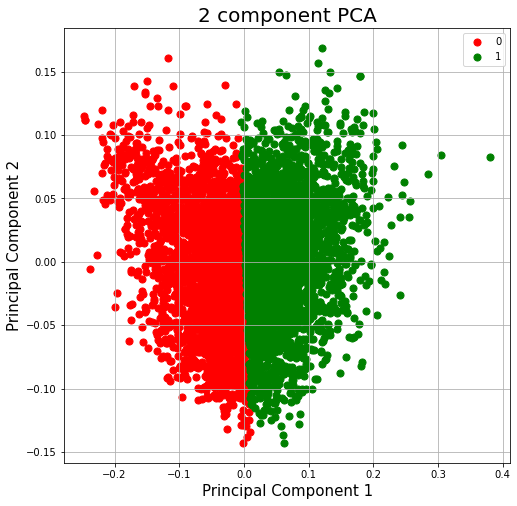

In [75]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0,1]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf_kmeans[0] == target
    ax.scatter(finalDf_kmeans.loc[indicesToKeep, 'principal component 1']
               , finalDf_kmeans.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

Accuracy scored using Agglomerative clustering:  0.5003
Confusion matrix
[[2351 1004]
 [1922  579]]
Classification Report
              precision    recall  f1-score   support

           0       0.55      0.70      0.62      3355
           1       0.37      0.23      0.28      2501

    accuracy                           0.50      5856
   macro avg       0.46      0.47      0.45      5856
weighted avg       0.47      0.50      0.47      5856

Silhouette coefficient
0.3540636730117627
CV score
4131.577835732768


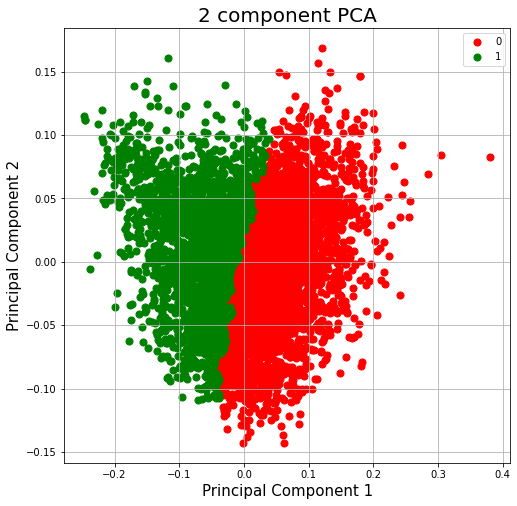

In [101]:
model_PCA = AgglomerativeClustering(n_clusters=2,linkage="ward")
model_PCA.fit(principalDf)
model_PCA.labels_
x = model_PCA.labels_
score = round(accuracy_score(model_PCA.labels_, y_train), 4)
print('Accuracy scored using Agglomerative clustering: ', score)
conf_mat_ward= confusion_matrix(model_PCA.labels_, y_train)
cr_ward=classification_report(model_PCA.labels_, y_train)
print("Confusion matrix")
print(conf_mat_ward)
print("Classification Report")
print(cr_ward)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(principalDf, model_PCA.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(principalDf, model_PCA.labels_))
finalDf_ward = pd.concat([principalDf, pd.DataFrame(model_PCA.labels_)], axis = 1)
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0,1]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf_ward[0] == target
    ax.scatter(finalDf_ward.loc[indicesToKeep, 'principal component 1']
               , finalDf_ward.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()
                        

In [104]:
model1_PCA = AgglomerativeClustering(n_clusters=2, compute_full_tree=True,
    affinity='euclidean', linkage='complete')
model1_PCA.fit(X_train)
model1_PCA.labels_
x1 = model1_PCA.labels_
score = round(accuracy_score(x1, y_train), 4)
print('Accuracy scored using complete linkage Agglomerative clustering: ', score)
conf_mat_complete= confusion_matrix(model1_PCA.labels_, y_train)
cr_complete=classification_report(model1_PCA.labels_, y_train)
print("Confusion matrix")
print(conf_mat_complete)
print("Classification Report")
print(cr_complete)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(principalDf, model1_PCA.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(principalDf, model1_PCA.labels_))


Accuracy scored using complete linkage Agglomerative clustering:  0.5041
Confusion matrix
[[1829  460]
 [2444 1123]]
Classification Report
              precision    recall  f1-score   support

           0       0.43      0.80      0.56      2289
           1       0.71      0.31      0.44      3567

    accuracy                           0.50      5856
   macro avg       0.57      0.56      0.50      5856
weighted avg       0.60      0.50      0.48      5856

Silhouette coefficient
0.2252305039577814
CV score
2392.404854586563


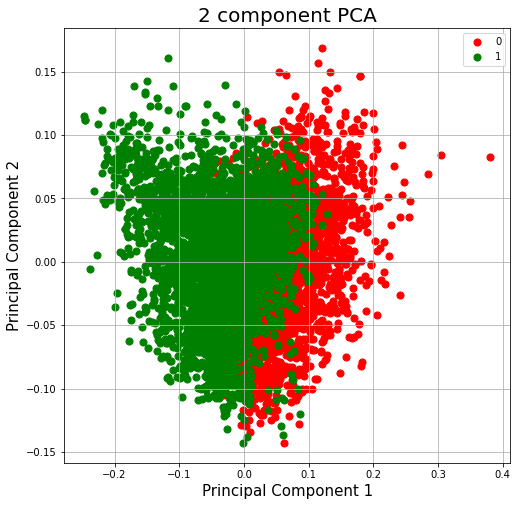

In [105]:
finalDf_complete = pd.concat([principalDf, pd.DataFrame(model1_PCA.labels_)], axis = 1)
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0,1]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf_complete[0] == target
    ax.scatter(finalDf_complete.loc[indicesToKeep, 'principal component 1']
               , finalDf_complete.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [ ]:
model2_PCA = AgglomerativeClustering(n_clusters=2,
    affinity='euclidean', linkage='single')
model2_PCA.fit(X_train)
model2_PCA.labels_
x1 = model2_PCA.labels_
score = round(accuracy_score(x1, y_train), 4)
print('Accuracy scored using single linkage Agglomerative clustering: ', score)
conf_mat_single= confusion_matrix(model2_PCA.labels_, y_train)
cr_single=classification_report(model2_PCA.labels_, y_train)
print("Confusion matrix")
print(conf_mat_single)
print("Classification Report")
print(cr_single)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(principalDf, model2_PCA.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(principalDf, model2_PCA.labels_))
finalDf_single = pd.concat([principalDf, pd.DataFrame(model2_PCA.labels_)], axis = 1)
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0,1]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf_single[0] == target
    ax.scatter(finalDf_single.loc[indicesToKeep, 'principal component 1']
               , finalDf_single.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [ ]:
model3_PCA = Birch(branching_factor=50, n_clusters=2, threshold=0.1)
model3_PCA.fit(X_train)
model3_PCA.labels_
x1 = model3_PCA.labels_
score = round(accuracy_score(x1, y_train), 4)
print('Accuracy scored using  BIRCH clustering: ', score)
conf_mat_BIRCH= confusion_matrix(model3_PCA.labels_, y_train)
cr_BIRCH=classification_report(model3_PCA.labels_, y_train)
print("Confusion matrix")
print(conf_mat_BIRCH)
print("Classification Report")
print(cr_BIRCH)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(principalDf, model3_PCA.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(principalDf, model3_PCA.labels_))
finalDf_BIRCH = pd.concat([principalDf, pd.DataFrame(model3_PCA.labels_)], axis = 1)
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0,1]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf_BIRCH[0] == target
    ax.scatter(finalDf_BIRCH.loc[indicesToKeep, 'principal component 1']
               , finalDf_BIRCH.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

## COVID Analysis

In [108]:
train = "C:/Users/sivay/Downloads/COVID/"
def get_data(folder):
    X = []
    y = []
    for folderName in os.listdir(folder):
        if not folderName.startswith('.'):
            if folderName in ['OtherImages']:
                label = 0
            elif folderName in ['COVIDImages']:
                label = 1
            for image_filename in tqdm(os.listdir(folder + folderName)):
                img_file = cv.imread(folder + folderName + '/' + image_filename)
                #print(img_file)
                if img_file is not None:
                    #reshaping image
                    img_file = skimage.transform.resize(img_file, (150, 150, 3))
                    print(img_file)
                    #noise removal
                    img_file = cv.GaussianBlur(img_file, (5, 5), 0)
                    img_arr = np.asarray(img_file)
                    X.append(img_arr)
                    y.append(label)
                    
    X = np.asarray(X)
    y = np.asarray(y)
    return X,y

In [109]:
X_t, y_t = get_data(train)


  0%|          | 0/209 [00:00<?, ?it/s]

[[[182 182 182]
  [169 169 169]
  [152 152 152]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[165 165 165]
  [150 150 150]
  [138 138 138]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[146 146 146]
  [134 134 134]
  [128 128 128]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 ...

 [[243 243 243]
  [244 244 244]
  [245 245 245]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[245 245 245]
  [245 245 245]
  [245 245 245]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]]
[[[0.45705882 0.45705882 0.45705882]
  [0.41290196 0.41290196 0.41290196]
  [0.40439216 0.40439216 0.40439216]
  ...
  [0.512      0.512      0.512     ]
  [0.52615686 0.52615686 0.52615686]
  [0.78836392 0.78836392 0.78836392]]

 [[0.24720941 0.24720941 0.24720941]
  [0.22509804 0.22509804 0.22509804]
  [0.23859608 0.23859608 0.23859608]
  ...
  [0.4614902  0.4614902


  0%|          | 1/209 [00:00<01:46,  1.96it/s]

[[[ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]
  ...
  [ 50  50  50]
  [ 50  50  50]
  [ 50  50  50]]

 [[ 52  52  52]
  [ 52  52  52]
  [ 52  52  52]
  ...
  [ 50  50  50]
  [ 50  50  50]
  [ 50  50  50]]

 [[ 52  52  52]
  [ 52  52  52]
  [ 51  51  51]
  ...
  [ 50  50  50]
  [ 49  49  49]
  [ 49  49  49]]

 ...

 [[171 171 171]
  [171 171 171]
  [171 171 171]
  ...
  [150 150 150]
  [151 151 151]
  [151 151 151]]

 [[171 171 171]
  [171 171 171]
  [171 171 171]
  ...
  [150 150 150]
  [151 151 151]
  [151 151 151]]

 [[170 170 170]
  [170 170 170]
  [170 170 170]
  ...
  [151 151 151]
  [151 151 151]
  [151 151 151]]]
[[[0.2        0.2        0.2       ]
  [0.19607843 0.19607843 0.19607843]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]
  [0.18823529 0.18823529 0.18823529]]

 [[0.19607843 0.19607843 0.19607843]
  [0.19607843 0.19607843 0.19607843]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.18823529 0.1882352


  1%|          | 2/209 [00:00<01:36,  2.14it/s]

[[[31 29 35]
  [32 31 35]
  [32 31 35]
  ...
  [32 31 35]
  [29 28 32]
  [31 30 34]]

 [[31 30 34]
  [36 35 39]
  [40 39 43]
  ...
  [43 42 46]
  [36 35 39]
  [33 32 36]]

 [[31 30 34]
  [40 39 43]
  [48 47 51]
  ...
  [55 54 58]
  [42 41 45]
  [32 31 35]]

 ...

 [[34 33 35]
  [54 53 55]
  [76 75 77]
  ...
  [79 78 80]
  [54 53 55]
  [34 33 37]]

 [[30 29 33]
  [40 39 43]
  [51 50 52]
  ...
  [54 53 55]
  [41 40 42]
  [33 32 36]]

 [[31 30 34]
  [32 31 35]
  [33 32 36]
  ...
  [32 31 33]
  [30 29 31]
  [31 30 34]]]
[[[0.18559477 0.1791471  0.18951634]
  [0.20520261 0.20128105 0.20536915]
  [0.22481046 0.21696732 0.22088889]
  ...
  [0.30188235 0.29403922 0.29796078]
  [0.27203582 0.26565046 0.26845752]
  [0.23001307 0.22228436 0.22626144]]

 [[0.20392157 0.19624497 0.20392157]
  [0.22745098 0.21960784 0.22352941]
  [0.24699739 0.23915425 0.23921569]
  ...
  [0.34135033 0.33350719 0.33350719]
  [0.28294118 0.27509804 0.27509804]
  [0.23953908 0.23169595 0.23929412]]

 [[0.20784314 0.20


  1%|▏         | 3/209 [00:01<01:35,  2.17it/s]

[[[15 15 15]
  [14 14 14]
  [14 14 14]
  ...
  [11 11 11]
  [ 0  0  0]
  [49 49 49]]

 [[13 13 13]
  [13 13 13]
  [13 13 13]
  ...
  [10 10 10]
  [ 0  0  0]
  [50 50 50]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [13 13 13]
  [ 3  3  3]
  [54 54 54]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [11 11 11]
  [ 1  1  1]
  [51 51 51]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [11 11 11]
  [ 1  1  1]
  [51 51 51]]

 [[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [11 11 11]
  [ 1  1  1]
  [51 51 51]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.05866601 0.05866601 0.05866601]
  [0.17713943 0.17713943 0.17713943]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04555556 0.04555556 0.04555556]]

 [[0.05248366 0.05248366 0.05248366]
  [0.27619412 0.27619412 0.27619412]
  [0.80947386 0.80947386 0.80947386]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  [0.04705882 0.04705882 0.04705882]]

 [[0.05658061 0.05


  2%|▏         | 4/209 [00:01<01:15,  2.70it/s]

[[[ 44  44  44]
  [  1   1   1]
  [  1   1   1]
  ...
  [255 255 255]
  [253 253 253]
  [254 254 254]]

 [[ 46  46  46]
  [  2   2   2]
  [  1   1   1]
  ...
  [255 255 255]
  [253 253 253]
  [254 254 254]]

 [[ 45  45  45]
  [  1   1   1]
  [  0   0   0]
  ...
  [255 255 255]
  [254 254 254]
  [254 254 254]]

 ...

 [[ 44  44  44]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 44  44  44]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 44  44  44]
  [  0   0   0]
  [  0   0   0]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[0.03261961 0.03261961 0.03261961]
  [0.30579608 0.30579608 0.30579608]
  [0.33635294 0.33635294 0.33635294]
  ...
  [0.         0.         0.        ]
  [0.00313725 0.00313725 0.00313725]
  [0.35215686 0.35215686 0.35215686]]

 [[0.05803922 0.05803922 0.05803922]
  [0.7012549  0.7012549  0.7012549 ]
  [0.7694902  0.7694902  0.7694902 ]
  ...
  [0.         0.       


  2%|▏         | 5/209 [00:01<01:02,  3.27it/s]

[[[163 163 163]
  [164 164 164]
  [164 164 164]
  ...
  [164 164 164]
  [164 164 164]
  [164 164 164]]

 [[  1   1   1]
  [  1   1   1]
  [  2   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  3   3   3]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.04647059 0.04647059 0.04647059]
  [0.04496732 0.04496732 0.04496732]
  [0.04797386 0.04797386 0.04797386]
  ...
  [0.04496732 0.04496732 0.04496732]
  [0.04496732 0.04496732 0.04496732]
  [0.04496732 0.04496732 0.04496732]]

 [[0.         0.         0.        ]
  [0.01479412 0.01479412 0.01479412]
  [0.25898693 0.25898693 0.25898693]
  ...
  [0.         0.       


  3%|▎         | 6/209 [00:01<00:53,  3.82it/s]

[[[53 53 53]
  [ 2  2  2]
  [12 12 12]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]

 [[53 53 53]
  [ 2  2  2]
  [12 12 12]
  ...
  [14 14 14]
  [14 14 14]
  [17 17 17]]

 [[54 54 54]
  [ 2  2  2]
  [12 12 12]
  ...
  [12 12 12]
  [13 13 13]
  [16 16 16]]

 ...

 [[44 44 44]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[44 44 44]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[44 44 44]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]]
[[[0.02201307 0.02201307 0.02201307]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.02049673 0.02049673 0.02049673]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]]

 [[0.02049673 0.02


  3%|▎         | 7/209 [00:01<00:46,  4.37it/s]

[[[105 105 105]
  [104 104 104]
  [103 103 103]
  ...
  [103 103 103]
  [103 103 103]
  [103 103 103]]

 [[104 104 104]
  [103 103 103]
  [102 102 102]
  ...
  [104 104 104]
  [104 104 104]
  [104 104 104]]

 [[103 103 103]
  [102 102 102]
  [101 101 101]
  ...
  [105 105 105]
  [105 105 105]
  [105 105 105]]

 ...

 [[184 184 184]
  [185 185 185]
  [186 186 186]
  ...
  [195 195 195]
  [198 198 198]
  [200 200 200]]

 [[184 184 184]
  [185 185 185]
  [186 186 186]
  ...
  [195 195 195]
  [198 198 198]
  [200 200 200]]

 [[184 184 184]
  [185 185 185]
  [186 186 186]
  ...
  [195 195 195]
  [198 198 198]
  [200 200 200]]]
[[[0.39658824 0.39658824 0.39658824]
  [0.39372549 0.39372549 0.39372549]
  [0.4005098  0.4005098  0.4005098 ]
  ...
  [0.41176471 0.41176471 0.41176471]
  [0.4085298  0.4085298  0.4085298 ]
  [0.40733333 0.40733333 0.40733333]]

 [[0.39594078 0.39594078 0.39594078]
  [0.39280275 0.39280275 0.39280275]
  [0.39847059 0.39847059 0.39847059]
  ...
  [0.40937255 0.4093725


  6%|▌         | 12/209 [00:02<00:32,  5.98it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 89  89  89]
  [ 96  96  96]
  [129 129 129]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 97  97  97]
  [110 110 110]
  [126 126 126]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [103 103 103]
  [106 106 106]
  [119 119 119]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [136 136 136]
  [137 137 137]
  [121 121 121]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [137 137 137]
  [138 138 138]
  [123 123 123]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [134 134 134]
  [136 136 136]
  [127 127 127]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.32321329 0.32321329 0.32321329]
  [0.34407843 0.34407843 0.34407843]
  [0.41566227 0.41566227 0.41566227]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.37985621 0.3798562


  8%|▊         | 16/209 [00:02<00:24,  7.94it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  4   0   0]
  [  4   0   0]
  [  4   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  4   0   0]
  [  4   0   0]
  [  4   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  4   0   0]
  [  4   0   0]
  [  4   0   0]]

 ...

 [[129 129 129]
  [117 117 117]
  [127 127 127]
  ...
  [168 163 164]
  [168 163 164]
  [169 164 165]]

 [[129 129 129]
  [117 117 117]
  [127 127 127]
  ...
  [168 163 164]
  [168 163 164]
  [169 164 165]]

 [[129 129 129]
  [117 117 117]
  [127 127 127]
  ...
  [168 163 164]
  [168 163 164]
  [169 164 165]]]
[[[0.         0.         0.        ]
  [0.00619608 0.         0.        ]
  [0.01176471 0.         0.        ]
  ...
  [0.01568627 0.         0.        ]
  [0.01568627 0.         0.        ]
  [0.01568627 0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00619608 0.         0.        ]
  [0.01176471 0.         0.        ]
  ...
  [0.01568627 0.       


 10%|▉         | 20/209 [00:02<00:18, 10.19it/s]

[[[  4   0   0]
  [ 10   5   6]
  [  4   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   0   0]
  [ 10   5   6]
  [  4   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   0   0]
  [ 10   5   6]
  [  4   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[218 213 214]
  [217 212 213]
  [223 218 219]
  ...
  [251 248 244]
  [251 248 244]
  [251 248 244]]

 [[218 213 214]
  [217 212 213]
  [223 218 219]
  ...
  [251 248 244]
  [251 248 244]
  [251 248 244]]

 [[218 213 214]
  [217 212 213]
  [223 218 219]
  ...
  [251 248 244]
  [251 248 244]
  [251 248 244]]]
[[[0.02352941 0.00392157 0.00784314]
  [0.01568627 0.         0.        ]
  [0.01176471 0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02352941 0.00392157 0.00784314]
  [0.01568627 0.         0.        ]
  [0.01176471 0.         0.        ]
  ...
  [0.         0.       


 11%|█         | 23/209 [00:03<00:35,  5.19it/s]

[[[  0   0   0]
  [  2   2   2]
  [  0   0   0]
  ...
  [  0   0   0]
  [  7   7   7]
  [  0   0   0]]

 [[  0   0   0]
  [  8   8   8]
  [  4   4   4]
  ...
  [  0   0   0]
  [  6   6   6]
  [  0   0   0]]

 [[  2   2   2]
  [ 12  12  12]
  [  7   7   7]
  ...
  [ 16  16  16]
  [ 28  28  28]
  [ 14  14  14]]

 ...

 [[123 123 123]
  [120 120 120]
  [116 116 116]
  ...
  [187 187 187]
  [183 183 183]
  [179 179 179]]

 [[126 126 126]
  [123 123 123]
  [120 120 120]
  ...
  [184 184 184]
  [181 181 181]
  [177 177 177]]

 [[130 130 130]
  [129 129 129]
  [127 127 127]
  ...
  [177 177 177]
  [174 174 174]
  [171 171 171]]]
[[[0.20961656 0.20961656 0.20961656]
  [0.1152549  0.1152549  0.1152549 ]
  [0.06640087 0.06640087 0.06640087]
  ...
  [0.1291024  0.1291024  0.1291024 ]
  [0.32303268 0.32303268 0.32303268]
  [0.63195207 0.63195207 0.63195207]]

 [[0.26797386 0.26797386 0.26797386]
  [0.14509804 0.14509804 0.14509804]
  [0.08169935 0.08169935 0.08169935]
  ...
  [0.15555556 0.1555555


 12%|█▏        | 25/209 [00:04<01:02,  2.95it/s]

[[[  0   0   0]
  [  0   0   0]
  [  4   4   4]
  ...
  [131 131 131]
  [124 124 124]
  [125 125 125]]

 [[  0   0   0]
  [  2   2   2]
  [  3   3   3]
  ...
  [130 130 130]
  [123 123 123]
  [124 124 124]]

 [[  3   3   3]
  [  3   3   3]
  [  2   2   2]
  ...
  [130 130 130]
  [125 125 125]
  [127 127 127]]

 ...

 [[136 136 136]
  [134 134 134]
  [131 131 131]
  ...
  [162 162 162]
  [163 163 163]
  [167 167 167]]

 [[136 136 136]
  [134 134 134]
  [131 131 131]
  ...
  [162 162 162]
  [163 163 163]
  [167 167 167]]

 [[136 136 136]
  [134 134 134]
  [131 131 131]
  ...
  [163 163 163]
  [164 164 164]
  [168 168 168]]]
[[[0.00440523 0.00440523 0.00440523]
  [0.00392157 0.00392157 0.00392157]
  [0.00761743 0.00761743 0.00761743]
  ...
  [0.50244444 0.50244444 0.50244444]
  [0.50196078 0.50196078 0.50196078]
  [0.49634318 0.49634318 0.49634318]]

 [[0.00639216 0.00639216 0.00639216]
  [0.00537255 0.00537255 0.00537255]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.51257255 0.5125725


 13%|█▎        | 27/209 [00:05<00:46,  3.88it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[176 176 176]
  [173 173 173]
  [173 173 173]
  ...
  [135 135 135]
  [134 134 134]
  [133 133 133]]

 [[178 178 178]
  [179 179 179]
  [179 179 179]
  ...
  [137 137 137]
  [136 136 136]
  [135 135 135]]

 [[178 178 178]
  [179 179 179]
  [179 179 179]
  ...
  [137 137 137]
  [136 136 136]
  [135 135 135]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 14%|█▍        | 29/209 [00:05<00:36,  4.99it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [214 214 214]
  [216 216 216]
  [ 28  28  28]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [213 213 213]
  [215 215 215]
  [ 27  27  27]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [211 211 211]
  [214 214 214]
  [ 26  26  26]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [177 177 177]
  [174 174 174]
  [ 23  23  23]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [177 177 177]
  [174 174 174]
  [ 24  24  24]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [176 176 176]
  [174 174 174]
  [ 24  24  24]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.22091503 0.22091503 0.22091503]
  [0.58039216 0.58039216 0.58039216]
  [0.758061   0.758061   0.758061  ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.22026144 0.2202614


 15%|█▍        | 31/209 [00:07<01:13,  2.43it/s]

[[[ 56  56  56]
  [ 56  56  56]
  [ 56  56  56]
  ...
  [117 117 117]
  [117 117 117]
  [116 116 116]]

 [[ 58  58  58]
  [ 58  58  58]
  [ 58  58  58]
  ...
  [117 117 117]
  [117 117 117]
  [116 116 116]]

 [[ 61  61  61]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [117 117 117]
  [117 117 117]
  [117 117 117]]

 ...

 [[137 137 137]
  [138 138 138]
  [140 140 140]
  ...
  [124 124 124]
  [124 124 124]
  [123 123 123]]

 [[137 137 137]
  [138 138 138]
  [140 140 140]
  ...
  [124 124 124]
  [124 124 124]
  [123 123 123]]

 [[137 137 137]
  [138 138 138]
  [140 140 140]
  ...
  [124 124 124]
  [124 124 124]
  [123 123 123]]]
[[[0.2392115  0.2392115  0.2392115 ]
  [0.23524183 0.23524183 0.23524183]
  [0.22745098 0.22745098 0.22745098]
  ...
  [0.47843137 0.47843137 0.47843137]
  [0.4705485  0.4705485  0.4705485 ]
  [0.45882353 0.45882353 0.45882353]]

 [[0.26258824 0.26258824 0.26258824]
  [0.25866667 0.25866667 0.25866667]
  [0.2547451  0.2547451  0.2547451 ]
  ...
  [0.48235294 0.4823529


 16%|█▌        | 33/209 [00:07<01:14,  2.35it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[1 1 1]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03137255 0.03137255 0.03137255]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00686275 0.00686275 0.00686275]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 16%|█▋        | 34/209 [00:08<00:59,  2.93it/s]

[[[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[  2   2   2]
  [  2   2   2]
  [  2   2   2]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 ...

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [120 120 120]
  [121 121 121]
  [122 122 122]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [119 119 119]
  [121 121 121]
  [122 122 122]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]
  ...
  [118 118 118]
  [120 120 120]
  [122 122 122]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.01176471 0.0117647


 17%|█▋        | 35/209 [00:08<01:17,  2.25it/s]

[[[242 242 242]
  [226 226 226]
  [229 229 229]
  ...
  [233 233 233]
  [226 226 226]
  [233 233 233]]

 [[220 220 220]
  [235 235 235]
  [236 236 236]
  ...
  [235 235 235]
  [234 234 234]
  [231 231 231]]

 [[234 234 234]
  [224 224 224]
  [227 227 227]
  ...
  [198 198 198]
  [239 239 239]
  [234 234 234]]

 ...

 [[243 243 243]
  [195 195 195]
  [ 87  87  87]
  ...
  [202 202 202]
  [219 219 219]
  [233 233 233]]

 [[228 228 228]
  [245 245 245]
  [196 196 196]
  ...
  [221 221 221]
  [229 229 229]
  [229 229 229]]

 [[226 226 226]
  [240 240 240]
  [236 236 236]
  ...
  [230 230 230]
  [237 237 237]
  [237 237 237]]]
[[[4.09385969e-01 4.09385969e-01 4.09385969e-01]
  [3.05380392e-02 3.05380392e-02 3.05380392e-02]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [1.72026144e-02 1.72026144e-02 1.72026144e-02]
  [4.99356863e-02 4.99356863e-02 4.99356863e-02]
  [3.79111808e-01 3.79111808e-01 3.79111808e-01]]

 [[3.43027451e-02 3.43027451e-02 3.43027451e-02]
  [8.15686275e-05 8


 18%|█▊        | 37/209 [00:09<01:07,  2.55it/s]

[[[178 178 178]
  [178 178 178]
  [178 178 178]
  ...
  [178 178 178]
  [178 178 178]
  [178 178 178]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 ...

 [[  5   5   5]
  [  3   3   3]
  [ 10  10  10]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 16  16  16]]

 [[  5   5   5]
  [  4   4   4]
  [ 10  10  10]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 16  16  16]]

 [[  5   5   5]
  [  4   4   4]
  [ 10  10  10]
  ...
  [ 17  17  17]
  [ 17  17  17]
  [ 16  16  16]]]
[[[0.93517647 0.93517647 0.93517647]
  [0.93448366 0.93448366 0.93448366]
  [0.93448366 0.93448366 0.93448366]
  ...
  [0.93909804 0.93909804 0.93909804]
  [0.93909804 0.93909804 0.93909804]
  [0.93909804 0.93909804 0.93909804]]

 [[0.67712418 0.67712418 0.67712418]
  [0.65027451 0.65027451 0.65027451]
  [0.65419608 0.65419608 0.65419608]
  ...
  [0.70909804 0.7090980


 18%|█▊        | 38/209 [00:09<01:03,  2.70it/s]

[[[  2   2   2]
  [  3   3   3]
  [  5   5   5]
  ...
  [  2   2   2]
  [  4   4   4]
  [  5   5   5]]

 [[  3   3   3]
  [  4   4   4]
  [  5   5   5]
  ...
  [  3   3   3]
  [  4   4   4]
  [  4   4   4]]

 [[  3   3   3]
  [  4   4   4]
  [  5   5   5]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 ...

 [[152 152 152]
  [151 151 151]
  [151 151 151]
  ...
  [112 112 112]
  [110 110 110]
  [114 114 114]]

 [[152 152 152]
  [152 152 152]
  [152 152 152]
  ...
  [112 112 112]
  [111 111 111]
  [111 111 111]]

 [[156 156 156]
  [158 158 158]
  [154 154 154]
  ...
  [112 112 112]
  [112 112 112]
  [108 108 108]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00508497 0.00508497 0.00508497]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.00392157 0.0039215


 19%|█▊        | 39/209 [00:10<01:40,  1.70it/s]

[[[  0   0   0]
  [ 22  22  22]
  [ 61  61  61]
  ...
  [  2   2   0]
  [ 12   2   0]
  [ 40  26  14]]

 [[  2   2   2]
  [ 26  26  26]
  [ 66  66  66]
  ...
  [  3   3   0]
  [ 12   2   0]
  [ 40  26  14]]

 [[  5   5   5]
  [ 31  31  31]
  [ 73  73  73]
  ...
  [  6   6   0]
  [ 12   2   0]
  [ 40  26  14]]

 ...

 [[ 40  24  11]
  [ 18   2   0]
  [ 38  22   9]
  ...
  [ 37  19   2]
  [ 46  17   0]
  [ 72  40  17]]

 [[ 86  49  11]
  [ 86  49  11]
  [ 86  49  11]
  ...
  [ 88  44  20]
  [ 99  45  15]
  [102  45  14]]

 [[ 99  52   1]
  [ 99  52   1]
  [ 99  52   1]
  ...
  [100  44  15]
  [111  44  11]
  [115  44  10]]]
[[[0.20321569 0.20321569 0.20321569]
  [0.19098039 0.19098039 0.19098039]
  [0.12501961 0.12501961 0.12501961]
  ...
  [0.00737255 0.00737255 0.00737255]
  [0.00345098 0.00345098 0.00345098]
  [0.02698039 0.01372549 0.00392157]]

 [[0.23639216 0.23639216 0.23639216]
  [0.22141176 0.22141176 0.22141176]
  [0.15152941 0.15152941 0.15152941]
  ...
  [0.12901961 0.1290196


 20%|█▉        | 41/209 [00:11<01:21,  2.05it/s]

[[[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[82 82 82]
  [87 87 87]
  [89 89 89]
  ...
  [35 35 35]
  [34 34 34]
  [33 33 33]]

 [[82 82 82]
  [87 87 87]
  [89 89 89]
  ...
  [34 34 34]
  [33 33 33]
  [32 32 32]]

 [[81 81 81]
  [87 87 87]
  [89 89 89]
  ...
  [34 34 34]
  [33 33 33]
  [32 32 32]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05007843 0.05007843 0.05007843]
  [0.05007843 0.05007843 0.05007843]
  [0.05022876 0.05022876 0.05022876]
  ...
  [0.00834641 0.00834641 0.00834641]
  [0.00543137 0.00543137 0.00543137]
  [0.00392157 0.00392157 0.00392157]]

 [[0.11379085 0.11


 20%|██        | 42/209 [00:11<01:05,  2.57it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 40  40  40]
  [ 39  39  39]
  [ 36  36  36]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 41  41  41]
  [ 40  40  40]
  [ 41  41  41]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 43  43  43]]

 ...

 [[145 145 145]
  [146 146 146]
  [149 149 149]
  ...
  [ 93  93  93]
  [ 94  94  94]
  [ 95  95  95]]

 [[144 144 144]
  [146 146 146]
  [149 149 149]
  ...
  [ 94  94  94]
  [ 94  94  94]
  [ 94  94  94]]

 [[144 144 144]
  [146 146 146]
  [149 149 149]
  ...
  [ 94  94  94]
  [ 94  94  94]
  [ 94  94  94]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25498039 0.25498039 0.25498039]
  [0.18405229 0.18405229 0.18405229]
  [0.16470588 0.16470588 0.16470588]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19185621 0.1918562


 21%|██        | 44/209 [00:15<02:36,  1.05it/s]

[[[  2   2   2]
  [  0   0   0]
  [  5   5   5]
  ...
  [  4   4   4]
  [  3   3   3]
  [  0   0   0]]

 [[  4   4   4]
  [  6   6   6]
  [  6   6   6]
  ...
  [  4   4   4]
  [  3   3   3]
  [  1   1   1]]

 [[  0   0   0]
  [  8   8   8]
  [  9   9   9]
  ...
  [  4   4   4]
  [  3   3   3]
  [  1   1   1]]

 ...

 [[115 115 115]
  [113 113 113]
  [115 115 115]
  ...
  [  3   5   6]
  [  6   5   7]
  [  8   5   7]]

 [[116 116 116]
  [115 115 115]
  [116 116 116]
  ...
  [  2   4   5]
  [  4   3   5]
  [  7   4   6]]

 [[113 113 113]
  [115 115 115]
  [114 114 114]
  ...
  [  2   4   5]
  [  5   4   6]
  [  8   5   7]]]
[[[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.02328497 0.02328497 0.02328497]
  [0.01430065 0.01430065 0.01430065]
  [0.00098902 0.00098902 0.00098902]]

 [[0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  [0.01568627 0.01568627 0.01568627]
  ...
  [0.31121569 0.3112156


 22%|██▏       | 45/209 [00:16<02:08,  1.28it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.    


 22%|██▏       | 46/209 [00:16<01:34,  1.72it/s]

[[[226 226 226]
  [226 226 226]
  [226 226 226]
  ...
  [219 219 219]
  [236 236 236]
  [  0   0   0]]

 [[226 226 226]
  [226 226 226]
  [226 226 226]
  ...
  [219 219 219]
  [236 236 236]
  [  0   0   0]]

 [[226 226 226]
  [226 226 226]
  [226 226 226]
  ...
  [219 219 219]
  [236 236 236]
  [  0   0   0]]

 ...

 [[218 218 218]
  [215 215 215]
  [216 216 216]
  ...
  [206 206 206]
  [234 234 234]
  [  0   0   0]]

 [[235 235 235]
  [232 232 232]
  [233 233 233]
  ...
  [226 226 226]
  [246 246 246]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  3   3   3]
  [  0   0   0]]]
[[[0.2463573  0.2463573  0.2463573 ]
  [0.00756863 0.00756863 0.00756863]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.17325054 0.17325054 0.17325054]]

 [[0.02078431 0.02078431 0.02078431]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 22%|██▏       | 47/209 [00:20<04:38,  1.72s/it]

[[[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 2  2  2]
  [ 4  4  4]
  [ 5  5  5]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 4  4  4]
  [ 7  7  7]
  [ 6  6  6]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [ 5  5  5]
  [ 7  7  7]
  [ 4  4  4]]

 ...

 [[43 43 43]
  [50 50 50]
  [60 60 60]
  ...
  [29 27 27]
  [26 24 24]
  [23 21 21]]

 [[48 46 46]
  [52 52 52]
  [60 62 62]
  ...
  [23 23 23]
  [20 20 20]
  [24 21 23]]

 [[48 46 46]
  [52 52 52]
  [60 62 62]
  ...
  [23 23 23]
  [19 19 19]
  [23 20 22]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.05005438 0.05005438 0.05005438]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.05513516 0.05513516 0.05513516]
  [0.04035922 0.04035922 0.04035922]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.02321569 0.02321569 0.02321569]
  [0.01176471 0.01176471 0.01176471]
  [0.00784314 0.00784314 0.00784314]]

 [[0.04313725 0.04


 23%|██▎       | 48/209 [00:21<03:30,  1.31s/it]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   1]
  [  0   0   1]
  [  0   0   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   1]
  [  0   0   1]
  [  0   0   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   1]
  [  0   0   1]
  [  0   0   1]]

 ...

 [[ 27  27  27]
  [ 29  29  29]
  [ 33  33  33]
  ...
  [178 177 179]
  [180 179 181]
  [102 101 103]]

 [[ 27  27  27]
  [ 29  29  29]
  [ 33  33  33]
  ...
  [180 179 181]
  [182 181 183]
  [104 103 105]]

 [[ 26  26  26]
  [ 30  30  30]
  [ 34  34  34]
  ...
  [182 181 183]
  [183 182 184]
  [105 104 106]]]
[[[3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [7.68627451e-05 7.68627451e-05 7.68627451e-05]
  [0.00000000e+00 0.00000000e+00 1.09803922e-03]]

 [[3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3


 26%|██▌       | 54/209 [00:22<02:30,  1.03it/s]

[[[134 134 134]
  [191 191 191]
  [ 71  71  71]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[118 118 118]
  [126 126 126]
  [110 110 110]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 75  75  75]
  [ 69  69  69]
  [ 68  68  68]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 12  12  12]
  [  7   7   7]
  [  4   4   4]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 12  12  12]
  [  6   6   6]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[ 11  11  11]
  [  6   6   6]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.1570949  0.1570949  0.1570949 ]
  [0.13694118 0.13694118 0.13694118]
  [0.11685229 0.11685229 0.11685229]
  ...
  [0.01745359 0.01745359 0.01745359]
  [0.00085333 0.00085333 0.00085333]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 26%|██▋       | 55/209 [00:22<01:52,  1.37it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 1  1  1]
  [30 30 30]
  ...
  [55 55 55]
  [ 7  7  7]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 1  1  1]
  [29 29 29]
  ...
  [55 55 55]
  [ 7  7  7]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [29 29 29]
  ...
  [55 55 55]
  [ 7  7  7]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00984314 0.00


 27%|██▋       | 56/209 [00:22<01:23,  1.84it/s]

[[[253 253 253]
  [253 253 253]
  [247 247 247]
  ...
  [  4   4   4]
  [  4   4   4]
  [  5   5   5]]

 [[254 254 254]
  [255 255 255]
  [237 237 237]
  ...
  [  4   4   4]
  [  4   4   4]
  [  5   5   5]]

 [[255 255 255]
  [240 240 240]
  [186 186 186]
  ...
  [  4   4   4]
  [  4   4   4]
  [  5   5   5]]

 ...

 [[ 59  59  59]
  [ 59  59  59]
  [ 58  58  58]
  ...
  [ 76  76  76]
  [ 71  71  71]
  [ 71  71  71]]

 [[ 59  59  59]
  [ 59  59  59]
  [ 58  58  58]
  ...
  [ 80  80  80]
  [ 73  73  73]
  [ 72  72  72]]

 [[ 59  59  59]
  [ 59  59  59]
  [ 58  58  58]
  ...
  [ 82  82  82]
  [ 75  75  75]
  [ 73  73  73]]]
[[[0.15201612 0.15201612 0.15201612]
  [0.00940261 0.00940261 0.00940261]
  [0.0078671  0.0078671  0.0078671 ]
  ...
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]
  [0.01176471 0.01176471 0.01176471]]

 [[0.00870588 0.00870588 0.00870588]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.01176471 0.0117647


 27%|██▋       | 57/209 [00:22<01:08,  2.23it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  4   4   4]
  [  4   4   4]
  [  5   5   5]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  5   5   5]
  [  5   5   5]
  [  5   5   5]]

 ...

 [[166 166 166]
  [172 172 172]
  [178 178 178]
  ...
  [153 153 153]
  [153 153 153]
  [152 152 152]]

 [[166 166 166]
  [172 172 172]
  [178 178 178]
  ...
  [155 155 155]
  [154 154 154]
  [154 154 154]]

 [[167 167 167]
  [171 171 171]
  [177 177 177]
  ...
  [155 155 155]
  [155 155 155]
  [155 155 155]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00784314 0.00784314 0.00784314]
  [0.01176471 0.01176471 0.01176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.0039215


 28%|██▊       | 59/209 [00:23<00:57,  2.63it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 1  1  1]
  [57 57 57]
  [61 61 61]
  ...
  [ 1  1  1]
  [ 2  2  2]
  [ 4  4  4]]

 [[ 1  1  1]
  [57 57 57]
  [61 61 61]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [57 57 57]
  [61 61 61]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 29%|██▊       | 60/209 [00:24<01:56,  1.28it/s]

[[[10 10 10]
  [10 10 10]
  [10 10 10]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[10 10 10]
  [10 10 10]
  [11 11 11]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[10 10 10]
  [10 10 10]
  [ 9  9  9]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 ...

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[22 22 22]
  [23 23 23]
  [24 24 24]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]

 [[23 23 23]
  [22 22 22]
  [25 25 25]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]]]
[[[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  [0.02745098 0.02745098 0.02745098]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.02745098 0.02


 29%|██▉       | 61/209 [00:26<02:23,  1.03it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 34  34  34]
  [ 34  34  34]
  [ 34  34  34]]

 ...

 [[160 160 160]
  [160 160 160]
  [160 160 160]
  ...
  [173 173 173]
  [174 174 174]
  [174 174 174]]

 [[160 160 160]
  [160 160 160]
  [160 160 160]
  ...
  [172 172 172]
  [173 173 173]
  [173 173 173]]

 [[160 160 160]
  [160 160 160]
  [160 160 160]
  ...
  [171 171 171]
  [172 172 172]
  [172 172 172]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]
  [0.13333333 0.13333333 0.13333333]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13333333 0.1333333


 30%|██▉       | 62/209 [00:26<01:48,  1.35it/s]

[[[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[ 44  44  44]
  [ 44  44  44]
  [ 44  44  44]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 ...

 [[ 91  91  91]
  [ 91  91  91]
  [ 91  91  91]
  ...
  [125 125 125]
  [127 127 127]
  [129 129 129]]

 [[ 49  49  49]
  [ 49  49  49]
  [ 49  49  49]
  ...
  [ 67  67  67]
  [ 69  69  69]
  [ 71  71  71]]

 [[  4   4   4]
  [  4   4   4]
  [  3   3   3]
  ...
  [  3   3   3]
  [  5   5   5]
  [  7   7   7]]]
[[[0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.05848366 0.05848366 0.05848366]
  [0.05456209 0.05456209 0.05456209]
  [0.04279739 0.04279739 0.04279739]]

 [[0.20290196 0.20290196 0.20290196]
  [0.20682353 0.20682353 0.20682353]
  [0.2107451  0.2107451  0.2107451 ]
  ...
  [0.10118301 0.1011830


 30%|███       | 63/209 [00:26<01:21,  1.79it/s]

[[[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [52 52 52]
  [50 50 50]
  [50 50 50]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [52 52 52]
  [49 49 49]
  [48 48 48]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [53 53 53]
  [48 48 48]
  [45 45 45]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.16473203 0.16473203 0.16473203]
  [0.1539268  0.1539268  0.1539268 ]
  [0.1810719  0.1810719  0.1810719 ]]

 [[0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  ...
  [0.08848366 0.08848366 0.08848366]
  [0.09160784 0.09160784 0.09160784]
  [0.08439216 0.08439216 0.08439216]]

 [[0.0627451  0.06


 31%|███       | 64/209 [00:26<01:02,  2.34it/s]

[[[ 92  92  92]
  [ 96  96  96]
  [102 102 102]
  ...
  [ 74  74  74]
  [ 66  66  66]
  [ 66  66  66]]

 [[ 93  93  93]
  [ 96  96  96]
  [100 100 100]
  ...
  [ 77  77  77]
  [ 74  74  74]
  [ 74  74  74]]

 [[ 95  95  95]
  [ 95  95  95]
  [ 96  96  96]
  ...
  [ 84  84  84]
  [ 82  82  82]
  [ 82  82  82]]

 ...

 [[121 121 121]
  [122 122 122]
  [125 125 125]
  ...
  [120 120 120]
  [120 120 120]
  [120 120 120]]

 [[121 121 121]
  [122 122 122]
  [125 125 125]
  ...
  [120 120 120]
  [120 120 120]
  [120 120 120]]

 [[121 121 121]
  [122 122 122]
  [125 125 125]
  ...
  [120 120 120]
  [120 120 120]
  [120 120 120]]]
[[[0.38673638 0.38673638 0.38673638]
  [0.44810458 0.44810458 0.44810458]
  [0.39572985 0.39572985 0.39572985]
  ...
  [0.45738562 0.45738562 0.45738562]
  [0.37555556 0.37555556 0.37555556]
  [0.30999564 0.30999564 0.30999564]]

 [[0.37066667 0.37066667 0.37066667]
  [0.40690196 0.40690196 0.40690196]
  [0.45751634 0.45751634 0.45751634]
  ...
  [0.44078431 0.4407843


 32%|███▏      | 66/209 [00:27<00:51,  2.75it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 69  69  69]
  [ 67  67  67]
  [ 67  67  67]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 70  70  70]
  [ 69  69  69]
  [ 68  68  68]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 66  66  66]
  [ 68  68  68]
  [ 69  69  69]]

 ...

 [[205 205 205]
  [207 207 207]
  [211 211 211]
  ...
  [206 206 206]
  [204 204 204]
  [203 203 203]]

 [[207 207 207]
  [208 208 208]
  [211 211 211]
  ...
  [205 205 205]
  [204 204 204]
  [204 204 204]]

 [[209 209 209]
  [210 210 210]
  [211 211 211]
  ...
  [204 204 204]
  [204 204 204]
  [205 205 205]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.4043268  0.4043268  0.4043268 ]
  [0.31788235 0.31788235 0.31788235]
  [0.2888366  0.2888366  0.2888366 ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.53346405 0.5334640


 32%|███▏      | 67/209 [00:27<00:41,  3.39it/s]

[[[ 31  31  31]
  [ 30  30  30]
  [ 30  30  30]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[ 70  70  70]
  [ 69  69  69]
  [ 69  69  69]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[ 67  67  67]
  [ 67  67  67]
  [ 66  66  66]
  ...
  [ 37  37  37]
  [ 36  36  36]
  [ 36  36  36]]

 ...

 [[ 27  27  27]
  [ 28  28  28]
  [ 29  29  29]
  ...
  [128 128 128]
  [127 127 127]
  [126 126 126]]

 [[ 27  27  27]
  [ 28  28  28]
  [ 29  29  29]
  ...
  [128 128 128]
  [127 127 127]
  [127 127 127]]

 [[ 27  27  27]
  [ 28  28  28]
  [ 29  29  29]
  ...
  [128 128 128]
  [127 127 127]
  [127 127 127]]]
[[[0.19078431 0.19078431 0.19078431]
  [0.22380392 0.22380392 0.22380392]
  [0.23784314 0.23784314 0.23784314]
  ...
  [0.22849673 0.22849673 0.22849673]
  [0.18426144 0.18426144 0.18426144]
  [0.15136078 0.15136078 0.15136078]]

 [[0.10313725 0.10313725 0.10313725]
  [0.11490196 0.11490196 0.11490196]
  [0.12233333 0.12233333 0.12233333]
  ...
  [0.17723529 0.1772352


 33%|███▎      | 68/209 [00:27<00:44,  3.20it/s]

[[[ 28  19  10]
  [ 54  45  36]
  [ 38  29  25]
  ...
  [ 35  29  24]
  [ 46  34  24]
  [ 41  25  12]]

 [[ 52  43  34]
  [ 98  89  80]
  [ 95  86  82]
  ...
  [ 89  83  78]
  [ 79  67  57]
  [ 51  35  22]]

 [[ 35  26  17]
  [ 95  86  77]
  [100  91  87]
  ...
  [ 94  88  83]
  [ 82  70  60]
  [ 44  28  15]]

 ...

 [[ 46  40  35]
  [141 137 132]
  [133 128 125]
  ...
  [ 89  84  81]
  [ 79  70  61]
  [ 42  30  18]]

 [[ 45  39  34]
  [136 132 127]
  [126 121 118]
  ...
  [ 86  81  78]
  [ 77  68  59]
  [ 41  29  17]]

 [[ 41  35  30]
  [129 125 120]
  [117 112 109]
  ...
  [ 79  74  71]
  [ 72  63  54]
  [ 37  25  13]]]
[[[0.27208889 0.23679477 0.20783791]
  [0.2828     0.2587451  0.25025098]
  [0.31016993 0.29752941 0.30537255]
  ...
  [0.19852288 0.18675817 0.17499346]
  [0.22773333 0.21557647 0.21087059]
  [0.24739346 0.20020392 0.16473464]]

 [[0.27793203 0.24271373 0.2149281 ]
  [0.31011765 0.28619608 0.27795294]
  [0.38133333 0.37211765 0.37930719]
  ...
  [0.24708497 0.2405098


 33%|███▎      | 70/209 [00:27<00:38,  3.62it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [35 35 35]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [34 34 34]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [33 33 33]]

 ...

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [30 30 30]
  [29 29 29]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [30 30 30]
  [29 29 29]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [30 30 30]
  [29 29 29]
  [ 1  1  1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00524183 0.00524183 0.00524183]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 34%|███▍      | 71/209 [00:28<00:34,  4.05it/s]

[[[233 233 233]
  [224 224 224]
  [230 230 230]
  ...
  [227 227 227]
  [234 234 234]
  [225 225 225]]

 [[227 227 227]
  [229 229 229]
  [225 225 225]
  ...
  [237 237 237]
  [225 225 225]
  [232 232 232]]

 [[223 223 223]
  [239 239 239]
  [232 232 232]
  ...
  [230 230 230]
  [225 225 225]
  [228 228 228]]

 ...

 [[231 231 231]
  [223 223 223]
  [121 121 121]
  ...
  [ 75  75  75]
  [124 124 124]
  [225 225 225]]

 [[231 231 231]
  [228 228 228]
  [224 224 224]
  ...
  [120 120 120]
  [198 198 198]
  [231 231 231]]

 [[232 232 232]
  [223 223 223]
  [232 232 232]
  ...
  [195 195 195]
  [232 232 232]
  [231 231 231]]]
[[[0.5425098  0.5425098  0.5425098 ]
  [0.08810562 0.08810562 0.08810562]
  [0.03016993 0.03016993 0.03016993]
  ...
  [0.28559303 0.28559303 0.28559303]
  [0.35220915 0.35220915 0.35220915]
  [0.61375163 0.61375163 0.61375163]]

 [[0.13527007 0.13527007 0.13527007]
  [0.03239216 0.03239216 0.03239216]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.02447059 0.0244705


 35%|███▍      | 73/209 [00:32<01:50,  1.23it/s]

[[[ 45  45  45]
  [ 44  44  44]
  [ 45  45  45]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[ 45  45  45]
  [ 45  45  45]
  [ 45  45  45]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[ 46  46  46]
  [ 47  47  47]
  [ 47  47  47]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 ...

 [[112 112 112]
  [113 113 113]
  [113 113 113]
  ...
  [ 77  77  77]
  [ 77  77  77]
  [ 76  76  76]]

 [[112 112 112]
  [112 112 112]
  [113 113 113]
  ...
  [ 77  77  77]
  [ 77  77  77]
  [ 76  76  76]]

 [[111 111 111]
  [111 111 111]
  [111 111 111]
  ...
  [ 77  77  77]
  [ 77  77  77]
  [ 76  76  76]]]
[[[0.19215686 0.19215686 0.19215686]
  [0.19607843 0.19607843 0.19607843]
  [0.19987712 0.19987712 0.19987712]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]
  ...
  [0.00784314 0.0078431


 35%|███▌      | 74/209 [00:32<01:26,  1.56it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00614379 0.00614379 0.00614379]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00444444 0.00444444 0.00444444]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 36%|███▋      | 76/209 [00:33<01:08,  1.93it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [ 11  11  11]
  [  4   4   4]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  4   4   4]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 14  14  14]
  [  0   0   0]
  [  4   4   4]]

 ...

 [[135 135 135]
  [138 138 138]
  [141 141 141]
  ...
  [102 102 102]
  [102 102 102]
  [102 102 102]]

 [[143 143 143]
  [146 146 146]
  [148 148 148]
  ...
  [104 104 104]
  [104 104 104]
  [104 104 104]]

 [[149 149 149]
  [151 151 151]
  [153 153 153]
  ...
  [104 104 104]
  [104 104 104]
  [104 104 104]]]
[[[0.         0.         0.        ]
  [0.00809124 0.00809124 0.00809124]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.1198427  0.1198427  0.1198427 ]
  [0.13279739 0.13279739 0.13279739]
  [0.13027451 0.13027451 0.13027451]]

 [[0.01466667 0.01466667 0.01466667]
  [0.0225098  0.0225098  0.0225098 ]
  [0.05036601 0.05036601 0.05036601]
  ...
  [0.59022353 0.5902235


 37%|███▋      | 77/209 [00:33<00:53,  2.48it/s]

[[[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [42 42 42]
  [42 42 42]
  [40 40 40]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [43 43 43]
  [43 43 43]
  [40 40 40]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [44 44 44]
  [44 44 44]
  [42 42 42]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 6  6  6]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 1  1  1]
  [ 3  3  3]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 0  0  0]]]
[[[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.19983922 0.19983922 0.19983922]
  [0.18431373 0.18431373 0.18431373]
  [0.18025961 0.18025961 0.18025961]]

 [[0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.28253725 0.28253725 0.28253725]
  [0.22916    0.22916    0.22916   ]
  [0.21426902 0.21426902 0.21426902]]

 [[0.04313725 0.04


 37%|███▋      | 78/209 [00:33<00:42,  3.10it/s]

[[[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[12 12 12]
  [12 12 12]
  [12 12 12]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [43 43 43]
  [41 41 41]
  [40 40 40]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]
  ...
  [24 24 24]
  [23 23 23]
  [23 23 23]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]]
[[[0.04671895 0.04671895 0.04671895]
  [0.04671895 0.04671895 0.04671895]
  [0.04671895 0.04671895 0.04671895]
  ...
  [0.04671895 0.04671895 0.04671895]
  [0.04671895 0.04671895 0.04671895]
  [0.04671895 0.04671895 0.04671895]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]
  [0.04705882 0.04705882 0.04705882]]

 [[0.04705882 0.04


 38%|███▊      | 79/209 [00:33<00:34,  3.75it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 43  43  43]
  [239 239 239]
  [237 237 237]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  6   6   6]
  [236 236 236]
  [237 237 237]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [240 240 240]
  [237 237 237]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 41  41  41]
  [237 237 237]
  [237 237 237]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 40  40  40]
  [237 237 237]
  [237 237 237]]

 [[237 237 237]
  [237 237 237]
  [237 237 237]
  ...
  [237 237 237]
  [237 237 237]
  [237 237 237]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.00486275 0.00486275 0.00486275]
  [0.39980392 0.39980392 0.39980392]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.       


 39%|███▉      | 81/209 [00:33<00:30,  4.21it/s]

[[[184 184 184]
  [183 183 183]
  [183 183 183]
  ...
  [169 169 169]
  [169 169 169]
  [169 169 169]]

 [[187 187 187]
  [184 184 184]
  [181 181 181]
  ...
  [169 169 169]
  [169 169 169]
  [169 169 169]]

 [[190 190 190]
  [186 186 186]
  [183 183 183]
  ...
  [107 107 107]
  [107 107 107]
  [107 107 107]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.62816993 0.62816993 0.62816993]
  [0.6084183  0.6084183  0.6084183 ]
  [0.59354444 0.59354444 0.59354444]
  ...
  [0.40858824 0.40858824 0.40858824]
  [0.40976588 0.40976588 0.40976588]
  [0.40977778 0.40977778 0.40977778]]

 [[0.11411882 0.11411882 0.11411882]
  [0.08521922 0.08521922 0.08521922]
  [0.08133333 0.08133333 0.08133333]
  ...
  [0.01819608 0.0181960


 40%|███▉      | 83/209 [00:34<00:23,  5.29it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[209 209 209]
  [209 209 209]
  [210 210 210]
  ...
  [218 218 218]
  [218 218 218]
  [218 218 218]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]]

 [[0.00266667 0.00266667 0.00266667]
  [0.0105098  0.0105098  0.0105098 ]
  [0.02227451 0.02227451 0.02227451]
  ...
  [0.13274771 0.1327477


 40%|████      | 84/209 [00:34<00:29,  4.19it/s]

[[[ 55  55  55]
  [ 53  53  53]
  [ 50  50  50]
  ...
  [ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]]

 [[ 56  56  56]
  [ 54  54  54]
  [ 51  51  51]
  ...
  [ 48  48  48]
  [ 48  48  48]
  [ 48  48  48]]

 [[ 56  56  56]
  [ 54  54  54]
  [ 51  51  51]
  ...
  [ 49  49  49]
  [ 49  49  49]
  [ 49  49  49]]

 ...

 [[168 168 168]
  [169 169 169]
  [170 170 170]
  ...
  [162 162 162]
  [161 161 161]
  [160 160 160]]

 [[168 168 168]
  [169 169 169]
  [170 170 170]
  ...
  [161 161 161]
  [160 160 160]
  [160 160 160]]

 [[168 168 168]
  [169 169 169]
  [170 170 170]
  ...
  [162 162 162]
  [162 162 162]
  [162 162 162]]]
[[[0.19462745 0.19462745 0.19462745]
  [0.16810458 0.16810458 0.16810458]
  [0.15797887 0.15797887 0.15797887]
  ...
  [0.18884967 0.18884967 0.18884967]
  [0.1849281  0.1849281  0.1849281 ]
  [0.1849281  0.1849281  0.1849281 ]]

 [[0.20369935 0.20369935 0.20369935]
  [0.18163255 0.18163255 0.18163255]
  [0.18335948 0.18335948 0.18335948]
  ...
  [0.19607843 0.1960784


 42%|████▏     | 88/209 [00:34<00:21,  5.63it/s]

[[[174 174 174]
  [ 62  62  62]
  [ 38  38  38]
  ...
  [ 51  51  51]
  [100 100 100]
  [212 212 212]]

 [[141 141 141]
  [ 15  15  15]
  [  4   4   4]
  ...
  [  0   0   0]
  [ 44  44  44]
  [189 189 189]]

 [[136 136 136]
  [  0   0   0]
  [  6   6   6]
  ...
  [  0   0   0]
  [ 32  32  32]
  [194 194 194]]

 ...

 [[253 253 253]
  [253 253 253]
  [253 253 253]
  ...
  [ 74  74  74]
  [114 114 114]
  [222 222 222]]

 [[252 252 252]
  [252 252 252]
  [251 251 251]
  ...
  [ 73  73  73]
  [117 117 117]
  [216 216 216]]

 [[252 252 252]
  [251 251 251]
  [250 250 250]
  ...
  [ 96  96  96]
  [140 140 140]
  [221 221 221]]]
[[[0.11143791 0.11143791 0.11143791]
  [0.0337549  0.0337549  0.0337549 ]
  [0.03235294 0.03235294 0.03235294]
  ...
  [0.03836601 0.03836601 0.03836601]
  [0.05627451 0.05627451 0.05627451]
  [0.1806634  0.1806634  0.1806634 ]]

 [[0.07908497 0.07908497 0.07908497]
  [0.00529412 0.00529412 0.00529412]
  [0.00403595 0.00403595 0.00403595]
  ...
  [0.01137255 0.0113725


 44%|████▎     | 91/209 [00:34<00:16,  7.29it/s]

[[[ 69  38   7]
  [ 69  38   7]
  [ 69  38   7]
  ...
  [ 75  38  12]
  [ 75  38  12]
  [ 73  36  10]]

 [[ 14   4   0]
  [ 14   4   0]
  [ 14   4   0]
  ...
  [ 19   4   1]
  [ 18   3   0]
  [ 17   2   0]]

 [[  0   0  10]
  [  0   0  10]
  [  0   0  10]
  ...
  [  2   1  11]
  [  1   0  10]
  [  0   0   9]]

 ...

 [[ 79  84  83]
  [128 133 132]
  [124 129 128]
  ...
  [210 214 209]
  [211 215 210]
  [219 223 218]]

 [[ 78  83  82]
  [130 135 134]
  [129 134 133]
  ...
  [218 222 216]
  [218 222 216]
  [226 230 224]]

 [[ 40  37  46]
  [ 71  67  73]
  [ 78  73  75]
  ...
  [120 120 120]
  [124 119 120]
  [128 120 121]]]
[[[1.00444444e-01 4.49803922e-02 1.50457516e-02]
  [9.67973856e-02 4.49803922e-02 1.19943791e-02]
  [9.65228758e-02 4.49803922e-02 1.17647059e-02]
  ...
  [8.41176471e-02 4.10588235e-02 1.17647059e-02]
  [8.53071895e-02 4.16993464e-02 1.17647059e-02]
  [1.09568627e-01 4.16844009e-02 1.63267974e-02]]

 [[1.57647059e-02 2.00000000e-03 5.84313725e-03]
  [1.39047059e-02 1


 45%|████▍     | 94/209 [00:34<00:12,  9.20it/s]

[[[253 253 253]
  [251 251 251]
  [250 250 250]
  ...
  [250 250 250]
  [246 246 246]
  [255 255 255]]

 [[254 254 254]
  [252 252 252]
  [252 252 252]
  ...
  [255 255 255]
  [255 255 255]
  [252 252 252]]

 [[169 171 171]
  [168 170 170]
  [167 169 169]
  ...
  [164 164 164]
  [166 166 166]
  [214 214 214]]

 ...

 [[ 91  89  89]
  [ 80  78  78]
  [ 96  91  92]
  ...
  [ 81  77  76]
  [ 64  62  61]
  [175 173 172]]

 [[ 94  92  92]
  [ 80  78  78]
  [ 93  88  89]
  ...
  [ 81  77  76]
  [ 64  62  61]
  [175 173 172]]

 [[ 98  96  96]
  [ 81  79  79]
  [ 91  86  87]
  ...
  [ 81  77  76]
  [ 64  62  61]
  [175 173 172]]]
[[[0.75180392 0.75964706 0.75964706]
  [0.75388235 0.76172549 0.75964706]
  [0.75388235 0.76172549 0.76172549]
  ...
  [0.54222876 0.53834641 0.538     ]
  [0.54192157 0.53615686 0.53615686]
  [0.55997386 0.55420915 0.55420915]]

 [[0.67843137 0.69803922 0.69411765]
  [0.67843137 0.69803922 0.69411765]
  [0.67843137 0.69803922 0.69411765]
  ...
  [0.27290196 0.2650588


 46%|████▌     | 96/209 [00:34<00:11,  9.87it/s]

[[[253 253 253]
  [254 254 254]
  [252 252 252]
  ...
  [249 249 249]
  [255 255 255]
  [255 255 255]]

 [[236 238 238]
  [237 239 239]
  [236 238 238]
  ...
  [242 242 242]
  [229 229 229]
  [245 245 245]]

 [[177 179 179]
  [179 181 181]
  [178 180 180]
  ...
  [ 81  81  81]
  [ 75  75  75]
  [171 171 171]]

 ...

 [[124 120 119]
  [102  98  97]
  [103  99  98]
  ...
  [ 71  69  69]
  [ 51  49  49]
  [170 168 168]]

 [[128 123 124]
  [ 99  94  95]
  [106 101 102]
  ...
  [ 68  66  66]
  [ 52  50  50]
  [171 169 169]]

 [[130 125 126]
  [100  95  96]
  [107 102 103]
  ...
  [ 68  66  66]
  [ 52  50  50]
  [172 170 170]]]
[[[0.76350327 0.77688889 0.77296732]
  [0.76350327 0.77688889 0.77296732]
  [0.76158606 0.77688889 0.77296732]
  ...
  [0.47346405 0.46954248 0.46954248]
  [0.47346405 0.46954248 0.46954248]
  [0.49320959 0.49129412 0.49129412]]

 [[0.68235294 0.70142745 0.69803922]
  [0.68235294 0.70101961 0.69803922]
  [0.68235294 0.70101961 0.69803922]
  ...
  [0.2627451  0.2549019


 47%|████▋     | 98/209 [00:35<00:11,  9.52it/s]

[[[253 253 253]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [253 253 253]
  [253 253 253]
  [253 253 253]]

 [[127 127 127]
  [127 127 127]
  [127 127 127]
  ...
  [127 127 127]
  [127 127 127]
  [127 127 127]]

 ...

 [[ 95  95  95]
  [ 94  94  94]
  [ 93  93  93]
  ...
  [ 41  41  41]
  [ 40  40  40]
  [ 39  39  39]]

 [[ 94  94  94]
  [ 91  91  91]
  [ 91  91  91]
  ...
  [ 41  41  41]
  [ 39  39  39]
  [ 38  38  38]]

 [[ 92  92  92]
  [ 90  90  90]
  [ 90  90  90]
  ...
  [ 41  41  41]
  [ 39  39  39]
  [ 37  37  37]]]
[[[0.20805229 0.20805229 0.20805229]
  [0.20805229 0.20805229 0.20805229]
  [0.21197386 0.21197386 0.21197386]
  ...
  [0.19239216 0.19239216 0.19239216]
  [0.19239216 0.19239216 0.19239216]
  [0.19239216 0.19239216 0.19239216]]

 [[0.07056209 0.07056209 0.07056209]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.004      0.004    


 48%|████▊     | 100/209 [00:36<00:24,  4.47it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  3   3   3]
  [  6   6   6]
  [  7   7   7]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  3   3   3]
  [  5   5   5]
  [  6   6   6]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  2   2   2]
  [  4   4   4]
  [  5   5   5]]

 ...

 [[207 207 207]
  [116 116 116]
  [ 69  69  69]
  ...
  [131 131 131]
  [216 216 216]
  [253 253 253]]

 [[247 247 247]
  [192 192 192]
  [111 111 111]
  ...
  [199 199 199]
  [242 242 242]
  [255 255 255]]

 [[252 252 252]
  [239 239 239]
  [183 183 183]
  ...
  [238 238 238]
  [250 250 250]
  [254 254 254]]]
[[[0.         0.         0.        ]
  [0.0112549  0.0112549  0.0112549 ]
  [0.01130719 0.01130719 0.01130719]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.0112549  0.0112549  0.0112549 ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.00392157 0.0039215


 49%|████▉     | 102/209 [00:36<00:23,  4.61it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 8  8  8]
  [ 0  0  0]]

 [[10 10 10]
  [ 4  4  4]
  [ 4  4  4]
  ...
  [16 16 16]
  [16 16 16]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [ 1  1  1]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 5  5  5]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 5  5  5]]]
[[[0.00712418 0.00712418 0.00712418]
  [0.00712418 0.00712418 0.00712418]
  [0.00816993 0.00816993 0.00816993]
  ...
  [0.05915033 0.05915033 0.05915033]
  [0.05149281 0.05149281 0.05149281]
  [0.04633987 0.04633987 0.04633987]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05202614 0.05202614 0.05202614]
  [0.04376471 0.04376471 0.04376471]
  [0.03550327 0.03550327 0.03550327]]

 [[0.         0.  


 50%|█████     | 105/209 [00:38<00:31,  3.31it/s]

[[[0 2 0]
  [0 1 0]
  [5 0 3]
  ...
  [2 0 3]
  [2 0 1]
  [0 0 1]]

 [[0 3 0]
  [0 1 0]
  [5 0 3]
  ...
  [2 0 1]
  [0 0 1]
  [0 0 1]]

 [[0 3 0]
  [0 2 0]
  [4 0 1]
  ...
  [0 0 1]
  [0 0 1]
  [0 0 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 1]
  [2 0 0]
  [5 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 4]
  [0 1 0]
  [2 2 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 6]
  [0 1 0]
  [0 2 0]]]
[[[0.01659695 0.03921569 0.01568627]
  [0.02482353 0.06169935 0.02352941]
  [0.02888889 0.07594771 0.02745098]
  ...
  [0.00928105 0.03568627 0.00928105]
  [0.00928105 0.0420915  0.01176471]
  [0.00784314 0.01803486 0.00392157]]

 [[0.01831373 0.0420915  0.01792157]
  [0.02745098 0.082      0.02745098]
  [0.02745098 0.07346405 0.02705882]
  ...
  [0.03137255 0.15313725 0.03137255]
  [0.03529412 0.15607843 0.03882353]
  [0.02184314 0.08563399 0.01960784]]

 [[0.0220915  0.06444444 0.01960784]
  [0.03529412 0.11437908 0.03529412]
  [0.03137255 0.08627451 0.03137255]
  ...
  [0.0156


 51%|█████     | 106/209 [00:38<00:40,  2.51it/s]

[[[ 17  17  17]
  [ 10  10  10]
  [  7   7   7]
  ...
  [  3   3   3]
  [  4   4   4]
  [  2   2   2]]

 [[ 17  17  17]
  [ 10  10  10]
  [  7   7   7]
  ...
  [  3   3   3]
  [  4   4   4]
  [  2   2   2]]

 [[ 16  16  16]
  [ 11  11  11]
  [  7   7   7]
  ...
  [  3   3   3]
  [  4   4   4]
  [  2   2   2]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.01530719 0.01530719 0.01530719]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00885621 0.00885621 0.00885621]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.01530719 0.01530719 0.01530719]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.0039215


 51%|█████     | 107/209 [00:38<00:32,  3.09it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 7  7  7]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 8  8  8]]

 ...

 [[74 74 74]
  [72 72 72]
  [72 72 72]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[70 70 70]
  [71 71 71]
  [73 73 73]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[70 70 70]
  [73 73 73]
  [73 73 73]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00577782 0.00577782 0.00577782]
  [0.01773856 0.01773856 0.01773856]
  [0.03474532 0.03474532 0.03474532]
  ...
  [0.01568627 0.01568627 0.01568627]
  [0.01847046 0.01847046 0.01847046]
  [0.01960784 0.01960784 0.01960784]]

 [[0.08881046 0.08881046 0.08881046]
  [0.11043137 0.11043137 0.11043137]
  [0.12665425 0.12665425 0.12665425]
  ...
  [0.00769869 0.00769869 0.00769869]
  [0.0112549  0.0112549  0.0112549 ]
  [0.01163386 0.01163386 0.01163386]]

 [[0.15986928 0.15


 52%|█████▏    | 108/209 [00:39<00:27,  3.67it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 30  30  30]
  [ 30  30  30]
  [ 32  32  32]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 21  21  21]
  [ 20  20  20]
  [ 20  20  20]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 21  21  21]
  [ 19  19  19]
  [ 12  12  12]]

 ...

 [[122 122 122]
  [112 112 112]
  [111 111 111]
  ...
  [193 193 193]
  [183 183 183]
  [183 183 183]]

 [[119 119 119]
  [111 111 111]
  [115 115 115]
  ...
  [190 190 190]
  [192 192 192]
  [185 185 185]]

 [[113 113 113]
  [113 113 113]
  [116 116 116]
  ...
  [192 192 192]
  [191 191 191]
  [188 188 188]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.13456645 0.13456645 0.13456645]
  [0.12152418 0.12152418 0.12152418]
  [0.09954248 0.09954248 0.09954248]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.05882353 0.0588235


 52%|█████▏    | 109/209 [00:39<00:43,  2.30it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  2   2   2]
  [  4   4   4]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  2   2   2]
  [  3   3   3]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  2   2   2]
  [  3   3   3]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 92  92  92]
  [102 102 102]
  [104 104 104]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 89  89  89]
  [100 100 100]
  [102 102 102]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 83  83  83]
  [ 94  94  94]
  [ 97  97  97]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.       


 53%|█████▎    | 110/209 [00:41<01:04,  1.53it/s]

[[[ 16  16  16]
  [ 46  46  46]
  [ 36  36  36]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[ 94  94  94]
  [162 162 162]
  [169 169 169]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[ 87  87  87]
  [180 180 180]
  [188 188 188]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[ 15  15  15]
  [ 30  30  30]
  [ 32  32  32]
  ...
  [ 49  49  49]
  [ 50  50  50]
  [ 51  51  51]]

 [[ 16  16  16]
  [ 30  30  30]
  [ 32  32  32]
  ...
  [ 51  51  51]
  [ 51  51  51]
  [ 52  52  52]]

 [[ 17  17  17]
  [ 31  31  31]
  [ 31  31  31]
  ...
  [ 53  53  53]
  [ 53  53  53]
  [ 55  55  55]]]
[[[0.44742484 0.44742484 0.44742484]
  [0.43708497 0.43708497 0.43708497]
  [0.4256732  0.4256732  0.4256732 ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.08094118 0.08094118 0.08094118]
  [0.08556863 0.08556863 0.08556863]
  [0.10054902 0.10054902 0.10054902]
  ...
  [0.00392157 0.0039215


 53%|█████▎    | 111/209 [00:43<01:51,  1.14s/it]

[[[7 7 7]
  [7 7 7]
  [7 7 7]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 [[7 7 7]
  [7 7 7]
  [7 7 7]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 [[7 7 7]
  [7 7 7]
  [7 7 7]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 ...

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]

 [[6 6 6]
  [6 6 6]
  [6 6 6]
  ...
  [7 7 7]
  [7 7 7]
  [7 7 7]]]
[[[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]]

 [[0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  [0.02352941 0.02352941 0.02352941]
  ...
  [0.0235


 54%|█████▎    | 112/209 [00:43<01:21,  1.18it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[166 166 166]
  [164 164 164]
  [167 167 167]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[169 169 169]
  [168 168 168]
  [170 170 170]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[173 173 173]
  [172 172 172]
  [175 175 175]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 54%|█████▍    | 113/209 [00:43<01:02,  1.52it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [32 32 32]
  [21 21 21]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [32 32 32]
  [22 22 22]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [32 32 32]
  [22 22 22]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 55%|█████▌    | 115/209 [00:43<00:45,  2.08it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 56%|█████▌    | 116/209 [00:43<00:36,  2.52it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 56%|█████▌    | 117/209 [00:44<00:31,  2.95it/s]

[[[  4   4   4]
  [  0   0   0]
  [  4   4   4]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [  0   0   0]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  8   8   8]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [  5   5   5]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.40505011 0.40505011 0.40505011]
  [0.02627451 0.02627451 0.02627451]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12575163 0.12575163 0.12575163]
  [0.00784314 0.00784314 0.00784314]
  [0.0145098  0.0145098  0.0145098 ]
  ...
  [0.         0.       


 56%|█████▋    | 118/209 [00:48<02:25,  1.60s/it]

[[[182 182 182]
  [187 187 187]
  [190 190 190]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[184 184 184]
  [185 185 185]
  [183 183 183]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[188 188 188]
  [190 190 190]
  [189 189 189]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [177 177 177]
  [182 182 182]
  [187 187 187]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [183 183 183]
  [193 193 193]
  [188 188 188]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [180 180 180]
  [184 184 184]
  [181 181 181]]]
[[[0.53051176 0.53051176 0.53051176]
  [0.47895425 0.47895425 0.47895425]
  [0.4206634  0.4206634  0.4206634 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.06866667 0.06866667 0.06866667]
  [0.04839216 0.04839216 0.04839216]
  [0.03253922 0.03253922 0.03253922]
  ...
  [0.         0.       


 57%|█████▋    | 119/209 [00:51<03:07,  2.08s/it]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[152 152 152]
  [152 152 152]
  [152 152 152]
  ...
  [ 30  30  30]
  [ 33  33  33]
  [ 34  34  34]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 57%|█████▋    | 120/209 [00:53<02:40,  1.80s/it]

[[[ 10  10  10]
  [ 10  10  10]
  [ 11  11  11]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 11  11  11]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[ 10  10  10]
  [ 10  10  10]
  [ 11  11  11]
  ...
  [ 11  11  11]
  [ 10  10  10]
  [ 10  10  10]]

 ...

 [[114 114 114]
  [116 116 116]
  [118 118 118]
  ...
  [106 106 106]
  [105 105 105]
  [104 104 104]]

 [[117 117 117]
  [120 120 120]
  [122 122 122]
  ...
  [104 104 104]
  [103 103 103]
  [102 102 102]]

 [[117 117 117]
  [119 119 119]
  [124 124 124]
  ...
  [107 107 107]
  [105 105 105]
  [101 101 101]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.03946405 0.03946405 0.03946405]
  [0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.04908497 0.0490849


 58%|█████▊    | 121/209 [00:53<02:11,  1.50s/it]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[ 64  64  64]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [178 178 178]
  [184 184 184]
  [176 176 176]]

 [[  2   2   2]
  [  1   1   1]
  [  1   1   1]
  ...
  [  2   2   2]
  [  0   0   0]
  [  2   2   2]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  5   5   5]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.       


 58%|█████▊    | 122/209 [00:57<03:18,  2.28s/it]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[161 161 161]
  [161 161 161]
  [161 161 161]
  ...
  [ 70  70  70]
  [ 70  70  70]
  [ 68  68  68]]

 [[162 162 162]
  [161 161 161]
  [162 162 162]
  ...
  [ 69  69  69]
  [ 69  69  69]
  [ 68  68  68]]

 [[162 162 162]
  [162 162 162]
  [163 163 163]
  ...
  [ 69  69  69]
  [ 68  68  68]
  [ 68  68  68]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 59%|█████▉    | 123/209 [00:59<02:47,  1.94s/it]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[160 160 160]
  [164 164 164]
  [164 164 164]
  ...
  [156 156 156]
  [154 154 154]
  [151 151 151]]

 [[160 160 160]
  [164 164 164]
  [165 165 165]
  ...
  [159 159 159]
  [157 157 157]
  [155 155 155]]

 [[159 159 159]
  [164 164 164]
  [166 166 166]
  ...
  [161 161 161]
  [159 159 159]
  [157 157 157]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.17788235 0.17788235 0.17788235]
  [0.13249922 0.13249922 0.13249922]
  [0.06494118 0.06494118 0.06494118]]

 [[0.         0.         0.        ]
  [0.00654157 0.00654157 0.00654157]
  [0.04018431 0.04018431 0.04018431]
  ...
  [0.22160784 0.2216078


 60%|█████▉    | 125/209 [01:02<02:36,  1.86s/it]

[[[ 87  87  87]
  [ 88  88  88]
  [ 91  91  91]
  ...
  [102 102 102]
  [103 103 103]
  [ 98  98  98]]

 [[ 86  86  86]
  [ 88  88  88]
  [ 90  90  90]
  ...
  [ 99  99  99]
  [ 98  98  98]
  [ 94  94  94]]

 [[ 86  86  86]
  [ 88  88  88]
  [ 89  89  89]
  ...
  [ 93  93  93]
  [ 92  92  92]
  [ 88  88  88]]

 ...

 [[  2   2   2]
  [  3   3   3]
  [  4   4   4]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  2   2   2]
  [  3   3   3]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  2   2   2]
  [  3   3   3]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.34901961 0.34901961 0.34901961]
  [0.35710614 0.35710614 0.35710614]
  [0.34818693 0.34818693 0.34818693]
  ...
  [0.29632288 0.29632288 0.29632288]
  [0.32156863 0.32156863 0.32156863]
  [0.3071634  0.3071634  0.3071634 ]]

 [[0.34909804 0.34909804 0.34909804]
  [0.35686275 0.35686275 0.35686275]
  [0.35039216 0.35039216 0.35039216]
  ...
  [0.2758549  0.2758549


 60%|██████    | 126/209 [01:03<02:06,  1.52s/it]

[[[  2   2   2]
  [  0   0   0]
  [  2   2   2]
  ...
  [  2   2   2]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  3   3   3]
  ...
  [  6   6   6]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  2   2   2]
  [ 11  11  11]
  ...
  [ 10  10  10]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  8   8   8]
  [115 115 115]
  ...
  [ 21  21  21]
  [  1   1   1]
  [  0   0   0]]

 [[  2   2   2]
  [  0   0   0]
  [ 10  10  10]
  ...
  [  8   8   8]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  5   5   5]
  [  0   0   0]
  ...
  [  2   2   2]
  [  0   0   0]
  [  0   0   0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03921569 0.03921569 0.03921569]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  [0.0387756  0.0387756  0.0387756 ]]

 [[0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.04705882 0.0470588


 61%|██████    | 127/209 [01:04<01:51,  1.36s/it]

[[[  0   0   0]
  [  3   3   3]
  [  0   0   0]
  ...
  [  1   1   1]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [  7   7   7]
  ...
  [  4   4   4]
  [  0   0   0]
  [  1   1   1]]

 [[  0   0   0]
  [  9   9   9]
  [114 114 114]
  ...
  [  8   8   8]
  [  1   1   1]
  [  2   2   2]]

 ...

 [[  5   5   5]
  [  4   4   4]
  [ 19  19  19]
  ...
  [ 12  12  12]
  [  1   1   1]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  4   4   4]
  ...
  [  6   6   6]
  [  0   0   0]
  [  0   0   0]]

 [[  3   3   3]
  [  0   0   0]
  [  4   4   4]
  ...
  [  2   2   2]
  [  0   0   0]
  [  0   0   0]]]
[[[0.37772549 0.37772549 0.37772549]
  [0.4260915  0.4260915  0.4260915 ]
  [0.43393464 0.43393464 0.43393464]
  ...
  [0.12870588 0.12870588 0.12870588]
  [0.08559477 0.08559477 0.08559477]
  [0.05552941 0.05552941 0.05552941]]

 [[0.43398693 0.43398693 0.43398693]
  [0.49411765 0.49411765 0.49411765]
  [0.50972549 0.50972549 0.50972549]
  ...
  [0.24043137 0.2404313


 61%|██████    | 128/209 [01:05<01:40,  1.24s/it]

[[[ 6  6  6]
  [ 0  0  0]
  [ 4  4  4]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 5  5  5]
  ...
  [ 7  7  7]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 2  2  2]
  [16 16 16]
  ...
  [12 12 12]
  [ 1  1  1]
  [ 0  0  0]]

 ...

 [[ 3  3  3]
  [ 8  8  8]
  [14 14 14]
  ...
  [10 10 10]
  [ 4  4  4]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.05098039 0.05098039 0.05098039]]

 [[0.05882353 0.05882353 0.05882353]
  [0.06666667 0.06666667 0.06666667]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  [0.05490196 0.05490196 0.05490196]]

 [[0.0627451  0.06


 62%|██████▏   | 129/209 [01:06<01:50,  1.38s/it]

[[[ 0  0  0]
  [10 10 10]
  [ 8  8  8]
  ...
  [13 13 13]
  [18 18 18]
  [16 16 16]]

 [[11 11 11]
  [25 25 25]
  [25 25 25]
  ...
  [58 58 58]
  [64 64 64]
  [64 64 64]]

 [[ 9  9  9]
  [24 24 24]
  [26 26 26]
  ...
  [62 62 62]
  [65 65 65]
  [63 63 63]]

 ...

 [[ 9  9  9]
  [24 24 24]
  [24 24 24]
  ...
  [77 77 77]
  [76 76 76]
  [72 72 72]]

 [[ 8  8  8]
  [22 22 22]
  [21 21 21]
  ...
  [79 79 79]
  [77 77 77]
  [75 75 75]]

 [[ 7  7  7]
  [21 21 21]
  [19 19 19]
  ...
  [78 78 78]
  [78 78 78]
  [76 76 76]]]
[[[0.07843137 0.07843137 0.07843137]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07104575 0.07104575 0.07104575]
  ...
  [0.28647059 0.28647059 0.28647059]
  [0.27096732 0.27096732 0.27096732]
  [0.25938562 0.25938562 0.25938562]]

 [[0.07058824 0.07058824 0.07058824]
  [0.06666667 0.06666667 0.06666667]
  [0.06470588 0.06470588 0.06470588]
  ...
  [0.26666667 0.26666667 0.26666667]
  [0.24541176 0.24541176 0.24541176]
  [0.22745098 0.22745098 0.22745098]]

 [[0.0627451  0.06


 62%|██████▏   | 130/209 [01:09<02:11,  1.67s/it]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0392


 63%|██████▎   | 132/209 [01:09<01:31,  1.19s/it]

[[[  5   5   5]
  [ 47  47  47]
  [100 100 100]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [ 45  45  45]
  [ 97  97  97]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [ 44  44  44]
  [ 97  97  97]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[121 121 121]
  [125 125 125]
  [127 127 127]
  ...
  [167 167 167]
  [158 158 158]
  [159 159 159]]

 [[124 124 124]
  [128 128 128]
  [129 129 129]
  ...
  [168 168 168]
  [160 160 160]
  [160 160 160]]

 [[126 126 126]
  [129 129 129]
  [130 130 130]
  ...
  [169 169 169]
  [161 161 161]
  [161 161 161]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.38823529 0.38823529 0.38823529]
  [0.39215686 0.39215686 0.39215686]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29223529 0.29223529 0.29223529]
  [0.38823529 0.38823529 0.38823529]
  [0.39129412 0.39129412 0.39129412]
  ...
  [0.         0.       


 65%|██████▍   | 135/209 [01:09<01:02,  1.18it/s]

[[[253 253 253]
  [253 253 253]
  [ 22  22  22]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[253 253 253]
  [253 253 253]
  [ 22  22  22]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[253 253 253]
  [253 253 253]
  [ 22  22  22]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[163 163 163]
  [164 164 164]
  [ 82  82  82]
  ...
  [124 124 124]
  [122 122 122]
  [121 121 121]]

 [[163 163 163]
  [164 164 164]
  [ 82  82  82]
  ...
  [123 123 123]
  [122 122 122]
  [120 120 120]]

 [[164 164 164]
  [164 164 164]
  [ 82  82  82]
  ...
  [123 123 123]
  [121 121 121]
  [120 120 120]]]
[[[0.34058824 0.34058824 0.34058824]
  [0.00137255 0.00137255 0.00137255]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.34058824 0.34058824 0.34058824]
  [0.00137255 0.00137255 0.00137255]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 66%|██████▌   | 137/209 [01:09<00:43,  1.64it/s]

[[[ 15  15  15]
  [ 15  15  15]
  [ 14  14  14]
  ...
  [194 194 194]
  [189 189 189]
  [187 187 187]]

 [[ 15  15  15]
  [ 14  14  14]
  [ 12  12  12]
  ...
  [208 208 208]
  [199 199 199]
  [195 195 195]]

 [[ 15  15  15]
  [ 13  13  13]
  [ 11  11  11]
  ...
  [214 214 214]
  [199 199 199]
  [196 196 196]]

 ...

 [[114 114 114]
  [111 111 111]
  [111 111 111]
  ...
  [158 158 158]
  [162 162 162]
  [162 162 162]]

 [[113 113 113]
  [109 109 109]
  [108 108 108]
  ...
  [155 155 155]
  [158 158 158]
  [158 158 158]]

 [[110 110 110]
  [108 108 108]
  [108 108 108]
  ...
  [148 148 148]
  [152 152 152]
  [153 153 153]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.4191634  0.4191634  0.4191634 ]
  [0.65963399 0.65963399 0.65963399]
  [0.81127198 0.81127198 0.81127198]]

 [[0.03921569 0.03921569 0.03921569]
  [0.03529412 0.03529412 0.03529412]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.5063085  0.5063085


 67%|██████▋   | 139/209 [01:10<00:34,  2.01it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [51 51 51]
  [47 47 47]
  [43 43 43]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [49 49 49]
  [45 45 45]
  [41 41 41]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [48 48 48]
  [44 44 44]
  [40 40 40]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 67%|██████▋   | 141/209 [01:11<00:35,  1.91it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[173 173 173]
  [173 173 173]
  [173 173 173]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[173 173 173]
  [173 173 173]
  [173 173 173]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[173 173 173]
  [173 173 173]
  [174 174 174]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0


 68%|██████▊   | 142/209 [01:12<00:47,  1.42it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [85 85 85]
  [84 84 84]
  [84 84 84]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [83 83 83]
  [84 84 84]
  [85 85 85]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [83 83 83]
  [84 84 84]
  [85 85 85]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 68%|██████▊   | 143/209 [01:12<00:44,  1.49it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.04080941 0.04080941 0.04080941]
  [0.14251242 0.14251242 0.14251242]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.05639529 0.05639529 0.05639529]
  [0.18609935 0.18609935 0.18609935]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.05493333 0.05493333 0.05493333]
  [0.16929412 0.16929412 0.16929412]
  ...
  [0.    


 69%|██████▉   | 144/209 [01:13<00:46,  1.40it/s]

[[[ 97  97  97]
  [ 92  92  92]
  [ 93  93  93]
  ...
  [  0   0   0]
  [  0   0   0]
  [117 117 117]]

 [[103 103 103]
  [ 96  96  96]
  [ 95  95  95]
  ...
  [  1   1   1]
  [  0   0   0]
  [118 118 118]]

 [[102 102 102]
  [ 99  99  99]
  [ 98  98  98]
  ...
  [  0   0   0]
  [  0   0   0]
  [117 117 117]]

 ...

 [[110 110 110]
  [114 114 114]
  [120 120 120]
  ...
  [ 54  54  54]
  [ 67  67  67]
  [111 111 111]]

 [[107 107 107]
  [113 113 113]
  [121 121 121]
  ...
  [ 55  55  55]
  [ 68  68  68]
  [111 111 111]]

 [[109 109 109]
  [115 115 115]
  [123 123 123]
  ...
  [ 56  56  56]
  [ 68  68  68]
  [112 112 112]]]
[[[0.37513725 0.37513725 0.37513725]
  [0.37176471 0.37176471 0.37176471]
  [0.37003922 0.37003922 0.37003922]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.09545098 0.09545098 0.09545098]]

 [[0.38039216 0.38039216 0.38039216]
  [0.37647059 0.37647059 0.37647059]
  [0.37647059 0.37647059 0.37647059]
  ...
  [0.         0.       


 70%|██████▉   | 146/209 [01:15<00:50,  1.26it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
[[[ 71  71  71]
  [ 75  75  75]
  [ 71  71  71]
  ...
  [  0   0


 71%|███████   | 148/209 [01:17<00:46,  1.33it/s]

[[[125 125 125]
  [126 126 126]
  [126 126 126]
  ...
  [148 148 148]
  [147 147 147]
  [147 147 147]]

 [[131 131 131]
  [130 130 130]
  [128 128 128]
  ...
  [148 148 148]
  [146 146 146]
  [146 146 146]]

 [[135 135 135]
  [132 132 132]
  [128 128 128]
  ...
  [141 141 141]
  [137 137 137]
  [137 137 137]]

 ...

 [[160 160 160]
  [165 165 165]
  [165 165 165]
  ...
  [141 141 141]
  [136 136 136]
  [134 134 134]]

 [[160 160 160]
  [165 165 165]
  [165 165 165]
  ...
  [141 141 141]
  [136 136 136]
  [134 134 134]]

 [[161 161 161]
  [166 166 166]
  [164 164 164]
  ...
  [140 140 140]
  [134 134 134]
  [132 132 132]]]
[[[0.5011634  0.5011634  0.5011634 ]
  [0.48467974 0.48467974 0.48467974]
  [0.48155556 0.48155556 0.48155556]
  ...
  [0.61176471 0.61176471 0.61176471]
  [0.58278431 0.58278431 0.58278431]
  [0.56317647 0.56317647 0.56317647]]

 [[0.52615686 0.52615686 0.52615686]
  [0.51047059 0.51047059 0.51047059]
  [0.50807843 0.50807843 0.50807843]
  ...
  [0.58058824 0.5805882


 72%|███████▏  | 151/209 [01:17<00:31,  1.85it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [13 13 13]
  [ 7  7  7]
  [ 2  2  2]]

 [[11 11 11]
  [11 11 11]
  [12 12 12]
  ...
  [13 13 13]
  [ 7  7  7]
  [ 2  2  2]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [13 13 13]
  [ 7  7  7]
  [ 2  2  2]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 73%|███████▎  | 153/209 [01:17<00:22,  2.49it/s]

[[[ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]
  ...
  [ 77  77  77]
  [ 53  53  53]
  [ 42  42  42]]

 [[ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]
  ...
  [ 45  45  45]
  [ 42  42  42]
  [ 42  42  42]]

 [[ 43  43  43]
  [ 43  43  43]
  [ 43  43  43]
  ...
  [ 31  31  31]
  [ 37  37  37]
  [ 42  42  42]]

 ...

 [[237 237 237]
  [236 236 236]
  [235 235 235]
  ...
  [239 239 239]
  [238 238 238]
  [238 238 238]]

 [[237 237 237]
  [236 236 236]
  [235 235 235]
  ...
  [239 239 239]
  [237 237 237]
  [236 236 236]]

 [[237 237 237]
  [236 236 236]
  [235 235 235]
  ...
  [240 240 240]
  [237 237 237]
  [234 234 234]]]
[[[0.16862745 0.16862745 0.16862745]
  [0.16862745 0.16862745 0.16862745]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.15416993 0.15416993 0.15416993]
  [0.15691503 0.15691503 0.15691503]
  [0.17532026 0.17532026 0.17532026]]

 [[0.17647059 0.17647059 0.17647059]
  [0.17647059 0.17647059 0.17647059]
  [0.18039216 0.18039216 0.18039216]
  ...
  [0.14533333 0.1453333


 74%|███████▍  | 155/209 [01:21<00:51,  1.05it/s]

[[[191 191 191]
  [191 191 191]
  [192 192 192]
  ...
  [163 163 163]
  [164 164 164]
  [164 164 164]]

 [[191 191 191]
  [191 191 191]
  [191 191 191]
  ...
  [157 157 157]
  [158 158 158]
  [159 159 159]]

 [[191 191 191]
  [191 191 191]
  [191 191 191]
  ...
  [151 151 151]
  [152 152 152]
  [153 153 153]]

 ...

 [[ 82  82  82]
  [ 79  79  79]
  [ 77  77  77]
  ...
  [ 63  63  63]
  [ 63  63  63]
  [ 63  63  63]]

 [[ 82  82  82]
  [ 79  79  79]
  [ 77  77  77]
  ...
  [ 63  63  63]
  [ 63  63  63]
  [ 63  63  63]]

 [[ 82  82  82]
  [ 79  79  79]
  [ 78  78  78]
  ...
  [ 63  63  63]
  [ 63  63  63]
  [ 63  63  63]]]
[[[0.72355556 0.72355556 0.72355556]
  [0.67335948 0.67335948 0.67335948]
  [0.59503268 0.59503268 0.59503268]
  ...
  [0.54509804 0.54509804 0.54509804]
  [0.53913725 0.53913725 0.53913725]
  [0.52372985 0.52372985 0.52372985]]

 [[0.6484183  0.6484183  0.6484183 ]
  [0.55513725 0.55513725 0.55513725]
  [0.44941176 0.44941176 0.44941176]
  ...
  [0.38823529 0.3882352


 75%|███████▍  | 156/209 [01:22<00:40,  1.30it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   1]
  [  0   0   1]
  [  0   0   3]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   1]
  [  0   0   1]
  [  0   0   3]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  0   0   1]
  [  0   0   1]
  [  0   0   3]]

 ...

 [[ 25  25  25]
  [ 28  28  28]
  [ 32  32  32]
  ...
  [185 184 186]
  [108 107 109]
  [  0   0   4]]

 [[ 24  24  24]
  [ 28  28  28]
  [ 32  32  32]
  ...
  [187 186 188]
  [109 108 110]
  [  0   0   4]]

 [[ 17  19  30]
  [ 19  21  32]
  [ 23  25  36]
  ...
  [193 201 201]
  [103 105 106]
  [  4   2   2]]]
[[[3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3.92156863e-03 3.92156863e-03]
  ...
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [9.95294118e-04 9.95294118e-04 1.05882353e-03]
  [0.00000000e+00 0.00000000e+00 3.92156863e-03]]

 [[3.92156863e-03 3.92156863e-03 3.92156863e-03]
  [3.92156863e-03 3


 77%|███████▋  | 161/209 [01:22<00:26,  1.82it/s]

[[[193 193 193]
  [193 193 193]
  [194 194 194]
  ...
  [178 178 178]
  [135 135 135]
  [137 137 137]]

 [[193 193 193]
  [193 193 193]
  [194 194 194]
  ...
  [176 176 176]
  [134 134 134]
  [135 135 135]]

 [[193 193 193]
  [193 193 193]
  [193 193 193]
  ...
  [176 176 176]
  [132 132 132]
  [133 133 133]]

 ...

 [[ 83  83  83]
  [ 81  81  81]
  [ 79  79  79]
  ...
  [ 57  57  57]
  [ 66  66  66]
  [ 66  66  66]]

 [[ 83  83  83]
  [ 81  81  81]
  [ 79  79  79]
  ...
  [ 57  57  57]
  [ 66  66  66]
  [ 66  66  66]]

 [[ 83  83  83]
  [ 81  81  81]
  [ 79  79  79]
  ...
  [ 57  57  57]
  [ 66  66  66]
  [ 66  66  66]]]
[[[0.74556196 0.74556196 0.74556196]
  [0.726      0.726      0.726     ]
  [0.70121569 0.70121569 0.70121569]
  ...
  [0.64415686 0.64415686 0.64415686]
  [0.64060745 0.64060745 0.64060745]
  [0.62098039 0.62098039 0.62098039]]

 [[0.71643137 0.71643137 0.71643137]
  [0.64454902 0.64454902 0.64454902]
  [0.54376471 0.54376471 0.54376471]
  ...
  [0.48954706 0.4895470


 78%|███████▊  | 163/209 [01:23<00:23,  1.99it/s]

[[[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [1 1 1]
  [2 2 2]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]
  [0.00784314 0.00784314 0.00784314]]

 [[0.01417952 0.01417952 0.01417952]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0078


 78%|███████▊  | 164/209 [01:23<00:17,  2.59it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0022


 79%|███████▉  | 165/209 [01:23<00:13,  3.26it/s]

[[[ 52  83  98]
  [ 51  82  97]
  [ 51  82  97]
  ...
  [ 77 112 125]
  [ 76 111 124]
  [ 77 112 125]]

 [[ 52  83  98]
  [ 51  82  97]
  [ 51  82  97]
  ...
  [ 78 113 126]
  [ 77 112 125]
  [ 77 112 125]]

 [[ 52  83  98]
  [ 50  81  96]
  [ 50  81  96]
  ...
  [ 81 116 129]
  [ 81 116 129]
  [ 81 116 129]]

 ...

 [[172 178 185]
  [171 177 184]
  [180 186 193]
  ...
  [204 214 214]
  [205 216 214]
  [208 219 217]]

 [[178 184 191]
  [169 175 182]
  [179 185 192]
  ...
  [206 216 216]
  [207 218 216]
  [209 220 218]]

 [[182 188 195]
  [169 175 182]
  [177 183 190]
  ...
  [208 218 218]
  [209 220 218]
  [211 222 220]]]
[[[0.19215686 0.31372549 0.37254902]
  [0.19215686 0.31372549 0.37254902]
  [0.19215686 0.31372549 0.37254902]
  ...
  [0.31372549 0.45098039 0.50196078]
  [0.30588235 0.44313725 0.49411765]
  [0.30196078 0.43921569 0.49019608]]

 [[0.18823529 0.30980392 0.36862745]
  [0.18823529 0.30980392 0.36862745]
  [0.18823529 0.30980392 0.36862745]
  ...
  [0.31372549 0.4470588


 79%|███████▉  | 166/209 [01:23<00:13,  3.29it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 80%|███████▉  | 167/209 [01:23<00:10,  3.83it/s]

[[[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 68  68  68]
  [173 173 173]
  [173 173 173]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 52  52  52]
  [175 175 175]
  [176 176 176]]

 [[  9   9   9]
  [  9   9   9]
  [  9   9   9]
  ...
  [ 29  29  29]
  [173 173 173]
  [172 172 172]]

 ...

 [[166 166 166]
  [166 166 166]
  [169 169 169]
  ...
  [163 163 163]
  [169 169 169]
  [169 169 169]]

 [[167 167 167]
  [167 167 167]
  [170 170 170]
  ...
  [160 160 160]
  [168 168 168]
  [169 169 169]]

 [[168 168 168]
  [168 168 168]
  [172 172 172]
  ...
  [160 160 160]
  [170 170 170]
  [170 170 170]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.1968366  0.1968366  0.1968366 ]
  [0.29651033 0.29651033 0.29651033]
  [0.38579085 0.38579085 0.38579085]]

 [[0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  [0.03529412 0.03529412 0.03529412]
  ...
  [0.16417516 0.1641751


 80%|████████  | 168/209 [01:23<00:09,  4.43it/s]

[[[196 189 192]
  [198 193 195]
  [186 183 185]
  ...
  [255 251 245]
  [255 251 245]
  [255 251 245]]

 [[193 186 189]
  [197 192 194]
  [191 188 190]
  ...
  [127 108 103]
  [127 108 103]
  [127 108 103]]

 [[194 188 193]
  [196 190 195]
  [194 191 193]
  ...
  [ 83  59  53]
  [ 83  59  53]
  [ 83  59  53]]

 ...

 [[192 192 192]
  [191 191 191]
  [191 191 191]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[192 192 192]
  [191 191 191]
  [191 191 191]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[192 192 192]
  [191 191 191]
  [191 191 191]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.74897081 0.72517996 0.72559477]
  [0.48231111 0.36120261 0.33977516]
  [0.43796078 0.29856209 0.26908932]
  ...
  [0.43403922 0.29464052 0.26807843]
  [0.43403922 0.29464052 0.26807843]
  [0.43403922 0.29464052 0.26807843]]

 [[0.73338562 0.71410196 0.7048366 ]
  [0.39560784 0.26917647 0.24847059]
  [0.34541176 0.19890196 0.16878431]
  ...
  [0.3427451  0.1949803


 81%|████████  | 169/209 [01:24<00:08,  4.73it/s]

[[[238 238 238]
  [242 242 242]
  [235 235 235]
  ...
  [236 236 236]
  [236 236 236]
  [236 236 236]]

 [[235 235 235]
  [235 235 235]
  [225 225 225]
  ...
  [233 233 233]
  [233 233 233]
  [233 233 233]]

 [[211 211 211]
  [215 215 215]
  [210 210 210]
  ...
  [242 242 242]
  [242 242 242]
  [242 242 242]]

 ...

 [[193 193 193]
  [192 192 192]
  [193 193 193]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[193 193 193]
  [192 192 192]
  [193 193 193]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[193 193 193]
  [192 192 192]
  [193 193 193]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[0.53093115 0.53093115 0.53093115]
  [0.4556732  0.4556732  0.4556732 ]
  [0.75196078 0.75196078 0.75196078]
  ...
  [0.25475599 0.25475599 0.25475599]
  [0.24835294 0.24835294 0.24835294]
  [0.50469586 0.50469586 0.50469586]]

 [[0.39318954 0.39318954 0.39318954]
  [0.2874902  0.2874902  0.2874902 ]
  [0.69269935 0.69269935 0.69269935]
  ...
  [0.01830065 0.0183006


 81%|████████▏ | 170/209 [01:24<00:08,  4.43it/s]

[[[138 132 113]
  [151 144 127]
  [160 153 136]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[138 131 112]
  [151 144 125]
  [158 151 134]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[134 127 107]
  [147 140 121]
  [155 148 129]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  5   1   0]
  [  7   2   1]
  [  9   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  6   2   1]
  [  8   3   2]
  [ 10   2   2]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  8   3   0]
  [ 11   3   3]
  [ 11   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.58648366 0.55903268 0.4884183 ]
  [0.62191569 0.59737255 0.52807843]
  [0.62745098 0.60477124 0.53800545]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.5943268  0.56718235 0.49373856]
  [0.62482353 0.60129412 0.53154706]
  [0.62215686 0.60045752 0.53196078]
  ...
  [0.         0.       


 82%|████████▏ | 172/209 [01:24<00:06,  5.75it/s]

[[[151 151 151]
  [ 37  37  37]
  [ 71  71  71]
  ...
  [ 87  87  87]
  [ 80  80  80]
  [ 64  64  64]]

 [[105 105 105]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]

 [[110 110 110]
  [  0   0   0]
  [  7   5   5]
  ...
  [ 38  38  38]
  [ 22  22  22]
  [  1   1   1]]

 ...

 [[188 188 188]
  [120 120 120]
  [140 140 140]
  ...
  [134 134 134]
  [132 132 132]
  [118 118 118]]

 [[190 190 190]
  [119 119 119]
  [143 143 143]
  ...
  [135 135 135]
  [130 130 130]
  [117 117 117]]

 [[179 179 179]
  [100 100 100]
  [129 129 129]
  ...
  [118 118 118]
  [114 114 114]
  [100 100 100]]]
[[[0.17157333 0.16906353 0.16906353]
  [0.09761725 0.09333333 0.09333333]
  [0.0972549  0.09333333 0.09333333]
  ...
  [0.13215686 0.13215686 0.13215686]
  [0.12768157 0.12768157 0.12768157]
  [0.10941333 0.10941333 0.10941333]]

 [[0.11898039 0.11537255 0.11537255]
  [0.01687686 0.00913725 0.00913725]
  [0.01568627 0.00784314 0.00784314]
  ...
  [0.15730196 0.1573019


 86%|████████▌ | 179/209 [01:24<00:03,  7.90it/s]

[[[254 254 254]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]]

 [[0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.99607843 0.9960784


 87%|████████▋ | 182/209 [01:24<00:03,  8.58it/s]

[[[211 211 211]
  [218 218 218]
  [217 217 217]
  ...
  [217 216 218]
  [224 224 224]
  [233 234 232]]

 [[ 47  46  48]
  [ 56  55  57]
  [ 55  54  56]
  ...
  [ 73  72  74]
  [ 99  99  99]
  [125 126 124]]

 [[  3   2   4]
  [ 13  12  14]
  [ 14  13  17]
  ...
  [ 32  31  33]
  [ 65  65  65]
  [ 99 100  98]]

 ...

 [[  0   0   1]
  [ 10   9  11]
  [ 12  11  13]
  ...
  [ 31  29  29]
  [ 66  64  64]
  [ 97  95  95]]

 [[ 63  63  63]
  [ 75  75  75]
  [ 76  76  76]
  ...
  [ 94  92  92]
  [116 114 114]
  [135 133 133]]

 [[239 239 239]
  [248 248 248]
  [245 245 245]
  ...
  [241 241 241]
  [247 247 247]
  [251 251 251]]]
[[[0.17219399 0.16771242 0.18258824]
  [0.22402614 0.22010458 0.22937882]
  [0.24927843 0.24535686 0.24927843]
  ...
  [0.17011765 0.16619608 0.18188235]
  [0.17235922 0.16843765 0.18269281]
  [0.22290196 0.21642928 0.22763399]]

 [[0.12690196 0.12298039 0.13796078]
  [0.18643137 0.1825098  0.19035294]
  [0.21529412 0.21137255 0.21568627]
  ...
  [0.1254902  0.1215686


 89%|████████▊ | 185/209 [01:25<00:03,  7.20it/s]

[[[253 253 253]
  [255 255 255]
  [252 252 252]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [251 251 251]
  [255 255 255]
  ...
  [255 255 255]
  [254 254 254]
  [253 253 253]]

 [[255 255 255]
  [248 248 248]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [254 254 254]]

 ...

 [[255 255 255]
  [255 255 255]
  [ 91  89  89]
  ...
  [ 99  95  94]
  [ 98  94  93]
  [ 97  92  93]]

 [[255 255 255]
  [255 255 255]
  [ 90  88  88]
  ...
  [ 98  94  93]
  [ 96  92  91]
  [ 96  91  92]]

 [[255 255 255]
  [254 254 254]
  [ 90  88  88]
  ...
  [ 97  93  92]
  [ 95  91  90]
  [ 95  90  91]]]
[[[0.67766954 0.67375163 0.67318013]
  [0.63513725 0.63121569 0.62784314]
  [0.63513725 0.62784314 0.62729412]
  ...
  [0.64298039 0.63515556 0.63513725]
  [0.63513725 0.62784314 0.62729412]
  [0.63121569 0.62394405 0.62392157]]

 [[0.42504575 0.41329203 0.4110217 ]
  [0.3467451  0.33498039 0.33105882]
  [0.34274771 0.33098301 0.32706144]
  ...
  [0.33270588 0.3209411


 89%|████████▉ | 187/209 [01:25<00:03,  6.40it/s]

[[[59 56 58]
  [59 56 58]
  [59 56 58]
  ...
  [59 56 58]
  [61 58 60]
  [49 46 48]]

 [[59 56 58]
  [59 56 58]
  [59 56 58]
  ...
  [59 56 58]
  [61 58 60]
  [49 46 48]]

 [[59 56 58]
  [59 56 58]
  [59 56 58]
  ...
  [59 56 58]
  [61 58 60]
  [49 46 48]]

 ...

 [[65 63 63]
  [65 63 63]
  [64 62 62]
  ...
  [59 56 58]
  [61 58 60]
  [49 46 48]]

 [[66 64 64]
  [64 62 62]
  [62 60 60]
  ...
  [59 56 58]
  [61 58 60]
  [49 46 48]]

 [[66 64 64]
  [64 62 62]
  [62 60 60]
  ...
  [59 56 58]
  [61 58 60]
  [49 46 48]]]
[[[0.22745098 0.21960784 0.22352941]
  [0.22745098 0.21873255 0.22352941]
  [0.22745098 0.21798693 0.22352941]
  ...
  [0.22784314 0.21960784 0.22392157]
  [0.23137255 0.21960784 0.22745098]
  [0.22745098 0.21568627 0.22352941]]

 [[0.22745098 0.21960784 0.22352941]
  [0.22745098 0.2174902  0.22352941]
  [0.22745098 0.21568627 0.22352941]
  ...
  [0.22784314 0.21960784 0.22392157]
  [0.23137255 0.21960784 0.22745098]
  [0.22745098 0.21568627 0.22352941]]

 [[0.22745098 0.21


 90%|█████████ | 189/209 [01:26<00:03,  5.49it/s]

[[[ 59  56  58]
  [ 59  56  58]
  [ 59  56  58]
  ...
  [ 61  58  60]
  [ 48  45  47]
  [121 118 120]]

 [[ 59  56  58]
  [ 59  56  58]
  [ 59  56  58]
  ...
  [ 61  58  60]
  [ 48  45  47]
  [121 118 120]]

 [[ 59  56  58]
  [ 59  56  58]
  [ 59  56  58]
  ...
  [ 61  58  60]
  [ 48  45  47]
  [121 118 120]]

 ...

 [[ 59  56  58]
  [ 59  56  58]
  [ 59  56  58]
  ...
  [ 61  58  60]
  [ 48  45  47]
  [121 118 120]]

 [[ 59  56  58]
  [ 59  56  58]
  [ 59  56  58]
  ...
  [ 61  58  60]
  [ 48  45  47]
  [121 118 120]]

 [[ 59  56  58]
  [ 59  56  58]
  [ 59  56  58]
  ...
  [ 61  58  60]
  [ 48  45  47]
  [121 118 120]]]
[[[0.22745098 0.21568627 0.22352941]
  [0.22745098 0.21568627 0.22352941]
  [0.22745098 0.21568627 0.22352941]
  ...
  [0.22745098 0.21568627 0.22352941]
  [0.22745098 0.21568627 0.22352941]
  [0.23847059 0.22670588 0.23454902]]

 [[0.22745098 0.21568627 0.22352941]
  [0.22745098 0.21568627 0.22352941]
  [0.22745098 0.21568627 0.22352941]
  ...
  [0.22745098 0.2156862


 91%|█████████▏| 191/209 [01:26<00:02,  6.86it/s]

[[[ 19  19  19]
  [ 17  17  17]
  [ 16  16  16]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [  8   8   8]]

 [[ 19  19  19]
  [ 18  18  18]
  [ 17  17  17]
  ...
  [ 15  15  15]
  [ 14  14  14]
  [ 12  12  12]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 20  20  20]
  ...
  [ 20  20  20]
  [ 19  19  19]
  [ 16  16  16]]

 ...

 [[156 156 156]
  [163 163 163]
  [170 170 170]
  ...
  [100 100 100]
  [ 99  99  99]
  [ 97  97  97]]

 [[161 161 161]
  [171 171 171]
  [173 173 173]
  ...
  [ 99  99  99]
  [ 99  99  99]
  [ 96  96  96]]

 [[163 163 163]
  [172 172 172]
  [170 170 170]
  ...
  [102 102 102]
  [ 99  99  99]
  [ 95  95  95]]]
[[[0.09618301 0.09618301 0.09618301]
  [0.09803922 0.09803922 0.09803922]
  [0.10588235 0.10588235 0.10588235]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.19607843 0.19607843 0.19607843]
  [0.20598693 0.20598693 0.20598693]]

 [[0.12384314 0.12384314 0.12384314]
  [0.13952941 0.13952941 0.13952941]
  [0.13168627 0.13168627 0.13168627]
  ...
  [0.20392157 0.2039215


 92%|█████████▏| 193/209 [01:29<00:09,  1.73it/s]

[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 ...

 [[ 4  4  4]
  [ 4  4  4]
  [ 6  6  6]
  ...
  [16 16 16]
  [15 15 15]
  [17 17 17]]

 [[ 3  3  3]
  [ 4  4  4]
  [ 6  6  6]
  ...
  [16 16 16]
  [15 15 15]
  [17 17 17]]

 [[ 3  3  3]
  [ 4  4  4]
  [ 6  6  6]
  ...
  [16 16 16]
  [15 15 15]
  [17 17 17]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.00392157 0.00


 93%|█████████▎| 194/209 [01:30<00:11,  1.33it/s]

[[[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 ...

 [[ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]
  ...
  [189 189 189]
  [193 193 193]
  [196 196 196]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]
  ...
  [190 190 190]
  [195 195 195]
  [198 198 198]]

 [[ 13  13  13]
  [ 13  13  13]
  [ 12  12  12]
  ...
  [191 191 191]
  [190 190 190]
  [189 189 189]]]
[[[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.04298039 0.04298039 0.04298039]
  [0.04290196 0.04290196 0.04290196]
  [0.04298039 0.04298039 0.04298039]]

 [[0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.29458824 0.2945882


 93%|█████████▎| 195/209 [01:31<00:11,  1.18it/s]

[[[148 148 148]
  [156 156 156]
  [164 164 164]
  ...
  [ 74  74  74]
  [106 106 106]
  [ 98  98  98]]

 [[139 139 139]
  [148 148 148]
  [148 148 148]
  ...
  [ 82  82  82]
  [ 90  90  90]
  [ 98  98  98]]

 [[139 139 139]
  [123 123 123]
  [139 139 139]
  ...
  [ 65  65  65]
  [ 49  49  49]
  [106 106 106]]

 ...

 [[ 24  24  24]
  [  8   8   8]
  [  8   8   8]
  ...
  [ 24  24  24]
  [ 16  16  16]
  [ 41  41  41]]

 [[  8   8   8]
  [  0   0   0]
  [  8   8   8]
  ...
  [ 24  24  24]
  [ 16  16  16]
  [ 24  24  24]]

 [[ 32  32  32]
  [ 32  32  32]
  [ 24  24  24]
  ...
  [ 41  41  41]
  [ 41  41  41]
  [ 49  49  49]]]
[[[0.56244009 0.56244009 0.56244009]
  [0.58104575 0.58104575 0.58104575]
  [0.55973856 0.55973856 0.55973856]
  ...
  [0.2675817  0.2675817  0.2675817 ]
  [0.28287582 0.28287582 0.28287582]
  [0.32440087 0.32440087 0.32440087]]

 [[0.51869281 0.51869281 0.51869281]
  [0.55137255 0.55137255 0.55137255]
  [0.56875817 0.56875817 0.56875817]
  ...
  [0.26431373 0.2643137


 95%|█████████▍| 198/209 [01:32<00:06,  1.64it/s]

[[[ 94  94  94]
  [ 79  79  79]
  [ 66  66  66]
  ...
  [ 89  89  89]
  [ 86  86  86]
  [130 130 130]]

 [[  6   6   6]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 61  61  61]
  [ 58  58  58]
  [102 102 102]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 56  56  56]
  [ 52  52  52]
  [ 97  97  97]]

 ...

 [[187 187 187]
  [189 189 189]
  [191 191 191]
  ...
  [195 195 195]
  [193 193 193]
  [208 208 208]]

 [[187 187 187]
  [190 190 190]
  [191 191 191]
  ...
  [195 195 195]
  [192 192 192]
  [208 208 208]]

 [[187 187 187]
  [190 190 190]
  [191 191 191]
  ...
  [195 195 195]
  [193 193 193]
  [209 209 209]]]
[[[0.02703268 0.02703268 0.02703268]
  [0.02419608 0.02419608 0.02419608]
  [0.02419608 0.02419608 0.02419608]
  ...
  [0.28193464 0.28193464 0.28193464]
  [0.27091451 0.27091451 0.27091451]
  [0.26166013 0.26166013 0.26166013]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.26533333 0.2653333


 96%|█████████▌| 200/209 [01:32<00:04,  2.24it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 2  2  2]
  [ 2  2  2]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]

 ...

 [[95 95 95]
  [93 93 93]
  [91 91 91]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[95 95 95]
  [93 93 93]
  [91 91 91]
  ...
  [28 28 28]
  [28 28 28]
  [28 28 28]]

 [[97 97 97]
  [95 95 95]
  [93 93 93]
  ...
  [29 29 29]
  [29 29 29]
  [30 30 30]]]
[[[0.00968627 0.00968627 0.00968627]
  [0.01046118 0.01046118 0.01046118]
  [0.01771242 0.01771242 0.01771242]
  ...
  [0.02850719 0.02850719 0.02850719]
  [0.02329412 0.02329412 0.02329412]
  [0.02006536 0.02006536 0.02006536]]

 [[0.07211765 0.07211765 0.07211765]
  [0.08608941 0.08608941 0.08608941]
  [0.13230588 0.13230588 0.13230588]
  ...
  [0.19065882 0.19065882 0.19065882]
  [0.158      0.158      0.158     ]
  [0.14862745 0.14862745 0.14862745]]

 [[0.07093856 0.07


 97%|█████████▋| 202/209 [01:36<00:06,  1.10it/s]

[[[254 254 254]
  [254 254 254]
  [252 252 252]
  ...
  [253 253 253]
  [251 251 251]
  [249 249 249]]

 [[255 255 255]
  [255 255 255]
  [129 129 129]
  ...
  [ 94  94  94]
  [ 92  92  92]
  [ 88  88  88]]

 [[251 251 251]
  [255 255 255]
  [118 118 118]
  ...
  [ 95  95  95]
  [ 93  93  93]
  [ 88  88  88]]

 ...

 [[254 254 254]
  [255 255 255]
  [177 177 177]
  ...
  [ 94  94  94]
  [ 96  96  96]
  [112 112 112]]

 [[254 254 254]
  [254 254 254]
  [183 183 183]
  ...
  [ 96  96  96]
  [ 98  98  98]
  [104 104 104]]

 [[254 254 254]
  [255 255 255]
  [246 246 246]
  ...
  [250 250 250]
  [250 250 250]
  [255 255 255]]]
[[[0.27732026 0.27732026 0.27732026]
  [0.08132026 0.08132026 0.08132026]
  [0.07973856 0.07973856 0.07973856]
  ...
  [0.33542484 0.33542484 0.33542484]
  [0.33150327 0.33150327 0.33150327]
  [0.32905882 0.32905882 0.32905882]]

 [[0.21431373 0.21431373 0.21431373]
  [0.00215686 0.00215686 0.00215686]
  [0.         0.         0.        ]
  ...
  [0.32215686 0.3221568


 97%|█████████▋| 203/209 [01:36<00:04,  1.32it/s]

[[[  0   0   0]
  [  3   3   3]
  [  7   7   7]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  2   2   2]
  [  4   4   4]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [  0   0   0]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[218 218 218]
  [217 217 217]
  [217 217 217]
  ...
  [156 156 156]
  [142 142 142]
  [143 143 143]]

 [[219 219 219]
  [218 218 218]
  [218 218 218]
  ...
  [157 157 157]
  [142 142 142]
  [144 144 144]]

 [[219 219 219]
  [219 219 219]
  [219 219 219]
  ...
  [157 157 157]
  [142 142 142]
  [144 144 144]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.       


 98%|█████████▊| 204/209 [01:36<00:02,  1.72it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[71 71 71]
  [69 69 69]
  [75 75 75]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[71 71 71]
  [69 69 69]
  [76 76 76]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[70 70 70]
  [70 70 70]
  [77 77 77]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 98%|█████████▊| 205/209 [01:36<00:01,  2.15it/s]

[[[43 70 74]
  [43 70 74]
  [42 69 73]
  ...
  [37 66 70]
  [37 66 70]
  [37 66 70]]

 [[ 4  3  7]
  [ 4  3  7]
  [ 3  2  6]
  ...
  [ 1  0  4]
  [ 1  0  4]
  [ 1  0  4]]

 [[ 7  3  2]
  [ 7  3  2]
  [ 6  2  1]
  ...
  [ 5  0  0]
  [ 5  0  0]
  [ 5  0  0]]

 ...

 [[53 53 53]
  [56 56 56]
  [54 54 54]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[50 50 50]
  [53 53 53]
  [54 54 54]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[50 50 50]
  [53 53 53]
  [54 54 54]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01202614 0.01594771 0.01986928]
  [0.01202614 0.01594771 0.01986928]
  [0.01202614 0.01594771 0.01986928]
  ...
  [0.01176471 0.01228758 0.01986928]
  [0.01176471 0.01228758 0.01986928]
  [0.01176471 0.01228758 0.01986928]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 99%|█████████▊| 206/209 [01:37<00:01,  2.61it/s]

[[[ 71  70  72]
  [ 70  69  71]
  [ 69  68  70]
  ...
  [ 58  60  61]
  [ 57  59  60]
  [ 85  87  88]]

 [[ 25  24  26]
  [ 25  24  26]
  [ 24  23  25]
  ...
  [ 23  25  26]
  [ 20  22  23]
  [ 45  47  48]]

 [[ 40  39  43]
  [ 40  39  43]
  [ 38  39  43]
  ...
  [ 25  27  28]
  [ 19  21  22]
  [ 38  40  41]]

 ...

 [[ 99 102 106]
  [199 202 206]
  [219 222 226]
  ...
  [ 25  28  32]
  [ 18  21  25]
  [ 42  45  49]]

 [[ 86  89  93]
  [184 187 191]
  [201 204 208]
  ...
  [ 24  27  31]
  [ 18  21  25]
  [ 41  44  48]]

 [[ 77  80  84]
  [171 174 178]
  [186 189 193]
  ...
  [ 24  27  31]
  [ 17  20  24]
  [ 40  43  47]]]
[[[0.16436275 0.16044118 0.16828431]
  [0.16047059 0.15980392 0.16764706]
  [0.15960784 0.16372549 0.16764706]
  ...
  [0.14248366 0.1503268  0.15424837]
  [0.13854902 0.14639216 0.15031373]
  [0.16539542 0.17323856 0.17716013]]

 [[0.12254902 0.12156863 0.1372549 ]
  [0.11912745 0.12238235 0.1372549 ]
  [0.11862745 0.12254902 0.1372549 ]
  ...
  [0.1127451  0.1205882

100%|██████████| 209/209 [01:37<00:00,  2.15it/s]

  0%|          | 0/209 [00:00<?, ?it/s]

[[[ 22  22  22]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 96  96  96]
  [ 94  94  94]
  [ 93  93  93]]

 [[ 23  23  23]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [ 97  97  97]
  [ 94  94  94]
  [ 92  92  92]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 23  23  23]
  ...
  [ 99  99  99]
  [ 96  96  96]
  [ 94  94  94]]

 ...

 [[ 49  49  49]
  [ 50  50  50]
  [ 48  48  48]
  ...
  [119 119 119]
  [119 119 119]
  [119 119 119]]

 [[ 50  50  50]
  [ 52  52  52]
  [ 53  53  53]
  ...
  [123 123 123]
  [124 124 124]
  [123 123 123]]

 [[ 52  52  52]
  [ 53  53  53]
  [ 54  54  54]
  ...
  [129 129 129]
  [128 128 128]
  [127 127 127]]]
[[[0.08235294 0.08235294 0.08235294]
  [0.07058824 0.07058824 0.07058824]
  [0.0662658  0.0662658  0.0662658 ]
  ...
  [0.36470588 0.36470588 0.36470588]
  [0.36470588 0.36470588 0.36470588]
  [0.36862745 0.36862745 0.36862745]]

 [[0.08235294 0.08235294 0.08235294]
  [0.0745098  0.0745098  0.0745098 ]
  [0.06666667 0.06666667 0.06666667]
  ...
  [0.36078431 0.3607843


  0%|          | 1/209 [00:00<02:17,  1.51it/s]

[[[11 11 11]
  [11 11 11]
  [15 15 15]
  ...
  [17 17 17]
  [16 16 16]
  [15 15 15]]

 [[ 9  9  9]
  [10 10 10]
  [14 14 14]
  ...
  [17 17 17]
  [15 15 15]
  [13 13 13]]

 [[ 8  8  8]
  [10 10 10]
  [14 14 14]
  ...
  [18 18 18]
  [16 16 16]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.06368627 0.06368627 0.06368627]
  [0.09507765 0.09507765 0.09507765]
  [0.11843137 0.11843137 0.11843137]
  ...
  [0.11372549 0.11372549 0.11372549]
  [0.10086275 0.10086275 0.10086275]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.06660706 0.06660706 0.06660706]
  [0.09809569 0.09809569 0.09809569]
  [0.12235294 0.12235294 0.12235294]
  ...
  [0.10980392 0.10980392 0.10980392]
  [0.09688471 0.09688471 0.09688471]
  [0.07152941 0.07152941 0.07152941]]

 [[0.06368627 0.06


  1%|          | 2/209 [00:00<01:47,  1.93it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [2 2 2]
  [2 2 2]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03586928 0.03586928 0.03586928]
  ...
  [0.1124183  0.1124183  0.1124183 ]
  [0.04392157 0.04392157 0.04392157]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01610458 0.01610458 0.01610458]
  ...
  [0.10065359 0.10065359 0.10065359]
  [0.02625882 0.02625882 0.02625882]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.0860


  1%|▏         | 3/209 [00:01<01:36,  2.14it/s]

[[[36 36 36]
  [38 38 38]
  [40 40 40]
  ...
  [21 21 21]
  [20 20 20]
  [20 20 20]]

 [[36 36 36]
  [38 38 38]
  [40 40 40]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]

 [[37 37 37]
  [38 38 38]
  [39 39 39]
  ...
  [22 22 22]
  [21 21 21]
  [20 20 20]]

 ...

 [[13 13 13]
  [14 14 14]
  [15 15 15]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[13 13 13]
  [15 15 15]
  [15 15 15]
  ...
  [11 11 11]
  [ 8  8  8]
  [ 8  8  8]]

 [[14 14 14]
  [16 16 16]
  [16 16 16]
  ...
  [11 11 11]
  [10 10 10]
  [10 10 10]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.18039216 0.18039216 0.18039216]
  [0.20232505 0.20232505 0.20232505]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]]

 [[0.15252288 0.15252288 0.15252288]
  [0.17610667 0.17610667 0.17610667]
  [0.1954719  0.1954719  0.1954719 ]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.07564706 0.07564706 0.07564706]
  [0.07843137 0.07843137 0.07843137]]

 [[0.14083486 0.14


  2%|▏         | 4/209 [00:01<01:23,  2.47it/s]

[[[75 75 75]
  [77 77 77]
  [74 74 74]
  ...
  [26 26 26]
  [25 25 25]
  [24 24 24]]

 [[76 76 76]
  [79 79 79]
  [77 77 77]
  ...
  [28 28 28]
  [28 28 28]
  [27 27 27]]

 [[76 76 76]
  [80 80 80]
  [79 79 79]
  ...
  [25 25 25]
  [25 25 25]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29803922 0.29803922 0.29803922]
  [0.27058824 0.27058824 0.27058824]
  [0.23366013 0.23366013 0.23366013]
  ...
  [0.12941176 0.12941176 0.12941176]
  [0.12205882 0.12205882 0.12205882]
  [0.10522876 0.10522876 0.10522876]]

 [[0.3254902  0.3254902  0.3254902 ]
  [0.31666667 0.31666667 0.31666667]
  [0.29689542 0.29689542 0.29689542]
  ...
  [0.12859477 0.12859477 0.12859477]
  [0.12009804 0.12009804 0.12009804]
  [0.09346405 0.09346405 0.09346405]]

 [[0.32777778 0.32


  2%|▏         | 5/209 [00:01<01:11,  2.87it/s]

[[[143 143 143]
  [144 144 144]
  [147 147 147]
  ...
  [ 61  61  61]
  [ 62  62  62]
  [ 60  60  60]]

 [[135 135 135]
  [135 135 135]
  [137 137 137]
  ...
  [ 57  57  57]
  [ 58  58  58]
  [ 57  57  57]]

 [[127 127 127]
  [127 127 127]
  [128 128 128]
  ...
  [ 56  56  56]
  [ 56  56  56]
  [ 56  56  56]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42248366 0.42248366 0.42248366]
  [0.44289464 0.44289464 0.44289464]
  [0.47288889 0.47288889 0.47288889]
  ...
  [0.2708183  0.2708183  0.2708183 ]
  [0.24843712 0.24843712 0.24843712]
  [0.22045072 0.22045072 0.22045072]]

 [[0.23043137 0.23043137 0.23043137]
  [0.25396078 0.25396078 0.25396078]
  [0.28690196 0.28690196 0.28690196]
  ...
  [0.26431373 0.2643137


  3%|▎         | 6/209 [00:02<01:11,  2.85it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [3 3 3]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [2 2 2]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [5 5 5]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05098039 0.05098039 0.05098039]
  [0.03959294 0.03959294 0.03959294]
  [0.01989481 0.01989481 0.01989481]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04453987 0.04453987 0.04453987]
  [0.0305098  0.0305098  0.0305098 ]
  [0.01960784 0.01960784 0.01960784]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0352


  3%|▎         | 7/209 [00:02<01:00,  3.35it/s]

[[[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[1.96078431e-02 1.96078431e-02 1.96078431e-02]
  [5.91474510e-02 5.91474510e-02 5.91474510e-02]
  [1.19206536e-01 1.19206536e-01 1.19206536e-01]
  ...
  [6.80222222e-02 6.80222222e-02 6.80222222e-02]
  [3.74407843e-02 3.74407843e-02 3.74407843e-02]
  [2.71111111e-04 2.71111111e-04 2.71111111e-04]]

 [[7.84313725e-03 7.84313725e-03 7.84313725e-03]
  [4.51372549e-02 4.51372549e-02 4.51372549e-02]
  [1.07815686e-01 1.07815686e-01 1.07815686e-01]
  ...
  [5.71241830e-02 5.712


  4%|▍         | 8/209 [00:02<00:52,  3.80it/s]

[[[  0   0   0]
  [ 21  21  21]
  [ 14  14  14]
  ...
  [131 131 131]
  [137 137 137]
  [147 147 147]]

 [[  0   0   0]
  [ 20  20  20]
  [ 16  16  16]
  ...
  [133 133 133]
  [138 138 138]
  [147 147 147]]

 [[  2   2   2]
  [ 22  22  22]
  [ 19  19  19]
  ...
  [137 137 137]
  [141 141 141]
  [147 147 147]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.05090196 0.05090196 0.05090196]
  [0.00515033 0.00515033 0.00515033]
  [0.         0.         0.        ]
  ...
  [0.30196078 0.30196078 0.30196078]
  [0.33994771 0.33994771 0.33994771]
  [0.47320261 0.47320261 0.47320261]]

 [[0.08865359 0.08865359 0.08865359]
  [0.03113725 0.03113725 0.03113725]
  [0.         0.         0.        ]
  ...
  [0.29411765 0.2941176


  4%|▍         | 9/209 [00:02<00:48,  4.15it/s]

[[[59 59 59]
  [63 63 63]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[59 59 59]
  [61 61 61]
  [60 60 60]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[60 60 60]
  [60 60 60]
  [59 59 59]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22398144 0.22398144 0.22398144]
  [0.20784314 0.20784314 0.20784314]
  [0.21163399 0.21163399 0.21163399]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.21960784 0.21960784 0.21960784]
  [0.20392157 0.20392157 0.20392157]
  [0.20784314 0.20784314 0.20784314]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.20384444 0.20


  5%|▍         | 10/209 [00:02<00:43,  4.58it/s]

[[[  0   0   0]
  [113 113 113]
  [111 111 111]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 12  12  12]]

 [[  0   0   0]
  [109 109 109]
  [106 106 106]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 15  15  15]]

 [[  2   2   2]
  [103 103 103]
  [107 107 107]
  ...
  [ 11  11  11]
  [ 12  12  12]
  [ 13  13  13]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.40511137 0.40511137 0.40511137]
  [0.43529412 0.43529412 0.43529412]
  [0.44495425 0.44495425 0.44495425]
  ...
  [0.04684837 0.04684837 0.04684837]
  [0.05098039 0.05098039 0.05098039]
  [0.05882353 0.05882353 0.05882353]]

 [[0.40096732 0.40096732 0.40096732]
  [0.43529412 0.43529412 0.43529412]
  [0.43529412 0.43529412 0.43529412]
  ...
  [0.0874902  0.0874902


  5%|▌         | 11/209 [00:03<00:53,  3.73it/s]

[[[ 0  0  0]
  [15 15 15]
  [ 7  7  7]
  ...
  [29 29 29]
  [28 28 28]
  [30 30 30]]

 [[ 0  0  0]
  [14 14 14]
  [ 8  8  8]
  ...
  [32 32 32]
  [33 33 33]
  [34 34 34]]

 [[ 1  1  1]
  [13 13 13]
  [ 9  9  9]
  ...
  [36 36 36]
  [34 34 34]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.04305882 0.04305882 0.04305882]
  [0.08588235 0.08588235 0.08588235]
  [0.1290719  0.1290719  0.1290719 ]
  ...
  [0.18808366 0.18808366 0.18808366]
  [0.18423529 0.18423529 0.18423529]
  [0.14888889 0.14888889 0.14888889]]

 [[0.08575163 0.08575163 0.08575163]
  [0.12508863 0.12508863 0.12508863]
  [0.16006797 0.16006797 0.16006797]
  ...
  [0.23087582 0.23087582 0.23087582]
  [0.21937255 0.21937255 0.21937255]
  [0.19163399 0.19163399 0.19163399]]

 [[0.12504575 0.12


  6%|▌         | 12/209 [00:03<00:46,  4.27it/s]

[[[144 144 144]
  [137 137 137]
  [136 136 136]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[138 138 138]
  [131 131 131]
  [135 135 135]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[134 134 134]
  [132 132 132]
  [134 134 134]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[120 120 120]
  [120 120 120]
  [130 130 130]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[123 123 123]
  [121 121 121]
  [127 127 127]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[122 122 122]
  [122 122 122]
  [126 126 126]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[5.16783355e-01 5.16783355e-01 5.16783355e-01]
  [4.67584575e-01 4.67584575e-01 4.67584575e-01]
  [3.72287582e-01 3.72287582e-01 3.72287582e-01]
  ...
  [8.97559913e-03 8.97559913e-03 8.97559913e-03]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

 [[5.00575163e-01 5.00575163e-01 5.00575163e-01]
  [4.39224314e-01 4


  6%|▌         | 13/209 [00:03<00:41,  4.74it/s]

[[[  0   0   0]
  [ 45  45  45]
  [ 43  43  43]
  ...
  [121 121 121]
  [123 123 123]
  [127 127 127]]

 [[  1   1   1]
  [ 46  46  46]
  [ 43  43  43]
  ...
  [126 126 126]
  [126 126 126]
  [129 129 129]]

 [[  0   0   0]
  [ 46  46  46]
  [ 44  44  44]
  ...
  [125 125 125]
  [130 130 130]
  [135 135 135]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.15686275 0.15686275 0.15686275]
  [0.18039216 0.18039216 0.18039216]
  [0.20588235 0.20588235 0.20588235]
  ...
  [0.4006732  0.4006732  0.4006732 ]
  [0.42392157 0.42392157 0.42392157]
  [0.49036601 0.49036601 0.49036601]]

 [[0.15686275 0.15686275 0.15686275]
  [0.18       0.18       0.18      ]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.40790196 0.4079019


  7%|▋         | 14/209 [00:03<00:48,  4.04it/s]

[[[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [26 26 26]
  [27 27 27]
  [27 27 27]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [30 30 30]
  [31 31 31]
  [31 31 31]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [35 35 35]
  [32 32 32]
  [32 32 32]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.01147712 0.01147712 0.01147712]
  [0.01932026 0.01932026 0.01932026]
  [0.03500654 0.03500654 0.03500654]
  ...
  [0.15265359 0.15265359 0.15265359]
  [0.15240052 0.15240052 0.15240052]
  [0.15657516 0.15657516 0.15657516]]

 [[0.07670588 0.07670588 0.07670588]
  [0.10368627 0.10368627 0.10368627]
  [0.12387974 0.12387974 0.12387974]
  ...
  [0.2187451  0.2187451  0.2187451 ]
  [0.2187451  0.2187451  0.2187451 ]
  [0.2187451  0.2187451  0.2187451 ]]

 [[0.1475817  0.14


  7%|▋         | 15/209 [00:04<01:16,  2.53it/s]

[[[101 101 101]
  [ 96  96  96]
  [100 100 100]
  ...
  [ 64  64  64]
  [ 60  60  60]
  [ 57  57  57]]

 [[103 103 103]
  [103 103 103]
  [101 101 101]
  ...
  [ 60  60  60]
  [ 55  55  55]
  [ 54  54  54]]

 [[100 100 100]
  [103 103 103]
  [102 102 102]
  ...
  [ 57  57  57]
  [ 53  53  53]
  [ 55  55  55]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.4034651  0.4034651  0.4034651 ]
  [0.41568627 0.41568627 0.41568627]
  [0.42352941 0.42352941 0.42352941]
  ...
  [0.56013856 0.56013856 0.56013856]
  [0.47014379 0.47014379 0.47014379]
  [0.27354248 0.27354248 0.27354248]]

 [[0.41984314 0.41984314 0.41984314]
  [0.41176471 0.41176471 0.41176471]
  [0.42747451 0.42747451 0.42747451]
  ...
  [0.47837647 0.4783764


  8%|▊         | 16/209 [00:04<01:06,  2.92it/s]

[[[97 97 97]
  [97 97 97]
  [94 94 94]
  ...
  [39 39 39]
  [39 39 39]
  [40 40 40]]

 [[97 97 97]
  [99 99 99]
  [99 99 99]
  ...
  [43 43 43]
  [45 45 45]
  [48 48 48]]

 [[97 97 97]
  [97 97 97]
  [98 98 98]
  ...
  [42 42 42]
  [45 45 45]
  [48 48 48]]

 ...

 [[10 10 10]
  [ 8  8  8]
  [ 5  5  5]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [ 8  8  8]
  [ 5  5  5]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[11 11 11]
  [ 8  8  8]
  [ 5  5  5]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.37647059 0.37647059 0.37647059]
  [0.4        0.4        0.4       ]
  [0.41568627 0.41568627 0.41568627]
  ...
  [0.17678431 0.17678431 0.17678431]
  [0.18869961 0.18869961 0.18869961]
  [0.20423529 0.20423529 0.20423529]]

 [[0.36424157 0.36424157 0.36424157]
  [0.38823529 0.38823529 0.38823529]
  [0.41132549 0.41132549 0.41132549]
  ...
  [0.25584314 0.25584314 0.25584314]
  [0.26413804 0.26413804 0.26413804]
  [0.27639216 0.27639216 0.27639216]]

 [[0.35216732 0.35


  8%|▊         | 17/209 [00:05<01:28,  2.18it/s]

[[[243 243 243]
  [246 246 246]
  [253 253 253]
  ...
  [229 229 229]
  [228 228 228]
  [227 227 227]]

 [[245 245 245]
  [243 243 243]
  [245 245 245]
  ...
  [205 205 205]
  [202 202 202]
  [201 201 201]]

 [[243 243 243]
  [236 236 236]
  [236 236 236]
  ...
  [175 175 175]
  [171 171 171]
  [171 171 171]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.93984314 0.93984314 0.93984314]
  [0.96316549 0.96316549 0.96316549]
  [0.97647059 0.97647059 0.97647059]
  ...
  [0.58007843 0.58007843 0.58007843]
  [0.5759498  0.5759498  0.5759498 ]
  [0.56831373 0.56831373 0.56831373]]

 [[0.92787137 0.92787137 0.92787137]
  [0.94509176 0.94509176 0.94509176]
  [0.9614902  0.9614902  0.9614902 ]
  ...
  [0.21113725 0.2111372


  9%|▊         | 18/209 [00:05<01:13,  2.60it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



  9%|▉         | 19/209 [00:05<01:03,  3.01it/s]

[[[ 1  1  1]
  [87 87 87]
  [89 89 89]
  ...
  [89 89 89]
  [88 88 88]
  [88 88 88]]

 [[ 0  0  0]
  [82 82 82]
  [82 82 82]
  ...
  [87 87 87]
  [86 86 86]
  [86 86 86]]

 [[ 1  1  1]
  [81 81 81]
  [79 79 79]
  ...
  [88 88 88]
  [86 86 86]
  [85 85 85]]

 ...

 [[ 0  0  0]
  [19 19 19]
  [12 12 12]
  ...
  [24 24 24]
  [25 25 25]
  [25 25 25]]

 [[ 0  0  0]
  [18 18 18]
  [12 12 12]
  ...
  [22 22 22]
  [23 23 23]
  [24 24 24]]

 [[ 0  0  0]
  [16 16 16]
  [11 11 11]
  ...
  [21 21 21]
  [22 22 22]
  [23 23 23]]]
[[[0.30786292 0.30786292 0.30786292]
  [0.36997386 0.36997386 0.36997386]
  [0.38858824 0.38858824 0.38858824]
  ...
  [0.36078431 0.36078431 0.36078431]
  [0.37647059 0.37647059 0.37647059]
  [0.33458824 0.33458824 0.33458824]]

 [[0.28202614 0.28202614 0.28202614]
  [0.34427451 0.34427451 0.34427451]
  [0.35752941 0.35752941 0.35752941]
  ...
  [0.36470588 0.36470588 0.36470588]
  [0.34101961 0.34101961 0.34101961]
  [0.2668366  0.2668366  0.2668366 ]]

 [[0.25975163 0.25


 10%|▉         | 20/209 [00:06<00:56,  3.35it/s]

[[[ 0  0  0]
  [71 71 71]
  [69 69 69]
  ...
  [40 40 40]
  [37 37 37]
  [35 35 35]]

 [[ 0  0  0]
  [71 71 71]
  [70 70 70]
  ...
  [38 38 38]
  [36 36 36]
  [35 35 35]]

 [[ 0  0  0]
  [72 72 72]
  [71 71 71]
  ...
  [37 37 37]
  [36 36 36]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.25057394 0.25057394 0.25057394]
  [0.28512418 0.28512418 0.28512418]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.23228758 0.23228758 0.23228758]
  [0.1986834  0.1986834  0.1986834 ]
  [0.15040523 0.15040523 0.15040523]]

 [[0.22623163 0.22623163 0.22623163]
  [0.25905882 0.25905882 0.25905882]
  [0.28246275 0.28246275 0.28246275]
  ...
  [0.20530719 0.20530719 0.20530719]
  [0.16886275 0.16886275 0.16886275]
  [0.12065359 0.12065359 0.12065359]]

 [[0.20135251 0.20


 10%|█         | 21/209 [00:06<01:00,  3.11it/s]

[[[ 1  1  1]
  [63 63 63]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [63 63 63]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [63 63 63]
  [62 62 62]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [69 69 69]
  [70 70 70]
  [67 67 67]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [73 73 73]
  [69 69 69]
  [69 69 69]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [69 69 69]
  [68 68 68]
  [69 69 69]]]
[[[0.22240706 0.22240706 0.22240706]
  [0.28623529 0.28623529 0.28623529]
  [0.48834902 0.48834902 0.48834902]
  ...
  [0.03584706 0.03584706 0.03584706]
  [0.01509804 0.01509804 0.01509804]
  [0.         0.         0.        ]]

 [[0.22141176 0.22141176 0.22141176]
  [0.24772549 0.24772549 0.24772549]
  [0.42478431 0.42478431 0.42478431]
  ...
  [0.02583137 0.02583137 0.02583137]
  [0.00541176 0.00541176 0.00541176]
  [0.         0.         0.        ]]

 [[0.22352941 0.22


 11%|█         | 22/209 [00:06<00:54,  3.45it/s]

[[[ 0  0  0]
  [23 23 23]
  [23 23 23]
  ...
  [38 38 38]
  [39 39 39]
  [40 40 40]]

 [[ 2  2  2]
  [26 26 26]
  [24 24 24]
  ...
  [40 40 40]
  [37 37 37]
  [38 38 38]]

 [[ 0  0  0]
  [26 26 26]
  [27 27 27]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.07471895 0.07471895 0.07471895]
  [0.07079739 0.07079739 0.07079739]
  [0.08245752 0.08245752 0.08245752]
  ...
  [0.16460131 0.16460131 0.16460131]
  [0.15466667 0.15466667 0.15466667]
  [0.1410719  0.1410719  0.1410719 ]]

 [[0.14593464 0.14593464 0.14593464]
  [0.15058824 0.15058824 0.15058824]
  [0.15058824 0.15058824 0.15058824]
  ...
  [0.15262745 0.15262745 0.15262745]
  [0.15060706 0.15060706 0.15060706]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.19979085 0.19


 11%|█▏        | 24/209 [00:07<00:47,  3.87it/s]

[[[ 0  0  0]
  [46 46 46]
  [43 43 43]
  ...
  [31 31 31]
  [33 33 33]
  [34 34 34]]

 [[ 0  0  0]
  [45 45 45]
  [43 43 43]
  ...
  [31 31 31]
  [36 36 36]
  [38 38 38]]

 [[ 1  1  1]
  [44 44 44]
  [42 42 42]
  ...
  [36 36 36]
  [36 36 36]
  [38 38 38]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14117647 0.14117647 0.14117647]
  [0.16909804 0.16909804 0.16909804]
  [0.20732026 0.20732026 0.20732026]
  ...
  [0.1579085  0.1579085  0.1579085 ]
  [0.15306667 0.15306667 0.15306667]
  [0.15006536 0.15006536 0.15006536]]

 [[0.13087582 0.13087582 0.13087582]
  [0.16517647 0.16517647 0.16517647]
  [0.19675817 0.19675817 0.19675817]
  ...
  [0.19921569 0.19921569 0.19921569]
  [0.1945098  0.1945098  0.1945098 ]
  [0.19137255 0.19137255 0.19137255]]

 [[0.12695425 0.12


 12%|█▏        | 25/209 [00:07<00:52,  3.51it/s]

[[[80 80 80]
  [79 79 79]
  [77 77 77]
  ...
  [18 18 18]
  [14 14 14]
  [10 10 10]]

 [[78 78 78]
  [80 80 80]
  [79 79 79]
  ...
  [19 19 19]
  [17 17 17]
  [14 14 14]]

 [[79 79 79]
  [80 80 80]
  [79 79 79]
  ...
  [19 19 19]
  [18 18 18]
  [14 14 14]]

 ...

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [15 15 15]
  [14 14 14]
  [14 14 14]]

 [[15 15 15]
  [15 15 15]
  [15 15 15]
  ...
  [14 14 14]
  [15 15 15]
  [15 15 15]]

 [[16 16 16]
  [15 15 15]
  [15 15 15]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]]
[[[0.29803922 0.29803922 0.29803922]
  [0.28462954 0.28462954 0.28462954]
  [0.26533333 0.26533333 0.26533333]
  ...
  [0.04772462 0.04772462 0.04772462]
  [0.02896941 0.02896941 0.02896941]
  [0.04823529 0.04823529 0.04823529]]

 [[0.31207843 0.31207843 0.31207843]
  [0.30423529 0.30423529 0.30423529]
  [0.29430065 0.29430065 0.29430065]
  ...
  [0.06451242 0.06451242 0.06451242]
  [0.02745098 0.02745098 0.02745098]
  [0.0321851  0.0321851  0.0321851 ]]

 [[0.32736035 0.32


 12%|█▏        | 26/209 [00:07<00:42,  4.34it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [4 4 4]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [4 4 4]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [4 4 4]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.02295817 0.02295817 0.02295817]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01712418 0.01712418 0.01712418]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01176471 0.01176471 0.01176471]
  ...
  [0.    


 13%|█▎        | 27/209 [00:08<00:58,  3.10it/s]

[[[78 78 78]
  [79 79 79]
  [77 77 77]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[78 78 78]
  [77 77 77]
  [74 74 74]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[74 74 74]
  [74 74 74]
  [75 75 75]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29803922 0.29803922 0.29803922]
  [0.32244444 0.32244444 0.32244444]
  [0.48613072 0.48613072 0.48613072]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29019608 0.29019608 0.29019608]
  [0.29780706 0.29780706 0.29780706]
  [0.38126797 0.38126797 0.38126797]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29019608 0.29


 13%|█▎        | 28/209 [00:08<00:52,  3.45it/s]

[[[77 77 77]
  [78 78 78]
  [78 78 78]
  ...
  [30 30 30]
  [27 27 27]
  [24 24 24]]

 [[76 76 76]
  [76 76 76]
  [76 76 76]
  ...
  [30 30 30]
  [27 27 27]
  [23 23 23]]

 [[81 81 81]
  [78 78 78]
  [75 75 75]
  ...
  [30 30 30]
  [27 27 27]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.32023529 0.32023529 0.32023529]
  [0.36462745 0.36462745 0.36462745]
  [0.38823529 0.38823529 0.38823529]
  ...
  [0.27568627 0.27568627 0.27568627]
  [0.21560784 0.21560784 0.21560784]
  [0.13592157 0.13592157 0.13592157]]

 [[0.31311216 0.31311216 0.31311216]
  [0.35678431 0.35678431 0.35678431]
  [0.38431373 0.38431373 0.38431373]
  ...
  [0.27176471 0.27176471 0.27176471]
  [0.2116502  0.2116502  0.2116502 ]
  [0.12807843 0.12807843 0.12807843]]

 [[0.30530458 0.30


 14%|█▍        | 29/209 [00:08<01:03,  2.84it/s]

[[[91 91 91]
  [92 92 92]
  [94 94 94]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[88 88 88]
  [90 90 90]
  [92 92 92]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[89 89 89]
  [91 91 91]
  [93 93 93]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.36078431 0.36078431 0.36078431]
  [0.35686275 0.35686275 0.35686275]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.04966013 0.04966013 0.04966013]
  [0.05584314 0.05584314 0.05584314]
  [0.05976471 0.05976471 0.05976471]]

 [[0.34901961 0.34901961 0.34901961]
  [0.35686275 0.35686275 0.35686275]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.2465098  0.2465098  0.2465098 ]
  [0.26553647 0.26553647 0.26553647]
  [0.28404157 0.28404157 0.28404157]]

 [[0.3372549  0.33


 14%|█▍        | 30/209 [00:09<01:15,  2.38it/s]

[[[102 102 102]
  [103 103 103]
  [102 102 102]
  ...
  [123 123 123]
  [119 119 119]
  [118 118 118]]

 [[102 102 102]
  [101 101 101]
  [100 100 100]
  ...
  [120 120 120]
  [121 121 121]
  [123 123 123]]

 [[103 103 103]
  [103 103 103]
  [102 102 102]
  ...
  [119 119 119]
  [120 120 120]
  [121 121 121]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[4.03921569e-01 4.03921569e-01 4.03921569e-01]
  [3.94862745e-01 3.94862745e-01 3.94862745e-01]
  [3.88235294e-01 3.88235294e-01 3.88235294e-01]
  ...
  [4.39215686e-01 4.39215686e-01 4.39215686e-01]
  [4.53725490e-01 4.53725490e-01 4.53725490e-01]
  [4.62745098e-01 4.62745098e-01 4.62745098e-01]]

 [[4.19607843e-01 4.19607843e-01 4.19607843e-01]
  [4.11764706e-01 4


 15%|█▍        | 31/209 [00:09<01:11,  2.48it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 15%|█▌        | 32/209 [00:10<01:19,  2.22it/s]

[[[112 112 112]
  [113 113 113]
  [110 110 110]
  ...
  [ 23  23  23]
  [ 22  22  22]
  [ 23  23  23]]

 [[107 107 107]
  [110 110 110]
  [109 109 109]
  ...
  [ 25  25  25]
  [ 23  23  23]
  [ 23  23  23]]

 [[104 104 104]
  [109 109 109]
  [111 111 111]
  ...
  [ 23  23  23]
  [ 21  21  21]
  [ 21  21  21]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42743808 0.42743808 0.42743808]
  [0.51815739 0.51815739 0.51815739]
  [0.67763486 0.67763486 0.67763486]
  ...
  [0.20641743 0.20641743 0.20641743]
  [0.16062745 0.16062745 0.16062745]
  [0.10979102 0.10979102 0.10979102]]

 [[0.41568627 0.41568627 0.41568627]
  [0.42944941 0.42944941 0.42944941]
  [0.52196078 0.52196078 0.52196078]
  ...
  [0.19703007 0.1970300


 16%|█▌        | 33/209 [00:10<01:07,  2.62it/s]

[[[166 166 166]
  [167 167 167]
  [171 171 171]
  ...
  [162 162 162]
  [164 164 164]
  [162 162 162]]

 [[159 159 159]
  [162 162 162]
  [169 169 169]
  ...
  [159 159 159]
  [159 159 159]
  [153 153 153]]

 [[160 160 160]
  [157 157 157]
  [159 159 159]
  ...
  [149 149 149]
  [147 147 147]
  [142 142 142]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.63380392 0.63380392 0.63380392]
  [0.67396078 0.67396078 0.67396078]
  [0.6427451  0.6427451  0.6427451 ]
  ...
  [0.65490196 0.65490196 0.65490196]
  [0.62690196 0.62690196 0.62690196]
  [0.58282353 0.58282353 0.58282353]]

 [[0.55294118 0.55294118 0.55294118]
  [0.60337255 0.60337255 0.60337255]
  [0.66313725 0.66313725 0.66313725]
  ...
  [0.58078431 0.5807843


 16%|█▋        | 34/209 [00:11<01:16,  2.29it/s]

[[[87 87 87]
  [85 85 85]
  [89 89 89]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[86 86 86]
  [84 84 84]
  [88 88 88]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[87 87 87]
  [86 86 86]
  [89 89 89]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.36111503 0.36111503 0.36111503]
  [0.40145098 0.40145098 0.40145098]
  [0.43158824 0.43158824 0.43158824]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.33538562 0.33538562 0.33538562]
  [0.38301961 0.38301961 0.38301961]
  [0.41824183 0.41824183 0.41824183]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.30939869 0.30


 17%|█▋        | 35/209 [00:11<01:01,  2.85it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [65 65 65]
  [62 62 62]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [66 66 66]
  [63 63 63]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [66 66 66]
  [62 62 62]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.05281046 0.05281046 0.05281046]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.00737255 0.00737255 0.00737255]
  [0.05281046 0.05281046 0.05281046]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.  


 17%|█▋        | 36/209 [00:12<01:27,  1.97it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [82 82 82]
  [87 87 87]
  [90 90 90]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [87 87 87]
  [90 90 90]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [81 81 81]
  [90 90 90]
  [93 93 93]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.2349281  0.2349281  0.2349281 ]
  [0.22562092 0.22562092 0.22562092]
  [0.27636078 0.27636078 0.27636078]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23058824 0.23058824 0.23058824]
  [0.21176471 0.21176471 0.21176471]
  [0.26676078 0.26676078 0.26676078]]

 [[0.         0.  


 18%|█▊        | 37/209 [00:12<01:11,  2.40it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [70 70 70]
  [71 71 71]
  [68 68 68]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [70 70 70]
  [72 72 72]
  [70 70 70]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [71 71 71]
  [72 72 72]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38472157 0.38472157 0.38472157]
  [0.36094118 0.36094118 0.36094118]
  [0.30462745 0.30462745 0.30462745]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.38039216 0.38039216 0.38039216]
  [0.36486275 0.36486275 0.36486275]
  [0.30337255 0.30337255 0.30337255]]

 [[0.         0.  


 18%|█▊        | 38/209 [00:12<01:11,  2.38it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [7 7 7]
  [4 4 4]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [9 9 9]
  [7 7 7]
  [4 4 4]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [7 7 7]
  [5 5 5]
  [2 2 2]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19581699 0.19581699 0.19581699]
  [0.12624105 0.12624105 0.12624105]
  [0.05279495 0.05279495 0.05279495]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19947712 0.19947712 0.19947712]
  [0.1267451  0.1267451  0.1267451 ]
  [0.05543216 0.05543216 0.05543216]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1955


 19%|█▊        | 39/209 [00:12<00:59,  2.85it/s]

[[[ 0  0  0]
  [93 93 93]
  [93 93 93]
  ...
  [91 91 91]
  [92 92 92]
  [95 95 95]]

 [[ 0  0  0]
  [93 93 93]
  [90 90 90]
  ...
  [90 90 90]
  [90 90 90]
  [92 92 92]]

 [[ 1  1  1]
  [95 95 95]
  [92 92 92]
  ...
  [92 92 92]
  [91 91 91]
  [93 93 93]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.3372549  0.3372549  0.3372549 ]
  [0.34901961 0.34901961 0.34901961]
  [0.35908497 0.35908497 0.35908497]
  ...
  [0.51226144 0.51226144 0.51226144]
  [0.37684392 0.37684392 0.37684392]
  [0.35775791 0.35775791 0.35775791]]

 [[0.34397386 0.34397386 0.34397386]
  [0.35686275 0.35686275 0.35686275]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.41473464 0.41473464 0.41473464]
  [0.3652549  0.3652549  0.3652549 ]
  [0.35686275 0.35686275 0.35686275]]

 [[0.37378301 0.37


 19%|█▉        | 40/209 [00:13<01:13,  2.29it/s]

[[[ 1  1  1]
  [37 37 37]
  [34 34 34]
  ...
  [44 44 44]
  [41 41 41]
  [39 39 39]]

 [[ 0  0  0]
  [36 36 36]
  [30 30 30]
  ...
  [42 42 42]
  [45 45 45]
  [44 44 44]]

 [[ 0  0  0]
  [35 35 35]
  [27 27 27]
  ...
  [40 40 40]
  [42 42 42]
  [41 41 41]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11425621 0.11425621 0.11425621]
  [0.15294118 0.15294118 0.15294118]
  [0.18431373 0.18431373 0.18431373]
  ...
  [0.1110719  0.1110719  0.1110719 ]
  [0.13616993 0.13616993 0.13616993]
  [0.16126797 0.16126797 0.16126797]]

 [[0.09806275 0.09806275 0.09806275]
  [0.13573333 0.13573333 0.13573333]
  [0.16862745 0.16862745 0.16862745]
  ...
  [0.1685098  0.1685098  0.1685098 ]
  [0.18811765 0.18811765 0.18811765]
  [0.20694118 0.20694118 0.20694118]]

 [[0.07873203 0.07


 20%|█▉        | 41/209 [00:14<01:20,  2.10it/s]

[[[ 63  63  63]
  [ 65  65  65]
  [ 68  68  68]
  ...
  [140 140 140]
  [139 139 139]
  [139 139 139]]

 [[ 62  62  62]
  [ 61  61  61]
  [ 65  65  65]
  ...
  [146 146 146]
  [146 146 146]
  [146 146 146]]

 [[ 61  61  61]
  [ 60  60  60]
  [ 64  64  64]
  ...
  [151 151 151]
  [150 150 150]
  [150 150 150]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.27843137 0.27843137 0.27843137]
  [0.28388322 0.28388322 0.28388322]
  ...
  [0.31952941 0.31952941 0.31952941]
  [0.45448366 0.45448366 0.45448366]
  [0.55388235 0.55388235 0.55388235]]

 [[0.25098039 0.25098039 0.25098039]
  [0.27058824 0.27058824 0.27058824]
  [0.28235294 0.28235294 0.28235294]
  ...
  [0.51257516 0.5125751


 20%|██        | 42/209 [00:14<01:15,  2.22it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [16 16 16]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [14 14 14]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 9  9  9]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.13552941 0.13552941 0.13552941]
  [0.08439216 0.08439216 0.08439216]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15988235 0.15988235 0.15988235]
  [0.12835294 0.12835294 0.12835294]
  [0.07297412 0.07297412 0.07297412]]

 [[0.         0.  


 21%|██        | 43/209 [00:14<00:59,  2.81it/s]

[[[  1   1   1]
  [ 92  92  92]
  [100 100 100]
  ...
  [ 23  23  23]
  [ 20  20  20]
  [ 17  17  17]]

 [[  1   1   1]
  [ 88  88  88]
  [ 90  90  90]
  ...
  [ 21  21  21]
  [ 19  19  19]
  [ 17  17  17]]

 [[  0   0   0]
  [ 82  82  82]
  [ 89  89  89]
  ...
  [ 19  19  19]
  [ 18  18  18]
  [ 20  20  20]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.31942484 0.31942484 0.31942484]
  [0.32207059 0.32207059 0.32207059]
  [0.38039216 0.38039216 0.38039216]
  ...
  [0.12188235 0.12188235 0.12188235]
  [0.10196078 0.10196078 0.10196078]
  [0.08627451 0.08627451 0.08627451]]

 [[0.24611765 0.24611765 0.24611765]
  [0.28934902 0.28934902 0.28934902]
  [0.37003922 0.37003922 0.37003922]
  ...
  [0.10588235 0.1058823


 21%|██        | 44/209 [00:14<00:52,  3.15it/s]

[[[61 61 61]
  [58 58 58]
  [58 58 58]
  ...
  [23 23 23]
  [22 22 22]
  [20 20 20]]

 [[61 61 61]
  [59 59 59]
  [61 61 61]
  ...
  [22 22 22]
  [21 21 21]
  [19 19 19]]

 [[58 58 58]
  [58 58 58]
  [62 62 62]
  ...
  [21 21 21]
  [17 17 17]
  [15 15 15]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.24705882 0.24705882 0.24705882]
  [0.28172549 0.28172549 0.28172549]
  [0.29639216 0.29639216 0.29639216]
  ...
  [0.16235294 0.16235294 0.16235294]
  [0.12486275 0.12486275 0.12486275]
  [0.09411765 0.09411765 0.09411765]]

 [[0.24412549 0.24412549 0.24412549]
  [0.27388235 0.27388235 0.27388235]
  [0.29176471 0.29176471 0.29176471]
  ...
  [0.15411765 0.15411765 0.15411765]
  [0.11701961 0.11701961 0.11701961]
  [0.08305882 0.08305882 0.08305882]]

 [[0.24031373 0.24


 22%|██▏       | 45/209 [00:15<00:46,  3.50it/s]

[[[ 0  0  0]
  [55 55 55]
  [50 50 50]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [53 53 53]
  [51 51 51]
  ...
  [ 2  2  2]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [51 51 51]
  [52 52 52]
  ...
  [ 4  4  4]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.20075817 0.20075817 0.20075817]
  [0.28577778 0.28577778 0.28577778]
  [0.28111111 0.28111111 0.28111111]
  ...
  [0.21601307 0.21601307 0.21601307]
  [0.07529412 0.07529412 0.07529412]
  [0.02227451 0.02227451 0.02227451]]

 [[0.15003922 0.15003922 0.15003922]
  [0.20537255 0.20537255 0.20537255]
  [0.29568627 0.29568627 0.29568627]
  ...
  [0.2372549  0.2372549  0.2372549 ]
  [0.0905098  0.0905098  0.0905098 ]
  [0.03011765 0.03011765 0.03011765]]

 [[0.13406536 0.13


 22%|██▏       | 46/209 [00:15<00:42,  3.87it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [33 33 33]
  [31 31 31]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [30 30 30]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [29 29 29]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1450915  0.1450915  0.1450915 ]
  [0.12901961 0.12901961 0.12901961]
  [0.12152941 0.12152941 0.12152941]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.14498039 0.14498039 0.14498039]
  [0.16079346 0.16079346 0.16079346]]

 [[0.         0.  


 23%|██▎       | 48/209 [00:15<00:35,  4.60it/s]

[[[108 108 108]
  [102 102 102]
  [104 104 104]
  ...
  [ 66  66  66]
  [ 67  67  67]
  [ 65  65  65]]

 [[106 106 106]
  [103 103 103]
  [106 106 106]
  ...
  [ 67  67  67]
  [ 68  68  68]
  [ 67  67  67]]

 [[109 109 109]
  [107 107 107]
  [110 110 110]
  ...
  [ 63  63  63]
  [ 64  64  64]
  [ 65  65  65]]

 ...

 [[  6   6   6]
  [  7   7   7]
  [  7   7   7]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[  7   7   7]
  [  7   7   7]
  [  7   7   7]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  9   9   9]
  [  8   8   8]
  [  8   8   8]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]]
[[[0.41138562 0.41138562 0.41138562]
  [0.37941098 0.37941098 0.37941098]
  [0.34046928 0.34046928 0.34046928]
  ...
  [0.37997386 0.37997386 0.37997386]
  [0.27604    0.27604    0.27604   ]
  [0.25098039 0.25098039 0.25098039]]

 [[0.41396    0.41396    0.41396   ]
  [0.43301961 0.43301961 0.43301961]
  [0.41772549 0.41772549 0.41772549]
  ...
  [0.2934549  0.2934549


 23%|██▎       | 49/209 [00:15<00:30,  5.26it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 24%|██▍       | 50/209 [00:15<00:32,  4.92it/s]

[[[ 27  27  27]
  [ 28  28  28]
  [ 27  27  27]
  ...
  [239 239 239]
  [244 244 244]
  [243 243 243]]

 [[ 25  25  25]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [237 237 237]
  [237 237 237]
  [237 237 237]]

 [[ 26  26  26]
  [ 26  26  26]
  [ 26  26  26]
  ...
  [241 241 241]
  [235 235 235]
  [234 234 234]]

 ...

 [[ 23  23  23]
  [ 26  26  26]
  [ 27  27  27]
  ...
  [168 168 168]
  [181 181 181]
  [200 200 200]]

 [[ 24  24  24]
  [ 28  28  28]
  [ 28  28  28]
  ...
  [168 168 168]
  [183 183 183]
  [202 202 202]]

 [[ 25  25  25]
  [ 29  29  29]
  [ 30  30  30]
  ...
  [168 168 168]
  [185 185 185]
  [204 204 204]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.10461961 0.10461961 0.10461961]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.38352941 0.38352941 0.38352941]
  [0.70996863 0.70996863 0.70996863]
  [0.91775163 0.91775163 0.91775163]]

 [[0.10196078 0.10196078 0.10196078]
  [0.10196078 0.10196078 0.10196078]
  [0.09803922 0.09803922 0.09803922]
  ...
  [0.38300654 0.3830065


 24%|██▍       | 51/209 [00:16<00:34,  4.59it/s]

[[[66 66 66]
  [65 65 65]
  [65 65 65]
  ...
  [48 48 48]
  [46 46 46]
  [45 45 45]]

 [[68 68 68]
  [66 66 66]
  [66 66 66]
  ...
  [47 47 47]
  [46 46 46]
  [45 45 45]]

 [[68 68 68]
  [67 67 67]
  [66 66 66]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.29019608 0.29019608 0.29019608]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.21878431 0.21878431 0.21878431]
  [0.19142928 0.19142928 0.19142928]
  [0.17254902 0.17254902 0.17254902]]

 [[0.26245752 0.26245752 0.26245752]
  [0.28541176 0.28541176 0.28541176]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.20392157 0.20392157 0.20392157]
  [0.18039216 0.18039216 0.18039216]
  [0.16078431 0.16078431 0.16078431]]

 [[0.25483965 0.25


 25%|██▍       | 52/209 [00:16<00:39,  3.93it/s]

[[[103 103 103]
  [106 106 106]
  [109 109 109]
  ...
  [116 116 116]
  [115 115 115]
  [111 111 111]]

 [[107 107 107]
  [106 106 106]
  [105 105 105]
  ...
  [114 114 114]
  [110 110 110]
  [105 105 105]]

 [[108 108 108]
  [106 106 106]
  [104 104 104]
  ...
  [108 108 108]
  [102 102 102]
  [ 96  96  96]]

 ...

 [[  4   4   4]
  [  4   4   4]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  4   4   4]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  4   4   4]
  [  4   4   4]
  [  3   3   3]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.39607843 0.39607843 0.39607843]
  [0.4067451  0.4067451  0.4067451 ]
  [0.41176471 0.41176471 0.41176471]
  ...
  [0.4063817  0.4063817  0.4063817 ]
  [0.44423529 0.44423529 0.44423529]
  [0.40955556 0.40955556 0.40955556]]

 [[0.39215686 0.39215686 0.39215686]
  [0.4        0.4        0.4       ]
  [0.40098562 0.40098562 0.40098562]
  ...
  [0.43823007 0.4382300


 25%|██▌       | 53/209 [00:16<00:37,  4.11it/s]

[[[0 0 0]
  [1 1 1]
  [1 1 1]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[3 3 3]
  [2 2 2]
  [2 2 2]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.01786301 0.01786301 0.01786301]
  [0.03374588 0.03374588 0.03374588]
  [0.04626144 0.04626144 0.04626144]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04545098 0.04545098 0.04545098]
  [0.05721569 0.05721569 0.05721569]
  [0.07120523 0.07120523 0.07120523]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.07313725 0.07313725 0.07313725]
  [0.07843137 0.07843137 0.07843137]
  [0.08918954 0.08918954 0.08918954]
  ...
  [0.    


 26%|██▌       | 54/209 [00:16<00:37,  4.09it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01529412 0.01529412 0.01529412]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.01169804 0.01169804 0.01169804]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0064


 26%|██▋       | 55/209 [00:17<00:43,  3.57it/s]

[[[47 47 47]
  [47 47 47]
  [46 46 46]
  ...
  [17 17 17]
  [18 18 18]
  [17 17 17]]

 [[42 42 42]
  [41 41 41]
  [40 40 40]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[35 35 35]
  [33 33 33]
  [32 32 32]
  ...
  [14 14 14]
  [14 14 14]
  [14 14 14]]

 ...

 [[13 13 13]
  [14 14 14]
  [14 14 14]
  ...
  [16 16 16]
  [16 16 16]
  [15 15 15]]

 [[13 13 13]
  [14 14 14]
  [14 14 14]
  ...
  [15 15 15]
  [16 16 16]
  [15 15 15]]

 [[13 13 13]
  [14 14 14]
  [14 14 14]
  ...
  [15 15 15]
  [15 15 15]
  [14 14 14]]]
[[[0.07745098 0.07745098 0.07745098]
  [0.09329412 0.09329412 0.09329412]
  [0.18385621 0.18385621 0.18385621]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]]

 [[0.00294118 0.00294118 0.00294118]
  [0.00701961 0.00701961 0.00701961]
  [0.07699346 0.07699346 0.07699346]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]]

 [[0.         0.  


 27%|██▋       | 56/209 [00:17<00:41,  3.65it/s]

[[[ 0  0  0]
  [21 21 21]
  [17 17 17]
  ...
  [67 67 67]
  [69 69 69]
  [70 70 70]]

 [[ 0  0  0]
  [21 21 21]
  [16 16 16]
  ...
  [69 69 69]
  [70 70 70]
  [69 69 69]]

 [[ 1  1  1]
  [21 21 21]
  [15 15 15]
  ...
  [71 71 71]
  [71 71 71]
  [68 68 68]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [10 10 10]
  [ 9  9  9]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [10 10 10]
  [10 10 10]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]]
[[[0.06311111 0.06311111 0.06311111]
  [0.09521569 0.09521569 0.09521569]
  [0.1351634  0.1351634  0.1351634 ]
  ...
  [0.31555556 0.31555556 0.31555556]
  [0.29411765 0.29411765 0.29411765]
  [0.27058824 0.27058824 0.27058824]]

 [[0.05882353 0.05882353 0.05882353]
  [0.09129412 0.09129412 0.09129412]
  [0.13124183 0.13124183 0.13124183]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.29411765 0.29411765 0.29411765]
  [0.27058824 0.27058824 0.27058824]]

 [[0.05524357 0.05


 27%|██▋       | 57/209 [00:17<00:47,  3.21it/s]

[[[107 107 107]
  [107 107 107]
  [108 108 108]
  ...
  [ 93  93  93]
  [ 98  98  98]
  [ 93  93  93]]

 [[106 106 106]
  [110 110 110]
  [113 113 113]
  ...
  [ 98  98  98]
  [ 98  98  98]
  [ 93  93  93]]

 [[104 104 104]
  [107 107 107]
  [111 111 111]
  ...
  [102 102 102]
  [100 100 100]
  [ 95  95  95]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.41960784 0.41960784 0.41960784]
  [0.40227451 0.40227451 0.40227451]
  [0.40392157 0.40392157 0.40392157]
  ...
  [0.39898039 0.39898039 0.39898039]
  [0.39898039 0.39898039 0.39898039]
  [0.39588131 0.39588131 0.39588131]]

 [[0.42352941 0.42352941 0.42352941]
  [0.40442196 0.40442196 0.40442196]
  [0.40784314 0.40784314 0.40784314]
  ...
  [0.40867712 0.4086771


 28%|██▊       | 58/209 [00:18<00:44,  3.42it/s]

[[[62 62 62]
  [63 63 63]
  [61 61 61]
  ...
  [45 45 45]
  [45 45 45]
  [44 44 44]]

 [[56 56 56]
  [59 59 59]
  [60 60 60]
  ...
  [47 47 47]
  [46 46 46]
  [45 45 45]]

 [[55 55 55]
  [57 57 57]
  [58 58 58]
  ...
  [50 50 50]
  [49 49 49]
  [48 48 48]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2060915  0.2060915  0.2060915 ]
  [0.18690196 0.18690196 0.18690196]
  [0.17647059 0.17647059 0.17647059]
  ...
  [0.086      0.086      0.086     ]
  [0.12871895 0.12871895 0.12871895]
  [0.17535948 0.17535948 0.17535948]]

 [[0.2        0.2        0.2       ]
  [0.18298039 0.18298039 0.18298039]
  [0.17254902 0.17254902 0.17254902]
  ...
  [0.11081046 0.11081046 0.11081046]
  [0.16137255 0.16137255 0.16137255]
  [0.20890641 0.20890641 0.20890641]]

 [[0.26596078 0.26


 28%|██▊       | 59/209 [00:18<00:42,  3.56it/s]

[[[33 33 33]
  [35 35 35]
  [36 36 36]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 6  6  6]]

 [[34 34 34]
  [34 34 34]
  [35 35 35]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 6  6  6]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 ...

 [[19 19 19]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [20 20 20]
  [21 21 21]]

 [[18 18 18]
  [19 19 19]
  [19 19 19]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 [[19 19 19]
  [20 20 20]
  [20 20 20]
  ...
  [18 18 18]
  [19 19 19]
  [19 19 19]]]
[[[0.15800349 0.15800349 0.15800349]
  [0.20313987 0.20313987 0.20313987]
  [0.23751634 0.23751634 0.23751634]
  ...
  [0.17477124 0.17477124 0.17477124]
  [0.09955294 0.09955294 0.09955294]
  [0.02745098 0.02745098 0.02745098]]

 [[0.15103268 0.15103268 0.15103268]
  [0.19945882 0.19945882 0.19945882]
  [0.2329281  0.2329281  0.2329281 ]
  ...
  [0.15857516 0.15857516 0.15857516]
  [0.07238431 0.07238431 0.07238431]
  [0.01960784 0.01960784 0.01960784]]

 [[0.13534641 0.13


 29%|██▊       | 60/209 [00:18<00:45,  3.26it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [35 35 35]
  [36 36 36]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [36 36 36]
  [35 35 35]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [36 36 36]
  [36 36 36]
  [36 36 36]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.15113725 0.15113725 0.15113725]
  [0.14057516 0.14057516 0.14057516]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16862745 0.16862745 0.16862745]
  [0.15294118 0.15294118 0.15294118]
  [0.1372549  0.1372549  0.1372549 ]]

 [[0.         0.  


 29%|██▉       | 61/209 [00:19<00:41,  3.54it/s]

[[[  0   0   0]
  [211 211 211]
  [214 214 214]
  ...
  [ 28  28  28]
  [ 28  28  28]
  [ 27  27  27]]

 [[  1   1   1]
  [216 216 216]
  [220 220 220]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 24  24  24]]

 [[  0   0   0]
  [216 216 216]
  [219 219 219]
  ...
  [ 26  26  26]
  [ 26  26  26]
  [ 25  25  25]]

 ...

 [[  0   0   0]
  [  5   5   5]
  [  6   6   6]
  ...
  [  4   4   4]
  [  4   4   4]
  [  5   5   5]]

 [[  1   1   1]
  [  5   5   5]
  [  6   6   6]
  ...
  [  4   4   4]
  [  4   4   4]
  [  5   5   5]]

 [[  0   0   0]
  [  3   3   3]
  [  6   6   6]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]]
[[[0.79087582 0.79087582 0.79087582]
  [0.80392157 0.80392157 0.80392157]
  [0.83708497 0.83708497 0.83708497]
  ...
  [0.18575163 0.18575163 0.18575163]
  [0.13733333 0.13733333 0.13733333]
  [0.1094495  0.1094495  0.1094495 ]]

 [[0.7856732  0.7856732  0.7856732 ]
  [0.81501961 0.81501961 0.81501961]
  [0.83214379 0.83214379 0.83214379]
  ...
  [0.1779085  0.1779085


 30%|██▉       | 62/209 [00:19<00:44,  3.27it/s]

[[[ 0  0  0]
  [24 24 24]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [23 23 23]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [23 23 23]
  [22 22 22]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [22 22 22]
  [19 19 19]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [21 21 21]
  [20 20 20]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [21 21 21]
  [20 20 20]
  ...
  [ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08627451 0.08627451 0.08627451]
  [0.10126902 0.10126902 0.10126902]
  [0.11759216 0.11759216 0.11759216]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.10733333 0.10733333 0.10733333]
  [0.11909804 0.11909804 0.11909804]
  [0.13333333 0.13333333 0.13333333]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.12300915 0.12


 30%|███       | 63/209 [00:19<00:44,  3.30it/s]

[[[31 31 31]
  [32 32 32]
  [34 34 34]
  ...
  [34 34 34]
  [35 35 35]
  [38 38 38]]

 [[31 31 31]
  [33 33 33]
  [34 34 34]
  ...
  [33 33 33]
  [35 35 35]
  [38 38 38]]

 [[31 31 31]
  [33 33 33]
  [35 35 35]
  ...
  [34 34 34]
  [37 37 37]
  [40 40 40]]

 ...

 [[27 27 27]
  [26 26 26]
  [26 26 26]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [22 22 22]
  [21 21 21]
  [21 21 21]]

 [[27 27 27]
  [27 27 27]
  [27 27 27]
  ...
  [21 21 21]
  [21 21 21]
  [21 21 21]]]
[[[0.14898196 0.14898196 0.14898196]
  [0.18823529 0.18823529 0.18823529]
  [0.21568627 0.21568627 0.21568627]
  ...
  [0.12078431 0.12078431 0.12078431]
  [0.02996078 0.02996078 0.02996078]
  [0.07105882 0.07105882 0.07105882]]

 [[0.13714196 0.13714196 0.13714196]
  [0.18005333 0.18005333 0.18005333]
  [0.20941176 0.20941176 0.20941176]
  ...
  [0.10807843 0.10807843 0.10807843]
  [0.02352941 0.02352941 0.02352941]
  [0.06713725 0.06713725 0.06713725]]

 [[0.11717647 0.11


 31%|███       | 64/209 [00:20<01:04,  2.24it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 31%|███       | 65/209 [00:20<00:59,  2.43it/s]

[[[73 73 73]
  [77 77 77]
  [77 77 77]
  ...
  [67 67 67]
  [67 67 67]
  [68 68 68]]

 [[70 70 70]
  [73 73 73]
  [75 75 75]
  ...
  [70 70 70]
  [70 70 70]
  [71 71 71]]

 [[71 71 71]
  [73 73 73]
  [75 75 75]
  ...
  [72 72 72]
  [72 72 72]
  [71 71 71]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28536122 0.28536122 0.28536122]
  [0.29490196 0.29490196 0.29490196]
  [0.30980392 0.30980392 0.30980392]
  ...
  [0.36389542 0.36389542 0.36389542]
  [0.2745098  0.2745098  0.2745098 ]
  [0.27022397 0.27022397 0.27022397]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.28627451 0.28627451 0.28627451]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.30475817 0.30475817 0.30475817]
  [0.27058824 0.27058824 0.27058824]
  [0.2745098  0.2745098  0.2745098 ]]

 [[0.2627451  0.26


 32%|███▏      | 66/209 [00:21<01:00,  2.38it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 32%|███▏      | 67/209 [00:21<00:51,  2.76it/s]

[[[ 0  0  0]
  [92 92 92]
  [90 90 90]
  ...
  [34 34 34]
  [34 34 34]
  [34 34 34]]

 [[ 1  1  1]
  [93 93 93]
  [91 91 91]
  ...
  [35 35 35]
  [34 34 34]
  [34 34 34]]

 [[ 1  1  1]
  [94 94 94]
  [92 92 92]
  ...
  [35 35 35]
  [36 36 36]
  [36 36 36]]

 ...

 [[ 1  1  1]
  [11 11 11]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 1  1  1]
  [ 9  9  9]
  [ 0  0  0]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 9  9  9]
  [ 9  9  9]]]
[[[0.32961621 0.32961621 0.32961621]
  [0.3        0.3        0.3       ]
  [0.22994771 0.22994771 0.22994771]
  ...
  [0.18792418 0.18792418 0.18792418]
  [0.16764706 0.16764706 0.16764706]
  [0.14071425 0.14071425 0.14071425]]

 [[0.34237908 0.34237908 0.34237908]
  [0.34741176 0.34741176 0.34741176]
  [0.2791817  0.2791817  0.2791817 ]
  ...
  [0.17447059 0.17447059 0.17447059]
  [0.15654902 0.15654902 0.15654902]
  [0.1280251  0.1280251  0.1280251 ]]

 [[0.33120261 0.33


 33%|███▎      | 68/209 [00:21<00:43,  3.25it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [54 54 54]
  [50 50 50]
  [46 46 46]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [52 52 52]
  [50 50 50]
  [50 50 50]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [50 50 50]
  [50 50 50]
  [53 53 53]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.23289847 0.23289847 0.23289847]
  [0.22352941 0.22352941 0.22352941]
  [0.21176471 0.21176471 0.21176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.25121569 0.25121569 0.25121569]
  [0.23945098 0.23945098 0.23945098]
  [0.22766588 0.22766588 0.22766588]]

 [[0.         0.  


 33%|███▎      | 69/209 [00:21<00:40,  3.42it/s]

[[[57 57 57]
  [55 55 55]
  [55 55 55]
  ...
  [67 67 67]
  [67 67 67]
  [67 67 67]]

 [[60 60 60]
  [58 58 58]
  [56 56 56]
  ...
  [68 68 68]
  [67 67 67]
  [67 67 67]]

 [[59 59 59]
  [58 58 58]
  [57 57 57]
  ...
  [66 66 66]
  [68 68 68]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21682353 0.21682353 0.21682353]
  [0.19721569 0.19721569 0.19721569]
  [0.18823529 0.18823529 0.18823529]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.26666667 0.26666667 0.26666667]
  [0.25768627 0.25768627 0.25768627]]

 [[0.23478431 0.23478431 0.23478431]
  [0.21960784 0.21960784 0.21960784]
  [0.20733333 0.20733333 0.20733333]
  ...
  [0.27843137 0.27843137 0.27843137]
  [0.2627451  0.2627451  0.2627451 ]
  [0.25098039 0.25098039 0.25098039]]

 [[0.24098039 0.24


 33%|███▎      | 70/209 [00:22<00:41,  3.33it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 34%|███▍      | 71/209 [00:22<00:37,  3.68it/s]

[[[15 15 15]
  [15 15 15]
  [16 16 16]
  ...
  [50 50 50]
  [49 49 49]
  [47 47 47]]

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [51 51 51]
  [50 50 50]
  [48 48 48]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [51 51 51]
  [50 50 50]
  [49 49 49]]

 ...

 [[20 20 20]
  [17 17 17]
  [17 17 17]
  ...
  [12 12 12]
  [11 11 11]
  [11 11 11]]

 [[19 19 19]
  [17 17 17]
  [16 16 16]
  ...
  [13 13 13]
  [12 12 12]
  [10 10 10]]

 [[19 19 19]
  [16 16 16]
  [15 15 15]
  ...
  [14 14 14]
  [12 12 12]
  [ 9  9  9]]]
[[[0.05490196 0.05490196 0.05490196]
  [0.04705882 0.04705882 0.04705882]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.25398693 0.25398693 0.25398693]
  [0.23396078 0.23396078 0.23396078]
  [0.2060915  0.2060915  0.2060915 ]]

 [[0.05098039 0.05098039 0.05098039]
  [0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.23137255 0.23137255 0.23137255]
  [0.2        0.2        0.2       ]]

 [[0.05098039 0.05


 34%|███▍      | 72/209 [00:22<00:42,  3.25it/s]

[[[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [34 34 34]
  [36 36 36]
  [34 34 34]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [36 36 36]
  [33 33 33]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [32 32 32]
  [32 32 32]
  [28 28 28]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.12224837 0.12224837 0.12224837]
  [0.10295425 0.10295425 0.10295425]]

 [[0.01241725 0.01241725 0.01241725]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14276601 0.14276601 0.14276601]
  [0.11341176 0.11341176 0.11341176]
  [0.08627451 0.08627451 0.08627451]]

 [[0.05328105 0.05


 35%|███▍      | 73/209 [00:22<00:35,  3.82it/s]

[[[ 0  0  0]
  [10 10 10]
  [ 4  4  4]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [10 10 10]
  [ 3  3  3]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 9  9  9]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02682353 0.02682353 0.02682353]
  [0.08       0.08       0.08      ]
  [0.12679739 0.12679739 0.12679739]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.01586928 0.01586928 0.01586928]
  [0.07231373 0.07231373 0.07231373]
  [0.11934641 0.11934641 0.11934641]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00183007 0.00


 35%|███▌      | 74/209 [00:23<00:35,  3.79it/s]

[[[42 42 42]
  [51 51 51]
  [55 55 55]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[46 46 46]
  [53 53 53]
  [54 54 54]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[48 48 48]
  [55 55 55]
  [54 54 54]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18625647 0.18625647 0.18625647]
  [0.01852288 0.01852288 0.01852288]
  [0.01177778 0.01177778 0.01177778]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28278431 0.28278431 0.28278431]
  [0.05383765 0.05383765 0.05383765]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.25665359 0.25


 36%|███▌      | 75/209 [00:23<00:32,  4.14it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [1 1 1]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [1 1 1]
  [1 1 1]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0459085  0.0459085  0.0459085 ]
  [0.02352941 0.02352941 0.02352941]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.0172549  0.0172549  0.0172549 ]
  [0.00174641 0.00174641 0.00174641]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0329


 36%|███▋      | 76/209 [00:23<00:34,  3.91it/s]

[[[  0   0   0]
  [ 56  56  56]
  [ 54  54  54]
  ...
  [109 109 109]
  [110 110 110]
  [111 111 111]]

 [[  0   0   0]
  [ 56  56  56]
  [ 54  54  54]
  ...
  [110 110 110]
  [111 111 111]
  [113 113 113]]

 [[  1   1   1]
  [ 58  58  58]
  [ 53  53  53]
  ...
  [107 107 107]
  [109 109 109]
  [111 111 111]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  6   6   6]
  [  6   6   6]
  [  7   7   7]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  6   6   6]
  [  6   6   6]
  [  7   7   7]]]
[[[0.20776471 0.20776471 0.20776471]
  [0.23132706 0.23132706 0.23132706]
  [0.25382745 0.25382745 0.25382745]
  ...
  [0.5254902  0.5254902  0.5254902 ]
  [0.47427451 0.47427451 0.47427451]
  [0.43529412 0.43529412 0.43529412]]

 [[0.20161412 0.20161412 0.20161412]
  [0.23113725 0.23113725 0.23113725]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.51333333 0.5133333


 37%|███▋      | 77/209 [00:24<00:44,  2.98it/s]

[[[ 0  0  0]
  [22 22 22]
  [20 20 20]
  ...
  [50 50 50]
  [50 50 50]
  [49 49 49]]

 [[ 2  2  2]
  [23 23 23]
  [20 20 20]
  ...
  [53 53 53]
  [51 51 51]
  [49 49 49]]

 [[ 0  0  0]
  [22 22 22]
  [19 19 19]
  ...
  [55 55 55]
  [50 50 50]
  [47 47 47]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.08439216 0.08439216 0.08439216]
  [0.12156863 0.12156863 0.12156863]
  [0.15686275 0.15686275 0.15686275]
  ...
  [0.24156863 0.24156863 0.24156863]
  [0.21568627 0.21568627 0.21568627]
  [0.2        0.2        0.2       ]]

 [[0.07843137 0.07843137 0.07843137]
  [0.11984314 0.11984314 0.11984314]
  [0.15430588 0.15430588 0.15430588]
  ...
  [0.23665882 0.23665882 0.23665882]
  [0.21176471 0.21176471 0.21176471]
  [0.19607843 0.19607843 0.19607843]]

 [[0.07262745 0.07


 37%|███▋      | 78/209 [00:24<00:44,  2.95it/s]

[[[  1   1   1]
  [ 80  80  80]
  [ 79  79  79]
  ...
  [ 97  97  97]
  [100 100 100]
  [ 98  98  98]]

 [[  0   0   0]
  [ 79  79  79]
  [ 77  77  77]
  ...
  [ 97  97  97]
  [ 99  99  99]
  [ 97  97  97]]

 [[  0   0   0]
  [ 79  79  79]
  [ 77  77  77]
  ...
  [ 98  98  98]
  [ 99  99  99]
  [ 98  98  98]]

 ...

 [[  0   0   0]
  [ 14  14  14]
  [ 18  18  18]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 10  10  10]]

 [[  0   0   0]
  [ 14  14  14]
  [ 17  17  17]
  ...
  [  9   9   9]
  [  9   9   9]
  [  9   9   9]]

 [[  0   0   0]
  [ 13  13  13]
  [ 17  17  17]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]]
[[[0.31249272 0.31249272 0.31249272]
  [0.47057621 0.47057621 0.47057621]
  [0.56078431 0.56078431 0.56078431]
  ...
  [0.36078431 0.36078431 0.36078431]
  [0.37254902 0.37254902 0.37254902]
  [0.38039216 0.38039216 0.38039216]]

 [[0.29273203 0.29273203 0.29273203]
  [0.38611765 0.38611765 0.38611765]
  [0.54230065 0.54230065 0.54230065]
  ...
  [0.37647059 0.3764705


 38%|███▊      | 79/209 [00:24<00:45,  2.83it/s]

[[[ 0  0  0]
  [15 15 15]
  [14 14 14]
  ...
  [55 55 55]
  [57 57 57]
  [58 58 58]]

 [[ 0  0  0]
  [15 15 15]
  [15 15 15]
  ...
  [57 57 57]
  [56 56 56]
  [55 55 55]]

 [[ 0  0  0]
  [16 16 16]
  [15 15 15]
  ...
  [55 55 55]
  [55 55 55]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [18 18 18]
  [17 17 17]
  ...
  [20 20 20]
  [21 21 21]
  [21 21 21]]

 [[ 0  0  0]
  [17 17 17]
  [18 18 18]
  ...
  [20 20 20]
  [21 21 21]
  [20 20 20]]

 [[ 0  0  0]
  [16 16 16]
  [18 18 18]
  ...
  [21 21 21]
  [22 22 22]
  [21 21 21]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  ...
  [0.25371634 0.25371634 0.25371634]
  [0.23529412 0.23529412 0.23529412]
  [0.2151668  0.2151668  0.2151668 ]]

 [[0.04313725 0.04313725 0.04313725]
  [0.05098039 0.05098039 0.05098039]
  [0.05490196 0.05490196 0.05490196]
  ...
  [0.23896863 0.23896863 0.23896863]
  [0.21814824 0.21814824 0.21814824]
  [0.19602902 0.19602902 0.19602902]]

 [[0.03921569 0.03


 38%|███▊      | 80/209 [00:25<00:51,  2.52it/s]

[[[ 0  0  0]
  [14 14 14]
  [ 8  8  8]
  ...
  [75 75 75]
  [73 73 73]
  [73 73 73]]

 [[ 1  1  1]
  [14 14 14]
  [ 7  7  7]
  ...
  [76 76 76]
  [77 77 77]
  [76 76 76]]

 [[ 1  1  1]
  [14 14 14]
  [ 6  6  6]
  ...
  [76 76 76]
  [79 79 79]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.02755556 0.02755556 0.02755556]
  [0.12988235 0.12988235 0.12988235]
  [0.20002266 0.20002266 0.20002266]
  ...
  [0.26245752 0.26245752 0.26245752]
  [0.34477176 0.34477176 0.34477176]
  [0.30951181 0.30951181 0.30951181]]

 [[0.02363399 0.02363399 0.02363399]
  [0.12988235 0.12988235 0.12988235]
  [0.18559477 0.18559477 0.18559477]
  ...
  [0.16279739 0.16279739 0.16279739]
  [0.32011922 0.32011922 0.32011922]
  [0.34805229 0.34805229 0.34805229]]

 [[0.02755556 0.02


 39%|███▉      | 81/209 [00:25<00:41,  3.10it/s]

[[[ 1  1  1]
  [34 34 34]
  [33 33 33]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [34 34 34]
  [34 34 34]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [34 34 34]
  [34 34 34]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.12983094 0.12983094 0.12983094]
  [0.13503268 0.13503268 0.13503268]
  [0.13111111 0.13111111 0.13111111]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16107451 0.16107451 0.16107451]
  [0.16557647 0.16557647 0.16557647]
  [0.16470588 0.16470588 0.16470588]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.18985621 0.18


 39%|███▉      | 82/209 [00:25<00:41,  3.04it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 40%|███▉      | 83/209 [00:26<00:37,  3.32it/s]

[[[ 0  0  0]
  [70 70 70]
  [69 69 69]
  ...
  [63 63 63]
  [66 66 66]
  [68 68 68]]

 [[ 0  0  0]
  [71 71 71]
  [69 69 69]
  ...
  [63 63 63]
  [65 65 65]
  [67 67 67]]

 [[ 0  0  0]
  [71 71 71]
  [69 69 69]
  ...
  [66 66 66]
  [65 65 65]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 9  9  9]
  [11 11 11]
  ...
  [18 18 18]
  [19 19 19]
  [19 19 19]]

 [[ 0  0  0]
  [ 8  8  8]
  [10 10 10]
  ...
  [18 18 18]
  [18 18 18]
  [19 19 19]]

 [[ 0  0  0]
  [ 8  8  8]
  [ 9  9  9]
  ...
  [18 18 18]
  [18 18 18]
  [19 19 19]]]
[[[0.2683207  0.2683207  0.2683207 ]
  [0.29984314 0.29984314 0.29984314]
  [0.32911547 0.32911547 0.32911547]
  ...
  [0.24735512 0.24735512 0.24735512]
  [0.25910588 0.25910588 0.25910588]
  [0.27111111 0.27111111 0.27111111]]

 [[0.25490196 0.25490196 0.25490196]
  [0.28807843 0.28807843 0.28807843]
  [0.31675817 0.31675817 0.31675817]
  ...
  [0.28       0.28       0.28      ]
  [0.28784314 0.28784314 0.28784314]
  [0.29803922 0.29803922 0.29803922]]

 [[0.24112418 0.24


 40%|████      | 84/209 [00:27<00:59,  2.08it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [34 34 34]
  [36 36 36]
  [33 33 33]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [37 37 37]
  [36 36 36]
  [34 34 34]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [39 39 39]
  [36 36 36]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.01568627 0.01568627 0.01568627]
  [0.07728105 0.07728105 0.07728105]
  ...
  [0.21568627 0.21568627 0.21568627]
  [0.19192157 0.19192157 0.19192157]
  [0.14771242 0.14771242 0.14771242]]

 [[0.         0.         0.        ]
  [0.01960784 0.01960784 0.01960784]
  [0.09173856 0.09173856 0.09173856]
  ...
  [0.21746405 0.21746405 0.21746405]
  [0.18431373 0.18431373 0.18431373]
  [0.14379085 0.14379085 0.14379085]]

 [[0.         0.  


 41%|████      | 85/209 [00:27<00:51,  2.41it/s]

[[[79 79 79]
  [82 82 82]
  [91 91 91]
  ...
  [29 29 29]
  [28 28 28]
  [28 28 28]]

 [[75 75 75]
  [75 75 75]
  [81 81 81]
  ...
  [29 29 29]
  [28 28 28]
  [27 27 27]]

 [[71 71 71]
  [71 71 71]
  [74 74 74]
  ...
  [28 28 28]
  [27 27 27]
  [27 27 27]]

 ...

 [[ 2  2  2]
  [ 4  4  4]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 4  4  4]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [ 4  4  4]
  [ 1  1  1]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34917647 0.34917647 0.34917647]
  [0.47844078 0.47844078 0.47844078]
  [0.50909804 0.50909804 0.50909804]
  ...
  [0.17386667 0.17386667 0.17386667]
  [0.14432314 0.14432314 0.14432314]
  [0.11670902 0.11670902 0.11670902]]

 [[0.28720627 0.28720627 0.28720627]
  [0.36321569 0.36321569 0.36321569]
  [0.48396863 0.48396863 0.48396863]
  ...
  [0.15741176 0.15741176 0.15741176]
  [0.12792157 0.12792157 0.12792157]
  [0.09702902 0.09702902 0.09702902]]

 [[0.2745098  0.27


 41%|████      | 86/209 [00:27<00:45,  2.68it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [2 2 2]
  [1 1 1]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 42%|████▏     | 87/209 [00:27<00:42,  2.89it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [1 1 1]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [2 2 2]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.04556863 0.04556863 0.04556863]
  [0.01495869 0.01495869 0.01495869]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0654902  0.0654902  0.0654902 ]
  [0.0372149  0.0372149  0.0372149 ]
  [0.00784314 0.00784314 0.00784314]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0615


 42%|████▏     | 88/209 [00:28<00:36,  3.29it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0530719  0.0530719  0.0530719 ]
  [0.01217882 0.01217882 0.01217882]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.03989542 0.03989542 0.03989542]
  [0.00814431 0.00814431 0.00814431]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0334


 43%|████▎     | 89/209 [00:28<00:32,  3.67it/s]

[[[ 1  1  1]
  [64 64 64]
  [65 65 65]
  ...
  [ 6  6  6]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 0  0  0]
  [65 65 65]
  [65 65 65]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 0  0  0]
  [66 66 66]
  [65 65 65]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 6  6  6]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [ 8  8  8]
  ...
  [ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]]

 [[ 1  1  1]
  [ 4  4  4]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 5  5  5]
  [ 9  9  9]]

 [[ 1  1  1]
  [ 3  3  3]
  [ 7  7  7]
  ...
  [ 7  7  7]
  [ 6  6  6]
  [ 9  9  9]]]
[[[0.23963399 0.23963399 0.23963399]
  [0.2627451  0.2627451  0.2627451 ]
  [0.27843137 0.27843137 0.27843137]
  ...
  [0.14326797 0.14326797 0.14326797]
  [0.10624837 0.10624837 0.10624837]
  [0.04668305 0.04668305 0.04668305]]

 [[0.23542797 0.23542797 0.23542797]
  [0.25530353 0.25530353 0.25530353]
  [0.27326536 0.27326536 0.27326536]
  ...
  [0.12432941 0.12432941 0.12432941]
  [0.07435294 0.07435294 0.07435294]
  [0.02899033 0.02899033 0.02899033]]

 [[0.22342484 0.22


 43%|████▎     | 90/209 [00:28<00:33,  3.54it/s]

[[[63 63 63]
  [65 65 65]
  [67 67 67]
  ...
  [68 68 68]
  [67 67 67]
  [66 66 66]]

 [[65 65 65]
  [65 65 65]
  [66 66 66]
  ...
  [69 69 69]
  [68 68 68]
  [67 67 67]]

 [[67 67 67]
  [66 66 66]
  [66 66 66]
  ...
  [68 68 68]
  [68 68 68]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 2  2  2]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 0  0  0]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 2  2  2]]]
[[[0.26248366 0.26248366 0.26248366]
  [0.25295686 0.25295686 0.25295686]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.29019608 0.29019608 0.29019608]
  [0.27855163 0.27855163 0.27855163]
  [0.26596078 0.26596078 0.26596078]]

 [[0.27778824 0.27778824 0.27778824]
  [0.26666667 0.26666667 0.26666667]
  [0.2627451  0.2627451  0.2627451 ]
  ...
  [0.28235294 0.28235294 0.28235294]
  [0.27058824 0.27058824 0.27058824]
  [0.25882353 0.25882353 0.25882353]]

 [[0.28627451 0.28


 44%|████▎     | 91/209 [00:28<00:32,  3.62it/s]

[[[ 1  1  1]
  [92 92 92]
  [87 87 87]
  ...
  [70 70 70]
  [66 66 66]
  [65 65 65]]

 [[ 0  0  0]
  [92 92 92]
  [87 87 87]
  ...
  [68 68 68]
  [65 65 65]
  [65 65 65]]

 [[ 0  0  0]
  [95 95 95]
  [90 90 90]
  ...
  [67 67 67]
  [67 67 67]
  [66 66 66]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.34562092 0.34562092 0.34562092]
  [0.35529412 0.35529412 0.35529412]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.28888889 0.28888889 0.28888889]
  [0.27843137 0.27843137 0.27843137]
  [0.26931939 0.26931939 0.26931939]]

 [[0.35294118 0.35294118 0.35294118]
  [0.36677647 0.36677647 0.36677647]
  [0.35262745 0.35262745 0.35262745]
  ...
  [0.30541176 0.30541176 0.30541176]
  [0.30886275 0.30886275 0.30886275]
  [0.32454902 0.32454902 0.32454902]]

 [[0.35783878 0.35


 44%|████▍     | 92/209 [00:29<00:35,  3.31it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [3 3 3]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [4 4 4]
  [4 4 4]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [3 3 3]
  [3 3 3]
  [4 4 4]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]
  [0.00392157 0.00392157 0.00392157]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 44%|████▍     | 93/209 [00:29<00:38,  3.04it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [107 107 107]
  [112 112 112]
  [110 110 110]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [107 107 107]
  [112 112 112]
  [109 109 109]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [110 110 110]
  [113 113 113]
  [109 109 109]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.36122135 0.36122135 0.36122135]
  [0.39164784 0.39164784 0.39164784]
  [0.41568627 0.41568627 0.41568627]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00231373 0.00231373 0.00231373]
  ...
  [0.36793072 0.3679307


 45%|████▍     | 94/209 [00:29<00:33,  3.39it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [120 120 120]
  [117 117 117]
  [123 123 123]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [120 120 120]
  [119 119 119]
  [124 124 124]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [123 123 123]
  [121 121 121]
  [124 124 124]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.         0.         0.        ]
  [0.00776471 0.00776471 0.00776471]
  [0.03647059 0.03647059 0.03647059]
  ...
  [0.40723529 0.40723529 0.40723529]
  [0.42752941 0.42752941 0.42752941]
  [0.46989542 0.46989542 0.46989542]]

 [[0.         0.         0.        ]
  [0.00384314 0.00384314 0.00384314]
  [0.02862745 0.02862745 0.02862745]
  ...
  [0.42476471 0.4247647


 45%|████▌     | 95/209 [00:30<00:36,  3.10it/s]

[[[ 0  0  0]
  [60 60 60]
  [57 57 57]
  ...
  [88 88 88]
  [90 90 90]
  [92 92 92]]

 [[ 0  0  0]
  [60 60 60]
  [57 57 57]
  ...
  [88 88 88]
  [89 89 89]
  [92 92 92]]

 [[ 0  0  0]
  [61 61 61]
  [57 57 57]
  ...
  [89 89 89]
  [91 91 91]
  [93 93 93]]

 ...

 [[ 1  1  1]
  [16 16 16]
  [ 9  9  9]
  ...
  [13 13 13]
  [14 14 14]
  [14 14 14]]

 [[ 1  1  1]
  [17 17 17]
  [ 9  9  9]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 [[ 0  0  0]
  [16 16 16]
  [ 9  9  9]
  ...
  [12 12 12]
  [13 13 13]
  [14 14 14]]]
[[[0.22313725 0.22313725 0.22313725]
  [0.27723137 0.27723137 0.27723137]
  [0.31960784 0.31960784 0.31960784]
  ...
  [0.35490196 0.35490196 0.35490196]
  [0.34509804 0.34509804 0.34509804]
  [0.34901961 0.34901961 0.34901961]]

 [[0.22313725 0.22313725 0.22313725]
  [0.26941176 0.26941176 0.26941176]
  [0.31545098 0.31545098 0.31545098]
  ...
  [0.35478431 0.35478431 0.35478431]
  [0.34901961 0.34901961 0.34901961]
  [0.34901961 0.34901961 0.34901961]]

 [[0.21921569 0.21


 46%|████▌     | 96/209 [00:30<00:34,  3.24it/s]

[[[  0   0   0]
  [109 109 109]
  [108 108 108]
  ...
  [128 128 128]
  [127 127 127]
  [127 127 127]]

 [[  0   0   0]
  [108 108 108]
  [107 107 107]
  ...
  [127 127 127]
  [129 129 129]
  [128 128 128]]

 [[  0   0   0]
  [108 108 108]
  [106 106 106]
  ...
  [127 127 127]
  [128 128 128]
  [127 127 127]]

 ...

 [[  0   0   0]
  [ 42  42  42]
  [ 44  44  44]
  ...
  [ 43  43  43]
  [ 44  44  44]
  [ 44  44  44]]

 [[  1   1   1]
  [ 40  40  40]
  [ 44  44  44]
  ...
  [ 41  41  41]
  [ 40  40  40]
  [ 42  42  42]]

 [[  1   1   1]
  [ 40  40  40]
  [ 44  44  44]
  ...
  [ 41  41  41]
  [ 40  40  40]
  [ 42  42  42]]]
[[[0.39890196 0.39890196 0.39890196]
  [0.43341176 0.43341176 0.43341176]
  [0.45675991 0.45675991 0.45675991]
  ...
  [0.64031373 0.64031373 0.64031373]
  [0.54347712 0.54347712 0.54347712]
  [0.50233237 0.50233237 0.50233237]]

 [[0.3810719  0.3810719  0.3810719 ]
  [0.42091294 0.42091294 0.42091294]
  [0.44687059 0.44687059 0.44687059]
  ...
  [0.56475817 0.5647581


 46%|████▋     | 97/209 [00:31<00:44,  2.54it/s]

[[[ 0  0  0]
  [40 40 40]
  [35 35 35]
  ...
  [33 33 33]
  [26 26 26]
  [23 23 23]]

 [[ 1  1  1]
  [43 43 43]
  [37 37 37]
  ...
  [29 29 29]
  [28 28 28]
  [25 25 25]]

 [[ 0  0  0]
  [43 43 43]
  [40 40 40]
  ...
  [24 24 24]
  [22 22 22]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15288889 0.15288889 0.15288889]
  [0.19122876 0.19122876 0.19122876]
  [0.20392157 0.20392157 0.20392157]
  ...
  [0.17935948 0.17935948 0.17935948]
  [0.1363268  0.1363268  0.1363268 ]
  [0.10113725 0.10113725 0.10113725]]

 [[0.14273203 0.14273203 0.14273203]
  [0.18184314 0.18184314 0.18184314]
  [0.2075817  0.2075817  0.2075817 ]
  ...
  [0.16605229 0.16605229 0.16605229]
  [0.11909804 0.11909804 0.11909804]
  [0.08230065 0.08230065 0.08230065]]

 [[0.14105882 0.14


 47%|████▋     | 98/209 [00:31<00:36,  3.06it/s]

[[[  1   1   1]
  [ 37  37  37]
  [ 28  28  28]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 38  38  38]
  [ 30  30  30]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 39  39  39]
  [ 31  31  31]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  1   1   1]
  [153 153 153]
  [151 151 151]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]

 [[  0   0   0]
  [153 153 153]
  [152 152 152]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]

 [[  0   0   0]
  [152 152 152]
  [154 154 154]
  ...
  [  0   0   0]
  [  0   0   0]
  [  1   1   1]]]
[[[0.10196078 0.10196078 0.10196078]
  [0.07058824 0.07058824 0.07058824]
  [0.09751634 0.09751634 0.09751634]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.09788758 0.09788758 0.09788758]
  [0.06666667 0.06666667 0.06666667]
  [0.10538562 0.10538562 0.10538562]
  ...
  [0.         0.       


 47%|████▋     | 99/209 [00:31<00:32,  3.41it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [16 16 16]
  [11 11 11]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [27 27 27]
  [19 19 19]
  [15 15 15]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [30 30 30]
  [23 23 23]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.16033638 0.16033638 0.16033638]
  [0.13671895 0.13671895 0.13671895]
  [0.12213072 0.12213072 0.12213072]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.18207843 0.18207843 0.18207843]
  [0.17360941 0.17360941 0.17360941]
  [0.16151686 0.16151686 0.16151686]]

 [[0.         0.  


 48%|████▊     | 100/209 [00:31<00:28,  3.79it/s]

[[[ 89  89  89]
  [ 91  91  91]
  [ 90  90  90]
  ...
  [135 135 135]
  [137 137 137]
  [137 137 137]]

 [[ 92  92  92]
  [ 92  92  92]
  [ 90  90  90]
  ...
  [139 139 139]
  [139 139 139]
  [139 139 139]]

 [[ 94  94  94]
  [ 94  94  94]
  [ 90  90  90]
  ...
  [143 143 143]
  [138 138 138]
  [137 137 137]]

 ...

 [[ 15  15  15]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]

 [[ 15  15  15]
  [ 19  19  19]
  [ 19  19  19]
  ...
  [  8   8   8]
  [  8   8   8]
  [  9   9   9]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [  9   9   9]
  [ 10  10  10]
  [  9   9   9]]]
[[[0.34901961 0.34901961 0.34901961]
  [0.34509804 0.34509804 0.34509804]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.37984314 0.37984314 0.37984314]
  [0.46764706 0.46764706 0.46764706]
  [0.52607843 0.52607843 0.52607843]]

 [[0.35294118 0.35294118 0.35294118]
  [0.35294118 0.35294118 0.35294118]
  [0.35294118 0.35294118 0.35294118]
  ...
  [0.47086667 0.4708666


 48%|████▊     | 101/209 [00:32<00:30,  3.54it/s]

[[[14 14 14]
  [13 13 13]
  [13 13 13]
  ...
  [72 72 72]
  [69 69 69]
  [70 70 70]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [70 70 70]
  [71 71 71]
  [72 72 72]]

 [[14 14 14]
  [14 14 14]
  [15 15 15]
  ...
  [68 68 68]
  [72 72 72]
  [74 74 74]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [13 13 13]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [12 12 12]
  [11 11 11]
  [12 12 12]]]
[[[0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.2424183  0.2424183  0.2424183 ]
  [0.25367059 0.25367059 0.25367059]
  [0.27148497 0.27148497 0.27148497]]

 [[0.04705882 0.04705882 0.04705882]
  [0.04313725 0.04313725 0.04313725]
  [0.03921569 0.03921569 0.03921569]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.26603922 0.26603922 0.26603922]
  [0.33298039 0.33298039 0.33298039]]

 [[0.04705882 0.04


 49%|████▉     | 102/209 [00:32<00:35,  3.06it/s]

[[[64 64 64]
  [65 65 65]
  [65 65 65]
  ...
  [84 84 84]
  [83 83 83]
  [83 83 83]]

 [[64 64 64]
  [65 65 65]
  [66 66 66]
  ...
  [84 84 84]
  [85 85 85]
  [85 85 85]]

 [[68 68 68]
  [68 68 68]
  [67 67 67]
  ...
  [82 82 82]
  [84 84 84]
  [85 85 85]]

 ...

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 6  6  6]
  [ 6  6  6]
  [ 5  5  5]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.24405229 0.24405229 0.24405229]
  [0.23142484 0.23142484 0.23142484]
  ...
  [0.31372549 0.31372549 0.31372549]
  [0.31764706 0.31764706 0.31764706]
  [0.33105882 0.33105882 0.33105882]]

 [[0.28627451 0.28627451 0.28627451]
  [0.27466667 0.27466667 0.27466667]
  [0.26666667 0.26666667 0.26666667]
  ...
  [0.32157386 0.32157386 0.32157386]
  [0.34627451 0.34627451 0.34627451]
  [0.41373699 0.41373699 0.41373699]]

 [[0.30371068 0.30


 49%|████▉     | 103/209 [00:32<00:38,  2.76it/s]

[[[ 0  0  0]
  [76 76 76]
  [74 74 74]
  ...
  [60 60 60]
  [61 61 61]
  [54 54 54]]

 [[ 0  0  0]
  [77 77 77]
  [75 75 75]
  ...
  [61 61 61]
  [60 60 60]
  [54 54 54]]

 [[ 0  0  0]
  [78 78 78]
  [75 75 75]
  ...
  [59 59 59]
  [58 58 58]
  [52 52 52]]

 ...

 [[ 0  0  0]
  [15 15 15]
  [ 8  8  8]
  ...
  [17 17 17]
  [16 16 16]
  [16 16 16]]

 [[ 0  0  0]
  [14 14 14]
  [ 8  8  8]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 [[ 0  0  0]
  [10 10 10]
  [ 6  6  6]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]]
[[[0.27396078 0.27396078 0.27396078]
  [0.31207843 0.31207843 0.31207843]
  [0.34117647 0.34117647 0.34117647]
  ...
  [0.27573203 0.27573203 0.27573203]
  [0.24547712 0.24547712 0.24547712]
  [0.21966405 0.21966405 0.21966405]]

 [[0.2745098  0.2745098  0.2745098 ]
  [0.30823922 0.30823922 0.30823922]
  [0.33856863 0.33856863 0.33856863]
  ...
  [0.26019608 0.26019608 0.26019608]
  [0.22756471 0.22756471 0.22756471]
  [0.20784314 0.20784314 0.20784314]]

 [[0.27003922 0.27


 50%|████▉     | 104/209 [00:33<00:35,  3.00it/s]

[[[ 0  0  0]
  [ 3  3  3]
  [ 6  6  6]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 [[ 0  0  0]
  [ 4  4  4]
  [ 6  6  6]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 7  7  7]
  ...
  [13 13 13]
  [12 12 12]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [ 4  4  4]
  [ 3  3  3]
  [ 3  3  3]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 2  2  2]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [ 3  3  3]
  [ 3  3  3]
  [ 4  4  4]]]
[[[0.01960784 0.01960784 0.01960784]
  [0.01960784 0.01960784 0.01960784]
  [0.03503268 0.03503268 0.03503268]
  ...
  [0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]
  [0.05098039 0.05098039 0.05098039]]

 [[0.01289516 0.01289516 0.01289516]
  [0.01239216 0.01239216 0.01239216]
  [0.03137255 0.03137255 0.03137255]
  ...
  [0.04327582 0.04327582 0.04327582]
  [0.04705882 0.04705882 0.04705882]
  [0.04498039 0.04498039 0.04498039]]

 [[0.00784314 0.00


 50%|█████     | 105/209 [00:33<00:35,  2.92it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 51%|█████     | 106/209 [00:33<00:31,  3.27it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [1 1 1]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.10038693 0.10038693 0.10038693]
  [0.05142275 0.05142275 0.05142275]
  [0.00101961 0.00101961 0.00101961]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.08462745 0.08462745 0.08462745]
  [0.02988863 0.02988863 0.02988863]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0683


 51%|█████     | 107/209 [00:34<00:29,  3.42it/s]

[[[143 143 143]
  [141 141 141]
  [141 141 141]
  ...
  [100 100 100]
  [101 101 101]
  [100 100 100]]

 [[141 141 141]
  [140 140 140]
  [139 139 139]
  ...
  [102 102 102]
  [102 102 102]
  [100 100 100]]

 [[145 145 145]
  [143 143 143]
  [140 140 140]
  ...
  [101 101 101]
  [ 99  99  99]
  [ 96  96  96]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.55213072 0.55213072 0.55213072]
  [0.59756863 0.59756863 0.59756863]
  [0.63880697 0.63880697 0.63880697]
  ...
  [0.46627451 0.46627451 0.46627451]
  [0.37254902 0.37254902 0.37254902]
  [0.38823529 0.38823529 0.38823529]]

 [[0.55144627 0.55144627 0.55144627]
  [0.58494118 0.58494118 0.58494118]
  [0.60611765 0.60611765 0.60611765]
  ...
  [0.47019608 0.4701960


 52%|█████▏    | 108/209 [00:34<00:28,  3.51it/s]

[[[  0   0   0]
  [ 60  60  60]
  [ 58  58  58]
  ...
  [245 245 245]
  [247 247 247]
  [251 251 251]]

 [[  1   1   1]
  [ 60  60  60]
  [ 58  58  58]
  ...
  [244 244 244]
  [248 248 248]
  [249 249 249]]

 [[  0   0   0]
  [ 59  59  59]
  [ 56  56  56]
  ...
  [247 247 247]
  [251 251 251]
  [249 249 249]]

 ...

 [[  0   0   0]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 40  40  40]
  [ 44  44  44]
  [ 48  48  48]]

 [[  0   0   0]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 41  41  41]
  [ 44  44  44]
  [ 48  48  48]]

 [[  0   0   0]
  [  6   6   6]
  [  6   6   6]
  ...
  [ 41  41  41]
  [ 44  44  44]
  [ 48  48  48]]]
[[[0.21942484 0.21942484 0.21942484]
  [0.25827451 0.25827451 0.25827451]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.39227625 0.39227625 0.39227625]
  [0.59490196 0.59490196 0.59490196]
  [0.85955556 0.85955556 0.85955556]]

 [[0.21550327 0.21550327 0.21550327]
  [0.25098039 0.25098039 0.25098039]
  [0.26780915 0.26780915 0.26780915]
  ...
  [0.3812732  0.3812732


 52%|█████▏    | 109/209 [00:34<00:34,  2.94it/s]

[[[48 48 48]
  [49 49 49]
  [49 49 49]
  ...
  [26 26 26]
  [23 23 23]
  [21 21 21]]

 [[43 43 43]
  [44 44 44]
  [46 46 46]
  ...
  [25 25 25]
  [24 24 24]
  [22 22 22]]

 [[44 44 44]
  [45 45 45]
  [47 47 47]
  ...
  [23 23 23]
  [24 24 24]
  [23 23 23]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.19558065 0.19558065 0.19558065]
  [0.21568627 0.21568627 0.21568627]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.15686275 0.15686275 0.15686275]
  [0.1372549  0.1372549  0.1372549 ]
  [0.10538458 0.10538458 0.10538458]]

 [[0.18823529 0.18823529 0.18823529]
  [0.21082353 0.21082353 0.21082353]
  [0.2279634  0.2279634  0.2279634 ]
  ...
  [0.15294118 0.15294118 0.15294118]
  [0.13631373 0.13631373 0.13631373]
  [0.10244758 0.10244758 0.10244758]]

 [[0.18054118 0.18


 53%|█████▎    | 110/209 [00:34<00:28,  3.42it/s]

[[[89 89 89]
  [92 92 92]
  [96 96 96]
  ...
  [29 29 29]
  [27 27 27]
  [27 27 27]]

 [[91 91 91]
  [92 92 92]
  [93 93 93]
  ...
  [28 28 28]
  [27 27 27]
  [26 26 26]]

 [[94 94 94]
  [94 94 94]
  [94 94 94]
  ...
  [27 27 27]
  [26 26 26]
  [25 25 25]]

 ...

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [22 22 22]
  [22 22 22]
  [23 23 23]]

 [[22 22 22]
  [22 22 22]
  [23 23 23]
  ...
  [22 22 22]
  [22 22 22]
  [23 23 23]]

 [[21 21 21]
  [22 22 22]
  [23 23 23]
  ...
  [20 20 20]
  [21 21 21]
  [22 22 22]]]
[[[0.36341926 0.36341926 0.36341926]
  [0.45647059 0.45647059 0.45647059]
  [0.47482353 0.47482353 0.47482353]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.09411765 0.09411765 0.09411765]
  [0.09803922 0.09803922 0.09803922]]

 [[0.42793098 0.42793098 0.42793098]
  [0.70183216 0.70183216 0.70183216]
  [0.54843922 0.54843922 0.54843922]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.09534431 0.09534431 0.09534431]
  [0.09803922 0.09803922 0.09803922]]

 [[0.43388235 0.43


 53%|█████▎    | 111/209 [00:35<00:37,  2.64it/s]

[[[  0   0   0]
  [ 92  92  92]
  [ 89  89  89]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 90  90  90]
  [ 89  89  89]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [ 86  86  86]
  [ 85  85  85]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [ 99  99  99]
  [ 88  88  88]
  ...
  [ 25  25  25]
  [ 26  26  26]
  [ 26  26  26]]

 [[  0   0   0]
  [103 103 103]
  [ 93  93  93]
  ...
  [ 24  24  24]
  [ 25  25  25]
  [ 24  24  24]]

 [[  2   2   2]
  [103 103 103]
  [ 94  94  94]
  ...
  [ 23  23  23]
  [ 23  23  23]
  [ 22  22  22]]]
[[[0.31369935 0.31369935 0.31369935]
  [0.34854902 0.34854902 0.34854902]
  [0.36196078 0.36196078 0.36196078]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.28742484 0.28742484 0.28742484]
  [0.3211451  0.3211451  0.3211451 ]
  [0.3454902  0.3454902  0.3454902 ]
  ...
  [0.         0.       


 54%|█████▎    | 112/209 [00:35<00:31,  3.11it/s]

[[[ 66  66  66]
  [ 69  69  69]
  [ 72  72  72]
  ...
  [ 93  93  93]
  [100 100 100]
  [101 101 101]]

 [[ 68  68  68]
  [ 70  70  70]
  [ 71  71  71]
  ...
  [ 96  96  96]
  [100 100 100]
  [101 101 101]]

 [[ 68  68  68]
  [ 68  68  68]
  [ 68  68  68]
  ...
  [ 95  95  95]
  [ 97  97  97]
  [ 99  99  99]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.2745098  0.2745098  0.2745098 ]
  [0.28851242 0.28851242 0.28851242]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.51220915 0.51220915 0.51220915]
  [0.42078431 0.42078431 0.42078431]
  [0.38823529 0.38823529 0.38823529]]

 [[0.28235294 0.28235294 0.28235294]
  [0.29529412 0.29529412 0.29529412]
  [0.30588235 0.30588235 0.30588235]
  ...
  [0.44839216 0.4483921


 54%|█████▍    | 113/209 [00:36<00:47,  2.04it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04702222 0.04702222 0.04702222]
  [0.0152251  0.0152251  0.0152251 ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.04300654 0.04300654 0.04300654]
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0390


 55%|█████▍    | 114/209 [00:36<00:41,  2.27it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 55%|█████▌    | 115/209 [00:37<00:33,  2.79it/s]

[[[54 54 54]
  [54 54 54]
  [56 56 56]
  ...
  [41 41 41]
  [42 42 42]
  [41 41 41]]

 [[55 55 55]
  [55 55 55]
  [57 57 57]
  ...
  [41 41 41]
  [42 42 42]
  [41 41 41]]

 [[55 55 55]
  [55 55 55]
  [57 57 57]
  ...
  [42 42 42]
  [43 43 43]
  [42 42 42]]

 ...

 [[20 20 20]
  [20 20 20]
  [18 18 18]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[20 20 20]
  [20 20 20]
  [18 18 18]
  ...
  [16 16 16]
  [15 15 15]
  [14 14 14]]

 [[20 20 20]
  [20 20 20]
  [18 18 18]
  ...
  [15 15 15]
  [13 13 13]
  [13 13 13]]]
[[[0.21900654 0.21900654 0.21900654]
  [0.25129412 0.25129412 0.25129412]
  [0.28810458 0.28810458 0.28810458]
  ...
  [0.22535948 0.22535948 0.22535948]
  [0.20031373 0.20031373 0.20031373]
  [0.17586928 0.17586928 0.17586928]]

 [[0.21448366 0.21448366 0.21448366]
  [0.23952941 0.23952941 0.23952941]
  [0.27542484 0.27542484 0.27542484]
  ...
  [0.22535948 0.22535948 0.22535948]
  [0.19819608 0.19819608 0.19819608]
  [0.16862745 0.16862745 0.16862745]]

 [[0.21056209 0.21


 56%|█████▌    | 116/209 [00:37<00:34,  2.71it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [24 24 24]
  [23 23 23]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [23 23 23]
  [22 22 22]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [25 25 25]
  [23 23 23]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  [0.04293856 0.04293856 0.04293856]
  ...
  [0.1254902  0.1254902  0.1254902 ]
  [0.11326902 0.11326902 0.11326902]
  [0.09807373 0.09807373 0.09807373]]

 [[0.         0.         0.        ]
  [0.01129412 0.01129412 0.01129412]
  [0.04496732 0.04496732 0.04496732]
  ...
  [0.13760784 0.13760784 0.13760784]
  [0.12580078 0.12580078 0.12580078]
  [0.10980392 0.10980392 0.10980392]]

 [[0.         0.  


 56%|█████▌    | 117/209 [00:37<00:28,  3.23it/s]

[[[33 33 33]
  [32 32 32]
  [32 32 32]
  ...
  [97 97 97]
  [98 98 98]
  [98 98 98]]

 [[33 33 33]
  [33 33 33]
  [33 33 33]
  ...
  [98 98 98]
  [98 98 98]
  [99 99 99]]

 [[33 33 33]
  [34 34 34]
  [35 35 35]
  ...
  [99 99 99]
  [99 99 99]
  [99 99 99]]

 ...

 [[22 22 22]
  [23 23 23]
  [22 22 22]
  ...
  [10 10 10]
  [10 10 10]
  [10 10 10]]

 [[21 21 21]
  [22 22 22]
  [22 22 22]
  ...
  [11 11 11]
  [11 11 11]
  [11 11 11]]

 [[21 21 21]
  [23 23 23]
  [23 23 23]
  ...
  [11 11 11]
  [11 11 11]
  [12 12 12]]]
[[[0.1366732  0.1366732  0.1366732 ]
  [0.12788235 0.12788235 0.12788235]
  [0.09948366 0.09948366 0.09948366]
  ...
  [0.43079085 0.43079085 0.43079085]
  [0.3982549  0.3982549  0.3982549 ]
  [0.39258824 0.39258824 0.39258824]]

 [[0.19190196 0.19190196 0.19190196]
  [0.1692549  0.1692549  0.1692549 ]
  [0.14704575 0.14704575 0.14704575]
  ...
  [0.43856209 0.43856209 0.43856209]
  [0.41698039 0.41698039 0.41698039]
  [0.42830719 0.42830719 0.42830719]]

 [[0.31235294 0.31


 56%|█████▋    | 118/209 [00:37<00:28,  3.22it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 57%|█████▋    | 119/209 [00:38<00:29,  3.01it/s]

[[[ 1  1  1]
  [27 27 27]
  [29 29 29]
  ...
  [83 83 83]
  [81 81 81]
  [79 79 79]]

 [[ 0  0  0]
  [28 28 28]
  [29 29 29]
  ...
  [80 80 80]
  [80 80 80]
  [80 80 80]]

 [[ 0  0  0]
  [28 28 28]
  [29 29 29]
  ...
  [81 81 81]
  [82 82 82]
  [83 83 83]]

 ...

 [[ 0  0  0]
  [26 26 26]
  [31 31 31]
  ...
  [28 28 28]
  [30 30 30]
  [29 29 29]]

 [[ 0  0  0]
  [26 26 26]
  [31 31 31]
  ...
  [28 28 28]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [25 25 25]
  [32 32 32]
  ...
  [28 28 28]
  [29 29 29]
  [29 29 29]]]
[[[0.10588235 0.10588235 0.10588235]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.36457516 0.36457516 0.36457516]
  [0.34509804 0.34509804 0.34509804]
  [0.32156863 0.32156863 0.32156863]]

 [[0.10637516 0.10637516 0.10637516]
  [0.10980392 0.10980392 0.10980392]
  [0.10980392 0.10980392 0.10980392]
  ...
  [0.35426797 0.35426797 0.35426797]
  [0.33952941 0.33952941 0.33952941]
  [0.31764706 0.31764706 0.31764706]]

 [[0.10980392 0.10


 57%|█████▋    | 120/209 [00:38<00:29,  3.03it/s]

[[[38 38 38]
  [40 40 40]
  [44 44 44]
  ...
  [80 80 80]
  [77 77 77]
  [77 77 77]]

 [[38 38 38]
  [40 40 40]
  [44 44 44]
  ...
  [77 77 77]
  [76 76 76]
  [78 78 78]]

 [[38 38 38]
  [40 40 40]
  [44 44 44]
  ...
  [75 75 75]
  [75 75 75]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18109804 0.18109804 0.18109804]
  [0.22172549 0.22172549 0.22172549]
  [0.25843137 0.25843137 0.25843137]
  ...
  [0.37607843 0.37607843 0.37607843]
  [0.34329412 0.34329412 0.34329412]
  [0.30658824 0.30658824 0.30658824]]

 [[0.17691529 0.17691529 0.17691529]
  [0.22027451 0.22027451 0.22027451]
  [0.2545098  0.2545098  0.2545098 ]
  ...
  [0.37607843 0.37607843 0.37607843]
  [0.34329412 0.34329412 0.34329412]
  [0.30469255 0.30469255 0.30469255]]

 [[0.16771634 0.16


 58%|█████▊    | 121/209 [00:39<00:29,  2.98it/s]

[[[113 113 113]
  [108 108 108]
  [110 110 110]
  ...
  [ 27  27  27]
  [ 23  23  23]
  [ 20  20  20]]

 [[112 112 112]
  [107 107 107]
  [109 109 109]
  ...
  [ 25  25  25]
  [ 23  23  23]
  [ 21  21  21]]

 [[109 109 109]
  [106 106 106]
  [105 105 105]
  ...
  [ 25  25  25]
  [ 23  23  23]
  [ 22  22  22]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.42745098 0.42745098 0.42745098]
  [0.43329412 0.43329412 0.43329412]
  [0.43921569 0.43921569 0.43921569]
  ...
  [0.199      0.199      0.199     ]
  [0.1627451  0.1627451  0.1627451 ]
  [0.11568627 0.11568627 0.11568627]]

 [[0.43137255 0.43137255 0.43137255]
  [0.43241176 0.43241176 0.43241176]
  [0.43529412 0.43529412 0.43529412]
  ...
  [0.19803922 0.1980392


 58%|█████▊    | 122/209 [00:39<00:30,  2.82it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 59%|█████▉    | 123/209 [00:39<00:34,  2.52it/s]

[[[48 48 48]
  [47 47 47]
  [45 45 45]
  ...
  [27 27 27]
  [27 27 27]
  [26 26 26]]

 [[46 46 46]
  [45 45 45]
  [44 44 44]
  ...
  [27 27 27]
  [26 26 26]
  [25 25 25]]

 [[47 47 47]
  [47 47 47]
  [47 47 47]
  ...
  [26 26 26]
  [25 25 25]
  [24 24 24]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.18223529 0.18223529 0.18223529]
  [0.26890196 0.26890196 0.26890196]
  [0.39515033 0.39515033 0.39515033]
  ...
  [0.14117647 0.14117647 0.14117647]
  [0.1254902  0.1254902  0.1254902 ]
  [0.10271895 0.10271895 0.10271895]]

 [[0.17254902 0.17254902 0.17254902]
  [0.17807843 0.17807843 0.17807843]
  [0.25184314 0.25184314 0.25184314]
  ...
  [0.13647974 0.13647974 0.13647974]
  [0.11764706 0.11764706 0.11764706]
  [0.09879739 0.09879739 0.09879739]]

 [[0.16862745 0.16


 59%|█████▉    | 124/209 [00:40<00:30,  2.77it/s]

[[[107 107 107]
  [109 109 109]
  [112 112 112]
  ...
  [192 192 192]
  [193 193 193]
  [199 199 199]]

 [[106 106 106]
  [105 105 105]
  [108 108 108]
  ...
  [190 190 190]
  [193 193 193]
  [197 197 197]]

 [[105 105 105]
  [102 102 102]
  [105 105 105]
  ...
  [187 187 187]
  [188 188 188]
  [194 194 194]]

 ...

 [[ 10  10  10]
  [ 11  11  11]
  [ 12  12  12]
  ...
  [  3   3   3]
  [  2   2   2]
  [  2   2   2]]

 [[ 11  11  11]
  [ 12  12  12]
  [ 11  11  11]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 [[ 11  11  11]
  [ 11  11  11]
  [ 10  10  10]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]]
[[[0.39428497 0.39428497 0.39428497]
  [0.36447059 0.36447059 0.36447059]
  [0.36601307 0.36601307 0.36601307]
  ...
  [0.80551634 0.80551634 0.80551634]
  [0.84545882 0.84545882 0.84545882]
  [0.77248627 0.77248627 0.77248627]]

 [[0.39111111 0.39111111 0.39111111]
  [0.35066667 0.35066667 0.35066667]
  [0.35903268 0.35903268 0.35903268]
  ...
  [0.77602614 0.7760261


 60%|█████▉    | 125/209 [00:40<00:25,  3.25it/s]

[[[41 41 41]
  [41 41 41]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[41 41 41]
  [41 41 41]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[47 47 47]
  [45 45 45]
  [43 43 43]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.16470588 0.16470588 0.16470588]
  [0.17660549 0.17660549 0.17660549]
  [0.20354858 0.20354858 0.20354858]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.15420026 0.15420026 0.15420026]
  [0.17254902 0.17254902 0.17254902]
  [0.19555556 0.19555556 0.19555556]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14762702 0.14


 60%|██████    | 126/209 [00:40<00:24,  3.32it/s]

[[[39 39 39]
  [39 39 39]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [42 42 42]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[44 44 44]
  [43 43 43]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14996078 0.14996078 0.14996078]
  [0.14509804 0.14509804 0.14509804]
  [0.1530719  0.1530719  0.1530719 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.13223529 0.13223529 0.13223529]
  [0.14007843 0.14007843 0.14007843]
  [0.14390588 0.14390588 0.14390588]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.11843137 0.11


 61%|██████    | 127/209 [00:40<00:21,  3.84it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [24 24 24]
  [24 24 24]
  [24 24 24]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [22 22 22]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [20 20 20]
  [20 20 20]
  [22 22 22]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01598693 0.01598693 0.01598693]
  ...
  [0.1420915  0.1420915  0.1420915 ]
  [0.12760784 0.12760784 0.12760784]
  [0.09743791 0.09743791 0.09743791]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00784314 0.00784314 0.00784314]
  ...
  [0.1420915  0.1420915  0.1420915 ]
  [0.12576471 0.12576471 0.12576471]
  [0.09379895 0.09379895 0.09379895]]

 [[0.         0.  


 61%|██████    | 128/209 [00:40<00:18,  4.35it/s]

[[[ 0  0  0]
  [17 17 17]
  [ 9  9  9]
  ...
  [52 52 52]
  [54 54 54]
  [53 53 53]]

 [[ 0  0  0]
  [17 17 17]
  [ 8  8  8]
  ...
  [51 51 51]
  [53 53 53]
  [51 51 51]]

 [[ 1  1  1]
  [17 17 17]
  [ 8  8  8]
  ...
  [52 52 52]
  [53 53 53]
  [51 51 51]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.06392157 0.06392157 0.06392157]
  [0.10392157 0.10392157 0.10392157]
  ...
  [0.23339869 0.23339869 0.23339869]
  [0.21559477 0.21559477 0.21559477]
  [0.19647059 0.19647059 0.19647059]]

 [[0.03137255 0.03137255 0.03137255]
  [0.0572549  0.0572549  0.0572549 ]
  [0.10392157 0.10392157 0.10392157]
  ...
  [0.22941176 0.22941176 0.22941176]
  [0.20929412 0.20929412 0.20929412]
  [0.18827451 0.18827451 0.18827451]]

 [[0.02745098 0.02


 62%|██████▏   | 129/209 [00:41<00:16,  4.80it/s]

[[[59 59 59]
  [64 64 64]
  [65 65 65]
  ...
  [13 13 13]
  [13 13 13]
  [15 15 15]]

 [[62 62 62]
  [63 63 63]
  [62 62 62]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 [[62 62 62]
  [62 62 62]
  [60 60 60]
  ...
  [13 13 13]
  [12 12 12]
  [14 14 14]]

 ...

 [[25 25 25]
  [24 24 24]
  [24 24 24]
  ...
  [20 20 20]
  [20 20 20]
  [21 21 21]]

 [[25 25 25]
  [25 25 25]
  [25 25 25]
  ...
  [20 20 20]
  [20 20 20]
  [21 21 21]]

 [[24 24 24]
  [25 25 25]
  [25 25 25]
  ...
  [21 21 21]
  [20 20 20]
  [20 20 20]]]
[[[0.25249673 0.25249673 0.25249673]
  [0.28298039 0.28298039 0.28298039]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.13002353 0.13002353 0.13002353]
  [0.04333176 0.04333176 0.04333176]
  [0.04705882 0.04705882 0.04705882]]

 [[0.24689046 0.24689046 0.24689046]
  [0.2745098  0.2745098  0.2745098 ]
  [0.29752157 0.29752157 0.29752157]
  ...
  [0.09698039 0.09698039 0.09698039]
  [0.03529412 0.03529412 0.03529412]
  [0.04705882 0.04705882 0.04705882]]

 [[0.24004967 0.24


 62%|██████▏   | 130/209 [00:41<00:20,  3.81it/s]

[[[132 132 132]
  [125 125 125]
  [122 122 122]
  ...
  [ 23  23  23]
  [ 24  24  24]
  [ 24  24  24]]

 [[135 135 135]
  [128 128 128]
  [127 127 127]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[133 133 133]
  [127 127 127]
  [127 127 127]
  ...
  [ 21  21  21]
  [ 21  21  21]
  [ 21  21  21]]

 ...

 [[  8   8   8]
  [  7   7   7]
  [  7   7   7]
  ...
  [  3   3   3]
  [  2   2   2]
  [  2   2   2]]

 [[  8   8   8]
  [  6   6   6]
  [  6   6   6]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  9   9   9]
  [  7   7   7]
  [  6   6   6]
  ...
  [  2   2   2]
  [  1   1   1]
  [  1   1   1]]]
[[[0.48645752 0.48645752 0.48645752]
  [0.45490196 0.45490196 0.45490196]
  [0.45490196 0.45490196 0.45490196]
  ...
  [0.0703268  0.0703268  0.0703268 ]
  [0.0745098  0.0745098  0.0745098 ]
  [0.0745098  0.0745098  0.0745098 ]]

 [[0.53856209 0.53856209 0.53856209]
  [0.45950118 0.45950118 0.45950118]
  [0.45490196 0.45490196 0.45490196]
  ...
  [0.06666667 0.0666666


 63%|██████▎   | 131/209 [00:41<00:21,  3.71it/s]

[[[77 77 77]
  [73 73 73]
  [75 75 75]
  ...
  [71 71 71]
  [66 66 66]
  [63 63 63]]

 [[78 78 78]
  [77 77 77]
  [80 80 80]
  ...
  [65 65 65]
  [63 63 63]
  [62 62 62]]

 [[75 75 75]
  [77 77 77]
  [80 80 80]
  ...
  [65 65 65]
  [62 62 62]
  [63 63 63]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31764706 0.31764706 0.31764706]
  [0.34117647 0.34117647 0.34117647]
  [0.36470588 0.36470588 0.36470588]
  ...
  [0.37346405 0.37346405 0.37346405]
  [0.3410549  0.3410549  0.3410549 ]
  [0.29142179 0.29142179 0.29142179]]

 [[0.31372549 0.31372549 0.31372549]
  [0.34094118 0.34094118 0.34094118]
  [0.35913072 0.35913072 0.35913072]
  ...
  [0.36903922 0.36903922 0.36903922]
  [0.33701961 0.33701961 0.33701961]
  [0.28881046 0.28881046 0.28881046]]

 [[0.31128322 0.31


 63%|██████▎   | 132/209 [00:42<00:29,  2.57it/s]

[[[ 1  1  1]
  [24 24 24]
  [18 18 18]
  ...
  [41 41 41]
  [41 41 41]
  [40 40 40]]

 [[ 0  0  0]
  [23 23 23]
  [17 17 17]
  ...
  [42 42 42]
  [41 41 41]
  [41 41 41]]

 [[ 0  0  0]
  [23 23 23]
  [18 18 18]
  ...
  [42 42 42]
  [40 40 40]
  [39 39 39]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05882353 0.05882353 0.05882353]
  [0.06737255 0.06737255 0.06737255]
  [0.09660131 0.09660131 0.09660131]
  ...
  [0.19215686 0.19215686 0.19215686]
  [0.19431373 0.19431373 0.19431373]
  [0.17539869 0.17539869 0.17539869]]

 [[0.05490196 0.05490196 0.05490196]
  [0.05952941 0.05952941 0.05952941]
  [0.09267974 0.09267974 0.09267974]
  ...
  [0.17901961 0.17901961 0.17901961]
  [0.18798824 0.18798824 0.18798824]
  [0.17539869 0.17539869 0.17539869]]

 [[0.04705882 0.04


 64%|██████▎   | 133/209 [00:42<00:23,  3.25it/s]

[[[ 1  1  1]
  [22 22 22]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [22 22 22]
  [16 16 16]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [23 23 23]
  [18 18 18]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0627451  0.0627451  0.0627451 ]
  [0.08854902 0.08854902 0.08854902]
  [0.12797386 0.12797386 0.12797386]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.05490196 0.05490196 0.05490196]
  [0.07901961 0.07901961 0.07901961]
  [0.12013072 0.12013072 0.12013072]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.04313725 0.04


 64%|██████▍   | 134/209 [00:42<00:20,  3.66it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [57 57 57]
  [54 54 54]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [61 61 61]
  [60 60 60]
  [58 58 58]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [56 56 56]
  [54 54 54]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.00392157 0.00392157 0.00392157]
  [0.01869281 0.01869281 0.01869281]
  ...
  [0.22509978 0.22509978 0.22509978]
  [0.21176471 0.21176471 0.21176471]
  [0.21176471 0.21176471 0.21176471]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01084967 0.01084967 0.01084967]
  ...
  [0.22653595 0.22653595 0.22653595]
  [0.21960784 0.21960784 0.21960784]
  [0.21364706 0.21364706 0.21364706]]

 [[0.         0.  


 65%|██████▍   | 135/209 [00:43<00:20,  3.63it/s]

[[[ 0  0  0]
  [50 50 50]
  [53 53 53]
  ...
  [16 16 16]
  [10 10 10]
  [14 14 14]]

 [[ 0  0  0]
  [47 47 47]
  [53 53 53]
  ...
  [14 14 14]
  [10 10 10]
  [14 14 14]]

 [[ 1  1  1]
  [48 48 48]
  [45 45 45]
  ...
  [14 14 14]
  [16 16 16]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.1615749  0.1615749  0.1615749 ]
  [0.18572549 0.18572549 0.18572549]
  [0.1507451  0.1507451  0.1507451 ]
  ...
  [0.03105882 0.03105882 0.03105882]
  [0.05364706 0.05364706 0.05364706]
  [0.05615686 0.05615686 0.05615686]]

 [[0.11747137 0.11747137 0.11747137]
  [0.16611765 0.16611765 0.16611765]
  [0.18425098 0.18425098 0.18425098]
  ...
  [0.07021176 0.07021176 0.07021176]
  [0.08601725 0.08601725 0.08601725]
  [0.08203922 0.08203922 0.08203922]]

 [[0.10933333 0.10


 66%|██████▌   | 137/209 [00:43<00:16,  4.44it/s]

[[[50 50 50]
  [51 51 51]
  [52 52 52]
  ...
  [60 60 60]
  [57 57 57]
  [57 57 57]]

 [[54 54 54]
  [55 55 55]
  [55 55 55]
  ...
  [59 59 59]
  [57 57 57]
  [58 58 58]]

 [[54 54 54]
  [55 55 55]
  [55 55 55]
  ...
  [61 61 61]
  [61 61 61]
  [63 63 63]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.22356157 0.22356157 0.22356157]
  [0.24776471 0.24776471 0.24776471]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.25882353 0.25882353 0.25882353]
  [0.24776471 0.24776471 0.24776471]
  [0.23945098 0.23945098 0.23945098]]

 [[0.21186118 0.21186118 0.21186118]
  [0.23731843 0.23731843 0.23731843]
  [0.25930588 0.25930588 0.25930588]
  ...
  [0.25538431 0.25538431 0.25538431]
  [0.24516157 0.24516157 0.24516157]
  [0.22919765 0.22919765 0.22919765]]

 [[0.20023529 0.20


 66%|██████▌   | 138/209 [00:43<00:14,  4.93it/s]

[[[ 1  1  1]
  [95 95 95]
  [94 94 94]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [93 93 93]
  [90 90 90]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [93 93 93]
  [87 87 87]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 5  5  5]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.33929412 0.33929412 0.33929412]
  [0.39176    0.39176    0.39176   ]
  [0.41478431 0.41478431 0.41478431]
  ...
  [0.07294118 0.07294118 0.07294118]
  [0.01003922 0.01003922 0.01003922]
  [0.         0.         0.        ]]

 [[0.33145098 0.33145098 0.33145098]
  [0.37715137 0.37715137 0.37715137]
  [0.40392157 0.40392157 0.40392157]
  ...
  [0.05062745 0.05062745 0.05062745]
  [0.00273098 0.00273098 0.00273098]
  [0.         0.         0.        ]]

 [[0.31938039 0.31


 67%|██████▋   | 139/209 [00:44<00:22,  3.11it/s]

[[[69 69 69]
  [67 67 67]
  [66 66 66]
  ...
  [ 8  8  8]
  [ 6  6  6]
  [ 7  7  7]]

 [[69 69 69]
  [67 67 67]
  [65 65 65]
  ...
  [ 7  7  7]
  [10 10 10]
  [10 10 10]]

 [[68 68 68]
  [67 67 67]
  [65 65 65]
  ...
  [ 7  7  7]
  [12 12 12]
  [13 13 13]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.2627451  0.2627451  0.2627451 ]
  [0.25882353 0.25882353 0.25882353]
  [0.27816993 0.27816993 0.27816993]
  ...
  [0.05833551 0.05833551 0.05833551]
  [0.04852288 0.04852288 0.04852288]
  [0.04303965 0.04303965 0.04303965]]

 [[0.26666667 0.26666667 0.26666667]
  [0.2592     0.2592     0.2592    ]
  [0.24533333 0.24533333 0.24533333]
  ...
  [0.08862745 0.08862745 0.08862745]
  [0.08705882 0.08705882 0.08705882]
  [0.07294118 0.07294118 0.07294118]]

 [[0.25882353 0.25


 67%|██████▋   | 140/209 [00:44<00:20,  3.36it/s]

[[[ 0  0  0]
  [28 28 28]
  [21 21 21]
  ...
  [93 93 93]
  [89 89 89]
  [89 89 89]]

 [[ 0  0  0]
  [28 28 28]
  [20 20 20]
  ...
  [91 91 91]
  [88 88 88]
  [89 89 89]]

 [[ 0  0  0]
  [31 31 31]
  [22 22 22]
  ...
  [89 89 89]
  [86 86 86]
  [87 87 87]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [33 33 33]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [32 32 32]
  [29 29 29]
  [29 29 29]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [31 31 31]
  [25 25 25]
  [23 23 23]]]
[[[8.07189542e-02 8.07189542e-02 8.07189542e-02]
  [8.53267974e-02 8.53267974e-02 8.53267974e-02]
  [1.00326797e-01 1.00326797e-01 1.00326797e-01]
  ...
  [4.09553377e-01 4.09553377e-01 4.09553377e-01]
  [3.79751634e-01 3.79751634e-01 3.79751634e-01]
  [3.45098039e-01 3.45098039e-01 3.45098039e-01]]

 [[9.70588235e-02 9.70588235e-02 9.70588235e-02]
  [1.05313725e-01 1.05313725e-01 1.05313725e-01]
  [1.20588235e-01 1.20588235e-01 1.20588235e-01]
  ...
  [3.81503268e-01 3.815


 67%|██████▋   | 141/209 [00:44<00:17,  3.82it/s]

[[[59 59 59]
  [57 57 57]
  [58 58 58]
  ...
  [69 69 69]
  [71 71 71]
  [72 72 72]]

 [[57 57 57]
  [59 59 59]
  [63 63 63]
  ...
  [70 70 70]
  [71 71 71]
  [72 72 72]]

 [[57 57 57]
  [58 58 58]
  [59 59 59]
  ...
  [69 69 69]
  [70 70 70]
  [69 69 69]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.23288671 0.23288671 0.23288671]
  [0.25149673 0.25149673 0.25149673]
  [0.26993464 0.26993464 0.26993464]
  ...
  [0.57684967 0.57684967 0.57684967]
  [0.38101307 0.38101307 0.38101307]
  [0.25115251 0.25115251 0.25115251]]

 [[0.22352941 0.22352941 0.22352941]
  [0.23921569 0.23921569 0.23921569]
  [0.25868627 0.25868627 0.25868627]
  ...
  [0.50798693 0.50798693 0.50798693]
  [0.2822549  0.2822549  0.2822549 ]
  [0.24313725 0.24313725 0.24313725]]

 [[0.20561002 0.20


 68%|██████▊   | 142/209 [00:44<00:17,  3.75it/s]

[[[  1   1   1]
  [ 57  57  57]
  [ 55  55  55]
  ...
  [131 131 131]
  [134 134 134]
  [135 135 135]]

 [[  0   0   0]
  [ 58  58  58]
  [ 56  56  56]
  ...
  [133 133 133]
  [136 136 136]
  [135 135 135]]

 [[  0   0   0]
  [ 59  59  59]
  [ 57  57  57]
  ...
  [132 132 132]
  [135 135 135]
  [132 132 132]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.20619608 0.20619608 0.20619608]
  [0.24996078 0.24996078 0.24996078]
  [0.28886275 0.28886275 0.28886275]
  ...
  [0.4745098  0.4745098  0.4745098 ]
  [0.4745098  0.4745098  0.4745098 ]
  [0.49681046 0.49681046 0.49681046]]

 [[0.19129412 0.19129412 0.19129412]
  [0.23819608 0.23819608 0.23819608]
  [0.27419608 0.27419608 0.27419608]
  ...
  [0.47843137 0.4784313


 68%|██████▊   | 143/209 [00:45<00:19,  3.41it/s]

[[[70 70 70]
  [71 71 71]
  [72 72 72]
  ...
  [76 76 76]
  [76 76 76]
  [77 77 77]]

 [[75 75 75]
  [76 76 76]
  [76 76 76]
  ...
  [74 74 74]
  [73 73 73]
  [73 73 73]]

 [[74 74 74]
  [77 77 77]
  [78 78 78]
  ...
  [74 74 74]
  [72 72 72]
  [71 71 71]]

 ...

 [[12 12 12]
  [11 11 11]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]

 [[12 12 12]
  [11 11 11]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]

 [[12 12 12]
  [11 11 11]
  [10 10 10]
  ...
  [ 0  0  0]
  [ 1  1  1]
  [ 2  2  2]]]
[[[0.2889973  0.2889973  0.2889973 ]
  [0.29992157 0.29992157 0.29992157]
  [0.31163399 0.31163399 0.31163399]
  ...
  [0.31528105 0.31528105 0.31528105]
  [0.31528105 0.31528105 0.31528105]
  [0.29760784 0.29760784 0.29760784]]

 [[0.28272052 0.28272052 0.28272052]
  [0.30157333 0.30157333 0.30157333]
  [0.31372549 0.31372549 0.31372549]
  ...
  [0.28349542 0.28349542 0.28349542]
  [0.27788235 0.27788235 0.27788235]
  [0.26031373 0.26031373 0.26031373]]

 [[0.27252288 0.27


 69%|██████▉   | 144/209 [00:45<00:15,  4.18it/s]

[[[ 1  1  1]
  [46 46 46]
  [39 39 39]
  ...
  [14 14 14]
  [14 14 14]
  [13 13 13]]

 [[ 0  0  0]
  [44 44 44]
  [36 36 36]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 [[ 0  0  0]
  [45 45 45]
  [37 37 37]
  ...
  [13 13 13]
  [13 13 13]
  [14 14 14]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 3  3  3]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [ 5  5  5]
  [ 4  4  4]
  [ 4  4  4]]

 [[ 0  0  0]
  [ 6  6  6]
  [ 0  0  0]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 4  4  4]]]
[[[0.14397839 0.14397839 0.14397839]
  [0.1707451  0.1707451  0.1707451 ]
  [0.21398693 0.21398693 0.21398693]
  ...
  [0.04313725 0.04313725 0.04313725]
  [0.04705882 0.04705882 0.04705882]
  [0.05098039 0.05098039 0.05098039]]

 [[0.1383268  0.1383268  0.1383268 ]
  [0.16980392 0.16980392 0.16980392]
  [0.20743529 0.20743529 0.20743529]
  ...
  [0.03921569 0.03921569 0.03921569]
  [0.04313725 0.04313725 0.04313725]
  [0.04466719 0.04466719 0.04466719]]

 [[0.12941176 0.12


 69%|██████▉   | 145/209 [00:45<00:14,  4.33it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.06199564 0.06199564 0.06199564]
  [0.01393464 0.01393464 0.01393464]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.07385621 0.07385621 0.07385621]
  [0.04807843 0.04807843 0.04807843]
  [0.01226144 0.01226144 0.01226144]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.0827


 70%|██████▉   | 146/209 [00:45<00:14,  4.29it/s]

[[[72 72 72]
  [74 74 74]
  [79 79 79]
  ...
  [74 74 74]
  [76 76 76]
  [78 78 78]]

 [[74 74 74]
  [77 77 77]
  [80 80 80]
  ...
  [71 71 71]
  [73 73 73]
  [77 77 77]]

 [[79 79 79]
  [78 78 78]
  [76 76 76]
  ...
  [70 70 70]
  [73 73 73]
  [79 79 79]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.30980392 0.30980392 0.30980392]
  [0.31207843 0.31207843 0.31207843]
  [0.46321569 0.46321569 0.46321569]
  ...
  [0.31502527 0.31502527 0.31502527]
  [0.30196078 0.30196078 0.30196078]
  [0.28235294 0.28235294 0.28235294]]

 [[0.30668052 0.30668052 0.30668052]
  [0.30196078 0.30196078 0.30196078]
  [0.36768627 0.36768627 0.36768627]
  ...
  [0.31764706 0.31764706 0.31764706]
  [0.29639216 0.29639216 0.29639216]
  [0.27843137 0.27843137 0.27843137]]

 [[0.30196078 0.30


 70%|███████   | 147/209 [00:46<00:17,  3.60it/s]

[[[ 0  0  0]
  [80 80 80]
  [77 77 77]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 2  2  2]
  [87 87 87]
  [80 80 80]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [88 88 88]
  [83 83 83]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31160784 0.31160784 0.31160784]
  [0.35068026 0.35068026 0.35068026]
  [0.28088889 0.28088889 0.28088889]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.29105882 0.29105882 0.29105882]
  [0.33980235 0.33980235 0.33980235]
  [0.31243399 0.31243399 0.31243399]
  ...
  [0.00223268 0.00223268 0.00223268]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.30282353 0.30


 71%|███████   | 148/209 [00:46<00:14,  4.32it/s]

[[[164 164 164]
  [159 159 159]
  [161 161 161]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 12  12  12]]

 [[149 149 149]
  [150 150 150]
  [151 151 151]
  ...
  [  8   8   8]
  [  8   8   8]
  [  8   8   8]]

 [[134 134 134]
  [140 140 140]
  [138 138 138]
  ...
  [  6   6   6]
  [  5   5   5]
  [  6   6   6]]

 ...

 [[ 21  21  21]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [ 14  14  14]
  [ 14  14  14]
  [ 15  15  15]]

 [[ 21  21  21]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 14  14  14]]

 [[ 22  22  22]
  [ 18  18  18]
  [ 17  17  17]
  ...
  [ 13  13  13]
  [ 13  13  13]
  [ 14  14  14]]]
[[[0.47129412 0.47129412 0.47129412]
  [0.53956863 0.53956863 0.53956863]
  [0.68813333 0.68813333 0.68813333]
  ...
  [0.13734902 0.13734902 0.13734902]
  [0.03569255 0.03569255 0.03569255]
  [0.02745098 0.02745098 0.02745098]]

 [[0.32780392 0.32780392 0.32780392]
  [0.34862745 0.34862745 0.34862745]
  [0.48344314 0.48344314 0.48344314]
  ...
  [0.10501961 0.1050196


 71%|███████▏  | 149/209 [00:46<00:13,  4.53it/s]

[[[ 0  0  0]
  [14 14 14]
  [ 5  5  5]
  ...
  [80 80 80]
  [79 79 79]
  [76 76 76]]

 [[ 0  0  0]
  [14 14 14]
  [ 5  5  5]
  ...
  [79 79 79]
  [78 78 78]
  [75 75 75]]

 [[ 0  0  0]
  [14 14 14]
  [ 4  4  4]
  ...
  [79 79 79]
  [78 78 78]
  [77 77 77]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34444444 0.34444444 0.34444444]
  [0.34156863 0.34156863 0.34156863]
  [0.32157255 0.32157255 0.32157255]]

 [[0.00784314 0.00784314 0.00784314]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.34117647 0.34117647 0.34117647]
  [0.3372902  0.3372902  0.3372902 ]
  [0.31419739 0.31419739 0.31419739]]

 [[0.00771242 0.00


 72%|███████▏  | 150/209 [00:46<00:12,  4.58it/s]

[[[ 1  1  1]
  [75 75 75]
  [73 73 73]
  ...
  [10 10 10]
  [13 13 13]
  [20 20 20]]

 [[ 0  0  0]
  [75 75 75]
  [72 72 72]
  ...
  [ 4  4  4]
  [ 7  7  7]
  [14 14 14]]

 [[ 2  2  2]
  [78 78 78]
  [73 73 73]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 9  9  9]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28266667 0.28266667 0.28266667]
  [0.42535948 0.42535948 0.42535948]
  [0.46901961 0.46901961 0.46901961]
  ...
  [0.17921569 0.17921569 0.17921569]
  [0.11466667 0.11466667 0.11466667]
  [0.05309804 0.05309804 0.05309804]]

 [[0.26666667 0.26666667 0.26666667]
  [0.32391216 0.32391216 0.32391216]
  [0.46487843 0.46487843 0.46487843]
  ...
  [0.17672157 0.17672157 0.17672157]
  [0.10753882 0.10753882 0.10753882]
  [0.04917647 0.04917647 0.04917647]]

 [[0.2627451  0.26


 72%|███████▏  | 151/209 [00:46<00:12,  4.59it/s]

[[[ 1  1  1]
  [60 60 60]
  [60 60 60]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[ 1  1  1]
  [62 62 62]
  [61 61 61]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[ 1  1  1]
  [65 65 65]
  [63 63 63]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[ 1  1  1]
  [36 36 36]
  [30 30 30]
  ...
  [20 20 20]
  [21 21 21]
  [23 23 23]]

 [[ 1  1  1]
  [35 35 35]
  [29 29 29]
  ...
  [21 21 21]
  [24 24 24]
  [25 25 25]]

 [[ 0  0  0]
  [35 35 35]
  [29 29 29]
  ...
  [22 22 22]
  [23 23 23]
  [24 24 24]]]
[[[0.23304575 0.23304575 0.23304575]
  [0.28050353 0.28050353 0.28050353]
  [0.33385621 0.33385621 0.33385621]
  ...
  [0.08601307 0.08601307 0.08601307]
  [0.09019608 0.09019608 0.09019608]
  [0.09411765 0.09411765 0.09411765]]

 [[0.22834614 0.22834614 0.22834614]
  [0.26803922 0.26803922 0.26803922]
  [0.3296915  0.3296915  0.3296915 ]
  ...
  [0.08653072 0.08653072 0.08653072]
  [0.09411765 0.09411765 0.09411765]
  [0.09803922 0.09803922 0.09803922]]

 [[0.21828758 0.21


 73%|███████▎  | 153/209 [00:47<00:16,  3.34it/s]

[[[62 62 62]
  [66 66 66]
  [64 64 64]
  ...
  [21 21 21]
  [22 22 22]
  [26 26 26]]

 [[64 64 64]
  [68 68 68]
  [65 65 65]
  ...
  [21 21 21]
  [22 22 22]
  [26 26 26]]

 [[64 64 64]
  [67 67 67]
  [64 64 64]
  ...
  [22 22 22]
  [23 23 23]
  [26 26 26]]

 ...

 [[22 22 22]
  [22 22 22]
  [22 22 22]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 [[21 21 21]
  [21 21 21]
  [21 21 21]
  ...
  [15 15 15]
  [14 14 14]
  [13 13 13]]

 [[21 21 21]
  [19 19 19]
  [19 19 19]
  ...
  [14 14 14]
  [14 14 14]
  [12 12 12]]]
[[[0.24652105 0.24652105 0.24652105]
  [0.26113176 0.26113176 0.26113176]
  [0.28980392 0.28980392 0.28980392]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.0854434  0.0854434  0.0854434 ]
  [0.09019608 0.09019608 0.09019608]]

 [[0.23529412 0.23529412 0.23529412]
  [0.25623529 0.25623529 0.25623529]
  [0.2780902  0.2780902  0.2780902 ]
  ...
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]
  [0.09019608 0.09019608 0.09019608]]

 [[0.22745098 0.22


 74%|███████▎  | 154/209 [00:47<00:15,  3.57it/s]

[[[18 18 18]
  [20 20 20]
  [18 18 18]
  ...
  [32 32 32]
  [32 32 32]
  [33 33 33]]

 [[17 17 17]
  [19 19 19]
  [18 18 18]
  ...
  [31 31 31]
  [32 32 32]
  [33 33 33]]

 [[14 14 14]
  [16 16 16]
  [16 16 16]
  ...
  [30 30 30]
  [31 31 31]
  [31 31 31]]

 ...

 [[12 12 12]
  [10 10 10]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [10 10 10]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[13 13 13]
  [11 11 11]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.0584502  0.0584502  0.0584502 ]
  [0.08951216 0.08951216 0.08951216]
  [0.12919216 0.12919216 0.12919216]
  ...
  [0.16705882 0.16705882 0.16705882]
  [0.14494118 0.14494118 0.14494118]
  [0.1254902  0.1254902  0.1254902 ]]

 [[0.03994353 0.03994353 0.03994353]
  [0.06492863 0.06492863 0.06492863]
  [0.10266667 0.10266667 0.10266667]
  ...
  [0.15921569 0.15921569 0.15921569]
  [0.13333333 0.13333333 0.13333333]
  [0.10868392 0.10868392 0.10868392]]

 [[0.02558431 0.02


 74%|███████▍  | 155/209 [00:48<00:15,  3.43it/s]

[[[255 255 255]
  [252 252 252]
  [251 251 251]
  ...
  [206 206 206]
  [213 213 213]
  [211 211 211]]

 [[240 240 240]
  [239 239 239]
  [237 237 237]
  ...
  [202 202 202]
  [209 209 209]
  [214 214 214]]

 [[221 221 221]
  [222 222 222]
  [223 223 223]
  ...
  [200 200 200]
  [209 209 209]
  [218 218 218]]

 ...

 [[ 18  18  18]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [  7   7   7]
  [  9   9   9]
  [ 11  11  11]]

 [[ 18  18  18]
  [ 17  17  17]
  [ 18  18  18]
  ...
  [  6   6   6]
  [  9   9   9]
  [ 11  11  11]]

 [[ 19  19  19]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [  6   6   6]
  [  8   8   8]
  [ 11  11  11]]]
[[[0.62858536 0.62858536 0.62858536]
  [0.61494118 0.61494118 0.61494118]
  [0.60151503 0.60151503 0.60151503]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.43434431 0.43434431 0.43434431]
  [0.69044732 0.69044732 0.69044732]]

 [[0.26019608 0.26019608 0.26019608]
  [0.2494902  0.2494902  0.2494902 ]
  [0.24125882 0.24125882 0.24125882]
  ...
  [0.35684967 0.3568496


 75%|███████▍  | 156/209 [00:48<00:17,  2.98it/s]

[[[  0   0   0]
  [ 51  51  51]
  [ 47  47  47]
  ...
  [144 144 144]
  [146 146 146]
  [152 152 152]]

 [[  0   0   0]
  [ 52  52  52]
  [ 47  47  47]
  ...
  [142 142 142]
  [147 147 147]
  [154 154 154]]

 [[  0   0   0]
  [ 53  53  53]
  [ 49  49  49]
  ...
  [139 139 139]
  [146 146 146]
  [154 154 154]]

 ...

 [[  1   1   1]
  [ 36  36  36]
  [ 39  39  39]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 35  35  35]
  [ 40  40  40]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [ 35  35  35]
  [ 40  40  40]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.14823529 0.14823529 0.14823529]
  [0.08819608 0.08819608 0.08819608]
  [0.07843137 0.07843137 0.07843137]
  ...
  [0.5751634  0.5751634  0.5751634 ]
  [0.51921569 0.51921569 0.51921569]
  [0.47176471 0.47176471 0.47176471]]

 [[0.18300654 0.18300654 0.18300654]
  [0.12313725 0.12313725 0.12313725]
  [0.0975817  0.0975817  0.0975817 ]
  ...
  [0.53686275 0.5368627


 75%|███████▌  | 157/209 [00:49<00:18,  2.86it/s]

[[[ 0  0  0]
  [85 85 85]
  [85 85 85]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [85 85 85]
  [85 85 85]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [86 86 86]
  [84 84 84]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.31769935 0.31769935 0.31769935]
  [0.34917647 0.34917647 0.34917647]
  [0.35686275 0.35686275 0.35686275]
  ...
  [0.05890196 0.05890196 0.05890196]
  [0.01584314 0.01584314 0.01584314]
  [0.         0.         0.        ]]

 [[0.31322876 0.31322876 0.31322876]
  [0.34523294 0.34523294 0.34523294]
  [0.35686275 0.35686275 0.35686275]
  ...
  [0.04732026 0.04732026 0.04732026]
  [0.01189961 0.01189961 0.01189961]
  [0.         0.         0.        ]]

 [[0.30501961 0.30


 76%|███████▌  | 158/209 [00:49<00:16,  3.03it/s]

[[[64 64 64]
  [67 67 67]
  [67 67 67]
  ...
  [23 23 23]
  [23 23 23]
  [22 22 22]]

 [[65 65 65]
  [67 67 67]
  [67 67 67]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 [[67 67 67]
  [69 69 69]
  [70 70 70]
  ...
  [23 23 23]
  [23 23 23]
  [23 23 23]]

 ...

 [[14 14 14]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [11 11 11]
  [10 10 10]]

 [[13 13 13]
  [11 11 11]
  [11 11 11]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[12 12 12]
  [13 13 13]
  [13 13 13]
  ...
  [12 12 12]
  [13 13 13]
  [12 12 12]]]
[[[0.26136584 0.26136584 0.26136584]
  [0.26884967 0.26884967 0.26884967]
  [0.2627451  0.2627451  0.2627451 ]
  ...
  [0.0745098  0.0745098  0.0745098 ]
  [0.07843137 0.07843137 0.07843137]
  [0.08627451 0.08627451 0.08627451]]

 [[0.26666667 0.26666667 0.26666667]
  [0.27058824 0.27058824 0.27058824]
  [0.27058824 0.27058824 0.27058824]
  ...
  [0.07071895 0.07071895 0.07071895]
  [0.07843137 0.07843137 0.07843137]
  [0.08235294 0.08235294 0.08235294]]

 [[0.2775817  0.27


 76%|███████▌  | 159/209 [00:49<00:15,  3.33it/s]

[[[208 208 208]
  [204 204 204]
  [209 209 209]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[197 197 197]
  [202 202 202]
  [210 210 210]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[216 216 216]
  [218 218 218]
  [210 210 210]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.83422222 0.83422222 0.83422222]
  [0.82482353 0.82482353 0.82482353]
  [0.76704575 0.76704575 0.76704575]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.79660131 0.79660131 0.79660131]
  [0.77197647 0.77197647 0.77197647]
  [0.75369935 0.75369935 0.75369935]
  ...
  [0.05372549 0.0537254


 77%|███████▋  | 160/209 [00:49<00:12,  3.90it/s]

[[[  1   1   1]
  [ 65  65  65]
  [ 63  63  63]
  ...
  [145 145 145]
  [151 151 151]
  [163 163 163]]

 [[  0   0   0]
  [ 63  63  63]
  [ 63  63  63]
  ...
  [148 148 148]
  [153 153 153]
  [161 161 161]]

 [[  0   0   0]
  [ 63  63  63]
  [ 64  64  64]
  ...
  [151 151 151]
  [160 160 160]
  [169 169 169]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 38  38  38]
  [ 41  41  41]
  [ 44  44  44]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 38  38  38]
  [ 41  41  41]
  [ 45  45  45]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 38  38  38]
  [ 40  40  40]
  [ 46  46  46]]]
[[[0.2229254  0.2229254  0.2229254 ]
  [0.2239919  0.2239919  0.2239919 ]
  [0.21166057 0.21166057 0.21166057]
  ...
  [0.09006536 0.09006536 0.09006536]
  [0.23098039 0.23098039 0.23098039]
  [0.46246022 0.46246022 0.46246022]]

 [[0.23499843 0.23499843 0.23499843]
  [0.23921569 0.23921569 0.23921569]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.08222222 0.0822222


 77%|███████▋  | 161/209 [00:50<00:12,  3.77it/s]

[[[39 39 39]
  [40 40 40]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[39 39 39]
  [40 40 40]
  [39 39 39]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[37 37 37]
  [37 37 37]
  [37 37 37]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.15130353 0.15130353 0.15130353]
  [0.17628549 0.17628549 0.17628549]
  [0.19215686 0.19215686 0.19215686]
  ...
  [0.07610458 0.07610458 0.07610458]
  [0.01521569 0.01521569 0.01521569]
  [0.         0.         0.        ]]

 [[0.14114824 0.14114824 0.14114824]
  [0.16069961 0.16069961 0.16069961]
  [0.18296471 0.18296471 0.18296471]
  ...
  [0.05262745 0.05262745 0.05262745]
  [0.00383686 0.00383686 0.00383686]
  [0.         0.         0.        ]]

 [[0.12941176 0.12


 78%|███████▊  | 162/209 [00:50<00:12,  3.90it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [56 56 56]
  [54 54 54]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [57 57 57]
  [54 54 54]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [56 56 56]
  [56 56 56]
  [55 55 55]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.31620915 0.31620915 0.31620915]
  [0.28526876 0.28526876 0.28526876]
  [0.23186928 0.23186928 0.23186928]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30836601 0.30836601 0.30836601]
  [0.276      0.276      0.276     ]
  [0.22402614 0.22402614 0.22402614]]

 [[0.         0.  


 78%|███████▊  | 163/209 [00:50<00:10,  4.36it/s]

[[[62 62 62]
  [66 66 66]
  [65 65 65]
  ...
  [58 58 58]
  [61 61 61]
  [64 64 64]]

 [[65 65 65]
  [67 67 67]
  [62 62 62]
  ...
  [59 59 59]
  [60 60 60]
  [60 60 60]]

 [[59 59 59]
  [64 64 64]
  [64 64 64]
  ...
  [61 61 61]
  [62 62 62]
  [58 58 58]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.28159477 0.28159477 0.28159477]
  [0.31384078 0.31384078 0.31384078]
  [0.33372941 0.33372941 0.33372941]
  ...
  [0.28274902 0.28274902 0.28274902]
  [0.26047059 0.26047059 0.26047059]
  [0.23529412 0.23529412 0.23529412]]

 [[0.26983007 0.26983007 0.26983007]
  [0.30360784 0.30360784 0.30360784]
  [0.32551765 0.32551765 0.32551765]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.25132627 0.25132627 0.25132627]
  [0.22293046 0.22293046 0.22293046]]

 [[0.25943791 0.25


 78%|███████▊  | 164/209 [00:50<00:10,  4.17it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 79%|███████▉  | 165/209 [00:50<00:09,  4.66it/s]

[[[ 0  0  0]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [35 35 35]
  [31 31 31]
  [28 28 28]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [36 36 36]
  [34 34 34]
  [32 32 32]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [35 35 35]
  [35 35 35]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.00784314 0.00784314 0.00784314]
  [0.05192157 0.05192157 0.05192157]
  [0.10222222 0.10222222 0.10222222]
  ...
  [0.24313725 0.24313725 0.24313725]
  [0.20878431 0.20878431 0.20878431]
  [0.16991338 0.16991338 0.16991338]]

 [[0.00784314 0.00784314 0.00784314]
  [0.05584314 0.05584314 0.05584314]
  [0.11171765 0.11171765 0.11171765]
  ...
  [0.25263268 0.25263268 0.25263268]
  [0.21662745 0.21662745 0.21662745]
  [0.17024837 0.17024837 0.17024837]]

 [[0.00554248 0.00


 79%|███████▉  | 166/209 [00:51<00:11,  3.69it/s]

[[[ 0  0  0]
  [51 51 51]
  [43 43 43]
  ...
  [21 21 21]
  [18 18 18]
  [17 17 17]]

 [[ 0  0  0]
  [50 50 50]
  [42 42 42]
  ...
  [23 23 23]
  [20 20 20]
  [18 18 18]]

 [[ 0  0  0]
  [50 50 50]
  [42 42 42]
  ...
  [25 25 25]
  [23 23 23]
  [19 19 19]]

 ...

 [[ 0  0  0]
  [12 12 12]
  [ 5  5  5]
  ...
  [10 10 10]
  [12 12 12]
  [13 13 13]]

 [[ 0  0  0]
  [11 11 11]
  [ 5  5  5]
  ...
  [ 7  7  7]
  [ 9  9  9]
  [10 10 10]]

 [[ 0  0  0]
  [11 11 11]
  [ 4  4  4]
  ...
  [ 8  8  8]
  [10 10 10]
  [11 11 11]]]
[[[0.16039216 0.16039216 0.16039216]
  [0.19882353 0.19882353 0.19882353]
  [0.22941176 0.22941176 0.22941176]
  ...
  [0.05490196 0.05490196 0.05490196]
  [0.05490196 0.05490196 0.05490196]
  [0.0669268  0.0669268  0.0669268 ]]

 [[0.15686275 0.15686275 0.15686275]
  [0.19098039 0.19098039 0.19098039]
  [0.22941176 0.22941176 0.22941176]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.05882353 0.05882353 0.05882353]
  [0.05878824 0.05878824 0.05878824]]

 [[0.14901961 0.14


 80%|███████▉  | 167/209 [00:51<00:10,  3.89it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.03665359 0.03665359 0.03665359]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01262222 0.01262222 0.01262222]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.00052288 0.00052288 0.00052288]
  ...
  [0.    


 80%|████████  | 168/209 [00:51<00:09,  4.31it/s]

[[[ 74  74  74]
  [ 71  71  71]
  [ 73  73  73]
  ...
  [214 214 214]
  [225 225 225]
  [238 238 238]]

 [[ 74  74  74]
  [ 73  73  73]
  [ 74  74  74]
  ...
  [214 214 214]
  [227 227 227]
  [238 238 238]]

 [[ 71  71  71]
  [ 73  73  73]
  [ 72  72  72]
  ...
  [215 215 215]
  [229 229 229]
  [237 237 237]]

 ...

 [[ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]
  ...
  [109 109 109]
  [112 112 112]
  [119 119 119]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [108 108 108]
  [110 110 110]
  [117 117 117]]

 [[ 15  15  15]
  [ 15  15  15]
  [ 16  16  16]
  ...
  [106 106 106]
  [107 107 107]
  [115 115 115]]]
[[[0.28604349 0.28604349 0.28604349]
  [0.27920261 0.27920261 0.27920261]
  [0.27499826 0.27499826 0.27499826]
  ...
  [0.23689717 0.23689717 0.23689717]
  [0.39090196 0.39090196 0.39090196]
  [0.68760784 0.68760784 0.68760784]]

 [[0.30427451 0.30427451 0.30427451]
  [0.29717647 0.29717647 0.29717647]
  [0.27758301 0.27758301 0.27758301]
  ...
  [0.22954248 0.2295424


 81%|████████  | 169/209 [00:51<00:08,  4.68it/s]

[[[ 0  0  0]
  [40 40 40]
  [36 36 36]
  ...
  [23 23 23]
  [27 27 27]
  [30 30 30]]

 [[ 0  0  0]
  [39 39 39]
  [37 37 37]
  ...
  [22 22 22]
  [27 27 27]
  [31 31 31]]

 [[ 0  0  0]
  [38 38 38]
  [36 36 36]
  ...
  [21 21 21]
  [26 26 26]
  [31 31 31]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11764706 0.11764706 0.11764706]
  [0.1254902  0.1254902  0.1254902 ]
  [0.14183007 0.14183007 0.14183007]
  ...
  [0.07058824 0.07058824 0.07058824]
  [0.0700915  0.0700915  0.0700915 ]
  [0.07843137 0.07843137 0.07843137]]

 [[0.11764706 0.11764706 0.11764706]
  [0.1254902  0.1254902  0.1254902 ]
  [0.14575163 0.14575163 0.14575163]
  ...
  [0.07937255 0.07937255 0.07937255]
  [0.07937255 0.07937255 0.07937255]
  [0.08329412 0.08329412 0.08329412]]

 [[0.11372549 0.11


 81%|████████▏ | 170/209 [00:52<00:07,  5.26it/s]

[[[  0   0   0]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  0   0   0]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[  1   1   1]
  [253 253 253]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [ 15  15  15]
  [ 12  12  12]
  ...
  [ 40  40  40]
  [ 45  45  45]
  [ 48  48  48]]

 [[  0   0   0]
  [ 14  14  14]
  [ 11  11  11]
  ...
  [ 40  40  40]
  [ 44  44  44]
  [ 48  48  48]]

 [[  0   0   0]
  [ 14  14  14]
  [ 11  11  11]
  ...
  [ 39  39  39]
  [ 44  44  44]
  [ 48  48  48]]]
[[[0.77397386 0.77397386 0.77397386]
  [0.76407843 0.76407843 0.76407843]
  [0.7332549  0.7332549  0.7332549 ]
  ...
  [0.45215686 0.45215686 0.45215686]
  [0.67960784 0.67960784 0.67960784]
  [0.93670588 0.93670588 0.93670588]]

 [[0.61964706 0.61964706 0.61964706]
  [0.57592157 0.57592157 0.57592157]
  [0.52588235 0.52588235 0.52588235]
  ...
  [0.45254902 0.4525490


 82%|████████▏ | 171/209 [00:52<00:13,  2.90it/s]

[[[  1   1   1]
  [ 15  15  15]
  [  9   9   9]
  ...
  [ 92  92  92]
  [ 94  94  94]
  [ 98  98  98]]

 [[  1   1   1]
  [ 16  16  16]
  [ 10  10  10]
  ...
  [ 89  89  89]
  [ 93  93  93]
  [ 95  95  95]]

 [[  1   1   1]
  [ 17  17  17]
  [ 12  12  12]
  ...
  [ 92  92  92]
  [ 99  99  99]
  [101 101 101]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.04318065 0.04318065 0.04318065]
  [0.05802667 0.05802667 0.05802667]
  [0.08146928 0.08146928 0.08146928]
  ...
  [0.30562092 0.30562092 0.30562092]
  [0.29019608 0.29019608 0.29019608]
  [0.32554248 0.32554248 0.32554248]]

 [[0.0725098  0.0725098  0.0725098 ]
  [0.08803922 0.08803922 0.08803922]
  [0.11172549 0.11172549 0.11172549]
  ...
  [0.29019608 0.2901960


 82%|████████▏ | 172/209 [00:52<00:11,  3.11it/s]

[[[41 41 41]
  [40 40 40]
  [44 44 44]
  ...
  [19 19 19]
  [21 21 21]
  [22 22 22]]

 [[44 44 44]
  [41 41 41]
  [44 44 44]
  ...
  [20 20 20]
  [20 20 20]
  [21 21 21]]

 [[43 43 43]
  [42 42 42]
  [44 44 44]
  ...
  [21 21 21]
  [21 21 21]
  [22 22 22]]

 ...

 [[22 22 22]
  [23 23 23]
  [22 22 22]
  ...
  [34 34 34]
  [29 29 29]
  [29 29 29]]

 [[25 25 25]
  [25 25 25]
  [22 22 22]
  ...
  [35 35 35]
  [32 32 32]
  [32 32 32]]

 [[23 23 23]
  [23 23 23]
  [20 20 20]
  ...
  [38 38 38]
  [36 36 36]
  [37 37 37]]]
[[[0.17351425 0.17351425 0.17351425]
  [0.20721569 0.20721569 0.20721569]
  [0.24703268 0.24703268 0.24703268]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]]

 [[0.1684183  0.1684183  0.1684183 ]
  [0.19545098 0.19545098 0.19545098]
  [0.23816993 0.23816993 0.23816993]
  ...
  [0.06666667 0.06666667 0.06666667]
  [0.07058824 0.07058824 0.07058824]
  [0.07058824 0.07058824 0.07058824]]

 [[0.16449673 0.16


 83%|████████▎ | 173/209 [00:53<00:10,  3.31it/s]

[[[ 1  1  1]
  [57 57 57]
  [53 53 53]
  ...
  [19 19 19]
  [18 18 18]
  [17 17 17]]

 [[ 0  0  0]
  [56 56 56]
  [53 53 53]
  ...
  [18 18 18]
  [19 19 19]
  [18 18 18]]

 [[ 0  0  0]
  [57 57 57]
  [53 53 53]
  ...
  [17 17 17]
  [17 17 17]
  [17 17 17]]

 ...

 [[ 0  0  0]
  [17 17 17]
  [ 7  7  7]
  ...
  [ 2  2  2]
  [ 4  4  4]
  [ 3  3  3]]

 [[ 0  0  0]
  [16 16 16]
  [ 7  7  7]
  ...
  [ 3  3  3]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 0  0  0]
  [14 14 14]
  [ 7  7  7]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 3  3  3]]]
[[[0.18823529 0.18823529 0.18823529]
  [0.19764706 0.19764706 0.19764706]
  [0.26143791 0.26143791 0.26143791]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06562092 0.06562092 0.06562092]]

 [[0.18431373 0.18431373 0.18431373]
  [0.18901961 0.18901961 0.18901961]
  [0.25620915 0.25620915 0.25620915]
  ...
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]
  [0.0627451  0.0627451  0.0627451 ]]

 [[0.1767146  0.17


 83%|████████▎ | 174/209 [00:53<00:09,  3.62it/s]

[[[ 0  0  0]
  [40 40 40]
  [35 35 35]
  ...
  [39 39 39]
  [40 40 40]
  [39 39 39]]

 [[ 0  0  0]
  [37 37 37]
  [32 32 32]
  ...
  [39 39 39]
  [39 39 39]
  [37 37 37]]

 [[ 0  0  0]
  [36 36 36]
  [30 30 30]
  ...
  [38 38 38]
  [36 36 36]
  [34 34 34]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.11675817 0.11675817 0.11675817]
  [0.16085699 0.16085699 0.16085699]
  [0.20732026 0.20732026 0.20732026]
  ...
  [0.25830065 0.25830065 0.25830065]
  [0.21301961 0.21301961 0.21301961]
  [0.16773856 0.16773856 0.16773856]]

 [[0.10951059 0.10951059 0.10951059]
  [0.14939451 0.14939451 0.14939451]
  [0.19555556 0.19555556 0.19555556]
  ...
  [0.25437908 0.25437908 0.25437908]
  [0.20517647 0.20517647 0.20517647]
  [0.15989542 0.15989542 0.15989542]]

 [[0.10499346 0.10


 84%|████████▎ | 175/209 [00:53<00:08,  3.84it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [83 83 83]
  [81 81 81]
  [77 77 77]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [82 82 82]
  [82 82 82]
  [80 80 80]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [82 82 82]
  [84 84 84]
  [82 82 82]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29141612 0.29141612 0.29141612]
  [0.29803922 0.29803922 0.29803922]
  [0.30980392 0.30980392 0.30980392]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.29803922 0.29803922 0.29803922]
  [0.3073098  0.3073098  0.3073098 ]
  [0.3431634  0.3431634  0.3431634 ]]

 [[0.         0.  


 84%|████████▍ | 176/209 [00:53<00:08,  3.72it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.00964706 0.00964706 0.00964706]
  [0.10769935 0.10769935 0.10769935]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.06036993 0.06036993 0.06036993]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.01405229 0.01405229 0.01405229]
  ...
  [0.    


 85%|████████▍ | 177/209 [00:54<00:07,  4.25it/s]

[[[41 41 41]
  [41 41 41]
  [40 40 40]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[40 40 40]
  [41 41 41]
  [42 42 42]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[40 40 40]
  [41 41 41]
  [41 41 41]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.14901961 0.14901961 0.14901961]
  [0.15686275 0.15686275 0.15686275]
  [0.16078431 0.16078431 0.16078431]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14901961 0.14901961 0.14901961]
  [0.15686275 0.15686275 0.15686275]
  [0.15294118 0.15294118 0.15294118]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.14837691 0.14


 85%|████████▌ | 178/209 [00:54<00:07,  4.24it/s]

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [254 254 254]
  [253 253 253]
  [253 253 253]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [244 244 244]
  [242 242 242]
  [241 241 241]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.86121612 0.86121612 0.86121612]
  [0.81717647 0.81717647 0.81717647]
  [0.80454902 0.80454902 0.80454902]]

 [[0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.42498039 0.4249803


 86%|████████▌ | 179/209 [00:54<00:06,  4.41it/s]

[[[46 46 46]
  [48 48 48]
  [47 47 47]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[42 42 42]
  [47 47 47]
  [48 48 48]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[43 43 43]
  [48 48 48]
  [49 49 49]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 5  5  5]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 4  4  4]
  [ 1  1  1]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [10 10 10]
  [ 3  3  3]
  [ 0  0  0]]]
[[[0.1810081  0.1810081  0.1810081 ]
  [0.19607843 0.19607843 0.19607843]
  [0.22700654 0.22700654 0.22700654]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16962092 0.16962092 0.16962092]
  [0.19121569 0.19121569 0.19121569]
  [0.21281046 0.21281046 0.21281046]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.16862745 0.16


 86%|████████▌ | 180/209 [00:54<00:06,  4.61it/s]

[[[ 0  0  0]
  [74 74 74]
  [71 71 71]
  ...
  [71 71 71]
  [71 71 71]
  [72 72 72]]

 [[ 0  0  0]
  [74 74 74]
  [71 71 71]
  ...
  [70 70 70]
  [70 70 70]
  [72 72 72]]

 [[ 0  0  0]
  [74 74 74]
  [71 71 71]
  ...
  [70 70 70]
  [69 69 69]
  [72 72 72]]

 ...

 [[ 0  0  0]
  [ 8  8  8]
  [ 0  0  0]
  ...
  [26 26 26]
  [24 24 24]
  [21 21 21]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [28 28 28]
  [26 26 26]
  [22 22 22]]

 [[ 0  0  0]
  [ 7  7  7]
  [ 0  0  0]
  ...
  [27 27 27]
  [26 26 26]
  [22 22 22]]]
[[[0.25942484 0.25942484 0.25942484]
  [0.28235294 0.28235294 0.28235294]
  [0.30496732 0.30496732 0.30496732]
  ...
  [0.2780915  0.2780915  0.2780915 ]
  [0.27058824 0.27058824 0.27058824]
  [0.27058824 0.27058824 0.27058824]]

 [[0.2515817  0.2515817  0.2515817 ]
  [0.27631373 0.27631373 0.27631373]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.28627451 0.28627451 0.28627451]
  [0.28392    0.28392    0.28392   ]
  [0.33197386 0.33197386 0.33197386]]

 [[0.24373856 0.24


 87%|████████▋ | 181/209 [00:54<00:05,  4.99it/s]

[[[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [174 174 174]
  [179 179 179]
  [182 182 182]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [163 163 163]
  [159 159 159]
  [163 163 163]]

 [[  0   0   0]
  [255 255 255]
  [254 254 254]
  ...
  [159 159 159]
  [167 167 167]
  [165 165 165]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.9187451  0.9187451  0.9187451 ]
  [0.99466667 0.99466667 0.99466667]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.5412549  0.5412549  0.5412549 ]
  [0.55469281 0.55469281 0.55469281]
  [0.57966013 0.57966013 0.57966013]]

 [[0.9187451  0.9187451  0.9187451 ]
  [0.99215686 0.99215686 0.99215686]
  [0.99607843 0.99607843 0.99607843]
  ...
  [0.35532549 0.3553254


 87%|████████▋ | 182/209 [00:55<00:04,  5.87it/s]

[[[155 155 155]
  [160 160 160]
  [166 166 166]
  ...
  [ 84  84  84]
  [ 85  85  85]
  [ 86  86  86]]

 [[153 153 153]
  [158 158 158]
  [165 165 165]
  ...
  [ 82  82  82]
  [ 84  84  84]
  [ 88  88  88]]

 [[153 153 153]
  [154 154 154]
  [158 158 158]
  ...
  [ 83  83  83]
  [ 86  86  86]
  [ 90  90  90]]

 ...

 [[ 19  19  19]
  [ 19  19  19]
  [ 16  16  16]
  ...
  [ 22  22  22]
  [ 23  23  23]
  [ 23  23  23]]

 [[ 19  19  19]
  [ 19  19  19]
  [ 17  17  17]
  ...
  [ 22  22  22]
  [ 22  22  22]
  [ 22  22  22]]

 [[ 18  18  18]
  [ 19  19  19]
  [ 17  17  17]
  ...
  [ 21  21  21]
  [ 22  22  22]
  [ 22  22  22]]]
[[[0.63890196 0.63890196 0.63890196]
  [0.64310641 0.64310641 0.64310641]
  [0.54810458 0.54810458 0.54810458]
  ...
  [0.30980392 0.30980392 0.30980392]
  [0.32156863 0.32156863 0.32156863]
  [0.34202336 0.34202336 0.34202336]]

 [[0.5069281  0.5069281  0.5069281 ]
  [0.66956863 0.66956863 0.66956863]
  [0.58977778 0.58977778 0.58977778]
  ...
  [0.33278431 0.3327843


 88%|████████▊ | 183/209 [00:55<00:08,  2.93it/s]

[[[  1   1   1]
  [196 196 196]
  [190 190 190]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [187 187 187]
  [178 178 178]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [172 172 172]
  [164 164 164]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  2   2   2]
  [  2   2   2]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
[[[0.48998693 0.48998693 0.48998693]
  [0.46485752 0.46485752 0.46485752]
  [0.44942919 0.44942919 0.44942919]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.4180915  0.4180915  0.4180915 ]
  [0.33418039 0.33418039 0.33418039]
  [0.29265359 0.29265359 0.29265359]
  ...
  [0.         0.       


 88%|████████▊ | 184/209 [00:56<00:09,  2.69it/s]

[[[ 95  95  95]
  [ 95  95  95]
  [ 97  97  97]
  ...
  [ 82  82  82]
  [ 82  82  82]
  [ 87  87  87]]

 [[ 89  89  89]
  [ 92  92  92]
  [ 99  99  99]
  ...
  [ 85  85  85]
  [ 84  84  84]
  [ 89  89  89]]

 [[ 92  92  92]
  [ 95  95  95]
  [101 101 101]
  ...
  [ 83  83  83]
  [ 82  82  82]
  [ 88  88  88]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38162092 0.38162092 0.38162092]
  [0.39607843 0.39607843 0.39607843]
  [0.40784314 0.40784314 0.40784314]
  ...
  [0.49774466 0.49774466 0.49774466]
  [0.44983007 0.44983007 0.44983007]
  [0.37377778 0.37377778 0.37377778]]

 [[0.37706039 0.37706039 0.37706039]
  [0.39595608 0.39595608 0.39595608]
  [0.40498824 0.40498824 0.40498824]
  ...
  [0.47861438 0.4786143


 89%|████████▊ | 185/209 [00:56<00:08,  2.79it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [ 95  95  95]
  [104 104 104]
  [114 114 114]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [101 101 101]
  [111 111 111]
  [120 120 120]]

 [[  4   4   4]
  [  4   4   4]
  [  4   4   4]
  ...
  [102 102 102]
  [112 112 112]
  [120 120 120]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.0310719  0.0310719  0.0310719 ]
  [0.01538562 0.01538562 0.01538562]
  [0.00362092 0.00362092 0.00362092]
  ...
  [0.00392157 0.00392157 0.00392157]
  [0.08605229 0.08605229 0.08605229]
  [0.3047451  0.3047451  0.3047451 ]]

 [[0.07752941 0.07752941 0.07752941]
  [0.0592549  0.0592549  0.0592549 ]
  [0.04615686 0.04615686 0.04615686]
  ...
  [0.03138562 0.0313856


 89%|████████▉ | 186/209 [00:56<00:08,  2.61it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [53 53 53]
  [53 53 53]
  [48 48 48]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [53 53 53]
  [53 53 53]
  [53 53 53]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [59 59 59]
  [59 59 59]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.36067974 0.36067974 0.36067974]
  [0.36815686 0.36815686 0.36815686]
  [0.28611765 0.28611765 0.28611765]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.19548235 0.19548235 0.19548235]
  [0.27184314 0.27184314 0.27184314]
  [0.31872837 0.31872837 0.31872837]]

 [[0.         0.  


 89%|████████▉ | 187/209 [00:57<00:07,  3.10it/s]

[[[ 0  0  0]
  [30 30 30]
  [31 31 31]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [30 30 30]
  [30 30 30]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [30 30 30]
  [29 29 29]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 1  1  1]
  [ 3  3  3]
  [10 10 10]
  ...
  [ 9  9  9]
  [10 10 10]
  [12 12 12]]

 [[ 0  0  0]
  [ 2  2  2]
  [ 9  9  9]
  ...
  [ 9  9  9]
  [10 10 10]
  [11 11 11]]

 [[ 0  0  0]
  [ 1  1  1]
  [ 8  8  8]
  ...
  [ 9  9  9]
  [ 9  9  9]
  [10 10 10]]]
[[[0.09803922 0.09803922 0.09803922]
  [0.14262353 0.14262353 0.14262353]
  [0.1930719  0.1930719  0.1930719 ]
  ...
  [0.04059477 0.04059477 0.04059477]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08680654 0.08680654 0.08680654]
  [0.12793333 0.12793333 0.12793333]
  [0.18522876 0.18522876 0.18522876]
  ...
  [0.02102614 0.02102614 0.02102614]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.08235294 0.08


 90%|████████▉ | 188/209 [00:57<00:06,  3.12it/s]

[[[ 0  0  0]
  [53 53 53]
  [53 53 53]
  ...
  [44 44 44]
  [42 42 42]
  [41 41 41]]

 [[ 1  1  1]
  [54 54 54]
  [53 53 53]
  ...
  [44 44 44]
  [44 44 44]
  [45 45 45]]

 [[ 1  1  1]
  [55 55 55]
  [53 53 53]
  ...
  [46 46 46]
  [46 46 46]
  [46 46 46]]

 ...

 [[ 0  0  0]
  [ 4  4  4]
  [11 11 11]
  ...
  [ 9  9  9]
  [10 10 10]
  [ 7  7  7]]

 [[ 0  0  0]
  [ 3  3  3]
  [10 10 10]
  ...
  [ 9  9  9]
  [11 11 11]
  [ 8  8  8]]

 [[ 0  0  0]
  [ 3  3  3]
  [ 9  9  9]
  ...
  [ 9  9  9]
  [11 11 11]
  [ 9  9  9]]]
[[[0.19181577 0.19181577 0.19181577]
  [0.21957804 0.21957804 0.21957804]
  [0.2568427  0.2568427  0.2568427 ]
  ...
  [0.22723573 0.22723573 0.22723573]
  [0.19929778 0.19929778 0.19929778]
  [0.18146527 0.18146527 0.18146527]]

 [[0.18329046 0.18329046 0.18329046]
  [0.21152941 0.21152941 0.21152941]
  [0.2484366  0.2484366  0.2484366 ]
  ...
  [0.20719739 0.20719739 0.20719739]
  [0.18659922 0.18659922 0.18659922]
  [0.16546771 0.16546771 0.16546771]]

 [[0.17299956 0.17


 90%|█████████ | 189/209 [00:57<00:06,  3.10it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.00378867 0.00378867 0.00378867]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.    


 91%|█████████ | 190/209 [00:58<00:05,  3.45it/s]

[[[ 60  60  60]
  [ 60  60  60]
  [ 57  57  57]
  ...
  [120 120 120]
  [126 126 126]
  [126 126 126]]

 [[ 60  60  60]
  [ 62  62  62]
  [ 60  60  60]
  ...
  [124 124 124]
  [125 125 125]
  [124 124 124]]

 [[ 60  60  60]
  [ 62  62  62]
  [ 62  62  62]
  ...
  [128 128 128]
  [128 128 128]
  [130 130 130]]

 ...

 [[ 24  24  24]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 20  20  20]]

 [[ 25  25  25]
  [ 26  26  26]
  [ 28  28  28]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 21  21  21]]

 [[ 24  24  24]
  [ 26  26  26]
  [ 29  29  29]
  ...
  [ 18  18  18]
  [ 18  18  18]
  [ 23  23  23]]]
[[[0.22352941 0.22352941 0.22352941]
  [0.20273255 0.20273255 0.20273255]
  [0.18822135 0.18822135 0.18822135]
  ...
  [0.34763399 0.34763399 0.34763399]
  [0.42045699 0.42045699 0.42045699]
  [0.49952941 0.49952941 0.49952941]]

 [[0.23921569 0.23921569 0.23921569]
  [0.2292549  0.2292549  0.2292549 ]
  [0.20780131 0.20780131 0.20780131]
  ...
  [0.49681046 0.4968104


 91%|█████████▏| 191/209 [00:58<00:04,  3.65it/s]

[[[ 1  1  1]
  [12 12 12]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [13 13 13]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [14 14 14]
  [ 9  9  9]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.03529412 0.03529412 0.03529412]
  [0.08690196 0.08690196 0.08690196]
  [0.16313725 0.16313725 0.16313725]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.03529412 0.03529412 0.03529412]
  [0.08298039 0.08298039 0.08298039]
  [0.15893333 0.15893333 0.15893333]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.02745098 0.02


 92%|█████████▏| 192/209 [00:58<00:04,  3.80it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 1  1  1]
  ...
  [19 19 19]
  [19 19 19]
  [18 18 18]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [19 19 19]
  [20 20 20]
  [20 20 20]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [18 18 18]
  [19 19 19]
  [20 20 20]]

 ...

 [[ 0  0  0]
  [ 7  7  7]
  [11 11 11]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 4  4  4]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 4  4  4]
  [12 12 12]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06666667 0.06666667 0.06666667]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.05882353 0.05882353 0.05882353]
  [0.0627451  0.0627451  0.0627451 ]
  [0.06980392 0.06980392 0.06980392]]

 [[0.         0.  


 92%|█████████▏| 193/209 [00:58<00:04,  3.66it/s]

[[[70 70 70]
  [66 66 66]
  [70 70 70]
  ...
  [83 83 83]
  [85 85 85]
  [83 83 83]]

 [[72 72 72]
  [67 67 67]
  [68 68 68]
  ...
  [87 87 87]
  [90 90 90]
  [86 86 86]]

 [[72 72 72]
  [69 69 69]
  [70 70 70]
  ...
  [87 87 87]
  [89 89 89]
  [83 83 83]]

 ...

 [[ 9  9  9]
  [ 8  8  8]
  [ 7  7  7]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 5  5  5]]

 [[ 9  9  9]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 5  5  5]
  [ 5  5  5]
  [ 6  6  6]]

 [[ 9  9  9]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [ 4  4  4]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.28193464 0.28193464 0.28193464]
  [0.25819608 0.25819608 0.25819608]
  [0.27581699 0.27581699 0.27581699]
  ...
  [0.34509804 0.34509804 0.34509804]
  [0.33333333 0.33333333 0.33333333]
  [0.3368366  0.3368366  0.3368366 ]]

 [[0.26389542 0.26389542 0.26389542]
  [0.29035294 0.29035294 0.29035294]
  [0.29416993 0.29416993 0.29416993]
  ...
  [0.33333333 0.33333333 0.33333333]
  [0.32941176 0.32941176 0.32941176]
  [0.3372549  0.3372549  0.3372549 ]]

 [[0.15843137 0.15


 93%|█████████▎| 194/209 [00:59<00:03,  3.78it/s]

[[[122 122 122]
  [121 121 121]
  [120 120 120]
  ...
  [211 211 211]
  [215 215 215]
  [232 232 232]]

 [[121 121 121]
  [121 121 121]
  [121 121 121]
  ...
  [211 211 211]
  [227 227 227]
  [240 240 240]]

 [[117 117 117]
  [116 116 116]
  [116 116 116]
  ...
  [211 211 211]
  [227 227 227]
  [240 240 240]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.47431503 0.47431503 0.47431503]
  [0.51195686 0.51195686 0.51195686]
  [0.66271895 0.66271895 0.66271895]
  ...
  [0.46666667 0.46666667 0.46666667]
  [0.50236601 0.50236601 0.50236601]
  [0.73532026 0.73532026 0.73532026]]

 [[0.4745098  0.4745098  0.4745098 ]
  [0.48959608 0.48959608 0.48959608]
  [0.57443137 0.57443137 0.57443137]
  ...
  [0.48335294 0.4833529


 93%|█████████▎| 195/209 [00:59<00:04,  2.82it/s]

[[[77 77 77]
  [75 75 75]
  [75 75 75]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 [[77 77 77]
  [75 75 75]
  [76 76 76]
  ...
  [31 31 31]
  [31 31 31]
  [32 32 32]]

 [[76 76 76]
  [75 75 75]
  [75 75 75]
  ...
  [32 32 32]
  [32 32 32]
  [32 32 32]]

 ...

 [[ 8  8  8]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 8  8  8]
  [ 6  6  6]
  [ 7  7  7]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 7  7  7]
  [ 9  9  9]
  [ 8  8  8]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.29411765 0.29411765 0.29411765]
  [0.29687451 0.29687451 0.29687451]
  [0.29803922 0.29803922 0.29803922]
  ...
  [0.18627451 0.18627451 0.18627451]
  [0.16196078 0.16196078 0.16196078]
  [0.13372549 0.13372549 0.13372549]]

 [[0.29058824 0.29058824 0.29058824]
  [0.29803922 0.29803922 0.29803922]
  [0.30196078 0.30196078 0.30196078]
  ...
  [0.17647059 0.17647059 0.17647059]
  [0.15408235 0.15408235 0.15408235]
  [0.12587059 0.12587059 0.12587059]]

 [[0.29019608 0.29


 94%|█████████▍| 196/209 [00:59<00:04,  2.99it/s]

[[[92 92 92]
  [88 88 88]
  [95 95 95]
  ...
  [26 26 26]
  [26 26 26]
  [26 26 26]]

 [[92 92 92]
  [90 90 90]
  [95 95 95]
  ...
  [25 25 25]
  [26 26 26]
  [26 26 26]]

 [[89 89 89]
  [90 90 90]
  [95 95 95]
  ...
  [25 25 25]
  [25 25 25]
  [25 25 25]]

 ...

 [[17 17 17]
  [18 18 18]
  [18 18 18]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[19 19 19]
  [19 19 19]
  [18 18 18]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]

 [[20 20 20]
  [20 20 20]
  [18 18 18]
  ...
  [ 6  6  6]
  [ 5  5  5]
  [ 5  5  5]]]
[[[0.36078431 0.36078431 0.36078431]
  [0.36470588 0.36470588 0.36470588]
  [0.36891503 0.36891503 0.36891503]
  ...
  [0.09803922 0.09803922 0.09803922]
  [0.09019608 0.09019608 0.09019608]
  [0.09411765 0.09411765 0.09411765]]

 [[0.35686275 0.35686275 0.35686275]
  [0.35686275 0.35686275 0.35686275]
  [0.36078431 0.36078431 0.36078431]
  ...
  [0.09411765 0.09411765 0.09411765]
  [0.09411765 0.09411765 0.09411765]
  [0.09717647 0.09717647 0.09717647]]

 [[0.35045752 0.35


 94%|█████████▍| 197/209 [01:00<00:03,  3.47it/s]

[[[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [60 60 60]
  [59 59 59]
  [57 57 57]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [58 58 58]
  [59 59 59]
  [58 58 58]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [57 57 57]
  [60 60 60]
  [59 59 59]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 2  2  2]
  [ 2  2  2]
  [ 2  2  2]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.30797386 0.30797386 0.30797386]
  [0.27058824 0.27058824 0.27058824]
  [0.23527094 0.23527094 0.23527094]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.3036549  0.3036549  0.3036549 ]
  [0.26253647 0.26253647 0.26253647]
  [0.22738144 0.22738144 0.22738144]]

 [[0.         0.  


 95%|█████████▍| 198/209 [01:00<00:04,  2.61it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 95%|█████████▌| 199/209 [01:00<00:03,  3.13it/s]

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 ...

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]



 96%|█████████▌| 200/209 [01:01<00:02,  3.28it/s]

[[[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [231 231 231]
  [242 242 242]
  [251 251 251]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [236 236 236]
  [242 242 242]
  [253 253 253]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [236 236 236]
  [241 241 241]
  [250 250 250]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [109 109 109]
  [119 119 119]
  [135 135 135]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [109 109 109]
  [119 119 119]
  [134 134 134]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [114 114 114]
  [120 120 120]
  [135 135 135]]]
[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.14379085 0.14379085 0.14379085]
  [0.42305882 0.42305882 0.42305882]
  [0.75932026 0.75932026 0.75932026]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.13986928 0.1398692


 96%|█████████▌| 201/209 [01:01<00:02,  3.37it/s]

[[[57 57 57]
  [56 56 56]
  [55 55 55]
  ...
  [64 64 64]
  [67 67 67]
  [63 63 63]]

 [[55 55 55]
  [54 54 54]
  [53 53 53]
  ...
  [61 61 61]
  [63 63 63]
  [61 61 61]]

 [[53 53 53]
  [52 52 52]
  [52 52 52]
  ...
  [60 60 60]
  [61 61 61]
  [60 60 60]]

 ...

 [[15 15 15]
  [18 18 18]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [18 18 18]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[15 15 15]
  [17 17 17]
  [14 14 14]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.21568627 0.21568627 0.21568627]
  [0.23347059 0.23347059 0.23347059]
  [0.24705882 0.24705882 0.24705882]
  ...
  [0.25098039 0.25098039 0.25098039]
  [0.24743137 0.24743137 0.24743137]
  [0.23529412 0.23529412 0.23529412]]

 [[0.21568627 0.21568627 0.21568627]
  [0.22352941 0.22352941 0.22352941]
  [0.23529412 0.23529412 0.23529412]
  ...
  [0.24705882 0.24705882 0.24705882]
  [0.24252941 0.24252941 0.24252941]
  [0.23137255 0.23137255 0.23137255]]

 [[0.2062549  0.20


 97%|█████████▋| 202/209 [01:01<00:01,  3.62it/s]

[[[ 90  90  90]
  [ 90  90  90]
  [ 87  87  87]
  ...
  [ 29  29  29]
  [ 29  29  29]
  [ 30  30  30]]

 [[ 89  89  89]
  [ 87  87  87]
  [ 90  90  90]
  ...
  [ 32  32  32]
  [ 31  31  31]
  [ 30  30  30]]

 [[ 93  93  93]
  [102 102 102]
  [ 98  98  98]
  ...
  [ 34  34  34]
  [ 31  31  31]
  [ 31  31  31]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.36470588 0.36470588 0.36470588]
  [0.37701961 0.37701961 0.37701961]
  [0.39960784 0.39960784 0.39960784]
  ...
  [0.14901961 0.14901961 0.14901961]
  [0.14164706 0.14164706 0.14164706]
  [0.14135529 0.14135529 0.14135529]]

 [[0.33888941 0.33888941 0.33888941]
  [0.35992157 0.35992157 0.35992157]
  [0.38682353 0.38682353 0.38682353]
  ...
  [0.16078431 0.1607843


 97%|█████████▋| 203/209 [01:01<00:01,  4.28it/s]

[[[  1   1   1]
  [ 97  97  97]
  [ 99  99  99]
  ...
  [  5   5   5]
  [  2   2   2]
  [  0   0   0]]

 [[  0   0   0]
  [101 101 101]
  [ 95  95  95]
  ...
  [  1   1   1]
  [  0   0   0]
  [  0   0   0]]

 [[  2   2   2]
  [ 98  98  98]
  [ 97  97  97]
  ...
  [  3   3   3]
  [  3   3   3]
  [  3   3   3]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.35027451 0.35027451 0.35027451]
  [0.27288889 0.27288889 0.27288889]
  [0.14556863 0.14556863 0.14556863]
  ...
  [0.10179346 0.10179346 0.10179346]
  [0.07001307 0.07001307 0.07001307]
  [0.02478431 0.02478431 0.02478431]]

 [[0.39648    0.39648    0.39648   ]
  [0.38823529 0.38823529 0.38823529]
  [0.27996863 0.27996863 0.27996863]
  ...
  [0.09254902 0.0925490


 98%|█████████▊| 204/209 [01:01<00:01,  4.62it/s]

[[[ 25  25  25]
  [ 26  26  26]
  [ 29  29  29]
  ...
  [ 98  98  98]
  [ 96  96  96]
  [ 94  94  94]]

 [[ 26  26  26]
  [ 27  27  27]
  [ 29  29  29]
  ...
  [ 99  99  99]
  [ 97  97  97]
  [ 95  95  95]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 28  28  28]
  ...
  [102 102 102]
  [100 100 100]
  [ 97  97  97]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  7   7   7]
  [  8   8   8]
  [ 10  10  10]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  6   6   6]
  [  7   7   7]
  [  8   8   8]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  7   7   7]
  [  7   7   7]
  [  7   7   7]]]
[[[0.17178214 0.17178214 0.17178214]
  [0.37939869 0.37939869 0.37939869]
  [0.45660131 0.45660131 0.45660131]
  ...
  [0.6287146  0.6287146  0.6287146 ]
  [0.42109804 0.42109804 0.42109804]
  [0.38823529 0.38823529 0.38823529]]

 [[0.23738562 0.23738562 0.23738562]
  [0.63654902 0.63654902 0.63654902]
  [0.45006536 0.45006536 0.45006536]
  ...
  [0.59594771 0.5959477


 98%|█████████▊| 205/209 [01:02<00:01,  3.46it/s]

[[[123 123 123]
  [123 123 123]
  [123 123 123]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 32  32  32]]

 [[110 110 110]
  [110 110 110]
  [110 110 110]
  ...
  [ 34  34  34]
  [ 33  33  33]
  [ 33  33  33]]

 [[ 96  96  96]
  [ 97  97  97]
  [ 97  97  97]
  ...
  [ 35  35  35]
  [ 35  35  35]
  [ 34  34  34]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 43  43  43]
  [ 43  43  43]
  [ 44  44  44]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 43  43  43]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 42  42  42]
  [ 41  41  41]
  [ 42  42  42]]]
[[[0.24562092 0.24562092 0.24562092]
  [0.24169935 0.24169935 0.24169935]
  [0.23313115 0.23313115 0.23313115]
  ...
  [0.10640523 0.10640523 0.10640523]
  [0.10101961 0.10101961 0.10101961]
  [0.11764706 0.11764706 0.11764706]]

 [[0.11129412 0.11129412 0.11129412]
  [0.10345098 0.10345098 0.10345098]
  [0.09952941 0.09952941 0.09952941]
  ...
  [0.09045752 0.0904575


 99%|█████████▊| 206/209 [01:02<00:00,  3.07it/s]

[[[ 0  0  0]
  [17 17 17]
  [12 12 12]
  ...
  [67 67 67]
  [65 65 65]
  [66 66 66]]

 [[ 1  1  1]
  [18 18 18]
  [10 10 10]
  ...
  [69 69 69]
  [67 67 67]
  [67 67 67]]

 [[ 0  0  0]
  [17 17 17]
  [ 9  9  9]
  ...
  [70 70 70]
  [68 68 68]
  [67 67 67]]

 ...

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]]]
[[[0.05522405 0.05522405 0.05522405]
  [0.10368627 0.10368627 0.10368627]
  [0.15189542 0.15189542 0.15189542]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.2745098  0.2745098  0.2745098 ]
  [0.26519425 0.26519425 0.26519425]]

 [[0.04744993 0.04744993 0.04744993]
  [0.09584314 0.09584314 0.09584314]
  [0.14405229 0.14405229 0.14405229]
  ...
  [0.27058824 0.27058824 0.27058824]
  [0.27058824 0.27058824 0.27058824]
  [0.25882353 0.25882353 0.25882353]]

 [[0.03462484 0.03


 99%|█████████▉| 207/209 [01:03<00:00,  3.30it/s]

[[[ 0  0  0]
  [41 41 41]
  [40 40 40]
  ...
  [75 75 75]
  [79 79 79]
  [87 87 87]]

 [[ 0  0  0]
  [38 38 38]
  [37 37 37]
  ...
  [74 74 74]
  [79 79 79]
  [85 85 85]]

 [[ 0  0  0]
  [35 35 35]
  [33 33 33]
  ...
  [75 75 75]
  [80 80 80]
  [84 84 84]]

 ...

 [[ 1  1  1]
  [15 15 15]
  [17 17 17]
  ...
  [25 25 25]
  [26 26 26]
  [25 25 25]]

 [[ 1  1  1]
  [14 14 14]
  [16 16 16]
  ...
  [25 25 25]
  [26 26 26]
  [25 25 25]]

 [[ 0  0  0]
  [13 13 13]
  [15 15 15]
  ...
  [26 26 26]
  [26 26 26]
  [25 25 25]]]
[[[0.08275817 0.08275817 0.08275817]
  [0.0788366  0.0788366  0.0788366 ]
  [0.05922876 0.05922876 0.05922876]
  ...
  [0.09019608 0.09019608 0.09019608]
  [0.10188235 0.10188235 0.10188235]
  [0.21561054 0.21561054 0.21561054]]

 [[0.05882353 0.05882353 0.05882353]
  [0.05882353 0.05882353 0.05882353]
  [0.04304706 0.04304706 0.04304706]
  ...
  [0.08627451 0.08627451 0.08627451]
  [0.09403922 0.09403922 0.09403922]
  [0.20776471 0.20776471 0.20776471]]

 [[0.04705882 0.04


100%|█████████▉| 208/209 [01:03<00:00,  2.81it/s]

[[[  0   0   0]
  [114 114 114]
  [124 124 124]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  1   1   1]
  [111 111 111]
  [116 116 116]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [112 112 112]
  [116 116 116]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
[[[0.38703268 0.38703268 0.38703268]
  [0.28818301 0.28818301 0.28818301]
  [0.26402614 0.26402614 0.26402614]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.3816732  0.3816732  0.3816732 ]
  [0.32627451 0.32627451 0.32627451]
  [0.28227451 0.28227451 0.28227451]
  ...
  [0.         0.       


100%|██████████| 209/209 [01:03<00:00,  3.28it/s]


In [110]:
X_t[0]
y_t[0]
X_t.shape

(418, 150, 150, 3)

In [112]:
X_t=X_t.reshape(418,150*150*3)
X_t=X_t/255.

In [ ]:
print(y_t)
for i in range(len(y_t)):
    if(y_t[i]==0):
        y_t[i]=1
    else:
        y_t[i]=0
    
print(y_train)    
kmeans_covid = KMeans(n_clusters=2)
kmeans_covid.fit(X_t)
pred = kmeans_covid.labels_
score = round(accuracy_score(pred, y_t), 4)
print('Accuracy scored using k-means clustering: ', score)
import sklearn
conf_mat_kmeans_covid= confusion_matrix(kmeans_covid.labels_, y_t)
cr_kmeans_covid=classification_report(kmeans_covid.labels_, y_t)
print("Confusion matrix using K-Means")
print(conf_mat_kmeans_covid)
print("Classification Report using K-Means")
print(cr_kmeans_covid)
print("Silhouette coefficient")
print(sklearn.metrics.silhouette_score(X_t, kmeans_covid.labels_, metric = 'euclidean'))
print("CV score")
print(metrics.calinski_harabasz_score(X_t, kmeans_covid.labels_))

In [116]:
brc_covid = Birch(branching_factor=50, n_clusters=2, threshold=0.1)
brc_covid.fit(X_t)
labels_brc_covid = brc_covid.predict(X_t)
score = round(accuracy_score(labels_brc_covid, y_t), 4)
print('Accuracy scored using Birch clustering: ', score)
conf_mat_brc_covid= confusion_matrix(labels_brc_covid, y_t)
cr_brc_covid=classification_report(labels_brc_covid, y_t)
print("Confusion matrix")
print(conf_mat_brc_covid)
print("Classification Report")
print(cr_brc_covid)
#print("Silhouette coefficient")
#print(sklearn.metrics.silhouette_score(X_t, brc_covid.labels_, metric = 'euclidean'))
#print("CV score")
#print(metrics.calinski_harabasz_score(X_t, brc_covid.labels_))

Accuracy scored using Birch clustering:  0.9545
Confusion matrix
[[205  15]
 [  4 194]]
Classification Report
              precision    recall  f1-score   support

           0       0.98      0.93      0.96       220
           1       0.93      0.98      0.95       198

    accuracy                           0.95       418
   macro avg       0.95      0.96      0.95       418
weighted avg       0.96      0.95      0.95       418

